<a href="https://colab.research.google.com/github/iamjae/Age-teller-python/blob/master/Tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [112]:
!pip install pillow
!pip install lxml
!pip install Cython
!pip install jupyter
!pip install matplotlib
!pip install pandas
!pip install opencv-python
!pip install tensorflow

In [113]:
!git clone https://github.com/tensorflow/models/
%cd models/research/object_detection

fatal: destination path 'models' already exists and is not an empty directory.
[Errno 2] No such file or directory: 'models/research/object_detection'
/content/models/research/object_detection


In [0]:
!mkdir training
!mkdir inference_graph

In [4]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar -xvzf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!rm -rf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz

--2019-11-18 20:04:24--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.140.128, 2a00:1450:400c:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.140.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.21M  76.7MB/s    in 1.9s    

2019-11-18 20:04:27 (76.7 MB/s) - ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’ saved [149119618/149119618]

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28/mod

In [5]:
!git clone https://github.com/iamjae/images.git

Cloning into 'images'...
remote: Enumerating objects: 1998, done.
remote: Counting objects: 100% (1998/1998), done.
remote: Compressing objects: 100% (1009/1009), done.
remote: Total 1998 (delta 989), reused 1998 (delta 989), pack-reused 0
Receiving objects: 100% (1998/1998), 21.35 MiB | 18.58 MiB/s, done.
Resolving deltas: 100% (989/989), done.


In [0]:
import os
os.environ['PYTHONPATH'] = "{}/content/obj_detect_api/models:/content/obj_detect_api/models/research:/content/obj_detect_api/models/research/slim".format(os.environ['PYTHONPATH'])

In [7]:
%cd ..

!protoc ./object_detection/protos/*.proto --python_out=.

/content/models/research


In [8]:
!protoc --version

libprotoc 3.0.0


In [9]:
!python3 setup.py build
!python3 setup.py install

running build
running build_py
creating build
creating build/lib
creating build/lib/object_detection
copying object_detection/__init__.py -> build/lib/object_detection
copying object_detection/model_main.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph_lib.py -> build/lib/object_detection
copying object_detection/inputs.py -> build/lib/object_detection
copying object_detection/export_inference_graph.py -> build/lib/object_detection
copying object_detection/model_lib_test.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph.py -> build/lib/object_detection
copying object_detection/model_lib_v2.py -> build/lib/object_detection
copying object_detection/eval_util_test.py -> build/lib/object_detection
copying object_detection/exporter_test.py -> build/lib/object_detection
copying object_detection/exporter.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph_lib_test.py -> build/lib/object_detection
co

In [10]:
import numpy as np
import os
import sys
import tarfile
from PIL import Image
import tensorflow as tf
import six.moves.urllib as urllib
from matplotlib import pyplot as plt
from object_detection.utils import label_map_util
from object_detection.utils import ops as utils_ops
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

  
# What model to download.
MODEL_NAME = 'ssd_mobilenet_v1_coco_2017_11_17'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('object_detection','data', 'mscoco_label_map.pbtxt')

opener = urllib.request.URLopener()
opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
tar_file = tarfile.open(MODEL_FILE)
for file in tar_file.getmembers():
  file_name = os.path.basename(file.name)
  if 'frozen_inference_graph.pb' in file_name:
    tar_file.extract(file, os.getcwd())

detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = 'object_detection/test_images'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 3) ]

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

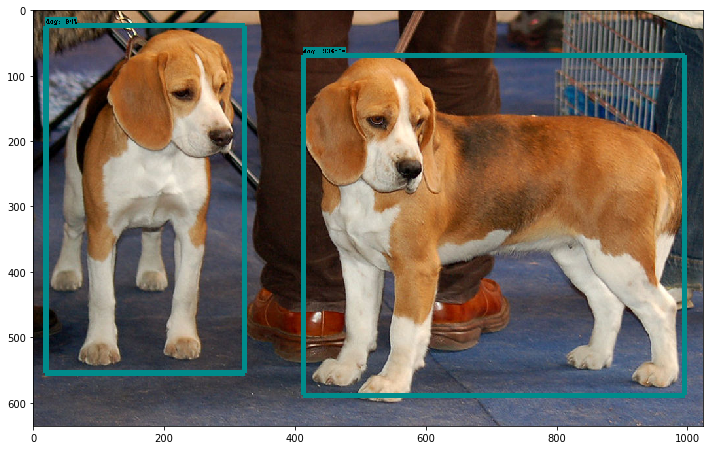

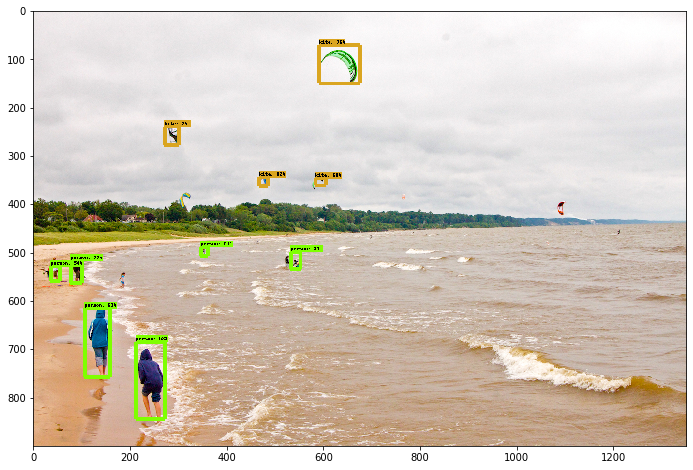

In [11]:
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=(IMAGE_SIZE))
  plt.imshow(image_np)

In [12]:
!pwd

/content/models/research


In [13]:
cd object_detection

/content/models/research/object_detection


In [14]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET


def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(float(member[4][0].text)),
                     int(float(member[4][1].text)),
                     int(float(member[4][2].text)),
                     int(float(member[4][3].text))
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def main():
    for folder in ['train','test']:
        image_path = os.path.join(os.getcwd(), ('images/' + folder))
        xml_df = xml_to_csv(image_path)
        xml_df.to_csv(('images/' + folder + '_labels.csv'), index=None)
        print('Successfully converted xml to csv.')


main()

Successfully converted xml to csv.
Successfully converted xml to csv.


In [15]:
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

def class_text_to_int(row_label):
    if row_label == 'Name:banana_brain food':
        return 1
    elif row_label == 'Name:beans_brain food':
        return 2
    elif row_label == 'Name:cheese_brain food':
        return 3
    elif row_label == 'Name:chicken breast_brain food':
        return 4
    elif row_label == 'Name:egg_brain food':
        return 5
    elif row_label == 'Name:green pea_brain food':
        return 6
    elif row_label == 'Name:liver_brain food':
        return 7
    elif row_label == 'Name:milk_brain food':
        return 8
    elif row_label == 'Name:mushroom_brain food':
        return 9
    elif row_label == 'Name:oat_brain food':
        return 10
    elif row_label == 'Name:oyster_brain food':
        return 11
    elif row_label == 'Name:peanut butter_brain food':
        return 12
    elif row_label == 'Name:salmon_brain food':
        return 13
    elif row_label == 'Name:sardine_brain food':
        return 14
    elif row_label == 'Name:spinach_brain food':
        return 15
    elif row_label == 'Name:sweet potato_brain food':
        return 16
    elif row_label == 'Name:tofu_brain food':
        return 17
    elif row_label == 'Name:tuna_brain food':
        return 18
    elif row_label == 'Name:vegetable oil_brain food':
        return 19
    elif row_label == 'Name:yeast spread_brain food':
        return 20
    else:
        return 0


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))
        
    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    
    return tf_example


def main():
    for item in ['test', 'train']:
      output_path = "{}.record".format(item)
      writer = tf.python_io.TFRecordWriter(output_path)
      path = os.path.join(os.getcwd(), "images/{}".format(item))
      examples = pd.read_csv("images/{}_labels.csv".format(item))
      grouped = split(examples, 'filename')
      for group in grouped:
          tf_example = create_tf_example(group, path)
          writer.write(tf_example.SerializeToString())

      writer.close()
      output_path = os.path.join(os.getcwd(), output_path)
      print('Successfully created the TFRecords: {}'.format(output_path))

main()

Successfully created the TFRecords: /content/models/research/object_detection/test.record
Successfully created the TFRecords: /content/models/research/object_detection/train.record


In [16]:
%%writefile training/labelmap.pbtxt
item {
  id: 1
  name: 'banana_brain food'
}

item {
  id: 2
  name: 'beans_brain food'
}

item {
  id: 3
  name: 'cheese_brain food'
}
item {
  id: 4
  name: 'chicken breast_brain food'
}
item {
  id: 5
  name: 'egg_brain food'
}
item {
  id: 6
  name: 'green pea_brain food'
}
item {
  id: 7
  name: 'liver_brain food'
}
item {
  id: 8
  name: 'milk_brain food'
}
item {
  id: 9
  name: 'mushroom_brain food'
}
item {
  id: 10
  name: 'oat_brain food'
}
item {
  id: 11
  name: 'oyster_brain food'
}
item {
  id: 12
  name: 'peanut butter_brain food'
}
item {
  id: 13
  name: 'salmon_brain food'
}
item {
  id: 14
  name: 'sardine_brain food'
}
item {
  id: 15
  name: 'spinach_brain food'
}
item {
  id: 16
  name: 'sweet potato_brain food'
}
item {
  id: 17
  name: 'tofu_brain food'
}
item {
  id: 18
  name: 'tuna_brain food'
}
item {
  id: 19
  name: 'vegetable oil_brain food'
}
item {
  id: 20
  name: 'yeast spread_brain food'
}

Writing training/labelmap.pbtxt


In [17]:
import os
test_path = "images/test"
len_dir = len(os.listdir(test_path))
print("{} imagens inside the {}".format(len_dir, test_path))

401 imagens inside the images/test


In [18]:
%%writefile training/faster_rcnn_inception_v2.config

model {
  faster_rcnn {
    num_classes: 5
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 600
        max_dimension: 1024
      }
    }
    feature_extractor {
      type: 'faster_rcnn_inception_v2'
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 14
    maxpool_kernel_size: 2
    maxpool_stride: 2
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 300
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
  }
}

train_config: {
  batch_size: 1
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        manual_step_learning_rate {
          initial_learning_rate: 0.0002
          schedule {
            step: 900000
            learning_rate: .00002
          }
          schedule {
            step: 1200000
            learning_rate: .000002
          }
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint: "/content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt"
  from_detection_checkpoint: true
  load_all_detection_checkpoint_vars: true
  # Note: The below line limits the training process to 200K steps, which we
  # empirically found to be sufficient enough to train the pets dataset. This
  # effectively bypasses the learning rate schedule (the learning rate will
  # never decay). Remove the below line to train indefinitely.
  num_steps: 200000
  data_augmentation_options {
    random_horizontal_flip {
    }
  }
}


train_input_reader: {
  tf_record_input_reader {
    input_path: "/content/models/research/object_detection/train.record"
  }
  label_map_path: "/content/models/research/object_detection/training/labelmap.pbtxt"
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  num_examples: 400
}

eval_input_reader: {
  tf_record_input_reader {
    input_path: "/content/models/research/object_detection/test.record"
  }
  label_map_path: "/content/models/research/object_detection/training/labelmap.pbtxt"
  shuffle: false
  num_readers: 1
}

Writing training/faster_rcnn_inception_v2.config


In [19]:
%cd ..
!protoc ./object_detection/protos/*.proto --python_out=.
!python3 setup.py build
!python3 setup.py install
%cd object_detection

/content/models/research
running build
running build_py
copying object_detection/protos/pipeline_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/optimizer_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/train_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/target_assigner_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/input_reader_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/preprocessor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/string_int_label_map_pb2.py -> build/li

In [0]:
!cp -a ../slim/. .

In [21]:
%run legacy/train.py --logtostderr --train_dir=training/ --pipeline_config_path=training/faster_rcnn_inception_v2.config

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.






Instructions for updating:
Use object_detection/model_main.py.


W1118 20:14:50.519890 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/absl/app.py:250: main (from __main__) is deprecated and will be removed in a future version.
Instructions for updating:
Use object_detection/model_main.py.


W1118 20:14:50.523598 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/train.py:91: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.



W1118 20:14:50.535879 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/train.py:96: The name tf.gfile.Copy is deprecated. Please use tf.io.gfile.copy instead.



Instructions for updating:
Please switch to tf.train.create_global_step


W1118 20:14:50.547857 140630123997056 deprecation.py:323] From /content/models/research/object_detection/legacy/trainer.py:267: create_global_step (from tensorflow.contrib.framework.python.ops.variables) is deprecated and will be removed in a future version.
Instructions for updating:
Please switch to tf.train.create_global_step


W1118 20:14:50.561031 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/data_decoders/tf_example_decoder.py:182: The name tf.FixedLenFeature is deprecated. Please use tf.io.FixedLenFeature instead.



W1118 20:14:50.565065 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/data_decoders/tf_example_decoder.py:197: The name tf.VarLenFeature is deprecated. Please use tf.io.VarLenFeature instead.



W1118 20:14:50.595854 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/builders/dataset_builder.py:64: The name tf.gfile.Glob is deprecated. Please use tf.io.gfile.glob instead.



W1118 20:14:50.600983 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/builders/dataset_builder.py:71: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.



W1118 20:14:50.603909 140630123997056 dataset_builder.py:72] num_readers has been reduced to 1 to match input file shards.


Instructions for updating:
Use `tf.data.experimental.parallel_interleave(...)`.


W1118 20:14:50.620408 140630123997056 deprecation.py:323] From /content/models/research/object_detection/builders/dataset_builder.py:86: parallel_interleave (from tensorflow.contrib.data.python.ops.interleave_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.experimental.parallel_interleave(...)`.


Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_determinstic`.


W1118 20:14:50.622985 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/contrib/data/python/ops/interleave_ops.py:77: parallel_interleave (from tensorflow.python.data.experimental.ops.interleave_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_determinstic`.


Instructions for updating:
Use `tf.data.Dataset.map()


W1118 20:14:50.671779 140630123997056 deprecation.py:323] From /content/models/research/object_detection/builders/dataset_builder.py:155: DatasetV1.map_with_legacy_function (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.Dataset.map()


Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.


W1118 20:14:51.568264 140630123997056 deprecation.py:323] From /content/models/research/object_detection/builders/dataset_builder.py:43: DatasetV1.make_initializable_iterator (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.


W1118 20:14:51.585914 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/builders/dataset_builder.py:44: The name tf.add_to_collection is deprecated. Please use tf.compat.v1.add_to_collection instead.



W1118 20:14:51.596940 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/preprocessor.py:627: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.



Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.Dataset.batch(batch_size)` (or `padded_batch(...)` if `dynamic_pad=True`).


W1118 20:14:51.660675 140630123997056 deprecation.py:323] From /content/models/research/object_detection/core/batcher.py:101: batch (from tensorflow.python.training.input) is deprecated and will be removed in a future version.
Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.Dataset.batch(batch_size)` (or `padded_batch(...)` if `dynamic_pad=True`).


Instructions for updating:
To construct input pipelines, use the `tf.data` module.


W1118 20:14:51.673295 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/training/input.py:752: QueueRunner.__init__ (from tensorflow.python.training.queue_runner_impl) is deprecated and will be removed in a future version.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.


Instructions for updating:
To construct input pipelines, use the `tf.data` module.


W1118 20:14:51.678241 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/training/input.py:752: add_queue_runner (from tensorflow.python.training.queue_runner_impl) is deprecated and will be removed in a future version.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.


W1118 20:14:51.697904 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/prefetcher.py:51: The name tf.PaddingFIFOQueue is deprecated. Please use tf.queue.PaddingFIFOQueue instead.



W1118 20:14:51.707768 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/prefetcher.py:58: The name tf.summary.scalar is deprecated. Please use tf.compat.v1.summary.scalar instead.



W1118 20:14:51.716226 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:286: The name tf.get_collection is deprecated. Please use tf.compat.v1.get_collection instead.



W1118 20:14:51.719684 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/deployment/model_deploy.py:192: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.



W1118 20:14:51.722951 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/deployment/model_deploy.py:192: The name tf.get_variable_scope is deprecated. Please use tf.compat.v1.get_variable_scope instead.



W1118 20:14:51.804368 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/preprocessor.py:2689: The name tf.image.resize_images is deprecated. Please use tf.image.resize instead.



Instructions for updating:
Please use `layer.__call__` method instead.


W1118 20:14:51.871155 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/contrib/layers/python/layers/layers.py:2784: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.


W1118 20:14:53.811878 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/anchor_generator.py:171: The name tf.assert_equal is deprecated. Please use tf.compat.v1.assert_equal instead.



INFO:tensorflow:Scale of 0 disables regularizer.


I1118 20:14:53.829411 140630123997056 regularizers.py:98] Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


I1118 20:14:53.855139 140630123997056 regularizers.py:98] Scale of 0 disables regularizer.


W1118 20:14:53.857554 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/predictors/convolutional_box_predictor.py:150: The name tf.logging.info is deprecated. Please use tf.compat.v1.logging.info instead.



INFO:tensorflow:depth of additional conv before box predictor: 0


I1118 20:14:53.860153 140630123997056 convolutional_box_predictor.py:151] depth of additional conv before box predictor: 0


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


W1118 20:14:53.926338 140630123997056 deprecation.py:323] From /content/models/research/object_detection/core/box_list_ops.py:174: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


W1118 20:14:54.702744 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/box_coders/faster_rcnn_box_coder.py:82: The name tf.log is deprecated. Please use tf.math.log instead.



W1118 20:14:54.772101 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/minibatch_sampler.py:85: The name tf.random_shuffle is deprecated. Please use tf.random.shuffle instead.



Instructions for updating:
box_ind is deprecated, use box_indices instead


W1118 20:14:55.074436 140630123997056 deprecation.py:506] From /content/models/research/object_detection/utils/spatial_transform_ops.py:419: calling crop_and_resize_v1 (from tensorflow.python.ops.image_ops_impl) with box_ind is deprecated and will be removed in a future version.
Instructions for updating:
box_ind is deprecated, use box_indices instead


W1118 20:14:55.099852 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/meta_architectures/faster_rcnn_meta_arch.py:191: The name tf.AUTO_REUSE is deprecated. Please use tf.compat.v1.AUTO_REUSE instead.



Instructions for updating:
Use keras.layers.flatten instead.


W1118 20:14:55.770243 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/contrib/layers/python/layers/layers.py:1634: flatten (from tensorflow.python.layers.core) is deprecated and will be removed in a future version.
Instructions for updating:
Use keras.layers.flatten instead.


INFO:tensorflow:Scale of 0 disables regularizer.


I1118 20:14:55.777288 140630123997056 regularizers.py:98] Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


I1118 20:14:55.817130 140630123997056 regularizers.py:98] Scale of 0 disables regularizer.


W1118 20:14:56.151742 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/losses.py:177: The name tf.losses.huber_loss is deprecated. Please use tf.compat.v1.losses.huber_loss instead.



W1118 20:14:56.156063 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/core/losses.py:183: The name tf.losses.Reduction is deprecated. Please use tf.compat.v1.losses.Reduction instead.



Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.



W1118 20:14:56.226809 140630123997056 deprecation.py:323] From /content/models/research/object_detection/core/losses.py:350: softmax_cross_entropy_with_logits (from tensorflow.python.ops.nn_ops) is deprecated and will be removed in a future version.
Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.



W1118 20:14:56.726158 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:209: The name tf.losses.add_loss is deprecated. Please use tf.compat.v1.losses.add_loss instead.



W1118 20:14:56.728953 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/builders/optimizer_builder.py:157: The name tf.train.get_or_create_global_step is deprecated. Please use tf.compat.v1.train.get_or_create_global_step instead.



W1118 20:14:56.747939 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/builders/optimizer_builder.py:58: The name tf.train.MomentumOptimizer is deprecated. Please use tf.compat.v1.train.MomentumOptimizer instead.

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


W1118 20:14:58.862621 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:323: The name tf.check_numerics is deprecated. Please use tf.debugging.check_numerics instead.



W1118 20:15:02.714108 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:354: The name tf.summary.histogram is deprecated. Please use tf.compat.v1.summary.histogram instead.



W1118 20:15:03.157022 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:356: The name tf.losses.get_losses is deprecated. Please use tf.compat.v1.losses.get_losses instead.



W1118 20:15:03.168429 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:360: The name tf.losses.get_total_loss is deprecated. Please use tf.compat.v1.losses.get_total_loss instead.



W1118 20:15:03.179015 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:369: The name tf.summary.merge is deprecated. Please use tf.compat.v1.summary.merge instead.



W1118 20:15:03.199900 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:372: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



W1118 20:15:03.201985 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/legacy/trainer.py:377: The name tf.train.Saver is deprecated. Please use tf.compat.v1.train.Saver instead.



W1118 20:15:03.761436 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/utils/variables_helper.py:179: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



Instructions for updating:
Please switch to tf.train.get_or_create_global_step


W1118 20:15:03.767091 140630123997056 deprecation.py:323] From /content/models/research/object_detection/meta_architectures/faster_rcnn_meta_arch.py:2768: get_or_create_global_step (from tensorflow.contrib.framework.python.ops.variables) is deprecated and will be removed in a future version.
Instructions for updating:
Please switch to tf.train.get_or_create_global_step


W1118 20:15:03.772722 140630123997056 module_wrapper.py:139] From /content/models/research/object_detection/utils/variables_helper.py:139: The name tf.train.NewCheckpointReader is deprecated. Please use tf.compat.v1.train.NewCheckpointReader instead.

W1118 20:15:03.780384 140630123997056 variables_helper.py:157] Variable [Conv/biases/Momentum] is not available in checkpoint
W1118 20:15:03.781910 140630123997056 variables_helper.py:157] Variable [Conv/weights/Momentum] is not available in checkpoint
W1118 20:15:03.783325 140630123997056 variables_helper.py:157] Variable [FirstStageBoxPredictor/BoxEncodingPredictor/biases/Momentum] is not available in checkpoint
W1118 20:15:03.784659 140630123997056 variables_helper.py:157] Variable [FirstStageBoxPredictor/BoxEncodingPredictor/weights/Momentum] is not available in checkpoint
W1118 20:15:03.786092 140630123997056 variables_helper.py:157] Variable [FirstStageBoxPredictor/ClassPredictor/biases/Momentum] is not available in checkpoint
W1118

Instructions for updating:
Please switch to tf.train.MonitoredTrainingSession


W1118 20:15:05.270017 140630123997056 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/contrib/slim/python/slim/learning.py:742: Supervisor.__init__ (from tensorflow.python.training.supervisor) is deprecated and will be removed in a future version.
Instructions for updating:
Please switch to tf.train.MonitoredTrainingSession


INFO:tensorflow:Restoring parameters from /content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt


I1118 20:15:08.056409 140630123997056 saver.py:1284] Restoring parameters from /content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt


INFO:tensorflow:Running local_init_op.


I1118 20:15:08.717823 140630123997056 session_manager.py:500] Running local_init_op.


INFO:tensorflow:Done running local_init_op.


I1118 20:15:09.191386 140630123997056 session_manager.py:502] Done running local_init_op.


INFO:tensorflow:Starting Session.


I1118 20:15:15.607910 140630123997056 learning.py:754] Starting Session.


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 20:15:15.920518 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Starting Queues.


I1118 20:15:15.933060 140630123997056 learning.py:768] Starting Queues.


INFO:tensorflow:Recording summary at step 0.


I1118 20:15:20.918313 140626670511872 supervisor.py:1050] Recording summary at step 0.


INFO:tensorflow:global_step/sec: 0


I1118 20:15:24.374515 140626687833856 supervisor.py:1099] global_step/sec: 0


INFO:tensorflow:global step 1: loss = 3.3586 (12.179 sec/step)


I1118 20:15:28.434467 140630123997056 learning.py:507] global step 1: loss = 3.3586 (12.179 sec/step)


INFO:tensorflow:global step 2: loss = 2.9803 (0.273 sec/step)


I1118 20:15:29.060695 140630123997056 learning.py:507] global step 2: loss = 2.9803 (0.273 sec/step)


INFO:tensorflow:global step 3: loss = 3.5184 (0.264 sec/step)


I1118 20:15:29.332892 140630123997056 learning.py:507] global step 3: loss = 3.5184 (0.264 sec/step)


INFO:tensorflow:global step 4: loss = 3.3730 (0.271 sec/step)


I1118 20:15:29.613148 140630123997056 learning.py:507] global step 4: loss = 3.3730 (0.271 sec/step)


INFO:tensorflow:global step 5: loss = 2.8156 (0.277 sec/step)


I1118 20:15:29.897491 140630123997056 learning.py:507] global step 5: loss = 2.8156 (0.277 sec/step)


INFO:tensorflow:global step 6: loss = 2.5441 (0.266 sec/step)


I1118 20:15:30.169689 140630123997056 learning.py:507] global step 6: loss = 2.5441 (0.266 sec/step)


INFO:tensorflow:global step 7: loss = 3.7728 (0.266 sec/step)


I1118 20:15:30.441684 140630123997056 learning.py:507] global step 7: loss = 3.7728 (0.266 sec/step)


INFO:tensorflow:global step 8: loss = 3.2924 (0.288 sec/step)


I1118 20:15:30.735423 140630123997056 learning.py:507] global step 8: loss = 3.2924 (0.288 sec/step)


INFO:tensorflow:global step 9: loss = 2.2741 (0.268 sec/step)


I1118 20:15:31.013670 140630123997056 learning.py:507] global step 9: loss = 2.2741 (0.268 sec/step)


INFO:tensorflow:global step 10: loss = 1.6981 (0.269 sec/step)


I1118 20:15:31.290993 140630123997056 learning.py:507] global step 10: loss = 1.6981 (0.269 sec/step)


INFO:tensorflow:global step 11: loss = 1.4586 (0.264 sec/step)


I1118 20:15:31.564073 140630123997056 learning.py:507] global step 11: loss = 1.4586 (0.264 sec/step)


INFO:tensorflow:global step 12: loss = 1.5314 (0.270 sec/step)


I1118 20:15:31.842732 140630123997056 learning.py:507] global step 12: loss = 1.5314 (0.270 sec/step)


INFO:tensorflow:global step 13: loss = 1.4434 (0.275 sec/step)


I1118 20:15:32.126354 140630123997056 learning.py:507] global step 13: loss = 1.4434 (0.275 sec/step)


INFO:tensorflow:global step 14: loss = 1.2915 (0.260 sec/step)


I1118 20:15:32.394902 140630123997056 learning.py:507] global step 14: loss = 1.2915 (0.260 sec/step)


INFO:tensorflow:global step 15: loss = 0.6205 (0.249 sec/step)


I1118 20:15:32.652873 140630123997056 learning.py:507] global step 15: loss = 0.6205 (0.249 sec/step)


INFO:tensorflow:global step 16: loss = 0.8256 (0.274 sec/step)


I1118 20:15:32.937625 140630123997056 learning.py:507] global step 16: loss = 0.8256 (0.274 sec/step)


INFO:tensorflow:global step 17: loss = 0.4794 (0.274 sec/step)


I1118 20:15:33.221250 140630123997056 learning.py:507] global step 17: loss = 0.4794 (0.274 sec/step)


INFO:tensorflow:global step 18: loss = 0.5097 (0.257 sec/step)


I1118 20:15:33.487777 140630123997056 learning.py:507] global step 18: loss = 0.5097 (0.257 sec/step)


INFO:tensorflow:global step 19: loss = 2.7594 (0.262 sec/step)


I1118 20:15:33.756838 140630123997056 learning.py:507] global step 19: loss = 2.7594 (0.262 sec/step)


INFO:tensorflow:global step 20: loss = 0.2885 (0.268 sec/step)


I1118 20:15:34.031823 140630123997056 learning.py:507] global step 20: loss = 0.2885 (0.268 sec/step)


INFO:tensorflow:global step 21: loss = 0.1739 (0.262 sec/step)


I1118 20:15:34.302396 140630123997056 learning.py:507] global step 21: loss = 0.1739 (0.262 sec/step)


INFO:tensorflow:global step 22: loss = 0.6040 (0.287 sec/step)


I1118 20:15:34.594246 140630123997056 learning.py:507] global step 22: loss = 0.6040 (0.287 sec/step)


INFO:tensorflow:global step 23: loss = 1.3871 (0.273 sec/step)


I1118 20:15:34.872113 140630123997056 learning.py:507] global step 23: loss = 1.3871 (0.273 sec/step)


INFO:tensorflow:global step 24: loss = 0.4868 (0.266 sec/step)


I1118 20:15:35.143204 140630123997056 learning.py:507] global step 24: loss = 0.4868 (0.266 sec/step)


INFO:tensorflow:global step 25: loss = 2.4155 (0.260 sec/step)


I1118 20:15:35.414826 140630123997056 learning.py:507] global step 25: loss = 2.4155 (0.260 sec/step)


INFO:tensorflow:global step 26: loss = 0.6607 (0.267 sec/step)


I1118 20:15:35.691873 140630123997056 learning.py:507] global step 26: loss = 0.6607 (0.267 sec/step)


INFO:tensorflow:global step 27: loss = 0.4589 (0.266 sec/step)


I1118 20:15:35.966907 140630123997056 learning.py:507] global step 27: loss = 0.4589 (0.266 sec/step)


INFO:tensorflow:global step 28: loss = 0.0897 (0.250 sec/step)


I1118 20:15:36.225017 140630123997056 learning.py:507] global step 28: loss = 0.0897 (0.250 sec/step)


INFO:tensorflow:global step 29: loss = 2.1019 (0.262 sec/step)


I1118 20:15:36.495471 140630123997056 learning.py:507] global step 29: loss = 2.1019 (0.262 sec/step)


INFO:tensorflow:global step 30: loss = 1.6554 (0.267 sec/step)


I1118 20:15:36.772046 140630123997056 learning.py:507] global step 30: loss = 1.6554 (0.267 sec/step)


INFO:tensorflow:global step 31: loss = 0.0970 (0.279 sec/step)


I1118 20:15:37.060309 140630123997056 learning.py:507] global step 31: loss = 0.0970 (0.279 sec/step)


INFO:tensorflow:global step 32: loss = 0.6839 (0.262 sec/step)


I1118 20:15:37.332677 140630123997056 learning.py:507] global step 32: loss = 0.6839 (0.262 sec/step)


INFO:tensorflow:global step 33: loss = 0.3816 (0.265 sec/step)


I1118 20:15:37.607513 140630123997056 learning.py:507] global step 33: loss = 0.3816 (0.265 sec/step)


INFO:tensorflow:global step 34: loss = 0.2980 (0.249 sec/step)


I1118 20:15:37.862290 140630123997056 learning.py:507] global step 34: loss = 0.2980 (0.249 sec/step)


INFO:tensorflow:global step 35: loss = 0.3925 (0.261 sec/step)


I1118 20:15:38.128977 140630123997056 learning.py:507] global step 35: loss = 0.3925 (0.261 sec/step)


INFO:tensorflow:global step 36: loss = 0.3154 (0.265 sec/step)


I1118 20:15:38.402990 140630123997056 learning.py:507] global step 36: loss = 0.3154 (0.265 sec/step)


INFO:tensorflow:global step 37: loss = 0.1079 (0.267 sec/step)


I1118 20:15:38.677592 140630123997056 learning.py:507] global step 37: loss = 0.1079 (0.267 sec/step)


INFO:tensorflow:global step 38: loss = 0.6342 (0.272 sec/step)


I1118 20:15:38.957487 140630123997056 learning.py:507] global step 38: loss = 0.6342 (0.272 sec/step)


INFO:tensorflow:global step 39: loss = 0.2453 (0.272 sec/step)


I1118 20:15:39.234184 140630123997056 learning.py:507] global step 39: loss = 0.2453 (0.272 sec/step)


INFO:tensorflow:global step 40: loss = 0.8291 (0.264 sec/step)


I1118 20:15:39.506879 140630123997056 learning.py:507] global step 40: loss = 0.8291 (0.264 sec/step)


INFO:tensorflow:global step 41: loss = 0.2957 (0.260 sec/step)


I1118 20:15:39.774803 140630123997056 learning.py:507] global step 41: loss = 0.2957 (0.260 sec/step)


INFO:tensorflow:global step 42: loss = 0.2772 (0.273 sec/step)


I1118 20:15:40.056081 140630123997056 learning.py:507] global step 42: loss = 0.2772 (0.273 sec/step)


INFO:tensorflow:global step 43: loss = 0.1960 (0.264 sec/step)


I1118 20:15:40.328795 140630123997056 learning.py:507] global step 43: loss = 0.1960 (0.264 sec/step)


INFO:tensorflow:global step 44: loss = 2.0146 (0.269 sec/step)


I1118 20:15:40.605745 140630123997056 learning.py:507] global step 44: loss = 2.0146 (0.269 sec/step)


INFO:tensorflow:global step 45: loss = 0.2281 (0.259 sec/step)


I1118 20:15:40.873100 140630123997056 learning.py:507] global step 45: loss = 0.2281 (0.259 sec/step)


INFO:tensorflow:global step 46: loss = 0.1706 (0.254 sec/step)


I1118 20:15:41.135370 140630123997056 learning.py:507] global step 46: loss = 0.1706 (0.254 sec/step)


INFO:tensorflow:global step 47: loss = 0.5379 (0.259 sec/step)


I1118 20:15:41.400415 140630123997056 learning.py:507] global step 47: loss = 0.5379 (0.259 sec/step)


INFO:tensorflow:global step 48: loss = 0.1754 (0.259 sec/step)


I1118 20:15:41.668971 140630123997056 learning.py:507] global step 48: loss = 0.1754 (0.259 sec/step)


INFO:tensorflow:global step 49: loss = 0.4404 (0.270 sec/step)


I1118 20:15:41.949988 140630123997056 learning.py:507] global step 49: loss = 0.4404 (0.270 sec/step)


INFO:tensorflow:global step 50: loss = 0.2861 (0.270 sec/step)


I1118 20:15:42.228849 140630123997056 learning.py:507] global step 50: loss = 0.2861 (0.270 sec/step)


INFO:tensorflow:global step 51: loss = 0.3466 (0.287 sec/step)


I1118 20:15:42.526495 140630123997056 learning.py:507] global step 51: loss = 0.3466 (0.287 sec/step)


INFO:tensorflow:global step 52: loss = 1.7211 (0.260 sec/step)


I1118 20:15:42.794203 140630123997056 learning.py:507] global step 52: loss = 1.7211 (0.260 sec/step)


INFO:tensorflow:global step 53: loss = 0.1794 (0.256 sec/step)


I1118 20:15:43.056428 140630123997056 learning.py:507] global step 53: loss = 0.1794 (0.256 sec/step)


INFO:tensorflow:global step 54: loss = 0.8203 (0.249 sec/step)


I1118 20:15:43.311334 140630123997056 learning.py:507] global step 54: loss = 0.8203 (0.249 sec/step)


INFO:tensorflow:global step 55: loss = 0.2172 (0.258 sec/step)


I1118 20:15:43.579715 140630123997056 learning.py:507] global step 55: loss = 0.2172 (0.258 sec/step)


INFO:tensorflow:global step 56: loss = 0.5044 (0.275 sec/step)


I1118 20:15:43.866161 140630123997056 learning.py:507] global step 56: loss = 0.5044 (0.275 sec/step)


INFO:tensorflow:global step 57: loss = 1.7417 (0.270 sec/step)


I1118 20:15:44.143304 140630123997056 learning.py:507] global step 57: loss = 1.7417 (0.270 sec/step)


INFO:tensorflow:global step 58: loss = 0.2476 (0.251 sec/step)


I1118 20:15:44.402970 140630123997056 learning.py:507] global step 58: loss = 0.2476 (0.251 sec/step)


INFO:tensorflow:global step 59: loss = 0.1397 (0.248 sec/step)


I1118 20:15:44.658037 140630123997056 learning.py:507] global step 59: loss = 0.1397 (0.248 sec/step)


INFO:tensorflow:global step 60: loss = 0.4985 (0.266 sec/step)


I1118 20:15:44.932672 140630123997056 learning.py:507] global step 60: loss = 0.4985 (0.266 sec/step)


INFO:tensorflow:global step 61: loss = 0.2108 (0.272 sec/step)


I1118 20:15:45.210702 140630123997056 learning.py:507] global step 61: loss = 0.2108 (0.272 sec/step)


INFO:tensorflow:global step 62: loss = 0.0739 (0.253 sec/step)


I1118 20:15:45.470040 140630123997056 learning.py:507] global step 62: loss = 0.0739 (0.253 sec/step)


INFO:tensorflow:global step 63: loss = 2.2229 (0.285 sec/step)


I1118 20:15:45.759124 140630123997056 learning.py:507] global step 63: loss = 2.2229 (0.285 sec/step)


INFO:tensorflow:global step 64: loss = 2.0202 (0.252 sec/step)


I1118 20:15:46.015520 140630123997056 learning.py:507] global step 64: loss = 2.0202 (0.252 sec/step)


INFO:tensorflow:global step 65: loss = 0.3732 (0.270 sec/step)


I1118 20:15:46.291229 140630123997056 learning.py:507] global step 65: loss = 0.3732 (0.270 sec/step)


INFO:tensorflow:global step 66: loss = 2.9248 (0.267 sec/step)


I1118 20:15:46.563690 140630123997056 learning.py:507] global step 66: loss = 2.9248 (0.267 sec/step)


INFO:tensorflow:global step 67: loss = 1.8635 (0.258 sec/step)


I1118 20:15:46.829437 140630123997056 learning.py:507] global step 67: loss = 1.8635 (0.258 sec/step)


INFO:tensorflow:global step 68: loss = 0.1416 (0.263 sec/step)


I1118 20:15:47.102653 140630123997056 learning.py:507] global step 68: loss = 0.1416 (0.263 sec/step)


INFO:tensorflow:global step 69: loss = 0.2239 (0.258 sec/step)


I1118 20:15:47.368485 140630123997056 learning.py:507] global step 69: loss = 0.2239 (0.258 sec/step)


INFO:tensorflow:global step 70: loss = 0.2733 (0.254 sec/step)


I1118 20:15:47.629884 140630123997056 learning.py:507] global step 70: loss = 0.2733 (0.254 sec/step)


INFO:tensorflow:global step 71: loss = 0.1739 (0.277 sec/step)


I1118 20:15:47.914725 140630123997056 learning.py:507] global step 71: loss = 0.1739 (0.277 sec/step)


INFO:tensorflow:global step 72: loss = 0.7423 (0.275 sec/step)


I1118 20:15:48.193962 140630123997056 learning.py:507] global step 72: loss = 0.7423 (0.275 sec/step)


INFO:tensorflow:global step 73: loss = 0.0845 (0.253 sec/step)


I1118 20:15:48.453393 140630123997056 learning.py:507] global step 73: loss = 0.0845 (0.253 sec/step)


INFO:tensorflow:global step 74: loss = 0.1494 (0.272 sec/step)


I1118 20:15:48.729657 140630123997056 learning.py:507] global step 74: loss = 0.1494 (0.272 sec/step)


INFO:tensorflow:global step 75: loss = 0.3262 (0.264 sec/step)


I1118 20:15:48.999263 140630123997056 learning.py:507] global step 75: loss = 0.3262 (0.264 sec/step)


INFO:tensorflow:global step 76: loss = 0.2658 (0.260 sec/step)


I1118 20:15:49.264417 140630123997056 learning.py:507] global step 76: loss = 0.2658 (0.260 sec/step)


INFO:tensorflow:global step 77: loss = 0.1119 (0.260 sec/step)


I1118 20:15:49.529424 140630123997056 learning.py:507] global step 77: loss = 0.1119 (0.260 sec/step)


INFO:tensorflow:global step 78: loss = 0.1108 (0.265 sec/step)


I1118 20:15:49.803169 140630123997056 learning.py:507] global step 78: loss = 0.1108 (0.265 sec/step)


INFO:tensorflow:global step 79: loss = 0.1777 (0.271 sec/step)


I1118 20:15:50.081627 140630123997056 learning.py:507] global step 79: loss = 0.1777 (0.271 sec/step)


INFO:tensorflow:global step 80: loss = 0.3615 (0.272 sec/step)


I1118 20:15:50.362863 140630123997056 learning.py:507] global step 80: loss = 0.3615 (0.272 sec/step)


INFO:tensorflow:global step 81: loss = 1.5079 (0.264 sec/step)


I1118 20:15:50.635877 140630123997056 learning.py:507] global step 81: loss = 1.5079 (0.264 sec/step)


INFO:tensorflow:global step 82: loss = 0.1461 (0.265 sec/step)


I1118 20:15:50.910235 140630123997056 learning.py:507] global step 82: loss = 0.1461 (0.265 sec/step)


INFO:tensorflow:global step 83: loss = 0.2226 (0.249 sec/step)


I1118 20:15:51.167890 140630123997056 learning.py:507] global step 83: loss = 0.2226 (0.249 sec/step)


INFO:tensorflow:global step 84: loss = 0.2349 (0.264 sec/step)


I1118 20:15:51.441320 140630123997056 learning.py:507] global step 84: loss = 0.2349 (0.264 sec/step)


INFO:tensorflow:global step 85: loss = 0.3517 (0.254 sec/step)


I1118 20:15:51.703080 140630123997056 learning.py:507] global step 85: loss = 0.3517 (0.254 sec/step)


INFO:tensorflow:global step 86: loss = 2.2586 (0.262 sec/step)


I1118 20:15:51.973487 140630123997056 learning.py:507] global step 86: loss = 2.2586 (0.262 sec/step)


INFO:tensorflow:global step 87: loss = 0.0951 (0.259 sec/step)


I1118 20:15:52.240055 140630123997056 learning.py:507] global step 87: loss = 0.0951 (0.259 sec/step)


INFO:tensorflow:global step 88: loss = 1.3580 (0.255 sec/step)


I1118 20:15:52.499730 140630123997056 learning.py:507] global step 88: loss = 1.3580 (0.255 sec/step)


INFO:tensorflow:global step 89: loss = 0.0615 (0.261 sec/step)


I1118 20:15:52.769967 140630123997056 learning.py:507] global step 89: loss = 0.0615 (0.261 sec/step)


INFO:tensorflow:global step 90: loss = 0.9030 (0.260 sec/step)


I1118 20:15:53.039021 140630123997056 learning.py:507] global step 90: loss = 0.9030 (0.260 sec/step)


INFO:tensorflow:global step 91: loss = 0.6703 (0.255 sec/step)


I1118 20:15:53.298550 140630123997056 learning.py:507] global step 91: loss = 0.6703 (0.255 sec/step)


INFO:tensorflow:global step 92: loss = 0.1306 (0.259 sec/step)


I1118 20:15:53.565762 140630123997056 learning.py:507] global step 92: loss = 0.1306 (0.259 sec/step)


INFO:tensorflow:global step 93: loss = 0.5974 (0.257 sec/step)


I1118 20:15:53.831924 140630123997056 learning.py:507] global step 93: loss = 0.5974 (0.257 sec/step)


INFO:tensorflow:global step 94: loss = 0.2328 (0.239 sec/step)


I1118 20:15:54.079257 140630123997056 learning.py:507] global step 94: loss = 0.2328 (0.239 sec/step)


INFO:tensorflow:global step 95: loss = 0.2657 (0.253 sec/step)


I1118 20:15:54.340031 140630123997056 learning.py:507] global step 95: loss = 0.2657 (0.253 sec/step)


INFO:tensorflow:global step 96: loss = 0.4480 (0.265 sec/step)


I1118 20:15:54.610037 140630123997056 learning.py:507] global step 96: loss = 0.4480 (0.265 sec/step)


INFO:tensorflow:global step 97: loss = 0.0722 (0.256 sec/step)


I1118 20:15:54.870205 140630123997056 learning.py:507] global step 97: loss = 0.0722 (0.256 sec/step)


INFO:tensorflow:global step 98: loss = 0.2953 (0.257 sec/step)


I1118 20:15:55.132031 140630123997056 learning.py:507] global step 98: loss = 0.2953 (0.257 sec/step)


INFO:tensorflow:global step 99: loss = 0.4170 (0.257 sec/step)


I1118 20:15:55.397381 140630123997056 learning.py:507] global step 99: loss = 0.4170 (0.257 sec/step)


INFO:tensorflow:global step 100: loss = 1.5496 (0.272 sec/step)


I1118 20:15:55.676317 140630123997056 learning.py:507] global step 100: loss = 1.5496 (0.272 sec/step)


INFO:tensorflow:global step 101: loss = 0.6206 (0.267 sec/step)


I1118 20:15:55.951360 140630123997056 learning.py:507] global step 101: loss = 0.6206 (0.267 sec/step)


INFO:tensorflow:global step 102: loss = 0.5404 (0.272 sec/step)


I1118 20:15:56.231061 140630123997056 learning.py:507] global step 102: loss = 0.5404 (0.272 sec/step)


INFO:tensorflow:global step 103: loss = 0.0833 (0.270 sec/step)


I1118 20:15:56.510523 140630123997056 learning.py:507] global step 103: loss = 0.0833 (0.270 sec/step)


INFO:tensorflow:global step 104: loss = 0.0547 (0.254 sec/step)


I1118 20:15:56.772470 140630123997056 learning.py:507] global step 104: loss = 0.0547 (0.254 sec/step)


INFO:tensorflow:global step 105: loss = 0.4424 (0.259 sec/step)


I1118 20:15:57.038603 140630123997056 learning.py:507] global step 105: loss = 0.4424 (0.259 sec/step)


INFO:tensorflow:global step 106: loss = 1.4876 (0.252 sec/step)


I1118 20:15:57.297708 140630123997056 learning.py:507] global step 106: loss = 1.4876 (0.252 sec/step)


INFO:tensorflow:global step 107: loss = 0.0409 (0.259 sec/step)


I1118 20:15:57.566583 140630123997056 learning.py:507] global step 107: loss = 0.0409 (0.259 sec/step)


INFO:tensorflow:global step 108: loss = 0.3130 (0.254 sec/step)


I1118 20:15:57.826078 140630123997056 learning.py:507] global step 108: loss = 0.3130 (0.254 sec/step)


INFO:tensorflow:global step 109: loss = 0.5941 (0.266 sec/step)


I1118 20:15:58.096177 140630123997056 learning.py:507] global step 109: loss = 0.5941 (0.266 sec/step)


INFO:tensorflow:global step 110: loss = 0.0435 (0.253 sec/step)


I1118 20:15:58.354718 140630123997056 learning.py:507] global step 110: loss = 0.0435 (0.253 sec/step)


INFO:tensorflow:global step 111: loss = 0.5860 (0.303 sec/step)


I1118 20:15:58.662013 140630123997056 learning.py:507] global step 111: loss = 0.5860 (0.303 sec/step)


INFO:tensorflow:global step 112: loss = 0.2268 (0.260 sec/step)


I1118 20:15:58.927377 140630123997056 learning.py:507] global step 112: loss = 0.2268 (0.260 sec/step)


INFO:tensorflow:global step 113: loss = 0.8182 (0.265 sec/step)


I1118 20:15:59.197636 140630123997056 learning.py:507] global step 113: loss = 0.8182 (0.265 sec/step)


INFO:tensorflow:global step 114: loss = 0.0785 (0.257 sec/step)


I1118 20:15:59.459874 140630123997056 learning.py:507] global step 114: loss = 0.0785 (0.257 sec/step)


INFO:tensorflow:global step 115: loss = 0.2247 (0.263 sec/step)


I1118 20:15:59.729210 140630123997056 learning.py:507] global step 115: loss = 0.2247 (0.263 sec/step)


INFO:tensorflow:global step 116: loss = 0.2451 (0.259 sec/step)


I1118 20:15:59.993874 140630123997056 learning.py:507] global step 116: loss = 0.2451 (0.259 sec/step)


INFO:tensorflow:global step 117: loss = 0.5742 (0.264 sec/step)


I1118 20:16:00.265220 140630123997056 learning.py:507] global step 117: loss = 0.5742 (0.264 sec/step)


INFO:tensorflow:global step 118: loss = 0.1219 (0.265 sec/step)


I1118 20:16:00.540072 140630123997056 learning.py:507] global step 118: loss = 0.1219 (0.265 sec/step)


INFO:tensorflow:global step 119: loss = 0.4293 (0.255 sec/step)


I1118 20:16:00.802413 140630123997056 learning.py:507] global step 119: loss = 0.4293 (0.255 sec/step)


INFO:tensorflow:global step 120: loss = 0.2471 (0.261 sec/step)


I1118 20:16:01.068246 140630123997056 learning.py:507] global step 120: loss = 0.2471 (0.261 sec/step)


INFO:tensorflow:global step 121: loss = 0.4719 (0.256 sec/step)


I1118 20:16:01.332143 140630123997056 learning.py:507] global step 121: loss = 0.4719 (0.256 sec/step)


INFO:tensorflow:global step 122: loss = 1.3954 (0.267 sec/step)


I1118 20:16:01.605823 140630123997056 learning.py:507] global step 122: loss = 1.3954 (0.267 sec/step)


INFO:tensorflow:global step 123: loss = 0.4345 (0.267 sec/step)


I1118 20:16:01.883064 140630123997056 learning.py:507] global step 123: loss = 0.4345 (0.267 sec/step)


INFO:tensorflow:global step 124: loss = 0.6243 (0.254 sec/step)


I1118 20:16:02.141767 140630123997056 learning.py:507] global step 124: loss = 0.6243 (0.254 sec/step)


INFO:tensorflow:global step 125: loss = 0.3416 (0.257 sec/step)


I1118 20:16:02.406266 140630123997056 learning.py:507] global step 125: loss = 0.3416 (0.257 sec/step)


INFO:tensorflow:global step 126: loss = 0.7118 (0.275 sec/step)


I1118 20:16:02.685832 140630123997056 learning.py:507] global step 126: loss = 0.7118 (0.275 sec/step)


INFO:tensorflow:global step 127: loss = 0.6147 (0.278 sec/step)


I1118 20:16:02.968813 140630123997056 learning.py:507] global step 127: loss = 0.6147 (0.278 sec/step)


INFO:tensorflow:global step 128: loss = 0.2860 (0.268 sec/step)


I1118 20:16:03.246390 140630123997056 learning.py:507] global step 128: loss = 0.2860 (0.268 sec/step)


INFO:tensorflow:global step 129: loss = 0.6628 (0.251 sec/step)


I1118 20:16:03.505482 140630123997056 learning.py:507] global step 129: loss = 0.6628 (0.251 sec/step)


INFO:tensorflow:global step 130: loss = 0.3019 (0.269 sec/step)


I1118 20:16:03.780949 140630123997056 learning.py:507] global step 130: loss = 0.3019 (0.269 sec/step)


INFO:tensorflow:global step 131: loss = 0.3404 (0.260 sec/step)


I1118 20:16:04.050038 140630123997056 learning.py:507] global step 131: loss = 0.3404 (0.260 sec/step)


INFO:tensorflow:global step 132: loss = 0.6301 (0.261 sec/step)


I1118 20:16:04.318768 140630123997056 learning.py:507] global step 132: loss = 0.6301 (0.261 sec/step)


INFO:tensorflow:global step 133: loss = 0.6182 (0.264 sec/step)


I1118 20:16:04.592059 140630123997056 learning.py:507] global step 133: loss = 0.6182 (0.264 sec/step)


INFO:tensorflow:global step 134: loss = 0.1780 (0.264 sec/step)


I1118 20:16:04.860477 140630123997056 learning.py:507] global step 134: loss = 0.1780 (0.264 sec/step)


INFO:tensorflow:global step 135: loss = 0.2266 (0.269 sec/step)


I1118 20:16:05.135762 140630123997056 learning.py:507] global step 135: loss = 0.2266 (0.269 sec/step)


INFO:tensorflow:global step 136: loss = 0.4146 (0.266 sec/step)


I1118 20:16:05.408884 140630123997056 learning.py:507] global step 136: loss = 0.4146 (0.266 sec/step)


INFO:tensorflow:global step 137: loss = 0.0806 (0.251 sec/step)


I1118 20:16:05.669117 140630123997056 learning.py:507] global step 137: loss = 0.0806 (0.251 sec/step)


INFO:tensorflow:global step 138: loss = 0.2608 (0.254 sec/step)


I1118 20:16:05.931728 140630123997056 learning.py:507] global step 138: loss = 0.2608 (0.254 sec/step)


INFO:tensorflow:global step 139: loss = 0.1850 (0.261 sec/step)


I1118 20:16:06.202606 140630123997056 learning.py:507] global step 139: loss = 0.1850 (0.261 sec/step)


INFO:tensorflow:global step 140: loss = 0.1879 (0.257 sec/step)


I1118 20:16:06.468324 140630123997056 learning.py:507] global step 140: loss = 0.1879 (0.257 sec/step)


INFO:tensorflow:global step 141: loss = 0.5374 (0.257 sec/step)


I1118 20:16:06.734558 140630123997056 learning.py:507] global step 141: loss = 0.5374 (0.257 sec/step)


INFO:tensorflow:global step 142: loss = 0.3205 (0.266 sec/step)


I1118 20:16:07.006211 140630123997056 learning.py:507] global step 142: loss = 0.3205 (0.266 sec/step)


INFO:tensorflow:global step 143: loss = 1.6027 (0.258 sec/step)


I1118 20:16:07.269275 140630123997056 learning.py:507] global step 143: loss = 1.6027 (0.258 sec/step)


INFO:tensorflow:global step 144: loss = 0.3134 (0.252 sec/step)


I1118 20:16:07.526733 140630123997056 learning.py:507] global step 144: loss = 0.3134 (0.252 sec/step)


INFO:tensorflow:global step 145: loss = 1.7487 (0.245 sec/step)


I1118 20:16:07.778530 140630123997056 learning.py:507] global step 145: loss = 1.7487 (0.245 sec/step)


INFO:tensorflow:global step 146: loss = 0.1276 (0.271 sec/step)


I1118 20:16:08.053747 140630123997056 learning.py:507] global step 146: loss = 0.1276 (0.271 sec/step)


INFO:tensorflow:global step 147: loss = 0.2809 (0.256 sec/step)


I1118 20:16:08.317501 140630123997056 learning.py:507] global step 147: loss = 0.2809 (0.256 sec/step)


INFO:tensorflow:global step 148: loss = 0.4111 (0.260 sec/step)


I1118 20:16:08.585601 140630123997056 learning.py:507] global step 148: loss = 0.4111 (0.260 sec/step)


INFO:tensorflow:global step 149: loss = 0.6539 (0.254 sec/step)


I1118 20:16:08.845839 140630123997056 learning.py:507] global step 149: loss = 0.6539 (0.254 sec/step)


INFO:tensorflow:global step 150: loss = 0.4391 (0.277 sec/step)


I1118 20:16:09.130556 140630123997056 learning.py:507] global step 150: loss = 0.4391 (0.277 sec/step)


INFO:tensorflow:global step 151: loss = 2.0707 (0.281 sec/step)


I1118 20:16:09.416356 140630123997056 learning.py:507] global step 151: loss = 2.0707 (0.281 sec/step)


INFO:tensorflow:global step 152: loss = 0.2500 (0.267 sec/step)


I1118 20:16:09.690831 140630123997056 learning.py:507] global step 152: loss = 0.2500 (0.267 sec/step)


INFO:tensorflow:global step 153: loss = 0.5946 (0.267 sec/step)


I1118 20:16:09.965981 140630123997056 learning.py:507] global step 153: loss = 0.5946 (0.267 sec/step)


INFO:tensorflow:global step 154: loss = 0.0805 (0.246 sec/step)


I1118 20:16:10.220714 140630123997056 learning.py:507] global step 154: loss = 0.0805 (0.246 sec/step)


INFO:tensorflow:global step 155: loss = 1.9087 (0.267 sec/step)


I1118 20:16:10.495182 140630123997056 learning.py:507] global step 155: loss = 1.9087 (0.267 sec/step)


INFO:tensorflow:global step 156: loss = 0.0689 (0.259 sec/step)


I1118 20:16:10.760705 140630123997056 learning.py:507] global step 156: loss = 0.0689 (0.259 sec/step)


INFO:tensorflow:global step 157: loss = 0.4788 (0.262 sec/step)


I1118 20:16:11.032807 140630123997056 learning.py:507] global step 157: loss = 0.4788 (0.262 sec/step)


INFO:tensorflow:global step 158: loss = 0.4741 (0.283 sec/step)


I1118 20:16:11.324618 140630123997056 learning.py:507] global step 158: loss = 0.4741 (0.283 sec/step)


INFO:tensorflow:global step 159: loss = 0.3642 (0.261 sec/step)


I1118 20:16:11.590815 140630123997056 learning.py:507] global step 159: loss = 0.3642 (0.261 sec/step)


INFO:tensorflow:global step 160: loss = 1.7891 (0.257 sec/step)


I1118 20:16:11.855144 140630123997056 learning.py:507] global step 160: loss = 1.7891 (0.257 sec/step)


INFO:tensorflow:global step 161: loss = 0.8645 (0.275 sec/step)


I1118 20:16:12.134891 140630123997056 learning.py:507] global step 161: loss = 0.8645 (0.275 sec/step)


INFO:tensorflow:global step 162: loss = 0.8771 (0.258 sec/step)


I1118 20:16:12.402592 140630123997056 learning.py:507] global step 162: loss = 0.8771 (0.258 sec/step)


INFO:tensorflow:global step 163: loss = 0.2504 (0.274 sec/step)


I1118 20:16:12.681748 140630123997056 learning.py:507] global step 163: loss = 0.2504 (0.274 sec/step)


INFO:tensorflow:global step 164: loss = 0.4239 (0.263 sec/step)


I1118 20:16:12.951106 140630123997056 learning.py:507] global step 164: loss = 0.4239 (0.263 sec/step)


INFO:tensorflow:global step 165: loss = 0.3282 (0.249 sec/step)


I1118 20:16:13.208756 140630123997056 learning.py:507] global step 165: loss = 0.3282 (0.249 sec/step)


INFO:tensorflow:global step 166: loss = 0.8209 (0.265 sec/step)


I1118 20:16:13.479151 140630123997056 learning.py:507] global step 166: loss = 0.8209 (0.265 sec/step)


INFO:tensorflow:global step 167: loss = 0.6003 (0.254 sec/step)


I1118 20:16:13.742372 140630123997056 learning.py:507] global step 167: loss = 0.6003 (0.254 sec/step)


INFO:tensorflow:global step 168: loss = 0.0926 (0.256 sec/step)


I1118 20:16:14.009233 140630123997056 learning.py:507] global step 168: loss = 0.0926 (0.256 sec/step)


INFO:tensorflow:global step 169: loss = 0.0617 (0.277 sec/step)


I1118 20:16:14.295316 140630123997056 learning.py:507] global step 169: loss = 0.0617 (0.277 sec/step)


INFO:tensorflow:global step 170: loss = 0.1564 (0.258 sec/step)


I1118 20:16:14.561592 140630123997056 learning.py:507] global step 170: loss = 0.1564 (0.258 sec/step)


INFO:tensorflow:global step 171: loss = 0.4485 (0.261 sec/step)


I1118 20:16:14.827902 140630123997056 learning.py:507] global step 171: loss = 0.4485 (0.261 sec/step)


INFO:tensorflow:global step 172: loss = 0.1305 (0.250 sec/step)


I1118 20:16:15.086697 140630123997056 learning.py:507] global step 172: loss = 0.1305 (0.250 sec/step)


INFO:tensorflow:global step 173: loss = 0.2925 (0.262 sec/step)


I1118 20:16:15.357506 140630123997056 learning.py:507] global step 173: loss = 0.2925 (0.262 sec/step)


INFO:tensorflow:global step 174: loss = 0.1839 (0.262 sec/step)


I1118 20:16:15.626254 140630123997056 learning.py:507] global step 174: loss = 0.1839 (0.262 sec/step)


INFO:tensorflow:global step 175: loss = 0.0449 (0.263 sec/step)


I1118 20:16:15.900801 140630123997056 learning.py:507] global step 175: loss = 0.0449 (0.263 sec/step)


INFO:tensorflow:global step 176: loss = 0.3468 (0.256 sec/step)


I1118 20:16:16.167153 140630123997056 learning.py:507] global step 176: loss = 0.3468 (0.256 sec/step)


INFO:tensorflow:global step 177: loss = 0.2979 (0.262 sec/step)


I1118 20:16:16.437347 140630123997056 learning.py:507] global step 177: loss = 0.2979 (0.262 sec/step)


INFO:tensorflow:global step 178: loss = 2.1070 (0.255 sec/step)


I1118 20:16:16.702820 140630123997056 learning.py:507] global step 178: loss = 2.1070 (0.255 sec/step)


INFO:tensorflow:global step 179: loss = 1.1887 (0.257 sec/step)


I1118 20:16:16.968375 140630123997056 learning.py:507] global step 179: loss = 1.1887 (0.257 sec/step)


INFO:tensorflow:global step 180: loss = 0.1904 (0.262 sec/step)


I1118 20:16:17.236471 140630123997056 learning.py:507] global step 180: loss = 0.1904 (0.262 sec/step)


INFO:tensorflow:global step 181: loss = 0.6865 (0.274 sec/step)


I1118 20:16:17.515128 140630123997056 learning.py:507] global step 181: loss = 0.6865 (0.274 sec/step)


INFO:tensorflow:global step 182: loss = 0.0701 (0.272 sec/step)


I1118 20:16:17.796149 140630123997056 learning.py:507] global step 182: loss = 0.0701 (0.272 sec/step)


INFO:tensorflow:global step 183: loss = 0.5537 (0.266 sec/step)


I1118 20:16:18.069314 140630123997056 learning.py:507] global step 183: loss = 0.5537 (0.266 sec/step)


INFO:tensorflow:global step 184: loss = 0.3717 (0.266 sec/step)


I1118 20:16:18.343042 140630123997056 learning.py:507] global step 184: loss = 0.3717 (0.266 sec/step)


INFO:tensorflow:global step 185: loss = 0.2719 (0.261 sec/step)


I1118 20:16:18.608550 140630123997056 learning.py:507] global step 185: loss = 0.2719 (0.261 sec/step)


INFO:tensorflow:global step 186: loss = 0.1886 (0.272 sec/step)


I1118 20:16:18.884995 140630123997056 learning.py:507] global step 186: loss = 0.1886 (0.272 sec/step)


INFO:tensorflow:global step 187: loss = 0.0854 (0.258 sec/step)


I1118 20:16:19.150977 140630123997056 learning.py:507] global step 187: loss = 0.0854 (0.258 sec/step)


INFO:tensorflow:global step 188: loss = 0.1584 (0.264 sec/step)


I1118 20:16:19.424787 140630123997056 learning.py:507] global step 188: loss = 0.1584 (0.264 sec/step)


INFO:tensorflow:global step 189: loss = 0.6194 (0.259 sec/step)


I1118 20:16:19.691459 140630123997056 learning.py:507] global step 189: loss = 0.6194 (0.259 sec/step)


INFO:tensorflow:global step 190: loss = 0.6243 (0.271 sec/step)


I1118 20:16:19.971232 140630123997056 learning.py:507] global step 190: loss = 0.6243 (0.271 sec/step)


INFO:tensorflow:global step 191: loss = 2.7686 (0.264 sec/step)


I1118 20:16:20.246074 140630123997056 learning.py:507] global step 191: loss = 2.7686 (0.264 sec/step)


INFO:tensorflow:global step 192: loss = 0.3524 (0.264 sec/step)


I1118 20:16:20.517571 140630123997056 learning.py:507] global step 192: loss = 0.3524 (0.264 sec/step)


INFO:tensorflow:global step 193: loss = 0.2675 (0.263 sec/step)


I1118 20:16:20.788155 140630123997056 learning.py:507] global step 193: loss = 0.2675 (0.263 sec/step)


INFO:tensorflow:global step 194: loss = 0.4694 (0.260 sec/step)


I1118 20:16:21.057545 140630123997056 learning.py:507] global step 194: loss = 0.4694 (0.260 sec/step)


INFO:tensorflow:global step 195: loss = 1.0116 (0.278 sec/step)


I1118 20:16:21.350174 140630123997056 learning.py:507] global step 195: loss = 1.0116 (0.278 sec/step)


INFO:tensorflow:global step 196: loss = 0.2786 (0.269 sec/step)


I1118 20:16:21.626574 140630123997056 learning.py:507] global step 196: loss = 0.2786 (0.269 sec/step)


INFO:tensorflow:global step 197: loss = 0.5620 (0.258 sec/step)


I1118 20:16:21.892988 140630123997056 learning.py:507] global step 197: loss = 0.5620 (0.258 sec/step)


INFO:tensorflow:global step 198: loss = 0.3573 (0.260 sec/step)


I1118 20:16:22.161970 140630123997056 learning.py:507] global step 198: loss = 0.3573 (0.260 sec/step)


INFO:tensorflow:global step 199: loss = 0.1323 (0.261 sec/step)


I1118 20:16:22.430498 140630123997056 learning.py:507] global step 199: loss = 0.1323 (0.261 sec/step)


INFO:tensorflow:global step 200: loss = 0.2727 (0.254 sec/step)


I1118 20:16:22.694428 140630123997056 learning.py:507] global step 200: loss = 0.2727 (0.254 sec/step)


INFO:tensorflow:global step 201: loss = 0.2156 (0.260 sec/step)


I1118 20:16:22.961323 140630123997056 learning.py:507] global step 201: loss = 0.2156 (0.260 sec/step)


INFO:tensorflow:global step 202: loss = 0.7622 (0.260 sec/step)


I1118 20:16:23.226439 140630123997056 learning.py:507] global step 202: loss = 0.7622 (0.260 sec/step)


INFO:tensorflow:global step 203: loss = 0.4389 (0.264 sec/step)


I1118 20:16:23.495368 140630123997056 learning.py:507] global step 203: loss = 0.4389 (0.264 sec/step)


INFO:tensorflow:global step 204: loss = 0.3352 (0.263 sec/step)


I1118 20:16:23.765457 140630123997056 learning.py:507] global step 204: loss = 0.3352 (0.263 sec/step)


INFO:tensorflow:global step 205: loss = 2.0100 (0.275 sec/step)


I1118 20:16:24.047922 140630123997056 learning.py:507] global step 205: loss = 2.0100 (0.275 sec/step)


INFO:tensorflow:global step 206: loss = 0.5619 (0.258 sec/step)


I1118 20:16:24.312857 140630123997056 learning.py:507] global step 206: loss = 0.5619 (0.258 sec/step)


INFO:tensorflow:global step 207: loss = 0.2192 (0.273 sec/step)


I1118 20:16:24.590641 140630123997056 learning.py:507] global step 207: loss = 0.2192 (0.273 sec/step)


INFO:tensorflow:global step 208: loss = 0.8353 (0.265 sec/step)


I1118 20:16:24.862487 140630123997056 learning.py:507] global step 208: loss = 0.8353 (0.265 sec/step)


INFO:tensorflow:global step 209: loss = 0.6738 (0.256 sec/step)


I1118 20:16:25.128358 140630123997056 learning.py:507] global step 209: loss = 0.6738 (0.256 sec/step)


INFO:tensorflow:global step 210: loss = 0.4627 (0.275 sec/step)


I1118 20:16:25.410156 140630123997056 learning.py:507] global step 210: loss = 0.4627 (0.275 sec/step)


INFO:tensorflow:global step 211: loss = 0.4635 (0.271 sec/step)


I1118 20:16:25.687547 140630123997056 learning.py:507] global step 211: loss = 0.4635 (0.271 sec/step)


INFO:tensorflow:global step 212: loss = 2.3977 (0.275 sec/step)


I1118 20:16:25.971517 140630123997056 learning.py:507] global step 212: loss = 2.3977 (0.275 sec/step)


INFO:tensorflow:global step 213: loss = 0.2691 (0.291 sec/step)


I1118 20:16:26.267510 140630123997056 learning.py:507] global step 213: loss = 0.2691 (0.291 sec/step)


INFO:tensorflow:global step 214: loss = 0.3947 (0.274 sec/step)


I1118 20:16:26.548078 140630123997056 learning.py:507] global step 214: loss = 0.3947 (0.274 sec/step)


INFO:tensorflow:global step 215: loss = 0.5666 (0.266 sec/step)


I1118 20:16:26.819645 140630123997056 learning.py:507] global step 215: loss = 0.5666 (0.266 sec/step)


INFO:tensorflow:global step 216: loss = 0.1371 (0.274 sec/step)


I1118 20:16:27.098681 140630123997056 learning.py:507] global step 216: loss = 0.1371 (0.274 sec/step)


INFO:tensorflow:global step 217: loss = 1.2944 (0.254 sec/step)


I1118 20:16:27.359212 140630123997056 learning.py:507] global step 217: loss = 1.2944 (0.254 sec/step)


INFO:tensorflow:global step 218: loss = 0.2539 (0.256 sec/step)


I1118 20:16:27.623367 140630123997056 learning.py:507] global step 218: loss = 0.2539 (0.256 sec/step)


INFO:tensorflow:global step 219: loss = 0.2761 (0.257 sec/step)


I1118 20:16:27.889611 140630123997056 learning.py:507] global step 219: loss = 0.2761 (0.257 sec/step)


INFO:tensorflow:global step 220: loss = 2.0088 (0.264 sec/step)


I1118 20:16:28.161567 140630123997056 learning.py:507] global step 220: loss = 2.0088 (0.264 sec/step)


INFO:tensorflow:global step 221: loss = 0.3438 (0.274 sec/step)


I1118 20:16:28.442879 140630123997056 learning.py:507] global step 221: loss = 0.3438 (0.274 sec/step)


INFO:tensorflow:global step 222: loss = 1.3615 (0.265 sec/step)


I1118 20:16:28.717376 140630123997056 learning.py:507] global step 222: loss = 1.3615 (0.265 sec/step)


INFO:tensorflow:global step 223: loss = 0.2169 (0.264 sec/step)


I1118 20:16:28.988207 140630123997056 learning.py:507] global step 223: loss = 0.2169 (0.264 sec/step)


INFO:tensorflow:global step 224: loss = 0.1171 (0.253 sec/step)


I1118 20:16:29.250934 140630123997056 learning.py:507] global step 224: loss = 0.1171 (0.253 sec/step)


INFO:tensorflow:global step 225: loss = 0.1313 (0.258 sec/step)


I1118 20:16:29.517405 140630123997056 learning.py:507] global step 225: loss = 0.1313 (0.258 sec/step)


INFO:tensorflow:global step 226: loss = 1.5011 (0.250 sec/step)


I1118 20:16:29.775701 140630123997056 learning.py:507] global step 226: loss = 1.5011 (0.250 sec/step)


INFO:tensorflow:global step 227: loss = 0.3177 (0.266 sec/step)


I1118 20:16:30.051023 140630123997056 learning.py:507] global step 227: loss = 0.3177 (0.266 sec/step)


INFO:tensorflow:global step 228: loss = 0.2090 (0.263 sec/step)


I1118 20:16:30.320845 140630123997056 learning.py:507] global step 228: loss = 0.2090 (0.263 sec/step)


INFO:tensorflow:global step 229: loss = 0.2089 (0.269 sec/step)


I1118 20:16:30.594700 140630123997056 learning.py:507] global step 229: loss = 0.2089 (0.269 sec/step)


INFO:tensorflow:global step 230: loss = 0.6491 (0.272 sec/step)


I1118 20:16:30.871185 140630123997056 learning.py:507] global step 230: loss = 0.6491 (0.272 sec/step)


INFO:tensorflow:global step 231: loss = 0.1137 (0.262 sec/step)


I1118 20:16:31.141952 140630123997056 learning.py:507] global step 231: loss = 0.1137 (0.262 sec/step)


INFO:tensorflow:global step 232: loss = 0.6243 (0.275 sec/step)


I1118 20:16:31.425555 140630123997056 learning.py:507] global step 232: loss = 0.6243 (0.275 sec/step)


INFO:tensorflow:global step 233: loss = 0.1725 (0.262 sec/step)


I1118 20:16:31.697325 140630123997056 learning.py:507] global step 233: loss = 0.1725 (0.262 sec/step)


INFO:tensorflow:global step 234: loss = 0.5974 (0.252 sec/step)


I1118 20:16:31.958331 140630123997056 learning.py:507] global step 234: loss = 0.5974 (0.252 sec/step)


INFO:tensorflow:global step 235: loss = 0.7748 (0.263 sec/step)


I1118 20:16:32.228660 140630123997056 learning.py:507] global step 235: loss = 0.7748 (0.263 sec/step)


INFO:tensorflow:global step 236: loss = 0.0886 (0.265 sec/step)


I1118 20:16:32.500753 140630123997056 learning.py:507] global step 236: loss = 0.0886 (0.265 sec/step)


INFO:tensorflow:global step 237: loss = 0.3597 (0.276 sec/step)


I1118 20:16:32.785700 140630123997056 learning.py:507] global step 237: loss = 0.3597 (0.276 sec/step)


INFO:tensorflow:global step 238: loss = 0.2888 (0.262 sec/step)


I1118 20:16:33.056169 140630123997056 learning.py:507] global step 238: loss = 0.2888 (0.262 sec/step)


INFO:tensorflow:global step 239: loss = 0.1744 (0.253 sec/step)


I1118 20:16:33.316431 140630123997056 learning.py:507] global step 239: loss = 0.1744 (0.253 sec/step)


INFO:tensorflow:global step 240: loss = 0.2448 (0.272 sec/step)


I1118 20:16:33.597860 140630123997056 learning.py:507] global step 240: loss = 0.2448 (0.272 sec/step)


INFO:tensorflow:global step 241: loss = 0.3032 (0.263 sec/step)


I1118 20:16:33.870080 140630123997056 learning.py:507] global step 241: loss = 0.3032 (0.263 sec/step)


INFO:tensorflow:global step 242: loss = 0.0398 (0.270 sec/step)


I1118 20:16:34.148269 140630123997056 learning.py:507] global step 242: loss = 0.0398 (0.270 sec/step)


INFO:tensorflow:global step 243: loss = 0.9410 (0.271 sec/step)


I1118 20:16:34.425850 140630123997056 learning.py:507] global step 243: loss = 0.9410 (0.271 sec/step)


INFO:tensorflow:global step 244: loss = 0.1063 (0.253 sec/step)


I1118 20:16:34.690624 140630123997056 learning.py:507] global step 244: loss = 0.1063 (0.253 sec/step)


INFO:tensorflow:global step 245: loss = 0.3380 (0.268 sec/step)


I1118 20:16:34.969439 140630123997056 learning.py:507] global step 245: loss = 0.3380 (0.268 sec/step)


INFO:tensorflow:global step 246: loss = 0.3779 (0.261 sec/step)


I1118 20:16:35.238641 140630123997056 learning.py:507] global step 246: loss = 0.3779 (0.261 sec/step)


INFO:tensorflow:global step 247: loss = 2.2096 (0.250 sec/step)


I1118 20:16:35.493947 140630123997056 learning.py:507] global step 247: loss = 2.2096 (0.250 sec/step)


INFO:tensorflow:global step 248: loss = 0.0642 (0.258 sec/step)


I1118 20:16:35.760495 140630123997056 learning.py:507] global step 248: loss = 0.0642 (0.258 sec/step)


INFO:tensorflow:global step 249: loss = 0.2143 (0.268 sec/step)


I1118 20:16:36.037162 140630123997056 learning.py:507] global step 249: loss = 0.2143 (0.268 sec/step)


INFO:tensorflow:global step 250: loss = 0.4111 (0.260 sec/step)


I1118 20:16:36.307840 140630123997056 learning.py:507] global step 250: loss = 0.4111 (0.260 sec/step)


INFO:tensorflow:global step 251: loss = 0.6997 (0.268 sec/step)


I1118 20:16:36.584185 140630123997056 learning.py:507] global step 251: loss = 0.6997 (0.268 sec/step)


INFO:tensorflow:global step 252: loss = 0.1549 (0.275 sec/step)


I1118 20:16:36.865159 140630123997056 learning.py:507] global step 252: loss = 0.1549 (0.275 sec/step)


INFO:tensorflow:global step 253: loss = 0.3077 (0.258 sec/step)


I1118 20:16:37.126805 140630123997056 learning.py:507] global step 253: loss = 0.3077 (0.258 sec/step)


INFO:tensorflow:global step 254: loss = 1.2802 (0.262 sec/step)


I1118 20:16:37.395803 140630123997056 learning.py:507] global step 254: loss = 1.2802 (0.262 sec/step)


INFO:tensorflow:global step 255: loss = 1.9877 (0.272 sec/step)


I1118 20:16:37.675842 140630123997056 learning.py:507] global step 255: loss = 1.9877 (0.272 sec/step)


INFO:tensorflow:global step 256: loss = 0.2902 (0.260 sec/step)


I1118 20:16:37.941756 140630123997056 learning.py:507] global step 256: loss = 0.2902 (0.260 sec/step)


INFO:tensorflow:global step 257: loss = 0.5027 (0.261 sec/step)


I1118 20:16:38.209085 140630123997056 learning.py:507] global step 257: loss = 0.5027 (0.261 sec/step)


INFO:tensorflow:global step 258: loss = 0.3460 (0.258 sec/step)


I1118 20:16:38.473042 140630123997056 learning.py:507] global step 258: loss = 0.3460 (0.258 sec/step)


INFO:tensorflow:global step 259: loss = 0.1058 (0.255 sec/step)


I1118 20:16:38.734049 140630123997056 learning.py:507] global step 259: loss = 0.1058 (0.255 sec/step)


INFO:tensorflow:global step 260: loss = 0.1994 (0.267 sec/step)


I1118 20:16:39.006664 140630123997056 learning.py:507] global step 260: loss = 0.1994 (0.267 sec/step)


INFO:tensorflow:global step 261: loss = 0.5422 (0.260 sec/step)


I1118 20:16:39.271321 140630123997056 learning.py:507] global step 261: loss = 0.5422 (0.260 sec/step)


INFO:tensorflow:global step 262: loss = 0.1833 (0.259 sec/step)


I1118 20:16:39.537725 140630123997056 learning.py:507] global step 262: loss = 0.1833 (0.259 sec/step)


INFO:tensorflow:global step 263: loss = 0.0701 (0.282 sec/step)


I1118 20:16:39.824706 140630123997056 learning.py:507] global step 263: loss = 0.0701 (0.282 sec/step)


INFO:tensorflow:global step 264: loss = 0.0583 (0.268 sec/step)


I1118 20:16:40.099495 140630123997056 learning.py:507] global step 264: loss = 0.0583 (0.268 sec/step)


INFO:tensorflow:global step 265: loss = 0.2756 (0.267 sec/step)


I1118 20:16:40.373314 140630123997056 learning.py:507] global step 265: loss = 0.2756 (0.267 sec/step)


INFO:tensorflow:global step 266: loss = 1.2138 (0.280 sec/step)


I1118 20:16:40.659024 140630123997056 learning.py:507] global step 266: loss = 1.2138 (0.280 sec/step)


INFO:tensorflow:global step 267: loss = 0.7398 (0.265 sec/step)


I1118 20:16:40.929595 140630123997056 learning.py:507] global step 267: loss = 0.7398 (0.265 sec/step)


INFO:tensorflow:global step 268: loss = 1.2303 (0.245 sec/step)


I1118 20:16:41.180289 140630123997056 learning.py:507] global step 268: loss = 1.2303 (0.245 sec/step)


INFO:tensorflow:global step 269: loss = 0.2972 (0.262 sec/step)


I1118 20:16:41.448213 140630123997056 learning.py:507] global step 269: loss = 0.2972 (0.262 sec/step)


INFO:tensorflow:global step 270: loss = 0.0650 (0.259 sec/step)


I1118 20:16:41.715934 140630123997056 learning.py:507] global step 270: loss = 0.0650 (0.259 sec/step)


INFO:tensorflow:global step 271: loss = 0.2934 (0.264 sec/step)


I1118 20:16:41.986809 140630123997056 learning.py:507] global step 271: loss = 0.2934 (0.264 sec/step)


INFO:tensorflow:global step 272: loss = 0.5192 (0.261 sec/step)


I1118 20:16:42.257481 140630123997056 learning.py:507] global step 272: loss = 0.5192 (0.261 sec/step)


INFO:tensorflow:global step 273: loss = 0.1462 (0.248 sec/step)


I1118 20:16:42.511224 140630123997056 learning.py:507] global step 273: loss = 0.1462 (0.248 sec/step)


INFO:tensorflow:global step 274: loss = 0.3825 (0.260 sec/step)


I1118 20:16:42.775598 140630123997056 learning.py:507] global step 274: loss = 0.3825 (0.260 sec/step)


INFO:tensorflow:global step 275: loss = 0.2939 (0.258 sec/step)


I1118 20:16:43.038522 140630123997056 learning.py:507] global step 275: loss = 0.2939 (0.258 sec/step)


INFO:tensorflow:global step 276: loss = 0.0359 (0.265 sec/step)


I1118 20:16:43.308518 140630123997056 learning.py:507] global step 276: loss = 0.0359 (0.265 sec/step)


INFO:tensorflow:global step 277: loss = 0.4044 (0.244 sec/step)


I1118 20:16:43.559186 140630123997056 learning.py:507] global step 277: loss = 0.4044 (0.244 sec/step)


INFO:tensorflow:global step 278: loss = 1.4451 (0.264 sec/step)


I1118 20:16:43.829277 140630123997056 learning.py:507] global step 278: loss = 1.4451 (0.264 sec/step)


INFO:tensorflow:global step 279: loss = 0.1428 (0.253 sec/step)


I1118 20:16:44.091080 140630123997056 learning.py:507] global step 279: loss = 0.1428 (0.253 sec/step)


INFO:tensorflow:global step 280: loss = 1.2962 (0.263 sec/step)


I1118 20:16:44.362566 140630123997056 learning.py:507] global step 280: loss = 1.2962 (0.263 sec/step)


INFO:tensorflow:global step 281: loss = 2.3858 (0.265 sec/step)


I1118 20:16:44.637756 140630123997056 learning.py:507] global step 281: loss = 2.3858 (0.265 sec/step)


INFO:tensorflow:global step 282: loss = 0.3944 (0.258 sec/step)


I1118 20:16:44.902958 140630123997056 learning.py:507] global step 282: loss = 0.3944 (0.258 sec/step)


INFO:tensorflow:global step 283: loss = 0.3017 (0.274 sec/step)


I1118 20:16:45.181322 140630123997056 learning.py:507] global step 283: loss = 0.3017 (0.274 sec/step)


INFO:tensorflow:global step 284: loss = 1.9680 (0.267 sec/step)


I1118 20:16:45.452914 140630123997056 learning.py:507] global step 284: loss = 1.9680 (0.267 sec/step)


INFO:tensorflow:global step 285: loss = 0.4065 (0.292 sec/step)


I1118 20:16:45.750969 140630123997056 learning.py:507] global step 285: loss = 0.4065 (0.292 sec/step)


INFO:tensorflow:global step 286: loss = 0.2053 (0.270 sec/step)


I1118 20:16:46.025985 140630123997056 learning.py:507] global step 286: loss = 0.2053 (0.270 sec/step)


INFO:tensorflow:global step 287: loss = 0.1296 (0.265 sec/step)


I1118 20:16:46.298754 140630123997056 learning.py:507] global step 287: loss = 0.1296 (0.265 sec/step)


INFO:tensorflow:global step 288: loss = 0.5237 (0.273 sec/step)


I1118 20:16:46.578567 140630123997056 learning.py:507] global step 288: loss = 0.5237 (0.273 sec/step)


INFO:tensorflow:global step 289: loss = 0.7832 (0.253 sec/step)


I1118 20:16:46.840677 140630123997056 learning.py:507] global step 289: loss = 0.7832 (0.253 sec/step)


INFO:tensorflow:global step 290: loss = 2.0900 (0.262 sec/step)


I1118 20:16:47.111687 140630123997056 learning.py:507] global step 290: loss = 2.0900 (0.262 sec/step)


INFO:tensorflow:global step 291: loss = 0.1718 (0.253 sec/step)


I1118 20:16:47.374558 140630123997056 learning.py:507] global step 291: loss = 0.1718 (0.253 sec/step)


INFO:tensorflow:global step 292: loss = 0.1662 (0.255 sec/step)


I1118 20:16:47.637189 140630123997056 learning.py:507] global step 292: loss = 0.1662 (0.255 sec/step)


INFO:tensorflow:global step 293: loss = 0.3229 (0.279 sec/step)


I1118 20:16:47.920652 140630123997056 learning.py:507] global step 293: loss = 0.3229 (0.279 sec/step)


INFO:tensorflow:global step 294: loss = 0.2746 (0.282 sec/step)


I1118 20:16:48.207657 140630123997056 learning.py:507] global step 294: loss = 0.2746 (0.282 sec/step)


INFO:tensorflow:global step 295: loss = 0.1586 (0.275 sec/step)


I1118 20:16:48.487785 140630123997056 learning.py:507] global step 295: loss = 0.1586 (0.275 sec/step)


INFO:tensorflow:global step 296: loss = 0.9792 (0.266 sec/step)


I1118 20:16:48.760427 140630123997056 learning.py:507] global step 296: loss = 0.9792 (0.266 sec/step)


INFO:tensorflow:global step 297: loss = 0.3832 (0.262 sec/step)


I1118 20:16:49.028468 140630123997056 learning.py:507] global step 297: loss = 0.3832 (0.262 sec/step)


INFO:tensorflow:global step 298: loss = 0.2522 (0.271 sec/step)


I1118 20:16:49.304874 140630123997056 learning.py:507] global step 298: loss = 0.2522 (0.271 sec/step)


INFO:tensorflow:global step 299: loss = 0.6658 (0.269 sec/step)


I1118 20:16:49.581859 140630123997056 learning.py:507] global step 299: loss = 0.6658 (0.269 sec/step)


INFO:tensorflow:global step 300: loss = 1.7073 (0.260 sec/step)


I1118 20:16:49.852704 140630123997056 learning.py:507] global step 300: loss = 1.7073 (0.260 sec/step)


INFO:tensorflow:global step 301: loss = 0.4368 (0.266 sec/step)


I1118 20:16:50.125319 140630123997056 learning.py:507] global step 301: loss = 0.4368 (0.266 sec/step)


INFO:tensorflow:global step 302: loss = 0.2239 (0.251 sec/step)


I1118 20:16:50.382653 140630123997056 learning.py:507] global step 302: loss = 0.2239 (0.251 sec/step)


INFO:tensorflow:global step 303: loss = 0.5425 (0.264 sec/step)


I1118 20:16:50.652470 140630123997056 learning.py:507] global step 303: loss = 0.5425 (0.264 sec/step)


INFO:tensorflow:global step 304: loss = 1.1481 (0.253 sec/step)


I1118 20:16:50.915662 140630123997056 learning.py:507] global step 304: loss = 1.1481 (0.253 sec/step)


INFO:tensorflow:global step 305: loss = 0.0623 (0.266 sec/step)


I1118 20:16:51.189549 140630123997056 learning.py:507] global step 305: loss = 0.0623 (0.266 sec/step)


INFO:tensorflow:global step 306: loss = 0.2948 (0.253 sec/step)


I1118 20:16:51.454929 140630123997056 learning.py:507] global step 306: loss = 0.2948 (0.253 sec/step)


INFO:tensorflow:global step 307: loss = 0.9181 (0.264 sec/step)


I1118 20:16:51.724710 140630123997056 learning.py:507] global step 307: loss = 0.9181 (0.264 sec/step)


INFO:tensorflow:global step 308: loss = 0.3266 (0.254 sec/step)


I1118 20:16:51.985378 140630123997056 learning.py:507] global step 308: loss = 0.3266 (0.254 sec/step)


INFO:tensorflow:global step 309: loss = 0.1555 (0.258 sec/step)


I1118 20:16:52.248228 140630123997056 learning.py:507] global step 309: loss = 0.1555 (0.258 sec/step)


INFO:tensorflow:global step 310: loss = 0.4681 (0.255 sec/step)


I1118 20:16:52.514424 140630123997056 learning.py:507] global step 310: loss = 0.4681 (0.255 sec/step)


INFO:tensorflow:global step 311: loss = 1.4387 (0.267 sec/step)


I1118 20:16:52.790392 140630123997056 learning.py:507] global step 311: loss = 1.4387 (0.267 sec/step)


INFO:tensorflow:global step 312: loss = 0.4557 (0.262 sec/step)


I1118 20:16:53.058494 140630123997056 learning.py:507] global step 312: loss = 0.4557 (0.262 sec/step)


INFO:tensorflow:global step 313: loss = 0.1292 (0.254 sec/step)


I1118 20:16:53.321065 140630123997056 learning.py:507] global step 313: loss = 0.1292 (0.254 sec/step)


INFO:tensorflow:global step 314: loss = 0.2611 (0.265 sec/step)


I1118 20:16:53.591542 140630123997056 learning.py:507] global step 314: loss = 0.2611 (0.265 sec/step)


INFO:tensorflow:global step 315: loss = 0.0746 (0.261 sec/step)


I1118 20:16:53.862326 140630123997056 learning.py:507] global step 315: loss = 0.0746 (0.261 sec/step)


INFO:tensorflow:global step 316: loss = 1.5023 (0.263 sec/step)


I1118 20:16:54.134171 140630123997056 learning.py:507] global step 316: loss = 1.5023 (0.263 sec/step)


INFO:tensorflow:global step 317: loss = 0.1266 (0.254 sec/step)


I1118 20:16:54.395991 140630123997056 learning.py:507] global step 317: loss = 0.1266 (0.254 sec/step)


INFO:tensorflow:global step 318: loss = 0.7463 (0.259 sec/step)


I1118 20:16:54.663544 140630123997056 learning.py:507] global step 318: loss = 0.7463 (0.259 sec/step)


INFO:tensorflow:global step 319: loss = 0.9956 (0.259 sec/step)


I1118 20:16:54.929100 140630123997056 learning.py:507] global step 319: loss = 0.9956 (0.259 sec/step)


INFO:tensorflow:global step 320: loss = 1.5305 (0.266 sec/step)


I1118 20:16:55.201054 140630123997056 learning.py:507] global step 320: loss = 1.5305 (0.266 sec/step)


INFO:tensorflow:global step 321: loss = 0.0988 (0.265 sec/step)


I1118 20:16:55.475861 140630123997056 learning.py:507] global step 321: loss = 0.0988 (0.265 sec/step)


INFO:tensorflow:global step 322: loss = 1.5825 (0.256 sec/step)


I1118 20:16:55.738483 140630123997056 learning.py:507] global step 322: loss = 1.5825 (0.256 sec/step)


INFO:tensorflow:global step 323: loss = 0.1503 (0.255 sec/step)


I1118 20:16:56.001954 140630123997056 learning.py:507] global step 323: loss = 0.1503 (0.255 sec/step)


INFO:tensorflow:global step 324: loss = 0.1388 (0.268 sec/step)


I1118 20:16:56.276875 140630123997056 learning.py:507] global step 324: loss = 0.1388 (0.268 sec/step)


INFO:tensorflow:global step 325: loss = 0.3569 (0.268 sec/step)


I1118 20:16:56.558773 140630123997056 learning.py:507] global step 325: loss = 0.3569 (0.268 sec/step)


INFO:tensorflow:global step 326: loss = 0.2185 (0.262 sec/step)


I1118 20:16:56.826160 140630123997056 learning.py:507] global step 326: loss = 0.2185 (0.262 sec/step)


INFO:tensorflow:global step 327: loss = 0.2331 (0.249 sec/step)


I1118 20:16:57.080927 140630123997056 learning.py:507] global step 327: loss = 0.2331 (0.249 sec/step)


INFO:tensorflow:global step 328: loss = 0.2485 (0.268 sec/step)


I1118 20:16:57.354013 140630123997056 learning.py:507] global step 328: loss = 0.2485 (0.268 sec/step)


INFO:tensorflow:global step 329: loss = 0.1597 (0.264 sec/step)


I1118 20:16:57.625432 140630123997056 learning.py:507] global step 329: loss = 0.1597 (0.264 sec/step)


INFO:tensorflow:global step 330: loss = 0.2522 (0.258 sec/step)


I1118 20:16:57.890590 140630123997056 learning.py:507] global step 330: loss = 0.2522 (0.258 sec/step)


INFO:tensorflow:global step 331: loss = 0.2526 (0.259 sec/step)


I1118 20:16:58.157798 140630123997056 learning.py:507] global step 331: loss = 0.2526 (0.259 sec/step)


INFO:tensorflow:global step 332: loss = 1.5583 (0.258 sec/step)


I1118 20:16:58.422829 140630123997056 learning.py:507] global step 332: loss = 1.5583 (0.258 sec/step)


INFO:tensorflow:global step 333: loss = 0.4181 (0.245 sec/step)


I1118 20:16:58.676409 140630123997056 learning.py:507] global step 333: loss = 0.4181 (0.245 sec/step)


INFO:tensorflow:global step 334: loss = 1.7621 (0.260 sec/step)


I1118 20:16:58.948481 140630123997056 learning.py:507] global step 334: loss = 1.7621 (0.260 sec/step)


INFO:tensorflow:global step 335: loss = 1.4125 (0.273 sec/step)


I1118 20:16:59.225486 140630123997056 learning.py:507] global step 335: loss = 1.4125 (0.273 sec/step)


INFO:tensorflow:global step 336: loss = 0.2256 (0.262 sec/step)


I1118 20:16:59.494386 140630123997056 learning.py:507] global step 336: loss = 0.2256 (0.262 sec/step)


INFO:tensorflow:global step 337: loss = 0.0716 (0.270 sec/step)


I1118 20:16:59.771291 140630123997056 learning.py:507] global step 337: loss = 0.0716 (0.270 sec/step)


INFO:tensorflow:global step 338: loss = 0.2531 (0.260 sec/step)


I1118 20:17:00.041654 140630123997056 learning.py:507] global step 338: loss = 0.2531 (0.260 sec/step)


INFO:tensorflow:global step 339: loss = 1.9327 (0.265 sec/step)


I1118 20:17:00.317251 140630123997056 learning.py:507] global step 339: loss = 1.9327 (0.265 sec/step)


INFO:tensorflow:global step 340: loss = 0.3023 (0.258 sec/step)


I1118 20:17:00.581520 140630123997056 learning.py:507] global step 340: loss = 0.3023 (0.258 sec/step)


INFO:tensorflow:global step 341: loss = 0.1872 (0.256 sec/step)


I1118 20:17:00.844629 140630123997056 learning.py:507] global step 341: loss = 0.1872 (0.256 sec/step)


INFO:tensorflow:global step 342: loss = 2.4693 (0.276 sec/step)


I1118 20:17:01.127865 140630123997056 learning.py:507] global step 342: loss = 2.4693 (0.276 sec/step)


INFO:tensorflow:global step 343: loss = 0.1461 (0.257 sec/step)


I1118 20:17:01.393155 140630123997056 learning.py:507] global step 343: loss = 0.1461 (0.257 sec/step)


INFO:tensorflow:global step 344: loss = 0.4056 (0.262 sec/step)


I1118 20:17:01.663372 140630123997056 learning.py:507] global step 344: loss = 0.4056 (0.262 sec/step)


INFO:tensorflow:global step 345: loss = 0.4748 (0.264 sec/step)


I1118 20:17:01.936793 140630123997056 learning.py:507] global step 345: loss = 0.4748 (0.264 sec/step)


INFO:tensorflow:global step 346: loss = 0.0866 (0.260 sec/step)


I1118 20:17:02.201662 140630123997056 learning.py:507] global step 346: loss = 0.0866 (0.260 sec/step)


INFO:tensorflow:global step 347: loss = 1.5101 (0.260 sec/step)


I1118 20:17:02.468242 140630123997056 learning.py:507] global step 347: loss = 1.5101 (0.260 sec/step)


INFO:tensorflow:global step 348: loss = 0.3528 (0.253 sec/step)


I1118 20:17:02.730268 140630123997056 learning.py:507] global step 348: loss = 0.3528 (0.253 sec/step)


INFO:tensorflow:global step 349: loss = 0.1363 (0.262 sec/step)


I1118 20:17:02.997032 140630123997056 learning.py:507] global step 349: loss = 0.1363 (0.262 sec/step)


INFO:tensorflow:global step 350: loss = 0.1784 (0.271 sec/step)


I1118 20:17:03.277011 140630123997056 learning.py:507] global step 350: loss = 0.1784 (0.271 sec/step)


INFO:tensorflow:global step 351: loss = 0.1568 (0.249 sec/step)


I1118 20:17:03.530955 140630123997056 learning.py:507] global step 351: loss = 0.1568 (0.249 sec/step)


INFO:tensorflow:global step 352: loss = 0.5374 (0.268 sec/step)


I1118 20:17:03.804277 140630123997056 learning.py:507] global step 352: loss = 0.5374 (0.268 sec/step)


INFO:tensorflow:global step 353: loss = 0.0791 (0.258 sec/step)


I1118 20:17:04.068763 140630123997056 learning.py:507] global step 353: loss = 0.0791 (0.258 sec/step)


INFO:tensorflow:global step 354: loss = 0.2235 (0.261 sec/step)


I1118 20:17:04.335646 140630123997056 learning.py:507] global step 354: loss = 0.2235 (0.261 sec/step)


INFO:tensorflow:global step 355: loss = 0.5780 (0.264 sec/step)


I1118 20:17:04.605004 140630123997056 learning.py:507] global step 355: loss = 0.5780 (0.264 sec/step)


INFO:tensorflow:global step 356: loss = 2.1079 (0.264 sec/step)


I1118 20:17:04.878572 140630123997056 learning.py:507] global step 356: loss = 2.1079 (0.264 sec/step)


INFO:tensorflow:global step 357: loss = 0.1947 (0.258 sec/step)


I1118 20:17:05.140753 140630123997056 learning.py:507] global step 357: loss = 0.1947 (0.258 sec/step)


INFO:tensorflow:global step 358: loss = 0.1939 (0.253 sec/step)


I1118 20:17:05.403537 140630123997056 learning.py:507] global step 358: loss = 0.1939 (0.253 sec/step)


INFO:tensorflow:global step 359: loss = 0.1520 (0.265 sec/step)


I1118 20:17:05.672616 140630123997056 learning.py:507] global step 359: loss = 0.1520 (0.265 sec/step)


INFO:tensorflow:global step 360: loss = 0.3659 (0.254 sec/step)


I1118 20:17:05.933393 140630123997056 learning.py:507] global step 360: loss = 0.3659 (0.254 sec/step)


INFO:tensorflow:global step 361: loss = 0.5372 (0.272 sec/step)


I1118 20:17:06.211427 140630123997056 learning.py:507] global step 361: loss = 0.5372 (0.272 sec/step)


INFO:tensorflow:global step 362: loss = 1.6257 (0.261 sec/step)


I1118 20:17:06.481862 140630123997056 learning.py:507] global step 362: loss = 1.6257 (0.261 sec/step)


INFO:tensorflow:global step 363: loss = 0.2426 (0.264 sec/step)


I1118 20:17:06.753305 140630123997056 learning.py:507] global step 363: loss = 0.2426 (0.264 sec/step)


INFO:tensorflow:global step 364: loss = 0.4218 (0.263 sec/step)


I1118 20:17:07.021558 140630123997056 learning.py:507] global step 364: loss = 0.4218 (0.263 sec/step)


INFO:tensorflow:global step 365: loss = 0.3463 (0.274 sec/step)


I1118 20:17:07.300872 140630123997056 learning.py:507] global step 365: loss = 0.3463 (0.274 sec/step)


INFO:tensorflow:global step 366: loss = 0.2081 (0.260 sec/step)


I1118 20:17:07.573822 140630123997056 learning.py:507] global step 366: loss = 0.2081 (0.260 sec/step)


INFO:tensorflow:global step 367: loss = 0.1694 (0.269 sec/step)


I1118 20:17:07.850223 140630123997056 learning.py:507] global step 367: loss = 0.1694 (0.269 sec/step)


INFO:tensorflow:global step 368: loss = 0.3219 (0.260 sec/step)


I1118 20:17:08.115124 140630123997056 learning.py:507] global step 368: loss = 0.3219 (0.260 sec/step)


INFO:tensorflow:global step 369: loss = 0.1259 (0.252 sec/step)


I1118 20:17:08.372334 140630123997056 learning.py:507] global step 369: loss = 0.1259 (0.252 sec/step)


INFO:tensorflow:global step 370: loss = 0.2601 (0.247 sec/step)


I1118 20:17:08.624042 140630123997056 learning.py:507] global step 370: loss = 0.2601 (0.247 sec/step)


INFO:tensorflow:global step 371: loss = 0.2233 (0.272 sec/step)


I1118 20:17:08.905815 140630123997056 learning.py:507] global step 371: loss = 0.2233 (0.272 sec/step)


INFO:tensorflow:global step 372: loss = 1.5164 (0.264 sec/step)


I1118 20:17:09.179801 140630123997056 learning.py:507] global step 372: loss = 1.5164 (0.264 sec/step)


INFO:tensorflow:global step 373: loss = 0.4448 (0.286 sec/step)


I1118 20:17:09.477596 140630123997056 learning.py:507] global step 373: loss = 0.4448 (0.286 sec/step)


INFO:tensorflow:global step 374: loss = 1.3848 (0.268 sec/step)


I1118 20:17:09.751869 140630123997056 learning.py:507] global step 374: loss = 1.3848 (0.268 sec/step)


INFO:tensorflow:global step 375: loss = 0.2823 (0.261 sec/step)


I1118 20:17:10.018438 140630123997056 learning.py:507] global step 375: loss = 0.2823 (0.261 sec/step)


INFO:tensorflow:global step 376: loss = 0.1904 (0.248 sec/step)


I1118 20:17:10.271290 140630123997056 learning.py:507] global step 376: loss = 0.1904 (0.248 sec/step)


INFO:tensorflow:global step 377: loss = 0.6631 (0.264 sec/step)


I1118 20:17:10.544430 140630123997056 learning.py:507] global step 377: loss = 0.6631 (0.264 sec/step)


INFO:tensorflow:global step 378: loss = 0.3338 (0.264 sec/step)


I1118 20:17:10.814420 140630123997056 learning.py:507] global step 378: loss = 0.3338 (0.264 sec/step)


INFO:tensorflow:global step 379: loss = 0.3333 (0.262 sec/step)


I1118 20:17:11.085875 140630123997056 learning.py:507] global step 379: loss = 0.3333 (0.262 sec/step)


INFO:tensorflow:global step 380: loss = 0.1588 (0.268 sec/step)


I1118 20:17:11.363020 140630123997056 learning.py:507] global step 380: loss = 0.1588 (0.268 sec/step)


INFO:tensorflow:global step 381: loss = 0.5350 (0.254 sec/step)


I1118 20:17:11.626560 140630123997056 learning.py:507] global step 381: loss = 0.5350 (0.254 sec/step)


INFO:tensorflow:global step 382: loss = 0.0463 (0.258 sec/step)


I1118 20:17:11.888901 140630123997056 learning.py:507] global step 382: loss = 0.0463 (0.258 sec/step)


INFO:tensorflow:global step 383: loss = 0.1218 (0.300 sec/step)


I1118 20:17:12.196158 140630123997056 learning.py:507] global step 383: loss = 0.1218 (0.300 sec/step)


INFO:tensorflow:global step 384: loss = 0.2836 (0.260 sec/step)


I1118 20:17:12.463547 140630123997056 learning.py:507] global step 384: loss = 0.2836 (0.260 sec/step)


INFO:tensorflow:global step 385: loss = 1.8185 (0.270 sec/step)


I1118 20:17:12.739481 140630123997056 learning.py:507] global step 385: loss = 1.8185 (0.270 sec/step)


INFO:tensorflow:global step 386: loss = 0.2076 (0.293 sec/step)


I1118 20:17:13.040085 140630123997056 learning.py:507] global step 386: loss = 0.2076 (0.293 sec/step)


INFO:tensorflow:global step 387: loss = 0.4751 (0.248 sec/step)


I1118 20:17:13.300125 140630123997056 learning.py:507] global step 387: loss = 0.4751 (0.248 sec/step)


INFO:tensorflow:global step 388: loss = 0.7752 (0.268 sec/step)


I1118 20:17:13.576402 140630123997056 learning.py:507] global step 388: loss = 0.7752 (0.268 sec/step)


INFO:tensorflow:global step 389: loss = 0.0374 (0.255 sec/step)


I1118 20:17:13.840046 140630123997056 learning.py:507] global step 389: loss = 0.0374 (0.255 sec/step)


INFO:tensorflow:global step 390: loss = 0.8693 (0.254 sec/step)


I1118 20:17:14.101098 140630123997056 learning.py:507] global step 390: loss = 0.8693 (0.254 sec/step)


INFO:tensorflow:global step 391: loss = 0.0953 (0.255 sec/step)


I1118 20:17:14.364630 140630123997056 learning.py:507] global step 391: loss = 0.0953 (0.255 sec/step)


INFO:tensorflow:global step 392: loss = 1.1205 (0.262 sec/step)


I1118 20:17:14.634480 140630123997056 learning.py:507] global step 392: loss = 1.1205 (0.262 sec/step)


INFO:tensorflow:global step 393: loss = 0.5758 (0.258 sec/step)


I1118 20:17:14.898633 140630123997056 learning.py:507] global step 393: loss = 0.5758 (0.258 sec/step)


INFO:tensorflow:global step 394: loss = 0.0334 (0.262 sec/step)


I1118 20:17:15.170777 140630123997056 learning.py:507] global step 394: loss = 0.0334 (0.262 sec/step)


INFO:tensorflow:global step 395: loss = 0.3658 (0.269 sec/step)


I1118 20:17:15.447510 140630123997056 learning.py:507] global step 395: loss = 0.3658 (0.269 sec/step)


INFO:tensorflow:global step 396: loss = 0.2513 (0.254 sec/step)


I1118 20:17:15.708050 140630123997056 learning.py:507] global step 396: loss = 0.2513 (0.254 sec/step)


INFO:tensorflow:global step 397: loss = 0.7126 (0.245 sec/step)


I1118 20:17:15.969630 140630123997056 learning.py:507] global step 397: loss = 0.7126 (0.245 sec/step)


INFO:tensorflow:global step 398: loss = 0.3166 (0.408 sec/step)


I1118 20:17:16.409607 140630123997056 learning.py:507] global step 398: loss = 0.3166 (0.408 sec/step)


INFO:tensorflow:global step 399: loss = 0.2205 (0.523 sec/step)


I1118 20:17:16.960144 140630123997056 learning.py:507] global step 399: loss = 0.2205 (0.523 sec/step)


INFO:tensorflow:Recording summary at step 399.


I1118 20:17:17.018364 140626670511872 supervisor.py:1050] Recording summary at step 399.


INFO:tensorflow:global step 400: loss = 0.8823 (0.272 sec/step)


I1118 20:17:17.242744 140630123997056 learning.py:507] global step 400: loss = 0.8823 (0.272 sec/step)


INFO:tensorflow:global step 401: loss = 1.2261 (0.262 sec/step)


I1118 20:17:17.512666 140630123997056 learning.py:507] global step 401: loss = 1.2261 (0.262 sec/step)


INFO:tensorflow:global_step/sec: 3.53678


I1118 20:17:17.754475 140626687833856 supervisor.py:1099] global_step/sec: 3.53678


INFO:tensorflow:global step 402: loss = 0.1190 (0.264 sec/step)


I1118 20:17:17.781879 140630123997056 learning.py:507] global step 402: loss = 0.1190 (0.264 sec/step)


INFO:tensorflow:global step 403: loss = 1.6027 (0.262 sec/step)


I1118 20:17:18.049383 140630123997056 learning.py:507] global step 403: loss = 1.6027 (0.262 sec/step)


INFO:tensorflow:global step 404: loss = 0.4223 (0.276 sec/step)


I1118 20:17:18.331680 140630123997056 learning.py:507] global step 404: loss = 0.4223 (0.276 sec/step)


INFO:tensorflow:global step 405: loss = 0.2338 (0.268 sec/step)


I1118 20:17:18.604662 140630123997056 learning.py:507] global step 405: loss = 0.2338 (0.268 sec/step)


INFO:tensorflow:global step 406: loss = 0.1824 (0.268 sec/step)


I1118 20:17:18.878132 140630123997056 learning.py:507] global step 406: loss = 0.1824 (0.268 sec/step)


INFO:tensorflow:global step 407: loss = 0.2961 (0.249 sec/step)


I1118 20:17:19.137341 140630123997056 learning.py:507] global step 407: loss = 0.2961 (0.249 sec/step)


INFO:tensorflow:global step 408: loss = 0.1900 (0.265 sec/step)


I1118 20:17:19.406600 140630123997056 learning.py:507] global step 408: loss = 0.1900 (0.265 sec/step)


INFO:tensorflow:global step 409: loss = 0.1987 (0.262 sec/step)


I1118 20:17:19.673814 140630123997056 learning.py:507] global step 409: loss = 0.1987 (0.262 sec/step)


INFO:tensorflow:global step 410: loss = 0.1283 (0.277 sec/step)


I1118 20:17:19.955165 140630123997056 learning.py:507] global step 410: loss = 0.1283 (0.277 sec/step)


INFO:tensorflow:global step 411: loss = 0.5136 (0.263 sec/step)


I1118 20:17:20.222641 140630123997056 learning.py:507] global step 411: loss = 0.5136 (0.263 sec/step)


INFO:tensorflow:global step 412: loss = 0.2111 (0.271 sec/step)


I1118 20:17:20.498299 140630123997056 learning.py:507] global step 412: loss = 0.2111 (0.271 sec/step)


INFO:tensorflow:global step 413: loss = 1.3104 (0.256 sec/step)


I1118 20:17:20.763078 140630123997056 learning.py:507] global step 413: loss = 1.3104 (0.256 sec/step)


INFO:tensorflow:global step 414: loss = 0.1911 (0.265 sec/step)


I1118 20:17:21.036322 140630123997056 learning.py:507] global step 414: loss = 0.1911 (0.265 sec/step)


INFO:tensorflow:global step 415: loss = 0.7298 (0.257 sec/step)


I1118 20:17:21.301591 140630123997056 learning.py:507] global step 415: loss = 0.7298 (0.257 sec/step)


INFO:tensorflow:global step 416: loss = 0.4222 (0.268 sec/step)


I1118 20:17:21.575431 140630123997056 learning.py:507] global step 416: loss = 0.4222 (0.268 sec/step)


INFO:tensorflow:global step 417: loss = 0.1088 (0.273 sec/step)


I1118 20:17:21.853219 140630123997056 learning.py:507] global step 417: loss = 0.1088 (0.273 sec/step)


INFO:tensorflow:global step 418: loss = 1.5180 (0.249 sec/step)


I1118 20:17:22.106504 140630123997056 learning.py:507] global step 418: loss = 1.5180 (0.249 sec/step)


INFO:tensorflow:global step 419: loss = 0.2567 (0.269 sec/step)


I1118 20:17:22.379925 140630123997056 learning.py:507] global step 419: loss = 0.2567 (0.269 sec/step)


INFO:tensorflow:global step 420: loss = 0.1211 (0.262 sec/step)


I1118 20:17:22.647791 140630123997056 learning.py:507] global step 420: loss = 0.1211 (0.262 sec/step)


INFO:tensorflow:global step 421: loss = 0.3144 (0.268 sec/step)


I1118 20:17:22.923226 140630123997056 learning.py:507] global step 421: loss = 0.3144 (0.268 sec/step)


INFO:tensorflow:global step 422: loss = 0.8561 (0.248 sec/step)


I1118 20:17:23.178963 140630123997056 learning.py:507] global step 422: loss = 0.8561 (0.248 sec/step)


INFO:tensorflow:global step 423: loss = 0.1895 (0.264 sec/step)


I1118 20:17:23.450189 140630123997056 learning.py:507] global step 423: loss = 0.1895 (0.264 sec/step)


INFO:tensorflow:global step 424: loss = 0.5208 (0.263 sec/step)


I1118 20:17:23.719778 140630123997056 learning.py:507] global step 424: loss = 0.5208 (0.263 sec/step)


INFO:tensorflow:global step 425: loss = 1.6700 (0.266 sec/step)


I1118 20:17:23.991302 140630123997056 learning.py:507] global step 425: loss = 1.6700 (0.266 sec/step)


INFO:tensorflow:global step 426: loss = 0.1374 (0.268 sec/step)


I1118 20:17:24.268435 140630123997056 learning.py:507] global step 426: loss = 0.1374 (0.268 sec/step)


INFO:tensorflow:global step 427: loss = 0.7416 (0.265 sec/step)


I1118 20:17:24.541595 140630123997056 learning.py:507] global step 427: loss = 0.7416 (0.265 sec/step)


INFO:tensorflow:global step 428: loss = 0.1906 (0.263 sec/step)


I1118 20:17:24.816834 140630123997056 learning.py:507] global step 428: loss = 0.1906 (0.263 sec/step)


INFO:tensorflow:global step 429: loss = 0.2099 (0.257 sec/step)


I1118 20:17:25.078948 140630123997056 learning.py:507] global step 429: loss = 0.2099 (0.257 sec/step)


INFO:tensorflow:global step 430: loss = 0.2018 (0.257 sec/step)


I1118 20:17:25.343272 140630123997056 learning.py:507] global step 430: loss = 0.2018 (0.257 sec/step)


INFO:tensorflow:global step 431: loss = 0.3715 (0.258 sec/step)


I1118 20:17:25.609327 140630123997056 learning.py:507] global step 431: loss = 0.3715 (0.258 sec/step)


INFO:tensorflow:global step 432: loss = 2.4736 (0.266 sec/step)


I1118 20:17:25.884920 140630123997056 learning.py:507] global step 432: loss = 2.4736 (0.266 sec/step)


INFO:tensorflow:global step 433: loss = 0.0386 (0.263 sec/step)


I1118 20:17:26.153506 140630123997056 learning.py:507] global step 433: loss = 0.0386 (0.263 sec/step)


INFO:tensorflow:global step 434: loss = 0.3034 (0.253 sec/step)


I1118 20:17:26.415705 140630123997056 learning.py:507] global step 434: loss = 0.3034 (0.253 sec/step)


INFO:tensorflow:global step 435: loss = 0.0934 (0.251 sec/step)


I1118 20:17:26.670956 140630123997056 learning.py:507] global step 435: loss = 0.0934 (0.251 sec/step)


INFO:tensorflow:global step 436: loss = 0.5740 (0.265 sec/step)


I1118 20:17:26.943363 140630123997056 learning.py:507] global step 436: loss = 0.5740 (0.265 sec/step)


INFO:tensorflow:global step 437: loss = 0.2088 (0.261 sec/step)


I1118 20:17:27.211296 140630123997056 learning.py:507] global step 437: loss = 0.2088 (0.261 sec/step)


INFO:tensorflow:global step 438: loss = 1.3279 (0.262 sec/step)


I1118 20:17:27.481571 140630123997056 learning.py:507] global step 438: loss = 1.3279 (0.262 sec/step)


INFO:tensorflow:global step 439: loss = 1.4012 (0.262 sec/step)


I1118 20:17:27.749379 140630123997056 learning.py:507] global step 439: loss = 1.4012 (0.262 sec/step)


INFO:tensorflow:global step 440: loss = 0.1818 (0.269 sec/step)


I1118 20:17:28.024337 140630123997056 learning.py:507] global step 440: loss = 0.1818 (0.269 sec/step)


INFO:tensorflow:global step 441: loss = 0.3484 (0.262 sec/step)


I1118 20:17:28.292914 140630123997056 learning.py:507] global step 441: loss = 0.3484 (0.262 sec/step)


INFO:tensorflow:global step 442: loss = 0.7774 (0.258 sec/step)


I1118 20:17:28.556636 140630123997056 learning.py:507] global step 442: loss = 0.7774 (0.258 sec/step)


INFO:tensorflow:global step 443: loss = 0.1095 (0.264 sec/step)


I1118 20:17:28.828222 140630123997056 learning.py:507] global step 443: loss = 0.1095 (0.264 sec/step)


INFO:tensorflow:global step 444: loss = 0.1312 (0.266 sec/step)


I1118 20:17:29.099419 140630123997056 learning.py:507] global step 444: loss = 0.1312 (0.266 sec/step)


INFO:tensorflow:global step 445: loss = 0.7825 (0.249 sec/step)


I1118 20:17:29.355523 140630123997056 learning.py:507] global step 445: loss = 0.7825 (0.249 sec/step)


INFO:tensorflow:global step 446: loss = 0.1454 (0.258 sec/step)


I1118 20:17:29.618156 140630123997056 learning.py:507] global step 446: loss = 0.1454 (0.258 sec/step)


INFO:tensorflow:global step 447: loss = 0.1244 (0.256 sec/step)


I1118 20:17:29.877979 140630123997056 learning.py:507] global step 447: loss = 0.1244 (0.256 sec/step)


INFO:tensorflow:global step 448: loss = 1.9023 (0.266 sec/step)


I1118 20:17:30.149369 140630123997056 learning.py:507] global step 448: loss = 1.9023 (0.266 sec/step)


INFO:tensorflow:global step 449: loss = 0.1976 (0.249 sec/step)


I1118 20:17:30.402802 140630123997056 learning.py:507] global step 449: loss = 0.1976 (0.249 sec/step)


INFO:tensorflow:global step 450: loss = 0.3364 (0.262 sec/step)


I1118 20:17:30.671158 140630123997056 learning.py:507] global step 450: loss = 0.3364 (0.262 sec/step)


INFO:tensorflow:global step 451: loss = 0.6655 (0.263 sec/step)


I1118 20:17:30.940311 140630123997056 learning.py:507] global step 451: loss = 0.6655 (0.263 sec/step)


INFO:tensorflow:global step 452: loss = 0.2723 (0.260 sec/step)


I1118 20:17:31.207036 140630123997056 learning.py:507] global step 452: loss = 0.2723 (0.260 sec/step)


INFO:tensorflow:global step 453: loss = 0.0458 (0.260 sec/step)


I1118 20:17:31.473644 140630123997056 learning.py:507] global step 453: loss = 0.0458 (0.260 sec/step)


INFO:tensorflow:global step 454: loss = 2.0092 (0.266 sec/step)


I1118 20:17:31.750040 140630123997056 learning.py:507] global step 454: loss = 2.0092 (0.266 sec/step)


INFO:tensorflow:global step 455: loss = 0.1735 (0.277 sec/step)


I1118 20:17:32.032567 140630123997056 learning.py:507] global step 455: loss = 0.1735 (0.277 sec/step)


INFO:tensorflow:global step 456: loss = 0.2061 (0.248 sec/step)


I1118 20:17:32.288470 140630123997056 learning.py:507] global step 456: loss = 0.2061 (0.248 sec/step)


INFO:tensorflow:global step 457: loss = 0.0708 (0.256 sec/step)


I1118 20:17:32.552662 140630123997056 learning.py:507] global step 457: loss = 0.0708 (0.256 sec/step)


INFO:tensorflow:global step 458: loss = 1.3694 (0.259 sec/step)


I1118 20:17:32.821033 140630123997056 learning.py:507] global step 458: loss = 1.3694 (0.259 sec/step)


INFO:tensorflow:global step 459: loss = 0.5664 (0.252 sec/step)


I1118 20:17:33.080387 140630123997056 learning.py:507] global step 459: loss = 0.5664 (0.252 sec/step)


INFO:tensorflow:global step 460: loss = 0.6789 (0.260 sec/step)


I1118 20:17:33.345151 140630123997056 learning.py:507] global step 460: loss = 0.6789 (0.260 sec/step)


INFO:tensorflow:global step 461: loss = 0.5238 (0.275 sec/step)


I1118 20:17:33.628119 140630123997056 learning.py:507] global step 461: loss = 0.5238 (0.275 sec/step)


INFO:tensorflow:global step 462: loss = 0.1540 (0.261 sec/step)


I1118 20:17:33.896327 140630123997056 learning.py:507] global step 462: loss = 0.1540 (0.261 sec/step)


INFO:tensorflow:global step 463: loss = 1.9080 (0.280 sec/step)


I1118 20:17:34.185877 140630123997056 learning.py:507] global step 463: loss = 1.9080 (0.280 sec/step)


INFO:tensorflow:global step 464: loss = 0.2255 (0.265 sec/step)


I1118 20:17:34.460503 140630123997056 learning.py:507] global step 464: loss = 0.2255 (0.265 sec/step)


INFO:tensorflow:global step 465: loss = 0.2380 (0.264 sec/step)


I1118 20:17:34.728817 140630123997056 learning.py:507] global step 465: loss = 0.2380 (0.264 sec/step)


INFO:tensorflow:global step 466: loss = 0.1538 (0.252 sec/step)


I1118 20:17:34.985438 140630123997056 learning.py:507] global step 466: loss = 0.1538 (0.252 sec/step)


INFO:tensorflow:global step 467: loss = 0.8318 (0.255 sec/step)


I1118 20:17:35.249858 140630123997056 learning.py:507] global step 467: loss = 0.8318 (0.255 sec/step)


INFO:tensorflow:global step 468: loss = 0.0614 (0.249 sec/step)


I1118 20:17:35.502719 140630123997056 learning.py:507] global step 468: loss = 0.0614 (0.249 sec/step)


INFO:tensorflow:global step 469: loss = 0.3274 (0.249 sec/step)


I1118 20:17:35.756857 140630123997056 learning.py:507] global step 469: loss = 0.3274 (0.249 sec/step)


INFO:tensorflow:global step 470: loss = 0.0620 (0.274 sec/step)


I1118 20:17:36.035017 140630123997056 learning.py:507] global step 470: loss = 0.0620 (0.274 sec/step)


INFO:tensorflow:global step 471: loss = 0.3055 (0.260 sec/step)


I1118 20:17:36.302294 140630123997056 learning.py:507] global step 471: loss = 0.3055 (0.260 sec/step)


INFO:tensorflow:global step 472: loss = 0.4999 (0.264 sec/step)


I1118 20:17:36.570931 140630123997056 learning.py:507] global step 472: loss = 0.4999 (0.264 sec/step)


INFO:tensorflow:global step 473: loss = 1.1639 (0.265 sec/step)


I1118 20:17:36.840893 140630123997056 learning.py:507] global step 473: loss = 1.1639 (0.265 sec/step)


INFO:tensorflow:global step 474: loss = 0.0552 (0.265 sec/step)


I1118 20:17:37.115262 140630123997056 learning.py:507] global step 474: loss = 0.0552 (0.265 sec/step)


INFO:tensorflow:global step 475: loss = 0.2483 (0.254 sec/step)


I1118 20:17:37.374269 140630123997056 learning.py:507] global step 475: loss = 0.2483 (0.254 sec/step)


INFO:tensorflow:global step 476: loss = 0.2169 (0.250 sec/step)


I1118 20:17:37.628433 140630123997056 learning.py:507] global step 476: loss = 0.2169 (0.250 sec/step)


INFO:tensorflow:global step 477: loss = 0.3705 (0.263 sec/step)


I1118 20:17:37.900089 140630123997056 learning.py:507] global step 477: loss = 0.3705 (0.263 sec/step)


INFO:tensorflow:global step 478: loss = 0.7916 (0.254 sec/step)


I1118 20:17:38.158945 140630123997056 learning.py:507] global step 478: loss = 0.7916 (0.254 sec/step)


INFO:tensorflow:global step 479: loss = 0.2141 (0.267 sec/step)


I1118 20:17:38.432988 140630123997056 learning.py:507] global step 479: loss = 0.2141 (0.267 sec/step)


INFO:tensorflow:global step 480: loss = 0.2989 (0.268 sec/step)


I1118 20:17:38.708115 140630123997056 learning.py:507] global step 480: loss = 0.2989 (0.268 sec/step)


INFO:tensorflow:global step 481: loss = 0.4054 (0.270 sec/step)


I1118 20:17:38.982836 140630123997056 learning.py:507] global step 481: loss = 0.4054 (0.270 sec/step)


INFO:tensorflow:global step 482: loss = 0.0912 (0.273 sec/step)


I1118 20:17:39.263869 140630123997056 learning.py:507] global step 482: loss = 0.0912 (0.273 sec/step)


INFO:tensorflow:global step 483: loss = 0.2642 (0.268 sec/step)


I1118 20:17:39.537408 140630123997056 learning.py:507] global step 483: loss = 0.2642 (0.268 sec/step)


INFO:tensorflow:global step 484: loss = 1.6569 (0.264 sec/step)


I1118 20:17:39.805959 140630123997056 learning.py:507] global step 484: loss = 1.6569 (0.264 sec/step)


INFO:tensorflow:global step 485: loss = 0.1529 (0.252 sec/step)


I1118 20:17:40.065693 140630123997056 learning.py:507] global step 485: loss = 0.1529 (0.252 sec/step)


INFO:tensorflow:global step 486: loss = 0.6297 (0.251 sec/step)


I1118 20:17:40.324367 140630123997056 learning.py:507] global step 486: loss = 0.6297 (0.251 sec/step)


INFO:tensorflow:global step 487: loss = 0.0890 (0.256 sec/step)


I1118 20:17:40.584991 140630123997056 learning.py:507] global step 487: loss = 0.0890 (0.256 sec/step)


INFO:tensorflow:global step 488: loss = 0.4837 (0.259 sec/step)


I1118 20:17:40.849025 140630123997056 learning.py:507] global step 488: loss = 0.4837 (0.259 sec/step)


INFO:tensorflow:global step 489: loss = 0.2871 (0.253 sec/step)


I1118 20:17:41.111951 140630123997056 learning.py:507] global step 489: loss = 0.2871 (0.253 sec/step)


INFO:tensorflow:global step 490: loss = 0.2471 (0.266 sec/step)


I1118 20:17:41.387666 140630123997056 learning.py:507] global step 490: loss = 0.2471 (0.266 sec/step)


INFO:tensorflow:global step 491: loss = 2.5228 (0.261 sec/step)


I1118 20:17:41.653326 140630123997056 learning.py:507] global step 491: loss = 2.5228 (0.261 sec/step)


INFO:tensorflow:global step 492: loss = 1.3809 (0.264 sec/step)


I1118 20:17:41.926141 140630123997056 learning.py:507] global step 492: loss = 1.3809 (0.264 sec/step)


INFO:tensorflow:global step 493: loss = 2.0145 (0.258 sec/step)


I1118 20:17:42.192501 140630123997056 learning.py:507] global step 493: loss = 2.0145 (0.258 sec/step)


INFO:tensorflow:global step 494: loss = 1.7154 (0.281 sec/step)


I1118 20:17:42.480690 140630123997056 learning.py:507] global step 494: loss = 1.7154 (0.281 sec/step)


INFO:tensorflow:global step 495: loss = 0.4917 (0.259 sec/step)


I1118 20:17:42.745316 140630123997056 learning.py:507] global step 495: loss = 0.4917 (0.259 sec/step)


INFO:tensorflow:global step 496: loss = 0.4858 (0.257 sec/step)


I1118 20:17:43.006771 140630123997056 learning.py:507] global step 496: loss = 0.4858 (0.257 sec/step)


INFO:tensorflow:global step 497: loss = 0.2040 (0.265 sec/step)


I1118 20:17:43.278608 140630123997056 learning.py:507] global step 497: loss = 0.2040 (0.265 sec/step)


INFO:tensorflow:global step 498: loss = 0.2291 (0.267 sec/step)


I1118 20:17:43.551227 140630123997056 learning.py:507] global step 498: loss = 0.2291 (0.267 sec/step)


INFO:tensorflow:global step 499: loss = 0.3434 (0.270 sec/step)


I1118 20:17:43.830035 140630123997056 learning.py:507] global step 499: loss = 0.3434 (0.270 sec/step)


INFO:tensorflow:global step 500: loss = 0.1171 (0.265 sec/step)


I1118 20:17:44.103678 140630123997056 learning.py:507] global step 500: loss = 0.1171 (0.265 sec/step)


INFO:tensorflow:global step 501: loss = 0.6998 (0.263 sec/step)


I1118 20:17:44.374984 140630123997056 learning.py:507] global step 501: loss = 0.6998 (0.263 sec/step)


INFO:tensorflow:global step 502: loss = 0.1853 (0.268 sec/step)


I1118 20:17:44.656234 140630123997056 learning.py:507] global step 502: loss = 0.1853 (0.268 sec/step)


INFO:tensorflow:global step 503: loss = 1.0062 (0.260 sec/step)


I1118 20:17:44.924810 140630123997056 learning.py:507] global step 503: loss = 1.0062 (0.260 sec/step)


INFO:tensorflow:global step 504: loss = 0.5548 (0.252 sec/step)


I1118 20:17:45.185495 140630123997056 learning.py:507] global step 504: loss = 0.5548 (0.252 sec/step)


INFO:tensorflow:global step 505: loss = 1.0406 (0.262 sec/step)


I1118 20:17:45.451754 140630123997056 learning.py:507] global step 505: loss = 1.0406 (0.262 sec/step)


INFO:tensorflow:global step 506: loss = 0.7292 (0.274 sec/step)


I1118 20:17:45.730783 140630123997056 learning.py:507] global step 506: loss = 0.7292 (0.274 sec/step)


INFO:tensorflow:global step 507: loss = 0.3208 (0.270 sec/step)


I1118 20:17:46.010686 140630123997056 learning.py:507] global step 507: loss = 0.3208 (0.270 sec/step)


INFO:tensorflow:global step 508: loss = 0.2976 (0.260 sec/step)


I1118 20:17:46.275227 140630123997056 learning.py:507] global step 508: loss = 0.2976 (0.260 sec/step)


INFO:tensorflow:global step 509: loss = 0.2373 (0.257 sec/step)


I1118 20:17:46.538057 140630123997056 learning.py:507] global step 509: loss = 0.2373 (0.257 sec/step)


INFO:tensorflow:global step 510: loss = 0.3347 (0.263 sec/step)


I1118 20:17:46.808964 140630123997056 learning.py:507] global step 510: loss = 0.3347 (0.263 sec/step)


INFO:tensorflow:global step 511: loss = 0.1417 (0.258 sec/step)


I1118 20:17:47.073422 140630123997056 learning.py:507] global step 511: loss = 0.1417 (0.258 sec/step)


INFO:tensorflow:global step 512: loss = 0.2357 (0.260 sec/step)


I1118 20:17:47.339740 140630123997056 learning.py:507] global step 512: loss = 0.2357 (0.260 sec/step)


INFO:tensorflow:global step 513: loss = 0.4018 (0.265 sec/step)


I1118 20:17:47.610400 140630123997056 learning.py:507] global step 513: loss = 0.4018 (0.265 sec/step)


INFO:tensorflow:global step 514: loss = 1.2835 (0.265 sec/step)


I1118 20:17:47.881478 140630123997056 learning.py:507] global step 514: loss = 1.2835 (0.265 sec/step)


INFO:tensorflow:global step 515: loss = 0.8507 (0.277 sec/step)


I1118 20:17:48.163697 140630123997056 learning.py:507] global step 515: loss = 0.8507 (0.277 sec/step)


INFO:tensorflow:global step 516: loss = 1.1020 (0.257 sec/step)


I1118 20:17:48.427361 140630123997056 learning.py:507] global step 516: loss = 1.1020 (0.257 sec/step)


INFO:tensorflow:global step 517: loss = 0.5919 (0.267 sec/step)


I1118 20:17:48.698460 140630123997056 learning.py:507] global step 517: loss = 0.5919 (0.267 sec/step)


INFO:tensorflow:global step 518: loss = 0.7455 (0.251 sec/step)


I1118 20:17:48.959369 140630123997056 learning.py:507] global step 518: loss = 0.7455 (0.251 sec/step)


INFO:tensorflow:global step 519: loss = 0.8230 (0.251 sec/step)


I1118 20:17:49.221911 140630123997056 learning.py:507] global step 519: loss = 0.8230 (0.251 sec/step)


INFO:tensorflow:global step 520: loss = 0.3545 (0.264 sec/step)


I1118 20:17:49.494805 140630123997056 learning.py:507] global step 520: loss = 0.3545 (0.264 sec/step)


INFO:tensorflow:global step 521: loss = 0.4359 (0.286 sec/step)


I1118 20:17:49.785959 140630123997056 learning.py:507] global step 521: loss = 0.4359 (0.286 sec/step)


INFO:tensorflow:global step 522: loss = 0.4515 (0.266 sec/step)


I1118 20:17:50.059772 140630123997056 learning.py:507] global step 522: loss = 0.4515 (0.266 sec/step)


INFO:tensorflow:global step 523: loss = 0.1264 (0.258 sec/step)


I1118 20:17:50.326052 140630123997056 learning.py:507] global step 523: loss = 0.1264 (0.258 sec/step)


INFO:tensorflow:global step 524: loss = 0.6464 (0.245 sec/step)


I1118 20:17:50.577093 140630123997056 learning.py:507] global step 524: loss = 0.6464 (0.245 sec/step)


INFO:tensorflow:global step 525: loss = 0.1508 (0.255 sec/step)


I1118 20:17:50.838528 140630123997056 learning.py:507] global step 525: loss = 0.1508 (0.255 sec/step)


INFO:tensorflow:global step 526: loss = 0.2488 (0.258 sec/step)


I1118 20:17:51.103388 140630123997056 learning.py:507] global step 526: loss = 0.2488 (0.258 sec/step)


INFO:tensorflow:global step 527: loss = 0.4021 (0.260 sec/step)


I1118 20:17:51.368874 140630123997056 learning.py:507] global step 527: loss = 0.4021 (0.260 sec/step)


INFO:tensorflow:global step 528: loss = 0.5390 (0.260 sec/step)


I1118 20:17:51.635847 140630123997056 learning.py:507] global step 528: loss = 0.5390 (0.260 sec/step)


INFO:tensorflow:global step 529: loss = 1.7934 (0.270 sec/step)


I1118 20:17:51.912515 140630123997056 learning.py:507] global step 529: loss = 1.7934 (0.270 sec/step)


INFO:tensorflow:global step 530: loss = 0.2662 (0.276 sec/step)


I1118 20:17:52.197523 140630123997056 learning.py:507] global step 530: loss = 0.2662 (0.276 sec/step)


INFO:tensorflow:global step 531: loss = 0.1347 (0.253 sec/step)


I1118 20:17:52.456873 140630123997056 learning.py:507] global step 531: loss = 0.1347 (0.253 sec/step)


INFO:tensorflow:global step 532: loss = 0.1908 (0.260 sec/step)


I1118 20:17:52.726784 140630123997056 learning.py:507] global step 532: loss = 0.1908 (0.260 sec/step)


INFO:tensorflow:global step 533: loss = 1.3772 (0.248 sec/step)


I1118 20:17:52.980482 140630123997056 learning.py:507] global step 533: loss = 1.3772 (0.248 sec/step)


INFO:tensorflow:global step 534: loss = 1.9344 (0.267 sec/step)


I1118 20:17:53.254523 140630123997056 learning.py:507] global step 534: loss = 1.9344 (0.267 sec/step)


INFO:tensorflow:global step 535: loss = 0.3671 (0.255 sec/step)


I1118 20:17:53.520084 140630123997056 learning.py:507] global step 535: loss = 0.3671 (0.255 sec/step)


INFO:tensorflow:global step 536: loss = 2.3127 (0.248 sec/step)


I1118 20:17:53.780832 140630123997056 learning.py:507] global step 536: loss = 2.3127 (0.248 sec/step)


INFO:tensorflow:global step 537: loss = 1.9066 (0.260 sec/step)


I1118 20:17:54.045711 140630123997056 learning.py:507] global step 537: loss = 1.9066 (0.260 sec/step)


INFO:tensorflow:global step 538: loss = 0.3152 (0.264 sec/step)


I1118 20:17:54.317341 140630123997056 learning.py:507] global step 538: loss = 0.3152 (0.264 sec/step)


INFO:tensorflow:global step 539: loss = 0.4511 (0.262 sec/step)


I1118 20:17:54.587603 140630123997056 learning.py:507] global step 539: loss = 0.4511 (0.262 sec/step)


INFO:tensorflow:global step 540: loss = 1.0107 (0.253 sec/step)


I1118 20:17:54.849150 140630123997056 learning.py:507] global step 540: loss = 1.0107 (0.253 sec/step)


INFO:tensorflow:global step 541: loss = 1.2056 (0.249 sec/step)


I1118 20:17:55.105648 140630123997056 learning.py:507] global step 541: loss = 1.2056 (0.249 sec/step)


INFO:tensorflow:global step 542: loss = 0.5708 (0.260 sec/step)


I1118 20:17:55.373557 140630123997056 learning.py:507] global step 542: loss = 0.5708 (0.260 sec/step)


INFO:tensorflow:global step 543: loss = 0.8262 (0.274 sec/step)


I1118 20:17:55.654665 140630123997056 learning.py:507] global step 543: loss = 0.8262 (0.274 sec/step)


INFO:tensorflow:global step 544: loss = 1.9151 (0.271 sec/step)


I1118 20:17:55.930519 140630123997056 learning.py:507] global step 544: loss = 1.9151 (0.271 sec/step)


INFO:tensorflow:global step 545: loss = 0.2624 (0.262 sec/step)


I1118 20:17:56.196984 140630123997056 learning.py:507] global step 545: loss = 0.2624 (0.262 sec/step)


INFO:tensorflow:global step 546: loss = 0.2282 (0.266 sec/step)


I1118 20:17:56.470813 140630123997056 learning.py:507] global step 546: loss = 0.2282 (0.266 sec/step)


INFO:tensorflow:global step 547: loss = 0.1204 (0.254 sec/step)


I1118 20:17:56.732793 140630123997056 learning.py:507] global step 547: loss = 0.1204 (0.254 sec/step)


INFO:tensorflow:global step 548: loss = 0.1292 (0.257 sec/step)


I1118 20:17:56.996816 140630123997056 learning.py:507] global step 548: loss = 0.1292 (0.257 sec/step)


INFO:tensorflow:global step 549: loss = 0.4240 (0.259 sec/step)


I1118 20:17:57.260103 140630123997056 learning.py:507] global step 549: loss = 0.4240 (0.259 sec/step)


INFO:tensorflow:global step 550: loss = 0.7426 (0.256 sec/step)


I1118 20:17:57.521190 140630123997056 learning.py:507] global step 550: loss = 0.7426 (0.256 sec/step)


INFO:tensorflow:global step 551: loss = 1.0882 (0.270 sec/step)


I1118 20:17:57.796375 140630123997056 learning.py:507] global step 551: loss = 1.0882 (0.270 sec/step)


INFO:tensorflow:global step 552: loss = 0.4512 (0.264 sec/step)


I1118 20:17:58.069511 140630123997056 learning.py:507] global step 552: loss = 0.4512 (0.264 sec/step)


INFO:tensorflow:global step 553: loss = 0.4408 (0.260 sec/step)


I1118 20:17:58.335927 140630123997056 learning.py:507] global step 553: loss = 0.4408 (0.260 sec/step)


INFO:tensorflow:global step 554: loss = 0.2194 (0.271 sec/step)


I1118 20:17:58.616487 140630123997056 learning.py:507] global step 554: loss = 0.2194 (0.271 sec/step)


INFO:tensorflow:global step 555: loss = 1.6161 (0.251 sec/step)


I1118 20:17:58.872426 140630123997056 learning.py:507] global step 555: loss = 1.6161 (0.251 sec/step)


INFO:tensorflow:global step 556: loss = 0.6546 (0.270 sec/step)


I1118 20:17:59.148353 140630123997056 learning.py:507] global step 556: loss = 0.6546 (0.270 sec/step)


INFO:tensorflow:global step 557: loss = 1.6122 (0.257 sec/step)


I1118 20:17:59.409663 140630123997056 learning.py:507] global step 557: loss = 1.6122 (0.257 sec/step)


INFO:tensorflow:global step 558: loss = 0.7700 (0.258 sec/step)


I1118 20:17:59.674871 140630123997056 learning.py:507] global step 558: loss = 0.7700 (0.258 sec/step)


INFO:tensorflow:global step 559: loss = 1.4818 (0.261 sec/step)


I1118 20:17:59.945791 140630123997056 learning.py:507] global step 559: loss = 1.4818 (0.261 sec/step)


INFO:tensorflow:global step 560: loss = 0.2273 (0.261 sec/step)


I1118 20:18:00.215383 140630123997056 learning.py:507] global step 560: loss = 0.2273 (0.261 sec/step)


INFO:tensorflow:global step 561: loss = 1.0838 (0.270 sec/step)


I1118 20:18:00.492593 140630123997056 learning.py:507] global step 561: loss = 1.0838 (0.270 sec/step)


INFO:tensorflow:global step 562: loss = 0.3539 (0.264 sec/step)


I1118 20:18:00.763334 140630123997056 learning.py:507] global step 562: loss = 0.3539 (0.264 sec/step)


INFO:tensorflow:global step 563: loss = 0.4637 (0.263 sec/step)


I1118 20:18:01.035577 140630123997056 learning.py:507] global step 563: loss = 0.4637 (0.263 sec/step)


INFO:tensorflow:global step 564: loss = 0.5402 (0.266 sec/step)


I1118 20:18:01.310779 140630123997056 learning.py:507] global step 564: loss = 0.5402 (0.266 sec/step)


INFO:tensorflow:global step 565: loss = 1.5359 (0.256 sec/step)


I1118 20:18:01.577186 140630123997056 learning.py:507] global step 565: loss = 1.5359 (0.256 sec/step)


INFO:tensorflow:global step 566: loss = 0.2936 (0.262 sec/step)


I1118 20:18:01.843404 140630123997056 learning.py:507] global step 566: loss = 0.2936 (0.262 sec/step)


INFO:tensorflow:global step 567: loss = 0.3392 (0.269 sec/step)


I1118 20:18:02.119589 140630123997056 learning.py:507] global step 567: loss = 0.3392 (0.269 sec/step)


INFO:tensorflow:global step 568: loss = 0.1469 (0.261 sec/step)


I1118 20:18:02.386176 140630123997056 learning.py:507] global step 568: loss = 0.1469 (0.261 sec/step)


INFO:tensorflow:global step 569: loss = 0.8885 (0.250 sec/step)


I1118 20:18:02.640717 140630123997056 learning.py:507] global step 569: loss = 0.8885 (0.250 sec/step)


INFO:tensorflow:global step 570: loss = 0.4940 (0.280 sec/step)


I1118 20:18:02.925885 140630123997056 learning.py:507] global step 570: loss = 0.4940 (0.280 sec/step)


INFO:tensorflow:global step 571: loss = 0.5175 (0.269 sec/step)


I1118 20:18:03.199733 140630123997056 learning.py:507] global step 571: loss = 0.5175 (0.269 sec/step)


INFO:tensorflow:global step 572: loss = 0.9875 (0.258 sec/step)


I1118 20:18:03.465209 140630123997056 learning.py:507] global step 572: loss = 0.9875 (0.258 sec/step)


INFO:tensorflow:global step 573: loss = 0.2144 (0.259 sec/step)


I1118 20:18:03.730070 140630123997056 learning.py:507] global step 573: loss = 0.2144 (0.259 sec/step)


INFO:tensorflow:global step 574: loss = 0.6048 (0.279 sec/step)


I1118 20:18:04.014358 140630123997056 learning.py:507] global step 574: loss = 0.6048 (0.279 sec/step)


INFO:tensorflow:global step 575: loss = 0.4945 (0.266 sec/step)


I1118 20:18:04.289248 140630123997056 learning.py:507] global step 575: loss = 0.4945 (0.266 sec/step)


INFO:tensorflow:global step 576: loss = 0.9787 (0.264 sec/step)


I1118 20:18:04.563529 140630123997056 learning.py:507] global step 576: loss = 0.9787 (0.264 sec/step)


INFO:tensorflow:global step 577: loss = 1.3938 (0.265 sec/step)


I1118 20:18:04.839242 140630123997056 learning.py:507] global step 577: loss = 1.3938 (0.265 sec/step)


INFO:tensorflow:global step 578: loss = 0.5220 (0.268 sec/step)


I1118 20:18:05.114578 140630123997056 learning.py:507] global step 578: loss = 0.5220 (0.268 sec/step)


INFO:tensorflow:global step 579: loss = 0.7410 (0.255 sec/step)


I1118 20:18:05.376560 140630123997056 learning.py:507] global step 579: loss = 0.7410 (0.255 sec/step)


INFO:tensorflow:global step 580: loss = 0.2914 (0.252 sec/step)


I1118 20:18:05.636248 140630123997056 learning.py:507] global step 580: loss = 0.2914 (0.252 sec/step)


INFO:tensorflow:global step 581: loss = 0.2473 (0.269 sec/step)


I1118 20:18:05.913334 140630123997056 learning.py:507] global step 581: loss = 0.2473 (0.269 sec/step)


INFO:tensorflow:global step 582: loss = 0.5301 (0.254 sec/step)


I1118 20:18:06.174224 140630123997056 learning.py:507] global step 582: loss = 0.5301 (0.254 sec/step)


INFO:tensorflow:global step 583: loss = 0.2246 (0.252 sec/step)


I1118 20:18:06.432223 140630123997056 learning.py:507] global step 583: loss = 0.2246 (0.252 sec/step)


INFO:tensorflow:global step 584: loss = 0.5540 (0.262 sec/step)


I1118 20:18:06.700575 140630123997056 learning.py:507] global step 584: loss = 0.5540 (0.262 sec/step)


INFO:tensorflow:global step 585: loss = 0.7489 (0.276 sec/step)


I1118 20:18:06.985274 140630123997056 learning.py:507] global step 585: loss = 0.7489 (0.276 sec/step)


INFO:tensorflow:global step 586: loss = 2.6091 (0.263 sec/step)


I1118 20:18:07.257925 140630123997056 learning.py:507] global step 586: loss = 2.6091 (0.263 sec/step)


INFO:tensorflow:global step 587: loss = 0.2511 (0.264 sec/step)


I1118 20:18:07.532730 140630123997056 learning.py:507] global step 587: loss = 0.2511 (0.264 sec/step)


INFO:tensorflow:global step 588: loss = 0.3723 (0.252 sec/step)


I1118 20:18:07.793704 140630123997056 learning.py:507] global step 588: loss = 0.3723 (0.252 sec/step)


INFO:tensorflow:global step 589: loss = 0.5475 (0.284 sec/step)


I1118 20:18:08.085907 140630123997056 learning.py:507] global step 589: loss = 0.5475 (0.284 sec/step)


INFO:tensorflow:global step 590: loss = 0.4759 (0.268 sec/step)


I1118 20:18:08.360805 140630123997056 learning.py:507] global step 590: loss = 0.4759 (0.268 sec/step)


INFO:tensorflow:global step 591: loss = 0.4709 (0.272 sec/step)


I1118 20:18:08.638791 140630123997056 learning.py:507] global step 591: loss = 0.4709 (0.272 sec/step)


INFO:tensorflow:global step 592: loss = 0.4262 (0.292 sec/step)


I1118 20:18:08.938369 140630123997056 learning.py:507] global step 592: loss = 0.4262 (0.292 sec/step)


INFO:tensorflow:global step 593: loss = 0.6187 (0.260 sec/step)


I1118 20:18:09.203372 140630123997056 learning.py:507] global step 593: loss = 0.6187 (0.260 sec/step)


INFO:tensorflow:global step 594: loss = 0.4229 (0.285 sec/step)


I1118 20:18:09.494599 140630123997056 learning.py:507] global step 594: loss = 0.4229 (0.285 sec/step)


INFO:tensorflow:global step 595: loss = 0.1522 (0.263 sec/step)


I1118 20:18:09.763636 140630123997056 learning.py:507] global step 595: loss = 0.1522 (0.263 sec/step)


INFO:tensorflow:global step 596: loss = 0.2432 (0.266 sec/step)


I1118 20:18:10.036591 140630123997056 learning.py:507] global step 596: loss = 0.2432 (0.266 sec/step)


INFO:tensorflow:global step 597: loss = 0.1372 (0.272 sec/step)


I1118 20:18:10.316071 140630123997056 learning.py:507] global step 597: loss = 0.1372 (0.272 sec/step)


INFO:tensorflow:global step 598: loss = 0.6432 (0.263 sec/step)


I1118 20:18:10.584800 140630123997056 learning.py:507] global step 598: loss = 0.6432 (0.263 sec/step)


INFO:tensorflow:global step 599: loss = 0.3505 (0.264 sec/step)


I1118 20:18:10.853749 140630123997056 learning.py:507] global step 599: loss = 0.3505 (0.264 sec/step)


INFO:tensorflow:global step 600: loss = 0.4862 (0.270 sec/step)


I1118 20:18:11.127961 140630123997056 learning.py:507] global step 600: loss = 0.4862 (0.270 sec/step)


INFO:tensorflow:global step 601: loss = 0.3161 (0.277 sec/step)


I1118 20:18:11.415404 140630123997056 learning.py:507] global step 601: loss = 0.3161 (0.277 sec/step)


INFO:tensorflow:global step 602: loss = 0.3803 (0.262 sec/step)


I1118 20:18:11.690165 140630123997056 learning.py:507] global step 602: loss = 0.3803 (0.262 sec/step)


INFO:tensorflow:global step 603: loss = 1.2818 (0.258 sec/step)


I1118 20:18:11.954792 140630123997056 learning.py:507] global step 603: loss = 1.2818 (0.258 sec/step)


INFO:tensorflow:global step 604: loss = 0.2651 (0.259 sec/step)


I1118 20:18:12.222129 140630123997056 learning.py:507] global step 604: loss = 0.2651 (0.259 sec/step)


INFO:tensorflow:global step 605: loss = 0.4458 (0.266 sec/step)


I1118 20:18:12.497896 140630123997056 learning.py:507] global step 605: loss = 0.4458 (0.266 sec/step)


INFO:tensorflow:global step 606: loss = 0.5123 (0.252 sec/step)


I1118 20:18:12.756285 140630123997056 learning.py:507] global step 606: loss = 0.5123 (0.252 sec/step)


INFO:tensorflow:global step 607: loss = 0.3403 (0.249 sec/step)


I1118 20:18:13.009658 140630123997056 learning.py:507] global step 607: loss = 0.3403 (0.249 sec/step)


INFO:tensorflow:global step 608: loss = 0.3614 (0.271 sec/step)


I1118 20:18:13.286624 140630123997056 learning.py:507] global step 608: loss = 0.3614 (0.271 sec/step)


INFO:tensorflow:global step 609: loss = 1.2389 (0.261 sec/step)


I1118 20:18:13.554498 140630123997056 learning.py:507] global step 609: loss = 1.2389 (0.261 sec/step)


INFO:tensorflow:global step 610: loss = 0.1333 (0.256 sec/step)


I1118 20:18:13.815989 140630123997056 learning.py:507] global step 610: loss = 0.1333 (0.256 sec/step)


INFO:tensorflow:global step 611: loss = 1.4927 (0.259 sec/step)


I1118 20:18:14.082131 140630123997056 learning.py:507] global step 611: loss = 1.4927 (0.259 sec/step)


INFO:tensorflow:global step 612: loss = 0.1668 (0.258 sec/step)


I1118 20:18:14.344570 140630123997056 learning.py:507] global step 612: loss = 0.1668 (0.258 sec/step)


INFO:tensorflow:global step 613: loss = 0.2712 (0.263 sec/step)


I1118 20:18:14.612860 140630123997056 learning.py:507] global step 613: loss = 0.2712 (0.263 sec/step)


INFO:tensorflow:global step 614: loss = 2.4707 (0.245 sec/step)


I1118 20:18:14.864830 140630123997056 learning.py:507] global step 614: loss = 2.4707 (0.245 sec/step)


INFO:tensorflow:global step 615: loss = 0.5795 (0.264 sec/step)


I1118 20:18:15.133017 140630123997056 learning.py:507] global step 615: loss = 0.5795 (0.264 sec/step)


INFO:tensorflow:global step 616: loss = 0.3599 (0.282 sec/step)


I1118 20:18:15.420958 140630123997056 learning.py:507] global step 616: loss = 0.3599 (0.282 sec/step)


INFO:tensorflow:global step 617: loss = 0.5284 (0.257 sec/step)


I1118 20:18:15.683763 140630123997056 learning.py:507] global step 617: loss = 0.5284 (0.257 sec/step)


INFO:tensorflow:global step 618: loss = 0.5362 (0.264 sec/step)


I1118 20:18:15.952646 140630123997056 learning.py:507] global step 618: loss = 0.5362 (0.264 sec/step)


INFO:tensorflow:global step 619: loss = 0.7727 (0.264 sec/step)


I1118 20:18:16.221961 140630123997056 learning.py:507] global step 619: loss = 0.7727 (0.264 sec/step)


INFO:tensorflow:global step 620: loss = 1.4666 (0.260 sec/step)


I1118 20:18:16.491853 140630123997056 learning.py:507] global step 620: loss = 1.4666 (0.260 sec/step)


INFO:tensorflow:global step 621: loss = 0.7322 (0.264 sec/step)


I1118 20:18:16.764655 140630123997056 learning.py:507] global step 621: loss = 0.7322 (0.264 sec/step)


INFO:tensorflow:global step 622: loss = 0.2392 (0.255 sec/step)


I1118 20:18:17.026323 140630123997056 learning.py:507] global step 622: loss = 0.2392 (0.255 sec/step)


INFO:tensorflow:global step 623: loss = 0.8789 (0.252 sec/step)


I1118 20:18:17.284592 140630123997056 learning.py:507] global step 623: loss = 0.8789 (0.252 sec/step)


INFO:tensorflow:global step 624: loss = 0.6534 (0.269 sec/step)


I1118 20:18:17.568876 140630123997056 learning.py:507] global step 624: loss = 0.6534 (0.269 sec/step)


INFO:tensorflow:global step 625: loss = 0.4221 (0.273 sec/step)


I1118 20:18:17.853675 140630123997056 learning.py:507] global step 625: loss = 0.4221 (0.273 sec/step)


INFO:tensorflow:global step 626: loss = 0.1611 (0.262 sec/step)


I1118 20:18:18.123242 140630123997056 learning.py:507] global step 626: loss = 0.1611 (0.262 sec/step)


INFO:tensorflow:global step 627: loss = 0.9132 (0.262 sec/step)


I1118 20:18:18.389833 140630123997056 learning.py:507] global step 627: loss = 0.9132 (0.262 sec/step)


INFO:tensorflow:global step 628: loss = 0.4793 (0.266 sec/step)


I1118 20:18:18.663005 140630123997056 learning.py:507] global step 628: loss = 0.4793 (0.266 sec/step)


INFO:tensorflow:global step 629: loss = 0.0590 (0.274 sec/step)


I1118 20:18:18.946276 140630123997056 learning.py:507] global step 629: loss = 0.0590 (0.274 sec/step)


INFO:tensorflow:global step 630: loss = 0.6156 (0.264 sec/step)


I1118 20:18:19.218904 140630123997056 learning.py:507] global step 630: loss = 0.6156 (0.264 sec/step)


INFO:tensorflow:global step 631: loss = 0.2029 (0.243 sec/step)


I1118 20:18:19.473412 140630123997056 learning.py:507] global step 631: loss = 0.2029 (0.243 sec/step)


INFO:tensorflow:global step 632: loss = 0.2013 (0.260 sec/step)


I1118 20:18:19.740724 140630123997056 learning.py:507] global step 632: loss = 0.2013 (0.260 sec/step)


INFO:tensorflow:global step 633: loss = 1.6563 (0.258 sec/step)


I1118 20:18:20.008027 140630123997056 learning.py:507] global step 633: loss = 1.6563 (0.258 sec/step)


INFO:tensorflow:global step 634: loss = 0.0828 (0.258 sec/step)


I1118 20:18:20.273725 140630123997056 learning.py:507] global step 634: loss = 0.0828 (0.258 sec/step)


INFO:tensorflow:global step 635: loss = 0.1997 (0.252 sec/step)


I1118 20:18:20.533805 140630123997056 learning.py:507] global step 635: loss = 0.1997 (0.252 sec/step)


INFO:tensorflow:global step 636: loss = 0.2113 (0.256 sec/step)


I1118 20:18:20.796963 140630123997056 learning.py:507] global step 636: loss = 0.2113 (0.256 sec/step)


INFO:tensorflow:global step 637: loss = 0.1337 (0.267 sec/step)


I1118 20:18:21.070942 140630123997056 learning.py:507] global step 637: loss = 0.1337 (0.267 sec/step)


INFO:tensorflow:global step 638: loss = 0.0993 (0.276 sec/step)


I1118 20:18:21.351931 140630123997056 learning.py:507] global step 638: loss = 0.0993 (0.276 sec/step)


INFO:tensorflow:global step 639: loss = 0.4653 (0.254 sec/step)


I1118 20:18:21.614036 140630123997056 learning.py:507] global step 639: loss = 0.4653 (0.254 sec/step)


INFO:tensorflow:global step 640: loss = 1.3136 (0.263 sec/step)


I1118 20:18:21.882976 140630123997056 learning.py:507] global step 640: loss = 1.3136 (0.263 sec/step)


INFO:tensorflow:global step 641: loss = 1.6682 (0.272 sec/step)


I1118 20:18:22.159912 140630123997056 learning.py:507] global step 641: loss = 1.6682 (0.272 sec/step)


INFO:tensorflow:global step 642: loss = 1.3084 (0.259 sec/step)


I1118 20:18:22.427109 140630123997056 learning.py:507] global step 642: loss = 1.3084 (0.259 sec/step)


INFO:tensorflow:global step 643: loss = 0.6539 (0.259 sec/step)


I1118 20:18:22.696797 140630123997056 learning.py:507] global step 643: loss = 0.6539 (0.259 sec/step)


INFO:tensorflow:global step 644: loss = 0.2083 (0.255 sec/step)


I1118 20:18:22.960957 140630123997056 learning.py:507] global step 644: loss = 0.2083 (0.255 sec/step)


INFO:tensorflow:global step 645: loss = 0.7381 (0.255 sec/step)


I1118 20:18:23.226146 140630123997056 learning.py:507] global step 645: loss = 0.7381 (0.255 sec/step)


INFO:tensorflow:global step 646: loss = 0.4287 (0.277 sec/step)


I1118 20:18:23.509775 140630123997056 learning.py:507] global step 646: loss = 0.4287 (0.277 sec/step)


INFO:tensorflow:global step 647: loss = 1.1650 (0.254 sec/step)


I1118 20:18:23.770274 140630123997056 learning.py:507] global step 647: loss = 1.1650 (0.254 sec/step)


INFO:tensorflow:global step 648: loss = 1.3253 (0.260 sec/step)


I1118 20:18:24.036385 140630123997056 learning.py:507] global step 648: loss = 1.3253 (0.260 sec/step)


INFO:tensorflow:global step 649: loss = 0.7240 (0.248 sec/step)


I1118 20:18:24.293100 140630123997056 learning.py:507] global step 649: loss = 0.7240 (0.248 sec/step)


INFO:tensorflow:global step 650: loss = 0.7131 (0.265 sec/step)


I1118 20:18:24.562842 140630123997056 learning.py:507] global step 650: loss = 0.7131 (0.265 sec/step)


INFO:tensorflow:global step 651: loss = 0.1527 (0.263 sec/step)


I1118 20:18:24.831272 140630123997056 learning.py:507] global step 651: loss = 0.1527 (0.263 sec/step)


INFO:tensorflow:global step 652: loss = 0.5554 (0.250 sec/step)


I1118 20:18:25.085893 140630123997056 learning.py:507] global step 652: loss = 0.5554 (0.250 sec/step)


INFO:tensorflow:global step 653: loss = 0.2355 (0.263 sec/step)


I1118 20:18:25.354283 140630123997056 learning.py:507] global step 653: loss = 0.2355 (0.263 sec/step)


INFO:tensorflow:global step 654: loss = 0.5204 (0.252 sec/step)


I1118 20:18:25.615876 140630123997056 learning.py:507] global step 654: loss = 0.5204 (0.252 sec/step)


INFO:tensorflow:global step 655: loss = 0.5033 (0.256 sec/step)


I1118 20:18:25.877300 140630123997056 learning.py:507] global step 655: loss = 0.5033 (0.256 sec/step)


INFO:tensorflow:global step 656: loss = 1.2088 (0.257 sec/step)


I1118 20:18:26.139707 140630123997056 learning.py:507] global step 656: loss = 1.2088 (0.257 sec/step)


INFO:tensorflow:global step 657: loss = 0.3682 (0.262 sec/step)


I1118 20:18:26.411612 140630123997056 learning.py:507] global step 657: loss = 0.3682 (0.262 sec/step)


INFO:tensorflow:global step 658: loss = 0.2479 (0.268 sec/step)


I1118 20:18:26.684665 140630123997056 learning.py:507] global step 658: loss = 0.2479 (0.268 sec/step)


INFO:tensorflow:global step 659: loss = 0.3761 (0.242 sec/step)


I1118 20:18:26.936367 140630123997056 learning.py:507] global step 659: loss = 0.3761 (0.242 sec/step)


INFO:tensorflow:global step 660: loss = 0.5646 (0.260 sec/step)


I1118 20:18:27.203930 140630123997056 learning.py:507] global step 660: loss = 0.5646 (0.260 sec/step)


INFO:tensorflow:global step 661: loss = 1.5344 (0.259 sec/step)


I1118 20:18:27.471158 140630123997056 learning.py:507] global step 661: loss = 1.5344 (0.259 sec/step)


INFO:tensorflow:global step 662: loss = 1.4934 (0.273 sec/step)


I1118 20:18:27.749233 140630123997056 learning.py:507] global step 662: loss = 1.4934 (0.273 sec/step)


INFO:tensorflow:global step 663: loss = 0.5822 (0.257 sec/step)


I1118 20:18:28.016964 140630123997056 learning.py:507] global step 663: loss = 0.5822 (0.257 sec/step)


INFO:tensorflow:global step 664: loss = 0.3878 (0.253 sec/step)


I1118 20:18:28.277721 140630123997056 learning.py:507] global step 664: loss = 0.3878 (0.253 sec/step)


INFO:tensorflow:global step 665: loss = 0.3565 (0.246 sec/step)


I1118 20:18:28.531007 140630123997056 learning.py:507] global step 665: loss = 0.3565 (0.246 sec/step)


INFO:tensorflow:global step 666: loss = 0.1019 (0.271 sec/step)


I1118 20:18:28.807269 140630123997056 learning.py:507] global step 666: loss = 0.1019 (0.271 sec/step)


INFO:tensorflow:global step 667: loss = 0.3212 (0.255 sec/step)


I1118 20:18:29.066287 140630123997056 learning.py:507] global step 667: loss = 0.3212 (0.255 sec/step)


INFO:tensorflow:global step 668: loss = 0.4720 (0.267 sec/step)


I1118 20:18:29.337093 140630123997056 learning.py:507] global step 668: loss = 0.4720 (0.267 sec/step)


INFO:tensorflow:global step 669: loss = 0.4657 (0.265 sec/step)


I1118 20:18:29.606707 140630123997056 learning.py:507] global step 669: loss = 0.4657 (0.265 sec/step)


INFO:tensorflow:global step 670: loss = 0.1426 (0.270 sec/step)


I1118 20:18:29.881352 140630123997056 learning.py:507] global step 670: loss = 0.1426 (0.270 sec/step)


INFO:tensorflow:global step 671: loss = 0.2938 (0.263 sec/step)


I1118 20:18:30.151710 140630123997056 learning.py:507] global step 671: loss = 0.2938 (0.263 sec/step)


INFO:tensorflow:global step 672: loss = 0.4286 (0.263 sec/step)


I1118 20:18:30.421583 140630123997056 learning.py:507] global step 672: loss = 0.4286 (0.263 sec/step)


INFO:tensorflow:global step 673: loss = 0.1003 (0.256 sec/step)


I1118 20:18:30.686780 140630123997056 learning.py:507] global step 673: loss = 0.1003 (0.256 sec/step)


INFO:tensorflow:global step 674: loss = 0.0964 (0.279 sec/step)


I1118 20:18:30.971791 140630123997056 learning.py:507] global step 674: loss = 0.0964 (0.279 sec/step)


INFO:tensorflow:global step 675: loss = 0.8739 (0.263 sec/step)


I1118 20:18:31.244373 140630123997056 learning.py:507] global step 675: loss = 0.8739 (0.263 sec/step)


INFO:tensorflow:global step 676: loss = 1.8517 (0.281 sec/step)


I1118 20:18:31.531230 140630123997056 learning.py:507] global step 676: loss = 1.8517 (0.281 sec/step)


INFO:tensorflow:global step 677: loss = 0.1063 (0.261 sec/step)


I1118 20:18:31.802235 140630123997056 learning.py:507] global step 677: loss = 0.1063 (0.261 sec/step)


INFO:tensorflow:global step 678: loss = 0.4591 (0.246 sec/step)


I1118 20:18:32.054753 140630123997056 learning.py:507] global step 678: loss = 0.4591 (0.246 sec/step)


INFO:tensorflow:global step 679: loss = 0.2297 (0.256 sec/step)


I1118 20:18:32.315886 140630123997056 learning.py:507] global step 679: loss = 0.2297 (0.256 sec/step)


INFO:tensorflow:global step 680: loss = 0.3838 (0.256 sec/step)


I1118 20:18:32.577707 140630123997056 learning.py:507] global step 680: loss = 0.3838 (0.256 sec/step)


INFO:tensorflow:global step 681: loss = 0.1765 (0.262 sec/step)


I1118 20:18:32.844872 140630123997056 learning.py:507] global step 681: loss = 0.1765 (0.262 sec/step)


INFO:tensorflow:global step 682: loss = 0.3992 (0.256 sec/step)


I1118 20:18:33.106871 140630123997056 learning.py:507] global step 682: loss = 0.3992 (0.256 sec/step)


INFO:tensorflow:global step 683: loss = 0.2225 (0.265 sec/step)


I1118 20:18:33.377402 140630123997056 learning.py:507] global step 683: loss = 0.2225 (0.265 sec/step)


INFO:tensorflow:global step 684: loss = 0.1496 (0.263 sec/step)


I1118 20:18:33.649174 140630123997056 learning.py:507] global step 684: loss = 0.1496 (0.263 sec/step)


INFO:tensorflow:global step 685: loss = 0.4383 (0.263 sec/step)


I1118 20:18:33.921819 140630123997056 learning.py:507] global step 685: loss = 0.4383 (0.263 sec/step)


INFO:tensorflow:global step 686: loss = 0.6313 (0.256 sec/step)


I1118 20:18:34.187612 140630123997056 learning.py:507] global step 686: loss = 0.6313 (0.256 sec/step)


INFO:tensorflow:global step 687: loss = 0.0480 (0.281 sec/step)


I1118 20:18:34.472898 140630123997056 learning.py:507] global step 687: loss = 0.0480 (0.281 sec/step)


INFO:tensorflow:global step 688: loss = 0.3836 (0.253 sec/step)


I1118 20:18:34.736130 140630123997056 learning.py:507] global step 688: loss = 0.3836 (0.253 sec/step)


INFO:tensorflow:global step 689: loss = 0.0279 (0.259 sec/step)


I1118 20:18:35.002380 140630123997056 learning.py:507] global step 689: loss = 0.0279 (0.259 sec/step)


INFO:tensorflow:global step 690: loss = 0.1963 (0.259 sec/step)


I1118 20:18:35.265731 140630123997056 learning.py:507] global step 690: loss = 0.1963 (0.259 sec/step)


INFO:tensorflow:global step 691: loss = 0.4735 (0.266 sec/step)


I1118 20:18:35.541693 140630123997056 learning.py:507] global step 691: loss = 0.4735 (0.266 sec/step)


INFO:tensorflow:global step 692: loss = 1.3630 (0.260 sec/step)


I1118 20:18:35.805923 140630123997056 learning.py:507] global step 692: loss = 1.3630 (0.260 sec/step)


INFO:tensorflow:global step 693: loss = 1.2152 (0.267 sec/step)


I1118 20:18:36.077914 140630123997056 learning.py:507] global step 693: loss = 1.2152 (0.267 sec/step)


INFO:tensorflow:global step 694: loss = 0.4599 (0.263 sec/step)


I1118 20:18:36.346623 140630123997056 learning.py:507] global step 694: loss = 0.4599 (0.263 sec/step)


INFO:tensorflow:global step 695: loss = 0.5450 (0.271 sec/step)


I1118 20:18:36.625375 140630123997056 learning.py:507] global step 695: loss = 0.5450 (0.271 sec/step)


INFO:tensorflow:global step 696: loss = 0.1939 (0.256 sec/step)


I1118 20:18:36.886771 140630123997056 learning.py:507] global step 696: loss = 0.1939 (0.256 sec/step)


INFO:tensorflow:global step 697: loss = 0.2090 (0.253 sec/step)


I1118 20:18:37.144325 140630123997056 learning.py:507] global step 697: loss = 0.2090 (0.253 sec/step)


INFO:tensorflow:global step 698: loss = 0.2682 (0.259 sec/step)


I1118 20:18:37.409206 140630123997056 learning.py:507] global step 698: loss = 0.2682 (0.259 sec/step)


INFO:tensorflow:global step 699: loss = 1.5351 (0.253 sec/step)


I1118 20:18:37.671357 140630123997056 learning.py:507] global step 699: loss = 1.5351 (0.253 sec/step)


INFO:tensorflow:global step 700: loss = 0.0550 (0.265 sec/step)


I1118 20:18:37.947693 140630123997056 learning.py:507] global step 700: loss = 0.0550 (0.265 sec/step)


INFO:tensorflow:global step 701: loss = 0.1101 (0.255 sec/step)


I1118 20:18:38.211742 140630123997056 learning.py:507] global step 701: loss = 0.1101 (0.255 sec/step)


INFO:tensorflow:global step 702: loss = 0.3357 (0.261 sec/step)


I1118 20:18:38.479964 140630123997056 learning.py:507] global step 702: loss = 0.3357 (0.261 sec/step)


INFO:tensorflow:global step 703: loss = 0.5596 (0.271 sec/step)


I1118 20:18:38.758573 140630123997056 learning.py:507] global step 703: loss = 0.5596 (0.271 sec/step)


INFO:tensorflow:global step 704: loss = 0.3533 (0.261 sec/step)


I1118 20:18:39.025352 140630123997056 learning.py:507] global step 704: loss = 0.3533 (0.261 sec/step)


INFO:tensorflow:global step 705: loss = 0.3089 (0.252 sec/step)


I1118 20:18:39.285382 140630123997056 learning.py:507] global step 705: loss = 0.3089 (0.252 sec/step)


INFO:tensorflow:global step 706: loss = 0.7369 (0.262 sec/step)


I1118 20:18:39.556124 140630123997056 learning.py:507] global step 706: loss = 0.7369 (0.262 sec/step)


INFO:tensorflow:global step 707: loss = 0.2832 (0.265 sec/step)


I1118 20:18:39.829438 140630123997056 learning.py:507] global step 707: loss = 0.2832 (0.265 sec/step)


INFO:tensorflow:global step 708: loss = 0.2744 (0.270 sec/step)


I1118 20:18:40.108182 140630123997056 learning.py:507] global step 708: loss = 0.2744 (0.270 sec/step)


INFO:tensorflow:global step 709: loss = 0.5393 (0.249 sec/step)


I1118 20:18:40.367899 140630123997056 learning.py:507] global step 709: loss = 0.5393 (0.249 sec/step)


INFO:tensorflow:global step 710: loss = 0.5899 (0.259 sec/step)


I1118 20:18:40.635973 140630123997056 learning.py:507] global step 710: loss = 0.5899 (0.259 sec/step)


INFO:tensorflow:global step 711: loss = 0.2192 (0.258 sec/step)


I1118 20:18:40.903389 140630123997056 learning.py:507] global step 711: loss = 0.2192 (0.258 sec/step)


INFO:tensorflow:global step 712: loss = 1.4012 (0.257 sec/step)


I1118 20:18:41.170162 140630123997056 learning.py:507] global step 712: loss = 1.4012 (0.257 sec/step)


INFO:tensorflow:global step 713: loss = 1.8560 (0.256 sec/step)


I1118 20:18:41.430680 140630123997056 learning.py:507] global step 713: loss = 1.8560 (0.256 sec/step)


INFO:tensorflow:global step 714: loss = 0.2059 (0.271 sec/step)


I1118 20:18:41.705618 140630123997056 learning.py:507] global step 714: loss = 0.2059 (0.271 sec/step)


INFO:tensorflow:global step 715: loss = 0.0292 (0.275 sec/step)


I1118 20:18:41.987595 140630123997056 learning.py:507] global step 715: loss = 0.0292 (0.275 sec/step)


INFO:tensorflow:global step 716: loss = 0.0429 (0.265 sec/step)


I1118 20:18:42.261217 140630123997056 learning.py:507] global step 716: loss = 0.0429 (0.265 sec/step)


INFO:tensorflow:global step 717: loss = 0.5206 (0.261 sec/step)


I1118 20:18:42.529915 140630123997056 learning.py:507] global step 717: loss = 0.5206 (0.261 sec/step)


INFO:tensorflow:global step 718: loss = 2.5621 (0.253 sec/step)


I1118 20:18:42.791801 140630123997056 learning.py:507] global step 718: loss = 2.5621 (0.253 sec/step)


INFO:tensorflow:global step 719: loss = 0.0294 (0.266 sec/step)


I1118 20:18:43.065314 140630123997056 learning.py:507] global step 719: loss = 0.0294 (0.266 sec/step)


INFO:tensorflow:global step 720: loss = 0.9194 (0.269 sec/step)


I1118 20:18:43.338822 140630123997056 learning.py:507] global step 720: loss = 0.9194 (0.269 sec/step)


INFO:tensorflow:global step 721: loss = 0.2049 (0.251 sec/step)


I1118 20:18:43.597246 140630123997056 learning.py:507] global step 721: loss = 0.2049 (0.251 sec/step)


INFO:tensorflow:global step 722: loss = 0.2894 (0.261 sec/step)


I1118 20:18:43.864044 140630123997056 learning.py:507] global step 722: loss = 0.2894 (0.261 sec/step)


INFO:tensorflow:global step 723: loss = 0.2284 (0.265 sec/step)


I1118 20:18:44.133922 140630123997056 learning.py:507] global step 723: loss = 0.2284 (0.265 sec/step)


INFO:tensorflow:global step 724: loss = 0.7409 (0.261 sec/step)


I1118 20:18:44.402724 140630123997056 learning.py:507] global step 724: loss = 0.7409 (0.261 sec/step)


INFO:tensorflow:global step 725: loss = 0.3415 (0.263 sec/step)


I1118 20:18:44.672892 140630123997056 learning.py:507] global step 725: loss = 0.3415 (0.263 sec/step)


INFO:tensorflow:global step 726: loss = 0.2052 (0.265 sec/step)


I1118 20:18:44.946135 140630123997056 learning.py:507] global step 726: loss = 0.2052 (0.265 sec/step)


INFO:tensorflow:global step 727: loss = 0.0840 (0.270 sec/step)


I1118 20:18:45.221407 140630123997056 learning.py:507] global step 727: loss = 0.0840 (0.270 sec/step)


INFO:tensorflow:global step 728: loss = 0.3398 (0.253 sec/step)


I1118 20:18:45.482184 140630123997056 learning.py:507] global step 728: loss = 0.3398 (0.253 sec/step)


INFO:tensorflow:global step 729: loss = 0.1069 (0.257 sec/step)


I1118 20:18:45.748256 140630123997056 learning.py:507] global step 729: loss = 0.1069 (0.257 sec/step)


INFO:tensorflow:global step 730: loss = 0.2203 (0.257 sec/step)


I1118 20:18:46.014483 140630123997056 learning.py:507] global step 730: loss = 0.2203 (0.257 sec/step)


INFO:tensorflow:global step 731: loss = 1.4914 (0.258 sec/step)


I1118 20:18:46.277974 140630123997056 learning.py:507] global step 731: loss = 1.4914 (0.258 sec/step)


INFO:tensorflow:global step 732: loss = 0.4863 (0.261 sec/step)


I1118 20:18:46.548071 140630123997056 learning.py:507] global step 732: loss = 0.4863 (0.261 sec/step)


INFO:tensorflow:global step 733: loss = 0.3181 (0.261 sec/step)


I1118 20:18:46.818070 140630123997056 learning.py:507] global step 733: loss = 0.3181 (0.261 sec/step)


INFO:tensorflow:global step 734: loss = 0.8011 (0.263 sec/step)


I1118 20:18:47.086539 140630123997056 learning.py:507] global step 734: loss = 0.8011 (0.263 sec/step)


INFO:tensorflow:global step 735: loss = 0.6342 (0.277 sec/step)


I1118 20:18:47.371278 140630123997056 learning.py:507] global step 735: loss = 0.6342 (0.277 sec/step)


INFO:tensorflow:global step 736: loss = 0.4731 (0.276 sec/step)


I1118 20:18:47.653735 140630123997056 learning.py:507] global step 736: loss = 0.4731 (0.276 sec/step)


INFO:tensorflow:global step 737: loss = 0.5164 (0.266 sec/step)


I1118 20:18:47.924319 140630123997056 learning.py:507] global step 737: loss = 0.5164 (0.266 sec/step)


INFO:tensorflow:global step 738: loss = 1.0589 (0.257 sec/step)


I1118 20:18:48.188627 140630123997056 learning.py:507] global step 738: loss = 1.0589 (0.257 sec/step)


INFO:tensorflow:global step 739: loss = 0.2303 (0.254 sec/step)


I1118 20:18:48.449475 140630123997056 learning.py:507] global step 739: loss = 0.2303 (0.254 sec/step)


INFO:tensorflow:global step 740: loss = 0.3567 (0.248 sec/step)


I1118 20:18:48.708342 140630123997056 learning.py:507] global step 740: loss = 0.3567 (0.248 sec/step)


INFO:tensorflow:global step 741: loss = 0.7144 (0.276 sec/step)


I1118 20:18:48.990861 140630123997056 learning.py:507] global step 741: loss = 0.7144 (0.276 sec/step)


INFO:tensorflow:global step 742: loss = 1.0504 (0.267 sec/step)


I1118 20:18:49.265284 140630123997056 learning.py:507] global step 742: loss = 1.0504 (0.267 sec/step)


INFO:tensorflow:global step 743: loss = 0.2171 (0.259 sec/step)


I1118 20:18:49.530030 140630123997056 learning.py:507] global step 743: loss = 0.2171 (0.259 sec/step)


INFO:tensorflow:global step 744: loss = 0.0492 (0.263 sec/step)


I1118 20:18:49.801581 140630123997056 learning.py:507] global step 744: loss = 0.0492 (0.263 sec/step)


INFO:tensorflow:global step 745: loss = 0.2205 (0.260 sec/step)


I1118 20:18:50.071011 140630123997056 learning.py:507] global step 745: loss = 0.2205 (0.260 sec/step)


INFO:tensorflow:global step 746: loss = 0.2676 (0.259 sec/step)


I1118 20:18:50.337433 140630123997056 learning.py:507] global step 746: loss = 0.2676 (0.259 sec/step)


INFO:tensorflow:global step 747: loss = 0.1952 (0.247 sec/step)


I1118 20:18:50.592813 140630123997056 learning.py:507] global step 747: loss = 0.1952 (0.247 sec/step)


INFO:tensorflow:global step 748: loss = 0.6662 (0.254 sec/step)


I1118 20:18:50.854552 140630123997056 learning.py:507] global step 748: loss = 0.6662 (0.254 sec/step)


INFO:tensorflow:global step 749: loss = 0.7551 (0.271 sec/step)


I1118 20:18:51.134301 140630123997056 learning.py:507] global step 749: loss = 0.7551 (0.271 sec/step)


INFO:tensorflow:global step 750: loss = 0.6381 (0.288 sec/step)


I1118 20:18:51.429211 140630123997056 learning.py:507] global step 750: loss = 0.6381 (0.288 sec/step)


INFO:tensorflow:global step 751: loss = 1.2228 (0.255 sec/step)


I1118 20:18:51.694058 140630123997056 learning.py:507] global step 751: loss = 1.2228 (0.255 sec/step)


INFO:tensorflow:global step 752: loss = 0.2625 (0.251 sec/step)


I1118 20:18:51.953623 140630123997056 learning.py:507] global step 752: loss = 0.2625 (0.251 sec/step)


INFO:tensorflow:global step 753: loss = 0.2575 (0.261 sec/step)


I1118 20:18:52.219033 140630123997056 learning.py:507] global step 753: loss = 0.2575 (0.261 sec/step)


INFO:tensorflow:global step 754: loss = 0.6949 (0.265 sec/step)


I1118 20:18:52.490296 140630123997056 learning.py:507] global step 754: loss = 0.6949 (0.265 sec/step)


INFO:tensorflow:global step 755: loss = 0.6141 (0.261 sec/step)


I1118 20:18:52.759301 140630123997056 learning.py:507] global step 755: loss = 0.6141 (0.261 sec/step)


INFO:tensorflow:global step 756: loss = 0.8749 (0.266 sec/step)


I1118 20:18:53.031952 140630123997056 learning.py:507] global step 756: loss = 0.8749 (0.266 sec/step)


INFO:tensorflow:global step 757: loss = 1.1800 (0.260 sec/step)


I1118 20:18:53.300070 140630123997056 learning.py:507] global step 757: loss = 1.1800 (0.260 sec/step)


INFO:tensorflow:global step 758: loss = 0.1273 (0.254 sec/step)


I1118 20:18:53.561201 140630123997056 learning.py:507] global step 758: loss = 0.1273 (0.254 sec/step)


INFO:tensorflow:global step 759: loss = 0.2132 (0.254 sec/step)


I1118 20:18:53.819311 140630123997056 learning.py:507] global step 759: loss = 0.2132 (0.254 sec/step)


INFO:tensorflow:global step 760: loss = 0.0670 (0.277 sec/step)


I1118 20:18:54.102876 140630123997056 learning.py:507] global step 760: loss = 0.0670 (0.277 sec/step)


INFO:tensorflow:global step 761: loss = 0.3833 (0.263 sec/step)


I1118 20:18:54.375695 140630123997056 learning.py:507] global step 761: loss = 0.3833 (0.263 sec/step)


INFO:tensorflow:global step 762: loss = 0.2294 (0.260 sec/step)


I1118 20:18:54.644061 140630123997056 learning.py:507] global step 762: loss = 0.2294 (0.260 sec/step)


INFO:tensorflow:global step 763: loss = 0.5530 (0.261 sec/step)


I1118 20:18:54.911953 140630123997056 learning.py:507] global step 763: loss = 0.5530 (0.261 sec/step)


INFO:tensorflow:global step 764: loss = 0.3172 (0.264 sec/step)


I1118 20:18:55.182595 140630123997056 learning.py:507] global step 764: loss = 0.3172 (0.264 sec/step)


INFO:tensorflow:global step 765: loss = 1.2167 (0.269 sec/step)


I1118 20:18:55.460425 140630123997056 learning.py:507] global step 765: loss = 1.2167 (0.269 sec/step)


INFO:tensorflow:global step 766: loss = 0.2391 (0.264 sec/step)


I1118 20:18:55.731118 140630123997056 learning.py:507] global step 766: loss = 0.2391 (0.264 sec/step)


INFO:tensorflow:global step 767: loss = 0.2612 (0.248 sec/step)


I1118 20:18:55.985306 140630123997056 learning.py:507] global step 767: loss = 0.2612 (0.248 sec/step)


INFO:tensorflow:global step 768: loss = 0.1424 (0.260 sec/step)


I1118 20:18:56.249329 140630123997056 learning.py:507] global step 768: loss = 0.1424 (0.260 sec/step)


INFO:tensorflow:global step 769: loss = 0.1351 (0.266 sec/step)


I1118 20:18:56.520190 140630123997056 learning.py:507] global step 769: loss = 0.1351 (0.266 sec/step)


INFO:tensorflow:global step 770: loss = 0.2834 (0.256 sec/step)


I1118 20:18:56.784905 140630123997056 learning.py:507] global step 770: loss = 0.2834 (0.256 sec/step)


INFO:tensorflow:global step 771: loss = 0.5551 (0.269 sec/step)


I1118 20:18:57.059484 140630123997056 learning.py:507] global step 771: loss = 0.5551 (0.269 sec/step)


INFO:tensorflow:global step 772: loss = 0.3322 (0.258 sec/step)


I1118 20:18:57.322657 140630123997056 learning.py:507] global step 772: loss = 0.3322 (0.258 sec/step)


INFO:tensorflow:global step 773: loss = 0.5177 (0.259 sec/step)


I1118 20:18:57.589534 140630123997056 learning.py:507] global step 773: loss = 0.5177 (0.259 sec/step)


INFO:tensorflow:global step 774: loss = 0.3697 (0.253 sec/step)


I1118 20:18:57.850334 140630123997056 learning.py:507] global step 774: loss = 0.3697 (0.253 sec/step)


INFO:tensorflow:global step 775: loss = 0.3256 (0.256 sec/step)


I1118 20:18:58.115325 140630123997056 learning.py:507] global step 775: loss = 0.3256 (0.256 sec/step)


INFO:tensorflow:global step 776: loss = 0.4388 (0.261 sec/step)


I1118 20:18:58.385027 140630123997056 learning.py:507] global step 776: loss = 0.4388 (0.261 sec/step)


INFO:tensorflow:global step 777: loss = 0.4034 (0.266 sec/step)


I1118 20:18:58.658427 140630123997056 learning.py:507] global step 777: loss = 0.4034 (0.266 sec/step)


INFO:tensorflow:global step 778: loss = 0.1768 (0.265 sec/step)


I1118 20:18:58.929600 140630123997056 learning.py:507] global step 778: loss = 0.1768 (0.265 sec/step)


INFO:tensorflow:global step 779: loss = 0.4914 (0.257 sec/step)


I1118 20:18:59.192113 140630123997056 learning.py:507] global step 779: loss = 0.4914 (0.257 sec/step)


INFO:tensorflow:global step 780: loss = 0.4188 (0.246 sec/step)


I1118 20:18:59.445505 140630123997056 learning.py:507] global step 780: loss = 0.4188 (0.246 sec/step)


INFO:tensorflow:global step 781: loss = 0.4040 (0.283 sec/step)


I1118 20:18:59.737187 140630123997056 learning.py:507] global step 781: loss = 0.4040 (0.283 sec/step)


INFO:tensorflow:global step 782: loss = 0.6666 (0.259 sec/step)


I1118 20:19:00.007005 140630123997056 learning.py:507] global step 782: loss = 0.6666 (0.259 sec/step)


INFO:tensorflow:global step 783: loss = 0.1991 (0.260 sec/step)


I1118 20:19:00.274624 140630123997056 learning.py:507] global step 783: loss = 0.1991 (0.260 sec/step)


INFO:tensorflow:global step 784: loss = 1.9491 (0.275 sec/step)


I1118 20:19:00.559195 140630123997056 learning.py:507] global step 784: loss = 1.9491 (0.275 sec/step)


INFO:tensorflow:global step 785: loss = 0.8219 (0.260 sec/step)


I1118 20:19:00.825232 140630123997056 learning.py:507] global step 785: loss = 0.8219 (0.260 sec/step)


INFO:tensorflow:global step 786: loss = 0.3057 (0.260 sec/step)


I1118 20:19:01.091351 140630123997056 learning.py:507] global step 786: loss = 0.3057 (0.260 sec/step)


INFO:tensorflow:global step 787: loss = 0.5846 (0.262 sec/step)


I1118 20:19:01.358326 140630123997056 learning.py:507] global step 787: loss = 0.5846 (0.262 sec/step)


INFO:tensorflow:global step 788: loss = 0.3152 (0.258 sec/step)


I1118 20:19:01.622980 140630123997056 learning.py:507] global step 788: loss = 0.3152 (0.258 sec/step)


INFO:tensorflow:global step 789: loss = 1.8717 (0.262 sec/step)


I1118 20:19:01.892596 140630123997056 learning.py:507] global step 789: loss = 1.8717 (0.262 sec/step)


INFO:tensorflow:global step 790: loss = 0.4368 (0.268 sec/step)


I1118 20:19:02.166688 140630123997056 learning.py:507] global step 790: loss = 0.4368 (0.268 sec/step)


INFO:tensorflow:global step 791: loss = 1.8894 (0.259 sec/step)


I1118 20:19:02.440395 140630123997056 learning.py:507] global step 791: loss = 1.8894 (0.259 sec/step)


INFO:tensorflow:global step 792: loss = 0.8492 (0.269 sec/step)


I1118 20:19:02.715016 140630123997056 learning.py:507] global step 792: loss = 0.8492 (0.269 sec/step)


INFO:tensorflow:global step 793: loss = 0.5923 (0.260 sec/step)


I1118 20:19:02.980643 140630123997056 learning.py:507] global step 793: loss = 0.5923 (0.260 sec/step)


INFO:tensorflow:global step 794: loss = 0.0625 (0.264 sec/step)


I1118 20:19:03.253575 140630123997056 learning.py:507] global step 794: loss = 0.0625 (0.264 sec/step)


INFO:tensorflow:global step 795: loss = 0.2694 (0.255 sec/step)


I1118 20:19:03.518870 140630123997056 learning.py:507] global step 795: loss = 0.2694 (0.255 sec/step)


INFO:tensorflow:global step 796: loss = 0.2089 (0.262 sec/step)


I1118 20:19:03.785402 140630123997056 learning.py:507] global step 796: loss = 0.2089 (0.262 sec/step)


INFO:tensorflow:global step 797: loss = 0.2539 (0.266 sec/step)


I1118 20:19:04.059582 140630123997056 learning.py:507] global step 797: loss = 0.2539 (0.266 sec/step)


INFO:tensorflow:global step 798: loss = 1.1082 (0.261 sec/step)


I1118 20:19:04.326524 140630123997056 learning.py:507] global step 798: loss = 1.1082 (0.261 sec/step)


INFO:tensorflow:global step 799: loss = 0.6513 (0.264 sec/step)


I1118 20:19:04.594794 140630123997056 learning.py:507] global step 799: loss = 0.6513 (0.264 sec/step)


INFO:tensorflow:global step 800: loss = 0.9682 (0.271 sec/step)


I1118 20:19:04.873797 140630123997056 learning.py:507] global step 800: loss = 0.9682 (0.271 sec/step)


INFO:tensorflow:global step 801: loss = 0.7414 (0.276 sec/step)


I1118 20:19:05.158632 140630123997056 learning.py:507] global step 801: loss = 0.7414 (0.276 sec/step)


INFO:tensorflow:global step 802: loss = 0.3127 (0.270 sec/step)


I1118 20:19:05.437955 140630123997056 learning.py:507] global step 802: loss = 0.3127 (0.270 sec/step)


INFO:tensorflow:global step 803: loss = 0.5437 (0.254 sec/step)


I1118 20:19:05.697643 140630123997056 learning.py:507] global step 803: loss = 0.5437 (0.254 sec/step)


INFO:tensorflow:global step 804: loss = 0.3186 (0.269 sec/step)


I1118 20:19:05.973526 140630123997056 learning.py:507] global step 804: loss = 0.3186 (0.269 sec/step)


INFO:tensorflow:global step 805: loss = 0.1100 (0.253 sec/step)


I1118 20:19:06.235239 140630123997056 learning.py:507] global step 805: loss = 0.1100 (0.253 sec/step)


INFO:tensorflow:global step 806: loss = 1.8688 (0.261 sec/step)


I1118 20:19:06.503797 140630123997056 learning.py:507] global step 806: loss = 1.8688 (0.261 sec/step)


INFO:tensorflow:global step 807: loss = 0.9160 (0.258 sec/step)


I1118 20:19:06.770479 140630123997056 learning.py:507] global step 807: loss = 0.9160 (0.258 sec/step)


INFO:tensorflow:global step 808: loss = 0.1174 (0.257 sec/step)


I1118 20:19:07.034843 140630123997056 learning.py:507] global step 808: loss = 0.1174 (0.257 sec/step)


INFO:tensorflow:global step 809: loss = 0.0510 (0.266 sec/step)


I1118 20:19:07.309722 140630123997056 learning.py:507] global step 809: loss = 0.0510 (0.266 sec/step)


INFO:tensorflow:global step 810: loss = 2.6566 (0.266 sec/step)


I1118 20:19:07.584378 140630123997056 learning.py:507] global step 810: loss = 2.6566 (0.266 sec/step)


INFO:tensorflow:global step 811: loss = 0.1546 (0.266 sec/step)


I1118 20:19:07.857896 140630123997056 learning.py:507] global step 811: loss = 0.1546 (0.266 sec/step)


INFO:tensorflow:global step 812: loss = 0.2463 (0.254 sec/step)


I1118 20:19:08.120770 140630123997056 learning.py:507] global step 812: loss = 0.2463 (0.254 sec/step)


INFO:tensorflow:global step 813: loss = 1.3551 (0.248 sec/step)


I1118 20:19:08.377563 140630123997056 learning.py:507] global step 813: loss = 1.3551 (0.248 sec/step)


INFO:tensorflow:global step 814: loss = 0.2235 (0.256 sec/step)


I1118 20:19:08.640485 140630123997056 learning.py:507] global step 814: loss = 0.2235 (0.256 sec/step)


INFO:tensorflow:global step 815: loss = 0.1397 (0.257 sec/step)


I1118 20:19:08.903243 140630123997056 learning.py:507] global step 815: loss = 0.1397 (0.257 sec/step)


INFO:tensorflow:global step 816: loss = 0.4281 (0.272 sec/step)


I1118 20:19:09.181848 140630123997056 learning.py:507] global step 816: loss = 0.4281 (0.272 sec/step)


INFO:tensorflow:global step 817: loss = 0.1543 (0.270 sec/step)


I1118 20:19:09.457227 140630123997056 learning.py:507] global step 817: loss = 0.1543 (0.270 sec/step)


INFO:tensorflow:global step 818: loss = 0.3888 (0.267 sec/step)


I1118 20:19:09.733206 140630123997056 learning.py:507] global step 818: loss = 0.3888 (0.267 sec/step)


INFO:tensorflow:global step 819: loss = 0.1692 (0.254 sec/step)


I1118 20:19:09.994202 140630123997056 learning.py:507] global step 819: loss = 0.1692 (0.254 sec/step)


INFO:tensorflow:global step 820: loss = 0.0437 (0.270 sec/step)


I1118 20:19:10.273815 140630123997056 learning.py:507] global step 820: loss = 0.0437 (0.270 sec/step)


INFO:tensorflow:global step 821: loss = 0.0623 (0.263 sec/step)


I1118 20:19:10.542489 140630123997056 learning.py:507] global step 821: loss = 0.0623 (0.263 sec/step)


INFO:tensorflow:global step 822: loss = 0.4236 (0.254 sec/step)


I1118 20:19:10.806524 140630123997056 learning.py:507] global step 822: loss = 0.4236 (0.254 sec/step)


INFO:tensorflow:global step 823: loss = 0.3441 (0.260 sec/step)


I1118 20:19:11.071787 140630123997056 learning.py:507] global step 823: loss = 0.3441 (0.260 sec/step)


INFO:tensorflow:global step 824: loss = 0.0592 (0.253 sec/step)


I1118 20:19:11.329917 140630123997056 learning.py:507] global step 824: loss = 0.0592 (0.253 sec/step)


INFO:tensorflow:global step 825: loss = 1.3007 (0.269 sec/step)


I1118 20:19:11.604475 140630123997056 learning.py:507] global step 825: loss = 1.3007 (0.269 sec/step)


INFO:tensorflow:global step 826: loss = 0.1866 (0.266 sec/step)


I1118 20:19:11.875797 140630123997056 learning.py:507] global step 826: loss = 0.1866 (0.266 sec/step)


INFO:tensorflow:global step 827: loss = 0.4291 (0.269 sec/step)


I1118 20:19:12.150436 140630123997056 learning.py:507] global step 827: loss = 0.4291 (0.269 sec/step)


INFO:tensorflow:global step 828: loss = 0.6993 (0.270 sec/step)


I1118 20:19:12.426572 140630123997056 learning.py:507] global step 828: loss = 0.6993 (0.270 sec/step)


INFO:tensorflow:global step 829: loss = 0.9588 (0.253 sec/step)


I1118 20:19:12.686092 140630123997056 learning.py:507] global step 829: loss = 0.9588 (0.253 sec/step)


INFO:tensorflow:global step 830: loss = 0.2704 (0.267 sec/step)


I1118 20:19:12.958368 140630123997056 learning.py:507] global step 830: loss = 0.2704 (0.267 sec/step)


INFO:tensorflow:global step 831: loss = 0.5329 (0.254 sec/step)


I1118 20:19:13.222478 140630123997056 learning.py:507] global step 831: loss = 0.5329 (0.254 sec/step)


INFO:tensorflow:global step 832: loss = 0.6428 (0.274 sec/step)


I1118 20:19:13.501007 140630123997056 learning.py:507] global step 832: loss = 0.6428 (0.274 sec/step)


INFO:tensorflow:global step 833: loss = 0.0842 (0.268 sec/step)


I1118 20:19:13.773855 140630123997056 learning.py:507] global step 833: loss = 0.0842 (0.268 sec/step)


INFO:tensorflow:global step 834: loss = 1.1368 (0.265 sec/step)


I1118 20:19:14.049194 140630123997056 learning.py:507] global step 834: loss = 1.1368 (0.265 sec/step)


INFO:tensorflow:global step 835: loss = 1.8761 (0.267 sec/step)


I1118 20:19:14.320818 140630123997056 learning.py:507] global step 835: loss = 1.8761 (0.267 sec/step)


INFO:tensorflow:global step 836: loss = 0.1975 (0.269 sec/step)


I1118 20:19:14.599146 140630123997056 learning.py:507] global step 836: loss = 0.1975 (0.269 sec/step)


INFO:tensorflow:global step 837: loss = 0.1627 (0.250 sec/step)


I1118 20:19:14.854576 140630123997056 learning.py:507] global step 837: loss = 0.1627 (0.250 sec/step)


INFO:tensorflow:global step 838: loss = 0.4849 (0.274 sec/step)


I1118 20:19:15.134764 140630123997056 learning.py:507] global step 838: loss = 0.4849 (0.274 sec/step)


INFO:tensorflow:global step 839: loss = 0.5212 (0.268 sec/step)


I1118 20:19:15.412297 140630123997056 learning.py:507] global step 839: loss = 0.5212 (0.268 sec/step)


INFO:tensorflow:global step 840: loss = 0.4178 (0.269 sec/step)


I1118 20:19:15.686680 140630123997056 learning.py:507] global step 840: loss = 0.4178 (0.269 sec/step)


INFO:tensorflow:global step 841: loss = 0.2444 (0.317 sec/step)


I1118 20:19:16.012191 140630123997056 learning.py:507] global step 841: loss = 0.2444 (0.317 sec/step)


INFO:tensorflow:global step 842: loss = 0.7707 (0.380 sec/step)


I1118 20:19:16.403260 140630123997056 learning.py:507] global step 842: loss = 0.7707 (0.380 sec/step)


INFO:tensorflow:global step 843: loss = 0.1425 (0.425 sec/step)


I1118 20:19:16.903461 140630123997056 learning.py:507] global step 843: loss = 0.1425 (0.425 sec/step)


INFO:tensorflow:Recording summary at step 843.


I1118 20:19:16.996324 140626670511872 supervisor.py:1050] Recording summary at step 843.


INFO:tensorflow:global step 844: loss = 0.3824 (0.318 sec/step)


I1118 20:19:17.232720 140630123997056 learning.py:507] global step 844: loss = 0.3824 (0.318 sec/step)


INFO:tensorflow:global step 845: loss = 0.4241 (0.259 sec/step)


I1118 20:19:17.497878 140630123997056 learning.py:507] global step 845: loss = 0.4241 (0.259 sec/step)


INFO:tensorflow:global_step/sec: 3.70001


I1118 20:19:17.754035 140626687833856 supervisor.py:1099] global_step/sec: 3.70001


INFO:tensorflow:global step 846: loss = 1.5898 (0.273 sec/step)


I1118 20:19:17.779347 140630123997056 learning.py:507] global step 846: loss = 1.5898 (0.273 sec/step)


INFO:tensorflow:global step 847: loss = 1.0456 (0.267 sec/step)


I1118 20:19:18.053053 140630123997056 learning.py:507] global step 847: loss = 1.0456 (0.267 sec/step)


INFO:tensorflow:global step 848: loss = 0.4944 (0.274 sec/step)


I1118 20:19:18.333812 140630123997056 learning.py:507] global step 848: loss = 0.4944 (0.274 sec/step)


INFO:tensorflow:global step 849: loss = 0.2483 (0.255 sec/step)


I1118 20:19:18.597045 140630123997056 learning.py:507] global step 849: loss = 0.2483 (0.255 sec/step)


INFO:tensorflow:global step 850: loss = 0.2796 (0.242 sec/step)


I1118 20:19:18.848108 140630123997056 learning.py:507] global step 850: loss = 0.2796 (0.242 sec/step)


INFO:tensorflow:global step 851: loss = 0.2922 (0.258 sec/step)


I1118 20:19:19.115630 140630123997056 learning.py:507] global step 851: loss = 0.2922 (0.258 sec/step)


INFO:tensorflow:global step 852: loss = 0.1005 (0.262 sec/step)


I1118 20:19:19.382396 140630123997056 learning.py:507] global step 852: loss = 0.1005 (0.262 sec/step)


INFO:tensorflow:global step 853: loss = 0.5754 (0.254 sec/step)


I1118 20:19:19.645661 140630123997056 learning.py:507] global step 853: loss = 0.5754 (0.254 sec/step)


INFO:tensorflow:global step 854: loss = 0.3428 (0.267 sec/step)


I1118 20:19:19.922235 140630123997056 learning.py:507] global step 854: loss = 0.3428 (0.267 sec/step)


INFO:tensorflow:global step 855: loss = 0.5149 (0.275 sec/step)


I1118 20:19:20.202758 140630123997056 learning.py:507] global step 855: loss = 0.5149 (0.275 sec/step)


INFO:tensorflow:global step 856: loss = 0.2564 (0.259 sec/step)


I1118 20:19:20.466108 140630123997056 learning.py:507] global step 856: loss = 0.2564 (0.259 sec/step)


INFO:tensorflow:global step 857: loss = 0.5030 (0.256 sec/step)


I1118 20:19:20.730841 140630123997056 learning.py:507] global step 857: loss = 0.5030 (0.256 sec/step)


INFO:tensorflow:global step 858: loss = 0.4232 (0.242 sec/step)


I1118 20:19:20.981202 140630123997056 learning.py:507] global step 858: loss = 0.4232 (0.242 sec/step)


INFO:tensorflow:global step 859: loss = 0.3614 (0.265 sec/step)


I1118 20:19:21.252627 140630123997056 learning.py:507] global step 859: loss = 0.3614 (0.265 sec/step)


INFO:tensorflow:global step 860: loss = 0.4249 (0.264 sec/step)


I1118 20:19:21.524757 140630123997056 learning.py:507] global step 860: loss = 0.4249 (0.264 sec/step)


INFO:tensorflow:global step 861: loss = 0.0634 (0.251 sec/step)


I1118 20:19:21.785057 140630123997056 learning.py:507] global step 861: loss = 0.0634 (0.251 sec/step)


INFO:tensorflow:global step 862: loss = 0.4673 (0.260 sec/step)


I1118 20:19:22.049696 140630123997056 learning.py:507] global step 862: loss = 0.4673 (0.260 sec/step)


INFO:tensorflow:global step 863: loss = 0.2315 (0.261 sec/step)


I1118 20:19:22.324090 140630123997056 learning.py:507] global step 863: loss = 0.2315 (0.261 sec/step)


INFO:tensorflow:global step 864: loss = 0.5855 (0.256 sec/step)


I1118 20:19:22.587687 140630123997056 learning.py:507] global step 864: loss = 0.5855 (0.256 sec/step)


INFO:tensorflow:global step 865: loss = 0.7226 (0.256 sec/step)


I1118 20:19:22.851884 140630123997056 learning.py:507] global step 865: loss = 0.7226 (0.256 sec/step)


INFO:tensorflow:global step 866: loss = 2.0528 (0.254 sec/step)


I1118 20:19:23.116255 140630123997056 learning.py:507] global step 866: loss = 2.0528 (0.254 sec/step)


INFO:tensorflow:global step 867: loss = 0.1084 (0.262 sec/step)


I1118 20:19:23.387665 140630123997056 learning.py:507] global step 867: loss = 0.1084 (0.262 sec/step)


INFO:tensorflow:global step 868: loss = 0.3118 (0.263 sec/step)


I1118 20:19:23.658681 140630123997056 learning.py:507] global step 868: loss = 0.3118 (0.263 sec/step)


INFO:tensorflow:global step 869: loss = 0.3023 (0.274 sec/step)


I1118 20:19:23.938273 140630123997056 learning.py:507] global step 869: loss = 0.3023 (0.274 sec/step)


INFO:tensorflow:global step 870: loss = 0.5108 (0.268 sec/step)


I1118 20:19:24.214095 140630123997056 learning.py:507] global step 870: loss = 0.5108 (0.268 sec/step)


INFO:tensorflow:global step 871: loss = 0.4543 (0.258 sec/step)


I1118 20:19:24.476350 140630123997056 learning.py:507] global step 871: loss = 0.4543 (0.258 sec/step)


INFO:tensorflow:global step 872: loss = 0.1228 (0.265 sec/step)


I1118 20:19:24.748932 140630123997056 learning.py:507] global step 872: loss = 0.1228 (0.265 sec/step)


INFO:tensorflow:global step 873: loss = 0.3641 (0.248 sec/step)


I1118 20:19:25.006366 140630123997056 learning.py:507] global step 873: loss = 0.3641 (0.248 sec/step)


INFO:tensorflow:global step 874: loss = 0.2355 (0.274 sec/step)


I1118 20:19:25.288690 140630123997056 learning.py:507] global step 874: loss = 0.2355 (0.274 sec/step)


INFO:tensorflow:global step 875: loss = 0.2696 (0.252 sec/step)


I1118 20:19:25.547934 140630123997056 learning.py:507] global step 875: loss = 0.2696 (0.252 sec/step)


INFO:tensorflow:global step 876: loss = 1.2386 (0.263 sec/step)


I1118 20:19:25.815284 140630123997056 learning.py:507] global step 876: loss = 1.2386 (0.263 sec/step)


INFO:tensorflow:global step 877: loss = 0.2173 (0.269 sec/step)


I1118 20:19:26.089657 140630123997056 learning.py:507] global step 877: loss = 0.2173 (0.269 sec/step)


INFO:tensorflow:global step 878: loss = 0.2355 (0.268 sec/step)


I1118 20:19:26.362298 140630123997056 learning.py:507] global step 878: loss = 0.2355 (0.268 sec/step)


INFO:tensorflow:global step 879: loss = 0.1291 (0.259 sec/step)


I1118 20:19:26.630769 140630123997056 learning.py:507] global step 879: loss = 0.1291 (0.259 sec/step)


INFO:tensorflow:global step 880: loss = 0.2652 (0.264 sec/step)


I1118 20:19:26.899438 140630123997056 learning.py:507] global step 880: loss = 0.2652 (0.264 sec/step)


INFO:tensorflow:global step 881: loss = 0.0909 (0.288 sec/step)


I1118 20:19:27.193334 140630123997056 learning.py:507] global step 881: loss = 0.0909 (0.288 sec/step)


INFO:tensorflow:global step 882: loss = 0.6165 (0.272 sec/step)


I1118 20:19:27.470212 140630123997056 learning.py:507] global step 882: loss = 0.6165 (0.272 sec/step)


INFO:tensorflow:global step 883: loss = 1.1929 (0.254 sec/step)


I1118 20:19:27.733001 140630123997056 learning.py:507] global step 883: loss = 1.1929 (0.254 sec/step)


INFO:tensorflow:global step 884: loss = 0.3351 (0.261 sec/step)


I1118 20:19:28.002529 140630123997056 learning.py:507] global step 884: loss = 0.3351 (0.261 sec/step)


INFO:tensorflow:global step 885: loss = 0.8949 (0.259 sec/step)


I1118 20:19:28.270761 140630123997056 learning.py:507] global step 885: loss = 0.8949 (0.259 sec/step)


INFO:tensorflow:global step 886: loss = 0.6699 (0.250 sec/step)


I1118 20:19:28.526305 140630123997056 learning.py:507] global step 886: loss = 0.6699 (0.250 sec/step)


INFO:tensorflow:global step 887: loss = 0.2393 (0.268 sec/step)


I1118 20:19:28.800826 140630123997056 learning.py:507] global step 887: loss = 0.2393 (0.268 sec/step)


INFO:tensorflow:global step 888: loss = 0.8107 (0.254 sec/step)


I1118 20:19:29.060773 140630123997056 learning.py:507] global step 888: loss = 0.8107 (0.254 sec/step)


INFO:tensorflow:global step 889: loss = 0.1067 (0.264 sec/step)


I1118 20:19:29.333675 140630123997056 learning.py:507] global step 889: loss = 0.1067 (0.264 sec/step)


INFO:tensorflow:global step 890: loss = 0.5351 (0.247 sec/step)


I1118 20:19:29.589746 140630123997056 learning.py:507] global step 890: loss = 0.5351 (0.247 sec/step)


INFO:tensorflow:global step 891: loss = 0.2710 (0.262 sec/step)


I1118 20:19:29.856858 140630123997056 learning.py:507] global step 891: loss = 0.2710 (0.262 sec/step)


INFO:tensorflow:global step 892: loss = 0.2028 (0.257 sec/step)


I1118 20:19:30.121223 140630123997056 learning.py:507] global step 892: loss = 0.2028 (0.257 sec/step)


INFO:tensorflow:global step 893: loss = 0.5044 (0.273 sec/step)


I1118 20:19:30.403064 140630123997056 learning.py:507] global step 893: loss = 0.5044 (0.273 sec/step)


INFO:tensorflow:global step 894: loss = 0.3340 (0.262 sec/step)


I1118 20:19:30.672896 140630123997056 learning.py:507] global step 894: loss = 0.3340 (0.262 sec/step)


INFO:tensorflow:global step 895: loss = 0.2245 (0.252 sec/step)


I1118 20:19:30.933210 140630123997056 learning.py:507] global step 895: loss = 0.2245 (0.252 sec/step)


INFO:tensorflow:global step 896: loss = 0.4210 (0.247 sec/step)


I1118 20:19:31.184568 140630123997056 learning.py:507] global step 896: loss = 0.4210 (0.247 sec/step)


INFO:tensorflow:global step 897: loss = 0.4250 (0.255 sec/step)


I1118 20:19:31.447940 140630123997056 learning.py:507] global step 897: loss = 0.4250 (0.255 sec/step)


INFO:tensorflow:global step 898: loss = 0.2268 (0.261 sec/step)


I1118 20:19:31.714312 140630123997056 learning.py:507] global step 898: loss = 0.2268 (0.261 sec/step)


INFO:tensorflow:global step 899: loss = 0.2449 (0.254 sec/step)


I1118 20:19:31.977281 140630123997056 learning.py:507] global step 899: loss = 0.2449 (0.254 sec/step)


INFO:tensorflow:global step 900: loss = 0.1063 (0.275 sec/step)


I1118 20:19:32.258751 140630123997056 learning.py:507] global step 900: loss = 0.1063 (0.275 sec/step)


INFO:tensorflow:global step 901: loss = 0.5836 (0.266 sec/step)


I1118 20:19:32.533697 140630123997056 learning.py:507] global step 901: loss = 0.5836 (0.266 sec/step)


INFO:tensorflow:global step 902: loss = 0.5236 (0.251 sec/step)


I1118 20:19:32.794431 140630123997056 learning.py:507] global step 902: loss = 0.5236 (0.251 sec/step)


INFO:tensorflow:global step 903: loss = 0.1654 (0.267 sec/step)


I1118 20:19:33.067695 140630123997056 learning.py:507] global step 903: loss = 0.1654 (0.267 sec/step)


INFO:tensorflow:global step 904: loss = 1.2753 (0.252 sec/step)


I1118 20:19:33.324612 140630123997056 learning.py:507] global step 904: loss = 1.2753 (0.252 sec/step)


INFO:tensorflow:global step 905: loss = 0.0575 (0.268 sec/step)


I1118 20:19:33.601382 140630123997056 learning.py:507] global step 905: loss = 0.0575 (0.268 sec/step)


INFO:tensorflow:global step 906: loss = 0.5269 (0.263 sec/step)


I1118 20:19:33.872064 140630123997056 learning.py:507] global step 906: loss = 0.5269 (0.263 sec/step)


INFO:tensorflow:global step 907: loss = 0.2935 (0.260 sec/step)


I1118 20:19:34.142119 140630123997056 learning.py:507] global step 907: loss = 0.2935 (0.260 sec/step)


INFO:tensorflow:global step 908: loss = 0.2307 (0.264 sec/step)


I1118 20:19:34.416002 140630123997056 learning.py:507] global step 908: loss = 0.2307 (0.264 sec/step)


INFO:tensorflow:global step 909: loss = 0.7388 (0.266 sec/step)


I1118 20:19:34.690784 140630123997056 learning.py:507] global step 909: loss = 0.7388 (0.266 sec/step)


INFO:tensorflow:global step 910: loss = 0.0829 (0.268 sec/step)


I1118 20:19:34.964940 140630123997056 learning.py:507] global step 910: loss = 0.0829 (0.268 sec/step)


INFO:tensorflow:global step 911: loss = 0.4842 (0.254 sec/step)


I1118 20:19:35.227790 140630123997056 learning.py:507] global step 911: loss = 0.4842 (0.254 sec/step)


INFO:tensorflow:global step 912: loss = 0.6295 (0.258 sec/step)


I1118 20:19:35.491528 140630123997056 learning.py:507] global step 912: loss = 0.6295 (0.258 sec/step)


INFO:tensorflow:global step 913: loss = 0.0240 (0.263 sec/step)


I1118 20:19:35.761732 140630123997056 learning.py:507] global step 913: loss = 0.0240 (0.263 sec/step)


INFO:tensorflow:global step 914: loss = 0.5355 (0.277 sec/step)


I1118 20:19:36.047115 140630123997056 learning.py:507] global step 914: loss = 0.5355 (0.277 sec/step)


INFO:tensorflow:global step 915: loss = 0.3657 (0.255 sec/step)


I1118 20:19:36.309175 140630123997056 learning.py:507] global step 915: loss = 0.3657 (0.255 sec/step)


INFO:tensorflow:global step 916: loss = 0.1138 (0.260 sec/step)


I1118 20:19:36.577599 140630123997056 learning.py:507] global step 916: loss = 0.1138 (0.260 sec/step)


INFO:tensorflow:global step 917: loss = 0.2270 (0.259 sec/step)


I1118 20:19:36.845079 140630123997056 learning.py:507] global step 917: loss = 0.2270 (0.259 sec/step)


INFO:tensorflow:global step 918: loss = 0.7638 (0.251 sec/step)


I1118 20:19:37.105139 140630123997056 learning.py:507] global step 918: loss = 0.7638 (0.251 sec/step)


INFO:tensorflow:global step 919: loss = 0.1794 (0.258 sec/step)


I1118 20:19:37.370609 140630123997056 learning.py:507] global step 919: loss = 0.1794 (0.258 sec/step)


INFO:tensorflow:global step 920: loss = 0.5120 (0.261 sec/step)


I1118 20:19:37.640528 140630123997056 learning.py:507] global step 920: loss = 0.5120 (0.261 sec/step)


INFO:tensorflow:global step 921: loss = 0.1035 (0.259 sec/step)


I1118 20:19:37.907603 140630123997056 learning.py:507] global step 921: loss = 0.1035 (0.259 sec/step)


INFO:tensorflow:global step 922: loss = 0.3828 (0.262 sec/step)


I1118 20:19:38.173749 140630123997056 learning.py:507] global step 922: loss = 0.3828 (0.262 sec/step)


INFO:tensorflow:global step 923: loss = 2.5569 (0.273 sec/step)


I1118 20:19:38.453805 140630123997056 learning.py:507] global step 923: loss = 2.5569 (0.273 sec/step)


INFO:tensorflow:global step 924: loss = 0.2380 (0.257 sec/step)


I1118 20:19:38.715153 140630123997056 learning.py:507] global step 924: loss = 0.2380 (0.257 sec/step)


INFO:tensorflow:global step 925: loss = 0.2001 (0.267 sec/step)


I1118 20:19:38.988493 140630123997056 learning.py:507] global step 925: loss = 0.2001 (0.267 sec/step)


INFO:tensorflow:global step 926: loss = 1.0603 (0.256 sec/step)


I1118 20:19:39.254810 140630123997056 learning.py:507] global step 926: loss = 1.0603 (0.256 sec/step)


INFO:tensorflow:global step 927: loss = 0.8907 (0.256 sec/step)


I1118 20:19:39.517128 140630123997056 learning.py:507] global step 927: loss = 0.8907 (0.256 sec/step)


INFO:tensorflow:global step 928: loss = 0.1921 (0.272 sec/step)


I1118 20:19:39.797346 140630123997056 learning.py:507] global step 928: loss = 0.1921 (0.272 sec/step)


INFO:tensorflow:global step 929: loss = 0.3854 (0.266 sec/step)


I1118 20:19:40.069958 140630123997056 learning.py:507] global step 929: loss = 0.3854 (0.266 sec/step)


INFO:tensorflow:global step 930: loss = 0.1687 (0.257 sec/step)


I1118 20:19:40.337086 140630123997056 learning.py:507] global step 930: loss = 0.1687 (0.257 sec/step)


INFO:tensorflow:global step 931: loss = 0.2923 (0.261 sec/step)


I1118 20:19:40.605532 140630123997056 learning.py:507] global step 931: loss = 0.2923 (0.261 sec/step)


INFO:tensorflow:global step 932: loss = 1.7275 (0.255 sec/step)


I1118 20:19:40.867162 140630123997056 learning.py:507] global step 932: loss = 1.7275 (0.255 sec/step)


INFO:tensorflow:global step 933: loss = 0.5017 (0.264 sec/step)


I1118 20:19:41.137595 140630123997056 learning.py:507] global step 933: loss = 0.5017 (0.264 sec/step)


INFO:tensorflow:global step 934: loss = 1.0920 (0.261 sec/step)


I1118 20:19:41.405856 140630123997056 learning.py:507] global step 934: loss = 1.0920 (0.261 sec/step)


INFO:tensorflow:global step 935: loss = 1.6365 (0.265 sec/step)


I1118 20:19:41.677592 140630123997056 learning.py:507] global step 935: loss = 1.6365 (0.265 sec/step)


INFO:tensorflow:global step 936: loss = 1.5176 (0.270 sec/step)


I1118 20:19:41.954878 140630123997056 learning.py:507] global step 936: loss = 1.5176 (0.270 sec/step)


INFO:tensorflow:global step 937: loss = 0.0899 (0.252 sec/step)


I1118 20:19:42.213045 140630123997056 learning.py:507] global step 937: loss = 0.0899 (0.252 sec/step)


INFO:tensorflow:global step 938: loss = 0.2533 (0.257 sec/step)


I1118 20:19:42.477148 140630123997056 learning.py:507] global step 938: loss = 0.2533 (0.257 sec/step)


INFO:tensorflow:global step 939: loss = 0.0742 (0.254 sec/step)


I1118 20:19:42.740009 140630123997056 learning.py:507] global step 939: loss = 0.0742 (0.254 sec/step)


INFO:tensorflow:global step 940: loss = 0.4586 (0.269 sec/step)


I1118 20:19:43.015385 140630123997056 learning.py:507] global step 940: loss = 0.4586 (0.269 sec/step)


INFO:tensorflow:global step 941: loss = 0.1723 (0.258 sec/step)


I1118 20:19:43.281654 140630123997056 learning.py:507] global step 941: loss = 0.1723 (0.258 sec/step)


INFO:tensorflow:global step 942: loss = 0.5615 (0.262 sec/step)


I1118 20:19:43.551062 140630123997056 learning.py:507] global step 942: loss = 0.5615 (0.262 sec/step)


INFO:tensorflow:global step 943: loss = 0.2996 (0.258 sec/step)


I1118 20:19:43.814969 140630123997056 learning.py:507] global step 943: loss = 0.2996 (0.258 sec/step)


INFO:tensorflow:global step 944: loss = 0.2325 (0.260 sec/step)


I1118 20:19:44.080385 140630123997056 learning.py:507] global step 944: loss = 0.2325 (0.260 sec/step)


INFO:tensorflow:global step 945: loss = 0.5160 (0.266 sec/step)


I1118 20:19:44.353344 140630123997056 learning.py:507] global step 945: loss = 0.5160 (0.266 sec/step)


INFO:tensorflow:global step 946: loss = 1.1618 (0.263 sec/step)


I1118 20:19:44.620616 140630123997056 learning.py:507] global step 946: loss = 1.1618 (0.263 sec/step)


INFO:tensorflow:global step 947: loss = 0.5890 (0.253 sec/step)


I1118 20:19:44.883024 140630123997056 learning.py:507] global step 947: loss = 0.5890 (0.253 sec/step)


INFO:tensorflow:global step 948: loss = 0.8357 (0.269 sec/step)


I1118 20:19:45.159869 140630123997056 learning.py:507] global step 948: loss = 0.8357 (0.269 sec/step)


INFO:tensorflow:global step 949: loss = 0.9834 (0.260 sec/step)


I1118 20:19:45.426958 140630123997056 learning.py:507] global step 949: loss = 0.9834 (0.260 sec/step)


INFO:tensorflow:global step 950: loss = 0.0457 (0.255 sec/step)


I1118 20:19:45.688099 140630123997056 learning.py:507] global step 950: loss = 0.0457 (0.255 sec/step)


INFO:tensorflow:global step 951: loss = 0.4290 (0.290 sec/step)


I1118 20:19:45.983567 140630123997056 learning.py:507] global step 951: loss = 0.4290 (0.290 sec/step)


INFO:tensorflow:global step 952: loss = 1.0484 (0.276 sec/step)


I1118 20:19:46.266713 140630123997056 learning.py:507] global step 952: loss = 1.0484 (0.276 sec/step)


INFO:tensorflow:global step 953: loss = 0.2271 (0.268 sec/step)


I1118 20:19:46.539768 140630123997056 learning.py:507] global step 953: loss = 0.2271 (0.268 sec/step)


INFO:tensorflow:global step 954: loss = 0.1627 (0.247 sec/step)


I1118 20:19:46.794641 140630123997056 learning.py:507] global step 954: loss = 0.1627 (0.247 sec/step)


INFO:tensorflow:global step 955: loss = 0.3605 (0.250 sec/step)


I1118 20:19:47.048815 140630123997056 learning.py:507] global step 955: loss = 0.3605 (0.250 sec/step)


INFO:tensorflow:global step 956: loss = 0.0613 (0.267 sec/step)


I1118 20:19:47.321288 140630123997056 learning.py:507] global step 956: loss = 0.0613 (0.267 sec/step)


INFO:tensorflow:global step 957: loss = 0.0911 (0.258 sec/step)


I1118 20:19:47.588852 140630123997056 learning.py:507] global step 957: loss = 0.0911 (0.258 sec/step)


INFO:tensorflow:global step 958: loss = 0.3413 (0.273 sec/step)


I1118 20:19:47.868202 140630123997056 learning.py:507] global step 958: loss = 0.3413 (0.273 sec/step)


INFO:tensorflow:global step 959: loss = 0.3268 (0.261 sec/step)


I1118 20:19:48.135693 140630123997056 learning.py:507] global step 959: loss = 0.3268 (0.261 sec/step)


INFO:tensorflow:global step 960: loss = 0.2481 (0.270 sec/step)


I1118 20:19:48.410691 140630123997056 learning.py:507] global step 960: loss = 0.2481 (0.270 sec/step)


INFO:tensorflow:global step 961: loss = 0.4737 (0.254 sec/step)


I1118 20:19:48.673546 140630123997056 learning.py:507] global step 961: loss = 0.4737 (0.254 sec/step)


INFO:tensorflow:global step 962: loss = 0.6551 (0.269 sec/step)


I1118 20:19:48.947708 140630123997056 learning.py:507] global step 962: loss = 0.6551 (0.269 sec/step)


INFO:tensorflow:global step 963: loss = 0.3271 (0.256 sec/step)


I1118 20:19:49.213139 140630123997056 learning.py:507] global step 963: loss = 0.3271 (0.256 sec/step)


INFO:tensorflow:global step 964: loss = 0.2831 (0.257 sec/step)


I1118 20:19:49.480205 140630123997056 learning.py:507] global step 964: loss = 0.2831 (0.257 sec/step)


INFO:tensorflow:global step 965: loss = 0.2046 (0.249 sec/step)


I1118 20:19:49.738497 140630123997056 learning.py:507] global step 965: loss = 0.2046 (0.249 sec/step)


INFO:tensorflow:global step 966: loss = 1.2939 (0.261 sec/step)


I1118 20:19:50.004749 140630123997056 learning.py:507] global step 966: loss = 1.2939 (0.261 sec/step)


INFO:tensorflow:global step 967: loss = 0.7694 (0.269 sec/step)


I1118 20:19:50.278081 140630123997056 learning.py:507] global step 967: loss = 0.7694 (0.269 sec/step)


INFO:tensorflow:global step 968: loss = 0.9014 (0.273 sec/step)


I1118 20:19:50.558495 140630123997056 learning.py:507] global step 968: loss = 0.9014 (0.273 sec/step)


INFO:tensorflow:global step 969: loss = 0.4518 (0.254 sec/step)


I1118 20:19:50.821013 140630123997056 learning.py:507] global step 969: loss = 0.4518 (0.254 sec/step)


INFO:tensorflow:global step 970: loss = 0.2393 (0.268 sec/step)


I1118 20:19:51.097314 140630123997056 learning.py:507] global step 970: loss = 0.2393 (0.268 sec/step)


INFO:tensorflow:global step 971: loss = 0.1410 (0.259 sec/step)


I1118 20:19:51.365169 140630123997056 learning.py:507] global step 971: loss = 0.1410 (0.259 sec/step)


INFO:tensorflow:global step 972: loss = 0.0176 (0.264 sec/step)


I1118 20:19:51.634175 140630123997056 learning.py:507] global step 972: loss = 0.0176 (0.264 sec/step)


INFO:tensorflow:global step 973: loss = 1.4396 (0.260 sec/step)


I1118 20:19:51.899211 140630123997056 learning.py:507] global step 973: loss = 1.4396 (0.260 sec/step)


INFO:tensorflow:global step 974: loss = 0.3692 (0.270 sec/step)


I1118 20:19:52.176667 140630123997056 learning.py:507] global step 974: loss = 0.3692 (0.270 sec/step)


INFO:tensorflow:global step 975: loss = 1.0081 (0.260 sec/step)


I1118 20:19:52.443901 140630123997056 learning.py:507] global step 975: loss = 1.0081 (0.260 sec/step)


INFO:tensorflow:global step 976: loss = 0.1311 (0.260 sec/step)


I1118 20:19:52.712376 140630123997056 learning.py:507] global step 976: loss = 0.1311 (0.260 sec/step)


INFO:tensorflow:global step 977: loss = 0.3440 (0.270 sec/step)


I1118 20:19:52.991597 140630123997056 learning.py:507] global step 977: loss = 0.3440 (0.270 sec/step)


INFO:tensorflow:global step 978: loss = 0.2937 (0.257 sec/step)


I1118 20:19:53.253027 140630123997056 learning.py:507] global step 978: loss = 0.2937 (0.257 sec/step)


INFO:tensorflow:global step 979: loss = 0.3024 (0.253 sec/step)


I1118 20:19:53.510022 140630123997056 learning.py:507] global step 979: loss = 0.3024 (0.253 sec/step)


INFO:tensorflow:global step 980: loss = 0.5787 (0.256 sec/step)


I1118 20:19:53.775683 140630123997056 learning.py:507] global step 980: loss = 0.5787 (0.256 sec/step)


INFO:tensorflow:global step 981: loss = 0.0652 (0.264 sec/step)


I1118 20:19:54.045905 140630123997056 learning.py:507] global step 981: loss = 0.0652 (0.264 sec/step)


INFO:tensorflow:global step 982: loss = 0.2891 (0.266 sec/step)


I1118 20:19:54.317486 140630123997056 learning.py:507] global step 982: loss = 0.2891 (0.266 sec/step)


INFO:tensorflow:global step 983: loss = 0.1842 (0.257 sec/step)


I1118 20:19:54.583249 140630123997056 learning.py:507] global step 983: loss = 0.1842 (0.257 sec/step)


INFO:tensorflow:global step 984: loss = 1.6859 (0.271 sec/step)


I1118 20:19:54.861486 140630123997056 learning.py:507] global step 984: loss = 1.6859 (0.271 sec/step)


INFO:tensorflow:global step 985: loss = 1.2101 (0.275 sec/step)


I1118 20:19:55.141348 140630123997056 learning.py:507] global step 985: loss = 1.2101 (0.275 sec/step)


INFO:tensorflow:global step 986: loss = 0.1021 (0.252 sec/step)


I1118 20:19:55.399380 140630123997056 learning.py:507] global step 986: loss = 0.1021 (0.252 sec/step)


INFO:tensorflow:global step 987: loss = 0.5197 (0.297 sec/step)


I1118 20:19:55.703529 140630123997056 learning.py:507] global step 987: loss = 0.5197 (0.297 sec/step)


INFO:tensorflow:global step 988: loss = 0.2365 (0.269 sec/step)


I1118 20:19:55.982670 140630123997056 learning.py:507] global step 988: loss = 0.2365 (0.269 sec/step)


INFO:tensorflow:global step 989: loss = 1.9915 (0.260 sec/step)


I1118 20:19:56.249305 140630123997056 learning.py:507] global step 989: loss = 1.9915 (0.260 sec/step)


INFO:tensorflow:global step 990: loss = 0.0676 (0.250 sec/step)


I1118 20:19:56.506487 140630123997056 learning.py:507] global step 990: loss = 0.0676 (0.250 sec/step)


INFO:tensorflow:global step 991: loss = 0.1455 (0.285 sec/step)


I1118 20:19:56.796754 140630123997056 learning.py:507] global step 991: loss = 0.1455 (0.285 sec/step)


INFO:tensorflow:global step 992: loss = 0.0910 (0.296 sec/step)


I1118 20:19:57.097044 140630123997056 learning.py:507] global step 992: loss = 0.0910 (0.296 sec/step)


INFO:tensorflow:global step 993: loss = 1.6076 (0.255 sec/step)


I1118 20:19:57.362587 140630123997056 learning.py:507] global step 993: loss = 1.6076 (0.255 sec/step)


INFO:tensorflow:global step 994: loss = 0.1488 (0.266 sec/step)


I1118 20:19:57.633986 140630123997056 learning.py:507] global step 994: loss = 0.1488 (0.266 sec/step)


INFO:tensorflow:global step 995: loss = 1.1070 (0.266 sec/step)


I1118 20:19:57.910269 140630123997056 learning.py:507] global step 995: loss = 1.1070 (0.266 sec/step)


INFO:tensorflow:global step 996: loss = 1.8185 (0.267 sec/step)


I1118 20:19:58.183153 140630123997056 learning.py:507] global step 996: loss = 1.8185 (0.267 sec/step)


INFO:tensorflow:global step 997: loss = 0.7519 (0.259 sec/step)


I1118 20:19:58.445759 140630123997056 learning.py:507] global step 997: loss = 0.7519 (0.259 sec/step)


INFO:tensorflow:global step 998: loss = 0.1642 (0.265 sec/step)


I1118 20:19:58.717649 140630123997056 learning.py:507] global step 998: loss = 0.1642 (0.265 sec/step)


INFO:tensorflow:global step 999: loss = 1.1420 (0.262 sec/step)


I1118 20:19:58.985255 140630123997056 learning.py:507] global step 999: loss = 1.1420 (0.262 sec/step)


INFO:tensorflow:global step 1000: loss = 0.3620 (0.273 sec/step)


I1118 20:19:59.265068 140630123997056 learning.py:507] global step 1000: loss = 0.3620 (0.273 sec/step)


INFO:tensorflow:global step 1001: loss = 0.0925 (0.251 sec/step)


I1118 20:19:59.524643 140630123997056 learning.py:507] global step 1001: loss = 0.0925 (0.251 sec/step)


INFO:tensorflow:global step 1002: loss = 0.4783 (0.258 sec/step)


I1118 20:19:59.794673 140630123997056 learning.py:507] global step 1002: loss = 0.4783 (0.258 sec/step)


INFO:tensorflow:global step 1003: loss = 0.2352 (0.263 sec/step)


I1118 20:20:00.065054 140630123997056 learning.py:507] global step 1003: loss = 0.2352 (0.263 sec/step)


INFO:tensorflow:global step 1004: loss = 0.3988 (0.262 sec/step)


I1118 20:20:00.334723 140630123997056 learning.py:507] global step 1004: loss = 0.3988 (0.262 sec/step)


INFO:tensorflow:global step 1005: loss = 0.4960 (0.259 sec/step)


I1118 20:20:00.601661 140630123997056 learning.py:507] global step 1005: loss = 0.4960 (0.259 sec/step)


INFO:tensorflow:global step 1006: loss = 1.6630 (0.247 sec/step)


I1118 20:20:00.857636 140630123997056 learning.py:507] global step 1006: loss = 1.6630 (0.247 sec/step)


INFO:tensorflow:global step 1007: loss = 0.1271 (0.266 sec/step)


I1118 20:20:01.132921 140630123997056 learning.py:507] global step 1007: loss = 0.1271 (0.266 sec/step)


INFO:tensorflow:global step 1008: loss = 0.2575 (0.269 sec/step)


I1118 20:20:01.411129 140630123997056 learning.py:507] global step 1008: loss = 0.2575 (0.269 sec/step)


INFO:tensorflow:global step 1009: loss = 0.1936 (0.257 sec/step)


I1118 20:20:01.676095 140630123997056 learning.py:507] global step 1009: loss = 0.1936 (0.257 sec/step)


INFO:tensorflow:global step 1010: loss = 0.4246 (0.262 sec/step)


I1118 20:20:01.942989 140630123997056 learning.py:507] global step 1010: loss = 0.4246 (0.262 sec/step)


INFO:tensorflow:global step 1011: loss = 0.1451 (0.268 sec/step)


I1118 20:20:02.218575 140630123997056 learning.py:507] global step 1011: loss = 0.1451 (0.268 sec/step)


INFO:tensorflow:global step 1012: loss = 0.5102 (0.269 sec/step)


I1118 20:20:02.492323 140630123997056 learning.py:507] global step 1012: loss = 0.5102 (0.269 sec/step)


INFO:tensorflow:global step 1013: loss = 0.1203 (0.264 sec/step)


I1118 20:20:02.761239 140630123997056 learning.py:507] global step 1013: loss = 0.1203 (0.264 sec/step)


INFO:tensorflow:global step 1014: loss = 0.2925 (0.266 sec/step)


I1118 20:20:03.033743 140630123997056 learning.py:507] global step 1014: loss = 0.2925 (0.266 sec/step)


INFO:tensorflow:global step 1015: loss = 0.5028 (0.285 sec/step)


I1118 20:20:03.325534 140630123997056 learning.py:507] global step 1015: loss = 0.5028 (0.285 sec/step)


INFO:tensorflow:global step 1016: loss = 0.7124 (0.255 sec/step)


I1118 20:20:03.586553 140630123997056 learning.py:507] global step 1016: loss = 0.7124 (0.255 sec/step)


INFO:tensorflow:global step 1017: loss = 0.2936 (0.239 sec/step)


I1118 20:20:03.832324 140630123997056 learning.py:507] global step 1017: loss = 0.2936 (0.239 sec/step)


INFO:tensorflow:global step 1018: loss = 0.1111 (0.270 sec/step)


I1118 20:20:04.107595 140630123997056 learning.py:507] global step 1018: loss = 0.1111 (0.270 sec/step)


INFO:tensorflow:global step 1019: loss = 0.1626 (0.267 sec/step)


I1118 20:20:04.379643 140630123997056 learning.py:507] global step 1019: loss = 0.1626 (0.267 sec/step)


INFO:tensorflow:global step 1020: loss = 0.2011 (0.250 sec/step)


I1118 20:20:04.639561 140630123997056 learning.py:507] global step 1020: loss = 0.2011 (0.250 sec/step)


INFO:tensorflow:global step 1021: loss = 0.5781 (0.268 sec/step)


I1118 20:20:04.914596 140630123997056 learning.py:507] global step 1021: loss = 0.5781 (0.268 sec/step)


INFO:tensorflow:global step 1022: loss = 0.2505 (0.263 sec/step)


I1118 20:20:05.185115 140630123997056 learning.py:507] global step 1022: loss = 0.2505 (0.263 sec/step)


INFO:tensorflow:global step 1023: loss = 0.4432 (0.246 sec/step)


I1118 20:20:05.438154 140630123997056 learning.py:507] global step 1023: loss = 0.4432 (0.246 sec/step)


INFO:tensorflow:global step 1024: loss = 0.0978 (0.262 sec/step)


I1118 20:20:05.708124 140630123997056 learning.py:507] global step 1024: loss = 0.0978 (0.262 sec/step)


INFO:tensorflow:global step 1025: loss = 1.8287 (0.266 sec/step)


I1118 20:20:05.982811 140630123997056 learning.py:507] global step 1025: loss = 1.8287 (0.266 sec/step)


INFO:tensorflow:global step 1026: loss = 0.0690 (0.261 sec/step)


I1118 20:20:06.250745 140630123997056 learning.py:507] global step 1026: loss = 0.0690 (0.261 sec/step)


INFO:tensorflow:global step 1027: loss = 0.2705 (0.290 sec/step)


I1118 20:20:06.544603 140630123997056 learning.py:507] global step 1027: loss = 0.2705 (0.290 sec/step)


INFO:tensorflow:global step 1028: loss = 1.7397 (0.259 sec/step)


I1118 20:20:06.809675 140630123997056 learning.py:507] global step 1028: loss = 1.7397 (0.259 sec/step)


INFO:tensorflow:global step 1029: loss = 0.3237 (0.249 sec/step)


I1118 20:20:07.067517 140630123997056 learning.py:507] global step 1029: loss = 0.3237 (0.249 sec/step)


INFO:tensorflow:global step 1030: loss = 0.6737 (0.262 sec/step)


I1118 20:20:07.337784 140630123997056 learning.py:507] global step 1030: loss = 0.6737 (0.262 sec/step)


INFO:tensorflow:global step 1031: loss = 0.0614 (0.266 sec/step)


I1118 20:20:07.610750 140630123997056 learning.py:507] global step 1031: loss = 0.0614 (0.266 sec/step)


INFO:tensorflow:global step 1032: loss = 0.1927 (0.251 sec/step)


I1118 20:20:07.871333 140630123997056 learning.py:507] global step 1032: loss = 0.1927 (0.251 sec/step)


INFO:tensorflow:global step 1033: loss = 0.1666 (0.261 sec/step)


I1118 20:20:08.141614 140630123997056 learning.py:507] global step 1033: loss = 0.1666 (0.261 sec/step)


INFO:tensorflow:global step 1034: loss = 0.5284 (0.274 sec/step)


I1118 20:20:08.424983 140630123997056 learning.py:507] global step 1034: loss = 0.5284 (0.274 sec/step)


INFO:tensorflow:global step 1035: loss = 0.9462 (0.262 sec/step)


I1118 20:20:08.695267 140630123997056 learning.py:507] global step 1035: loss = 0.9462 (0.262 sec/step)


INFO:tensorflow:global step 1036: loss = 0.1396 (0.260 sec/step)


I1118 20:20:08.963109 140630123997056 learning.py:507] global step 1036: loss = 0.1396 (0.260 sec/step)


INFO:tensorflow:global step 1037: loss = 0.4160 (0.257 sec/step)


I1118 20:20:09.226881 140630123997056 learning.py:507] global step 1037: loss = 0.4160 (0.257 sec/step)


INFO:tensorflow:global step 1038: loss = 0.1685 (0.267 sec/step)


I1118 20:20:09.500924 140630123997056 learning.py:507] global step 1038: loss = 0.1685 (0.267 sec/step)


INFO:tensorflow:global step 1039: loss = 0.1128 (0.258 sec/step)


I1118 20:20:09.764643 140630123997056 learning.py:507] global step 1039: loss = 0.1128 (0.258 sec/step)


INFO:tensorflow:global step 1040: loss = 0.1835 (0.260 sec/step)


I1118 20:20:10.028272 140630123997056 learning.py:507] global step 1040: loss = 0.1835 (0.260 sec/step)


INFO:tensorflow:global step 1041: loss = 0.4030 (0.249 sec/step)


I1118 20:20:10.285565 140630123997056 learning.py:507] global step 1041: loss = 0.4030 (0.249 sec/step)


INFO:tensorflow:global step 1042: loss = 1.4602 (0.260 sec/step)


I1118 20:20:10.554422 140630123997056 learning.py:507] global step 1042: loss = 1.4602 (0.260 sec/step)


INFO:tensorflow:global step 1043: loss = 0.2386 (0.256 sec/step)


I1118 20:20:10.823705 140630123997056 learning.py:507] global step 1043: loss = 0.2386 (0.256 sec/step)


INFO:tensorflow:global step 1044: loss = 0.2354 (0.266 sec/step)


I1118 20:20:11.097845 140630123997056 learning.py:507] global step 1044: loss = 0.2354 (0.266 sec/step)


INFO:tensorflow:global step 1045: loss = 0.0254 (0.258 sec/step)


I1118 20:20:11.365825 140630123997056 learning.py:507] global step 1045: loss = 0.0254 (0.258 sec/step)


INFO:tensorflow:global step 1046: loss = 0.3469 (0.284 sec/step)


I1118 20:20:11.669113 140630123997056 learning.py:507] global step 1046: loss = 0.3469 (0.284 sec/step)


INFO:tensorflow:global step 1047: loss = 0.7805 (0.273 sec/step)


I1118 20:20:11.950600 140630123997056 learning.py:507] global step 1047: loss = 0.7805 (0.273 sec/step)


INFO:tensorflow:global step 1048: loss = 0.9675 (0.266 sec/step)


I1118 20:20:12.225592 140630123997056 learning.py:507] global step 1048: loss = 0.9675 (0.266 sec/step)


INFO:tensorflow:global step 1049: loss = 0.2691 (0.257 sec/step)


I1118 20:20:12.489438 140630123997056 learning.py:507] global step 1049: loss = 0.2691 (0.257 sec/step)


INFO:tensorflow:global step 1050: loss = 0.7262 (0.266 sec/step)


I1118 20:20:12.760339 140630123997056 learning.py:507] global step 1050: loss = 0.7262 (0.266 sec/step)


INFO:tensorflow:global step 1051: loss = 0.1772 (0.265 sec/step)


I1118 20:20:13.029880 140630123997056 learning.py:507] global step 1051: loss = 0.1772 (0.265 sec/step)


INFO:tensorflow:global step 1052: loss = 0.1335 (0.263 sec/step)


I1118 20:20:13.296991 140630123997056 learning.py:507] global step 1052: loss = 0.1335 (0.263 sec/step)


INFO:tensorflow:global step 1053: loss = 0.0737 (0.260 sec/step)


I1118 20:20:13.564856 140630123997056 learning.py:507] global step 1053: loss = 0.0737 (0.260 sec/step)


INFO:tensorflow:global step 1054: loss = 0.6590 (0.267 sec/step)


I1118 20:20:13.839589 140630123997056 learning.py:507] global step 1054: loss = 0.6590 (0.267 sec/step)


INFO:tensorflow:global step 1055: loss = 0.3442 (0.250 sec/step)


I1118 20:20:14.096759 140630123997056 learning.py:507] global step 1055: loss = 0.3442 (0.250 sec/step)


INFO:tensorflow:global step 1056: loss = 0.1364 (0.270 sec/step)


I1118 20:20:14.372953 140630123997056 learning.py:507] global step 1056: loss = 0.1364 (0.270 sec/step)


INFO:tensorflow:global step 1057: loss = 1.2740 (0.266 sec/step)


I1118 20:20:14.646240 140630123997056 learning.py:507] global step 1057: loss = 1.2740 (0.266 sec/step)


INFO:tensorflow:global step 1058: loss = 0.7072 (0.249 sec/step)


I1118 20:20:14.903872 140630123997056 learning.py:507] global step 1058: loss = 0.7072 (0.249 sec/step)


INFO:tensorflow:global step 1059: loss = 0.2363 (0.258 sec/step)


I1118 20:20:15.171583 140630123997056 learning.py:507] global step 1059: loss = 0.2363 (0.258 sec/step)


INFO:tensorflow:global step 1060: loss = 0.4524 (0.258 sec/step)


I1118 20:20:15.433379 140630123997056 learning.py:507] global step 1060: loss = 0.4524 (0.258 sec/step)


INFO:tensorflow:global step 1061: loss = 0.4684 (0.270 sec/step)


I1118 20:20:15.709590 140630123997056 learning.py:507] global step 1061: loss = 0.4684 (0.270 sec/step)


INFO:tensorflow:global step 1062: loss = 0.1624 (0.260 sec/step)


I1118 20:20:15.978898 140630123997056 learning.py:507] global step 1062: loss = 0.1624 (0.260 sec/step)


INFO:tensorflow:global step 1063: loss = 0.1458 (0.264 sec/step)


I1118 20:20:16.251704 140630123997056 learning.py:507] global step 1063: loss = 0.1458 (0.264 sec/step)


INFO:tensorflow:global step 1064: loss = 0.8117 (0.262 sec/step)


I1118 20:20:16.520129 140630123997056 learning.py:507] global step 1064: loss = 0.8117 (0.262 sec/step)


INFO:tensorflow:global step 1065: loss = 1.7506 (0.277 sec/step)


I1118 20:20:16.801901 140630123997056 learning.py:507] global step 1065: loss = 1.7506 (0.277 sec/step)


INFO:tensorflow:global step 1066: loss = 1.3712 (0.252 sec/step)


I1118 20:20:17.061074 140630123997056 learning.py:507] global step 1066: loss = 1.3712 (0.252 sec/step)


INFO:tensorflow:global step 1067: loss = 0.0464 (0.262 sec/step)


I1118 20:20:17.328409 140630123997056 learning.py:507] global step 1067: loss = 0.0464 (0.262 sec/step)


INFO:tensorflow:global step 1068: loss = 0.0537 (0.249 sec/step)


I1118 20:20:17.581588 140630123997056 learning.py:507] global step 1068: loss = 0.0537 (0.249 sec/step)


INFO:tensorflow:global step 1069: loss = 0.3924 (0.264 sec/step)


I1118 20:20:17.858201 140630123997056 learning.py:507] global step 1069: loss = 0.3924 (0.264 sec/step)


INFO:tensorflow:global step 1070: loss = 0.1812 (0.277 sec/step)


I1118 20:20:18.139766 140630123997056 learning.py:507] global step 1070: loss = 0.1812 (0.277 sec/step)


INFO:tensorflow:global step 1071: loss = 0.2295 (0.262 sec/step)


I1118 20:20:18.410559 140630123997056 learning.py:507] global step 1071: loss = 0.2295 (0.262 sec/step)


INFO:tensorflow:global step 1072: loss = 0.4036 (0.264 sec/step)


I1118 20:20:18.680991 140630123997056 learning.py:507] global step 1072: loss = 0.4036 (0.264 sec/step)


INFO:tensorflow:global step 1073: loss = 0.5148 (0.264 sec/step)


I1118 20:20:18.949199 140630123997056 learning.py:507] global step 1073: loss = 0.5148 (0.264 sec/step)


INFO:tensorflow:global step 1074: loss = 1.6665 (0.259 sec/step)


I1118 20:20:19.215515 140630123997056 learning.py:507] global step 1074: loss = 1.6665 (0.259 sec/step)


INFO:tensorflow:global step 1075: loss = 0.4840 (0.251 sec/step)


I1118 20:20:19.473338 140630123997056 learning.py:507] global step 1075: loss = 0.4840 (0.251 sec/step)


INFO:tensorflow:global step 1076: loss = 0.4821 (0.262 sec/step)


I1118 20:20:19.747037 140630123997056 learning.py:507] global step 1076: loss = 0.4821 (0.262 sec/step)


INFO:tensorflow:global step 1077: loss = 0.2110 (0.274 sec/step)


I1118 20:20:20.030212 140630123997056 learning.py:507] global step 1077: loss = 0.2110 (0.274 sec/step)


INFO:tensorflow:global step 1078: loss = 0.3576 (0.246 sec/step)


I1118 20:20:20.283554 140630123997056 learning.py:507] global step 1078: loss = 0.3576 (0.246 sec/step)


INFO:tensorflow:global step 1079: loss = 0.6089 (0.253 sec/step)


I1118 20:20:20.541873 140630123997056 learning.py:507] global step 1079: loss = 0.6089 (0.253 sec/step)


INFO:tensorflow:global step 1080: loss = 0.1532 (0.264 sec/step)


I1118 20:20:20.810462 140630123997056 learning.py:507] global step 1080: loss = 0.1532 (0.264 sec/step)


INFO:tensorflow:global step 1081: loss = 1.0727 (0.268 sec/step)


I1118 20:20:21.084921 140630123997056 learning.py:507] global step 1081: loss = 1.0727 (0.268 sec/step)


INFO:tensorflow:global step 1082: loss = 0.4395 (0.253 sec/step)


I1118 20:20:21.344671 140630123997056 learning.py:507] global step 1082: loss = 0.4395 (0.253 sec/step)


INFO:tensorflow:global step 1083: loss = 0.1496 (0.266 sec/step)


I1118 20:20:21.614635 140630123997056 learning.py:507] global step 1083: loss = 0.1496 (0.266 sec/step)


INFO:tensorflow:global step 1084: loss = 0.4160 (0.265 sec/step)


I1118 20:20:21.884407 140630123997056 learning.py:507] global step 1084: loss = 0.4160 (0.265 sec/step)


INFO:tensorflow:global step 1085: loss = 0.3015 (0.268 sec/step)


I1118 20:20:22.159860 140630123997056 learning.py:507] global step 1085: loss = 0.3015 (0.268 sec/step)


INFO:tensorflow:global step 1086: loss = 3.1184 (0.254 sec/step)


I1118 20:20:22.420616 140630123997056 learning.py:507] global step 1086: loss = 3.1184 (0.254 sec/step)


INFO:tensorflow:global step 1087: loss = 0.1246 (0.257 sec/step)


I1118 20:20:22.686127 140630123997056 learning.py:507] global step 1087: loss = 0.1246 (0.257 sec/step)


INFO:tensorflow:global step 1088: loss = 0.1554 (0.271 sec/step)


I1118 20:20:22.966743 140630123997056 learning.py:507] global step 1088: loss = 0.1554 (0.271 sec/step)


INFO:tensorflow:global step 1089: loss = 0.8196 (0.256 sec/step)


I1118 20:20:23.227839 140630123997056 learning.py:507] global step 1089: loss = 0.8196 (0.256 sec/step)


INFO:tensorflow:global step 1090: loss = 0.4949 (0.264 sec/step)


I1118 20:20:23.497814 140630123997056 learning.py:507] global step 1090: loss = 0.4949 (0.264 sec/step)


INFO:tensorflow:global step 1091: loss = 1.8391 (0.260 sec/step)


I1118 20:20:23.767781 140630123997056 learning.py:507] global step 1091: loss = 1.8391 (0.260 sec/step)


INFO:tensorflow:global step 1092: loss = 0.6799 (0.268 sec/step)


I1118 20:20:24.040549 140630123997056 learning.py:507] global step 1092: loss = 0.6799 (0.268 sec/step)


INFO:tensorflow:global step 1093: loss = 0.2472 (0.273 sec/step)


I1118 20:20:24.320416 140630123997056 learning.py:507] global step 1093: loss = 0.2472 (0.273 sec/step)


INFO:tensorflow:global step 1094: loss = 0.2391 (0.251 sec/step)


I1118 20:20:24.576804 140630123997056 learning.py:507] global step 1094: loss = 0.2391 (0.251 sec/step)


INFO:tensorflow:global step 1095: loss = 0.2010 (0.267 sec/step)


I1118 20:20:24.851413 140630123997056 learning.py:507] global step 1095: loss = 0.2010 (0.267 sec/step)


INFO:tensorflow:global step 1096: loss = 0.0399 (0.268 sec/step)


I1118 20:20:25.125204 140630123997056 learning.py:507] global step 1096: loss = 0.0399 (0.268 sec/step)


INFO:tensorflow:global step 1097: loss = 0.8316 (0.257 sec/step)


I1118 20:20:25.388106 140630123997056 learning.py:507] global step 1097: loss = 0.8316 (0.257 sec/step)


INFO:tensorflow:global step 1098: loss = 0.5506 (0.259 sec/step)


I1118 20:20:25.653697 140630123997056 learning.py:507] global step 1098: loss = 0.5506 (0.259 sec/step)


INFO:tensorflow:global step 1099: loss = 0.4510 (0.263 sec/step)


I1118 20:20:25.925420 140630123997056 learning.py:507] global step 1099: loss = 0.4510 (0.263 sec/step)


INFO:tensorflow:global step 1100: loss = 0.0455 (0.249 sec/step)


I1118 20:20:26.184208 140630123997056 learning.py:507] global step 1100: loss = 0.0455 (0.249 sec/step)


INFO:tensorflow:global step 1101: loss = 0.7556 (0.275 sec/step)


I1118 20:20:26.465917 140630123997056 learning.py:507] global step 1101: loss = 0.7556 (0.275 sec/step)


INFO:tensorflow:global step 1102: loss = 0.3376 (0.259 sec/step)


I1118 20:20:26.729777 140630123997056 learning.py:507] global step 1102: loss = 0.3376 (0.259 sec/step)


INFO:tensorflow:global step 1103: loss = 0.3048 (0.281 sec/step)


I1118 20:20:27.017630 140630123997056 learning.py:507] global step 1103: loss = 0.3048 (0.281 sec/step)


INFO:tensorflow:global step 1104: loss = 0.3569 (0.285 sec/step)


I1118 20:20:27.307276 140630123997056 learning.py:507] global step 1104: loss = 0.3569 (0.285 sec/step)


INFO:tensorflow:global step 1105: loss = 0.4046 (0.255 sec/step)


I1118 20:20:27.572032 140630123997056 learning.py:507] global step 1105: loss = 0.4046 (0.255 sec/step)


INFO:tensorflow:global step 1106: loss = 0.5485 (0.269 sec/step)


I1118 20:20:27.846613 140630123997056 learning.py:507] global step 1106: loss = 0.5485 (0.269 sec/step)


INFO:tensorflow:global step 1107: loss = 0.3373 (0.263 sec/step)


I1118 20:20:28.114795 140630123997056 learning.py:507] global step 1107: loss = 0.3373 (0.263 sec/step)


INFO:tensorflow:global step 1108: loss = 1.8115 (0.265 sec/step)


I1118 20:20:28.384597 140630123997056 learning.py:507] global step 1108: loss = 1.8115 (0.265 sec/step)


INFO:tensorflow:global step 1109: loss = 0.2564 (0.256 sec/step)


I1118 20:20:28.646821 140630123997056 learning.py:507] global step 1109: loss = 0.2564 (0.256 sec/step)


INFO:tensorflow:global step 1110: loss = 0.9012 (0.264 sec/step)


I1118 20:20:28.920691 140630123997056 learning.py:507] global step 1110: loss = 0.9012 (0.264 sec/step)


INFO:tensorflow:global step 1111: loss = 1.3567 (0.266 sec/step)


I1118 20:20:29.191534 140630123997056 learning.py:507] global step 1111: loss = 1.3567 (0.266 sec/step)


INFO:tensorflow:global step 1112: loss = 0.6495 (0.254 sec/step)


I1118 20:20:29.454481 140630123997056 learning.py:507] global step 1112: loss = 0.6495 (0.254 sec/step)


INFO:tensorflow:global step 1113: loss = 0.2783 (0.265 sec/step)


I1118 20:20:29.729202 140630123997056 learning.py:507] global step 1113: loss = 0.2783 (0.265 sec/step)


INFO:tensorflow:global step 1114: loss = 0.2447 (0.271 sec/step)


I1118 20:20:30.006114 140630123997056 learning.py:507] global step 1114: loss = 0.2447 (0.271 sec/step)


INFO:tensorflow:global step 1115: loss = 0.5653 (0.259 sec/step)


I1118 20:20:30.270823 140630123997056 learning.py:507] global step 1115: loss = 0.5653 (0.259 sec/step)


INFO:tensorflow:global step 1116: loss = 0.1058 (0.267 sec/step)


I1118 20:20:30.542111 140630123997056 learning.py:507] global step 1116: loss = 0.1058 (0.267 sec/step)


INFO:tensorflow:global step 1117: loss = 0.2975 (0.269 sec/step)


I1118 20:20:30.818263 140630123997056 learning.py:507] global step 1117: loss = 0.2975 (0.269 sec/step)


INFO:tensorflow:global step 1118: loss = 0.4631 (0.268 sec/step)


I1118 20:20:31.091863 140630123997056 learning.py:507] global step 1118: loss = 0.4631 (0.268 sec/step)


INFO:tensorflow:global step 1119: loss = 0.2067 (0.259 sec/step)


I1118 20:20:31.355845 140630123997056 learning.py:507] global step 1119: loss = 0.2067 (0.259 sec/step)


INFO:tensorflow:global step 1120: loss = 0.3644 (0.246 sec/step)


I1118 20:20:31.609952 140630123997056 learning.py:507] global step 1120: loss = 0.3644 (0.246 sec/step)


INFO:tensorflow:global step 1121: loss = 0.0628 (0.260 sec/step)


I1118 20:20:31.874339 140630123997056 learning.py:507] global step 1121: loss = 0.0628 (0.260 sec/step)


INFO:tensorflow:global step 1122: loss = 0.4237 (0.271 sec/step)


I1118 20:20:32.151620 140630123997056 learning.py:507] global step 1122: loss = 0.4237 (0.271 sec/step)


INFO:tensorflow:global step 1123: loss = 0.1324 (0.260 sec/step)


I1118 20:20:32.419389 140630123997056 learning.py:507] global step 1123: loss = 0.1324 (0.260 sec/step)


INFO:tensorflow:global step 1124: loss = 0.0398 (0.251 sec/step)


I1118 20:20:32.678739 140630123997056 learning.py:507] global step 1124: loss = 0.0398 (0.251 sec/step)


INFO:tensorflow:global step 1125: loss = 0.2589 (0.274 sec/step)


I1118 20:20:32.957636 140630123997056 learning.py:507] global step 1125: loss = 0.2589 (0.274 sec/step)


INFO:tensorflow:global step 1126: loss = 0.2255 (0.267 sec/step)


I1118 20:20:33.232180 140630123997056 learning.py:507] global step 1126: loss = 0.2255 (0.267 sec/step)


INFO:tensorflow:global step 1127: loss = 0.2541 (0.263 sec/step)


I1118 20:20:33.502613 140630123997056 learning.py:507] global step 1127: loss = 0.2541 (0.263 sec/step)


INFO:tensorflow:global step 1128: loss = 0.3114 (0.264 sec/step)


I1118 20:20:33.771677 140630123997056 learning.py:507] global step 1128: loss = 0.3114 (0.264 sec/step)


INFO:tensorflow:global step 1129: loss = 2.0274 (0.267 sec/step)


I1118 20:20:34.047552 140630123997056 learning.py:507] global step 1129: loss = 2.0274 (0.267 sec/step)


INFO:tensorflow:global step 1130: loss = 1.8635 (0.276 sec/step)


I1118 20:20:34.333211 140630123997056 learning.py:507] global step 1130: loss = 1.8635 (0.276 sec/step)


INFO:tensorflow:global step 1131: loss = 0.2013 (0.271 sec/step)


I1118 20:20:34.610872 140630123997056 learning.py:507] global step 1131: loss = 0.2013 (0.271 sec/step)


INFO:tensorflow:global step 1132: loss = 0.7517 (0.276 sec/step)


I1118 20:20:34.891206 140630123997056 learning.py:507] global step 1132: loss = 0.7517 (0.276 sec/step)


INFO:tensorflow:global step 1133: loss = 1.7623 (0.262 sec/step)


I1118 20:20:35.162204 140630123997056 learning.py:507] global step 1133: loss = 1.7623 (0.262 sec/step)


INFO:tensorflow:global step 1134: loss = 1.3452 (0.253 sec/step)


I1118 20:20:35.424495 140630123997056 learning.py:507] global step 1134: loss = 1.3452 (0.253 sec/step)


INFO:tensorflow:global step 1135: loss = 0.5774 (0.261 sec/step)


I1118 20:20:35.695077 140630123997056 learning.py:507] global step 1135: loss = 0.5774 (0.261 sec/step)


INFO:tensorflow:global step 1136: loss = 0.2859 (0.267 sec/step)


I1118 20:20:35.971824 140630123997056 learning.py:507] global step 1136: loss = 0.2859 (0.267 sec/step)


INFO:tensorflow:global step 1137: loss = 0.5153 (0.253 sec/step)


I1118 20:20:36.231405 140630123997056 learning.py:507] global step 1137: loss = 0.5153 (0.253 sec/step)


INFO:tensorflow:global step 1138: loss = 0.0342 (0.269 sec/step)


I1118 20:20:36.505916 140630123997056 learning.py:507] global step 1138: loss = 0.0342 (0.269 sec/step)


INFO:tensorflow:global step 1139: loss = 1.1230 (0.259 sec/step)


I1118 20:20:36.774022 140630123997056 learning.py:507] global step 1139: loss = 1.1230 (0.259 sec/step)


INFO:tensorflow:global step 1140: loss = 1.1928 (0.264 sec/step)


I1118 20:20:37.045946 140630123997056 learning.py:507] global step 1140: loss = 1.1928 (0.264 sec/step)


INFO:tensorflow:global step 1141: loss = 0.4333 (0.254 sec/step)


I1118 20:20:37.308321 140630123997056 learning.py:507] global step 1141: loss = 0.4333 (0.254 sec/step)


INFO:tensorflow:global step 1142: loss = 0.3626 (0.259 sec/step)


I1118 20:20:37.572978 140630123997056 learning.py:507] global step 1142: loss = 0.3626 (0.259 sec/step)


INFO:tensorflow:global step 1143: loss = 1.3551 (0.265 sec/step)


I1118 20:20:37.848127 140630123997056 learning.py:507] global step 1143: loss = 1.3551 (0.265 sec/step)


INFO:tensorflow:global step 1144: loss = 0.5218 (0.281 sec/step)


I1118 20:20:38.137384 140630123997056 learning.py:507] global step 1144: loss = 0.5218 (0.281 sec/step)


INFO:tensorflow:global step 1145: loss = 0.3030 (0.261 sec/step)


I1118 20:20:38.403979 140630123997056 learning.py:507] global step 1145: loss = 0.3030 (0.261 sec/step)


INFO:tensorflow:global step 1146: loss = 1.5234 (0.246 sec/step)


I1118 20:20:38.659518 140630123997056 learning.py:507] global step 1146: loss = 1.5234 (0.246 sec/step)


INFO:tensorflow:global step 1147: loss = 0.3944 (0.257 sec/step)


I1118 20:20:38.924579 140630123997056 learning.py:507] global step 1147: loss = 0.3944 (0.257 sec/step)


INFO:tensorflow:global step 1148: loss = 0.2423 (0.259 sec/step)


I1118 20:20:39.192481 140630123997056 learning.py:507] global step 1148: loss = 0.2423 (0.259 sec/step)


INFO:tensorflow:global step 1149: loss = 0.1573 (0.277 sec/step)


I1118 20:20:39.473972 140630123997056 learning.py:507] global step 1149: loss = 0.1573 (0.277 sec/step)


INFO:tensorflow:global step 1150: loss = 1.3353 (0.262 sec/step)


I1118 20:20:39.744931 140630123997056 learning.py:507] global step 1150: loss = 1.3353 (0.262 sec/step)


INFO:tensorflow:global step 1151: loss = 0.3878 (0.249 sec/step)


I1118 20:20:40.003332 140630123997056 learning.py:507] global step 1151: loss = 0.3878 (0.249 sec/step)


INFO:tensorflow:global step 1152: loss = 1.6594 (0.258 sec/step)


I1118 20:20:40.270016 140630123997056 learning.py:507] global step 1152: loss = 1.6594 (0.258 sec/step)


INFO:tensorflow:global step 1153: loss = 0.2334 (0.262 sec/step)


I1118 20:20:40.539932 140630123997056 learning.py:507] global step 1153: loss = 0.2334 (0.262 sec/step)


INFO:tensorflow:global step 1154: loss = 0.4766 (0.261 sec/step)


I1118 20:20:40.809368 140630123997056 learning.py:507] global step 1154: loss = 0.4766 (0.261 sec/step)


INFO:tensorflow:global step 1155: loss = 0.5509 (0.262 sec/step)


I1118 20:20:41.078543 140630123997056 learning.py:507] global step 1155: loss = 0.5509 (0.262 sec/step)


INFO:tensorflow:global step 1156: loss = 0.3711 (0.265 sec/step)


I1118 20:20:41.352225 140630123997056 learning.py:507] global step 1156: loss = 0.3711 (0.265 sec/step)


INFO:tensorflow:global step 1157: loss = 0.4516 (0.259 sec/step)


I1118 20:20:41.617013 140630123997056 learning.py:507] global step 1157: loss = 0.4516 (0.259 sec/step)


INFO:tensorflow:global step 1158: loss = 0.0349 (0.249 sec/step)


I1118 20:20:41.872063 140630123997056 learning.py:507] global step 1158: loss = 0.0349 (0.249 sec/step)


INFO:tensorflow:global step 1159: loss = 0.4335 (0.263 sec/step)


I1118 20:20:42.142965 140630123997056 learning.py:507] global step 1159: loss = 0.4335 (0.263 sec/step)


INFO:tensorflow:global step 1160: loss = 0.2241 (0.275 sec/step)


I1118 20:20:42.425667 140630123997056 learning.py:507] global step 1160: loss = 0.2241 (0.275 sec/step)


INFO:tensorflow:global step 1161: loss = 0.4500 (0.256 sec/step)


I1118 20:20:42.689182 140630123997056 learning.py:507] global step 1161: loss = 0.4500 (0.256 sec/step)


INFO:tensorflow:global step 1162: loss = 3.7722 (0.252 sec/step)


I1118 20:20:42.949544 140630123997056 learning.py:507] global step 1162: loss = 3.7722 (0.252 sec/step)


INFO:tensorflow:global step 1163: loss = 0.0367 (0.272 sec/step)


I1118 20:20:43.227174 140630123997056 learning.py:507] global step 1163: loss = 0.0367 (0.272 sec/step)


INFO:tensorflow:global step 1164: loss = 0.3155 (0.269 sec/step)


I1118 20:20:43.503203 140630123997056 learning.py:507] global step 1164: loss = 0.3155 (0.269 sec/step)


INFO:tensorflow:global step 1165: loss = 0.1101 (0.255 sec/step)


I1118 20:20:43.763593 140630123997056 learning.py:507] global step 1165: loss = 0.1101 (0.255 sec/step)


INFO:tensorflow:global step 1166: loss = 0.0403 (0.266 sec/step)


I1118 20:20:44.034595 140630123997056 learning.py:507] global step 1166: loss = 0.0403 (0.266 sec/step)


INFO:tensorflow:global step 1167: loss = 0.5771 (0.260 sec/step)


I1118 20:20:44.299157 140630123997056 learning.py:507] global step 1167: loss = 0.5771 (0.260 sec/step)


INFO:tensorflow:global step 1168: loss = 0.0954 (0.264 sec/step)


I1118 20:20:44.567721 140630123997056 learning.py:507] global step 1168: loss = 0.0954 (0.264 sec/step)


INFO:tensorflow:global step 1169: loss = 0.1836 (0.280 sec/step)


I1118 20:20:44.853399 140630123997056 learning.py:507] global step 1169: loss = 0.1836 (0.280 sec/step)


INFO:tensorflow:global step 1170: loss = 0.3359 (0.274 sec/step)


I1118 20:20:45.137241 140630123997056 learning.py:507] global step 1170: loss = 0.3359 (0.274 sec/step)


INFO:tensorflow:global step 1171: loss = 0.2650 (0.267 sec/step)


I1118 20:20:45.409665 140630123997056 learning.py:507] global step 1171: loss = 0.2650 (0.267 sec/step)


INFO:tensorflow:global step 1172: loss = 0.1777 (0.255 sec/step)


I1118 20:20:45.669155 140630123997056 learning.py:507] global step 1172: loss = 0.1777 (0.255 sec/step)


INFO:tensorflow:global step 1173: loss = 0.3250 (0.273 sec/step)


I1118 20:20:45.948559 140630123997056 learning.py:507] global step 1173: loss = 0.3250 (0.273 sec/step)


INFO:tensorflow:global step 1174: loss = 0.2568 (0.260 sec/step)


I1118 20:20:46.214143 140630123997056 learning.py:507] global step 1174: loss = 0.2568 (0.260 sec/step)


INFO:tensorflow:global step 1175: loss = 0.5327 (0.259 sec/step)


I1118 20:20:46.481531 140630123997056 learning.py:507] global step 1175: loss = 0.5327 (0.259 sec/step)


INFO:tensorflow:global step 1176: loss = 0.3268 (0.249 sec/step)


I1118 20:20:46.736352 140630123997056 learning.py:507] global step 1176: loss = 0.3268 (0.249 sec/step)


INFO:tensorflow:global step 1177: loss = 3.1747 (0.257 sec/step)


I1118 20:20:46.998711 140630123997056 learning.py:507] global step 1177: loss = 3.1747 (0.257 sec/step)


INFO:tensorflow:global step 1178: loss = 0.5186 (0.259 sec/step)


I1118 20:20:47.265688 140630123997056 learning.py:507] global step 1178: loss = 0.5186 (0.259 sec/step)


INFO:tensorflow:global step 1179: loss = 0.1822 (0.282 sec/step)


I1118 20:20:47.551762 140630123997056 learning.py:507] global step 1179: loss = 0.1822 (0.282 sec/step)


INFO:tensorflow:global step 1180: loss = 0.9577 (0.255 sec/step)


I1118 20:20:47.812993 140630123997056 learning.py:507] global step 1180: loss = 0.9577 (0.255 sec/step)


INFO:tensorflow:global step 1181: loss = 1.8328 (0.261 sec/step)


I1118 20:20:48.084721 140630123997056 learning.py:507] global step 1181: loss = 1.8328 (0.261 sec/step)


INFO:tensorflow:global step 1182: loss = 0.2951 (0.258 sec/step)


I1118 20:20:48.352512 140630123997056 learning.py:507] global step 1182: loss = 0.2951 (0.258 sec/step)


INFO:tensorflow:global step 1183: loss = 0.1569 (0.276 sec/step)


I1118 20:20:48.634489 140630123997056 learning.py:507] global step 1183: loss = 0.1569 (0.276 sec/step)


INFO:tensorflow:global step 1184: loss = 0.2097 (0.264 sec/step)


I1118 20:20:48.903628 140630123997056 learning.py:507] global step 1184: loss = 0.2097 (0.264 sec/step)


INFO:tensorflow:global step 1185: loss = 0.0629 (0.259 sec/step)


I1118 20:20:49.171915 140630123997056 learning.py:507] global step 1185: loss = 0.0629 (0.259 sec/step)


INFO:tensorflow:global step 1186: loss = 0.1399 (0.262 sec/step)


I1118 20:20:49.439541 140630123997056 learning.py:507] global step 1186: loss = 0.1399 (0.262 sec/step)


INFO:tensorflow:global step 1187: loss = 0.0626 (0.283 sec/step)


I1118 20:20:49.728029 140630123997056 learning.py:507] global step 1187: loss = 0.0626 (0.283 sec/step)


INFO:tensorflow:global step 1188: loss = 1.9950 (0.264 sec/step)


I1118 20:20:49.997175 140630123997056 learning.py:507] global step 1188: loss = 1.9950 (0.264 sec/step)


INFO:tensorflow:global step 1189: loss = 0.2150 (0.272 sec/step)


I1118 20:20:50.276720 140630123997056 learning.py:507] global step 1189: loss = 0.2150 (0.272 sec/step)


INFO:tensorflow:global step 1190: loss = 0.7553 (0.254 sec/step)


I1118 20:20:50.538615 140630123997056 learning.py:507] global step 1190: loss = 0.7553 (0.254 sec/step)


INFO:tensorflow:global step 1191: loss = 0.5102 (0.266 sec/step)


I1118 20:20:50.815139 140630123997056 learning.py:507] global step 1191: loss = 0.5102 (0.266 sec/step)


INFO:tensorflow:global step 1192: loss = 0.2789 (0.249 sec/step)


I1118 20:20:51.071730 140630123997056 learning.py:507] global step 1192: loss = 0.2789 (0.249 sec/step)


INFO:tensorflow:global step 1193: loss = 0.3887 (0.252 sec/step)


I1118 20:20:51.333610 140630123997056 learning.py:507] global step 1193: loss = 0.3887 (0.252 sec/step)


INFO:tensorflow:global step 1194: loss = 0.4314 (0.256 sec/step)


I1118 20:20:51.593660 140630123997056 learning.py:507] global step 1194: loss = 0.4314 (0.256 sec/step)


INFO:tensorflow:global step 1195: loss = 0.2094 (0.253 sec/step)


I1118 20:20:51.854667 140630123997056 learning.py:507] global step 1195: loss = 0.2094 (0.253 sec/step)


INFO:tensorflow:global step 1196: loss = 0.2225 (0.260 sec/step)


I1118 20:20:52.120356 140630123997056 learning.py:507] global step 1196: loss = 0.2225 (0.260 sec/step)


INFO:tensorflow:global step 1197: loss = 0.4125 (0.268 sec/step)


I1118 20:20:52.396533 140630123997056 learning.py:507] global step 1197: loss = 0.4125 (0.268 sec/step)


INFO:tensorflow:global step 1198: loss = 0.2591 (0.270 sec/step)


I1118 20:20:52.672398 140630123997056 learning.py:507] global step 1198: loss = 0.2591 (0.270 sec/step)


INFO:tensorflow:global step 1199: loss = 0.4346 (0.260 sec/step)


I1118 20:20:52.940931 140630123997056 learning.py:507] global step 1199: loss = 0.4346 (0.260 sec/step)


INFO:tensorflow:global step 1200: loss = 0.1456 (0.261 sec/step)


I1118 20:20:53.210661 140630123997056 learning.py:507] global step 1200: loss = 0.1456 (0.261 sec/step)


INFO:tensorflow:global step 1201: loss = 0.1837 (0.272 sec/step)


I1118 20:20:53.489199 140630123997056 learning.py:507] global step 1201: loss = 0.1837 (0.272 sec/step)


INFO:tensorflow:global step 1202: loss = 0.2030 (0.268 sec/step)


I1118 20:20:53.766954 140630123997056 learning.py:507] global step 1202: loss = 0.2030 (0.268 sec/step)


INFO:tensorflow:global step 1203: loss = 0.1764 (0.272 sec/step)


I1118 20:20:54.045295 140630123997056 learning.py:507] global step 1203: loss = 0.1764 (0.272 sec/step)


INFO:tensorflow:global step 1204: loss = 0.5051 (0.288 sec/step)


I1118 20:20:54.338644 140630123997056 learning.py:507] global step 1204: loss = 0.5051 (0.288 sec/step)


INFO:tensorflow:global step 1205: loss = 0.3124 (0.255 sec/step)


I1118 20:20:54.602216 140630123997056 learning.py:507] global step 1205: loss = 0.3124 (0.255 sec/step)


INFO:tensorflow:global step 1206: loss = 0.3564 (0.275 sec/step)


I1118 20:20:54.883482 140630123997056 learning.py:507] global step 1206: loss = 0.3564 (0.275 sec/step)


INFO:tensorflow:global step 1207: loss = 0.0799 (0.260 sec/step)


I1118 20:20:55.150609 140630123997056 learning.py:507] global step 1207: loss = 0.0799 (0.260 sec/step)


INFO:tensorflow:global step 1208: loss = 3.7761 (0.265 sec/step)


I1118 20:20:55.421478 140630123997056 learning.py:507] global step 1208: loss = 3.7761 (0.265 sec/step)


INFO:tensorflow:global step 1209: loss = 0.1867 (0.273 sec/step)


I1118 20:20:55.699572 140630123997056 learning.py:507] global step 1209: loss = 0.1867 (0.273 sec/step)


INFO:tensorflow:global step 1210: loss = 2.2013 (0.264 sec/step)


I1118 20:20:55.972360 140630123997056 learning.py:507] global step 1210: loss = 2.2013 (0.264 sec/step)


INFO:tensorflow:global step 1211: loss = 0.7633 (0.243 sec/step)


I1118 20:20:56.225267 140630123997056 learning.py:507] global step 1211: loss = 0.7633 (0.243 sec/step)


INFO:tensorflow:global step 1212: loss = 0.3492 (0.258 sec/step)


I1118 20:20:56.493184 140630123997056 learning.py:507] global step 1212: loss = 0.3492 (0.258 sec/step)


INFO:tensorflow:global step 1213: loss = 0.1855 (0.260 sec/step)


I1118 20:20:56.760401 140630123997056 learning.py:507] global step 1213: loss = 0.1855 (0.260 sec/step)


INFO:tensorflow:global step 1214: loss = 0.5166 (0.263 sec/step)


I1118 20:20:57.030894 140630123997056 learning.py:507] global step 1214: loss = 0.5166 (0.263 sec/step)


INFO:tensorflow:global step 1215: loss = 0.3082 (0.271 sec/step)


I1118 20:20:57.308729 140630123997056 learning.py:507] global step 1215: loss = 0.3082 (0.271 sec/step)


INFO:tensorflow:global step 1216: loss = 0.1406 (0.247 sec/step)


I1118 20:20:57.565084 140630123997056 learning.py:507] global step 1216: loss = 0.1406 (0.247 sec/step)


INFO:tensorflow:global step 1217: loss = 0.5843 (0.271 sec/step)


I1118 20:20:57.841387 140630123997056 learning.py:507] global step 1217: loss = 0.5843 (0.271 sec/step)


INFO:tensorflow:global step 1218: loss = 0.6053 (0.265 sec/step)


I1118 20:20:58.113960 140630123997056 learning.py:507] global step 1218: loss = 0.6053 (0.265 sec/step)


INFO:tensorflow:global step 1219: loss = 1.5626 (0.267 sec/step)


I1118 20:20:58.387293 140630123997056 learning.py:507] global step 1219: loss = 1.5626 (0.267 sec/step)


INFO:tensorflow:global step 1220: loss = 0.5935 (0.265 sec/step)


I1118 20:20:58.658480 140630123997056 learning.py:507] global step 1220: loss = 0.5935 (0.265 sec/step)


INFO:tensorflow:global step 1221: loss = 0.1197 (0.263 sec/step)


I1118 20:20:58.929940 140630123997056 learning.py:507] global step 1221: loss = 0.1197 (0.263 sec/step)


INFO:tensorflow:global step 1222: loss = 0.3690 (0.267 sec/step)


I1118 20:20:59.205043 140630123997056 learning.py:507] global step 1222: loss = 0.3690 (0.267 sec/step)


INFO:tensorflow:global step 1223: loss = 0.3107 (0.249 sec/step)


I1118 20:20:59.462605 140630123997056 learning.py:507] global step 1223: loss = 0.3107 (0.249 sec/step)


INFO:tensorflow:global step 1224: loss = 5.9472 (0.254 sec/step)


I1118 20:20:59.723286 140630123997056 learning.py:507] global step 1224: loss = 5.9472 (0.254 sec/step)


INFO:tensorflow:global step 1225: loss = 0.1670 (0.263 sec/step)


I1118 20:20:59.991039 140630123997056 learning.py:507] global step 1225: loss = 0.1670 (0.263 sec/step)


INFO:tensorflow:global step 1226: loss = 4.1853 (0.268 sec/step)


I1118 20:21:00.263252 140630123997056 learning.py:507] global step 1226: loss = 4.1853 (0.268 sec/step)


INFO:tensorflow:global step 1227: loss = 0.2982 (0.258 sec/step)


I1118 20:21:00.527829 140630123997056 learning.py:507] global step 1227: loss = 0.2982 (0.258 sec/step)


INFO:tensorflow:global step 1228: loss = 1.9723 (0.256 sec/step)


I1118 20:21:00.788224 140630123997056 learning.py:507] global step 1228: loss = 1.9723 (0.256 sec/step)


INFO:tensorflow:global step 1229: loss = 3.0288 (0.257 sec/step)


I1118 20:21:01.052410 140630123997056 learning.py:507] global step 1229: loss = 3.0288 (0.257 sec/step)


INFO:tensorflow:global step 1230: loss = 0.7304 (0.264 sec/step)


I1118 20:21:01.321546 140630123997056 learning.py:507] global step 1230: loss = 0.7304 (0.264 sec/step)


INFO:tensorflow:global step 1231: loss = 0.5771 (0.261 sec/step)


I1118 20:21:01.587406 140630123997056 learning.py:507] global step 1231: loss = 0.5771 (0.261 sec/step)


INFO:tensorflow:global step 1232: loss = 0.1332 (0.268 sec/step)


I1118 20:21:01.866098 140630123997056 learning.py:507] global step 1232: loss = 0.1332 (0.268 sec/step)


INFO:tensorflow:global step 1233: loss = 0.0222 (0.258 sec/step)


I1118 20:21:02.130579 140630123997056 learning.py:507] global step 1233: loss = 0.0222 (0.258 sec/step)


INFO:tensorflow:global step 1234: loss = 3.8676 (0.270 sec/step)


I1118 20:21:02.405805 140630123997056 learning.py:507] global step 1234: loss = 3.8676 (0.270 sec/step)


INFO:tensorflow:global step 1235: loss = 0.0555 (0.258 sec/step)


I1118 20:21:02.668826 140630123997056 learning.py:507] global step 1235: loss = 0.0555 (0.258 sec/step)


INFO:tensorflow:global step 1236: loss = 15.8164 (0.254 sec/step)


I1118 20:21:02.930115 140630123997056 learning.py:507] global step 1236: loss = 15.8164 (0.254 sec/step)


INFO:tensorflow:global step 1237: loss = 0.3668 (0.260 sec/step)


I1118 20:21:03.199418 140630123997056 learning.py:507] global step 1237: loss = 0.3668 (0.260 sec/step)


INFO:tensorflow:global step 1238: loss = 0.3817 (0.249 sec/step)


I1118 20:21:03.457689 140630123997056 learning.py:507] global step 1238: loss = 0.3817 (0.249 sec/step)


INFO:tensorflow:global step 1239: loss = 0.1482 (0.264 sec/step)


I1118 20:21:03.726531 140630123997056 learning.py:507] global step 1239: loss = 0.1482 (0.264 sec/step)


INFO:tensorflow:global step 1240: loss = 0.4842 (0.273 sec/step)


I1118 20:21:04.004185 140630123997056 learning.py:507] global step 1240: loss = 0.4842 (0.273 sec/step)


INFO:tensorflow:global step 1241: loss = 0.3319 (0.261 sec/step)


I1118 20:21:04.272101 140630123997056 learning.py:507] global step 1241: loss = 0.3319 (0.261 sec/step)


INFO:tensorflow:global step 1242: loss = 0.2997 (0.274 sec/step)


I1118 20:21:04.550390 140630123997056 learning.py:507] global step 1242: loss = 0.2997 (0.274 sec/step)


INFO:tensorflow:global step 1243: loss = 0.6276 (0.273 sec/step)


I1118 20:21:04.828836 140630123997056 learning.py:507] global step 1243: loss = 0.6276 (0.273 sec/step)


INFO:tensorflow:global step 1244: loss = 0.2386 (0.275 sec/step)


I1118 20:21:05.110130 140630123997056 learning.py:507] global step 1244: loss = 0.2386 (0.275 sec/step)


INFO:tensorflow:global step 1245: loss = 13.4846 (0.253 sec/step)


I1118 20:21:05.369060 140630123997056 learning.py:507] global step 1245: loss = 13.4846 (0.253 sec/step)


INFO:tensorflow:global step 1246: loss = 0.4997 (0.262 sec/step)


I1118 20:21:05.640004 140630123997056 learning.py:507] global step 1246: loss = 0.4997 (0.262 sec/step)


INFO:tensorflow:global step 1247: loss = 0.4850 (0.291 sec/step)


I1118 20:21:05.940129 140630123997056 learning.py:507] global step 1247: loss = 0.4850 (0.291 sec/step)


INFO:tensorflow:global step 1248: loss = 0.0293 (0.277 sec/step)


I1118 20:21:06.224382 140630123997056 learning.py:507] global step 1248: loss = 0.0293 (0.277 sec/step)


INFO:tensorflow:global step 1249: loss = 8.9222 (0.259 sec/step)


I1118 20:21:06.496541 140630123997056 learning.py:507] global step 1249: loss = 8.9222 (0.259 sec/step)


INFO:tensorflow:global step 1250: loss = 0.5961 (0.256 sec/step)


I1118 20:21:06.757018 140630123997056 learning.py:507] global step 1250: loss = 0.5961 (0.256 sec/step)


INFO:tensorflow:global step 1251: loss = 0.7060 (0.267 sec/step)


I1118 20:21:07.028227 140630123997056 learning.py:507] global step 1251: loss = 0.7060 (0.267 sec/step)


INFO:tensorflow:global step 1252: loss = 0.1145 (0.269 sec/step)


I1118 20:21:07.301804 140630123997056 learning.py:507] global step 1252: loss = 0.1145 (0.269 sec/step)


INFO:tensorflow:global step 1253: loss = 0.3351 (0.261 sec/step)


I1118 20:21:07.570261 140630123997056 learning.py:507] global step 1253: loss = 0.3351 (0.261 sec/step)


INFO:tensorflow:global step 1254: loss = 0.0920 (0.269 sec/step)


I1118 20:21:07.843582 140630123997056 learning.py:507] global step 1254: loss = 0.0920 (0.269 sec/step)


INFO:tensorflow:global step 1255: loss = 0.2874 (0.279 sec/step)


I1118 20:21:08.127086 140630123997056 learning.py:507] global step 1255: loss = 0.2874 (0.279 sec/step)


INFO:tensorflow:global step 1256: loss = 0.1480 (0.256 sec/step)


I1118 20:21:08.389524 140630123997056 learning.py:507] global step 1256: loss = 0.1480 (0.256 sec/step)


INFO:tensorflow:global step 1257: loss = 1.3162 (0.262 sec/step)


I1118 20:21:08.658523 140630123997056 learning.py:507] global step 1257: loss = 1.3162 (0.262 sec/step)


INFO:tensorflow:global step 1258: loss = 0.1830 (0.261 sec/step)


I1118 20:21:08.924273 140630123997056 learning.py:507] global step 1258: loss = 0.1830 (0.261 sec/step)


INFO:tensorflow:global step 1259: loss = 0.6499 (0.258 sec/step)


I1118 20:21:09.191540 140630123997056 learning.py:507] global step 1259: loss = 0.6499 (0.258 sec/step)


INFO:tensorflow:global step 1260: loss = 0.0124 (0.263 sec/step)


I1118 20:21:09.463513 140630123997056 learning.py:507] global step 1260: loss = 0.0124 (0.263 sec/step)


INFO:tensorflow:global step 1261: loss = 0.0186 (0.259 sec/step)


I1118 20:21:09.732701 140630123997056 learning.py:507] global step 1261: loss = 0.0186 (0.259 sec/step)


INFO:tensorflow:global step 1262: loss = 0.1126 (0.256 sec/step)


I1118 20:21:09.996878 140630123997056 learning.py:507] global step 1262: loss = 0.1126 (0.256 sec/step)


INFO:tensorflow:global step 1263: loss = 0.3757 (0.266 sec/step)


I1118 20:21:10.271659 140630123997056 learning.py:507] global step 1263: loss = 0.3757 (0.266 sec/step)


INFO:tensorflow:global step 1264: loss = 0.5480 (0.255 sec/step)


I1118 20:21:10.535481 140630123997056 learning.py:507] global step 1264: loss = 0.5480 (0.255 sec/step)


INFO:tensorflow:global step 1265: loss = 0.2607 (0.264 sec/step)


I1118 20:21:10.804921 140630123997056 learning.py:507] global step 1265: loss = 0.2607 (0.264 sec/step)


INFO:tensorflow:global step 1266: loss = 21.1115 (0.262 sec/step)


I1118 20:21:11.078612 140630123997056 learning.py:507] global step 1266: loss = 21.1115 (0.262 sec/step)


INFO:tensorflow:global step 1267: loss = 0.4398 (0.270 sec/step)


I1118 20:21:11.354057 140630123997056 learning.py:507] global step 1267: loss = 0.4398 (0.270 sec/step)


INFO:tensorflow:global step 1268: loss = 294.9095 (0.261 sec/step)


I1118 20:21:11.621415 140630123997056 learning.py:507] global step 1268: loss = 294.9095 (0.261 sec/step)


INFO:tensorflow:global step 1269: loss = 0.1659 (0.254 sec/step)


I1118 20:21:11.883186 140630123997056 learning.py:507] global step 1269: loss = 0.1659 (0.254 sec/step)


INFO:tensorflow:global step 1270: loss = 165.4281 (0.252 sec/step)


I1118 20:21:12.144420 140630123997056 learning.py:507] global step 1270: loss = 165.4281 (0.252 sec/step)


INFO:tensorflow:global step 1271: loss = 347.4391 (0.259 sec/step)


I1118 20:21:12.408127 140630123997056 learning.py:507] global step 1271: loss = 347.4391 (0.259 sec/step)


INFO:tensorflow:global step 1272: loss = 0.1903 (0.243 sec/step)


I1118 20:21:12.657549 140630123997056 learning.py:507] global step 1272: loss = 0.1903 (0.243 sec/step)


INFO:tensorflow:global step 1273: loss = 28.8269 (0.272 sec/step)


I1118 20:21:12.940346 140630123997056 learning.py:507] global step 1273: loss = 28.8269 (0.272 sec/step)


INFO:tensorflow:global step 1274: loss = 2.5309 (0.261 sec/step)


I1118 20:21:13.205112 140630123997056 learning.py:507] global step 1274: loss = 2.5309 (0.261 sec/step)


INFO:tensorflow:global step 1275: loss = 1.0695 (0.263 sec/step)


I1118 20:21:13.477481 140630123997056 learning.py:507] global step 1275: loss = 1.0695 (0.263 sec/step)


INFO:tensorflow:global step 1276: loss = 17356.8984 (0.263 sec/step)


I1118 20:21:13.745574 140630123997056 learning.py:507] global step 1276: loss = 17356.8984 (0.263 sec/step)


INFO:tensorflow:global step 1277: loss = 690.1935 (0.266 sec/step)


I1118 20:21:14.017184 140630123997056 learning.py:507] global step 1277: loss = 690.1935 (0.266 sec/step)


INFO:tensorflow:global step 1278: loss = 0.2599 (0.269 sec/step)


I1118 20:21:14.292584 140630123997056 learning.py:507] global step 1278: loss = 0.2599 (0.269 sec/step)


INFO:tensorflow:global step 1279: loss = 0.5909 (0.262 sec/step)


I1118 20:21:14.559847 140630123997056 learning.py:507] global step 1279: loss = 0.5909 (0.262 sec/step)


INFO:tensorflow:global step 1280: loss = 85107.3125 (0.268 sec/step)


I1118 20:21:14.834740 140630123997056 learning.py:507] global step 1280: loss = 85107.3125 (0.268 sec/step)


INFO:tensorflow:global step 1281: loss = 41227.4258 (0.268 sec/step)


I1118 20:21:15.106947 140630123997056 learning.py:507] global step 1281: loss = 41227.4258 (0.268 sec/step)


INFO:tensorflow:global step 1282: loss = 7567.3789 (0.272 sec/step)


I1118 20:21:15.388174 140630123997056 learning.py:507] global step 1282: loss = 7567.3789 (0.272 sec/step)


INFO:tensorflow:global step 1283: loss = 282577.5000 (0.259 sec/step)


I1118 20:21:15.652540 140630123997056 learning.py:507] global step 1283: loss = 282577.5000 (0.259 sec/step)


INFO:tensorflow:global step 1284: loss = 0.0728 (0.261 sec/step)


I1118 20:21:15.918893 140630123997056 learning.py:507] global step 1284: loss = 0.0728 (0.261 sec/step)


INFO:tensorflow:global step 1285: loss = 0.0350 (0.421 sec/step)


I1118 20:21:16.367706 140630123997056 learning.py:507] global step 1285: loss = 0.0350 (0.421 sec/step)


INFO:tensorflow:global step 1286: loss = 387634.6875 (0.378 sec/step)


I1118 20:21:16.756201 140630123997056 learning.py:507] global step 1286: loss = 387634.6875 (0.378 sec/step)


INFO:tensorflow:global step 1287: loss = 0.1127 (0.358 sec/step)


I1118 20:21:17.129738 140630123997056 learning.py:507] global step 1287: loss = 0.1127 (0.358 sec/step)


INFO:tensorflow:Recording summary at step 1287.


I1118 20:21:17.141473 140626670511872 supervisor.py:1050] Recording summary at step 1287.


INFO:tensorflow:global step 1288: loss = 69046.7891 (0.268 sec/step)


I1118 20:21:17.404144 140630123997056 learning.py:507] global step 1288: loss = 69046.7891 (0.268 sec/step)


INFO:tensorflow:global step 1289: loss = 62546.6953 (0.246 sec/step)


I1118 20:21:17.659323 140630123997056 learning.py:507] global step 1289: loss = 62546.6953 (0.246 sec/step)


INFO:tensorflow:global_step/sec: 3.70001


I1118 20:21:17.753762 140626687833856 supervisor.py:1099] global_step/sec: 3.70001


INFO:tensorflow:global step 1290: loss = 81042.9375 (0.254 sec/step)


I1118 20:21:17.920933 140630123997056 learning.py:507] global step 1290: loss = 81042.9375 (0.254 sec/step)


INFO:tensorflow:global step 1291: loss = 0.0149 (0.263 sec/step)


I1118 20:21:18.189390 140630123997056 learning.py:507] global step 1291: loss = 0.0149 (0.263 sec/step)


INFO:tensorflow:global step 1292: loss = 1.4347 (0.271 sec/step)


I1118 20:21:18.467349 140630123997056 learning.py:507] global step 1292: loss = 1.4347 (0.271 sec/step)


INFO:tensorflow:global step 1293: loss = 0.1700 (0.257 sec/step)


I1118 20:21:18.732167 140630123997056 learning.py:507] global step 1293: loss = 0.1700 (0.257 sec/step)


INFO:tensorflow:global step 1294: loss = 123693.1172 (0.258 sec/step)


I1118 20:21:18.997506 140630123997056 learning.py:507] global step 1294: loss = 123693.1172 (0.258 sec/step)


INFO:tensorflow:global step 1295: loss = 90613.7812 (0.268 sec/step)


I1118 20:21:19.274085 140630123997056 learning.py:507] global step 1295: loss = 90613.7812 (0.268 sec/step)


INFO:tensorflow:global step 1296: loss = 516850.4375 (0.260 sec/step)


I1118 20:21:19.539240 140630123997056 learning.py:507] global step 1296: loss = 516850.4375 (0.260 sec/step)


INFO:tensorflow:global step 1297: loss = 50884.2656 (0.268 sec/step)


I1118 20:21:19.814513 140630123997056 learning.py:507] global step 1297: loss = 50884.2656 (0.268 sec/step)


INFO:tensorflow:global step 1298: loss = 26344.5605 (0.261 sec/step)


I1118 20:21:20.085070 140630123997056 learning.py:507] global step 1298: loss = 26344.5605 (0.261 sec/step)


INFO:tensorflow:global step 1299: loss = 0.2022 (0.267 sec/step)


I1118 20:21:20.359273 140630123997056 learning.py:507] global step 1299: loss = 0.2022 (0.267 sec/step)


INFO:tensorflow:global step 1300: loss = 1.2298 (0.269 sec/step)


I1118 20:21:20.635941 140630123997056 learning.py:507] global step 1300: loss = 1.2298 (0.269 sec/step)


INFO:tensorflow:global step 1301: loss = 0.0791 (0.270 sec/step)


I1118 20:21:20.909848 140630123997056 learning.py:507] global step 1301: loss = 0.0791 (0.270 sec/step)


INFO:tensorflow:global step 1302: loss = 0.0936 (0.286 sec/step)


I1118 20:21:21.201701 140630123997056 learning.py:507] global step 1302: loss = 0.0936 (0.286 sec/step)


INFO:tensorflow:global step 1303: loss = 0.4674 (0.265 sec/step)


I1118 20:21:21.476012 140630123997056 learning.py:507] global step 1303: loss = 0.4674 (0.265 sec/step)


INFO:tensorflow:global step 1304: loss = 0.1165 (0.263 sec/step)


I1118 20:21:21.745688 140630123997056 learning.py:507] global step 1304: loss = 0.1165 (0.263 sec/step)


INFO:tensorflow:global step 1305: loss = 38162.3867 (0.262 sec/step)


I1118 20:21:22.017132 140630123997056 learning.py:507] global step 1305: loss = 38162.3867 (0.262 sec/step)


INFO:tensorflow:global step 1306: loss = 37066.3008 (0.259 sec/step)


I1118 20:21:22.282947 140630123997056 learning.py:507] global step 1306: loss = 37066.3008 (0.259 sec/step)


INFO:tensorflow:global step 1307: loss = 37694.4141 (0.260 sec/step)


I1118 20:21:22.550330 140630123997056 learning.py:507] global step 1307: loss = 37694.4141 (0.260 sec/step)


INFO:tensorflow:global step 1308: loss = 0.1169 (0.257 sec/step)


I1118 20:21:22.813632 140630123997056 learning.py:507] global step 1308: loss = 0.1169 (0.257 sec/step)


INFO:tensorflow:global step 1309: loss = 0.9054 (0.263 sec/step)


I1118 20:21:23.083502 140630123997056 learning.py:507] global step 1309: loss = 0.9054 (0.263 sec/step)


INFO:tensorflow:global step 1310: loss = 0.0299 (0.257 sec/step)


I1118 20:21:23.349398 140630123997056 learning.py:507] global step 1310: loss = 0.0299 (0.257 sec/step)


INFO:tensorflow:global step 1311: loss = 0.4715 (0.254 sec/step)


I1118 20:21:23.615465 140630123997056 learning.py:507] global step 1311: loss = 0.4715 (0.254 sec/step)


INFO:tensorflow:global step 1312: loss = 14420.6846 (0.241 sec/step)


I1118 20:21:23.866358 140630123997056 learning.py:507] global step 1312: loss = 14420.6846 (0.241 sec/step)


INFO:tensorflow:global step 1313: loss = 4226.8970 (0.256 sec/step)


I1118 20:21:24.129902 140630123997056 learning.py:507] global step 1313: loss = 4226.8970 (0.256 sec/step)


INFO:tensorflow:global step 1314: loss = 0.3739 (0.259 sec/step)


I1118 20:21:24.394264 140630123997056 learning.py:507] global step 1314: loss = 0.3739 (0.259 sec/step)


INFO:tensorflow:global step 1315: loss = 6172.6807 (0.271 sec/step)


I1118 20:21:24.670327 140630123997056 learning.py:507] global step 1315: loss = 6172.6807 (0.271 sec/step)


INFO:tensorflow:global step 1316: loss = 2.7591 (0.263 sec/step)


I1118 20:21:24.938089 140630123997056 learning.py:507] global step 1316: loss = 2.7591 (0.263 sec/step)


INFO:tensorflow:global step 1317: loss = 0.4286 (0.255 sec/step)


I1118 20:21:25.199438 140630123997056 learning.py:507] global step 1317: loss = 0.4286 (0.255 sec/step)


INFO:tensorflow:global step 1318: loss = 0.6255 (0.270 sec/step)


I1118 20:21:25.474572 140630123997056 learning.py:507] global step 1318: loss = 0.6255 (0.270 sec/step)


INFO:tensorflow:global step 1319: loss = 0.2481 (0.253 sec/step)


I1118 20:21:25.735332 140630123997056 learning.py:507] global step 1319: loss = 0.2481 (0.253 sec/step)


INFO:tensorflow:global step 1320: loss = 34842.7305 (0.274 sec/step)


I1118 20:21:26.014719 140630123997056 learning.py:507] global step 1320: loss = 34842.7305 (0.274 sec/step)


INFO:tensorflow:global step 1321: loss = 14070.4414 (0.242 sec/step)


I1118 20:21:26.266254 140630123997056 learning.py:507] global step 1321: loss = 14070.4414 (0.242 sec/step)


INFO:tensorflow:global step 1322: loss = 1035.2020 (0.261 sec/step)


I1118 20:21:26.536565 140630123997056 learning.py:507] global step 1322: loss = 1035.2020 (0.261 sec/step)


INFO:tensorflow:global step 1323: loss = 0.9270 (0.251 sec/step)


I1118 20:21:26.796764 140630123997056 learning.py:507] global step 1323: loss = 0.9270 (0.251 sec/step)


INFO:tensorflow:global step 1324: loss = 2750.9526 (0.253 sec/step)


I1118 20:21:27.057295 140630123997056 learning.py:507] global step 1324: loss = 2750.9526 (0.253 sec/step)


INFO:tensorflow:global step 1325: loss = 0.8990 (0.260 sec/step)


I1118 20:21:27.323352 140630123997056 learning.py:507] global step 1325: loss = 0.8990 (0.260 sec/step)


INFO:tensorflow:global step 1326: loss = 2.8284 (0.263 sec/step)


I1118 20:21:27.591693 140630123997056 learning.py:507] global step 1326: loss = 2.8284 (0.263 sec/step)


INFO:tensorflow:global step 1327: loss = 33468.9102 (0.253 sec/step)


I1118 20:21:27.850361 140630123997056 learning.py:507] global step 1327: loss = 33468.9102 (0.253 sec/step)


INFO:tensorflow:global step 1328: loss = 262798.8438 (0.259 sec/step)


I1118 20:21:28.116990 140630123997056 learning.py:507] global step 1328: loss = 262798.8438 (0.259 sec/step)


INFO:tensorflow:global step 1329: loss = 67543.0391 (0.254 sec/step)


I1118 20:21:28.375022 140630123997056 learning.py:507] global step 1329: loss = 67543.0391 (0.254 sec/step)


INFO:tensorflow:global step 1330: loss = 43130.9570 (0.274 sec/step)


I1118 20:21:28.654519 140630123997056 learning.py:507] global step 1330: loss = 43130.9570 (0.274 sec/step)


INFO:tensorflow:global step 1331: loss = 0.0406 (0.264 sec/step)


I1118 20:21:28.923753 140630123997056 learning.py:507] global step 1331: loss = 0.0406 (0.264 sec/step)


INFO:tensorflow:global step 1332: loss = 0.4683 (0.251 sec/step)


I1118 20:21:29.185435 140630123997056 learning.py:507] global step 1332: loss = 0.4683 (0.251 sec/step)


INFO:tensorflow:global step 1333: loss = 0.8893 (0.255 sec/step)


I1118 20:21:29.444953 140630123997056 learning.py:507] global step 1333: loss = 0.8893 (0.255 sec/step)


INFO:tensorflow:global step 1334: loss = 152020.1562 (0.259 sec/step)


I1118 20:21:29.713758 140630123997056 learning.py:507] global step 1334: loss = 152020.1562 (0.259 sec/step)


INFO:tensorflow:global step 1335: loss = 124312.0156 (0.255 sec/step)


I1118 20:21:29.978362 140630123997056 learning.py:507] global step 1335: loss = 124312.0156 (0.255 sec/step)


INFO:tensorflow:global step 1336: loss = 0.3683 (0.263 sec/step)


I1118 20:21:30.249094 140630123997056 learning.py:507] global step 1336: loss = 0.3683 (0.263 sec/step)


INFO:tensorflow:global step 1337: loss = 0.0212 (0.268 sec/step)


I1118 20:21:30.523692 140630123997056 learning.py:507] global step 1337: loss = 0.0212 (0.268 sec/step)


INFO:tensorflow:global step 1338: loss = 0.1274 (0.265 sec/step)


I1118 20:21:30.794346 140630123997056 learning.py:507] global step 1338: loss = 0.1274 (0.265 sec/step)


INFO:tensorflow:global step 1339: loss = 537033.5000 (0.259 sec/step)


I1118 20:21:31.060839 140630123997056 learning.py:507] global step 1339: loss = 537033.5000 (0.259 sec/step)


INFO:tensorflow:global step 1340: loss = 977808.3750 (0.270 sec/step)


I1118 20:21:31.336484 140630123997056 learning.py:507] global step 1340: loss = 977808.3750 (0.270 sec/step)


INFO:tensorflow:global step 1341: loss = 8111795.0000 (0.257 sec/step)


I1118 20:21:31.601925 140630123997056 learning.py:507] global step 1341: loss = 8111795.0000 (0.257 sec/step)


INFO:tensorflow:global step 1342: loss = 0.1433 (0.264 sec/step)


I1118 20:21:31.871152 140630123997056 learning.py:507] global step 1342: loss = 0.1433 (0.264 sec/step)


INFO:tensorflow:global step 1343: loss = 0.4213 (0.265 sec/step)


I1118 20:21:32.140470 140630123997056 learning.py:507] global step 1343: loss = 0.4213 (0.265 sec/step)


INFO:tensorflow:global step 1344: loss = 0.5528 (0.268 sec/step)


I1118 20:21:32.412968 140630123997056 learning.py:507] global step 1344: loss = 0.5528 (0.268 sec/step)


INFO:tensorflow:global step 1345: loss = 7360867.5000 (0.257 sec/step)


I1118 20:21:32.676394 140630123997056 learning.py:507] global step 1345: loss = 7360867.5000 (0.257 sec/step)


INFO:tensorflow:global step 1346: loss = 14447763.0000 (0.268 sec/step)


I1118 20:21:32.954192 140630123997056 learning.py:507] global step 1346: loss = 14447763.0000 (0.268 sec/step)


INFO:tensorflow:global step 1347: loss = 15825661.0000 (0.261 sec/step)


I1118 20:21:33.219667 140630123997056 learning.py:507] global step 1347: loss = 15825661.0000 (0.261 sec/step)


INFO:tensorflow:global step 1348: loss = 530446.6250 (0.257 sec/step)


I1118 20:21:33.485124 140630123997056 learning.py:507] global step 1348: loss = 530446.6250 (0.257 sec/step)


INFO:tensorflow:global step 1349: loss = 27414552.0000 (0.250 sec/step)


I1118 20:21:33.744021 140630123997056 learning.py:507] global step 1349: loss = 27414552.0000 (0.250 sec/step)


INFO:tensorflow:global step 1350: loss = 5119467.5000 (0.268 sec/step)


I1118 20:21:34.015602 140630123997056 learning.py:507] global step 1350: loss = 5119467.5000 (0.268 sec/step)


INFO:tensorflow:global step 1351: loss = 0.0173 (0.254 sec/step)


I1118 20:21:34.277369 140630123997056 learning.py:507] global step 1351: loss = 0.0173 (0.254 sec/step)


INFO:tensorflow:global step 1352: loss = 0.0613 (0.245 sec/step)


I1118 20:21:34.531887 140630123997056 learning.py:507] global step 1352: loss = 0.0613 (0.245 sec/step)


INFO:tensorflow:global step 1353: loss = 0.1386 (0.255 sec/step)


I1118 20:21:34.791593 140630123997056 learning.py:507] global step 1353: loss = 0.1386 (0.255 sec/step)


INFO:tensorflow:global step 1354: loss = 1.6336 (0.277 sec/step)


I1118 20:21:35.079013 140630123997056 learning.py:507] global step 1354: loss = 1.6336 (0.277 sec/step)


INFO:tensorflow:global step 1355: loss = 7832388.5000 (0.258 sec/step)


I1118 20:21:35.342750 140630123997056 learning.py:507] global step 1355: loss = 7832388.5000 (0.258 sec/step)


INFO:tensorflow:global step 1356: loss = 15703974.0000 (0.274 sec/step)


I1118 20:21:35.623111 140630123997056 learning.py:507] global step 1356: loss = 15703974.0000 (0.274 sec/step)


INFO:tensorflow:global step 1357: loss = 67451552.0000 (0.267 sec/step)


I1118 20:21:35.899332 140630123997056 learning.py:507] global step 1357: loss = 67451552.0000 (0.267 sec/step)


INFO:tensorflow:global step 1358: loss = 0.0756 (0.264 sec/step)


I1118 20:21:36.171090 140630123997056 learning.py:507] global step 1358: loss = 0.0756 (0.264 sec/step)


INFO:tensorflow:global step 1359: loss = 52608936.0000 (0.262 sec/step)


I1118 20:21:36.438236 140630123997056 learning.py:507] global step 1359: loss = 52608936.0000 (0.262 sec/step)


INFO:tensorflow:global step 1360: loss = 55815296.0000 (0.249 sec/step)


I1118 20:21:36.695592 140630123997056 learning.py:507] global step 1360: loss = 55815296.0000 (0.249 sec/step)


INFO:tensorflow:global step 1361: loss = 43475988.0000 (0.251 sec/step)


I1118 20:21:36.953588 140630123997056 learning.py:507] global step 1361: loss = 43475988.0000 (0.251 sec/step)


INFO:tensorflow:global step 1362: loss = 112978064.0000 (0.272 sec/step)


I1118 20:21:37.236190 140630123997056 learning.py:507] global step 1362: loss = 112978064.0000 (0.272 sec/step)


INFO:tensorflow:global step 1363: loss = 0.2264 (0.259 sec/step)


I1118 20:21:37.504765 140630123997056 learning.py:507] global step 1363: loss = 0.2264 (0.259 sec/step)


INFO:tensorflow:global step 1364: loss = 197826976.0000 (0.266 sec/step)


I1118 20:21:37.778253 140630123997056 learning.py:507] global step 1364: loss = 197826976.0000 (0.266 sec/step)


INFO:tensorflow:global step 1365: loss = 26553556.0000 (0.268 sec/step)


I1118 20:21:38.050593 140630123997056 learning.py:507] global step 1365: loss = 26553556.0000 (0.268 sec/step)


INFO:tensorflow:global step 1366: loss = 0.1100 (0.268 sec/step)


I1118 20:21:38.322699 140630123997056 learning.py:507] global step 1366: loss = 0.1100 (0.268 sec/step)


INFO:tensorflow:global step 1367: loss = 58093780.0000 (0.244 sec/step)


I1118 20:21:38.576987 140630123997056 learning.py:507] global step 1367: loss = 58093780.0000 (0.244 sec/step)


INFO:tensorflow:global step 1368: loss = 58014312.0000 (0.259 sec/step)


I1118 20:21:38.840659 140630123997056 learning.py:507] global step 1368: loss = 58014312.0000 (0.259 sec/step)


INFO:tensorflow:global step 1369: loss = 31404972.0000 (0.262 sec/step)


I1118 20:21:39.108034 140630123997056 learning.py:507] global step 1369: loss = 31404972.0000 (0.262 sec/step)


INFO:tensorflow:global step 1370: loss = 0.0231 (0.272 sec/step)


I1118 20:21:39.385925 140630123997056 learning.py:507] global step 1370: loss = 0.0231 (0.272 sec/step)


INFO:tensorflow:global step 1371: loss = 93228464.0000 (0.259 sec/step)


I1118 20:21:39.652718 140630123997056 learning.py:507] global step 1371: loss = 93228464.0000 (0.259 sec/step)


INFO:tensorflow:global step 1372: loss = 0.1155 (0.254 sec/step)


I1118 20:21:39.916882 140630123997056 learning.py:507] global step 1372: loss = 0.1155 (0.254 sec/step)


INFO:tensorflow:global step 1373: loss = 0.1493 (0.266 sec/step)


I1118 20:21:40.189492 140630123997056 learning.py:507] global step 1373: loss = 0.1493 (0.266 sec/step)


INFO:tensorflow:global step 1374: loss = 319416128.0000 (0.261 sec/step)


I1118 20:21:40.456000 140630123997056 learning.py:507] global step 1374: loss = 319416128.0000 (0.261 sec/step)


INFO:tensorflow:global step 1375: loss = 0.0308 (0.261 sec/step)


I1118 20:21:40.723889 140630123997056 learning.py:507] global step 1375: loss = 0.0308 (0.261 sec/step)


INFO:tensorflow:global step 1376: loss = 0.4837 (0.257 sec/step)


I1118 20:21:40.987973 140630123997056 learning.py:507] global step 1376: loss = 0.4837 (0.257 sec/step)


INFO:tensorflow:global step 1377: loss = 0.5785 (0.269 sec/step)


I1118 20:21:41.261482 140630123997056 learning.py:507] global step 1377: loss = 0.5785 (0.269 sec/step)


INFO:tensorflow:global step 1378: loss = 140766400.0000 (0.258 sec/step)


I1118 20:21:41.528694 140630123997056 learning.py:507] global step 1378: loss = 140766400.0000 (0.258 sec/step)


INFO:tensorflow:global step 1379: loss = 81645184.0000 (0.266 sec/step)


I1118 20:21:41.801091 140630123997056 learning.py:507] global step 1379: loss = 81645184.0000 (0.266 sec/step)


INFO:tensorflow:global step 1380: loss = 51782444.0000 (0.264 sec/step)


I1118 20:21:42.070888 140630123997056 learning.py:507] global step 1380: loss = 51782444.0000 (0.264 sec/step)


INFO:tensorflow:global step 1381: loss = 188287232.0000 (0.260 sec/step)


I1118 20:21:42.336283 140630123997056 learning.py:507] global step 1381: loss = 188287232.0000 (0.260 sec/step)


INFO:tensorflow:global step 1382: loss = 0.3407 (0.260 sec/step)


I1118 20:21:42.604626 140630123997056 learning.py:507] global step 1382: loss = 0.3407 (0.260 sec/step)


INFO:tensorflow:global step 1383: loss = 0.0689 (0.263 sec/step)


I1118 20:21:42.872859 140630123997056 learning.py:507] global step 1383: loss = 0.0689 (0.263 sec/step)


INFO:tensorflow:global step 1384: loss = 0.1742 (0.257 sec/step)


I1118 20:21:43.136574 140630123997056 learning.py:507] global step 1384: loss = 0.1742 (0.257 sec/step)


INFO:tensorflow:global step 1385: loss = 0.3595 (0.254 sec/step)


I1118 20:21:43.395718 140630123997056 learning.py:507] global step 1385: loss = 0.3595 (0.254 sec/step)


INFO:tensorflow:global step 1386: loss = 1134825344.0000 (0.262 sec/step)


I1118 20:21:43.662830 140630123997056 learning.py:507] global step 1386: loss = 1134825344.0000 (0.262 sec/step)


INFO:tensorflow:global step 1387: loss = 0.3011 (0.264 sec/step)


I1118 20:21:43.931967 140630123997056 learning.py:507] global step 1387: loss = 0.3011 (0.264 sec/step)


INFO:tensorflow:global step 1388: loss = 0.6788 (0.267 sec/step)


I1118 20:21:44.203282 140630123997056 learning.py:507] global step 1388: loss = 0.6788 (0.267 sec/step)


INFO:tensorflow:global step 1389: loss = 238991968.0000 (0.263 sec/step)


I1118 20:21:44.471801 140630123997056 learning.py:507] global step 1389: loss = 238991968.0000 (0.263 sec/step)


INFO:tensorflow:global step 1390: loss = 463970560.0000 (0.269 sec/step)


I1118 20:21:44.751758 140630123997056 learning.py:507] global step 1390: loss = 463970560.0000 (0.269 sec/step)


INFO:tensorflow:global step 1391: loss = 493174528.0000 (0.269 sec/step)


I1118 20:21:45.029147 140630123997056 learning.py:507] global step 1391: loss = 493174528.0000 (0.269 sec/step)


INFO:tensorflow:global step 1392: loss = 382708512.0000 (0.268 sec/step)


I1118 20:21:45.301645 140630123997056 learning.py:507] global step 1392: loss = 382708512.0000 (0.268 sec/step)


INFO:tensorflow:global step 1393: loss = 209013280.0000 (0.283 sec/step)


I1118 20:21:45.589324 140630123997056 learning.py:507] global step 1393: loss = 209013280.0000 (0.283 sec/step)


INFO:tensorflow:global step 1394: loss = 0.3144 (0.261 sec/step)


I1118 20:21:45.854626 140630123997056 learning.py:507] global step 1394: loss = 0.3144 (0.261 sec/step)


INFO:tensorflow:global step 1395: loss = 1018029568.0000 (0.259 sec/step)


I1118 20:21:46.123904 140630123997056 learning.py:507] global step 1395: loss = 1018029568.0000 (0.259 sec/step)


INFO:tensorflow:global step 1396: loss = 0.5743 (0.258 sec/step)


I1118 20:21:46.388752 140630123997056 learning.py:507] global step 1396: loss = 0.5743 (0.258 sec/step)


INFO:tensorflow:global step 1397: loss = 0.4972 (0.269 sec/step)


I1118 20:21:46.665487 140630123997056 learning.py:507] global step 1397: loss = 0.4972 (0.269 sec/step)


INFO:tensorflow:global step 1398: loss = 246267456.0000 (0.243 sec/step)


I1118 20:21:46.915872 140630123997056 learning.py:507] global step 1398: loss = 246267456.0000 (0.243 sec/step)


INFO:tensorflow:global step 1399: loss = 417236608.0000 (0.245 sec/step)


I1118 20:21:47.168284 140630123997056 learning.py:507] global step 1399: loss = 417236608.0000 (0.245 sec/step)


INFO:tensorflow:global step 1400: loss = 1475230080.0000 (0.263 sec/step)


I1118 20:21:47.439264 140630123997056 learning.py:507] global step 1400: loss = 1475230080.0000 (0.263 sec/step)


INFO:tensorflow:global step 1401: loss = 0.1166 (0.256 sec/step)


I1118 20:21:47.703649 140630123997056 learning.py:507] global step 1401: loss = 0.1166 (0.256 sec/step)


INFO:tensorflow:global step 1402: loss = 29486336.0000 (0.259 sec/step)


I1118 20:21:47.969676 140630123997056 learning.py:507] global step 1402: loss = 29486336.0000 (0.259 sec/step)


INFO:tensorflow:global step 1403: loss = 0.4406 (0.259 sec/step)


I1118 20:21:48.236626 140630123997056 learning.py:507] global step 1403: loss = 0.4406 (0.259 sec/step)


INFO:tensorflow:global step 1404: loss = 0.4055 (0.260 sec/step)


I1118 20:21:48.505843 140630123997056 learning.py:507] global step 1404: loss = 0.4055 (0.260 sec/step)


INFO:tensorflow:global step 1405: loss = 27386236928.0000 (0.256 sec/step)


I1118 20:21:48.765896 140630123997056 learning.py:507] global step 1405: loss = 27386236928.0000 (0.256 sec/step)


INFO:tensorflow:global step 1406: loss = 2694256128.0000 (0.250 sec/step)


I1118 20:21:49.020540 140630123997056 learning.py:507] global step 1406: loss = 2694256128.0000 (0.250 sec/step)


INFO:tensorflow:global step 1407: loss = 0.2112 (0.264 sec/step)


I1118 20:21:49.294430 140630123997056 learning.py:507] global step 1407: loss = 0.2112 (0.264 sec/step)


INFO:tensorflow:global step 1408: loss = 0.5045 (0.262 sec/step)


I1118 20:21:49.563540 140630123997056 learning.py:507] global step 1408: loss = 0.5045 (0.262 sec/step)


INFO:tensorflow:global step 1409: loss = 0.3987 (0.263 sec/step)


I1118 20:21:49.831037 140630123997056 learning.py:507] global step 1409: loss = 0.3987 (0.263 sec/step)


INFO:tensorflow:global step 1410: loss = 36845174784.0000 (0.267 sec/step)


I1118 20:21:50.102548 140630123997056 learning.py:507] global step 1410: loss = 36845174784.0000 (0.267 sec/step)


INFO:tensorflow:global step 1411: loss = 65282793472.0000 (0.271 sec/step)


I1118 20:21:50.381383 140630123997056 learning.py:507] global step 1411: loss = 65282793472.0000 (0.271 sec/step)


INFO:tensorflow:global step 1412: loss = 57371099136.0000 (0.267 sec/step)


I1118 20:21:50.658278 140630123997056 learning.py:507] global step 1412: loss = 57371099136.0000 (0.267 sec/step)


INFO:tensorflow:global step 1413: loss = 884600864768.0000 (0.259 sec/step)


I1118 20:21:50.926875 140630123997056 learning.py:507] global step 1413: loss = 884600864768.0000 (0.259 sec/step)


INFO:tensorflow:global step 1414: loss = 0.3932 (0.254 sec/step)


I1118 20:21:51.187142 140630123997056 learning.py:507] global step 1414: loss = 0.3932 (0.254 sec/step)


INFO:tensorflow:global step 1415: loss = 0.1557 (0.268 sec/step)


I1118 20:21:51.462343 140630123997056 learning.py:507] global step 1415: loss = 0.1557 (0.268 sec/step)


INFO:tensorflow:global step 1416: loss = 14480211968.0000 (0.259 sec/step)


I1118 20:21:51.730024 140630123997056 learning.py:507] global step 1416: loss = 14480211968.0000 (0.259 sec/step)


INFO:tensorflow:global step 1417: loss = 137967779840.0000 (0.265 sec/step)


I1118 20:21:52.002821 140630123997056 learning.py:507] global step 1417: loss = 137967779840.0000 (0.265 sec/step)


INFO:tensorflow:global step 1418: loss = 0.1116 (0.266 sec/step)


I1118 20:21:52.277425 140630123997056 learning.py:507] global step 1418: loss = 0.1116 (0.266 sec/step)


INFO:tensorflow:global step 1419: loss = 0.0358 (0.260 sec/step)


I1118 20:21:52.546084 140630123997056 learning.py:507] global step 1419: loss = 0.0358 (0.260 sec/step)


INFO:tensorflow:global step 1420: loss = 2637296041984.0000 (0.262 sec/step)


I1118 20:21:52.816092 140630123997056 learning.py:507] global step 1420: loss = 2637296041984.0000 (0.262 sec/step)


INFO:tensorflow:global step 1421: loss = 4157940957184.0000 (0.264 sec/step)


I1118 20:21:53.087234 140630123997056 learning.py:507] global step 1421: loss = 4157940957184.0000 (0.264 sec/step)


INFO:tensorflow:global step 1422: loss = 779357257728.0000 (0.264 sec/step)


I1118 20:21:53.358166 140630123997056 learning.py:507] global step 1422: loss = 779357257728.0000 (0.264 sec/step)


INFO:tensorflow:global step 1423: loss = 1459833012224.0000 (0.251 sec/step)


I1118 20:21:53.617675 140630123997056 learning.py:507] global step 1423: loss = 1459833012224.0000 (0.251 sec/step)


INFO:tensorflow:global step 1424: loss = 0.1118 (0.250 sec/step)


I1118 20:21:53.876477 140630123997056 learning.py:507] global step 1424: loss = 0.1118 (0.250 sec/step)


INFO:tensorflow:global step 1425: loss = 0.6737 (0.258 sec/step)


I1118 20:21:54.145160 140630123997056 learning.py:507] global step 1425: loss = 0.6737 (0.258 sec/step)


INFO:tensorflow:global step 1426: loss = 1721753927680.0000 (0.292 sec/step)


I1118 20:21:54.445868 140630123997056 learning.py:507] global step 1426: loss = 1721753927680.0000 (0.292 sec/step)


INFO:tensorflow:global step 1427: loss = 14282497458176.0000 (0.269 sec/step)


I1118 20:21:54.723592 140630123997056 learning.py:507] global step 1427: loss = 14282497458176.0000 (0.269 sec/step)


INFO:tensorflow:global step 1428: loss = 0.5178 (0.267 sec/step)


I1118 20:21:54.997916 140630123997056 learning.py:507] global step 1428: loss = 0.5178 (0.267 sec/step)


INFO:tensorflow:global step 1429: loss = 0.0506 (0.257 sec/step)


I1118 20:21:55.264062 140630123997056 learning.py:507] global step 1429: loss = 0.0506 (0.257 sec/step)


INFO:tensorflow:global step 1430: loss = 0.5501 (0.258 sec/step)


I1118 20:21:55.532741 140630123997056 learning.py:507] global step 1430: loss = 0.5501 (0.258 sec/step)


INFO:tensorflow:global step 1431: loss = 1.1667 (0.258 sec/step)


I1118 20:21:55.799803 140630123997056 learning.py:507] global step 1431: loss = 1.1667 (0.258 sec/step)


INFO:tensorflow:global step 1432: loss = 4026964639744.0000 (0.263 sec/step)


I1118 20:21:56.066513 140630123997056 learning.py:507] global step 1432: loss = 4026964639744.0000 (0.263 sec/step)


INFO:tensorflow:global step 1433: loss = 5332338737152.0000 (0.257 sec/step)


I1118 20:21:56.332215 140630123997056 learning.py:507] global step 1433: loss = 5332338737152.0000 (0.257 sec/step)


INFO:tensorflow:global step 1434: loss = 2533744705536.0000 (0.253 sec/step)


I1118 20:21:56.593770 140630123997056 learning.py:507] global step 1434: loss = 2533744705536.0000 (0.253 sec/step)


INFO:tensorflow:global step 1435: loss = 0.5973 (0.262 sec/step)


I1118 20:21:56.863642 140630123997056 learning.py:507] global step 1435: loss = 0.5973 (0.262 sec/step)


INFO:tensorflow:global step 1436: loss = 0.3748 (0.265 sec/step)


I1118 20:21:57.132663 140630123997056 learning.py:507] global step 1436: loss = 0.3748 (0.265 sec/step)


INFO:tensorflow:global step 1437: loss = 136027570176.0000 (0.249 sec/step)


I1118 20:21:57.387506 140630123997056 learning.py:507] global step 1437: loss = 136027570176.0000 (0.249 sec/step)


INFO:tensorflow:global step 1438: loss = 5089676754944.0000 (0.268 sec/step)


I1118 20:21:57.664003 140630123997056 learning.py:507] global step 1438: loss = 5089676754944.0000 (0.268 sec/step)


INFO:tensorflow:global step 1439: loss = 10381950976.0000 (0.268 sec/step)


I1118 20:21:57.936790 140630123997056 learning.py:507] global step 1439: loss = 10381950976.0000 (0.268 sec/step)


INFO:tensorflow:global step 1440: loss = 3677445685248.0000 (0.267 sec/step)


I1118 20:21:58.209681 140630123997056 learning.py:507] global step 1440: loss = 3677445685248.0000 (0.267 sec/step)


INFO:tensorflow:global step 1441: loss = 6917496766464.0000 (0.269 sec/step)


I1118 20:21:58.484024 140630123997056 learning.py:507] global step 1441: loss = 6917496766464.0000 (0.269 sec/step)


INFO:tensorflow:global step 1442: loss = 0.0953 (0.251 sec/step)


I1118 20:21:58.739382 140630123997056 learning.py:507] global step 1442: loss = 0.0953 (0.251 sec/step)


INFO:tensorflow:global step 1443: loss = 2440305836032.0000 (0.263 sec/step)


I1118 20:21:59.006968 140630123997056 learning.py:507] global step 1443: loss = 2440305836032.0000 (0.263 sec/step)


INFO:tensorflow:global step 1444: loss = 5813299052544.0000 (0.259 sec/step)


I1118 20:21:59.269996 140630123997056 learning.py:507] global step 1444: loss = 5813299052544.0000 (0.259 sec/step)


INFO:tensorflow:global step 1445: loss = 2386097340416.0000 (0.275 sec/step)


I1118 20:21:59.550199 140630123997056 learning.py:507] global step 1445: loss = 2386097340416.0000 (0.275 sec/step)


INFO:tensorflow:global step 1446: loss = 1342135599104.0000 (0.269 sec/step)


I1118 20:21:59.823517 140630123997056 learning.py:507] global step 1446: loss = 1342135599104.0000 (0.269 sec/step)


INFO:tensorflow:global step 1447: loss = 0.0319 (0.260 sec/step)


I1118 20:22:00.090327 140630123997056 learning.py:507] global step 1447: loss = 0.0319 (0.260 sec/step)


INFO:tensorflow:global step 1448: loss = 111606497280.0000 (0.257 sec/step)


I1118 20:22:00.357367 140630123997056 learning.py:507] global step 1448: loss = 111606497280.0000 (0.257 sec/step)


INFO:tensorflow:global step 1449: loss = 1914049921024.0000 (0.255 sec/step)


I1118 20:22:00.621839 140630123997056 learning.py:507] global step 1449: loss = 1914049921024.0000 (0.255 sec/step)


INFO:tensorflow:global step 1450: loss = 1438682316800.0000 (0.259 sec/step)


I1118 20:22:00.887560 140630123997056 learning.py:507] global step 1450: loss = 1438682316800.0000 (0.259 sec/step)


INFO:tensorflow:global step 1451: loss = 1797789581312.0000 (0.265 sec/step)


I1118 20:22:01.157489 140630123997056 learning.py:507] global step 1451: loss = 1797789581312.0000 (0.265 sec/step)


INFO:tensorflow:global step 1452: loss = 46375174144.0000 (0.265 sec/step)


I1118 20:22:01.432502 140630123997056 learning.py:507] global step 1452: loss = 46375174144.0000 (0.265 sec/step)


INFO:tensorflow:global step 1453: loss = 147117834240.0000 (0.267 sec/step)


I1118 20:22:01.705320 140630123997056 learning.py:507] global step 1453: loss = 147117834240.0000 (0.267 sec/step)


INFO:tensorflow:global step 1454: loss = 1.7293 (0.264 sec/step)


I1118 20:22:01.974521 140630123997056 learning.py:507] global step 1454: loss = 1.7293 (0.264 sec/step)


INFO:tensorflow:global step 1455: loss = 0.7083 (0.256 sec/step)


I1118 20:22:02.240315 140630123997056 learning.py:507] global step 1455: loss = 0.7083 (0.256 sec/step)


INFO:tensorflow:global step 1456: loss = 1646113718272.0000 (0.259 sec/step)


I1118 20:22:02.507431 140630123997056 learning.py:507] global step 1456: loss = 1646113718272.0000 (0.259 sec/step)


INFO:tensorflow:global step 1457: loss = 423924269056.0000 (0.264 sec/step)


I1118 20:22:02.780166 140630123997056 learning.py:507] global step 1457: loss = 423924269056.0000 (0.264 sec/step)


INFO:tensorflow:global step 1458: loss = 81545854976.0000 (0.263 sec/step)


I1118 20:22:03.050894 140630123997056 learning.py:507] global step 1458: loss = 81545854976.0000 (0.263 sec/step)


INFO:tensorflow:global step 1459: loss = 41567715328.0000 (0.255 sec/step)


I1118 20:22:03.315119 140630123997056 learning.py:507] global step 1459: loss = 41567715328.0000 (0.255 sec/step)


INFO:tensorflow:global step 1460: loss = 36244029440.0000 (0.261 sec/step)


I1118 20:22:03.583915 140630123997056 learning.py:507] global step 1460: loss = 36244029440.0000 (0.261 sec/step)


INFO:tensorflow:global step 1461: loss = 0.1186 (0.262 sec/step)


I1118 20:22:03.853875 140630123997056 learning.py:507] global step 1461: loss = 0.1186 (0.262 sec/step)


INFO:tensorflow:global step 1462: loss = 50813919232.0000 (0.255 sec/step)


I1118 20:22:04.119102 140630123997056 learning.py:507] global step 1462: loss = 50813919232.0000 (0.255 sec/step)


INFO:tensorflow:global step 1463: loss = 179677380608.0000 (0.263 sec/step)


I1118 20:22:04.390397 140630123997056 learning.py:507] global step 1463: loss = 179677380608.0000 (0.263 sec/step)


INFO:tensorflow:global step 1464: loss = 0.0337 (0.256 sec/step)


I1118 20:22:04.655832 140630123997056 learning.py:507] global step 1464: loss = 0.0337 (0.256 sec/step)


INFO:tensorflow:global step 1465: loss = 0.5622 (0.247 sec/step)


I1118 20:22:04.908241 140630123997056 learning.py:507] global step 1465: loss = 0.5622 (0.247 sec/step)


INFO:tensorflow:global step 1466: loss = 108254814208.0000 (0.256 sec/step)


I1118 20:22:05.169405 140630123997056 learning.py:507] global step 1466: loss = 108254814208.0000 (0.256 sec/step)


INFO:tensorflow:global step 1467: loss = 62724050944.0000 (0.257 sec/step)


I1118 20:22:05.435688 140630123997056 learning.py:507] global step 1467: loss = 62724050944.0000 (0.257 sec/step)


INFO:tensorflow:global step 1468: loss = 110655733760.0000 (0.257 sec/step)


I1118 20:22:05.701660 140630123997056 learning.py:507] global step 1468: loss = 110655733760.0000 (0.257 sec/step)


INFO:tensorflow:global step 1469: loss = 36472094720.0000 (0.268 sec/step)


I1118 20:22:05.976885 140630123997056 learning.py:507] global step 1469: loss = 36472094720.0000 (0.268 sec/step)


INFO:tensorflow:global step 1470: loss = 304353280.0000 (0.256 sec/step)


I1118 20:22:06.239938 140630123997056 learning.py:507] global step 1470: loss = 304353280.0000 (0.256 sec/step)


INFO:tensorflow:global step 1471: loss = 308495024128.0000 (0.261 sec/step)


I1118 20:22:06.505301 140630123997056 learning.py:507] global step 1471: loss = 308495024128.0000 (0.261 sec/step)


INFO:tensorflow:global step 1472: loss = 0.0167 (0.263 sec/step)


I1118 20:22:06.777187 140630123997056 learning.py:507] global step 1472: loss = 0.0167 (0.263 sec/step)


INFO:tensorflow:global step 1473: loss = 142607679488.0000 (0.245 sec/step)


I1118 20:22:07.030333 140630123997056 learning.py:507] global step 1473: loss = 142607679488.0000 (0.245 sec/step)


INFO:tensorflow:global step 1474: loss = 0.1200 (0.244 sec/step)


I1118 20:22:07.279693 140630123997056 learning.py:507] global step 1474: loss = 0.1200 (0.244 sec/step)


INFO:tensorflow:global step 1475: loss = 0.4674 (0.258 sec/step)


I1118 20:22:07.545390 140630123997056 learning.py:507] global step 1475: loss = 0.4674 (0.258 sec/step)


INFO:tensorflow:global step 1476: loss = 0.4870 (0.258 sec/step)


I1118 20:22:07.810559 140630123997056 learning.py:507] global step 1476: loss = 0.4870 (0.258 sec/step)


INFO:tensorflow:global step 1477: loss = 7518668800.0000 (0.258 sec/step)


I1118 20:22:08.075528 140630123997056 learning.py:507] global step 1477: loss = 7518668800.0000 (0.258 sec/step)


INFO:tensorflow:global step 1478: loss = 20252432384.0000 (0.270 sec/step)


I1118 20:22:08.349847 140630123997056 learning.py:507] global step 1478: loss = 20252432384.0000 (0.270 sec/step)


INFO:tensorflow:global step 1479: loss = 87901437952.0000 (0.266 sec/step)


I1118 20:22:08.621591 140630123997056 learning.py:507] global step 1479: loss = 87901437952.0000 (0.266 sec/step)


INFO:tensorflow:global step 1480: loss = 9150560256.0000 (0.264 sec/step)


I1118 20:22:08.893311 140630123997056 learning.py:507] global step 1480: loss = 9150560256.0000 (0.264 sec/step)


INFO:tensorflow:global step 1481: loss = 0.6693 (0.263 sec/step)


I1118 20:22:09.162918 140630123997056 learning.py:507] global step 1481: loss = 0.6693 (0.263 sec/step)


INFO:tensorflow:global step 1482: loss = 0.5468 (0.268 sec/step)


I1118 20:22:09.437413 140630123997056 learning.py:507] global step 1482: loss = 0.5468 (0.268 sec/step)


INFO:tensorflow:global step 1483: loss = 1.0468 (0.252 sec/step)


I1118 20:22:09.698372 140630123997056 learning.py:507] global step 1483: loss = 1.0468 (0.252 sec/step)


INFO:tensorflow:global step 1484: loss = 0.6349 (0.274 sec/step)


I1118 20:22:09.977889 140630123997056 learning.py:507] global step 1484: loss = 0.6349 (0.274 sec/step)


INFO:tensorflow:global step 1485: loss = 554487250944.0000 (0.262 sec/step)


I1118 20:22:10.244293 140630123997056 learning.py:507] global step 1485: loss = 554487250944.0000 (0.262 sec/step)


INFO:tensorflow:global step 1486: loss = 84286791680.0000 (0.267 sec/step)


I1118 20:22:10.516584 140630123997056 learning.py:507] global step 1486: loss = 84286791680.0000 (0.267 sec/step)


INFO:tensorflow:global step 1487: loss = 76549382144.0000 (0.271 sec/step)


I1118 20:22:10.794415 140630123997056 learning.py:507] global step 1487: loss = 76549382144.0000 (0.271 sec/step)


INFO:tensorflow:global step 1488: loss = 0.2659 (0.262 sec/step)


I1118 20:22:11.061954 140630123997056 learning.py:507] global step 1488: loss = 0.2659 (0.262 sec/step)


INFO:tensorflow:global step 1489: loss = 0.0270 (0.261 sec/step)


I1118 20:22:11.329367 140630123997056 learning.py:507] global step 1489: loss = 0.0270 (0.261 sec/step)


INFO:tensorflow:global step 1490: loss = 221568630784.0000 (0.251 sec/step)


I1118 20:22:11.587995 140630123997056 learning.py:507] global step 1490: loss = 221568630784.0000 (0.251 sec/step)


INFO:tensorflow:global step 1491: loss = 386542239744.0000 (0.298 sec/step)


I1118 20:22:11.891530 140630123997056 learning.py:507] global step 1491: loss = 386542239744.0000 (0.298 sec/step)


INFO:tensorflow:global step 1492: loss = 2.8312 (0.269 sec/step)


I1118 20:22:12.165660 140630123997056 learning.py:507] global step 1492: loss = 2.8312 (0.269 sec/step)


INFO:tensorflow:global step 1493: loss = 506038910976.0000 (0.265 sec/step)


I1118 20:22:12.436928 140630123997056 learning.py:507] global step 1493: loss = 506038910976.0000 (0.265 sec/step)


INFO:tensorflow:global step 1494: loss = 449328119808.0000 (0.257 sec/step)


I1118 20:22:12.704302 140630123997056 learning.py:507] global step 1494: loss = 449328119808.0000 (0.257 sec/step)


INFO:tensorflow:global step 1495: loss = 1426188664832.0000 (0.275 sec/step)


I1118 20:22:12.984538 140630123997056 learning.py:507] global step 1495: loss = 1426188664832.0000 (0.275 sec/step)


INFO:tensorflow:global step 1496: loss = 1225304047616.0000 (0.256 sec/step)


I1118 20:22:13.245718 140630123997056 learning.py:507] global step 1496: loss = 1225304047616.0000 (0.256 sec/step)


INFO:tensorflow:global step 1497: loss = 0.2402 (0.278 sec/step)


I1118 20:22:13.528089 140630123997056 learning.py:507] global step 1497: loss = 0.2402 (0.278 sec/step)


INFO:tensorflow:global step 1498: loss = 0.1680 (0.257 sec/step)


I1118 20:22:13.791716 140630123997056 learning.py:507] global step 1498: loss = 0.1680 (0.257 sec/step)


INFO:tensorflow:global step 1499: loss = 178780241920.0000 (0.253 sec/step)


I1118 20:22:14.051175 140630123997056 learning.py:507] global step 1499: loss = 178780241920.0000 (0.253 sec/step)


INFO:tensorflow:global step 1500: loss = 113725440000.0000 (0.254 sec/step)


I1118 20:22:14.311704 140630123997056 learning.py:507] global step 1500: loss = 113725440000.0000 (0.254 sec/step)


INFO:tensorflow:global step 1501: loss = 0.2590 (0.244 sec/step)


I1118 20:22:14.565391 140630123997056 learning.py:507] global step 1501: loss = 0.2590 (0.244 sec/step)


INFO:tensorflow:global step 1502: loss = 754129960960.0000 (0.264 sec/step)


I1118 20:22:14.835278 140630123997056 learning.py:507] global step 1502: loss = 754129960960.0000 (0.264 sec/step)


INFO:tensorflow:global step 1503: loss = 38679068672.0000 (0.265 sec/step)


I1118 20:22:15.105988 140630123997056 learning.py:507] global step 1503: loss = 38679068672.0000 (0.265 sec/step)


INFO:tensorflow:global step 1504: loss = 0.0898 (0.265 sec/step)


I1118 20:22:15.377299 140630123997056 learning.py:507] global step 1504: loss = 0.0898 (0.265 sec/step)


INFO:tensorflow:global step 1505: loss = 0.3006 (0.267 sec/step)


I1118 20:22:15.650979 140630123997056 learning.py:507] global step 1505: loss = 0.3006 (0.267 sec/step)


INFO:tensorflow:global step 1506: loss = 609129922560.0000 (0.262 sec/step)


I1118 20:22:15.921787 140630123997056 learning.py:507] global step 1506: loss = 609129922560.0000 (0.262 sec/step)


INFO:tensorflow:global step 1507: loss = 552247230464.0000 (0.266 sec/step)


I1118 20:22:16.193650 140630123997056 learning.py:507] global step 1507: loss = 552247230464.0000 (0.266 sec/step)


INFO:tensorflow:global step 1508: loss = 2404732108800.0000 (0.268 sec/step)


I1118 20:22:16.468740 140630123997056 learning.py:507] global step 1508: loss = 2404732108800.0000 (0.268 sec/step)


INFO:tensorflow:global step 1509: loss = 344334729216.0000 (0.256 sec/step)


I1118 20:22:16.730990 140630123997056 learning.py:507] global step 1509: loss = 344334729216.0000 (0.256 sec/step)


INFO:tensorflow:global step 1510: loss = 3487844270080.0000 (0.279 sec/step)


I1118 20:22:17.016111 140630123997056 learning.py:507] global step 1510: loss = 3487844270080.0000 (0.279 sec/step)


INFO:tensorflow:global step 1511: loss = 1848590467072.0000 (0.271 sec/step)


I1118 20:22:17.291619 140630123997056 learning.py:507] global step 1511: loss = 1848590467072.0000 (0.271 sec/step)


INFO:tensorflow:global step 1512: loss = 2264627412992.0000 (0.258 sec/step)


I1118 20:22:17.553916 140630123997056 learning.py:507] global step 1512: loss = 2264627412992.0000 (0.258 sec/step)


INFO:tensorflow:global step 1513: loss = 0.6644 (0.250 sec/step)


I1118 20:22:17.812363 140630123997056 learning.py:507] global step 1513: loss = 0.6644 (0.250 sec/step)


INFO:tensorflow:global step 1514: loss = 887463477248.0000 (0.268 sec/step)


I1118 20:22:18.090014 140630123997056 learning.py:507] global step 1514: loss = 887463477248.0000 (0.268 sec/step)


INFO:tensorflow:global step 1515: loss = 1658438418432.0000 (0.259 sec/step)


I1118 20:22:18.358810 140630123997056 learning.py:507] global step 1515: loss = 1658438418432.0000 (0.259 sec/step)


INFO:tensorflow:global step 1516: loss = 0.4834 (0.263 sec/step)


I1118 20:22:18.629351 140630123997056 learning.py:507] global step 1516: loss = 0.4834 (0.263 sec/step)


INFO:tensorflow:global step 1517: loss = 194672705536.0000 (0.261 sec/step)


I1118 20:22:18.896480 140630123997056 learning.py:507] global step 1517: loss = 194672705536.0000 (0.261 sec/step)


INFO:tensorflow:global step 1518: loss = 135529611264.0000 (0.279 sec/step)


I1118 20:22:19.180548 140630123997056 learning.py:507] global step 1518: loss = 135529611264.0000 (0.279 sec/step)


INFO:tensorflow:global step 1519: loss = 136427347968.0000 (0.261 sec/step)


I1118 20:22:19.447848 140630123997056 learning.py:507] global step 1519: loss = 136427347968.0000 (0.261 sec/step)


INFO:tensorflow:global step 1520: loss = 165383143424.0000 (0.260 sec/step)


I1118 20:22:19.717548 140630123997056 learning.py:507] global step 1520: loss = 165383143424.0000 (0.260 sec/step)


INFO:tensorflow:global step 1521: loss = 0.5028 (0.265 sec/step)


I1118 20:22:19.987382 140630123997056 learning.py:507] global step 1521: loss = 0.5028 (0.265 sec/step)


INFO:tensorflow:global step 1522: loss = 70966722560.0000 (0.269 sec/step)


I1118 20:22:20.262533 140630123997056 learning.py:507] global step 1522: loss = 70966722560.0000 (0.269 sec/step)


INFO:tensorflow:global step 1523: loss = 29320370176.0000 (0.268 sec/step)


I1118 20:22:20.539946 140630123997056 learning.py:507] global step 1523: loss = 29320370176.0000 (0.268 sec/step)


INFO:tensorflow:global step 1524: loss = 45787136.0000 (0.268 sec/step)


I1118 20:22:20.813157 140630123997056 learning.py:507] global step 1524: loss = 45787136.0000 (0.268 sec/step)


INFO:tensorflow:global step 1525: loss = 0.3821 (0.267 sec/step)


I1118 20:22:21.084541 140630123997056 learning.py:507] global step 1525: loss = 0.3821 (0.267 sec/step)


INFO:tensorflow:global step 1526: loss = 0.2794 (0.246 sec/step)


I1118 20:22:21.338817 140630123997056 learning.py:507] global step 1526: loss = 0.2794 (0.246 sec/step)


INFO:tensorflow:global step 1527: loss = 0.0849 (0.254 sec/step)


I1118 20:22:21.598805 140630123997056 learning.py:507] global step 1527: loss = 0.0849 (0.254 sec/step)


INFO:tensorflow:global step 1528: loss = 0.2964 (0.264 sec/step)


I1118 20:22:21.867536 140630123997056 learning.py:507] global step 1528: loss = 0.2964 (0.264 sec/step)


INFO:tensorflow:global step 1529: loss = 52721922048.0000 (0.260 sec/step)


I1118 20:22:22.135778 140630123997056 learning.py:507] global step 1529: loss = 52721922048.0000 (0.260 sec/step)


INFO:tensorflow:global step 1530: loss = 73837330432.0000 (0.260 sec/step)


I1118 20:22:22.403630 140630123997056 learning.py:507] global step 1530: loss = 73837330432.0000 (0.260 sec/step)


INFO:tensorflow:global step 1531: loss = 53102190592.0000 (0.260 sec/step)


I1118 20:22:22.668740 140630123997056 learning.py:507] global step 1531: loss = 53102190592.0000 (0.260 sec/step)


INFO:tensorflow:global step 1532: loss = 36682948608.0000 (0.258 sec/step)


I1118 20:22:22.934582 140630123997056 learning.py:507] global step 1532: loss = 36682948608.0000 (0.258 sec/step)


INFO:tensorflow:global step 1533: loss = 24774819840.0000 (0.258 sec/step)


I1118 20:22:23.200570 140630123997056 learning.py:507] global step 1533: loss = 24774819840.0000 (0.258 sec/step)


INFO:tensorflow:global step 1534: loss = 6295983104.0000 (0.256 sec/step)


I1118 20:22:23.466001 140630123997056 learning.py:507] global step 1534: loss = 6295983104.0000 (0.256 sec/step)


INFO:tensorflow:global step 1535: loss = 0.0959 (0.259 sec/step)


I1118 20:22:23.731202 140630123997056 learning.py:507] global step 1535: loss = 0.0959 (0.259 sec/step)


INFO:tensorflow:global step 1536: loss = 0.6736 (0.263 sec/step)


I1118 20:22:24.002257 140630123997056 learning.py:507] global step 1536: loss = 0.6736 (0.263 sec/step)


INFO:tensorflow:global step 1537: loss = 0.2400 (0.260 sec/step)


I1118 20:22:24.272001 140630123997056 learning.py:507] global step 1537: loss = 0.2400 (0.260 sec/step)


INFO:tensorflow:global step 1538: loss = 22851000320.0000 (0.255 sec/step)


I1118 20:22:24.533172 140630123997056 learning.py:507] global step 1538: loss = 22851000320.0000 (0.255 sec/step)


INFO:tensorflow:global step 1539: loss = 43096457216.0000 (0.257 sec/step)


I1118 20:22:24.794236 140630123997056 learning.py:507] global step 1539: loss = 43096457216.0000 (0.257 sec/step)


INFO:tensorflow:global step 1540: loss = 49107578880.0000 (0.254 sec/step)


I1118 20:22:25.054111 140630123997056 learning.py:507] global step 1540: loss = 49107578880.0000 (0.254 sec/step)


INFO:tensorflow:global step 1541: loss = 6955008.0000 (0.279 sec/step)


I1118 20:22:25.340159 140630123997056 learning.py:507] global step 1541: loss = 6955008.0000 (0.279 sec/step)


INFO:tensorflow:global step 1542: loss = 8368449536.0000 (0.262 sec/step)


I1118 20:22:25.611939 140630123997056 learning.py:507] global step 1542: loss = 8368449536.0000 (0.262 sec/step)


INFO:tensorflow:global step 1543: loss = 0.0219 (0.267 sec/step)


I1118 20:22:25.887252 140630123997056 learning.py:507] global step 1543: loss = 0.0219 (0.267 sec/step)


INFO:tensorflow:global step 1544: loss = 0.1293 (0.285 sec/step)


I1118 20:22:26.180528 140630123997056 learning.py:507] global step 1544: loss = 0.1293 (0.285 sec/step)


INFO:tensorflow:global step 1545: loss = 760932139008.0000 (0.248 sec/step)


I1118 20:22:26.432619 140630123997056 learning.py:507] global step 1545: loss = 760932139008.0000 (0.248 sec/step)


INFO:tensorflow:global step 1546: loss = 137426747392.0000 (0.252 sec/step)


I1118 20:22:26.693283 140630123997056 learning.py:507] global step 1546: loss = 137426747392.0000 (0.252 sec/step)


INFO:tensorflow:global step 1547: loss = 0.2097 (0.264 sec/step)


I1118 20:22:26.964524 140630123997056 learning.py:507] global step 1547: loss = 0.2097 (0.264 sec/step)


INFO:tensorflow:global step 1548: loss = 332997656576.0000 (0.261 sec/step)


I1118 20:22:27.233769 140630123997056 learning.py:507] global step 1548: loss = 332997656576.0000 (0.261 sec/step)


INFO:tensorflow:global step 1549: loss = 268788301824.0000 (0.261 sec/step)


I1118 20:22:27.501153 140630123997056 learning.py:507] global step 1549: loss = 268788301824.0000 (0.261 sec/step)


INFO:tensorflow:global step 1550: loss = 157405937664.0000 (0.258 sec/step)


I1118 20:22:27.767931 140630123997056 learning.py:507] global step 1550: loss = 157405937664.0000 (0.258 sec/step)


INFO:tensorflow:global step 1551: loss = 0.1170 (0.269 sec/step)


I1118 20:22:28.043117 140630123997056 learning.py:507] global step 1551: loss = 0.1170 (0.269 sec/step)


INFO:tensorflow:global step 1552: loss = 0.2555 (0.253 sec/step)


I1118 20:22:28.303878 140630123997056 learning.py:507] global step 1552: loss = 0.2555 (0.253 sec/step)


INFO:tensorflow:global step 1553: loss = 282606764032.0000 (0.261 sec/step)


I1118 20:22:28.571938 140630123997056 learning.py:507] global step 1553: loss = 282606764032.0000 (0.261 sec/step)


INFO:tensorflow:global step 1554: loss = 430519189504.0000 (0.259 sec/step)


I1118 20:22:28.841006 140630123997056 learning.py:507] global step 1554: loss = 430519189504.0000 (0.259 sec/step)


INFO:tensorflow:global step 1555: loss = 119419437056.0000 (0.247 sec/step)


I1118 20:22:29.095254 140630123997056 learning.py:507] global step 1555: loss = 119419437056.0000 (0.247 sec/step)


INFO:tensorflow:global step 1556: loss = 0.4088 (0.279 sec/step)


I1118 20:22:29.381948 140630123997056 learning.py:507] global step 1556: loss = 0.4088 (0.279 sec/step)


INFO:tensorflow:global step 1557: loss = 0.1599 (0.260 sec/step)


I1118 20:22:29.650707 140630123997056 learning.py:507] global step 1557: loss = 0.1599 (0.260 sec/step)


INFO:tensorflow:global step 1558: loss = 2356323811328.0000 (0.264 sec/step)


I1118 20:22:29.919673 140630123997056 learning.py:507] global step 1558: loss = 2356323811328.0000 (0.264 sec/step)


INFO:tensorflow:global step 1559: loss = 0.4187 (0.274 sec/step)


I1118 20:22:30.200425 140630123997056 learning.py:507] global step 1559: loss = 0.4187 (0.274 sec/step)


INFO:tensorflow:global step 1560: loss = 0.1785 (0.268 sec/step)


I1118 20:22:30.475414 140630123997056 learning.py:507] global step 1560: loss = 0.1785 (0.268 sec/step)


INFO:tensorflow:global step 1561: loss = 0.1643 (0.264 sec/step)


I1118 20:22:30.746836 140630123997056 learning.py:507] global step 1561: loss = 0.1643 (0.264 sec/step)


INFO:tensorflow:global step 1562: loss = 0.5806 (0.256 sec/step)


I1118 20:22:31.007015 140630123997056 learning.py:507] global step 1562: loss = 0.5806 (0.256 sec/step)


INFO:tensorflow:global step 1563: loss = 3415994007552.0000 (0.249 sec/step)


I1118 20:22:31.265234 140630123997056 learning.py:507] global step 1563: loss = 3415994007552.0000 (0.249 sec/step)


INFO:tensorflow:global step 1564: loss = 10867891503104.0000 (0.264 sec/step)


I1118 20:22:31.535686 140630123997056 learning.py:507] global step 1564: loss = 10867891503104.0000 (0.264 sec/step)


INFO:tensorflow:global step 1565: loss = 9682370428928.0000 (0.259 sec/step)


I1118 20:22:31.799237 140630123997056 learning.py:507] global step 1565: loss = 9682370428928.0000 (0.259 sec/step)


INFO:tensorflow:global step 1566: loss = 1895875739648.0000 (0.264 sec/step)


I1118 20:22:32.069267 140630123997056 learning.py:507] global step 1566: loss = 1895875739648.0000 (0.264 sec/step)


INFO:tensorflow:global step 1567: loss = 6362314571776.0000 (0.279 sec/step)


I1118 20:22:32.352891 140630123997056 learning.py:507] global step 1567: loss = 6362314571776.0000 (0.279 sec/step)


INFO:tensorflow:global step 1568: loss = 0.2123 (0.263 sec/step)


I1118 20:22:32.620117 140630123997056 learning.py:507] global step 1568: loss = 0.2123 (0.263 sec/step)


INFO:tensorflow:global step 1569: loss = 0.3775 (0.251 sec/step)


I1118 20:22:32.879622 140630123997056 learning.py:507] global step 1569: loss = 0.3775 (0.251 sec/step)


INFO:tensorflow:global step 1570: loss = 14857910878208.0000 (0.257 sec/step)


I1118 20:22:33.145745 140630123997056 learning.py:507] global step 1570: loss = 14857910878208.0000 (0.257 sec/step)


INFO:tensorflow:global step 1571: loss = 181812441645056.0000 (0.271 sec/step)


I1118 20:22:33.423556 140630123997056 learning.py:507] global step 1571: loss = 181812441645056.0000 (0.271 sec/step)


INFO:tensorflow:global step 1572: loss = 158788296376320.0000 (0.267 sec/step)


I1118 20:22:33.697739 140630123997056 learning.py:507] global step 1572: loss = 158788296376320.0000 (0.267 sec/step)


INFO:tensorflow:global step 1573: loss = 48243312427008.0000 (0.251 sec/step)


I1118 20:22:33.957632 140630123997056 learning.py:507] global step 1573: loss = 48243312427008.0000 (0.251 sec/step)


INFO:tensorflow:global step 1574: loss = 0.4581 (0.264 sec/step)


I1118 20:22:34.230730 140630123997056 learning.py:507] global step 1574: loss = 0.4581 (0.264 sec/step)


INFO:tensorflow:global step 1575: loss = 0.1509 (0.277 sec/step)


I1118 20:22:34.516461 140630123997056 learning.py:507] global step 1575: loss = 0.1509 (0.277 sec/step)


INFO:tensorflow:global step 1576: loss = 62268284862464.0000 (0.250 sec/step)


I1118 20:22:34.772476 140630123997056 learning.py:507] global step 1576: loss = 62268284862464.0000 (0.250 sec/step)


INFO:tensorflow:global step 1577: loss = 58435043328000.0000 (0.267 sec/step)


I1118 20:22:35.048790 140630123997056 learning.py:507] global step 1577: loss = 58435043328000.0000 (0.267 sec/step)


INFO:tensorflow:global step 1578: loss = 0.2059 (0.262 sec/step)


I1118 20:22:35.318740 140630123997056 learning.py:507] global step 1578: loss = 0.2059 (0.262 sec/step)


INFO:tensorflow:global step 1579: loss = 14560442449920.0000 (0.266 sec/step)


I1118 20:22:35.591303 140630123997056 learning.py:507] global step 1579: loss = 14560442449920.0000 (0.266 sec/step)


INFO:tensorflow:global step 1580: loss = 0.0607 (0.247 sec/step)


I1118 20:22:35.846766 140630123997056 learning.py:507] global step 1580: loss = 0.0607 (0.247 sec/step)


INFO:tensorflow:global step 1581: loss = 0.2722 (0.268 sec/step)


I1118 20:22:36.123862 140630123997056 learning.py:507] global step 1581: loss = 0.2722 (0.268 sec/step)


INFO:tensorflow:global step 1582: loss = 0.2434 (0.263 sec/step)


I1118 20:22:36.396250 140630123997056 learning.py:507] global step 1582: loss = 0.2434 (0.263 sec/step)


INFO:tensorflow:global step 1583: loss = 0.5883 (0.271 sec/step)


I1118 20:22:36.671744 140630123997056 learning.py:507] global step 1583: loss = 0.5883 (0.271 sec/step)


INFO:tensorflow:global step 1584: loss = 50817180631040.0000 (0.252 sec/step)


I1118 20:22:36.932892 140630123997056 learning.py:507] global step 1584: loss = 50817180631040.0000 (0.252 sec/step)


INFO:tensorflow:global step 1585: loss = 1260963474964480.0000 (0.261 sec/step)


I1118 20:22:37.198323 140630123997056 learning.py:507] global step 1585: loss = 1260963474964480.0000 (0.261 sec/step)


INFO:tensorflow:global step 1586: loss = 0.1776 (0.271 sec/step)


I1118 20:22:37.474063 140630123997056 learning.py:507] global step 1586: loss = 0.1776 (0.271 sec/step)


INFO:tensorflow:global step 1587: loss = 1122041549815808.0000 (0.269 sec/step)


I1118 20:22:37.749923 140630123997056 learning.py:507] global step 1587: loss = 1122041549815808.0000 (0.269 sec/step)


INFO:tensorflow:global step 1588: loss = 2059522717777920.0000 (0.263 sec/step)


I1118 20:22:38.019771 140630123997056 learning.py:507] global step 1588: loss = 2059522717777920.0000 (0.263 sec/step)


INFO:tensorflow:global step 1589: loss = 0.3366 (0.262 sec/step)


I1118 20:22:38.287896 140630123997056 learning.py:507] global step 1589: loss = 0.3366 (0.262 sec/step)


INFO:tensorflow:global step 1590: loss = 0.0464 (0.264 sec/step)


I1118 20:22:38.558390 140630123997056 learning.py:507] global step 1590: loss = 0.0464 (0.264 sec/step)


INFO:tensorflow:global step 1591: loss = 574013252304896.0000 (0.267 sec/step)


I1118 20:22:38.829743 140630123997056 learning.py:507] global step 1591: loss = 574013252304896.0000 (0.267 sec/step)


INFO:tensorflow:global step 1592: loss = 0.3587 (0.265 sec/step)


I1118 20:22:39.104230 140630123997056 learning.py:507] global step 1592: loss = 0.3587 (0.265 sec/step)


INFO:tensorflow:global step 1593: loss = 1.3120 (0.255 sec/step)


I1118 20:22:39.367386 140630123997056 learning.py:507] global step 1593: loss = 1.3120 (0.255 sec/step)


INFO:tensorflow:global step 1594: loss = 0.3871 (0.265 sec/step)


I1118 20:22:39.640524 140630123997056 learning.py:507] global step 1594: loss = 0.3871 (0.265 sec/step)


INFO:tensorflow:global step 1595: loss = 14617198563688448.0000 (0.243 sec/step)


I1118 20:22:39.892398 140630123997056 learning.py:507] global step 1595: loss = 14617198563688448.0000 (0.243 sec/step)


INFO:tensorflow:global step 1596: loss = 23962054188597248.0000 (0.263 sec/step)


I1118 20:22:40.162738 140630123997056 learning.py:507] global step 1596: loss = 23962054188597248.0000 (0.263 sec/step)


INFO:tensorflow:global step 1597: loss = 298567366000771072.0000 (0.275 sec/step)


I1118 20:22:40.447042 140630123997056 learning.py:507] global step 1597: loss = 298567366000771072.0000 (0.275 sec/step)


INFO:tensorflow:global step 1598: loss = 14910902386032640.0000 (0.264 sec/step)


I1118 20:22:40.715324 140630123997056 learning.py:507] global step 1598: loss = 14910902386032640.0000 (0.264 sec/step)


INFO:tensorflow:global step 1599: loss = 1.3035 (0.244 sec/step)


I1118 20:22:40.967213 140630123997056 learning.py:507] global step 1599: loss = 1.3035 (0.244 sec/step)


INFO:tensorflow:global step 1600: loss = 0.4134 (0.270 sec/step)


I1118 20:22:41.245814 140630123997056 learning.py:507] global step 1600: loss = 0.4134 (0.270 sec/step)


INFO:tensorflow:global step 1601: loss = 0.3562 (0.270 sec/step)


I1118 20:22:41.520429 140630123997056 learning.py:507] global step 1601: loss = 0.3562 (0.270 sec/step)


INFO:tensorflow:global step 1602: loss = 1187944798242209792.0000 (0.276 sec/step)


I1118 20:22:41.801251 140630123997056 learning.py:507] global step 1602: loss = 1187944798242209792.0000 (0.276 sec/step)


INFO:tensorflow:global step 1603: loss = 483247351956242432.0000 (0.274 sec/step)


I1118 20:22:42.084686 140630123997056 learning.py:507] global step 1603: loss = 483247351956242432.0000 (0.274 sec/step)


INFO:tensorflow:global step 1604: loss = 834379791900606464.0000 (0.284 sec/step)


I1118 20:22:42.377049 140630123997056 learning.py:507] global step 1604: loss = 834379791900606464.0000 (0.284 sec/step)


INFO:tensorflow:global step 1605: loss = 1712005850022805504.0000 (0.265 sec/step)


I1118 20:22:42.650842 140630123997056 learning.py:507] global step 1605: loss = 1712005850022805504.0000 (0.265 sec/step)


INFO:tensorflow:global step 1606: loss = 1902750776476827648.0000 (0.252 sec/step)


I1118 20:22:42.908842 140630123997056 learning.py:507] global step 1606: loss = 1902750776476827648.0000 (0.252 sec/step)


INFO:tensorflow:global step 1607: loss = 1443220337008312320.0000 (0.264 sec/step)


I1118 20:22:43.181900 140630123997056 learning.py:507] global step 1607: loss = 1443220337008312320.0000 (0.264 sec/step)


INFO:tensorflow:global step 1608: loss = 2289192005122654208.0000 (0.257 sec/step)


I1118 20:22:43.449862 140630123997056 learning.py:507] global step 1608: loss = 2289192005122654208.0000 (0.257 sec/step)


INFO:tensorflow:global step 1609: loss = 4489547319011704832.0000 (0.261 sec/step)


I1118 20:22:43.726028 140630123997056 learning.py:507] global step 1609: loss = 4489547319011704832.0000 (0.261 sec/step)


INFO:tensorflow:global step 1610: loss = 3345989255426998272.0000 (0.264 sec/step)


I1118 20:22:43.997508 140630123997056 learning.py:507] global step 1610: loss = 3345989255426998272.0000 (0.264 sec/step)


INFO:tensorflow:global step 1611: loss = 1659842681938903040.0000 (0.266 sec/step)


I1118 20:22:44.272800 140630123997056 learning.py:507] global step 1611: loss = 1659842681938903040.0000 (0.266 sec/step)


INFO:tensorflow:global step 1612: loss = 2922130821454233600.0000 (0.268 sec/step)


I1118 20:22:44.550363 140630123997056 learning.py:507] global step 1612: loss = 2922130821454233600.0000 (0.268 sec/step)


INFO:tensorflow:global step 1613: loss = 2073481155331489792.0000 (0.268 sec/step)


I1118 20:22:44.826676 140630123997056 learning.py:507] global step 1613: loss = 2073481155331489792.0000 (0.268 sec/step)


INFO:tensorflow:global step 1614: loss = 1892377983780388864.0000 (0.262 sec/step)


I1118 20:22:45.097713 140630123997056 learning.py:507] global step 1614: loss = 1892377983780388864.0000 (0.262 sec/step)


INFO:tensorflow:global step 1615: loss = 1532377123564552192.0000 (0.267 sec/step)


I1118 20:22:45.373218 140630123997056 learning.py:507] global step 1615: loss = 1532377123564552192.0000 (0.267 sec/step)


INFO:tensorflow:global step 1616: loss = 1099350274444623872.0000 (0.260 sec/step)


I1118 20:22:45.640135 140630123997056 learning.py:507] global step 1616: loss = 1099350274444623872.0000 (0.260 sec/step)


INFO:tensorflow:global step 1617: loss = 392083372563759104.0000 (0.263 sec/step)


I1118 20:22:45.915483 140630123997056 learning.py:507] global step 1617: loss = 392083372563759104.0000 (0.263 sec/step)


INFO:tensorflow:global step 1618: loss = 1.0401 (0.257 sec/step)


I1118 20:22:46.179845 140630123997056 learning.py:507] global step 1618: loss = 1.0401 (0.257 sec/step)


INFO:tensorflow:global step 1619: loss = 0.2489 (0.265 sec/step)


I1118 20:22:46.454107 140630123997056 learning.py:507] global step 1619: loss = 0.2489 (0.265 sec/step)


INFO:tensorflow:global step 1620: loss = 1840312534792404992.0000 (0.261 sec/step)


I1118 20:22:46.722351 140630123997056 learning.py:507] global step 1620: loss = 1840312534792404992.0000 (0.261 sec/step)


INFO:tensorflow:global step 1621: loss = 19692996523328536576.0000 (0.279 sec/step)


I1118 20:22:47.009199 140630123997056 learning.py:507] global step 1621: loss = 19692996523328536576.0000 (0.279 sec/step)


INFO:tensorflow:global step 1622: loss = 11944767769205014528.0000 (0.258 sec/step)


I1118 20:22:47.271562 140630123997056 learning.py:507] global step 1622: loss = 11944767769205014528.0000 (0.258 sec/step)


INFO:tensorflow:global step 1623: loss = 0.5049 (0.271 sec/step)


I1118 20:22:47.548615 140630123997056 learning.py:507] global step 1623: loss = 0.5049 (0.271 sec/step)


INFO:tensorflow:global step 1624: loss = 0.3608 (0.263 sec/step)


I1118 20:22:47.822291 140630123997056 learning.py:507] global step 1624: loss = 0.3608 (0.263 sec/step)


INFO:tensorflow:global step 1625: loss = 0.0982 (0.266 sec/step)


I1118 20:22:48.102773 140630123997056 learning.py:507] global step 1625: loss = 0.0982 (0.266 sec/step)


INFO:tensorflow:global step 1626: loss = 0.1847 (0.275 sec/step)


I1118 20:22:48.387391 140630123997056 learning.py:507] global step 1626: loss = 0.1847 (0.275 sec/step)


INFO:tensorflow:global step 1627: loss = 35103197344376553472.0000 (0.263 sec/step)


I1118 20:22:48.659556 140630123997056 learning.py:507] global step 1627: loss = 35103197344376553472.0000 (0.263 sec/step)


INFO:tensorflow:global step 1628: loss = 0.0934 (0.253 sec/step)


I1118 20:22:48.917970 140630123997056 learning.py:507] global step 1628: loss = 0.0934 (0.253 sec/step)


INFO:tensorflow:global step 1629: loss = 2351052728324587520.0000 (0.259 sec/step)


I1118 20:22:49.187262 140630123997056 learning.py:507] global step 1629: loss = 2351052728324587520.0000 (0.259 sec/step)


INFO:tensorflow:global step 1630: loss = 6737805055988072448.0000 (0.272 sec/step)


I1118 20:22:49.470058 140630123997056 learning.py:507] global step 1630: loss = 6737805055988072448.0000 (0.272 sec/step)


INFO:tensorflow:global step 1631: loss = 11509707510768467968.0000 (0.246 sec/step)


I1118 20:22:49.724482 140630123997056 learning.py:507] global step 1631: loss = 11509707510768467968.0000 (0.246 sec/step)


INFO:tensorflow:global step 1632: loss = 9044430917480742912.0000 (0.272 sec/step)


I1118 20:22:50.001421 140630123997056 learning.py:507] global step 1632: loss = 9044430917480742912.0000 (0.272 sec/step)


INFO:tensorflow:global step 1633: loss = 11752495071344197632.0000 (0.265 sec/step)


I1118 20:22:50.273330 140630123997056 learning.py:507] global step 1633: loss = 11752495071344197632.0000 (0.265 sec/step)


INFO:tensorflow:global step 1634: loss = 56367057334215639040.0000 (0.250 sec/step)


I1118 20:22:50.529258 140630123997056 learning.py:507] global step 1634: loss = 56367057334215639040.0000 (0.250 sec/step)


INFO:tensorflow:global step 1635: loss = 16365776481143488512.0000 (0.257 sec/step)


I1118 20:22:50.796498 140630123997056 learning.py:507] global step 1635: loss = 16365776481143488512.0000 (0.257 sec/step)


INFO:tensorflow:global step 1636: loss = 22593987584471334912.0000 (0.272 sec/step)


I1118 20:22:51.072826 140630123997056 learning.py:507] global step 1636: loss = 22593987584471334912.0000 (0.272 sec/step)


INFO:tensorflow:global step 1637: loss = 15037229984231981056.0000 (0.257 sec/step)


I1118 20:22:51.336480 140630123997056 learning.py:507] global step 1637: loss = 15037229984231981056.0000 (0.257 sec/step)


INFO:tensorflow:global step 1638: loss = 13873193516579946496.0000 (0.264 sec/step)


I1118 20:22:51.604645 140630123997056 learning.py:507] global step 1638: loss = 13873193516579946496.0000 (0.264 sec/step)


INFO:tensorflow:global step 1639: loss = 8745018508074549248.0000 (0.256 sec/step)


I1118 20:22:51.865677 140630123997056 learning.py:507] global step 1639: loss = 8745018508074549248.0000 (0.256 sec/step)


INFO:tensorflow:global step 1640: loss = 16332227082845159424.0000 (0.268 sec/step)


I1118 20:22:52.141095 140630123997056 learning.py:507] global step 1640: loss = 16332227082845159424.0000 (0.268 sec/step)


INFO:tensorflow:global step 1641: loss = 13555019040757383168.0000 (0.259 sec/step)


I1118 20:22:52.409237 140630123997056 learning.py:507] global step 1641: loss = 13555019040757383168.0000 (0.259 sec/step)


INFO:tensorflow:global step 1642: loss = 10597627431156187136.0000 (0.257 sec/step)


I1118 20:22:52.673725 140630123997056 learning.py:507] global step 1642: loss = 10597627431156187136.0000 (0.257 sec/step)


INFO:tensorflow:global step 1643: loss = 12250479280726736896.0000 (0.271 sec/step)


I1118 20:22:52.954313 140630123997056 learning.py:507] global step 1643: loss = 12250479280726736896.0000 (0.271 sec/step)


INFO:tensorflow:global step 1644: loss = 12579833590780526592.0000 (0.267 sec/step)


I1118 20:22:53.227847 140630123997056 learning.py:507] global step 1644: loss = 12579833590780526592.0000 (0.267 sec/step)


INFO:tensorflow:global step 1645: loss = 15019699370838720512.0000 (0.274 sec/step)


I1118 20:22:53.509261 140630123997056 learning.py:507] global step 1645: loss = 15019699370838720512.0000 (0.274 sec/step)


INFO:tensorflow:global step 1646: loss = 16899619063242686464.0000 (0.271 sec/step)


I1118 20:22:53.789305 140630123997056 learning.py:507] global step 1646: loss = 16899619063242686464.0000 (0.271 sec/step)


INFO:tensorflow:global step 1647: loss = 24686646284175540224.0000 (0.256 sec/step)


I1118 20:22:54.052171 140630123997056 learning.py:507] global step 1647: loss = 24686646284175540224.0000 (0.256 sec/step)


INFO:tensorflow:global step 1648: loss = 28566354426643611648.0000 (0.252 sec/step)


I1118 20:22:54.312116 140630123997056 learning.py:507] global step 1648: loss = 28566354426643611648.0000 (0.252 sec/step)


INFO:tensorflow:global step 1649: loss = 21912299171343237120.0000 (0.257 sec/step)


I1118 20:22:54.576883 140630123997056 learning.py:507] global step 1649: loss = 21912299171343237120.0000 (0.257 sec/step)


INFO:tensorflow:global step 1650: loss = 203559325457425891328.0000 (0.256 sec/step)


I1118 20:22:54.839470 140630123997056 learning.py:507] global step 1650: loss = 203559325457425891328.0000 (0.256 sec/step)


INFO:tensorflow:global step 1651: loss = 37468145700652974080.0000 (0.248 sec/step)


I1118 20:22:55.096174 140630123997056 learning.py:507] global step 1651: loss = 37468145700652974080.0000 (0.248 sec/step)


INFO:tensorflow:global step 1652: loss = 43650655603172311040.0000 (0.268 sec/step)


I1118 20:22:55.368583 140630123997056 learning.py:507] global step 1652: loss = 43650655603172311040.0000 (0.268 sec/step)


INFO:tensorflow:global step 1653: loss = 49342655776354729984.0000 (0.266 sec/step)


I1118 20:22:55.643508 140630123997056 learning.py:507] global step 1653: loss = 49342655776354729984.0000 (0.266 sec/step)


INFO:tensorflow:global step 1654: loss = 46291031622206619648.0000 (0.273 sec/step)


I1118 20:22:55.924504 140630123997056 learning.py:507] global step 1654: loss = 46291031622206619648.0000 (0.273 sec/step)


INFO:tensorflow:global step 1655: loss = 44786336765455630336.0000 (0.252 sec/step)


I1118 20:22:56.188211 140630123997056 learning.py:507] global step 1655: loss = 44786336765455630336.0000 (0.252 sec/step)


INFO:tensorflow:global step 1656: loss = 57491404730639843328.0000 (0.267 sec/step)


I1118 20:22:56.462709 140630123997056 learning.py:507] global step 1656: loss = 57491404730639843328.0000 (0.267 sec/step)


INFO:tensorflow:global step 1657: loss = 40700419615244681216.0000 (0.264 sec/step)


I1118 20:22:56.734632 140630123997056 learning.py:507] global step 1657: loss = 40700419615244681216.0000 (0.264 sec/step)


INFO:tensorflow:global step 1658: loss = 54720090070876946432.0000 (0.271 sec/step)


I1118 20:22:57.013117 140630123997056 learning.py:507] global step 1658: loss = 54720090070876946432.0000 (0.271 sec/step)


INFO:tensorflow:global step 1659: loss = 75407366163110297600.0000 (0.265 sec/step)


I1118 20:22:57.284160 140630123997056 learning.py:507] global step 1659: loss = 75407366163110297600.0000 (0.265 sec/step)


INFO:tensorflow:global step 1660: loss = 79077025803231297536.0000 (0.274 sec/step)


I1118 20:22:57.566553 140630123997056 learning.py:507] global step 1660: loss = 79077025803231297536.0000 (0.274 sec/step)


INFO:tensorflow:global step 1661: loss = 337866553154171043840.0000 (0.256 sec/step)


I1118 20:22:57.830053 140630123997056 learning.py:507] global step 1661: loss = 337866553154171043840.0000 (0.256 sec/step)


INFO:tensorflow:global step 1662: loss = 83362790186906812416.0000 (0.257 sec/step)


I1118 20:22:58.093692 140630123997056 learning.py:507] global step 1662: loss = 83362790186906812416.0000 (0.257 sec/step)


INFO:tensorflow:global step 1663: loss = 75848024035243851776.0000 (0.267 sec/step)


I1118 20:22:58.365371 140630123997056 learning.py:507] global step 1663: loss = 75848024035243851776.0000 (0.267 sec/step)


INFO:tensorflow:global step 1664: loss = 186326178337990377472.0000 (0.251 sec/step)


I1118 20:22:58.621140 140630123997056 learning.py:507] global step 1664: loss = 186326178337990377472.0000 (0.251 sec/step)


INFO:tensorflow:global step 1665: loss = 102775864243943112704.0000 (0.268 sec/step)


I1118 20:22:58.895754 140630123997056 learning.py:507] global step 1665: loss = 102775864243943112704.0000 (0.268 sec/step)


INFO:tensorflow:global step 1666: loss = 96522167560595046400.0000 (0.277 sec/step)


I1118 20:22:59.177146 140630123997056 learning.py:507] global step 1666: loss = 96522167560595046400.0000 (0.277 sec/step)


INFO:tensorflow:global step 1667: loss = 89287064390480166912.0000 (0.266 sec/step)


I1118 20:22:59.448776 140630123997056 learning.py:507] global step 1667: loss = 89287064390480166912.0000 (0.266 sec/step)


INFO:tensorflow:global step 1668: loss = 103895580497391124480.0000 (0.264 sec/step)


I1118 20:22:59.716783 140630123997056 learning.py:507] global step 1668: loss = 103895580497391124480.0000 (0.264 sec/step)


INFO:tensorflow:global step 1669: loss = 104503522466621030400.0000 (0.251 sec/step)


I1118 20:22:59.974730 140630123997056 learning.py:507] global step 1669: loss = 104503522466621030400.0000 (0.251 sec/step)


INFO:tensorflow:global step 1670: loss = 98662784758479585280.0000 (0.265 sec/step)


I1118 20:23:00.245608 140630123997056 learning.py:507] global step 1670: loss = 98662784758479585280.0000 (0.265 sec/step)


INFO:tensorflow:global step 1671: loss = 99979480719066923008.0000 (0.255 sec/step)


I1118 20:23:00.504748 140630123997056 learning.py:507] global step 1671: loss = 99979480719066923008.0000 (0.255 sec/step)


INFO:tensorflow:global step 1672: loss = 95289078464183795712.0000 (0.261 sec/step)


I1118 20:23:00.774150 140630123997056 learning.py:507] global step 1672: loss = 95289078464183795712.0000 (0.261 sec/step)


INFO:tensorflow:global step 1673: loss = 60256535737008128000.0000 (0.269 sec/step)


I1118 20:23:01.051282 140630123997056 learning.py:507] global step 1673: loss = 60256535737008128000.0000 (0.269 sec/step)


INFO:tensorflow:global step 1674: loss = 241584448564338098176.0000 (0.264 sec/step)


I1118 20:23:01.328687 140630123997056 learning.py:507] global step 1674: loss = 241584448564338098176.0000 (0.264 sec/step)


INFO:tensorflow:global step 1675: loss = 108847798461080272896.0000 (0.266 sec/step)


I1118 20:23:01.602950 140630123997056 learning.py:507] global step 1675: loss = 108847798461080272896.0000 (0.266 sec/step)


INFO:tensorflow:global step 1676: loss = 112566030126869905408.0000 (0.255 sec/step)


I1118 20:23:01.866845 140630123997056 learning.py:507] global step 1676: loss = 112566030126869905408.0000 (0.255 sec/step)


INFO:tensorflow:global step 1677: loss = 77883149689513050112.0000 (0.256 sec/step)


I1118 20:23:02.130676 140630123997056 learning.py:507] global step 1677: loss = 77883149689513050112.0000 (0.256 sec/step)


INFO:tensorflow:global step 1678: loss = 186545869557313044480.0000 (0.244 sec/step)


I1118 20:23:02.382772 140630123997056 learning.py:507] global step 1678: loss = 186545869557313044480.0000 (0.244 sec/step)


INFO:tensorflow:global step 1679: loss = 88257886322509742080.0000 (0.261 sec/step)


I1118 20:23:02.653469 140630123997056 learning.py:507] global step 1679: loss = 88257886322509742080.0000 (0.261 sec/step)


INFO:tensorflow:global step 1680: loss = 75647543483081687040.0000 (0.255 sec/step)


I1118 20:23:02.914967 140630123997056 learning.py:507] global step 1680: loss = 75647543483081687040.0000 (0.255 sec/step)


INFO:tensorflow:global step 1681: loss = 79368633879103537152.0000 (0.268 sec/step)


I1118 20:23:03.190918 140630123997056 learning.py:507] global step 1681: loss = 79368633879103537152.0000 (0.268 sec/step)


INFO:tensorflow:global step 1682: loss = 81570480680515665920.0000 (0.261 sec/step)


I1118 20:23:03.457048 140630123997056 learning.py:507] global step 1682: loss = 81570480680515665920.0000 (0.261 sec/step)


INFO:tensorflow:global step 1683: loss = 82654062583828447232.0000 (0.258 sec/step)


I1118 20:23:03.724932 140630123997056 learning.py:507] global step 1683: loss = 82654062583828447232.0000 (0.258 sec/step)


INFO:tensorflow:global step 1684: loss = 90948892652979879936.0000 (0.262 sec/step)


I1118 20:23:03.992089 140630123997056 learning.py:507] global step 1684: loss = 90948892652979879936.0000 (0.262 sec/step)


INFO:tensorflow:global step 1685: loss = 80087283475110952960.0000 (0.268 sec/step)


I1118 20:23:04.265316 140630123997056 learning.py:507] global step 1685: loss = 80087283475110952960.0000 (0.268 sec/step)


INFO:tensorflow:global step 1686: loss = 93799855935058870272.0000 (0.252 sec/step)


I1118 20:23:04.524774 140630123997056 learning.py:507] global step 1686: loss = 93799855935058870272.0000 (0.252 sec/step)


INFO:tensorflow:global step 1687: loss = 41394580888278269952.0000 (0.252 sec/step)


I1118 20:23:04.783546 140630123997056 learning.py:507] global step 1687: loss = 41394580888278269952.0000 (0.252 sec/step)


INFO:tensorflow:global step 1688: loss = 67018360724016594944.0000 (0.268 sec/step)


I1118 20:23:05.056398 140630123997056 learning.py:507] global step 1688: loss = 67018360724016594944.0000 (0.268 sec/step)


INFO:tensorflow:global step 1689: loss = 90115990604707004416.0000 (0.264 sec/step)


I1118 20:23:05.326864 140630123997056 learning.py:507] global step 1689: loss = 90115990604707004416.0000 (0.264 sec/step)


INFO:tensorflow:global step 1690: loss = 101950236564599603200.0000 (0.292 sec/step)


I1118 20:23:05.626372 140630123997056 learning.py:507] global step 1690: loss = 101950236564599603200.0000 (0.292 sec/step)


INFO:tensorflow:global step 1691: loss = 584295045330211176448.0000 (0.266 sec/step)


I1118 20:23:05.898516 140630123997056 learning.py:507] global step 1691: loss = 584295045330211176448.0000 (0.266 sec/step)


INFO:tensorflow:global step 1692: loss = 44347323762717229056.0000 (0.259 sec/step)


I1118 20:23:06.166776 140630123997056 learning.py:507] global step 1692: loss = 44347323762717229056.0000 (0.259 sec/step)


INFO:tensorflow:global step 1693: loss = 61377501035665293312.0000 (0.260 sec/step)


I1118 20:23:06.431158 140630123997056 learning.py:507] global step 1693: loss = 61377501035665293312.0000 (0.260 sec/step)


INFO:tensorflow:global step 1694: loss = 66345543170701393920.0000 (0.253 sec/step)


I1118 20:23:06.689543 140630123997056 learning.py:507] global step 1694: loss = 66345543170701393920.0000 (0.253 sec/step)


INFO:tensorflow:global step 1695: loss = 64654467898902839296.0000 (0.269 sec/step)


I1118 20:23:06.962384 140630123997056 learning.py:507] global step 1695: loss = 64654467898902839296.0000 (0.269 sec/step)


INFO:tensorflow:global step 1696: loss = 76410358262153609216.0000 (0.255 sec/step)


I1118 20:23:07.227786 140630123997056 learning.py:507] global step 1696: loss = 76410358262153609216.0000 (0.255 sec/step)


INFO:tensorflow:global step 1697: loss = 73762065759399313408.0000 (0.267 sec/step)


I1118 20:23:07.503288 140630123997056 learning.py:507] global step 1697: loss = 73762065759399313408.0000 (0.267 sec/step)


INFO:tensorflow:global step 1698: loss = 49967407079350075392.0000 (0.258 sec/step)


I1118 20:23:07.766112 140630123997056 learning.py:507] global step 1698: loss = 49967407079350075392.0000 (0.258 sec/step)


INFO:tensorflow:global step 1699: loss = 79684527967810093056.0000 (0.264 sec/step)


I1118 20:23:08.035867 140630123997056 learning.py:507] global step 1699: loss = 79684527967810093056.0000 (0.264 sec/step)


INFO:tensorflow:global step 1700: loss = 71681860128391299072.0000 (0.264 sec/step)


I1118 20:23:08.305564 140630123997056 learning.py:507] global step 1700: loss = 71681860128391299072.0000 (0.264 sec/step)


INFO:tensorflow:global step 1701: loss = 68635702746056491008.0000 (0.240 sec/step)


I1118 20:23:08.555174 140630123997056 learning.py:507] global step 1701: loss = 68635702746056491008.0000 (0.240 sec/step)


INFO:tensorflow:global step 1702: loss = 63551543387034222592.0000 (0.268 sec/step)


I1118 20:23:08.828897 140630123997056 learning.py:507] global step 1702: loss = 63551543387034222592.0000 (0.268 sec/step)


INFO:tensorflow:global step 1703: loss = 61331708575391678464.0000 (0.265 sec/step)


I1118 20:23:09.101214 140630123997056 learning.py:507] global step 1703: loss = 61331708575391678464.0000 (0.265 sec/step)


INFO:tensorflow:global step 1704: loss = 70131416791831805952.0000 (0.263 sec/step)


I1118 20:23:09.371212 140630123997056 learning.py:507] global step 1704: loss = 70131416791831805952.0000 (0.263 sec/step)


INFO:tensorflow:global step 1705: loss = 78267477381932384256.0000 (0.262 sec/step)


I1118 20:23:09.638678 140630123997056 learning.py:507] global step 1705: loss = 78267477381932384256.0000 (0.262 sec/step)


INFO:tensorflow:global step 1706: loss = 68710064916466237440.0000 (0.261 sec/step)


I1118 20:23:09.904995 140630123997056 learning.py:507] global step 1706: loss = 68710064916466237440.0000 (0.261 sec/step)


INFO:tensorflow:global step 1707: loss = 60879395880003698688.0000 (0.259 sec/step)


I1118 20:23:10.168434 140630123997056 learning.py:507] global step 1707: loss = 60879395880003698688.0000 (0.259 sec/step)


INFO:tensorflow:global step 1708: loss = 65325609796497309696.0000 (0.255 sec/step)


I1118 20:23:10.431234 140630123997056 learning.py:507] global step 1708: loss = 65325609796497309696.0000 (0.255 sec/step)


INFO:tensorflow:global step 1709: loss = 306694149461512290304.0000 (0.252 sec/step)


I1118 20:23:10.688321 140630123997056 learning.py:507] global step 1709: loss = 306694149461512290304.0000 (0.252 sec/step)


INFO:tensorflow:global step 1710: loss = 276894815889620205568.0000 (0.265 sec/step)


I1118 20:23:10.962568 140630123997056 learning.py:507] global step 1710: loss = 276894815889620205568.0000 (0.265 sec/step)


INFO:tensorflow:global step 1711: loss = 74314513177752109056.0000 (0.265 sec/step)


I1118 20:23:11.236886 140630123997056 learning.py:507] global step 1711: loss = 74314513177752109056.0000 (0.265 sec/step)


INFO:tensorflow:global step 1712: loss = 73614599259881996288.0000 (0.253 sec/step)


I1118 20:23:11.495889 140630123997056 learning.py:507] global step 1712: loss = 73614599259881996288.0000 (0.253 sec/step)


INFO:tensorflow:global step 1713: loss = 578608230453865349120.0000 (0.273 sec/step)


I1118 20:23:11.774345 140630123997056 learning.py:507] global step 1713: loss = 578608230453865349120.0000 (0.273 sec/step)


INFO:tensorflow:global step 1714: loss = 575078850905262522368.0000 (0.253 sec/step)


I1118 20:23:12.032772 140630123997056 learning.py:507] global step 1714: loss = 575078850905262522368.0000 (0.253 sec/step)


INFO:tensorflow:global step 1715: loss = 38600216066750676992.0000 (0.273 sec/step)


I1118 20:23:12.311111 140630123997056 learning.py:507] global step 1715: loss = 38600216066750676992.0000 (0.273 sec/step)


INFO:tensorflow:global step 1716: loss = 679616123980809764864.0000 (0.272 sec/step)


I1118 20:23:12.587913 140630123997056 learning.py:507] global step 1716: loss = 679616123980809764864.0000 (0.272 sec/step)


INFO:tensorflow:global step 1717: loss = 32541110951286407168.0000 (0.255 sec/step)


I1118 20:23:12.852927 140630123997056 learning.py:507] global step 1717: loss = 32541110951286407168.0000 (0.255 sec/step)


INFO:tensorflow:global step 1718: loss = 188069792673410580480.0000 (0.273 sec/step)


I1118 20:23:13.129942 140630123997056 learning.py:507] global step 1718: loss = 188069792673410580480.0000 (0.273 sec/step)


INFO:tensorflow:global step 1719: loss = 155918383827380076544.0000 (0.257 sec/step)


I1118 20:23:13.392543 140630123997056 learning.py:507] global step 1719: loss = 155918383827380076544.0000 (0.257 sec/step)


INFO:tensorflow:global step 1720: loss = 60597920903293042688.0000 (0.260 sec/step)


I1118 20:23:13.660880 140630123997056 learning.py:507] global step 1720: loss = 60597920903293042688.0000 (0.260 sec/step)


INFO:tensorflow:global step 1721: loss = 304405511610250035200.0000 (0.255 sec/step)


I1118 20:23:13.921966 140630123997056 learning.py:507] global step 1721: loss = 304405511610250035200.0000 (0.255 sec/step)


INFO:tensorflow:global step 1722: loss = 57871316784362029056.0000 (0.258 sec/step)


I1118 20:23:14.189414 140630123997056 learning.py:507] global step 1722: loss = 57871316784362029056.0000 (0.258 sec/step)


INFO:tensorflow:global step 1723: loss = 69342222529786281984.0000 (0.262 sec/step)


I1118 20:23:14.456110 140630123997056 learning.py:507] global step 1723: loss = 69342222529786281984.0000 (0.262 sec/step)


INFO:tensorflow:global step 1724: loss = 61095181634024505344.0000 (0.261 sec/step)


I1118 20:23:14.721962 140630123997056 learning.py:507] global step 1724: loss = 61095181634024505344.0000 (0.261 sec/step)


INFO:tensorflow:global step 1725: loss = 50250645672711684096.0000 (0.260 sec/step)


I1118 20:23:14.991404 140630123997056 learning.py:507] global step 1725: loss = 50250645672711684096.0000 (0.260 sec/step)


INFO:tensorflow:global step 1726: loss = 40755245663052103680.0000 (0.253 sec/step)


I1118 20:23:15.253987 140630123997056 learning.py:507] global step 1726: loss = 40755245663052103680.0000 (0.253 sec/step)


INFO:tensorflow:global step 1727: loss = 132480349544776728576.0000 (0.262 sec/step)


I1118 20:23:15.526004 140630123997056 learning.py:507] global step 1727: loss = 132480349544776728576.0000 (0.262 sec/step)


INFO:tensorflow:global step 1728: loss = 53510600892044279808.0000 (0.272 sec/step)


I1118 20:23:15.803888 140630123997056 learning.py:507] global step 1728: loss = 53510600892044279808.0000 (0.272 sec/step)


INFO:tensorflow:global step 1729: loss = 249226441405474275328.0000 (0.369 sec/step)


I1118 20:23:16.187210 140630123997056 learning.py:507] global step 1729: loss = 249226441405474275328.0000 (0.369 sec/step)


INFO:tensorflow:global step 1730: loss = 93066499271518322688.0000 (0.377 sec/step)


I1118 20:23:16.622529 140630123997056 learning.py:507] global step 1730: loss = 93066499271518322688.0000 (0.377 sec/step)


INFO:tensorflow:Recording summary at step 1730.


I1118 20:23:16.936693 140626670511872 supervisor.py:1050] Recording summary at step 1730.


INFO:tensorflow:global step 1731: loss = 314561269507458859008.0000 (0.429 sec/step)


I1118 20:23:17.075986 140630123997056 learning.py:507] global step 1731: loss = 314561269507458859008.0000 (0.429 sec/step)


INFO:tensorflow:global step 1732: loss = 37630257695052267520.0000 (0.253 sec/step)


I1118 20:23:17.339959 140630123997056 learning.py:507] global step 1732: loss = 37630257695052267520.0000 (0.253 sec/step)


INFO:tensorflow:global step 1733: loss = 46082212373859401728.0000 (0.255 sec/step)


I1118 20:23:17.604490 140630123997056 learning.py:507] global step 1733: loss = 46082212373859401728.0000 (0.255 sec/step)


INFO:tensorflow:global_step/sec: 3.7


I1118 20:23:17.753925 140626687833856 supervisor.py:1099] global_step/sec: 3.7


INFO:tensorflow:global step 1734: loss = 47220110151584317440.0000 (0.275 sec/step)


I1118 20:23:17.886389 140630123997056 learning.py:507] global step 1734: loss = 47220110151584317440.0000 (0.275 sec/step)


INFO:tensorflow:global step 1735: loss = 69853284330469588992.0000 (0.259 sec/step)


I1118 20:23:18.154437 140630123997056 learning.py:507] global step 1735: loss = 69853284330469588992.0000 (0.259 sec/step)


INFO:tensorflow:global step 1736: loss = 30913455510177972224.0000 (0.255 sec/step)


I1118 20:23:18.417275 140630123997056 learning.py:507] global step 1736: loss = 30913455510177972224.0000 (0.255 sec/step)


INFO:tensorflow:global step 1737: loss = 346409600172316164096.0000 (0.268 sec/step)


I1118 20:23:18.693323 140630123997056 learning.py:507] global step 1737: loss = 346409600172316164096.0000 (0.268 sec/step)


INFO:tensorflow:global step 1738: loss = 38226751549213769728.0000 (0.264 sec/step)


I1118 20:23:18.963878 140630123997056 learning.py:507] global step 1738: loss = 38226751549213769728.0000 (0.264 sec/step)


INFO:tensorflow:global step 1739: loss = 31342018754405990400.0000 (0.272 sec/step)


I1118 20:23:19.241217 140630123997056 learning.py:507] global step 1739: loss = 31342018754405990400.0000 (0.272 sec/step)


INFO:tensorflow:global step 1740: loss = 30881829157716623360.0000 (0.258 sec/step)


I1118 20:23:19.504103 140630123997056 learning.py:507] global step 1740: loss = 30881829157716623360.0000 (0.258 sec/step)


INFO:tensorflow:global step 1741: loss = 243905614367596478464.0000 (0.267 sec/step)


I1118 20:23:19.775847 140630123997056 learning.py:507] global step 1741: loss = 243905614367596478464.0000 (0.267 sec/step)


INFO:tensorflow:global step 1742: loss = 28779505750804267008.0000 (0.264 sec/step)


I1118 20:23:20.044951 140630123997056 learning.py:507] global step 1742: loss = 28779505750804267008.0000 (0.264 sec/step)


INFO:tensorflow:global step 1743: loss = 25162138883700293632.0000 (0.262 sec/step)


I1118 20:23:20.314357 140630123997056 learning.py:507] global step 1743: loss = 25162138883700293632.0000 (0.262 sec/step)


INFO:tensorflow:global step 1744: loss = 18929755133745037312.0000 (0.256 sec/step)


I1118 20:23:20.577480 140630123997056 learning.py:507] global step 1744: loss = 18929755133745037312.0000 (0.256 sec/step)


INFO:tensorflow:global step 1745: loss = 23497610220642762752.0000 (0.278 sec/step)


I1118 20:23:20.862269 140630123997056 learning.py:507] global step 1745: loss = 23497610220642762752.0000 (0.278 sec/step)


INFO:tensorflow:global step 1746: loss = 23250958976207028224.0000 (0.295 sec/step)


I1118 20:23:21.167851 140630123997056 learning.py:507] global step 1746: loss = 23250958976207028224.0000 (0.295 sec/step)


INFO:tensorflow:global step 1747: loss = 18167428537835847680.0000 (0.257 sec/step)


I1118 20:23:21.434483 140630123997056 learning.py:507] global step 1747: loss = 18167428537835847680.0000 (0.257 sec/step)


INFO:tensorflow:global step 1748: loss = 16553477409656012800.0000 (0.273 sec/step)


I1118 20:23:21.712948 140630123997056 learning.py:507] global step 1748: loss = 16553477409656012800.0000 (0.273 sec/step)


INFO:tensorflow:global step 1749: loss = 14311973422853259264.0000 (0.270 sec/step)


I1118 20:23:21.987792 140630123997056 learning.py:507] global step 1749: loss = 14311973422853259264.0000 (0.270 sec/step)


INFO:tensorflow:global step 1750: loss = 11762016842040737792.0000 (0.262 sec/step)


I1118 20:23:22.259229 140630123997056 learning.py:507] global step 1750: loss = 11762016842040737792.0000 (0.262 sec/step)


INFO:tensorflow:global step 1751: loss = 13469285721093177344.0000 (0.267 sec/step)


I1118 20:23:22.535052 140630123997056 learning.py:507] global step 1751: loss = 13469285721093177344.0000 (0.267 sec/step)


INFO:tensorflow:global step 1752: loss = 7885391730176950272.0000 (0.263 sec/step)


I1118 20:23:22.805370 140630123997056 learning.py:507] global step 1752: loss = 7885391730176950272.0000 (0.263 sec/step)


INFO:tensorflow:global step 1753: loss = 11701222645117747200.0000 (0.263 sec/step)


I1118 20:23:23.073289 140630123997056 learning.py:507] global step 1753: loss = 11701222645117747200.0000 (0.263 sec/step)


INFO:tensorflow:global step 1754: loss = 7996550156721848320.0000 (0.254 sec/step)


I1118 20:23:23.330862 140630123997056 learning.py:507] global step 1754: loss = 7996550156721848320.0000 (0.254 sec/step)


INFO:tensorflow:global step 1755: loss = 6920132671175655424.0000 (0.266 sec/step)


I1118 20:23:23.601559 140630123997056 learning.py:507] global step 1755: loss = 6920132671175655424.0000 (0.266 sec/step)


INFO:tensorflow:global step 1756: loss = 5316167307599282176.0000 (0.276 sec/step)


I1118 20:23:23.881625 140630123997056 learning.py:507] global step 1756: loss = 5316167307599282176.0000 (0.276 sec/step)


INFO:tensorflow:global step 1757: loss = 2248395725685653504.0000 (0.262 sec/step)


I1118 20:23:24.147839 140630123997056 learning.py:507] global step 1757: loss = 2248395725685653504.0000 (0.262 sec/step)


INFO:tensorflow:global step 1758: loss = 1950333516558368768.0000 (0.268 sec/step)


I1118 20:23:24.420375 140630123997056 learning.py:507] global step 1758: loss = 1950333516558368768.0000 (0.268 sec/step)


INFO:tensorflow:global step 1759: loss = 865583931896889344.0000 (0.257 sec/step)


I1118 20:23:24.687646 140630123997056 learning.py:507] global step 1759: loss = 865583931896889344.0000 (0.257 sec/step)


INFO:tensorflow:global step 1760: loss = 230866655507382272.0000 (0.280 sec/step)


I1118 20:23:24.972734 140630123997056 learning.py:507] global step 1760: loss = 230866655507382272.0000 (0.280 sec/step)


INFO:tensorflow:global step 1761: loss = 17005094114183610368.0000 (0.268 sec/step)


I1118 20:23:25.250820 140630123997056 learning.py:507] global step 1761: loss = 17005094114183610368.0000 (0.268 sec/step)


INFO:tensorflow:global step 1762: loss = 0.1847 (0.252 sec/step)


I1118 20:23:25.512393 140630123997056 learning.py:507] global step 1762: loss = 0.1847 (0.252 sec/step)


INFO:tensorflow:global step 1763: loss = 0.2370 (0.261 sec/step)


I1118 20:23:25.777749 140630123997056 learning.py:507] global step 1763: loss = 0.2370 (0.261 sec/step)


INFO:tensorflow:global step 1764: loss = 0.0345 (0.269 sec/step)


I1118 20:23:26.055063 140630123997056 learning.py:507] global step 1764: loss = 0.0345 (0.269 sec/step)


INFO:tensorflow:global step 1765: loss = 15920243374452375552.0000 (0.274 sec/step)


I1118 20:23:26.338654 140630123997056 learning.py:507] global step 1765: loss = 15920243374452375552.0000 (0.274 sec/step)


INFO:tensorflow:global step 1766: loss = 919701962935500800.0000 (0.255 sec/step)


I1118 20:23:26.603030 140630123997056 learning.py:507] global step 1766: loss = 919701962935500800.0000 (0.255 sec/step)


INFO:tensorflow:global step 1767: loss = 0.0441 (0.249 sec/step)


I1118 20:23:26.857722 140630123997056 learning.py:507] global step 1767: loss = 0.0441 (0.249 sec/step)


INFO:tensorflow:global step 1768: loss = 1730738229625225216.0000 (0.270 sec/step)


I1118 20:23:27.132558 140630123997056 learning.py:507] global step 1768: loss = 1730738229625225216.0000 (0.270 sec/step)


INFO:tensorflow:global step 1769: loss = 5832858607816802304.0000 (0.240 sec/step)


I1118 20:23:27.381604 140630123997056 learning.py:507] global step 1769: loss = 5832858607816802304.0000 (0.240 sec/step)


INFO:tensorflow:global step 1770: loss = 12969297102013202432.0000 (0.248 sec/step)


I1118 20:23:27.638096 140630123997056 learning.py:507] global step 1770: loss = 12969297102013202432.0000 (0.248 sec/step)


INFO:tensorflow:global step 1771: loss = 4202932950074916864.0000 (0.263 sec/step)


I1118 20:23:27.909403 140630123997056 learning.py:507] global step 1771: loss = 4202932950074916864.0000 (0.263 sec/step)


INFO:tensorflow:global step 1772: loss = 6306742072074305536.0000 (0.251 sec/step)


I1118 20:23:28.167642 140630123997056 learning.py:507] global step 1772: loss = 6306742072074305536.0000 (0.251 sec/step)


INFO:tensorflow:global step 1773: loss = 4615615123229245440.0000 (0.262 sec/step)


I1118 20:23:28.437948 140630123997056 learning.py:507] global step 1773: loss = 4615615123229245440.0000 (0.262 sec/step)


INFO:tensorflow:global step 1774: loss = 4408981703998046208.0000 (0.256 sec/step)


I1118 20:23:28.703364 140630123997056 learning.py:507] global step 1774: loss = 4408981703998046208.0000 (0.256 sec/step)


INFO:tensorflow:global step 1775: loss = 3142974328962809856.0000 (0.264 sec/step)


I1118 20:23:28.973706 140630123997056 learning.py:507] global step 1775: loss = 3142974328962809856.0000 (0.264 sec/step)


INFO:tensorflow:global step 1776: loss = 2276476153147424768.0000 (0.251 sec/step)


I1118 20:23:29.234091 140630123997056 learning.py:507] global step 1776: loss = 2276476153147424768.0000 (0.251 sec/step)


INFO:tensorflow:global step 1777: loss = 3716993615696756736.0000 (0.283 sec/step)


I1118 20:23:29.522505 140630123997056 learning.py:507] global step 1777: loss = 3716993615696756736.0000 (0.283 sec/step)


INFO:tensorflow:global step 1778: loss = 2763310215112687616.0000 (0.250 sec/step)


I1118 20:23:29.780795 140630123997056 learning.py:507] global step 1778: loss = 2763310215112687616.0000 (0.250 sec/step)


INFO:tensorflow:global step 1779: loss = 4580630037622947840.0000 (0.268 sec/step)


I1118 20:23:30.060659 140630123997056 learning.py:507] global step 1779: loss = 4580630037622947840.0000 (0.268 sec/step)


INFO:tensorflow:global step 1780: loss = 8117411773381869568.0000 (0.264 sec/step)


I1118 20:23:30.332818 140630123997056 learning.py:507] global step 1780: loss = 8117411773381869568.0000 (0.264 sec/step)


INFO:tensorflow:global step 1781: loss = 1106587672295505920.0000 (0.254 sec/step)


I1118 20:23:30.595706 140630123997056 learning.py:507] global step 1781: loss = 1106587672295505920.0000 (0.254 sec/step)


INFO:tensorflow:global step 1782: loss = 821980530554699776.0000 (0.254 sec/step)


I1118 20:23:30.858168 140630123997056 learning.py:507] global step 1782: loss = 821980530554699776.0000 (0.254 sec/step)


INFO:tensorflow:global step 1783: loss = 412273842023563264.0000 (0.261 sec/step)


I1118 20:23:31.126378 140630123997056 learning.py:507] global step 1783: loss = 412273842023563264.0000 (0.261 sec/step)


INFO:tensorflow:global step 1784: loss = 57956701009084416.0000 (0.267 sec/step)


I1118 20:23:31.401606 140630123997056 learning.py:507] global step 1784: loss = 57956701009084416.0000 (0.267 sec/step)


INFO:tensorflow:global step 1785: loss = 0.2094 (0.270 sec/step)


I1118 20:23:31.676864 140630123997056 learning.py:507] global step 1785: loss = 0.2094 (0.270 sec/step)


INFO:tensorflow:global step 1786: loss = 0.0760 (0.244 sec/step)


I1118 20:23:31.929058 140630123997056 learning.py:507] global step 1786: loss = 0.0760 (0.244 sec/step)


INFO:tensorflow:global step 1787: loss = 0.7305 (0.259 sec/step)


I1118 20:23:32.192378 140630123997056 learning.py:507] global step 1787: loss = 0.7305 (0.259 sec/step)


INFO:tensorflow:global step 1788: loss = 554007350474702848.0000 (0.253 sec/step)


I1118 20:23:32.451375 140630123997056 learning.py:507] global step 1788: loss = 554007350474702848.0000 (0.253 sec/step)


INFO:tensorflow:global step 1789: loss = 792169677949239296.0000 (0.265 sec/step)


I1118 20:23:32.721016 140630123997056 learning.py:507] global step 1789: loss = 792169677949239296.0000 (0.265 sec/step)


INFO:tensorflow:global step 1790: loss = 1034898964408696832.0000 (0.262 sec/step)


I1118 20:23:32.988894 140630123997056 learning.py:507] global step 1790: loss = 1034898964408696832.0000 (0.262 sec/step)


INFO:tensorflow:global step 1791: loss = 1391538205261561856.0000 (0.259 sec/step)


I1118 20:23:33.251915 140630123997056 learning.py:507] global step 1791: loss = 1391538205261561856.0000 (0.259 sec/step)


INFO:tensorflow:global step 1792: loss = 1822922384009592832.0000 (0.263 sec/step)


I1118 20:23:33.520972 140630123997056 learning.py:507] global step 1792: loss = 1822922384009592832.0000 (0.263 sec/step)


INFO:tensorflow:global step 1793: loss = 2261252864905052160.0000 (0.249 sec/step)


I1118 20:23:33.776132 140630123997056 learning.py:507] global step 1793: loss = 2261252864905052160.0000 (0.249 sec/step)


INFO:tensorflow:global step 1794: loss = 1724775303189889024.0000 (0.274 sec/step)


I1118 20:23:34.054995 140630123997056 learning.py:507] global step 1794: loss = 1724775303189889024.0000 (0.274 sec/step)


INFO:tensorflow:global step 1795: loss = 2183342020716658688.0000 (0.255 sec/step)


I1118 20:23:34.318221 140630123997056 learning.py:507] global step 1795: loss = 2183342020716658688.0000 (0.255 sec/step)


INFO:tensorflow:global step 1796: loss = 1850685190049890304.0000 (0.269 sec/step)


I1118 20:23:34.594665 140630123997056 learning.py:507] global step 1796: loss = 1850685190049890304.0000 (0.269 sec/step)


INFO:tensorflow:global step 1797: loss = 759267479682809856.0000 (0.249 sec/step)


I1118 20:23:34.850727 140630123997056 learning.py:507] global step 1797: loss = 759267479682809856.0000 (0.249 sec/step)


INFO:tensorflow:global step 1798: loss = 1196981134555086848.0000 (0.258 sec/step)


I1118 20:23:35.115982 140630123997056 learning.py:507] global step 1798: loss = 1196981134555086848.0000 (0.258 sec/step)


INFO:tensorflow:global step 1799: loss = 199099187600556032.0000 (0.261 sec/step)


I1118 20:23:35.385581 140630123997056 learning.py:507] global step 1799: loss = 199099187600556032.0000 (0.261 sec/step)


INFO:tensorflow:global step 1800: loss = 50648590816641024.0000 (0.264 sec/step)


I1118 20:23:35.654533 140630123997056 learning.py:507] global step 1800: loss = 50648590816641024.0000 (0.264 sec/step)


INFO:tensorflow:global step 1801: loss = 0.2948 (0.266 sec/step)


I1118 20:23:35.927686 140630123997056 learning.py:507] global step 1801: loss = 0.2948 (0.266 sec/step)


INFO:tensorflow:global step 1802: loss = 0.8479 (0.273 sec/step)


I1118 20:23:36.210035 140630123997056 learning.py:507] global step 1802: loss = 0.8479 (0.273 sec/step)


INFO:tensorflow:global step 1803: loss = 132297722999865344.0000 (0.269 sec/step)


I1118 20:23:36.487870 140630123997056 learning.py:507] global step 1803: loss = 132297722999865344.0000 (0.269 sec/step)


INFO:tensorflow:global step 1804: loss = 0.1123 (0.260 sec/step)


I1118 20:23:36.756471 140630123997056 learning.py:507] global step 1804: loss = 0.1123 (0.260 sec/step)


INFO:tensorflow:global step 1805: loss = 68694896638164992.0000 (0.248 sec/step)


I1118 20:23:37.011936 140630123997056 learning.py:507] global step 1805: loss = 68694896638164992.0000 (0.248 sec/step)


INFO:tensorflow:global step 1806: loss = 313554053084741632.0000 (0.261 sec/step)


I1118 20:23:37.281478 140630123997056 learning.py:507] global step 1806: loss = 313554053084741632.0000 (0.261 sec/step)


INFO:tensorflow:global step 1807: loss = 151887756031688704.0000 (0.256 sec/step)


I1118 20:23:37.545482 140630123997056 learning.py:507] global step 1807: loss = 151887756031688704.0000 (0.256 sec/step)


INFO:tensorflow:global step 1808: loss = 125089350537969664.0000 (0.261 sec/step)


I1118 20:23:37.810645 140630123997056 learning.py:507] global step 1808: loss = 125089350537969664.0000 (0.261 sec/step)


INFO:tensorflow:global step 1809: loss = 32724886984065024.0000 (0.248 sec/step)


I1118 20:23:38.068154 140630123997056 learning.py:507] global step 1809: loss = 32724886984065024.0000 (0.248 sec/step)


INFO:tensorflow:global step 1810: loss = 91667255070294016.0000 (0.275 sec/step)


I1118 20:23:38.348837 140630123997056 learning.py:507] global step 1810: loss = 91667255070294016.0000 (0.275 sec/step)


INFO:tensorflow:global step 1811: loss = 387032525383401472.0000 (0.276 sec/step)


I1118 20:23:38.629346 140630123997056 learning.py:507] global step 1811: loss = 387032525383401472.0000 (0.276 sec/step)


INFO:tensorflow:global step 1812: loss = 0.1375 (0.251 sec/step)


I1118 20:23:38.887603 140630123997056 learning.py:507] global step 1812: loss = 0.1375 (0.251 sec/step)


INFO:tensorflow:global step 1813: loss = 233921648565157888.0000 (0.262 sec/step)


I1118 20:23:39.157588 140630123997056 learning.py:507] global step 1813: loss = 233921648565157888.0000 (0.262 sec/step)


INFO:tensorflow:global step 1814: loss = 8686298625736704.0000 (0.270 sec/step)


I1118 20:23:39.431572 140630123997056 learning.py:507] global step 1814: loss = 8686298625736704.0000 (0.270 sec/step)


INFO:tensorflow:global step 1815: loss = 3770457299877888.0000 (0.266 sec/step)


I1118 20:23:39.702979 140630123997056 learning.py:507] global step 1815: loss = 3770457299877888.0000 (0.266 sec/step)


INFO:tensorflow:global step 1816: loss = 0.2259 (0.267 sec/step)


I1118 20:23:39.975513 140630123997056 learning.py:507] global step 1816: loss = 0.2259 (0.267 sec/step)


INFO:tensorflow:global step 1817: loss = 0.4458 (0.251 sec/step)


I1118 20:23:40.233958 140630123997056 learning.py:507] global step 1817: loss = 0.4458 (0.251 sec/step)


INFO:tensorflow:global step 1818: loss = 26998164422656.0000 (0.305 sec/step)


I1118 20:23:40.543329 140630123997056 learning.py:507] global step 1818: loss = 26998164422656.0000 (0.305 sec/step)


INFO:tensorflow:global step 1819: loss = 134543071772672.0000 (0.272 sec/step)


I1118 20:23:40.819863 140630123997056 learning.py:507] global step 1819: loss = 134543071772672.0000 (0.272 sec/step)


INFO:tensorflow:global step 1820: loss = 3543348019200.0000 (0.260 sec/step)


I1118 20:23:41.088859 140630123997056 learning.py:507] global step 1820: loss = 3543348019200.0000 (0.260 sec/step)


INFO:tensorflow:global step 1821: loss = 69801782724788224.0000 (0.269 sec/step)


I1118 20:23:41.366309 140630123997056 learning.py:507] global step 1821: loss = 69801782724788224.0000 (0.269 sec/step)


INFO:tensorflow:global step 1822: loss = 14189652822982656.0000 (0.260 sec/step)


I1118 20:23:41.631542 140630123997056 learning.py:507] global step 1822: loss = 14189652822982656.0000 (0.260 sec/step)


INFO:tensorflow:global step 1823: loss = 0.2037 (0.270 sec/step)


I1118 20:23:41.907410 140630123997056 learning.py:507] global step 1823: loss = 0.2037 (0.270 sec/step)


INFO:tensorflow:global step 1824: loss = 0.2707 (0.251 sec/step)


I1118 20:23:42.167923 140630123997056 learning.py:507] global step 1824: loss = 0.2707 (0.251 sec/step)


INFO:tensorflow:global step 1825: loss = 18039723784142848.0000 (0.286 sec/step)


I1118 20:23:42.460105 140630123997056 learning.py:507] global step 1825: loss = 18039723784142848.0000 (0.286 sec/step)


INFO:tensorflow:global step 1826: loss = 48427680407748608.0000 (0.262 sec/step)


I1118 20:23:42.728566 140630123997056 learning.py:507] global step 1826: loss = 48427680407748608.0000 (0.262 sec/step)


INFO:tensorflow:global step 1827: loss = 1675926303670272.0000 (0.257 sec/step)


I1118 20:23:42.992223 140630123997056 learning.py:507] global step 1827: loss = 1675926303670272.0000 (0.257 sec/step)


INFO:tensorflow:global step 1828: loss = 682240780282101760.0000 (0.250 sec/step)


I1118 20:23:43.246587 140630123997056 learning.py:507] global step 1828: loss = 682240780282101760.0000 (0.250 sec/step)


INFO:tensorflow:global step 1829: loss = 881715760341188608.0000 (0.250 sec/step)


I1118 20:23:43.502527 140630123997056 learning.py:507] global step 1829: loss = 881715760341188608.0000 (0.250 sec/step)


INFO:tensorflow:global step 1830: loss = 21735841642577920.0000 (0.260 sec/step)


I1118 20:23:43.770495 140630123997056 learning.py:507] global step 1830: loss = 21735841642577920.0000 (0.260 sec/step)


INFO:tensorflow:global step 1831: loss = 114984074174529536.0000 (0.261 sec/step)


I1118 20:23:44.040419 140630123997056 learning.py:507] global step 1831: loss = 114984074174529536.0000 (0.261 sec/step)


INFO:tensorflow:global step 1832: loss = 233821197870039040.0000 (0.257 sec/step)


I1118 20:23:44.306350 140630123997056 learning.py:507] global step 1832: loss = 233821197870039040.0000 (0.257 sec/step)


INFO:tensorflow:global step 1833: loss = 167918291967279104.0000 (0.274 sec/step)


I1118 20:23:44.589801 140630123997056 learning.py:507] global step 1833: loss = 167918291967279104.0000 (0.274 sec/step)


INFO:tensorflow:global step 1834: loss = 1451561507094528.0000 (0.258 sec/step)


I1118 20:23:44.855886 140630123997056 learning.py:507] global step 1834: loss = 1451561507094528.0000 (0.258 sec/step)


INFO:tensorflow:global step 1835: loss = 0.0263 (0.252 sec/step)


I1118 20:23:45.116273 140630123997056 learning.py:507] global step 1835: loss = 0.0263 (0.252 sec/step)


INFO:tensorflow:global step 1836: loss = 3271450613400993792.0000 (0.261 sec/step)


I1118 20:23:45.386221 140630123997056 learning.py:507] global step 1836: loss = 3271450613400993792.0000 (0.261 sec/step)


INFO:tensorflow:global step 1837: loss = 0.5192 (0.264 sec/step)


I1118 20:23:45.657415 140630123997056 learning.py:507] global step 1837: loss = 0.5192 (0.264 sec/step)


INFO:tensorflow:global step 1838: loss = 0.5178 (0.258 sec/step)


I1118 20:23:45.919631 140630123997056 learning.py:507] global step 1838: loss = 0.5178 (0.258 sec/step)


INFO:tensorflow:global step 1839: loss = 0.5290 (0.264 sec/step)


I1118 20:23:46.188392 140630123997056 learning.py:507] global step 1839: loss = 0.5290 (0.264 sec/step)


INFO:tensorflow:global step 1840: loss = 0.3204 (0.252 sec/step)


I1118 20:23:46.448043 140630123997056 learning.py:507] global step 1840: loss = 0.3204 (0.252 sec/step)


INFO:tensorflow:global step 1841: loss = 2015393268841316352.0000 (0.255 sec/step)


I1118 20:23:46.712020 140630123997056 learning.py:507] global step 1841: loss = 2015393268841316352.0000 (0.255 sec/step)


INFO:tensorflow:global step 1842: loss = 4504458895707602944.0000 (0.247 sec/step)


I1118 20:23:46.963665 140630123997056 learning.py:507] global step 1842: loss = 4504458895707602944.0000 (0.247 sec/step)


INFO:tensorflow:global step 1843: loss = 13976036336683974656.0000 (0.264 sec/step)


I1118 20:23:47.231519 140630123997056 learning.py:507] global step 1843: loss = 13976036336683974656.0000 (0.264 sec/step)


INFO:tensorflow:global step 1844: loss = 21289241116254666752.0000 (0.268 sec/step)


I1118 20:23:47.504104 140630123997056 learning.py:507] global step 1844: loss = 21289241116254666752.0000 (0.268 sec/step)


INFO:tensorflow:global step 1845: loss = 38585997182380277760.0000 (0.252 sec/step)


I1118 20:23:47.762143 140630123997056 learning.py:507] global step 1845: loss = 38585997182380277760.0000 (0.252 sec/step)


INFO:tensorflow:global step 1846: loss = 69310952419092332544.0000 (0.254 sec/step)


I1118 20:23:48.020856 140630123997056 learning.py:507] global step 1846: loss = 69310952419092332544.0000 (0.254 sec/step)


INFO:tensorflow:global step 1847: loss = 74611205395391184896.0000 (0.257 sec/step)


I1118 20:23:48.286155 140630123997056 learning.py:507] global step 1847: loss = 74611205395391184896.0000 (0.257 sec/step)


INFO:tensorflow:global step 1848: loss = 137282998742716252160.0000 (0.262 sec/step)


I1118 20:23:48.553010 140630123997056 learning.py:507] global step 1848: loss = 137282998742716252160.0000 (0.262 sec/step)


INFO:tensorflow:global step 1849: loss = 207458897376961363968.0000 (0.259 sec/step)


I1118 20:23:48.818859 140630123997056 learning.py:507] global step 1849: loss = 207458897376961363968.0000 (0.259 sec/step)


INFO:tensorflow:global step 1850: loss = 100287335178751180800.0000 (0.259 sec/step)


I1118 20:23:49.085818 140630123997056 learning.py:507] global step 1850: loss = 100287335178751180800.0000 (0.259 sec/step)


INFO:tensorflow:global step 1851: loss = 208772945713549017088.0000 (0.248 sec/step)


I1118 20:23:49.342999 140630123997056 learning.py:507] global step 1851: loss = 208772945713549017088.0000 (0.248 sec/step)


INFO:tensorflow:global step 1852: loss = 402134010552282775552.0000 (0.254 sec/step)


I1118 20:23:49.605177 140630123997056 learning.py:507] global step 1852: loss = 402134010552282775552.0000 (0.254 sec/step)


INFO:tensorflow:global step 1853: loss = 431490091404599754752.0000 (0.252 sec/step)


I1118 20:23:49.864402 140630123997056 learning.py:507] global step 1853: loss = 431490091404599754752.0000 (0.252 sec/step)


INFO:tensorflow:global step 1854: loss = 337793475213342539776.0000 (0.271 sec/step)


I1118 20:23:50.141114 140630123997056 learning.py:507] global step 1854: loss = 337793475213342539776.0000 (0.271 sec/step)


INFO:tensorflow:global step 1855: loss = 446852995633467359232.0000 (0.272 sec/step)


I1118 20:23:50.418023 140630123997056 learning.py:507] global step 1855: loss = 446852995633467359232.0000 (0.272 sec/step)


INFO:tensorflow:global step 1856: loss = 350791637794119745536.0000 (0.271 sec/step)


I1118 20:23:50.693993 140630123997056 learning.py:507] global step 1856: loss = 350791637794119745536.0000 (0.271 sec/step)


INFO:tensorflow:global step 1857: loss = 378908243586491351040.0000 (0.272 sec/step)


I1118 20:23:50.974884 140630123997056 learning.py:507] global step 1857: loss = 378908243586491351040.0000 (0.272 sec/step)


INFO:tensorflow:global step 1858: loss = 516399129191694467072.0000 (0.268 sec/step)


I1118 20:23:51.251479 140630123997056 learning.py:507] global step 1858: loss = 516399129191694467072.0000 (0.268 sec/step)


INFO:tensorflow:global step 1859: loss = 577566245274454589440.0000 (0.284 sec/step)


I1118 20:23:51.543179 140630123997056 learning.py:507] global step 1859: loss = 577566245274454589440.0000 (0.284 sec/step)


INFO:tensorflow:global step 1860: loss = 350039747762581405696.0000 (0.255 sec/step)


I1118 20:23:51.803214 140630123997056 learning.py:507] global step 1860: loss = 350039747762581405696.0000 (0.255 sec/step)


INFO:tensorflow:global step 1861: loss = 661162202295194091520.0000 (0.255 sec/step)


I1118 20:23:52.063360 140630123997056 learning.py:507] global step 1861: loss = 661162202295194091520.0000 (0.255 sec/step)


INFO:tensorflow:global step 1862: loss = 1097173907725673824256.0000 (0.264 sec/step)


I1118 20:23:52.333418 140630123997056 learning.py:507] global step 1862: loss = 1097173907725673824256.0000 (0.264 sec/step)


INFO:tensorflow:global step 1863: loss = 833236440545207779328.0000 (0.276 sec/step)


I1118 20:23:52.613783 140630123997056 learning.py:507] global step 1863: loss = 833236440545207779328.0000 (0.276 sec/step)


INFO:tensorflow:global step 1864: loss = 788457782768960536576.0000 (0.257 sec/step)


I1118 20:23:52.877431 140630123997056 learning.py:507] global step 1864: loss = 788457782768960536576.0000 (0.257 sec/step)


INFO:tensorflow:global step 1865: loss = 1344401612913711775744.0000 (0.245 sec/step)


I1118 20:23:53.129723 140630123997056 learning.py:507] global step 1865: loss = 1344401612913711775744.0000 (0.245 sec/step)


INFO:tensorflow:global step 1866: loss = 683307034981672419328.0000 (0.268 sec/step)


I1118 20:23:53.403223 140630123997056 learning.py:507] global step 1866: loss = 683307034981672419328.0000 (0.268 sec/step)


INFO:tensorflow:global step 1867: loss = 855854503036280897536.0000 (0.246 sec/step)


I1118 20:23:53.657635 140630123997056 learning.py:507] global step 1867: loss = 855854503036280897536.0000 (0.246 sec/step)


INFO:tensorflow:global step 1868: loss = 807581755636635926528.0000 (0.265 sec/step)


I1118 20:23:53.931412 140630123997056 learning.py:507] global step 1868: loss = 807581755636635926528.0000 (0.265 sec/step)


INFO:tensorflow:global step 1869: loss = 785459300210806095872.0000 (0.258 sec/step)


I1118 20:23:54.198287 140630123997056 learning.py:507] global step 1869: loss = 785459300210806095872.0000 (0.258 sec/step)


INFO:tensorflow:global step 1870: loss = 834133219821007929344.0000 (0.259 sec/step)


I1118 20:23:54.465266 140630123997056 learning.py:507] global step 1870: loss = 834133219821007929344.0000 (0.259 sec/step)


INFO:tensorflow:global step 1871: loss = 837714285212209250304.0000 (0.262 sec/step)


I1118 20:23:54.733934 140630123997056 learning.py:507] global step 1871: loss = 837714285212209250304.0000 (0.262 sec/step)


INFO:tensorflow:global step 1872: loss = 1031498406940939124736.0000 (0.255 sec/step)


I1118 20:23:54.995410 140630123997056 learning.py:507] global step 1872: loss = 1031498406940939124736.0000 (0.255 sec/step)


INFO:tensorflow:global step 1873: loss = 1156232916970359488512.0000 (0.262 sec/step)


I1118 20:23:55.262833 140630123997056 learning.py:507] global step 1873: loss = 1156232916970359488512.0000 (0.262 sec/step)


INFO:tensorflow:global step 1874: loss = 1139247872450708373504.0000 (0.261 sec/step)


I1118 20:23:55.529688 140630123997056 learning.py:507] global step 1874: loss = 1139247872450708373504.0000 (0.261 sec/step)


INFO:tensorflow:global step 1875: loss = 1319682902671447031808.0000 (0.279 sec/step)


I1118 20:23:55.813431 140630123997056 learning.py:507] global step 1875: loss = 1319682902671447031808.0000 (0.279 sec/step)


INFO:tensorflow:global step 1876: loss = 1037603458448304898048.0000 (0.261 sec/step)


I1118 20:23:56.079933 140630123997056 learning.py:507] global step 1876: loss = 1037603458448304898048.0000 (0.261 sec/step)


INFO:tensorflow:global step 1877: loss = 1392574929277833707520.0000 (0.259 sec/step)


I1118 20:23:56.348774 140630123997056 learning.py:507] global step 1877: loss = 1392574929277833707520.0000 (0.259 sec/step)


INFO:tensorflow:global step 1878: loss = 1062578029444399628288.0000 (0.259 sec/step)


I1118 20:23:56.617604 140630123997056 learning.py:507] global step 1878: loss = 1062578029444399628288.0000 (0.259 sec/step)


INFO:tensorflow:global step 1879: loss = 1276452146160875864064.0000 (0.265 sec/step)


I1118 20:23:56.889661 140630123997056 learning.py:507] global step 1879: loss = 1276452146160875864064.0000 (0.265 sec/step)


INFO:tensorflow:global step 1880: loss = 1050019601145988644864.0000 (0.257 sec/step)


I1118 20:23:57.151910 140630123997056 learning.py:507] global step 1880: loss = 1050019601145988644864.0000 (0.257 sec/step)


INFO:tensorflow:global step 1881: loss = 1294777293044646412288.0000 (0.251 sec/step)


I1118 20:23:57.408303 140630123997056 learning.py:507] global step 1881: loss = 1294777293044646412288.0000 (0.251 sec/step)


INFO:tensorflow:global step 1882: loss = 1482100156682983178240.0000 (0.270 sec/step)


I1118 20:23:57.683811 140630123997056 learning.py:507] global step 1882: loss = 1482100156682983178240.0000 (0.270 sec/step)


INFO:tensorflow:global step 1883: loss = 1425085992775356252160.0000 (0.261 sec/step)


I1118 20:23:57.951679 140630123997056 learning.py:507] global step 1883: loss = 1425085992775356252160.0000 (0.261 sec/step)


INFO:tensorflow:global step 1884: loss = 1314580465031124615168.0000 (0.255 sec/step)


I1118 20:23:58.215324 140630123997056 learning.py:507] global step 1884: loss = 1314580465031124615168.0000 (0.255 sec/step)


INFO:tensorflow:global step 1885: loss = 948959036614027247616.0000 (0.250 sec/step)


I1118 20:23:58.474382 140630123997056 learning.py:507] global step 1885: loss = 948959036614027247616.0000 (0.250 sec/step)


INFO:tensorflow:global step 1886: loss = 1091342027683205742592.0000 (0.282 sec/step)


I1118 20:23:58.762024 140630123997056 learning.py:507] global step 1886: loss = 1091342027683205742592.0000 (0.282 sec/step)


INFO:tensorflow:global step 1887: loss = 984811841403802877952.0000 (0.252 sec/step)


I1118 20:23:59.024096 140630123997056 learning.py:507] global step 1887: loss = 984811841403802877952.0000 (0.252 sec/step)


INFO:tensorflow:global step 1888: loss = 1277856143344708616192.0000 (0.262 sec/step)


I1118 20:23:59.294328 140630123997056 learning.py:507] global step 1888: loss = 1277856143344708616192.0000 (0.262 sec/step)


INFO:tensorflow:global step 1889: loss = 625469275292190113792.0000 (0.266 sec/step)


I1118 20:23:59.565431 140630123997056 learning.py:507] global step 1889: loss = 625469275292190113792.0000 (0.266 sec/step)


INFO:tensorflow:global step 1890: loss = 835185302915208183808.0000 (0.274 sec/step)


I1118 20:23:59.848784 140630123997056 learning.py:507] global step 1890: loss = 835185302915208183808.0000 (0.274 sec/step)


INFO:tensorflow:global step 1891: loss = 1475552204299763187712.0000 (0.254 sec/step)


I1118 20:24:00.107152 140630123997056 learning.py:507] global step 1891: loss = 1475552204299763187712.0000 (0.254 sec/step)


INFO:tensorflow:global step 1892: loss = 1302616371146038181888.0000 (0.272 sec/step)


I1118 20:24:00.383868 140630123997056 learning.py:507] global step 1892: loss = 1302616371146038181888.0000 (0.272 sec/step)


INFO:tensorflow:global step 1893: loss = 561263425729605926912.0000 (0.266 sec/step)


I1118 20:24:00.656913 140630123997056 learning.py:507] global step 1893: loss = 561263425729605926912.0000 (0.266 sec/step)


INFO:tensorflow:global step 1894: loss = 1300326290735520284672.0000 (0.268 sec/step)


I1118 20:24:00.931465 140630123997056 learning.py:507] global step 1894: loss = 1300326290735520284672.0000 (0.268 sec/step)


INFO:tensorflow:global step 1895: loss = 1277634622538037329920.0000 (0.255 sec/step)


I1118 20:24:01.196399 140630123997056 learning.py:507] global step 1895: loss = 1277634622538037329920.0000 (0.255 sec/step)


INFO:tensorflow:global step 1896: loss = 1775900218936357027840.0000 (0.256 sec/step)


I1118 20:24:01.458831 140630123997056 learning.py:507] global step 1896: loss = 1775900218936357027840.0000 (0.256 sec/step)


INFO:tensorflow:global step 1897: loss = 1548587501669295587328.0000 (0.262 sec/step)


I1118 20:24:01.732414 140630123997056 learning.py:507] global step 1897: loss = 1548587501669295587328.0000 (0.262 sec/step)


INFO:tensorflow:global step 1898: loss = 1441176228344044191744.0000 (0.263 sec/step)


I1118 20:24:02.000230 140630123997056 learning.py:507] global step 1898: loss = 1441176228344044191744.0000 (0.263 sec/step)


INFO:tensorflow:global step 1899: loss = 1601935172530289508352.0000 (0.260 sec/step)


I1118 20:24:02.266147 140630123997056 learning.py:507] global step 1899: loss = 1601935172530289508352.0000 (0.260 sec/step)


INFO:tensorflow:global step 1900: loss = 1196801201676224561152.0000 (0.256 sec/step)


I1118 20:24:02.532721 140630123997056 learning.py:507] global step 1900: loss = 1196801201676224561152.0000 (0.256 sec/step)


INFO:tensorflow:global step 1901: loss = 1773736380052893859840.0000 (0.258 sec/step)


I1118 20:24:02.801918 140630123997056 learning.py:507] global step 1901: loss = 1773736380052893859840.0000 (0.258 sec/step)


INFO:tensorflow:global step 1902: loss = 1337772877212175826944.0000 (0.264 sec/step)


I1118 20:24:03.072202 140630123997056 learning.py:507] global step 1902: loss = 1337772877212175826944.0000 (0.264 sec/step)


INFO:tensorflow:global step 1903: loss = 1016130436162490728448.0000 (0.289 sec/step)


I1118 20:24:03.367947 140630123997056 learning.py:507] global step 1903: loss = 1016130436162490728448.0000 (0.289 sec/step)


INFO:tensorflow:global step 1904: loss = 1709057230316970704896.0000 (0.257 sec/step)


I1118 20:24:03.630306 140630123997056 learning.py:507] global step 1904: loss = 1709057230316970704896.0000 (0.257 sec/step)


INFO:tensorflow:global step 1905: loss = 1655266236367657500672.0000 (0.258 sec/step)


I1118 20:24:03.893409 140630123997056 learning.py:507] global step 1905: loss = 1655266236367657500672.0000 (0.258 sec/step)


INFO:tensorflow:global step 1906: loss = 1611636207602622267392.0000 (0.266 sec/step)


I1118 20:24:04.164745 140630123997056 learning.py:507] global step 1906: loss = 1611636207602622267392.0000 (0.266 sec/step)


INFO:tensorflow:global step 1907: loss = 1505910265700425924608.0000 (0.277 sec/step)


I1118 20:24:04.446533 140630123997056 learning.py:507] global step 1907: loss = 1505910265700425924608.0000 (0.277 sec/step)


INFO:tensorflow:global step 1908: loss = 1434068000019681640448.0000 (0.252 sec/step)


I1118 20:24:04.705382 140630123997056 learning.py:507] global step 1908: loss = 1434068000019681640448.0000 (0.252 sec/step)


INFO:tensorflow:global step 1909: loss = 1579772677289022586880.0000 (0.318 sec/step)


I1118 20:24:05.028316 140630123997056 learning.py:507] global step 1909: loss = 1579772677289022586880.0000 (0.318 sec/step)


INFO:tensorflow:global step 1910: loss = 1509199863753243361280.0000 (0.259 sec/step)


I1118 20:24:05.293000 140630123997056 learning.py:507] global step 1910: loss = 1509199863753243361280.0000 (0.259 sec/step)


INFO:tensorflow:global step 1911: loss = 1464822941137506402304.0000 (0.263 sec/step)


I1118 20:24:05.563413 140630123997056 learning.py:507] global step 1911: loss = 1464822941137506402304.0000 (0.263 sec/step)


INFO:tensorflow:global step 1912: loss = 598291458915892723712.0000 (0.246 sec/step)


I1118 20:24:05.818330 140630123997056 learning.py:507] global step 1912: loss = 598291458915892723712.0000 (0.246 sec/step)


INFO:tensorflow:global step 1913: loss = 1427796596801079869440.0000 (0.277 sec/step)


I1118 20:24:06.101884 140630123997056 learning.py:507] global step 1913: loss = 1427796596801079869440.0000 (0.277 sec/step)


INFO:tensorflow:global step 1914: loss = 987406899951586770944.0000 (0.265 sec/step)


I1118 20:24:06.377129 140630123997056 learning.py:507] global step 1914: loss = 987406899951586770944.0000 (0.265 sec/step)


INFO:tensorflow:global step 1915: loss = 1535250935797767995392.0000 (0.256 sec/step)


I1118 20:24:06.637878 140630123997056 learning.py:507] global step 1915: loss = 1535250935797767995392.0000 (0.256 sec/step)


INFO:tensorflow:global step 1916: loss = 889571546071520247808.0000 (0.264 sec/step)


I1118 20:24:06.911258 140630123997056 learning.py:507] global step 1916: loss = 889571546071520247808.0000 (0.264 sec/step)


INFO:tensorflow:global step 1917: loss = 1300889522163918307328.0000 (0.259 sec/step)


I1118 20:24:07.178116 140630123997056 learning.py:507] global step 1917: loss = 1300889522163918307328.0000 (0.259 sec/step)


INFO:tensorflow:global step 1918: loss = 1256325137213692051456.0000 (0.251 sec/step)


I1118 20:24:07.439280 140630123997056 learning.py:507] global step 1918: loss = 1256325137213692051456.0000 (0.251 sec/step)


INFO:tensorflow:global step 1919: loss = 1106012644206853488640.0000 (0.266 sec/step)


I1118 20:24:07.710891 140630123997056 learning.py:507] global step 1919: loss = 1106012644206853488640.0000 (0.266 sec/step)


INFO:tensorflow:global step 1920: loss = 1435701821521998643200.0000 (0.273 sec/step)


I1118 20:24:07.988525 140630123997056 learning.py:507] global step 1920: loss = 1435701821521998643200.0000 (0.273 sec/step)


INFO:tensorflow:global step 1921: loss = 1126335559737827917824.0000 (0.266 sec/step)


I1118 20:24:08.261877 140630123997056 learning.py:507] global step 1921: loss = 1126335559737827917824.0000 (0.266 sec/step)


INFO:tensorflow:global step 1922: loss = 1010005540669266853888.0000 (0.269 sec/step)


I1118 20:24:08.537263 140630123997056 learning.py:507] global step 1922: loss = 1010005540669266853888.0000 (0.269 sec/step)


INFO:tensorflow:global step 1923: loss = 1299956714091099193344.0000 (0.263 sec/step)


I1118 20:24:08.805565 140630123997056 learning.py:507] global step 1923: loss = 1299956714091099193344.0000 (0.263 sec/step)


INFO:tensorflow:global step 1924: loss = 1209016089765560188928.0000 (0.269 sec/step)


I1118 20:24:09.080183 140630123997056 learning.py:507] global step 1924: loss = 1209016089765560188928.0000 (0.269 sec/step)


INFO:tensorflow:global step 1925: loss = 937636072357143511040.0000 (0.265 sec/step)


I1118 20:24:09.351895 140630123997056 learning.py:507] global step 1925: loss = 937636072357143511040.0000 (0.265 sec/step)


INFO:tensorflow:global step 1926: loss = 1303962665959645249536.0000 (0.258 sec/step)


I1118 20:24:09.616829 140630123997056 learning.py:507] global step 1926: loss = 1303962665959645249536.0000 (0.258 sec/step)


INFO:tensorflow:global step 1927: loss = 1408511338771749273600.0000 (0.262 sec/step)


I1118 20:24:09.888064 140630123997056 learning.py:507] global step 1927: loss = 1408511338771749273600.0000 (0.262 sec/step)


INFO:tensorflow:global step 1928: loss = 992853581488426319872.0000 (0.259 sec/step)


I1118 20:24:10.155469 140630123997056 learning.py:507] global step 1928: loss = 992853581488426319872.0000 (0.259 sec/step)


INFO:tensorflow:global step 1929: loss = 1458646394986056122368.0000 (0.264 sec/step)


I1118 20:24:10.427309 140630123997056 learning.py:507] global step 1929: loss = 1458646394986056122368.0000 (0.264 sec/step)


INFO:tensorflow:global step 1930: loss = 834010144887441195008.0000 (0.270 sec/step)


I1118 20:24:10.703191 140630123997056 learning.py:507] global step 1930: loss = 834010144887441195008.0000 (0.270 sec/step)


INFO:tensorflow:global step 1931: loss = 815474876933556142080.0000 (0.258 sec/step)


I1118 20:24:10.970240 140630123997056 learning.py:507] global step 1931: loss = 815474876933556142080.0000 (0.258 sec/step)


INFO:tensorflow:global step 1932: loss = 1285680444009823076352.0000 (0.274 sec/step)


I1118 20:24:11.250612 140630123997056 learning.py:507] global step 1932: loss = 1285680444009823076352.0000 (0.274 sec/step)


INFO:tensorflow:global step 1933: loss = 1533932084794390216704.0000 (0.261 sec/step)


I1118 20:24:11.516911 140630123997056 learning.py:507] global step 1933: loss = 1533932084794390216704.0000 (0.261 sec/step)


INFO:tensorflow:global step 1934: loss = 925790197962275553280.0000 (0.272 sec/step)


I1118 20:24:11.798659 140630123997056 learning.py:507] global step 1934: loss = 925790197962275553280.0000 (0.272 sec/step)


INFO:tensorflow:global step 1935: loss = 465854843545622413312.0000 (0.276 sec/step)


I1118 20:24:12.079717 140630123997056 learning.py:507] global step 1935: loss = 465854843545622413312.0000 (0.276 sec/step)


INFO:tensorflow:global step 1936: loss = 1111068286632297758720.0000 (0.260 sec/step)


I1118 20:24:12.347686 140630123997056 learning.py:507] global step 1936: loss = 1111068286632297758720.0000 (0.260 sec/step)


INFO:tensorflow:global step 1937: loss = 999901714905261146112.0000 (0.263 sec/step)


I1118 20:24:12.620198 140630123997056 learning.py:507] global step 1937: loss = 999901714905261146112.0000 (0.263 sec/step)


INFO:tensorflow:global step 1938: loss = 1294595319472202973184.0000 (0.260 sec/step)


I1118 20:24:12.889777 140630123997056 learning.py:507] global step 1938: loss = 1294595319472202973184.0000 (0.260 sec/step)


INFO:tensorflow:global step 1939: loss = 1250804146283000889344.0000 (0.265 sec/step)


I1118 20:24:13.162511 140630123997056 learning.py:507] global step 1939: loss = 1250804146283000889344.0000 (0.265 sec/step)


INFO:tensorflow:global step 1940: loss = 1578183328833025867776.0000 (0.267 sec/step)


I1118 20:24:13.437215 140630123997056 learning.py:507] global step 1940: loss = 1578183328833025867776.0000 (0.267 sec/step)


INFO:tensorflow:global step 1941: loss = 1371664293995487428608.0000 (0.271 sec/step)


I1118 20:24:13.715657 140630123997056 learning.py:507] global step 1941: loss = 1371664293995487428608.0000 (0.271 sec/step)


INFO:tensorflow:global step 1942: loss = 1334377726043091894272.0000 (0.272 sec/step)


I1118 20:24:13.993863 140630123997056 learning.py:507] global step 1942: loss = 1334377726043091894272.0000 (0.272 sec/step)


INFO:tensorflow:global step 1943: loss = 1002046132015331278848.0000 (0.261 sec/step)


I1118 20:24:14.258911 140630123997056 learning.py:507] global step 1943: loss = 1002046132015331278848.0000 (0.261 sec/step)


INFO:tensorflow:global step 1944: loss = 1101555910163105316864.0000 (0.261 sec/step)


I1118 20:24:14.524355 140630123997056 learning.py:507] global step 1944: loss = 1101555910163105316864.0000 (0.261 sec/step)


INFO:tensorflow:global step 1945: loss = 881404197778539675648.0000 (0.251 sec/step)


I1118 20:24:14.782806 140630123997056 learning.py:507] global step 1945: loss = 881404197778539675648.0000 (0.251 sec/step)


INFO:tensorflow:global step 1946: loss = 1162162891042211233792.0000 (0.255 sec/step)


I1118 20:24:15.048353 140630123997056 learning.py:507] global step 1946: loss = 1162162891042211233792.0000 (0.255 sec/step)


INFO:tensorflow:global step 1947: loss = 1333017920430602715136.0000 (0.257 sec/step)


I1118 20:24:15.315022 140630123997056 learning.py:507] global step 1947: loss = 1333017920430602715136.0000 (0.257 sec/step)


INFO:tensorflow:global step 1948: loss = 1123363676564972634112.0000 (0.283 sec/step)


I1118 20:24:15.602941 140630123997056 learning.py:507] global step 1948: loss = 1123363676564972634112.0000 (0.283 sec/step)


INFO:tensorflow:global step 1949: loss = 1045154658017265844224.0000 (0.268 sec/step)


I1118 20:24:15.877713 140630123997056 learning.py:507] global step 1949: loss = 1045154658017265844224.0000 (0.268 sec/step)


INFO:tensorflow:global step 1950: loss = 1323763586146309767168.0000 (0.266 sec/step)


I1118 20:24:16.151144 140630123997056 learning.py:507] global step 1950: loss = 1323763586146309767168.0000 (0.266 sec/step)


INFO:tensorflow:global step 1951: loss = 1217984726948491821056.0000 (0.270 sec/step)


I1118 20:24:16.426622 140630123997056 learning.py:507] global step 1951: loss = 1217984726948491821056.0000 (0.270 sec/step)


INFO:tensorflow:global step 1952: loss = 341951493938056527872.0000 (0.261 sec/step)


I1118 20:24:16.691476 140630123997056 learning.py:507] global step 1952: loss = 341951493938056527872.0000 (0.261 sec/step)


INFO:tensorflow:global step 1953: loss = 1231683973327511093248.0000 (0.261 sec/step)


I1118 20:24:16.959223 140630123997056 learning.py:507] global step 1953: loss = 1231683973327511093248.0000 (0.261 sec/step)


INFO:tensorflow:global step 1954: loss = 1301256987746014068736.0000 (0.269 sec/step)


I1118 20:24:17.235188 140630123997056 learning.py:507] global step 1954: loss = 1301256987746014068736.0000 (0.269 sec/step)


INFO:tensorflow:global step 1955: loss = 1145819398363227881472.0000 (0.255 sec/step)


I1118 20:24:17.496859 140630123997056 learning.py:507] global step 1955: loss = 1145819398363227881472.0000 (0.255 sec/step)


INFO:tensorflow:global step 1956: loss = 865332046977105395712.0000 (0.262 sec/step)


I1118 20:24:17.764312 140630123997056 learning.py:507] global step 1956: loss = 865332046977105395712.0000 (0.262 sec/step)


INFO:tensorflow:global step 1957: loss = 1138750858010581532672.0000 (0.264 sec/step)


I1118 20:24:18.034564 140630123997056 learning.py:507] global step 1957: loss = 1138750858010581532672.0000 (0.264 sec/step)


INFO:tensorflow:global step 1958: loss = 1063004534402860449792.0000 (0.275 sec/step)


I1118 20:24:18.320016 140630123997056 learning.py:507] global step 1958: loss = 1063004534402860449792.0000 (0.275 sec/step)


INFO:tensorflow:global step 1959: loss = 796261817235751829504.0000 (0.250 sec/step)


I1118 20:24:18.579111 140630123997056 learning.py:507] global step 1959: loss = 796261817235751829504.0000 (0.250 sec/step)


INFO:tensorflow:global step 1960: loss = 1040509124632888999936.0000 (0.274 sec/step)


I1118 20:24:18.860801 140630123997056 learning.py:507] global step 1960: loss = 1040509124632888999936.0000 (0.274 sec/step)


INFO:tensorflow:global step 1961: loss = 1131675843733470838784.0000 (0.258 sec/step)


I1118 20:24:19.125866 140630123997056 learning.py:507] global step 1961: loss = 1131675843733470838784.0000 (0.258 sec/step)


INFO:tensorflow:global step 1962: loss = 1254456284105821650944.0000 (0.253 sec/step)


I1118 20:24:19.385420 140630123997056 learning.py:507] global step 1962: loss = 1254456284105821650944.0000 (0.253 sec/step)


INFO:tensorflow:global step 1963: loss = 1062300072904897855488.0000 (0.262 sec/step)


I1118 20:24:19.651826 140630123997056 learning.py:507] global step 1963: loss = 1062300072904897855488.0000 (0.262 sec/step)


INFO:tensorflow:global step 1964: loss = 1352999829027292184576.0000 (0.260 sec/step)


I1118 20:24:19.920549 140630123997056 learning.py:507] global step 1964: loss = 1352999829027292184576.0000 (0.260 sec/step)


INFO:tensorflow:global step 1965: loss = 379420774334709366784.0000 (0.265 sec/step)


I1118 20:24:20.193537 140630123997056 learning.py:507] global step 1965: loss = 379420774334709366784.0000 (0.265 sec/step)


INFO:tensorflow:global step 1966: loss = 1181555391037668589568.0000 (0.263 sec/step)


I1118 20:24:20.465253 140630123997056 learning.py:507] global step 1966: loss = 1181555391037668589568.0000 (0.263 sec/step)


INFO:tensorflow:global step 1967: loss = 1278361531665392599040.0000 (0.253 sec/step)


I1118 20:24:20.725905 140630123997056 learning.py:507] global step 1967: loss = 1278361531665392599040.0000 (0.253 sec/step)


INFO:tensorflow:global step 1968: loss = 1157873916084582612992.0000 (0.276 sec/step)


I1118 20:24:21.008122 140630123997056 learning.py:507] global step 1968: loss = 1157873916084582612992.0000 (0.276 sec/step)


INFO:tensorflow:global step 1969: loss = 1068893624234344972288.0000 (0.249 sec/step)


I1118 20:24:21.265351 140630123997056 learning.py:507] global step 1969: loss = 1068893624234344972288.0000 (0.249 sec/step)


INFO:tensorflow:global step 1970: loss = 1298253790481999724544.0000 (0.262 sec/step)


I1118 20:24:21.533262 140630123997056 learning.py:507] global step 1970: loss = 1298253790481999724544.0000 (0.262 sec/step)


INFO:tensorflow:global step 1971: loss = 1084270883687024820224.0000 (0.267 sec/step)


I1118 20:24:21.804846 140630123997056 learning.py:507] global step 1971: loss = 1084270883687024820224.0000 (0.267 sec/step)


INFO:tensorflow:global step 1972: loss = 1381204184643653337088.0000 (0.265 sec/step)


I1118 20:24:22.078716 140630123997056 learning.py:507] global step 1972: loss = 1381204184643653337088.0000 (0.265 sec/step)


INFO:tensorflow:global step 1973: loss = 823133459206132203520.0000 (0.250 sec/step)


I1118 20:24:22.337885 140630123997056 learning.py:507] global step 1973: loss = 823133459206132203520.0000 (0.250 sec/step)


INFO:tensorflow:global step 1974: loss = 936730848832042041344.0000 (0.250 sec/step)


I1118 20:24:22.595676 140630123997056 learning.py:507] global step 1974: loss = 936730848832042041344.0000 (0.250 sec/step)


INFO:tensorflow:global step 1975: loss = 810761085867326963712.0000 (0.256 sec/step)


I1118 20:24:22.860141 140630123997056 learning.py:507] global step 1975: loss = 810761085867326963712.0000 (0.256 sec/step)


INFO:tensorflow:global step 1976: loss = 778580262886230196224.0000 (0.276 sec/step)


I1118 20:24:23.144667 140630123997056 learning.py:507] global step 1976: loss = 778580262886230196224.0000 (0.276 sec/step)


INFO:tensorflow:global step 1977: loss = 1006607152537950748672.0000 (0.263 sec/step)


I1118 20:24:23.414665 140630123997056 learning.py:507] global step 1977: loss = 1006607152537950748672.0000 (0.263 sec/step)


INFO:tensorflow:global step 1978: loss = 815685349847391535104.0000 (0.255 sec/step)


I1118 20:24:23.676969 140630123997056 learning.py:507] global step 1978: loss = 815685349847391535104.0000 (0.255 sec/step)


INFO:tensorflow:global step 1979: loss = 1258085763193017204736.0000 (0.261 sec/step)


I1118 20:24:23.946329 140630123997056 learning.py:507] global step 1979: loss = 1258085763193017204736.0000 (0.261 sec/step)


INFO:tensorflow:global step 1980: loss = 1644652377945852084224.0000 (0.267 sec/step)


I1118 20:24:24.219192 140630123997056 learning.py:507] global step 1980: loss = 1644652377945852084224.0000 (0.267 sec/step)


INFO:tensorflow:global step 1981: loss = 1265816614165863727104.0000 (0.261 sec/step)


I1118 20:24:24.489003 140630123997056 learning.py:507] global step 1981: loss = 1265816614165863727104.0000 (0.261 sec/step)


INFO:tensorflow:global step 1982: loss = 777579197131558748160.0000 (0.264 sec/step)


I1118 20:24:24.762111 140630123997056 learning.py:507] global step 1982: loss = 777579197131558748160.0000 (0.264 sec/step)


INFO:tensorflow:global step 1983: loss = 1115562386479204270080.0000 (0.260 sec/step)


I1118 20:24:25.030897 140630123997056 learning.py:507] global step 1983: loss = 1115562386479204270080.0000 (0.260 sec/step)


INFO:tensorflow:global step 1984: loss = 1107855109035657265152.0000 (0.255 sec/step)


I1118 20:24:25.295551 140630123997056 learning.py:507] global step 1984: loss = 1107855109035657265152.0000 (0.255 sec/step)


INFO:tensorflow:global step 1985: loss = 1398103660770384412672.0000 (0.262 sec/step)


I1118 20:24:25.562229 140630123997056 learning.py:507] global step 1985: loss = 1398103660770384412672.0000 (0.262 sec/step)


INFO:tensorflow:global step 1986: loss = 865690716466178949120.0000 (0.254 sec/step)


I1118 20:24:25.825138 140630123997056 learning.py:507] global step 1986: loss = 865690716466178949120.0000 (0.254 sec/step)


INFO:tensorflow:global step 1987: loss = 1175791064989611065344.0000 (0.253 sec/step)


I1118 20:24:26.084923 140630123997056 learning.py:507] global step 1987: loss = 1175791064989611065344.0000 (0.253 sec/step)


INFO:tensorflow:global step 1988: loss = 1177023855018859560960.0000 (0.261 sec/step)


I1118 20:24:26.354587 140630123997056 learning.py:507] global step 1988: loss = 1177023855018859560960.0000 (0.261 sec/step)


INFO:tensorflow:global step 1989: loss = 878339357494625697792.0000 (0.272 sec/step)


I1118 20:24:26.632015 140630123997056 learning.py:507] global step 1989: loss = 878339357494625697792.0000 (0.272 sec/step)


INFO:tensorflow:global step 1990: loss = 888633741817864519680.0000 (0.261 sec/step)


I1118 20:24:26.902182 140630123997056 learning.py:507] global step 1990: loss = 888633741817864519680.0000 (0.261 sec/step)


INFO:tensorflow:global step 1991: loss = 1125417106888821047296.0000 (0.254 sec/step)


I1118 20:24:27.163095 140630123997056 learning.py:507] global step 1991: loss = 1125417106888821047296.0000 (0.254 sec/step)


INFO:tensorflow:global step 1992: loss = 776855947178900717568.0000 (0.261 sec/step)


I1118 20:24:27.433941 140630123997056 learning.py:507] global step 1992: loss = 776855947178900717568.0000 (0.261 sec/step)


INFO:tensorflow:global step 1993: loss = 885397412904389574656.0000 (0.263 sec/step)


I1118 20:24:27.702550 140630123997056 learning.py:507] global step 1993: loss = 885397412904389574656.0000 (0.263 sec/step)


INFO:tensorflow:global step 1994: loss = 410005915672833425408.0000 (0.259 sec/step)


I1118 20:24:27.969343 140630123997056 learning.py:507] global step 1994: loss = 410005915672833425408.0000 (0.259 sec/step)


INFO:tensorflow:global step 1995: loss = 972221747170511945728.0000 (0.255 sec/step)


I1118 20:24:28.230234 140630123997056 learning.py:507] global step 1995: loss = 972221747170511945728.0000 (0.255 sec/step)


INFO:tensorflow:global step 1996: loss = 726859447021879689216.0000 (0.260 sec/step)


I1118 20:24:28.498164 140630123997056 learning.py:507] global step 1996: loss = 726859447021879689216.0000 (0.260 sec/step)


INFO:tensorflow:global step 1997: loss = 661519112565663203328.0000 (0.259 sec/step)


I1118 20:24:28.764090 140630123997056 learning.py:507] global step 1997: loss = 661519112565663203328.0000 (0.259 sec/step)


INFO:tensorflow:global step 1998: loss = 1029315075915338743808.0000 (0.259 sec/step)


I1118 20:24:29.029272 140630123997056 learning.py:507] global step 1998: loss = 1029315075915338743808.0000 (0.259 sec/step)


INFO:tensorflow:global step 1999: loss = 399509010103851286528.0000 (0.276 sec/step)


I1118 20:24:29.315018 140630123997056 learning.py:507] global step 1999: loss = 399509010103851286528.0000 (0.276 sec/step)


INFO:tensorflow:global step 2000: loss = 1182714786466739781632.0000 (0.266 sec/step)


I1118 20:24:29.586410 140630123997056 learning.py:507] global step 2000: loss = 1182714786466739781632.0000 (0.266 sec/step)


INFO:tensorflow:global step 2001: loss = 1110559379874404892672.0000 (0.261 sec/step)


I1118 20:24:29.855178 140630123997056 learning.py:507] global step 2001: loss = 1110559379874404892672.0000 (0.261 sec/step)


INFO:tensorflow:global step 2002: loss = 1046713396069545279488.0000 (0.257 sec/step)


I1118 20:24:30.119919 140630123997056 learning.py:507] global step 2002: loss = 1046713396069545279488.0000 (0.257 sec/step)


INFO:tensorflow:global step 2003: loss = 577555901069060472832.0000 (0.280 sec/step)


I1118 20:24:30.410164 140630123997056 learning.py:507] global step 2003: loss = 577555901069060472832.0000 (0.280 sec/step)


INFO:tensorflow:global step 2004: loss = 894257963696264314880.0000 (0.276 sec/step)


I1118 20:24:30.690608 140630123997056 learning.py:507] global step 2004: loss = 894257963696264314880.0000 (0.276 sec/step)


INFO:tensorflow:global step 2005: loss = 1318671985292590710784.0000 (0.263 sec/step)


I1118 20:24:30.961269 140630123997056 learning.py:507] global step 2005: loss = 1318671985292590710784.0000 (0.263 sec/step)


INFO:tensorflow:global step 2006: loss = 547594543463699316736.0000 (0.256 sec/step)


I1118 20:24:31.223341 140630123997056 learning.py:507] global step 2006: loss = 547594543463699316736.0000 (0.256 sec/step)


INFO:tensorflow:global step 2007: loss = 990575393395674447872.0000 (0.256 sec/step)


I1118 20:24:31.488033 140630123997056 learning.py:507] global step 2007: loss = 990575393395674447872.0000 (0.256 sec/step)


INFO:tensorflow:global step 2008: loss = 273556892101738758144.0000 (0.273 sec/step)


I1118 20:24:31.765681 140630123997056 learning.py:507] global step 2008: loss = 273556892101738758144.0000 (0.273 sec/step)


INFO:tensorflow:global step 2009: loss = 948889582663523893248.0000 (0.264 sec/step)


I1118 20:24:32.034087 140630123997056 learning.py:507] global step 2009: loss = 948889582663523893248.0000 (0.264 sec/step)


INFO:tensorflow:global step 2010: loss = 789467222404189126656.0000 (0.251 sec/step)


I1118 20:24:32.291098 140630123997056 learning.py:507] global step 2010: loss = 789467222404189126656.0000 (0.251 sec/step)


INFO:tensorflow:global step 2011: loss = 842308801257057288192.0000 (0.266 sec/step)


I1118 20:24:32.563721 140630123997056 learning.py:507] global step 2011: loss = 842308801257057288192.0000 (0.266 sec/step)


INFO:tensorflow:global step 2012: loss = 1274340520885592522752.0000 (0.269 sec/step)


I1118 20:24:32.839543 140630123997056 learning.py:507] global step 2012: loss = 1274340520885592522752.0000 (0.269 sec/step)


INFO:tensorflow:global step 2013: loss = 728989790383114289152.0000 (0.256 sec/step)


I1118 20:24:33.100426 140630123997056 learning.py:507] global step 2013: loss = 728989790383114289152.0000 (0.256 sec/step)


INFO:tensorflow:global step 2014: loss = 827941474020815273984.0000 (0.264 sec/step)


I1118 20:24:33.373829 140630123997056 learning.py:507] global step 2014: loss = 827941474020815273984.0000 (0.264 sec/step)


INFO:tensorflow:global step 2015: loss = 664643907019616550912.0000 (0.265 sec/step)


I1118 20:24:33.646025 140630123997056 learning.py:507] global step 2015: loss = 664643907019616550912.0000 (0.265 sec/step)


INFO:tensorflow:global step 2016: loss = 961476369565838475264.0000 (0.248 sec/step)


I1118 20:24:33.903625 140630123997056 learning.py:507] global step 2016: loss = 961476369565838475264.0000 (0.248 sec/step)


INFO:tensorflow:global step 2017: loss = 768446389668460625920.0000 (0.255 sec/step)


I1118 20:24:34.165692 140630123997056 learning.py:507] global step 2017: loss = 768446389668460625920.0000 (0.255 sec/step)


INFO:tensorflow:global step 2018: loss = 815145058629595430912.0000 (0.259 sec/step)


I1118 20:24:34.432079 140630123997056 learning.py:507] global step 2018: loss = 815145058629595430912.0000 (0.259 sec/step)


INFO:tensorflow:global step 2019: loss = 524863996535058202624.0000 (0.266 sec/step)


I1118 20:24:34.707598 140630123997056 learning.py:507] global step 2019: loss = 524863996535058202624.0000 (0.266 sec/step)


INFO:tensorflow:global step 2020: loss = 432705324432175923200.0000 (0.264 sec/step)


I1118 20:24:34.977369 140630123997056 learning.py:507] global step 2020: loss = 432705324432175923200.0000 (0.264 sec/step)


INFO:tensorflow:global step 2021: loss = 636712933974385623040.0000 (0.266 sec/step)


I1118 20:24:35.253691 140630123997056 learning.py:507] global step 2021: loss = 636712933974385623040.0000 (0.266 sec/step)


INFO:tensorflow:global step 2022: loss = 775293549951924043776.0000 (0.254 sec/step)


I1118 20:24:35.513608 140630123997056 learning.py:507] global step 2022: loss = 775293549951924043776.0000 (0.254 sec/step)


INFO:tensorflow:global step 2023: loss = 520134478054505316352.0000 (0.257 sec/step)


I1118 20:24:35.778580 140630123997056 learning.py:507] global step 2023: loss = 520134478054505316352.0000 (0.257 sec/step)


INFO:tensorflow:global step 2024: loss = 732969283603849543680.0000 (0.267 sec/step)


I1118 20:24:36.054962 140630123997056 learning.py:507] global step 2024: loss = 732969283603849543680.0000 (0.267 sec/step)


INFO:tensorflow:global step 2025: loss = 616646793990915489792.0000 (0.251 sec/step)


I1118 20:24:36.312867 140630123997056 learning.py:507] global step 2025: loss = 616646793990915489792.0000 (0.251 sec/step)


INFO:tensorflow:global step 2026: loss = 1119010947525119049728.0000 (0.254 sec/step)


I1118 20:24:36.571217 140630123997056 learning.py:507] global step 2026: loss = 1119010947525119049728.0000 (0.254 sec/step)


INFO:tensorflow:global step 2027: loss = 671920457380052074496.0000 (0.261 sec/step)


I1118 20:24:36.839545 140630123997056 learning.py:507] global step 2027: loss = 671920457380052074496.0000 (0.261 sec/step)


INFO:tensorflow:global step 2028: loss = 385096330211986767872.0000 (0.255 sec/step)


I1118 20:24:37.100575 140630123997056 learning.py:507] global step 2028: loss = 385096330211986767872.0000 (0.255 sec/step)


INFO:tensorflow:global step 2029: loss = 328198626575973875712.0000 (0.259 sec/step)


I1118 20:24:37.368678 140630123997056 learning.py:507] global step 2029: loss = 328198626575973875712.0000 (0.259 sec/step)


INFO:tensorflow:global step 2030: loss = 438556661432409128960.0000 (0.267 sec/step)


I1118 20:24:37.642894 140630123997056 learning.py:507] global step 2030: loss = 438556661432409128960.0000 (0.267 sec/step)


INFO:tensorflow:global step 2031: loss = 816624280000954105856.0000 (0.243 sec/step)


I1118 20:24:37.894624 140630123997056 learning.py:507] global step 2031: loss = 816624280000954105856.0000 (0.243 sec/step)


INFO:tensorflow:global step 2032: loss = 796780012667876147200.0000 (0.258 sec/step)


I1118 20:24:38.162271 140630123997056 learning.py:507] global step 2032: loss = 796780012667876147200.0000 (0.258 sec/step)


INFO:tensorflow:global step 2033: loss = 797645196377540526080.0000 (0.255 sec/step)


I1118 20:24:38.426303 140630123997056 learning.py:507] global step 2033: loss = 797645196377540526080.0000 (0.255 sec/step)


INFO:tensorflow:global step 2034: loss = 552186279943152336896.0000 (0.252 sec/step)


I1118 20:24:38.682930 140630123997056 learning.py:507] global step 2034: loss = 552186279943152336896.0000 (0.252 sec/step)


INFO:tensorflow:global step 2035: loss = 739944515001716310016.0000 (0.275 sec/step)


I1118 20:24:38.963067 140630123997056 learning.py:507] global step 2035: loss = 739944515001716310016.0000 (0.275 sec/step)


INFO:tensorflow:global step 2036: loss = 530729618390359474176.0000 (0.254 sec/step)


I1118 20:24:39.224241 140630123997056 learning.py:507] global step 2036: loss = 530729618390359474176.0000 (0.254 sec/step)


INFO:tensorflow:global step 2037: loss = 815209446030517993472.0000 (0.259 sec/step)


I1118 20:24:39.492207 140630123997056 learning.py:507] global step 2037: loss = 815209446030517993472.0000 (0.259 sec/step)


INFO:tensorflow:global step 2038: loss = 717387532580589404160.0000 (0.269 sec/step)


I1118 20:24:39.771410 140630123997056 learning.py:507] global step 2038: loss = 717387532580589404160.0000 (0.269 sec/step)


INFO:tensorflow:global step 2039: loss = 552576967210826727424.0000 (0.261 sec/step)


I1118 20:24:40.039305 140630123997056 learning.py:507] global step 2039: loss = 552576967210826727424.0000 (0.261 sec/step)


INFO:tensorflow:global step 2040: loss = 354712654588443361280.0000 (0.263 sec/step)


I1118 20:24:40.312170 140630123997056 learning.py:507] global step 2040: loss = 354712654588443361280.0000 (0.263 sec/step)


INFO:tensorflow:global step 2041: loss = 655271775457570193408.0000 (0.273 sec/step)


I1118 20:24:40.593809 140630123997056 learning.py:507] global step 2041: loss = 655271775457570193408.0000 (0.273 sec/step)


INFO:tensorflow:global step 2042: loss = 909976933770670899200.0000 (0.278 sec/step)


I1118 20:24:40.876559 140630123997056 learning.py:507] global step 2042: loss = 909976933770670899200.0000 (0.278 sec/step)


INFO:tensorflow:global step 2043: loss = 737527348639213551616.0000 (0.274 sec/step)


I1118 20:24:41.155800 140630123997056 learning.py:507] global step 2043: loss = 737527348639213551616.0000 (0.274 sec/step)


INFO:tensorflow:global step 2044: loss = 748936514607714926592.0000 (0.259 sec/step)


I1118 20:24:41.422279 140630123997056 learning.py:507] global step 2044: loss = 748936514607714926592.0000 (0.259 sec/step)


INFO:tensorflow:global step 2045: loss = 496440090436862738432.0000 (0.263 sec/step)


I1118 20:24:41.689602 140630123997056 learning.py:507] global step 2045: loss = 496440090436862738432.0000 (0.263 sec/step)


INFO:tensorflow:global step 2046: loss = 463836632778234920960.0000 (0.259 sec/step)


I1118 20:24:41.957656 140630123997056 learning.py:507] global step 2046: loss = 463836632778234920960.0000 (0.259 sec/step)


INFO:tensorflow:global step 2047: loss = 652661657998532280320.0000 (0.254 sec/step)


I1118 20:24:42.219745 140630123997056 learning.py:507] global step 2047: loss = 652661657998532280320.0000 (0.254 sec/step)


INFO:tensorflow:global step 2048: loss = 559959387346877546496.0000 (0.257 sec/step)


I1118 20:24:42.483646 140630123997056 learning.py:507] global step 2048: loss = 559959387346877546496.0000 (0.257 sec/step)


INFO:tensorflow:global step 2049: loss = 627642965799838154752.0000 (0.264 sec/step)


I1118 20:24:42.755628 140630123997056 learning.py:507] global step 2049: loss = 627642965799838154752.0000 (0.264 sec/step)


INFO:tensorflow:global step 2050: loss = 685755867279055126528.0000 (0.270 sec/step)


I1118 20:24:43.034551 140630123997056 learning.py:507] global step 2050: loss = 685755867279055126528.0000 (0.270 sec/step)


INFO:tensorflow:global step 2051: loss = 442538828665423134720.0000 (0.257 sec/step)


I1118 20:24:43.298117 140630123997056 learning.py:507] global step 2051: loss = 442538828665423134720.0000 (0.257 sec/step)


INFO:tensorflow:global step 2052: loss = 623695490357703737344.0000 (0.262 sec/step)


I1118 20:24:43.566033 140630123997056 learning.py:507] global step 2052: loss = 623695490357703737344.0000 (0.262 sec/step)


INFO:tensorflow:global step 2053: loss = 726506266294851993600.0000 (0.261 sec/step)


I1118 20:24:43.833840 140630123997056 learning.py:507] global step 2053: loss = 726506266294851993600.0000 (0.261 sec/step)


INFO:tensorflow:global step 2054: loss = 484466285665079787520.0000 (0.264 sec/step)


I1118 20:24:44.102324 140630123997056 learning.py:507] global step 2054: loss = 484466285665079787520.0000 (0.264 sec/step)


INFO:tensorflow:global step 2055: loss = 641069462926424801280.0000 (0.267 sec/step)


I1118 20:24:44.377723 140630123997056 learning.py:507] global step 2055: loss = 641069462926424801280.0000 (0.267 sec/step)


INFO:tensorflow:global step 2056: loss = 508619231204156112896.0000 (0.258 sec/step)


I1118 20:24:44.645726 140630123997056 learning.py:507] global step 2056: loss = 508619231204156112896.0000 (0.258 sec/step)


INFO:tensorflow:global step 2057: loss = 354113781391119351808.0000 (0.259 sec/step)


I1118 20:24:44.914902 140630123997056 learning.py:507] global step 2057: loss = 354113781391119351808.0000 (0.259 sec/step)


INFO:tensorflow:global step 2058: loss = 423768529105984684032.0000 (0.264 sec/step)


I1118 20:24:45.185040 140630123997056 learning.py:507] global step 2058: loss = 423768529105984684032.0000 (0.264 sec/step)


INFO:tensorflow:global step 2059: loss = 292529624945990303744.0000 (0.271 sec/step)


I1118 20:24:45.465833 140630123997056 learning.py:507] global step 2059: loss = 292529624945990303744.0000 (0.271 sec/step)


INFO:tensorflow:global step 2060: loss = 395467064622658355200.0000 (0.267 sec/step)


I1118 20:24:45.740261 140630123997056 learning.py:507] global step 2060: loss = 395467064622658355200.0000 (0.267 sec/step)


INFO:tensorflow:global step 2061: loss = 415701948854666526720.0000 (0.258 sec/step)


I1118 20:24:46.007588 140630123997056 learning.py:507] global step 2061: loss = 415701948854666526720.0000 (0.258 sec/step)


INFO:tensorflow:global step 2062: loss = 592749357361948262400.0000 (0.269 sec/step)


I1118 20:24:46.282564 140630123997056 learning.py:507] global step 2062: loss = 592749357361948262400.0000 (0.269 sec/step)


INFO:tensorflow:global step 2063: loss = 574019167986691080192.0000 (0.262 sec/step)


I1118 20:24:46.551383 140630123997056 learning.py:507] global step 2063: loss = 574019167986691080192.0000 (0.262 sec/step)


INFO:tensorflow:global step 2064: loss = 524959873949000269824.0000 (0.244 sec/step)


I1118 20:24:46.804845 140630123997056 learning.py:507] global step 2064: loss = 524959873949000269824.0000 (0.244 sec/step)


INFO:tensorflow:global step 2065: loss = 276451668723161366528.0000 (0.262 sec/step)


I1118 20:24:47.074111 140630123997056 learning.py:507] global step 2065: loss = 276451668723161366528.0000 (0.262 sec/step)


INFO:tensorflow:global step 2066: loss = 542492000270260633600.0000 (0.257 sec/step)


I1118 20:24:47.341175 140630123997056 learning.py:507] global step 2066: loss = 542492000270260633600.0000 (0.257 sec/step)


INFO:tensorflow:global step 2067: loss = 476941122531464577024.0000 (0.253 sec/step)


I1118 20:24:47.599379 140630123997056 learning.py:507] global step 2067: loss = 476941122531464577024.0000 (0.253 sec/step)


INFO:tensorflow:global step 2068: loss = 532019512655508144128.0000 (0.265 sec/step)


I1118 20:24:47.871805 140630123997056 learning.py:507] global step 2068: loss = 532019512655508144128.0000 (0.265 sec/step)


INFO:tensorflow:global step 2069: loss = 470454390955679154176.0000 (0.265 sec/step)


I1118 20:24:48.143432 140630123997056 learning.py:507] global step 2069: loss = 470454390955679154176.0000 (0.265 sec/step)


INFO:tensorflow:global step 2070: loss = 552044029526797189120.0000 (0.275 sec/step)


I1118 20:24:48.423252 140630123997056 learning.py:507] global step 2070: loss = 552044029526797189120.0000 (0.275 sec/step)


INFO:tensorflow:global step 2071: loss = 303597678427090452480.0000 (0.250 sec/step)


I1118 20:24:48.681459 140630123997056 learning.py:507] global step 2071: loss = 303597678427090452480.0000 (0.250 sec/step)


INFO:tensorflow:global step 2072: loss = 674919995469369180160.0000 (0.268 sec/step)


I1118 20:24:48.958862 140630123997056 learning.py:507] global step 2072: loss = 674919995469369180160.0000 (0.268 sec/step)


INFO:tensorflow:global step 2073: loss = 357196565704798633984.0000 (0.261 sec/step)


I1118 20:24:49.228859 140630123997056 learning.py:507] global step 2073: loss = 357196565704798633984.0000 (0.261 sec/step)


INFO:tensorflow:global step 2074: loss = 557630780048922378240.0000 (0.255 sec/step)


I1118 20:24:49.493387 140630123997056 learning.py:507] global step 2074: loss = 557630780048922378240.0000 (0.255 sec/step)


INFO:tensorflow:global step 2075: loss = 560492113924674551808.0000 (0.263 sec/step)


I1118 20:24:49.764642 140630123997056 learning.py:507] global step 2075: loss = 560492113924674551808.0000 (0.263 sec/step)


INFO:tensorflow:global step 2076: loss = 617881272870024249344.0000 (0.249 sec/step)


I1118 20:24:50.017539 140630123997056 learning.py:507] global step 2076: loss = 617881272870024249344.0000 (0.249 sec/step)


INFO:tensorflow:global step 2077: loss = 292082238062694760448.0000 (0.295 sec/step)


I1118 20:24:50.316765 140630123997056 learning.py:507] global step 2077: loss = 292082238062694760448.0000 (0.295 sec/step)


INFO:tensorflow:global step 2078: loss = 270178084073490087936.0000 (0.286 sec/step)


I1118 20:24:50.608547 140630123997056 learning.py:507] global step 2078: loss = 270178084073490087936.0000 (0.286 sec/step)


INFO:tensorflow:global step 2079: loss = 319309119045870026752.0000 (0.254 sec/step)


I1118 20:24:50.872629 140630123997056 learning.py:507] global step 2079: loss = 319309119045870026752.0000 (0.254 sec/step)


INFO:tensorflow:global step 2080: loss = 548771460710070747136.0000 (0.270 sec/step)


I1118 20:24:51.148241 140630123997056 learning.py:507] global step 2080: loss = 548771460710070747136.0000 (0.270 sec/step)


INFO:tensorflow:global step 2081: loss = 326135485365428944896.0000 (0.253 sec/step)


I1118 20:24:51.405867 140630123997056 learning.py:507] global step 2081: loss = 326135485365428944896.0000 (0.253 sec/step)


INFO:tensorflow:global step 2082: loss = 393150455195585478656.0000 (0.256 sec/step)


I1118 20:24:51.667565 140630123997056 learning.py:507] global step 2082: loss = 393150455195585478656.0000 (0.256 sec/step)


INFO:tensorflow:global step 2083: loss = 372525094802135449600.0000 (0.275 sec/step)


I1118 20:24:51.946613 140630123997056 learning.py:507] global step 2083: loss = 372525094802135449600.0000 (0.275 sec/step)


INFO:tensorflow:global step 2084: loss = 246921565966493024256.0000 (0.270 sec/step)


I1118 20:24:52.223994 140630123997056 learning.py:507] global step 2084: loss = 246921565966493024256.0000 (0.270 sec/step)


INFO:tensorflow:global step 2085: loss = 374886318013016965120.0000 (0.261 sec/step)


I1118 20:24:52.492592 140630123997056 learning.py:507] global step 2085: loss = 374886318013016965120.0000 (0.261 sec/step)


INFO:tensorflow:global step 2086: loss = 278835761775900622848.0000 (0.255 sec/step)


I1118 20:24:52.756438 140630123997056 learning.py:507] global step 2086: loss = 278835761775900622848.0000 (0.255 sec/step)


INFO:tensorflow:global step 2087: loss = 429520892467532005376.0000 (0.261 sec/step)


I1118 20:24:53.024250 140630123997056 learning.py:507] global step 2087: loss = 429520892467532005376.0000 (0.261 sec/step)


INFO:tensorflow:global step 2088: loss = 295989832019066486784.0000 (0.272 sec/step)


I1118 20:24:53.304955 140630123997056 learning.py:507] global step 2088: loss = 295989832019066486784.0000 (0.272 sec/step)


INFO:tensorflow:global step 2089: loss = 279561509818976960512.0000 (0.268 sec/step)


I1118 20:24:53.579691 140630123997056 learning.py:507] global step 2089: loss = 279561509818976960512.0000 (0.268 sec/step)


INFO:tensorflow:global step 2090: loss = 321318639273351577600.0000 (0.268 sec/step)


I1118 20:24:53.853648 140630123997056 learning.py:507] global step 2090: loss = 321318639273351577600.0000 (0.268 sec/step)


INFO:tensorflow:global step 2091: loss = 334081242482994053120.0000 (0.257 sec/step)


I1118 20:24:54.119723 140630123997056 learning.py:507] global step 2091: loss = 334081242482994053120.0000 (0.257 sec/step)


INFO:tensorflow:global step 2092: loss = 191894668171001462784.0000 (0.272 sec/step)


I1118 20:24:54.397012 140630123997056 learning.py:507] global step 2092: loss = 191894668171001462784.0000 (0.272 sec/step)


INFO:tensorflow:global step 2093: loss = 279588109204276117504.0000 (0.255 sec/step)


I1118 20:24:54.658756 140630123997056 learning.py:507] global step 2093: loss = 279588109204276117504.0000 (0.255 sec/step)


INFO:tensorflow:global step 2094: loss = 296404620581621727232.0000 (0.256 sec/step)


I1118 20:24:54.924406 140630123997056 learning.py:507] global step 2094: loss = 296404620581621727232.0000 (0.256 sec/step)


INFO:tensorflow:global step 2095: loss = 291888389764671340544.0000 (0.266 sec/step)


I1118 20:24:55.199693 140630123997056 learning.py:507] global step 2095: loss = 291888389764671340544.0000 (0.266 sec/step)


INFO:tensorflow:global step 2096: loss = 246788780146229772288.0000 (0.257 sec/step)


I1118 20:24:55.461857 140630123997056 learning.py:507] global step 2096: loss = 246788780146229772288.0000 (0.257 sec/step)


INFO:tensorflow:global step 2097: loss = 306346035284065386496.0000 (0.270 sec/step)


I1118 20:24:55.738693 140630123997056 learning.py:507] global step 2097: loss = 306346035284065386496.0000 (0.270 sec/step)


INFO:tensorflow:global step 2098: loss = 332035623089749360640.0000 (0.270 sec/step)


I1118 20:24:56.014891 140630123997056 learning.py:507] global step 2098: loss = 332035623089749360640.0000 (0.270 sec/step)


INFO:tensorflow:global step 2099: loss = 177472207023696248832.0000 (0.248 sec/step)


I1118 20:24:56.269421 140630123997056 learning.py:507] global step 2099: loss = 177472207023696248832.0000 (0.248 sec/step)


INFO:tensorflow:global step 2100: loss = 305959746062902099968.0000 (0.266 sec/step)


I1118 20:24:56.541484 140630123997056 learning.py:507] global step 2100: loss = 305959746062902099968.0000 (0.266 sec/step)


INFO:tensorflow:global step 2101: loss = 94732215407133851648.0000 (0.279 sec/step)


I1118 20:24:56.830589 140630123997056 learning.py:507] global step 2101: loss = 94732215407133851648.0000 (0.279 sec/step)


INFO:tensorflow:global step 2102: loss = 231595921987667492864.0000 (0.256 sec/step)


I1118 20:24:57.095362 140630123997056 learning.py:507] global step 2102: loss = 231595921987667492864.0000 (0.256 sec/step)


INFO:tensorflow:global step 2103: loss = 214222301262667317248.0000 (0.238 sec/step)


I1118 20:24:57.339355 140630123997056 learning.py:507] global step 2103: loss = 214222301262667317248.0000 (0.238 sec/step)


INFO:tensorflow:global step 2104: loss = 158443706949683904512.0000 (0.265 sec/step)


I1118 20:24:57.610296 140630123997056 learning.py:507] global step 2104: loss = 158443706949683904512.0000 (0.265 sec/step)


INFO:tensorflow:global step 2105: loss = 105033469479023017984.0000 (0.264 sec/step)


I1118 20:24:57.879641 140630123997056 learning.py:507] global step 2105: loss = 105033469479023017984.0000 (0.264 sec/step)


INFO:tensorflow:global step 2106: loss = 164886071032265310208.0000 (0.259 sec/step)


I1118 20:24:58.144516 140630123997056 learning.py:507] global step 2106: loss = 164886071032265310208.0000 (0.259 sec/step)


INFO:tensorflow:global step 2107: loss = 154137526834103844864.0000 (0.275 sec/step)


I1118 20:24:58.429277 140630123997056 learning.py:507] global step 2107: loss = 154137526834103844864.0000 (0.275 sec/step)


INFO:tensorflow:global step 2108: loss = 41102735317894430720.0000 (0.257 sec/step)


I1118 20:24:58.695360 140630123997056 learning.py:507] global step 2108: loss = 41102735317894430720.0000 (0.257 sec/step)


INFO:tensorflow:global step 2109: loss = 168651432164467933184.0000 (0.278 sec/step)


I1118 20:24:58.981276 140630123997056 learning.py:507] global step 2109: loss = 168651432164467933184.0000 (0.278 sec/step)


INFO:tensorflow:global step 2110: loss = 138998034571907301376.0000 (0.260 sec/step)


I1118 20:24:59.249085 140630123997056 learning.py:507] global step 2110: loss = 138998034571907301376.0000 (0.260 sec/step)


INFO:tensorflow:global step 2111: loss = 92938850369580040192.0000 (0.267 sec/step)


I1118 20:24:59.522433 140630123997056 learning.py:507] global step 2111: loss = 92938850369580040192.0000 (0.267 sec/step)


INFO:tensorflow:global step 2112: loss = 74876882589033955328.0000 (0.268 sec/step)


I1118 20:24:59.805568 140630123997056 learning.py:507] global step 2112: loss = 74876882589033955328.0000 (0.268 sec/step)


INFO:tensorflow:global step 2113: loss = 73163729123749658624.0000 (0.265 sec/step)


I1118 20:25:00.078093 140630123997056 learning.py:507] global step 2113: loss = 73163729123749658624.0000 (0.265 sec/step)


INFO:tensorflow:global step 2114: loss = 101985420936688435200.0000 (0.266 sec/step)


I1118 20:25:00.352568 140630123997056 learning.py:507] global step 2114: loss = 101985420936688435200.0000 (0.266 sec/step)


INFO:tensorflow:global step 2115: loss = 27137692997976588288.0000 (0.253 sec/step)


I1118 20:25:00.615061 140630123997056 learning.py:507] global step 2115: loss = 27137692997976588288.0000 (0.253 sec/step)


INFO:tensorflow:global step 2116: loss = 63759513812404797440.0000 (0.270 sec/step)


I1118 20:25:00.891534 140630123997056 learning.py:507] global step 2116: loss = 63759513812404797440.0000 (0.270 sec/step)


INFO:tensorflow:global step 2117: loss = 23605806562862432256.0000 (0.254 sec/step)


I1118 20:25:01.155315 140630123997056 learning.py:507] global step 2117: loss = 23605806562862432256.0000 (0.254 sec/step)


INFO:tensorflow:global step 2118: loss = 44802213713360715776.0000 (0.262 sec/step)


I1118 20:25:01.424699 140630123997056 learning.py:507] global step 2118: loss = 44802213713360715776.0000 (0.262 sec/step)


INFO:tensorflow:global step 2119: loss = 32905605652963917824.0000 (0.257 sec/step)


I1118 20:25:01.686556 140630123997056 learning.py:507] global step 2119: loss = 32905605652963917824.0000 (0.257 sec/step)


INFO:tensorflow:global step 2120: loss = 22985462102471213056.0000 (0.257 sec/step)


I1118 20:25:01.953543 140630123997056 learning.py:507] global step 2120: loss = 22985462102471213056.0000 (0.257 sec/step)


INFO:tensorflow:global step 2121: loss = 16630784072204943360.0000 (0.253 sec/step)


I1118 20:25:02.211580 140630123997056 learning.py:507] global step 2121: loss = 16630784072204943360.0000 (0.253 sec/step)


INFO:tensorflow:global step 2122: loss = 13250080485909987328.0000 (0.274 sec/step)


I1118 20:25:02.491426 140630123997056 learning.py:507] global step 2122: loss = 13250080485909987328.0000 (0.274 sec/step)


INFO:tensorflow:global step 2123: loss = 9104427968473595904.0000 (0.257 sec/step)


I1118 20:25:02.754519 140630123997056 learning.py:507] global step 2123: loss = 9104427968473595904.0000 (0.257 sec/step)


INFO:tensorflow:global step 2124: loss = 6075160184253054976.0000 (0.262 sec/step)


I1118 20:25:03.024674 140630123997056 learning.py:507] global step 2124: loss = 6075160184253054976.0000 (0.262 sec/step)


INFO:tensorflow:global step 2125: loss = 3264949201145954304.0000 (0.254 sec/step)


I1118 20:25:03.287291 140630123997056 learning.py:507] global step 2125: loss = 3264949201145954304.0000 (0.254 sec/step)


INFO:tensorflow:global step 2126: loss = 1694275400391196672.0000 (0.261 sec/step)


I1118 20:25:03.555699 140630123997056 learning.py:507] global step 2126: loss = 1694275400391196672.0000 (0.261 sec/step)


INFO:tensorflow:global step 2127: loss = 399290740003307520.0000 (0.250 sec/step)


I1118 20:25:03.814869 140630123997056 learning.py:507] global step 2127: loss = 399290740003307520.0000 (0.250 sec/step)


INFO:tensorflow:global step 2128: loss = 149601287241990144.0000 (0.259 sec/step)


I1118 20:25:04.081403 140630123997056 learning.py:507] global step 2128: loss = 149601287241990144.0000 (0.259 sec/step)


INFO:tensorflow:global step 2129: loss = 474530535440384.0000 (0.252 sec/step)


I1118 20:25:04.339527 140630123997056 learning.py:507] global step 2129: loss = 474530535440384.0000 (0.252 sec/step)


INFO:tensorflow:global step 2130: loss = 0.5957 (0.273 sec/step)


I1118 20:25:04.616618 140630123997056 learning.py:507] global step 2130: loss = 0.5957 (0.273 sec/step)


INFO:tensorflow:global step 2131: loss = 0.3787 (0.261 sec/step)


I1118 20:25:04.886528 140630123997056 learning.py:507] global step 2131: loss = 0.3787 (0.261 sec/step)


INFO:tensorflow:global step 2132: loss = 0.4947 (0.261 sec/step)


I1118 20:25:05.151650 140630123997056 learning.py:507] global step 2132: loss = 0.4947 (0.261 sec/step)


INFO:tensorflow:global step 2133: loss = 0.9050 (0.260 sec/step)


I1118 20:25:05.418458 140630123997056 learning.py:507] global step 2133: loss = 0.9050 (0.260 sec/step)


INFO:tensorflow:global step 2134: loss = 0.1808 (0.274 sec/step)


I1118 20:25:05.703170 140630123997056 learning.py:507] global step 2134: loss = 0.1808 (0.274 sec/step)


INFO:tensorflow:global step 2135: loss = 0.2149 (0.252 sec/step)


I1118 20:25:05.963311 140630123997056 learning.py:507] global step 2135: loss = 0.2149 (0.252 sec/step)


INFO:tensorflow:global step 2136: loss = 9793599176704.0000 (0.248 sec/step)


I1118 20:25:06.218868 140630123997056 learning.py:507] global step 2136: loss = 9793599176704.0000 (0.248 sec/step)


INFO:tensorflow:global step 2137: loss = 7188909817593856.0000 (0.272 sec/step)


I1118 20:25:06.495313 140630123997056 learning.py:507] global step 2137: loss = 7188909817593856.0000 (0.272 sec/step)


INFO:tensorflow:global step 2138: loss = 9387848247541760.0000 (0.275 sec/step)


I1118 20:25:06.776262 140630123997056 learning.py:507] global step 2138: loss = 9387848247541760.0000 (0.275 sec/step)


INFO:tensorflow:global step 2139: loss = 2660681774006272.0000 (0.262 sec/step)


I1118 20:25:07.045532 140630123997056 learning.py:507] global step 2139: loss = 2660681774006272.0000 (0.262 sec/step)


INFO:tensorflow:global step 2140: loss = 0.5284 (0.260 sec/step)


I1118 20:25:07.312104 140630123997056 learning.py:507] global step 2140: loss = 0.5284 (0.260 sec/step)


INFO:tensorflow:global step 2141: loss = 118530119433191424.0000 (0.264 sec/step)


I1118 20:25:07.580802 140630123997056 learning.py:507] global step 2141: loss = 118530119433191424.0000 (0.264 sec/step)


INFO:tensorflow:global step 2142: loss = 0.1437 (0.260 sec/step)


I1118 20:25:07.847084 140630123997056 learning.py:507] global step 2142: loss = 0.1437 (0.260 sec/step)


INFO:tensorflow:global step 2143: loss = 10039772743467008.0000 (0.254 sec/step)


I1118 20:25:08.105908 140630123997056 learning.py:507] global step 2143: loss = 10039772743467008.0000 (0.254 sec/step)


INFO:tensorflow:global step 2144: loss = 17978777124470784.0000 (0.252 sec/step)


I1118 20:25:08.365036 140630123997056 learning.py:507] global step 2144: loss = 17978777124470784.0000 (0.252 sec/step)


INFO:tensorflow:global step 2145: loss = 0.0468 (0.267 sec/step)


I1118 20:25:08.638799 140630123997056 learning.py:507] global step 2145: loss = 0.0468 (0.267 sec/step)


INFO:tensorflow:global step 2146: loss = 68442983921352704.0000 (0.275 sec/step)


I1118 20:25:08.918278 140630123997056 learning.py:507] global step 2146: loss = 68442983921352704.0000 (0.275 sec/step)


INFO:tensorflow:global step 2147: loss = 76214194667520.0000 (0.265 sec/step)


I1118 20:25:09.190721 140630123997056 learning.py:507] global step 2147: loss = 76214194667520.0000 (0.265 sec/step)


INFO:tensorflow:global step 2148: loss = 434189376507871232.0000 (0.287 sec/step)


I1118 20:25:09.482436 140630123997056 learning.py:507] global step 2148: loss = 434189376507871232.0000 (0.287 sec/step)


INFO:tensorflow:global step 2149: loss = 644528562241536.0000 (0.269 sec/step)


I1118 20:25:09.760589 140630123997056 learning.py:507] global step 2149: loss = 644528562241536.0000 (0.269 sec/step)


INFO:tensorflow:global step 2150: loss = 134816070631424.0000 (0.267 sec/step)


I1118 20:25:10.032530 140630123997056 learning.py:507] global step 2150: loss = 134816070631424.0000 (0.267 sec/step)


INFO:tensorflow:global step 2151: loss = 0.1064 (0.255 sec/step)


I1118 20:25:10.292330 140630123997056 learning.py:507] global step 2151: loss = 0.1064 (0.255 sec/step)


INFO:tensorflow:global step 2152: loss = 0.1361 (0.269 sec/step)


I1118 20:25:10.570381 140630123997056 learning.py:507] global step 2152: loss = 0.1361 (0.269 sec/step)


INFO:tensorflow:global step 2153: loss = 0.0822 (0.256 sec/step)


I1118 20:25:10.836483 140630123997056 learning.py:507] global step 2153: loss = 0.0822 (0.256 sec/step)


INFO:tensorflow:global step 2154: loss = 0.1028 (0.281 sec/step)


I1118 20:25:11.122566 140630123997056 learning.py:507] global step 2154: loss = 0.1028 (0.281 sec/step)


INFO:tensorflow:global step 2155: loss = 0.3041 (0.274 sec/step)


I1118 20:25:11.403750 140630123997056 learning.py:507] global step 2155: loss = 0.3041 (0.274 sec/step)


INFO:tensorflow:global step 2156: loss = 26559817912942592.0000 (0.254 sec/step)


I1118 20:25:11.668168 140630123997056 learning.py:507] global step 2156: loss = 26559817912942592.0000 (0.254 sec/step)


INFO:tensorflow:global step 2157: loss = 0.0397 (0.277 sec/step)


I1118 20:25:11.953045 140630123997056 learning.py:507] global step 2157: loss = 0.0397 (0.277 sec/step)


INFO:tensorflow:global step 2158: loss = 7380770838544384.0000 (0.267 sec/step)


I1118 20:25:12.224880 140630123997056 learning.py:507] global step 2158: loss = 7380770838544384.0000 (0.267 sec/step)


INFO:tensorflow:global step 2159: loss = 102264528527425536.0000 (0.258 sec/step)


I1118 20:25:12.492167 140630123997056 learning.py:507] global step 2159: loss = 102264528527425536.0000 (0.258 sec/step)


INFO:tensorflow:global step 2160: loss = 1.0663 (0.296 sec/step)


I1118 20:25:12.793197 140630123997056 learning.py:507] global step 2160: loss = 1.0663 (0.296 sec/step)


INFO:tensorflow:global step 2161: loss = 13571338593632256.0000 (0.266 sec/step)


I1118 20:25:13.066737 140630123997056 learning.py:507] global step 2161: loss = 13571338593632256.0000 (0.266 sec/step)


INFO:tensorflow:global step 2162: loss = 2175090355601408.0000 (0.274 sec/step)


I1118 20:25:13.351656 140630123997056 learning.py:507] global step 2162: loss = 2175090355601408.0000 (0.274 sec/step)


INFO:tensorflow:global step 2163: loss = 595965367025664.0000 (0.261 sec/step)


I1118 20:25:13.620323 140630123997056 learning.py:507] global step 2163: loss = 595965367025664.0000 (0.261 sec/step)


INFO:tensorflow:global step 2164: loss = 0.9640 (0.278 sec/step)


I1118 20:25:13.903557 140630123997056 learning.py:507] global step 2164: loss = 0.9640 (0.278 sec/step)


INFO:tensorflow:global step 2165: loss = 0.0531 (0.258 sec/step)


I1118 20:25:14.167096 140630123997056 learning.py:507] global step 2165: loss = 0.0531 (0.258 sec/step)


INFO:tensorflow:global step 2166: loss = 149826176024576.0000 (0.258 sec/step)


I1118 20:25:14.429134 140630123997056 learning.py:507] global step 2166: loss = 149826176024576.0000 (0.258 sec/step)


INFO:tensorflow:global step 2167: loss = 0.0250 (0.264 sec/step)


I1118 20:25:14.699493 140630123997056 learning.py:507] global step 2167: loss = 0.0250 (0.264 sec/step)


INFO:tensorflow:global step 2168: loss = 0.3457 (0.261 sec/step)


I1118 20:25:14.972641 140630123997056 learning.py:507] global step 2168: loss = 0.3457 (0.261 sec/step)


INFO:tensorflow:global step 2169: loss = 0.7934 (0.275 sec/step)


I1118 20:25:15.253595 140630123997056 learning.py:507] global step 2169: loss = 0.7934 (0.275 sec/step)


INFO:tensorflow:global step 2170: loss = 1000538401406976.0000 (0.269 sec/step)


I1118 20:25:15.526358 140630123997056 learning.py:507] global step 2170: loss = 1000538401406976.0000 (0.269 sec/step)


INFO:tensorflow:global step 2171: loss = 5235745522450432.0000 (0.266 sec/step)


I1118 20:25:15.797802 140630123997056 learning.py:507] global step 2171: loss = 5235745522450432.0000 (0.266 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 20:25:15.920926 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 2172: loss = 0.0872 (0.548 sec/step)


I1118 20:25:16.381705 140630123997056 learning.py:507] global step 2172: loss = 0.0872 (0.548 sec/step)


INFO:tensorflow:global step 2173: loss = 4437323718590464.0000 (0.535 sec/step)


I1118 20:25:17.163376 140630123997056 learning.py:507] global step 2173: loss = 4437323718590464.0000 (0.535 sec/step)


INFO:tensorflow:Recording summary at step 2173.


I1118 20:25:17.168957 140626670511872 supervisor.py:1050] Recording summary at step 2173.


INFO:tensorflow:global step 2174: loss = 30606851779330048.0000 (0.519 sec/step)


I1118 20:25:17.925948 140630123997056 learning.py:507] global step 2174: loss = 30606851779330048.0000 (0.519 sec/step)


INFO:tensorflow:global_step/sec: 3.66614


I1118 20:25:18.043784 140626687833856 supervisor.py:1099] global_step/sec: 3.66614


INFO:tensorflow:global step 2175: loss = 0.0182 (0.269 sec/step)


I1118 20:25:18.390823 140630123997056 learning.py:507] global step 2175: loss = 0.0182 (0.269 sec/step)


INFO:tensorflow:global step 2176: loss = 32624683249565696.0000 (0.260 sec/step)


I1118 20:25:18.658976 140630123997056 learning.py:507] global step 2176: loss = 32624683249565696.0000 (0.260 sec/step)


INFO:tensorflow:global step 2177: loss = 0.1833 (0.270 sec/step)


I1118 20:25:18.936782 140630123997056 learning.py:507] global step 2177: loss = 0.1833 (0.270 sec/step)


INFO:tensorflow:global step 2178: loss = 6674987989598208.0000 (0.255 sec/step)


I1118 20:25:19.200478 140630123997056 learning.py:507] global step 2178: loss = 6674987989598208.0000 (0.255 sec/step)


INFO:tensorflow:global step 2179: loss = 26472937166995456.0000 (0.263 sec/step)


I1118 20:25:19.471584 140630123997056 learning.py:507] global step 2179: loss = 26472937166995456.0000 (0.263 sec/step)


INFO:tensorflow:global step 2180: loss = 27474682454212608.0000 (0.277 sec/step)


I1118 20:25:19.756387 140630123997056 learning.py:507] global step 2180: loss = 27474682454212608.0000 (0.277 sec/step)


INFO:tensorflow:global step 2181: loss = 0.3415 (0.277 sec/step)


I1118 20:25:20.038168 140630123997056 learning.py:507] global step 2181: loss = 0.3415 (0.277 sec/step)


INFO:tensorflow:global step 2182: loss = 0.2369 (0.259 sec/step)


I1118 20:25:20.301730 140630123997056 learning.py:507] global step 2182: loss = 0.2369 (0.259 sec/step)


INFO:tensorflow:global step 2183: loss = 2871988796260352.0000 (0.268 sec/step)


I1118 20:25:20.577436 140630123997056 learning.py:507] global step 2183: loss = 2871988796260352.0000 (0.268 sec/step)


INFO:tensorflow:global step 2184: loss = 1011774035853312.0000 (0.253 sec/step)


I1118 20:25:20.839415 140630123997056 learning.py:507] global step 2184: loss = 1011774035853312.0000 (0.253 sec/step)


INFO:tensorflow:global step 2185: loss = 0.2125 (0.288 sec/step)


I1118 20:25:21.136787 140630123997056 learning.py:507] global step 2185: loss = 0.2125 (0.288 sec/step)


INFO:tensorflow:global step 2186: loss = 1292963934109696.0000 (0.262 sec/step)


I1118 20:25:21.404420 140630123997056 learning.py:507] global step 2186: loss = 1292963934109696.0000 (0.262 sec/step)


INFO:tensorflow:global step 2187: loss = 0.1040 (0.256 sec/step)


I1118 20:25:21.667012 140630123997056 learning.py:507] global step 2187: loss = 0.1040 (0.256 sec/step)


INFO:tensorflow:global step 2188: loss = 189856479182848.0000 (0.266 sec/step)


I1118 20:25:21.942660 140630123997056 learning.py:507] global step 2188: loss = 189856479182848.0000 (0.266 sec/step)


INFO:tensorflow:global step 2189: loss = 1.1594 (0.260 sec/step)


I1118 20:25:22.207840 140630123997056 learning.py:507] global step 2189: loss = 1.1594 (0.260 sec/step)


INFO:tensorflow:global step 2190: loss = 2723437151780864.0000 (0.256 sec/step)


I1118 20:25:22.472057 140630123997056 learning.py:507] global step 2190: loss = 2723437151780864.0000 (0.256 sec/step)


INFO:tensorflow:global step 2191: loss = 2252579350249472.0000 (0.258 sec/step)


I1118 20:25:22.738296 140630123997056 learning.py:507] global step 2191: loss = 2252579350249472.0000 (0.258 sec/step)


INFO:tensorflow:global step 2192: loss = 0.2062 (0.264 sec/step)


I1118 20:25:23.010669 140630123997056 learning.py:507] global step 2192: loss = 0.2062 (0.264 sec/step)


INFO:tensorflow:global step 2193: loss = 500868080205824.0000 (0.266 sec/step)


I1118 20:25:23.284050 140630123997056 learning.py:507] global step 2193: loss = 500868080205824.0000 (0.266 sec/step)


INFO:tensorflow:global step 2194: loss = 801011400704.0000 (0.292 sec/step)


I1118 20:25:23.583189 140630123997056 learning.py:507] global step 2194: loss = 801011400704.0000 (0.292 sec/step)


INFO:tensorflow:global step 2195: loss = 0.2903 (0.251 sec/step)


I1118 20:25:23.843109 140630123997056 learning.py:507] global step 2195: loss = 0.2903 (0.251 sec/step)


INFO:tensorflow:global step 2196: loss = 262834080448512.0000 (0.258 sec/step)


I1118 20:25:24.110350 140630123997056 learning.py:507] global step 2196: loss = 262834080448512.0000 (0.258 sec/step)


INFO:tensorflow:global step 2197: loss = 0.3781 (0.261 sec/step)


I1118 20:25:24.378422 140630123997056 learning.py:507] global step 2197: loss = 0.3781 (0.261 sec/step)


INFO:tensorflow:global step 2198: loss = 1257686414917632.0000 (0.258 sec/step)


I1118 20:25:24.640542 140630123997056 learning.py:507] global step 2198: loss = 1257686414917632.0000 (0.258 sec/step)


INFO:tensorflow:global step 2199: loss = 5058285526843392.0000 (0.276 sec/step)


I1118 20:25:24.921323 140630123997056 learning.py:507] global step 2199: loss = 5058285526843392.0000 (0.276 sec/step)


INFO:tensorflow:global step 2200: loss = 9007083290624.0000 (0.304 sec/step)


I1118 20:25:25.232836 140630123997056 learning.py:507] global step 2200: loss = 9007083290624.0000 (0.304 sec/step)


INFO:tensorflow:global step 2201: loss = 0.0211 (0.265 sec/step)


I1118 20:25:25.502434 140630123997056 learning.py:507] global step 2201: loss = 0.0211 (0.265 sec/step)


INFO:tensorflow:global step 2202: loss = 0.8205 (0.267 sec/step)


I1118 20:25:25.779769 140630123997056 learning.py:507] global step 2202: loss = 0.8205 (0.267 sec/step)


INFO:tensorflow:global step 2203: loss = 0.0695 (0.262 sec/step)


I1118 20:25:26.049927 140630123997056 learning.py:507] global step 2203: loss = 0.0695 (0.262 sec/step)


INFO:tensorflow:global step 2204: loss = 0.1404 (0.272 sec/step)


I1118 20:25:26.328876 140630123997056 learning.py:507] global step 2204: loss = 0.1404 (0.272 sec/step)


INFO:tensorflow:global step 2205: loss = 293154603401216.0000 (0.256 sec/step)


I1118 20:25:26.595376 140630123997056 learning.py:507] global step 2205: loss = 293154603401216.0000 (0.256 sec/step)


INFO:tensorflow:global step 2206: loss = 10478594920808448.0000 (0.258 sec/step)


I1118 20:25:26.859159 140630123997056 learning.py:507] global step 2206: loss = 10478594920808448.0000 (0.258 sec/step)


INFO:tensorflow:global step 2207: loss = 0.3743 (0.263 sec/step)


I1118 20:25:27.127810 140630123997056 learning.py:507] global step 2207: loss = 0.3743 (0.263 sec/step)


INFO:tensorflow:global step 2208: loss = 2752609106526208.0000 (0.271 sec/step)


I1118 20:25:27.404813 140630123997056 learning.py:507] global step 2208: loss = 2752609106526208.0000 (0.271 sec/step)


INFO:tensorflow:global step 2209: loss = 11295348450394112.0000 (0.260 sec/step)


I1118 20:25:27.669192 140630123997056 learning.py:507] global step 2209: loss = 11295348450394112.0000 (0.260 sec/step)


INFO:tensorflow:global step 2210: loss = 0.5006 (0.248 sec/step)


I1118 20:25:27.925959 140630123997056 learning.py:507] global step 2210: loss = 0.5006 (0.248 sec/step)


INFO:tensorflow:global step 2211: loss = 3303903592448.0000 (0.268 sec/step)


I1118 20:25:28.200856 140630123997056 learning.py:507] global step 2211: loss = 3303903592448.0000 (0.268 sec/step)


INFO:tensorflow:global step 2212: loss = 0.3968 (0.253 sec/step)


I1118 20:25:28.462904 140630123997056 learning.py:507] global step 2212: loss = 0.3968 (0.253 sec/step)


INFO:tensorflow:global step 2213: loss = 38089200205037568.0000 (0.252 sec/step)


I1118 20:25:28.724792 140630123997056 learning.py:507] global step 2213: loss = 38089200205037568.0000 (0.252 sec/step)


INFO:tensorflow:global step 2214: loss = 90360975126953984.0000 (0.258 sec/step)


I1118 20:25:28.991725 140630123997056 learning.py:507] global step 2214: loss = 90360975126953984.0000 (0.258 sec/step)


INFO:tensorflow:global step 2215: loss = 15756667345960960.0000 (0.273 sec/step)


I1118 20:25:29.273063 140630123997056 learning.py:507] global step 2215: loss = 15756667345960960.0000 (0.273 sec/step)


INFO:tensorflow:global step 2216: loss = 35440083704217600.0000 (0.254 sec/step)


I1118 20:25:29.534751 140630123997056 learning.py:507] global step 2216: loss = 35440083704217600.0000 (0.254 sec/step)


INFO:tensorflow:global step 2217: loss = 12817539620929536.0000 (0.261 sec/step)


I1118 20:25:29.802645 140630123997056 learning.py:507] global step 2217: loss = 12817539620929536.0000 (0.261 sec/step)


INFO:tensorflow:global step 2218: loss = 0.0741 (0.260 sec/step)


I1118 20:25:30.068515 140630123997056 learning.py:507] global step 2218: loss = 0.0741 (0.260 sec/step)


INFO:tensorflow:global step 2219: loss = 17566480665149440.0000 (0.253 sec/step)


I1118 20:25:30.329171 140630123997056 learning.py:507] global step 2219: loss = 17566480665149440.0000 (0.253 sec/step)


INFO:tensorflow:global step 2220: loss = 45211089205460992.0000 (0.266 sec/step)


I1118 20:25:30.605985 140630123997056 learning.py:507] global step 2220: loss = 45211089205460992.0000 (0.266 sec/step)


INFO:tensorflow:global step 2221: loss = 13731424909656064.0000 (0.257 sec/step)


I1118 20:25:30.872514 140630123997056 learning.py:507] global step 2221: loss = 13731424909656064.0000 (0.257 sec/step)


INFO:tensorflow:global step 2222: loss = 830864107765760.0000 (0.246 sec/step)


I1118 20:25:31.129710 140630123997056 learning.py:507] global step 2222: loss = 830864107765760.0000 (0.246 sec/step)


INFO:tensorflow:global step 2223: loss = 0.4023 (0.259 sec/step)


I1118 20:25:31.401987 140630123997056 learning.py:507] global step 2223: loss = 0.4023 (0.259 sec/step)


INFO:tensorflow:global step 2224: loss = 0.4666 (0.263 sec/step)


I1118 20:25:31.670562 140630123997056 learning.py:507] global step 2224: loss = 0.4666 (0.263 sec/step)


INFO:tensorflow:global step 2225: loss = 0.2788 (0.276 sec/step)


I1118 20:25:31.956016 140630123997056 learning.py:507] global step 2225: loss = 0.2788 (0.276 sec/step)


INFO:tensorflow:global step 2226: loss = 0.1300 (0.265 sec/step)


I1118 20:25:32.231278 140630123997056 learning.py:507] global step 2226: loss = 0.1300 (0.265 sec/step)


INFO:tensorflow:global step 2227: loss = 658771479101440.0000 (0.258 sec/step)


I1118 20:25:32.497617 140630123997056 learning.py:507] global step 2227: loss = 658771479101440.0000 (0.258 sec/step)


INFO:tensorflow:global step 2228: loss = 535124672249856.0000 (0.262 sec/step)


I1118 20:25:32.769141 140630123997056 learning.py:507] global step 2228: loss = 535124672249856.0000 (0.262 sec/step)


INFO:tensorflow:global step 2229: loss = 119216380313600.0000 (0.259 sec/step)


I1118 20:25:33.036102 140630123997056 learning.py:507] global step 2229: loss = 119216380313600.0000 (0.259 sec/step)


INFO:tensorflow:global step 2230: loss = 819383861510144.0000 (0.270 sec/step)


I1118 20:25:33.314991 140630123997056 learning.py:507] global step 2230: loss = 819383861510144.0000 (0.270 sec/step)


INFO:tensorflow:global step 2231: loss = 1977865994240.0000 (0.259 sec/step)


I1118 20:25:33.582532 140630123997056 learning.py:507] global step 2231: loss = 1977865994240.0000 (0.259 sec/step)


INFO:tensorflow:global step 2232: loss = 0.0279 (0.275 sec/step)


I1118 20:25:33.865550 140630123997056 learning.py:507] global step 2232: loss = 0.0279 (0.275 sec/step)


INFO:tensorflow:global step 2233: loss = 71510190456832.0000 (0.262 sec/step)


I1118 20:25:34.133263 140630123997056 learning.py:507] global step 2233: loss = 71510190456832.0000 (0.262 sec/step)


INFO:tensorflow:global step 2234: loss = 0.1483 (0.257 sec/step)


I1118 20:25:34.396195 140630123997056 learning.py:507] global step 2234: loss = 0.1483 (0.257 sec/step)


INFO:tensorflow:global step 2235: loss = 120380719104.0000 (0.262 sec/step)


I1118 20:25:34.663832 140630123997056 learning.py:507] global step 2235: loss = 120380719104.0000 (0.262 sec/step)


INFO:tensorflow:global step 2236: loss = 350558814208.0000 (0.263 sec/step)


I1118 20:25:34.933684 140630123997056 learning.py:507] global step 2236: loss = 350558814208.0000 (0.263 sec/step)


INFO:tensorflow:global step 2237: loss = 0.4023 (0.251 sec/step)


I1118 20:25:35.192555 140630123997056 learning.py:507] global step 2237: loss = 0.4023 (0.251 sec/step)


INFO:tensorflow:global step 2238: loss = 547356672.0000 (0.268 sec/step)


I1118 20:25:35.467918 140630123997056 learning.py:507] global step 2238: loss = 547356672.0000 (0.268 sec/step)


INFO:tensorflow:global step 2239: loss = 100140335104.0000 (0.260 sec/step)


I1118 20:25:35.737141 140630123997056 learning.py:507] global step 2239: loss = 100140335104.0000 (0.260 sec/step)


INFO:tensorflow:global step 2240: loss = 37209986039808.0000 (0.254 sec/step)


I1118 20:25:36.000304 140630123997056 learning.py:507] global step 2240: loss = 37209986039808.0000 (0.254 sec/step)


INFO:tensorflow:global step 2241: loss = 13899856347136.0000 (0.245 sec/step)


I1118 20:25:36.254044 140630123997056 learning.py:507] global step 2241: loss = 13899856347136.0000 (0.245 sec/step)


INFO:tensorflow:global step 2242: loss = 58433126531072.0000 (0.274 sec/step)


I1118 20:25:36.535419 140630123997056 learning.py:507] global step 2242: loss = 58433126531072.0000 (0.274 sec/step)


INFO:tensorflow:global step 2243: loss = 101583610183680.0000 (0.268 sec/step)


I1118 20:25:36.810793 140630123997056 learning.py:507] global step 2243: loss = 101583610183680.0000 (0.268 sec/step)


INFO:tensorflow:global step 2244: loss = 287456289095680.0000 (0.253 sec/step)


I1118 20:25:37.072480 140630123997056 learning.py:507] global step 2244: loss = 287456289095680.0000 (0.253 sec/step)


INFO:tensorflow:global step 2245: loss = 0.2339 (0.269 sec/step)


I1118 20:25:37.349222 140630123997056 learning.py:507] global step 2245: loss = 0.2339 (0.269 sec/step)


INFO:tensorflow:global step 2246: loss = 0.2548 (0.266 sec/step)


I1118 20:25:37.624704 140630123997056 learning.py:507] global step 2246: loss = 0.2548 (0.266 sec/step)


INFO:tensorflow:global step 2247: loss = 93865562341376.0000 (0.258 sec/step)


I1118 20:25:37.891842 140630123997056 learning.py:507] global step 2247: loss = 93865562341376.0000 (0.258 sec/step)


INFO:tensorflow:global step 2248: loss = 23935903072256.0000 (0.259 sec/step)


I1118 20:25:38.155373 140630123997056 learning.py:507] global step 2248: loss = 23935903072256.0000 (0.259 sec/step)


INFO:tensorflow:global step 2249: loss = 14771121291264.0000 (0.254 sec/step)


I1118 20:25:38.417767 140630123997056 learning.py:507] global step 2249: loss = 14771121291264.0000 (0.254 sec/step)


INFO:tensorflow:global step 2250: loss = 0.1202 (0.257 sec/step)


I1118 20:25:38.684047 140630123997056 learning.py:507] global step 2250: loss = 0.1202 (0.257 sec/step)


INFO:tensorflow:global step 2251: loss = 0.5132 (0.266 sec/step)


I1118 20:25:38.958728 140630123997056 learning.py:507] global step 2251: loss = 0.5132 (0.266 sec/step)


INFO:tensorflow:global step 2252: loss = 0.1449 (0.261 sec/step)


I1118 20:25:39.226815 140630123997056 learning.py:507] global step 2252: loss = 0.1449 (0.261 sec/step)


INFO:tensorflow:global step 2253: loss = 0.0754 (0.276 sec/step)


I1118 20:25:39.510552 140630123997056 learning.py:507] global step 2253: loss = 0.0754 (0.276 sec/step)


INFO:tensorflow:global step 2254: loss = 115550046912512.0000 (0.256 sec/step)


I1118 20:25:39.772411 140630123997056 learning.py:507] global step 2254: loss = 115550046912512.0000 (0.256 sec/step)


INFO:tensorflow:global step 2255: loss = 6665441116160.0000 (0.262 sec/step)


I1118 20:25:40.041003 140630123997056 learning.py:507] global step 2255: loss = 6665441116160.0000 (0.262 sec/step)


INFO:tensorflow:global step 2256: loss = 42513226268672.0000 (0.255 sec/step)


I1118 20:25:40.300520 140630123997056 learning.py:507] global step 2256: loss = 42513226268672.0000 (0.255 sec/step)


INFO:tensorflow:global step 2257: loss = 45413356797952.0000 (0.266 sec/step)


I1118 20:25:40.571682 140630123997056 learning.py:507] global step 2257: loss = 45413356797952.0000 (0.266 sec/step)


INFO:tensorflow:global step 2258: loss = 1589641216.0000 (0.258 sec/step)


I1118 20:25:40.833721 140630123997056 learning.py:507] global step 2258: loss = 1589641216.0000 (0.258 sec/step)


INFO:tensorflow:global step 2259: loss = 162330956529664.0000 (0.254 sec/step)


I1118 20:25:41.091877 140630123997056 learning.py:507] global step 2259: loss = 162330956529664.0000 (0.254 sec/step)


INFO:tensorflow:global step 2260: loss = 640353566720.0000 (0.262 sec/step)


I1118 20:25:41.357763 140630123997056 learning.py:507] global step 2260: loss = 640353566720.0000 (0.262 sec/step)


INFO:tensorflow:global step 2261: loss = 0.5099 (0.256 sec/step)


I1118 20:25:41.619313 140630123997056 learning.py:507] global step 2261: loss = 0.5099 (0.256 sec/step)


INFO:tensorflow:global step 2262: loss = 0.7587 (0.268 sec/step)


I1118 20:25:41.893203 140630123997056 learning.py:507] global step 2262: loss = 0.7587 (0.268 sec/step)


INFO:tensorflow:global step 2263: loss = 0.5103 (0.264 sec/step)


I1118 20:25:42.163971 140630123997056 learning.py:507] global step 2263: loss = 0.5103 (0.264 sec/step)


INFO:tensorflow:global step 2264: loss = 0.0246 (0.272 sec/step)


I1118 20:25:42.445304 140630123997056 learning.py:507] global step 2264: loss = 0.0246 (0.272 sec/step)


INFO:tensorflow:global step 2265: loss = 925258752.0000 (0.261 sec/step)


I1118 20:25:42.717437 140630123997056 learning.py:507] global step 2265: loss = 925258752.0000 (0.261 sec/step)


INFO:tensorflow:global step 2266: loss = 158202871808.0000 (0.258 sec/step)


I1118 20:25:42.979952 140630123997056 learning.py:507] global step 2266: loss = 158202871808.0000 (0.258 sec/step)


INFO:tensorflow:global step 2267: loss = 104290664448.0000 (0.258 sec/step)


I1118 20:25:43.250078 140630123997056 learning.py:507] global step 2267: loss = 104290664448.0000 (0.258 sec/step)


INFO:tensorflow:global step 2268: loss = 0.1295 (0.263 sec/step)


I1118 20:25:43.521802 140630123997056 learning.py:507] global step 2268: loss = 0.1295 (0.263 sec/step)


INFO:tensorflow:global step 2269: loss = 495989555200.0000 (0.268 sec/step)


I1118 20:25:43.795554 140630123997056 learning.py:507] global step 2269: loss = 495989555200.0000 (0.268 sec/step)


INFO:tensorflow:global step 2270: loss = 7253894627328.0000 (0.257 sec/step)


I1118 20:25:44.057652 140630123997056 learning.py:507] global step 2270: loss = 7253894627328.0000 (0.257 sec/step)


INFO:tensorflow:global step 2271: loss = 1121137721344.0000 (0.260 sec/step)


I1118 20:25:44.325408 140630123997056 learning.py:507] global step 2271: loss = 1121137721344.0000 (0.260 sec/step)


INFO:tensorflow:global step 2272: loss = 60047884288.0000 (0.267 sec/step)


I1118 20:25:44.598006 140630123997056 learning.py:507] global step 2272: loss = 60047884288.0000 (0.267 sec/step)


INFO:tensorflow:global step 2273: loss = 90519371776.0000 (0.265 sec/step)


I1118 20:25:44.868195 140630123997056 learning.py:507] global step 2273: loss = 90519371776.0000 (0.265 sec/step)


INFO:tensorflow:global step 2274: loss = 3751691943936.0000 (0.270 sec/step)


I1118 20:25:45.148243 140630123997056 learning.py:507] global step 2274: loss = 3751691943936.0000 (0.270 sec/step)


INFO:tensorflow:global step 2275: loss = 0.1763 (0.258 sec/step)


I1118 20:25:45.412488 140630123997056 learning.py:507] global step 2275: loss = 0.1763 (0.258 sec/step)


INFO:tensorflow:global step 2276: loss = 0.1653 (0.252 sec/step)


I1118 20:25:45.672400 140630123997056 learning.py:507] global step 2276: loss = 0.1653 (0.252 sec/step)


INFO:tensorflow:global step 2277: loss = 1980730703872.0000 (0.264 sec/step)


I1118 20:25:45.945346 140630123997056 learning.py:507] global step 2277: loss = 1980730703872.0000 (0.264 sec/step)


INFO:tensorflow:global step 2278: loss = 12310691184640.0000 (0.257 sec/step)


I1118 20:25:46.208140 140630123997056 learning.py:507] global step 2278: loss = 12310691184640.0000 (0.257 sec/step)


INFO:tensorflow:global step 2279: loss = 0.1946 (0.249 sec/step)


I1118 20:25:46.465781 140630123997056 learning.py:507] global step 2279: loss = 0.1946 (0.249 sec/step)


INFO:tensorflow:global step 2280: loss = 13203689963520.0000 (0.274 sec/step)


I1118 20:25:46.748824 140630123997056 learning.py:507] global step 2280: loss = 13203689963520.0000 (0.274 sec/step)


INFO:tensorflow:global step 2281: loss = 150961389568.0000 (0.255 sec/step)


I1118 20:25:47.013236 140630123997056 learning.py:507] global step 2281: loss = 150961389568.0000 (0.255 sec/step)


INFO:tensorflow:global step 2282: loss = 1.1405 (0.260 sec/step)


I1118 20:25:47.280166 140630123997056 learning.py:507] global step 2282: loss = 1.1405 (0.260 sec/step)


INFO:tensorflow:global step 2283: loss = 0.0685 (0.260 sec/step)


I1118 20:25:47.546711 140630123997056 learning.py:507] global step 2283: loss = 0.0685 (0.260 sec/step)


INFO:tensorflow:global step 2284: loss = 550171049984.0000 (0.272 sec/step)


I1118 20:25:47.824536 140630123997056 learning.py:507] global step 2284: loss = 550171049984.0000 (0.272 sec/step)


INFO:tensorflow:global step 2285: loss = 0.3912 (0.262 sec/step)


I1118 20:25:48.092521 140630123997056 learning.py:507] global step 2285: loss = 0.3912 (0.262 sec/step)


INFO:tensorflow:global step 2286: loss = 506705477632000.0000 (0.259 sec/step)


I1118 20:25:48.357434 140630123997056 learning.py:507] global step 2286: loss = 506705477632000.0000 (0.259 sec/step)


INFO:tensorflow:global step 2287: loss = 251592070660096.0000 (0.270 sec/step)


I1118 20:25:48.634739 140630123997056 learning.py:507] global step 2287: loss = 251592070660096.0000 (0.270 sec/step)


INFO:tensorflow:global step 2288: loss = 6222651160788992.0000 (0.266 sec/step)


I1118 20:25:48.907947 140630123997056 learning.py:507] global step 2288: loss = 6222651160788992.0000 (0.266 sec/step)


INFO:tensorflow:global step 2289: loss = 0.5633 (0.263 sec/step)


I1118 20:25:49.178606 140630123997056 learning.py:507] global step 2289: loss = 0.5633 (0.263 sec/step)


INFO:tensorflow:global step 2290: loss = 0.3448 (0.258 sec/step)


I1118 20:25:49.446899 140630123997056 learning.py:507] global step 2290: loss = 0.3448 (0.258 sec/step)


INFO:tensorflow:global step 2291: loss = 5040919900323840.0000 (0.275 sec/step)


I1118 20:25:49.732630 140630123997056 learning.py:507] global step 2291: loss = 5040919900323840.0000 (0.275 sec/step)


INFO:tensorflow:global step 2292: loss = 58192645037490176.0000 (0.257 sec/step)


I1118 20:25:49.996001 140630123997056 learning.py:507] global step 2292: loss = 58192645037490176.0000 (0.257 sec/step)


INFO:tensorflow:global step 2293: loss = 4317773572341760.0000 (0.269 sec/step)


I1118 20:25:50.270861 140630123997056 learning.py:507] global step 2293: loss = 4317773572341760.0000 (0.269 sec/step)


INFO:tensorflow:global step 2294: loss = 0.1347 (0.298 sec/step)


I1118 20:25:50.574818 140630123997056 learning.py:507] global step 2294: loss = 0.1347 (0.298 sec/step)


INFO:tensorflow:global step 2295: loss = 28771949408681984.0000 (0.267 sec/step)


I1118 20:25:50.849006 140630123997056 learning.py:507] global step 2295: loss = 28771949408681984.0000 (0.267 sec/step)


INFO:tensorflow:global step 2296: loss = 0.5889 (0.262 sec/step)


I1118 20:25:51.117339 140630123997056 learning.py:507] global step 2296: loss = 0.5889 (0.262 sec/step)


INFO:tensorflow:global step 2297: loss = 0.4598 (0.264 sec/step)


I1118 20:25:51.391584 140630123997056 learning.py:507] global step 2297: loss = 0.4598 (0.264 sec/step)


INFO:tensorflow:global step 2298: loss = 0.1359 (0.272 sec/step)


I1118 20:25:51.670862 140630123997056 learning.py:507] global step 2298: loss = 0.1359 (0.272 sec/step)


INFO:tensorflow:global step 2299: loss = 57255019317035008.0000 (0.272 sec/step)


I1118 20:25:51.951727 140630123997056 learning.py:507] global step 2299: loss = 57255019317035008.0000 (0.272 sec/step)


INFO:tensorflow:global step 2300: loss = 1136301699158245376.0000 (0.271 sec/step)


I1118 20:25:52.231437 140630123997056 learning.py:507] global step 2300: loss = 1136301699158245376.0000 (0.271 sec/step)


INFO:tensorflow:global step 2301: loss = 68318060502581248.0000 (0.262 sec/step)


I1118 20:25:52.500837 140630123997056 learning.py:507] global step 2301: loss = 68318060502581248.0000 (0.262 sec/step)


INFO:tensorflow:global step 2302: loss = 36340993896742912.0000 (0.259 sec/step)


I1118 20:25:52.768201 140630123997056 learning.py:507] global step 2302: loss = 36340993896742912.0000 (0.259 sec/step)


INFO:tensorflow:global step 2303: loss = 911426419949568.0000 (0.255 sec/step)


I1118 20:25:53.030333 140630123997056 learning.py:507] global step 2303: loss = 911426419949568.0000 (0.255 sec/step)


INFO:tensorflow:global step 2304: loss = 0.2219 (0.261 sec/step)


I1118 20:25:53.297867 140630123997056 learning.py:507] global step 2304: loss = 0.2219 (0.261 sec/step)


INFO:tensorflow:global step 2305: loss = 0.1353 (0.267 sec/step)


I1118 20:25:53.574573 140630123997056 learning.py:507] global step 2305: loss = 0.1353 (0.267 sec/step)


INFO:tensorflow:global step 2306: loss = 0.8232 (0.270 sec/step)


I1118 20:25:53.848268 140630123997056 learning.py:507] global step 2306: loss = 0.8232 (0.270 sec/step)


INFO:tensorflow:global step 2307: loss = 0.3728 (0.264 sec/step)


I1118 20:25:54.117889 140630123997056 learning.py:507] global step 2307: loss = 0.3728 (0.264 sec/step)


INFO:tensorflow:global step 2308: loss = 2197189270156869632.0000 (0.267 sec/step)


I1118 20:25:54.389539 140630123997056 learning.py:507] global step 2308: loss = 2197189270156869632.0000 (0.267 sec/step)


INFO:tensorflow:global step 2309: loss = 2185367321135022080.0000 (0.266 sec/step)


I1118 20:25:54.661607 140630123997056 learning.py:507] global step 2309: loss = 2185367321135022080.0000 (0.266 sec/step)


INFO:tensorflow:global step 2310: loss = 1692830779551252480.0000 (0.267 sec/step)


I1118 20:25:54.934478 140630123997056 learning.py:507] global step 2310: loss = 1692830779551252480.0000 (0.267 sec/step)


INFO:tensorflow:global step 2311: loss = 5094974705148887040.0000 (0.269 sec/step)


I1118 20:25:55.207635 140630123997056 learning.py:507] global step 2311: loss = 5094974705148887040.0000 (0.269 sec/step)


INFO:tensorflow:global step 2312: loss = 7428314301150003200.0000 (0.268 sec/step)


I1118 20:25:55.480980 140630123997056 learning.py:507] global step 2312: loss = 7428314301150003200.0000 (0.268 sec/step)


INFO:tensorflow:global step 2313: loss = 4831319513389596672.0000 (0.289 sec/step)


I1118 20:25:55.775129 140630123997056 learning.py:507] global step 2313: loss = 4831319513389596672.0000 (0.289 sec/step)


INFO:tensorflow:global step 2314: loss = 10524465927443972096.0000 (0.287 sec/step)


I1118 20:25:56.065971 140630123997056 learning.py:507] global step 2314: loss = 10524465927443972096.0000 (0.287 sec/step)


INFO:tensorflow:global step 2315: loss = 2306725917050798080.0000 (0.254 sec/step)


I1118 20:25:56.329384 140630123997056 learning.py:507] global step 2315: loss = 2306725917050798080.0000 (0.254 sec/step)


INFO:tensorflow:global step 2316: loss = 1348146116310335488.0000 (0.261 sec/step)


I1118 20:25:56.595714 140630123997056 learning.py:507] global step 2316: loss = 1348146116310335488.0000 (0.261 sec/step)


INFO:tensorflow:global step 2317: loss = 2600466495725109248.0000 (0.264 sec/step)


I1118 20:25:56.863413 140630123997056 learning.py:507] global step 2317: loss = 2600466495725109248.0000 (0.264 sec/step)


INFO:tensorflow:global step 2318: loss = 2551617393126277120.0000 (0.257 sec/step)


I1118 20:25:57.126482 140630123997056 learning.py:507] global step 2318: loss = 2551617393126277120.0000 (0.257 sec/step)


INFO:tensorflow:global step 2319: loss = 1849140925968678912.0000 (0.262 sec/step)


I1118 20:25:57.396468 140630123997056 learning.py:507] global step 2319: loss = 1849140925968678912.0000 (0.262 sec/step)


INFO:tensorflow:global step 2320: loss = 836790883461365760.0000 (0.264 sec/step)


I1118 20:25:57.668437 140630123997056 learning.py:507] global step 2320: loss = 836790883461365760.0000 (0.264 sec/step)


INFO:tensorflow:global step 2321: loss = 1686802294735110144.0000 (0.275 sec/step)


I1118 20:25:57.951121 140630123997056 learning.py:507] global step 2321: loss = 1686802294735110144.0000 (0.275 sec/step)


INFO:tensorflow:global step 2322: loss = 202829194898440192.0000 (0.272 sec/step)


I1118 20:25:58.232195 140630123997056 learning.py:507] global step 2322: loss = 202829194898440192.0000 (0.272 sec/step)


INFO:tensorflow:global step 2323: loss = 0.1199 (0.264 sec/step)


I1118 20:25:58.501491 140630123997056 learning.py:507] global step 2323: loss = 0.1199 (0.264 sec/step)


INFO:tensorflow:global step 2324: loss = 114051714083979264.0000 (0.259 sec/step)


I1118 20:25:58.766077 140630123997056 learning.py:507] global step 2324: loss = 114051714083979264.0000 (0.259 sec/step)


INFO:tensorflow:global step 2325: loss = 0.3926 (0.248 sec/step)


I1118 20:25:59.020733 140630123997056 learning.py:507] global step 2325: loss = 0.3926 (0.248 sec/step)


INFO:tensorflow:global step 2326: loss = 0.1559 (0.252 sec/step)


I1118 20:25:59.279879 140630123997056 learning.py:507] global step 2326: loss = 0.1559 (0.252 sec/step)


INFO:tensorflow:global step 2327: loss = 0.9379 (0.265 sec/step)


I1118 20:25:59.550379 140630123997056 learning.py:507] global step 2327: loss = 0.9379 (0.265 sec/step)


INFO:tensorflow:global step 2328: loss = 657030009449349120.0000 (0.253 sec/step)


I1118 20:25:59.812542 140630123997056 learning.py:507] global step 2328: loss = 657030009449349120.0000 (0.253 sec/step)


INFO:tensorflow:global step 2329: loss = 397657140602339328.0000 (0.271 sec/step)


I1118 20:26:00.089522 140630123997056 learning.py:507] global step 2329: loss = 397657140602339328.0000 (0.271 sec/step)


INFO:tensorflow:global step 2330: loss = 226569231490088960.0000 (0.263 sec/step)


I1118 20:26:00.360759 140630123997056 learning.py:507] global step 2330: loss = 226569231490088960.0000 (0.263 sec/step)


INFO:tensorflow:global step 2331: loss = 1828773022819942400.0000 (0.271 sec/step)


I1118 20:26:00.636933 140630123997056 learning.py:507] global step 2331: loss = 1828773022819942400.0000 (0.271 sec/step)


INFO:tensorflow:global step 2332: loss = 707599779026173952.0000 (0.260 sec/step)


I1118 20:26:00.904413 140630123997056 learning.py:507] global step 2332: loss = 707599779026173952.0000 (0.260 sec/step)


INFO:tensorflow:global step 2333: loss = 297851034175275008.0000 (0.261 sec/step)


I1118 20:26:01.170626 140630123997056 learning.py:507] global step 2333: loss = 297851034175275008.0000 (0.261 sec/step)


INFO:tensorflow:global step 2334: loss = 721434796399525888.0000 (0.258 sec/step)


I1118 20:26:01.437927 140630123997056 learning.py:507] global step 2334: loss = 721434796399525888.0000 (0.258 sec/step)


INFO:tensorflow:global step 2335: loss = 382141966382530560.0000 (0.263 sec/step)


I1118 20:26:01.708213 140630123997056 learning.py:507] global step 2335: loss = 382141966382530560.0000 (0.263 sec/step)


INFO:tensorflow:global step 2336: loss = 175452351799230464.0000 (0.263 sec/step)


I1118 20:26:01.979369 140630123997056 learning.py:507] global step 2336: loss = 175452351799230464.0000 (0.263 sec/step)


INFO:tensorflow:global step 2337: loss = 94136543437914112.0000 (0.264 sec/step)


I1118 20:26:02.255160 140630123997056 learning.py:507] global step 2337: loss = 94136543437914112.0000 (0.264 sec/step)


INFO:tensorflow:global step 2338: loss = 0.1783 (0.266 sec/step)


I1118 20:26:02.528118 140630123997056 learning.py:507] global step 2338: loss = 0.1783 (0.266 sec/step)


INFO:tensorflow:global step 2339: loss = 0.2607 (0.260 sec/step)


I1118 20:26:02.795523 140630123997056 learning.py:507] global step 2339: loss = 0.2607 (0.260 sec/step)


INFO:tensorflow:global step 2340: loss = 1.2554 (0.264 sec/step)


I1118 20:26:03.063566 140630123997056 learning.py:507] global step 2340: loss = 1.2554 (0.264 sec/step)


INFO:tensorflow:global step 2341: loss = 51371665740791808.0000 (0.262 sec/step)


I1118 20:26:03.335419 140630123997056 learning.py:507] global step 2341: loss = 51371665740791808.0000 (0.262 sec/step)


INFO:tensorflow:global step 2342: loss = 1127560031961612288.0000 (0.253 sec/step)


I1118 20:26:03.595279 140630123997056 learning.py:507] global step 2342: loss = 1127560031961612288.0000 (0.253 sec/step)


INFO:tensorflow:global step 2343: loss = 145930172535668736.0000 (0.264 sec/step)


I1118 20:26:03.864706 140630123997056 learning.py:507] global step 2343: loss = 145930172535668736.0000 (0.264 sec/step)


INFO:tensorflow:global step 2344: loss = 298467035564736512.0000 (0.267 sec/step)


I1118 20:26:04.140582 140630123997056 learning.py:507] global step 2344: loss = 298467035564736512.0000 (0.267 sec/step)


INFO:tensorflow:global step 2345: loss = 714542645199765504.0000 (0.263 sec/step)


I1118 20:26:04.410771 140630123997056 learning.py:507] global step 2345: loss = 714542645199765504.0000 (0.263 sec/step)


INFO:tensorflow:global step 2346: loss = 9137338911293440.0000 (0.266 sec/step)


I1118 20:26:04.683232 140630123997056 learning.py:507] global step 2346: loss = 9137338911293440.0000 (0.266 sec/step)


INFO:tensorflow:global step 2347: loss = 0.0976 (0.274 sec/step)


I1118 20:26:04.966180 140630123997056 learning.py:507] global step 2347: loss = 0.0976 (0.274 sec/step)


INFO:tensorflow:global step 2348: loss = 0.0460 (0.266 sec/step)


I1118 20:26:05.237565 140630123997056 learning.py:507] global step 2348: loss = 0.0460 (0.266 sec/step)


INFO:tensorflow:global step 2349: loss = 0.9582 (0.273 sec/step)


I1118 20:26:05.519611 140630123997056 learning.py:507] global step 2349: loss = 0.9582 (0.273 sec/step)


INFO:tensorflow:global step 2350: loss = 274875278424014848.0000 (0.262 sec/step)


I1118 20:26:05.788561 140630123997056 learning.py:507] global step 2350: loss = 274875278424014848.0000 (0.262 sec/step)


INFO:tensorflow:global step 2351: loss = 0.1492 (0.259 sec/step)


I1118 20:26:06.057000 140630123997056 learning.py:507] global step 2351: loss = 0.1492 (0.259 sec/step)


INFO:tensorflow:global step 2352: loss = 433384637075554304.0000 (0.256 sec/step)


I1118 20:26:06.321339 140630123997056 learning.py:507] global step 2352: loss = 433384637075554304.0000 (0.256 sec/step)


INFO:tensorflow:global step 2353: loss = 616353989096636416.0000 (0.261 sec/step)


I1118 20:26:06.587949 140630123997056 learning.py:507] global step 2353: loss = 616353989096636416.0000 (0.261 sec/step)


INFO:tensorflow:global step 2354: loss = 1861243937650376704.0000 (0.248 sec/step)


I1118 20:26:06.843925 140630123997056 learning.py:507] global step 2354: loss = 1861243937650376704.0000 (0.248 sec/step)


INFO:tensorflow:global step 2355: loss = 3663304462912454656.0000 (0.255 sec/step)


I1118 20:26:07.107923 140630123997056 learning.py:507] global step 2355: loss = 3663304462912454656.0000 (0.255 sec/step)


INFO:tensorflow:global step 2356: loss = 707798103436034048.0000 (0.280 sec/step)


I1118 20:26:07.399534 140630123997056 learning.py:507] global step 2356: loss = 707798103436034048.0000 (0.280 sec/step)


INFO:tensorflow:global step 2357: loss = 1649558262489546752.0000 (0.252 sec/step)


I1118 20:26:07.658966 140630123997056 learning.py:507] global step 2357: loss = 1649558262489546752.0000 (0.252 sec/step)


INFO:tensorflow:global step 2358: loss = 2847048196050386944.0000 (0.257 sec/step)


I1118 20:26:07.922809 140630123997056 learning.py:507] global step 2358: loss = 2847048196050386944.0000 (0.257 sec/step)


INFO:tensorflow:global step 2359: loss = 5139062372643635200.0000 (0.265 sec/step)


I1118 20:26:08.195722 140630123997056 learning.py:507] global step 2359: loss = 5139062372643635200.0000 (0.265 sec/step)


INFO:tensorflow:global step 2360: loss = 844399710084005888.0000 (0.252 sec/step)


I1118 20:26:08.457796 140630123997056 learning.py:507] global step 2360: loss = 844399710084005888.0000 (0.252 sec/step)


INFO:tensorflow:global step 2361: loss = 461141086564253696.0000 (0.266 sec/step)


I1118 20:26:08.728544 140630123997056 learning.py:507] global step 2361: loss = 461141086564253696.0000 (0.266 sec/step)


INFO:tensorflow:global step 2362: loss = 76948891773173760.0000 (0.252 sec/step)


I1118 20:26:08.988484 140630123997056 learning.py:507] global step 2362: loss = 76948891773173760.0000 (0.252 sec/step)


INFO:tensorflow:global step 2363: loss = 0.8936 (0.271 sec/step)


I1118 20:26:09.266589 140630123997056 learning.py:507] global step 2363: loss = 0.8936 (0.271 sec/step)


INFO:tensorflow:global step 2364: loss = 941368870352977920.0000 (0.271 sec/step)


I1118 20:26:09.546917 140630123997056 learning.py:507] global step 2364: loss = 941368870352977920.0000 (0.271 sec/step)


INFO:tensorflow:global step 2365: loss = 0.2242 (0.271 sec/step)


I1118 20:26:09.826523 140630123997056 learning.py:507] global step 2365: loss = 0.2242 (0.271 sec/step)


INFO:tensorflow:global step 2366: loss = 0.5520 (0.254 sec/step)


I1118 20:26:10.086741 140630123997056 learning.py:507] global step 2366: loss = 0.5520 (0.254 sec/step)


INFO:tensorflow:global step 2367: loss = 333841691884650496.0000 (0.259 sec/step)


I1118 20:26:10.350267 140630123997056 learning.py:507] global step 2367: loss = 333841691884650496.0000 (0.259 sec/step)


INFO:tensorflow:global step 2368: loss = 582744186378256384.0000 (0.248 sec/step)


I1118 20:26:10.605730 140630123997056 learning.py:507] global step 2368: loss = 582744186378256384.0000 (0.248 sec/step)


INFO:tensorflow:global step 2369: loss = 1008846586144358400.0000 (0.272 sec/step)


I1118 20:26:10.884180 140630123997056 learning.py:507] global step 2369: loss = 1008846586144358400.0000 (0.272 sec/step)


INFO:tensorflow:global step 2370: loss = 5248537996642222080.0000 (0.266 sec/step)


I1118 20:26:11.160917 140630123997056 learning.py:507] global step 2370: loss = 5248537996642222080.0000 (0.266 sec/step)


INFO:tensorflow:global step 2371: loss = 3437918048235814912.0000 (0.263 sec/step)


I1118 20:26:11.432624 140630123997056 learning.py:507] global step 2371: loss = 3437918048235814912.0000 (0.263 sec/step)


INFO:tensorflow:global step 2372: loss = 1872531524021125120.0000 (0.262 sec/step)


I1118 20:26:11.701614 140630123997056 learning.py:507] global step 2372: loss = 1872531524021125120.0000 (0.262 sec/step)


INFO:tensorflow:global step 2373: loss = 2870662682158039040.0000 (0.265 sec/step)


I1118 20:26:11.976494 140630123997056 learning.py:507] global step 2373: loss = 2870662682158039040.0000 (0.265 sec/step)


INFO:tensorflow:global step 2374: loss = 952943841575436288.0000 (0.246 sec/step)


I1118 20:26:12.226938 140630123997056 learning.py:507] global step 2374: loss = 952943841575436288.0000 (0.246 sec/step)


INFO:tensorflow:global step 2375: loss = 137507063063379968.0000 (0.268 sec/step)


I1118 20:26:12.499596 140630123997056 learning.py:507] global step 2375: loss = 137507063063379968.0000 (0.268 sec/step)


INFO:tensorflow:global step 2376: loss = 394950486572138496.0000 (0.265 sec/step)


I1118 20:26:12.773425 140630123997056 learning.py:507] global step 2376: loss = 394950486572138496.0000 (0.265 sec/step)


INFO:tensorflow:global step 2377: loss = 254569239984209920.0000 (0.272 sec/step)


I1118 20:26:13.053012 140630123997056 learning.py:507] global step 2377: loss = 254569239984209920.0000 (0.272 sec/step)


INFO:tensorflow:global step 2378: loss = 0.3097 (0.263 sec/step)


I1118 20:26:13.319810 140630123997056 learning.py:507] global step 2378: loss = 0.3097 (0.263 sec/step)


INFO:tensorflow:global step 2379: loss = 110530553865830400.0000 (0.242 sec/step)


I1118 20:26:13.568339 140630123997056 learning.py:507] global step 2379: loss = 110530553865830400.0000 (0.242 sec/step)


INFO:tensorflow:global step 2380: loss = 10811996052127744.0000 (0.278 sec/step)


I1118 20:26:13.850945 140630123997056 learning.py:507] global step 2380: loss = 10811996052127744.0000 (0.278 sec/step)


INFO:tensorflow:global step 2381: loss = 104710976258965504.0000 (0.252 sec/step)


I1118 20:26:14.111554 140630123997056 learning.py:507] global step 2381: loss = 104710976258965504.0000 (0.252 sec/step)


INFO:tensorflow:global step 2382: loss = 35805458719571968.0000 (0.264 sec/step)


I1118 20:26:14.382084 140630123997056 learning.py:507] global step 2382: loss = 35805458719571968.0000 (0.264 sec/step)


INFO:tensorflow:global step 2383: loss = 0.3349 (0.273 sec/step)


I1118 20:26:14.662522 140630123997056 learning.py:507] global step 2383: loss = 0.3349 (0.273 sec/step)


INFO:tensorflow:global step 2384: loss = 0.1531 (0.267 sec/step)


I1118 20:26:14.939539 140630123997056 learning.py:507] global step 2384: loss = 0.1531 (0.267 sec/step)


INFO:tensorflow:global step 2385: loss = 38078355412615168.0000 (0.261 sec/step)


I1118 20:26:15.210521 140630123997056 learning.py:507] global step 2385: loss = 38078355412615168.0000 (0.261 sec/step)


INFO:tensorflow:global step 2386: loss = 439179647469486080.0000 (0.259 sec/step)


I1118 20:26:15.475051 140630123997056 learning.py:507] global step 2386: loss = 439179647469486080.0000 (0.259 sec/step)


INFO:tensorflow:global step 2387: loss = 454301643203149824.0000 (0.265 sec/step)


I1118 20:26:15.744382 140630123997056 learning.py:507] global step 2387: loss = 454301643203149824.0000 (0.265 sec/step)


INFO:tensorflow:global step 2388: loss = 252755355036024832.0000 (0.259 sec/step)


I1118 20:26:16.011783 140630123997056 learning.py:507] global step 2388: loss = 252755355036024832.0000 (0.259 sec/step)


INFO:tensorflow:global step 2389: loss = 241884466392334336.0000 (0.276 sec/step)


I1118 20:26:16.293708 140630123997056 learning.py:507] global step 2389: loss = 241884466392334336.0000 (0.276 sec/step)


INFO:tensorflow:global step 2390: loss = 0.0499 (0.273 sec/step)


I1118 20:26:16.573281 140630123997056 learning.py:507] global step 2390: loss = 0.0499 (0.273 sec/step)


INFO:tensorflow:global step 2391: loss = 0.7634 (0.247 sec/step)


I1118 20:26:16.828593 140630123997056 learning.py:507] global step 2391: loss = 0.7634 (0.247 sec/step)


INFO:tensorflow:global step 2392: loss = 35271817622978560.0000 (0.263 sec/step)


I1118 20:26:17.097076 140630123997056 learning.py:507] global step 2392: loss = 35271817622978560.0000 (0.263 sec/step)


INFO:tensorflow:global step 2393: loss = 252571152478633984.0000 (0.262 sec/step)


I1118 20:26:17.365691 140630123997056 learning.py:507] global step 2393: loss = 252571152478633984.0000 (0.262 sec/step)


INFO:tensorflow:global step 2394: loss = 114620994819194880.0000 (0.265 sec/step)


I1118 20:26:17.639986 140630123997056 learning.py:507] global step 2394: loss = 114620994819194880.0000 (0.265 sec/step)


INFO:tensorflow:global step 2395: loss = 45945292389875712.0000 (0.264 sec/step)


I1118 20:26:17.911347 140630123997056 learning.py:507] global step 2395: loss = 45945292389875712.0000 (0.264 sec/step)


INFO:tensorflow:global step 2396: loss = 0.8769 (0.265 sec/step)


I1118 20:26:18.185853 140630123997056 learning.py:507] global step 2396: loss = 0.8769 (0.265 sec/step)


INFO:tensorflow:global step 2397: loss = 0.2064 (0.262 sec/step)


I1118 20:26:18.458580 140630123997056 learning.py:507] global step 2397: loss = 0.2064 (0.262 sec/step)


INFO:tensorflow:global step 2398: loss = 0.6543 (0.252 sec/step)


I1118 20:26:18.717517 140630123997056 learning.py:507] global step 2398: loss = 0.6543 (0.252 sec/step)


INFO:tensorflow:global step 2399: loss = 3833554492624732160.0000 (0.251 sec/step)


I1118 20:26:18.975250 140630123997056 learning.py:507] global step 2399: loss = 3833554492624732160.0000 (0.251 sec/step)


INFO:tensorflow:global step 2400: loss = 23697776312479383552.0000 (0.301 sec/step)


I1118 20:26:19.280606 140630123997056 learning.py:507] global step 2400: loss = 23697776312479383552.0000 (0.301 sec/step)


INFO:tensorflow:global step 2401: loss = 22686861132646318080.0000 (0.260 sec/step)


I1118 20:26:19.548550 140630123997056 learning.py:507] global step 2401: loss = 22686861132646318080.0000 (0.260 sec/step)


INFO:tensorflow:global step 2402: loss = 25549496830165778432.0000 (0.258 sec/step)


I1118 20:26:19.817682 140630123997056 learning.py:507] global step 2402: loss = 25549496830165778432.0000 (0.258 sec/step)


INFO:tensorflow:global step 2403: loss = 156130000233308356608.0000 (0.264 sec/step)


I1118 20:26:20.089578 140630123997056 learning.py:507] global step 2403: loss = 156130000233308356608.0000 (0.264 sec/step)


INFO:tensorflow:global step 2404: loss = 72109156735224119296.0000 (0.255 sec/step)


I1118 20:26:20.354429 140630123997056 learning.py:507] global step 2404: loss = 72109156735224119296.0000 (0.255 sec/step)


INFO:tensorflow:global step 2405: loss = 171946131951238250496.0000 (0.248 sec/step)


I1118 20:26:20.608725 140630123997056 learning.py:507] global step 2405: loss = 171946131951238250496.0000 (0.248 sec/step)


INFO:tensorflow:global step 2406: loss = 267483031540229734400.0000 (0.261 sec/step)


I1118 20:26:20.873943 140630123997056 learning.py:507] global step 2406: loss = 267483031540229734400.0000 (0.261 sec/step)


INFO:tensorflow:global step 2407: loss = 98396192771162505216.0000 (0.260 sec/step)


I1118 20:26:21.138023 140630123997056 learning.py:507] global step 2407: loss = 98396192771162505216.0000 (0.260 sec/step)


INFO:tensorflow:global step 2408: loss = 175363062246645170176.0000 (0.243 sec/step)


I1118 20:26:21.385115 140630123997056 learning.py:507] global step 2408: loss = 175363062246645170176.0000 (0.243 sec/step)


INFO:tensorflow:global step 2409: loss = 196223489430020685824.0000 (0.262 sec/step)


I1118 20:26:21.650961 140630123997056 learning.py:507] global step 2409: loss = 196223489430020685824.0000 (0.262 sec/step)


INFO:tensorflow:global step 2410: loss = 269360821478610698240.0000 (0.270 sec/step)


I1118 20:26:21.925765 140630123997056 learning.py:507] global step 2410: loss = 269360821478610698240.0000 (0.270 sec/step)


INFO:tensorflow:global step 2411: loss = 621405550684674195456.0000 (0.261 sec/step)


I1118 20:26:22.192257 140630123997056 learning.py:507] global step 2411: loss = 621405550684674195456.0000 (0.261 sec/step)


INFO:tensorflow:global step 2412: loss = 1066366119680971636736.0000 (0.261 sec/step)


I1118 20:26:22.458403 140630123997056 learning.py:507] global step 2412: loss = 1066366119680971636736.0000 (0.261 sec/step)


INFO:tensorflow:global step 2413: loss = 454397017590522183680.0000 (0.257 sec/step)


I1118 20:26:22.721760 140630123997056 learning.py:507] global step 2413: loss = 454397017590522183680.0000 (0.257 sec/step)


INFO:tensorflow:global step 2414: loss = 381562130404407771136.0000 (0.263 sec/step)


I1118 20:26:22.991938 140630123997056 learning.py:507] global step 2414: loss = 381562130404407771136.0000 (0.263 sec/step)


INFO:tensorflow:global step 2415: loss = 491361015219607306240.0000 (0.266 sec/step)


I1118 20:26:23.265935 140630123997056 learning.py:507] global step 2415: loss = 491361015219607306240.0000 (0.266 sec/step)


INFO:tensorflow:global step 2416: loss = 498528353289079095296.0000 (0.260 sec/step)


I1118 20:26:23.533154 140630123997056 learning.py:507] global step 2416: loss = 498528353289079095296.0000 (0.260 sec/step)


INFO:tensorflow:global step 2417: loss = 520762906124383944704.0000 (0.268 sec/step)


I1118 20:26:23.809841 140630123997056 learning.py:507] global step 2417: loss = 520762906124383944704.0000 (0.268 sec/step)


INFO:tensorflow:global step 2418: loss = 499309798193172054016.0000 (0.265 sec/step)


I1118 20:26:24.081491 140630123997056 learning.py:507] global step 2418: loss = 499309798193172054016.0000 (0.265 sec/step)


INFO:tensorflow:global step 2419: loss = 928066767573911339008.0000 (0.277 sec/step)


I1118 20:26:24.363136 140630123997056 learning.py:507] global step 2419: loss = 928066767573911339008.0000 (0.277 sec/step)


INFO:tensorflow:global step 2420: loss = 299282983693464895488.0000 (0.262 sec/step)


I1118 20:26:24.632861 140630123997056 learning.py:507] global step 2420: loss = 299282983693464895488.0000 (0.262 sec/step)


INFO:tensorflow:global step 2421: loss = 950357545035814141952.0000 (0.257 sec/step)


I1118 20:26:24.897937 140630123997056 learning.py:507] global step 2421: loss = 950357545035814141952.0000 (0.257 sec/step)


INFO:tensorflow:global step 2422: loss = 973388038736512548864.0000 (0.262 sec/step)


I1118 20:26:25.164556 140630123997056 learning.py:507] global step 2422: loss = 973388038736512548864.0000 (0.262 sec/step)


INFO:tensorflow:global step 2423: loss = 297552405167903604736.0000 (0.261 sec/step)


I1118 20:26:25.431628 140630123997056 learning.py:507] global step 2423: loss = 297552405167903604736.0000 (0.261 sec/step)


INFO:tensorflow:global step 2424: loss = 1026589764822081994752.0000 (0.280 sec/step)


I1118 20:26:25.716706 140630123997056 learning.py:507] global step 2424: loss = 1026589764822081994752.0000 (0.280 sec/step)


INFO:tensorflow:global step 2425: loss = 436684395440446111744.0000 (0.250 sec/step)


I1118 20:26:25.971741 140630123997056 learning.py:507] global step 2425: loss = 436684395440446111744.0000 (0.250 sec/step)


INFO:tensorflow:global step 2426: loss = 330913804570069041152.0000 (0.257 sec/step)


I1118 20:26:26.238874 140630123997056 learning.py:507] global step 2426: loss = 330913804570069041152.0000 (0.257 sec/step)


INFO:tensorflow:global step 2427: loss = 503097606954767351808.0000 (0.256 sec/step)


I1118 20:26:26.501429 140630123997056 learning.py:507] global step 2427: loss = 503097606954767351808.0000 (0.256 sec/step)


INFO:tensorflow:global step 2428: loss = 1152455804257879195648.0000 (0.267 sec/step)


I1118 20:26:26.772408 140630123997056 learning.py:507] global step 2428: loss = 1152455804257879195648.0000 (0.267 sec/step)


INFO:tensorflow:global step 2429: loss = 693124248850642501632.0000 (0.260 sec/step)


I1118 20:26:27.038163 140630123997056 learning.py:507] global step 2429: loss = 693124248850642501632.0000 (0.260 sec/step)


INFO:tensorflow:global step 2430: loss = 611906755383108042752.0000 (0.265 sec/step)


I1118 20:26:27.308785 140630123997056 learning.py:507] global step 2430: loss = 611906755383108042752.0000 (0.265 sec/step)


INFO:tensorflow:global step 2431: loss = 1334067118406291685376.0000 (0.260 sec/step)


I1118 20:26:27.575880 140630123997056 learning.py:507] global step 2431: loss = 1334067118406291685376.0000 (0.260 sec/step)


INFO:tensorflow:global step 2432: loss = 1077919963787502288896.0000 (0.255 sec/step)


I1118 20:26:27.839364 140630123997056 learning.py:507] global step 2432: loss = 1077919963787502288896.0000 (0.255 sec/step)


INFO:tensorflow:global step 2433: loss = 1147420498399502270464.0000 (0.246 sec/step)


I1118 20:26:28.093422 140630123997056 learning.py:507] global step 2433: loss = 1147420498399502270464.0000 (0.246 sec/step)


INFO:tensorflow:global step 2434: loss = 1240047861522979880960.0000 (0.268 sec/step)


I1118 20:26:28.371090 140630123997056 learning.py:507] global step 2434: loss = 1240047861522979880960.0000 (0.268 sec/step)


INFO:tensorflow:global step 2435: loss = 1223020455019333812224.0000 (0.257 sec/step)


I1118 20:26:28.631968 140630123997056 learning.py:507] global step 2435: loss = 1223020455019333812224.0000 (0.257 sec/step)


INFO:tensorflow:global step 2436: loss = 1295556275042693152768.0000 (0.264 sec/step)


I1118 20:26:28.901053 140630123997056 learning.py:507] global step 2436: loss = 1295556275042693152768.0000 (0.264 sec/step)


INFO:tensorflow:global step 2437: loss = 1343958852775345913856.0000 (0.266 sec/step)


I1118 20:26:29.174199 140630123997056 learning.py:507] global step 2437: loss = 1343958852775345913856.0000 (0.266 sec/step)


INFO:tensorflow:global step 2438: loss = 583568769521553506304.0000 (0.255 sec/step)


I1118 20:26:29.435906 140630123997056 learning.py:507] global step 2438: loss = 583568769521553506304.0000 (0.255 sec/step)


INFO:tensorflow:global step 2439: loss = 1230547518109041819648.0000 (0.264 sec/step)


I1118 20:26:29.709749 140630123997056 learning.py:507] global step 2439: loss = 1230547518109041819648.0000 (0.264 sec/step)


INFO:tensorflow:global step 2440: loss = 776382435899329216512.0000 (0.291 sec/step)


I1118 20:26:30.009745 140630123997056 learning.py:507] global step 2440: loss = 776382435899329216512.0000 (0.291 sec/step)


INFO:tensorflow:global step 2441: loss = 889015281148795813888.0000 (0.274 sec/step)


I1118 20:26:30.289172 140630123997056 learning.py:507] global step 2441: loss = 889015281148795813888.0000 (0.274 sec/step)


INFO:tensorflow:global step 2442: loss = 1379116203266413690880.0000 (0.263 sec/step)


I1118 20:26:30.557463 140630123997056 learning.py:507] global step 2442: loss = 1379116203266413690880.0000 (0.263 sec/step)


INFO:tensorflow:global step 2443: loss = 824006031633935237120.0000 (0.260 sec/step)


I1118 20:26:30.823542 140630123997056 learning.py:507] global step 2443: loss = 824006031633935237120.0000 (0.260 sec/step)


INFO:tensorflow:global step 2444: loss = 598055019935455772672.0000 (0.263 sec/step)


I1118 20:26:31.093702 140630123997056 learning.py:507] global step 2444: loss = 598055019935455772672.0000 (0.263 sec/step)


INFO:tensorflow:global step 2445: loss = 2863396524381509255168.0000 (0.259 sec/step)


I1118 20:26:31.357002 140630123997056 learning.py:507] global step 2445: loss = 2863396524381509255168.0000 (0.259 sec/step)


INFO:tensorflow:global step 2446: loss = 939801881565443653632.0000 (0.265 sec/step)


I1118 20:26:31.626908 140630123997056 learning.py:507] global step 2446: loss = 939801881565443653632.0000 (0.265 sec/step)


INFO:tensorflow:global step 2447: loss = 613777086234606174208.0000 (0.271 sec/step)


I1118 20:26:31.904636 140630123997056 learning.py:507] global step 2447: loss = 613777086234606174208.0000 (0.271 sec/step)


INFO:tensorflow:global step 2448: loss = 798571108313430228992.0000 (0.255 sec/step)


I1118 20:26:32.166879 140630123997056 learning.py:507] global step 2448: loss = 798571108313430228992.0000 (0.255 sec/step)


INFO:tensorflow:global step 2449: loss = 338111823412002291712.0000 (0.258 sec/step)


I1118 20:26:32.430101 140630123997056 learning.py:507] global step 2449: loss = 338111823412002291712.0000 (0.258 sec/step)


INFO:tensorflow:global step 2450: loss = 1365170807020260950016.0000 (0.261 sec/step)


I1118 20:26:32.700325 140630123997056 learning.py:507] global step 2450: loss = 1365170807020260950016.0000 (0.261 sec/step)


INFO:tensorflow:global step 2451: loss = 855042588465959010304.0000 (0.267 sec/step)


I1118 20:26:32.977800 140630123997056 learning.py:507] global step 2451: loss = 855042588465959010304.0000 (0.267 sec/step)


INFO:tensorflow:global step 2452: loss = 1359380866749322756096.0000 (0.260 sec/step)


I1118 20:26:33.245968 140630123997056 learning.py:507] global step 2452: loss = 1359380866749322756096.0000 (0.260 sec/step)


INFO:tensorflow:global step 2453: loss = 332246096003584753664.0000 (0.255 sec/step)


I1118 20:26:33.509511 140630123997056 learning.py:507] global step 2453: loss = 332246096003584753664.0000 (0.255 sec/step)


INFO:tensorflow:global step 2454: loss = 539431804323462381568.0000 (0.256 sec/step)


I1118 20:26:33.772836 140630123997056 learning.py:507] global step 2454: loss = 539431804323462381568.0000 (0.256 sec/step)


INFO:tensorflow:global step 2455: loss = 998955184927327387648.0000 (0.277 sec/step)


I1118 20:26:34.059203 140630123997056 learning.py:507] global step 2455: loss = 998955184927327387648.0000 (0.277 sec/step)


INFO:tensorflow:global step 2456: loss = 392297023066198769664.0000 (0.266 sec/step)


I1118 20:26:34.331471 140630123997056 learning.py:507] global step 2456: loss = 392297023066198769664.0000 (0.266 sec/step)


INFO:tensorflow:global step 2457: loss = 1310687384628239532032.0000 (0.266 sec/step)


I1118 20:26:34.606336 140630123997056 learning.py:507] global step 2457: loss = 1310687384628239532032.0000 (0.266 sec/step)


INFO:tensorflow:global step 2458: loss = 1465959114880998965248.0000 (0.249 sec/step)


I1118 20:26:34.862268 140630123997056 learning.py:507] global step 2458: loss = 1465959114880998965248.0000 (0.249 sec/step)


INFO:tensorflow:global step 2459: loss = 239172348751416131584.0000 (0.252 sec/step)


I1118 20:26:35.122640 140630123997056 learning.py:507] global step 2459: loss = 239172348751416131584.0000 (0.252 sec/step)


INFO:tensorflow:global step 2460: loss = 474000905293489242112.0000 (0.261 sec/step)


I1118 20:26:35.403095 140630123997056 learning.py:507] global step 2460: loss = 474000905293489242112.0000 (0.261 sec/step)


INFO:tensorflow:global step 2461: loss = 180602754122486120448.0000 (0.262 sec/step)


I1118 20:26:35.671139 140630123997056 learning.py:507] global step 2461: loss = 180602754122486120448.0000 (0.262 sec/step)


INFO:tensorflow:global step 2462: loss = 802376790736046653440.0000 (0.258 sec/step)


I1118 20:26:35.938848 140630123997056 learning.py:507] global step 2462: loss = 802376790736046653440.0000 (0.258 sec/step)


INFO:tensorflow:global step 2463: loss = 335789690038511468544.0000 (0.277 sec/step)


I1118 20:26:36.222298 140630123997056 learning.py:507] global step 2463: loss = 335789690038511468544.0000 (0.277 sec/step)


INFO:tensorflow:global step 2464: loss = 533922916816769777664.0000 (0.263 sec/step)


I1118 20:26:36.491606 140630123997056 learning.py:507] global step 2464: loss = 533922916816769777664.0000 (0.263 sec/step)


INFO:tensorflow:global step 2465: loss = 1650787547275725897728.0000 (0.284 sec/step)


I1118 20:26:36.780387 140630123997056 learning.py:507] global step 2465: loss = 1650787547275725897728.0000 (0.284 sec/step)


INFO:tensorflow:global step 2466: loss = 889112882596970233856.0000 (0.267 sec/step)


I1118 20:26:37.053123 140630123997056 learning.py:507] global step 2466: loss = 889112882596970233856.0000 (0.267 sec/step)


INFO:tensorflow:global step 2467: loss = 829313523794791366656.0000 (0.255 sec/step)


I1118 20:26:37.313287 140630123997056 learning.py:507] global step 2467: loss = 829313523794791366656.0000 (0.255 sec/step)


INFO:tensorflow:global step 2468: loss = 173151407801513279488.0000 (0.266 sec/step)


I1118 20:26:37.584986 140630123997056 learning.py:507] global step 2468: loss = 173151407801513279488.0000 (0.266 sec/step)


INFO:tensorflow:global step 2469: loss = 1176181048569843679232.0000 (0.261 sec/step)


I1118 20:26:37.854545 140630123997056 learning.py:507] global step 2469: loss = 1176181048569843679232.0000 (0.261 sec/step)


INFO:tensorflow:global step 2470: loss = 712487193973545238528.0000 (0.277 sec/step)


I1118 20:26:38.141116 140630123997056 learning.py:507] global step 2470: loss = 712487193973545238528.0000 (0.277 sec/step)


INFO:tensorflow:global step 2471: loss = 1075901717835742707712.0000 (0.262 sec/step)


I1118 20:26:38.408510 140630123997056 learning.py:507] global step 2471: loss = 1075901717835742707712.0000 (0.262 sec/step)


INFO:tensorflow:global step 2472: loss = 1029136831886336720896.0000 (0.259 sec/step)


I1118 20:26:38.672234 140630123997056 learning.py:507] global step 2472: loss = 1029136831886336720896.0000 (0.259 sec/step)


INFO:tensorflow:global step 2473: loss = 942328330587654324224.0000 (0.247 sec/step)


I1118 20:26:38.929311 140630123997056 learning.py:507] global step 2473: loss = 942328330587654324224.0000 (0.247 sec/step)


INFO:tensorflow:global step 2474: loss = 367264538593645821952.0000 (0.261 sec/step)


I1118 20:26:39.196639 140630123997056 learning.py:507] global step 2474: loss = 367264538593645821952.0000 (0.261 sec/step)


INFO:tensorflow:global step 2475: loss = 663319285779216203776.0000 (0.273 sec/step)


I1118 20:26:39.474732 140630123997056 learning.py:507] global step 2475: loss = 663319285779216203776.0000 (0.273 sec/step)


INFO:tensorflow:global step 2476: loss = 205152280311561715712.0000 (0.257 sec/step)


I1118 20:26:39.737011 140630123997056 learning.py:507] global step 2476: loss = 205152280311561715712.0000 (0.257 sec/step)


INFO:tensorflow:global step 2477: loss = 1345417033892195467264.0000 (0.250 sec/step)


I1118 20:26:39.993937 140630123997056 learning.py:507] global step 2477: loss = 1345417033892195467264.0000 (0.250 sec/step)


INFO:tensorflow:global step 2478: loss = 324249251177746661376.0000 (0.273 sec/step)


I1118 20:26:40.272229 140630123997056 learning.py:507] global step 2478: loss = 324249251177746661376.0000 (0.273 sec/step)


INFO:tensorflow:global step 2479: loss = 754558555055045214208.0000 (0.262 sec/step)


I1118 20:26:40.543846 140630123997056 learning.py:507] global step 2479: loss = 754558555055045214208.0000 (0.262 sec/step)


INFO:tensorflow:global step 2480: loss = 718218728186815971328.0000 (0.266 sec/step)


I1118 20:26:40.819610 140630123997056 learning.py:507] global step 2480: loss = 718218728186815971328.0000 (0.266 sec/step)


INFO:tensorflow:global step 2481: loss = 941423036693808676864.0000 (0.264 sec/step)


I1118 20:26:41.093831 140630123997056 learning.py:507] global step 2481: loss = 941423036693808676864.0000 (0.264 sec/step)


INFO:tensorflow:global step 2482: loss = 660411227057330061312.0000 (0.265 sec/step)


I1118 20:26:41.366711 140630123997056 learning.py:507] global step 2482: loss = 660411227057330061312.0000 (0.265 sec/step)


INFO:tensorflow:global step 2483: loss = 125586904219830452224.0000 (0.259 sec/step)


I1118 20:26:41.630890 140630123997056 learning.py:507] global step 2483: loss = 125586904219830452224.0000 (0.259 sec/step)


INFO:tensorflow:global step 2484: loss = 723335872894671519744.0000 (0.247 sec/step)


I1118 20:26:41.882862 140630123997056 learning.py:507] global step 2484: loss = 723335872894671519744.0000 (0.247 sec/step)


INFO:tensorflow:global step 2485: loss = 754212481571179462656.0000 (0.259 sec/step)


I1118 20:26:42.151783 140630123997056 learning.py:507] global step 2485: loss = 754212481571179462656.0000 (0.259 sec/step)


INFO:tensorflow:global step 2486: loss = 214167308089092472832.0000 (0.265 sec/step)


I1118 20:26:42.422178 140630123997056 learning.py:507] global step 2486: loss = 214167308089092472832.0000 (0.265 sec/step)


INFO:tensorflow:global step 2487: loss = 37296063334813007872.0000 (0.264 sec/step)


I1118 20:26:42.691500 140630123997056 learning.py:507] global step 2487: loss = 37296063334813007872.0000 (0.264 sec/step)


INFO:tensorflow:global step 2488: loss = 344836155052503597056.0000 (0.273 sec/step)


I1118 20:26:42.970314 140630123997056 learning.py:507] global step 2488: loss = 344836155052503597056.0000 (0.273 sec/step)


INFO:tensorflow:global step 2489: loss = 1134293349910647406592.0000 (0.265 sec/step)


I1118 20:26:43.242784 140630123997056 learning.py:507] global step 2489: loss = 1134293349910647406592.0000 (0.265 sec/step)


INFO:tensorflow:global step 2490: loss = 983934483901395763200.0000 (0.261 sec/step)


I1118 20:26:43.509224 140630123997056 learning.py:507] global step 2490: loss = 983934483901395763200.0000 (0.261 sec/step)


INFO:tensorflow:global step 2491: loss = 511093677724419489792.0000 (0.268 sec/step)


I1118 20:26:43.782594 140630123997056 learning.py:507] global step 2491: loss = 511093677724419489792.0000 (0.268 sec/step)


INFO:tensorflow:global step 2492: loss = 404732481984159285248.0000 (0.282 sec/step)


I1118 20:26:44.069918 140630123997056 learning.py:507] global step 2492: loss = 404732481984159285248.0000 (0.282 sec/step)


INFO:tensorflow:global step 2493: loss = 23025308403861815296.0000 (0.272 sec/step)


I1118 20:26:44.346354 140630123997056 learning.py:507] global step 2493: loss = 23025308403861815296.0000 (0.272 sec/step)


INFO:tensorflow:global step 2494: loss = 151624060845193953280.0000 (0.268 sec/step)


I1118 20:26:44.622392 140630123997056 learning.py:507] global step 2494: loss = 151624060845193953280.0000 (0.268 sec/step)


INFO:tensorflow:global step 2495: loss = 335230223337926950912.0000 (0.251 sec/step)


I1118 20:26:44.882749 140630123997056 learning.py:507] global step 2495: loss = 335230223337926950912.0000 (0.251 sec/step)


INFO:tensorflow:global step 2496: loss = 758441572727512891392.0000 (0.264 sec/step)


I1118 20:26:45.156563 140630123997056 learning.py:507] global step 2496: loss = 758441572727512891392.0000 (0.264 sec/step)


INFO:tensorflow:global step 2497: loss = 435978561751972052992.0000 (0.270 sec/step)


I1118 20:26:45.434623 140630123997056 learning.py:507] global step 2497: loss = 435978561751972052992.0000 (0.270 sec/step)


INFO:tensorflow:global step 2498: loss = 652342183899965685760.0000 (0.262 sec/step)


I1118 20:26:45.701898 140630123997056 learning.py:507] global step 2498: loss = 652342183899965685760.0000 (0.262 sec/step)


INFO:tensorflow:global step 2499: loss = 367389372745816997888.0000 (0.265 sec/step)


I1118 20:26:45.971953 140630123997056 learning.py:507] global step 2499: loss = 367389372745816997888.0000 (0.265 sec/step)


INFO:tensorflow:global step 2500: loss = 377046005140573650944.0000 (0.251 sec/step)


I1118 20:26:46.228908 140630123997056 learning.py:507] global step 2500: loss = 377046005140573650944.0000 (0.251 sec/step)


INFO:tensorflow:global step 2501: loss = 117443243805358686208.0000 (0.258 sec/step)


I1118 20:26:46.491663 140630123997056 learning.py:507] global step 2501: loss = 117443243805358686208.0000 (0.258 sec/step)


INFO:tensorflow:global step 2502: loss = 149615138752037912576.0000 (0.269 sec/step)


I1118 20:26:46.765494 140630123997056 learning.py:507] global step 2502: loss = 149615138752037912576.0000 (0.269 sec/step)


INFO:tensorflow:global step 2503: loss = 443652801070127644672.0000 (0.259 sec/step)


I1118 20:26:47.031724 140630123997056 learning.py:507] global step 2503: loss = 443652801070127644672.0000 (0.259 sec/step)


INFO:tensorflow:global step 2504: loss = 489645777080276746240.0000 (0.254 sec/step)


I1118 20:26:47.294728 140630123997056 learning.py:507] global step 2504: loss = 489645777080276746240.0000 (0.254 sec/step)


INFO:tensorflow:global step 2505: loss = 127522721983878922240.0000 (0.269 sec/step)


I1118 20:26:47.570937 140630123997056 learning.py:507] global step 2505: loss = 127522721983878922240.0000 (0.269 sec/step)


INFO:tensorflow:global step 2506: loss = 547862894669620838400.0000 (0.259 sec/step)


I1118 20:26:47.837501 140630123997056 learning.py:507] global step 2506: loss = 547862894669620838400.0000 (0.259 sec/step)


INFO:tensorflow:global step 2507: loss = 197660876582965739520.0000 (0.251 sec/step)


I1118 20:26:48.096937 140630123997056 learning.py:507] global step 2507: loss = 197660876582965739520.0000 (0.251 sec/step)


INFO:tensorflow:global step 2508: loss = 598885019273031319552.0000 (0.265 sec/step)


I1118 20:26:48.366609 140630123997056 learning.py:507] global step 2508: loss = 598885019273031319552.0000 (0.265 sec/step)


INFO:tensorflow:global step 2509: loss = 266083555548210397184.0000 (0.255 sec/step)


I1118 20:26:48.630270 140630123997056 learning.py:507] global step 2509: loss = 266083555548210397184.0000 (0.255 sec/step)


INFO:tensorflow:global step 2510: loss = 300911386802480218112.0000 (0.268 sec/step)


I1118 20:26:48.906617 140630123997056 learning.py:507] global step 2510: loss = 300911386802480218112.0000 (0.268 sec/step)


INFO:tensorflow:global step 2511: loss = 345423100747689492480.0000 (0.252 sec/step)


I1118 20:26:49.165811 140630123997056 learning.py:507] global step 2511: loss = 345423100747689492480.0000 (0.252 sec/step)


INFO:tensorflow:global step 2512: loss = 328849396722128912384.0000 (0.255 sec/step)


I1118 20:26:49.428843 140630123997056 learning.py:507] global step 2512: loss = 328849396722128912384.0000 (0.255 sec/step)


INFO:tensorflow:global step 2513: loss = 36219698625824948224.0000 (0.249 sec/step)


I1118 20:26:49.687736 140630123997056 learning.py:507] global step 2513: loss = 36219698625824948224.0000 (0.249 sec/step)


INFO:tensorflow:global step 2514: loss = 271949546839418601472.0000 (0.261 sec/step)


I1118 20:26:49.957661 140630123997056 learning.py:507] global step 2514: loss = 271949546839418601472.0000 (0.261 sec/step)


INFO:tensorflow:global step 2515: loss = 20627383494845136896.0000 (0.257 sec/step)


I1118 20:26:50.223585 140630123997056 learning.py:507] global step 2515: loss = 20627383494845136896.0000 (0.257 sec/step)


INFO:tensorflow:global step 2516: loss = 187327261684847869952.0000 (0.252 sec/step)


I1118 20:26:50.483360 140630123997056 learning.py:507] global step 2516: loss = 187327261684847869952.0000 (0.252 sec/step)


INFO:tensorflow:global step 2517: loss = 355087368151189422080.0000 (0.259 sec/step)


I1118 20:26:50.750744 140630123997056 learning.py:507] global step 2517: loss = 355087368151189422080.0000 (0.259 sec/step)


INFO:tensorflow:global step 2518: loss = 159233402589031694336.0000 (0.260 sec/step)


I1118 20:26:51.019045 140630123997056 learning.py:507] global step 2518: loss = 159233402589031694336.0000 (0.260 sec/step)


INFO:tensorflow:global step 2519: loss = 88811336495467069440.0000 (0.257 sec/step)


I1118 20:26:51.283560 140630123997056 learning.py:507] global step 2519: loss = 88811336495467069440.0000 (0.257 sec/step)


INFO:tensorflow:global step 2520: loss = 378104984371703316480.0000 (0.272 sec/step)


I1118 20:26:51.561689 140630123997056 learning.py:507] global step 2520: loss = 378104984371703316480.0000 (0.272 sec/step)


INFO:tensorflow:global step 2521: loss = 218669887369672392704.0000 (0.280 sec/step)


I1118 20:26:51.849438 140630123997056 learning.py:507] global step 2521: loss = 218669887369672392704.0000 (0.280 sec/step)


INFO:tensorflow:global step 2522: loss = 280082731107100917760.0000 (0.264 sec/step)


I1118 20:26:52.123930 140630123997056 learning.py:507] global step 2522: loss = 280082731107100917760.0000 (0.264 sec/step)


INFO:tensorflow:global step 2523: loss = 279148410106281984000.0000 (0.270 sec/step)


I1118 20:26:52.400187 140630123997056 learning.py:507] global step 2523: loss = 279148410106281984000.0000 (0.270 sec/step)


INFO:tensorflow:global step 2524: loss = 125673404998610845696.0000 (0.264 sec/step)


I1118 20:26:52.675834 140630123997056 learning.py:507] global step 2524: loss = 125673404998610845696.0000 (0.264 sec/step)


INFO:tensorflow:global step 2525: loss = 244354795653868552192.0000 (0.258 sec/step)


I1118 20:26:52.945533 140630123997056 learning.py:507] global step 2525: loss = 244354795653868552192.0000 (0.258 sec/step)


INFO:tensorflow:global step 2526: loss = 152116606870065512448.0000 (0.267 sec/step)


I1118 20:26:53.220308 140630123997056 learning.py:507] global step 2526: loss = 152116606870065512448.0000 (0.267 sec/step)


INFO:tensorflow:global step 2527: loss = 144647817896629633024.0000 (0.265 sec/step)


I1118 20:26:53.493753 140630123997056 learning.py:507] global step 2527: loss = 144647817896629633024.0000 (0.265 sec/step)


INFO:tensorflow:global step 2528: loss = 160643363523933503488.0000 (0.257 sec/step)


I1118 20:26:53.759003 140630123997056 learning.py:507] global step 2528: loss = 160643363523933503488.0000 (0.257 sec/step)


INFO:tensorflow:global step 2529: loss = 129069196083462144.0000 (0.258 sec/step)


I1118 20:26:54.025911 140630123997056 learning.py:507] global step 2529: loss = 129069196083462144.0000 (0.258 sec/step)


INFO:tensorflow:global step 2530: loss = 39595150944585646080.0000 (0.258 sec/step)


I1118 20:26:54.292078 140630123997056 learning.py:507] global step 2530: loss = 39595150944585646080.0000 (0.258 sec/step)


INFO:tensorflow:global step 2531: loss = 107013039009763950592.0000 (0.248 sec/step)


I1118 20:26:54.548804 140630123997056 learning.py:507] global step 2531: loss = 107013039009763950592.0000 (0.248 sec/step)


INFO:tensorflow:global step 2532: loss = 38862036173603209216.0000 (0.252 sec/step)


I1118 20:26:54.809113 140630123997056 learning.py:507] global step 2532: loss = 38862036173603209216.0000 (0.252 sec/step)


INFO:tensorflow:global step 2533: loss = 45036559223658381312.0000 (0.253 sec/step)


I1118 20:26:55.070219 140630123997056 learning.py:507] global step 2533: loss = 45036559223658381312.0000 (0.253 sec/step)


INFO:tensorflow:global step 2534: loss = 12245086176192495616.0000 (0.253 sec/step)


I1118 20:26:55.331763 140630123997056 learning.py:507] global step 2534: loss = 12245086176192495616.0000 (0.253 sec/step)


INFO:tensorflow:global step 2535: loss = 2930830707209011200.0000 (0.266 sec/step)


I1118 20:26:55.607505 140630123997056 learning.py:507] global step 2535: loss = 2930830707209011200.0000 (0.266 sec/step)


INFO:tensorflow:global step 2536: loss = 1.0640 (0.267 sec/step)


I1118 20:26:55.880517 140630123997056 learning.py:507] global step 2536: loss = 1.0640 (0.267 sec/step)


INFO:tensorflow:global step 2537: loss = 0.7547 (0.272 sec/step)


I1118 20:26:56.157881 140630123997056 learning.py:507] global step 2537: loss = 0.7547 (0.272 sec/step)


INFO:tensorflow:global step 2538: loss = 0.0283 (0.260 sec/step)


I1118 20:26:56.427494 140630123997056 learning.py:507] global step 2538: loss = 0.0283 (0.260 sec/step)


INFO:tensorflow:global step 2539: loss = 0.0833 (0.275 sec/step)


I1118 20:26:56.707880 140630123997056 learning.py:507] global step 2539: loss = 0.0833 (0.275 sec/step)


INFO:tensorflow:global step 2540: loss = 0.1013 (0.263 sec/step)


I1118 20:26:56.979131 140630123997056 learning.py:507] global step 2540: loss = 0.1013 (0.263 sec/step)


INFO:tensorflow:global step 2541: loss = 0.0914 (0.261 sec/step)


I1118 20:26:57.248342 140630123997056 learning.py:507] global step 2541: loss = 0.0914 (0.261 sec/step)


INFO:tensorflow:global step 2542: loss = 2980340891174043648.0000 (0.263 sec/step)


I1118 20:26:57.520428 140630123997056 learning.py:507] global step 2542: loss = 2980340891174043648.0000 (0.263 sec/step)


INFO:tensorflow:global step 2543: loss = 1288529221462786048.0000 (0.272 sec/step)


I1118 20:26:57.801343 140630123997056 learning.py:507] global step 2543: loss = 1288529221462786048.0000 (0.272 sec/step)


INFO:tensorflow:global step 2544: loss = 7071096717180928.0000 (0.272 sec/step)


I1118 20:26:58.081777 140630123997056 learning.py:507] global step 2544: loss = 7071096717180928.0000 (0.272 sec/step)


INFO:tensorflow:global step 2545: loss = 3715209108324876288.0000 (0.264 sec/step)


I1118 20:26:58.353015 140630123997056 learning.py:507] global step 2545: loss = 3715209108324876288.0000 (0.264 sec/step)


INFO:tensorflow:global step 2546: loss = 19642843949694976.0000 (0.255 sec/step)


I1118 20:26:58.615595 140630123997056 learning.py:507] global step 2546: loss = 19642843949694976.0000 (0.255 sec/step)


INFO:tensorflow:global step 2547: loss = 1458783099465760768.0000 (0.266 sec/step)


I1118 20:26:58.890087 140630123997056 learning.py:507] global step 2547: loss = 1458783099465760768.0000 (0.266 sec/step)


INFO:tensorflow:global step 2548: loss = 43796679165476864.0000 (0.257 sec/step)


I1118 20:26:59.153154 140630123997056 learning.py:507] global step 2548: loss = 43796679165476864.0000 (0.257 sec/step)


INFO:tensorflow:global step 2549: loss = 114419569442947072.0000 (0.242 sec/step)


I1118 20:26:59.402642 140630123997056 learning.py:507] global step 2549: loss = 114419569442947072.0000 (0.242 sec/step)


INFO:tensorflow:global step 2550: loss = 1229434388480.0000 (0.275 sec/step)


I1118 20:26:59.682826 140630123997056 learning.py:507] global step 2550: loss = 1229434388480.0000 (0.275 sec/step)


INFO:tensorflow:global step 2551: loss = 2859736596742144.0000 (0.245 sec/step)


I1118 20:26:59.934544 140630123997056 learning.py:507] global step 2551: loss = 2859736596742144.0000 (0.245 sec/step)


INFO:tensorflow:global step 2552: loss = 5300788507181056.0000 (0.272 sec/step)


I1118 20:27:00.215246 140630123997056 learning.py:507] global step 2552: loss = 5300788507181056.0000 (0.272 sec/step)


INFO:tensorflow:global step 2553: loss = 0.1179 (0.259 sec/step)


I1118 20:27:00.484047 140630123997056 learning.py:507] global step 2553: loss = 0.1179 (0.259 sec/step)


INFO:tensorflow:global step 2554: loss = 2.0936 (0.260 sec/step)


I1118 20:27:00.751111 140630123997056 learning.py:507] global step 2554: loss = 2.0936 (0.260 sec/step)


INFO:tensorflow:global step 2555: loss = 190922839031808.0000 (0.269 sec/step)


I1118 20:27:01.028713 140630123997056 learning.py:507] global step 2555: loss = 190922839031808.0000 (0.269 sec/step)


INFO:tensorflow:global step 2556: loss = 10688218005504.0000 (0.254 sec/step)


I1118 20:27:01.290704 140630123997056 learning.py:507] global step 2556: loss = 10688218005504.0000 (0.254 sec/step)


INFO:tensorflow:global step 2557: loss = 6653686579200.0000 (0.269 sec/step)


I1118 20:27:01.563726 140630123997056 learning.py:507] global step 2557: loss = 6653686579200.0000 (0.269 sec/step)


INFO:tensorflow:global step 2558: loss = 98785558528.0000 (0.263 sec/step)


I1118 20:27:01.831143 140630123997056 learning.py:507] global step 2558: loss = 98785558528.0000 (0.263 sec/step)


INFO:tensorflow:global step 2559: loss = 0.2011 (0.267 sec/step)


I1118 20:27:02.107766 140630123997056 learning.py:507] global step 2559: loss = 0.2011 (0.267 sec/step)


INFO:tensorflow:global step 2560: loss = 1.1325 (0.260 sec/step)


I1118 20:27:02.375192 140630123997056 learning.py:507] global step 2560: loss = 1.1325 (0.260 sec/step)


INFO:tensorflow:global step 2561: loss = 0.1281 (0.267 sec/step)


I1118 20:27:02.647721 140630123997056 learning.py:507] global step 2561: loss = 0.1281 (0.267 sec/step)


INFO:tensorflow:global step 2562: loss = 0.1458 (0.252 sec/step)


I1118 20:27:02.910396 140630123997056 learning.py:507] global step 2562: loss = 0.1458 (0.252 sec/step)


INFO:tensorflow:global step 2563: loss = 1207743021056.0000 (0.257 sec/step)


I1118 20:27:03.171992 140630123997056 learning.py:507] global step 2563: loss = 1207743021056.0000 (0.257 sec/step)


INFO:tensorflow:global step 2564: loss = 0.9048 (0.270 sec/step)


I1118 20:27:03.446694 140630123997056 learning.py:507] global step 2564: loss = 0.9048 (0.270 sec/step)


INFO:tensorflow:global step 2565: loss = 1.5191 (0.255 sec/step)


I1118 20:27:03.708251 140630123997056 learning.py:507] global step 2565: loss = 1.5191 (0.255 sec/step)


INFO:tensorflow:global step 2566: loss = 0.2762 (0.280 sec/step)


I1118 20:27:03.994971 140630123997056 learning.py:507] global step 2566: loss = 0.2762 (0.280 sec/step)


INFO:tensorflow:global step 2567: loss = 55003901329408.0000 (0.256 sec/step)


I1118 20:27:04.259798 140630123997056 learning.py:507] global step 2567: loss = 55003901329408.0000 (0.256 sec/step)


INFO:tensorflow:global step 2568: loss = 81713103372288.0000 (0.255 sec/step)


I1118 20:27:04.521593 140630123997056 learning.py:507] global step 2568: loss = 81713103372288.0000 (0.255 sec/step)


INFO:tensorflow:global step 2569: loss = 132842633822208.0000 (0.249 sec/step)


I1118 20:27:04.779711 140630123997056 learning.py:507] global step 2569: loss = 132842633822208.0000 (0.249 sec/step)


INFO:tensorflow:global step 2570: loss = 10964091011072.0000 (0.264 sec/step)


I1118 20:27:05.051703 140630123997056 learning.py:507] global step 2570: loss = 10964091011072.0000 (0.264 sec/step)


INFO:tensorflow:global step 2571: loss = 0.0550 (0.254 sec/step)


I1118 20:27:05.311714 140630123997056 learning.py:507] global step 2571: loss = 0.0550 (0.254 sec/step)


INFO:tensorflow:global step 2572: loss = 6978582085632.0000 (0.255 sec/step)


I1118 20:27:05.573549 140630123997056 learning.py:507] global step 2572: loss = 6978582085632.0000 (0.255 sec/step)


INFO:tensorflow:global step 2573: loss = 2.7640 (0.263 sec/step)


I1118 20:27:05.841227 140630123997056 learning.py:507] global step 2573: loss = 2.7640 (0.263 sec/step)


INFO:tensorflow:global step 2574: loss = 0.0594 (0.266 sec/step)


I1118 20:27:06.113236 140630123997056 learning.py:507] global step 2574: loss = 0.0594 (0.266 sec/step)


INFO:tensorflow:global step 2575: loss = 0.1558 (0.263 sec/step)


I1118 20:27:06.382699 140630123997056 learning.py:507] global step 2575: loss = 0.1558 (0.263 sec/step)


INFO:tensorflow:global step 2576: loss = 1.3273 (0.251 sec/step)


I1118 20:27:06.641528 140630123997056 learning.py:507] global step 2576: loss = 1.3273 (0.251 sec/step)


INFO:tensorflow:global step 2577: loss = 23619272966144.0000 (0.246 sec/step)


I1118 20:27:06.893470 140630123997056 learning.py:507] global step 2577: loss = 23619272966144.0000 (0.246 sec/step)


INFO:tensorflow:global step 2578: loss = 89171322470400.0000 (0.262 sec/step)


I1118 20:27:07.162382 140630123997056 learning.py:507] global step 2578: loss = 89171322470400.0000 (0.262 sec/step)


INFO:tensorflow:global step 2579: loss = 58886228803584.0000 (0.263 sec/step)


I1118 20:27:07.434898 140630123997056 learning.py:507] global step 2579: loss = 58886228803584.0000 (0.263 sec/step)


INFO:tensorflow:global step 2580: loss = 6229115011072.0000 (0.253 sec/step)


I1118 20:27:07.696563 140630123997056 learning.py:507] global step 2580: loss = 6229115011072.0000 (0.253 sec/step)


INFO:tensorflow:global step 2581: loss = 1.0283 (0.253 sec/step)


I1118 20:27:07.958320 140630123997056 learning.py:507] global step 2581: loss = 1.0283 (0.253 sec/step)


INFO:tensorflow:global step 2582: loss = 0.7239 (0.253 sec/step)


I1118 20:27:08.223224 140630123997056 learning.py:507] global step 2582: loss = 0.7239 (0.253 sec/step)


INFO:tensorflow:global step 2583: loss = 40681879896064.0000 (0.263 sec/step)


I1118 20:27:08.491816 140630123997056 learning.py:507] global step 2583: loss = 40681879896064.0000 (0.263 sec/step)


INFO:tensorflow:global step 2584: loss = 326172030271488.0000 (0.262 sec/step)


I1118 20:27:08.762122 140630123997056 learning.py:507] global step 2584: loss = 326172030271488.0000 (0.262 sec/step)


INFO:tensorflow:global step 2585: loss = 4450458533888.0000 (0.266 sec/step)


I1118 20:27:09.035345 140630123997056 learning.py:507] global step 2585: loss = 4450458533888.0000 (0.266 sec/step)


INFO:tensorflow:global step 2586: loss = 13710668070912.0000 (0.262 sec/step)


I1118 20:27:09.304752 140630123997056 learning.py:507] global step 2586: loss = 13710668070912.0000 (0.262 sec/step)


INFO:tensorflow:global step 2587: loss = 14214515130368.0000 (0.261 sec/step)


I1118 20:27:09.575810 140630123997056 learning.py:507] global step 2587: loss = 14214515130368.0000 (0.261 sec/step)


INFO:tensorflow:global step 2588: loss = 5221766922240.0000 (0.262 sec/step)


I1118 20:27:09.848774 140630123997056 learning.py:507] global step 2588: loss = 5221766922240.0000 (0.262 sec/step)


INFO:tensorflow:global step 2589: loss = 0.6545 (0.264 sec/step)


I1118 20:27:10.121701 140630123997056 learning.py:507] global step 2589: loss = 0.6545 (0.264 sec/step)


INFO:tensorflow:global step 2590: loss = 0.0361 (0.255 sec/step)


I1118 20:27:10.384868 140630123997056 learning.py:507] global step 2590: loss = 0.0361 (0.255 sec/step)


INFO:tensorflow:global step 2591: loss = 193823586123776.0000 (0.256 sec/step)


I1118 20:27:10.650538 140630123997056 learning.py:507] global step 2591: loss = 193823586123776.0000 (0.256 sec/step)


INFO:tensorflow:global step 2592: loss = 33161966780416.0000 (0.278 sec/step)


I1118 20:27:10.936103 140630123997056 learning.py:507] global step 2592: loss = 33161966780416.0000 (0.278 sec/step)


INFO:tensorflow:global step 2593: loss = 1426982174720.0000 (0.250 sec/step)


I1118 20:27:11.195713 140630123997056 learning.py:507] global step 2593: loss = 1426982174720.0000 (0.250 sec/step)


INFO:tensorflow:global step 2594: loss = 11050086825984.0000 (0.262 sec/step)


I1118 20:27:11.462180 140630123997056 learning.py:507] global step 2594: loss = 11050086825984.0000 (0.262 sec/step)


INFO:tensorflow:global step 2595: loss = 6967700488192.0000 (0.256 sec/step)


I1118 20:27:11.723655 140630123997056 learning.py:507] global step 2595: loss = 6967700488192.0000 (0.256 sec/step)


INFO:tensorflow:global step 2596: loss = 0.0252 (0.260 sec/step)


I1118 20:27:11.988227 140630123997056 learning.py:507] global step 2596: loss = 0.0252 (0.260 sec/step)


INFO:tensorflow:global step 2597: loss = 1.5362 (0.264 sec/step)


I1118 20:27:12.259843 140630123997056 learning.py:507] global step 2597: loss = 1.5362 (0.264 sec/step)


INFO:tensorflow:global step 2598: loss = 1076557774848.0000 (0.265 sec/step)


I1118 20:27:12.534079 140630123997056 learning.py:507] global step 2598: loss = 1076557774848.0000 (0.265 sec/step)


INFO:tensorflow:global step 2599: loss = 0.1453 (0.256 sec/step)


I1118 20:27:12.794662 140630123997056 learning.py:507] global step 2599: loss = 0.1453 (0.256 sec/step)


INFO:tensorflow:global step 2600: loss = 0.0189 (0.271 sec/step)


I1118 20:27:13.071397 140630123997056 learning.py:507] global step 2600: loss = 0.0189 (0.271 sec/step)


INFO:tensorflow:global step 2601: loss = 158143512576.0000 (0.262 sec/step)


I1118 20:27:13.340699 140630123997056 learning.py:507] global step 2601: loss = 158143512576.0000 (0.262 sec/step)


INFO:tensorflow:global step 2602: loss = 32653852672.0000 (0.259 sec/step)


I1118 20:27:13.609209 140630123997056 learning.py:507] global step 2602: loss = 32653852672.0000 (0.259 sec/step)


INFO:tensorflow:global step 2603: loss = 0.3259 (0.253 sec/step)


I1118 20:27:13.870249 140630123997056 learning.py:507] global step 2603: loss = 0.3259 (0.253 sec/step)


INFO:tensorflow:global step 2604: loss = 98879537152.0000 (0.270 sec/step)


I1118 20:27:14.145356 140630123997056 learning.py:507] global step 2604: loss = 98879537152.0000 (0.270 sec/step)


INFO:tensorflow:global step 2605: loss = 2.9003 (0.259 sec/step)


I1118 20:27:14.410413 140630123997056 learning.py:507] global step 2605: loss = 2.9003 (0.259 sec/step)


INFO:tensorflow:global step 2606: loss = 365733347328.0000 (0.273 sec/step)


I1118 20:27:14.688533 140630123997056 learning.py:507] global step 2606: loss = 365733347328.0000 (0.273 sec/step)


INFO:tensorflow:global step 2607: loss = 1900387368960.0000 (0.267 sec/step)


I1118 20:27:14.960488 140630123997056 learning.py:507] global step 2607: loss = 1900387368960.0000 (0.267 sec/step)


INFO:tensorflow:global step 2608: loss = 895732809728.0000 (0.270 sec/step)


I1118 20:27:15.236761 140630123997056 learning.py:507] global step 2608: loss = 895732809728.0000 (0.270 sec/step)


INFO:tensorflow:global step 2609: loss = 0.0722 (0.269 sec/step)


I1118 20:27:15.512230 140630123997056 learning.py:507] global step 2609: loss = 0.0722 (0.269 sec/step)


INFO:tensorflow:global step 2610: loss = 1.2693 (0.262 sec/step)


I1118 20:27:15.778774 140630123997056 learning.py:507] global step 2610: loss = 1.2693 (0.262 sec/step)


INFO:tensorflow:global step 2611: loss = 2.1241 (0.341 sec/step)


I1118 20:27:16.134823 140630123997056 learning.py:507] global step 2611: loss = 2.1241 (0.341 sec/step)


INFO:tensorflow:global step 2612: loss = 0.8660 (0.406 sec/step)


I1118 20:27:16.568642 140630123997056 learning.py:507] global step 2612: loss = 0.8660 (0.406 sec/step)


INFO:tensorflow:global step 2613: loss = 1531503443968.0000 (0.492 sec/step)


I1118 20:27:17.093132 140630123997056 learning.py:507] global step 2613: loss = 1531503443968.0000 (0.492 sec/step)


INFO:tensorflow:Recording summary at step 2613.


I1118 20:27:17.099925 140626670511872 supervisor.py:1050] Recording summary at step 2613.


INFO:tensorflow:global step 2614: loss = 37260426739712.0000 (0.273 sec/step)


I1118 20:27:17.377549 140630123997056 learning.py:507] global step 2614: loss = 37260426739712.0000 (0.273 sec/step)


INFO:tensorflow:global step 2615: loss = 0.1487 (0.251 sec/step)


I1118 20:27:17.632543 140630123997056 learning.py:507] global step 2615: loss = 0.1487 (0.251 sec/step)


INFO:tensorflow:global_step/sec: 3.6839


I1118 20:27:17.753733 140626687833856 supervisor.py:1099] global_step/sec: 3.6839


INFO:tensorflow:global step 2616: loss = 129912425938944.0000 (0.281 sec/step)


I1118 20:27:17.922812 140630123997056 learning.py:507] global step 2616: loss = 129912425938944.0000 (0.281 sec/step)


INFO:tensorflow:global step 2617: loss = 44413476667392.0000 (0.260 sec/step)


I1118 20:27:18.192475 140630123997056 learning.py:507] global step 2617: loss = 44413476667392.0000 (0.260 sec/step)


INFO:tensorflow:global step 2618: loss = 42226281349120.0000 (0.256 sec/step)


I1118 20:27:18.453105 140630123997056 learning.py:507] global step 2618: loss = 42226281349120.0000 (0.256 sec/step)


INFO:tensorflow:global step 2619: loss = 0.3517 (0.250 sec/step)


I1118 20:27:18.707439 140630123997056 learning.py:507] global step 2619: loss = 0.3517 (0.250 sec/step)


INFO:tensorflow:global step 2620: loss = 0.6321 (0.258 sec/step)


I1118 20:27:18.971545 140630123997056 learning.py:507] global step 2620: loss = 0.6321 (0.258 sec/step)


INFO:tensorflow:global step 2621: loss = 174468550885376.0000 (0.270 sec/step)


I1118 20:27:19.247018 140630123997056 learning.py:507] global step 2621: loss = 174468550885376.0000 (0.270 sec/step)


INFO:tensorflow:global step 2622: loss = 189750547841024.0000 (0.264 sec/step)


I1118 20:27:19.517561 140630123997056 learning.py:507] global step 2622: loss = 189750547841024.0000 (0.264 sec/step)


INFO:tensorflow:global step 2623: loss = 2525241590939648.0000 (0.263 sec/step)


I1118 20:27:19.787912 140630123997056 learning.py:507] global step 2623: loss = 2525241590939648.0000 (0.263 sec/step)


INFO:tensorflow:global step 2624: loss = 3489660928.0000 (0.261 sec/step)


I1118 20:27:20.056353 140630123997056 learning.py:507] global step 2624: loss = 3489660928.0000 (0.261 sec/step)


INFO:tensorflow:global step 2625: loss = 1150782799872.0000 (0.265 sec/step)


I1118 20:27:20.325952 140630123997056 learning.py:507] global step 2625: loss = 1150782799872.0000 (0.265 sec/step)


INFO:tensorflow:global step 2626: loss = 2293374291804160.0000 (0.262 sec/step)


I1118 20:27:20.593982 140630123997056 learning.py:507] global step 2626: loss = 2293374291804160.0000 (0.262 sec/step)


INFO:tensorflow:global step 2627: loss = 3796781154435072.0000 (0.252 sec/step)


I1118 20:27:20.855182 140630123997056 learning.py:507] global step 2627: loss = 3796781154435072.0000 (0.252 sec/step)


INFO:tensorflow:global step 2628: loss = 4242354751930368.0000 (0.255 sec/step)


I1118 20:27:21.115234 140630123997056 learning.py:507] global step 2628: loss = 4242354751930368.0000 (0.255 sec/step)


INFO:tensorflow:global step 2629: loss = 45472932691968.0000 (0.265 sec/step)


I1118 20:27:21.385567 140630123997056 learning.py:507] global step 2629: loss = 45472932691968.0000 (0.265 sec/step)


INFO:tensorflow:global step 2630: loss = 0.2922 (0.269 sec/step)


I1118 20:27:21.661005 140630123997056 learning.py:507] global step 2630: loss = 0.2922 (0.269 sec/step)


INFO:tensorflow:global step 2631: loss = 1.4741 (0.247 sec/step)


I1118 20:27:21.918856 140630123997056 learning.py:507] global step 2631: loss = 1.4741 (0.247 sec/step)


INFO:tensorflow:global step 2632: loss = 0.2863 (0.264 sec/step)


I1118 20:27:22.192309 140630123997056 learning.py:507] global step 2632: loss = 0.2863 (0.264 sec/step)


INFO:tensorflow:global step 2633: loss = 34755412230144000.0000 (0.259 sec/step)


I1118 20:27:22.457719 140630123997056 learning.py:507] global step 2633: loss = 34755412230144000.0000 (0.259 sec/step)


INFO:tensorflow:global step 2634: loss = 362347183669772288.0000 (0.254 sec/step)


I1118 20:27:22.719883 140630123997056 learning.py:507] global step 2634: loss = 362347183669772288.0000 (0.254 sec/step)


INFO:tensorflow:global step 2635: loss = 310896670919360512.0000 (0.248 sec/step)


I1118 20:27:22.975270 140630123997056 learning.py:507] global step 2635: loss = 310896670919360512.0000 (0.248 sec/step)


INFO:tensorflow:global step 2636: loss = 150271491118727168.0000 (0.243 sec/step)


I1118 20:27:23.229082 140630123997056 learning.py:507] global step 2636: loss = 150271491118727168.0000 (0.243 sec/step)


INFO:tensorflow:global step 2637: loss = 69160402373574656.0000 (0.280 sec/step)


I1118 20:27:23.515655 140630123997056 learning.py:507] global step 2637: loss = 69160402373574656.0000 (0.280 sec/step)


INFO:tensorflow:global step 2638: loss = 4657315433152512.0000 (0.261 sec/step)


I1118 20:27:23.784923 140630123997056 learning.py:507] global step 2638: loss = 4657315433152512.0000 (0.261 sec/step)


INFO:tensorflow:global step 2639: loss = 0.1359 (0.254 sec/step)


I1118 20:27:24.043251 140630123997056 learning.py:507] global step 2639: loss = 0.1359 (0.254 sec/step)


INFO:tensorflow:global step 2640: loss = 537463480047894528.0000 (0.257 sec/step)


I1118 20:27:24.306008 140630123997056 learning.py:507] global step 2640: loss = 537463480047894528.0000 (0.257 sec/step)


INFO:tensorflow:global step 2641: loss = 0.2056 (0.266 sec/step)


I1118 20:27:24.581178 140630123997056 learning.py:507] global step 2641: loss = 0.2056 (0.266 sec/step)


INFO:tensorflow:global step 2642: loss = 0.2746 (0.265 sec/step)


I1118 20:27:24.852821 140630123997056 learning.py:507] global step 2642: loss = 0.2746 (0.265 sec/step)


INFO:tensorflow:global step 2643: loss = 867423483569635328.0000 (0.256 sec/step)


I1118 20:27:25.118176 140630123997056 learning.py:507] global step 2643: loss = 867423483569635328.0000 (0.256 sec/step)


INFO:tensorflow:global step 2644: loss = 1304667165940514816.0000 (0.272 sec/step)


I1118 20:27:25.397491 140630123997056 learning.py:507] global step 2644: loss = 1304667165940514816.0000 (0.272 sec/step)


INFO:tensorflow:global step 2645: loss = 4417208524874973184.0000 (0.261 sec/step)


I1118 20:27:25.662947 140630123997056 learning.py:507] global step 2645: loss = 4417208524874973184.0000 (0.261 sec/step)


INFO:tensorflow:global step 2646: loss = 21568244390826082304.0000 (0.257 sec/step)


I1118 20:27:25.924854 140630123997056 learning.py:507] global step 2646: loss = 21568244390826082304.0000 (0.257 sec/step)


INFO:tensorflow:global step 2647: loss = 15458933375414304768.0000 (0.267 sec/step)


I1118 20:27:26.197646 140630123997056 learning.py:507] global step 2647: loss = 15458933375414304768.0000 (0.267 sec/step)


INFO:tensorflow:global step 2648: loss = 5442160345026134016.0000 (0.273 sec/step)


I1118 20:27:26.476720 140630123997056 learning.py:507] global step 2648: loss = 5442160345026134016.0000 (0.273 sec/step)


INFO:tensorflow:global step 2649: loss = 14144792679849918464.0000 (0.272 sec/step)


I1118 20:27:26.752541 140630123997056 learning.py:507] global step 2649: loss = 14144792679849918464.0000 (0.272 sec/step)


INFO:tensorflow:global step 2650: loss = 19943997435763752960.0000 (0.253 sec/step)


I1118 20:27:27.009851 140630123997056 learning.py:507] global step 2650: loss = 19943997435763752960.0000 (0.253 sec/step)


INFO:tensorflow:global step 2651: loss = 22737355104640303104.0000 (0.249 sec/step)


I1118 20:27:27.263087 140630123997056 learning.py:507] global step 2651: loss = 22737355104640303104.0000 (0.249 sec/step)


INFO:tensorflow:global step 2652: loss = 47839548614394249216.0000 (0.258 sec/step)


I1118 20:27:27.530746 140630123997056 learning.py:507] global step 2652: loss = 47839548614394249216.0000 (0.258 sec/step)


INFO:tensorflow:global step 2653: loss = 30723932690898223104.0000 (0.266 sec/step)


I1118 20:27:27.802190 140630123997056 learning.py:507] global step 2653: loss = 30723932690898223104.0000 (0.266 sec/step)


INFO:tensorflow:global step 2654: loss = 45804097504683229184.0000 (0.265 sec/step)


I1118 20:27:28.072400 140630123997056 learning.py:507] global step 2654: loss = 45804097504683229184.0000 (0.265 sec/step)


INFO:tensorflow:global step 2655: loss = 43008857471899926528.0000 (0.260 sec/step)


I1118 20:27:28.336589 140630123997056 learning.py:507] global step 2655: loss = 43008857471899926528.0000 (0.260 sec/step)


INFO:tensorflow:global step 2656: loss = 25987326758392692736.0000 (0.268 sec/step)


I1118 20:27:28.608171 140630123997056 learning.py:507] global step 2656: loss = 25987326758392692736.0000 (0.268 sec/step)


INFO:tensorflow:global step 2657: loss = 90453848537690013696.0000 (0.261 sec/step)


I1118 20:27:28.873817 140630123997056 learning.py:507] global step 2657: loss = 90453848537690013696.0000 (0.261 sec/step)


INFO:tensorflow:global step 2658: loss = 62233272925795909632.0000 (0.253 sec/step)


I1118 20:27:29.131642 140630123997056 learning.py:507] global step 2658: loss = 62233272925795909632.0000 (0.253 sec/step)


INFO:tensorflow:global step 2659: loss = 71164460742685491200.0000 (0.258 sec/step)


I1118 20:27:29.398873 140630123997056 learning.py:507] global step 2659: loss = 71164460742685491200.0000 (0.258 sec/step)


INFO:tensorflow:global step 2660: loss = 44653515760820289536.0000 (0.272 sec/step)


I1118 20:27:29.680576 140630123997056 learning.py:507] global step 2660: loss = 44653515760820289536.0000 (0.272 sec/step)


INFO:tensorflow:global step 2661: loss = 59429439110129909760.0000 (0.270 sec/step)


I1118 20:27:29.960608 140630123997056 learning.py:507] global step 2661: loss = 59429439110129909760.0000 (0.270 sec/step)


INFO:tensorflow:global step 2662: loss = 2122951207122108416.0000 (0.250 sec/step)


I1118 20:27:30.216960 140630123997056 learning.py:507] global step 2662: loss = 2122951207122108416.0000 (0.250 sec/step)


INFO:tensorflow:global step 2663: loss = 68956535840995016704.0000 (0.257 sec/step)


I1118 20:27:30.478411 140630123997056 learning.py:507] global step 2663: loss = 68956535840995016704.0000 (0.257 sec/step)


INFO:tensorflow:global step 2664: loss = 45031994051379855360.0000 (0.249 sec/step)


I1118 20:27:30.733071 140630123997056 learning.py:507] global step 2664: loss = 45031994051379855360.0000 (0.249 sec/step)


INFO:tensorflow:global step 2665: loss = 36432273805892648960.0000 (0.248 sec/step)


I1118 20:27:30.985723 140630123997056 learning.py:507] global step 2665: loss = 36432273805892648960.0000 (0.248 sec/step)


INFO:tensorflow:global step 2666: loss = 22206838545215127552.0000 (0.263 sec/step)


I1118 20:27:31.253697 140630123997056 learning.py:507] global step 2666: loss = 22206838545215127552.0000 (0.263 sec/step)


INFO:tensorflow:global step 2667: loss = 27083948869610897408.0000 (0.265 sec/step)


I1118 20:27:31.525825 140630123997056 learning.py:507] global step 2667: loss = 27083948869610897408.0000 (0.265 sec/step)


INFO:tensorflow:global step 2668: loss = 50156540671513591808.0000 (0.260 sec/step)


I1118 20:27:31.791694 140630123997056 learning.py:507] global step 2668: loss = 50156540671513591808.0000 (0.260 sec/step)


INFO:tensorflow:global step 2669: loss = 12406706688894173184.0000 (0.252 sec/step)


I1118 20:27:32.047792 140630123997056 learning.py:507] global step 2669: loss = 12406706688894173184.0000 (0.252 sec/step)


INFO:tensorflow:global step 2670: loss = 9927840131887136768.0000 (0.269 sec/step)


I1118 20:27:32.320546 140630123997056 learning.py:507] global step 2670: loss = 9927840131887136768.0000 (0.269 sec/step)


INFO:tensorflow:global step 2671: loss = 4346655612499656704.0000 (0.265 sec/step)


I1118 20:27:32.595490 140630123997056 learning.py:507] global step 2671: loss = 4346655612499656704.0000 (0.265 sec/step)


INFO:tensorflow:global step 2672: loss = 9415048799413338112.0000 (0.262 sec/step)


I1118 20:27:32.862033 140630123997056 learning.py:507] global step 2672: loss = 9415048799413338112.0000 (0.262 sec/step)


INFO:tensorflow:global step 2673: loss = 9495854107961851904.0000 (0.266 sec/step)


I1118 20:27:33.133952 140630123997056 learning.py:507] global step 2673: loss = 9495854107961851904.0000 (0.266 sec/step)


INFO:tensorflow:global step 2674: loss = 6694409531063009280.0000 (0.260 sec/step)


I1118 20:27:33.397907 140630123997056 learning.py:507] global step 2674: loss = 6694409531063009280.0000 (0.260 sec/step)


INFO:tensorflow:global step 2675: loss = 2826168470238920704.0000 (0.262 sec/step)


I1118 20:27:33.664677 140630123997056 learning.py:507] global step 2675: loss = 2826168470238920704.0000 (0.262 sec/step)


INFO:tensorflow:global step 2676: loss = 3095107640003395584.0000 (0.259 sec/step)


I1118 20:27:33.933040 140630123997056 learning.py:507] global step 2676: loss = 3095107640003395584.0000 (0.259 sec/step)


INFO:tensorflow:global step 2677: loss = 1034998607649964032.0000 (0.251 sec/step)


I1118 20:27:34.191865 140630123997056 learning.py:507] global step 2677: loss = 1034998607649964032.0000 (0.251 sec/step)


INFO:tensorflow:global step 2678: loss = 529224805061230592.0000 (0.263 sec/step)


I1118 20:27:34.459025 140630123997056 learning.py:507] global step 2678: loss = 529224805061230592.0000 (0.263 sec/step)


INFO:tensorflow:global step 2679: loss = 158663530797596672.0000 (0.249 sec/step)


I1118 20:27:34.712692 140630123997056 learning.py:507] global step 2679: loss = 158663530797596672.0000 (0.249 sec/step)


INFO:tensorflow:global step 2680: loss = 146156379873214464.0000 (0.253 sec/step)


I1118 20:27:34.975247 140630123997056 learning.py:507] global step 2680: loss = 146156379873214464.0000 (0.253 sec/step)


INFO:tensorflow:global step 2681: loss = 6571554439692288.0000 (0.267 sec/step)


I1118 20:27:35.249789 140630123997056 learning.py:507] global step 2681: loss = 6571554439692288.0000 (0.267 sec/step)


INFO:tensorflow:global step 2682: loss = 0.6575 (0.266 sec/step)


I1118 20:27:35.519871 140630123997056 learning.py:507] global step 2682: loss = 0.6575 (0.266 sec/step)


INFO:tensorflow:global step 2683: loss = 1465360240584163328.0000 (0.267 sec/step)


I1118 20:27:35.795930 140630123997056 learning.py:507] global step 2683: loss = 1465360240584163328.0000 (0.267 sec/step)


INFO:tensorflow:global step 2684: loss = 237375059969179648.0000 (0.275 sec/step)


I1118 20:27:36.075503 140630123997056 learning.py:507] global step 2684: loss = 237375059969179648.0000 (0.275 sec/step)


INFO:tensorflow:global step 2685: loss = 57936493187956736.0000 (0.260 sec/step)


I1118 20:27:36.342497 140630123997056 learning.py:507] global step 2685: loss = 57936493187956736.0000 (0.260 sec/step)


INFO:tensorflow:global step 2686: loss = 1468289064682651648.0000 (0.257 sec/step)


I1118 20:27:36.606004 140630123997056 learning.py:507] global step 2686: loss = 1468289064682651648.0000 (0.257 sec/step)


INFO:tensorflow:global step 2687: loss = 9665366485630976.0000 (0.267 sec/step)


I1118 20:27:36.882260 140630123997056 learning.py:507] global step 2687: loss = 9665366485630976.0000 (0.267 sec/step)


INFO:tensorflow:global step 2688: loss = 589691694874624.0000 (0.263 sec/step)


I1118 20:27:37.151671 140630123997056 learning.py:507] global step 2688: loss = 589691694874624.0000 (0.263 sec/step)


INFO:tensorflow:global step 2689: loss = 514764131211935744.0000 (0.275 sec/step)


I1118 20:27:37.435258 140630123997056 learning.py:507] global step 2689: loss = 514764131211935744.0000 (0.275 sec/step)


INFO:tensorflow:global step 2690: loss = 0.2377 (0.250 sec/step)


I1118 20:27:37.692541 140630123997056 learning.py:507] global step 2690: loss = 0.2377 (0.250 sec/step)


INFO:tensorflow:global step 2691: loss = 43862576848699392.0000 (0.256 sec/step)


I1118 20:27:37.954300 140630123997056 learning.py:507] global step 2691: loss = 43862576848699392.0000 (0.256 sec/step)


INFO:tensorflow:global step 2692: loss = 2817736379990016.0000 (0.273 sec/step)


I1118 20:27:38.232815 140630123997056 learning.py:507] global step 2692: loss = 2817736379990016.0000 (0.273 sec/step)


INFO:tensorflow:global step 2693: loss = 30422395818868736.0000 (0.271 sec/step)


I1118 20:27:38.507490 140630123997056 learning.py:507] global step 2693: loss = 30422395818868736.0000 (0.271 sec/step)


INFO:tensorflow:global step 2694: loss = 253644377161728.0000 (0.256 sec/step)


I1118 20:27:38.769615 140630123997056 learning.py:507] global step 2694: loss = 253644377161728.0000 (0.256 sec/step)


INFO:tensorflow:global step 2695: loss = 0.0949 (0.265 sec/step)


I1118 20:27:39.039524 140630123997056 learning.py:507] global step 2695: loss = 0.0949 (0.265 sec/step)


INFO:tensorflow:global step 2696: loss = 0.2390 (0.259 sec/step)


I1118 20:27:39.309085 140630123997056 learning.py:507] global step 2696: loss = 0.2390 (0.259 sec/step)


INFO:tensorflow:global step 2697: loss = 1.1713 (0.277 sec/step)


I1118 20:27:39.591914 140630123997056 learning.py:507] global step 2697: loss = 1.1713 (0.277 sec/step)


INFO:tensorflow:global step 2698: loss = 18991097694912512.0000 (0.250 sec/step)


I1118 20:27:39.850860 140630123997056 learning.py:507] global step 2698: loss = 18991097694912512.0000 (0.250 sec/step)


INFO:tensorflow:global step 2699: loss = 11546878915117056.0000 (0.256 sec/step)


I1118 20:27:40.114580 140630123997056 learning.py:507] global step 2699: loss = 11546878915117056.0000 (0.256 sec/step)


INFO:tensorflow:global step 2700: loss = 0.3499 (0.264 sec/step)


I1118 20:27:40.387064 140630123997056 learning.py:507] global step 2700: loss = 0.3499 (0.264 sec/step)


INFO:tensorflow:global step 2701: loss = 352825000656371712.0000 (0.264 sec/step)


I1118 20:27:40.659716 140630123997056 learning.py:507] global step 2701: loss = 352825000656371712.0000 (0.264 sec/step)


INFO:tensorflow:global step 2702: loss = 90296894214897664.0000 (0.263 sec/step)


I1118 20:27:40.929985 140630123997056 learning.py:507] global step 2702: loss = 90296894214897664.0000 (0.263 sec/step)


INFO:tensorflow:global step 2703: loss = 20714799067299840.0000 (0.258 sec/step)


I1118 20:27:41.196305 140630123997056 learning.py:507] global step 2703: loss = 20714799067299840.0000 (0.258 sec/step)


INFO:tensorflow:global step 2704: loss = 51558745926270976.0000 (0.251 sec/step)


I1118 20:27:41.456903 140630123997056 learning.py:507] global step 2704: loss = 51558745926270976.0000 (0.251 sec/step)


INFO:tensorflow:global step 2705: loss = 1.0044 (0.258 sec/step)


I1118 20:27:41.724305 140630123997056 learning.py:507] global step 2705: loss = 1.0044 (0.258 sec/step)


INFO:tensorflow:global step 2706: loss = 0.2611 (0.265 sec/step)


I1118 20:27:41.997718 140630123997056 learning.py:507] global step 2706: loss = 0.2611 (0.265 sec/step)


INFO:tensorflow:global step 2707: loss = 221047088958406656.0000 (0.259 sec/step)


I1118 20:27:42.266592 140630123997056 learning.py:507] global step 2707: loss = 221047088958406656.0000 (0.259 sec/step)


INFO:tensorflow:global step 2708: loss = 1320631112703148032.0000 (0.282 sec/step)


I1118 20:27:42.555763 140630123997056 learning.py:507] global step 2708: loss = 1320631112703148032.0000 (0.282 sec/step)


INFO:tensorflow:global step 2709: loss = 7982476407886315520.0000 (0.274 sec/step)


I1118 20:27:42.837151 140630123997056 learning.py:507] global step 2709: loss = 7982476407886315520.0000 (0.274 sec/step)


INFO:tensorflow:global step 2710: loss = 1627446808777064448.0000 (0.269 sec/step)


I1118 20:27:43.111867 140630123997056 learning.py:507] global step 2710: loss = 1627446808777064448.0000 (0.269 sec/step)


INFO:tensorflow:global step 2711: loss = 2491614844575285248.0000 (0.257 sec/step)


I1118 20:27:43.376247 140630123997056 learning.py:507] global step 2711: loss = 2491614844575285248.0000 (0.257 sec/step)


INFO:tensorflow:global step 2712: loss = 890700076010176512.0000 (0.271 sec/step)


I1118 20:27:43.654183 140630123997056 learning.py:507] global step 2712: loss = 890700076010176512.0000 (0.271 sec/step)


INFO:tensorflow:global step 2713: loss = 867578720867581952.0000 (0.249 sec/step)


I1118 20:27:43.908385 140630123997056 learning.py:507] global step 2713: loss = 867578720867581952.0000 (0.249 sec/step)


INFO:tensorflow:global step 2714: loss = 1532224841204105216.0000 (0.268 sec/step)


I1118 20:27:44.181503 140630123997056 learning.py:507] global step 2714: loss = 1532224841204105216.0000 (0.268 sec/step)


INFO:tensorflow:global step 2715: loss = 525959599124119552.0000 (0.258 sec/step)


I1118 20:27:44.444590 140630123997056 learning.py:507] global step 2715: loss = 525959599124119552.0000 (0.258 sec/step)


INFO:tensorflow:global step 2716: loss = 3852950152616607744.0000 (0.259 sec/step)


I1118 20:27:44.713476 140630123997056 learning.py:507] global step 2716: loss = 3852950152616607744.0000 (0.259 sec/step)


INFO:tensorflow:global step 2717: loss = 1212813414800293888.0000 (0.269 sec/step)


I1118 20:27:44.987866 140630123997056 learning.py:507] global step 2717: loss = 1212813414800293888.0000 (0.269 sec/step)


INFO:tensorflow:global step 2718: loss = 0.4251 (0.266 sec/step)


I1118 20:27:45.257871 140630123997056 learning.py:507] global step 2718: loss = 0.4251 (0.266 sec/step)


INFO:tensorflow:global step 2719: loss = 2703708219506688.0000 (0.255 sec/step)


I1118 20:27:45.523008 140630123997056 learning.py:507] global step 2719: loss = 2703708219506688.0000 (0.255 sec/step)


INFO:tensorflow:global step 2720: loss = 1495381993263726592.0000 (0.258 sec/step)


I1118 20:27:45.788820 140630123997056 learning.py:507] global step 2720: loss = 1495381993263726592.0000 (0.258 sec/step)


INFO:tensorflow:global step 2721: loss = 0.1065 (0.268 sec/step)


I1118 20:27:46.062436 140630123997056 learning.py:507] global step 2721: loss = 0.1065 (0.268 sec/step)


INFO:tensorflow:global step 2722: loss = 353815420114829312.0000 (0.252 sec/step)


I1118 20:27:46.324376 140630123997056 learning.py:507] global step 2722: loss = 353815420114829312.0000 (0.252 sec/step)


INFO:tensorflow:global step 2723: loss = 1927298473078554624.0000 (0.255 sec/step)


I1118 20:27:46.589039 140630123997056 learning.py:507] global step 2723: loss = 1927298473078554624.0000 (0.255 sec/step)


INFO:tensorflow:global step 2724: loss = 4036211528054079488.0000 (0.265 sec/step)


I1118 20:27:46.858786 140630123997056 learning.py:507] global step 2724: loss = 4036211528054079488.0000 (0.265 sec/step)


INFO:tensorflow:global step 2725: loss = 662161292777226240.0000 (0.265 sec/step)


I1118 20:27:47.130695 140630123997056 learning.py:507] global step 2725: loss = 662161292777226240.0000 (0.265 sec/step)


INFO:tensorflow:global step 2726: loss = 798164421502304256.0000 (0.268 sec/step)


I1118 20:27:47.404292 140630123997056 learning.py:507] global step 2726: loss = 798164421502304256.0000 (0.268 sec/step)


INFO:tensorflow:global step 2727: loss = 555350403928031232.0000 (0.288 sec/step)


I1118 20:27:47.700646 140630123997056 learning.py:507] global step 2727: loss = 555350403928031232.0000 (0.288 sec/step)


INFO:tensorflow:global step 2728: loss = 351638421451571200.0000 (0.292 sec/step)


I1118 20:27:47.998682 140630123997056 learning.py:507] global step 2728: loss = 351638421451571200.0000 (0.292 sec/step)


INFO:tensorflow:global step 2729: loss = 155857302245605376.0000 (0.266 sec/step)


I1118 20:27:48.273205 140630123997056 learning.py:507] global step 2729: loss = 155857302245605376.0000 (0.266 sec/step)


INFO:tensorflow:global step 2730: loss = 147253893267456.0000 (0.262 sec/step)


I1118 20:27:48.540578 140630123997056 learning.py:507] global step 2730: loss = 147253893267456.0000 (0.262 sec/step)


INFO:tensorflow:global step 2731: loss = 0.5118 (0.261 sec/step)


I1118 20:27:48.810041 140630123997056 learning.py:507] global step 2731: loss = 0.5118 (0.261 sec/step)


INFO:tensorflow:global step 2732: loss = 0.2452 (0.282 sec/step)


I1118 20:27:49.098131 140630123997056 learning.py:507] global step 2732: loss = 0.2452 (0.282 sec/step)


INFO:tensorflow:global step 2733: loss = 0.1841 (0.274 sec/step)


I1118 20:27:49.376708 140630123997056 learning.py:507] global step 2733: loss = 0.1841 (0.274 sec/step)


INFO:tensorflow:global step 2734: loss = 4058989835568807936.0000 (0.261 sec/step)


I1118 20:27:49.647371 140630123997056 learning.py:507] global step 2734: loss = 4058989835568807936.0000 (0.261 sec/step)


INFO:tensorflow:global step 2735: loss = 18837475321849053184.0000 (0.266 sec/step)


I1118 20:27:49.922380 140630123997056 learning.py:507] global step 2735: loss = 18837475321849053184.0000 (0.266 sec/step)


INFO:tensorflow:global step 2736: loss = 13203045577496985600.0000 (0.264 sec/step)


I1118 20:27:50.190468 140630123997056 learning.py:507] global step 2736: loss = 13203045577496985600.0000 (0.264 sec/step)


INFO:tensorflow:global step 2737: loss = 21966107071383339008.0000 (0.262 sec/step)


I1118 20:27:50.463087 140630123997056 learning.py:507] global step 2737: loss = 21966107071383339008.0000 (0.262 sec/step)


INFO:tensorflow:global step 2738: loss = 28116869675162271744.0000 (0.263 sec/step)


I1118 20:27:50.730779 140630123997056 learning.py:507] global step 2738: loss = 28116869675162271744.0000 (0.263 sec/step)


INFO:tensorflow:global step 2739: loss = 33867352871826096128.0000 (0.260 sec/step)


I1118 20:27:51.000907 140630123997056 learning.py:507] global step 2739: loss = 33867352871826096128.0000 (0.260 sec/step)


INFO:tensorflow:global step 2740: loss = 40336696770729869312.0000 (0.270 sec/step)


I1118 20:27:51.278467 140630123997056 learning.py:507] global step 2740: loss = 40336696770729869312.0000 (0.270 sec/step)


INFO:tensorflow:global step 2741: loss = 10737195039139561472.0000 (0.262 sec/step)


I1118 20:27:51.547158 140630123997056 learning.py:507] global step 2741: loss = 10737195039139561472.0000 (0.262 sec/step)


INFO:tensorflow:global step 2742: loss = 5959099585115717632.0000 (0.255 sec/step)


I1118 20:27:51.812670 140630123997056 learning.py:507] global step 2742: loss = 5959099585115717632.0000 (0.255 sec/step)


INFO:tensorflow:global step 2743: loss = 41851357600875020288.0000 (0.247 sec/step)


I1118 20:27:52.067254 140630123997056 learning.py:507] global step 2743: loss = 41851357600875020288.0000 (0.247 sec/step)


INFO:tensorflow:global step 2744: loss = 13562904738151792640.0000 (0.268 sec/step)


I1118 20:27:52.347899 140630123997056 learning.py:507] global step 2744: loss = 13562904738151792640.0000 (0.268 sec/step)


INFO:tensorflow:global step 2745: loss = 15193992854562144256.0000 (0.266 sec/step)


I1118 20:27:52.622511 140630123997056 learning.py:507] global step 2745: loss = 15193992854562144256.0000 (0.266 sec/step)


INFO:tensorflow:global step 2746: loss = 9019470904018599936.0000 (0.266 sec/step)


I1118 20:27:52.897781 140630123997056 learning.py:507] global step 2746: loss = 9019470904018599936.0000 (0.266 sec/step)


INFO:tensorflow:global step 2747: loss = 6698304001248591872.0000 (0.246 sec/step)


I1118 20:27:53.151745 140630123997056 learning.py:507] global step 2747: loss = 6698304001248591872.0000 (0.246 sec/step)


INFO:tensorflow:global step 2748: loss = 1213370867195576320.0000 (0.266 sec/step)


I1118 20:27:53.424787 140630123997056 learning.py:507] global step 2748: loss = 1213370867195576320.0000 (0.266 sec/step)


INFO:tensorflow:global step 2749: loss = 1508755628070273024.0000 (0.248 sec/step)


I1118 20:27:53.677276 140630123997056 learning.py:507] global step 2749: loss = 1508755628070273024.0000 (0.248 sec/step)


INFO:tensorflow:global step 2750: loss = 1061869847199088640.0000 (0.262 sec/step)


I1118 20:27:53.944403 140630123997056 learning.py:507] global step 2750: loss = 1061869847199088640.0000 (0.262 sec/step)


INFO:tensorflow:global step 2751: loss = 1027270346576756736.0000 (0.267 sec/step)


I1118 20:27:54.218028 140630123997056 learning.py:507] global step 2751: loss = 1027270346576756736.0000 (0.267 sec/step)


INFO:tensorflow:global step 2752: loss = 125506288783196160.0000 (0.260 sec/step)


I1118 20:27:54.483235 140630123997056 learning.py:507] global step 2752: loss = 125506288783196160.0000 (0.260 sec/step)


INFO:tensorflow:global step 2753: loss = 77922526499438592.0000 (0.262 sec/step)


I1118 20:27:54.752791 140630123997056 learning.py:507] global step 2753: loss = 77922526499438592.0000 (0.262 sec/step)


INFO:tensorflow:global step 2754: loss = 0.3975 (0.265 sec/step)


I1118 20:27:55.026734 140630123997056 learning.py:507] global step 2754: loss = 0.3975 (0.265 sec/step)


INFO:tensorflow:global step 2755: loss = 0.1898 (0.281 sec/step)


I1118 20:27:55.313700 140630123997056 learning.py:507] global step 2755: loss = 0.1898 (0.281 sec/step)


INFO:tensorflow:global step 2756: loss = 0.4057 (0.257 sec/step)


I1118 20:27:55.575620 140630123997056 learning.py:507] global step 2756: loss = 0.4057 (0.257 sec/step)


INFO:tensorflow:global step 2757: loss = 0.6961 (0.249 sec/step)


I1118 20:27:55.829715 140630123997056 learning.py:507] global step 2757: loss = 0.6961 (0.249 sec/step)


INFO:tensorflow:global step 2758: loss = 0.5948 (0.265 sec/step)


I1118 20:27:56.100150 140630123997056 learning.py:507] global step 2758: loss = 0.5948 (0.265 sec/step)


INFO:tensorflow:global step 2759: loss = 28771566485504.0000 (0.252 sec/step)


I1118 20:27:56.359199 140630123997056 learning.py:507] global step 2759: loss = 28771566485504.0000 (0.252 sec/step)


INFO:tensorflow:global step 2760: loss = 99014766755840.0000 (0.264 sec/step)


I1118 20:27:56.628051 140630123997056 learning.py:507] global step 2760: loss = 99014766755840.0000 (0.264 sec/step)


INFO:tensorflow:global step 2761: loss = 2198625702641664.0000 (0.260 sec/step)


I1118 20:27:56.897348 140630123997056 learning.py:507] global step 2761: loss = 2198625702641664.0000 (0.260 sec/step)


INFO:tensorflow:global step 2762: loss = 73538232473616384.0000 (0.263 sec/step)


I1118 20:27:57.169871 140630123997056 learning.py:507] global step 2762: loss = 73538232473616384.0000 (0.263 sec/step)


INFO:tensorflow:global step 2763: loss = 339203095265280.0000 (0.267 sec/step)


I1118 20:27:57.444360 140630123997056 learning.py:507] global step 2763: loss = 339203095265280.0000 (0.267 sec/step)


INFO:tensorflow:global step 2764: loss = 426678157312.0000 (0.261 sec/step)


I1118 20:27:57.714703 140630123997056 learning.py:507] global step 2764: loss = 426678157312.0000 (0.261 sec/step)


INFO:tensorflow:global step 2765: loss = 0.3232 (0.296 sec/step)


I1118 20:27:58.020098 140630123997056 learning.py:507] global step 2765: loss = 0.3232 (0.296 sec/step)


INFO:tensorflow:global step 2766: loss = 1422579604652032.0000 (0.244 sec/step)


I1118 20:27:58.272591 140630123997056 learning.py:507] global step 2766: loss = 1422579604652032.0000 (0.244 sec/step)


INFO:tensorflow:global step 2767: loss = 6626123072929792.0000 (0.259 sec/step)


I1118 20:27:58.543034 140630123997056 learning.py:507] global step 2767: loss = 6626123072929792.0000 (0.259 sec/step)


INFO:tensorflow:global step 2768: loss = 0.1939 (0.264 sec/step)


I1118 20:27:58.818052 140630123997056 learning.py:507] global step 2768: loss = 0.1939 (0.264 sec/step)


INFO:tensorflow:global step 2769: loss = 0.1864 (0.255 sec/step)


I1118 20:27:59.079815 140630123997056 learning.py:507] global step 2769: loss = 0.1864 (0.255 sec/step)


INFO:tensorflow:global step 2770: loss = 63211284258095104.0000 (0.266 sec/step)


I1118 20:27:59.356299 140630123997056 learning.py:507] global step 2770: loss = 63211284258095104.0000 (0.266 sec/step)


INFO:tensorflow:global step 2771: loss = 13246108637593600.0000 (0.268 sec/step)


I1118 20:27:59.634240 140630123997056 learning.py:507] global step 2771: loss = 13246108637593600.0000 (0.268 sec/step)


INFO:tensorflow:global step 2772: loss = 460535384506368.0000 (0.272 sec/step)


I1118 20:27:59.915138 140630123997056 learning.py:507] global step 2772: loss = 460535384506368.0000 (0.272 sec/step)


INFO:tensorflow:global step 2773: loss = 0.1506 (0.260 sec/step)


I1118 20:28:00.183513 140630123997056 learning.py:507] global step 2773: loss = 0.1506 (0.260 sec/step)


INFO:tensorflow:global step 2774: loss = 28455635804749824.0000 (0.257 sec/step)


I1118 20:28:00.449829 140630123997056 learning.py:507] global step 2774: loss = 28455635804749824.0000 (0.257 sec/step)


INFO:tensorflow:global step 2775: loss = 0.0196 (0.264 sec/step)


I1118 20:28:00.731000 140630123997056 learning.py:507] global step 2775: loss = 0.0196 (0.264 sec/step)


INFO:tensorflow:global step 2776: loss = 0.0212 (0.265 sec/step)


I1118 20:28:01.003549 140630123997056 learning.py:507] global step 2776: loss = 0.0212 (0.265 sec/step)


INFO:tensorflow:global step 2777: loss = 0.1813 (0.257 sec/step)


I1118 20:28:01.267499 140630123997056 learning.py:507] global step 2777: loss = 0.1813 (0.257 sec/step)


INFO:tensorflow:global step 2778: loss = 51055444478656512.0000 (0.269 sec/step)


I1118 20:28:01.544394 140630123997056 learning.py:507] global step 2778: loss = 51055444478656512.0000 (0.269 sec/step)


INFO:tensorflow:global step 2779: loss = 142758313417768960.0000 (0.254 sec/step)


I1118 20:28:01.807324 140630123997056 learning.py:507] global step 2779: loss = 142758313417768960.0000 (0.254 sec/step)


INFO:tensorflow:global step 2780: loss = 0.7360 (0.264 sec/step)


I1118 20:28:02.077627 140630123997056 learning.py:507] global step 2780: loss = 0.7360 (0.264 sec/step)


INFO:tensorflow:global step 2781: loss = 0.9905 (0.272 sec/step)


I1118 20:28:02.356145 140630123997056 learning.py:507] global step 2781: loss = 0.9905 (0.272 sec/step)


INFO:tensorflow:global step 2782: loss = 240881677428064256.0000 (0.267 sec/step)


I1118 20:28:02.631848 140630123997056 learning.py:507] global step 2782: loss = 240881677428064256.0000 (0.267 sec/step)


INFO:tensorflow:global step 2783: loss = 79071155373211648.0000 (0.258 sec/step)


I1118 20:28:02.896315 140630123997056 learning.py:507] global step 2783: loss = 79071155373211648.0000 (0.258 sec/step)


INFO:tensorflow:global step 2784: loss = 134740975275737088.0000 (0.251 sec/step)


I1118 20:28:03.154281 140630123997056 learning.py:507] global step 2784: loss = 134740975275737088.0000 (0.251 sec/step)


INFO:tensorflow:global step 2785: loss = 1043214708288520192.0000 (0.256 sec/step)


I1118 20:28:03.419296 140630123997056 learning.py:507] global step 2785: loss = 1043214708288520192.0000 (0.256 sec/step)


INFO:tensorflow:global step 2786: loss = 2629077987303096320.0000 (0.272 sec/step)


I1118 20:28:03.696902 140630123997056 learning.py:507] global step 2786: loss = 2629077987303096320.0000 (0.272 sec/step)


INFO:tensorflow:global step 2787: loss = 3037312361045164032.0000 (0.254 sec/step)


I1118 20:28:03.958592 140630123997056 learning.py:507] global step 2787: loss = 3037312361045164032.0000 (0.254 sec/step)


INFO:tensorflow:global step 2788: loss = 1078536519330824192.0000 (0.263 sec/step)


I1118 20:28:04.229508 140630123997056 learning.py:507] global step 2788: loss = 1078536519330824192.0000 (0.263 sec/step)


INFO:tensorflow:global step 2789: loss = 1417223896398036992.0000 (0.256 sec/step)


I1118 20:28:04.493915 140630123997056 learning.py:507] global step 2789: loss = 1417223896398036992.0000 (0.256 sec/step)


INFO:tensorflow:global step 2790: loss = 2240439109791252480.0000 (0.267 sec/step)


I1118 20:28:04.769823 140630123997056 learning.py:507] global step 2790: loss = 2240439109791252480.0000 (0.267 sec/step)


INFO:tensorflow:global step 2791: loss = 6127503534804959232.0000 (0.247 sec/step)


I1118 20:28:05.024985 140630123997056 learning.py:507] global step 2791: loss = 6127503534804959232.0000 (0.247 sec/step)


INFO:tensorflow:global step 2792: loss = 6518011582084022272.0000 (0.274 sec/step)


I1118 20:28:05.308372 140630123997056 learning.py:507] global step 2792: loss = 6518011582084022272.0000 (0.274 sec/step)


INFO:tensorflow:global step 2793: loss = 1389656253671669760.0000 (0.261 sec/step)


I1118 20:28:05.578851 140630123997056 learning.py:507] global step 2793: loss = 1389656253671669760.0000 (0.261 sec/step)


INFO:tensorflow:global step 2794: loss = 711012113362976768.0000 (0.253 sec/step)


I1118 20:28:05.840995 140630123997056 learning.py:507] global step 2794: loss = 711012113362976768.0000 (0.253 sec/step)


INFO:tensorflow:global step 2795: loss = 3891724155292221440.0000 (0.256 sec/step)


I1118 20:28:06.106872 140630123997056 learning.py:507] global step 2795: loss = 3891724155292221440.0000 (0.256 sec/step)


INFO:tensorflow:global step 2796: loss = 2031480773223120896.0000 (0.262 sec/step)


I1118 20:28:06.377950 140630123997056 learning.py:507] global step 2796: loss = 2031480773223120896.0000 (0.262 sec/step)


INFO:tensorflow:global step 2797: loss = 18919188827002109952.0000 (0.275 sec/step)


I1118 20:28:06.658848 140630123997056 learning.py:507] global step 2797: loss = 18919188827002109952.0000 (0.275 sec/step)


INFO:tensorflow:global step 2798: loss = 0.8525 (0.263 sec/step)


I1118 20:28:06.928981 140630123997056 learning.py:507] global step 2798: loss = 0.8525 (0.263 sec/step)


INFO:tensorflow:global step 2799: loss = 1.4368 (0.269 sec/step)


I1118 20:28:07.203191 140630123997056 learning.py:507] global step 2799: loss = 1.4368 (0.269 sec/step)


INFO:tensorflow:global step 2800: loss = 68304771736328470528.0000 (0.258 sec/step)


I1118 20:28:07.470703 140630123997056 learning.py:507] global step 2800: loss = 68304771736328470528.0000 (0.258 sec/step)


INFO:tensorflow:global step 2801: loss = 0.6464 (0.276 sec/step)


I1118 20:28:07.751428 140630123997056 learning.py:507] global step 2801: loss = 0.6464 (0.276 sec/step)


INFO:tensorflow:global step 2802: loss = 0.0198 (0.268 sec/step)


I1118 20:28:08.025974 140630123997056 learning.py:507] global step 2802: loss = 0.0198 (0.268 sec/step)


INFO:tensorflow:global step 2803: loss = 1422482310757875712.0000 (0.259 sec/step)


I1118 20:28:08.295483 140630123997056 learning.py:507] global step 2803: loss = 1422482310757875712.0000 (0.259 sec/step)


INFO:tensorflow:global step 2804: loss = 2311087404800278528.0000 (0.272 sec/step)


I1118 20:28:08.574074 140630123997056 learning.py:507] global step 2804: loss = 2311087404800278528.0000 (0.272 sec/step)


INFO:tensorflow:global step 2805: loss = 1357363047408074752.0000 (0.252 sec/step)


I1118 20:28:08.831868 140630123997056 learning.py:507] global step 2805: loss = 1357363047408074752.0000 (0.252 sec/step)


INFO:tensorflow:global step 2806: loss = 16417897730346582016.0000 (0.266 sec/step)


I1118 20:28:09.104196 140630123997056 learning.py:507] global step 2806: loss = 16417897730346582016.0000 (0.266 sec/step)


INFO:tensorflow:global step 2807: loss = 1087840105688727552.0000 (0.268 sec/step)


I1118 20:28:09.379792 140630123997056 learning.py:507] global step 2807: loss = 1087840105688727552.0000 (0.268 sec/step)


INFO:tensorflow:global step 2808: loss = 6220712983782227968.0000 (0.258 sec/step)


I1118 20:28:09.647253 140630123997056 learning.py:507] global step 2808: loss = 6220712983782227968.0000 (0.258 sec/step)


INFO:tensorflow:global step 2809: loss = 5540772244386480128.0000 (0.272 sec/step)


I1118 20:28:09.928899 140630123997056 learning.py:507] global step 2809: loss = 5540772244386480128.0000 (0.272 sec/step)


INFO:tensorflow:global step 2810: loss = 30158273540826071040.0000 (0.247 sec/step)


I1118 20:28:10.186883 140630123997056 learning.py:507] global step 2810: loss = 30158273540826071040.0000 (0.247 sec/step)


INFO:tensorflow:global step 2811: loss = 29318097123623829504.0000 (0.254 sec/step)


I1118 20:28:10.450003 140630123997056 learning.py:507] global step 2811: loss = 29318097123623829504.0000 (0.254 sec/step)


INFO:tensorflow:global step 2812: loss = 2095823643924758528.0000 (0.269 sec/step)


I1118 20:28:10.727429 140630123997056 learning.py:507] global step 2812: loss = 2095823643924758528.0000 (0.269 sec/step)


INFO:tensorflow:global step 2813: loss = 4497971227347910656.0000 (0.253 sec/step)


I1118 20:28:10.987421 140630123997056 learning.py:507] global step 2813: loss = 4497971227347910656.0000 (0.253 sec/step)


INFO:tensorflow:global step 2814: loss = 2953665364694663168.0000 (0.257 sec/step)


I1118 20:28:11.252595 140630123997056 learning.py:507] global step 2814: loss = 2953665364694663168.0000 (0.257 sec/step)


INFO:tensorflow:global step 2815: loss = 2011935717088821248.0000 (0.260 sec/step)


I1118 20:28:11.520381 140630123997056 learning.py:507] global step 2815: loss = 2011935717088821248.0000 (0.260 sec/step)


INFO:tensorflow:global step 2816: loss = 13791069120495616.0000 (0.255 sec/step)


I1118 20:28:11.782692 140630123997056 learning.py:507] global step 2816: loss = 13791069120495616.0000 (0.255 sec/step)


INFO:tensorflow:global step 2817: loss = 644100439901470720.0000 (0.255 sec/step)


I1118 20:28:12.047554 140630123997056 learning.py:507] global step 2817: loss = 644100439901470720.0000 (0.255 sec/step)


INFO:tensorflow:global step 2818: loss = 194578614262431744.0000 (0.261 sec/step)


I1118 20:28:12.322795 140630123997056 learning.py:507] global step 2818: loss = 194578614262431744.0000 (0.261 sec/step)


INFO:tensorflow:global step 2819: loss = 0.3512 (0.255 sec/step)


I1118 20:28:12.585167 140630123997056 learning.py:507] global step 2819: loss = 0.3512 (0.255 sec/step)


INFO:tensorflow:global step 2820: loss = 0.0568 (0.279 sec/step)


I1118 20:28:12.868412 140630123997056 learning.py:507] global step 2820: loss = 0.0568 (0.279 sec/step)


INFO:tensorflow:global step 2821: loss = 338173007757312.0000 (0.259 sec/step)


I1118 20:28:13.133585 140630123997056 learning.py:507] global step 2821: loss = 338173007757312.0000 (0.259 sec/step)


INFO:tensorflow:global step 2822: loss = 1.0956 (0.262 sec/step)


I1118 20:28:13.400307 140630123997056 learning.py:507] global step 2822: loss = 1.0956 (0.262 sec/step)


INFO:tensorflow:global step 2823: loss = 48022853970296832.0000 (0.252 sec/step)


I1118 20:28:13.660114 140630123997056 learning.py:507] global step 2823: loss = 48022853970296832.0000 (0.252 sec/step)


INFO:tensorflow:global step 2824: loss = 1783371851246862336.0000 (0.267 sec/step)


I1118 20:28:13.931688 140630123997056 learning.py:507] global step 2824: loss = 1783371851246862336.0000 (0.267 sec/step)


INFO:tensorflow:global step 2825: loss = 4727265031471759360.0000 (0.271 sec/step)


I1118 20:28:14.207258 140630123997056 learning.py:507] global step 2825: loss = 4727265031471759360.0000 (0.271 sec/step)


INFO:tensorflow:global step 2826: loss = 2365103937171750912.0000 (0.260 sec/step)


I1118 20:28:14.473377 140630123997056 learning.py:507] global step 2826: loss = 2365103937171750912.0000 (0.260 sec/step)


INFO:tensorflow:global step 2827: loss = 1043435778845179904.0000 (0.262 sec/step)


I1118 20:28:14.739352 140630123997056 learning.py:507] global step 2827: loss = 1043435778845179904.0000 (0.262 sec/step)


INFO:tensorflow:global step 2828: loss = 1286620606715920384.0000 (0.261 sec/step)


I1118 20:28:15.008839 140630123997056 learning.py:507] global step 2828: loss = 1286620606715920384.0000 (0.261 sec/step)


INFO:tensorflow:global step 2829: loss = 86324925639426048.0000 (0.244 sec/step)


I1118 20:28:15.261783 140630123997056 learning.py:507] global step 2829: loss = 86324925639426048.0000 (0.244 sec/step)


INFO:tensorflow:global step 2830: loss = 1690541596342222848.0000 (0.265 sec/step)


I1118 20:28:15.531743 140630123997056 learning.py:507] global step 2830: loss = 1690541596342222848.0000 (0.265 sec/step)


INFO:tensorflow:global step 2831: loss = 0.3750 (0.249 sec/step)


I1118 20:28:15.785376 140630123997056 learning.py:507] global step 2831: loss = 0.3750 (0.249 sec/step)


INFO:tensorflow:global step 2832: loss = 0.9852 (0.269 sec/step)


I1118 20:28:16.058543 140630123997056 learning.py:507] global step 2832: loss = 0.9852 (0.269 sec/step)


INFO:tensorflow:global step 2833: loss = 0.1835 (0.268 sec/step)


I1118 20:28:16.331381 140630123997056 learning.py:507] global step 2833: loss = 0.1835 (0.268 sec/step)


INFO:tensorflow:global step 2834: loss = 449295807280054272.0000 (0.246 sec/step)


I1118 20:28:16.583341 140630123997056 learning.py:507] global step 2834: loss = 449295807280054272.0000 (0.246 sec/step)


INFO:tensorflow:global step 2835: loss = 1404804912562307072.0000 (0.266 sec/step)


I1118 20:28:16.854839 140630123997056 learning.py:507] global step 2835: loss = 1404804912562307072.0000 (0.266 sec/step)


INFO:tensorflow:global step 2836: loss = 91558747016527872.0000 (0.269 sec/step)


I1118 20:28:17.127749 140630123997056 learning.py:507] global step 2836: loss = 91558747016527872.0000 (0.269 sec/step)


INFO:tensorflow:global step 2837: loss = 257032712966111232.0000 (0.283 sec/step)


I1118 20:28:17.416533 140630123997056 learning.py:507] global step 2837: loss = 257032712966111232.0000 (0.283 sec/step)


INFO:tensorflow:global step 2838: loss = 586743316326907904.0000 (0.256 sec/step)


I1118 20:28:17.677058 140630123997056 learning.py:507] global step 2838: loss = 586743316326907904.0000 (0.256 sec/step)


INFO:tensorflow:global step 2839: loss = 691115763263602688.0000 (0.254 sec/step)


I1118 20:28:17.937242 140630123997056 learning.py:507] global step 2839: loss = 691115763263602688.0000 (0.254 sec/step)


INFO:tensorflow:global step 2840: loss = 235354191957065728.0000 (0.258 sec/step)


I1118 20:28:18.203768 140630123997056 learning.py:507] global step 2840: loss = 235354191957065728.0000 (0.258 sec/step)


INFO:tensorflow:global step 2841: loss = 6432371729498112.0000 (0.249 sec/step)


I1118 20:28:18.463685 140630123997056 learning.py:507] global step 2841: loss = 6432371729498112.0000 (0.249 sec/step)


INFO:tensorflow:global step 2842: loss = 223622282629611520.0000 (0.255 sec/step)


I1118 20:28:18.727180 140630123997056 learning.py:507] global step 2842: loss = 223622282629611520.0000 (0.255 sec/step)


INFO:tensorflow:global step 2843: loss = 0.4609 (0.259 sec/step)


I1118 20:28:18.993685 140630123997056 learning.py:507] global step 2843: loss = 0.4609 (0.259 sec/step)


INFO:tensorflow:global step 2844: loss = 0.4144 (0.264 sec/step)


I1118 20:28:19.265181 140630123997056 learning.py:507] global step 2844: loss = 0.4144 (0.264 sec/step)


INFO:tensorflow:global step 2845: loss = 0.3064 (0.280 sec/step)


I1118 20:28:19.552539 140630123997056 learning.py:507] global step 2845: loss = 0.3064 (0.280 sec/step)


INFO:tensorflow:global step 2846: loss = 206787797535686656.0000 (0.240 sec/step)


I1118 20:28:19.802580 140630123997056 learning.py:507] global step 2846: loss = 206787797535686656.0000 (0.240 sec/step)


INFO:tensorflow:global step 2847: loss = 771566273153728512.0000 (0.267 sec/step)


I1118 20:28:20.073708 140630123997056 learning.py:507] global step 2847: loss = 771566273153728512.0000 (0.267 sec/step)


INFO:tensorflow:global step 2848: loss = 1002532365743947776.0000 (0.257 sec/step)


I1118 20:28:20.334629 140630123997056 learning.py:507] global step 2848: loss = 1002532365743947776.0000 (0.257 sec/step)


INFO:tensorflow:global step 2849: loss = 4177195581891936256.0000 (0.257 sec/step)


I1118 20:28:20.602245 140630123997056 learning.py:507] global step 2849: loss = 4177195581891936256.0000 (0.257 sec/step)


INFO:tensorflow:global step 2850: loss = 4244970853017583616.0000 (0.269 sec/step)


I1118 20:28:20.875766 140630123997056 learning.py:507] global step 2850: loss = 4244970853017583616.0000 (0.269 sec/step)


INFO:tensorflow:global step 2851: loss = 385559420320350208.0000 (0.270 sec/step)


I1118 20:28:21.152857 140630123997056 learning.py:507] global step 2851: loss = 385559420320350208.0000 (0.270 sec/step)


INFO:tensorflow:global step 2852: loss = 908004190008115200.0000 (0.262 sec/step)


I1118 20:28:21.419361 140630123997056 learning.py:507] global step 2852: loss = 908004190008115200.0000 (0.262 sec/step)


INFO:tensorflow:global step 2853: loss = 1812249424638771200.0000 (0.265 sec/step)


I1118 20:28:21.690226 140630123997056 learning.py:507] global step 2853: loss = 1812249424638771200.0000 (0.265 sec/step)


INFO:tensorflow:global step 2854: loss = 703618791019380736.0000 (0.255 sec/step)


I1118 20:28:21.955827 140630123997056 learning.py:507] global step 2854: loss = 703618791019380736.0000 (0.255 sec/step)


INFO:tensorflow:global step 2855: loss = 370200136233517056.0000 (0.267 sec/step)


I1118 20:28:22.226818 140630123997056 learning.py:507] global step 2855: loss = 370200136233517056.0000 (0.267 sec/step)


INFO:tensorflow:global step 2856: loss = 219806192107520.0000 (0.262 sec/step)


I1118 20:28:22.492910 140630123997056 learning.py:507] global step 2856: loss = 219806192107520.0000 (0.262 sec/step)


INFO:tensorflow:global step 2857: loss = 1192306835747504128.0000 (0.272 sec/step)


I1118 20:28:22.771577 140630123997056 learning.py:507] global step 2857: loss = 1192306835747504128.0000 (0.272 sec/step)


INFO:tensorflow:global step 2858: loss = 0.3367 (0.272 sec/step)


I1118 20:28:23.047764 140630123997056 learning.py:507] global step 2858: loss = 0.3367 (0.272 sec/step)


INFO:tensorflow:global step 2859: loss = 0.1183 (0.261 sec/step)


I1118 20:28:23.312545 140630123997056 learning.py:507] global step 2859: loss = 0.1183 (0.261 sec/step)


INFO:tensorflow:global step 2860: loss = 0.0783 (0.261 sec/step)


I1118 20:28:23.578267 140630123997056 learning.py:507] global step 2860: loss = 0.0783 (0.261 sec/step)


INFO:tensorflow:global step 2861: loss = 108657681836802048.0000 (0.267 sec/step)


I1118 20:28:23.850912 140630123997056 learning.py:507] global step 2861: loss = 108657681836802048.0000 (0.267 sec/step)


INFO:tensorflow:global step 2862: loss = 2105332907676532736.0000 (0.259 sec/step)


I1118 20:28:24.117901 140630123997056 learning.py:507] global step 2862: loss = 2105332907676532736.0000 (0.259 sec/step)


INFO:tensorflow:global step 2863: loss = 11383696881155571712.0000 (0.251 sec/step)


I1118 20:28:24.376564 140630123997056 learning.py:507] global step 2863: loss = 11383696881155571712.0000 (0.251 sec/step)


INFO:tensorflow:global step 2864: loss = 5125498797203390464.0000 (0.261 sec/step)


I1118 20:28:24.645888 140630123997056 learning.py:507] global step 2864: loss = 5125498797203390464.0000 (0.261 sec/step)


INFO:tensorflow:global step 2865: loss = 19536017049207701504.0000 (0.264 sec/step)


I1118 20:28:24.919827 140630123997056 learning.py:507] global step 2865: loss = 19536017049207701504.0000 (0.264 sec/step)


INFO:tensorflow:global step 2866: loss = 18233771969944223744.0000 (0.270 sec/step)


I1118 20:28:25.198174 140630123997056 learning.py:507] global step 2866: loss = 18233771969944223744.0000 (0.270 sec/step)


INFO:tensorflow:global step 2867: loss = 2620334121083207680.0000 (0.263 sec/step)


I1118 20:28:25.467951 140630123997056 learning.py:507] global step 2867: loss = 2620334121083207680.0000 (0.263 sec/step)


INFO:tensorflow:global step 2868: loss = 41916088049425448960.0000 (0.247 sec/step)


I1118 20:28:25.722950 140630123997056 learning.py:507] global step 2868: loss = 41916088049425448960.0000 (0.247 sec/step)


INFO:tensorflow:global step 2869: loss = 20392633364268449792.0000 (0.264 sec/step)


I1118 20:28:25.991626 140630123997056 learning.py:507] global step 2869: loss = 20392633364268449792.0000 (0.264 sec/step)


INFO:tensorflow:global step 2870: loss = 40433840822067134464.0000 (0.269 sec/step)


I1118 20:28:26.267900 140630123997056 learning.py:507] global step 2870: loss = 40433840822067134464.0000 (0.269 sec/step)


INFO:tensorflow:global step 2871: loss = 75660209857033666560.0000 (0.262 sec/step)


I1118 20:28:26.538979 140630123997056 learning.py:507] global step 2871: loss = 75660209857033666560.0000 (0.262 sec/step)


INFO:tensorflow:global step 2872: loss = 34914272659422314496.0000 (0.262 sec/step)


I1118 20:28:26.805906 140630123997056 learning.py:507] global step 2872: loss = 34914272659422314496.0000 (0.262 sec/step)


INFO:tensorflow:global step 2873: loss = 7480352537225199616.0000 (0.255 sec/step)


I1118 20:28:27.068385 140630123997056 learning.py:507] global step 2873: loss = 7480352537225199616.0000 (0.255 sec/step)


INFO:tensorflow:global step 2874: loss = 11975465034340892672.0000 (0.265 sec/step)


I1118 20:28:27.345344 140630123997056 learning.py:507] global step 2874: loss = 11975465034340892672.0000 (0.265 sec/step)


INFO:tensorflow:global step 2875: loss = 17214946903460937728.0000 (0.260 sec/step)


I1118 20:28:27.613619 140630123997056 learning.py:507] global step 2875: loss = 17214946903460937728.0000 (0.260 sec/step)


INFO:tensorflow:global step 2876: loss = 71042375369583755264.0000 (0.265 sec/step)


I1118 20:28:27.883383 140630123997056 learning.py:507] global step 2876: loss = 71042375369583755264.0000 (0.265 sec/step)


INFO:tensorflow:global step 2877: loss = 34492189936728408064.0000 (0.272 sec/step)


I1118 20:28:28.160260 140630123997056 learning.py:507] global step 2877: loss = 34492189936728408064.0000 (0.272 sec/step)


INFO:tensorflow:global step 2878: loss = 2538394941168549888.0000 (0.270 sec/step)


I1118 20:28:28.438710 140630123997056 learning.py:507] global step 2878: loss = 2538394941168549888.0000 (0.270 sec/step)


INFO:tensorflow:global step 2879: loss = 22917565060432789504.0000 (0.258 sec/step)


I1118 20:28:28.703371 140630123997056 learning.py:507] global step 2879: loss = 22917565060432789504.0000 (0.258 sec/step)


INFO:tensorflow:global step 2880: loss = 12065292935306936320.0000 (0.247 sec/step)


I1118 20:28:28.957561 140630123997056 learning.py:507] global step 2880: loss = 12065292935306936320.0000 (0.247 sec/step)


INFO:tensorflow:global step 2881: loss = 18794084194970501120.0000 (0.262 sec/step)


I1118 20:28:29.228916 140630123997056 learning.py:507] global step 2881: loss = 18794084194970501120.0000 (0.262 sec/step)


INFO:tensorflow:global step 2882: loss = 5381925249765867520.0000 (0.258 sec/step)


I1118 20:28:29.495729 140630123997056 learning.py:507] global step 2882: loss = 5381925249765867520.0000 (0.258 sec/step)


INFO:tensorflow:global step 2883: loss = 9310699648379256832.0000 (0.259 sec/step)


I1118 20:28:29.763121 140630123997056 learning.py:507] global step 2883: loss = 9310699648379256832.0000 (0.259 sec/step)


INFO:tensorflow:global step 2884: loss = 11535014969904988160.0000 (0.269 sec/step)


I1118 20:28:30.041988 140630123997056 learning.py:507] global step 2884: loss = 11535014969904988160.0000 (0.269 sec/step)


INFO:tensorflow:global step 2885: loss = 18685755911355498496.0000 (0.257 sec/step)


I1118 20:28:30.305628 140630123997056 learning.py:507] global step 2885: loss = 18685755911355498496.0000 (0.257 sec/step)


INFO:tensorflow:global step 2886: loss = 14212823862306930688.0000 (0.246 sec/step)


I1118 20:28:30.559757 140630123997056 learning.py:507] global step 2886: loss = 14212823862306930688.0000 (0.246 sec/step)


INFO:tensorflow:global step 2887: loss = 17440191756015501312.0000 (0.267 sec/step)


I1118 20:28:30.833092 140630123997056 learning.py:507] global step 2887: loss = 17440191756015501312.0000 (0.267 sec/step)


INFO:tensorflow:global step 2888: loss = 11390788731154726912.0000 (0.259 sec/step)


I1118 20:28:31.101589 140630123997056 learning.py:507] global step 2888: loss = 11390788731154726912.0000 (0.259 sec/step)


INFO:tensorflow:global step 2889: loss = 4415028743072907264.0000 (0.277 sec/step)


I1118 20:28:31.382513 140630123997056 learning.py:507] global step 2889: loss = 4415028743072907264.0000 (0.277 sec/step)


INFO:tensorflow:global step 2890: loss = 15396940710817038336.0000 (0.260 sec/step)


I1118 20:28:31.651151 140630123997056 learning.py:507] global step 2890: loss = 15396940710817038336.0000 (0.260 sec/step)


INFO:tensorflow:global step 2891: loss = 11940566535275282432.0000 (0.252 sec/step)


I1118 20:28:31.910241 140630123997056 learning.py:507] global step 2891: loss = 11940566535275282432.0000 (0.252 sec/step)


INFO:tensorflow:global step 2892: loss = 10988154170132922368.0000 (0.254 sec/step)


I1118 20:28:32.173638 140630123997056 learning.py:507] global step 2892: loss = 10988154170132922368.0000 (0.254 sec/step)


INFO:tensorflow:global step 2893: loss = 6985757022679465984.0000 (0.260 sec/step)


I1118 20:28:32.440580 140630123997056 learning.py:507] global step 2893: loss = 6985757022679465984.0000 (0.260 sec/step)


INFO:tensorflow:global step 2894: loss = 9511184598587932672.0000 (0.264 sec/step)


I1118 20:28:32.712505 140630123997056 learning.py:507] global step 2894: loss = 9511184598587932672.0000 (0.264 sec/step)


INFO:tensorflow:global step 2895: loss = 3050795397258674176.0000 (0.247 sec/step)


I1118 20:28:32.964571 140630123997056 learning.py:507] global step 2895: loss = 3050795397258674176.0000 (0.247 sec/step)


INFO:tensorflow:global step 2896: loss = 7919081316207820800.0000 (0.266 sec/step)


I1118 20:28:33.239703 140630123997056 learning.py:507] global step 2896: loss = 7919081316207820800.0000 (0.266 sec/step)


INFO:tensorflow:global step 2897: loss = 3695260119106322432.0000 (0.259 sec/step)


I1118 20:28:33.504033 140630123997056 learning.py:507] global step 2897: loss = 3695260119106322432.0000 (0.259 sec/step)


INFO:tensorflow:global step 2898: loss = 1132276524527910912.0000 (0.256 sec/step)


I1118 20:28:33.764073 140630123997056 learning.py:507] global step 2898: loss = 1132276524527910912.0000 (0.256 sec/step)


INFO:tensorflow:global step 2899: loss = 1581217430070362112.0000 (0.262 sec/step)


I1118 20:28:34.034178 140630123997056 learning.py:507] global step 2899: loss = 1581217430070362112.0000 (0.262 sec/step)


INFO:tensorflow:global step 2900: loss = 2860800062856888320.0000 (0.260 sec/step)


I1118 20:28:34.302303 140630123997056 learning.py:507] global step 2900: loss = 2860800062856888320.0000 (0.260 sec/step)


INFO:tensorflow:global step 2901: loss = 2830559095046537216.0000 (0.256 sec/step)


I1118 20:28:34.567842 140630123997056 learning.py:507] global step 2901: loss = 2830559095046537216.0000 (0.256 sec/step)


INFO:tensorflow:global step 2902: loss = 504045095431962624.0000 (0.261 sec/step)


I1118 20:28:34.835777 140630123997056 learning.py:507] global step 2902: loss = 504045095431962624.0000 (0.261 sec/step)


INFO:tensorflow:global step 2903: loss = 454817554674745344.0000 (0.248 sec/step)


I1118 20:28:35.091063 140630123997056 learning.py:507] global step 2903: loss = 454817554674745344.0000 (0.248 sec/step)


INFO:tensorflow:global step 2904: loss = 214283322921058304.0000 (0.270 sec/step)


I1118 20:28:35.368499 140630123997056 learning.py:507] global step 2904: loss = 214283322921058304.0000 (0.270 sec/step)


INFO:tensorflow:global step 2905: loss = 21845081988268032.0000 (0.280 sec/step)


I1118 20:28:35.654956 140630123997056 learning.py:507] global step 2905: loss = 21845081988268032.0000 (0.280 sec/step)


INFO:tensorflow:global step 2906: loss = 7954528540295168.0000 (0.256 sec/step)


I1118 20:28:35.919313 140630123997056 learning.py:507] global step 2906: loss = 7954528540295168.0000 (0.256 sec/step)


INFO:tensorflow:global step 2907: loss = 63402819046214729728.0000 (0.261 sec/step)


I1118 20:28:36.189845 140630123997056 learning.py:507] global step 2907: loss = 63402819046214729728.0000 (0.261 sec/step)


INFO:tensorflow:global step 2908: loss = 3334686001015554048.0000 (0.263 sec/step)


I1118 20:28:36.459020 140630123997056 learning.py:507] global step 2908: loss = 3334686001015554048.0000 (0.263 sec/step)


INFO:tensorflow:global step 2909: loss = 0.3374 (0.252 sec/step)


I1118 20:28:36.719799 140630123997056 learning.py:507] global step 2909: loss = 0.3374 (0.252 sec/step)


INFO:tensorflow:global step 2910: loss = 0.2057 (0.270 sec/step)


I1118 20:28:36.996316 140630123997056 learning.py:507] global step 2910: loss = 0.2057 (0.270 sec/step)


INFO:tensorflow:global step 2911: loss = 0.1264 (0.259 sec/step)


I1118 20:28:37.263637 140630123997056 learning.py:507] global step 2911: loss = 0.1264 (0.259 sec/step)


INFO:tensorflow:global step 2912: loss = 24568437789073342464.0000 (0.269 sec/step)


I1118 20:28:37.537436 140630123997056 learning.py:507] global step 2912: loss = 24568437789073342464.0000 (0.269 sec/step)


INFO:tensorflow:global step 2913: loss = 22044064644815912960.0000 (0.279 sec/step)


I1118 20:28:37.822313 140630123997056 learning.py:507] global step 2913: loss = 22044064644815912960.0000 (0.279 sec/step)


INFO:tensorflow:global step 2914: loss = 496287800379834368.0000 (0.264 sec/step)


I1118 20:28:38.093179 140630123997056 learning.py:507] global step 2914: loss = 496287800379834368.0000 (0.264 sec/step)


INFO:tensorflow:global step 2915: loss = 477664341148041216.0000 (0.257 sec/step)


I1118 20:28:38.359659 140630123997056 learning.py:507] global step 2915: loss = 477664341148041216.0000 (0.257 sec/step)


INFO:tensorflow:global step 2916: loss = 2188400323960242176.0000 (0.277 sec/step)


I1118 20:28:38.642551 140630123997056 learning.py:507] global step 2916: loss = 2188400323960242176.0000 (0.277 sec/step)


INFO:tensorflow:global step 2917: loss = 1833305347188588544.0000 (0.256 sec/step)


I1118 20:28:38.908210 140630123997056 learning.py:507] global step 2917: loss = 1833305347188588544.0000 (0.256 sec/step)


INFO:tensorflow:global step 2918: loss = 3314467906326102016.0000 (0.262 sec/step)


I1118 20:28:39.176829 140630123997056 learning.py:507] global step 2918: loss = 3314467906326102016.0000 (0.262 sec/step)


INFO:tensorflow:global step 2919: loss = 5963027590405947392.0000 (0.269 sec/step)


I1118 20:28:39.451713 140630123997056 learning.py:507] global step 2919: loss = 5963027590405947392.0000 (0.269 sec/step)


INFO:tensorflow:global step 2920: loss = 498595400408629248.0000 (0.273 sec/step)


I1118 20:28:39.730931 140630123997056 learning.py:507] global step 2920: loss = 498595400408629248.0000 (0.273 sec/step)


INFO:tensorflow:global step 2921: loss = 2968932358524239872.0000 (0.246 sec/step)


I1118 20:28:39.986631 140630123997056 learning.py:507] global step 2921: loss = 2968932358524239872.0000 (0.246 sec/step)


INFO:tensorflow:global step 2922: loss = 3895049353332523008.0000 (0.262 sec/step)


I1118 20:28:40.257925 140630123997056 learning.py:507] global step 2922: loss = 3895049353332523008.0000 (0.262 sec/step)


INFO:tensorflow:global step 2923: loss = 6553429050637942784.0000 (0.269 sec/step)


I1118 20:28:40.531713 140630123997056 learning.py:507] global step 2923: loss = 6553429050637942784.0000 (0.269 sec/step)


INFO:tensorflow:global step 2924: loss = 1099780870685851648.0000 (0.262 sec/step)


I1118 20:28:40.798574 140630123997056 learning.py:507] global step 2924: loss = 1099780870685851648.0000 (0.262 sec/step)


INFO:tensorflow:global step 2925: loss = 1663551334659391488.0000 (0.257 sec/step)


I1118 20:28:41.060723 140630123997056 learning.py:507] global step 2925: loss = 1663551334659391488.0000 (0.257 sec/step)


INFO:tensorflow:global step 2926: loss = 646989200545021952.0000 (0.267 sec/step)


I1118 20:28:41.333629 140630123997056 learning.py:507] global step 2926: loss = 646989200545021952.0000 (0.267 sec/step)


INFO:tensorflow:global step 2927: loss = 39153136618700800.0000 (0.275 sec/step)


I1118 20:28:41.614261 140630123997056 learning.py:507] global step 2927: loss = 39153136618700800.0000 (0.275 sec/step)


INFO:tensorflow:global step 2928: loss = 0.3883 (0.266 sec/step)


I1118 20:28:41.886536 140630123997056 learning.py:507] global step 2928: loss = 0.3883 (0.266 sec/step)


INFO:tensorflow:global step 2929: loss = 0.1081 (0.265 sec/step)


I1118 20:28:42.160186 140630123997056 learning.py:507] global step 2929: loss = 0.1081 (0.265 sec/step)


INFO:tensorflow:global step 2930: loss = 0.6242 (0.264 sec/step)


I1118 20:28:42.430557 140630123997056 learning.py:507] global step 2930: loss = 0.6242 (0.264 sec/step)


INFO:tensorflow:global step 2931: loss = 0.1040 (0.282 sec/step)


I1118 20:28:42.718507 140630123997056 learning.py:507] global step 2931: loss = 0.1040 (0.282 sec/step)


INFO:tensorflow:global step 2932: loss = 34442071997711122432.0000 (0.270 sec/step)


I1118 20:28:42.995553 140630123997056 learning.py:507] global step 2932: loss = 34442071997711122432.0000 (0.270 sec/step)


INFO:tensorflow:global step 2933: loss = 8595322198976102400.0000 (0.257 sec/step)


I1118 20:28:43.259421 140630123997056 learning.py:507] global step 2933: loss = 8595322198976102400.0000 (0.257 sec/step)


INFO:tensorflow:global step 2934: loss = 53253561461749317632.0000 (0.257 sec/step)


I1118 20:28:43.523889 140630123997056 learning.py:507] global step 2934: loss = 53253561461749317632.0000 (0.257 sec/step)


INFO:tensorflow:global step 2935: loss = 92011012089318473728.0000 (0.256 sec/step)


I1118 20:28:43.787933 140630123997056 learning.py:507] global step 2935: loss = 92011012089318473728.0000 (0.256 sec/step)


INFO:tensorflow:global step 2936: loss = 52860068240400842752.0000 (0.255 sec/step)


I1118 20:28:44.051830 140630123997056 learning.py:507] global step 2936: loss = 52860068240400842752.0000 (0.255 sec/step)


INFO:tensorflow:global step 2937: loss = 77919838193508679680.0000 (0.258 sec/step)


I1118 20:28:44.316426 140630123997056 learning.py:507] global step 2937: loss = 77919838193508679680.0000 (0.258 sec/step)


INFO:tensorflow:global step 2938: loss = 578644451115663360.0000 (0.256 sec/step)


I1118 20:28:44.577381 140630123997056 learning.py:507] global step 2938: loss = 578644451115663360.0000 (0.256 sec/step)


INFO:tensorflow:global step 2939: loss = 628869422642110660608.0000 (0.276 sec/step)


I1118 20:28:44.860246 140630123997056 learning.py:507] global step 2939: loss = 628869422642110660608.0000 (0.276 sec/step)


INFO:tensorflow:global step 2940: loss = 107723235560377024512.0000 (0.261 sec/step)


I1118 20:28:45.131021 140630123997056 learning.py:507] global step 2940: loss = 107723235560377024512.0000 (0.261 sec/step)


INFO:tensorflow:global step 2941: loss = 19866024469168390144.0000 (0.266 sec/step)


I1118 20:28:45.404011 140630123997056 learning.py:507] global step 2941: loss = 19866024469168390144.0000 (0.266 sec/step)


INFO:tensorflow:global step 2942: loss = 21646116202351689728.0000 (0.277 sec/step)


I1118 20:28:45.689170 140630123997056 learning.py:507] global step 2942: loss = 21646116202351689728.0000 (0.277 sec/step)


INFO:tensorflow:global step 2943: loss = 78293883253185052672.0000 (0.245 sec/step)


I1118 20:28:45.943120 140630123997056 learning.py:507] global step 2943: loss = 78293883253185052672.0000 (0.245 sec/step)


INFO:tensorflow:global step 2944: loss = 35951912568880103424.0000 (0.247 sec/step)


I1118 20:28:46.199403 140630123997056 learning.py:507] global step 2944: loss = 35951912568880103424.0000 (0.247 sec/step)


INFO:tensorflow:global step 2945: loss = 55582516205378863104.0000 (0.262 sec/step)


I1118 20:28:46.467733 140630123997056 learning.py:507] global step 2945: loss = 55582516205378863104.0000 (0.262 sec/step)


INFO:tensorflow:global step 2946: loss = 6901462963736018944.0000 (0.267 sec/step)


I1118 20:28:46.742794 140630123997056 learning.py:507] global step 2946: loss = 6901462963736018944.0000 (0.267 sec/step)


INFO:tensorflow:global step 2947: loss = 44105527961629753344.0000 (0.271 sec/step)


I1118 20:28:47.020259 140630123997056 learning.py:507] global step 2947: loss = 44105527961629753344.0000 (0.271 sec/step)


INFO:tensorflow:global step 2948: loss = 18186289560298717184.0000 (0.278 sec/step)


I1118 20:28:47.302824 140630123997056 learning.py:507] global step 2948: loss = 18186289560298717184.0000 (0.278 sec/step)


INFO:tensorflow:global step 2949: loss = 61097134366675435520.0000 (0.268 sec/step)


I1118 20:28:47.575663 140630123997056 learning.py:507] global step 2949: loss = 61097134366675435520.0000 (0.268 sec/step)


INFO:tensorflow:global step 2950: loss = 5030969384516976640.0000 (0.261 sec/step)


I1118 20:28:47.841609 140630123997056 learning.py:507] global step 2950: loss = 5030969384516976640.0000 (0.261 sec/step)


INFO:tensorflow:global step 2951: loss = 943457736287322112.0000 (0.255 sec/step)


I1118 20:28:48.102927 140630123997056 learning.py:507] global step 2951: loss = 943457736287322112.0000 (0.255 sec/step)


INFO:tensorflow:global step 2952: loss = 4652940244457357312.0000 (0.271 sec/step)


I1118 20:28:48.378720 140630123997056 learning.py:507] global step 2952: loss = 4652940244457357312.0000 (0.271 sec/step)


INFO:tensorflow:global step 2953: loss = 740339249571692544.0000 (0.262 sec/step)


I1118 20:28:48.650588 140630123997056 learning.py:507] global step 2953: loss = 740339249571692544.0000 (0.262 sec/step)


INFO:tensorflow:global step 2954: loss = 3911468055527424.0000 (0.260 sec/step)


I1118 20:28:48.922255 140630123997056 learning.py:507] global step 2954: loss = 3911468055527424.0000 (0.260 sec/step)


INFO:tensorflow:global step 2955: loss = 34118096498540412928.0000 (0.263 sec/step)


I1118 20:28:49.193395 140630123997056 learning.py:507] global step 2955: loss = 34118096498540412928.0000 (0.263 sec/step)


INFO:tensorflow:global step 2956: loss = 29322224690274500608.0000 (0.263 sec/step)


I1118 20:28:49.462719 140630123997056 learning.py:507] global step 2956: loss = 29322224690274500608.0000 (0.263 sec/step)


INFO:tensorflow:global step 2957: loss = 136957921532894511104.0000 (0.264 sec/step)


I1118 20:28:49.733496 140630123997056 learning.py:507] global step 2957: loss = 136957921532894511104.0000 (0.264 sec/step)


INFO:tensorflow:global step 2958: loss = 3664349273836748800.0000 (0.261 sec/step)


I1118 20:28:50.001292 140630123997056 learning.py:507] global step 2958: loss = 3664349273836748800.0000 (0.261 sec/step)


INFO:tensorflow:global step 2959: loss = 8116228149114568704.0000 (0.273 sec/step)


I1118 20:28:50.280333 140630123997056 learning.py:507] global step 2959: loss = 8116228149114568704.0000 (0.273 sec/step)


INFO:tensorflow:global step 2960: loss = 17828131344132079616.0000 (0.260 sec/step)


I1118 20:28:50.546709 140630123997056 learning.py:507] global step 2960: loss = 17828131344132079616.0000 (0.260 sec/step)


INFO:tensorflow:global step 2961: loss = 8552541301050966016.0000 (0.253 sec/step)


I1118 20:28:50.805766 140630123997056 learning.py:507] global step 2961: loss = 8552541301050966016.0000 (0.253 sec/step)


INFO:tensorflow:global step 2962: loss = 2824011228425224192.0000 (0.267 sec/step)


I1118 20:28:51.079367 140630123997056 learning.py:507] global step 2962: loss = 2824011228425224192.0000 (0.267 sec/step)


INFO:tensorflow:global step 2963: loss = 1082891547449491456.0000 (0.265 sec/step)


I1118 20:28:51.350684 140630123997056 learning.py:507] global step 2963: loss = 1082891547449491456.0000 (0.265 sec/step)


INFO:tensorflow:global step 2964: loss = 8193304463977480192.0000 (0.265 sec/step)


I1118 20:28:51.622697 140630123997056 learning.py:507] global step 2964: loss = 8193304463977480192.0000 (0.265 sec/step)


INFO:tensorflow:global step 2965: loss = 3227520176069017600.0000 (0.280 sec/step)


I1118 20:28:51.907328 140630123997056 learning.py:507] global step 2965: loss = 3227520176069017600.0000 (0.280 sec/step)


INFO:tensorflow:global step 2966: loss = 193278926922092380160.0000 (0.261 sec/step)


I1118 20:28:52.174825 140630123997056 learning.py:507] global step 2966: loss = 193278926922092380160.0000 (0.261 sec/step)


INFO:tensorflow:global step 2967: loss = 5474555256115298304.0000 (0.275 sec/step)


I1118 20:28:52.455865 140630123997056 learning.py:507] global step 2967: loss = 5474555256115298304.0000 (0.275 sec/step)


INFO:tensorflow:global step 2968: loss = 413998216005009014784.0000 (0.253 sec/step)


I1118 20:28:52.717914 140630123997056 learning.py:507] global step 2968: loss = 413998216005009014784.0000 (0.253 sec/step)


INFO:tensorflow:global step 2969: loss = 173068583789616168960.0000 (0.261 sec/step)


I1118 20:28:52.988510 140630123997056 learning.py:507] global step 2969: loss = 173068583789616168960.0000 (0.261 sec/step)


INFO:tensorflow:global step 2970: loss = 195888029531897856.0000 (0.271 sec/step)


I1118 20:28:53.265588 140630123997056 learning.py:507] global step 2970: loss = 195888029531897856.0000 (0.271 sec/step)


INFO:tensorflow:global step 2971: loss = 137405158882608676864.0000 (0.276 sec/step)


I1118 20:28:53.548146 140630123997056 learning.py:507] global step 2971: loss = 137405158882608676864.0000 (0.276 sec/step)


INFO:tensorflow:global step 2972: loss = 486293377122304.0000 (0.262 sec/step)


I1118 20:28:53.818612 140630123997056 learning.py:507] global step 2972: loss = 486293377122304.0000 (0.262 sec/step)


INFO:tensorflow:global step 2973: loss = 77541640209694720.0000 (0.260 sec/step)


I1118 20:28:54.087389 140630123997056 learning.py:507] global step 2973: loss = 77541640209694720.0000 (0.260 sec/step)


INFO:tensorflow:global step 2974: loss = 21099628137021440.0000 (0.265 sec/step)


I1118 20:28:54.359890 140630123997056 learning.py:507] global step 2974: loss = 21099628137021440.0000 (0.265 sec/step)


INFO:tensorflow:global step 2975: loss = 743714887707918336.0000 (0.260 sec/step)


I1118 20:28:54.627552 140630123997056 learning.py:507] global step 2975: loss = 743714887707918336.0000 (0.260 sec/step)


INFO:tensorflow:global step 2976: loss = 3050929812555169792.0000 (0.263 sec/step)


I1118 20:28:54.899177 140630123997056 learning.py:507] global step 2976: loss = 3050929812555169792.0000 (0.263 sec/step)


INFO:tensorflow:global step 2977: loss = 4026423675543617536.0000 (0.262 sec/step)


I1118 20:28:55.170310 140630123997056 learning.py:507] global step 2977: loss = 4026423675543617536.0000 (0.262 sec/step)


INFO:tensorflow:global step 2978: loss = 5716998119795720192.0000 (0.260 sec/step)


I1118 20:28:55.438625 140630123997056 learning.py:507] global step 2978: loss = 5716998119795720192.0000 (0.260 sec/step)


INFO:tensorflow:global step 2979: loss = 24497411536942268416.0000 (0.264 sec/step)


I1118 20:28:55.706537 140630123997056 learning.py:507] global step 2979: loss = 24497411536942268416.0000 (0.264 sec/step)


INFO:tensorflow:global step 2980: loss = 735342931296124928.0000 (0.262 sec/step)


I1118 20:28:55.977503 140630123997056 learning.py:507] global step 2980: loss = 735342931296124928.0000 (0.262 sec/step)


INFO:tensorflow:global step 2981: loss = 1320121214185766912.0000 (0.283 sec/step)


I1118 20:28:56.264571 140630123997056 learning.py:507] global step 2981: loss = 1320121214185766912.0000 (0.283 sec/step)


INFO:tensorflow:global step 2982: loss = 7434734349544587264.0000 (0.272 sec/step)


I1118 20:28:56.546685 140630123997056 learning.py:507] global step 2982: loss = 7434734349544587264.0000 (0.272 sec/step)


INFO:tensorflow:global step 2983: loss = 176790808881637883904.0000 (0.265 sec/step)


I1118 20:28:56.818645 140630123997056 learning.py:507] global step 2983: loss = 176790808881637883904.0000 (0.265 sec/step)


INFO:tensorflow:global step 2984: loss = 232191962843038351360.0000 (0.262 sec/step)


I1118 20:28:57.088001 140630123997056 learning.py:507] global step 2984: loss = 232191962843038351360.0000 (0.262 sec/step)


INFO:tensorflow:global step 2985: loss = 6247078722860482560.0000 (0.263 sec/step)


I1118 20:28:57.357803 140630123997056 learning.py:507] global step 2985: loss = 6247078722860482560.0000 (0.263 sec/step)


INFO:tensorflow:global step 2986: loss = 1559888004003135488.0000 (0.268 sec/step)


I1118 20:28:57.629829 140630123997056 learning.py:507] global step 2986: loss = 1559888004003135488.0000 (0.268 sec/step)


INFO:tensorflow:global step 2987: loss = 2186046544443080704.0000 (0.267 sec/step)


I1118 20:28:57.904339 140630123997056 learning.py:507] global step 2987: loss = 2186046544443080704.0000 (0.267 sec/step)


INFO:tensorflow:global step 2988: loss = 244110211491293036544.0000 (0.278 sec/step)


I1118 20:28:58.188410 140630123997056 learning.py:507] global step 2988: loss = 244110211491293036544.0000 (0.278 sec/step)


INFO:tensorflow:global step 2989: loss = 228211590013000876032.0000 (0.268 sec/step)


I1118 20:28:58.461345 140630123997056 learning.py:507] global step 2989: loss = 228211590013000876032.0000 (0.268 sec/step)


INFO:tensorflow:global step 2990: loss = 578674130782787731456.0000 (0.254 sec/step)


I1118 20:28:58.720391 140630123997056 learning.py:507] global step 2990: loss = 578674130782787731456.0000 (0.254 sec/step)


INFO:tensorflow:global step 2991: loss = 1097448205090478358528.0000 (0.279 sec/step)


I1118 20:28:59.004403 140630123997056 learning.py:507] global step 2991: loss = 1097448205090478358528.0000 (0.279 sec/step)


INFO:tensorflow:global step 2992: loss = 0.5582 (0.270 sec/step)


I1118 20:28:59.280687 140630123997056 learning.py:507] global step 2992: loss = 0.5582 (0.270 sec/step)


INFO:tensorflow:global step 2993: loss = 226402638298611712.0000 (0.263 sec/step)


I1118 20:28:59.550044 140630123997056 learning.py:507] global step 2993: loss = 226402638298611712.0000 (0.263 sec/step)


INFO:tensorflow:global step 2994: loss = 575450186768288055296.0000 (0.264 sec/step)


I1118 20:28:59.822877 140630123997056 learning.py:507] global step 2994: loss = 575450186768288055296.0000 (0.264 sec/step)


INFO:tensorflow:global step 2995: loss = 1354203134552730238976.0000 (0.257 sec/step)


I1118 20:29:00.088613 140630123997056 learning.py:507] global step 2995: loss = 1354203134552730238976.0000 (0.257 sec/step)


INFO:tensorflow:global step 2996: loss = 91522714577376641024.0000 (0.262 sec/step)


I1118 20:29:00.358119 140630123997056 learning.py:507] global step 2996: loss = 91522714577376641024.0000 (0.262 sec/step)


INFO:tensorflow:global step 2997: loss = 44965618733434273792.0000 (0.260 sec/step)


I1118 20:29:00.624541 140630123997056 learning.py:507] global step 2997: loss = 44965618733434273792.0000 (0.260 sec/step)


INFO:tensorflow:global step 2998: loss = 5069884399558852608.0000 (0.245 sec/step)


I1118 20:29:00.878299 140630123997056 learning.py:507] global step 2998: loss = 5069884399558852608.0000 (0.245 sec/step)


INFO:tensorflow:global step 2999: loss = 5028383333168447488.0000 (0.274 sec/step)


I1118 20:29:01.162198 140630123997056 learning.py:507] global step 2999: loss = 5028383333168447488.0000 (0.274 sec/step)


INFO:tensorflow:global step 3000: loss = 51360475117602734080.0000 (0.259 sec/step)


I1118 20:29:01.429836 140630123997056 learning.py:507] global step 3000: loss = 51360475117602734080.0000 (0.259 sec/step)


INFO:tensorflow:global step 3001: loss = 18593306774668836864.0000 (0.256 sec/step)


I1118 20:29:01.692235 140630123997056 learning.py:507] global step 3001: loss = 18593306774668836864.0000 (0.256 sec/step)


INFO:tensorflow:global step 3002: loss = 6056717525964554240.0000 (0.247 sec/step)


I1118 20:29:01.948209 140630123997056 learning.py:507] global step 3002: loss = 6056717525964554240.0000 (0.247 sec/step)


INFO:tensorflow:global step 3003: loss = 115661428037943033856.0000 (0.266 sec/step)


I1118 20:29:02.219871 140630123997056 learning.py:507] global step 3003: loss = 115661428037943033856.0000 (0.266 sec/step)


INFO:tensorflow:global step 3004: loss = 1176422466138931200.0000 (0.251 sec/step)


I1118 20:29:02.480175 140630123997056 learning.py:507] global step 3004: loss = 1176422466138931200.0000 (0.251 sec/step)


INFO:tensorflow:global step 3005: loss = 0.1525 (0.255 sec/step)


I1118 20:29:02.742826 140630123997056 learning.py:507] global step 3005: loss = 0.1525 (0.255 sec/step)


INFO:tensorflow:global step 3006: loss = 300181557372241575936.0000 (0.258 sec/step)


I1118 20:29:03.008231 140630123997056 learning.py:507] global step 3006: loss = 300181557372241575936.0000 (0.258 sec/step)


INFO:tensorflow:global step 3007: loss = 309780557765516722176.0000 (0.272 sec/step)


I1118 20:29:03.288797 140630123997056 learning.py:507] global step 3007: loss = 309780557765516722176.0000 (0.272 sec/step)


INFO:tensorflow:global step 3008: loss = 0.2367 (0.262 sec/step)


I1118 20:29:03.558644 140630123997056 learning.py:507] global step 3008: loss = 0.2367 (0.262 sec/step)


INFO:tensorflow:global step 3009: loss = 220250123073298104320.0000 (0.263 sec/step)


I1118 20:29:03.829520 140630123997056 learning.py:507] global step 3009: loss = 220250123073298104320.0000 (0.263 sec/step)


INFO:tensorflow:global step 3010: loss = 0.5357 (0.261 sec/step)


I1118 20:29:04.095228 140630123997056 learning.py:507] global step 3010: loss = 0.5357 (0.261 sec/step)


INFO:tensorflow:global step 3011: loss = 0.2618 (0.251 sec/step)


I1118 20:29:04.354587 140630123997056 learning.py:507] global step 3011: loss = 0.2618 (0.251 sec/step)


INFO:tensorflow:global step 3012: loss = 766798072204843024384.0000 (0.262 sec/step)


I1118 20:29:04.620923 140630123997056 learning.py:507] global step 3012: loss = 766798072204843024384.0000 (0.262 sec/step)


INFO:tensorflow:global step 3013: loss = 3192749770108043264.0000 (0.258 sec/step)


I1118 20:29:04.886703 140630123997056 learning.py:507] global step 3013: loss = 3192749770108043264.0000 (0.258 sec/step)


INFO:tensorflow:global step 3014: loss = 101779504399038545920.0000 (0.260 sec/step)


I1118 20:29:05.156183 140630123997056 learning.py:507] global step 3014: loss = 101779504399038545920.0000 (0.260 sec/step)


INFO:tensorflow:global step 3015: loss = 6032507379432554496.0000 (0.261 sec/step)


I1118 20:29:05.425195 140630123997056 learning.py:507] global step 3015: loss = 6032507379432554496.0000 (0.261 sec/step)


INFO:tensorflow:global step 3016: loss = 235514599021247201280.0000 (0.252 sec/step)


I1118 20:29:05.686326 140630123997056 learning.py:507] global step 3016: loss = 235514599021247201280.0000 (0.252 sec/step)


INFO:tensorflow:global step 3017: loss = 10636593023732940800.0000 (0.260 sec/step)


I1118 20:29:05.955234 140630123997056 learning.py:507] global step 3017: loss = 10636593023732940800.0000 (0.260 sec/step)


INFO:tensorflow:global step 3018: loss = 175229625515498274816.0000 (0.261 sec/step)


I1118 20:29:06.221029 140630123997056 learning.py:507] global step 3018: loss = 175229625515498274816.0000 (0.261 sec/step)


INFO:tensorflow:global step 3019: loss = 254208460532322664448.0000 (0.260 sec/step)


I1118 20:29:06.487785 140630123997056 learning.py:507] global step 3019: loss = 254208460532322664448.0000 (0.260 sec/step)


INFO:tensorflow:global step 3020: loss = 13423345926261440512.0000 (0.263 sec/step)


I1118 20:29:06.758104 140630123997056 learning.py:507] global step 3020: loss = 13423345926261440512.0000 (0.263 sec/step)


INFO:tensorflow:global step 3021: loss = 96215087157096742912.0000 (0.256 sec/step)


I1118 20:29:07.022993 140630123997056 learning.py:507] global step 3021: loss = 96215087157096742912.0000 (0.256 sec/step)


INFO:tensorflow:global step 3022: loss = 9119774951774093312.0000 (0.269 sec/step)


I1118 20:29:07.297906 140630123997056 learning.py:507] global step 3022: loss = 9119774951774093312.0000 (0.269 sec/step)


INFO:tensorflow:global step 3023: loss = 877424778774839296.0000 (0.267 sec/step)


I1118 20:29:07.571866 140630123997056 learning.py:507] global step 3023: loss = 877424778774839296.0000 (0.267 sec/step)


INFO:tensorflow:global step 3024: loss = 3105135735804526592.0000 (0.250 sec/step)


I1118 20:29:07.828685 140630123997056 learning.py:507] global step 3024: loss = 3105135735804526592.0000 (0.250 sec/step)


INFO:tensorflow:global step 3025: loss = 2060473795335946240.0000 (0.270 sec/step)


I1118 20:29:08.108263 140630123997056 learning.py:507] global step 3025: loss = 2060473795335946240.0000 (0.270 sec/step)


INFO:tensorflow:global step 3026: loss = 164835828298678272.0000 (0.260 sec/step)


I1118 20:29:08.374533 140630123997056 learning.py:507] global step 3026: loss = 164835828298678272.0000 (0.260 sec/step)


INFO:tensorflow:global step 3027: loss = 81326279491584.0000 (0.262 sec/step)


I1118 20:29:08.643568 140630123997056 learning.py:507] global step 3027: loss = 81326279491584.0000 (0.262 sec/step)


INFO:tensorflow:global step 3028: loss = 0.2997 (0.271 sec/step)


I1118 20:29:08.921700 140630123997056 learning.py:507] global step 3028: loss = 0.2997 (0.271 sec/step)


INFO:tensorflow:global step 3029: loss = 0.4270 (0.271 sec/step)


I1118 20:29:09.198364 140630123997056 learning.py:507] global step 3029: loss = 0.4270 (0.271 sec/step)


INFO:tensorflow:global step 3030: loss = 0.0628 (0.271 sec/step)


I1118 20:29:09.476888 140630123997056 learning.py:507] global step 3030: loss = 0.0628 (0.271 sec/step)


INFO:tensorflow:global step 3031: loss = 0.8386 (0.264 sec/step)


I1118 20:29:09.746815 140630123997056 learning.py:507] global step 3031: loss = 0.8386 (0.264 sec/step)


INFO:tensorflow:global step 3032: loss = 0.0123 (0.269 sec/step)


I1118 20:29:10.023284 140630123997056 learning.py:507] global step 3032: loss = 0.0123 (0.269 sec/step)


INFO:tensorflow:global step 3033: loss = 2341480654971076608.0000 (0.253 sec/step)


I1118 20:29:10.285038 140630123997056 learning.py:507] global step 3033: loss = 2341480654971076608.0000 (0.253 sec/step)


INFO:tensorflow:global step 3034: loss = 721633395687292928.0000 (0.260 sec/step)


I1118 20:29:10.549922 140630123997056 learning.py:507] global step 3034: loss = 721633395687292928.0000 (0.260 sec/step)


INFO:tensorflow:global step 3035: loss = 350691157824503808.0000 (0.272 sec/step)


I1118 20:29:10.828931 140630123997056 learning.py:507] global step 3035: loss = 350691157824503808.0000 (0.272 sec/step)


INFO:tensorflow:global step 3036: loss = 8708299217753341952.0000 (0.256 sec/step)


I1118 20:29:11.092672 140630123997056 learning.py:507] global step 3036: loss = 8708299217753341952.0000 (0.256 sec/step)


INFO:tensorflow:global step 3037: loss = 6057989660917891072.0000 (0.277 sec/step)


I1118 20:29:11.378581 140630123997056 learning.py:507] global step 3037: loss = 6057989660917891072.0000 (0.277 sec/step)


INFO:tensorflow:global step 3038: loss = 1298515948138921984.0000 (0.267 sec/step)


I1118 20:29:11.649597 140630123997056 learning.py:507] global step 3038: loss = 1298515948138921984.0000 (0.267 sec/step)


INFO:tensorflow:global step 3039: loss = 164510390036725760.0000 (0.251 sec/step)


I1118 20:29:11.905845 140630123997056 learning.py:507] global step 3039: loss = 164510390036725760.0000 (0.251 sec/step)


INFO:tensorflow:global step 3040: loss = 5030265147319386112.0000 (0.267 sec/step)


I1118 20:29:12.178677 140630123997056 learning.py:507] global step 3040: loss = 5030265147319386112.0000 (0.267 sec/step)


INFO:tensorflow:global step 3041: loss = 708890674396659712.0000 (0.296 sec/step)


I1118 20:29:12.480417 140630123997056 learning.py:507] global step 3041: loss = 708890674396659712.0000 (0.296 sec/step)


INFO:tensorflow:global step 3042: loss = 1.1201 (0.270 sec/step)


I1118 20:29:12.760728 140630123997056 learning.py:507] global step 3042: loss = 1.1201 (0.270 sec/step)


INFO:tensorflow:global step 3043: loss = 0.2091 (0.266 sec/step)


I1118 20:29:13.033390 140630123997056 learning.py:507] global step 3043: loss = 0.2091 (0.266 sec/step)


INFO:tensorflow:global step 3044: loss = 5506421851867316224.0000 (0.271 sec/step)


I1118 20:29:13.311515 140630123997056 learning.py:507] global step 3044: loss = 5506421851867316224.0000 (0.271 sec/step)


INFO:tensorflow:global step 3045: loss = 1.0825 (0.272 sec/step)


I1118 20:29:13.588940 140630123997056 learning.py:507] global step 3045: loss = 1.0825 (0.272 sec/step)


INFO:tensorflow:global step 3046: loss = 0.6821 (0.257 sec/step)


I1118 20:29:13.851749 140630123997056 learning.py:507] global step 3046: loss = 0.6821 (0.257 sec/step)


INFO:tensorflow:global step 3047: loss = 24612516248158208.0000 (0.262 sec/step)


I1118 20:29:14.123608 140630123997056 learning.py:507] global step 3047: loss = 24612516248158208.0000 (0.262 sec/step)


INFO:tensorflow:global step 3048: loss = 0.1989 (0.258 sec/step)


I1118 20:29:14.387127 140630123997056 learning.py:507] global step 3048: loss = 0.1989 (0.258 sec/step)


INFO:tensorflow:global step 3049: loss = 402316029067264.0000 (0.269 sec/step)


I1118 20:29:14.662725 140630123997056 learning.py:507] global step 3049: loss = 402316029067264.0000 (0.269 sec/step)


INFO:tensorflow:global step 3050: loss = 856404796511354880.0000 (0.269 sec/step)


I1118 20:29:14.935793 140630123997056 learning.py:507] global step 3050: loss = 856404796511354880.0000 (0.269 sec/step)


INFO:tensorflow:global step 3051: loss = 8814024407589584896.0000 (0.262 sec/step)


I1118 20:29:15.202247 140630123997056 learning.py:507] global step 3051: loss = 8814024407589584896.0000 (0.262 sec/step)


INFO:tensorflow:global step 3052: loss = 77792453174361063424.0000 (0.274 sec/step)


I1118 20:29:15.481069 140630123997056 learning.py:507] global step 3052: loss = 77792453174361063424.0000 (0.274 sec/step)


INFO:tensorflow:global step 3053: loss = 7877678656108101632.0000 (0.259 sec/step)


I1118 20:29:15.745391 140630123997056 learning.py:507] global step 3053: loss = 7877678656108101632.0000 (0.259 sec/step)


INFO:tensorflow:global step 3054: loss = 13646157559583735808.0000 (0.320 sec/step)


I1118 20:29:16.078781 140630123997056 learning.py:507] global step 3054: loss = 13646157559583735808.0000 (0.320 sec/step)


INFO:tensorflow:global step 3055: loss = 23016123083723374592.0000 (0.407 sec/step)


I1118 20:29:16.504621 140630123997056 learning.py:507] global step 3055: loss = 23016123083723374592.0000 (0.407 sec/step)


INFO:tensorflow:global step 3056: loss = 55824844170094182400.0000 (0.484 sec/step)


I1118 20:29:17.024780 140630123997056 learning.py:507] global step 3056: loss = 55824844170094182400.0000 (0.484 sec/step)


INFO:tensorflow:Recording summary at step 3056.


I1118 20:29:17.035360 140626670511872 supervisor.py:1050] Recording summary at step 3056.


INFO:tensorflow:global step 3057: loss = 8021067616753811456.0000 (0.259 sec/step)


I1118 20:29:17.289626 140630123997056 learning.py:507] global step 3057: loss = 8021067616753811456.0000 (0.259 sec/step)


INFO:tensorflow:global step 3058: loss = 17984539072206471168.0000 (0.268 sec/step)


I1118 20:29:17.563244 140630123997056 learning.py:507] global step 3058: loss = 17984539072206471168.0000 (0.268 sec/step)


INFO:tensorflow:global_step/sec: 3.69163


I1118 20:29:17.754882 140626687833856 supervisor.py:1099] global_step/sec: 3.69163


INFO:tensorflow:global step 3059: loss = 9718875748005052416.0000 (0.260 sec/step)


I1118 20:29:17.828876 140630123997056 learning.py:507] global step 3059: loss = 9718875748005052416.0000 (0.260 sec/step)


INFO:tensorflow:global step 3060: loss = 21564886482314854400.0000 (0.267 sec/step)


I1118 20:29:18.102477 140630123997056 learning.py:507] global step 3060: loss = 21564886482314854400.0000 (0.267 sec/step)


INFO:tensorflow:global step 3061: loss = 14877958028367233024.0000 (0.259 sec/step)


I1118 20:29:18.371102 140630123997056 learning.py:507] global step 3061: loss = 14877958028367233024.0000 (0.259 sec/step)


INFO:tensorflow:global step 3062: loss = 9304058598147489792.0000 (0.264 sec/step)


I1118 20:29:18.639681 140630123997056 learning.py:507] global step 3062: loss = 9304058598147489792.0000 (0.264 sec/step)


INFO:tensorflow:global step 3063: loss = 11279053061005246464.0000 (0.268 sec/step)


I1118 20:29:18.913281 140630123997056 learning.py:507] global step 3063: loss = 11279053061005246464.0000 (0.268 sec/step)


INFO:tensorflow:global step 3064: loss = 6137727893431648256.0000 (0.255 sec/step)


I1118 20:29:19.173086 140630123997056 learning.py:507] global step 3064: loss = 6137727893431648256.0000 (0.255 sec/step)


INFO:tensorflow:global step 3065: loss = 3142796208079110144.0000 (0.266 sec/step)


I1118 20:29:19.446918 140630123997056 learning.py:507] global step 3065: loss = 3142796208079110144.0000 (0.266 sec/step)


INFO:tensorflow:global step 3066: loss = 902038239915802624.0000 (0.259 sec/step)


I1118 20:29:19.713667 140630123997056 learning.py:507] global step 3066: loss = 902038239915802624.0000 (0.259 sec/step)


INFO:tensorflow:global step 3067: loss = 2141263160965857280.0000 (0.263 sec/step)


I1118 20:29:19.984850 140630123997056 learning.py:507] global step 3067: loss = 2141263160965857280.0000 (0.263 sec/step)


INFO:tensorflow:global step 3068: loss = 197123055967797248.0000 (0.251 sec/step)


I1118 20:29:20.244065 140630123997056 learning.py:507] global step 3068: loss = 197123055967797248.0000 (0.251 sec/step)


INFO:tensorflow:global step 3069: loss = 80135542758440960.0000 (0.256 sec/step)


I1118 20:29:20.506715 140630123997056 learning.py:507] global step 3069: loss = 80135542758440960.0000 (0.256 sec/step)


INFO:tensorflow:global step 3070: loss = 111086443429888.0000 (0.265 sec/step)


I1118 20:29:20.777869 140630123997056 learning.py:507] global step 3070: loss = 111086443429888.0000 (0.265 sec/step)


INFO:tensorflow:global step 3071: loss = 1.6407 (0.271 sec/step)


I1118 20:29:21.053583 140630123997056 learning.py:507] global step 3071: loss = 1.6407 (0.271 sec/step)


INFO:tensorflow:global step 3072: loss = 1362326850633728.0000 (0.264 sec/step)


I1118 20:29:21.323741 140630123997056 learning.py:507] global step 3072: loss = 1362326850633728.0000 (0.264 sec/step)


INFO:tensorflow:global step 3073: loss = 10918208445874176.0000 (0.258 sec/step)


I1118 20:29:21.591420 140630123997056 learning.py:507] global step 3073: loss = 10918208445874176.0000 (0.258 sec/step)


INFO:tensorflow:global step 3074: loss = 0.4534 (0.257 sec/step)


I1118 20:29:21.857003 140630123997056 learning.py:507] global step 3074: loss = 0.4534 (0.257 sec/step)


INFO:tensorflow:global step 3075: loss = 272120915897090048.0000 (0.260 sec/step)


I1118 20:29:22.122750 140630123997056 learning.py:507] global step 3075: loss = 272120915897090048.0000 (0.260 sec/step)


INFO:tensorflow:global step 3076: loss = 14317760020480.0000 (0.258 sec/step)


I1118 20:29:22.389185 140630123997056 learning.py:507] global step 3076: loss = 14317760020480.0000 (0.258 sec/step)


INFO:tensorflow:global step 3077: loss = 1120350070898688.0000 (0.259 sec/step)


I1118 20:29:22.654376 140630123997056 learning.py:507] global step 3077: loss = 1120350070898688.0000 (0.259 sec/step)


INFO:tensorflow:global step 3078: loss = 625984168525824.0000 (0.256 sec/step)


I1118 20:29:22.917697 140630123997056 learning.py:507] global step 3078: loss = 625984168525824.0000 (0.256 sec/step)


INFO:tensorflow:global step 3079: loss = 0.2157 (0.258 sec/step)


I1118 20:29:23.184361 140630123997056 learning.py:507] global step 3079: loss = 0.2157 (0.258 sec/step)


INFO:tensorflow:global step 3080: loss = 0.3165 (0.265 sec/step)


I1118 20:29:23.458546 140630123997056 learning.py:507] global step 3080: loss = 0.3165 (0.265 sec/step)


INFO:tensorflow:global step 3081: loss = 16987935685476352.0000 (0.264 sec/step)


I1118 20:29:23.731908 140630123997056 learning.py:507] global step 3081: loss = 16987935685476352.0000 (0.264 sec/step)


INFO:tensorflow:global step 3082: loss = 8474123483217920.0000 (0.268 sec/step)


I1118 20:29:24.003826 140630123997056 learning.py:507] global step 3082: loss = 8474123483217920.0000 (0.268 sec/step)


INFO:tensorflow:global step 3083: loss = 298925093289984.0000 (0.270 sec/step)


I1118 20:29:24.280837 140630123997056 learning.py:507] global step 3083: loss = 298925093289984.0000 (0.270 sec/step)


INFO:tensorflow:global step 3084: loss = 367855560294400.0000 (0.267 sec/step)


I1118 20:29:24.559777 140630123997056 learning.py:507] global step 3084: loss = 367855560294400.0000 (0.267 sec/step)


INFO:tensorflow:global step 3085: loss = 269373184799670272.0000 (0.270 sec/step)


I1118 20:29:24.834122 140630123997056 learning.py:507] global step 3085: loss = 269373184799670272.0000 (0.270 sec/step)


INFO:tensorflow:global step 3086: loss = 0.1390 (0.267 sec/step)


I1118 20:29:25.109149 140630123997056 learning.py:507] global step 3086: loss = 0.1390 (0.267 sec/step)


INFO:tensorflow:global step 3087: loss = 14794691308421120.0000 (0.259 sec/step)


I1118 20:29:25.375123 140630123997056 learning.py:507] global step 3087: loss = 14794691308421120.0000 (0.259 sec/step)


INFO:tensorflow:global step 3088: loss = 121399552723910656.0000 (0.251 sec/step)


I1118 20:29:25.633399 140630123997056 learning.py:507] global step 3088: loss = 121399552723910656.0000 (0.251 sec/step)


INFO:tensorflow:global step 3089: loss = 8752270397145088.0000 (0.264 sec/step)


I1118 20:29:25.906295 140630123997056 learning.py:507] global step 3089: loss = 8752270397145088.0000 (0.264 sec/step)


INFO:tensorflow:global step 3090: loss = 932746100736.0000 (0.256 sec/step)


I1118 20:29:26.167746 140630123997056 learning.py:507] global step 3090: loss = 932746100736.0000 (0.256 sec/step)


INFO:tensorflow:global step 3091: loss = 33541048881905664.0000 (0.265 sec/step)


I1118 20:29:26.439098 140630123997056 learning.py:507] global step 3091: loss = 33541048881905664.0000 (0.265 sec/step)


INFO:tensorflow:global step 3092: loss = 19762398659346432.0000 (0.266 sec/step)


I1118 20:29:26.714598 140630123997056 learning.py:507] global step 3092: loss = 19762398659346432.0000 (0.266 sec/step)


INFO:tensorflow:global step 3093: loss = 0.1784 (0.269 sec/step)


I1118 20:29:26.988867 140630123997056 learning.py:507] global step 3093: loss = 0.1784 (0.269 sec/step)


INFO:tensorflow:global step 3094: loss = 49847897243516928.0000 (0.266 sec/step)


I1118 20:29:27.263725 140630123997056 learning.py:507] global step 3094: loss = 49847897243516928.0000 (0.266 sec/step)


INFO:tensorflow:global step 3095: loss = 0.3895 (0.256 sec/step)


I1118 20:29:27.528955 140630123997056 learning.py:507] global step 3095: loss = 0.3895 (0.256 sec/step)


INFO:tensorflow:global step 3096: loss = 0.9807 (0.268 sec/step)


I1118 20:29:27.804705 140630123997056 learning.py:507] global step 3096: loss = 0.9807 (0.268 sec/step)


INFO:tensorflow:global step 3097: loss = 2069852766959828992.0000 (0.256 sec/step)


I1118 20:29:28.069631 140630123997056 learning.py:507] global step 3097: loss = 2069852766959828992.0000 (0.256 sec/step)


INFO:tensorflow:global step 3098: loss = 17348313265863655424.0000 (0.262 sec/step)


I1118 20:29:28.339013 140630123997056 learning.py:507] global step 3098: loss = 17348313265863655424.0000 (0.262 sec/step)


INFO:tensorflow:global step 3099: loss = 11013227433292726272.0000 (0.261 sec/step)


I1118 20:29:28.609145 140630123997056 learning.py:507] global step 3099: loss = 11013227433292726272.0000 (0.261 sec/step)


INFO:tensorflow:global step 3100: loss = 4614930677240954880.0000 (0.263 sec/step)


I1118 20:29:28.878537 140630123997056 learning.py:507] global step 3100: loss = 4614930677240954880.0000 (0.263 sec/step)


INFO:tensorflow:global step 3101: loss = 44854796757447475200.0000 (0.257 sec/step)


I1118 20:29:29.140737 140630123997056 learning.py:507] global step 3101: loss = 44854796757447475200.0000 (0.257 sec/step)


INFO:tensorflow:global step 3102: loss = 7860666462447337472.0000 (0.266 sec/step)


I1118 20:29:29.417678 140630123997056 learning.py:507] global step 3102: loss = 7860666462447337472.0000 (0.266 sec/step)


INFO:tensorflow:global step 3103: loss = 1727227763875643392.0000 (0.268 sec/step)


I1118 20:29:29.692292 140630123997056 learning.py:507] global step 3103: loss = 1727227763875643392.0000 (0.268 sec/step)


INFO:tensorflow:global step 3104: loss = 11624254632150171648.0000 (0.267 sec/step)


I1118 20:29:29.963204 140630123997056 learning.py:507] global step 3104: loss = 11624254632150171648.0000 (0.267 sec/step)


INFO:tensorflow:global step 3105: loss = 1674555796785987584.0000 (0.260 sec/step)


I1118 20:29:30.229505 140630123997056 learning.py:507] global step 3105: loss = 1674555796785987584.0000 (0.260 sec/step)


INFO:tensorflow:global step 3106: loss = 12062467190423552000.0000 (0.253 sec/step)


I1118 20:29:30.487248 140630123997056 learning.py:507] global step 3106: loss = 12062467190423552000.0000 (0.253 sec/step)


INFO:tensorflow:global step 3107: loss = 5158511633827364864.0000 (0.257 sec/step)


I1118 20:29:30.753136 140630123997056 learning.py:507] global step 3107: loss = 5158511633827364864.0000 (0.257 sec/step)


INFO:tensorflow:global step 3108: loss = 4299560505825034240.0000 (0.256 sec/step)


I1118 20:29:31.017534 140630123997056 learning.py:507] global step 3108: loss = 4299560505825034240.0000 (0.256 sec/step)


INFO:tensorflow:global step 3109: loss = 732648852930166784.0000 (0.261 sec/step)


I1118 20:29:31.287204 140630123997056 learning.py:507] global step 3109: loss = 732648852930166784.0000 (0.261 sec/step)


INFO:tensorflow:global step 3110: loss = 2870374335233654784.0000 (0.258 sec/step)


I1118 20:29:31.552889 140630123997056 learning.py:507] global step 3110: loss = 2870374335233654784.0000 (0.258 sec/step)


INFO:tensorflow:global step 3111: loss = 11396564723433472.0000 (0.261 sec/step)


I1118 20:29:31.820142 140630123997056 learning.py:507] global step 3111: loss = 11396564723433472.0000 (0.261 sec/step)


INFO:tensorflow:global step 3112: loss = 0.6069 (0.260 sec/step)


I1118 20:29:32.086687 140630123997056 learning.py:507] global step 3112: loss = 0.6069 (0.260 sec/step)


INFO:tensorflow:global step 3113: loss = 0.2868 (0.269 sec/step)


I1118 20:29:32.359886 140630123997056 learning.py:507] global step 3113: loss = 0.2868 (0.269 sec/step)


INFO:tensorflow:global step 3114: loss = 23379529921724416.0000 (0.261 sec/step)


I1118 20:29:32.626765 140630123997056 learning.py:507] global step 3114: loss = 23379529921724416.0000 (0.261 sec/step)


INFO:tensorflow:global step 3115: loss = 1252297975791616.0000 (0.250 sec/step)


I1118 20:29:32.884768 140630123997056 learning.py:507] global step 3115: loss = 1252297975791616.0000 (0.250 sec/step)


INFO:tensorflow:global step 3116: loss = 0.0469 (0.277 sec/step)


I1118 20:29:33.168281 140630123997056 learning.py:507] global step 3116: loss = 0.0469 (0.277 sec/step)


INFO:tensorflow:global step 3117: loss = 0.1667 (0.263 sec/step)


I1118 20:29:33.437113 140630123997056 learning.py:507] global step 3117: loss = 0.1667 (0.263 sec/step)


INFO:tensorflow:global step 3118: loss = 0.1602 (0.263 sec/step)


I1118 20:29:33.705568 140630123997056 learning.py:507] global step 3118: loss = 0.1602 (0.263 sec/step)


INFO:tensorflow:global step 3119: loss = 257051456203390976.0000 (0.268 sec/step)


I1118 20:29:33.983808 140630123997056 learning.py:507] global step 3119: loss = 257051456203390976.0000 (0.268 sec/step)


INFO:tensorflow:global step 3120: loss = 0.3129 (0.257 sec/step)


I1118 20:29:34.245565 140630123997056 learning.py:507] global step 3120: loss = 0.3129 (0.257 sec/step)


INFO:tensorflow:global step 3121: loss = 0.1530 (0.264 sec/step)


I1118 20:29:34.518375 140630123997056 learning.py:507] global step 3121: loss = 0.1530 (0.264 sec/step)


INFO:tensorflow:global step 3122: loss = 0.1068 (0.258 sec/step)


I1118 20:29:34.785335 140630123997056 learning.py:507] global step 3122: loss = 0.1068 (0.258 sec/step)


INFO:tensorflow:global step 3123: loss = 1610524957605888.0000 (0.262 sec/step)


I1118 20:29:35.055900 140630123997056 learning.py:507] global step 3123: loss = 1610524957605888.0000 (0.262 sec/step)


INFO:tensorflow:global step 3124: loss = 9979993241157632.0000 (0.262 sec/step)


I1118 20:29:35.326184 140630123997056 learning.py:507] global step 3124: loss = 9979993241157632.0000 (0.262 sec/step)


INFO:tensorflow:global step 3125: loss = 4890668522536960.0000 (0.263 sec/step)


I1118 20:29:35.596039 140630123997056 learning.py:507] global step 3125: loss = 4890668522536960.0000 (0.263 sec/step)


INFO:tensorflow:global step 3126: loss = 11317483638095872.0000 (0.263 sec/step)


I1118 20:29:35.866220 140630123997056 learning.py:507] global step 3126: loss = 11317483638095872.0000 (0.263 sec/step)


INFO:tensorflow:global step 3127: loss = 2191665842356224.0000 (0.291 sec/step)


I1118 20:29:36.162868 140630123997056 learning.py:507] global step 3127: loss = 2191665842356224.0000 (0.291 sec/step)


INFO:tensorflow:global step 3128: loss = 8572528700162048.0000 (0.249 sec/step)


I1118 20:29:36.421298 140630123997056 learning.py:507] global step 3128: loss = 8572528700162048.0000 (0.249 sec/step)


INFO:tensorflow:global step 3129: loss = 0.3619 (0.254 sec/step)


I1118 20:29:36.682395 140630123997056 learning.py:507] global step 3129: loss = 0.3619 (0.254 sec/step)


INFO:tensorflow:global step 3130: loss = 0.2610 (0.252 sec/step)


I1118 20:29:36.942371 140630123997056 learning.py:507] global step 3130: loss = 0.2610 (0.252 sec/step)


INFO:tensorflow:global step 3131: loss = 0.4140 (0.255 sec/step)


I1118 20:29:37.203596 140630123997056 learning.py:507] global step 3131: loss = 0.4140 (0.255 sec/step)


INFO:tensorflow:global step 3132: loss = 0.5497 (0.262 sec/step)


I1118 20:29:37.470139 140630123997056 learning.py:507] global step 3132: loss = 0.5497 (0.262 sec/step)


INFO:tensorflow:global step 3133: loss = 253827013935104.0000 (0.261 sec/step)


I1118 20:29:37.737789 140630123997056 learning.py:507] global step 3133: loss = 253827013935104.0000 (0.261 sec/step)


INFO:tensorflow:global step 3134: loss = 430774146826240.0000 (0.256 sec/step)


I1118 20:29:38.001538 140630123997056 learning.py:507] global step 3134: loss = 430774146826240.0000 (0.256 sec/step)


INFO:tensorflow:global step 3135: loss = 62218532028416.0000 (0.272 sec/step)


I1118 20:29:38.281394 140630123997056 learning.py:507] global step 3135: loss = 62218532028416.0000 (0.272 sec/step)


INFO:tensorflow:global step 3136: loss = 0.4749 (0.262 sec/step)


I1118 20:29:38.547990 140630123997056 learning.py:507] global step 3136: loss = 0.4749 (0.262 sec/step)


INFO:tensorflow:global step 3137: loss = 1285286143197184.0000 (0.258 sec/step)


I1118 20:29:38.810837 140630123997056 learning.py:507] global step 3137: loss = 1285286143197184.0000 (0.258 sec/step)


INFO:tensorflow:global step 3138: loss = 1403185679826944.0000 (0.256 sec/step)


I1118 20:29:39.075404 140630123997056 learning.py:507] global step 3138: loss = 1403185679826944.0000 (0.256 sec/step)


INFO:tensorflow:global step 3139: loss = 1276711240990720.0000 (0.255 sec/step)


I1118 20:29:39.335991 140630123997056 learning.py:507] global step 3139: loss = 1276711240990720.0000 (0.255 sec/step)


INFO:tensorflow:global step 3140: loss = 60037821104128.0000 (0.270 sec/step)


I1118 20:29:39.610014 140630123997056 learning.py:507] global step 3140: loss = 60037821104128.0000 (0.270 sec/step)


INFO:tensorflow:global step 3141: loss = 0.0647 (0.261 sec/step)


I1118 20:29:39.878886 140630123997056 learning.py:507] global step 3141: loss = 0.0647 (0.261 sec/step)


INFO:tensorflow:global step 3142: loss = 1.0264 (0.282 sec/step)


I1118 20:29:40.167261 140630123997056 learning.py:507] global step 3142: loss = 1.0264 (0.282 sec/step)


INFO:tensorflow:global step 3143: loss = 0.1307 (0.262 sec/step)


I1118 20:29:40.436694 140630123997056 learning.py:507] global step 3143: loss = 0.1307 (0.262 sec/step)


INFO:tensorflow:global step 3144: loss = 0.4655 (0.259 sec/step)


I1118 20:29:40.700332 140630123997056 learning.py:507] global step 3144: loss = 0.4655 (0.259 sec/step)


INFO:tensorflow:global step 3145: loss = 45600750113390592.0000 (0.258 sec/step)


I1118 20:29:40.965239 140630123997056 learning.py:507] global step 3145: loss = 45600750113390592.0000 (0.258 sec/step)


INFO:tensorflow:global step 3146: loss = 33289737460514816.0000 (0.270 sec/step)


I1118 20:29:41.243188 140630123997056 learning.py:507] global step 3146: loss = 33289737460514816.0000 (0.270 sec/step)


INFO:tensorflow:global step 3147: loss = 1107819537635475456.0000 (0.265 sec/step)


I1118 20:29:41.514844 140630123997056 learning.py:507] global step 3147: loss = 1107819537635475456.0000 (0.265 sec/step)


INFO:tensorflow:global step 3148: loss = 1000048362818371584.0000 (0.253 sec/step)


I1118 20:29:41.775614 140630123997056 learning.py:507] global step 3148: loss = 1000048362818371584.0000 (0.253 sec/step)


INFO:tensorflow:global step 3149: loss = 1569282506228760576.0000 (0.251 sec/step)


I1118 20:29:42.034236 140630123997056 learning.py:507] global step 3149: loss = 1569282506228760576.0000 (0.251 sec/step)


INFO:tensorflow:global step 3150: loss = 787200091550121984.0000 (0.249 sec/step)


I1118 20:29:42.292364 140630123997056 learning.py:507] global step 3150: loss = 787200091550121984.0000 (0.249 sec/step)


INFO:tensorflow:global step 3151: loss = 1383552864625885184.0000 (0.269 sec/step)


I1118 20:29:42.569381 140630123997056 learning.py:507] global step 3151: loss = 1383552864625885184.0000 (0.269 sec/step)


INFO:tensorflow:global step 3152: loss = 1238550920422227968.0000 (0.268 sec/step)


I1118 20:29:42.846371 140630123997056 learning.py:507] global step 3152: loss = 1238550920422227968.0000 (0.268 sec/step)


INFO:tensorflow:global step 3153: loss = 567903871779733504.0000 (0.266 sec/step)


I1118 20:29:43.121584 140630123997056 learning.py:507] global step 3153: loss = 567903871779733504.0000 (0.266 sec/step)


INFO:tensorflow:global step 3154: loss = 121279027351650304.0000 (0.261 sec/step)


I1118 20:29:43.390764 140630123997056 learning.py:507] global step 3154: loss = 121279027351650304.0000 (0.261 sec/step)


INFO:tensorflow:global step 3155: loss = 483269651426443264.0000 (0.254 sec/step)


I1118 20:29:43.653409 140630123997056 learning.py:507] global step 3155: loss = 483269651426443264.0000 (0.254 sec/step)


INFO:tensorflow:global step 3156: loss = 0.0338 (0.261 sec/step)


I1118 20:29:43.923855 140630123997056 learning.py:507] global step 3156: loss = 0.0338 (0.261 sec/step)


INFO:tensorflow:global step 3157: loss = 0.1098 (0.268 sec/step)


I1118 20:29:44.202407 140630123997056 learning.py:507] global step 3157: loss = 0.1098 (0.268 sec/step)


INFO:tensorflow:global step 3158: loss = 1599107583765905408.0000 (0.262 sec/step)


I1118 20:29:44.472981 140630123997056 learning.py:507] global step 3158: loss = 1599107583765905408.0000 (0.262 sec/step)


INFO:tensorflow:global step 3159: loss = 260684566757376.0000 (0.250 sec/step)


I1118 20:29:44.732434 140630123997056 learning.py:507] global step 3159: loss = 260684566757376.0000 (0.250 sec/step)


INFO:tensorflow:global step 3160: loss = 240539763671564288.0000 (0.251 sec/step)


I1118 20:29:44.992878 140630123997056 learning.py:507] global step 3160: loss = 240539763671564288.0000 (0.251 sec/step)


INFO:tensorflow:global step 3161: loss = 1377731087995764736.0000 (0.267 sec/step)


I1118 20:29:45.265393 140630123997056 learning.py:507] global step 3161: loss = 1377731087995764736.0000 (0.267 sec/step)


INFO:tensorflow:global step 3162: loss = 1005298736999432192.0000 (0.248 sec/step)


I1118 20:29:45.518537 140630123997056 learning.py:507] global step 3162: loss = 1005298736999432192.0000 (0.248 sec/step)


INFO:tensorflow:global step 3163: loss = 449085079004643328.0000 (0.261 sec/step)


I1118 20:29:45.783898 140630123997056 learning.py:507] global step 3163: loss = 449085079004643328.0000 (0.261 sec/step)


INFO:tensorflow:global step 3164: loss = 1279236836379590656.0000 (0.264 sec/step)


I1118 20:29:46.056856 140630123997056 learning.py:507] global step 3164: loss = 1279236836379590656.0000 (0.264 sec/step)


INFO:tensorflow:global step 3165: loss = 250746134975217664.0000 (0.262 sec/step)


I1118 20:29:46.327660 140630123997056 learning.py:507] global step 3165: loss = 250746134975217664.0000 (0.262 sec/step)


INFO:tensorflow:global step 3166: loss = 271535065178046464.0000 (0.248 sec/step)


I1118 20:29:46.584250 140630123997056 learning.py:507] global step 3166: loss = 271535065178046464.0000 (0.248 sec/step)


INFO:tensorflow:global step 3167: loss = 609952151363387392.0000 (0.264 sec/step)


I1118 20:29:46.856294 140630123997056 learning.py:507] global step 3167: loss = 609952151363387392.0000 (0.264 sec/step)


INFO:tensorflow:global step 3168: loss = 357487926390554624.0000 (0.257 sec/step)


I1118 20:29:47.120561 140630123997056 learning.py:507] global step 3168: loss = 357487926390554624.0000 (0.257 sec/step)


INFO:tensorflow:global step 3169: loss = 389952553388867584.0000 (0.251 sec/step)


I1118 20:29:47.380892 140630123997056 learning.py:507] global step 3169: loss = 389952553388867584.0000 (0.251 sec/step)


INFO:tensorflow:global step 3170: loss = 37627564235161600.0000 (0.270 sec/step)


I1118 20:29:47.659271 140630123997056 learning.py:507] global step 3170: loss = 37627564235161600.0000 (0.270 sec/step)


INFO:tensorflow:global step 3171: loss = 727310586538360832.0000 (0.263 sec/step)


I1118 20:29:47.928960 140630123997056 learning.py:507] global step 3171: loss = 727310586538360832.0000 (0.263 sec/step)


INFO:tensorflow:global step 3172: loss = 1.6508 (0.262 sec/step)


I1118 20:29:48.196016 140630123997056 learning.py:507] global step 3172: loss = 1.6508 (0.262 sec/step)


INFO:tensorflow:global step 3173: loss = 0.3965 (0.254 sec/step)


I1118 20:29:48.459576 140630123997056 learning.py:507] global step 3173: loss = 0.3965 (0.254 sec/step)


INFO:tensorflow:global step 3174: loss = 83505210890125312.0000 (0.263 sec/step)


I1118 20:29:48.731645 140630123997056 learning.py:507] global step 3174: loss = 83505210890125312.0000 (0.263 sec/step)


INFO:tensorflow:global step 3175: loss = 718161550283636736.0000 (0.254 sec/step)


I1118 20:29:48.990323 140630123997056 learning.py:507] global step 3175: loss = 718161550283636736.0000 (0.254 sec/step)


INFO:tensorflow:global step 3176: loss = 118088897442873344.0000 (0.257 sec/step)


I1118 20:29:49.253696 140630123997056 learning.py:507] global step 3176: loss = 118088897442873344.0000 (0.257 sec/step)


INFO:tensorflow:global step 3177: loss = 142261617629855744.0000 (0.275 sec/step)


I1118 20:29:49.538071 140630123997056 learning.py:507] global step 3177: loss = 142261617629855744.0000 (0.275 sec/step)


INFO:tensorflow:global step 3178: loss = 326503929237995520.0000 (0.276 sec/step)


I1118 20:29:49.822426 140630123997056 learning.py:507] global step 3178: loss = 326503929237995520.0000 (0.276 sec/step)


INFO:tensorflow:global step 3179: loss = 891821715309461504.0000 (0.261 sec/step)


I1118 20:29:50.093057 140630123997056 learning.py:507] global step 3179: loss = 891821715309461504.0000 (0.261 sec/step)


INFO:tensorflow:global step 3180: loss = 71654099040337920.0000 (0.260 sec/step)


I1118 20:29:50.363102 140630123997056 learning.py:507] global step 3180: loss = 71654099040337920.0000 (0.260 sec/step)


INFO:tensorflow:global step 3181: loss = 908369275650048.0000 (0.264 sec/step)


I1118 20:29:50.632609 140630123997056 learning.py:507] global step 3181: loss = 908369275650048.0000 (0.264 sec/step)


INFO:tensorflow:global step 3182: loss = 1728075624779612160.0000 (0.248 sec/step)


I1118 20:29:50.887183 140630123997056 learning.py:507] global step 3182: loss = 1728075624779612160.0000 (0.248 sec/step)


INFO:tensorflow:global step 3183: loss = 0.7655 (0.268 sec/step)


I1118 20:29:51.164057 140630123997056 learning.py:507] global step 3183: loss = 0.7655 (0.268 sec/step)


INFO:tensorflow:global step 3184: loss = 5352866596257792.0000 (0.265 sec/step)


I1118 20:29:51.436305 140630123997056 learning.py:507] global step 3184: loss = 5352866596257792.0000 (0.265 sec/step)


INFO:tensorflow:global step 3185: loss = 10055798340190208.0000 (0.262 sec/step)


I1118 20:29:51.706525 140630123997056 learning.py:507] global step 3185: loss = 10055798340190208.0000 (0.262 sec/step)


INFO:tensorflow:global step 3186: loss = 602880092573532160.0000 (0.265 sec/step)


I1118 20:29:51.980687 140630123997056 learning.py:507] global step 3186: loss = 602880092573532160.0000 (0.265 sec/step)


INFO:tensorflow:global step 3187: loss = 0.2003 (0.274 sec/step)


I1118 20:29:52.260061 140630123997056 learning.py:507] global step 3187: loss = 0.2003 (0.274 sec/step)


INFO:tensorflow:global step 3188: loss = 1518275886938324992.0000 (0.271 sec/step)


I1118 20:29:52.539711 140630123997056 learning.py:507] global step 3188: loss = 1518275886938324992.0000 (0.271 sec/step)


INFO:tensorflow:global step 3189: loss = 470045687640227840.0000 (0.253 sec/step)


I1118 20:29:52.800405 140630123997056 learning.py:507] global step 3189: loss = 470045687640227840.0000 (0.253 sec/step)


INFO:tensorflow:global step 3190: loss = 437484337978408960.0000 (0.261 sec/step)


I1118 20:29:53.068129 140630123997056 learning.py:507] global step 3190: loss = 437484337978408960.0000 (0.261 sec/step)


INFO:tensorflow:global step 3191: loss = 2446643719487619072.0000 (0.253 sec/step)


I1118 20:29:53.326256 140630123997056 learning.py:507] global step 3191: loss = 2446643719487619072.0000 (0.253 sec/step)


INFO:tensorflow:global step 3192: loss = 2877269647529345024.0000 (0.263 sec/step)


I1118 20:29:53.598062 140630123997056 learning.py:507] global step 3192: loss = 2877269647529345024.0000 (0.263 sec/step)


INFO:tensorflow:global step 3193: loss = 2763117525699919872.0000 (0.258 sec/step)


I1118 20:29:53.860502 140630123997056 learning.py:507] global step 3193: loss = 2763117525699919872.0000 (0.258 sec/step)


INFO:tensorflow:global step 3194: loss = 716808669945135104.0000 (0.266 sec/step)


I1118 20:29:54.134252 140630123997056 learning.py:507] global step 3194: loss = 716808669945135104.0000 (0.266 sec/step)


INFO:tensorflow:global step 3195: loss = 1924292683166121984.0000 (0.260 sec/step)


I1118 20:29:54.402635 140630123997056 learning.py:507] global step 3195: loss = 1924292683166121984.0000 (0.260 sec/step)


INFO:tensorflow:global step 3196: loss = 372162283452760064.0000 (0.263 sec/step)


I1118 20:29:54.673435 140630123997056 learning.py:507] global step 3196: loss = 372162283452760064.0000 (0.263 sec/step)


INFO:tensorflow:global step 3197: loss = 1204882362551238656.0000 (0.258 sec/step)


I1118 20:29:54.939057 140630123997056 learning.py:507] global step 3197: loss = 1204882362551238656.0000 (0.258 sec/step)


INFO:tensorflow:global step 3198: loss = 5927506767759015936.0000 (0.253 sec/step)


I1118 20:29:55.200390 140630123997056 learning.py:507] global step 3198: loss = 5927506767759015936.0000 (0.253 sec/step)


INFO:tensorflow:global step 3199: loss = 175591285401321472.0000 (0.258 sec/step)


I1118 20:29:55.465816 140630123997056 learning.py:507] global step 3199: loss = 175591285401321472.0000 (0.258 sec/step)


INFO:tensorflow:global step 3200: loss = 110269883710701568.0000 (0.261 sec/step)


I1118 20:29:55.736513 140630123997056 learning.py:507] global step 3200: loss = 110269883710701568.0000 (0.261 sec/step)


INFO:tensorflow:global step 3201: loss = 2595151042052096.0000 (0.270 sec/step)


I1118 20:29:56.015598 140630123997056 learning.py:507] global step 3201: loss = 2595151042052096.0000 (0.270 sec/step)


INFO:tensorflow:global step 3202: loss = 0.5444 (0.255 sec/step)


I1118 20:29:56.279165 140630123997056 learning.py:507] global step 3202: loss = 0.5444 (0.255 sec/step)


INFO:tensorflow:global step 3203: loss = 0.6955 (0.269 sec/step)


I1118 20:29:56.553742 140630123997056 learning.py:507] global step 3203: loss = 0.6955 (0.269 sec/step)


INFO:tensorflow:global step 3204: loss = 0.6697 (0.264 sec/step)


I1118 20:29:56.825668 140630123997056 learning.py:507] global step 3204: loss = 0.6697 (0.264 sec/step)


INFO:tensorflow:global step 3205: loss = 0.5327 (0.269 sec/step)


I1118 20:29:57.100438 140630123997056 learning.py:507] global step 3205: loss = 0.5327 (0.269 sec/step)


INFO:tensorflow:global step 3206: loss = 0.1299 (0.255 sec/step)


I1118 20:29:57.360234 140630123997056 learning.py:507] global step 3206: loss = 0.1299 (0.255 sec/step)


INFO:tensorflow:global step 3207: loss = 188563186146869248.0000 (0.266 sec/step)


I1118 20:29:57.634797 140630123997056 learning.py:507] global step 3207: loss = 188563186146869248.0000 (0.266 sec/step)


INFO:tensorflow:global step 3208: loss = 63944795952775168.0000 (0.252 sec/step)


I1118 20:29:57.895185 140630123997056 learning.py:507] global step 3208: loss = 63944795952775168.0000 (0.252 sec/step)


INFO:tensorflow:global step 3209: loss = 641993844342128640.0000 (0.247 sec/step)


I1118 20:29:58.149978 140630123997056 learning.py:507] global step 3209: loss = 641993844342128640.0000 (0.247 sec/step)


INFO:tensorflow:global step 3210: loss = 202700929995112448.0000 (0.252 sec/step)


I1118 20:29:58.410753 140630123997056 learning.py:507] global step 3210: loss = 202700929995112448.0000 (0.252 sec/step)


INFO:tensorflow:global step 3211: loss = 114187409280729088.0000 (0.267 sec/step)


I1118 20:29:58.686902 140630123997056 learning.py:507] global step 3211: loss = 114187409280729088.0000 (0.267 sec/step)


INFO:tensorflow:global step 3212: loss = 98211144551890944.0000 (0.253 sec/step)


I1118 20:29:58.946563 140630123997056 learning.py:507] global step 3212: loss = 98211144551890944.0000 (0.253 sec/step)


INFO:tensorflow:global step 3213: loss = 13698454593208320.0000 (0.259 sec/step)


I1118 20:29:59.214209 140630123997056 learning.py:507] global step 3213: loss = 13698454593208320.0000 (0.259 sec/step)


INFO:tensorflow:global step 3214: loss = 0.0645 (0.252 sec/step)


I1118 20:29:59.476364 140630123997056 learning.py:507] global step 3214: loss = 0.0645 (0.252 sec/step)


INFO:tensorflow:global step 3215: loss = 0.8695 (0.302 sec/step)


I1118 20:29:59.784677 140630123997056 learning.py:507] global step 3215: loss = 0.8695 (0.302 sec/step)


INFO:tensorflow:global step 3216: loss = 122093104042868736.0000 (0.265 sec/step)


I1118 20:30:00.054575 140630123997056 learning.py:507] global step 3216: loss = 122093104042868736.0000 (0.265 sec/step)


INFO:tensorflow:global step 3217: loss = 0.1971 (0.270 sec/step)


I1118 20:30:00.329146 140630123997056 learning.py:507] global step 3217: loss = 0.1971 (0.270 sec/step)


INFO:tensorflow:global step 3218: loss = 1128919134633984.0000 (0.261 sec/step)


I1118 20:30:00.594397 140630123997056 learning.py:507] global step 3218: loss = 1128919134633984.0000 (0.261 sec/step)


INFO:tensorflow:global step 3219: loss = 259530287988342784.0000 (0.259 sec/step)


I1118 20:30:00.873741 140630123997056 learning.py:507] global step 3219: loss = 259530287988342784.0000 (0.259 sec/step)


INFO:tensorflow:global step 3220: loss = 1114047721251012608.0000 (0.266 sec/step)


I1118 20:30:01.146036 140630123997056 learning.py:507] global step 3220: loss = 1114047721251012608.0000 (0.266 sec/step)


INFO:tensorflow:global step 3221: loss = 858831968429670400.0000 (0.264 sec/step)


I1118 20:30:01.420095 140630123997056 learning.py:507] global step 3221: loss = 858831968429670400.0000 (0.264 sec/step)


INFO:tensorflow:global step 3222: loss = 277528417161707520.0000 (0.268 sec/step)


I1118 20:30:01.697844 140630123997056 learning.py:507] global step 3222: loss = 277528417161707520.0000 (0.268 sec/step)


INFO:tensorflow:global step 3223: loss = 179120614647267328.0000 (0.269 sec/step)


I1118 20:30:01.975395 140630123997056 learning.py:507] global step 3223: loss = 179120614647267328.0000 (0.269 sec/step)


INFO:tensorflow:global step 3224: loss = 950738496128024576.0000 (0.260 sec/step)


I1118 20:30:02.242579 140630123997056 learning.py:507] global step 3224: loss = 950738496128024576.0000 (0.260 sec/step)


INFO:tensorflow:global step 3225: loss = 1922736187018051584.0000 (0.253 sec/step)


I1118 20:30:02.500990 140630123997056 learning.py:507] global step 3225: loss = 1922736187018051584.0000 (0.253 sec/step)


INFO:tensorflow:global step 3226: loss = 159847481482412032.0000 (0.267 sec/step)


I1118 20:30:02.774133 140630123997056 learning.py:507] global step 3226: loss = 159847481482412032.0000 (0.267 sec/step)


INFO:tensorflow:global step 3227: loss = 224157349655347200.0000 (0.265 sec/step)


I1118 20:30:03.046139 140630123997056 learning.py:507] global step 3227: loss = 224157349655347200.0000 (0.265 sec/step)


INFO:tensorflow:global step 3228: loss = 0.9344 (0.270 sec/step)


I1118 20:30:03.322315 140630123997056 learning.py:507] global step 3228: loss = 0.9344 (0.270 sec/step)


INFO:tensorflow:global step 3229: loss = 720557871988736.0000 (0.261 sec/step)


I1118 20:30:03.591226 140630123997056 learning.py:507] global step 3229: loss = 720557871988736.0000 (0.261 sec/step)


INFO:tensorflow:global step 3230: loss = 0.9490 (0.272 sec/step)


I1118 20:30:03.870257 140630123997056 learning.py:507] global step 3230: loss = 0.9490 (0.272 sec/step)


INFO:tensorflow:global step 3231: loss = 1218962845895491584.0000 (0.273 sec/step)


I1118 20:30:04.150383 140630123997056 learning.py:507] global step 3231: loss = 1218962845895491584.0000 (0.273 sec/step)


INFO:tensorflow:global step 3232: loss = 8159185518655963136.0000 (0.257 sec/step)


I1118 20:30:04.414575 140630123997056 learning.py:507] global step 3232: loss = 8159185518655963136.0000 (0.257 sec/step)


INFO:tensorflow:global step 3233: loss = 18634132225523712.0000 (0.245 sec/step)


I1118 20:30:04.667321 140630123997056 learning.py:507] global step 3233: loss = 18634132225523712.0000 (0.245 sec/step)


INFO:tensorflow:global step 3234: loss = 73287792930586624.0000 (0.272 sec/step)


I1118 20:30:04.947602 140630123997056 learning.py:507] global step 3234: loss = 73287792930586624.0000 (0.272 sec/step)


INFO:tensorflow:global step 3235: loss = 66637001712992256.0000 (0.245 sec/step)


I1118 20:30:05.201359 140630123997056 learning.py:507] global step 3235: loss = 66637001712992256.0000 (0.245 sec/step)


INFO:tensorflow:global step 3236: loss = 26559716981211136.0000 (0.268 sec/step)


I1118 20:30:05.475712 140630123997056 learning.py:507] global step 3236: loss = 26559716981211136.0000 (0.268 sec/step)


INFO:tensorflow:global step 3237: loss = 364453710509637632.0000 (0.270 sec/step)


I1118 20:30:05.749866 140630123997056 learning.py:507] global step 3237: loss = 364453710509637632.0000 (0.270 sec/step)


INFO:tensorflow:global step 3238: loss = 0.3189 (0.256 sec/step)


I1118 20:30:06.012428 140630123997056 learning.py:507] global step 3238: loss = 0.3189 (0.256 sec/step)


INFO:tensorflow:global step 3239: loss = 5531148004360192.0000 (0.256 sec/step)


I1118 20:30:06.275250 140630123997056 learning.py:507] global step 3239: loss = 5531148004360192.0000 (0.256 sec/step)


INFO:tensorflow:global step 3240: loss = 265478645894610944.0000 (0.259 sec/step)


I1118 20:30:06.541554 140630123997056 learning.py:507] global step 3240: loss = 265478645894610944.0000 (0.259 sec/step)


INFO:tensorflow:global step 3241: loss = 180424944675454976.0000 (0.271 sec/step)


I1118 20:30:06.819546 140630123997056 learning.py:507] global step 3241: loss = 180424944675454976.0000 (0.271 sec/step)


INFO:tensorflow:global step 3242: loss = 1567689039002206208.0000 (0.261 sec/step)


I1118 20:30:07.090298 140630123997056 learning.py:507] global step 3242: loss = 1567689039002206208.0000 (0.261 sec/step)


INFO:tensorflow:global step 3243: loss = 979133658793246720.0000 (0.257 sec/step)


I1118 20:30:07.355053 140630123997056 learning.py:507] global step 3243: loss = 979133658793246720.0000 (0.257 sec/step)


INFO:tensorflow:global step 3244: loss = 2041002406480707584.0000 (0.251 sec/step)


I1118 20:30:07.614722 140630123997056 learning.py:507] global step 3244: loss = 2041002406480707584.0000 (0.251 sec/step)


INFO:tensorflow:global step 3245: loss = 2964960097890992128.0000 (0.265 sec/step)


I1118 20:30:07.887703 140630123997056 learning.py:507] global step 3245: loss = 2964960097890992128.0000 (0.265 sec/step)


INFO:tensorflow:global step 3246: loss = 5428117382516178944.0000 (0.255 sec/step)


I1118 20:30:08.151411 140630123997056 learning.py:507] global step 3246: loss = 5428117382516178944.0000 (0.255 sec/step)


INFO:tensorflow:global step 3247: loss = 660031470034747392.0000 (0.259 sec/step)


I1118 20:30:08.415511 140630123997056 learning.py:507] global step 3247: loss = 660031470034747392.0000 (0.259 sec/step)


INFO:tensorflow:global step 3248: loss = 138115737238634496.0000 (0.268 sec/step)


I1118 20:30:08.688387 140630123997056 learning.py:507] global step 3248: loss = 138115737238634496.0000 (0.268 sec/step)


INFO:tensorflow:global step 3249: loss = 2140852084277248.0000 (0.265 sec/step)


I1118 20:30:08.962363 140630123997056 learning.py:507] global step 3249: loss = 2140852084277248.0000 (0.265 sec/step)


INFO:tensorflow:global step 3250: loss = 0.3629 (0.258 sec/step)


I1118 20:30:09.230502 140630123997056 learning.py:507] global step 3250: loss = 0.3629 (0.258 sec/step)


INFO:tensorflow:global step 3251: loss = 7627244541917003776.0000 (0.250 sec/step)


I1118 20:30:09.487995 140630123997056 learning.py:507] global step 3251: loss = 7627244541917003776.0000 (0.250 sec/step)


INFO:tensorflow:global step 3252: loss = 0.6027 (0.255 sec/step)


I1118 20:30:09.751412 140630123997056 learning.py:507] global step 3252: loss = 0.6027 (0.255 sec/step)


INFO:tensorflow:global step 3253: loss = 0.3534 (0.266 sec/step)


I1118 20:30:10.024047 140630123997056 learning.py:507] global step 3253: loss = 0.3534 (0.266 sec/step)


INFO:tensorflow:global step 3254: loss = 1807177514938793984.0000 (0.267 sec/step)


I1118 20:30:10.296859 140630123997056 learning.py:507] global step 3254: loss = 1807177514938793984.0000 (0.267 sec/step)


INFO:tensorflow:global step 3255: loss = 0.4211 (0.264 sec/step)


I1118 20:30:10.568881 140630123997056 learning.py:507] global step 3255: loss = 0.4211 (0.264 sec/step)


INFO:tensorflow:global step 3256: loss = 0.7264 (0.291 sec/step)


I1118 20:30:10.866187 140630123997056 learning.py:507] global step 3256: loss = 0.7264 (0.291 sec/step)


INFO:tensorflow:global step 3257: loss = 0.0352 (0.272 sec/step)


I1118 20:30:11.144986 140630123997056 learning.py:507] global step 3257: loss = 0.0352 (0.272 sec/step)


INFO:tensorflow:global step 3258: loss = 0.5732 (0.267 sec/step)


I1118 20:30:11.422325 140630123997056 learning.py:507] global step 3258: loss = 0.5732 (0.267 sec/step)


INFO:tensorflow:global step 3259: loss = 7424877227801575424.0000 (0.248 sec/step)


I1118 20:30:11.680685 140630123997056 learning.py:507] global step 3259: loss = 7424877227801575424.0000 (0.248 sec/step)


INFO:tensorflow:global step 3260: loss = 0.3271 (0.280 sec/step)


I1118 20:30:11.970106 140630123997056 learning.py:507] global step 3260: loss = 0.3271 (0.280 sec/step)


INFO:tensorflow:global step 3261: loss = 1055849677439631360.0000 (0.267 sec/step)


I1118 20:30:12.245253 140630123997056 learning.py:507] global step 3261: loss = 1055849677439631360.0000 (0.267 sec/step)


INFO:tensorflow:global step 3262: loss = 61759427394689564672.0000 (0.261 sec/step)


I1118 20:30:12.514774 140630123997056 learning.py:507] global step 3262: loss = 61759427394689564672.0000 (0.261 sec/step)


INFO:tensorflow:global step 3263: loss = 0.6443 (0.288 sec/step)


I1118 20:30:12.812483 140630123997056 learning.py:507] global step 3263: loss = 0.6443 (0.288 sec/step)


INFO:tensorflow:global step 3264: loss = 0.7376 (0.268 sec/step)


I1118 20:30:13.085363 140630123997056 learning.py:507] global step 3264: loss = 0.7376 (0.268 sec/step)


INFO:tensorflow:global step 3265: loss = 75876816396484608.0000 (0.259 sec/step)


I1118 20:30:13.353810 140630123997056 learning.py:507] global step 3265: loss = 75876816396484608.0000 (0.259 sec/step)


INFO:tensorflow:global step 3266: loss = 8599126509208207360.0000 (0.270 sec/step)


I1118 20:30:13.631597 140630123997056 learning.py:507] global step 3266: loss = 8599126509208207360.0000 (0.270 sec/step)


INFO:tensorflow:global step 3267: loss = 9082546587569225728.0000 (0.277 sec/step)


I1118 20:30:13.913408 140630123997056 learning.py:507] global step 3267: loss = 9082546587569225728.0000 (0.277 sec/step)


INFO:tensorflow:global step 3268: loss = 4999754249404416000.0000 (0.263 sec/step)


I1118 20:30:14.184508 140630123997056 learning.py:507] global step 3268: loss = 4999754249404416000.0000 (0.263 sec/step)


INFO:tensorflow:global step 3269: loss = 23306910923921293312.0000 (0.272 sec/step)


I1118 20:30:14.461850 140630123997056 learning.py:507] global step 3269: loss = 23306910923921293312.0000 (0.272 sec/step)


INFO:tensorflow:global step 3270: loss = 23284203809784463360.0000 (0.266 sec/step)


I1118 20:30:14.735612 140630123997056 learning.py:507] global step 3270: loss = 23284203809784463360.0000 (0.266 sec/step)


INFO:tensorflow:global step 3271: loss = 8627360868297867264.0000 (0.262 sec/step)


I1118 20:30:15.004562 140630123997056 learning.py:507] global step 3271: loss = 8627360868297867264.0000 (0.262 sec/step)


INFO:tensorflow:global step 3272: loss = 18971949991972569088.0000 (0.258 sec/step)


I1118 20:30:15.266853 140630123997056 learning.py:507] global step 3272: loss = 18971949991972569088.0000 (0.258 sec/step)


INFO:tensorflow:global step 3273: loss = 41740223363585933312.0000 (0.254 sec/step)


I1118 20:30:15.526693 140630123997056 learning.py:507] global step 3273: loss = 41740223363585933312.0000 (0.254 sec/step)


INFO:tensorflow:global step 3274: loss = 9615875697738252288.0000 (0.276 sec/step)


I1118 20:30:15.812504 140630123997056 learning.py:507] global step 3274: loss = 9615875697738252288.0000 (0.276 sec/step)


INFO:tensorflow:global step 3275: loss = 28755743105504772096.0000 (0.256 sec/step)


I1118 20:30:16.072608 140630123997056 learning.py:507] global step 3275: loss = 28755743105504772096.0000 (0.256 sec/step)


INFO:tensorflow:global step 3276: loss = 20978532324384702464.0000 (0.262 sec/step)


I1118 20:30:16.344906 140630123997056 learning.py:507] global step 3276: loss = 20978532324384702464.0000 (0.262 sec/step)


INFO:tensorflow:global step 3277: loss = 11671840395888689152.0000 (0.257 sec/step)


I1118 20:30:16.611310 140630123997056 learning.py:507] global step 3277: loss = 11671840395888689152.0000 (0.257 sec/step)


INFO:tensorflow:global step 3278: loss = 3073304049546690560.0000 (0.266 sec/step)


I1118 20:30:16.883901 140630123997056 learning.py:507] global step 3278: loss = 3073304049546690560.0000 (0.266 sec/step)


INFO:tensorflow:global step 3279: loss = 13294696468741881856.0000 (0.263 sec/step)


I1118 20:30:17.154967 140630123997056 learning.py:507] global step 3279: loss = 13294696468741881856.0000 (0.263 sec/step)


INFO:tensorflow:global step 3280: loss = 2813542612860928.0000 (0.259 sec/step)


I1118 20:30:17.419414 140630123997056 learning.py:507] global step 3280: loss = 2813542612860928.0000 (0.259 sec/step)


INFO:tensorflow:global step 3281: loss = 3169983282343313408.0000 (0.269 sec/step)


I1118 20:30:17.692642 140630123997056 learning.py:507] global step 3281: loss = 3169983282343313408.0000 (0.269 sec/step)


INFO:tensorflow:global step 3282: loss = 972530816590544896.0000 (0.275 sec/step)


I1118 20:30:17.973033 140630123997056 learning.py:507] global step 3282: loss = 972530816590544896.0000 (0.275 sec/step)


INFO:tensorflow:global step 3283: loss = 4307826084486840320.0000 (0.260 sec/step)


I1118 20:30:18.239817 140630123997056 learning.py:507] global step 3283: loss = 4307826084486840320.0000 (0.260 sec/step)


INFO:tensorflow:global step 3284: loss = 181205735370129408.0000 (0.259 sec/step)


I1118 20:30:18.513511 140630123997056 learning.py:507] global step 3284: loss = 181205735370129408.0000 (0.259 sec/step)


INFO:tensorflow:global step 3285: loss = 4572430236385280.0000 (0.268 sec/step)


I1118 20:30:18.787488 140630123997056 learning.py:507] global step 3285: loss = 4572430236385280.0000 (0.268 sec/step)


INFO:tensorflow:global step 3286: loss = 154958812267151360.0000 (0.259 sec/step)


I1118 20:30:19.052942 140630123997056 learning.py:507] global step 3286: loss = 154958812267151360.0000 (0.259 sec/step)


INFO:tensorflow:global step 3287: loss = 86189015694311424.0000 (0.280 sec/step)


I1118 20:30:19.339776 140630123997056 learning.py:507] global step 3287: loss = 86189015694311424.0000 (0.280 sec/step)


INFO:tensorflow:global step 3288: loss = 268437792462209024.0000 (0.258 sec/step)


I1118 20:30:19.602709 140630123997056 learning.py:507] global step 3288: loss = 268437792462209024.0000 (0.258 sec/step)


INFO:tensorflow:global step 3289: loss = 33157413813092352.0000 (0.271 sec/step)


I1118 20:30:19.878687 140630123997056 learning.py:507] global step 3289: loss = 33157413813092352.0000 (0.271 sec/step)


INFO:tensorflow:global step 3290: loss = 0.6303 (0.252 sec/step)


I1118 20:30:20.136286 140630123997056 learning.py:507] global step 3290: loss = 0.6303 (0.252 sec/step)


INFO:tensorflow:global step 3291: loss = 594702955878285312.0000 (0.267 sec/step)


I1118 20:30:20.408642 140630123997056 learning.py:507] global step 3291: loss = 594702955878285312.0000 (0.267 sec/step)


INFO:tensorflow:global step 3292: loss = 0.2854 (0.266 sec/step)


I1118 20:30:20.681014 140630123997056 learning.py:507] global step 3292: loss = 0.2854 (0.266 sec/step)


INFO:tensorflow:global step 3293: loss = 0.2476 (0.259 sec/step)


I1118 20:30:20.947954 140630123997056 learning.py:507] global step 3293: loss = 0.2476 (0.259 sec/step)


INFO:tensorflow:global step 3294: loss = 0.8948 (0.253 sec/step)


I1118 20:30:21.208591 140630123997056 learning.py:507] global step 3294: loss = 0.8948 (0.253 sec/step)


INFO:tensorflow:global step 3295: loss = 19414038156935168.0000 (0.267 sec/step)


I1118 20:30:21.480684 140630123997056 learning.py:507] global step 3295: loss = 19414038156935168.0000 (0.267 sec/step)


INFO:tensorflow:global step 3296: loss = 7007534959296512.0000 (0.269 sec/step)


I1118 20:30:21.759813 140630123997056 learning.py:507] global step 3296: loss = 7007534959296512.0000 (0.269 sec/step)


INFO:tensorflow:global step 3297: loss = 22649952417087488.0000 (0.258 sec/step)


I1118 20:30:22.022866 140630123997056 learning.py:507] global step 3297: loss = 22649952417087488.0000 (0.258 sec/step)


INFO:tensorflow:global step 3298: loss = 17259505393860608.0000 (0.252 sec/step)


I1118 20:30:22.281849 140630123997056 learning.py:507] global step 3298: loss = 17259505393860608.0000 (0.252 sec/step)


INFO:tensorflow:global step 3299: loss = 2519165566976.0000 (0.280 sec/step)


I1118 20:30:22.566796 140630123997056 learning.py:507] global step 3299: loss = 2519165566976.0000 (0.280 sec/step)


INFO:tensorflow:global step 3300: loss = 0.3867 (0.273 sec/step)


I1118 20:30:22.848980 140630123997056 learning.py:507] global step 3300: loss = 0.3867 (0.273 sec/step)


INFO:tensorflow:global step 3301: loss = 0.5575 (0.253 sec/step)


I1118 20:30:23.111581 140630123997056 learning.py:507] global step 3301: loss = 0.5575 (0.253 sec/step)


INFO:tensorflow:global step 3302: loss = 0.5773 (0.284 sec/step)


I1118 20:30:23.400803 140630123997056 learning.py:507] global step 3302: loss = 0.5773 (0.284 sec/step)


INFO:tensorflow:global step 3303: loss = 0.0285 (0.256 sec/step)


I1118 20:30:23.661523 140630123997056 learning.py:507] global step 3303: loss = 0.0285 (0.256 sec/step)


INFO:tensorflow:global step 3304: loss = 0.9024 (0.267 sec/step)


I1118 20:30:23.935693 140630123997056 learning.py:507] global step 3304: loss = 0.9024 (0.267 sec/step)


INFO:tensorflow:global step 3305: loss = 0.3124 (0.266 sec/step)


I1118 20:30:24.208331 140630123997056 learning.py:507] global step 3305: loss = 0.3124 (0.266 sec/step)


INFO:tensorflow:global step 3306: loss = 0.4122 (0.262 sec/step)


I1118 20:30:24.478667 140630123997056 learning.py:507] global step 3306: loss = 0.4122 (0.262 sec/step)


INFO:tensorflow:global step 3307: loss = 8551477454831616.0000 (0.263 sec/step)


I1118 20:30:24.746524 140630123997056 learning.py:507] global step 3307: loss = 8551477454831616.0000 (0.263 sec/step)


INFO:tensorflow:global step 3308: loss = 30728051461455872.0000 (0.270 sec/step)


I1118 20:30:25.022827 140630123997056 learning.py:507] global step 3308: loss = 30728051461455872.0000 (0.270 sec/step)


INFO:tensorflow:global step 3309: loss = 0.5570 (0.271 sec/step)


I1118 20:30:25.301476 140630123997056 learning.py:507] global step 3309: loss = 0.5570 (0.271 sec/step)


INFO:tensorflow:global step 3310: loss = 60258167824580608.0000 (0.257 sec/step)


I1118 20:30:25.566870 140630123997056 learning.py:507] global step 3310: loss = 60258167824580608.0000 (0.257 sec/step)


INFO:tensorflow:global step 3311: loss = 25286353667227648.0000 (0.261 sec/step)


I1118 20:30:25.837366 140630123997056 learning.py:507] global step 3311: loss = 25286353667227648.0000 (0.261 sec/step)


INFO:tensorflow:global step 3312: loss = 144300249626705920.0000 (0.261 sec/step)


I1118 20:30:26.105484 140630123997056 learning.py:507] global step 3312: loss = 144300249626705920.0000 (0.261 sec/step)


INFO:tensorflow:global step 3313: loss = 63031234934079488.0000 (0.258 sec/step)


I1118 20:30:26.368010 140630123997056 learning.py:507] global step 3313: loss = 63031234934079488.0000 (0.258 sec/step)


INFO:tensorflow:global step 3314: loss = 387392478002544640.0000 (0.295 sec/step)


I1118 20:30:26.670646 140630123997056 learning.py:507] global step 3314: loss = 387392478002544640.0000 (0.295 sec/step)


INFO:tensorflow:global step 3315: loss = 0.8851 (0.260 sec/step)


I1118 20:30:26.935279 140630123997056 learning.py:507] global step 3315: loss = 0.8851 (0.260 sec/step)


INFO:tensorflow:global step 3316: loss = 0.8935 (0.276 sec/step)


I1118 20:30:27.215785 140630123997056 learning.py:507] global step 3316: loss = 0.8935 (0.276 sec/step)


INFO:tensorflow:global step 3317: loss = 2651575094719021056.0000 (0.268 sec/step)


I1118 20:30:27.489062 140630123997056 learning.py:507] global step 3317: loss = 2651575094719021056.0000 (0.268 sec/step)


INFO:tensorflow:global step 3318: loss = 0.7507 (0.265 sec/step)


I1118 20:30:27.758499 140630123997056 learning.py:507] global step 3318: loss = 0.7507 (0.265 sec/step)


INFO:tensorflow:global step 3319: loss = 1551031987597213696.0000 (0.268 sec/step)


I1118 20:30:28.035551 140630123997056 learning.py:507] global step 3319: loss = 1551031987597213696.0000 (0.268 sec/step)


INFO:tensorflow:global step 3320: loss = 94549805191135232.0000 (0.258 sec/step)


I1118 20:30:28.302620 140630123997056 learning.py:507] global step 3320: loss = 94549805191135232.0000 (0.258 sec/step)


INFO:tensorflow:global step 3321: loss = 3201520024606998528.0000 (0.260 sec/step)


I1118 20:30:28.567940 140630123997056 learning.py:507] global step 3321: loss = 3201520024606998528.0000 (0.260 sec/step)


INFO:tensorflow:global step 3322: loss = 4027870357967863808.0000 (0.251 sec/step)


I1118 20:30:28.824829 140630123997056 learning.py:507] global step 3322: loss = 4027870357967863808.0000 (0.251 sec/step)


INFO:tensorflow:global step 3323: loss = 6226965906409390080.0000 (0.266 sec/step)


I1118 20:30:29.096569 140630123997056 learning.py:507] global step 3323: loss = 6226965906409390080.0000 (0.266 sec/step)


INFO:tensorflow:global step 3324: loss = 4955602260479442944.0000 (0.249 sec/step)


I1118 20:30:29.351346 140630123997056 learning.py:507] global step 3324: loss = 4955602260479442944.0000 (0.249 sec/step)


INFO:tensorflow:global step 3325: loss = 2512152897148420096.0000 (0.256 sec/step)


I1118 20:30:29.611907 140630123997056 learning.py:507] global step 3325: loss = 2512152897148420096.0000 (0.256 sec/step)


INFO:tensorflow:global step 3326: loss = 10177866877020143616.0000 (0.257 sec/step)


I1118 20:30:29.873301 140630123997056 learning.py:507] global step 3326: loss = 10177866877020143616.0000 (0.257 sec/step)


INFO:tensorflow:global step 3327: loss = 4957960712921022464.0000 (0.264 sec/step)


I1118 20:30:30.141208 140630123997056 learning.py:507] global step 3327: loss = 4957960712921022464.0000 (0.264 sec/step)


INFO:tensorflow:global step 3328: loss = 8393238558860640256.0000 (0.253 sec/step)


I1118 20:30:30.404494 140630123997056 learning.py:507] global step 3328: loss = 8393238558860640256.0000 (0.253 sec/step)


INFO:tensorflow:global step 3329: loss = 60396564555759616.0000 (0.261 sec/step)


I1118 20:30:30.675484 140630123997056 learning.py:507] global step 3329: loss = 60396564555759616.0000 (0.261 sec/step)


INFO:tensorflow:global step 3330: loss = 3056677784467275776.0000 (0.256 sec/step)


I1118 20:30:30.936089 140630123997056 learning.py:507] global step 3330: loss = 3056677784467275776.0000 (0.256 sec/step)


INFO:tensorflow:global step 3331: loss = 5267748663802724352.0000 (0.261 sec/step)


I1118 20:30:31.205976 140630123997056 learning.py:507] global step 3331: loss = 5267748663802724352.0000 (0.261 sec/step)


INFO:tensorflow:global step 3332: loss = 3332276421283282944.0000 (0.263 sec/step)


I1118 20:30:31.477336 140630123997056 learning.py:507] global step 3332: loss = 3332276421283282944.0000 (0.263 sec/step)


INFO:tensorflow:global step 3333: loss = 11147348060672098304.0000 (0.266 sec/step)


I1118 20:30:31.752268 140630123997056 learning.py:507] global step 3333: loss = 11147348060672098304.0000 (0.266 sec/step)


INFO:tensorflow:global step 3334: loss = 4103126706208899072.0000 (0.249 sec/step)


I1118 20:30:32.008668 140630123997056 learning.py:507] global step 3334: loss = 4103126706208899072.0000 (0.249 sec/step)


INFO:tensorflow:global step 3335: loss = 5710895830261563392.0000 (0.256 sec/step)


I1118 20:30:32.271823 140630123997056 learning.py:507] global step 3335: loss = 5710895830261563392.0000 (0.256 sec/step)


INFO:tensorflow:global step 3336: loss = 32501502144407404544.0000 (0.265 sec/step)


I1118 20:30:32.545567 140630123997056 learning.py:507] global step 3336: loss = 32501502144407404544.0000 (0.265 sec/step)


INFO:tensorflow:global step 3337: loss = 22754549267475464192.0000 (0.272 sec/step)


I1118 20:30:32.826386 140630123997056 learning.py:507] global step 3337: loss = 22754549267475464192.0000 (0.272 sec/step)


INFO:tensorflow:global step 3338: loss = 225770990858686955520.0000 (0.250 sec/step)


I1118 20:30:33.085846 140630123997056 learning.py:507] global step 3338: loss = 225770990858686955520.0000 (0.250 sec/step)


INFO:tensorflow:global step 3339: loss = 25054747383992156160.0000 (0.258 sec/step)


I1118 20:30:33.348010 140630123997056 learning.py:507] global step 3339: loss = 25054747383992156160.0000 (0.258 sec/step)


INFO:tensorflow:global step 3340: loss = 3324588635981873152.0000 (0.259 sec/step)


I1118 20:30:33.610893 140630123997056 learning.py:507] global step 3340: loss = 3324588635981873152.0000 (0.259 sec/step)


INFO:tensorflow:global step 3341: loss = 31264098564368760832.0000 (0.271 sec/step)


I1118 20:30:33.887759 140630123997056 learning.py:507] global step 3341: loss = 31264098564368760832.0000 (0.271 sec/step)


INFO:tensorflow:global step 3342: loss = 19448320001776287744.0000 (0.269 sec/step)


I1118 20:30:34.162154 140630123997056 learning.py:507] global step 3342: loss = 19448320001776287744.0000 (0.269 sec/step)


INFO:tensorflow:global step 3343: loss = 46314187337087582208.0000 (0.252 sec/step)


I1118 20:30:34.422838 140630123997056 learning.py:507] global step 3343: loss = 46314187337087582208.0000 (0.252 sec/step)


INFO:tensorflow:global step 3344: loss = 244073320677157896192.0000 (0.256 sec/step)


I1118 20:30:34.685401 140630123997056 learning.py:507] global step 3344: loss = 244073320677157896192.0000 (0.256 sec/step)


INFO:tensorflow:global step 3345: loss = 43452268521149431808.0000 (0.265 sec/step)


I1118 20:30:34.956070 140630123997056 learning.py:507] global step 3345: loss = 43452268521149431808.0000 (0.265 sec/step)


INFO:tensorflow:global step 3346: loss = 16492688710291161088.0000 (0.266 sec/step)


I1118 20:30:35.230936 140630123997056 learning.py:507] global step 3346: loss = 16492688710291161088.0000 (0.266 sec/step)


INFO:tensorflow:global step 3347: loss = 29013499417381044224.0000 (0.247 sec/step)


I1118 20:30:35.486696 140630123997056 learning.py:507] global step 3347: loss = 29013499417381044224.0000 (0.247 sec/step)


INFO:tensorflow:global step 3348: loss = 7311907355849916416.0000 (0.265 sec/step)


I1118 20:30:35.759891 140630123997056 learning.py:507] global step 3348: loss = 7311907355849916416.0000 (0.265 sec/step)


INFO:tensorflow:global step 3349: loss = 11629878634126245888.0000 (0.257 sec/step)


I1118 20:30:36.025661 140630123997056 learning.py:507] global step 3349: loss = 11629878634126245888.0000 (0.257 sec/step)


INFO:tensorflow:global step 3350: loss = 32546793227378753536.0000 (0.257 sec/step)


I1118 20:30:36.290118 140630123997056 learning.py:507] global step 3350: loss = 32546793227378753536.0000 (0.257 sec/step)


INFO:tensorflow:global step 3351: loss = 236870675090294964224.0000 (0.279 sec/step)


I1118 20:30:36.577765 140630123997056 learning.py:507] global step 3351: loss = 236870675090294964224.0000 (0.279 sec/step)


INFO:tensorflow:global step 3352: loss = 5248434092793397248.0000 (0.277 sec/step)


I1118 20:30:36.860688 140630123997056 learning.py:507] global step 3352: loss = 5248434092793397248.0000 (0.277 sec/step)


INFO:tensorflow:global step 3353: loss = 42521404384888225792.0000 (0.268 sec/step)


I1118 20:30:37.135182 140630123997056 learning.py:507] global step 3353: loss = 42521404384888225792.0000 (0.268 sec/step)


INFO:tensorflow:global step 3354: loss = 46036877310422941696.0000 (0.260 sec/step)


I1118 20:30:37.402186 140630123997056 learning.py:507] global step 3354: loss = 46036877310422941696.0000 (0.260 sec/step)


INFO:tensorflow:global step 3355: loss = 290913360445345628160.0000 (0.252 sec/step)


I1118 20:30:37.662665 140630123997056 learning.py:507] global step 3355: loss = 290913360445345628160.0000 (0.252 sec/step)


INFO:tensorflow:global step 3356: loss = 47625451710233706496.0000 (0.252 sec/step)


I1118 20:30:37.922380 140630123997056 learning.py:507] global step 3356: loss = 47625451710233706496.0000 (0.252 sec/step)


INFO:tensorflow:global step 3357: loss = 511840571575121215488.0000 (0.257 sec/step)


I1118 20:30:38.189270 140630123997056 learning.py:507] global step 3357: loss = 511840571575121215488.0000 (0.257 sec/step)


INFO:tensorflow:global step 3358: loss = 61226489710660026368.0000 (0.258 sec/step)


I1118 20:30:38.456156 140630123997056 learning.py:507] global step 3358: loss = 61226489710660026368.0000 (0.258 sec/step)


INFO:tensorflow:global step 3359: loss = 559701802558815207424.0000 (0.271 sec/step)


I1118 20:30:38.731115 140630123997056 learning.py:507] global step 3359: loss = 559701802558815207424.0000 (0.271 sec/step)


INFO:tensorflow:global step 3360: loss = 16652976614899974144.0000 (0.252 sec/step)


I1118 20:30:38.989239 140630123997056 learning.py:507] global step 3360: loss = 16652976614899974144.0000 (0.252 sec/step)


INFO:tensorflow:global step 3361: loss = 151950782924410847232.0000 (0.255 sec/step)


I1118 20:30:39.248797 140630123997056 learning.py:507] global step 3361: loss = 151950782924410847232.0000 (0.255 sec/step)


INFO:tensorflow:global step 3362: loss = 21948209221106401280.0000 (0.259 sec/step)


I1118 20:30:39.515934 140630123997056 learning.py:507] global step 3362: loss = 21948209221106401280.0000 (0.259 sec/step)


INFO:tensorflow:global step 3363: loss = 516486245696986415104.0000 (0.274 sec/step)


I1118 20:30:39.798573 140630123997056 learning.py:507] global step 3363: loss = 516486245696986415104.0000 (0.274 sec/step)


INFO:tensorflow:global step 3364: loss = 25687032540661022720.0000 (0.273 sec/step)


I1118 20:30:40.080085 140630123997056 learning.py:507] global step 3364: loss = 25687032540661022720.0000 (0.273 sec/step)


INFO:tensorflow:global step 3365: loss = 8343281148541009920.0000 (0.261 sec/step)


I1118 20:30:40.348423 140630123997056 learning.py:507] global step 3365: loss = 8343281148541009920.0000 (0.261 sec/step)


INFO:tensorflow:global step 3366: loss = 18398828456482701312.0000 (0.250 sec/step)


I1118 20:30:40.604394 140630123997056 learning.py:507] global step 3366: loss = 18398828456482701312.0000 (0.250 sec/step)


INFO:tensorflow:global step 3367: loss = 19280723643377647616.0000 (0.262 sec/step)


I1118 20:30:40.872070 140630123997056 learning.py:507] global step 3367: loss = 19280723643377647616.0000 (0.262 sec/step)


INFO:tensorflow:global step 3368: loss = 16440256299297406976.0000 (0.260 sec/step)


I1118 20:30:41.138637 140630123997056 learning.py:507] global step 3368: loss = 16440256299297406976.0000 (0.260 sec/step)


INFO:tensorflow:global step 3369: loss = 6910165048514052096.0000 (0.262 sec/step)


I1118 20:30:41.409473 140630123997056 learning.py:507] global step 3369: loss = 6910165048514052096.0000 (0.262 sec/step)


INFO:tensorflow:global step 3370: loss = 28982295277384761344.0000 (0.257 sec/step)


I1118 20:30:41.671995 140630123997056 learning.py:507] global step 3370: loss = 28982295277384761344.0000 (0.257 sec/step)


INFO:tensorflow:global step 3371: loss = 23076563237902221312.0000 (0.255 sec/step)


I1118 20:30:41.935998 140630123997056 learning.py:507] global step 3371: loss = 23076563237902221312.0000 (0.255 sec/step)


INFO:tensorflow:global step 3372: loss = 9268940196756324352.0000 (0.265 sec/step)


I1118 20:30:42.205659 140630123997056 learning.py:507] global step 3372: loss = 9268940196756324352.0000 (0.265 sec/step)


INFO:tensorflow:global step 3373: loss = 416372387064819220480.0000 (0.264 sec/step)


I1118 20:30:42.474267 140630123997056 learning.py:507] global step 3373: loss = 416372387064819220480.0000 (0.264 sec/step)


INFO:tensorflow:global step 3374: loss = 5996003043634577408.0000 (0.268 sec/step)


I1118 20:30:42.746864 140630123997056 learning.py:507] global step 3374: loss = 5996003043634577408.0000 (0.268 sec/step)


INFO:tensorflow:global step 3375: loss = 12035680888147673088.0000 (0.275 sec/step)


I1118 20:30:43.029664 140630123997056 learning.py:507] global step 3375: loss = 12035680888147673088.0000 (0.275 sec/step)


INFO:tensorflow:global step 3376: loss = 2036429400181833728.0000 (0.263 sec/step)


I1118 20:30:43.300478 140630123997056 learning.py:507] global step 3376: loss = 2036429400181833728.0000 (0.263 sec/step)


INFO:tensorflow:global step 3377: loss = 78827234353586634752.0000 (0.263 sec/step)


I1118 20:30:43.570488 140630123997056 learning.py:507] global step 3377: loss = 78827234353586634752.0000 (0.263 sec/step)


INFO:tensorflow:global step 3378: loss = 5743373754478624768.0000 (0.262 sec/step)


I1118 20:30:43.839119 140630123997056 learning.py:507] global step 3378: loss = 5743373754478624768.0000 (0.262 sec/step)


INFO:tensorflow:global step 3379: loss = 1025855481270239232.0000 (0.279 sec/step)


I1118 20:30:44.124041 140630123997056 learning.py:507] global step 3379: loss = 1025855481270239232.0000 (0.279 sec/step)


INFO:tensorflow:global step 3380: loss = 388844211308331008.0000 (0.262 sec/step)


I1118 20:30:44.392209 140630123997056 learning.py:507] global step 3380: loss = 388844211308331008.0000 (0.262 sec/step)


INFO:tensorflow:global step 3381: loss = 1920263247928229888.0000 (0.250 sec/step)


I1118 20:30:44.646971 140630123997056 learning.py:507] global step 3381: loss = 1920263247928229888.0000 (0.250 sec/step)


INFO:tensorflow:global step 3382: loss = 352941926846038016.0000 (0.272 sec/step)


I1118 20:30:44.924842 140630123997056 learning.py:507] global step 3382: loss = 352941926846038016.0000 (0.272 sec/step)


INFO:tensorflow:global step 3383: loss = 275667180370882723840.0000 (0.269 sec/step)


I1118 20:30:45.200018 140630123997056 learning.py:507] global step 3383: loss = 275667180370882723840.0000 (0.269 sec/step)


INFO:tensorflow:global step 3384: loss = 218216607104051970048.0000 (0.258 sec/step)


I1118 20:30:45.464219 140630123997056 learning.py:507] global step 3384: loss = 218216607104051970048.0000 (0.258 sec/step)


INFO:tensorflow:global step 3385: loss = 380017675557928960.0000 (0.263 sec/step)


I1118 20:30:45.735407 140630123997056 learning.py:507] global step 3385: loss = 380017675557928960.0000 (0.263 sec/step)


INFO:tensorflow:global step 3386: loss = 233220984780357632.0000 (0.270 sec/step)


I1118 20:30:46.014162 140630123997056 learning.py:507] global step 3386: loss = 233220984780357632.0000 (0.270 sec/step)


INFO:tensorflow:global step 3387: loss = 171308309654011904.0000 (0.260 sec/step)


I1118 20:30:46.280263 140630123997056 learning.py:507] global step 3387: loss = 171308309654011904.0000 (0.260 sec/step)


INFO:tensorflow:global step 3388: loss = 251050416846745370624.0000 (0.264 sec/step)


I1118 20:30:46.551664 140630123997056 learning.py:507] global step 3388: loss = 251050416846745370624.0000 (0.264 sec/step)


INFO:tensorflow:global step 3389: loss = 0.2369 (0.270 sec/step)


I1118 20:30:46.825498 140630123997056 learning.py:507] global step 3389: loss = 0.2369 (0.270 sec/step)


INFO:tensorflow:global step 3390: loss = 0.3636 (0.258 sec/step)


I1118 20:30:47.088958 140630123997056 learning.py:507] global step 3390: loss = 0.3636 (0.258 sec/step)


INFO:tensorflow:global step 3391: loss = 0.4577 (0.267 sec/step)


I1118 20:30:47.360132 140630123997056 learning.py:507] global step 3391: loss = 0.4577 (0.267 sec/step)


INFO:tensorflow:global step 3392: loss = 14345714136174821376.0000 (0.288 sec/step)


I1118 20:30:47.653007 140630123997056 learning.py:507] global step 3392: loss = 14345714136174821376.0000 (0.288 sec/step)


INFO:tensorflow:global step 3393: loss = 1714688383516672.0000 (0.277 sec/step)


I1118 20:30:47.938547 140630123997056 learning.py:507] global step 3393: loss = 1714688383516672.0000 (0.277 sec/step)


INFO:tensorflow:global step 3394: loss = 0.8004 (0.271 sec/step)


I1118 20:30:48.217890 140630123997056 learning.py:507] global step 3394: loss = 0.8004 (0.271 sec/step)


INFO:tensorflow:global step 3395: loss = 0.1474 (0.278 sec/step)


I1118 20:30:48.503374 140630123997056 learning.py:507] global step 3395: loss = 0.1474 (0.278 sec/step)


INFO:tensorflow:global step 3396: loss = 0.1423 (0.259 sec/step)


I1118 20:30:48.772186 140630123997056 learning.py:507] global step 3396: loss = 0.1423 (0.259 sec/step)


INFO:tensorflow:global step 3397: loss = 0.9941 (0.252 sec/step)


I1118 20:30:49.030009 140630123997056 learning.py:507] global step 3397: loss = 0.9941 (0.252 sec/step)


INFO:tensorflow:global step 3398: loss = 0.0788 (0.277 sec/step)


I1118 20:30:49.317469 140630123997056 learning.py:507] global step 3398: loss = 0.0788 (0.277 sec/step)


INFO:tensorflow:global step 3399: loss = 133128331329443725312.0000 (0.264 sec/step)


I1118 20:30:49.590853 140630123997056 learning.py:507] global step 3399: loss = 133128331329443725312.0000 (0.264 sec/step)


INFO:tensorflow:global step 3400: loss = 0.4118 (0.266 sec/step)


I1118 20:30:49.863281 140630123997056 learning.py:507] global step 3400: loss = 0.4118 (0.266 sec/step)


INFO:tensorflow:global step 3401: loss = 0.0252 (0.266 sec/step)


I1118 20:30:50.140842 140630123997056 learning.py:507] global step 3401: loss = 0.0252 (0.266 sec/step)


INFO:tensorflow:global step 3402: loss = 2366149022973952.0000 (0.257 sec/step)


I1118 20:30:50.407673 140630123997056 learning.py:507] global step 3402: loss = 2366149022973952.0000 (0.257 sec/step)


INFO:tensorflow:global step 3403: loss = 149163801873219584.0000 (0.267 sec/step)


I1118 20:30:50.682913 140630123997056 learning.py:507] global step 3403: loss = 149163801873219584.0000 (0.267 sec/step)


INFO:tensorflow:global step 3404: loss = 1302959761821532160.0000 (0.262 sec/step)


I1118 20:30:50.954512 140630123997056 learning.py:507] global step 3404: loss = 1302959761821532160.0000 (0.262 sec/step)


INFO:tensorflow:global step 3405: loss = 322582486657794048.0000 (0.260 sec/step)


I1118 20:30:51.219219 140630123997056 learning.py:507] global step 3405: loss = 322582486657794048.0000 (0.260 sec/step)


INFO:tensorflow:global step 3406: loss = 221030424485298176.0000 (0.256 sec/step)


I1118 20:30:51.479922 140630123997056 learning.py:507] global step 3406: loss = 221030424485298176.0000 (0.256 sec/step)


INFO:tensorflow:global step 3407: loss = 112719627503223701504.0000 (0.271 sec/step)


I1118 20:30:51.759126 140630123997056 learning.py:507] global step 3407: loss = 112719627503223701504.0000 (0.271 sec/step)


INFO:tensorflow:global step 3408: loss = 16737069463215538176.0000 (0.263 sec/step)


I1118 20:30:52.031771 140630123997056 learning.py:507] global step 3408: loss = 16737069463215538176.0000 (0.263 sec/step)


INFO:tensorflow:global step 3409: loss = 37489111669407744.0000 (0.258 sec/step)


I1118 20:30:52.295032 140630123997056 learning.py:507] global step 3409: loss = 37489111669407744.0000 (0.258 sec/step)


INFO:tensorflow:global step 3410: loss = 0.0834 (0.257 sec/step)


I1118 20:30:52.557978 140630123997056 learning.py:507] global step 3410: loss = 0.0834 (0.257 sec/step)


INFO:tensorflow:global step 3411: loss = 0.0599 (0.270 sec/step)


I1118 20:30:52.833783 140630123997056 learning.py:507] global step 3411: loss = 0.0599 (0.270 sec/step)


INFO:tensorflow:global step 3412: loss = 37482237041674551296.0000 (0.257 sec/step)


I1118 20:30:53.099384 140630123997056 learning.py:507] global step 3412: loss = 37482237041674551296.0000 (0.257 sec/step)


INFO:tensorflow:global step 3413: loss = 0.3303 (0.269 sec/step)


I1118 20:30:53.377408 140630123997056 learning.py:507] global step 3413: loss = 0.3303 (0.269 sec/step)


INFO:tensorflow:global step 3414: loss = 1005186930410782720.0000 (0.262 sec/step)


I1118 20:30:53.647956 140630123997056 learning.py:507] global step 3414: loss = 1005186930410782720.0000 (0.262 sec/step)


INFO:tensorflow:global step 3415: loss = 0.4168 (0.251 sec/step)


I1118 20:30:53.906761 140630123997056 learning.py:507] global step 3415: loss = 0.4168 (0.251 sec/step)


INFO:tensorflow:global step 3416: loss = 62849742707210846208.0000 (0.264 sec/step)


I1118 20:30:54.177653 140630123997056 learning.py:507] global step 3416: loss = 62849742707210846208.0000 (0.264 sec/step)


INFO:tensorflow:global step 3417: loss = 0.0831 (0.281 sec/step)


I1118 20:30:54.462915 140630123997056 learning.py:507] global step 3417: loss = 0.0831 (0.281 sec/step)


INFO:tensorflow:global step 3418: loss = 0.0430 (0.254 sec/step)


I1118 20:30:54.727553 140630123997056 learning.py:507] global step 3418: loss = 0.0430 (0.254 sec/step)


INFO:tensorflow:global step 3419: loss = 0.8922 (0.239 sec/step)


I1118 20:30:54.976724 140630123997056 learning.py:507] global step 3419: loss = 0.8922 (0.239 sec/step)


INFO:tensorflow:global step 3420: loss = 0.3119 (0.264 sec/step)


I1118 20:30:55.245004 140630123997056 learning.py:507] global step 3420: loss = 0.3119 (0.264 sec/step)


INFO:tensorflow:global step 3421: loss = 61704661270265856.0000 (0.269 sec/step)


I1118 20:30:55.523596 140630123997056 learning.py:507] global step 3421: loss = 61704661270265856.0000 (0.269 sec/step)


INFO:tensorflow:global step 3422: loss = 35901601115816329216.0000 (0.272 sec/step)


I1118 20:30:55.804376 140630123997056 learning.py:507] global step 3422: loss = 35901601115816329216.0000 (0.272 sec/step)


INFO:tensorflow:global step 3423: loss = 5043880949561950208.0000 (0.267 sec/step)


I1118 20:30:56.078015 140630123997056 learning.py:507] global step 3423: loss = 5043880949561950208.0000 (0.267 sec/step)


INFO:tensorflow:global step 3424: loss = 1863921523341918208.0000 (0.266 sec/step)


I1118 20:30:56.351553 140630123997056 learning.py:507] global step 3424: loss = 1863921523341918208.0000 (0.266 sec/step)


INFO:tensorflow:global step 3425: loss = 4989992325611520.0000 (0.257 sec/step)


I1118 20:30:56.617368 140630123997056 learning.py:507] global step 3425: loss = 4989992325611520.0000 (0.257 sec/step)


INFO:tensorflow:global step 3426: loss = 33148982551772135424.0000 (0.263 sec/step)


I1118 20:30:56.888585 140630123997056 learning.py:507] global step 3426: loss = 33148982551772135424.0000 (0.263 sec/step)


INFO:tensorflow:global step 3427: loss = 11714273848139448320.0000 (0.263 sec/step)


I1118 20:30:57.158800 140630123997056 learning.py:507] global step 3427: loss = 11714273848139448320.0000 (0.263 sec/step)


INFO:tensorflow:global step 3428: loss = 0.2997 (0.257 sec/step)


I1118 20:30:57.426261 140630123997056 learning.py:507] global step 3428: loss = 0.2997 (0.257 sec/step)


INFO:tensorflow:global step 3429: loss = 0.2099 (0.259 sec/step)


I1118 20:30:57.693596 140630123997056 learning.py:507] global step 3429: loss = 0.2099 (0.259 sec/step)


INFO:tensorflow:global step 3430: loss = 387718480726279061504.0000 (0.254 sec/step)


I1118 20:30:57.955866 140630123997056 learning.py:507] global step 3430: loss = 387718480726279061504.0000 (0.254 sec/step)


INFO:tensorflow:global step 3431: loss = 0.4464 (0.281 sec/step)


I1118 20:30:58.242586 140630123997056 learning.py:507] global step 3431: loss = 0.4464 (0.281 sec/step)


INFO:tensorflow:global step 3432: loss = 43675311979626496.0000 (0.253 sec/step)


I1118 20:30:58.505259 140630123997056 learning.py:507] global step 3432: loss = 43675311979626496.0000 (0.253 sec/step)


INFO:tensorflow:global step 3433: loss = 0.0843 (0.262 sec/step)


I1118 20:30:58.773895 140630123997056 learning.py:507] global step 3433: loss = 0.0843 (0.262 sec/step)


INFO:tensorflow:global step 3434: loss = 5079231347906576384.0000 (0.274 sec/step)


I1118 20:30:59.052346 140630123997056 learning.py:507] global step 3434: loss = 5079231347906576384.0000 (0.274 sec/step)


INFO:tensorflow:global step 3435: loss = 29746308524130959360.0000 (0.258 sec/step)


I1118 20:30:59.317316 140630123997056 learning.py:507] global step 3435: loss = 29746308524130959360.0000 (0.258 sec/step)


INFO:tensorflow:global step 3436: loss = 12310254230370779136.0000 (0.263 sec/step)


I1118 20:30:59.585570 140630123997056 learning.py:507] global step 3436: loss = 12310254230370779136.0000 (0.263 sec/step)


INFO:tensorflow:global step 3437: loss = 11286308738236940288.0000 (0.268 sec/step)


I1118 20:30:59.857793 140630123997056 learning.py:507] global step 3437: loss = 11286308738236940288.0000 (0.268 sec/step)


INFO:tensorflow:global step 3438: loss = 4275562290159288320.0000 (0.256 sec/step)


I1118 20:31:00.118181 140630123997056 learning.py:507] global step 3438: loss = 4275562290159288320.0000 (0.256 sec/step)


INFO:tensorflow:global step 3439: loss = 57944597035330043904.0000 (0.260 sec/step)


I1118 20:31:00.384562 140630123997056 learning.py:507] global step 3439: loss = 57944597035330043904.0000 (0.260 sec/step)


INFO:tensorflow:global step 3440: loss = 20013897787987984384.0000 (0.270 sec/step)


I1118 20:31:00.659070 140630123997056 learning.py:507] global step 3440: loss = 20013897787987984384.0000 (0.270 sec/step)


INFO:tensorflow:global step 3441: loss = 69270340857608798208.0000 (0.262 sec/step)


I1118 20:31:00.930346 140630123997056 learning.py:507] global step 3441: loss = 69270340857608798208.0000 (0.262 sec/step)


INFO:tensorflow:global step 3442: loss = 61971356061920133120.0000 (0.264 sec/step)


I1118 20:31:01.201837 140630123997056 learning.py:507] global step 3442: loss = 61971356061920133120.0000 (0.264 sec/step)


INFO:tensorflow:global step 3443: loss = 55259229000487141376.0000 (0.265 sec/step)


I1118 20:31:01.473609 140630123997056 learning.py:507] global step 3443: loss = 55259229000487141376.0000 (0.265 sec/step)


INFO:tensorflow:global step 3444: loss = 151876948519582433280.0000 (0.268 sec/step)


I1118 20:31:01.747890 140630123997056 learning.py:507] global step 3444: loss = 151876948519582433280.0000 (0.268 sec/step)


INFO:tensorflow:global step 3445: loss = 113291672616829976576.0000 (0.264 sec/step)


I1118 20:31:02.019374 140630123997056 learning.py:507] global step 3445: loss = 113291672616829976576.0000 (0.264 sec/step)


INFO:tensorflow:global step 3446: loss = 106489346019500752896.0000 (0.266 sec/step)


I1118 20:31:02.292043 140630123997056 learning.py:507] global step 3446: loss = 106489346019500752896.0000 (0.266 sec/step)


INFO:tensorflow:global step 3447: loss = 21147632814690140160.0000 (0.264 sec/step)


I1118 20:31:02.562386 140630123997056 learning.py:507] global step 3447: loss = 21147632814690140160.0000 (0.264 sec/step)


INFO:tensorflow:global step 3448: loss = 81899982325127577600.0000 (0.264 sec/step)


I1118 20:31:02.831811 140630123997056 learning.py:507] global step 3448: loss = 81899982325127577600.0000 (0.264 sec/step)


INFO:tensorflow:global step 3449: loss = 12124894162113789952.0000 (0.254 sec/step)


I1118 20:31:03.092591 140630123997056 learning.py:507] global step 3449: loss = 12124894162113789952.0000 (0.254 sec/step)


INFO:tensorflow:global step 3450: loss = 43384389071297052672.0000 (0.269 sec/step)


I1118 20:31:03.366182 140630123997056 learning.py:507] global step 3450: loss = 43384389071297052672.0000 (0.269 sec/step)


INFO:tensorflow:global step 3451: loss = 30567439200916865024.0000 (0.260 sec/step)


I1118 20:31:03.633425 140630123997056 learning.py:507] global step 3451: loss = 30567439200916865024.0000 (0.260 sec/step)


INFO:tensorflow:global step 3452: loss = 40663454034318852096.0000 (0.245 sec/step)


I1118 20:31:03.886695 140630123997056 learning.py:507] global step 3452: loss = 40663454034318852096.0000 (0.245 sec/step)


INFO:tensorflow:global step 3453: loss = 4328393823873925120.0000 (0.259 sec/step)


I1118 20:31:04.154960 140630123997056 learning.py:507] global step 3453: loss = 4328393823873925120.0000 (0.259 sec/step)


INFO:tensorflow:global step 3454: loss = 1420365063679639552.0000 (0.247 sec/step)


I1118 20:31:04.409638 140630123997056 learning.py:507] global step 3454: loss = 1420365063679639552.0000 (0.247 sec/step)


INFO:tensorflow:global step 3455: loss = 6796705344132218880.0000 (0.278 sec/step)


I1118 20:31:04.695002 140630123997056 learning.py:507] global step 3455: loss = 6796705344132218880.0000 (0.278 sec/step)


INFO:tensorflow:global step 3456: loss = 3986102110251909120.0000 (0.251 sec/step)


I1118 20:31:04.954730 140630123997056 learning.py:507] global step 3456: loss = 3986102110251909120.0000 (0.251 sec/step)


INFO:tensorflow:global step 3457: loss = 10175913044857585664.0000 (0.264 sec/step)


I1118 20:31:05.223860 140630123997056 learning.py:507] global step 3457: loss = 10175913044857585664.0000 (0.264 sec/step)


INFO:tensorflow:global step 3458: loss = 282669321216327680.0000 (0.268 sec/step)


I1118 20:31:05.501272 140630123997056 learning.py:507] global step 3458: loss = 282669321216327680.0000 (0.268 sec/step)


INFO:tensorflow:global step 3459: loss = 387385434256179200.0000 (0.273 sec/step)


I1118 20:31:05.783998 140630123997056 learning.py:507] global step 3459: loss = 387385434256179200.0000 (0.273 sec/step)


INFO:tensorflow:global step 3460: loss = 0.2316 (0.265 sec/step)


I1118 20:31:06.056919 140630123997056 learning.py:507] global step 3460: loss = 0.2316 (0.265 sec/step)


INFO:tensorflow:global step 3461: loss = 821383289582387200.0000 (0.257 sec/step)


I1118 20:31:06.321079 140630123997056 learning.py:507] global step 3461: loss = 821383289582387200.0000 (0.257 sec/step)


INFO:tensorflow:global step 3462: loss = 98386757174689792.0000 (0.284 sec/step)


I1118 20:31:06.612691 140630123997056 learning.py:507] global step 3462: loss = 98386757174689792.0000 (0.284 sec/step)


INFO:tensorflow:global step 3463: loss = 396577695061770240.0000 (0.266 sec/step)


I1118 20:31:06.887202 140630123997056 learning.py:507] global step 3463: loss = 396577695061770240.0000 (0.266 sec/step)


INFO:tensorflow:global step 3464: loss = 436948875815682048.0000 (0.260 sec/step)


I1118 20:31:07.153480 140630123997056 learning.py:507] global step 3464: loss = 436948875815682048.0000 (0.260 sec/step)


INFO:tensorflow:global step 3465: loss = 196283149343260672.0000 (0.256 sec/step)


I1118 20:31:07.414781 140630123997056 learning.py:507] global step 3465: loss = 196283149343260672.0000 (0.256 sec/step)


INFO:tensorflow:global step 3466: loss = 4439630384463872.0000 (0.265 sec/step)


I1118 20:31:07.683557 140630123997056 learning.py:507] global step 3466: loss = 4439630384463872.0000 (0.265 sec/step)


INFO:tensorflow:global step 3467: loss = 0.0492 (0.263 sec/step)


I1118 20:31:07.951843 140630123997056 learning.py:507] global step 3467: loss = 0.0492 (0.263 sec/step)


INFO:tensorflow:global step 3468: loss = 1.4499 (0.260 sec/step)


I1118 20:31:08.217493 140630123997056 learning.py:507] global step 3468: loss = 1.4499 (0.260 sec/step)


INFO:tensorflow:global step 3469: loss = 0.1350 (0.241 sec/step)


I1118 20:31:08.467763 140630123997056 learning.py:507] global step 3469: loss = 0.1350 (0.241 sec/step)


INFO:tensorflow:global step 3470: loss = 0.1908 (0.253 sec/step)


I1118 20:31:08.724932 140630123997056 learning.py:507] global step 3470: loss = 0.1908 (0.253 sec/step)


INFO:tensorflow:global step 3471: loss = 2040481925163909120.0000 (0.264 sec/step)


I1118 20:31:09.001699 140630123997056 learning.py:507] global step 3471: loss = 2040481925163909120.0000 (0.264 sec/step)


INFO:tensorflow:global step 3472: loss = 1960767332150149120.0000 (0.270 sec/step)


I1118 20:31:09.278015 140630123997056 learning.py:507] global step 3472: loss = 1960767332150149120.0000 (0.270 sec/step)


INFO:tensorflow:global step 3473: loss = 42140419517054976.0000 (0.260 sec/step)


I1118 20:31:09.542421 140630123997056 learning.py:507] global step 3473: loss = 42140419517054976.0000 (0.260 sec/step)


INFO:tensorflow:global step 3474: loss = 1670995990452109312.0000 (0.268 sec/step)


I1118 20:31:09.816936 140630123997056 learning.py:507] global step 3474: loss = 1670995990452109312.0000 (0.268 sec/step)


INFO:tensorflow:global step 3475: loss = 1598796971731058688.0000 (0.248 sec/step)


I1118 20:31:10.074345 140630123997056 learning.py:507] global step 3475: loss = 1598796971731058688.0000 (0.248 sec/step)


INFO:tensorflow:global step 3476: loss = 18138450049892352.0000 (0.269 sec/step)


I1118 20:31:10.352482 140630123997056 learning.py:507] global step 3476: loss = 18138450049892352.0000 (0.269 sec/step)


INFO:tensorflow:global step 3477: loss = 3590201783072325632.0000 (0.263 sec/step)


I1118 20:31:10.621982 140630123997056 learning.py:507] global step 3477: loss = 3590201783072325632.0000 (0.263 sec/step)


INFO:tensorflow:global step 3478: loss = 146371076698406912.0000 (0.272 sec/step)


I1118 20:31:10.903971 140630123997056 learning.py:507] global step 3478: loss = 146371076698406912.0000 (0.272 sec/step)


INFO:tensorflow:global step 3479: loss = 51246299940388864.0000 (0.281 sec/step)


I1118 20:31:11.190711 140630123997056 learning.py:507] global step 3479: loss = 51246299940388864.0000 (0.281 sec/step)


INFO:tensorflow:global step 3480: loss = 12222783287197696.0000 (0.280 sec/step)


I1118 20:31:11.477540 140630123997056 learning.py:507] global step 3480: loss = 12222783287197696.0000 (0.280 sec/step)


INFO:tensorflow:global step 3481: loss = 2024923400765440.0000 (0.269 sec/step)


I1118 20:31:11.756690 140630123997056 learning.py:507] global step 3481: loss = 2024923400765440.0000 (0.269 sec/step)


INFO:tensorflow:global step 3482: loss = 0.1144 (0.256 sec/step)


I1118 20:31:12.021731 140630123997056 learning.py:507] global step 3482: loss = 0.1144 (0.256 sec/step)


INFO:tensorflow:global step 3483: loss = 1.0463 (0.269 sec/step)


I1118 20:31:12.297472 140630123997056 learning.py:507] global step 3483: loss = 1.0463 (0.269 sec/step)


INFO:tensorflow:global step 3484: loss = 404989646209024.0000 (0.264 sec/step)


I1118 20:31:12.568939 140630123997056 learning.py:507] global step 3484: loss = 404989646209024.0000 (0.264 sec/step)


INFO:tensorflow:global step 3485: loss = 0.1591 (0.250 sec/step)


I1118 20:31:12.823963 140630123997056 learning.py:507] global step 3485: loss = 0.1591 (0.250 sec/step)


INFO:tensorflow:global step 3486: loss = 13051884847759360.0000 (0.271 sec/step)


I1118 20:31:13.101072 140630123997056 learning.py:507] global step 3486: loss = 13051884847759360.0000 (0.271 sec/step)


INFO:tensorflow:global step 3487: loss = 2339253937766400.0000 (0.266 sec/step)


I1118 20:31:13.373701 140630123997056 learning.py:507] global step 3487: loss = 2339253937766400.0000 (0.266 sec/step)


INFO:tensorflow:global step 3488: loss = 0.1724 (0.245 sec/step)


I1118 20:31:13.625851 140630123997056 learning.py:507] global step 3488: loss = 0.1724 (0.245 sec/step)


INFO:tensorflow:global step 3489: loss = 374313177841664.0000 (0.262 sec/step)


I1118 20:31:13.896602 140630123997056 learning.py:507] global step 3489: loss = 374313177841664.0000 (0.262 sec/step)


INFO:tensorflow:global step 3490: loss = 17331028410499072.0000 (0.258 sec/step)


I1118 20:31:14.163547 140630123997056 learning.py:507] global step 3490: loss = 17331028410499072.0000 (0.258 sec/step)


INFO:tensorflow:global step 3491: loss = 211393342506795008.0000 (0.259 sec/step)


I1118 20:31:14.431475 140630123997056 learning.py:507] global step 3491: loss = 211393342506795008.0000 (0.259 sec/step)


INFO:tensorflow:global step 3492: loss = 85854334662737920.0000 (0.261 sec/step)


I1118 20:31:14.701125 140630123997056 learning.py:507] global step 3492: loss = 85854334662737920.0000 (0.261 sec/step)


INFO:tensorflow:global step 3493: loss = 551244758790438912.0000 (0.260 sec/step)


I1118 20:31:14.968679 140630123997056 learning.py:507] global step 3493: loss = 551244758790438912.0000 (0.260 sec/step)


INFO:tensorflow:global step 3494: loss = 389081362222546944.0000 (0.255 sec/step)


I1118 20:31:15.231126 140630123997056 learning.py:507] global step 3494: loss = 389081362222546944.0000 (0.255 sec/step)


INFO:tensorflow:global step 3495: loss = 514815017984458752.0000 (0.263 sec/step)


I1118 20:31:15.500368 140630123997056 learning.py:507] global step 3495: loss = 514815017984458752.0000 (0.263 sec/step)


INFO:tensorflow:global step 3496: loss = 3523808872940699648.0000 (0.267 sec/step)


I1118 20:31:15.776607 140630123997056 learning.py:507] global step 3496: loss = 3523808872940699648.0000 (0.267 sec/step)


INFO:tensorflow:global step 3497: loss = 5670472835022192640.0000 (0.309 sec/step)


I1118 20:31:16.112774 140630123997056 learning.py:507] global step 3497: loss = 5670472835022192640.0000 (0.309 sec/step)


INFO:tensorflow:global step 3498: loss = 5356124659664289792.0000 (0.388 sec/step)


I1118 20:31:16.570016 140630123997056 learning.py:507] global step 3498: loss = 5356124659664289792.0000 (0.388 sec/step)


INFO:tensorflow:global step 3499: loss = 4992899893916860416.0000 (0.358 sec/step)


I1118 20:31:16.967159 140630123997056 learning.py:507] global step 3499: loss = 4992899893916860416.0000 (0.358 sec/step)


INFO:tensorflow:Recording summary at step 3499.


I1118 20:31:17.006069 140626670511872 supervisor.py:1050] Recording summary at step 3499.


INFO:tensorflow:global step 3500: loss = 5409441078006775808.0000 (0.274 sec/step)


I1118 20:31:17.255255 140630123997056 learning.py:507] global step 3500: loss = 5409441078006775808.0000 (0.274 sec/step)


INFO:tensorflow:global step 3501: loss = 5277401826138783744.0000 (0.265 sec/step)


I1118 20:31:17.529477 140630123997056 learning.py:507] global step 3501: loss = 5277401826138783744.0000 (0.265 sec/step)


INFO:tensorflow:global_step/sec: 3.6917


I1118 20:31:17.753992 140626687833856 supervisor.py:1099] global_step/sec: 3.6917


INFO:tensorflow:global step 3502: loss = 4405266179329884160.0000 (0.267 sec/step)


I1118 20:31:17.803904 140630123997056 learning.py:507] global step 3502: loss = 4405266179329884160.0000 (0.267 sec/step)


INFO:tensorflow:global step 3503: loss = 11918618084161617920.0000 (0.272 sec/step)


I1118 20:31:18.080695 140630123997056 learning.py:507] global step 3503: loss = 11918618084161617920.0000 (0.272 sec/step)


INFO:tensorflow:global step 3504: loss = 12745197940574781440.0000 (0.247 sec/step)


I1118 20:31:18.340255 140630123997056 learning.py:507] global step 3504: loss = 12745197940574781440.0000 (0.247 sec/step)


INFO:tensorflow:global step 3505: loss = 8773328733466525696.0000 (0.262 sec/step)


I1118 20:31:18.610158 140630123997056 learning.py:507] global step 3505: loss = 8773328733466525696.0000 (0.262 sec/step)


INFO:tensorflow:global step 3506: loss = 12058846498633285632.0000 (0.257 sec/step)


I1118 20:31:18.873522 140630123997056 learning.py:507] global step 3506: loss = 12058846498633285632.0000 (0.257 sec/step)


INFO:tensorflow:global step 3507: loss = 5443525388712017920.0000 (0.262 sec/step)


I1118 20:31:19.141410 140630123997056 learning.py:507] global step 3507: loss = 5443525388712017920.0000 (0.262 sec/step)


INFO:tensorflow:global step 3508: loss = 14488888142297300992.0000 (0.257 sec/step)


I1118 20:31:19.405153 140630123997056 learning.py:507] global step 3508: loss = 14488888142297300992.0000 (0.257 sec/step)


INFO:tensorflow:global step 3509: loss = 5293985760020529152.0000 (0.262 sec/step)


I1118 20:31:19.673748 140630123997056 learning.py:507] global step 3509: loss = 5293985760020529152.0000 (0.262 sec/step)


INFO:tensorflow:global step 3510: loss = 10618977747944341504.0000 (0.252 sec/step)


I1118 20:31:19.932973 140630123997056 learning.py:507] global step 3510: loss = 10618977747944341504.0000 (0.252 sec/step)


INFO:tensorflow:global step 3511: loss = 11073276161332084736.0000 (0.262 sec/step)


I1118 20:31:20.200977 140630123997056 learning.py:507] global step 3511: loss = 11073276161332084736.0000 (0.262 sec/step)


INFO:tensorflow:global step 3512: loss = 3644269167856582656.0000 (0.266 sec/step)


I1118 20:31:20.473701 140630123997056 learning.py:507] global step 3512: loss = 3644269167856582656.0000 (0.266 sec/step)


INFO:tensorflow:global step 3513: loss = 5819950341306712064.0000 (0.255 sec/step)


I1118 20:31:20.735759 140630123997056 learning.py:507] global step 3513: loss = 5819950341306712064.0000 (0.255 sec/step)


INFO:tensorflow:global step 3514: loss = 1784086946121777152.0000 (0.276 sec/step)


I1118 20:31:21.020906 140630123997056 learning.py:507] global step 3514: loss = 1784086946121777152.0000 (0.276 sec/step)


INFO:tensorflow:global step 3515: loss = 833056667095531520.0000 (0.256 sec/step)


I1118 20:31:21.289328 140630123997056 learning.py:507] global step 3515: loss = 833056667095531520.0000 (0.256 sec/step)


INFO:tensorflow:global step 3516: loss = 98155602034819072.0000 (0.252 sec/step)


I1118 20:31:21.549850 140630123997056 learning.py:507] global step 3516: loss = 98155602034819072.0000 (0.252 sec/step)


INFO:tensorflow:global step 3517: loss = 525732628313187287040.0000 (0.267 sec/step)


I1118 20:31:21.824290 140630123997056 learning.py:507] global step 3517: loss = 525732628313187287040.0000 (0.267 sec/step)


INFO:tensorflow:global step 3518: loss = 334231743634604032.0000 (0.286 sec/step)


I1118 20:31:22.116166 140630123997056 learning.py:507] global step 3518: loss = 334231743634604032.0000 (0.286 sec/step)


INFO:tensorflow:global step 3519: loss = 12241962463657984.0000 (0.289 sec/step)


I1118 20:31:22.410374 140630123997056 learning.py:507] global step 3519: loss = 12241962463657984.0000 (0.289 sec/step)


INFO:tensorflow:global step 3520: loss = 39772695684192403456.0000 (0.257 sec/step)


I1118 20:31:22.674367 140630123997056 learning.py:507] global step 3520: loss = 39772695684192403456.0000 (0.257 sec/step)


INFO:tensorflow:global step 3521: loss = 0.0543 (0.249 sec/step)


I1118 20:31:22.930861 140630123997056 learning.py:507] global step 3521: loss = 0.0543 (0.249 sec/step)


INFO:tensorflow:global step 3522: loss = 0.2559 (0.260 sec/step)


I1118 20:31:23.199278 140630123997056 learning.py:507] global step 3522: loss = 0.2559 (0.260 sec/step)


INFO:tensorflow:global step 3523: loss = 0.5140 (0.271 sec/step)


I1118 20:31:23.477943 140630123997056 learning.py:507] global step 3523: loss = 0.5140 (0.271 sec/step)


INFO:tensorflow:global step 3524: loss = 102540313668901404672.0000 (0.264 sec/step)


I1118 20:31:23.747430 140630123997056 learning.py:507] global step 3524: loss = 102540313668901404672.0000 (0.264 sec/step)


INFO:tensorflow:global step 3525: loss = 0.6609 (0.257 sec/step)


I1118 20:31:24.011856 140630123997056 learning.py:507] global step 3525: loss = 0.6609 (0.257 sec/step)


INFO:tensorflow:global step 3526: loss = 0.6433 (0.263 sec/step)


I1118 20:31:24.281218 140630123997056 learning.py:507] global step 3526: loss = 0.6433 (0.263 sec/step)


INFO:tensorflow:global step 3527: loss = 0.9354 (0.250 sec/step)


I1118 20:31:24.537488 140630123997056 learning.py:507] global step 3527: loss = 0.9354 (0.250 sec/step)


INFO:tensorflow:global step 3528: loss = 0.3489 (0.256 sec/step)


I1118 20:31:24.800875 140630123997056 learning.py:507] global step 3528: loss = 0.3489 (0.256 sec/step)


INFO:tensorflow:global step 3529: loss = 0.3452 (0.260 sec/step)


I1118 20:31:25.069320 140630123997056 learning.py:507] global step 3529: loss = 0.3452 (0.260 sec/step)


INFO:tensorflow:global step 3530: loss = 693486788620645826560.0000 (0.261 sec/step)


I1118 20:31:25.336734 140630123997056 learning.py:507] global step 3530: loss = 693486788620645826560.0000 (0.261 sec/step)


INFO:tensorflow:global step 3531: loss = 0.4467 (0.265 sec/step)


I1118 20:31:25.609146 140630123997056 learning.py:507] global step 3531: loss = 0.4467 (0.265 sec/step)


INFO:tensorflow:global step 3532: loss = 0.6679 (0.261 sec/step)


I1118 20:31:25.877640 140630123997056 learning.py:507] global step 3532: loss = 0.6679 (0.261 sec/step)


INFO:tensorflow:global step 3533: loss = 0.2438 (0.258 sec/step)


I1118 20:31:26.143601 140630123997056 learning.py:507] global step 3533: loss = 0.2438 (0.258 sec/step)


INFO:tensorflow:global step 3534: loss = 0.2860 (0.257 sec/step)


I1118 20:31:26.406790 140630123997056 learning.py:507] global step 3534: loss = 0.2860 (0.257 sec/step)


INFO:tensorflow:global step 3535: loss = 0.2548 (0.260 sec/step)


I1118 20:31:26.675315 140630123997056 learning.py:507] global step 3535: loss = 0.2548 (0.260 sec/step)


INFO:tensorflow:global step 3536: loss = 0.5628 (0.255 sec/step)


I1118 20:31:26.938260 140630123997056 learning.py:507] global step 3536: loss = 0.5628 (0.255 sec/step)


INFO:tensorflow:global step 3537: loss = 0.2619 (0.261 sec/step)


I1118 20:31:27.207291 140630123997056 learning.py:507] global step 3537: loss = 0.2619 (0.261 sec/step)


INFO:tensorflow:global step 3538: loss = 0.3463 (0.264 sec/step)


I1118 20:31:27.476140 140630123997056 learning.py:507] global step 3538: loss = 0.3463 (0.264 sec/step)


INFO:tensorflow:global step 3539: loss = 127328617637085184.0000 (0.257 sec/step)


I1118 20:31:27.740375 140630123997056 learning.py:507] global step 3539: loss = 127328617637085184.0000 (0.257 sec/step)


INFO:tensorflow:global step 3540: loss = 7838348025670926336.0000 (0.252 sec/step)


I1118 20:31:27.999343 140630123997056 learning.py:507] global step 3540: loss = 7838348025670926336.0000 (0.252 sec/step)


INFO:tensorflow:global step 3541: loss = 40030456394115186688.0000 (0.249 sec/step)


I1118 20:31:28.254781 140630123997056 learning.py:507] global step 3541: loss = 40030456394115186688.0000 (0.249 sec/step)


INFO:tensorflow:global step 3542: loss = 30337935939827924992.0000 (0.266 sec/step)


I1118 20:31:28.525242 140630123997056 learning.py:507] global step 3542: loss = 30337935939827924992.0000 (0.266 sec/step)


INFO:tensorflow:global step 3543: loss = 127775688823104602112.0000 (0.263 sec/step)


I1118 20:31:28.793756 140630123997056 learning.py:507] global step 3543: loss = 127775688823104602112.0000 (0.263 sec/step)


INFO:tensorflow:global step 3544: loss = 64388359696701980672.0000 (0.262 sec/step)


I1118 20:31:29.059939 140630123997056 learning.py:507] global step 3544: loss = 64388359696701980672.0000 (0.262 sec/step)


INFO:tensorflow:global step 3545: loss = 641238699756172083200.0000 (0.244 sec/step)


I1118 20:31:29.311056 140630123997056 learning.py:507] global step 3545: loss = 641238699756172083200.0000 (0.244 sec/step)


INFO:tensorflow:global step 3546: loss = 216426848464637263872.0000 (0.252 sec/step)


I1118 20:31:29.571506 140630123997056 learning.py:507] global step 3546: loss = 216426848464637263872.0000 (0.252 sec/step)


INFO:tensorflow:global step 3547: loss = 153405515972795695104.0000 (0.268 sec/step)


I1118 20:31:29.846848 140630123997056 learning.py:507] global step 3547: loss = 153405515972795695104.0000 (0.268 sec/step)


INFO:tensorflow:global step 3548: loss = 835877520251683864576.0000 (0.267 sec/step)


I1118 20:31:30.121474 140630123997056 learning.py:507] global step 3548: loss = 835877520251683864576.0000 (0.267 sec/step)


INFO:tensorflow:global step 3549: loss = 38553829870198063104.0000 (0.265 sec/step)


I1118 20:31:30.395734 140630123997056 learning.py:507] global step 3549: loss = 38553829870198063104.0000 (0.265 sec/step)


INFO:tensorflow:global step 3550: loss = 254363957864769257472.0000 (0.258 sec/step)


I1118 20:31:30.658583 140630123997056 learning.py:507] global step 3550: loss = 254363957864769257472.0000 (0.258 sec/step)


INFO:tensorflow:global step 3551: loss = 227460227747043868672.0000 (0.264 sec/step)


I1118 20:31:30.929815 140630123997056 learning.py:507] global step 3551: loss = 227460227747043868672.0000 (0.264 sec/step)


INFO:tensorflow:global step 3552: loss = 591081125543728381952.0000 (0.266 sec/step)


I1118 20:31:31.199716 140630123997056 learning.py:507] global step 3552: loss = 591081125543728381952.0000 (0.266 sec/step)


INFO:tensorflow:global step 3553: loss = 135583558386453577728.0000 (0.267 sec/step)


I1118 20:31:31.470983 140630123997056 learning.py:507] global step 3553: loss = 135583558386453577728.0000 (0.267 sec/step)


INFO:tensorflow:global step 3554: loss = 927095256691794509824.0000 (0.265 sec/step)


I1118 20:31:31.741125 140630123997056 learning.py:507] global step 3554: loss = 927095256691794509824.0000 (0.265 sec/step)


INFO:tensorflow:global step 3555: loss = 224054292567914708992.0000 (0.255 sec/step)


I1118 20:31:32.003319 140630123997056 learning.py:507] global step 3555: loss = 224054292567914708992.0000 (0.255 sec/step)


INFO:tensorflow:global step 3556: loss = 155059462935947509760.0000 (0.271 sec/step)


I1118 20:31:32.279943 140630123997056 learning.py:507] global step 3556: loss = 155059462935947509760.0000 (0.271 sec/step)


INFO:tensorflow:global step 3557: loss = 254056288123038466048.0000 (0.269 sec/step)


I1118 20:31:32.553812 140630123997056 learning.py:507] global step 3557: loss = 254056288123038466048.0000 (0.269 sec/step)


INFO:tensorflow:global step 3558: loss = 149665487588497031168.0000 (0.253 sec/step)


I1118 20:31:32.812952 140630123997056 learning.py:507] global step 3558: loss = 149665487588497031168.0000 (0.253 sec/step)


INFO:tensorflow:global step 3559: loss = 102779004449152040960.0000 (0.279 sec/step)


I1118 20:31:33.097286 140630123997056 learning.py:507] global step 3559: loss = 102779004449152040960.0000 (0.279 sec/step)


INFO:tensorflow:global step 3560: loss = 225462916496677142528.0000 (0.281 sec/step)


I1118 20:31:33.383163 140630123997056 learning.py:507] global step 3560: loss = 225462916496677142528.0000 (0.281 sec/step)


INFO:tensorflow:global step 3561: loss = 303596235867834810368.0000 (0.251 sec/step)


I1118 20:31:33.641937 140630123997056 learning.py:507] global step 3561: loss = 303596235867834810368.0000 (0.251 sec/step)


INFO:tensorflow:global step 3562: loss = 495359789476247240704.0000 (0.259 sec/step)


I1118 20:31:33.908063 140630123997056 learning.py:507] global step 3562: loss = 495359789476247240704.0000 (0.259 sec/step)


INFO:tensorflow:global step 3563: loss = 231194714592738541568.0000 (0.264 sec/step)


I1118 20:31:34.178163 140630123997056 learning.py:507] global step 3563: loss = 231194714592738541568.0000 (0.264 sec/step)


INFO:tensorflow:global step 3564: loss = 97150111845357453312.0000 (0.258 sec/step)


I1118 20:31:34.441620 140630123997056 learning.py:507] global step 3564: loss = 97150111845357453312.0000 (0.258 sec/step)


INFO:tensorflow:global step 3565: loss = 216152709429507129344.0000 (0.263 sec/step)


I1118 20:31:34.710400 140630123997056 learning.py:507] global step 3565: loss = 216152709429507129344.0000 (0.263 sec/step)


INFO:tensorflow:global step 3566: loss = 263908281743818358784.0000 (0.275 sec/step)


I1118 20:31:34.991887 140630123997056 learning.py:507] global step 3566: loss = 263908281743818358784.0000 (0.275 sec/step)


INFO:tensorflow:global step 3567: loss = 155602234651975876608.0000 (0.257 sec/step)


I1118 20:31:35.254159 140630123997056 learning.py:507] global step 3567: loss = 155602234651975876608.0000 (0.257 sec/step)


INFO:tensorflow:global step 3568: loss = 185525047777713717248.0000 (0.261 sec/step)


I1118 20:31:35.520657 140630123997056 learning.py:507] global step 3568: loss = 185525047777713717248.0000 (0.261 sec/step)


INFO:tensorflow:global step 3569: loss = 147291897070826291200.0000 (0.251 sec/step)


I1118 20:31:35.776141 140630123997056 learning.py:507] global step 3569: loss = 147291897070826291200.0000 (0.251 sec/step)


INFO:tensorflow:global step 3570: loss = 576177518108108390400.0000 (0.261 sec/step)


I1118 20:31:36.042539 140630123997056 learning.py:507] global step 3570: loss = 576177518108108390400.0000 (0.261 sec/step)


INFO:tensorflow:global step 3571: loss = 128372433365917237248.0000 (0.257 sec/step)


I1118 20:31:36.309798 140630123997056 learning.py:507] global step 3571: loss = 128372433365917237248.0000 (0.257 sec/step)


INFO:tensorflow:global step 3572: loss = 237918835127007313920.0000 (0.265 sec/step)


I1118 20:31:36.584597 140630123997056 learning.py:507] global step 3572: loss = 237918835127007313920.0000 (0.265 sec/step)


INFO:tensorflow:global step 3573: loss = 52402126045478649856.0000 (0.259 sec/step)


I1118 20:31:36.852796 140630123997056 learning.py:507] global step 3573: loss = 52402126045478649856.0000 (0.259 sec/step)


INFO:tensorflow:global step 3574: loss = 178684115128110022656.0000 (0.266 sec/step)


I1118 20:31:37.124932 140630123997056 learning.py:507] global step 3574: loss = 178684115128110022656.0000 (0.266 sec/step)


INFO:tensorflow:global step 3575: loss = 380259569765307121664.0000 (0.253 sec/step)


I1118 20:31:37.387004 140630123997056 learning.py:507] global step 3575: loss = 380259569765307121664.0000 (0.253 sec/step)


INFO:tensorflow:global step 3576: loss = 164523320156029452288.0000 (0.271 sec/step)


I1118 20:31:37.665495 140630123997056 learning.py:507] global step 3576: loss = 164523320156029452288.0000 (0.271 sec/step)


INFO:tensorflow:global step 3577: loss = 140080191508150484992.0000 (0.255 sec/step)


I1118 20:31:37.926742 140630123997056 learning.py:507] global step 3577: loss = 140080191508150484992.0000 (0.255 sec/step)


INFO:tensorflow:global step 3578: loss = 373360934745477742592.0000 (0.263 sec/step)


I1118 20:31:38.194790 140630123997056 learning.py:507] global step 3578: loss = 373360934745477742592.0000 (0.263 sec/step)


INFO:tensorflow:global step 3579: loss = 67104135825122656256.0000 (0.255 sec/step)


I1118 20:31:38.455830 140630123997056 learning.py:507] global step 3579: loss = 67104135825122656256.0000 (0.255 sec/step)


INFO:tensorflow:global step 3580: loss = 221893690646683713536.0000 (0.253 sec/step)


I1118 20:31:38.716942 140630123997056 learning.py:507] global step 3580: loss = 221893690646683713536.0000 (0.253 sec/step)


INFO:tensorflow:global step 3581: loss = 164719173963261935616.0000 (0.267 sec/step)


I1118 20:31:38.990856 140630123997056 learning.py:507] global step 3581: loss = 164719173963261935616.0000 (0.267 sec/step)


INFO:tensorflow:global step 3582: loss = 69442168136751120384.0000 (0.255 sec/step)


I1118 20:31:39.255076 140630123997056 learning.py:507] global step 3582: loss = 69442168136751120384.0000 (0.255 sec/step)


INFO:tensorflow:global step 3583: loss = 227814622334908628992.0000 (0.248 sec/step)


I1118 20:31:39.512366 140630123997056 learning.py:507] global step 3583: loss = 227814622334908628992.0000 (0.248 sec/step)


INFO:tensorflow:global step 3584: loss = 193863480079976235008.0000 (0.264 sec/step)


I1118 20:31:39.781299 140630123997056 learning.py:507] global step 3584: loss = 193863480079976235008.0000 (0.264 sec/step)


INFO:tensorflow:global step 3585: loss = 97752283577564790784.0000 (0.261 sec/step)


I1118 20:31:40.047755 140630123997056 learning.py:507] global step 3585: loss = 97752283577564790784.0000 (0.261 sec/step)


INFO:tensorflow:global step 3586: loss = 52089495307283333120.0000 (0.259 sec/step)


I1118 20:31:40.315881 140630123997056 learning.py:507] global step 3586: loss = 52089495307283333120.0000 (0.259 sec/step)


INFO:tensorflow:global step 3587: loss = 202568287248799760384.0000 (0.263 sec/step)


I1118 20:31:40.585414 140630123997056 learning.py:507] global step 3587: loss = 202568287248799760384.0000 (0.263 sec/step)


INFO:tensorflow:global step 3588: loss = 26008252663692525568.0000 (0.260 sec/step)


I1118 20:31:40.852409 140630123997056 learning.py:507] global step 3588: loss = 26008252663692525568.0000 (0.260 sec/step)


INFO:tensorflow:global step 3589: loss = 135136092338320834560.0000 (0.248 sec/step)


I1118 20:31:41.105967 140630123997056 learning.py:507] global step 3589: loss = 135136092338320834560.0000 (0.248 sec/step)


INFO:tensorflow:global step 3590: loss = 92379313300251344896.0000 (0.255 sec/step)


I1118 20:31:41.367369 140630123997056 learning.py:507] global step 3590: loss = 92379313300251344896.0000 (0.255 sec/step)


INFO:tensorflow:global step 3591: loss = 54842813160722792448.0000 (0.250 sec/step)


I1118 20:31:41.621808 140630123997056 learning.py:507] global step 3591: loss = 54842813160722792448.0000 (0.250 sec/step)


INFO:tensorflow:global step 3592: loss = 109028443823477358592.0000 (0.251 sec/step)


I1118 20:31:41.879287 140630123997056 learning.py:507] global step 3592: loss = 109028443823477358592.0000 (0.251 sec/step)


INFO:tensorflow:global step 3593: loss = 68299058673910546432.0000 (0.265 sec/step)


I1118 20:31:42.152284 140630123997056 learning.py:507] global step 3593: loss = 68299058673910546432.0000 (0.265 sec/step)


INFO:tensorflow:global step 3594: loss = 52031599423011160064.0000 (0.263 sec/step)


I1118 20:31:42.422256 140630123997056 learning.py:507] global step 3594: loss = 52031599423011160064.0000 (0.263 sec/step)


INFO:tensorflow:global step 3595: loss = 25959029727140249600.0000 (0.257 sec/step)


I1118 20:31:42.686971 140630123997056 learning.py:507] global step 3595: loss = 25959029727140249600.0000 (0.257 sec/step)


INFO:tensorflow:global step 3596: loss = 89762757101121175552.0000 (0.250 sec/step)


I1118 20:31:42.943973 140630123997056 learning.py:507] global step 3596: loss = 89762757101121175552.0000 (0.250 sec/step)


INFO:tensorflow:global step 3597: loss = 20680210630513262592.0000 (0.264 sec/step)


I1118 20:31:43.216610 140630123997056 learning.py:507] global step 3597: loss = 20680210630513262592.0000 (0.264 sec/step)


INFO:tensorflow:global step 3598: loss = 34559996818813353984.0000 (0.258 sec/step)


I1118 20:31:43.484185 140630123997056 learning.py:507] global step 3598: loss = 34559996818813353984.0000 (0.258 sec/step)


INFO:tensorflow:global step 3599: loss = 5077219241627746304.0000 (0.271 sec/step)


I1118 20:31:43.765698 140630123997056 learning.py:507] global step 3599: loss = 5077219241627746304.0000 (0.271 sec/step)


INFO:tensorflow:global step 3600: loss = 26805864786760302592.0000 (0.257 sec/step)


I1118 20:31:44.030493 140630123997056 learning.py:507] global step 3600: loss = 26805864786760302592.0000 (0.257 sec/step)


INFO:tensorflow:global step 3601: loss = 17899915159774691328.0000 (0.261 sec/step)


I1118 20:31:44.298815 140630123997056 learning.py:507] global step 3601: loss = 17899915159774691328.0000 (0.261 sec/step)


INFO:tensorflow:global step 3602: loss = 13071736401349836800.0000 (0.264 sec/step)


I1118 20:31:44.569984 140630123997056 learning.py:507] global step 3602: loss = 13071736401349836800.0000 (0.264 sec/step)


INFO:tensorflow:global step 3603: loss = 6862836020740620288.0000 (0.264 sec/step)


I1118 20:31:44.843311 140630123997056 learning.py:507] global step 3603: loss = 6862836020740620288.0000 (0.264 sec/step)


INFO:tensorflow:global step 3604: loss = 6318550277200805888.0000 (0.276 sec/step)


I1118 20:31:45.125617 140630123997056 learning.py:507] global step 3604: loss = 6318550277200805888.0000 (0.276 sec/step)


INFO:tensorflow:global step 3605: loss = 2491877627854323712.0000 (0.257 sec/step)


I1118 20:31:45.390970 140630123997056 learning.py:507] global step 3605: loss = 2491877627854323712.0000 (0.257 sec/step)


INFO:tensorflow:global step 3606: loss = 2452297958033457152.0000 (0.265 sec/step)


I1118 20:31:45.660540 140630123997056 learning.py:507] global step 3606: loss = 2452297958033457152.0000 (0.265 sec/step)


INFO:tensorflow:global step 3607: loss = 8488201728884211712.0000 (0.264 sec/step)


I1118 20:31:45.929236 140630123997056 learning.py:507] global step 3607: loss = 8488201728884211712.0000 (0.264 sec/step)


INFO:tensorflow:global step 3608: loss = 2051810880659652608.0000 (0.266 sec/step)


I1118 20:31:46.200352 140630123997056 learning.py:507] global step 3608: loss = 2051810880659652608.0000 (0.266 sec/step)


INFO:tensorflow:global step 3609: loss = 1725505653788639232.0000 (0.284 sec/step)


I1118 20:31:46.490140 140630123997056 learning.py:507] global step 3609: loss = 1725505653788639232.0000 (0.284 sec/step)


INFO:tensorflow:global step 3610: loss = 343642807254122496.0000 (0.272 sec/step)


I1118 20:31:46.769300 140630123997056 learning.py:507] global step 3610: loss = 343642807254122496.0000 (0.272 sec/step)


INFO:tensorflow:global step 3611: loss = 856151359081152512.0000 (0.261 sec/step)


I1118 20:31:47.039758 140630123997056 learning.py:507] global step 3611: loss = 856151359081152512.0000 (0.261 sec/step)


INFO:tensorflow:global step 3612: loss = 1967344060951691264.0000 (0.267 sec/step)


I1118 20:31:47.313405 140630123997056 learning.py:507] global step 3612: loss = 1967344060951691264.0000 (0.267 sec/step)


INFO:tensorflow:global step 3613: loss = 3208590709007319040.0000 (0.251 sec/step)


I1118 20:31:47.569399 140630123997056 learning.py:507] global step 3613: loss = 3208590709007319040.0000 (0.251 sec/step)


INFO:tensorflow:global step 3614: loss = 8448552240074981376.0000 (0.270 sec/step)


I1118 20:31:47.846578 140630123997056 learning.py:507] global step 3614: loss = 8448552240074981376.0000 (0.270 sec/step)


INFO:tensorflow:global step 3615: loss = 780789732601757696.0000 (0.244 sec/step)


I1118 20:31:48.096736 140630123997056 learning.py:507] global step 3615: loss = 780789732601757696.0000 (0.244 sec/step)


INFO:tensorflow:global step 3616: loss = 10984134355621773312.0000 (0.263 sec/step)


I1118 20:31:48.366914 140630123997056 learning.py:507] global step 3616: loss = 10984134355621773312.0000 (0.263 sec/step)


INFO:tensorflow:global step 3617: loss = 27369982421530312704.0000 (0.262 sec/step)


I1118 20:31:48.638037 140630123997056 learning.py:507] global step 3617: loss = 27369982421530312704.0000 (0.262 sec/step)


INFO:tensorflow:global step 3618: loss = 867548690456248320.0000 (0.273 sec/step)


I1118 20:31:48.916797 140630123997056 learning.py:507] global step 3618: loss = 867548690456248320.0000 (0.273 sec/step)


INFO:tensorflow:global step 3619: loss = 432873604686807040.0000 (0.258 sec/step)


I1118 20:31:49.179939 140630123997056 learning.py:507] global step 3619: loss = 432873604686807040.0000 (0.258 sec/step)


INFO:tensorflow:global step 3620: loss = 92991685545426944.0000 (0.262 sec/step)


I1118 20:31:49.450202 140630123997056 learning.py:507] global step 3620: loss = 92991685545426944.0000 (0.262 sec/step)


INFO:tensorflow:global step 3621: loss = 141269016328011776.0000 (0.262 sec/step)


I1118 20:31:49.720879 140630123997056 learning.py:507] global step 3621: loss = 141269016328011776.0000 (0.262 sec/step)


INFO:tensorflow:global step 3622: loss = 7718137869650362368.0000 (0.274 sec/step)


I1118 20:31:50.003085 140630123997056 learning.py:507] global step 3622: loss = 7718137869650362368.0000 (0.274 sec/step)


INFO:tensorflow:global step 3623: loss = 0.6668 (0.265 sec/step)


I1118 20:31:50.273081 140630123997056 learning.py:507] global step 3623: loss = 0.6668 (0.265 sec/step)


INFO:tensorflow:global step 3624: loss = 0.1672 (0.261 sec/step)


I1118 20:31:50.541146 140630123997056 learning.py:507] global step 3624: loss = 0.1672 (0.261 sec/step)


INFO:tensorflow:global step 3625: loss = 0.0742 (0.255 sec/step)


I1118 20:31:50.802052 140630123997056 learning.py:507] global step 3625: loss = 0.0742 (0.255 sec/step)


INFO:tensorflow:global step 3626: loss = 139885709891429466112.0000 (0.267 sec/step)


I1118 20:31:51.073826 140630123997056 learning.py:507] global step 3626: loss = 139885709891429466112.0000 (0.267 sec/step)


INFO:tensorflow:global step 3627: loss = 0.2589 (0.259 sec/step)


I1118 20:31:51.337713 140630123997056 learning.py:507] global step 3627: loss = 0.2589 (0.259 sec/step)


INFO:tensorflow:global step 3628: loss = 0.0384 (0.257 sec/step)


I1118 20:31:51.600098 140630123997056 learning.py:507] global step 3628: loss = 0.0384 (0.257 sec/step)


INFO:tensorflow:global step 3629: loss = 0.3700 (0.254 sec/step)


I1118 20:31:51.862295 140630123997056 learning.py:507] global step 3629: loss = 0.3700 (0.254 sec/step)


INFO:tensorflow:global step 3630: loss = 0.7313 (0.256 sec/step)


I1118 20:31:52.126396 140630123997056 learning.py:507] global step 3630: loss = 0.7313 (0.256 sec/step)


INFO:tensorflow:global step 3631: loss = 0.5882 (0.268 sec/step)


I1118 20:31:52.401066 140630123997056 learning.py:507] global step 3631: loss = 0.5882 (0.268 sec/step)


INFO:tensorflow:global step 3632: loss = 0.0202 (0.259 sec/step)


I1118 20:31:52.668223 140630123997056 learning.py:507] global step 3632: loss = 0.0202 (0.259 sec/step)


INFO:tensorflow:global step 3633: loss = 0.9072 (0.271 sec/step)


I1118 20:31:52.947756 140630123997056 learning.py:507] global step 3633: loss = 0.9072 (0.271 sec/step)


INFO:tensorflow:global step 3634: loss = 0.0216 (0.259 sec/step)


I1118 20:31:53.214473 140630123997056 learning.py:507] global step 3634: loss = 0.0216 (0.259 sec/step)


INFO:tensorflow:global step 3635: loss = 0.6834 (0.266 sec/step)


I1118 20:31:53.488407 140630123997056 learning.py:507] global step 3635: loss = 0.6834 (0.266 sec/step)


INFO:tensorflow:global step 3636: loss = 56588613325259014144.0000 (0.260 sec/step)


I1118 20:31:53.758245 140630123997056 learning.py:507] global step 3636: loss = 56588613325259014144.0000 (0.260 sec/step)


INFO:tensorflow:global step 3637: loss = 0.2868 (0.275 sec/step)


I1118 20:31:54.037693 140630123997056 learning.py:507] global step 3637: loss = 0.2868 (0.275 sec/step)


INFO:tensorflow:global step 3638: loss = 877822595825664.0000 (0.249 sec/step)


I1118 20:31:54.292892 140630123997056 learning.py:507] global step 3638: loss = 877822595825664.0000 (0.249 sec/step)


INFO:tensorflow:global step 3639: loss = 47124793488572416.0000 (0.276 sec/step)


I1118 20:31:54.574539 140630123997056 learning.py:507] global step 3639: loss = 47124793488572416.0000 (0.276 sec/step)


INFO:tensorflow:global step 3640: loss = 6178237200333799424.0000 (0.260 sec/step)


I1118 20:31:54.839893 140630123997056 learning.py:507] global step 3640: loss = 6178237200333799424.0000 (0.260 sec/step)


INFO:tensorflow:global step 3641: loss = 21556257515060068352.0000 (0.259 sec/step)


I1118 20:31:55.104755 140630123997056 learning.py:507] global step 3641: loss = 21556257515060068352.0000 (0.259 sec/step)


INFO:tensorflow:global step 3642: loss = 8195466103837687808.0000 (0.248 sec/step)


I1118 20:31:55.362611 140630123997056 learning.py:507] global step 3642: loss = 8195466103837687808.0000 (0.248 sec/step)


INFO:tensorflow:global step 3643: loss = 18720883108839686144.0000 (0.256 sec/step)


I1118 20:31:55.625914 140630123997056 learning.py:507] global step 3643: loss = 18720883108839686144.0000 (0.256 sec/step)


INFO:tensorflow:global step 3644: loss = 53400957592522457088.0000 (0.264 sec/step)


I1118 20:31:55.896911 140630123997056 learning.py:507] global step 3644: loss = 53400957592522457088.0000 (0.264 sec/step)


INFO:tensorflow:global step 3645: loss = 9767203682092318720.0000 (0.272 sec/step)


I1118 20:31:56.178129 140630123997056 learning.py:507] global step 3645: loss = 9767203682092318720.0000 (0.272 sec/step)


INFO:tensorflow:global step 3646: loss = 6567246613264203776.0000 (0.250 sec/step)


I1118 20:31:56.432760 140630123997056 learning.py:507] global step 3646: loss = 6567246613264203776.0000 (0.250 sec/step)


INFO:tensorflow:global step 3647: loss = 6820513069408452608.0000 (0.260 sec/step)


I1118 20:31:56.697299 140630123997056 learning.py:507] global step 3647: loss = 6820513069408452608.0000 (0.260 sec/step)


INFO:tensorflow:global step 3648: loss = 17753728491792105472.0000 (0.259 sec/step)


I1118 20:31:56.961272 140630123997056 learning.py:507] global step 3648: loss = 17753728491792105472.0000 (0.259 sec/step)


INFO:tensorflow:global step 3649: loss = 1569095451813085184.0000 (0.268 sec/step)


I1118 20:31:57.237105 140630123997056 learning.py:507] global step 3649: loss = 1569095451813085184.0000 (0.268 sec/step)


INFO:tensorflow:global step 3650: loss = 804500838293700608.0000 (0.256 sec/step)


I1118 20:31:57.502557 140630123997056 learning.py:507] global step 3650: loss = 804500838293700608.0000 (0.256 sec/step)


INFO:tensorflow:global step 3651: loss = 9460180453198659584.0000 (0.255 sec/step)


I1118 20:31:57.761654 140630123997056 learning.py:507] global step 3651: loss = 9460180453198659584.0000 (0.255 sec/step)


INFO:tensorflow:global step 3652: loss = 280467136864845824.0000 (0.288 sec/step)


I1118 20:31:58.058406 140630123997056 learning.py:507] global step 3652: loss = 280467136864845824.0000 (0.288 sec/step)


INFO:tensorflow:global step 3653: loss = 3593341713403346944.0000 (0.247 sec/step)


I1118 20:31:58.313438 140630123997056 learning.py:507] global step 3653: loss = 3593341713403346944.0000 (0.247 sec/step)


INFO:tensorflow:global step 3654: loss = 87740564040056832.0000 (0.273 sec/step)


I1118 20:31:58.590887 140630123997056 learning.py:507] global step 3654: loss = 87740564040056832.0000 (0.273 sec/step)


INFO:tensorflow:global step 3655: loss = 5362958124430917632.0000 (0.267 sec/step)


I1118 20:31:58.861759 140630123997056 learning.py:507] global step 3655: loss = 5362958124430917632.0000 (0.267 sec/step)


INFO:tensorflow:global step 3656: loss = 0.0861 (0.258 sec/step)


I1118 20:31:59.129280 140630123997056 learning.py:507] global step 3656: loss = 0.0861 (0.258 sec/step)


INFO:tensorflow:global step 3657: loss = 5954371685116280832.0000 (0.265 sec/step)


I1118 20:31:59.399477 140630123997056 learning.py:507] global step 3657: loss = 5954371685116280832.0000 (0.265 sec/step)


INFO:tensorflow:global step 3658: loss = 12361874729336832.0000 (0.264 sec/step)


I1118 20:31:59.669622 140630123997056 learning.py:507] global step 3658: loss = 12361874729336832.0000 (0.264 sec/step)


INFO:tensorflow:global step 3659: loss = 0.0661 (0.255 sec/step)


I1118 20:31:59.934165 140630123997056 learning.py:507] global step 3659: loss = 0.0661 (0.255 sec/step)


INFO:tensorflow:global step 3660: loss = 1695721807937536.0000 (0.266 sec/step)


I1118 20:32:00.204236 140630123997056 learning.py:507] global step 3660: loss = 1695721807937536.0000 (0.266 sec/step)


INFO:tensorflow:global step 3661: loss = 1872862614460039168.0000 (0.268 sec/step)


I1118 20:32:00.476769 140630123997056 learning.py:507] global step 3661: loss = 1872862614460039168.0000 (0.268 sec/step)


INFO:tensorflow:global step 3662: loss = 49392811098767360.0000 (0.281 sec/step)


I1118 20:32:00.763335 140630123997056 learning.py:507] global step 3662: loss = 49392811098767360.0000 (0.281 sec/step)


INFO:tensorflow:global step 3663: loss = 1512481872976805888.0000 (0.268 sec/step)


I1118 20:32:01.036872 140630123997056 learning.py:507] global step 3663: loss = 1512481872976805888.0000 (0.268 sec/step)


INFO:tensorflow:global step 3664: loss = 0.0120 (0.282 sec/step)


I1118 20:32:01.323301 140630123997056 learning.py:507] global step 3664: loss = 0.0120 (0.282 sec/step)


INFO:tensorflow:global step 3665: loss = 388139493074403328.0000 (0.253 sec/step)


I1118 20:32:01.585144 140630123997056 learning.py:507] global step 3665: loss = 388139493074403328.0000 (0.253 sec/step)


INFO:tensorflow:global step 3666: loss = 1177509883138801664.0000 (0.273 sec/step)


I1118 20:32:01.862984 140630123997056 learning.py:507] global step 3666: loss = 1177509883138801664.0000 (0.273 sec/step)


INFO:tensorflow:global step 3667: loss = 1672912301780369408.0000 (0.266 sec/step)


I1118 20:32:02.133785 140630123997056 learning.py:507] global step 3667: loss = 1672912301780369408.0000 (0.266 sec/step)


INFO:tensorflow:global step 3668: loss = 2018799693303119872.0000 (0.263 sec/step)


I1118 20:32:02.402249 140630123997056 learning.py:507] global step 3668: loss = 2018799693303119872.0000 (0.263 sec/step)


INFO:tensorflow:global step 3669: loss = 1402609600158498816.0000 (0.267 sec/step)


I1118 20:32:02.672976 140630123997056 learning.py:507] global step 3669: loss = 1402609600158498816.0000 (0.267 sec/step)


INFO:tensorflow:global step 3670: loss = 1533903520581812224.0000 (0.254 sec/step)


I1118 20:32:02.930648 140630123997056 learning.py:507] global step 3670: loss = 1533903520581812224.0000 (0.254 sec/step)


INFO:tensorflow:global step 3671: loss = 1090666606486355968.0000 (0.263 sec/step)


I1118 20:32:03.204145 140630123997056 learning.py:507] global step 3671: loss = 1090666606486355968.0000 (0.263 sec/step)


INFO:tensorflow:global step 3672: loss = 1188733697835139072.0000 (0.264 sec/step)


I1118 20:32:03.474865 140630123997056 learning.py:507] global step 3672: loss = 1188733697835139072.0000 (0.264 sec/step)


INFO:tensorflow:global step 3673: loss = 442712172171100160.0000 (0.272 sec/step)


I1118 20:32:03.751460 140630123997056 learning.py:507] global step 3673: loss = 442712172171100160.0000 (0.272 sec/step)


INFO:tensorflow:global step 3674: loss = 212759760582213632.0000 (0.262 sec/step)


I1118 20:32:04.022942 140630123997056 learning.py:507] global step 3674: loss = 212759760582213632.0000 (0.262 sec/step)


INFO:tensorflow:global step 3675: loss = 0.0179 (0.269 sec/step)


I1118 20:32:04.301929 140630123997056 learning.py:507] global step 3675: loss = 0.0179 (0.269 sec/step)


INFO:tensorflow:global step 3676: loss = 0.7762 (0.260 sec/step)


I1118 20:32:04.571083 140630123997056 learning.py:507] global step 3676: loss = 0.7762 (0.260 sec/step)


INFO:tensorflow:global step 3677: loss = 0.0199 (0.259 sec/step)


I1118 20:32:04.838853 140630123997056 learning.py:507] global step 3677: loss = 0.0199 (0.259 sec/step)


INFO:tensorflow:global step 3678: loss = 59834465005862912.0000 (0.257 sec/step)


I1118 20:32:05.103183 140630123997056 learning.py:507] global step 3678: loss = 59834465005862912.0000 (0.257 sec/step)


INFO:tensorflow:global step 3679: loss = 151977486488436736.0000 (0.257 sec/step)


I1118 20:32:05.364652 140630123997056 learning.py:507] global step 3679: loss = 151977486488436736.0000 (0.257 sec/step)


INFO:tensorflow:global step 3680: loss = 23340943935537152.0000 (0.261 sec/step)


I1118 20:32:05.632009 140630123997056 learning.py:507] global step 3680: loss = 23340943935537152.0000 (0.261 sec/step)


INFO:tensorflow:global step 3681: loss = 76527435222351872.0000 (0.272 sec/step)


I1118 20:32:05.910910 140630123997056 learning.py:507] global step 3681: loss = 76527435222351872.0000 (0.272 sec/step)


INFO:tensorflow:global step 3682: loss = 0.9462 (0.263 sec/step)


I1118 20:32:06.185492 140630123997056 learning.py:507] global step 3682: loss = 0.9462 (0.263 sec/step)


INFO:tensorflow:global step 3683: loss = 144040283846213632.0000 (0.254 sec/step)


I1118 20:32:06.447328 140630123997056 learning.py:507] global step 3683: loss = 144040283846213632.0000 (0.254 sec/step)


INFO:tensorflow:global step 3684: loss = 37264088367104.0000 (0.275 sec/step)


I1118 20:32:06.726967 140630123997056 learning.py:507] global step 3684: loss = 37264088367104.0000 (0.275 sec/step)


INFO:tensorflow:global step 3685: loss = 0.7311 (0.268 sec/step)


I1118 20:32:07.001591 140630123997056 learning.py:507] global step 3685: loss = 0.7311 (0.268 sec/step)


INFO:tensorflow:global step 3686: loss = 0.2738 (0.266 sec/step)


I1118 20:32:07.277169 140630123997056 learning.py:507] global step 3686: loss = 0.2738 (0.266 sec/step)


INFO:tensorflow:global step 3687: loss = 0.7864 (0.255 sec/step)


I1118 20:32:07.536381 140630123997056 learning.py:507] global step 3687: loss = 0.7864 (0.255 sec/step)


INFO:tensorflow:global step 3688: loss = 0.0510 (0.258 sec/step)


I1118 20:32:07.798434 140630123997056 learning.py:507] global step 3688: loss = 0.0510 (0.258 sec/step)


INFO:tensorflow:global step 3689: loss = 59737579133599744.0000 (0.267 sec/step)


I1118 20:32:08.071826 140630123997056 learning.py:507] global step 3689: loss = 59737579133599744.0000 (0.267 sec/step)


INFO:tensorflow:global step 3690: loss = 14461267628523520.0000 (0.259 sec/step)


I1118 20:32:08.337054 140630123997056 learning.py:507] global step 3690: loss = 14461267628523520.0000 (0.259 sec/step)


INFO:tensorflow:global step 3691: loss = 12769556246298624.0000 (0.256 sec/step)


I1118 20:32:08.598079 140630123997056 learning.py:507] global step 3691: loss = 12769556246298624.0000 (0.256 sec/step)


INFO:tensorflow:global step 3692: loss = 5612931697868800.0000 (0.257 sec/step)


I1118 20:32:08.861568 140630123997056 learning.py:507] global step 3692: loss = 5612931697868800.0000 (0.257 sec/step)


INFO:tensorflow:global step 3693: loss = 0.5676 (0.258 sec/step)


I1118 20:32:09.129554 140630123997056 learning.py:507] global step 3693: loss = 0.5676 (0.258 sec/step)


INFO:tensorflow:global step 3694: loss = 0.7468 (0.275 sec/step)


I1118 20:32:09.411845 140630123997056 learning.py:507] global step 3694: loss = 0.7468 (0.275 sec/step)


INFO:tensorflow:global step 3695: loss = 0.1889 (0.269 sec/step)


I1118 20:32:09.685422 140630123997056 learning.py:507] global step 3695: loss = 0.1889 (0.269 sec/step)


INFO:tensorflow:global step 3696: loss = 0.0745 (0.250 sec/step)


I1118 20:32:09.945333 140630123997056 learning.py:507] global step 3696: loss = 0.0745 (0.250 sec/step)


INFO:tensorflow:global step 3697: loss = 116099322562478080.0000 (0.251 sec/step)


I1118 20:32:10.204779 140630123997056 learning.py:507] global step 3697: loss = 116099322562478080.0000 (0.251 sec/step)


INFO:tensorflow:global step 3698: loss = 5866517304442880.0000 (0.247 sec/step)


I1118 20:32:10.459599 140630123997056 learning.py:507] global step 3698: loss = 5866517304442880.0000 (0.247 sec/step)


INFO:tensorflow:global step 3699: loss = 112788864849936384.0000 (0.250 sec/step)


I1118 20:32:10.718822 140630123997056 learning.py:507] global step 3699: loss = 112788864849936384.0000 (0.250 sec/step)


INFO:tensorflow:global step 3700: loss = 28510826134503424.0000 (0.272 sec/step)


I1118 20:32:10.996042 140630123997056 learning.py:507] global step 3700: loss = 28510826134503424.0000 (0.272 sec/step)


INFO:tensorflow:global step 3701: loss = 76709662094786560.0000 (0.258 sec/step)


I1118 20:32:11.257837 140630123997056 learning.py:507] global step 3701: loss = 76709662094786560.0000 (0.258 sec/step)


INFO:tensorflow:global step 3702: loss = 232511507722665984.0000 (0.261 sec/step)


I1118 20:32:11.527286 140630123997056 learning.py:507] global step 3702: loss = 232511507722665984.0000 (0.261 sec/step)


INFO:tensorflow:global step 3703: loss = 9031388510552064.0000 (0.270 sec/step)


I1118 20:32:11.804804 140630123997056 learning.py:507] global step 3703: loss = 9031388510552064.0000 (0.270 sec/step)


INFO:tensorflow:global step 3704: loss = 68414912015106048.0000 (0.262 sec/step)


I1118 20:32:12.074486 140630123997056 learning.py:507] global step 3704: loss = 68414912015106048.0000 (0.262 sec/step)


INFO:tensorflow:global step 3705: loss = 2515337357700366336.0000 (0.274 sec/step)


I1118 20:32:12.356541 140630123997056 learning.py:507] global step 3705: loss = 2515337357700366336.0000 (0.274 sec/step)


INFO:tensorflow:global step 3706: loss = 32067298405528895488.0000 (0.280 sec/step)


I1118 20:32:12.640284 140630123997056 learning.py:507] global step 3706: loss = 32067298405528895488.0000 (0.280 sec/step)


INFO:tensorflow:global step 3707: loss = 8126611936927285248.0000 (0.268 sec/step)


I1118 20:32:12.914318 140630123997056 learning.py:507] global step 3707: loss = 8126611936927285248.0000 (0.268 sec/step)


INFO:tensorflow:global step 3708: loss = 182879157707866112.0000 (0.274 sec/step)


I1118 20:32:13.195512 140630123997056 learning.py:507] global step 3708: loss = 182879157707866112.0000 (0.274 sec/step)


INFO:tensorflow:global step 3709: loss = 19756987000553472.0000 (0.268 sec/step)


I1118 20:32:13.473654 140630123997056 learning.py:507] global step 3709: loss = 19756987000553472.0000 (0.268 sec/step)


INFO:tensorflow:global step 3710: loss = 0.6167 (0.259 sec/step)


I1118 20:32:13.741762 140630123997056 learning.py:507] global step 3710: loss = 0.6167 (0.259 sec/step)


INFO:tensorflow:global step 3711: loss = 0.0881 (0.256 sec/step)


I1118 20:32:14.003209 140630123997056 learning.py:507] global step 3711: loss = 0.0881 (0.256 sec/step)


INFO:tensorflow:global step 3712: loss = 76514943808187662336.0000 (0.272 sec/step)


I1118 20:32:14.280268 140630123997056 learning.py:507] global step 3712: loss = 76514943808187662336.0000 (0.272 sec/step)


INFO:tensorflow:global step 3713: loss = 0.7435 (0.272 sec/step)


I1118 20:32:14.557807 140630123997056 learning.py:507] global step 3713: loss = 0.7435 (0.272 sec/step)


INFO:tensorflow:global step 3714: loss = 0.3719 (0.262 sec/step)


I1118 20:32:14.827479 140630123997056 learning.py:507] global step 3714: loss = 0.3719 (0.262 sec/step)


INFO:tensorflow:global step 3715: loss = 0.3651 (0.262 sec/step)


I1118 20:32:15.094470 140630123997056 learning.py:507] global step 3715: loss = 0.3651 (0.262 sec/step)


INFO:tensorflow:global step 3716: loss = 0.1117 (0.268 sec/step)


I1118 20:32:15.371706 140630123997056 learning.py:507] global step 3716: loss = 0.1117 (0.268 sec/step)


INFO:tensorflow:global step 3717: loss = 105489450145201258496.0000 (0.266 sec/step)


I1118 20:32:15.645422 140630123997056 learning.py:507] global step 3717: loss = 105489450145201258496.0000 (0.266 sec/step)


INFO:tensorflow:global step 3718: loss = 63379513797752389632.0000 (0.258 sec/step)


I1118 20:32:15.912909 140630123997056 learning.py:507] global step 3718: loss = 63379513797752389632.0000 (0.258 sec/step)


INFO:tensorflow:global step 3719: loss = 0.2070 (0.260 sec/step)


I1118 20:32:16.182034 140630123997056 learning.py:507] global step 3719: loss = 0.2070 (0.260 sec/step)


INFO:tensorflow:global step 3720: loss = 225003215083150508032.0000 (0.252 sec/step)


I1118 20:32:16.440510 140630123997056 learning.py:507] global step 3720: loss = 225003215083150508032.0000 (0.252 sec/step)


INFO:tensorflow:global step 3721: loss = 406297553223414710272.0000 (0.254 sec/step)


I1118 20:32:16.703715 140630123997056 learning.py:507] global step 3721: loss = 406297553223414710272.0000 (0.254 sec/step)


INFO:tensorflow:global step 3722: loss = 0.8109 (0.257 sec/step)


I1118 20:32:16.968027 140630123997056 learning.py:507] global step 3722: loss = 0.8109 (0.257 sec/step)


INFO:tensorflow:global step 3723: loss = 0.0428 (0.264 sec/step)


I1118 20:32:17.239558 140630123997056 learning.py:507] global step 3723: loss = 0.0428 (0.264 sec/step)


INFO:tensorflow:global step 3724: loss = 0.7688 (0.270 sec/step)


I1118 20:32:17.516495 140630123997056 learning.py:507] global step 3724: loss = 0.7688 (0.270 sec/step)


INFO:tensorflow:global step 3725: loss = 115688150568544501760.0000 (0.257 sec/step)


I1118 20:32:17.779625 140630123997056 learning.py:507] global step 3725: loss = 115688150568544501760.0000 (0.257 sec/step)


INFO:tensorflow:global step 3726: loss = 0.7757 (0.260 sec/step)


I1118 20:32:18.049261 140630123997056 learning.py:507] global step 3726: loss = 0.7757 (0.260 sec/step)


INFO:tensorflow:global step 3727: loss = 981921058208612352.0000 (0.253 sec/step)


I1118 20:32:18.309659 140630123997056 learning.py:507] global step 3727: loss = 981921058208612352.0000 (0.253 sec/step)


INFO:tensorflow:global step 3728: loss = 579119371419385856.0000 (0.254 sec/step)


I1118 20:32:18.569944 140630123997056 learning.py:507] global step 3728: loss = 579119371419385856.0000 (0.254 sec/step)


INFO:tensorflow:global step 3729: loss = 5499915491809951744.0000 (0.257 sec/step)


I1118 20:32:18.833627 140630123997056 learning.py:507] global step 3729: loss = 5499915491809951744.0000 (0.257 sec/step)


INFO:tensorflow:global step 3730: loss = 2127689689920962560.0000 (0.258 sec/step)


I1118 20:32:19.099981 140630123997056 learning.py:507] global step 3730: loss = 2127689689920962560.0000 (0.258 sec/step)


INFO:tensorflow:global step 3731: loss = 738037834295803904.0000 (0.262 sec/step)


I1118 20:32:19.371708 140630123997056 learning.py:507] global step 3731: loss = 738037834295803904.0000 (0.262 sec/step)


INFO:tensorflow:global step 3732: loss = 122938673289727311872.0000 (0.257 sec/step)


I1118 20:32:19.634370 140630123997056 learning.py:507] global step 3732: loss = 122938673289727311872.0000 (0.257 sec/step)


INFO:tensorflow:global step 3733: loss = 1279127847289487360.0000 (0.246 sec/step)


I1118 20:32:19.889199 140630123997056 learning.py:507] global step 3733: loss = 1279127847289487360.0000 (0.246 sec/step)


INFO:tensorflow:global step 3734: loss = 41583873359872.0000 (0.260 sec/step)


I1118 20:32:20.156361 140630123997056 learning.py:507] global step 3734: loss = 41583873359872.0000 (0.260 sec/step)


INFO:tensorflow:global step 3735: loss = 0.4122 (0.251 sec/step)


I1118 20:32:20.414081 140630123997056 learning.py:507] global step 3735: loss = 0.4122 (0.251 sec/step)


INFO:tensorflow:global step 3736: loss = 0.3789 (0.260 sec/step)


I1118 20:32:20.681125 140630123997056 learning.py:507] global step 3736: loss = 0.3789 (0.260 sec/step)


INFO:tensorflow:global step 3737: loss = 0.5375 (0.260 sec/step)


I1118 20:32:20.949781 140630123997056 learning.py:507] global step 3737: loss = 0.5375 (0.260 sec/step)


INFO:tensorflow:global step 3738: loss = 0.1864 (0.263 sec/step)


I1118 20:32:21.219850 140630123997056 learning.py:507] global step 3738: loss = 0.1864 (0.263 sec/step)


INFO:tensorflow:global step 3739: loss = 0.6753 (0.264 sec/step)


I1118 20:32:21.488592 140630123997056 learning.py:507] global step 3739: loss = 0.6753 (0.264 sec/step)


INFO:tensorflow:global step 3740: loss = 0.1509 (0.256 sec/step)


I1118 20:32:21.751810 140630123997056 learning.py:507] global step 3740: loss = 0.1509 (0.256 sec/step)


INFO:tensorflow:global step 3741: loss = 388989938380453183488.0000 (0.296 sec/step)


I1118 20:32:22.052652 140630123997056 learning.py:507] global step 3741: loss = 388989938380453183488.0000 (0.296 sec/step)


INFO:tensorflow:global step 3742: loss = 0.3627 (0.263 sec/step)


I1118 20:32:22.323736 140630123997056 learning.py:507] global step 3742: loss = 0.3627 (0.263 sec/step)


INFO:tensorflow:global step 3743: loss = 308155778646826549248.0000 (0.244 sec/step)


I1118 20:32:22.575356 140630123997056 learning.py:507] global step 3743: loss = 308155778646826549248.0000 (0.244 sec/step)


INFO:tensorflow:global step 3744: loss = 0.6215 (0.269 sec/step)


I1118 20:32:22.848549 140630123997056 learning.py:507] global step 3744: loss = 0.6215 (0.269 sec/step)


INFO:tensorflow:global step 3745: loss = 0.4614 (0.251 sec/step)


I1118 20:32:23.108356 140630123997056 learning.py:507] global step 3745: loss = 0.4614 (0.251 sec/step)


INFO:tensorflow:global step 3746: loss = 168142930026854088704.0000 (0.260 sec/step)


I1118 20:32:23.375916 140630123997056 learning.py:507] global step 3746: loss = 168142930026854088704.0000 (0.260 sec/step)


INFO:tensorflow:global step 3747: loss = 0.6173 (0.264 sec/step)


I1118 20:32:23.646532 140630123997056 learning.py:507] global step 3747: loss = 0.6173 (0.264 sec/step)


INFO:tensorflow:global step 3748: loss = 0.2858 (0.275 sec/step)


I1118 20:32:23.929891 140630123997056 learning.py:507] global step 3748: loss = 0.2858 (0.275 sec/step)


INFO:tensorflow:global step 3749: loss = 0.2493 (0.265 sec/step)


I1118 20:32:24.202749 140630123997056 learning.py:507] global step 3749: loss = 0.2493 (0.265 sec/step)


INFO:tensorflow:global step 3750: loss = 0.6715 (0.268 sec/step)


I1118 20:32:24.479742 140630123997056 learning.py:507] global step 3750: loss = 0.6715 (0.268 sec/step)


INFO:tensorflow:global step 3751: loss = 1855581844193469792256.0000 (0.283 sec/step)


I1118 20:32:24.770844 140630123997056 learning.py:507] global step 3751: loss = 1855581844193469792256.0000 (0.283 sec/step)


INFO:tensorflow:global step 3752: loss = 0.5438 (0.263 sec/step)


I1118 20:32:25.038788 140630123997056 learning.py:507] global step 3752: loss = 0.5438 (0.263 sec/step)


INFO:tensorflow:global step 3753: loss = 0.2005 (0.271 sec/step)


I1118 20:32:25.319522 140630123997056 learning.py:507] global step 3753: loss = 0.2005 (0.271 sec/step)


INFO:tensorflow:global step 3754: loss = 0.1243 (0.261 sec/step)


I1118 20:32:25.587290 140630123997056 learning.py:507] global step 3754: loss = 0.1243 (0.261 sec/step)


INFO:tensorflow:global step 3755: loss = 0.4457 (0.262 sec/step)


I1118 20:32:25.855770 140630123997056 learning.py:507] global step 3755: loss = 0.4457 (0.262 sec/step)


INFO:tensorflow:global step 3756: loss = 686307136020942946304.0000 (0.255 sec/step)


I1118 20:32:26.117897 140630123997056 learning.py:507] global step 3756: loss = 686307136020942946304.0000 (0.255 sec/step)


INFO:tensorflow:global step 3757: loss = 0.5588 (0.268 sec/step)


I1118 20:32:26.391104 140630123997056 learning.py:507] global step 3757: loss = 0.5588 (0.268 sec/step)


INFO:tensorflow:global step 3758: loss = 1.1003 (0.291 sec/step)


I1118 20:32:26.687615 140630123997056 learning.py:507] global step 3758: loss = 1.1003 (0.291 sec/step)


INFO:tensorflow:global step 3759: loss = 206714026627654746112.0000 (0.260 sec/step)


I1118 20:32:26.956571 140630123997056 learning.py:507] global step 3759: loss = 206714026627654746112.0000 (0.260 sec/step)


INFO:tensorflow:global step 3760: loss = 211458410505415163904.0000 (0.258 sec/step)


I1118 20:32:27.220327 140630123997056 learning.py:507] global step 3760: loss = 211458410505415163904.0000 (0.258 sec/step)


INFO:tensorflow:global step 3761: loss = 0.5385 (0.247 sec/step)


I1118 20:32:27.477389 140630123997056 learning.py:507] global step 3761: loss = 0.5385 (0.247 sec/step)


INFO:tensorflow:global step 3762: loss = 361151605786932150272.0000 (0.264 sec/step)


I1118 20:32:27.747941 140630123997056 learning.py:507] global step 3762: loss = 361151605786932150272.0000 (0.264 sec/step)


INFO:tensorflow:global step 3763: loss = 911784585862316032.0000 (0.266 sec/step)


I1118 20:32:28.023633 140630123997056 learning.py:507] global step 3763: loss = 911784585862316032.0000 (0.266 sec/step)


INFO:tensorflow:global step 3764: loss = 88128698104292573184.0000 (0.256 sec/step)


I1118 20:32:28.289362 140630123997056 learning.py:507] global step 3764: loss = 88128698104292573184.0000 (0.256 sec/step)


INFO:tensorflow:global step 3765: loss = 574403135039296503808.0000 (0.248 sec/step)


I1118 20:32:28.547216 140630123997056 learning.py:507] global step 3765: loss = 574403135039296503808.0000 (0.248 sec/step)


INFO:tensorflow:global step 3766: loss = 369048914024130936832.0000 (0.264 sec/step)


I1118 20:32:28.817885 140630123997056 learning.py:507] global step 3766: loss = 369048914024130936832.0000 (0.264 sec/step)


INFO:tensorflow:global step 3767: loss = 236348838075659452416.0000 (0.266 sec/step)


I1118 20:32:29.092397 140630123997056 learning.py:507] global step 3767: loss = 236348838075659452416.0000 (0.266 sec/step)


INFO:tensorflow:global step 3768: loss = 207592668359643103232.0000 (0.266 sec/step)


I1118 20:32:29.364812 140630123997056 learning.py:507] global step 3768: loss = 207592668359643103232.0000 (0.266 sec/step)


INFO:tensorflow:global step 3769: loss = 126855072135214268416.0000 (0.261 sec/step)


I1118 20:32:29.632311 140630123997056 learning.py:507] global step 3769: loss = 126855072135214268416.0000 (0.261 sec/step)


INFO:tensorflow:global step 3770: loss = 265348641976204918784.0000 (0.270 sec/step)


I1118 20:32:29.908993 140630123997056 learning.py:507] global step 3770: loss = 265348641976204918784.0000 (0.270 sec/step)


INFO:tensorflow:global step 3771: loss = 3852745643453841408.0000 (0.256 sec/step)


I1118 20:32:30.172179 140630123997056 learning.py:507] global step 3771: loss = 3852745643453841408.0000 (0.256 sec/step)


INFO:tensorflow:global step 3772: loss = 333197903637331836928.0000 (0.256 sec/step)


I1118 20:32:30.437484 140630123997056 learning.py:507] global step 3772: loss = 333197903637331836928.0000 (0.256 sec/step)


INFO:tensorflow:global step 3773: loss = 466575736145350492160.0000 (0.268 sec/step)


I1118 20:32:30.713704 140630123997056 learning.py:507] global step 3773: loss = 466575736145350492160.0000 (0.268 sec/step)


INFO:tensorflow:global step 3774: loss = 11045882928637673472.0000 (0.273 sec/step)


I1118 20:32:30.995861 140630123997056 learning.py:507] global step 3774: loss = 11045882928637673472.0000 (0.273 sec/step)


INFO:tensorflow:global step 3775: loss = 874207023361536557056.0000 (0.262 sec/step)


I1118 20:32:31.267504 140630123997056 learning.py:507] global step 3775: loss = 874207023361536557056.0000 (0.262 sec/step)


INFO:tensorflow:global step 3776: loss = 956608752424836923392.0000 (0.265 sec/step)


I1118 20:32:31.541952 140630123997056 learning.py:507] global step 3776: loss = 956608752424836923392.0000 (0.265 sec/step)


INFO:tensorflow:global step 3777: loss = 561221626695564394496.0000 (0.271 sec/step)


I1118 20:32:31.818527 140630123997056 learning.py:507] global step 3777: loss = 561221626695564394496.0000 (0.271 sec/step)


INFO:tensorflow:global step 3778: loss = 3312302387388871606272.0000 (0.268 sec/step)


I1118 20:32:32.091368 140630123997056 learning.py:507] global step 3778: loss = 3312302387388871606272.0000 (0.268 sec/step)


INFO:tensorflow:global step 3779: loss = 1082761474124413927424.0000 (0.257 sec/step)


I1118 20:32:32.354120 140630123997056 learning.py:507] global step 3779: loss = 1082761474124413927424.0000 (0.257 sec/step)


INFO:tensorflow:global step 3780: loss = 486668299592259338240.0000 (0.285 sec/step)


I1118 20:32:32.643616 140630123997056 learning.py:507] global step 3780: loss = 486668299592259338240.0000 (0.285 sec/step)


INFO:tensorflow:global step 3781: loss = 829825667514916405248.0000 (0.266 sec/step)


I1118 20:32:32.913814 140630123997056 learning.py:507] global step 3781: loss = 829825667514916405248.0000 (0.266 sec/step)


INFO:tensorflow:global step 3782: loss = 764122230338743173120.0000 (0.276 sec/step)


I1118 20:32:33.193691 140630123997056 learning.py:507] global step 3782: loss = 764122230338743173120.0000 (0.276 sec/step)


INFO:tensorflow:global step 3783: loss = 1300278580726967828480.0000 (0.258 sec/step)


I1118 20:32:33.458421 140630123997056 learning.py:507] global step 3783: loss = 1300278580726967828480.0000 (0.258 sec/step)


INFO:tensorflow:global step 3784: loss = 1013901858034384109568.0000 (0.269 sec/step)


I1118 20:32:33.731704 140630123997056 learning.py:507] global step 3784: loss = 1013901858034384109568.0000 (0.269 sec/step)


INFO:tensorflow:global step 3785: loss = 1395465677288652144640.0000 (0.265 sec/step)


I1118 20:32:34.003696 140630123997056 learning.py:507] global step 3785: loss = 1395465677288652144640.0000 (0.265 sec/step)


INFO:tensorflow:global step 3786: loss = 384879594479919562752.0000 (0.268 sec/step)


I1118 20:32:34.279596 140630123997056 learning.py:507] global step 3786: loss = 384879594479919562752.0000 (0.268 sec/step)


INFO:tensorflow:global step 3787: loss = 1613588518041087377408.0000 (0.268 sec/step)


I1118 20:32:34.555131 140630123997056 learning.py:507] global step 3787: loss = 1613588518041087377408.0000 (0.268 sec/step)


INFO:tensorflow:global step 3788: loss = 1101114205555902119936.0000 (0.260 sec/step)


I1118 20:32:34.825027 140630123997056 learning.py:507] global step 3788: loss = 1101114205555902119936.0000 (0.260 sec/step)


INFO:tensorflow:global step 3789: loss = 1230747365342506385408.0000 (0.256 sec/step)


I1118 20:32:35.087651 140630123997056 learning.py:507] global step 3789: loss = 1230747365342506385408.0000 (0.256 sec/step)


INFO:tensorflow:global step 3790: loss = 533611605492527792128.0000 (0.261 sec/step)


I1118 20:32:35.357144 140630123997056 learning.py:507] global step 3790: loss = 533611605492527792128.0000 (0.261 sec/step)


INFO:tensorflow:global step 3791: loss = 623808291454620532736.0000 (0.257 sec/step)


I1118 20:32:35.622401 140630123997056 learning.py:507] global step 3791: loss = 623808291454620532736.0000 (0.257 sec/step)


INFO:tensorflow:global step 3792: loss = 683167212286991400960.0000 (0.257 sec/step)


I1118 20:32:35.888672 140630123997056 learning.py:507] global step 3792: loss = 683167212286991400960.0000 (0.257 sec/step)


INFO:tensorflow:global step 3793: loss = 1020482742989879246848.0000 (0.269 sec/step)


I1118 20:32:36.162976 140630123997056 learning.py:507] global step 3793: loss = 1020482742989879246848.0000 (0.269 sec/step)


INFO:tensorflow:global step 3794: loss = 90963775642373455872.0000 (0.247 sec/step)


I1118 20:32:36.416464 140630123997056 learning.py:507] global step 3794: loss = 90963775642373455872.0000 (0.247 sec/step)


INFO:tensorflow:global step 3795: loss = 824079989184065961984.0000 (0.266 sec/step)


I1118 20:32:36.687626 140630123997056 learning.py:507] global step 3795: loss = 824079989184065961984.0000 (0.266 sec/step)


INFO:tensorflow:global step 3796: loss = 1050117695175372308480.0000 (0.256 sec/step)


I1118 20:32:36.950843 140630123997056 learning.py:507] global step 3796: loss = 1050117695175372308480.0000 (0.256 sec/step)


INFO:tensorflow:global step 3797: loss = 74456798778479345664.0000 (0.278 sec/step)


I1118 20:32:37.235345 140630123997056 learning.py:507] global step 3797: loss = 74456798778479345664.0000 (0.278 sec/step)


INFO:tensorflow:global step 3798: loss = 899703378595708665856.0000 (0.263 sec/step)


I1118 20:32:37.503906 140630123997056 learning.py:507] global step 3798: loss = 899703378595708665856.0000 (0.263 sec/step)


INFO:tensorflow:global step 3799: loss = 323518682875694153728.0000 (0.256 sec/step)


I1118 20:32:37.769782 140630123997056 learning.py:507] global step 3799: loss = 323518682875694153728.0000 (0.256 sec/step)


INFO:tensorflow:global step 3800: loss = 158024555524989648896.0000 (0.267 sec/step)


I1118 20:32:38.043420 140630123997056 learning.py:507] global step 3800: loss = 158024555524989648896.0000 (0.267 sec/step)


INFO:tensorflow:global step 3801: loss = 898824613718417997824.0000 (0.257 sec/step)


I1118 20:32:38.311683 140630123997056 learning.py:507] global step 3801: loss = 898824613718417997824.0000 (0.257 sec/step)


INFO:tensorflow:global step 3802: loss = 585534274099551928320.0000 (0.258 sec/step)


I1118 20:32:38.576555 140630123997056 learning.py:507] global step 3802: loss = 585534274099551928320.0000 (0.258 sec/step)


INFO:tensorflow:global step 3803: loss = 553208667427309617152.0000 (0.262 sec/step)


I1118 20:32:38.845373 140630123997056 learning.py:507] global step 3803: loss = 553208667427309617152.0000 (0.262 sec/step)


INFO:tensorflow:global step 3804: loss = 393444596546248114176.0000 (0.266 sec/step)


I1118 20:32:39.119790 140630123997056 learning.py:507] global step 3804: loss = 393444596546248114176.0000 (0.266 sec/step)


INFO:tensorflow:global step 3805: loss = 172513990124565954560.0000 (0.264 sec/step)


I1118 20:32:39.389862 140630123997056 learning.py:507] global step 3805: loss = 172513990124565954560.0000 (0.264 sec/step)


INFO:tensorflow:global step 3806: loss = 365678954865462607872.0000 (0.255 sec/step)


I1118 20:32:39.649363 140630123997056 learning.py:507] global step 3806: loss = 365678954865462607872.0000 (0.255 sec/step)


INFO:tensorflow:global step 3807: loss = 325480070882158182400.0000 (0.264 sec/step)


I1118 20:32:39.918006 140630123997056 learning.py:507] global step 3807: loss = 325480070882158182400.0000 (0.264 sec/step)


INFO:tensorflow:global step 3808: loss = 477071656551914143744.0000 (0.271 sec/step)


I1118 20:32:40.193793 140630123997056 learning.py:507] global step 3808: loss = 477071656551914143744.0000 (0.271 sec/step)


INFO:tensorflow:global step 3809: loss = 723703268108023103488.0000 (0.275 sec/step)


I1118 20:32:40.474554 140630123997056 learning.py:507] global step 3809: loss = 723703268108023103488.0000 (0.275 sec/step)


INFO:tensorflow:global step 3810: loss = 95660071279581462528.0000 (0.258 sec/step)


I1118 20:32:40.742391 140630123997056 learning.py:507] global step 3810: loss = 95660071279581462528.0000 (0.258 sec/step)


INFO:tensorflow:global step 3811: loss = 459465044914941722624.0000 (0.250 sec/step)


I1118 20:32:41.002051 140630123997056 learning.py:507] global step 3811: loss = 459465044914941722624.0000 (0.250 sec/step)


INFO:tensorflow:global step 3812: loss = 362039307494733381632.0000 (0.266 sec/step)


I1118 20:32:41.273572 140630123997056 learning.py:507] global step 3812: loss = 362039307494733381632.0000 (0.266 sec/step)


INFO:tensorflow:global step 3813: loss = 793114997364870873088.0000 (0.272 sec/step)


I1118 20:32:41.551536 140630123997056 learning.py:507] global step 3813: loss = 793114997364870873088.0000 (0.272 sec/step)


INFO:tensorflow:global step 3814: loss = 1297050766431538380800.0000 (0.262 sec/step)


I1118 20:32:41.817933 140630123997056 learning.py:507] global step 3814: loss = 1297050766431538380800.0000 (0.262 sec/step)


INFO:tensorflow:global step 3815: loss = 808050411472859168768.0000 (0.239 sec/step)


I1118 20:32:42.066232 140630123997056 learning.py:507] global step 3815: loss = 808050411472859168768.0000 (0.239 sec/step)


INFO:tensorflow:global step 3816: loss = 535672494903259037696.0000 (0.266 sec/step)


I1118 20:32:42.339702 140630123997056 learning.py:507] global step 3816: loss = 535672494903259037696.0000 (0.266 sec/step)


INFO:tensorflow:global step 3817: loss = 182601631077410799616.0000 (0.263 sec/step)


I1118 20:32:42.609535 140630123997056 learning.py:507] global step 3817: loss = 182601631077410799616.0000 (0.263 sec/step)


INFO:tensorflow:global step 3818: loss = 305951512919833313280.0000 (0.264 sec/step)


I1118 20:32:42.881926 140630123997056 learning.py:507] global step 3818: loss = 305951512919833313280.0000 (0.264 sec/step)


INFO:tensorflow:global step 3819: loss = 1323142089397732638720.0000 (0.267 sec/step)


I1118 20:32:43.157646 140630123997056 learning.py:507] global step 3819: loss = 1323142089397732638720.0000 (0.267 sec/step)


INFO:tensorflow:global step 3820: loss = 559422614566290325504.0000 (0.263 sec/step)


I1118 20:32:43.424397 140630123997056 learning.py:507] global step 3820: loss = 559422614566290325504.0000 (0.263 sec/step)


INFO:tensorflow:global step 3821: loss = 246681890023823900672.0000 (0.268 sec/step)


I1118 20:32:43.697486 140630123997056 learning.py:507] global step 3821: loss = 246681890023823900672.0000 (0.268 sec/step)


INFO:tensorflow:global step 3822: loss = 377395245217927397376.0000 (0.263 sec/step)


I1118 20:32:43.969325 140630123997056 learning.py:507] global step 3822: loss = 377395245217927397376.0000 (0.263 sec/step)


INFO:tensorflow:global step 3823: loss = 429097483733815001088.0000 (0.264 sec/step)


I1118 20:32:44.239595 140630123997056 learning.py:507] global step 3823: loss = 429097483733815001088.0000 (0.264 sec/step)


INFO:tensorflow:global step 3824: loss = 341112346663737884672.0000 (0.268 sec/step)


I1118 20:32:44.516831 140630123997056 learning.py:507] global step 3824: loss = 341112346663737884672.0000 (0.268 sec/step)


INFO:tensorflow:global step 3825: loss = 285933575526124879872.0000 (0.255 sec/step)


I1118 20:32:44.780010 140630123997056 learning.py:507] global step 3825: loss = 285933575526124879872.0000 (0.255 sec/step)


INFO:tensorflow:global step 3826: loss = 11814296420918231040.0000 (0.261 sec/step)


I1118 20:32:45.048873 140630123997056 learning.py:507] global step 3826: loss = 11814296420918231040.0000 (0.261 sec/step)


INFO:tensorflow:global step 3827: loss = 512052838891933138944.0000 (0.250 sec/step)


I1118 20:32:45.307367 140630123997056 learning.py:507] global step 3827: loss = 512052838891933138944.0000 (0.250 sec/step)


INFO:tensorflow:global step 3828: loss = 586003035488891437056.0000 (0.261 sec/step)


I1118 20:32:45.573096 140630123997056 learning.py:507] global step 3828: loss = 586003035488891437056.0000 (0.261 sec/step)


INFO:tensorflow:global step 3829: loss = 1253413982267062091776.0000 (0.271 sec/step)


I1118 20:32:45.851500 140630123997056 learning.py:507] global step 3829: loss = 1253413982267062091776.0000 (0.271 sec/step)


INFO:tensorflow:global step 3830: loss = 1317268410321223024640.0000 (0.249 sec/step)


I1118 20:32:46.109101 140630123997056 learning.py:507] global step 3830: loss = 1317268410321223024640.0000 (0.249 sec/step)


INFO:tensorflow:global step 3831: loss = 393871171873453113344.0000 (0.264 sec/step)


I1118 20:32:46.379648 140630123997056 learning.py:507] global step 3831: loss = 393871171873453113344.0000 (0.264 sec/step)


INFO:tensorflow:global step 3832: loss = 363862209812655767552.0000 (0.261 sec/step)


I1118 20:32:46.647981 140630123997056 learning.py:507] global step 3832: loss = 363862209812655767552.0000 (0.261 sec/step)


INFO:tensorflow:global step 3833: loss = 1701105140012429606912.0000 (0.262 sec/step)


I1118 20:32:46.917692 140630123997056 learning.py:507] global step 3833: loss = 1701105140012429606912.0000 (0.262 sec/step)


INFO:tensorflow:global step 3834: loss = 57948484908445859840.0000 (0.260 sec/step)


I1118 20:32:47.185330 140630123997056 learning.py:507] global step 3834: loss = 57948484908445859840.0000 (0.260 sec/step)


INFO:tensorflow:global step 3835: loss = 334308392789199552512.0000 (0.276 sec/step)


I1118 20:32:47.469170 140630123997056 learning.py:507] global step 3835: loss = 334308392789199552512.0000 (0.276 sec/step)


INFO:tensorflow:global step 3836: loss = 879418743661566885888.0000 (0.268 sec/step)


I1118 20:32:47.741343 140630123997056 learning.py:507] global step 3836: loss = 879418743661566885888.0000 (0.268 sec/step)


INFO:tensorflow:global step 3837: loss = 348570589121640136704.0000 (0.255 sec/step)


I1118 20:32:48.005466 140630123997056 learning.py:507] global step 3837: loss = 348570589121640136704.0000 (0.255 sec/step)


INFO:tensorflow:global step 3838: loss = 586651201991511900160.0000 (0.263 sec/step)


I1118 20:32:48.273945 140630123997056 learning.py:507] global step 3838: loss = 586651201991511900160.0000 (0.263 sec/step)


INFO:tensorflow:global step 3839: loss = 32467065440225460224.0000 (0.258 sec/step)


I1118 20:32:48.538882 140630123997056 learning.py:507] global step 3839: loss = 32467065440225460224.0000 (0.258 sec/step)


INFO:tensorflow:global step 3840: loss = 151239847501983907840.0000 (0.261 sec/step)


I1118 20:32:48.804426 140630123997056 learning.py:507] global step 3840: loss = 151239847501983907840.0000 (0.261 sec/step)


INFO:tensorflow:global step 3841: loss = 263146663233397456896.0000 (0.257 sec/step)


I1118 20:32:49.066158 140630123997056 learning.py:507] global step 3841: loss = 263146663233397456896.0000 (0.257 sec/step)


INFO:tensorflow:global step 3842: loss = 272244919643104346112.0000 (0.265 sec/step)


I1118 20:32:49.339959 140630123997056 learning.py:507] global step 3842: loss = 272244919643104346112.0000 (0.265 sec/step)


INFO:tensorflow:global step 3843: loss = 72160270831776169984.0000 (0.250 sec/step)


I1118 20:32:49.598328 140630123997056 learning.py:507] global step 3843: loss = 72160270831776169984.0000 (0.250 sec/step)


INFO:tensorflow:global step 3844: loss = 275096296341555380224.0000 (0.256 sec/step)


I1118 20:32:49.862492 140630123997056 learning.py:507] global step 3844: loss = 275096296341555380224.0000 (0.256 sec/step)


INFO:tensorflow:global step 3845: loss = 3336158521963053056.0000 (0.251 sec/step)


I1118 20:32:50.119686 140630123997056 learning.py:507] global step 3845: loss = 3336158521963053056.0000 (0.251 sec/step)


INFO:tensorflow:global step 3846: loss = 280819527043013148672.0000 (0.258 sec/step)


I1118 20:32:50.385887 140630123997056 learning.py:507] global step 3846: loss = 280819527043013148672.0000 (0.258 sec/step)


INFO:tensorflow:global step 3847: loss = 930716502635921276928.0000 (0.258 sec/step)


I1118 20:32:50.658328 140630123997056 learning.py:507] global step 3847: loss = 930716502635921276928.0000 (0.258 sec/step)


INFO:tensorflow:global step 3848: loss = 115232583318738305024.0000 (0.274 sec/step)


I1118 20:32:50.939567 140630123997056 learning.py:507] global step 3848: loss = 115232583318738305024.0000 (0.274 sec/step)


INFO:tensorflow:global step 3849: loss = 93106565475234480128.0000 (0.268 sec/step)


I1118 20:32:51.217632 140630123997056 learning.py:507] global step 3849: loss = 93106565475234480128.0000 (0.268 sec/step)


INFO:tensorflow:global step 3850: loss = 287595597302671081472.0000 (0.261 sec/step)


I1118 20:32:51.483670 140630123997056 learning.py:507] global step 3850: loss = 287595597302671081472.0000 (0.261 sec/step)


INFO:tensorflow:global step 3851: loss = 255365041211626749952.0000 (0.265 sec/step)


I1118 20:32:51.754072 140630123997056 learning.py:507] global step 3851: loss = 255365041211626749952.0000 (0.265 sec/step)


INFO:tensorflow:global step 3852: loss = 197709659714866905088.0000 (0.260 sec/step)


I1118 20:32:52.020564 140630123997056 learning.py:507] global step 3852: loss = 197709659714866905088.0000 (0.260 sec/step)


INFO:tensorflow:global step 3853: loss = 40283621145433866240.0000 (0.268 sec/step)


I1118 20:32:52.292699 140630123997056 learning.py:507] global step 3853: loss = 40283621145433866240.0000 (0.268 sec/step)


INFO:tensorflow:global step 3854: loss = 184729951337250291712.0000 (0.280 sec/step)


I1118 20:32:52.581015 140630123997056 learning.py:507] global step 3854: loss = 184729951337250291712.0000 (0.280 sec/step)


INFO:tensorflow:global step 3855: loss = 483715380795959934976.0000 (0.249 sec/step)


I1118 20:32:52.834958 140630123997056 learning.py:507] global step 3855: loss = 483715380795959934976.0000 (0.249 sec/step)


INFO:tensorflow:global step 3856: loss = 46853445013953576960.0000 (0.264 sec/step)


I1118 20:32:53.103169 140630123997056 learning.py:507] global step 3856: loss = 46853445013953576960.0000 (0.264 sec/step)


INFO:tensorflow:global step 3857: loss = 391742235887102066688.0000 (0.253 sec/step)


I1118 20:32:53.365143 140630123997056 learning.py:507] global step 3857: loss = 391742235887102066688.0000 (0.253 sec/step)


INFO:tensorflow:global step 3858: loss = 279944350971675541504.0000 (0.241 sec/step)


I1118 20:32:53.614436 140630123997056 learning.py:507] global step 3858: loss = 279944350971675541504.0000 (0.241 sec/step)


INFO:tensorflow:global step 3859: loss = 292611323057980571648.0000 (0.251 sec/step)


I1118 20:32:53.873228 140630123997056 learning.py:507] global step 3859: loss = 292611323057980571648.0000 (0.251 sec/step)


INFO:tensorflow:global step 3860: loss = 200657459185027383296.0000 (0.256 sec/step)


I1118 20:32:54.139433 140630123997056 learning.py:507] global step 3860: loss = 200657459185027383296.0000 (0.256 sec/step)


INFO:tensorflow:global step 3861: loss = 2181140305856641892352.0000 (0.269 sec/step)


I1118 20:32:54.412509 140630123997056 learning.py:507] global step 3861: loss = 2181140305856641892352.0000 (0.269 sec/step)


INFO:tensorflow:global step 3862: loss = 1114047980735756763136.0000 (0.257 sec/step)


I1118 20:32:54.679403 140630123997056 learning.py:507] global step 3862: loss = 1114047980735756763136.0000 (0.257 sec/step)


INFO:tensorflow:global step 3863: loss = 112126049553899061248.0000 (0.270 sec/step)


I1118 20:32:54.954482 140630123997056 learning.py:507] global step 3863: loss = 112126049553899061248.0000 (0.270 sec/step)


INFO:tensorflow:global step 3864: loss = 301206513315561340928.0000 (0.273 sec/step)


I1118 20:32:55.233713 140630123997056 learning.py:507] global step 3864: loss = 301206513315561340928.0000 (0.273 sec/step)


INFO:tensorflow:global step 3865: loss = 603312972500410826752.0000 (0.261 sec/step)


I1118 20:32:55.505297 140630123997056 learning.py:507] global step 3865: loss = 603312972500410826752.0000 (0.261 sec/step)


INFO:tensorflow:global step 3866: loss = 419479483779611885568.0000 (0.267 sec/step)


I1118 20:32:55.780651 140630123997056 learning.py:507] global step 3866: loss = 419479483779611885568.0000 (0.267 sec/step)


INFO:tensorflow:global step 3867: loss = 374311862769922605056.0000 (0.287 sec/step)


I1118 20:32:56.072394 140630123997056 learning.py:507] global step 3867: loss = 374311862769922605056.0000 (0.287 sec/step)


INFO:tensorflow:global step 3868: loss = 157380962990740733952.0000 (0.257 sec/step)


I1118 20:32:56.333542 140630123997056 learning.py:507] global step 3868: loss = 157380962990740733952.0000 (0.257 sec/step)


INFO:tensorflow:global step 3869: loss = 2429171551734444589056.0000 (0.267 sec/step)


I1118 20:32:56.607113 140630123997056 learning.py:507] global step 3869: loss = 2429171551734444589056.0000 (0.267 sec/step)


INFO:tensorflow:global step 3870: loss = 1139741931403579752448.0000 (0.274 sec/step)


I1118 20:32:56.886258 140630123997056 learning.py:507] global step 3870: loss = 1139741931403579752448.0000 (0.274 sec/step)


INFO:tensorflow:global step 3871: loss = 1374463281163898191872.0000 (0.255 sec/step)


I1118 20:32:57.145975 140630123997056 learning.py:507] global step 3871: loss = 1374463281163898191872.0000 (0.255 sec/step)


INFO:tensorflow:global step 3872: loss = 827136948168632041472.0000 (0.259 sec/step)


I1118 20:32:57.409944 140630123997056 learning.py:507] global step 3872: loss = 827136948168632041472.0000 (0.259 sec/step)


INFO:tensorflow:global step 3873: loss = 898977173155795173376.0000 (0.248 sec/step)


I1118 20:32:57.665187 140630123997056 learning.py:507] global step 3873: loss = 898977173155795173376.0000 (0.248 sec/step)


INFO:tensorflow:global step 3874: loss = 5698725489985338736640.0000 (0.273 sec/step)


I1118 20:32:57.944675 140630123997056 learning.py:507] global step 3874: loss = 5698725489985338736640.0000 (0.273 sec/step)


INFO:tensorflow:global step 3875: loss = 914425645777582817280.0000 (0.263 sec/step)


I1118 20:32:58.212503 140630123997056 learning.py:507] global step 3875: loss = 914425645777582817280.0000 (0.263 sec/step)


INFO:tensorflow:global step 3876: loss = 3299437855053287784448.0000 (0.251 sec/step)


I1118 20:32:58.474220 140630123997056 learning.py:507] global step 3876: loss = 3299437855053287784448.0000 (0.251 sec/step)


INFO:tensorflow:global step 3877: loss = 604930961035287855104.0000 (0.266 sec/step)


I1118 20:32:58.748536 140630123997056 learning.py:507] global step 3877: loss = 604930961035287855104.0000 (0.266 sec/step)


INFO:tensorflow:global step 3878: loss = 683650927034468663296.0000 (0.259 sec/step)


I1118 20:32:59.013558 140630123997056 learning.py:507] global step 3878: loss = 683650927034468663296.0000 (0.259 sec/step)


INFO:tensorflow:global step 3879: loss = 451465174233103990784.0000 (0.266 sec/step)


I1118 20:32:59.284797 140630123997056 learning.py:507] global step 3879: loss = 451465174233103990784.0000 (0.266 sec/step)


INFO:tensorflow:global step 3880: loss = 136250698061722943488.0000 (0.251 sec/step)


I1118 20:32:59.545228 140630123997056 learning.py:507] global step 3880: loss = 136250698061722943488.0000 (0.251 sec/step)


INFO:tensorflow:global step 3881: loss = 1148664969640284258304.0000 (0.265 sec/step)


I1118 20:32:59.819072 140630123997056 learning.py:507] global step 3881: loss = 1148664969640284258304.0000 (0.265 sec/step)


INFO:tensorflow:global step 3882: loss = 58577739811068575744.0000 (0.251 sec/step)


I1118 20:33:00.078714 140630123997056 learning.py:507] global step 3882: loss = 58577739811068575744.0000 (0.251 sec/step)


INFO:tensorflow:global step 3883: loss = 3037332578864975577088.0000 (0.257 sec/step)


I1118 20:33:00.346931 140630123997056 learning.py:507] global step 3883: loss = 3037332578864975577088.0000 (0.257 sec/step)


INFO:tensorflow:global step 3884: loss = 1382901478753218592768.0000 (0.262 sec/step)


I1118 20:33:00.615970 140630123997056 learning.py:507] global step 3884: loss = 1382901478753218592768.0000 (0.262 sec/step)


INFO:tensorflow:global step 3885: loss = 801433005139135823872.0000 (0.274 sec/step)


I1118 20:33:00.899827 140630123997056 learning.py:507] global step 3885: loss = 801433005139135823872.0000 (0.274 sec/step)


INFO:tensorflow:global step 3886: loss = 1211468581237640134656.0000 (0.263 sec/step)


I1118 20:33:01.169387 140630123997056 learning.py:507] global step 3886: loss = 1211468581237640134656.0000 (0.263 sec/step)


INFO:tensorflow:global step 3887: loss = 715698541982837112832.0000 (0.267 sec/step)


I1118 20:33:01.442549 140630123997056 learning.py:507] global step 3887: loss = 715698541982837112832.0000 (0.267 sec/step)


INFO:tensorflow:global step 3888: loss = 3117595168474019135488.0000 (0.258 sec/step)


I1118 20:33:01.708056 140630123997056 learning.py:507] global step 3888: loss = 3117595168474019135488.0000 (0.258 sec/step)


INFO:tensorflow:global step 3889: loss = 1545695627758570307584.0000 (0.263 sec/step)


I1118 20:33:01.980881 140630123997056 learning.py:507] global step 3889: loss = 1545695627758570307584.0000 (0.263 sec/step)


INFO:tensorflow:global step 3890: loss = 1552003622724144463872.0000 (0.272 sec/step)


I1118 20:33:02.258978 140630123997056 learning.py:507] global step 3890: loss = 1552003622724144463872.0000 (0.272 sec/step)


INFO:tensorflow:global step 3891: loss = 3119111474173559439360.0000 (0.266 sec/step)


I1118 20:33:02.529901 140630123997056 learning.py:507] global step 3891: loss = 3119111474173559439360.0000 (0.266 sec/step)


INFO:tensorflow:global step 3892: loss = 2136828826172990160896.0000 (0.271 sec/step)


I1118 20:33:02.804973 140630123997056 learning.py:507] global step 3892: loss = 2136828826172990160896.0000 (0.271 sec/step)


INFO:tensorflow:global step 3893: loss = 50296833957171298304.0000 (0.260 sec/step)


I1118 20:33:03.074211 140630123997056 learning.py:507] global step 3893: loss = 50296833957171298304.0000 (0.260 sec/step)


INFO:tensorflow:global step 3894: loss = 4073128686487821352960.0000 (0.272 sec/step)


I1118 20:33:03.350583 140630123997056 learning.py:507] global step 3894: loss = 4073128686487821352960.0000 (0.272 sec/step)


INFO:tensorflow:global step 3895: loss = 3724515172432232841216.0000 (0.246 sec/step)


I1118 20:33:03.604480 140630123997056 learning.py:507] global step 3895: loss = 3724515172432232841216.0000 (0.246 sec/step)


INFO:tensorflow:global step 3896: loss = 439145788558664531968.0000 (0.264 sec/step)


I1118 20:33:03.875915 140630123997056 learning.py:507] global step 3896: loss = 439145788558664531968.0000 (0.264 sec/step)


INFO:tensorflow:global step 3897: loss = 1386459603933817995264.0000 (0.269 sec/step)


I1118 20:33:04.148515 140630123997056 learning.py:507] global step 3897: loss = 1386459603933817995264.0000 (0.269 sec/step)


INFO:tensorflow:global step 3898: loss = 1187728137276933275648.0000 (0.260 sec/step)


I1118 20:33:04.415339 140630123997056 learning.py:507] global step 3898: loss = 1187728137276933275648.0000 (0.260 sec/step)


INFO:tensorflow:global step 3899: loss = 340149244846550286336.0000 (0.267 sec/step)


I1118 20:33:04.687909 140630123997056 learning.py:507] global step 3899: loss = 340149244846550286336.0000 (0.267 sec/step)


INFO:tensorflow:global step 3900: loss = 9107063761728165642240.0000 (0.270 sec/step)


I1118 20:33:04.967545 140630123997056 learning.py:507] global step 3900: loss = 9107063761728165642240.0000 (0.270 sec/step)


INFO:tensorflow:global step 3901: loss = 359610811764418019328.0000 (0.257 sec/step)


I1118 20:33:05.231504 140630123997056 learning.py:507] global step 3901: loss = 359610811764418019328.0000 (0.257 sec/step)


INFO:tensorflow:global step 3902: loss = 5633257225152207257600.0000 (0.257 sec/step)


I1118 20:33:05.498117 140630123997056 learning.py:507] global step 3902: loss = 5633257225152207257600.0000 (0.257 sec/step)


INFO:tensorflow:global step 3903: loss = 596587198300653879296.0000 (0.259 sec/step)


I1118 20:33:05.761173 140630123997056 learning.py:507] global step 3903: loss = 596587198300653879296.0000 (0.259 sec/step)


INFO:tensorflow:global step 3904: loss = 1581513600019977994240.0000 (0.275 sec/step)


I1118 20:33:06.041379 140630123997056 learning.py:507] global step 3904: loss = 1581513600019977994240.0000 (0.275 sec/step)


INFO:tensorflow:global step 3905: loss = 684393246916798840832.0000 (0.250 sec/step)


I1118 20:33:06.298369 140630123997056 learning.py:507] global step 3905: loss = 684393246916798840832.0000 (0.250 sec/step)


INFO:tensorflow:global step 3906: loss = 1543894469382598819840.0000 (0.267 sec/step)


I1118 20:33:06.571053 140630123997056 learning.py:507] global step 3906: loss = 1543894469382598819840.0000 (0.267 sec/step)


INFO:tensorflow:global step 3907: loss = 25976701078021865472.0000 (0.248 sec/step)


I1118 20:33:06.824851 140630123997056 learning.py:507] global step 3907: loss = 25976701078021865472.0000 (0.248 sec/step)


INFO:tensorflow:global step 3908: loss = 1165002340238524153856.0000 (0.265 sec/step)


I1118 20:33:07.097284 140630123997056 learning.py:507] global step 3908: loss = 1165002340238524153856.0000 (0.265 sec/step)


INFO:tensorflow:global step 3909: loss = 1464816748688018767872.0000 (0.252 sec/step)


I1118 20:33:07.356579 140630123997056 learning.py:507] global step 3909: loss = 1464816748688018767872.0000 (0.252 sec/step)


INFO:tensorflow:global step 3910: loss = 834159819206307086336.0000 (0.264 sec/step)


I1118 20:33:07.629606 140630123997056 learning.py:507] global step 3910: loss = 834159819206307086336.0000 (0.264 sec/step)


INFO:tensorflow:global step 3911: loss = 966229356022574612480.0000 (0.259 sec/step)


I1118 20:33:07.898250 140630123997056 learning.py:507] global step 3911: loss = 966229356022574612480.0000 (0.259 sec/step)


INFO:tensorflow:global step 3912: loss = 855158274681387089920.0000 (0.264 sec/step)


I1118 20:33:08.170736 140630123997056 learning.py:507] global step 3912: loss = 855158274681387089920.0000 (0.264 sec/step)


INFO:tensorflow:global step 3913: loss = 1795157047993039847424.0000 (0.255 sec/step)


I1118 20:33:08.433432 140630123997056 learning.py:507] global step 3913: loss = 1795157047993039847424.0000 (0.255 sec/step)


INFO:tensorflow:global step 3914: loss = 9462837436241319821312.0000 (0.251 sec/step)


I1118 20:33:08.693876 140630123997056 learning.py:507] global step 3914: loss = 9462837436241319821312.0000 (0.251 sec/step)


INFO:tensorflow:global step 3915: loss = 572994352780859670528.0000 (0.257 sec/step)


I1118 20:33:08.958571 140630123997056 learning.py:507] global step 3915: loss = 572994352780859670528.0000 (0.257 sec/step)


INFO:tensorflow:global step 3916: loss = 1094611429906444189696.0000 (0.259 sec/step)


I1118 20:33:09.227161 140630123997056 learning.py:507] global step 3916: loss = 1094611429906444189696.0000 (0.259 sec/step)


INFO:tensorflow:global step 3917: loss = 4342114618481825546240.0000 (0.256 sec/step)


I1118 20:33:09.493722 140630123997056 learning.py:507] global step 3917: loss = 4342114618481825546240.0000 (0.256 sec/step)


INFO:tensorflow:global step 3918: loss = 449992004573744594944.0000 (0.270 sec/step)


I1118 20:33:09.768332 140630123997056 learning.py:507] global step 3918: loss = 449992004573744594944.0000 (0.270 sec/step)


INFO:tensorflow:global step 3919: loss = 969402564172522192896.0000 (0.266 sec/step)


I1118 20:33:10.039607 140630123997056 learning.py:507] global step 3919: loss = 969402564172522192896.0000 (0.266 sec/step)


INFO:tensorflow:global step 3920: loss = 1446721144647755759616.0000 (0.274 sec/step)


I1118 20:33:10.319408 140630123997056 learning.py:507] global step 3920: loss = 1446721144647755759616.0000 (0.274 sec/step)


INFO:tensorflow:global step 3921: loss = 663416535383669735424.0000 (0.269 sec/step)


I1118 20:33:10.595093 140630123997056 learning.py:507] global step 3921: loss = 663416535383669735424.0000 (0.269 sec/step)


INFO:tensorflow:global step 3922: loss = 6637562756805594972160.0000 (0.254 sec/step)


I1118 20:33:10.854348 140630123997056 learning.py:507] global step 3922: loss = 6637562756805594972160.0000 (0.254 sec/step)


INFO:tensorflow:global step 3923: loss = 5258937727373541376000.0000 (0.265 sec/step)


I1118 20:33:11.125798 140630123997056 learning.py:507] global step 3923: loss = 5258937727373541376000.0000 (0.265 sec/step)


INFO:tensorflow:global step 3924: loss = 1252014629420345065472.0000 (0.256 sec/step)


I1118 20:33:11.386791 140630123997056 learning.py:507] global step 3924: loss = 1252014629420345065472.0000 (0.256 sec/step)


INFO:tensorflow:global step 3925: loss = 25689409684800274432.0000 (0.265 sec/step)


I1118 20:33:11.660083 140630123997056 learning.py:507] global step 3925: loss = 25689409684800274432.0000 (0.265 sec/step)


INFO:tensorflow:global step 3926: loss = 1341304825219941138432.0000 (0.261 sec/step)


I1118 20:33:11.928382 140630123997056 learning.py:507] global step 3926: loss = 1341304825219941138432.0000 (0.261 sec/step)


INFO:tensorflow:global step 3927: loss = 1725464125234458132480.0000 (0.268 sec/step)


I1118 20:33:12.202808 140630123997056 learning.py:507] global step 3927: loss = 1725464125234458132480.0000 (0.268 sec/step)


INFO:tensorflow:global step 3928: loss = 620984253013282521088.0000 (0.256 sec/step)


I1118 20:33:12.468986 140630123997056 learning.py:507] global step 3928: loss = 620984253013282521088.0000 (0.256 sec/step)


INFO:tensorflow:global step 3929: loss = 403825499240453373952.0000 (0.264 sec/step)


I1118 20:33:12.738986 140630123997056 learning.py:507] global step 3929: loss = 403825499240453373952.0000 (0.264 sec/step)


INFO:tensorflow:global step 3930: loss = 876834662637874708480.0000 (0.260 sec/step)


I1118 20:33:13.011725 140630123997056 learning.py:507] global step 3930: loss = 876834662637874708480.0000 (0.260 sec/step)


INFO:tensorflow:global step 3931: loss = 1951635461470957862912.0000 (0.258 sec/step)


I1118 20:33:13.279762 140630123997056 learning.py:507] global step 3931: loss = 1951635461470957862912.0000 (0.258 sec/step)


INFO:tensorflow:global step 3932: loss = 1278487210242493906944.0000 (0.270 sec/step)


I1118 20:33:13.555809 140630123997056 learning.py:507] global step 3932: loss = 1278487210242493906944.0000 (0.270 sec/step)


INFO:tensorflow:global step 3933: loss = 1251491648913616666624.0000 (0.242 sec/step)


I1118 20:33:13.806582 140630123997056 learning.py:507] global step 3933: loss = 1251491648913616666624.0000 (0.242 sec/step)


INFO:tensorflow:global step 3934: loss = 1831162201113960120320.0000 (0.255 sec/step)


I1118 20:33:14.070051 140630123997056 learning.py:507] global step 3934: loss = 1831162201113960120320.0000 (0.255 sec/step)


INFO:tensorflow:global step 3935: loss = 44105615922559975424.0000 (0.273 sec/step)


I1118 20:33:14.353572 140630123997056 learning.py:507] global step 3935: loss = 44105615922559975424.0000 (0.273 sec/step)


INFO:tensorflow:global step 3936: loss = 1817518405305352847360.0000 (0.256 sec/step)


I1118 20:33:14.614533 140630123997056 learning.py:507] global step 3936: loss = 1817518405305352847360.0000 (0.256 sec/step)


INFO:tensorflow:global step 3937: loss = 443286707678543347712.0000 (0.260 sec/step)


I1118 20:33:14.881466 140630123997056 learning.py:507] global step 3937: loss = 443286707678543347712.0000 (0.260 sec/step)


INFO:tensorflow:global step 3938: loss = 1081203932340785512448.0000 (0.267 sec/step)


I1118 20:33:15.157012 140630123997056 learning.py:507] global step 3938: loss = 1081203932340785512448.0000 (0.267 sec/step)


INFO:tensorflow:global step 3939: loss = 166050585787475427328.0000 (0.275 sec/step)


I1118 20:33:15.436913 140630123997056 learning.py:507] global step 3939: loss = 166050585787475427328.0000 (0.275 sec/step)


INFO:tensorflow:global step 3940: loss = 1224612618225097637888.0000 (0.250 sec/step)


I1118 20:33:15.694640 140630123997056 learning.py:507] global step 3940: loss = 1224612618225097637888.0000 (0.250 sec/step)


INFO:tensorflow:global step 3941: loss = 1576094643768344444928.0000 (0.266 sec/step)


I1118 20:33:15.965333 140630123997056 learning.py:507] global step 3941: loss = 1576094643768344444928.0000 (0.266 sec/step)


INFO:tensorflow:global step 3942: loss = 3717155164741202608128.0000 (0.395 sec/step)


I1118 20:33:16.364678 140630123997056 learning.py:507] global step 3942: loss = 3717155164741202608128.0000 (0.395 sec/step)


INFO:tensorflow:global step 3943: loss = 437777538696874033152.0000 (0.431 sec/step)


I1118 20:33:16.844843 140630123997056 learning.py:507] global step 3943: loss = 437777538696874033152.0000 (0.431 sec/step)


INFO:tensorflow:Recording summary at step 3943.


I1118 20:33:17.045130 140626670511872 supervisor.py:1050] Recording summary at step 3943.


INFO:tensorflow:global step 3944: loss = 1201338437563311980544.0000 (0.323 sec/step)


I1118 20:33:17.191317 140630123997056 learning.py:507] global step 3944: loss = 1201338437563311980544.0000 (0.323 sec/step)


INFO:tensorflow:global step 3945: loss = 310062032742227378176.0000 (0.260 sec/step)


I1118 20:33:17.458496 140630123997056 learning.py:507] global step 3945: loss = 310062032742227378176.0000 (0.260 sec/step)


INFO:tensorflow:global step 3946: loss = 2170491826012701065216.0000 (0.269 sec/step)


I1118 20:33:17.732909 140630123997056 learning.py:507] global step 3946: loss = 2170491826012701065216.0000 (0.269 sec/step)


INFO:tensorflow:global_step/sec: 3.70816


I1118 20:33:17.759578 140626687833856 supervisor.py:1099] global_step/sec: 3.70816


INFO:tensorflow:global step 3947: loss = 1217198145126073892864.0000 (0.269 sec/step)


I1118 20:33:18.011382 140630123997056 learning.py:507] global step 3947: loss = 1217198145126073892864.0000 (0.269 sec/step)


INFO:tensorflow:global step 3948: loss = 960506054952372666368.0000 (0.258 sec/step)


I1118 20:33:18.276037 140630123997056 learning.py:507] global step 3948: loss = 960506054952372666368.0000 (0.258 sec/step)


INFO:tensorflow:global step 3949: loss = 269014501704140324864.0000 (0.270 sec/step)


I1118 20:33:18.550488 140630123997056 learning.py:507] global step 3949: loss = 269014501704140324864.0000 (0.270 sec/step)


INFO:tensorflow:global step 3950: loss = 3651154630727111278592.0000 (0.257 sec/step)


I1118 20:33:18.817757 140630123997056 learning.py:507] global step 3950: loss = 3651154630727111278592.0000 (0.257 sec/step)


INFO:tensorflow:global step 3951: loss = 575508944669676404736.0000 (0.267 sec/step)


I1118 20:33:19.092552 140630123997056 learning.py:507] global step 3951: loss = 575508944669676404736.0000 (0.267 sec/step)


INFO:tensorflow:global step 3952: loss = 1897340908788309295104.0000 (0.262 sec/step)


I1118 20:33:19.363922 140630123997056 learning.py:507] global step 3952: loss = 1897340908788309295104.0000 (0.262 sec/step)


INFO:tensorflow:global step 3953: loss = 22612859602050482176.0000 (0.264 sec/step)


I1118 20:33:19.632812 140630123997056 learning.py:507] global step 3953: loss = 22612859602050482176.0000 (0.264 sec/step)


INFO:tensorflow:global step 3954: loss = 358958986087100317696.0000 (0.264 sec/step)


I1118 20:33:19.901488 140630123997056 learning.py:507] global step 3954: loss = 358958986087100317696.0000 (0.264 sec/step)


INFO:tensorflow:global step 3955: loss = 5228684233926726647808.0000 (0.262 sec/step)


I1118 20:33:20.168846 140630123997056 learning.py:507] global step 3955: loss = 5228684233926726647808.0000 (0.262 sec/step)


INFO:tensorflow:global step 3956: loss = 1720131300325698043904.0000 (0.275 sec/step)


I1118 20:33:20.450686 140630123997056 learning.py:507] global step 3956: loss = 1720131300325698043904.0000 (0.275 sec/step)


INFO:tensorflow:global step 3957: loss = 2682427536129950482432.0000 (0.272 sec/step)


I1118 20:33:20.730777 140630123997056 learning.py:507] global step 3957: loss = 2682427536129950482432.0000 (0.272 sec/step)


INFO:tensorflow:global step 3958: loss = 1138906724778935058432.0000 (0.253 sec/step)


I1118 20:33:20.988910 140630123997056 learning.py:507] global step 3958: loss = 1138906724778935058432.0000 (0.253 sec/step)


INFO:tensorflow:global step 3959: loss = 1825904811498958487552.0000 (0.265 sec/step)


I1118 20:33:21.260679 140630123997056 learning.py:507] global step 3959: loss = 1825904811498958487552.0000 (0.265 sec/step)


INFO:tensorflow:global step 3960: loss = 214579422639368962048.0000 (0.274 sec/step)


I1118 20:33:21.541509 140630123997056 learning.py:507] global step 3960: loss = 214579422639368962048.0000 (0.274 sec/step)


INFO:tensorflow:global step 3961: loss = 1424630847738015121408.0000 (0.270 sec/step)


I1118 20:33:21.816668 140630123997056 learning.py:507] global step 3961: loss = 1424630847738015121408.0000 (0.270 sec/step)


INFO:tensorflow:global step 3962: loss = 956354439783378845696.0000 (0.269 sec/step)


I1118 20:33:22.090787 140630123997056 learning.py:507] global step 3962: loss = 956354439783378845696.0000 (0.269 sec/step)


INFO:tensorflow:global step 3963: loss = 9640271380260369465344.0000 (0.280 sec/step)


I1118 20:33:22.377664 140630123997056 learning.py:507] global step 3963: loss = 9640271380260369465344.0000 (0.280 sec/step)


INFO:tensorflow:global step 3964: loss = 128531501912130846720.0000 (0.256 sec/step)


I1118 20:33:22.642941 140630123997056 learning.py:507] global step 3964: loss = 128531501912130846720.0000 (0.256 sec/step)


INFO:tensorflow:global step 3965: loss = 1726879662892336021504.0000 (0.253 sec/step)


I1118 20:33:22.901566 140630123997056 learning.py:507] global step 3965: loss = 1726879662892336021504.0000 (0.253 sec/step)


INFO:tensorflow:global step 3966: loss = 653335368355289235456.0000 (0.265 sec/step)


I1118 20:33:23.171314 140630123997056 learning.py:507] global step 3966: loss = 653335368355289235456.0000 (0.265 sec/step)


INFO:tensorflow:global step 3967: loss = 2019042807418649051136.0000 (0.276 sec/step)


I1118 20:33:23.451904 140630123997056 learning.py:507] global step 3967: loss = 2019042807418649051136.0000 (0.276 sec/step)


INFO:tensorflow:global step 3968: loss = 11072840526029066862592.0000 (0.261 sec/step)


I1118 20:33:23.719120 140630123997056 learning.py:507] global step 3968: loss = 11072840526029066862592.0000 (0.261 sec/step)


INFO:tensorflow:global step 3969: loss = 2574684826019622289408.0000 (0.265 sec/step)


I1118 20:33:23.988470 140630123997056 learning.py:507] global step 3969: loss = 2574684826019622289408.0000 (0.265 sec/step)


INFO:tensorflow:global step 3970: loss = 1296524971175042875392.0000 (0.264 sec/step)


I1118 20:33:24.256552 140630123997056 learning.py:507] global step 3970: loss = 1296524971175042875392.0000 (0.264 sec/step)


INFO:tensorflow:global step 3971: loss = 1031731468221655547904.0000 (0.259 sec/step)


I1118 20:33:24.522948 140630123997056 learning.py:507] global step 3971: loss = 1031731468221655547904.0000 (0.259 sec/step)


INFO:tensorflow:global step 3972: loss = 13265584637800605548544.0000 (0.263 sec/step)


I1118 20:33:24.796381 140630123997056 learning.py:507] global step 3972: loss = 13265584637800605548544.0000 (0.263 sec/step)


INFO:tensorflow:global step 3973: loss = 1823605583151697494016.0000 (0.270 sec/step)


I1118 20:33:25.071554 140630123997056 learning.py:507] global step 3973: loss = 1823605583151697494016.0000 (0.270 sec/step)


INFO:tensorflow:global step 3974: loss = 2281940154191425044480.0000 (0.263 sec/step)


I1118 20:33:25.339013 140630123997056 learning.py:507] global step 3974: loss = 2281940154191425044480.0000 (0.263 sec/step)


INFO:tensorflow:global step 3975: loss = 1811720583735066755072.0000 (0.276 sec/step)


I1118 20:33:25.620729 140630123997056 learning.py:507] global step 3975: loss = 1811720583735066755072.0000 (0.276 sec/step)


INFO:tensorflow:global step 3976: loss = 1980180542546627264512.0000 (0.263 sec/step)


I1118 20:33:25.890309 140630123997056 learning.py:507] global step 3976: loss = 1980180542546627264512.0000 (0.263 sec/step)


INFO:tensorflow:global step 3977: loss = 355573827279689613312.0000 (0.259 sec/step)


I1118 20:33:26.155699 140630123997056 learning.py:507] global step 3977: loss = 355573827279689613312.0000 (0.259 sec/step)


INFO:tensorflow:global step 3978: loss = 1104261799482969030656.0000 (0.269 sec/step)


I1118 20:33:26.429437 140630123997056 learning.py:507] global step 3978: loss = 1104261799482969030656.0000 (0.269 sec/step)


INFO:tensorflow:global step 3979: loss = 98695638165917532160.0000 (0.265 sec/step)


I1118 20:33:26.701545 140630123997056 learning.py:507] global step 3979: loss = 98695638165917532160.0000 (0.265 sec/step)


INFO:tensorflow:global step 3980: loss = 1939127557930866442240.0000 (0.276 sec/step)


I1118 20:33:26.985070 140630123997056 learning.py:507] global step 3980: loss = 1939127557930866442240.0000 (0.276 sec/step)


INFO:tensorflow:global step 3981: loss = 835572542114417868800.0000 (0.258 sec/step)


I1118 20:33:27.248301 140630123997056 learning.py:507] global step 3981: loss = 835572542114417868800.0000 (0.258 sec/step)


INFO:tensorflow:global step 3982: loss = 2177448620799593283584.0000 (0.272 sec/step)


I1118 20:33:27.526975 140630123997056 learning.py:507] global step 3982: loss = 2177448620799593283584.0000 (0.272 sec/step)


INFO:tensorflow:global step 3983: loss = 853272955287379116032.0000 (0.267 sec/step)


I1118 20:33:27.799135 140630123997056 learning.py:507] global step 3983: loss = 853272955287379116032.0000 (0.267 sec/step)


INFO:tensorflow:global step 3984: loss = 923183598940446523392.0000 (0.268 sec/step)


I1118 20:33:28.075541 140630123997056 learning.py:507] global step 3984: loss = 923183598940446523392.0000 (0.268 sec/step)


INFO:tensorflow:global step 3985: loss = 2297910481420034244608.0000 (0.263 sec/step)


I1118 20:33:28.343878 140630123997056 learning.py:507] global step 3985: loss = 2297910481420034244608.0000 (0.263 sec/step)


INFO:tensorflow:global step 3986: loss = 2043458791323461484544.0000 (0.260 sec/step)


I1118 20:33:28.613288 140630123997056 learning.py:507] global step 3986: loss = 2043458791323461484544.0000 (0.260 sec/step)


INFO:tensorflow:global step 3987: loss = 1223291937634371239936.0000 (0.254 sec/step)


I1118 20:33:28.871684 140630123997056 learning.py:507] global step 3987: loss = 1223291937634371239936.0000 (0.254 sec/step)


INFO:tensorflow:global step 3988: loss = 10944329184762142916608.0000 (0.265 sec/step)


I1118 20:33:29.144207 140630123997056 learning.py:507] global step 3988: loss = 10944329184762142916608.0000 (0.265 sec/step)


INFO:tensorflow:global step 3989: loss = 2530158580928740327424.0000 (0.262 sec/step)


I1118 20:33:29.412780 140630123997056 learning.py:507] global step 3989: loss = 2530158580928740327424.0000 (0.262 sec/step)


INFO:tensorflow:global step 3990: loss = 954535689221362941952.0000 (0.265 sec/step)


I1118 20:33:29.686376 140630123997056 learning.py:507] global step 3990: loss = 954535689221362941952.0000 (0.265 sec/step)


INFO:tensorflow:global step 3991: loss = 183277047876214063104.0000 (0.267 sec/step)


I1118 20:33:29.961533 140630123997056 learning.py:507] global step 3991: loss = 183277047876214063104.0000 (0.267 sec/step)


INFO:tensorflow:global step 3992: loss = 2611774783700785430528.0000 (0.273 sec/step)


I1118 20:33:30.242219 140630123997056 learning.py:507] global step 3992: loss = 2611774783700785430528.0000 (0.273 sec/step)


INFO:tensorflow:global step 3993: loss = 642177981753455542272.0000 (0.260 sec/step)


I1118 20:33:30.509653 140630123997056 learning.py:507] global step 3993: loss = 642177981753455542272.0000 (0.260 sec/step)


INFO:tensorflow:global step 3994: loss = 1629545475208302821376.0000 (0.266 sec/step)


I1118 20:33:30.782219 140630123997056 learning.py:507] global step 3994: loss = 1629545475208302821376.0000 (0.266 sec/step)


INFO:tensorflow:global step 3995: loss = 1346061893063839580160.0000 (0.267 sec/step)


I1118 20:33:31.053861 140630123997056 learning.py:507] global step 3995: loss = 1346061893063839580160.0000 (0.267 sec/step)


INFO:tensorflow:global step 3996: loss = 1193407880094489247744.0000 (0.258 sec/step)


I1118 20:33:31.316991 140630123997056 learning.py:507] global step 3996: loss = 1193407880094489247744.0000 (0.258 sec/step)


INFO:tensorflow:global step 3997: loss = 4648974134492155346944.0000 (0.269 sec/step)


I1118 20:33:31.591796 140630123997056 learning.py:507] global step 3997: loss = 4648974134492155346944.0000 (0.269 sec/step)


INFO:tensorflow:global step 3998: loss = 3519396757078806626304.0000 (0.252 sec/step)


I1118 20:33:31.851501 140630123997056 learning.py:507] global step 3998: loss = 3519396757078806626304.0000 (0.252 sec/step)


INFO:tensorflow:global step 3999: loss = 1691244508628301905920.0000 (0.264 sec/step)


I1118 20:33:32.121570 140630123997056 learning.py:507] global step 3999: loss = 1691244508628301905920.0000 (0.264 sec/step)


INFO:tensorflow:global step 4000: loss = 290832858602006380544.0000 (0.244 sec/step)


I1118 20:33:32.371179 140630123997056 learning.py:507] global step 4000: loss = 290832858602006380544.0000 (0.244 sec/step)


INFO:tensorflow:global step 4001: loss = 859908657494588653568.0000 (0.258 sec/step)


I1118 20:33:32.635082 140630123997056 learning.py:507] global step 4001: loss = 859908657494588653568.0000 (0.258 sec/step)


INFO:tensorflow:global step 4002: loss = 1826221611585246330880.0000 (0.256 sec/step)


I1118 20:33:32.897134 140630123997056 learning.py:507] global step 4002: loss = 1826221611585246330880.0000 (0.256 sec/step)


INFO:tensorflow:global step 4003: loss = 293036561379046195200.0000 (0.277 sec/step)


I1118 20:33:33.181418 140630123997056 learning.py:507] global step 4003: loss = 293036561379046195200.0000 (0.277 sec/step)


INFO:tensorflow:global step 4004: loss = 1596114973699354918912.0000 (0.260 sec/step)


I1118 20:33:33.447819 140630123997056 learning.py:507] global step 4004: loss = 1596114973699354918912.0000 (0.260 sec/step)


INFO:tensorflow:global step 4005: loss = 353442287649803993088.0000 (0.266 sec/step)


I1118 20:33:33.724252 140630123997056 learning.py:507] global step 4005: loss = 353442287649803993088.0000 (0.266 sec/step)


INFO:tensorflow:global step 4006: loss = 147087423092432044032.0000 (0.256 sec/step)


I1118 20:33:33.988410 140630123997056 learning.py:507] global step 4006: loss = 147087423092432044032.0000 (0.256 sec/step)


INFO:tensorflow:global step 4007: loss = 10389769437446622150656.0000 (0.261 sec/step)


I1118 20:33:34.254009 140630123997056 learning.py:507] global step 4007: loss = 10389769437446622150656.0000 (0.261 sec/step)


INFO:tensorflow:global step 4008: loss = 1672661108453399330816.0000 (0.252 sec/step)


I1118 20:33:34.509778 140630123997056 learning.py:507] global step 4008: loss = 1672661108453399330816.0000 (0.252 sec/step)


INFO:tensorflow:global step 4009: loss = 812656186516775632896.0000 (0.258 sec/step)


I1118 20:33:34.772281 140630123997056 learning.py:507] global step 4009: loss = 812656186516775632896.0000 (0.258 sec/step)


INFO:tensorflow:global step 4010: loss = 2028241972607506710528.0000 (0.255 sec/step)


I1118 20:33:35.032174 140630123997056 learning.py:507] global step 4010: loss = 2028241972607506710528.0000 (0.255 sec/step)


INFO:tensorflow:global step 4011: loss = 1298681210234134855680.0000 (0.248 sec/step)


I1118 20:33:35.289760 140630123997056 learning.py:507] global step 4011: loss = 1298681210234134855680.0000 (0.248 sec/step)


INFO:tensorflow:global step 4012: loss = 1351672955987078152192.0000 (0.250 sec/step)


I1118 20:33:35.546722 140630123997056 learning.py:507] global step 4012: loss = 1351672955987078152192.0000 (0.250 sec/step)


INFO:tensorflow:global step 4013: loss = 2274322456159216205824.0000 (0.273 sec/step)


I1118 20:33:35.827152 140630123997056 learning.py:507] global step 4013: loss = 2274322456159216205824.0000 (0.273 sec/step)


INFO:tensorflow:global step 4014: loss = 793246305441506394112.0000 (0.253 sec/step)


I1118 20:33:36.086520 140630123997056 learning.py:507] global step 4014: loss = 793246305441506394112.0000 (0.253 sec/step)


INFO:tensorflow:global step 4015: loss = 152180783164755542016.0000 (0.259 sec/step)


I1118 20:33:36.349951 140630123997056 learning.py:507] global step 4015: loss = 152180783164755542016.0000 (0.259 sec/step)


INFO:tensorflow:global step 4016: loss = 1455750298950680182784.0000 (0.258 sec/step)


I1118 20:33:36.612736 140630123997056 learning.py:507] global step 4016: loss = 1455750298950680182784.0000 (0.258 sec/step)


INFO:tensorflow:global step 4017: loss = 1383440784808596209664.0000 (0.260 sec/step)


I1118 20:33:36.880287 140630123997056 learning.py:507] global step 4017: loss = 1383440784808596209664.0000 (0.260 sec/step)


INFO:tensorflow:global step 4018: loss = 2022539711791813885952.0000 (0.270 sec/step)


I1118 20:33:37.154873 140630123997056 learning.py:507] global step 4018: loss = 2022539711791813885952.0000 (0.270 sec/step)


INFO:tensorflow:global step 4019: loss = 177183607211637604352.0000 (0.286 sec/step)


I1118 20:33:37.447275 140630123997056 learning.py:507] global step 4019: loss = 177183607211637604352.0000 (0.286 sec/step)


INFO:tensorflow:global step 4020: loss = 956560197991354335232.0000 (0.260 sec/step)


I1118 20:33:37.713265 140630123997056 learning.py:507] global step 4020: loss = 956560197991354335232.0000 (0.260 sec/step)


INFO:tensorflow:global step 4021: loss = 1258863900766133813248.0000 (0.255 sec/step)


I1118 20:33:37.979663 140630123997056 learning.py:507] global step 4021: loss = 1258863900766133813248.0000 (0.255 sec/step)


INFO:tensorflow:global step 4022: loss = 4432049532715577376768.0000 (0.254 sec/step)


I1118 20:33:38.241256 140630123997056 learning.py:507] global step 4022: loss = 4432049532715577376768.0000 (0.254 sec/step)


INFO:tensorflow:global step 4023: loss = 2297876422947852255232.0000 (0.268 sec/step)


I1118 20:33:38.517629 140630123997056 learning.py:507] global step 4023: loss = 2297876422947852255232.0000 (0.268 sec/step)


INFO:tensorflow:global step 4024: loss = 356487002472883159040.0000 (0.267 sec/step)


I1118 20:33:38.788826 140630123997056 learning.py:507] global step 4024: loss = 356487002472883159040.0000 (0.267 sec/step)


INFO:tensorflow:global step 4025: loss = 314633221548380520448.0000 (0.255 sec/step)


I1118 20:33:39.052553 140630123997056 learning.py:507] global step 4025: loss = 314633221548380520448.0000 (0.255 sec/step)


INFO:tensorflow:global step 4026: loss = 584259966511238610944.0000 (0.257 sec/step)


I1118 20:33:39.315826 140630123997056 learning.py:507] global step 4026: loss = 584259966511238610944.0000 (0.257 sec/step)


INFO:tensorflow:global step 4027: loss = 1733946795870098817024.0000 (0.261 sec/step)


I1118 20:33:39.584148 140630123997056 learning.py:507] global step 4027: loss = 1733946795870098817024.0000 (0.261 sec/step)


INFO:tensorflow:global step 4028: loss = 475749850061280903168.0000 (0.256 sec/step)


I1118 20:33:39.846841 140630123997056 learning.py:507] global step 4028: loss = 475749850061280903168.0000 (0.256 sec/step)


INFO:tensorflow:global step 4029: loss = 874147421035218075648.0000 (0.263 sec/step)


I1118 20:33:40.114611 140630123997056 learning.py:507] global step 4029: loss = 874147421035218075648.0000 (0.263 sec/step)


INFO:tensorflow:global step 4030: loss = 707033053349822857216.0000 (0.261 sec/step)


I1118 20:33:40.380146 140630123997056 learning.py:507] global step 4030: loss = 707033053349822857216.0000 (0.261 sec/step)


INFO:tensorflow:global step 4031: loss = 2725011322406552207360.0000 (0.253 sec/step)


I1118 20:33:40.647138 140630123997056 learning.py:507] global step 4031: loss = 2725011322406552207360.0000 (0.253 sec/step)


INFO:tensorflow:global step 4032: loss = 467909786797470646272.0000 (0.260 sec/step)


I1118 20:33:40.916144 140630123997056 learning.py:507] global step 4032: loss = 467909786797470646272.0000 (0.260 sec/step)


INFO:tensorflow:global step 4033: loss = 531818926550229712896.0000 (0.267 sec/step)


I1118 20:33:41.190804 140630123997056 learning.py:507] global step 4033: loss = 531818926550229712896.0000 (0.267 sec/step)


INFO:tensorflow:global step 4034: loss = 1602107013003571363840.0000 (0.256 sec/step)


I1118 20:33:41.451166 140630123997056 learning.py:507] global step 4034: loss = 1602107013003571363840.0000 (0.256 sec/step)


INFO:tensorflow:global step 4035: loss = 3413105331948398575616.0000 (0.260 sec/step)


I1118 20:33:41.719673 140630123997056 learning.py:507] global step 4035: loss = 3413105331948398575616.0000 (0.260 sec/step)


INFO:tensorflow:global step 4036: loss = 2316863739714334621696.0000 (0.263 sec/step)


I1118 20:33:41.990581 140630123997056 learning.py:507] global step 4036: loss = 2316863739714334621696.0000 (0.263 sec/step)


INFO:tensorflow:global step 4037: loss = 3424214586329214746624.0000 (0.255 sec/step)


I1118 20:33:42.252833 140630123997056 learning.py:507] global step 4037: loss = 3424214586329214746624.0000 (0.255 sec/step)


INFO:tensorflow:global step 4038: loss = 4819015982672829743104.0000 (0.262 sec/step)


I1118 20:33:42.524089 140630123997056 learning.py:507] global step 4038: loss = 4819015982672829743104.0000 (0.262 sec/step)


INFO:tensorflow:global step 4039: loss = 2527404629756603269120.0000 (0.260 sec/step)


I1118 20:33:42.792001 140630123997056 learning.py:507] global step 4039: loss = 2527404629756603269120.0000 (0.260 sec/step)


INFO:tensorflow:global step 4040: loss = 1425592788470923788288.0000 (0.264 sec/step)


I1118 20:33:43.064170 140630123997056 learning.py:507] global step 4040: loss = 1425592788470923788288.0000 (0.264 sec/step)


INFO:tensorflow:global step 4041: loss = 2537223039894224371712.0000 (0.267 sec/step)


I1118 20:33:43.339350 140630123997056 learning.py:507] global step 4041: loss = 2537223039894224371712.0000 (0.267 sec/step)


INFO:tensorflow:global step 4042: loss = 705326470566026149888.0000 (0.258 sec/step)


I1118 20:33:43.604540 140630123997056 learning.py:507] global step 4042: loss = 705326470566026149888.0000 (0.258 sec/step)


INFO:tensorflow:global step 4043: loss = 1077587682577495359488.0000 (0.254 sec/step)


I1118 20:33:43.866902 140630123997056 learning.py:507] global step 4043: loss = 1077587682577495359488.0000 (0.254 sec/step)


INFO:tensorflow:global step 4044: loss = 2303890558037740486656.0000 (0.272 sec/step)


I1118 20:33:44.146367 140630123997056 learning.py:507] global step 4044: loss = 2303890558037740486656.0000 (0.272 sec/step)


INFO:tensorflow:global step 4045: loss = 2170810596423825883136.0000 (0.259 sec/step)


I1118 20:33:44.415370 140630123997056 learning.py:507] global step 4045: loss = 2170810596423825883136.0000 (0.259 sec/step)


INFO:tensorflow:global step 4046: loss = 2077025808196114055168.0000 (0.262 sec/step)


I1118 20:33:44.684665 140630123997056 learning.py:507] global step 4046: loss = 2077025808196114055168.0000 (0.262 sec/step)


INFO:tensorflow:global step 4047: loss = 1771615888315844132864.0000 (0.300 sec/step)


I1118 20:33:44.993364 140630123997056 learning.py:507] global step 4047: loss = 1771615888315844132864.0000 (0.300 sec/step)


INFO:tensorflow:global step 4048: loss = 627506098592412598272.0000 (0.267 sec/step)


I1118 20:33:45.264938 140630123997056 learning.py:507] global step 4048: loss = 627506098592412598272.0000 (0.267 sec/step)


INFO:tensorflow:global step 4049: loss = 300917508883223674880.0000 (0.263 sec/step)


I1118 20:33:45.538583 140630123997056 learning.py:507] global step 4049: loss = 300917508883223674880.0000 (0.263 sec/step)


INFO:tensorflow:global step 4050: loss = 2637636704560960503808.0000 (0.256 sec/step)


I1118 20:33:45.800207 140630123997056 learning.py:507] global step 4050: loss = 2637636704560960503808.0000 (0.256 sec/step)


INFO:tensorflow:global step 4051: loss = 1708071364211041632256.0000 (0.266 sec/step)


I1118 20:33:46.074822 140630123997056 learning.py:507] global step 4051: loss = 1708071364211041632256.0000 (0.266 sec/step)


INFO:tensorflow:global step 4052: loss = 3868182815295118770176.0000 (0.258 sec/step)


I1118 20:33:46.340969 140630123997056 learning.py:507] global step 4052: loss = 3868182815295118770176.0000 (0.258 sec/step)


INFO:tensorflow:global step 4053: loss = 886717671282650906624.0000 (0.272 sec/step)


I1118 20:33:46.623485 140630123997056 learning.py:507] global step 4053: loss = 886717671282650906624.0000 (0.272 sec/step)


INFO:tensorflow:global step 4054: loss = 5427411759933937418240.0000 (0.247 sec/step)


I1118 20:33:46.878396 140630123997056 learning.py:507] global step 4054: loss = 5427411759933937418240.0000 (0.247 sec/step)


INFO:tensorflow:global step 4055: loss = 1784808620474272579584.0000 (0.278 sec/step)


I1118 20:33:47.160884 140630123997056 learning.py:507] global step 4055: loss = 1784808620474272579584.0000 (0.278 sec/step)


INFO:tensorflow:global step 4056: loss = 390358293795359948800.0000 (0.260 sec/step)


I1118 20:33:47.426426 140630123997056 learning.py:507] global step 4056: loss = 390358293795359948800.0000 (0.260 sec/step)


INFO:tensorflow:global step 4057: loss = 2606392982146077687808.0000 (0.257 sec/step)


I1118 20:33:47.687917 140630123997056 learning.py:507] global step 4057: loss = 2606392982146077687808.0000 (0.257 sec/step)


INFO:tensorflow:global step 4058: loss = 3419087238153453436928.0000 (0.256 sec/step)


I1118 20:33:47.950120 140630123997056 learning.py:507] global step 4058: loss = 3419087238153453436928.0000 (0.256 sec/step)


INFO:tensorflow:global step 4059: loss = 686330498444009930752.0000 (0.273 sec/step)


I1118 20:33:48.228421 140630123997056 learning.py:507] global step 4059: loss = 686330498444009930752.0000 (0.273 sec/step)


INFO:tensorflow:global step 4060: loss = 3024765002629821497344.0000 (0.266 sec/step)


I1118 20:33:48.504525 140630123997056 learning.py:507] global step 4060: loss = 3024765002629821497344.0000 (0.266 sec/step)


INFO:tensorflow:global step 4061: loss = 3366279154822813843456.0000 (0.260 sec/step)


I1118 20:33:48.774591 140630123997056 learning.py:507] global step 4061: loss = 3366279154822813843456.0000 (0.260 sec/step)


INFO:tensorflow:global step 4062: loss = 8099833142116800790528.0000 (0.263 sec/step)


I1118 20:33:49.056426 140630123997056 learning.py:507] global step 4062: loss = 8099833142116800790528.0000 (0.263 sec/step)


INFO:tensorflow:global step 4063: loss = 1596182527693765476352.0000 (0.261 sec/step)


I1118 20:33:49.321718 140630123997056 learning.py:507] global step 4063: loss = 1596182527693765476352.0000 (0.261 sec/step)


INFO:tensorflow:global step 4064: loss = 1171808334806643638272.0000 (0.268 sec/step)


I1118 20:33:49.596888 140630123997056 learning.py:507] global step 4064: loss = 1171808334806643638272.0000 (0.268 sec/step)


INFO:tensorflow:global step 4065: loss = 11846360783627713773568.0000 (0.263 sec/step)


I1118 20:33:49.865432 140630123997056 learning.py:507] global step 4065: loss = 11846360783627713773568.0000 (0.263 sec/step)


INFO:tensorflow:global step 4066: loss = 1196835119410918195200.0000 (0.280 sec/step)


I1118 20:33:50.152601 140630123997056 learning.py:507] global step 4066: loss = 1196835119410918195200.0000 (0.280 sec/step)


INFO:tensorflow:global step 4067: loss = 695323272106194501632.0000 (0.261 sec/step)


I1118 20:33:50.419776 140630123997056 learning.py:507] global step 4067: loss = 695323272106194501632.0000 (0.261 sec/step)


INFO:tensorflow:global step 4068: loss = 8272426842436333993984.0000 (0.254 sec/step)


I1118 20:33:50.679474 140630123997056 learning.py:507] global step 4068: loss = 8272426842436333993984.0000 (0.254 sec/step)


INFO:tensorflow:global step 4069: loss = 898183976671424544768.0000 (0.261 sec/step)


I1118 20:33:50.950227 140630123997056 learning.py:507] global step 4069: loss = 898183976671424544768.0000 (0.261 sec/step)


INFO:tensorflow:global step 4070: loss = 1119719138566523060224.0000 (0.259 sec/step)


I1118 20:33:51.217022 140630123997056 learning.py:507] global step 4070: loss = 1119719138566523060224.0000 (0.259 sec/step)


INFO:tensorflow:global step 4071: loss = 1510055266207467044864.0000 (0.269 sec/step)


I1118 20:33:51.494627 140630123997056 learning.py:507] global step 4071: loss = 1510055266207467044864.0000 (0.269 sec/step)


INFO:tensorflow:global step 4072: loss = 698662128279936303104.0000 (0.252 sec/step)


I1118 20:33:51.754916 140630123997056 learning.py:507] global step 4072: loss = 698662128279936303104.0000 (0.252 sec/step)


INFO:tensorflow:global step 4073: loss = 2156342360408433098752.0000 (0.262 sec/step)


I1118 20:33:52.026313 140630123997056 learning.py:507] global step 4073: loss = 2156342360408433098752.0000 (0.262 sec/step)


INFO:tensorflow:global step 4074: loss = 1747507978773041512448.0000 (0.274 sec/step)


I1118 20:33:52.307168 140630123997056 learning.py:507] global step 4074: loss = 1747507978773041512448.0000 (0.274 sec/step)


INFO:tensorflow:global step 4075: loss = 1107838361274542981120.0000 (0.257 sec/step)


I1118 20:33:52.568989 140630123997056 learning.py:507] global step 4075: loss = 1107838361274542981120.0000 (0.257 sec/step)


INFO:tensorflow:global step 4076: loss = 1342566255328069943296.0000 (0.267 sec/step)


I1118 20:33:52.844353 140630123997056 learning.py:507] global step 4076: loss = 1342566255328069943296.0000 (0.267 sec/step)


INFO:tensorflow:global step 4077: loss = 12229287223244238094336.0000 (0.259 sec/step)


I1118 20:33:53.113136 140630123997056 learning.py:507] global step 4077: loss = 12229287223244238094336.0000 (0.259 sec/step)


INFO:tensorflow:global step 4078: loss = 3111512775702278569984.0000 (0.265 sec/step)


I1118 20:33:53.384650 140630123997056 learning.py:507] global step 4078: loss = 3111512775702278569984.0000 (0.265 sec/step)


INFO:tensorflow:global step 4079: loss = 1350664994095477293056.0000 (0.266 sec/step)


I1118 20:33:53.659844 140630123997056 learning.py:507] global step 4079: loss = 1350664994095477293056.0000 (0.266 sec/step)


INFO:tensorflow:global step 4080: loss = 3177410289874893799424.0000 (0.256 sec/step)


I1118 20:33:53.923544 140630123997056 learning.py:507] global step 4080: loss = 3177410289874893799424.0000 (0.256 sec/step)


INFO:tensorflow:global step 4081: loss = 146386093003585355776.0000 (0.261 sec/step)


I1118 20:33:54.189766 140630123997056 learning.py:507] global step 4081: loss = 146386093003585355776.0000 (0.261 sec/step)


INFO:tensorflow:global step 4082: loss = 1719770167930578272256.0000 (0.266 sec/step)


I1118 20:33:54.462353 140630123997056 learning.py:507] global step 4082: loss = 1719770167930578272256.0000 (0.266 sec/step)


INFO:tensorflow:global step 4083: loss = 1540602056580014276608.0000 (0.263 sec/step)


I1118 20:33:54.734699 140630123997056 learning.py:507] global step 4083: loss = 1540602056580014276608.0000 (0.263 sec/step)


INFO:tensorflow:global step 4084: loss = 327696369664405798912.0000 (0.262 sec/step)


I1118 20:33:55.001665 140630123997056 learning.py:507] global step 4084: loss = 327696369664405798912.0000 (0.262 sec/step)


INFO:tensorflow:global step 4085: loss = 2762216403353190006784.0000 (0.261 sec/step)


I1118 20:33:55.271104 140630123997056 learning.py:507] global step 4085: loss = 2762216403353190006784.0000 (0.261 sec/step)


INFO:tensorflow:global step 4086: loss = 1980289614100102643712.0000 (0.255 sec/step)


I1118 20:33:55.530191 140630123997056 learning.py:507] global step 4086: loss = 1980289614100102643712.0000 (0.255 sec/step)


INFO:tensorflow:global step 4087: loss = 1297787104970613456896.0000 (0.264 sec/step)


I1118 20:33:55.802734 140630123997056 learning.py:507] global step 4087: loss = 1297787104970613456896.0000 (0.264 sec/step)


INFO:tensorflow:global step 4088: loss = 4392014783828067352576.0000 (0.259 sec/step)


I1118 20:33:56.068438 140630123997056 learning.py:507] global step 4088: loss = 4392014783828067352576.0000 (0.259 sec/step)


INFO:tensorflow:global step 4089: loss = 2786601425010564268032.0000 (0.279 sec/step)


I1118 20:33:56.353703 140630123997056 learning.py:507] global step 4089: loss = 2786601425010564268032.0000 (0.279 sec/step)


INFO:tensorflow:global step 4090: loss = 1405683500418225668096.0000 (0.267 sec/step)


I1118 20:33:56.628178 140630123997056 learning.py:507] global step 4090: loss = 1405683500418225668096.0000 (0.267 sec/step)


INFO:tensorflow:global step 4091: loss = 2231099580947992936448.0000 (0.258 sec/step)


I1118 20:33:56.891274 140630123997056 learning.py:507] global step 4091: loss = 2231099580947992936448.0000 (0.258 sec/step)


INFO:tensorflow:global step 4092: loss = 218192153965450231808.0000 (0.258 sec/step)


I1118 20:33:57.155328 140630123997056 learning.py:507] global step 4092: loss = 218192153965450231808.0000 (0.258 sec/step)


INFO:tensorflow:global step 4093: loss = 1966601063770198376448.0000 (0.253 sec/step)


I1118 20:33:57.414429 140630123997056 learning.py:507] global step 4093: loss = 1966601063770198376448.0000 (0.253 sec/step)


INFO:tensorflow:global step 4094: loss = 7455548742375131054080.0000 (0.262 sec/step)


I1118 20:33:57.681217 140630123997056 learning.py:507] global step 4094: loss = 7455548742375131054080.0000 (0.262 sec/step)


INFO:tensorflow:global step 4095: loss = 4330503212742557564928.0000 (0.247 sec/step)


I1118 20:33:57.934931 140630123997056 learning.py:507] global step 4095: loss = 4330503212742557564928.0000 (0.247 sec/step)


INFO:tensorflow:global step 4096: loss = 2446197973075672170496.0000 (0.253 sec/step)


I1118 20:33:58.197908 140630123997056 learning.py:507] global step 4096: loss = 2446197973075672170496.0000 (0.253 sec/step)


INFO:tensorflow:global step 4097: loss = 1627623704804810817536.0000 (0.262 sec/step)


I1118 20:33:58.468656 140630123997056 learning.py:507] global step 4097: loss = 1627623704804810817536.0000 (0.262 sec/step)


INFO:tensorflow:global step 4098: loss = 3201824584929845968896.0000 (0.274 sec/step)


I1118 20:33:58.752711 140630123997056 learning.py:507] global step 4098: loss = 3201824584929845968896.0000 (0.274 sec/step)


INFO:tensorflow:global step 4099: loss = 4145431726705440980992.0000 (0.271 sec/step)


I1118 20:33:59.029121 140630123997056 learning.py:507] global step 4099: loss = 4145431726705440980992.0000 (0.271 sec/step)


INFO:tensorflow:global step 4100: loss = 2598571074018265268224.0000 (0.250 sec/step)


I1118 20:33:59.286263 140630123997056 learning.py:507] global step 4100: loss = 2598571074018265268224.0000 (0.250 sec/step)


INFO:tensorflow:global step 4101: loss = 3022780604044011372544.0000 (0.256 sec/step)


I1118 20:33:59.551499 140630123997056 learning.py:507] global step 4101: loss = 3022780604044011372544.0000 (0.256 sec/step)


INFO:tensorflow:global step 4102: loss = 14489069667269000298496.0000 (0.246 sec/step)


I1118 20:33:59.806530 140630123997056 learning.py:507] global step 4102: loss = 14489069667269000298496.0000 (0.246 sec/step)


INFO:tensorflow:global step 4103: loss = 107177561133651329024.0000 (0.259 sec/step)


I1118 20:34:00.070836 140630123997056 learning.py:507] global step 4103: loss = 107177561133651329024.0000 (0.259 sec/step)


INFO:tensorflow:global step 4104: loss = 4394330196986489208832.0000 (0.263 sec/step)


I1118 20:34:00.339627 140630123997056 learning.py:507] global step 4104: loss = 4394330196986489208832.0000 (0.263 sec/step)


INFO:tensorflow:global step 4105: loss = 1044948266490592755712.0000 (0.280 sec/step)


I1118 20:34:00.624467 140630123997056 learning.py:507] global step 4105: loss = 1044948266490592755712.0000 (0.280 sec/step)


INFO:tensorflow:global step 4106: loss = 2477255640530949242880.0000 (0.276 sec/step)


I1118 20:34:00.905147 140630123997056 learning.py:507] global step 4106: loss = 2477255640530949242880.0000 (0.276 sec/step)


INFO:tensorflow:global step 4107: loss = 10632731881943819354112.0000 (0.267 sec/step)


I1118 20:34:01.178315 140630123997056 learning.py:507] global step 4107: loss = 10632731881943819354112.0000 (0.267 sec/step)


INFO:tensorflow:global step 4108: loss = 1072756023864768593920.0000 (0.262 sec/step)


I1118 20:34:01.445020 140630123997056 learning.py:507] global step 4108: loss = 1072756023864768593920.0000 (0.262 sec/step)


INFO:tensorflow:global step 4109: loss = 2791080536314960936960.0000 (0.256 sec/step)


I1118 20:34:01.707115 140630123997056 learning.py:507] global step 4109: loss = 2791080536314960936960.0000 (0.256 sec/step)


INFO:tensorflow:global step 4110: loss = 2541336796678850609152.0000 (0.258 sec/step)


I1118 20:34:01.968963 140630123997056 learning.py:507] global step 4110: loss = 2541336796678850609152.0000 (0.258 sec/step)


INFO:tensorflow:global step 4111: loss = 2486907980432311058432.0000 (0.261 sec/step)


I1118 20:34:02.238403 140630123997056 learning.py:507] global step 4111: loss = 2486907980432311058432.0000 (0.261 sec/step)


INFO:tensorflow:global step 4112: loss = 956187525122189426688.0000 (0.258 sec/step)


I1118 20:34:02.502773 140630123997056 learning.py:507] global step 4112: loss = 956187525122189426688.0000 (0.258 sec/step)


INFO:tensorflow:global step 4113: loss = 1649326129196644171776.0000 (0.260 sec/step)


I1118 20:34:02.768295 140630123997056 learning.py:507] global step 4113: loss = 1649326129196644171776.0000 (0.260 sec/step)


INFO:tensorflow:global step 4114: loss = 1676419080867463299072.0000 (0.259 sec/step)


I1118 20:34:03.037123 140630123997056 learning.py:507] global step 4114: loss = 1676419080867463299072.0000 (0.259 sec/step)


INFO:tensorflow:global step 4115: loss = 3070687082130211602432.0000 (0.290 sec/step)


I1118 20:34:03.333770 140630123997056 learning.py:507] global step 4115: loss = 3070687082130211602432.0000 (0.290 sec/step)


INFO:tensorflow:global step 4116: loss = 3430938460572878897152.0000 (0.262 sec/step)


I1118 20:34:03.600243 140630123997056 learning.py:507] global step 4116: loss = 3430938460572878897152.0000 (0.262 sec/step)


INFO:tensorflow:global step 4117: loss = 396220221291591892992.0000 (0.279 sec/step)


I1118 20:34:03.886668 140630123997056 learning.py:507] global step 4117: loss = 396220221291591892992.0000 (0.279 sec/step)


INFO:tensorflow:global step 4118: loss = 2844801161520096477184.0000 (0.261 sec/step)


I1118 20:34:04.154961 140630123997056 learning.py:507] global step 4118: loss = 2844801161520096477184.0000 (0.261 sec/step)


INFO:tensorflow:global step 4119: loss = 1239348677680830611456.0000 (0.258 sec/step)


I1118 20:34:04.421566 140630123997056 learning.py:507] global step 4119: loss = 1239348677680830611456.0000 (0.258 sec/step)


INFO:tensorflow:global step 4120: loss = 5968925142078919278592.0000 (0.263 sec/step)


I1118 20:34:04.693106 140630123997056 learning.py:507] global step 4120: loss = 5968925142078919278592.0000 (0.263 sec/step)


INFO:tensorflow:global step 4121: loss = 2895196722825349038080.0000 (0.270 sec/step)


I1118 20:34:04.972223 140630123997056 learning.py:507] global step 4121: loss = 2895196722825349038080.0000 (0.270 sec/step)


INFO:tensorflow:global step 4122: loss = 2838237446538180689920.0000 (0.258 sec/step)


I1118 20:34:05.238466 140630123997056 learning.py:507] global step 4122: loss = 2838237446538180689920.0000 (0.258 sec/step)


INFO:tensorflow:global step 4123: loss = 694578348580329750528.0000 (0.251 sec/step)


I1118 20:34:05.498077 140630123997056 learning.py:507] global step 4123: loss = 694578348580329750528.0000 (0.251 sec/step)


INFO:tensorflow:global step 4124: loss = 1368871640014052655104.0000 (0.250 sec/step)


I1118 20:34:05.756470 140630123997056 learning.py:507] global step 4124: loss = 1368871640014052655104.0000 (0.250 sec/step)


INFO:tensorflow:global step 4125: loss = 2022943769120882032640.0000 (0.270 sec/step)


I1118 20:34:06.034153 140630123997056 learning.py:507] global step 4125: loss = 2022943769120882032640.0000 (0.270 sec/step)


INFO:tensorflow:global step 4126: loss = 2337425768238024753152.0000 (0.243 sec/step)


I1118 20:34:06.284862 140630123997056 learning.py:507] global step 4126: loss = 2337425768238024753152.0000 (0.243 sec/step)


INFO:tensorflow:global step 4127: loss = 1922111551163777155072.0000 (0.264 sec/step)


I1118 20:34:06.555842 140630123997056 learning.py:507] global step 4127: loss = 1922111551163777155072.0000 (0.264 sec/step)


INFO:tensorflow:global step 4128: loss = 8800745803573027143680.0000 (0.258 sec/step)


I1118 20:34:06.820916 140630123997056 learning.py:507] global step 4128: loss = 8800745803573027143680.0000 (0.258 sec/step)


INFO:tensorflow:global step 4129: loss = 260682209074807308288.0000 (0.256 sec/step)


I1118 20:34:07.085625 140630123997056 learning.py:507] global step 4129: loss = 260682209074807308288.0000 (0.256 sec/step)


INFO:tensorflow:global step 4130: loss = 328841022841571770368.0000 (0.256 sec/step)


I1118 20:34:07.348261 140630123997056 learning.py:507] global step 4130: loss = 328841022841571770368.0000 (0.256 sec/step)


INFO:tensorflow:global step 4131: loss = 4259494112992876822528.0000 (0.258 sec/step)


I1118 20:34:07.613900 140630123997056 learning.py:507] global step 4131: loss = 4259494112992876822528.0000 (0.258 sec/step)


INFO:tensorflow:global step 4132: loss = 56332405125754650624.0000 (0.264 sec/step)


I1118 20:34:07.887684 140630123997056 learning.py:507] global step 4132: loss = 56332405125754650624.0000 (0.264 sec/step)


INFO:tensorflow:global step 4133: loss = 1568226573744351477760.0000 (0.274 sec/step)


I1118 20:34:08.170562 140630123997056 learning.py:507] global step 4133: loss = 1568226573744351477760.0000 (0.274 sec/step)


INFO:tensorflow:global step 4134: loss = 1124594918481849221120.0000 (0.253 sec/step)


I1118 20:34:08.431163 140630123997056 learning.py:507] global step 4134: loss = 1124594918481849221120.0000 (0.253 sec/step)


INFO:tensorflow:global step 4135: loss = 1687152847629347454976.0000 (0.263 sec/step)


I1118 20:34:08.704496 140630123997056 learning.py:507] global step 4135: loss = 1687152847629347454976.0000 (0.263 sec/step)


INFO:tensorflow:global step 4136: loss = 380962870178990784512.0000 (0.290 sec/step)


I1118 20:34:09.001702 140630123997056 learning.py:507] global step 4136: loss = 380962870178990784512.0000 (0.290 sec/step)


INFO:tensorflow:global step 4137: loss = 2523643279642818772992.0000 (0.266 sec/step)


I1118 20:34:09.276878 140630123997056 learning.py:507] global step 4137: loss = 2523643279642818772992.0000 (0.266 sec/step)


INFO:tensorflow:global step 4138: loss = 3718645293267908820992.0000 (0.262 sec/step)


I1118 20:34:09.543682 140630123997056 learning.py:507] global step 4138: loss = 3718645293267908820992.0000 (0.262 sec/step)


INFO:tensorflow:global step 4139: loss = 48701059955221856256.0000 (0.265 sec/step)


I1118 20:34:09.816668 140630123997056 learning.py:507] global step 4139: loss = 48701059955221856256.0000 (0.265 sec/step)


INFO:tensorflow:global step 4140: loss = 1051742298372202037248.0000 (0.252 sec/step)


I1118 20:34:10.076894 140630123997056 learning.py:507] global step 4140: loss = 1051742298372202037248.0000 (0.252 sec/step)


INFO:tensorflow:global step 4141: loss = 1775304336410660569088.0000 (0.266 sec/step)


I1118 20:34:10.349944 140630123997056 learning.py:507] global step 4141: loss = 1775304336410660569088.0000 (0.266 sec/step)


INFO:tensorflow:global step 4142: loss = 1540618382128663494656.0000 (0.257 sec/step)


I1118 20:34:10.616017 140630123997056 learning.py:507] global step 4142: loss = 1540618382128663494656.0000 (0.257 sec/step)


INFO:tensorflow:global step 4143: loss = 1973254428532196507648.0000 (0.262 sec/step)


I1118 20:34:10.887252 140630123997056 learning.py:507] global step 4143: loss = 1973254428532196507648.0000 (0.262 sec/step)


INFO:tensorflow:global step 4144: loss = 886517120361744564224.0000 (0.263 sec/step)


I1118 20:34:11.155794 140630123997056 learning.py:507] global step 4144: loss = 886517120361744564224.0000 (0.263 sec/step)


INFO:tensorflow:global step 4145: loss = 1752847559081242656768.0000 (0.256 sec/step)


I1118 20:34:11.419432 140630123997056 learning.py:507] global step 4145: loss = 1752847559081242656768.0000 (0.256 sec/step)


INFO:tensorflow:global step 4146: loss = 1752718925016885886976.0000 (0.266 sec/step)


I1118 20:34:11.691104 140630123997056 learning.py:507] global step 4146: loss = 1752718925016885886976.0000 (0.266 sec/step)


INFO:tensorflow:global step 4147: loss = 193765878631801815040.0000 (0.264 sec/step)


I1118 20:34:11.959833 140630123997056 learning.py:507] global step 4147: loss = 193765878631801815040.0000 (0.264 sec/step)


INFO:tensorflow:global step 4148: loss = 1624358735812455563264.0000 (0.268 sec/step)


I1118 20:34:12.234221 140630123997056 learning.py:507] global step 4148: loss = 1624358735812455563264.0000 (0.268 sec/step)


INFO:tensorflow:global step 4149: loss = 240066946596146774016.0000 (0.265 sec/step)


I1118 20:34:12.504719 140630123997056 learning.py:507] global step 4149: loss = 240066946596146774016.0000 (0.265 sec/step)


INFO:tensorflow:global step 4150: loss = 1562915703883774820352.0000 (0.288 sec/step)


I1118 20:34:12.798274 140630123997056 learning.py:507] global step 4150: loss = 1562915703883774820352.0000 (0.288 sec/step)


INFO:tensorflow:global step 4151: loss = 933132613467261370368.0000 (0.260 sec/step)


I1118 20:34:13.068156 140630123997056 learning.py:507] global step 4151: loss = 933132613467261370368.0000 (0.260 sec/step)


INFO:tensorflow:global step 4152: loss = 1219809669959995359232.0000 (0.273 sec/step)


I1118 20:34:13.349352 140630123997056 learning.py:507] global step 4152: loss = 1219809669959995359232.0000 (0.273 sec/step)


INFO:tensorflow:global step 4153: loss = 1676594721252930748416.0000 (0.264 sec/step)


I1118 20:34:13.622908 140630123997056 learning.py:507] global step 4153: loss = 1676594721252930748416.0000 (0.264 sec/step)


INFO:tensorflow:global step 4154: loss = 1909460939810493431808.0000 (0.265 sec/step)


I1118 20:34:13.896062 140630123997056 learning.py:507] global step 4154: loss = 1909460939810493431808.0000 (0.265 sec/step)


INFO:tensorflow:global step 4155: loss = 3164031502756859609088.0000 (0.267 sec/step)


I1118 20:34:14.171790 140630123997056 learning.py:507] global step 4155: loss = 3164031502756859609088.0000 (0.267 sec/step)


INFO:tensorflow:global step 4156: loss = 1358055964033945698304.0000 (0.246 sec/step)


I1118 20:34:14.426305 140630123997056 learning.py:507] global step 4156: loss = 1358055964033945698304.0000 (0.246 sec/step)


INFO:tensorflow:global step 4157: loss = 2436670889538946596864.0000 (0.255 sec/step)


I1118 20:34:14.689188 140630123997056 learning.py:507] global step 4157: loss = 2436670889538946596864.0000 (0.255 sec/step)


INFO:tensorflow:global step 4158: loss = 8672689888818421039104.0000 (0.263 sec/step)


I1118 20:34:14.960840 140630123997056 learning.py:507] global step 4158: loss = 8672689888818421039104.0000 (0.263 sec/step)


INFO:tensorflow:global step 4159: loss = 13586569694042182909952.0000 (0.251 sec/step)


I1118 20:34:15.216484 140630123997056 learning.py:507] global step 4159: loss = 13586569694042182909952.0000 (0.251 sec/step)


INFO:tensorflow:global step 4160: loss = 1513651671984899096576.0000 (0.253 sec/step)


I1118 20:34:15.476712 140630123997056 learning.py:507] global step 4160: loss = 1513651671984899096576.0000 (0.253 sec/step)


INFO:tensorflow:global step 4161: loss = 1707962855607519674368.0000 (0.267 sec/step)


I1118 20:34:15.751629 140630123997056 learning.py:507] global step 4161: loss = 1707962855607519674368.0000 (0.267 sec/step)


INFO:tensorflow:global step 4162: loss = 806765689310407557120.0000 (0.280 sec/step)


I1118 20:34:16.035726 140630123997056 learning.py:507] global step 4162: loss = 806765689310407557120.0000 (0.280 sec/step)


INFO:tensorflow:global step 4163: loss = 1451861581409934114816.0000 (0.260 sec/step)


I1118 20:34:16.302766 140630123997056 learning.py:507] global step 4163: loss = 1451861581409934114816.0000 (0.260 sec/step)


INFO:tensorflow:global step 4164: loss = 7461246358853708152832.0000 (0.278 sec/step)


I1118 20:34:16.590688 140630123997056 learning.py:507] global step 4164: loss = 7461246358853708152832.0000 (0.278 sec/step)


INFO:tensorflow:global step 4165: loss = 2015737587504624173056.0000 (0.258 sec/step)


I1118 20:34:16.857131 140630123997056 learning.py:507] global step 4165: loss = 2015737587504624173056.0000 (0.258 sec/step)


INFO:tensorflow:global step 4166: loss = 10109484536937498804224.0000 (0.267 sec/step)


I1118 20:34:17.133411 140630123997056 learning.py:507] global step 4166: loss = 10109484536937498804224.0000 (0.267 sec/step)


INFO:tensorflow:global step 4167: loss = 1401036630027709448192.0000 (0.255 sec/step)


I1118 20:34:17.396307 140630123997056 learning.py:507] global step 4167: loss = 1401036630027709448192.0000 (0.255 sec/step)


INFO:tensorflow:global step 4168: loss = 2329133374686640472064.0000 (0.259 sec/step)


I1118 20:34:17.663963 140630123997056 learning.py:507] global step 4168: loss = 2329133374686640472064.0000 (0.259 sec/step)


INFO:tensorflow:global step 4169: loss = 731951470088063811584.0000 (0.261 sec/step)


I1118 20:34:17.932518 140630123997056 learning.py:507] global step 4169: loss = 731951470088063811584.0000 (0.261 sec/step)


INFO:tensorflow:global step 4170: loss = 1751343638280677621760.0000 (0.265 sec/step)


I1118 20:34:18.206674 140630123997056 learning.py:507] global step 4170: loss = 1751343638280677621760.0000 (0.265 sec/step)


INFO:tensorflow:global step 4171: loss = 1203296096026334593024.0000 (0.262 sec/step)


I1118 20:34:18.476532 140630123997056 learning.py:507] global step 4171: loss = 1203296096026334593024.0000 (0.262 sec/step)


INFO:tensorflow:global step 4172: loss = 1226955897406213849088.0000 (0.265 sec/step)


I1118 20:34:18.753295 140630123997056 learning.py:507] global step 4172: loss = 1226955897406213849088.0000 (0.265 sec/step)


INFO:tensorflow:global step 4173: loss = 1472224466387601457152.0000 (0.271 sec/step)


I1118 20:34:19.034941 140630123997056 learning.py:507] global step 4173: loss = 1472224466387601457152.0000 (0.271 sec/step)


INFO:tensorflow:global step 4174: loss = 1028600340580726210560.0000 (0.254 sec/step)


I1118 20:34:19.296551 140630123997056 learning.py:507] global step 4174: loss = 1028600340580726210560.0000 (0.254 sec/step)


INFO:tensorflow:global step 4175: loss = 198305207989028519936.0000 (0.262 sec/step)


I1118 20:34:19.565384 140630123997056 learning.py:507] global step 4175: loss = 198305207989028519936.0000 (0.262 sec/step)


INFO:tensorflow:global step 4176: loss = 2040965767454735204352.0000 (0.262 sec/step)


I1118 20:34:19.836361 140630123997056 learning.py:507] global step 4176: loss = 2040965767454735204352.0000 (0.262 sec/step)


INFO:tensorflow:global step 4177: loss = 30927485278548393984.0000 (0.260 sec/step)


I1118 20:34:20.105655 140630123997056 learning.py:507] global step 4177: loss = 30927485278548393984.0000 (0.260 sec/step)


INFO:tensorflow:global step 4178: loss = 1668419843504323166208.0000 (0.253 sec/step)


I1118 20:34:20.368438 140630123997056 learning.py:507] global step 4178: loss = 1668419843504323166208.0000 (0.253 sec/step)


INFO:tensorflow:global step 4179: loss = 1333716259847821852672.0000 (0.264 sec/step)


I1118 20:34:20.636824 140630123997056 learning.py:507] global step 4179: loss = 1333716259847821852672.0000 (0.264 sec/step)


INFO:tensorflow:global step 4180: loss = 1861186292454755663872.0000 (0.264 sec/step)


I1118 20:34:20.909193 140630123997056 learning.py:507] global step 4180: loss = 1861186292454755663872.0000 (0.264 sec/step)


INFO:tensorflow:global step 4181: loss = 2454358495600467509248.0000 (0.274 sec/step)


I1118 20:34:21.195038 140630123997056 learning.py:507] global step 4181: loss = 2454358495600467509248.0000 (0.274 sec/step)


INFO:tensorflow:global step 4182: loss = 643055479993351012352.0000 (0.252 sec/step)


I1118 20:34:21.453325 140630123997056 learning.py:507] global step 4182: loss = 643055479993351012352.0000 (0.252 sec/step)


INFO:tensorflow:global step 4183: loss = 1521487090911593627648.0000 (0.251 sec/step)


I1118 20:34:21.713483 140630123997056 learning.py:507] global step 4183: loss = 1521487090911593627648.0000 (0.251 sec/step)


INFO:tensorflow:global step 4184: loss = 2051405955815910146048.0000 (0.253 sec/step)


I1118 20:34:21.974564 140630123997056 learning.py:507] global step 4184: loss = 2051405955815910146048.0000 (0.253 sec/step)


INFO:tensorflow:global step 4185: loss = 1235829536784505634816.0000 (0.269 sec/step)


I1118 20:34:22.249552 140630123997056 learning.py:507] global step 4185: loss = 1235829536784505634816.0000 (0.269 sec/step)


INFO:tensorflow:global step 4186: loss = 2156045122833026646016.0000 (0.261 sec/step)


I1118 20:34:22.518665 140630123997056 learning.py:507] global step 4186: loss = 2156045122833026646016.0000 (0.261 sec/step)


INFO:tensorflow:global step 4187: loss = 1532930033877300281344.0000 (0.259 sec/step)


I1118 20:34:22.785170 140630123997056 learning.py:507] global step 4187: loss = 1532930033877300281344.0000 (0.259 sec/step)


INFO:tensorflow:global step 4188: loss = 7292357432177640603648.0000 (0.264 sec/step)


I1118 20:34:23.056612 140630123997056 learning.py:507] global step 4188: loss = 7292357432177640603648.0000 (0.264 sec/step)


INFO:tensorflow:global step 4189: loss = 1728234401955244408832.0000 (0.257 sec/step)


I1118 20:34:23.319272 140630123997056 learning.py:507] global step 4189: loss = 1728234401955244408832.0000 (0.257 sec/step)


INFO:tensorflow:global step 4190: loss = 818398064935440482304.0000 (0.255 sec/step)


I1118 20:34:23.583672 140630123997056 learning.py:507] global step 4190: loss = 818398064935440482304.0000 (0.255 sec/step)


INFO:tensorflow:global step 4191: loss = 1490477274202357366784.0000 (0.273 sec/step)


I1118 20:34:23.865139 140630123997056 learning.py:507] global step 4191: loss = 1490477274202357366784.0000 (0.273 sec/step)


INFO:tensorflow:global step 4192: loss = 1308892700176732389376.0000 (0.259 sec/step)


I1118 20:34:24.130753 140630123997056 learning.py:507] global step 4192: loss = 1308892700176732389376.0000 (0.259 sec/step)


INFO:tensorflow:global step 4193: loss = 4197945387210441228288.0000 (0.261 sec/step)


I1118 20:34:24.397261 140630123997056 learning.py:507] global step 4193: loss = 4197945387210441228288.0000 (0.261 sec/step)


INFO:tensorflow:global step 4194: loss = 2275458066952755347456.0000 (0.255 sec/step)


I1118 20:34:24.659167 140630123997056 learning.py:507] global step 4194: loss = 2275458066952755347456.0000 (0.255 sec/step)


INFO:tensorflow:global step 4195: loss = 1627687740362012491776.0000 (0.264 sec/step)


I1118 20:34:24.928280 140630123997056 learning.py:507] global step 4195: loss = 1627687740362012491776.0000 (0.264 sec/step)


INFO:tensorflow:global step 4196: loss = 1489670989131569692672.0000 (0.277 sec/step)


I1118 20:34:25.212916 140630123997056 learning.py:507] global step 4196: loss = 1489670989131569692672.0000 (0.277 sec/step)


INFO:tensorflow:global step 4197: loss = 569086248651092656128.0000 (0.250 sec/step)


I1118 20:34:25.468864 140630123997056 learning.py:507] global step 4197: loss = 569086248651092656128.0000 (0.250 sec/step)


INFO:tensorflow:global step 4198: loss = 656137873960908881920.0000 (0.250 sec/step)


I1118 20:34:25.727161 140630123997056 learning.py:507] global step 4198: loss = 656137873960908881920.0000 (0.250 sec/step)


INFO:tensorflow:global step 4199: loss = 1603573216157257170944.0000 (0.265 sec/step)


I1118 20:34:26.001231 140630123997056 learning.py:507] global step 4199: loss = 1603573216157257170944.0000 (0.265 sec/step)


INFO:tensorflow:global step 4200: loss = 506150273445938593792.0000 (0.258 sec/step)


I1118 20:34:26.267046 140630123997056 learning.py:507] global step 4200: loss = 506150273445938593792.0000 (0.258 sec/step)


INFO:tensorflow:global step 4201: loss = 1863746870317892501504.0000 (0.267 sec/step)


I1118 20:34:26.541364 140630123997056 learning.py:507] global step 4201: loss = 1863746870317892501504.0000 (0.267 sec/step)


INFO:tensorflow:global step 4202: loss = 1340671084309877096448.0000 (0.255 sec/step)


I1118 20:34:26.805755 140630123997056 learning.py:507] global step 4202: loss = 1340671084309877096448.0000 (0.255 sec/step)


INFO:tensorflow:global step 4203: loss = 451057422544966516736.0000 (0.263 sec/step)


I1118 20:34:27.074374 140630123997056 learning.py:507] global step 4203: loss = 451057422544966516736.0000 (0.263 sec/step)


INFO:tensorflow:global step 4204: loss = 3103494679515698823168.0000 (0.260 sec/step)


I1118 20:34:27.340690 140630123997056 learning.py:507] global step 4204: loss = 3103494679515698823168.0000 (0.260 sec/step)


INFO:tensorflow:global step 4205: loss = 6214842510881624948736.0000 (0.254 sec/step)


I1118 20:34:27.604801 140630123997056 learning.py:507] global step 4205: loss = 6214842510881624948736.0000 (0.254 sec/step)


INFO:tensorflow:global step 4206: loss = 9675060561481899704320.0000 (0.243 sec/step)


I1118 20:34:27.858183 140630123997056 learning.py:507] global step 4206: loss = 9675060561481899704320.0000 (0.243 sec/step)


INFO:tensorflow:global step 4207: loss = 1641095941615112945664.0000 (0.256 sec/step)


I1118 20:34:28.124028 140630123997056 learning.py:507] global step 4207: loss = 1641095941615112945664.0000 (0.256 sec/step)


INFO:tensorflow:global step 4208: loss = 219901762605246578688.0000 (0.263 sec/step)


I1118 20:34:28.392254 140630123997056 learning.py:507] global step 4208: loss = 219901762605246578688.0000 (0.263 sec/step)


INFO:tensorflow:global step 4209: loss = 3107732003815101038592.0000 (0.268 sec/step)


I1118 20:34:28.667914 140630123997056 learning.py:507] global step 4209: loss = 3107732003815101038592.0000 (0.268 sec/step)


INFO:tensorflow:global step 4210: loss = 2577272706955500060672.0000 (0.264 sec/step)


I1118 20:34:28.935958 140630123997056 learning.py:507] global step 4210: loss = 2577272706955500060672.0000 (0.264 sec/step)


INFO:tensorflow:global step 4211: loss = 9077622605064137867264.0000 (0.269 sec/step)


I1118 20:34:29.210749 140630123997056 learning.py:507] global step 4211: loss = 9077622605064137867264.0000 (0.269 sec/step)


INFO:tensorflow:global step 4212: loss = 561744431280432349184.0000 (0.258 sec/step)


I1118 20:34:29.473625 140630123997056 learning.py:507] global step 4212: loss = 561744431280432349184.0000 (0.258 sec/step)


INFO:tensorflow:global step 4213: loss = 2504348451464280014848.0000 (0.263 sec/step)


I1118 20:34:29.741996 140630123997056 learning.py:507] global step 4213: loss = 2504348451464280014848.0000 (0.263 sec/step)


INFO:tensorflow:global step 4214: loss = 6619768471727900721152.0000 (0.251 sec/step)


I1118 20:34:29.998343 140630123997056 learning.py:507] global step 4214: loss = 6619768471727900721152.0000 (0.251 sec/step)


INFO:tensorflow:global step 4215: loss = 2096404093705247522816.0000 (0.243 sec/step)


I1118 20:34:30.248581 140630123997056 learning.py:507] global step 4215: loss = 2096404093705247522816.0000 (0.243 sec/step)


INFO:tensorflow:global step 4216: loss = 6915480452760581701632.0000 (0.271 sec/step)


I1118 20:34:30.528530 140630123997056 learning.py:507] global step 4216: loss = 6915480452760581701632.0000 (0.271 sec/step)


INFO:tensorflow:global step 4217: loss = 2894911588673941143552.0000 (0.269 sec/step)


I1118 20:34:30.802909 140630123997056 learning.py:507] global step 4217: loss = 2894911588673941143552.0000 (0.269 sec/step)


INFO:tensorflow:global step 4218: loss = 1718982600945741856768.0000 (0.246 sec/step)


I1118 20:34:31.057873 140630123997056 learning.py:507] global step 4218: loss = 1718982600945741856768.0000 (0.246 sec/step)


INFO:tensorflow:global step 4219: loss = 1897531467347542409216.0000 (0.267 sec/step)


I1118 20:34:31.334516 140630123997056 learning.py:507] global step 4219: loss = 1897531467347542409216.0000 (0.267 sec/step)


INFO:tensorflow:global step 4220: loss = 2822170854867536445440.0000 (0.256 sec/step)


I1118 20:34:31.595515 140630123997056 learning.py:507] global step 4220: loss = 2822170854867536445440.0000 (0.256 sec/step)


INFO:tensorflow:global step 4221: loss = 2547409337826406301696.0000 (0.256 sec/step)


I1118 20:34:31.860558 140630123997056 learning.py:507] global step 4221: loss = 2547409337826406301696.0000 (0.256 sec/step)


INFO:tensorflow:global step 4222: loss = 1383872145210405289984.0000 (0.251 sec/step)


I1118 20:34:32.118180 140630123997056 learning.py:507] global step 4222: loss = 1383872145210405289984.0000 (0.251 sec/step)


INFO:tensorflow:global step 4223: loss = 1608021646689192378368.0000 (0.264 sec/step)


I1118 20:34:32.388934 140630123997056 learning.py:507] global step 4223: loss = 1608021646689192378368.0000 (0.264 sec/step)


INFO:tensorflow:global step 4224: loss = 770388355901531619328.0000 (0.256 sec/step)


I1118 20:34:32.653678 140630123997056 learning.py:507] global step 4224: loss = 770388355901531619328.0000 (0.256 sec/step)


INFO:tensorflow:global step 4225: loss = 8270734051926396108800.0000 (0.262 sec/step)


I1118 20:34:32.924822 140630123997056 learning.py:507] global step 4225: loss = 8270734051926396108800.0000 (0.262 sec/step)


INFO:tensorflow:global step 4226: loss = 2600103423791478079488.0000 (0.253 sec/step)


I1118 20:34:33.186030 140630123997056 learning.py:507] global step 4226: loss = 2600103423791478079488.0000 (0.253 sec/step)


INFO:tensorflow:global step 4227: loss = 3373559223620458250240.0000 (0.265 sec/step)


I1118 20:34:33.457753 140630123997056 learning.py:507] global step 4227: loss = 3373559223620458250240.0000 (0.265 sec/step)


INFO:tensorflow:global step 4228: loss = 3116875436958569988096.0000 (0.268 sec/step)


I1118 20:34:33.733266 140630123997056 learning.py:507] global step 4228: loss = 3116875436958569988096.0000 (0.268 sec/step)


INFO:tensorflow:global step 4229: loss = 1158482042771765985280.0000 (0.260 sec/step)


I1118 20:34:34.001412 140630123997056 learning.py:507] global step 4229: loss = 1158482042771765985280.0000 (0.260 sec/step)


INFO:tensorflow:global step 4230: loss = 2664480410139902345216.0000 (0.260 sec/step)


I1118 20:34:34.268592 140630123997056 learning.py:507] global step 4230: loss = 2664480410139902345216.0000 (0.260 sec/step)


INFO:tensorflow:global step 4231: loss = 830623226861426049024.0000 (0.280 sec/step)


I1118 20:34:34.559302 140630123997056 learning.py:507] global step 4231: loss = 830623226861426049024.0000 (0.280 sec/step)


INFO:tensorflow:global step 4232: loss = 1393202196263433404416.0000 (0.254 sec/step)


I1118 20:34:34.820631 140630123997056 learning.py:507] global step 4232: loss = 1393202196263433404416.0000 (0.254 sec/step)


INFO:tensorflow:global step 4233: loss = 2266816222217784786944.0000 (0.257 sec/step)


I1118 20:34:35.089067 140630123997056 learning.py:507] global step 4233: loss = 2266816222217784786944.0000 (0.257 sec/step)


INFO:tensorflow:global step 4234: loss = 2236490952651908841472.0000 (0.259 sec/step)


I1118 20:34:35.354899 140630123997056 learning.py:507] global step 4234: loss = 2236490952651908841472.0000 (0.259 sec/step)


INFO:tensorflow:global step 4235: loss = 1424218346159645655040.0000 (0.285 sec/step)


I1118 20:34:35.644163 140630123997056 learning.py:507] global step 4235: loss = 1424218346159645655040.0000 (0.285 sec/step)


INFO:tensorflow:global step 4236: loss = 4092154143113648013312.0000 (0.265 sec/step)


I1118 20:34:35.915814 140630123997056 learning.py:507] global step 4236: loss = 4092154143113648013312.0000 (0.265 sec/step)


INFO:tensorflow:global step 4237: loss = 1357820791690903945216.0000 (0.266 sec/step)


I1118 20:34:36.186952 140630123997056 learning.py:507] global step 4237: loss = 1357820791690903945216.0000 (0.266 sec/step)


INFO:tensorflow:global step 4238: loss = 1562654354367898976256.0000 (0.261 sec/step)


I1118 20:34:36.457107 140630123997056 learning.py:507] global step 4238: loss = 1562654354367898976256.0000 (0.261 sec/step)


INFO:tensorflow:global step 4239: loss = 1562532616440471617536.0000 (0.261 sec/step)


I1118 20:34:36.722867 140630123997056 learning.py:507] global step 4239: loss = 1562532616440471617536.0000 (0.261 sec/step)


INFO:tensorflow:global step 4240: loss = 1246727544195300458496.0000 (0.259 sec/step)


I1118 20:34:36.992266 140630123997056 learning.py:507] global step 4240: loss = 1246727544195300458496.0000 (0.259 sec/step)


INFO:tensorflow:global step 4241: loss = 2761710311345064247296.0000 (0.251 sec/step)


I1118 20:34:37.250931 140630123997056 learning.py:507] global step 4241: loss = 2761710311345064247296.0000 (0.251 sec/step)


INFO:tensorflow:global step 4242: loss = 1740673344126041718784.0000 (0.264 sec/step)


I1118 20:34:37.522775 140630123997056 learning.py:507] global step 4242: loss = 1740673344126041718784.0000 (0.264 sec/step)


INFO:tensorflow:global step 4243: loss = 860611922723900227584.0000 (0.264 sec/step)


I1118 20:34:37.794867 140630123997056 learning.py:507] global step 4243: loss = 860611922723900227584.0000 (0.264 sec/step)


INFO:tensorflow:global step 4244: loss = 5554914294884330373120.0000 (0.261 sec/step)


I1118 20:34:38.060071 140630123997056 learning.py:507] global step 4244: loss = 5554914294884330373120.0000 (0.261 sec/step)


INFO:tensorflow:global step 4245: loss = 2443927595913524019200.0000 (0.252 sec/step)


I1118 20:34:38.319108 140630123997056 learning.py:507] global step 4245: loss = 2443927595913524019200.0000 (0.252 sec/step)


INFO:tensorflow:global step 4246: loss = 332194691635962970112.0000 (0.265 sec/step)


I1118 20:34:38.593841 140630123997056 learning.py:507] global step 4246: loss = 332194691635962970112.0000 (0.265 sec/step)


INFO:tensorflow:global step 4247: loss = 378556751709323919360.0000 (0.266 sec/step)


I1118 20:34:38.864351 140630123997056 learning.py:507] global step 4247: loss = 378556751709323919360.0000 (0.266 sec/step)


INFO:tensorflow:global step 4248: loss = 1163503837831260798976.0000 (0.267 sec/step)


I1118 20:34:39.139980 140630123997056 learning.py:507] global step 4248: loss = 1163503837831260798976.0000 (0.267 sec/step)


INFO:tensorflow:global step 4249: loss = 1883529776106047537152.0000 (0.268 sec/step)


I1118 20:34:39.418163 140630123997056 learning.py:507] global step 4249: loss = 1883529776106047537152.0000 (0.268 sec/step)


INFO:tensorflow:global step 4250: loss = 1121990500891089698816.0000 (0.266 sec/step)


I1118 20:34:39.694828 140630123997056 learning.py:507] global step 4250: loss = 1121990500891089698816.0000 (0.266 sec/step)


INFO:tensorflow:global step 4251: loss = 928699804796533604352.0000 (0.254 sec/step)


I1118 20:34:39.957340 140630123997056 learning.py:507] global step 4251: loss = 928699804796533604352.0000 (0.254 sec/step)


INFO:tensorflow:global step 4252: loss = 1449835946740035878912.0000 (0.271 sec/step)


I1118 20:34:40.236856 140630123997056 learning.py:507] global step 4252: loss = 1449835946740035878912.0000 (0.271 sec/step)


INFO:tensorflow:global step 4253: loss = 50263962957547307008.0000 (0.265 sec/step)


I1118 20:34:40.511715 140630123997056 learning.py:507] global step 4253: loss = 50263962957547307008.0000 (0.265 sec/step)


INFO:tensorflow:global step 4254: loss = 2380147336515726344192.0000 (0.263 sec/step)


I1118 20:34:40.782742 140630123997056 learning.py:507] global step 4254: loss = 2380147336515726344192.0000 (0.263 sec/step)


INFO:tensorflow:global step 4255: loss = 1275064756000669040640.0000 (0.252 sec/step)


I1118 20:34:41.041882 140630123997056 learning.py:507] global step 4255: loss = 1275064756000669040640.0000 (0.252 sec/step)


INFO:tensorflow:global step 4256: loss = 2244921409679369699328.0000 (0.263 sec/step)


I1118 20:34:41.311288 140630123997056 learning.py:507] global step 4256: loss = 2244921409679369699328.0000 (0.263 sec/step)


INFO:tensorflow:global step 4257: loss = 1384577943714507259904.0000 (0.247 sec/step)


I1118 20:34:41.565321 140630123997056 learning.py:507] global step 4257: loss = 1384577943714507259904.0000 (0.247 sec/step)


INFO:tensorflow:global step 4258: loss = 1377645777988077223936.0000 (0.259 sec/step)


I1118 20:34:41.828609 140630123997056 learning.py:507] global step 4258: loss = 1377645777988077223936.0000 (0.259 sec/step)


INFO:tensorflow:global step 4259: loss = 2792296226739374260224.0000 (0.277 sec/step)


I1118 20:34:42.110096 140630123997056 learning.py:507] global step 4259: loss = 2792296226739374260224.0000 (0.277 sec/step)


INFO:tensorflow:global step 4260: loss = 1706629790117818007552.0000 (0.269 sec/step)


I1118 20:34:42.387770 140630123997056 learning.py:507] global step 4260: loss = 1706629790117818007552.0000 (0.269 sec/step)


INFO:tensorflow:global step 4261: loss = 8642845659987743604736.0000 (0.262 sec/step)


I1118 20:34:42.657884 140630123997056 learning.py:507] global step 4261: loss = 8642845659987743604736.0000 (0.262 sec/step)


INFO:tensorflow:global step 4262: loss = 2299312789754006732800.0000 (0.264 sec/step)


I1118 20:34:42.928670 140630123997056 learning.py:507] global step 4262: loss = 2299312789754006732800.0000 (0.264 sec/step)


INFO:tensorflow:global step 4263: loss = 5969567467975772995584.0000 (0.253 sec/step)


I1118 20:34:43.191268 140630123997056 learning.py:507] global step 4263: loss = 5969567467975772995584.0000 (0.253 sec/step)


INFO:tensorflow:global step 4264: loss = 845853556376262934528.0000 (0.261 sec/step)


I1118 20:34:43.458437 140630123997056 learning.py:507] global step 4264: loss = 845853556376262934528.0000 (0.261 sec/step)


INFO:tensorflow:global step 4265: loss = 15534760095312248832.0000 (0.261 sec/step)


I1118 20:34:43.729527 140630123997056 learning.py:507] global step 4265: loss = 15534760095312248832.0000 (0.261 sec/step)


INFO:tensorflow:global step 4266: loss = 6170868801170026004480.0000 (0.260 sec/step)


I1118 20:34:43.997025 140630123997056 learning.py:507] global step 4266: loss = 6170868801170026004480.0000 (0.260 sec/step)


INFO:tensorflow:global step 4267: loss = 1092603387422590369792.0000 (0.264 sec/step)


I1118 20:34:44.269033 140630123997056 learning.py:507] global step 4267: loss = 1092603387422590369792.0000 (0.264 sec/step)


INFO:tensorflow:global step 4268: loss = 267505813421157253120.0000 (0.262 sec/step)


I1118 20:34:44.538748 140630123997056 learning.py:507] global step 4268: loss = 267505813421157253120.0000 (0.262 sec/step)


INFO:tensorflow:global step 4269: loss = 1263741580637552771072.0000 (0.271 sec/step)


I1118 20:34:44.819796 140630123997056 learning.py:507] global step 4269: loss = 1263741580637552771072.0000 (0.271 sec/step)


INFO:tensorflow:global step 4270: loss = 1804305829161066299392.0000 (0.256 sec/step)


I1118 20:34:45.084402 140630123997056 learning.py:507] global step 4270: loss = 1804305829161066299392.0000 (0.256 sec/step)


INFO:tensorflow:global step 4271: loss = 1422896961881477480448.0000 (0.252 sec/step)


I1118 20:34:45.344707 140630123997056 learning.py:507] global step 4271: loss = 1422896961881477480448.0000 (0.252 sec/step)


INFO:tensorflow:global step 4272: loss = 423831403578907426816.0000 (0.252 sec/step)


I1118 20:34:45.606711 140630123997056 learning.py:507] global step 4272: loss = 423831403578907426816.0000 (0.252 sec/step)


INFO:tensorflow:global step 4273: loss = 539726051227241283584.0000 (0.261 sec/step)


I1118 20:34:45.873580 140630123997056 learning.py:507] global step 4273: loss = 539726051227241283584.0000 (0.261 sec/step)


INFO:tensorflow:global step 4274: loss = 822480296522675126272.0000 (0.269 sec/step)


I1118 20:34:46.147558 140630123997056 learning.py:507] global step 4274: loss = 822480296522675126272.0000 (0.269 sec/step)


INFO:tensorflow:global step 4275: loss = 1779279044556791742464.0000 (0.267 sec/step)


I1118 20:34:46.419211 140630123997056 learning.py:507] global step 4275: loss = 1779279044556791742464.0000 (0.267 sec/step)


INFO:tensorflow:global step 4276: loss = 1318595987048878833664.0000 (0.259 sec/step)


I1118 20:34:46.687465 140630123997056 learning.py:507] global step 4276: loss = 1318595987048878833664.0000 (0.259 sec/step)


INFO:tensorflow:global step 4277: loss = 258749091711316656128.0000 (0.267 sec/step)


I1118 20:34:46.961819 140630123997056 learning.py:507] global step 4277: loss = 258749091711316656128.0000 (0.267 sec/step)


INFO:tensorflow:global step 4278: loss = 21416079898025603891200.0000 (0.262 sec/step)


I1118 20:34:47.231356 140630123997056 learning.py:507] global step 4278: loss = 21416079898025603891200.0000 (0.262 sec/step)


INFO:tensorflow:global step 4279: loss = 1294209276541644308480.0000 (0.268 sec/step)


I1118 20:34:47.509387 140630123997056 learning.py:507] global step 4279: loss = 1294209276541644308480.0000 (0.268 sec/step)


INFO:tensorflow:global step 4280: loss = 824458784133974327296.0000 (0.262 sec/step)


I1118 20:34:47.779818 140630123997056 learning.py:507] global step 4280: loss = 824458784133974327296.0000 (0.262 sec/step)


INFO:tensorflow:global step 4281: loss = 1651811693978487619584.0000 (0.251 sec/step)


I1118 20:34:48.039242 140630123997056 learning.py:507] global step 4281: loss = 1651811693978487619584.0000 (0.251 sec/step)


INFO:tensorflow:global step 4282: loss = 2157295153204598669312.0000 (0.267 sec/step)


I1118 20:34:48.314179 140630123997056 learning.py:507] global step 4282: loss = 2157295153204598669312.0000 (0.267 sec/step)


INFO:tensorflow:global step 4283: loss = 962533659947107876864.0000 (0.263 sec/step)


I1118 20:34:48.583639 140630123997056 learning.py:507] global step 4283: loss = 962533659947107876864.0000 (0.263 sec/step)


INFO:tensorflow:global step 4284: loss = 1778609556324685447168.0000 (0.265 sec/step)


I1118 20:34:48.856760 140630123997056 learning.py:507] global step 4284: loss = 1778609556324685447168.0000 (0.265 sec/step)


INFO:tensorflow:global step 4285: loss = 2413429500711947730944.0000 (0.255 sec/step)


I1118 20:34:49.122624 140630123997056 learning.py:507] global step 4285: loss = 2413429500711947730944.0000 (0.255 sec/step)


INFO:tensorflow:global step 4286: loss = 13650642405940782956544.0000 (0.256 sec/step)


I1118 20:34:49.388065 140630123997056 learning.py:507] global step 4286: loss = 13650642405940782956544.0000 (0.256 sec/step)


INFO:tensorflow:global step 4287: loss = 5406617514554460995584.0000 (0.272 sec/step)


I1118 20:34:49.666012 140630123997056 learning.py:507] global step 4287: loss = 5406617514554460995584.0000 (0.272 sec/step)


INFO:tensorflow:global step 4288: loss = 1533059653104075538432.0000 (0.264 sec/step)


I1118 20:34:49.939233 140630123997056 learning.py:507] global step 4288: loss = 1533059653104075538432.0000 (0.264 sec/step)


INFO:tensorflow:global step 4289: loss = 3722334022837701967872.0000 (0.262 sec/step)


I1118 20:34:50.207673 140630123997056 learning.py:507] global step 4289: loss = 3722334022837701967872.0000 (0.262 sec/step)


INFO:tensorflow:global step 4290: loss = 4493408544363709988864.0000 (0.268 sec/step)


I1118 20:34:50.484192 140630123997056 learning.py:507] global step 4290: loss = 4493408544363709988864.0000 (0.268 sec/step)


INFO:tensorflow:global step 4291: loss = 1097866969487079636992.0000 (0.259 sec/step)


I1118 20:34:50.748902 140630123997056 learning.py:507] global step 4291: loss = 1097866969487079636992.0000 (0.259 sec/step)


INFO:tensorflow:global step 4292: loss = 2105479691379329204224.0000 (0.268 sec/step)


I1118 20:34:51.023172 140630123997056 learning.py:507] global step 4292: loss = 2105479691379329204224.0000 (0.268 sec/step)


INFO:tensorflow:global step 4293: loss = 1416867064192893452288.0000 (0.261 sec/step)


I1118 20:34:51.290704 140630123997056 learning.py:507] global step 4293: loss = 1416867064192893452288.0000 (0.261 sec/step)


INFO:tensorflow:global step 4294: loss = 2616924649874683592704.0000 (0.260 sec/step)


I1118 20:34:51.557252 140630123997056 learning.py:507] global step 4294: loss = 2616924649874683592704.0000 (0.260 sec/step)


INFO:tensorflow:global step 4295: loss = 1782390187474374623232.0000 (0.262 sec/step)


I1118 20:34:51.828199 140630123997056 learning.py:507] global step 4295: loss = 1782390187474374623232.0000 (0.262 sec/step)


INFO:tensorflow:global step 4296: loss = 4737861680337566826496.0000 (0.266 sec/step)


I1118 20:34:52.099328 140630123997056 learning.py:507] global step 4296: loss = 4737861680337566826496.0000 (0.266 sec/step)


INFO:tensorflow:global step 4297: loss = 5650706984858407665664.0000 (0.258 sec/step)


I1118 20:34:52.363204 140630123997056 learning.py:507] global step 4297: loss = 5650706984858407665664.0000 (0.258 sec/step)


INFO:tensorflow:global step 4298: loss = 1142807967956144750592.0000 (0.261 sec/step)


I1118 20:34:52.632079 140630123997056 learning.py:507] global step 4298: loss = 1142807967956144750592.0000 (0.261 sec/step)


INFO:tensorflow:global step 4299: loss = 1235137108341797421056.0000 (0.266 sec/step)


I1118 20:34:52.906398 140630123997056 learning.py:507] global step 4299: loss = 1235137108341797421056.0000 (0.266 sec/step)


INFO:tensorflow:global step 4300: loss = 9720435453627564294144.0000 (0.249 sec/step)


I1118 20:34:53.161714 140630123997056 learning.py:507] global step 4300: loss = 9720435453627564294144.0000 (0.249 sec/step)


INFO:tensorflow:global step 4301: loss = 1849658906996035813376.0000 (0.262 sec/step)


I1118 20:34:53.431762 140630123997056 learning.py:507] global step 4301: loss = 1849658906996035813376.0000 (0.262 sec/step)


INFO:tensorflow:global step 4302: loss = 3211522523777434910720.0000 (0.259 sec/step)


I1118 20:34:53.698236 140630123997056 learning.py:507] global step 4302: loss = 3211522523777434910720.0000 (0.259 sec/step)


INFO:tensorflow:global step 4303: loss = 8282026265042074206208.0000 (0.265 sec/step)


I1118 20:34:53.969169 140630123997056 learning.py:507] global step 4303: loss = 8282026265042074206208.0000 (0.265 sec/step)


INFO:tensorflow:global step 4304: loss = 1537703990219801362432.0000 (0.256 sec/step)


I1118 20:34:54.232600 140630123997056 learning.py:507] global step 4304: loss = 1537703990219801362432.0000 (0.256 sec/step)


INFO:tensorflow:global step 4305: loss = 1422367085237819670528.0000 (0.254 sec/step)


I1118 20:34:54.494219 140630123997056 learning.py:507] global step 4305: loss = 1422367085237819670528.0000 (0.254 sec/step)


INFO:tensorflow:global step 4306: loss = 1138429202480945430528.0000 (0.243 sec/step)


I1118 20:34:54.744953 140630123997056 learning.py:507] global step 4306: loss = 1138429202480945430528.0000 (0.243 sec/step)


INFO:tensorflow:global step 4307: loss = 2119477301233661771776.0000 (0.250 sec/step)


I1118 20:34:55.003759 140630123997056 learning.py:507] global step 4307: loss = 2119477301233661771776.0000 (0.250 sec/step)


INFO:tensorflow:global step 4308: loss = 10681783963185231953920.0000 (0.256 sec/step)


I1118 20:34:55.268004 140630123997056 learning.py:507] global step 4308: loss = 10681783963185231953920.0000 (0.256 sec/step)


INFO:tensorflow:global step 4309: loss = 1690333937078642933760.0000 (0.258 sec/step)


I1118 20:34:55.533213 140630123997056 learning.py:507] global step 4309: loss = 1690333937078642933760.0000 (0.258 sec/step)


INFO:tensorflow:global step 4310: loss = 999223993530086064128.0000 (0.250 sec/step)


I1118 20:34:55.792033 140630123997056 learning.py:507] global step 4310: loss = 999223993530086064128.0000 (0.250 sec/step)


INFO:tensorflow:global step 4311: loss = 4545189244029355687936.0000 (0.262 sec/step)


I1118 20:34:56.062779 140630123997056 learning.py:507] global step 4311: loss = 4545189244029355687936.0000 (0.262 sec/step)


INFO:tensorflow:global step 4312: loss = 711294865972198899712.0000 (0.266 sec/step)


I1118 20:34:56.333884 140630123997056 learning.py:507] global step 4312: loss = 711294865972198899712.0000 (0.266 sec/step)


INFO:tensorflow:global step 4313: loss = 1127008284932166385664.0000 (0.263 sec/step)


I1118 20:34:56.604934 140630123997056 learning.py:507] global step 4313: loss = 1127008284932166385664.0000 (0.263 sec/step)


INFO:tensorflow:global step 4314: loss = 235758233205776318464.0000 (0.255 sec/step)


I1118 20:34:56.867537 140630123997056 learning.py:507] global step 4314: loss = 235758233205776318464.0000 (0.255 sec/step)


INFO:tensorflow:global step 4315: loss = 950873066455659708416.0000 (0.271 sec/step)


I1118 20:34:57.147663 140630123997056 learning.py:507] global step 4315: loss = 950873066455659708416.0000 (0.271 sec/step)


INFO:tensorflow:global step 4316: loss = 1077456093025883127808.0000 (0.246 sec/step)


I1118 20:34:57.402997 140630123997056 learning.py:507] global step 4316: loss = 1077456093025883127808.0000 (0.246 sec/step)


INFO:tensorflow:global step 4317: loss = 1149221234563008692224.0000 (0.298 sec/step)


I1118 20:34:57.708033 140630123997056 learning.py:507] global step 4317: loss = 1149221234563008692224.0000 (0.298 sec/step)


INFO:tensorflow:global step 4318: loss = 1173745375227622195200.0000 (0.258 sec/step)


I1118 20:34:57.972986 140630123997056 learning.py:507] global step 4318: loss = 1173745375227622195200.0000 (0.258 sec/step)


INFO:tensorflow:global step 4319: loss = 1878916401237759885312.0000 (0.265 sec/step)


I1118 20:34:58.244627 140630123997056 learning.py:507] global step 4319: loss = 1878916401237759885312.0000 (0.265 sec/step)


INFO:tensorflow:global step 4320: loss = 949182316639302975488.0000 (0.281 sec/step)


I1118 20:34:58.532008 140630123997056 learning.py:507] global step 4320: loss = 949182316639302975488.0000 (0.281 sec/step)


INFO:tensorflow:global step 4321: loss = 1024937647446278799360.0000 (0.270 sec/step)


I1118 20:34:58.809098 140630123997056 learning.py:507] global step 4321: loss = 1024937647446278799360.0000 (0.270 sec/step)


INFO:tensorflow:global step 4322: loss = 575001234180434558976.0000 (0.268 sec/step)


I1118 20:34:59.081721 140630123997056 learning.py:507] global step 4322: loss = 575001234180434558976.0000 (0.268 sec/step)


INFO:tensorflow:global step 4323: loss = 2043763206510774059008.0000 (0.261 sec/step)


I1118 20:34:59.350862 140630123997056 learning.py:507] global step 4323: loss = 2043763206510774059008.0000 (0.261 sec/step)


INFO:tensorflow:global step 4324: loss = 3338885447139379380224.0000 (0.269 sec/step)


I1118 20:34:59.623837 140630123997056 learning.py:507] global step 4324: loss = 3338885447139379380224.0000 (0.269 sec/step)


INFO:tensorflow:global step 4325: loss = 491758070858629775360.0000 (0.252 sec/step)


I1118 20:34:59.883586 140630123997056 learning.py:507] global step 4325: loss = 491758070858629775360.0000 (0.252 sec/step)


INFO:tensorflow:global step 4326: loss = 1297314227009739554816.0000 (0.268 sec/step)


I1118 20:35:00.157318 140630123997056 learning.py:507] global step 4326: loss = 1297314227009739554816.0000 (0.268 sec/step)


INFO:tensorflow:global step 4327: loss = 2203842107153286430720.0000 (0.269 sec/step)


I1118 20:35:00.432546 140630123997056 learning.py:507] global step 4327: loss = 2203842107153286430720.0000 (0.269 sec/step)


INFO:tensorflow:global step 4328: loss = 1307292655671620665344.0000 (0.257 sec/step)


I1118 20:35:00.698127 140630123997056 learning.py:507] global step 4328: loss = 1307292655671620665344.0000 (0.257 sec/step)


INFO:tensorflow:global step 4329: loss = 958228640915806748672.0000 (0.271 sec/step)


I1118 20:35:00.978382 140630123997056 learning.py:507] global step 4329: loss = 958228640915806748672.0000 (0.271 sec/step)


INFO:tensorflow:global step 4330: loss = 1381361529155634593792.0000 (0.269 sec/step)


I1118 20:35:01.256286 140630123997056 learning.py:507] global step 4330: loss = 1381361529155634593792.0000 (0.269 sec/step)


INFO:tensorflow:global step 4331: loss = 1966418949460266582016.0000 (0.274 sec/step)


I1118 20:35:01.535715 140630123997056 learning.py:507] global step 4331: loss = 1966418949460266582016.0000 (0.274 sec/step)


INFO:tensorflow:global step 4332: loss = 1619467545142154493952.0000 (0.258 sec/step)


I1118 20:35:01.798273 140630123997056 learning.py:507] global step 4332: loss = 1619467545142154493952.0000 (0.258 sec/step)


INFO:tensorflow:global step 4333: loss = 1200938461621406138368.0000 (0.266 sec/step)


I1118 20:35:02.069939 140630123997056 learning.py:507] global step 4333: loss = 1200938461621406138368.0000 (0.266 sec/step)


INFO:tensorflow:global step 4334: loss = 2114473942785141506048.0000 (0.250 sec/step)


I1118 20:35:02.329678 140630123997056 learning.py:507] global step 4334: loss = 2114473942785141506048.0000 (0.250 sec/step)


INFO:tensorflow:global step 4335: loss = 3140108944486220955648.0000 (0.251 sec/step)


I1118 20:35:02.589819 140630123997056 learning.py:507] global step 4335: loss = 3140108944486220955648.0000 (0.251 sec/step)


INFO:tensorflow:global step 4336: loss = 199691824093049389056.0000 (0.261 sec/step)


I1118 20:35:02.860928 140630123997056 learning.py:507] global step 4336: loss = 199691824093049389056.0000 (0.261 sec/step)


INFO:tensorflow:global step 4337: loss = 168873480736720551936.0000 (0.269 sec/step)


I1118 20:35:03.138744 140630123997056 learning.py:507] global step 4337: loss = 168873480736720551936.0000 (0.269 sec/step)


INFO:tensorflow:global step 4338: loss = 1284148797924052041728.0000 (0.252 sec/step)


I1118 20:35:03.398406 140630123997056 learning.py:507] global step 4338: loss = 1284148797924052041728.0000 (0.252 sec/step)


INFO:tensorflow:global step 4339: loss = 1983248760530261770240.0000 (0.255 sec/step)


I1118 20:35:03.661328 140630123997056 learning.py:507] global step 4339: loss = 1983248760530261770240.0000 (0.255 sec/step)


INFO:tensorflow:global step 4340: loss = 7233144667226926743552.0000 (0.263 sec/step)


I1118 20:35:03.931506 140630123997056 learning.py:507] global step 4340: loss = 7233144667226926743552.0000 (0.263 sec/step)


INFO:tensorflow:global step 4341: loss = 1109624390370516271104.0000 (0.262 sec/step)


I1118 20:35:04.202081 140630123997056 learning.py:507] global step 4341: loss = 1109624390370516271104.0000 (0.262 sec/step)


INFO:tensorflow:global step 4342: loss = 154694354706781700096.0000 (0.263 sec/step)


I1118 20:35:04.472599 140630123997056 learning.py:507] global step 4342: loss = 154694354706781700096.0000 (0.263 sec/step)


INFO:tensorflow:global step 4343: loss = 1547168304836720459776.0000 (0.278 sec/step)


I1118 20:35:04.757422 140630123997056 learning.py:507] global step 4343: loss = 1547168304836720459776.0000 (0.278 sec/step)


INFO:tensorflow:global step 4344: loss = 4057816729229738377216.0000 (0.252 sec/step)


I1118 20:35:05.018505 140630123997056 learning.py:507] global step 4344: loss = 4057816729229738377216.0000 (0.252 sec/step)


INFO:tensorflow:global step 4345: loss = 1430763906005563604992.0000 (0.274 sec/step)


I1118 20:35:05.297012 140630123997056 learning.py:507] global step 4345: loss = 1430763906005563604992.0000 (0.274 sec/step)


INFO:tensorflow:global step 4346: loss = 2719106258870139355136.0000 (0.261 sec/step)


I1118 20:35:05.562505 140630123997056 learning.py:507] global step 4346: loss = 2719106258870139355136.0000 (0.261 sec/step)


INFO:tensorflow:global step 4347: loss = 3825763410404916068352.0000 (0.257 sec/step)


I1118 20:35:05.824719 140630123997056 learning.py:507] global step 4347: loss = 3825763410404916068352.0000 (0.257 sec/step)


INFO:tensorflow:global step 4348: loss = 10571992959669380317184.0000 (0.258 sec/step)


I1118 20:35:06.088239 140630123997056 learning.py:507] global step 4348: loss = 10571992959669380317184.0000 (0.258 sec/step)


INFO:tensorflow:global step 4349: loss = 2427065274483718750208.0000 (0.248 sec/step)


I1118 20:35:06.343932 140630123997056 learning.py:507] global step 4349: loss = 2427065274483718750208.0000 (0.248 sec/step)


INFO:tensorflow:global step 4350: loss = 1822483483157040463872.0000 (0.256 sec/step)


I1118 20:35:06.607081 140630123997056 learning.py:507] global step 4350: loss = 1822483483157040463872.0000 (0.256 sec/step)


INFO:tensorflow:global step 4351: loss = 1626159190500985274368.0000 (0.252 sec/step)


I1118 20:35:06.866424 140630123997056 learning.py:507] global step 4351: loss = 1626159190500985274368.0000 (0.252 sec/step)


INFO:tensorflow:global step 4352: loss = 675054962720701939712.0000 (0.263 sec/step)


I1118 20:35:07.137012 140630123997056 learning.py:507] global step 4352: loss = 675054962720701939712.0000 (0.263 sec/step)


INFO:tensorflow:global step 4353: loss = 11770529173102049361920.0000 (0.265 sec/step)


I1118 20:35:07.409763 140630123997056 learning.py:507] global step 4353: loss = 11770529173102049361920.0000 (0.265 sec/step)


INFO:tensorflow:global step 4354: loss = 1427434619981029965824.0000 (0.252 sec/step)


I1118 20:35:07.670345 140630123997056 learning.py:507] global step 4354: loss = 1427434619981029965824.0000 (0.252 sec/step)


INFO:tensorflow:global step 4355: loss = 1412165024706941943808.0000 (0.263 sec/step)


I1118 20:35:07.940500 140630123997056 learning.py:507] global step 4355: loss = 1412165024706941943808.0000 (0.263 sec/step)


INFO:tensorflow:global step 4356: loss = 1068075517214535450624.0000 (0.261 sec/step)


I1118 20:35:08.209843 140630123997056 learning.py:507] global step 4356: loss = 1068075517214535450624.0000 (0.261 sec/step)


INFO:tensorflow:global step 4357: loss = 1335263246319823618048.0000 (0.264 sec/step)


I1118 20:35:08.482827 140630123997056 learning.py:507] global step 4357: loss = 1335263246319823618048.0000 (0.264 sec/step)


INFO:tensorflow:global step 4358: loss = 1426802286445849477120.0000 (0.260 sec/step)


I1118 20:35:08.750784 140630123997056 learning.py:507] global step 4358: loss = 1426802286445849477120.0000 (0.260 sec/step)


INFO:tensorflow:global step 4359: loss = 2073658523049724477440.0000 (0.265 sec/step)


I1118 20:35:09.022479 140630123997056 learning.py:507] global step 4359: loss = 2073658523049724477440.0000 (0.265 sec/step)


INFO:tensorflow:global step 4360: loss = 8898876987653616566272.0000 (0.248 sec/step)


I1118 20:35:09.277179 140630123997056 learning.py:507] global step 4360: loss = 8898876987653616566272.0000 (0.248 sec/step)


INFO:tensorflow:global step 4361: loss = 594958302610429313024.0000 (0.257 sec/step)


I1118 20:35:09.541485 140630123997056 learning.py:507] global step 4361: loss = 594958302610429313024.0000 (0.257 sec/step)


INFO:tensorflow:global step 4362: loss = 1480722195934496161792.0000 (0.262 sec/step)


I1118 20:35:09.810108 140630123997056 learning.py:507] global step 4362: loss = 1480722195934496161792.0000 (0.262 sec/step)


INFO:tensorflow:global step 4363: loss = 1279615361949150216192.0000 (0.269 sec/step)


I1118 20:35:10.085567 140630123997056 learning.py:507] global step 4363: loss = 1279615361949150216192.0000 (0.269 sec/step)


INFO:tensorflow:global step 4364: loss = 1602753420287587385344.0000 (0.287 sec/step)


I1118 20:35:10.380758 140630123997056 learning.py:507] global step 4364: loss = 1602753420287587385344.0000 (0.287 sec/step)


INFO:tensorflow:global step 4365: loss = 607900099827120209920.0000 (0.265 sec/step)


I1118 20:35:10.651998 140630123997056 learning.py:507] global step 4365: loss = 607900099827120209920.0000 (0.265 sec/step)


INFO:tensorflow:global step 4366: loss = 5537354759937212809216.0000 (0.265 sec/step)


I1118 20:35:10.923543 140630123997056 learning.py:507] global step 4366: loss = 5537354759937212809216.0000 (0.265 sec/step)


INFO:tensorflow:global step 4367: loss = 1861643126341957058560.0000 (0.261 sec/step)


I1118 20:35:11.193885 140630123997056 learning.py:507] global step 4367: loss = 1861643126341957058560.0000 (0.261 sec/step)


INFO:tensorflow:global step 4368: loss = 1600860782544184934400.0000 (0.260 sec/step)


I1118 20:35:11.463322 140630123997056 learning.py:507] global step 4368: loss = 1600860782544184934400.0000 (0.260 sec/step)


INFO:tensorflow:global step 4369: loss = 1909502598107046608896.0000 (0.274 sec/step)


I1118 20:35:11.745331 140630123997056 learning.py:507] global step 4369: loss = 1909502598107046608896.0000 (0.274 sec/step)


INFO:tensorflow:global step 4370: loss = 1027856824429745012736.0000 (0.263 sec/step)


I1118 20:35:12.017261 140630123997056 learning.py:507] global step 4370: loss = 1027856824429745012736.0000 (0.263 sec/step)


INFO:tensorflow:global step 4371: loss = 2696956992952777834496.0000 (0.265 sec/step)


I1118 20:35:12.288168 140630123997056 learning.py:507] global step 4371: loss = 2696956992952777834496.0000 (0.265 sec/step)


INFO:tensorflow:global step 4372: loss = 766285224797276209152.0000 (0.266 sec/step)


I1118 20:35:12.562845 140630123997056 learning.py:507] global step 4372: loss = 766285224797276209152.0000 (0.266 sec/step)


INFO:tensorflow:global step 4373: loss = 589345445284214210560.0000 (0.277 sec/step)


I1118 20:35:12.844071 140630123997056 learning.py:507] global step 4373: loss = 589345445284214210560.0000 (0.277 sec/step)


INFO:tensorflow:global step 4374: loss = 2000200591002661027840.0000 (0.257 sec/step)


I1118 20:35:13.109682 140630123997056 learning.py:507] global step 4374: loss = 2000200591002661027840.0000 (0.257 sec/step)


INFO:tensorflow:global step 4375: loss = 2434956143980825280512.0000 (0.259 sec/step)


I1118 20:35:13.376525 140630123997056 learning.py:507] global step 4375: loss = 2434956143980825280512.0000 (0.259 sec/step)


INFO:tensorflow:global step 4376: loss = 1201634971451276656640.0000 (0.262 sec/step)


I1118 20:35:13.645330 140630123997056 learning.py:507] global step 4376: loss = 1201634971451276656640.0000 (0.262 sec/step)


INFO:tensorflow:global step 4377: loss = 3171795427039469633536.0000 (0.257 sec/step)


I1118 20:35:13.911110 140630123997056 learning.py:507] global step 4377: loss = 3171795427039469633536.0000 (0.257 sec/step)


INFO:tensorflow:global step 4378: loss = 1682975196025007898624.0000 (0.263 sec/step)


I1118 20:35:14.182352 140630123997056 learning.py:507] global step 4378: loss = 1682975196025007898624.0000 (0.263 sec/step)


INFO:tensorflow:global step 4379: loss = 49576680229257084928.0000 (0.253 sec/step)


I1118 20:35:14.444187 140630123997056 learning.py:507] global step 4379: loss = 49576680229257084928.0000 (0.253 sec/step)


INFO:tensorflow:global step 4380: loss = 570831956456652144640.0000 (0.271 sec/step)


I1118 20:35:14.721604 140630123997056 learning.py:507] global step 4380: loss = 570831956456652144640.0000 (0.271 sec/step)


INFO:tensorflow:global step 4381: loss = 916035049325670170624.0000 (0.261 sec/step)


I1118 20:35:14.989873 140630123997056 learning.py:507] global step 4381: loss = 916035049325670170624.0000 (0.261 sec/step)


INFO:tensorflow:global step 4382: loss = 1866005284793530449920.0000 (0.257 sec/step)


I1118 20:35:15.253771 140630123997056 learning.py:507] global step 4382: loss = 1866005284793530449920.0000 (0.257 sec/step)


INFO:tensorflow:global step 4383: loss = 1434013393874199773184.0000 (0.249 sec/step)


I1118 20:35:15.511915 140630123997056 learning.py:507] global step 4383: loss = 1434013393874199773184.0000 (0.249 sec/step)


INFO:tensorflow:global step 4384: loss = 1219111189805287866368.0000 (0.262 sec/step)


I1118 20:35:15.781650 140630123997056 learning.py:507] global step 4384: loss = 1219111189805287866368.0000 (0.262 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 20:35:15.920899 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 4385: loss = 1403267882168094818304.0000 (0.343 sec/step)


I1118 20:35:16.304525 140630123997056 learning.py:507] global step 4385: loss = 1403267882168094818304.0000 (0.343 sec/step)


INFO:tensorflow:global step 4386: loss = 1576833515582209916928.0000 (0.492 sec/step)


I1118 20:35:16.972863 140630123997056 learning.py:507] global step 4386: loss = 1576833515582209916928.0000 (0.492 sec/step)


INFO:tensorflow:Recording summary at step 4386.


I1118 20:35:17.166427 140626670511872 supervisor.py:1050] Recording summary at step 4386.


INFO:tensorflow:global step 4387: loss = 7972445448956905783296.0000 (0.374 sec/step)


I1118 20:35:17.393566 140630123997056 learning.py:507] global step 4387: loss = 7972445448956905783296.0000 (0.374 sec/step)


INFO:tensorflow:global step 4388: loss = 221038129862785630208.0000 (0.418 sec/step)


I1118 20:35:17.891613 140630123997056 learning.py:507] global step 4388: loss = 221038129862785630208.0000 (0.418 sec/step)


INFO:tensorflow:global step 4389: loss = 758043918954164912128.0000 (0.350 sec/step)


I1118 20:35:18.631301 140630123997056 learning.py:507] global step 4389: loss = 758043918954164912128.0000 (0.350 sec/step)


INFO:tensorflow:global step 4390: loss = 1875719549189768609792.0000 (0.270 sec/step)


I1118 20:35:18.906211 140630123997056 learning.py:507] global step 4390: loss = 1875719549189768609792.0000 (0.270 sec/step)


INFO:tensorflow:global step 4391: loss = 1690882672545740357632.0000 (0.254 sec/step)


I1118 20:35:19.167274 140630123997056 learning.py:507] global step 4391: loss = 1690882672545740357632.0000 (0.254 sec/step)


INFO:tensorflow:global step 4392: loss = 1807934041610866655232.0000 (0.257 sec/step)


I1118 20:35:19.428154 140630123997056 learning.py:507] global step 4392: loss = 1807934041610866655232.0000 (0.257 sec/step)


INFO:tensorflow:global step 4393: loss = 419275062577775771648.0000 (0.275 sec/step)


I1118 20:35:19.709746 140630123997056 learning.py:507] global step 4393: loss = 419275062577775771648.0000 (0.275 sec/step)


INFO:tensorflow:global step 4394: loss = 1536512506643385155584.0000 (0.255 sec/step)


I1118 20:35:19.972818 140630123997056 learning.py:507] global step 4394: loss = 1536512506643385155584.0000 (0.255 sec/step)


INFO:tensorflow:global step 4395: loss = 964296396988758360064.0000 (0.267 sec/step)


I1118 20:35:20.249267 140630123997056 learning.py:507] global step 4395: loss = 964296396988758360064.0000 (0.267 sec/step)


INFO:tensorflow:global step 4396: loss = 730127582607722938368.0000 (0.257 sec/step)


I1118 20:35:20.511763 140630123997056 learning.py:507] global step 4396: loss = 730127582607722938368.0000 (0.257 sec/step)


INFO:tensorflow:global step 4397: loss = 1788285258649114247168.0000 (0.246 sec/step)


I1118 20:35:20.764010 140630123997056 learning.py:507] global step 4397: loss = 1788285258649114247168.0000 (0.246 sec/step)


INFO:tensorflow:global step 4398: loss = 478880520305373085696.0000 (0.257 sec/step)


I1118 20:35:21.029737 140630123997056 learning.py:507] global step 4398: loss = 478880520305373085696.0000 (0.257 sec/step)


INFO:tensorflow:global step 4399: loss = 2024644722405144526848.0000 (0.257 sec/step)


I1118 20:35:21.294946 140630123997056 learning.py:507] global step 4399: loss = 2024644722405144526848.0000 (0.257 sec/step)


INFO:tensorflow:global step 4400: loss = 4223232817643149852672.0000 (0.269 sec/step)


I1118 20:35:21.573696 140630123997056 learning.py:507] global step 4400: loss = 4223232817643149852672.0000 (0.269 sec/step)


INFO:tensorflow:global step 4401: loss = 2530277644843888934912.0000 (0.262 sec/step)


I1118 20:35:21.841758 140630123997056 learning.py:507] global step 4401: loss = 2530277644843888934912.0000 (0.262 sec/step)


INFO:tensorflow:global step 4402: loss = 1677622667867878064128.0000 (0.273 sec/step)


I1118 20:35:22.119542 140630123997056 learning.py:507] global step 4402: loss = 1677622667867878064128.0000 (0.273 sec/step)


INFO:tensorflow:global step 4403: loss = 31381543998401282048.0000 (0.254 sec/step)


I1118 20:35:22.382408 140630123997056 learning.py:507] global step 4403: loss = 31381543998401282048.0000 (0.254 sec/step)


INFO:tensorflow:global step 4404: loss = 1071715833088334364672.0000 (0.266 sec/step)


I1118 20:35:22.654043 140630123997056 learning.py:507] global step 4404: loss = 1071715833088334364672.0000 (0.266 sec/step)


INFO:tensorflow:global step 4405: loss = 994171447329385611264.0000 (0.266 sec/step)


I1118 20:35:22.924649 140630123997056 learning.py:507] global step 4405: loss = 994171447329385611264.0000 (0.266 sec/step)


INFO:tensorflow:global step 4406: loss = 1429375812157915004928.0000 (0.271 sec/step)


I1118 20:35:23.200340 140630123997056 learning.py:507] global step 4406: loss = 1429375812157915004928.0000 (0.271 sec/step)


INFO:tensorflow:global step 4407: loss = 20188576531789687816192.0000 (0.269 sec/step)


I1118 20:35:23.475018 140630123997056 learning.py:507] global step 4407: loss = 20188576531789687816192.0000 (0.269 sec/step)


INFO:tensorflow:global step 4408: loss = 1080128275717285740544.0000 (0.266 sec/step)


I1118 20:35:23.745345 140630123997056 learning.py:507] global step 4408: loss = 1080128275717285740544.0000 (0.266 sec/step)


INFO:tensorflow:global step 4409: loss = 329891417085911760896.0000 (0.251 sec/step)


I1118 20:35:24.006549 140630123997056 learning.py:507] global step 4409: loss = 329891417085911760896.0000 (0.251 sec/step)


INFO:tensorflow:global step 4410: loss = 279558448778605232128.0000 (0.263 sec/step)


I1118 20:35:24.279865 140630123997056 learning.py:507] global step 4410: loss = 279558448778605232128.0000 (0.263 sec/step)


INFO:tensorflow:global step 4411: loss = 7742925123447502667776.0000 (0.270 sec/step)


I1118 20:35:24.556522 140630123997056 learning.py:507] global step 4411: loss = 7742925123447502667776.0000 (0.270 sec/step)


INFO:tensorflow:global step 4412: loss = 615318724682050437120.0000 (0.265 sec/step)


I1118 20:35:24.825370 140630123997056 learning.py:507] global step 4412: loss = 615318724682050437120.0000 (0.265 sec/step)


INFO:tensorflow:global step 4413: loss = 361127821151400099840.0000 (0.260 sec/step)


I1118 20:35:25.093349 140630123997056 learning.py:507] global step 4413: loss = 361127821151400099840.0000 (0.260 sec/step)


INFO:tensorflow:global step 4414: loss = 2252090155123725041664.0000 (0.280 sec/step)


I1118 20:35:25.379261 140630123997056 learning.py:507] global step 4414: loss = 2252090155123725041664.0000 (0.280 sec/step)


INFO:tensorflow:global step 4415: loss = 835509069507169615872.0000 (0.271 sec/step)


I1118 20:35:25.656220 140630123997056 learning.py:507] global step 4415: loss = 835509069507169615872.0000 (0.271 sec/step)


INFO:tensorflow:global step 4416: loss = 254124721726751244288.0000 (0.271 sec/step)


I1118 20:35:25.932060 140630123997056 learning.py:507] global step 4416: loss = 254124721726751244288.0000 (0.271 sec/step)


INFO:tensorflow:global step 4417: loss = 887203215617476788224.0000 (0.269 sec/step)


I1118 20:35:26.205169 140630123997056 learning.py:507] global step 4417: loss = 887203215617476788224.0000 (0.269 sec/step)


INFO:tensorflow:global step 4418: loss = 731599907842152202240.0000 (0.259 sec/step)


I1118 20:35:26.469652 140630123997056 learning.py:507] global step 4418: loss = 731599907842152202240.0000 (0.259 sec/step)


INFO:tensorflow:global step 4419: loss = 173530519410770444288.0000 (0.258 sec/step)


I1118 20:35:26.732012 140630123997056 learning.py:507] global step 4419: loss = 173530519410770444288.0000 (0.258 sec/step)


INFO:tensorflow:global step 4420: loss = 831963610700522192896.0000 (0.273 sec/step)


I1118 20:35:27.010698 140630123997056 learning.py:507] global step 4420: loss = 831963610700522192896.0000 (0.273 sec/step)


INFO:tensorflow:global step 4421: loss = 1133570662907942797312.0000 (0.261 sec/step)


I1118 20:35:27.276367 140630123997056 learning.py:507] global step 4421: loss = 1133570662907942797312.0000 (0.261 sec/step)


INFO:tensorflow:global step 4422: loss = 522682495096806440960.0000 (0.256 sec/step)


I1118 20:35:27.536754 140630123997056 learning.py:507] global step 4422: loss = 522682495096806440960.0000 (0.256 sec/step)


INFO:tensorflow:global step 4423: loss = 1172754231465879797760.0000 (0.280 sec/step)


I1118 20:35:27.820795 140630123997056 learning.py:507] global step 4423: loss = 1172754231465879797760.0000 (0.280 sec/step)


INFO:tensorflow:global step 4424: loss = 969786425672011350016.0000 (0.261 sec/step)


I1118 20:35:28.087299 140630123997056 learning.py:507] global step 4424: loss = 969786425672011350016.0000 (0.261 sec/step)


INFO:tensorflow:global step 4425: loss = 1079751662198446882816.0000 (0.255 sec/step)


I1118 20:35:28.348434 140630123997056 learning.py:507] global step 4425: loss = 1079751662198446882816.0000 (0.255 sec/step)


INFO:tensorflow:global step 4426: loss = 1206345455186529484800.0000 (0.272 sec/step)


I1118 20:35:28.625826 140630123997056 learning.py:507] global step 4426: loss = 1206345455186529484800.0000 (0.272 sec/step)


INFO:tensorflow:global step 4427: loss = 16148876921843744768.0000 (0.268 sec/step)


I1118 20:35:28.898557 140630123997056 learning.py:507] global step 4427: loss = 16148876921843744768.0000 (0.268 sec/step)


INFO:tensorflow:global step 4428: loss = 1006120552671962202112.0000 (0.264 sec/step)


I1118 20:35:29.166844 140630123997056 learning.py:507] global step 4428: loss = 1006120552671962202112.0000 (0.264 sec/step)


INFO:tensorflow:global step 4429: loss = 1382136992716472451072.0000 (0.263 sec/step)


I1118 20:35:29.438424 140630123997056 learning.py:507] global step 4429: loss = 1382136992716472451072.0000 (0.263 sec/step)


INFO:tensorflow:global step 4430: loss = 1056910460419586392064.0000 (0.256 sec/step)


I1118 20:35:29.700583 140630123997056 learning.py:507] global step 4430: loss = 1056910460419586392064.0000 (0.256 sec/step)


INFO:tensorflow:global step 4431: loss = 832055793755394932736.0000 (0.261 sec/step)


I1118 20:35:29.966431 140630123997056 learning.py:507] global step 4431: loss = 832055793755394932736.0000 (0.261 sec/step)


INFO:tensorflow:global step 4432: loss = 801925093767170228224.0000 (0.256 sec/step)


I1118 20:35:30.232792 140630123997056 learning.py:507] global step 4432: loss = 801925093767170228224.0000 (0.256 sec/step)


INFO:tensorflow:global step 4433: loss = 875273883892014120960.0000 (0.271 sec/step)


I1118 20:35:30.511605 140630123997056 learning.py:507] global step 4433: loss = 875273883892014120960.0000 (0.271 sec/step)


INFO:tensorflow:global step 4434: loss = 445904284224464093184.0000 (0.248 sec/step)


I1118 20:35:30.770511 140630123997056 learning.py:507] global step 4434: loss = 445904284224464093184.0000 (0.248 sec/step)


INFO:tensorflow:global step 4435: loss = 940884012113407770624.0000 (0.274 sec/step)


I1118 20:35:31.050131 140630123997056 learning.py:507] global step 4435: loss = 940884012113407770624.0000 (0.274 sec/step)


INFO:tensorflow:global step 4436: loss = 338825995796661403648.0000 (0.260 sec/step)


I1118 20:35:31.316857 140630123997056 learning.py:507] global step 4436: loss = 338825995796661403648.0000 (0.260 sec/step)


INFO:tensorflow:global step 4437: loss = 175480366943189336064.0000 (0.264 sec/step)


I1118 20:35:31.588229 140630123997056 learning.py:507] global step 4437: loss = 175480366943189336064.0000 (0.264 sec/step)


INFO:tensorflow:global step 4438: loss = 506055557116275458048.0000 (0.266 sec/step)


I1118 20:35:31.864640 140630123997056 learning.py:507] global step 4438: loss = 506055557116275458048.0000 (0.266 sec/step)


INFO:tensorflow:global step 4439: loss = 845395596589154697216.0000 (0.267 sec/step)


I1118 20:35:32.138180 140630123997056 learning.py:507] global step 4439: loss = 845395596589154697216.0000 (0.267 sec/step)


INFO:tensorflow:global step 4440: loss = 279453986377873489920.0000 (0.258 sec/step)


I1118 20:35:32.405209 140630123997056 learning.py:507] global step 4440: loss = 279453986377873489920.0000 (0.258 sec/step)


INFO:tensorflow:global step 4441: loss = 957018298515950927872.0000 (0.259 sec/step)


I1118 20:35:32.673269 140630123997056 learning.py:507] global step 4441: loss = 957018298515950927872.0000 (0.259 sec/step)


INFO:tensorflow:global step 4442: loss = 195344038457474285568.0000 (0.241 sec/step)


I1118 20:35:32.921066 140630123997056 learning.py:507] global step 4442: loss = 195344038457474285568.0000 (0.241 sec/step)


INFO:tensorflow:global step 4443: loss = 102753689293434126336.0000 (0.264 sec/step)


I1118 20:35:33.189712 140630123997056 learning.py:507] global step 4443: loss = 102753689293434126336.0000 (0.264 sec/step)


INFO:tensorflow:global step 4444: loss = 447811980879120564224.0000 (0.264 sec/step)


I1118 20:35:33.458155 140630123997056 learning.py:507] global step 4444: loss = 447811980879120564224.0000 (0.264 sec/step)


INFO:tensorflow:global step 4445: loss = 486023405236243136512.0000 (0.261 sec/step)


I1118 20:35:33.723367 140630123997056 learning.py:507] global step 4445: loss = 486023405236243136512.0000 (0.261 sec/step)


INFO:tensorflow:global step 4446: loss = 818674965943779590144.0000 (0.261 sec/step)


I1118 20:35:33.989202 140630123997056 learning.py:507] global step 4446: loss = 818674965943779590144.0000 (0.261 sec/step)


INFO:tensorflow:global step 4447: loss = 428913187992813699072.0000 (0.267 sec/step)


I1118 20:35:34.265280 140630123997056 learning.py:507] global step 4447: loss = 428913187992813699072.0000 (0.267 sec/step)


INFO:tensorflow:global step 4448: loss = 2510127695686103203840.0000 (0.258 sec/step)


I1118 20:35:34.531549 140630123997056 learning.py:507] global step 4448: loss = 2510127695686103203840.0000 (0.258 sec/step)


INFO:tensorflow:global step 4449: loss = 415316609611549638656.0000 (0.267 sec/step)


I1118 20:35:34.807348 140630123997056 learning.py:507] global step 4449: loss = 415316609611549638656.0000 (0.267 sec/step)


INFO:tensorflow:global step 4450: loss = 665851856882170331136.0000 (0.264 sec/step)


I1118 20:35:35.079594 140630123997056 learning.py:507] global step 4450: loss = 665851856882170331136.0000 (0.264 sec/step)


INFO:tensorflow:global step 4451: loss = 57854938459154677760.0000 (0.269 sec/step)


I1118 20:35:35.356322 140630123997056 learning.py:507] global step 4451: loss = 57854938459154677760.0000 (0.269 sec/step)


INFO:tensorflow:global step 4452: loss = 483764674101256388608.0000 (0.261 sec/step)


I1118 20:35:35.624871 140630123997056 learning.py:507] global step 4452: loss = 483764674101256388608.0000 (0.261 sec/step)


INFO:tensorflow:global step 4453: loss = 465387208056189747200.0000 (0.264 sec/step)


I1118 20:35:35.895306 140630123997056 learning.py:507] global step 4453: loss = 465387208056189747200.0000 (0.264 sec/step)


INFO:tensorflow:global step 4454: loss = 433340543085867696128.0000 (0.274 sec/step)


I1118 20:35:36.176592 140630123997056 learning.py:507] global step 4454: loss = 433340543085867696128.0000 (0.274 sec/step)


INFO:tensorflow:global step 4455: loss = 416961901219167600640.0000 (0.261 sec/step)


I1118 20:35:36.444803 140630123997056 learning.py:507] global step 4455: loss = 416961901219167600640.0000 (0.261 sec/step)


INFO:tensorflow:global step 4456: loss = 2102094391834430144512.0000 (0.273 sec/step)


I1118 20:35:36.725524 140630123997056 learning.py:507] global step 4456: loss = 2102094391834430144512.0000 (0.273 sec/step)


INFO:tensorflow:global step 4457: loss = 599131520983885676544.0000 (0.268 sec/step)


I1118 20:35:37.001035 140630123997056 learning.py:507] global step 4457: loss = 599131520983885676544.0000 (0.268 sec/step)


INFO:tensorflow:global step 4458: loss = 565362897659164098560.0000 (0.267 sec/step)


I1118 20:35:37.278189 140630123997056 learning.py:507] global step 4458: loss = 565362897659164098560.0000 (0.267 sec/step)


INFO:tensorflow:global step 4459: loss = 247056286927221161984.0000 (0.265 sec/step)


I1118 20:35:37.553555 140630123997056 learning.py:507] global step 4459: loss = 247056286927221161984.0000 (0.265 sec/step)


INFO:tensorflow:global step 4460: loss = 1299432185471998885888.0000 (0.262 sec/step)


I1118 20:35:37.823659 140630123997056 learning.py:507] global step 4460: loss = 1299432185471998885888.0000 (0.262 sec/step)


INFO:tensorflow:global step 4461: loss = 1316931484774100369408.0000 (0.264 sec/step)


I1118 20:35:38.092408 140630123997056 learning.py:507] global step 4461: loss = 1316931484774100369408.0000 (0.264 sec/step)


INFO:tensorflow:global step 4462: loss = 279162096827024539648.0000 (0.251 sec/step)


I1118 20:35:38.352272 140630123997056 learning.py:507] global step 4462: loss = 279162096827024539648.0000 (0.251 sec/step)


INFO:tensorflow:global step 4463: loss = 492441527286455336960.0000 (0.252 sec/step)


I1118 20:35:38.612465 140630123997056 learning.py:507] global step 4463: loss = 492441527286455336960.0000 (0.252 sec/step)


INFO:tensorflow:global step 4464: loss = 710850135508996063232.0000 (0.273 sec/step)


I1118 20:35:38.894902 140630123997056 learning.py:507] global step 4464: loss = 710850135508996063232.0000 (0.273 sec/step)


INFO:tensorflow:global step 4465: loss = 644467569582764195840.0000 (0.262 sec/step)


I1118 20:35:39.163435 140630123997056 learning.py:507] global step 4465: loss = 644467569582764195840.0000 (0.262 sec/step)


INFO:tensorflow:global step 4466: loss = 873677498561599635456.0000 (0.262 sec/step)


I1118 20:35:39.429993 140630123997056 learning.py:507] global step 4466: loss = 873677498561599635456.0000 (0.262 sec/step)


INFO:tensorflow:global step 4467: loss = 2860134229401432752128.0000 (0.271 sec/step)


I1118 20:35:39.705380 140630123997056 learning.py:507] global step 4467: loss = 2860134229401432752128.0000 (0.271 sec/step)


INFO:tensorflow:global step 4468: loss = 414794121686030483456.0000 (0.248 sec/step)


I1118 20:35:39.957731 140630123997056 learning.py:507] global step 4468: loss = 414794121686030483456.0000 (0.248 sec/step)


INFO:tensorflow:global step 4469: loss = 295312779146961092608.0000 (0.260 sec/step)


I1118 20:35:40.221712 140630123997056 learning.py:507] global step 4469: loss = 295312779146961092608.0000 (0.260 sec/step)


INFO:tensorflow:global step 4470: loss = 491003401261696417792.0000 (0.271 sec/step)


I1118 20:35:40.502262 140630123997056 learning.py:507] global step 4470: loss = 491003401261696417792.0000 (0.271 sec/step)


INFO:tensorflow:global step 4471: loss = 567809759631709831168.0000 (0.278 sec/step)


I1118 20:35:40.790125 140630123997056 learning.py:507] global step 4471: loss = 567809759631709831168.0000 (0.278 sec/step)


INFO:tensorflow:global step 4472: loss = 258682716393371074560.0000 (0.265 sec/step)


I1118 20:35:41.061922 140630123997056 learning.py:507] global step 4472: loss = 258682716393371074560.0000 (0.265 sec/step)


INFO:tensorflow:global step 4473: loss = 599066711370498048000.0000 (0.263 sec/step)


I1118 20:35:41.334374 140630123997056 learning.py:507] global step 4473: loss = 599066711370498048000.0000 (0.263 sec/step)


INFO:tensorflow:global step 4474: loss = 408524794345381953536.0000 (0.254 sec/step)


I1118 20:35:41.592176 140630123997056 learning.py:507] global step 4474: loss = 408524794345381953536.0000 (0.254 sec/step)


INFO:tensorflow:global step 4475: loss = 40467718974342168576.0000 (0.262 sec/step)


I1118 20:35:41.860729 140630123997056 learning.py:507] global step 4475: loss = 40467718974342168576.0000 (0.262 sec/step)


INFO:tensorflow:global step 4476: loss = 4364617416969935650816.0000 (0.246 sec/step)


I1118 20:35:42.111339 140630123997056 learning.py:507] global step 4476: loss = 4364617416969935650816.0000 (0.246 sec/step)


INFO:tensorflow:global step 4477: loss = 325695188133109301248.0000 (0.270 sec/step)


I1118 20:35:42.390639 140630123997056 learning.py:507] global step 4477: loss = 325695188133109301248.0000 (0.270 sec/step)


INFO:tensorflow:global step 4478: loss = 442881946662033424384.0000 (0.262 sec/step)


I1118 20:35:42.659266 140630123997056 learning.py:507] global step 4478: loss = 442881946662033424384.0000 (0.262 sec/step)


INFO:tensorflow:global step 4479: loss = 617479537709513965568.0000 (0.265 sec/step)


I1118 20:35:42.928874 140630123997056 learning.py:507] global step 4479: loss = 617479537709513965568.0000 (0.265 sec/step)


INFO:tensorflow:global step 4480: loss = 4844401084922456965120.0000 (0.261 sec/step)


I1118 20:35:43.200761 140630123997056 learning.py:507] global step 4480: loss = 4844401084922456965120.0000 (0.261 sec/step)


INFO:tensorflow:global step 4481: loss = 446495452044300648448.0000 (0.250 sec/step)


I1118 20:35:43.457374 140630123997056 learning.py:507] global step 4481: loss = 446495452044300648448.0000 (0.250 sec/step)


INFO:tensorflow:global step 4482: loss = 72872398124807618560.0000 (0.258 sec/step)


I1118 20:35:43.721189 140630123997056 learning.py:507] global step 4482: loss = 72872398124807618560.0000 (0.258 sec/step)


INFO:tensorflow:global step 4483: loss = 550992157538829467648.0000 (0.251 sec/step)


I1118 20:35:43.978054 140630123997056 learning.py:507] global step 4483: loss = 550992157538829467648.0000 (0.251 sec/step)


INFO:tensorflow:global step 4484: loss = 112290633250437595136.0000 (0.263 sec/step)


I1118 20:35:44.247787 140630123997056 learning.py:507] global step 4484: loss = 112290633250437595136.0000 (0.263 sec/step)


INFO:tensorflow:global step 4485: loss = 91013007375018754048.0000 (0.269 sec/step)


I1118 20:35:44.522914 140630123997056 learning.py:507] global step 4485: loss = 91013007375018754048.0000 (0.269 sec/step)


INFO:tensorflow:global step 4486: loss = 429878119397349916672.0000 (0.257 sec/step)


I1118 20:35:44.788112 140630123997056 learning.py:507] global step 4486: loss = 429878119397349916672.0000 (0.257 sec/step)


INFO:tensorflow:global step 4487: loss = 446229141531960279040.0000 (0.267 sec/step)


I1118 20:35:45.063650 140630123997056 learning.py:507] global step 4487: loss = 446229141531960279040.0000 (0.267 sec/step)


INFO:tensorflow:global step 4488: loss = 479184759570825216000.0000 (0.267 sec/step)


I1118 20:35:45.337218 140630123997056 learning.py:507] global step 4488: loss = 479184759570825216000.0000 (0.267 sec/step)


INFO:tensorflow:global step 4489: loss = 655351714350956019712.0000 (0.251 sec/step)


I1118 20:35:45.597804 140630123997056 learning.py:507] global step 4489: loss = 655351714350956019712.0000 (0.251 sec/step)


INFO:tensorflow:global step 4490: loss = 528858478298303299584.0000 (0.256 sec/step)


I1118 20:35:45.858401 140630123997056 learning.py:507] global step 4490: loss = 528858478298303299584.0000 (0.256 sec/step)


INFO:tensorflow:global step 4491: loss = 478678456456466923520.0000 (0.260 sec/step)


I1118 20:35:46.122980 140630123997056 learning.py:507] global step 4491: loss = 478678456456466923520.0000 (0.260 sec/step)


INFO:tensorflow:global step 4492: loss = 778664564641755037696.0000 (0.260 sec/step)


I1118 20:35:46.389902 140630123997056 learning.py:507] global step 4492: loss = 778664564641755037696.0000 (0.260 sec/step)


INFO:tensorflow:global step 4493: loss = 362572843313088430080.0000 (0.264 sec/step)


I1118 20:35:46.658310 140630123997056 learning.py:507] global step 4493: loss = 362572843313088430080.0000 (0.264 sec/step)


INFO:tensorflow:global step 4494: loss = 42424814487411359744.0000 (0.270 sec/step)


I1118 20:35:46.934001 140630123997056 learning.py:507] global step 4494: loss = 42424814487411359744.0000 (0.270 sec/step)


INFO:tensorflow:global step 4495: loss = 2265085714060967673856.0000 (0.255 sec/step)


I1118 20:35:47.193690 140630123997056 learning.py:507] global step 4495: loss = 2265085714060967673856.0000 (0.255 sec/step)


INFO:tensorflow:global step 4496: loss = 603814772015141748736.0000 (0.252 sec/step)


I1118 20:35:47.455124 140630123997056 learning.py:507] global step 4496: loss = 603814772015141748736.0000 (0.252 sec/step)


INFO:tensorflow:global step 4497: loss = 2917588338697658433536.0000 (0.277 sec/step)


I1118 20:35:47.738829 140630123997056 learning.py:507] global step 4497: loss = 2917588338697658433536.0000 (0.277 sec/step)


INFO:tensorflow:global step 4498: loss = 149137563677490151424.0000 (0.271 sec/step)


I1118 20:35:48.016464 140630123997056 learning.py:507] global step 4498: loss = 149137563677490151424.0000 (0.271 sec/step)


INFO:tensorflow:global step 4499: loss = 838156552769365868544.0000 (0.258 sec/step)


I1118 20:35:48.284231 140630123997056 learning.py:507] global step 4499: loss = 838156552769365868544.0000 (0.258 sec/step)


INFO:tensorflow:global step 4500: loss = 384919493557868298240.0000 (0.271 sec/step)


I1118 20:35:48.563549 140630123997056 learning.py:507] global step 4500: loss = 384919493557868298240.0000 (0.271 sec/step)


INFO:tensorflow:global step 4501: loss = 412532048035695296512.0000 (0.262 sec/step)


I1118 20:35:48.836207 140630123997056 learning.py:507] global step 4501: loss = 412532048035695296512.0000 (0.262 sec/step)


INFO:tensorflow:global step 4502: loss = 976782486218154704896.0000 (0.252 sec/step)


I1118 20:35:49.108463 140630123997056 learning.py:507] global step 4502: loss = 976782486218154704896.0000 (0.252 sec/step)


INFO:tensorflow:global step 4503: loss = 532846767612060762112.0000 (0.256 sec/step)


I1118 20:35:49.375468 140630123997056 learning.py:507] global step 4503: loss = 532846767612060762112.0000 (0.256 sec/step)


INFO:tensorflow:global step 4504: loss = 349542979613059186688.0000 (0.266 sec/step)


I1118 20:35:49.649217 140630123997056 learning.py:507] global step 4504: loss = 349542979613059186688.0000 (0.266 sec/step)


INFO:tensorflow:global step 4505: loss = 363879379786235117568.0000 (0.265 sec/step)


I1118 20:35:49.922622 140630123997056 learning.py:507] global step 4505: loss = 363879379786235117568.0000 (0.265 sec/step)


INFO:tensorflow:global step 4506: loss = 86759973253478875136.0000 (0.258 sec/step)


I1118 20:35:50.188409 140630123997056 learning.py:507] global step 4506: loss = 86759973253478875136.0000 (0.258 sec/step)


INFO:tensorflow:global step 4507: loss = 547586556611235151872.0000 (0.256 sec/step)


I1118 20:35:50.452432 140630123997056 learning.py:507] global step 4507: loss = 547586556611235151872.0000 (0.256 sec/step)


INFO:tensorflow:global step 4508: loss = 110888474450046484480.0000 (0.262 sec/step)


I1118 20:35:50.722524 140630123997056 learning.py:507] global step 4508: loss = 110888474450046484480.0000 (0.262 sec/step)


INFO:tensorflow:global step 4509: loss = 124659787219196706816.0000 (0.288 sec/step)


I1118 20:35:51.015362 140630123997056 learning.py:507] global step 4509: loss = 124659787219196706816.0000 (0.288 sec/step)


INFO:tensorflow:global step 4510: loss = 335071928847899295744.0000 (0.257 sec/step)


I1118 20:35:51.283687 140630123997056 learning.py:507] global step 4510: loss = 335071928847899295744.0000 (0.257 sec/step)


INFO:tensorflow:global step 4511: loss = 425450764304295919616.0000 (0.259 sec/step)


I1118 20:35:51.549728 140630123997056 learning.py:507] global step 4511: loss = 425450764304295919616.0000 (0.259 sec/step)


INFO:tensorflow:global step 4512: loss = 389932422155596726272.0000 (0.247 sec/step)


I1118 20:35:51.806087 140630123997056 learning.py:507] global step 4512: loss = 389932422155596726272.0000 (0.247 sec/step)


INFO:tensorflow:global step 4513: loss = 2742917634524977299456.0000 (0.247 sec/step)


I1118 20:35:52.060651 140630123997056 learning.py:507] global step 4513: loss = 2742917634524977299456.0000 (0.247 sec/step)


INFO:tensorflow:global step 4514: loss = 759708139753966665728.0000 (0.254 sec/step)


I1118 20:35:52.323081 140630123997056 learning.py:507] global step 4514: loss = 759708139753966665728.0000 (0.254 sec/step)


INFO:tensorflow:global step 4515: loss = 889054124695581884416.0000 (0.260 sec/step)


I1118 20:35:52.588314 140630123997056 learning.py:507] global step 4515: loss = 889054124695581884416.0000 (0.260 sec/step)


INFO:tensorflow:global step 4516: loss = 957902270680310743040.0000 (0.262 sec/step)


I1118 20:35:52.858102 140630123997056 learning.py:507] global step 4516: loss = 957902270680310743040.0000 (0.262 sec/step)


INFO:tensorflow:global step 4517: loss = 488491729675763056640.0000 (0.260 sec/step)


I1118 20:35:53.128268 140630123997056 learning.py:507] global step 4517: loss = 488491729675763056640.0000 (0.260 sec/step)


INFO:tensorflow:global step 4518: loss = 255888232824587681792.0000 (0.270 sec/step)


I1118 20:35:53.407062 140630123997056 learning.py:507] global step 4518: loss = 255888232824587681792.0000 (0.270 sec/step)


INFO:tensorflow:global step 4519: loss = 19373953433320030208.0000 (0.264 sec/step)


I1118 20:35:53.677728 140630123997056 learning.py:507] global step 4519: loss = 19373953433320030208.0000 (0.264 sec/step)


INFO:tensorflow:global step 4520: loss = 128090562565020581888.0000 (0.258 sec/step)


I1118 20:35:53.940635 140630123997056 learning.py:507] global step 4520: loss = 128090562565020581888.0000 (0.258 sec/step)


INFO:tensorflow:global step 4521: loss = 389726945422597947392.0000 (0.262 sec/step)


I1118 20:35:54.208909 140630123997056 learning.py:507] global step 4521: loss = 389726945422597947392.0000 (0.262 sec/step)


INFO:tensorflow:global step 4522: loss = 189647072889780830208.0000 (0.247 sec/step)


I1118 20:35:54.467138 140630123997056 learning.py:507] global step 4522: loss = 189647072889780830208.0000 (0.247 sec/step)


INFO:tensorflow:global step 4523: loss = 2018462124541694967808.0000 (0.273 sec/step)


I1118 20:35:54.745524 140630123997056 learning.py:507] global step 4523: loss = 2018462124541694967808.0000 (0.273 sec/step)


INFO:tensorflow:global step 4524: loss = 405959959173222367232.0000 (0.261 sec/step)


I1118 20:35:55.012349 140630123997056 learning.py:507] global step 4524: loss = 405959959173222367232.0000 (0.261 sec/step)


INFO:tensorflow:global step 4525: loss = 239378106959391621120.0000 (0.283 sec/step)


I1118 20:35:55.300358 140630123997056 learning.py:507] global step 4525: loss = 239378106959391621120.0000 (0.283 sec/step)


INFO:tensorflow:global step 4526: loss = 2347392656425860726784.0000 (0.274 sec/step)


I1118 20:35:55.580126 140630123997056 learning.py:507] global step 4526: loss = 2347392656425860726784.0000 (0.274 sec/step)


INFO:tensorflow:global step 4527: loss = 271202318737182031872.0000 (0.264 sec/step)


I1118 20:35:55.849598 140630123997056 learning.py:507] global step 4527: loss = 271202318737182031872.0000 (0.264 sec/step)


INFO:tensorflow:global step 4528: loss = 469503779590583091200.0000 (0.268 sec/step)


I1118 20:35:56.121897 140630123997056 learning.py:507] global step 4528: loss = 469503779590583091200.0000 (0.268 sec/step)


INFO:tensorflow:global step 4529: loss = 374394299753726738432.0000 (0.265 sec/step)


I1118 20:35:56.392612 140630123997056 learning.py:507] global step 4529: loss = 374394299753726738432.0000 (0.265 sec/step)


INFO:tensorflow:global step 4530: loss = 245351252255796363264.0000 (0.260 sec/step)


I1118 20:35:56.658539 140630123997056 learning.py:507] global step 4530: loss = 245351252255796363264.0000 (0.260 sec/step)


INFO:tensorflow:global step 4531: loss = 47143390628244619264.0000 (0.263 sec/step)


I1118 20:35:56.926101 140630123997056 learning.py:507] global step 4531: loss = 47143390628244619264.0000 (0.263 sec/step)


INFO:tensorflow:global step 4532: loss = 86639123731446759424.0000 (0.250 sec/step)


I1118 20:35:57.184730 140630123997056 learning.py:507] global step 4532: loss = 86639123731446759424.0000 (0.250 sec/step)


INFO:tensorflow:global step 4533: loss = 358213394058165878784.0000 (0.265 sec/step)


I1118 20:35:57.456480 140630123997056 learning.py:507] global step 4533: loss = 358213394058165878784.0000 (0.265 sec/step)


INFO:tensorflow:global step 4534: loss = 89185504700445753344.0000 (0.259 sec/step)


I1118 20:35:57.723944 140630123997056 learning.py:507] global step 4534: loss = 89185504700445753344.0000 (0.259 sec/step)


INFO:tensorflow:global step 4535: loss = 96190827532541493248.0000 (0.264 sec/step)


I1118 20:35:57.995960 140630123997056 learning.py:507] global step 4535: loss = 96190827532541493248.0000 (0.264 sec/step)


INFO:tensorflow:global step 4536: loss = 62001962067590905856.0000 (0.259 sec/step)


I1118 20:35:58.262717 140630123997056 learning.py:507] global step 4536: loss = 62001962067590905856.0000 (0.259 sec/step)


INFO:tensorflow:global step 4537: loss = 206877405259449237504.0000 (0.267 sec/step)


I1118 20:35:58.534847 140630123997056 learning.py:507] global step 4537: loss = 206877405259449237504.0000 (0.267 sec/step)


INFO:tensorflow:global step 4538: loss = 41764095960048205824.0000 (0.271 sec/step)


I1118 20:35:58.813427 140630123997056 learning.py:507] global step 4538: loss = 41764095960048205824.0000 (0.271 sec/step)


INFO:tensorflow:global step 4539: loss = 191061273541519343616.0000 (0.266 sec/step)


I1118 20:35:59.087559 140630123997056 learning.py:507] global step 4539: loss = 191061273541519343616.0000 (0.266 sec/step)


INFO:tensorflow:global step 4540: loss = 58622270031993503744.0000 (0.264 sec/step)


I1118 20:35:59.360767 140630123997056 learning.py:507] global step 4540: loss = 58622270031993503744.0000 (0.264 sec/step)


INFO:tensorflow:global step 4541: loss = 71223777195980750848.0000 (0.267 sec/step)


I1118 20:35:59.636377 140630123997056 learning.py:507] global step 4541: loss = 71223777195980750848.0000 (0.267 sec/step)


INFO:tensorflow:global step 4542: loss = 3656001911301045485568.0000 (0.270 sec/step)


I1118 20:35:59.914853 140630123997056 learning.py:507] global step 4542: loss = 3656001911301045485568.0000 (0.270 sec/step)


INFO:tensorflow:global step 4543: loss = 147706756002125709312.0000 (0.267 sec/step)


I1118 20:36:00.189617 140630123997056 learning.py:507] global step 4543: loss = 147706756002125709312.0000 (0.267 sec/step)


INFO:tensorflow:global step 4544: loss = 2040549888176645210112.0000 (0.256 sec/step)


I1118 20:36:00.453657 140630123997056 learning.py:507] global step 4544: loss = 2040549888176645210112.0000 (0.256 sec/step)


INFO:tensorflow:global step 4545: loss = 178036054178605826048.0000 (0.251 sec/step)


I1118 20:36:00.711724 140630123997056 learning.py:507] global step 4545: loss = 178036054178605826048.0000 (0.251 sec/step)


INFO:tensorflow:global step 4546: loss = 141016570794736615424.0000 (0.268 sec/step)


I1118 20:36:00.985060 140630123997056 learning.py:507] global step 4546: loss = 141016570794736615424.0000 (0.268 sec/step)


INFO:tensorflow:global step 4547: loss = 1358581337077976137728.0000 (0.256 sec/step)


I1118 20:36:01.247889 140630123997056 learning.py:507] global step 4547: loss = 1358581337077976137728.0000 (0.256 sec/step)


INFO:tensorflow:global step 4548: loss = 1398505184824662163456.0000 (0.272 sec/step)


I1118 20:36:01.525670 140630123997056 learning.py:507] global step 4548: loss = 1398505184824662163456.0000 (0.272 sec/step)


INFO:tensorflow:global step 4549: loss = 68798201768548761600.0000 (0.264 sec/step)


I1118 20:36:01.797142 140630123997056 learning.py:507] global step 4549: loss = 68798201768548761600.0000 (0.264 sec/step)


INFO:tensorflow:global step 4550: loss = 70395669018404978688.0000 (0.270 sec/step)


I1118 20:36:02.073581 140630123997056 learning.py:507] global step 4550: loss = 70395669018404978688.0000 (0.270 sec/step)


INFO:tensorflow:global step 4551: loss = 2242516768953330565120.0000 (0.256 sec/step)


I1118 20:36:02.334432 140630123997056 learning.py:507] global step 4551: loss = 2242516768953330565120.0000 (0.256 sec/step)


INFO:tensorflow:global step 4552: loss = 87376834461033299968.0000 (0.258 sec/step)


I1118 20:36:02.598009 140630123997056 learning.py:507] global step 4552: loss = 87376834461033299968.0000 (0.258 sec/step)


INFO:tensorflow:global step 4553: loss = 200883307669465595904.0000 (0.266 sec/step)


I1118 20:36:02.873845 140630123997056 learning.py:507] global step 4553: loss = 200883307669465595904.0000 (0.266 sec/step)


INFO:tensorflow:global step 4554: loss = 45715098635484528640.0000 (0.260 sec/step)


I1118 20:36:03.139358 140630123997056 learning.py:507] global step 4554: loss = 45715098635484528640.0000 (0.260 sec/step)


INFO:tensorflow:global step 4555: loss = 265165964716319703040.0000 (0.259 sec/step)


I1118 20:36:03.404398 140630123997056 learning.py:507] global step 4555: loss = 265165964716319703040.0000 (0.259 sec/step)


INFO:tensorflow:global step 4556: loss = 147380667241606414336.0000 (0.251 sec/step)


I1118 20:36:03.664353 140630123997056 learning.py:507] global step 4556: loss = 147380667241606414336.0000 (0.251 sec/step)


INFO:tensorflow:global step 4557: loss = 1634954157623286431744.0000 (0.250 sec/step)


I1118 20:36:03.923002 140630123997056 learning.py:507] global step 4557: loss = 1634954157623286431744.0000 (0.250 sec/step)


INFO:tensorflow:global step 4558: loss = 5316983497070812856320.0000 (0.266 sec/step)


I1118 20:36:04.194919 140630123997056 learning.py:507] global step 4558: loss = 5316983497070812856320.0000 (0.266 sec/step)


INFO:tensorflow:global step 4559: loss = 51854947486846156800.0000 (0.253 sec/step)


I1118 20:36:04.456748 140630123997056 learning.py:507] global step 4559: loss = 51854947486846156800.0000 (0.253 sec/step)


INFO:tensorflow:global step 4560: loss = 1066599743911641481216.0000 (0.255 sec/step)


I1118 20:36:04.720169 140630123997056 learning.py:507] global step 4560: loss = 1066599743911641481216.0000 (0.255 sec/step)


INFO:tensorflow:global step 4561: loss = 108855160790939860992.0000 (0.263 sec/step)


I1118 20:36:04.992518 140630123997056 learning.py:507] global step 4561: loss = 108855160790939860992.0000 (0.263 sec/step)


INFO:tensorflow:global step 4562: loss = 815479873114392756224.0000 (0.261 sec/step)


I1118 20:36:05.262419 140630123997056 learning.py:507] global step 4562: loss = 815479873114392756224.0000 (0.261 sec/step)


INFO:tensorflow:global step 4563: loss = 48723679108428464128.0000 (0.258 sec/step)


I1118 20:36:05.528360 140630123997056 learning.py:507] global step 4563: loss = 48723679108428464128.0000 (0.258 sec/step)


INFO:tensorflow:global step 4564: loss = 886321424884186480640.0000 (0.247 sec/step)


I1118 20:36:05.783233 140630123997056 learning.py:507] global step 4564: loss = 886321424884186480640.0000 (0.247 sec/step)


INFO:tensorflow:global step 4565: loss = 1189116934812023652352.0000 (0.267 sec/step)


I1118 20:36:06.058986 140630123997056 learning.py:507] global step 4565: loss = 1189116934812023652352.0000 (0.267 sec/step)


INFO:tensorflow:global step 4566: loss = 109504497173932277760.0000 (0.262 sec/step)


I1118 20:36:06.327723 140630123997056 learning.py:507] global step 4566: loss = 109504497173932277760.0000 (0.262 sec/step)


INFO:tensorflow:global step 4567: loss = 48834140444601352192.0000 (0.268 sec/step)


I1118 20:36:06.600465 140630123997056 learning.py:507] global step 4567: loss = 48834140444601352192.0000 (0.268 sec/step)


INFO:tensorflow:global step 4568: loss = 37903772207577825280.0000 (0.259 sec/step)


I1118 20:36:06.868139 140630123997056 learning.py:507] global step 4568: loss = 37903772207577825280.0000 (0.259 sec/step)


INFO:tensorflow:global step 4569: loss = 146978984857654263808.0000 (0.261 sec/step)


I1118 20:36:07.136659 140630123997056 learning.py:507] global step 4569: loss = 146978984857654263808.0000 (0.261 sec/step)


INFO:tensorflow:global step 4570: loss = 775124242753432584192.0000 (0.264 sec/step)


I1118 20:36:07.412909 140630123997056 learning.py:507] global step 4570: loss = 775124242753432584192.0000 (0.264 sec/step)


INFO:tensorflow:global step 4571: loss = 1296982508749686046720.0000 (0.253 sec/step)


I1118 20:36:07.676532 140630123997056 learning.py:507] global step 4571: loss = 1296982508749686046720.0000 (0.253 sec/step)


INFO:tensorflow:global step 4572: loss = 10895259731237011456.0000 (0.272 sec/step)


I1118 20:36:07.957621 140630123997056 learning.py:507] global step 4572: loss = 10895259731237011456.0000 (0.272 sec/step)


INFO:tensorflow:global step 4573: loss = 88266647231159861248.0000 (0.269 sec/step)


I1118 20:36:08.235117 140630123997056 learning.py:507] global step 4573: loss = 88266647231159861248.0000 (0.269 sec/step)


INFO:tensorflow:global step 4574: loss = 899850941852249227264.0000 (0.260 sec/step)


I1118 20:36:08.500319 140630123997056 learning.py:507] global step 4574: loss = 899850941852249227264.0000 (0.260 sec/step)


INFO:tensorflow:global step 4575: loss = 123445521761852981248.0000 (0.263 sec/step)


I1118 20:36:08.769201 140630123997056 learning.py:507] global step 4575: loss = 123445521761852981248.0000 (0.263 sec/step)


INFO:tensorflow:global step 4576: loss = 225535237973505736704.0000 (0.262 sec/step)


I1118 20:36:09.038323 140630123997056 learning.py:507] global step 4576: loss = 225535237973505736704.0000 (0.262 sec/step)


INFO:tensorflow:global step 4577: loss = 57184526637281050624.0000 (0.267 sec/step)


I1118 20:36:09.312798 140630123997056 learning.py:507] global step 4577: loss = 57184526637281050624.0000 (0.267 sec/step)


INFO:tensorflow:global step 4578: loss = 1667652542717809917952.0000 (0.260 sec/step)


I1118 20:36:09.579161 140630123997056 learning.py:507] global step 4578: loss = 1667652542717809917952.0000 (0.260 sec/step)


INFO:tensorflow:global step 4579: loss = 55061695139487416320.0000 (0.278 sec/step)


I1118 20:36:09.861131 140630123997056 learning.py:507] global step 4579: loss = 55061695139487416320.0000 (0.278 sec/step)


INFO:tensorflow:global step 4580: loss = 598358942541559103488.0000 (0.254 sec/step)


I1118 20:36:10.123774 140630123997056 learning.py:507] global step 4580: loss = 598358942541559103488.0000 (0.254 sec/step)


INFO:tensorflow:global step 4581: loss = 32670145237875687424.0000 (0.258 sec/step)


I1118 20:36:10.390325 140630123997056 learning.py:507] global step 4581: loss = 32670145237875687424.0000 (0.258 sec/step)


INFO:tensorflow:global step 4582: loss = 77433889238403776512.0000 (0.254 sec/step)


I1118 20:36:10.651483 140630123997056 learning.py:507] global step 4582: loss = 77433889238403776512.0000 (0.254 sec/step)


INFO:tensorflow:global step 4583: loss = 2337840240141231194112.0000 (0.260 sec/step)


I1118 20:36:10.918305 140630123997056 learning.py:507] global step 4583: loss = 2337840240141231194112.0000 (0.260 sec/step)


INFO:tensorflow:global step 4584: loss = 741761154501406883840.0000 (0.268 sec/step)


I1118 20:36:11.190384 140630123997056 learning.py:507] global step 4584: loss = 741761154501406883840.0000 (0.268 sec/step)


INFO:tensorflow:global step 4585: loss = 1328728945472974094336.0000 (0.255 sec/step)


I1118 20:36:11.453795 140630123997056 learning.py:507] global step 4585: loss = 1328728945472974094336.0000 (0.255 sec/step)


INFO:tensorflow:global step 4586: loss = 307160764604154380288.0000 (0.266 sec/step)


I1118 20:36:11.726077 140630123997056 learning.py:507] global step 4586: loss = 307160764604154380288.0000 (0.266 sec/step)


INFO:tensorflow:global step 4587: loss = 2095948948667906392064.0000 (0.256 sec/step)


I1118 20:36:11.991611 140630123997056 learning.py:507] global step 4587: loss = 2095948948667906392064.0000 (0.256 sec/step)


INFO:tensorflow:global step 4588: loss = 136105193090949578752.0000 (0.278 sec/step)


I1118 20:36:12.275893 140630123997056 learning.py:507] global step 4588: loss = 136105193090949578752.0000 (0.278 sec/step)


INFO:tensorflow:global step 4589: loss = 156946084151722770432.0000 (0.250 sec/step)


I1118 20:36:12.535246 140630123997056 learning.py:507] global step 4589: loss = 156946084151722770432.0000 (0.250 sec/step)


INFO:tensorflow:global step 4590: loss = 29233821756378054656.0000 (0.267 sec/step)


I1118 20:36:12.819222 140630123997056 learning.py:507] global step 4590: loss = 29233821756378054656.0000 (0.267 sec/step)


INFO:tensorflow:global step 4591: loss = 171342315349635760128.0000 (0.272 sec/step)


I1118 20:36:13.101220 140630123997056 learning.py:507] global step 4591: loss = 171342315349635760128.0000 (0.272 sec/step)


INFO:tensorflow:global step 4592: loss = 54713994378412556288.0000 (0.261 sec/step)


I1118 20:36:13.368873 140630123997056 learning.py:507] global step 4592: loss = 54713994378412556288.0000 (0.261 sec/step)


INFO:tensorflow:global step 4593: loss = 77323120038975111168.0000 (0.257 sec/step)


I1118 20:36:13.634603 140630123997056 learning.py:507] global step 4593: loss = 77323120038975111168.0000 (0.257 sec/step)


INFO:tensorflow:global step 4594: loss = 23760314334844026880.0000 (0.272 sec/step)


I1118 20:36:13.914929 140630123997056 learning.py:507] global step 4594: loss = 23760314334844026880.0000 (0.272 sec/step)


INFO:tensorflow:global step 4595: loss = 1452468300722233933824.0000 (0.271 sec/step)


I1118 20:36:14.194544 140630123997056 learning.py:507] global step 4595: loss = 1452468300722233933824.0000 (0.271 sec/step)


INFO:tensorflow:global step 4596: loss = 270765802175594496.0000 (0.249 sec/step)


I1118 20:36:14.450824 140630123997056 learning.py:507] global step 4596: loss = 270765802175594496.0000 (0.249 sec/step)


INFO:tensorflow:global step 4597: loss = 578071211382673506304.0000 (0.264 sec/step)


I1118 20:36:14.723273 140630123997056 learning.py:507] global step 4597: loss = 578071211382673506304.0000 (0.264 sec/step)


INFO:tensorflow:global step 4598: loss = 712729825403469824.0000 (0.259 sec/step)


I1118 20:36:14.991101 140630123997056 learning.py:507] global step 4598: loss = 712729825403469824.0000 (0.259 sec/step)


INFO:tensorflow:global step 4599: loss = 773589430074173554688.0000 (0.268 sec/step)


I1118 20:36:15.271401 140630123997056 learning.py:507] global step 4599: loss = 773589430074173554688.0000 (0.268 sec/step)


INFO:tensorflow:global step 4600: loss = 4566448811525799936.0000 (0.264 sec/step)


I1118 20:36:15.543064 140630123997056 learning.py:507] global step 4600: loss = 4566448811525799936.0000 (0.264 sec/step)


INFO:tensorflow:global step 4601: loss = 110284904139048615936.0000 (0.273 sec/step)


I1118 20:36:15.821805 140630123997056 learning.py:507] global step 4601: loss = 110284904139048615936.0000 (0.273 sec/step)


INFO:tensorflow:global step 4602: loss = 4589764505348603904.0000 (0.268 sec/step)


I1118 20:36:16.093867 140630123997056 learning.py:507] global step 4602: loss = 4589764505348603904.0000 (0.268 sec/step)


INFO:tensorflow:global step 4603: loss = 3014631085431586816.0000 (0.282 sec/step)


I1118 20:36:16.380987 140630123997056 learning.py:507] global step 4603: loss = 3014631085431586816.0000 (0.282 sec/step)


INFO:tensorflow:global step 4604: loss = 1571533069091864576.0000 (0.253 sec/step)


I1118 20:36:16.640334 140630123997056 learning.py:507] global step 4604: loss = 1571533069091864576.0000 (0.253 sec/step)


INFO:tensorflow:global step 4605: loss = 578867102220288000.0000 (0.261 sec/step)


I1118 20:36:16.909914 140630123997056 learning.py:507] global step 4605: loss = 578867102220288000.0000 (0.261 sec/step)


INFO:tensorflow:global step 4606: loss = 4435311159192584192.0000 (0.259 sec/step)


I1118 20:36:17.177175 140630123997056 learning.py:507] global step 4606: loss = 4435311159192584192.0000 (0.259 sec/step)


INFO:tensorflow:global step 4607: loss = 108085476263217594368.0000 (0.266 sec/step)


I1118 20:36:17.450099 140630123997056 learning.py:507] global step 4607: loss = 108085476263217594368.0000 (0.266 sec/step)


INFO:tensorflow:global step 4608: loss = 527939991364435968.0000 (0.261 sec/step)


I1118 20:36:17.719091 140630123997056 learning.py:507] global step 4608: loss = 527939991364435968.0000 (0.261 sec/step)


INFO:tensorflow:global step 4609: loss = 177791579967193088.0000 (0.258 sec/step)


I1118 20:36:17.983760 140630123997056 learning.py:507] global step 4609: loss = 177791579967193088.0000 (0.258 sec/step)


INFO:tensorflow:global step 4610: loss = 39951854506868736.0000 (0.256 sec/step)


I1118 20:36:18.245994 140630123997056 learning.py:507] global step 4610: loss = 39951854506868736.0000 (0.256 sec/step)


INFO:tensorflow:global step 4611: loss = 0.9361 (0.274 sec/step)


I1118 20:36:18.526876 140630123997056 learning.py:507] global step 4611: loss = 0.9361 (0.274 sec/step)


INFO:tensorflow:global step 4612: loss = 1.3589 (0.248 sec/step)


I1118 20:36:18.783788 140630123997056 learning.py:507] global step 4612: loss = 1.3589 (0.248 sec/step)


INFO:tensorflow:global step 4613: loss = 0.1049 (0.264 sec/step)


I1118 20:36:19.052324 140630123997056 learning.py:507] global step 4613: loss = 0.1049 (0.264 sec/step)


INFO:tensorflow:global step 4614: loss = 0.0277 (0.251 sec/step)


I1118 20:36:19.311941 140630123997056 learning.py:507] global step 4614: loss = 0.0277 (0.251 sec/step)


INFO:tensorflow:global step 4615: loss = 0.4009 (0.259 sec/step)


I1118 20:36:19.577625 140630123997056 learning.py:507] global step 4615: loss = 0.4009 (0.259 sec/step)


INFO:tensorflow:global step 4616: loss = 70780502486173089792.0000 (0.256 sec/step)


I1118 20:36:19.844873 140630123997056 learning.py:507] global step 4616: loss = 70780502486173089792.0000 (0.256 sec/step)


INFO:tensorflow:global step 4617: loss = 0.3486 (0.263 sec/step)


I1118 20:36:20.115866 140630123997056 learning.py:507] global step 4617: loss = 0.3486 (0.263 sec/step)


INFO:tensorflow:global step 4618: loss = 0.0466 (0.262 sec/step)


I1118 20:36:20.385740 140630123997056 learning.py:507] global step 4618: loss = 0.0466 (0.262 sec/step)


INFO:tensorflow:global step 4619: loss = 0.3354 (0.264 sec/step)


I1118 20:36:20.654574 140630123997056 learning.py:507] global step 4619: loss = 0.3354 (0.264 sec/step)


INFO:tensorflow:global step 4620: loss = 0.1061 (0.267 sec/step)


I1118 20:36:20.930531 140630123997056 learning.py:507] global step 4620: loss = 0.1061 (0.267 sec/step)


INFO:tensorflow:global step 4621: loss = 0.1649 (0.265 sec/step)


I1118 20:36:21.203518 140630123997056 learning.py:507] global step 4621: loss = 0.1649 (0.265 sec/step)


INFO:tensorflow:global step 4622: loss = 0.1537 (0.260 sec/step)


I1118 20:36:21.473496 140630123997056 learning.py:507] global step 4622: loss = 0.1537 (0.260 sec/step)


INFO:tensorflow:global step 4623: loss = 0.4125 (0.259 sec/step)


I1118 20:36:21.739202 140630123997056 learning.py:507] global step 4623: loss = 0.4125 (0.259 sec/step)


INFO:tensorflow:global step 4624: loss = 0.0952 (0.298 sec/step)


I1118 20:36:22.046422 140630123997056 learning.py:507] global step 4624: loss = 0.0952 (0.298 sec/step)


INFO:tensorflow:global step 4625: loss = 0.0253 (0.272 sec/step)


I1118 20:36:22.323581 140630123997056 learning.py:507] global step 4625: loss = 0.0253 (0.272 sec/step)


INFO:tensorflow:global step 4626: loss = 275556226453500592128.0000 (0.254 sec/step)


I1118 20:36:22.584599 140630123997056 learning.py:507] global step 4626: loss = 275556226453500592128.0000 (0.254 sec/step)


INFO:tensorflow:global step 4627: loss = 0.0358 (0.268 sec/step)


I1118 20:36:22.861627 140630123997056 learning.py:507] global step 4627: loss = 0.0358 (0.268 sec/step)


INFO:tensorflow:global step 4628: loss = 0.3376 (0.247 sec/step)


I1118 20:36:23.116971 140630123997056 learning.py:507] global step 4628: loss = 0.3376 (0.247 sec/step)


INFO:tensorflow:global step 4629: loss = 0.1666 (0.250 sec/step)


I1118 20:36:23.372838 140630123997056 learning.py:507] global step 4629: loss = 0.1666 (0.250 sec/step)


INFO:tensorflow:global step 4630: loss = 0.3719 (0.263 sec/step)


I1118 20:36:23.641916 140630123997056 learning.py:507] global step 4630: loss = 0.3719 (0.263 sec/step)


INFO:tensorflow:global step 4631: loss = 0.2076 (0.243 sec/step)


I1118 20:36:23.894238 140630123997056 learning.py:507] global step 4631: loss = 0.2076 (0.243 sec/step)


INFO:tensorflow:global step 4632: loss = 0.2720 (0.245 sec/step)


I1118 20:36:24.144494 140630123997056 learning.py:507] global step 4632: loss = 0.2720 (0.245 sec/step)


INFO:tensorflow:global step 4633: loss = 0.5873 (0.269 sec/step)


I1118 20:36:24.422948 140630123997056 learning.py:507] global step 4633: loss = 0.5873 (0.269 sec/step)


INFO:tensorflow:global step 4634: loss = 0.1924 (0.266 sec/step)


I1118 20:36:24.694491 140630123997056 learning.py:507] global step 4634: loss = 0.1924 (0.266 sec/step)


INFO:tensorflow:global step 4635: loss = 0.3587 (0.256 sec/step)


I1118 20:36:24.959338 140630123997056 learning.py:507] global step 4635: loss = 0.3587 (0.256 sec/step)


INFO:tensorflow:global step 4636: loss = 0.3122 (0.255 sec/step)


I1118 20:36:25.220755 140630123997056 learning.py:507] global step 4636: loss = 0.3122 (0.255 sec/step)


INFO:tensorflow:global step 4637: loss = 0.6114 (0.268 sec/step)


I1118 20:36:25.495127 140630123997056 learning.py:507] global step 4637: loss = 0.6114 (0.268 sec/step)


INFO:tensorflow:global step 4638: loss = 73328862576102080512.0000 (0.257 sec/step)


I1118 20:36:25.758267 140630123997056 learning.py:507] global step 4638: loss = 73328862576102080512.0000 (0.257 sec/step)


INFO:tensorflow:global step 4639: loss = 0.2498 (0.256 sec/step)


I1118 20:36:26.019695 140630123997056 learning.py:507] global step 4639: loss = 0.2498 (0.256 sec/step)


INFO:tensorflow:global step 4640: loss = 0.1773 (0.255 sec/step)


I1118 20:36:26.279609 140630123997056 learning.py:507] global step 4640: loss = 0.1773 (0.255 sec/step)


INFO:tensorflow:global step 4641: loss = 0.0570 (0.262 sec/step)


I1118 20:36:26.549083 140630123997056 learning.py:507] global step 4641: loss = 0.0570 (0.262 sec/step)


INFO:tensorflow:global step 4642: loss = 0.0402 (0.271 sec/step)


I1118 20:36:26.824975 140630123997056 learning.py:507] global step 4642: loss = 0.0402 (0.271 sec/step)


INFO:tensorflow:global step 4643: loss = 0.1334 (0.261 sec/step)


I1118 20:36:27.090082 140630123997056 learning.py:507] global step 4643: loss = 0.1334 (0.261 sec/step)


INFO:tensorflow:global step 4644: loss = 104610298239817613312.0000 (0.272 sec/step)


I1118 20:36:27.370788 140630123997056 learning.py:507] global step 4644: loss = 104610298239817613312.0000 (0.272 sec/step)


INFO:tensorflow:global step 4645: loss = 4545149140992.0000 (0.266 sec/step)


I1118 20:36:27.640918 140630123997056 learning.py:507] global step 4645: loss = 4545149140992.0000 (0.266 sec/step)


INFO:tensorflow:global step 4646: loss = 4982370420813463552.0000 (0.277 sec/step)


I1118 20:36:27.925261 140630123997056 learning.py:507] global step 4646: loss = 4982370420813463552.0000 (0.277 sec/step)


INFO:tensorflow:global step 4647: loss = 317745666287730688.0000 (0.259 sec/step)


I1118 20:36:28.192595 140630123997056 learning.py:507] global step 4647: loss = 317745666287730688.0000 (0.259 sec/step)


INFO:tensorflow:global step 4648: loss = 251994272812400377856.0000 (0.256 sec/step)


I1118 20:36:28.457882 140630123997056 learning.py:507] global step 4648: loss = 251994272812400377856.0000 (0.256 sec/step)


INFO:tensorflow:global step 4649: loss = 51879356644982784.0000 (0.261 sec/step)


I1118 20:36:28.731080 140630123997056 learning.py:507] global step 4649: loss = 51879356644982784.0000 (0.261 sec/step)


INFO:tensorflow:global step 4650: loss = 1776810790486016.0000 (0.262 sec/step)


I1118 20:36:29.002378 140630123997056 learning.py:507] global step 4650: loss = 1776810790486016.0000 (0.262 sec/step)


INFO:tensorflow:global step 4651: loss = 0.1023 (0.256 sec/step)


I1118 20:36:29.267235 140630123997056 learning.py:507] global step 4651: loss = 0.1023 (0.256 sec/step)


INFO:tensorflow:global step 4652: loss = 6111085627179008.0000 (0.265 sec/step)


I1118 20:36:29.537640 140630123997056 learning.py:507] global step 4652: loss = 6111085627179008.0000 (0.265 sec/step)


INFO:tensorflow:global step 4653: loss = 41262472367177728.0000 (0.273 sec/step)


I1118 20:36:29.818872 140630123997056 learning.py:507] global step 4653: loss = 41262472367177728.0000 (0.273 sec/step)


INFO:tensorflow:global step 4654: loss = 30205218289285595136.0000 (0.264 sec/step)


I1118 20:36:30.092668 140630123997056 learning.py:507] global step 4654: loss = 30205218289285595136.0000 (0.264 sec/step)


INFO:tensorflow:global step 4655: loss = 702394416102375424.0000 (0.260 sec/step)


I1118 20:36:30.358547 140630123997056 learning.py:507] global step 4655: loss = 702394416102375424.0000 (0.260 sec/step)


INFO:tensorflow:global step 4656: loss = 59351712434139168768.0000 (0.271 sec/step)


I1118 20:36:30.634232 140630123997056 learning.py:507] global step 4656: loss = 59351712434139168768.0000 (0.271 sec/step)


INFO:tensorflow:global step 4657: loss = 0.1761 (0.249 sec/step)


I1118 20:36:30.888579 140630123997056 learning.py:507] global step 4657: loss = 0.1761 (0.249 sec/step)


INFO:tensorflow:global step 4658: loss = 250904155411972096.0000 (0.252 sec/step)


I1118 20:36:31.145356 140630123997056 learning.py:507] global step 4658: loss = 250904155411972096.0000 (0.252 sec/step)


INFO:tensorflow:global step 4659: loss = 44690749622583296.0000 (0.266 sec/step)


I1118 20:36:31.415304 140630123997056 learning.py:507] global step 4659: loss = 44690749622583296.0000 (0.266 sec/step)


INFO:tensorflow:global step 4660: loss = 663211832706856910848.0000 (0.262 sec/step)


I1118 20:36:31.683766 140630123997056 learning.py:507] global step 4660: loss = 663211832706856910848.0000 (0.262 sec/step)


INFO:tensorflow:global step 4661: loss = 9596537487228928.0000 (0.258 sec/step)


I1118 20:36:31.946311 140630123997056 learning.py:507] global step 4661: loss = 9596537487228928.0000 (0.258 sec/step)


INFO:tensorflow:global step 4662: loss = 429648330263237754880.0000 (0.264 sec/step)


I1118 20:36:32.214713 140630123997056 learning.py:507] global step 4662: loss = 429648330263237754880.0000 (0.264 sec/step)


INFO:tensorflow:global step 4663: loss = 15135751723638849536.0000 (0.264 sec/step)


I1118 20:36:32.483036 140630123997056 learning.py:507] global step 4663: loss = 15135751723638849536.0000 (0.264 sec/step)


INFO:tensorflow:global step 4664: loss = 133252013193428992.0000 (0.275 sec/step)


I1118 20:36:32.765564 140630123997056 learning.py:507] global step 4664: loss = 133252013193428992.0000 (0.275 sec/step)


INFO:tensorflow:global step 4665: loss = 572407952443441152.0000 (0.267 sec/step)


I1118 20:36:33.039858 140630123997056 learning.py:507] global step 4665: loss = 572407952443441152.0000 (0.267 sec/step)


INFO:tensorflow:global step 4666: loss = 86316060826927104.0000 (0.265 sec/step)


I1118 20:36:33.315095 140630123997056 learning.py:507] global step 4666: loss = 86316060826927104.0000 (0.265 sec/step)


INFO:tensorflow:global step 4667: loss = 23749451159961600.0000 (0.255 sec/step)


I1118 20:36:33.576247 140630123997056 learning.py:507] global step 4667: loss = 23749451159961600.0000 (0.255 sec/step)


INFO:tensorflow:global step 4668: loss = 61264779309744128.0000 (0.267 sec/step)


I1118 20:36:33.856433 140630123997056 learning.py:507] global step 4668: loss = 61264779309744128.0000 (0.267 sec/step)


INFO:tensorflow:global step 4669: loss = 118747255799808.0000 (0.271 sec/step)


I1118 20:36:34.132966 140630123997056 learning.py:507] global step 4669: loss = 118747255799808.0000 (0.271 sec/step)


INFO:tensorflow:global step 4670: loss = 0.7289 (0.247 sec/step)


I1118 20:36:34.385060 140630123997056 learning.py:507] global step 4670: loss = 0.7289 (0.247 sec/step)


INFO:tensorflow:global step 4671: loss = 72545385774520991744.0000 (0.262 sec/step)


I1118 20:36:34.652560 140630123997056 learning.py:507] global step 4671: loss = 72545385774520991744.0000 (0.262 sec/step)


INFO:tensorflow:global step 4672: loss = 101052771193543720960.0000 (0.264 sec/step)


I1118 20:36:34.924240 140630123997056 learning.py:507] global step 4672: loss = 101052771193543720960.0000 (0.264 sec/step)


INFO:tensorflow:global step 4673: loss = 7901090557198336000.0000 (0.256 sec/step)


I1118 20:36:35.185972 140630123997056 learning.py:507] global step 4673: loss = 7901090557198336000.0000 (0.256 sec/step)


INFO:tensorflow:global step 4674: loss = 55503703211899879424.0000 (0.248 sec/step)


I1118 20:36:35.443698 140630123997056 learning.py:507] global step 4674: loss = 55503703211899879424.0000 (0.248 sec/step)


INFO:tensorflow:global step 4675: loss = 64074246816832421888.0000 (0.254 sec/step)


I1118 20:36:35.705928 140630123997056 learning.py:507] global step 4675: loss = 64074246816832421888.0000 (0.254 sec/step)


INFO:tensorflow:global step 4676: loss = 140508288559448326144.0000 (0.265 sec/step)


I1118 20:36:35.981555 140630123997056 learning.py:507] global step 4676: loss = 140508288559448326144.0000 (0.265 sec/step)


INFO:tensorflow:global step 4677: loss = 176148746867574833152.0000 (0.246 sec/step)


I1118 20:36:36.233223 140630123997056 learning.py:507] global step 4677: loss = 176148746867574833152.0000 (0.246 sec/step)


INFO:tensorflow:global step 4678: loss = 195078748291924492288.0000 (0.248 sec/step)


I1118 20:36:36.488169 140630123997056 learning.py:507] global step 4678: loss = 195078748291924492288.0000 (0.248 sec/step)


INFO:tensorflow:global step 4679: loss = 99262493584640704512.0000 (0.254 sec/step)


I1118 20:36:36.748424 140630123997056 learning.py:507] global step 4679: loss = 99262493584640704512.0000 (0.254 sec/step)


INFO:tensorflow:global step 4680: loss = 106832525588762198016.0000 (0.254 sec/step)


I1118 20:36:37.007184 140630123997056 learning.py:507] global step 4680: loss = 106832525588762198016.0000 (0.254 sec/step)


INFO:tensorflow:global step 4681: loss = 35136794021674876928.0000 (0.249 sec/step)


I1118 20:36:37.266086 140630123997056 learning.py:507] global step 4681: loss = 35136794021674876928.0000 (0.249 sec/step)


INFO:tensorflow:global step 4682: loss = 232511911930628145152.0000 (0.247 sec/step)


I1118 20:36:37.518524 140630123997056 learning.py:507] global step 4682: loss = 232511911930628145152.0000 (0.247 sec/step)


INFO:tensorflow:global step 4683: loss = 254458480680385904640.0000 (0.250 sec/step)


I1118 20:36:37.777686 140630123997056 learning.py:507] global step 4683: loss = 254458480680385904640.0000 (0.250 sec/step)


INFO:tensorflow:global step 4684: loss = 167942924463715123200.0000 (0.262 sec/step)


I1118 20:36:38.047626 140630123997056 learning.py:507] global step 4684: loss = 167942924463715123200.0000 (0.262 sec/step)


INFO:tensorflow:global step 4685: loss = 29352280940131385344.0000 (0.258 sec/step)


I1118 20:36:38.314103 140630123997056 learning.py:507] global step 4685: loss = 29352280940131385344.0000 (0.258 sec/step)


INFO:tensorflow:global step 4686: loss = 278803216231718453248.0000 (0.250 sec/step)


I1118 20:36:38.573554 140630123997056 learning.py:507] global step 4686: loss = 278803216231718453248.0000 (0.250 sec/step)


INFO:tensorflow:global step 4687: loss = 2247243712377651200.0000 (0.267 sec/step)


I1118 20:36:38.846235 140630123997056 learning.py:507] global step 4687: loss = 2247243712377651200.0000 (0.267 sec/step)


INFO:tensorflow:global step 4688: loss = 34105298183193100288.0000 (0.252 sec/step)


I1118 20:36:39.106510 140630123997056 learning.py:507] global step 4688: loss = 34105298183193100288.0000 (0.252 sec/step)


INFO:tensorflow:global step 4689: loss = 22246573383614464.0000 (0.264 sec/step)


I1118 20:36:39.375712 140630123997056 learning.py:507] global step 4689: loss = 22246573383614464.0000 (0.264 sec/step)


INFO:tensorflow:global step 4690: loss = 95333657063620345856.0000 (0.263 sec/step)


I1118 20:36:39.643085 140630123997056 learning.py:507] global step 4690: loss = 95333657063620345856.0000 (0.263 sec/step)


INFO:tensorflow:global step 4691: loss = 78627941273982468096.0000 (0.259 sec/step)


I1118 20:36:39.912220 140630123997056 learning.py:507] global step 4691: loss = 78627941273982468096.0000 (0.259 sec/step)


INFO:tensorflow:global step 4692: loss = 3532064281119948800.0000 (0.251 sec/step)


I1118 20:36:40.172124 140630123997056 learning.py:507] global step 4692: loss = 3532064281119948800.0000 (0.251 sec/step)


INFO:tensorflow:global step 4693: loss = 72962217229680640.0000 (0.247 sec/step)


I1118 20:36:40.426826 140630123997056 learning.py:507] global step 4693: loss = 72962217229680640.0000 (0.247 sec/step)


INFO:tensorflow:global step 4694: loss = 27575769216808124416.0000 (0.252 sec/step)


I1118 20:36:40.684515 140630123997056 learning.py:507] global step 4694: loss = 27575769216808124416.0000 (0.252 sec/step)


INFO:tensorflow:global step 4695: loss = 2864574136519229440.0000 (0.265 sec/step)


I1118 20:36:40.957476 140630123997056 learning.py:507] global step 4695: loss = 2864574136519229440.0000 (0.265 sec/step)


INFO:tensorflow:global step 4696: loss = 1080398679711416320.0000 (0.258 sec/step)


I1118 20:36:41.222270 140630123997056 learning.py:507] global step 4696: loss = 1080398679711416320.0000 (0.258 sec/step)


INFO:tensorflow:global step 4697: loss = 0.4087 (0.262 sec/step)


I1118 20:36:41.493476 140630123997056 learning.py:507] global step 4697: loss = 0.4087 (0.262 sec/step)


INFO:tensorflow:global step 4698: loss = 10922709039024439296.0000 (0.259 sec/step)


I1118 20:36:41.759674 140630123997056 learning.py:507] global step 4698: loss = 10922709039024439296.0000 (0.259 sec/step)


INFO:tensorflow:global step 4699: loss = 0.2102 (0.261 sec/step)


I1118 20:36:42.024950 140630123997056 learning.py:507] global step 4699: loss = 0.2102 (0.261 sec/step)


INFO:tensorflow:global step 4700: loss = 0.1298 (0.268 sec/step)


I1118 20:36:42.300766 140630123997056 learning.py:507] global step 4700: loss = 0.1298 (0.268 sec/step)


INFO:tensorflow:global step 4701: loss = 12784863922058428416.0000 (0.267 sec/step)


I1118 20:36:42.574671 140630123997056 learning.py:507] global step 4701: loss = 12784863922058428416.0000 (0.267 sec/step)


INFO:tensorflow:global step 4702: loss = 0.5953 (0.255 sec/step)


I1118 20:36:42.833684 140630123997056 learning.py:507] global step 4702: loss = 0.5953 (0.255 sec/step)


INFO:tensorflow:global step 4703: loss = 14231106541653590016.0000 (0.265 sec/step)


I1118 20:36:43.103351 140630123997056 learning.py:507] global step 4703: loss = 14231106541653590016.0000 (0.265 sec/step)


INFO:tensorflow:global step 4704: loss = 1067180419641769984.0000 (0.254 sec/step)


I1118 20:36:43.366706 140630123997056 learning.py:507] global step 4704: loss = 1067180419641769984.0000 (0.254 sec/step)


INFO:tensorflow:global step 4705: loss = 16591705229930528768.0000 (0.264 sec/step)


I1118 20:36:43.637790 140630123997056 learning.py:507] global step 4705: loss = 16591705229930528768.0000 (0.264 sec/step)


INFO:tensorflow:global step 4706: loss = 7589797924654022656.0000 (0.258 sec/step)


I1118 20:36:43.903361 140630123997056 learning.py:507] global step 4706: loss = 7589797924654022656.0000 (0.258 sec/step)


INFO:tensorflow:global step 4707: loss = 27228101441082097664.0000 (0.262 sec/step)


I1118 20:36:44.170826 140630123997056 learning.py:507] global step 4707: loss = 27228101441082097664.0000 (0.262 sec/step)


INFO:tensorflow:global step 4708: loss = 29666710479349743616.0000 (0.263 sec/step)


I1118 20:36:44.441194 140630123997056 learning.py:507] global step 4708: loss = 29666710479349743616.0000 (0.263 sec/step)


INFO:tensorflow:global step 4709: loss = 9158009369118375936.0000 (0.259 sec/step)


I1118 20:36:44.705496 140630123997056 learning.py:507] global step 4709: loss = 9158009369118375936.0000 (0.259 sec/step)


INFO:tensorflow:global step 4710: loss = 7122742977360822272.0000 (0.255 sec/step)


I1118 20:36:44.974356 140630123997056 learning.py:507] global step 4710: loss = 7122742977360822272.0000 (0.255 sec/step)


INFO:tensorflow:global step 4711: loss = 23647310927787720704.0000 (0.257 sec/step)


I1118 20:36:45.238393 140630123997056 learning.py:507] global step 4711: loss = 23647310927787720704.0000 (0.257 sec/step)


INFO:tensorflow:global step 4712: loss = 3471787690033152.0000 (0.281 sec/step)


I1118 20:36:45.527479 140630123997056 learning.py:507] global step 4712: loss = 3471787690033152.0000 (0.281 sec/step)


INFO:tensorflow:global step 4713: loss = 29045976791842291712.0000 (0.248 sec/step)


I1118 20:36:45.779813 140630123997056 learning.py:507] global step 4713: loss = 29045976791842291712.0000 (0.248 sec/step)


INFO:tensorflow:global step 4714: loss = 19011035431316750336.0000 (0.272 sec/step)


I1118 20:36:46.059936 140630123997056 learning.py:507] global step 4714: loss = 19011035431316750336.0000 (0.272 sec/step)


INFO:tensorflow:global step 4715: loss = 4091144778245210112.0000 (0.249 sec/step)


I1118 20:36:46.317480 140630123997056 learning.py:507] global step 4715: loss = 4091144778245210112.0000 (0.249 sec/step)


INFO:tensorflow:global step 4716: loss = 14711625008828907520.0000 (0.258 sec/step)


I1118 20:36:46.585367 140630123997056 learning.py:507] global step 4716: loss = 14711625008828907520.0000 (0.258 sec/step)


INFO:tensorflow:global step 4717: loss = 2213007394189869056.0000 (0.262 sec/step)


I1118 20:36:46.858317 140630123997056 learning.py:507] global step 4717: loss = 2213007394189869056.0000 (0.262 sec/step)


INFO:tensorflow:global step 4718: loss = 3905443861383610368.0000 (0.252 sec/step)


I1118 20:36:47.120617 140630123997056 learning.py:507] global step 4718: loss = 3905443861383610368.0000 (0.252 sec/step)


INFO:tensorflow:global step 4719: loss = 986978399379521536.0000 (0.265 sec/step)


I1118 20:36:47.395516 140630123997056 learning.py:507] global step 4719: loss = 986978399379521536.0000 (0.265 sec/step)


INFO:tensorflow:global step 4720: loss = 77103252897792.0000 (0.250 sec/step)


I1118 20:36:47.653888 140630123997056 learning.py:507] global step 4720: loss = 77103252897792.0000 (0.250 sec/step)


INFO:tensorflow:global step 4721: loss = 1280675822222442496.0000 (0.262 sec/step)


I1118 20:36:47.924901 140630123997056 learning.py:507] global step 4721: loss = 1280675822222442496.0000 (0.262 sec/step)


INFO:tensorflow:global step 4722: loss = 0.4574 (0.270 sec/step)


I1118 20:36:48.198880 140630123997056 learning.py:507] global step 4722: loss = 0.4574 (0.270 sec/step)


INFO:tensorflow:global step 4723: loss = 5581075388563456.0000 (0.248 sec/step)


I1118 20:36:48.453839 140630123997056 learning.py:507] global step 4723: loss = 5581075388563456.0000 (0.248 sec/step)


INFO:tensorflow:global step 4724: loss = 6913273848922112.0000 (0.247 sec/step)


I1118 20:36:48.706284 140630123997056 learning.py:507] global step 4724: loss = 6913273848922112.0000 (0.247 sec/step)


INFO:tensorflow:global step 4725: loss = 0.7645 (0.273 sec/step)


I1118 20:36:48.986958 140630123997056 learning.py:507] global step 4725: loss = 0.7645 (0.273 sec/step)


INFO:tensorflow:global step 4726: loss = 0.1627 (0.265 sec/step)


I1118 20:36:49.262357 140630123997056 learning.py:507] global step 4726: loss = 0.1627 (0.265 sec/step)


INFO:tensorflow:global step 4727: loss = 2091129828785782784.0000 (0.257 sec/step)


I1118 20:36:49.527577 140630123997056 learning.py:507] global step 4727: loss = 2091129828785782784.0000 (0.257 sec/step)


INFO:tensorflow:global step 4728: loss = 23236014414162296832.0000 (0.271 sec/step)


I1118 20:36:49.806802 140630123997056 learning.py:507] global step 4728: loss = 23236014414162296832.0000 (0.271 sec/step)


INFO:tensorflow:global step 4729: loss = 4891364393138257920.0000 (0.246 sec/step)


I1118 20:36:50.061217 140630123997056 learning.py:507] global step 4729: loss = 4891364393138257920.0000 (0.246 sec/step)


INFO:tensorflow:global step 4730: loss = 9564513111558324224.0000 (0.253 sec/step)


I1118 20:36:50.324141 140630123997056 learning.py:507] global step 4730: loss = 9564513111558324224.0000 (0.253 sec/step)


INFO:tensorflow:global step 4731: loss = 14583799085518553088.0000 (0.255 sec/step)


I1118 20:36:50.583765 140630123997056 learning.py:507] global step 4731: loss = 14583799085518553088.0000 (0.255 sec/step)


INFO:tensorflow:global step 4732: loss = 15533016269870596096.0000 (0.268 sec/step)


I1118 20:36:50.857437 140630123997056 learning.py:507] global step 4732: loss = 15533016269870596096.0000 (0.268 sec/step)


INFO:tensorflow:global step 4733: loss = 20539211458390523904.0000 (0.254 sec/step)


I1118 20:36:51.118609 140630123997056 learning.py:507] global step 4733: loss = 20539211458390523904.0000 (0.254 sec/step)


INFO:tensorflow:global step 4734: loss = 17863899556895260672.0000 (0.268 sec/step)


I1118 20:36:51.393833 140630123997056 learning.py:507] global step 4734: loss = 17863899556895260672.0000 (0.268 sec/step)


INFO:tensorflow:global step 4735: loss = 1969714058265362432.0000 (0.246 sec/step)


I1118 20:36:51.645832 140630123997056 learning.py:507] global step 4735: loss = 1969714058265362432.0000 (0.246 sec/step)


INFO:tensorflow:global step 4736: loss = 35463729646665728.0000 (0.257 sec/step)


I1118 20:36:51.907753 140630123997056 learning.py:507] global step 4736: loss = 35463729646665728.0000 (0.257 sec/step)


INFO:tensorflow:global step 4737: loss = 7765569152005177344.0000 (0.266 sec/step)


I1118 20:36:52.183156 140630123997056 learning.py:507] global step 4737: loss = 7765569152005177344.0000 (0.266 sec/step)


INFO:tensorflow:global step 4738: loss = 6236073710978072576.0000 (0.255 sec/step)


I1118 20:36:52.446310 140630123997056 learning.py:507] global step 4738: loss = 6236073710978072576.0000 (0.255 sec/step)


INFO:tensorflow:global step 4739: loss = 222800157169680384.0000 (0.259 sec/step)


I1118 20:36:52.713672 140630123997056 learning.py:507] global step 4739: loss = 222800157169680384.0000 (0.259 sec/step)


INFO:tensorflow:global step 4740: loss = 97415415960961024.0000 (0.263 sec/step)


I1118 20:36:52.986500 140630123997056 learning.py:507] global step 4740: loss = 97415415960961024.0000 (0.263 sec/step)


INFO:tensorflow:global step 4741: loss = 4259070496210944.0000 (0.254 sec/step)


I1118 20:36:53.247621 140630123997056 learning.py:507] global step 4741: loss = 4259070496210944.0000 (0.254 sec/step)


INFO:tensorflow:global step 4742: loss = 503065492848640.0000 (0.258 sec/step)


I1118 20:36:53.512921 140630123997056 learning.py:507] global step 4742: loss = 503065492848640.0000 (0.258 sec/step)


INFO:tensorflow:global step 4743: loss = 1.7303 (0.261 sec/step)


I1118 20:36:53.777610 140630123997056 learning.py:507] global step 4743: loss = 1.7303 (0.261 sec/step)


INFO:tensorflow:global step 4744: loss = 211102910644224.0000 (0.251 sec/step)


I1118 20:36:54.034118 140630123997056 learning.py:507] global step 4744: loss = 211102910644224.0000 (0.251 sec/step)


INFO:tensorflow:global step 4745: loss = 0.0234 (0.267 sec/step)


I1118 20:36:54.304969 140630123997056 learning.py:507] global step 4745: loss = 0.0234 (0.267 sec/step)


INFO:tensorflow:global step 4746: loss = 82735129427968.0000 (0.254 sec/step)


I1118 20:36:54.563763 140630123997056 learning.py:507] global step 4746: loss = 82735129427968.0000 (0.254 sec/step)


INFO:tensorflow:global step 4747: loss = 0.2344 (0.257 sec/step)


I1118 20:36:54.827551 140630123997056 learning.py:507] global step 4747: loss = 0.2344 (0.257 sec/step)


INFO:tensorflow:global step 4748: loss = 0.0381 (0.255 sec/step)


I1118 20:36:55.087200 140630123997056 learning.py:507] global step 4748: loss = 0.0381 (0.255 sec/step)


INFO:tensorflow:global step 4749: loss = 3718379470848.0000 (0.257 sec/step)


I1118 20:36:55.349058 140630123997056 learning.py:507] global step 4749: loss = 3718379470848.0000 (0.257 sec/step)


INFO:tensorflow:global step 4750: loss = 20769748811776.0000 (0.248 sec/step)


I1118 20:36:55.601903 140630123997056 learning.py:507] global step 4750: loss = 20769748811776.0000 (0.248 sec/step)


INFO:tensorflow:global step 4751: loss = 805677563904.0000 (0.262 sec/step)


I1118 20:36:55.870190 140630123997056 learning.py:507] global step 4751: loss = 805677563904.0000 (0.262 sec/step)


INFO:tensorflow:global step 4752: loss = 0.2987 (0.275 sec/step)


I1118 20:36:56.150065 140630123997056 learning.py:507] global step 4752: loss = 0.2987 (0.275 sec/step)


INFO:tensorflow:global step 4753: loss = 0.3721 (0.263 sec/step)


I1118 20:36:56.420893 140630123997056 learning.py:507] global step 4753: loss = 0.3721 (0.263 sec/step)


INFO:tensorflow:global step 4754: loss = 0.3059 (0.264 sec/step)


I1118 20:36:56.690253 140630123997056 learning.py:507] global step 4754: loss = 0.3059 (0.264 sec/step)


INFO:tensorflow:global step 4755: loss = 118444871647232.0000 (0.276 sec/step)


I1118 20:36:56.973012 140630123997056 learning.py:507] global step 4755: loss = 118444871647232.0000 (0.276 sec/step)


INFO:tensorflow:global step 4756: loss = 258658315272192.0000 (0.253 sec/step)


I1118 20:36:57.232901 140630123997056 learning.py:507] global step 4756: loss = 258658315272192.0000 (0.253 sec/step)


INFO:tensorflow:global step 4757: loss = 8294504595456.0000 (0.276 sec/step)


I1118 20:36:57.518712 140630123997056 learning.py:507] global step 4757: loss = 8294504595456.0000 (0.276 sec/step)


INFO:tensorflow:global step 4758: loss = 0.1648 (0.260 sec/step)


I1118 20:36:57.784299 140630123997056 learning.py:507] global step 4758: loss = 0.1648 (0.260 sec/step)


INFO:tensorflow:global step 4759: loss = 0.4808 (0.257 sec/step)


I1118 20:36:58.049755 140630123997056 learning.py:507] global step 4759: loss = 0.4808 (0.257 sec/step)


INFO:tensorflow:global step 4760: loss = 0.5349 (0.266 sec/step)


I1118 20:36:58.324277 140630123997056 learning.py:507] global step 4760: loss = 0.5349 (0.266 sec/step)


INFO:tensorflow:global step 4761: loss = 1301740699779072.0000 (0.264 sec/step)


I1118 20:36:58.594407 140630123997056 learning.py:507] global step 4761: loss = 1301740699779072.0000 (0.264 sec/step)


INFO:tensorflow:global step 4762: loss = 914927623602176.0000 (0.264 sec/step)


I1118 20:36:58.868076 140630123997056 learning.py:507] global step 4762: loss = 914927623602176.0000 (0.264 sec/step)


INFO:tensorflow:global step 4763: loss = 89803076055072768.0000 (0.266 sec/step)


I1118 20:36:59.139951 140630123997056 learning.py:507] global step 4763: loss = 89803076055072768.0000 (0.266 sec/step)


INFO:tensorflow:global step 4764: loss = 0.4571 (0.271 sec/step)


I1118 20:36:59.415998 140630123997056 learning.py:507] global step 4764: loss = 0.4571 (0.271 sec/step)


INFO:tensorflow:global step 4765: loss = 23274472874180608.0000 (0.259 sec/step)


I1118 20:36:59.683557 140630123997056 learning.py:507] global step 4765: loss = 23274472874180608.0000 (0.259 sec/step)


INFO:tensorflow:global step 4766: loss = 0.1575 (0.253 sec/step)


I1118 20:36:59.946990 140630123997056 learning.py:507] global step 4766: loss = 0.1575 (0.253 sec/step)


INFO:tensorflow:global step 4767: loss = 28543278907392000.0000 (0.258 sec/step)


I1118 20:37:00.212599 140630123997056 learning.py:507] global step 4767: loss = 28543278907392000.0000 (0.258 sec/step)


INFO:tensorflow:global step 4768: loss = 34148060904816640.0000 (0.261 sec/step)


I1118 20:37:00.477778 140630123997056 learning.py:507] global step 4768: loss = 34148060904816640.0000 (0.261 sec/step)


INFO:tensorflow:global step 4769: loss = 18879873074331648.0000 (0.258 sec/step)


I1118 20:37:00.742672 140630123997056 learning.py:507] global step 4769: loss = 18879873074331648.0000 (0.258 sec/step)


INFO:tensorflow:global step 4770: loss = 39422452542996480.0000 (0.268 sec/step)


I1118 20:37:01.018206 140630123997056 learning.py:507] global step 4770: loss = 39422452542996480.0000 (0.268 sec/step)


INFO:tensorflow:global step 4771: loss = 0.9203 (0.261 sec/step)


I1118 20:37:01.288353 140630123997056 learning.py:507] global step 4771: loss = 0.9203 (0.261 sec/step)


INFO:tensorflow:global step 4772: loss = 0.7132 (0.270 sec/step)


I1118 20:37:01.567128 140630123997056 learning.py:507] global step 4772: loss = 0.7132 (0.270 sec/step)


INFO:tensorflow:global step 4773: loss = 7031464906457088.0000 (0.263 sec/step)


I1118 20:37:01.839953 140630123997056 learning.py:507] global step 4773: loss = 7031464906457088.0000 (0.263 sec/step)


INFO:tensorflow:global step 4774: loss = 30876270782840832.0000 (0.253 sec/step)


I1118 20:37:02.101033 140630123997056 learning.py:507] global step 4774: loss = 30876270782840832.0000 (0.253 sec/step)


INFO:tensorflow:global step 4775: loss = 3245968241721344.0000 (0.257 sec/step)


I1118 20:37:02.364952 140630123997056 learning.py:507] global step 4775: loss = 3245968241721344.0000 (0.257 sec/step)


INFO:tensorflow:global step 4776: loss = 1.4756 (0.262 sec/step)


I1118 20:37:02.634288 140630123997056 learning.py:507] global step 4776: loss = 1.4756 (0.262 sec/step)


INFO:tensorflow:global step 4777: loss = 0.1869 (0.263 sec/step)


I1118 20:37:02.906413 140630123997056 learning.py:507] global step 4777: loss = 0.1869 (0.263 sec/step)


INFO:tensorflow:global step 4778: loss = 1.0158 (0.264 sec/step)


I1118 20:37:03.178856 140630123997056 learning.py:507] global step 4778: loss = 1.0158 (0.264 sec/step)


INFO:tensorflow:global step 4779: loss = 16771278207713280.0000 (0.269 sec/step)


I1118 20:37:03.452060 140630123997056 learning.py:507] global step 4779: loss = 16771278207713280.0000 (0.269 sec/step)


INFO:tensorflow:global step 4780: loss = 33874750660935680.0000 (0.263 sec/step)


I1118 20:37:03.724979 140630123997056 learning.py:507] global step 4780: loss = 33874750660935680.0000 (0.263 sec/step)


INFO:tensorflow:global step 4781: loss = 11352182678880256.0000 (0.260 sec/step)


I1118 20:37:03.994614 140630123997056 learning.py:507] global step 4781: loss = 11352182678880256.0000 (0.260 sec/step)


INFO:tensorflow:global step 4782: loss = 17549373810409472.0000 (0.264 sec/step)


I1118 20:37:04.264706 140630123997056 learning.py:507] global step 4782: loss = 17549373810409472.0000 (0.264 sec/step)


INFO:tensorflow:global step 4783: loss = 0.7662 (0.256 sec/step)


I1118 20:37:04.532067 140630123997056 learning.py:507] global step 4783: loss = 0.7662 (0.256 sec/step)


INFO:tensorflow:global step 4784: loss = 0.9053 (0.265 sec/step)


I1118 20:37:04.800647 140630123997056 learning.py:507] global step 4784: loss = 0.9053 (0.265 sec/step)


INFO:tensorflow:global step 4785: loss = 0.2672 (0.261 sec/step)


I1118 20:37:05.065292 140630123997056 learning.py:507] global step 4785: loss = 0.2672 (0.261 sec/step)


INFO:tensorflow:global step 4786: loss = 603674214846693376.0000 (0.264 sec/step)


I1118 20:37:05.334079 140630123997056 learning.py:507] global step 4786: loss = 603674214846693376.0000 (0.264 sec/step)


INFO:tensorflow:global step 4787: loss = 397501353548578816.0000 (0.257 sec/step)


I1118 20:37:05.601578 140630123997056 learning.py:507] global step 4787: loss = 397501353548578816.0000 (0.257 sec/step)


INFO:tensorflow:global step 4788: loss = 723759645016981504.0000 (0.262 sec/step)


I1118 20:37:05.870620 140630123997056 learning.py:507] global step 4788: loss = 723759645016981504.0000 (0.262 sec/step)


INFO:tensorflow:global step 4789: loss = 363520809253208064.0000 (0.264 sec/step)


I1118 20:37:06.139682 140630123997056 learning.py:507] global step 4789: loss = 363520809253208064.0000 (0.264 sec/step)


INFO:tensorflow:global step 4790: loss = 166658904476876800.0000 (0.257 sec/step)


I1118 20:37:06.406239 140630123997056 learning.py:507] global step 4790: loss = 166658904476876800.0000 (0.257 sec/step)


INFO:tensorflow:global step 4791: loss = 108815556244668416.0000 (0.281 sec/step)


I1118 20:37:06.692552 140630123997056 learning.py:507] global step 4791: loss = 108815556244668416.0000 (0.281 sec/step)


INFO:tensorflow:global step 4792: loss = 365808549353226240.0000 (0.250 sec/step)


I1118 20:37:06.948915 140630123997056 learning.py:507] global step 4792: loss = 365808549353226240.0000 (0.250 sec/step)


INFO:tensorflow:global step 4793: loss = 1617350543255011328.0000 (0.269 sec/step)


I1118 20:37:07.223924 140630123997056 learning.py:507] global step 4793: loss = 1617350543255011328.0000 (0.269 sec/step)


INFO:tensorflow:global step 4794: loss = 0.0704 (0.260 sec/step)


I1118 20:37:07.489825 140630123997056 learning.py:507] global step 4794: loss = 0.0704 (0.260 sec/step)


INFO:tensorflow:global step 4795: loss = 83757909585952768.0000 (0.277 sec/step)


I1118 20:37:07.772732 140630123997056 learning.py:507] global step 4795: loss = 83757909585952768.0000 (0.277 sec/step)


INFO:tensorflow:global step 4796: loss = 204810669470515200.0000 (0.268 sec/step)


I1118 20:37:08.047587 140630123997056 learning.py:507] global step 4796: loss = 204810669470515200.0000 (0.268 sec/step)


INFO:tensorflow:global step 4797: loss = 288618469396578304.0000 (0.259 sec/step)


I1118 20:37:08.315582 140630123997056 learning.py:507] global step 4797: loss = 288618469396578304.0000 (0.259 sec/step)


INFO:tensorflow:global step 4798: loss = 379838867479461888.0000 (0.269 sec/step)


I1118 20:37:08.589013 140630123997056 learning.py:507] global step 4798: loss = 379838867479461888.0000 (0.269 sec/step)


INFO:tensorflow:global step 4799: loss = 374809838732967936.0000 (0.260 sec/step)


I1118 20:37:08.853796 140630123997056 learning.py:507] global step 4799: loss = 374809838732967936.0000 (0.260 sec/step)


INFO:tensorflow:global step 4800: loss = 178801000360968192.0000 (0.265 sec/step)


I1118 20:37:09.124158 140630123997056 learning.py:507] global step 4800: loss = 178801000360968192.0000 (0.265 sec/step)


INFO:tensorflow:global step 4801: loss = 5855921963721031680.0000 (0.255 sec/step)


I1118 20:37:09.388843 140630123997056 learning.py:507] global step 4801: loss = 5855921963721031680.0000 (0.255 sec/step)


INFO:tensorflow:global step 4802: loss = 0.2436 (0.269 sec/step)


I1118 20:37:09.664566 140630123997056 learning.py:507] global step 4802: loss = 0.2436 (0.269 sec/step)


INFO:tensorflow:global step 4803: loss = 1.2002 (0.269 sec/step)


I1118 20:37:09.938489 140630123997056 learning.py:507] global step 4803: loss = 1.2002 (0.269 sec/step)


INFO:tensorflow:global step 4804: loss = 10176537567462162432.0000 (0.264 sec/step)


I1118 20:37:10.209950 140630123997056 learning.py:507] global step 4804: loss = 10176537567462162432.0000 (0.264 sec/step)


INFO:tensorflow:global step 4805: loss = 494731991426531328.0000 (0.262 sec/step)


I1118 20:37:10.479975 140630123997056 learning.py:507] global step 4805: loss = 494731991426531328.0000 (0.262 sec/step)


INFO:tensorflow:global step 4806: loss = 3595110002978717696.0000 (0.264 sec/step)


I1118 20:37:10.753543 140630123997056 learning.py:507] global step 4806: loss = 3595110002978717696.0000 (0.264 sec/step)


INFO:tensorflow:global step 4807: loss = 7542322112078282752.0000 (0.259 sec/step)


I1118 20:37:11.019963 140630123997056 learning.py:507] global step 4807: loss = 7542322112078282752.0000 (0.259 sec/step)


INFO:tensorflow:global step 4808: loss = 817094919356153856.0000 (0.262 sec/step)


I1118 20:37:11.287508 140630123997056 learning.py:507] global step 4808: loss = 817094919356153856.0000 (0.262 sec/step)


INFO:tensorflow:global step 4809: loss = 3378408905527787520.0000 (0.249 sec/step)


I1118 20:37:11.546488 140630123997056 learning.py:507] global step 4809: loss = 3378408905527787520.0000 (0.249 sec/step)


INFO:tensorflow:global step 4810: loss = 701986634727424000.0000 (0.271 sec/step)


I1118 20:37:11.823028 140630123997056 learning.py:507] global step 4810: loss = 701986634727424000.0000 (0.271 sec/step)


INFO:tensorflow:global step 4811: loss = 925545523639746560.0000 (0.259 sec/step)


I1118 20:37:12.086066 140630123997056 learning.py:507] global step 4811: loss = 925545523639746560.0000 (0.259 sec/step)


INFO:tensorflow:global step 4812: loss = 582376193580335104.0000 (0.264 sec/step)


I1118 20:37:12.353964 140630123997056 learning.py:507] global step 4812: loss = 582376193580335104.0000 (0.264 sec/step)


INFO:tensorflow:global step 4813: loss = 746118282687283200.0000 (0.256 sec/step)


I1118 20:37:12.613968 140630123997056 learning.py:507] global step 4813: loss = 746118282687283200.0000 (0.256 sec/step)


INFO:tensorflow:global step 4814: loss = 1300095121714315264.0000 (0.260 sec/step)


I1118 20:37:12.881049 140630123997056 learning.py:507] global step 4814: loss = 1300095121714315264.0000 (0.260 sec/step)


INFO:tensorflow:global step 4815: loss = 3462678775215423488.0000 (0.260 sec/step)


I1118 20:37:13.147629 140630123997056 learning.py:507] global step 4815: loss = 3462678775215423488.0000 (0.260 sec/step)


INFO:tensorflow:global step 4816: loss = 1601851002716160.0000 (0.261 sec/step)


I1118 20:37:13.414081 140630123997056 learning.py:507] global step 4816: loss = 1601851002716160.0000 (0.261 sec/step)


INFO:tensorflow:global step 4817: loss = 680362608263430144.0000 (0.265 sec/step)


I1118 20:37:13.684841 140630123997056 learning.py:507] global step 4817: loss = 680362608263430144.0000 (0.265 sec/step)


INFO:tensorflow:global step 4818: loss = 9112511852838912.0000 (0.267 sec/step)


I1118 20:37:13.961746 140630123997056 learning.py:507] global step 4818: loss = 9112511852838912.0000 (0.267 sec/step)


INFO:tensorflow:global step 4819: loss = 242396220335587328.0000 (0.259 sec/step)


I1118 20:37:14.229302 140630123997056 learning.py:507] global step 4819: loss = 242396220335587328.0000 (0.259 sec/step)


INFO:tensorflow:global step 4820: loss = 0.0245 (0.262 sec/step)


I1118 20:37:14.496438 140630123997056 learning.py:507] global step 4820: loss = 0.0245 (0.262 sec/step)


INFO:tensorflow:global step 4821: loss = 0.1408 (0.272 sec/step)


I1118 20:37:14.775239 140630123997056 learning.py:507] global step 4821: loss = 0.1408 (0.272 sec/step)


INFO:tensorflow:global step 4822: loss = 230183291850850304.0000 (0.259 sec/step)


I1118 20:37:15.042724 140630123997056 learning.py:507] global step 4822: loss = 230183291850850304.0000 (0.259 sec/step)


INFO:tensorflow:global step 4823: loss = 37668993489698816.0000 (0.258 sec/step)


I1118 20:37:15.309769 140630123997056 learning.py:507] global step 4823: loss = 37668993489698816.0000 (0.258 sec/step)


INFO:tensorflow:global step 4824: loss = 85784257976336384.0000 (0.254 sec/step)


I1118 20:37:15.570857 140630123997056 learning.py:507] global step 4824: loss = 85784257976336384.0000 (0.254 sec/step)


INFO:tensorflow:global step 4825: loss = 145445442526642176.0000 (0.258 sec/step)


I1118 20:37:15.832805 140630123997056 learning.py:507] global step 4825: loss = 145445442526642176.0000 (0.258 sec/step)


INFO:tensorflow:global step 4826: loss = 750807768499224576.0000 (0.375 sec/step)


I1118 20:37:16.255494 140630123997056 learning.py:507] global step 4826: loss = 750807768499224576.0000 (0.375 sec/step)


INFO:tensorflow:global step 4827: loss = 200301503565529088.0000 (0.445 sec/step)


I1118 20:37:16.707235 140630123997056 learning.py:507] global step 4827: loss = 200301503565529088.0000 (0.445 sec/step)


INFO:tensorflow:global step 4828: loss = 94067076636868608.0000 (0.309 sec/step)


I1118 20:37:17.033051 140630123997056 learning.py:507] global step 4828: loss = 94067076636868608.0000 (0.309 sec/step)


INFO:tensorflow:Recording summary at step 4828.


I1118 20:37:17.148066 140626670511872 supervisor.py:1050] Recording summary at step 4828.


INFO:tensorflow:global step 4829: loss = 75316546502656.0000 (0.290 sec/step)


I1118 20:37:17.335622 140630123997056 learning.py:507] global step 4829: loss = 75316546502656.0000 (0.290 sec/step)


INFO:tensorflow:global step 4830: loss = 0.2438 (0.251 sec/step)


I1118 20:37:17.595590 140630123997056 learning.py:507] global step 4830: loss = 0.2438 (0.251 sec/step)


INFO:tensorflow:global step 4831: loss = 0.0347 (0.269 sec/step)


I1118 20:37:17.872115 140630123997056 learning.py:507] global step 4831: loss = 0.0347 (0.269 sec/step)


INFO:tensorflow:global step 4832: loss = 0.1132 (0.261 sec/step)


I1118 20:37:18.140478 140630123997056 learning.py:507] global step 4832: loss = 0.1132 (0.261 sec/step)


INFO:tensorflow:global step 4833: loss = 1292432968777728.0000 (0.249 sec/step)


I1118 20:37:18.397185 140630123997056 learning.py:507] global step 4833: loss = 1292432968777728.0000 (0.249 sec/step)


INFO:tensorflow:global step 4834: loss = 368458578534596608.0000 (0.257 sec/step)


I1118 20:37:18.659295 140630123997056 learning.py:507] global step 4834: loss = 368458578534596608.0000 (0.257 sec/step)


INFO:tensorflow:global step 4835: loss = 484987844503273472.0000 (0.275 sec/step)


I1118 20:37:18.938138 140630123997056 learning.py:507] global step 4835: loss = 484987844503273472.0000 (0.275 sec/step)


INFO:tensorflow:global step 4836: loss = 0.1659 (0.262 sec/step)


I1118 20:37:19.208256 140630123997056 learning.py:507] global step 4836: loss = 0.1659 (0.262 sec/step)


INFO:tensorflow:global step 4837: loss = 1131302151067271168.0000 (0.260 sec/step)


I1118 20:37:19.475093 140630123997056 learning.py:507] global step 4837: loss = 1131302151067271168.0000 (0.260 sec/step)


INFO:tensorflow:global step 4838: loss = 1629497397962866688.0000 (0.257 sec/step)


I1118 20:37:19.742787 140630123997056 learning.py:507] global step 4838: loss = 1629497397962866688.0000 (0.257 sec/step)


INFO:tensorflow:global step 4839: loss = 126794040237621248.0000 (0.254 sec/step)


I1118 20:37:20.004335 140630123997056 learning.py:507] global step 4839: loss = 126794040237621248.0000 (0.254 sec/step)


INFO:tensorflow:global step 4840: loss = 98305041126916096.0000 (0.263 sec/step)


I1118 20:37:20.273684 140630123997056 learning.py:507] global step 4840: loss = 98305041126916096.0000 (0.263 sec/step)


INFO:tensorflow:global step 4841: loss = 76446621117710336.0000 (0.258 sec/step)


I1118 20:37:20.539065 140630123997056 learning.py:507] global step 4841: loss = 76446621117710336.0000 (0.258 sec/step)


INFO:tensorflow:global step 4842: loss = 156876034128478208.0000 (0.259 sec/step)


I1118 20:37:20.807201 140630123997056 learning.py:507] global step 4842: loss = 156876034128478208.0000 (0.259 sec/step)


INFO:tensorflow:global step 4843: loss = 0.2866 (0.256 sec/step)


I1118 20:37:21.071549 140630123997056 learning.py:507] global step 4843: loss = 0.2866 (0.256 sec/step)


INFO:tensorflow:global step 4844: loss = 0.3291 (0.284 sec/step)


I1118 20:37:21.361102 140630123997056 learning.py:507] global step 4844: loss = 0.3291 (0.284 sec/step)


INFO:tensorflow:global step 4845: loss = 354007662850998272.0000 (0.257 sec/step)


I1118 20:37:21.623430 140630123997056 learning.py:507] global step 4845: loss = 354007662850998272.0000 (0.257 sec/step)


INFO:tensorflow:global step 4846: loss = 953151786712039424.0000 (0.259 sec/step)


I1118 20:37:21.887664 140630123997056 learning.py:507] global step 4846: loss = 953151786712039424.0000 (0.259 sec/step)


INFO:tensorflow:global step 4847: loss = 454097340198813696.0000 (0.267 sec/step)


I1118 20:37:22.162377 140630123997056 learning.py:507] global step 4847: loss = 454097340198813696.0000 (0.267 sec/step)


INFO:tensorflow:global step 4848: loss = 159534807863263232.0000 (0.258 sec/step)


I1118 20:37:22.428753 140630123997056 learning.py:507] global step 4848: loss = 159534807863263232.0000 (0.258 sec/step)


INFO:tensorflow:global step 4849: loss = 1076230568569470976.0000 (0.246 sec/step)


I1118 20:37:22.682484 140630123997056 learning.py:507] global step 4849: loss = 1076230568569470976.0000 (0.246 sec/step)


INFO:tensorflow:global step 4850: loss = 68043569142693888.0000 (0.259 sec/step)


I1118 20:37:22.946748 140630123997056 learning.py:507] global step 4850: loss = 68043569142693888.0000 (0.259 sec/step)


INFO:tensorflow:global step 4851: loss = 84306273830436864.0000 (0.260 sec/step)


I1118 20:37:23.211662 140630123997056 learning.py:507] global step 4851: loss = 84306273830436864.0000 (0.260 sec/step)


INFO:tensorflow:global step 4852: loss = 0.1400 (0.257 sec/step)


I1118 20:37:23.474175 140630123997056 learning.py:507] global step 4852: loss = 0.1400 (0.257 sec/step)


INFO:tensorflow:global step 4853: loss = 0.4541 (0.248 sec/step)


I1118 20:37:23.728353 140630123997056 learning.py:507] global step 4853: loss = 0.4541 (0.248 sec/step)


INFO:tensorflow:global step 4854: loss = 33185958165741568.0000 (0.261 sec/step)


I1118 20:37:23.994621 140630123997056 learning.py:507] global step 4854: loss = 33185958165741568.0000 (0.261 sec/step)


INFO:tensorflow:global step 4855: loss = 265139876054171648.0000 (0.257 sec/step)


I1118 20:37:24.263069 140630123997056 learning.py:507] global step 4855: loss = 265139876054171648.0000 (0.257 sec/step)


INFO:tensorflow:global step 4856: loss = 1224090143493718016.0000 (0.248 sec/step)


I1118 20:37:24.515751 140630123997056 learning.py:507] global step 4856: loss = 1224090143493718016.0000 (0.248 sec/step)


INFO:tensorflow:global step 4857: loss = 121055869440884736.0000 (0.261 sec/step)


I1118 20:37:24.783540 140630123997056 learning.py:507] global step 4857: loss = 121055869440884736.0000 (0.261 sec/step)


INFO:tensorflow:global step 4858: loss = 63867293267918848.0000 (0.270 sec/step)


I1118 20:37:25.063359 140630123997056 learning.py:507] global step 4858: loss = 63867293267918848.0000 (0.270 sec/step)


INFO:tensorflow:global step 4859: loss = 0.5696 (0.258 sec/step)


I1118 20:37:25.327840 140630123997056 learning.py:507] global step 4859: loss = 0.5696 (0.258 sec/step)


INFO:tensorflow:global step 4860: loss = 1750374682663583744.0000 (0.246 sec/step)


I1118 20:37:25.579951 140630123997056 learning.py:507] global step 4860: loss = 1750374682663583744.0000 (0.246 sec/step)


INFO:tensorflow:global step 4861: loss = 16846730045685760.0000 (0.256 sec/step)


I1118 20:37:25.842044 140630123997056 learning.py:507] global step 4861: loss = 16846730045685760.0000 (0.256 sec/step)


INFO:tensorflow:global step 4862: loss = 0.4037 (0.280 sec/step)


I1118 20:37:26.127305 140630123997056 learning.py:507] global step 4862: loss = 0.4037 (0.280 sec/step)


INFO:tensorflow:global step 4863: loss = 17927047464615936.0000 (0.261 sec/step)


I1118 20:37:26.395645 140630123997056 learning.py:507] global step 4863: loss = 17927047464615936.0000 (0.261 sec/step)


INFO:tensorflow:global step 4864: loss = 60493291514232832.0000 (0.269 sec/step)


I1118 20:37:26.669427 140630123997056 learning.py:507] global step 4864: loss = 60493291514232832.0000 (0.269 sec/step)


INFO:tensorflow:global step 4865: loss = 64268657961730048.0000 (0.261 sec/step)


I1118 20:37:26.937629 140630123997056 learning.py:507] global step 4865: loss = 64268657961730048.0000 (0.261 sec/step)


INFO:tensorflow:global step 4866: loss = 29980709972082688.0000 (0.257 sec/step)


I1118 20:37:27.200583 140630123997056 learning.py:507] global step 4866: loss = 29980709972082688.0000 (0.257 sec/step)


INFO:tensorflow:global step 4867: loss = 4124113496965120.0000 (0.261 sec/step)


I1118 20:37:27.466856 140630123997056 learning.py:507] global step 4867: loss = 4124113496965120.0000 (0.261 sec/step)


INFO:tensorflow:global step 4868: loss = 0.7435 (0.258 sec/step)


I1118 20:37:27.731160 140630123997056 learning.py:507] global step 4868: loss = 0.7435 (0.258 sec/step)


INFO:tensorflow:global step 4869: loss = 0.4441 (0.271 sec/step)


I1118 20:37:28.008035 140630123997056 learning.py:507] global step 4869: loss = 0.4441 (0.271 sec/step)


INFO:tensorflow:global step 4870: loss = 0.2300 (0.264 sec/step)


I1118 20:37:28.278874 140630123997056 learning.py:507] global step 4870: loss = 0.2300 (0.264 sec/step)


INFO:tensorflow:global step 4871: loss = 573758290161303552.0000 (0.273 sec/step)


I1118 20:37:28.561424 140630123997056 learning.py:507] global step 4871: loss = 573758290161303552.0000 (0.273 sec/step)


INFO:tensorflow:global step 4872: loss = 2832509628674211840.0000 (0.270 sec/step)


I1118 20:37:28.839433 140630123997056 learning.py:507] global step 4872: loss = 2832509628674211840.0000 (0.270 sec/step)


INFO:tensorflow:global step 4873: loss = 4341599508279328768.0000 (0.266 sec/step)


I1118 20:37:29.114814 140630123997056 learning.py:507] global step 4873: loss = 4341599508279328768.0000 (0.266 sec/step)


INFO:tensorflow:global step 4874: loss = 4365436645491605504.0000 (0.270 sec/step)


I1118 20:37:29.390797 140630123997056 learning.py:507] global step 4874: loss = 4365436645491605504.0000 (0.270 sec/step)


INFO:tensorflow:global step 4875: loss = 6646382863161753600.0000 (0.256 sec/step)


I1118 20:37:29.656022 140630123997056 learning.py:507] global step 4875: loss = 6646382863161753600.0000 (0.256 sec/step)


INFO:tensorflow:global step 4876: loss = 7255615659042668544.0000 (0.264 sec/step)


I1118 20:37:29.929040 140630123997056 learning.py:507] global step 4876: loss = 7255615659042668544.0000 (0.264 sec/step)


INFO:tensorflow:global step 4877: loss = 16230650900136329216.0000 (0.260 sec/step)


I1118 20:37:30.196377 140630123997056 learning.py:507] global step 4877: loss = 16230650900136329216.0000 (0.260 sec/step)


INFO:tensorflow:global step 4878: loss = 6494225847040344064.0000 (0.270 sec/step)


I1118 20:37:30.473359 140630123997056 learning.py:507] global step 4878: loss = 6494225847040344064.0000 (0.270 sec/step)


INFO:tensorflow:global step 4879: loss = 6792871896841977856.0000 (0.264 sec/step)


I1118 20:37:30.741941 140630123997056 learning.py:507] global step 4879: loss = 6792871896841977856.0000 (0.264 sec/step)


INFO:tensorflow:global step 4880: loss = 4030663392380321792.0000 (0.267 sec/step)


I1118 20:37:31.013529 140630123997056 learning.py:507] global step 4880: loss = 4030663392380321792.0000 (0.267 sec/step)


INFO:tensorflow:global step 4881: loss = 3693477261001883648.0000 (0.268 sec/step)


I1118 20:37:31.286270 140630123997056 learning.py:507] global step 4881: loss = 3693477261001883648.0000 (0.268 sec/step)


INFO:tensorflow:global step 4882: loss = 2519581197705674752.0000 (0.278 sec/step)


I1118 20:37:31.570231 140630123997056 learning.py:507] global step 4882: loss = 2519581197705674752.0000 (0.278 sec/step)


INFO:tensorflow:global step 4883: loss = 2096533103802580992.0000 (0.262 sec/step)


I1118 20:37:31.837784 140630123997056 learning.py:507] global step 4883: loss = 2096533103802580992.0000 (0.262 sec/step)


INFO:tensorflow:global step 4884: loss = 1253606808019271680.0000 (0.255 sec/step)


I1118 20:37:32.097544 140630123997056 learning.py:507] global step 4884: loss = 1253606808019271680.0000 (0.255 sec/step)


INFO:tensorflow:global step 4885: loss = 746210435505586176.0000 (0.282 sec/step)


I1118 20:37:32.383831 140630123997056 learning.py:507] global step 4885: loss = 746210435505586176.0000 (0.282 sec/step)


INFO:tensorflow:global step 4886: loss = 508335905199620096.0000 (0.259 sec/step)


I1118 20:37:32.651166 140630123997056 learning.py:507] global step 4886: loss = 508335905199620096.0000 (0.259 sec/step)


INFO:tensorflow:global step 4887: loss = 197160817320263680.0000 (0.269 sec/step)


I1118 20:37:32.929992 140630123997056 learning.py:507] global step 4887: loss = 197160817320263680.0000 (0.269 sec/step)


INFO:tensorflow:global step 4888: loss = 110487114566598656.0000 (0.257 sec/step)


I1118 20:37:33.195360 140630123997056 learning.py:507] global step 4888: loss = 110487114566598656.0000 (0.257 sec/step)


INFO:tensorflow:global step 4889: loss = 46524348470657024.0000 (0.260 sec/step)


I1118 20:37:33.461400 140630123997056 learning.py:507] global step 4889: loss = 46524348470657024.0000 (0.260 sec/step)


INFO:tensorflow:global step 4890: loss = 9623082532601856.0000 (0.252 sec/step)


I1118 20:37:33.721204 140630123997056 learning.py:507] global step 4890: loss = 9623082532601856.0000 (0.252 sec/step)


INFO:tensorflow:global step 4891: loss = 0.2456 (0.261 sec/step)


I1118 20:37:33.989344 140630123997056 learning.py:507] global step 4891: loss = 0.2456 (0.261 sec/step)


INFO:tensorflow:global step 4892: loss = 0.0167 (0.259 sec/step)


I1118 20:37:34.252525 140630123997056 learning.py:507] global step 4892: loss = 0.0167 (0.259 sec/step)


INFO:tensorflow:global step 4893: loss = 7723766389932032.0000 (0.279 sec/step)


I1118 20:37:34.537776 140630123997056 learning.py:507] global step 4893: loss = 7723766389932032.0000 (0.279 sec/step)


INFO:tensorflow:global step 4894: loss = 0.6797 (0.267 sec/step)


I1118 20:37:34.809405 140630123997056 learning.py:507] global step 4894: loss = 0.6797 (0.267 sec/step)


INFO:tensorflow:global step 4895: loss = 0.3213 (0.266 sec/step)


I1118 20:37:35.084792 140630123997056 learning.py:507] global step 4895: loss = 0.3213 (0.266 sec/step)


INFO:tensorflow:global step 4896: loss = 0.1209 (0.261 sec/step)


I1118 20:37:35.355146 140630123997056 learning.py:507] global step 4896: loss = 0.1209 (0.261 sec/step)


INFO:tensorflow:global step 4897: loss = 0.9206 (0.272 sec/step)


I1118 20:37:35.632669 140630123997056 learning.py:507] global step 4897: loss = 0.9206 (0.272 sec/step)


INFO:tensorflow:global step 4898: loss = 2560388382064640.0000 (0.258 sec/step)


I1118 20:37:35.899671 140630123997056 learning.py:507] global step 4898: loss = 2560388382064640.0000 (0.258 sec/step)


INFO:tensorflow:global step 4899: loss = 3100888004558848.0000 (0.266 sec/step)


I1118 20:37:36.172338 140630123997056 learning.py:507] global step 4899: loss = 3100888004558848.0000 (0.266 sec/step)


INFO:tensorflow:global step 4900: loss = 4201693491232768.0000 (0.255 sec/step)


I1118 20:37:36.435401 140630123997056 learning.py:507] global step 4900: loss = 4201693491232768.0000 (0.255 sec/step)


INFO:tensorflow:global step 4901: loss = 3589684542308352.0000 (0.261 sec/step)


I1118 20:37:36.703121 140630123997056 learning.py:507] global step 4901: loss = 3589684542308352.0000 (0.261 sec/step)


INFO:tensorflow:global step 4902: loss = 998006786621440.0000 (0.260 sec/step)


I1118 20:37:36.971887 140630123997056 learning.py:507] global step 4902: loss = 998006786621440.0000 (0.260 sec/step)


INFO:tensorflow:global step 4903: loss = 0.1131 (0.267 sec/step)


I1118 20:37:37.248477 140630123997056 learning.py:507] global step 4903: loss = 0.1131 (0.267 sec/step)


INFO:tensorflow:global step 4904: loss = 0.3022 (0.293 sec/step)


I1118 20:37:37.550587 140630123997056 learning.py:507] global step 4904: loss = 0.3022 (0.293 sec/step)


INFO:tensorflow:global step 4905: loss = 0.2799 (0.255 sec/step)


I1118 20:37:37.813558 140630123997056 learning.py:507] global step 4905: loss = 0.2799 (0.255 sec/step)


INFO:tensorflow:global step 4906: loss = 0.2642 (0.251 sec/step)


I1118 20:37:38.073334 140630123997056 learning.py:507] global step 4906: loss = 0.2642 (0.251 sec/step)


INFO:tensorflow:global step 4907: loss = 2890411521605632.0000 (0.266 sec/step)


I1118 20:37:38.347339 140630123997056 learning.py:507] global step 4907: loss = 2890411521605632.0000 (0.266 sec/step)


INFO:tensorflow:global step 4908: loss = 3197511078510592.0000 (0.262 sec/step)


I1118 20:37:38.618115 140630123997056 learning.py:507] global step 4908: loss = 3197511078510592.0000 (0.262 sec/step)


INFO:tensorflow:global step 4909: loss = 6900414179966976.0000 (0.259 sec/step)


I1118 20:37:38.884846 140630123997056 learning.py:507] global step 4909: loss = 6900414179966976.0000 (0.259 sec/step)


INFO:tensorflow:global step 4910: loss = 7119203035250688.0000 (0.268 sec/step)


I1118 20:37:39.158056 140630123997056 learning.py:507] global step 4910: loss = 7119203035250688.0000 (0.268 sec/step)


INFO:tensorflow:global step 4911: loss = 0.2227 (0.271 sec/step)


I1118 20:37:39.434075 140630123997056 learning.py:507] global step 4911: loss = 0.2227 (0.271 sec/step)


INFO:tensorflow:global step 4912: loss = 0.4283 (0.285 sec/step)


I1118 20:37:39.725299 140630123997056 learning.py:507] global step 4912: loss = 0.4283 (0.285 sec/step)


INFO:tensorflow:global step 4913: loss = 0.5207 (0.254 sec/step)


I1118 20:37:39.986202 140630123997056 learning.py:507] global step 4913: loss = 0.5207 (0.254 sec/step)


INFO:tensorflow:global step 4914: loss = 41745561698697216.0000 (0.254 sec/step)


I1118 20:37:40.249715 140630123997056 learning.py:507] global step 4914: loss = 41745561698697216.0000 (0.254 sec/step)


INFO:tensorflow:global step 4915: loss = 365964817443323904.0000 (0.272 sec/step)


I1118 20:37:40.526691 140630123997056 learning.py:507] global step 4915: loss = 365964817443323904.0000 (0.272 sec/step)


INFO:tensorflow:global step 4916: loss = 15007957686165700608.0000 (0.256 sec/step)


I1118 20:37:40.789078 140630123997056 learning.py:507] global step 4916: loss = 15007957686165700608.0000 (0.256 sec/step)


INFO:tensorflow:global step 4917: loss = 3484868019375570944.0000 (0.258 sec/step)


I1118 20:37:41.052953 140630123997056 learning.py:507] global step 4917: loss = 3484868019375570944.0000 (0.258 sec/step)


INFO:tensorflow:global step 4918: loss = 5377181406847827968.0000 (0.256 sec/step)


I1118 20:37:41.313420 140630123997056 learning.py:507] global step 4918: loss = 5377181406847827968.0000 (0.256 sec/step)


INFO:tensorflow:global step 4919: loss = 6507985135550332928.0000 (0.268 sec/step)


I1118 20:37:41.587125 140630123997056 learning.py:507] global step 4919: loss = 6507985135550332928.0000 (0.268 sec/step)


INFO:tensorflow:global step 4920: loss = 8236305264228171776.0000 (0.259 sec/step)


I1118 20:37:41.852083 140630123997056 learning.py:507] global step 4920: loss = 8236305264228171776.0000 (0.259 sec/step)


INFO:tensorflow:global step 4921: loss = 9960679245673922560.0000 (0.262 sec/step)


I1118 20:37:42.120363 140630123997056 learning.py:507] global step 4921: loss = 9960679245673922560.0000 (0.262 sec/step)


INFO:tensorflow:global step 4922: loss = 9588812318532173824.0000 (0.261 sec/step)


I1118 20:37:42.387588 140630123997056 learning.py:507] global step 4922: loss = 9588812318532173824.0000 (0.261 sec/step)


INFO:tensorflow:global step 4923: loss = 8592852695860117504.0000 (0.252 sec/step)


I1118 20:37:42.647191 140630123997056 learning.py:507] global step 4923: loss = 8592852695860117504.0000 (0.252 sec/step)


INFO:tensorflow:global step 4924: loss = 4781657321942024192.0000 (0.267 sec/step)


I1118 20:37:42.919924 140630123997056 learning.py:507] global step 4924: loss = 4781657321942024192.0000 (0.267 sec/step)


INFO:tensorflow:global step 4925: loss = 6506764127887687680.0000 (0.257 sec/step)


I1118 20:37:43.184695 140630123997056 learning.py:507] global step 4925: loss = 6506764127887687680.0000 (0.257 sec/step)


INFO:tensorflow:global step 4926: loss = 1870581677588217856.0000 (0.277 sec/step)


I1118 20:37:43.465943 140630123997056 learning.py:507] global step 4926: loss = 1870581677588217856.0000 (0.277 sec/step)


INFO:tensorflow:global step 4927: loss = 1252584811961253888.0000 (0.275 sec/step)


I1118 20:37:43.745383 140630123997056 learning.py:507] global step 4927: loss = 1252584811961253888.0000 (0.275 sec/step)


INFO:tensorflow:global step 4928: loss = 379709640503459840.0000 (0.256 sec/step)


I1118 20:37:44.008289 140630123997056 learning.py:507] global step 4928: loss = 379709640503459840.0000 (0.256 sec/step)


INFO:tensorflow:global step 4929: loss = 113484752631103488.0000 (0.273 sec/step)


I1118 20:37:44.286640 140630123997056 learning.py:507] global step 4929: loss = 113484752631103488.0000 (0.273 sec/step)


INFO:tensorflow:global step 4930: loss = 194232817855496192.0000 (0.267 sec/step)


I1118 20:37:44.559649 140630123997056 learning.py:507] global step 4930: loss = 194232817855496192.0000 (0.267 sec/step)


INFO:tensorflow:global step 4931: loss = 897226721198080.0000 (0.273 sec/step)


I1118 20:37:44.846158 140630123997056 learning.py:507] global step 4931: loss = 897226721198080.0000 (0.273 sec/step)


INFO:tensorflow:global step 4932: loss = 93621353520824320.0000 (0.251 sec/step)


I1118 20:37:45.103543 140630123997056 learning.py:507] global step 4932: loss = 93621353520824320.0000 (0.251 sec/step)


INFO:tensorflow:global step 4933: loss = 363779503723380736.0000 (0.267 sec/step)


I1118 20:37:45.377101 140630123997056 learning.py:507] global step 4933: loss = 363779503723380736.0000 (0.267 sec/step)


INFO:tensorflow:global step 4934: loss = 0.7068 (0.247 sec/step)


I1118 20:37:45.627907 140630123997056 learning.py:507] global step 4934: loss = 0.7068 (0.247 sec/step)


INFO:tensorflow:global step 4935: loss = 0.0213 (0.269 sec/step)


I1118 20:37:45.901911 140630123997056 learning.py:507] global step 4935: loss = 0.0213 (0.269 sec/step)


INFO:tensorflow:global step 4936: loss = 0.5700 (0.265 sec/step)


I1118 20:37:46.172753 140630123997056 learning.py:507] global step 4936: loss = 0.5700 (0.265 sec/step)


INFO:tensorflow:global step 4937: loss = 0.4662 (0.251 sec/step)


I1118 20:37:46.428634 140630123997056 learning.py:507] global step 4937: loss = 0.4662 (0.251 sec/step)


INFO:tensorflow:global step 4938: loss = 660960301809664.0000 (0.267 sec/step)


I1118 20:37:46.701704 140630123997056 learning.py:507] global step 4938: loss = 660960301809664.0000 (0.267 sec/step)


INFO:tensorflow:global step 4939: loss = 436214058450944.0000 (0.260 sec/step)


I1118 20:37:46.966671 140630123997056 learning.py:507] global step 4939: loss = 436214058450944.0000 (0.260 sec/step)


INFO:tensorflow:global step 4940: loss = 161014252298043392.0000 (0.261 sec/step)


I1118 20:37:47.231938 140630123997056 learning.py:507] global step 4940: loss = 161014252298043392.0000 (0.261 sec/step)


INFO:tensorflow:global step 4941: loss = 0.8072 (0.249 sec/step)


I1118 20:37:47.485795 140630123997056 learning.py:507] global step 4941: loss = 0.8072 (0.249 sec/step)


INFO:tensorflow:global step 4942: loss = 149416792626823168.0000 (0.275 sec/step)


I1118 20:37:47.772105 140630123997056 learning.py:507] global step 4942: loss = 149416792626823168.0000 (0.275 sec/step)


INFO:tensorflow:global step 4943: loss = 2392444423372800.0000 (0.269 sec/step)


I1118 20:37:48.046409 140630123997056 learning.py:507] global step 4943: loss = 2392444423372800.0000 (0.269 sec/step)


INFO:tensorflow:global step 4944: loss = 0.1764 (0.267 sec/step)


I1118 20:37:48.322748 140630123997056 learning.py:507] global step 4944: loss = 0.1764 (0.267 sec/step)


INFO:tensorflow:global step 4945: loss = 3940127835422720.0000 (0.263 sec/step)


I1118 20:37:48.591637 140630123997056 learning.py:507] global step 4945: loss = 3940127835422720.0000 (0.263 sec/step)


INFO:tensorflow:global step 4946: loss = 72587996729180160.0000 (0.269 sec/step)


I1118 20:37:48.868384 140630123997056 learning.py:507] global step 4946: loss = 72587996729180160.0000 (0.269 sec/step)


INFO:tensorflow:global step 4947: loss = 181010795394498560.0000 (0.269 sec/step)


I1118 20:37:49.152352 140630123997056 learning.py:507] global step 4947: loss = 181010795394498560.0000 (0.269 sec/step)


INFO:tensorflow:global step 4948: loss = 0.5460 (0.256 sec/step)


I1118 20:37:49.415998 140630123997056 learning.py:507] global step 4948: loss = 0.5460 (0.256 sec/step)


INFO:tensorflow:global step 4949: loss = 0.7315 (0.265 sec/step)


I1118 20:37:49.688596 140630123997056 learning.py:507] global step 4949: loss = 0.7315 (0.265 sec/step)


INFO:tensorflow:global step 4950: loss = 35580471152738304.0000 (0.272 sec/step)


I1118 20:37:49.969425 140630123997056 learning.py:507] global step 4950: loss = 35580471152738304.0000 (0.272 sec/step)


INFO:tensorflow:global step 4951: loss = 558796548247388160.0000 (0.276 sec/step)


I1118 20:37:50.249924 140630123997056 learning.py:507] global step 4951: loss = 558796548247388160.0000 (0.276 sec/step)


INFO:tensorflow:global step 4952: loss = 31244605030662144.0000 (0.271 sec/step)


I1118 20:37:50.527848 140630123997056 learning.py:507] global step 4952: loss = 31244605030662144.0000 (0.271 sec/step)


INFO:tensorflow:global step 4953: loss = 0.2346 (0.265 sec/step)


I1118 20:37:50.802242 140630123997056 learning.py:507] global step 4953: loss = 0.2346 (0.265 sec/step)


INFO:tensorflow:global step 4954: loss = 64166729797861376.0000 (0.257 sec/step)


I1118 20:37:51.068079 140630123997056 learning.py:507] global step 4954: loss = 64166729797861376.0000 (0.257 sec/step)


INFO:tensorflow:global step 4955: loss = 89893613965672448.0000 (0.257 sec/step)


I1118 20:37:51.331000 140630123997056 learning.py:507] global step 4955: loss = 89893613965672448.0000 (0.257 sec/step)


INFO:tensorflow:global step 4956: loss = 116601129361473536.0000 (0.261 sec/step)


I1118 20:37:51.600915 140630123997056 learning.py:507] global step 4956: loss = 116601129361473536.0000 (0.261 sec/step)


INFO:tensorflow:global step 4957: loss = 80399124901396480.0000 (0.255 sec/step)


I1118 20:37:51.863650 140630123997056 learning.py:507] global step 4957: loss = 80399124901396480.0000 (0.255 sec/step)


INFO:tensorflow:global step 4958: loss = 9856108130729984.0000 (0.258 sec/step)


I1118 20:37:52.127601 140630123997056 learning.py:507] global step 4958: loss = 9856108130729984.0000 (0.258 sec/step)


INFO:tensorflow:global step 4959: loss = 0.6202 (0.253 sec/step)


I1118 20:37:52.389531 140630123997056 learning.py:507] global step 4959: loss = 0.6202 (0.253 sec/step)


INFO:tensorflow:global step 4960: loss = 21168519412449280.0000 (0.261 sec/step)


I1118 20:37:52.655308 140630123997056 learning.py:507] global step 4960: loss = 21168519412449280.0000 (0.261 sec/step)


INFO:tensorflow:global step 4961: loss = 138597632569245696.0000 (0.269 sec/step)


I1118 20:37:52.932654 140630123997056 learning.py:507] global step 4961: loss = 138597632569245696.0000 (0.269 sec/step)


INFO:tensorflow:global step 4962: loss = 279485925816270848.0000 (0.267 sec/step)


I1118 20:37:53.206639 140630123997056 learning.py:507] global step 4962: loss = 279485925816270848.0000 (0.267 sec/step)


INFO:tensorflow:global step 4963: loss = 526357003858083840.0000 (0.262 sec/step)


I1118 20:37:53.479527 140630123997056 learning.py:507] global step 4963: loss = 526357003858083840.0000 (0.262 sec/step)


INFO:tensorflow:global step 4964: loss = 1297343181548945408.0000 (0.265 sec/step)


I1118 20:37:53.754041 140630123997056 learning.py:507] global step 4964: loss = 1297343181548945408.0000 (0.265 sec/step)


INFO:tensorflow:global step 4965: loss = 10373344651275927552.0000 (0.274 sec/step)


I1118 20:37:54.032637 140630123997056 learning.py:507] global step 4965: loss = 10373344651275927552.0000 (0.274 sec/step)


INFO:tensorflow:global step 4966: loss = 7256045018333315072.0000 (0.253 sec/step)


I1118 20:37:54.293683 140630123997056 learning.py:507] global step 4966: loss = 7256045018333315072.0000 (0.253 sec/step)


INFO:tensorflow:global step 4967: loss = 11857188369517772800.0000 (0.252 sec/step)


I1118 20:37:54.554163 140630123997056 learning.py:507] global step 4967: loss = 11857188369517772800.0000 (0.252 sec/step)


INFO:tensorflow:global step 4968: loss = 9948099733140537344.0000 (0.245 sec/step)


I1118 20:37:54.807024 140630123997056 learning.py:507] global step 4968: loss = 9948099733140537344.0000 (0.245 sec/step)


INFO:tensorflow:global step 4969: loss = 38930641301129920512.0000 (0.265 sec/step)


I1118 20:37:55.078863 140630123997056 learning.py:507] global step 4969: loss = 38930641301129920512.0000 (0.265 sec/step)


INFO:tensorflow:global step 4970: loss = 13503671847740243968.0000 (0.261 sec/step)


I1118 20:37:55.350138 140630123997056 learning.py:507] global step 4970: loss = 13503671847740243968.0000 (0.261 sec/step)


INFO:tensorflow:global step 4971: loss = 45018096224404766720.0000 (0.242 sec/step)


I1118 20:37:55.601470 140630123997056 learning.py:507] global step 4971: loss = 45018096224404766720.0000 (0.242 sec/step)


INFO:tensorflow:global step 4972: loss = 12552829585202348032.0000 (0.266 sec/step)


I1118 20:37:55.875033 140630123997056 learning.py:507] global step 4972: loss = 12552829585202348032.0000 (0.266 sec/step)


INFO:tensorflow:global step 4973: loss = 30490691090274844672.0000 (0.273 sec/step)


I1118 20:37:56.154126 140630123997056 learning.py:507] global step 4973: loss = 30490691090274844672.0000 (0.273 sec/step)


INFO:tensorflow:global step 4974: loss = 23957579915006574592.0000 (0.261 sec/step)


I1118 20:37:56.423015 140630123997056 learning.py:507] global step 4974: loss = 23957579915006574592.0000 (0.261 sec/step)


INFO:tensorflow:global step 4975: loss = 7384989694724931584.0000 (0.258 sec/step)


I1118 20:37:56.690229 140630123997056 learning.py:507] global step 4975: loss = 7384989694724931584.0000 (0.258 sec/step)


INFO:tensorflow:global step 4976: loss = 8985917107673759744.0000 (0.268 sec/step)


I1118 20:37:56.965079 140630123997056 learning.py:507] global step 4976: loss = 8985917107673759744.0000 (0.268 sec/step)


INFO:tensorflow:global step 4977: loss = 3806668959424446464.0000 (0.259 sec/step)


I1118 20:37:57.232666 140630123997056 learning.py:507] global step 4977: loss = 3806668959424446464.0000 (0.259 sec/step)


INFO:tensorflow:global step 4978: loss = 6021762951805927424.0000 (0.261 sec/step)


I1118 20:37:57.497862 140630123997056 learning.py:507] global step 4978: loss = 6021762951805927424.0000 (0.261 sec/step)


INFO:tensorflow:global step 4979: loss = 9708084041378430976.0000 (0.249 sec/step)


I1118 20:37:57.755465 140630123997056 learning.py:507] global step 4979: loss = 9708084041378430976.0000 (0.249 sec/step)


INFO:tensorflow:global step 4980: loss = 9138995514539245568.0000 (0.248 sec/step)


I1118 20:37:58.009952 140630123997056 learning.py:507] global step 4980: loss = 9138995514539245568.0000 (0.248 sec/step)


INFO:tensorflow:global step 4981: loss = 3069415076919246848.0000 (0.258 sec/step)


I1118 20:37:58.276622 140630123997056 learning.py:507] global step 4981: loss = 3069415076919246848.0000 (0.258 sec/step)


INFO:tensorflow:global step 4982: loss = 807997972464795648.0000 (0.273 sec/step)


I1118 20:37:58.559468 140630123997056 learning.py:507] global step 4982: loss = 807997972464795648.0000 (0.273 sec/step)


INFO:tensorflow:global step 4983: loss = 2937016284748972032.0000 (0.263 sec/step)


I1118 20:37:58.830562 140630123997056 learning.py:507] global step 4983: loss = 2937016284748972032.0000 (0.263 sec/step)


INFO:tensorflow:global step 4984: loss = 247058476054872064.0000 (0.270 sec/step)


I1118 20:37:59.108722 140630123997056 learning.py:507] global step 4984: loss = 247058476054872064.0000 (0.270 sec/step)


INFO:tensorflow:global step 4985: loss = 81491859070779392.0000 (0.254 sec/step)


I1118 20:37:59.371788 140630123997056 learning.py:507] global step 4985: loss = 81491859070779392.0000 (0.254 sec/step)


INFO:tensorflow:global step 4986: loss = 0.2645 (0.252 sec/step)


I1118 20:37:59.630558 140630123997056 learning.py:507] global step 4986: loss = 0.2645 (0.252 sec/step)


INFO:tensorflow:global step 4987: loss = 0.1262 (0.260 sec/step)


I1118 20:37:59.896560 140630123997056 learning.py:507] global step 4987: loss = 0.1262 (0.260 sec/step)


INFO:tensorflow:global step 4988: loss = 0.0341 (0.267 sec/step)


I1118 20:38:00.167963 140630123997056 learning.py:507] global step 4988: loss = 0.0341 (0.267 sec/step)


INFO:tensorflow:global step 4989: loss = 43921353476145152.0000 (0.277 sec/step)


I1118 20:38:00.451272 140630123997056 learning.py:507] global step 4989: loss = 43921353476145152.0000 (0.277 sec/step)


INFO:tensorflow:global step 4990: loss = 72297124364025856.0000 (0.251 sec/step)


I1118 20:38:00.711818 140630123997056 learning.py:507] global step 4990: loss = 72297124364025856.0000 (0.251 sec/step)


INFO:tensorflow:global step 4991: loss = 20735582414045184.0000 (0.255 sec/step)


I1118 20:38:00.974681 140630123997056 learning.py:507] global step 4991: loss = 20735582414045184.0000 (0.255 sec/step)


INFO:tensorflow:global step 4992: loss = 20755708630794240.0000 (0.272 sec/step)


I1118 20:38:01.251748 140630123997056 learning.py:507] global step 4992: loss = 20755708630794240.0000 (0.272 sec/step)


INFO:tensorflow:global step 4993: loss = 0.3413 (0.273 sec/step)


I1118 20:38:01.534738 140630123997056 learning.py:507] global step 4993: loss = 0.3413 (0.273 sec/step)


INFO:tensorflow:global step 4994: loss = 0.1355 (0.267 sec/step)


I1118 20:38:01.805900 140630123997056 learning.py:507] global step 4994: loss = 0.1355 (0.267 sec/step)


INFO:tensorflow:global step 4995: loss = 31054234900234240.0000 (0.253 sec/step)


I1118 20:38:02.066834 140630123997056 learning.py:507] global step 4995: loss = 31054234900234240.0000 (0.253 sec/step)


INFO:tensorflow:global step 4996: loss = 282459400394768384.0000 (0.262 sec/step)


I1118 20:38:02.334127 140630123997056 learning.py:507] global step 4996: loss = 282459400394768384.0000 (0.262 sec/step)


INFO:tensorflow:global step 4997: loss = 108576429645496320.0000 (0.282 sec/step)


I1118 20:38:02.623741 140630123997056 learning.py:507] global step 4997: loss = 108576429645496320.0000 (0.282 sec/step)


INFO:tensorflow:global step 4998: loss = 221921200702488576.0000 (0.258 sec/step)


I1118 20:38:02.887191 140630123997056 learning.py:507] global step 4998: loss = 221921200702488576.0000 (0.258 sec/step)


INFO:tensorflow:global step 4999: loss = 58173957634785280.0000 (0.265 sec/step)


I1118 20:38:03.159134 140630123997056 learning.py:507] global step 4999: loss = 58173957634785280.0000 (0.265 sec/step)


INFO:tensorflow:global step 5000: loss = 54447300411392.0000 (0.250 sec/step)


I1118 20:38:03.415262 140630123997056 learning.py:507] global step 5000: loss = 54447300411392.0000 (0.250 sec/step)


INFO:tensorflow:global step 5001: loss = 29447981556039680.0000 (0.263 sec/step)


I1118 20:38:03.684632 140630123997056 learning.py:507] global step 5001: loss = 29447981556039680.0000 (0.263 sec/step)


INFO:tensorflow:global step 5002: loss = 0.1689 (0.255 sec/step)


I1118 20:38:03.945099 140630123997056 learning.py:507] global step 5002: loss = 0.1689 (0.255 sec/step)


INFO:tensorflow:global step 5003: loss = 8905665154121728.0000 (0.274 sec/step)


I1118 20:38:04.224404 140630123997056 learning.py:507] global step 5003: loss = 8905665154121728.0000 (0.274 sec/step)


INFO:tensorflow:global step 5004: loss = 200918570106880.0000 (0.277 sec/step)


I1118 20:38:04.506230 140630123997056 learning.py:507] global step 5004: loss = 200918570106880.0000 (0.277 sec/step)


INFO:tensorflow:global step 5005: loss = 36342359696343040.0000 (0.283 sec/step)


I1118 20:38:04.794316 140630123997056 learning.py:507] global step 5005: loss = 36342359696343040.0000 (0.283 sec/step)


INFO:tensorflow:global step 5006: loss = 0.0266 (0.266 sec/step)


I1118 20:38:05.066293 140630123997056 learning.py:507] global step 5006: loss = 0.0266 (0.266 sec/step)


INFO:tensorflow:global step 5007: loss = 0.2663 (0.274 sec/step)


I1118 20:38:05.346014 140630123997056 learning.py:507] global step 5007: loss = 0.2663 (0.274 sec/step)


INFO:tensorflow:global step 5008: loss = 125771245315686400.0000 (0.260 sec/step)


I1118 20:38:05.610763 140630123997056 learning.py:507] global step 5008: loss = 125771245315686400.0000 (0.260 sec/step)


INFO:tensorflow:global step 5009: loss = 206494915125837824.0000 (0.262 sec/step)


I1118 20:38:05.879898 140630123997056 learning.py:507] global step 5009: loss = 206494915125837824.0000 (0.262 sec/step)


INFO:tensorflow:global step 5010: loss = 141579980550176768.0000 (0.261 sec/step)


I1118 20:38:06.149381 140630123997056 learning.py:507] global step 5010: loss = 141579980550176768.0000 (0.261 sec/step)


INFO:tensorflow:global step 5011: loss = 169427302956924928.0000 (0.260 sec/step)


I1118 20:38:06.417898 140630123997056 learning.py:507] global step 5011: loss = 169427302956924928.0000 (0.260 sec/step)


INFO:tensorflow:global step 5012: loss = 38106792391081984.0000 (0.241 sec/step)


I1118 20:38:06.666895 140630123997056 learning.py:507] global step 5012: loss = 38106792391081984.0000 (0.241 sec/step)


INFO:tensorflow:global step 5013: loss = 0.3342 (0.258 sec/step)


I1118 20:38:06.934168 140630123997056 learning.py:507] global step 5013: loss = 0.3342 (0.258 sec/step)


INFO:tensorflow:global step 5014: loss = 28840082622382080.0000 (0.273 sec/step)


I1118 20:38:07.216266 140630123997056 learning.py:507] global step 5014: loss = 28840082622382080.0000 (0.273 sec/step)


INFO:tensorflow:global step 5015: loss = 77671133473669120.0000 (0.271 sec/step)


I1118 20:38:07.497195 140630123997056 learning.py:507] global step 5015: loss = 77671133473669120.0000 (0.271 sec/step)


INFO:tensorflow:global step 5016: loss = 41803887354576896.0000 (0.263 sec/step)


I1118 20:38:07.765766 140630123997056 learning.py:507] global step 5016: loss = 41803887354576896.0000 (0.263 sec/step)


INFO:tensorflow:global step 5017: loss = 310423056285696.0000 (0.254 sec/step)


I1118 20:38:08.024538 140630123997056 learning.py:507] global step 5017: loss = 310423056285696.0000 (0.254 sec/step)


INFO:tensorflow:global step 5018: loss = 3220469557755904.0000 (0.258 sec/step)


I1118 20:38:08.287408 140630123997056 learning.py:507] global step 5018: loss = 3220469557755904.0000 (0.258 sec/step)


INFO:tensorflow:global step 5019: loss = 0.5433 (0.261 sec/step)


I1118 20:38:08.557158 140630123997056 learning.py:507] global step 5019: loss = 0.5433 (0.261 sec/step)


INFO:tensorflow:global step 5020: loss = 10065545167173058560.0000 (0.245 sec/step)


I1118 20:38:08.811088 140630123997056 learning.py:507] global step 5020: loss = 10065545167173058560.0000 (0.245 sec/step)


INFO:tensorflow:global step 5021: loss = 0.0250 (0.251 sec/step)


I1118 20:38:09.071318 140630123997056 learning.py:507] global step 5021: loss = 0.0250 (0.251 sec/step)


INFO:tensorflow:global step 5022: loss = 1.7395 (0.274 sec/step)


I1118 20:38:09.352283 140630123997056 learning.py:507] global step 5022: loss = 1.7395 (0.274 sec/step)


INFO:tensorflow:global step 5023: loss = 0.3325 (0.253 sec/step)


I1118 20:38:09.613766 140630123997056 learning.py:507] global step 5023: loss = 0.3325 (0.253 sec/step)


INFO:tensorflow:global step 5024: loss = 2668240942217035776.0000 (0.265 sec/step)


I1118 20:38:09.886470 140630123997056 learning.py:507] global step 5024: loss = 2668240942217035776.0000 (0.265 sec/step)


INFO:tensorflow:global step 5025: loss = 4093215708396126208.0000 (0.252 sec/step)


I1118 20:38:10.143551 140630123997056 learning.py:507] global step 5025: loss = 4093215708396126208.0000 (0.252 sec/step)


INFO:tensorflow:global step 5026: loss = 8544130037098479616.0000 (0.264 sec/step)


I1118 20:38:10.412400 140630123997056 learning.py:507] global step 5026: loss = 8544130037098479616.0000 (0.264 sec/step)


INFO:tensorflow:global step 5027: loss = 18892129845842542592.0000 (0.265 sec/step)


I1118 20:38:10.684338 140630123997056 learning.py:507] global step 5027: loss = 18892129845842542592.0000 (0.265 sec/step)


INFO:tensorflow:global step 5028: loss = 22269851556602970112.0000 (0.250 sec/step)


I1118 20:38:10.940757 140630123997056 learning.py:507] global step 5028: loss = 22269851556602970112.0000 (0.250 sec/step)


INFO:tensorflow:global step 5029: loss = 11370661071296659456.0000 (0.263 sec/step)


I1118 20:38:11.210795 140630123997056 learning.py:507] global step 5029: loss = 11370661071296659456.0000 (0.263 sec/step)


INFO:tensorflow:global step 5030: loss = 10077545237078605824.0000 (0.258 sec/step)


I1118 20:38:11.476829 140630123997056 learning.py:507] global step 5030: loss = 10077545237078605824.0000 (0.258 sec/step)


INFO:tensorflow:global step 5031: loss = 30952989550266286080.0000 (0.259 sec/step)


I1118 20:38:11.743569 140630123997056 learning.py:507] global step 5031: loss = 30952989550266286080.0000 (0.259 sec/step)


INFO:tensorflow:global step 5032: loss = 26573724896787955712.0000 (0.254 sec/step)


I1118 20:38:12.004613 140630123997056 learning.py:507] global step 5032: loss = 26573724896787955712.0000 (0.254 sec/step)


INFO:tensorflow:global step 5033: loss = 30440309268466892800.0000 (0.273 sec/step)


I1118 20:38:12.285967 140630123997056 learning.py:507] global step 5033: loss = 30440309268466892800.0000 (0.273 sec/step)


INFO:tensorflow:global step 5034: loss = 23592733369608175616.0000 (0.255 sec/step)


I1118 20:38:12.547744 140630123997056 learning.py:507] global step 5034: loss = 23592733369608175616.0000 (0.255 sec/step)


INFO:tensorflow:global step 5035: loss = 15536602876800401408.0000 (0.270 sec/step)


I1118 20:38:12.823173 140630123997056 learning.py:507] global step 5035: loss = 15536602876800401408.0000 (0.270 sec/step)


INFO:tensorflow:global step 5036: loss = 19669119528819752960.0000 (0.269 sec/step)


I1118 20:38:13.097167 140630123997056 learning.py:507] global step 5036: loss = 19669119528819752960.0000 (0.269 sec/step)


INFO:tensorflow:global step 5037: loss = 12955433359898574848.0000 (0.250 sec/step)


I1118 20:38:13.352717 140630123997056 learning.py:507] global step 5037: loss = 12955433359898574848.0000 (0.250 sec/step)


INFO:tensorflow:global step 5038: loss = 12852651012934074368.0000 (0.259 sec/step)


I1118 20:38:13.619980 140630123997056 learning.py:507] global step 5038: loss = 12852651012934074368.0000 (0.259 sec/step)


INFO:tensorflow:global step 5039: loss = 8520234900647837696.0000 (0.256 sec/step)


I1118 20:38:13.883420 140630123997056 learning.py:507] global step 5039: loss = 8520234900647837696.0000 (0.256 sec/step)


INFO:tensorflow:global step 5040: loss = 5378084105894232064.0000 (0.248 sec/step)


I1118 20:38:14.139236 140630123997056 learning.py:507] global step 5040: loss = 5378084105894232064.0000 (0.248 sec/step)


INFO:tensorflow:global step 5041: loss = 1981750274615672832.0000 (0.253 sec/step)


I1118 20:38:14.399280 140630123997056 learning.py:507] global step 5041: loss = 1981750274615672832.0000 (0.253 sec/step)


INFO:tensorflow:global step 5042: loss = 3065965634065006592.0000 (0.265 sec/step)


I1118 20:38:14.672233 140630123997056 learning.py:507] global step 5042: loss = 3065965634065006592.0000 (0.265 sec/step)


INFO:tensorflow:global step 5043: loss = 2518604006746488832.0000 (0.246 sec/step)


I1118 20:38:14.926676 140630123997056 learning.py:507] global step 5043: loss = 2518604006746488832.0000 (0.246 sec/step)


INFO:tensorflow:global step 5044: loss = 950941493462302720.0000 (0.269 sec/step)


I1118 20:38:15.200615 140630123997056 learning.py:507] global step 5044: loss = 950941493462302720.0000 (0.269 sec/step)


INFO:tensorflow:global step 5045: loss = 1283597499495350272.0000 (0.265 sec/step)


I1118 20:38:15.473814 140630123997056 learning.py:507] global step 5045: loss = 1283597499495350272.0000 (0.265 sec/step)


INFO:tensorflow:global step 5046: loss = 942290192377577472.0000 (0.268 sec/step)


I1118 20:38:15.746556 140630123997056 learning.py:507] global step 5046: loss = 942290192377577472.0000 (0.268 sec/step)


INFO:tensorflow:global step 5047: loss = 451096051412107264.0000 (0.267 sec/step)


I1118 20:38:16.022046 140630123997056 learning.py:507] global step 5047: loss = 451096051412107264.0000 (0.267 sec/step)


INFO:tensorflow:global step 5048: loss = 240730030722777088.0000 (0.272 sec/step)


I1118 20:38:16.298622 140630123997056 learning.py:507] global step 5048: loss = 240730030722777088.0000 (0.272 sec/step)


INFO:tensorflow:global step 5049: loss = 100657094067224576.0000 (0.264 sec/step)


I1118 20:38:16.571017 140630123997056 learning.py:507] global step 5049: loss = 100657094067224576.0000 (0.264 sec/step)


INFO:tensorflow:global step 5050: loss = 23960389888770048.0000 (0.255 sec/step)


I1118 20:38:16.836659 140630123997056 learning.py:507] global step 5050: loss = 23960389888770048.0000 (0.255 sec/step)


INFO:tensorflow:global step 5051: loss = 23366279947616256.0000 (0.263 sec/step)


I1118 20:38:17.108698 140630123997056 learning.py:507] global step 5051: loss = 23366279947616256.0000 (0.263 sec/step)


INFO:tensorflow:global step 5052: loss = 0.4562 (0.260 sec/step)


I1118 20:38:17.378047 140630123997056 learning.py:507] global step 5052: loss = 0.4562 (0.260 sec/step)


INFO:tensorflow:global step 5053: loss = 0.5619 (0.251 sec/step)


I1118 20:38:17.637968 140630123997056 learning.py:507] global step 5053: loss = 0.5619 (0.251 sec/step)


INFO:tensorflow:global step 5054: loss = 224761771812978688.0000 (0.251 sec/step)


I1118 20:38:17.897658 140630123997056 learning.py:507] global step 5054: loss = 224761771812978688.0000 (0.251 sec/step)


INFO:tensorflow:global step 5055: loss = 0.1846 (0.260 sec/step)


I1118 20:38:18.165425 140630123997056 learning.py:507] global step 5055: loss = 0.1846 (0.260 sec/step)


INFO:tensorflow:global step 5056: loss = 0.0428 (0.256 sec/step)


I1118 20:38:18.429132 140630123997056 learning.py:507] global step 5056: loss = 0.0428 (0.256 sec/step)


INFO:tensorflow:global step 5057: loss = 0.1132 (0.267 sec/step)


I1118 20:38:18.702481 140630123997056 learning.py:507] global step 5057: loss = 0.1132 (0.267 sec/step)


INFO:tensorflow:global step 5058: loss = 0.0842 (0.259 sec/step)


I1118 20:38:18.974049 140630123997056 learning.py:507] global step 5058: loss = 0.0842 (0.259 sec/step)


INFO:tensorflow:global step 5059: loss = 8956151420944384.0000 (0.265 sec/step)


I1118 20:38:19.248370 140630123997056 learning.py:507] global step 5059: loss = 8956151420944384.0000 (0.265 sec/step)


INFO:tensorflow:global step 5060: loss = 7677196059541504.0000 (0.256 sec/step)


I1118 20:38:19.514553 140630123997056 learning.py:507] global step 5060: loss = 7677196059541504.0000 (0.256 sec/step)


INFO:tensorflow:global step 5061: loss = 2953421376192512.0000 (0.264 sec/step)


I1118 20:38:19.788098 140630123997056 learning.py:507] global step 5061: loss = 2953421376192512.0000 (0.264 sec/step)


INFO:tensorflow:global step 5062: loss = 13372788697989120.0000 (0.255 sec/step)


I1118 20:38:20.051920 140630123997056 learning.py:507] global step 5062: loss = 13372788697989120.0000 (0.255 sec/step)


INFO:tensorflow:global step 5063: loss = 4540867058597888.0000 (0.261 sec/step)


I1118 20:38:20.320962 140630123997056 learning.py:507] global step 5063: loss = 4540867058597888.0000 (0.261 sec/step)


INFO:tensorflow:global step 5064: loss = 1.0075 (0.262 sec/step)


I1118 20:38:20.591634 140630123997056 learning.py:507] global step 5064: loss = 1.0075 (0.262 sec/step)


INFO:tensorflow:global step 5065: loss = 0.0527 (0.285 sec/step)


I1118 20:38:20.881934 140630123997056 learning.py:507] global step 5065: loss = 0.0527 (0.285 sec/step)


INFO:tensorflow:global step 5066: loss = 0.2125 (0.271 sec/step)


I1118 20:38:21.157462 140630123997056 learning.py:507] global step 5066: loss = 0.2125 (0.271 sec/step)


INFO:tensorflow:global step 5067: loss = 1113689918799872.0000 (0.269 sec/step)


I1118 20:38:21.430947 140630123997056 learning.py:507] global step 5067: loss = 1113689918799872.0000 (0.269 sec/step)


INFO:tensorflow:global step 5068: loss = 443524092788736.0000 (0.277 sec/step)


I1118 20:38:21.713172 140630123997056 learning.py:507] global step 5068: loss = 443524092788736.0000 (0.277 sec/step)


INFO:tensorflow:global step 5069: loss = 0.8270 (0.253 sec/step)


I1118 20:38:21.972894 140630123997056 learning.py:507] global step 5069: loss = 0.8270 (0.253 sec/step)


INFO:tensorflow:global step 5070: loss = 0.3408 (0.256 sec/step)


I1118 20:38:22.235995 140630123997056 learning.py:507] global step 5070: loss = 0.3408 (0.256 sec/step)


INFO:tensorflow:global step 5071: loss = 0.4328 (0.267 sec/step)


I1118 20:38:22.507766 140630123997056 learning.py:507] global step 5071: loss = 0.4328 (0.267 sec/step)


INFO:tensorflow:global step 5072: loss = 90899727234629632.0000 (0.266 sec/step)


I1118 20:38:22.778806 140630123997056 learning.py:507] global step 5072: loss = 90899727234629632.0000 (0.266 sec/step)


INFO:tensorflow:global step 5073: loss = 49959785436545024.0000 (0.268 sec/step)


I1118 20:38:23.051567 140630123997056 learning.py:507] global step 5073: loss = 49959785436545024.0000 (0.268 sec/step)


INFO:tensorflow:global step 5074: loss = 130220831434342400.0000 (0.251 sec/step)


I1118 20:38:23.309584 140630123997056 learning.py:507] global step 5074: loss = 130220831434342400.0000 (0.251 sec/step)


INFO:tensorflow:global step 5075: loss = 8107680631619584.0000 (0.250 sec/step)


I1118 20:38:23.568367 140630123997056 learning.py:507] global step 5075: loss = 8107680631619584.0000 (0.250 sec/step)


INFO:tensorflow:global step 5076: loss = 61415682985689088.0000 (0.267 sec/step)


I1118 20:38:23.841384 140630123997056 learning.py:507] global step 5076: loss = 61415682985689088.0000 (0.267 sec/step)


INFO:tensorflow:global step 5077: loss = 6571455655444480.0000 (0.252 sec/step)


I1118 20:38:24.099377 140630123997056 learning.py:507] global step 5077: loss = 6571455655444480.0000 (0.252 sec/step)


INFO:tensorflow:global step 5078: loss = 0.5242 (0.261 sec/step)


I1118 20:38:24.367059 140630123997056 learning.py:507] global step 5078: loss = 0.5242 (0.261 sec/step)


INFO:tensorflow:global step 5079: loss = 0.1953 (0.263 sec/step)


I1118 20:38:24.635376 140630123997056 learning.py:507] global step 5079: loss = 0.1953 (0.263 sec/step)


INFO:tensorflow:global step 5080: loss = 0.2905 (0.269 sec/step)


I1118 20:38:24.910575 140630123997056 learning.py:507] global step 5080: loss = 0.2905 (0.269 sec/step)


INFO:tensorflow:global step 5081: loss = 2394413665878016.0000 (0.255 sec/step)


I1118 20:38:25.171228 140630123997056 learning.py:507] global step 5081: loss = 2394413665878016.0000 (0.255 sec/step)


INFO:tensorflow:global step 5082: loss = 7455140881629184.0000 (0.260 sec/step)


I1118 20:38:25.435727 140630123997056 learning.py:507] global step 5082: loss = 7455140881629184.0000 (0.260 sec/step)


INFO:tensorflow:global step 5083: loss = 1869981247602688.0000 (0.265 sec/step)


I1118 20:38:25.704630 140630123997056 learning.py:507] global step 5083: loss = 1869981247602688.0000 (0.265 sec/step)


INFO:tensorflow:global step 5084: loss = 0.4684 (0.262 sec/step)


I1118 20:38:25.971464 140630123997056 learning.py:507] global step 5084: loss = 0.4684 (0.262 sec/step)


INFO:tensorflow:global step 5085: loss = 0.3205 (0.266 sec/step)


I1118 20:38:26.244112 140630123997056 learning.py:507] global step 5085: loss = 0.3205 (0.266 sec/step)


INFO:tensorflow:global step 5086: loss = 23145389779582976.0000 (0.246 sec/step)


I1118 20:38:26.496526 140630123997056 learning.py:507] global step 5086: loss = 23145389779582976.0000 (0.246 sec/step)


INFO:tensorflow:global step 5087: loss = 353405130478977024.0000 (0.267 sec/step)


I1118 20:38:26.769739 140630123997056 learning.py:507] global step 5087: loss = 353405130478977024.0000 (0.267 sec/step)


INFO:tensorflow:global step 5088: loss = 57011889808343040.0000 (0.263 sec/step)


I1118 20:38:27.044367 140630123997056 learning.py:507] global step 5088: loss = 57011889808343040.0000 (0.263 sec/step)


INFO:tensorflow:global step 5089: loss = 37421401509986304.0000 (0.251 sec/step)


I1118 20:38:27.301733 140630123997056 learning.py:507] global step 5089: loss = 37421401509986304.0000 (0.251 sec/step)


INFO:tensorflow:global step 5090: loss = 0.1234 (0.259 sec/step)


I1118 20:38:27.565123 140630123997056 learning.py:507] global step 5090: loss = 0.1234 (0.259 sec/step)


INFO:tensorflow:global step 5091: loss = 0.2512 (0.269 sec/step)


I1118 20:38:27.840827 140630123997056 learning.py:507] global step 5091: loss = 0.2512 (0.269 sec/step)


INFO:tensorflow:global step 5092: loss = 1.1973 (0.264 sec/step)


I1118 20:38:28.111330 140630123997056 learning.py:507] global step 5092: loss = 1.1973 (0.264 sec/step)


INFO:tensorflow:global step 5093: loss = 1.0178 (0.249 sec/step)


I1118 20:38:28.369894 140630123997056 learning.py:507] global step 5093: loss = 1.0178 (0.249 sec/step)


INFO:tensorflow:global step 5094: loss = 241373811960709120.0000 (0.257 sec/step)


I1118 20:38:28.633495 140630123997056 learning.py:507] global step 5094: loss = 241373811960709120.0000 (0.257 sec/step)


INFO:tensorflow:global step 5095: loss = 4438393914918961152.0000 (0.283 sec/step)


I1118 20:38:28.923191 140630123997056 learning.py:507] global step 5095: loss = 4438393914918961152.0000 (0.283 sec/step)


INFO:tensorflow:global step 5096: loss = 4149262763866193920.0000 (0.259 sec/step)


I1118 20:38:29.191574 140630123997056 learning.py:507] global step 5096: loss = 4149262763866193920.0000 (0.259 sec/step)


INFO:tensorflow:global step 5097: loss = 126236175525478400.0000 (0.255 sec/step)


I1118 20:38:29.454241 140630123997056 learning.py:507] global step 5097: loss = 126236175525478400.0000 (0.255 sec/step)


INFO:tensorflow:global step 5098: loss = 151454067414007808.0000 (0.271 sec/step)


I1118 20:38:29.730057 140630123997056 learning.py:507] global step 5098: loss = 151454067414007808.0000 (0.271 sec/step)


INFO:tensorflow:global step 5099: loss = 135592736010010624.0000 (0.257 sec/step)


I1118 20:38:29.996583 140630123997056 learning.py:507] global step 5099: loss = 135592736010010624.0000 (0.257 sec/step)


INFO:tensorflow:global step 5100: loss = 108212121929515008.0000 (0.264 sec/step)


I1118 20:38:30.267369 140630123997056 learning.py:507] global step 5100: loss = 108212121929515008.0000 (0.264 sec/step)


INFO:tensorflow:global step 5101: loss = 237287219298041856.0000 (0.265 sec/step)


I1118 20:38:30.537840 140630123997056 learning.py:507] global step 5101: loss = 237287219298041856.0000 (0.265 sec/step)


INFO:tensorflow:global step 5102: loss = 478666580356497408.0000 (0.256 sec/step)


I1118 20:38:30.799891 140630123997056 learning.py:507] global step 5102: loss = 478666580356497408.0000 (0.256 sec/step)


INFO:tensorflow:global step 5103: loss = 363169515288133632.0000 (0.269 sec/step)


I1118 20:38:31.077271 140630123997056 learning.py:507] global step 5103: loss = 363169515288133632.0000 (0.269 sec/step)


INFO:tensorflow:global step 5104: loss = 3191014465881505792.0000 (0.266 sec/step)


I1118 20:38:31.351540 140630123997056 learning.py:507] global step 5104: loss = 3191014465881505792.0000 (0.266 sec/step)


INFO:tensorflow:global step 5105: loss = 270511144974680064.0000 (0.252 sec/step)


I1118 20:38:31.610325 140630123997056 learning.py:507] global step 5105: loss = 270511144974680064.0000 (0.252 sec/step)


INFO:tensorflow:global step 5106: loss = 313300031538987008.0000 (0.266 sec/step)


I1118 20:38:31.880526 140630123997056 learning.py:507] global step 5106: loss = 313300031538987008.0000 (0.266 sec/step)


INFO:tensorflow:global step 5107: loss = 256249706068312064.0000 (0.269 sec/step)


I1118 20:38:32.157903 140630123997056 learning.py:507] global step 5107: loss = 256249706068312064.0000 (0.269 sec/step)


INFO:tensorflow:global step 5108: loss = 20766801569247133696.0000 (0.266 sec/step)


I1118 20:38:32.430884 140630123997056 learning.py:507] global step 5108: loss = 20766801569247133696.0000 (0.266 sec/step)


INFO:tensorflow:global step 5109: loss = 0.7402 (0.261 sec/step)


I1118 20:38:32.700502 140630123997056 learning.py:507] global step 5109: loss = 0.7402 (0.261 sec/step)


INFO:tensorflow:global step 5110: loss = 31405762941026304.0000 (0.255 sec/step)


I1118 20:38:32.963158 140630123997056 learning.py:507] global step 5110: loss = 31405762941026304.0000 (0.255 sec/step)


INFO:tensorflow:global step 5111: loss = 1411772930064384.0000 (0.257 sec/step)


I1118 20:38:33.228328 140630123997056 learning.py:507] global step 5111: loss = 1411772930064384.0000 (0.257 sec/step)


INFO:tensorflow:global step 5112: loss = 11440418487009280.0000 (0.254 sec/step)


I1118 20:38:33.490850 140630123997056 learning.py:507] global step 5112: loss = 11440418487009280.0000 (0.254 sec/step)


INFO:tensorflow:global step 5113: loss = 330743817873391616.0000 (0.257 sec/step)


I1118 20:38:33.756568 140630123997056 learning.py:507] global step 5113: loss = 330743817873391616.0000 (0.257 sec/step)


INFO:tensorflow:global step 5114: loss = 1322759904653475840.0000 (0.252 sec/step)


I1118 20:38:34.017694 140630123997056 learning.py:507] global step 5114: loss = 1322759904653475840.0000 (0.252 sec/step)


INFO:tensorflow:global step 5115: loss = 2088975335751155712.0000 (0.273 sec/step)


I1118 20:38:34.299069 140630123997056 learning.py:507] global step 5115: loss = 2088975335751155712.0000 (0.273 sec/step)


INFO:tensorflow:global step 5116: loss = 2946384948451344384.0000 (0.258 sec/step)


I1118 20:38:34.567060 140630123997056 learning.py:507] global step 5116: loss = 2946384948451344384.0000 (0.258 sec/step)


INFO:tensorflow:global step 5117: loss = 6988925815190716416.0000 (0.245 sec/step)


I1118 20:38:34.816590 140630123997056 learning.py:507] global step 5117: loss = 6988925815190716416.0000 (0.245 sec/step)


INFO:tensorflow:global step 5118: loss = 9322295098005782528.0000 (0.256 sec/step)


I1118 20:38:35.079324 140630123997056 learning.py:507] global step 5118: loss = 9322295098005782528.0000 (0.256 sec/step)


INFO:tensorflow:global step 5119: loss = 15646740956554723328.0000 (0.258 sec/step)


I1118 20:38:35.346416 140630123997056 learning.py:507] global step 5119: loss = 15646740956554723328.0000 (0.258 sec/step)


INFO:tensorflow:global step 5120: loss = 114598736855557996544.0000 (0.253 sec/step)


I1118 20:38:35.607774 140630123997056 learning.py:507] global step 5120: loss = 114598736855557996544.0000 (0.253 sec/step)


INFO:tensorflow:global step 5121: loss = 26273978235846918144.0000 (0.261 sec/step)


I1118 20:38:35.878011 140630123997056 learning.py:507] global step 5121: loss = 26273978235846918144.0000 (0.261 sec/step)


INFO:tensorflow:global step 5122: loss = 37374493698245525504.0000 (0.259 sec/step)


I1118 20:38:36.146135 140630123997056 learning.py:507] global step 5122: loss = 37374493698245525504.0000 (0.259 sec/step)


INFO:tensorflow:global step 5123: loss = 493141344447302205440.0000 (0.267 sec/step)


I1118 20:38:36.419171 140630123997056 learning.py:507] global step 5123: loss = 493141344447302205440.0000 (0.267 sec/step)


INFO:tensorflow:global step 5124: loss = 38997430035447545856.0000 (0.266 sec/step)


I1118 20:38:36.690793 140630123997056 learning.py:507] global step 5124: loss = 38997430035447545856.0000 (0.266 sec/step)


INFO:tensorflow:global step 5125: loss = 36979258850478653440.0000 (0.267 sec/step)


I1118 20:38:36.961646 140630123997056 learning.py:507] global step 5125: loss = 36979258850478653440.0000 (0.267 sec/step)


INFO:tensorflow:global step 5126: loss = 271904493250958852096.0000 (0.267 sec/step)


I1118 20:38:37.237247 140630123997056 learning.py:507] global step 5126: loss = 271904493250958852096.0000 (0.267 sec/step)


INFO:tensorflow:global step 5127: loss = 22425054219933319168.0000 (0.265 sec/step)


I1118 20:38:37.510133 140630123997056 learning.py:507] global step 5127: loss = 22425054219933319168.0000 (0.265 sec/step)


INFO:tensorflow:global step 5128: loss = 660086545671694319616.0000 (0.263 sec/step)


I1118 20:38:37.782965 140630123997056 learning.py:507] global step 5128: loss = 660086545671694319616.0000 (0.263 sec/step)


INFO:tensorflow:global step 5129: loss = 97970110025166749696.0000 (0.267 sec/step)


I1118 20:38:38.059658 140630123997056 learning.py:507] global step 5129: loss = 97970110025166749696.0000 (0.267 sec/step)


INFO:tensorflow:global step 5130: loss = 459900029307075952640.0000 (0.274 sec/step)


I1118 20:38:38.338510 140630123997056 learning.py:507] global step 5130: loss = 459900029307075952640.0000 (0.274 sec/step)


INFO:tensorflow:global step 5131: loss = 203579538879190925312.0000 (0.267 sec/step)


I1118 20:38:38.614604 140630123997056 learning.py:507] global step 5131: loss = 203579538879190925312.0000 (0.267 sec/step)


INFO:tensorflow:global step 5132: loss = 82116190291613450240.0000 (0.261 sec/step)


I1118 20:38:38.883555 140630123997056 learning.py:507] global step 5132: loss = 82116190291613450240.0000 (0.261 sec/step)


INFO:tensorflow:global step 5133: loss = 67793639566900985856.0000 (0.242 sec/step)


I1118 20:38:39.134538 140630123997056 learning.py:507] global step 5133: loss = 67793639566900985856.0000 (0.242 sec/step)


INFO:tensorflow:global step 5134: loss = 28094927821118373888.0000 (0.270 sec/step)


I1118 20:38:39.412902 140630123997056 learning.py:507] global step 5134: loss = 28094927821118373888.0000 (0.270 sec/step)


INFO:tensorflow:global step 5135: loss = 58167745119210438656.0000 (0.244 sec/step)


I1118 20:38:39.666281 140630123997056 learning.py:507] global step 5135: loss = 58167745119210438656.0000 (0.244 sec/step)


INFO:tensorflow:global step 5136: loss = 57799751771533344768.0000 (0.259 sec/step)


I1118 20:38:39.934093 140630123997056 learning.py:507] global step 5136: loss = 57799751771533344768.0000 (0.259 sec/step)


INFO:tensorflow:global step 5137: loss = 455529039578108264448.0000 (0.251 sec/step)


I1118 20:38:40.190823 140630123997056 learning.py:507] global step 5137: loss = 455529039578108264448.0000 (0.251 sec/step)


INFO:tensorflow:global step 5138: loss = 85419818112801308672.0000 (0.263 sec/step)


I1118 20:38:40.458289 140630123997056 learning.py:507] global step 5138: loss = 85419818112801308672.0000 (0.263 sec/step)


INFO:tensorflow:global step 5139: loss = 57422878767950331904.0000 (0.267 sec/step)


I1118 20:38:40.729637 140630123997056 learning.py:507] global step 5139: loss = 57422878767950331904.0000 (0.267 sec/step)


INFO:tensorflow:global step 5140: loss = 49595824925719920640.0000 (0.259 sec/step)


I1118 20:38:40.994573 140630123997056 learning.py:507] global step 5140: loss = 49595824925719920640.0000 (0.259 sec/step)


INFO:tensorflow:global step 5141: loss = 89556409554913198080.0000 (0.254 sec/step)


I1118 20:38:41.256753 140630123997056 learning.py:507] global step 5141: loss = 89556409554913198080.0000 (0.254 sec/step)


INFO:tensorflow:global step 5142: loss = 51597745328830283776.0000 (0.259 sec/step)


I1118 20:38:41.523594 140630123997056 learning.py:507] global step 5142: loss = 51597745328830283776.0000 (0.259 sec/step)


INFO:tensorflow:global step 5143: loss = 69899301091115270144.0000 (0.253 sec/step)


I1118 20:38:41.785228 140630123997056 learning.py:507] global step 5143: loss = 69899301091115270144.0000 (0.253 sec/step)


INFO:tensorflow:global step 5144: loss = 42501564797076635648.0000 (0.277 sec/step)


I1118 20:38:42.067728 140630123997056 learning.py:507] global step 5144: loss = 42501564797076635648.0000 (0.277 sec/step)


INFO:tensorflow:global step 5145: loss = 427136447571071860736.0000 (0.260 sec/step)


I1118 20:38:42.334107 140630123997056 learning.py:507] global step 5145: loss = 427136447571071860736.0000 (0.260 sec/step)


INFO:tensorflow:global step 5146: loss = 135006165248289800192.0000 (0.256 sec/step)


I1118 20:38:42.594389 140630123997056 learning.py:507] global step 5146: loss = 135006165248289800192.0000 (0.256 sec/step)


INFO:tensorflow:global step 5147: loss = 137646602839975264256.0000 (0.270 sec/step)


I1118 20:38:42.869135 140630123997056 learning.py:507] global step 5147: loss = 137646602839975264256.0000 (0.270 sec/step)


INFO:tensorflow:global step 5148: loss = 161391031430821183488.0000 (0.262 sec/step)


I1118 20:38:43.139546 140630123997056 learning.py:507] global step 5148: loss = 161391031430821183488.0000 (0.262 sec/step)


INFO:tensorflow:global step 5149: loss = 128261479448535105536.0000 (0.255 sec/step)


I1118 20:38:43.402984 140630123997056 learning.py:507] global step 5149: loss = 128261479448535105536.0000 (0.255 sec/step)


INFO:tensorflow:global step 5150: loss = 156224276758320381952.0000 (0.265 sec/step)


I1118 20:38:43.676164 140630123997056 learning.py:507] global step 5150: loss = 156224276758320381952.0000 (0.265 sec/step)


INFO:tensorflow:global step 5151: loss = 137431195317954412544.0000 (0.248 sec/step)


I1118 20:38:43.930911 140630123997056 learning.py:507] global step 5151: loss = 137431195317954412544.0000 (0.248 sec/step)


INFO:tensorflow:global step 5152: loss = 96669950719461163008.0000 (0.278 sec/step)


I1118 20:38:44.216900 140630123997056 learning.py:507] global step 5152: loss = 96669950719461163008.0000 (0.278 sec/step)


INFO:tensorflow:global step 5153: loss = 67913640265956458496.0000 (0.252 sec/step)


I1118 20:38:44.476019 140630123997056 learning.py:507] global step 5153: loss = 67913640265956458496.0000 (0.252 sec/step)


INFO:tensorflow:global step 5154: loss = 109038849601522630656.0000 (0.249 sec/step)


I1118 20:38:44.732656 140630123997056 learning.py:507] global step 5154: loss = 109038849601522630656.0000 (0.249 sec/step)


INFO:tensorflow:global step 5155: loss = 1444700295052461604864.0000 (0.267 sec/step)


I1118 20:38:45.009273 140630123997056 learning.py:507] global step 5155: loss = 1444700295052461604864.0000 (0.267 sec/step)


INFO:tensorflow:global step 5156: loss = 1333413252035392831488.0000 (0.260 sec/step)


I1118 20:38:45.278259 140630123997056 learning.py:507] global step 5156: loss = 1333413252035392831488.0000 (0.260 sec/step)


INFO:tensorflow:global step 5157: loss = 1630332057030720749568.0000 (0.267 sec/step)


I1118 20:38:45.554099 140630123997056 learning.py:507] global step 5157: loss = 1630332057030720749568.0000 (0.267 sec/step)


INFO:tensorflow:global step 5158: loss = 42577193604881580032.0000 (0.257 sec/step)


I1118 20:38:45.819076 140630123997056 learning.py:507] global step 5158: loss = 42577193604881580032.0000 (0.257 sec/step)


INFO:tensorflow:global step 5159: loss = 119848421093072175104.0000 (0.250 sec/step)


I1118 20:38:46.078042 140630123997056 learning.py:507] global step 5159: loss = 119848421093072175104.0000 (0.250 sec/step)


INFO:tensorflow:global step 5160: loss = 288403096234295820288.0000 (0.247 sec/step)


I1118 20:38:46.334679 140630123997056 learning.py:507] global step 5160: loss = 288403096234295820288.0000 (0.247 sec/step)


INFO:tensorflow:global step 5161: loss = 251379812938241015808.0000 (0.255 sec/step)


I1118 20:38:46.599419 140630123997056 learning.py:507] global step 5161: loss = 251379812938241015808.0000 (0.255 sec/step)


INFO:tensorflow:global step 5162: loss = 186802697881375473664.0000 (0.265 sec/step)


I1118 20:38:46.871902 140630123997056 learning.py:507] global step 5162: loss = 186802697881375473664.0000 (0.265 sec/step)


INFO:tensorflow:global step 5163: loss = 180751830307026501632.0000 (0.256 sec/step)


I1118 20:38:47.134970 140630123997056 learning.py:507] global step 5163: loss = 180751830307026501632.0000 (0.256 sec/step)


INFO:tensorflow:global step 5164: loss = 203401224481444724736.0000 (0.250 sec/step)


I1118 20:38:47.394189 140630123997056 learning.py:507] global step 5164: loss = 203401224481444724736.0000 (0.250 sec/step)


INFO:tensorflow:global step 5165: loss = 141058950370917613568.0000 (0.261 sec/step)


I1118 20:38:47.662944 140630123997056 learning.py:507] global step 5165: loss = 141058950370917613568.0000 (0.261 sec/step)


INFO:tensorflow:global step 5166: loss = 3047704087331833118720.0000 (0.261 sec/step)


I1118 20:38:47.930850 140630123997056 learning.py:507] global step 5166: loss = 3047704087331833118720.0000 (0.261 sec/step)


INFO:tensorflow:global step 5167: loss = 206682994011472396288.0000 (0.259 sec/step)


I1118 20:38:48.199382 140630123997056 learning.py:507] global step 5167: loss = 206682994011472396288.0000 (0.259 sec/step)


INFO:tensorflow:global step 5168: loss = 616905962075721826304.0000 (0.268 sec/step)


I1118 20:38:48.473520 140630123997056 learning.py:507] global step 5168: loss = 616905962075721826304.0000 (0.268 sec/step)


INFO:tensorflow:global step 5169: loss = 1629511275998632476672.0000 (0.266 sec/step)


I1118 20:38:48.746717 140630123997056 learning.py:507] global step 5169: loss = 1629511275998632476672.0000 (0.266 sec/step)


INFO:tensorflow:global step 5170: loss = 158873695160981520384.0000 (0.277 sec/step)


I1118 20:38:49.029864 140630123997056 learning.py:507] global step 5170: loss = 158873695160981520384.0000 (0.277 sec/step)


INFO:tensorflow:global step 5171: loss = 1461198247124914929664.0000 (0.254 sec/step)


I1118 20:38:49.292966 140630123997056 learning.py:507] global step 5171: loss = 1461198247124914929664.0000 (0.254 sec/step)


INFO:tensorflow:global step 5172: loss = 115218210502740017152.0000 (0.271 sec/step)


I1118 20:38:49.569837 140630123997056 learning.py:507] global step 5172: loss = 115218210502740017152.0000 (0.271 sec/step)


INFO:tensorflow:global step 5173: loss = 66923428890074415104.0000 (0.264 sec/step)


I1118 20:38:49.843014 140630123997056 learning.py:507] global step 5173: loss = 66923428890074415104.0000 (0.264 sec/step)


INFO:tensorflow:global step 5174: loss = 164479110992499834880.0000 (0.265 sec/step)


I1118 20:38:50.115545 140630123997056 learning.py:507] global step 5174: loss = 164479110992499834880.0000 (0.265 sec/step)


INFO:tensorflow:global step 5175: loss = 190230711253990375424.0000 (0.255 sec/step)


I1118 20:38:50.380914 140630123997056 learning.py:507] global step 5175: loss = 190230711253990375424.0000 (0.255 sec/step)


INFO:tensorflow:global step 5176: loss = 69621133445380964352.0000 (0.261 sec/step)


I1118 20:38:50.650028 140630123997056 learning.py:507] global step 5176: loss = 69621133445380964352.0000 (0.261 sec/step)


INFO:tensorflow:global step 5177: loss = 2594566810999579475968.0000 (0.283 sec/step)


I1118 20:38:50.941314 140630123997056 learning.py:507] global step 5177: loss = 2594566810999579475968.0000 (0.283 sec/step)


INFO:tensorflow:global step 5178: loss = 345999948528085893120.0000 (0.263 sec/step)


I1118 20:38:51.213217 140630123997056 learning.py:507] global step 5178: loss = 345999948528085893120.0000 (0.263 sec/step)


INFO:tensorflow:global step 5179: loss = 303952160975885434880.0000 (0.259 sec/step)


I1118 20:38:51.477718 140630123997056 learning.py:507] global step 5179: loss = 303952160975885434880.0000 (0.259 sec/step)


INFO:tensorflow:global step 5180: loss = 214642613771640504320.0000 (0.257 sec/step)


I1118 20:38:51.742430 140630123997056 learning.py:507] global step 5180: loss = 214642613771640504320.0000 (0.257 sec/step)


INFO:tensorflow:global step 5181: loss = 3921060422945005895680.0000 (0.270 sec/step)


I1118 20:38:52.019166 140630123997056 learning.py:507] global step 5181: loss = 3921060422945005895680.0000 (0.270 sec/step)


INFO:tensorflow:global step 5182: loss = 109058632014729576448.0000 (0.268 sec/step)


I1118 20:38:52.292267 140630123997056 learning.py:507] global step 5182: loss = 109058632014729576448.0000 (0.268 sec/step)


INFO:tensorflow:global step 5183: loss = 315460159845584338944.0000 (0.245 sec/step)


I1118 20:38:52.544909 140630123997056 learning.py:507] global step 5183: loss = 315460159845584338944.0000 (0.245 sec/step)


INFO:tensorflow:global step 5184: loss = 471330728111295692800.0000 (0.268 sec/step)


I1118 20:38:52.817892 140630123997056 learning.py:507] global step 5184: loss = 471330728111295692800.0000 (0.268 sec/step)


INFO:tensorflow:global step 5185: loss = 215289865480586657792.0000 (0.267 sec/step)


I1118 20:38:53.091010 140630123997056 learning.py:507] global step 5185: loss = 215289865480586657792.0000 (0.267 sec/step)


INFO:tensorflow:global step 5186: loss = 1891149162988116639744.0000 (0.248 sec/step)


I1118 20:38:53.343183 140630123997056 learning.py:507] global step 5186: loss = 1891149162988116639744.0000 (0.248 sec/step)


INFO:tensorflow:global step 5187: loss = 344316130033030660096.0000 (0.251 sec/step)


I1118 20:38:53.601839 140630123997056 learning.py:507] global step 5187: loss = 344316130033030660096.0000 (0.251 sec/step)


INFO:tensorflow:global step 5188: loss = 306811770817405255680.0000 (0.265 sec/step)


I1118 20:38:53.875173 140630123997056 learning.py:507] global step 5188: loss = 306811770817405255680.0000 (0.265 sec/step)


INFO:tensorflow:global step 5189: loss = 399825845374511218688.0000 (0.252 sec/step)


I1118 20:38:54.131899 140630123997056 learning.py:507] global step 5189: loss = 399825845374511218688.0000 (0.252 sec/step)


INFO:tensorflow:global step 5190: loss = 158491962316003737600.0000 (0.257 sec/step)


I1118 20:38:54.396785 140630123997056 learning.py:507] global step 5190: loss = 158491962316003737600.0000 (0.257 sec/step)


INFO:tensorflow:global step 5191: loss = 6223989321724814426112.0000 (0.255 sec/step)


I1118 20:38:54.660691 140630123997056 learning.py:507] global step 5191: loss = 6223989321724814426112.0000 (0.255 sec/step)


INFO:tensorflow:global step 5192: loss = 142190295059340984320.0000 (0.266 sec/step)


I1118 20:38:54.934095 140630123997056 learning.py:507] global step 5192: loss = 142190295059340984320.0000 (0.266 sec/step)


INFO:tensorflow:global step 5193: loss = 335849749761667104768.0000 (0.250 sec/step)


I1118 20:38:55.193006 140630123997056 learning.py:507] global step 5193: loss = 335849749761667104768.0000 (0.250 sec/step)


INFO:tensorflow:global step 5194: loss = 459548291139303899136.0000 (0.274 sec/step)


I1118 20:38:55.472920 140630123997056 learning.py:507] global step 5194: loss = 459548291139303899136.0000 (0.274 sec/step)


INFO:tensorflow:global step 5195: loss = 526879920318259920896.0000 (0.258 sec/step)


I1118 20:38:55.741054 140630123997056 learning.py:507] global step 5195: loss = 526879920318259920896.0000 (0.258 sec/step)


INFO:tensorflow:global step 5196: loss = 261800825816627544064.0000 (0.263 sec/step)


I1118 20:38:56.009900 140630123997056 learning.py:507] global step 5196: loss = 261800825816627544064.0000 (0.263 sec/step)


INFO:tensorflow:global step 5197: loss = 384245114698041655296.0000 (0.274 sec/step)


I1118 20:38:56.290812 140630123997056 learning.py:507] global step 5197: loss = 384245114698041655296.0000 (0.274 sec/step)


INFO:tensorflow:global step 5198: loss = 377049734684015067136.0000 (0.259 sec/step)


I1118 20:38:56.554653 140630123997056 learning.py:507] global step 5198: loss = 377049734684015067136.0000 (0.259 sec/step)


INFO:tensorflow:global step 5199: loss = 399072618336833503232.0000 (0.252 sec/step)


I1118 20:38:56.814587 140630123997056 learning.py:507] global step 5199: loss = 399072618336833503232.0000 (0.252 sec/step)


INFO:tensorflow:global step 5200: loss = 415716022603502059520.0000 (0.260 sec/step)


I1118 20:38:57.083354 140630123997056 learning.py:507] global step 5200: loss = 415716022603502059520.0000 (0.260 sec/step)


INFO:tensorflow:global step 5201: loss = 1526538018631177994240.0000 (0.270 sec/step)


I1118 20:38:57.359586 140630123997056 learning.py:507] global step 5201: loss = 1526538018631177994240.0000 (0.270 sec/step)


INFO:tensorflow:global step 5202: loss = 412775981287387168768.0000 (0.247 sec/step)


I1118 20:38:57.616437 140630123997056 learning.py:507] global step 5202: loss = 412775981287387168768.0000 (0.247 sec/step)


INFO:tensorflow:global step 5203: loss = 482071637300713881600.0000 (0.283 sec/step)


I1118 20:38:57.904786 140630123997056 learning.py:507] global step 5203: loss = 482071637300713881600.0000 (0.283 sec/step)


INFO:tensorflow:global step 5204: loss = 333149630678825959424.0000 (0.269 sec/step)


I1118 20:38:58.179834 140630123997056 learning.py:507] global step 5204: loss = 333149630678825959424.0000 (0.269 sec/step)


INFO:tensorflow:global step 5205: loss = 413113645706323689472.0000 (0.261 sec/step)


I1118 20:38:58.447783 140630123997056 learning.py:507] global step 5205: loss = 413113645706323689472.0000 (0.261 sec/step)


INFO:tensorflow:global step 5206: loss = 146466418925064159232.0000 (0.268 sec/step)


I1118 20:38:58.722712 140630123997056 learning.py:507] global step 5206: loss = 146466418925064159232.0000 (0.268 sec/step)


INFO:tensorflow:global step 5207: loss = 383947138250821337088.0000 (0.258 sec/step)


I1118 20:38:58.988624 140630123997056 learning.py:507] global step 5207: loss = 383947138250821337088.0000 (0.258 sec/step)


INFO:tensorflow:global step 5208: loss = 384520326856520499200.0000 (0.251 sec/step)


I1118 20:38:59.248646 140630123997056 learning.py:507] global step 5208: loss = 384520326856520499200.0000 (0.251 sec/step)


INFO:tensorflow:global step 5209: loss = 417929823295331368960.0000 (0.258 sec/step)


I1118 20:38:59.514938 140630123997056 learning.py:507] global step 5209: loss = 417929823295331368960.0000 (0.258 sec/step)


INFO:tensorflow:global step 5210: loss = 163349745425006460928.0000 (0.261 sec/step)


I1118 20:38:59.784060 140630123997056 learning.py:507] global step 5210: loss = 163349745425006460928.0000 (0.261 sec/step)


INFO:tensorflow:global step 5211: loss = 117413205147687845888.0000 (0.259 sec/step)


I1118 20:39:00.051678 140630123997056 learning.py:507] global step 5211: loss = 117413205147687845888.0000 (0.259 sec/step)


INFO:tensorflow:global step 5212: loss = 449553607297517748224.0000 (0.263 sec/step)


I1118 20:39:00.322884 140630123997056 learning.py:507] global step 5212: loss = 449553607297517748224.0000 (0.263 sec/step)


INFO:tensorflow:global step 5213: loss = 5543321466493525295104.0000 (0.254 sec/step)


I1118 20:39:00.584990 140630123997056 learning.py:507] global step 5213: loss = 5543321466493525295104.0000 (0.254 sec/step)


INFO:tensorflow:global step 5214: loss = 351069946177342406656.0000 (0.275 sec/step)


I1118 20:39:00.864789 140630123997056 learning.py:507] global step 5214: loss = 351069946177342406656.0000 (0.275 sec/step)


INFO:tensorflow:global step 5215: loss = 144007893333170978816.0000 (0.259 sec/step)


I1118 20:39:01.131226 140630123997056 learning.py:507] global step 5215: loss = 144007893333170978816.0000 (0.259 sec/step)


INFO:tensorflow:global step 5216: loss = 310367538645074706432.0000 (0.260 sec/step)


I1118 20:39:01.397539 140630123997056 learning.py:507] global step 5216: loss = 310367538645074706432.0000 (0.260 sec/step)


INFO:tensorflow:global step 5217: loss = 545029778660283908096.0000 (0.256 sec/step)


I1118 20:39:01.662470 140630123997056 learning.py:507] global step 5217: loss = 545029778660283908096.0000 (0.256 sec/step)


INFO:tensorflow:global step 5218: loss = 105256635155089457152.0000 (0.279 sec/step)


I1118 20:39:01.950703 140630123997056 learning.py:507] global step 5218: loss = 105256635155089457152.0000 (0.279 sec/step)


INFO:tensorflow:global step 5219: loss = 1695839165410638299136.0000 (0.278 sec/step)


I1118 20:39:02.234597 140630123997056 learning.py:507] global step 5219: loss = 1695839165410638299136.0000 (0.278 sec/step)


INFO:tensorflow:global step 5220: loss = 83588286827624136704.0000 (0.250 sec/step)


I1118 20:39:02.493855 140630123997056 learning.py:507] global step 5220: loss = 83588286827624136704.0000 (0.250 sec/step)


INFO:tensorflow:global step 5221: loss = 536581588709290278912.0000 (0.259 sec/step)


I1118 20:39:02.760822 140630123997056 learning.py:507] global step 5221: loss = 536581588709290278912.0000 (0.259 sec/step)


INFO:tensorflow:global step 5222: loss = 243124327793177919488.0000 (0.270 sec/step)


I1118 20:39:03.039315 140630123997056 learning.py:507] global step 5222: loss = 243124327793177919488.0000 (0.270 sec/step)


INFO:tensorflow:global step 5223: loss = 1650145643591337246720.0000 (0.268 sec/step)


I1118 20:39:03.315331 140630123997056 learning.py:507] global step 5223: loss = 1650145643591337246720.0000 (0.268 sec/step)


INFO:tensorflow:global step 5224: loss = 2671556691054408237056.0000 (0.257 sec/step)


I1118 20:39:03.581624 140630123997056 learning.py:507] global step 5224: loss = 2671556691054408237056.0000 (0.257 sec/step)


INFO:tensorflow:global step 5225: loss = 4391521358193893572608.0000 (0.261 sec/step)


I1118 20:39:03.852047 140630123997056 learning.py:507] global step 5225: loss = 4391521358193893572608.0000 (0.261 sec/step)


INFO:tensorflow:global step 5226: loss = 250542565620015169536.0000 (0.254 sec/step)


I1118 20:39:04.114492 140630123997056 learning.py:507] global step 5226: loss = 250542565620015169536.0000 (0.254 sec/step)


INFO:tensorflow:global step 5227: loss = 409463055995874836480.0000 (0.258 sec/step)


I1118 20:39:04.382217 140630123997056 learning.py:507] global step 5227: loss = 409463055995874836480.0000 (0.258 sec/step)


INFO:tensorflow:global step 5228: loss = 368761774363513978880.0000 (0.252 sec/step)


I1118 20:39:04.639309 140630123997056 learning.py:507] global step 5228: loss = 368761774363513978880.0000 (0.252 sec/step)


INFO:tensorflow:global step 5229: loss = 347239705063007977472.0000 (0.269 sec/step)


I1118 20:39:04.913279 140630123997056 learning.py:507] global step 5229: loss = 347239705063007977472.0000 (0.269 sec/step)


INFO:tensorflow:global step 5230: loss = 634823181349494456320.0000 (0.267 sec/step)


I1118 20:39:05.185193 140630123997056 learning.py:507] global step 5230: loss = 634823181349494456320.0000 (0.267 sec/step)


INFO:tensorflow:global step 5231: loss = 9315767323859955482624.0000 (0.259 sec/step)


I1118 20:39:05.452780 140630123997056 learning.py:507] global step 5231: loss = 9315767323859955482624.0000 (0.259 sec/step)


INFO:tensorflow:global step 5232: loss = 453564097950063263744.0000 (0.256 sec/step)


I1118 20:39:05.717699 140630123997056 learning.py:507] global step 5232: loss = 453564097950063263744.0000 (0.256 sec/step)


INFO:tensorflow:global step 5233: loss = 1685079221475920052224.0000 (0.266 sec/step)


I1118 20:39:05.987761 140630123997056 learning.py:507] global step 5233: loss = 1685079221475920052224.0000 (0.266 sec/step)


INFO:tensorflow:global step 5234: loss = 130118220336313925632.0000 (0.262 sec/step)


I1118 20:39:06.256313 140630123997056 learning.py:507] global step 5234: loss = 130118220336313925632.0000 (0.262 sec/step)


INFO:tensorflow:global step 5235: loss = 465846610402553626624.0000 (0.281 sec/step)


I1118 20:39:06.543338 140630123997056 learning.py:507] global step 5235: loss = 465846610402553626624.0000 (0.281 sec/step)


INFO:tensorflow:global step 5236: loss = 2587779323411178717184.0000 (0.266 sec/step)


I1118 20:39:06.813745 140630123997056 learning.py:507] global step 5236: loss = 2587779323411178717184.0000 (0.266 sec/step)


INFO:tensorflow:global step 5237: loss = 4309649294668018483200.0000 (0.262 sec/step)


I1118 20:39:07.084731 140630123997056 learning.py:507] global step 5237: loss = 4309649294668018483200.0000 (0.262 sec/step)


INFO:tensorflow:global step 5238: loss = 438062180267072684032.0000 (0.261 sec/step)


I1118 20:39:07.351513 140630123997056 learning.py:507] global step 5238: loss = 438062180267072684032.0000 (0.261 sec/step)


INFO:tensorflow:global step 5239: loss = 344012735192508661760.0000 (0.257 sec/step)


I1118 20:39:07.615985 140630123997056 learning.py:507] global step 5239: loss = 344012735192508661760.0000 (0.257 sec/step)


INFO:tensorflow:global step 5240: loss = 464345469167383609344.0000 (0.255 sec/step)


I1118 20:39:07.877695 140630123997056 learning.py:507] global step 5240: loss = 464345469167383609344.0000 (0.255 sec/step)


INFO:tensorflow:global step 5241: loss = 372807027175683260416.0000 (0.268 sec/step)


I1118 20:39:08.153615 140630123997056 learning.py:507] global step 5241: loss = 372807027175683260416.0000 (0.268 sec/step)


INFO:tensorflow:global step 5242: loss = 1449208257541971116032.0000 (0.251 sec/step)


I1118 20:39:08.415663 140630123997056 learning.py:507] global step 5242: loss = 1449208257541971116032.0000 (0.251 sec/step)


INFO:tensorflow:global step 5243: loss = 162570816203517853696.0000 (0.255 sec/step)


I1118 20:39:08.678726 140630123997056 learning.py:507] global step 5243: loss = 162570816203517853696.0000 (0.255 sec/step)


INFO:tensorflow:global step 5244: loss = 327703300985707298816.0000 (0.250 sec/step)


I1118 20:39:08.933504 140630123997056 learning.py:507] global step 5244: loss = 327703300985707298816.0000 (0.250 sec/step)


INFO:tensorflow:global step 5245: loss = 408137238486823469056.0000 (0.292 sec/step)


I1118 20:39:09.229873 140630123997056 learning.py:507] global step 5245: loss = 408137238486823469056.0000 (0.292 sec/step)


INFO:tensorflow:global step 5246: loss = 416041689151556288512.0000 (0.267 sec/step)


I1118 20:39:09.506592 140630123997056 learning.py:507] global step 5246: loss = 416041689151556288512.0000 (0.267 sec/step)


INFO:tensorflow:global step 5247: loss = 417471406111385976832.0000 (0.265 sec/step)


I1118 20:39:09.778691 140630123997056 learning.py:507] global step 5247: loss = 417471406111385976832.0000 (0.265 sec/step)


INFO:tensorflow:global step 5248: loss = 337342939328745046016.0000 (0.284 sec/step)


I1118 20:39:10.070957 140630123997056 learning.py:507] global step 5248: loss = 337342939328745046016.0000 (0.284 sec/step)


INFO:tensorflow:global step 5249: loss = 105901335997059170304.0000 (0.260 sec/step)


I1118 20:39:10.339883 140630123997056 learning.py:507] global step 5249: loss = 105901335997059170304.0000 (0.260 sec/step)


INFO:tensorflow:global step 5250: loss = 120392494630867828736.0000 (0.254 sec/step)


I1118 20:39:10.602929 140630123997056 learning.py:507] global step 5250: loss = 120392494630867828736.0000 (0.254 sec/step)


INFO:tensorflow:global step 5251: loss = 424702251972478107648.0000 (0.275 sec/step)


I1118 20:39:10.882542 140630123997056 learning.py:507] global step 5251: loss = 424702251972478107648.0000 (0.275 sec/step)


INFO:tensorflow:global step 5252: loss = 465753055157169422336.0000 (0.276 sec/step)


I1118 20:39:11.168248 140630123997056 learning.py:507] global step 5252: loss = 465753055157169422336.0000 (0.276 sec/step)


INFO:tensorflow:global step 5253: loss = 246448195424409878528.0000 (0.265 sec/step)


I1118 20:39:11.437627 140630123997056 learning.py:507] global step 5253: loss = 246448195424409878528.0000 (0.265 sec/step)


INFO:tensorflow:global step 5254: loss = 313375767274297753600.0000 (0.264 sec/step)


I1118 20:39:11.708299 140630123997056 learning.py:507] global step 5254: loss = 313375767274297753600.0000 (0.264 sec/step)


INFO:tensorflow:global step 5255: loss = 4153799696288072073216.0000 (0.251 sec/step)


I1118 20:39:11.968750 140630123997056 learning.py:507] global step 5255: loss = 4153799696288072073216.0000 (0.251 sec/step)


INFO:tensorflow:global step 5256: loss = 7653233122118652133376.0000 (0.261 sec/step)


I1118 20:39:12.235298 140630123997056 learning.py:507] global step 5256: loss = 7653233122118652133376.0000 (0.261 sec/step)


INFO:tensorflow:global step 5257: loss = 347630392330682368000.0000 (0.258 sec/step)


I1118 20:39:12.502308 140630123997056 learning.py:507] global step 5257: loss = 347630392330682368000.0000 (0.258 sec/step)


INFO:tensorflow:global step 5258: loss = 162153564734916395008.0000 (0.247 sec/step)


I1118 20:39:12.758304 140630123997056 learning.py:507] global step 5258: loss = 162153564734916395008.0000 (0.247 sec/step)


INFO:tensorflow:global step 5259: loss = 345252350989942390784.0000 (0.263 sec/step)


I1118 20:39:13.029744 140630123997056 learning.py:507] global step 5259: loss = 345252350989942390784.0000 (0.263 sec/step)


INFO:tensorflow:global step 5260: loss = 1091693238085396463616.0000 (0.263 sec/step)


I1118 20:39:13.300216 140630123997056 learning.py:507] global step 5260: loss = 1091693238085396463616.0000 (0.263 sec/step)


INFO:tensorflow:global step 5261: loss = 3545403356077010976768.0000 (0.254 sec/step)


I1118 20:39:13.562284 140630123997056 learning.py:507] global step 5261: loss = 3545403356077010976768.0000 (0.254 sec/step)


INFO:tensorflow:global step 5262: loss = 399280065394669256704.0000 (0.258 sec/step)


I1118 20:39:13.829950 140630123997056 learning.py:507] global step 5262: loss = 399280065394669256704.0000 (0.258 sec/step)


INFO:tensorflow:global step 5263: loss = 254216640898833317888.0000 (0.245 sec/step)


I1118 20:39:14.083505 140630123997056 learning.py:507] global step 5263: loss = 254216640898833317888.0000 (0.245 sec/step)


INFO:tensorflow:global step 5264: loss = 421055567727331115008.0000 (0.256 sec/step)


I1118 20:39:14.347744 140630123997056 learning.py:507] global step 5264: loss = 421055567727331115008.0000 (0.256 sec/step)


INFO:tensorflow:global step 5265: loss = 253382788872514043904.0000 (0.257 sec/step)


I1118 20:39:14.612505 140630123997056 learning.py:507] global step 5265: loss = 253382788872514043904.0000 (0.257 sec/step)


INFO:tensorflow:global step 5266: loss = 628774987787424235520.0000 (0.260 sec/step)


I1118 20:39:14.877156 140630123997056 learning.py:507] global step 5266: loss = 628774987787424235520.0000 (0.260 sec/step)


INFO:tensorflow:global step 5267: loss = 1407285655985662722048.0000 (0.271 sec/step)


I1118 20:39:15.152869 140630123997056 learning.py:507] global step 5267: loss = 1407285655985662722048.0000 (0.271 sec/step)


INFO:tensorflow:global step 5268: loss = 4658970436815057584128.0000 (0.279 sec/step)


I1118 20:39:15.436540 140630123997056 learning.py:507] global step 5268: loss = 4658970436815057584128.0000 (0.279 sec/step)


INFO:tensorflow:global step 5269: loss = 356677420294627917824.0000 (0.268 sec/step)


I1118 20:39:15.712944 140630123997056 learning.py:507] global step 5269: loss = 356677420294627917824.0000 (0.268 sec/step)


INFO:tensorflow:global step 5270: loss = 163198716507815149568.0000 (0.273 sec/step)


I1118 20:39:15.993785 140630123997056 learning.py:507] global step 5270: loss = 163198716507815149568.0000 (0.273 sec/step)


INFO:tensorflow:global step 5271: loss = 1712133892549906530304.0000 (0.354 sec/step)


I1118 20:39:16.401944 140630123997056 learning.py:507] global step 5271: loss = 1712133892549906530304.0000 (0.354 sec/step)


INFO:tensorflow:global step 5272: loss = 5820929539974130302976.0000 (0.429 sec/step)


I1118 20:39:16.866608 140630123997056 learning.py:507] global step 5272: loss = 5820929539974130302976.0000 (0.429 sec/step)


INFO:tensorflow:global step 5273: loss = 155323029067264950272.0000 (0.292 sec/step)


I1118 20:39:17.171296 140630123997056 learning.py:507] global step 5273: loss = 155323029067264950272.0000 (0.292 sec/step)


INFO:tensorflow:Recording summary at step 5273.


I1118 20:39:17.245959 140626670511872 supervisor.py:1050] Recording summary at step 5273.


INFO:tensorflow:global step 5274: loss = 1966618796693731147776.0000 (0.277 sec/step)


I1118 20:39:17.456764 140630123997056 learning.py:507] global step 5274: loss = 1966618796693731147776.0000 (0.277 sec/step)


INFO:tensorflow:global step 5275: loss = 219617455286582771712.0000 (0.259 sec/step)


I1118 20:39:17.726027 140630123997056 learning.py:507] global step 5275: loss = 219617455286582771712.0000 (0.259 sec/step)


INFO:tensorflow:global step 5276: loss = 302505379595592663040.0000 (0.262 sec/step)


I1118 20:39:17.996041 140630123997056 learning.py:507] global step 5276: loss = 302505379595592663040.0000 (0.262 sec/step)


INFO:tensorflow:global step 5277: loss = 204224697117997793280.0000 (0.256 sec/step)


I1118 20:39:18.261754 140630123997056 learning.py:507] global step 5277: loss = 204224697117997793280.0000 (0.256 sec/step)


INFO:tensorflow:global step 5278: loss = 337694184915307855872.0000 (0.258 sec/step)


I1118 20:39:18.525640 140630123997056 learning.py:507] global step 5278: loss = 337694184915307855872.0000 (0.258 sec/step)


INFO:tensorflow:global step 5279: loss = 334160477688938102784.0000 (0.258 sec/step)


I1118 20:39:18.788780 140630123997056 learning.py:507] global step 5279: loss = 334160477688938102784.0000 (0.258 sec/step)


INFO:tensorflow:global step 5280: loss = 223509093130212212736.0000 (0.262 sec/step)


I1118 20:39:19.056720 140630123997056 learning.py:507] global step 5280: loss = 223509093130212212736.0000 (0.262 sec/step)


INFO:tensorflow:global step 5281: loss = 1690389950599008354304.0000 (0.263 sec/step)


I1118 20:39:19.327225 140630123997056 learning.py:507] global step 5281: loss = 1690389950599008354304.0000 (0.263 sec/step)


INFO:tensorflow:global step 5282: loss = 146470500312226463744.0000 (0.257 sec/step)


I1118 20:39:19.590423 140630123997056 learning.py:507] global step 5282: loss = 146470500312226463744.0000 (0.257 sec/step)


INFO:tensorflow:global step 5283: loss = 399230736905000714240.0000 (0.264 sec/step)


I1118 20:39:19.859257 140630123997056 learning.py:507] global step 5283: loss = 399230736905000714240.0000 (0.264 sec/step)


INFO:tensorflow:global step 5284: loss = 2853869722319760392192.0000 (0.265 sec/step)


I1118 20:39:20.128721 140630123997056 learning.py:507] global step 5284: loss = 2853869722319760392192.0000 (0.265 sec/step)


INFO:tensorflow:global step 5285: loss = 363099518178886156288.0000 (0.263 sec/step)


I1118 20:39:20.398155 140630123997056 learning.py:507] global step 5285: loss = 363099518178886156288.0000 (0.263 sec/step)


INFO:tensorflow:global step 5286: loss = 332541011410433343488.0000 (0.253 sec/step)


I1118 20:39:20.655323 140630123997056 learning.py:507] global step 5286: loss = 332541011410433343488.0000 (0.253 sec/step)


INFO:tensorflow:global step 5287: loss = 608552981035600576512.0000 (0.267 sec/step)


I1118 20:39:20.927742 140630123997056 learning.py:507] global step 5287: loss = 608552981035600576512.0000 (0.267 sec/step)


INFO:tensorflow:global step 5288: loss = 5048204167709714284544.0000 (0.267 sec/step)


I1118 20:39:21.198695 140630123997056 learning.py:507] global step 5288: loss = 5048204167709714284544.0000 (0.267 sec/step)


INFO:tensorflow:global step 5289: loss = 183135606700416958464.0000 (0.269 sec/step)


I1118 20:39:21.477416 140630123997056 learning.py:507] global step 5289: loss = 183135606700416958464.0000 (0.269 sec/step)


INFO:tensorflow:global step 5290: loss = 219484862980366008320.0000 (0.251 sec/step)


I1118 20:39:21.737135 140630123997056 learning.py:507] global step 5290: loss = 219484862980366008320.0000 (0.251 sec/step)


INFO:tensorflow:global step 5291: loss = 477341450317091307520.0000 (0.256 sec/step)


I1118 20:39:22.002634 140630123997056 learning.py:507] global step 5291: loss = 477341450317091307520.0000 (0.256 sec/step)


INFO:tensorflow:global step 5292: loss = 607374515676857237504.0000 (0.268 sec/step)


I1118 20:39:22.275597 140630123997056 learning.py:507] global step 5292: loss = 607374515676857237504.0000 (0.268 sec/step)


INFO:tensorflow:global step 5293: loss = 3216358263877323980800.0000 (0.260 sec/step)


I1118 20:39:22.539949 140630123997056 learning.py:507] global step 5293: loss = 3216358263877323980800.0000 (0.260 sec/step)


INFO:tensorflow:global step 5294: loss = 242525542556784132096.0000 (0.257 sec/step)


I1118 20:39:22.803610 140630123997056 learning.py:507] global step 5294: loss = 242525542556784132096.0000 (0.257 sec/step)


INFO:tensorflow:global step 5295: loss = 216117349135557853184.0000 (0.258 sec/step)


I1118 20:39:23.069726 140630123997056 learning.py:507] global step 5295: loss = 216117349135557853184.0000 (0.258 sec/step)


INFO:tensorflow:global step 5296: loss = 458731169281912864768.0000 (0.255 sec/step)


I1118 20:39:23.331541 140630123997056 learning.py:507] global step 5296: loss = 458731169281912864768.0000 (0.255 sec/step)


INFO:tensorflow:global step 5297: loss = 322370124233226321920.0000 (0.253 sec/step)


I1118 20:39:23.593277 140630123997056 learning.py:507] global step 5297: loss = 322370124233226321920.0000 (0.253 sec/step)


INFO:tensorflow:global step 5298: loss = 358655731984066674688.0000 (0.263 sec/step)


I1118 20:39:23.865253 140630123997056 learning.py:507] global step 5298: loss = 358655731984066674688.0000 (0.263 sec/step)


INFO:tensorflow:global step 5299: loss = 329789558328714592256.0000 (0.255 sec/step)


I1118 20:39:24.127918 140630123997056 learning.py:507] global step 5299: loss = 329789558328714592256.0000 (0.255 sec/step)


INFO:tensorflow:global step 5300: loss = 384316996370219139072.0000 (0.251 sec/step)


I1118 20:39:24.389056 140630123997056 learning.py:507] global step 5300: loss = 384316996370219139072.0000 (0.251 sec/step)


INFO:tensorflow:global step 5301: loss = 219682036201551822848.0000 (0.258 sec/step)


I1118 20:39:24.659847 140630123997056 learning.py:507] global step 5301: loss = 219682036201551822848.0000 (0.258 sec/step)


INFO:tensorflow:global step 5302: loss = 361135315422655021056.0000 (0.254 sec/step)


I1118 20:39:24.921788 140630123997056 learning.py:507] global step 5302: loss = 361135315422655021056.0000 (0.254 sec/step)


INFO:tensorflow:global step 5303: loss = 5670492423921353097216.0000 (0.258 sec/step)


I1118 20:39:25.186833 140630123997056 learning.py:507] global step 5303: loss = 5670492423921353097216.0000 (0.258 sec/step)


INFO:tensorflow:global step 5304: loss = 345092860231263715328.0000 (0.261 sec/step)


I1118 20:39:25.455702 140630123997056 learning.py:507] global step 5304: loss = 345092860231263715328.0000 (0.261 sec/step)


INFO:tensorflow:global step 5305: loss = 138827064911834644480.0000 (0.258 sec/step)


I1118 20:39:25.720746 140630123997056 learning.py:507] global step 5305: loss = 138827064911834644480.0000 (0.258 sec/step)


INFO:tensorflow:global step 5306: loss = 97989021625164496896.0000 (0.264 sec/step)


I1118 20:39:25.992470 140630123997056 learning.py:507] global step 5306: loss = 97989021625164496896.0000 (0.264 sec/step)


INFO:tensorflow:global step 5307: loss = 202386120162309832704.0000 (0.263 sec/step)


I1118 20:39:26.262845 140630123997056 learning.py:507] global step 5307: loss = 202386120162309832704.0000 (0.263 sec/step)


INFO:tensorflow:global step 5308: loss = 219850111947020173312.0000 (0.257 sec/step)


I1118 20:39:26.524289 140630123997056 learning.py:507] global step 5308: loss = 219850111947020173312.0000 (0.257 sec/step)


INFO:tensorflow:global step 5309: loss = 237829079793808703488.0000 (0.263 sec/step)


I1118 20:39:26.793401 140630123997056 learning.py:507] global step 5309: loss = 237829079793808703488.0000 (0.263 sec/step)


INFO:tensorflow:global step 5310: loss = 204072946921178660864.0000 (0.262 sec/step)


I1118 20:39:27.063974 140630123997056 learning.py:507] global step 5310: loss = 204072946921178660864.0000 (0.262 sec/step)


INFO:tensorflow:global step 5311: loss = 322355522718809456640.0000 (0.268 sec/step)


I1118 20:39:27.340687 140630123997056 learning.py:507] global step 5311: loss = 322355522718809456640.0000 (0.268 sec/step)


INFO:tensorflow:global step 5312: loss = 5738261465214117478400.0000 (0.270 sec/step)


I1118 20:39:27.618795 140630123997056 learning.py:507] global step 5312: loss = 5738261465214117478400.0000 (0.270 sec/step)


INFO:tensorflow:global step 5313: loss = 261096909676432326656.0000 (0.265 sec/step)


I1118 20:39:27.893086 140630123997056 learning.py:507] global step 5313: loss = 261096909676432326656.0000 (0.265 sec/step)


INFO:tensorflow:global step 5314: loss = 252302347174410190848.0000 (0.250 sec/step)


I1118 20:39:28.150986 140630123997056 learning.py:507] global step 5314: loss = 252302347174410190848.0000 (0.250 sec/step)


INFO:tensorflow:global step 5315: loss = 357234424089166217216.0000 (0.258 sec/step)


I1118 20:39:28.417290 140630123997056 learning.py:507] global step 5315: loss = 357234424089166217216.0000 (0.258 sec/step)


INFO:tensorflow:global step 5316: loss = 7616394240116714897408.0000 (0.256 sec/step)


I1118 20:39:28.680647 140630123997056 learning.py:507] global step 5316: loss = 7616394240116714897408.0000 (0.256 sec/step)


INFO:tensorflow:global step 5317: loss = 2678261424999656062976.0000 (0.284 sec/step)


I1118 20:39:28.971221 140630123997056 learning.py:507] global step 5317: loss = 2678261424999656062976.0000 (0.284 sec/step)


INFO:tensorflow:global step 5318: loss = 261346859455751389184.0000 (0.265 sec/step)


I1118 20:39:29.241090 140630123997056 learning.py:507] global step 5318: loss = 261346859455751389184.0000 (0.265 sec/step)


INFO:tensorflow:global step 5319: loss = 311736527378679070720.0000 (0.253 sec/step)


I1118 20:39:29.502823 140630123997056 learning.py:507] global step 5319: loss = 311736527378679070720.0000 (0.253 sec/step)


INFO:tensorflow:global step 5320: loss = 279036383065551142912.0000 (0.276 sec/step)


I1118 20:39:29.787349 140630123997056 learning.py:507] global step 5320: loss = 279036383065551142912.0000 (0.276 sec/step)


INFO:tensorflow:global step 5321: loss = 250532643627086118912.0000 (0.266 sec/step)


I1118 20:39:30.063071 140630123997056 learning.py:507] global step 5321: loss = 250532643627086118912.0000 (0.266 sec/step)


INFO:tensorflow:global step 5322: loss = 146216601087140429824.0000 (0.258 sec/step)


I1118 20:39:30.328309 140630123997056 learning.py:507] global step 5322: loss = 146216601087140429824.0000 (0.258 sec/step)


INFO:tensorflow:global step 5323: loss = 9432006919092248248320.0000 (0.252 sec/step)


I1118 20:39:30.586153 140630123997056 learning.py:507] global step 5323: loss = 9432006919092248248320.0000 (0.252 sec/step)


INFO:tensorflow:global step 5324: loss = 275532142750805786624.0000 (0.261 sec/step)


I1118 20:39:30.855904 140630123997056 learning.py:507] global step 5324: loss = 275532142750805786624.0000 (0.261 sec/step)


INFO:tensorflow:global step 5325: loss = 329215138269992321024.0000 (0.261 sec/step)


I1118 20:39:31.125618 140630123997056 learning.py:507] global step 5325: loss = 329215138269992321024.0000 (0.261 sec/step)


INFO:tensorflow:global step 5326: loss = 259786239039565201408.0000 (0.255 sec/step)


I1118 20:39:31.389716 140630123997056 learning.py:507] global step 5326: loss = 259786239039565201408.0000 (0.255 sec/step)


INFO:tensorflow:global step 5327: loss = 314686103659630034944.0000 (0.266 sec/step)


I1118 20:39:31.662306 140630123997056 learning.py:507] global step 5327: loss = 314686103659630034944.0000 (0.266 sec/step)


INFO:tensorflow:global step 5328: loss = 327670086938455441408.0000 (0.255 sec/step)


I1118 20:39:31.927012 140630123997056 learning.py:507] global step 5328: loss = 327670086938455441408.0000 (0.255 sec/step)


INFO:tensorflow:global step 5329: loss = 800690192675596402688.0000 (0.253 sec/step)


I1118 20:39:32.190685 140630123997056 learning.py:507] global step 5329: loss = 800690192675596402688.0000 (0.253 sec/step)


INFO:tensorflow:global step 5330: loss = 2077495449194755784704.0000 (0.262 sec/step)


I1118 20:39:32.458162 140630123997056 learning.py:507] global step 5330: loss = 2077495449194755784704.0000 (0.262 sec/step)


INFO:tensorflow:global step 5331: loss = 3300680848550442041344.0000 (0.257 sec/step)


I1118 20:39:32.720538 140630123997056 learning.py:507] global step 5331: loss = 3300680848550442041344.0000 (0.257 sec/step)


INFO:tensorflow:global step 5332: loss = 618298418785509441536.0000 (0.273 sec/step)


I1118 20:39:32.998378 140630123997056 learning.py:507] global step 5332: loss = 618298418785509441536.0000 (0.273 sec/step)


INFO:tensorflow:global step 5333: loss = 7676884901461695135744.0000 (0.273 sec/step)


I1118 20:39:33.276676 140630123997056 learning.py:507] global step 5333: loss = 7676884901461695135744.0000 (0.273 sec/step)


INFO:tensorflow:global step 5334: loss = 7081581088317353492480.0000 (0.295 sec/step)


I1118 20:39:33.578765 140630123997056 learning.py:507] global step 5334: loss = 7081581088317353492480.0000 (0.295 sec/step)


INFO:tensorflow:global step 5335: loss = 277946934168192548864.0000 (0.264 sec/step)


I1118 20:39:33.853184 140630123997056 learning.py:507] global step 5335: loss = 277946934168192548864.0000 (0.264 sec/step)


INFO:tensorflow:global step 5336: loss = 393703588709194006528.0000 (0.275 sec/step)


I1118 20:39:34.135617 140630123997056 learning.py:507] global step 5336: loss = 393703588709194006528.0000 (0.275 sec/step)


INFO:tensorflow:global step 5337: loss = 552871952986419494912.0000 (0.256 sec/step)


I1118 20:39:34.398538 140630123997056 learning.py:507] global step 5337: loss = 552871952986419494912.0000 (0.256 sec/step)


INFO:tensorflow:global step 5338: loss = 366820934030349828096.0000 (0.257 sec/step)


I1118 20:39:34.664583 140630123997056 learning.py:507] global step 5338: loss = 366820934030349828096.0000 (0.257 sec/step)


INFO:tensorflow:global step 5339: loss = 3580001697264331390976.0000 (0.266 sec/step)


I1118 20:39:34.937459 140630123997056 learning.py:507] global step 5339: loss = 3580001697264331390976.0000 (0.266 sec/step)


INFO:tensorflow:global step 5340: loss = 255102583388030107648.0000 (0.261 sec/step)


I1118 20:39:35.205354 140630123997056 learning.py:507] global step 5340: loss = 255102583388030107648.0000 (0.261 sec/step)


INFO:tensorflow:global step 5341: loss = 5316046748348319793152.0000 (0.259 sec/step)


I1118 20:39:35.470616 140630123997056 learning.py:507] global step 5341: loss = 5316046748348319793152.0000 (0.259 sec/step)


INFO:tensorflow:global step 5342: loss = 106100514727454048256.0000 (0.263 sec/step)


I1118 20:39:35.737789 140630123997056 learning.py:507] global step 5342: loss = 106100514727454048256.0000 (0.263 sec/step)


INFO:tensorflow:global step 5343: loss = 810212209662741184512.0000 (0.263 sec/step)


I1118 20:39:36.008655 140630123997056 learning.py:507] global step 5343: loss = 810212209662741184512.0000 (0.263 sec/step)


INFO:tensorflow:global step 5344: loss = 210399097022750654464.0000 (0.262 sec/step)


I1118 20:39:36.282605 140630123997056 learning.py:507] global step 5344: loss = 210399097022750654464.0000 (0.262 sec/step)


INFO:tensorflow:global step 5345: loss = 283501790057019211776.0000 (0.258 sec/step)


I1118 20:39:36.545380 140630123997056 learning.py:507] global step 5345: loss = 283501790057019211776.0000 (0.258 sec/step)


INFO:tensorflow:global step 5346: loss = 574489618225890852864.0000 (0.261 sec/step)


I1118 20:39:36.815391 140630123997056 learning.py:507] global step 5346: loss = 574489618225890852864.0000 (0.261 sec/step)


INFO:tensorflow:global step 5347: loss = 441795664358162825216.0000 (0.260 sec/step)


I1118 20:39:37.084782 140630123997056 learning.py:507] global step 5347: loss = 441795664358162825216.0000 (0.260 sec/step)


INFO:tensorflow:global step 5348: loss = 322055012996798742528.0000 (0.267 sec/step)


I1118 20:39:37.357607 140630123997056 learning.py:507] global step 5348: loss = 322055012996798742528.0000 (0.267 sec/step)


INFO:tensorflow:global step 5349: loss = 226911668201806888960.0000 (0.269 sec/step)


I1118 20:39:37.635501 140630123997056 learning.py:507] global step 5349: loss = 226911668201806888960.0000 (0.269 sec/step)


INFO:tensorflow:global step 5350: loss = 297922474393533939712.0000 (0.262 sec/step)


I1118 20:39:37.904663 140630123997056 learning.py:507] global step 5350: loss = 297922474393533939712.0000 (0.262 sec/step)


INFO:tensorflow:global step 5351: loss = 1625468310170648969216.0000 (0.266 sec/step)


I1118 20:39:38.176262 140630123997056 learning.py:507] global step 5351: loss = 1625468310170648969216.0000 (0.266 sec/step)


INFO:tensorflow:global step 5352: loss = 11296141380453071323136.0000 (0.250 sec/step)


I1118 20:39:38.432394 140630123997056 learning.py:507] global step 5352: loss = 11296141380453071323136.0000 (0.250 sec/step)


INFO:tensorflow:global step 5353: loss = 2620455190507565350912.0000 (0.271 sec/step)


I1118 20:39:38.712221 140630123997056 learning.py:507] global step 5353: loss = 2620455190507565350912.0000 (0.271 sec/step)


INFO:tensorflow:global step 5354: loss = 227616639873164771328.0000 (0.270 sec/step)


I1118 20:39:38.987881 140630123997056 learning.py:507] global step 5354: loss = 227616639873164771328.0000 (0.270 sec/step)


INFO:tensorflow:global step 5355: loss = 71801495789586350080.0000 (0.258 sec/step)


I1118 20:39:39.249724 140630123997056 learning.py:507] global step 5355: loss = 71801495789586350080.0000 (0.258 sec/step)


INFO:tensorflow:global step 5356: loss = 509327000033095057408.0000 (0.270 sec/step)


I1118 20:39:39.525674 140630123997056 learning.py:507] global step 5356: loss = 509327000033095057408.0000 (0.270 sec/step)


INFO:tensorflow:global step 5357: loss = 970860674920627568640.0000 (0.265 sec/step)


I1118 20:39:39.795775 140630123997056 learning.py:507] global step 5357: loss = 970860674920627568640.0000 (0.265 sec/step)


INFO:tensorflow:global step 5358: loss = 430125782192483205120.0000 (0.290 sec/step)


I1118 20:39:40.092871 140630123997056 learning.py:507] global step 5358: loss = 430125782192483205120.0000 (0.290 sec/step)


INFO:tensorflow:global step 5359: loss = 262680857331313410048.0000 (0.242 sec/step)


I1118 20:39:40.342893 140630123997056 learning.py:507] global step 5359: loss = 262680857331313410048.0000 (0.242 sec/step)


INFO:tensorflow:global step 5360: loss = 261161983172610621440.0000 (0.263 sec/step)


I1118 20:39:40.612840 140630123997056 learning.py:507] global step 5360: loss = 261161983172610621440.0000 (0.263 sec/step)


INFO:tensorflow:global step 5361: loss = 480912241871642689536.0000 (0.272 sec/step)


I1118 20:39:40.893878 140630123997056 learning.py:507] global step 5361: loss = 480912241871642689536.0000 (0.272 sec/step)


INFO:tensorflow:global step 5362: loss = 144726850792434171904.0000 (0.265 sec/step)


I1118 20:39:41.164905 140630123997056 learning.py:507] global step 5362: loss = 144726850792434171904.0000 (0.265 sec/step)


INFO:tensorflow:global step 5363: loss = 363599804765617258496.0000 (0.238 sec/step)


I1118 20:39:41.411641 140630123997056 learning.py:507] global step 5363: loss = 363599804765617258496.0000 (0.238 sec/step)


INFO:tensorflow:global step 5364: loss = 423779752920681021440.0000 (0.252 sec/step)


I1118 20:39:41.670973 140630123997056 learning.py:507] global step 5364: loss = 423779752920681021440.0000 (0.252 sec/step)


INFO:tensorflow:global step 5365: loss = 364156562269550936064.0000 (0.267 sec/step)


I1118 20:39:41.946642 140630123997056 learning.py:507] global step 5365: loss = 364156562269550936064.0000 (0.267 sec/step)


INFO:tensorflow:global step 5366: loss = 156360756937652961280.0000 (0.255 sec/step)


I1118 20:39:42.209148 140630123997056 learning.py:507] global step 5366: loss = 156360756937652961280.0000 (0.255 sec/step)


INFO:tensorflow:global step 5367: loss = 504386340135637090304.0000 (0.261 sec/step)


I1118 20:39:42.477664 140630123997056 learning.py:507] global step 5367: loss = 504386340135637090304.0000 (0.261 sec/step)


INFO:tensorflow:global step 5368: loss = 294617060965462573056.0000 (0.276 sec/step)


I1118 20:39:42.761038 140630123997056 learning.py:507] global step 5368: loss = 294617060965462573056.0000 (0.276 sec/step)


INFO:tensorflow:global step 5369: loss = 334557603696704749568.0000 (0.264 sec/step)


I1118 20:39:43.033181 140630123997056 learning.py:507] global step 5369: loss = 334557603696704749568.0000 (0.264 sec/step)


INFO:tensorflow:global step 5370: loss = 1292273291651828416512.0000 (0.250 sec/step)


I1118 20:39:43.291168 140630123997056 learning.py:507] global step 5370: loss = 1292273291651828416512.0000 (0.250 sec/step)


INFO:tensorflow:global step 5371: loss = 98691706312336605184.0000 (0.254 sec/step)


I1118 20:39:43.550803 140630123997056 learning.py:507] global step 5371: loss = 98691706312336605184.0000 (0.254 sec/step)


INFO:tensorflow:global step 5372: loss = 404411776432569581568.0000 (0.262 sec/step)


I1118 20:39:43.822556 140630123997056 learning.py:507] global step 5372: loss = 404411776432569581568.0000 (0.262 sec/step)


INFO:tensorflow:global step 5373: loss = 378029443524828594176.0000 (0.276 sec/step)


I1118 20:39:44.103398 140630123997056 learning.py:507] global step 5373: loss = 378029443524828594176.0000 (0.276 sec/step)


INFO:tensorflow:global step 5374: loss = 402795617485041172480.0000 (0.271 sec/step)


I1118 20:39:44.382841 140630123997056 learning.py:507] global step 5374: loss = 402795617485041172480.0000 (0.271 sec/step)


INFO:tensorflow:global step 5375: loss = 1256431253279911968768.0000 (0.264 sec/step)


I1118 20:39:44.657554 140630123997056 learning.py:507] global step 5375: loss = 1256431253279911968768.0000 (0.264 sec/step)


INFO:tensorflow:global step 5376: loss = 693429086250420142080.0000 (0.258 sec/step)


I1118 20:39:44.926015 140630123997056 learning.py:507] global step 5376: loss = 693429086250420142080.0000 (0.258 sec/step)


INFO:tensorflow:global step 5377: loss = 747192777126992412672.0000 (0.271 sec/step)


I1118 20:39:45.201131 140630123997056 learning.py:507] global step 5377: loss = 747192777126992412672.0000 (0.271 sec/step)


INFO:tensorflow:global step 5378: loss = 352385138006022946816.0000 (0.260 sec/step)


I1118 20:39:45.466476 140630123997056 learning.py:507] global step 5378: loss = 352385138006022946816.0000 (0.260 sec/step)


INFO:tensorflow:global step 5379: loss = 295691785203101990912.0000 (0.254 sec/step)


I1118 20:39:45.730242 140630123997056 learning.py:507] global step 5379: loss = 295691785203101990912.0000 (0.254 sec/step)


INFO:tensorflow:global step 5380: loss = 424266106496064946176.0000 (0.262 sec/step)


I1118 20:39:46.002151 140630123997056 learning.py:507] global step 5380: loss = 424266106496064946176.0000 (0.262 sec/step)


INFO:tensorflow:global step 5381: loss = 215665018847983828992.0000 (0.262 sec/step)


I1118 20:39:46.269130 140630123997056 learning.py:507] global step 5381: loss = 215665018847983828992.0000 (0.262 sec/step)


INFO:tensorflow:global step 5382: loss = 4379871953332769652736.0000 (0.252 sec/step)


I1118 20:39:46.525085 140630123997056 learning.py:507] global step 5382: loss = 4379871953332769652736.0000 (0.252 sec/step)


INFO:tensorflow:global step 5383: loss = 239218844899131523072.0000 (0.258 sec/step)


I1118 20:39:46.788248 140630123997056 learning.py:507] global step 5383: loss = 239218844899131523072.0000 (0.258 sec/step)


INFO:tensorflow:global step 5384: loss = 4949566891620999102464.0000 (0.253 sec/step)


I1118 20:39:47.045804 140630123997056 learning.py:507] global step 5384: loss = 4949566891620999102464.0000 (0.253 sec/step)


INFO:tensorflow:global step 5385: loss = 2665548607676519284736.0000 (0.269 sec/step)


I1118 20:39:47.319723 140630123997056 learning.py:507] global step 5385: loss = 2665548607676519284736.0000 (0.269 sec/step)


INFO:tensorflow:global step 5386: loss = 368795480991975079936.0000 (0.258 sec/step)


I1118 20:39:47.587267 140630123997056 learning.py:507] global step 5386: loss = 368795480991975079936.0000 (0.258 sec/step)


INFO:tensorflow:global step 5387: loss = 274036824529216471040.0000 (0.258 sec/step)


I1118 20:39:47.850289 140630123997056 learning.py:507] global step 5387: loss = 274036824529216471040.0000 (0.258 sec/step)


INFO:tensorflow:global step 5388: loss = 651922082497225031680.0000 (0.270 sec/step)


I1118 20:39:48.126689 140630123997056 learning.py:507] global step 5388: loss = 651922082497225031680.0000 (0.270 sec/step)


INFO:tensorflow:global step 5389: loss = 412989093029129224192.0000 (0.265 sec/step)


I1118 20:39:48.396641 140630123997056 learning.py:507] global step 5389: loss = 412989093029129224192.0000 (0.265 sec/step)


INFO:tensorflow:global step 5390: loss = 264579511602343051264.0000 (0.261 sec/step)


I1118 20:39:48.663097 140630123997056 learning.py:507] global step 5390: loss = 264579511602343051264.0000 (0.261 sec/step)


INFO:tensorflow:global step 5391: loss = 392702311848290025472.0000 (0.271 sec/step)


I1118 20:39:48.939053 140630123997056 learning.py:507] global step 5391: loss = 392702311848290025472.0000 (0.271 sec/step)


INFO:tensorflow:global step 5392: loss = 173217431275737972736.0000 (0.282 sec/step)


I1118 20:39:49.227544 140630123997056 learning.py:507] global step 5392: loss = 173217431275737972736.0000 (0.282 sec/step)


INFO:tensorflow:global step 5393: loss = 416431039413091303424.0000 (0.257 sec/step)


I1118 20:39:49.491616 140630123997056 learning.py:507] global step 5393: loss = 416431039413091303424.0000 (0.257 sec/step)


INFO:tensorflow:global step 5394: loss = 1361602689477988319232.0000 (0.256 sec/step)


I1118 20:39:49.753606 140630123997056 learning.py:507] global step 5394: loss = 1361602689477988319232.0000 (0.256 sec/step)


INFO:tensorflow:global step 5395: loss = 225899712883973947392.0000 (0.262 sec/step)


I1118 20:39:50.023617 140630123997056 learning.py:507] global step 5395: loss = 225899712883973947392.0000 (0.262 sec/step)


INFO:tensorflow:global step 5396: loss = 356943695622596198400.0000 (0.268 sec/step)


I1118 20:39:50.298372 140630123997056 learning.py:507] global step 5396: loss = 356943695622596198400.0000 (0.268 sec/step)


INFO:tensorflow:global step 5397: loss = 284559889678846656512.0000 (0.263 sec/step)


I1118 20:39:50.566342 140630123997056 learning.py:507] global step 5397: loss = 284559889678846656512.0000 (0.263 sec/step)


INFO:tensorflow:global step 5398: loss = 119302183716393058304.0000 (0.265 sec/step)


I1118 20:39:50.837857 140630123997056 learning.py:507] global step 5398: loss = 119302183716393058304.0000 (0.265 sec/step)


INFO:tensorflow:global step 5399: loss = 2660098689177447563264.0000 (0.278 sec/step)


I1118 20:39:51.127964 140630123997056 learning.py:507] global step 5399: loss = 2660098689177447563264.0000 (0.278 sec/step)


INFO:tensorflow:global step 5400: loss = 402156317444187095040.0000 (0.264 sec/step)


I1118 20:39:51.397961 140630123997056 learning.py:507] global step 5400: loss = 402156317444187095040.0000 (0.264 sec/step)


INFO:tensorflow:global step 5401: loss = 1381195881131840372736.0000 (0.254 sec/step)


I1118 20:39:51.661149 140630123997056 learning.py:507] global step 5401: loss = 1381195881131840372736.0000 (0.254 sec/step)


INFO:tensorflow:global step 5402: loss = 1168722102424499650560.0000 (0.266 sec/step)


I1118 20:39:51.934460 140630123997056 learning.py:507] global step 5402: loss = 1168722102424499650560.0000 (0.266 sec/step)


INFO:tensorflow:global step 5403: loss = 171344303266658779136.0000 (0.267 sec/step)


I1118 20:39:52.209015 140630123997056 learning.py:507] global step 5403: loss = 171344303266658779136.0000 (0.267 sec/step)


INFO:tensorflow:global step 5404: loss = 424792077674420895744.0000 (0.265 sec/step)


I1118 20:39:52.482537 140630123997056 learning.py:507] global step 5404: loss = 424792077674420895744.0000 (0.265 sec/step)


INFO:tensorflow:global step 5405: loss = 436901799675583004672.0000 (0.265 sec/step)


I1118 20:39:52.755757 140630123997056 learning.py:507] global step 5405: loss = 436901799675583004672.0000 (0.265 sec/step)


INFO:tensorflow:global step 5406: loss = 408667748449178877952.0000 (0.263 sec/step)


I1118 20:39:53.025486 140630123997056 learning.py:507] global step 5406: loss = 408667748449178877952.0000 (0.263 sec/step)


INFO:tensorflow:global step 5407: loss = 286614674601020489728.0000 (0.267 sec/step)


I1118 20:39:53.299252 140630123997056 learning.py:507] global step 5407: loss = 286614674601020489728.0000 (0.267 sec/step)


INFO:tensorflow:global step 5408: loss = 200604858548754579456.0000 (0.256 sec/step)


I1118 20:39:53.563228 140630123997056 learning.py:507] global step 5408: loss = 200604858548754579456.0000 (0.256 sec/step)


INFO:tensorflow:global step 5409: loss = 1948773986857717334016.0000 (0.261 sec/step)


I1118 20:39:53.828496 140630123997056 learning.py:507] global step 5409: loss = 1948773986857717334016.0000 (0.261 sec/step)


INFO:tensorflow:global step 5410: loss = 1263104321290279845888.0000 (0.259 sec/step)


I1118 20:39:54.095854 140630123997056 learning.py:507] global step 5410: loss = 1263104321290279845888.0000 (0.259 sec/step)


INFO:tensorflow:global step 5411: loss = 261887432148524204032.0000 (0.266 sec/step)


I1118 20:39:54.370758 140630123997056 learning.py:507] global step 5411: loss = 261887432148524204032.0000 (0.266 sec/step)


INFO:tensorflow:global step 5412: loss = 751419546114767978496.0000 (0.266 sec/step)


I1118 20:39:54.644972 140630123997056 learning.py:507] global step 5412: loss = 751419546114767978496.0000 (0.266 sec/step)


INFO:tensorflow:global step 5413: loss = 439379659079938998272.0000 (0.271 sec/step)


I1118 20:39:54.921867 140630123997056 learning.py:507] global step 5413: loss = 439379659079938998272.0000 (0.271 sec/step)


INFO:tensorflow:global step 5414: loss = 103737831365130846208.0000 (0.264 sec/step)


I1118 20:39:55.195195 140630123997056 learning.py:507] global step 5414: loss = 103737831365130846208.0000 (0.264 sec/step)


INFO:tensorflow:global step 5415: loss = 132925018435328409600.0000 (0.263 sec/step)


I1118 20:39:55.465935 140630123997056 learning.py:507] global step 5415: loss = 132925018435328409600.0000 (0.263 sec/step)


INFO:tensorflow:global step 5416: loss = 180214652906160259072.0000 (0.280 sec/step)


I1118 20:39:55.751331 140630123997056 learning.py:507] global step 5416: loss = 180214652906160259072.0000 (0.280 sec/step)


INFO:tensorflow:global step 5417: loss = 3774666131982723842048.0000 (0.255 sec/step)


I1118 20:39:56.012517 140630123997056 learning.py:507] global step 5417: loss = 3774666131982723842048.0000 (0.255 sec/step)


INFO:tensorflow:global step 5418: loss = 3566572526125465993216.0000 (0.258 sec/step)


I1118 20:39:56.280087 140630123997056 learning.py:507] global step 5418: loss = 3566572526125465993216.0000 (0.258 sec/step)


INFO:tensorflow:global step 5419: loss = 381914150047156535296.0000 (0.252 sec/step)


I1118 20:39:56.541010 140630123997056 learning.py:507] global step 5419: loss = 381914150047156535296.0000 (0.252 sec/step)


INFO:tensorflow:global step 5420: loss = 955619297512954789888.0000 (0.254 sec/step)


I1118 20:39:56.805822 140630123997056 learning.py:507] global step 5420: loss = 955619297512954789888.0000 (0.254 sec/step)


INFO:tensorflow:global step 5421: loss = 6348171014899975061504.0000 (0.260 sec/step)


I1118 20:39:57.070742 140630123997056 learning.py:507] global step 5421: loss = 6348171014899975061504.0000 (0.260 sec/step)


INFO:tensorflow:global step 5422: loss = 975361178323254247424.0000 (0.255 sec/step)


I1118 20:39:57.335953 140630123997056 learning.py:507] global step 5422: loss = 975361178323254247424.0000 (0.255 sec/step)


INFO:tensorflow:global step 5423: loss = 171277189076899332096.0000 (0.269 sec/step)


I1118 20:39:57.612056 140630123997056 learning.py:507] global step 5423: loss = 171277189076899332096.0000 (0.269 sec/step)


INFO:tensorflow:global step 5424: loss = 163044520997135843328.0000 (0.271 sec/step)


I1118 20:39:57.893278 140630123997056 learning.py:507] global step 5424: loss = 163044520997135843328.0000 (0.271 sec/step)


INFO:tensorflow:global step 5425: loss = 206944572225766817792.0000 (0.256 sec/step)


I1118 20:39:58.156098 140630123997056 learning.py:507] global step 5425: loss = 206944572225766817792.0000 (0.256 sec/step)


INFO:tensorflow:global step 5426: loss = 433369781299073515520.0000 (0.259 sec/step)


I1118 20:39:58.421785 140630123997056 learning.py:507] global step 5426: loss = 433369781299073515520.0000 (0.259 sec/step)


INFO:tensorflow:global step 5427: loss = 6948366863139547906048.0000 (0.257 sec/step)


I1118 20:39:58.683308 140630123997056 learning.py:507] global step 5427: loss = 6948366863139547906048.0000 (0.257 sec/step)


INFO:tensorflow:global step 5428: loss = 201108927455485231104.0000 (0.269 sec/step)


I1118 20:39:58.956894 140630123997056 learning.py:507] global step 5428: loss = 201108927455485231104.0000 (0.269 sec/step)


INFO:tensorflow:global step 5429: loss = 342303478396433203200.0000 (0.272 sec/step)


I1118 20:39:59.236168 140630123997056 learning.py:507] global step 5429: loss = 342303478396433203200.0000 (0.272 sec/step)


INFO:tensorflow:global step 5430: loss = 70000108715196284928.0000 (0.273 sec/step)


I1118 20:39:59.515796 140630123997056 learning.py:507] global step 5430: loss = 70000108715196284928.0000 (0.273 sec/step)


INFO:tensorflow:global step 5431: loss = 4362733504950811230208.0000 (0.264 sec/step)


I1118 20:39:59.784768 140630123997056 learning.py:507] global step 5431: loss = 4362733504950811230208.0000 (0.264 sec/step)


INFO:tensorflow:global step 5432: loss = 95626707698748227584.0000 (0.253 sec/step)


I1118 20:40:00.045307 140630123997056 learning.py:507] global step 5432: loss = 95626707698748227584.0000 (0.253 sec/step)


INFO:tensorflow:global step 5433: loss = 213984366946416590848.0000 (0.271 sec/step)


I1118 20:40:00.325889 140630123997056 learning.py:507] global step 5433: loss = 213984366946416590848.0000 (0.271 sec/step)


INFO:tensorflow:global step 5434: loss = 436854476695123525632.0000 (0.251 sec/step)


I1118 20:40:00.585956 140630123997056 learning.py:507] global step 5434: loss = 436854476695123525632.0000 (0.251 sec/step)


INFO:tensorflow:global step 5435: loss = 9357845018128431448064.0000 (0.261 sec/step)


I1118 20:40:00.854299 140630123997056 learning.py:507] global step 5435: loss = 9357845018128431448064.0000 (0.261 sec/step)


INFO:tensorflow:global step 5436: loss = 351139540865334116352.0000 (0.272 sec/step)


I1118 20:40:01.130642 140630123997056 learning.py:507] global step 5436: loss = 351139540865334116352.0000 (0.272 sec/step)


INFO:tensorflow:global step 5437: loss = 2723446603011017670656.0000 (0.266 sec/step)


I1118 20:40:01.402140 140630123997056 learning.py:507] global step 5437: loss = 2723446603011017670656.0000 (0.266 sec/step)


INFO:tensorflow:global step 5438: loss = 312558504679418363904.0000 (0.272 sec/step)


I1118 20:40:01.681723 140630123997056 learning.py:507] global step 5438: loss = 312558504679418363904.0000 (0.272 sec/step)


INFO:tensorflow:global step 5439: loss = 8166476846452675969024.0000 (0.269 sec/step)


I1118 20:40:01.958543 140630123997056 learning.py:507] global step 5439: loss = 8166476846452675969024.0000 (0.269 sec/step)


INFO:tensorflow:global step 5440: loss = 56163740042053812224.0000 (0.261 sec/step)


I1118 20:40:02.227021 140630123997056 learning.py:507] global step 5440: loss = 56163740042053812224.0000 (0.261 sec/step)


INFO:tensorflow:global step 5441: loss = 333708851088805855232.0000 (0.259 sec/step)


I1118 20:40:02.492557 140630123997056 learning.py:507] global step 5441: loss = 333708851088805855232.0000 (0.259 sec/step)


INFO:tensorflow:global step 5442: loss = 10979376197062340116480.0000 (0.261 sec/step)


I1118 20:40:02.757900 140630123997056 learning.py:507] global step 5442: loss = 10979376197062340116480.0000 (0.261 sec/step)


INFO:tensorflow:global step 5443: loss = 139096418872360697856.0000 (0.252 sec/step)


I1118 20:40:03.019749 140630123997056 learning.py:507] global step 5443: loss = 139096418872360697856.0000 (0.252 sec/step)


INFO:tensorflow:global step 5444: loss = 1937677680325829853184.0000 (0.259 sec/step)


I1118 20:40:03.286254 140630123997056 learning.py:507] global step 5444: loss = 1937677680325829853184.0000 (0.259 sec/step)


INFO:tensorflow:global step 5445: loss = 79113951801738526720.0000 (0.257 sec/step)


I1118 20:40:03.548210 140630123997056 learning.py:507] global step 5445: loss = 79113951801738526720.0000 (0.257 sec/step)


INFO:tensorflow:global step 5446: loss = 245797266948580442112.0000 (0.264 sec/step)


I1118 20:40:03.816738 140630123997056 learning.py:507] global step 5446: loss = 245797266948580442112.0000 (0.264 sec/step)


INFO:tensorflow:global step 5447: loss = 92399904954016333824.0000 (0.275 sec/step)


I1118 20:40:04.097653 140630123997056 learning.py:507] global step 5447: loss = 92399904954016333824.0000 (0.275 sec/step)


INFO:tensorflow:global step 5448: loss = 4448440102084415586304.0000 (0.279 sec/step)


I1118 20:40:04.386353 140630123997056 learning.py:507] global step 5448: loss = 4448440102084415586304.0000 (0.279 sec/step)


INFO:tensorflow:global step 5449: loss = 176539099883714379776.0000 (0.268 sec/step)


I1118 20:40:04.660754 140630123997056 learning.py:507] global step 5449: loss = 176539099883714379776.0000 (0.268 sec/step)


INFO:tensorflow:global step 5450: loss = 187256259621972606976.0000 (0.261 sec/step)


I1118 20:40:04.931272 140630123997056 learning.py:507] global step 5450: loss = 187256259621972606976.0000 (0.261 sec/step)


INFO:tensorflow:global step 5451: loss = 147740620960261210112.0000 (0.272 sec/step)


I1118 20:40:05.207353 140630123997056 learning.py:507] global step 5451: loss = 147740620960261210112.0000 (0.272 sec/step)


INFO:tensorflow:global step 5452: loss = 4223681770231003348992.0000 (0.255 sec/step)


I1118 20:40:05.468525 140630123997056 learning.py:507] global step 5452: loss = 4223681770231003348992.0000 (0.255 sec/step)


INFO:tensorflow:global step 5453: loss = 310278029602480717824.0000 (0.255 sec/step)


I1118 20:40:05.728434 140630123997056 learning.py:507] global step 5453: loss = 310278029602480717824.0000 (0.255 sec/step)


INFO:tensorflow:global step 5454: loss = 1841591411951043346432.0000 (0.250 sec/step)


I1118 20:40:05.985059 140630123997056 learning.py:507] global step 5454: loss = 1841591411951043346432.0000 (0.250 sec/step)


INFO:tensorflow:global step 5455: loss = 442208377042764824576.0000 (0.272 sec/step)


I1118 20:40:06.266435 140630123997056 learning.py:507] global step 5455: loss = 442208377042764824576.0000 (0.272 sec/step)


INFO:tensorflow:global step 5456: loss = 168474050152582086656.0000 (0.248 sec/step)


I1118 20:40:06.518408 140630123997056 learning.py:507] global step 5456: loss = 168474050152582086656.0000 (0.248 sec/step)


INFO:tensorflow:global step 5457: loss = 10877347147504261529600.0000 (0.259 sec/step)


I1118 20:40:06.781617 140630123997056 learning.py:507] global step 5457: loss = 10877347147504261529600.0000 (0.259 sec/step)


INFO:tensorflow:global step 5458: loss = 228789897944838963200.0000 (0.276 sec/step)


I1118 20:40:07.061812 140630123997056 learning.py:507] global step 5458: loss = 228789897944838963200.0000 (0.276 sec/step)


INFO:tensorflow:global step 5459: loss = 513301884101086674944.0000 (0.260 sec/step)


I1118 20:40:07.326799 140630123997056 learning.py:507] global step 5459: loss = 513301884101086674944.0000 (0.260 sec/step)


INFO:tensorflow:global step 5460: loss = 172513708649589243904.0000 (0.259 sec/step)


I1118 20:40:07.595932 140630123997056 learning.py:507] global step 5460: loss = 172513708649589243904.0000 (0.259 sec/step)


INFO:tensorflow:global step 5461: loss = 223278354018053652480.0000 (0.258 sec/step)


I1118 20:40:07.862109 140630123997056 learning.py:507] global step 5461: loss = 223278354018053652480.0000 (0.258 sec/step)


INFO:tensorflow:global step 5462: loss = 227980604610237693952.0000 (0.256 sec/step)


I1118 20:40:08.123568 140630123997056 learning.py:507] global step 5462: loss = 227980604610237693952.0000 (0.256 sec/step)


INFO:tensorflow:global step 5463: loss = 606035328106412113920.0000 (0.255 sec/step)


I1118 20:40:08.385063 140630123997056 learning.py:507] global step 5463: loss = 606035328106412113920.0000 (0.255 sec/step)


INFO:tensorflow:global step 5464: loss = 195129044351825477632.0000 (0.272 sec/step)


I1118 20:40:08.661990 140630123997056 learning.py:507] global step 5464: loss = 195129044351825477632.0000 (0.272 sec/step)


INFO:tensorflow:global step 5465: loss = 340826649562376568832.0000 (0.260 sec/step)


I1118 20:40:08.931534 140630123997056 learning.py:507] global step 5465: loss = 340826649562376568832.0000 (0.260 sec/step)


INFO:tensorflow:global step 5466: loss = 276815457538373844992.0000 (0.266 sec/step)


I1118 20:40:09.202838 140630123997056 learning.py:507] global step 5466: loss = 276815457538373844992.0000 (0.266 sec/step)


INFO:tensorflow:global step 5467: loss = 318989117181722099712.0000 (0.262 sec/step)


I1118 20:40:09.470827 140630123997056 learning.py:507] global step 5467: loss = 318989117181722099712.0000 (0.262 sec/step)


INFO:tensorflow:global step 5468: loss = 198819550732409110528.0000 (0.263 sec/step)


I1118 20:40:09.738592 140630123997056 learning.py:507] global step 5468: loss = 198819550732409110528.0000 (0.263 sec/step)


INFO:tensorflow:global step 5469: loss = 266185044869500633088.0000 (0.260 sec/step)


I1118 20:40:10.005337 140630123997056 learning.py:507] global step 5469: loss = 266185044869500633088.0000 (0.260 sec/step)


INFO:tensorflow:global step 5470: loss = 129473387552948879360.0000 (0.256 sec/step)


I1118 20:40:10.268769 140630123997056 learning.py:507] global step 5470: loss = 129473387552948879360.0000 (0.256 sec/step)


INFO:tensorflow:global step 5471: loss = 242721572285877059584.0000 (0.262 sec/step)


I1118 20:40:10.537401 140630123997056 learning.py:507] global step 5471: loss = 242721572285877059584.0000 (0.262 sec/step)


INFO:tensorflow:global step 5472: loss = 1071696974264894750720.0000 (0.264 sec/step)


I1118 20:40:10.809704 140630123997056 learning.py:507] global step 5472: loss = 1071696974264894750720.0000 (0.264 sec/step)


INFO:tensorflow:global step 5473: loss = 231548757336882413568.0000 (0.246 sec/step)


I1118 20:40:11.062038 140630123997056 learning.py:507] global step 5473: loss = 231548757336882413568.0000 (0.246 sec/step)


INFO:tensorflow:global step 5474: loss = 146226391138674147328.0000 (0.257 sec/step)


I1118 20:40:11.327496 140630123997056 learning.py:507] global step 5474: loss = 146226391138674147328.0000 (0.257 sec/step)


INFO:tensorflow:global step 5475: loss = 97194206659677782016.0000 (0.252 sec/step)


I1118 20:40:11.586401 140630123997056 learning.py:507] global step 5475: loss = 97194206659677782016.0000 (0.252 sec/step)


INFO:tensorflow:global step 5476: loss = 194326013835456020480.0000 (0.277 sec/step)


I1118 20:40:11.870062 140630123997056 learning.py:507] global step 5476: loss = 194326013835456020480.0000 (0.277 sec/step)


INFO:tensorflow:global step 5477: loss = 1252381391314999050240.0000 (0.257 sec/step)


I1118 20:40:12.134876 140630123997056 learning.py:507] global step 5477: loss = 1252381391314999050240.0000 (0.257 sec/step)


INFO:tensorflow:global step 5478: loss = 94727834952808792064.0000 (0.268 sec/step)


I1118 20:40:12.409751 140630123997056 learning.py:507] global step 5478: loss = 94727834952808792064.0000 (0.268 sec/step)


INFO:tensorflow:global step 5479: loss = 485989557870293680128.0000 (0.250 sec/step)


I1118 20:40:12.668749 140630123997056 learning.py:507] global step 5479: loss = 485989557870293680128.0000 (0.250 sec/step)


INFO:tensorflow:global step 5480: loss = 155549053473563607040.0000 (0.245 sec/step)


I1118 20:40:12.920917 140630123997056 learning.py:507] global step 5480: loss = 155549053473563607040.0000 (0.245 sec/step)


INFO:tensorflow:global step 5481: loss = 143159316647132528640.0000 (0.270 sec/step)


I1118 20:40:13.200875 140630123997056 learning.py:507] global step 5481: loss = 143159316647132528640.0000 (0.270 sec/step)


INFO:tensorflow:global step 5482: loss = 601546998496528171008.0000 (0.261 sec/step)


I1118 20:40:13.471817 140630123997056 learning.py:507] global step 5482: loss = 601546998496528171008.0000 (0.261 sec/step)


INFO:tensorflow:global step 5483: loss = 144834532563212042240.0000 (0.265 sec/step)


I1118 20:40:13.742735 140630123997056 learning.py:507] global step 5483: loss = 144834532563212042240.0000 (0.265 sec/step)


INFO:tensorflow:global step 5484: loss = 212918403617427292160.0000 (0.282 sec/step)


I1118 20:40:14.040071 140630123997056 learning.py:507] global step 5484: loss = 212918403617427292160.0000 (0.282 sec/step)


INFO:tensorflow:global step 5485: loss = 143675576938791960576.0000 (0.252 sec/step)


I1118 20:40:14.298248 140630123997056 learning.py:507] global step 5485: loss = 143675576938791960576.0000 (0.252 sec/step)


INFO:tensorflow:global step 5486: loss = 147868023571594870784.0000 (0.267 sec/step)


I1118 20:40:14.574263 140630123997056 learning.py:507] global step 5486: loss = 147868023571594870784.0000 (0.267 sec/step)


INFO:tensorflow:global step 5487: loss = 640632402656337330176.0000 (0.265 sec/step)


I1118 20:40:14.845749 140630123997056 learning.py:507] global step 5487: loss = 640632402656337330176.0000 (0.265 sec/step)


INFO:tensorflow:global step 5488: loss = 96413430258654511104.0000 (0.254 sec/step)


I1118 20:40:15.106430 140630123997056 learning.py:507] global step 5488: loss = 96413430258654511104.0000 (0.254 sec/step)


INFO:tensorflow:global step 5489: loss = 117936519905951088640.0000 (0.261 sec/step)


I1118 20:40:15.375756 140630123997056 learning.py:507] global step 5489: loss = 117936519905951088640.0000 (0.261 sec/step)


INFO:tensorflow:global step 5490: loss = 4659944903184429875200.0000 (0.257 sec/step)


I1118 20:40:15.637650 140630123997056 learning.py:507] global step 5490: loss = 4659944903184429875200.0000 (0.257 sec/step)


INFO:tensorflow:global step 5491: loss = 3727583531153355702272.0000 (0.266 sec/step)


I1118 20:40:15.911763 140630123997056 learning.py:507] global step 5491: loss = 3727583531153355702272.0000 (0.266 sec/step)


INFO:tensorflow:global step 5492: loss = 226414548208563781632.0000 (0.264 sec/step)


I1118 20:40:16.180811 140630123997056 learning.py:507] global step 5492: loss = 226414548208563781632.0000 (0.264 sec/step)


INFO:tensorflow:global step 5493: loss = 156496902865450696704.0000 (0.259 sec/step)


I1118 20:40:16.446385 140630123997056 learning.py:507] global step 5493: loss = 156496902865450696704.0000 (0.259 sec/step)


INFO:tensorflow:global step 5494: loss = 48629217865462972416.0000 (0.265 sec/step)


I1118 20:40:16.715707 140630123997056 learning.py:507] global step 5494: loss = 48629217865462972416.0000 (0.265 sec/step)


INFO:tensorflow:global step 5495: loss = 616949168484646912000.0000 (0.266 sec/step)


I1118 20:40:16.988281 140630123997056 learning.py:507] global step 5495: loss = 616949168484646912000.0000 (0.266 sec/step)


INFO:tensorflow:global step 5496: loss = 103516002695203782656.0000 (0.259 sec/step)


I1118 20:40:17.256499 140630123997056 learning.py:507] global step 5496: loss = 103516002695203782656.0000 (0.259 sec/step)


INFO:tensorflow:global step 5497: loss = 5485333768602386432.0000 (0.267 sec/step)


I1118 20:40:17.528340 140630123997056 learning.py:507] global step 5497: loss = 5485333768602386432.0000 (0.267 sec/step)


INFO:tensorflow:global step 5498: loss = 146113141441013219328.0000 (0.262 sec/step)


I1118 20:40:17.797693 140630123997056 learning.py:507] global step 5498: loss = 146113141441013219328.0000 (0.262 sec/step)


INFO:tensorflow:global step 5499: loss = 194688676750761656320.0000 (0.276 sec/step)


I1118 20:40:18.082360 140630123997056 learning.py:507] global step 5499: loss = 194688676750761656320.0000 (0.276 sec/step)


INFO:tensorflow:global step 5500: loss = 598503550310844203008.0000 (0.256 sec/step)


I1118 20:40:18.348376 140630123997056 learning.py:507] global step 5500: loss = 598503550310844203008.0000 (0.256 sec/step)


INFO:tensorflow:global step 5501: loss = 195647802733903216640.0000 (0.255 sec/step)


I1118 20:40:18.611516 140630123997056 learning.py:507] global step 5501: loss = 195647802733903216640.0000 (0.255 sec/step)


INFO:tensorflow:global step 5502: loss = 3604426125418445144064.0000 (0.267 sec/step)


I1118 20:40:18.887432 140630123997056 learning.py:507] global step 5502: loss = 3604426125418445144064.0000 (0.267 sec/step)


INFO:tensorflow:global step 5503: loss = 2508366788231801339904.0000 (0.272 sec/step)


I1118 20:40:19.170746 140630123997056 learning.py:507] global step 5503: loss = 2508366788231801339904.0000 (0.272 sec/step)


INFO:tensorflow:global step 5504: loss = 37211607647660277760.0000 (0.261 sec/step)


I1118 20:40:19.436004 140630123997056 learning.py:507] global step 5504: loss = 37211607647660277760.0000 (0.261 sec/step)


INFO:tensorflow:global step 5505: loss = 82728882151075348480.0000 (0.257 sec/step)


I1118 20:40:19.701266 140630123997056 learning.py:507] global step 5505: loss = 82728882151075348480.0000 (0.257 sec/step)


INFO:tensorflow:global step 5506: loss = 227471469153926250496.0000 (0.259 sec/step)


I1118 20:40:19.966134 140630123997056 learning.py:507] global step 5506: loss = 227471469153926250496.0000 (0.259 sec/step)


INFO:tensorflow:global step 5507: loss = 94117201379114090496.0000 (0.261 sec/step)


I1118 20:40:20.234490 140630123997056 learning.py:507] global step 5507: loss = 94117201379114090496.0000 (0.261 sec/step)


INFO:tensorflow:global step 5508: loss = 1572352996902929694720.0000 (0.262 sec/step)


I1118 20:40:20.503727 140630123997056 learning.py:507] global step 5508: loss = 1572352996902929694720.0000 (0.262 sec/step)


INFO:tensorflow:global step 5509: loss = 2146254860193076609024.0000 (0.255 sec/step)


I1118 20:40:20.766905 140630123997056 learning.py:507] global step 5509: loss = 2146254860193076609024.0000 (0.255 sec/step)


INFO:tensorflow:global step 5510: loss = 184880118237325426688.0000 (0.274 sec/step)


I1118 20:40:21.046229 140630123997056 learning.py:507] global step 5510: loss = 184880118237325426688.0000 (0.274 sec/step)


INFO:tensorflow:global step 5511: loss = 222741211801559498752.0000 (0.254 sec/step)


I1118 20:40:21.307376 140630123997056 learning.py:507] global step 5511: loss = 222741211801559498752.0000 (0.254 sec/step)


INFO:tensorflow:global step 5512: loss = 99881501038892548096.0000 (0.248 sec/step)


I1118 20:40:21.560191 140630123997056 learning.py:507] global step 5512: loss = 99881501038892548096.0000 (0.248 sec/step)


INFO:tensorflow:global step 5513: loss = 3272774856409394184192.0000 (0.258 sec/step)


I1118 20:40:21.827605 140630123997056 learning.py:507] global step 5513: loss = 3272774856409394184192.0000 (0.258 sec/step)


INFO:tensorflow:global step 5514: loss = 786981305778624790528.0000 (0.275 sec/step)


I1118 20:40:22.109107 140630123997056 learning.py:507] global step 5514: loss = 786981305778624790528.0000 (0.275 sec/step)


INFO:tensorflow:global step 5515: loss = 181137151957957345280.0000 (0.259 sec/step)


I1118 20:40:22.375434 140630123997056 learning.py:507] global step 5515: loss = 181137151957957345280.0000 (0.259 sec/step)


INFO:tensorflow:global step 5516: loss = 216297651450327072768.0000 (0.270 sec/step)


I1118 20:40:22.653431 140630123997056 learning.py:507] global step 5516: loss = 216297651450327072768.0000 (0.270 sec/step)


INFO:tensorflow:global step 5517: loss = 189645946989873987584.0000 (0.262 sec/step)


I1118 20:40:22.924921 140630123997056 learning.py:507] global step 5517: loss = 189645946989873987584.0000 (0.262 sec/step)


INFO:tensorflow:global step 5518: loss = 156112267309775585280.0000 (0.269 sec/step)


I1118 20:40:23.202364 140630123997056 learning.py:507] global step 5518: loss = 156112267309775585280.0000 (0.269 sec/step)


INFO:tensorflow:global step 5519: loss = 155476608851432701952.0000 (0.256 sec/step)


I1118 20:40:23.464241 140630123997056 learning.py:507] global step 5519: loss = 155476608851432701952.0000 (0.256 sec/step)


INFO:tensorflow:global step 5520: loss = 490278145799829323776.0000 (0.267 sec/step)


I1118 20:40:23.739480 140630123997056 learning.py:507] global step 5520: loss = 490278145799829323776.0000 (0.267 sec/step)


INFO:tensorflow:global step 5521: loss = 236488449664107937792.0000 (0.263 sec/step)


I1118 20:40:24.006855 140630123997056 learning.py:507] global step 5521: loss = 236488449664107937792.0000 (0.263 sec/step)


INFO:tensorflow:global step 5522: loss = 117340514234952318976.0000 (0.249 sec/step)


I1118 20:40:24.264242 140630123997056 learning.py:507] global step 5522: loss = 117340514234952318976.0000 (0.249 sec/step)


INFO:tensorflow:global step 5523: loss = 78837675316003995648.0000 (0.269 sec/step)


I1118 20:40:24.542596 140630123997056 learning.py:507] global step 5523: loss = 78837675316003995648.0000 (0.269 sec/step)


INFO:tensorflow:global step 5524: loss = 163758341538074066944.0000 (0.249 sec/step)


I1118 20:40:24.800022 140630123997056 learning.py:507] global step 5524: loss = 163758341538074066944.0000 (0.249 sec/step)


INFO:tensorflow:global step 5525: loss = 6306132164178285166592.0000 (0.259 sec/step)


I1118 20:40:25.065068 140630123997056 learning.py:507] global step 5525: loss = 6306132164178285166592.0000 (0.259 sec/step)


INFO:tensorflow:global step 5526: loss = 170980567228004433920.0000 (0.281 sec/step)


I1118 20:40:25.351199 140630123997056 learning.py:507] global step 5526: loss = 170980567228004433920.0000 (0.281 sec/step)


INFO:tensorflow:global step 5527: loss = 2861573692432331046912.0000 (0.258 sec/step)


I1118 20:40:25.618511 140630123997056 learning.py:507] global step 5527: loss = 2861573692432331046912.0000 (0.258 sec/step)


INFO:tensorflow:global step 5528: loss = 71444823013628837888.0000 (0.248 sec/step)


I1118 20:40:25.874856 140630123997056 learning.py:507] global step 5528: loss = 71444823013628837888.0000 (0.248 sec/step)


INFO:tensorflow:global step 5529: loss = 110688433702535430144.0000 (0.258 sec/step)


I1118 20:40:26.139507 140630123997056 learning.py:507] global step 5529: loss = 110688433702535430144.0000 (0.258 sec/step)


INFO:tensorflow:global step 5530: loss = 531422820889253642240.0000 (0.267 sec/step)


I1118 20:40:26.413732 140630123997056 learning.py:507] global step 5530: loss = 531422820889253642240.0000 (0.267 sec/step)


INFO:tensorflow:global step 5531: loss = 156470532178570117120.0000 (0.259 sec/step)


I1118 20:40:26.677339 140630123997056 learning.py:507] global step 5531: loss = 156470532178570117120.0000 (0.259 sec/step)


INFO:tensorflow:global step 5532: loss = 128496387908786192384.0000 (0.274 sec/step)


I1118 20:40:26.956130 140630123997056 learning.py:507] global step 5532: loss = 128496387908786192384.0000 (0.274 sec/step)


INFO:tensorflow:global step 5533: loss = 59975069556390494208.0000 (0.271 sec/step)


I1118 20:40:27.233872 140630123997056 learning.py:507] global step 5533: loss = 59975069556390494208.0000 (0.271 sec/step)


INFO:tensorflow:global step 5534: loss = 101793367041641545728.0000 (0.263 sec/step)


I1118 20:40:27.502549 140630123997056 learning.py:507] global step 5534: loss = 101793367041641545728.0000 (0.263 sec/step)


INFO:tensorflow:global step 5535: loss = 161111298080528924672.0000 (0.269 sec/step)


I1118 20:40:27.776469 140630123997056 learning.py:507] global step 5535: loss = 161111298080528924672.0000 (0.269 sec/step)


INFO:tensorflow:global step 5536: loss = 151347969077412888576.0000 (0.254 sec/step)


I1118 20:40:28.039682 140630123997056 learning.py:507] global step 5536: loss = 151347969077412888576.0000 (0.254 sec/step)


INFO:tensorflow:global step 5537: loss = 3114797307205515214848.0000 (0.273 sec/step)


I1118 20:40:28.319192 140630123997056 learning.py:507] global step 5537: loss = 3114797307205515214848.0000 (0.273 sec/step)


INFO:tensorflow:global step 5538: loss = 156178853733953699840.0000 (0.267 sec/step)


I1118 20:40:28.594993 140630123997056 learning.py:507] global step 5538: loss = 156178853733953699840.0000 (0.267 sec/step)


INFO:tensorflow:global step 5539: loss = 74681222295847960576.0000 (0.268 sec/step)


I1118 20:40:28.870201 140630123997056 learning.py:507] global step 5539: loss = 74681222295847960576.0000 (0.268 sec/step)


INFO:tensorflow:global step 5540: loss = 203041710567441039360.0000 (0.249 sec/step)


I1118 20:40:29.125543 140630123997056 learning.py:507] global step 5540: loss = 203041710567441039360.0000 (0.249 sec/step)


INFO:tensorflow:global step 5541: loss = 158806563379036028928.0000 (0.270 sec/step)


I1118 20:40:29.399561 140630123997056 learning.py:507] global step 5541: loss = 158806563379036028928.0000 (0.270 sec/step)


INFO:tensorflow:global step 5542: loss = 193727510074038943744.0000 (0.265 sec/step)


I1118 20:40:29.670769 140630123997056 learning.py:507] global step 5542: loss = 193727510074038943744.0000 (0.265 sec/step)


INFO:tensorflow:global step 5543: loss = 48595911459234381824.0000 (0.272 sec/step)


I1118 20:40:29.951530 140630123997056 learning.py:507] global step 5543: loss = 48595911459234381824.0000 (0.272 sec/step)


INFO:tensorflow:global step 5544: loss = 606623470070249029632.0000 (0.252 sec/step)


I1118 20:40:30.211682 140630123997056 learning.py:507] global step 5544: loss = 606623470070249029632.0000 (0.252 sec/step)


INFO:tensorflow:global step 5545: loss = 133136573268605534208.0000 (0.257 sec/step)


I1118 20:40:30.475505 140630123997056 learning.py:507] global step 5545: loss = 133136573268605534208.0000 (0.257 sec/step)


INFO:tensorflow:global step 5546: loss = 92081934987356536832.0000 (0.262 sec/step)


I1118 20:40:30.746560 140630123997056 learning.py:507] global step 5546: loss = 92081934987356536832.0000 (0.262 sec/step)


INFO:tensorflow:global step 5547: loss = 72651677762601353216.0000 (0.270 sec/step)


I1118 20:40:31.026405 140630123997056 learning.py:507] global step 5547: loss = 72651677762601353216.0000 (0.270 sec/step)


INFO:tensorflow:global step 5548: loss = 151748296863039619072.0000 (0.258 sec/step)


I1118 20:40:31.293221 140630123997056 learning.py:507] global step 5548: loss = 151748296863039619072.0000 (0.258 sec/step)


INFO:tensorflow:global step 5549: loss = 1058125517525302116352.0000 (0.263 sec/step)


I1118 20:40:31.564578 140630123997056 learning.py:507] global step 5549: loss = 1058125517525302116352.0000 (0.263 sec/step)


INFO:tensorflow:global step 5550: loss = 1336768152282807140352.0000 (0.258 sec/step)


I1118 20:40:31.828476 140630123997056 learning.py:507] global step 5550: loss = 1336768152282807140352.0000 (0.258 sec/step)


INFO:tensorflow:global step 5551: loss = 70739961293433733120.0000 (0.260 sec/step)


I1118 20:40:32.093633 140630123997056 learning.py:507] global step 5551: loss = 70739961293433733120.0000 (0.260 sec/step)


INFO:tensorflow:global step 5552: loss = 78245926954027974656.0000 (0.255 sec/step)


I1118 20:40:32.358895 140630123997056 learning.py:507] global step 5552: loss = 78245926954027974656.0000 (0.255 sec/step)


INFO:tensorflow:global step 5553: loss = 84579307444064223232.0000 (0.257 sec/step)


I1118 20:40:32.621697 140630123997056 learning.py:507] global step 5553: loss = 84579307444064223232.0000 (0.257 sec/step)


INFO:tensorflow:global step 5554: loss = 56804240749605421056.0000 (0.265 sec/step)


I1118 20:40:32.892948 140630123997056 learning.py:507] global step 5554: loss = 56804240749605421056.0000 (0.265 sec/step)


INFO:tensorflow:global step 5555: loss = 53367259760154378240.0000 (0.252 sec/step)


I1118 20:40:33.150435 140630123997056 learning.py:507] global step 5555: loss = 53367259760154378240.0000 (0.252 sec/step)


INFO:tensorflow:global step 5556: loss = 111416565486820786176.0000 (0.255 sec/step)


I1118 20:40:33.413157 140630123997056 learning.py:507] global step 5556: loss = 111416565486820786176.0000 (0.255 sec/step)


INFO:tensorflow:global step 5557: loss = 1546027064543647105024.0000 (0.282 sec/step)


I1118 20:40:33.702902 140630123997056 learning.py:507] global step 5557: loss = 1546027064543647105024.0000 (0.282 sec/step)


INFO:tensorflow:global step 5558: loss = 98727172159402147840.0000 (0.272 sec/step)


I1118 20:40:33.979513 140630123997056 learning.py:507] global step 5558: loss = 98727172159402147840.0000 (0.272 sec/step)


INFO:tensorflow:global step 5559: loss = 107107385903520153600.0000 (0.265 sec/step)


I1118 20:40:34.250592 140630123997056 learning.py:507] global step 5559: loss = 107107385903520153600.0000 (0.265 sec/step)


INFO:tensorflow:global step 5560: loss = 59542125857837416448.0000 (0.262 sec/step)


I1118 20:40:34.521169 140630123997056 learning.py:507] global step 5560: loss = 59542125857837416448.0000 (0.262 sec/step)


INFO:tensorflow:global step 5561: loss = 82296774081359380480.0000 (0.266 sec/step)


I1118 20:40:34.795646 140630123997056 learning.py:507] global step 5561: loss = 82296774081359380480.0000 (0.266 sec/step)


INFO:tensorflow:global step 5562: loss = 3562208256611567271936.0000 (0.261 sec/step)


I1118 20:40:35.062609 140630123997056 learning.py:507] global step 5562: loss = 3562208256611567271936.0000 (0.261 sec/step)


INFO:tensorflow:global step 5563: loss = 61373454832875077632.0000 (0.261 sec/step)


I1118 20:40:35.332099 140630123997056 learning.py:507] global step 5563: loss = 61373454832875077632.0000 (0.261 sec/step)


INFO:tensorflow:global step 5564: loss = 2464847942082566815744.0000 (0.263 sec/step)


I1118 20:40:35.603601 140630123997056 learning.py:507] global step 5564: loss = 2464847942082566815744.0000 (0.263 sec/step)


INFO:tensorflow:global step 5565: loss = 2787506648535665737728.0000 (0.261 sec/step)


I1118 20:40:35.873246 140630123997056 learning.py:507] global step 5565: loss = 2787506648535665737728.0000 (0.261 sec/step)


INFO:tensorflow:global step 5566: loss = 84690525244237021184.0000 (0.258 sec/step)


I1118 20:40:36.140789 140630123997056 learning.py:507] global step 5566: loss = 84690525244237021184.0000 (0.258 sec/step)


INFO:tensorflow:global step 5567: loss = 644816176341420343296.0000 (0.271 sec/step)


I1118 20:40:36.420654 140630123997056 learning.py:507] global step 5567: loss = 644816176341420343296.0000 (0.271 sec/step)


INFO:tensorflow:global step 5568: loss = 114126061204823605248.0000 (0.259 sec/step)


I1118 20:40:36.686316 140630123997056 learning.py:507] global step 5568: loss = 114126061204823605248.0000 (0.259 sec/step)


INFO:tensorflow:global step 5569: loss = 68007837626131283968.0000 (0.263 sec/step)


I1118 20:40:36.956648 140630123997056 learning.py:507] global step 5569: loss = 68007837626131283968.0000 (0.263 sec/step)


INFO:tensorflow:global step 5570: loss = 73875359437525352448.0000 (0.245 sec/step)


I1118 20:40:37.208073 140630123997056 learning.py:507] global step 5570: loss = 73875359437525352448.0000 (0.245 sec/step)


INFO:tensorflow:global step 5571: loss = 3770522820325542985728.0000 (0.275 sec/step)


I1118 20:40:37.488558 140630123997056 learning.py:507] global step 5571: loss = 3770522820325542985728.0000 (0.275 sec/step)


INFO:tensorflow:global step 5572: loss = 50819972793574096896.0000 (0.275 sec/step)


I1118 20:40:37.769692 140630123997056 learning.py:507] global step 5572: loss = 50819972793574096896.0000 (0.275 sec/step)


INFO:tensorflow:global step 5573: loss = 3112816849269379039232.0000 (0.268 sec/step)


I1118 20:40:38.048371 140630123997056 learning.py:507] global step 5573: loss = 3112816849269379039232.0000 (0.268 sec/step)


INFO:tensorflow:global step 5574: loss = 38777215448590057472.0000 (0.260 sec/step)


I1118 20:40:38.313642 140630123997056 learning.py:507] global step 5574: loss = 38777215448590057472.0000 (0.260 sec/step)


INFO:tensorflow:global step 5575: loss = 70199401794800451584.0000 (0.262 sec/step)


I1118 20:40:38.581313 140630123997056 learning.py:507] global step 5575: loss = 70199401794800451584.0000 (0.262 sec/step)


INFO:tensorflow:global step 5576: loss = 69859942972887400448.0000 (0.279 sec/step)


I1118 20:40:38.864497 140630123997056 learning.py:507] global step 5576: loss = 69859942972887400448.0000 (0.279 sec/step)


INFO:tensorflow:global step 5577: loss = 54686216316648423424.0000 (0.253 sec/step)


I1118 20:40:39.122115 140630123997056 learning.py:507] global step 5577: loss = 54686216316648423424.0000 (0.253 sec/step)


INFO:tensorflow:global step 5578: loss = 41571430736536272896.0000 (0.258 sec/step)


I1118 20:40:39.391219 140630123997056 learning.py:507] global step 5578: loss = 41571430736536272896.0000 (0.258 sec/step)


INFO:tensorflow:global step 5579: loss = 53520571263484952576.0000 (0.267 sec/step)


I1118 20:40:39.664798 140630123997056 learning.py:507] global step 5579: loss = 53520571263484952576.0000 (0.267 sec/step)


INFO:tensorflow:global step 5580: loss = 32492800609385185280.0000 (0.265 sec/step)


I1118 20:40:39.933643 140630123997056 learning.py:507] global step 5580: loss = 32492800609385185280.0000 (0.265 sec/step)


INFO:tensorflow:global step 5581: loss = 27201695569829429248.0000 (0.259 sec/step)


I1118 20:40:40.196404 140630123997056 learning.py:507] global step 5581: loss = 27201695569829429248.0000 (0.259 sec/step)


INFO:tensorflow:global step 5582: loss = 23995055669327691776.0000 (0.266 sec/step)


I1118 20:40:40.469313 140630123997056 learning.py:507] global step 5582: loss = 23995055669327691776.0000 (0.266 sec/step)


INFO:tensorflow:global step 5583: loss = 71191244845938114560.0000 (0.279 sec/step)


I1118 20:40:40.753028 140630123997056 learning.py:507] global step 5583: loss = 71191244845938114560.0000 (0.279 sec/step)


INFO:tensorflow:global step 5584: loss = 21999978626588606464.0000 (0.265 sec/step)


I1118 20:40:41.026804 140630123997056 learning.py:507] global step 5584: loss = 21999978626588606464.0000 (0.265 sec/step)


INFO:tensorflow:global step 5585: loss = 28027501370056638464.0000 (0.264 sec/step)


I1118 20:40:41.294871 140630123997056 learning.py:507] global step 5585: loss = 28027501370056638464.0000 (0.264 sec/step)


INFO:tensorflow:global step 5586: loss = 557948494928884531200.0000 (0.262 sec/step)


I1118 20:40:41.565655 140630123997056 learning.py:507] global step 5586: loss = 557948494928884531200.0000 (0.262 sec/step)


INFO:tensorflow:global step 5587: loss = 19223346728593784832.0000 (0.263 sec/step)


I1118 20:40:41.835526 140630123997056 learning.py:507] global step 5587: loss = 19223346728593784832.0000 (0.263 sec/step)


INFO:tensorflow:global step 5588: loss = 13445221809607671808.0000 (0.255 sec/step)


I1118 20:40:42.096714 140630123997056 learning.py:507] global step 5588: loss = 13445221809607671808.0000 (0.255 sec/step)


INFO:tensorflow:global step 5589: loss = 598929351581863247872.0000 (0.269 sec/step)


I1118 20:40:42.371199 140630123997056 learning.py:507] global step 5589: loss = 598929351581863247872.0000 (0.269 sec/step)


INFO:tensorflow:global step 5590: loss = 29010060145009360896.0000 (0.260 sec/step)


I1118 20:40:42.636067 140630123997056 learning.py:507] global step 5590: loss = 29010060145009360896.0000 (0.260 sec/step)


INFO:tensorflow:global step 5591: loss = 785569005082979074048.0000 (0.271 sec/step)


I1118 20:40:42.911555 140630123997056 learning.py:507] global step 5591: loss = 785569005082979074048.0000 (0.271 sec/step)


INFO:tensorflow:global step 5592: loss = 30885063920925540352.0000 (0.273 sec/step)


I1118 20:40:43.191426 140630123997056 learning.py:507] global step 5592: loss = 30885063920925540352.0000 (0.273 sec/step)


INFO:tensorflow:global step 5593: loss = 11633367384521179136.0000 (0.272 sec/step)


I1118 20:40:43.469305 140630123997056 learning.py:507] global step 5593: loss = 11633367384521179136.0000 (0.272 sec/step)


INFO:tensorflow:global step 5594: loss = 10953827417113755648.0000 (0.276 sec/step)


I1118 20:40:43.749323 140630123997056 learning.py:507] global step 5594: loss = 10953827417113755648.0000 (0.276 sec/step)


INFO:tensorflow:global step 5595: loss = 484370267513649364992.0000 (0.258 sec/step)


I1118 20:40:44.014950 140630123997056 learning.py:507] global step 5595: loss = 484370267513649364992.0000 (0.258 sec/step)


INFO:tensorflow:global step 5596: loss = 32587862185699442688.0000 (0.265 sec/step)


I1118 20:40:44.285929 140630123997056 learning.py:507] global step 5596: loss = 32587862185699442688.0000 (0.265 sec/step)


INFO:tensorflow:global step 5597: loss = 14436053310047780864.0000 (0.257 sec/step)


I1118 20:40:44.552501 140630123997056 learning.py:507] global step 5597: loss = 14436053310047780864.0000 (0.257 sec/step)


INFO:tensorflow:global step 5598: loss = 15688172753712578560.0000 (0.253 sec/step)


I1118 20:40:44.812660 140630123997056 learning.py:507] global step 5598: loss = 15688172753712578560.0000 (0.253 sec/step)


INFO:tensorflow:global step 5599: loss = 11179071170156691456.0000 (0.264 sec/step)


I1118 20:40:45.082315 140630123997056 learning.py:507] global step 5599: loss = 11179071170156691456.0000 (0.264 sec/step)


INFO:tensorflow:global step 5600: loss = 14879391791529852928.0000 (0.266 sec/step)


I1118 20:40:45.356324 140630123997056 learning.py:507] global step 5600: loss = 14879391791529852928.0000 (0.266 sec/step)


INFO:tensorflow:global step 5601: loss = 1384243129229709934592.0000 (0.277 sec/step)


I1118 20:40:45.642845 140630123997056 learning.py:507] global step 5601: loss = 1384243129229709934592.0000 (0.277 sec/step)


INFO:tensorflow:global step 5602: loss = 437173880424945942528.0000 (0.261 sec/step)


I1118 20:40:45.916846 140630123997056 learning.py:507] global step 5602: loss = 437173880424945942528.0000 (0.261 sec/step)


INFO:tensorflow:global step 5603: loss = 19723431005185376256.0000 (0.264 sec/step)


I1118 20:40:46.188919 140630123997056 learning.py:507] global step 5603: loss = 19723431005185376256.0000 (0.264 sec/step)


INFO:tensorflow:global step 5604: loss = 1490456304316592422912.0000 (0.260 sec/step)


I1118 20:40:46.458642 140630123997056 learning.py:507] global step 5604: loss = 1490456304316592422912.0000 (0.260 sec/step)


INFO:tensorflow:global step 5605: loss = 8550912924330229760.0000 (0.245 sec/step)


I1118 20:40:46.711804 140630123997056 learning.py:507] global step 5605: loss = 8550912924330229760.0000 (0.245 sec/step)


INFO:tensorflow:global step 5606: loss = 768467148447993036800.0000 (0.260 sec/step)


I1118 20:40:46.978539 140630123997056 learning.py:507] global step 5606: loss = 768467148447993036800.0000 (0.260 sec/step)


INFO:tensorflow:global step 5607: loss = 10448315951127461888.0000 (0.257 sec/step)


I1118 20:40:47.239531 140630123997056 learning.py:507] global step 5607: loss = 10448315951127461888.0000 (0.257 sec/step)


INFO:tensorflow:global step 5608: loss = 5559926836453965824.0000 (0.263 sec/step)


I1118 20:40:47.512332 140630123997056 learning.py:507] global step 5608: loss = 5559926836453965824.0000 (0.263 sec/step)


INFO:tensorflow:global step 5609: loss = 5381352953963610112.0000 (0.277 sec/step)


I1118 20:40:47.796421 140630123997056 learning.py:507] global step 5609: loss = 5381352953963610112.0000 (0.277 sec/step)


INFO:tensorflow:global step 5610: loss = 16699189088615399424.0000 (0.253 sec/step)


I1118 20:40:48.057577 140630123997056 learning.py:507] global step 5610: loss = 16699189088615399424.0000 (0.253 sec/step)


INFO:tensorflow:global step 5611: loss = 150091869401655541760.0000 (0.258 sec/step)


I1118 20:40:48.321137 140630123997056 learning.py:507] global step 5611: loss = 150091869401655541760.0000 (0.258 sec/step)


INFO:tensorflow:global step 5612: loss = 4530042882018508800.0000 (0.264 sec/step)


I1118 20:40:48.590420 140630123997056 learning.py:507] global step 5612: loss = 4530042882018508800.0000 (0.264 sec/step)


INFO:tensorflow:global step 5613: loss = 6005171871098601472.0000 (0.268 sec/step)


I1118 20:40:48.864041 140630123997056 learning.py:507] global step 5613: loss = 6005171871098601472.0000 (0.268 sec/step)


INFO:tensorflow:global step 5614: loss = 8683590992453959680.0000 (0.264 sec/step)


I1118 20:40:49.137402 140630123997056 learning.py:507] global step 5614: loss = 8683590992453959680.0000 (0.264 sec/step)


INFO:tensorflow:global step 5615: loss = 4336869684134543360.0000 (0.268 sec/step)


I1118 20:40:49.412987 140630123997056 learning.py:507] global step 5615: loss = 4336869684134543360.0000 (0.268 sec/step)


INFO:tensorflow:global step 5616: loss = 3717877623045488640.0000 (0.254 sec/step)


I1118 20:40:49.671782 140630123997056 learning.py:507] global step 5616: loss = 3717877623045488640.0000 (0.254 sec/step)


INFO:tensorflow:global step 5617: loss = 5387734519451222016.0000 (0.267 sec/step)


I1118 20:40:49.947813 140630123997056 learning.py:507] global step 5617: loss = 5387734519451222016.0000 (0.267 sec/step)


INFO:tensorflow:global step 5618: loss = 3443622039682809856.0000 (0.266 sec/step)


I1118 20:40:50.219959 140630123997056 learning.py:507] global step 5618: loss = 3443622039682809856.0000 (0.266 sec/step)


INFO:tensorflow:global step 5619: loss = 873101292895993856.0000 (0.260 sec/step)


I1118 20:40:50.489135 140630123997056 learning.py:507] global step 5619: loss = 873101292895993856.0000 (0.260 sec/step)


INFO:tensorflow:global step 5620: loss = 145234253418420240384.0000 (0.266 sec/step)


I1118 20:40:50.759601 140630123997056 learning.py:507] global step 5620: loss = 145234253418420240384.0000 (0.266 sec/step)


INFO:tensorflow:global step 5621: loss = 2229426951083261952.0000 (0.269 sec/step)


I1118 20:40:51.036586 140630123997056 learning.py:507] global step 5621: loss = 2229426951083261952.0000 (0.269 sec/step)


INFO:tensorflow:global step 5622: loss = 620955788856262656.0000 (0.261 sec/step)


I1118 20:40:51.304372 140630123997056 learning.py:507] global step 5622: loss = 620955788856262656.0000 (0.261 sec/step)


INFO:tensorflow:global step 5623: loss = 1038820784946020352.0000 (0.252 sec/step)


I1118 20:40:51.566390 140630123997056 learning.py:507] global step 5623: loss = 1038820784946020352.0000 (0.252 sec/step)


INFO:tensorflow:global step 5624: loss = 470718520036950016.0000 (0.262 sec/step)


I1118 20:40:51.836901 140630123997056 learning.py:507] global step 5624: loss = 470718520036950016.0000 (0.262 sec/step)


INFO:tensorflow:global step 5625: loss = 222013387880529920.0000 (0.283 sec/step)


I1118 20:40:52.125759 140630123997056 learning.py:507] global step 5625: loss = 222013387880529920.0000 (0.283 sec/step)


INFO:tensorflow:global step 5626: loss = 158138359376510976.0000 (0.261 sec/step)


I1118 20:40:52.391201 140630123997056 learning.py:507] global step 5626: loss = 158138359376510976.0000 (0.261 sec/step)


INFO:tensorflow:global step 5627: loss = 117507006683676672.0000 (0.258 sec/step)


I1118 20:40:52.657012 140630123997056 learning.py:507] global step 5627: loss = 117507006683676672.0000 (0.258 sec/step)


INFO:tensorflow:global step 5628: loss = 11246354684706816.0000 (0.260 sec/step)


I1118 20:40:52.925860 140630123997056 learning.py:507] global step 5628: loss = 11246354684706816.0000 (0.260 sec/step)


INFO:tensorflow:global step 5629: loss = 0.0884 (0.255 sec/step)


I1118 20:40:53.189332 140630123997056 learning.py:507] global step 5629: loss = 0.0884 (0.255 sec/step)


INFO:tensorflow:global step 5630: loss = 0.0792 (0.268 sec/step)


I1118 20:40:53.466183 140630123997056 learning.py:507] global step 5630: loss = 0.0792 (0.268 sec/step)


INFO:tensorflow:global step 5631: loss = 0.1524 (0.258 sec/step)


I1118 20:40:53.731726 140630123997056 learning.py:507] global step 5631: loss = 0.1524 (0.258 sec/step)


INFO:tensorflow:global step 5632: loss = 32968062311468105728.0000 (0.276 sec/step)


I1118 20:40:54.018533 140630123997056 learning.py:507] global step 5632: loss = 32968062311468105728.0000 (0.276 sec/step)


INFO:tensorflow:global step 5633: loss = 0.0659 (0.272 sec/step)


I1118 20:40:54.298031 140630123997056 learning.py:507] global step 5633: loss = 0.0659 (0.272 sec/step)


INFO:tensorflow:global step 5634: loss = 66664480707593633792.0000 (0.263 sec/step)


I1118 20:40:54.570362 140630123997056 learning.py:507] global step 5634: loss = 66664480707593633792.0000 (0.263 sec/step)


INFO:tensorflow:global step 5635: loss = 0.0495 (0.263 sec/step)


I1118 20:40:54.837234 140630123997056 learning.py:507] global step 5635: loss = 0.0495 (0.263 sec/step)


INFO:tensorflow:global step 5636: loss = 0.0704 (0.269 sec/step)


I1118 20:40:55.111309 140630123997056 learning.py:507] global step 5636: loss = 0.0704 (0.269 sec/step)


INFO:tensorflow:global step 5637: loss = 0.0629 (0.259 sec/step)


I1118 20:40:55.374607 140630123997056 learning.py:507] global step 5637: loss = 0.0629 (0.259 sec/step)


INFO:tensorflow:global step 5638: loss = 0.3624 (0.247 sec/step)


I1118 20:40:55.630881 140630123997056 learning.py:507] global step 5638: loss = 0.3624 (0.247 sec/step)


INFO:tensorflow:global step 5639: loss = 0.4819 (0.266 sec/step)


I1118 20:40:55.902579 140630123997056 learning.py:507] global step 5639: loss = 0.4819 (0.266 sec/step)


INFO:tensorflow:global step 5640: loss = 0.2619 (0.260 sec/step)


I1118 20:40:56.169172 140630123997056 learning.py:507] global step 5640: loss = 0.2619 (0.260 sec/step)


INFO:tensorflow:global step 5641: loss = 85118710256465084416.0000 (0.264 sec/step)


I1118 20:40:56.439774 140630123997056 learning.py:507] global step 5641: loss = 85118710256465084416.0000 (0.264 sec/step)


INFO:tensorflow:global step 5642: loss = 0.4651 (0.259 sec/step)


I1118 20:40:56.706912 140630123997056 learning.py:507] global step 5642: loss = 0.4651 (0.259 sec/step)


INFO:tensorflow:global step 5643: loss = 56170200772378624.0000 (0.265 sec/step)


I1118 20:40:56.975887 140630123997056 learning.py:507] global step 5643: loss = 56170200772378624.0000 (0.265 sec/step)


INFO:tensorflow:global step 5644: loss = 75384496321252556800.0000 (0.265 sec/step)


I1118 20:40:57.247627 140630123997056 learning.py:507] global step 5644: loss = 75384496321252556800.0000 (0.265 sec/step)


INFO:tensorflow:global step 5645: loss = 580567840550027264.0000 (0.252 sec/step)


I1118 20:40:57.504627 140630123997056 learning.py:507] global step 5645: loss = 580567840550027264.0000 (0.252 sec/step)


INFO:tensorflow:global step 5646: loss = 41549691192631885824.0000 (0.259 sec/step)


I1118 20:40:57.768248 140630123997056 learning.py:507] global step 5646: loss = 41549691192631885824.0000 (0.259 sec/step)


INFO:tensorflow:global step 5647: loss = 11502962006932062208.0000 (0.252 sec/step)


I1118 20:40:58.025074 140630123997056 learning.py:507] global step 5647: loss = 11502962006932062208.0000 (0.252 sec/step)


INFO:tensorflow:global step 5648: loss = 2398451575086383104.0000 (0.267 sec/step)


I1118 20:40:58.300249 140630123997056 learning.py:507] global step 5648: loss = 2398451575086383104.0000 (0.267 sec/step)


INFO:tensorflow:global step 5649: loss = 25793742343159939072.0000 (0.266 sec/step)


I1118 20:40:58.575581 140630123997056 learning.py:507] global step 5649: loss = 25793742343159939072.0000 (0.266 sec/step)


INFO:tensorflow:global step 5650: loss = 2069462852648828928.0000 (0.257 sec/step)


I1118 20:40:58.836708 140630123997056 learning.py:507] global step 5650: loss = 2069462852648828928.0000 (0.257 sec/step)


INFO:tensorflow:global step 5651: loss = 675509157779996672.0000 (0.258 sec/step)


I1118 20:40:59.101274 140630123997056 learning.py:507] global step 5651: loss = 675509157779996672.0000 (0.258 sec/step)


INFO:tensorflow:global step 5652: loss = 1113334000765632512.0000 (0.265 sec/step)


I1118 20:40:59.374799 140630123997056 learning.py:507] global step 5652: loss = 1113334000765632512.0000 (0.265 sec/step)


INFO:tensorflow:global step 5653: loss = 367520557677150208.0000 (0.249 sec/step)


I1118 20:40:59.632185 140630123997056 learning.py:507] global step 5653: loss = 367520557677150208.0000 (0.249 sec/step)


INFO:tensorflow:global step 5654: loss = 484857689814335488.0000 (0.258 sec/step)


I1118 20:40:59.899100 140630123997056 learning.py:507] global step 5654: loss = 484857689814335488.0000 (0.258 sec/step)


INFO:tensorflow:global step 5655: loss = 280471672350310400.0000 (0.277 sec/step)


I1118 20:41:00.185878 140630123997056 learning.py:507] global step 5655: loss = 280471672350310400.0000 (0.277 sec/step)


INFO:tensorflow:global step 5656: loss = 97707001290686464.0000 (0.272 sec/step)


I1118 20:41:00.465891 140630123997056 learning.py:507] global step 5656: loss = 97707001290686464.0000 (0.272 sec/step)


INFO:tensorflow:global step 5657: loss = 81655368475738112.0000 (0.256 sec/step)


I1118 20:41:00.730933 140630123997056 learning.py:507] global step 5657: loss = 81655368475738112.0000 (0.256 sec/step)


INFO:tensorflow:global step 5658: loss = 209805510277332992.0000 (0.273 sec/step)


I1118 20:41:01.011730 140630123997056 learning.py:507] global step 5658: loss = 209805510277332992.0000 (0.273 sec/step)


INFO:tensorflow:global step 5659: loss = 291370581360640.0000 (0.261 sec/step)


I1118 20:41:01.281479 140630123997056 learning.py:507] global step 5659: loss = 291370581360640.0000 (0.261 sec/step)


INFO:tensorflow:global step 5660: loss = 0.8877 (0.262 sec/step)


I1118 20:41:01.550829 140630123997056 learning.py:507] global step 5660: loss = 0.8877 (0.262 sec/step)


INFO:tensorflow:global step 5661: loss = 21044102799818752.0000 (0.246 sec/step)


I1118 20:41:01.801156 140630123997056 learning.py:507] global step 5661: loss = 21044102799818752.0000 (0.246 sec/step)


INFO:tensorflow:global step 5662: loss = 6348442699825152000.0000 (0.257 sec/step)


I1118 20:41:02.061934 140630123997056 learning.py:507] global step 5662: loss = 6348442699825152000.0000 (0.257 sec/step)


INFO:tensorflow:global step 5663: loss = 9635020394201088.0000 (0.267 sec/step)


I1118 20:41:02.335227 140630123997056 learning.py:507] global step 5663: loss = 9635020394201088.0000 (0.267 sec/step)


INFO:tensorflow:global step 5664: loss = 3307330976350208.0000 (0.270 sec/step)


I1118 20:41:02.610485 140630123997056 learning.py:507] global step 5664: loss = 3307330976350208.0000 (0.270 sec/step)


INFO:tensorflow:global step 5665: loss = 15475626160947200.0000 (0.268 sec/step)


I1118 20:41:02.886778 140630123997056 learning.py:507] global step 5665: loss = 15475626160947200.0000 (0.268 sec/step)


INFO:tensorflow:global step 5666: loss = 22675228299624448.0000 (0.268 sec/step)


I1118 20:41:03.161284 140630123997056 learning.py:507] global step 5666: loss = 22675228299624448.0000 (0.268 sec/step)


INFO:tensorflow:global step 5667: loss = 0.5834 (0.262 sec/step)


I1118 20:41:03.431238 140630123997056 learning.py:507] global step 5667: loss = 0.5834 (0.262 sec/step)


INFO:tensorflow:global step 5668: loss = 0.1852 (0.269 sec/step)


I1118 20:41:03.704485 140630123997056 learning.py:507] global step 5668: loss = 0.1852 (0.269 sec/step)


INFO:tensorflow:global step 5669: loss = 0.5162 (0.258 sec/step)


I1118 20:41:03.969573 140630123997056 learning.py:507] global step 5669: loss = 0.5162 (0.258 sec/step)


INFO:tensorflow:global step 5670: loss = 0.8781 (0.268 sec/step)


I1118 20:41:04.243839 140630123997056 learning.py:507] global step 5670: loss = 0.8781 (0.268 sec/step)


INFO:tensorflow:global step 5671: loss = 0.3015 (0.263 sec/step)


I1118 20:41:04.513757 140630123997056 learning.py:507] global step 5671: loss = 0.3015 (0.263 sec/step)


INFO:tensorflow:global step 5672: loss = 0.0479 (0.272 sec/step)


I1118 20:41:04.794785 140630123997056 learning.py:507] global step 5672: loss = 0.0479 (0.272 sec/step)


INFO:tensorflow:global step 5673: loss = 0.1489 (0.269 sec/step)


I1118 20:41:05.072055 140630123997056 learning.py:507] global step 5673: loss = 0.1489 (0.269 sec/step)


INFO:tensorflow:global step 5674: loss = 68330188047116140544.0000 (0.251 sec/step)


I1118 20:41:05.331257 140630123997056 learning.py:507] global step 5674: loss = 68330188047116140544.0000 (0.251 sec/step)


INFO:tensorflow:global step 5675: loss = 562206683560935424.0000 (0.259 sec/step)


I1118 20:41:05.597657 140630123997056 learning.py:507] global step 5675: loss = 562206683560935424.0000 (0.259 sec/step)


INFO:tensorflow:global step 5676: loss = 0.3770 (0.259 sec/step)


I1118 20:41:05.861384 140630123997056 learning.py:507] global step 5676: loss = 0.3770 (0.259 sec/step)


INFO:tensorflow:global step 5677: loss = 0.1333 (0.260 sec/step)


I1118 20:41:06.130217 140630123997056 learning.py:507] global step 5677: loss = 0.1333 (0.260 sec/step)


INFO:tensorflow:global step 5678: loss = 71648553722162708480.0000 (0.266 sec/step)


I1118 20:41:06.403189 140630123997056 learning.py:507] global step 5678: loss = 71648553722162708480.0000 (0.266 sec/step)


INFO:tensorflow:global step 5679: loss = 47311409199108325376.0000 (0.258 sec/step)


I1118 20:41:06.670073 140630123997056 learning.py:507] global step 5679: loss = 47311409199108325376.0000 (0.258 sec/step)


INFO:tensorflow:global step 5680: loss = 276454606618230784.0000 (0.253 sec/step)


I1118 20:41:06.930386 140630123997056 learning.py:507] global step 5680: loss = 276454606618230784.0000 (0.253 sec/step)


INFO:tensorflow:global step 5681: loss = 509315776218398720.0000 (0.259 sec/step)


I1118 20:41:07.198657 140630123997056 learning.py:507] global step 5681: loss = 509315776218398720.0000 (0.259 sec/step)


INFO:tensorflow:global step 5682: loss = 1891975837402529792.0000 (0.261 sec/step)


I1118 20:41:07.467311 140630123997056 learning.py:507] global step 5682: loss = 1891975837402529792.0000 (0.261 sec/step)


INFO:tensorflow:global step 5683: loss = 51369842956671385600.0000 (0.253 sec/step)


I1118 20:41:07.730975 140630123997056 learning.py:507] global step 5683: loss = 51369842956671385600.0000 (0.253 sec/step)


INFO:tensorflow:global step 5684: loss = 516902406450053120.0000 (0.260 sec/step)


I1118 20:41:07.997542 140630123997056 learning.py:507] global step 5684: loss = 516902406450053120.0000 (0.260 sec/step)


INFO:tensorflow:global step 5685: loss = 513403210694656000.0000 (0.258 sec/step)


I1118 20:41:08.262343 140630123997056 learning.py:507] global step 5685: loss = 513403210694656000.0000 (0.258 sec/step)


INFO:tensorflow:global step 5686: loss = 295475608022941696.0000 (0.289 sec/step)


I1118 20:41:08.555809 140630123997056 learning.py:507] global step 5686: loss = 295475608022941696.0000 (0.289 sec/step)


INFO:tensorflow:global step 5687: loss = 583362661668880384.0000 (0.264 sec/step)


I1118 20:41:08.825190 140630123997056 learning.py:507] global step 5687: loss = 583362661668880384.0000 (0.264 sec/step)


INFO:tensorflow:global step 5688: loss = 137563748041752576.0000 (0.260 sec/step)


I1118 20:41:09.090842 140630123997056 learning.py:507] global step 5688: loss = 137563748041752576.0000 (0.260 sec/step)


INFO:tensorflow:global step 5689: loss = 462758055851851776.0000 (0.259 sec/step)


I1118 20:41:09.359697 140630123997056 learning.py:507] global step 5689: loss = 462758055851851776.0000 (0.259 sec/step)


INFO:tensorflow:global step 5690: loss = 141502581322492674048.0000 (0.265 sec/step)


I1118 20:41:09.632977 140630123997056 learning.py:507] global step 5690: loss = 141502581322492674048.0000 (0.265 sec/step)


INFO:tensorflow:global step 5691: loss = 41324973006147026944.0000 (0.262 sec/step)


I1118 20:41:09.903993 140630123997056 learning.py:507] global step 5691: loss = 41324973006147026944.0000 (0.262 sec/step)


INFO:tensorflow:global step 5692: loss = 2763856672391692288.0000 (0.284 sec/step)


I1118 20:41:10.193778 140630123997056 learning.py:507] global step 5692: loss = 2763856672391692288.0000 (0.284 sec/step)


INFO:tensorflow:global step 5693: loss = 83699346298122534912.0000 (0.248 sec/step)


I1118 20:41:10.450126 140630123997056 learning.py:507] global step 5693: loss = 83699346298122534912.0000 (0.248 sec/step)


INFO:tensorflow:global step 5694: loss = 2986916795341864960.0000 (0.265 sec/step)


I1118 20:41:10.722651 140630123997056 learning.py:507] global step 5694: loss = 2986916795341864960.0000 (0.265 sec/step)


INFO:tensorflow:global step 5695: loss = 4410213706776969216.0000 (0.269 sec/step)


I1118 20:41:10.996363 140630123997056 learning.py:507] global step 5695: loss = 4410213706776969216.0000 (0.269 sec/step)


INFO:tensorflow:global step 5696: loss = 27529803033697320960.0000 (0.260 sec/step)


I1118 20:41:11.263371 140630123997056 learning.py:507] global step 5696: loss = 27529803033697320960.0000 (0.260 sec/step)


INFO:tensorflow:global step 5697: loss = 59974049209599918080.0000 (0.260 sec/step)


I1118 20:41:11.530819 140630123997056 learning.py:507] global step 5697: loss = 59974049209599918080.0000 (0.260 sec/step)


INFO:tensorflow:global step 5698: loss = 3081081719923671040.0000 (0.254 sec/step)


I1118 20:41:11.790730 140630123997056 learning.py:507] global step 5698: loss = 3081081719923671040.0000 (0.254 sec/step)


INFO:tensorflow:global step 5699: loss = 2349423252092223488.0000 (0.253 sec/step)


I1118 20:41:12.051875 140630123997056 learning.py:507] global step 5699: loss = 2349423252092223488.0000 (0.253 sec/step)


INFO:tensorflow:global step 5700: loss = 922104602000621568.0000 (0.265 sec/step)


I1118 20:41:12.321855 140630123997056 learning.py:507] global step 5700: loss = 922104602000621568.0000 (0.265 sec/step)


INFO:tensorflow:global step 5701: loss = 3290853420218449920.0000 (0.272 sec/step)


I1118 20:41:12.599394 140630123997056 learning.py:507] global step 5701: loss = 3290853420218449920.0000 (0.272 sec/step)


INFO:tensorflow:global step 5702: loss = 4221698040148262912.0000 (0.267 sec/step)


I1118 20:41:12.873926 140630123997056 learning.py:507] global step 5702: loss = 4221698040148262912.0000 (0.267 sec/step)


INFO:tensorflow:global step 5703: loss = 2720107654478299136.0000 (0.263 sec/step)


I1118 20:41:13.143597 140630123997056 learning.py:507] global step 5703: loss = 2720107654478299136.0000 (0.263 sec/step)


INFO:tensorflow:global step 5704: loss = 2821455138768551936.0000 (0.255 sec/step)


I1118 20:41:13.405498 140630123997056 learning.py:507] global step 5704: loss = 2821455138768551936.0000 (0.255 sec/step)


INFO:tensorflow:global step 5705: loss = 152417609173285470208.0000 (0.257 sec/step)


I1118 20:41:13.669408 140630123997056 learning.py:507] global step 5705: loss = 152417609173285470208.0000 (0.257 sec/step)


INFO:tensorflow:global step 5706: loss = 24569174461863952384.0000 (0.254 sec/step)


I1118 20:41:13.932209 140630123997056 learning.py:507] global step 5706: loss = 24569174461863952384.0000 (0.254 sec/step)


INFO:tensorflow:global step 5707: loss = 1729527667323043840.0000 (0.265 sec/step)


I1118 20:41:14.205555 140630123997056 learning.py:507] global step 5707: loss = 1729527667323043840.0000 (0.265 sec/step)


INFO:tensorflow:global step 5708: loss = 725259859913605120.0000 (0.265 sec/step)


I1118 20:41:14.475244 140630123997056 learning.py:507] global step 5708: loss = 725259859913605120.0000 (0.265 sec/step)


INFO:tensorflow:global step 5709: loss = 1087161088539099136.0000 (0.258 sec/step)


I1118 20:41:14.741801 140630123997056 learning.py:507] global step 5709: loss = 1087161088539099136.0000 (0.258 sec/step)


INFO:tensorflow:global step 5710: loss = 342849440895205376.0000 (0.274 sec/step)


I1118 20:41:15.022661 140630123997056 learning.py:507] global step 5710: loss = 342849440895205376.0000 (0.274 sec/step)


INFO:tensorflow:global step 5711: loss = 553423509800353792.0000 (0.262 sec/step)


I1118 20:41:15.292701 140630123997056 learning.py:507] global step 5711: loss = 553423509800353792.0000 (0.262 sec/step)


INFO:tensorflow:global step 5712: loss = 54205954035682377728.0000 (0.275 sec/step)


I1118 20:41:15.572511 140630123997056 learning.py:507] global step 5712: loss = 54205954035682377728.0000 (0.275 sec/step)


INFO:tensorflow:global step 5713: loss = 213627962451296256.0000 (0.263 sec/step)


I1118 20:41:15.844314 140630123997056 learning.py:507] global step 5713: loss = 213627962451296256.0000 (0.263 sec/step)


INFO:tensorflow:global step 5714: loss = 2042892604407808.0000 (0.320 sec/step)


I1118 20:41:16.173172 140630123997056 learning.py:507] global step 5714: loss = 2042892604407808.0000 (0.320 sec/step)


INFO:tensorflow:global step 5715: loss = 13581167626289152.0000 (0.414 sec/step)


I1118 20:41:16.657504 140630123997056 learning.py:507] global step 5715: loss = 13581167626289152.0000 (0.414 sec/step)


INFO:tensorflow:Recording summary at step 5715.


I1118 20:41:16.896575 140626670511872 supervisor.py:1050] Recording summary at step 5715.


INFO:tensorflow:global step 5716: loss = 6118226955201413120.0000 (0.323 sec/step)


I1118 20:41:17.137568 140630123997056 learning.py:507] global step 5716: loss = 6118226955201413120.0000 (0.323 sec/step)


INFO:tensorflow:global step 5717: loss = 0.5239 (0.257 sec/step)


I1118 20:41:17.402019 140630123997056 learning.py:507] global step 5717: loss = 0.5239 (0.257 sec/step)


INFO:tensorflow:global step 5718: loss = 64906014169105432576.0000 (0.261 sec/step)


I1118 20:41:17.667350 140630123997056 learning.py:507] global step 5718: loss = 64906014169105432576.0000 (0.261 sec/step)


INFO:tensorflow:global step 5719: loss = 0.6247 (0.277 sec/step)


I1118 20:41:17.948554 140630123997056 learning.py:507] global step 5719: loss = 0.6247 (0.277 sec/step)


INFO:tensorflow:global step 5720: loss = 10313770912259768320.0000 (0.258 sec/step)


I1118 20:41:18.214713 140630123997056 learning.py:507] global step 5720: loss = 10313770912259768320.0000 (0.258 sec/step)


INFO:tensorflow:global step 5721: loss = 88099926084016930816.0000 (0.256 sec/step)


I1118 20:41:18.476938 140630123997056 learning.py:507] global step 5721: loss = 88099926084016930816.0000 (0.256 sec/step)


INFO:tensorflow:global step 5722: loss = 0.4944 (0.268 sec/step)


I1118 20:41:18.754509 140630123997056 learning.py:507] global step 5722: loss = 0.4944 (0.268 sec/step)


INFO:tensorflow:global step 5723: loss = 0.1822 (0.265 sec/step)


I1118 20:41:19.024728 140630123997056 learning.py:507] global step 5723: loss = 0.1822 (0.265 sec/step)


INFO:tensorflow:global step 5724: loss = 46249857110769664.0000 (0.272 sec/step)


I1118 20:41:19.301764 140630123997056 learning.py:507] global step 5724: loss = 46249857110769664.0000 (0.272 sec/step)


INFO:tensorflow:global step 5725: loss = 297967651127296.0000 (0.264 sec/step)


I1118 20:41:19.572535 140630123997056 learning.py:507] global step 5725: loss = 297967651127296.0000 (0.264 sec/step)


INFO:tensorflow:global step 5726: loss = 32028773717114880.0000 (0.278 sec/step)


I1118 20:41:19.855150 140630123997056 learning.py:507] global step 5726: loss = 32028773717114880.0000 (0.278 sec/step)


INFO:tensorflow:global step 5727: loss = 0.1740 (0.248 sec/step)


I1118 20:41:20.111711 140630123997056 learning.py:507] global step 5727: loss = 0.1740 (0.248 sec/step)


INFO:tensorflow:global step 5728: loss = 10212167241760243712.0000 (0.253 sec/step)


I1118 20:41:20.371171 140630123997056 learning.py:507] global step 5728: loss = 10212167241760243712.0000 (0.253 sec/step)


INFO:tensorflow:global step 5729: loss = 151804072888893440.0000 (0.257 sec/step)


I1118 20:41:20.632912 140630123997056 learning.py:507] global step 5729: loss = 151804072888893440.0000 (0.257 sec/step)


INFO:tensorflow:global step 5730: loss = 48902703790686208.0000 (0.262 sec/step)


I1118 20:41:20.899348 140630123997056 learning.py:507] global step 5730: loss = 48902703790686208.0000 (0.262 sec/step)


INFO:tensorflow:global step 5731: loss = 25368411663117582336.0000 (0.275 sec/step)


I1118 20:41:21.178702 140630123997056 learning.py:507] global step 5731: loss = 25368411663117582336.0000 (0.275 sec/step)


INFO:tensorflow:global step 5732: loss = 20284065387118592.0000 (0.261 sec/step)


I1118 20:41:21.443784 140630123997056 learning.py:507] global step 5732: loss = 20284065387118592.0000 (0.261 sec/step)


INFO:tensorflow:global step 5733: loss = 0.2450 (0.257 sec/step)


I1118 20:41:21.707271 140630123997056 learning.py:507] global step 5733: loss = 0.2450 (0.257 sec/step)


INFO:tensorflow:global step 5734: loss = 86812116492914524160.0000 (0.261 sec/step)


I1118 20:41:21.976020 140630123997056 learning.py:507] global step 5734: loss = 86812116492914524160.0000 (0.261 sec/step)


INFO:tensorflow:global step 5735: loss = 82353420920422400.0000 (0.267 sec/step)


I1118 20:41:22.247840 140630123997056 learning.py:507] global step 5735: loss = 82353420920422400.0000 (0.267 sec/step)


INFO:tensorflow:global step 5736: loss = 45771844430594048.0000 (0.247 sec/step)


I1118 20:41:22.502325 140630123997056 learning.py:507] global step 5736: loss = 45771844430594048.0000 (0.247 sec/step)


INFO:tensorflow:global step 5737: loss = 0.1960 (0.265 sec/step)


I1118 20:41:22.773111 140630123997056 learning.py:507] global step 5737: loss = 0.1960 (0.265 sec/step)


INFO:tensorflow:global step 5738: loss = 546167557690753024.0000 (0.266 sec/step)


I1118 20:41:23.044889 140630123997056 learning.py:507] global step 5738: loss = 546167557690753024.0000 (0.266 sec/step)


INFO:tensorflow:global step 5739: loss = 3989356389792219136.0000 (0.271 sec/step)


I1118 20:41:23.321940 140630123997056 learning.py:507] global step 5739: loss = 3989356389792219136.0000 (0.271 sec/step)


INFO:tensorflow:global step 5740: loss = 5750976877384695808.0000 (0.263 sec/step)


I1118 20:41:23.590073 140630123997056 learning.py:507] global step 5740: loss = 5750976877384695808.0000 (0.263 sec/step)


INFO:tensorflow:global step 5741: loss = 11283323564167528448.0000 (0.282 sec/step)


I1118 20:41:23.878731 140630123997056 learning.py:507] global step 5741: loss = 11283323564167528448.0000 (0.282 sec/step)


INFO:tensorflow:global step 5742: loss = 9257548156780937216.0000 (0.264 sec/step)


I1118 20:41:24.152107 140630123997056 learning.py:507] global step 5742: loss = 9257548156780937216.0000 (0.264 sec/step)


INFO:tensorflow:global step 5743: loss = 23137550948871700480.0000 (0.263 sec/step)


I1118 20:41:24.420555 140630123997056 learning.py:507] global step 5743: loss = 23137550948871700480.0000 (0.263 sec/step)


INFO:tensorflow:global step 5744: loss = 20979161245035790336.0000 (0.258 sec/step)


I1118 20:41:24.687826 140630123997056 learning.py:507] global step 5744: loss = 20979161245035790336.0000 (0.258 sec/step)


INFO:tensorflow:global step 5745: loss = 16673319779037085696.0000 (0.257 sec/step)


I1118 20:41:24.950237 140630123997056 learning.py:507] global step 5745: loss = 16673319779037085696.0000 (0.257 sec/step)


INFO:tensorflow:global step 5746: loss = 56329269318592233472.0000 (0.266 sec/step)


I1118 20:41:25.225555 140630123997056 learning.py:507] global step 5746: loss = 56329269318592233472.0000 (0.266 sec/step)


INFO:tensorflow:global step 5747: loss = 304304462093610909696.0000 (0.261 sec/step)


I1118 20:41:25.495434 140630123997056 learning.py:507] global step 5747: loss = 304304462093610909696.0000 (0.261 sec/step)


INFO:tensorflow:global step 5748: loss = 96260598142393647104.0000 (0.267 sec/step)


I1118 20:41:25.770792 140630123997056 learning.py:507] global step 5748: loss = 96260598142393647104.0000 (0.267 sec/step)


INFO:tensorflow:global step 5749: loss = 26077966098940035072.0000 (0.267 sec/step)


I1118 20:41:26.042550 140630123997056 learning.py:507] global step 5749: loss = 26077966098940035072.0000 (0.267 sec/step)


INFO:tensorflow:global step 5750: loss = 615801172792132501504.0000 (0.251 sec/step)


I1118 20:41:26.300714 140630123997056 learning.py:507] global step 5750: loss = 615801172792132501504.0000 (0.251 sec/step)


INFO:tensorflow:global step 5751: loss = 84664242518286663680.0000 (0.272 sec/step)


I1118 20:41:26.581526 140630123997056 learning.py:507] global step 5751: loss = 84664242518286663680.0000 (0.272 sec/step)


INFO:tensorflow:global step 5752: loss = 163954353674980950016.0000 (0.266 sec/step)


I1118 20:41:26.856235 140630123997056 learning.py:507] global step 5752: loss = 163954353674980950016.0000 (0.266 sec/step)


INFO:tensorflow:global step 5753: loss = 143432470519844175872.0000 (0.256 sec/step)


I1118 20:41:27.118641 140630123997056 learning.py:507] global step 5753: loss = 143432470519844175872.0000 (0.256 sec/step)


INFO:tensorflow:global step 5754: loss = 1052149451926014001152.0000 (0.255 sec/step)


I1118 20:41:27.378613 140630123997056 learning.py:507] global step 5754: loss = 1052149451926014001152.0000 (0.255 sec/step)


INFO:tensorflow:global step 5755: loss = 195878964058526842880.0000 (0.266 sec/step)


I1118 20:41:27.649874 140630123997056 learning.py:507] global step 5755: loss = 195878964058526842880.0000 (0.266 sec/step)


INFO:tensorflow:global step 5756: loss = 123257689991456751616.0000 (0.246 sec/step)


I1118 20:41:27.900752 140630123997056 learning.py:507] global step 5756: loss = 123257689991456751616.0000 (0.246 sec/step)


INFO:tensorflow:global step 5757: loss = 197109748578566275072.0000 (0.253 sec/step)


I1118 20:41:28.163343 140630123997056 learning.py:507] global step 5757: loss = 197109748578566275072.0000 (0.253 sec/step)


INFO:tensorflow:global step 5758: loss = 209317634977856225280.0000 (0.263 sec/step)


I1118 20:41:28.431484 140630123997056 learning.py:507] global step 5758: loss = 209317634977856225280.0000 (0.263 sec/step)


INFO:tensorflow:global step 5759: loss = 81873259794526109696.0000 (0.254 sec/step)


I1118 20:41:28.695239 140630123997056 learning.py:507] global step 5759: loss = 81873259794526109696.0000 (0.254 sec/step)


INFO:tensorflow:global step 5760: loss = 351883690335012913152.0000 (0.257 sec/step)


I1118 20:41:28.959949 140630123997056 learning.py:507] global step 5760: loss = 351883690335012913152.0000 (0.257 sec/step)


INFO:tensorflow:global step 5761: loss = 156203553163160059904.0000 (0.256 sec/step)


I1118 20:41:29.225353 140630123997056 learning.py:507] global step 5761: loss = 156203553163160059904.0000 (0.256 sec/step)


INFO:tensorflow:global step 5762: loss = 194124724042735812608.0000 (0.262 sec/step)


I1118 20:41:29.496765 140630123997056 learning.py:507] global step 5762: loss = 194124724042735812608.0000 (0.262 sec/step)


INFO:tensorflow:global step 5763: loss = 189754701884000567296.0000 (0.262 sec/step)


I1118 20:41:29.764765 140630123997056 learning.py:507] global step 5763: loss = 189754701884000567296.0000 (0.262 sec/step)


INFO:tensorflow:global step 5764: loss = 231922186670047232000.0000 (0.271 sec/step)


I1118 20:41:30.041231 140630123997056 learning.py:507] global step 5764: loss = 231922186670047232000.0000 (0.271 sec/step)


INFO:tensorflow:global step 5765: loss = 155913246909055107072.0000 (0.261 sec/step)


I1118 20:41:30.308879 140630123997056 learning.py:507] global step 5765: loss = 155913246909055107072.0000 (0.261 sec/step)


INFO:tensorflow:global step 5766: loss = 153845003964557295616.0000 (0.261 sec/step)


I1118 20:41:30.579073 140630123997056 learning.py:507] global step 5766: loss = 153845003964557295616.0000 (0.261 sec/step)


INFO:tensorflow:global step 5767: loss = 331167624630317875200.0000 (0.269 sec/step)


I1118 20:41:30.854546 140630123997056 learning.py:507] global step 5767: loss = 331167624630317875200.0000 (0.269 sec/step)


INFO:tensorflow:global step 5768: loss = 90534051313866506240.0000 (0.246 sec/step)


I1118 20:41:31.106904 140630123997056 learning.py:507] global step 5768: loss = 90534051313866506240.0000 (0.246 sec/step)


INFO:tensorflow:global step 5769: loss = 369773043586091188224.0000 (0.271 sec/step)


I1118 20:41:31.385033 140630123997056 learning.py:507] global step 5769: loss = 369773043586091188224.0000 (0.271 sec/step)


INFO:tensorflow:global step 5770: loss = 42150481938234736640.0000 (0.269 sec/step)


I1118 20:41:31.660201 140630123997056 learning.py:507] global step 5770: loss = 42150481938234736640.0000 (0.269 sec/step)


INFO:tensorflow:global step 5771: loss = 135089042036745043968.0000 (0.273 sec/step)


I1118 20:41:31.940032 140630123997056 learning.py:507] global step 5771: loss = 135089042036745043968.0000 (0.273 sec/step)


INFO:tensorflow:global step 5772: loss = 130756209759307694080.0000 (0.252 sec/step)


I1118 20:41:32.204429 140630123997056 learning.py:507] global step 5772: loss = 130756209759307694080.0000 (0.252 sec/step)


INFO:tensorflow:global step 5773: loss = 112587949990681247744.0000 (0.248 sec/step)


I1118 20:41:32.459126 140630123997056 learning.py:507] global step 5773: loss = 112587949990681247744.0000 (0.248 sec/step)


INFO:tensorflow:global step 5774: loss = 125148111119417606144.0000 (0.263 sec/step)


I1118 20:41:32.726102 140630123997056 learning.py:507] global step 5774: loss = 125148111119417606144.0000 (0.263 sec/step)


INFO:tensorflow:global step 5775: loss = 226747515513826443264.0000 (0.251 sec/step)


I1118 20:41:32.986887 140630123997056 learning.py:507] global step 5775: loss = 226747515513826443264.0000 (0.251 sec/step)


INFO:tensorflow:global step 5776: loss = 166176545839553445888.0000 (0.273 sec/step)


I1118 20:41:33.269146 140630123997056 learning.py:507] global step 5776: loss = 166176545839553445888.0000 (0.273 sec/step)


INFO:tensorflow:global step 5777: loss = 90400588194440544256.0000 (0.263 sec/step)


I1118 20:41:33.537693 140630123997056 learning.py:507] global step 5777: loss = 90400588194440544256.0000 (0.263 sec/step)


INFO:tensorflow:global step 5778: loss = 111209303146938499072.0000 (0.255 sec/step)


I1118 20:41:33.801374 140630123997056 learning.py:507] global step 5778: loss = 111209303146938499072.0000 (0.255 sec/step)


INFO:tensorflow:global step 5779: loss = 271048668584270102528.0000 (0.282 sec/step)


I1118 20:41:34.089581 140630123997056 learning.py:507] global step 5779: loss = 271048668584270102528.0000 (0.282 sec/step)


INFO:tensorflow:global step 5780: loss = 92027434394990936064.0000 (0.271 sec/step)


I1118 20:41:34.369189 140630123997056 learning.py:507] global step 5780: loss = 92027434394990936064.0000 (0.271 sec/step)


INFO:tensorflow:global step 5781: loss = 127477422104814551040.0000 (0.257 sec/step)


I1118 20:41:34.629517 140630123997056 learning.py:507] global step 5781: loss = 127477422104814551040.0000 (0.257 sec/step)


INFO:tensorflow:global step 5782: loss = 83520178679353180160.0000 (0.261 sec/step)


I1118 20:41:34.900505 140630123997056 learning.py:507] global step 5782: loss = 83520178679353180160.0000 (0.261 sec/step)


INFO:tensorflow:global step 5783: loss = 36233871330706980864.0000 (0.285 sec/step)


I1118 20:41:35.191931 140630123997056 learning.py:507] global step 5783: loss = 36233871330706980864.0000 (0.285 sec/step)


INFO:tensorflow:global step 5784: loss = 116347839953024057344.0000 (0.262 sec/step)


I1118 20:41:35.458813 140630123997056 learning.py:507] global step 5784: loss = 116347839953024057344.0000 (0.262 sec/step)


INFO:tensorflow:global step 5785: loss = 38812690091748622336.0000 (0.262 sec/step)


I1118 20:41:35.727509 140630123997056 learning.py:507] global step 5785: loss = 38812690091748622336.0000 (0.262 sec/step)


INFO:tensorflow:global step 5786: loss = 57185080791141449728.0000 (0.262 sec/step)


I1118 20:41:35.994895 140630123997056 learning.py:507] global step 5786: loss = 57185080791141449728.0000 (0.262 sec/step)


INFO:tensorflow:global step 5787: loss = 94061108693911470080.0000 (0.260 sec/step)


I1118 20:41:36.261653 140630123997056 learning.py:507] global step 5787: loss = 94061108693911470080.0000 (0.260 sec/step)


INFO:tensorflow:global step 5788: loss = 22373658648404557824.0000 (0.265 sec/step)


I1118 20:41:36.532607 140630123997056 learning.py:507] global step 5788: loss = 22373658648404557824.0000 (0.265 sec/step)


INFO:tensorflow:global step 5789: loss = 34548168272721739776.0000 (0.257 sec/step)


I1118 20:41:36.795572 140630123997056 learning.py:507] global step 5789: loss = 34548168272721739776.0000 (0.257 sec/step)


INFO:tensorflow:global step 5790: loss = 58735502137468387328.0000 (0.256 sec/step)


I1118 20:41:37.059233 140630123997056 learning.py:507] global step 5790: loss = 58735502137468387328.0000 (0.256 sec/step)


INFO:tensorflow:global step 5791: loss = 23518157893942640640.0000 (0.265 sec/step)


I1118 20:41:37.331849 140630123997056 learning.py:507] global step 5791: loss = 23518157893942640640.0000 (0.265 sec/step)


INFO:tensorflow:global step 5792: loss = 31339720775103938560.0000 (0.250 sec/step)


I1118 20:41:37.588757 140630123997056 learning.py:507] global step 5792: loss = 31339720775103938560.0000 (0.250 sec/step)


INFO:tensorflow:global step 5793: loss = 27574790651459403776.0000 (0.256 sec/step)


I1118 20:41:37.854341 140630123997056 learning.py:507] global step 5793: loss = 27574790651459403776.0000 (0.256 sec/step)


INFO:tensorflow:global step 5794: loss = 83337246332770320384.0000 (0.261 sec/step)


I1118 20:41:38.119772 140630123997056 learning.py:507] global step 5794: loss = 83337246332770320384.0000 (0.261 sec/step)


INFO:tensorflow:global step 5795: loss = 43625384427919507456.0000 (0.249 sec/step)


I1118 20:41:38.376469 140630123997056 learning.py:507] global step 5795: loss = 43625384427919507456.0000 (0.249 sec/step)


INFO:tensorflow:global step 5796: loss = 30682269996298534912.0000 (0.257 sec/step)


I1118 20:41:38.643257 140630123997056 learning.py:507] global step 5796: loss = 30682269996298534912.0000 (0.257 sec/step)


INFO:tensorflow:global step 5797: loss = 34897111481935986688.0000 (0.253 sec/step)


I1118 20:41:38.904910 140630123997056 learning.py:507] global step 5797: loss = 34897111481935986688.0000 (0.253 sec/step)


INFO:tensorflow:global step 5798: loss = 29202184408800428032.0000 (0.262 sec/step)


I1118 20:41:39.175362 140630123997056 learning.py:507] global step 5798: loss = 29202184408800428032.0000 (0.262 sec/step)


INFO:tensorflow:global step 5799: loss = 104680271159809277952.0000 (0.273 sec/step)


I1118 20:41:39.453646 140630123997056 learning.py:507] global step 5799: loss = 104680271159809277952.0000 (0.273 sec/step)


INFO:tensorflow:global step 5800: loss = 10321443304398389248.0000 (0.262 sec/step)


I1118 20:41:39.724812 140630123997056 learning.py:507] global step 5800: loss = 10321443304398389248.0000 (0.262 sec/step)


INFO:tensorflow:global step 5801: loss = 35965627876924981248.0000 (0.257 sec/step)


I1118 20:41:39.990946 140630123997056 learning.py:507] global step 5801: loss = 35965627876924981248.0000 (0.257 sec/step)


INFO:tensorflow:global step 5802: loss = 35934705211905409024.0000 (0.282 sec/step)


I1118 20:41:40.279613 140630123997056 learning.py:507] global step 5802: loss = 35934705211905409024.0000 (0.282 sec/step)


INFO:tensorflow:global step 5803: loss = 38010583165146497024.0000 (0.264 sec/step)


I1118 20:41:40.553554 140630123997056 learning.py:507] global step 5803: loss = 38010583165146497024.0000 (0.264 sec/step)


INFO:tensorflow:global step 5804: loss = 33452340008898789376.0000 (0.252 sec/step)


I1118 20:41:40.813834 140630123997056 learning.py:507] global step 5804: loss = 33452340008898789376.0000 (0.252 sec/step)


INFO:tensorflow:global step 5805: loss = 17527416013446971392.0000 (0.260 sec/step)


I1118 20:41:41.081777 140630123997056 learning.py:507] global step 5805: loss = 17527416013446971392.0000 (0.260 sec/step)


INFO:tensorflow:global step 5806: loss = 23981703200119980032.0000 (0.269 sec/step)


I1118 20:41:41.361871 140630123997056 learning.py:507] global step 5806: loss = 23981703200119980032.0000 (0.269 sec/step)


INFO:tensorflow:global step 5807: loss = 16051749363180896256.0000 (0.257 sec/step)


I1118 20:41:41.626501 140630123997056 learning.py:507] global step 5807: loss = 16051749363180896256.0000 (0.257 sec/step)


INFO:tensorflow:global step 5808: loss = 29484409252441227264.0000 (0.262 sec/step)


I1118 20:41:41.897846 140630123997056 learning.py:507] global step 5808: loss = 29484409252441227264.0000 (0.262 sec/step)


INFO:tensorflow:global step 5809: loss = 11536127675672297472.0000 (0.255 sec/step)


I1118 20:41:42.161431 140630123997056 learning.py:507] global step 5809: loss = 11536127675672297472.0000 (0.255 sec/step)


INFO:tensorflow:global step 5810: loss = 29732236974318682112.0000 (0.280 sec/step)


I1118 20:41:42.449292 140630123997056 learning.py:507] global step 5810: loss = 29732236974318682112.0000 (0.280 sec/step)


INFO:tensorflow:global step 5811: loss = 20882021591745036288.0000 (0.263 sec/step)


I1118 20:41:42.719276 140630123997056 learning.py:507] global step 5811: loss = 20882021591745036288.0000 (0.263 sec/step)


INFO:tensorflow:global step 5812: loss = 20054388403192463360.0000 (0.258 sec/step)


I1118 20:41:42.983542 140630123997056 learning.py:507] global step 5812: loss = 20054388403192463360.0000 (0.258 sec/step)


INFO:tensorflow:global step 5813: loss = 32373186938422689792.0000 (0.262 sec/step)


I1118 20:41:43.252654 140630123997056 learning.py:507] global step 5813: loss = 32373186938422689792.0000 (0.262 sec/step)


INFO:tensorflow:global step 5814: loss = 24463366258899812352.0000 (0.262 sec/step)


I1118 20:41:43.525583 140630123997056 learning.py:507] global step 5814: loss = 24463366258899812352.0000 (0.262 sec/step)


INFO:tensorflow:global step 5815: loss = 18869218222542946304.0000 (0.268 sec/step)


I1118 20:41:43.799296 140630123997056 learning.py:507] global step 5815: loss = 18869218222542946304.0000 (0.268 sec/step)


INFO:tensorflow:global step 5816: loss = 18358966761929310208.0000 (0.259 sec/step)


I1118 20:41:44.063884 140630123997056 learning.py:507] global step 5816: loss = 18358966761929310208.0000 (0.259 sec/step)


INFO:tensorflow:global step 5817: loss = 11781460605666328576.0000 (0.258 sec/step)


I1118 20:41:44.330966 140630123997056 learning.py:507] global step 5817: loss = 11781460605666328576.0000 (0.258 sec/step)


INFO:tensorflow:global step 5818: loss = 177221395227261009920.0000 (0.250 sec/step)


I1118 20:41:44.589488 140630123997056 learning.py:507] global step 5818: loss = 177221395227261009920.0000 (0.250 sec/step)


INFO:tensorflow:global step 5819: loss = 18110790494865850368.0000 (0.248 sec/step)


I1118 20:41:44.845590 140630123997056 learning.py:507] global step 5819: loss = 18110790494865850368.0000 (0.248 sec/step)


INFO:tensorflow:global step 5820: loss = 238348876114863063040.0000 (0.248 sec/step)


I1118 20:41:45.102016 140630123997056 learning.py:507] global step 5820: loss = 238348876114863063040.0000 (0.248 sec/step)


INFO:tensorflow:global step 5821: loss = 8134138643775225856.0000 (0.270 sec/step)


I1118 20:41:45.381188 140630123997056 learning.py:507] global step 5821: loss = 8134138643775225856.0000 (0.270 sec/step)


INFO:tensorflow:global step 5822: loss = 49805924005601869824.0000 (0.254 sec/step)


I1118 20:41:45.643819 140630123997056 learning.py:507] global step 5822: loss = 49805924005601869824.0000 (0.254 sec/step)


INFO:tensorflow:global step 5823: loss = 74475279369919004672.0000 (0.277 sec/step)


I1118 20:41:45.928564 140630123997056 learning.py:507] global step 5823: loss = 74475279369919004672.0000 (0.277 sec/step)


INFO:tensorflow:global step 5824: loss = 17536507875097051136.0000 (0.253 sec/step)


I1118 20:41:46.190117 140630123997056 learning.py:507] global step 5824: loss = 17536507875097051136.0000 (0.253 sec/step)


INFO:tensorflow:global step 5825: loss = 163302264114872582144.0000 (0.256 sec/step)


I1118 20:41:46.454319 140630123997056 learning.py:507] global step 5825: loss = 163302264114872582144.0000 (0.256 sec/step)


INFO:tensorflow:global step 5826: loss = 64002277183724716032.0000 (0.256 sec/step)


I1118 20:41:46.717904 140630123997056 learning.py:507] global step 5826: loss = 64002277183724716032.0000 (0.256 sec/step)


INFO:tensorflow:global step 5827: loss = 23557696332077465600.0000 (0.280 sec/step)


I1118 20:41:47.003821 140630123997056 learning.py:507] global step 5827: loss = 23557696332077465600.0000 (0.280 sec/step)


INFO:tensorflow:global step 5828: loss = 283891562531019292672.0000 (0.257 sec/step)


I1118 20:41:47.266826 140630123997056 learning.py:507] global step 5828: loss = 283891562531019292672.0000 (0.257 sec/step)


INFO:tensorflow:global step 5829: loss = 15117066623036424192.0000 (0.273 sec/step)


I1118 20:41:47.545766 140630123997056 learning.py:507] global step 5829: loss = 15117066623036424192.0000 (0.273 sec/step)


INFO:tensorflow:global step 5830: loss = 11774102673853251584.0000 (0.245 sec/step)


I1118 20:41:47.796594 140630123997056 learning.py:507] global step 5830: loss = 11774102673853251584.0000 (0.245 sec/step)


INFO:tensorflow:global step 5831: loss = 253185562874770096128.0000 (0.263 sec/step)


I1118 20:41:48.065228 140630123997056 learning.py:507] global step 5831: loss = 253185562874770096128.0000 (0.263 sec/step)


INFO:tensorflow:global step 5832: loss = 5051551142677315584.0000 (0.269 sec/step)


I1118 20:41:48.339748 140630123997056 learning.py:507] global step 5832: loss = 5051551142677315584.0000 (0.269 sec/step)


INFO:tensorflow:global step 5833: loss = 10823552881408344064.0000 (0.260 sec/step)


I1118 20:41:48.605084 140630123997056 learning.py:507] global step 5833: loss = 10823552881408344064.0000 (0.260 sec/step)


INFO:tensorflow:global step 5834: loss = 7135580875126734848.0000 (0.248 sec/step)


I1118 20:41:48.861162 140630123997056 learning.py:507] global step 5834: loss = 7135580875126734848.0000 (0.248 sec/step)


INFO:tensorflow:global step 5835: loss = 1482048078314733568.0000 (0.271 sec/step)


I1118 20:41:49.139409 140630123997056 learning.py:507] global step 5835: loss = 1482048078314733568.0000 (0.271 sec/step)


INFO:tensorflow:global step 5836: loss = 4344897493406842880.0000 (0.276 sec/step)


I1118 20:41:49.427322 140630123997056 learning.py:507] global step 5836: loss = 4344897493406842880.0000 (0.276 sec/step)


INFO:tensorflow:global step 5837: loss = 21733995768713314304.0000 (0.257 sec/step)


I1118 20:41:49.695432 140630123997056 learning.py:507] global step 5837: loss = 21733995768713314304.0000 (0.257 sec/step)


INFO:tensorflow:global step 5838: loss = 1205783000013340672.0000 (0.256 sec/step)


I1118 20:41:49.961093 140630123997056 learning.py:507] global step 5838: loss = 1205783000013340672.0000 (0.256 sec/step)


INFO:tensorflow:global step 5839: loss = 2419083086147878912.0000 (0.266 sec/step)


I1118 20:41:50.232946 140630123997056 learning.py:507] global step 5839: loss = 2419083086147878912.0000 (0.266 sec/step)


INFO:tensorflow:global step 5840: loss = 1183132098408480768.0000 (0.250 sec/step)


I1118 20:41:50.492195 140630123997056 learning.py:507] global step 5840: loss = 1183132098408480768.0000 (0.250 sec/step)


INFO:tensorflow:global step 5841: loss = 12534247838692933632.0000 (0.270 sec/step)


I1118 20:41:50.767174 140630123997056 learning.py:507] global step 5841: loss = 12534247838692933632.0000 (0.270 sec/step)


INFO:tensorflow:global step 5842: loss = 1251966336670629888.0000 (0.274 sec/step)


I1118 20:41:51.049918 140630123997056 learning.py:507] global step 5842: loss = 1251966336670629888.0000 (0.274 sec/step)


INFO:tensorflow:global step 5843: loss = 499765555658489856.0000 (0.244 sec/step)


I1118 20:41:51.303436 140630123997056 learning.py:507] global step 5843: loss = 499765555658489856.0000 (0.244 sec/step)


INFO:tensorflow:global step 5844: loss = 26731929226862133248.0000 (0.268 sec/step)


I1118 20:41:51.577183 140630123997056 learning.py:507] global step 5844: loss = 26731929226862133248.0000 (0.268 sec/step)


INFO:tensorflow:global step 5845: loss = 10669111080124416.0000 (0.254 sec/step)


I1118 20:41:51.835516 140630123997056 learning.py:507] global step 5845: loss = 10669111080124416.0000 (0.254 sec/step)


INFO:tensorflow:global step 5846: loss = 800581903974400.0000 (0.266 sec/step)


I1118 20:41:52.106662 140630123997056 learning.py:507] global step 5846: loss = 800581903974400.0000 (0.266 sec/step)


INFO:tensorflow:global step 5847: loss = 1163198090035855360.0000 (0.266 sec/step)


I1118 20:41:52.380757 140630123997056 learning.py:507] global step 5847: loss = 1163198090035855360.0000 (0.266 sec/step)


INFO:tensorflow:global step 5848: loss = 1524472184716656640.0000 (0.270 sec/step)


I1118 20:41:52.657106 140630123997056 learning.py:507] global step 5848: loss = 1524472184716656640.0000 (0.270 sec/step)


INFO:tensorflow:global step 5849: loss = 3229813207568744448.0000 (0.273 sec/step)


I1118 20:41:52.934725 140630123997056 learning.py:507] global step 5849: loss = 3229813207568744448.0000 (0.273 sec/step)


INFO:tensorflow:global step 5850: loss = 2460064358416252928.0000 (0.262 sec/step)


I1118 20:41:53.201236 140630123997056 learning.py:507] global step 5850: loss = 2460064358416252928.0000 (0.262 sec/step)


INFO:tensorflow:global step 5851: loss = 1685182714107396096.0000 (0.265 sec/step)


I1118 20:41:53.471492 140630123997056 learning.py:507] global step 5851: loss = 1685182714107396096.0000 (0.265 sec/step)


INFO:tensorflow:global step 5852: loss = 2190753828599496704.0000 (0.258 sec/step)


I1118 20:41:53.736685 140630123997056 learning.py:507] global step 5852: loss = 2190753828599496704.0000 (0.258 sec/step)


INFO:tensorflow:global step 5853: loss = 3892685678210711552.0000 (0.257 sec/step)


I1118 20:41:54.002159 140630123997056 learning.py:507] global step 5853: loss = 3892685678210711552.0000 (0.257 sec/step)


INFO:tensorflow:global step 5854: loss = 4399111388115501056.0000 (0.253 sec/step)


I1118 20:41:54.264538 140630123997056 learning.py:507] global step 5854: loss = 4399111388115501056.0000 (0.253 sec/step)


INFO:tensorflow:global step 5855: loss = 3209979392193200128.0000 (0.250 sec/step)


I1118 20:41:54.519282 140630123997056 learning.py:507] global step 5855: loss = 3209979392193200128.0000 (0.250 sec/step)


INFO:tensorflow:global step 5856: loss = 2066695794198577152.0000 (0.264 sec/step)


I1118 20:41:54.787705 140630123997056 learning.py:507] global step 5856: loss = 2066695794198577152.0000 (0.264 sec/step)


INFO:tensorflow:global step 5857: loss = 1979807300130439168.0000 (0.247 sec/step)


I1118 20:41:55.043659 140630123997056 learning.py:507] global step 5857: loss = 1979807300130439168.0000 (0.247 sec/step)


INFO:tensorflow:global step 5858: loss = 5844078574222442496.0000 (0.261 sec/step)


I1118 20:41:55.313900 140630123997056 learning.py:507] global step 5858: loss = 5844078574222442496.0000 (0.261 sec/step)


INFO:tensorflow:global step 5859: loss = 5315086487669178368.0000 (0.258 sec/step)


I1118 20:41:55.580391 140630123997056 learning.py:507] global step 5859: loss = 5315086487669178368.0000 (0.258 sec/step)


INFO:tensorflow:global step 5860: loss = 5738261575165280256.0000 (0.253 sec/step)


I1118 20:41:55.843847 140630123997056 learning.py:507] global step 5860: loss = 5738261575165280256.0000 (0.253 sec/step)


INFO:tensorflow:global step 5861: loss = 1313458173721444352.0000 (0.262 sec/step)


I1118 20:41:56.112802 140630123997056 learning.py:507] global step 5861: loss = 1313458173721444352.0000 (0.262 sec/step)


INFO:tensorflow:global step 5862: loss = 18927448358349963264.0000 (0.262 sec/step)


I1118 20:41:56.379761 140630123997056 learning.py:507] global step 5862: loss = 18927448358349963264.0000 (0.262 sec/step)


INFO:tensorflow:global step 5863: loss = 285241353791602688.0000 (0.268 sec/step)


I1118 20:41:56.652787 140630123997056 learning.py:507] global step 5863: loss = 285241353791602688.0000 (0.268 sec/step)


INFO:tensorflow:global step 5864: loss = 31397447884341248.0000 (0.270 sec/step)


I1118 20:41:56.927645 140630123997056 learning.py:507] global step 5864: loss = 31397447884341248.0000 (0.270 sec/step)


INFO:tensorflow:global step 5865: loss = 0.5059 (0.274 sec/step)


I1118 20:41:57.206420 140630123997056 learning.py:507] global step 5865: loss = 0.5059 (0.274 sec/step)


INFO:tensorflow:global step 5866: loss = 2592785857249280.0000 (0.273 sec/step)


I1118 20:41:57.483260 140630123997056 learning.py:507] global step 5866: loss = 2592785857249280.0000 (0.273 sec/step)


INFO:tensorflow:global step 5867: loss = 14782418164494893056.0000 (0.269 sec/step)


I1118 20:41:57.762261 140630123997056 learning.py:507] global step 5867: loss = 14782418164494893056.0000 (0.269 sec/step)


INFO:tensorflow:global step 5868: loss = 150767920618668032.0000 (0.268 sec/step)


I1118 20:41:58.034766 140630123997056 learning.py:507] global step 5868: loss = 150767920618668032.0000 (0.268 sec/step)


INFO:tensorflow:global step 5869: loss = 0.1988 (0.263 sec/step)


I1118 20:41:58.305852 140630123997056 learning.py:507] global step 5869: loss = 0.1988 (0.263 sec/step)


INFO:tensorflow:global step 5870: loss = 0.4010 (0.262 sec/step)


I1118 20:41:58.575996 140630123997056 learning.py:507] global step 5870: loss = 0.4010 (0.262 sec/step)


INFO:tensorflow:global step 5871: loss = 1284050498285993984.0000 (0.271 sec/step)


I1118 20:41:58.855491 140630123997056 learning.py:507] global step 5871: loss = 1284050498285993984.0000 (0.271 sec/step)


INFO:tensorflow:global step 5872: loss = 3071494528285278208.0000 (0.273 sec/step)


I1118 20:41:59.134869 140630123997056 learning.py:507] global step 5872: loss = 3071494528285278208.0000 (0.273 sec/step)


INFO:tensorflow:global step 5873: loss = 2174355712182845440.0000 (0.263 sec/step)


I1118 20:41:59.404586 140630123997056 learning.py:507] global step 5873: loss = 2174355712182845440.0000 (0.263 sec/step)


INFO:tensorflow:global step 5874: loss = 1865486265827196928.0000 (0.262 sec/step)


I1118 20:41:59.673092 140630123997056 learning.py:507] global step 5874: loss = 1865486265827196928.0000 (0.262 sec/step)


INFO:tensorflow:global step 5875: loss = 3279179630388445184.0000 (0.276 sec/step)


I1118 20:41:59.958323 140630123997056 learning.py:507] global step 5875: loss = 3279179630388445184.0000 (0.276 sec/step)


INFO:tensorflow:global step 5876: loss = 2560608099706601472.0000 (0.294 sec/step)


I1118 20:42:00.258330 140630123997056 learning.py:507] global step 5876: loss = 2560608099706601472.0000 (0.294 sec/step)


INFO:tensorflow:global step 5877: loss = 3708006757407129600.0000 (0.262 sec/step)


I1118 20:42:00.525130 140630123997056 learning.py:507] global step 5877: loss = 3708006757407129600.0000 (0.262 sec/step)


INFO:tensorflow:global step 5878: loss = 1285758589599744000.0000 (0.261 sec/step)


I1118 20:42:00.795089 140630123997056 learning.py:507] global step 5878: loss = 1285758589599744000.0000 (0.261 sec/step)


INFO:tensorflow:global step 5879: loss = 3057077182066065408.0000 (0.259 sec/step)


I1118 20:42:01.059479 140630123997056 learning.py:507] global step 5879: loss = 3057077182066065408.0000 (0.259 sec/step)


INFO:tensorflow:global step 5880: loss = 1959073534487560192.0000 (0.268 sec/step)


I1118 20:42:01.332996 140630123997056 learning.py:507] global step 5880: loss = 1959073534487560192.0000 (0.268 sec/step)


INFO:tensorflow:global step 5881: loss = 1155101561286819840.0000 (0.256 sec/step)


I1118 20:42:01.593142 140630123997056 learning.py:507] global step 5881: loss = 1155101561286819840.0000 (0.256 sec/step)


INFO:tensorflow:global step 5882: loss = 847769232186802176.0000 (0.269 sec/step)


I1118 20:42:01.869317 140630123997056 learning.py:507] global step 5882: loss = 847769232186802176.0000 (0.269 sec/step)


INFO:tensorflow:global step 5883: loss = 746601861645074432.0000 (0.265 sec/step)


I1118 20:42:02.139584 140630123997056 learning.py:507] global step 5883: loss = 746601861645074432.0000 (0.265 sec/step)


INFO:tensorflow:global step 5884: loss = 522011252868775936.0000 (0.256 sec/step)


I1118 20:42:02.404410 140630123997056 learning.py:507] global step 5884: loss = 522011252868775936.0000 (0.256 sec/step)


INFO:tensorflow:global step 5885: loss = 220569144997707776.0000 (0.265 sec/step)


I1118 20:42:02.677649 140630123997056 learning.py:507] global step 5885: loss = 220569144997707776.0000 (0.265 sec/step)


INFO:tensorflow:global step 5886: loss = 220878846499487744.0000 (0.267 sec/step)


I1118 20:42:02.950499 140630123997056 learning.py:507] global step 5886: loss = 220878846499487744.0000 (0.267 sec/step)


INFO:tensorflow:global step 5887: loss = 37465025492811776.0000 (0.257 sec/step)


I1118 20:42:03.216161 140630123997056 learning.py:507] global step 5887: loss = 37465025492811776.0000 (0.257 sec/step)


INFO:tensorflow:global step 5888: loss = 0.8660 (0.267 sec/step)


I1118 20:42:03.487469 140630123997056 learning.py:507] global step 5888: loss = 0.8660 (0.267 sec/step)


INFO:tensorflow:global step 5889: loss = 0.2963 (0.258 sec/step)


I1118 20:42:03.752498 140630123997056 learning.py:507] global step 5889: loss = 0.2963 (0.258 sec/step)


INFO:tensorflow:global step 5890: loss = 395600504102584320.0000 (0.269 sec/step)


I1118 20:42:04.027258 140630123997056 learning.py:507] global step 5890: loss = 395600504102584320.0000 (0.269 sec/step)


INFO:tensorflow:global step 5891: loss = 734759777816543232.0000 (0.263 sec/step)


I1118 20:42:04.295605 140630123997056 learning.py:507] global step 5891: loss = 734759777816543232.0000 (0.263 sec/step)


INFO:tensorflow:global step 5892: loss = 709841270918348800.0000 (0.275 sec/step)


I1118 20:42:04.575597 140630123997056 learning.py:507] global step 5892: loss = 709841270918348800.0000 (0.275 sec/step)


INFO:tensorflow:global step 5893: loss = 1614663886592540672.0000 (0.260 sec/step)


I1118 20:42:04.840401 140630123997056 learning.py:507] global step 5893: loss = 1614663886592540672.0000 (0.260 sec/step)


INFO:tensorflow:global step 5894: loss = 4666308106827857920.0000 (0.257 sec/step)


I1118 20:42:05.110143 140630123997056 learning.py:507] global step 5894: loss = 4666308106827857920.0000 (0.257 sec/step)


INFO:tensorflow:global step 5895: loss = 3893847037367549952.0000 (0.267 sec/step)


I1118 20:42:05.385853 140630123997056 learning.py:507] global step 5895: loss = 3893847037367549952.0000 (0.267 sec/step)


INFO:tensorflow:global step 5896: loss = 731775634539282432.0000 (0.261 sec/step)


I1118 20:42:05.653364 140630123997056 learning.py:507] global step 5896: loss = 731775634539282432.0000 (0.261 sec/step)


INFO:tensorflow:global step 5897: loss = 4395461009511284736.0000 (0.257 sec/step)


I1118 20:42:05.918638 140630123997056 learning.py:507] global step 5897: loss = 4395461009511284736.0000 (0.257 sec/step)


INFO:tensorflow:global step 5898: loss = 2250116186505216000.0000 (0.268 sec/step)


I1118 20:42:06.192190 140630123997056 learning.py:507] global step 5898: loss = 2250116186505216000.0000 (0.268 sec/step)


INFO:tensorflow:global step 5899: loss = 1047578601219686400.0000 (0.259 sec/step)


I1118 20:42:06.457751 140630123997056 learning.py:507] global step 5899: loss = 1047578601219686400.0000 (0.259 sec/step)


INFO:tensorflow:global step 5900: loss = 4513771759194865664.0000 (0.264 sec/step)


I1118 20:42:06.726315 140630123997056 learning.py:507] global step 5900: loss = 4513771759194865664.0000 (0.264 sec/step)


INFO:tensorflow:global step 5901: loss = 7009893501932404736.0000 (0.268 sec/step)


I1118 20:42:07.000683 140630123997056 learning.py:507] global step 5901: loss = 7009893501932404736.0000 (0.268 sec/step)


INFO:tensorflow:global step 5902: loss = 3671004342841769984.0000 (0.271 sec/step)


I1118 20:42:07.281844 140630123997056 learning.py:507] global step 5902: loss = 3671004342841769984.0000 (0.271 sec/step)


INFO:tensorflow:global step 5903: loss = 2171756191816876032.0000 (0.269 sec/step)


I1118 20:42:07.556818 140630123997056 learning.py:507] global step 5903: loss = 2171756191816876032.0000 (0.269 sec/step)


INFO:tensorflow:global step 5904: loss = 1413561560604868608.0000 (0.265 sec/step)


I1118 20:42:07.829064 140630123997056 learning.py:507] global step 5904: loss = 1413561560604868608.0000 (0.265 sec/step)


INFO:tensorflow:global step 5905: loss = 6826275609849626624.0000 (0.268 sec/step)


I1118 20:42:08.104580 140630123997056 learning.py:507] global step 5905: loss = 6826275609849626624.0000 (0.268 sec/step)


INFO:tensorflow:global step 5906: loss = 724996114561892352.0000 (0.264 sec/step)


I1118 20:42:08.376932 140630123997056 learning.py:507] global step 5906: loss = 724996114561892352.0000 (0.264 sec/step)


INFO:tensorflow:global step 5907: loss = 438561550135984128.0000 (0.257 sec/step)


I1118 20:42:08.643590 140630123997056 learning.py:507] global step 5907: loss = 438561550135984128.0000 (0.257 sec/step)


INFO:tensorflow:global step 5908: loss = 403218745293537280.0000 (0.256 sec/step)


I1118 20:42:08.906919 140630123997056 learning.py:507] global step 5908: loss = 403218745293537280.0000 (0.256 sec/step)


INFO:tensorflow:global step 5909: loss = 305514252263751680.0000 (0.263 sec/step)


I1118 20:42:09.178182 140630123997056 learning.py:507] global step 5909: loss = 305514252263751680.0000 (0.263 sec/step)


INFO:tensorflow:global step 5910: loss = 72728880246423552.0000 (0.257 sec/step)


I1118 20:42:09.442855 140630123997056 learning.py:507] global step 5910: loss = 72728880246423552.0000 (0.257 sec/step)


INFO:tensorflow:global step 5911: loss = 46754197940469760.0000 (0.264 sec/step)


I1118 20:42:09.714203 140630123997056 learning.py:507] global step 5911: loss = 46754197940469760.0000 (0.264 sec/step)


INFO:tensorflow:global step 5912: loss = 629049500106752.0000 (0.257 sec/step)


I1118 20:42:09.975594 140630123997056 learning.py:507] global step 5912: loss = 629049500106752.0000 (0.257 sec/step)


INFO:tensorflow:global step 5913: loss = 713522916884480.0000 (0.269 sec/step)


I1118 20:42:10.249588 140630123997056 learning.py:507] global step 5913: loss = 713522916884480.0000 (0.269 sec/step)


INFO:tensorflow:global step 5914: loss = 0.6359 (0.251 sec/step)


I1118 20:42:10.510485 140630123997056 learning.py:507] global step 5914: loss = 0.6359 (0.251 sec/step)


INFO:tensorflow:global step 5915: loss = 90708240412704768.0000 (0.262 sec/step)


I1118 20:42:10.781642 140630123997056 learning.py:507] global step 5915: loss = 90708240412704768.0000 (0.262 sec/step)


INFO:tensorflow:global step 5916: loss = 411208071658864640.0000 (0.261 sec/step)


I1118 20:42:11.052821 140630123997056 learning.py:507] global step 5916: loss = 411208071658864640.0000 (0.261 sec/step)


INFO:tensorflow:global step 5917: loss = 1466358597142183936.0000 (0.265 sec/step)


I1118 20:42:11.323246 140630123997056 learning.py:507] global step 5917: loss = 1466358597142183936.0000 (0.265 sec/step)


INFO:tensorflow:global step 5918: loss = 1450963372769017856.0000 (0.272 sec/step)


I1118 20:42:11.599763 140630123997056 learning.py:507] global step 5918: loss = 1450963372769017856.0000 (0.272 sec/step)


INFO:tensorflow:global step 5919: loss = 1868285210114654208.0000 (0.249 sec/step)


I1118 20:42:11.857372 140630123997056 learning.py:507] global step 5919: loss = 1868285210114654208.0000 (0.249 sec/step)


INFO:tensorflow:global step 5920: loss = 12026829819544076288.0000 (0.250 sec/step)


I1118 20:42:12.116843 140630123997056 learning.py:507] global step 5920: loss = 12026829819544076288.0000 (0.250 sec/step)


INFO:tensorflow:global step 5921: loss = 6449241527813144576.0000 (0.270 sec/step)


I1118 20:42:12.394438 140630123997056 learning.py:507] global step 5921: loss = 6449241527813144576.0000 (0.270 sec/step)


INFO:tensorflow:global step 5922: loss = 6478805196460785664.0000 (0.260 sec/step)


I1118 20:42:12.663084 140630123997056 learning.py:507] global step 5922: loss = 6478805196460785664.0000 (0.260 sec/step)


INFO:tensorflow:global step 5923: loss = 8454119617202225152.0000 (0.263 sec/step)


I1118 20:42:12.934232 140630123997056 learning.py:507] global step 5923: loss = 8454119617202225152.0000 (0.263 sec/step)


INFO:tensorflow:global step 5924: loss = 4222547687758626816.0000 (0.260 sec/step)


I1118 20:42:13.202570 140630123997056 learning.py:507] global step 5924: loss = 4222547687758626816.0000 (0.260 sec/step)


INFO:tensorflow:global step 5925: loss = 2529400661175435264.0000 (0.257 sec/step)


I1118 20:42:13.478617 140630123997056 learning.py:507] global step 5925: loss = 2529400661175435264.0000 (0.257 sec/step)


INFO:tensorflow:global step 5926: loss = 4296165213918461952.0000 (0.256 sec/step)


I1118 20:42:13.745429 140630123997056 learning.py:507] global step 5926: loss = 4296165213918461952.0000 (0.256 sec/step)


INFO:tensorflow:global step 5927: loss = 832321643572363264.0000 (0.256 sec/step)


I1118 20:42:14.008601 140630123997056 learning.py:507] global step 5927: loss = 832321643572363264.0000 (0.256 sec/step)


INFO:tensorflow:global step 5928: loss = 1626049741815021568.0000 (0.274 sec/step)


I1118 20:42:14.288319 140630123997056 learning.py:507] global step 5928: loss = 1626049741815021568.0000 (0.274 sec/step)


INFO:tensorflow:global step 5929: loss = 1243417358886764544.0000 (0.261 sec/step)


I1118 20:42:14.553793 140630123997056 learning.py:507] global step 5929: loss = 1243417358886764544.0000 (0.261 sec/step)


INFO:tensorflow:global step 5930: loss = 786328728585109504.0000 (0.264 sec/step)


I1118 20:42:14.824662 140630123997056 learning.py:507] global step 5930: loss = 786328728585109504.0000 (0.264 sec/step)


INFO:tensorflow:global step 5931: loss = 1170897282770403328.0000 (0.264 sec/step)


I1118 20:42:15.092246 140630123997056 learning.py:507] global step 5931: loss = 1170897282770403328.0000 (0.264 sec/step)


INFO:tensorflow:global step 5932: loss = 557851518003314688.0000 (0.263 sec/step)


I1118 20:42:15.360913 140630123997056 learning.py:507] global step 5932: loss = 557851518003314688.0000 (0.263 sec/step)


INFO:tensorflow:global step 5933: loss = 413311059445678080.0000 (0.259 sec/step)


I1118 20:42:15.625699 140630123997056 learning.py:507] global step 5933: loss = 413311059445678080.0000 (0.259 sec/step)


INFO:tensorflow:global step 5934: loss = 328442952353316864.0000 (0.266 sec/step)


I1118 20:42:15.895867 140630123997056 learning.py:507] global step 5934: loss = 328442952353316864.0000 (0.266 sec/step)


INFO:tensorflow:global step 5935: loss = 11799924429553664.0000 (0.261 sec/step)


I1118 20:42:16.165866 140630123997056 learning.py:507] global step 5935: loss = 11799924429553664.0000 (0.261 sec/step)


INFO:tensorflow:global step 5936: loss = 836146380668928.0000 (0.275 sec/step)


I1118 20:42:16.447343 140630123997056 learning.py:507] global step 5936: loss = 836146380668928.0000 (0.275 sec/step)


INFO:tensorflow:global step 5937: loss = 0.4200 (0.261 sec/step)


I1118 20:42:16.714560 140630123997056 learning.py:507] global step 5937: loss = 0.4200 (0.261 sec/step)


INFO:tensorflow:global step 5938: loss = 575931681052033024.0000 (0.264 sec/step)


I1118 20:42:16.982946 140630123997056 learning.py:507] global step 5938: loss = 575931681052033024.0000 (0.264 sec/step)


INFO:tensorflow:global step 5939: loss = 130097909470330880.0000 (0.255 sec/step)


I1118 20:42:17.243469 140630123997056 learning.py:507] global step 5939: loss = 130097909470330880.0000 (0.255 sec/step)


INFO:tensorflow:global step 5940: loss = 4211799686719209472.0000 (0.267 sec/step)


I1118 20:42:17.516399 140630123997056 learning.py:507] global step 5940: loss = 4211799686719209472.0000 (0.267 sec/step)


INFO:tensorflow:global step 5941: loss = 264026517451833344.0000 (0.260 sec/step)


I1118 20:42:17.782097 140630123997056 learning.py:507] global step 5941: loss = 264026517451833344.0000 (0.260 sec/step)


INFO:tensorflow:global step 5942: loss = 1169378444895584256.0000 (0.268 sec/step)


I1118 20:42:18.054536 140630123997056 learning.py:507] global step 5942: loss = 1169378444895584256.0000 (0.268 sec/step)


INFO:tensorflow:global step 5943: loss = 235000595889520640.0000 (0.277 sec/step)


I1118 20:42:18.336525 140630123997056 learning.py:507] global step 5943: loss = 235000595889520640.0000 (0.277 sec/step)


INFO:tensorflow:global step 5944: loss = 19648547666264064.0000 (0.272 sec/step)


I1118 20:42:18.614867 140630123997056 learning.py:507] global step 5944: loss = 19648547666264064.0000 (0.272 sec/step)


INFO:tensorflow:global step 5945: loss = 0.5436 (0.260 sec/step)


I1118 20:42:18.882676 140630123997056 learning.py:507] global step 5945: loss = 0.5436 (0.260 sec/step)


INFO:tensorflow:global step 5946: loss = 2093662416381411328.0000 (0.254 sec/step)


I1118 20:42:19.146595 140630123997056 learning.py:507] global step 5946: loss = 2093662416381411328.0000 (0.254 sec/step)


INFO:tensorflow:global step 5947: loss = 305497244193259520.0000 (0.276 sec/step)


I1118 20:42:19.427538 140630123997056 learning.py:507] global step 5947: loss = 305497244193259520.0000 (0.276 sec/step)


INFO:tensorflow:global step 5948: loss = 351852242103435264.0000 (0.260 sec/step)


I1118 20:42:19.696612 140630123997056 learning.py:507] global step 5948: loss = 351852242103435264.0000 (0.260 sec/step)


INFO:tensorflow:global step 5949: loss = 199190343986446336.0000 (0.253 sec/step)


I1118 20:42:19.956290 140630123997056 learning.py:507] global step 5949: loss = 199190343986446336.0000 (0.253 sec/step)


INFO:tensorflow:global step 5950: loss = 117563863460741120.0000 (0.262 sec/step)


I1118 20:42:20.227002 140630123997056 learning.py:507] global step 5950: loss = 117563863460741120.0000 (0.262 sec/step)


INFO:tensorflow:global step 5951: loss = 327696590116487168.0000 (0.270 sec/step)


I1118 20:42:20.507405 140630123997056 learning.py:507] global step 5951: loss = 327696590116487168.0000 (0.270 sec/step)


INFO:tensorflow:global step 5952: loss = 107253828826431488.0000 (0.261 sec/step)


I1118 20:42:20.777491 140630123997056 learning.py:507] global step 5952: loss = 107253828826431488.0000 (0.261 sec/step)


INFO:tensorflow:global step 5953: loss = 1060645953318420480.0000 (0.266 sec/step)


I1118 20:42:21.053321 140630123997056 learning.py:507] global step 5953: loss = 1060645953318420480.0000 (0.266 sec/step)


INFO:tensorflow:global step 5954: loss = 4672114816712704.0000 (0.275 sec/step)


I1118 20:42:21.338228 140630123997056 learning.py:507] global step 5954: loss = 4672114816712704.0000 (0.275 sec/step)


INFO:tensorflow:global step 5955: loss = 0.6602 (0.264 sec/step)


I1118 20:42:21.610379 140630123997056 learning.py:507] global step 5955: loss = 0.6602 (0.264 sec/step)


INFO:tensorflow:global step 5956: loss = 0.5173 (0.271 sec/step)


I1118 20:42:21.890507 140630123997056 learning.py:507] global step 5956: loss = 0.5173 (0.271 sec/step)


INFO:tensorflow:global step 5957: loss = 2894590803957514240.0000 (0.267 sec/step)


I1118 20:42:22.165363 140630123997056 learning.py:507] global step 5957: loss = 2894590803957514240.0000 (0.267 sec/step)


INFO:tensorflow:global step 5958: loss = 234048092402352128.0000 (0.251 sec/step)


I1118 20:42:22.424989 140630123997056 learning.py:507] global step 5958: loss = 234048092402352128.0000 (0.251 sec/step)


INFO:tensorflow:global step 5959: loss = 622642370973794304.0000 (0.255 sec/step)


I1118 20:42:22.685538 140630123997056 learning.py:507] global step 5959: loss = 622642370973794304.0000 (0.255 sec/step)


INFO:tensorflow:global step 5960: loss = 399904336211083264.0000 (0.259 sec/step)


I1118 20:42:22.951714 140630123997056 learning.py:507] global step 5960: loss = 399904336211083264.0000 (0.259 sec/step)


INFO:tensorflow:global step 5961: loss = 1040138206034526208.0000 (0.258 sec/step)


I1118 20:42:23.216319 140630123997056 learning.py:507] global step 5961: loss = 1040138206034526208.0000 (0.258 sec/step)


INFO:tensorflow:global step 5962: loss = 1718320482740076544.0000 (0.281 sec/step)


I1118 20:42:23.502614 140630123997056 learning.py:507] global step 5962: loss = 1718320482740076544.0000 (0.281 sec/step)


INFO:tensorflow:global step 5963: loss = 2035651770583089152.0000 (0.251 sec/step)


I1118 20:42:23.763374 140630123997056 learning.py:507] global step 5963: loss = 2035651770583089152.0000 (0.251 sec/step)


INFO:tensorflow:global step 5964: loss = 1061282089514565632.0000 (0.261 sec/step)


I1118 20:42:24.032689 140630123997056 learning.py:507] global step 5964: loss = 1061282089514565632.0000 (0.261 sec/step)


INFO:tensorflow:global step 5965: loss = 3231072698138361856.0000 (0.264 sec/step)


I1118 20:42:24.305312 140630123997056 learning.py:507] global step 5965: loss = 3231072698138361856.0000 (0.264 sec/step)


INFO:tensorflow:global step 5966: loss = 2322064928891994112.0000 (0.256 sec/step)


I1118 20:42:24.570306 140630123997056 learning.py:507] global step 5966: loss = 2322064928891994112.0000 (0.256 sec/step)


INFO:tensorflow:global step 5967: loss = 8186268689071341568.0000 (0.264 sec/step)


I1118 20:42:24.839992 140630123997056 learning.py:507] global step 5967: loss = 8186268689071341568.0000 (0.264 sec/step)


INFO:tensorflow:global step 5968: loss = 5593956721333633024.0000 (0.256 sec/step)


I1118 20:42:25.103963 140630123997056 learning.py:507] global step 5968: loss = 5593956721333633024.0000 (0.256 sec/step)


INFO:tensorflow:global step 5969: loss = 4492523971866001408.0000 (0.249 sec/step)


I1118 20:42:25.362545 140630123997056 learning.py:507] global step 5969: loss = 4492523971866001408.0000 (0.249 sec/step)


INFO:tensorflow:global step 5970: loss = 672073458821103616.0000 (0.261 sec/step)


I1118 20:42:25.631500 140630123997056 learning.py:507] global step 5970: loss = 672073458821103616.0000 (0.261 sec/step)


INFO:tensorflow:global step 5971: loss = 271395736438964224.0000 (0.259 sec/step)


I1118 20:42:25.899204 140630123997056 learning.py:507] global step 5971: loss = 271395736438964224.0000 (0.259 sec/step)


INFO:tensorflow:global step 5972: loss = 1364900199616479232.0000 (0.265 sec/step)


I1118 20:42:26.171137 140630123997056 learning.py:507] global step 5972: loss = 1364900199616479232.0000 (0.265 sec/step)


INFO:tensorflow:global step 5973: loss = 386608216974295040.0000 (0.271 sec/step)


I1118 20:42:26.449548 140630123997056 learning.py:507] global step 5973: loss = 386608216974295040.0000 (0.271 sec/step)


INFO:tensorflow:global step 5974: loss = 113561864473935872.0000 (0.272 sec/step)


I1118 20:42:26.731890 140630123997056 learning.py:507] global step 5974: loss = 113561864473935872.0000 (0.272 sec/step)


INFO:tensorflow:global step 5975: loss = 12838447521726464.0000 (0.257 sec/step)


I1118 20:42:26.998575 140630123997056 learning.py:507] global step 5975: loss = 12838447521726464.0000 (0.257 sec/step)


INFO:tensorflow:global step 5976: loss = 154599495303168.0000 (0.258 sec/step)


I1118 20:42:27.266265 140630123997056 learning.py:507] global step 5976: loss = 154599495303168.0000 (0.258 sec/step)


INFO:tensorflow:global step 5977: loss = 91403200480935936.0000 (0.265 sec/step)


I1118 20:42:27.540016 140630123997056 learning.py:507] global step 5977: loss = 91403200480935936.0000 (0.265 sec/step)


INFO:tensorflow:global step 5978: loss = 77058482158698496.0000 (0.260 sec/step)


I1118 20:42:27.807402 140630123997056 learning.py:507] global step 5978: loss = 77058482158698496.0000 (0.260 sec/step)


INFO:tensorflow:global step 5979: loss = 36932604166930432.0000 (0.279 sec/step)


I1118 20:42:28.096401 140630123997056 learning.py:507] global step 5979: loss = 36932604166930432.0000 (0.279 sec/step)


INFO:tensorflow:global step 5980: loss = 16761134568701952.0000 (0.273 sec/step)


I1118 20:42:28.376013 140630123997056 learning.py:507] global step 5980: loss = 16761134568701952.0000 (0.273 sec/step)


INFO:tensorflow:global step 5981: loss = 230242861973504.0000 (0.262 sec/step)


I1118 20:42:28.643823 140630123997056 learning.py:507] global step 5981: loss = 230242861973504.0000 (0.262 sec/step)


INFO:tensorflow:global step 5982: loss = 0.7775 (0.276 sec/step)


I1118 20:42:28.924851 140630123997056 learning.py:507] global step 5982: loss = 0.7775 (0.276 sec/step)


INFO:tensorflow:global step 5983: loss = 0.2188 (0.257 sec/step)


I1118 20:42:29.188151 140630123997056 learning.py:507] global step 5983: loss = 0.2188 (0.257 sec/step)


INFO:tensorflow:global step 5984: loss = 0.0491 (0.255 sec/step)


I1118 20:42:29.451245 140630123997056 learning.py:507] global step 5984: loss = 0.0491 (0.255 sec/step)


INFO:tensorflow:global step 5985: loss = 0.0251 (0.267 sec/step)


I1118 20:42:29.722986 140630123997056 learning.py:507] global step 5985: loss = 0.0251 (0.267 sec/step)


INFO:tensorflow:global step 5986: loss = 448669051292483584.0000 (0.261 sec/step)


I1118 20:42:29.990288 140630123997056 learning.py:507] global step 5986: loss = 448669051292483584.0000 (0.261 sec/step)


INFO:tensorflow:global step 5987: loss = 35417571633135616.0000 (0.254 sec/step)


I1118 20:42:30.253569 140630123997056 learning.py:507] global step 5987: loss = 35417571633135616.0000 (0.254 sec/step)


INFO:tensorflow:global step 5988: loss = 5564456549482496.0000 (0.282 sec/step)


I1118 20:42:30.541792 140630123997056 learning.py:507] global step 5988: loss = 5564456549482496.0000 (0.282 sec/step)


INFO:tensorflow:global step 5989: loss = 0.2840 (0.266 sec/step)


I1118 20:42:30.814163 140630123997056 learning.py:507] global step 5989: loss = 0.2840 (0.266 sec/step)


INFO:tensorflow:global step 5990: loss = 0.6721 (0.267 sec/step)


I1118 20:42:31.085551 140630123997056 learning.py:507] global step 5990: loss = 0.6721 (0.267 sec/step)


INFO:tensorflow:global step 5991: loss = 255017806368604160.0000 (0.272 sec/step)


I1118 20:42:31.363397 140630123997056 learning.py:507] global step 5991: loss = 255017806368604160.0000 (0.272 sec/step)


INFO:tensorflow:global step 5992: loss = 755148846564114432.0000 (0.263 sec/step)


I1118 20:42:31.636343 140630123997056 learning.py:507] global step 5992: loss = 755148846564114432.0000 (0.263 sec/step)


INFO:tensorflow:global step 5993: loss = 9428703634318688256.0000 (0.274 sec/step)


I1118 20:42:31.915843 140630123997056 learning.py:507] global step 5993: loss = 9428703634318688256.0000 (0.274 sec/step)


INFO:tensorflow:global step 5994: loss = 3542743837560537088.0000 (0.272 sec/step)


I1118 20:42:32.191925 140630123997056 learning.py:507] global step 5994: loss = 3542743837560537088.0000 (0.272 sec/step)


INFO:tensorflow:global step 5995: loss = 2402462043748696064.0000 (0.258 sec/step)


I1118 20:42:32.457846 140630123997056 learning.py:507] global step 5995: loss = 2402462043748696064.0000 (0.258 sec/step)


INFO:tensorflow:global step 5996: loss = 3549148492792332288.0000 (0.271 sec/step)


I1118 20:42:32.737153 140630123997056 learning.py:507] global step 5996: loss = 3549148492792332288.0000 (0.271 sec/step)


INFO:tensorflow:global step 5997: loss = 679426442831855616.0000 (0.255 sec/step)


I1118 20:42:33.001679 140630123997056 learning.py:507] global step 5997: loss = 679426442831855616.0000 (0.255 sec/step)


INFO:tensorflow:global step 5998: loss = 713510753537097728.0000 (0.270 sec/step)


I1118 20:42:33.278309 140630123997056 learning.py:507] global step 5998: loss = 713510753537097728.0000 (0.270 sec/step)


INFO:tensorflow:global step 5999: loss = 901368843492917248.0000 (0.258 sec/step)


I1118 20:42:33.545675 140630123997056 learning.py:507] global step 5999: loss = 901368843492917248.0000 (0.258 sec/step)


INFO:tensorflow:global step 6000: loss = 1653299625680961536.0000 (0.264 sec/step)


I1118 20:42:33.817718 140630123997056 learning.py:507] global step 6000: loss = 1653299625680961536.0000 (0.264 sec/step)


INFO:tensorflow:global step 6001: loss = 543394864243408896.0000 (0.271 sec/step)


I1118 20:42:34.098644 140630123997056 learning.py:507] global step 6001: loss = 543394864243408896.0000 (0.271 sec/step)


INFO:tensorflow:global step 6002: loss = 1084400214841753600.0000 (0.256 sec/step)


I1118 20:42:34.361113 140630123997056 learning.py:507] global step 6002: loss = 1084400214841753600.0000 (0.256 sec/step)


INFO:tensorflow:global step 6003: loss = 909734340273897472.0000 (0.287 sec/step)


I1118 20:42:34.654947 140630123997056 learning.py:507] global step 6003: loss = 909734340273897472.0000 (0.287 sec/step)


INFO:tensorflow:global step 6004: loss = 428454530015821824.0000 (0.264 sec/step)


I1118 20:42:34.927258 140630123997056 learning.py:507] global step 6004: loss = 428454530015821824.0000 (0.264 sec/step)


INFO:tensorflow:global step 6005: loss = 116626881985380352.0000 (0.256 sec/step)


I1118 20:42:35.188097 140630123997056 learning.py:507] global step 6005: loss = 116626881985380352.0000 (0.256 sec/step)


INFO:tensorflow:global step 6006: loss = 13356599892508672.0000 (0.256 sec/step)


I1118 20:42:35.451900 140630123997056 learning.py:507] global step 6006: loss = 13356599892508672.0000 (0.256 sec/step)


INFO:tensorflow:global step 6007: loss = 4851846313148416.0000 (0.264 sec/step)


I1118 20:42:35.724005 140630123997056 learning.py:507] global step 6007: loss = 4851846313148416.0000 (0.264 sec/step)


INFO:tensorflow:global step 6008: loss = 158635221057536.0000 (0.261 sec/step)


I1118 20:42:35.993504 140630123997056 learning.py:507] global step 6008: loss = 158635221057536.0000 (0.261 sec/step)


INFO:tensorflow:global step 6009: loss = 8779986894848.0000 (0.271 sec/step)


I1118 20:42:36.274376 140630123997056 learning.py:507] global step 6009: loss = 8779986894848.0000 (0.271 sec/step)


INFO:tensorflow:global step 6010: loss = 16421315682500608.0000 (0.261 sec/step)


I1118 20:42:36.542260 140630123997056 learning.py:507] global step 6010: loss = 16421315682500608.0000 (0.261 sec/step)


INFO:tensorflow:global step 6011: loss = 2512701897048064.0000 (0.261 sec/step)


I1118 20:42:36.811059 140630123997056 learning.py:507] global step 6011: loss = 2512701897048064.0000 (0.261 sec/step)


INFO:tensorflow:global step 6012: loss = 0.4854 (0.278 sec/step)


I1118 20:42:37.096979 140630123997056 learning.py:507] global step 6012: loss = 0.4854 (0.278 sec/step)


INFO:tensorflow:global step 6013: loss = 0.3332 (0.248 sec/step)


I1118 20:42:37.354406 140630123997056 learning.py:507] global step 6013: loss = 0.3332 (0.248 sec/step)


INFO:tensorflow:global step 6014: loss = 5169054344019968.0000 (0.263 sec/step)


I1118 20:42:37.622153 140630123997056 learning.py:507] global step 6014: loss = 5169054344019968.0000 (0.263 sec/step)


INFO:tensorflow:global step 6015: loss = 12721993778462720.0000 (0.251 sec/step)


I1118 20:42:37.880174 140630123997056 learning.py:507] global step 6015: loss = 12721993778462720.0000 (0.251 sec/step)


INFO:tensorflow:global step 6016: loss = 71980623929016320.0000 (0.262 sec/step)


I1118 20:42:38.149050 140630123997056 learning.py:507] global step 6016: loss = 71980623929016320.0000 (0.262 sec/step)


INFO:tensorflow:global step 6017: loss = 0.2850 (0.261 sec/step)


I1118 20:42:38.416499 140630123997056 learning.py:507] global step 6017: loss = 0.2850 (0.261 sec/step)


INFO:tensorflow:global step 6018: loss = 3505079860592640.0000 (0.261 sec/step)


I1118 20:42:38.684489 140630123997056 learning.py:507] global step 6018: loss = 3505079860592640.0000 (0.261 sec/step)


INFO:tensorflow:global step 6019: loss = 190900095032492032.0000 (0.252 sec/step)


I1118 20:42:38.942867 140630123997056 learning.py:507] global step 6019: loss = 190900095032492032.0000 (0.252 sec/step)


INFO:tensorflow:global step 6020: loss = 69354479060779008.0000 (0.248 sec/step)


I1118 20:42:39.196690 140630123997056 learning.py:507] global step 6020: loss = 69354479060779008.0000 (0.248 sec/step)


INFO:tensorflow:global step 6021: loss = 178609513539043328.0000 (0.266 sec/step)


I1118 20:42:39.472063 140630123997056 learning.py:507] global step 6021: loss = 178609513539043328.0000 (0.266 sec/step)


INFO:tensorflow:global step 6022: loss = 251035856289136640.0000 (0.269 sec/step)


I1118 20:42:39.749087 140630123997056 learning.py:507] global step 6022: loss = 251035856289136640.0000 (0.269 sec/step)


INFO:tensorflow:global step 6023: loss = 167349071361605632.0000 (0.266 sec/step)


I1118 20:42:40.023031 140630123997056 learning.py:507] global step 6023: loss = 167349071361605632.0000 (0.266 sec/step)


INFO:tensorflow:global step 6024: loss = 13268120344985600.0000 (0.258 sec/step)


I1118 20:42:40.290377 140630123997056 learning.py:507] global step 6024: loss = 13268120344985600.0000 (0.258 sec/step)


INFO:tensorflow:global step 6025: loss = 0.3219 (0.267 sec/step)


I1118 20:42:40.564347 140630123997056 learning.py:507] global step 6025: loss = 0.3219 (0.267 sec/step)


INFO:tensorflow:global step 6026: loss = 114555634006884352.0000 (0.264 sec/step)


I1118 20:42:40.834764 140630123997056 learning.py:507] global step 6026: loss = 114555634006884352.0000 (0.264 sec/step)


INFO:tensorflow:global step 6027: loss = 467238909332422656.0000 (0.250 sec/step)


I1118 20:42:41.093469 140630123997056 learning.py:507] global step 6027: loss = 467238909332422656.0000 (0.250 sec/step)


INFO:tensorflow:global step 6028: loss = 745470739057999872.0000 (0.262 sec/step)


I1118 20:42:41.360956 140630123997056 learning.py:507] global step 6028: loss = 745470739057999872.0000 (0.262 sec/step)


INFO:tensorflow:global step 6029: loss = 794042421129248768.0000 (0.267 sec/step)


I1118 20:42:41.634220 140630123997056 learning.py:507] global step 6029: loss = 794042421129248768.0000 (0.267 sec/step)


INFO:tensorflow:global step 6030: loss = 6211269828167073792.0000 (0.279 sec/step)


I1118 20:42:41.919580 140630123997056 learning.py:507] global step 6030: loss = 6211269828167073792.0000 (0.279 sec/step)


INFO:tensorflow:global step 6031: loss = 3605953111773937664.0000 (0.267 sec/step)


I1118 20:42:42.190624 140630123997056 learning.py:507] global step 6031: loss = 3605953111773937664.0000 (0.267 sec/step)


INFO:tensorflow:global step 6032: loss = 6037053310257594368.0000 (0.265 sec/step)


I1118 20:42:42.462841 140630123997056 learning.py:507] global step 6032: loss = 6037053310257594368.0000 (0.265 sec/step)


INFO:tensorflow:global step 6033: loss = 7017105198698987520.0000 (0.261 sec/step)


I1118 20:42:42.732577 140630123997056 learning.py:507] global step 6033: loss = 7017105198698987520.0000 (0.261 sec/step)


INFO:tensorflow:global step 6034: loss = 16713145189706760192.0000 (0.262 sec/step)


I1118 20:42:42.998729 140630123997056 learning.py:507] global step 6034: loss = 16713145189706760192.0000 (0.262 sec/step)


INFO:tensorflow:global step 6035: loss = 4302056672097992704.0000 (0.259 sec/step)


I1118 20:42:43.265275 140630123997056 learning.py:507] global step 6035: loss = 4302056672097992704.0000 (0.259 sec/step)


INFO:tensorflow:global step 6036: loss = 37910769499576991744.0000 (0.267 sec/step)


I1118 20:42:43.537490 140630123997056 learning.py:507] global step 6036: loss = 37910769499576991744.0000 (0.267 sec/step)


INFO:tensorflow:global step 6037: loss = 31143057727313412096.0000 (0.252 sec/step)


I1118 20:42:43.797646 140630123997056 learning.py:507] global step 6037: loss = 31143057727313412096.0000 (0.252 sec/step)


INFO:tensorflow:global step 6038: loss = 10117769770469163008.0000 (0.264 sec/step)


I1118 20:42:44.066491 140630123997056 learning.py:507] global step 6038: loss = 10117769770469163008.0000 (0.264 sec/step)


INFO:tensorflow:global step 6039: loss = 46284949123881762816.0000 (0.262 sec/step)


I1118 20:42:44.333261 140630123997056 learning.py:507] global step 6039: loss = 46284949123881762816.0000 (0.262 sec/step)


INFO:tensorflow:global step 6040: loss = 22559141861963857920.0000 (0.256 sec/step)


I1118 20:42:44.599200 140630123997056 learning.py:507] global step 6040: loss = 22559141861963857920.0000 (0.256 sec/step)


INFO:tensorflow:global step 6041: loss = 91918793850073645056.0000 (0.264 sec/step)


I1118 20:42:44.870548 140630123997056 learning.py:507] global step 6041: loss = 91918793850073645056.0000 (0.264 sec/step)


INFO:tensorflow:global step 6042: loss = 145343448117197930496.0000 (0.261 sec/step)


I1118 20:42:45.141216 140630123997056 learning.py:507] global step 6042: loss = 145343448117197930496.0000 (0.261 sec/step)


INFO:tensorflow:global step 6043: loss = 89236381302486204416.0000 (0.269 sec/step)


I1118 20:42:45.414532 140630123997056 learning.py:507] global step 6043: loss = 89236381302486204416.0000 (0.269 sec/step)


INFO:tensorflow:global step 6044: loss = 249645856712959197184.0000 (0.269 sec/step)


I1118 20:42:45.687757 140630123997056 learning.py:507] global step 6044: loss = 249645856712959197184.0000 (0.269 sec/step)


INFO:tensorflow:global step 6045: loss = 180978558400766935040.0000 (0.249 sec/step)


I1118 20:42:45.948141 140630123997056 learning.py:507] global step 6045: loss = 180978558400766935040.0000 (0.249 sec/step)


INFO:tensorflow:global step 6046: loss = 94418485157310758912.0000 (0.269 sec/step)


I1118 20:42:46.223786 140630123997056 learning.py:507] global step 6046: loss = 94418485157310758912.0000 (0.269 sec/step)


INFO:tensorflow:global step 6047: loss = 280919872872210497536.0000 (0.259 sec/step)


I1118 20:42:46.492363 140630123997056 learning.py:507] global step 6047: loss = 280919872872210497536.0000 (0.259 sec/step)


INFO:tensorflow:global step 6048: loss = 194499156130505162752.0000 (0.266 sec/step)


I1118 20:42:46.767815 140630123997056 learning.py:507] global step 6048: loss = 194499156130505162752.0000 (0.266 sec/step)


INFO:tensorflow:global step 6049: loss = 202452301966208925696.0000 (0.249 sec/step)


I1118 20:42:47.026057 140630123997056 learning.py:507] global step 6049: loss = 202452301966208925696.0000 (0.249 sec/step)


INFO:tensorflow:global step 6050: loss = 388004951883826331648.0000 (0.280 sec/step)


I1118 20:42:47.311557 140630123997056 learning.py:507] global step 6050: loss = 388004951883826331648.0000 (0.280 sec/step)


INFO:tensorflow:global step 6051: loss = 381107548317020061696.0000 (0.251 sec/step)


I1118 20:42:47.568850 140630123997056 learning.py:507] global step 6051: loss = 381107548317020061696.0000 (0.251 sec/step)


INFO:tensorflow:global step 6052: loss = 108364373984672743424.0000 (0.259 sec/step)


I1118 20:42:47.836286 140630123997056 learning.py:507] global step 6052: loss = 108364373984672743424.0000 (0.259 sec/step)


INFO:tensorflow:global step 6053: loss = 335143177201379180544.0000 (0.246 sec/step)


I1118 20:42:48.089023 140630123997056 learning.py:507] global step 6053: loss = 335143177201379180544.0000 (0.246 sec/step)


INFO:tensorflow:global step 6054: loss = 260905190032920281088.0000 (0.252 sec/step)


I1118 20:42:48.355353 140630123997056 learning.py:507] global step 6054: loss = 260905190032920281088.0000 (0.252 sec/step)


INFO:tensorflow:global step 6055: loss = 111695999769950289920.0000 (0.258 sec/step)


I1118 20:42:48.623268 140630123997056 learning.py:507] global step 6055: loss = 111695999769950289920.0000 (0.258 sec/step)


INFO:tensorflow:global step 6056: loss = 212623277104346169344.0000 (0.261 sec/step)


I1118 20:42:48.892130 140630123997056 learning.py:507] global step 6056: loss = 212623277104346169344.0000 (0.261 sec/step)


INFO:tensorflow:global step 6057: loss = 489997655985537155072.0000 (0.268 sec/step)


I1118 20:42:49.165143 140630123997056 learning.py:507] global step 6057: loss = 489997655985537155072.0000 (0.268 sec/step)


INFO:tensorflow:global step 6058: loss = 287857140332593414144.0000 (0.256 sec/step)


I1118 20:42:49.429118 140630123997056 learning.py:507] global step 6058: loss = 287857140332593414144.0000 (0.256 sec/step)


INFO:tensorflow:global step 6059: loss = 41385314204279373824.0000 (0.259 sec/step)


I1118 20:42:49.697896 140630123997056 learning.py:507] global step 6059: loss = 41385314204279373824.0000 (0.259 sec/step)


INFO:tensorflow:global step 6060: loss = 366873042085413388288.0000 (0.270 sec/step)


I1118 20:42:49.971836 140630123997056 learning.py:507] global step 6060: loss = 366873042085413388288.0000 (0.270 sec/step)


INFO:tensorflow:global step 6061: loss = 474706211216381968384.0000 (0.252 sec/step)


I1118 20:42:50.227991 140630123997056 learning.py:507] global step 6061: loss = 474706211216381968384.0000 (0.252 sec/step)


INFO:tensorflow:global step 6062: loss = 565463947175803224064.0000 (0.277 sec/step)


I1118 20:42:50.511042 140630123997056 learning.py:507] global step 6062: loss = 565463947175803224064.0000 (0.277 sec/step)


INFO:tensorflow:global step 6063: loss = 295067983878153043968.0000 (0.252 sec/step)


I1118 20:42:50.772230 140630123997056 learning.py:507] global step 6063: loss = 295067983878153043968.0000 (0.252 sec/step)


INFO:tensorflow:global step 6064: loss = 158255540927752830976.0000 (0.255 sec/step)


I1118 20:42:51.036249 140630123997056 learning.py:507] global step 6064: loss = 158255540927752830976.0000 (0.255 sec/step)


INFO:tensorflow:global step 6065: loss = 87333707216945414144.0000 (0.252 sec/step)


I1118 20:42:51.292237 140630123997056 learning.py:507] global step 6065: loss = 87333707216945414144.0000 (0.252 sec/step)


INFO:tensorflow:global step 6066: loss = 522755748959495389184.0000 (0.257 sec/step)


I1118 20:42:51.556395 140630123997056 learning.py:507] global step 6066: loss = 522755748959495389184.0000 (0.257 sec/step)


INFO:tensorflow:global step 6067: loss = 251918855110827966464.0000 (0.259 sec/step)


I1118 20:42:51.820191 140630123997056 learning.py:507] global step 6067: loss = 251918855110827966464.0000 (0.259 sec/step)


INFO:tensorflow:global step 6068: loss = 344117373515100848128.0000 (0.269 sec/step)


I1118 20:42:52.096673 140630123997056 learning.py:507] global step 6068: loss = 344117373515100848128.0000 (0.269 sec/step)


INFO:tensorflow:global step 6069: loss = 458014358069347090432.0000 (0.270 sec/step)


I1118 20:42:52.373500 140630123997056 learning.py:507] global step 6069: loss = 458014358069347090432.0000 (0.270 sec/step)


INFO:tensorflow:global step 6070: loss = 451079518330638303232.0000 (0.262 sec/step)


I1118 20:42:52.643832 140630123997056 learning.py:507] global step 6070: loss = 451079518330638303232.0000 (0.262 sec/step)


INFO:tensorflow:global step 6071: loss = 171729712878519844864.0000 (0.270 sec/step)


I1118 20:42:52.920776 140630123997056 learning.py:507] global step 6071: loss = 171729712878519844864.0000 (0.270 sec/step)


INFO:tensorflow:global step 6072: loss = 347306977582441824256.0000 (0.264 sec/step)


I1118 20:42:53.189385 140630123997056 learning.py:507] global step 6072: loss = 347306977582441824256.0000 (0.264 sec/step)


INFO:tensorflow:global step 6073: loss = 49301476866871263232.0000 (0.257 sec/step)


I1118 20:42:53.451936 140630123997056 learning.py:507] global step 6073: loss = 49301476866871263232.0000 (0.257 sec/step)


INFO:tensorflow:global step 6074: loss = 480865446656764542976.0000 (0.251 sec/step)


I1118 20:42:53.708821 140630123997056 learning.py:507] global step 6074: loss = 480865446656764542976.0000 (0.251 sec/step)


INFO:tensorflow:global step 6075: loss = 393735500934678577152.0000 (0.254 sec/step)


I1118 20:42:53.972069 140630123997056 learning.py:507] global step 6075: loss = 393735500934678577152.0000 (0.254 sec/step)


INFO:tensorflow:global step 6076: loss = 203265078553646989312.0000 (0.255 sec/step)


I1118 20:42:54.235649 140630123997056 learning.py:507] global step 6076: loss = 203265078553646989312.0000 (0.255 sec/step)


INFO:tensorflow:global step 6077: loss = 132549856271838216192.0000 (0.261 sec/step)


I1118 20:42:54.502881 140630123997056 learning.py:507] global step 6077: loss = 132549856271838216192.0000 (0.261 sec/step)


INFO:tensorflow:global step 6078: loss = 69791179515686289408.0000 (0.259 sec/step)


I1118 20:42:54.768834 140630123997056 learning.py:507] global step 6078: loss = 69791179515686289408.0000 (0.259 sec/step)


INFO:tensorflow:global step 6079: loss = 69566003932364275712.0000 (0.294 sec/step)


I1118 20:42:55.070367 140630123997056 learning.py:507] global step 6079: loss = 69566003932364275712.0000 (0.294 sec/step)


INFO:tensorflow:global step 6080: loss = 146811401693395156992.0000 (0.263 sec/step)


I1118 20:42:55.339716 140630123997056 learning.py:507] global step 6080: loss = 146811401693395156992.0000 (0.263 sec/step)


INFO:tensorflow:global step 6081: loss = 102313348080649371648.0000 (0.252 sec/step)


I1118 20:42:55.600531 140630123997056 learning.py:507] global step 6081: loss = 102313348080649371648.0000 (0.252 sec/step)


INFO:tensorflow:global step 6082: loss = 223327612138978017280.0000 (0.259 sec/step)


I1118 20:42:55.867185 140630123997056 learning.py:507] global step 6082: loss = 223327612138978017280.0000 (0.259 sec/step)


INFO:tensorflow:global step 6083: loss = 749744558897107042304.0000 (0.298 sec/step)


I1118 20:42:56.172113 140630123997056 learning.py:507] global step 6083: loss = 749744558897107042304.0000 (0.298 sec/step)


INFO:tensorflow:global step 6084: loss = 218852353523325075456.0000 (0.261 sec/step)


I1118 20:42:56.438964 140630123997056 learning.py:507] global step 6084: loss = 218852353523325075456.0000 (0.261 sec/step)


INFO:tensorflow:global step 6085: loss = 291072816019652214784.0000 (0.263 sec/step)


I1118 20:42:56.708059 140630123997056 learning.py:507] global step 6085: loss = 291072816019652214784.0000 (0.263 sec/step)


INFO:tensorflow:global step 6086: loss = 232212422555408007168.0000 (0.255 sec/step)


I1118 20:42:56.971359 140630123997056 learning.py:507] global step 6086: loss = 232212422555408007168.0000 (0.255 sec/step)


INFO:tensorflow:global step 6087: loss = 456568385929612361728.0000 (0.256 sec/step)


I1118 20:42:57.235735 140630123997056 learning.py:507] global step 6087: loss = 456568385929612361728.0000 (0.256 sec/step)


INFO:tensorflow:global step 6088: loss = 142228619636638744576.0000 (0.264 sec/step)


I1118 20:42:57.509247 140630123997056 learning.py:507] global step 6088: loss = 142228619636638744576.0000 (0.264 sec/step)


INFO:tensorflow:global step 6089: loss = 123419678840553734144.0000 (0.266 sec/step)


I1118 20:42:57.782339 140630123997056 learning.py:507] global step 6089: loss = 123419678840553734144.0000 (0.266 sec/step)


INFO:tensorflow:global step 6090: loss = 189164554410954588160.0000 (0.252 sec/step)


I1118 20:42:58.039525 140630123997056 learning.py:507] global step 6090: loss = 189164554410954588160.0000 (0.252 sec/step)


INFO:tensorflow:global step 6091: loss = 595561573854264426496.0000 (0.261 sec/step)


I1118 20:42:58.308113 140630123997056 learning.py:507] global step 6091: loss = 595561573854264426496.0000 (0.261 sec/step)


INFO:tensorflow:global step 6092: loss = 134892695648303316992.0000 (0.270 sec/step)


I1118 20:42:58.587072 140630123997056 learning.py:507] global step 6092: loss = 134892695648303316992.0000 (0.270 sec/step)


INFO:tensorflow:global step 6093: loss = 40248696258089189376.0000 (0.262 sec/step)


I1118 20:42:58.853013 140630123997056 learning.py:507] global step 6093: loss = 40248696258089189376.0000 (0.262 sec/step)


INFO:tensorflow:global step 6094: loss = 280144673194163306496.0000 (0.266 sec/step)


I1118 20:42:59.123432 140630123997056 learning.py:507] global step 6094: loss = 280144673194163306496.0000 (0.266 sec/step)


INFO:tensorflow:global step 6095: loss = 203054834338230173696.0000 (0.250 sec/step)


I1118 20:42:59.379343 140630123997056 learning.py:507] global step 6095: loss = 203054834338230173696.0000 (0.250 sec/step)


INFO:tensorflow:global step 6096: loss = 175052067581751984128.0000 (0.254 sec/step)


I1118 20:42:59.638679 140630123997056 learning.py:507] global step 6096: loss = 175052067581751984128.0000 (0.254 sec/step)


INFO:tensorflow:global step 6097: loss = 60868062114144583680.0000 (0.266 sec/step)


I1118 20:42:59.909208 140630123997056 learning.py:507] global step 6097: loss = 60868062114144583680.0000 (0.266 sec/step)


INFO:tensorflow:global step 6098: loss = 35398002800062365696.0000 (0.243 sec/step)


I1118 20:43:00.156472 140630123997056 learning.py:507] global step 6098: loss = 35398002800062365696.0000 (0.243 sec/step)


INFO:tensorflow:global step 6099: loss = 61805422165102690304.0000 (0.267 sec/step)


I1118 20:43:00.431794 140630123997056 learning.py:507] global step 6099: loss = 61805422165102690304.0000 (0.267 sec/step)


INFO:tensorflow:global step 6100: loss = 98238751502158004224.0000 (0.262 sec/step)


I1118 20:43:00.700043 140630123997056 learning.py:507] global step 6100: loss = 98238751502158004224.0000 (0.262 sec/step)


INFO:tensorflow:global step 6101: loss = 220895351680849149952.0000 (0.264 sec/step)


I1118 20:43:00.972401 140630123997056 learning.py:507] global step 6101: loss = 220895351680849149952.0000 (0.264 sec/step)


INFO:tensorflow:global step 6102: loss = 111328041606645284864.0000 (0.262 sec/step)


I1118 20:43:01.241927 140630123997056 learning.py:507] global step 6102: loss = 111328041606645284864.0000 (0.262 sec/step)


INFO:tensorflow:global step 6103: loss = 308099729942089039872.0000 (0.256 sec/step)


I1118 20:43:01.507493 140630123997056 learning.py:507] global step 6103: loss = 308099729942089039872.0000 (0.256 sec/step)


INFO:tensorflow:global step 6104: loss = 225163198423038427136.0000 (0.264 sec/step)


I1118 20:43:01.776645 140630123997056 learning.py:507] global step 6104: loss = 225163198423038427136.0000 (0.264 sec/step)


INFO:tensorflow:global step 6105: loss = 4809268807694548992.0000 (0.264 sec/step)


I1118 20:43:02.047554 140630123997056 learning.py:507] global step 6105: loss = 4809268807694548992.0000 (0.264 sec/step)


INFO:tensorflow:global step 6106: loss = 289385092059295121408.0000 (0.260 sec/step)


I1118 20:43:02.312678 140630123997056 learning.py:507] global step 6106: loss = 289385092059295121408.0000 (0.260 sec/step)


INFO:tensorflow:global step 6107: loss = 198969172274716868608.0000 (0.272 sec/step)


I1118 20:43:02.593386 140630123997056 learning.py:507] global step 6107: loss = 198969172274716868608.0000 (0.272 sec/step)


INFO:tensorflow:global step 6108: loss = 490054408377716441088.0000 (0.266 sec/step)


I1118 20:43:02.864108 140630123997056 learning.py:507] global step 6108: loss = 490054408377716441088.0000 (0.266 sec/step)


INFO:tensorflow:global step 6109: loss = 105122116504500830208.0000 (0.254 sec/step)


I1118 20:43:03.122835 140630123997056 learning.py:507] global step 6109: loss = 105122116504500830208.0000 (0.254 sec/step)


INFO:tensorflow:global step 6110: loss = 81075357400388599808.0000 (0.254 sec/step)


I1118 20:43:03.382229 140630123997056 learning.py:507] global step 6110: loss = 81075357400388599808.0000 (0.254 sec/step)


INFO:tensorflow:global step 6111: loss = 117182712326133907456.0000 (0.299 sec/step)


I1118 20:43:03.689721 140630123997056 learning.py:507] global step 6111: loss = 117182712326133907456.0000 (0.299 sec/step)


INFO:tensorflow:global step 6112: loss = 113536749360614735872.0000 (0.265 sec/step)


I1118 20:43:03.960796 140630123997056 learning.py:507] global step 6112: loss = 113536749360614735872.0000 (0.265 sec/step)


INFO:tensorflow:global step 6113: loss = 118446693301239152640.0000 (0.258 sec/step)


I1118 20:43:04.226848 140630123997056 learning.py:507] global step 6113: loss = 118446693301239152640.0000 (0.258 sec/step)


INFO:tensorflow:global step 6114: loss = 23903626879431606272.0000 (0.273 sec/step)


I1118 20:43:04.504602 140630123997056 learning.py:507] global step 6114: loss = 23903626879431606272.0000 (0.273 sec/step)


INFO:tensorflow:global step 6115: loss = 63596280316145172480.0000 (0.277 sec/step)


I1118 20:43:04.787721 140630123997056 learning.py:507] global step 6115: loss = 63596280316145172480.0000 (0.277 sec/step)


INFO:tensorflow:global step 6116: loss = 190019956865178271744.0000 (0.263 sec/step)


I1118 20:43:05.061997 140630123997056 learning.py:507] global step 6116: loss = 190019956865178271744.0000 (0.263 sec/step)


INFO:tensorflow:global step 6117: loss = 145691324800133234688.0000 (0.261 sec/step)


I1118 20:43:05.331590 140630123997056 learning.py:507] global step 6117: loss = 145691324800133234688.0000 (0.261 sec/step)


INFO:tensorflow:global step 6118: loss = 131458129186386870272.0000 (0.255 sec/step)


I1118 20:43:05.594889 140630123997056 learning.py:507] global step 6118: loss = 131458129186386870272.0000 (0.255 sec/step)


INFO:tensorflow:global step 6119: loss = 23541245439102681088.0000 (0.276 sec/step)


I1118 20:43:05.881276 140630123997056 learning.py:507] global step 6119: loss = 23541245439102681088.0000 (0.276 sec/step)


INFO:tensorflow:global step 6120: loss = 42190319443532316672.0000 (0.257 sec/step)


I1118 20:43:06.145010 140630123997056 learning.py:507] global step 6120: loss = 42190319443532316672.0000 (0.257 sec/step)


INFO:tensorflow:global step 6121: loss = 166859843937704607744.0000 (0.261 sec/step)


I1118 20:43:06.410046 140630123997056 learning.py:507] global step 6121: loss = 166859843937704607744.0000 (0.261 sec/step)


INFO:tensorflow:global step 6122: loss = 70786175966172413952.0000 (0.256 sec/step)


I1118 20:43:06.671855 140630123997056 learning.py:507] global step 6122: loss = 70786175966172413952.0000 (0.256 sec/step)


INFO:tensorflow:global step 6123: loss = 67144734192466657280.0000 (0.266 sec/step)


I1118 20:43:06.943663 140630123997056 learning.py:507] global step 6123: loss = 67144734192466657280.0000 (0.266 sec/step)


INFO:tensorflow:global step 6124: loss = 7523952571313029120.0000 (0.252 sec/step)


I1118 20:43:07.202557 140630123997056 learning.py:507] global step 6124: loss = 7523952571313029120.0000 (0.252 sec/step)


INFO:tensorflow:global step 6125: loss = 106379614759048708096.0000 (0.255 sec/step)


I1118 20:43:07.465369 140630123997056 learning.py:507] global step 6125: loss = 106379614759048708096.0000 (0.255 sec/step)


INFO:tensorflow:global step 6126: loss = 4155153672289910784.0000 (0.252 sec/step)


I1118 20:43:07.722708 140630123997056 learning.py:507] global step 6126: loss = 4155153672289910784.0000 (0.252 sec/step)


INFO:tensorflow:global step 6127: loss = 18460074552684707840.0000 (0.269 sec/step)


I1118 20:43:07.998275 140630123997056 learning.py:507] global step 6127: loss = 18460074552684707840.0000 (0.269 sec/step)


INFO:tensorflow:global step 6128: loss = 20164471507365396480.0000 (0.280 sec/step)


I1118 20:43:08.285883 140630123997056 learning.py:507] global step 6128: loss = 20164471507365396480.0000 (0.280 sec/step)


INFO:tensorflow:global step 6129: loss = 30707816049458282496.0000 (0.252 sec/step)


I1118 20:43:08.546942 140630123997056 learning.py:507] global step 6129: loss = 30707816049458282496.0000 (0.252 sec/step)


INFO:tensorflow:global step 6130: loss = 24682892551478312960.0000 (0.264 sec/step)


I1118 20:43:08.819826 140630123997056 learning.py:507] global step 6130: loss = 24682892551478312960.0000 (0.264 sec/step)


INFO:tensorflow:global step 6131: loss = 11562044264250605568.0000 (0.251 sec/step)


I1118 20:43:09.080592 140630123997056 learning.py:507] global step 6131: loss = 11562044264250605568.0000 (0.251 sec/step)


INFO:tensorflow:global step 6132: loss = 14185540580775297024.0000 (0.258 sec/step)


I1118 20:43:09.346562 140630123997056 learning.py:507] global step 6132: loss = 14185540580775297024.0000 (0.258 sec/step)


INFO:tensorflow:global step 6133: loss = 2678126101506555904.0000 (0.254 sec/step)


I1118 20:43:09.608381 140630123997056 learning.py:507] global step 6133: loss = 2678126101506555904.0000 (0.254 sec/step)


INFO:tensorflow:global step 6134: loss = 12048656224867057664.0000 (0.262 sec/step)


I1118 20:43:09.879906 140630123997056 learning.py:507] global step 6134: loss = 12048656224867057664.0000 (0.262 sec/step)


INFO:tensorflow:global step 6135: loss = 13947232430571126784.0000 (0.262 sec/step)


I1118 20:43:10.150852 140630123997056 learning.py:507] global step 6135: loss = 13947232430571126784.0000 (0.262 sec/step)


INFO:tensorflow:global step 6136: loss = 12989147684941070336.0000 (0.254 sec/step)


I1118 20:43:10.410808 140630123997056 learning.py:507] global step 6136: loss = 12989147684941070336.0000 (0.254 sec/step)


INFO:tensorflow:global step 6137: loss = 3383019157783052288.0000 (0.263 sec/step)


I1118 20:43:10.678737 140630123997056 learning.py:507] global step 6137: loss = 3383019157783052288.0000 (0.263 sec/step)


INFO:tensorflow:global step 6138: loss = 12866352027327791104.0000 (0.261 sec/step)


I1118 20:43:10.943584 140630123997056 learning.py:507] global step 6138: loss = 12866352027327791104.0000 (0.261 sec/step)


INFO:tensorflow:global step 6139: loss = 96262568467230621696.0000 (0.266 sec/step)


I1118 20:43:11.215771 140630123997056 learning.py:507] global step 6139: loss = 96262568467230621696.0000 (0.266 sec/step)


INFO:tensorflow:global step 6140: loss = 4930078197552250880.0000 (0.283 sec/step)


I1118 20:43:11.505807 140630123997056 learning.py:507] global step 6140: loss = 4930078197552250880.0000 (0.283 sec/step)


INFO:tensorflow:global step 6141: loss = 9391486265230098432.0000 (0.253 sec/step)


I1118 20:43:11.763657 140630123997056 learning.py:507] global step 6141: loss = 9391486265230098432.0000 (0.253 sec/step)


INFO:tensorflow:global step 6142: loss = 65308382648313315328.0000 (0.263 sec/step)


I1118 20:43:12.036495 140630123997056 learning.py:507] global step 6142: loss = 65308382648313315328.0000 (0.263 sec/step)


INFO:tensorflow:global step 6143: loss = 3764996918975922176.0000 (0.254 sec/step)


I1118 20:43:12.298880 140630123997056 learning.py:507] global step 6143: loss = 3764996918975922176.0000 (0.254 sec/step)


INFO:tensorflow:global step 6144: loss = 34197487835135606784.0000 (0.250 sec/step)


I1118 20:43:12.557851 140630123997056 learning.py:507] global step 6144: loss = 34197487835135606784.0000 (0.250 sec/step)


INFO:tensorflow:global step 6145: loss = 5676321137370333184.0000 (0.262 sec/step)


I1118 20:43:12.828973 140630123997056 learning.py:507] global step 6145: loss = 5676321137370333184.0000 (0.262 sec/step)


INFO:tensorflow:global step 6146: loss = 51000231127878205440.0000 (0.258 sec/step)


I1118 20:43:13.096102 140630123997056 learning.py:507] global step 6146: loss = 51000231127878205440.0000 (0.258 sec/step)


INFO:tensorflow:global step 6147: loss = 4406556731102986240.0000 (0.266 sec/step)


I1118 20:43:13.369393 140630123997056 learning.py:507] global step 6147: loss = 4406556731102986240.0000 (0.266 sec/step)


INFO:tensorflow:global step 6148: loss = 5791655509077524480.0000 (0.266 sec/step)


I1118 20:43:13.639691 140630123997056 learning.py:507] global step 6148: loss = 5791655509077524480.0000 (0.266 sec/step)


INFO:tensorflow:global step 6149: loss = 2829541222157123584.0000 (0.266 sec/step)


I1118 20:43:13.910126 140630123997056 learning.py:507] global step 6149: loss = 2829541222157123584.0000 (0.266 sec/step)


INFO:tensorflow:global step 6150: loss = 1819070107582726144.0000 (0.267 sec/step)


I1118 20:43:14.182236 140630123997056 learning.py:507] global step 6150: loss = 1819070107582726144.0000 (0.267 sec/step)


INFO:tensorflow:global step 6151: loss = 77069080076400721920.0000 (0.266 sec/step)


I1118 20:43:14.452926 140630123997056 learning.py:507] global step 6151: loss = 77069080076400721920.0000 (0.266 sec/step)


INFO:tensorflow:global step 6152: loss = 12266501364166688768.0000 (0.249 sec/step)


I1118 20:43:14.708278 140630123997056 learning.py:507] global step 6152: loss = 12266501364166688768.0000 (0.249 sec/step)


INFO:tensorflow:global step 6153: loss = 255704691898318848.0000 (0.261 sec/step)


I1118 20:43:14.975719 140630123997056 learning.py:507] global step 6153: loss = 255704691898318848.0000 (0.261 sec/step)


INFO:tensorflow:global step 6154: loss = 48018645864419426304.0000 (0.257 sec/step)


I1118 20:43:15.237524 140630123997056 learning.py:507] global step 6154: loss = 48018645864419426304.0000 (0.257 sec/step)


INFO:tensorflow:global step 6155: loss = 4402994313428992.0000 (0.252 sec/step)


I1118 20:43:15.497751 140630123997056 learning.py:507] global step 6155: loss = 4402994313428992.0000 (0.252 sec/step)


INFO:tensorflow:global step 6156: loss = 30781652653309952000.0000 (0.255 sec/step)


I1118 20:43:15.758756 140630123997056 learning.py:507] global step 6156: loss = 30781652653309952000.0000 (0.255 sec/step)


INFO:tensorflow:global step 6157: loss = 302484857211060224.0000 (0.325 sec/step)


I1118 20:43:16.093770 140630123997056 learning.py:507] global step 6157: loss = 302484857211060224.0000 (0.325 sec/step)


INFO:tensorflow:global step 6158: loss = 16273904588061409280.0000 (0.430 sec/step)


I1118 20:43:16.546509 140630123997056 learning.py:507] global step 6158: loss = 16273904588061409280.0000 (0.430 sec/step)


INFO:tensorflow:Recording summary at step 6158.


I1118 20:43:16.916085 140626670511872 supervisor.py:1050] Recording summary at step 6158.


INFO:tensorflow:global step 6159: loss = 1708214459052326912.0000 (0.502 sec/step)


I1118 20:43:17.063724 140630123997056 learning.py:507] global step 6159: loss = 1708214459052326912.0000 (0.502 sec/step)


INFO:tensorflow:global step 6160: loss = 1006137664371425280.0000 (0.257 sec/step)


I1118 20:43:17.330211 140630123997056 learning.py:507] global step 6160: loss = 1006137664371425280.0000 (0.257 sec/step)


INFO:tensorflow:global step 6161: loss = 644796499481329664.0000 (0.269 sec/step)


I1118 20:43:17.607624 140630123997056 learning.py:507] global step 6161: loss = 644796499481329664.0000 (0.269 sec/step)


INFO:tensorflow:global step 6162: loss = 393542905530155008.0000 (0.266 sec/step)


I1118 20:43:17.880715 140630123997056 learning.py:507] global step 6162: loss = 393542905530155008.0000 (0.266 sec/step)


INFO:tensorflow:global step 6163: loss = 1734313566560845824.0000 (0.271 sec/step)


I1118 20:43:18.159151 140630123997056 learning.py:507] global step 6163: loss = 1734313566560845824.0000 (0.271 sec/step)


INFO:tensorflow:global step 6164: loss = 480131370362863616.0000 (0.257 sec/step)


I1118 20:43:18.420722 140630123997056 learning.py:507] global step 6164: loss = 480131370362863616.0000 (0.257 sec/step)


INFO:tensorflow:global step 6165: loss = 21321228108529926144.0000 (0.266 sec/step)


I1118 20:43:18.696080 140630123997056 learning.py:507] global step 6165: loss = 21321228108529926144.0000 (0.266 sec/step)


INFO:tensorflow:global step 6166: loss = 68152536757960704.0000 (0.258 sec/step)


I1118 20:43:18.962576 140630123997056 learning.py:507] global step 6166: loss = 68152536757960704.0000 (0.258 sec/step)


INFO:tensorflow:global step 6167: loss = 172698556207988736.0000 (0.262 sec/step)


I1118 20:43:19.230937 140630123997056 learning.py:507] global step 6167: loss = 172698556207988736.0000 (0.262 sec/step)


INFO:tensorflow:global step 6168: loss = 0.0409 (0.270 sec/step)


I1118 20:43:19.507622 140630123997056 learning.py:507] global step 6168: loss = 0.0409 (0.270 sec/step)


INFO:tensorflow:global step 6169: loss = 53872908665094144.0000 (0.262 sec/step)


I1118 20:43:19.773885 140630123997056 learning.py:507] global step 6169: loss = 53872908665094144.0000 (0.262 sec/step)


INFO:tensorflow:global step 6170: loss = 9047056551247872.0000 (0.271 sec/step)


I1118 20:43:20.053865 140630123997056 learning.py:507] global step 6170: loss = 9047056551247872.0000 (0.271 sec/step)


INFO:tensorflow:global step 6171: loss = 161095495899414528.0000 (0.256 sec/step)


I1118 20:43:20.318798 140630123997056 learning.py:507] global step 6171: loss = 161095495899414528.0000 (0.256 sec/step)


INFO:tensorflow:global step 6172: loss = 3151200325206016.0000 (0.253 sec/step)


I1118 20:43:20.578565 140630123997056 learning.py:507] global step 6172: loss = 3151200325206016.0000 (0.253 sec/step)


INFO:tensorflow:global step 6173: loss = 466742685990912.0000 (0.265 sec/step)


I1118 20:43:20.847764 140630123997056 learning.py:507] global step 6173: loss = 466742685990912.0000 (0.265 sec/step)


INFO:tensorflow:global step 6174: loss = 0.8897 (0.258 sec/step)


I1118 20:43:21.112490 140630123997056 learning.py:507] global step 6174: loss = 0.8897 (0.258 sec/step)


INFO:tensorflow:global step 6175: loss = 17605602285298122752.0000 (0.265 sec/step)


I1118 20:43:21.381817 140630123997056 learning.py:507] global step 6175: loss = 17605602285298122752.0000 (0.265 sec/step)


INFO:tensorflow:global step 6176: loss = 0.1030 (0.246 sec/step)


I1118 20:43:21.637586 140630123997056 learning.py:507] global step 6176: loss = 0.1030 (0.246 sec/step)


INFO:tensorflow:global step 6177: loss = 13030508013843120128.0000 (0.267 sec/step)


I1118 20:43:21.913759 140630123997056 learning.py:507] global step 6177: loss = 13030508013843120128.0000 (0.267 sec/step)


INFO:tensorflow:global step 6178: loss = 0.0806 (0.264 sec/step)


I1118 20:43:22.186719 140630123997056 learning.py:507] global step 6178: loss = 0.0806 (0.264 sec/step)


INFO:tensorflow:global step 6179: loss = 19621827334685851648.0000 (0.260 sec/step)


I1118 20:43:22.454292 140630123997056 learning.py:507] global step 6179: loss = 19621827334685851648.0000 (0.260 sec/step)


INFO:tensorflow:global step 6180: loss = 0.5628 (0.265 sec/step)


I1118 20:43:22.727303 140630123997056 learning.py:507] global step 6180: loss = 0.5628 (0.265 sec/step)


INFO:tensorflow:global step 6181: loss = 48011063632234283008.0000 (0.260 sec/step)


I1118 20:43:22.993218 140630123997056 learning.py:507] global step 6181: loss = 48011063632234283008.0000 (0.260 sec/step)


INFO:tensorflow:global step 6182: loss = 0.5675 (0.270 sec/step)


I1118 20:43:23.271142 140630123997056 learning.py:507] global step 6182: loss = 0.5675 (0.270 sec/step)


INFO:tensorflow:global step 6183: loss = 49063120338155470848.0000 (0.261 sec/step)


I1118 20:43:23.542682 140630123997056 learning.py:507] global step 6183: loss = 49063120338155470848.0000 (0.261 sec/step)


INFO:tensorflow:global step 6184: loss = 0.1915 (0.259 sec/step)


I1118 20:43:23.810532 140630123997056 learning.py:507] global step 6184: loss = 0.1915 (0.259 sec/step)


INFO:tensorflow:global step 6185: loss = 1929428227101556736.0000 (0.262 sec/step)


I1118 20:43:24.080054 140630123997056 learning.py:507] global step 6185: loss = 1929428227101556736.0000 (0.262 sec/step)


INFO:tensorflow:global step 6186: loss = 0.0790 (0.293 sec/step)


I1118 20:43:24.385363 140630123997056 learning.py:507] global step 6186: loss = 0.0790 (0.293 sec/step)


INFO:tensorflow:global step 6187: loss = 11542267348601798656.0000 (0.270 sec/step)


I1118 20:43:24.660649 140630123997056 learning.py:507] global step 6187: loss = 11542267348601798656.0000 (0.270 sec/step)


INFO:tensorflow:global step 6188: loss = 0.0844 (0.262 sec/step)


I1118 20:43:24.928400 140630123997056 learning.py:507] global step 6188: loss = 0.0844 (0.262 sec/step)


INFO:tensorflow:global step 6189: loss = 0.7242 (0.263 sec/step)


I1118 20:43:25.195787 140630123997056 learning.py:507] global step 6189: loss = 0.7242 (0.263 sec/step)


INFO:tensorflow:global step 6190: loss = 10150288926372265984.0000 (0.256 sec/step)


I1118 20:43:25.461071 140630123997056 learning.py:507] global step 6190: loss = 10150288926372265984.0000 (0.256 sec/step)


INFO:tensorflow:global step 6191: loss = 490863978239492096.0000 (0.260 sec/step)


I1118 20:43:25.731122 140630123997056 learning.py:507] global step 6191: loss = 490863978239492096.0000 (0.260 sec/step)


INFO:tensorflow:global step 6192: loss = 7135484118103490560.0000 (0.265 sec/step)


I1118 20:43:26.005301 140630123997056 learning.py:507] global step 6192: loss = 7135484118103490560.0000 (0.265 sec/step)


INFO:tensorflow:global step 6193: loss = 0.5984 (0.255 sec/step)


I1118 20:43:26.269757 140630123997056 learning.py:507] global step 6193: loss = 0.5984 (0.255 sec/step)


INFO:tensorflow:global step 6194: loss = 7024604417756233728.0000 (0.267 sec/step)


I1118 20:43:26.542663 140630123997056 learning.py:507] global step 6194: loss = 7024604417756233728.0000 (0.267 sec/step)


INFO:tensorflow:global step 6195: loss = 11995222158780399616.0000 (0.252 sec/step)


I1118 20:43:26.801089 140630123997056 learning.py:507] global step 6195: loss = 11995222158780399616.0000 (0.252 sec/step)


INFO:tensorflow:global step 6196: loss = 19309843109327667200.0000 (0.272 sec/step)


I1118 20:43:27.077698 140630123997056 learning.py:507] global step 6196: loss = 19309843109327667200.0000 (0.272 sec/step)


INFO:tensorflow:global step 6197: loss = 20564836676387471360.0000 (0.272 sec/step)


I1118 20:43:27.356730 140630123997056 learning.py:507] global step 6197: loss = 20564836676387471360.0000 (0.272 sec/step)


INFO:tensorflow:global step 6198: loss = 10223681327526313984.0000 (0.263 sec/step)


I1118 20:43:27.624575 140630123997056 learning.py:507] global step 6198: loss = 10223681327526313984.0000 (0.263 sec/step)


INFO:tensorflow:global step 6199: loss = 36963944852526989312.0000 (0.271 sec/step)


I1118 20:43:27.902554 140630123997056 learning.py:507] global step 6199: loss = 36963944852526989312.0000 (0.271 sec/step)


INFO:tensorflow:global step 6200: loss = 42515405449447079936.0000 (0.262 sec/step)


I1118 20:43:28.170210 140630123997056 learning.py:507] global step 6200: loss = 42515405449447079936.0000 (0.262 sec/step)


INFO:tensorflow:global step 6201: loss = 39205809479143653376.0000 (0.272 sec/step)


I1118 20:43:28.446710 140630123997056 learning.py:507] global step 6201: loss = 39205809479143653376.0000 (0.272 sec/step)


INFO:tensorflow:global step 6202: loss = 8814247058694209536.0000 (0.256 sec/step)


I1118 20:43:28.706760 140630123997056 learning.py:507] global step 6202: loss = 8814247058694209536.0000 (0.256 sec/step)


INFO:tensorflow:global step 6203: loss = 34568240956998418432.0000 (0.261 sec/step)


I1118 20:43:28.977722 140630123997056 learning.py:507] global step 6203: loss = 34568240956998418432.0000 (0.261 sec/step)


INFO:tensorflow:global step 6204: loss = 14392630297332023296.0000 (0.261 sec/step)


I1118 20:43:29.248245 140630123997056 learning.py:507] global step 6204: loss = 14392630297332023296.0000 (0.261 sec/step)


INFO:tensorflow:global step 6205: loss = 12100640035116679168.0000 (0.267 sec/step)


I1118 20:43:29.525584 140630123997056 learning.py:507] global step 6205: loss = 12100640035116679168.0000 (0.267 sec/step)


INFO:tensorflow:global step 6206: loss = 11381029465946587136.0000 (0.260 sec/step)


I1118 20:43:29.794280 140630123997056 learning.py:507] global step 6206: loss = 11381029465946587136.0000 (0.260 sec/step)


INFO:tensorflow:global step 6207: loss = 6875910313506504704.0000 (0.257 sec/step)


I1118 20:43:30.060565 140630123997056 learning.py:507] global step 6207: loss = 6875910313506504704.0000 (0.257 sec/step)


INFO:tensorflow:global step 6208: loss = 6159798940091809792.0000 (0.258 sec/step)


I1118 20:43:30.323133 140630123997056 learning.py:507] global step 6208: loss = 6159798940091809792.0000 (0.258 sec/step)


INFO:tensorflow:global step 6209: loss = 1912930879760498688.0000 (0.255 sec/step)


I1118 20:43:30.583017 140630123997056 learning.py:507] global step 6209: loss = 1912930879760498688.0000 (0.255 sec/step)


INFO:tensorflow:global step 6210: loss = 4231904806588907520.0000 (0.279 sec/step)


I1118 20:43:30.868312 140630123997056 learning.py:507] global step 6210: loss = 4231904806588907520.0000 (0.279 sec/step)


INFO:tensorflow:global step 6211: loss = 2312811713910538240.0000 (0.266 sec/step)


I1118 20:43:31.141555 140630123997056 learning.py:507] global step 6211: loss = 2312811713910538240.0000 (0.266 sec/step)


INFO:tensorflow:global step 6212: loss = 33197316206755840.0000 (0.263 sec/step)


I1118 20:43:31.412241 140630123997056 learning.py:507] global step 6212: loss = 33197316206755840.0000 (0.263 sec/step)


INFO:tensorflow:global step 6213: loss = 197504861380542464.0000 (0.273 sec/step)


I1118 20:43:31.693832 140630123997056 learning.py:507] global step 6213: loss = 197504861380542464.0000 (0.273 sec/step)


INFO:tensorflow:global step 6214: loss = 57970127076851712.0000 (0.253 sec/step)


I1118 20:43:31.953324 140630123997056 learning.py:507] global step 6214: loss = 57970127076851712.0000 (0.253 sec/step)


INFO:tensorflow:global step 6215: loss = 13428402082021376.0000 (0.258 sec/step)


I1118 20:43:32.216767 140630123997056 learning.py:507] global step 6215: loss = 13428402082021376.0000 (0.258 sec/step)


INFO:tensorflow:global step 6216: loss = 374865618010112.0000 (0.266 sec/step)


I1118 20:43:32.492490 140630123997056 learning.py:507] global step 6216: loss = 374865618010112.0000 (0.266 sec/step)


INFO:tensorflow:global step 6217: loss = 475982435713024.0000 (0.274 sec/step)


I1118 20:43:32.773399 140630123997056 learning.py:507] global step 6217: loss = 475982435713024.0000 (0.274 sec/step)


INFO:tensorflow:global step 6218: loss = 0.8670 (0.253 sec/step)


I1118 20:43:33.036653 140630123997056 learning.py:507] global step 6218: loss = 0.8670 (0.253 sec/step)


INFO:tensorflow:global step 6219: loss = 35304698281984.0000 (0.245 sec/step)


I1118 20:43:33.289175 140630123997056 learning.py:507] global step 6219: loss = 35304698281984.0000 (0.245 sec/step)


INFO:tensorflow:global step 6220: loss = 0.1917 (0.276 sec/step)


I1118 20:43:33.569963 140630123997056 learning.py:507] global step 6220: loss = 0.1917 (0.276 sec/step)


INFO:tensorflow:global step 6221: loss = 542531511123968.0000 (0.257 sec/step)


I1118 20:43:33.836385 140630123997056 learning.py:507] global step 6221: loss = 542531511123968.0000 (0.257 sec/step)


INFO:tensorflow:global step 6222: loss = 0.3698 (0.266 sec/step)


I1118 20:43:34.110095 140630123997056 learning.py:507] global step 6222: loss = 0.3698 (0.266 sec/step)


INFO:tensorflow:global step 6223: loss = 0.8803 (0.278 sec/step)


I1118 20:43:34.392597 140630123997056 learning.py:507] global step 6223: loss = 0.8803 (0.278 sec/step)


INFO:tensorflow:global step 6224: loss = 40044228247552.0000 (0.268 sec/step)


I1118 20:43:34.666338 140630123997056 learning.py:507] global step 6224: loss = 40044228247552.0000 (0.268 sec/step)


INFO:tensorflow:global step 6225: loss = 99584957218816.0000 (0.261 sec/step)


I1118 20:43:34.932342 140630123997056 learning.py:507] global step 6225: loss = 99584957218816.0000 (0.261 sec/step)


INFO:tensorflow:global step 6226: loss = 1.5361 (0.251 sec/step)


I1118 20:43:35.190497 140630123997056 learning.py:507] global step 6226: loss = 1.5361 (0.251 sec/step)


INFO:tensorflow:global step 6227: loss = 47329482637312.0000 (0.281 sec/step)


I1118 20:43:35.481163 140630123997056 learning.py:507] global step 6227: loss = 47329482637312.0000 (0.281 sec/step)


INFO:tensorflow:global step 6228: loss = 8118146695168.0000 (0.264 sec/step)


I1118 20:43:35.756824 140630123997056 learning.py:507] global step 6228: loss = 8118146695168.0000 (0.264 sec/step)


INFO:tensorflow:global step 6229: loss = 0.7338 (0.262 sec/step)


I1118 20:43:36.023286 140630123997056 learning.py:507] global step 6229: loss = 0.7338 (0.262 sec/step)


INFO:tensorflow:global step 6230: loss = 0.8644 (0.264 sec/step)


I1118 20:43:36.292297 140630123997056 learning.py:507] global step 6230: loss = 0.8644 (0.264 sec/step)


INFO:tensorflow:global step 6231: loss = 0.4967 (0.264 sec/step)


I1118 20:43:36.562556 140630123997056 learning.py:507] global step 6231: loss = 0.4967 (0.264 sec/step)


INFO:tensorflow:global step 6232: loss = 2610870878208.0000 (0.263 sec/step)


I1118 20:43:36.834831 140630123997056 learning.py:507] global step 6232: loss = 2610870878208.0000 (0.263 sec/step)


INFO:tensorflow:global step 6233: loss = 0.7744 (0.262 sec/step)


I1118 20:43:37.101673 140630123997056 learning.py:507] global step 6233: loss = 0.7744 (0.262 sec/step)


INFO:tensorflow:global step 6234: loss = 527322931265536.0000 (0.263 sec/step)


I1118 20:43:37.372190 140630123997056 learning.py:507] global step 6234: loss = 527322931265536.0000 (0.263 sec/step)


INFO:tensorflow:global step 6235: loss = 1304194468282368.0000 (0.272 sec/step)


I1118 20:43:37.654393 140630123997056 learning.py:507] global step 6235: loss = 1304194468282368.0000 (0.272 sec/step)


INFO:tensorflow:global step 6236: loss = 450830637465600.0000 (0.259 sec/step)


I1118 20:43:37.919295 140630123997056 learning.py:507] global step 6236: loss = 450830637465600.0000 (0.259 sec/step)


INFO:tensorflow:global step 6237: loss = 3302265716736.0000 (0.268 sec/step)


I1118 20:43:38.193046 140630123997056 learning.py:507] global step 6237: loss = 3302265716736.0000 (0.268 sec/step)


INFO:tensorflow:global step 6238: loss = 0.1359 (0.248 sec/step)


I1118 20:43:38.447572 140630123997056 learning.py:507] global step 6238: loss = 0.1359 (0.248 sec/step)


INFO:tensorflow:global step 6239: loss = 6040159610994688.0000 (0.262 sec/step)


I1118 20:43:38.716504 140630123997056 learning.py:507] global step 6239: loss = 6040159610994688.0000 (0.262 sec/step)


INFO:tensorflow:global step 6240: loss = 2794083319808.0000 (0.266 sec/step)


I1118 20:43:38.988694 140630123997056 learning.py:507] global step 6240: loss = 2794083319808.0000 (0.266 sec/step)


INFO:tensorflow:global step 6241: loss = 361859047751680.0000 (0.257 sec/step)


I1118 20:43:39.255327 140630123997056 learning.py:507] global step 6241: loss = 361859047751680.0000 (0.257 sec/step)


INFO:tensorflow:global step 6242: loss = 0.4666 (0.270 sec/step)


I1118 20:43:39.531607 140630123997056 learning.py:507] global step 6242: loss = 0.4666 (0.270 sec/step)


INFO:tensorflow:global step 6243: loss = 0.3158 (0.278 sec/step)


I1118 20:43:39.817062 140630123997056 learning.py:507] global step 6243: loss = 0.3158 (0.278 sec/step)


INFO:tensorflow:global step 6244: loss = 0.1175 (0.247 sec/step)


I1118 20:43:40.073886 140630123997056 learning.py:507] global step 6244: loss = 0.1175 (0.247 sec/step)


INFO:tensorflow:global step 6245: loss = 310210723840.0000 (0.263 sec/step)


I1118 20:43:40.346299 140630123997056 learning.py:507] global step 6245: loss = 310210723840.0000 (0.263 sec/step)


INFO:tensorflow:global step 6246: loss = 4548531964608512.0000 (0.259 sec/step)


I1118 20:43:40.612268 140630123997056 learning.py:507] global step 6246: loss = 4548531964608512.0000 (0.259 sec/step)


INFO:tensorflow:global step 6247: loss = 4840484241408.0000 (0.266 sec/step)


I1118 20:43:40.883481 140630123997056 learning.py:507] global step 6247: loss = 4840484241408.0000 (0.266 sec/step)


INFO:tensorflow:global step 6248: loss = 0.4169 (0.261 sec/step)


I1118 20:43:41.153595 140630123997056 learning.py:507] global step 6248: loss = 0.4169 (0.261 sec/step)


INFO:tensorflow:global step 6249: loss = 59495061389312.0000 (0.263 sec/step)


I1118 20:43:41.424820 140630123997056 learning.py:507] global step 6249: loss = 59495061389312.0000 (0.263 sec/step)


INFO:tensorflow:global step 6250: loss = 1676945553096704.0000 (0.261 sec/step)


I1118 20:43:41.690545 140630123997056 learning.py:507] global step 6250: loss = 1676945553096704.0000 (0.261 sec/step)


INFO:tensorflow:global step 6251: loss = 155265752104960.0000 (0.257 sec/step)


I1118 20:43:41.951782 140630123997056 learning.py:507] global step 6251: loss = 155265752104960.0000 (0.257 sec/step)


INFO:tensorflow:global step 6252: loss = 0.3164 (0.265 sec/step)


I1118 20:43:42.221743 140630123997056 learning.py:507] global step 6252: loss = 0.3164 (0.265 sec/step)


INFO:tensorflow:global step 6253: loss = 0.0542 (0.261 sec/step)


I1118 20:43:42.487348 140630123997056 learning.py:507] global step 6253: loss = 0.0542 (0.261 sec/step)


INFO:tensorflow:global step 6254: loss = 1.4594 (0.257 sec/step)


I1118 20:43:42.749146 140630123997056 learning.py:507] global step 6254: loss = 1.4594 (0.257 sec/step)


INFO:tensorflow:global step 6255: loss = 158327795351552.0000 (0.267 sec/step)


I1118 20:43:43.024691 140630123997056 learning.py:507] global step 6255: loss = 158327795351552.0000 (0.267 sec/step)


INFO:tensorflow:global step 6256: loss = 168785570955264.0000 (0.257 sec/step)


I1118 20:43:43.292833 140630123997056 learning.py:507] global step 6256: loss = 168785570955264.0000 (0.257 sec/step)


INFO:tensorflow:global step 6257: loss = 275518662377472.0000 (0.253 sec/step)


I1118 20:43:43.554358 140630123997056 learning.py:507] global step 6257: loss = 275518662377472.0000 (0.253 sec/step)


INFO:tensorflow:global step 6258: loss = 93736721711104.0000 (0.281 sec/step)


I1118 20:43:43.840793 140630123997056 learning.py:507] global step 6258: loss = 93736721711104.0000 (0.281 sec/step)


INFO:tensorflow:global step 6259: loss = 61133440417792.0000 (0.254 sec/step)


I1118 20:43:44.104302 140630123997056 learning.py:507] global step 6259: loss = 61133440417792.0000 (0.254 sec/step)


INFO:tensorflow:global step 6260: loss = 0.0114 (0.257 sec/step)


I1118 20:43:44.366129 140630123997056 learning.py:507] global step 6260: loss = 0.0114 (0.257 sec/step)


INFO:tensorflow:global step 6261: loss = 0.2005 (0.251 sec/step)


I1118 20:43:44.624960 140630123997056 learning.py:507] global step 6261: loss = 0.2005 (0.251 sec/step)


INFO:tensorflow:global step 6262: loss = 0.9555 (0.272 sec/step)


I1118 20:43:44.901473 140630123997056 learning.py:507] global step 6262: loss = 0.9555 (0.272 sec/step)


INFO:tensorflow:global step 6263: loss = 7054148239360.0000 (0.268 sec/step)


I1118 20:43:45.174689 140630123997056 learning.py:507] global step 6263: loss = 7054148239360.0000 (0.268 sec/step)


INFO:tensorflow:global step 6264: loss = 63303866908672.0000 (0.264 sec/step)


I1118 20:43:45.442921 140630123997056 learning.py:507] global step 6264: loss = 63303866908672.0000 (0.264 sec/step)


INFO:tensorflow:global step 6265: loss = 0.1029 (0.288 sec/step)


I1118 20:43:45.736875 140630123997056 learning.py:507] global step 6265: loss = 0.1029 (0.288 sec/step)


INFO:tensorflow:global step 6266: loss = 957831394099200.0000 (0.264 sec/step)


I1118 20:43:46.007915 140630123997056 learning.py:507] global step 6266: loss = 957831394099200.0000 (0.264 sec/step)


INFO:tensorflow:global step 6267: loss = 134503108444160.0000 (0.259 sec/step)


I1118 20:43:46.271638 140630123997056 learning.py:507] global step 6267: loss = 134503108444160.0000 (0.259 sec/step)


INFO:tensorflow:global step 6268: loss = 0.6967 (0.257 sec/step)


I1118 20:43:46.537629 140630123997056 learning.py:507] global step 6268: loss = 0.6967 (0.257 sec/step)


INFO:tensorflow:global step 6269: loss = 122782998331392.0000 (0.250 sec/step)


I1118 20:43:46.796091 140630123997056 learning.py:507] global step 6269: loss = 122782998331392.0000 (0.250 sec/step)


INFO:tensorflow:global step 6270: loss = 50668605800448.0000 (0.260 sec/step)


I1118 20:43:47.063121 140630123997056 learning.py:507] global step 6270: loss = 50668605800448.0000 (0.260 sec/step)


INFO:tensorflow:global step 6271: loss = 0.0584 (0.252 sec/step)


I1118 20:43:47.322960 140630123997056 learning.py:507] global step 6271: loss = 0.0584 (0.252 sec/step)


INFO:tensorflow:global step 6272: loss = 27478133309440.0000 (0.258 sec/step)


I1118 20:43:47.589568 140630123997056 learning.py:507] global step 6272: loss = 27478133309440.0000 (0.258 sec/step)


INFO:tensorflow:global step 6273: loss = 0.8562 (0.279 sec/step)


I1118 20:43:47.877153 140630123997056 learning.py:507] global step 6273: loss = 0.8562 (0.279 sec/step)


INFO:tensorflow:global step 6274: loss = 3991539936133120.0000 (0.279 sec/step)


I1118 20:43:48.160800 140630123997056 learning.py:507] global step 6274: loss = 3991539936133120.0000 (0.279 sec/step)


INFO:tensorflow:global step 6275: loss = 3895329179041792.0000 (0.252 sec/step)


I1118 20:43:48.421371 140630123997056 learning.py:507] global step 6275: loss = 3895329179041792.0000 (0.252 sec/step)


INFO:tensorflow:global step 6276: loss = 377550777876480.0000 (0.262 sec/step)


I1118 20:43:48.692127 140630123997056 learning.py:507] global step 6276: loss = 377550777876480.0000 (0.262 sec/step)


INFO:tensorflow:global step 6277: loss = 1114409795584.0000 (0.252 sec/step)


I1118 20:43:48.952435 140630123997056 learning.py:507] global step 6277: loss = 1114409795584.0000 (0.252 sec/step)


INFO:tensorflow:global step 6278: loss = 379505558421504.0000 (0.259 sec/step)


I1118 20:43:49.220174 140630123997056 learning.py:507] global step 6278: loss = 379505558421504.0000 (0.259 sec/step)


INFO:tensorflow:global step 6279: loss = 58425098633216.0000 (0.264 sec/step)


I1118 20:43:49.489138 140630123997056 learning.py:507] global step 6279: loss = 58425098633216.0000 (0.264 sec/step)


INFO:tensorflow:global step 6280: loss = 446977313603584.0000 (0.260 sec/step)


I1118 20:43:49.756736 140630123997056 learning.py:507] global step 6280: loss = 446977313603584.0000 (0.260 sec/step)


INFO:tensorflow:global step 6281: loss = 0.7939 (0.270 sec/step)


I1118 20:43:50.032760 140630123997056 learning.py:507] global step 6281: loss = 0.7939 (0.270 sec/step)


INFO:tensorflow:global step 6282: loss = 0.1741 (0.261 sec/step)


I1118 20:43:50.300758 140630123997056 learning.py:507] global step 6282: loss = 0.1741 (0.261 sec/step)


INFO:tensorflow:global step 6283: loss = 269270743252992.0000 (0.253 sec/step)


I1118 20:43:50.560657 140630123997056 learning.py:507] global step 6283: loss = 269270743252992.0000 (0.253 sec/step)


INFO:tensorflow:global step 6284: loss = 14307651747840.0000 (0.274 sec/step)


I1118 20:43:50.839072 140630123997056 learning.py:507] global step 6284: loss = 14307651747840.0000 (0.274 sec/step)


INFO:tensorflow:global step 6285: loss = 1075398540525568.0000 (0.272 sec/step)


I1118 20:43:51.116512 140630123997056 learning.py:507] global step 6285: loss = 1075398540525568.0000 (0.272 sec/step)


INFO:tensorflow:global step 6286: loss = 0.9530 (0.254 sec/step)


I1118 20:43:51.380156 140630123997056 learning.py:507] global step 6286: loss = 0.9530 (0.254 sec/step)


INFO:tensorflow:global step 6287: loss = 0.8098 (0.259 sec/step)


I1118 20:43:51.643486 140630123997056 learning.py:507] global step 6287: loss = 0.8098 (0.259 sec/step)


INFO:tensorflow:global step 6288: loss = 6127101560225792.0000 (0.252 sec/step)


I1118 20:43:51.904101 140630123997056 learning.py:507] global step 6288: loss = 6127101560225792.0000 (0.252 sec/step)


INFO:tensorflow:global step 6289: loss = 154803372032.0000 (0.277 sec/step)


I1118 20:43:52.188523 140630123997056 learning.py:507] global step 6289: loss = 154803372032.0000 (0.277 sec/step)


INFO:tensorflow:global step 6290: loss = 327161617580032.0000 (0.273 sec/step)


I1118 20:43:52.467087 140630123997056 learning.py:507] global step 6290: loss = 327161617580032.0000 (0.273 sec/step)


INFO:tensorflow:global step 6291: loss = 2960114277416960.0000 (0.268 sec/step)


I1118 20:43:52.744472 140630123997056 learning.py:507] global step 6291: loss = 2960114277416960.0000 (0.268 sec/step)


INFO:tensorflow:global step 6292: loss = 10749578366156800.0000 (0.268 sec/step)


I1118 20:43:53.019846 140630123997056 learning.py:507] global step 6292: loss = 10749578366156800.0000 (0.268 sec/step)


INFO:tensorflow:global step 6293: loss = 3075744997572608.0000 (0.266 sec/step)


I1118 20:43:53.293517 140630123997056 learning.py:507] global step 6293: loss = 3075744997572608.0000 (0.266 sec/step)


INFO:tensorflow:global step 6294: loss = 2544616456847360.0000 (0.253 sec/step)


I1118 20:43:53.551979 140630123997056 learning.py:507] global step 6294: loss = 2544616456847360.0000 (0.253 sec/step)


INFO:tensorflow:global step 6295: loss = 155391346343936.0000 (0.260 sec/step)


I1118 20:43:53.821504 140630123997056 learning.py:507] global step 6295: loss = 155391346343936.0000 (0.260 sec/step)


INFO:tensorflow:global step 6296: loss = 1779498903142400.0000 (0.266 sec/step)


I1118 20:43:54.096924 140630123997056 learning.py:507] global step 6296: loss = 1779498903142400.0000 (0.266 sec/step)


INFO:tensorflow:global step 6297: loss = 331031383113728.0000 (0.269 sec/step)


I1118 20:43:54.372059 140630123997056 learning.py:507] global step 6297: loss = 331031383113728.0000 (0.269 sec/step)


INFO:tensorflow:global step 6298: loss = 0.4976 (0.252 sec/step)


I1118 20:43:54.633249 140630123997056 learning.py:507] global step 6298: loss = 0.4976 (0.252 sec/step)


INFO:tensorflow:global step 6299: loss = 2066474860544.0000 (0.264 sec/step)


I1118 20:43:54.905361 140630123997056 learning.py:507] global step 6299: loss = 2066474860544.0000 (0.264 sec/step)


INFO:tensorflow:global step 6300: loss = 568651153408.0000 (0.259 sec/step)


I1118 20:43:55.172793 140630123997056 learning.py:507] global step 6300: loss = 568651153408.0000 (0.259 sec/step)


INFO:tensorflow:global step 6301: loss = 5023870222336.0000 (0.266 sec/step)


I1118 20:43:55.443649 140630123997056 learning.py:507] global step 6301: loss = 5023870222336.0000 (0.266 sec/step)


INFO:tensorflow:global step 6302: loss = 21610966810624.0000 (0.270 sec/step)


I1118 20:43:55.717909 140630123997056 learning.py:507] global step 6302: loss = 21610966810624.0000 (0.270 sec/step)


INFO:tensorflow:global step 6303: loss = 0.1918 (0.264 sec/step)


I1118 20:43:55.992114 140630123997056 learning.py:507] global step 6303: loss = 0.1918 (0.264 sec/step)


INFO:tensorflow:global step 6304: loss = 80840822358016.0000 (0.270 sec/step)


I1118 20:43:56.266633 140630123997056 learning.py:507] global step 6304: loss = 80840822358016.0000 (0.270 sec/step)


INFO:tensorflow:global step 6305: loss = 49763739238400.0000 (0.270 sec/step)


I1118 20:43:56.546846 140630123997056 learning.py:507] global step 6305: loss = 49763739238400.0000 (0.270 sec/step)


INFO:tensorflow:global step 6306: loss = 0.0603 (0.270 sec/step)


I1118 20:43:56.827816 140630123997056 learning.py:507] global step 6306: loss = 0.0603 (0.270 sec/step)


INFO:tensorflow:global step 6307: loss = 0.4115 (0.257 sec/step)


I1118 20:43:57.094084 140630123997056 learning.py:507] global step 6307: loss = 0.4115 (0.257 sec/step)


INFO:tensorflow:global step 6308: loss = 0.6094 (0.263 sec/step)


I1118 20:43:57.365495 140630123997056 learning.py:507] global step 6308: loss = 0.6094 (0.263 sec/step)


INFO:tensorflow:global step 6309: loss = 0.3333 (0.258 sec/step)


I1118 20:43:57.628118 140630123997056 learning.py:507] global step 6309: loss = 0.3333 (0.258 sec/step)


INFO:tensorflow:global step 6310: loss = 1.0946 (0.253 sec/step)


I1118 20:43:57.886938 140630123997056 learning.py:507] global step 6310: loss = 1.0946 (0.253 sec/step)


INFO:tensorflow:global step 6311: loss = 22044140837535744.0000 (0.259 sec/step)


I1118 20:43:58.154714 140630123997056 learning.py:507] global step 6311: loss = 22044140837535744.0000 (0.259 sec/step)


INFO:tensorflow:global step 6312: loss = 12123384859066368.0000 (0.259 sec/step)


I1118 20:43:58.421929 140630123997056 learning.py:507] global step 6312: loss = 12123384859066368.0000 (0.259 sec/step)


INFO:tensorflow:global step 6313: loss = 8149668768776192.0000 (0.260 sec/step)


I1118 20:43:58.690722 140630123997056 learning.py:507] global step 6313: loss = 8149668768776192.0000 (0.260 sec/step)


INFO:tensorflow:global step 6314: loss = 170806017523712.0000 (0.265 sec/step)


I1118 20:43:58.960502 140630123997056 learning.py:507] global step 6314: loss = 170806017523712.0000 (0.265 sec/step)


INFO:tensorflow:global step 6315: loss = 102536855223795712.0000 (0.254 sec/step)


I1118 20:43:59.221197 140630123997056 learning.py:507] global step 6315: loss = 102536855223795712.0000 (0.254 sec/step)


INFO:tensorflow:global step 6316: loss = 4073177063882752.0000 (0.256 sec/step)


I1118 20:43:59.482714 140630123997056 learning.py:507] global step 6316: loss = 4073177063882752.0000 (0.256 sec/step)


INFO:tensorflow:global step 6317: loss = 0.2739 (0.261 sec/step)


I1118 20:43:59.748581 140630123997056 learning.py:507] global step 6317: loss = 0.2739 (0.261 sec/step)


INFO:tensorflow:global step 6318: loss = 550889819471872.0000 (0.250 sec/step)


I1118 20:44:00.007990 140630123997056 learning.py:507] global step 6318: loss = 550889819471872.0000 (0.250 sec/step)


INFO:tensorflow:global step 6319: loss = 704993951744.0000 (0.272 sec/step)


I1118 20:44:00.286505 140630123997056 learning.py:507] global step 6319: loss = 704993951744.0000 (0.272 sec/step)


INFO:tensorflow:global step 6320: loss = 0.7900 (0.260 sec/step)


I1118 20:44:00.555559 140630123997056 learning.py:507] global step 6320: loss = 0.7900 (0.260 sec/step)


INFO:tensorflow:global step 6321: loss = 233693968859136.0000 (0.265 sec/step)


I1118 20:44:00.824726 140630123997056 learning.py:507] global step 6321: loss = 233693968859136.0000 (0.265 sec/step)


INFO:tensorflow:global step 6322: loss = 162899586711552.0000 (0.270 sec/step)


I1118 20:44:01.099542 140630123997056 learning.py:507] global step 6322: loss = 162899586711552.0000 (0.270 sec/step)


INFO:tensorflow:global step 6323: loss = 357037946961920.0000 (0.276 sec/step)


I1118 20:44:01.384342 140630123997056 learning.py:507] global step 6323: loss = 357037946961920.0000 (0.276 sec/step)


INFO:tensorflow:global step 6324: loss = 451865523257344.0000 (0.256 sec/step)


I1118 20:44:01.646970 140630123997056 learning.py:507] global step 6324: loss = 451865523257344.0000 (0.256 sec/step)


INFO:tensorflow:global step 6325: loss = 0.7080 (0.272 sec/step)


I1118 20:44:01.928074 140630123997056 learning.py:507] global step 6325: loss = 0.7080 (0.272 sec/step)


INFO:tensorflow:global step 6326: loss = 0.3545 (0.251 sec/step)


I1118 20:44:02.187253 140630123997056 learning.py:507] global step 6326: loss = 0.3545 (0.251 sec/step)


INFO:tensorflow:global step 6327: loss = 206844870000640.0000 (0.268 sec/step)


I1118 20:44:02.460812 140630123997056 learning.py:507] global step 6327: loss = 206844870000640.0000 (0.268 sec/step)


INFO:tensorflow:global step 6328: loss = 0.7270 (0.261 sec/step)


I1118 20:44:02.730067 140630123997056 learning.py:507] global step 6328: loss = 0.7270 (0.261 sec/step)


INFO:tensorflow:global step 6329: loss = 1072462863269888.0000 (0.267 sec/step)


I1118 20:44:03.003279 140630123997056 learning.py:507] global step 6329: loss = 1072462863269888.0000 (0.267 sec/step)


INFO:tensorflow:global step 6330: loss = 1469401727500288.0000 (0.281 sec/step)


I1118 20:44:03.288896 140630123997056 learning.py:507] global step 6330: loss = 1469401727500288.0000 (0.281 sec/step)


INFO:tensorflow:global step 6331: loss = 664475061452800.0000 (0.266 sec/step)


I1118 20:44:03.562976 140630123997056 learning.py:507] global step 6331: loss = 664475061452800.0000 (0.266 sec/step)


INFO:tensorflow:global step 6332: loss = 0.1385 (0.260 sec/step)


I1118 20:44:03.830277 140630123997056 learning.py:507] global step 6332: loss = 0.1385 (0.260 sec/step)


INFO:tensorflow:global step 6333: loss = 875645852712960.0000 (0.273 sec/step)


I1118 20:44:04.109736 140630123997056 learning.py:507] global step 6333: loss = 875645852712960.0000 (0.273 sec/step)


INFO:tensorflow:global step 6334: loss = 0.7829 (0.271 sec/step)


I1118 20:44:04.385771 140630123997056 learning.py:507] global step 6334: loss = 0.7829 (0.271 sec/step)


INFO:tensorflow:global step 6335: loss = 1810182686375936.0000 (0.268 sec/step)


I1118 20:44:04.659853 140630123997056 learning.py:507] global step 6335: loss = 1810182686375936.0000 (0.268 sec/step)


INFO:tensorflow:global step 6336: loss = 316285854416896.0000 (0.273 sec/step)


I1118 20:44:04.940555 140630123997056 learning.py:507] global step 6336: loss = 316285854416896.0000 (0.273 sec/step)


INFO:tensorflow:global step 6337: loss = 0.1296 (0.270 sec/step)


I1118 20:44:05.216571 140630123997056 learning.py:507] global step 6337: loss = 0.1296 (0.270 sec/step)


INFO:tensorflow:global step 6338: loss = 0.2695 (0.259 sec/step)


I1118 20:44:05.482365 140630123997056 learning.py:507] global step 6338: loss = 0.2695 (0.259 sec/step)


INFO:tensorflow:global step 6339: loss = 202894598660423680.0000 (0.254 sec/step)


I1118 20:44:05.743794 140630123997056 learning.py:507] global step 6339: loss = 202894598660423680.0000 (0.254 sec/step)


INFO:tensorflow:global step 6340: loss = 310016683660017664.0000 (0.267 sec/step)


I1118 20:44:06.018645 140630123997056 learning.py:507] global step 6340: loss = 310016683660017664.0000 (0.267 sec/step)


INFO:tensorflow:global step 6341: loss = 474396180273430528.0000 (0.251 sec/step)


I1118 20:44:06.274285 140630123997056 learning.py:507] global step 6341: loss = 474396180273430528.0000 (0.251 sec/step)


INFO:tensorflow:global step 6342: loss = 417231849190850560.0000 (0.265 sec/step)


I1118 20:44:06.543254 140630123997056 learning.py:507] global step 6342: loss = 417231849190850560.0000 (0.265 sec/step)


INFO:tensorflow:global step 6343: loss = 1011448511692013568.0000 (0.264 sec/step)


I1118 20:44:06.814275 140630123997056 learning.py:507] global step 6343: loss = 1011448511692013568.0000 (0.264 sec/step)


INFO:tensorflow:global step 6344: loss = 1186034946544762880.0000 (0.275 sec/step)


I1118 20:44:07.096362 140630123997056 learning.py:507] global step 6344: loss = 1186034946544762880.0000 (0.275 sec/step)


INFO:tensorflow:global step 6345: loss = 5808169623970906112.0000 (0.263 sec/step)


I1118 20:44:07.368710 140630123997056 learning.py:507] global step 6345: loss = 5808169623970906112.0000 (0.263 sec/step)


INFO:tensorflow:global step 6346: loss = 3118193535895994368.0000 (0.254 sec/step)


I1118 20:44:07.632180 140630123997056 learning.py:507] global step 6346: loss = 3118193535895994368.0000 (0.254 sec/step)


INFO:tensorflow:global step 6347: loss = 3769534878341660672.0000 (0.249 sec/step)


I1118 20:44:07.887978 140630123997056 learning.py:507] global step 6347: loss = 3769534878341660672.0000 (0.249 sec/step)


INFO:tensorflow:global step 6348: loss = 10764878113406976.0000 (0.259 sec/step)


I1118 20:44:08.154381 140630123997056 learning.py:507] global step 6348: loss = 10764878113406976.0000 (0.259 sec/step)


INFO:tensorflow:global step 6349: loss = 3561751919703621632.0000 (0.270 sec/step)


I1118 20:44:08.435091 140630123997056 learning.py:507] global step 6349: loss = 3561751919703621632.0000 (0.270 sec/step)


INFO:tensorflow:global step 6350: loss = 865924230745686016.0000 (0.253 sec/step)


I1118 20:44:08.692298 140630123997056 learning.py:507] global step 6350: loss = 865924230745686016.0000 (0.253 sec/step)


INFO:tensorflow:global step 6351: loss = 642000991167709184.0000 (0.264 sec/step)


I1118 20:44:08.962099 140630123997056 learning.py:507] global step 6351: loss = 642000991167709184.0000 (0.264 sec/step)


INFO:tensorflow:global step 6352: loss = 156698548899938304.0000 (0.251 sec/step)


I1118 20:44:09.221607 140630123997056 learning.py:507] global step 6352: loss = 156698548899938304.0000 (0.251 sec/step)


INFO:tensorflow:global step 6353: loss = 170836619165696.0000 (0.275 sec/step)


I1118 20:44:09.501375 140630123997056 learning.py:507] global step 6353: loss = 170836619165696.0000 (0.275 sec/step)


INFO:tensorflow:global step 6354: loss = 1.0286 (0.260 sec/step)


I1118 20:44:09.770753 140630123997056 learning.py:507] global step 6354: loss = 1.0286 (0.260 sec/step)


INFO:tensorflow:global step 6355: loss = 352510609050304512.0000 (0.256 sec/step)


I1118 20:44:10.035791 140630123997056 learning.py:507] global step 6355: loss = 352510609050304512.0000 (0.256 sec/step)


INFO:tensorflow:global step 6356: loss = 1.1953 (0.267 sec/step)


I1118 20:44:10.308829 140630123997056 learning.py:507] global step 6356: loss = 1.1953 (0.267 sec/step)


INFO:tensorflow:global step 6357: loss = 0.2011 (0.274 sec/step)


I1118 20:44:10.590140 140630123997056 learning.py:507] global step 6357: loss = 0.2011 (0.274 sec/step)


INFO:tensorflow:global step 6358: loss = 1684671716078387200.0000 (0.261 sec/step)


I1118 20:44:10.859388 140630123997056 learning.py:507] global step 6358: loss = 1684671716078387200.0000 (0.261 sec/step)


INFO:tensorflow:global step 6359: loss = 937973303568498688.0000 (0.265 sec/step)


I1118 20:44:11.132025 140630123997056 learning.py:507] global step 6359: loss = 937973303568498688.0000 (0.265 sec/step)


INFO:tensorflow:global step 6360: loss = 360457432419270656.0000 (0.268 sec/step)


I1118 20:44:11.410048 140630123997056 learning.py:507] global step 6360: loss = 360457432419270656.0000 (0.268 sec/step)


INFO:tensorflow:global step 6361: loss = 1233561611533287424.0000 (0.265 sec/step)


I1118 20:44:11.686665 140630123997056 learning.py:507] global step 6361: loss = 1233561611533287424.0000 (0.265 sec/step)


INFO:tensorflow:global step 6362: loss = 394237934317862912.0000 (0.249 sec/step)


I1118 20:44:11.945274 140630123997056 learning.py:507] global step 6362: loss = 394237934317862912.0000 (0.249 sec/step)


INFO:tensorflow:global step 6363: loss = 569681301045510144.0000 (0.254 sec/step)


I1118 20:44:12.209264 140630123997056 learning.py:507] global step 6363: loss = 569681301045510144.0000 (0.254 sec/step)


INFO:tensorflow:global step 6364: loss = 18220050133549056.0000 (0.254 sec/step)


I1118 20:44:12.473003 140630123997056 learning.py:507] global step 6364: loss = 18220050133549056.0000 (0.254 sec/step)


INFO:tensorflow:global step 6365: loss = 32977927129792512.0000 (0.264 sec/step)


I1118 20:44:12.744604 140630123997056 learning.py:507] global step 6365: loss = 32977927129792512.0000 (0.264 sec/step)


INFO:tensorflow:global step 6366: loss = 46150531697082368.0000 (0.254 sec/step)


I1118 20:44:13.007962 140630123997056 learning.py:507] global step 6366: loss = 46150531697082368.0000 (0.254 sec/step)


INFO:tensorflow:global step 6367: loss = 9062380994560.0000 (0.268 sec/step)


I1118 20:44:13.279830 140630123997056 learning.py:507] global step 6367: loss = 9062380994560.0000 (0.268 sec/step)


INFO:tensorflow:global step 6368: loss = 0.5759 (0.266 sec/step)


I1118 20:44:13.560222 140630123997056 learning.py:507] global step 6368: loss = 0.5759 (0.266 sec/step)


INFO:tensorflow:global step 6369: loss = 246649715427377152.0000 (0.265 sec/step)


I1118 20:44:13.832826 140630123997056 learning.py:507] global step 6369: loss = 246649715427377152.0000 (0.265 sec/step)


INFO:tensorflow:global step 6370: loss = 2.2035 (0.269 sec/step)


I1118 20:44:14.108766 140630123997056 learning.py:507] global step 6370: loss = 2.2035 (0.269 sec/step)


INFO:tensorflow:global step 6371: loss = 323245835766726656.0000 (0.251 sec/step)


I1118 20:44:14.369043 140630123997056 learning.py:507] global step 6371: loss = 323245835766726656.0000 (0.251 sec/step)


INFO:tensorflow:global step 6372: loss = 26300700388491264.0000 (0.249 sec/step)


I1118 20:44:14.625110 140630123997056 learning.py:507] global step 6372: loss = 26300700388491264.0000 (0.249 sec/step)


INFO:tensorflow:global step 6373: loss = 31598302029938688.0000 (0.253 sec/step)


I1118 20:44:14.882400 140630123997056 learning.py:507] global step 6373: loss = 31598302029938688.0000 (0.253 sec/step)


INFO:tensorflow:global step 6374: loss = 30621308639248384.0000 (0.264 sec/step)


I1118 20:44:15.151129 140630123997056 learning.py:507] global step 6374: loss = 30621308639248384.0000 (0.264 sec/step)


INFO:tensorflow:global step 6375: loss = 267604379828224.0000 (0.269 sec/step)


I1118 20:44:15.425540 140630123997056 learning.py:507] global step 6375: loss = 267604379828224.0000 (0.269 sec/step)


INFO:tensorflow:global step 6376: loss = 52601834568679424.0000 (0.252 sec/step)


I1118 20:44:15.682343 140630123997056 learning.py:507] global step 6376: loss = 52601834568679424.0000 (0.252 sec/step)


INFO:tensorflow:global step 6377: loss = 2.1065 (0.255 sec/step)


I1118 20:44:15.942353 140630123997056 learning.py:507] global step 6377: loss = 2.1065 (0.255 sec/step)


INFO:tensorflow:global step 6378: loss = 230814342805716992.0000 (0.275 sec/step)


I1118 20:44:16.222056 140630123997056 learning.py:507] global step 6378: loss = 230814342805716992.0000 (0.275 sec/step)


INFO:tensorflow:global step 6379: loss = 201480539734016.0000 (0.249 sec/step)


I1118 20:44:16.477234 140630123997056 learning.py:507] global step 6379: loss = 201480539734016.0000 (0.249 sec/step)


INFO:tensorflow:global step 6380: loss = 13043887618654208.0000 (0.258 sec/step)


I1118 20:44:16.742955 140630123997056 learning.py:507] global step 6380: loss = 13043887618654208.0000 (0.258 sec/step)


INFO:tensorflow:global step 6381: loss = 42267881261498368.0000 (0.270 sec/step)


I1118 20:44:17.019954 140630123997056 learning.py:507] global step 6381: loss = 42267881261498368.0000 (0.270 sec/step)


INFO:tensorflow:global step 6382: loss = 35269330836914176.0000 (0.260 sec/step)


I1118 20:44:17.286671 140630123997056 learning.py:507] global step 6382: loss = 35269330836914176.0000 (0.260 sec/step)


INFO:tensorflow:global step 6383: loss = 0.9416 (0.267 sec/step)


I1118 20:44:17.558270 140630123997056 learning.py:507] global step 6383: loss = 0.9416 (0.267 sec/step)


INFO:tensorflow:global step 6384: loss = 9609544795684864.0000 (0.264 sec/step)


I1118 20:44:17.831517 140630123997056 learning.py:507] global step 6384: loss = 9609544795684864.0000 (0.264 sec/step)


INFO:tensorflow:global step 6385: loss = 60480105964634112.0000 (0.261 sec/step)


I1118 20:44:18.099215 140630123997056 learning.py:507] global step 6385: loss = 60480105964634112.0000 (0.261 sec/step)


INFO:tensorflow:global step 6386: loss = 3783625669607424.0000 (0.248 sec/step)


I1118 20:44:18.357172 140630123997056 learning.py:507] global step 6386: loss = 3783625669607424.0000 (0.248 sec/step)


INFO:tensorflow:global step 6387: loss = 0.4887 (0.261 sec/step)


I1118 20:44:18.629733 140630123997056 learning.py:507] global step 6387: loss = 0.4887 (0.261 sec/step)


INFO:tensorflow:global step 6388: loss = 24224095797248.0000 (0.272 sec/step)


I1118 20:44:18.906565 140630123997056 learning.py:507] global step 6388: loss = 24224095797248.0000 (0.272 sec/step)


INFO:tensorflow:global step 6389: loss = 0.2327 (0.259 sec/step)


I1118 20:44:19.171914 140630123997056 learning.py:507] global step 6389: loss = 0.2327 (0.259 sec/step)


INFO:tensorflow:global step 6390: loss = 24212654792900608.0000 (0.259 sec/step)


I1118 20:44:19.435258 140630123997056 learning.py:507] global step 6390: loss = 24212654792900608.0000 (0.259 sec/step)


INFO:tensorflow:global step 6391: loss = 2344915241533440.0000 (0.254 sec/step)


I1118 20:44:19.695834 140630123997056 learning.py:507] global step 6391: loss = 2344915241533440.0000 (0.254 sec/step)


INFO:tensorflow:global step 6392: loss = 58237995597168640.0000 (0.260 sec/step)


I1118 20:44:19.963855 140630123997056 learning.py:507] global step 6392: loss = 58237995597168640.0000 (0.260 sec/step)


INFO:tensorflow:global step 6393: loss = 16040688164536320.0000 (0.250 sec/step)


I1118 20:44:20.221829 140630123997056 learning.py:507] global step 6393: loss = 16040688164536320.0000 (0.250 sec/step)


INFO:tensorflow:global step 6394: loss = 3197725558439936.0000 (0.265 sec/step)


I1118 20:44:20.492334 140630123997056 learning.py:507] global step 6394: loss = 3197725558439936.0000 (0.265 sec/step)


INFO:tensorflow:global step 6395: loss = 0.1152 (0.259 sec/step)


I1118 20:44:20.757840 140630123997056 learning.py:507] global step 6395: loss = 0.1152 (0.259 sec/step)


INFO:tensorflow:global step 6396: loss = 0.1096 (0.258 sec/step)


I1118 20:44:21.020753 140630123997056 learning.py:507] global step 6396: loss = 0.1096 (0.258 sec/step)


INFO:tensorflow:global step 6397: loss = 0.2013 (0.264 sec/step)


I1118 20:44:21.291650 140630123997056 learning.py:507] global step 6397: loss = 0.2013 (0.264 sec/step)


INFO:tensorflow:global step 6398: loss = 0.4205 (0.250 sec/step)


I1118 20:44:21.546567 140630123997056 learning.py:507] global step 6398: loss = 0.4205 (0.250 sec/step)


INFO:tensorflow:global step 6399: loss = 0.1359 (0.252 sec/step)


I1118 20:44:21.807792 140630123997056 learning.py:507] global step 6399: loss = 0.1359 (0.252 sec/step)


INFO:tensorflow:global step 6400: loss = 0.3284 (0.258 sec/step)


I1118 20:44:22.074510 140630123997056 learning.py:507] global step 6400: loss = 0.3284 (0.258 sec/step)


INFO:tensorflow:global step 6401: loss = 98934124986761216.0000 (0.264 sec/step)


I1118 20:44:22.345008 140630123997056 learning.py:507] global step 6401: loss = 98934124986761216.0000 (0.264 sec/step)


INFO:tensorflow:global step 6402: loss = 69987823528181760.0000 (0.257 sec/step)


I1118 20:44:22.610468 140630123997056 learning.py:507] global step 6402: loss = 69987823528181760.0000 (0.257 sec/step)


INFO:tensorflow:global step 6403: loss = 207876245327708160.0000 (0.261 sec/step)


I1118 20:44:22.876158 140630123997056 learning.py:507] global step 6403: loss = 207876245327708160.0000 (0.261 sec/step)


INFO:tensorflow:global step 6404: loss = 7160928642531328.0000 (0.256 sec/step)


I1118 20:44:23.138566 140630123997056 learning.py:507] global step 6404: loss = 7160928642531328.0000 (0.256 sec/step)


INFO:tensorflow:global step 6405: loss = 575647148058607616.0000 (0.271 sec/step)


I1118 20:44:23.414594 140630123997056 learning.py:507] global step 6405: loss = 575647148058607616.0000 (0.271 sec/step)


INFO:tensorflow:global step 6406: loss = 502979943542554624.0000 (0.261 sec/step)


I1118 20:44:23.683627 140630123997056 learning.py:507] global step 6406: loss = 502979943542554624.0000 (0.261 sec/step)


INFO:tensorflow:global step 6407: loss = 567767223100243968.0000 (0.275 sec/step)


I1118 20:44:23.965634 140630123997056 learning.py:507] global step 6407: loss = 567767223100243968.0000 (0.275 sec/step)


INFO:tensorflow:global step 6408: loss = 150231943059865600.0000 (0.257 sec/step)


I1118 20:44:24.232300 140630123997056 learning.py:507] global step 6408: loss = 150231943059865600.0000 (0.257 sec/step)


INFO:tensorflow:global step 6409: loss = 11118936963678208.0000 (0.260 sec/step)


I1118 20:44:24.503240 140630123997056 learning.py:507] global step 6409: loss = 11118936963678208.0000 (0.260 sec/step)


INFO:tensorflow:global step 6410: loss = 128413758304288768.0000 (0.258 sec/step)


I1118 20:44:24.769515 140630123997056 learning.py:507] global step 6410: loss = 128413758304288768.0000 (0.258 sec/step)


INFO:tensorflow:global step 6411: loss = 0.5186 (0.286 sec/step)


I1118 20:44:25.063438 140630123997056 learning.py:507] global step 6411: loss = 0.5186 (0.286 sec/step)


INFO:tensorflow:global step 6412: loss = 0.1337 (0.263 sec/step)


I1118 20:44:25.331992 140630123997056 learning.py:507] global step 6412: loss = 0.1337 (0.263 sec/step)


INFO:tensorflow:global step 6413: loss = 0.4065 (0.256 sec/step)


I1118 20:44:25.592552 140630123997056 learning.py:507] global step 6413: loss = 0.4065 (0.256 sec/step)


INFO:tensorflow:global step 6414: loss = 0.3937 (0.260 sec/step)


I1118 20:44:25.862940 140630123997056 learning.py:507] global step 6414: loss = 0.3937 (0.260 sec/step)


INFO:tensorflow:global step 6415: loss = 2154657988214784.0000 (0.261 sec/step)


I1118 20:44:26.130798 140630123997056 learning.py:507] global step 6415: loss = 2154657988214784.0000 (0.261 sec/step)


INFO:tensorflow:global step 6416: loss = 32949855223545856.0000 (0.258 sec/step)


I1118 20:44:26.399420 140630123997056 learning.py:507] global step 6416: loss = 32949855223545856.0000 (0.258 sec/step)


INFO:tensorflow:global step 6417: loss = 22000899106799616.0000 (0.261 sec/step)


I1118 20:44:26.665374 140630123997056 learning.py:507] global step 6417: loss = 22000899106799616.0000 (0.261 sec/step)


INFO:tensorflow:global step 6418: loss = 4896308888338432.0000 (0.263 sec/step)


I1118 20:44:26.932909 140630123997056 learning.py:507] global step 6418: loss = 4896308888338432.0000 (0.263 sec/step)


INFO:tensorflow:global step 6419: loss = 0.5531 (0.268 sec/step)


I1118 20:44:27.208527 140630123997056 learning.py:507] global step 6419: loss = 0.5531 (0.268 sec/step)


INFO:tensorflow:global step 6420: loss = 100830559206375424.0000 (0.245 sec/step)


I1118 20:44:27.459403 140630123997056 learning.py:507] global step 6420: loss = 100830559206375424.0000 (0.245 sec/step)


INFO:tensorflow:global step 6421: loss = 0.2400 (0.252 sec/step)


I1118 20:44:27.715618 140630123997056 learning.py:507] global step 6421: loss = 0.2400 (0.252 sec/step)


INFO:tensorflow:global step 6422: loss = 30942696747040768.0000 (0.269 sec/step)


I1118 20:44:27.991830 140630123997056 learning.py:507] global step 6422: loss = 30942696747040768.0000 (0.269 sec/step)


INFO:tensorflow:global step 6423: loss = 141400717205176320.0000 (0.268 sec/step)


I1118 20:44:28.264804 140630123997056 learning.py:507] global step 6423: loss = 141400717205176320.0000 (0.268 sec/step)


INFO:tensorflow:global step 6424: loss = 263893459365003264.0000 (0.239 sec/step)


I1118 20:44:28.508637 140630123997056 learning.py:507] global step 6424: loss = 263893459365003264.0000 (0.239 sec/step)


INFO:tensorflow:global step 6425: loss = 239213185712783360.0000 (0.271 sec/step)


I1118 20:44:28.783930 140630123997056 learning.py:507] global step 6425: loss = 239213185712783360.0000 (0.271 sec/step)


INFO:tensorflow:global step 6426: loss = 919081563499528192.0000 (0.275 sec/step)


I1118 20:44:29.065907 140630123997056 learning.py:507] global step 6426: loss = 919081563499528192.0000 (0.275 sec/step)


INFO:tensorflow:global step 6427: loss = 287942922580525056.0000 (0.259 sec/step)


I1118 20:44:29.331817 140630123997056 learning.py:507] global step 6427: loss = 287942922580525056.0000 (0.259 sec/step)


INFO:tensorflow:global step 6428: loss = 106218286441562112.0000 (0.245 sec/step)


I1118 20:44:29.584877 140630123997056 learning.py:507] global step 6428: loss = 106218286441562112.0000 (0.245 sec/step)


INFO:tensorflow:global step 6429: loss = 740007609376964608.0000 (0.258 sec/step)


I1118 20:44:29.851884 140630123997056 learning.py:507] global step 6429: loss = 740007609376964608.0000 (0.258 sec/step)


INFO:tensorflow:global step 6430: loss = 101084288694353920.0000 (0.267 sec/step)


I1118 20:44:30.126298 140630123997056 learning.py:507] global step 6430: loss = 101084288694353920.0000 (0.267 sec/step)


INFO:tensorflow:global step 6431: loss = 186960888467554304.0000 (0.259 sec/step)


I1118 20:44:30.392965 140630123997056 learning.py:507] global step 6431: loss = 186960888467554304.0000 (0.259 sec/step)


INFO:tensorflow:global step 6432: loss = 12945456631906304.0000 (0.249 sec/step)


I1118 20:44:30.652151 140630123997056 learning.py:507] global step 6432: loss = 12945456631906304.0000 (0.249 sec/step)


INFO:tensorflow:global step 6433: loss = 195790379155456.0000 (0.255 sec/step)


I1118 20:44:30.914003 140630123997056 learning.py:507] global step 6433: loss = 195790379155456.0000 (0.255 sec/step)


INFO:tensorflow:global step 6434: loss = 1059516892315648.0000 (0.284 sec/step)


I1118 20:44:31.203569 140630123997056 learning.py:507] global step 6434: loss = 1059516892315648.0000 (0.284 sec/step)


INFO:tensorflow:global step 6435: loss = 104914643608141824.0000 (0.259 sec/step)


I1118 20:44:31.472601 140630123997056 learning.py:507] global step 6435: loss = 104914643608141824.0000 (0.259 sec/step)


INFO:tensorflow:global step 6436: loss = 462998264782782464.0000 (0.257 sec/step)


I1118 20:44:31.736667 140630123997056 learning.py:507] global step 6436: loss = 462998264782782464.0000 (0.257 sec/step)


INFO:tensorflow:global step 6437: loss = 2026508369325457408.0000 (0.259 sec/step)


I1118 20:44:32.003096 140630123997056 learning.py:507] global step 6437: loss = 2026508369325457408.0000 (0.259 sec/step)


INFO:tensorflow:global step 6438: loss = 2710365706578296832.0000 (0.265 sec/step)


I1118 20:44:32.275621 140630123997056 learning.py:507] global step 6438: loss = 2710365706578296832.0000 (0.265 sec/step)


INFO:tensorflow:global step 6439: loss = 10230508195223175168.0000 (0.259 sec/step)


I1118 20:44:32.539128 140630123997056 learning.py:507] global step 6439: loss = 10230508195223175168.0000 (0.259 sec/step)


INFO:tensorflow:global step 6440: loss = 5935002138525564928.0000 (0.266 sec/step)


I1118 20:44:32.809816 140630123997056 learning.py:507] global step 6440: loss = 5935002138525564928.0000 (0.266 sec/step)


INFO:tensorflow:global step 6441: loss = 36174345970202443776.0000 (0.260 sec/step)


I1118 20:44:33.075860 140630123997056 learning.py:507] global step 6441: loss = 36174345970202443776.0000 (0.260 sec/step)


INFO:tensorflow:global step 6442: loss = 8278963016850997248.0000 (0.258 sec/step)


I1118 20:44:33.337885 140630123997056 learning.py:507] global step 6442: loss = 8278963016850997248.0000 (0.258 sec/step)


INFO:tensorflow:global step 6443: loss = 66404331858415321088.0000 (0.263 sec/step)


I1118 20:44:33.606435 140630123997056 learning.py:507] global step 6443: loss = 66404331858415321088.0000 (0.263 sec/step)


INFO:tensorflow:global step 6444: loss = 17771414136324882432.0000 (0.265 sec/step)


I1118 20:44:33.880779 140630123997056 learning.py:507] global step 6444: loss = 17771414136324882432.0000 (0.265 sec/step)


INFO:tensorflow:global step 6445: loss = 19383123360295682048.0000 (0.278 sec/step)


I1118 20:44:34.168476 140630123997056 learning.py:507] global step 6445: loss = 19383123360295682048.0000 (0.278 sec/step)


INFO:tensorflow:global step 6446: loss = 1590310528671023104.0000 (0.267 sec/step)


I1118 20:44:34.440932 140630123997056 learning.py:507] global step 6446: loss = 1590310528671023104.0000 (0.267 sec/step)


INFO:tensorflow:global step 6447: loss = 14259963224324571136.0000 (0.241 sec/step)


I1118 20:44:34.691921 140630123997056 learning.py:507] global step 6447: loss = 14259963224324571136.0000 (0.241 sec/step)


INFO:tensorflow:global step 6448: loss = 18794990192551788544.0000 (0.266 sec/step)


I1118 20:44:34.963549 140630123997056 learning.py:507] global step 6448: loss = 18794990192551788544.0000 (0.266 sec/step)


INFO:tensorflow:global step 6449: loss = 16479141627525332992.0000 (0.266 sec/step)


I1118 20:44:35.237159 140630123997056 learning.py:507] global step 6449: loss = 16479141627525332992.0000 (0.266 sec/step)


INFO:tensorflow:global step 6450: loss = 27243934408522072064.0000 (0.261 sec/step)


I1118 20:44:35.506874 140630123997056 learning.py:507] global step 6450: loss = 27243934408522072064.0000 (0.261 sec/step)


INFO:tensorflow:global step 6451: loss = 5829584262189285376.0000 (0.262 sec/step)


I1118 20:44:35.776926 140630123997056 learning.py:507] global step 6451: loss = 5829584262189285376.0000 (0.262 sec/step)


INFO:tensorflow:global step 6452: loss = 1827852319270633472.0000 (0.264 sec/step)


I1118 20:44:36.045875 140630123997056 learning.py:507] global step 6452: loss = 1827852319270633472.0000 (0.264 sec/step)


INFO:tensorflow:global step 6453: loss = 31503299518014685184.0000 (0.268 sec/step)


I1118 20:44:36.319706 140630123997056 learning.py:507] global step 6453: loss = 31503299518014685184.0000 (0.268 sec/step)


INFO:tensorflow:global step 6454: loss = 18747933293906231296.0000 (0.263 sec/step)


I1118 20:44:36.591325 140630123997056 learning.py:507] global step 6454: loss = 18747933293906231296.0000 (0.263 sec/step)


INFO:tensorflow:global step 6455: loss = 50055310834967511040.0000 (0.256 sec/step)


I1118 20:44:36.856054 140630123997056 learning.py:507] global step 6455: loss = 50055310834967511040.0000 (0.256 sec/step)


INFO:tensorflow:global step 6456: loss = 12537848739273900032.0000 (0.264 sec/step)


I1118 20:44:37.128774 140630123997056 learning.py:507] global step 6456: loss = 12537848739273900032.0000 (0.264 sec/step)


INFO:tensorflow:global step 6457: loss = 9113780414379458560.0000 (0.271 sec/step)


I1118 20:44:37.409274 140630123997056 learning.py:507] global step 6457: loss = 9113780414379458560.0000 (0.271 sec/step)


INFO:tensorflow:global step 6458: loss = 21028801996006621184.0000 (0.266 sec/step)


I1118 20:44:37.683822 140630123997056 learning.py:507] global step 6458: loss = 21028801996006621184.0000 (0.266 sec/step)


INFO:tensorflow:global step 6459: loss = 6186939834867646464.0000 (0.255 sec/step)


I1118 20:44:37.948334 140630123997056 learning.py:507] global step 6459: loss = 6186939834867646464.0000 (0.255 sec/step)


INFO:tensorflow:global step 6460: loss = 1493662082199977984.0000 (0.263 sec/step)


I1118 20:44:38.220101 140630123997056 learning.py:507] global step 6460: loss = 1493662082199977984.0000 (0.263 sec/step)


INFO:tensorflow:global step 6461: loss = 3122136934349012992.0000 (0.247 sec/step)


I1118 20:44:38.475028 140630123997056 learning.py:507] global step 6461: loss = 3122136934349012992.0000 (0.247 sec/step)


INFO:tensorflow:global step 6462: loss = 13550489052850946048.0000 (0.256 sec/step)


I1118 20:44:38.737561 140630123997056 learning.py:507] global step 6462: loss = 13550489052850946048.0000 (0.256 sec/step)


INFO:tensorflow:global step 6463: loss = 12283858254722760704.0000 (0.254 sec/step)


I1118 20:44:38.996482 140630123997056 learning.py:507] global step 6463: loss = 12283858254722760704.0000 (0.254 sec/step)


INFO:tensorflow:global step 6464: loss = 30910750711573643264.0000 (0.271 sec/step)


I1118 20:44:39.274242 140630123997056 learning.py:507] global step 6464: loss = 30910750711573643264.0000 (0.271 sec/step)


INFO:tensorflow:global step 6465: loss = 143515444065322663936.0000 (0.259 sec/step)


I1118 20:44:39.538183 140630123997056 learning.py:507] global step 6465: loss = 143515444065322663936.0000 (0.259 sec/step)


INFO:tensorflow:global step 6466: loss = 31028048811048042496.0000 (0.259 sec/step)


I1118 20:44:39.803397 140630123997056 learning.py:507] global step 6466: loss = 31028048811048042496.0000 (0.259 sec/step)


INFO:tensorflow:global step 6467: loss = 48339219474613796864.0000 (0.258 sec/step)


I1118 20:44:40.066258 140630123997056 learning.py:507] global step 6467: loss = 48339219474613796864.0000 (0.258 sec/step)


INFO:tensorflow:global step 6468: loss = 55573552986589233152.0000 (0.261 sec/step)


I1118 20:44:40.334371 140630123997056 learning.py:507] global step 6468: loss = 55573552986589233152.0000 (0.261 sec/step)


INFO:tensorflow:global step 6469: loss = 83307770625052901376.0000 (0.249 sec/step)


I1118 20:44:40.590519 140630123997056 learning.py:507] global step 6469: loss = 83307770625052901376.0000 (0.249 sec/step)


INFO:tensorflow:global step 6470: loss = 45362480858410254336.0000 (0.263 sec/step)


I1118 20:44:40.859931 140630123997056 learning.py:507] global step 6470: loss = 45362480858410254336.0000 (0.263 sec/step)


INFO:tensorflow:global step 6471: loss = 36305128480279887872.0000 (0.261 sec/step)


I1118 20:44:41.128382 140630123997056 learning.py:507] global step 6471: loss = 36305128480279887872.0000 (0.261 sec/step)


INFO:tensorflow:global step 6472: loss = 123125880537518964736.0000 (0.268 sec/step)


I1118 20:44:41.405907 140630123997056 learning.py:507] global step 6472: loss = 123125880537518964736.0000 (0.268 sec/step)


INFO:tensorflow:global step 6473: loss = 356665246501885181952.0000 (0.258 sec/step)


I1118 20:44:41.669354 140630123997056 learning.py:507] global step 6473: loss = 356665246501885181952.0000 (0.258 sec/step)


INFO:tensorflow:global step 6474: loss = 966163490878024318976.0000 (0.261 sec/step)


I1118 20:44:41.936639 140630123997056 learning.py:507] global step 6474: loss = 966163490878024318976.0000 (0.261 sec/step)


INFO:tensorflow:global step 6475: loss = 3041801117265559552.0000 (0.266 sec/step)


I1118 20:44:42.207756 140630123997056 learning.py:507] global step 6475: loss = 3041801117265559552.0000 (0.266 sec/step)


INFO:tensorflow:global step 6476: loss = 906809636595234242560.0000 (0.254 sec/step)


I1118 20:44:42.469769 140630123997056 learning.py:507] global step 6476: loss = 906809636595234242560.0000 (0.254 sec/step)


INFO:tensorflow:global step 6477: loss = 53995388762870251520.0000 (0.243 sec/step)


I1118 20:44:42.721657 140630123997056 learning.py:507] global step 6477: loss = 53995388762870251520.0000 (0.243 sec/step)


INFO:tensorflow:global step 6478: loss = 103071720832745078784.0000 (0.263 sec/step)


I1118 20:44:42.992688 140630123997056 learning.py:507] global step 6478: loss = 103071720832745078784.0000 (0.263 sec/step)


INFO:tensorflow:global step 6479: loss = 126920180815764652032.0000 (0.259 sec/step)


I1118 20:44:43.259772 140630123997056 learning.py:507] global step 6479: loss = 126920180815764652032.0000 (0.259 sec/step)


INFO:tensorflow:global step 6480: loss = 298567122458945519616.0000 (0.258 sec/step)


I1118 20:44:43.526599 140630123997056 learning.py:507] global step 6480: loss = 298567122458945519616.0000 (0.258 sec/step)


INFO:tensorflow:global step 6481: loss = 160747509265316446208.0000 (0.259 sec/step)


I1118 20:44:43.793741 140630123997056 learning.py:507] global step 6481: loss = 160747509265316446208.0000 (0.259 sec/step)


INFO:tensorflow:global step 6482: loss = 108853744619963285504.0000 (0.259 sec/step)


I1118 20:44:44.057962 140630123997056 learning.py:507] global step 6482: loss = 108853744619963285504.0000 (0.259 sec/step)


INFO:tensorflow:global step 6483: loss = 27132336177326063616.0000 (0.252 sec/step)


I1118 20:44:44.317755 140630123997056 learning.py:507] global step 6483: loss = 27132336177326063616.0000 (0.252 sec/step)


INFO:tensorflow:global step 6484: loss = 78054594338608906240.0000 (0.263 sec/step)


I1118 20:44:44.587830 140630123997056 learning.py:507] global step 6484: loss = 78054594338608906240.0000 (0.263 sec/step)


INFO:tensorflow:global step 6485: loss = 43301010905539543040.0000 (0.267 sec/step)


I1118 20:44:44.859557 140630123997056 learning.py:507] global step 6485: loss = 43301010905539543040.0000 (0.267 sec/step)


INFO:tensorflow:global step 6486: loss = 242635071507096666112.0000 (0.265 sec/step)


I1118 20:44:45.133744 140630123997056 learning.py:507] global step 6486: loss = 242635071507096666112.0000 (0.265 sec/step)


INFO:tensorflow:global step 6487: loss = 99581668616044544000.0000 (0.268 sec/step)


I1118 20:44:45.410480 140630123997056 learning.py:507] global step 6487: loss = 99581668616044544000.0000 (0.268 sec/step)


INFO:tensorflow:global step 6488: loss = 130867110900131692544.0000 (0.266 sec/step)


I1118 20:44:45.686141 140630123997056 learning.py:507] global step 6488: loss = 130867110900131692544.0000 (0.266 sec/step)


INFO:tensorflow:global step 6489: loss = 63668953636694654976.0000 (0.272 sec/step)


I1118 20:44:45.962600 140630123997056 learning.py:507] global step 6489: loss = 63668953636694654976.0000 (0.272 sec/step)


INFO:tensorflow:global step 6490: loss = 16187597323327504384.0000 (0.256 sec/step)


I1118 20:44:46.225679 140630123997056 learning.py:507] global step 6490: loss = 16187597323327504384.0000 (0.256 sec/step)


INFO:tensorflow:global step 6491: loss = 107592402472764702720.0000 (0.270 sec/step)


I1118 20:44:46.503102 140630123997056 learning.py:507] global step 6491: loss = 107592402472764702720.0000 (0.270 sec/step)


INFO:tensorflow:global step 6492: loss = 28304230854581813248.0000 (0.249 sec/step)


I1118 20:44:46.761358 140630123997056 learning.py:507] global step 6492: loss = 28304230854581813248.0000 (0.249 sec/step)


INFO:tensorflow:global step 6493: loss = 71227665069096566784.0000 (0.255 sec/step)


I1118 20:44:47.021987 140630123997056 learning.py:507] global step 6493: loss = 71227665069096566784.0000 (0.255 sec/step)


INFO:tensorflow:global step 6494: loss = 91360831281395924992.0000 (0.257 sec/step)


I1118 20:44:47.283381 140630123997056 learning.py:507] global step 6494: loss = 91360831281395924992.0000 (0.257 sec/step)


INFO:tensorflow:global step 6495: loss = 216819294950916096000.0000 (0.266 sec/step)


I1118 20:44:47.557975 140630123997056 learning.py:507] global step 6495: loss = 216819294950916096000.0000 (0.266 sec/step)


INFO:tensorflow:global step 6496: loss = 123320151048007450624.0000 (0.261 sec/step)


I1118 20:44:47.824746 140630123997056 learning.py:507] global step 6496: loss = 123320151048007450624.0000 (0.261 sec/step)


INFO:tensorflow:global step 6497: loss = 819778558958717894656.0000 (0.256 sec/step)


I1118 20:44:48.087810 140630123997056 learning.py:507] global step 6497: loss = 819778558958717894656.0000 (0.256 sec/step)


INFO:tensorflow:global step 6498: loss = 88319098333851287552.0000 (0.264 sec/step)


I1118 20:44:48.357632 140630123997056 learning.py:507] global step 6498: loss = 88319098333851287552.0000 (0.264 sec/step)


INFO:tensorflow:global step 6499: loss = 146860791755714854912.0000 (0.259 sec/step)


I1118 20:44:48.626252 140630123997056 learning.py:507] global step 6499: loss = 146860791755714854912.0000 (0.259 sec/step)


INFO:tensorflow:global step 6500: loss = 66516539219053117440.0000 (0.249 sec/step)


I1118 20:44:48.883745 140630123997056 learning.py:507] global step 6500: loss = 66516539219053117440.0000 (0.249 sec/step)


INFO:tensorflow:global step 6501: loss = 134609267938941730816.0000 (0.257 sec/step)


I1118 20:44:49.148744 140630123997056 learning.py:507] global step 6501: loss = 134609267938941730816.0000 (0.257 sec/step)


INFO:tensorflow:global step 6502: loss = 427667239008403980288.0000 (0.258 sec/step)


I1118 20:44:49.415372 140630123997056 learning.py:507] global step 6502: loss = 427667239008403980288.0000 (0.258 sec/step)


INFO:tensorflow:global step 6503: loss = 123893603536497278976.0000 (0.266 sec/step)


I1118 20:44:49.688833 140630123997056 learning.py:507] global step 6503: loss = 123893603536497278976.0000 (0.266 sec/step)


INFO:tensorflow:global step 6504: loss = 145403481452074500096.0000 (0.261 sec/step)


I1118 20:44:49.957276 140630123997056 learning.py:507] global step 6504: loss = 145403481452074500096.0000 (0.261 sec/step)


INFO:tensorflow:global step 6505: loss = 164581708621510868992.0000 (0.272 sec/step)


I1118 20:44:50.237473 140630123997056 learning.py:507] global step 6505: loss = 164581708621510868992.0000 (0.272 sec/step)


INFO:tensorflow:global step 6506: loss = 207461940825147047936.0000 (0.255 sec/step)


I1118 20:44:50.500698 140630123997056 learning.py:507] global step 6506: loss = 207461940825147047936.0000 (0.255 sec/step)


INFO:tensorflow:global step 6507: loss = 2043711837327524364288.0000 (0.285 sec/step)


I1118 20:44:50.794787 140630123997056 learning.py:507] global step 6507: loss = 2043711837327524364288.0000 (0.285 sec/step)


INFO:tensorflow:global step 6508: loss = 131290519633848696832.0000 (0.257 sec/step)


I1118 20:44:51.059115 140630123997056 learning.py:507] global step 6508: loss = 131290519633848696832.0000 (0.257 sec/step)


INFO:tensorflow:global step 6509: loss = 62142105819667234816.0000 (0.274 sec/step)


I1118 20:44:51.338288 140630123997056 learning.py:507] global step 6509: loss = 62142105819667234816.0000 (0.274 sec/step)


INFO:tensorflow:global step 6510: loss = 96683206431645630464.0000 (0.254 sec/step)


I1118 20:44:51.601573 140630123997056 learning.py:507] global step 6510: loss = 96683206431645630464.0000 (0.254 sec/step)


INFO:tensorflow:global step 6511: loss = 80354271286614032384.0000 (0.270 sec/step)


I1118 20:44:51.879329 140630123997056 learning.py:507] global step 6511: loss = 80354271286614032384.0000 (0.270 sec/step)


INFO:tensorflow:global step 6512: loss = 23883571787340972032.0000 (0.274 sec/step)


I1118 20:44:52.161691 140630123997056 learning.py:507] global step 6512: loss = 23883571787340972032.0000 (0.274 sec/step)


INFO:tensorflow:global step 6513: loss = 330408486618129235968.0000 (0.247 sec/step)


I1118 20:44:52.416568 140630123997056 learning.py:507] global step 6513: loss = 330408486618129235968.0000 (0.247 sec/step)


INFO:tensorflow:global step 6514: loss = 64657995132204744704.0000 (0.285 sec/step)


I1118 20:44:52.706998 140630123997056 learning.py:507] global step 6514: loss = 64657995132204744704.0000 (0.285 sec/step)


INFO:tensorflow:global step 6515: loss = 79250739844326883328.0000 (0.256 sec/step)


I1118 20:44:52.972878 140630123997056 learning.py:507] global step 6515: loss = 79250739844326883328.0000 (0.256 sec/step)


INFO:tensorflow:global step 6516: loss = 262816774560692568064.0000 (0.257 sec/step)


I1118 20:44:53.238052 140630123997056 learning.py:507] global step 6516: loss = 262816774560692568064.0000 (0.257 sec/step)


INFO:tensorflow:global step 6517: loss = 43776378160738729984.0000 (0.270 sec/step)


I1118 20:44:53.518918 140630123997056 learning.py:507] global step 6517: loss = 43776378160738729984.0000 (0.270 sec/step)


INFO:tensorflow:global step 6518: loss = 119856434333815406592.0000 (0.261 sec/step)


I1118 20:44:53.785816 140630123997056 learning.py:507] global step 6518: loss = 119856434333815406592.0000 (0.261 sec/step)


INFO:tensorflow:global step 6519: loss = 61577040405874081792.0000 (0.278 sec/step)


I1118 20:44:54.070892 140630123997056 learning.py:507] global step 6519: loss = 61577040405874081792.0000 (0.278 sec/step)


INFO:tensorflow:global step 6520: loss = 510117029923977691136.0000 (0.257 sec/step)


I1118 20:44:54.336006 140630123997056 learning.py:507] global step 6520: loss = 510117029923977691136.0000 (0.257 sec/step)


INFO:tensorflow:global step 6521: loss = 50411957222645956608.0000 (0.259 sec/step)


I1118 20:44:54.600317 140630123997056 learning.py:507] global step 6521: loss = 50411957222645956608.0000 (0.259 sec/step)


INFO:tensorflow:global step 6522: loss = 168346929016225136640.0000 (0.256 sec/step)


I1118 20:44:54.863407 140630123997056 learning.py:507] global step 6522: loss = 168346929016225136640.0000 (0.256 sec/step)


INFO:tensorflow:global step 6523: loss = 36840700594169577472.0000 (0.262 sec/step)


I1118 20:44:55.136227 140630123997056 learning.py:507] global step 6523: loss = 36840700594169577472.0000 (0.262 sec/step)


INFO:tensorflow:global step 6524: loss = 151141577550739800064.0000 (0.280 sec/step)


I1118 20:44:55.420800 140630123997056 learning.py:507] global step 6524: loss = 151141577550739800064.0000 (0.280 sec/step)


INFO:tensorflow:global step 6525: loss = 276483457803343626240.0000 (0.248 sec/step)


I1118 20:44:55.676248 140630123997056 learning.py:507] global step 6525: loss = 276483457803343626240.0000 (0.248 sec/step)


INFO:tensorflow:global step 6526: loss = 145720448664129765376.0000 (0.290 sec/step)


I1118 20:44:55.971784 140630123997056 learning.py:507] global step 6526: loss = 145720448664129765376.0000 (0.290 sec/step)


INFO:tensorflow:global step 6527: loss = 42539031755304730624.0000 (0.263 sec/step)


I1118 20:44:56.239562 140630123997056 learning.py:507] global step 6527: loss = 42539031755304730624.0000 (0.263 sec/step)


INFO:tensorflow:global step 6528: loss = 165046793243967094784.0000 (0.258 sec/step)


I1118 20:44:56.506972 140630123997056 learning.py:507] global step 6528: loss = 165046793243967094784.0000 (0.258 sec/step)


INFO:tensorflow:global step 6529: loss = 68519198493977346048.0000 (0.252 sec/step)


I1118 20:44:56.768426 140630123997056 learning.py:507] global step 6529: loss = 68519198493977346048.0000 (0.252 sec/step)


INFO:tensorflow:global step 6530: loss = 276360822674428002304.0000 (0.267 sec/step)


I1118 20:44:57.045143 140630123997056 learning.py:507] global step 6530: loss = 276360822674428002304.0000 (0.267 sec/step)


INFO:tensorflow:global step 6531: loss = 3782562166985457664.0000 (0.248 sec/step)


I1118 20:44:57.301731 140630123997056 learning.py:507] global step 6531: loss = 3782562166985457664.0000 (0.248 sec/step)


INFO:tensorflow:global step 6532: loss = 29736936287015796736.0000 (0.253 sec/step)


I1118 20:44:57.563065 140630123997056 learning.py:507] global step 6532: loss = 29736936287015796736.0000 (0.253 sec/step)


INFO:tensorflow:global step 6533: loss = 31900339763874365440.0000 (0.253 sec/step)


I1118 20:44:57.825250 140630123997056 learning.py:507] global step 6533: loss = 31900339763874365440.0000 (0.253 sec/step)


INFO:tensorflow:global step 6534: loss = 16822317898251894784.0000 (0.263 sec/step)


I1118 20:44:58.096961 140630123997056 learning.py:507] global step 6534: loss = 16822317898251894784.0000 (0.263 sec/step)


INFO:tensorflow:global step 6535: loss = 104948683938381955072.0000 (0.266 sec/step)


I1118 20:44:58.370100 140630123997056 learning.py:507] global step 6535: loss = 104948683938381955072.0000 (0.266 sec/step)


INFO:tensorflow:global step 6536: loss = 317081174236461006848.0000 (0.265 sec/step)


I1118 20:44:58.642546 140630123997056 learning.py:507] global step 6536: loss = 317081174236461006848.0000 (0.265 sec/step)


INFO:tensorflow:global step 6537: loss = 72682776349481369600.0000 (0.259 sec/step)


I1118 20:44:58.911102 140630123997056 learning.py:507] global step 6537: loss = 72682776349481369600.0000 (0.259 sec/step)


INFO:tensorflow:global step 6538: loss = 54533225870713159680.0000 (0.263 sec/step)


I1118 20:44:59.178890 140630123997056 learning.py:507] global step 6538: loss = 54533225870713159680.0000 (0.263 sec/step)


INFO:tensorflow:global step 6539: loss = 601548124396435013632.0000 (0.264 sec/step)


I1118 20:44:59.447998 140630123997056 learning.py:507] global step 6539: loss = 601548124396435013632.0000 (0.264 sec/step)


INFO:tensorflow:global step 6540: loss = 16382095432722939904.0000 (0.253 sec/step)


I1118 20:44:59.705167 140630123997056 learning.py:507] global step 6540: loss = 16382095432722939904.0000 (0.253 sec/step)


INFO:tensorflow:global step 6541: loss = 68058674645753135104.0000 (0.276 sec/step)


I1118 20:44:59.991559 140630123997056 learning.py:507] global step 6541: loss = 68058674645753135104.0000 (0.276 sec/step)


INFO:tensorflow:global step 6542: loss = 88159669147823767552.0000 (0.264 sec/step)


I1118 20:45:00.261632 140630123997056 learning.py:507] global step 6542: loss = 88159669147823767552.0000 (0.264 sec/step)


INFO:tensorflow:global step 6543: loss = 23571638139517665280.0000 (0.248 sec/step)


I1118 20:45:00.516542 140630123997056 learning.py:507] global step 6543: loss = 23571638139517665280.0000 (0.248 sec/step)


INFO:tensorflow:global step 6544: loss = 47908910205920870400.0000 (0.275 sec/step)


I1118 20:45:00.799873 140630123997056 learning.py:507] global step 6544: loss = 47908910205920870400.0000 (0.275 sec/step)


INFO:tensorflow:global step 6545: loss = 26188678123764056064.0000 (0.278 sec/step)


I1118 20:45:01.083935 140630123997056 learning.py:507] global step 6545: loss = 26188678123764056064.0000 (0.278 sec/step)


INFO:tensorflow:global step 6546: loss = 35503936347352072192.0000 (0.264 sec/step)


I1118 20:45:01.353212 140630123997056 learning.py:507] global step 6546: loss = 35503936347352072192.0000 (0.264 sec/step)


INFO:tensorflow:global step 6547: loss = 722143544893325180928.0000 (0.261 sec/step)


I1118 20:45:01.619669 140630123997056 learning.py:507] global step 6547: loss = 722143544893325180928.0000 (0.261 sec/step)


INFO:tensorflow:global step 6548: loss = 337898852407748591616.0000 (0.254 sec/step)


I1118 20:45:01.882379 140630123997056 learning.py:507] global step 6548: loss = 337898852407748591616.0000 (0.254 sec/step)


INFO:tensorflow:global step 6549: loss = 20634468747774525440.0000 (0.255 sec/step)


I1118 20:45:02.148531 140630123997056 learning.py:507] global step 6549: loss = 20634468747774525440.0000 (0.255 sec/step)


INFO:tensorflow:global step 6550: loss = 45969046239082184704.0000 (0.256 sec/step)


I1118 20:45:02.413991 140630123997056 learning.py:507] global step 6550: loss = 45969046239082184704.0000 (0.256 sec/step)


INFO:tensorflow:global step 6551: loss = 855758379331734208512.0000 (0.268 sec/step)


I1118 20:45:02.690153 140630123997056 learning.py:507] global step 6551: loss = 855758379331734208512.0000 (0.268 sec/step)


INFO:tensorflow:global step 6552: loss = 32128358684265807872.0000 (0.270 sec/step)


I1118 20:45:02.965002 140630123997056 learning.py:507] global step 6552: loss = 32128358684265807872.0000 (0.270 sec/step)


INFO:tensorflow:global step 6553: loss = 64692638544572710912.0000 (0.271 sec/step)


I1118 20:45:03.241547 140630123997056 learning.py:507] global step 6553: loss = 64692638544572710912.0000 (0.271 sec/step)


INFO:tensorflow:global step 6554: loss = 41820030315576426496.0000 (0.257 sec/step)


I1118 20:45:03.503901 140630123997056 learning.py:507] global step 6554: loss = 41820030315576426496.0000 (0.257 sec/step)


INFO:tensorflow:global step 6555: loss = 8594023125987885056.0000 (0.277 sec/step)


I1118 20:45:03.788661 140630123997056 learning.py:507] global step 6555: loss = 8594023125987885056.0000 (0.277 sec/step)


INFO:tensorflow:global step 6556: loss = 44652605365192491008.0000 (0.262 sec/step)


I1118 20:45:04.058601 140630123997056 learning.py:507] global step 6556: loss = 44652605365192491008.0000 (0.262 sec/step)


INFO:tensorflow:global step 6557: loss = 59304481812656422912.0000 (0.264 sec/step)


I1118 20:45:04.331605 140630123997056 learning.py:507] global step 6557: loss = 59304481812656422912.0000 (0.264 sec/step)


INFO:tensorflow:global step 6558: loss = 42706236687563882496.0000 (0.260 sec/step)


I1118 20:45:04.597029 140630123997056 learning.py:507] global step 6558: loss = 42706236687563882496.0000 (0.260 sec/step)


INFO:tensorflow:global step 6559: loss = 34213921135924346880.0000 (0.261 sec/step)


I1118 20:45:04.869265 140630123997056 learning.py:507] global step 6559: loss = 34213921135924346880.0000 (0.261 sec/step)


INFO:tensorflow:global step 6560: loss = 19108155293398204416.0000 (0.280 sec/step)


I1118 20:45:05.156044 140630123997056 learning.py:507] global step 6560: loss = 19108155293398204416.0000 (0.280 sec/step)


INFO:tensorflow:global step 6561: loss = 55345061276197847040.0000 (0.252 sec/step)


I1118 20:45:05.413638 140630123997056 learning.py:507] global step 6561: loss = 55345061276197847040.0000 (0.252 sec/step)


INFO:tensorflow:global step 6562: loss = 49219215804927574016.0000 (0.269 sec/step)


I1118 20:45:05.687001 140630123997056 learning.py:507] global step 6562: loss = 49219215804927574016.0000 (0.269 sec/step)


INFO:tensorflow:global step 6563: loss = 53013472102708150272.0000 (0.271 sec/step)


I1118 20:45:05.964954 140630123997056 learning.py:507] global step 6563: loss = 53013472102708150272.0000 (0.271 sec/step)


INFO:tensorflow:global step 6564: loss = 36411220357243994112.0000 (0.255 sec/step)


I1118 20:45:06.229923 140630123997056 learning.py:507] global step 6564: loss = 36411220357243994112.0000 (0.255 sec/step)


INFO:tensorflow:global step 6565: loss = 45589771902104109056.0000 (0.258 sec/step)


I1118 20:45:06.497629 140630123997056 learning.py:507] global step 6565: loss = 45589771902104109056.0000 (0.258 sec/step)


INFO:tensorflow:global step 6566: loss = 23595427173096226816.0000 (0.257 sec/step)


I1118 20:45:06.760942 140630123997056 learning.py:507] global step 6566: loss = 23595427173096226816.0000 (0.257 sec/step)


INFO:tensorflow:global step 6567: loss = 8372170816560824320.0000 (0.258 sec/step)


I1118 20:45:07.025003 140630123997056 learning.py:507] global step 6567: loss = 8372170816560824320.0000 (0.258 sec/step)


INFO:tensorflow:global step 6568: loss = 45321666986787209216.0000 (0.287 sec/step)


I1118 20:45:07.317127 140630123997056 learning.py:507] global step 6568: loss = 45321666986787209216.0000 (0.287 sec/step)


INFO:tensorflow:global step 6569: loss = 36680998729258369024.0000 (0.257 sec/step)


I1118 20:45:07.583724 140630123997056 learning.py:507] global step 6569: loss = 36680998729258369024.0000 (0.257 sec/step)


INFO:tensorflow:global step 6570: loss = 1195821246544806412288.0000 (0.278 sec/step)


I1118 20:45:07.871284 140630123997056 learning.py:507] global step 6570: loss = 1195821246544806412288.0000 (0.278 sec/step)


INFO:tensorflow:global step 6571: loss = 11484709014399352832.0000 (0.256 sec/step)


I1118 20:45:08.135682 140630123997056 learning.py:507] global step 6571: loss = 11484709014399352832.0000 (0.256 sec/step)


INFO:tensorflow:global step 6572: loss = 5892548895065505792.0000 (0.262 sec/step)


I1118 20:45:08.407109 140630123997056 learning.py:507] global step 6572: loss = 5892548895065505792.0000 (0.262 sec/step)


INFO:tensorflow:global step 6573: loss = 35928178510882930688.0000 (0.256 sec/step)


I1118 20:45:08.671354 140630123997056 learning.py:507] global step 6573: loss = 35928178510882930688.0000 (0.256 sec/step)


INFO:tensorflow:global step 6574: loss = 171578138603561156608.0000 (0.294 sec/step)


I1118 20:45:08.970999 140630123997056 learning.py:507] global step 6574: loss = 171578138603561156608.0000 (0.294 sec/step)


INFO:tensorflow:global step 6575: loss = 10129286055258488832.0000 (0.259 sec/step)


I1118 20:45:09.239636 140630123997056 learning.py:507] global step 6575: loss = 10129286055258488832.0000 (0.259 sec/step)


INFO:tensorflow:global step 6576: loss = 31181362513401872384.0000 (0.253 sec/step)


I1118 20:45:09.500846 140630123997056 learning.py:507] global step 6576: loss = 31181362513401872384.0000 (0.253 sec/step)


INFO:tensorflow:global step 6577: loss = 13627336119539466240.0000 (0.264 sec/step)


I1118 20:45:09.769859 140630123997056 learning.py:507] global step 6577: loss = 13627336119539466240.0000 (0.264 sec/step)


INFO:tensorflow:global step 6578: loss = 3592840610978988032.0000 (0.256 sec/step)


I1118 20:45:10.034670 140630123997056 learning.py:507] global step 6578: loss = 3592840610978988032.0000 (0.256 sec/step)


INFO:tensorflow:global step 6579: loss = 12369934622014832640.0000 (0.266 sec/step)


I1118 20:45:10.310767 140630123997056 learning.py:507] global step 6579: loss = 12369934622014832640.0000 (0.266 sec/step)


INFO:tensorflow:global step 6580: loss = 10726122957047857152.0000 (0.254 sec/step)


I1118 20:45:10.570662 140630123997056 learning.py:507] global step 6580: loss = 10726122957047857152.0000 (0.254 sec/step)


INFO:tensorflow:global step 6581: loss = 2919427397239439360.0000 (0.256 sec/step)


I1118 20:45:10.834384 140630123997056 learning.py:507] global step 6581: loss = 2919427397239439360.0000 (0.256 sec/step)


INFO:tensorflow:global step 6582: loss = 6132652547757834240.0000 (0.275 sec/step)


I1118 20:45:11.119691 140630123997056 learning.py:507] global step 6582: loss = 6132652547757834240.0000 (0.275 sec/step)


INFO:tensorflow:global step 6583: loss = 14642598768348758016.0000 (0.267 sec/step)


I1118 20:45:11.394804 140630123997056 learning.py:507] global step 6583: loss = 14642598768348758016.0000 (0.267 sec/step)


INFO:tensorflow:global step 6584: loss = 21633674128771776512.0000 (0.275 sec/step)


I1118 20:45:11.676534 140630123997056 learning.py:507] global step 6584: loss = 21633674128771776512.0000 (0.275 sec/step)


INFO:tensorflow:global step 6585: loss = 13392215453544218624.0000 (0.272 sec/step)


I1118 20:45:11.952906 140630123997056 learning.py:507] global step 6585: loss = 13392215453544218624.0000 (0.272 sec/step)


INFO:tensorflow:global step 6586: loss = 15216185397257175040.0000 (0.255 sec/step)


I1118 20:45:12.215060 140630123997056 learning.py:507] global step 6586: loss = 15216185397257175040.0000 (0.255 sec/step)


INFO:tensorflow:global step 6587: loss = 4894518891998347264.0000 (0.264 sec/step)


I1118 20:45:12.484717 140630123997056 learning.py:507] global step 6587: loss = 4894518891998347264.0000 (0.264 sec/step)


INFO:tensorflow:global step 6588: loss = 19787431378014961664.0000 (0.255 sec/step)


I1118 20:45:12.749655 140630123997056 learning.py:507] global step 6588: loss = 19787431378014961664.0000 (0.255 sec/step)


INFO:tensorflow:global step 6589: loss = 13305137431159242752.0000 (0.263 sec/step)


I1118 20:45:13.018768 140630123997056 learning.py:507] global step 6589: loss = 13305137431159242752.0000 (0.263 sec/step)


INFO:tensorflow:global step 6590: loss = 13328697766319226880.0000 (0.278 sec/step)


I1118 20:45:13.301592 140630123997056 learning.py:507] global step 6590: loss = 13328697766319226880.0000 (0.278 sec/step)


INFO:tensorflow:global step 6591: loss = 133017782032340615168.0000 (0.259 sec/step)


I1118 20:45:13.566322 140630123997056 learning.py:507] global step 6591: loss = 133017782032340615168.0000 (0.259 sec/step)


INFO:tensorflow:global step 6592: loss = 1905743922005540864.0000 (0.266 sec/step)


I1118 20:45:13.838823 140630123997056 learning.py:507] global step 6592: loss = 1905743922005540864.0000 (0.266 sec/step)


INFO:tensorflow:global step 6593: loss = 989188003235467624448.0000 (0.261 sec/step)


I1118 20:45:14.105439 140630123997056 learning.py:507] global step 6593: loss = 989188003235467624448.0000 (0.261 sec/step)


INFO:tensorflow:global step 6594: loss = 11469131133657022464.0000 (0.264 sec/step)


I1118 20:45:14.379432 140630123997056 learning.py:507] global step 6594: loss = 11469131133657022464.0000 (0.264 sec/step)


INFO:tensorflow:global step 6595: loss = 18940640298860019712.0000 (0.249 sec/step)


I1118 20:45:14.636347 140630123997056 learning.py:507] global step 6595: loss = 18940640298860019712.0000 (0.249 sec/step)


INFO:tensorflow:global step 6596: loss = 4819179255751507968.0000 (0.247 sec/step)


I1118 20:45:14.889598 140630123997056 learning.py:507] global step 6596: loss = 4819179255751507968.0000 (0.247 sec/step)


INFO:tensorflow:global step 6597: loss = 9298051966124949504.0000 (0.271 sec/step)


I1118 20:45:15.166158 140630123997056 learning.py:507] global step 6597: loss = 9298051966124949504.0000 (0.271 sec/step)


INFO:tensorflow:global step 6598: loss = 9449695510316187648.0000 (0.271 sec/step)


I1118 20:45:15.441755 140630123997056 learning.py:507] global step 6598: loss = 9449695510316187648.0000 (0.271 sec/step)


INFO:tensorflow:global step 6599: loss = 203357279200705773568.0000 (0.259 sec/step)


I1118 20:45:15.708333 140630123997056 learning.py:507] global step 6599: loss = 203357279200705773568.0000 (0.259 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 20:45:15.921025 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 6600: loss = 4670407635932020736.0000 (0.291 sec/step)


I1118 20:45:16.172219 140630123997056 learning.py:507] global step 6600: loss = 4670407635932020736.0000 (0.291 sec/step)


INFO:tensorflow:global step 6601: loss = 4649577388143804416.0000 (0.566 sec/step)


I1118 20:45:16.764568 140630123997056 learning.py:507] global step 6601: loss = 4649577388143804416.0000 (0.566 sec/step)


INFO:tensorflow:global step 6602: loss = 2813858063176433664.0000 (0.442 sec/step)


I1118 20:45:17.278704 140630123997056 learning.py:507] global step 6602: loss = 2813858063176433664.0000 (0.442 sec/step)


INFO:tensorflow:Recording summary at step 6602.


I1118 20:45:17.323652 140626670511872 supervisor.py:1050] Recording summary at step 6602.


INFO:tensorflow:global step 6603: loss = 4956635251653738496.0000 (0.492 sec/step)


I1118 20:45:17.790733 140630123997056 learning.py:507] global step 6603: loss = 4956635251653738496.0000 (0.492 sec/step)


INFO:tensorflow:global step 6604: loss = 3868328197120589824.0000 (0.309 sec/step)


I1118 20:45:18.569238 140630123997056 learning.py:507] global step 6604: loss = 3868328197120589824.0000 (0.309 sec/step)


INFO:tensorflow:global step 6605: loss = 3712144769418264576.0000 (0.272 sec/step)


I1118 20:45:18.845771 140630123997056 learning.py:507] global step 6605: loss = 3712144769418264576.0000 (0.272 sec/step)


INFO:tensorflow:global step 6606: loss = 2992374771062145024.0000 (0.261 sec/step)


I1118 20:45:19.116728 140630123997056 learning.py:507] global step 6606: loss = 2992374771062145024.0000 (0.261 sec/step)


INFO:tensorflow:global step 6607: loss = 2130967883839176704.0000 (0.250 sec/step)


I1118 20:45:19.371992 140630123997056 learning.py:507] global step 6607: loss = 2130967883839176704.0000 (0.250 sec/step)


INFO:tensorflow:global step 6608: loss = 277848101266995019776.0000 (0.270 sec/step)


I1118 20:45:19.648656 140630123997056 learning.py:507] global step 6608: loss = 277848101266995019776.0000 (0.270 sec/step)


INFO:tensorflow:global step 6609: loss = 1380973410347122688.0000 (0.267 sec/step)


I1118 20:45:19.922725 140630123997056 learning.py:507] global step 6609: loss = 1380973410347122688.0000 (0.267 sec/step)


INFO:tensorflow:global step 6610: loss = 1363492274977112064.0000 (0.277 sec/step)


I1118 20:45:20.206536 140630123997056 learning.py:507] global step 6610: loss = 1363492274977112064.0000 (0.277 sec/step)


INFO:tensorflow:global step 6611: loss = 437192422589036756992.0000 (0.257 sec/step)


I1118 20:45:20.473321 140630123997056 learning.py:507] global step 6611: loss = 437192422589036756992.0000 (0.257 sec/step)


INFO:tensorflow:global step 6612: loss = 267753071596011520.0000 (0.259 sec/step)


I1118 20:45:20.740368 140630123997056 learning.py:507] global step 6612: loss = 267753071596011520.0000 (0.259 sec/step)


INFO:tensorflow:global step 6613: loss = 230644378236711075840.0000 (0.267 sec/step)


I1118 20:45:21.014999 140630123997056 learning.py:507] global step 6613: loss = 230644378236711075840.0000 (0.267 sec/step)


INFO:tensorflow:global step 6614: loss = 2921472763745009664.0000 (0.257 sec/step)


I1118 20:45:21.282748 140630123997056 learning.py:507] global step 6614: loss = 2921472763745009664.0000 (0.257 sec/step)


INFO:tensorflow:global step 6615: loss = 4777692483012263936.0000 (0.274 sec/step)


I1118 20:45:21.564889 140630123997056 learning.py:507] global step 6615: loss = 4777692483012263936.0000 (0.274 sec/step)


INFO:tensorflow:global step 6616: loss = 1324167966731796480.0000 (0.256 sec/step)


I1118 20:45:21.829798 140630123997056 learning.py:507] global step 6616: loss = 1324167966731796480.0000 (0.256 sec/step)


INFO:tensorflow:global step 6617: loss = 2577714851367354368.0000 (0.255 sec/step)


I1118 20:45:22.090891 140630123997056 learning.py:507] global step 6617: loss = 2577714851367354368.0000 (0.255 sec/step)


INFO:tensorflow:global step 6618: loss = 1341271144979759104.0000 (0.254 sec/step)


I1118 20:45:22.349027 140630123997056 learning.py:507] global step 6618: loss = 1341271144979759104.0000 (0.254 sec/step)


INFO:tensorflow:global step 6619: loss = 403898999393746944.0000 (0.265 sec/step)


I1118 20:45:22.618706 140630123997056 learning.py:507] global step 6619: loss = 403898999393746944.0000 (0.265 sec/step)


INFO:tensorflow:global step 6620: loss = 1375162353955373056.0000 (0.268 sec/step)


I1118 20:45:22.891712 140630123997056 learning.py:507] global step 6620: loss = 1375162353955373056.0000 (0.268 sec/step)


INFO:tensorflow:global step 6621: loss = 1722262919120420864.0000 (0.254 sec/step)


I1118 20:45:23.156154 140630123997056 learning.py:507] global step 6621: loss = 1722262919120420864.0000 (0.254 sec/step)


INFO:tensorflow:global step 6622: loss = 2532251145070444544.0000 (0.252 sec/step)


I1118 20:45:23.414267 140630123997056 learning.py:507] global step 6622: loss = 2532251145070444544.0000 (0.252 sec/step)


INFO:tensorflow:global step 6623: loss = 3670982077731307520.0000 (0.255 sec/step)


I1118 20:45:23.675737 140630123997056 learning.py:507] global step 6623: loss = 3670982077731307520.0000 (0.255 sec/step)


INFO:tensorflow:global step 6624: loss = 55211127565795196928.0000 (0.263 sec/step)


I1118 20:45:23.949995 140630123997056 learning.py:507] global step 6624: loss = 55211127565795196928.0000 (0.263 sec/step)


INFO:tensorflow:global step 6625: loss = 936996043889836032.0000 (0.262 sec/step)


I1118 20:45:24.217101 140630123997056 learning.py:507] global step 6625: loss = 936996043889836032.0000 (0.262 sec/step)


INFO:tensorflow:global step 6626: loss = 242838138110607360.0000 (0.269 sec/step)


I1118 20:45:24.495690 140630123997056 learning.py:507] global step 6626: loss = 242838138110607360.0000 (0.269 sec/step)


INFO:tensorflow:global step 6627: loss = 113019099286257795072.0000 (0.256 sec/step)


I1118 20:45:24.756496 140630123997056 learning.py:507] global step 6627: loss = 113019099286257795072.0000 (0.256 sec/step)


INFO:tensorflow:global step 6628: loss = 0.0788 (0.262 sec/step)


I1118 20:45:25.026982 140630123997056 learning.py:507] global step 6628: loss = 0.0788 (0.262 sec/step)


INFO:tensorflow:global step 6629: loss = 80103820129992704.0000 (0.257 sec/step)


I1118 20:45:25.290064 140630123997056 learning.py:507] global step 6629: loss = 80103820129992704.0000 (0.257 sec/step)


INFO:tensorflow:global step 6630: loss = 0.4238 (0.259 sec/step)


I1118 20:45:25.554198 140630123997056 learning.py:507] global step 6630: loss = 0.4238 (0.259 sec/step)


INFO:tensorflow:global step 6631: loss = 0.1139 (0.269 sec/step)


I1118 20:45:25.828671 140630123997056 learning.py:507] global step 6631: loss = 0.1139 (0.269 sec/step)


INFO:tensorflow:global step 6632: loss = 532522226963913375744.0000 (0.253 sec/step)


I1118 20:45:26.087757 140630123997056 learning.py:507] global step 6632: loss = 532522226963913375744.0000 (0.253 sec/step)


INFO:tensorflow:global step 6633: loss = 369787200897810432.0000 (0.253 sec/step)


I1118 20:45:26.344825 140630123997056 learning.py:507] global step 6633: loss = 369787200897810432.0000 (0.253 sec/step)


INFO:tensorflow:global step 6634: loss = 679244748535365632.0000 (0.264 sec/step)


I1118 20:45:26.614956 140630123997056 learning.py:507] global step 6634: loss = 679244748535365632.0000 (0.264 sec/step)


INFO:tensorflow:global step 6635: loss = 219265708322717696.0000 (0.271 sec/step)


I1118 20:45:26.890804 140630123997056 learning.py:507] global step 6635: loss = 219265708322717696.0000 (0.271 sec/step)


INFO:tensorflow:global step 6636: loss = 235936778500964352.0000 (0.269 sec/step)


I1118 20:45:27.170961 140630123997056 learning.py:507] global step 6636: loss = 235936778500964352.0000 (0.269 sec/step)


INFO:tensorflow:global step 6637: loss = 57754047272189952.0000 (0.268 sec/step)


I1118 20:45:27.446965 140630123997056 learning.py:507] global step 6637: loss = 57754047272189952.0000 (0.268 sec/step)


INFO:tensorflow:global step 6638: loss = 8256181273362432.0000 (0.299 sec/step)


I1118 20:45:27.751999 140630123997056 learning.py:507] global step 6638: loss = 8256181273362432.0000 (0.299 sec/step)


INFO:tensorflow:global step 6639: loss = 221976004485185536.0000 (0.277 sec/step)


I1118 20:45:28.032861 140630123997056 learning.py:507] global step 6639: loss = 221976004485185536.0000 (0.277 sec/step)


INFO:tensorflow:global step 6640: loss = 44788223527408893952.0000 (0.280 sec/step)


I1118 20:45:28.317621 140630123997056 learning.py:507] global step 6640: loss = 44788223527408893952.0000 (0.280 sec/step)


INFO:tensorflow:global step 6641: loss = 854846925973749760.0000 (0.257 sec/step)


I1118 20:45:28.584342 140630123997056 learning.py:507] global step 6641: loss = 854846925973749760.0000 (0.257 sec/step)


INFO:tensorflow:global step 6642: loss = 203843667960461787136.0000 (0.271 sec/step)


I1118 20:45:28.864643 140630123997056 learning.py:507] global step 6642: loss = 203843667960461787136.0000 (0.271 sec/step)


INFO:tensorflow:global step 6643: loss = 242747978157129728.0000 (0.259 sec/step)


I1118 20:45:29.133569 140630123997056 learning.py:507] global step 6643: loss = 242747978157129728.0000 (0.259 sec/step)


INFO:tensorflow:global step 6644: loss = 73838257517157679104.0000 (0.267 sec/step)


I1118 20:45:29.410789 140630123997056 learning.py:507] global step 6644: loss = 73838257517157679104.0000 (0.267 sec/step)


INFO:tensorflow:global step 6645: loss = 57794179446603776.0000 (0.270 sec/step)


I1118 20:45:29.687847 140630123997056 learning.py:507] global step 6645: loss = 57794179446603776.0000 (0.270 sec/step)


INFO:tensorflow:global step 6646: loss = 192955494581665792.0000 (0.276 sec/step)


I1118 20:45:29.972043 140630123997056 learning.py:507] global step 6646: loss = 192955494581665792.0000 (0.276 sec/step)


INFO:tensorflow:global step 6647: loss = 108419817958014976.0000 (0.269 sec/step)


I1118 20:45:30.248043 140630123997056 learning.py:507] global step 6647: loss = 108419817958014976.0000 (0.269 sec/step)


INFO:tensorflow:global step 6648: loss = 914793674309632.0000 (0.264 sec/step)


I1118 20:45:30.518511 140630123997056 learning.py:507] global step 6648: loss = 914793674309632.0000 (0.264 sec/step)


INFO:tensorflow:global step 6649: loss = 349853879719952384.0000 (0.265 sec/step)


I1118 20:45:30.788250 140630123997056 learning.py:507] global step 6649: loss = 349853879719952384.0000 (0.265 sec/step)


INFO:tensorflow:global step 6650: loss = 113937235475915866112.0000 (0.263 sec/step)


I1118 20:45:31.055582 140630123997056 learning.py:507] global step 6650: loss = 113937235475915866112.0000 (0.263 sec/step)


INFO:tensorflow:global step 6651: loss = 38172844693127168.0000 (0.258 sec/step)


I1118 20:45:31.321144 140630123997056 learning.py:507] global step 6651: loss = 38172844693127168.0000 (0.258 sec/step)


INFO:tensorflow:global step 6652: loss = 151944123182481408.0000 (0.264 sec/step)


I1118 20:45:31.592987 140630123997056 learning.py:507] global step 6652: loss = 151944123182481408.0000 (0.264 sec/step)


INFO:tensorflow:global step 6653: loss = 0.3289 (0.272 sec/step)


I1118 20:45:31.874380 140630123997056 learning.py:507] global step 6653: loss = 0.3289 (0.272 sec/step)


INFO:tensorflow:global step 6654: loss = 134830499574054912.0000 (0.263 sec/step)


I1118 20:45:32.145416 140630123997056 learning.py:507] global step 6654: loss = 134830499574054912.0000 (0.263 sec/step)


INFO:tensorflow:global step 6655: loss = 352616162166571008.0000 (0.270 sec/step)


I1118 20:45:32.424770 140630123997056 learning.py:507] global step 6655: loss = 352616162166571008.0000 (0.270 sec/step)


INFO:tensorflow:global step 6656: loss = 36177918283481088.0000 (0.257 sec/step)


I1118 20:45:32.688940 140630123997056 learning.py:507] global step 6656: loss = 36177918283481088.0000 (0.257 sec/step)


INFO:tensorflow:global step 6657: loss = 370815381708734464.0000 (0.268 sec/step)


I1118 20:45:32.961422 140630123997056 learning.py:507] global step 6657: loss = 370815381708734464.0000 (0.268 sec/step)


INFO:tensorflow:global step 6658: loss = 1654215243988992.0000 (0.265 sec/step)


I1118 20:45:33.232556 140630123997056 learning.py:507] global step 6658: loss = 1654215243988992.0000 (0.265 sec/step)


INFO:tensorflow:global step 6659: loss = 0.2371 (0.265 sec/step)


I1118 20:45:33.503258 140630123997056 learning.py:507] global step 6659: loss = 0.2371 (0.265 sec/step)


INFO:tensorflow:global step 6660: loss = 0.7860 (0.268 sec/step)


I1118 20:45:33.775918 140630123997056 learning.py:507] global step 6660: loss = 0.7860 (0.268 sec/step)


INFO:tensorflow:global step 6661: loss = 154412389347885056.0000 (0.258 sec/step)


I1118 20:45:34.043323 140630123997056 learning.py:507] global step 6661: loss = 154412389347885056.0000 (0.258 sec/step)


INFO:tensorflow:global step 6662: loss = 1120057033333145600.0000 (0.250 sec/step)


I1118 20:45:34.300529 140630123997056 learning.py:507] global step 6662: loss = 1120057033333145600.0000 (0.250 sec/step)


INFO:tensorflow:global step 6663: loss = 9128120245028913152.0000 (0.258 sec/step)


I1118 20:45:34.568376 140630123997056 learning.py:507] global step 6663: loss = 9128120245028913152.0000 (0.258 sec/step)


INFO:tensorflow:global step 6664: loss = 15076820099413311488.0000 (0.255 sec/step)


I1118 20:45:34.831253 140630123997056 learning.py:507] global step 6664: loss = 15076820099413311488.0000 (0.255 sec/step)


INFO:tensorflow:global step 6665: loss = 15265826148228005888.0000 (0.267 sec/step)


I1118 20:45:35.106741 140630123997056 learning.py:507] global step 6665: loss = 15265826148228005888.0000 (0.267 sec/step)


INFO:tensorflow:global step 6666: loss = 2697009938835701760.0000 (0.240 sec/step)


I1118 20:45:35.354279 140630123997056 learning.py:507] global step 6666: loss = 2697009938835701760.0000 (0.240 sec/step)


INFO:tensorflow:global step 6667: loss = 263828465995734843392.0000 (0.255 sec/step)


I1118 20:45:35.613974 140630123997056 learning.py:507] global step 6667: loss = 263828465995734843392.0000 (0.255 sec/step)


INFO:tensorflow:global step 6668: loss = 46500312665437503488.0000 (0.272 sec/step)


I1118 20:45:35.891585 140630123997056 learning.py:507] global step 6668: loss = 46500312665437503488.0000 (0.272 sec/step)


INFO:tensorflow:global step 6669: loss = 52309969378884976640.0000 (0.273 sec/step)


I1118 20:45:36.170654 140630123997056 learning.py:507] global step 6669: loss = 52309969378884976640.0000 (0.273 sec/step)


INFO:tensorflow:global step 6670: loss = 47500551587364864000.0000 (0.277 sec/step)


I1118 20:45:36.457306 140630123997056 learning.py:507] global step 6670: loss = 47500551587364864000.0000 (0.277 sec/step)


INFO:tensorflow:global step 6671: loss = 17006287084299747328.0000 (0.247 sec/step)


I1118 20:45:36.708892 140630123997056 learning.py:507] global step 6671: loss = 17006287084299747328.0000 (0.247 sec/step)


INFO:tensorflow:global step 6672: loss = 78370312505455017984.0000 (0.268 sec/step)


I1118 20:45:36.981480 140630123997056 learning.py:507] global step 6672: loss = 78370312505455017984.0000 (0.268 sec/step)


INFO:tensorflow:global step 6673: loss = 108653870998219653120.0000 (0.253 sec/step)


I1118 20:45:37.246562 140630123997056 learning.py:507] global step 6673: loss = 108653870998219653120.0000 (0.253 sec/step)


INFO:tensorflow:global step 6674: loss = 14520593659595849728.0000 (0.267 sec/step)


I1118 20:45:37.518429 140630123997056 learning.py:507] global step 6674: loss = 14520593659595849728.0000 (0.267 sec/step)


INFO:tensorflow:global step 6675: loss = 68229807033546702848.0000 (0.257 sec/step)


I1118 20:45:37.782913 140630123997056 learning.py:507] global step 6675: loss = 68229807033546702848.0000 (0.257 sec/step)


INFO:tensorflow:global step 6676: loss = 396318456058463911936.0000 (0.251 sec/step)


I1118 20:45:38.043513 140630123997056 learning.py:507] global step 6676: loss = 396318456058463911936.0000 (0.251 sec/step)


INFO:tensorflow:global step 6677: loss = 75301170932053180416.0000 (0.265 sec/step)


I1118 20:45:38.316188 140630123997056 learning.py:507] global step 6677: loss = 75301170932053180416.0000 (0.265 sec/step)


INFO:tensorflow:global step 6678: loss = 48515387625662578688.0000 (0.274 sec/step)


I1118 20:45:38.597426 140630123997056 learning.py:507] global step 6678: loss = 48515387625662578688.0000 (0.274 sec/step)


INFO:tensorflow:global step 6679: loss = 576694446902837510144.0000 (0.256 sec/step)


I1118 20:45:38.864474 140630123997056 learning.py:507] global step 6679: loss = 576694446902837510144.0000 (0.256 sec/step)


INFO:tensorflow:global step 6680: loss = 38164343269221203968.0000 (0.266 sec/step)


I1118 20:45:39.139986 140630123997056 learning.py:507] global step 6680: loss = 38164343269221203968.0000 (0.266 sec/step)


INFO:tensorflow:global step 6681: loss = 44097127692793544704.0000 (0.270 sec/step)


I1118 20:45:39.418683 140630123997056 learning.py:507] global step 6681: loss = 44097127692793544704.0000 (0.270 sec/step)


INFO:tensorflow:global step 6682: loss = 117378442988064079872.0000 (0.260 sec/step)


I1118 20:45:39.684955 140630123997056 learning.py:507] global step 6682: loss = 117378442988064079872.0000 (0.260 sec/step)


INFO:tensorflow:global step 6683: loss = 152050038038073442304.0000 (0.261 sec/step)


I1118 20:45:39.955385 140630123997056 learning.py:507] global step 6683: loss = 152050038038073442304.0000 (0.261 sec/step)


INFO:tensorflow:global step 6684: loss = 29780483544545492992.0000 (0.252 sec/step)


I1118 20:45:40.216337 140630123997056 learning.py:507] global step 6684: loss = 29780483544545492992.0000 (0.252 sec/step)


INFO:tensorflow:global step 6685: loss = 73119959764871151616.0000 (0.262 sec/step)


I1118 20:45:40.485418 140630123997056 learning.py:507] global step 6685: loss = 73119959764871151616.0000 (0.262 sec/step)


INFO:tensorflow:global step 6686: loss = 177172207475080822784.0000 (0.256 sec/step)


I1118 20:45:40.749157 140630123997056 learning.py:507] global step 6686: loss = 177172207475080822784.0000 (0.256 sec/step)


INFO:tensorflow:global step 6687: loss = 155763942026096148480.0000 (0.262 sec/step)


I1118 20:45:41.020947 140630123997056 learning.py:507] global step 6687: loss = 155763942026096148480.0000 (0.262 sec/step)


INFO:tensorflow:global step 6688: loss = 93425151168405831680.0000 (0.261 sec/step)


I1118 20:45:41.290154 140630123997056 learning.py:507] global step 6688: loss = 93425151168405831680.0000 (0.261 sec/step)


INFO:tensorflow:global step 6689: loss = 109116413549792460800.0000 (0.276 sec/step)


I1118 20:45:41.575876 140630123997056 learning.py:507] global step 6689: loss = 109116413549792460800.0000 (0.276 sec/step)


INFO:tensorflow:global step 6690: loss = 138143995512102060032.0000 (0.267 sec/step)


I1118 20:45:41.848219 140630123997056 learning.py:507] global step 6690: loss = 138143995512102060032.0000 (0.267 sec/step)


INFO:tensorflow:global step 6691: loss = 98760526944142360576.0000 (0.262 sec/step)


I1118 20:45:42.119588 140630123997056 learning.py:507] global step 6691: loss = 98760526944142360576.0000 (0.262 sec/step)


INFO:tensorflow:global step 6692: loss = 164111135237008785408.0000 (0.262 sec/step)


I1118 20:45:42.390740 140630123997056 learning.py:507] global step 6692: loss = 164111135237008785408.0000 (0.262 sec/step)


INFO:tensorflow:global step 6693: loss = 353770804131997417472.0000 (0.266 sec/step)


I1118 20:45:42.664067 140630123997056 learning.py:507] global step 6693: loss = 353770804131997417472.0000 (0.266 sec/step)


INFO:tensorflow:global step 6694: loss = 57435140521623289856.0000 (0.256 sec/step)


I1118 20:45:42.927351 140630123997056 learning.py:507] global step 6694: loss = 57435140521623289856.0000 (0.256 sec/step)


INFO:tensorflow:global step 6695: loss = 108964232344415240192.0000 (0.266 sec/step)


I1118 20:45:43.202016 140630123997056 learning.py:507] global step 6695: loss = 108964232344415240192.0000 (0.266 sec/step)


INFO:tensorflow:global step 6696: loss = 71856207488184483840.0000 (0.249 sec/step)


I1118 20:45:43.458806 140630123997056 learning.py:507] global step 6696: loss = 71856207488184483840.0000 (0.249 sec/step)


INFO:tensorflow:global step 6697: loss = 258058264157538484224.0000 (0.250 sec/step)


I1118 20:45:43.713842 140630123997056 learning.py:507] global step 6697: loss = 258058264157538484224.0000 (0.250 sec/step)


INFO:tensorflow:global step 6698: loss = 182080673672077508608.0000 (0.258 sec/step)


I1118 20:45:43.980665 140630123997056 learning.py:507] global step 6698: loss = 182080673672077508608.0000 (0.258 sec/step)


INFO:tensorflow:global step 6699: loss = 67625577015572168704.0000 (0.270 sec/step)


I1118 20:45:44.258812 140630123997056 learning.py:507] global step 6699: loss = 67625577015572168704.0000 (0.270 sec/step)


INFO:tensorflow:global step 6700: loss = 170818508010163273728.0000 (0.257 sec/step)


I1118 20:45:44.523988 140630123997056 learning.py:507] global step 6700: loss = 170818508010163273728.0000 (0.257 sec/step)


INFO:tensorflow:global step 6701: loss = 135806222685217751040.0000 (0.258 sec/step)


I1118 20:45:44.790135 140630123997056 learning.py:507] global step 6701: loss = 135806222685217751040.0000 (0.258 sec/step)


INFO:tensorflow:global step 6702: loss = 689296822486075179008.0000 (0.256 sec/step)


I1118 20:45:45.053966 140630123997056 learning.py:507] global step 6702: loss = 689296822486075179008.0000 (0.256 sec/step)


INFO:tensorflow:global step 6703: loss = 255841367240965357568.0000 (0.261 sec/step)


I1118 20:45:45.324405 140630123997056 learning.py:507] global step 6703: loss = 255841367240965357568.0000 (0.261 sec/step)


INFO:tensorflow:global step 6704: loss = 788193688872061763584.0000 (0.259 sec/step)


I1118 20:45:45.590513 140630123997056 learning.py:507] global step 6704: loss = 788193688872061763584.0000 (0.259 sec/step)


INFO:tensorflow:global step 6705: loss = 233819028945914298368.0000 (0.265 sec/step)


I1118 20:45:45.862213 140630123997056 learning.py:507] global step 6705: loss = 233819028945914298368.0000 (0.265 sec/step)


INFO:tensorflow:global step 6706: loss = 1405722343965011738624.0000 (0.250 sec/step)


I1118 20:45:46.121494 140630123997056 learning.py:507] global step 6706: loss = 1405722343965011738624.0000 (0.250 sec/step)


INFO:tensorflow:global step 6707: loss = 120413649234586238976.0000 (0.269 sec/step)


I1118 20:45:46.398351 140630123997056 learning.py:507] global step 6707: loss = 120413649234586238976.0000 (0.269 sec/step)


INFO:tensorflow:global step 6708: loss = 251717055144712470528.0000 (0.273 sec/step)


I1118 20:45:46.678749 140630123997056 learning.py:507] global step 6708: loss = 251717055144712470528.0000 (0.273 sec/step)


INFO:tensorflow:global step 6709: loss = 516610516899204169728.0000 (0.259 sec/step)


I1118 20:45:46.942254 140630123997056 learning.py:507] global step 6709: loss = 516610516899204169728.0000 (0.259 sec/step)


INFO:tensorflow:global step 6710: loss = 427642821054174330880.0000 (0.263 sec/step)


I1118 20:45:47.211359 140630123997056 learning.py:507] global step 6710: loss = 427642821054174330880.0000 (0.263 sec/step)


INFO:tensorflow:global step 6711: loss = 230345504588002492416.0000 (0.254 sec/step)


I1118 20:45:47.476792 140630123997056 learning.py:507] global step 6711: loss = 230345504588002492416.0000 (0.254 sec/step)


INFO:tensorflow:global step 6712: loss = 111794612768822263808.0000 (0.259 sec/step)


I1118 20:45:47.746068 140630123997056 learning.py:507] global step 6712: loss = 111794612768822263808.0000 (0.259 sec/step)


INFO:tensorflow:global step 6713: loss = 368359652174910717952.0000 (0.267 sec/step)


I1118 20:45:48.019580 140630123997056 learning.py:507] global step 6713: loss = 368359652174910717952.0000 (0.267 sec/step)


INFO:tensorflow:global step 6714: loss = 1304043871490426273792.0000 (0.260 sec/step)


I1118 20:45:48.289135 140630123997056 learning.py:507] global step 6714: loss = 1304043871490426273792.0000 (0.260 sec/step)


INFO:tensorflow:global step 6715: loss = 718932619096498372608.0000 (0.261 sec/step)


I1118 20:45:48.553924 140630123997056 learning.py:507] global step 6715: loss = 718932619096498372608.0000 (0.261 sec/step)


INFO:tensorflow:global step 6716: loss = 1791172488222723801088.0000 (0.266 sec/step)


I1118 20:45:48.824424 140630123997056 learning.py:507] global step 6716: loss = 1791172488222723801088.0000 (0.266 sec/step)


INFO:tensorflow:global step 6717: loss = 128322295635690651648.0000 (0.281 sec/step)


I1118 20:45:49.110545 140630123997056 learning.py:507] global step 6717: loss = 128322295635690651648.0000 (0.281 sec/step)


INFO:tensorflow:global step 6718: loss = 54042214764073975808.0000 (0.299 sec/step)


I1118 20:45:49.414007 140630123997056 learning.py:507] global step 6718: loss = 54042214764073975808.0000 (0.299 sec/step)


INFO:tensorflow:global step 6719: loss = 169679413963787337728.0000 (0.289 sec/step)


I1118 20:45:49.709877 140630123997056 learning.py:507] global step 6719: loss = 169679413963787337728.0000 (0.289 sec/step)


INFO:tensorflow:global step 6720: loss = 194437337188745084928.0000 (0.273 sec/step)


I1118 20:45:49.991042 140630123997056 learning.py:507] global step 6720: loss = 194437337188745084928.0000 (0.273 sec/step)


INFO:tensorflow:global step 6721: loss = 156551192351583764480.0000 (0.262 sec/step)


I1118 20:45:50.259968 140630123997056 learning.py:507] global step 6721: loss = 156551192351583764480.0000 (0.262 sec/step)


INFO:tensorflow:global step 6722: loss = 112589849946774044672.0000 (0.260 sec/step)


I1118 20:45:50.529177 140630123997056 learning.py:507] global step 6722: loss = 112589849946774044672.0000 (0.260 sec/step)


INFO:tensorflow:global step 6723: loss = 147003200501744402432.0000 (0.251 sec/step)


I1118 20:45:50.786135 140630123997056 learning.py:507] global step 6723: loss = 147003200501744402432.0000 (0.251 sec/step)


INFO:tensorflow:global step 6724: loss = 401056172497713496064.0000 (0.269 sec/step)


I1118 20:45:51.060255 140630123997056 learning.py:507] global step 6724: loss = 401056172497713496064.0000 (0.269 sec/step)


INFO:tensorflow:global step 6725: loss = 218424968955562033152.0000 (0.259 sec/step)


I1118 20:45:51.329564 140630123997056 learning.py:507] global step 6725: loss = 218424968955562033152.0000 (0.259 sec/step)


INFO:tensorflow:global step 6726: loss = 170810556342071197696.0000 (0.260 sec/step)


I1118 20:45:51.599199 140630123997056 learning.py:507] global step 6726: loss = 170810556342071197696.0000 (0.260 sec/step)


INFO:tensorflow:global step 6727: loss = 146516152035011723264.0000 (0.258 sec/step)


I1118 20:45:51.863626 140630123997056 learning.py:507] global step 6727: loss = 146516152035011723264.0000 (0.258 sec/step)


INFO:tensorflow:global step 6728: loss = 246060885856456015872.0000 (0.260 sec/step)


I1118 20:45:52.131474 140630123997056 learning.py:507] global step 6728: loss = 246060885856456015872.0000 (0.260 sec/step)


INFO:tensorflow:global step 6729: loss = 195537130291497795584.0000 (0.271 sec/step)


I1118 20:45:52.407212 140630123997056 learning.py:507] global step 6729: loss = 195537130291497795584.0000 (0.271 sec/step)


INFO:tensorflow:global step 6730: loss = 136256978472140800000.0000 (0.251 sec/step)


I1118 20:45:52.664020 140630123997056 learning.py:507] global step 6730: loss = 136256978472140800000.0000 (0.251 sec/step)


INFO:tensorflow:global step 6731: loss = 88021324196770480128.0000 (0.260 sec/step)


I1118 20:45:52.932434 140630123997056 learning.py:507] global step 6731: loss = 88021324196770480128.0000 (0.260 sec/step)


INFO:tensorflow:global step 6732: loss = 269393912380560244736.0000 (0.265 sec/step)


I1118 20:45:53.205971 140630123997056 learning.py:507] global step 6732: loss = 269393912380560244736.0000 (0.265 sec/step)


INFO:tensorflow:global step 6733: loss = 70303714661950816256.0000 (0.263 sec/step)


I1118 20:45:53.478607 140630123997056 learning.py:507] global step 6733: loss = 70303714661950816256.0000 (0.263 sec/step)


INFO:tensorflow:global step 6734: loss = 234346126024177090560.0000 (0.260 sec/step)


I1118 20:45:53.743796 140630123997056 learning.py:507] global step 6734: loss = 234346126024177090560.0000 (0.260 sec/step)


INFO:tensorflow:global step 6735: loss = 64596145404119089152.0000 (0.266 sec/step)


I1118 20:45:54.014301 140630123997056 learning.py:507] global step 6735: loss = 64596145404119089152.0000 (0.266 sec/step)


INFO:tensorflow:global step 6736: loss = 629755435500051628032.0000 (0.256 sec/step)


I1118 20:45:54.276423 140630123997056 learning.py:507] global step 6736: loss = 629755435500051628032.0000 (0.256 sec/step)


INFO:tensorflow:global step 6737: loss = 156078367167267995648.0000 (0.271 sec/step)


I1118 20:45:54.552391 140630123997056 learning.py:507] global step 6737: loss = 156078367167267995648.0000 (0.271 sec/step)


INFO:tensorflow:global step 6738: loss = 791927313700640260096.0000 (0.274 sec/step)


I1118 20:45:54.832065 140630123997056 learning.py:507] global step 6738: loss = 791927313700640260096.0000 (0.274 sec/step)


INFO:tensorflow:global step 6739: loss = 2209814443209133129728.0000 (0.253 sec/step)


I1118 20:45:55.089776 140630123997056 learning.py:507] global step 6739: loss = 2209814443209133129728.0000 (0.253 sec/step)


INFO:tensorflow:global step 6740: loss = 122580980166979223552.0000 (0.273 sec/step)


I1118 20:45:55.370894 140630123997056 learning.py:507] global step 6740: loss = 122580980166979223552.0000 (0.273 sec/step)


INFO:tensorflow:global step 6741: loss = 149853671202614149120.0000 (0.274 sec/step)


I1118 20:45:55.653220 140630123997056 learning.py:507] global step 6741: loss = 149853671202614149120.0000 (0.274 sec/step)


INFO:tensorflow:global step 6742: loss = 298113314427743764480.0000 (0.257 sec/step)


I1118 20:45:55.916049 140630123997056 learning.py:507] global step 6742: loss = 298113314427743764480.0000 (0.257 sec/step)


INFO:tensorflow:global step 6743: loss = 2308896027548586082304.0000 (0.280 sec/step)


I1118 20:45:56.200314 140630123997056 learning.py:507] global step 6743: loss = 2308896027548586082304.0000 (0.280 sec/step)


INFO:tensorflow:global step 6744: loss = 379662702077192175616.0000 (0.262 sec/step)


I1118 20:45:56.466566 140630123997056 learning.py:507] global step 6744: loss = 379662702077192175616.0000 (0.262 sec/step)


INFO:tensorflow:global step 6745: loss = 2767853221236797603840.0000 (0.258 sec/step)


I1118 20:45:56.732399 140630123997056 learning.py:507] global step 6745: loss = 2767853221236797603840.0000 (0.258 sec/step)


INFO:tensorflow:global step 6746: loss = 21507727270833291264.0000 (0.263 sec/step)


I1118 20:45:57.002760 140630123997056 learning.py:507] global step 6746: loss = 21507727270833291264.0000 (0.263 sec/step)


INFO:tensorflow:global step 6747: loss = 264003965643713937408.0000 (0.254 sec/step)


I1118 20:45:57.266561 140630123997056 learning.py:507] global step 6747: loss = 264003965643713937408.0000 (0.254 sec/step)


INFO:tensorflow:global step 6748: loss = 246723302029772455936.0000 (0.276 sec/step)


I1118 20:45:57.549388 140630123997056 learning.py:507] global step 6748: loss = 246723302029772455936.0000 (0.276 sec/step)


INFO:tensorflow:global step 6749: loss = 68271003535216214016.0000 (0.250 sec/step)


I1118 20:45:57.804433 140630123997056 learning.py:507] global step 6749: loss = 68271003535216214016.0000 (0.250 sec/step)


INFO:tensorflow:global step 6750: loss = 402650622687663095808.0000 (0.261 sec/step)


I1118 20:45:58.073617 140630123997056 learning.py:507] global step 6750: loss = 402650622687663095808.0000 (0.261 sec/step)


INFO:tensorflow:global step 6751: loss = 102508894024626077696.0000 (0.270 sec/step)


I1118 20:45:58.352409 140630123997056 learning.py:507] global step 6751: loss = 102508894024626077696.0000 (0.270 sec/step)


INFO:tensorflow:global step 6752: loss = 444387767418691256320.0000 (0.268 sec/step)


I1118 20:45:58.626141 140630123997056 learning.py:507] global step 6752: loss = 444387767418691256320.0000 (0.268 sec/step)


INFO:tensorflow:global step 6753: loss = 81289102460828254208.0000 (0.262 sec/step)


I1118 20:45:58.894602 140630123997056 learning.py:507] global step 6753: loss = 81289102460828254208.0000 (0.262 sec/step)


INFO:tensorflow:global step 6754: loss = 507869381866198925312.0000 (0.260 sec/step)


I1118 20:45:59.160070 140630123997056 learning.py:507] global step 6754: loss = 507869381866198925312.0000 (0.260 sec/step)


INFO:tensorflow:global step 6755: loss = 60796439926711255040.0000 (0.264 sec/step)


I1118 20:45:59.429949 140630123997056 learning.py:507] global step 6755: loss = 60796439926711255040.0000 (0.264 sec/step)


INFO:tensorflow:global step 6756: loss = 110576081206362767360.0000 (0.261 sec/step)


I1118 20:45:59.700143 140630123997056 learning.py:507] global step 6756: loss = 110576081206362767360.0000 (0.261 sec/step)


INFO:tensorflow:global step 6757: loss = 716740773452852494336.0000 (0.260 sec/step)


I1118 20:45:59.968109 140630123997056 learning.py:507] global step 6757: loss = 716740773452852494336.0000 (0.260 sec/step)


INFO:tensorflow:global step 6758: loss = 33319703722216914944.0000 (0.283 sec/step)


I1118 20:46:00.255494 140630123997056 learning.py:507] global step 6758: loss = 33319703722216914944.0000 (0.283 sec/step)


INFO:tensorflow:global step 6759: loss = 234229384277586345984.0000 (0.255 sec/step)


I1118 20:46:00.518247 140630123997056 learning.py:507] global step 6759: loss = 234229384277586345984.0000 (0.255 sec/step)


INFO:tensorflow:global step 6760: loss = 116702920636144549888.0000 (0.279 sec/step)


I1118 20:46:00.804513 140630123997056 learning.py:507] global step 6760: loss = 116702920636144549888.0000 (0.279 sec/step)


INFO:tensorflow:global step 6761: loss = 143091991351140548608.0000 (0.267 sec/step)


I1118 20:46:01.080834 140630123997056 learning.py:507] global step 6761: loss = 143091991351140548608.0000 (0.267 sec/step)


INFO:tensorflow:global step 6762: loss = 66954619835931164672.0000 (0.262 sec/step)


I1118 20:46:01.348260 140630123997056 learning.py:507] global step 6762: loss = 66954619835931164672.0000 (0.262 sec/step)


INFO:tensorflow:global step 6763: loss = 40483314447270543360.0000 (0.257 sec/step)


I1118 20:46:01.612230 140630123997056 learning.py:507] global step 6763: loss = 40483314447270543360.0000 (0.257 sec/step)


INFO:tensorflow:global step 6764: loss = 13524890223133065216.0000 (0.260 sec/step)


I1118 20:46:01.877932 140630123997056 learning.py:507] global step 6764: loss = 13524890223133065216.0000 (0.260 sec/step)


INFO:tensorflow:global step 6765: loss = 120577194992148152320.0000 (0.253 sec/step)


I1118 20:46:02.137300 140630123997056 learning.py:507] global step 6765: loss = 120577194992148152320.0000 (0.253 sec/step)


INFO:tensorflow:global step 6766: loss = 143517845398717726720.0000 (0.264 sec/step)


I1118 20:46:02.407582 140630123997056 learning.py:507] global step 6766: loss = 143517845398717726720.0000 (0.264 sec/step)


INFO:tensorflow:global step 6767: loss = 111880216346114392064.0000 (0.250 sec/step)


I1118 20:46:02.664673 140630123997056 learning.py:507] global step 6767: loss = 111880216346114392064.0000 (0.250 sec/step)


INFO:tensorflow:global step 6768: loss = 50285170337823850496.0000 (0.281 sec/step)


I1118 20:46:02.955961 140630123997056 learning.py:507] global step 6768: loss = 50285170337823850496.0000 (0.281 sec/step)


INFO:tensorflow:global step 6769: loss = 15161768367775285248.0000 (0.259 sec/step)


I1118 20:46:03.220005 140630123997056 learning.py:507] global step 6769: loss = 15161768367775285248.0000 (0.259 sec/step)


INFO:tensorflow:global step 6770: loss = 65672848762688503808.0000 (0.265 sec/step)


I1118 20:46:03.491001 140630123997056 learning.py:507] global step 6770: loss = 65672848762688503808.0000 (0.265 sec/step)


INFO:tensorflow:global step 6771: loss = 60504277696978616320.0000 (0.266 sec/step)


I1118 20:46:03.762790 140630123997056 learning.py:507] global step 6771: loss = 60504277696978616320.0000 (0.266 sec/step)


INFO:tensorflow:global step 6772: loss = 16496997696360415232.0000 (0.257 sec/step)


I1118 20:46:04.030086 140630123997056 learning.py:507] global step 6772: loss = 16496997696360415232.0000 (0.257 sec/step)


INFO:tensorflow:global step 6773: loss = 40514360257592426496.0000 (0.253 sec/step)


I1118 20:46:04.289527 140630123997056 learning.py:507] global step 6773: loss = 40514360257592426496.0000 (0.253 sec/step)


INFO:tensorflow:global step 6774: loss = 67756797131277467648.0000 (0.258 sec/step)


I1118 20:46:04.556320 140630123997056 learning.py:507] global step 6774: loss = 67756797131277467648.0000 (0.258 sec/step)


INFO:tensorflow:global step 6775: loss = 17624181832784281600.0000 (0.268 sec/step)


I1118 20:46:04.828390 140630123997056 learning.py:507] global step 6775: loss = 17624181832784281600.0000 (0.268 sec/step)


INFO:tensorflow:global step 6776: loss = 12431044378774994944.0000 (0.251 sec/step)


I1118 20:46:05.084761 140630123997056 learning.py:507] global step 6776: loss = 12431044378774994944.0000 (0.251 sec/step)


INFO:tensorflow:global step 6777: loss = 38550298238849646592.0000 (0.258 sec/step)


I1118 20:46:05.351137 140630123997056 learning.py:507] global step 6777: loss = 38550298238849646592.0000 (0.258 sec/step)


INFO:tensorflow:global step 6778: loss = 38714112277248737280.0000 (0.262 sec/step)


I1118 20:46:05.620011 140630123997056 learning.py:507] global step 6778: loss = 38714112277248737280.0000 (0.262 sec/step)


INFO:tensorflow:global step 6779: loss = 44492204210886017024.0000 (0.257 sec/step)


I1118 20:46:05.886697 140630123997056 learning.py:507] global step 6779: loss = 44492204210886017024.0000 (0.257 sec/step)


INFO:tensorflow:global step 6780: loss = 17460274335896829952.0000 (0.259 sec/step)


I1118 20:46:06.150557 140630123997056 learning.py:507] global step 6780: loss = 17460274335896829952.0000 (0.259 sec/step)


INFO:tensorflow:global step 6781: loss = 25400675732323041280.0000 (0.261 sec/step)


I1118 20:46:06.418343 140630123997056 learning.py:507] global step 6781: loss = 25400675732323041280.0000 (0.261 sec/step)


INFO:tensorflow:global step 6782: loss = 30629803500444319744.0000 (0.258 sec/step)


I1118 20:46:06.685586 140630123997056 learning.py:507] global step 6782: loss = 30629803500444319744.0000 (0.258 sec/step)


INFO:tensorflow:global step 6783: loss = 110640292685424885760.0000 (0.294 sec/step)


I1118 20:46:06.985874 140630123997056 learning.py:507] global step 6783: loss = 110640292685424885760.0000 (0.294 sec/step)


INFO:tensorflow:global step 6784: loss = 21676638645138751488.0000 (0.271 sec/step)


I1118 20:46:07.261068 140630123997056 learning.py:507] global step 6784: loss = 21676638645138751488.0000 (0.271 sec/step)


INFO:tensorflow:global step 6785: loss = 12717827797624553472.0000 (0.268 sec/step)


I1118 20:46:07.538899 140630123997056 learning.py:507] global step 6785: loss = 12717827797624553472.0000 (0.268 sec/step)


INFO:tensorflow:global step 6786: loss = 20863754305561165824.0000 (0.254 sec/step)


I1118 20:46:07.802560 140630123997056 learning.py:507] global step 6786: loss = 20863754305561165824.0000 (0.254 sec/step)


INFO:tensorflow:global step 6787: loss = 19564819855808921600.0000 (0.263 sec/step)


I1118 20:46:08.074885 140630123997056 learning.py:507] global step 6787: loss = 19564819855808921600.0000 (0.263 sec/step)


INFO:tensorflow:global step 6788: loss = 11527740600975622144.0000 (0.257 sec/step)


I1118 20:46:08.340117 140630123997056 learning.py:507] global step 6788: loss = 11527740600975622144.0000 (0.257 sec/step)


INFO:tensorflow:global step 6789: loss = 15092395781132386304.0000 (0.258 sec/step)


I1118 20:46:08.605954 140630123997056 learning.py:507] global step 6789: loss = 15092395781132386304.0000 (0.258 sec/step)


INFO:tensorflow:global step 6790: loss = 4110649289888235520.0000 (0.247 sec/step)


I1118 20:46:08.863968 140630123997056 learning.py:507] global step 6790: loss = 4110649289888235520.0000 (0.247 sec/step)


INFO:tensorflow:global step 6791: loss = 13527390512574627840.0000 (0.259 sec/step)


I1118 20:46:09.132757 140630123997056 learning.py:507] global step 6791: loss = 13527390512574627840.0000 (0.259 sec/step)


INFO:tensorflow:global step 6792: loss = 8177687550572363776.0000 (0.263 sec/step)


I1118 20:46:09.405329 140630123997056 learning.py:507] global step 6792: loss = 8177687550572363776.0000 (0.263 sec/step)


INFO:tensorflow:global step 6793: loss = 7446700884345487360.0000 (0.258 sec/step)


I1118 20:46:09.667532 140630123997056 learning.py:507] global step 6793: loss = 7446700884345487360.0000 (0.258 sec/step)


INFO:tensorflow:global step 6794: loss = 2624976259175677952.0000 (0.248 sec/step)


I1118 20:46:09.922855 140630123997056 learning.py:507] global step 6794: loss = 2624976259175677952.0000 (0.248 sec/step)


INFO:tensorflow:global step 6795: loss = 4495009143022682112.0000 (0.260 sec/step)


I1118 20:46:10.192708 140630123997056 learning.py:507] global step 6795: loss = 4495009143022682112.0000 (0.260 sec/step)


INFO:tensorflow:global step 6796: loss = 1966917862756974592.0000 (0.251 sec/step)


I1118 20:46:10.452347 140630123997056 learning.py:507] global step 6796: loss = 1966917862756974592.0000 (0.251 sec/step)


INFO:tensorflow:global step 6797: loss = 3847534233216090112.0000 (0.270 sec/step)


I1118 20:46:10.729764 140630123997056 learning.py:507] global step 6797: loss = 3847534233216090112.0000 (0.270 sec/step)


INFO:tensorflow:global step 6798: loss = 2276742234961346560.0000 (0.263 sec/step)


I1118 20:46:11.003144 140630123997056 learning.py:507] global step 6798: loss = 2276742234961346560.0000 (0.263 sec/step)


INFO:tensorflow:global step 6799: loss = 1936103911949598720.0000 (0.272 sec/step)


I1118 20:46:11.283042 140630123997056 learning.py:507] global step 6799: loss = 1936103911949598720.0000 (0.272 sec/step)


INFO:tensorflow:global step 6800: loss = 1271780635714781184.0000 (0.265 sec/step)


I1118 20:46:11.556898 140630123997056 learning.py:507] global step 6800: loss = 1271780635714781184.0000 (0.265 sec/step)


INFO:tensorflow:global step 6801: loss = 903028418856091648.0000 (0.269 sec/step)


I1118 20:46:11.831084 140630123997056 learning.py:507] global step 6801: loss = 903028418856091648.0000 (0.269 sec/step)


INFO:tensorflow:global step 6802: loss = 377128640036470784.0000 (0.263 sec/step)


I1118 20:46:12.103118 140630123997056 learning.py:507] global step 6802: loss = 377128640036470784.0000 (0.263 sec/step)


INFO:tensorflow:global step 6803: loss = 91333176364934103040.0000 (0.277 sec/step)


I1118 20:46:12.384807 140630123997056 learning.py:507] global step 6803: loss = 91333176364934103040.0000 (0.277 sec/step)


INFO:tensorflow:global step 6804: loss = 351879042699362304.0000 (0.265 sec/step)


I1118 20:46:12.654811 140630123997056 learning.py:507] global step 6804: loss = 351879042699362304.0000 (0.265 sec/step)


INFO:tensorflow:global step 6805: loss = 276014905046335488.0000 (0.253 sec/step)


I1118 20:46:12.917930 140630123997056 learning.py:507] global step 6805: loss = 276014905046335488.0000 (0.253 sec/step)


INFO:tensorflow:global step 6806: loss = 21683635937137917952.0000 (0.248 sec/step)


I1118 20:46:13.175964 140630123997056 learning.py:507] global step 6806: loss = 21683635937137917952.0000 (0.248 sec/step)


INFO:tensorflow:global step 6807: loss = 0.1853 (0.268 sec/step)


I1118 20:46:13.448156 140630123997056 learning.py:507] global step 6807: loss = 0.1853 (0.268 sec/step)


INFO:tensorflow:global step 6808: loss = 4023783060930560.0000 (0.265 sec/step)


I1118 20:46:13.723423 140630123997056 learning.py:507] global step 6808: loss = 4023783060930560.0000 (0.265 sec/step)


INFO:tensorflow:global step 6809: loss = 132832558097367040.0000 (0.270 sec/step)


I1118 20:46:13.999000 140630123997056 learning.py:507] global step 6809: loss = 132832558097367040.0000 (0.270 sec/step)


INFO:tensorflow:global step 6810: loss = 18572752504299192320.0000 (0.277 sec/step)


I1118 20:46:14.280386 140630123997056 learning.py:507] global step 6810: loss = 18572752504299192320.0000 (0.277 sec/step)


INFO:tensorflow:global step 6811: loss = 347417636830707712.0000 (0.265 sec/step)


I1118 20:46:14.553528 140630123997056 learning.py:507] global step 6811: loss = 347417636830707712.0000 (0.265 sec/step)


INFO:tensorflow:global step 6812: loss = 10204944549877383168.0000 (0.258 sec/step)


I1118 20:46:14.821334 140630123997056 learning.py:507] global step 6812: loss = 10204944549877383168.0000 (0.258 sec/step)


INFO:tensorflow:global step 6813: loss = 2449126691621044224.0000 (0.265 sec/step)


I1118 20:46:15.095996 140630123997056 learning.py:507] global step 6813: loss = 2449126691621044224.0000 (0.265 sec/step)


INFO:tensorflow:global step 6814: loss = 9850841332593983488.0000 (0.265 sec/step)


I1118 20:46:15.369918 140630123997056 learning.py:507] global step 6814: loss = 9850841332593983488.0000 (0.265 sec/step)


INFO:tensorflow:global step 6815: loss = 4958670997432565760.0000 (0.267 sec/step)


I1118 20:46:15.642232 140630123997056 learning.py:507] global step 6815: loss = 4958670997432565760.0000 (0.267 sec/step)


INFO:tensorflow:global step 6816: loss = 901994946645458944.0000 (0.266 sec/step)


I1118 20:46:15.917229 140630123997056 learning.py:507] global step 6816: loss = 901994946645458944.0000 (0.266 sec/step)


INFO:tensorflow:global step 6817: loss = 865560842152706048.0000 (0.274 sec/step)


I1118 20:46:16.199018 140630123997056 learning.py:507] global step 6817: loss = 865560842152706048.0000 (0.274 sec/step)


INFO:tensorflow:global step 6818: loss = 529200272208035840.0000 (0.256 sec/step)


I1118 20:46:16.464136 140630123997056 learning.py:507] global step 6818: loss = 529200272208035840.0000 (0.256 sec/step)


INFO:tensorflow:global step 6819: loss = 980753033262530560.0000 (0.258 sec/step)


I1118 20:46:16.727794 140630123997056 learning.py:507] global step 6819: loss = 980753033262530560.0000 (0.258 sec/step)


INFO:tensorflow:global step 6820: loss = 90544971525914624.0000 (0.260 sec/step)


I1118 20:46:16.994967 140630123997056 learning.py:507] global step 6820: loss = 90544971525914624.0000 (0.260 sec/step)


INFO:tensorflow:global step 6821: loss = 8534409254797312.0000 (0.258 sec/step)


I1118 20:46:17.261500 140630123997056 learning.py:507] global step 6821: loss = 8534409254797312.0000 (0.258 sec/step)


INFO:tensorflow:global step 6822: loss = 104139702658924544.0000 (0.249 sec/step)


I1118 20:46:17.517385 140630123997056 learning.py:507] global step 6822: loss = 104139702658924544.0000 (0.249 sec/step)


INFO:tensorflow:global step 6823: loss = 167584933785632768.0000 (0.251 sec/step)


I1118 20:46:17.778117 140630123997056 learning.py:507] global step 6823: loss = 167584933785632768.0000 (0.251 sec/step)


INFO:tensorflow:global step 6824: loss = 17219782555599896576.0000 (0.262 sec/step)


I1118 20:46:18.050664 140630123997056 learning.py:507] global step 6824: loss = 17219782555599896576.0000 (0.262 sec/step)


INFO:tensorflow:global step 6825: loss = 493732054320545792.0000 (0.260 sec/step)


I1118 20:46:18.317198 140630123997056 learning.py:507] global step 6825: loss = 493732054320545792.0000 (0.260 sec/step)


INFO:tensorflow:global step 6826: loss = 212498764009570304.0000 (0.251 sec/step)


I1118 20:46:18.577703 140630123997056 learning.py:507] global step 6826: loss = 212498764009570304.0000 (0.251 sec/step)


INFO:tensorflow:global step 6827: loss = 246664163697360896.0000 (0.254 sec/step)


I1118 20:46:18.839953 140630123997056 learning.py:507] global step 6827: loss = 246664163697360896.0000 (0.254 sec/step)


INFO:tensorflow:global step 6828: loss = 202942427416231936.0000 (0.260 sec/step)


I1118 20:46:19.104529 140630123997056 learning.py:507] global step 6828: loss = 202942427416231936.0000 (0.260 sec/step)


INFO:tensorflow:global step 6829: loss = 43559077279694848.0000 (0.250 sec/step)


I1118 20:46:19.363613 140630123997056 learning.py:507] global step 6829: loss = 43559077279694848.0000 (0.250 sec/step)


INFO:tensorflow:global step 6830: loss = 2517881627607040.0000 (0.254 sec/step)


I1118 20:46:19.628941 140630123997056 learning.py:507] global step 6830: loss = 2517881627607040.0000 (0.254 sec/step)


INFO:tensorflow:global step 6831: loss = 17024665421158023168.0000 (0.264 sec/step)


I1118 20:46:19.901206 140630123997056 learning.py:507] global step 6831: loss = 17024665421158023168.0000 (0.264 sec/step)


INFO:tensorflow:global step 6832: loss = 932998838086533120.0000 (0.250 sec/step)


I1118 20:46:20.160334 140630123997056 learning.py:507] global step 6832: loss = 932998838086533120.0000 (0.250 sec/step)


INFO:tensorflow:global step 6833: loss = 2348507358906286080.0000 (0.267 sec/step)


I1118 20:46:20.434964 140630123997056 learning.py:507] global step 6833: loss = 2348507358906286080.0000 (0.267 sec/step)


INFO:tensorflow:global step 6834: loss = 5224885302505504768.0000 (0.258 sec/step)


I1118 20:46:20.703689 140630123997056 learning.py:507] global step 6834: loss = 5224885302505504768.0000 (0.258 sec/step)


INFO:tensorflow:global step 6835: loss = 806752363229478912.0000 (0.267 sec/step)


I1118 20:46:20.977881 140630123997056 learning.py:507] global step 6835: loss = 806752363229478912.0000 (0.267 sec/step)


INFO:tensorflow:global step 6836: loss = 13752182366338547712.0000 (0.276 sec/step)


I1118 20:46:21.258584 140630123997056 learning.py:507] global step 6836: loss = 13752182366338547712.0000 (0.276 sec/step)


INFO:tensorflow:global step 6837: loss = 34598539099413413888.0000 (0.271 sec/step)


I1118 20:46:21.535980 140630123997056 learning.py:507] global step 6837: loss = 34598539099413413888.0000 (0.271 sec/step)


INFO:tensorflow:global step 6838: loss = 22016851732028456960.0000 (0.263 sec/step)


I1118 20:46:21.804815 140630123997056 learning.py:507] global step 6838: loss = 22016851732028456960.0000 (0.263 sec/step)


INFO:tensorflow:global step 6839: loss = 32139692450124922880.0000 (0.263 sec/step)


I1118 20:46:22.073904 140630123997056 learning.py:507] global step 6839: loss = 32139692450124922880.0000 (0.263 sec/step)


INFO:tensorflow:global step 6840: loss = 38086840893602529280.0000 (0.264 sec/step)


I1118 20:46:22.343823 140630123997056 learning.py:507] global step 6840: loss = 38086840893602529280.0000 (0.264 sec/step)


INFO:tensorflow:global step 6841: loss = 147517288158427348992.0000 (0.274 sec/step)


I1118 20:46:22.622549 140630123997056 learning.py:507] global step 6841: loss = 147517288158427348992.0000 (0.274 sec/step)


INFO:tensorflow:global step 6842: loss = 137247515303464665088.0000 (0.260 sec/step)


I1118 20:46:22.891818 140630123997056 learning.py:507] global step 6842: loss = 137247515303464665088.0000 (0.260 sec/step)


INFO:tensorflow:global step 6843: loss = 92974008353389805568.0000 (0.263 sec/step)


I1118 20:46:23.161520 140630123997056 learning.py:507] global step 6843: loss = 92974008353389805568.0000 (0.263 sec/step)


INFO:tensorflow:global step 6844: loss = 188701246599288848384.0000 (0.270 sec/step)


I1118 20:46:23.436530 140630123997056 learning.py:507] global step 6844: loss = 188701246599288848384.0000 (0.270 sec/step)


INFO:tensorflow:global step 6845: loss = 342700921063548649472.0000 (0.268 sec/step)


I1118 20:46:23.709043 140630123997056 learning.py:507] global step 6845: loss = 342700921063548649472.0000 (0.268 sec/step)


INFO:tensorflow:global step 6846: loss = 193880949120718340096.0000 (0.246 sec/step)


I1118 20:46:23.964195 140630123997056 learning.py:507] global step 6846: loss = 193880949120718340096.0000 (0.246 sec/step)


INFO:tensorflow:global step 6847: loss = 1396696989574272909312.0000 (0.263 sec/step)


I1118 20:46:24.235416 140630123997056 learning.py:507] global step 6847: loss = 1396696989574272909312.0000 (0.263 sec/step)


INFO:tensorflow:global step 6848: loss = 161439286797141016576.0000 (0.257 sec/step)


I1118 20:46:24.504052 140630123997056 learning.py:507] global step 6848: loss = 161439286797141016576.0000 (0.257 sec/step)


INFO:tensorflow:global step 6849: loss = 492180705536160825344.0000 (0.269 sec/step)


I1118 20:46:24.781343 140630123997056 learning.py:507] global step 6849: loss = 492180705536160825344.0000 (0.269 sec/step)


INFO:tensorflow:global step 6850: loss = 553208315583588728832.0000 (0.271 sec/step)


I1118 20:46:25.059653 140630123997056 learning.py:507] global step 6850: loss = 553208315583588728832.0000 (0.271 sec/step)


INFO:tensorflow:global step 6851: loss = 527302308705186349056.0000 (0.293 sec/step)


I1118 20:46:25.357057 140630123997056 learning.py:507] global step 6851: loss = 527302308705186349056.0000 (0.293 sec/step)


INFO:tensorflow:global step 6852: loss = 197008347218206261248.0000 (0.262 sec/step)


I1118 20:46:25.626025 140630123997056 learning.py:507] global step 6852: loss = 197008347218206261248.0000 (0.262 sec/step)


INFO:tensorflow:global step 6853: loss = 339679076082327224320.0000 (0.257 sec/step)


I1118 20:46:25.889863 140630123997056 learning.py:507] global step 6853: loss = 339679076082327224320.0000 (0.257 sec/step)


INFO:tensorflow:global step 6854: loss = 616514782226838192128.0000 (0.251 sec/step)


I1118 20:46:26.148376 140630123997056 learning.py:507] global step 6854: loss = 616514782226838192128.0000 (0.251 sec/step)


INFO:tensorflow:global step 6855: loss = 830879087615256035328.0000 (0.258 sec/step)


I1118 20:46:26.415041 140630123997056 learning.py:507] global step 6855: loss = 830879087615256035328.0000 (0.258 sec/step)


INFO:tensorflow:global step 6856: loss = 2328463464242069110784.0000 (0.256 sec/step)


I1118 20:46:26.678501 140630123997056 learning.py:507] global step 6856: loss = 2328463464242069110784.0000 (0.256 sec/step)


INFO:tensorflow:global step 6857: loss = 59913197838072283136.0000 (0.255 sec/step)


I1118 20:46:26.942676 140630123997056 learning.py:507] global step 6857: loss = 59913197838072283136.0000 (0.255 sec/step)


INFO:tensorflow:global step 6858: loss = 462730084276041154560.0000 (0.253 sec/step)


I1118 20:46:27.203634 140630123997056 learning.py:507] global step 6858: loss = 462730084276041154560.0000 (0.253 sec/step)


INFO:tensorflow:global step 6859: loss = 668162344228499750912.0000 (0.271 sec/step)


I1118 20:46:27.482238 140630123997056 learning.py:507] global step 6859: loss = 668162344228499750912.0000 (0.271 sec/step)


INFO:tensorflow:global step 6860: loss = 599299068963772694528.0000 (0.276 sec/step)


I1118 20:46:27.764736 140630123997056 learning.py:507] global step 6860: loss = 599299068963772694528.0000 (0.276 sec/step)


INFO:tensorflow:global step 6861: loss = 862755565777784406016.0000 (0.254 sec/step)


I1118 20:46:28.024299 140630123997056 learning.py:507] global step 6861: loss = 862755565777784406016.0000 (0.254 sec/step)


INFO:tensorflow:global step 6862: loss = 594743326096966549504.0000 (0.267 sec/step)


I1118 20:46:28.296049 140630123997056 learning.py:507] global step 6862: loss = 594743326096966549504.0000 (0.267 sec/step)


INFO:tensorflow:global step 6863: loss = 903288877217793179648.0000 (0.253 sec/step)


I1118 20:46:28.555900 140630123997056 learning.py:507] global step 6863: loss = 903288877217793179648.0000 (0.253 sec/step)


INFO:tensorflow:global step 6864: loss = 1616849687121257037824.0000 (0.258 sec/step)


I1118 20:46:28.820918 140630123997056 learning.py:507] global step 6864: loss = 1616849687121257037824.0000 (0.258 sec/step)


INFO:tensorflow:global step 6865: loss = 532008394393928073216.0000 (0.267 sec/step)


I1118 20:46:29.098150 140630123997056 learning.py:507] global step 6865: loss = 532008394393928073216.0000 (0.267 sec/step)


INFO:tensorflow:global step 6866: loss = 627012884064471351296.0000 (0.265 sec/step)


I1118 20:46:29.372787 140630123997056 learning.py:507] global step 6866: loss = 627012884064471351296.0000 (0.265 sec/step)


INFO:tensorflow:global step 6867: loss = 523376823495607451648.0000 (0.261 sec/step)


I1118 20:46:29.642612 140630123997056 learning.py:507] global step 6867: loss = 523376823495607451648.0000 (0.261 sec/step)


INFO:tensorflow:global step 6868: loss = 554628708684814876672.0000 (0.256 sec/step)


I1118 20:46:29.904140 140630123997056 learning.py:507] global step 6868: loss = 554628708684814876672.0000 (0.256 sec/step)


INFO:tensorflow:global step 6869: loss = 983281673061659574272.0000 (0.254 sec/step)


I1118 20:46:30.165384 140630123997056 learning.py:507] global step 6869: loss = 983281673061659574272.0000 (0.254 sec/step)


INFO:tensorflow:global step 6870: loss = 784594116501141716992.0000 (0.260 sec/step)


I1118 20:46:30.432358 140630123997056 learning.py:507] global step 6870: loss = 784594116501141716992.0000 (0.260 sec/step)


INFO:tensorflow:global step 6871: loss = 1098422601091106471936.0000 (0.266 sec/step)


I1118 20:46:30.704086 140630123997056 learning.py:507] global step 6871: loss = 1098422601091106471936.0000 (0.266 sec/step)


INFO:tensorflow:global step 6872: loss = 537691514911204573184.0000 (0.262 sec/step)


I1118 20:46:30.974523 140630123997056 learning.py:507] global step 6872: loss = 537691514911204573184.0000 (0.262 sec/step)


INFO:tensorflow:global step 6873: loss = 272653603717102174208.0000 (0.256 sec/step)


I1118 20:46:31.237987 140630123997056 learning.py:507] global step 6873: loss = 272653603717102174208.0000 (0.256 sec/step)


INFO:tensorflow:global step 6874: loss = 711556989544260698112.0000 (0.255 sec/step)


I1118 20:46:31.501239 140630123997056 learning.py:507] global step 6874: loss = 711556989544260698112.0000 (0.255 sec/step)


INFO:tensorflow:global step 6875: loss = 2121168262156251037696.0000 (0.264 sec/step)


I1118 20:46:31.773193 140630123997056 learning.py:507] global step 6875: loss = 2121168262156251037696.0000 (0.264 sec/step)


INFO:tensorflow:global step 6876: loss = 568661221436259565568.0000 (0.244 sec/step)


I1118 20:46:32.026968 140630123997056 learning.py:507] global step 6876: loss = 568661221436259565568.0000 (0.244 sec/step)


INFO:tensorflow:global step 6877: loss = 725328293517317898240.0000 (0.264 sec/step)


I1118 20:46:32.297122 140630123997056 learning.py:507] global step 6877: loss = 725328293517317898240.0000 (0.264 sec/step)


INFO:tensorflow:global step 6878: loss = 1882518436514726150144.0000 (0.248 sec/step)


I1118 20:46:32.554877 140630123997056 learning.py:507] global step 6878: loss = 1882518436514726150144.0000 (0.248 sec/step)


INFO:tensorflow:global step 6879: loss = 505618919058653052928.0000 (0.263 sec/step)


I1118 20:46:32.825137 140630123997056 learning.py:507] global step 6879: loss = 505618919058653052928.0000 (0.263 sec/step)


INFO:tensorflow:global step 6880: loss = 286324491492217847808.0000 (0.264 sec/step)


I1118 20:46:33.097639 140630123997056 learning.py:507] global step 6880: loss = 286324491492217847808.0000 (0.264 sec/step)


INFO:tensorflow:global step 6881: loss = 132649665539361210368.0000 (0.251 sec/step)


I1118 20:46:33.353779 140630123997056 learning.py:507] global step 6881: loss = 132649665539361210368.0000 (0.251 sec/step)


INFO:tensorflow:global step 6882: loss = 171512449380871307264.0000 (0.272 sec/step)


I1118 20:46:33.629792 140630123997056 learning.py:507] global step 6882: loss = 171512449380871307264.0000 (0.272 sec/step)


INFO:tensorflow:global step 6883: loss = 158853411370472308736.0000 (0.250 sec/step)


I1118 20:46:33.889225 140630123997056 learning.py:507] global step 6883: loss = 158853411370472308736.0000 (0.250 sec/step)


INFO:tensorflow:global step 6884: loss = 830797811715730833408.0000 (0.249 sec/step)


I1118 20:46:34.144011 140630123997056 learning.py:507] global step 6884: loss = 830797811715730833408.0000 (0.249 sec/step)


INFO:tensorflow:global step 6885: loss = 534950265297391583232.0000 (0.259 sec/step)


I1118 20:46:34.410802 140630123997056 learning.py:507] global step 6885: loss = 534950265297391583232.0000 (0.259 sec/step)


INFO:tensorflow:global step 6886: loss = 319912953239658561536.0000 (0.272 sec/step)


I1118 20:46:34.691881 140630123997056 learning.py:507] global step 6886: loss = 319912953239658561536.0000 (0.272 sec/step)


INFO:tensorflow:global step 6887: loss = 113946260267356651520.0000 (0.267 sec/step)


I1118 20:46:34.966433 140630123997056 learning.py:507] global step 6887: loss = 113946260267356651520.0000 (0.267 sec/step)


INFO:tensorflow:global step 6888: loss = 1509868929772884590592.0000 (0.260 sec/step)


I1118 20:46:35.234218 140630123997056 learning.py:507] global step 6888: loss = 1509868929772884590592.0000 (0.260 sec/step)


INFO:tensorflow:global step 6889: loss = 887181260569293357056.0000 (0.259 sec/step)


I1118 20:46:35.501515 140630123997056 learning.py:507] global step 6889: loss = 887181260569293357056.0000 (0.259 sec/step)


INFO:tensorflow:global step 6890: loss = 31609138507304402944.0000 (0.266 sec/step)


I1118 20:46:35.774653 140630123997056 learning.py:507] global step 6890: loss = 31609138507304402944.0000 (0.266 sec/step)


INFO:tensorflow:global step 6891: loss = 1348222776460047286272.0000 (0.267 sec/step)


I1118 20:46:36.046588 140630123997056 learning.py:507] global step 6891: loss = 1348222776460047286272.0000 (0.267 sec/step)


INFO:tensorflow:global step 6892: loss = 513594371786261135360.0000 (0.269 sec/step)


I1118 20:46:36.320426 140630123997056 learning.py:507] global step 6892: loss = 513594371786261135360.0000 (0.269 sec/step)


INFO:tensorflow:global step 6893: loss = 1074694401291886526464.0000 (0.263 sec/step)


I1118 20:46:36.589939 140630123997056 learning.py:507] global step 6893: loss = 1074694401291886526464.0000 (0.263 sec/step)


INFO:tensorflow:global step 6894: loss = 288172515451811659776.0000 (0.263 sec/step)


I1118 20:46:36.862463 140630123997056 learning.py:507] global step 6894: loss = 288172515451811659776.0000 (0.263 sec/step)


INFO:tensorflow:global step 6895: loss = 749189560611777806336.0000 (0.260 sec/step)


I1118 20:46:37.132801 140630123997056 learning.py:507] global step 6895: loss = 749189560611777806336.0000 (0.260 sec/step)


INFO:tensorflow:global step 6896: loss = 773678587273046654976.0000 (0.268 sec/step)


I1118 20:46:37.406046 140630123997056 learning.py:507] global step 6896: loss = 773678587273046654976.0000 (0.268 sec/step)


INFO:tensorflow:global step 6897: loss = 1665145585837736460288.0000 (0.259 sec/step)


I1118 20:46:37.671288 140630123997056 learning.py:507] global step 6897: loss = 1665145585837736460288.0000 (0.259 sec/step)


INFO:tensorflow:global step 6898: loss = 419905777631840174080.0000 (0.270 sec/step)


I1118 20:46:37.947692 140630123997056 learning.py:507] global step 6898: loss = 419905777631840174080.0000 (0.270 sec/step)


INFO:tensorflow:global step 6899: loss = 1130932186845001285632.0000 (0.254 sec/step)


I1118 20:46:38.209391 140630123997056 learning.py:507] global step 6899: loss = 1130932186845001285632.0000 (0.254 sec/step)


INFO:tensorflow:global step 6900: loss = 465140776714079567872.0000 (0.262 sec/step)


I1118 20:46:38.476579 140630123997056 learning.py:507] global step 6900: loss = 465140776714079567872.0000 (0.262 sec/step)


INFO:tensorflow:global step 6901: loss = 4771594204496525262848.0000 (0.253 sec/step)


I1118 20:46:38.737846 140630123997056 learning.py:507] global step 6901: loss = 4771594204496525262848.0000 (0.253 sec/step)


INFO:tensorflow:global step 6902: loss = 775565947360635781120.0000 (0.265 sec/step)


I1118 20:46:39.008017 140630123997056 learning.py:507] global step 6902: loss = 775565947360635781120.0000 (0.265 sec/step)


INFO:tensorflow:global step 6903: loss = 541228986865387831296.0000 (0.262 sec/step)


I1118 20:46:39.275851 140630123997056 learning.py:507] global step 6903: loss = 541228986865387831296.0000 (0.262 sec/step)


INFO:tensorflow:global step 6904: loss = 421169459539782664192.0000 (0.257 sec/step)


I1118 20:46:39.542390 140630123997056 learning.py:507] global step 6904: loss = 421169459539782664192.0000 (0.257 sec/step)


INFO:tensorflow:global step 6905: loss = 604084987992783978496.0000 (0.269 sec/step)


I1118 20:46:39.816827 140630123997056 learning.py:507] global step 6905: loss = 604084987992783978496.0000 (0.269 sec/step)


INFO:tensorflow:global step 6906: loss = 1010790433641824518144.0000 (0.260 sec/step)


I1118 20:46:40.081803 140630123997056 learning.py:507] global step 6906: loss = 1010790433641824518144.0000 (0.260 sec/step)


INFO:tensorflow:global step 6907: loss = 1063443635366529073152.0000 (0.258 sec/step)


I1118 20:46:40.345346 140630123997056 learning.py:507] global step 6907: loss = 1063443635366529073152.0000 (0.258 sec/step)


INFO:tensorflow:global step 6908: loss = 233883750598371704832.0000 (0.263 sec/step)


I1118 20:46:40.613150 140630123997056 learning.py:507] global step 6908: loss = 233883750598371704832.0000 (0.263 sec/step)


INFO:tensorflow:global step 6909: loss = 167704620711557464064.0000 (0.262 sec/step)


I1118 20:46:40.886292 140630123997056 learning.py:507] global step 6909: loss = 167704620711557464064.0000 (0.262 sec/step)


INFO:tensorflow:global step 6910: loss = 665340979799440490496.0000 (0.249 sec/step)


I1118 20:46:41.143962 140630123997056 learning.py:507] global step 6910: loss = 665340979799440490496.0000 (0.249 sec/step)


INFO:tensorflow:global step 6911: loss = 144764797137731977216.0000 (0.263 sec/step)


I1118 20:46:41.411131 140630123997056 learning.py:507] global step 6911: loss = 144764797137731977216.0000 (0.263 sec/step)


INFO:tensorflow:global step 6912: loss = 407227194702745829376.0000 (0.257 sec/step)


I1118 20:46:41.677243 140630123997056 learning.py:507] global step 6912: loss = 407227194702745829376.0000 (0.257 sec/step)


INFO:tensorflow:global step 6913: loss = 283112774047019040768.0000 (0.262 sec/step)


I1118 20:46:41.947197 140630123997056 learning.py:507] global step 6913: loss = 283112774047019040768.0000 (0.262 sec/step)


INFO:tensorflow:global step 6914: loss = 488667299692486328320.0000 (0.274 sec/step)


I1118 20:46:42.230883 140630123997056 learning.py:507] global step 6914: loss = 488667299692486328320.0000 (0.274 sec/step)


INFO:tensorflow:global step 6915: loss = 380330958856275361792.0000 (0.256 sec/step)


I1118 20:46:42.491918 140630123997056 learning.py:507] global step 6915: loss = 380330958856275361792.0000 (0.256 sec/step)


INFO:tensorflow:global step 6916: loss = 463473530058278174720.0000 (0.256 sec/step)


I1118 20:46:42.753430 140630123997056 learning.py:507] global step 6916: loss = 463473530058278174720.0000 (0.256 sec/step)


INFO:tensorflow:global step 6917: loss = 777540846165981921280.0000 (0.270 sec/step)


I1118 20:46:43.028259 140630123997056 learning.py:507] global step 6917: loss = 777540846165981921280.0000 (0.270 sec/step)


INFO:tensorflow:global step 6918: loss = 3338723036077817331712.0000 (0.268 sec/step)


I1118 20:46:43.307698 140630123997056 learning.py:507] global step 6918: loss = 3338723036077817331712.0000 (0.268 sec/step)


INFO:tensorflow:global step 6919: loss = 497085231083483561984.0000 (0.264 sec/step)


I1118 20:46:43.577276 140630123997056 learning.py:507] global step 6919: loss = 497085231083483561984.0000 (0.264 sec/step)


INFO:tensorflow:global step 6920: loss = 198964545529787187200.0000 (0.273 sec/step)


I1118 20:46:43.855873 140630123997056 learning.py:507] global step 6920: loss = 198964545529787187200.0000 (0.273 sec/step)


INFO:tensorflow:global step 6921: loss = 671427524327087538176.0000 (0.263 sec/step)


I1118 20:46:44.127949 140630123997056 learning.py:507] global step 6921: loss = 671427524327087538176.0000 (0.263 sec/step)


INFO:tensorflow:global step 6922: loss = 584628874652590014464.0000 (0.270 sec/step)


I1118 20:46:44.408235 140630123997056 learning.py:507] global step 6922: loss = 584628874652590014464.0000 (0.270 sec/step)


INFO:tensorflow:global step 6923: loss = 790106452076299026432.0000 (0.244 sec/step)


I1118 20:46:44.661851 140630123997056 learning.py:507] global step 6923: loss = 790106452076299026432.0000 (0.244 sec/step)


INFO:tensorflow:global step 6924: loss = 483116648336124280832.0000 (0.252 sec/step)


I1118 20:46:44.921026 140630123997056 learning.py:507] global step 6924: loss = 483116648336124280832.0000 (0.252 sec/step)


INFO:tensorflow:global step 6925: loss = 1775948351157374550016.0000 (0.256 sec/step)


I1118 20:46:45.184905 140630123997056 learning.py:507] global step 6925: loss = 1775948351157374550016.0000 (0.256 sec/step)


INFO:tensorflow:global step 6926: loss = 616006016206433681408.0000 (0.259 sec/step)


I1118 20:46:45.448851 140630123997056 learning.py:507] global step 6926: loss = 616006016206433681408.0000 (0.259 sec/step)


INFO:tensorflow:global step 6927: loss = 853352823812020764672.0000 (0.273 sec/step)


I1118 20:46:45.727906 140630123997056 learning.py:507] global step 6927: loss = 853352823812020764672.0000 (0.273 sec/step)


INFO:tensorflow:global step 6928: loss = 419684960512610664448.0000 (0.263 sec/step)


I1118 20:46:45.997580 140630123997056 learning.py:507] global step 6928: loss = 419684960512610664448.0000 (0.263 sec/step)


INFO:tensorflow:global step 6929: loss = 397400832897032650752.0000 (0.270 sec/step)


I1118 20:46:46.271557 140630123997056 learning.py:507] global step 6929: loss = 397400832897032650752.0000 (0.270 sec/step)


INFO:tensorflow:global step 6930: loss = 845318050233070911488.0000 (0.263 sec/step)


I1118 20:46:46.543246 140630123997056 learning.py:507] global step 6930: loss = 845318050233070911488.0000 (0.263 sec/step)


INFO:tensorflow:global step 6931: loss = 658761361481340551168.0000 (0.253 sec/step)


I1118 20:46:46.805621 140630123997056 learning.py:507] global step 6931: loss = 658761361481340551168.0000 (0.253 sec/step)


INFO:tensorflow:global step 6932: loss = 880115605335158292480.0000 (0.250 sec/step)


I1118 20:46:47.064817 140630123997056 learning.py:507] global step 6932: loss = 880115605335158292480.0000 (0.250 sec/step)


INFO:tensorflow:global step 6933: loss = 373764464308964556800.0000 (0.266 sec/step)


I1118 20:46:47.335238 140630123997056 learning.py:507] global step 6933: loss = 373764464308964556800.0000 (0.266 sec/step)


INFO:tensorflow:global step 6934: loss = 335119849962684284928.0000 (0.257 sec/step)


I1118 20:46:47.596685 140630123997056 learning.py:507] global step 6934: loss = 335119849962684284928.0000 (0.257 sec/step)


INFO:tensorflow:global step 6935: loss = 1400462843287684775936.0000 (0.264 sec/step)


I1118 20:46:47.864971 140630123997056 learning.py:507] global step 6935: loss = 1400462843287684775936.0000 (0.264 sec/step)


INFO:tensorflow:global step 6936: loss = 538064047042881126400.0000 (0.269 sec/step)


I1118 20:46:48.141258 140630123997056 learning.py:507] global step 6936: loss = 538064047042881126400.0000 (0.269 sec/step)


INFO:tensorflow:global step 6937: loss = 826703265598265098240.0000 (0.263 sec/step)


I1118 20:46:48.413888 140630123997056 learning.py:507] global step 6937: loss = 826703265598265098240.0000 (0.263 sec/step)


INFO:tensorflow:global step 6938: loss = 456567541504682229760.0000 (0.250 sec/step)


I1118 20:46:48.670333 140630123997056 learning.py:507] global step 6938: loss = 456567541504682229760.0000 (0.250 sec/step)


INFO:tensorflow:global step 6939: loss = 591983323212830212096.0000 (0.257 sec/step)


I1118 20:46:48.936851 140630123997056 learning.py:507] global step 6939: loss = 591983323212830212096.0000 (0.257 sec/step)


INFO:tensorflow:global step 6940: loss = 343689813025477361664.0000 (0.257 sec/step)


I1118 20:46:49.198300 140630123997056 learning.py:507] global step 6940: loss = 343689813025477361664.0000 (0.257 sec/step)


INFO:tensorflow:global step 6941: loss = 747198828838991691776.0000 (0.262 sec/step)


I1118 20:46:49.466338 140630123997056 learning.py:507] global step 6941: loss = 747198828838991691776.0000 (0.262 sec/step)


INFO:tensorflow:global step 6942: loss = 709093379810600681472.0000 (0.273 sec/step)


I1118 20:46:49.745000 140630123997056 learning.py:507] global step 6942: loss = 709093379810600681472.0000 (0.273 sec/step)


INFO:tensorflow:global step 6943: loss = 1105699292189030350848.0000 (0.263 sec/step)


I1118 20:46:50.012701 140630123997056 learning.py:507] global step 6943: loss = 1105699292189030350848.0000 (0.263 sec/step)


INFO:tensorflow:global step 6944: loss = 982907874292587823104.0000 (0.254 sec/step)


I1118 20:46:50.276804 140630123997056 learning.py:507] global step 6944: loss = 982907874292587823104.0000 (0.254 sec/step)


INFO:tensorflow:global step 6945: loss = 185502969584227975168.0000 (0.258 sec/step)


I1118 20:46:50.543865 140630123997056 learning.py:507] global step 6945: loss = 185502969584227975168.0000 (0.258 sec/step)


INFO:tensorflow:global step 6946: loss = 63201969058145632256.0000 (0.266 sec/step)


I1118 20:46:50.818763 140630123997056 learning.py:507] global step 6946: loss = 63201969058145632256.0000 (0.266 sec/step)


INFO:tensorflow:global step 6947: loss = 526990962196572274688.0000 (0.284 sec/step)


I1118 20:46:51.111921 140630123997056 learning.py:507] global step 6947: loss = 526990962196572274688.0000 (0.284 sec/step)


INFO:tensorflow:global step 6948: loss = 2338445411341159104512.0000 (0.268 sec/step)


I1118 20:46:51.390122 140630123997056 learning.py:507] global step 6948: loss = 2338445411341159104512.0000 (0.268 sec/step)


INFO:tensorflow:global step 6949: loss = 313761212070530908160.0000 (0.259 sec/step)


I1118 20:46:51.658780 140630123997056 learning.py:507] global step 6949: loss = 313761212070530908160.0000 (0.259 sec/step)


INFO:tensorflow:global step 6950: loss = 225377436064687325184.0000 (0.253 sec/step)


I1118 20:46:51.920737 140630123997056 learning.py:507] global step 6950: loss = 225377436064687325184.0000 (0.253 sec/step)


INFO:tensorflow:global step 6951: loss = 5169102173806568407040.0000 (0.270 sec/step)


I1118 20:46:52.199189 140630123997056 learning.py:507] global step 6951: loss = 5169102173806568407040.0000 (0.270 sec/step)


INFO:tensorflow:global step 6952: loss = 652941584862871027712.0000 (0.269 sec/step)


I1118 20:46:52.475195 140630123997056 learning.py:507] global step 6952: loss = 652941584862871027712.0000 (0.269 sec/step)


INFO:tensorflow:global step 6953: loss = 856759163611428945920.0000 (0.261 sec/step)


I1118 20:46:52.742055 140630123997056 learning.py:507] global step 6953: loss = 856759163611428945920.0000 (0.261 sec/step)


INFO:tensorflow:global step 6954: loss = 1135328333400012488704.0000 (0.259 sec/step)


I1118 20:46:53.006231 140630123997056 learning.py:507] global step 6954: loss = 1135328333400012488704.0000 (0.259 sec/step)


INFO:tensorflow:global step 6955: loss = 803696626901842919424.0000 (0.276 sec/step)


I1118 20:46:53.290929 140630123997056 learning.py:507] global step 6955: loss = 803696626901842919424.0000 (0.276 sec/step)


INFO:tensorflow:global step 6956: loss = 696151864068886495232.0000 (0.252 sec/step)


I1118 20:46:53.552975 140630123997056 learning.py:507] global step 6956: loss = 696151864068886495232.0000 (0.252 sec/step)


INFO:tensorflow:global step 6957: loss = 376875783148407881728.0000 (0.262 sec/step)


I1118 20:46:53.824268 140630123997056 learning.py:507] global step 6957: loss = 376875783148407881728.0000 (0.262 sec/step)


INFO:tensorflow:global step 6958: loss = 462198378045034725376.0000 (0.266 sec/step)


I1118 20:46:54.099475 140630123997056 learning.py:507] global step 6958: loss = 462198378045034725376.0000 (0.266 sec/step)


INFO:tensorflow:global step 6959: loss = 460470367978635919360.0000 (0.269 sec/step)


I1118 20:46:54.378397 140630123997056 learning.py:507] global step 6959: loss = 460470367978635919360.0000 (0.269 sec/step)


INFO:tensorflow:global step 6960: loss = 343452811095086989312.0000 (0.260 sec/step)


I1118 20:46:54.647296 140630123997056 learning.py:507] global step 6960: loss = 343452811095086989312.0000 (0.260 sec/step)


INFO:tensorflow:global step 6961: loss = 2565648634842280099840.0000 (0.280 sec/step)


I1118 20:46:54.932791 140630123997056 learning.py:507] global step 6961: loss = 2565648634842280099840.0000 (0.280 sec/step)


INFO:tensorflow:global step 6962: loss = 952480218203933376512.0000 (0.260 sec/step)


I1118 20:46:55.201928 140630123997056 learning.py:507] global step 6962: loss = 952480218203933376512.0000 (0.260 sec/step)


INFO:tensorflow:global step 6963: loss = 1061549942091963957248.0000 (0.265 sec/step)


I1118 20:46:55.476298 140630123997056 learning.py:507] global step 6963: loss = 1061549942091963957248.0000 (0.265 sec/step)


INFO:tensorflow:global step 6964: loss = 1029305083553665515520.0000 (0.261 sec/step)


I1118 20:46:55.747644 140630123997056 learning.py:507] global step 6964: loss = 1029305083553665515520.0000 (0.261 sec/step)


INFO:tensorflow:global step 6965: loss = 125424018169245204480.0000 (0.279 sec/step)


I1118 20:46:56.031279 140630123997056 learning.py:507] global step 6965: loss = 125424018169245204480.0000 (0.279 sec/step)


INFO:tensorflow:global step 6966: loss = 577970900737848246272.0000 (0.272 sec/step)


I1118 20:46:56.307740 140630123997056 learning.py:507] global step 6966: loss = 577970900737848246272.0000 (0.272 sec/step)


INFO:tensorflow:global step 6967: loss = 734263787021741850624.0000 (0.258 sec/step)


I1118 20:46:56.573531 140630123997056 learning.py:507] global step 6967: loss = 734263787021741850624.0000 (0.258 sec/step)


INFO:tensorflow:global step 6968: loss = 759892646601200500736.0000 (0.262 sec/step)


I1118 20:46:56.844858 140630123997056 learning.py:507] global step 6968: loss = 759892646601200500736.0000 (0.262 sec/step)


INFO:tensorflow:global step 6969: loss = 381803354459448803328.0000 (0.264 sec/step)


I1118 20:46:57.114557 140630123997056 learning.py:507] global step 6969: loss = 381803354459448803328.0000 (0.264 sec/step)


INFO:tensorflow:global step 6970: loss = 358138134686267867136.0000 (0.288 sec/step)


I1118 20:46:57.408945 140630123997056 learning.py:507] global step 6970: loss = 358138134686267867136.0000 (0.288 sec/step)


INFO:tensorflow:global step 6971: loss = 360968013733372624896.0000 (0.262 sec/step)


I1118 20:46:57.679782 140630123997056 learning.py:507] global step 6971: loss = 360968013733372624896.0000 (0.262 sec/step)


INFO:tensorflow:global step 6972: loss = 402681936778822156288.0000 (0.263 sec/step)


I1118 20:46:57.951585 140630123997056 learning.py:507] global step 6972: loss = 402681936778822156288.0000 (0.263 sec/step)


INFO:tensorflow:global step 6973: loss = 589568197543908605952.0000 (0.260 sec/step)


I1118 20:46:58.216501 140630123997056 learning.py:507] global step 6973: loss = 589568197543908605952.0000 (0.260 sec/step)


INFO:tensorflow:global step 6974: loss = 764362891443830784000.0000 (0.282 sec/step)


I1118 20:46:58.503627 140630123997056 learning.py:507] global step 6974: loss = 764362891443830784000.0000 (0.282 sec/step)


INFO:tensorflow:global step 6975: loss = 668789751951587803136.0000 (0.246 sec/step)


I1118 20:46:58.759077 140630123997056 learning.py:507] global step 6975: loss = 668789751951587803136.0000 (0.246 sec/step)


INFO:tensorflow:global step 6976: loss = 380113167593045491712.0000 (0.256 sec/step)


I1118 20:46:59.020856 140630123997056 learning.py:507] global step 6976: loss = 380113167593045491712.0000 (0.256 sec/step)


INFO:tensorflow:global step 6977: loss = 3091986293617906941952.0000 (0.256 sec/step)


I1118 20:46:59.283979 140630123997056 learning.py:507] global step 6977: loss = 3091986293617906941952.0000 (0.256 sec/step)


INFO:tensorflow:global step 6978: loss = 672001662910833098752.0000 (0.273 sec/step)


I1118 20:46:59.562594 140630123997056 learning.py:507] global step 6978: loss = 672001662910833098752.0000 (0.273 sec/step)


INFO:tensorflow:global step 6979: loss = 199185485794319007744.0000 (0.256 sec/step)


I1118 20:46:59.827283 140630123997056 learning.py:507] global step 6979: loss = 199185485794319007744.0000 (0.256 sec/step)


INFO:tensorflow:global step 6980: loss = 638920260741750587392.0000 (0.256 sec/step)


I1118 20:47:00.090808 140630123997056 learning.py:507] global step 6980: loss = 638920260741750587392.0000 (0.256 sec/step)


INFO:tensorflow:global step 6981: loss = 1031264360497804214272.0000 (0.264 sec/step)


I1118 20:47:00.360047 140630123997056 learning.py:507] global step 6981: loss = 1031264360497804214272.0000 (0.264 sec/step)


INFO:tensorflow:global step 6982: loss = 1209831522773090959360.0000 (0.250 sec/step)


I1118 20:47:00.617987 140630123997056 learning.py:507] global step 6982: loss = 1209831522773090959360.0000 (0.250 sec/step)


INFO:tensorflow:global step 6983: loss = 756092382571885756416.0000 (0.267 sec/step)


I1118 20:47:00.893129 140630123997056 learning.py:507] global step 6983: loss = 756092382571885756416.0000 (0.267 sec/step)


INFO:tensorflow:global step 6984: loss = 759010433655445127168.0000 (0.270 sec/step)


I1118 20:47:01.167318 140630123997056 learning.py:507] global step 6984: loss = 759010433655445127168.0000 (0.270 sec/step)


INFO:tensorflow:global step 6985: loss = 45426067814867795968.0000 (0.271 sec/step)


I1118 20:47:01.444842 140630123997056 learning.py:507] global step 6985: loss = 45426067814867795968.0000 (0.271 sec/step)


INFO:tensorflow:global step 6986: loss = 609916164347810283520.0000 (0.288 sec/step)


I1118 20:47:01.737118 140630123997056 learning.py:507] global step 6986: loss = 609916164347810283520.0000 (0.288 sec/step)


INFO:tensorflow:global step 6987: loss = 342696839676386344960.0000 (0.259 sec/step)


I1118 20:47:02.001219 140630123997056 learning.py:507] global step 6987: loss = 342696839676386344960.0000 (0.259 sec/step)


INFO:tensorflow:global step 6988: loss = 557939593282746056704.0000 (0.264 sec/step)


I1118 20:47:02.271254 140630123997056 learning.py:507] global step 6988: loss = 557939593282746056704.0000 (0.264 sec/step)


INFO:tensorflow:global step 6989: loss = 1029590639917538476032.0000 (0.273 sec/step)


I1118 20:47:02.549034 140630123997056 learning.py:507] global step 6989: loss = 1029590639917538476032.0000 (0.273 sec/step)


INFO:tensorflow:global step 6990: loss = 284176362430892343296.0000 (0.269 sec/step)


I1118 20:47:02.827974 140630123997056 learning.py:507] global step 6990: loss = 284176362430892343296.0000 (0.269 sec/step)


INFO:tensorflow:global step 6991: loss = 664308951797330870272.0000 (0.255 sec/step)


I1118 20:47:03.090238 140630123997056 learning.py:507] global step 6991: loss = 664308951797330870272.0000 (0.255 sec/step)


INFO:tensorflow:global step 6992: loss = 640786791681063124992.0000 (0.258 sec/step)


I1118 20:47:03.354674 140630123997056 learning.py:507] global step 6992: loss = 640786791681063124992.0000 (0.258 sec/step)


INFO:tensorflow:global step 6993: loss = 137936196610545418240.0000 (0.279 sec/step)


I1118 20:47:03.641421 140630123997056 learning.py:507] global step 6993: loss = 137936196610545418240.0000 (0.279 sec/step)


INFO:tensorflow:global step 6994: loss = 440038697553534910464.0000 (0.266 sec/step)


I1118 20:47:03.912958 140630123997056 learning.py:507] global step 6994: loss = 440038697553534910464.0000 (0.266 sec/step)


INFO:tensorflow:global step 6995: loss = 375552287807914377216.0000 (0.276 sec/step)


I1118 20:47:04.199630 140630123997056 learning.py:507] global step 6995: loss = 375552287807914377216.0000 (0.276 sec/step)


INFO:tensorflow:global step 6996: loss = 122969925808235216896.0000 (0.265 sec/step)


I1118 20:47:04.471274 140630123997056 learning.py:507] global step 6996: loss = 122969925808235216896.0000 (0.265 sec/step)


INFO:tensorflow:global step 6997: loss = 393832891276620464128.0000 (0.263 sec/step)


I1118 20:47:04.739590 140630123997056 learning.py:507] global step 6997: loss = 393832891276620464128.0000 (0.263 sec/step)


INFO:tensorflow:global step 6998: loss = 7930563098322267013120.0000 (0.261 sec/step)


I1118 20:47:05.005635 140630123997056 learning.py:507] global step 6998: loss = 7930563098322267013120.0000 (0.261 sec/step)


INFO:tensorflow:global step 6999: loss = 979703070576504471552.0000 (0.252 sec/step)


I1118 20:47:05.267267 140630123997056 learning.py:507] global step 6999: loss = 979703070576504471552.0000 (0.252 sec/step)


INFO:tensorflow:global step 7000: loss = 1404108366448552837120.0000 (0.253 sec/step)


I1118 20:47:05.525202 140630123997056 learning.py:507] global step 7000: loss = 1404108366448552837120.0000 (0.253 sec/step)


INFO:tensorflow:global step 7001: loss = 646307430768033398784.0000 (0.286 sec/step)


I1118 20:47:05.816769 140630123997056 learning.py:507] global step 7001: loss = 646307430768033398784.0000 (0.286 sec/step)


INFO:tensorflow:global step 7002: loss = 396463274933981544448.0000 (0.276 sec/step)


I1118 20:47:06.098646 140630123997056 learning.py:507] global step 7002: loss = 396463274933981544448.0000 (0.276 sec/step)


INFO:tensorflow:global step 7003: loss = 251995504265423486976.0000 (0.274 sec/step)


I1118 20:47:06.380332 140630123997056 learning.py:507] global step 7003: loss = 251995504265423486976.0000 (0.274 sec/step)


INFO:tensorflow:global step 7004: loss = 620992908368816373760.0000 (0.269 sec/step)


I1118 20:47:06.655679 140630123997056 learning.py:507] global step 7004: loss = 620992908368816373760.0000 (0.269 sec/step)


INFO:tensorflow:global step 7005: loss = 439442850212210540544.0000 (0.268 sec/step)


I1118 20:47:06.931588 140630123997056 learning.py:507] global step 7005: loss = 439442850212210540544.0000 (0.268 sec/step)


INFO:tensorflow:global step 7006: loss = 79303261315762487296.0000 (0.270 sec/step)


I1118 20:47:07.205799 140630123997056 learning.py:507] global step 7006: loss = 79303261315762487296.0000 (0.270 sec/step)


INFO:tensorflow:global step 7007: loss = 493521898615815012352.0000 (0.258 sec/step)


I1118 20:47:07.472500 140630123997056 learning.py:507] global step 7007: loss = 493521898615815012352.0000 (0.258 sec/step)


INFO:tensorflow:global step 7008: loss = 332713485202412797952.0000 (0.261 sec/step)


I1118 20:47:07.741858 140630123997056 learning.py:507] global step 7008: loss = 332713485202412797952.0000 (0.261 sec/step)


INFO:tensorflow:global step 7009: loss = 237421292921299140608.0000 (0.251 sec/step)


I1118 20:47:08.002356 140630123997056 learning.py:507] global step 7009: loss = 237421292921299140608.0000 (0.251 sec/step)


INFO:tensorflow:global step 7010: loss = 618524232085575565312.0000 (0.252 sec/step)


I1118 20:47:08.261671 140630123997056 learning.py:507] global step 7010: loss = 618524232085575565312.0000 (0.252 sec/step)


INFO:tensorflow:global step 7011: loss = 147802791745742176256.0000 (0.262 sec/step)


I1118 20:47:08.533135 140630123997056 learning.py:507] global step 7011: loss = 147802791745742176256.0000 (0.262 sec/step)


INFO:tensorflow:global step 7012: loss = 306343079796809924608.0000 (0.264 sec/step)


I1118 20:47:08.808121 140630123997056 learning.py:507] global step 7012: loss = 306343079796809924608.0000 (0.264 sec/step)


INFO:tensorflow:global step 7013: loss = 3894494814643054182400.0000 (0.263 sec/step)


I1118 20:47:09.077214 140630123997056 learning.py:507] global step 7013: loss = 3894494814643054182400.0000 (0.263 sec/step)


INFO:tensorflow:global step 7014: loss = 4554331551272917794816.0000 (0.253 sec/step)


I1118 20:47:09.338436 140630123997056 learning.py:507] global step 7014: loss = 4554331551272917794816.0000 (0.253 sec/step)


INFO:tensorflow:global step 7015: loss = 5399719688775189659648.0000 (0.267 sec/step)


I1118 20:47:09.610813 140630123997056 learning.py:507] global step 7015: loss = 5399719688775189659648.0000 (0.267 sec/step)


INFO:tensorflow:global step 7016: loss = 3031944303385803489280.0000 (0.272 sec/step)


I1118 20:47:09.890162 140630123997056 learning.py:507] global step 7016: loss = 3031944303385803489280.0000 (0.272 sec/step)


INFO:tensorflow:global step 7017: loss = 380785470574918893568.0000 (0.261 sec/step)


I1118 20:47:10.155788 140630123997056 learning.py:507] global step 7017: loss = 380785470574918893568.0000 (0.261 sec/step)


INFO:tensorflow:global step 7018: loss = 2980377524702457888768.0000 (0.260 sec/step)


I1118 20:47:10.419974 140630123997056 learning.py:507] global step 7018: loss = 2980377524702457888768.0000 (0.260 sec/step)


INFO:tensorflow:global step 7019: loss = 452571230154088513536.0000 (0.266 sec/step)


I1118 20:47:10.690425 140630123997056 learning.py:507] global step 7019: loss = 452571230154088513536.0000 (0.266 sec/step)


INFO:tensorflow:global step 7020: loss = 445213896475337031680.0000 (0.261 sec/step)


I1118 20:47:10.960825 140630123997056 learning.py:507] global step 7020: loss = 445213896475337031680.0000 (0.261 sec/step)


INFO:tensorflow:global step 7021: loss = 647172755215186132992.0000 (0.265 sec/step)


I1118 20:47:11.233214 140630123997056 learning.py:507] global step 7021: loss = 647172755215186132992.0000 (0.265 sec/step)


INFO:tensorflow:global step 7022: loss = 526649884893543137280.0000 (0.256 sec/step)


I1118 20:47:11.498696 140630123997056 learning.py:507] global step 7022: loss = 526649884893543137280.0000 (0.256 sec/step)


INFO:tensorflow:global step 7023: loss = 683716651441530601472.0000 (0.260 sec/step)


I1118 20:47:11.767589 140630123997056 learning.py:507] global step 7023: loss = 683716651441530601472.0000 (0.260 sec/step)


INFO:tensorflow:global step 7024: loss = 265118096378092847104.0000 (0.278 sec/step)


I1118 20:47:12.057065 140630123997056 learning.py:507] global step 7024: loss = 265118096378092847104.0000 (0.278 sec/step)


INFO:tensorflow:global step 7025: loss = 390389748624007364608.0000 (0.266 sec/step)


I1118 20:47:12.331171 140630123997056 learning.py:507] global step 7025: loss = 390389748624007364608.0000 (0.266 sec/step)


INFO:tensorflow:global step 7026: loss = 498697238275105488896.0000 (0.273 sec/step)


I1118 20:47:12.612298 140630123997056 learning.py:507] global step 7026: loss = 498697238275105488896.0000 (0.273 sec/step)


INFO:tensorflow:global step 7027: loss = 657808005735221559296.0000 (0.272 sec/step)


I1118 20:47:12.889008 140630123997056 learning.py:507] global step 7027: loss = 657808005735221559296.0000 (0.272 sec/step)


INFO:tensorflow:global step 7028: loss = 558512359675980152832.0000 (0.260 sec/step)


I1118 20:47:13.157650 140630123997056 learning.py:507] global step 7028: loss = 558512359675980152832.0000 (0.260 sec/step)


INFO:tensorflow:global step 7029: loss = 1417406229510782713856.0000 (0.253 sec/step)


I1118 20:47:13.419141 140630123997056 learning.py:507] global step 7029: loss = 1417406229510782713856.0000 (0.253 sec/step)


INFO:tensorflow:global step 7030: loss = 487129742632204369920.0000 (0.259 sec/step)


I1118 20:47:13.687144 140630123997056 learning.py:507] global step 7030: loss = 487129742632204369920.0000 (0.259 sec/step)


INFO:tensorflow:global step 7031: loss = 384481377756618162176.0000 (0.259 sec/step)


I1118 20:47:13.953375 140630123997056 learning.py:507] global step 7031: loss = 384481377756618162176.0000 (0.259 sec/step)


INFO:tensorflow:global step 7032: loss = 379727933903044870144.0000 (0.263 sec/step)


I1118 20:47:14.223427 140630123997056 learning.py:507] global step 7032: loss = 379727933903044870144.0000 (0.263 sec/step)


INFO:tensorflow:global step 7033: loss = 4979555798589705814016.0000 (0.261 sec/step)


I1118 20:47:14.491643 140630123997056 learning.py:507] global step 7033: loss = 4979555798589705814016.0000 (0.261 sec/step)


INFO:tensorflow:global step 7034: loss = 462487804689837457408.0000 (0.260 sec/step)


I1118 20:47:14.758353 140630123997056 learning.py:507] global step 7034: loss = 462487804689837457408.0000 (0.260 sec/step)


INFO:tensorflow:global step 7035: loss = 409815321929228222464.0000 (0.270 sec/step)


I1118 20:47:15.037556 140630123997056 learning.py:507] global step 7035: loss = 409815321929228222464.0000 (0.270 sec/step)


INFO:tensorflow:global step 7036: loss = 284915374982246170624.0000 (0.265 sec/step)


I1118 20:47:15.306153 140630123997056 learning.py:507] global step 7036: loss = 284915374982246170624.0000 (0.265 sec/step)


INFO:tensorflow:global step 7037: loss = 1138734532461932314624.0000 (0.259 sec/step)


I1118 20:47:15.572036 140630123997056 learning.py:507] global step 7037: loss = 1138734532461932314624.0000 (0.259 sec/step)


INFO:tensorflow:global step 7038: loss = 1537285155454455906304.0000 (0.276 sec/step)


I1118 20:47:15.852774 140630123997056 learning.py:507] global step 7038: loss = 1537285155454455906304.0000 (0.276 sec/step)


INFO:tensorflow:global step 7039: loss = 478851000617190555648.0000 (0.351 sec/step)


I1118 20:47:16.211496 140630123997056 learning.py:507] global step 7039: loss = 478851000617190555648.0000 (0.351 sec/step)


INFO:tensorflow:global step 7040: loss = 3939375999679568281600.0000 (0.466 sec/step)


I1118 20:47:16.700129 140630123997056 learning.py:507] global step 7040: loss = 3939375999679568281600.0000 (0.466 sec/step)


INFO:tensorflow:global step 7041: loss = 484143082023071776768.0000 (0.365 sec/step)


I1118 20:47:17.073336 140630123997056 learning.py:507] global step 7041: loss = 484143082023071776768.0000 (0.365 sec/step)


INFO:tensorflow:Recording summary at step 7041.


I1118 20:47:17.133371 140626670511872 supervisor.py:1050] Recording summary at step 7041.


INFO:tensorflow:global step 7042: loss = 382269019624044494848.0000 (0.282 sec/step)


I1118 20:47:17.368233 140630123997056 learning.py:507] global step 7042: loss = 382269019624044494848.0000 (0.282 sec/step)


INFO:tensorflow:global step 7043: loss = 3564326074336338247680.0000 (0.264 sec/step)


I1118 20:47:17.641715 140630123997056 learning.py:507] global step 7043: loss = 3564326074336338247680.0000 (0.264 sec/step)


INFO:tensorflow:global step 7044: loss = 35135457015535501312.0000 (0.277 sec/step)


I1118 20:47:17.926374 140630123997056 learning.py:507] global step 7044: loss = 35135457015535501312.0000 (0.277 sec/step)


INFO:tensorflow:global step 7045: loss = 273671927406283194368.0000 (0.268 sec/step)


I1118 20:47:18.199028 140630123997056 learning.py:507] global step 7045: loss = 273671927406283194368.0000 (0.268 sec/step)


INFO:tensorflow:global step 7046: loss = 421836555234586918912.0000 (0.258 sec/step)


I1118 20:47:18.462002 140630123997056 learning.py:507] global step 7046: loss = 421836555234586918912.0000 (0.258 sec/step)


INFO:tensorflow:global step 7047: loss = 267216228446680121344.0000 (0.255 sec/step)


I1118 20:47:18.726762 140630123997056 learning.py:507] global step 7047: loss = 267216228446680121344.0000 (0.255 sec/step)


INFO:tensorflow:global step 7048: loss = 1304314228205556858880.0000 (0.270 sec/step)


I1118 20:47:19.002515 140630123997056 learning.py:507] global step 7048: loss = 1304314228205556858880.0000 (0.270 sec/step)


INFO:tensorflow:global step 7049: loss = 358850758958555070464.0000 (0.253 sec/step)


I1118 20:47:19.264742 140630123997056 learning.py:507] global step 7049: loss = 358850758958555070464.0000 (0.253 sec/step)


INFO:tensorflow:global step 7050: loss = 84558724586392256512.0000 (0.262 sec/step)


I1118 20:47:19.536564 140630123997056 learning.py:507] global step 7050: loss = 84558724586392256512.0000 (0.262 sec/step)


INFO:tensorflow:global step 7051: loss = 455048280317886464000.0000 (0.258 sec/step)


I1118 20:47:19.804249 140630123997056 learning.py:507] global step 7051: loss = 455048280317886464000.0000 (0.258 sec/step)


INFO:tensorflow:global step 7052: loss = 719444622079135055872.0000 (0.274 sec/step)


I1118 20:47:20.083849 140630123997056 learning.py:507] global step 7052: loss = 719444622079135055872.0000 (0.274 sec/step)


INFO:tensorflow:global step 7053: loss = 469635967276520833024.0000 (0.265 sec/step)


I1118 20:47:20.356177 140630123997056 learning.py:507] global step 7053: loss = 469635967276520833024.0000 (0.265 sec/step)


INFO:tensorflow:global step 7054: loss = 99336459930864451584.0000 (0.279 sec/step)


I1118 20:47:20.640982 140630123997056 learning.py:507] global step 7054: loss = 99336459930864451584.0000 (0.279 sec/step)


INFO:tensorflow:global step 7055: loss = 293828420857277448192.0000 (0.259 sec/step)


I1118 20:47:20.908048 140630123997056 learning.py:507] global step 7055: loss = 293828420857277448192.0000 (0.259 sec/step)


INFO:tensorflow:global step 7056: loss = 399557458984217608192.0000 (0.258 sec/step)


I1118 20:47:21.171320 140630123997056 learning.py:507] global step 7056: loss = 399557458984217608192.0000 (0.258 sec/step)


INFO:tensorflow:global step 7057: loss = 207410219798176464896.0000 (0.253 sec/step)


I1118 20:47:21.430615 140630123997056 learning.py:507] global step 7057: loss = 207410219798176464896.0000 (0.253 sec/step)


INFO:tensorflow:global step 7058: loss = 160147158324364705792.0000 (0.253 sec/step)


I1118 20:47:21.691977 140630123997056 learning.py:507] global step 7058: loss = 160147158324364705792.0000 (0.253 sec/step)


INFO:tensorflow:global step 7059: loss = 240945764249995575296.0000 (0.265 sec/step)


I1118 20:47:21.965965 140630123997056 learning.py:507] global step 7059: loss = 240945764249995575296.0000 (0.265 sec/step)


INFO:tensorflow:global step 7060: loss = 2553564914092091637760.0000 (0.260 sec/step)


I1118 20:47:22.232624 140630123997056 learning.py:507] global step 7060: loss = 2553564914092091637760.0000 (0.260 sec/step)


INFO:tensorflow:global step 7061: loss = 207465283340495486976.0000 (0.258 sec/step)


I1118 20:47:22.496312 140630123997056 learning.py:507] global step 7061: loss = 207465283340495486976.0000 (0.258 sec/step)


INFO:tensorflow:global step 7062: loss = 76850145321077964800.0000 (0.259 sec/step)


I1118 20:47:22.762258 140630123997056 learning.py:507] global step 7062: loss = 76850145321077964800.0000 (0.259 sec/step)


INFO:tensorflow:global step 7063: loss = 227740699969149992960.0000 (0.299 sec/step)


I1118 20:47:23.067606 140630123997056 learning.py:507] global step 7063: loss = 227740699969149992960.0000 (0.299 sec/step)


INFO:tensorflow:global step 7064: loss = 357439936006537084928.0000 (0.266 sec/step)


I1118 20:47:23.341618 140630123997056 learning.py:507] global step 7064: loss = 357439936006537084928.0000 (0.266 sec/step)


INFO:tensorflow:global step 7065: loss = 250659448104094269440.0000 (0.255 sec/step)


I1118 20:47:23.606923 140630123997056 learning.py:507] global step 7065: loss = 250659448104094269440.0000 (0.255 sec/step)


INFO:tensorflow:global step 7066: loss = 281707879661698023424.0000 (0.263 sec/step)


I1118 20:47:23.876941 140630123997056 learning.py:507] global step 7066: loss = 281707879661698023424.0000 (0.263 sec/step)


INFO:tensorflow:global step 7067: loss = 300251715010186706944.0000 (0.280 sec/step)


I1118 20:47:24.163484 140630123997056 learning.py:507] global step 7067: loss = 300251715010186706944.0000 (0.280 sec/step)


INFO:tensorflow:global step 7068: loss = 196424181088415383552.0000 (0.246 sec/step)


I1118 20:47:24.413802 140630123997056 learning.py:507] global step 7068: loss = 196424181088415383552.0000 (0.246 sec/step)


INFO:tensorflow:global step 7069: loss = 438400583557823070208.0000 (0.262 sec/step)


I1118 20:47:24.681924 140630123997056 learning.py:507] global step 7069: loss = 438400583557823070208.0000 (0.262 sec/step)


INFO:tensorflow:global step 7070: loss = 124453571614384062464.0000 (0.268 sec/step)


I1118 20:47:24.959566 140630123997056 learning.py:507] global step 7070: loss = 124453571614384062464.0000 (0.268 sec/step)


INFO:tensorflow:global step 7071: loss = 380788214955941822464.0000 (0.272 sec/step)


I1118 20:47:25.239290 140630123997056 learning.py:507] global step 7071: loss = 380788214955941822464.0000 (0.272 sec/step)


INFO:tensorflow:global step 7072: loss = 279695351170402877440.0000 (0.265 sec/step)


I1118 20:47:25.512478 140630123997056 learning.py:507] global step 7072: loss = 279695351170402877440.0000 (0.265 sec/step)


INFO:tensorflow:global step 7073: loss = 160606666223844851712.0000 (0.254 sec/step)


I1118 20:47:25.774309 140630123997056 learning.py:507] global step 7073: loss = 160606666223844851712.0000 (0.254 sec/step)


INFO:tensorflow:global step 7074: loss = 276540737961104244736.0000 (0.259 sec/step)


I1118 20:47:26.041398 140630123997056 learning.py:507] global step 7074: loss = 276540737961104244736.0000 (0.259 sec/step)


INFO:tensorflow:global step 7075: loss = 640284358847634604032.0000 (0.254 sec/step)


I1118 20:47:26.304053 140630123997056 learning.py:507] global step 7075: loss = 640284358847634604032.0000 (0.254 sec/step)


INFO:tensorflow:global step 7076: loss = 514283176238644199424.0000 (0.255 sec/step)


I1118 20:47:26.566063 140630123997056 learning.py:507] global step 7076: loss = 514283176238644199424.0000 (0.255 sec/step)


INFO:tensorflow:global step 7077: loss = 312229953012852850688.0000 (0.254 sec/step)


I1118 20:47:26.826327 140630123997056 learning.py:507] global step 7077: loss = 312229953012852850688.0000 (0.254 sec/step)


INFO:tensorflow:global step 7078: loss = 374436732106465869824.0000 (0.271 sec/step)


I1118 20:47:27.103012 140630123997056 learning.py:507] global step 7078: loss = 374436732106465869824.0000 (0.271 sec/step)


INFO:tensorflow:global step 7079: loss = 336350388192119095296.0000 (0.252 sec/step)


I1118 20:47:27.360885 140630123997056 learning.py:507] global step 7079: loss = 336350388192119095296.0000 (0.252 sec/step)


INFO:tensorflow:global step 7080: loss = 406669627958254108672.0000 (0.252 sec/step)


I1118 20:47:27.620599 140630123997056 learning.py:507] global step 7080: loss = 406669627958254108672.0000 (0.252 sec/step)


INFO:tensorflow:global step 7081: loss = 292722611226897547264.0000 (0.261 sec/step)


I1118 20:47:27.891527 140630123997056 learning.py:507] global step 7081: loss = 292722611226897547264.0000 (0.261 sec/step)


INFO:tensorflow:global step 7082: loss = 1950473110554631208960.0000 (0.266 sec/step)


I1118 20:47:28.165143 140630123997056 learning.py:507] global step 7082: loss = 1950473110554631208960.0000 (0.266 sec/step)


INFO:tensorflow:global step 7083: loss = 285001928537584697344.0000 (0.270 sec/step)


I1118 20:47:28.443398 140630123997056 learning.py:507] global step 7083: loss = 285001928537584697344.0000 (0.270 sec/step)


INFO:tensorflow:global step 7084: loss = 200857376787236126720.0000 (0.267 sec/step)


I1118 20:47:28.716231 140630123997056 learning.py:507] global step 7084: loss = 200857376787236126720.0000 (0.267 sec/step)


INFO:tensorflow:global step 7085: loss = 246819918315528388608.0000 (0.266 sec/step)


I1118 20:47:28.987251 140630123997056 learning.py:507] global step 7085: loss = 246819918315528388608.0000 (0.266 sec/step)


INFO:tensorflow:global step 7086: loss = 313677543633703665664.0000 (0.261 sec/step)


I1118 20:47:29.255133 140630123997056 learning.py:507] global step 7086: loss = 313677543633703665664.0000 (0.261 sec/step)


INFO:tensorflow:global step 7087: loss = 242489795234741878784.0000 (0.265 sec/step)


I1118 20:47:29.527928 140630123997056 learning.py:507] global step 7087: loss = 242489795234741878784.0000 (0.265 sec/step)


INFO:tensorflow:global step 7088: loss = 49700234549893529600.0000 (0.263 sec/step)


I1118 20:47:29.798844 140630123997056 learning.py:507] global step 7088: loss = 49700234549893529600.0000 (0.263 sec/step)


INFO:tensorflow:global step 7089: loss = 1117954360831291424768.0000 (0.255 sec/step)


I1118 20:47:30.063211 140630123997056 learning.py:507] global step 7089: loss = 1117954360831291424768.0000 (0.255 sec/step)


INFO:tensorflow:global step 7090: loss = 328076255329848918016.0000 (0.266 sec/step)


I1118 20:47:30.334911 140630123997056 learning.py:507] global step 7090: loss = 328076255329848918016.0000 (0.266 sec/step)


INFO:tensorflow:global step 7091: loss = 124951113820092235776.0000 (0.261 sec/step)


I1118 20:47:30.602757 140630123997056 learning.py:507] global step 7091: loss = 124951113820092235776.0000 (0.261 sec/step)


INFO:tensorflow:global step 7092: loss = 199037042928476225536.0000 (0.255 sec/step)


I1118 20:47:30.865058 140630123997056 learning.py:507] global step 7092: loss = 199037042928476225536.0000 (0.255 sec/step)


INFO:tensorflow:global step 7093: loss = 345195563413391015936.0000 (0.261 sec/step)


I1118 20:47:31.135548 140630123997056 learning.py:507] global step 7093: loss = 345195563413391015936.0000 (0.261 sec/step)


INFO:tensorflow:global step 7094: loss = 137459202078137122816.0000 (0.261 sec/step)


I1118 20:47:31.402500 140630123997056 learning.py:507] global step 7094: loss = 137459202078137122816.0000 (0.261 sec/step)


INFO:tensorflow:global step 7095: loss = 321538541598906777600.0000 (0.263 sec/step)


I1118 20:47:31.670959 140630123997056 learning.py:507] global step 7095: loss = 321538541598906777600.0000 (0.263 sec/step)


INFO:tensorflow:global step 7096: loss = 171203249118954651648.0000 (0.283 sec/step)


I1118 20:47:31.958873 140630123997056 learning.py:507] global step 7096: loss = 171203249118954651648.0000 (0.283 sec/step)


INFO:tensorflow:global step 7097: loss = 322132277877905817600.0000 (0.245 sec/step)


I1118 20:47:32.216224 140630123997056 learning.py:507] global step 7097: loss = 322132277877905817600.0000 (0.245 sec/step)


INFO:tensorflow:global step 7098: loss = 295527650107307589632.0000 (0.273 sec/step)


I1118 20:47:32.495092 140630123997056 learning.py:507] global step 7098: loss = 295527650107307589632.0000 (0.273 sec/step)


INFO:tensorflow:global step 7099: loss = 393534703723167612928.0000 (0.266 sec/step)


I1118 20:47:32.771793 140630123997056 learning.py:507] global step 7099: loss = 393534703723167612928.0000 (0.266 sec/step)


INFO:tensorflow:global step 7100: loss = 233781786288058269696.0000 (0.278 sec/step)


I1118 20:47:33.056239 140630123997056 learning.py:507] global step 7100: loss = 233781786288058269696.0000 (0.278 sec/step)


INFO:tensorflow:global step 7101: loss = 90343228871842725888.0000 (0.274 sec/step)


I1118 20:47:33.337096 140630123997056 learning.py:507] global step 7101: loss = 90343228871842725888.0000 (0.274 sec/step)


INFO:tensorflow:global step 7102: loss = 27501024416351911936.0000 (0.247 sec/step)


I1118 20:47:33.589324 140630123997056 learning.py:507] global step 7102: loss = 27501024416351911936.0000 (0.247 sec/step)


INFO:tensorflow:global step 7103: loss = 74398076061463085056.0000 (0.252 sec/step)


I1118 20:47:33.849638 140630123997056 learning.py:507] global step 7103: loss = 74398076061463085056.0000 (0.252 sec/step)


INFO:tensorflow:global step 7104: loss = 143994892707684155392.0000 (0.273 sec/step)


I1118 20:47:34.131464 140630123997056 learning.py:507] global step 7104: loss = 143994892707684155392.0000 (0.273 sec/step)


INFO:tensorflow:global step 7105: loss = 286854807940526768128.0000 (0.259 sec/step)


I1118 20:47:34.398894 140630123997056 learning.py:507] global step 7105: loss = 286854807940526768128.0000 (0.259 sec/step)


INFO:tensorflow:global step 7106: loss = 323915457039739912192.0000 (0.261 sec/step)


I1118 20:47:34.667376 140630123997056 learning.py:507] global step 7106: loss = 323915457039739912192.0000 (0.261 sec/step)


INFO:tensorflow:global step 7107: loss = 67194225409856110592.0000 (0.257 sec/step)


I1118 20:47:34.932252 140630123997056 learning.py:507] global step 7107: loss = 67194225409856110592.0000 (0.257 sec/step)


INFO:tensorflow:global step 7108: loss = 94672806594861858816.0000 (0.249 sec/step)


I1118 20:47:35.189225 140630123997056 learning.py:507] global step 7108: loss = 94672806594861858816.0000 (0.249 sec/step)


INFO:tensorflow:global step 7109: loss = 205135726064493920256.0000 (0.268 sec/step)


I1118 20:47:35.463657 140630123997056 learning.py:507] global step 7109: loss = 205135726064493920256.0000 (0.268 sec/step)


INFO:tensorflow:global step 7110: loss = 182756829342694637568.0000 (0.260 sec/step)


I1118 20:47:35.733834 140630123997056 learning.py:507] global step 7110: loss = 182756829342694637568.0000 (0.260 sec/step)


INFO:tensorflow:global step 7111: loss = 71548968755011780608.0000 (0.262 sec/step)


I1118 20:47:36.002890 140630123997056 learning.py:507] global step 7111: loss = 71548968755011780608.0000 (0.262 sec/step)


INFO:tensorflow:global step 7112: loss = 68747347156740866048.0000 (0.254 sec/step)


I1118 20:47:36.263151 140630123997056 learning.py:507] global step 7112: loss = 68747347156740866048.0000 (0.254 sec/step)


INFO:tensorflow:global step 7113: loss = 934922372106676076544.0000 (0.275 sec/step)


I1118 20:47:36.542518 140630123997056 learning.py:507] global step 7113: loss = 934922372106676076544.0000 (0.275 sec/step)


INFO:tensorflow:global step 7114: loss = 90817584576344358912.0000 (0.263 sec/step)


I1118 20:47:36.811965 140630123997056 learning.py:507] global step 7114: loss = 90817584576344358912.0000 (0.263 sec/step)


INFO:tensorflow:global step 7115: loss = 55744025667406135296.0000 (0.256 sec/step)


I1118 20:47:37.078186 140630123997056 learning.py:507] global step 7115: loss = 55744025667406135296.0000 (0.256 sec/step)


INFO:tensorflow:global step 7116: loss = 88371954056821735424.0000 (0.278 sec/step)


I1118 20:47:37.364126 140630123997056 learning.py:507] global step 7116: loss = 88371954056821735424.0000 (0.278 sec/step)


INFO:tensorflow:global step 7117: loss = 143641333748656504832.0000 (0.261 sec/step)


I1118 20:47:37.630757 140630123997056 learning.py:507] global step 7117: loss = 143641333748656504832.0000 (0.261 sec/step)


INFO:tensorflow:global step 7118: loss = 98589838759046414336.0000 (0.257 sec/step)


I1118 20:47:37.895052 140630123997056 learning.py:507] global step 7118: loss = 98589838759046414336.0000 (0.257 sec/step)


INFO:tensorflow:global step 7119: loss = 155117165306173194240.0000 (0.276 sec/step)


I1118 20:47:38.175352 140630123997056 learning.py:507] global step 7119: loss = 155117165306173194240.0000 (0.276 sec/step)


INFO:tensorflow:global step 7120: loss = 287435068605015785472.0000 (0.268 sec/step)


I1118 20:47:38.453567 140630123997056 learning.py:507] global step 7120: loss = 287435068605015785472.0000 (0.268 sec/step)


INFO:tensorflow:global step 7121: loss = 54320782632040792064.0000 (0.265 sec/step)


I1118 20:47:38.728828 140630123997056 learning.py:507] global step 7121: loss = 54320782632040792064.0000 (0.265 sec/step)


INFO:tensorflow:global step 7122: loss = 98739627427121594368.0000 (0.248 sec/step)


I1118 20:47:38.985940 140630123997056 learning.py:507] global step 7122: loss = 98739627427121594368.0000 (0.248 sec/step)


INFO:tensorflow:global step 7123: loss = 289462972666913751040.0000 (0.269 sec/step)


I1118 20:47:39.263645 140630123997056 learning.py:507] global step 7123: loss = 289462972666913751040.0000 (0.269 sec/step)


INFO:tensorflow:global step 7124: loss = 1372636649302534389760.0000 (0.262 sec/step)


I1118 20:47:39.530638 140630123997056 learning.py:507] global step 7124: loss = 1372636649302534389760.0000 (0.262 sec/step)


INFO:tensorflow:global step 7125: loss = 89896879927523803136.0000 (0.251 sec/step)


I1118 20:47:39.786473 140630123997056 learning.py:507] global step 7125: loss = 89896879927523803136.0000 (0.251 sec/step)


INFO:tensorflow:global step 7126: loss = 168733059907714023424.0000 (0.262 sec/step)


I1118 20:47:40.056468 140630123997056 learning.py:507] global step 7126: loss = 168733059907714023424.0000 (0.262 sec/step)


INFO:tensorflow:global step 7127: loss = 393935911118096564224.0000 (0.254 sec/step)


I1118 20:47:40.316746 140630123997056 learning.py:507] global step 7127: loss = 393935911118096564224.0000 (0.254 sec/step)


INFO:tensorflow:global step 7128: loss = 109755898308600004608.0000 (0.260 sec/step)


I1118 20:47:40.581655 140630123997056 learning.py:507] global step 7128: loss = 109755898308600004608.0000 (0.260 sec/step)


INFO:tensorflow:global step 7129: loss = 113951889766890864640.0000 (0.267 sec/step)


I1118 20:47:40.856467 140630123997056 learning.py:507] global step 7129: loss = 113951889766890864640.0000 (0.267 sec/step)


INFO:tensorflow:global step 7130: loss = 76773628107877777408.0000 (0.265 sec/step)


I1118 20:47:41.126991 140630123997056 learning.py:507] global step 7130: loss = 76773628107877777408.0000 (0.265 sec/step)


INFO:tensorflow:global step 7131: loss = 103334855955504431104.0000 (0.248 sec/step)


I1118 20:47:41.379410 140630123997056 learning.py:507] global step 7131: loss = 103334855955504431104.0000 (0.248 sec/step)


INFO:tensorflow:global step 7132: loss = 103834799494607667200.0000 (0.265 sec/step)


I1118 20:47:41.649383 140630123997056 learning.py:507] global step 7132: loss = 103834799494607667200.0000 (0.265 sec/step)


INFO:tensorflow:global step 7133: loss = 145852996989881417728.0000 (0.261 sec/step)


I1118 20:47:41.920409 140630123997056 learning.py:507] global step 7133: loss = 145852996989881417728.0000 (0.261 sec/step)


INFO:tensorflow:global step 7134: loss = 10729775534675329024.0000 (0.260 sec/step)


I1118 20:47:42.187280 140630123997056 learning.py:507] global step 7134: loss = 10729775534675329024.0000 (0.260 sec/step)


INFO:tensorflow:global step 7135: loss = 72360043298450046976.0000 (0.269 sec/step)


I1118 20:47:42.463517 140630123997056 learning.py:507] global step 7135: loss = 72360043298450046976.0000 (0.269 sec/step)


INFO:tensorflow:global step 7136: loss = 93725177105300324352.0000 (0.266 sec/step)


I1118 20:47:42.737001 140630123997056 learning.py:507] global step 7136: loss = 93725177105300324352.0000 (0.266 sec/step)


INFO:tensorflow:global step 7137: loss = 250366714128315187200.0000 (0.258 sec/step)


I1118 20:47:43.001362 140630123997056 learning.py:507] global step 7137: loss = 250366714128315187200.0000 (0.258 sec/step)


INFO:tensorflow:global step 7138: loss = 33807721958205292544.0000 (0.260 sec/step)


I1118 20:47:43.266316 140630123997056 learning.py:507] global step 7138: loss = 33807721958205292544.0000 (0.260 sec/step)


INFO:tensorflow:global step 7139: loss = 141711110299770159104.0000 (0.258 sec/step)


I1118 20:47:43.530098 140630123997056 learning.py:507] global step 7139: loss = 141711110299770159104.0000 (0.258 sec/step)


INFO:tensorflow:global step 7140: loss = 667449719956212547584.0000 (0.262 sec/step)


I1118 20:47:43.796989 140630123997056 learning.py:507] global step 7140: loss = 667449719956212547584.0000 (0.262 sec/step)


INFO:tensorflow:global step 7141: loss = 91563352527139241984.0000 (0.257 sec/step)


I1118 20:47:44.062873 140630123997056 learning.py:507] global step 7141: loss = 91563352527139241984.0000 (0.257 sec/step)


INFO:tensorflow:global step 7142: loss = 51195451616413089792.0000 (0.261 sec/step)


I1118 20:47:44.332122 140630123997056 learning.py:507] global step 7142: loss = 51195451616413089792.0000 (0.261 sec/step)


INFO:tensorflow:global step 7143: loss = 70882515174998147072.0000 (0.280 sec/step)


I1118 20:47:44.621205 140630123997056 learning.py:507] global step 7143: loss = 70882515174998147072.0000 (0.280 sec/step)


INFO:tensorflow:global step 7144: loss = 1421341108947709329408.0000 (0.266 sec/step)


I1118 20:47:44.892308 140630123997056 learning.py:507] global step 7144: loss = 1421341108947709329408.0000 (0.266 sec/step)


INFO:tensorflow:global step 7145: loss = 81968160842142711808.0000 (0.290 sec/step)


I1118 20:47:45.188090 140630123997056 learning.py:507] global step 7145: loss = 81968160842142711808.0000 (0.290 sec/step)


INFO:tensorflow:global step 7146: loss = 85562710643947077632.0000 (0.257 sec/step)


I1118 20:47:45.453660 140630123997056 learning.py:507] global step 7146: loss = 85562710643947077632.0000 (0.257 sec/step)


INFO:tensorflow:global step 7147: loss = 41456281082782547968.0000 (0.259 sec/step)


I1118 20:47:45.720917 140630123997056 learning.py:507] global step 7147: loss = 41456281082782547968.0000 (0.259 sec/step)


INFO:tensorflow:global step 7148: loss = 476632027822664187904.0000 (0.265 sec/step)


I1118 20:47:45.993723 140630123997056 learning.py:507] global step 7148: loss = 476632027822664187904.0000 (0.265 sec/step)


INFO:tensorflow:global step 7149: loss = 110990737827522674688.0000 (0.252 sec/step)


I1118 20:47:46.255588 140630123997056 learning.py:507] global step 7149: loss = 110990737827522674688.0000 (0.252 sec/step)


INFO:tensorflow:global step 7150: loss = 76675111866029047808.0000 (0.272 sec/step)


I1118 20:47:46.535958 140630123997056 learning.py:507] global step 7150: loss = 76675111866029047808.0000 (0.272 sec/step)


INFO:tensorflow:global step 7151: loss = 121884575890224971776.0000 (0.264 sec/step)


I1118 20:47:46.808591 140630123997056 learning.py:507] global step 7151: loss = 121884575890224971776.0000 (0.264 sec/step)


INFO:tensorflow:global step 7152: loss = 81010380661233549312.0000 (0.249 sec/step)


I1118 20:47:47.066359 140630123997056 learning.py:507] global step 7152: loss = 81010380661233549312.0000 (0.249 sec/step)


INFO:tensorflow:global step 7153: loss = 74254171979619762176.0000 (0.265 sec/step)


I1118 20:47:47.337515 140630123997056 learning.py:507] global step 7153: loss = 74254171979619762176.0000 (0.265 sec/step)


INFO:tensorflow:global step 7154: loss = 154777284271795077120.0000 (0.261 sec/step)


I1118 20:47:47.607859 140630123997056 learning.py:507] global step 7154: loss = 154777284271795077120.0000 (0.261 sec/step)


INFO:tensorflow:global step 7155: loss = 109756285336692981760.0000 (0.274 sec/step)


I1118 20:47:47.892891 140630123997056 learning.py:507] global step 7155: loss = 109756285336692981760.0000 (0.274 sec/step)


INFO:tensorflow:global step 7156: loss = 99112353072844636160.0000 (0.256 sec/step)


I1118 20:47:48.155740 140630123997056 learning.py:507] global step 7156: loss = 99112353072844636160.0000 (0.256 sec/step)


INFO:tensorflow:global step 7157: loss = 195980682078235656192.0000 (0.264 sec/step)


I1118 20:47:48.425079 140630123997056 learning.py:507] global step 7157: loss = 195980682078235656192.0000 (0.264 sec/step)


INFO:tensorflow:global step 7158: loss = 82925061413749653504.0000 (0.271 sec/step)


I1118 20:47:48.701474 140630123997056 learning.py:507] global step 7158: loss = 82925061413749653504.0000 (0.271 sec/step)


INFO:tensorflow:global step 7159: loss = 129507252511084380160.0000 (0.259 sec/step)


I1118 20:47:48.968378 140630123997056 learning.py:507] global step 7159: loss = 129507252511084380160.0000 (0.259 sec/step)


INFO:tensorflow:global step 7160: loss = 124730305496955748352.0000 (0.277 sec/step)


I1118 20:47:49.251799 140630123997056 learning.py:507] global step 7160: loss = 124730305496955748352.0000 (0.277 sec/step)


INFO:tensorflow:global step 7161: loss = 79170712990010834944.0000 (0.276 sec/step)


I1118 20:47:49.538053 140630123997056 learning.py:507] global step 7161: loss = 79170712990010834944.0000 (0.276 sec/step)


INFO:tensorflow:global step 7162: loss = 639640766313385689088.0000 (0.266 sec/step)


I1118 20:47:49.809617 140630123997056 learning.py:507] global step 7162: loss = 639640766313385689088.0000 (0.266 sec/step)


INFO:tensorflow:global step 7163: loss = 725011071218564988928.0000 (0.254 sec/step)


I1118 20:47:50.074574 140630123997056 learning.py:507] global step 7163: loss = 725011071218564988928.0000 (0.254 sec/step)


INFO:tensorflow:global step 7164: loss = 73656152003318906880.0000 (0.270 sec/step)


I1118 20:47:50.352141 140630123997056 learning.py:507] global step 7164: loss = 73656152003318906880.0000 (0.270 sec/step)


INFO:tensorflow:global step 7165: loss = 46623224871283326976.0000 (0.275 sec/step)


I1118 20:47:50.632256 140630123997056 learning.py:507] global step 7165: loss = 46623224871283326976.0000 (0.275 sec/step)


INFO:tensorflow:global step 7166: loss = 95644493398839132160.0000 (0.278 sec/step)


I1118 20:47:50.915761 140630123997056 learning.py:507] global step 7166: loss = 95644493398839132160.0000 (0.278 sec/step)


INFO:tensorflow:global step 7167: loss = 805045666096472915968.0000 (0.275 sec/step)


I1118 20:47:51.195929 140630123997056 learning.py:507] global step 7167: loss = 805045666096472915968.0000 (0.275 sec/step)


INFO:tensorflow:global step 7168: loss = 113628158359301521408.0000 (0.260 sec/step)


I1118 20:47:51.464905 140630123997056 learning.py:507] global step 7168: loss = 113628158359301521408.0000 (0.260 sec/step)


INFO:tensorflow:global step 7169: loss = 7310208610385002496.0000 (0.270 sec/step)


I1118 20:47:51.743660 140630123997056 learning.py:507] global step 7169: loss = 7310208610385002496.0000 (0.270 sec/step)


INFO:tensorflow:global step 7170: loss = 59028750684689268736.0000 (0.253 sec/step)


I1118 20:47:52.006197 140630123997056 learning.py:507] global step 7170: loss = 59028750684689268736.0000 (0.253 sec/step)


INFO:tensorflow:global step 7171: loss = 1751102132750659878912.0000 (0.269 sec/step)


I1118 20:47:52.283664 140630123997056 learning.py:507] global step 7171: loss = 1751102132750659878912.0000 (0.269 sec/step)


INFO:tensorflow:global step 7172: loss = 30448472042791501824.0000 (0.267 sec/step)


I1118 20:47:52.559095 140630123997056 learning.py:507] global step 7172: loss = 30448472042791501824.0000 (0.267 sec/step)


INFO:tensorflow:global step 7173: loss = 7348031810380496896.0000 (0.263 sec/step)


I1118 20:47:52.829107 140630123997056 learning.py:507] global step 7173: loss = 7348031810380496896.0000 (0.263 sec/step)


INFO:tensorflow:global step 7174: loss = 69896627078836518912.0000 (0.266 sec/step)


I1118 20:47:53.102714 140630123997056 learning.py:507] global step 7174: loss = 69896627078836518912.0000 (0.266 sec/step)


INFO:tensorflow:global step 7175: loss = 71171677937010212864.0000 (0.257 sec/step)


I1118 20:47:53.368537 140630123997056 learning.py:507] global step 7175: loss = 71171677937010212864.0000 (0.257 sec/step)


INFO:tensorflow:global step 7176: loss = 60057620889403916288.0000 (0.255 sec/step)


I1118 20:47:53.630232 140630123997056 learning.py:507] global step 7176: loss = 60057620889403916288.0000 (0.255 sec/step)


INFO:tensorflow:global step 7177: loss = 44633152805473878016.0000 (0.261 sec/step)


I1118 20:47:53.899365 140630123997056 learning.py:507] global step 7177: loss = 44633152805473878016.0000 (0.261 sec/step)


INFO:tensorflow:global step 7178: loss = 937985875384450678784.0000 (0.270 sec/step)


I1118 20:47:54.174162 140630123997056 learning.py:507] global step 7178: loss = 937985875384450678784.0000 (0.270 sec/step)


INFO:tensorflow:global step 7179: loss = 67101461812843905024.0000 (0.257 sec/step)


I1118 20:47:54.438887 140630123997056 learning.py:507] global step 7179: loss = 67101461812843905024.0000 (0.257 sec/step)


INFO:tensorflow:global step 7180: loss = 47780526830215233536.0000 (0.266 sec/step)


I1118 20:47:54.712566 140630123997056 learning.py:507] global step 7180: loss = 47780526830215233536.0000 (0.266 sec/step)


INFO:tensorflow:global step 7181: loss = 83527910445119700992.0000 (0.272 sec/step)


I1118 20:47:54.992382 140630123997056 learning.py:507] global step 7181: loss = 83527910445119700992.0000 (0.272 sec/step)


INFO:tensorflow:global step 7182: loss = 43090102585099550720.0000 (0.269 sec/step)


I1118 20:47:55.267752 140630123997056 learning.py:507] global step 7182: loss = 43090102585099550720.0000 (0.269 sec/step)


INFO:tensorflow:global step 7183: loss = 47896758403410690048.0000 (0.261 sec/step)


I1118 20:47:55.535351 140630123997056 learning.py:507] global step 7183: loss = 47896758403410690048.0000 (0.261 sec/step)


INFO:tensorflow:global step 7184: loss = 37367663532013780992.0000 (0.253 sec/step)


I1118 20:47:55.795172 140630123997056 learning.py:507] global step 7184: loss = 37367663532013780992.0000 (0.253 sec/step)


INFO:tensorflow:global step 7185: loss = 52505814390024437760.0000 (0.282 sec/step)


I1118 20:47:56.083710 140630123997056 learning.py:507] global step 7185: loss = 52505814390024437760.0000 (0.282 sec/step)


INFO:tensorflow:global step 7186: loss = 21149136946596937728.0000 (0.284 sec/step)


I1118 20:47:56.374057 140630123997056 learning.py:507] global step 7186: loss = 21149136946596937728.0000 (0.284 sec/step)


INFO:tensorflow:global step 7187: loss = 40702785764267655168.0000 (0.264 sec/step)


I1118 20:47:56.642318 140630123997056 learning.py:507] global step 7187: loss = 40702785764267655168.0000 (0.264 sec/step)


INFO:tensorflow:global step 7188: loss = 118430059889334157312.0000 (0.257 sec/step)


I1118 20:47:56.904048 140630123997056 learning.py:507] global step 7188: loss = 118430059889334157312.0000 (0.257 sec/step)


INFO:tensorflow:global step 7189: loss = 11420541515802345472.0000 (0.270 sec/step)


I1118 20:47:57.178547 140630123997056 learning.py:507] global step 7189: loss = 11420541515802345472.0000 (0.270 sec/step)


INFO:tensorflow:global step 7190: loss = 278522884747100684288.0000 (0.252 sec/step)


I1118 20:47:57.438844 140630123997056 learning.py:507] global step 7190: loss = 278522884747100684288.0000 (0.252 sec/step)


INFO:tensorflow:global step 7191: loss = 1134150219884990038016.0000 (0.244 sec/step)


I1118 20:47:57.689561 140630123997056 learning.py:507] global step 7191: loss = 1134150219884990038016.0000 (0.244 sec/step)


INFO:tensorflow:global step 7192: loss = 937340242156620611584.0000 (0.252 sec/step)


I1118 20:47:57.950700 140630123997056 learning.py:507] global step 7192: loss = 937340242156620611584.0000 (0.252 sec/step)


INFO:tensorflow:global step 7193: loss = 15572427164656599040.0000 (0.267 sec/step)


I1118 20:47:58.223254 140630123997056 learning.py:507] global step 7193: loss = 15572427164656599040.0000 (0.267 sec/step)


INFO:tensorflow:global step 7194: loss = 48618539408534011904.0000 (0.255 sec/step)


I1118 20:47:58.485670 140630123997056 learning.py:507] global step 7194: loss = 48618539408534011904.0000 (0.255 sec/step)


INFO:tensorflow:global step 7195: loss = 793648110970760855552.0000 (0.275 sec/step)


I1118 20:47:58.766653 140630123997056 learning.py:507] global step 7195: loss = 793648110970760855552.0000 (0.275 sec/step)


INFO:tensorflow:global step 7196: loss = 702279996524342542336.0000 (0.282 sec/step)


I1118 20:47:59.055982 140630123997056 learning.py:507] global step 7196: loss = 702279996524342542336.0000 (0.282 sec/step)


INFO:tensorflow:global step 7197: loss = 19095911131911290880.0000 (0.261 sec/step)


I1118 20:47:59.323972 140630123997056 learning.py:507] global step 7197: loss = 19095911131911290880.0000 (0.261 sec/step)


INFO:tensorflow:global step 7198: loss = 44642604207426240512.0000 (0.264 sec/step)


I1118 20:47:59.597994 140630123997056 learning.py:507] global step 7198: loss = 44642604207426240512.0000 (0.264 sec/step)


INFO:tensorflow:global step 7199: loss = 33959498543303491584.0000 (0.258 sec/step)


I1118 20:47:59.866203 140630123997056 learning.py:507] global step 7199: loss = 33959498543303491584.0000 (0.258 sec/step)


INFO:tensorflow:global step 7200: loss = 34077627873568489472.0000 (0.271 sec/step)


I1118 20:48:00.145863 140630123997056 learning.py:507] global step 7200: loss = 34077627873568489472.0000 (0.271 sec/step)


INFO:tensorflow:global step 7201: loss = 628674782695715241984.0000 (0.255 sec/step)


I1118 20:48:00.409617 140630123997056 learning.py:507] global step 7201: loss = 628674782695715241984.0000 (0.255 sec/step)


INFO:tensorflow:global step 7202: loss = 1198979817995965038592.0000 (0.258 sec/step)


I1118 20:48:00.676634 140630123997056 learning.py:507] global step 7202: loss = 1198979817995965038592.0000 (0.258 sec/step)


INFO:tensorflow:global step 7203: loss = 71184612591799369728.0000 (0.259 sec/step)


I1118 20:48:00.943696 140630123997056 learning.py:507] global step 7203: loss = 71184612591799369728.0000 (0.259 sec/step)


INFO:tensorflow:global step 7204: loss = 49851615310805729280.0000 (0.257 sec/step)


I1118 20:48:01.208964 140630123997056 learning.py:507] global step 7204: loss = 49851615310805729280.0000 (0.257 sec/step)


INFO:tensorflow:global step 7205: loss = 1593245899261743202304.0000 (0.256 sec/step)


I1118 20:48:01.473554 140630123997056 learning.py:507] global step 7205: loss = 1593245899261743202304.0000 (0.256 sec/step)


INFO:tensorflow:global step 7206: loss = 11445819288124915712.0000 (0.262 sec/step)


I1118 20:48:01.743918 140630123997056 learning.py:507] global step 7206: loss = 11445819288124915712.0000 (0.262 sec/step)


INFO:tensorflow:global step 7207: loss = 32495089792594214912.0000 (0.268 sec/step)


I1118 20:48:02.020623 140630123997056 learning.py:507] global step 7207: loss = 32495089792594214912.0000 (0.268 sec/step)


INFO:tensorflow:global step 7208: loss = 23028855428373020672.0000 (0.270 sec/step)


I1118 20:48:02.299550 140630123997056 learning.py:507] global step 7208: loss = 23028855428373020672.0000 (0.270 sec/step)


INFO:tensorflow:global step 7209: loss = 34901133495470391296.0000 (0.252 sec/step)


I1118 20:48:02.558981 140630123997056 learning.py:507] global step 7209: loss = 34901133495470391296.0000 (0.252 sec/step)


INFO:tensorflow:global step 7210: loss = 25551022952305131520.0000 (0.265 sec/step)


I1118 20:48:02.828781 140630123997056 learning.py:507] global step 7210: loss = 25551022952305131520.0000 (0.265 sec/step)


INFO:tensorflow:global step 7211: loss = 16937090419517292544.0000 (0.249 sec/step)


I1118 20:48:03.082815 140630123997056 learning.py:507] global step 7211: loss = 16937090419517292544.0000 (0.249 sec/step)


INFO:tensorflow:global step 7212: loss = 31375980469564735488.0000 (0.267 sec/step)


I1118 20:48:03.354782 140630123997056 learning.py:507] global step 7212: loss = 31375980469564735488.0000 (0.267 sec/step)


INFO:tensorflow:global step 7213: loss = 20966596026153566208.0000 (0.277 sec/step)


I1118 20:48:03.636942 140630123997056 learning.py:507] global step 7213: loss = 20966596026153566208.0000 (0.277 sec/step)


INFO:tensorflow:global step 7214: loss = 21134416684924272640.0000 (0.257 sec/step)


I1118 20:48:03.900784 140630123997056 learning.py:507] global step 7214: loss = 21134416684924272640.0000 (0.257 sec/step)


INFO:tensorflow:global step 7215: loss = 8753207670678224896.0000 (0.273 sec/step)


I1118 20:48:04.177946 140630123997056 learning.py:507] global step 7215: loss = 8753207670678224896.0000 (0.273 sec/step)


INFO:tensorflow:global step 7216: loss = 21738673091177873408.0000 (0.260 sec/step)


I1118 20:48:04.447340 140630123997056 learning.py:507] global step 7216: loss = 21738673091177873408.0000 (0.260 sec/step)


INFO:tensorflow:global step 7217: loss = 14215849718306570240.0000 (0.282 sec/step)


I1118 20:48:04.738656 140630123997056 learning.py:507] global step 7217: loss = 14215849718306570240.0000 (0.282 sec/step)


INFO:tensorflow:global step 7218: loss = 11523471197324967936.0000 (0.271 sec/step)


I1118 20:48:05.015054 140630123997056 learning.py:507] global step 7218: loss = 11523471197324967936.0000 (0.271 sec/step)


INFO:tensorflow:global step 7219: loss = 743659773588064436224.0000 (0.257 sec/step)


I1118 20:48:05.278816 140630123997056 learning.py:507] global step 7219: loss = 743659773588064436224.0000 (0.257 sec/step)


INFO:tensorflow:global step 7220: loss = 523170326415818096640.0000 (0.262 sec/step)


I1118 20:48:05.548493 140630123997056 learning.py:507] global step 7220: loss = 523170326415818096640.0000 (0.262 sec/step)


INFO:tensorflow:global step 7221: loss = 3474065867388485632.0000 (0.272 sec/step)


I1118 20:48:05.826504 140630123997056 learning.py:507] global step 7221: loss = 3474065867388485632.0000 (0.272 sec/step)


INFO:tensorflow:global step 7222: loss = 7431447359533350912.0000 (0.263 sec/step)


I1118 20:48:06.096638 140630123997056 learning.py:507] global step 7222: loss = 7431447359533350912.0000 (0.263 sec/step)


INFO:tensorflow:global step 7223: loss = 7219894725279481856.0000 (0.262 sec/step)


I1118 20:48:06.364802 140630123997056 learning.py:507] global step 7223: loss = 7219894725279481856.0000 (0.262 sec/step)


INFO:tensorflow:global step 7224: loss = 9776058049230798848.0000 (0.268 sec/step)


I1118 20:48:06.638810 140630123997056 learning.py:507] global step 7224: loss = 9776058049230798848.0000 (0.268 sec/step)


INFO:tensorflow:global step 7225: loss = 7348854245078073344.0000 (0.254 sec/step)


I1118 20:48:06.898794 140630123997056 learning.py:507] global step 7225: loss = 7348854245078073344.0000 (0.254 sec/step)


INFO:tensorflow:global step 7226: loss = 47088318289832574976.0000 (0.269 sec/step)


I1118 20:48:07.176282 140630123997056 learning.py:507] global step 7226: loss = 47088318289832574976.0000 (0.269 sec/step)


INFO:tensorflow:global step 7227: loss = 3000107636340293632.0000 (0.276 sec/step)


I1118 20:48:07.458569 140630123997056 learning.py:507] global step 7227: loss = 3000107636340293632.0000 (0.276 sec/step)


INFO:tensorflow:global step 7228: loss = 5342419247224061952.0000 (0.259 sec/step)


I1118 20:48:07.723127 140630123997056 learning.py:507] global step 7228: loss = 5342419247224061952.0000 (0.259 sec/step)


INFO:tensorflow:global step 7229: loss = 3127208981487943680.0000 (0.251 sec/step)


I1118 20:48:07.980327 140630123997056 learning.py:507] global step 7229: loss = 3127208981487943680.0000 (0.251 sec/step)


INFO:tensorflow:global step 7230: loss = 2704406903311564800.0000 (0.268 sec/step)


I1118 20:48:08.255197 140630123997056 learning.py:507] global step 7230: loss = 2704406903311564800.0000 (0.268 sec/step)


INFO:tensorflow:global step 7231: loss = 1838561012769357824.0000 (0.264 sec/step)


I1118 20:48:08.524796 140630123997056 learning.py:507] global step 7231: loss = 1838561012769357824.0000 (0.264 sec/step)


INFO:tensorflow:global step 7232: loss = 1283526168678498304.0000 (0.258 sec/step)


I1118 20:48:08.789027 140630123997056 learning.py:507] global step 7232: loss = 1283526168678498304.0000 (0.258 sec/step)


INFO:tensorflow:global step 7233: loss = 1289152094799921152.0000 (0.273 sec/step)


I1118 20:48:09.066817 140630123997056 learning.py:507] global step 7233: loss = 1289152094799921152.0000 (0.273 sec/step)


INFO:tensorflow:global step 7234: loss = 765195290465533952.0000 (0.259 sec/step)


I1118 20:48:09.331206 140630123997056 learning.py:507] global step 7234: loss = 765195290465533952.0000 (0.259 sec/step)


INFO:tensorflow:global step 7235: loss = 340181475930406912.0000 (0.261 sec/step)


I1118 20:48:09.595970 140630123997056 learning.py:507] global step 7235: loss = 340181475930406912.0000 (0.261 sec/step)


INFO:tensorflow:global step 7236: loss = 113937991939915776.0000 (0.278 sec/step)


I1118 20:48:09.879304 140630123997056 learning.py:507] global step 7236: loss = 113937991939915776.0000 (0.278 sec/step)


INFO:tensorflow:global step 7237: loss = 159323083155439616.0000 (0.259 sec/step)


I1118 20:48:10.146948 140630123997056 learning.py:507] global step 7237: loss = 159323083155439616.0000 (0.259 sec/step)


INFO:tensorflow:global step 7238: loss = 529993329329307648.0000 (0.265 sec/step)


I1118 20:48:10.418484 140630123997056 learning.py:507] global step 7238: loss = 529993329329307648.0000 (0.265 sec/step)


INFO:tensorflow:global step 7239: loss = 0.2302 (0.261 sec/step)


I1118 20:48:10.689520 140630123997056 learning.py:507] global step 7239: loss = 0.2302 (0.261 sec/step)


INFO:tensorflow:global step 7240: loss = 98924572979494912.0000 (0.248 sec/step)


I1118 20:48:10.945721 140630123997056 learning.py:507] global step 7240: loss = 98924572979494912.0000 (0.248 sec/step)


INFO:tensorflow:global step 7241: loss = 1832336127688704.0000 (0.263 sec/step)


I1118 20:48:11.215940 140630123997056 learning.py:507] global step 7241: loss = 1832336127688704.0000 (0.263 sec/step)


INFO:tensorflow:global step 7242: loss = 0.5908 (0.266 sec/step)


I1118 20:48:11.491473 140630123997056 learning.py:507] global step 7242: loss = 0.5908 (0.266 sec/step)


INFO:tensorflow:global step 7243: loss = 249725066630135808.0000 (0.248 sec/step)


I1118 20:48:11.748037 140630123997056 learning.py:507] global step 7243: loss = 249725066630135808.0000 (0.248 sec/step)


INFO:tensorflow:global step 7244: loss = 498673603173154816.0000 (0.267 sec/step)


I1118 20:48:12.020487 140630123997056 learning.py:507] global step 7244: loss = 498673603173154816.0000 (0.267 sec/step)


INFO:tensorflow:global step 7245: loss = 770914331477934080.0000 (0.249 sec/step)


I1118 20:48:12.275414 140630123997056 learning.py:507] global step 7245: loss = 770914331477934080.0000 (0.249 sec/step)


INFO:tensorflow:global step 7246: loss = 1180071195475705856.0000 (0.255 sec/step)


I1118 20:48:12.538761 140630123997056 learning.py:507] global step 7246: loss = 1180071195475705856.0000 (0.255 sec/step)


INFO:tensorflow:global step 7247: loss = 748596307018383360.0000 (0.279 sec/step)


I1118 20:48:12.823945 140630123997056 learning.py:507] global step 7247: loss = 748596307018383360.0000 (0.279 sec/step)


INFO:tensorflow:global step 7248: loss = 1674582322504007680.0000 (0.268 sec/step)


I1118 20:48:13.100109 140630123997056 learning.py:507] global step 7248: loss = 1674582322504007680.0000 (0.268 sec/step)


INFO:tensorflow:global step 7249: loss = 1474616066905735168.0000 (0.264 sec/step)


I1118 20:48:13.373062 140630123997056 learning.py:507] global step 7249: loss = 1474616066905735168.0000 (0.264 sec/step)


INFO:tensorflow:global step 7250: loss = 42079242380847874048.0000 (0.275 sec/step)


I1118 20:48:13.655138 140630123997056 learning.py:507] global step 7250: loss = 42079242380847874048.0000 (0.275 sec/step)


INFO:tensorflow:global step 7251: loss = 1519609869420724224.0000 (0.263 sec/step)


I1118 20:48:13.926212 140630123997056 learning.py:507] global step 7251: loss = 1519609869420724224.0000 (0.263 sec/step)


INFO:tensorflow:global step 7252: loss = 486063716631052288.0000 (0.256 sec/step)


I1118 20:48:14.190234 140630123997056 learning.py:507] global step 7252: loss = 486063716631052288.0000 (0.256 sec/step)


INFO:tensorflow:global step 7253: loss = 1009672181937864704.0000 (0.261 sec/step)


I1118 20:48:14.457277 140630123997056 learning.py:507] global step 7253: loss = 1009672181937864704.0000 (0.261 sec/step)


INFO:tensorflow:global step 7254: loss = 23891983051293458432.0000 (0.264 sec/step)


I1118 20:48:14.730523 140630123997056 learning.py:507] global step 7254: loss = 23891983051293458432.0000 (0.264 sec/step)


INFO:tensorflow:global step 7255: loss = 15309520740315824128.0000 (0.272 sec/step)


I1118 20:48:15.010388 140630123997056 learning.py:507] global step 7255: loss = 15309520740315824128.0000 (0.272 sec/step)


INFO:tensorflow:global step 7256: loss = 17228237800017494016.0000 (0.267 sec/step)


I1118 20:48:15.281925 140630123997056 learning.py:507] global step 7256: loss = 17228237800017494016.0000 (0.267 sec/step)


INFO:tensorflow:global step 7257: loss = 13909546669529104384.0000 (0.260 sec/step)


I1118 20:48:15.546334 140630123997056 learning.py:507] global step 7257: loss = 13909546669529104384.0000 (0.260 sec/step)


INFO:tensorflow:global step 7258: loss = 413669259718164480.0000 (0.263 sec/step)


I1118 20:48:15.816511 140630123997056 learning.py:507] global step 7258: loss = 413669259718164480.0000 (0.263 sec/step)


INFO:tensorflow:global step 7259: loss = 661008729713410048.0000 (0.260 sec/step)


I1118 20:48:16.081302 140630123997056 learning.py:507] global step 7259: loss = 661008729713410048.0000 (0.260 sec/step)


INFO:tensorflow:global step 7260: loss = 1354917596108947456.0000 (0.255 sec/step)


I1118 20:48:16.342203 140630123997056 learning.py:507] global step 7260: loss = 1354917596108947456.0000 (0.255 sec/step)


INFO:tensorflow:global step 7261: loss = 0.2337 (0.264 sec/step)


I1118 20:48:16.612304 140630123997056 learning.py:507] global step 7261: loss = 0.2337 (0.264 sec/step)


INFO:tensorflow:global step 7262: loss = 108853712734126080.0000 (0.252 sec/step)


I1118 20:48:16.873785 140630123997056 learning.py:507] global step 7262: loss = 108853712734126080.0000 (0.252 sec/step)


INFO:tensorflow:global step 7263: loss = 322370761949970432.0000 (0.260 sec/step)


I1118 20:48:17.139718 140630123997056 learning.py:507] global step 7263: loss = 322370761949970432.0000 (0.260 sec/step)


INFO:tensorflow:global step 7264: loss = 353525011606142976.0000 (0.262 sec/step)


I1118 20:48:17.410674 140630123997056 learning.py:507] global step 7264: loss = 353525011606142976.0000 (0.262 sec/step)


INFO:tensorflow:global step 7265: loss = 1166197008000614400.0000 (0.247 sec/step)


I1118 20:48:17.664361 140630123997056 learning.py:507] global step 7265: loss = 1166197008000614400.0000 (0.247 sec/step)


INFO:tensorflow:global step 7266: loss = 295231963118174208.0000 (0.268 sec/step)


I1118 20:48:17.936984 140630123997056 learning.py:507] global step 7266: loss = 295231963118174208.0000 (0.268 sec/step)


INFO:tensorflow:global step 7267: loss = 912514111827345408.0000 (0.265 sec/step)


I1118 20:48:18.208630 140630123997056 learning.py:507] global step 7267: loss = 912514111827345408.0000 (0.265 sec/step)


INFO:tensorflow:global step 7268: loss = 614841129816293376.0000 (0.248 sec/step)


I1118 20:48:18.461405 140630123997056 learning.py:507] global step 7268: loss = 614841129816293376.0000 (0.248 sec/step)


INFO:tensorflow:global step 7269: loss = 524565418380099584.0000 (0.264 sec/step)


I1118 20:48:18.733101 140630123997056 learning.py:507] global step 7269: loss = 524565418380099584.0000 (0.264 sec/step)


INFO:tensorflow:global step 7270: loss = 5130199209412132864.0000 (0.270 sec/step)


I1118 20:48:19.010485 140630123997056 learning.py:507] global step 7270: loss = 5130199209412132864.0000 (0.270 sec/step)


INFO:tensorflow:global step 7271: loss = 3936327768618303488.0000 (0.260 sec/step)


I1118 20:48:19.277943 140630123997056 learning.py:507] global step 7271: loss = 3936327768618303488.0000 (0.260 sec/step)


INFO:tensorflow:global step 7272: loss = 16609066518533111808.0000 (0.264 sec/step)


I1118 20:48:19.550076 140630123997056 learning.py:507] global step 7272: loss = 16609066518533111808.0000 (0.264 sec/step)


INFO:tensorflow:global step 7273: loss = 140875889381474304.0000 (0.267 sec/step)


I1118 20:48:19.826226 140630123997056 learning.py:507] global step 7273: loss = 140875889381474304.0000 (0.267 sec/step)


INFO:tensorflow:global step 7274: loss = 63122687672713216.0000 (0.259 sec/step)


I1118 20:48:20.093183 140630123997056 learning.py:507] global step 7274: loss = 63122687672713216.0000 (0.259 sec/step)


INFO:tensorflow:global step 7275: loss = 14821021605429248.0000 (0.278 sec/step)


I1118 20:48:20.379676 140630123997056 learning.py:507] global step 7275: loss = 14821021605429248.0000 (0.278 sec/step)


INFO:tensorflow:global step 7276: loss = 0.2749 (0.262 sec/step)


I1118 20:48:20.649969 140630123997056 learning.py:507] global step 7276: loss = 0.2749 (0.262 sec/step)


INFO:tensorflow:global step 7277: loss = 12161010920062976.0000 (0.265 sec/step)


I1118 20:48:20.923812 140630123997056 learning.py:507] global step 7277: loss = 12161010920062976.0000 (0.265 sec/step)


INFO:tensorflow:global step 7278: loss = 0.2679 (0.255 sec/step)


I1118 20:48:21.186582 140630123997056 learning.py:507] global step 7278: loss = 0.2679 (0.255 sec/step)


INFO:tensorflow:global step 7279: loss = 19648856903909376.0000 (0.267 sec/step)


I1118 20:48:21.461769 140630123997056 learning.py:507] global step 7279: loss = 19648856903909376.0000 (0.267 sec/step)


INFO:tensorflow:global step 7280: loss = 4401153456086188032.0000 (0.258 sec/step)


I1118 20:48:21.727501 140630123997056 learning.py:507] global step 7280: loss = 4401153456086188032.0000 (0.258 sec/step)


INFO:tensorflow:global step 7281: loss = 11812603173011456.0000 (0.262 sec/step)


I1118 20:48:21.998269 140630123997056 learning.py:507] global step 7281: loss = 11812603173011456.0000 (0.262 sec/step)


INFO:tensorflow:global step 7282: loss = 16698571163080589312.0000 (0.264 sec/step)


I1118 20:48:22.267067 140630123997056 learning.py:507] global step 7282: loss = 16698571163080589312.0000 (0.264 sec/step)


INFO:tensorflow:global step 7283: loss = 456786402042970112.0000 (0.268 sec/step)


I1118 20:48:22.538857 140630123997056 learning.py:507] global step 7283: loss = 456786402042970112.0000 (0.268 sec/step)


INFO:tensorflow:global step 7284: loss = 1244447051526176768.0000 (0.260 sec/step)


I1118 20:48:22.803568 140630123997056 learning.py:507] global step 7284: loss = 1244447051526176768.0000 (0.260 sec/step)


INFO:tensorflow:global step 7285: loss = 1538991098322485248.0000 (0.258 sec/step)


I1118 20:48:23.065396 140630123997056 learning.py:507] global step 7285: loss = 1538991098322485248.0000 (0.258 sec/step)


INFO:tensorflow:global step 7286: loss = 1511364769162985472.0000 (0.260 sec/step)


I1118 20:48:23.329406 140630123997056 learning.py:507] global step 7286: loss = 1511364769162985472.0000 (0.260 sec/step)


INFO:tensorflow:global step 7287: loss = 1039738464838352896.0000 (0.248 sec/step)


I1118 20:48:23.584497 140630123997056 learning.py:507] global step 7287: loss = 1039738464838352896.0000 (0.248 sec/step)


INFO:tensorflow:global step 7288: loss = 1204459325452451840.0000 (0.268 sec/step)


I1118 20:48:23.860652 140630123997056 learning.py:507] global step 7288: loss = 1204459325452451840.0000 (0.268 sec/step)


INFO:tensorflow:global step 7289: loss = 699479748216094720.0000 (0.267 sec/step)


I1118 20:48:24.133699 140630123997056 learning.py:507] global step 7289: loss = 699479748216094720.0000 (0.267 sec/step)


INFO:tensorflow:global step 7290: loss = 11514746572558565376.0000 (0.254 sec/step)


I1118 20:48:24.394743 140630123997056 learning.py:507] global step 7290: loss = 11514746572558565376.0000 (0.254 sec/step)


INFO:tensorflow:global step 7291: loss = 71309986260582400.0000 (0.268 sec/step)


I1118 20:48:24.668745 140630123997056 learning.py:507] global step 7291: loss = 71309986260582400.0000 (0.268 sec/step)


INFO:tensorflow:global step 7292: loss = 0.4138 (0.248 sec/step)


I1118 20:48:24.926236 140630123997056 learning.py:507] global step 7292: loss = 0.4138 (0.248 sec/step)


INFO:tensorflow:global step 7293: loss = 0.2713 (0.250 sec/step)


I1118 20:48:25.186083 140630123997056 learning.py:507] global step 7293: loss = 0.2713 (0.250 sec/step)


INFO:tensorflow:global step 7294: loss = 0.1150 (0.255 sec/step)


I1118 20:48:25.449897 140630123997056 learning.py:507] global step 7294: loss = 0.1150 (0.255 sec/step)


INFO:tensorflow:global step 7295: loss = 287221711672180736.0000 (0.267 sec/step)


I1118 20:48:25.724539 140630123997056 learning.py:507] global step 7295: loss = 287221711672180736.0000 (0.267 sec/step)


INFO:tensorflow:global step 7296: loss = 940762627129212928.0000 (0.258 sec/step)


I1118 20:48:25.990515 140630123997056 learning.py:507] global step 7296: loss = 940762627129212928.0000 (0.258 sec/step)


INFO:tensorflow:global step 7297: loss = 2785734479883272192.0000 (0.254 sec/step)


I1118 20:48:26.252633 140630123997056 learning.py:507] global step 7297: loss = 2785734479883272192.0000 (0.254 sec/step)


INFO:tensorflow:global step 7298: loss = 7444201144659738624.0000 (0.253 sec/step)


I1118 20:48:26.514708 140630123997056 learning.py:507] global step 7298: loss = 7444201144659738624.0000 (0.253 sec/step)


INFO:tensorflow:global step 7299: loss = 744124455789264896.0000 (0.267 sec/step)


I1118 20:48:26.790385 140630123997056 learning.py:507] global step 7299: loss = 744124455789264896.0000 (0.267 sec/step)


INFO:tensorflow:global step 7300: loss = 1183047023696281600.0000 (0.264 sec/step)


I1118 20:48:27.058359 140630123997056 learning.py:507] global step 7300: loss = 1183047023696281600.0000 (0.264 sec/step)


INFO:tensorflow:global step 7301: loss = 1250629605409161216.0000 (0.257 sec/step)


I1118 20:48:27.321304 140630123997056 learning.py:507] global step 7301: loss = 1250629605409161216.0000 (0.257 sec/step)


INFO:tensorflow:global step 7302: loss = 799965284109647872.0000 (0.266 sec/step)


I1118 20:48:27.592421 140630123997056 learning.py:507] global step 7302: loss = 799965284109647872.0000 (0.266 sec/step)


INFO:tensorflow:global step 7303: loss = 711938314470424576.0000 (0.253 sec/step)


I1118 20:48:27.850296 140630123997056 learning.py:507] global step 7303: loss = 711938314470424576.0000 (0.253 sec/step)


INFO:tensorflow:global step 7304: loss = 2904936658619072512.0000 (0.261 sec/step)


I1118 20:48:28.115378 140630123997056 learning.py:507] global step 7304: loss = 2904936658619072512.0000 (0.261 sec/step)


INFO:tensorflow:global step 7305: loss = 6551559331114909696.0000 (0.266 sec/step)


I1118 20:48:28.387859 140630123997056 learning.py:507] global step 7305: loss = 6551559331114909696.0000 (0.266 sec/step)


INFO:tensorflow:global step 7306: loss = 911857634666086400.0000 (0.266 sec/step)


I1118 20:48:28.661711 140630123997056 learning.py:507] global step 7306: loss = 911857634666086400.0000 (0.266 sec/step)


INFO:tensorflow:global step 7307: loss = 507935614247632896.0000 (0.261 sec/step)


I1118 20:48:28.931262 140630123997056 learning.py:507] global step 7307: loss = 507935614247632896.0000 (0.261 sec/step)


INFO:tensorflow:global step 7308: loss = 434950444712722432.0000 (0.261 sec/step)


I1118 20:48:29.201223 140630123997056 learning.py:507] global step 7308: loss = 434950444712722432.0000 (0.261 sec/step)


INFO:tensorflow:global step 7309: loss = 98012167307001856.0000 (0.262 sec/step)


I1118 20:48:29.472250 140630123997056 learning.py:507] global step 7309: loss = 98012167307001856.0000 (0.262 sec/step)


INFO:tensorflow:global step 7310: loss = 790466671876767744.0000 (0.264 sec/step)


I1118 20:48:29.741332 140630123997056 learning.py:507] global step 7310: loss = 790466671876767744.0000 (0.264 sec/step)


INFO:tensorflow:global step 7311: loss = 208003204560977920.0000 (0.261 sec/step)


I1118 20:48:30.011818 140630123997056 learning.py:507] global step 7311: loss = 208003204560977920.0000 (0.261 sec/step)


INFO:tensorflow:global step 7312: loss = 0.1106 (0.262 sec/step)


I1118 20:48:30.278369 140630123997056 learning.py:507] global step 7312: loss = 0.1106 (0.262 sec/step)


INFO:tensorflow:global step 7313: loss = 290221729148567552.0000 (0.262 sec/step)


I1118 20:48:30.545475 140630123997056 learning.py:507] global step 7313: loss = 290221729148567552.0000 (0.262 sec/step)


INFO:tensorflow:global step 7314: loss = 3377858634317824.0000 (0.257 sec/step)


I1118 20:48:30.811963 140630123997056 learning.py:507] global step 7314: loss = 3377858634317824.0000 (0.257 sec/step)


INFO:tensorflow:global step 7315: loss = 8946348694962176.0000 (0.298 sec/step)


I1118 20:48:31.114221 140630123997056 learning.py:507] global step 7315: loss = 8946348694962176.0000 (0.298 sec/step)


INFO:tensorflow:global step 7316: loss = 0.2380 (0.259 sec/step)


I1118 20:48:31.383959 140630123997056 learning.py:507] global step 7316: loss = 0.2380 (0.259 sec/step)


INFO:tensorflow:global step 7317: loss = 1438036655079424.0000 (0.253 sec/step)


I1118 20:48:31.643226 140630123997056 learning.py:507] global step 7317: loss = 1438036655079424.0000 (0.253 sec/step)


INFO:tensorflow:global step 7318: loss = 18210661335040.0000 (0.245 sec/step)


I1118 20:48:31.898042 140630123997056 learning.py:507] global step 7318: loss = 18210661335040.0000 (0.245 sec/step)


INFO:tensorflow:global step 7319: loss = 154691957359116288.0000 (0.259 sec/step)


I1118 20:48:32.164921 140630123997056 learning.py:507] global step 7319: loss = 154691957359116288.0000 (0.259 sec/step)


INFO:tensorflow:global step 7320: loss = 439071551732580352.0000 (0.251 sec/step)


I1118 20:48:32.420343 140630123997056 learning.py:507] global step 7320: loss = 439071551732580352.0000 (0.251 sec/step)


INFO:tensorflow:global step 7321: loss = 479804403092553728.0000 (0.263 sec/step)


I1118 20:48:32.689900 140630123997056 learning.py:507] global step 7321: loss = 479804403092553728.0000 (0.263 sec/step)


INFO:tensorflow:global step 7322: loss = 1092163729006526464.0000 (0.264 sec/step)


I1118 20:48:32.961265 140630123997056 learning.py:507] global step 7322: loss = 1092163729006526464.0000 (0.264 sec/step)


INFO:tensorflow:global step 7323: loss = 1379291982190346240.0000 (0.271 sec/step)


I1118 20:48:33.237136 140630123997056 learning.py:507] global step 7323: loss = 1379291982190346240.0000 (0.271 sec/step)


INFO:tensorflow:global step 7324: loss = 6343998473825681408.0000 (0.261 sec/step)


I1118 20:48:33.504431 140630123997056 learning.py:507] global step 7324: loss = 6343998473825681408.0000 (0.261 sec/step)


INFO:tensorflow:global step 7325: loss = 3676048902190006272.0000 (0.280 sec/step)


I1118 20:48:33.791639 140630123997056 learning.py:507] global step 7325: loss = 3676048902190006272.0000 (0.280 sec/step)


INFO:tensorflow:global step 7326: loss = 15846675051437883392.0000 (0.257 sec/step)


I1118 20:48:34.058371 140630123997056 learning.py:507] global step 7326: loss = 15846675051437883392.0000 (0.257 sec/step)


INFO:tensorflow:global step 7327: loss = 29549513534945099776.0000 (0.259 sec/step)


I1118 20:48:34.328181 140630123997056 learning.py:507] global step 7327: loss = 29549513534945099776.0000 (0.259 sec/step)


INFO:tensorflow:global step 7328: loss = 107666606313500049408.0000 (0.257 sec/step)


I1118 20:48:34.594265 140630123997056 learning.py:507] global step 7328: loss = 107666606313500049408.0000 (0.257 sec/step)


INFO:tensorflow:global step 7329: loss = 126437143367450099712.0000 (0.254 sec/step)


I1118 20:48:34.857536 140630123997056 learning.py:507] global step 7329: loss = 126437143367450099712.0000 (0.254 sec/step)


INFO:tensorflow:global step 7330: loss = 111154239604619476992.0000 (0.271 sec/step)


I1118 20:48:35.135573 140630123997056 learning.py:507] global step 7330: loss = 111154239604619476992.0000 (0.271 sec/step)


INFO:tensorflow:global step 7331: loss = 81168991810610003968.0000 (0.263 sec/step)


I1118 20:48:35.403677 140630123997056 learning.py:507] global step 7331: loss = 81168991810610003968.0000 (0.263 sec/step)


INFO:tensorflow:global step 7332: loss = 126334686475927420928.0000 (0.276 sec/step)


I1118 20:48:35.685507 140630123997056 learning.py:507] global step 7332: loss = 126334686475927420928.0000 (0.276 sec/step)


INFO:tensorflow:global step 7333: loss = 65081746913549615104.0000 (0.267 sec/step)


I1118 20:48:35.964968 140630123997056 learning.py:507] global step 7333: loss = 65081746913549615104.0000 (0.267 sec/step)


INFO:tensorflow:global step 7334: loss = 107293300125637541888.0000 (0.265 sec/step)


I1118 20:48:36.240393 140630123997056 learning.py:507] global step 7334: loss = 107293300125637541888.0000 (0.265 sec/step)


INFO:tensorflow:global step 7335: loss = 22449960357325701120.0000 (0.252 sec/step)


I1118 20:48:36.500337 140630123997056 learning.py:507] global step 7335: loss = 22449960357325701120.0000 (0.252 sec/step)


INFO:tensorflow:global step 7336: loss = 44516758504557510656.0000 (0.252 sec/step)


I1118 20:48:36.761424 140630123997056 learning.py:507] global step 7336: loss = 44516758504557510656.0000 (0.252 sec/step)


INFO:tensorflow:global step 7337: loss = 52233997523452166144.0000 (0.254 sec/step)


I1118 20:48:37.023810 140630123997056 learning.py:507] global step 7337: loss = 52233997523452166144.0000 (0.254 sec/step)


INFO:tensorflow:global step 7338: loss = 81164875239075610624.0000 (0.264 sec/step)


I1118 20:48:37.297803 140630123997056 learning.py:507] global step 7338: loss = 81164875239075610624.0000 (0.264 sec/step)


INFO:tensorflow:global step 7339: loss = 78511533778926567424.0000 (0.253 sec/step)


I1118 20:48:37.561252 140630123997056 learning.py:507] global step 7339: loss = 78511533778926567424.0000 (0.253 sec/step)


INFO:tensorflow:global step 7340: loss = 91444886746316144640.0000 (0.255 sec/step)


I1118 20:48:37.823218 140630123997056 learning.py:507] global step 7340: loss = 91444886746316144640.0000 (0.255 sec/step)


INFO:tensorflow:global step 7341: loss = 72504998513409523712.0000 (0.245 sec/step)


I1118 20:48:38.077745 140630123997056 learning.py:507] global step 7341: loss = 72504998513409523712.0000 (0.245 sec/step)


INFO:tensorflow:global step 7342: loss = 76962735311762227200.0000 (0.256 sec/step)


I1118 20:48:38.344487 140630123997056 learning.py:507] global step 7342: loss = 76962735311762227200.0000 (0.256 sec/step)


INFO:tensorflow:global step 7343: loss = 61023915688358576128.0000 (0.247 sec/step)


I1118 20:48:38.599882 140630123997056 learning.py:507] global step 7343: loss = 61023915688358576128.0000 (0.247 sec/step)


INFO:tensorflow:global step 7344: loss = 26008353818762280960.0000 (0.245 sec/step)


I1118 20:48:38.853713 140630123997056 learning.py:507] global step 7344: loss = 26008353818762280960.0000 (0.245 sec/step)


INFO:tensorflow:global step 7345: loss = 109425517054685872128.0000 (0.258 sec/step)


I1118 20:48:39.119941 140630123997056 learning.py:507] global step 7345: loss = 109425517054685872128.0000 (0.258 sec/step)


INFO:tensorflow:global step 7346: loss = 93989376555315363840.0000 (0.258 sec/step)


I1118 20:48:39.387100 140630123997056 learning.py:507] global step 7346: loss = 93989376555315363840.0000 (0.258 sec/step)


INFO:tensorflow:global step 7347: loss = 46732146891177328640.0000 (0.256 sec/step)


I1118 20:48:39.649048 140630123997056 learning.py:507] global step 7347: loss = 46732146891177328640.0000 (0.256 sec/step)


INFO:tensorflow:global step 7348: loss = 53219463407148728320.0000 (0.262 sec/step)


I1118 20:48:39.917399 140630123997056 learning.py:507] global step 7348: loss = 53219463407148728320.0000 (0.262 sec/step)


INFO:tensorflow:global step 7349: loss = 40949489785261522944.0000 (0.259 sec/step)


I1118 20:48:40.184830 140630123997056 learning.py:507] global step 7349: loss = 40949489785261522944.0000 (0.259 sec/step)


INFO:tensorflow:global step 7350: loss = 52637535883032002560.0000 (0.261 sec/step)


I1118 20:48:40.455303 140630123997056 learning.py:507] global step 7350: loss = 52637535883032002560.0000 (0.261 sec/step)


INFO:tensorflow:global step 7351: loss = 12772171159827382272.0000 (0.266 sec/step)


I1118 20:48:40.728579 140630123997056 learning.py:507] global step 7351: loss = 12772171159827382272.0000 (0.266 sec/step)


INFO:tensorflow:global step 7352: loss = 20125645552765370368.0000 (0.263 sec/step)


I1118 20:48:41.000881 140630123997056 learning.py:507] global step 7352: loss = 20125645552765370368.0000 (0.263 sec/step)


INFO:tensorflow:global step 7353: loss = 8947078508690014208.0000 (0.264 sec/step)


I1118 20:48:41.272358 140630123997056 learning.py:507] global step 7353: loss = 8947078508690014208.0000 (0.264 sec/step)


INFO:tensorflow:global step 7354: loss = 19657834141472260096.0000 (0.279 sec/step)


I1118 20:48:41.555886 140630123997056 learning.py:507] global step 7354: loss = 19657834141472260096.0000 (0.279 sec/step)


INFO:tensorflow:global step 7355: loss = 16926185463193010176.0000 (0.274 sec/step)


I1118 20:48:41.835265 140630123997056 learning.py:507] global step 7355: loss = 16926185463193010176.0000 (0.274 sec/step)


INFO:tensorflow:global step 7356: loss = 3234654357265842176.0000 (0.249 sec/step)


I1118 20:48:42.093698 140630123997056 learning.py:507] global step 7356: loss = 3234654357265842176.0000 (0.249 sec/step)


INFO:tensorflow:global step 7357: loss = 2690556080458563584.0000 (0.263 sec/step)


I1118 20:48:42.362523 140630123997056 learning.py:507] global step 7357: loss = 2690556080458563584.0000 (0.263 sec/step)


INFO:tensorflow:global step 7358: loss = 6581629324867141632.0000 (0.252 sec/step)


I1118 20:48:42.620540 140630123997056 learning.py:507] global step 7358: loss = 6581629324867141632.0000 (0.252 sec/step)


INFO:tensorflow:global step 7359: loss = 1969052289704394752.0000 (0.264 sec/step)


I1118 20:48:42.892323 140630123997056 learning.py:507] global step 7359: loss = 1969052289704394752.0000 (0.264 sec/step)


INFO:tensorflow:global step 7360: loss = 7623883884626706432.0000 (0.261 sec/step)


I1118 20:48:43.161514 140630123997056 learning.py:507] global step 7360: loss = 7623883884626706432.0000 (0.261 sec/step)


INFO:tensorflow:global step 7361: loss = 2532168956576268288.0000 (0.277 sec/step)


I1118 20:48:43.444968 140630123997056 learning.py:507] global step 7361: loss = 2532168956576268288.0000 (0.277 sec/step)


INFO:tensorflow:global step 7362: loss = 1552096589730807808.0000 (0.262 sec/step)


I1118 20:48:43.716834 140630123997056 learning.py:507] global step 7362: loss = 1552096589730807808.0000 (0.262 sec/step)


INFO:tensorflow:global step 7363: loss = 1490034930778898432.0000 (0.247 sec/step)


I1118 20:48:43.973146 140630123997056 learning.py:507] global step 7363: loss = 1490034930778898432.0000 (0.247 sec/step)


INFO:tensorflow:global step 7364: loss = 3653668892762439680.0000 (0.263 sec/step)


I1118 20:48:44.242783 140630123997056 learning.py:507] global step 7364: loss = 3653668892762439680.0000 (0.263 sec/step)


INFO:tensorflow:global step 7365: loss = 1396014317098237952.0000 (0.268 sec/step)


I1118 20:48:44.520640 140630123997056 learning.py:507] global step 7365: loss = 1396014317098237952.0000 (0.268 sec/step)


INFO:tensorflow:global step 7366: loss = 1186359302474956800.0000 (0.253 sec/step)


I1118 20:48:44.781529 140630123997056 learning.py:507] global step 7366: loss = 1186359302474956800.0000 (0.253 sec/step)


INFO:tensorflow:global step 7367: loss = 947447657826091008.0000 (0.257 sec/step)


I1118 20:48:45.044313 140630123997056 learning.py:507] global step 7367: loss = 947447657826091008.0000 (0.257 sec/step)


INFO:tensorflow:global step 7368: loss = 187690173914415104.0000 (0.257 sec/step)


I1118 20:48:45.307610 140630123997056 learning.py:507] global step 7368: loss = 187690173914415104.0000 (0.257 sec/step)


INFO:tensorflow:global step 7369: loss = 83078351270445056.0000 (0.266 sec/step)


I1118 20:48:45.581491 140630123997056 learning.py:507] global step 7369: loss = 83078351270445056.0000 (0.266 sec/step)


INFO:tensorflow:global step 7370: loss = 45723311300149248.0000 (0.254 sec/step)


I1118 20:48:45.844410 140630123997056 learning.py:507] global step 7370: loss = 45723311300149248.0000 (0.254 sec/step)


INFO:tensorflow:global step 7371: loss = 6112212519223296.0000 (0.247 sec/step)


I1118 20:48:46.098368 140630123997056 learning.py:507] global step 7371: loss = 6112212519223296.0000 (0.247 sec/step)


INFO:tensorflow:global step 7372: loss = 0.7756 (0.257 sec/step)


I1118 20:48:46.364358 140630123997056 learning.py:507] global step 7372: loss = 0.7756 (0.257 sec/step)


INFO:tensorflow:global step 7373: loss = 0.7422 (0.263 sec/step)


I1118 20:48:46.638088 140630123997056 learning.py:507] global step 7373: loss = 0.7422 (0.263 sec/step)


INFO:tensorflow:global step 7374: loss = 117474029924777984.0000 (0.250 sec/step)


I1118 20:48:46.894855 140630123997056 learning.py:507] global step 7374: loss = 117474029924777984.0000 (0.250 sec/step)


INFO:tensorflow:global step 7375: loss = 253974569549824.0000 (0.268 sec/step)


I1118 20:48:47.166893 140630123997056 learning.py:507] global step 7375: loss = 253974569549824.0000 (0.268 sec/step)


INFO:tensorflow:global step 7376: loss = 5390102352101376.0000 (0.271 sec/step)


I1118 20:48:47.447339 140630123997056 learning.py:507] global step 7376: loss = 5390102352101376.0000 (0.271 sec/step)


INFO:tensorflow:global step 7377: loss = 7537012085096448.0000 (0.263 sec/step)


I1118 20:48:47.720707 140630123997056 learning.py:507] global step 7377: loss = 7537012085096448.0000 (0.263 sec/step)


INFO:tensorflow:global step 7378: loss = 0.2579 (0.255 sec/step)


I1118 20:48:47.980493 140630123997056 learning.py:507] global step 7378: loss = 0.2579 (0.255 sec/step)


INFO:tensorflow:global step 7379: loss = 79285774888992768.0000 (0.263 sec/step)


I1118 20:48:48.247870 140630123997056 learning.py:507] global step 7379: loss = 79285774888992768.0000 (0.263 sec/step)


INFO:tensorflow:global step 7380: loss = 0.0771 (0.241 sec/step)


I1118 20:48:48.495743 140630123997056 learning.py:507] global step 7380: loss = 0.0771 (0.241 sec/step)


INFO:tensorflow:global step 7381: loss = 33699391441207296.0000 (0.263 sec/step)


I1118 20:48:48.766137 140630123997056 learning.py:507] global step 7381: loss = 33699391441207296.0000 (0.263 sec/step)


INFO:tensorflow:global step 7382: loss = 72364374961946624.0000 (0.267 sec/step)


I1118 20:48:49.037699 140630123997056 learning.py:507] global step 7382: loss = 72364374961946624.0000 (0.267 sec/step)


INFO:tensorflow:global step 7383: loss = 14597537277149184.0000 (0.257 sec/step)


I1118 20:48:49.299932 140630123997056 learning.py:507] global step 7383: loss = 14597537277149184.0000 (0.257 sec/step)


INFO:tensorflow:global step 7384: loss = 50461798393970688.0000 (0.273 sec/step)


I1118 20:48:49.582875 140630123997056 learning.py:507] global step 7384: loss = 50461798393970688.0000 (0.273 sec/step)


INFO:tensorflow:global step 7385: loss = 884494827520.0000 (0.266 sec/step)


I1118 20:48:49.857839 140630123997056 learning.py:507] global step 7385: loss = 884494827520.0000 (0.266 sec/step)


INFO:tensorflow:global step 7386: loss = 0.5709 (0.264 sec/step)


I1118 20:48:50.128652 140630123997056 learning.py:507] global step 7386: loss = 0.5709 (0.264 sec/step)


INFO:tensorflow:global step 7387: loss = 0.4361 (0.263 sec/step)


I1118 20:48:50.398978 140630123997056 learning.py:507] global step 7387: loss = 0.4361 (0.263 sec/step)


INFO:tensorflow:global step 7388: loss = 27787242256728064.0000 (0.269 sec/step)


I1118 20:48:50.677757 140630123997056 learning.py:507] global step 7388: loss = 27787242256728064.0000 (0.269 sec/step)


INFO:tensorflow:global step 7389: loss = 73646341095424.0000 (0.263 sec/step)


I1118 20:48:50.949012 140630123997056 learning.py:507] global step 7389: loss = 73646341095424.0000 (0.263 sec/step)


INFO:tensorflow:global step 7390: loss = 254128919937024.0000 (0.256 sec/step)


I1118 20:48:51.213617 140630123997056 learning.py:507] global step 7390: loss = 254128919937024.0000 (0.256 sec/step)


INFO:tensorflow:global step 7391: loss = 152279139221504.0000 (0.263 sec/step)


I1118 20:48:51.480969 140630123997056 learning.py:507] global step 7391: loss = 152279139221504.0000 (0.263 sec/step)


INFO:tensorflow:global step 7392: loss = 0.7595 (0.253 sec/step)


I1118 20:48:51.740894 140630123997056 learning.py:507] global step 7392: loss = 0.7595 (0.253 sec/step)


INFO:tensorflow:global step 7393: loss = 3763095725932544.0000 (0.251 sec/step)


I1118 20:48:51.999514 140630123997056 learning.py:507] global step 7393: loss = 3763095725932544.0000 (0.251 sec/step)


INFO:tensorflow:global step 7394: loss = 1898904899551232.0000 (0.253 sec/step)


I1118 20:48:52.258305 140630123997056 learning.py:507] global step 7394: loss = 1898904899551232.0000 (0.253 sec/step)


INFO:tensorflow:global step 7395: loss = 0.1478 (0.263 sec/step)


I1118 20:48:52.526742 140630123997056 learning.py:507] global step 7395: loss = 0.1478 (0.263 sec/step)


INFO:tensorflow:global step 7396: loss = 0.1707 (0.252 sec/step)


I1118 20:48:52.786018 140630123997056 learning.py:507] global step 7396: loss = 0.1707 (0.252 sec/step)


INFO:tensorflow:global step 7397: loss = 63746308334157824.0000 (0.253 sec/step)


I1118 20:48:53.047559 140630123997056 learning.py:507] global step 7397: loss = 63746308334157824.0000 (0.253 sec/step)


INFO:tensorflow:global step 7398: loss = 132593173800157184.0000 (0.241 sec/step)


I1118 20:48:53.297106 140630123997056 learning.py:507] global step 7398: loss = 132593173800157184.0000 (0.241 sec/step)


INFO:tensorflow:global step 7399: loss = 70801573801885696.0000 (0.251 sec/step)


I1118 20:48:53.555238 140630123997056 learning.py:507] global step 7399: loss = 70801573801885696.0000 (0.251 sec/step)


INFO:tensorflow:global step 7400: loss = 50804807367131136.0000 (0.256 sec/step)


I1118 20:48:53.819287 140630123997056 learning.py:507] global step 7400: loss = 50804807367131136.0000 (0.256 sec/step)


INFO:tensorflow:global step 7401: loss = 25132430629273600.0000 (0.253 sec/step)


I1118 20:48:54.081552 140630123997056 learning.py:507] global step 7401: loss = 25132430629273600.0000 (0.253 sec/step)


INFO:tensorflow:global step 7402: loss = 1154060873531129856.0000 (0.254 sec/step)


I1118 20:48:54.343016 140630123997056 learning.py:507] global step 7402: loss = 1154060873531129856.0000 (0.254 sec/step)


INFO:tensorflow:global step 7403: loss = 0.0423 (0.257 sec/step)


I1118 20:48:54.605829 140630123997056 learning.py:507] global step 7403: loss = 0.0423 (0.257 sec/step)


INFO:tensorflow:global step 7404: loss = 0.5224 (0.256 sec/step)


I1118 20:48:54.870483 140630123997056 learning.py:507] global step 7404: loss = 0.5224 (0.256 sec/step)


INFO:tensorflow:global step 7405: loss = 1287324569035603968.0000 (0.259 sec/step)


I1118 20:48:55.137343 140630123997056 learning.py:507] global step 7405: loss = 1287324569035603968.0000 (0.259 sec/step)


INFO:tensorflow:global step 7406: loss = 369188173219102720.0000 (0.259 sec/step)


I1118 20:48:55.406604 140630123997056 learning.py:507] global step 7406: loss = 369188173219102720.0000 (0.259 sec/step)


INFO:tensorflow:global step 7407: loss = 3631438966672064512.0000 (0.258 sec/step)


I1118 20:48:55.671763 140630123997056 learning.py:507] global step 7407: loss = 3631438966672064512.0000 (0.258 sec/step)


INFO:tensorflow:global step 7408: loss = 7897618299477819392.0000 (0.260 sec/step)


I1118 20:48:55.939717 140630123997056 learning.py:507] global step 7408: loss = 7897618299477819392.0000 (0.260 sec/step)


INFO:tensorflow:global step 7409: loss = 13134429454853996544.0000 (0.262 sec/step)


I1118 20:48:56.208269 140630123997056 learning.py:507] global step 7409: loss = 13134429454853996544.0000 (0.262 sec/step)


INFO:tensorflow:global step 7410: loss = 13245322899096600576.0000 (0.272 sec/step)


I1118 20:48:56.484404 140630123997056 learning.py:507] global step 7410: loss = 13245322899096600576.0000 (0.272 sec/step)


INFO:tensorflow:global step 7411: loss = 23949322582681976832.0000 (0.275 sec/step)


I1118 20:48:56.767756 140630123997056 learning.py:507] global step 7411: loss = 23949322582681976832.0000 (0.275 sec/step)


INFO:tensorflow:global step 7412: loss = 14953343844102438912.0000 (0.270 sec/step)


I1118 20:48:57.043173 140630123997056 learning.py:507] global step 7412: loss = 14953343844102438912.0000 (0.270 sec/step)


INFO:tensorflow:global step 7413: loss = 29680793024278298624.0000 (0.268 sec/step)


I1118 20:48:57.316770 140630123997056 learning.py:507] global step 7413: loss = 29680793024278298624.0000 (0.268 sec/step)


INFO:tensorflow:global step 7414: loss = 8034744441891717120.0000 (0.265 sec/step)


I1118 20:48:57.588986 140630123997056 learning.py:507] global step 7414: loss = 8034744441891717120.0000 (0.265 sec/step)


INFO:tensorflow:global step 7415: loss = 6137355158989832192.0000 (0.266 sec/step)


I1118 20:48:57.865129 140630123997056 learning.py:507] global step 7415: loss = 6137355158989832192.0000 (0.266 sec/step)


INFO:tensorflow:global step 7416: loss = 13038431094632873984.0000 (0.246 sec/step)


I1118 20:48:58.119466 140630123997056 learning.py:507] global step 7416: loss = 13038431094632873984.0000 (0.246 sec/step)


INFO:tensorflow:global step 7417: loss = 11651944732984082432.0000 (0.263 sec/step)


I1118 20:48:58.387169 140630123997056 learning.py:507] global step 7417: loss = 11651944732984082432.0000 (0.263 sec/step)


INFO:tensorflow:global step 7418: loss = 5416635182587314176.0000 (0.262 sec/step)


I1118 20:48:58.654877 140630123997056 learning.py:507] global step 7418: loss = 5416635182587314176.0000 (0.262 sec/step)


INFO:tensorflow:global step 7419: loss = 6116596379457421312.0000 (0.258 sec/step)


I1118 20:48:58.920050 140630123997056 learning.py:507] global step 7419: loss = 6116596379457421312.0000 (0.258 sec/step)


INFO:tensorflow:global step 7420: loss = 10198786185250209792.0000 (0.266 sec/step)


I1118 20:48:59.191324 140630123997056 learning.py:507] global step 7420: loss = 10198786185250209792.0000 (0.266 sec/step)


INFO:tensorflow:global step 7421: loss = 3370816777737994240.0000 (0.268 sec/step)


I1118 20:48:59.468278 140630123997056 learning.py:507] global step 7421: loss = 3370816777737994240.0000 (0.268 sec/step)


INFO:tensorflow:global step 7422: loss = 2237148958684086272.0000 (0.266 sec/step)


I1118 20:48:59.741592 140630123997056 learning.py:507] global step 7422: loss = 2237148958684086272.0000 (0.266 sec/step)


INFO:tensorflow:global step 7423: loss = 1942061340826796032.0000 (0.262 sec/step)


I1118 20:49:00.011477 140630123997056 learning.py:507] global step 7423: loss = 1942061340826796032.0000 (0.262 sec/step)


INFO:tensorflow:global step 7424: loss = 1117038942634377216.0000 (0.259 sec/step)


I1118 20:49:00.278599 140630123997056 learning.py:507] global step 7424: loss = 1117038942634377216.0000 (0.259 sec/step)


INFO:tensorflow:global step 7425: loss = 953359525690212352.0000 (0.257 sec/step)


I1118 20:49:00.540092 140630123997056 learning.py:507] global step 7425: loss = 953359525690212352.0000 (0.257 sec/step)


INFO:tensorflow:global step 7426: loss = 448297450722033664.0000 (0.290 sec/step)


I1118 20:49:00.834578 140630123997056 learning.py:507] global step 7426: loss = 448297450722033664.0000 (0.290 sec/step)


INFO:tensorflow:global step 7427: loss = 338337732369580032.0000 (0.262 sec/step)


I1118 20:49:01.105192 140630123997056 learning.py:507] global step 7427: loss = 338337732369580032.0000 (0.262 sec/step)


INFO:tensorflow:global step 7428: loss = 161422617788547072.0000 (0.260 sec/step)


I1118 20:49:01.374591 140630123997056 learning.py:507] global step 7428: loss = 161422617788547072.0000 (0.260 sec/step)


INFO:tensorflow:global step 7429: loss = 113444259679436800.0000 (0.254 sec/step)


I1118 20:49:01.637470 140630123997056 learning.py:507] global step 7429: loss = 113444259679436800.0000 (0.254 sec/step)


INFO:tensorflow:global step 7430: loss = 15964471822385152.0000 (0.267 sec/step)


I1118 20:49:01.912659 140630123997056 learning.py:507] global step 7430: loss = 15964471822385152.0000 (0.267 sec/step)


INFO:tensorflow:global step 7431: loss = 12942861397917696.0000 (0.239 sec/step)


I1118 20:49:02.159680 140630123997056 learning.py:507] global step 7431: loss = 12942861397917696.0000 (0.239 sec/step)


INFO:tensorflow:global step 7432: loss = 0.1006 (0.261 sec/step)


I1118 20:49:02.428044 140630123997056 learning.py:507] global step 7432: loss = 0.1006 (0.261 sec/step)


INFO:tensorflow:global step 7433: loss = 4356258626797568.0000 (0.260 sec/step)


I1118 20:49:02.695071 140630123997056 learning.py:507] global step 7433: loss = 4356258626797568.0000 (0.260 sec/step)


INFO:tensorflow:global step 7434: loss = 36321597824434176.0000 (0.266 sec/step)


I1118 20:49:02.969564 140630123997056 learning.py:507] global step 7434: loss = 36321597824434176.0000 (0.266 sec/step)


INFO:tensorflow:global step 7435: loss = 5805266775834624.0000 (0.256 sec/step)


I1118 20:49:03.234129 140630123997056 learning.py:507] global step 7435: loss = 5805266775834624.0000 (0.256 sec/step)


INFO:tensorflow:global step 7436: loss = 0.1284 (0.262 sec/step)


I1118 20:49:03.503520 140630123997056 learning.py:507] global step 7436: loss = 0.1284 (0.262 sec/step)


INFO:tensorflow:global step 7437: loss = 1932281358843904.0000 (0.261 sec/step)


I1118 20:49:03.769936 140630123997056 learning.py:507] global step 7437: loss = 1932281358843904.0000 (0.261 sec/step)


INFO:tensorflow:global step 7438: loss = 381852657385472.0000 (0.284 sec/step)


I1118 20:49:04.062085 140630123997056 learning.py:507] global step 7438: loss = 381852657385472.0000 (0.284 sec/step)


INFO:tensorflow:global step 7439: loss = 468765347151872.0000 (0.256 sec/step)


I1118 20:49:04.324683 140630123997056 learning.py:507] global step 7439: loss = 468765347151872.0000 (0.256 sec/step)


INFO:tensorflow:global step 7440: loss = 498961920032768.0000 (0.251 sec/step)


I1118 20:49:04.584192 140630123997056 learning.py:507] global step 7440: loss = 498961920032768.0000 (0.251 sec/step)


INFO:tensorflow:global step 7441: loss = 116526581547008.0000 (0.259 sec/step)


I1118 20:49:04.852592 140630123997056 learning.py:507] global step 7441: loss = 116526581547008.0000 (0.259 sec/step)


INFO:tensorflow:global step 7442: loss = 24914165760.0000 (0.257 sec/step)


I1118 20:49:05.117964 140630123997056 learning.py:507] global step 7442: loss = 24914165760.0000 (0.257 sec/step)


INFO:tensorflow:global step 7443: loss = 0.9148 (0.263 sec/step)


I1118 20:49:05.388525 140630123997056 learning.py:507] global step 7443: loss = 0.9148 (0.263 sec/step)


INFO:tensorflow:global step 7444: loss = 0.0161 (0.263 sec/step)


I1118 20:49:05.656642 140630123997056 learning.py:507] global step 7444: loss = 0.0161 (0.263 sec/step)


INFO:tensorflow:global step 7445: loss = 27308010242048.0000 (0.261 sec/step)


I1118 20:49:05.923577 140630123997056 learning.py:507] global step 7445: loss = 27308010242048.0000 (0.261 sec/step)


INFO:tensorflow:global step 7446: loss = 7320315101184.0000 (0.259 sec/step)


I1118 20:49:06.188355 140630123997056 learning.py:507] global step 7446: loss = 7320315101184.0000 (0.259 sec/step)


INFO:tensorflow:global step 7447: loss = 612476059648.0000 (0.265 sec/step)


I1118 20:49:06.463256 140630123997056 learning.py:507] global step 7447: loss = 612476059648.0000 (0.265 sec/step)


INFO:tensorflow:global step 7448: loss = 29657816629248.0000 (0.262 sec/step)


I1118 20:49:06.729500 140630123997056 learning.py:507] global step 7448: loss = 29657816629248.0000 (0.262 sec/step)


INFO:tensorflow:global step 7449: loss = 3638407725056.0000 (0.272 sec/step)


I1118 20:49:07.005602 140630123997056 learning.py:507] global step 7449: loss = 3638407725056.0000 (0.272 sec/step)


INFO:tensorflow:global step 7450: loss = 0.0626 (0.256 sec/step)


I1118 20:49:07.268431 140630123997056 learning.py:507] global step 7450: loss = 0.0626 (0.256 sec/step)


INFO:tensorflow:global step 7451: loss = 0.3319 (0.279 sec/step)


I1118 20:49:07.554073 140630123997056 learning.py:507] global step 7451: loss = 0.3319 (0.279 sec/step)


INFO:tensorflow:global step 7452: loss = 0.1063 (0.271 sec/step)


I1118 20:49:07.834831 140630123997056 learning.py:507] global step 7452: loss = 0.1063 (0.271 sec/step)


INFO:tensorflow:global step 7453: loss = 6420017709056.0000 (0.279 sec/step)


I1118 20:49:08.118987 140630123997056 learning.py:507] global step 7453: loss = 6420017709056.0000 (0.279 sec/step)


INFO:tensorflow:global step 7454: loss = 0.1198 (0.259 sec/step)


I1118 20:49:08.382504 140630123997056 learning.py:507] global step 7454: loss = 0.1198 (0.259 sec/step)


INFO:tensorflow:global step 7455: loss = 71548403712.0000 (0.266 sec/step)


I1118 20:49:08.653343 140630123997056 learning.py:507] global step 7455: loss = 71548403712.0000 (0.266 sec/step)


INFO:tensorflow:global step 7456: loss = 579106111488.0000 (0.263 sec/step)


I1118 20:49:08.920756 140630123997056 learning.py:507] global step 7456: loss = 579106111488.0000 (0.263 sec/step)


INFO:tensorflow:global step 7457: loss = 0.0767 (0.268 sec/step)


I1118 20:49:09.198887 140630123997056 learning.py:507] global step 7457: loss = 0.0767 (0.268 sec/step)


INFO:tensorflow:global step 7458: loss = 0.9401 (0.260 sec/step)


I1118 20:49:09.469405 140630123997056 learning.py:507] global step 7458: loss = 0.9401 (0.260 sec/step)


INFO:tensorflow:global step 7459: loss = 0.2100 (0.248 sec/step)


I1118 20:49:09.726322 140630123997056 learning.py:507] global step 7459: loss = 0.2100 (0.248 sec/step)


INFO:tensorflow:global step 7460: loss = 0.7043 (0.269 sec/step)


I1118 20:49:10.001590 140630123997056 learning.py:507] global step 7460: loss = 0.7043 (0.269 sec/step)


INFO:tensorflow:global step 7461: loss = 0.1392 (0.264 sec/step)


I1118 20:49:10.270538 140630123997056 learning.py:507] global step 7461: loss = 0.1392 (0.264 sec/step)


INFO:tensorflow:global step 7462: loss = 0.1901 (0.268 sec/step)


I1118 20:49:10.543133 140630123997056 learning.py:507] global step 7462: loss = 0.1901 (0.268 sec/step)


INFO:tensorflow:global step 7463: loss = 68505567232.0000 (0.260 sec/step)


I1118 20:49:10.807907 140630123997056 learning.py:507] global step 7463: loss = 68505567232.0000 (0.260 sec/step)


INFO:tensorflow:global step 7464: loss = 0.5605 (0.269 sec/step)


I1118 20:49:11.087046 140630123997056 learning.py:507] global step 7464: loss = 0.5605 (0.269 sec/step)


INFO:tensorflow:global step 7465: loss = 0.1140 (0.281 sec/step)


I1118 20:49:11.373199 140630123997056 learning.py:507] global step 7465: loss = 0.1140 (0.281 sec/step)


INFO:tensorflow:global step 7466: loss = 384865811824640.0000 (0.264 sec/step)


I1118 20:49:11.645793 140630123997056 learning.py:507] global step 7466: loss = 384865811824640.0000 (0.264 sec/step)


INFO:tensorflow:global step 7467: loss = 0.2703 (0.264 sec/step)


I1118 20:49:11.916737 140630123997056 learning.py:507] global step 7467: loss = 0.2703 (0.264 sec/step)


INFO:tensorflow:global step 7468: loss = 91098068287488.0000 (0.271 sec/step)


I1118 20:49:12.196273 140630123997056 learning.py:507] global step 7468: loss = 91098068287488.0000 (0.271 sec/step)


INFO:tensorflow:global step 7469: loss = 2290773420670976.0000 (0.268 sec/step)


I1118 20:49:12.473053 140630123997056 learning.py:507] global step 7469: loss = 2290773420670976.0000 (0.268 sec/step)


INFO:tensorflow:global step 7470: loss = 500596490633216.0000 (0.262 sec/step)


I1118 20:49:12.744301 140630123997056 learning.py:507] global step 7470: loss = 500596490633216.0000 (0.262 sec/step)


INFO:tensorflow:global step 7471: loss = 761571521331200.0000 (0.265 sec/step)


I1118 20:49:13.018879 140630123997056 learning.py:507] global step 7471: loss = 761571521331200.0000 (0.265 sec/step)


INFO:tensorflow:global step 7472: loss = 520795788935168.0000 (0.253 sec/step)


I1118 20:49:13.280514 140630123997056 learning.py:507] global step 7472: loss = 520795788935168.0000 (0.253 sec/step)


INFO:tensorflow:global step 7473: loss = 6406144511705088.0000 (0.262 sec/step)


I1118 20:49:13.551383 140630123997056 learning.py:507] global step 7473: loss = 6406144511705088.0000 (0.262 sec/step)


INFO:tensorflow:global step 7474: loss = 0.2578 (0.264 sec/step)


I1118 20:49:13.820259 140630123997056 learning.py:507] global step 7474: loss = 0.2578 (0.264 sec/step)


INFO:tensorflow:global step 7475: loss = 0.3507 (0.267 sec/step)


I1118 20:49:14.097232 140630123997056 learning.py:507] global step 7475: loss = 0.3507 (0.267 sec/step)


INFO:tensorflow:global step 7476: loss = 0.4088 (0.259 sec/step)


I1118 20:49:14.368528 140630123997056 learning.py:507] global step 7476: loss = 0.4088 (0.259 sec/step)


INFO:tensorflow:global step 7477: loss = 483249117724672.0000 (0.264 sec/step)


I1118 20:49:14.640867 140630123997056 learning.py:507] global step 7477: loss = 483249117724672.0000 (0.264 sec/step)


INFO:tensorflow:global step 7478: loss = 0.6654 (0.267 sec/step)


I1118 20:49:14.914554 140630123997056 learning.py:507] global step 7478: loss = 0.6654 (0.267 sec/step)


INFO:tensorflow:global step 7479: loss = 178206934040576.0000 (0.274 sec/step)


I1118 20:49:15.195198 140630123997056 learning.py:507] global step 7479: loss = 178206934040576.0000 (0.274 sec/step)


INFO:tensorflow:global step 7480: loss = 1122957183156224.0000 (0.265 sec/step)


I1118 20:49:15.464870 140630123997056 learning.py:507] global step 7480: loss = 1122957183156224.0000 (0.265 sec/step)


INFO:tensorflow:global step 7481: loss = 15292432384000.0000 (0.263 sec/step)


I1118 20:49:15.734104 140630123997056 learning.py:507] global step 7481: loss = 15292432384000.0000 (0.263 sec/step)


INFO:tensorflow:global step 7482: loss = 134452609024000.0000 (0.280 sec/step)


I1118 20:49:16.026206 140630123997056 learning.py:507] global step 7482: loss = 134452609024000.0000 (0.280 sec/step)


INFO:tensorflow:global step 7483: loss = 0.6062 (0.451 sec/step)


I1118 20:49:16.495328 140630123997056 learning.py:507] global step 7483: loss = 0.6062 (0.451 sec/step)


INFO:tensorflow:global step 7484: loss = 0.6608 (0.380 sec/step)


I1118 20:49:16.893591 140630123997056 learning.py:507] global step 7484: loss = 0.6608 (0.380 sec/step)


INFO:tensorflow:Recording summary at step 7484.


I1118 20:49:17.079434 140626670511872 supervisor.py:1050] Recording summary at step 7484.


INFO:tensorflow:global step 7485: loss = 7417818689568768.0000 (0.322 sec/step)


I1118 20:49:17.234532 140630123997056 learning.py:507] global step 7485: loss = 7417818689568768.0000 (0.322 sec/step)


INFO:tensorflow:global step 7486: loss = 44372221963010048.0000 (0.261 sec/step)


I1118 20:49:17.505632 140630123997056 learning.py:507] global step 7486: loss = 44372221963010048.0000 (0.261 sec/step)


INFO:tensorflow:global step 7487: loss = 37134338780823552.0000 (0.251 sec/step)


I1118 20:49:17.760422 140630123997056 learning.py:507] global step 7487: loss = 37134338780823552.0000 (0.251 sec/step)


INFO:tensorflow:global step 7488: loss = 117028616046379008.0000 (0.262 sec/step)


I1118 20:49:18.031034 140630123997056 learning.py:507] global step 7488: loss = 117028616046379008.0000 (0.262 sec/step)


INFO:tensorflow:global step 7489: loss = 604891099340734464.0000 (0.274 sec/step)


I1118 20:49:18.311587 140630123997056 learning.py:507] global step 7489: loss = 604891099340734464.0000 (0.274 sec/step)


INFO:tensorflow:global step 7490: loss = 238991187443187712.0000 (0.266 sec/step)


I1118 20:49:18.587533 140630123997056 learning.py:507] global step 7490: loss = 238991187443187712.0000 (0.266 sec/step)


INFO:tensorflow:global step 7491: loss = 154328019010322432.0000 (0.257 sec/step)


I1118 20:49:18.849003 140630123997056 learning.py:507] global step 7491: loss = 154328019010322432.0000 (0.257 sec/step)


INFO:tensorflow:global step 7492: loss = 3836677105647616.0000 (0.257 sec/step)


I1118 20:49:19.112478 140630123997056 learning.py:507] global step 7492: loss = 3836677105647616.0000 (0.257 sec/step)


INFO:tensorflow:global step 7493: loss = 941480676941627392.0000 (0.258 sec/step)


I1118 20:49:19.376807 140630123997056 learning.py:507] global step 7493: loss = 941480676941627392.0000 (0.258 sec/step)


INFO:tensorflow:global step 7494: loss = 19159797567848448.0000 (0.271 sec/step)


I1118 20:49:19.652331 140630123997056 learning.py:507] global step 7494: loss = 19159797567848448.0000 (0.271 sec/step)


INFO:tensorflow:global step 7495: loss = 0.2659 (0.258 sec/step)


I1118 20:49:19.919141 140630123997056 learning.py:507] global step 7495: loss = 0.2659 (0.258 sec/step)


INFO:tensorflow:global step 7496: loss = 7649212234484154368.0000 (0.256 sec/step)


I1118 20:49:20.182990 140630123997056 learning.py:507] global step 7496: loss = 7649212234484154368.0000 (0.256 sec/step)


INFO:tensorflow:global step 7497: loss = 490897582063616.0000 (0.265 sec/step)


I1118 20:49:20.456485 140630123997056 learning.py:507] global step 7497: loss = 490897582063616.0000 (0.265 sec/step)


INFO:tensorflow:global step 7498: loss = 465820608052068352.0000 (0.264 sec/step)


I1118 20:49:20.724241 140630123997056 learning.py:507] global step 7498: loss = 465820608052068352.0000 (0.264 sec/step)


INFO:tensorflow:global step 7499: loss = 3500676797559734272.0000 (0.262 sec/step)


I1118 20:49:20.994642 140630123997056 learning.py:507] global step 7499: loss = 3500676797559734272.0000 (0.262 sec/step)


INFO:tensorflow:global step 7500: loss = 666881564914745344.0000 (0.247 sec/step)


I1118 20:49:21.250332 140630123997056 learning.py:507] global step 7500: loss = 666881564914745344.0000 (0.247 sec/step)


INFO:tensorflow:global step 7501: loss = 2923584375826153472.0000 (0.264 sec/step)


I1118 20:49:21.523656 140630123997056 learning.py:507] global step 7501: loss = 2923584375826153472.0000 (0.264 sec/step)


INFO:tensorflow:global step 7502: loss = 3560597432494456832.0000 (0.247 sec/step)


I1118 20:49:21.781426 140630123997056 learning.py:507] global step 7502: loss = 3560597432494456832.0000 (0.247 sec/step)


INFO:tensorflow:global step 7503: loss = 899923604177682432.0000 (0.285 sec/step)


I1118 20:49:22.072020 140630123997056 learning.py:507] global step 7503: loss = 899923604177682432.0000 (0.285 sec/step)


INFO:tensorflow:global step 7504: loss = 4181134307420536832.0000 (0.253 sec/step)


I1118 20:49:22.335073 140630123997056 learning.py:507] global step 7504: loss = 4181134307420536832.0000 (0.253 sec/step)


INFO:tensorflow:global step 7505: loss = 681252731645591552.0000 (0.267 sec/step)


I1118 20:49:22.609858 140630123997056 learning.py:507] global step 7505: loss = 681252731645591552.0000 (0.267 sec/step)


INFO:tensorflow:global step 7506: loss = 1371601722987773952.0000 (0.260 sec/step)


I1118 20:49:22.878616 140630123997056 learning.py:507] global step 7506: loss = 1371601722987773952.0000 (0.260 sec/step)


INFO:tensorflow:global step 7507: loss = 926206261408563200.0000 (0.261 sec/step)


I1118 20:49:23.147253 140630123997056 learning.py:507] global step 7507: loss = 926206261408563200.0000 (0.261 sec/step)


INFO:tensorflow:global step 7508: loss = 1020294357615378432.0000 (0.267 sec/step)


I1118 20:49:23.422138 140630123997056 learning.py:507] global step 7508: loss = 1020294357615378432.0000 (0.267 sec/step)


INFO:tensorflow:global step 7509: loss = 968155859823624192.0000 (0.256 sec/step)


I1118 20:49:23.686069 140630123997056 learning.py:507] global step 7509: loss = 968155859823624192.0000 (0.256 sec/step)


INFO:tensorflow:global step 7510: loss = 103860332216188928.0000 (0.262 sec/step)


I1118 20:49:23.958796 140630123997056 learning.py:507] global step 7510: loss = 103860332216188928.0000 (0.262 sec/step)


INFO:tensorflow:global step 7511: loss = 134731268649648128.0000 (0.268 sec/step)


I1118 20:49:24.232604 140630123997056 learning.py:507] global step 7511: loss = 134731268649648128.0000 (0.268 sec/step)


INFO:tensorflow:global step 7512: loss = 299159109414944768.0000 (0.261 sec/step)


I1118 20:49:24.500485 140630123997056 learning.py:507] global step 7512: loss = 299159109414944768.0000 (0.261 sec/step)


INFO:tensorflow:global step 7513: loss = 152876320064274432.0000 (0.269 sec/step)


I1118 20:49:24.774411 140630123997056 learning.py:507] global step 7513: loss = 152876320064274432.0000 (0.269 sec/step)


INFO:tensorflow:global step 7514: loss = 6656782696972288.0000 (0.274 sec/step)


I1118 20:49:25.055534 140630123997056 learning.py:507] global step 7514: loss = 6656782696972288.0000 (0.274 sec/step)


INFO:tensorflow:global step 7515: loss = 0.2310 (0.265 sec/step)


I1118 20:49:25.325077 140630123997056 learning.py:507] global step 7515: loss = 0.2310 (0.265 sec/step)


INFO:tensorflow:global step 7516: loss = 0.5521 (0.276 sec/step)


I1118 20:49:25.605673 140630123997056 learning.py:507] global step 7516: loss = 0.5521 (0.276 sec/step)


INFO:tensorflow:global step 7517: loss = 275042764968689664.0000 (0.263 sec/step)


I1118 20:49:25.874963 140630123997056 learning.py:507] global step 7517: loss = 275042764968689664.0000 (0.263 sec/step)


INFO:tensorflow:global step 7518: loss = 46966446634303488.0000 (0.264 sec/step)


I1118 20:49:26.147745 140630123997056 learning.py:507] global step 7518: loss = 46966446634303488.0000 (0.264 sec/step)


INFO:tensorflow:global step 7519: loss = 158663685416419328.0000 (0.259 sec/step)


I1118 20:49:26.414306 140630123997056 learning.py:507] global step 7519: loss = 158663685416419328.0000 (0.259 sec/step)


INFO:tensorflow:global step 7520: loss = 110815945852715008.0000 (0.274 sec/step)


I1118 20:49:26.697501 140630123997056 learning.py:507] global step 7520: loss = 110815945852715008.0000 (0.274 sec/step)


INFO:tensorflow:global step 7521: loss = 150818429434068992.0000 (0.254 sec/step)


I1118 20:49:26.959788 140630123997056 learning.py:507] global step 7521: loss = 150818429434068992.0000 (0.254 sec/step)


INFO:tensorflow:global step 7522: loss = 539582513832525824.0000 (0.249 sec/step)


I1118 20:49:27.217137 140630123997056 learning.py:507] global step 7522: loss = 539582513832525824.0000 (0.249 sec/step)


INFO:tensorflow:global step 7523: loss = 263806890004185088.0000 (0.260 sec/step)


I1118 20:49:27.486055 140630123997056 learning.py:507] global step 7523: loss = 263806890004185088.0000 (0.260 sec/step)


INFO:tensorflow:global step 7524: loss = 63180489342582784.0000 (0.260 sec/step)


I1118 20:49:27.751503 140630123997056 learning.py:507] global step 7524: loss = 63180489342582784.0000 (0.260 sec/step)


INFO:tensorflow:global step 7525: loss = 322471195465220096.0000 (0.274 sec/step)


I1118 20:49:28.032976 140630123997056 learning.py:507] global step 7525: loss = 322471195465220096.0000 (0.274 sec/step)


INFO:tensorflow:global step 7526: loss = 356102679178510336.0000 (0.261 sec/step)


I1118 20:49:28.302423 140630123997056 learning.py:507] global step 7526: loss = 356102679178510336.0000 (0.261 sec/step)


INFO:tensorflow:global step 7527: loss = 23491534078869504.0000 (0.257 sec/step)


I1118 20:49:28.564289 140630123997056 learning.py:507] global step 7527: loss = 23491534078869504.0000 (0.257 sec/step)


INFO:tensorflow:global step 7528: loss = 1.0179 (0.261 sec/step)


I1118 20:49:28.829642 140630123997056 learning.py:507] global step 7528: loss = 1.0179 (0.261 sec/step)


INFO:tensorflow:global step 7529: loss = 0.4403 (0.253 sec/step)


I1118 20:49:29.091354 140630123997056 learning.py:507] global step 7529: loss = 0.4403 (0.253 sec/step)


INFO:tensorflow:global step 7530: loss = 0.3692 (0.244 sec/step)


I1118 20:49:29.343960 140630123997056 learning.py:507] global step 7530: loss = 0.3692 (0.244 sec/step)


INFO:tensorflow:global step 7531: loss = 272189360495919104.0000 (0.247 sec/step)


I1118 20:49:29.599063 140630123997056 learning.py:507] global step 7531: loss = 272189360495919104.0000 (0.247 sec/step)


INFO:tensorflow:global step 7532: loss = 0.1927 (0.261 sec/step)


I1118 20:49:29.867356 140630123997056 learning.py:507] global step 7532: loss = 0.1927 (0.261 sec/step)


INFO:tensorflow:global step 7533: loss = 195948416772079616.0000 (0.272 sec/step)


I1118 20:49:30.147243 140630123997056 learning.py:507] global step 7533: loss = 195948416772079616.0000 (0.272 sec/step)


INFO:tensorflow:global step 7534: loss = 1700841408954368000.0000 (0.270 sec/step)


I1118 20:49:30.424013 140630123997056 learning.py:507] global step 7534: loss = 1700841408954368000.0000 (0.270 sec/step)


INFO:tensorflow:global step 7535: loss = 9003956794950680576.0000 (0.256 sec/step)


I1118 20:49:30.686070 140630123997056 learning.py:507] global step 7535: loss = 9003956794950680576.0000 (0.256 sec/step)


INFO:tensorflow:global step 7536: loss = 77050142088123908096.0000 (0.265 sec/step)


I1118 20:49:30.957786 140630123997056 learning.py:507] global step 7536: loss = 77050142088123908096.0000 (0.265 sec/step)


INFO:tensorflow:global step 7537: loss = 26285100895473500160.0000 (0.264 sec/step)


I1118 20:49:31.226168 140630123997056 learning.py:507] global step 7537: loss = 26285100895473500160.0000 (0.264 sec/step)


INFO:tensorflow:global step 7538: loss = 11718810433115652096.0000 (0.255 sec/step)


I1118 20:49:31.490183 140630123997056 learning.py:507] global step 7538: loss = 11718810433115652096.0000 (0.255 sec/step)


INFO:tensorflow:global step 7539: loss = 25444759551527092224.0000 (0.275 sec/step)


I1118 20:49:31.772231 140630123997056 learning.py:507] global step 7539: loss = 25444759551527092224.0000 (0.275 sec/step)


INFO:tensorflow:global step 7540: loss = 5311718683553300480.0000 (0.267 sec/step)


I1118 20:49:32.046506 140630123997056 learning.py:507] global step 7540: loss = 5311718683553300480.0000 (0.267 sec/step)


INFO:tensorflow:global step 7541: loss = 3946612875262427136.0000 (0.249 sec/step)


I1118 20:49:32.299963 140630123997056 learning.py:507] global step 7541: loss = 3946612875262427136.0000 (0.249 sec/step)


INFO:tensorflow:global step 7542: loss = 14152608008500150272.0000 (0.253 sec/step)


I1118 20:49:32.558417 140630123997056 learning.py:507] global step 7542: loss = 14152608008500150272.0000 (0.253 sec/step)


INFO:tensorflow:global step 7543: loss = 14659585123486269440.0000 (0.273 sec/step)


I1118 20:49:32.836819 140630123997056 learning.py:507] global step 7543: loss = 14659585123486269440.0000 (0.273 sec/step)


INFO:tensorflow:global step 7544: loss = 3768219862434840576.0000 (0.250 sec/step)


I1118 20:49:33.094185 140630123997056 learning.py:507] global step 7544: loss = 3768219862434840576.0000 (0.250 sec/step)


INFO:tensorflow:global step 7545: loss = 3875416198829047808.0000 (0.271 sec/step)


I1118 20:49:33.371365 140630123997056 learning.py:507] global step 7545: loss = 3875416198829047808.0000 (0.271 sec/step)


INFO:tensorflow:global step 7546: loss = 1728560784285368320.0000 (0.267 sec/step)


I1118 20:49:33.645128 140630123997056 learning.py:507] global step 7546: loss = 1728560784285368320.0000 (0.267 sec/step)


INFO:tensorflow:global step 7547: loss = 644462316665962496.0000 (0.259 sec/step)


I1118 20:49:33.913261 140630123997056 learning.py:507] global step 7547: loss = 644462316665962496.0000 (0.259 sec/step)


INFO:tensorflow:global step 7548: loss = 989545071835611136.0000 (0.273 sec/step)


I1118 20:49:34.194856 140630123997056 learning.py:507] global step 7548: loss = 989545071835611136.0000 (0.273 sec/step)


INFO:tensorflow:global step 7549: loss = 658401581485522944.0000 (0.264 sec/step)


I1118 20:49:34.463856 140630123997056 learning.py:507] global step 7549: loss = 658401581485522944.0000 (0.264 sec/step)


INFO:tensorflow:global step 7550: loss = 710288909589807104.0000 (0.273 sec/step)


I1118 20:49:34.743631 140630123997056 learning.py:507] global step 7550: loss = 710288909589807104.0000 (0.273 sec/step)


INFO:tensorflow:global step 7551: loss = 663173118352687104.0000 (0.261 sec/step)


I1118 20:49:35.009768 140630123997056 learning.py:507] global step 7551: loss = 663173118352687104.0000 (0.261 sec/step)


INFO:tensorflow:global step 7552: loss = 544291859573243904.0000 (0.251 sec/step)


I1118 20:49:35.269314 140630123997056 learning.py:507] global step 7552: loss = 544291859573243904.0000 (0.251 sec/step)


INFO:tensorflow:global step 7553: loss = 111584152293212160.0000 (0.268 sec/step)


I1118 20:49:35.542852 140630123997056 learning.py:507] global step 7553: loss = 111584152293212160.0000 (0.268 sec/step)


INFO:tensorflow:global step 7554: loss = 134687253824798720.0000 (0.256 sec/step)


I1118 20:49:35.807094 140630123997056 learning.py:507] global step 7554: loss = 134687253824798720.0000 (0.256 sec/step)


INFO:tensorflow:global step 7555: loss = 11104833364819968.0000 (0.256 sec/step)


I1118 20:49:36.069778 140630123997056 learning.py:507] global step 7555: loss = 11104833364819968.0000 (0.256 sec/step)


INFO:tensorflow:global step 7556: loss = 0.0735 (0.242 sec/step)


I1118 20:49:36.320137 140630123997056 learning.py:507] global step 7556: loss = 0.0735 (0.242 sec/step)


INFO:tensorflow:global step 7557: loss = 0.1867 (0.267 sec/step)


I1118 20:49:36.595599 140630123997056 learning.py:507] global step 7557: loss = 0.1867 (0.267 sec/step)


INFO:tensorflow:global step 7558: loss = 0.2570 (0.260 sec/step)


I1118 20:49:36.862551 140630123997056 learning.py:507] global step 7558: loss = 0.2570 (0.260 sec/step)


INFO:tensorflow:global step 7559: loss = 6957754677723136.0000 (0.266 sec/step)


I1118 20:49:37.135071 140630123997056 learning.py:507] global step 7559: loss = 6957754677723136.0000 (0.266 sec/step)


INFO:tensorflow:global step 7560: loss = 75059286551560192.0000 (0.256 sec/step)


I1118 20:49:37.398747 140630123997056 learning.py:507] global step 7560: loss = 75059286551560192.0000 (0.256 sec/step)


INFO:tensorflow:global step 7561: loss = 28295244546048.0000 (0.257 sec/step)


I1118 20:49:37.664771 140630123997056 learning.py:507] global step 7561: loss = 28295244546048.0000 (0.257 sec/step)


INFO:tensorflow:global step 7562: loss = 0.1356 (0.262 sec/step)


I1118 20:49:37.935851 140630123997056 learning.py:507] global step 7562: loss = 0.1356 (0.262 sec/step)


INFO:tensorflow:global step 7563: loss = 290528767770624.0000 (0.265 sec/step)


I1118 20:49:38.209348 140630123997056 learning.py:507] global step 7563: loss = 290528767770624.0000 (0.265 sec/step)


INFO:tensorflow:global step 7564: loss = 85654403935109120.0000 (0.264 sec/step)


I1118 20:49:38.481722 140630123997056 learning.py:507] global step 7564: loss = 85654403935109120.0000 (0.264 sec/step)


INFO:tensorflow:global step 7565: loss = 6805044968030208.0000 (0.255 sec/step)


I1118 20:49:38.746760 140630123997056 learning.py:507] global step 7565: loss = 6805044968030208.0000 (0.255 sec/step)


INFO:tensorflow:global step 7566: loss = 15098326168895488.0000 (0.267 sec/step)


I1118 20:49:39.021034 140630123997056 learning.py:507] global step 7566: loss = 15098326168895488.0000 (0.267 sec/step)


INFO:tensorflow:global step 7567: loss = 59890918056001536.0000 (0.260 sec/step)


I1118 20:49:39.289850 140630123997056 learning.py:507] global step 7567: loss = 59890918056001536.0000 (0.260 sec/step)


INFO:tensorflow:global step 7568: loss = 0.8779 (0.260 sec/step)


I1118 20:49:39.557870 140630123997056 learning.py:507] global step 7568: loss = 0.8779 (0.260 sec/step)


INFO:tensorflow:global step 7569: loss = 129471789137920.0000 (0.268 sec/step)


I1118 20:49:39.835392 140630123997056 learning.py:507] global step 7569: loss = 129471789137920.0000 (0.268 sec/step)


INFO:tensorflow:global step 7570: loss = 0.5813 (0.250 sec/step)


I1118 20:49:40.093796 140630123997056 learning.py:507] global step 7570: loss = 0.5813 (0.250 sec/step)


INFO:tensorflow:global step 7571: loss = 2196295779520348160.0000 (0.270 sec/step)


I1118 20:49:40.369006 140630123997056 learning.py:507] global step 7571: loss = 2196295779520348160.0000 (0.270 sec/step)


INFO:tensorflow:global step 7572: loss = 581249606478725120.0000 (0.265 sec/step)


I1118 20:49:40.638734 140630123997056 learning.py:507] global step 7572: loss = 581249606478725120.0000 (0.265 sec/step)


INFO:tensorflow:global step 7573: loss = 155633208031969280.0000 (0.242 sec/step)


I1118 20:49:40.890492 140630123997056 learning.py:507] global step 7573: loss = 155633208031969280.0000 (0.242 sec/step)


INFO:tensorflow:global step 7574: loss = 142431981802618880.0000 (0.253 sec/step)


I1118 20:49:41.150908 140630123997056 learning.py:507] global step 7574: loss = 142431981802618880.0000 (0.253 sec/step)


INFO:tensorflow:global step 7575: loss = 392438995855867904.0000 (0.240 sec/step)


I1118 20:49:41.398789 140630123997056 learning.py:507] global step 7575: loss = 392438995855867904.0000 (0.240 sec/step)


INFO:tensorflow:global step 7576: loss = 45604735843041280.0000 (0.260 sec/step)


I1118 20:49:41.663148 140630123997056 learning.py:507] global step 7576: loss = 45604735843041280.0000 (0.260 sec/step)


INFO:tensorflow:global step 7577: loss = 22278463515787264.0000 (0.266 sec/step)


I1118 20:49:41.935417 140630123997056 learning.py:507] global step 7577: loss = 22278463515787264.0000 (0.266 sec/step)


INFO:tensorflow:global step 7578: loss = 11471857647616.0000 (0.278 sec/step)


I1118 20:49:42.222889 140630123997056 learning.py:507] global step 7578: loss = 11471857647616.0000 (0.278 sec/step)


INFO:tensorflow:global step 7579: loss = 71106026853629952.0000 (0.259 sec/step)


I1118 20:49:42.491489 140630123997056 learning.py:507] global step 7579: loss = 71106026853629952.0000 (0.259 sec/step)


INFO:tensorflow:global step 7580: loss = 54205888889618432.0000 (0.259 sec/step)


I1118 20:49:42.758923 140630123997056 learning.py:507] global step 7580: loss = 54205888889618432.0000 (0.259 sec/step)


INFO:tensorflow:global step 7581: loss = 174197190556647424.0000 (0.259 sec/step)


I1118 20:49:43.023496 140630123997056 learning.py:507] global step 7581: loss = 174197190556647424.0000 (0.259 sec/step)


INFO:tensorflow:global step 7582: loss = 623752465400987648.0000 (0.266 sec/step)


I1118 20:49:43.295395 140630123997056 learning.py:507] global step 7582: loss = 623752465400987648.0000 (0.266 sec/step)


INFO:tensorflow:global step 7583: loss = 5802905712052928512.0000 (0.253 sec/step)


I1118 20:49:43.557530 140630123997056 learning.py:507] global step 7583: loss = 5802905712052928512.0000 (0.253 sec/step)


INFO:tensorflow:global step 7584: loss = 682585614616363008.0000 (0.282 sec/step)


I1118 20:49:43.845570 140630123997056 learning.py:507] global step 7584: loss = 682585614616363008.0000 (0.282 sec/step)


INFO:tensorflow:global step 7585: loss = 342193376050806784.0000 (0.261 sec/step)


I1118 20:49:44.114604 140630123997056 learning.py:507] global step 7585: loss = 342193376050806784.0000 (0.261 sec/step)


INFO:tensorflow:global step 7586: loss = 624001298626248704.0000 (0.255 sec/step)


I1118 20:49:44.377419 140630123997056 learning.py:507] global step 7586: loss = 624001298626248704.0000 (0.255 sec/step)


INFO:tensorflow:global step 7587: loss = 598388037818253312.0000 (0.253 sec/step)


I1118 20:49:44.637652 140630123997056 learning.py:507] global step 7587: loss = 598388037818253312.0000 (0.253 sec/step)


INFO:tensorflow:global step 7588: loss = 2848064486244352.0000 (0.262 sec/step)


I1118 20:49:44.907879 140630123997056 learning.py:507] global step 7588: loss = 2848064486244352.0000 (0.262 sec/step)


INFO:tensorflow:global step 7589: loss = 166340681759981568.0000 (0.273 sec/step)


I1118 20:49:45.191565 140630123997056 learning.py:507] global step 7589: loss = 166340681759981568.0000 (0.273 sec/step)


INFO:tensorflow:global step 7590: loss = 5583987913261056.0000 (0.260 sec/step)


I1118 20:49:45.458850 140630123997056 learning.py:507] global step 7590: loss = 5583987913261056.0000 (0.260 sec/step)


INFO:tensorflow:global step 7591: loss = 11025412221151739904.0000 (0.263 sec/step)


I1118 20:49:45.730692 140630123997056 learning.py:507] global step 7591: loss = 11025412221151739904.0000 (0.263 sec/step)


INFO:tensorflow:global step 7592: loss = 0.5545 (0.268 sec/step)


I1118 20:49:46.006470 140630123997056 learning.py:507] global step 7592: loss = 0.5545 (0.268 sec/step)


INFO:tensorflow:global step 7593: loss = 0.1214 (0.250 sec/step)


I1118 20:49:46.261904 140630123997056 learning.py:507] global step 7593: loss = 0.1214 (0.250 sec/step)


INFO:tensorflow:global step 7594: loss = 670994837914255360.0000 (0.239 sec/step)


I1118 20:49:46.506282 140630123997056 learning.py:507] global step 7594: loss = 670994837914255360.0000 (0.239 sec/step)


INFO:tensorflow:global step 7595: loss = 8083683704444026880.0000 (0.258 sec/step)


I1118 20:49:46.772085 140630123997056 learning.py:507] global step 7595: loss = 8083683704444026880.0000 (0.258 sec/step)


INFO:tensorflow:global step 7596: loss = 420590719774752768.0000 (0.262 sec/step)


I1118 20:49:47.043845 140630123997056 learning.py:507] global step 7596: loss = 420590719774752768.0000 (0.262 sec/step)


INFO:tensorflow:global step 7597: loss = 160481453015040.0000 (0.267 sec/step)


I1118 20:49:47.318165 140630123997056 learning.py:507] global step 7597: loss = 160481453015040.0000 (0.267 sec/step)


INFO:tensorflow:global step 7598: loss = 240714620380119040.0000 (0.260 sec/step)


I1118 20:49:47.584769 140630123997056 learning.py:507] global step 7598: loss = 240714620380119040.0000 (0.260 sec/step)


INFO:tensorflow:global step 7599: loss = 361679230355898368.0000 (0.259 sec/step)


I1118 20:49:47.849221 140630123997056 learning.py:507] global step 7599: loss = 361679230355898368.0000 (0.259 sec/step)


INFO:tensorflow:global step 7600: loss = 2027522668802080768.0000 (0.262 sec/step)


I1118 20:49:48.118850 140630123997056 learning.py:507] global step 7600: loss = 2027522668802080768.0000 (0.262 sec/step)


INFO:tensorflow:global step 7601: loss = 1671564575402622976.0000 (0.261 sec/step)


I1118 20:49:48.387338 140630123997056 learning.py:507] global step 7601: loss = 1671564575402622976.0000 (0.261 sec/step)


INFO:tensorflow:global step 7602: loss = 206854799025504256.0000 (0.255 sec/step)


I1118 20:49:48.649659 140630123997056 learning.py:507] global step 7602: loss = 206854799025504256.0000 (0.255 sec/step)


INFO:tensorflow:global step 7603: loss = 71325903409381376.0000 (0.259 sec/step)


I1118 20:49:48.914842 140630123997056 learning.py:507] global step 7603: loss = 71325903409381376.0000 (0.259 sec/step)


INFO:tensorflow:global step 7604: loss = 121833249931526144.0000 (0.250 sec/step)


I1118 20:49:49.170849 140630123997056 learning.py:507] global step 7604: loss = 121833249931526144.0000 (0.250 sec/step)


INFO:tensorflow:global step 7605: loss = 53731952133406720.0000 (0.251 sec/step)


I1118 20:49:49.428759 140630123997056 learning.py:507] global step 7605: loss = 53731952133406720.0000 (0.251 sec/step)


INFO:tensorflow:global step 7606: loss = 6170296046321664.0000 (0.243 sec/step)


I1118 20:49:49.682499 140630123997056 learning.py:507] global step 7606: loss = 6170296046321664.0000 (0.243 sec/step)


INFO:tensorflow:global step 7607: loss = 0.0673 (0.263 sec/step)


I1118 20:49:49.957647 140630123997056 learning.py:507] global step 7607: loss = 0.0673 (0.263 sec/step)


INFO:tensorflow:global step 7608: loss = 0.7080 (0.270 sec/step)


I1118 20:49:50.232759 140630123997056 learning.py:507] global step 7608: loss = 0.7080 (0.270 sec/step)


INFO:tensorflow:global step 7609: loss = 28172015491874816.0000 (0.264 sec/step)


I1118 20:49:50.502635 140630123997056 learning.py:507] global step 7609: loss = 28172015491874816.0000 (0.264 sec/step)


INFO:tensorflow:global step 7610: loss = 0.4151 (0.260 sec/step)


I1118 20:49:50.771800 140630123997056 learning.py:507] global step 7610: loss = 0.4151 (0.260 sec/step)


INFO:tensorflow:global step 7611: loss = 1.3761 (0.263 sec/step)


I1118 20:49:51.043179 140630123997056 learning.py:507] global step 7611: loss = 1.3761 (0.263 sec/step)


INFO:tensorflow:global step 7612: loss = 1580697617694720.0000 (0.267 sec/step)


I1118 20:49:51.319837 140630123997056 learning.py:507] global step 7612: loss = 1580697617694720.0000 (0.267 sec/step)


INFO:tensorflow:global step 7613: loss = 0.9515 (0.261 sec/step)


I1118 20:49:51.587793 140630123997056 learning.py:507] global step 7613: loss = 0.9515 (0.261 sec/step)


INFO:tensorflow:global step 7614: loss = 22420830944231424.0000 (0.260 sec/step)


I1118 20:49:51.852237 140630123997056 learning.py:507] global step 7614: loss = 22420830944231424.0000 (0.260 sec/step)


INFO:tensorflow:global step 7615: loss = 1491753005744128.0000 (0.278 sec/step)


I1118 20:49:52.137169 140630123997056 learning.py:507] global step 7615: loss = 1491753005744128.0000 (0.278 sec/step)


INFO:tensorflow:global step 7616: loss = 156942416740352.0000 (0.260 sec/step)


I1118 20:49:52.404466 140630123997056 learning.py:507] global step 7616: loss = 156942416740352.0000 (0.260 sec/step)


INFO:tensorflow:global step 7617: loss = 0.3664 (0.262 sec/step)


I1118 20:49:52.672648 140630123997056 learning.py:507] global step 7617: loss = 0.3664 (0.262 sec/step)


INFO:tensorflow:global step 7618: loss = 0.3978 (0.282 sec/step)


I1118 20:49:52.963424 140630123997056 learning.py:507] global step 7618: loss = 0.3978 (0.282 sec/step)


INFO:tensorflow:global step 7619: loss = 18612475658240.0000 (0.270 sec/step)


I1118 20:49:53.240082 140630123997056 learning.py:507] global step 7619: loss = 18612475658240.0000 (0.270 sec/step)


INFO:tensorflow:global step 7620: loss = 1600680624128.0000 (0.265 sec/step)


I1118 20:49:53.513485 140630123997056 learning.py:507] global step 7620: loss = 1600680624128.0000 (0.265 sec/step)


INFO:tensorflow:global step 7621: loss = 21232170827776.0000 (0.247 sec/step)


I1118 20:49:53.767217 140630123997056 learning.py:507] global step 7621: loss = 21232170827776.0000 (0.247 sec/step)


INFO:tensorflow:global step 7622: loss = 0.6872 (0.249 sec/step)


I1118 20:49:54.024878 140630123997056 learning.py:507] global step 7622: loss = 0.6872 (0.249 sec/step)


INFO:tensorflow:global step 7623: loss = 0.1903 (0.269 sec/step)


I1118 20:49:54.303111 140630123997056 learning.py:507] global step 7623: loss = 0.1903 (0.269 sec/step)


INFO:tensorflow:global step 7624: loss = 44483178148134912.0000 (0.266 sec/step)


I1118 20:49:54.576073 140630123997056 learning.py:507] global step 7624: loss = 44483178148134912.0000 (0.266 sec/step)


INFO:tensorflow:global step 7625: loss = 5892372470693888.0000 (0.255 sec/step)


I1118 20:49:54.840924 140630123997056 learning.py:507] global step 7625: loss = 5892372470693888.0000 (0.255 sec/step)


INFO:tensorflow:global step 7626: loss = 115982765739999232.0000 (0.255 sec/step)


I1118 20:49:55.104719 140630123997056 learning.py:507] global step 7626: loss = 115982765739999232.0000 (0.255 sec/step)


INFO:tensorflow:global step 7627: loss = 51373817519407104.0000 (0.272 sec/step)


I1118 20:49:55.384113 140630123997056 learning.py:507] global step 7627: loss = 51373817519407104.0000 (0.272 sec/step)


INFO:tensorflow:global step 7628: loss = 16108687160508416.0000 (0.246 sec/step)


I1118 20:49:55.637652 140630123997056 learning.py:507] global step 7628: loss = 16108687160508416.0000 (0.246 sec/step)


INFO:tensorflow:global step 7629: loss = 13961660926525440.0000 (0.269 sec/step)


I1118 20:49:55.912743 140630123997056 learning.py:507] global step 7629: loss = 13961660926525440.0000 (0.269 sec/step)


INFO:tensorflow:global step 7630: loss = 0.7886 (0.266 sec/step)


I1118 20:49:56.186068 140630123997056 learning.py:507] global step 7630: loss = 0.7886 (0.266 sec/step)


INFO:tensorflow:global step 7631: loss = 0.1073 (0.259 sec/step)


I1118 20:49:56.453725 140630123997056 learning.py:507] global step 7631: loss = 0.1073 (0.259 sec/step)


INFO:tensorflow:global step 7632: loss = 0.7130 (0.264 sec/step)


I1118 20:49:56.725558 140630123997056 learning.py:507] global step 7632: loss = 0.7130 (0.264 sec/step)


INFO:tensorflow:global step 7633: loss = 0.3360 (0.258 sec/step)


I1118 20:49:56.992679 140630123997056 learning.py:507] global step 7633: loss = 0.3360 (0.258 sec/step)


INFO:tensorflow:global step 7634: loss = 16403118979809280.0000 (0.248 sec/step)


I1118 20:49:57.248366 140630123997056 learning.py:507] global step 7634: loss = 16403118979809280.0000 (0.248 sec/step)


INFO:tensorflow:global step 7635: loss = 28272730327482368.0000 (0.266 sec/step)


I1118 20:49:57.527750 140630123997056 learning.py:507] global step 7635: loss = 28272730327482368.0000 (0.266 sec/step)


INFO:tensorflow:global step 7636: loss = 80405189395218432.0000 (0.249 sec/step)


I1118 20:49:57.784519 140630123997056 learning.py:507] global step 7636: loss = 80405189395218432.0000 (0.249 sec/step)


INFO:tensorflow:global step 7637: loss = 152873588465074176.0000 (0.262 sec/step)


I1118 20:49:58.052499 140630123997056 learning.py:507] global step 7637: loss = 152873588465074176.0000 (0.262 sec/step)


INFO:tensorflow:global step 7638: loss = 33492367575089152.0000 (0.257 sec/step)


I1118 20:49:58.317930 140630123997056 learning.py:507] global step 7638: loss = 33492367575089152.0000 (0.257 sec/step)


INFO:tensorflow:global step 7639: loss = 9131804845932544.0000 (0.257 sec/step)


I1118 20:49:58.583491 140630123997056 learning.py:507] global step 7639: loss = 9131804845932544.0000 (0.257 sec/step)


INFO:tensorflow:global step 7640: loss = 0.1741 (0.262 sec/step)


I1118 20:49:58.853183 140630123997056 learning.py:507] global step 7640: loss = 0.1741 (0.262 sec/step)


INFO:tensorflow:global step 7641: loss = 0.6844 (0.260 sec/step)


I1118 20:49:59.119704 140630123997056 learning.py:507] global step 7641: loss = 0.6844 (0.260 sec/step)


INFO:tensorflow:global step 7642: loss = 81615296430866432.0000 (0.268 sec/step)


I1118 20:49:59.392203 140630123997056 learning.py:507] global step 7642: loss = 81615296430866432.0000 (0.268 sec/step)


INFO:tensorflow:global step 7643: loss = 0.4818 (0.262 sec/step)


I1118 20:49:59.662400 140630123997056 learning.py:507] global step 7643: loss = 0.4818 (0.262 sec/step)


INFO:tensorflow:global step 7644: loss = 5852907626823680.0000 (0.267 sec/step)


I1118 20:49:59.933586 140630123997056 learning.py:507] global step 7644: loss = 5852907626823680.0000 (0.267 sec/step)


INFO:tensorflow:global step 7645: loss = 14212804844191744.0000 (0.243 sec/step)


I1118 20:50:00.186124 140630123997056 learning.py:507] global step 7645: loss = 14212804844191744.0000 (0.243 sec/step)


INFO:tensorflow:global step 7646: loss = 210458310946586624.0000 (0.273 sec/step)


I1118 20:50:00.465727 140630123997056 learning.py:507] global step 7646: loss = 210458310946586624.0000 (0.273 sec/step)


INFO:tensorflow:global step 7647: loss = 360777252864.0000 (0.264 sec/step)


I1118 20:50:00.734674 140630123997056 learning.py:507] global step 7647: loss = 360777252864.0000 (0.264 sec/step)


INFO:tensorflow:global step 7648: loss = 51073655139991552.0000 (0.261 sec/step)


I1118 20:50:01.005395 140630123997056 learning.py:507] global step 7648: loss = 51073655139991552.0000 (0.261 sec/step)


INFO:tensorflow:global step 7649: loss = 0.6863 (0.263 sec/step)


I1118 20:50:01.277904 140630123997056 learning.py:507] global step 7649: loss = 0.6863 (0.263 sec/step)


INFO:tensorflow:global step 7650: loss = 0.4508 (0.262 sec/step)


I1118 20:50:01.549546 140630123997056 learning.py:507] global step 7650: loss = 0.4508 (0.262 sec/step)


INFO:tensorflow:global step 7651: loss = 26493544420081664.0000 (0.263 sec/step)


I1118 20:50:01.820501 140630123997056 learning.py:507] global step 7651: loss = 26493544420081664.0000 (0.263 sec/step)


INFO:tensorflow:global step 7652: loss = 14356822613819392.0000 (0.259 sec/step)


I1118 20:50:02.088201 140630123997056 learning.py:507] global step 7652: loss = 14356822613819392.0000 (0.259 sec/step)


INFO:tensorflow:global step 7653: loss = 19058386947538944.0000 (0.271 sec/step)


I1118 20:50:02.367683 140630123997056 learning.py:507] global step 7653: loss = 19058386947538944.0000 (0.271 sec/step)


INFO:tensorflow:global step 7654: loss = 1565773948518400.0000 (0.257 sec/step)


I1118 20:50:02.633905 140630123997056 learning.py:507] global step 7654: loss = 1565773948518400.0000 (0.257 sec/step)


INFO:tensorflow:global step 7655: loss = 2881312096518144.0000 (0.259 sec/step)


I1118 20:50:02.899345 140630123997056 learning.py:507] global step 7655: loss = 2881312096518144.0000 (0.259 sec/step)


INFO:tensorflow:global step 7656: loss = 7774687522193408.0000 (0.265 sec/step)


I1118 20:50:03.171738 140630123997056 learning.py:507] global step 7656: loss = 7774687522193408.0000 (0.265 sec/step)


INFO:tensorflow:global step 7657: loss = 0.7424 (0.259 sec/step)


I1118 20:50:03.437567 140630123997056 learning.py:507] global step 7657: loss = 0.7424 (0.259 sec/step)


INFO:tensorflow:global step 7658: loss = 0.5643 (0.279 sec/step)


I1118 20:50:03.721755 140630123997056 learning.py:507] global step 7658: loss = 0.5643 (0.279 sec/step)


INFO:tensorflow:global step 7659: loss = 78498713542066176.0000 (0.244 sec/step)


I1118 20:50:03.970492 140630123997056 learning.py:507] global step 7659: loss = 78498713542066176.0000 (0.244 sec/step)


INFO:tensorflow:global step 7660: loss = 3343540503445504.0000 (0.252 sec/step)


I1118 20:50:04.228762 140630123997056 learning.py:507] global step 7660: loss = 3343540503445504.0000 (0.252 sec/step)


INFO:tensorflow:global step 7661: loss = 159913830137200640.0000 (0.246 sec/step)


I1118 20:50:04.485015 140630123997056 learning.py:507] global step 7661: loss = 159913830137200640.0000 (0.246 sec/step)


INFO:tensorflow:global step 7662: loss = 6077105456545792.0000 (0.265 sec/step)


I1118 20:50:04.758183 140630123997056 learning.py:507] global step 7662: loss = 6077105456545792.0000 (0.265 sec/step)


INFO:tensorflow:global step 7663: loss = 16212527658565632.0000 (0.247 sec/step)


I1118 20:50:05.015484 140630123997056 learning.py:507] global step 7663: loss = 16212527658565632.0000 (0.247 sec/step)


INFO:tensorflow:global step 7664: loss = 0.4057 (0.256 sec/step)


I1118 20:50:05.276113 140630123997056 learning.py:507] global step 7664: loss = 0.4057 (0.256 sec/step)


INFO:tensorflow:global step 7665: loss = 83769042141184.0000 (0.261 sec/step)


I1118 20:50:05.542855 140630123997056 learning.py:507] global step 7665: loss = 83769042141184.0000 (0.261 sec/step)


INFO:tensorflow:global step 7666: loss = 0.5493 (0.268 sec/step)


I1118 20:50:05.815683 140630123997056 learning.py:507] global step 7666: loss = 0.5493 (0.268 sec/step)


INFO:tensorflow:global step 7667: loss = 0.7848 (0.254 sec/step)


I1118 20:50:06.080031 140630123997056 learning.py:507] global step 7667: loss = 0.7848 (0.254 sec/step)


INFO:tensorflow:global step 7668: loss = 1428076625920.0000 (0.275 sec/step)


I1118 20:50:06.361194 140630123997056 learning.py:507] global step 7668: loss = 1428076625920.0000 (0.275 sec/step)


INFO:tensorflow:global step 7669: loss = 0.4248 (0.263 sec/step)


I1118 20:50:06.632677 140630123997056 learning.py:507] global step 7669: loss = 0.4248 (0.263 sec/step)


INFO:tensorflow:global step 7670: loss = 88136070398476288.0000 (0.263 sec/step)


I1118 20:50:06.901511 140630123997056 learning.py:507] global step 7670: loss = 88136070398476288.0000 (0.263 sec/step)


INFO:tensorflow:global step 7671: loss = 208689969831608320.0000 (0.261 sec/step)


I1118 20:50:07.170031 140630123997056 learning.py:507] global step 7671: loss = 208689969831608320.0000 (0.261 sec/step)


INFO:tensorflow:global step 7672: loss = 371661765143953408.0000 (0.266 sec/step)


I1118 20:50:07.443193 140630123997056 learning.py:507] global step 7672: loss = 371661765143953408.0000 (0.266 sec/step)


INFO:tensorflow:global step 7673: loss = 419280823468949504.0000 (0.263 sec/step)


I1118 20:50:07.710362 140630123997056 learning.py:507] global step 7673: loss = 419280823468949504.0000 (0.263 sec/step)


INFO:tensorflow:global step 7674: loss = 177964529710268416.0000 (0.247 sec/step)


I1118 20:50:07.963671 140630123997056 learning.py:507] global step 7674: loss = 177964529710268416.0000 (0.247 sec/step)


INFO:tensorflow:global step 7675: loss = 4907371083415420928.0000 (0.270 sec/step)


I1118 20:50:08.240111 140630123997056 learning.py:507] global step 7675: loss = 4907371083415420928.0000 (0.270 sec/step)


INFO:tensorflow:global step 7676: loss = 551833409828159488.0000 (0.245 sec/step)


I1118 20:50:08.493301 140630123997056 learning.py:507] global step 7676: loss = 551833409828159488.0000 (0.245 sec/step)


INFO:tensorflow:global step 7677: loss = 1332599021893582848.0000 (0.287 sec/step)


I1118 20:50:08.787381 140630123997056 learning.py:507] global step 7677: loss = 1332599021893582848.0000 (0.287 sec/step)


INFO:tensorflow:global step 7678: loss = 332672945384062976.0000 (0.248 sec/step)


I1118 20:50:09.043707 140630123997056 learning.py:507] global step 7678: loss = 332672945384062976.0000 (0.248 sec/step)


INFO:tensorflow:global step 7679: loss = 1159875091018809344.0000 (0.256 sec/step)


I1118 20:50:09.306707 140630123997056 learning.py:507] global step 7679: loss = 1159875091018809344.0000 (0.256 sec/step)


INFO:tensorflow:global step 7680: loss = 268178754394652672.0000 (0.257 sec/step)


I1118 20:50:09.571617 140630123997056 learning.py:507] global step 7680: loss = 268178754394652672.0000 (0.257 sec/step)


INFO:tensorflow:global step 7681: loss = 591327249022582784.0000 (0.265 sec/step)


I1118 20:50:09.845772 140630123997056 learning.py:507] global step 7681: loss = 591327249022582784.0000 (0.265 sec/step)


INFO:tensorflow:global step 7682: loss = 41161433261539328.0000 (0.260 sec/step)


I1118 20:50:10.115231 140630123997056 learning.py:507] global step 7682: loss = 41161433261539328.0000 (0.260 sec/step)


INFO:tensorflow:global step 7683: loss = 0.4155 (0.269 sec/step)


I1118 20:50:10.391732 140630123997056 learning.py:507] global step 7683: loss = 0.4155 (0.269 sec/step)


INFO:tensorflow:global step 7684: loss = 25290130833266442240.0000 (0.245 sec/step)


I1118 20:50:10.644369 140630123997056 learning.py:507] global step 7684: loss = 25290130833266442240.0000 (0.245 sec/step)


INFO:tensorflow:global step 7685: loss = 0.4580 (0.271 sec/step)


I1118 20:50:10.920321 140630123997056 learning.py:507] global step 7685: loss = 0.4580 (0.271 sec/step)


INFO:tensorflow:global step 7686: loss = 0.5422 (0.264 sec/step)


I1118 20:50:11.190547 140630123997056 learning.py:507] global step 7686: loss = 0.5422 (0.264 sec/step)


INFO:tensorflow:global step 7687: loss = 10136913367420370944.0000 (0.258 sec/step)


I1118 20:50:11.457357 140630123997056 learning.py:507] global step 7687: loss = 10136913367420370944.0000 (0.258 sec/step)


INFO:tensorflow:global step 7688: loss = 317190034958581760.0000 (0.241 sec/step)


I1118 20:50:11.707872 140630123997056 learning.py:507] global step 7688: loss = 317190034958581760.0000 (0.241 sec/step)


INFO:tensorflow:global step 7689: loss = 75839351087523954688.0000 (0.266 sec/step)


I1118 20:50:11.981463 140630123997056 learning.py:507] global step 7689: loss = 75839351087523954688.0000 (0.266 sec/step)


INFO:tensorflow:global step 7690: loss = 1605002752797179904.0000 (0.255 sec/step)


I1118 20:50:12.244473 140630123997056 learning.py:507] global step 7690: loss = 1605002752797179904.0000 (0.255 sec/step)


INFO:tensorflow:global step 7691: loss = 2638575568743825408.0000 (0.250 sec/step)


I1118 20:50:12.503423 140630123997056 learning.py:507] global step 7691: loss = 2638575568743825408.0000 (0.250 sec/step)


INFO:tensorflow:global step 7692: loss = 1619654569871015936.0000 (0.261 sec/step)


I1118 20:50:12.772504 140630123997056 learning.py:507] global step 7692: loss = 1619654569871015936.0000 (0.261 sec/step)


INFO:tensorflow:global step 7693: loss = 57634297261785612288.0000 (0.268 sec/step)


I1118 20:50:13.048018 140630123997056 learning.py:507] global step 7693: loss = 57634297261785612288.0000 (0.268 sec/step)


INFO:tensorflow:global step 7694: loss = 7126642945104543744.0000 (0.253 sec/step)


I1118 20:50:13.307810 140630123997056 learning.py:507] global step 7694: loss = 7126642945104543744.0000 (0.253 sec/step)


INFO:tensorflow:global step 7695: loss = 2776380659587874816.0000 (0.255 sec/step)


I1118 20:50:13.569962 140630123997056 learning.py:507] global step 7695: loss = 2776380659587874816.0000 (0.255 sec/step)


INFO:tensorflow:global step 7696: loss = 10046697338849722368.0000 (0.266 sec/step)


I1118 20:50:13.840386 140630123997056 learning.py:507] global step 7696: loss = 10046697338849722368.0000 (0.266 sec/step)


INFO:tensorflow:global step 7697: loss = 9537109983259262976.0000 (0.260 sec/step)


I1118 20:50:14.105313 140630123997056 learning.py:507] global step 7697: loss = 9537109983259262976.0000 (0.260 sec/step)


INFO:tensorflow:global step 7698: loss = 12769167294060298240.0000 (0.261 sec/step)


I1118 20:50:14.371335 140630123997056 learning.py:507] global step 7698: loss = 12769167294060298240.0000 (0.261 sec/step)


INFO:tensorflow:global step 7699: loss = 37760787317455323136.0000 (0.263 sec/step)


I1118 20:50:14.640207 140630123997056 learning.py:507] global step 7699: loss = 37760787317455323136.0000 (0.263 sec/step)


INFO:tensorflow:global step 7700: loss = 2969509327250915328.0000 (0.260 sec/step)


I1118 20:50:14.906847 140630123997056 learning.py:507] global step 7700: loss = 2969509327250915328.0000 (0.260 sec/step)


INFO:tensorflow:global step 7701: loss = 19758490032948641792.0000 (0.267 sec/step)


I1118 20:50:15.182626 140630123997056 learning.py:507] global step 7701: loss = 19758490032948641792.0000 (0.267 sec/step)


INFO:tensorflow:global step 7702: loss = 7787283407142125568.0000 (0.257 sec/step)


I1118 20:50:15.444572 140630123997056 learning.py:507] global step 7702: loss = 7787283407142125568.0000 (0.257 sec/step)


INFO:tensorflow:global step 7703: loss = 21669188354348941312.0000 (0.268 sec/step)


I1118 20:50:15.719685 140630123997056 learning.py:507] global step 7703: loss = 21669188354348941312.0000 (0.268 sec/step)


INFO:tensorflow:global step 7704: loss = 41859445608408940544.0000 (0.281 sec/step)


I1118 20:50:16.004517 140630123997056 learning.py:507] global step 7704: loss = 41859445608408940544.0000 (0.281 sec/step)


INFO:tensorflow:global step 7705: loss = 59335611185862017024.0000 (0.262 sec/step)


I1118 20:50:16.275902 140630123997056 learning.py:507] global step 7705: loss = 59335611185862017024.0000 (0.262 sec/step)


INFO:tensorflow:global step 7706: loss = 80167926055938555904.0000 (0.254 sec/step)


I1118 20:50:16.539228 140630123997056 learning.py:507] global step 7706: loss = 80167926055938555904.0000 (0.254 sec/step)


INFO:tensorflow:global step 7707: loss = 569896755846530990080.0000 (0.252 sec/step)


I1118 20:50:16.799478 140630123997056 learning.py:507] global step 7707: loss = 569896755846530990080.0000 (0.252 sec/step)


INFO:tensorflow:global step 7708: loss = 53205530395801550848.0000 (0.275 sec/step)


I1118 20:50:17.084070 140630123997056 learning.py:507] global step 7708: loss = 53205530395801550848.0000 (0.275 sec/step)


INFO:tensorflow:global step 7709: loss = 194290987793041588224.0000 (0.256 sec/step)


I1118 20:50:17.349338 140630123997056 learning.py:507] global step 7709: loss = 194290987793041588224.0000 (0.256 sec/step)


INFO:tensorflow:global step 7710: loss = 100444908389151014912.0000 (0.259 sec/step)


I1118 20:50:17.613288 140630123997056 learning.py:507] global step 7710: loss = 100444908389151014912.0000 (0.259 sec/step)


INFO:tensorflow:global step 7711: loss = 156420781476436508672.0000 (0.262 sec/step)


I1118 20:50:17.881357 140630123997056 learning.py:507] global step 7711: loss = 156420781476436508672.0000 (0.262 sec/step)


INFO:tensorflow:global step 7712: loss = 144618808381842391040.0000 (0.262 sec/step)


I1118 20:50:18.149583 140630123997056 learning.py:507] global step 7712: loss = 144618808381842391040.0000 (0.262 sec/step)


INFO:tensorflow:global step 7713: loss = 124906807899539374080.0000 (0.253 sec/step)


I1118 20:50:18.412558 140630123997056 learning.py:507] global step 7713: loss = 124906807899539374080.0000 (0.253 sec/step)


INFO:tensorflow:global step 7714: loss = 133931854427022426112.0000 (0.267 sec/step)


I1118 20:50:18.685561 140630123997056 learning.py:507] global step 7714: loss = 133931854427022426112.0000 (0.267 sec/step)


INFO:tensorflow:global step 7715: loss = 116801216975667724288.0000 (0.267 sec/step)


I1118 20:50:18.958042 140630123997056 learning.py:507] global step 7715: loss = 116801216975667724288.0000 (0.267 sec/step)


INFO:tensorflow:global step 7716: loss = 69161519992784551936.0000 (0.260 sec/step)


I1118 20:50:19.223067 140630123997056 learning.py:507] global step 7716: loss = 69161519992784551936.0000 (0.260 sec/step)


INFO:tensorflow:global step 7717: loss = 64104663706503217152.0000 (0.251 sec/step)


I1118 20:50:19.482813 140630123997056 learning.py:507] global step 7717: loss = 64104663706503217152.0000 (0.251 sec/step)


INFO:tensorflow:global step 7718: loss = 277071969203087474688.0000 (0.268 sec/step)


I1118 20:50:19.757955 140630123997056 learning.py:507] global step 7718: loss = 277071969203087474688.0000 (0.268 sec/step)


INFO:tensorflow:global step 7719: loss = 199901206291350028288.0000 (0.261 sec/step)


I1118 20:50:20.027641 140630123997056 learning.py:507] global step 7719: loss = 199901206291350028288.0000 (0.261 sec/step)


INFO:tensorflow:global step 7720: loss = 160979620567986470912.0000 (0.262 sec/step)


I1118 20:50:20.295871 140630123997056 learning.py:507] global step 7720: loss = 160979620567986470912.0000 (0.262 sec/step)


INFO:tensorflow:global step 7721: loss = 89047713903252865024.0000 (0.252 sec/step)


I1118 20:50:20.552289 140630123997056 learning.py:507] global step 7721: loss = 89047713903252865024.0000 (0.252 sec/step)


INFO:tensorflow:global step 7722: loss = 224787974686897078272.0000 (0.261 sec/step)


I1118 20:50:20.818856 140630123997056 learning.py:507] global step 7722: loss = 224787974686897078272.0000 (0.261 sec/step)


INFO:tensorflow:global step 7723: loss = 227821835131186839552.0000 (0.263 sec/step)


I1118 20:50:21.086482 140630123997056 learning.py:507] global step 7723: loss = 227821835131186839552.0000 (0.263 sec/step)


INFO:tensorflow:global step 7724: loss = 174750836580113448960.0000 (0.249 sec/step)


I1118 20:50:21.342634 140630123997056 learning.py:507] global step 7724: loss = 174750836580113448960.0000 (0.249 sec/step)


INFO:tensorflow:global step 7725: loss = 216744281869622706176.0000 (0.275 sec/step)


I1118 20:50:21.627751 140630123997056 learning.py:507] global step 7725: loss = 216744281869622706176.0000 (0.275 sec/step)


INFO:tensorflow:global step 7726: loss = 289638454722706800640.0000 (0.256 sec/step)


I1118 20:50:21.892732 140630123997056 learning.py:507] global step 7726: loss = 289638454722706800640.0000 (0.256 sec/step)


INFO:tensorflow:global step 7727: loss = 212140776217705971712.0000 (0.270 sec/step)


I1118 20:50:22.170068 140630123997056 learning.py:507] global step 7727: loss = 212140776217705971712.0000 (0.270 sec/step)


INFO:tensorflow:global step 7728: loss = 244432130903719804928.0000 (0.258 sec/step)


I1118 20:50:22.437557 140630123997056 learning.py:507] global step 7728: loss = 244432130903719804928.0000 (0.258 sec/step)


INFO:tensorflow:global step 7729: loss = 1224961506458730496000.0000 (0.265 sec/step)


I1118 20:50:22.707361 140630123997056 learning.py:507] global step 7729: loss = 1224961506458730496000.0000 (0.265 sec/step)


INFO:tensorflow:global step 7730: loss = 38915085410620145664.0000 (0.264 sec/step)


I1118 20:50:22.978491 140630123997056 learning.py:507] global step 7730: loss = 38915085410620145664.0000 (0.264 sec/step)


INFO:tensorflow:global step 7731: loss = 130549818232634605568.0000 (0.268 sec/step)


I1118 20:50:23.252035 140630123997056 learning.py:507] global step 7731: loss = 130549818232634605568.0000 (0.268 sec/step)


INFO:tensorflow:global step 7732: loss = 202208263161400786944.0000 (0.267 sec/step)


I1118 20:50:23.524463 140630123997056 learning.py:507] global step 7732: loss = 202208263161400786944.0000 (0.267 sec/step)


INFO:tensorflow:global step 7733: loss = 33168481290979115008.0000 (0.244 sec/step)


I1118 20:50:23.778660 140630123997056 learning.py:507] global step 7733: loss = 33168481290979115008.0000 (0.244 sec/step)


INFO:tensorflow:global step 7734: loss = 200836195795238649856.0000 (0.270 sec/step)


I1118 20:50:24.056742 140630123997056 learning.py:507] global step 7734: loss = 200836195795238649856.0000 (0.270 sec/step)


INFO:tensorflow:global step 7735: loss = 129202643809725317120.0000 (0.241 sec/step)


I1118 20:50:24.307072 140630123997056 learning.py:507] global step 7735: loss = 129202643809725317120.0000 (0.241 sec/step)


INFO:tensorflow:global step 7736: loss = 5467304645433185271808.0000 (0.264 sec/step)


I1118 20:50:24.579699 140630123997056 learning.py:507] global step 7736: loss = 5467304645433185271808.0000 (0.264 sec/step)


INFO:tensorflow:global step 7737: loss = 1196531970861000818688.0000 (0.262 sec/step)


I1118 20:50:24.848111 140630123997056 learning.py:507] global step 7737: loss = 1196531970861000818688.0000 (0.262 sec/step)


INFO:tensorflow:global step 7738: loss = 151777570260617527296.0000 (0.259 sec/step)


I1118 20:50:25.112840 140630123997056 learning.py:507] global step 7738: loss = 151777570260617527296.0000 (0.259 sec/step)


INFO:tensorflow:global step 7739: loss = 119933760787573637120.0000 (0.251 sec/step)


I1118 20:50:25.370832 140630123997056 learning.py:507] global step 7739: loss = 119933760787573637120.0000 (0.251 sec/step)


INFO:tensorflow:global step 7740: loss = 262737750460981051392.0000 (0.258 sec/step)


I1118 20:50:25.637360 140630123997056 learning.py:507] global step 7740: loss = 262737750460981051392.0000 (0.258 sec/step)


INFO:tensorflow:global step 7741: loss = 82690390448010166272.0000 (0.243 sec/step)


I1118 20:50:25.890162 140630123997056 learning.py:507] global step 7741: loss = 82690390448010166272.0000 (0.243 sec/step)


INFO:tensorflow:global step 7742: loss = 90613875858043043840.0000 (0.272 sec/step)


I1118 20:50:26.166698 140630123997056 learning.py:507] global step 7742: loss = 90613875858043043840.0000 (0.272 sec/step)


INFO:tensorflow:global step 7743: loss = 1780336264569316966400.0000 (0.281 sec/step)


I1118 20:50:26.454153 140630123997056 learning.py:507] global step 7743: loss = 1780336264569316966400.0000 (0.281 sec/step)


INFO:tensorflow:global step 7744: loss = 124783697781600550912.0000 (0.268 sec/step)


I1118 20:50:26.727485 140630123997056 learning.py:507] global step 7744: loss = 124783697781600550912.0000 (0.268 sec/step)


INFO:tensorflow:global step 7745: loss = 138494299916711493632.0000 (0.267 sec/step)


I1118 20:50:27.000143 140630123997056 learning.py:507] global step 7745: loss = 138494299916711493632.0000 (0.267 sec/step)


INFO:tensorflow:global step 7746: loss = 1738766914108780445696.0000 (0.275 sec/step)


I1118 20:50:27.285339 140630123997056 learning.py:507] global step 7746: loss = 1738766914108780445696.0000 (0.275 sec/step)


INFO:tensorflow:global step 7747: loss = 343421884032020905984.0000 (0.253 sec/step)


I1118 20:50:27.542980 140630123997056 learning.py:507] global step 7747: loss = 343421884032020905984.0000 (0.253 sec/step)


INFO:tensorflow:global step 7748: loss = 1262003050443899404288.0000 (0.262 sec/step)


I1118 20:50:27.812616 140630123997056 learning.py:507] global step 7748: loss = 1262003050443899404288.0000 (0.262 sec/step)


INFO:tensorflow:global step 7749: loss = 256865443574982901760.0000 (0.262 sec/step)


I1118 20:50:28.079653 140630123997056 learning.py:507] global step 7749: loss = 256865443574982901760.0000 (0.262 sec/step)


INFO:tensorflow:global step 7750: loss = 268379687670727573504.0000 (0.252 sec/step)


I1118 20:50:28.338715 140630123997056 learning.py:507] global step 7750: loss = 268379687670727573504.0000 (0.252 sec/step)


INFO:tensorflow:global step 7751: loss = 772686810192606658560.0000 (0.259 sec/step)


I1118 20:50:28.604359 140630123997056 learning.py:507] global step 7751: loss = 772686810192606658560.0000 (0.259 sec/step)


INFO:tensorflow:global step 7752: loss = 8432835820867551232.0000 (0.269 sec/step)


I1118 20:50:28.884001 140630123997056 learning.py:507] global step 7752: loss = 8432835820867551232.0000 (0.269 sec/step)


INFO:tensorflow:global step 7753: loss = 213242310946877079552.0000 (0.253 sec/step)


I1118 20:50:29.146753 140630123997056 learning.py:507] global step 7753: loss = 213242310946877079552.0000 (0.253 sec/step)


INFO:tensorflow:global step 7754: loss = 172549895776282607616.0000 (0.278 sec/step)


I1118 20:50:29.432980 140630123997056 learning.py:507] global step 7754: loss = 172549895776282607616.0000 (0.278 sec/step)


INFO:tensorflow:global step 7755: loss = 258087308856697815040.0000 (0.250 sec/step)


I1118 20:50:29.688527 140630123997056 learning.py:507] global step 7755: loss = 258087308856697815040.0000 (0.250 sec/step)


INFO:tensorflow:global step 7756: loss = 183446179152845078528.0000 (0.266 sec/step)


I1118 20:50:29.962190 140630123997056 learning.py:507] global step 7756: loss = 183446179152845078528.0000 (0.266 sec/step)


INFO:tensorflow:global step 7757: loss = 41500028451428499456.0000 (0.250 sec/step)


I1118 20:50:30.221871 140630123997056 learning.py:507] global step 7757: loss = 41500028451428499456.0000 (0.250 sec/step)


INFO:tensorflow:global step 7758: loss = 211715238829477593088.0000 (0.262 sec/step)


I1118 20:50:30.489619 140630123997056 learning.py:507] global step 7758: loss = 211715238829477593088.0000 (0.262 sec/step)


INFO:tensorflow:global step 7759: loss = 118334806997996666880.0000 (0.259 sec/step)


I1118 20:50:30.757617 140630123997056 learning.py:507] global step 7759: loss = 118334806997996666880.0000 (0.259 sec/step)


INFO:tensorflow:global step 7760: loss = 155052003849064677376.0000 (0.248 sec/step)


I1118 20:50:31.012816 140630123997056 learning.py:507] global step 7760: loss = 155052003849064677376.0000 (0.248 sec/step)


INFO:tensorflow:global step 7761: loss = 3917861459834689290240.0000 (0.259 sec/step)


I1118 20:50:31.276936 140630123997056 learning.py:507] global step 7761: loss = 3917861459834689290240.0000 (0.259 sec/step)


INFO:tensorflow:global step 7762: loss = 152402444708915183616.0000 (0.259 sec/step)


I1118 20:50:31.541383 140630123997056 learning.py:507] global step 7762: loss = 152402444708915183616.0000 (0.259 sec/step)


INFO:tensorflow:global step 7763: loss = 109407309142129901568.0000 (0.252 sec/step)


I1118 20:50:31.803040 140630123997056 learning.py:507] global step 7763: loss = 109407309142129901568.0000 (0.252 sec/step)


INFO:tensorflow:global step 7764: loss = 880246139355607859200.0000 (0.265 sec/step)


I1118 20:50:32.073721 140630123997056 learning.py:507] global step 7764: loss = 880246139355607859200.0000 (0.265 sec/step)


INFO:tensorflow:global step 7765: loss = 62021876422193184768.0000 (0.268 sec/step)


I1118 20:50:32.350742 140630123997056 learning.py:507] global step 7765: loss = 62021876422193184768.0000 (0.268 sec/step)


INFO:tensorflow:global step 7766: loss = 430470589038953758720.0000 (0.263 sec/step)


I1118 20:50:32.622735 140630123997056 learning.py:507] global step 7766: loss = 430470589038953758720.0000 (0.263 sec/step)


INFO:tensorflow:global step 7767: loss = 92929350589116055552.0000 (0.258 sec/step)


I1118 20:50:32.889697 140630123997056 learning.py:507] global step 7767: loss = 92929350589116055552.0000 (0.258 sec/step)


INFO:tensorflow:global step 7768: loss = 81824423886066810880.0000 (0.252 sec/step)


I1118 20:50:33.149540 140630123997056 learning.py:507] global step 7768: loss = 81824423886066810880.0000 (0.252 sec/step)


INFO:tensorflow:global step 7769: loss = 33974144038185467904.0000 (0.271 sec/step)


I1118 20:50:33.425112 140630123997056 learning.py:507] global step 7769: loss = 33974144038185467904.0000 (0.271 sec/step)


INFO:tensorflow:global step 7770: loss = 666647305166354644992.0000 (0.251 sec/step)


I1118 20:50:33.681595 140630123997056 learning.py:507] global step 7770: loss = 666647305166354644992.0000 (0.251 sec/step)


INFO:tensorflow:global step 7771: loss = 47577741701681250304.0000 (0.264 sec/step)


I1118 20:50:33.954741 140630123997056 learning.py:507] global step 7771: loss = 47577741701681250304.0000 (0.264 sec/step)


INFO:tensorflow:global step 7772: loss = 34280358026521083904.0000 (0.264 sec/step)


I1118 20:50:34.227683 140630123997056 learning.py:507] global step 7772: loss = 34280358026521083904.0000 (0.264 sec/step)


INFO:tensorflow:global step 7773: loss = 117003166475364597760.0000 (0.271 sec/step)


I1118 20:50:34.503647 140630123997056 learning.py:507] global step 7773: loss = 117003166475364597760.0000 (0.271 sec/step)


INFO:tensorflow:global step 7774: loss = 698018465376943210496.0000 (0.259 sec/step)


I1118 20:50:34.772814 140630123997056 learning.py:507] global step 7774: loss = 698018465376943210496.0000 (0.259 sec/step)


INFO:tensorflow:global step 7775: loss = 88228656905396944896.0000 (0.256 sec/step)


I1118 20:50:35.033796 140630123997056 learning.py:507] global step 7775: loss = 88228656905396944896.0000 (0.256 sec/step)


INFO:tensorflow:global step 7776: loss = 128560071622266978304.0000 (0.265 sec/step)


I1118 20:50:35.304774 140630123997056 learning.py:507] global step 7776: loss = 128560071622266978304.0000 (0.265 sec/step)


INFO:tensorflow:global step 7777: loss = 83784298964531019776.0000 (0.260 sec/step)


I1118 20:50:35.573144 140630123997056 learning.py:507] global step 7777: loss = 83784298964531019776.0000 (0.260 sec/step)


INFO:tensorflow:global step 7778: loss = 97882747229270179840.0000 (0.253 sec/step)


I1118 20:50:35.835326 140630123997056 learning.py:507] global step 7778: loss = 97882747229270179840.0000 (0.253 sec/step)


INFO:tensorflow:global step 7779: loss = 449914950798870052864.0000 (0.266 sec/step)


I1118 20:50:36.111329 140630123997056 learning.py:507] global step 7779: loss = 449914950798870052864.0000 (0.266 sec/step)


INFO:tensorflow:global step 7780: loss = 45788167780220010496.0000 (0.253 sec/step)


I1118 20:50:36.370968 140630123997056 learning.py:507] global step 7780: loss = 45788167780220010496.0000 (0.253 sec/step)


INFO:tensorflow:global step 7781: loss = 105650647345926242304.0000 (0.270 sec/step)


I1118 20:50:36.650413 140630123997056 learning.py:507] global step 7781: loss = 105650647345926242304.0000 (0.270 sec/step)


INFO:tensorflow:global step 7782: loss = 460312354963584974848.0000 (0.271 sec/step)


I1118 20:50:36.925634 140630123997056 learning.py:507] global step 7782: loss = 460312354963584974848.0000 (0.271 sec/step)


INFO:tensorflow:global step 7783: loss = 49224599013857165312.0000 (0.264 sec/step)


I1118 20:50:37.194519 140630123997056 learning.py:507] global step 7783: loss = 49224599013857165312.0000 (0.264 sec/step)


INFO:tensorflow:global step 7784: loss = 60568049371389624320.0000 (0.272 sec/step)


I1118 20:50:37.470612 140630123997056 learning.py:507] global step 7784: loss = 60568049371389624320.0000 (0.272 sec/step)


INFO:tensorflow:global step 7785: loss = 47305432253899735040.0000 (0.263 sec/step)


I1118 20:50:37.739722 140630123997056 learning.py:507] global step 7785: loss = 47305432253899735040.0000 (0.263 sec/step)


INFO:tensorflow:global step 7786: loss = 119394032519730954240.0000 (0.246 sec/step)


I1118 20:50:37.994317 140630123997056 learning.py:507] global step 7786: loss = 119394032519730954240.0000 (0.246 sec/step)


INFO:tensorflow:global step 7787: loss = 31194213605307318272.0000 (0.267 sec/step)


I1118 20:50:38.269108 140630123997056 learning.py:507] global step 7787: loss = 31194213605307318272.0000 (0.267 sec/step)


INFO:tensorflow:global step 7788: loss = 56593455574467739648.0000 (0.254 sec/step)


I1118 20:50:38.532818 140630123997056 learning.py:507] global step 7788: loss = 56593455574467739648.0000 (0.254 sec/step)


INFO:tensorflow:global step 7789: loss = 42755125372581314560.0000 (0.255 sec/step)


I1118 20:50:38.796973 140630123997056 learning.py:507] global step 7789: loss = 42755125372581314560.0000 (0.255 sec/step)


INFO:tensorflow:global step 7790: loss = 37870830839209656320.0000 (0.264 sec/step)


I1118 20:50:39.070165 140630123997056 learning.py:507] global step 7790: loss = 37870830839209656320.0000 (0.264 sec/step)


INFO:tensorflow:global step 7791: loss = 30445314245396529152.0000 (0.256 sec/step)


I1118 20:50:39.330543 140630123997056 learning.py:507] global step 7791: loss = 30445314245396529152.0000 (0.256 sec/step)


INFO:tensorflow:global step 7792: loss = 39285735178389946368.0000 (0.257 sec/step)


I1118 20:50:39.594991 140630123997056 learning.py:507] global step 7792: loss = 39285735178389946368.0000 (0.257 sec/step)


INFO:tensorflow:global step 7793: loss = 41980374295278256128.0000 (0.282 sec/step)


I1118 20:50:39.881686 140630123997056 learning.py:507] global step 7793: loss = 41980374295278256128.0000 (0.282 sec/step)


INFO:tensorflow:global step 7794: loss = 53128652542787452928.0000 (0.259 sec/step)


I1118 20:50:40.145252 140630123997056 learning.py:507] global step 7794: loss = 53128652542787452928.0000 (0.259 sec/step)


INFO:tensorflow:global step 7795: loss = 27166737697135919104.0000 (0.251 sec/step)


I1118 20:50:40.405771 140630123997056 learning.py:507] global step 7795: loss = 27166737697135919104.0000 (0.251 sec/step)


INFO:tensorflow:global step 7796: loss = 126467920896934805504.0000 (0.273 sec/step)


I1118 20:50:40.688181 140630123997056 learning.py:507] global step 7796: loss = 126467920896934805504.0000 (0.273 sec/step)


INFO:tensorflow:global step 7797: loss = 16133866389101346816.0000 (0.260 sec/step)


I1118 20:50:40.954071 140630123997056 learning.py:507] global step 7797: loss = 16133866389101346816.0000 (0.260 sec/step)


INFO:tensorflow:global step 7798: loss = 14973512185890734080.0000 (0.264 sec/step)


I1118 20:50:41.224592 140630123997056 learning.py:507] global step 7798: loss = 14973512185890734080.0000 (0.264 sec/step)


INFO:tensorflow:global step 7799: loss = 215848259057822466048.0000 (0.259 sec/step)


I1118 20:50:41.493368 140630123997056 learning.py:507] global step 7799: loss = 215848259057822466048.0000 (0.259 sec/step)


INFO:tensorflow:global step 7800: loss = 28445454327076618240.0000 (0.267 sec/step)


I1118 20:50:41.769960 140630123997056 learning.py:507] global step 7800: loss = 28445454327076618240.0000 (0.267 sec/step)


INFO:tensorflow:global step 7801: loss = 30517734678271623168.0000 (0.274 sec/step)


I1118 20:50:42.048316 140630123997056 learning.py:507] global step 7801: loss = 30517734678271623168.0000 (0.274 sec/step)


INFO:tensorflow:global step 7802: loss = 1126748131684941561856.0000 (0.250 sec/step)


I1118 20:50:42.306604 140630123997056 learning.py:507] global step 7802: loss = 1126748131684941561856.0000 (0.250 sec/step)


INFO:tensorflow:global step 7803: loss = 143660280533026340864.0000 (0.256 sec/step)


I1118 20:50:42.569807 140630123997056 learning.py:507] global step 7803: loss = 143660280533026340864.0000 (0.256 sec/step)


INFO:tensorflow:global step 7804: loss = 17946977555978387456.0000 (0.271 sec/step)


I1118 20:50:42.845946 140630123997056 learning.py:507] global step 7804: loss = 17946977555978387456.0000 (0.271 sec/step)


INFO:tensorflow:global step 7805: loss = 28215962061103955968.0000 (0.259 sec/step)


I1118 20:50:43.111338 140630123997056 learning.py:507] global step 7805: loss = 28215962061103955968.0000 (0.259 sec/step)


INFO:tensorflow:global step 7806: loss = 34522958670120091648.0000 (0.261 sec/step)


I1118 20:50:43.377043 140630123997056 learning.py:507] global step 7806: loss = 34522958670120091648.0000 (0.261 sec/step)


INFO:tensorflow:global step 7807: loss = 49566217276607168512.0000 (0.247 sec/step)


I1118 20:50:43.631208 140630123997056 learning.py:507] global step 7807: loss = 49566217276607168512.0000 (0.247 sec/step)


INFO:tensorflow:global step 7808: loss = 796102009817724354560.0000 (0.257 sec/step)


I1118 20:50:43.894559 140630123997056 learning.py:507] global step 7808: loss = 796102009817724354560.0000 (0.257 sec/step)


INFO:tensorflow:global step 7809: loss = 24372979806026858496.0000 (0.270 sec/step)


I1118 20:50:44.173756 140630123997056 learning.py:507] global step 7809: loss = 24372979806026858496.0000 (0.270 sec/step)


INFO:tensorflow:global step 7810: loss = 839509391876181458944.0000 (0.259 sec/step)


I1118 20:50:44.440258 140630123997056 learning.py:507] global step 7810: loss = 839509391876181458944.0000 (0.259 sec/step)


INFO:tensorflow:global step 7811: loss = 17028338889506422784.0000 (0.249 sec/step)


I1118 20:50:44.696339 140630123997056 learning.py:507] global step 7811: loss = 17028338889506422784.0000 (0.249 sec/step)


INFO:tensorflow:global step 7812: loss = 7374370061668057088.0000 (0.265 sec/step)


I1118 20:50:44.969369 140630123997056 learning.py:507] global step 7812: loss = 7374370061668057088.0000 (0.265 sec/step)


INFO:tensorflow:global step 7813: loss = 9566874862534787072.0000 (0.268 sec/step)


I1118 20:50:45.244517 140630123997056 learning.py:507] global step 7813: loss = 9566874862534787072.0000 (0.268 sec/step)


INFO:tensorflow:global step 7814: loss = 17453179187362791424.0000 (0.254 sec/step)


I1118 20:50:45.503646 140630123997056 learning.py:507] global step 7814: loss = 17453179187362791424.0000 (0.254 sec/step)


INFO:tensorflow:global step 7815: loss = 3630011800579211264.0000 (0.266 sec/step)


I1118 20:50:45.774832 140630123997056 learning.py:507] global step 7815: loss = 3630011800579211264.0000 (0.266 sec/step)


INFO:tensorflow:global step 7816: loss = 17873205823312756736.0000 (0.270 sec/step)


I1118 20:50:46.051431 140630123997056 learning.py:507] global step 7816: loss = 17873205823312756736.0000 (0.270 sec/step)


INFO:tensorflow:global step 7817: loss = 31824743941418254336.0000 (0.263 sec/step)


I1118 20:50:46.318833 140630123997056 learning.py:507] global step 7817: loss = 31824743941418254336.0000 (0.263 sec/step)


INFO:tensorflow:global step 7818: loss = 8375015802897694720.0000 (0.253 sec/step)


I1118 20:50:46.577736 140630123997056 learning.py:507] global step 7818: loss = 8375015802897694720.0000 (0.253 sec/step)


INFO:tensorflow:global step 7819: loss = 7690493398549004288.0000 (0.250 sec/step)


I1118 20:50:46.836432 140630123997056 learning.py:507] global step 7819: loss = 7690493398549004288.0000 (0.250 sec/step)


INFO:tensorflow:global step 7820: loss = 4497588872179351552.0000 (0.268 sec/step)


I1118 20:50:47.108489 140630123997056 learning.py:507] global step 7820: loss = 4497588872179351552.0000 (0.268 sec/step)


INFO:tensorflow:global step 7821: loss = 519085967823339520.0000 (0.262 sec/step)


I1118 20:50:47.376984 140630123997056 learning.py:507] global step 7821: loss = 519085967823339520.0000 (0.262 sec/step)


INFO:tensorflow:global step 7822: loss = 11971910313248292864.0000 (0.259 sec/step)


I1118 20:50:47.646357 140630123997056 learning.py:507] global step 7822: loss = 11971910313248292864.0000 (0.259 sec/step)


INFO:tensorflow:global step 7823: loss = 5767174332929277952.0000 (0.253 sec/step)


I1118 20:50:47.903569 140630123997056 learning.py:507] global step 7823: loss = 5767174332929277952.0000 (0.253 sec/step)


INFO:tensorflow:global step 7824: loss = 15411475155024609280.0000 (0.266 sec/step)


I1118 20:50:48.176536 140630123997056 learning.py:507] global step 7824: loss = 15411475155024609280.0000 (0.266 sec/step)


INFO:tensorflow:global step 7825: loss = 3044208497974575104.0000 (0.263 sec/step)


I1118 20:50:48.445752 140630123997056 learning.py:507] global step 7825: loss = 3044208497974575104.0000 (0.263 sec/step)


INFO:tensorflow:global step 7826: loss = 1196440724590034944.0000 (0.255 sec/step)


I1118 20:50:48.708482 140630123997056 learning.py:507] global step 7826: loss = 1196440724590034944.0000 (0.255 sec/step)


INFO:tensorflow:global step 7827: loss = 1177749439234703360.0000 (0.272 sec/step)


I1118 20:50:48.986758 140630123997056 learning.py:507] global step 7827: loss = 1177749439234703360.0000 (0.272 sec/step)


INFO:tensorflow:global step 7828: loss = 633496543604768768.0000 (0.264 sec/step)


I1118 20:50:49.256691 140630123997056 learning.py:507] global step 7828: loss = 633496543604768768.0000 (0.264 sec/step)


INFO:tensorflow:global step 7829: loss = 255969468042182656.0000 (0.278 sec/step)


I1118 20:50:49.541951 140630123997056 learning.py:507] global step 7829: loss = 255969468042182656.0000 (0.278 sec/step)


INFO:tensorflow:global step 7830: loss = 291121267099041792.0000 (0.253 sec/step)


I1118 20:50:49.802936 140630123997056 learning.py:507] global step 7830: loss = 291121267099041792.0000 (0.253 sec/step)


INFO:tensorflow:global step 7831: loss = 45384678898663424.0000 (0.262 sec/step)


I1118 20:50:50.070555 140630123997056 learning.py:507] global step 7831: loss = 45384678898663424.0000 (0.262 sec/step)


INFO:tensorflow:global step 7832: loss = 717431337123840.0000 (0.264 sec/step)


I1118 20:50:50.341272 140630123997056 learning.py:507] global step 7832: loss = 717431337123840.0000 (0.264 sec/step)


INFO:tensorflow:global step 7833: loss = 0.4687 (0.260 sec/step)


I1118 20:50:50.610249 140630123997056 learning.py:507] global step 7833: loss = 0.4687 (0.260 sec/step)


INFO:tensorflow:global step 7834: loss = 0.5386 (0.262 sec/step)


I1118 20:50:50.880543 140630123997056 learning.py:507] global step 7834: loss = 0.5386 (0.262 sec/step)


INFO:tensorflow:global step 7835: loss = 0.2427 (0.245 sec/step)


I1118 20:50:51.132158 140630123997056 learning.py:507] global step 7835: loss = 0.2427 (0.245 sec/step)


INFO:tensorflow:global step 7836: loss = 0.0597 (0.259 sec/step)


I1118 20:50:51.400367 140630123997056 learning.py:507] global step 7836: loss = 0.0597 (0.259 sec/step)


INFO:tensorflow:global step 7837: loss = 0.0394 (0.255 sec/step)


I1118 20:50:51.664084 140630123997056 learning.py:507] global step 7837: loss = 0.0394 (0.255 sec/step)


INFO:tensorflow:global step 7838: loss = 3420027069906550784.0000 (0.247 sec/step)


I1118 20:50:51.919529 140630123997056 learning.py:507] global step 7838: loss = 3420027069906550784.0000 (0.247 sec/step)


INFO:tensorflow:global step 7839: loss = 0.5421 (0.266 sec/step)


I1118 20:50:52.193541 140630123997056 learning.py:507] global step 7839: loss = 0.5421 (0.266 sec/step)


INFO:tensorflow:global step 7840: loss = 0.1086 (0.244 sec/step)


I1118 20:50:52.442940 140630123997056 learning.py:507] global step 7840: loss = 0.1086 (0.244 sec/step)


INFO:tensorflow:global step 7841: loss = 1528913799376011264.0000 (0.254 sec/step)


I1118 20:50:52.702713 140630123997056 learning.py:507] global step 7841: loss = 1528913799376011264.0000 (0.254 sec/step)


INFO:tensorflow:global step 7842: loss = 7118680831652003840.0000 (0.257 sec/step)


I1118 20:50:52.967838 140630123997056 learning.py:507] global step 7842: loss = 7118680831652003840.0000 (0.257 sec/step)


INFO:tensorflow:global step 7843: loss = 13754138397524361216.0000 (0.258 sec/step)


I1118 20:50:53.233958 140630123997056 learning.py:507] global step 7843: loss = 13754138397524361216.0000 (0.258 sec/step)


INFO:tensorflow:global step 7844: loss = 22054481417977462784.0000 (0.262 sec/step)


I1118 20:50:53.505523 140630123997056 learning.py:507] global step 7844: loss = 22054481417977462784.0000 (0.262 sec/step)


INFO:tensorflow:global step 7845: loss = 29306334548229881856.0000 (0.254 sec/step)


I1118 20:50:53.766899 140630123997056 learning.py:507] global step 7845: loss = 29306334548229881856.0000 (0.254 sec/step)


INFO:tensorflow:global step 7846: loss = 10548857493394554880.0000 (0.254 sec/step)


I1118 20:50:54.025597 140630123997056 learning.py:507] global step 7846: loss = 10548857493394554880.0000 (0.254 sec/step)


INFO:tensorflow:global step 7847: loss = 16599093948069183488.0000 (0.264 sec/step)


I1118 20:50:54.297231 140630123997056 learning.py:507] global step 7847: loss = 16599093948069183488.0000 (0.264 sec/step)


INFO:tensorflow:global step 7848: loss = 26517957667027156992.0000 (0.264 sec/step)


I1118 20:50:54.567366 140630123997056 learning.py:507] global step 7848: loss = 26517957667027156992.0000 (0.264 sec/step)


INFO:tensorflow:global step 7849: loss = 16861323073247248384.0000 (0.259 sec/step)


I1118 20:50:54.832956 140630123997056 learning.py:507] global step 7849: loss = 16861323073247248384.0000 (0.259 sec/step)


INFO:tensorflow:global step 7850: loss = 23186879438540242944.0000 (0.257 sec/step)


I1118 20:50:55.097345 140630123997056 learning.py:507] global step 7850: loss = 23186879438540242944.0000 (0.257 sec/step)


INFO:tensorflow:global step 7851: loss = 16040509055810142208.0000 (0.246 sec/step)


I1118 20:50:55.352645 140630123997056 learning.py:507] global step 7851: loss = 16040509055810142208.0000 (0.246 sec/step)


INFO:tensorflow:global step 7852: loss = 9580273511230865408.0000 (0.262 sec/step)


I1118 20:50:55.623056 140630123997056 learning.py:507] global step 7852: loss = 9580273511230865408.0000 (0.262 sec/step)


INFO:tensorflow:global step 7853: loss = 12949951194922483712.0000 (0.261 sec/step)


I1118 20:50:55.889116 140630123997056 learning.py:507] global step 7853: loss = 12949951194922483712.0000 (0.261 sec/step)


INFO:tensorflow:global step 7854: loss = 9581851310416723968.0000 (0.271 sec/step)


I1118 20:50:56.163801 140630123997056 learning.py:507] global step 7854: loss = 9581851310416723968.0000 (0.271 sec/step)


INFO:tensorflow:global step 7855: loss = 34916764152770854912.0000 (0.262 sec/step)


I1118 20:50:56.431416 140630123997056 learning.py:507] global step 7855: loss = 34916764152770854912.0000 (0.262 sec/step)


INFO:tensorflow:global step 7856: loss = 10622807346943885312.0000 (0.269 sec/step)


I1118 20:50:56.709316 140630123997056 learning.py:507] global step 7856: loss = 10622807346943885312.0000 (0.269 sec/step)


INFO:tensorflow:global step 7857: loss = 8447076145714692096.0000 (0.255 sec/step)


I1118 20:50:56.969833 140630123997056 learning.py:507] global step 7857: loss = 8447076145714692096.0000 (0.255 sec/step)


INFO:tensorflow:global step 7858: loss = 30898504351063474176.0000 (0.268 sec/step)


I1118 20:50:57.247196 140630123997056 learning.py:507] global step 7858: loss = 30898504351063474176.0000 (0.268 sec/step)


INFO:tensorflow:global step 7859: loss = 10345463235418783744.0000 (0.250 sec/step)


I1118 20:50:57.504512 140630123997056 learning.py:507] global step 7859: loss = 10345463235418783744.0000 (0.250 sec/step)


INFO:tensorflow:global step 7860: loss = 28537373499158691840.0000 (0.282 sec/step)


I1118 20:50:57.792334 140630123997056 learning.py:507] global step 7860: loss = 28537373499158691840.0000 (0.282 sec/step)


INFO:tensorflow:global step 7861: loss = 23313681716525137920.0000 (0.298 sec/step)


I1118 20:50:58.098137 140630123997056 learning.py:507] global step 7861: loss = 23313681716525137920.0000 (0.298 sec/step)


INFO:tensorflow:global step 7862: loss = 16118211542545072128.0000 (0.253 sec/step)


I1118 20:50:58.358211 140630123997056 learning.py:507] global step 7862: loss = 16118211542545072128.0000 (0.253 sec/step)


INFO:tensorflow:global step 7863: loss = 19549184800461946880.0000 (0.260 sec/step)


I1118 20:50:58.623761 140630123997056 learning.py:507] global step 7863: loss = 19549184800461946880.0000 (0.260 sec/step)


INFO:tensorflow:global step 7864: loss = 38561843110941294592.0000 (0.263 sec/step)


I1118 20:50:58.892970 140630123997056 learning.py:507] global step 7864: loss = 38561843110941294592.0000 (0.263 sec/step)


INFO:tensorflow:global step 7865: loss = 27420548961291730944.0000 (0.256 sec/step)


I1118 20:50:59.158433 140630123997056 learning.py:507] global step 7865: loss = 27420548961291730944.0000 (0.256 sec/step)


INFO:tensorflow:global step 7866: loss = 8604377776742465536.0000 (0.260 sec/step)


I1118 20:50:59.426967 140630123997056 learning.py:507] global step 7866: loss = 8604377776742465536.0000 (0.260 sec/step)


INFO:tensorflow:global step 7867: loss = 21415816894844239872.0000 (0.245 sec/step)


I1118 20:50:59.679554 140630123997056 learning.py:507] global step 7867: loss = 21415816894844239872.0000 (0.245 sec/step)


INFO:tensorflow:global step 7868: loss = 25887827553148731392.0000 (0.252 sec/step)


I1118 20:50:59.942566 140630123997056 learning.py:507] global step 7868: loss = 25887827553148731392.0000 (0.252 sec/step)


INFO:tensorflow:global step 7869: loss = 17412486262018801664.0000 (0.267 sec/step)


I1118 20:51:00.214098 140630123997056 learning.py:507] global step 7869: loss = 17412486262018801664.0000 (0.267 sec/step)


INFO:tensorflow:global step 7870: loss = 10885170612540538880.0000 (0.246 sec/step)


I1118 20:51:00.467936 140630123997056 learning.py:507] global step 7870: loss = 10885170612540538880.0000 (0.246 sec/step)


INFO:tensorflow:global step 7871: loss = 55764049973171191808.0000 (0.254 sec/step)


I1118 20:51:00.726629 140630123997056 learning.py:507] global step 7871: loss = 55764049973171191808.0000 (0.254 sec/step)


INFO:tensorflow:global step 7872: loss = 10142038191117434880.0000 (0.288 sec/step)


I1118 20:51:01.019005 140630123997056 learning.py:507] global step 7872: loss = 10142038191117434880.0000 (0.288 sec/step)


INFO:tensorflow:global step 7873: loss = 624842012704636928.0000 (0.274 sec/step)


I1118 20:51:01.299822 140630123997056 learning.py:507] global step 7873: loss = 624842012704636928.0000 (0.274 sec/step)


INFO:tensorflow:global step 7874: loss = 10797372410039369728.0000 (0.258 sec/step)


I1118 20:51:01.567410 140630123997056 learning.py:507] global step 7874: loss = 10797372410039369728.0000 (0.258 sec/step)


INFO:tensorflow:global step 7875: loss = 4233376777780592640.0000 (0.264 sec/step)


I1118 20:51:01.836163 140630123997056 learning.py:507] global step 7875: loss = 4233376777780592640.0000 (0.264 sec/step)


INFO:tensorflow:global step 7876: loss = 1580934443265163264.0000 (0.267 sec/step)


I1118 20:51:02.112988 140630123997056 learning.py:507] global step 7876: loss = 1580934443265163264.0000 (0.267 sec/step)


INFO:tensorflow:global step 7877: loss = 407970971987738624.0000 (0.257 sec/step)


I1118 20:51:02.375704 140630123997056 learning.py:507] global step 7877: loss = 407970971987738624.0000 (0.257 sec/step)


INFO:tensorflow:global step 7878: loss = 2291834956197920768.0000 (0.255 sec/step)


I1118 20:51:02.641265 140630123997056 learning.py:507] global step 7878: loss = 2291834956197920768.0000 (0.255 sec/step)


INFO:tensorflow:global step 7879: loss = 552841112235016192.0000 (0.265 sec/step)


I1118 20:51:02.915102 140630123997056 learning.py:507] global step 7879: loss = 552841112235016192.0000 (0.265 sec/step)


INFO:tensorflow:global step 7880: loss = 813156468705460224.0000 (0.271 sec/step)


I1118 20:51:03.190567 140630123997056 learning.py:507] global step 7880: loss = 813156468705460224.0000 (0.271 sec/step)


INFO:tensorflow:global step 7881: loss = 386134430541938688.0000 (0.261 sec/step)


I1118 20:51:03.457245 140630123997056 learning.py:507] global step 7881: loss = 386134430541938688.0000 (0.261 sec/step)


INFO:tensorflow:global step 7882: loss = 0.1699 (0.261 sec/step)


I1118 20:51:03.723639 140630123997056 learning.py:507] global step 7882: loss = 0.1699 (0.261 sec/step)


INFO:tensorflow:global step 7883: loss = 460545048182784.0000 (0.269 sec/step)


I1118 20:51:04.002901 140630123997056 learning.py:507] global step 7883: loss = 460545048182784.0000 (0.269 sec/step)


INFO:tensorflow:global step 7884: loss = 0.1152 (0.279 sec/step)


I1118 20:51:04.286822 140630123997056 learning.py:507] global step 7884: loss = 0.1152 (0.279 sec/step)


INFO:tensorflow:global step 7885: loss = 79519790477082624.0000 (0.265 sec/step)


I1118 20:51:04.562597 140630123997056 learning.py:507] global step 7885: loss = 79519790477082624.0000 (0.265 sec/step)


INFO:tensorflow:global step 7886: loss = 483440900362469376.0000 (0.262 sec/step)


I1118 20:51:04.830618 140630123997056 learning.py:507] global step 7886: loss = 483440900362469376.0000 (0.262 sec/step)


INFO:tensorflow:global step 7887: loss = 365702858798006272.0000 (0.278 sec/step)


I1118 20:51:05.114485 140630123997056 learning.py:507] global step 7887: loss = 365702858798006272.0000 (0.278 sec/step)


INFO:tensorflow:global step 7888: loss = 1571300522382589952.0000 (0.275 sec/step)


I1118 20:51:05.394188 140630123997056 learning.py:507] global step 7888: loss = 1571300522382589952.0000 (0.275 sec/step)


INFO:tensorflow:global step 7889: loss = 676498305928134656.0000 (0.248 sec/step)


I1118 20:51:05.651723 140630123997056 learning.py:507] global step 7889: loss = 676498305928134656.0000 (0.248 sec/step)


INFO:tensorflow:global step 7890: loss = 419054358433366016.0000 (0.255 sec/step)


I1118 20:51:05.914372 140630123997056 learning.py:507] global step 7890: loss = 419054358433366016.0000 (0.255 sec/step)


INFO:tensorflow:global step 7891: loss = 280713393109729280.0000 (0.257 sec/step)


I1118 20:51:06.178613 140630123997056 learning.py:507] global step 7891: loss = 280713393109729280.0000 (0.257 sec/step)


INFO:tensorflow:global step 7892: loss = 76046175546900480.0000 (0.253 sec/step)


I1118 20:51:06.439133 140630123997056 learning.py:507] global step 7892: loss = 76046175546900480.0000 (0.253 sec/step)


INFO:tensorflow:global step 7893: loss = 135109406160322560.0000 (0.267 sec/step)


I1118 20:51:06.713911 140630123997056 learning.py:507] global step 7893: loss = 135109406160322560.0000 (0.267 sec/step)


INFO:tensorflow:global step 7894: loss = 34426737710333952.0000 (0.248 sec/step)


I1118 20:51:06.967245 140630123997056 learning.py:507] global step 7894: loss = 34426737710333952.0000 (0.248 sec/step)


INFO:tensorflow:global step 7895: loss = 66541236827193344.0000 (0.263 sec/step)


I1118 20:51:07.238009 140630123997056 learning.py:507] global step 7895: loss = 66541236827193344.0000 (0.263 sec/step)


INFO:tensorflow:global step 7896: loss = 0.1597 (0.290 sec/step)


I1118 20:51:07.532366 140630123997056 learning.py:507] global step 7896: loss = 0.1597 (0.290 sec/step)


INFO:tensorflow:global step 7897: loss = 215084265602285568.0000 (0.258 sec/step)


I1118 20:51:07.796582 140630123997056 learning.py:507] global step 7897: loss = 215084265602285568.0000 (0.258 sec/step)


INFO:tensorflow:global step 7898: loss = 0.8387 (0.277 sec/step)


I1118 20:51:08.077899 140630123997056 learning.py:507] global step 7898: loss = 0.8387 (0.277 sec/step)


INFO:tensorflow:global step 7899: loss = 0.0691 (0.263 sec/step)


I1118 20:51:08.348041 140630123997056 learning.py:507] global step 7899: loss = 0.0691 (0.263 sec/step)


INFO:tensorflow:global step 7900: loss = 0.4731 (0.268 sec/step)


I1118 20:51:08.624808 140630123997056 learning.py:507] global step 7900: loss = 0.4731 (0.268 sec/step)


INFO:tensorflow:global step 7901: loss = 0.2762 (0.257 sec/step)


I1118 20:51:08.891256 140630123997056 learning.py:507] global step 7901: loss = 0.2762 (0.257 sec/step)


INFO:tensorflow:global step 7902: loss = 15307578049298432.0000 (0.260 sec/step)


I1118 20:51:09.157971 140630123997056 learning.py:507] global step 7902: loss = 15307578049298432.0000 (0.260 sec/step)


INFO:tensorflow:global step 7903: loss = 28060760806522880.0000 (0.255 sec/step)


I1118 20:51:09.420523 140630123997056 learning.py:507] global step 7903: loss = 28060760806522880.0000 (0.255 sec/step)


INFO:tensorflow:global step 7904: loss = 33004631088955392.0000 (0.263 sec/step)


I1118 20:51:09.687849 140630123997056 learning.py:507] global step 7904: loss = 33004631088955392.0000 (0.263 sec/step)


INFO:tensorflow:global step 7905: loss = 15189528725684224.0000 (0.256 sec/step)


I1118 20:51:09.951092 140630123997056 learning.py:507] global step 7905: loss = 15189528725684224.0000 (0.256 sec/step)


INFO:tensorflow:global step 7906: loss = 13565483479465984.0000 (0.252 sec/step)


I1118 20:51:10.210852 140630123997056 learning.py:507] global step 7906: loss = 13565483479465984.0000 (0.252 sec/step)


INFO:tensorflow:global step 7907: loss = 0.4476 (0.265 sec/step)


I1118 20:51:10.480655 140630123997056 learning.py:507] global step 7907: loss = 0.4476 (0.265 sec/step)


INFO:tensorflow:global step 7908: loss = 0.8889 (0.259 sec/step)


I1118 20:51:10.746475 140630123997056 learning.py:507] global step 7908: loss = 0.8889 (0.259 sec/step)


INFO:tensorflow:global step 7909: loss = 13695506098159616.0000 (0.267 sec/step)


I1118 20:51:11.020858 140630123997056 learning.py:507] global step 7909: loss = 13695506098159616.0000 (0.267 sec/step)


INFO:tensorflow:global step 7910: loss = 0.2598 (0.256 sec/step)


I1118 20:51:11.282742 140630123997056 learning.py:507] global step 7910: loss = 0.2598 (0.256 sec/step)


INFO:tensorflow:global step 7911: loss = 46947308260032512.0000 (0.272 sec/step)


I1118 20:51:11.562385 140630123997056 learning.py:507] global step 7911: loss = 46947308260032512.0000 (0.272 sec/step)


INFO:tensorflow:global step 7912: loss = 176357988603265024.0000 (0.256 sec/step)


I1118 20:51:11.827501 140630123997056 learning.py:507] global step 7912: loss = 176357988603265024.0000 (0.256 sec/step)


INFO:tensorflow:global step 7913: loss = 15002608527736832.0000 (0.259 sec/step)


I1118 20:51:12.090536 140630123997056 learning.py:507] global step 7913: loss = 15002608527736832.0000 (0.259 sec/step)


INFO:tensorflow:global step 7914: loss = 863120888411717632.0000 (0.264 sec/step)


I1118 20:51:12.364973 140630123997056 learning.py:507] global step 7914: loss = 863120888411717632.0000 (0.264 sec/step)


INFO:tensorflow:global step 7915: loss = 208485924525309952.0000 (0.268 sec/step)


I1118 20:51:12.642306 140630123997056 learning.py:507] global step 7915: loss = 208485924525309952.0000 (0.268 sec/step)


INFO:tensorflow:global step 7916: loss = 1335111543402004480.0000 (0.259 sec/step)


I1118 20:51:12.908704 140630123997056 learning.py:507] global step 7916: loss = 1335111543402004480.0000 (0.259 sec/step)


INFO:tensorflow:global step 7917: loss = 587983977759899648.0000 (0.257 sec/step)


I1118 20:51:13.173490 140630123997056 learning.py:507] global step 7917: loss = 587983977759899648.0000 (0.257 sec/step)


INFO:tensorflow:global step 7918: loss = 308201836639158272.0000 (0.260 sec/step)


I1118 20:51:13.442462 140630123997056 learning.py:507] global step 7918: loss = 308201836639158272.0000 (0.260 sec/step)


INFO:tensorflow:global step 7919: loss = 213847778877505536.0000 (0.277 sec/step)


I1118 20:51:13.725565 140630123997056 learning.py:507] global step 7919: loss = 213847778877505536.0000 (0.277 sec/step)


INFO:tensorflow:global step 7920: loss = 116003347223281664.0000 (0.265 sec/step)


I1118 20:51:13.999732 140630123997056 learning.py:507] global step 7920: loss = 116003347223281664.0000 (0.265 sec/step)


INFO:tensorflow:global step 7921: loss = 28640791844880384.0000 (0.258 sec/step)


I1118 20:51:14.262207 140630123997056 learning.py:507] global step 7921: loss = 28640791844880384.0000 (0.258 sec/step)


INFO:tensorflow:global step 7922: loss = 388079329172520960.0000 (0.270 sec/step)


I1118 20:51:14.537021 140630123997056 learning.py:507] global step 7922: loss = 388079329172520960.0000 (0.270 sec/step)


INFO:tensorflow:global step 7923: loss = 0.5745 (0.253 sec/step)


I1118 20:51:14.800499 140630123997056 learning.py:507] global step 7923: loss = 0.5745 (0.253 sec/step)


INFO:tensorflow:global step 7924: loss = 0.2215 (0.271 sec/step)


I1118 20:51:15.077386 140630123997056 learning.py:507] global step 7924: loss = 0.2215 (0.271 sec/step)


INFO:tensorflow:global step 7925: loss = 21816404491632640.0000 (0.264 sec/step)


I1118 20:51:15.345289 140630123997056 learning.py:507] global step 7925: loss = 21816404491632640.0000 (0.264 sec/step)


INFO:tensorflow:global step 7926: loss = 1242190441349120.0000 (0.269 sec/step)


I1118 20:51:15.618402 140630123997056 learning.py:507] global step 7926: loss = 1242190441349120.0000 (0.269 sec/step)


INFO:tensorflow:global step 7927: loss = 0.2513 (0.265 sec/step)


I1118 20:51:15.889936 140630123997056 learning.py:507] global step 7927: loss = 0.2513 (0.265 sec/step)


INFO:tensorflow:global step 7928: loss = 318007968530432.0000 (0.408 sec/step)


I1118 20:51:16.339037 140630123997056 learning.py:507] global step 7928: loss = 318007968530432.0000 (0.408 sec/step)


INFO:tensorflow:global step 7929: loss = 0.5847 (0.477 sec/step)


I1118 20:51:16.837318 140630123997056 learning.py:507] global step 7929: loss = 0.5847 (0.477 sec/step)


INFO:tensorflow:Recording summary at step 7929.


I1118 20:51:16.900742 140626670511872 supervisor.py:1050] Recording summary at step 7929.


INFO:tensorflow:global step 7930: loss = 1605364285964288.0000 (0.273 sec/step)


I1118 20:51:17.119077 140630123997056 learning.py:507] global step 7930: loss = 1605364285964288.0000 (0.273 sec/step)


INFO:tensorflow:global step 7931: loss = 0.2519 (0.267 sec/step)


I1118 20:51:17.393535 140630123997056 learning.py:507] global step 7931: loss = 0.2519 (0.267 sec/step)


INFO:tensorflow:global step 7932: loss = 55864038323650560.0000 (0.263 sec/step)


I1118 20:51:17.661371 140630123997056 learning.py:507] global step 7932: loss = 55864038323650560.0000 (0.263 sec/step)


INFO:tensorflow:global step 7933: loss = 18140472979488768.0000 (0.260 sec/step)


I1118 20:51:17.927732 140630123997056 learning.py:507] global step 7933: loss = 18140472979488768.0000 (0.260 sec/step)


INFO:tensorflow:global step 7934: loss = 683048440292179968.0000 (0.254 sec/step)


I1118 20:51:18.191415 140630123997056 learning.py:507] global step 7934: loss = 683048440292179968.0000 (0.254 sec/step)


INFO:tensorflow:global step 7935: loss = 303112059875229696.0000 (0.269 sec/step)


I1118 20:51:18.465679 140630123997056 learning.py:507] global step 7935: loss = 303112059875229696.0000 (0.269 sec/step)


INFO:tensorflow:global step 7936: loss = 234210991921954816.0000 (0.282 sec/step)


I1118 20:51:18.754776 140630123997056 learning.py:507] global step 7936: loss = 234210991921954816.0000 (0.282 sec/step)


INFO:tensorflow:global step 7937: loss = 309295129154289664.0000 (0.253 sec/step)


I1118 20:51:19.012897 140630123997056 learning.py:507] global step 7937: loss = 309295129154289664.0000 (0.253 sec/step)


INFO:tensorflow:global step 7938: loss = 95391498522066944.0000 (0.262 sec/step)


I1118 20:51:19.281640 140630123997056 learning.py:507] global step 7938: loss = 95391498522066944.0000 (0.262 sec/step)


INFO:tensorflow:global step 7939: loss = 90567494334414848.0000 (0.237 sec/step)


I1118 20:51:19.525804 140630123997056 learning.py:507] global step 7939: loss = 90567494334414848.0000 (0.237 sec/step)


INFO:tensorflow:global step 7940: loss = 0.3291 (0.262 sec/step)


I1118 20:51:19.793541 140630123997056 learning.py:507] global step 7940: loss = 0.3291 (0.262 sec/step)


INFO:tensorflow:global step 7941: loss = 119491358883840.0000 (0.254 sec/step)


I1118 20:51:20.057590 140630123997056 learning.py:507] global step 7941: loss = 119491358883840.0000 (0.254 sec/step)


INFO:tensorflow:global step 7942: loss = 19460883365232640.0000 (0.266 sec/step)


I1118 20:51:20.328962 140630123997056 learning.py:507] global step 7942: loss = 19460883365232640.0000 (0.266 sec/step)


INFO:tensorflow:global step 7943: loss = 70294458423312384.0000 (0.260 sec/step)


I1118 20:51:20.595811 140630123997056 learning.py:507] global step 7943: loss = 70294458423312384.0000 (0.260 sec/step)


INFO:tensorflow:global step 7944: loss = 2649679536672735232.0000 (0.270 sec/step)


I1118 20:51:20.869703 140630123997056 learning.py:507] global step 7944: loss = 2649679536672735232.0000 (0.270 sec/step)


INFO:tensorflow:global step 7945: loss = 232951604431552512.0000 (0.296 sec/step)


I1118 20:51:21.174277 140630123997056 learning.py:507] global step 7945: loss = 232951604431552512.0000 (0.296 sec/step)


INFO:tensorflow:global step 7946: loss = 376863451575746560.0000 (0.247 sec/step)


I1118 20:51:21.429665 140630123997056 learning.py:507] global step 7946: loss = 376863451575746560.0000 (0.247 sec/step)


INFO:tensorflow:global step 7947: loss = 961267556914561024.0000 (0.256 sec/step)


I1118 20:51:21.690714 140630123997056 learning.py:507] global step 7947: loss = 961267556914561024.0000 (0.256 sec/step)


INFO:tensorflow:global step 7948: loss = 1251209597792813056.0000 (0.258 sec/step)


I1118 20:51:21.953536 140630123997056 learning.py:507] global step 7948: loss = 1251209597792813056.0000 (0.258 sec/step)


INFO:tensorflow:global step 7949: loss = 2342920740325556224.0000 (0.271 sec/step)


I1118 20:51:22.234587 140630123997056 learning.py:507] global step 7949: loss = 2342920740325556224.0000 (0.271 sec/step)


INFO:tensorflow:global step 7950: loss = 1142472845608091648.0000 (0.259 sec/step)


I1118 20:51:22.499174 140630123997056 learning.py:507] global step 7950: loss = 1142472845608091648.0000 (0.259 sec/step)


INFO:tensorflow:global step 7951: loss = 3962332318126833664.0000 (0.270 sec/step)


I1118 20:51:22.777575 140630123997056 learning.py:507] global step 7951: loss = 3962332318126833664.0000 (0.270 sec/step)


INFO:tensorflow:global step 7952: loss = 8196483701849194496.0000 (0.266 sec/step)


I1118 20:51:23.050682 140630123997056 learning.py:507] global step 7952: loss = 8196483701849194496.0000 (0.266 sec/step)


INFO:tensorflow:global step 7953: loss = 3343375166531960832.0000 (0.272 sec/step)


I1118 20:51:23.330833 140630123997056 learning.py:507] global step 7953: loss = 3343375166531960832.0000 (0.272 sec/step)


INFO:tensorflow:global step 7954: loss = 8809229437380853760.0000 (0.258 sec/step)


I1118 20:51:23.598838 140630123997056 learning.py:507] global step 7954: loss = 8809229437380853760.0000 (0.258 sec/step)


INFO:tensorflow:global step 7955: loss = 7762825870493876224.0000 (0.241 sec/step)


I1118 20:51:23.846310 140630123997056 learning.py:507] global step 7955: loss = 7762825870493876224.0000 (0.241 sec/step)


INFO:tensorflow:global step 7956: loss = 8006885566022942720.0000 (0.255 sec/step)


I1118 20:51:24.109768 140630123997056 learning.py:507] global step 7956: loss = 8006885566022942720.0000 (0.255 sec/step)


INFO:tensorflow:global step 7957: loss = 7281963805934878720.0000 (0.254 sec/step)


I1118 20:51:24.373520 140630123997056 learning.py:507] global step 7957: loss = 7281963805934878720.0000 (0.254 sec/step)


INFO:tensorflow:global step 7958: loss = 7524041631754878976.0000 (0.268 sec/step)


I1118 20:51:24.646205 140630123997056 learning.py:507] global step 7958: loss = 7524041631754878976.0000 (0.268 sec/step)


INFO:tensorflow:global step 7959: loss = 13367169678175109120.0000 (0.264 sec/step)


I1118 20:51:24.918897 140630123997056 learning.py:507] global step 7959: loss = 13367169678175109120.0000 (0.264 sec/step)


INFO:tensorflow:global step 7960: loss = 8564467153921638400.0000 (0.262 sec/step)


I1118 20:51:25.186357 140630123997056 learning.py:507] global step 7960: loss = 8564467153921638400.0000 (0.262 sec/step)


INFO:tensorflow:global step 7961: loss = 1671050141399777280.0000 (0.262 sec/step)


I1118 20:51:25.457737 140630123997056 learning.py:507] global step 7961: loss = 1671050141399777280.0000 (0.262 sec/step)


INFO:tensorflow:global step 7962: loss = 7874587379166609408.0000 (0.257 sec/step)


I1118 20:51:25.722000 140630123997056 learning.py:507] global step 7962: loss = 7874587379166609408.0000 (0.257 sec/step)


INFO:tensorflow:global step 7963: loss = 1494282756513857536.0000 (0.264 sec/step)


I1118 20:51:25.995338 140630123997056 learning.py:507] global step 7963: loss = 1494282756513857536.0000 (0.264 sec/step)


INFO:tensorflow:global step 7964: loss = 1646895245327073280.0000 (0.261 sec/step)


I1118 20:51:26.264863 140630123997056 learning.py:507] global step 7964: loss = 1646895245327073280.0000 (0.261 sec/step)


INFO:tensorflow:global step 7965: loss = 2636580504895225856.0000 (0.243 sec/step)


I1118 20:51:26.517033 140630123997056 learning.py:507] global step 7965: loss = 2636580504895225856.0000 (0.243 sec/step)


INFO:tensorflow:global step 7966: loss = 710749330083938304.0000 (0.255 sec/step)


I1118 20:51:26.780290 140630123997056 learning.py:507] global step 7966: loss = 710749330083938304.0000 (0.255 sec/step)


INFO:tensorflow:global step 7967: loss = 446022492444688384.0000 (0.262 sec/step)


I1118 20:51:27.048163 140630123997056 learning.py:507] global step 7967: loss = 446022492444688384.0000 (0.262 sec/step)


INFO:tensorflow:global step 7968: loss = 334349803695636480.0000 (0.258 sec/step)


I1118 20:51:27.312399 140630123997056 learning.py:507] global step 7968: loss = 334349803695636480.0000 (0.258 sec/step)


INFO:tensorflow:global step 7969: loss = 132757344630079488.0000 (0.270 sec/step)


I1118 20:51:27.588036 140630123997056 learning.py:507] global step 7969: loss = 132757344630079488.0000 (0.270 sec/step)


INFO:tensorflow:global step 7970: loss = 9457858361950208.0000 (0.270 sec/step)


I1118 20:51:27.863718 140630123997056 learning.py:507] global step 7970: loss = 9457858361950208.0000 (0.270 sec/step)


INFO:tensorflow:global step 7971: loss = 0.4937 (0.252 sec/step)


I1118 20:51:28.123581 140630123997056 learning.py:507] global step 7971: loss = 0.4937 (0.252 sec/step)


INFO:tensorflow:global step 7972: loss = 23949411952361472.0000 (0.268 sec/step)


I1118 20:51:28.399605 140630123997056 learning.py:507] global step 7972: loss = 23949411952361472.0000 (0.268 sec/step)


INFO:tensorflow:global step 7973: loss = 302019351475650560.0000 (0.252 sec/step)


I1118 20:51:28.658739 140630123997056 learning.py:507] global step 7973: loss = 302019351475650560.0000 (0.252 sec/step)


INFO:tensorflow:global step 7974: loss = 395026696471838720.0000 (0.269 sec/step)


I1118 20:51:28.933985 140630123997056 learning.py:507] global step 7974: loss = 395026696471838720.0000 (0.269 sec/step)


INFO:tensorflow:global step 7975: loss = 2089295843390652416.0000 (0.245 sec/step)


I1118 20:51:29.185654 140630123997056 learning.py:507] global step 7975: loss = 2089295843390652416.0000 (0.245 sec/step)


INFO:tensorflow:global step 7976: loss = 5948354607733276672.0000 (0.260 sec/step)


I1118 20:51:29.453833 140630123997056 learning.py:507] global step 7976: loss = 5948354607733276672.0000 (0.260 sec/step)


INFO:tensorflow:global step 7977: loss = 3464286536093138944.0000 (0.256 sec/step)


I1118 20:51:29.717394 140630123997056 learning.py:507] global step 7977: loss = 3464286536093138944.0000 (0.256 sec/step)


INFO:tensorflow:global step 7978: loss = 3324739818830692352.0000 (0.273 sec/step)


I1118 20:51:29.996668 140630123997056 learning.py:507] global step 7978: loss = 3324739818830692352.0000 (0.273 sec/step)


INFO:tensorflow:global step 7979: loss = 3653227438843887616.0000 (0.259 sec/step)


I1118 20:51:30.263089 140630123997056 learning.py:507] global step 7979: loss = 3653227438843887616.0000 (0.259 sec/step)


INFO:tensorflow:global step 7980: loss = 2119641264805642240.0000 (0.264 sec/step)


I1118 20:51:30.532554 140630123997056 learning.py:507] global step 7980: loss = 2119641264805642240.0000 (0.264 sec/step)


INFO:tensorflow:global step 7981: loss = 2207626659161440256.0000 (0.255 sec/step)


I1118 20:51:30.792633 140630123997056 learning.py:507] global step 7981: loss = 2207626659161440256.0000 (0.255 sec/step)


INFO:tensorflow:global step 7982: loss = 7041019576603115520.0000 (0.269 sec/step)


I1118 20:51:31.066689 140630123997056 learning.py:507] global step 7982: loss = 7041019576603115520.0000 (0.269 sec/step)


INFO:tensorflow:global step 7983: loss = 14937110654429954048.0000 (0.246 sec/step)


I1118 20:51:31.323128 140630123997056 learning.py:507] global step 7983: loss = 14937110654429954048.0000 (0.246 sec/step)


INFO:tensorflow:global step 7984: loss = 5703611565727547392.0000 (0.263 sec/step)


I1118 20:51:31.591950 140630123997056 learning.py:507] global step 7984: loss = 5703611565727547392.0000 (0.263 sec/step)


INFO:tensorflow:global step 7985: loss = 4931260172552110080.0000 (0.266 sec/step)


I1118 20:51:31.864176 140630123997056 learning.py:507] global step 7985: loss = 4931260172552110080.0000 (0.266 sec/step)


INFO:tensorflow:global step 7986: loss = 4083856115664683008.0000 (0.282 sec/step)


I1118 20:51:32.150713 140630123997056 learning.py:507] global step 7986: loss = 4083856115664683008.0000 (0.282 sec/step)


INFO:tensorflow:global step 7987: loss = 2966790784751239168.0000 (0.259 sec/step)


I1118 20:51:32.416679 140630123997056 learning.py:507] global step 7987: loss = 2966790784751239168.0000 (0.259 sec/step)


INFO:tensorflow:global step 7988: loss = 485323814025035776.0000 (0.270 sec/step)


I1118 20:51:32.696149 140630123997056 learning.py:507] global step 7988: loss = 485323814025035776.0000 (0.270 sec/step)


INFO:tensorflow:global step 7989: loss = 851692427113660416.0000 (0.265 sec/step)


I1118 20:51:32.965939 140630123997056 learning.py:507] global step 7989: loss = 851692427113660416.0000 (0.265 sec/step)


INFO:tensorflow:global step 7990: loss = 980277769361424384.0000 (0.286 sec/step)


I1118 20:51:33.256841 140630123997056 learning.py:507] global step 7990: loss = 980277769361424384.0000 (0.286 sec/step)


INFO:tensorflow:global step 7991: loss = 344082852423401472.0000 (0.270 sec/step)


I1118 20:51:33.532796 140630123997056 learning.py:507] global step 7991: loss = 344082852423401472.0000 (0.270 sec/step)


INFO:tensorflow:global step 7992: loss = 1070802966857908224.0000 (0.285 sec/step)


I1118 20:51:33.825170 140630123997056 learning.py:507] global step 7992: loss = 1070802966857908224.0000 (0.285 sec/step)


INFO:tensorflow:global step 7993: loss = 1578584649477652480.0000 (0.284 sec/step)


I1118 20:51:34.119500 140630123997056 learning.py:507] global step 7993: loss = 1578584649477652480.0000 (0.284 sec/step)


INFO:tensorflow:global step 7994: loss = 529487107303931904.0000 (0.263 sec/step)


I1118 20:51:34.391432 140630123997056 learning.py:507] global step 7994: loss = 529487107303931904.0000 (0.263 sec/step)


INFO:tensorflow:global step 7995: loss = 541079361474789376.0000 (0.263 sec/step)


I1118 20:51:34.663780 140630123997056 learning.py:507] global step 7995: loss = 541079361474789376.0000 (0.263 sec/step)


INFO:tensorflow:global step 7996: loss = 584582088783560704.0000 (0.264 sec/step)


I1118 20:51:34.935952 140630123997056 learning.py:507] global step 7996: loss = 584582088783560704.0000 (0.264 sec/step)


INFO:tensorflow:global step 7997: loss = 88989076673265664.0000 (0.265 sec/step)


I1118 20:51:35.208938 140630123997056 learning.py:507] global step 7997: loss = 88989076673265664.0000 (0.265 sec/step)


INFO:tensorflow:global step 7998: loss = 180039273792143360.0000 (0.259 sec/step)


I1118 20:51:35.474287 140630123997056 learning.py:507] global step 7998: loss = 180039273792143360.0000 (0.259 sec/step)


INFO:tensorflow:global step 7999: loss = 93670659745382400.0000 (0.270 sec/step)


I1118 20:51:35.752311 140630123997056 learning.py:507] global step 7999: loss = 93670659745382400.0000 (0.270 sec/step)


INFO:tensorflow:global step 8000: loss = 0.3201 (0.267 sec/step)


I1118 20:51:36.024638 140630123997056 learning.py:507] global step 8000: loss = 0.3201 (0.267 sec/step)


INFO:tensorflow:global step 8001: loss = 0.1033 (0.263 sec/step)


I1118 20:51:36.294619 140630123997056 learning.py:507] global step 8001: loss = 0.1033 (0.263 sec/step)


INFO:tensorflow:global step 8002: loss = 0.5548 (0.266 sec/step)


I1118 20:51:36.569166 140630123997056 learning.py:507] global step 8002: loss = 0.5548 (0.266 sec/step)


INFO:tensorflow:global step 8003: loss = 23226341323177984.0000 (0.269 sec/step)


I1118 20:51:36.846355 140630123997056 learning.py:507] global step 8003: loss = 23226341323177984.0000 (0.269 sec/step)


INFO:tensorflow:global step 8004: loss = 497322646980001792.0000 (0.263 sec/step)


I1118 20:51:37.119700 140630123997056 learning.py:507] global step 8004: loss = 497322646980001792.0000 (0.263 sec/step)


INFO:tensorflow:global step 8005: loss = 74938005265055744.0000 (0.269 sec/step)


I1118 20:51:37.394305 140630123997056 learning.py:507] global step 8005: loss = 74938005265055744.0000 (0.269 sec/step)


INFO:tensorflow:global step 8006: loss = 102257974407331840.0000 (0.272 sec/step)


I1118 20:51:37.673743 140630123997056 learning.py:507] global step 8006: loss = 102257974407331840.0000 (0.272 sec/step)


INFO:tensorflow:global step 8007: loss = 61592094472404992.0000 (0.278 sec/step)


I1118 20:51:37.962820 140630123997056 learning.py:507] global step 8007: loss = 61592094472404992.0000 (0.278 sec/step)


INFO:tensorflow:global step 8008: loss = 149141158805635072.0000 (0.281 sec/step)


I1118 20:51:38.254619 140630123997056 learning.py:507] global step 8008: loss = 149141158805635072.0000 (0.281 sec/step)


INFO:tensorflow:global step 8009: loss = 127964289976762368.0000 (0.254 sec/step)


I1118 20:51:38.517833 140630123997056 learning.py:507] global step 8009: loss = 127964289976762368.0000 (0.254 sec/step)


INFO:tensorflow:global step 8010: loss = 190442904353767424.0000 (0.254 sec/step)


I1118 20:51:38.780402 140630123997056 learning.py:507] global step 8010: loss = 190442904353767424.0000 (0.254 sec/step)


INFO:tensorflow:global step 8011: loss = 20470621586587648.0000 (0.252 sec/step)


I1118 20:51:39.040150 140630123997056 learning.py:507] global step 8011: loss = 20470621586587648.0000 (0.252 sec/step)


INFO:tensorflow:global step 8012: loss = 0.6233 (0.254 sec/step)


I1118 20:51:39.298465 140630123997056 learning.py:507] global step 8012: loss = 0.6233 (0.254 sec/step)


INFO:tensorflow:global step 8013: loss = 0.2258 (0.267 sec/step)


I1118 20:51:39.575108 140630123997056 learning.py:507] global step 8013: loss = 0.2258 (0.267 sec/step)


INFO:tensorflow:global step 8014: loss = 103980685789757440.0000 (0.252 sec/step)


I1118 20:51:39.834271 140630123997056 learning.py:507] global step 8014: loss = 103980685789757440.0000 (0.252 sec/step)


INFO:tensorflow:global step 8015: loss = 331645486127644672.0000 (0.259 sec/step)


I1118 20:51:40.099864 140630123997056 learning.py:507] global step 8015: loss = 331645486127644672.0000 (0.259 sec/step)


INFO:tensorflow:global step 8016: loss = 559938253633880064.0000 (0.279 sec/step)


I1118 20:51:40.384011 140630123997056 learning.py:507] global step 8016: loss = 559938253633880064.0000 (0.279 sec/step)


INFO:tensorflow:global step 8017: loss = 10964481349779456.0000 (0.244 sec/step)


I1118 20:51:40.638030 140630123997056 learning.py:507] global step 8017: loss = 10964481349779456.0000 (0.244 sec/step)


INFO:tensorflow:global step 8018: loss = 1066988073826385920.0000 (0.249 sec/step)


I1118 20:51:40.893783 140630123997056 learning.py:507] global step 8018: loss = 1066988073826385920.0000 (0.249 sec/step)


INFO:tensorflow:global step 8019: loss = 10644561184499433472.0000 (0.264 sec/step)


I1118 20:51:41.162465 140630123997056 learning.py:507] global step 8019: loss = 10644561184499433472.0000 (0.264 sec/step)


INFO:tensorflow:global step 8020: loss = 274019892737343488.0000 (0.259 sec/step)


I1118 20:51:41.425618 140630123997056 learning.py:507] global step 8020: loss = 274019892737343488.0000 (0.259 sec/step)


INFO:tensorflow:global step 8021: loss = 853838261494218752.0000 (0.263 sec/step)


I1118 20:51:41.694737 140630123997056 learning.py:507] global step 8021: loss = 853838261494218752.0000 (0.263 sec/step)


INFO:tensorflow:global step 8022: loss = 1144821952200835072.0000 (0.256 sec/step)


I1118 20:51:41.955625 140630123997056 learning.py:507] global step 8022: loss = 1144821952200835072.0000 (0.256 sec/step)


INFO:tensorflow:global step 8023: loss = 846560319152062464.0000 (0.255 sec/step)


I1118 20:51:42.220038 140630123997056 learning.py:507] global step 8023: loss = 846560319152062464.0000 (0.255 sec/step)


INFO:tensorflow:global step 8024: loss = 2020355639695376384.0000 (0.270 sec/step)


I1118 20:51:42.495625 140630123997056 learning.py:507] global step 8024: loss = 2020355639695376384.0000 (0.270 sec/step)


INFO:tensorflow:global step 8025: loss = 2290400093523673088.0000 (0.252 sec/step)


I1118 20:51:42.753622 140630123997056 learning.py:507] global step 8025: loss = 2290400093523673088.0000 (0.252 sec/step)


INFO:tensorflow:global step 8026: loss = 263994580075020288.0000 (0.280 sec/step)


I1118 20:51:43.040924 140630123997056 learning.py:507] global step 8026: loss = 263994580075020288.0000 (0.280 sec/step)


INFO:tensorflow:global step 8027: loss = 260719134935875584.0000 (0.265 sec/step)


I1118 20:51:43.312844 140630123997056 learning.py:507] global step 8027: loss = 260719134935875584.0000 (0.265 sec/step)


INFO:tensorflow:global step 8028: loss = 0.1612 (0.265 sec/step)


I1118 20:51:43.582518 140630123997056 learning.py:507] global step 8028: loss = 0.1612 (0.265 sec/step)


INFO:tensorflow:global step 8029: loss = 418031950058487808.0000 (0.257 sec/step)


I1118 20:51:43.844181 140630123997056 learning.py:507] global step 8029: loss = 418031950058487808.0000 (0.257 sec/step)


INFO:tensorflow:global step 8030: loss = 843130461348691968.0000 (0.256 sec/step)


I1118 20:51:44.105241 140630123997056 learning.py:507] global step 8030: loss = 843130461348691968.0000 (0.256 sec/step)


INFO:tensorflow:global step 8031: loss = 1440627276273156096.0000 (0.285 sec/step)


I1118 20:51:44.395988 140630123997056 learning.py:507] global step 8031: loss = 1440627276273156096.0000 (0.285 sec/step)


INFO:tensorflow:global step 8032: loss = 2254340510179131392.0000 (0.262 sec/step)


I1118 20:51:44.666115 140630123997056 learning.py:507] global step 8032: loss = 2254340510179131392.0000 (0.262 sec/step)


INFO:tensorflow:global step 8033: loss = 31034441371651932160.0000 (0.256 sec/step)


I1118 20:51:44.926991 140630123997056 learning.py:507] global step 8033: loss = 31034441371651932160.0000 (0.256 sec/step)


INFO:tensorflow:global step 8034: loss = 46011245495356227584.0000 (0.256 sec/step)


I1118 20:51:45.190190 140630123997056 learning.py:507] global step 8034: loss = 46011245495356227584.0000 (0.256 sec/step)


INFO:tensorflow:global step 8035: loss = 70895960003182592000.0000 (0.264 sec/step)


I1118 20:51:45.463014 140630123997056 learning.py:507] global step 8035: loss = 70895960003182592000.0000 (0.264 sec/step)


INFO:tensorflow:global step 8036: loss = 57404090313254895616.0000 (0.254 sec/step)


I1118 20:51:45.726483 140630123997056 learning.py:507] global step 8036: loss = 57404090313254895616.0000 (0.254 sec/step)


INFO:tensorflow:global step 8037: loss = 81758998546167627776.0000 (0.258 sec/step)


I1118 20:51:45.993524 140630123997056 learning.py:507] global step 8037: loss = 81758998546167627776.0000 (0.258 sec/step)


INFO:tensorflow:global step 8038: loss = 93805335901011705856.0000 (0.256 sec/step)


I1118 20:51:46.257070 140630123997056 learning.py:507] global step 8038: loss = 93805335901011705856.0000 (0.256 sec/step)


INFO:tensorflow:global step 8039: loss = 70819711070819581952.0000 (0.263 sec/step)


I1118 20:51:46.526885 140630123997056 learning.py:507] global step 8039: loss = 70819711070819581952.0000 (0.263 sec/step)


INFO:tensorflow:global step 8040: loss = 209173607750710591488.0000 (0.270 sec/step)


I1118 20:51:46.803076 140630123997056 learning.py:507] global step 8040: loss = 209173607750710591488.0000 (0.270 sec/step)


INFO:tensorflow:global step 8041: loss = 301161195844310925312.0000 (0.259 sec/step)


I1118 20:51:47.070874 140630123997056 learning.py:507] global step 8041: loss = 301161195844310925312.0000 (0.259 sec/step)


INFO:tensorflow:global step 8042: loss = 36549431167878692864.0000 (0.262 sec/step)


I1118 20:51:47.338062 140630123997056 learning.py:507] global step 8042: loss = 36549431167878692864.0000 (0.262 sec/step)


INFO:tensorflow:global step 8043: loss = 194243312968861220864.0000 (0.253 sec/step)


I1118 20:51:47.599086 140630123997056 learning.py:507] global step 8043: loss = 194243312968861220864.0000 (0.253 sec/step)


INFO:tensorflow:global step 8044: loss = 133462618048659718144.0000 (0.260 sec/step)


I1118 20:51:47.866420 140630123997056 learning.py:507] global step 8044: loss = 133462618048659718144.0000 (0.260 sec/step)


INFO:tensorflow:global step 8045: loss = 43540823187650510848.0000 (0.261 sec/step)


I1118 20:51:48.131696 140630123997056 learning.py:507] global step 8045: loss = 43540823187650510848.0000 (0.261 sec/step)


INFO:tensorflow:global step 8046: loss = 3188277231684157440.0000 (0.286 sec/step)


I1118 20:51:48.426341 140630123997056 learning.py:507] global step 8046: loss = 3188277231684157440.0000 (0.286 sec/step)


INFO:tensorflow:global step 8047: loss = 214639218479733932032.0000 (0.267 sec/step)


I1118 20:51:48.698308 140630123997056 learning.py:507] global step 8047: loss = 214639218479733932032.0000 (0.267 sec/step)


INFO:tensorflow:global step 8048: loss = 113044819062254731264.0000 (0.261 sec/step)


I1118 20:51:48.965527 140630123997056 learning.py:507] global step 8048: loss = 113044819062254731264.0000 (0.261 sec/step)


INFO:tensorflow:global step 8049: loss = 40714444985568591872.0000 (0.264 sec/step)


I1118 20:51:49.238315 140630123997056 learning.py:507] global step 8049: loss = 40714444985568591872.0000 (0.264 sec/step)


INFO:tensorflow:global step 8050: loss = 206193860870693453824.0000 (0.260 sec/step)


I1118 20:51:49.502705 140630123997056 learning.py:507] global step 8050: loss = 206193860870693453824.0000 (0.260 sec/step)


INFO:tensorflow:global step 8051: loss = 402402326573832208384.0000 (0.254 sec/step)


I1118 20:51:49.766047 140630123997056 learning.py:507] global step 8051: loss = 402402326573832208384.0000 (0.254 sec/step)


INFO:tensorflow:global step 8052: loss = 161260286304139083776.0000 (0.252 sec/step)


I1118 20:51:50.030732 140630123997056 learning.py:507] global step 8052: loss = 161260286304139083776.0000 (0.252 sec/step)


INFO:tensorflow:global step 8053: loss = 10414085955131539456.0000 (0.256 sec/step)


I1118 20:51:50.291261 140630123997056 learning.py:507] global step 8053: loss = 10414085955131539456.0000 (0.256 sec/step)


INFO:tensorflow:global step 8054: loss = 46772608919079485440.0000 (0.273 sec/step)


I1118 20:51:50.571941 140630123997056 learning.py:507] global step 8054: loss = 46772608919079485440.0000 (0.273 sec/step)


INFO:tensorflow:global step 8055: loss = 60269078965657796608.0000 (0.263 sec/step)


I1118 20:51:50.840038 140630123997056 learning.py:507] global step 8055: loss = 60269078965657796608.0000 (0.263 sec/step)


INFO:tensorflow:global step 8056: loss = 202270697829672419328.0000 (0.264 sec/step)


I1118 20:51:51.109291 140630123997056 learning.py:507] global step 8056: loss = 202270697829672419328.0000 (0.264 sec/step)


INFO:tensorflow:global step 8057: loss = 48640542835229065216.0000 (0.261 sec/step)


I1118 20:51:51.375406 140630123997056 learning.py:507] global step 8057: loss = 48640542835229065216.0000 (0.261 sec/step)


INFO:tensorflow:global step 8058: loss = 53010543003731755008.0000 (0.266 sec/step)


I1118 20:51:51.646835 140630123997056 learning.py:507] global step 8058: loss = 53010543003731755008.0000 (0.266 sec/step)


INFO:tensorflow:global step 8059: loss = 73602935640534548480.0000 (0.254 sec/step)


I1118 20:51:51.909771 140630123997056 learning.py:507] global step 8059: loss = 73602935640534548480.0000 (0.254 sec/step)


INFO:tensorflow:global step 8060: loss = 78534350844226174976.0000 (0.274 sec/step)


I1118 20:51:52.192473 140630123997056 learning.py:507] global step 8060: loss = 78534350844226174976.0000 (0.274 sec/step)


INFO:tensorflow:global step 8061: loss = 84598183859689881600.0000 (0.269 sec/step)


I1118 20:51:52.468598 140630123997056 learning.py:507] global step 8061: loss = 84598183859689881600.0000 (0.269 sec/step)


INFO:tensorflow:global step 8062: loss = 86428439711378833408.0000 (0.265 sec/step)


I1118 20:51:52.742389 140630123997056 learning.py:507] global step 8062: loss = 86428439711378833408.0000 (0.265 sec/step)


INFO:tensorflow:global step 8063: loss = 96315001977736003584.0000 (0.248 sec/step)


I1118 20:51:52.999218 140630123997056 learning.py:507] global step 8063: loss = 96315001977736003584.0000 (0.248 sec/step)


INFO:tensorflow:global step 8064: loss = 55623039805932175360.0000 (0.256 sec/step)


I1118 20:51:53.261429 140630123997056 learning.py:507] global step 8064: loss = 55623039805932175360.0000 (0.256 sec/step)


INFO:tensorflow:global step 8065: loss = 45723929912878825472.0000 (0.268 sec/step)


I1118 20:51:53.536111 140630123997056 learning.py:507] global step 8065: loss = 45723929912878825472.0000 (0.268 sec/step)


INFO:tensorflow:global step 8066: loss = 33404739951509110784.0000 (0.283 sec/step)


I1118 20:51:53.825028 140630123997056 learning.py:507] global step 8066: loss = 33404739951509110784.0000 (0.283 sec/step)


INFO:tensorflow:global step 8067: loss = 36974649697735016448.0000 (0.255 sec/step)


I1118 20:51:54.089175 140630123997056 learning.py:507] global step 8067: loss = 36974649697735016448.0000 (0.255 sec/step)


INFO:tensorflow:global step 8068: loss = 1970958705428004864.0000 (0.263 sec/step)


I1118 20:51:54.360332 140630123997056 learning.py:507] global step 8068: loss = 1970958705428004864.0000 (0.263 sec/step)


INFO:tensorflow:global step 8069: loss = 63654321335952211968.0000 (0.266 sec/step)


I1118 20:51:54.633610 140630123997056 learning.py:507] global step 8069: loss = 63654321335952211968.0000 (0.266 sec/step)


INFO:tensorflow:global step 8070: loss = 12234773856635584512.0000 (0.260 sec/step)


I1118 20:51:54.901227 140630123997056 learning.py:507] global step 8070: loss = 12234773856635584512.0000 (0.260 sec/step)


INFO:tensorflow:global step 8071: loss = 51004334505273065472.0000 (0.263 sec/step)


I1118 20:51:55.169818 140630123997056 learning.py:507] global step 8071: loss = 51004334505273065472.0000 (0.263 sec/step)


INFO:tensorflow:global step 8072: loss = 32442748641065566208.0000 (0.259 sec/step)


I1118 20:51:55.433623 140630123997056 learning.py:507] global step 8072: loss = 32442748641065566208.0000 (0.259 sec/step)


INFO:tensorflow:global step 8073: loss = 6486191165820370944.0000 (0.266 sec/step)


I1118 20:51:55.705995 140630123997056 learning.py:507] global step 8073: loss = 6486191165820370944.0000 (0.266 sec/step)


INFO:tensorflow:global step 8074: loss = 50132971540260585472.0000 (0.264 sec/step)


I1118 20:51:55.976738 140630123997056 learning.py:507] global step 8074: loss = 50132971540260585472.0000 (0.264 sec/step)


INFO:tensorflow:global step 8075: loss = 25480185816174034944.0000 (0.259 sec/step)


I1118 20:51:56.241008 140630123997056 learning.py:507] global step 8075: loss = 25480185816174034944.0000 (0.259 sec/step)


INFO:tensorflow:global step 8076: loss = 29599605085683318784.0000 (0.256 sec/step)


I1118 20:51:56.503428 140630123997056 learning.py:507] global step 8076: loss = 29599605085683318784.0000 (0.256 sec/step)


INFO:tensorflow:global step 8077: loss = 6613747159026106368.0000 (0.275 sec/step)


I1118 20:51:56.784698 140630123997056 learning.py:507] global step 8077: loss = 6613747159026106368.0000 (0.275 sec/step)


INFO:tensorflow:global step 8078: loss = 19195973287108673536.0000 (0.262 sec/step)


I1118 20:51:57.056799 140630123997056 learning.py:507] global step 8078: loss = 19195973287108673536.0000 (0.262 sec/step)


INFO:tensorflow:global step 8079: loss = 5129981506109833216.0000 (0.256 sec/step)


I1118 20:51:57.319502 140630123997056 learning.py:507] global step 8079: loss = 5129981506109833216.0000 (0.256 sec/step)


INFO:tensorflow:global step 8080: loss = 3436217653503459328.0000 (0.265 sec/step)


I1118 20:51:57.592272 140630123997056 learning.py:507] global step 8080: loss = 3436217653503459328.0000 (0.265 sec/step)


INFO:tensorflow:global step 8081: loss = 2835469513976184832.0000 (0.273 sec/step)


I1118 20:51:57.871903 140630123997056 learning.py:507] global step 8081: loss = 2835469513976184832.0000 (0.273 sec/step)


INFO:tensorflow:global step 8082: loss = 6466224584415772672.0000 (0.267 sec/step)


I1118 20:51:58.148020 140630123997056 learning.py:507] global step 8082: loss = 6466224584415772672.0000 (0.267 sec/step)


INFO:tensorflow:global step 8083: loss = 1312511631648882688.0000 (0.266 sec/step)


I1118 20:51:58.420227 140630123997056 learning.py:507] global step 8083: loss = 1312511631648882688.0000 (0.266 sec/step)


INFO:tensorflow:global step 8084: loss = 1096108501849079808.0000 (0.252 sec/step)


I1118 20:51:58.679121 140630123997056 learning.py:507] global step 8084: loss = 1096108501849079808.0000 (0.252 sec/step)


INFO:tensorflow:global step 8085: loss = 208842750408261632.0000 (0.281 sec/step)


I1118 20:51:58.963972 140630123997056 learning.py:507] global step 8085: loss = 208842750408261632.0000 (0.281 sec/step)


INFO:tensorflow:global step 8086: loss = 587974494472110080.0000 (0.267 sec/step)


I1118 20:51:59.236387 140630123997056 learning.py:507] global step 8086: loss = 587974494472110080.0000 (0.267 sec/step)


INFO:tensorflow:global step 8087: loss = 696884763335589888.0000 (0.273 sec/step)


I1118 20:51:59.514579 140630123997056 learning.py:507] global step 8087: loss = 696884763335589888.0000 (0.273 sec/step)


INFO:tensorflow:global step 8088: loss = 421325571499229184.0000 (0.254 sec/step)


I1118 20:51:59.776403 140630123997056 learning.py:507] global step 8088: loss = 421325571499229184.0000 (0.254 sec/step)


INFO:tensorflow:global step 8089: loss = 262035147275108352.0000 (0.262 sec/step)


I1118 20:52:00.045216 140630123997056 learning.py:507] global step 8089: loss = 262035147275108352.0000 (0.262 sec/step)


INFO:tensorflow:global step 8090: loss = 82782857520480256.0000 (0.259 sec/step)


I1118 20:52:00.312349 140630123997056 learning.py:507] global step 8090: loss = 82782857520480256.0000 (0.259 sec/step)


INFO:tensorflow:global step 8091: loss = 24600975671033856.0000 (0.266 sec/step)


I1118 20:52:00.585264 140630123997056 learning.py:507] global step 8091: loss = 24600975671033856.0000 (0.266 sec/step)


INFO:tensorflow:global step 8092: loss = 1.1716 (0.271 sec/step)


I1118 20:52:00.862302 140630123997056 learning.py:507] global step 8092: loss = 1.1716 (0.271 sec/step)


INFO:tensorflow:global step 8093: loss = 0.8258 (0.261 sec/step)


I1118 20:52:01.129582 140630123997056 learning.py:507] global step 8093: loss = 0.8258 (0.261 sec/step)


INFO:tensorflow:global step 8094: loss = 0.5913 (0.266 sec/step)


I1118 20:52:01.400810 140630123997056 learning.py:507] global step 8094: loss = 0.5913 (0.266 sec/step)


INFO:tensorflow:global step 8095: loss = 105010094961328128.0000 (0.269 sec/step)


I1118 20:52:01.676414 140630123997056 learning.py:507] global step 8095: loss = 105010094961328128.0000 (0.269 sec/step)


INFO:tensorflow:global step 8096: loss = 18615176387362816.0000 (0.266 sec/step)


I1118 20:52:01.950180 140630123997056 learning.py:507] global step 8096: loss = 18615176387362816.0000 (0.266 sec/step)


INFO:tensorflow:global step 8097: loss = 30869396687683584.0000 (0.246 sec/step)


I1118 20:52:02.203808 140630123997056 learning.py:507] global step 8097: loss = 30869396687683584.0000 (0.246 sec/step)


INFO:tensorflow:global step 8098: loss = 18609195645403136.0000 (0.258 sec/step)


I1118 20:52:02.470691 140630123997056 learning.py:507] global step 8098: loss = 18609195645403136.0000 (0.258 sec/step)


INFO:tensorflow:global step 8099: loss = 0.5175 (0.257 sec/step)


I1118 20:52:02.735564 140630123997056 learning.py:507] global step 8099: loss = 0.5175 (0.257 sec/step)


INFO:tensorflow:global step 8100: loss = 527033478387073024.0000 (0.268 sec/step)


I1118 20:52:03.011407 140630123997056 learning.py:507] global step 8100: loss = 527033478387073024.0000 (0.268 sec/step)


INFO:tensorflow:global step 8101: loss = 0.4090 (0.272 sec/step)


I1118 20:52:03.291658 140630123997056 learning.py:507] global step 8101: loss = 0.4090 (0.272 sec/step)


INFO:tensorflow:global step 8102: loss = 38626131246579712.0000 (0.252 sec/step)


I1118 20:52:03.551909 140630123997056 learning.py:507] global step 8102: loss = 38626131246579712.0000 (0.252 sec/step)


INFO:tensorflow:global step 8103: loss = 5326631862272000.0000 (0.254 sec/step)


I1118 20:52:03.815325 140630123997056 learning.py:507] global step 8103: loss = 5326631862272000.0000 (0.254 sec/step)


INFO:tensorflow:global step 8104: loss = 15909794741223424.0000 (0.273 sec/step)


I1118 20:52:04.096423 140630123997056 learning.py:507] global step 8104: loss = 15909794741223424.0000 (0.273 sec/step)


INFO:tensorflow:global step 8105: loss = 18131651116662784.0000 (0.255 sec/step)


I1118 20:52:04.359665 140630123997056 learning.py:507] global step 8105: loss = 18131651116662784.0000 (0.255 sec/step)


INFO:tensorflow:global step 8106: loss = 13414653891706880.0000 (0.252 sec/step)


I1118 20:52:04.620579 140630123997056 learning.py:507] global step 8106: loss = 13414653891706880.0000 (0.252 sec/step)


INFO:tensorflow:global step 8107: loss = 0.0494 (0.258 sec/step)


I1118 20:52:04.885917 140630123997056 learning.py:507] global step 8107: loss = 0.0494 (0.258 sec/step)


INFO:tensorflow:global step 8108: loss = 0.1377 (0.267 sec/step)


I1118 20:52:05.162133 140630123997056 learning.py:507] global step 8108: loss = 0.1377 (0.267 sec/step)


INFO:tensorflow:global step 8109: loss = 0.0850 (0.268 sec/step)


I1118 20:52:05.435832 140630123997056 learning.py:507] global step 8109: loss = 0.0850 (0.268 sec/step)


INFO:tensorflow:global step 8110: loss = 11136717054541824.0000 (0.260 sec/step)


I1118 20:52:05.703048 140630123997056 learning.py:507] global step 8110: loss = 11136717054541824.0000 (0.260 sec/step)


INFO:tensorflow:global step 8111: loss = 12899629330857984.0000 (0.263 sec/step)


I1118 20:52:05.974318 140630123997056 learning.py:507] global step 8111: loss = 12899629330857984.0000 (0.263 sec/step)


INFO:tensorflow:global step 8112: loss = 14917634747269120.0000 (0.257 sec/step)


I1118 20:52:06.239353 140630123997056 learning.py:507] global step 8112: loss = 14917634747269120.0000 (0.257 sec/step)


INFO:tensorflow:global step 8113: loss = 10448732013199360.0000 (0.261 sec/step)


I1118 20:52:06.508283 140630123997056 learning.py:507] global step 8113: loss = 10448732013199360.0000 (0.261 sec/step)


INFO:tensorflow:global step 8114: loss = 0.0677 (0.269 sec/step)


I1118 20:52:06.785923 140630123997056 learning.py:507] global step 8114: loss = 0.0677 (0.269 sec/step)


INFO:tensorflow:global step 8115: loss = 0.8206 (0.249 sec/step)


I1118 20:52:07.044363 140630123997056 learning.py:507] global step 8115: loss = 0.8206 (0.249 sec/step)


INFO:tensorflow:global step 8116: loss = 0.5225 (0.251 sec/step)


I1118 20:52:07.302712 140630123997056 learning.py:507] global step 8116: loss = 0.5225 (0.251 sec/step)


INFO:tensorflow:global step 8117: loss = 18376219439398912.0000 (0.253 sec/step)


I1118 20:52:07.566796 140630123997056 learning.py:507] global step 8117: loss = 18376219439398912.0000 (0.253 sec/step)


INFO:tensorflow:global step 8118: loss = 20473381103075328.0000 (0.250 sec/step)


I1118 20:52:07.822745 140630123997056 learning.py:507] global step 8118: loss = 20473381103075328.0000 (0.250 sec/step)


INFO:tensorflow:global step 8119: loss = 74324718294925312.0000 (0.266 sec/step)


I1118 20:52:08.097320 140630123997056 learning.py:507] global step 8119: loss = 74324718294925312.0000 (0.266 sec/step)


INFO:tensorflow:global step 8120: loss = 2439136623460352.0000 (0.257 sec/step)


I1118 20:52:08.359862 140630123997056 learning.py:507] global step 8120: loss = 2439136623460352.0000 (0.257 sec/step)


INFO:tensorflow:global step 8121: loss = 89908242624282624.0000 (0.256 sec/step)


I1118 20:52:08.626594 140630123997056 learning.py:507] global step 8121: loss = 89908242624282624.0000 (0.256 sec/step)


INFO:tensorflow:global step 8122: loss = 0.5603 (0.258 sec/step)


I1118 20:52:08.888875 140630123997056 learning.py:507] global step 8122: loss = 0.5603 (0.258 sec/step)


INFO:tensorflow:global step 8123: loss = 0.0873 (0.260 sec/step)


I1118 20:52:09.158960 140630123997056 learning.py:507] global step 8123: loss = 0.0873 (0.260 sec/step)


INFO:tensorflow:global step 8124: loss = 14692766365777920.0000 (0.265 sec/step)


I1118 20:52:09.430552 140630123997056 learning.py:507] global step 8124: loss = 14692766365777920.0000 (0.265 sec/step)


INFO:tensorflow:global step 8125: loss = 87843016189935616.0000 (0.249 sec/step)


I1118 20:52:09.690206 140630123997056 learning.py:507] global step 8125: loss = 87843016189935616.0000 (0.249 sec/step)


INFO:tensorflow:global step 8126: loss = 66906476551077888.0000 (0.256 sec/step)


I1118 20:52:09.953987 140630123997056 learning.py:507] global step 8126: loss = 66906476551077888.0000 (0.256 sec/step)


INFO:tensorflow:global step 8127: loss = 177965234084904960.0000 (0.267 sec/step)


I1118 20:52:10.231683 140630123997056 learning.py:507] global step 8127: loss = 177965234084904960.0000 (0.267 sec/step)


INFO:tensorflow:global step 8128: loss = 43614087220822016.0000 (0.254 sec/step)


I1118 20:52:10.492541 140630123997056 learning.py:507] global step 8128: loss = 43614087220822016.0000 (0.254 sec/step)


INFO:tensorflow:global step 8129: loss = 143266794595942400.0000 (0.269 sec/step)


I1118 20:52:10.770401 140630123997056 learning.py:507] global step 8129: loss = 143266794595942400.0000 (0.269 sec/step)


INFO:tensorflow:global step 8130: loss = 1107584018808832.0000 (0.257 sec/step)


I1118 20:52:11.035427 140630123997056 learning.py:507] global step 8130: loss = 1107584018808832.0000 (0.257 sec/step)


INFO:tensorflow:global step 8131: loss = 0.3845 (0.258 sec/step)


I1118 20:52:11.299921 140630123997056 learning.py:507] global step 8131: loss = 0.3845 (0.258 sec/step)


INFO:tensorflow:global step 8132: loss = 0.0532 (0.269 sec/step)


I1118 20:52:11.575664 140630123997056 learning.py:507] global step 8132: loss = 0.0532 (0.269 sec/step)


INFO:tensorflow:global step 8133: loss = 3305792484705042432.0000 (0.263 sec/step)


I1118 20:52:11.846269 140630123997056 learning.py:507] global step 8133: loss = 3305792484705042432.0000 (0.263 sec/step)


INFO:tensorflow:global step 8134: loss = 0.1349 (0.248 sec/step)


I1118 20:52:12.100145 140630123997056 learning.py:507] global step 8134: loss = 0.1349 (0.248 sec/step)


INFO:tensorflow:global step 8135: loss = 0.5636 (0.265 sec/step)


I1118 20:52:12.370724 140630123997056 learning.py:507] global step 8135: loss = 0.5636 (0.265 sec/step)


INFO:tensorflow:global step 8136: loss = 0.1075 (0.268 sec/step)


I1118 20:52:12.643297 140630123997056 learning.py:507] global step 8136: loss = 0.1075 (0.268 sec/step)


INFO:tensorflow:global step 8137: loss = 340058055750189056.0000 (0.262 sec/step)


I1118 20:52:12.915817 140630123997056 learning.py:507] global step 8137: loss = 340058055750189056.0000 (0.262 sec/step)


INFO:tensorflow:global step 8138: loss = 2259805357847085056.0000 (0.270 sec/step)


I1118 20:52:13.191735 140630123997056 learning.py:507] global step 8138: loss = 2259805357847085056.0000 (0.270 sec/step)


INFO:tensorflow:global step 8139: loss = 6136366148280647680.0000 (0.264 sec/step)


I1118 20:52:13.462224 140630123997056 learning.py:507] global step 8139: loss = 6136366148280647680.0000 (0.264 sec/step)


INFO:tensorflow:global step 8140: loss = 8511574597311660032.0000 (0.242 sec/step)


I1118 20:52:13.714568 140630123997056 learning.py:507] global step 8140: loss = 8511574597311660032.0000 (0.242 sec/step)


INFO:tensorflow:global step 8141: loss = 10472592068357128192.0000 (0.267 sec/step)


I1118 20:52:14.003718 140630123997056 learning.py:507] global step 8141: loss = 10472592068357128192.0000 (0.267 sec/step)


INFO:tensorflow:global step 8142: loss = 10020729073224908800.0000 (0.260 sec/step)


I1118 20:52:14.269664 140630123997056 learning.py:507] global step 8142: loss = 10020729073224908800.0000 (0.260 sec/step)


INFO:tensorflow:global step 8143: loss = 26645193152593395712.0000 (0.258 sec/step)


I1118 20:52:14.536631 140630123997056 learning.py:507] global step 8143: loss = 26645193152593395712.0000 (0.258 sec/step)


INFO:tensorflow:global step 8144: loss = 37473031930326810624.0000 (0.245 sec/step)


I1118 20:52:14.788349 140630123997056 learning.py:507] global step 8144: loss = 37473031930326810624.0000 (0.245 sec/step)


INFO:tensorflow:global step 8145: loss = 15848112113135386624.0000 (0.267 sec/step)


I1118 20:52:15.061399 140630123997056 learning.py:507] global step 8145: loss = 15848112113135386624.0000 (0.267 sec/step)


INFO:tensorflow:global step 8146: loss = 5509735230157619200.0000 (0.268 sec/step)


I1118 20:52:15.339318 140630123997056 learning.py:507] global step 8146: loss = 5509735230157619200.0000 (0.268 sec/step)


INFO:tensorflow:global step 8147: loss = 25205318904346312704.0000 (0.253 sec/step)


I1118 20:52:15.599710 140630123997056 learning.py:507] global step 8147: loss = 25205318904346312704.0000 (0.253 sec/step)


INFO:tensorflow:global step 8148: loss = 52347304395717738496.0000 (0.260 sec/step)


I1118 20:52:15.864347 140630123997056 learning.py:507] global step 8148: loss = 52347304395717738496.0000 (0.260 sec/step)


INFO:tensorflow:global step 8149: loss = 16618821385694740480.0000 (0.255 sec/step)


I1118 20:52:16.129595 140630123997056 learning.py:507] global step 8149: loss = 16618821385694740480.0000 (0.255 sec/step)


INFO:tensorflow:global step 8150: loss = 22417179517655187456.0000 (0.274 sec/step)


I1118 20:52:16.408408 140630123997056 learning.py:507] global step 8150: loss = 22417179517655187456.0000 (0.274 sec/step)


INFO:tensorflow:global step 8151: loss = 48598418345745711104.0000 (0.261 sec/step)


I1118 20:52:16.675141 140630123997056 learning.py:507] global step 8151: loss = 48598418345745711104.0000 (0.261 sec/step)


INFO:tensorflow:global step 8152: loss = 26744839692395479040.0000 (0.263 sec/step)


I1118 20:52:16.942838 140630123997056 learning.py:507] global step 8152: loss = 26744839692395479040.0000 (0.263 sec/step)


INFO:tensorflow:global step 8153: loss = 38346932568176197632.0000 (0.268 sec/step)


I1118 20:52:17.217702 140630123997056 learning.py:507] global step 8153: loss = 38346932568176197632.0000 (0.268 sec/step)


INFO:tensorflow:global step 8154: loss = 20857304570352631808.0000 (0.248 sec/step)


I1118 20:52:17.474664 140630123997056 learning.py:507] global step 8154: loss = 20857304570352631808.0000 (0.248 sec/step)


INFO:tensorflow:global step 8155: loss = 7427854155533778944.0000 (0.251 sec/step)


I1118 20:52:17.731961 140630123997056 learning.py:507] global step 8155: loss = 7427854155533778944.0000 (0.251 sec/step)


INFO:tensorflow:global step 8156: loss = 29754057882083524608.0000 (0.250 sec/step)


I1118 20:52:17.990414 140630123997056 learning.py:507] global step 8156: loss = 29754057882083524608.0000 (0.250 sec/step)


INFO:tensorflow:global step 8157: loss = 29221487434937663488.0000 (0.268 sec/step)


I1118 20:52:18.265337 140630123997056 learning.py:507] global step 8157: loss = 29221487434937663488.0000 (0.268 sec/step)


INFO:tensorflow:global step 8158: loss = 46951706169104662528.0000 (0.266 sec/step)


I1118 20:52:18.535742 140630123997056 learning.py:507] global step 8158: loss = 46951706169104662528.0000 (0.266 sec/step)


INFO:tensorflow:global step 8159: loss = 1239825116959866880.0000 (0.260 sec/step)


I1118 20:52:18.805737 140630123997056 learning.py:507] global step 8159: loss = 1239825116959866880.0000 (0.260 sec/step)


INFO:tensorflow:global step 8160: loss = 7560807651320266752.0000 (0.255 sec/step)


I1118 20:52:19.070349 140630123997056 learning.py:507] global step 8160: loss = 7560807651320266752.0000 (0.255 sec/step)


INFO:tensorflow:global step 8161: loss = 9353775215420637184.0000 (0.278 sec/step)


I1118 20:52:19.357762 140630123997056 learning.py:507] global step 8161: loss = 9353775215420637184.0000 (0.278 sec/step)


INFO:tensorflow:global step 8162: loss = 9198460951660068864.0000 (0.256 sec/step)


I1118 20:52:19.622707 140630123997056 learning.py:507] global step 8162: loss = 9198460951660068864.0000 (0.256 sec/step)


INFO:tensorflow:global step 8163: loss = 10657095617056079872.0000 (0.258 sec/step)


I1118 20:52:19.889248 140630123997056 learning.py:507] global step 8163: loss = 10657095617056079872.0000 (0.258 sec/step)


INFO:tensorflow:global step 8164: loss = 2144250808936431616.0000 (0.257 sec/step)


I1118 20:52:20.159149 140630123997056 learning.py:507] global step 8164: loss = 2144250808936431616.0000 (0.257 sec/step)


INFO:tensorflow:global step 8165: loss = 3748590281344155648.0000 (0.254 sec/step)


I1118 20:52:20.420567 140630123997056 learning.py:507] global step 8165: loss = 3748590281344155648.0000 (0.254 sec/step)


INFO:tensorflow:global step 8166: loss = 68205815827267584.0000 (0.252 sec/step)


I1118 20:52:20.679152 140630123997056 learning.py:507] global step 8166: loss = 68205815827267584.0000 (0.252 sec/step)


INFO:tensorflow:global step 8167: loss = 1636636252084109312.0000 (0.278 sec/step)


I1118 20:52:20.961187 140630123997056 learning.py:507] global step 8167: loss = 1636636252084109312.0000 (0.278 sec/step)


INFO:tensorflow:global step 8168: loss = 619469386574462976.0000 (0.262 sec/step)


I1118 20:52:21.229876 140630123997056 learning.py:507] global step 8168: loss = 619469386574462976.0000 (0.262 sec/step)


INFO:tensorflow:global step 8169: loss = 257189651071107072.0000 (0.275 sec/step)


I1118 20:52:21.513581 140630123997056 learning.py:507] global step 8169: loss = 257189651071107072.0000 (0.275 sec/step)


INFO:tensorflow:global step 8170: loss = 359403481804570624.0000 (0.261 sec/step)


I1118 20:52:21.783567 140630123997056 learning.py:507] global step 8170: loss = 359403481804570624.0000 (0.261 sec/step)


INFO:tensorflow:global step 8171: loss = 30003172651040768.0000 (0.263 sec/step)


I1118 20:52:22.051373 140630123997056 learning.py:507] global step 8171: loss = 30003172651040768.0000 (0.263 sec/step)


INFO:tensorflow:global step 8172: loss = 0.4973 (0.257 sec/step)


I1118 20:52:22.314507 140630123997056 learning.py:507] global step 8172: loss = 0.4973 (0.257 sec/step)


INFO:tensorflow:global step 8173: loss = 0.3746 (0.276 sec/step)


I1118 20:52:22.595554 140630123997056 learning.py:507] global step 8173: loss = 0.3746 (0.276 sec/step)


INFO:tensorflow:global step 8174: loss = 1852386108768256.0000 (0.257 sec/step)


I1118 20:52:22.860541 140630123997056 learning.py:507] global step 8174: loss = 1852386108768256.0000 (0.257 sec/step)


INFO:tensorflow:global step 8175: loss = 0.1429 (0.259 sec/step)


I1118 20:52:23.128798 140630123997056 learning.py:507] global step 8175: loss = 0.1429 (0.259 sec/step)


INFO:tensorflow:global step 8176: loss = 380661439615991808.0000 (0.262 sec/step)


I1118 20:52:23.396029 140630123997056 learning.py:507] global step 8176: loss = 380661439615991808.0000 (0.262 sec/step)


INFO:tensorflow:global step 8177: loss = 30631792654417920.0000 (0.266 sec/step)


I1118 20:52:23.669597 140630123997056 learning.py:507] global step 8177: loss = 30631792654417920.0000 (0.266 sec/step)


INFO:tensorflow:global step 8178: loss = 96242615011246080.0000 (0.255 sec/step)


I1118 20:52:23.932332 140630123997056 learning.py:507] global step 8178: loss = 96242615011246080.0000 (0.255 sec/step)


INFO:tensorflow:global step 8179: loss = 150220999483195392.0000 (0.267 sec/step)


I1118 20:52:24.205998 140630123997056 learning.py:507] global step 8179: loss = 150220999483195392.0000 (0.267 sec/step)


INFO:tensorflow:global step 8180: loss = 26250981847072768.0000 (0.278 sec/step)


I1118 20:52:24.493185 140630123997056 learning.py:507] global step 8180: loss = 26250981847072768.0000 (0.278 sec/step)


INFO:tensorflow:global step 8181: loss = 0.1178 (0.267 sec/step)


I1118 20:52:24.766314 140630123997056 learning.py:507] global step 8181: loss = 0.1178 (0.267 sec/step)


INFO:tensorflow:global step 8182: loss = 0.1525 (0.266 sec/step)


I1118 20:52:25.042728 140630123997056 learning.py:507] global step 8182: loss = 0.1525 (0.266 sec/step)


INFO:tensorflow:global step 8183: loss = 6936324938399744.0000 (0.257 sec/step)


I1118 20:52:25.307055 140630123997056 learning.py:507] global step 8183: loss = 6936324938399744.0000 (0.257 sec/step)


INFO:tensorflow:global step 8184: loss = 164307787839438848.0000 (0.267 sec/step)


I1118 20:52:25.583752 140630123997056 learning.py:507] global step 8184: loss = 164307787839438848.0000 (0.267 sec/step)


INFO:tensorflow:global step 8185: loss = 102987843969744896.0000 (0.259 sec/step)


I1118 20:52:25.850226 140630123997056 learning.py:507] global step 8185: loss = 102987843969744896.0000 (0.259 sec/step)


INFO:tensorflow:global step 8186: loss = 1899792540442296320.0000 (0.264 sec/step)


I1118 20:52:26.124437 140630123997056 learning.py:507] global step 8186: loss = 1899792540442296320.0000 (0.264 sec/step)


INFO:tensorflow:global step 8187: loss = 265849009514479616.0000 (0.254 sec/step)


I1118 20:52:26.383111 140630123997056 learning.py:507] global step 8187: loss = 265849009514479616.0000 (0.254 sec/step)


INFO:tensorflow:global step 8188: loss = 2085452500495761408.0000 (0.272 sec/step)


I1118 20:52:26.660145 140630123997056 learning.py:507] global step 8188: loss = 2085452500495761408.0000 (0.272 sec/step)


INFO:tensorflow:global step 8189: loss = 417743225176981504.0000 (0.276 sec/step)


I1118 20:52:26.940866 140630123997056 learning.py:507] global step 8189: loss = 417743225176981504.0000 (0.276 sec/step)


INFO:tensorflow:global step 8190: loss = 2370268618165321728.0000 (0.270 sec/step)


I1118 20:52:27.217245 140630123997056 learning.py:507] global step 8190: loss = 2370268618165321728.0000 (0.270 sec/step)


INFO:tensorflow:global step 8191: loss = 23888139948916736.0000 (0.274 sec/step)


I1118 20:52:27.498723 140630123997056 learning.py:507] global step 8191: loss = 23888139948916736.0000 (0.274 sec/step)


INFO:tensorflow:global step 8192: loss = 1377787712844595200.0000 (0.257 sec/step)


I1118 20:52:27.761269 140630123997056 learning.py:507] global step 8192: loss = 1377787712844595200.0000 (0.257 sec/step)


INFO:tensorflow:global step 8193: loss = 11374344710127616.0000 (0.271 sec/step)


I1118 20:52:28.038282 140630123997056 learning.py:507] global step 8193: loss = 11374344710127616.0000 (0.271 sec/step)


INFO:tensorflow:global step 8194: loss = 0.0534 (0.249 sec/step)


I1118 20:52:28.297629 140630123997056 learning.py:507] global step 8194: loss = 0.0534 (0.249 sec/step)


INFO:tensorflow:global step 8195: loss = 0.9016 (0.259 sec/step)


I1118 20:52:28.562665 140630123997056 learning.py:507] global step 8195: loss = 0.9016 (0.259 sec/step)


INFO:tensorflow:global step 8196: loss = 0.4354 (0.257 sec/step)


I1118 20:52:28.825754 140630123997056 learning.py:507] global step 8196: loss = 0.4354 (0.257 sec/step)


INFO:tensorflow:global step 8197: loss = 0.0752 (0.251 sec/step)


I1118 20:52:29.086962 140630123997056 learning.py:507] global step 8197: loss = 0.0752 (0.251 sec/step)


INFO:tensorflow:global step 8198: loss = 0.0667 (0.255 sec/step)


I1118 20:52:29.351594 140630123997056 learning.py:507] global step 8198: loss = 0.0667 (0.255 sec/step)


INFO:tensorflow:global step 8199: loss = 520014367954042880.0000 (0.249 sec/step)


I1118 20:52:29.604840 140630123997056 learning.py:507] global step 8199: loss = 520014367954042880.0000 (0.249 sec/step)


INFO:tensorflow:global step 8200: loss = 740541284833296384.0000 (0.259 sec/step)


I1118 20:52:29.872109 140630123997056 learning.py:507] global step 8200: loss = 740541284833296384.0000 (0.259 sec/step)


INFO:tensorflow:global step 8201: loss = 1296285451363024896.0000 (0.258 sec/step)


I1118 20:52:30.138675 140630123997056 learning.py:507] global step 8201: loss = 1296285451363024896.0000 (0.258 sec/step)


INFO:tensorflow:global step 8202: loss = 2970372443878719488.0000 (0.261 sec/step)


I1118 20:52:30.405267 140630123997056 learning.py:507] global step 8202: loss = 2970372443878719488.0000 (0.261 sec/step)


INFO:tensorflow:global step 8203: loss = 1328928027446345728.0000 (0.265 sec/step)


I1118 20:52:30.676711 140630123997056 learning.py:507] global step 8203: loss = 1328928027446345728.0000 (0.265 sec/step)


INFO:tensorflow:global step 8204: loss = 2793575097300942848.0000 (0.259 sec/step)


I1118 20:52:30.940489 140630123997056 learning.py:507] global step 8204: loss = 2793575097300942848.0000 (0.259 sec/step)


INFO:tensorflow:global step 8205: loss = 2580977102366965760.0000 (0.252 sec/step)


I1118 20:52:31.199638 140630123997056 learning.py:507] global step 8205: loss = 2580977102366965760.0000 (0.252 sec/step)


INFO:tensorflow:global step 8206: loss = 844471384498241536.0000 (0.252 sec/step)


I1118 20:52:31.461523 140630123997056 learning.py:507] global step 8206: loss = 844471384498241536.0000 (0.252 sec/step)


INFO:tensorflow:global step 8207: loss = 5365140655012052992.0000 (0.254 sec/step)


I1118 20:52:31.721920 140630123997056 learning.py:507] global step 8207: loss = 5365140655012052992.0000 (0.254 sec/step)


INFO:tensorflow:global step 8208: loss = 1759221765537529856.0000 (0.276 sec/step)


I1118 20:52:32.002912 140630123997056 learning.py:507] global step 8208: loss = 1759221765537529856.0000 (0.276 sec/step)


INFO:tensorflow:global step 8209: loss = 1022501352330231808.0000 (0.264 sec/step)


I1118 20:52:32.271283 140630123997056 learning.py:507] global step 8209: loss = 1022501352330231808.0000 (0.264 sec/step)


INFO:tensorflow:global step 8210: loss = 2184931227335655424.0000 (0.254 sec/step)


I1118 20:52:32.529933 140630123997056 learning.py:507] global step 8210: loss = 2184931227335655424.0000 (0.254 sec/step)


INFO:tensorflow:global step 8211: loss = 1113981475675439104.0000 (0.260 sec/step)


I1118 20:52:32.798418 140630123997056 learning.py:507] global step 8211: loss = 1113981475675439104.0000 (0.260 sec/step)


INFO:tensorflow:global step 8212: loss = 17195831893812051968.0000 (0.259 sec/step)


I1118 20:52:33.067355 140630123997056 learning.py:507] global step 8212: loss = 17195831893812051968.0000 (0.259 sec/step)


INFO:tensorflow:global step 8213: loss = 1604991620241948672.0000 (0.260 sec/step)


I1118 20:52:33.334262 140630123997056 learning.py:507] global step 8213: loss = 1604991620241948672.0000 (0.260 sec/step)


INFO:tensorflow:global step 8214: loss = 9950761650791383040.0000 (0.269 sec/step)


I1118 20:52:33.611162 140630123997056 learning.py:507] global step 8214: loss = 9950761650791383040.0000 (0.269 sec/step)


INFO:tensorflow:global step 8215: loss = 3274259590732054528.0000 (0.274 sec/step)


I1118 20:52:33.892009 140630123997056 learning.py:507] global step 8215: loss = 3274259590732054528.0000 (0.274 sec/step)


INFO:tensorflow:global step 8216: loss = 466397817296912384.0000 (0.259 sec/step)


I1118 20:52:34.156773 140630123997056 learning.py:507] global step 8216: loss = 466397817296912384.0000 (0.259 sec/step)


INFO:tensorflow:global step 8217: loss = 354656477790601216.0000 (0.259 sec/step)


I1118 20:52:34.420743 140630123997056 learning.py:507] global step 8217: loss = 354656477790601216.0000 (0.259 sec/step)


INFO:tensorflow:global step 8218: loss = 632987469721108480.0000 (0.255 sec/step)


I1118 20:52:34.685146 140630123997056 learning.py:507] global step 8218: loss = 632987469721108480.0000 (0.255 sec/step)


INFO:tensorflow:global step 8219: loss = 226721908987527168.0000 (0.256 sec/step)


I1118 20:52:34.946352 140630123997056 learning.py:507] global step 8219: loss = 226721908987527168.0000 (0.256 sec/step)


INFO:tensorflow:global step 8220: loss = 307130087679983616.0000 (0.262 sec/step)


I1118 20:52:35.215929 140630123997056 learning.py:507] global step 8220: loss = 307130087679983616.0000 (0.262 sec/step)


INFO:tensorflow:global step 8221: loss = 193528391679344640.0000 (0.254 sec/step)


I1118 20:52:35.476883 140630123997056 learning.py:507] global step 8221: loss = 193528391679344640.0000 (0.254 sec/step)


INFO:tensorflow:global step 8222: loss = 1111822584594300928.0000 (0.261 sec/step)


I1118 20:52:35.746013 140630123997056 learning.py:507] global step 8222: loss = 1111822584594300928.0000 (0.261 sec/step)


INFO:tensorflow:global step 8223: loss = 63204154612383744.0000 (0.268 sec/step)


I1118 20:52:36.021416 140630123997056 learning.py:507] global step 8223: loss = 63204154612383744.0000 (0.268 sec/step)


INFO:tensorflow:global step 8224: loss = 19606525706240.0000 (0.261 sec/step)


I1118 20:52:36.289745 140630123997056 learning.py:507] global step 8224: loss = 19606525706240.0000 (0.261 sec/step)


INFO:tensorflow:global step 8225: loss = 230720489180364800.0000 (0.257 sec/step)


I1118 20:52:36.555218 140630123997056 learning.py:507] global step 8225: loss = 230720489180364800.0000 (0.257 sec/step)


INFO:tensorflow:global step 8226: loss = 915843433036251136.0000 (0.250 sec/step)


I1118 20:52:36.815192 140630123997056 learning.py:507] global step 8226: loss = 915843433036251136.0000 (0.250 sec/step)


INFO:tensorflow:global step 8227: loss = 932715232806043648.0000 (0.265 sec/step)


I1118 20:52:37.087244 140630123997056 learning.py:507] global step 8227: loss = 932715232806043648.0000 (0.265 sec/step)


INFO:tensorflow:global step 8228: loss = 21678960813696614400.0000 (0.263 sec/step)


I1118 20:52:37.359839 140630123997056 learning.py:507] global step 8228: loss = 21678960813696614400.0000 (0.263 sec/step)


INFO:tensorflow:global step 8229: loss = 6509765244875702272.0000 (0.245 sec/step)


I1118 20:52:37.613353 140630123997056 learning.py:507] global step 8229: loss = 6509765244875702272.0000 (0.245 sec/step)


INFO:tensorflow:global step 8230: loss = 2060331683458056192.0000 (0.266 sec/step)


I1118 20:52:37.889062 140630123997056 learning.py:507] global step 8230: loss = 2060331683458056192.0000 (0.266 sec/step)


INFO:tensorflow:global step 8231: loss = 4286580771059138560.0000 (0.266 sec/step)


I1118 20:52:38.161926 140630123997056 learning.py:507] global step 8231: loss = 4286580771059138560.0000 (0.266 sec/step)


INFO:tensorflow:global step 8232: loss = 29982468228614455296.0000 (0.264 sec/step)


I1118 20:52:38.430617 140630123997056 learning.py:507] global step 8232: loss = 29982468228614455296.0000 (0.264 sec/step)


INFO:tensorflow:global step 8233: loss = 7844517385414377472.0000 (0.248 sec/step)


I1118 20:52:38.683634 140630123997056 learning.py:507] global step 8233: loss = 7844517385414377472.0000 (0.248 sec/step)


INFO:tensorflow:global step 8234: loss = 4706512849009115136.0000 (0.271 sec/step)


I1118 20:52:38.960687 140630123997056 learning.py:507] global step 8234: loss = 4706512849009115136.0000 (0.271 sec/step)


INFO:tensorflow:global step 8235: loss = 4460911638177906688.0000 (0.253 sec/step)


I1118 20:52:39.222369 140630123997056 learning.py:507] global step 8235: loss = 4460911638177906688.0000 (0.253 sec/step)


INFO:tensorflow:global step 8236: loss = 7165690451297566720.0000 (0.262 sec/step)


I1118 20:52:39.491585 140630123997056 learning.py:507] global step 8236: loss = 7165690451297566720.0000 (0.262 sec/step)


INFO:tensorflow:global step 8237: loss = 990572428012814336.0000 (0.259 sec/step)


I1118 20:52:39.755632 140630123997056 learning.py:507] global step 8237: loss = 990572428012814336.0000 (0.259 sec/step)


INFO:tensorflow:global step 8238: loss = 2391223935401197568.0000 (0.262 sec/step)


I1118 20:52:40.022318 140630123997056 learning.py:507] global step 8238: loss = 2391223935401197568.0000 (0.262 sec/step)


INFO:tensorflow:global step 8239: loss = 3582846050282504192.0000 (0.261 sec/step)


I1118 20:52:40.287033 140630123997056 learning.py:507] global step 8239: loss = 3582846050282504192.0000 (0.261 sec/step)


INFO:tensorflow:global step 8240: loss = 7535140102125649920.0000 (0.263 sec/step)


I1118 20:52:40.555976 140630123997056 learning.py:507] global step 8240: loss = 7535140102125649920.0000 (0.263 sec/step)


INFO:tensorflow:global step 8241: loss = 7675358620992667648.0000 (0.261 sec/step)


I1118 20:52:40.820922 140630123997056 learning.py:507] global step 8241: loss = 7675358620992667648.0000 (0.261 sec/step)


INFO:tensorflow:global step 8242: loss = 2370266144264159232.0000 (0.264 sec/step)


I1118 20:52:41.089419 140630123997056 learning.py:507] global step 8242: loss = 2370266144264159232.0000 (0.264 sec/step)


INFO:tensorflow:global step 8243: loss = 7089467357457809408.0000 (0.267 sec/step)


I1118 20:52:41.361116 140630123997056 learning.py:507] global step 8243: loss = 7089467357457809408.0000 (0.267 sec/step)


INFO:tensorflow:global step 8244: loss = 3003386380014321664.0000 (0.269 sec/step)


I1118 20:52:41.634533 140630123997056 learning.py:507] global step 8244: loss = 3003386380014321664.0000 (0.269 sec/step)


INFO:tensorflow:global step 8245: loss = 2802448175464448.0000 (0.254 sec/step)


I1118 20:52:41.894529 140630123997056 learning.py:507] global step 8245: loss = 2802448175464448.0000 (0.254 sec/step)


INFO:tensorflow:global step 8246: loss = 14657224472021434368.0000 (0.266 sec/step)


I1118 20:52:42.165630 140630123997056 learning.py:507] global step 8246: loss = 14657224472021434368.0000 (0.266 sec/step)


INFO:tensorflow:global step 8247: loss = 2045131210081959936.0000 (0.265 sec/step)


I1118 20:52:42.435503 140630123997056 learning.py:507] global step 8247: loss = 2045131210081959936.0000 (0.265 sec/step)


INFO:tensorflow:global step 8248: loss = 1434798902573268992.0000 (0.262 sec/step)


I1118 20:52:42.704073 140630123997056 learning.py:507] global step 8248: loss = 1434798902573268992.0000 (0.262 sec/step)


INFO:tensorflow:global step 8249: loss = 678331123092160512.0000 (0.277 sec/step)


I1118 20:52:42.987109 140630123997056 learning.py:507] global step 8249: loss = 678331123092160512.0000 (0.277 sec/step)


INFO:tensorflow:global step 8250: loss = 3739071809182498816.0000 (0.257 sec/step)


I1118 20:52:43.255118 140630123997056 learning.py:507] global step 8250: loss = 3739071809182498816.0000 (0.257 sec/step)


INFO:tensorflow:global step 8251: loss = 105346957836288.0000 (0.264 sec/step)


I1118 20:52:43.524837 140630123997056 learning.py:507] global step 8251: loss = 105346957836288.0000 (0.264 sec/step)


INFO:tensorflow:global step 8252: loss = 10967622044614656.0000 (0.265 sec/step)


I1118 20:52:43.796871 140630123997056 learning.py:507] global step 8252: loss = 10967622044614656.0000 (0.265 sec/step)


INFO:tensorflow:global step 8253: loss = 287630678458105856.0000 (0.251 sec/step)


I1118 20:52:44.057126 140630123997056 learning.py:507] global step 8253: loss = 287630678458105856.0000 (0.251 sec/step)


INFO:tensorflow:global step 8254: loss = 749664894881628160.0000 (0.250 sec/step)


I1118 20:52:44.315477 140630123997056 learning.py:507] global step 8254: loss = 749664894881628160.0000 (0.250 sec/step)


INFO:tensorflow:global step 8255: loss = 1599875455198953472.0000 (0.255 sec/step)


I1118 20:52:44.577083 140630123997056 learning.py:507] global step 8255: loss = 1599875455198953472.0000 (0.255 sec/step)


INFO:tensorflow:global step 8256: loss = 30083513347207069696.0000 (0.258 sec/step)


I1118 20:52:44.839945 140630123997056 learning.py:507] global step 8256: loss = 30083513347207069696.0000 (0.258 sec/step)


INFO:tensorflow:global step 8257: loss = 2247610124627607552.0000 (0.258 sec/step)


I1118 20:52:45.106598 140630123997056 learning.py:507] global step 8257: loss = 2247610124627607552.0000 (0.258 sec/step)


INFO:tensorflow:global step 8258: loss = 2387041118291230720.0000 (0.268 sec/step)


I1118 20:52:45.379040 140630123997056 learning.py:507] global step 8258: loss = 2387041118291230720.0000 (0.268 sec/step)


INFO:tensorflow:global step 8259: loss = 4722539880251392000.0000 (0.266 sec/step)


I1118 20:52:45.650412 140630123997056 learning.py:507] global step 8259: loss = 4722539880251392000.0000 (0.266 sec/step)


INFO:tensorflow:global step 8260: loss = 3805532889035046912.0000 (0.256 sec/step)


I1118 20:52:45.912132 140630123997056 learning.py:507] global step 8260: loss = 3805532889035046912.0000 (0.256 sec/step)


INFO:tensorflow:global step 8261: loss = 11789438662037471232.0000 (0.285 sec/step)


I1118 20:52:46.202336 140630123997056 learning.py:507] global step 8261: loss = 11789438662037471232.0000 (0.285 sec/step)


INFO:tensorflow:global step 8262: loss = 13469998204627976192.0000 (0.259 sec/step)


I1118 20:52:46.468126 140630123997056 learning.py:507] global step 8262: loss = 13469998204627976192.0000 (0.259 sec/step)


INFO:tensorflow:global step 8263: loss = 156939962070979313664.0000 (0.256 sec/step)


I1118 20:52:46.732764 140630123997056 learning.py:507] global step 8263: loss = 156939962070979313664.0000 (0.256 sec/step)


INFO:tensorflow:global step 8264: loss = 16693599171499786240.0000 (0.268 sec/step)


I1118 20:52:47.008740 140630123997056 learning.py:507] global step 8264: loss = 16693599171499786240.0000 (0.268 sec/step)


INFO:tensorflow:global step 8265: loss = 29241828400051519488.0000 (0.272 sec/step)


I1118 20:52:47.288591 140630123997056 learning.py:507] global step 8265: loss = 29241828400051519488.0000 (0.272 sec/step)


INFO:tensorflow:global step 8266: loss = 25491873624777293824.0000 (0.250 sec/step)


I1118 20:52:47.543298 140630123997056 learning.py:507] global step 8266: loss = 25491873624777293824.0000 (0.250 sec/step)


INFO:tensorflow:global step 8267: loss = 27319332318885183488.0000 (0.265 sec/step)


I1118 20:52:47.812583 140630123997056 learning.py:507] global step 8267: loss = 27319332318885183488.0000 (0.265 sec/step)


INFO:tensorflow:global step 8268: loss = 36096766628769824768.0000 (0.262 sec/step)


I1118 20:52:48.079625 140630123997056 learning.py:507] global step 8268: loss = 36096766628769824768.0000 (0.262 sec/step)


INFO:tensorflow:global step 8269: loss = 18631668735361941504.0000 (0.259 sec/step)


I1118 20:52:48.345158 140630123997056 learning.py:507] global step 8269: loss = 18631668735361941504.0000 (0.259 sec/step)


INFO:tensorflow:global step 8270: loss = 75878898321751801856.0000 (0.256 sec/step)


I1118 20:52:48.607420 140630123997056 learning.py:507] global step 8270: loss = 75878898321751801856.0000 (0.256 sec/step)


INFO:tensorflow:global step 8271: loss = 37648043395143172096.0000 (0.265 sec/step)


I1118 20:52:48.877596 140630123997056 learning.py:507] global step 8271: loss = 37648043395143172096.0000 (0.265 sec/step)


INFO:tensorflow:global step 8272: loss = 61268139211120181248.0000 (0.273 sec/step)


I1118 20:52:49.158410 140630123997056 learning.py:507] global step 8272: loss = 61268139211120181248.0000 (0.273 sec/step)


INFO:tensorflow:global step 8273: loss = 43787892246504800256.0000 (0.276 sec/step)


I1118 20:52:49.439088 140630123997056 learning.py:507] global step 8273: loss = 43787892246504800256.0000 (0.276 sec/step)


INFO:tensorflow:global step 8274: loss = 110567117987573137408.0000 (0.264 sec/step)


I1118 20:52:49.706689 140630123997056 learning.py:507] global step 8274: loss = 110567117987573137408.0000 (0.264 sec/step)


INFO:tensorflow:global step 8275: loss = 43040523406779875328.0000 (0.278 sec/step)


I1118 20:52:49.988705 140630123997056 learning.py:507] global step 8275: loss = 43040523406779875328.0000 (0.278 sec/step)


INFO:tensorflow:global step 8276: loss = 55965348561984421888.0000 (0.263 sec/step)


I1118 20:52:50.255397 140630123997056 learning.py:507] global step 8276: loss = 55965348561984421888.0000 (0.263 sec/step)


INFO:tensorflow:global step 8277: loss = 133617763537385422848.0000 (0.267 sec/step)


I1118 20:52:50.527091 140630123997056 learning.py:507] global step 8277: loss = 133617763537385422848.0000 (0.267 sec/step)


INFO:tensorflow:global step 8278: loss = 102297242434325708800.0000 (0.257 sec/step)


I1118 20:52:50.793289 140630123997056 learning.py:507] global step 8278: loss = 102297242434325708800.0000 (0.257 sec/step)


INFO:tensorflow:global step 8279: loss = 147536621970890162176.0000 (0.263 sec/step)


I1118 20:52:51.061404 140630123997056 learning.py:507] global step 8279: loss = 147536621970890162176.0000 (0.263 sec/step)


INFO:tensorflow:global step 8280: loss = 597789377926185091072.0000 (0.269 sec/step)


I1118 20:52:51.339075 140630123997056 learning.py:507] global step 8280: loss = 597789377926185091072.0000 (0.269 sec/step)


INFO:tensorflow:global step 8281: loss = 415189594028308955136.0000 (0.268 sec/step)


I1118 20:52:51.616183 140630123997056 learning.py:507] global step 8281: loss = 415189594028308955136.0000 (0.268 sec/step)


INFO:tensorflow:global step 8282: loss = 73196982753420115968.0000 (0.256 sec/step)


I1118 20:52:51.881314 140630123997056 learning.py:507] global step 8282: loss = 73196982753420115968.0000 (0.256 sec/step)


INFO:tensorflow:global step 8283: loss = 206363871756626690048.0000 (0.258 sec/step)


I1118 20:52:52.147390 140630123997056 learning.py:507] global step 8283: loss = 206363871756626690048.0000 (0.258 sec/step)


INFO:tensorflow:global step 8284: loss = 58250771441247059968.0000 (0.275 sec/step)


I1118 20:52:52.429487 140630123997056 learning.py:507] global step 8284: loss = 58250771441247059968.0000 (0.275 sec/step)


INFO:tensorflow:global step 8285: loss = 407904177206107045888.0000 (0.258 sec/step)


I1118 20:52:52.691842 140630123997056 learning.py:507] global step 8285: loss = 407904177206107045888.0000 (0.258 sec/step)


INFO:tensorflow:global step 8286: loss = 448500327934666473472.0000 (0.262 sec/step)


I1118 20:52:52.959460 140630123997056 learning.py:507] global step 8286: loss = 448500327934666473472.0000 (0.262 sec/step)


INFO:tensorflow:global step 8287: loss = 161741819620546838528.0000 (0.245 sec/step)


I1118 20:52:53.210543 140630123997056 learning.py:507] global step 8287: loss = 161741819620546838528.0000 (0.245 sec/step)


INFO:tensorflow:global step 8288: loss = 101891980040513519616.0000 (0.280 sec/step)


I1118 20:52:53.494797 140630123997056 learning.py:507] global step 8288: loss = 101891980040513519616.0000 (0.280 sec/step)


INFO:tensorflow:global step 8289: loss = 109026491090826428416.0000 (0.294 sec/step)


I1118 20:52:53.796328 140630123997056 learning.py:507] global step 8289: loss = 109026491090826428416.0000 (0.294 sec/step)


INFO:tensorflow:global step 8290: loss = 161447238465233092608.0000 (0.265 sec/step)


I1118 20:52:54.068409 140630123997056 learning.py:507] global step 8290: loss = 161447238465233092608.0000 (0.265 sec/step)


INFO:tensorflow:global step 8291: loss = 198938667424115851264.0000 (0.277 sec/step)


I1118 20:52:54.351412 140630123997056 learning.py:507] global step 8291: loss = 198938667424115851264.0000 (0.277 sec/step)


INFO:tensorflow:global step 8292: loss = 142208019186780733440.0000 (0.267 sec/step)


I1118 20:52:54.626857 140630123997056 learning.py:507] global step 8292: loss = 142208019186780733440.0000 (0.267 sec/step)


INFO:tensorflow:global step 8293: loss = 99878598328195219456.0000 (0.254 sec/step)


I1118 20:52:54.887648 140630123997056 learning.py:507] global step 8293: loss = 99878598328195219456.0000 (0.254 sec/step)


INFO:tensorflow:global step 8294: loss = 130130438109521772544.0000 (0.271 sec/step)


I1118 20:52:55.164788 140630123997056 learning.py:507] global step 8294: loss = 130130438109521772544.0000 (0.271 sec/step)


INFO:tensorflow:global step 8295: loss = 80469535289577046016.0000 (0.267 sec/step)


I1118 20:52:55.440828 140630123997056 learning.py:507] global step 8295: loss = 80469535289577046016.0000 (0.267 sec/step)


INFO:tensorflow:global step 8296: loss = 339480108458164879360.0000 (0.257 sec/step)


I1118 20:52:55.704857 140630123997056 learning.py:507] global step 8296: loss = 339480108458164879360.0000 (0.257 sec/step)


INFO:tensorflow:global step 8297: loss = 192840125025586511872.0000 (0.258 sec/step)


I1118 20:52:55.968478 140630123997056 learning.py:507] global step 8297: loss = 192840125025586511872.0000 (0.258 sec/step)


INFO:tensorflow:global step 8298: loss = 256888190271538331648.0000 (0.273 sec/step)


I1118 20:52:56.246798 140630123997056 learning.py:507] global step 8298: loss = 256888190271538331648.0000 (0.273 sec/step)


INFO:tensorflow:global step 8299: loss = 182097702908168503296.0000 (0.280 sec/step)


I1118 20:52:56.533237 140630123997056 learning.py:507] global step 8299: loss = 182097702908168503296.0000 (0.280 sec/step)


INFO:tensorflow:global step 8300: loss = 31205644128189677568.0000 (0.261 sec/step)


I1118 20:52:56.799559 140630123997056 learning.py:507] global step 8300: loss = 31205644128189677568.0000 (0.261 sec/step)


INFO:tensorflow:global step 8301: loss = 226235864374910648320.0000 (0.269 sec/step)


I1118 20:52:57.073258 140630123997056 learning.py:507] global step 8301: loss = 226235864374910648320.0000 (0.269 sec/step)


INFO:tensorflow:global step 8302: loss = 51462439427916169216.0000 (0.268 sec/step)


I1118 20:52:57.346960 140630123997056 learning.py:507] global step 8302: loss = 51462439427916169216.0000 (0.268 sec/step)


INFO:tensorflow:global step 8303: loss = 261175282865260199936.0000 (0.256 sec/step)


I1118 20:52:57.607102 140630123997056 learning.py:507] global step 8303: loss = 261175282865260199936.0000 (0.256 sec/step)


INFO:tensorflow:global step 8304: loss = 667302578912137052160.0000 (0.257 sec/step)


I1118 20:52:57.869464 140630123997056 learning.py:507] global step 8304: loss = 667302578912137052160.0000 (0.257 sec/step)


INFO:tensorflow:global step 8305: loss = 277695559421803888640.0000 (0.257 sec/step)


I1118 20:52:58.131318 140630123997056 learning.py:507] global step 8305: loss = 277695559421803888640.0000 (0.257 sec/step)


INFO:tensorflow:global step 8306: loss = 154275836600785043456.0000 (0.275 sec/step)


I1118 20:52:58.411594 140630123997056 learning.py:507] global step 8306: loss = 154275836600785043456.0000 (0.275 sec/step)


INFO:tensorflow:global step 8307: loss = 222577147074509275136.0000 (0.260 sec/step)


I1118 20:52:58.677383 140630123997056 learning.py:507] global step 8307: loss = 222577147074509275136.0000 (0.260 sec/step)


INFO:tensorflow:global step 8308: loss = 194018168171864784896.0000 (0.269 sec/step)


I1118 20:52:58.956930 140630123997056 learning.py:507] global step 8308: loss = 194018168171864784896.0000 (0.269 sec/step)


INFO:tensorflow:global step 8309: loss = 1688290710222700281856.0000 (0.265 sec/step)


I1118 20:52:59.231525 140630123997056 learning.py:507] global step 8309: loss = 1688290710222700281856.0000 (0.265 sec/step)


INFO:tensorflow:global step 8310: loss = 715936247600669261824.0000 (0.287 sec/step)


I1118 20:52:59.522748 140630123997056 learning.py:507] global step 8310: loss = 715936247600669261824.0000 (0.287 sec/step)


INFO:tensorflow:global step 8311: loss = 150913846702394834944.0000 (0.264 sec/step)


I1118 20:52:59.797230 140630123997056 learning.py:507] global step 8311: loss = 150913846702394834944.0000 (0.264 sec/step)


INFO:tensorflow:global step 8312: loss = 101835218852241211392.0000 (0.258 sec/step)


I1118 20:53:00.067732 140630123997056 learning.py:507] global step 8312: loss = 101835218852241211392.0000 (0.258 sec/step)


INFO:tensorflow:global step 8313: loss = 117278959175982907392.0000 (0.250 sec/step)


I1118 20:53:00.321860 140630123997056 learning.py:507] global step 8313: loss = 117278959175982907392.0000 (0.250 sec/step)


INFO:tensorflow:global step 8314: loss = 259030883347376111616.0000 (0.253 sec/step)


I1118 20:53:00.584705 140630123997056 learning.py:507] global step 8314: loss = 259030883347376111616.0000 (0.253 sec/step)


INFO:tensorflow:global step 8315: loss = 113275303087715647488.0000 (0.268 sec/step)


I1118 20:53:00.862762 140630123997056 learning.py:507] global step 8315: loss = 113275303087715647488.0000 (0.268 sec/step)


INFO:tensorflow:global step 8316: loss = 1205649508306612387840.0000 (0.264 sec/step)


I1118 20:53:01.136247 140630123997056 learning.py:507] global step 8316: loss = 1205649508306612387840.0000 (0.264 sec/step)


INFO:tensorflow:global step 8317: loss = 310246645142577479680.0000 (0.257 sec/step)


I1118 20:53:01.402927 140630123997056 learning.py:507] global step 8317: loss = 310246645142577479680.0000 (0.257 sec/step)


INFO:tensorflow:global step 8318: loss = 182023762950223822848.0000 (0.274 sec/step)


I1118 20:53:01.682134 140630123997056 learning.py:507] global step 8318: loss = 182023762950223822848.0000 (0.274 sec/step)


INFO:tensorflow:global step 8319: loss = 307481997921325416448.0000 (0.249 sec/step)


I1118 20:53:01.938545 140630123997056 learning.py:507] global step 8319: loss = 307481997921325416448.0000 (0.249 sec/step)


INFO:tensorflow:global step 8320: loss = 120089821069973651456.0000 (0.264 sec/step)


I1118 20:53:02.211562 140630123997056 learning.py:507] global step 8320: loss = 120089821069973651456.0000 (0.264 sec/step)


INFO:tensorflow:global step 8321: loss = 282371544880223617024.0000 (0.261 sec/step)


I1118 20:53:02.481667 140630123997056 learning.py:507] global step 8321: loss = 282371544880223617024.0000 (0.261 sec/step)


INFO:tensorflow:global step 8322: loss = 8639264730935984128.0000 (0.258 sec/step)


I1118 20:53:02.746124 140630123997056 learning.py:507] global step 8322: loss = 8639264730935984128.0000 (0.258 sec/step)


INFO:tensorflow:global step 8323: loss = 1181105875499861671936.0000 (0.262 sec/step)


I1118 20:53:03.012912 140630123997056 learning.py:507] global step 8323: loss = 1181105875499861671936.0000 (0.262 sec/step)


INFO:tensorflow:global step 8324: loss = 144091940001998176256.0000 (0.266 sec/step)


I1118 20:53:03.284863 140630123997056 learning.py:507] global step 8324: loss = 144091940001998176256.0000 (0.266 sec/step)


INFO:tensorflow:global step 8325: loss = 290884649997721141248.0000 (0.255 sec/step)


I1118 20:53:03.549691 140630123997056 learning.py:507] global step 8325: loss = 290884649997721141248.0000 (0.255 sec/step)


INFO:tensorflow:global step 8326: loss = 102738014655668551680.0000 (0.247 sec/step)


I1118 20:53:03.802167 140630123997056 learning.py:507] global step 8326: loss = 102738014655668551680.0000 (0.247 sec/step)


INFO:tensorflow:global step 8327: loss = 153451607500232065024.0000 (0.267 sec/step)


I1118 20:53:04.074964 140630123997056 learning.py:507] global step 8327: loss = 153451607500232065024.0000 (0.267 sec/step)


INFO:tensorflow:global step 8328: loss = 519163811597318619136.0000 (0.249 sec/step)


I1118 20:53:04.329184 140630123997056 learning.py:507] global step 8328: loss = 519163811597318619136.0000 (0.249 sec/step)


INFO:tensorflow:global step 8329: loss = 232451799430914375680.0000 (0.261 sec/step)


I1118 20:53:04.598906 140630123997056 learning.py:507] global step 8329: loss = 232451799430914375680.0000 (0.261 sec/step)


INFO:tensorflow:global step 8330: loss = 64264941715507380224.0000 (0.265 sec/step)


I1118 20:53:04.869398 140630123997056 learning.py:507] global step 8330: loss = 64264941715507380224.0000 (0.265 sec/step)


INFO:tensorflow:global step 8331: loss = 91152267119746351104.0000 (0.262 sec/step)


I1118 20:53:05.138576 140630123997056 learning.py:507] global step 8331: loss = 91152267119746351104.0000 (0.262 sec/step)


INFO:tensorflow:global step 8332: loss = 60216166068082704384.0000 (0.262 sec/step)


I1118 20:53:05.411003 140630123997056 learning.py:507] global step 8332: loss = 60216166068082704384.0000 (0.262 sec/step)


INFO:tensorflow:global step 8333: loss = 67148639657768517632.0000 (0.275 sec/step)


I1118 20:53:05.691527 140630123997056 learning.py:507] global step 8333: loss = 67148639657768517632.0000 (0.275 sec/step)


INFO:tensorflow:global step 8334: loss = 1249003410119494467584.0000 (0.259 sec/step)


I1118 20:53:05.957090 140630123997056 learning.py:507] global step 8334: loss = 1249003410119494467584.0000 (0.259 sec/step)


INFO:tensorflow:global step 8335: loss = 68454454851287384064.0000 (0.252 sec/step)


I1118 20:53:06.217290 140630123997056 learning.py:507] global step 8335: loss = 68454454851287384064.0000 (0.252 sec/step)


INFO:tensorflow:global step 8336: loss = 106374143589188894720.0000 (0.250 sec/step)


I1118 20:53:06.476977 140630123997056 learning.py:507] global step 8336: loss = 106374143589188894720.0000 (0.250 sec/step)


INFO:tensorflow:global step 8337: loss = 147974948878372831232.0000 (0.262 sec/step)


I1118 20:53:06.747415 140630123997056 learning.py:507] global step 8337: loss = 147974948878372831232.0000 (0.262 sec/step)


INFO:tensorflow:global step 8338: loss = 78258391017840443392.0000 (0.268 sec/step)


I1118 20:53:07.021586 140630123997056 learning.py:507] global step 8338: loss = 78258391017840443392.0000 (0.268 sec/step)


INFO:tensorflow:global step 8339: loss = 342356325323310628864.0000 (0.259 sec/step)


I1118 20:53:07.285266 140630123997056 learning.py:507] global step 8339: loss = 342356325323310628864.0000 (0.259 sec/step)


INFO:tensorflow:global step 8340: loss = 47713315883432542208.0000 (0.261 sec/step)


I1118 20:53:07.555477 140630123997056 learning.py:507] global step 8340: loss = 47713315883432542208.0000 (0.261 sec/step)


INFO:tensorflow:global step 8341: loss = 3128649066842423296.0000 (0.277 sec/step)


I1118 20:53:07.839629 140630123997056 learning.py:507] global step 8341: loss = 3128649066842423296.0000 (0.277 sec/step)


INFO:tensorflow:global step 8342: loss = 210839534992558653440.0000 (0.265 sec/step)


I1118 20:53:08.111058 140630123997056 learning.py:507] global step 8342: loss = 210839534992558653440.0000 (0.265 sec/step)


INFO:tensorflow:global step 8343: loss = 133796834399131533312.0000 (0.258 sec/step)


I1118 20:53:08.373911 140630123997056 learning.py:507] global step 8343: loss = 133796834399131533312.0000 (0.258 sec/step)


INFO:tensorflow:global step 8344: loss = 81297291623431929856.0000 (0.263 sec/step)


I1118 20:53:08.642675 140630123997056 learning.py:507] global step 8344: loss = 81297291623431929856.0000 (0.263 sec/step)


INFO:tensorflow:global step 8345: loss = 199132867565860159488.0000 (0.256 sec/step)


I1118 20:53:08.905055 140630123997056 learning.py:507] global step 8345: loss = 199132867565860159488.0000 (0.256 sec/step)


INFO:tensorflow:global step 8346: loss = 638298904730661814272.0000 (0.263 sec/step)


I1118 20:53:09.174432 140630123997056 learning.py:507] global step 8346: loss = 638298904730661814272.0000 (0.263 sec/step)


INFO:tensorflow:global step 8347: loss = 284559397097637412864.0000 (0.264 sec/step)


I1118 20:53:09.443814 140630123997056 learning.py:507] global step 8347: loss = 284559397097637412864.0000 (0.264 sec/step)


INFO:tensorflow:global step 8348: loss = 131858571321222889472.0000 (0.256 sec/step)


I1118 20:53:09.703975 140630123997056 learning.py:507] global step 8348: loss = 131858571321222889472.0000 (0.256 sec/step)


INFO:tensorflow:global step 8349: loss = 132869462311800143872.0000 (0.256 sec/step)


I1118 20:53:09.965350 140630123997056 learning.py:507] global step 8349: loss = 132869462311800143872.0000 (0.256 sec/step)


INFO:tensorflow:global step 8350: loss = 205357739452374450176.0000 (0.263 sec/step)


I1118 20:53:10.235591 140630123997056 learning.py:507] global step 8350: loss = 205357739452374450176.0000 (0.263 sec/step)


INFO:tensorflow:global step 8351: loss = 16007196052511784960.0000 (0.272 sec/step)


I1118 20:53:10.516391 140630123997056 learning.py:507] global step 8351: loss = 16007196052511784960.0000 (0.272 sec/step)


INFO:tensorflow:global step 8352: loss = 55042238181722292224.0000 (0.257 sec/step)


I1118 20:53:10.781215 140630123997056 learning.py:507] global step 8352: loss = 55042238181722292224.0000 (0.257 sec/step)


INFO:tensorflow:global step 8353: loss = 98918680696681660416.0000 (0.259 sec/step)


I1118 20:53:11.050570 140630123997056 learning.py:507] global step 8353: loss = 98918680696681660416.0000 (0.259 sec/step)


INFO:tensorflow:global step 8354: loss = 139187669541373083648.0000 (0.269 sec/step)


I1118 20:53:11.326286 140630123997056 learning.py:507] global step 8354: loss = 139187669541373083648.0000 (0.269 sec/step)


INFO:tensorflow:global step 8355: loss = 52765461861900484608.0000 (0.263 sec/step)


I1118 20:53:11.596262 140630123997056 learning.py:507] global step 8355: loss = 52765461861900484608.0000 (0.263 sec/step)


INFO:tensorflow:global step 8356: loss = 132207037342390681600.0000 (0.259 sec/step)


I1118 20:53:11.864737 140630123997056 learning.py:507] global step 8356: loss = 132207037342390681600.0000 (0.259 sec/step)


INFO:tensorflow:global step 8357: loss = 82051239940737466368.0000 (0.266 sec/step)


I1118 20:53:12.135499 140630123997056 learning.py:507] global step 8357: loss = 82051239940737466368.0000 (0.266 sec/step)


INFO:tensorflow:global step 8358: loss = 121802068537676660736.0000 (0.267 sec/step)


I1118 20:53:12.407567 140630123997056 learning.py:507] global step 8358: loss = 121802068537676660736.0000 (0.267 sec/step)


INFO:tensorflow:global step 8359: loss = 30180905888172212224.0000 (0.249 sec/step)


I1118 20:53:12.665869 140630123997056 learning.py:507] global step 8359: loss = 30180905888172212224.0000 (0.249 sec/step)


INFO:tensorflow:global step 8360: loss = 37486964941673988096.0000 (0.270 sec/step)


I1118 20:53:12.943967 140630123997056 learning.py:507] global step 8360: loss = 37486964941673988096.0000 (0.270 sec/step)


INFO:tensorflow:global step 8361: loss = 69601452187243773952.0000 (0.278 sec/step)


I1118 20:53:13.225846 140630123997056 learning.py:507] global step 8361: loss = 69601452187243773952.0000 (0.278 sec/step)


INFO:tensorflow:global step 8362: loss = 223881220641609744384.0000 (0.256 sec/step)


I1118 20:53:13.487125 140630123997056 learning.py:507] global step 8362: loss = 223881220641609744384.0000 (0.256 sec/step)


INFO:tensorflow:global step 8363: loss = 27087012109005881344.0000 (0.259 sec/step)


I1118 20:53:13.753856 140630123997056 learning.py:507] global step 8363: loss = 27087012109005881344.0000 (0.259 sec/step)


INFO:tensorflow:global step 8364: loss = 139694720323638263808.0000 (0.263 sec/step)


I1118 20:53:14.027378 140630123997056 learning.py:507] global step 8364: loss = 139694720323638263808.0000 (0.263 sec/step)


INFO:tensorflow:global step 8365: loss = 2111256683801338707968.0000 (0.277 sec/step)


I1118 20:53:14.313828 140630123997056 learning.py:507] global step 8365: loss = 2111256683801338707968.0000 (0.277 sec/step)


INFO:tensorflow:global step 8366: loss = 116598044819040763904.0000 (0.257 sec/step)


I1118 20:53:14.580804 140630123997056 learning.py:507] global step 8366: loss = 116598044819040763904.0000 (0.257 sec/step)


INFO:tensorflow:global step 8367: loss = 114165195022679408640.0000 (0.248 sec/step)


I1118 20:53:14.838539 140630123997056 learning.py:507] global step 8367: loss = 114165195022679408640.0000 (0.248 sec/step)


INFO:tensorflow:global step 8368: loss = 122415525657231491072.0000 (0.276 sec/step)


I1118 20:53:15.120373 140630123997056 learning.py:507] global step 8368: loss = 122415525657231491072.0000 (0.276 sec/step)


INFO:tensorflow:global step 8369: loss = 106255748177109975040.0000 (0.267 sec/step)


I1118 20:53:15.393700 140630123997056 learning.py:507] global step 8369: loss = 106255748177109975040.0000 (0.267 sec/step)


INFO:tensorflow:global step 8370: loss = 1256680492774719488.0000 (0.260 sec/step)


I1118 20:53:15.662623 140630123997056 learning.py:507] global step 8370: loss = 1256680492774719488.0000 (0.260 sec/step)


INFO:tensorflow:global step 8371: loss = 124037182162898780160.0000 (0.280 sec/step)


I1118 20:53:15.953200 140630123997056 learning.py:507] global step 8371: loss = 124037182162898780160.0000 (0.280 sec/step)


INFO:tensorflow:global step 8372: loss = 432023732776071069696.0000 (0.389 sec/step)


I1118 20:53:16.406999 140630123997056 learning.py:507] global step 8372: loss = 432023732776071069696.0000 (0.389 sec/step)


INFO:tensorflow:global step 8373: loss = 29017303727613149184.0000 (0.375 sec/step)


I1118 20:53:16.846907 140630123997056 learning.py:507] global step 8373: loss = 29017303727613149184.0000 (0.375 sec/step)


INFO:tensorflow:Recording summary at step 8373.


I1118 20:53:16.993143 140626670511872 supervisor.py:1050] Recording summary at step 8373.


INFO:tensorflow:global step 8374: loss = 8799195844021583872.0000 (0.294 sec/step)


I1118 20:53:17.154230 140630123997056 learning.py:507] global step 8374: loss = 8799195844021583872.0000 (0.294 sec/step)


INFO:tensorflow:global step 8375: loss = 31309611748688920576.0000 (0.265 sec/step)


I1118 20:53:17.429061 140630123997056 learning.py:507] global step 8375: loss = 31309611748688920576.0000 (0.265 sec/step)


INFO:tensorflow:global step 8376: loss = 47802833722119553024.0000 (0.266 sec/step)


I1118 20:53:17.698595 140630123997056 learning.py:507] global step 8376: loss = 47802833722119553024.0000 (0.266 sec/step)


INFO:tensorflow:global step 8377: loss = 1484702815055138258944.0000 (0.253 sec/step)


I1118 20:53:17.960002 140630123997056 learning.py:507] global step 8377: loss = 1484702815055138258944.0000 (0.253 sec/step)


INFO:tensorflow:global step 8378: loss = 107082862396174237696.0000 (0.284 sec/step)


I1118 20:53:18.253409 140630123997056 learning.py:507] global step 8378: loss = 107082862396174237696.0000 (0.284 sec/step)


INFO:tensorflow:global step 8379: loss = 11625718082126741504.0000 (0.252 sec/step)


I1118 20:53:18.514750 140630123997056 learning.py:507] global step 8379: loss = 11625718082126741504.0000 (0.252 sec/step)


INFO:tensorflow:global step 8380: loss = 9679159188986527744.0000 (0.248 sec/step)


I1118 20:53:18.769396 140630123997056 learning.py:507] global step 8380: loss = 9679159188986527744.0000 (0.248 sec/step)


INFO:tensorflow:global step 8381: loss = 10495570761866018816.0000 (0.277 sec/step)


I1118 20:53:19.054207 140630123997056 learning.py:507] global step 8381: loss = 10495570761866018816.0000 (0.277 sec/step)


INFO:tensorflow:global step 8382: loss = 24852023828109328384.0000 (0.268 sec/step)


I1118 20:53:19.327815 140630123997056 learning.py:507] global step 8382: loss = 24852023828109328384.0000 (0.268 sec/step)


INFO:tensorflow:global step 8383: loss = 52160462185786507264.0000 (0.266 sec/step)


I1118 20:53:19.602530 140630123997056 learning.py:507] global step 8383: loss = 52160462185786507264.0000 (0.266 sec/step)


INFO:tensorflow:global step 8384: loss = 23142467964871114752.0000 (0.254 sec/step)


I1118 20:53:19.865397 140630123997056 learning.py:507] global step 8384: loss = 23142467964871114752.0000 (0.254 sec/step)


INFO:tensorflow:global step 8385: loss = 37074516139862654976.0000 (0.267 sec/step)


I1118 20:53:20.141059 140630123997056 learning.py:507] global step 8385: loss = 37074516139862654976.0000 (0.267 sec/step)


INFO:tensorflow:global step 8386: loss = 58595793791996657664.0000 (0.248 sec/step)


I1118 20:53:20.396507 140630123997056 learning.py:507] global step 8386: loss = 58595793791996657664.0000 (0.248 sec/step)


INFO:tensorflow:global step 8387: loss = 69136244419485237248.0000 (0.263 sec/step)


I1118 20:53:20.667297 140630123997056 learning.py:507] global step 8387: loss = 69136244419485237248.0000 (0.263 sec/step)


INFO:tensorflow:global step 8388: loss = 15135485641824927744.0000 (0.269 sec/step)


I1118 20:53:20.940717 140630123997056 learning.py:507] global step 8388: loss = 15135485641824927744.0000 (0.269 sec/step)


INFO:tensorflow:global step 8389: loss = 50962161637278089216.0000 (0.266 sec/step)


I1118 20:53:21.217213 140630123997056 learning.py:507] global step 8389: loss = 50962161637278089216.0000 (0.266 sec/step)


INFO:tensorflow:global step 8390: loss = 105366146513215946752.0000 (0.262 sec/step)


I1118 20:53:21.493345 140630123997056 learning.py:507] global step 8390: loss = 105366146513215946752.0000 (0.262 sec/step)


INFO:tensorflow:global step 8391: loss = 64865143122877743104.0000 (0.266 sec/step)


I1118 20:53:21.767832 140630123997056 learning.py:507] global step 8391: loss = 64865143122877743104.0000 (0.266 sec/step)


INFO:tensorflow:global step 8392: loss = 448528369879221272576.0000 (0.260 sec/step)


I1118 20:53:22.036314 140630123997056 learning.py:507] global step 8392: loss = 448528369879221272576.0000 (0.260 sec/step)


INFO:tensorflow:global step 8393: loss = 58897073172146814976.0000 (0.248 sec/step)


I1118 20:53:22.288634 140630123997056 learning.py:507] global step 8393: loss = 58897073172146814976.0000 (0.248 sec/step)


INFO:tensorflow:global step 8394: loss = 82616881498623574016.0000 (0.261 sec/step)


I1118 20:53:22.554701 140630123997056 learning.py:507] global step 8394: loss = 82616881498623574016.0000 (0.261 sec/step)


INFO:tensorflow:global step 8395: loss = 15471919707249967104.0000 (0.263 sec/step)


I1118 20:53:22.826046 140630123997056 learning.py:507] global step 8395: loss = 15471919707249967104.0000 (0.263 sec/step)


INFO:tensorflow:global step 8396: loss = 45347382364737634304.0000 (0.252 sec/step)


I1118 20:53:23.087582 140630123997056 learning.py:507] global step 8396: loss = 45347382364737634304.0000 (0.252 sec/step)


INFO:tensorflow:global step 8397: loss = 30789296458146250752.0000 (0.269 sec/step)


I1118 20:53:23.365364 140630123997056 learning.py:507] global step 8397: loss = 30789296458146250752.0000 (0.269 sec/step)


INFO:tensorflow:global step 8398: loss = 46310347842483388416.0000 (0.254 sec/step)


I1118 20:53:23.627524 140630123997056 learning.py:507] global step 8398: loss = 46310347842483388416.0000 (0.254 sec/step)


INFO:tensorflow:global step 8399: loss = 173764601038277443584.0000 (0.269 sec/step)


I1118 20:53:23.903074 140630123997056 learning.py:507] global step 8399: loss = 173764601038277443584.0000 (0.269 sec/step)


INFO:tensorflow:global step 8400: loss = 15303164463595651072.0000 (0.261 sec/step)


I1118 20:53:24.173219 140630123997056 learning.py:507] global step 8400: loss = 15303164463595651072.0000 (0.261 sec/step)


INFO:tensorflow:global step 8401: loss = 406850651552651149312.0000 (0.257 sec/step)


I1118 20:53:24.439205 140630123997056 learning.py:507] global step 8401: loss = 406850651552651149312.0000 (0.257 sec/step)


INFO:tensorflow:global step 8402: loss = 58047929138108432384.0000 (0.270 sec/step)


I1118 20:53:24.716231 140630123997056 learning.py:507] global step 8402: loss = 58047929138108432384.0000 (0.270 sec/step)


INFO:tensorflow:global step 8403: loss = 25178306102675111936.0000 (0.246 sec/step)


I1118 20:53:24.969543 140630123997056 learning.py:507] global step 8403: loss = 25178306102675111936.0000 (0.246 sec/step)


INFO:tensorflow:global step 8404: loss = 48353165680100507648.0000 (0.256 sec/step)


I1118 20:53:25.231476 140630123997056 learning.py:507] global step 8404: loss = 48353165680100507648.0000 (0.256 sec/step)


INFO:tensorflow:global step 8405: loss = 61497171881232433152.0000 (0.264 sec/step)


I1118 20:53:25.502902 140630123997056 learning.py:507] global step 8405: loss = 61497171881232433152.0000 (0.264 sec/step)


INFO:tensorflow:global step 8406: loss = 56929703822427684864.0000 (0.268 sec/step)


I1118 20:53:25.778388 140630123997056 learning.py:507] global step 8406: loss = 56929703822427684864.0000 (0.268 sec/step)


INFO:tensorflow:global step 8407: loss = 29803562293612511232.0000 (0.249 sec/step)


I1118 20:53:26.035758 140630123997056 learning.py:507] global step 8407: loss = 29803562293612511232.0000 (0.249 sec/step)


INFO:tensorflow:global step 8408: loss = 44927443689717891072.0000 (0.264 sec/step)


I1118 20:53:26.306613 140630123997056 learning.py:507] global step 8408: loss = 44927443689717891072.0000 (0.264 sec/step)


INFO:tensorflow:global step 8409: loss = 26891006569168764928.0000 (0.263 sec/step)


I1118 20:53:26.577633 140630123997056 learning.py:507] global step 8409: loss = 26891006569168764928.0000 (0.263 sec/step)


INFO:tensorflow:global step 8410: loss = 774413940649703243776.0000 (0.249 sec/step)


I1118 20:53:26.834929 140630123997056 learning.py:507] global step 8410: loss = 774413940649703243776.0000 (0.249 sec/step)


INFO:tensorflow:global step 8411: loss = 7363937895343718400.0000 (0.249 sec/step)


I1118 20:53:27.092031 140630123997056 learning.py:507] global step 8411: loss = 7363937895343718400.0000 (0.249 sec/step)


INFO:tensorflow:global step 8412: loss = 22316783110922960896.0000 (0.250 sec/step)


I1118 20:53:27.349183 140630123997056 learning.py:507] global step 8412: loss = 22316783110922960896.0000 (0.250 sec/step)


INFO:tensorflow:global step 8413: loss = 21324001076855177216.0000 (0.261 sec/step)


I1118 20:53:27.617223 140630123997056 learning.py:507] global step 8413: loss = 21324001076855177216.0000 (0.261 sec/step)


INFO:tensorflow:global step 8414: loss = 39312189428154236928.0000 (0.254 sec/step)


I1118 20:53:27.880164 140630123997056 learning.py:507] global step 8414: loss = 39312189428154236928.0000 (0.254 sec/step)


INFO:tensorflow:global step 8415: loss = 63304936123063599104.0000 (0.250 sec/step)


I1118 20:53:28.138006 140630123997056 learning.py:507] global step 8415: loss = 63304936123063599104.0000 (0.250 sec/step)


INFO:tensorflow:global step 8416: loss = 48258189865693216768.0000 (0.261 sec/step)


I1118 20:53:28.403642 140630123997056 learning.py:507] global step 8416: loss = 48258189865693216768.0000 (0.261 sec/step)


INFO:tensorflow:global step 8417: loss = 48764853619865419776.0000 (0.284 sec/step)


I1118 20:53:28.691610 140630123997056 learning.py:507] global step 8417: loss = 48764853619865419776.0000 (0.284 sec/step)


INFO:tensorflow:global step 8418: loss = 58313461196216336384.0000 (0.267 sec/step)


I1118 20:53:28.965395 140630123997056 learning.py:507] global step 8418: loss = 58313461196216336384.0000 (0.267 sec/step)


INFO:tensorflow:global step 8419: loss = 977298078006744449024.0000 (0.266 sec/step)


I1118 20:53:29.235738 140630123997056 learning.py:507] global step 8419: loss = 977298078006744449024.0000 (0.266 sec/step)


INFO:tensorflow:global step 8420: loss = 15854412314762543104.0000 (0.262 sec/step)


I1118 20:53:29.503814 140630123997056 learning.py:507] global step 8420: loss = 15854412314762543104.0000 (0.262 sec/step)


INFO:tensorflow:global step 8421: loss = 27453908144078454784.0000 (0.263 sec/step)


I1118 20:53:29.773973 140630123997056 learning.py:507] global step 8421: loss = 27453908144078454784.0000 (0.263 sec/step)


INFO:tensorflow:global step 8422: loss = 41725991285076000768.0000 (0.264 sec/step)


I1118 20:53:30.047305 140630123997056 learning.py:507] global step 8422: loss = 41725991285076000768.0000 (0.264 sec/step)


INFO:tensorflow:global step 8423: loss = 52468985148540452864.0000 (0.261 sec/step)


I1118 20:53:30.316959 140630123997056 learning.py:507] global step 8423: loss = 52468985148540452864.0000 (0.261 sec/step)


INFO:tensorflow:global step 8424: loss = 36444221099240062976.0000 (0.262 sec/step)


I1118 20:53:30.587514 140630123997056 learning.py:507] global step 8424: loss = 36444221099240062976.0000 (0.262 sec/step)


INFO:tensorflow:global step 8425: loss = 38891599842250850304.0000 (0.266 sec/step)


I1118 20:53:30.859974 140630123997056 learning.py:507] global step 8425: loss = 38891599842250850304.0000 (0.266 sec/step)


INFO:tensorflow:global step 8426: loss = 77825438523194343424.0000 (0.262 sec/step)


I1118 20:53:31.130152 140630123997056 learning.py:507] global step 8426: loss = 77825438523194343424.0000 (0.262 sec/step)


INFO:tensorflow:global step 8427: loss = 78188435690034823168.0000 (0.261 sec/step)


I1118 20:53:31.399623 140630123997056 learning.py:507] global step 8427: loss = 78188435690034823168.0000 (0.261 sec/step)


INFO:tensorflow:global step 8428: loss = 30443585813117665280.0000 (0.266 sec/step)


I1118 20:53:31.674772 140630123997056 learning.py:507] global step 8428: loss = 30443585813117665280.0000 (0.266 sec/step)


INFO:tensorflow:global step 8429: loss = 94315474111927681024.0000 (0.256 sec/step)


I1118 20:53:31.939499 140630123997056 learning.py:507] global step 8429: loss = 94315474111927681024.0000 (0.256 sec/step)


INFO:tensorflow:global step 8430: loss = 78898948899996696576.0000 (0.265 sec/step)


I1118 20:53:32.211602 140630123997056 learning.py:507] global step 8430: loss = 78898948899996696576.0000 (0.265 sec/step)


INFO:tensorflow:global step 8431: loss = 39553694958171979776.0000 (0.261 sec/step)


I1118 20:53:32.480365 140630123997056 learning.py:507] global step 8431: loss = 39553694958171979776.0000 (0.261 sec/step)


INFO:tensorflow:global step 8432: loss = 55447720477860036608.0000 (0.265 sec/step)


I1118 20:53:32.752690 140630123997056 learning.py:507] global step 8432: loss = 55447720477860036608.0000 (0.265 sec/step)


INFO:tensorflow:global step 8433: loss = 50609539462157303808.0000 (0.256 sec/step)


I1118 20:53:33.016471 140630123997056 learning.py:507] global step 8433: loss = 50609539462157303808.0000 (0.256 sec/step)


INFO:tensorflow:global step 8434: loss = 83329892799003754496.0000 (0.252 sec/step)


I1118 20:53:33.275418 140630123997056 learning.py:507] global step 8434: loss = 83329892799003754496.0000 (0.252 sec/step)


INFO:tensorflow:global step 8435: loss = 12456682790911475712.0000 (0.273 sec/step)


I1118 20:53:33.553732 140630123997056 learning.py:507] global step 8435: loss = 12456682790911475712.0000 (0.273 sec/step)


INFO:tensorflow:global step 8436: loss = 2597899136074252288.0000 (0.257 sec/step)


I1118 20:53:33.820437 140630123997056 learning.py:507] global step 8436: loss = 2597899136074252288.0000 (0.257 sec/step)


INFO:tensorflow:global step 8437: loss = 94368373815363239936.0000 (0.260 sec/step)


I1118 20:53:34.089531 140630123997056 learning.py:507] global step 8437: loss = 94368373815363239936.0000 (0.260 sec/step)


INFO:tensorflow:global step 8438: loss = 48885126997804580864.0000 (0.254 sec/step)


I1118 20:53:34.352767 140630123997056 learning.py:507] global step 8438: loss = 48885126997804580864.0000 (0.254 sec/step)


INFO:tensorflow:global step 8439: loss = 68153237043788382208.0000 (0.262 sec/step)


I1118 20:53:34.623295 140630123997056 learning.py:507] global step 8439: loss = 68153237043788382208.0000 (0.262 sec/step)


INFO:tensorflow:global step 8440: loss = 657313735676117647360.0000 (0.252 sec/step)


I1118 20:53:34.884220 140630123997056 learning.py:507] global step 8440: loss = 657313735676117647360.0000 (0.252 sec/step)


INFO:tensorflow:global step 8441: loss = 40819435151881666560.0000 (0.258 sec/step)


I1118 20:53:35.150535 140630123997056 learning.py:507] global step 8441: loss = 40819435151881666560.0000 (0.258 sec/step)


INFO:tensorflow:global step 8442: loss = 73070147490086387712.0000 (0.258 sec/step)


I1118 20:53:35.416717 140630123997056 learning.py:507] global step 8442: loss = 73070147490086387712.0000 (0.258 sec/step)


INFO:tensorflow:global step 8443: loss = 7398904014374436864.0000 (0.266 sec/step)


I1118 20:53:35.691344 140630123997056 learning.py:507] global step 8443: loss = 7398904014374436864.0000 (0.266 sec/step)


INFO:tensorflow:global step 8444: loss = 531962865816445124608.0000 (0.261 sec/step)


I1118 20:53:35.959053 140630123997056 learning.py:507] global step 8444: loss = 531962865816445124608.0000 (0.261 sec/step)


INFO:tensorflow:global step 8445: loss = 15504978723362308096.0000 (0.257 sec/step)


I1118 20:53:36.223357 140630123997056 learning.py:507] global step 8445: loss = 15504978723362308096.0000 (0.257 sec/step)


INFO:tensorflow:global step 8446: loss = 11283832638051188736.0000 (0.262 sec/step)


I1118 20:53:36.490679 140630123997056 learning.py:507] global step 8446: loss = 11283832638051188736.0000 (0.262 sec/step)


INFO:tensorflow:global step 8447: loss = 108340738882722070528.0000 (0.258 sec/step)


I1118 20:53:36.758584 140630123997056 learning.py:507] global step 8447: loss = 108340738882722070528.0000 (0.258 sec/step)


INFO:tensorflow:global step 8448: loss = 81520413319033257984.0000 (0.247 sec/step)


I1118 20:53:37.010399 140630123997056 learning.py:507] global step 8448: loss = 81520413319033257984.0000 (0.247 sec/step)


INFO:tensorflow:global step 8449: loss = 353936100312070750208.0000 (0.265 sec/step)


I1118 20:53:37.282139 140630123997056 learning.py:507] global step 8449: loss = 353936100312070750208.0000 (0.265 sec/step)


INFO:tensorflow:global step 8450: loss = 77338328483810508800.0000 (0.259 sec/step)


I1118 20:53:37.548745 140630123997056 learning.py:507] global step 8450: loss = 77338328483810508800.0000 (0.259 sec/step)


INFO:tensorflow:global step 8451: loss = 56536254581544321024.0000 (0.268 sec/step)


I1118 20:53:37.826056 140630123997056 learning.py:507] global step 8451: loss = 56536254581544321024.0000 (0.268 sec/step)


INFO:tensorflow:global step 8452: loss = 312996339005691789312.0000 (0.268 sec/step)


I1118 20:53:38.100949 140630123997056 learning.py:507] global step 8452: loss = 312996339005691789312.0000 (0.268 sec/step)


INFO:tensorflow:global step 8453: loss = 26302321446587727872.0000 (0.257 sec/step)


I1118 20:53:38.366482 140630123997056 learning.py:507] global step 8453: loss = 26302321446587727872.0000 (0.257 sec/step)


INFO:tensorflow:global step 8454: loss = 37649899370770857984.0000 (0.271 sec/step)


I1118 20:53:38.641900 140630123997056 learning.py:507] global step 8454: loss = 37649899370770857984.0000 (0.271 sec/step)


INFO:tensorflow:global step 8455: loss = 960118393540697915392.0000 (0.254 sec/step)


I1118 20:53:38.904829 140630123997056 learning.py:507] global step 8455: loss = 960118393540697915392.0000 (0.254 sec/step)


INFO:tensorflow:global step 8456: loss = 23283414360435720192.0000 (0.291 sec/step)


I1118 20:53:39.203129 140630123997056 learning.py:507] global step 8456: loss = 23283414360435720192.0000 (0.291 sec/step)


INFO:tensorflow:global step 8457: loss = 18472578198915776512.0000 (0.266 sec/step)


I1118 20:53:39.476011 140630123997056 learning.py:507] global step 8457: loss = 18472578198915776512.0000 (0.266 sec/step)


INFO:tensorflow:global step 8458: loss = 208294930834350145536.0000 (0.258 sec/step)


I1118 20:53:39.743392 140630123997056 learning.py:507] global step 8458: loss = 208294930834350145536.0000 (0.258 sec/step)


INFO:tensorflow:global step 8459: loss = 36724321686415998976.0000 (0.262 sec/step)


I1118 20:53:40.015819 140630123997056 learning.py:507] global step 8459: loss = 36724321686415998976.0000 (0.262 sec/step)


INFO:tensorflow:global step 8460: loss = 40883079282943852544.0000 (0.261 sec/step)


I1118 20:53:40.285822 140630123997056 learning.py:507] global step 8460: loss = 40883079282943852544.0000 (0.261 sec/step)


INFO:tensorflow:global step 8461: loss = 16796999443999096832.0000 (0.264 sec/step)


I1118 20:53:40.559911 140630123997056 learning.py:507] global step 8461: loss = 16796999443999096832.0000 (0.264 sec/step)


INFO:tensorflow:global step 8462: loss = 8631247641902055424.0000 (0.254 sec/step)


I1118 20:53:40.818374 140630123997056 learning.py:507] global step 8462: loss = 8631247641902055424.0000 (0.254 sec/step)


INFO:tensorflow:global step 8463: loss = 141699455476515733504.0000 (0.267 sec/step)


I1118 20:53:41.091903 140630123997056 learning.py:507] global step 8463: loss = 141699455476515733504.0000 (0.267 sec/step)


INFO:tensorflow:global step 8464: loss = 25138209112633376768.0000 (0.260 sec/step)


I1118 20:53:41.360806 140630123997056 learning.py:507] global step 8464: loss = 25138209112633376768.0000 (0.260 sec/step)


INFO:tensorflow:global step 8465: loss = 22732174205850222592.0000 (0.254 sec/step)


I1118 20:53:41.619303 140630123997056 learning.py:507] global step 8465: loss = 22732174205850222592.0000 (0.254 sec/step)


INFO:tensorflow:global step 8466: loss = 12310557695580045312.0000 (0.258 sec/step)


I1118 20:53:41.882653 140630123997056 learning.py:507] global step 8466: loss = 12310557695580045312.0000 (0.258 sec/step)


INFO:tensorflow:global step 8467: loss = 10652579922800803840.0000 (0.263 sec/step)


I1118 20:53:42.152629 140630123997056 learning.py:507] global step 8467: loss = 10652579922800803840.0000 (0.263 sec/step)


INFO:tensorflow:global step 8468: loss = 18034220505107529728.0000 (0.262 sec/step)


I1118 20:53:42.419542 140630123997056 learning.py:507] global step 8468: loss = 18034220505107529728.0000 (0.262 sec/step)


INFO:tensorflow:global step 8469: loss = 17994046549251850240.0000 (0.271 sec/step)


I1118 20:53:42.697298 140630123997056 learning.py:507] global step 8469: loss = 17994046549251850240.0000 (0.271 sec/step)


INFO:tensorflow:global step 8470: loss = 54955592267407032320.0000 (0.265 sec/step)


I1118 20:53:42.967302 140630123997056 learning.py:507] global step 8470: loss = 54955592267407032320.0000 (0.265 sec/step)


INFO:tensorflow:global step 8471: loss = 9626985163225300992.0000 (0.266 sec/step)


I1118 20:53:43.239731 140630123997056 learning.py:507] global step 8471: loss = 9626985163225300992.0000 (0.266 sec/step)


INFO:tensorflow:global step 8472: loss = 14442221570279604224.0000 (0.259 sec/step)


I1118 20:53:43.507278 140630123997056 learning.py:507] global step 8472: loss = 14442221570279604224.0000 (0.259 sec/step)


INFO:tensorflow:global step 8473: loss = 9469225035848744960.0000 (0.274 sec/step)


I1118 20:53:43.787887 140630123997056 learning.py:507] global step 8473: loss = 9469225035848744960.0000 (0.274 sec/step)


INFO:tensorflow:global step 8474: loss = 100943664455696252928.0000 (0.262 sec/step)


I1118 20:53:44.058537 140630123997056 learning.py:507] global step 8474: loss = 100943664455696252928.0000 (0.262 sec/step)


INFO:tensorflow:global step 8475: loss = 109869323928121376768.0000 (0.269 sec/step)


I1118 20:53:44.332482 140630123997056 learning.py:507] global step 8475: loss = 109869323928121376768.0000 (0.269 sec/step)


INFO:tensorflow:global step 8476: loss = 18633115692664094720.0000 (0.262 sec/step)


I1118 20:53:44.602610 140630123997056 learning.py:507] global step 8476: loss = 18633115692664094720.0000 (0.262 sec/step)


INFO:tensorflow:global step 8477: loss = 12761975388503015424.0000 (0.268 sec/step)


I1118 20:53:44.879643 140630123997056 learning.py:507] global step 8477: loss = 12761975388503015424.0000 (0.268 sec/step)


INFO:tensorflow:global step 8478: loss = 6715752151269769216.0000 (0.256 sec/step)


I1118 20:53:45.143580 140630123997056 learning.py:507] global step 8478: loss = 6715752151269769216.0000 (0.256 sec/step)


INFO:tensorflow:global step 8479: loss = 2731726743604822016.0000 (0.251 sec/step)


I1118 20:53:45.398623 140630123997056 learning.py:507] global step 8479: loss = 2731726743604822016.0000 (0.251 sec/step)


INFO:tensorflow:global step 8480: loss = 1668524975507636224.0000 (0.267 sec/step)


I1118 20:53:45.672241 140630123997056 learning.py:507] global step 8480: loss = 1668524975507636224.0000 (0.267 sec/step)


INFO:tensorflow:global step 8481: loss = 913124753097621504.0000 (0.268 sec/step)


I1118 20:53:45.944963 140630123997056 learning.py:507] global step 8481: loss = 913124753097621504.0000 (0.268 sec/step)


INFO:tensorflow:global step 8482: loss = 2995633173771059200.0000 (0.260 sec/step)


I1118 20:53:46.212891 140630123997056 learning.py:507] global step 8482: loss = 2995633173771059200.0000 (0.260 sec/step)


INFO:tensorflow:global step 8483: loss = 2973785327971336192.0000 (0.262 sec/step)


I1118 20:53:46.480950 140630123997056 learning.py:507] global step 8483: loss = 2973785327971336192.0000 (0.262 sec/step)


INFO:tensorflow:global step 8484: loss = 2668989159879737344.0000 (0.259 sec/step)


I1118 20:53:46.746954 140630123997056 learning.py:507] global step 8484: loss = 2668989159879737344.0000 (0.259 sec/step)


INFO:tensorflow:global step 8485: loss = 58807221081924960256.0000 (0.280 sec/step)


I1118 20:53:47.032826 140630123997056 learning.py:507] global step 8485: loss = 58807221081924960256.0000 (0.280 sec/step)


INFO:tensorflow:global step 8486: loss = 2304360867539451904.0000 (0.265 sec/step)


I1118 20:53:47.306033 140630123997056 learning.py:507] global step 8486: loss = 2304360867539451904.0000 (0.265 sec/step)


INFO:tensorflow:global step 8487: loss = 3313904681494773760.0000 (0.277 sec/step)


I1118 20:53:47.590403 140630123997056 learning.py:507] global step 8487: loss = 3313904681494773760.0000 (0.277 sec/step)


INFO:tensorflow:global step 8488: loss = 96041513853489512448.0000 (0.258 sec/step)


I1118 20:53:47.857502 140630123997056 learning.py:507] global step 8488: loss = 96041513853489512448.0000 (0.258 sec/step)


INFO:tensorflow:global step 8489: loss = 1806240456154021888.0000 (0.264 sec/step)


I1118 20:53:48.128288 140630123997056 learning.py:507] global step 8489: loss = 1806240456154021888.0000 (0.264 sec/step)


INFO:tensorflow:global step 8490: loss = 4724135271623294976.0000 (0.270 sec/step)


I1118 20:53:48.405112 140630123997056 learning.py:507] global step 8490: loss = 4724135271623294976.0000 (0.270 sec/step)


INFO:tensorflow:global step 8491: loss = 2343036189046472704.0000 (0.254 sec/step)


I1118 20:53:48.667487 140630123997056 learning.py:507] global step 8491: loss = 2343036189046472704.0000 (0.254 sec/step)


INFO:tensorflow:global step 8492: loss = 1944081418564927488.0000 (0.268 sec/step)


I1118 20:53:48.941934 140630123997056 learning.py:507] global step 8492: loss = 1944081418564927488.0000 (0.268 sec/step)


INFO:tensorflow:global step 8493: loss = 4580438997477621760.0000 (0.267 sec/step)


I1118 20:53:49.218057 140630123997056 learning.py:507] global step 8493: loss = 4580438997477621760.0000 (0.267 sec/step)


INFO:tensorflow:global step 8494: loss = 4643770317481705472.0000 (0.258 sec/step)


I1118 20:53:49.482835 140630123997056 learning.py:507] global step 8494: loss = 4643770317481705472.0000 (0.258 sec/step)


INFO:tensorflow:global step 8495: loss = 22562288664242552832.0000 (0.261 sec/step)


I1118 20:53:49.750401 140630123997056 learning.py:507] global step 8495: loss = 22562288664242552832.0000 (0.261 sec/step)


INFO:tensorflow:global step 8496: loss = 2542849612528484352.0000 (0.272 sec/step)


I1118 20:53:50.032402 140630123997056 learning.py:507] global step 8496: loss = 2542849612528484352.0000 (0.272 sec/step)


INFO:tensorflow:global step 8497: loss = 769375908552245248.0000 (0.262 sec/step)


I1118 20:53:50.305315 140630123997056 learning.py:507] global step 8497: loss = 769375908552245248.0000 (0.262 sec/step)


INFO:tensorflow:global step 8498: loss = 1359950473146138624.0000 (0.271 sec/step)


I1118 20:53:50.586394 140630123997056 learning.py:507] global step 8498: loss = 1359950473146138624.0000 (0.271 sec/step)


INFO:tensorflow:global step 8499: loss = 159389019493367808.0000 (0.265 sec/step)


I1118 20:53:50.860054 140630123997056 learning.py:507] global step 8499: loss = 159389019493367808.0000 (0.265 sec/step)


INFO:tensorflow:global step 8500: loss = 386806129067294720.0000 (0.262 sec/step)


I1118 20:53:51.130764 140630123997056 learning.py:507] global step 8500: loss = 386806129067294720.0000 (0.262 sec/step)


INFO:tensorflow:global step 8501: loss = 1751684750768078848.0000 (0.259 sec/step)


I1118 20:53:51.396918 140630123997056 learning.py:507] global step 8501: loss = 1751684750768078848.0000 (0.259 sec/step)


INFO:tensorflow:global step 8502: loss = 44018604970384293888.0000 (0.253 sec/step)


I1118 20:53:51.657810 140630123997056 learning.py:507] global step 8502: loss = 44018604970384293888.0000 (0.253 sec/step)


INFO:tensorflow:global step 8503: loss = 29773998624964870144.0000 (0.276 sec/step)


I1118 20:53:51.938032 140630123997056 learning.py:507] global step 8503: loss = 29773998624964870144.0000 (0.276 sec/step)


INFO:tensorflow:global step 8504: loss = 3993827004070756352.0000 (0.272 sec/step)


I1118 20:53:52.215796 140630123997056 learning.py:507] global step 8504: loss = 3993827004070756352.0000 (0.272 sec/step)


INFO:tensorflow:global step 8505: loss = 4776234530593832960.0000 (0.251 sec/step)


I1118 20:53:52.474726 140630123997056 learning.py:507] global step 8505: loss = 4776234530593832960.0000 (0.251 sec/step)


INFO:tensorflow:global step 8506: loss = 36261856100657135616.0000 (0.261 sec/step)


I1118 20:53:52.742375 140630123997056 learning.py:507] global step 8506: loss = 36261856100657135616.0000 (0.261 sec/step)


INFO:tensorflow:global step 8507: loss = 6655739707114127360.0000 (0.265 sec/step)


I1118 20:53:53.016838 140630123997056 learning.py:507] global step 8507: loss = 6655739707114127360.0000 (0.265 sec/step)


INFO:tensorflow:global step 8508: loss = 5186640439800758272.0000 (0.262 sec/step)


I1118 20:53:53.286933 140630123997056 learning.py:507] global step 8508: loss = 5186640439800758272.0000 (0.262 sec/step)


INFO:tensorflow:global step 8509: loss = 1498088441135497216.0000 (0.239 sec/step)


I1118 20:53:53.531010 140630123997056 learning.py:507] global step 8509: loss = 1498088441135497216.0000 (0.239 sec/step)


INFO:tensorflow:global step 8510: loss = 2608269179991621632.0000 (0.260 sec/step)


I1118 20:53:53.798496 140630123997056 learning.py:507] global step 8510: loss = 2608269179991621632.0000 (0.260 sec/step)


INFO:tensorflow:global step 8511: loss = 3749248888809193472.0000 (0.269 sec/step)


I1118 20:53:54.072853 140630123997056 learning.py:507] global step 8511: loss = 3749248888809193472.0000 (0.269 sec/step)


INFO:tensorflow:global step 8512: loss = 3018799059134578688.0000 (0.257 sec/step)


I1118 20:53:54.333699 140630123997056 learning.py:507] global step 8512: loss = 3018799059134578688.0000 (0.257 sec/step)


INFO:tensorflow:global step 8513: loss = 1047075780808409088.0000 (0.253 sec/step)


I1118 20:53:54.590404 140630123997056 learning.py:507] global step 8513: loss = 1047075780808409088.0000 (0.253 sec/step)


INFO:tensorflow:global step 8514: loss = 2395095865598410752.0000 (0.254 sec/step)


I1118 20:53:54.851899 140630123997056 learning.py:507] global step 8514: loss = 2395095865598410752.0000 (0.254 sec/step)


INFO:tensorflow:global step 8515: loss = 9351150681165135872.0000 (0.258 sec/step)


I1118 20:53:55.119736 140630123997056 learning.py:507] global step 8515: loss = 9351150681165135872.0000 (0.258 sec/step)


INFO:tensorflow:global step 8516: loss = 540064443522875392.0000 (0.272 sec/step)


I1118 20:53:55.400955 140630123997056 learning.py:507] global step 8516: loss = 540064443522875392.0000 (0.272 sec/step)


INFO:tensorflow:global step 8517: loss = 1271833687150821376.0000 (0.260 sec/step)


I1118 20:53:55.669528 140630123997056 learning.py:507] global step 8517: loss = 1271833687150821376.0000 (0.260 sec/step)


INFO:tensorflow:global step 8518: loss = 69226239927255040.0000 (0.253 sec/step)


I1118 20:53:55.930567 140630123997056 learning.py:507] global step 8518: loss = 69226239927255040.0000 (0.253 sec/step)


INFO:tensorflow:global step 8519: loss = 47661630040834048.0000 (0.276 sec/step)


I1118 20:53:56.211865 140630123997056 learning.py:507] global step 8519: loss = 47661630040834048.0000 (0.276 sec/step)


INFO:tensorflow:global step 8520: loss = 575594337140736.0000 (0.262 sec/step)


I1118 20:53:56.480586 140630123997056 learning.py:507] global step 8520: loss = 575594337140736.0000 (0.262 sec/step)


INFO:tensorflow:global step 8521: loss = 0.5300 (0.252 sec/step)


I1118 20:53:56.737306 140630123997056 learning.py:507] global step 8521: loss = 0.5300 (0.252 sec/step)


INFO:tensorflow:global step 8522: loss = 0.9909 (0.266 sec/step)


I1118 20:53:57.011255 140630123997056 learning.py:507] global step 8522: loss = 0.9909 (0.266 sec/step)


INFO:tensorflow:global step 8523: loss = 0.7102 (0.258 sec/step)


I1118 20:53:57.275991 140630123997056 learning.py:507] global step 8523: loss = 0.7102 (0.258 sec/step)


INFO:tensorflow:global step 8524: loss = 0.7600 (0.267 sec/step)


I1118 20:53:57.552077 140630123997056 learning.py:507] global step 8524: loss = 0.7600 (0.267 sec/step)


INFO:tensorflow:global step 8525: loss = 137773960921088.0000 (0.266 sec/step)


I1118 20:53:57.823309 140630123997056 learning.py:507] global step 8525: loss = 137773960921088.0000 (0.266 sec/step)


INFO:tensorflow:global step 8526: loss = 1206527094507438080.0000 (0.260 sec/step)


I1118 20:53:58.088967 140630123997056 learning.py:507] global step 8526: loss = 1206527094507438080.0000 (0.260 sec/step)


INFO:tensorflow:global step 8527: loss = 2468168858624589824.0000 (0.252 sec/step)


I1118 20:53:58.347503 140630123997056 learning.py:507] global step 8527: loss = 2468168858624589824.0000 (0.252 sec/step)


INFO:tensorflow:global step 8528: loss = 31634332716743262208.0000 (0.263 sec/step)


I1118 20:53:58.618160 140630123997056 learning.py:507] global step 8528: loss = 31634332716743262208.0000 (0.263 sec/step)


INFO:tensorflow:global step 8529: loss = 1654205073506435072.0000 (0.263 sec/step)


I1118 20:53:58.885761 140630123997056 learning.py:507] global step 8529: loss = 1654205073506435072.0000 (0.263 sec/step)


INFO:tensorflow:global step 8530: loss = 3333225574695960576.0000 (0.254 sec/step)


I1118 20:53:59.144556 140630123997056 learning.py:507] global step 8530: loss = 3333225574695960576.0000 (0.254 sec/step)


INFO:tensorflow:global step 8531: loss = 6831348206744371200.0000 (0.250 sec/step)


I1118 20:53:59.398664 140630123997056 learning.py:507] global step 8531: loss = 6831348206744371200.0000 (0.250 sec/step)


INFO:tensorflow:global step 8532: loss = 10385540434251218944.0000 (0.262 sec/step)


I1118 20:53:59.664850 140630123997056 learning.py:507] global step 8532: loss = 10385540434251218944.0000 (0.262 sec/step)


INFO:tensorflow:global step 8533: loss = 8663328642421489664.0000 (0.255 sec/step)


I1118 20:53:59.924582 140630123997056 learning.py:507] global step 8533: loss = 8663328642421489664.0000 (0.255 sec/step)


INFO:tensorflow:global step 8534: loss = 4461695589968510976.0000 (0.270 sec/step)


I1118 20:54:00.199199 140630123997056 learning.py:507] global step 8534: loss = 4461695589968510976.0000 (0.270 sec/step)


INFO:tensorflow:global step 8535: loss = 111996861335681892352.0000 (0.273 sec/step)


I1118 20:54:00.479808 140630123997056 learning.py:507] global step 8535: loss = 111996861335681892352.0000 (0.273 sec/step)


INFO:tensorflow:global step 8536: loss = 62405755513868386304.0000 (0.294 sec/step)


I1118 20:54:00.778589 140630123997056 learning.py:507] global step 8536: loss = 62405755513868386304.0000 (0.294 sec/step)


INFO:tensorflow:global step 8537: loss = 8481317136826892288.0000 (0.261 sec/step)


I1118 20:54:01.047684 140630123997056 learning.py:507] global step 8537: loss = 8481317136826892288.0000 (0.261 sec/step)


INFO:tensorflow:global step 8538: loss = 163597373035767660544.0000 (0.264 sec/step)


I1118 20:54:01.320961 140630123997056 learning.py:507] global step 8538: loss = 163597373035767660544.0000 (0.264 sec/step)


INFO:tensorflow:global step 8539: loss = 14874386814600216576.0000 (0.266 sec/step)


I1118 20:54:01.593233 140630123997056 learning.py:507] global step 8539: loss = 14874386814600216576.0000 (0.266 sec/step)


INFO:tensorflow:global step 8540: loss = 17646751507967639552.0000 (0.253 sec/step)


I1118 20:54:01.853924 140630123997056 learning.py:507] global step 8540: loss = 17646751507967639552.0000 (0.253 sec/step)


INFO:tensorflow:global step 8541: loss = 7855572425075851264.0000 (0.240 sec/step)


I1118 20:54:02.101183 140630123997056 learning.py:507] global step 8541: loss = 7855572425075851264.0000 (0.240 sec/step)


INFO:tensorflow:global step 8542: loss = 18180912948438892544.0000 (0.263 sec/step)


I1118 20:54:02.369313 140630123997056 learning.py:507] global step 8542: loss = 18180912948438892544.0000 (0.263 sec/step)


INFO:tensorflow:global step 8543: loss = 41974261010627821568.0000 (0.263 sec/step)


I1118 20:54:02.641116 140630123997056 learning.py:507] global step 8543: loss = 41974261010627821568.0000 (0.263 sec/step)


INFO:tensorflow:global step 8544: loss = 22944956094103945216.0000 (0.267 sec/step)


I1118 20:54:02.917167 140630123997056 learning.py:507] global step 8544: loss = 22944956094103945216.0000 (0.267 sec/step)


INFO:tensorflow:global step 8545: loss = 1993846139471790080.0000 (0.270 sec/step)


I1118 20:54:03.197792 140630123997056 learning.py:507] global step 8545: loss = 1993846139471790080.0000 (0.270 sec/step)


INFO:tensorflow:global step 8546: loss = 5580776325695668224.0000 (0.253 sec/step)


I1118 20:54:03.455337 140630123997056 learning.py:507] global step 8546: loss = 5580776325695668224.0000 (0.253 sec/step)


INFO:tensorflow:global step 8547: loss = 29406480266310975488.0000 (0.267 sec/step)


I1118 20:54:03.727747 140630123997056 learning.py:507] global step 8547: loss = 29406480266310975488.0000 (0.267 sec/step)


INFO:tensorflow:global step 8548: loss = 11218873491082182656.0000 (0.273 sec/step)


I1118 20:54:04.007348 140630123997056 learning.py:507] global step 8548: loss = 11218873491082182656.0000 (0.273 sec/step)


INFO:tensorflow:global step 8549: loss = 5501804452786470912.0000 (0.252 sec/step)


I1118 20:54:04.268388 140630123997056 learning.py:507] global step 8549: loss = 5501804452786470912.0000 (0.252 sec/step)


INFO:tensorflow:global step 8550: loss = 1539331122293374976.0000 (0.260 sec/step)


I1118 20:54:04.532524 140630123997056 learning.py:507] global step 8550: loss = 1539331122293374976.0000 (0.260 sec/step)


INFO:tensorflow:global step 8551: loss = 3477840765684547584.0000 (0.264 sec/step)


I1118 20:54:04.800298 140630123997056 learning.py:507] global step 8551: loss = 3477840765684547584.0000 (0.264 sec/step)


INFO:tensorflow:global step 8552: loss = 3106039259484651520.0000 (0.268 sec/step)


I1118 20:54:05.073427 140630123997056 learning.py:507] global step 8552: loss = 3106039259484651520.0000 (0.268 sec/step)


INFO:tensorflow:global step 8553: loss = 9702731618774417408.0000 (0.257 sec/step)


I1118 20:54:05.340123 140630123997056 learning.py:507] global step 8553: loss = 9702731618774417408.0000 (0.257 sec/step)


INFO:tensorflow:global step 8554: loss = 2242739837872373760.0000 (0.263 sec/step)


I1118 20:54:05.609246 140630123997056 learning.py:507] global step 8554: loss = 2242739837872373760.0000 (0.263 sec/step)


INFO:tensorflow:global step 8555: loss = 2411090736125575168.0000 (0.269 sec/step)


I1118 20:54:05.887217 140630123997056 learning.py:507] global step 8555: loss = 2411090736125575168.0000 (0.269 sec/step)


INFO:tensorflow:global step 8556: loss = 2235920117001093120.0000 (0.249 sec/step)


I1118 20:54:06.142907 140630123997056 learning.py:507] global step 8556: loss = 2235920117001093120.0000 (0.249 sec/step)


INFO:tensorflow:global step 8557: loss = 775724419971547136.0000 (0.262 sec/step)


I1118 20:54:06.413847 140630123997056 learning.py:507] global step 8557: loss = 775724419971547136.0000 (0.262 sec/step)


INFO:tensorflow:global step 8558: loss = 8161340561446404096.0000 (0.248 sec/step)


I1118 20:54:06.670438 140630123997056 learning.py:507] global step 8558: loss = 8161340561446404096.0000 (0.248 sec/step)


INFO:tensorflow:global step 8559: loss = 932805530198474752.0000 (0.251 sec/step)


I1118 20:54:06.927373 140630123997056 learning.py:507] global step 8559: loss = 932805530198474752.0000 (0.251 sec/step)


INFO:tensorflow:global step 8560: loss = 495136680425029632.0000 (0.257 sec/step)


I1118 20:54:07.191959 140630123997056 learning.py:507] global step 8560: loss = 495136680425029632.0000 (0.257 sec/step)


INFO:tensorflow:global step 8561: loss = 205627400451522560.0000 (0.269 sec/step)


I1118 20:54:07.465373 140630123997056 learning.py:507] global step 8561: loss = 205627400451522560.0000 (0.269 sec/step)


INFO:tensorflow:global step 8562: loss = 194532159896158208.0000 (0.261 sec/step)


I1118 20:54:07.731024 140630123997056 learning.py:507] global step 8562: loss = 194532159896158208.0000 (0.261 sec/step)


INFO:tensorflow:global step 8563: loss = 118686172774924288.0000 (0.263 sec/step)


I1118 20:54:07.998077 140630123997056 learning.py:507] global step 8563: loss = 118686172774924288.0000 (0.263 sec/step)


INFO:tensorflow:global step 8564: loss = 81865048779128832.0000 (0.249 sec/step)


I1118 20:54:08.257824 140630123997056 learning.py:507] global step 8564: loss = 81865048779128832.0000 (0.249 sec/step)


INFO:tensorflow:global step 8565: loss = 241359346510856192.0000 (0.260 sec/step)


I1118 20:54:08.528006 140630123997056 learning.py:507] global step 8565: loss = 241359346510856192.0000 (0.260 sec/step)


INFO:tensorflow:global step 8566: loss = 1371649689182535680.0000 (0.252 sec/step)


I1118 20:54:08.787608 140630123997056 learning.py:507] global step 8566: loss = 1371649689182535680.0000 (0.252 sec/step)


INFO:tensorflow:global step 8567: loss = 0.2742 (0.253 sec/step)


I1118 20:54:09.050301 140630123997056 learning.py:507] global step 8567: loss = 0.2742 (0.253 sec/step)


INFO:tensorflow:global step 8568: loss = 235796504869076992.0000 (0.259 sec/step)


I1118 20:54:09.318714 140630123997056 learning.py:507] global step 8568: loss = 235796504869076992.0000 (0.259 sec/step)


INFO:tensorflow:global step 8569: loss = 2757817879654039552.0000 (0.263 sec/step)


I1118 20:54:09.589870 140630123997056 learning.py:507] global step 8569: loss = 2757817879654039552.0000 (0.263 sec/step)


INFO:tensorflow:global step 8570: loss = 83763982669709312.0000 (0.258 sec/step)


I1118 20:54:09.853804 140630123997056 learning.py:507] global step 8570: loss = 83763982669709312.0000 (0.258 sec/step)


INFO:tensorflow:global step 8571: loss = 72237982664359936.0000 (0.240 sec/step)


I1118 20:54:10.103184 140630123997056 learning.py:507] global step 8571: loss = 72237982664359936.0000 (0.240 sec/step)


INFO:tensorflow:global step 8572: loss = 108134726618841088.0000 (0.263 sec/step)


I1118 20:54:10.374465 140630123997056 learning.py:507] global step 8572: loss = 108134726618841088.0000 (0.263 sec/step)


INFO:tensorflow:global step 8573: loss = 9256693904965632.0000 (0.255 sec/step)


I1118 20:54:10.636380 140630123997056 learning.py:507] global step 8573: loss = 9256693904965632.0000 (0.255 sec/step)


INFO:tensorflow:global step 8574: loss = 0.0384 (0.256 sec/step)


I1118 20:54:10.898797 140630123997056 learning.py:507] global step 8574: loss = 0.0384 (0.256 sec/step)


INFO:tensorflow:global step 8575: loss = 47722347993497600.0000 (0.249 sec/step)


I1118 20:54:11.157083 140630123997056 learning.py:507] global step 8575: loss = 47722347993497600.0000 (0.249 sec/step)


INFO:tensorflow:global step 8576: loss = 0.1248 (0.266 sec/step)


I1118 20:54:11.427530 140630123997056 learning.py:507] global step 8576: loss = 0.1248 (0.266 sec/step)


INFO:tensorflow:global step 8577: loss = 17451223070277632.0000 (0.270 sec/step)


I1118 20:54:11.701548 140630123997056 learning.py:507] global step 8577: loss = 17451223070277632.0000 (0.270 sec/step)


INFO:tensorflow:global step 8578: loss = 0.1453 (0.290 sec/step)


I1118 20:54:11.997294 140630123997056 learning.py:507] global step 8578: loss = 0.1453 (0.290 sec/step)


INFO:tensorflow:global step 8579: loss = 61952621543424.0000 (0.260 sec/step)


I1118 20:54:12.261415 140630123997056 learning.py:507] global step 8579: loss = 61952621543424.0000 (0.260 sec/step)


INFO:tensorflow:global step 8580: loss = 0.9515 (0.267 sec/step)


I1118 20:54:12.534434 140630123997056 learning.py:507] global step 8580: loss = 0.9515 (0.267 sec/step)


INFO:tensorflow:global step 8581: loss = 0.9305 (0.265 sec/step)


I1118 20:54:12.803829 140630123997056 learning.py:507] global step 8581: loss = 0.9305 (0.265 sec/step)


INFO:tensorflow:global step 8582: loss = 183983212068864.0000 (0.285 sec/step)


I1118 20:54:13.094862 140630123997056 learning.py:507] global step 8582: loss = 183983212068864.0000 (0.285 sec/step)


INFO:tensorflow:global step 8583: loss = 0.5593 (0.265 sec/step)


I1118 20:54:13.367222 140630123997056 learning.py:507] global step 8583: loss = 0.5593 (0.265 sec/step)


INFO:tensorflow:global step 8584: loss = 0.1615 (0.275 sec/step)


I1118 20:54:13.652251 140630123997056 learning.py:507] global step 8584: loss = 0.1615 (0.275 sec/step)


INFO:tensorflow:global step 8585: loss = 1387008953942016.0000 (0.240 sec/step)


I1118 20:54:13.899305 140630123997056 learning.py:507] global step 8585: loss = 1387008953942016.0000 (0.240 sec/step)


INFO:tensorflow:global step 8586: loss = 1256919494819840.0000 (0.245 sec/step)


I1118 20:54:14.164549 140630123997056 learning.py:507] global step 8586: loss = 1256919494819840.0000 (0.245 sec/step)


INFO:tensorflow:global step 8587: loss = 1221652310392832.0000 (0.246 sec/step)


I1118 20:54:14.420617 140630123997056 learning.py:507] global step 8587: loss = 1221652310392832.0000 (0.246 sec/step)


INFO:tensorflow:global step 8588: loss = 272881753784320.0000 (0.267 sec/step)


I1118 20:54:14.693540 140630123997056 learning.py:507] global step 8588: loss = 272881753784320.0000 (0.267 sec/step)


INFO:tensorflow:global step 8589: loss = 0.1425 (0.255 sec/step)


I1118 20:54:14.958135 140630123997056 learning.py:507] global step 8589: loss = 0.1425 (0.255 sec/step)


INFO:tensorflow:global step 8590: loss = 121266556108800.0000 (0.287 sec/step)


I1118 20:54:15.251021 140630123997056 learning.py:507] global step 8590: loss = 121266556108800.0000 (0.287 sec/step)


INFO:tensorflow:global step 8591: loss = 0.2114 (0.273 sec/step)


I1118 20:54:15.529803 140630123997056 learning.py:507] global step 8591: loss = 0.2114 (0.273 sec/step)


INFO:tensorflow:global step 8592: loss = 795620277223424.0000 (0.260 sec/step)


I1118 20:54:15.799693 140630123997056 learning.py:507] global step 8592: loss = 795620277223424.0000 (0.260 sec/step)


INFO:tensorflow:global step 8593: loss = 823955115999232.0000 (0.281 sec/step)


I1118 20:54:16.086702 140630123997056 learning.py:507] global step 8593: loss = 823955115999232.0000 (0.281 sec/step)


INFO:tensorflow:global step 8594: loss = 1.2702 (0.260 sec/step)


I1118 20:54:16.356480 140630123997056 learning.py:507] global step 8594: loss = 1.2702 (0.260 sec/step)


INFO:tensorflow:global step 8595: loss = 399643236559224832.0000 (0.254 sec/step)


I1118 20:54:16.620744 140630123997056 learning.py:507] global step 8595: loss = 399643236559224832.0000 (0.254 sec/step)


INFO:tensorflow:global step 8596: loss = 0.5064 (0.260 sec/step)


I1118 20:54:16.887656 140630123997056 learning.py:507] global step 8596: loss = 0.5064 (0.260 sec/step)


INFO:tensorflow:global step 8597: loss = 0.2335 (0.271 sec/step)


I1118 20:54:17.167925 140630123997056 learning.py:507] global step 8597: loss = 0.2335 (0.271 sec/step)


INFO:tensorflow:global step 8598: loss = 337237018150961152.0000 (0.280 sec/step)


I1118 20:54:17.454307 140630123997056 learning.py:507] global step 8598: loss = 337237018150961152.0000 (0.280 sec/step)


INFO:tensorflow:global step 8599: loss = 318039751288422400.0000 (0.261 sec/step)


I1118 20:54:17.720626 140630123997056 learning.py:507] global step 8599: loss = 318039751288422400.0000 (0.261 sec/step)


INFO:tensorflow:global step 8600: loss = 2436996604465512448.0000 (0.265 sec/step)


I1118 20:54:17.992506 140630123997056 learning.py:507] global step 8600: loss = 2436996604465512448.0000 (0.265 sec/step)


INFO:tensorflow:global step 8601: loss = 1959019795856752640.0000 (0.261 sec/step)


I1118 20:54:18.258670 140630123997056 learning.py:507] global step 8601: loss = 1959019795856752640.0000 (0.261 sec/step)


INFO:tensorflow:global step 8602: loss = 1533830952814379008.0000 (0.265 sec/step)


I1118 20:54:18.529293 140630123997056 learning.py:507] global step 8602: loss = 1533830952814379008.0000 (0.265 sec/step)


INFO:tensorflow:global step 8603: loss = 1559359826104942592.0000 (0.273 sec/step)


I1118 20:54:18.807561 140630123997056 learning.py:507] global step 8603: loss = 1559359826104942592.0000 (0.273 sec/step)


INFO:tensorflow:global step 8604: loss = 1518299114121461760.0000 (0.271 sec/step)


I1118 20:54:19.082872 140630123997056 learning.py:507] global step 8604: loss = 1518299114121461760.0000 (0.271 sec/step)


INFO:tensorflow:global step 8605: loss = 260612258969681920.0000 (0.260 sec/step)


I1118 20:54:19.352191 140630123997056 learning.py:507] global step 8605: loss = 260612258969681920.0000 (0.260 sec/step)


INFO:tensorflow:global step 8606: loss = 702717054045650944.0000 (0.258 sec/step)


I1118 20:54:19.619524 140630123997056 learning.py:507] global step 8606: loss = 702717054045650944.0000 (0.258 sec/step)


INFO:tensorflow:global step 8607: loss = 1138705781332377600.0000 (0.259 sec/step)


I1118 20:54:19.885303 140630123997056 learning.py:507] global step 8607: loss = 1138705781332377600.0000 (0.259 sec/step)


INFO:tensorflow:global step 8608: loss = 518450037785624576.0000 (0.266 sec/step)


I1118 20:54:20.155469 140630123997056 learning.py:507] global step 8608: loss = 518450037785624576.0000 (0.266 sec/step)


INFO:tensorflow:global step 8609: loss = 349725236859502592.0000 (0.251 sec/step)


I1118 20:54:20.415183 140630123997056 learning.py:507] global step 8609: loss = 349725236859502592.0000 (0.251 sec/step)


INFO:tensorflow:global step 8610: loss = 255102107986690048.0000 (0.265 sec/step)


I1118 20:54:20.688498 140630123997056 learning.py:507] global step 8610: loss = 255102107986690048.0000 (0.265 sec/step)


INFO:tensorflow:global step 8611: loss = 130975354109034496.0000 (0.258 sec/step)


I1118 20:54:20.951267 140630123997056 learning.py:507] global step 8611: loss = 130975354109034496.0000 (0.258 sec/step)


INFO:tensorflow:global step 8612: loss = 19229910761472000.0000 (0.262 sec/step)


I1118 20:54:21.218861 140630123997056 learning.py:507] global step 8612: loss = 19229910761472000.0000 (0.262 sec/step)


INFO:tensorflow:global step 8613: loss = 2422362628685824.0000 (0.255 sec/step)


I1118 20:54:21.483415 140630123997056 learning.py:507] global step 8613: loss = 2422362628685824.0000 (0.255 sec/step)


INFO:tensorflow:global step 8614: loss = 0.0192 (0.261 sec/step)


I1118 20:54:21.750935 140630123997056 learning.py:507] global step 8614: loss = 0.0192 (0.261 sec/step)


INFO:tensorflow:global step 8615: loss = 4928037959237632.0000 (0.270 sec/step)


I1118 20:54:22.027416 140630123997056 learning.py:507] global step 8615: loss = 4928037959237632.0000 (0.270 sec/step)


INFO:tensorflow:global step 8616: loss = 3591029403942912.0000 (0.270 sec/step)


I1118 20:54:22.304810 140630123997056 learning.py:507] global step 8616: loss = 3591029403942912.0000 (0.270 sec/step)


INFO:tensorflow:global step 8617: loss = 0.2891 (0.261 sec/step)


I1118 20:54:22.570749 140630123997056 learning.py:507] global step 8617: loss = 0.2891 (0.261 sec/step)


INFO:tensorflow:global step 8618: loss = 0.4405 (0.273 sec/step)


I1118 20:54:22.853006 140630123997056 learning.py:507] global step 8618: loss = 0.4405 (0.273 sec/step)


INFO:tensorflow:global step 8619: loss = 154976781336576.0000 (0.267 sec/step)


I1118 20:54:23.125670 140630123997056 learning.py:507] global step 8619: loss = 154976781336576.0000 (0.267 sec/step)


INFO:tensorflow:global step 8620: loss = 122494044340224.0000 (0.275 sec/step)


I1118 20:54:23.411138 140630123997056 learning.py:507] global step 8620: loss = 122494044340224.0000 (0.275 sec/step)


INFO:tensorflow:global step 8621: loss = 652905359081472.0000 (0.304 sec/step)


I1118 20:54:23.725575 140630123997056 learning.py:507] global step 8621: loss = 652905359081472.0000 (0.304 sec/step)


INFO:tensorflow:global step 8622: loss = 0.2851 (0.253 sec/step)


I1118 20:54:23.984774 140630123997056 learning.py:507] global step 8622: loss = 0.2851 (0.253 sec/step)


INFO:tensorflow:global step 8623: loss = 3914999323951104.0000 (0.262 sec/step)


I1118 20:54:24.253749 140630123997056 learning.py:507] global step 8623: loss = 3914999323951104.0000 (0.262 sec/step)


INFO:tensorflow:global step 8624: loss = 1086728060272640.0000 (0.252 sec/step)


I1118 20:54:24.514054 140630123997056 learning.py:507] global step 8624: loss = 1086728060272640.0000 (0.252 sec/step)


INFO:tensorflow:global step 8625: loss = 2266284322455552.0000 (0.261 sec/step)


I1118 20:54:24.780894 140630123997056 learning.py:507] global step 8625: loss = 2266284322455552.0000 (0.261 sec/step)


INFO:tensorflow:global step 8626: loss = 0.0102 (0.257 sec/step)


I1118 20:54:25.044695 140630123997056 learning.py:507] global step 8626: loss = 0.0102 (0.257 sec/step)


INFO:tensorflow:global step 8627: loss = 0.2459 (0.260 sec/step)


I1118 20:54:25.313177 140630123997056 learning.py:507] global step 8627: loss = 0.2459 (0.260 sec/step)


INFO:tensorflow:global step 8628: loss = 304942678016.0000 (0.260 sec/step)


I1118 20:54:25.582472 140630123997056 learning.py:507] global step 8628: loss = 304942678016.0000 (0.260 sec/step)


INFO:tensorflow:global step 8629: loss = 1004708680433664.0000 (0.265 sec/step)


I1118 20:54:25.855724 140630123997056 learning.py:507] global step 8629: loss = 1004708680433664.0000 (0.265 sec/step)


INFO:tensorflow:global step 8630: loss = 2029272860459008.0000 (0.265 sec/step)


I1118 20:54:26.126888 140630123997056 learning.py:507] global step 8630: loss = 2029272860459008.0000 (0.265 sec/step)


INFO:tensorflow:global step 8631: loss = 882698927210496.0000 (0.257 sec/step)


I1118 20:54:26.392900 140630123997056 learning.py:507] global step 8631: loss = 882698927210496.0000 (0.257 sec/step)


INFO:tensorflow:global step 8632: loss = 1203796520730624.0000 (0.266 sec/step)


I1118 20:54:26.665191 140630123997056 learning.py:507] global step 8632: loss = 1203796520730624.0000 (0.266 sec/step)


INFO:tensorflow:global step 8633: loss = 445704459780096.0000 (0.254 sec/step)


I1118 20:54:26.927873 140630123997056 learning.py:507] global step 8633: loss = 445704459780096.0000 (0.254 sec/step)


INFO:tensorflow:global step 8634: loss = 0.2916 (0.264 sec/step)


I1118 20:54:27.199338 140630123997056 learning.py:507] global step 8634: loss = 0.2916 (0.264 sec/step)


INFO:tensorflow:global step 8635: loss = 7379612807987200.0000 (0.269 sec/step)


I1118 20:54:27.476992 140630123997056 learning.py:507] global step 8635: loss = 7379612807987200.0000 (0.269 sec/step)


INFO:tensorflow:global step 8636: loss = 1489382989103104.0000 (0.265 sec/step)


I1118 20:54:27.750491 140630123997056 learning.py:507] global step 8636: loss = 1489382989103104.0000 (0.265 sec/step)


INFO:tensorflow:global step 8637: loss = 0.1563 (0.263 sec/step)


I1118 20:54:28.021420 140630123997056 learning.py:507] global step 8637: loss = 0.1563 (0.263 sec/step)


INFO:tensorflow:global step 8638: loss = 559427543367680.0000 (0.264 sec/step)


I1118 20:54:28.289537 140630123997056 learning.py:507] global step 8638: loss = 559427543367680.0000 (0.264 sec/step)


INFO:tensorflow:global step 8639: loss = 355324624109568.0000 (0.260 sec/step)


I1118 20:54:28.559468 140630123997056 learning.py:507] global step 8639: loss = 355324624109568.0000 (0.260 sec/step)


INFO:tensorflow:global step 8640: loss = 0.8328 (0.258 sec/step)


I1118 20:54:28.826036 140630123997056 learning.py:507] global step 8640: loss = 0.8328 (0.258 sec/step)


INFO:tensorflow:global step 8641: loss = 0.9009 (0.271 sec/step)


I1118 20:54:29.108467 140630123997056 learning.py:507] global step 8641: loss = 0.9009 (0.271 sec/step)


INFO:tensorflow:global step 8642: loss = 0.0142 (0.257 sec/step)


I1118 20:54:29.371661 140630123997056 learning.py:507] global step 8642: loss = 0.0142 (0.257 sec/step)


INFO:tensorflow:global step 8643: loss = 14897314183249920.0000 (0.271 sec/step)


I1118 20:54:29.649142 140630123997056 learning.py:507] global step 8643: loss = 14897314183249920.0000 (0.271 sec/step)


INFO:tensorflow:global step 8644: loss = 1967745977548800.0000 (0.282 sec/step)


I1118 20:54:29.937307 140630123997056 learning.py:507] global step 8644: loss = 1967745977548800.0000 (0.282 sec/step)


INFO:tensorflow:global step 8645: loss = 1355502416035840.0000 (0.258 sec/step)


I1118 20:54:30.202960 140630123997056 learning.py:507] global step 8645: loss = 1355502416035840.0000 (0.258 sec/step)


INFO:tensorflow:global step 8646: loss = 744543183962112.0000 (0.253 sec/step)


I1118 20:54:30.460376 140630123997056 learning.py:507] global step 8646: loss = 744543183962112.0000 (0.253 sec/step)


INFO:tensorflow:global step 8647: loss = 233572401152.0000 (0.259 sec/step)


I1118 20:54:30.724988 140630123997056 learning.py:507] global step 8647: loss = 233572401152.0000 (0.259 sec/step)


INFO:tensorflow:global step 8648: loss = 25565554458755072.0000 (0.271 sec/step)


I1118 20:54:31.002040 140630123997056 learning.py:507] global step 8648: loss = 25565554458755072.0000 (0.271 sec/step)


INFO:tensorflow:global step 8649: loss = 1.9973 (0.261 sec/step)


I1118 20:54:31.271234 140630123997056 learning.py:507] global step 8649: loss = 1.9973 (0.261 sec/step)


INFO:tensorflow:global step 8650: loss = 0.2026 (0.248 sec/step)


I1118 20:54:31.526379 140630123997056 learning.py:507] global step 8650: loss = 0.2026 (0.248 sec/step)


INFO:tensorflow:global step 8651: loss = 8869366774890496.0000 (0.263 sec/step)


I1118 20:54:31.796168 140630123997056 learning.py:507] global step 8651: loss = 8869366774890496.0000 (0.263 sec/step)


INFO:tensorflow:global step 8652: loss = 40587767364714496.0000 (0.266 sec/step)


I1118 20:54:32.068007 140630123997056 learning.py:507] global step 8652: loss = 40587767364714496.0000 (0.266 sec/step)


INFO:tensorflow:global step 8653: loss = 59078726385664.0000 (0.258 sec/step)


I1118 20:54:32.330260 140630123997056 learning.py:507] global step 8653: loss = 59078726385664.0000 (0.258 sec/step)


INFO:tensorflow:global step 8654: loss = 267396073914368.0000 (0.257 sec/step)


I1118 20:54:32.592285 140630123997056 learning.py:507] global step 8654: loss = 267396073914368.0000 (0.257 sec/step)


INFO:tensorflow:global step 8655: loss = 0.5398 (0.254 sec/step)


I1118 20:54:32.851714 140630123997056 learning.py:507] global step 8655: loss = 0.5398 (0.254 sec/step)


INFO:tensorflow:global step 8656: loss = 232702977364721664.0000 (0.259 sec/step)


I1118 20:54:33.115506 140630123997056 learning.py:507] global step 8656: loss = 232702977364721664.0000 (0.259 sec/step)


INFO:tensorflow:global step 8657: loss = 0.1774 (0.248 sec/step)


I1118 20:54:33.370241 140630123997056 learning.py:507] global step 8657: loss = 0.1774 (0.248 sec/step)


INFO:tensorflow:global step 8658: loss = 49269493997764608.0000 (0.270 sec/step)


I1118 20:54:33.644742 140630123997056 learning.py:507] global step 8658: loss = 49269493997764608.0000 (0.270 sec/step)


INFO:tensorflow:global step 8659: loss = 379322371892314112.0000 (0.257 sec/step)


I1118 20:54:33.909540 140630123997056 learning.py:507] global step 8659: loss = 379322371892314112.0000 (0.257 sec/step)


INFO:tensorflow:global step 8660: loss = 253520993086078976.0000 (0.270 sec/step)


I1118 20:54:34.190487 140630123997056 learning.py:507] global step 8660: loss = 253520993086078976.0000 (0.270 sec/step)


INFO:tensorflow:global step 8661: loss = 1901456376413028352.0000 (0.256 sec/step)


I1118 20:54:34.453786 140630123997056 learning.py:507] global step 8661: loss = 1901456376413028352.0000 (0.256 sec/step)


INFO:tensorflow:global step 8662: loss = 162025407858606080.0000 (0.271 sec/step)


I1118 20:54:34.733525 140630123997056 learning.py:507] global step 8662: loss = 162025407858606080.0000 (0.271 sec/step)


INFO:tensorflow:global step 8663: loss = 4235674735607808.0000 (0.253 sec/step)


I1118 20:54:34.995046 140630123997056 learning.py:507] global step 8663: loss = 4235674735607808.0000 (0.253 sec/step)


INFO:tensorflow:global step 8664: loss = 0.1899 (0.265 sec/step)


I1118 20:54:35.273657 140630123997056 learning.py:507] global step 8664: loss = 0.1899 (0.265 sec/step)


INFO:tensorflow:global step 8665: loss = 95176647078051840.0000 (0.268 sec/step)


I1118 20:54:35.546909 140630123997056 learning.py:507] global step 8665: loss = 95176647078051840.0000 (0.268 sec/step)


INFO:tensorflow:global step 8666: loss = 3311555849779937280.0000 (0.255 sec/step)


I1118 20:54:35.806050 140630123997056 learning.py:507] global step 8666: loss = 3311555849779937280.0000 (0.255 sec/step)


INFO:tensorflow:global step 8667: loss = 20034513631008784384.0000 (0.277 sec/step)


I1118 20:54:36.091106 140630123997056 learning.py:507] global step 8667: loss = 20034513631008784384.0000 (0.277 sec/step)


INFO:tensorflow:global step 8668: loss = 30627250434444623872.0000 (0.269 sec/step)


I1118 20:54:36.364783 140630123997056 learning.py:507] global step 8668: loss = 30627250434444623872.0000 (0.269 sec/step)


INFO:tensorflow:global step 8669: loss = 21592596374358065152.0000 (0.272 sec/step)


I1118 20:54:36.644756 140630123997056 learning.py:507] global step 8669: loss = 21592596374358065152.0000 (0.272 sec/step)


INFO:tensorflow:global step 8670: loss = 731363661276250112.0000 (0.268 sec/step)


I1118 20:54:36.921768 140630123997056 learning.py:507] global step 8670: loss = 731363661276250112.0000 (0.268 sec/step)


INFO:tensorflow:global step 8671: loss = 91877126757427445760.0000 (0.258 sec/step)


I1118 20:54:37.189155 140630123997056 learning.py:507] global step 8671: loss = 91877126757427445760.0000 (0.258 sec/step)


INFO:tensorflow:global step 8672: loss = 37212786324125253632.0000 (0.262 sec/step)


I1118 20:54:37.457633 140630123997056 learning.py:507] global step 8672: loss = 37212786324125253632.0000 (0.262 sec/step)


INFO:tensorflow:global step 8673: loss = 27063590312310996992.0000 (0.265 sec/step)


I1118 20:54:37.726810 140630123997056 learning.py:507] global step 8673: loss = 27063590312310996992.0000 (0.265 sec/step)


INFO:tensorflow:global step 8674: loss = 37316004077694353408.0000 (0.256 sec/step)


I1118 20:54:37.992709 140630123997056 learning.py:507] global step 8674: loss = 37316004077694353408.0000 (0.256 sec/step)


INFO:tensorflow:global step 8675: loss = 77037651636032372736.0000 (0.270 sec/step)


I1118 20:54:38.271526 140630123997056 learning.py:507] global step 8675: loss = 77037651636032372736.0000 (0.270 sec/step)


INFO:tensorflow:global step 8676: loss = 14090610945856372736.0000 (0.262 sec/step)


I1118 20:54:38.543115 140630123997056 learning.py:507] global step 8676: loss = 14090610945856372736.0000 (0.262 sec/step)


INFO:tensorflow:global step 8677: loss = 18189346202623934464.0000 (0.271 sec/step)


I1118 20:54:38.822385 140630123997056 learning.py:507] global step 8677: loss = 18189346202623934464.0000 (0.271 sec/step)


INFO:tensorflow:global step 8678: loss = 75571325337044254720.0000 (0.257 sec/step)


I1118 20:54:39.087869 140630123997056 learning.py:507] global step 8678: loss = 75571325337044254720.0000 (0.257 sec/step)


INFO:tensorflow:global step 8679: loss = 8589773513546530816.0000 (0.265 sec/step)


I1118 20:54:39.361744 140630123997056 learning.py:507] global step 8679: loss = 8589773513546530816.0000 (0.265 sec/step)


INFO:tensorflow:global step 8680: loss = 51346577290627645440.0000 (0.244 sec/step)


I1118 20:54:39.614875 140630123997056 learning.py:507] global step 8680: loss = 51346577290627645440.0000 (0.244 sec/step)


INFO:tensorflow:global step 8681: loss = 60949856983158095872.0000 (0.267 sec/step)


I1118 20:54:39.889711 140630123997056 learning.py:507] global step 8681: loss = 60949856983158095872.0000 (0.267 sec/step)


INFO:tensorflow:global step 8682: loss = 33338613123191406592.0000 (0.266 sec/step)


I1118 20:54:40.164409 140630123997056 learning.py:507] global step 8682: loss = 33338613123191406592.0000 (0.266 sec/step)


INFO:tensorflow:global step 8683: loss = 24977194430838603776.0000 (0.267 sec/step)


I1118 20:54:40.438981 140630123997056 learning.py:507] global step 8683: loss = 24977194430838603776.0000 (0.267 sec/step)


INFO:tensorflow:global step 8684: loss = 976812589747011584.0000 (0.291 sec/step)


I1118 20:54:40.738384 140630123997056 learning.py:507] global step 8684: loss = 976812589747011584.0000 (0.291 sec/step)


INFO:tensorflow:global step 8685: loss = 13105704713578348544.0000 (0.267 sec/step)


I1118 20:54:41.015475 140630123997056 learning.py:507] global step 8685: loss = 13105704713578348544.0000 (0.267 sec/step)


INFO:tensorflow:global step 8686: loss = 14491469795599319040.0000 (0.263 sec/step)


I1118 20:54:41.285734 140630123997056 learning.py:507] global step 8686: loss = 14491469795599319040.0000 (0.263 sec/step)


INFO:tensorflow:global step 8687: loss = 6479425870774665216.0000 (0.254 sec/step)


I1118 20:54:41.552268 140630123997056 learning.py:507] global step 8687: loss = 6479425870774665216.0000 (0.254 sec/step)


INFO:tensorflow:global step 8688: loss = 8299021407476514816.0000 (0.251 sec/step)


I1118 20:54:41.813185 140630123997056 learning.py:507] global step 8688: loss = 8299021407476514816.0000 (0.251 sec/step)


INFO:tensorflow:global step 8689: loss = 1292162385838080.0000 (0.262 sec/step)


I1118 20:54:42.080558 140630123997056 learning.py:507] global step 8689: loss = 1292162385838080.0000 (0.262 sec/step)


INFO:tensorflow:global step 8690: loss = 2043433701567627264.0000 (0.273 sec/step)


I1118 20:54:42.358206 140630123997056 learning.py:507] global step 8690: loss = 2043433701567627264.0000 (0.273 sec/step)


INFO:tensorflow:global step 8691: loss = 1468550061255294976.0000 (0.260 sec/step)


I1118 20:54:42.623269 140630123997056 learning.py:507] global step 8691: loss = 1468550061255294976.0000 (0.260 sec/step)


INFO:tensorflow:global step 8692: loss = 2986139165743120384.0000 (0.245 sec/step)


I1118 20:54:42.873314 140630123997056 learning.py:507] global step 8692: loss = 2986139165743120384.0000 (0.245 sec/step)


INFO:tensorflow:global step 8693: loss = 814943449978503168.0000 (0.258 sec/step)


I1118 20:54:43.137196 140630123997056 learning.py:507] global step 8693: loss = 814943449978503168.0000 (0.258 sec/step)


INFO:tensorflow:global step 8694: loss = 113269282711797760.0000 (0.277 sec/step)


I1118 20:54:43.418845 140630123997056 learning.py:507] global step 8694: loss = 113269282711797760.0000 (0.277 sec/step)


INFO:tensorflow:global step 8695: loss = 229957393750949888.0000 (0.265 sec/step)


I1118 20:54:43.693558 140630123997056 learning.py:507] global step 8695: loss = 229957393750949888.0000 (0.265 sec/step)


INFO:tensorflow:global step 8696: loss = 96696584464498688.0000 (0.262 sec/step)


I1118 20:54:43.960516 140630123997056 learning.py:507] global step 8696: loss = 96696584464498688.0000 (0.262 sec/step)


INFO:tensorflow:global step 8697: loss = 0.6658 (0.268 sec/step)


I1118 20:54:44.239028 140630123997056 learning.py:507] global step 8697: loss = 0.6658 (0.268 sec/step)


INFO:tensorflow:global step 8698: loss = 662696273903616.0000 (0.267 sec/step)


I1118 20:54:44.513088 140630123997056 learning.py:507] global step 8698: loss = 662696273903616.0000 (0.267 sec/step)


INFO:tensorflow:global step 8699: loss = 36436964940972032.0000 (0.280 sec/step)


I1118 20:54:44.798252 140630123997056 learning.py:507] global step 8699: loss = 36436964940972032.0000 (0.280 sec/step)


INFO:tensorflow:global step 8700: loss = 61179661647872.0000 (0.256 sec/step)


I1118 20:54:45.061966 140630123997056 learning.py:507] global step 8700: loss = 61179661647872.0000 (0.256 sec/step)


INFO:tensorflow:global step 8701: loss = 0.0772 (0.260 sec/step)


I1118 20:54:45.331573 140630123997056 learning.py:507] global step 8701: loss = 0.0772 (0.260 sec/step)


INFO:tensorflow:global step 8702: loss = 0.2035 (0.247 sec/step)


I1118 20:54:45.586250 140630123997056 learning.py:507] global step 8702: loss = 0.2035 (0.247 sec/step)


INFO:tensorflow:global step 8703: loss = 209027056044867584.0000 (0.254 sec/step)


I1118 20:54:45.849168 140630123997056 learning.py:507] global step 8703: loss = 209027056044867584.0000 (0.254 sec/step)


INFO:tensorflow:global step 8704: loss = 2134509685670150144.0000 (0.254 sec/step)


I1118 20:54:46.109929 140630123997056 learning.py:507] global step 8704: loss = 2134509685670150144.0000 (0.254 sec/step)


INFO:tensorflow:global step 8705: loss = 836880012622692352.0000 (0.256 sec/step)


I1118 20:54:46.373136 140630123997056 learning.py:507] global step 8705: loss = 836880012622692352.0000 (0.256 sec/step)


INFO:tensorflow:global step 8706: loss = 6085038196716994560.0000 (0.249 sec/step)


I1118 20:54:46.629427 140630123997056 learning.py:507] global step 8706: loss = 6085038196716994560.0000 (0.249 sec/step)


INFO:tensorflow:global step 8707: loss = 11627665317219532800.0000 (0.252 sec/step)


I1118 20:54:46.889107 140630123997056 learning.py:507] global step 8707: loss = 11627665317219532800.0000 (0.252 sec/step)


INFO:tensorflow:global step 8708: loss = 3125353555616071680.0000 (0.256 sec/step)


I1118 20:54:47.150393 140630123997056 learning.py:507] global step 8708: loss = 3125353555616071680.0000 (0.256 sec/step)


INFO:tensorflow:global step 8709: loss = 3856841049389400064.0000 (0.268 sec/step)


I1118 20:54:47.423221 140630123997056 learning.py:507] global step 8709: loss = 3856841049389400064.0000 (0.268 sec/step)


INFO:tensorflow:global step 8710: loss = 2804948720456564736.0000 (0.269 sec/step)


I1118 20:54:47.698238 140630123997056 learning.py:507] global step 8710: loss = 2804948720456564736.0000 (0.269 sec/step)


INFO:tensorflow:global step 8711: loss = 15662266060738920448.0000 (0.261 sec/step)


I1118 20:54:47.968258 140630123997056 learning.py:507] global step 8711: loss = 15662266060738920448.0000 (0.261 sec/step)


INFO:tensorflow:global step 8712: loss = 20899945830301040640.0000 (0.255 sec/step)


I1118 20:54:48.230471 140630123997056 learning.py:507] global step 8712: loss = 20899945830301040640.0000 (0.255 sec/step)


INFO:tensorflow:global step 8713: loss = 18513128187748155392.0000 (0.261 sec/step)


I1118 20:54:48.498244 140630123997056 learning.py:507] global step 8713: loss = 18513128187748155392.0000 (0.261 sec/step)


INFO:tensorflow:global step 8714: loss = 19865516494796357632.0000 (0.263 sec/step)


I1118 20:54:48.768530 140630123997056 learning.py:507] global step 8714: loss = 19865516494796357632.0000 (0.263 sec/step)


INFO:tensorflow:global step 8715: loss = 28641235566541668352.0000 (0.261 sec/step)


I1118 20:54:49.034781 140630123997056 learning.py:507] global step 8715: loss = 28641235566541668352.0000 (0.261 sec/step)


INFO:tensorflow:global step 8716: loss = 17690123943148519424.0000 (0.248 sec/step)


I1118 20:54:49.290415 140630123997056 learning.py:507] global step 8716: loss = 17690123943148519424.0000 (0.248 sec/step)


INFO:tensorflow:global step 8717: loss = 13628571970609086464.0000 (0.270 sec/step)


I1118 20:54:49.565218 140630123997056 learning.py:507] global step 8717: loss = 13628571970609086464.0000 (0.270 sec/step)


INFO:tensorflow:global step 8718: loss = 26879290173263183872.0000 (0.265 sec/step)


I1118 20:54:49.834557 140630123997056 learning.py:507] global step 8718: loss = 26879290173263183872.0000 (0.265 sec/step)


INFO:tensorflow:global step 8719: loss = 39105925444829970432.0000 (0.253 sec/step)


I1118 20:54:50.093631 140630123997056 learning.py:507] global step 8719: loss = 39105925444829970432.0000 (0.253 sec/step)


INFO:tensorflow:global step 8720: loss = 975810797215154176.0000 (0.248 sec/step)


I1118 20:54:50.348505 140630123997056 learning.py:507] global step 8720: loss = 975810797215154176.0000 (0.248 sec/step)


INFO:tensorflow:global step 8721: loss = 45033801545416704.0000 (0.269 sec/step)


I1118 20:54:50.622750 140630123997056 learning.py:507] global step 8721: loss = 45033801545416704.0000 (0.269 sec/step)


INFO:tensorflow:global step 8722: loss = 2207744444344565760.0000 (0.253 sec/step)


I1118 20:54:50.882462 140630123997056 learning.py:507] global step 8722: loss = 2207744444344565760.0000 (0.253 sec/step)


INFO:tensorflow:global step 8723: loss = 16387809594652491776.0000 (0.260 sec/step)


I1118 20:54:51.148472 140630123997056 learning.py:507] global step 8723: loss = 16387809594652491776.0000 (0.260 sec/step)


INFO:tensorflow:global step 8724: loss = 5642392407560421376.0000 (0.260 sec/step)


I1118 20:54:51.415762 140630123997056 learning.py:507] global step 8724: loss = 5642392407560421376.0000 (0.260 sec/step)


INFO:tensorflow:global step 8725: loss = 3262303776169525248.0000 (0.270 sec/step)


I1118 20:54:51.692066 140630123997056 learning.py:507] global step 8725: loss = 3262303776169525248.0000 (0.270 sec/step)


INFO:tensorflow:global step 8726: loss = 4555451221346877440.0000 (0.253 sec/step)


I1118 20:54:51.954896 140630123997056 learning.py:507] global step 8726: loss = 4555451221346877440.0000 (0.253 sec/step)


INFO:tensorflow:global step 8727: loss = 770749885770104832.0000 (0.261 sec/step)


I1118 20:54:52.220845 140630123997056 learning.py:507] global step 8727: loss = 770749885770104832.0000 (0.261 sec/step)


INFO:tensorflow:global step 8728: loss = 634784965074092032.0000 (0.260 sec/step)


I1118 20:54:52.489593 140630123997056 learning.py:507] global step 8728: loss = 634784965074092032.0000 (0.260 sec/step)


INFO:tensorflow:global step 8729: loss = 7138752416417054720.0000 (0.272 sec/step)


I1118 20:54:52.769834 140630123997056 learning.py:507] global step 8729: loss = 7138752416417054720.0000 (0.272 sec/step)


INFO:tensorflow:global step 8730: loss = 1291445126299648.0000 (0.269 sec/step)


I1118 20:54:53.046835 140630123997056 learning.py:507] global step 8730: loss = 1291445126299648.0000 (0.269 sec/step)


INFO:tensorflow:global step 8731: loss = 202513514802184192.0000 (0.255 sec/step)


I1118 20:54:53.310195 140630123997056 learning.py:507] global step 8731: loss = 202513514802184192.0000 (0.255 sec/step)


INFO:tensorflow:global step 8732: loss = 0.1743 (0.249 sec/step)


I1118 20:54:53.566672 140630123997056 learning.py:507] global step 8732: loss = 0.1743 (0.249 sec/step)


INFO:tensorflow:global step 8733: loss = 18904221243932672.0000 (0.257 sec/step)


I1118 20:54:53.832740 140630123997056 learning.py:507] global step 8733: loss = 18904221243932672.0000 (0.257 sec/step)


INFO:tensorflow:global step 8734: loss = 1439524878427357184.0000 (0.263 sec/step)


I1118 20:54:54.104430 140630123997056 learning.py:507] global step 8734: loss = 1439524878427357184.0000 (0.263 sec/step)


INFO:tensorflow:global step 8735: loss = 666941831895842816.0000 (0.269 sec/step)


I1118 20:54:54.378165 140630123997056 learning.py:507] global step 8735: loss = 666941831895842816.0000 (0.269 sec/step)


INFO:tensorflow:global step 8736: loss = 1168168020032356352.0000 (0.268 sec/step)


I1118 20:54:54.653491 140630123997056 learning.py:507] global step 8736: loss = 1168168020032356352.0000 (0.268 sec/step)


INFO:tensorflow:global step 8737: loss = 5665175387999567872.0000 (0.267 sec/step)


I1118 20:54:54.924830 140630123997056 learning.py:507] global step 8737: loss = 5665175387999567872.0000 (0.267 sec/step)


INFO:tensorflow:global step 8738: loss = 5931815753828270080.0000 (0.257 sec/step)


I1118 20:54:55.186832 140630123997056 learning.py:507] global step 8738: loss = 5931815753828270080.0000 (0.257 sec/step)


INFO:tensorflow:global step 8739: loss = 9524539266818899968.0000 (0.261 sec/step)


I1118 20:54:55.456513 140630123997056 learning.py:507] global step 8739: loss = 9524539266818899968.0000 (0.261 sec/step)


INFO:tensorflow:global step 8740: loss = 4512294015567134720.0000 (0.257 sec/step)


I1118 20:54:55.720611 140630123997056 learning.py:507] global step 8740: loss = 4512294015567134720.0000 (0.257 sec/step)


INFO:tensorflow:global step 8741: loss = 10758290269230071808.0000 (0.279 sec/step)


I1118 20:54:56.006437 140630123997056 learning.py:507] global step 8741: loss = 10758290269230071808.0000 (0.279 sec/step)


INFO:tensorflow:global step 8742: loss = 1617744993051475968.0000 (0.267 sec/step)


I1118 20:54:56.283623 140630123997056 learning.py:507] global step 8742: loss = 1617744993051475968.0000 (0.267 sec/step)


INFO:tensorflow:global step 8743: loss = 7091542685655236608.0000 (0.262 sec/step)


I1118 20:54:56.553492 140630123997056 learning.py:507] global step 8743: loss = 7091542685655236608.0000 (0.262 sec/step)


INFO:tensorflow:global step 8744: loss = 3673852352835616768.0000 (0.265 sec/step)


I1118 20:54:56.824052 140630123997056 learning.py:507] global step 8744: loss = 3673852352835616768.0000 (0.265 sec/step)


INFO:tensorflow:global step 8745: loss = 2414860136863498240.0000 (0.255 sec/step)


I1118 20:54:57.088764 140630123997056 learning.py:507] global step 8745: loss = 2414860136863498240.0000 (0.255 sec/step)


INFO:tensorflow:global step 8746: loss = 1442935288618811392.0000 (0.260 sec/step)


I1118 20:54:57.354654 140630123997056 learning.py:507] global step 8746: loss = 1442935288618811392.0000 (0.260 sec/step)


INFO:tensorflow:global step 8747: loss = 792645216728252416.0000 (0.263 sec/step)


I1118 20:54:57.623499 140630123997056 learning.py:507] global step 8747: loss = 792645216728252416.0000 (0.263 sec/step)


INFO:tensorflow:global step 8748: loss = 125804608621641728.0000 (0.277 sec/step)


I1118 20:54:57.908060 140630123997056 learning.py:507] global step 8748: loss = 125804608621641728.0000 (0.277 sec/step)


INFO:tensorflow:global step 8749: loss = 543254539071913984.0000 (0.249 sec/step)


I1118 20:54:58.164611 140630123997056 learning.py:507] global step 8749: loss = 543254539071913984.0000 (0.249 sec/step)


INFO:tensorflow:global step 8750: loss = 204411563929501696.0000 (0.261 sec/step)


I1118 20:54:58.432348 140630123997056 learning.py:507] global step 8750: loss = 204411563929501696.0000 (0.261 sec/step)


INFO:tensorflow:global step 8751: loss = 8017224862269440.0000 (0.265 sec/step)


I1118 20:54:58.707155 140630123997056 learning.py:507] global step 8751: loss = 8017224862269440.0000 (0.265 sec/step)


INFO:tensorflow:global step 8752: loss = 40515414345646080.0000 (0.263 sec/step)


I1118 20:54:58.978641 140630123997056 learning.py:507] global step 8752: loss = 40515414345646080.0000 (0.263 sec/step)


INFO:tensorflow:global step 8753: loss = 813017579126784.0000 (0.256 sec/step)


I1118 20:54:59.241488 140630123997056 learning.py:507] global step 8753: loss = 813017579126784.0000 (0.256 sec/step)


INFO:tensorflow:global step 8754: loss = 0.0781 (0.270 sec/step)


I1118 20:54:59.519097 140630123997056 learning.py:507] global step 8754: loss = 0.0781 (0.270 sec/step)


INFO:tensorflow:global step 8755: loss = 41515617739603968.0000 (0.254 sec/step)


I1118 20:54:59.782744 140630123997056 learning.py:507] global step 8755: loss = 41515617739603968.0000 (0.254 sec/step)


INFO:tensorflow:global step 8756: loss = 0.0193 (0.259 sec/step)


I1118 20:55:00.051083 140630123997056 learning.py:507] global step 8756: loss = 0.0193 (0.259 sec/step)


INFO:tensorflow:global step 8757: loss = 0.0419 (0.263 sec/step)


I1118 20:55:00.322288 140630123997056 learning.py:507] global step 8757: loss = 0.0419 (0.263 sec/step)


INFO:tensorflow:global step 8758: loss = 0.2255 (0.250 sec/step)


I1118 20:55:00.579117 140630123997056 learning.py:507] global step 8758: loss = 0.2255 (0.250 sec/step)


INFO:tensorflow:global step 8759: loss = 0.3240 (0.277 sec/step)


I1118 20:55:00.865558 140630123997056 learning.py:507] global step 8759: loss = 0.3240 (0.277 sec/step)


INFO:tensorflow:global step 8760: loss = 0.8591 (0.259 sec/step)


I1118 20:55:01.129816 140630123997056 learning.py:507] global step 8760: loss = 0.8591 (0.259 sec/step)


INFO:tensorflow:global step 8761: loss = 0.8614 (0.254 sec/step)


I1118 20:55:01.388765 140630123997056 learning.py:507] global step 8761: loss = 0.8614 (0.254 sec/step)


INFO:tensorflow:global step 8762: loss = 0.5754 (0.257 sec/step)


I1118 20:55:01.653214 140630123997056 learning.py:507] global step 8762: loss = 0.5754 (0.257 sec/step)


INFO:tensorflow:global step 8763: loss = 20590358832349184.0000 (0.266 sec/step)


I1118 20:55:01.929078 140630123997056 learning.py:507] global step 8763: loss = 20590358832349184.0000 (0.266 sec/step)


INFO:tensorflow:global step 8764: loss = 23006632271151104.0000 (0.259 sec/step)


I1118 20:55:02.196926 140630123997056 learning.py:507] global step 8764: loss = 23006632271151104.0000 (0.259 sec/step)


INFO:tensorflow:global step 8765: loss = 17006558663671808.0000 (0.262 sec/step)


I1118 20:55:02.466754 140630123997056 learning.py:507] global step 8765: loss = 17006558663671808.0000 (0.262 sec/step)


INFO:tensorflow:global step 8766: loss = 37218273984512.0000 (0.262 sec/step)


I1118 20:55:02.736148 140630123997056 learning.py:507] global step 8766: loss = 37218273984512.0000 (0.262 sec/step)


INFO:tensorflow:global step 8767: loss = 0.0251 (0.261 sec/step)


I1118 20:55:03.006384 140630123997056 learning.py:507] global step 8767: loss = 0.0251 (0.261 sec/step)


INFO:tensorflow:global step 8768: loss = 0.5775 (0.266 sec/step)


I1118 20:55:03.279908 140630123997056 learning.py:507] global step 8768: loss = 0.5775 (0.266 sec/step)


INFO:tensorflow:global step 8769: loss = 0.3989 (0.257 sec/step)


I1118 20:55:03.542775 140630123997056 learning.py:507] global step 8769: loss = 0.3989 (0.257 sec/step)


INFO:tensorflow:global step 8770: loss = 0.1310 (0.261 sec/step)


I1118 20:55:03.810153 140630123997056 learning.py:507] global step 8770: loss = 0.1310 (0.261 sec/step)


INFO:tensorflow:global step 8771: loss = 161427376612311040.0000 (0.271 sec/step)


I1118 20:55:04.089535 140630123997056 learning.py:507] global step 8771: loss = 161427376612311040.0000 (0.271 sec/step)


INFO:tensorflow:global step 8772: loss = 804251386593148928.0000 (0.250 sec/step)


I1118 20:55:04.346219 140630123997056 learning.py:507] global step 8772: loss = 804251386593148928.0000 (0.250 sec/step)


INFO:tensorflow:global step 8773: loss = 107562207478284288.0000 (0.262 sec/step)


I1118 20:55:04.614291 140630123997056 learning.py:507] global step 8773: loss = 107562207478284288.0000 (0.262 sec/step)


INFO:tensorflow:global step 8774: loss = 17457210254688256.0000 (0.254 sec/step)


I1118 20:55:04.873200 140630123997056 learning.py:507] global step 8774: loss = 17457210254688256.0000 (0.254 sec/step)


INFO:tensorflow:global step 8775: loss = 962103529349054464.0000 (0.281 sec/step)


I1118 20:55:05.167691 140630123997056 learning.py:507] global step 8775: loss = 962103529349054464.0000 (0.281 sec/step)


INFO:tensorflow:global step 8776: loss = 808461828932763648.0000 (0.257 sec/step)


I1118 20:55:05.431121 140630123997056 learning.py:507] global step 8776: loss = 808461828932763648.0000 (0.257 sec/step)


INFO:tensorflow:global step 8777: loss = 61800211407699968.0000 (0.251 sec/step)


I1118 20:55:05.688036 140630123997056 learning.py:507] global step 8777: loss = 61800211407699968.0000 (0.251 sec/step)


INFO:tensorflow:global step 8778: loss = 360832778201202688.0000 (0.252 sec/step)


I1118 20:55:05.946722 140630123997056 learning.py:507] global step 8778: loss = 360832778201202688.0000 (0.252 sec/step)


INFO:tensorflow:global step 8779: loss = 97049630776229888.0000 (0.275 sec/step)


I1118 20:55:06.230175 140630123997056 learning.py:507] global step 8779: loss = 97049630776229888.0000 (0.275 sec/step)


INFO:tensorflow:global step 8780: loss = 762043196787130368.0000 (0.267 sec/step)


I1118 20:55:06.502646 140630123997056 learning.py:507] global step 8780: loss = 762043196787130368.0000 (0.267 sec/step)


INFO:tensorflow:global step 8781: loss = 0.1122 (0.263 sec/step)


I1118 20:55:06.772383 140630123997056 learning.py:507] global step 8781: loss = 0.1122 (0.263 sec/step)


INFO:tensorflow:global step 8782: loss = 233963120769368064.0000 (0.270 sec/step)


I1118 20:55:07.051929 140630123997056 learning.py:507] global step 8782: loss = 233963120769368064.0000 (0.270 sec/step)


INFO:tensorflow:global step 8783: loss = 81204731917107200.0000 (0.263 sec/step)


I1118 20:55:07.318911 140630123997056 learning.py:507] global step 8783: loss = 81204731917107200.0000 (0.263 sec/step)


INFO:tensorflow:global step 8784: loss = 122541249520467968.0000 (0.257 sec/step)


I1118 20:55:07.585484 140630123997056 learning.py:507] global step 8784: loss = 122541249520467968.0000 (0.257 sec/step)


INFO:tensorflow:global step 8785: loss = 1094685458924830720.0000 (0.268 sec/step)


I1118 20:55:07.859015 140630123997056 learning.py:507] global step 8785: loss = 1094685458924830720.0000 (0.268 sec/step)


INFO:tensorflow:global step 8786: loss = 141367611597258752.0000 (0.284 sec/step)


I1118 20:55:08.148349 140630123997056 learning.py:507] global step 8786: loss = 141367611597258752.0000 (0.284 sec/step)


INFO:tensorflow:global step 8787: loss = 32177536351862784.0000 (0.249 sec/step)


I1118 20:55:08.405153 140630123997056 learning.py:507] global step 8787: loss = 32177536351862784.0000 (0.249 sec/step)


INFO:tensorflow:global step 8788: loss = 2532066830843904.0000 (0.245 sec/step)


I1118 20:55:08.656097 140630123997056 learning.py:507] global step 8788: loss = 2532066830843904.0000 (0.245 sec/step)


INFO:tensorflow:global step 8789: loss = 91801343949275136.0000 (0.250 sec/step)


I1118 20:55:08.910582 140630123997056 learning.py:507] global step 8789: loss = 91801343949275136.0000 (0.250 sec/step)


INFO:tensorflow:global step 8790: loss = 0.1463 (0.274 sec/step)


I1118 20:55:09.190984 140630123997056 learning.py:507] global step 8790: loss = 0.1463 (0.274 sec/step)


INFO:tensorflow:global step 8791: loss = 0.0736 (0.278 sec/step)


I1118 20:55:09.474422 140630123997056 learning.py:507] global step 8791: loss = 0.0736 (0.278 sec/step)


INFO:tensorflow:global step 8792: loss = 165568326381076480.0000 (0.266 sec/step)


I1118 20:55:09.748017 140630123997056 learning.py:507] global step 8792: loss = 165568326381076480.0000 (0.266 sec/step)


INFO:tensorflow:global step 8793: loss = 1608008405270659072.0000 (0.260 sec/step)


I1118 20:55:10.015681 140630123997056 learning.py:507] global step 8793: loss = 1608008405270659072.0000 (0.260 sec/step)


INFO:tensorflow:global step 8794: loss = 317270058789240832.0000 (0.256 sec/step)


I1118 20:55:10.286845 140630123997056 learning.py:507] global step 8794: loss = 317270058789240832.0000 (0.256 sec/step)


INFO:tensorflow:global step 8795: loss = 322423882105487360.0000 (0.254 sec/step)


I1118 20:55:10.550744 140630123997056 learning.py:507] global step 8795: loss = 322423882105487360.0000 (0.254 sec/step)


INFO:tensorflow:global step 8796: loss = 404882615624007680.0000 (0.257 sec/step)


I1118 20:55:10.816699 140630123997056 learning.py:507] global step 8796: loss = 404882615624007680.0000 (0.257 sec/step)


INFO:tensorflow:global step 8797: loss = 2278085975609442304.0000 (0.265 sec/step)


I1118 20:55:11.086128 140630123997056 learning.py:507] global step 8797: loss = 2278085975609442304.0000 (0.265 sec/step)


INFO:tensorflow:global step 8798: loss = 3972843374410465280.0000 (0.246 sec/step)


I1118 20:55:11.340350 140630123997056 learning.py:507] global step 8798: loss = 3972843374410465280.0000 (0.246 sec/step)


INFO:tensorflow:global step 8799: loss = 2802655139201024000.0000 (0.264 sec/step)


I1118 20:55:11.613540 140630123997056 learning.py:507] global step 8799: loss = 2802655139201024000.0000 (0.264 sec/step)


INFO:tensorflow:global step 8800: loss = 3514561155517382656.0000 (0.255 sec/step)


I1118 20:55:11.875471 140630123997056 learning.py:507] global step 8800: loss = 3514561155517382656.0000 (0.255 sec/step)


INFO:tensorflow:global step 8801: loss = 3522342124429246464.0000 (0.257 sec/step)


I1118 20:55:12.140926 140630123997056 learning.py:507] global step 8801: loss = 3522342124429246464.0000 (0.257 sec/step)


INFO:tensorflow:global step 8802: loss = 4372331682909388800.0000 (0.257 sec/step)


I1118 20:55:12.405163 140630123997056 learning.py:507] global step 8802: loss = 4372331682909388800.0000 (0.257 sec/step)


INFO:tensorflow:global step 8803: loss = 6236787294024499200.0000 (0.270 sec/step)


I1118 20:55:12.684067 140630123997056 learning.py:507] global step 8803: loss = 6236787294024499200.0000 (0.270 sec/step)


INFO:tensorflow:global step 8804: loss = 3185853633178632192.0000 (0.263 sec/step)


I1118 20:55:12.954829 140630123997056 learning.py:507] global step 8804: loss = 3185853633178632192.0000 (0.263 sec/step)


INFO:tensorflow:global step 8805: loss = 5619886504051474432.0000 (0.270 sec/step)


I1118 20:55:13.229713 140630123997056 learning.py:507] global step 8805: loss = 5619886504051474432.0000 (0.270 sec/step)


INFO:tensorflow:global step 8806: loss = 10154127321464832000.0000 (0.259 sec/step)


I1118 20:55:13.499256 140630123997056 learning.py:507] global step 8806: loss = 10154127321464832000.0000 (0.259 sec/step)


INFO:tensorflow:global step 8807: loss = 11047002231474749440.0000 (0.265 sec/step)


I1118 20:55:13.771549 140630123997056 learning.py:507] global step 8807: loss = 11047002231474749440.0000 (0.265 sec/step)


INFO:tensorflow:global step 8808: loss = 727701943958372352.0000 (0.263 sec/step)


I1118 20:55:14.039699 140630123997056 learning.py:507] global step 8808: loss = 727701943958372352.0000 (0.263 sec/step)


INFO:tensorflow:global step 8809: loss = 13865919147650580480.0000 (0.265 sec/step)


I1118 20:55:14.311581 140630123997056 learning.py:507] global step 8809: loss = 13865919147650580480.0000 (0.265 sec/step)


INFO:tensorflow:global step 8810: loss = 8181141116595208192.0000 (0.263 sec/step)


I1118 20:55:14.579844 140630123997056 learning.py:507] global step 8810: loss = 8181141116595208192.0000 (0.263 sec/step)


INFO:tensorflow:global step 8811: loss = 2315994800072949760.0000 (0.265 sec/step)


I1118 20:55:14.854704 140630123997056 learning.py:507] global step 8811: loss = 2315994800072949760.0000 (0.265 sec/step)


INFO:tensorflow:global step 8812: loss = 1423946860246073344.0000 (0.260 sec/step)


I1118 20:55:15.124851 140630123997056 learning.py:507] global step 8812: loss = 1423946860246073344.0000 (0.260 sec/step)


INFO:tensorflow:global step 8813: loss = 2364382382666022912.0000 (0.264 sec/step)


I1118 20:55:15.394237 140630123997056 learning.py:507] global step 8813: loss = 2364382382666022912.0000 (0.264 sec/step)


INFO:tensorflow:global step 8814: loss = 313832126447353856.0000 (0.272 sec/step)


I1118 20:55:15.670910 140630123997056 learning.py:507] global step 8814: loss = 313832126447353856.0000 (0.272 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 20:55:15.921223 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 8815: loss = 391711600194617344.0000 (0.266 sec/step)


I1118 20:55:16.105910 140630123997056 learning.py:507] global step 8815: loss = 391711600194617344.0000 (0.266 sec/step)


INFO:tensorflow:global step 8816: loss = 1704435300148707328.0000 (0.582 sec/step)


I1118 20:55:16.828798 140630123997056 learning.py:507] global step 8816: loss = 1704435300148707328.0000 (0.582 sec/step)


INFO:tensorflow:global step 8817: loss = 369293107860078592.0000 (0.429 sec/step)


I1118 20:55:17.303563 140630123997056 learning.py:507] global step 8817: loss = 369293107860078592.0000 (0.429 sec/step)


INFO:tensorflow:Recording summary at step 8817.


I1118 20:55:17.330284 140626670511872 supervisor.py:1050] Recording summary at step 8817.


INFO:tensorflow:global step 8818: loss = 340854926802419712.0000 (0.390 sec/step)


I1118 20:55:17.726713 140630123997056 learning.py:507] global step 8818: loss = 340854926802419712.0000 (0.390 sec/step)


INFO:tensorflow:global step 8819: loss = 479881197107806208.0000 (0.476 sec/step)


I1118 20:55:18.232519 140630123997056 learning.py:507] global step 8819: loss = 479881197107806208.0000 (0.476 sec/step)


INFO:tensorflow:global step 8820: loss = 272829327802892288.0000 (0.439 sec/step)


I1118 20:55:18.683001 140630123997056 learning.py:507] global step 8820: loss = 272829327802892288.0000 (0.439 sec/step)


INFO:tensorflow:global step 8821: loss = 257978207066652672.0000 (0.256 sec/step)


I1118 20:55:18.949706 140630123997056 learning.py:507] global step 8821: loss = 257978207066652672.0000 (0.256 sec/step)


INFO:tensorflow:global step 8822: loss = 110617226305863680.0000 (0.247 sec/step)


I1118 20:55:19.204559 140630123997056 learning.py:507] global step 8822: loss = 110617226305863680.0000 (0.247 sec/step)


INFO:tensorflow:global step 8823: loss = 247656679099858944.0000 (0.255 sec/step)


I1118 20:55:19.468723 140630123997056 learning.py:507] global step 8823: loss = 247656679099858944.0000 (0.255 sec/step)


INFO:tensorflow:global step 8824: loss = 1050294188244992.0000 (0.258 sec/step)


I1118 20:55:19.735758 140630123997056 learning.py:507] global step 8824: loss = 1050294188244992.0000 (0.258 sec/step)


INFO:tensorflow:global step 8825: loss = 0.2195 (0.255 sec/step)


I1118 20:55:19.996658 140630123997056 learning.py:507] global step 8825: loss = 0.2195 (0.255 sec/step)


INFO:tensorflow:global step 8826: loss = 0.8443 (0.267 sec/step)


I1118 20:55:20.272755 140630123997056 learning.py:507] global step 8826: loss = 0.8443 (0.267 sec/step)


INFO:tensorflow:global step 8827: loss = 0.4156 (0.288 sec/step)


I1118 20:55:20.569158 140630123997056 learning.py:507] global step 8827: loss = 0.4156 (0.288 sec/step)


INFO:tensorflow:global step 8828: loss = 0.6984 (0.260 sec/step)


I1118 20:55:20.836863 140630123997056 learning.py:507] global step 8828: loss = 0.6984 (0.260 sec/step)


INFO:tensorflow:global step 8829: loss = 2298367996592128.0000 (0.256 sec/step)


I1118 20:55:21.102415 140630123997056 learning.py:507] global step 8829: loss = 2298367996592128.0000 (0.256 sec/step)


INFO:tensorflow:global step 8830: loss = 21628909841809408.0000 (0.258 sec/step)


I1118 20:55:21.369011 140630123997056 learning.py:507] global step 8830: loss = 21628909841809408.0000 (0.258 sec/step)


INFO:tensorflow:global step 8831: loss = 246401277339107328.0000 (0.277 sec/step)


I1118 20:55:21.651303 140630123997056 learning.py:507] global step 8831: loss = 246401277339107328.0000 (0.277 sec/step)


INFO:tensorflow:global step 8832: loss = 406277062656.0000 (0.260 sec/step)


I1118 20:55:21.918436 140630123997056 learning.py:507] global step 8832: loss = 406277062656.0000 (0.260 sec/step)


INFO:tensorflow:global step 8833: loss = 21034172835430400.0000 (0.263 sec/step)


I1118 20:55:22.188555 140630123997056 learning.py:507] global step 8833: loss = 21034172835430400.0000 (0.263 sec/step)


INFO:tensorflow:global step 8834: loss = 17032992039895040.0000 (0.269 sec/step)


I1118 20:55:22.466263 140630123997056 learning.py:507] global step 8834: loss = 17032992039895040.0000 (0.269 sec/step)


INFO:tensorflow:global step 8835: loss = 11750989719666688.0000 (0.258 sec/step)


I1118 20:55:22.731337 140630123997056 learning.py:507] global step 8835: loss = 11750989719666688.0000 (0.258 sec/step)


INFO:tensorflow:global step 8836: loss = 5655474959548416.0000 (0.269 sec/step)


I1118 20:55:23.004914 140630123997056 learning.py:507] global step 8836: loss = 5655474959548416.0000 (0.269 sec/step)


INFO:tensorflow:global step 8837: loss = 0.6505 (0.248 sec/step)


I1118 20:55:23.258613 140630123997056 learning.py:507] global step 8837: loss = 0.6505 (0.248 sec/step)


INFO:tensorflow:global step 8838: loss = 105159439564144640.0000 (0.255 sec/step)


I1118 20:55:23.521235 140630123997056 learning.py:507] global step 8838: loss = 105159439564144640.0000 (0.255 sec/step)


INFO:tensorflow:global step 8839: loss = 0.3889 (0.258 sec/step)


I1118 20:55:23.787609 140630123997056 learning.py:507] global step 8839: loss = 0.3889 (0.258 sec/step)


INFO:tensorflow:global step 8840: loss = 113856825647955968.0000 (0.257 sec/step)


I1118 20:55:24.052431 140630123997056 learning.py:507] global step 8840: loss = 113856825647955968.0000 (0.257 sec/step)


INFO:tensorflow:global step 8841: loss = 67575486426906624.0000 (0.252 sec/step)


I1118 20:55:24.311829 140630123997056 learning.py:507] global step 8841: loss = 67575486426906624.0000 (0.252 sec/step)


INFO:tensorflow:global step 8842: loss = 75548921413238784.0000 (0.258 sec/step)


I1118 20:55:24.574070 140630123997056 learning.py:507] global step 8842: loss = 75548921413238784.0000 (0.258 sec/step)


INFO:tensorflow:global step 8843: loss = 78052492209815552.0000 (0.255 sec/step)


I1118 20:55:24.836405 140630123997056 learning.py:507] global step 8843: loss = 78052492209815552.0000 (0.255 sec/step)


INFO:tensorflow:global step 8844: loss = 18404976392929280.0000 (0.257 sec/step)


I1118 20:55:25.100990 140630123997056 learning.py:507] global step 8844: loss = 18404976392929280.0000 (0.257 sec/step)


INFO:tensorflow:global step 8845: loss = 0.6047 (0.266 sec/step)


I1118 20:55:25.375161 140630123997056 learning.py:507] global step 8845: loss = 0.6047 (0.266 sec/step)


INFO:tensorflow:global step 8846: loss = 0.1538 (0.264 sec/step)


I1118 20:55:25.648155 140630123997056 learning.py:507] global step 8846: loss = 0.1538 (0.264 sec/step)


INFO:tensorflow:global step 8847: loss = 163564930295922688.0000 (0.267 sec/step)


I1118 20:55:25.922232 140630123997056 learning.py:507] global step 8847: loss = 163564930295922688.0000 (0.267 sec/step)


INFO:tensorflow:global step 8848: loss = 8083540767932416.0000 (0.253 sec/step)


I1118 20:55:26.182627 140630123997056 learning.py:507] global step 8848: loss = 8083540767932416.0000 (0.253 sec/step)


INFO:tensorflow:global step 8849: loss = 123978560326074368.0000 (0.265 sec/step)


I1118 20:55:26.456357 140630123997056 learning.py:507] global step 8849: loss = 123978560326074368.0000 (0.265 sec/step)


INFO:tensorflow:global step 8850: loss = 33301217908097024.0000 (0.275 sec/step)


I1118 20:55:26.737734 140630123997056 learning.py:507] global step 8850: loss = 33301217908097024.0000 (0.275 sec/step)


INFO:tensorflow:global step 8851: loss = 149893465277202432.0000 (0.270 sec/step)


I1118 20:55:27.017271 140630123997056 learning.py:507] global step 8851: loss = 149893465277202432.0000 (0.270 sec/step)


INFO:tensorflow:global step 8852: loss = 43007586299019264.0000 (0.266 sec/step)


I1118 20:55:27.290974 140630123997056 learning.py:507] global step 8852: loss = 43007586299019264.0000 (0.266 sec/step)


INFO:tensorflow:global step 8853: loss = 92599469131956224.0000 (0.254 sec/step)


I1118 20:55:27.553250 140630123997056 learning.py:507] global step 8853: loss = 92599469131956224.0000 (0.254 sec/step)


INFO:tensorflow:global step 8854: loss = 853181440735576064.0000 (0.258 sec/step)


I1118 20:55:27.819276 140630123997056 learning.py:507] global step 8854: loss = 853181440735576064.0000 (0.258 sec/step)


INFO:tensorflow:global step 8855: loss = 31024374140108800.0000 (0.245 sec/step)


I1118 20:55:28.072276 140630123997056 learning.py:507] global step 8855: loss = 31024374140108800.0000 (0.245 sec/step)


INFO:tensorflow:global step 8856: loss = 724506020675584.0000 (0.264 sec/step)


I1118 20:55:28.342553 140630123997056 learning.py:507] global step 8856: loss = 724506020675584.0000 (0.264 sec/step)


INFO:tensorflow:global step 8857: loss = 44504975409152.0000 (0.259 sec/step)


I1118 20:55:28.609089 140630123997056 learning.py:507] global step 8857: loss = 44504975409152.0000 (0.259 sec/step)


INFO:tensorflow:global step 8858: loss = 120861436271394816.0000 (0.259 sec/step)


I1118 20:55:28.871972 140630123997056 learning.py:507] global step 8858: loss = 120861436271394816.0000 (0.259 sec/step)


INFO:tensorflow:global step 8859: loss = 20875065771950080.0000 (0.266 sec/step)


I1118 20:55:29.146506 140630123997056 learning.py:507] global step 8859: loss = 20875065771950080.0000 (0.266 sec/step)


INFO:tensorflow:global step 8860: loss = 338514478863745024.0000 (0.277 sec/step)


I1118 20:55:29.431148 140630123997056 learning.py:507] global step 8860: loss = 338514478863745024.0000 (0.277 sec/step)


INFO:tensorflow:global step 8861: loss = 0.1663 (0.255 sec/step)


I1118 20:55:29.692178 140630123997056 learning.py:507] global step 8861: loss = 0.1663 (0.255 sec/step)


INFO:tensorflow:global step 8862: loss = 111538814618435584.0000 (0.252 sec/step)


I1118 20:55:29.953575 140630123997056 learning.py:507] global step 8862: loss = 111538814618435584.0000 (0.252 sec/step)


INFO:tensorflow:global step 8863: loss = 0.6240 (0.272 sec/step)


I1118 20:55:30.235543 140630123997056 learning.py:507] global step 8863: loss = 0.6240 (0.272 sec/step)


INFO:tensorflow:global step 8864: loss = 37279096358567936.0000 (0.268 sec/step)


I1118 20:55:30.509244 140630123997056 learning.py:507] global step 8864: loss = 37279096358567936.0000 (0.268 sec/step)


INFO:tensorflow:global step 8865: loss = 1674687474040832.0000 (0.290 sec/step)


I1118 20:55:30.804078 140630123997056 learning.py:507] global step 8865: loss = 1674687474040832.0000 (0.290 sec/step)


INFO:tensorflow:global step 8866: loss = 39339039983140864.0000 (0.262 sec/step)


I1118 20:55:31.071549 140630123997056 learning.py:507] global step 8866: loss = 39339039983140864.0000 (0.262 sec/step)


INFO:tensorflow:global step 8867: loss = 76176124077408256.0000 (0.261 sec/step)


I1118 20:55:31.337856 140630123997056 learning.py:507] global step 8867: loss = 76176124077408256.0000 (0.261 sec/step)


INFO:tensorflow:global step 8868: loss = 293934436318183424.0000 (0.268 sec/step)


I1118 20:55:31.611918 140630123997056 learning.py:507] global step 8868: loss = 293934436318183424.0000 (0.268 sec/step)


INFO:tensorflow:global step 8869: loss = 330241547217928192.0000 (0.253 sec/step)


I1118 20:55:31.873845 140630123997056 learning.py:507] global step 8869: loss = 330241547217928192.0000 (0.253 sec/step)


INFO:tensorflow:global step 8870: loss = 1593214360354816.0000 (0.269 sec/step)


I1118 20:55:32.149648 140630123997056 learning.py:507] global step 8870: loss = 1593214360354816.0000 (0.269 sec/step)


INFO:tensorflow:global step 8871: loss = 23296581218336768.0000 (0.255 sec/step)


I1118 20:55:32.411668 140630123997056 learning.py:507] global step 8871: loss = 23296581218336768.0000 (0.255 sec/step)


INFO:tensorflow:global step 8872: loss = 2446269490397184.0000 (0.254 sec/step)


I1118 20:55:32.673114 140630123997056 learning.py:507] global step 8872: loss = 2446269490397184.0000 (0.254 sec/step)


INFO:tensorflow:global step 8873: loss = 44247289954304.0000 (0.254 sec/step)


I1118 20:55:32.936908 140630123997056 learning.py:507] global step 8873: loss = 44247289954304.0000 (0.254 sec/step)


INFO:tensorflow:global step 8874: loss = 0.0100 (0.262 sec/step)


I1118 20:55:33.208623 140630123997056 learning.py:507] global step 8874: loss = 0.0100 (0.262 sec/step)


INFO:tensorflow:global step 8875: loss = 4407626167222272.0000 (0.257 sec/step)


I1118 20:55:33.472821 140630123997056 learning.py:507] global step 8875: loss = 4407626167222272.0000 (0.257 sec/step)


INFO:tensorflow:global step 8876: loss = 0.1454 (0.273 sec/step)


I1118 20:55:33.752274 140630123997056 learning.py:507] global step 8876: loss = 0.1454 (0.273 sec/step)


INFO:tensorflow:global step 8877: loss = 181269631598592.0000 (0.269 sec/step)


I1118 20:55:34.028723 140630123997056 learning.py:507] global step 8877: loss = 181269631598592.0000 (0.269 sec/step)


INFO:tensorflow:global step 8878: loss = 17116276824473600.0000 (0.269 sec/step)


I1118 20:55:34.301569 140630123997056 learning.py:507] global step 8878: loss = 17116276824473600.0000 (0.269 sec/step)


INFO:tensorflow:global step 8879: loss = 25824257518862336.0000 (0.253 sec/step)


I1118 20:55:34.559547 140630123997056 learning.py:507] global step 8879: loss = 25824257518862336.0000 (0.253 sec/step)


INFO:tensorflow:global step 8880: loss = 19555664703520768.0000 (0.254 sec/step)


I1118 20:55:34.818696 140630123997056 learning.py:507] global step 8880: loss = 19555664703520768.0000 (0.254 sec/step)


INFO:tensorflow:global step 8881: loss = 24761691199766528.0000 (0.253 sec/step)


I1118 20:55:35.076759 140630123997056 learning.py:507] global step 8881: loss = 24761691199766528.0000 (0.253 sec/step)


INFO:tensorflow:global step 8882: loss = 197132288.0000 (0.265 sec/step)


I1118 20:55:35.348250 140630123997056 learning.py:507] global step 8882: loss = 197132288.0000 (0.265 sec/step)


INFO:tensorflow:global step 8883: loss = 544501223391232.0000 (0.266 sec/step)


I1118 20:55:35.621966 140630123997056 learning.py:507] global step 8883: loss = 544501223391232.0000 (0.266 sec/step)


INFO:tensorflow:global step 8884: loss = 0.2688 (0.261 sec/step)


I1118 20:55:35.889721 140630123997056 learning.py:507] global step 8884: loss = 0.2688 (0.261 sec/step)


INFO:tensorflow:global step 8885: loss = 139588859481554944.0000 (0.277 sec/step)


I1118 20:55:36.172904 140630123997056 learning.py:507] global step 8885: loss = 139588859481554944.0000 (0.277 sec/step)


INFO:tensorflow:global step 8886: loss = 17743076835459072.0000 (0.255 sec/step)


I1118 20:55:36.436314 140630123997056 learning.py:507] global step 8886: loss = 17743076835459072.0000 (0.255 sec/step)


INFO:tensorflow:global step 8887: loss = 148890160916856832.0000 (0.269 sec/step)


I1118 20:55:36.714224 140630123997056 learning.py:507] global step 8887: loss = 148890160916856832.0000 (0.269 sec/step)


INFO:tensorflow:global step 8888: loss = 28750923396284416.0000 (0.270 sec/step)


I1118 20:55:36.992172 140630123997056 learning.py:507] global step 8888: loss = 28750923396284416.0000 (0.270 sec/step)


INFO:tensorflow:global step 8889: loss = 4297676346621952.0000 (0.269 sec/step)


I1118 20:55:37.265373 140630123997056 learning.py:507] global step 8889: loss = 4297676346621952.0000 (0.269 sec/step)


INFO:tensorflow:global step 8890: loss = 0.1068 (0.262 sec/step)


I1118 20:55:37.533945 140630123997056 learning.py:507] global step 8890: loss = 0.1068 (0.262 sec/step)


INFO:tensorflow:global step 8891: loss = 126571466442407936.0000 (0.264 sec/step)


I1118 20:55:37.805724 140630123997056 learning.py:507] global step 8891: loss = 126571466442407936.0000 (0.264 sec/step)


INFO:tensorflow:global step 8892: loss = 1.0723 (0.276 sec/step)


I1118 20:55:38.091701 140630123997056 learning.py:507] global step 8892: loss = 1.0723 (0.276 sec/step)


INFO:tensorflow:global step 8893: loss = 52063567792308224.0000 (0.260 sec/step)


I1118 20:55:38.361900 140630123997056 learning.py:507] global step 8893: loss = 52063567792308224.0000 (0.260 sec/step)


INFO:tensorflow:global step 8894: loss = 91567362720923648.0000 (0.258 sec/step)


I1118 20:55:38.628025 140630123997056 learning.py:507] global step 8894: loss = 91567362720923648.0000 (0.258 sec/step)


INFO:tensorflow:global step 8895: loss = 1585127705735593984.0000 (0.239 sec/step)


I1118 20:55:38.877971 140630123997056 learning.py:507] global step 8895: loss = 1585127705735593984.0000 (0.239 sec/step)


INFO:tensorflow:global step 8896: loss = 354381599883657216.0000 (0.272 sec/step)


I1118 20:55:39.161317 140630123997056 learning.py:507] global step 8896: loss = 354381599883657216.0000 (0.272 sec/step)


INFO:tensorflow:global step 8897: loss = 397279320919244800.0000 (0.252 sec/step)


I1118 20:55:39.422740 140630123997056 learning.py:507] global step 8897: loss = 397279320919244800.0000 (0.252 sec/step)


INFO:tensorflow:global step 8898: loss = 252510937037144064.0000 (0.272 sec/step)


I1118 20:55:39.699924 140630123997056 learning.py:507] global step 8898: loss = 252510937037144064.0000 (0.272 sec/step)


INFO:tensorflow:global step 8899: loss = 1500504480498581504.0000 (0.278 sec/step)


I1118 20:55:39.981801 140630123997056 learning.py:507] global step 8899: loss = 1500504480498581504.0000 (0.278 sec/step)


INFO:tensorflow:global step 8900: loss = 114016040085618688.0000 (0.261 sec/step)


I1118 20:55:40.246872 140630123997056 learning.py:507] global step 8900: loss = 114016040085618688.0000 (0.261 sec/step)


INFO:tensorflow:global step 8901: loss = 777538476718424064.0000 (0.254 sec/step)


I1118 20:55:40.511529 140630123997056 learning.py:507] global step 8901: loss = 777538476718424064.0000 (0.254 sec/step)


INFO:tensorflow:global step 8902: loss = 762081748413579264.0000 (0.270 sec/step)


I1118 20:55:40.791036 140630123997056 learning.py:507] global step 8902: loss = 762081748413579264.0000 (0.270 sec/step)


INFO:tensorflow:global step 8903: loss = 3142901486317469696.0000 (0.279 sec/step)


I1118 20:55:41.075528 140630123997056 learning.py:507] global step 8903: loss = 3142901486317469696.0000 (0.279 sec/step)


INFO:tensorflow:global step 8904: loss = 849493472577585152.0000 (0.269 sec/step)


I1118 20:55:41.350408 140630123997056 learning.py:507] global step 8904: loss = 849493472577585152.0000 (0.269 sec/step)


INFO:tensorflow:global step 8905: loss = 1201558676339425280.0000 (0.272 sec/step)


I1118 20:55:41.628665 140630123997056 learning.py:507] global step 8905: loss = 1201558676339425280.0000 (0.272 sec/step)


INFO:tensorflow:global step 8906: loss = 1344297138418352128.0000 (0.274 sec/step)


I1118 20:55:41.912804 140630123997056 learning.py:507] global step 8906: loss = 1344297138418352128.0000 (0.274 sec/step)


INFO:tensorflow:global step 8907: loss = 417463949223526400.0000 (0.264 sec/step)


I1118 20:55:42.183401 140630123997056 learning.py:507] global step 8907: loss = 417463949223526400.0000 (0.264 sec/step)


INFO:tensorflow:global step 8908: loss = 4737076523482218496.0000 (0.263 sec/step)


I1118 20:55:42.455601 140630123997056 learning.py:507] global step 8908: loss = 4737076523482218496.0000 (0.263 sec/step)


INFO:tensorflow:global step 8909: loss = 2053362291566444544.0000 (0.256 sec/step)


I1118 20:55:42.718145 140630123997056 learning.py:507] global step 8909: loss = 2053362291566444544.0000 (0.256 sec/step)


INFO:tensorflow:global step 8910: loss = 6152279929825263616.0000 (0.259 sec/step)


I1118 20:55:42.984499 140630123997056 learning.py:507] global step 8910: loss = 6152279929825263616.0000 (0.259 sec/step)


INFO:tensorflow:global step 8911: loss = 6987395295004852224.0000 (0.264 sec/step)


I1118 20:55:43.257342 140630123997056 learning.py:507] global step 8911: loss = 6987395295004852224.0000 (0.264 sec/step)


INFO:tensorflow:global step 8912: loss = 1537601727941836800.0000 (0.266 sec/step)


I1118 20:55:43.531675 140630123997056 learning.py:507] global step 8912: loss = 1537601727941836800.0000 (0.266 sec/step)


INFO:tensorflow:global step 8913: loss = 8279952577315995648.0000 (0.257 sec/step)


I1118 20:55:43.798383 140630123997056 learning.py:507] global step 8913: loss = 8279952577315995648.0000 (0.257 sec/step)


INFO:tensorflow:global step 8914: loss = 52909150439464763392.0000 (0.262 sec/step)


I1118 20:55:44.066989 140630123997056 learning.py:507] global step 8914: loss = 52909150439464763392.0000 (0.262 sec/step)


INFO:tensorflow:global step 8915: loss = 5336496178085232640.0000 (0.265 sec/step)


I1118 20:55:44.341394 140630123997056 learning.py:507] global step 8915: loss = 5336496178085232640.0000 (0.265 sec/step)


INFO:tensorflow:global step 8916: loss = 68344640027951628288.0000 (0.258 sec/step)


I1118 20:55:44.606352 140630123997056 learning.py:507] global step 8916: loss = 68344640027951628288.0000 (0.258 sec/step)


INFO:tensorflow:global step 8917: loss = 95674655201812283392.0000 (0.264 sec/step)


I1118 20:55:44.876758 140630123997056 learning.py:507] global step 8917: loss = 95674655201812283392.0000 (0.264 sec/step)


INFO:tensorflow:global step 8918: loss = 4791883879591968768.0000 (0.272 sec/step)


I1118 20:55:45.154640 140630123997056 learning.py:507] global step 8918: loss = 4791883879591968768.0000 (0.272 sec/step)


INFO:tensorflow:global step 8919: loss = 15509126081222279168.0000 (0.261 sec/step)


I1118 20:55:45.420811 140630123997056 learning.py:507] global step 8919: loss = 15509126081222279168.0000 (0.261 sec/step)


INFO:tensorflow:global step 8920: loss = 104869914925368082432.0000 (0.262 sec/step)


I1118 20:55:45.688316 140630123997056 learning.py:507] global step 8920: loss = 104869914925368082432.0000 (0.262 sec/step)


INFO:tensorflow:global step 8921: loss = 10443669414988480512.0000 (0.259 sec/step)


I1118 20:55:45.956785 140630123997056 learning.py:507] global step 8921: loss = 10443669414988480512.0000 (0.259 sec/step)


INFO:tensorflow:global step 8922: loss = 14193653877076656128.0000 (0.255 sec/step)


I1118 20:55:46.219835 140630123997056 learning.py:507] global step 8922: loss = 14193653877076656128.0000 (0.255 sec/step)


INFO:tensorflow:global step 8923: loss = 92990940832457555968.0000 (0.261 sec/step)


I1118 20:55:46.489980 140630123997056 learning.py:507] global step 8923: loss = 92990940832457555968.0000 (0.261 sec/step)


INFO:tensorflow:global step 8924: loss = 71848730809115607040.0000 (0.265 sec/step)


I1118 20:55:46.764507 140630123997056 learning.py:507] global step 8924: loss = 71848730809115607040.0000 (0.265 sec/step)


INFO:tensorflow:global step 8925: loss = 3047187074974220288.0000 (0.258 sec/step)


I1118 20:55:47.031665 140630123997056 learning.py:507] global step 8925: loss = 3047187074974220288.0000 (0.258 sec/step)


INFO:tensorflow:global step 8926: loss = 4785324193220657152.0000 (0.275 sec/step)


I1118 20:55:47.312678 140630123997056 learning.py:507] global step 8926: loss = 4785324193220657152.0000 (0.275 sec/step)


INFO:tensorflow:global step 8927: loss = 19761284991506448384.0000 (0.263 sec/step)


I1118 20:55:47.579630 140630123997056 learning.py:507] global step 8927: loss = 19761284991506448384.0000 (0.263 sec/step)


INFO:tensorflow:global step 8928: loss = 2641145677173751808.0000 (0.261 sec/step)


I1118 20:55:47.848729 140630123997056 learning.py:507] global step 8928: loss = 2641145677173751808.0000 (0.261 sec/step)


INFO:tensorflow:global step 8929: loss = 664513010710085632.0000 (0.263 sec/step)


I1118 20:55:48.120804 140630123997056 learning.py:507] global step 8929: loss = 664513010710085632.0000 (0.263 sec/step)


INFO:tensorflow:global step 8930: loss = 1893220484565172224.0000 (0.264 sec/step)


I1118 20:55:48.393688 140630123997056 learning.py:507] global step 8930: loss = 1893220484565172224.0000 (0.264 sec/step)


INFO:tensorflow:global step 8931: loss = 145190510447820800.0000 (0.249 sec/step)


I1118 20:55:48.650827 140630123997056 learning.py:507] global step 8931: loss = 145190510447820800.0000 (0.249 sec/step)


INFO:tensorflow:global step 8932: loss = 583058234386939904.0000 (0.252 sec/step)


I1118 20:55:48.911522 140630123997056 learning.py:507] global step 8932: loss = 583058234386939904.0000 (0.252 sec/step)


INFO:tensorflow:global step 8933: loss = 112719595617386496.0000 (0.256 sec/step)


I1118 20:55:49.173055 140630123997056 learning.py:507] global step 8933: loss = 112719595617386496.0000 (0.256 sec/step)


INFO:tensorflow:global step 8934: loss = 2985623769667600384.0000 (0.269 sec/step)


I1118 20:55:49.451210 140630123997056 learning.py:507] global step 8934: loss = 2985623769667600384.0000 (0.269 sec/step)


INFO:tensorflow:global step 8935: loss = 1.2716 (0.262 sec/step)


I1118 20:55:49.721584 140630123997056 learning.py:507] global step 8935: loss = 1.2716 (0.262 sec/step)


INFO:tensorflow:global step 8936: loss = 8900222270916526080.0000 (0.252 sec/step)


I1118 20:55:49.980826 140630123997056 learning.py:507] global step 8936: loss = 8900222270916526080.0000 (0.252 sec/step)


INFO:tensorflow:global step 8937: loss = 183199046872072192.0000 (0.276 sec/step)


I1118 20:55:50.263575 140630123997056 learning.py:507] global step 8937: loss = 183199046872072192.0000 (0.276 sec/step)


INFO:tensorflow:global step 8938: loss = 16380799108513792000.0000 (0.267 sec/step)


I1118 20:55:50.549702 140630123997056 learning.py:507] global step 8938: loss = 16380799108513792000.0000 (0.267 sec/step)


INFO:tensorflow:global step 8939: loss = 16332760345984630784.0000 (0.251 sec/step)


I1118 20:55:50.810184 140630123997056 learning.py:507] global step 8939: loss = 16332760345984630784.0000 (0.251 sec/step)


INFO:tensorflow:global step 8940: loss = 16737940276424736768.0000 (0.252 sec/step)


I1118 20:55:51.068390 140630123997056 learning.py:507] global step 8940: loss = 16737940276424736768.0000 (0.252 sec/step)


INFO:tensorflow:global step 8941: loss = 3421726914883092480.0000 (0.259 sec/step)


I1118 20:55:51.332727 140630123997056 learning.py:507] global step 8941: loss = 3421726914883092480.0000 (0.259 sec/step)


INFO:tensorflow:global step 8942: loss = 16660956870294372352.0000 (0.251 sec/step)


I1118 20:55:51.590535 140630123997056 learning.py:507] global step 8942: loss = 16660956870294372352.0000 (0.251 sec/step)


INFO:tensorflow:global step 8943: loss = 10384841144855953408.0000 (0.258 sec/step)


I1118 20:55:51.857204 140630123997056 learning.py:507] global step 8943: loss = 10384841144855953408.0000 (0.258 sec/step)


INFO:tensorflow:global step 8944: loss = 21702134120763621376.0000 (0.265 sec/step)


I1118 20:55:52.129791 140630123997056 learning.py:507] global step 8944: loss = 21702134120763621376.0000 (0.265 sec/step)


INFO:tensorflow:global step 8945: loss = 28637042029193330688.0000 (0.272 sec/step)


I1118 20:55:52.406116 140630123997056 learning.py:507] global step 8945: loss = 28637042029193330688.0000 (0.272 sec/step)


INFO:tensorflow:global step 8946: loss = 10108014903307534336.0000 (0.254 sec/step)


I1118 20:55:52.669156 140630123997056 learning.py:507] global step 8946: loss = 10108014903307534336.0000 (0.254 sec/step)


INFO:tensorflow:global step 8947: loss = 34893709592959647744.0000 (0.259 sec/step)


I1118 20:55:52.933564 140630123997056 learning.py:507] global step 8947: loss = 34893709592959647744.0000 (0.259 sec/step)


INFO:tensorflow:global step 8948: loss = 5824847016341012480.0000 (0.275 sec/step)


I1118 20:55:53.214685 140630123997056 learning.py:507] global step 8948: loss = 5824847016341012480.0000 (0.275 sec/step)


INFO:tensorflow:global step 8949: loss = 9154719080572256256.0000 (0.279 sec/step)


I1118 20:55:53.499367 140630123997056 learning.py:507] global step 8949: loss = 9154719080572256256.0000 (0.279 sec/step)


INFO:tensorflow:global step 8950: loss = 1240858245573115904.0000 (0.274 sec/step)


I1118 20:55:53.779068 140630123997056 learning.py:507] global step 8950: loss = 1240858245573115904.0000 (0.274 sec/step)


INFO:tensorflow:global step 8951: loss = 4325000181234794496.0000 (0.264 sec/step)


I1118 20:55:54.047683 140630123997056 learning.py:507] global step 8951: loss = 4325000181234794496.0000 (0.264 sec/step)


INFO:tensorflow:global step 8952: loss = 9840052924502245376.0000 (0.261 sec/step)


I1118 20:55:54.314127 140630123997056 learning.py:507] global step 8952: loss = 9840052924502245376.0000 (0.261 sec/step)


INFO:tensorflow:global step 8953: loss = 2760091394822373376.0000 (0.273 sec/step)


I1118 20:55:54.593212 140630123997056 learning.py:507] global step 8953: loss = 2760091394822373376.0000 (0.273 sec/step)


INFO:tensorflow:global step 8954: loss = 2133082931894157312.0000 (0.258 sec/step)


I1118 20:55:54.857152 140630123997056 learning.py:507] global step 8954: loss = 2133082931894157312.0000 (0.258 sec/step)


INFO:tensorflow:global step 8955: loss = 14479813872833265664.0000 (0.253 sec/step)


I1118 20:55:55.118484 140630123997056 learning.py:507] global step 8955: loss = 14479813872833265664.0000 (0.253 sec/step)


INFO:tensorflow:global step 8956: loss = 1782998017293418496.0000 (0.265 sec/step)


I1118 20:55:55.391744 140630123997056 learning.py:507] global step 8956: loss = 1782998017293418496.0000 (0.265 sec/step)


INFO:tensorflow:global step 8957: loss = 4354549281353367552.0000 (0.289 sec/step)


I1118 20:55:55.685397 140630123997056 learning.py:507] global step 8957: loss = 4354549281353367552.0000 (0.289 sec/step)


INFO:tensorflow:global step 8958: loss = 921468809401860096.0000 (0.280 sec/step)


I1118 20:55:55.971011 140630123997056 learning.py:507] global step 8958: loss = 921468809401860096.0000 (0.280 sec/step)


INFO:tensorflow:global step 8959: loss = 1085298447122169856.0000 (0.256 sec/step)


I1118 20:55:56.232532 140630123997056 learning.py:507] global step 8959: loss = 1085298447122169856.0000 (0.256 sec/step)


INFO:tensorflow:global step 8960: loss = 10757773498765017088.0000 (0.260 sec/step)


I1118 20:55:56.498182 140630123997056 learning.py:507] global step 8960: loss = 10757773498765017088.0000 (0.260 sec/step)


INFO:tensorflow:global step 8961: loss = 2010741784900009984.0000 (0.278 sec/step)


I1118 20:55:56.780791 140630123997056 learning.py:507] global step 8961: loss = 2010741784900009984.0000 (0.278 sec/step)


INFO:tensorflow:global step 8962: loss = 482808268859637760.0000 (0.256 sec/step)


I1118 20:55:57.049224 140630123997056 learning.py:507] global step 8962: loss = 482808268859637760.0000 (0.256 sec/step)


INFO:tensorflow:global step 8963: loss = 29893870028324864.0000 (0.250 sec/step)


I1118 20:55:57.305803 140630123997056 learning.py:507] global step 8963: loss = 29893870028324864.0000 (0.250 sec/step)


INFO:tensorflow:global step 8964: loss = 13445311368265728.0000 (0.273 sec/step)


I1118 20:55:57.588178 140630123997056 learning.py:507] global step 8964: loss = 13445311368265728.0000 (0.273 sec/step)


INFO:tensorflow:global step 8965: loss = 873657148637184.0000 (0.258 sec/step)


I1118 20:55:57.853672 140630123997056 learning.py:507] global step 8965: loss = 873657148637184.0000 (0.258 sec/step)


INFO:tensorflow:global step 8966: loss = 1.0051 (0.286 sec/step)


I1118 20:55:58.149630 140630123997056 learning.py:507] global step 8966: loss = 1.0051 (0.286 sec/step)


INFO:tensorflow:global step 8967: loss = 209539772060794880.0000 (0.259 sec/step)


I1118 20:55:58.412855 140630123997056 learning.py:507] global step 8967: loss = 209539772060794880.0000 (0.259 sec/step)


INFO:tensorflow:global step 8968: loss = 0.1101 (0.271 sec/step)


I1118 20:55:58.688485 140630123997056 learning.py:507] global step 8968: loss = 0.1101 (0.271 sec/step)


INFO:tensorflow:global step 8969: loss = 302363945291743232.0000 (0.266 sec/step)


I1118 20:55:58.960487 140630123997056 learning.py:507] global step 8969: loss = 302363945291743232.0000 (0.266 sec/step)


INFO:tensorflow:global step 8970: loss = 18772056510300160.0000 (0.268 sec/step)


I1118 20:55:59.232577 140630123997056 learning.py:507] global step 8970: loss = 18772056510300160.0000 (0.268 sec/step)


INFO:tensorflow:global step 8971: loss = 201306972589391872.0000 (0.263 sec/step)


I1118 20:55:59.500543 140630123997056 learning.py:507] global step 8971: loss = 201306972589391872.0000 (0.263 sec/step)


INFO:tensorflow:global step 8972: loss = 231438848230424576.0000 (0.265 sec/step)


I1118 20:55:59.771159 140630123997056 learning.py:507] global step 8972: loss = 231438848230424576.0000 (0.265 sec/step)


INFO:tensorflow:global step 8973: loss = 162468889001721856.0000 (0.262 sec/step)


I1118 20:56:00.037847 140630123997056 learning.py:507] global step 8973: loss = 162468889001721856.0000 (0.262 sec/step)


INFO:tensorflow:global step 8974: loss = 60445634557116416.0000 (0.256 sec/step)


I1118 20:56:00.303613 140630123997056 learning.py:507] global step 8974: loss = 60445634557116416.0000 (0.256 sec/step)


INFO:tensorflow:global step 8975: loss = 63748756465516544.0000 (0.260 sec/step)


I1118 20:56:00.572268 140630123997056 learning.py:507] global step 8975: loss = 63748756465516544.0000 (0.260 sec/step)


INFO:tensorflow:global step 8976: loss = 477025078215704576.0000 (0.258 sec/step)


I1118 20:56:00.839213 140630123997056 learning.py:507] global step 8976: loss = 477025078215704576.0000 (0.258 sec/step)


INFO:tensorflow:global step 8977: loss = 53584011984896.0000 (0.267 sec/step)


I1118 20:56:01.113549 140630123997056 learning.py:507] global step 8977: loss = 53584011984896.0000 (0.267 sec/step)


INFO:tensorflow:global step 8978: loss = 60425667254157312.0000 (0.264 sec/step)


I1118 20:56:01.382280 140630123997056 learning.py:507] global step 8978: loss = 60425667254157312.0000 (0.264 sec/step)


INFO:tensorflow:global step 8979: loss = 0.6157 (0.282 sec/step)


I1118 20:56:01.669728 140630123997056 learning.py:507] global step 8979: loss = 0.6157 (0.282 sec/step)


INFO:tensorflow:global step 8980: loss = 13267368107233509376.0000 (0.248 sec/step)


I1118 20:56:01.925931 140630123997056 learning.py:507] global step 8980: loss = 13267368107233509376.0000 (0.248 sec/step)


INFO:tensorflow:global step 8981: loss = 431802268044492800.0000 (0.263 sec/step)


I1118 20:56:02.195896 140630123997056 learning.py:507] global step 8981: loss = 431802268044492800.0000 (0.263 sec/step)


INFO:tensorflow:global step 8982: loss = 51807209784344576.0000 (0.259 sec/step)


I1118 20:56:02.463971 140630123997056 learning.py:507] global step 8982: loss = 51807209784344576.0000 (0.259 sec/step)


INFO:tensorflow:global step 8983: loss = 3885805209321996288.0000 (0.273 sec/step)


I1118 20:56:02.745872 140630123997056 learning.py:507] global step 8983: loss = 3885805209321996288.0000 (0.273 sec/step)


INFO:tensorflow:global step 8984: loss = 187131175330906112.0000 (0.262 sec/step)


I1118 20:56:03.014668 140630123997056 learning.py:507] global step 8984: loss = 187131175330906112.0000 (0.262 sec/step)


INFO:tensorflow:global step 8985: loss = 2537004883593134080.0000 (0.260 sec/step)


I1118 20:56:03.279544 140630123997056 learning.py:507] global step 8985: loss = 2537004883593134080.0000 (0.260 sec/step)


INFO:tensorflow:global step 8986: loss = 1166232467250610176.0000 (0.260 sec/step)


I1118 20:56:03.547007 140630123997056 learning.py:507] global step 8986: loss = 1166232467250610176.0000 (0.260 sec/step)


INFO:tensorflow:global step 8987: loss = 852947244758859776.0000 (0.280 sec/step)


I1118 20:56:03.830996 140630123997056 learning.py:507] global step 8987: loss = 852947244758859776.0000 (0.280 sec/step)


INFO:tensorflow:global step 8988: loss = 1124543727969239040.0000 (0.249 sec/step)


I1118 20:56:04.087565 140630123997056 learning.py:507] global step 8988: loss = 1124543727969239040.0000 (0.249 sec/step)


INFO:tensorflow:global step 8989: loss = 1251278729586409472.0000 (0.265 sec/step)


I1118 20:56:04.356489 140630123997056 learning.py:507] global step 8989: loss = 1251278729586409472.0000 (0.265 sec/step)


INFO:tensorflow:global step 8990: loss = 152752332948373504.0000 (0.261 sec/step)


I1118 20:56:04.622190 140630123997056 learning.py:507] global step 8990: loss = 152752332948373504.0000 (0.261 sec/step)


INFO:tensorflow:global step 8991: loss = 102431052999426048.0000 (0.256 sec/step)


I1118 20:56:04.885750 140630123997056 learning.py:507] global step 8991: loss = 102431052999426048.0000 (0.256 sec/step)


INFO:tensorflow:global step 8992: loss = 224818774618931200.0000 (0.244 sec/step)


I1118 20:56:05.138992 140630123997056 learning.py:507] global step 8992: loss = 224818774618931200.0000 (0.244 sec/step)


INFO:tensorflow:global step 8993: loss = 57952440401526784.0000 (0.259 sec/step)


I1118 20:56:05.406400 140630123997056 learning.py:507] global step 8993: loss = 57952440401526784.0000 (0.259 sec/step)


INFO:tensorflow:global step 8994: loss = 21128370058166272.0000 (0.257 sec/step)


I1118 20:56:05.670540 140630123997056 learning.py:507] global step 8994: loss = 21128370058166272.0000 (0.257 sec/step)


INFO:tensorflow:global step 8995: loss = 46684765499162624.0000 (0.277 sec/step)


I1118 20:56:05.953669 140630123997056 learning.py:507] global step 8995: loss = 46684765499162624.0000 (0.277 sec/step)


INFO:tensorflow:global step 8996: loss = 0.2358 (0.263 sec/step)


I1118 20:56:06.223881 140630123997056 learning.py:507] global step 8996: loss = 0.2358 (0.263 sec/step)


INFO:tensorflow:global step 8997: loss = 2679419642576896.0000 (0.272 sec/step)


I1118 20:56:06.502368 140630123997056 learning.py:507] global step 8997: loss = 2679419642576896.0000 (0.272 sec/step)


INFO:tensorflow:global step 8998: loss = 2142864049895899136.0000 (0.266 sec/step)


I1118 20:56:06.778512 140630123997056 learning.py:507] global step 8998: loss = 2142864049895899136.0000 (0.266 sec/step)


INFO:tensorflow:global step 8999: loss = 0.0687 (0.259 sec/step)


I1118 20:56:07.045559 140630123997056 learning.py:507] global step 8999: loss = 0.0687 (0.259 sec/step)


INFO:tensorflow:global step 9000: loss = 8372044458622976.0000 (0.257 sec/step)


I1118 20:56:07.311006 140630123997056 learning.py:507] global step 9000: loss = 8372044458622976.0000 (0.257 sec/step)


INFO:tensorflow:global step 9001: loss = 19910858498899968.0000 (0.265 sec/step)


I1118 20:56:07.583261 140630123997056 learning.py:507] global step 9001: loss = 19910858498899968.0000 (0.265 sec/step)


INFO:tensorflow:global step 9002: loss = 1333638885015552.0000 (0.254 sec/step)


I1118 20:56:07.845943 140630123997056 learning.py:507] global step 9002: loss = 1333638885015552.0000 (0.254 sec/step)


INFO:tensorflow:global step 9003: loss = 1863944939503616.0000 (0.256 sec/step)


I1118 20:56:08.110691 140630123997056 learning.py:507] global step 9003: loss = 1863944939503616.0000 (0.256 sec/step)


INFO:tensorflow:global step 9004: loss = 270881731932848128.0000 (0.269 sec/step)


I1118 20:56:08.383847 140630123997056 learning.py:507] global step 9004: loss = 270881731932848128.0000 (0.269 sec/step)


INFO:tensorflow:global step 9005: loss = 3194535651869458432.0000 (0.261 sec/step)


I1118 20:56:08.654475 140630123997056 learning.py:507] global step 9005: loss = 3194535651869458432.0000 (0.261 sec/step)


INFO:tensorflow:global step 9006: loss = 3826660829596483584.0000 (0.272 sec/step)


I1118 20:56:08.936500 140630123997056 learning.py:507] global step 9006: loss = 3826660829596483584.0000 (0.272 sec/step)


INFO:tensorflow:global step 9007: loss = 8753991622468829184.0000 (0.265 sec/step)


I1118 20:56:09.206313 140630123997056 learning.py:507] global step 9007: loss = 8753991622468829184.0000 (0.265 sec/step)


INFO:tensorflow:global step 9008: loss = 8135191975914635264.0000 (0.264 sec/step)


I1118 20:56:09.478739 140630123997056 learning.py:507] global step 9008: loss = 8135191975914635264.0000 (0.264 sec/step)


INFO:tensorflow:global step 9009: loss = 9664137661127852032.0000 (0.258 sec/step)


I1118 20:56:09.745351 140630123997056 learning.py:507] global step 9009: loss = 9664137661127852032.0000 (0.258 sec/step)


INFO:tensorflow:global step 9010: loss = 3605697750198386688.0000 (0.255 sec/step)


I1118 20:56:10.010568 140630123997056 learning.py:507] global step 9010: loss = 3605697750198386688.0000 (0.255 sec/step)


INFO:tensorflow:global step 9011: loss = 107414721393716101120.0000 (0.263 sec/step)


I1118 20:56:10.280611 140630123997056 learning.py:507] global step 9011: loss = 107414721393716101120.0000 (0.263 sec/step)


INFO:tensorflow:global step 9012: loss = 32550687697564336128.0000 (0.273 sec/step)


I1118 20:56:10.560834 140630123997056 learning.py:507] global step 9012: loss = 32550687697564336128.0000 (0.273 sec/step)


INFO:tensorflow:global step 9013: loss = 58824676928527532032.0000 (0.270 sec/step)


I1118 20:56:10.836395 140630123997056 learning.py:507] global step 9013: loss = 58824676928527532032.0000 (0.270 sec/step)


INFO:tensorflow:global step 9014: loss = 38661700756975910912.0000 (0.268 sec/step)


I1118 20:56:11.114943 140630123997056 learning.py:507] global step 9014: loss = 38661700756975910912.0000 (0.268 sec/step)


INFO:tensorflow:global step 9015: loss = 20378702551944527872.0000 (0.259 sec/step)


I1118 20:56:11.381321 140630123997056 learning.py:507] global step 9015: loss = 20378702551944527872.0000 (0.259 sec/step)


INFO:tensorflow:global step 9016: loss = 12304709393231904768.0000 (0.272 sec/step)


I1118 20:56:11.660159 140630123997056 learning.py:507] global step 9016: loss = 12304709393231904768.0000 (0.272 sec/step)


INFO:tensorflow:global step 9017: loss = 19138796483441065984.0000 (0.255 sec/step)


I1118 20:56:11.921904 140630123997056 learning.py:507] global step 9017: loss = 19138796483441065984.0000 (0.255 sec/step)


INFO:tensorflow:global step 9018: loss = 1432478108404940800.0000 (0.251 sec/step)


I1118 20:56:12.178584 140630123997056 learning.py:507] global step 9018: loss = 1432478108404940800.0000 (0.251 sec/step)


INFO:tensorflow:global step 9019: loss = 4520784444356820992.0000 (0.265 sec/step)


I1118 20:56:12.453744 140630123997056 learning.py:507] global step 9019: loss = 4520784444356820992.0000 (0.265 sec/step)


INFO:tensorflow:global step 9020: loss = 4281494430269046784.0000 (0.265 sec/step)


I1118 20:56:12.723398 140630123997056 learning.py:507] global step 9020: loss = 4281494430269046784.0000 (0.265 sec/step)


INFO:tensorflow:global step 9021: loss = 1252984484437950464.0000 (0.270 sec/step)


I1118 20:56:13.001132 140630123997056 learning.py:507] global step 9021: loss = 1252984484437950464.0000 (0.270 sec/step)


INFO:tensorflow:global step 9022: loss = 9748049090024833024.0000 (0.266 sec/step)


I1118 20:56:13.276620 140630123997056 learning.py:507] global step 9022: loss = 9748049090024833024.0000 (0.266 sec/step)


INFO:tensorflow:global step 9023: loss = 3852654109110829056.0000 (0.269 sec/step)


I1118 20:56:13.550595 140630123997056 learning.py:507] global step 9023: loss = 3852654109110829056.0000 (0.269 sec/step)


INFO:tensorflow:global step 9024: loss = 10557844901439995904.0000 (0.269 sec/step)


I1118 20:56:13.825382 140630123997056 learning.py:507] global step 9024: loss = 10557844901439995904.0000 (0.269 sec/step)


INFO:tensorflow:global step 9025: loss = 6476984405205188608.0000 (0.273 sec/step)


I1118 20:56:14.107540 140630123997056 learning.py:507] global step 9025: loss = 6476984405205188608.0000 (0.273 sec/step)


INFO:tensorflow:global step 9026: loss = 739383361650294784.0000 (0.290 sec/step)


I1118 20:56:14.402402 140630123997056 learning.py:507] global step 9026: loss = 739383361650294784.0000 (0.290 sec/step)


INFO:tensorflow:global step 9027: loss = 73223334061408256.0000 (0.275 sec/step)


I1118 20:56:14.683194 140630123997056 learning.py:507] global step 9027: loss = 73223334061408256.0000 (0.275 sec/step)


INFO:tensorflow:global step 9028: loss = 1284428730285948928.0000 (0.272 sec/step)


I1118 20:56:14.961333 140630123997056 learning.py:507] global step 9028: loss = 1284428730285948928.0000 (0.272 sec/step)


INFO:tensorflow:global step 9029: loss = 103254071812554752.0000 (0.271 sec/step)


I1118 20:56:15.237877 140630123997056 learning.py:507] global step 9029: loss = 103254071812554752.0000 (0.271 sec/step)


INFO:tensorflow:global step 9030: loss = 5505895207272448.0000 (0.271 sec/step)


I1118 20:56:15.516394 140630123997056 learning.py:507] global step 9030: loss = 5505895207272448.0000 (0.271 sec/step)


INFO:tensorflow:global step 9031: loss = 0.7244 (0.256 sec/step)


I1118 20:56:15.778607 140630123997056 learning.py:507] global step 9031: loss = 0.7244 (0.256 sec/step)


INFO:tensorflow:global step 9032: loss = 0.1924 (0.278 sec/step)


I1118 20:56:16.065612 140630123997056 learning.py:507] global step 9032: loss = 0.1924 (0.278 sec/step)


INFO:tensorflow:global step 9033: loss = 21855542381117440.0000 (0.261 sec/step)


I1118 20:56:16.331691 140630123997056 learning.py:507] global step 9033: loss = 21855542381117440.0000 (0.261 sec/step)


INFO:tensorflow:global step 9034: loss = 889763566981218304.0000 (0.268 sec/step)


I1118 20:56:16.609178 140630123997056 learning.py:507] global step 9034: loss = 889763566981218304.0000 (0.268 sec/step)


INFO:tensorflow:global step 9035: loss = 6266360858276790272.0000 (0.264 sec/step)


I1118 20:56:16.881491 140630123997056 learning.py:507] global step 9035: loss = 6266360858276790272.0000 (0.264 sec/step)


INFO:tensorflow:global step 9036: loss = 6017888822585458688.0000 (0.268 sec/step)


I1118 20:56:17.156603 140630123997056 learning.py:507] global step 9036: loss = 6017888822585458688.0000 (0.268 sec/step)


INFO:tensorflow:global step 9037: loss = 22068240706487451648.0000 (0.259 sec/step)


I1118 20:56:17.421058 140630123997056 learning.py:507] global step 9037: loss = 22068240706487451648.0000 (0.259 sec/step)


INFO:tensorflow:global step 9038: loss = 13815873776400728064.0000 (0.272 sec/step)


I1118 20:56:17.698084 140630123997056 learning.py:507] global step 9038: loss = 13815873776400728064.0000 (0.272 sec/step)


INFO:tensorflow:global step 9039: loss = 1377198512051060736.0000 (0.288 sec/step)


I1118 20:56:17.991230 140630123997056 learning.py:507] global step 9039: loss = 1377198512051060736.0000 (0.288 sec/step)


INFO:tensorflow:global step 9040: loss = 20227227233032339456.0000 (0.264 sec/step)


I1118 20:56:18.266934 140630123997056 learning.py:507] global step 9040: loss = 20227227233032339456.0000 (0.264 sec/step)


INFO:tensorflow:global step 9041: loss = 8446002472610168832.0000 (0.260 sec/step)


I1118 20:56:18.537396 140630123997056 learning.py:507] global step 9041: loss = 8446002472610168832.0000 (0.260 sec/step)


INFO:tensorflow:global step 9042: loss = 18634144835547693056.0000 (0.261 sec/step)


I1118 20:56:18.807170 140630123997056 learning.py:507] global step 9042: loss = 18634144835547693056.0000 (0.261 sec/step)


INFO:tensorflow:global step 9043: loss = 5082265450243424256.0000 (0.262 sec/step)


I1118 20:56:19.075395 140630123997056 learning.py:507] global step 9043: loss = 5082265450243424256.0000 (0.262 sec/step)


INFO:tensorflow:global step 9044: loss = 13468995450023444480.0000 (0.252 sec/step)


I1118 20:56:19.333287 140630123997056 learning.py:507] global step 9044: loss = 13468995450023444480.0000 (0.252 sec/step)


INFO:tensorflow:global step 9045: loss = 2416077845991260160.0000 (0.264 sec/step)


I1118 20:56:19.600976 140630123997056 learning.py:507] global step 9045: loss = 2416077845991260160.0000 (0.264 sec/step)


INFO:tensorflow:global step 9046: loss = 1398000447414861824.0000 (0.259 sec/step)


I1118 20:56:19.863901 140630123997056 learning.py:507] global step 9046: loss = 1398000447414861824.0000 (0.259 sec/step)


INFO:tensorflow:global step 9047: loss = 1405811240579629056.0000 (0.278 sec/step)


I1118 20:56:20.146317 140630123997056 learning.py:507] global step 9047: loss = 1405811240579629056.0000 (0.278 sec/step)


INFO:tensorflow:global step 9048: loss = 3412379416779554816.0000 (0.257 sec/step)


I1118 20:56:20.408812 140630123997056 learning.py:507] global step 9048: loss = 3412379416779554816.0000 (0.257 sec/step)


INFO:tensorflow:global step 9049: loss = 2657809325648510976.0000 (0.262 sec/step)


I1118 20:56:20.675026 140630123997056 learning.py:507] global step 9049: loss = 2657809325648510976.0000 (0.262 sec/step)


INFO:tensorflow:global step 9050: loss = 664322520320573440.0000 (0.271 sec/step)


I1118 20:56:20.950162 140630123997056 learning.py:507] global step 9050: loss = 664322520320573440.0000 (0.271 sec/step)


INFO:tensorflow:global step 9051: loss = 2074340286229643264.0000 (0.265 sec/step)


I1118 20:56:21.222985 140630123997056 learning.py:507] global step 9051: loss = 2074340286229643264.0000 (0.265 sec/step)


INFO:tensorflow:global step 9052: loss = 12898320439574528.0000 (0.261 sec/step)


I1118 20:56:21.494044 140630123997056 learning.py:507] global step 9052: loss = 12898320439574528.0000 (0.261 sec/step)


INFO:tensorflow:global step 9053: loss = 150325315648880640.0000 (0.256 sec/step)


I1118 20:56:21.754303 140630123997056 learning.py:507] global step 9053: loss = 150325315648880640.0000 (0.256 sec/step)


INFO:tensorflow:global step 9054: loss = 61566380503203840.0000 (0.258 sec/step)


I1118 20:56:22.017728 140630123997056 learning.py:507] global step 9054: loss = 61566380503203840.0000 (0.258 sec/step)


INFO:tensorflow:global step 9055: loss = 2772927523061760.0000 (0.274 sec/step)


I1118 20:56:22.298655 140630123997056 learning.py:507] global step 9055: loss = 2772927523061760.0000 (0.274 sec/step)


INFO:tensorflow:global step 9056: loss = 0.0354 (0.254 sec/step)


I1118 20:56:22.560869 140630123997056 learning.py:507] global step 9056: loss = 0.0354 (0.254 sec/step)


INFO:tensorflow:global step 9057: loss = 0.8108 (0.257 sec/step)


I1118 20:56:22.825641 140630123997056 learning.py:507] global step 9057: loss = 0.8108 (0.257 sec/step)


INFO:tensorflow:global step 9058: loss = 0.2079 (0.265 sec/step)


I1118 20:56:23.095252 140630123997056 learning.py:507] global step 9058: loss = 0.2079 (0.265 sec/step)


INFO:tensorflow:global step 9059: loss = 1.2611 (0.263 sec/step)


I1118 20:56:23.368235 140630123997056 learning.py:507] global step 9059: loss = 1.2611 (0.263 sec/step)


INFO:tensorflow:global step 9060: loss = 0.3613 (0.263 sec/step)


I1118 20:56:23.637780 140630123997056 learning.py:507] global step 9060: loss = 0.3613 (0.263 sec/step)


INFO:tensorflow:global step 9061: loss = 0.1181 (0.264 sec/step)


I1118 20:56:23.910061 140630123997056 learning.py:507] global step 9061: loss = 0.1181 (0.264 sec/step)


INFO:tensorflow:global step 9062: loss = 64887455374901248.0000 (0.275 sec/step)


I1118 20:56:24.194499 140630123997056 learning.py:507] global step 9062: loss = 64887455374901248.0000 (0.275 sec/step)


INFO:tensorflow:global step 9063: loss = 25354061679165440.0000 (0.259 sec/step)


I1118 20:56:24.460625 140630123997056 learning.py:507] global step 9063: loss = 25354061679165440.0000 (0.259 sec/step)


INFO:tensorflow:global step 9064: loss = 890931110890962944.0000 (0.257 sec/step)


I1118 20:56:24.726010 140630123997056 learning.py:507] global step 9064: loss = 890931110890962944.0000 (0.257 sec/step)


INFO:tensorflow:global step 9065: loss = 989927220845740032.0000 (0.257 sec/step)


I1118 20:56:24.992397 140630123997056 learning.py:507] global step 9065: loss = 989927220845740032.0000 (0.257 sec/step)


INFO:tensorflow:global step 9066: loss = 721246779911176192.0000 (0.275 sec/step)


I1118 20:56:25.274195 140630123997056 learning.py:507] global step 9066: loss = 721246779911176192.0000 (0.275 sec/step)


INFO:tensorflow:global step 9067: loss = 339250533179064320.0000 (0.262 sec/step)


I1118 20:56:25.541611 140630123997056 learning.py:507] global step 9067: loss = 339250533179064320.0000 (0.262 sec/step)


INFO:tensorflow:global step 9068: loss = 330597289426944.0000 (0.254 sec/step)


I1118 20:56:25.799866 140630123997056 learning.py:507] global step 9068: loss = 330597289426944.0000 (0.254 sec/step)


INFO:tensorflow:global step 9069: loss = 171654312219377664.0000 (0.271 sec/step)


I1118 20:56:26.074828 140630123997056 learning.py:507] global step 9069: loss = 171654312219377664.0000 (0.271 sec/step)


INFO:tensorflow:global step 9070: loss = 130094499266297856.0000 (0.273 sec/step)


I1118 20:56:26.352166 140630123997056 learning.py:507] global step 9070: loss = 130094499266297856.0000 (0.273 sec/step)


INFO:tensorflow:global step 9071: loss = 20323465269608448.0000 (0.258 sec/step)


I1118 20:56:26.618488 140630123997056 learning.py:507] global step 9071: loss = 20323465269608448.0000 (0.258 sec/step)


INFO:tensorflow:global step 9072: loss = 0.7291 (0.260 sec/step)


I1118 20:56:26.884305 140630123997056 learning.py:507] global step 9072: loss = 0.7291 (0.260 sec/step)


INFO:tensorflow:global step 9073: loss = 0.4930 (0.264 sec/step)


I1118 20:56:27.156670 140630123997056 learning.py:507] global step 9073: loss = 0.4930 (0.264 sec/step)


INFO:tensorflow:global step 9074: loss = 811888405381120.0000 (0.265 sec/step)


I1118 20:56:27.430286 140630123997056 learning.py:507] global step 9074: loss = 811888405381120.0000 (0.265 sec/step)


INFO:tensorflow:global step 9075: loss = 30972989151379456.0000 (0.257 sec/step)


I1118 20:56:27.696273 140630123997056 learning.py:507] global step 9075: loss = 30972989151379456.0000 (0.257 sec/step)


INFO:tensorflow:global step 9076: loss = 53195334624477184.0000 (0.260 sec/step)


I1118 20:56:27.965830 140630123997056 learning.py:507] global step 9076: loss = 53195334624477184.0000 (0.260 sec/step)


INFO:tensorflow:global step 9077: loss = 24071096965791744.0000 (0.256 sec/step)


I1118 20:56:28.230358 140630123997056 learning.py:507] global step 9077: loss = 24071096965791744.0000 (0.256 sec/step)


INFO:tensorflow:global step 9078: loss = 0.7355 (0.248 sec/step)


I1118 20:56:28.485903 140630123997056 learning.py:507] global step 9078: loss = 0.7355 (0.248 sec/step)


INFO:tensorflow:global step 9079: loss = 71986529509048320.0000 (0.269 sec/step)


I1118 20:56:28.761395 140630123997056 learning.py:507] global step 9079: loss = 71986529509048320.0000 (0.269 sec/step)


INFO:tensorflow:global step 9080: loss = 8447437240795136.0000 (0.270 sec/step)


I1118 20:56:29.037206 140630123997056 learning.py:507] global step 9080: loss = 8447437240795136.0000 (0.270 sec/step)


INFO:tensorflow:global step 9081: loss = 322638312374272.0000 (0.272 sec/step)


I1118 20:56:29.316481 140630123997056 learning.py:507] global step 9081: loss = 322638312374272.0000 (0.272 sec/step)


INFO:tensorflow:global step 9082: loss = 72371461657985024.0000 (0.265 sec/step)


I1118 20:56:29.586302 140630123997056 learning.py:507] global step 9082: loss = 72371461657985024.0000 (0.265 sec/step)


INFO:tensorflow:global step 9083: loss = 21207109693603840.0000 (0.259 sec/step)


I1118 20:56:29.853508 140630123997056 learning.py:507] global step 9083: loss = 21207109693603840.0000 (0.259 sec/step)


INFO:tensorflow:global step 9084: loss = 1011736320671744.0000 (0.260 sec/step)


I1118 20:56:30.121324 140630123997056 learning.py:507] global step 9084: loss = 1011736320671744.0000 (0.260 sec/step)


INFO:tensorflow:global step 9085: loss = 0.4122 (0.276 sec/step)


I1118 20:56:30.406203 140630123997056 learning.py:507] global step 9085: loss = 0.4122 (0.276 sec/step)


INFO:tensorflow:global step 9086: loss = 23907885121536.0000 (0.265 sec/step)


I1118 20:56:30.680343 140630123997056 learning.py:507] global step 9086: loss = 23907885121536.0000 (0.265 sec/step)


INFO:tensorflow:global step 9087: loss = 0.3834 (0.257 sec/step)


I1118 20:56:30.945347 140630123997056 learning.py:507] global step 9087: loss = 0.3834 (0.257 sec/step)


INFO:tensorflow:global step 9088: loss = 25516769804288.0000 (0.263 sec/step)


I1118 20:56:31.216882 140630123997056 learning.py:507] global step 9088: loss = 25516769804288.0000 (0.263 sec/step)


INFO:tensorflow:global step 9089: loss = 0.5527 (0.256 sec/step)


I1118 20:56:31.478773 140630123997056 learning.py:507] global step 9089: loss = 0.5527 (0.256 sec/step)


INFO:tensorflow:global step 9090: loss = 26871456444973056.0000 (0.251 sec/step)


I1118 20:56:31.734746 140630123997056 learning.py:507] global step 9090: loss = 26871456444973056.0000 (0.251 sec/step)


INFO:tensorflow:global step 9091: loss = 43210523503755264.0000 (0.256 sec/step)


I1118 20:56:32.001383 140630123997056 learning.py:507] global step 9091: loss = 43210523503755264.0000 (0.256 sec/step)


INFO:tensorflow:global step 9092: loss = 2175741714235392.0000 (0.283 sec/step)


I1118 20:56:32.290058 140630123997056 learning.py:507] global step 9092: loss = 2175741714235392.0000 (0.283 sec/step)


INFO:tensorflow:global step 9093: loss = 13902512784408576.0000 (0.267 sec/step)


I1118 20:56:32.564102 140630123997056 learning.py:507] global step 9093: loss = 13902512784408576.0000 (0.267 sec/step)


INFO:tensorflow:global step 9094: loss = 0.0454 (0.270 sec/step)


I1118 20:56:32.841061 140630123997056 learning.py:507] global step 9094: loss = 0.0454 (0.270 sec/step)


INFO:tensorflow:global step 9095: loss = 0.6943 (0.249 sec/step)


I1118 20:56:33.098574 140630123997056 learning.py:507] global step 9095: loss = 0.6943 (0.249 sec/step)


INFO:tensorflow:global step 9096: loss = 53777865333800960.0000 (0.267 sec/step)


I1118 20:56:33.372699 140630123997056 learning.py:507] global step 9096: loss = 53777865333800960.0000 (0.267 sec/step)


INFO:tensorflow:global step 9097: loss = 2266885886312448.0000 (0.256 sec/step)


I1118 20:56:33.637684 140630123997056 learning.py:507] global step 9097: loss = 2266885886312448.0000 (0.256 sec/step)


INFO:tensorflow:global step 9098: loss = 34529269317107712.0000 (0.258 sec/step)


I1118 20:56:33.900890 140630123997056 learning.py:507] global step 9098: loss = 34529269317107712.0000 (0.258 sec/step)


INFO:tensorflow:global step 9099: loss = 2410497781530624.0000 (0.265 sec/step)


I1118 20:56:34.175547 140630123997056 learning.py:507] global step 9099: loss = 2410497781530624.0000 (0.265 sec/step)


INFO:tensorflow:global step 9100: loss = 11113653080162304.0000 (0.260 sec/step)


I1118 20:56:34.443344 140630123997056 learning.py:507] global step 9100: loss = 11113653080162304.0000 (0.260 sec/step)


INFO:tensorflow:global step 9101: loss = 0.1020 (0.276 sec/step)


I1118 20:56:34.728339 140630123997056 learning.py:507] global step 9101: loss = 0.1020 (0.276 sec/step)


INFO:tensorflow:global step 9102: loss = 0.0297 (0.266 sec/step)


I1118 20:56:35.002045 140630123997056 learning.py:507] global step 9102: loss = 0.0297 (0.266 sec/step)


INFO:tensorflow:global step 9103: loss = 0.8259 (0.255 sec/step)


I1118 20:56:35.265956 140630123997056 learning.py:507] global step 9103: loss = 0.8259 (0.255 sec/step)


INFO:tensorflow:global step 9104: loss = 70951992146526208.0000 (0.284 sec/step)


I1118 20:56:35.555542 140630123997056 learning.py:507] global step 9104: loss = 70951992146526208.0000 (0.284 sec/step)


INFO:tensorflow:global step 9105: loss = 47472428141510656.0000 (0.257 sec/step)


I1118 20:56:35.820776 140630123997056 learning.py:507] global step 9105: loss = 47472428141510656.0000 (0.257 sec/step)


INFO:tensorflow:global step 9106: loss = 95612242661212160.0000 (0.263 sec/step)


I1118 20:56:36.091904 140630123997056 learning.py:507] global step 9106: loss = 95612242661212160.0000 (0.263 sec/step)


INFO:tensorflow:global step 9107: loss = 30624557782007808.0000 (0.261 sec/step)


I1118 20:56:36.361848 140630123997056 learning.py:507] global step 9107: loss = 30624557782007808.0000 (0.261 sec/step)


INFO:tensorflow:global step 9108: loss = 11894014278107136.0000 (0.261 sec/step)


I1118 20:56:36.630357 140630123997056 learning.py:507] global step 9108: loss = 11894014278107136.0000 (0.261 sec/step)


INFO:tensorflow:global step 9109: loss = 1041953697300480.0000 (0.260 sec/step)


I1118 20:56:36.897480 140630123997056 learning.py:507] global step 9109: loss = 1041953697300480.0000 (0.260 sec/step)


INFO:tensorflow:global step 9110: loss = 0.0594 (0.275 sec/step)


I1118 20:56:37.179900 140630123997056 learning.py:507] global step 9110: loss = 0.0594 (0.275 sec/step)


INFO:tensorflow:global step 9111: loss = 0.8907 (0.265 sec/step)


I1118 20:56:37.452438 140630123997056 learning.py:507] global step 9111: loss = 0.8907 (0.265 sec/step)


INFO:tensorflow:global step 9112: loss = 0.2609 (0.267 sec/step)


I1118 20:56:37.726360 140630123997056 learning.py:507] global step 9112: loss = 0.2609 (0.267 sec/step)


INFO:tensorflow:global step 9113: loss = 0.0447 (0.270 sec/step)


I1118 20:56:38.004648 140630123997056 learning.py:507] global step 9113: loss = 0.0447 (0.270 sec/step)


INFO:tensorflow:global step 9114: loss = 12982464217612288.0000 (0.264 sec/step)


I1118 20:56:38.273267 140630123997056 learning.py:507] global step 9114: loss = 12982464217612288.0000 (0.264 sec/step)


INFO:tensorflow:global step 9115: loss = 3622668548964352.0000 (0.250 sec/step)


I1118 20:56:38.530012 140630123997056 learning.py:507] global step 9115: loss = 3622668548964352.0000 (0.250 sec/step)


INFO:tensorflow:global step 9116: loss = 0.2683 (0.261 sec/step)


I1118 20:56:38.795799 140630123997056 learning.py:507] global step 9116: loss = 0.2683 (0.261 sec/step)


INFO:tensorflow:global step 9117: loss = 357649932556959744.0000 (0.264 sec/step)


I1118 20:56:39.070166 140630123997056 learning.py:507] global step 9117: loss = 357649932556959744.0000 (0.264 sec/step)


INFO:tensorflow:global step 9118: loss = 127183550821695488.0000 (0.259 sec/step)


I1118 20:56:39.340134 140630123997056 learning.py:507] global step 9118: loss = 127183550821695488.0000 (0.259 sec/step)


INFO:tensorflow:global step 9119: loss = 438823611860516864.0000 (0.258 sec/step)


I1118 20:56:39.607327 140630123997056 learning.py:507] global step 9119: loss = 438823611860516864.0000 (0.258 sec/step)


INFO:tensorflow:global step 9120: loss = 332785576606433280.0000 (0.277 sec/step)


I1118 20:56:39.890590 140630123997056 learning.py:507] global step 9120: loss = 332785576606433280.0000 (0.277 sec/step)


INFO:tensorflow:global step 9121: loss = 165715300161945600.0000 (0.267 sec/step)


I1118 20:56:40.163014 140630123997056 learning.py:507] global step 9121: loss = 165715300161945600.0000 (0.267 sec/step)


INFO:tensorflow:global step 9122: loss = 360318756515217408.0000 (0.253 sec/step)


I1118 20:56:40.421810 140630123997056 learning.py:507] global step 9122: loss = 360318756515217408.0000 (0.253 sec/step)


INFO:tensorflow:global step 9123: loss = 15991829690318848.0000 (0.274 sec/step)


I1118 20:56:40.700663 140630123997056 learning.py:507] global step 9123: loss = 15991829690318848.0000 (0.274 sec/step)


INFO:tensorflow:global step 9124: loss = 3154344241266688.0000 (0.271 sec/step)


I1118 20:56:40.975758 140630123997056 learning.py:507] global step 9124: loss = 3154344241266688.0000 (0.271 sec/step)


INFO:tensorflow:global step 9125: loss = 743181762007400448.0000 (0.278 sec/step)


I1118 20:56:41.259925 140630123997056 learning.py:507] global step 9125: loss = 743181762007400448.0000 (0.278 sec/step)


INFO:tensorflow:global step 9126: loss = 1564169364842741760.0000 (0.261 sec/step)


I1118 20:56:41.527403 140630123997056 learning.py:507] global step 9126: loss = 1564169364842741760.0000 (0.261 sec/step)


INFO:tensorflow:global step 9127: loss = 73761081146736640.0000 (0.250 sec/step)


I1118 20:56:41.782688 140630123997056 learning.py:507] global step 9127: loss = 73761081146736640.0000 (0.250 sec/step)


INFO:tensorflow:global step 9128: loss = 39811013939298304.0000 (0.265 sec/step)


I1118 20:56:42.056701 140630123997056 learning.py:507] global step 9128: loss = 39811013939298304.0000 (0.265 sec/step)


INFO:tensorflow:global step 9129: loss = 0.3115 (0.262 sec/step)


I1118 20:56:42.326159 140630123997056 learning.py:507] global step 9129: loss = 0.3115 (0.262 sec/step)


INFO:tensorflow:global step 9130: loss = 69910797584695296.0000 (0.252 sec/step)


I1118 20:56:42.587375 140630123997056 learning.py:507] global step 9130: loss = 69910797584695296.0000 (0.252 sec/step)


INFO:tensorflow:global step 9131: loss = 2159106310539313152.0000 (0.264 sec/step)


I1118 20:56:42.861639 140630123997056 learning.py:507] global step 9131: loss = 2159106310539313152.0000 (0.264 sec/step)


INFO:tensorflow:global step 9132: loss = 8190198893384826880.0000 (0.262 sec/step)


I1118 20:56:43.131903 140630123997056 learning.py:507] global step 9132: loss = 8190198893384826880.0000 (0.262 sec/step)


INFO:tensorflow:global step 9133: loss = 1817680599763124224.0000 (0.262 sec/step)


I1118 20:56:43.403955 140630123997056 learning.py:507] global step 9133: loss = 1817680599763124224.0000 (0.262 sec/step)


INFO:tensorflow:global step 9134: loss = 3153828707752214528.0000 (0.250 sec/step)


I1118 20:56:43.658780 140630123997056 learning.py:507] global step 9134: loss = 3153828707752214528.0000 (0.250 sec/step)


INFO:tensorflow:global step 9135: loss = 1763030886133006336.0000 (0.266 sec/step)


I1118 20:56:43.929284 140630123997056 learning.py:507] global step 9135: loss = 1763030886133006336.0000 (0.266 sec/step)


INFO:tensorflow:global step 9136: loss = 2181540745792454656.0000 (0.251 sec/step)


I1118 20:56:44.188982 140630123997056 learning.py:507] global step 9136: loss = 2181540745792454656.0000 (0.251 sec/step)


INFO:tensorflow:global step 9137: loss = 1494156862432477184.0000 (0.267 sec/step)


I1118 20:56:44.460182 140630123997056 learning.py:507] global step 9137: loss = 1494156862432477184.0000 (0.267 sec/step)


INFO:tensorflow:global step 9138: loss = 283828859307032576.0000 (0.258 sec/step)


I1118 20:56:44.725278 140630123997056 learning.py:507] global step 9138: loss = 283828859307032576.0000 (0.258 sec/step)


INFO:tensorflow:global step 9139: loss = 1269120917087191040.0000 (0.256 sec/step)


I1118 20:56:44.987616 140630123997056 learning.py:507] global step 9139: loss = 1269120917087191040.0000 (0.256 sec/step)


INFO:tensorflow:global step 9140: loss = 2815518050856468480.0000 (0.268 sec/step)


I1118 20:56:45.262562 140630123997056 learning.py:507] global step 9140: loss = 2815518050856468480.0000 (0.268 sec/step)


INFO:tensorflow:global step 9141: loss = 1799246050372878336.0000 (0.256 sec/step)


I1118 20:56:45.522970 140630123997056 learning.py:507] global step 9141: loss = 1799246050372878336.0000 (0.256 sec/step)


INFO:tensorflow:global step 9142: loss = 20724881588926545920.0000 (0.263 sec/step)


I1118 20:56:45.789919 140630123997056 learning.py:507] global step 9142: loss = 20724881588926545920.0000 (0.263 sec/step)


INFO:tensorflow:global step 9143: loss = 4606373727997788160.0000 (0.302 sec/step)


I1118 20:56:46.100393 140630123997056 learning.py:507] global step 9143: loss = 4606373727997788160.0000 (0.302 sec/step)


INFO:tensorflow:global step 9144: loss = 547475254973300736.0000 (0.266 sec/step)


I1118 20:56:46.371109 140630123997056 learning.py:507] global step 9144: loss = 547475254973300736.0000 (0.266 sec/step)


INFO:tensorflow:global step 9145: loss = 882598736897769472.0000 (0.259 sec/step)


I1118 20:56:46.636260 140630123997056 learning.py:507] global step 9145: loss = 882598736897769472.0000 (0.259 sec/step)


INFO:tensorflow:global step 9146: loss = 2221994252479496192.0000 (0.270 sec/step)


I1118 20:56:46.910737 140630123997056 learning.py:507] global step 9146: loss = 2221994252479496192.0000 (0.270 sec/step)


INFO:tensorflow:global step 9147: loss = 832230315387781120.0000 (0.263 sec/step)


I1118 20:56:47.179391 140630123997056 learning.py:507] global step 9147: loss = 832230315387781120.0000 (0.263 sec/step)


INFO:tensorflow:global step 9148: loss = 670694327642488832.0000 (0.251 sec/step)


I1118 20:56:47.437115 140630123997056 learning.py:507] global step 9148: loss = 670694327642488832.0000 (0.251 sec/step)


INFO:tensorflow:global step 9149: loss = 277576795673329664.0000 (0.268 sec/step)


I1118 20:56:47.710593 140630123997056 learning.py:507] global step 9149: loss = 277576795673329664.0000 (0.268 sec/step)


INFO:tensorflow:global step 9150: loss = 71254989204357120.0000 (0.270 sec/step)


I1118 20:56:47.985536 140630123997056 learning.py:507] global step 9150: loss = 71254989204357120.0000 (0.270 sec/step)


INFO:tensorflow:global step 9151: loss = 0.1350 (0.257 sec/step)


I1118 20:56:48.248596 140630123997056 learning.py:507] global step 9151: loss = 0.1350 (0.257 sec/step)


INFO:tensorflow:global step 9152: loss = 0.9672 (0.266 sec/step)


I1118 20:56:48.523871 140630123997056 learning.py:507] global step 9152: loss = 0.9672 (0.266 sec/step)


INFO:tensorflow:global step 9153: loss = 0.1813 (0.269 sec/step)


I1118 20:56:48.797676 140630123997056 learning.py:507] global step 9153: loss = 0.1813 (0.269 sec/step)


INFO:tensorflow:global step 9154: loss = 3578451852062097408.0000 (0.268 sec/step)


I1118 20:56:49.070598 140630123997056 learning.py:507] global step 9154: loss = 3578451852062097408.0000 (0.268 sec/step)


INFO:tensorflow:global step 9155: loss = 3396688286339563520.0000 (0.272 sec/step)


I1118 20:56:49.353269 140630123997056 learning.py:507] global step 9155: loss = 3396688286339563520.0000 (0.272 sec/step)


INFO:tensorflow:global step 9156: loss = 6227924680548810752.0000 (0.260 sec/step)


I1118 20:56:49.618407 140630123997056 learning.py:507] global step 9156: loss = 6227924680548810752.0000 (0.260 sec/step)


INFO:tensorflow:global step 9157: loss = 2863020801467088896.0000 (0.270 sec/step)


I1118 20:56:49.895163 140630123997056 learning.py:507] global step 9157: loss = 2863020801467088896.0000 (0.270 sec/step)


INFO:tensorflow:global step 9158: loss = 77924948723554582528.0000 (0.286 sec/step)


I1118 20:56:50.185926 140630123997056 learning.py:507] global step 9158: loss = 77924948723554582528.0000 (0.286 sec/step)


INFO:tensorflow:global step 9159: loss = 11201648541921443840.0000 (0.254 sec/step)


I1118 20:56:50.443792 140630123997056 learning.py:507] global step 9159: loss = 11201648541921443840.0000 (0.254 sec/step)


INFO:tensorflow:global step 9160: loss = 29155914760480358400.0000 (0.268 sec/step)


I1118 20:56:50.715979 140630123997056 learning.py:507] global step 9160: loss = 29155914760480358400.0000 (0.268 sec/step)


INFO:tensorflow:global step 9161: loss = 30393613009635246080.0000 (0.262 sec/step)


I1118 20:56:50.985643 140630123997056 learning.py:507] global step 9161: loss = 30393613009635246080.0000 (0.262 sec/step)


INFO:tensorflow:global step 9162: loss = 3508424231366950912.0000 (0.272 sec/step)


I1118 20:56:51.262929 140630123997056 learning.py:507] global step 9162: loss = 3508424231366950912.0000 (0.272 sec/step)


INFO:tensorflow:global step 9163: loss = 30866339237904515072.0000 (0.258 sec/step)


I1118 20:56:51.526555 140630123997056 learning.py:507] global step 9163: loss = 30866339237904515072.0000 (0.258 sec/step)


INFO:tensorflow:global step 9164: loss = 59584382288716103680.0000 (0.265 sec/step)


I1118 20:56:51.799025 140630123997056 learning.py:507] global step 9164: loss = 59584382288716103680.0000 (0.265 sec/step)


INFO:tensorflow:global step 9165: loss = 55634215242116890624.0000 (0.298 sec/step)


I1118 20:56:52.101870 140630123997056 learning.py:507] global step 9165: loss = 55634215242116890624.0000 (0.298 sec/step)


INFO:tensorflow:global step 9166: loss = 52418517564825534464.0000 (0.264 sec/step)


I1118 20:56:52.372465 140630123997056 learning.py:507] global step 9166: loss = 52418517564825534464.0000 (0.264 sec/step)


INFO:tensorflow:global step 9167: loss = 21855845846326706176.0000 (0.265 sec/step)


I1118 20:56:52.641935 140630123997056 learning.py:507] global step 9167: loss = 21855845846326706176.0000 (0.265 sec/step)


INFO:tensorflow:global step 9168: loss = 177360320720453763072.0000 (0.272 sec/step)


I1118 20:56:52.918162 140630123997056 learning.py:507] global step 9168: loss = 177360320720453763072.0000 (0.272 sec/step)


INFO:tensorflow:global step 9169: loss = 179083792002853109760.0000 (0.269 sec/step)


I1118 20:56:53.192467 140630123997056 learning.py:507] global step 9169: loss = 179083792002853109760.0000 (0.269 sec/step)


INFO:tensorflow:global step 9170: loss = 41102722123754897408.0000 (0.268 sec/step)


I1118 20:56:53.468666 140630123997056 learning.py:507] global step 9170: loss = 41102722123754897408.0000 (0.268 sec/step)


INFO:tensorflow:global step 9171: loss = 12934740551063830528.0000 (0.265 sec/step)


I1118 20:56:53.742247 140630123997056 learning.py:507] global step 9171: loss = 12934740551063830528.0000 (0.265 sec/step)


INFO:tensorflow:global step 9172: loss = 175732973142601105408.0000 (0.254 sec/step)


I1118 20:56:54.003829 140630123997056 learning.py:507] global step 9172: loss = 175732973142601105408.0000 (0.254 sec/step)


INFO:tensorflow:global step 9173: loss = 53258764350771953664.0000 (0.271 sec/step)


I1118 20:56:54.287586 140630123997056 learning.py:507] global step 9173: loss = 53258764350771953664.0000 (0.271 sec/step)


INFO:tensorflow:global step 9174: loss = 75838436293849645056.0000 (0.259 sec/step)


I1118 20:56:54.555032 140630123997056 learning.py:507] global step 9174: loss = 75838436293849645056.0000 (0.259 sec/step)


INFO:tensorflow:global step 9175: loss = 78636438299841921024.0000 (0.267 sec/step)


I1118 20:56:54.829286 140630123997056 learning.py:507] global step 9175: loss = 78636438299841921024.0000 (0.267 sec/step)


INFO:tensorflow:global step 9176: loss = 144978234334915854336.0000 (0.254 sec/step)


I1118 20:56:55.091812 140630123997056 learning.py:507] global step 9176: loss = 144978234334915854336.0000 (0.254 sec/step)


INFO:tensorflow:global step 9177: loss = 134254600672193282048.0000 (0.262 sec/step)


I1118 20:56:55.360875 140630123997056 learning.py:507] global step 9177: loss = 134254600672193282048.0000 (0.262 sec/step)


INFO:tensorflow:global step 9178: loss = 63007078423099080704.0000 (0.265 sec/step)


I1118 20:56:55.635222 140630123997056 learning.py:507] global step 9178: loss = 63007078423099080704.0000 (0.265 sec/step)


INFO:tensorflow:global step 9179: loss = 17004566348602277888.0000 (0.258 sec/step)


I1118 20:56:55.902587 140630123997056 learning.py:507] global step 9179: loss = 17004566348602277888.0000 (0.258 sec/step)


INFO:tensorflow:global step 9180: loss = 102981191443360514048.0000 (0.267 sec/step)


I1118 20:56:56.177647 140630123997056 learning.py:507] global step 9180: loss = 102981191443360514048.0000 (0.267 sec/step)


INFO:tensorflow:global step 9181: loss = 42329596780445958144.0000 (0.262 sec/step)


I1118 20:56:56.445494 140630123997056 learning.py:507] global step 9181: loss = 42329596780445958144.0000 (0.262 sec/step)


INFO:tensorflow:global step 9182: loss = 9021478612250918912.0000 (0.272 sec/step)


I1118 20:56:56.727120 140630123997056 learning.py:507] global step 9182: loss = 9021478612250918912.0000 (0.272 sec/step)


INFO:tensorflow:global step 9183: loss = 142418967089639325696.0000 (0.271 sec/step)


I1118 20:56:57.008114 140630123997056 learning.py:507] global step 9183: loss = 142418967089639325696.0000 (0.271 sec/step)


INFO:tensorflow:global step 9184: loss = 187161050711100227584.0000 (0.258 sec/step)


I1118 20:56:57.270966 140630123997056 learning.py:507] global step 9184: loss = 187161050711100227584.0000 (0.258 sec/step)


INFO:tensorflow:global step 9185: loss = 24067262796946997248.0000 (0.267 sec/step)


I1118 20:56:57.547205 140630123997056 learning.py:507] global step 9185: loss = 24067262796946997248.0000 (0.267 sec/step)


INFO:tensorflow:global step 9186: loss = 22738582159616901120.0000 (0.256 sec/step)


I1118 20:56:57.811482 140630123997056 learning.py:507] global step 9186: loss = 22738582159616901120.0000 (0.256 sec/step)


INFO:tensorflow:global step 9187: loss = 20988797364941619200.0000 (0.267 sec/step)


I1118 20:56:58.086608 140630123997056 learning.py:507] global step 9187: loss = 20988797364941619200.0000 (0.267 sec/step)


INFO:tensorflow:global step 9188: loss = 77306521811442204672.0000 (0.264 sec/step)


I1118 20:56:58.358995 140630123997056 learning.py:507] global step 9188: loss = 77306521811442204672.0000 (0.264 sec/step)


INFO:tensorflow:global step 9189: loss = 43386385784413093888.0000 (0.260 sec/step)


I1118 20:56:58.624878 140630123997056 learning.py:507] global step 9189: loss = 43386385784413093888.0000 (0.260 sec/step)


INFO:tensorflow:global step 9190: loss = 16200518783977127936.0000 (0.259 sec/step)


I1118 20:56:58.889246 140630123997056 learning.py:507] global step 9190: loss = 16200518783977127936.0000 (0.259 sec/step)


INFO:tensorflow:global step 9191: loss = 137019397427026722816.0000 (0.252 sec/step)


I1118 20:56:59.145437 140630123997056 learning.py:507] global step 9191: loss = 137019397427026722816.0000 (0.252 sec/step)


INFO:tensorflow:global step 9192: loss = 20832064181425405952.0000 (0.275 sec/step)


I1118 20:56:59.433661 140630123997056 learning.py:507] global step 9192: loss = 20832064181425405952.0000 (0.275 sec/step)


INFO:tensorflow:global step 9193: loss = 45332978762413768704.0000 (0.254 sec/step)


I1118 20:56:59.696367 140630123997056 learning.py:507] global step 9193: loss = 45332978762413768704.0000 (0.254 sec/step)


INFO:tensorflow:global step 9194: loss = 35755249521089576960.0000 (0.273 sec/step)


I1118 20:56:59.977788 140630123997056 learning.py:507] global step 9194: loss = 35755249521089576960.0000 (0.273 sec/step)


INFO:tensorflow:global step 9195: loss = 61703119205207900160.0000 (0.255 sec/step)


I1118 20:57:00.240635 140630123997056 learning.py:507] global step 9195: loss = 61703119205207900160.0000 (0.255 sec/step)


INFO:tensorflow:global step 9196: loss = 618794286435008512.0000 (0.266 sec/step)


I1118 20:57:00.511696 140630123997056 learning.py:507] global step 9196: loss = 618794286435008512.0000 (0.266 sec/step)


INFO:tensorflow:global step 9197: loss = 1223210534191497216.0000 (0.246 sec/step)


I1118 20:57:00.765074 140630123997056 learning.py:507] global step 9197: loss = 1223210534191497216.0000 (0.246 sec/step)


INFO:tensorflow:global step 9198: loss = 5636304411677425664.0000 (0.266 sec/step)


I1118 20:57:01.038659 140630123997056 learning.py:507] global step 9198: loss = 5636304411677425664.0000 (0.266 sec/step)


INFO:tensorflow:global step 9199: loss = 4597053717684944896.0000 (0.264 sec/step)


I1118 20:57:01.310551 140630123997056 learning.py:507] global step 9199: loss = 4597053717684944896.0000 (0.264 sec/step)


INFO:tensorflow:global step 9200: loss = 6717367333850972160.0000 (0.258 sec/step)


I1118 20:57:01.575287 140630123997056 learning.py:507] global step 9200: loss = 6717367333850972160.0000 (0.258 sec/step)


INFO:tensorflow:global step 9201: loss = 20271099946003857408.0000 (0.269 sec/step)


I1118 20:57:01.849673 140630123997056 learning.py:507] global step 9201: loss = 20271099946003857408.0000 (0.269 sec/step)


INFO:tensorflow:global step 9202: loss = 516170921979936768.0000 (0.257 sec/step)


I1118 20:57:02.113603 140630123997056 learning.py:507] global step 9202: loss = 516170921979936768.0000 (0.257 sec/step)


INFO:tensorflow:global step 9203: loss = 893424803262758912.0000 (0.254 sec/step)


I1118 20:57:02.374574 140630123997056 learning.py:507] global step 9203: loss = 893424803262758912.0000 (0.254 sec/step)


INFO:tensorflow:global step 9204: loss = 9529166011748581376.0000 (0.261 sec/step)


I1118 20:57:02.643581 140630123997056 learning.py:507] global step 9204: loss = 9529166011748581376.0000 (0.261 sec/step)


INFO:tensorflow:global step 9205: loss = 5719381311248924672.0000 (0.264 sec/step)


I1118 20:57:02.917382 140630123997056 learning.py:507] global step 9205: loss = 5719381311248924672.0000 (0.264 sec/step)


INFO:tensorflow:global step 9206: loss = 4808008217613303808.0000 (0.255 sec/step)


I1118 20:57:03.180500 140630123997056 learning.py:507] global step 9206: loss = 4808008217613303808.0000 (0.255 sec/step)


INFO:tensorflow:global step 9207: loss = 1743615984687644672.0000 (0.253 sec/step)


I1118 20:57:03.440929 140630123997056 learning.py:507] global step 9207: loss = 1743615984687644672.0000 (0.253 sec/step)


INFO:tensorflow:global step 9208: loss = 1730832100430446592.0000 (0.258 sec/step)


I1118 20:57:03.705827 140630123997056 learning.py:507] global step 9208: loss = 1730832100430446592.0000 (0.258 sec/step)


INFO:tensorflow:global step 9209: loss = 744687337023209472.0000 (0.265 sec/step)


I1118 20:57:03.975404 140630123997056 learning.py:507] global step 9209: loss = 744687337023209472.0000 (0.265 sec/step)


INFO:tensorflow:global step 9210: loss = 1166825516334841856.0000 (0.263 sec/step)


I1118 20:57:04.247319 140630123997056 learning.py:507] global step 9210: loss = 1166825516334841856.0000 (0.263 sec/step)


INFO:tensorflow:global step 9211: loss = 1639936573673832448.0000 (0.269 sec/step)


I1118 20:57:04.523285 140630123997056 learning.py:507] global step 9211: loss = 1639936573673832448.0000 (0.269 sec/step)


INFO:tensorflow:global step 9212: loss = 494841461552971776.0000 (0.263 sec/step)


I1118 20:57:04.796762 140630123997056 learning.py:507] global step 9212: loss = 494841461552971776.0000 (0.263 sec/step)


INFO:tensorflow:global step 9213: loss = 135346307966435328.0000 (0.276 sec/step)


I1118 20:57:05.079784 140630123997056 learning.py:507] global step 9213: loss = 135346307966435328.0000 (0.276 sec/step)


INFO:tensorflow:global step 9214: loss = 1459908999372603392.0000 (0.266 sec/step)


I1118 20:57:05.353643 140630123997056 learning.py:507] global step 9214: loss = 1459908999372603392.0000 (0.266 sec/step)


INFO:tensorflow:global step 9215: loss = 6355920478405656576.0000 (0.264 sec/step)


I1118 20:57:05.625406 140630123997056 learning.py:507] global step 9215: loss = 6355920478405656576.0000 (0.264 sec/step)


INFO:tensorflow:global step 9216: loss = 375748821663088640.0000 (0.251 sec/step)


I1118 20:57:05.884943 140630123997056 learning.py:507] global step 9216: loss = 375748821663088640.0000 (0.251 sec/step)


INFO:tensorflow:global step 9217: loss = 65401756233760768.0000 (0.258 sec/step)


I1118 20:57:06.150788 140630123997056 learning.py:507] global step 9217: loss = 65401756233760768.0000 (0.258 sec/step)


INFO:tensorflow:global step 9218: loss = 13649114008911872.0000 (0.242 sec/step)


I1118 20:57:06.401659 140630123997056 learning.py:507] global step 9218: loss = 13649114008911872.0000 (0.242 sec/step)


INFO:tensorflow:global step 9219: loss = 649987465674752.0000 (0.271 sec/step)


I1118 20:57:06.678614 140630123997056 learning.py:507] global step 9219: loss = 649987465674752.0000 (0.271 sec/step)


INFO:tensorflow:global step 9220: loss = 0.2663 (0.271 sec/step)


I1118 20:57:06.954410 140630123997056 learning.py:507] global step 9220: loss = 0.2663 (0.271 sec/step)


INFO:tensorflow:global step 9221: loss = 66211250194874368.0000 (0.254 sec/step)


I1118 20:57:07.214979 140630123997056 learning.py:507] global step 9221: loss = 66211250194874368.0000 (0.254 sec/step)


INFO:tensorflow:global step 9222: loss = 1463314874078593024.0000 (0.279 sec/step)


I1118 20:57:07.498280 140630123997056 learning.py:507] global step 9222: loss = 1463314874078593024.0000 (0.279 sec/step)


INFO:tensorflow:global step 9223: loss = 15400648264025899008.0000 (0.277 sec/step)


I1118 20:57:07.783957 140630123997056 learning.py:507] global step 9223: loss = 15400648264025899008.0000 (0.277 sec/step)


INFO:tensorflow:global step 9224: loss = 1715459965801463808.0000 (0.262 sec/step)


I1118 20:57:08.056163 140630123997056 learning.py:507] global step 9224: loss = 1715459965801463808.0000 (0.262 sec/step)


INFO:tensorflow:global step 9225: loss = 3753336873041264640.0000 (0.267 sec/step)


I1118 20:57:08.330691 140630123997056 learning.py:507] global step 9225: loss = 3753336873041264640.0000 (0.267 sec/step)


INFO:tensorflow:global step 9226: loss = 61736205709110935552.0000 (0.258 sec/step)


I1118 20:57:08.593577 140630123997056 learning.py:507] global step 9226: loss = 61736205709110935552.0000 (0.258 sec/step)


INFO:tensorflow:global step 9227: loss = 8142172775239385088.0000 (0.265 sec/step)


I1118 20:57:08.868536 140630123997056 learning.py:507] global step 9227: loss = 8142172775239385088.0000 (0.265 sec/step)


INFO:tensorflow:global step 9228: loss = 1500011212094570496.0000 (0.264 sec/step)


I1118 20:57:09.141554 140630123997056 learning.py:507] global step 9228: loss = 1500011212094570496.0000 (0.264 sec/step)


INFO:tensorflow:global step 9229: loss = 37826542510842839040.0000 (0.260 sec/step)


I1118 20:57:09.410672 140630123997056 learning.py:507] global step 9229: loss = 37826542510842839040.0000 (0.260 sec/step)


INFO:tensorflow:global step 9230: loss = 6873451805506797568.0000 (0.256 sec/step)


I1118 20:57:09.674947 140630123997056 learning.py:507] global step 9230: loss = 6873451805506797568.0000 (0.256 sec/step)


INFO:tensorflow:global step 9231: loss = 3178387949226033152.0000 (0.274 sec/step)


I1118 20:57:09.957479 140630123997056 learning.py:507] global step 9231: loss = 3178387949226033152.0000 (0.274 sec/step)


INFO:tensorflow:global step 9232: loss = 14793666168447041536.0000 (0.252 sec/step)


I1118 20:57:10.217763 140630123997056 learning.py:507] global step 9232: loss = 14793666168447041536.0000 (0.252 sec/step)


INFO:tensorflow:global step 9233: loss = 3857281953552138240.0000 (0.259 sec/step)


I1118 20:57:10.488839 140630123997056 learning.py:507] global step 9233: loss = 3857281953552138240.0000 (0.259 sec/step)


INFO:tensorflow:global step 9234: loss = 16803253466137886720.0000 (0.263 sec/step)


I1118 20:57:10.762046 140630123997056 learning.py:507] global step 9234: loss = 16803253466137886720.0000 (0.263 sec/step)


INFO:tensorflow:global step 9235: loss = 523782806619291648.0000 (0.256 sec/step)


I1118 20:57:11.027215 140630123997056 learning.py:507] global step 9235: loss = 523782806619291648.0000 (0.256 sec/step)


INFO:tensorflow:global step 9236: loss = 2286293142716022784.0000 (0.256 sec/step)


I1118 20:57:11.292705 140630123997056 learning.py:507] global step 9236: loss = 2286293142716022784.0000 (0.256 sec/step)


INFO:tensorflow:global step 9237: loss = 3058429581368229888.0000 (0.254 sec/step)


I1118 20:57:11.554715 140630123997056 learning.py:507] global step 9237: loss = 3058429581368229888.0000 (0.254 sec/step)


INFO:tensorflow:global step 9238: loss = 10890711051632902144.0000 (0.264 sec/step)


I1118 20:57:11.822768 140630123997056 learning.py:507] global step 9238: loss = 10890711051632902144.0000 (0.264 sec/step)


INFO:tensorflow:global step 9239: loss = 202340771217539072.0000 (0.264 sec/step)


I1118 20:57:12.092235 140630123997056 learning.py:507] global step 9239: loss = 202340771217539072.0000 (0.264 sec/step)


INFO:tensorflow:global step 9240: loss = 6992834579027460096.0000 (0.258 sec/step)


I1118 20:57:12.354797 140630123997056 learning.py:507] global step 9240: loss = 6992834579027460096.0000 (0.258 sec/step)


INFO:tensorflow:global step 9241: loss = 4220022109549625344.0000 (0.260 sec/step)


I1118 20:57:12.621824 140630123997056 learning.py:507] global step 9241: loss = 4220022109549625344.0000 (0.260 sec/step)


INFO:tensorflow:global step 9242: loss = 1114163719727742976.0000 (0.271 sec/step)


I1118 20:57:12.897643 140630123997056 learning.py:507] global step 9242: loss = 1114163719727742976.0000 (0.271 sec/step)


INFO:tensorflow:global step 9243: loss = 764856847042609152.0000 (0.252 sec/step)


I1118 20:57:13.157745 140630123997056 learning.py:507] global step 9243: loss = 764856847042609152.0000 (0.252 sec/step)


INFO:tensorflow:global step 9244: loss = 1132891701283651584.0000 (0.262 sec/step)


I1118 20:57:13.429895 140630123997056 learning.py:507] global step 9244: loss = 1132891701283651584.0000 (0.262 sec/step)


INFO:tensorflow:global step 9245: loss = 3870544812562186240.0000 (0.257 sec/step)


I1118 20:57:13.691678 140630123997056 learning.py:507] global step 9245: loss = 3870544812562186240.0000 (0.257 sec/step)


INFO:tensorflow:global step 9246: loss = 1104378341118443520.0000 (0.262 sec/step)


I1118 20:57:13.962634 140630123997056 learning.py:507] global step 9246: loss = 1104378341118443520.0000 (0.262 sec/step)


INFO:tensorflow:global step 9247: loss = 476531844171431936.0000 (0.248 sec/step)


I1118 20:57:14.217212 140630123997056 learning.py:507] global step 9247: loss = 476531844171431936.0000 (0.248 sec/step)


INFO:tensorflow:global step 9248: loss = 546376877216890880.0000 (0.268 sec/step)


I1118 20:57:14.493019 140630123997056 learning.py:507] global step 9248: loss = 546376877216890880.0000 (0.268 sec/step)


INFO:tensorflow:global step 9249: loss = 465499962973618176.0000 (0.263 sec/step)


I1118 20:57:14.766419 140630123997056 learning.py:507] global step 9249: loss = 465499962973618176.0000 (0.263 sec/step)


INFO:tensorflow:global step 9250: loss = 466657954876096512.0000 (0.275 sec/step)


I1118 20:57:15.048050 140630123997056 learning.py:507] global step 9250: loss = 466657954876096512.0000 (0.275 sec/step)


INFO:tensorflow:global step 9251: loss = 578196193968914432.0000 (0.270 sec/step)


I1118 20:57:15.322254 140630123997056 learning.py:507] global step 9251: loss = 578196193968914432.0000 (0.270 sec/step)


INFO:tensorflow:global step 9252: loss = 4496081441737670656.0000 (0.253 sec/step)


I1118 20:57:15.579605 140630123997056 learning.py:507] global step 9252: loss = 4496081441737670656.0000 (0.253 sec/step)


INFO:tensorflow:global step 9253: loss = 347339090468798464.0000 (0.263 sec/step)


I1118 20:57:15.851827 140630123997056 learning.py:507] global step 9253: loss = 347339090468798464.0000 (0.263 sec/step)


INFO:tensorflow:global step 9254: loss = 831777935072428032.0000 (0.352 sec/step)


I1118 20:57:16.209038 140630123997056 learning.py:507] global step 9254: loss = 831777935072428032.0000 (0.352 sec/step)


INFO:tensorflow:global step 9255: loss = 811400479916425216.0000 (0.459 sec/step)


I1118 20:57:16.726130 140630123997056 learning.py:507] global step 9255: loss = 811400479916425216.0000 (0.459 sec/step)


INFO:tensorflow:Recording summary at step 9255.


I1118 20:57:17.086692 140626670511872 supervisor.py:1050] Recording summary at step 9255.


INFO:tensorflow:global step 9256: loss = 140253574390087680.0000 (0.347 sec/step)


I1118 20:57:17.115965 140630123997056 learning.py:507] global step 9256: loss = 140253574390087680.0000 (0.347 sec/step)


INFO:tensorflow:global step 9257: loss = 845364119220518912.0000 (0.246 sec/step)


I1118 20:57:17.368073 140630123997056 learning.py:507] global step 9257: loss = 845364119220518912.0000 (0.246 sec/step)


INFO:tensorflow:global step 9258: loss = 2603437376143360.0000 (0.259 sec/step)


I1118 20:57:17.633410 140630123997056 learning.py:507] global step 9258: loss = 2603437376143360.0000 (0.259 sec/step)


INFO:tensorflow:global step 9259: loss = 81809274333822976.0000 (0.272 sec/step)


I1118 20:57:17.910355 140630123997056 learning.py:507] global step 9259: loss = 81809274333822976.0000 (0.272 sec/step)


INFO:tensorflow:global step 9260: loss = 0.3295 (0.260 sec/step)


I1118 20:57:18.177628 140630123997056 learning.py:507] global step 9260: loss = 0.3295 (0.260 sec/step)


INFO:tensorflow:global step 9261: loss = 9427895493272272896.0000 (0.261 sec/step)


I1118 20:57:18.446113 140630123997056 learning.py:507] global step 9261: loss = 9427895493272272896.0000 (0.261 sec/step)


INFO:tensorflow:global step 9262: loss = 0.5366 (0.266 sec/step)


I1118 20:57:18.719753 140630123997056 learning.py:507] global step 9262: loss = 0.5366 (0.266 sec/step)


INFO:tensorflow:global step 9263: loss = 751555642564542464.0000 (0.280 sec/step)


I1118 20:57:19.004497 140630123997056 learning.py:507] global step 9263: loss = 751555642564542464.0000 (0.280 sec/step)


INFO:tensorflow:global step 9264: loss = 0.3344 (0.258 sec/step)


I1118 20:57:19.266819 140630123997056 learning.py:507] global step 9264: loss = 0.3344 (0.258 sec/step)


INFO:tensorflow:global step 9265: loss = 61614612985937920.0000 (0.261 sec/step)


I1118 20:57:19.536422 140630123997056 learning.py:507] global step 9265: loss = 61614612985937920.0000 (0.261 sec/step)


INFO:tensorflow:global step 9266: loss = 331844016695934976.0000 (0.255 sec/step)


I1118 20:57:19.797425 140630123997056 learning.py:507] global step 9266: loss = 331844016695934976.0000 (0.255 sec/step)


INFO:tensorflow:global step 9267: loss = 1039595760254976.0000 (0.265 sec/step)


I1118 20:57:20.067667 140630123997056 learning.py:507] global step 9267: loss = 1039595760254976.0000 (0.265 sec/step)


INFO:tensorflow:global step 9268: loss = 46978579916914688.0000 (0.238 sec/step)


I1118 20:57:20.312216 140630123997056 learning.py:507] global step 9268: loss = 46978579916914688.0000 (0.238 sec/step)


INFO:tensorflow:global step 9269: loss = 0.7021 (0.253 sec/step)


I1118 20:57:20.571345 140630123997056 learning.py:507] global step 9269: loss = 0.7021 (0.253 sec/step)


INFO:tensorflow:global step 9270: loss = 4561434488747327488.0000 (0.256 sec/step)


I1118 20:57:20.831716 140630123997056 learning.py:507] global step 9270: loss = 4561434488747327488.0000 (0.256 sec/step)


INFO:tensorflow:global step 9271: loss = 620427061202255872.0000 (0.264 sec/step)


I1118 20:57:21.100741 140630123997056 learning.py:507] global step 9271: loss = 620427061202255872.0000 (0.264 sec/step)


INFO:tensorflow:global step 9272: loss = 2425606213757566976.0000 (0.264 sec/step)


I1118 20:57:21.374149 140630123997056 learning.py:507] global step 9272: loss = 2425606213757566976.0000 (0.264 sec/step)


INFO:tensorflow:global step 9273: loss = 980260177175379968.0000 (0.261 sec/step)


I1118 20:57:21.640118 140630123997056 learning.py:507] global step 9273: loss = 980260177175379968.0000 (0.261 sec/step)


INFO:tensorflow:global step 9274: loss = 45513446313164800.0000 (0.279 sec/step)


I1118 20:57:21.924257 140630123997056 learning.py:507] global step 9274: loss = 45513446313164800.0000 (0.279 sec/step)


INFO:tensorflow:global step 9275: loss = 94593150001086464.0000 (0.275 sec/step)


I1118 20:57:22.202634 140630123997056 learning.py:507] global step 9275: loss = 94593150001086464.0000 (0.275 sec/step)


INFO:tensorflow:global step 9276: loss = 5309131481153536.0000 (0.260 sec/step)


I1118 20:57:22.470513 140630123997056 learning.py:507] global step 9276: loss = 5309131481153536.0000 (0.260 sec/step)


INFO:tensorflow:global step 9277: loss = 1342909967060959232.0000 (0.255 sec/step)


I1118 20:57:22.733517 140630123997056 learning.py:507] global step 9277: loss = 1342909967060959232.0000 (0.255 sec/step)


INFO:tensorflow:global step 9278: loss = 80333068304384.0000 (0.246 sec/step)


I1118 20:57:22.988610 140630123997056 learning.py:507] global step 9278: loss = 80333068304384.0000 (0.246 sec/step)


INFO:tensorflow:global step 9279: loss = 2139733245296640.0000 (0.265 sec/step)


I1118 20:57:23.258943 140630123997056 learning.py:507] global step 9279: loss = 2139733245296640.0000 (0.265 sec/step)


INFO:tensorflow:global step 9280: loss = 2783757283098624.0000 (0.256 sec/step)


I1118 20:57:23.525334 140630123997056 learning.py:507] global step 9280: loss = 2783757283098624.0000 (0.256 sec/step)


INFO:tensorflow:global step 9281: loss = 145143300167303168.0000 (0.279 sec/step)


I1118 20:57:23.811732 140630123997056 learning.py:507] global step 9281: loss = 145143300167303168.0000 (0.279 sec/step)


INFO:tensorflow:global step 9282: loss = 116691495473381376.0000 (0.264 sec/step)


I1118 20:57:24.081753 140630123997056 learning.py:507] global step 9282: loss = 116691495473381376.0000 (0.264 sec/step)


INFO:tensorflow:global step 9283: loss = 59377141183152128.0000 (0.265 sec/step)


I1118 20:57:24.351277 140630123997056 learning.py:507] global step 9283: loss = 59377141183152128.0000 (0.265 sec/step)


INFO:tensorflow:global step 9284: loss = 169250814160797696.0000 (0.269 sec/step)


I1118 20:57:24.629259 140630123997056 learning.py:507] global step 9284: loss = 169250814160797696.0000 (0.269 sec/step)


INFO:tensorflow:global step 9285: loss = 1421581673295773696.0000 (0.264 sec/step)


I1118 20:57:24.897583 140630123997056 learning.py:507] global step 9285: loss = 1421581673295773696.0000 (0.264 sec/step)


INFO:tensorflow:global step 9286: loss = 142881166662303744.0000 (0.248 sec/step)


I1118 20:57:25.155470 140630123997056 learning.py:507] global step 9286: loss = 142881166662303744.0000 (0.248 sec/step)


INFO:tensorflow:global step 9287: loss = 0.0480 (0.257 sec/step)


I1118 20:57:25.417242 140630123997056 learning.py:507] global step 9287: loss = 0.0480 (0.257 sec/step)


INFO:tensorflow:global step 9288: loss = 378231999954944.0000 (0.261 sec/step)


I1118 20:57:25.684128 140630123997056 learning.py:507] global step 9288: loss = 378231999954944.0000 (0.261 sec/step)


INFO:tensorflow:global step 9289: loss = 0.8866 (0.266 sec/step)


I1118 20:57:25.955890 140630123997056 learning.py:507] global step 9289: loss = 0.8866 (0.266 sec/step)


INFO:tensorflow:global step 9290: loss = 61492910792638464.0000 (0.260 sec/step)


I1118 20:57:26.220396 140630123997056 learning.py:507] global step 9290: loss = 61492910792638464.0000 (0.260 sec/step)


INFO:tensorflow:global step 9291: loss = 35192124504801280.0000 (0.262 sec/step)


I1118 20:57:26.488178 140630123997056 learning.py:507] global step 9291: loss = 35192124504801280.0000 (0.262 sec/step)


INFO:tensorflow:global step 9292: loss = 158659527888076800.0000 (0.260 sec/step)


I1118 20:57:26.753795 140630123997056 learning.py:507] global step 9292: loss = 158659527888076800.0000 (0.260 sec/step)


INFO:tensorflow:global step 9293: loss = 300291468952600576.0000 (0.266 sec/step)


I1118 20:57:27.027340 140630123997056 learning.py:507] global step 9293: loss = 300291468952600576.0000 (0.266 sec/step)


INFO:tensorflow:global step 9294: loss = 5491443754717937664.0000 (0.267 sec/step)


I1118 20:57:27.299791 140630123997056 learning.py:507] global step 9294: loss = 5491443754717937664.0000 (0.267 sec/step)


INFO:tensorflow:global step 9295: loss = 14321081777177755648.0000 (0.270 sec/step)


I1118 20:57:27.574114 140630123997056 learning.py:507] global step 9295: loss = 14321081777177755648.0000 (0.270 sec/step)


INFO:tensorflow:global step 9296: loss = 36239327107404005376.0000 (0.262 sec/step)


I1118 20:57:27.845905 140630123997056 learning.py:507] global step 9296: loss = 36239327107404005376.0000 (0.262 sec/step)


INFO:tensorflow:global step 9297: loss = 23055026004137345024.0000 (0.260 sec/step)


I1118 20:57:28.113170 140630123997056 learning.py:507] global step 9297: loss = 23055026004137345024.0000 (0.260 sec/step)


INFO:tensorflow:global step 9298: loss = 340905673662088085504.0000 (0.261 sec/step)


I1118 20:57:28.380009 140630123997056 learning.py:507] global step 9298: loss = 340905673662088085504.0000 (0.261 sec/step)


INFO:tensorflow:global step 9299: loss = 42667432723196411904.0000 (0.262 sec/step)


I1118 20:57:28.651344 140630123997056 learning.py:507] global step 9299: loss = 42667432723196411904.0000 (0.262 sec/step)


INFO:tensorflow:global step 9300: loss = 14098366900878704640.0000 (0.255 sec/step)


I1118 20:57:28.913327 140630123997056 learning.py:507] global step 9300: loss = 14098366900878704640.0000 (0.255 sec/step)


INFO:tensorflow:global step 9301: loss = 52340509413858082816.0000 (0.263 sec/step)


I1118 20:57:29.186077 140630123997056 learning.py:507] global step 9301: loss = 52340509413858082816.0000 (0.263 sec/step)


INFO:tensorflow:global step 9302: loss = 39344444701266673664.0000 (0.256 sec/step)


I1118 20:57:29.449305 140630123997056 learning.py:507] global step 9302: loss = 39344444701266673664.0000 (0.256 sec/step)


INFO:tensorflow:global step 9303: loss = 11395039443107708928.0000 (0.271 sec/step)


I1118 20:57:29.724978 140630123997056 learning.py:507] global step 9303: loss = 11395039443107708928.0000 (0.271 sec/step)


INFO:tensorflow:global step 9304: loss = 29704107068833660928.0000 (0.273 sec/step)


I1118 20:57:30.002653 140630123997056 learning.py:507] global step 9304: loss = 29704107068833660928.0000 (0.273 sec/step)


INFO:tensorflow:global step 9305: loss = 62342766691736354816.0000 (0.259 sec/step)


I1118 20:57:30.271376 140630123997056 learning.py:507] global step 9305: loss = 62342766691736354816.0000 (0.259 sec/step)


INFO:tensorflow:global step 9306: loss = 5068121882419527680.0000 (0.269 sec/step)


I1118 20:57:30.548172 140630123997056 learning.py:507] global step 9306: loss = 5068121882419527680.0000 (0.269 sec/step)


INFO:tensorflow:global step 9307: loss = 9829465727038390272.0000 (0.267 sec/step)


I1118 20:57:30.824856 140630123997056 learning.py:507] global step 9307: loss = 9829465727038390272.0000 (0.267 sec/step)


INFO:tensorflow:global step 9308: loss = 12183203462758006784.0000 (0.262 sec/step)


I1118 20:57:31.092672 140630123997056 learning.py:507] global step 9308: loss = 12183203462758006784.0000 (0.262 sec/step)


INFO:tensorflow:global step 9309: loss = 740739453550592.0000 (0.272 sec/step)


I1118 20:57:31.369046 140630123997056 learning.py:507] global step 9309: loss = 740739453550592.0000 (0.272 sec/step)


INFO:tensorflow:global step 9310: loss = 15868536641132953600.0000 (0.258 sec/step)


I1118 20:57:31.633181 140630123997056 learning.py:507] global step 9310: loss = 15868536641132953600.0000 (0.258 sec/step)


INFO:tensorflow:global step 9311: loss = 18996227208713863168.0000 (0.267 sec/step)


I1118 20:57:31.904709 140630123997056 learning.py:507] global step 9311: loss = 18996227208713863168.0000 (0.267 sec/step)


INFO:tensorflow:global step 9312: loss = 22263791048510668800.0000 (0.257 sec/step)


I1118 20:57:32.170308 140630123997056 learning.py:507] global step 9312: loss = 22263791048510668800.0000 (0.257 sec/step)


INFO:tensorflow:global step 9313: loss = 6754154244137287680.0000 (0.265 sec/step)


I1118 20:57:32.444588 140630123997056 learning.py:507] global step 9313: loss = 6754154244137287680.0000 (0.265 sec/step)


INFO:tensorflow:global step 9314: loss = 11226873537685880832.0000 (0.284 sec/step)


I1118 20:57:32.732259 140630123997056 learning.py:507] global step 9314: loss = 11226873537685880832.0000 (0.284 sec/step)


INFO:tensorflow:global step 9315: loss = 28889835145581821952.0000 (0.261 sec/step)


I1118 20:57:33.000880 140630123997056 learning.py:507] global step 9315: loss = 28889835145581821952.0000 (0.261 sec/step)


INFO:tensorflow:global step 9316: loss = 10462776728055971840.0000 (0.265 sec/step)


I1118 20:57:33.274994 140630123997056 learning.py:507] global step 9316: loss = 10462776728055971840.0000 (0.265 sec/step)


INFO:tensorflow:global step 9317: loss = 3074909886279057408.0000 (0.264 sec/step)


I1118 20:57:33.545096 140630123997056 learning.py:507] global step 9317: loss = 3074909886279057408.0000 (0.264 sec/step)


INFO:tensorflow:global step 9318: loss = 962193964180439040.0000 (0.264 sec/step)


I1118 20:57:33.813609 140630123997056 learning.py:507] global step 9318: loss = 962193964180439040.0000 (0.264 sec/step)


INFO:tensorflow:global step 9319: loss = 2871192097006813184.0000 (0.263 sec/step)


I1118 20:57:34.085552 140630123997056 learning.py:507] global step 9319: loss = 2871192097006813184.0000 (0.263 sec/step)


INFO:tensorflow:global step 9320: loss = 5622629785562775552.0000 (0.263 sec/step)


I1118 20:57:34.353226 140630123997056 learning.py:507] global step 9320: loss = 5622629785562775552.0000 (0.263 sec/step)


INFO:tensorflow:global step 9321: loss = 1973772080805576704.0000 (0.269 sec/step)


I1118 20:57:34.627265 140630123997056 learning.py:507] global step 9321: loss = 1973772080805576704.0000 (0.269 sec/step)


INFO:tensorflow:global step 9322: loss = 27617975070151933952.0000 (0.259 sec/step)


I1118 20:57:34.893870 140630123997056 learning.py:507] global step 9322: loss = 27617975070151933952.0000 (0.259 sec/step)


INFO:tensorflow:global step 9323: loss = 1577515374419640320.0000 (0.265 sec/step)


I1118 20:57:35.167924 140630123997056 learning.py:507] global step 9323: loss = 1577515374419640320.0000 (0.265 sec/step)


INFO:tensorflow:global step 9324: loss = 419654897940561920.0000 (0.270 sec/step)


I1118 20:57:35.447037 140630123997056 learning.py:507] global step 9324: loss = 419654897940561920.0000 (0.270 sec/step)


INFO:tensorflow:global step 9325: loss = 1245507393052213248.0000 (0.264 sec/step)


I1118 20:57:35.720659 140630123997056 learning.py:507] global step 9325: loss = 1245507393052213248.0000 (0.264 sec/step)


INFO:tensorflow:global step 9326: loss = 1053366224269869056.0000 (0.256 sec/step)


I1118 20:57:35.986423 140630123997056 learning.py:507] global step 9326: loss = 1053366224269869056.0000 (0.256 sec/step)


INFO:tensorflow:global step 9327: loss = 133648198156681216.0000 (0.263 sec/step)


I1118 20:57:36.257350 140630123997056 learning.py:507] global step 9327: loss = 133648198156681216.0000 (0.263 sec/step)


INFO:tensorflow:global step 9328: loss = 58454461948887040.0000 (0.265 sec/step)


I1118 20:57:36.527674 140630123997056 learning.py:507] global step 9328: loss = 58454461948887040.0000 (0.265 sec/step)


INFO:tensorflow:global step 9329: loss = 0.3469 (0.251 sec/step)


I1118 20:57:36.785473 140630123997056 learning.py:507] global step 9329: loss = 0.3469 (0.251 sec/step)


INFO:tensorflow:global step 9330: loss = 0.0354 (0.269 sec/step)


I1118 20:57:37.059624 140630123997056 learning.py:507] global step 9330: loss = 0.0354 (0.269 sec/step)


INFO:tensorflow:global step 9331: loss = 0.6002 (0.251 sec/step)


I1118 20:57:37.317308 140630123997056 learning.py:507] global step 9331: loss = 0.6002 (0.251 sec/step)


INFO:tensorflow:global step 9332: loss = 144227853657964544.0000 (0.261 sec/step)


I1118 20:57:37.585135 140630123997056 learning.py:507] global step 9332: loss = 144227853657964544.0000 (0.261 sec/step)


INFO:tensorflow:global step 9333: loss = 8561992071643136.0000 (0.274 sec/step)


I1118 20:57:37.864393 140630123997056 learning.py:507] global step 9333: loss = 8561992071643136.0000 (0.274 sec/step)


INFO:tensorflow:global step 9334: loss = 81682624338198528.0000 (0.265 sec/step)


I1118 20:57:38.135786 140630123997056 learning.py:507] global step 9334: loss = 81682624338198528.0000 (0.265 sec/step)


INFO:tensorflow:global step 9335: loss = 302356214350610432.0000 (0.268 sec/step)


I1118 20:57:38.411234 140630123997056 learning.py:507] global step 9335: loss = 302356214350610432.0000 (0.268 sec/step)


INFO:tensorflow:global step 9336: loss = 553685674604101632.0000 (0.251 sec/step)


I1118 20:57:38.669177 140630123997056 learning.py:507] global step 9336: loss = 553685674604101632.0000 (0.251 sec/step)


INFO:tensorflow:global step 9337: loss = 168661579007524864.0000 (0.268 sec/step)


I1118 20:57:38.943588 140630123997056 learning.py:507] global step 9337: loss = 168661579007524864.0000 (0.268 sec/step)


INFO:tensorflow:global step 9338: loss = 11373274726400.0000 (0.273 sec/step)


I1118 20:57:39.221354 140630123997056 learning.py:507] global step 9338: loss = 11373274726400.0000 (0.273 sec/step)


INFO:tensorflow:global step 9339: loss = 13273902444707840.0000 (0.266 sec/step)


I1118 20:57:39.491751 140630123997056 learning.py:507] global step 9339: loss = 13273902444707840.0000 (0.266 sec/step)


INFO:tensorflow:global step 9340: loss = 7419357361602560.0000 (0.268 sec/step)


I1118 20:57:39.765682 140630123997056 learning.py:507] global step 9340: loss = 7419357361602560.0000 (0.268 sec/step)


INFO:tensorflow:global step 9341: loss = 0.4794 (0.266 sec/step)


I1118 20:57:40.036287 140630123997056 learning.py:507] global step 9341: loss = 0.4794 (0.266 sec/step)


INFO:tensorflow:global step 9342: loss = 80694687370838016.0000 (0.258 sec/step)


I1118 20:57:40.298373 140630123997056 learning.py:507] global step 9342: loss = 80694687370838016.0000 (0.258 sec/step)


INFO:tensorflow:global step 9343: loss = 41684581753028608.0000 (0.270 sec/step)


I1118 20:57:40.577737 140630123997056 learning.py:507] global step 9343: loss = 41684581753028608.0000 (0.270 sec/step)


INFO:tensorflow:global step 9344: loss = 71244870261407744.0000 (0.256 sec/step)


I1118 20:57:40.841417 140630123997056 learning.py:507] global step 9344: loss = 71244870261407744.0000 (0.256 sec/step)


INFO:tensorflow:global step 9345: loss = 16784247935205376.0000 (0.261 sec/step)


I1118 20:57:41.109830 140630123997056 learning.py:507] global step 9345: loss = 16784247935205376.0000 (0.261 sec/step)


INFO:tensorflow:global step 9346: loss = 5950367414091776.0000 (0.264 sec/step)


I1118 20:57:41.380046 140630123997056 learning.py:507] global step 9346: loss = 5950367414091776.0000 (0.264 sec/step)


INFO:tensorflow:global step 9347: loss = 0.4556 (0.268 sec/step)


I1118 20:57:41.657852 140630123997056 learning.py:507] global step 9347: loss = 0.4556 (0.268 sec/step)


INFO:tensorflow:global step 9348: loss = 0.4344 (0.259 sec/step)


I1118 20:57:41.924113 140630123997056 learning.py:507] global step 9348: loss = 0.4344 (0.259 sec/step)


INFO:tensorflow:global step 9349: loss = 64395685914476544.0000 (0.263 sec/step)


I1118 20:57:42.193715 140630123997056 learning.py:507] global step 9349: loss = 64395685914476544.0000 (0.263 sec/step)


INFO:tensorflow:global step 9350: loss = 55198717824729088.0000 (0.252 sec/step)


I1118 20:57:42.454404 140630123997056 learning.py:507] global step 9350: loss = 55198717824729088.0000 (0.252 sec/step)


INFO:tensorflow:global step 9351: loss = 50305414339756032.0000 (0.258 sec/step)


I1118 20:57:42.717028 140630123997056 learning.py:507] global step 9351: loss = 50305414339756032.0000 (0.258 sec/step)


INFO:tensorflow:global step 9352: loss = 8387380713095168.0000 (0.285 sec/step)


I1118 20:57:43.009663 140630123997056 learning.py:507] global step 9352: loss = 8387380713095168.0000 (0.285 sec/step)


INFO:tensorflow:global step 9353: loss = 0.5117 (0.264 sec/step)


I1118 20:57:43.281078 140630123997056 learning.py:507] global step 9353: loss = 0.5117 (0.264 sec/step)


INFO:tensorflow:global step 9354: loss = 0.0917 (0.259 sec/step)


I1118 20:57:43.549667 140630123997056 learning.py:507] global step 9354: loss = 0.0917 (0.259 sec/step)


INFO:tensorflow:global step 9355: loss = 0.3893 (0.281 sec/step)


I1118 20:57:43.838817 140630123997056 learning.py:507] global step 9355: loss = 0.3893 (0.281 sec/step)


INFO:tensorflow:global step 9356: loss = 257698037760.0000 (0.256 sec/step)


I1118 20:57:44.102509 140630123997056 learning.py:507] global step 9356: loss = 257698037760.0000 (0.256 sec/step)


INFO:tensorflow:global step 9357: loss = 0.1226 (0.259 sec/step)


I1118 20:57:44.370905 140630123997056 learning.py:507] global step 9357: loss = 0.1226 (0.259 sec/step)


INFO:tensorflow:global step 9358: loss = 60420384444383232.0000 (0.266 sec/step)


I1118 20:57:44.642315 140630123997056 learning.py:507] global step 9358: loss = 60420384444383232.0000 (0.266 sec/step)


INFO:tensorflow:global step 9359: loss = 4765055761514496.0000 (0.270 sec/step)


I1118 20:57:44.919975 140630123997056 learning.py:507] global step 9359: loss = 4765055761514496.0000 (0.270 sec/step)


INFO:tensorflow:global step 9360: loss = 21762599288832.0000 (0.268 sec/step)


I1118 20:57:45.192963 140630123997056 learning.py:507] global step 9360: loss = 21762599288832.0000 (0.268 sec/step)


INFO:tensorflow:global step 9361: loss = 130690477518225408.0000 (0.264 sec/step)


I1118 20:57:45.466603 140630123997056 learning.py:507] global step 9361: loss = 130690477518225408.0000 (0.264 sec/step)


INFO:tensorflow:global step 9362: loss = 47509802946920448.0000 (0.272 sec/step)


I1118 20:57:45.747856 140630123997056 learning.py:507] global step 9362: loss = 47509802946920448.0000 (0.272 sec/step)


INFO:tensorflow:global step 9363: loss = 555498050945024.0000 (0.259 sec/step)


I1118 20:57:46.013888 140630123997056 learning.py:507] global step 9363: loss = 555498050945024.0000 (0.259 sec/step)


INFO:tensorflow:global step 9364: loss = 13625105141727232.0000 (0.251 sec/step)


I1118 20:57:46.274816 140630123997056 learning.py:507] global step 9364: loss = 13625105141727232.0000 (0.251 sec/step)


INFO:tensorflow:global step 9365: loss = 0.1237 (0.254 sec/step)


I1118 20:57:46.537359 140630123997056 learning.py:507] global step 9365: loss = 0.1237 (0.254 sec/step)


INFO:tensorflow:global step 9366: loss = 3089823363497984.0000 (0.258 sec/step)


I1118 20:57:46.803968 140630123997056 learning.py:507] global step 9366: loss = 3089823363497984.0000 (0.258 sec/step)


INFO:tensorflow:global step 9367: loss = 6793891676160.0000 (0.273 sec/step)


I1118 20:57:47.086025 140630123997056 learning.py:507] global step 9367: loss = 6793891676160.0000 (0.273 sec/step)


INFO:tensorflow:global step 9368: loss = 209429442940895232.0000 (0.248 sec/step)


I1118 20:57:47.343646 140630123997056 learning.py:507] global step 9368: loss = 209429442940895232.0000 (0.248 sec/step)


INFO:tensorflow:global step 9369: loss = 34876444408545280.0000 (0.265 sec/step)


I1118 20:57:47.618357 140630123997056 learning.py:507] global step 9369: loss = 34876444408545280.0000 (0.265 sec/step)


INFO:tensorflow:global step 9370: loss = 384866418757206016.0000 (0.261 sec/step)


I1118 20:57:47.887212 140630123997056 learning.py:507] global step 9370: loss = 384866418757206016.0000 (0.261 sec/step)


INFO:tensorflow:global step 9371: loss = 17126972366782464.0000 (0.255 sec/step)


I1118 20:57:48.150295 140630123997056 learning.py:507] global step 9371: loss = 17126972366782464.0000 (0.255 sec/step)


INFO:tensorflow:global step 9372: loss = 55135027754696704.0000 (0.268 sec/step)


I1118 20:57:48.424854 140630123997056 learning.py:507] global step 9372: loss = 55135027754696704.0000 (0.268 sec/step)


INFO:tensorflow:global step 9373: loss = 7295616132579328.0000 (0.263 sec/step)


I1118 20:57:48.695359 140630123997056 learning.py:507] global step 9373: loss = 7295616132579328.0000 (0.263 sec/step)


INFO:tensorflow:global step 9374: loss = 45187522719907840.0000 (0.265 sec/step)


I1118 20:57:48.967801 140630123997056 learning.py:507] global step 9374: loss = 45187522719907840.0000 (0.265 sec/step)


INFO:tensorflow:global step 9375: loss = 3331329642987520.0000 (0.276 sec/step)


I1118 20:57:49.252826 140630123997056 learning.py:507] global step 9375: loss = 3331329642987520.0000 (0.276 sec/step)


INFO:tensorflow:global step 9376: loss = 28050590793728.0000 (0.248 sec/step)


I1118 20:57:49.509733 140630123997056 learning.py:507] global step 9376: loss = 28050590793728.0000 (0.248 sec/step)


INFO:tensorflow:global step 9377: loss = 18318267445673984.0000 (0.270 sec/step)


I1118 20:57:49.787429 140630123997056 learning.py:507] global step 9377: loss = 18318267445673984.0000 (0.270 sec/step)


INFO:tensorflow:global step 9378: loss = 261974415900672.0000 (0.261 sec/step)


I1118 20:57:50.054911 140630123997056 learning.py:507] global step 9378: loss = 261974415900672.0000 (0.261 sec/step)


INFO:tensorflow:global step 9379: loss = 0.2434 (0.276 sec/step)


I1118 20:57:50.338855 140630123997056 learning.py:507] global step 9379: loss = 0.2434 (0.276 sec/step)


INFO:tensorflow:global step 9380: loss = 8574944619266048.0000 (0.303 sec/step)


I1118 20:57:50.649410 140630123997056 learning.py:507] global step 9380: loss = 8574944619266048.0000 (0.303 sec/step)


INFO:tensorflow:global step 9381: loss = 14553071480733696.0000 (0.267 sec/step)


I1118 20:57:50.921334 140630123997056 learning.py:507] global step 9381: loss = 14553071480733696.0000 (0.267 sec/step)


INFO:tensorflow:global step 9382: loss = 20287185680859136.0000 (0.260 sec/step)


I1118 20:57:51.190680 140630123997056 learning.py:507] global step 9382: loss = 20287185680859136.0000 (0.260 sec/step)


INFO:tensorflow:global step 9383: loss = 3000977670012928.0000 (0.264 sec/step)


I1118 20:57:51.461893 140630123997056 learning.py:507] global step 9383: loss = 3000977670012928.0000 (0.264 sec/step)


INFO:tensorflow:global step 9384: loss = 10291907724836864.0000 (0.257 sec/step)


I1118 20:57:51.727079 140630123997056 learning.py:507] global step 9384: loss = 10291907724836864.0000 (0.257 sec/step)


INFO:tensorflow:global step 9385: loss = 2379620456333312.0000 (0.267 sec/step)


I1118 20:57:52.000651 140630123997056 learning.py:507] global step 9385: loss = 2379620456333312.0000 (0.267 sec/step)


INFO:tensorflow:global step 9386: loss = 1.0411 (0.264 sec/step)


I1118 20:57:52.273530 140630123997056 learning.py:507] global step 9386: loss = 1.0411 (0.264 sec/step)


INFO:tensorflow:global step 9387: loss = 22847684608000.0000 (0.257 sec/step)


I1118 20:57:52.539067 140630123997056 learning.py:507] global step 9387: loss = 22847684608000.0000 (0.257 sec/step)


INFO:tensorflow:global step 9388: loss = 2492312345116672.0000 (0.277 sec/step)


I1118 20:57:52.821588 140630123997056 learning.py:507] global step 9388: loss = 2492312345116672.0000 (0.277 sec/step)


INFO:tensorflow:global step 9389: loss = 0.6616 (0.259 sec/step)


I1118 20:57:53.089933 140630123997056 learning.py:507] global step 9389: loss = 0.6616 (0.259 sec/step)


INFO:tensorflow:global step 9390: loss = 516424854405120.0000 (0.271 sec/step)


I1118 20:57:53.365195 140630123997056 learning.py:507] global step 9390: loss = 516424854405120.0000 (0.271 sec/step)


INFO:tensorflow:global step 9391: loss = 468933119311872.0000 (0.256 sec/step)


I1118 20:57:53.629840 140630123997056 learning.py:507] global step 9391: loss = 468933119311872.0000 (0.256 sec/step)


INFO:tensorflow:global step 9392: loss = 237224633303040.0000 (0.261 sec/step)


I1118 20:57:53.895115 140630123997056 learning.py:507] global step 9392: loss = 237224633303040.0000 (0.261 sec/step)


INFO:tensorflow:global step 9393: loss = 2036988903424.0000 (0.269 sec/step)


I1118 20:57:54.169931 140630123997056 learning.py:507] global step 9393: loss = 2036988903424.0000 (0.269 sec/step)


INFO:tensorflow:global step 9394: loss = 468948755677184.0000 (0.256 sec/step)


I1118 20:57:54.433550 140630123997056 learning.py:507] global step 9394: loss = 468948755677184.0000 (0.256 sec/step)


INFO:tensorflow:global step 9395: loss = 29527596072960.0000 (0.285 sec/step)


I1118 20:57:54.724334 140630123997056 learning.py:507] global step 9395: loss = 29527596072960.0000 (0.285 sec/step)


INFO:tensorflow:global step 9396: loss = 0.2939 (0.265 sec/step)


I1118 20:57:54.997689 140630123997056 learning.py:507] global step 9396: loss = 0.2939 (0.265 sec/step)


INFO:tensorflow:global step 9397: loss = 0.0462 (0.275 sec/step)


I1118 20:57:55.284002 140630123997056 learning.py:507] global step 9397: loss = 0.0462 (0.275 sec/step)


INFO:tensorflow:global step 9398: loss = 0.7944 (0.268 sec/step)


I1118 20:57:55.559338 140630123997056 learning.py:507] global step 9398: loss = 0.7944 (0.268 sec/step)


INFO:tensorflow:global step 9399: loss = 5490951585792.0000 (0.263 sec/step)


I1118 20:57:55.826785 140630123997056 learning.py:507] global step 9399: loss = 5490951585792.0000 (0.263 sec/step)


INFO:tensorflow:global step 9400: loss = 0.4155 (0.277 sec/step)


I1118 20:57:56.108712 140630123997056 learning.py:507] global step 9400: loss = 0.4155 (0.277 sec/step)


INFO:tensorflow:global step 9401: loss = 851508673380352.0000 (0.262 sec/step)


I1118 20:57:56.378845 140630123997056 learning.py:507] global step 9401: loss = 851508673380352.0000 (0.262 sec/step)


INFO:tensorflow:global step 9402: loss = 288674482749440.0000 (0.258 sec/step)


I1118 20:57:56.644878 140630123997056 learning.py:507] global step 9402: loss = 288674482749440.0000 (0.258 sec/step)


INFO:tensorflow:global step 9403: loss = 7045804728516608.0000 (0.262 sec/step)


I1118 20:57:56.914921 140630123997056 learning.py:507] global step 9403: loss = 7045804728516608.0000 (0.262 sec/step)


INFO:tensorflow:global step 9404: loss = 289867275698176.0000 (0.264 sec/step)


I1118 20:57:57.187603 140630123997056 learning.py:507] global step 9404: loss = 289867275698176.0000 (0.264 sec/step)


INFO:tensorflow:global step 9405: loss = 20407511337140224.0000 (0.255 sec/step)


I1118 20:57:57.451468 140630123997056 learning.py:507] global step 9405: loss = 20407511337140224.0000 (0.255 sec/step)


INFO:tensorflow:global step 9406: loss = 0.4585 (0.253 sec/step)


I1118 20:57:57.711282 140630123997056 learning.py:507] global step 9406: loss = 0.4585 (0.253 sec/step)


INFO:tensorflow:global step 9407: loss = 1.3653 (0.271 sec/step)


I1118 20:57:57.987276 140630123997056 learning.py:507] global step 9407: loss = 1.3653 (0.271 sec/step)


INFO:tensorflow:global step 9408: loss = 0.1136 (0.268 sec/step)


I1118 20:57:58.259648 140630123997056 learning.py:507] global step 9408: loss = 0.1136 (0.268 sec/step)


INFO:tensorflow:global step 9409: loss = 1467170894643200.0000 (0.275 sec/step)


I1118 20:57:58.539273 140630123997056 learning.py:507] global step 9409: loss = 1467170894643200.0000 (0.275 sec/step)


INFO:tensorflow:global step 9410: loss = 389175308189696.0000 (0.258 sec/step)


I1118 20:57:58.805765 140630123997056 learning.py:507] global step 9410: loss = 389175308189696.0000 (0.258 sec/step)


INFO:tensorflow:global step 9411: loss = 0.2065 (0.265 sec/step)


I1118 20:57:59.076804 140630123997056 learning.py:507] global step 9411: loss = 0.2065 (0.265 sec/step)


INFO:tensorflow:global step 9412: loss = 2377798048022528.0000 (0.260 sec/step)


I1118 20:57:59.341764 140630123997056 learning.py:507] global step 9412: loss = 2377798048022528.0000 (0.260 sec/step)


INFO:tensorflow:global step 9413: loss = 41733905157455872.0000 (0.275 sec/step)


I1118 20:57:59.621634 140630123997056 learning.py:507] global step 9413: loss = 41733905157455872.0000 (0.275 sec/step)


INFO:tensorflow:global step 9414: loss = 2763307870060544.0000 (0.267 sec/step)


I1118 20:57:59.894425 140630123997056 learning.py:507] global step 9414: loss = 2763307870060544.0000 (0.267 sec/step)


INFO:tensorflow:global step 9415: loss = 244791609495912448.0000 (0.264 sec/step)


I1118 20:58:00.164723 140630123997056 learning.py:507] global step 9415: loss = 244791609495912448.0000 (0.264 sec/step)


INFO:tensorflow:global step 9416: loss = 46497419025711104.0000 (0.246 sec/step)


I1118 20:58:00.419821 140630123997056 learning.py:507] global step 9416: loss = 46497419025711104.0000 (0.246 sec/step)


INFO:tensorflow:global step 9417: loss = 4484958395564032.0000 (0.260 sec/step)


I1118 20:58:00.686089 140630123997056 learning.py:507] global step 9417: loss = 4484958395564032.0000 (0.260 sec/step)


INFO:tensorflow:global step 9418: loss = 0.2187 (0.269 sec/step)


I1118 20:58:00.960076 140630123997056 learning.py:507] global step 9418: loss = 0.2187 (0.269 sec/step)


INFO:tensorflow:global step 9419: loss = 0.3855 (0.268 sec/step)


I1118 20:58:01.232598 140630123997056 learning.py:507] global step 9419: loss = 0.3855 (0.268 sec/step)


INFO:tensorflow:global step 9420: loss = 1154813626679296.0000 (0.267 sec/step)


I1118 20:58:01.508559 140630123997056 learning.py:507] global step 9420: loss = 1154813626679296.0000 (0.267 sec/step)


INFO:tensorflow:global step 9421: loss = 0.2199 (0.256 sec/step)


I1118 20:58:01.772179 140630123997056 learning.py:507] global step 9421: loss = 0.2199 (0.256 sec/step)


INFO:tensorflow:global step 9422: loss = 766536488492990464.0000 (0.264 sec/step)


I1118 20:58:02.041091 140630123997056 learning.py:507] global step 9422: loss = 766536488492990464.0000 (0.264 sec/step)


INFO:tensorflow:global step 9423: loss = 1294354021749882880.0000 (0.263 sec/step)


I1118 20:58:02.309674 140630123997056 learning.py:507] global step 9423: loss = 1294354021749882880.0000 (0.263 sec/step)


INFO:tensorflow:global step 9424: loss = 226538668502810624.0000 (0.255 sec/step)


I1118 20:58:02.569142 140630123997056 learning.py:507] global step 9424: loss = 226538668502810624.0000 (0.255 sec/step)


INFO:tensorflow:global step 9425: loss = 3303810340118069248.0000 (0.261 sec/step)


I1118 20:58:02.834593 140630123997056 learning.py:507] global step 9425: loss = 3303810340118069248.0000 (0.261 sec/step)


INFO:tensorflow:global step 9426: loss = 6490234619831517184.0000 (0.291 sec/step)


I1118 20:58:03.131835 140630123997056 learning.py:507] global step 9426: loss = 6490234619831517184.0000 (0.291 sec/step)


INFO:tensorflow:global step 9427: loss = 2176855864185454592.0000 (0.250 sec/step)


I1118 20:58:03.391566 140630123997056 learning.py:507] global step 9427: loss = 2176855864185454592.0000 (0.250 sec/step)


INFO:tensorflow:global step 9428: loss = 4013563512667242496.0000 (0.261 sec/step)


I1118 20:58:03.662113 140630123997056 learning.py:507] global step 9428: loss = 4013563512667242496.0000 (0.261 sec/step)


INFO:tensorflow:global step 9429: loss = 254628235654987776.0000 (0.253 sec/step)


I1118 20:58:03.920516 140630123997056 learning.py:507] global step 9429: loss = 254628235654987776.0000 (0.253 sec/step)


INFO:tensorflow:global step 9430: loss = 5708146501436309504.0000 (0.265 sec/step)


I1118 20:58:04.189949 140630123997056 learning.py:507] global step 9430: loss = 5708146501436309504.0000 (0.265 sec/step)


INFO:tensorflow:global step 9431: loss = 1284317817050497024.0000 (0.269 sec/step)


I1118 20:58:04.465010 140630123997056 learning.py:507] global step 9431: loss = 1284317817050497024.0000 (0.269 sec/step)


INFO:tensorflow:global step 9432: loss = 15376003810400927744.0000 (0.262 sec/step)


I1118 20:58:04.733518 140630123997056 learning.py:507] global step 9432: loss = 15376003810400927744.0000 (0.262 sec/step)


INFO:tensorflow:global step 9433: loss = 717239197466886144.0000 (0.266 sec/step)


I1118 20:58:05.004521 140630123997056 learning.py:507] global step 9433: loss = 717239197466886144.0000 (0.266 sec/step)


INFO:tensorflow:global step 9434: loss = 14248278714256195584.0000 (0.268 sec/step)


I1118 20:58:05.282285 140630123997056 learning.py:507] global step 9434: loss = 14248278714256195584.0000 (0.268 sec/step)


INFO:tensorflow:global step 9435: loss = 18305822966912385024.0000 (0.270 sec/step)


I1118 20:58:05.557630 140630123997056 learning.py:507] global step 9435: loss = 18305822966912385024.0000 (0.270 sec/step)


INFO:tensorflow:global step 9436: loss = 284264592329146368.0000 (0.257 sec/step)


I1118 20:58:05.824619 140630123997056 learning.py:507] global step 9436: loss = 284264592329146368.0000 (0.257 sec/step)


INFO:tensorflow:global step 9437: loss = 2735764425179922432.0000 (0.271 sec/step)


I1118 20:58:06.104985 140630123997056 learning.py:507] global step 9437: loss = 2735764425179922432.0000 (0.271 sec/step)


INFO:tensorflow:global step 9438: loss = 8505051194824065024.0000 (0.262 sec/step)


I1118 20:58:06.377515 140630123997056 learning.py:507] global step 9438: loss = 8505051194824065024.0000 (0.262 sec/step)


INFO:tensorflow:global step 9439: loss = 594350699840536576.0000 (0.258 sec/step)


I1118 20:58:06.645263 140630123997056 learning.py:507] global step 9439: loss = 594350699840536576.0000 (0.258 sec/step)


INFO:tensorflow:global step 9440: loss = 443452349655023616.0000 (0.250 sec/step)


I1118 20:58:06.904457 140630123997056 learning.py:507] global step 9440: loss = 443452349655023616.0000 (0.250 sec/step)


INFO:tensorflow:global step 9441: loss = 4068377740724666368.0000 (0.258 sec/step)


I1118 20:58:07.170346 140630123997056 learning.py:507] global step 9441: loss = 4068377740724666368.0000 (0.258 sec/step)


INFO:tensorflow:global step 9442: loss = 96333762807201792.0000 (0.260 sec/step)


I1118 20:58:07.437770 140630123997056 learning.py:507] global step 9442: loss = 96333762807201792.0000 (0.260 sec/step)


INFO:tensorflow:global step 9443: loss = 1609290298389692416.0000 (0.258 sec/step)


I1118 20:58:07.704327 140630123997056 learning.py:507] global step 9443: loss = 1609290298389692416.0000 (0.258 sec/step)


INFO:tensorflow:global step 9444: loss = 0.3118 (0.276 sec/step)


I1118 20:58:07.984791 140630123997056 learning.py:507] global step 9444: loss = 0.3118 (0.276 sec/step)


INFO:tensorflow:global step 9445: loss = 135216058788216832.0000 (0.264 sec/step)


I1118 20:58:08.256801 140630123997056 learning.py:507] global step 9445: loss = 135216058788216832.0000 (0.264 sec/step)


INFO:tensorflow:global step 9446: loss = 0.0793 (0.255 sec/step)


I1118 20:58:08.519477 140630123997056 learning.py:507] global step 9446: loss = 0.0793 (0.255 sec/step)


INFO:tensorflow:global step 9447: loss = 345937969057628160.0000 (0.262 sec/step)


I1118 20:58:08.788730 140630123997056 learning.py:507] global step 9447: loss = 345937969057628160.0000 (0.262 sec/step)


INFO:tensorflow:global step 9448: loss = 72271955855671296.0000 (0.259 sec/step)


I1118 20:58:09.055819 140630123997056 learning.py:507] global step 9448: loss = 72271955855671296.0000 (0.259 sec/step)


INFO:tensorflow:global step 9449: loss = 7836334798405632.0000 (0.255 sec/step)


I1118 20:58:09.320210 140630123997056 learning.py:507] global step 9449: loss = 7836334798405632.0000 (0.255 sec/step)


INFO:tensorflow:global step 9450: loss = 0.0837 (0.240 sec/step)


I1118 20:58:09.568835 140630123997056 learning.py:507] global step 9450: loss = 0.0837 (0.240 sec/step)


INFO:tensorflow:global step 9451: loss = 2995283529073426432.0000 (0.253 sec/step)


I1118 20:58:09.830024 140630123997056 learning.py:507] global step 9451: loss = 2995283529073426432.0000 (0.253 sec/step)


INFO:tensorflow:global step 9452: loss = 0.0318 (0.268 sec/step)


I1118 20:58:10.106521 140630123997056 learning.py:507] global step 9452: loss = 0.0318 (0.268 sec/step)


INFO:tensorflow:global step 9453: loss = 142979237945540608.0000 (0.275 sec/step)


I1118 20:58:10.387972 140630123997056 learning.py:507] global step 9453: loss = 142979237945540608.0000 (0.275 sec/step)


INFO:tensorflow:global step 9454: loss = 19748555979751424.0000 (0.265 sec/step)


I1118 20:58:10.657013 140630123997056 learning.py:507] global step 9454: loss = 19748555979751424.0000 (0.265 sec/step)


INFO:tensorflow:global step 9455: loss = 2202809269223424.0000 (0.264 sec/step)


I1118 20:58:10.925846 140630123997056 learning.py:507] global step 9455: loss = 2202809269223424.0000 (0.264 sec/step)


INFO:tensorflow:global step 9456: loss = 23913896867790848.0000 (0.257 sec/step)


I1118 20:58:11.187611 140630123997056 learning.py:507] global step 9456: loss = 23913896867790848.0000 (0.257 sec/step)


INFO:tensorflow:global step 9457: loss = 86103408406167552.0000 (0.265 sec/step)


I1118 20:58:11.459296 140630123997056 learning.py:507] global step 9457: loss = 86103408406167552.0000 (0.265 sec/step)


INFO:tensorflow:global step 9458: loss = 44284127888801792.0000 (0.266 sec/step)


I1118 20:58:11.733879 140630123997056 learning.py:507] global step 9458: loss = 44284127888801792.0000 (0.266 sec/step)


INFO:tensorflow:global step 9459: loss = 19068933239734272.0000 (0.256 sec/step)


I1118 20:58:11.995179 140630123997056 learning.py:507] global step 9459: loss = 19068933239734272.0000 (0.256 sec/step)


INFO:tensorflow:global step 9460: loss = 0.7455 (0.268 sec/step)


I1118 20:58:12.269253 140630123997056 learning.py:507] global step 9460: loss = 0.7455 (0.268 sec/step)


INFO:tensorflow:global step 9461: loss = 0.5531 (0.282 sec/step)


I1118 20:58:12.559653 140630123997056 learning.py:507] global step 9461: loss = 0.5531 (0.282 sec/step)


INFO:tensorflow:global step 9462: loss = 0.1632 (0.268 sec/step)


I1118 20:58:12.835510 140630123997056 learning.py:507] global step 9462: loss = 0.1632 (0.268 sec/step)


INFO:tensorflow:global step 9463: loss = 327718614708781056.0000 (0.259 sec/step)


I1118 20:58:13.104684 140630123997056 learning.py:507] global step 9463: loss = 327718614708781056.0000 (0.259 sec/step)


INFO:tensorflow:global step 9464: loss = 303885360146939904.0000 (0.253 sec/step)


I1118 20:58:13.367042 140630123997056 learning.py:507] global step 9464: loss = 303885360146939904.0000 (0.253 sec/step)


INFO:tensorflow:global step 9465: loss = 66467316145061888.0000 (0.260 sec/step)


I1118 20:58:13.633144 140630123997056 learning.py:507] global step 9465: loss = 66467316145061888.0000 (0.260 sec/step)


INFO:tensorflow:global step 9466: loss = 892945141315141632.0000 (0.251 sec/step)


I1118 20:58:13.893788 140630123997056 learning.py:507] global step 9466: loss = 892945141315141632.0000 (0.251 sec/step)


INFO:tensorflow:global step 9467: loss = 5306441027739975680.0000 (0.259 sec/step)


I1118 20:58:14.158246 140630123997056 learning.py:507] global step 9467: loss = 5306441027739975680.0000 (0.259 sec/step)


INFO:tensorflow:global step 9468: loss = 1015051336418328576.0000 (0.266 sec/step)


I1118 20:58:14.442208 140630123997056 learning.py:507] global step 9468: loss = 1015051336418328576.0000 (0.266 sec/step)


INFO:tensorflow:global step 9469: loss = 487173089503739904.0000 (0.255 sec/step)


I1118 20:58:14.702092 140630123997056 learning.py:507] global step 9469: loss = 487173089503739904.0000 (0.255 sec/step)


INFO:tensorflow:global step 9470: loss = 1700753173146238976.0000 (0.252 sec/step)


I1118 20:58:14.963644 140630123997056 learning.py:507] global step 9470: loss = 1700753173146238976.0000 (0.252 sec/step)


INFO:tensorflow:global step 9471: loss = 4262336539666677760.0000 (0.258 sec/step)


I1118 20:58:15.228251 140630123997056 learning.py:507] global step 9471: loss = 4262336539666677760.0000 (0.258 sec/step)


INFO:tensorflow:global step 9472: loss = 7315071797559296.0000 (0.277 sec/step)


I1118 20:58:15.510733 140630123997056 learning.py:507] global step 9472: loss = 7315071797559296.0000 (0.277 sec/step)


INFO:tensorflow:global step 9473: loss = 1335175177637462016.0000 (0.284 sec/step)


I1118 20:58:15.799732 140630123997056 learning.py:507] global step 9473: loss = 1335175177637462016.0000 (0.284 sec/step)


INFO:tensorflow:global step 9474: loss = 1621444849678942208.0000 (0.262 sec/step)


I1118 20:58:16.066523 140630123997056 learning.py:507] global step 9474: loss = 1621444849678942208.0000 (0.262 sec/step)


INFO:tensorflow:global step 9475: loss = 10644406153359917056.0000 (0.254 sec/step)


I1118 20:58:16.330209 140630123997056 learning.py:507] global step 9475: loss = 10644406153359917056.0000 (0.254 sec/step)


INFO:tensorflow:global step 9476: loss = 8607765372067643392.0000 (0.254 sec/step)


I1118 20:58:16.592844 140630123997056 learning.py:507] global step 9476: loss = 8607765372067643392.0000 (0.254 sec/step)


INFO:tensorflow:global step 9477: loss = 2772832260687134720.0000 (0.245 sec/step)


I1118 20:58:16.846942 140630123997056 learning.py:507] global step 9477: loss = 2772832260687134720.0000 (0.245 sec/step)


INFO:tensorflow:global step 9478: loss = 291179747373744128.0000 (0.272 sec/step)


I1118 20:58:17.124326 140630123997056 learning.py:507] global step 9478: loss = 291179747373744128.0000 (0.272 sec/step)


INFO:tensorflow:global step 9479: loss = 113856662439198720.0000 (0.268 sec/step)


I1118 20:58:17.400980 140630123997056 learning.py:507] global step 9479: loss = 113856662439198720.0000 (0.268 sec/step)


INFO:tensorflow:global step 9480: loss = 299143097776865280.0000 (0.265 sec/step)


I1118 20:58:17.676550 140630123997056 learning.py:507] global step 9480: loss = 299143097776865280.0000 (0.265 sec/step)


INFO:tensorflow:global step 9481: loss = 3335510634736386048.0000 (0.260 sec/step)


I1118 20:58:17.943720 140630123997056 learning.py:507] global step 9481: loss = 3335510634736386048.0000 (0.260 sec/step)


INFO:tensorflow:global step 9482: loss = 0.3975 (0.261 sec/step)


I1118 20:58:18.214112 140630123997056 learning.py:507] global step 9482: loss = 0.3975 (0.261 sec/step)


INFO:tensorflow:global step 9483: loss = 0.1730 (0.261 sec/step)


I1118 20:58:18.479339 140630123997056 learning.py:507] global step 9483: loss = 0.1730 (0.261 sec/step)


INFO:tensorflow:global step 9484: loss = 19021458801548066816.0000 (0.270 sec/step)


I1118 20:58:18.755228 140630123997056 learning.py:507] global step 9484: loss = 19021458801548066816.0000 (0.270 sec/step)


INFO:tensorflow:global step 9485: loss = 0.4758 (0.250 sec/step)


I1118 20:58:19.013290 140630123997056 learning.py:507] global step 9485: loss = 0.4758 (0.250 sec/step)


INFO:tensorflow:global step 9486: loss = 0.0674 (0.274 sec/step)


I1118 20:58:19.293272 140630123997056 learning.py:507] global step 9486: loss = 0.0674 (0.274 sec/step)


INFO:tensorflow:global step 9487: loss = 0.0380 (0.263 sec/step)


I1118 20:58:19.560295 140630123997056 learning.py:507] global step 9487: loss = 0.0380 (0.263 sec/step)


INFO:tensorflow:global step 9488: loss = 191595724153548701696.0000 (0.263 sec/step)


I1118 20:58:19.830168 140630123997056 learning.py:507] global step 9488: loss = 191595724153548701696.0000 (0.263 sec/step)


INFO:tensorflow:global step 9489: loss = 4049326502750191616.0000 (0.256 sec/step)


I1118 20:58:20.094808 140630123997056 learning.py:507] global step 9489: loss = 4049326502750191616.0000 (0.256 sec/step)


INFO:tensorflow:global step 9490: loss = 0.2329 (0.263 sec/step)


I1118 20:58:20.363170 140630123997056 learning.py:507] global step 9490: loss = 0.2329 (0.263 sec/step)


INFO:tensorflow:global step 9491: loss = 0.5706 (0.259 sec/step)


I1118 20:58:20.628491 140630123997056 learning.py:507] global step 9491: loss = 0.5706 (0.259 sec/step)


INFO:tensorflow:global step 9492: loss = 0.4331 (0.255 sec/step)


I1118 20:58:20.895788 140630123997056 learning.py:507] global step 9492: loss = 0.4331 (0.255 sec/step)


INFO:tensorflow:global step 9493: loss = 30577796600450514944.0000 (0.263 sec/step)


I1118 20:58:21.165584 140630123997056 learning.py:507] global step 9493: loss = 30577796600450514944.0000 (0.263 sec/step)


INFO:tensorflow:global step 9494: loss = 285599306399094931456.0000 (0.262 sec/step)


I1118 20:58:21.437483 140630123997056 learning.py:507] global step 9494: loss = 285599306399094931456.0000 (0.262 sec/step)


INFO:tensorflow:global step 9495: loss = 0.0787 (0.270 sec/step)


I1118 20:58:21.716500 140630123997056 learning.py:507] global step 9495: loss = 0.0787 (0.270 sec/step)


INFO:tensorflow:global step 9496: loss = 0.0376 (0.274 sec/step)


I1118 20:58:21.995402 140630123997056 learning.py:507] global step 9496: loss = 0.0376 (0.274 sec/step)


INFO:tensorflow:global step 9497: loss = 0.5258 (0.278 sec/step)


I1118 20:58:22.282695 140630123997056 learning.py:507] global step 9497: loss = 0.5258 (0.278 sec/step)


INFO:tensorflow:global step 9498: loss = 0.1612 (0.261 sec/step)


I1118 20:58:22.552259 140630123997056 learning.py:507] global step 9498: loss = 0.1612 (0.261 sec/step)


INFO:tensorflow:global step 9499: loss = 0.0479 (0.270 sec/step)


I1118 20:58:22.827728 140630123997056 learning.py:507] global step 9499: loss = 0.0479 (0.270 sec/step)


INFO:tensorflow:global step 9500: loss = 0.0159 (0.269 sec/step)


I1118 20:58:23.105629 140630123997056 learning.py:507] global step 9500: loss = 0.0159 (0.269 sec/step)


INFO:tensorflow:global step 9501: loss = 0.7659 (0.271 sec/step)


I1118 20:58:23.384857 140630123997056 learning.py:507] global step 9501: loss = 0.7659 (0.271 sec/step)


INFO:tensorflow:global step 9502: loss = 27734841508233216.0000 (0.257 sec/step)


I1118 20:58:23.650856 140630123997056 learning.py:507] global step 9502: loss = 27734841508233216.0000 (0.257 sec/step)


INFO:tensorflow:global step 9503: loss = 0.4468 (0.271 sec/step)


I1118 20:58:23.931327 140630123997056 learning.py:507] global step 9503: loss = 0.4468 (0.271 sec/step)


INFO:tensorflow:global step 9504: loss = 0.5284 (0.259 sec/step)


I1118 20:58:24.196227 140630123997056 learning.py:507] global step 9504: loss = 0.5284 (0.259 sec/step)


INFO:tensorflow:global step 9505: loss = 0.3599 (0.276 sec/step)


I1118 20:58:24.476964 140630123997056 learning.py:507] global step 9505: loss = 0.3599 (0.276 sec/step)


INFO:tensorflow:global step 9506: loss = 1944595165373005824.0000 (0.269 sec/step)


I1118 20:58:24.751193 140630123997056 learning.py:507] global step 9506: loss = 1944595165373005824.0000 (0.269 sec/step)


INFO:tensorflow:global step 9507: loss = 14320460553108062208.0000 (0.272 sec/step)


I1118 20:58:25.027990 140630123997056 learning.py:507] global step 9507: loss = 14320460553108062208.0000 (0.272 sec/step)


INFO:tensorflow:global step 9508: loss = 32610371387743272960.0000 (0.272 sec/step)


I1118 20:58:25.305475 140630123997056 learning.py:507] global step 9508: loss = 32610371387743272960.0000 (0.272 sec/step)


INFO:tensorflow:global step 9509: loss = 13770737724568895488.0000 (0.265 sec/step)


I1118 20:58:25.580743 140630123997056 learning.py:507] global step 9509: loss = 13770737724568895488.0000 (0.265 sec/step)


INFO:tensorflow:global step 9510: loss = 260313687961548881920.0000 (0.268 sec/step)


I1118 20:58:25.854732 140630123997056 learning.py:507] global step 9510: loss = 260313687961548881920.0000 (0.268 sec/step)


INFO:tensorflow:global step 9511: loss = 142878325455538094080.0000 (0.266 sec/step)


I1118 20:58:26.131061 140630123997056 learning.py:507] global step 9511: loss = 142878325455538094080.0000 (0.266 sec/step)


INFO:tensorflow:global step 9512: loss = 115053776339782860800.0000 (0.263 sec/step)


I1118 20:58:26.399076 140630123997056 learning.py:507] global step 9512: loss = 115053776339782860800.0000 (0.263 sec/step)


INFO:tensorflow:global step 9513: loss = 14010241043912458240.0000 (0.274 sec/step)


I1118 20:58:26.679193 140630123997056 learning.py:507] global step 9513: loss = 14010241043912458240.0000 (0.274 sec/step)


INFO:tensorflow:global step 9514: loss = 191203154521967558656.0000 (0.256 sec/step)


I1118 20:58:26.946142 140630123997056 learning.py:507] global step 9514: loss = 191203154521967558656.0000 (0.256 sec/step)


INFO:tensorflow:global step 9515: loss = 445667141556585365504.0000 (0.261 sec/step)


I1118 20:58:27.212495 140630123997056 learning.py:507] global step 9515: loss = 445667141556585365504.0000 (0.261 sec/step)


INFO:tensorflow:global step 9516: loss = 4705764631346413568.0000 (0.267 sec/step)


I1118 20:58:27.486362 140630123997056 learning.py:507] global step 9516: loss = 4705764631346413568.0000 (0.267 sec/step)


INFO:tensorflow:global step 9517: loss = 189313859293913546752.0000 (0.273 sec/step)


I1118 20:58:27.763625 140630123997056 learning.py:507] global step 9517: loss = 189313859293913546752.0000 (0.273 sec/step)


INFO:tensorflow:global step 9518: loss = 22366784501707702272.0000 (0.262 sec/step)


I1118 20:58:28.032778 140630123997056 learning.py:507] global step 9518: loss = 22366784501707702272.0000 (0.262 sec/step)


INFO:tensorflow:global step 9519: loss = 328899358530495053824.0000 (0.250 sec/step)


I1118 20:58:28.291283 140630123997056 learning.py:507] global step 9519: loss = 328899358530495053824.0000 (0.250 sec/step)


INFO:tensorflow:global step 9520: loss = 176468168189583294464.0000 (0.286 sec/step)


I1118 20:58:28.580806 140630123997056 learning.py:507] global step 9520: loss = 176468168189583294464.0000 (0.286 sec/step)


INFO:tensorflow:global step 9521: loss = 7111167318943596544.0000 (0.267 sec/step)


I1118 20:58:28.856951 140630123997056 learning.py:507] global step 9521: loss = 7111167318943596544.0000 (0.267 sec/step)


INFO:tensorflow:global step 9522: loss = 184140261261041467392.0000 (0.260 sec/step)


I1118 20:58:29.126378 140630123997056 learning.py:507] global step 9522: loss = 184140261261041467392.0000 (0.260 sec/step)


INFO:tensorflow:global step 9523: loss = 344757236505908346880.0000 (0.253 sec/step)


I1118 20:58:29.385491 140630123997056 learning.py:507] global step 9523: loss = 344757236505908346880.0000 (0.253 sec/step)


INFO:tensorflow:global step 9524: loss = 246268403283035947008.0000 (0.262 sec/step)


I1118 20:58:29.652046 140630123997056 learning.py:507] global step 9524: loss = 246268403283035947008.0000 (0.262 sec/step)


INFO:tensorflow:global step 9525: loss = 39751145256287993856.0000 (0.261 sec/step)


I1118 20:58:29.920504 140630123997056 learning.py:507] global step 9525: loss = 39751145256287993856.0000 (0.261 sec/step)


INFO:tensorflow:global step 9526: loss = 232049765203241336832.0000 (0.247 sec/step)


I1118 20:58:30.176617 140630123997056 learning.py:507] global step 9526: loss = 232049765203241336832.0000 (0.247 sec/step)


INFO:tensorflow:global step 9527: loss = 138156872992286572544.0000 (0.253 sec/step)


I1118 20:58:30.438478 140630123997056 learning.py:507] global step 9527: loss = 138156872992286572544.0000 (0.253 sec/step)


INFO:tensorflow:global step 9528: loss = 44382640076201394176.0000 (0.250 sec/step)


I1118 20:58:30.696093 140630123997056 learning.py:507] global step 9528: loss = 44382640076201394176.0000 (0.250 sec/step)


INFO:tensorflow:global step 9529: loss = 327376156694025338880.0000 (0.257 sec/step)


I1118 20:58:30.960320 140630123997056 learning.py:507] global step 9529: loss = 327376156694025338880.0000 (0.257 sec/step)


INFO:tensorflow:global step 9530: loss = 12227987670868951040.0000 (0.273 sec/step)


I1118 20:58:31.240540 140630123997056 learning.py:507] global step 9530: loss = 12227987670868951040.0000 (0.273 sec/step)


INFO:tensorflow:global step 9531: loss = 6338952265210003456.0000 (0.262 sec/step)


I1118 20:58:31.510668 140630123997056 learning.py:507] global step 9531: loss = 6338952265210003456.0000 (0.262 sec/step)


INFO:tensorflow:global step 9532: loss = 25863768039709736960.0000 (0.257 sec/step)


I1118 20:58:31.774593 140630123997056 learning.py:507] global step 9532: loss = 25863768039709736960.0000 (0.257 sec/step)


INFO:tensorflow:global step 9533: loss = 138583369154654371840.0000 (0.254 sec/step)


I1118 20:58:32.037152 140630123997056 learning.py:507] global step 9533: loss = 138583369154654371840.0000 (0.254 sec/step)


INFO:tensorflow:global step 9534: loss = 93549783010437496832.0000 (0.253 sec/step)


I1118 20:58:32.294599 140630123997056 learning.py:507] global step 9534: loss = 93549783010437496832.0000 (0.253 sec/step)


INFO:tensorflow:global step 9535: loss = 19765370776715264000.0000 (0.267 sec/step)


I1118 20:58:32.566321 140630123997056 learning.py:507] global step 9535: loss = 19765370776715264000.0000 (0.267 sec/step)


INFO:tensorflow:global step 9536: loss = 14816408466955960320.0000 (0.271 sec/step)


I1118 20:58:32.846859 140630123997056 learning.py:507] global step 9536: loss = 14816408466955960320.0000 (0.271 sec/step)


INFO:tensorflow:global step 9537: loss = 37564445327060107264.0000 (0.250 sec/step)


I1118 20:58:33.108781 140630123997056 learning.py:507] global step 9537: loss = 37564445327060107264.0000 (0.250 sec/step)


INFO:tensorflow:global step 9538: loss = 25470178061338017792.0000 (0.265 sec/step)


I1118 20:58:33.380607 140630123997056 learning.py:507] global step 9538: loss = 25470178061338017792.0000 (0.265 sec/step)


INFO:tensorflow:global step 9539: loss = 14968265316402987008.0000 (0.262 sec/step)


I1118 20:58:33.647897 140630123997056 learning.py:507] global step 9539: loss = 14968265316402987008.0000 (0.262 sec/step)


INFO:tensorflow:global step 9540: loss = 315339591248773120.0000 (0.255 sec/step)


I1118 20:58:33.909331 140630123997056 learning.py:507] global step 9540: loss = 315339591248773120.0000 (0.255 sec/step)


INFO:tensorflow:global step 9541: loss = 112115934046923522048.0000 (0.273 sec/step)


I1118 20:58:34.187900 140630123997056 learning.py:507] global step 9541: loss = 112115934046923522048.0000 (0.273 sec/step)


INFO:tensorflow:global step 9542: loss = 5022041350099435520.0000 (0.263 sec/step)


I1118 20:58:34.457238 140630123997056 learning.py:507] global step 9542: loss = 5022041350099435520.0000 (0.263 sec/step)


INFO:tensorflow:global step 9543: loss = 49821902108576710656.0000 (0.256 sec/step)


I1118 20:58:34.722923 140630123997056 learning.py:507] global step 9543: loss = 49821902108576710656.0000 (0.256 sec/step)


INFO:tensorflow:global step 9544: loss = 13249297633631010816.0000 (0.266 sec/step)


I1118 20:58:34.995583 140630123997056 learning.py:507] global step 9544: loss = 13249297633631010816.0000 (0.266 sec/step)


INFO:tensorflow:global step 9545: loss = 27698351569165615104.0000 (0.256 sec/step)


I1118 20:58:35.257775 140630123997056 learning.py:507] global step 9545: loss = 27698351569165615104.0000 (0.256 sec/step)


INFO:tensorflow:global step 9546: loss = 26604834478784249856.0000 (0.265 sec/step)


I1118 20:58:35.532572 140630123997056 learning.py:507] global step 9546: loss = 26604834478784249856.0000 (0.265 sec/step)


INFO:tensorflow:global step 9547: loss = 30468993327812313088.0000 (0.263 sec/step)


I1118 20:58:35.805042 140630123997056 learning.py:507] global step 9547: loss = 30468993327812313088.0000 (0.263 sec/step)


INFO:tensorflow:global step 9548: loss = 22763444316544172032.0000 (0.274 sec/step)


I1118 20:58:36.088266 140630123997056 learning.py:507] global step 9548: loss = 22763444316544172032.0000 (0.274 sec/step)


INFO:tensorflow:global step 9549: loss = 7662400876459327488.0000 (0.260 sec/step)


I1118 20:58:36.356992 140630123997056 learning.py:507] global step 9549: loss = 7662400876459327488.0000 (0.260 sec/step)


INFO:tensorflow:global step 9550: loss = 18445629168918986752.0000 (0.272 sec/step)


I1118 20:58:36.635067 140630123997056 learning.py:507] global step 9550: loss = 18445629168918986752.0000 (0.272 sec/step)


INFO:tensorflow:global step 9551: loss = 32214683541185757184.0000 (0.270 sec/step)


I1118 20:58:36.910765 140630123997056 learning.py:507] global step 9551: loss = 32214683541185757184.0000 (0.270 sec/step)


INFO:tensorflow:global step 9552: loss = 1164742491556020224.0000 (0.269 sec/step)


I1118 20:58:37.186940 140630123997056 learning.py:507] global step 9552: loss = 1164742491556020224.0000 (0.269 sec/step)


INFO:tensorflow:global step 9553: loss = 39434250616832.0000 (0.249 sec/step)


I1118 20:58:37.445480 140630123997056 learning.py:507] global step 9553: loss = 39434250616832.0000 (0.249 sec/step)


INFO:tensorflow:global step 9554: loss = 16251826394575667200.0000 (0.261 sec/step)


I1118 20:58:37.713867 140630123997056 learning.py:507] global step 9554: loss = 16251826394575667200.0000 (0.261 sec/step)


INFO:tensorflow:global step 9555: loss = 10977988085622505472.0000 (0.261 sec/step)


I1118 20:58:37.984755 140630123997056 learning.py:507] global step 9555: loss = 10977988085622505472.0000 (0.261 sec/step)


INFO:tensorflow:global step 9556: loss = 6001456621308346368.0000 (0.277 sec/step)


I1118 20:58:38.275208 140630123997056 learning.py:507] global step 9556: loss = 6001456621308346368.0000 (0.277 sec/step)


INFO:tensorflow:global step 9557: loss = 2942237590591373312.0000 (0.266 sec/step)


I1118 20:58:38.547744 140630123997056 learning.py:507] global step 9557: loss = 2942237590591373312.0000 (0.266 sec/step)


INFO:tensorflow:global step 9558: loss = 533780425332490240.0000 (0.259 sec/step)


I1118 20:58:38.815638 140630123997056 learning.py:507] global step 9558: loss = 533780425332490240.0000 (0.259 sec/step)


INFO:tensorflow:global step 9559: loss = 389303326132404224.0000 (0.277 sec/step)


I1118 20:58:39.099533 140630123997056 learning.py:507] global step 9559: loss = 389303326132404224.0000 (0.277 sec/step)


INFO:tensorflow:global step 9560: loss = 26254752828358656.0000 (0.257 sec/step)


I1118 20:58:39.360914 140630123997056 learning.py:507] global step 9560: loss = 26254752828358656.0000 (0.257 sec/step)


INFO:tensorflow:global step 9561: loss = 2313944210887147520.0000 (0.267 sec/step)


I1118 20:58:39.632168 140630123997056 learning.py:507] global step 9561: loss = 2313944210887147520.0000 (0.267 sec/step)


INFO:tensorflow:global step 9562: loss = 453405609945989120.0000 (0.259 sec/step)


I1118 20:58:39.896779 140630123997056 learning.py:507] global step 9562: loss = 453405609945989120.0000 (0.259 sec/step)


INFO:tensorflow:global step 9563: loss = 6417199559956496384.0000 (0.257 sec/step)


I1118 20:58:40.162174 140630123997056 learning.py:507] global step 9563: loss = 6417199559956496384.0000 (0.257 sec/step)


INFO:tensorflow:global step 9564: loss = 6068103518625988608.0000 (0.268 sec/step)


I1118 20:58:40.437731 140630123997056 learning.py:507] global step 9564: loss = 6068103518625988608.0000 (0.268 sec/step)


INFO:tensorflow:global step 9565: loss = 1094649724796928.0000 (0.269 sec/step)


I1118 20:58:40.713897 140630123997056 learning.py:507] global step 9565: loss = 1094649724796928.0000 (0.269 sec/step)


INFO:tensorflow:global step 9566: loss = 150543214526811078656.0000 (0.256 sec/step)


I1118 20:58:40.979509 140630123997056 learning.py:507] global step 9566: loss = 150543214526811078656.0000 (0.256 sec/step)


INFO:tensorflow:global step 9567: loss = 0.2462 (0.273 sec/step)


I1118 20:58:41.260111 140630123997056 learning.py:507] global step 9567: loss = 0.2462 (0.273 sec/step)


INFO:tensorflow:global step 9568: loss = 24145275345960960.0000 (0.252 sec/step)


I1118 20:58:41.519744 140630123997056 learning.py:507] global step 9568: loss = 24145275345960960.0000 (0.252 sec/step)


INFO:tensorflow:global step 9569: loss = 5858197952790528.0000 (0.260 sec/step)


I1118 20:58:41.787338 140630123997056 learning.py:507] global step 9569: loss = 5858197952790528.0000 (0.260 sec/step)


INFO:tensorflow:global step 9570: loss = 54975977212985999360.0000 (0.252 sec/step)


I1118 20:58:42.046555 140630123997056 learning.py:507] global step 9570: loss = 54975977212985999360.0000 (0.252 sec/step)


INFO:tensorflow:global step 9571: loss = 33054068310016000.0000 (0.271 sec/step)


I1118 20:58:42.321949 140630123997056 learning.py:507] global step 9571: loss = 33054068310016000.0000 (0.271 sec/step)


INFO:tensorflow:global step 9572: loss = 10945088498696192.0000 (0.263 sec/step)


I1118 20:58:42.589469 140630123997056 learning.py:507] global step 9572: loss = 10945088498696192.0000 (0.263 sec/step)


INFO:tensorflow:global step 9573: loss = 21621637120.0000 (0.250 sec/step)


I1118 20:58:42.847273 140630123997056 learning.py:507] global step 9573: loss = 21621637120.0000 (0.250 sec/step)


INFO:tensorflow:global step 9574: loss = 0.2108 (0.264 sec/step)


I1118 20:58:43.121052 140630123997056 learning.py:507] global step 9574: loss = 0.2108 (0.264 sec/step)


INFO:tensorflow:global step 9575: loss = 0.1616 (0.280 sec/step)


I1118 20:58:43.408663 140630123997056 learning.py:507] global step 9575: loss = 0.1616 (0.280 sec/step)


INFO:tensorflow:global step 9576: loss = 8912957914101055488.0000 (0.268 sec/step)


I1118 20:58:43.682728 140630123997056 learning.py:507] global step 9576: loss = 8912957914101055488.0000 (0.268 sec/step)


INFO:tensorflow:global step 9577: loss = 33014941089229963264.0000 (0.274 sec/step)


I1118 20:58:43.967062 140630123997056 learning.py:507] global step 9577: loss = 33014941089229963264.0000 (0.274 sec/step)


INFO:tensorflow:global step 9578: loss = 59883810091285086208.0000 (0.264 sec/step)


I1118 20:58:44.237677 140630123997056 learning.py:507] global step 9578: loss = 59883810091285086208.0000 (0.264 sec/step)


INFO:tensorflow:global step 9579: loss = 188833715760203300864.0000 (0.256 sec/step)


I1118 20:58:44.502867 140630123997056 learning.py:507] global step 9579: loss = 188833715760203300864.0000 (0.256 sec/step)


INFO:tensorflow:global step 9580: loss = 79915548554945363968.0000 (0.260 sec/step)


I1118 20:58:44.772165 140630123997056 learning.py:507] global step 9580: loss = 79915548554945363968.0000 (0.260 sec/step)


INFO:tensorflow:global step 9581: loss = 6588589233470963712.0000 (0.275 sec/step)


I1118 20:58:45.051958 140630123997056 learning.py:507] global step 9581: loss = 6588589233470963712.0000 (0.275 sec/step)


INFO:tensorflow:global step 9582: loss = 58736636833468252160.0000 (0.253 sec/step)


I1118 20:58:45.309514 140630123997056 learning.py:507] global step 9582: loss = 58736636833468252160.0000 (0.253 sec/step)


INFO:tensorflow:global step 9583: loss = 6113485861062443008.0000 (0.271 sec/step)


I1118 20:58:45.587240 140630123997056 learning.py:507] global step 9583: loss = 6113485861062443008.0000 (0.271 sec/step)


INFO:tensorflow:global step 9584: loss = 293637985443346644992.0000 (0.256 sec/step)


I1118 20:58:45.852905 140630123997056 learning.py:507] global step 9584: loss = 293637985443346644992.0000 (0.256 sec/step)


INFO:tensorflow:global step 9585: loss = 218680548234415308800.0000 (0.271 sec/step)


I1118 20:58:46.130975 140630123997056 learning.py:507] global step 9585: loss = 218680548234415308800.0000 (0.271 sec/step)


INFO:tensorflow:global step 9586: loss = 113393302675608567808.0000 (0.265 sec/step)


I1118 20:58:46.405094 140630123997056 learning.py:507] global step 9586: loss = 113393302675608567808.0000 (0.265 sec/step)


INFO:tensorflow:global step 9587: loss = 37630794256726622208.0000 (0.266 sec/step)


I1118 20:58:46.677907 140630123997056 learning.py:507] global step 9587: loss = 37630794256726622208.0000 (0.266 sec/step)


INFO:tensorflow:global step 9588: loss = 97441095398625116160.0000 (0.258 sec/step)


I1118 20:58:46.944152 140630123997056 learning.py:507] global step 9588: loss = 97441095398625116160.0000 (0.258 sec/step)


INFO:tensorflow:global step 9589: loss = 14005662677494398976.0000 (0.261 sec/step)


I1118 20:58:47.209479 140630123997056 learning.py:507] global step 9589: loss = 14005662677494398976.0000 (0.261 sec/step)


INFO:tensorflow:global step 9590: loss = 146085372175342108672.0000 (0.256 sec/step)


I1118 20:58:47.471708 140630123997056 learning.py:507] global step 9590: loss = 146085372175342108672.0000 (0.256 sec/step)


INFO:tensorflow:global step 9591: loss = 147045131477181267968.0000 (0.262 sec/step)


I1118 20:58:47.741598 140630123997056 learning.py:507] global step 9591: loss = 147045131477181267968.0000 (0.262 sec/step)


INFO:tensorflow:global step 9592: loss = 18852991629940228096.0000 (0.271 sec/step)


I1118 20:58:48.017138 140630123997056 learning.py:507] global step 9592: loss = 18852991629940228096.0000 (0.271 sec/step)


INFO:tensorflow:global step 9593: loss = 343903980298382082048.0000 (0.267 sec/step)


I1118 20:58:48.293753 140630123997056 learning.py:507] global step 9593: loss = 343903980298382082048.0000 (0.267 sec/step)


INFO:tensorflow:global step 9594: loss = 178453833412788617216.0000 (0.255 sec/step)


I1118 20:58:48.559193 140630123997056 learning.py:507] global step 9594: loss = 178453833412788617216.0000 (0.255 sec/step)


INFO:tensorflow:global step 9595: loss = 218736456201664462848.0000 (0.253 sec/step)


I1118 20:58:48.820423 140630123997056 learning.py:507] global step 9595: loss = 218736456201664462848.0000 (0.253 sec/step)


INFO:tensorflow:global step 9596: loss = 35568570038879256576.0000 (0.260 sec/step)


I1118 20:58:49.089659 140630123997056 learning.py:507] global step 9596: loss = 35568570038879256576.0000 (0.260 sec/step)


INFO:tensorflow:global step 9597: loss = 258588633382405537792.0000 (0.266 sec/step)


I1118 20:58:49.360335 140630123997056 learning.py:507] global step 9597: loss = 258588633382405537792.0000 (0.266 sec/step)


INFO:tensorflow:global step 9598: loss = 148259590448571482112.0000 (0.255 sec/step)


I1118 20:58:49.622238 140630123997056 learning.py:507] global step 9598: loss = 148259590448571482112.0000 (0.255 sec/step)


INFO:tensorflow:global step 9599: loss = 4710629970299322368.0000 (0.257 sec/step)


I1118 20:58:49.885275 140630123997056 learning.py:507] global step 9599: loss = 4710629970299322368.0000 (0.257 sec/step)


INFO:tensorflow:global step 9600: loss = 60827380183916871680.0000 (0.263 sec/step)


I1118 20:58:50.153425 140630123997056 learning.py:507] global step 9600: loss = 60827380183916871680.0000 (0.263 sec/step)


INFO:tensorflow:global step 9601: loss = 192742840236760891392.0000 (0.263 sec/step)


I1118 20:58:50.420693 140630123997056 learning.py:507] global step 9601: loss = 192742840236760891392.0000 (0.263 sec/step)


INFO:tensorflow:global step 9602: loss = 2479510321065099264.0000 (0.257 sec/step)


I1118 20:58:50.685653 140630123997056 learning.py:507] global step 9602: loss = 2479510321065099264.0000 (0.257 sec/step)


INFO:tensorflow:global step 9603: loss = 10077855299357638656.0000 (0.261 sec/step)


I1118 20:58:50.956288 140630123997056 learning.py:507] global step 9603: loss = 10077855299357638656.0000 (0.261 sec/step)


INFO:tensorflow:global step 9604: loss = 42504656623773941760.0000 (0.265 sec/step)


I1118 20:58:51.229694 140630123997056 learning.py:507] global step 9604: loss = 42504656623773941760.0000 (0.265 sec/step)


INFO:tensorflow:global step 9605: loss = 12776320716710608896.0000 (0.268 sec/step)


I1118 20:58:51.505537 140630123997056 learning.py:507] global step 9605: loss = 12776320716710608896.0000 (0.268 sec/step)


INFO:tensorflow:global step 9606: loss = 22613589677771325440.0000 (0.264 sec/step)


I1118 20:58:51.777814 140630123997056 learning.py:507] global step 9606: loss = 22613589677771325440.0000 (0.264 sec/step)


INFO:tensorflow:global step 9607: loss = 10397014937598689280.0000 (0.252 sec/step)


I1118 20:58:52.043029 140630123997056 learning.py:507] global step 9607: loss = 10397014937598689280.0000 (0.252 sec/step)


INFO:tensorflow:global step 9608: loss = 36217904222848417792.0000 (0.260 sec/step)


I1118 20:58:52.310912 140630123997056 learning.py:507] global step 9608: loss = 36217904222848417792.0000 (0.260 sec/step)


INFO:tensorflow:global step 9609: loss = 5835516677176950784.0000 (0.262 sec/step)


I1118 20:58:52.580151 140630123997056 learning.py:507] global step 9609: loss = 5835516677176950784.0000 (0.262 sec/step)


INFO:tensorflow:global step 9610: loss = 11190995373759922176.0000 (0.243 sec/step)


I1118 20:58:52.831851 140630123997056 learning.py:507] global step 9610: loss = 11190995373759922176.0000 (0.243 sec/step)


INFO:tensorflow:global step 9611: loss = 6265910058509402112.0000 (0.257 sec/step)


I1118 20:58:53.096295 140630123997056 learning.py:507] global step 9611: loss = 6265910058509402112.0000 (0.257 sec/step)


INFO:tensorflow:global step 9612: loss = 219541514747904.0000 (0.253 sec/step)


I1118 20:58:53.356405 140630123997056 learning.py:507] global step 9612: loss = 219541514747904.0000 (0.253 sec/step)


INFO:tensorflow:global step 9613: loss = 1402611386864893952.0000 (0.268 sec/step)


I1118 20:58:53.633697 140630123997056 learning.py:507] global step 9613: loss = 1402611386864893952.0000 (0.268 sec/step)


INFO:tensorflow:global step 9614: loss = 6321108840758640640.0000 (0.269 sec/step)


I1118 20:58:53.913131 140630123997056 learning.py:507] global step 9614: loss = 6321108840758640640.0000 (0.269 sec/step)


INFO:tensorflow:global step 9615: loss = 1737562073665110016.0000 (0.249 sec/step)


I1118 20:58:54.171008 140630123997056 learning.py:507] global step 9615: loss = 1737562073665110016.0000 (0.249 sec/step)


INFO:tensorflow:global step 9616: loss = 6601328175190376448.0000 (0.260 sec/step)


I1118 20:58:54.440414 140630123997056 learning.py:507] global step 9616: loss = 6601328175190376448.0000 (0.260 sec/step)


INFO:tensorflow:global step 9617: loss = 142368210128207872.0000 (0.267 sec/step)


I1118 20:58:54.712753 140630123997056 learning.py:507] global step 9617: loss = 142368210128207872.0000 (0.267 sec/step)


INFO:tensorflow:global step 9618: loss = 434698484751269888.0000 (0.263 sec/step)


I1118 20:58:54.985530 140630123997056 learning.py:507] global step 9618: loss = 434698484751269888.0000 (0.263 sec/step)


INFO:tensorflow:global step 9619: loss = 205636815019835392.0000 (0.271 sec/step)


I1118 20:58:55.261394 140630123997056 learning.py:507] global step 9619: loss = 205636815019835392.0000 (0.271 sec/step)


INFO:tensorflow:global step 9620: loss = 151853069875806208.0000 (0.255 sec/step)


I1118 20:58:55.522200 140630123997056 learning.py:507] global step 9620: loss = 151853069875806208.0000 (0.255 sec/step)


INFO:tensorflow:global step 9621: loss = 177143761460002816.0000 (0.254 sec/step)


I1118 20:58:55.782271 140630123997056 learning.py:507] global step 9621: loss = 177143761460002816.0000 (0.254 sec/step)


INFO:tensorflow:global step 9622: loss = 571495804468985856.0000 (0.254 sec/step)


I1118 20:58:56.046632 140630123997056 learning.py:507] global step 9622: loss = 571495804468985856.0000 (0.254 sec/step)


INFO:tensorflow:global step 9623: loss = 22463664653074432.0000 (0.248 sec/step)


I1118 20:58:56.304216 140630123997056 learning.py:507] global step 9623: loss = 22463664653074432.0000 (0.248 sec/step)


INFO:tensorflow:global step 9624: loss = 14552399318351872.0000 (0.259 sec/step)


I1118 20:58:56.568759 140630123997056 learning.py:507] global step 9624: loss = 14552399318351872.0000 (0.259 sec/step)


INFO:tensorflow:global step 9625: loss = 2370625684566441984.0000 (0.262 sec/step)


I1118 20:58:56.835150 140630123997056 learning.py:507] global step 9625: loss = 2370625684566441984.0000 (0.262 sec/step)


INFO:tensorflow:global step 9626: loss = 24773270431596544.0000 (0.251 sec/step)


I1118 20:58:57.090321 140630123997056 learning.py:507] global step 9626: loss = 24773270431596544.0000 (0.251 sec/step)


INFO:tensorflow:global step 9627: loss = 61493056821526528.0000 (0.257 sec/step)


I1118 20:58:57.356567 140630123997056 learning.py:507] global step 9627: loss = 61493056821526528.0000 (0.257 sec/step)


INFO:tensorflow:global step 9628: loss = 4667934739791872.0000 (0.267 sec/step)


I1118 20:58:57.632711 140630123997056 learning.py:507] global step 9628: loss = 4667934739791872.0000 (0.267 sec/step)


INFO:tensorflow:global step 9629: loss = 117406957568.0000 (0.258 sec/step)


I1118 20:58:57.895566 140630123997056 learning.py:507] global step 9629: loss = 117406957568.0000 (0.258 sec/step)


INFO:tensorflow:global step 9630: loss = 0.2225 (0.255 sec/step)


I1118 20:58:58.159896 140630123997056 learning.py:507] global step 9630: loss = 0.2225 (0.255 sec/step)


INFO:tensorflow:global step 9631: loss = 111987463815168.0000 (0.257 sec/step)


I1118 20:58:58.421593 140630123997056 learning.py:507] global step 9631: loss = 111987463815168.0000 (0.257 sec/step)


INFO:tensorflow:global step 9632: loss = 470171169404747776.0000 (0.262 sec/step)


I1118 20:58:58.687536 140630123997056 learning.py:507] global step 9632: loss = 470171169404747776.0000 (0.262 sec/step)


INFO:tensorflow:global step 9633: loss = 856132117627666432.0000 (0.267 sec/step)


I1118 20:58:58.961690 140630123997056 learning.py:507] global step 9633: loss = 856132117627666432.0000 (0.267 sec/step)


INFO:tensorflow:global step 9634: loss = 600345305954648064.0000 (0.268 sec/step)


I1118 20:58:59.238079 140630123997056 learning.py:507] global step 9634: loss = 600345305954648064.0000 (0.268 sec/step)


INFO:tensorflow:global step 9635: loss = 1024662236276195328.0000 (0.262 sec/step)


I1118 20:58:59.506189 140630123997056 learning.py:507] global step 9635: loss = 1024662236276195328.0000 (0.262 sec/step)


INFO:tensorflow:global step 9636: loss = 251627960480563200.0000 (0.273 sec/step)


I1118 20:58:59.788668 140630123997056 learning.py:507] global step 9636: loss = 251627960480563200.0000 (0.273 sec/step)


INFO:tensorflow:global step 9637: loss = 894837538265497600.0000 (0.257 sec/step)


I1118 20:59:00.052744 140630123997056 learning.py:507] global step 9637: loss = 894837538265497600.0000 (0.257 sec/step)


INFO:tensorflow:global step 9638: loss = 729013730049785856.0000 (0.280 sec/step)


I1118 20:59:00.337663 140630123997056 learning.py:507] global step 9638: loss = 729013730049785856.0000 (0.280 sec/step)


INFO:tensorflow:global step 9639: loss = 20822744480350208.0000 (0.253 sec/step)


I1118 20:59:00.599770 140630123997056 learning.py:507] global step 9639: loss = 20822744480350208.0000 (0.253 sec/step)


INFO:tensorflow:global step 9640: loss = 32387197327900672.0000 (0.269 sec/step)


I1118 20:59:00.873426 140630123997056 learning.py:507] global step 9640: loss = 32387197327900672.0000 (0.269 sec/step)


INFO:tensorflow:global step 9641: loss = 0.1045 (0.281 sec/step)


I1118 20:59:01.160152 140630123997056 learning.py:507] global step 9641: loss = 0.1045 (0.281 sec/step)


INFO:tensorflow:global step 9642: loss = 667942456196595712.0000 (0.251 sec/step)


I1118 20:59:01.420235 140630123997056 learning.py:507] global step 9642: loss = 667942456196595712.0000 (0.251 sec/step)


INFO:tensorflow:global step 9643: loss = 0.0645 (0.259 sec/step)


I1118 20:59:01.688513 140630123997056 learning.py:507] global step 9643: loss = 0.0645 (0.259 sec/step)


INFO:tensorflow:global step 9644: loss = 1036306889048064000.0000 (0.279 sec/step)


I1118 20:59:01.974707 140630123997056 learning.py:507] global step 9644: loss = 1036306889048064000.0000 (0.279 sec/step)


INFO:tensorflow:global step 9645: loss = 4496138891220221952.0000 (0.261 sec/step)


I1118 20:59:02.245543 140630123997056 learning.py:507] global step 9645: loss = 4496138891220221952.0000 (0.261 sec/step)


INFO:tensorflow:global step 9646: loss = 4743541733457920.0000 (0.261 sec/step)


I1118 20:59:02.515626 140630123997056 learning.py:507] global step 9646: loss = 4743541733457920.0000 (0.261 sec/step)


INFO:tensorflow:global step 9647: loss = 1918499493838323712.0000 (0.260 sec/step)


I1118 20:59:02.782738 140630123997056 learning.py:507] global step 9647: loss = 1918499493838323712.0000 (0.260 sec/step)


INFO:tensorflow:global step 9648: loss = 1106831351560011776.0000 (0.262 sec/step)


I1118 20:59:03.050489 140630123997056 learning.py:507] global step 9648: loss = 1106831351560011776.0000 (0.262 sec/step)


INFO:tensorflow:global step 9649: loss = 3511656520674705408.0000 (0.253 sec/step)


I1118 20:59:03.311178 140630123997056 learning.py:507] global step 9649: loss = 3511656520674705408.0000 (0.253 sec/step)


INFO:tensorflow:global step 9650: loss = 5590974296043290624.0000 (0.272 sec/step)


I1118 20:59:03.588505 140630123997056 learning.py:507] global step 9650: loss = 5590974296043290624.0000 (0.272 sec/step)


INFO:tensorflow:global step 9651: loss = 35600255919587328.0000 (0.268 sec/step)


I1118 20:59:03.861626 140630123997056 learning.py:507] global step 9651: loss = 35600255919587328.0000 (0.268 sec/step)


INFO:tensorflow:global step 9652: loss = 514585254413991936.0000 (0.266 sec/step)


I1118 20:59:04.135196 140630123997056 learning.py:507] global step 9652: loss = 514585254413991936.0000 (0.266 sec/step)


INFO:tensorflow:global step 9653: loss = 4817504699542405120.0000 (0.257 sec/step)


I1118 20:59:04.399192 140630123997056 learning.py:507] global step 9653: loss = 4817504699542405120.0000 (0.257 sec/step)


INFO:tensorflow:global step 9654: loss = 5318712677017583616.0000 (0.265 sec/step)


I1118 20:59:04.670889 140630123997056 learning.py:507] global step 9654: loss = 5318712677017583616.0000 (0.265 sec/step)


INFO:tensorflow:global step 9655: loss = 5963495432603566080.0000 (0.262 sec/step)


I1118 20:59:04.941902 140630123997056 learning.py:507] global step 9655: loss = 5963495432603566080.0000 (0.262 sec/step)


INFO:tensorflow:global step 9656: loss = 972611218378326016.0000 (0.257 sec/step)


I1118 20:59:05.207086 140630123997056 learning.py:507] global step 9656: loss = 972611218378326016.0000 (0.257 sec/step)


INFO:tensorflow:global step 9657: loss = 2308430160073850880.0000 (0.256 sec/step)


I1118 20:59:05.472148 140630123997056 learning.py:507] global step 9657: loss = 2308430160073850880.0000 (0.256 sec/step)


INFO:tensorflow:global step 9658: loss = 875201085227139072.0000 (0.254 sec/step)


I1118 20:59:05.730871 140630123997056 learning.py:507] global step 9658: loss = 875201085227139072.0000 (0.254 sec/step)


INFO:tensorflow:global step 9659: loss = 158113431386324992.0000 (0.254 sec/step)


I1118 20:59:05.990468 140630123997056 learning.py:507] global step 9659: loss = 158113431386324992.0000 (0.254 sec/step)


INFO:tensorflow:global step 9660: loss = 0.6300 (0.274 sec/step)


I1118 20:59:06.271912 140630123997056 learning.py:507] global step 9660: loss = 0.6300 (0.274 sec/step)


INFO:tensorflow:global step 9661: loss = 23324764793733120.0000 (0.272 sec/step)


I1118 20:59:06.549857 140630123997056 learning.py:507] global step 9661: loss = 23324764793733120.0000 (0.272 sec/step)


INFO:tensorflow:global step 9662: loss = 9084764216623104.0000 (0.267 sec/step)


I1118 20:59:06.824365 140630123997056 learning.py:507] global step 9662: loss = 9084764216623104.0000 (0.267 sec/step)


INFO:tensorflow:global step 9663: loss = 1.0979 (0.261 sec/step)


I1118 20:59:07.094655 140630123997056 learning.py:507] global step 9663: loss = 1.0979 (0.261 sec/step)


INFO:tensorflow:global step 9664: loss = 2719012540897034240.0000 (0.258 sec/step)


I1118 20:59:07.360474 140630123997056 learning.py:507] global step 9664: loss = 2719012540897034240.0000 (0.258 sec/step)


INFO:tensorflow:global step 9665: loss = 901087849552543744.0000 (0.269 sec/step)


I1118 20:59:07.636641 140630123997056 learning.py:507] global step 9665: loss = 901087849552543744.0000 (0.269 sec/step)


INFO:tensorflow:global step 9666: loss = 10846601943661412352.0000 (0.261 sec/step)


I1118 20:59:07.901764 140630123997056 learning.py:507] global step 9666: loss = 10846601943661412352.0000 (0.261 sec/step)


INFO:tensorflow:global step 9667: loss = 13282480894557290496.0000 (0.264 sec/step)


I1118 20:59:08.174688 140630123997056 learning.py:507] global step 9667: loss = 13282480894557290496.0000 (0.264 sec/step)


INFO:tensorflow:global step 9668: loss = 33722439438308474880.0000 (0.259 sec/step)


I1118 20:59:08.439263 140630123997056 learning.py:507] global step 9668: loss = 33722439438308474880.0000 (0.259 sec/step)


INFO:tensorflow:global step 9669: loss = 17632605191364673536.0000 (0.260 sec/step)


I1118 20:59:08.705691 140630123997056 learning.py:507] global step 9669: loss = 17632605191364673536.0000 (0.260 sec/step)


INFO:tensorflow:global step 9670: loss = 7468629544249851904.0000 (0.272 sec/step)


I1118 20:59:08.981757 140630123997056 learning.py:507] global step 9670: loss = 7468629544249851904.0000 (0.272 sec/step)


INFO:tensorflow:global step 9671: loss = 32485075440688431104.0000 (0.264 sec/step)


I1118 20:59:09.252414 140630123997056 learning.py:507] global step 9671: loss = 32485075440688431104.0000 (0.264 sec/step)


INFO:tensorflow:global step 9672: loss = 32812395654230835200.0000 (0.257 sec/step)


I1118 20:59:09.514098 140630123997056 learning.py:507] global step 9672: loss = 32812395654230835200.0000 (0.257 sec/step)


INFO:tensorflow:global step 9673: loss = 13985737327775842304.0000 (0.268 sec/step)


I1118 20:59:09.786119 140630123997056 learning.py:507] global step 9673: loss = 13985737327775842304.0000 (0.268 sec/step)


INFO:tensorflow:global step 9674: loss = 20115565230161920000.0000 (0.251 sec/step)


I1118 20:59:10.045884 140630123997056 learning.py:507] global step 9674: loss = 20115565230161920000.0000 (0.251 sec/step)


INFO:tensorflow:global step 9675: loss = 129474575025506877440.0000 (0.256 sec/step)


I1118 20:59:10.309989 140630123997056 learning.py:507] global step 9675: loss = 129474575025506877440.0000 (0.256 sec/step)


INFO:tensorflow:global step 9676: loss = 17154415489816985600.0000 (0.264 sec/step)


I1118 20:59:10.582525 140630123997056 learning.py:507] global step 9676: loss = 17154415489816985600.0000 (0.264 sec/step)


INFO:tensorflow:global step 9677: loss = 22860084791555915776.0000 (0.258 sec/step)


I1118 20:59:10.849324 140630123997056 learning.py:507] global step 9677: loss = 22860084791555915776.0000 (0.258 sec/step)


INFO:tensorflow:global step 9678: loss = 179033091322673102848.0000 (0.269 sec/step)


I1118 20:59:11.125928 140630123997056 learning.py:507] global step 9678: loss = 179033091322673102848.0000 (0.269 sec/step)


INFO:tensorflow:global step 9679: loss = 139369607929444433920.0000 (0.263 sec/step)


I1118 20:59:11.397464 140630123997056 learning.py:507] global step 9679: loss = 139369607929444433920.0000 (0.263 sec/step)


INFO:tensorflow:global step 9680: loss = 14368782989637189632.0000 (0.245 sec/step)


I1118 20:59:11.651901 140630123997056 learning.py:507] global step 9680: loss = 14368782989637189632.0000 (0.245 sec/step)


INFO:tensorflow:global step 9681: loss = 10763741647880585216.0000 (0.262 sec/step)


I1118 20:59:11.922388 140630123997056 learning.py:507] global step 9681: loss = 10763741647880585216.0000 (0.262 sec/step)


INFO:tensorflow:global step 9682: loss = 97425755012394385408.0000 (0.257 sec/step)


I1118 20:59:12.186538 140630123997056 learning.py:507] global step 9682: loss = 97425755012394385408.0000 (0.257 sec/step)


INFO:tensorflow:global step 9683: loss = 6367987618520498176.0000 (0.263 sec/step)


I1118 20:59:12.459802 140630123997056 learning.py:507] global step 9683: loss = 6367987618520498176.0000 (0.263 sec/step)


INFO:tensorflow:global step 9684: loss = 23271739745971994624.0000 (0.272 sec/step)


I1118 20:59:12.739834 140630123997056 learning.py:507] global step 9684: loss = 23271739745971994624.0000 (0.272 sec/step)


INFO:tensorflow:global step 9685: loss = 11985916991874531328.0000 (0.256 sec/step)


I1118 20:59:13.006358 140630123997056 learning.py:507] global step 9685: loss = 11985916991874531328.0000 (0.256 sec/step)


INFO:tensorflow:global step 9686: loss = 6110308272458170368.0000 (0.280 sec/step)


I1118 20:59:13.292275 140630123997056 learning.py:507] global step 9686: loss = 6110308272458170368.0000 (0.280 sec/step)


INFO:tensorflow:global step 9687: loss = 62306491604112769024.0000 (0.272 sec/step)


I1118 20:59:13.569866 140630123997056 learning.py:507] global step 9687: loss = 62306491604112769024.0000 (0.272 sec/step)


INFO:tensorflow:global step 9688: loss = 30986256374076276736.0000 (0.259 sec/step)


I1118 20:59:13.833055 140630123997056 learning.py:507] global step 9688: loss = 30986256374076276736.0000 (0.259 sec/step)


INFO:tensorflow:global step 9689: loss = 56540415133543825408.0000 (0.276 sec/step)


I1118 20:59:14.117783 140630123997056 learning.py:507] global step 9689: loss = 56540415133543825408.0000 (0.276 sec/step)


INFO:tensorflow:global step 9690: loss = 8754245609654845440.0000 (0.262 sec/step)


I1118 20:59:14.383995 140630123997056 learning.py:507] global step 9690: loss = 8754245609654845440.0000 (0.262 sec/step)


INFO:tensorflow:global step 9691: loss = 28291799776118177792.0000 (0.273 sec/step)


I1118 20:59:14.664405 140630123997056 learning.py:507] global step 9691: loss = 28291799776118177792.0000 (0.273 sec/step)


INFO:tensorflow:global step 9692: loss = 78072635125397454848.0000 (0.258 sec/step)


I1118 20:59:14.929585 140630123997056 learning.py:507] global step 9692: loss = 78072635125397454848.0000 (0.258 sec/step)


INFO:tensorflow:global step 9693: loss = 573456714737647616.0000 (0.262 sec/step)


I1118 20:59:15.196220 140630123997056 learning.py:507] global step 9693: loss = 573456714737647616.0000 (0.262 sec/step)


INFO:tensorflow:global step 9694: loss = 3168929400448090112.0000 (0.251 sec/step)


I1118 20:59:15.456352 140630123997056 learning.py:507] global step 9694: loss = 3168929400448090112.0000 (0.251 sec/step)


INFO:tensorflow:global step 9695: loss = 11677970173213540352.0000 (0.267 sec/step)


I1118 20:59:15.727581 140630123997056 learning.py:507] global step 9695: loss = 11677970173213540352.0000 (0.267 sec/step)


INFO:tensorflow:global step 9696: loss = 19337557399417389056.0000 (0.271 sec/step)


I1118 20:59:16.003656 140630123997056 learning.py:507] global step 9696: loss = 19337557399417389056.0000 (0.271 sec/step)


INFO:tensorflow:global step 9697: loss = 26686029821902848.0000 (0.422 sec/step)


I1118 20:59:16.477083 140630123997056 learning.py:507] global step 9697: loss = 26686029821902848.0000 (0.422 sec/step)


INFO:tensorflow:global step 9698: loss = 1155423168437944320.0000 (0.345 sec/step)


I1118 20:59:16.867279 140630123997056 learning.py:507] global step 9698: loss = 1155423168437944320.0000 (0.345 sec/step)


INFO:tensorflow:Recording summary at step 9698.


I1118 20:59:17.012889 140626670511872 supervisor.py:1050] Recording summary at step 9698.


INFO:tensorflow:global step 9699: loss = 3435427929276809216.0000 (0.330 sec/step)


I1118 20:59:17.202023 140630123997056 learning.py:507] global step 9699: loss = 3435427929276809216.0000 (0.330 sec/step)


INFO:tensorflow:global step 9700: loss = 40553859113308651520.0000 (0.267 sec/step)


I1118 20:59:17.475470 140630123997056 learning.py:507] global step 9700: loss = 40553859113308651520.0000 (0.267 sec/step)


INFO:tensorflow:global step 9701: loss = 4790931702522314752.0000 (0.258 sec/step)


I1118 20:59:17.742038 140630123997056 learning.py:507] global step 9701: loss = 4790931702522314752.0000 (0.258 sec/step)


INFO:tensorflow:global step 9702: loss = 36411156585569583104.0000 (0.253 sec/step)


I1118 20:59:18.003583 140630123997056 learning.py:507] global step 9702: loss = 36411156585569583104.0000 (0.253 sec/step)


INFO:tensorflow:global step 9703: loss = 32170999944214216704.0000 (0.265 sec/step)


I1118 20:59:18.277202 140630123997056 learning.py:507] global step 9703: loss = 32170999944214216704.0000 (0.265 sec/step)


INFO:tensorflow:global step 9704: loss = 416900243355860992.0000 (0.257 sec/step)


I1118 20:59:18.543595 140630123997056 learning.py:507] global step 9704: loss = 416900243355860992.0000 (0.257 sec/step)


INFO:tensorflow:global step 9705: loss = 8185405572443537408.0000 (0.256 sec/step)


I1118 20:59:18.804649 140630123997056 learning.py:507] global step 9705: loss = 8185405572443537408.0000 (0.256 sec/step)


INFO:tensorflow:global step 9706: loss = 1414804558500069376.0000 (0.269 sec/step)


I1118 20:59:19.080511 140630123997056 learning.py:507] global step 9706: loss = 1414804558500069376.0000 (0.269 sec/step)


INFO:tensorflow:global step 9707: loss = 14840489970627510272.0000 (0.268 sec/step)


I1118 20:59:19.355326 140630123997056 learning.py:507] global step 9707: loss = 14840489970627510272.0000 (0.268 sec/step)


INFO:tensorflow:global step 9708: loss = 103285029936824320.0000 (0.266 sec/step)


I1118 20:59:19.626754 140630123997056 learning.py:507] global step 9708: loss = 103285029936824320.0000 (0.266 sec/step)


INFO:tensorflow:global step 9709: loss = 6425782175924224.0000 (0.255 sec/step)


I1118 20:59:19.889690 140630123997056 learning.py:507] global step 9709: loss = 6425782175924224.0000 (0.255 sec/step)


INFO:tensorflow:global step 9710: loss = 882977862250921984.0000 (0.261 sec/step)


I1118 20:59:20.161216 140630123997056 learning.py:507] global step 9710: loss = 882977862250921984.0000 (0.261 sec/step)


INFO:tensorflow:global step 9711: loss = 0.3495 (0.259 sec/step)


I1118 20:59:20.489983 140630123997056 learning.py:507] global step 9711: loss = 0.3495 (0.259 sec/step)


INFO:tensorflow:global step 9712: loss = 0.5385 (0.275 sec/step)


I1118 20:59:20.777993 140630123997056 learning.py:507] global step 9712: loss = 0.5385 (0.275 sec/step)


INFO:tensorflow:global step 9713: loss = 97348155879752466432.0000 (0.255 sec/step)


I1118 20:59:21.040888 140630123997056 learning.py:507] global step 9713: loss = 97348155879752466432.0000 (0.255 sec/step)


INFO:tensorflow:global step 9714: loss = 0.2548 (0.266 sec/step)


I1118 20:59:21.315591 140630123997056 learning.py:507] global step 9714: loss = 0.2548 (0.266 sec/step)


INFO:tensorflow:global step 9715: loss = 421671574064594944.0000 (0.267 sec/step)


I1118 20:59:21.591000 140630123997056 learning.py:507] global step 9715: loss = 421671574064594944.0000 (0.267 sec/step)


INFO:tensorflow:global step 9716: loss = 0.5725 (0.268 sec/step)


I1118 20:59:21.866517 140630123997056 learning.py:507] global step 9716: loss = 0.5725 (0.268 sec/step)


INFO:tensorflow:global step 9717: loss = 0.2845 (0.247 sec/step)


I1118 20:59:22.121110 140630123997056 learning.py:507] global step 9717: loss = 0.2845 (0.247 sec/step)


INFO:tensorflow:global step 9718: loss = 0.1084 (0.264 sec/step)


I1118 20:59:22.394048 140630123997056 learning.py:507] global step 9718: loss = 0.1084 (0.264 sec/step)


INFO:tensorflow:global step 9719: loss = 0.8185 (0.263 sec/step)


I1118 20:59:22.664097 140630123997056 learning.py:507] global step 9719: loss = 0.8185 (0.263 sec/step)


INFO:tensorflow:global step 9720: loss = 25348494327808.0000 (0.262 sec/step)


I1118 20:59:22.933661 140630123997056 learning.py:507] global step 9720: loss = 25348494327808.0000 (0.262 sec/step)


INFO:tensorflow:global step 9721: loss = 17672314053801803776.0000 (0.261 sec/step)


I1118 20:59:23.199345 140630123997056 learning.py:507] global step 9721: loss = 17672314053801803776.0000 (0.261 sec/step)


INFO:tensorflow:global step 9722: loss = 1623889751222255616.0000 (0.270 sec/step)


I1118 20:59:23.477830 140630123997056 learning.py:507] global step 9722: loss = 1623889751222255616.0000 (0.270 sec/step)


INFO:tensorflow:global step 9723: loss = 1521020955156021248.0000 (0.272 sec/step)


I1118 20:59:23.756356 140630123997056 learning.py:507] global step 9723: loss = 1521020955156021248.0000 (0.272 sec/step)


INFO:tensorflow:global step 9724: loss = 77881029831094697984.0000 (0.267 sec/step)


I1118 20:59:24.028668 140630123997056 learning.py:507] global step 9724: loss = 77881029831094697984.0000 (0.267 sec/step)


INFO:tensorflow:global step 9725: loss = 23231266722953560064.0000 (0.265 sec/step)


I1118 20:59:24.298639 140630123997056 learning.py:507] global step 9725: loss = 23231266722953560064.0000 (0.265 sec/step)


INFO:tensorflow:global step 9726: loss = 423579201999774679040.0000 (0.264 sec/step)


I1118 20:59:24.569575 140630123997056 learning.py:507] global step 9726: loss = 423579201999774679040.0000 (0.264 sec/step)


INFO:tensorflow:global step 9727: loss = 84968895200110837760.0000 (0.250 sec/step)


I1118 20:59:24.826755 140630123997056 learning.py:507] global step 9727: loss = 84968895200110837760.0000 (0.250 sec/step)


INFO:tensorflow:global step 9728: loss = 422457911245675692032.0000 (0.274 sec/step)


I1118 20:59:25.107607 140630123997056 learning.py:507] global step 9728: loss = 422457911245675692032.0000 (0.274 sec/step)


INFO:tensorflow:global step 9729: loss = 10341487401372745728.0000 (0.257 sec/step)


I1118 20:59:25.374083 140630123997056 learning.py:507] global step 9729: loss = 10341487401372745728.0000 (0.257 sec/step)


INFO:tensorflow:global step 9730: loss = 3530493626560647528448.0000 (0.283 sec/step)


I1118 20:59:25.663389 140630123997056 learning.py:507] global step 9730: loss = 3530493626560647528448.0000 (0.283 sec/step)


INFO:tensorflow:global step 9731: loss = 840845201746906054656.0000 (0.264 sec/step)


I1118 20:59:25.932588 140630123997056 learning.py:507] global step 9731: loss = 840845201746906054656.0000 (0.264 sec/step)


INFO:tensorflow:global step 9732: loss = 1178609896143879929856.0000 (0.281 sec/step)


I1118 20:59:26.221038 140630123997056 learning.py:507] global step 9732: loss = 1178609896143879929856.0000 (0.281 sec/step)


INFO:tensorflow:global step 9733: loss = 67427440622200422400.0000 (0.275 sec/step)


I1118 20:59:26.500867 140630123997056 learning.py:507] global step 9733: loss = 67427440622200422400.0000 (0.275 sec/step)


INFO:tensorflow:global step 9734: loss = 1143746898109707321344.0000 (0.264 sec/step)


I1118 20:59:26.771581 140630123997056 learning.py:507] global step 9734: loss = 1143746898109707321344.0000 (0.264 sec/step)


INFO:tensorflow:global step 9735: loss = 42453313828803313664.0000 (0.263 sec/step)


I1118 20:59:27.040004 140630123997056 learning.py:507] global step 9735: loss = 42453313828803313664.0000 (0.263 sec/step)


INFO:tensorflow:global step 9736: loss = 778561333694046404608.0000 (0.258 sec/step)


I1118 20:59:27.307239 140630123997056 learning.py:507] global step 9736: loss = 778561333694046404608.0000 (0.258 sec/step)


INFO:tensorflow:global step 9737: loss = 3588995385720190271488.0000 (0.261 sec/step)


I1118 20:59:27.574865 140630123997056 learning.py:507] global step 9737: loss = 3588995385720190271488.0000 (0.261 sec/step)


INFO:tensorflow:global step 9738: loss = 3965813818342093357056.0000 (0.262 sec/step)


I1118 20:59:27.846542 140630123997056 learning.py:507] global step 9738: loss = 3965813818342093357056.0000 (0.262 sec/step)


INFO:tensorflow:global step 9739: loss = 1071774379883490181120.0000 (0.259 sec/step)


I1118 20:59:28.113480 140630123997056 learning.py:507] global step 9739: loss = 1071774379883490181120.0000 (0.259 sec/step)


INFO:tensorflow:global step 9740: loss = 1714819586040191254528.0000 (0.265 sec/step)


I1118 20:59:28.388691 140630123997056 learning.py:507] global step 9740: loss = 1714819586040191254528.0000 (0.265 sec/step)


INFO:tensorflow:global step 9741: loss = 893812811020596412416.0000 (0.266 sec/step)


I1118 20:59:28.659365 140630123997056 learning.py:507] global step 9741: loss = 893812811020596412416.0000 (0.266 sec/step)


INFO:tensorflow:global step 9742: loss = 719299169884919824384.0000 (0.262 sec/step)


I1118 20:59:28.927360 140630123997056 learning.py:507] global step 9742: loss = 719299169884919824384.0000 (0.262 sec/step)


INFO:tensorflow:global step 9743: loss = 368030819033368494080.0000 (0.260 sec/step)


I1118 20:59:29.193313 140630123997056 learning.py:507] global step 9743: loss = 368030819033368494080.0000 (0.260 sec/step)


INFO:tensorflow:global step 9744: loss = 1192881240413063610368.0000 (0.277 sec/step)


I1118 20:59:29.477506 140630123997056 learning.py:507] global step 9744: loss = 1192881240413063610368.0000 (0.277 sec/step)


INFO:tensorflow:global step 9745: loss = 409952787270979289088.0000 (0.267 sec/step)


I1118 20:59:29.758755 140630123997056 learning.py:507] global step 9745: loss = 409952787270979289088.0000 (0.267 sec/step)


INFO:tensorflow:global step 9746: loss = 1401825322912452706304.0000 (0.251 sec/step)


I1118 20:59:30.013417 140630123997056 learning.py:507] global step 9746: loss = 1401825322912452706304.0000 (0.251 sec/step)


INFO:tensorflow:global step 9747: loss = 2960151858775936991232.0000 (0.266 sec/step)


I1118 20:59:30.293836 140630123997056 learning.py:507] global step 9747: loss = 2960151858775936991232.0000 (0.266 sec/step)


INFO:tensorflow:global step 9748: loss = 1149638169372261351424.0000 (0.261 sec/step)


I1118 20:59:30.559137 140630123997056 learning.py:507] global step 9748: loss = 1149638169372261351424.0000 (0.261 sec/step)


INFO:tensorflow:global step 9749: loss = 1070850156797460742144.0000 (0.268 sec/step)


I1118 20:59:30.834835 140630123997056 learning.py:507] global step 9749: loss = 1070850156797460742144.0000 (0.268 sec/step)


INFO:tensorflow:global step 9750: loss = 3217913976073603776512.0000 (0.272 sec/step)


I1118 20:59:31.110895 140630123997056 learning.py:507] global step 9750: loss = 3217913976073603776512.0000 (0.272 sec/step)


INFO:tensorflow:global step 9751: loss = 1872176623657911582720.0000 (0.262 sec/step)


I1118 20:59:31.376974 140630123997056 learning.py:507] global step 9751: loss = 1872176623657911582720.0000 (0.262 sec/step)


INFO:tensorflow:global step 9752: loss = 447232670192677945344.0000 (0.264 sec/step)


I1118 20:59:31.650229 140630123997056 learning.py:507] global step 9752: loss = 447232670192677945344.0000 (0.264 sec/step)


INFO:tensorflow:global step 9753: loss = 1221018182772502560768.0000 (0.264 sec/step)


I1118 20:59:31.921407 140630123997056 learning.py:507] global step 9753: loss = 1221018182772502560768.0000 (0.264 sec/step)


INFO:tensorflow:global step 9754: loss = 854908043427091316736.0000 (0.259 sec/step)


I1118 20:59:32.187982 140630123997056 learning.py:507] global step 9754: loss = 854908043427091316736.0000 (0.259 sec/step)


INFO:tensorflow:global step 9755: loss = 4175032198206286987264.0000 (0.264 sec/step)


I1118 20:59:32.460225 140630123997056 learning.py:507] global step 9755: loss = 4175032198206286987264.0000 (0.264 sec/step)


INFO:tensorflow:global step 9756: loss = 4485711892600533811200.0000 (0.262 sec/step)


I1118 20:59:32.729263 140630123997056 learning.py:507] global step 9756: loss = 4485711892600533811200.0000 (0.262 sec/step)


INFO:tensorflow:global step 9757: loss = 6999671307144599175168.0000 (0.254 sec/step)


I1118 20:59:32.988200 140630123997056 learning.py:507] global step 9757: loss = 6999671307144599175168.0000 (0.254 sec/step)


INFO:tensorflow:global step 9758: loss = 215037646309267865600.0000 (0.255 sec/step)


I1118 20:59:33.250691 140630123997056 learning.py:507] global step 9758: loss = 215037646309267865600.0000 (0.255 sec/step)


INFO:tensorflow:global step 9759: loss = 6145163943346855477248.0000 (0.256 sec/step)


I1118 20:59:33.511762 140630123997056 learning.py:507] global step 9759: loss = 6145163943346855477248.0000 (0.256 sec/step)


INFO:tensorflow:global step 9760: loss = 1637397219683646570496.0000 (0.264 sec/step)


I1118 20:59:33.781540 140630123997056 learning.py:507] global step 9760: loss = 1637397219683646570496.0000 (0.264 sec/step)


INFO:tensorflow:global step 9761: loss = 2597442922311608958976.0000 (0.259 sec/step)


I1118 20:59:34.051030 140630123997056 learning.py:507] global step 9761: loss = 2597442922311608958976.0000 (0.259 sec/step)


INFO:tensorflow:global step 9762: loss = 1043614708419681845248.0000 (0.261 sec/step)


I1118 20:59:34.316714 140630123997056 learning.py:507] global step 9762: loss = 1043614708419681845248.0000 (0.261 sec/step)


INFO:tensorflow:global step 9763: loss = 67838455660849135616.0000 (0.255 sec/step)


I1118 20:59:34.575892 140630123997056 learning.py:507] global step 9763: loss = 67838455660849135616.0000 (0.255 sec/step)


INFO:tensorflow:global step 9764: loss = 3564661592508577349632.0000 (0.262 sec/step)


I1118 20:59:34.846394 140630123997056 learning.py:507] global step 9764: loss = 3564661592508577349632.0000 (0.262 sec/step)


INFO:tensorflow:global step 9765: loss = 2206055063420185608192.0000 (0.252 sec/step)


I1118 20:59:35.106432 140630123997056 learning.py:507] global step 9765: loss = 2206055063420185608192.0000 (0.252 sec/step)


INFO:tensorflow:global step 9766: loss = 4350747737492518076416.0000 (0.266 sec/step)


I1118 20:59:35.377332 140630123997056 learning.py:507] global step 9766: loss = 4350747737492518076416.0000 (0.266 sec/step)


INFO:tensorflow:global step 9767: loss = 2520542551299374186496.0000 (0.253 sec/step)


I1118 20:59:35.638556 140630123997056 learning.py:507] global step 9767: loss = 2520542551299374186496.0000 (0.253 sec/step)


INFO:tensorflow:global step 9768: loss = 6842481043450579910656.0000 (0.267 sec/step)


I1118 20:59:35.914397 140630123997056 learning.py:507] global step 9768: loss = 6842481043450579910656.0000 (0.267 sec/step)


INFO:tensorflow:global step 9769: loss = 3005884787091977535488.0000 (0.257 sec/step)


I1118 20:59:36.178831 140630123997056 learning.py:507] global step 9769: loss = 3005884787091977535488.0000 (0.257 sec/step)


INFO:tensorflow:global step 9770: loss = 3462398637244852207616.0000 (0.259 sec/step)


I1118 20:59:36.443487 140630123997056 learning.py:507] global step 9770: loss = 3462398637244852207616.0000 (0.259 sec/step)


INFO:tensorflow:global step 9771: loss = 287775072784696213504.0000 (0.238 sec/step)


I1118 20:59:36.688265 140630123997056 learning.py:507] global step 9771: loss = 287775072784696213504.0000 (0.238 sec/step)


INFO:tensorflow:global step 9772: loss = 84886467012399726592.0000 (0.260 sec/step)


I1118 20:59:36.959508 140630123997056 learning.py:507] global step 9772: loss = 84886467012399726592.0000 (0.260 sec/step)


INFO:tensorflow:global step 9773: loss = 1966589101083688173568.0000 (0.272 sec/step)


I1118 20:59:37.238895 140630123997056 learning.py:507] global step 9773: loss = 1966589101083688173568.0000 (0.272 sec/step)


INFO:tensorflow:global step 9774: loss = 391118135494990364672.0000 (0.251 sec/step)


I1118 20:59:37.498950 140630123997056 learning.py:507] global step 9774: loss = 391118135494990364672.0000 (0.251 sec/step)


INFO:tensorflow:global step 9775: loss = 120977487593402793984.0000 (0.257 sec/step)


I1118 20:59:37.764265 140630123997056 learning.py:507] global step 9775: loss = 120977487593402793984.0000 (0.257 sec/step)


INFO:tensorflow:global step 9776: loss = 909520099883469504512.0000 (0.253 sec/step)


I1118 20:59:38.025039 140630123997056 learning.py:507] global step 9776: loss = 909520099883469504512.0000 (0.253 sec/step)


INFO:tensorflow:global step 9777: loss = 2511100754680591941632.0000 (0.247 sec/step)


I1118 20:59:38.279788 140630123997056 learning.py:507] global step 9777: loss = 2511100754680591941632.0000 (0.247 sec/step)


INFO:tensorflow:global step 9778: loss = 5810912408502951477248.0000 (0.254 sec/step)


I1118 20:59:38.545882 140630123997056 learning.py:507] global step 9778: loss = 5810912408502951477248.0000 (0.254 sec/step)


INFO:tensorflow:global step 9779: loss = 1516297255291002552320.0000 (0.269 sec/step)


I1118 20:59:38.823134 140630123997056 learning.py:507] global step 9779: loss = 1516297255291002552320.0000 (0.269 sec/step)


INFO:tensorflow:global step 9780: loss = 1037079985360367255552.0000 (0.260 sec/step)


I1118 20:59:39.091253 140630123997056 learning.py:507] global step 9780: loss = 1037079985360367255552.0000 (0.260 sec/step)


INFO:tensorflow:global step 9781: loss = 1388592902782308057088.0000 (0.249 sec/step)


I1118 20:59:39.348321 140630123997056 learning.py:507] global step 9781: loss = 1388592902782308057088.0000 (0.249 sec/step)


INFO:tensorflow:global step 9782: loss = 19271938545471717376.0000 (0.264 sec/step)


I1118 20:59:39.620465 140630123997056 learning.py:507] global step 9782: loss = 19271938545471717376.0000 (0.264 sec/step)


INFO:tensorflow:global step 9783: loss = 122398443644582363136.0000 (0.258 sec/step)


I1118 20:59:39.884907 140630123997056 learning.py:507] global step 9783: loss = 122398443644582363136.0000 (0.258 sec/step)


INFO:tensorflow:global step 9784: loss = 1098239923831221256192.0000 (0.253 sec/step)


I1118 20:59:40.146398 140630123997056 learning.py:507] global step 9784: loss = 1098239923831221256192.0000 (0.253 sec/step)


INFO:tensorflow:global step 9785: loss = 4984581815773851287552.0000 (0.273 sec/step)


I1118 20:59:40.426930 140630123997056 learning.py:507] global step 9785: loss = 4984581815773851287552.0000 (0.273 sec/step)


INFO:tensorflow:global step 9786: loss = 1118555661750289563648.0000 (0.262 sec/step)


I1118 20:59:40.693834 140630123997056 learning.py:507] global step 9786: loss = 1118555661750289563648.0000 (0.262 sec/step)


INFO:tensorflow:global step 9787: loss = 1531835096217895829504.0000 (0.270 sec/step)


I1118 20:59:40.968563 140630123997056 learning.py:507] global step 9787: loss = 1531835096217895829504.0000 (0.270 sec/step)


INFO:tensorflow:global step 9788: loss = 3312994815831579820032.0000 (0.254 sec/step)


I1118 20:59:41.226933 140630123997056 learning.py:507] global step 9788: loss = 3312994815831579820032.0000 (0.254 sec/step)


INFO:tensorflow:global step 9789: loss = 1079232903816369143808.0000 (0.260 sec/step)


I1118 20:59:41.493182 140630123997056 learning.py:507] global step 9789: loss = 1079232903816369143808.0000 (0.260 sec/step)


INFO:tensorflow:global step 9790: loss = 119098008805161566208.0000 (0.262 sec/step)


I1118 20:59:41.761386 140630123997056 learning.py:507] global step 9790: loss = 119098008805161566208.0000 (0.262 sec/step)


INFO:tensorflow:global step 9791: loss = 114017086408371470336.0000 (0.271 sec/step)


I1118 20:59:42.037114 140630123997056 learning.py:507] global step 9791: loss = 114017086408371470336.0000 (0.271 sec/step)


INFO:tensorflow:global step 9792: loss = 583765063133437100032.0000 (0.259 sec/step)


I1118 20:59:42.301797 140630123997056 learning.py:507] global step 9792: loss = 583765063133437100032.0000 (0.259 sec/step)


INFO:tensorflow:global step 9793: loss = 203715104264849195008.0000 (0.246 sec/step)


I1118 20:59:42.553260 140630123997056 learning.py:507] global step 9793: loss = 203715104264849195008.0000 (0.246 sec/step)


INFO:tensorflow:global step 9794: loss = 1075517926704997728256.0000 (0.267 sec/step)


I1118 20:59:42.830267 140630123997056 learning.py:507] global step 9794: loss = 1075517926704997728256.0000 (0.267 sec/step)


INFO:tensorflow:global step 9795: loss = 2180152891638340911104.0000 (0.264 sec/step)


I1118 20:59:43.100603 140630123997056 learning.py:507] global step 9795: loss = 2180152891638340911104.0000 (0.264 sec/step)


INFO:tensorflow:global step 9796: loss = 1933952077534087610368.0000 (0.262 sec/step)


I1118 20:59:43.368639 140630123997056 learning.py:507] global step 9796: loss = 1933952077534087610368.0000 (0.262 sec/step)


INFO:tensorflow:global step 9797: loss = 398694878918087802880.0000 (0.273 sec/step)


I1118 20:59:43.649330 140630123997056 learning.py:507] global step 9797: loss = 398694878918087802880.0000 (0.273 sec/step)


INFO:tensorflow:global step 9798: loss = 103429422751586189312.0000 (0.253 sec/step)


I1118 20:59:43.911597 140630123997056 learning.py:507] global step 9798: loss = 103429422751586189312.0000 (0.253 sec/step)


INFO:tensorflow:global step 9799: loss = 343691396322221359104.0000 (0.263 sec/step)


I1118 20:59:44.181732 140630123997056 learning.py:507] global step 9799: loss = 343691396322221359104.0000 (0.263 sec/step)


INFO:tensorflow:global step 9800: loss = 46435885682096340992.0000 (0.253 sec/step)


I1118 20:59:44.440861 140630123997056 learning.py:507] global step 9800: loss = 46435885682096340992.0000 (0.253 sec/step)


INFO:tensorflow:global step 9801: loss = 283563415484732801024.0000 (0.257 sec/step)


I1118 20:59:44.707386 140630123997056 learning.py:507] global step 9801: loss = 283563415484732801024.0000 (0.257 sec/step)


INFO:tensorflow:global step 9802: loss = 3252872605231113830400.0000 (0.273 sec/step)


I1118 20:59:44.986878 140630123997056 learning.py:507] global step 9802: loss = 3252872605231113830400.0000 (0.273 sec/step)


INFO:tensorflow:global step 9803: loss = 1112809350100741521408.0000 (0.260 sec/step)


I1118 20:59:45.255784 140630123997056 learning.py:507] global step 9803: loss = 1112809350100741521408.0000 (0.260 sec/step)


INFO:tensorflow:global step 9804: loss = 1488855556124038922240.0000 (0.259 sec/step)


I1118 20:59:45.522217 140630123997056 learning.py:507] global step 9804: loss = 1488855556124038922240.0000 (0.259 sec/step)


INFO:tensorflow:global step 9805: loss = 44385960601317277696.0000 (0.261 sec/step)


I1118 20:59:45.792704 140630123997056 learning.py:507] global step 9805: loss = 44385960601317277696.0000 (0.261 sec/step)


INFO:tensorflow:global step 9806: loss = 359737756978914525184.0000 (0.264 sec/step)


I1118 20:59:46.065742 140630123997056 learning.py:507] global step 9806: loss = 359737756978914525184.0000 (0.264 sec/step)


INFO:tensorflow:global step 9807: loss = 225041460495611068416.0000 (0.262 sec/step)


I1118 20:59:46.332840 140630123997056 learning.py:507] global step 9807: loss = 225041460495611068416.0000 (0.262 sec/step)


INFO:tensorflow:global step 9808: loss = 233082320970932289536.0000 (0.254 sec/step)


I1118 20:59:46.594656 140630123997056 learning.py:507] global step 9808: loss = 233082320970932289536.0000 (0.254 sec/step)


INFO:tensorflow:global step 9809: loss = 682511586697488105472.0000 (0.256 sec/step)


I1118 20:59:46.859869 140630123997056 learning.py:507] global step 9809: loss = 682511586697488105472.0000 (0.256 sec/step)


INFO:tensorflow:global step 9810: loss = 2873336250234092650496.0000 (0.268 sec/step)


I1118 20:59:47.134558 140630123997056 learning.py:507] global step 9810: loss = 2873336250234092650496.0000 (0.268 sec/step)


INFO:tensorflow:global step 9811: loss = 1130877651068263596032.0000 (0.260 sec/step)


I1118 20:59:47.403940 140630123997056 learning.py:507] global step 9811: loss = 1130877651068263596032.0000 (0.260 sec/step)


INFO:tensorflow:global step 9812: loss = 3566323983721030483968.0000 (0.257 sec/step)


I1118 20:59:47.667273 140630123997056 learning.py:507] global step 9812: loss = 3566323983721030483968.0000 (0.257 sec/step)


INFO:tensorflow:global step 9813: loss = 2679832618319654944768.0000 (0.266 sec/step)


I1118 20:59:47.938524 140630123997056 learning.py:507] global step 9813: loss = 2679832618319654944768.0000 (0.266 sec/step)


INFO:tensorflow:global step 9814: loss = 976073591489308917760.0000 (0.264 sec/step)


I1118 20:59:48.208525 140630123997056 learning.py:507] global step 9814: loss = 976073591489308917760.0000 (0.264 sec/step)


INFO:tensorflow:global step 9815: loss = 90184705683396493312.0000 (0.263 sec/step)


I1118 20:59:48.475741 140630123997056 learning.py:507] global step 9815: loss = 90184705683396493312.0000 (0.263 sec/step)


INFO:tensorflow:global step 9816: loss = 4237927218802329649152.0000 (0.261 sec/step)


I1118 20:59:48.746069 140630123997056 learning.py:507] global step 9816: loss = 4237927218802329649152.0000 (0.261 sec/step)


INFO:tensorflow:global step 9817: loss = 222368081535557435392.0000 (0.253 sec/step)


I1118 20:59:49.008772 140630123997056 learning.py:507] global step 9817: loss = 222368081535557435392.0000 (0.253 sec/step)


INFO:tensorflow:global step 9818: loss = 711150328571657977856.0000 (0.269 sec/step)


I1118 20:59:49.283282 140630123997056 learning.py:507] global step 9818: loss = 711150328571657977856.0000 (0.269 sec/step)


INFO:tensorflow:global step 9819: loss = 446453301166538227712.0000 (0.257 sec/step)


I1118 20:59:49.549571 140630123997056 learning.py:507] global step 9819: loss = 446453301166538227712.0000 (0.257 sec/step)


INFO:tensorflow:global step 9820: loss = 2729450464264255963136.0000 (0.253 sec/step)


I1118 20:59:49.806537 140630123997056 learning.py:507] global step 9820: loss = 2729450464264255963136.0000 (0.253 sec/step)


INFO:tensorflow:global step 9821: loss = 185262009411977609216.0000 (0.262 sec/step)


I1118 20:59:50.074625 140630123997056 learning.py:507] global step 9821: loss = 185262009411977609216.0000 (0.262 sec/step)


INFO:tensorflow:global step 9822: loss = 38021952115377700864.0000 (0.253 sec/step)


I1118 20:59:50.333522 140630123997056 learning.py:507] global step 9822: loss = 38021952115377700864.0000 (0.253 sec/step)


INFO:tensorflow:global step 9823: loss = 1523798844895318245376.0000 (0.259 sec/step)


I1118 20:59:50.598175 140630123997056 learning.py:507] global step 9823: loss = 1523798844895318245376.0000 (0.259 sec/step)


INFO:tensorflow:global step 9824: loss = 618371109698244968448.0000 (0.278 sec/step)


I1118 20:59:50.883574 140630123997056 learning.py:507] global step 9824: loss = 618371109698244968448.0000 (0.278 sec/step)


INFO:tensorflow:global step 9825: loss = 739160184979112067072.0000 (0.272 sec/step)


I1118 20:59:51.160675 140630123997056 learning.py:507] global step 9825: loss = 739160184979112067072.0000 (0.272 sec/step)


INFO:tensorflow:global step 9826: loss = 2751576649233527209984.0000 (0.252 sec/step)


I1118 20:59:51.417902 140630123997056 learning.py:507] global step 9826: loss = 2751576649233527209984.0000 (0.252 sec/step)


INFO:tensorflow:global step 9827: loss = 834733887421308469248.0000 (0.253 sec/step)


I1118 20:59:51.676496 140630123997056 learning.py:507] global step 9827: loss = 834733887421308469248.0000 (0.253 sec/step)


INFO:tensorflow:global step 9828: loss = 3332759988696202084352.0000 (0.273 sec/step)


I1118 20:59:51.955710 140630123997056 learning.py:507] global step 9828: loss = 3332759988696202084352.0000 (0.273 sec/step)


INFO:tensorflow:global step 9829: loss = 25622609955366371328.0000 (0.267 sec/step)


I1118 20:59:52.232689 140630123997056 learning.py:507] global step 9829: loss = 25622609955366371328.0000 (0.267 sec/step)


INFO:tensorflow:global step 9830: loss = 258193372146359599104.0000 (0.266 sec/step)


I1118 20:59:52.503790 140630123997056 learning.py:507] global step 9830: loss = 258193372146359599104.0000 (0.266 sec/step)


INFO:tensorflow:global step 9831: loss = 853878407962283737088.0000 (0.268 sec/step)


I1118 20:59:52.778773 140630123997056 learning.py:507] global step 9831: loss = 853878407962283737088.0000 (0.268 sec/step)


INFO:tensorflow:global step 9832: loss = 181910610009586139136.0000 (0.263 sec/step)


I1118 20:59:53.048821 140630123997056 learning.py:507] global step 9832: loss = 181910610009586139136.0000 (0.263 sec/step)


INFO:tensorflow:global step 9833: loss = 1787876979195395440640.0000 (0.277 sec/step)


I1118 20:59:53.330209 140630123997056 learning.py:507] global step 9833: loss = 1787876979195395440640.0000 (0.277 sec/step)


INFO:tensorflow:global step 9834: loss = 234965107090149867520.0000 (0.259 sec/step)


I1118 20:59:53.598205 140630123997056 learning.py:507] global step 9834: loss = 234965107090149867520.0000 (0.259 sec/step)


INFO:tensorflow:global step 9835: loss = 2934831495770953220096.0000 (0.261 sec/step)


I1118 20:59:53.866798 140630123997056 learning.py:507] global step 9835: loss = 2934831495770953220096.0000 (0.261 sec/step)


INFO:tensorflow:global step 9836: loss = 106159703637400485888.0000 (0.258 sec/step)


I1118 20:59:54.133683 140630123997056 learning.py:507] global step 9836: loss = 106159703637400485888.0000 (0.258 sec/step)


INFO:tensorflow:global step 9837: loss = 1202770300769839087616.0000 (0.260 sec/step)


I1118 20:59:54.401428 140630123997056 learning.py:507] global step 9837: loss = 1202770300769839087616.0000 (0.260 sec/step)


INFO:tensorflow:global step 9838: loss = 1322016752440843436032.0000 (0.256 sec/step)


I1118 20:59:54.662113 140630123997056 learning.py:507] global step 9838: loss = 1322016752440843436032.0000 (0.256 sec/step)


INFO:tensorflow:global step 9839: loss = 4584274859295397380096.0000 (0.263 sec/step)


I1118 20:59:54.931025 140630123997056 learning.py:507] global step 9839: loss = 4584274859295397380096.0000 (0.263 sec/step)


INFO:tensorflow:global step 9840: loss = 928114477582463795200.0000 (0.259 sec/step)


I1118 20:59:55.200804 140630123997056 learning.py:507] global step 9840: loss = 928114477582463795200.0000 (0.259 sec/step)


INFO:tensorflow:global step 9841: loss = 316335230363805679616.0000 (0.267 sec/step)


I1118 20:59:55.475904 140630123997056 learning.py:507] global step 9841: loss = 316335230363805679616.0000 (0.267 sec/step)


INFO:tensorflow:global step 9842: loss = 1535562247122009980928.0000 (0.252 sec/step)


I1118 20:59:55.737258 140630123997056 learning.py:507] global step 9842: loss = 1535562247122009980928.0000 (0.252 sec/step)


INFO:tensorflow:global step 9843: loss = 266686703646743199744.0000 (0.260 sec/step)


I1118 20:59:56.001107 140630123997056 learning.py:507] global step 9843: loss = 266686703646743199744.0000 (0.260 sec/step)


INFO:tensorflow:global step 9844: loss = 1442039230622639063040.0000 (0.256 sec/step)


I1118 20:59:56.263791 140630123997056 learning.py:507] global step 9844: loss = 1442039230622639063040.0000 (0.256 sec/step)


INFO:tensorflow:global step 9845: loss = 825714866217545629696.0000 (0.273 sec/step)


I1118 20:59:56.541826 140630123997056 learning.py:507] global step 9845: loss = 825714866217545629696.0000 (0.273 sec/step)


INFO:tensorflow:global step 9846: loss = 302510340592057188352.0000 (0.255 sec/step)


I1118 20:59:56.803437 140630123997056 learning.py:507] global step 9846: loss = 302510340592057188352.0000 (0.255 sec/step)


INFO:tensorflow:global step 9847: loss = 67495992973169000448.0000 (0.273 sec/step)


I1118 20:59:57.084153 140630123997056 learning.py:507] global step 9847: loss = 67495992973169000448.0000 (0.273 sec/step)


INFO:tensorflow:global step 9848: loss = 54848600989931405312.0000 (0.268 sec/step)


I1118 20:59:57.357580 140630123997056 learning.py:507] global step 9848: loss = 54848600989931405312.0000 (0.268 sec/step)


INFO:tensorflow:global step 9849: loss = 1742645498550364930048.0000 (0.258 sec/step)


I1118 20:59:57.625293 140630123997056 learning.py:507] global step 9849: loss = 1742645498550364930048.0000 (0.258 sec/step)


INFO:tensorflow:global step 9850: loss = 34092317348915576832.0000 (0.251 sec/step)


I1118 20:59:57.884421 140630123997056 learning.py:507] global step 9850: loss = 34092317348915576832.0000 (0.251 sec/step)


INFO:tensorflow:global step 9851: loss = 62589114470962823168.0000 (0.266 sec/step)


I1118 20:59:58.158872 140630123997056 learning.py:507] global step 9851: loss = 62589114470962823168.0000 (0.266 sec/step)


INFO:tensorflow:global step 9852: loss = 1470551379126033317888.0000 (0.264 sec/step)


I1118 20:59:58.426604 140630123997056 learning.py:507] global step 9852: loss = 1470551379126033317888.0000 (0.264 sec/step)


INFO:tensorflow:global step 9853: loss = 1571855630619081965568.0000 (0.260 sec/step)


I1118 20:59:58.695390 140630123997056 learning.py:507] global step 9853: loss = 1571855630619081965568.0000 (0.260 sec/step)


INFO:tensorflow:global step 9854: loss = 895190982875315961856.0000 (0.268 sec/step)


I1118 20:59:58.972011 140630123997056 learning.py:507] global step 9854: loss = 895190982875315961856.0000 (0.268 sec/step)


INFO:tensorflow:global step 9855: loss = 414321384462644936704.0000 (0.274 sec/step)


I1118 20:59:59.254661 140630123997056 learning.py:507] global step 9855: loss = 414321384462644936704.0000 (0.274 sec/step)


INFO:tensorflow:global step 9856: loss = 2058349099066431897600.0000 (0.274 sec/step)


I1118 20:59:59.536210 140630123997056 learning.py:507] global step 9856: loss = 2058349099066431897600.0000 (0.274 sec/step)


INFO:tensorflow:global step 9857: loss = 108613153883619852288.0000 (0.253 sec/step)


I1118 20:59:59.795898 140630123997056 learning.py:507] global step 9857: loss = 108613153883619852288.0000 (0.253 sec/step)


INFO:tensorflow:global step 9858: loss = 1128566037822027333632.0000 (0.287 sec/step)


I1118 21:00:00.090167 140630123997056 learning.py:507] global step 9858: loss = 1128566037822027333632.0000 (0.287 sec/step)


INFO:tensorflow:global step 9859: loss = 1245725774753187233792.0000 (0.266 sec/step)


I1118 21:00:00.359984 140630123997056 learning.py:507] global step 9859: loss = 1245725774753187233792.0000 (0.266 sec/step)


INFO:tensorflow:global step 9860: loss = 20521219050113597440.0000 (0.266 sec/step)


I1118 21:00:00.630863 140630123997056 learning.py:507] global step 9860: loss = 20521219050113597440.0000 (0.266 sec/step)


INFO:tensorflow:global step 9861: loss = 2044173315551841484800.0000 (0.255 sec/step)


I1118 21:00:00.892933 140630123997056 learning.py:507] global step 9861: loss = 2044173315551841484800.0000 (0.255 sec/step)


INFO:tensorflow:global step 9862: loss = 2087848098838173712384.0000 (0.264 sec/step)


I1118 21:00:01.164016 140630123997056 learning.py:507] global step 9862: loss = 2087848098838173712384.0000 (0.264 sec/step)


INFO:tensorflow:global step 9863: loss = 152594234721171406848.0000 (0.264 sec/step)


I1118 21:00:01.436205 140630123997056 learning.py:507] global step 9863: loss = 152594234721171406848.0000 (0.264 sec/step)


INFO:tensorflow:global step 9864: loss = 1361686006071094673408.0000 (0.255 sec/step)


I1118 21:00:01.698631 140630123997056 learning.py:507] global step 9864: loss = 1361686006071094673408.0000 (0.255 sec/step)


INFO:tensorflow:global step 9865: loss = 924404778126905704448.0000 (0.267 sec/step)


I1118 21:00:01.972119 140630123997056 learning.py:507] global step 9865: loss = 924404778126905704448.0000 (0.267 sec/step)


INFO:tensorflow:global step 9866: loss = 304720939506026414080.0000 (0.253 sec/step)


I1118 21:00:02.230511 140630123997056 learning.py:507] global step 9866: loss = 304720939506026414080.0000 (0.253 sec/step)


INFO:tensorflow:global step 9867: loss = 394492985281379041280.0000 (0.249 sec/step)


I1118 21:00:02.485475 140630123997056 learning.py:507] global step 9867: loss = 394492985281379041280.0000 (0.249 sec/step)


INFO:tensorflow:global step 9868: loss = 171174415526027853824.0000 (0.253 sec/step)


I1118 21:00:02.746396 140630123997056 learning.py:507] global step 9868: loss = 171174415526027853824.0000 (0.253 sec/step)


INFO:tensorflow:global step 9869: loss = 1776853293207499309056.0000 (0.261 sec/step)


I1118 21:00:03.016422 140630123997056 learning.py:507] global step 9869: loss = 1776853293207499309056.0000 (0.261 sec/step)


INFO:tensorflow:global step 9870: loss = 1658057342236720365568.0000 (0.303 sec/step)


I1118 21:00:03.324743 140630123997056 learning.py:507] global step 9870: loss = 1658057342236720365568.0000 (0.303 sec/step)


INFO:tensorflow:global step 9871: loss = 4990272610882289664.0000 (0.259 sec/step)


I1118 21:00:03.593417 140630123997056 learning.py:507] global step 9871: loss = 4990272610882289664.0000 (0.259 sec/step)


INFO:tensorflow:global step 9872: loss = 253286876274199887872.0000 (0.258 sec/step)


I1118 21:00:03.858757 140630123997056 learning.py:507] global step 9872: loss = 253286876274199887872.0000 (0.258 sec/step)


INFO:tensorflow:global step 9873: loss = 973732423370518036480.0000 (0.269 sec/step)


I1118 21:00:04.133020 140630123997056 learning.py:507] global step 9873: loss = 973732423370518036480.0000 (0.269 sec/step)


INFO:tensorflow:global step 9874: loss = 11613364805105887477760.0000 (0.274 sec/step)


I1118 21:00:04.411032 140630123997056 learning.py:507] global step 9874: loss = 11613364805105887477760.0000 (0.274 sec/step)


INFO:tensorflow:global step 9875: loss = 346751205240926633984.0000 (0.267 sec/step)


I1118 21:00:04.681940 140630123997056 learning.py:507] global step 9875: loss = 346751205240926633984.0000 (0.267 sec/step)


INFO:tensorflow:global step 9876: loss = 1185586675654118604800.0000 (0.268 sec/step)


I1118 21:00:04.958563 140630123997056 learning.py:507] global step 9876: loss = 1185586675654118604800.0000 (0.268 sec/step)


INFO:tensorflow:global step 9877: loss = 1815715980291986161664.0000 (0.269 sec/step)


I1118 21:00:05.236015 140630123997056 learning.py:507] global step 9877: loss = 1815715980291986161664.0000 (0.269 sec/step)


INFO:tensorflow:global step 9878: loss = 721023204117272592384.0000 (0.265 sec/step)


I1118 21:00:05.509812 140630123997056 learning.py:507] global step 9878: loss = 721023204117272592384.0000 (0.265 sec/step)


INFO:tensorflow:global step 9879: loss = 257971780970944135168.0000 (0.264 sec/step)


I1118 21:00:05.782833 140630123997056 learning.py:507] global step 9879: loss = 257971780970944135168.0000 (0.264 sec/step)


INFO:tensorflow:global step 9880: loss = 745983138414578368512.0000 (0.249 sec/step)


I1118 21:00:06.039968 140630123997056 learning.py:507] global step 9880: loss = 745983138414578368512.0000 (0.249 sec/step)


INFO:tensorflow:global step 9881: loss = 1293684747922544001024.0000 (0.260 sec/step)


I1118 21:00:06.308189 140630123997056 learning.py:507] global step 9881: loss = 1293684747922544001024.0000 (0.260 sec/step)


INFO:tensorflow:global step 9882: loss = 2876937159611152072704.0000 (0.259 sec/step)


I1118 21:00:06.575203 140630123997056 learning.py:507] global step 9882: loss = 2876937159611152072704.0000 (0.259 sec/step)


INFO:tensorflow:global step 9883: loss = 1919637386118490488832.0000 (0.282 sec/step)


I1118 21:00:06.867220 140630123997056 learning.py:507] global step 9883: loss = 1919637386118490488832.0000 (0.282 sec/step)


INFO:tensorflow:global step 9884: loss = 1669556720935257505792.0000 (0.262 sec/step)


I1118 21:00:07.136856 140630123997056 learning.py:507] global step 9884: loss = 1669556720935257505792.0000 (0.262 sec/step)


INFO:tensorflow:global step 9885: loss = 1580230074126177402880.0000 (0.250 sec/step)


I1118 21:00:07.394815 140630123997056 learning.py:507] global step 9885: loss = 1580230074126177402880.0000 (0.250 sec/step)


INFO:tensorflow:global step 9886: loss = 2319913380349506224128.0000 (0.265 sec/step)


I1118 21:00:07.665934 140630123997056 learning.py:507] global step 9886: loss = 2319913380349506224128.0000 (0.265 sec/step)


INFO:tensorflow:global step 9887: loss = 795226059690200793088.0000 (0.262 sec/step)


I1118 21:00:07.934950 140630123997056 learning.py:507] global step 9887: loss = 795226059690200793088.0000 (0.262 sec/step)


INFO:tensorflow:global step 9888: loss = 3309510437094878609408.0000 (0.261 sec/step)


I1118 21:00:08.202820 140630123997056 learning.py:507] global step 9888: loss = 3309510437094878609408.0000 (0.261 sec/step)


INFO:tensorflow:global step 9889: loss = 465535615737660440576.0000 (0.252 sec/step)


I1118 21:00:08.463617 140630123997056 learning.py:507] global step 9889: loss = 465535615737660440576.0000 (0.252 sec/step)


INFO:tensorflow:global step 9890: loss = 2863553305943537090560.0000 (0.268 sec/step)


I1118 21:00:08.738333 140630123997056 learning.py:507] global step 9890: loss = 2863553305943537090560.0000 (0.268 sec/step)


INFO:tensorflow:global step 9891: loss = 2028950726598864142336.0000 (0.261 sec/step)


I1118 21:00:09.006352 140630123997056 learning.py:507] global step 9891: loss = 2028950726598864142336.0000 (0.261 sec/step)


INFO:tensorflow:global step 9892: loss = 1708450370267182530560.0000 (0.256 sec/step)


I1118 21:00:09.268809 140630123997056 learning.py:507] global step 9892: loss = 1708450370267182530560.0000 (0.256 sec/step)


INFO:tensorflow:global step 9893: loss = 276992575667469025280.0000 (0.270 sec/step)


I1118 21:00:09.544197 140630123997056 learning.py:507] global step 9893: loss = 276992575667469025280.0000 (0.270 sec/step)


INFO:tensorflow:global step 9894: loss = 238724944275934543872.0000 (0.264 sec/step)


I1118 21:00:09.812803 140630123997056 learning.py:507] global step 9894: loss = 238724944275934543872.0000 (0.264 sec/step)


INFO:tensorflow:global step 9895: loss = 393919515200703168512.0000 (0.256 sec/step)


I1118 21:00:10.079255 140630123997056 learning.py:507] global step 9895: loss = 393919515200703168512.0000 (0.256 sec/step)


INFO:tensorflow:global step 9896: loss = 1170243756148597456896.0000 (0.269 sec/step)


I1118 21:00:10.353013 140630123997056 learning.py:507] global step 9896: loss = 1170243756148597456896.0000 (0.269 sec/step)


INFO:tensorflow:global step 9897: loss = 1576204700484238311424.0000 (0.254 sec/step)


I1118 21:00:10.612864 140630123997056 learning.py:507] global step 9897: loss = 1576204700484238311424.0000 (0.254 sec/step)


INFO:tensorflow:global step 9898: loss = 315344227339551637504.0000 (0.259 sec/step)


I1118 21:00:10.879512 140630123997056 learning.py:507] global step 9898: loss = 315344227339551637504.0000 (0.259 sec/step)


INFO:tensorflow:global step 9899: loss = 1791635796034389540864.0000 (0.259 sec/step)


I1118 21:00:11.145640 140630123997056 learning.py:507] global step 9899: loss = 1791635796034389540864.0000 (0.259 sec/step)


INFO:tensorflow:global step 9900: loss = 2545462375412498694144.0000 (0.262 sec/step)


I1118 21:00:11.412572 140630123997056 learning.py:507] global step 9900: loss = 2545462375412498694144.0000 (0.262 sec/step)


INFO:tensorflow:global step 9901: loss = 18582597531414298624.0000 (0.254 sec/step)


I1118 21:00:11.672010 140630123997056 learning.py:507] global step 9901: loss = 18582597531414298624.0000 (0.254 sec/step)


INFO:tensorflow:global step 9902: loss = 4008935503299189145600.0000 (0.260 sec/step)


I1118 21:00:11.942546 140630123997056 learning.py:507] global step 9902: loss = 4008935503299189145600.0000 (0.260 sec/step)


INFO:tensorflow:global step 9903: loss = 802646865976200527872.0000 (0.260 sec/step)


I1118 21:00:12.211913 140630123997056 learning.py:507] global step 9903: loss = 802646865976200527872.0000 (0.260 sec/step)


INFO:tensorflow:global step 9904: loss = 2037033702767575695360.0000 (0.254 sec/step)


I1118 21:00:12.472074 140630123997056 learning.py:507] global step 9904: loss = 2037033702767575695360.0000 (0.254 sec/step)


INFO:tensorflow:global step 9905: loss = 5788038063045583306752.0000 (0.260 sec/step)


I1118 21:00:12.738783 140630123997056 learning.py:507] global step 9905: loss = 5788038063045583306752.0000 (0.260 sec/step)


INFO:tensorflow:global step 9906: loss = 784713391522522857472.0000 (0.254 sec/step)


I1118 21:00:13.001697 140630123997056 learning.py:507] global step 9906: loss = 784713391522522857472.0000 (0.254 sec/step)


INFO:tensorflow:global step 9907: loss = 3026513806660124803072.0000 (0.265 sec/step)


I1118 21:00:13.272546 140630123997056 learning.py:507] global step 9907: loss = 3026513806660124803072.0000 (0.265 sec/step)


INFO:tensorflow:global step 9908: loss = 3310348951050499653632.0000 (0.253 sec/step)


I1118 21:00:13.532240 140630123997056 learning.py:507] global step 9908: loss = 3310348951050499653632.0000 (0.253 sec/step)


INFO:tensorflow:global step 9909: loss = 1765231191419116322816.0000 (0.295 sec/step)


I1118 21:00:13.836010 140630123997056 learning.py:507] global step 9909: loss = 1765231191419116322816.0000 (0.295 sec/step)


INFO:tensorflow:global step 9910: loss = 214436081507479060480.0000 (0.271 sec/step)


I1118 21:00:14.111270 140630123997056 learning.py:507] global step 9910: loss = 214436081507479060480.0000 (0.271 sec/step)


INFO:tensorflow:global step 9911: loss = 907194905469606952960.0000 (0.261 sec/step)


I1118 21:00:14.377924 140630123997056 learning.py:507] global step 9911: loss = 907194905469606952960.0000 (0.261 sec/step)


INFO:tensorflow:global step 9912: loss = 3819242198144483590144.0000 (0.264 sec/step)


I1118 21:00:14.653773 140630123997056 learning.py:507] global step 9912: loss = 3819242198144483590144.0000 (0.264 sec/step)


INFO:tensorflow:global step 9913: loss = 2894159487536170270720.0000 (0.267 sec/step)


I1118 21:00:14.928313 140630123997056 learning.py:507] global step 9913: loss = 2894159487536170270720.0000 (0.267 sec/step)


INFO:tensorflow:global step 9914: loss = 1929020072992163495936.0000 (0.283 sec/step)


I1118 21:00:15.217917 140630123997056 learning.py:507] global step 9914: loss = 1929020072992163495936.0000 (0.283 sec/step)


INFO:tensorflow:global step 9915: loss = 8210589041852816556032.0000 (0.274 sec/step)


I1118 21:00:15.501726 140630123997056 learning.py:507] global step 9915: loss = 8210589041852816556032.0000 (0.274 sec/step)


INFO:tensorflow:global step 9916: loss = 711943384318540251136.0000 (0.255 sec/step)


I1118 21:00:15.763711 140630123997056 learning.py:507] global step 9916: loss = 711943384318540251136.0000 (0.255 sec/step)


INFO:tensorflow:global step 9917: loss = 2107580198393032474624.0000 (0.268 sec/step)


I1118 21:00:16.041012 140630123997056 learning.py:507] global step 9917: loss = 2107580198393032474624.0000 (0.268 sec/step)


INFO:tensorflow:global step 9918: loss = 1931889710379728633856.0000 (0.266 sec/step)


I1118 21:00:16.313659 140630123997056 learning.py:507] global step 9918: loss = 1931889710379728633856.0000 (0.266 sec/step)


INFO:tensorflow:global step 9919: loss = 930188666685844619264.0000 (0.257 sec/step)


I1118 21:00:16.579214 140630123997056 learning.py:507] global step 9919: loss = 930188666685844619264.0000 (0.257 sec/step)


INFO:tensorflow:global step 9920: loss = 3267492696996442013696.0000 (0.260 sec/step)


I1118 21:00:16.847594 140630123997056 learning.py:507] global step 9920: loss = 3267492696996442013696.0000 (0.260 sec/step)


INFO:tensorflow:global step 9921: loss = 1558765777564641263616.0000 (0.267 sec/step)


I1118 21:00:17.126060 140630123997056 learning.py:507] global step 9921: loss = 1558765777564641263616.0000 (0.267 sec/step)


INFO:tensorflow:global step 9922: loss = 1798950486254169358336.0000 (0.245 sec/step)


I1118 21:00:17.379244 140630123997056 learning.py:507] global step 9922: loss = 1798950486254169358336.0000 (0.245 sec/step)


INFO:tensorflow:global step 9923: loss = 3013822099960241324032.0000 (0.262 sec/step)


I1118 21:00:17.648802 140630123997056 learning.py:507] global step 9923: loss = 3013822099960241324032.0000 (0.262 sec/step)


INFO:tensorflow:global step 9924: loss = 3944049328717895303168.0000 (0.249 sec/step)


I1118 21:00:17.906427 140630123997056 learning.py:507] global step 9924: loss = 3944049328717895303168.0000 (0.249 sec/step)


INFO:tensorflow:global step 9925: loss = 204722696720543121408.0000 (0.276 sec/step)


I1118 21:00:18.187879 140630123997056 learning.py:507] global step 9925: loss = 204722696720543121408.0000 (0.276 sec/step)


INFO:tensorflow:global step 9926: loss = 374909891542316482560.0000 (0.261 sec/step)


I1118 21:00:18.455016 140630123997056 learning.py:507] global step 9926: loss = 374909891542316482560.0000 (0.261 sec/step)


INFO:tensorflow:global step 9927: loss = 2142553323511843127296.0000 (0.261 sec/step)


I1118 21:00:18.721892 140630123997056 learning.py:507] global step 9927: loss = 2142553323511843127296.0000 (0.261 sec/step)


INFO:tensorflow:global step 9928: loss = 3959507934438844530688.0000 (0.268 sec/step)


I1118 21:00:18.996171 140630123997056 learning.py:507] global step 9928: loss = 3959507934438844530688.0000 (0.268 sec/step)


INFO:tensorflow:global step 9929: loss = 2316812370531084926976.0000 (0.267 sec/step)


I1118 21:00:19.268071 140630123997056 learning.py:507] global step 9929: loss = 2316812370531084926976.0000 (0.267 sec/step)


INFO:tensorflow:global step 9930: loss = 3670403859959422910464.0000 (0.265 sec/step)


I1118 21:00:19.538355 140630123997056 learning.py:507] global step 9930: loss = 3670403859959422910464.0000 (0.265 sec/step)


INFO:tensorflow:global step 9931: loss = 5321053625234048942080.0000 (0.260 sec/step)


I1118 21:00:19.803188 140630123997056 learning.py:507] global step 9931: loss = 5321053625234048942080.0000 (0.260 sec/step)


INFO:tensorflow:global step 9932: loss = 503792568672265961472.0000 (0.264 sec/step)


I1118 21:00:20.073631 140630123997056 learning.py:507] global step 9932: loss = 503792568672265961472.0000 (0.264 sec/step)


INFO:tensorflow:global step 9933: loss = 1799178058772839923712.0000 (0.252 sec/step)


I1118 21:00:20.334692 140630123997056 learning.py:507] global step 9933: loss = 1799178058772839923712.0000 (0.252 sec/step)


INFO:tensorflow:global step 9934: loss = 2861814916487372079104.0000 (0.286 sec/step)


I1118 21:00:20.627823 140630123997056 learning.py:507] global step 9934: loss = 2861814916487372079104.0000 (0.286 sec/step)


INFO:tensorflow:global step 9935: loss = 842867599454572118016.0000 (0.268 sec/step)


I1118 21:00:20.899512 140630123997056 learning.py:507] global step 9935: loss = 842867599454572118016.0000 (0.268 sec/step)


INFO:tensorflow:global step 9936: loss = 3609762328026925760512.0000 (0.265 sec/step)


I1118 21:00:21.172674 140630123997056 learning.py:507] global step 9936: loss = 3609762328026925760512.0000 (0.265 sec/step)


INFO:tensorflow:global step 9937: loss = 2363936629657006243840.0000 (0.265 sec/step)


I1118 21:00:21.445971 140630123997056 learning.py:507] global step 9937: loss = 2363936629657006243840.0000 (0.265 sec/step)


INFO:tensorflow:global step 9938: loss = 6350544411903599312896.0000 (0.238 sec/step)


I1118 21:00:21.693870 140630123997056 learning.py:507] global step 9938: loss = 6350544411903599312896.0000 (0.238 sec/step)


INFO:tensorflow:global step 9939: loss = 1789066070234509606912.0000 (0.282 sec/step)


I1118 21:00:21.983583 140630123997056 learning.py:507] global step 9939: loss = 1789066070234509606912.0000 (0.282 sec/step)


INFO:tensorflow:global step 9940: loss = 860399972066437103616.0000 (0.272 sec/step)


I1118 21:00:22.266520 140630123997056 learning.py:507] global step 9940: loss = 860399972066437103616.0000 (0.272 sec/step)


INFO:tensorflow:global step 9941: loss = 5334105056954168639488.0000 (0.267 sec/step)


I1118 21:00:22.538146 140630123997056 learning.py:507] global step 9941: loss = 5334105056954168639488.0000 (0.267 sec/step)


INFO:tensorflow:global step 9942: loss = 1194709279649310965760.0000 (0.266 sec/step)


I1118 21:00:22.810240 140630123997056 learning.py:507] global step 9942: loss = 1194709279649310965760.0000 (0.266 sec/step)


INFO:tensorflow:global step 9943: loss = 1562412426625416167424.0000 (0.264 sec/step)


I1118 21:00:23.083727 140630123997056 learning.py:507] global step 9943: loss = 1562412426625416167424.0000 (0.264 sec/step)


INFO:tensorflow:global step 9944: loss = 1296492038602767728640.0000 (0.256 sec/step)


I1118 21:00:23.348205 140630123997056 learning.py:507] global step 9944: loss = 1296492038602767728640.0000 (0.256 sec/step)


INFO:tensorflow:global step 9945: loss = 1369075287159702814720.0000 (0.258 sec/step)


I1118 21:00:23.615535 140630123997056 learning.py:507] global step 9945: loss = 1369075287159702814720.0000 (0.258 sec/step)


INFO:tensorflow:global step 9946: loss = 3219178924618941464576.0000 (0.258 sec/step)


I1118 21:00:23.882522 140630123997056 learning.py:507] global step 9946: loss = 3219178924618941464576.0000 (0.258 sec/step)


INFO:tensorflow:global step 9947: loss = 542619825094059360256.0000 (0.272 sec/step)


I1118 21:00:24.162759 140630123997056 learning.py:507] global step 9947: loss = 542619825094059360256.0000 (0.272 sec/step)


INFO:tensorflow:global step 9948: loss = 7611946935484686532608.0000 (0.286 sec/step)


I1118 21:00:24.457029 140630123997056 learning.py:507] global step 9948: loss = 7611946935484686532608.0000 (0.286 sec/step)


INFO:tensorflow:global step 9949: loss = 2675514792176913481728.0000 (0.247 sec/step)


I1118 21:00:24.710133 140630123997056 learning.py:507] global step 9949: loss = 2675514792176913481728.0000 (0.247 sec/step)


INFO:tensorflow:global step 9950: loss = 901868484116567031808.0000 (0.252 sec/step)


I1118 21:00:24.966806 140630123997056 learning.py:507] global step 9950: loss = 901868484116567031808.0000 (0.252 sec/step)


INFO:tensorflow:global step 9951: loss = 223840213255940210688.0000 (0.267 sec/step)


I1118 21:00:25.241161 140630123997056 learning.py:507] global step 9951: loss = 223840213255940210688.0000 (0.267 sec/step)


INFO:tensorflow:global step 9952: loss = 8145374667448678088704.0000 (0.258 sec/step)


I1118 21:00:25.506846 140630123997056 learning.py:507] global step 9952: loss = 8145374667448678088704.0000 (0.258 sec/step)


INFO:tensorflow:global step 9953: loss = 597716757382193741824.0000 (0.260 sec/step)


I1118 21:00:25.775944 140630123997056 learning.py:507] global step 9953: loss = 597716757382193741824.0000 (0.260 sec/step)


INFO:tensorflow:global step 9954: loss = 290031182683962343424.0000 (0.269 sec/step)


I1118 21:00:26.054213 140630123997056 learning.py:507] global step 9954: loss = 290031182683962343424.0000 (0.269 sec/step)


INFO:tensorflow:global step 9955: loss = 110385531443222675456.0000 (0.256 sec/step)


I1118 21:00:26.317602 140630123997056 learning.py:507] global step 9955: loss = 110385531443222675456.0000 (0.256 sec/step)


INFO:tensorflow:global step 9956: loss = 4885197505096946024448.0000 (0.266 sec/step)


I1118 21:00:26.589407 140630123997056 learning.py:507] global step 9956: loss = 4885197505096946024448.0000 (0.266 sec/step)


INFO:tensorflow:global step 9957: loss = 3090234393362859819008.0000 (0.272 sec/step)


I1118 21:00:26.868937 140630123997056 learning.py:507] global step 9957: loss = 3090234393362859819008.0000 (0.272 sec/step)


INFO:tensorflow:global step 9958: loss = 2021966769476719345664.0000 (0.269 sec/step)


I1118 21:00:27.142689 140630123997056 learning.py:507] global step 9958: loss = 2021966769476719345664.0000 (0.269 sec/step)


INFO:tensorflow:global step 9959: loss = 2173445624418302689280.0000 (0.264 sec/step)


I1118 21:00:27.412272 140630123997056 learning.py:507] global step 9959: loss = 2173445624418302689280.0000 (0.264 sec/step)


INFO:tensorflow:global step 9960: loss = 159001168141059358720.0000 (0.262 sec/step)


I1118 21:00:27.681305 140630123997056 learning.py:507] global step 9960: loss = 159001168141059358720.0000 (0.262 sec/step)


INFO:tensorflow:global step 9961: loss = 669462758620902981632.0000 (0.252 sec/step)


I1118 21:00:27.937981 140630123997056 learning.py:507] global step 9961: loss = 669462758620902981632.0000 (0.252 sec/step)


INFO:tensorflow:global step 9962: loss = 2453672822557200351232.0000 (0.251 sec/step)


I1118 21:00:28.194926 140630123997056 learning.py:507] global step 9962: loss = 2453672822557200351232.0000 (0.251 sec/step)


INFO:tensorflow:global step 9963: loss = 281620640011103764480.0000 (0.261 sec/step)


I1118 21:00:28.461364 140630123997056 learning.py:507] global step 9963: loss = 281620640011103764480.0000 (0.261 sec/step)


INFO:tensorflow:global step 9964: loss = 933302694721938784256.0000 (0.247 sec/step)


I1118 21:00:28.715686 140630123997056 learning.py:507] global step 9964: loss = 933302694721938784256.0000 (0.247 sec/step)


INFO:tensorflow:global step 9965: loss = 7975907591170446852096.0000 (0.256 sec/step)


I1118 21:00:28.980283 140630123997056 learning.py:507] global step 9965: loss = 7975907591170446852096.0000 (0.256 sec/step)


INFO:tensorflow:global step 9966: loss = 8439576253756329689088.0000 (0.273 sec/step)


I1118 21:00:29.261388 140630123997056 learning.py:507] global step 9966: loss = 8439576253756329689088.0000 (0.273 sec/step)


INFO:tensorflow:global step 9967: loss = 5955166645217302413312.0000 (0.268 sec/step)


I1118 21:00:29.537407 140630123997056 learning.py:507] global step 9967: loss = 5955166645217302413312.0000 (0.268 sec/step)


INFO:tensorflow:global step 9968: loss = 4153799414813095362560.0000 (0.265 sec/step)


I1118 21:00:29.809359 140630123997056 learning.py:507] global step 9968: loss = 4153799414813095362560.0000 (0.265 sec/step)


INFO:tensorflow:global step 9969: loss = 7063388234672636952576.0000 (0.254 sec/step)


I1118 21:00:30.070700 140630123997056 learning.py:507] global step 9969: loss = 7063388234672636952576.0000 (0.254 sec/step)


INFO:tensorflow:global step 9970: loss = 7651393964620824707072.0000 (0.277 sec/step)


I1118 21:00:30.354385 140630123997056 learning.py:507] global step 9970: loss = 7651393964620824707072.0000 (0.277 sec/step)


INFO:tensorflow:global step 9971: loss = 1167331616039549009920.0000 (0.262 sec/step)


I1118 21:00:30.625333 140630123997056 learning.py:507] global step 9971: loss = 1167331616039549009920.0000 (0.262 sec/step)


INFO:tensorflow:global step 9972: loss = 1114802122567108788224.0000 (0.262 sec/step)


I1118 21:00:30.893036 140630123997056 learning.py:507] global step 9972: loss = 1114802122567108788224.0000 (0.262 sec/step)


INFO:tensorflow:global step 9973: loss = 954142609416386510848.0000 (0.260 sec/step)


I1118 21:00:31.160902 140630123997056 learning.py:507] global step 9973: loss = 954142609416386510848.0000 (0.260 sec/step)


INFO:tensorflow:global step 9974: loss = 2992106586981990924288.0000 (0.266 sec/step)


I1118 21:00:31.435535 140630123997056 learning.py:507] global step 9974: loss = 2992106586981990924288.0000 (0.266 sec/step)


INFO:tensorflow:global step 9975: loss = 2676602692961900167168.0000 (0.256 sec/step)


I1118 21:00:31.699911 140630123997056 learning.py:507] global step 9975: loss = 2676602692961900167168.0000 (0.256 sec/step)


INFO:tensorflow:global step 9976: loss = 223132110175466422272.0000 (0.257 sec/step)


I1118 21:00:31.965291 140630123997056 learning.py:507] global step 9976: loss = 223132110175466422272.0000 (0.257 sec/step)


INFO:tensorflow:global step 9977: loss = 74410988726019686400.0000 (0.260 sec/step)


I1118 21:00:32.233484 140630123997056 learning.py:507] global step 9977: loss = 74410988726019686400.0000 (0.260 sec/step)


INFO:tensorflow:global step 9978: loss = 1671197157099527208960.0000 (0.270 sec/step)


I1118 21:00:32.512038 140630123997056 learning.py:507] global step 9978: loss = 1671197157099527208960.0000 (0.270 sec/step)


INFO:tensorflow:global step 9979: loss = 1202698946863242936320.0000 (0.261 sec/step)


I1118 21:00:32.781600 140630123997056 learning.py:507] global step 9979: loss = 1202698946863242936320.0000 (0.261 sec/step)


INFO:tensorflow:global step 9980: loss = 278429487831390879744.0000 (0.264 sec/step)


I1118 21:00:33.053873 140630123997056 learning.py:507] global step 9980: loss = 278429487831390879744.0000 (0.264 sec/step)


INFO:tensorflow:global step 9981: loss = 1113623094258412027904.0000 (0.252 sec/step)


I1118 21:00:33.314698 140630123997056 learning.py:507] global step 9981: loss = 1113623094258412027904.0000 (0.252 sec/step)


INFO:tensorflow:global step 9982: loss = 1428600911547030568960.0000 (0.281 sec/step)


I1118 21:00:33.603410 140630123997056 learning.py:507] global step 9982: loss = 1428600911547030568960.0000 (0.281 sec/step)


INFO:tensorflow:global step 9983: loss = 1314901065029598052352.0000 (0.265 sec/step)


I1118 21:00:33.879038 140630123997056 learning.py:507] global step 9983: loss = 1314901065029598052352.0000 (0.265 sec/step)


INFO:tensorflow:global step 9984: loss = 778377952746719412224.0000 (0.270 sec/step)


I1118 21:00:34.153786 140630123997056 learning.py:507] global step 9984: loss = 778377952746719412224.0000 (0.270 sec/step)


INFO:tensorflow:global step 9985: loss = 245887180611453452288.0000 (0.253 sec/step)


I1118 21:00:34.412548 140630123997056 learning.py:507] global step 9985: loss = 245887180611453452288.0000 (0.253 sec/step)


INFO:tensorflow:global step 9986: loss = 959863658686774771712.0000 (0.253 sec/step)


I1118 21:00:34.669921 140630123997056 learning.py:507] global step 9986: loss = 959863658686774771712.0000 (0.253 sec/step)


INFO:tensorflow:global step 9987: loss = 1259475968102991134720.0000 (0.271 sec/step)


I1118 21:00:34.945403 140630123997056 learning.py:507] global step 9987: loss = 1259475968102991134720.0000 (0.271 sec/step)


INFO:tensorflow:global step 9988: loss = 1151432994561256849408.0000 (0.253 sec/step)


I1118 21:00:35.204916 140630123997056 learning.py:507] global step 9988: loss = 1151432994561256849408.0000 (0.253 sec/step)


INFO:tensorflow:global step 9989: loss = 2325034676813268254720.0000 (0.253 sec/step)


I1118 21:00:35.465152 140630123997056 learning.py:507] global step 9989: loss = 2325034676813268254720.0000 (0.253 sec/step)


INFO:tensorflow:global step 9990: loss = 1080281398104616337408.0000 (0.251 sec/step)


I1118 21:00:35.722410 140630123997056 learning.py:507] global step 9990: loss = 1080281398104616337408.0000 (0.251 sec/step)


INFO:tensorflow:global step 9991: loss = 2192802658566694502400.0000 (0.261 sec/step)


I1118 21:00:35.991895 140630123997056 learning.py:507] global step 9991: loss = 2192802658566694502400.0000 (0.261 sec/step)


INFO:tensorflow:global step 9992: loss = 5609276683036366209024.0000 (0.256 sec/step)


I1118 21:00:36.252088 140630123997056 learning.py:507] global step 9992: loss = 5609276683036366209024.0000 (0.256 sec/step)


INFO:tensorflow:global step 9993: loss = 798773770296661901312.0000 (0.266 sec/step)


I1118 21:00:36.522359 140630123997056 learning.py:507] global step 9993: loss = 798773770296661901312.0000 (0.266 sec/step)


INFO:tensorflow:global step 9994: loss = 4137956595748936089600.0000 (0.261 sec/step)


I1118 21:00:36.792838 140630123997056 learning.py:507] global step 9994: loss = 4137956595748936089600.0000 (0.261 sec/step)


INFO:tensorflow:global step 9995: loss = 2716516407609424609280.0000 (0.260 sec/step)


I1118 21:00:37.059929 140630123997056 learning.py:507] global step 9995: loss = 2716516407609424609280.0000 (0.260 sec/step)


INFO:tensorflow:global step 9996: loss = 2163877023322512293888.0000 (0.279 sec/step)


I1118 21:00:37.346353 140630123997056 learning.py:507] global step 9996: loss = 2163877023322512293888.0000 (0.279 sec/step)


INFO:tensorflow:global step 9997: loss = 81845622470250332160.0000 (0.262 sec/step)


I1118 21:00:37.615481 140630123997056 learning.py:507] global step 9997: loss = 81845622470250332160.0000 (0.262 sec/step)


INFO:tensorflow:global step 9998: loss = 2277787413122524381184.0000 (0.265 sec/step)


I1118 21:00:37.887427 140630123997056 learning.py:507] global step 9998: loss = 2277787413122524381184.0000 (0.265 sec/step)


INFO:tensorflow:global step 9999: loss = 2882935954314809573376.0000 (0.261 sec/step)


I1118 21:00:38.152979 140630123997056 learning.py:507] global step 9999: loss = 2882935954314809573376.0000 (0.261 sec/step)


INFO:tensorflow:global step 10000: loss = 338619393163755782144.0000 (0.238 sec/step)


I1118 21:00:38.400338 140630123997056 learning.py:507] global step 10000: loss = 338619393163755782144.0000 (0.238 sec/step)


INFO:tensorflow:global step 10001: loss = 252621082401162919936.0000 (0.258 sec/step)


I1118 21:00:38.665892 140630123997056 learning.py:507] global step 10001: loss = 252621082401162919936.0000 (0.258 sec/step)


INFO:tensorflow:global step 10002: loss = 4131873640027242102784.0000 (0.266 sec/step)


I1118 21:00:38.940697 140630123997056 learning.py:507] global step 10002: loss = 4131873640027242102784.0000 (0.266 sec/step)


INFO:tensorflow:global step 10003: loss = 461937767400972746752.0000 (0.258 sec/step)


I1118 21:00:39.207293 140630123997056 learning.py:507] global step 10003: loss = 461937767400972746752.0000 (0.258 sec/step)


INFO:tensorflow:global step 10004: loss = 3000149452966521208832.0000 (0.262 sec/step)


I1118 21:00:39.474679 140630123997056 learning.py:507] global step 10004: loss = 3000149452966521208832.0000 (0.262 sec/step)


INFO:tensorflow:global step 10005: loss = 2360208352852985249792.0000 (0.261 sec/step)


I1118 21:00:39.742645 140630123997056 learning.py:507] global step 10005: loss = 2360208352852985249792.0000 (0.261 sec/step)


INFO:tensorflow:global step 10006: loss = 1968440362005514158080.0000 (0.258 sec/step)


I1118 21:00:40.005906 140630123997056 learning.py:507] global step 10006: loss = 1968440362005514158080.0000 (0.258 sec/step)


INFO:tensorflow:global step 10007: loss = 232530506871277092864.0000 (0.259 sec/step)


I1118 21:00:40.273394 140630123997056 learning.py:507] global step 10007: loss = 232530506871277092864.0000 (0.259 sec/step)


INFO:tensorflow:global step 10008: loss = 5102855349187855253504.0000 (0.265 sec/step)


I1118 21:00:40.543839 140630123997056 learning.py:507] global step 10008: loss = 5102855349187855253504.0000 (0.265 sec/step)


INFO:tensorflow:global step 10009: loss = 660101745320436695040.0000 (0.257 sec/step)


I1118 21:00:40.805583 140630123997056 learning.py:507] global step 10009: loss = 660101745320436695040.0000 (0.257 sec/step)


INFO:tensorflow:global step 10010: loss = 3621509967654921699328.0000 (0.254 sec/step)


I1118 21:00:41.070024 140630123997056 learning.py:507] global step 10010: loss = 3621509967654921699328.0000 (0.254 sec/step)


INFO:tensorflow:global step 10011: loss = 8315046657509954682880.0000 (0.255 sec/step)


I1118 21:00:41.333199 140630123997056 learning.py:507] global step 10011: loss = 8315046657509954682880.0000 (0.255 sec/step)


INFO:tensorflow:global step 10012: loss = 927104404628537606144.0000 (0.262 sec/step)


I1118 21:00:41.600908 140630123997056 learning.py:507] global step 10012: loss = 927104404628537606144.0000 (0.262 sec/step)


INFO:tensorflow:global step 10013: loss = 3077819095090106204160.0000 (0.279 sec/step)


I1118 21:00:41.889812 140630123997056 learning.py:507] global step 10013: loss = 3077819095090106204160.0000 (0.279 sec/step)


INFO:tensorflow:global step 10014: loss = 566374589094206373888.0000 (0.254 sec/step)


I1118 21:00:42.151092 140630123997056 learning.py:507] global step 10014: loss = 566374589094206373888.0000 (0.254 sec/step)


INFO:tensorflow:global step 10015: loss = 1191470769304766513152.0000 (0.268 sec/step)


I1118 21:00:42.427597 140630123997056 learning.py:507] global step 10015: loss = 1191470769304766513152.0000 (0.268 sec/step)


INFO:tensorflow:global step 10016: loss = 663451579018270212096.0000 (0.274 sec/step)


I1118 21:00:42.710381 140630123997056 learning.py:507] global step 10016: loss = 663451579018270212096.0000 (0.274 sec/step)


INFO:tensorflow:global step 10017: loss = 860565479352742969344.0000 (0.263 sec/step)


I1118 21:00:42.983588 140630123997056 learning.py:507] global step 10017: loss = 860565479352742969344.0000 (0.263 sec/step)


INFO:tensorflow:global step 10018: loss = 2653523433721486639104.0000 (0.255 sec/step)


I1118 21:00:43.244553 140630123997056 learning.py:507] global step 10018: loss = 2653523433721486639104.0000 (0.255 sec/step)


INFO:tensorflow:global step 10019: loss = 1967778332860290695168.0000 (0.250 sec/step)


I1118 21:00:43.499516 140630123997056 learning.py:507] global step 10019: loss = 1967778332860290695168.0000 (0.250 sec/step)


INFO:tensorflow:global step 10020: loss = 875365574365677617152.0000 (0.273 sec/step)


I1118 21:00:43.777306 140630123997056 learning.py:507] global step 10020: loss = 875365574365677617152.0000 (0.273 sec/step)


INFO:tensorflow:global step 10021: loss = 851872265984278528.0000 (0.250 sec/step)


I1118 21:00:44.032977 140630123997056 learning.py:507] global step 10021: loss = 851872265984278528.0000 (0.250 sec/step)


INFO:tensorflow:global step 10022: loss = 273880078151560724480.0000 (0.264 sec/step)


I1118 21:00:44.303197 140630123997056 learning.py:507] global step 10022: loss = 273880078151560724480.0000 (0.264 sec/step)


INFO:tensorflow:global step 10023: loss = 39255014823509884928.0000 (0.256 sec/step)


I1118 21:00:44.568977 140630123997056 learning.py:507] global step 10023: loss = 39255014823509884928.0000 (0.256 sec/step)


INFO:tensorflow:global step 10024: loss = 2988960822642272632832.0000 (0.272 sec/step)


I1118 21:00:44.847426 140630123997056 learning.py:507] global step 10024: loss = 2988960822642272632832.0000 (0.272 sec/step)


INFO:tensorflow:global step 10025: loss = 482685921253012799488.0000 (0.254 sec/step)


I1118 21:00:45.110638 140630123997056 learning.py:507] global step 10025: loss = 482685921253012799488.0000 (0.254 sec/step)


INFO:tensorflow:global step 10026: loss = 1406095439046641713152.0000 (0.259 sec/step)


I1118 21:00:45.376775 140630123997056 learning.py:507] global step 10026: loss = 1406095439046641713152.0000 (0.259 sec/step)


INFO:tensorflow:global step 10027: loss = 250396638436776738816.0000 (0.255 sec/step)


I1118 21:00:45.641062 140630123997056 learning.py:507] global step 10027: loss = 250396638436776738816.0000 (0.255 sec/step)


INFO:tensorflow:global step 10028: loss = 1300060578357505425408.0000 (0.248 sec/step)


I1118 21:00:45.898472 140630123997056 learning.py:507] global step 10028: loss = 1300060578357505425408.0000 (0.248 sec/step)


INFO:tensorflow:global step 10029: loss = 229633460857854754816.0000 (0.261 sec/step)


I1118 21:00:46.167395 140630123997056 learning.py:507] global step 10029: loss = 229633460857854754816.0000 (0.261 sec/step)


INFO:tensorflow:global step 10030: loss = 1397121172364175867904.0000 (0.256 sec/step)


I1118 21:00:46.432045 140630123997056 learning.py:507] global step 10030: loss = 1397121172364175867904.0000 (0.256 sec/step)


INFO:tensorflow:global step 10031: loss = 114772653206793093120.0000 (0.268 sec/step)


I1118 21:00:46.705408 140630123997056 learning.py:507] global step 10031: loss = 114772653206793093120.0000 (0.268 sec/step)


INFO:tensorflow:global step 10032: loss = 21727361229651968.0000 (0.273 sec/step)


I1118 21:00:46.986812 140630123997056 learning.py:507] global step 10032: loss = 21727361229651968.0000 (0.273 sec/step)


INFO:tensorflow:global step 10033: loss = 62270357253977538560.0000 (0.251 sec/step)


I1118 21:00:47.246606 140630123997056 learning.py:507] global step 10033: loss = 62270357253977538560.0000 (0.251 sec/step)


INFO:tensorflow:global step 10034: loss = 2317208546560805175296.0000 (0.277 sec/step)


I1118 21:00:47.530895 140630123997056 learning.py:507] global step 10034: loss = 2317208546560805175296.0000 (0.277 sec/step)


INFO:tensorflow:global step 10035: loss = 1086659480339391447040.0000 (0.259 sec/step)


I1118 21:00:47.799816 140630123997056 learning.py:507] global step 10035: loss = 1086659480339391447040.0000 (0.259 sec/step)


INFO:tensorflow:global step 10036: loss = 627188031868729556992.0000 (0.265 sec/step)


I1118 21:00:48.070112 140630123997056 learning.py:507] global step 10036: loss = 627188031868729556992.0000 (0.265 sec/step)


INFO:tensorflow:global step 10037: loss = 53115323678720000.0000 (0.262 sec/step)


I1118 21:00:48.342014 140630123997056 learning.py:507] global step 10037: loss = 53115323678720000.0000 (0.262 sec/step)


INFO:tensorflow:global step 10038: loss = 199269048678029983744.0000 (0.267 sec/step)


I1118 21:00:48.613310 140630123997056 learning.py:507] global step 10038: loss = 199269048678029983744.0000 (0.267 sec/step)


INFO:tensorflow:global step 10039: loss = 4813292470496395264.0000 (0.263 sec/step)


I1118 21:00:48.883587 140630123997056 learning.py:507] global step 10039: loss = 4813292470496395264.0000 (0.263 sec/step)


INFO:tensorflow:global step 10040: loss = 95014921836867616768.0000 (0.268 sec/step)


I1118 21:00:49.157543 140630123997056 learning.py:507] global step 10040: loss = 95014921836867616768.0000 (0.268 sec/step)


INFO:tensorflow:global step 10041: loss = 60131508070790463488.0000 (0.260 sec/step)


I1118 21:00:49.426250 140630123997056 learning.py:507] global step 10041: loss = 60131508070790463488.0000 (0.260 sec/step)


INFO:tensorflow:global step 10042: loss = 0.2202 (0.254 sec/step)


I1118 21:00:49.686039 140630123997056 learning.py:507] global step 10042: loss = 0.2202 (0.254 sec/step)


INFO:tensorflow:global step 10043: loss = 0.0250 (0.266 sec/step)


I1118 21:00:49.961702 140630123997056 learning.py:507] global step 10043: loss = 0.0250 (0.266 sec/step)


INFO:tensorflow:global step 10044: loss = 0.2945 (0.269 sec/step)


I1118 21:00:50.237876 140630123997056 learning.py:507] global step 10044: loss = 0.2945 (0.269 sec/step)


INFO:tensorflow:global step 10045: loss = 0.9326 (0.258 sec/step)


I1118 21:00:50.506126 140630123997056 learning.py:507] global step 10045: loss = 0.9326 (0.258 sec/step)


INFO:tensorflow:global step 10046: loss = 77789506483198623744.0000 (0.265 sec/step)


I1118 21:00:50.779744 140630123997056 learning.py:507] global step 10046: loss = 77789506483198623744.0000 (0.265 sec/step)


INFO:tensorflow:global step 10047: loss = 0.4575 (0.263 sec/step)


I1118 21:00:51.052875 140630123997056 learning.py:507] global step 10047: loss = 0.4575 (0.263 sec/step)


INFO:tensorflow:global step 10048: loss = 0.1864 (0.264 sec/step)


I1118 21:00:51.321018 140630123997056 learning.py:507] global step 10048: loss = 0.1864 (0.264 sec/step)


INFO:tensorflow:global step 10049: loss = 0.6186 (0.266 sec/step)


I1118 21:00:51.591214 140630123997056 learning.py:507] global step 10049: loss = 0.6186 (0.266 sec/step)


INFO:tensorflow:global step 10050: loss = 0.4136 (0.257 sec/step)


I1118 21:00:51.856355 140630123997056 learning.py:507] global step 10050: loss = 0.4136 (0.257 sec/step)


INFO:tensorflow:global step 10051: loss = 0.4995 (0.267 sec/step)


I1118 21:00:52.131887 140630123997056 learning.py:507] global step 10051: loss = 0.4995 (0.267 sec/step)


INFO:tensorflow:global step 10052: loss = 0.4952 (0.261 sec/step)


I1118 21:00:52.397103 140630123997056 learning.py:507] global step 10052: loss = 0.4952 (0.261 sec/step)


INFO:tensorflow:global step 10053: loss = 0.2478 (0.258 sec/step)


I1118 21:00:52.660880 140630123997056 learning.py:507] global step 10053: loss = 0.2478 (0.258 sec/step)


INFO:tensorflow:global step 10054: loss = 8712103527985446912.0000 (0.260 sec/step)


I1118 21:00:52.930599 140630123997056 learning.py:507] global step 10054: loss = 8712103527985446912.0000 (0.260 sec/step)


INFO:tensorflow:global step 10055: loss = 37125344363391483904.0000 (0.254 sec/step)


I1118 21:00:53.191357 140630123997056 learning.py:507] global step 10055: loss = 37125344363391483904.0000 (0.254 sec/step)


INFO:tensorflow:global step 10056: loss = 142110417738606313472.0000 (0.262 sec/step)


I1118 21:00:53.462330 140630123997056 learning.py:507] global step 10056: loss = 142110417738606313472.0000 (0.262 sec/step)


INFO:tensorflow:global step 10057: loss = 0.6877 (0.265 sec/step)


I1118 21:00:53.735902 140630123997056 learning.py:507] global step 10057: loss = 0.6877 (0.265 sec/step)


INFO:tensorflow:global step 10058: loss = 1.0514 (0.276 sec/step)


I1118 21:00:54.021190 140630123997056 learning.py:507] global step 10058: loss = 1.0514 (0.276 sec/step)


INFO:tensorflow:global step 10059: loss = 0.4075 (0.283 sec/step)


I1118 21:00:54.313584 140630123997056 learning.py:507] global step 10059: loss = 0.4075 (0.283 sec/step)


INFO:tensorflow:global step 10060: loss = 0.2062 (0.266 sec/step)


I1118 21:00:54.584957 140630123997056 learning.py:507] global step 10060: loss = 0.2062 (0.266 sec/step)


INFO:tensorflow:global step 10061: loss = 0.4076 (0.265 sec/step)


I1118 21:00:54.857949 140630123997056 learning.py:507] global step 10061: loss = 0.4076 (0.265 sec/step)


INFO:tensorflow:global step 10062: loss = 0.3655 (0.268 sec/step)


I1118 21:00:55.132466 140630123997056 learning.py:507] global step 10062: loss = 0.3655 (0.268 sec/step)


INFO:tensorflow:global step 10063: loss = 125449011099336704.0000 (0.254 sec/step)


I1118 21:00:55.395589 140630123997056 learning.py:507] global step 10063: loss = 125449011099336704.0000 (0.254 sec/step)


INFO:tensorflow:global step 10064: loss = 4500192240836018176.0000 (0.255 sec/step)


I1118 21:00:55.654466 140630123997056 learning.py:507] global step 10064: loss = 4500192240836018176.0000 (0.255 sec/step)


INFO:tensorflow:global step 10065: loss = 73001225703210876928.0000 (0.265 sec/step)


I1118 21:00:55.927091 140630123997056 learning.py:507] global step 10065: loss = 73001225703210876928.0000 (0.265 sec/step)


INFO:tensorflow:global step 10066: loss = 1198051091310308229120.0000 (0.265 sec/step)


I1118 21:00:56.202423 140630123997056 learning.py:507] global step 10066: loss = 1198051091310308229120.0000 (0.265 sec/step)


INFO:tensorflow:global step 10067: loss = 386489631346704515072.0000 (0.258 sec/step)


I1118 21:00:56.468029 140630123997056 learning.py:507] global step 10067: loss = 386489631346704515072.0000 (0.258 sec/step)


INFO:tensorflow:global step 10068: loss = 55803671974189727744.0000 (0.260 sec/step)


I1118 21:00:56.737119 140630123997056 learning.py:507] global step 10068: loss = 55803671974189727744.0000 (0.260 sec/step)


INFO:tensorflow:global step 10069: loss = 1100213133786707132416.0000 (0.260 sec/step)


I1118 21:00:57.005072 140630123997056 learning.py:507] global step 10069: loss = 1100213133786707132416.0000 (0.260 sec/step)


INFO:tensorflow:global step 10070: loss = 18903637128380416.0000 (0.258 sec/step)


I1118 21:00:57.269629 140630123997056 learning.py:507] global step 10070: loss = 18903637128380416.0000 (0.258 sec/step)


INFO:tensorflow:global step 10071: loss = 721438590814153342976.0000 (0.257 sec/step)


I1118 21:00:57.535431 140630123997056 learning.py:507] global step 10071: loss = 721438590814153342976.0000 (0.257 sec/step)


INFO:tensorflow:global step 10072: loss = 965898271081218703360.0000 (0.252 sec/step)


I1118 21:00:57.797748 140630123997056 learning.py:507] global step 10072: loss = 965898271081218703360.0000 (0.252 sec/step)


INFO:tensorflow:global step 10073: loss = 82957853248536444928.0000 (0.271 sec/step)


I1118 21:00:58.076774 140630123997056 learning.py:507] global step 10073: loss = 82957853248536444928.0000 (0.271 sec/step)


INFO:tensorflow:global step 10074: loss = 1156765045413830983680.0000 (0.265 sec/step)


I1118 21:00:58.348910 140630123997056 learning.py:507] global step 10074: loss = 1156765045413830983680.0000 (0.265 sec/step)


INFO:tensorflow:global step 10075: loss = 8355228441888423936.0000 (0.258 sec/step)


I1118 21:00:58.613996 140630123997056 learning.py:507] global step 10075: loss = 8355228441888423936.0000 (0.258 sec/step)


INFO:tensorflow:global step 10076: loss = 1426098458266584481792.0000 (0.263 sec/step)


I1118 21:00:58.883889 140630123997056 learning.py:507] global step 10076: loss = 1426098458266584481792.0000 (0.263 sec/step)


INFO:tensorflow:global step 10077: loss = 1038108917137733058560.0000 (0.268 sec/step)


I1118 21:00:59.157050 140630123997056 learning.py:507] global step 10077: loss = 1038108917137733058560.0000 (0.268 sec/step)


INFO:tensorflow:global step 10078: loss = 976682984813887488000.0000 (0.276 sec/step)


I1118 21:00:59.437260 140630123997056 learning.py:507] global step 10078: loss = 976682984813887488000.0000 (0.276 sec/step)


INFO:tensorflow:global step 10079: loss = 195573035943214448640.0000 (0.255 sec/step)


I1118 21:00:59.701756 140630123997056 learning.py:507] global step 10079: loss = 195573035943214448640.0000 (0.255 sec/step)


INFO:tensorflow:global step 10080: loss = 205559961630955012096.0000 (0.254 sec/step)


I1118 21:00:59.960706 140630123997056 learning.py:507] global step 10080: loss = 205559961630955012096.0000 (0.254 sec/step)


INFO:tensorflow:global step 10081: loss = 1006430245515088101376.0000 (0.256 sec/step)


I1118 21:01:00.225604 140630123997056 learning.py:507] global step 10081: loss = 1006430245515088101376.0000 (0.256 sec/step)


INFO:tensorflow:global step 10082: loss = 673873471505958961152.0000 (0.258 sec/step)


I1118 21:01:00.491589 140630123997056 learning.py:507] global step 10082: loss = 673873471505958961152.0000 (0.258 sec/step)


INFO:tensorflow:global step 10083: loss = 486370323145039020032.0000 (0.257 sec/step)


I1118 21:01:00.754836 140630123997056 learning.py:507] global step 10083: loss = 486370323145039020032.0000 (0.257 sec/step)


INFO:tensorflow:global step 10084: loss = 81018244368395403264.0000 (0.258 sec/step)


I1118 21:01:01.020965 140630123997056 learning.py:507] global step 10084: loss = 81018244368395403264.0000 (0.258 sec/step)


INFO:tensorflow:global step 10085: loss = 342278990073459376128.0000 (0.279 sec/step)


I1118 21:01:01.307196 140630123997056 learning.py:507] global step 10085: loss = 342278990073459376128.0000 (0.279 sec/step)


INFO:tensorflow:global step 10086: loss = 6753374690393194496.0000 (0.271 sec/step)


I1118 21:01:01.582703 140630123997056 learning.py:507] global step 10086: loss = 6753374690393194496.0000 (0.271 sec/step)


INFO:tensorflow:global step 10087: loss = 166039168458732601344.0000 (0.266 sec/step)


I1118 21:01:01.857699 140630123997056 learning.py:507] global step 10087: loss = 166039168458732601344.0000 (0.266 sec/step)


INFO:tensorflow:global step 10088: loss = 132122603645470507008.0000 (0.269 sec/step)


I1118 21:01:02.133379 140630123997056 learning.py:507] global step 10088: loss = 132122603645470507008.0000 (0.269 sec/step)


INFO:tensorflow:global step 10089: loss = 39764801190704971776.0000 (0.275 sec/step)


I1118 21:01:02.415689 140630123997056 learning.py:507] global step 10089: loss = 39764801190704971776.0000 (0.275 sec/step)


INFO:tensorflow:global step 10090: loss = 109599477386386079744.0000 (0.261 sec/step)


I1118 21:01:02.685316 140630123997056 learning.py:507] global step 10090: loss = 109599477386386079744.0000 (0.261 sec/step)


INFO:tensorflow:global step 10091: loss = 12263398542353104896.0000 (0.253 sec/step)


I1118 21:01:02.946893 140630123997056 learning.py:507] global step 10091: loss = 12263398542353104896.0000 (0.253 sec/step)


INFO:tensorflow:global step 10092: loss = 544043208866913058816.0000 (0.263 sec/step)


I1118 21:01:03.217510 140630123997056 learning.py:507] global step 10092: loss = 544043208866913058816.0000 (0.263 sec/step)


INFO:tensorflow:global step 10093: loss = 65840146053924388864.0000 (0.263 sec/step)


I1118 21:01:03.490296 140630123997056 learning.py:507] global step 10093: loss = 65840146053924388864.0000 (0.263 sec/step)


INFO:tensorflow:global step 10094: loss = 167601037920127942656.0000 (0.266 sec/step)


I1118 21:01:03.761493 140630123997056 learning.py:507] global step 10094: loss = 167601037920127942656.0000 (0.266 sec/step)


INFO:tensorflow:global step 10095: loss = 38782902122728914944.0000 (0.259 sec/step)


I1118 21:01:04.024779 140630123997056 learning.py:507] global step 10095: loss = 38782902122728914944.0000 (0.259 sec/step)


INFO:tensorflow:global step 10096: loss = 72771317821842915328.0000 (0.264 sec/step)


I1118 21:01:04.295331 140630123997056 learning.py:507] global step 10096: loss = 72771317821842915328.0000 (0.264 sec/step)


INFO:tensorflow:global step 10097: loss = 109235072844662046720.0000 (0.265 sec/step)


I1118 21:01:04.564735 140630123997056 learning.py:507] global step 10097: loss = 109235072844662046720.0000 (0.265 sec/step)


INFO:tensorflow:global step 10098: loss = 622718631451029405696.0000 (0.266 sec/step)


I1118 21:01:04.836318 140630123997056 learning.py:507] global step 10098: loss = 622718631451029405696.0000 (0.266 sec/step)


INFO:tensorflow:global step 10099: loss = 127925820538807648256.0000 (0.260 sec/step)


I1118 21:01:05.103258 140630123997056 learning.py:507] global step 10099: loss = 127925820538807648256.0000 (0.260 sec/step)


INFO:tensorflow:global step 10100: loss = 253515134888126185472.0000 (0.267 sec/step)


I1118 21:01:05.376015 140630123997056 learning.py:507] global step 10100: loss = 253515134888126185472.0000 (0.267 sec/step)


INFO:tensorflow:global step 10101: loss = 31347784593382047744.0000 (0.259 sec/step)


I1118 21:01:05.640698 140630123997056 learning.py:507] global step 10101: loss = 31347784593382047744.0000 (0.259 sec/step)


INFO:tensorflow:global step 10102: loss = 91336307774050009088.0000 (0.261 sec/step)


I1118 21:01:05.908127 140630123997056 learning.py:507] global step 10102: loss = 91336307774050009088.0000 (0.261 sec/step)


INFO:tensorflow:global step 10103: loss = 172409017550438924288.0000 (0.259 sec/step)


I1118 21:01:06.173463 140630123997056 learning.py:507] global step 10103: loss = 172409017550438924288.0000 (0.259 sec/step)


INFO:tensorflow:global step 10104: loss = 59787475280505864192.0000 (0.269 sec/step)


I1118 21:01:06.450119 140630123997056 learning.py:507] global step 10104: loss = 59787475280505864192.0000 (0.269 sec/step)


INFO:tensorflow:global step 10105: loss = 43667834372844683264.0000 (0.261 sec/step)


I1118 21:01:06.717230 140630123997056 learning.py:507] global step 10105: loss = 43667834372844683264.0000 (0.261 sec/step)


INFO:tensorflow:global step 10106: loss = 32677560344293408768.0000 (0.265 sec/step)


I1118 21:01:06.989883 140630123997056 learning.py:507] global step 10106: loss = 32677560344293408768.0000 (0.265 sec/step)


INFO:tensorflow:global step 10107: loss = 274245872475982266368.0000 (0.264 sec/step)


I1118 21:01:07.260874 140630123997056 learning.py:507] global step 10107: loss = 274245872475982266368.0000 (0.264 sec/step)


INFO:tensorflow:global step 10108: loss = 191306191955629703168.0000 (0.261 sec/step)


I1118 21:01:07.532310 140630123997056 learning.py:507] global step 10108: loss = 191306191955629703168.0000 (0.261 sec/step)


INFO:tensorflow:global step 10109: loss = 143092862164349747200.0000 (0.252 sec/step)


I1118 21:01:07.792050 140630123997056 learning.py:507] global step 10109: loss = 143092862164349747200.0000 (0.252 sec/step)


INFO:tensorflow:global step 10110: loss = 23367733708146606080.0000 (0.248 sec/step)


I1118 21:01:08.048141 140630123997056 learning.py:507] global step 10110: loss = 23367733708146606080.0000 (0.248 sec/step)


INFO:tensorflow:global step 10111: loss = 153421841521444913152.0000 (0.257 sec/step)


I1118 21:01:08.311397 140630123997056 learning.py:507] global step 10111: loss = 153421841521444913152.0000 (0.257 sec/step)


INFO:tensorflow:global step 10112: loss = 7828564571206975488.0000 (0.268 sec/step)


I1118 21:01:08.584709 140630123997056 learning.py:507] global step 10112: loss = 7828564571206975488.0000 (0.268 sec/step)


INFO:tensorflow:global step 10113: loss = 135197357126220513280.0000 (0.264 sec/step)


I1118 21:01:08.852522 140630123997056 learning.py:507] global step 10113: loss = 135197357126220513280.0000 (0.264 sec/step)


INFO:tensorflow:global step 10114: loss = 107778211141765824512.0000 (0.257 sec/step)


I1118 21:01:09.119252 140630123997056 learning.py:507] global step 10114: loss = 107778211141765824512.0000 (0.257 sec/step)


INFO:tensorflow:global step 10115: loss = 21799968665403129856.0000 (0.265 sec/step)


I1118 21:01:09.388921 140630123997056 learning.py:507] global step 10115: loss = 21799968665403129856.0000 (0.265 sec/step)


INFO:tensorflow:global step 10116: loss = 129441457735278264320.0000 (0.247 sec/step)


I1118 21:01:09.644563 140630123997056 learning.py:507] global step 10116: loss = 129441457735278264320.0000 (0.247 sec/step)


INFO:tensorflow:global step 10117: loss = 29265635025816125440.0000 (0.263 sec/step)


I1118 21:01:09.916744 140630123997056 learning.py:507] global step 10117: loss = 29265635025816125440.0000 (0.263 sec/step)


INFO:tensorflow:global step 10118: loss = 56243054412835061760.0000 (0.258 sec/step)


I1118 21:01:10.184365 140630123997056 learning.py:507] global step 10118: loss = 56243054412835061760.0000 (0.258 sec/step)


INFO:tensorflow:global step 10119: loss = 31042991174069518336.0000 (0.254 sec/step)


I1118 21:01:10.447017 140630123997056 learning.py:507] global step 10119: loss = 31042991174069518336.0000 (0.254 sec/step)


INFO:tensorflow:global step 10120: loss = 36315303360883326976.0000 (0.248 sec/step)


I1118 21:01:10.699185 140630123997056 learning.py:507] global step 10120: loss = 36315303360883326976.0000 (0.248 sec/step)


INFO:tensorflow:global step 10121: loss = 9030467119807987712.0000 (0.251 sec/step)


I1118 21:01:10.955840 140630123997056 learning.py:507] global step 10121: loss = 9030467119807987712.0000 (0.251 sec/step)


INFO:tensorflow:global step 10122: loss = 38172440072848146432.0000 (0.254 sec/step)


I1118 21:01:11.219172 140630123997056 learning.py:507] global step 10122: loss = 38172440072848146432.0000 (0.254 sec/step)


INFO:tensorflow:global step 10123: loss = 3070727069169090560.0000 (0.264 sec/step)


I1118 21:01:11.492615 140630123997056 learning.py:507] global step 10123: loss = 3070727069169090560.0000 (0.264 sec/step)


INFO:tensorflow:global step 10124: loss = 4827115530680795136.0000 (0.250 sec/step)


I1118 21:01:11.752404 140630123997056 learning.py:507] global step 10124: loss = 4827115530680795136.0000 (0.250 sec/step)


INFO:tensorflow:global step 10125: loss = 40699839073105215488.0000 (0.264 sec/step)


I1118 21:01:12.021857 140630123997056 learning.py:507] global step 10125: loss = 40699839073105215488.0000 (0.264 sec/step)


INFO:tensorflow:global step 10126: loss = 8310793878475112448.0000 (0.251 sec/step)


I1118 21:01:12.277584 140630123997056 learning.py:507] global step 10126: loss = 8310793878475112448.0000 (0.251 sec/step)


INFO:tensorflow:global step 10127: loss = 31051593753045237760.0000 (0.261 sec/step)


I1118 21:01:12.546837 140630123997056 learning.py:507] global step 10127: loss = 31051593753045237760.0000 (0.261 sec/step)


INFO:tensorflow:global step 10128: loss = 24996051055254962176.0000 (0.251 sec/step)


I1118 21:01:12.803812 140630123997056 learning.py:507] global step 10128: loss = 24996051055254962176.0000 (0.251 sec/step)


INFO:tensorflow:global step 10129: loss = 3222181497360351232.0000 (0.253 sec/step)


I1118 21:01:13.061517 140630123997056 learning.py:507] global step 10129: loss = 3222181497360351232.0000 (0.253 sec/step)


INFO:tensorflow:global step 10130: loss = 31626150151209353216.0000 (0.275 sec/step)


I1118 21:01:13.343939 140630123997056 learning.py:507] global step 10130: loss = 31626150151209353216.0000 (0.275 sec/step)


INFO:tensorflow:global step 10131: loss = 11869413839307014144.0000 (0.270 sec/step)


I1118 21:01:13.621879 140630123997056 learning.py:507] global step 10131: loss = 11869413839307014144.0000 (0.270 sec/step)


INFO:tensorflow:global step 10132: loss = 622928725033353216.0000 (0.259 sec/step)


I1118 21:01:13.889028 140630123997056 learning.py:507] global step 10132: loss = 622928725033353216.0000 (0.259 sec/step)


INFO:tensorflow:global step 10133: loss = 16394258230349398016.0000 (0.275 sec/step)


I1118 21:01:14.173301 140630123997056 learning.py:507] global step 10133: loss = 16394258230349398016.0000 (0.275 sec/step)


INFO:tensorflow:global step 10134: loss = 374328183920525312.0000 (0.260 sec/step)


I1118 21:01:14.441900 140630123997056 learning.py:507] global step 10134: loss = 374328183920525312.0000 (0.260 sec/step)


INFO:tensorflow:global step 10135: loss = 2338480912372596736.0000 (0.253 sec/step)


I1118 21:01:14.706749 140630123997056 learning.py:507] global step 10135: loss = 2338480912372596736.0000 (0.253 sec/step)


INFO:tensorflow:global step 10136: loss = 51295762261238349824.0000 (0.274 sec/step)


I1118 21:01:14.987435 140630123997056 learning.py:507] global step 10136: loss = 51295762261238349824.0000 (0.274 sec/step)


INFO:tensorflow:global step 10137: loss = 9173539421104898048.0000 (0.260 sec/step)


I1118 21:01:15.252501 140630123997056 learning.py:507] global step 10137: loss = 9173539421104898048.0000 (0.260 sec/step)


INFO:tensorflow:global step 10138: loss = 13764408935639416832.0000 (0.303 sec/step)


I1118 21:01:15.560509 140630123997056 learning.py:507] global step 10138: loss = 13764408935639416832.0000 (0.303 sec/step)


INFO:tensorflow:global step 10139: loss = 132277564416242745344.0000 (0.272 sec/step)


I1118 21:01:15.838103 140630123997056 learning.py:507] global step 10139: loss = 132277564416242745344.0000 (0.272 sec/step)


INFO:tensorflow:global step 10140: loss = 21685790979928358912.0000 (0.343 sec/step)


I1118 21:01:16.190341 140630123997056 learning.py:507] global step 10140: loss = 21685790979928358912.0000 (0.343 sec/step)


INFO:tensorflow:global step 10141: loss = 62945167122362269696.0000 (0.450 sec/step)


I1118 21:01:16.684043 140630123997056 learning.py:507] global step 10141: loss = 62945167122362269696.0000 (0.450 sec/step)


INFO:tensorflow:global step 10142: loss = 11419382630546669568.0000 (0.345 sec/step)


I1118 21:01:17.035648 140630123997056 learning.py:507] global step 10142: loss = 11419382630546669568.0000 (0.345 sec/step)


INFO:tensorflow:Recording summary at step 10142.


I1118 21:01:17.064015 140626670511872 supervisor.py:1050] Recording summary at step 10142.


INFO:tensorflow:global step 10143: loss = 3954428203912658944.0000 (0.275 sec/step)


I1118 21:01:17.328282 140630123997056 learning.py:507] global step 10143: loss = 3954428203912658944.0000 (0.275 sec/step)


INFO:tensorflow:global step 10144: loss = 1971650573119782912.0000 (0.274 sec/step)


I1118 21:01:17.611664 140630123997056 learning.py:507] global step 10144: loss = 1971650573119782912.0000 (0.274 sec/step)


INFO:tensorflow:global step 10145: loss = 233153850799388884992.0000 (0.259 sec/step)


I1118 21:01:17.876260 140630123997056 learning.py:507] global step 10145: loss = 233153850799388884992.0000 (0.259 sec/step)


INFO:tensorflow:global step 10146: loss = 103664647871186075648.0000 (0.249 sec/step)


I1118 21:01:18.134908 140630123997056 learning.py:507] global step 10146: loss = 103664647871186075648.0000 (0.249 sec/step)


INFO:tensorflow:global step 10147: loss = 17521518233075580928.0000 (0.247 sec/step)


I1118 21:01:18.388859 140630123997056 learning.py:507] global step 10147: loss = 17521518233075580928.0000 (0.247 sec/step)


INFO:tensorflow:global step 10148: loss = 26960491305997697024.0000 (0.264 sec/step)


I1118 21:01:18.660143 140630123997056 learning.py:507] global step 10148: loss = 26960491305997697024.0000 (0.264 sec/step)


INFO:tensorflow:global step 10149: loss = 5045917245096591360.0000 (0.259 sec/step)


I1118 21:01:18.926773 140630123997056 learning.py:507] global step 10149: loss = 5045917245096591360.0000 (0.259 sec/step)


INFO:tensorflow:global step 10150: loss = 8195689304698126336.0000 (0.261 sec/step)


I1118 21:01:19.196674 140630123997056 learning.py:507] global step 10150: loss = 8195689304698126336.0000 (0.261 sec/step)


INFO:tensorflow:global step 10151: loss = 11520417853534633984.0000 (0.260 sec/step)


I1118 21:01:19.465343 140630123997056 learning.py:507] global step 10151: loss = 11520417853534633984.0000 (0.260 sec/step)


INFO:tensorflow:global step 10152: loss = 116969433458624430080.0000 (0.272 sec/step)


I1118 21:01:19.745754 140630123997056 learning.py:507] global step 10152: loss = 116969433458624430080.0000 (0.272 sec/step)


INFO:tensorflow:global step 10153: loss = 3823351849352691712.0000 (0.260 sec/step)


I1118 21:01:20.014962 140630123997056 learning.py:507] global step 10153: loss = 3823351849352691712.0000 (0.260 sec/step)


INFO:tensorflow:global step 10154: loss = 1649949276312174592.0000 (0.259 sec/step)


I1118 21:01:20.282725 140630123997056 learning.py:507] global step 10154: loss = 1649949276312174592.0000 (0.259 sec/step)


INFO:tensorflow:global step 10155: loss = 121410783135676760064.0000 (0.263 sec/step)


I1118 21:01:20.552336 140630123997056 learning.py:507] global step 10155: loss = 121410783135676760064.0000 (0.263 sec/step)


INFO:tensorflow:global step 10156: loss = 3891344274024824832.0000 (0.262 sec/step)


I1118 21:01:20.823151 140630123997056 learning.py:507] global step 10156: loss = 3891344274024824832.0000 (0.262 sec/step)


INFO:tensorflow:global step 10157: loss = 286728460448038912.0000 (0.268 sec/step)


I1118 21:01:21.095890 140630123997056 learning.py:507] global step 10157: loss = 286728460448038912.0000 (0.268 sec/step)


INFO:tensorflow:global step 10158: loss = 185432206527692800.0000 (0.263 sec/step)


I1118 21:01:21.365665 140630123997056 learning.py:507] global step 10158: loss = 185432206527692800.0000 (0.263 sec/step)


INFO:tensorflow:global step 10159: loss = 118511685433556992.0000 (0.271 sec/step)


I1118 21:01:21.643557 140630123997056 learning.py:507] global step 10159: loss = 118511685433556992.0000 (0.271 sec/step)


INFO:tensorflow:global step 10160: loss = 36866083713449984.0000 (0.256 sec/step)


I1118 21:01:21.910366 140630123997056 learning.py:507] global step 10160: loss = 36866083713449984.0000 (0.256 sec/step)


INFO:tensorflow:global step 10161: loss = 126422534156451840.0000 (0.265 sec/step)


I1118 21:01:22.180888 140630123997056 learning.py:507] global step 10161: loss = 126422534156451840.0000 (0.265 sec/step)


INFO:tensorflow:global step 10162: loss = 29737597643259904.0000 (0.272 sec/step)


I1118 21:01:22.461661 140630123997056 learning.py:507] global step 10162: loss = 29737597643259904.0000 (0.272 sec/step)


INFO:tensorflow:global step 10163: loss = 19173640006925287424.0000 (0.268 sec/step)


I1118 21:01:22.738515 140630123997056 learning.py:507] global step 10163: loss = 19173640006925287424.0000 (0.268 sec/step)


INFO:tensorflow:global step 10164: loss = 83645158104498176.0000 (0.266 sec/step)


I1118 21:01:23.013040 140630123997056 learning.py:507] global step 10164: loss = 83645158104498176.0000 (0.266 sec/step)


INFO:tensorflow:global step 10165: loss = 6627735833149440.0000 (0.266 sec/step)


I1118 21:01:23.287739 140630123997056 learning.py:507] global step 10165: loss = 6627735833149440.0000 (0.266 sec/step)


INFO:tensorflow:global step 10166: loss = 29245360031399936.0000 (0.263 sec/step)


I1118 21:01:23.556856 140630123997056 learning.py:507] global step 10166: loss = 29245360031399936.0000 (0.263 sec/step)


INFO:tensorflow:global step 10167: loss = 80937249943846912.0000 (0.268 sec/step)


I1118 21:01:23.833232 140630123997056 learning.py:507] global step 10167: loss = 80937249943846912.0000 (0.268 sec/step)


INFO:tensorflow:global step 10168: loss = 128731886531903488.0000 (0.262 sec/step)


I1118 21:01:24.102278 140630123997056 learning.py:507] global step 10168: loss = 128731886531903488.0000 (0.262 sec/step)


INFO:tensorflow:global step 10169: loss = 8719611543135715328.0000 (0.256 sec/step)


I1118 21:01:24.367269 140630123997056 learning.py:507] global step 10169: loss = 8719611543135715328.0000 (0.256 sec/step)


INFO:tensorflow:global step 10170: loss = 1429504616646574080.0000 (0.261 sec/step)


I1118 21:01:24.632973 140630123997056 learning.py:507] global step 10170: loss = 1429504616646574080.0000 (0.261 sec/step)


INFO:tensorflow:global step 10171: loss = 45697902273626112.0000 (0.274 sec/step)


I1118 21:01:24.915897 140630123997056 learning.py:507] global step 10171: loss = 45697902273626112.0000 (0.274 sec/step)


INFO:tensorflow:global step 10172: loss = 261352986209419264.0000 (0.258 sec/step)


I1118 21:01:25.183611 140630123997056 learning.py:507] global step 10172: loss = 261352986209419264.0000 (0.258 sec/step)


INFO:tensorflow:global step 10173: loss = 13668029044883456.0000 (0.258 sec/step)


I1118 21:01:25.449512 140630123997056 learning.py:507] global step 10173: loss = 13668029044883456.0000 (0.258 sec/step)


INFO:tensorflow:global step 10174: loss = 45232386642611798016.0000 (0.273 sec/step)


I1118 21:01:25.730273 140630123997056 learning.py:507] global step 10174: loss = 45232386642611798016.0000 (0.273 sec/step)


INFO:tensorflow:global step 10175: loss = 184498274479112192.0000 (0.255 sec/step)


I1118 21:01:25.993669 140630123997056 learning.py:507] global step 10175: loss = 184498274479112192.0000 (0.255 sec/step)


INFO:tensorflow:global step 10176: loss = 439547021792116736.0000 (0.269 sec/step)


I1118 21:01:26.268226 140630123997056 learning.py:507] global step 10176: loss = 439547021792116736.0000 (0.269 sec/step)


INFO:tensorflow:global step 10177: loss = 10413127180992118784.0000 (0.263 sec/step)


I1118 21:01:26.538528 140630123997056 learning.py:507] global step 10177: loss = 10413127180992118784.0000 (0.263 sec/step)


INFO:tensorflow:global step 10178: loss = 41818165543855718400.0000 (0.250 sec/step)


I1118 21:01:26.792793 140630123997056 learning.py:507] global step 10178: loss = 41818165543855718400.0000 (0.250 sec/step)


INFO:tensorflow:global step 10179: loss = 96923691614872797184.0000 (0.273 sec/step)


I1118 21:01:27.073989 140630123997056 learning.py:507] global step 10179: loss = 96923691614872797184.0000 (0.273 sec/step)


INFO:tensorflow:global step 10180: loss = 38537812184804622336.0000 (0.292 sec/step)


I1118 21:01:27.373704 140630123997056 learning.py:507] global step 10180: loss = 38537812184804622336.0000 (0.292 sec/step)


INFO:tensorflow:global step 10181: loss = 35963468436088029184.0000 (0.260 sec/step)


I1118 21:01:27.638007 140630123997056 learning.py:507] global step 10181: loss = 35963468436088029184.0000 (0.260 sec/step)


INFO:tensorflow:global step 10182: loss = 135228873527519084544.0000 (0.271 sec/step)


I1118 21:01:27.918792 140630123997056 learning.py:507] global step 10182: loss = 135228873527519084544.0000 (0.271 sec/step)


INFO:tensorflow:global step 10183: loss = 43388307730738446336.0000 (0.269 sec/step)


I1118 21:01:28.192177 140630123997056 learning.py:507] global step 10183: loss = 43388307730738446336.0000 (0.269 sec/step)


INFO:tensorflow:global step 10184: loss = 92918117978326695936.0000 (0.258 sec/step)


I1118 21:01:28.459718 140630123997056 learning.py:507] global step 10184: loss = 92918117978326695936.0000 (0.258 sec/step)


INFO:tensorflow:global step 10185: loss = 63993591041865285632.0000 (0.263 sec/step)


I1118 21:01:28.727838 140630123997056 learning.py:507] global step 10185: loss = 63993591041865285632.0000 (0.263 sec/step)


INFO:tensorflow:global step 10186: loss = 127987094122800349184.0000 (0.262 sec/step)


I1118 21:01:28.995191 140630123997056 learning.py:507] global step 10186: loss = 127987094122800349184.0000 (0.262 sec/step)


INFO:tensorflow:global step 10187: loss = 93430789464033067008.0000 (0.252 sec/step)


I1118 21:01:29.251781 140630123997056 learning.py:507] global step 10187: loss = 93430789464033067008.0000 (0.252 sec/step)


INFO:tensorflow:global step 10188: loss = 25485377710080393216.0000 (0.258 sec/step)


I1118 21:01:29.518662 140630123997056 learning.py:507] global step 10188: loss = 25485377710080393216.0000 (0.258 sec/step)


INFO:tensorflow:global step 10189: loss = 98901211655939555328.0000 (0.271 sec/step)


I1118 21:01:29.796757 140630123997056 learning.py:507] global step 10189: loss = 98901211655939555328.0000 (0.271 sec/step)


INFO:tensorflow:global step 10190: loss = 35275137632698368.0000 (0.268 sec/step)


I1118 21:01:30.073160 140630123997056 learning.py:507] global step 10190: loss = 35275137632698368.0000 (0.268 sec/step)


INFO:tensorflow:global step 10191: loss = 4534121520401743872.0000 (0.254 sec/step)


I1118 21:01:30.336562 140630123997056 learning.py:507] global step 10191: loss = 4534121520401743872.0000 (0.254 sec/step)


INFO:tensorflow:global step 10192: loss = 83698229194308714496.0000 (0.256 sec/step)


I1118 21:01:30.600867 140630123997056 learning.py:507] global step 10192: loss = 83698229194308714496.0000 (0.256 sec/step)


INFO:tensorflow:global step 10193: loss = 10395462427180269568.0000 (0.261 sec/step)


I1118 21:01:30.871535 140630123997056 learning.py:507] global step 10193: loss = 10395462427180269568.0000 (0.261 sec/step)


INFO:tensorflow:global step 10194: loss = 3648245001902620672.0000 (0.257 sec/step)


I1118 21:01:31.137484 140630123997056 learning.py:507] global step 10194: loss = 3648245001902620672.0000 (0.257 sec/step)


INFO:tensorflow:global step 10195: loss = 19768062381180059648.0000 (0.268 sec/step)


I1118 21:01:31.412740 140630123997056 learning.py:507] global step 10195: loss = 19768062381180059648.0000 (0.268 sec/step)


INFO:tensorflow:global step 10196: loss = 131140273568936361984.0000 (0.274 sec/step)


I1118 21:01:31.692579 140630123997056 learning.py:507] global step 10196: loss = 131140273568936361984.0000 (0.274 sec/step)


INFO:tensorflow:global step 10197: loss = 30610128839376896.0000 (0.255 sec/step)


I1118 21:01:31.956879 140630123997056 learning.py:507] global step 10197: loss = 30610128839376896.0000 (0.255 sec/step)


INFO:tensorflow:global step 10198: loss = 311061460224573440.0000 (0.266 sec/step)


I1118 21:01:32.235705 140630123997056 learning.py:507] global step 10198: loss = 311061460224573440.0000 (0.266 sec/step)


INFO:tensorflow:global step 10199: loss = 229118294580264960.0000 (0.261 sec/step)


I1118 21:01:32.506162 140630123997056 learning.py:507] global step 10199: loss = 229118294580264960.0000 (0.261 sec/step)


INFO:tensorflow:global step 10200: loss = 727304539224408064.0000 (0.263 sec/step)


I1118 21:01:32.777378 140630123997056 learning.py:507] global step 10200: loss = 727304539224408064.0000 (0.263 sec/step)


INFO:tensorflow:global step 10201: loss = 165564295151616.0000 (0.264 sec/step)


I1118 21:01:33.047677 140630123997056 learning.py:507] global step 10201: loss = 165564295151616.0000 (0.264 sec/step)


INFO:tensorflow:global step 10202: loss = 672292536512937984.0000 (0.262 sec/step)


I1118 21:01:33.314312 140630123997056 learning.py:507] global step 10202: loss = 672292536512937984.0000 (0.262 sec/step)


INFO:tensorflow:global step 10203: loss = 5625326887585710080.0000 (0.242 sec/step)


I1118 21:01:33.565818 140630123997056 learning.py:507] global step 10203: loss = 5625326887585710080.0000 (0.242 sec/step)


INFO:tensorflow:global step 10204: loss = 383888368804560896.0000 (0.251 sec/step)


I1118 21:01:33.820986 140630123997056 learning.py:507] global step 10204: loss = 383888368804560896.0000 (0.251 sec/step)


INFO:tensorflow:global step 10205: loss = 4872716675931176960.0000 (0.275 sec/step)


I1118 21:01:34.105429 140630123997056 learning.py:507] global step 10205: loss = 4872716675931176960.0000 (0.275 sec/step)


INFO:tensorflow:global step 10206: loss = 609327216441950208.0000 (0.258 sec/step)


I1118 21:01:34.369653 140630123997056 learning.py:507] global step 10206: loss = 609327216441950208.0000 (0.258 sec/step)


INFO:tensorflow:global step 10207: loss = 9456670812082798592.0000 (0.267 sec/step)


I1118 21:01:34.640769 140630123997056 learning.py:507] global step 10207: loss = 9456670812082798592.0000 (0.267 sec/step)


INFO:tensorflow:global step 10208: loss = 1370342507296063488.0000 (0.261 sec/step)


I1118 21:01:34.909530 140630123997056 learning.py:507] global step 10208: loss = 1370342507296063488.0000 (0.261 sec/step)


INFO:tensorflow:global step 10209: loss = 104874814349181452288.0000 (0.274 sec/step)


I1118 21:01:35.190357 140630123997056 learning.py:507] global step 10209: loss = 104874814349181452288.0000 (0.274 sec/step)


INFO:tensorflow:global step 10210: loss = 242910653101482442752.0000 (0.255 sec/step)


I1118 21:01:35.454831 140630123997056 learning.py:507] global step 10210: loss = 242910653101482442752.0000 (0.255 sec/step)


INFO:tensorflow:global step 10211: loss = 130140755926636822528.0000 (0.271 sec/step)


I1118 21:01:35.735715 140630123997056 learning.py:507] global step 10211: loss = 130140755926636822528.0000 (0.271 sec/step)


INFO:tensorflow:global step 10212: loss = 310449870075762573312.0000 (0.270 sec/step)


I1118 21:01:36.011744 140630123997056 learning.py:507] global step 10212: loss = 310449870075762573312.0000 (0.270 sec/step)


INFO:tensorflow:global step 10213: loss = 202523497543130677248.0000 (0.269 sec/step)


I1118 21:01:36.289066 140630123997056 learning.py:507] global step 10213: loss = 202523497543130677248.0000 (0.269 sec/step)


INFO:tensorflow:global step 10214: loss = 142249149717752578048.0000 (0.257 sec/step)


I1118 21:01:36.552616 140630123997056 learning.py:507] global step 10214: loss = 142249149717752578048.0000 (0.257 sec/step)


INFO:tensorflow:global step 10215: loss = 123930828602167263232.0000 (0.259 sec/step)


I1118 21:01:36.821273 140630123997056 learning.py:507] global step 10215: loss = 123930828602167263232.0000 (0.259 sec/step)


INFO:tensorflow:global step 10216: loss = 255747460151860264960.0000 (0.262 sec/step)


I1118 21:01:37.091753 140630123997056 learning.py:507] global step 10216: loss = 255747460151860264960.0000 (0.262 sec/step)


INFO:tensorflow:global step 10217: loss = 14755882550870147072.0000 (0.268 sec/step)


I1118 21:01:37.371699 140630123997056 learning.py:507] global step 10217: loss = 14755882550870147072.0000 (0.268 sec/step)


INFO:tensorflow:global step 10218: loss = 72041769866580983808.0000 (0.262 sec/step)


I1118 21:01:37.642887 140630123997056 learning.py:507] global step 10218: loss = 72041769866580983808.0000 (0.262 sec/step)


INFO:tensorflow:global step 10219: loss = 99092368349498179584.0000 (0.255 sec/step)


I1118 21:01:37.904548 140630123997056 learning.py:507] global step 10219: loss = 99092368349498179584.0000 (0.255 sec/step)


INFO:tensorflow:global step 10220: loss = 531368038821911330816.0000 (0.252 sec/step)


I1118 21:01:38.163932 140630123997056 learning.py:507] global step 10220: loss = 531368038821911330816.0000 (0.252 sec/step)


INFO:tensorflow:global step 10221: loss = 304660633492266156032.0000 (0.264 sec/step)


I1118 21:01:38.434193 140630123997056 learning.py:507] global step 10221: loss = 304660633492266156032.0000 (0.264 sec/step)


INFO:tensorflow:global step 10222: loss = 186668645423717023744.0000 (0.255 sec/step)


I1118 21:01:38.695570 140630123997056 learning.py:507] global step 10222: loss = 186668645423717023744.0000 (0.255 sec/step)


INFO:tensorflow:global step 10223: loss = 211358715587101458432.0000 (0.266 sec/step)


I1118 21:01:38.968993 140630123997056 learning.py:507] global step 10223: loss = 211358715587101458432.0000 (0.266 sec/step)


INFO:tensorflow:global step 10224: loss = 87144714362270253056.0000 (0.275 sec/step)


I1118 21:01:39.249861 140630123997056 learning.py:507] global step 10224: loss = 87144714362270253056.0000 (0.275 sec/step)


INFO:tensorflow:global step 10225: loss = 217878027891441139712.0000 (0.281 sec/step)


I1118 21:01:39.537300 140630123997056 learning.py:507] global step 10225: loss = 217878027891441139712.0000 (0.281 sec/step)


INFO:tensorflow:global step 10226: loss = 153119044815248424960.0000 (0.259 sec/step)


I1118 21:01:39.804539 140630123997056 learning.py:507] global step 10226: loss = 153119044815248424960.0000 (0.259 sec/step)


INFO:tensorflow:global step 10227: loss = 310345865071867985920.0000 (0.257 sec/step)


I1118 21:01:40.070952 140630123997056 learning.py:507] global step 10227: loss = 310345865071867985920.0000 (0.257 sec/step)


INFO:tensorflow:global step 10228: loss = 82033779696088383488.0000 (0.258 sec/step)


I1118 21:01:40.336600 140630123997056 learning.py:507] global step 10228: loss = 82033779696088383488.0000 (0.258 sec/step)


INFO:tensorflow:global step 10229: loss = 15230951838418206720.0000 (0.262 sec/step)


I1118 21:01:40.606703 140630123997056 learning.py:507] global step 10229: loss = 15230951838418206720.0000 (0.262 sec/step)


INFO:tensorflow:global step 10230: loss = 32920521627706327040.0000 (0.259 sec/step)


I1118 21:01:40.873965 140630123997056 learning.py:507] global step 10230: loss = 32920521627706327040.0000 (0.259 sec/step)


INFO:tensorflow:global step 10231: loss = 178302364690946195456.0000 (0.247 sec/step)


I1118 21:01:41.127633 140630123997056 learning.py:507] global step 10231: loss = 178302364690946195456.0000 (0.247 sec/step)


INFO:tensorflow:global step 10232: loss = 118208644635779137536.0000 (0.266 sec/step)


I1118 21:01:41.401685 140630123997056 learning.py:507] global step 10232: loss = 118208644635779137536.0000 (0.266 sec/step)


INFO:tensorflow:global step 10233: loss = 234704672367948333056.0000 (0.256 sec/step)


I1118 21:01:41.666414 140630123997056 learning.py:507] global step 10233: loss = 234704672367948333056.0000 (0.256 sec/step)


INFO:tensorflow:global step 10234: loss = 408447283173670256640.0000 (0.264 sec/step)


I1118 21:01:41.938730 140630123997056 learning.py:507] global step 10234: loss = 408447283173670256640.0000 (0.264 sec/step)


INFO:tensorflow:global step 10235: loss = 348492690921835462656.0000 (0.249 sec/step)


I1118 21:01:42.195276 140630123997056 learning.py:507] global step 10235: loss = 348492690921835462656.0000 (0.249 sec/step)


INFO:tensorflow:global step 10236: loss = 331713545347648192512.0000 (0.261 sec/step)


I1118 21:01:42.464010 140630123997056 learning.py:507] global step 10236: loss = 331713545347648192512.0000 (0.261 sec/step)


INFO:tensorflow:global step 10237: loss = 1006690469131057102848.0000 (0.263 sec/step)


I1118 21:01:42.736107 140630123997056 learning.py:507] global step 10237: loss = 1006690469131057102848.0000 (0.263 sec/step)


INFO:tensorflow:global step 10238: loss = 513811107518328340480.0000 (0.259 sec/step)


I1118 21:01:43.003540 140630123997056 learning.py:507] global step 10238: loss = 513811107518328340480.0000 (0.259 sec/step)


INFO:tensorflow:global step 10239: loss = 32382064395305353216.0000 (0.268 sec/step)


I1118 21:01:43.279232 140630123997056 learning.py:507] global step 10239: loss = 32382064395305353216.0000 (0.268 sec/step)


INFO:tensorflow:global step 10240: loss = 63499312186668351488.0000 (0.270 sec/step)


I1118 21:01:43.554209 140630123997056 learning.py:507] global step 10240: loss = 63499312186668351488.0000 (0.270 sec/step)


INFO:tensorflow:global step 10241: loss = 49484611523593633792.0000 (0.272 sec/step)


I1118 21:01:43.831760 140630123997056 learning.py:507] global step 10241: loss = 49484611523593633792.0000 (0.272 sec/step)


INFO:tensorflow:global step 10242: loss = 172687114827429052416.0000 (0.260 sec/step)


I1118 21:01:44.098607 140630123997056 learning.py:507] global step 10242: loss = 172687114827429052416.0000 (0.260 sec/step)


INFO:tensorflow:global step 10243: loss = 172192492924604252160.0000 (0.260 sec/step)


I1118 21:01:44.367405 140630123997056 learning.py:507] global step 10243: loss = 172192492924604252160.0000 (0.260 sec/step)


INFO:tensorflow:global step 10244: loss = 10781614209390084096.0000 (0.272 sec/step)


I1118 21:01:44.643824 140630123997056 learning.py:507] global step 10244: loss = 10781614209390084096.0000 (0.272 sec/step)


INFO:tensorflow:global step 10245: loss = 139739002948288512.0000 (0.253 sec/step)


I1118 21:01:44.906744 140630123997056 learning.py:507] global step 10245: loss = 139739002948288512.0000 (0.253 sec/step)


INFO:tensorflow:global step 10246: loss = 20966607021269843968.0000 (0.260 sec/step)


I1118 21:01:45.171879 140630123997056 learning.py:507] global step 10246: loss = 20966607021269843968.0000 (0.260 sec/step)


INFO:tensorflow:global step 10247: loss = 31957411014425706496.0000 (0.262 sec/step)


I1118 21:01:45.442603 140630123997056 learning.py:507] global step 10247: loss = 31957411014425706496.0000 (0.262 sec/step)


INFO:tensorflow:global step 10248: loss = 65062201994854268928.0000 (0.260 sec/step)


I1118 21:01:45.710260 140630123997056 learning.py:507] global step 10248: loss = 65062201994854268928.0000 (0.260 sec/step)


INFO:tensorflow:global step 10249: loss = 124112379962145636352.0000 (0.259 sec/step)


I1118 21:01:45.974669 140630123997056 learning.py:507] global step 10249: loss = 124112379962145636352.0000 (0.259 sec/step)


INFO:tensorflow:global step 10250: loss = 52255847018519330816.0000 (0.254 sec/step)


I1118 21:01:46.237962 140630123997056 learning.py:507] global step 10250: loss = 52255847018519330816.0000 (0.254 sec/step)


INFO:tensorflow:global step 10251: loss = 244517171531058511872.0000 (0.258 sec/step)


I1118 21:01:46.505033 140630123997056 learning.py:507] global step 10251: loss = 244517171531058511872.0000 (0.258 sec/step)


INFO:tensorflow:global step 10252: loss = 182632487771732705280.0000 (0.264 sec/step)


I1118 21:01:46.775874 140630123997056 learning.py:507] global step 10252: loss = 182632487771732705280.0000 (0.264 sec/step)


INFO:tensorflow:global step 10253: loss = 24935036956006416384.0000 (0.254 sec/step)


I1118 21:01:47.036749 140630123997056 learning.py:507] global step 10253: loss = 24935036956006416384.0000 (0.254 sec/step)


INFO:tensorflow:global step 10254: loss = 177909337662527897600.0000 (0.257 sec/step)


I1118 21:01:47.303403 140630123997056 learning.py:507] global step 10254: loss = 177909337662527897600.0000 (0.257 sec/step)


INFO:tensorflow:global step 10255: loss = 14945267931196424192.0000 (0.260 sec/step)


I1118 21:01:47.570619 140630123997056 learning.py:507] global step 10255: loss = 14945267931196424192.0000 (0.260 sec/step)


INFO:tensorflow:global step 10256: loss = 61051130800169287680.0000 (0.265 sec/step)


I1118 21:01:47.842099 140630123997056 learning.py:507] global step 10256: loss = 61051130800169287680.0000 (0.265 sec/step)


INFO:tensorflow:global step 10257: loss = 53662817281793589248.0000 (0.254 sec/step)


I1118 21:01:48.106606 140630123997056 learning.py:507] global step 10257: loss = 53662817281793589248.0000 (0.254 sec/step)


INFO:tensorflow:global step 10258: loss = 366668937542926073856.0000 (0.249 sec/step)


I1118 21:01:48.365562 140630123997056 learning.py:507] global step 10258: loss = 366668937542926073856.0000 (0.249 sec/step)


INFO:tensorflow:global step 10259: loss = 97468345694807916544.0000 (0.270 sec/step)


I1118 21:01:48.641776 140630123997056 learning.py:507] global step 10259: loss = 97468345694807916544.0000 (0.270 sec/step)


INFO:tensorflow:global step 10260: loss = 522597841497560711168.0000 (0.260 sec/step)


I1118 21:01:48.910732 140630123997056 learning.py:507] global step 10260: loss = 522597841497560711168.0000 (0.260 sec/step)


INFO:tensorflow:global step 10261: loss = 219589817962306994176.0000 (0.269 sec/step)


I1118 21:01:49.184436 140630123997056 learning.py:507] global step 10261: loss = 219589817962306994176.0000 (0.269 sec/step)


INFO:tensorflow:global step 10262: loss = 453353097270646538240.0000 (0.259 sec/step)


I1118 21:01:49.451394 140630123997056 learning.py:507] global step 10262: loss = 453353097270646538240.0000 (0.259 sec/step)


INFO:tensorflow:global step 10263: loss = 343474625405782065152.0000 (0.266 sec/step)


I1118 21:01:49.727632 140630123997056 learning.py:507] global step 10263: loss = 343474625405782065152.0000 (0.266 sec/step)


INFO:tensorflow:global step 10264: loss = 1068527566027132764160.0000 (0.251 sec/step)


I1118 21:01:49.984852 140630123997056 learning.py:507] global step 10264: loss = 1068527566027132764160.0000 (0.251 sec/step)


INFO:tensorflow:global step 10265: loss = 785658795600549773312.0000 (0.256 sec/step)


I1118 21:01:50.244587 140630123997056 learning.py:507] global step 10265: loss = 785658795600549773312.0000 (0.256 sec/step)


INFO:tensorflow:global step 10266: loss = 176681209562581172224.0000 (0.250 sec/step)


I1118 21:01:50.499346 140630123997056 learning.py:507] global step 10266: loss = 176681209562581172224.0000 (0.250 sec/step)


INFO:tensorflow:global step 10267: loss = 28639025548169838592.0000 (0.261 sec/step)


I1118 21:01:50.765417 140630123997056 learning.py:507] global step 10267: loss = 28639025548169838592.0000 (0.261 sec/step)


INFO:tensorflow:global step 10268: loss = 535663206229027586048.0000 (0.289 sec/step)


I1118 21:01:51.066557 140630123997056 learning.py:507] global step 10268: loss = 535663206229027586048.0000 (0.289 sec/step)


INFO:tensorflow:global step 10269: loss = 715325728376183848960.0000 (0.257 sec/step)


I1118 21:01:51.331077 140630123997056 learning.py:507] global step 10269: loss = 715325728376183848960.0000 (0.257 sec/step)


INFO:tensorflow:global step 10270: loss = 80551470896078913536.0000 (0.259 sec/step)


I1118 21:01:51.597490 140630123997056 learning.py:507] global step 10270: loss = 80551470896078913536.0000 (0.259 sec/step)


INFO:tensorflow:global step 10271: loss = 754223036882806112256.0000 (0.266 sec/step)


I1118 21:01:51.872868 140630123997056 learning.py:507] global step 10271: loss = 754223036882806112256.0000 (0.266 sec/step)


INFO:tensorflow:global step 10272: loss = 893706976429353205760.0000 (0.274 sec/step)


I1118 21:01:52.154368 140630123997056 learning.py:507] global step 10272: loss = 893706976429353205760.0000 (0.274 sec/step)


INFO:tensorflow:global step 10273: loss = 771634375254685515776.0000 (0.250 sec/step)


I1118 21:01:52.413218 140630123997056 learning.py:507] global step 10273: loss = 771634375254685515776.0000 (0.250 sec/step)


INFO:tensorflow:global step 10274: loss = 1013783920019142344704.0000 (0.256 sec/step)


I1118 21:01:52.675699 140630123997056 learning.py:507] global step 10274: loss = 1013783920019142344704.0000 (0.256 sec/step)


INFO:tensorflow:global step 10275: loss = 396018298180174086144.0000 (0.247 sec/step)


I1118 21:01:52.930836 140630123997056 learning.py:507] global step 10275: loss = 396018298180174086144.0000 (0.247 sec/step)


INFO:tensorflow:global step 10276: loss = 903626576821101789184.0000 (0.266 sec/step)


I1118 21:01:53.205305 140630123997056 learning.py:507] global step 10276: loss = 903626576821101789184.0000 (0.266 sec/step)


INFO:tensorflow:global step 10277: loss = 1966026432605243572224.0000 (0.271 sec/step)


I1118 21:01:53.482011 140630123997056 learning.py:507] global step 10277: loss = 1966026432605243572224.0000 (0.271 sec/step)


INFO:tensorflow:global step 10278: loss = 106804606789509709824.0000 (0.269 sec/step)


I1118 21:01:53.760342 140630123997056 learning.py:507] global step 10278: loss = 106804606789509709824.0000 (0.269 sec/step)


INFO:tensorflow:global step 10279: loss = 7999317302033518690304.0000 (0.265 sec/step)


I1118 21:01:54.030088 140630123997056 learning.py:507] global step 10279: loss = 7999317302033518690304.0000 (0.265 sec/step)


INFO:tensorflow:global step 10280: loss = 1022847062425504579584.0000 (0.265 sec/step)


I1118 21:01:54.299909 140630123997056 learning.py:507] global step 10280: loss = 1022847062425504579584.0000 (0.265 sec/step)


INFO:tensorflow:global step 10281: loss = 671221906856600403968.0000 (0.252 sec/step)


I1118 21:01:54.559167 140630123997056 learning.py:507] global step 10281: loss = 671221906856600403968.0000 (0.252 sec/step)


INFO:tensorflow:global step 10282: loss = 337828905876035993600.0000 (0.266 sec/step)


I1118 21:01:54.831549 140630123997056 learning.py:507] global step 10282: loss = 337828905876035993600.0000 (0.266 sec/step)


INFO:tensorflow:global step 10283: loss = 959593090865411653632.0000 (0.256 sec/step)


I1118 21:01:55.097471 140630123997056 learning.py:507] global step 10283: loss = 959593090865411653632.0000 (0.256 sec/step)


INFO:tensorflow:global step 10284: loss = 1091535400992205963264.0000 (0.284 sec/step)


I1118 21:01:55.387110 140630123997056 learning.py:507] global step 10284: loss = 1091535400992205963264.0000 (0.284 sec/step)


INFO:tensorflow:global step 10285: loss = 685904274960525819904.0000 (0.262 sec/step)


I1118 21:01:55.658403 140630123997056 learning.py:507] global step 10285: loss = 685904274960525819904.0000 (0.262 sec/step)


INFO:tensorflow:global step 10286: loss = 525699625372167962624.0000 (0.255 sec/step)


I1118 21:01:55.922062 140630123997056 learning.py:507] global step 10286: loss = 525699625372167962624.0000 (0.255 sec/step)


INFO:tensorflow:global step 10287: loss = 1643453013070087979008.0000 (0.269 sec/step)


I1118 21:01:56.199062 140630123997056 learning.py:507] global step 10287: loss = 1643453013070087979008.0000 (0.269 sec/step)


INFO:tensorflow:global step 10288: loss = 302556854331958624256.0000 (0.265 sec/step)


I1118 21:01:56.468099 140630123997056 learning.py:507] global step 10288: loss = 302556854331958624256.0000 (0.265 sec/step)


INFO:tensorflow:global step 10289: loss = 165389946424949473280.0000 (0.281 sec/step)


I1118 21:01:56.754651 140630123997056 learning.py:507] global step 10289: loss = 165389946424949473280.0000 (0.281 sec/step)


INFO:tensorflow:global step 10290: loss = 1754164721234760171520.0000 (0.267 sec/step)


I1118 21:01:57.029206 140630123997056 learning.py:507] global step 10290: loss = 1754164721234760171520.0000 (0.267 sec/step)


INFO:tensorflow:global step 10291: loss = 1459215818863941779456.0000 (0.278 sec/step)


I1118 21:01:57.314154 140630123997056 learning.py:507] global step 10291: loss = 1459215818863941779456.0000 (0.278 sec/step)


INFO:tensorflow:global step 10292: loss = 350145230510103724032.0000 (0.267 sec/step)


I1118 21:01:57.588007 140630123997056 learning.py:507] global step 10292: loss = 350145230510103724032.0000 (0.267 sec/step)


INFO:tensorflow:global step 10293: loss = 687578206647024091136.0000 (0.266 sec/step)


I1118 21:01:57.862564 140630123997056 learning.py:507] global step 10293: loss = 687578206647024091136.0000 (0.266 sec/step)


INFO:tensorflow:global step 10294: loss = 1014000796488697905152.0000 (0.256 sec/step)


I1118 21:01:58.126899 140630123997056 learning.py:507] global step 10294: loss = 1014000796488697905152.0000 (0.256 sec/step)


INFO:tensorflow:global step 10295: loss = 1047383095407884107776.0000 (0.259 sec/step)


I1118 21:01:58.395055 140630123997056 learning.py:507] global step 10295: loss = 1047383095407884107776.0000 (0.259 sec/step)


INFO:tensorflow:global step 10296: loss = 497742264047870410752.0000 (0.260 sec/step)


I1118 21:01:58.663515 140630123997056 learning.py:507] global step 10296: loss = 497742264047870410752.0000 (0.260 sec/step)


INFO:tensorflow:global step 10297: loss = 1036532235055688318976.0000 (0.258 sec/step)


I1118 21:01:58.929531 140630123997056 learning.py:507] global step 10297: loss = 1036532235055688318976.0000 (0.258 sec/step)


INFO:tensorflow:global step 10298: loss = 504459101417116794880.0000 (0.259 sec/step)


I1118 21:01:59.197146 140630123997056 learning.py:507] global step 10298: loss = 504459101417116794880.0000 (0.259 sec/step)


INFO:tensorflow:global step 10299: loss = 7220725991254452600832.0000 (0.265 sec/step)


I1118 21:01:59.471046 140630123997056 learning.py:507] global step 10299: loss = 7220725991254452600832.0000 (0.265 sec/step)


INFO:tensorflow:global step 10300: loss = 1517739110859202887680.0000 (0.265 sec/step)


I1118 21:01:59.742832 140630123997056 learning.py:507] global step 10300: loss = 1517739110859202887680.0000 (0.265 sec/step)


INFO:tensorflow:global step 10301: loss = 84976732518993625088.0000 (0.273 sec/step)


I1118 21:02:00.025413 140630123997056 learning.py:507] global step 10301: loss = 84976732518993625088.0000 (0.273 sec/step)


INFO:tensorflow:global step 10302: loss = 107158649533653581824.0000 (0.261 sec/step)


I1118 21:02:00.294712 140630123997056 learning.py:507] global step 10302: loss = 107158649533653581824.0000 (0.261 sec/step)


INFO:tensorflow:global step 10303: loss = 518108315619025747968.0000 (0.259 sec/step)


I1118 21:02:00.561307 140630123997056 learning.py:507] global step 10303: loss = 518108315619025747968.0000 (0.259 sec/step)


INFO:tensorflow:global step 10304: loss = 2207752920479704285184.0000 (0.259 sec/step)


I1118 21:02:00.828409 140630123997056 learning.py:507] global step 10304: loss = 2207752920479704285184.0000 (0.259 sec/step)


INFO:tensorflow:global step 10305: loss = 102059316914168004608.0000 (0.265 sec/step)


I1118 21:02:01.100800 140630123997056 learning.py:507] global step 10305: loss = 102059316914168004608.0000 (0.265 sec/step)


INFO:tensorflow:global step 10306: loss = 2788771315606026715136.0000 (0.258 sec/step)


I1118 21:02:01.367047 140630123997056 learning.py:507] global step 10306: loss = 2788771315606026715136.0000 (0.258 sec/step)


INFO:tensorflow:global step 10307: loss = 1064477844799708200960.0000 (0.275 sec/step)


I1118 21:02:01.648907 140630123997056 learning.py:507] global step 10307: loss = 1064477844799708200960.0000 (0.275 sec/step)


INFO:tensorflow:global step 10308: loss = 735491932713874620416.0000 (0.276 sec/step)


I1118 21:02:01.932925 140630123997056 learning.py:507] global step 10308: loss = 735491932713874620416.0000 (0.276 sec/step)


INFO:tensorflow:global step 10309: loss = 1034817841341287890944.0000 (0.267 sec/step)


I1118 21:02:02.204174 140630123997056 learning.py:507] global step 10309: loss = 1034817841341287890944.0000 (0.267 sec/step)


INFO:tensorflow:global step 10310: loss = 1101280838742114828288.0000 (0.270 sec/step)


I1118 21:02:02.478723 140630123997056 learning.py:507] global step 10310: loss = 1101280838742114828288.0000 (0.270 sec/step)


INFO:tensorflow:global step 10311: loss = 3004320349171419709440.0000 (0.275 sec/step)


I1118 21:02:02.760408 140630123997056 learning.py:507] global step 10311: loss = 3004320349171419709440.0000 (0.275 sec/step)


INFO:tensorflow:global step 10312: loss = 1355448520587186536448.0000 (0.261 sec/step)


I1118 21:02:03.030307 140630123997056 learning.py:507] global step 10312: loss = 1355448520587186536448.0000 (0.261 sec/step)


INFO:tensorflow:global step 10313: loss = 2762184315205844992000.0000 (0.263 sec/step)


I1118 21:02:03.302533 140630123997056 learning.py:507] global step 10313: loss = 2762184315205844992000.0000 (0.263 sec/step)


INFO:tensorflow:global step 10314: loss = 1447206970457558351872.0000 (0.259 sec/step)


I1118 21:02:03.570298 140630123997056 learning.py:507] global step 10314: loss = 1447206970457558351872.0000 (0.259 sec/step)


INFO:tensorflow:global step 10315: loss = 1287592644264106917888.0000 (0.267 sec/step)


I1118 21:02:03.847563 140630123997056 learning.py:507] global step 10315: loss = 1287592644264106917888.0000 (0.267 sec/step)


INFO:tensorflow:global step 10316: loss = 4104307106708107296768.0000 (0.261 sec/step)


I1118 21:02:04.117097 140630123997056 learning.py:507] global step 10316: loss = 4104307106708107296768.0000 (0.261 sec/step)


INFO:tensorflow:global step 10317: loss = 2026684008611413229568.0000 (0.265 sec/step)


I1118 21:02:04.388170 140630123997056 learning.py:507] global step 10317: loss = 2026684008611413229568.0000 (0.265 sec/step)


INFO:tensorflow:global step 10318: loss = 746532788675350102016.0000 (0.266 sec/step)


I1118 21:02:04.660022 140630123997056 learning.py:507] global step 10318: loss = 746532788675350102016.0000 (0.266 sec/step)


INFO:tensorflow:global step 10319: loss = 190921556399954591744.0000 (0.262 sec/step)


I1118 21:02:04.927311 140630123997056 learning.py:507] global step 10319: loss = 190921556399954591744.0000 (0.262 sec/step)


INFO:tensorflow:global step 10320: loss = 1014030632836229234688.0000 (0.258 sec/step)


I1118 21:02:05.190502 140630123997056 learning.py:507] global step 10320: loss = 1014030632836229234688.0000 (0.258 sec/step)


INFO:tensorflow:global step 10321: loss = 1093225095277400031232.0000 (0.256 sec/step)


I1118 21:02:05.453601 140630123997056 learning.py:507] global step 10321: loss = 1093225095277400031232.0000 (0.256 sec/step)


INFO:tensorflow:global step 10322: loss = 1029354130568357347328.0000 (0.258 sec/step)


I1118 21:02:05.721507 140630123997056 learning.py:507] global step 10322: loss = 1029354130568357347328.0000 (0.258 sec/step)


INFO:tensorflow:global step 10323: loss = 143457413834473472.0000 (0.275 sec/step)


I1118 21:02:06.005460 140630123997056 learning.py:507] global step 10323: loss = 143457413834473472.0000 (0.275 sec/step)


INFO:tensorflow:global step 10324: loss = 716314127756903317504.0000 (0.258 sec/step)


I1118 21:02:06.267604 140630123997056 learning.py:507] global step 10324: loss = 716314127756903317504.0000 (0.258 sec/step)


INFO:tensorflow:global step 10325: loss = 646165637748515405824.0000 (0.267 sec/step)


I1118 21:02:06.540584 140630123997056 learning.py:507] global step 10325: loss = 646165637748515405824.0000 (0.267 sec/step)


INFO:tensorflow:global step 10326: loss = 1138221051735667900416.0000 (0.255 sec/step)


I1118 21:02:06.804546 140630123997056 learning.py:507] global step 10326: loss = 1138221051735667900416.0000 (0.255 sec/step)


INFO:tensorflow:global step 10327: loss = 263334213528816975872.0000 (0.264 sec/step)


I1118 21:02:07.075496 140630123997056 learning.py:507] global step 10327: loss = 263334213528816975872.0000 (0.264 sec/step)


INFO:tensorflow:global step 10328: loss = 1248966114685080305664.0000 (0.271 sec/step)


I1118 21:02:07.354400 140630123997056 learning.py:507] global step 10328: loss = 1248966114685080305664.0000 (0.271 sec/step)


INFO:tensorflow:global step 10329: loss = 1285932504851467468800.0000 (0.265 sec/step)


I1118 21:02:07.627713 140630123997056 learning.py:507] global step 10329: loss = 1285932504851467468800.0000 (0.265 sec/step)


INFO:tensorflow:global step 10330: loss = 83694042254030143488.0000 (0.256 sec/step)


I1118 21:02:07.892281 140630123997056 learning.py:507] global step 10330: loss = 83694042254030143488.0000 (0.256 sec/step)


INFO:tensorflow:global step 10331: loss = 901797482053691768832.0000 (0.271 sec/step)


I1118 21:02:08.172403 140630123997056 learning.py:507] global step 10331: loss = 901797482053691768832.0000 (0.271 sec/step)


INFO:tensorflow:global step 10332: loss = 1269033591674689814528.0000 (0.264 sec/step)


I1118 21:02:08.443197 140630123997056 learning.py:507] global step 10332: loss = 1269033591674689814528.0000 (0.264 sec/step)


INFO:tensorflow:global step 10333: loss = 732550589575992442880.0000 (0.257 sec/step)


I1118 21:02:08.707978 140630123997056 learning.py:507] global step 10333: loss = 732550589575992442880.0000 (0.257 sec/step)


INFO:tensorflow:global step 10334: loss = 1958938329741715832832.0000 (0.270 sec/step)


I1118 21:02:08.983273 140630123997056 learning.py:507] global step 10334: loss = 1958938329741715832832.0000 (0.270 sec/step)


INFO:tensorflow:global step 10335: loss = 418087660388521869312.0000 (0.262 sec/step)


I1118 21:02:09.250648 140630123997056 learning.py:507] global step 10335: loss = 418087660388521869312.0000 (0.262 sec/step)


INFO:tensorflow:global step 10336: loss = 1925284055626282958848.0000 (0.262 sec/step)


I1118 21:02:09.522634 140630123997056 learning.py:507] global step 10336: loss = 1925284055626282958848.0000 (0.262 sec/step)


INFO:tensorflow:global step 10337: loss = 2829814026385137598464.0000 (0.266 sec/step)


I1118 21:02:09.794732 140630123997056 learning.py:507] global step 10337: loss = 2829814026385137598464.0000 (0.266 sec/step)


INFO:tensorflow:global step 10338: loss = 1387576637378894233600.0000 (0.270 sec/step)


I1118 21:02:10.071999 140630123997056 learning.py:507] global step 10338: loss = 1387576637378894233600.0000 (0.270 sec/step)


INFO:tensorflow:global step 10339: loss = 1128291036769781022720.0000 (0.269 sec/step)


I1118 21:02:10.345886 140630123997056 learning.py:507] global step 10339: loss = 1128291036769781022720.0000 (0.269 sec/step)


INFO:tensorflow:global step 10340: loss = 3556220157957024776192.0000 (0.265 sec/step)


I1118 21:02:10.618277 140630123997056 learning.py:507] global step 10340: loss = 3556220157957024776192.0000 (0.265 sec/step)


INFO:tensorflow:global step 10341: loss = 181481906027869765632.0000 (0.278 sec/step)


I1118 21:02:10.900658 140630123997056 learning.py:507] global step 10341: loss = 181481906027869765632.0000 (0.278 sec/step)


INFO:tensorflow:global step 10342: loss = 1779864371770861551616.0000 (0.271 sec/step)


I1118 21:02:11.176931 140630123997056 learning.py:507] global step 10342: loss = 1779864371770861551616.0000 (0.271 sec/step)


INFO:tensorflow:global step 10343: loss = 1354016235168194363392.0000 (0.259 sec/step)


I1118 21:02:11.441989 140630123997056 learning.py:507] global step 10343: loss = 1354016235168194363392.0000 (0.259 sec/step)


INFO:tensorflow:global step 10344: loss = 2166133748948289978368.0000 (0.253 sec/step)


I1118 21:02:11.704640 140630123997056 learning.py:507] global step 10344: loss = 2166133748948289978368.0000 (0.253 sec/step)


INFO:tensorflow:global step 10345: loss = 2332939479321721962496.0000 (0.265 sec/step)


I1118 21:02:11.979406 140630123997056 learning.py:507] global step 10345: loss = 2332939479321721962496.0000 (0.265 sec/step)


INFO:tensorflow:global step 10346: loss = 2328546780835175464960.0000 (0.265 sec/step)


I1118 21:02:12.252232 140630123997056 learning.py:507] global step 10346: loss = 2328546780835175464960.0000 (0.265 sec/step)


INFO:tensorflow:global step 10347: loss = 2282350685444957536256.0000 (0.264 sec/step)


I1118 21:02:12.526360 140630123997056 learning.py:507] global step 10347: loss = 2282350685444957536256.0000 (0.264 sec/step)


INFO:tensorflow:global step 10348: loss = 3716147202849601748992.0000 (0.271 sec/step)


I1118 21:02:12.801736 140630123997056 learning.py:507] global step 10348: loss = 3716147202849601748992.0000 (0.271 sec/step)


INFO:tensorflow:global step 10349: loss = 2043375333992866775040.0000 (0.255 sec/step)


I1118 21:02:13.065925 140630123997056 learning.py:507] global step 10349: loss = 2043375333992866775040.0000 (0.255 sec/step)


INFO:tensorflow:global step 10350: loss = 649011349763060137984.0000 (0.274 sec/step)


I1118 21:02:13.345350 140630123997056 learning.py:507] global step 10350: loss = 649011349763060137984.0000 (0.274 sec/step)


INFO:tensorflow:global step 10351: loss = 1352931571345439850496.0000 (0.250 sec/step)


I1118 21:02:13.602238 140630123997056 learning.py:507] global step 10351: loss = 1352931571345439850496.0000 (0.250 sec/step)


INFO:tensorflow:global step 10352: loss = 1437983316945726865408.0000 (0.262 sec/step)


I1118 21:02:13.873660 140630123997056 learning.py:507] global step 10352: loss = 1437983316945726865408.0000 (0.262 sec/step)


INFO:tensorflow:global step 10353: loss = 108571442810508541952.0000 (0.252 sec/step)


I1118 21:02:14.132135 140630123997056 learning.py:507] global step 10353: loss = 108571442810508541952.0000 (0.252 sec/step)


INFO:tensorflow:global step 10354: loss = 1863726744857057689600.0000 (0.269 sec/step)


I1118 21:02:14.406097 140630123997056 learning.py:507] global step 10354: loss = 1863726744857057689600.0000 (0.269 sec/step)


INFO:tensorflow:global step 10355: loss = 2104730404991325437952.0000 (0.268 sec/step)


I1118 21:02:14.687263 140630123997056 learning.py:507] global step 10355: loss = 2104730404991325437952.0000 (0.268 sec/step)


INFO:tensorflow:global step 10356: loss = 2369467894424347344896.0000 (0.251 sec/step)


I1118 21:02:14.945093 140630123997056 learning.py:507] global step 10356: loss = 2369467894424347344896.0000 (0.251 sec/step)


INFO:tensorflow:global step 10357: loss = 235411297704794390528.0000 (0.265 sec/step)


I1118 21:02:15.215819 140630123997056 learning.py:507] global step 10357: loss = 235411297704794390528.0000 (0.265 sec/step)


INFO:tensorflow:global step 10358: loss = 2239425751496582496256.0000 (0.258 sec/step)


I1118 21:02:15.482988 140630123997056 learning.py:507] global step 10358: loss = 2239425751496582496256.0000 (0.258 sec/step)


INFO:tensorflow:global step 10359: loss = 2271621000070235684864.0000 (0.260 sec/step)


I1118 21:02:15.752132 140630123997056 learning.py:507] global step 10359: loss = 2271621000070235684864.0000 (0.260 sec/step)


INFO:tensorflow:global step 10360: loss = 566015004811458510848.0000 (0.275 sec/step)


I1118 21:02:16.032249 140630123997056 learning.py:507] global step 10360: loss = 566015004811458510848.0000 (0.275 sec/step)


INFO:tensorflow:global step 10361: loss = 1785121902123351539712.0000 (0.266 sec/step)


I1118 21:02:16.304294 140630123997056 learning.py:507] global step 10361: loss = 1785121902123351539712.0000 (0.266 sec/step)


INFO:tensorflow:global step 10362: loss = 2348075514719360778240.0000 (0.260 sec/step)


I1118 21:02:16.569640 140630123997056 learning.py:507] global step 10362: loss = 2348075514719360778240.0000 (0.260 sec/step)


INFO:tensorflow:global step 10363: loss = 699023964362497851392.0000 (0.251 sec/step)


I1118 21:02:16.830127 140630123997056 learning.py:507] global step 10363: loss = 699023964362497851392.0000 (0.251 sec/step)


INFO:tensorflow:global step 10364: loss = 908922809982889492480.0000 (0.251 sec/step)


I1118 21:02:17.087555 140630123997056 learning.py:507] global step 10364: loss = 908922809982889492480.0000 (0.251 sec/step)


INFO:tensorflow:global step 10365: loss = 1133469331916326961152.0000 (0.264 sec/step)


I1118 21:02:17.359491 140630123997056 learning.py:507] global step 10365: loss = 1133469331916326961152.0000 (0.264 sec/step)


INFO:tensorflow:global step 10366: loss = 644263570593393147904.0000 (0.264 sec/step)


I1118 21:02:17.627682 140630123997056 learning.py:507] global step 10366: loss = 644263570593393147904.0000 (0.264 sec/step)


INFO:tensorflow:global step 10367: loss = 3025552569614657912832.0000 (0.257 sec/step)


I1118 21:02:17.889335 140630123997056 learning.py:507] global step 10367: loss = 3025552569614657912832.0000 (0.257 sec/step)


INFO:tensorflow:global step 10368: loss = 4198800508189688201216.0000 (0.252 sec/step)


I1118 21:02:18.148176 140630123997056 learning.py:507] global step 10368: loss = 4198800508189688201216.0000 (0.252 sec/step)


INFO:tensorflow:global step 10369: loss = 2036477648951083794432.0000 (0.276 sec/step)


I1118 21:02:18.429898 140630123997056 learning.py:507] global step 10369: loss = 2036477648951083794432.0000 (0.276 sec/step)


INFO:tensorflow:global step 10370: loss = 23874389611118592.0000 (0.269 sec/step)


I1118 21:02:18.704700 140630123997056 learning.py:507] global step 10370: loss = 23874389611118592.0000 (0.269 sec/step)


INFO:tensorflow:global step 10371: loss = 141960813788484599808.0000 (0.258 sec/step)


I1118 21:02:18.968368 140630123997056 learning.py:507] global step 10371: loss = 141960813788484599808.0000 (0.258 sec/step)


INFO:tensorflow:global step 10372: loss = 298911471908578918400.0000 (0.261 sec/step)


I1118 21:02:19.235256 140630123997056 learning.py:507] global step 10372: loss = 298911471908578918400.0000 (0.261 sec/step)


INFO:tensorflow:global step 10373: loss = 44556965445762023424.0000 (0.282 sec/step)


I1118 21:02:19.523104 140630123997056 learning.py:507] global step 10373: loss = 44556965445762023424.0000 (0.282 sec/step)


INFO:tensorflow:global step 10374: loss = 86338209389157023744.0000 (0.243 sec/step)


I1118 21:02:19.774313 140630123997056 learning.py:507] global step 10374: loss = 86338209389157023744.0000 (0.243 sec/step)


INFO:tensorflow:global step 10375: loss = 165439239730245926912.0000 (0.260 sec/step)


I1118 21:02:20.042958 140630123997056 learning.py:507] global step 10375: loss = 165439239730245926912.0000 (0.260 sec/step)


INFO:tensorflow:global step 10376: loss = 69991879970174009344.0000 (0.264 sec/step)


I1118 21:02:20.315972 140630123997056 learning.py:507] global step 10376: loss = 69991879970174009344.0000 (0.264 sec/step)


INFO:tensorflow:global step 10377: loss = 1892669079483842560.0000 (0.261 sec/step)


I1118 21:02:20.585611 140630123997056 learning.py:507] global step 10377: loss = 1892669079483842560.0000 (0.261 sec/step)


INFO:tensorflow:global step 10378: loss = 0.3459 (0.274 sec/step)


I1118 21:02:20.866418 140630123997056 learning.py:507] global step 10378: loss = 0.3459 (0.274 sec/step)


INFO:tensorflow:global step 10379: loss = 0.2032 (0.263 sec/step)


I1118 21:02:21.134164 140630123997056 learning.py:507] global step 10379: loss = 0.2032 (0.263 sec/step)


INFO:tensorflow:global step 10380: loss = 0.1386 (0.265 sec/step)


I1118 21:02:21.404608 140630123997056 learning.py:507] global step 10380: loss = 0.1386 (0.265 sec/step)


INFO:tensorflow:global step 10381: loss = 683389436781104463872.0000 (0.257 sec/step)


I1118 21:02:21.668148 140630123997056 learning.py:507] global step 10381: loss = 683389436781104463872.0000 (0.257 sec/step)


INFO:tensorflow:global step 10382: loss = 0.2686 (0.263 sec/step)


I1118 21:02:21.940284 140630123997056 learning.py:507] global step 10382: loss = 0.2686 (0.263 sec/step)


INFO:tensorflow:global step 10383: loss = 5369281547743652741120.0000 (0.253 sec/step)


I1118 21:02:22.198574 140630123997056 learning.py:507] global step 10383: loss = 5369281547743652741120.0000 (0.253 sec/step)


INFO:tensorflow:global step 10384: loss = 396583851777129971712.0000 (0.257 sec/step)


I1118 21:02:22.459920 140630123997056 learning.py:507] global step 10384: loss = 396583851777129971712.0000 (0.257 sec/step)


INFO:tensorflow:global step 10385: loss = 3130055784218023165952.0000 (0.269 sec/step)


I1118 21:02:22.734325 140630123997056 learning.py:507] global step 10385: loss = 3130055784218023165952.0000 (0.269 sec/step)


INFO:tensorflow:global step 10386: loss = 2846221139968.0000 (0.267 sec/step)


I1118 21:02:23.006911 140630123997056 learning.py:507] global step 10386: loss = 2846221139968.0000 (0.267 sec/step)


INFO:tensorflow:global step 10387: loss = 0.4057 (0.275 sec/step)


I1118 21:02:23.287846 140630123997056 learning.py:507] global step 10387: loss = 0.4057 (0.275 sec/step)


INFO:tensorflow:global step 10388: loss = 0.5062 (0.272 sec/step)


I1118 21:02:23.566525 140630123997056 learning.py:507] global step 10388: loss = 0.5062 (0.272 sec/step)


INFO:tensorflow:global step 10389: loss = 0.3748 (0.255 sec/step)


I1118 21:02:23.826392 140630123997056 learning.py:507] global step 10389: loss = 0.3748 (0.255 sec/step)


INFO:tensorflow:global step 10390: loss = 1989375164416.0000 (0.264 sec/step)


I1118 21:02:24.096388 140630123997056 learning.py:507] global step 10390: loss = 1989375164416.0000 (0.264 sec/step)


INFO:tensorflow:global step 10391: loss = 1.1962 (0.272 sec/step)


I1118 21:02:24.374778 140630123997056 learning.py:507] global step 10391: loss = 1.1962 (0.272 sec/step)


INFO:tensorflow:global step 10392: loss = 48942838164123287552.0000 (0.260 sec/step)


I1118 21:02:24.644666 140630123997056 learning.py:507] global step 10392: loss = 48942838164123287552.0000 (0.260 sec/step)


INFO:tensorflow:global step 10393: loss = 0.2131 (0.268 sec/step)


I1118 21:02:24.916976 140630123997056 learning.py:507] global step 10393: loss = 0.2131 (0.268 sec/step)


INFO:tensorflow:global step 10394: loss = 0.6583 (0.282 sec/step)


I1118 21:02:25.203358 140630123997056 learning.py:507] global step 10394: loss = 0.6583 (0.282 sec/step)


INFO:tensorflow:global step 10395: loss = 152123766889785589760.0000 (0.248 sec/step)


I1118 21:02:25.460115 140630123997056 learning.py:507] global step 10395: loss = 152123766889785589760.0000 (0.248 sec/step)


INFO:tensorflow:global step 10396: loss = 0.3196 (0.259 sec/step)


I1118 21:02:25.728657 140630123997056 learning.py:507] global step 10396: loss = 0.3196 (0.259 sec/step)


INFO:tensorflow:global step 10397: loss = 0.2100 (0.261 sec/step)


I1118 21:02:25.995001 140630123997056 learning.py:507] global step 10397: loss = 0.2100 (0.261 sec/step)


INFO:tensorflow:global step 10398: loss = 0.1961 (0.263 sec/step)


I1118 21:02:26.263415 140630123997056 learning.py:507] global step 10398: loss = 0.1961 (0.263 sec/step)


INFO:tensorflow:global step 10399: loss = 0.0688 (0.258 sec/step)


I1118 21:02:26.529787 140630123997056 learning.py:507] global step 10399: loss = 0.0688 (0.258 sec/step)


INFO:tensorflow:global step 10400: loss = 131265758631991181312.0000 (0.261 sec/step)


I1118 21:02:26.795265 140630123997056 learning.py:507] global step 10400: loss = 131265758631991181312.0000 (0.261 sec/step)


INFO:tensorflow:global step 10401: loss = 0.5614 (0.264 sec/step)


I1118 21:02:27.064836 140630123997056 learning.py:507] global step 10401: loss = 0.5614 (0.264 sec/step)


INFO:tensorflow:global step 10402: loss = 2833206925754407845888.0000 (0.269 sec/step)


I1118 21:02:27.337997 140630123997056 learning.py:507] global step 10402: loss = 2833206925754407845888.0000 (0.269 sec/step)


INFO:tensorflow:global step 10403: loss = 1625866456525206192128.0000 (0.262 sec/step)


I1118 21:02:27.606713 140630123997056 learning.py:507] global step 10403: loss = 1625866456525206192128.0000 (0.262 sec/step)


INFO:tensorflow:global step 10404: loss = 0.6398 (0.269 sec/step)


I1118 21:02:27.884096 140630123997056 learning.py:507] global step 10404: loss = 0.6398 (0.269 sec/step)


INFO:tensorflow:global step 10405: loss = 0.5130 (0.270 sec/step)


I1118 21:02:28.161682 140630123997056 learning.py:507] global step 10405: loss = 0.5130 (0.270 sec/step)


INFO:tensorflow:global step 10406: loss = 1.1707 (0.269 sec/step)


I1118 21:02:28.438335 140630123997056 learning.py:507] global step 10406: loss = 1.1707 (0.269 sec/step)


INFO:tensorflow:global step 10407: loss = 0.2651 (0.268 sec/step)


I1118 21:02:28.714647 140630123997056 learning.py:507] global step 10407: loss = 0.2651 (0.268 sec/step)


INFO:tensorflow:global step 10408: loss = 0.5577 (0.265 sec/step)


I1118 21:02:28.984203 140630123997056 learning.py:507] global step 10408: loss = 0.5577 (0.265 sec/step)


INFO:tensorflow:global step 10409: loss = 0.2749 (0.260 sec/step)


I1118 21:02:29.252844 140630123997056 learning.py:507] global step 10409: loss = 0.2749 (0.260 sec/step)


INFO:tensorflow:global step 10410: loss = 0.6019 (0.266 sec/step)


I1118 21:02:29.527626 140630123997056 learning.py:507] global step 10410: loss = 0.6019 (0.266 sec/step)


INFO:tensorflow:global step 10411: loss = 0.0599 (0.263 sec/step)


I1118 21:02:29.797790 140630123997056 learning.py:507] global step 10411: loss = 0.0599 (0.263 sec/step)


INFO:tensorflow:global step 10412: loss = 0.0910 (0.261 sec/step)


I1118 21:02:30.067955 140630123997056 learning.py:507] global step 10412: loss = 0.0910 (0.261 sec/step)


INFO:tensorflow:global step 10413: loss = 2286253758209515847680.0000 (0.260 sec/step)


I1118 21:02:30.335788 140630123997056 learning.py:507] global step 10413: loss = 2286253758209515847680.0000 (0.260 sec/step)


INFO:tensorflow:global step 10414: loss = 0.8772 (0.255 sec/step)


I1118 21:02:30.600012 140630123997056 learning.py:507] global step 10414: loss = 0.8772 (0.255 sec/step)


INFO:tensorflow:global step 10415: loss = 0.7155 (0.267 sec/step)


I1118 21:02:30.875535 140630123997056 learning.py:507] global step 10415: loss = 0.7155 (0.267 sec/step)


INFO:tensorflow:global step 10416: loss = 763830903737847644160.0000 (0.272 sec/step)


I1118 21:02:31.155922 140630123997056 learning.py:507] global step 10416: loss = 763830903737847644160.0000 (0.272 sec/step)


INFO:tensorflow:global step 10417: loss = 0.6267 (0.264 sec/step)


I1118 21:02:31.428864 140630123997056 learning.py:507] global step 10417: loss = 0.6267 (0.264 sec/step)


INFO:tensorflow:global step 10418: loss = 520983969534218076160.0000 (0.266 sec/step)


I1118 21:02:31.700947 140630123997056 learning.py:507] global step 10418: loss = 520983969534218076160.0000 (0.266 sec/step)


INFO:tensorflow:global step 10419: loss = 350644567118788427776.0000 (0.260 sec/step)


I1118 21:02:31.969681 140630123997056 learning.py:507] global step 10419: loss = 350644567118788427776.0000 (0.260 sec/step)


INFO:tensorflow:global step 10420: loss = 0.3936 (0.272 sec/step)


I1118 21:02:32.249373 140630123997056 learning.py:507] global step 10420: loss = 0.3936 (0.272 sec/step)


INFO:tensorflow:global step 10421: loss = 0.1699 (0.260 sec/step)


I1118 21:02:32.517771 140630123997056 learning.py:507] global step 10421: loss = 0.1699 (0.260 sec/step)


INFO:tensorflow:global step 10422: loss = 1087668216287178260480.0000 (0.247 sec/step)


I1118 21:02:32.772183 140630123997056 learning.py:507] global step 10422: loss = 1087668216287178260480.0000 (0.247 sec/step)


INFO:tensorflow:global step 10423: loss = 1144071913472.0000 (0.272 sec/step)


I1118 21:02:33.049115 140630123997056 learning.py:507] global step 10423: loss = 1144071913472.0000 (0.272 sec/step)


INFO:tensorflow:global step 10424: loss = 0.0567 (0.266 sec/step)


I1118 21:02:33.321122 140630123997056 learning.py:507] global step 10424: loss = 0.0567 (0.266 sec/step)


INFO:tensorflow:global step 10425: loss = 0.0726 (0.249 sec/step)


I1118 21:02:33.575968 140630123997056 learning.py:507] global step 10425: loss = 0.0726 (0.249 sec/step)


INFO:tensorflow:global step 10426: loss = 0.7580 (0.265 sec/step)


I1118 21:02:33.849826 140630123997056 learning.py:507] global step 10426: loss = 0.7580 (0.265 sec/step)


INFO:tensorflow:global step 10427: loss = 0.0674 (0.268 sec/step)


I1118 21:02:34.123296 140630123997056 learning.py:507] global step 10427: loss = 0.0674 (0.268 sec/step)


INFO:tensorflow:global step 10428: loss = 1.0247 (0.272 sec/step)


I1118 21:02:34.404573 140630123997056 learning.py:507] global step 10428: loss = 1.0247 (0.272 sec/step)


INFO:tensorflow:global step 10429: loss = 0.9642 (0.264 sec/step)


I1118 21:02:34.677214 140630123997056 learning.py:507] global step 10429: loss = 0.9642 (0.264 sec/step)


INFO:tensorflow:global step 10430: loss = 0.4653 (0.251 sec/step)


I1118 21:02:34.936429 140630123997056 learning.py:507] global step 10430: loss = 0.4653 (0.251 sec/step)


INFO:tensorflow:global step 10431: loss = 596805693251325526016.0000 (0.269 sec/step)


I1118 21:02:35.209642 140630123997056 learning.py:507] global step 10431: loss = 596805693251325526016.0000 (0.269 sec/step)


INFO:tensorflow:global step 10432: loss = 0.0862 (0.268 sec/step)


I1118 21:02:35.485793 140630123997056 learning.py:507] global step 10432: loss = 0.0862 (0.268 sec/step)


INFO:tensorflow:global step 10433: loss = 0.2140 (0.262 sec/step)


I1118 21:02:35.754410 140630123997056 learning.py:507] global step 10433: loss = 0.2140 (0.262 sec/step)


INFO:tensorflow:global step 10434: loss = 0.2608 (0.269 sec/step)


I1118 21:02:36.028966 140630123997056 learning.py:507] global step 10434: loss = 0.2608 (0.269 sec/step)


INFO:tensorflow:global step 10435: loss = 0.6943 (0.264 sec/step)


I1118 21:02:36.301742 140630123997056 learning.py:507] global step 10435: loss = 0.6943 (0.264 sec/step)


INFO:tensorflow:global step 10436: loss = 565750453517722583040.0000 (0.267 sec/step)


I1118 21:02:36.575991 140630123997056 learning.py:507] global step 10436: loss = 565750453517722583040.0000 (0.267 sec/step)


INFO:tensorflow:global step 10437: loss = 0.0368 (0.260 sec/step)


I1118 21:02:36.843025 140630123997056 learning.py:507] global step 10437: loss = 0.0368 (0.260 sec/step)


INFO:tensorflow:global step 10438: loss = 0.8977 (0.267 sec/step)


I1118 21:02:37.118216 140630123997056 learning.py:507] global step 10438: loss = 0.8977 (0.267 sec/step)


INFO:tensorflow:global step 10439: loss = 6424927552199110688768.0000 (0.269 sec/step)


I1118 21:02:37.391775 140630123997056 learning.py:507] global step 10439: loss = 6424927552199110688768.0000 (0.269 sec/step)


INFO:tensorflow:global step 10440: loss = 0.3745 (0.260 sec/step)


I1118 21:02:37.661089 140630123997056 learning.py:507] global step 10440: loss = 0.3745 (0.260 sec/step)


INFO:tensorflow:global step 10441: loss = 0.5371 (0.271 sec/step)


I1118 21:02:37.938818 140630123997056 learning.py:507] global step 10441: loss = 0.5371 (0.271 sec/step)


INFO:tensorflow:global step 10442: loss = 89517416474545750016.0000 (0.265 sec/step)


I1118 21:02:38.210967 140630123997056 learning.py:507] global step 10442: loss = 89517416474545750016.0000 (0.265 sec/step)


INFO:tensorflow:global step 10443: loss = 0.2307 (0.268 sec/step)


I1118 21:02:38.485029 140630123997056 learning.py:507] global step 10443: loss = 0.2307 (0.268 sec/step)


INFO:tensorflow:global step 10444: loss = 82203887339044864.0000 (0.253 sec/step)


I1118 21:02:38.742962 140630123997056 learning.py:507] global step 10444: loss = 82203887339044864.0000 (0.253 sec/step)


INFO:tensorflow:global step 10445: loss = 0.6317 (0.266 sec/step)


I1118 21:02:39.017369 140630123997056 learning.py:507] global step 10445: loss = 0.6317 (0.266 sec/step)


INFO:tensorflow:global step 10446: loss = 6766575686481017307136.0000 (0.253 sec/step)


I1118 21:02:39.277096 140630123997056 learning.py:507] global step 10446: loss = 6766575686481017307136.0000 (0.253 sec/step)


INFO:tensorflow:global step 10447: loss = 0.2014 (0.253 sec/step)


I1118 21:02:39.537418 140630123997056 learning.py:507] global step 10447: loss = 0.2014 (0.253 sec/step)


INFO:tensorflow:global step 10448: loss = 0.4892 (0.262 sec/step)


I1118 21:02:39.807076 140630123997056 learning.py:507] global step 10448: loss = 0.4892 (0.262 sec/step)


INFO:tensorflow:global step 10449: loss = 0.1720 (0.276 sec/step)


I1118 21:02:40.094264 140630123997056 learning.py:507] global step 10449: loss = 0.1720 (0.276 sec/step)


INFO:tensorflow:global step 10450: loss = 0.2196 (0.270 sec/step)


I1118 21:02:40.369296 140630123997056 learning.py:507] global step 10450: loss = 0.2196 (0.270 sec/step)


INFO:tensorflow:global step 10451: loss = 0.7275 (0.254 sec/step)


I1118 21:02:40.631522 140630123997056 learning.py:507] global step 10451: loss = 0.7275 (0.254 sec/step)


INFO:tensorflow:global step 10452: loss = 0.0326 (0.257 sec/step)


I1118 21:02:40.895720 140630123997056 learning.py:507] global step 10452: loss = 0.0326 (0.257 sec/step)


INFO:tensorflow:global step 10453: loss = 0.1279 (0.259 sec/step)


I1118 21:02:41.161795 140630123997056 learning.py:507] global step 10453: loss = 0.1279 (0.259 sec/step)


INFO:tensorflow:global step 10454: loss = 0.2205 (0.248 sec/step)


I1118 21:02:41.417847 140630123997056 learning.py:507] global step 10454: loss = 0.2205 (0.248 sec/step)


INFO:tensorflow:global step 10455: loss = 0.0432 (0.262 sec/step)


I1118 21:02:41.686947 140630123997056 learning.py:507] global step 10455: loss = 0.0432 (0.262 sec/step)


INFO:tensorflow:global step 10456: loss = 0.0272 (0.267 sec/step)


I1118 21:02:41.961633 140630123997056 learning.py:507] global step 10456: loss = 0.0272 (0.267 sec/step)


INFO:tensorflow:global step 10457: loss = 0.0224 (0.269 sec/step)


I1118 21:02:42.244437 140630123997056 learning.py:507] global step 10457: loss = 0.0224 (0.269 sec/step)


INFO:tensorflow:global step 10458: loss = 2349462284755009536.0000 (0.256 sec/step)


I1118 21:02:42.507591 140630123997056 learning.py:507] global step 10458: loss = 2349462284755009536.0000 (0.256 sec/step)


INFO:tensorflow:global step 10459: loss = 0.1080 (0.272 sec/step)


I1118 21:02:42.788677 140630123997056 learning.py:507] global step 10459: loss = 0.1080 (0.272 sec/step)


INFO:tensorflow:global step 10460: loss = 0.1192 (0.260 sec/step)


I1118 21:02:43.057352 140630123997056 learning.py:507] global step 10460: loss = 0.1192 (0.260 sec/step)


INFO:tensorflow:global step 10461: loss = 0.0805 (0.266 sec/step)


I1118 21:02:43.330369 140630123997056 learning.py:507] global step 10461: loss = 0.0805 (0.266 sec/step)


INFO:tensorflow:global step 10462: loss = 0.7415 (0.257 sec/step)


I1118 21:02:43.592094 140630123997056 learning.py:507] global step 10462: loss = 0.7415 (0.257 sec/step)


INFO:tensorflow:global step 10463: loss = 768622399489835008.0000 (0.271 sec/step)


I1118 21:02:43.870966 140630123997056 learning.py:507] global step 10463: loss = 768622399489835008.0000 (0.271 sec/step)


INFO:tensorflow:global step 10464: loss = 865599462498631680.0000 (0.258 sec/step)


I1118 21:02:44.136273 140630123997056 learning.py:507] global step 10464: loss = 865599462498631680.0000 (0.258 sec/step)


INFO:tensorflow:global step 10465: loss = 4739126628882904514560.0000 (0.277 sec/step)


I1118 21:02:44.420275 140630123997056 learning.py:507] global step 10465: loss = 4739126628882904514560.0000 (0.277 sec/step)


INFO:tensorflow:global step 10466: loss = 0.0442 (0.258 sec/step)


I1118 21:02:44.687959 140630123997056 learning.py:507] global step 10466: loss = 0.0442 (0.258 sec/step)


INFO:tensorflow:global step 10467: loss = 3139971584697586155520.0000 (0.274 sec/step)


I1118 21:02:44.966276 140630123997056 learning.py:507] global step 10467: loss = 3139971584697586155520.0000 (0.274 sec/step)


INFO:tensorflow:global step 10468: loss = 3046785353007849537536.0000 (0.265 sec/step)


I1118 21:02:45.235397 140630123997056 learning.py:507] global step 10468: loss = 3046785353007849537536.0000 (0.265 sec/step)


INFO:tensorflow:global step 10469: loss = 0.1782 (0.257 sec/step)


I1118 21:02:45.500004 140630123997056 learning.py:507] global step 10469: loss = 0.1782 (0.257 sec/step)


INFO:tensorflow:global step 10470: loss = 0.5317 (0.259 sec/step)


I1118 21:02:45.768301 140630123997056 learning.py:507] global step 10470: loss = 0.5317 (0.259 sec/step)


INFO:tensorflow:global step 10471: loss = 0.0318 (0.260 sec/step)


I1118 21:02:46.033951 140630123997056 learning.py:507] global step 10471: loss = 0.0318 (0.260 sec/step)


INFO:tensorflow:global step 10472: loss = 0.2217 (0.265 sec/step)


I1118 21:02:46.303919 140630123997056 learning.py:507] global step 10472: loss = 0.2217 (0.265 sec/step)


INFO:tensorflow:global step 10473: loss = 8275263547251623985152.0000 (0.254 sec/step)


I1118 21:02:46.564339 140630123997056 learning.py:507] global step 10473: loss = 8275263547251623985152.0000 (0.254 sec/step)


INFO:tensorflow:global step 10474: loss = 169683575065542656.0000 (0.251 sec/step)


I1118 21:02:46.821650 140630123997056 learning.py:507] global step 10474: loss = 169683575065542656.0000 (0.251 sec/step)


INFO:tensorflow:global step 10475: loss = 0.0218 (0.255 sec/step)


I1118 21:02:47.084060 140630123997056 learning.py:507] global step 10475: loss = 0.0218 (0.255 sec/step)


INFO:tensorflow:global step 10476: loss = 0.0123 (0.274 sec/step)


I1118 21:02:47.364367 140630123997056 learning.py:507] global step 10476: loss = 0.0123 (0.274 sec/step)


INFO:tensorflow:global step 10477: loss = 0.6559 (0.252 sec/step)


I1118 21:02:47.625781 140630123997056 learning.py:507] global step 10477: loss = 0.6559 (0.252 sec/step)


INFO:tensorflow:global step 10478: loss = 3707122552146304696320.0000 (0.271 sec/step)


I1118 21:02:47.902065 140630123997056 learning.py:507] global step 10478: loss = 3707122552146304696320.0000 (0.271 sec/step)


INFO:tensorflow:global step 10479: loss = 26357206868023050240.0000 (0.260 sec/step)


I1118 21:02:48.172778 140630123997056 learning.py:507] global step 10479: loss = 26357206868023050240.0000 (0.260 sec/step)


INFO:tensorflow:global step 10480: loss = 784651467027646513152.0000 (0.247 sec/step)


I1118 21:02:48.424465 140630123997056 learning.py:507] global step 10480: loss = 784651467027646513152.0000 (0.247 sec/step)


INFO:tensorflow:global step 10481: loss = 339876741884722282496.0000 (0.270 sec/step)


I1118 21:02:48.699103 140630123997056 learning.py:507] global step 10481: loss = 339876741884722282496.0000 (0.270 sec/step)


INFO:tensorflow:global step 10482: loss = 711340324180937670656.0000 (0.251 sec/step)


I1118 21:02:48.959753 140630123997056 learning.py:507] global step 10482: loss = 711340324180937670656.0000 (0.251 sec/step)


INFO:tensorflow:global step 10483: loss = 1785360029953648754688.0000 (0.273 sec/step)


I1118 21:02:49.237051 140630123997056 learning.py:507] global step 10483: loss = 1785360029953648754688.0000 (0.273 sec/step)


INFO:tensorflow:global step 10484: loss = 3967459602530920562688.0000 (0.265 sec/step)


I1118 21:02:49.508735 140630123997056 learning.py:507] global step 10484: loss = 3967459602530920562688.0000 (0.265 sec/step)


INFO:tensorflow:global step 10485: loss = 775363215008659931136.0000 (0.254 sec/step)


I1118 21:02:49.770497 140630123997056 learning.py:507] global step 10485: loss = 775363215008659931136.0000 (0.254 sec/step)


INFO:tensorflow:global step 10486: loss = 2137397405625945686016.0000 (0.282 sec/step)


I1118 21:02:50.057241 140630123997056 learning.py:507] global step 10486: loss = 2137397405625945686016.0000 (0.282 sec/step)


INFO:tensorflow:global step 10487: loss = 3221248328647718207488.0000 (0.260 sec/step)


I1118 21:02:50.322571 140630123997056 learning.py:507] global step 10487: loss = 3221248328647718207488.0000 (0.260 sec/step)


INFO:tensorflow:global step 10488: loss = 3118722475755745312768.0000 (0.293 sec/step)


I1118 21:02:50.621607 140630123997056 learning.py:507] global step 10488: loss = 3118722475755745312768.0000 (0.293 sec/step)


INFO:tensorflow:global step 10489: loss = 9884273030371582410752.0000 (0.248 sec/step)


I1118 21:02:50.876681 140630123997056 learning.py:507] global step 10489: loss = 9884273030371582410752.0000 (0.248 sec/step)


INFO:tensorflow:global step 10490: loss = 1294214624566201810944.0000 (0.260 sec/step)


I1118 21:02:51.142643 140630123997056 learning.py:507] global step 10490: loss = 1294214624566201810944.0000 (0.260 sec/step)


INFO:tensorflow:global step 10491: loss = 777020680409020628992.0000 (0.271 sec/step)


I1118 21:02:51.422286 140630123997056 learning.py:507] global step 10491: loss = 777020680409020628992.0000 (0.271 sec/step)


INFO:tensorflow:global step 10492: loss = 9488828835590781796352.0000 (0.254 sec/step)


I1118 21:02:51.685127 140630123997056 learning.py:507] global step 10492: loss = 9488828835590781796352.0000 (0.254 sec/step)


INFO:tensorflow:global step 10493: loss = 5458727539942858162176.0000 (0.261 sec/step)


I1118 21:02:51.954870 140630123997056 learning.py:507] global step 10493: loss = 5458727539942858162176.0000 (0.261 sec/step)


INFO:tensorflow:global step 10494: loss = 4170193643356630810624.0000 (0.250 sec/step)


I1118 21:02:52.213340 140630123997056 learning.py:507] global step 10494: loss = 4170193643356630810624.0000 (0.250 sec/step)


INFO:tensorflow:global step 10495: loss = 1272331211764343504896.0000 (0.266 sec/step)


I1118 21:02:52.484710 140630123997056 learning.py:507] global step 10495: loss = 1272331211764343504896.0000 (0.266 sec/step)


INFO:tensorflow:global step 10496: loss = 5447183125248047316992.0000 (0.268 sec/step)


I1118 21:02:52.763021 140630123997056 learning.py:507] global step 10496: loss = 5447183125248047316992.0000 (0.268 sec/step)


INFO:tensorflow:global step 10497: loss = 7057121475791150907392.0000 (0.264 sec/step)


I1118 21:02:53.037114 140630123997056 learning.py:507] global step 10497: loss = 7057121475791150907392.0000 (0.264 sec/step)


INFO:tensorflow:global step 10498: loss = 1141152895093086093312.0000 (0.255 sec/step)


I1118 21:02:53.301169 140630123997056 learning.py:507] global step 10498: loss = 1141152895093086093312.0000 (0.255 sec/step)


INFO:tensorflow:global step 10499: loss = 5689019106888448475136.0000 (0.263 sec/step)


I1118 21:02:53.577926 140630123997056 learning.py:507] global step 10499: loss = 5689019106888448475136.0000 (0.263 sec/step)


INFO:tensorflow:global step 10500: loss = 331939710491435204608.0000 (0.275 sec/step)


I1118 21:02:53.861384 140630123997056 learning.py:507] global step 10500: loss = 331939710491435204608.0000 (0.275 sec/step)


INFO:tensorflow:global step 10501: loss = 5596172896970578329600.0000 (0.250 sec/step)


I1118 21:02:54.120603 140630123997056 learning.py:507] global step 10501: loss = 5596172896970578329600.0000 (0.250 sec/step)


INFO:tensorflow:global step 10502: loss = 469677590388701921280.0000 (0.246 sec/step)


I1118 21:02:54.376044 140630123997056 learning.py:507] global step 10502: loss = 469677590388701921280.0000 (0.246 sec/step)


INFO:tensorflow:global step 10503: loss = 2193224871031760486400.0000 (0.274 sec/step)


I1118 21:02:54.657822 140630123997056 learning.py:507] global step 10503: loss = 2193224871031760486400.0000 (0.274 sec/step)


INFO:tensorflow:global step 10504: loss = 2040897650510371225600.0000 (0.271 sec/step)


I1118 21:02:54.937720 140630123997056 learning.py:507] global step 10504: loss = 2040897650510371225600.0000 (0.271 sec/step)


INFO:tensorflow:global step 10505: loss = 11740349426099132825600.0000 (0.264 sec/step)


I1118 21:02:55.209661 140630123997056 learning.py:507] global step 10505: loss = 11740349426099132825600.0000 (0.264 sec/step)


INFO:tensorflow:global step 10506: loss = 4488467251147554422784.0000 (0.274 sec/step)


I1118 21:02:55.490728 140630123997056 learning.py:507] global step 10506: loss = 4488467251147554422784.0000 (0.274 sec/step)


INFO:tensorflow:global step 10507: loss = 13402107882804621606912.0000 (0.256 sec/step)


I1118 21:02:55.755404 140630123997056 learning.py:507] global step 10507: loss = 13402107882804621606912.0000 (0.256 sec/step)


INFO:tensorflow:global step 10508: loss = 7841547199887475474432.0000 (0.265 sec/step)


I1118 21:02:56.028607 140630123997056 learning.py:507] global step 10508: loss = 7841547199887475474432.0000 (0.265 sec/step)


INFO:tensorflow:global step 10509: loss = 7858949108847635070976.0000 (0.263 sec/step)


I1118 21:02:56.299937 140630123997056 learning.py:507] global step 10509: loss = 7858949108847635070976.0000 (0.263 sec/step)


INFO:tensorflow:global step 10510: loss = 15873334329334428598272.0000 (0.271 sec/step)


I1118 21:02:56.580517 140630123997056 learning.py:507] global step 10510: loss = 15873334329334428598272.0000 (0.271 sec/step)


INFO:tensorflow:global step 10511: loss = 424256677084345139200.0000 (0.281 sec/step)


I1118 21:02:56.866319 140630123997056 learning.py:507] global step 10511: loss = 424256677084345139200.0000 (0.281 sec/step)


INFO:tensorflow:global step 10512: loss = 2967660203779693740032.0000 (0.275 sec/step)


I1118 21:02:57.147789 140630123997056 learning.py:507] global step 10512: loss = 2967660203779693740032.0000 (0.275 sec/step)


INFO:tensorflow:global step 10513: loss = 6657345944068726718464.0000 (0.275 sec/step)


I1118 21:02:57.432417 140630123997056 learning.py:507] global step 10513: loss = 6657345944068726718464.0000 (0.275 sec/step)


INFO:tensorflow:global step 10514: loss = 15623054661342661181440.0000 (0.259 sec/step)


I1118 21:02:57.701002 140630123997056 learning.py:507] global step 10514: loss = 15623054661342661181440.0000 (0.259 sec/step)


INFO:tensorflow:global step 10515: loss = 12205860623882563616768.0000 (0.266 sec/step)


I1118 21:02:57.975588 140630123997056 learning.py:507] global step 10515: loss = 12205860623882563616768.0000 (0.266 sec/step)


INFO:tensorflow:global step 10516: loss = 4440836337063553925120.0000 (0.265 sec/step)


I1118 21:02:58.248861 140630123997056 learning.py:507] global step 10516: loss = 4440836337063553925120.0000 (0.265 sec/step)


INFO:tensorflow:global step 10517: loss = 4924918690860400377856.0000 (0.265 sec/step)


I1118 21:02:58.521569 140630123997056 learning.py:507] global step 10517: loss = 4924918690860400377856.0000 (0.265 sec/step)


INFO:tensorflow:global step 10518: loss = 1879659213701299306496.0000 (0.265 sec/step)


I1118 21:02:58.797743 140630123997056 learning.py:507] global step 10518: loss = 1879659213701299306496.0000 (0.265 sec/step)


INFO:tensorflow:global step 10519: loss = 7330756248500508295168.0000 (0.266 sec/step)


I1118 21:02:59.072727 140630123997056 learning.py:507] global step 10519: loss = 7330756248500508295168.0000 (0.266 sec/step)


INFO:tensorflow:global step 10520: loss = 10663828111470905786368.0000 (0.276 sec/step)


I1118 21:02:59.357283 140630123997056 learning.py:507] global step 10520: loss = 10663828111470905786368.0000 (0.276 sec/step)


INFO:tensorflow:global step 10521: loss = 3276111460783322300416.0000 (0.257 sec/step)


I1118 21:02:59.622898 140630123997056 learning.py:507] global step 10521: loss = 3276111460783322300416.0000 (0.257 sec/step)


INFO:tensorflow:global step 10522: loss = 2958308760628435615744.0000 (0.258 sec/step)


I1118 21:02:59.889186 140630123997056 learning.py:507] global step 10522: loss = 2958308760628435615744.0000 (0.258 sec/step)


INFO:tensorflow:global step 10523: loss = 1683177013583309438976.0000 (0.266 sec/step)


I1118 21:03:00.163335 140630123997056 learning.py:507] global step 10523: loss = 1683177013583309438976.0000 (0.266 sec/step)


INFO:tensorflow:global step 10524: loss = 7188849513091924230144.0000 (0.274 sec/step)


I1118 21:03:00.445213 140630123997056 learning.py:507] global step 10524: loss = 7188849513091924230144.0000 (0.274 sec/step)


INFO:tensorflow:global step 10525: loss = 1457832087878432194560.0000 (0.259 sec/step)


I1118 21:03:00.713727 140630123997056 learning.py:507] global step 10525: loss = 1457832087878432194560.0000 (0.259 sec/step)


INFO:tensorflow:global step 10526: loss = 2868874590378252042240.0000 (0.259 sec/step)


I1118 21:03:00.977434 140630123997056 learning.py:507] global step 10526: loss = 2868874590378252042240.0000 (0.259 sec/step)


INFO:tensorflow:global step 10527: loss = 20553953569558256156672.0000 (0.259 sec/step)


I1118 21:03:01.242532 140630123997056 learning.py:507] global step 10527: loss = 20553953569558256156672.0000 (0.259 sec/step)


INFO:tensorflow:global step 10528: loss = 3982185810362468663296.0000 (0.265 sec/step)


I1118 21:03:01.511596 140630123997056 learning.py:507] global step 10528: loss = 3982185810362468663296.0000 (0.265 sec/step)


INFO:tensorflow:global step 10529: loss = 3367079106706625527808.0000 (0.273 sec/step)


I1118 21:03:01.788903 140630123997056 learning.py:507] global step 10529: loss = 3367079106706625527808.0000 (0.273 sec/step)


INFO:tensorflow:global step 10530: loss = 10150052962380852232192.0000 (0.252 sec/step)


I1118 21:03:02.050019 140630123997056 learning.py:507] global step 10530: loss = 10150052962380852232192.0000 (0.252 sec/step)


INFO:tensorflow:global step 10531: loss = 4796892049503372181504.0000 (0.258 sec/step)


I1118 21:03:02.316586 140630123997056 learning.py:507] global step 10531: loss = 4796892049503372181504.0000 (0.258 sec/step)


INFO:tensorflow:global step 10532: loss = 3160418771430778339328.0000 (0.251 sec/step)


I1118 21:03:02.577800 140630123997056 learning.py:507] global step 10532: loss = 3160418771430778339328.0000 (0.251 sec/step)


INFO:tensorflow:global step 10533: loss = 3652126563821693173760.0000 (0.254 sec/step)


I1118 21:03:02.839118 140630123997056 learning.py:507] global step 10533: loss = 3652126563821693173760.0000 (0.254 sec/step)


INFO:tensorflow:global step 10534: loss = 5920590822028118851584.0000 (0.258 sec/step)


I1118 21:03:03.103482 140630123997056 learning.py:507] global step 10534: loss = 5920590822028118851584.0000 (0.258 sec/step)


INFO:tensorflow:global step 10535: loss = 569174139212570558464.0000 (0.257 sec/step)


I1118 21:03:03.366402 140630123997056 learning.py:507] global step 10535: loss = 569174139212570558464.0000 (0.257 sec/step)


INFO:tensorflow:global step 10536: loss = 2049704580319182585856.0000 (0.258 sec/step)


I1118 21:03:03.632922 140630123997056 learning.py:507] global step 10536: loss = 2049704580319182585856.0000 (0.258 sec/step)


INFO:tensorflow:global step 10537: loss = 3006999427999751733248.0000 (0.245 sec/step)


I1118 21:03:03.886601 140630123997056 learning.py:507] global step 10537: loss = 3006999427999751733248.0000 (0.245 sec/step)


INFO:tensorflow:global step 10538: loss = 4161440053055906119680.0000 (0.275 sec/step)


I1118 21:03:04.166511 140630123997056 learning.py:507] global step 10538: loss = 4161440053055906119680.0000 (0.275 sec/step)


INFO:tensorflow:global step 10539: loss = 1915748527840256065536.0000 (0.258 sec/step)


I1118 21:03:04.431399 140630123997056 learning.py:507] global step 10539: loss = 1915748527840256065536.0000 (0.258 sec/step)


INFO:tensorflow:global step 10540: loss = 1320545764212553547776.0000 (0.263 sec/step)


I1118 21:03:04.701115 140630123997056 learning.py:507] global step 10540: loss = 1320545764212553547776.0000 (0.263 sec/step)


INFO:tensorflow:global step 10541: loss = 8871446125273256296448.0000 (0.262 sec/step)


I1118 21:03:04.968723 140630123997056 learning.py:507] global step 10541: loss = 8871446125273256296448.0000 (0.262 sec/step)


INFO:tensorflow:global step 10542: loss = 12954126946570730471424.0000 (0.262 sec/step)


I1118 21:03:05.236413 140630123997056 learning.py:507] global step 10542: loss = 12954126946570730471424.0000 (0.262 sec/step)


INFO:tensorflow:global step 10543: loss = 972648463235205300224.0000 (0.259 sec/step)


I1118 21:03:05.502641 140630123997056 learning.py:507] global step 10543: loss = 972648463235205300224.0000 (0.259 sec/step)


INFO:tensorflow:global step 10544: loss = 8224283925369696813056.0000 (0.265 sec/step)


I1118 21:03:05.774109 140630123997056 learning.py:507] global step 10544: loss = 8224283925369696813056.0000 (0.265 sec/step)


INFO:tensorflow:global step 10545: loss = 5034986102803381878784.0000 (0.255 sec/step)


I1118 21:03:06.036600 140630123997056 learning.py:507] global step 10545: loss = 5034986102803381878784.0000 (0.255 sec/step)


INFO:tensorflow:global step 10546: loss = 10886446670551363616768.0000 (0.276 sec/step)


I1118 21:03:06.317387 140630123997056 learning.py:507] global step 10546: loss = 10886446670551363616768.0000 (0.276 sec/step)


INFO:tensorflow:global step 10547: loss = 7376723926947125526528.0000 (0.273 sec/step)


I1118 21:03:06.597294 140630123997056 learning.py:507] global step 10547: loss = 7376723926947125526528.0000 (0.273 sec/step)


INFO:tensorflow:global step 10548: loss = 4197165701524952711168.0000 (0.258 sec/step)


I1118 21:03:06.860595 140630123997056 learning.py:507] global step 10548: loss = 4197165701524952711168.0000 (0.258 sec/step)


INFO:tensorflow:global step 10549: loss = 4435247088451010428928.0000 (0.273 sec/step)


I1118 21:03:07.141804 140630123997056 learning.py:507] global step 10549: loss = 4435247088451010428928.0000 (0.273 sec/step)


INFO:tensorflow:global step 10550: loss = 5369530934573018382336.0000 (0.255 sec/step)


I1118 21:03:07.404588 140630123997056 learning.py:507] global step 10550: loss = 5369530934573018382336.0000 (0.255 sec/step)


INFO:tensorflow:global step 10551: loss = 14260739417961129836544.0000 (0.275 sec/step)


I1118 21:03:07.690093 140630123997056 learning.py:507] global step 10551: loss = 14260739417961129836544.0000 (0.275 sec/step)


INFO:tensorflow:global step 10552: loss = 2326889174697326411776.0000 (0.280 sec/step)


I1118 21:03:07.977634 140630123997056 learning.py:507] global step 10552: loss = 2326889174697326411776.0000 (0.280 sec/step)


INFO:tensorflow:global step 10553: loss = 1458177457674856169472.0000 (0.267 sec/step)


I1118 21:03:08.252274 140630123997056 learning.py:507] global step 10553: loss = 1458177457674856169472.0000 (0.267 sec/step)


INFO:tensorflow:global step 10554: loss = 8595708734487870308352.0000 (0.257 sec/step)


I1118 21:03:08.516410 140630123997056 learning.py:507] global step 10554: loss = 8595708734487870308352.0000 (0.257 sec/step)


INFO:tensorflow:global step 10555: loss = 2784621811499358224384.0000 (0.266 sec/step)


I1118 21:03:08.791467 140630123997056 learning.py:507] global step 10555: loss = 2784621811499358224384.0000 (0.266 sec/step)


INFO:tensorflow:global step 10556: loss = 3642696026201979355136.0000 (0.260 sec/step)


I1118 21:03:09.058357 140630123997056 learning.py:507] global step 10556: loss = 3642696026201979355136.0000 (0.260 sec/step)


INFO:tensorflow:global step 10557: loss = 238962192496929538048.0000 (0.259 sec/step)


I1118 21:03:09.322666 140630123997056 learning.py:507] global step 10557: loss = 238962192496929538048.0000 (0.259 sec/step)


INFO:tensorflow:global step 10558: loss = 5571085032296357560320.0000 (0.256 sec/step)


I1118 21:03:09.585654 140630123997056 learning.py:507] global step 10558: loss = 5571085032296357560320.0000 (0.256 sec/step)


INFO:tensorflow:global step 10559: loss = 5384323570499070197760.0000 (0.264 sec/step)


I1118 21:03:09.858599 140630123997056 learning.py:507] global step 10559: loss = 5384323570499070197760.0000 (0.264 sec/step)


INFO:tensorflow:global step 10560: loss = 4033727537772887015424.0000 (0.266 sec/step)


I1118 21:03:10.133850 140630123997056 learning.py:507] global step 10560: loss = 4033727537772887015424.0000 (0.266 sec/step)


INFO:tensorflow:global step 10561: loss = 5816410177748064010240.0000 (0.279 sec/step)


I1118 21:03:10.420798 140630123997056 learning.py:507] global step 10561: loss = 5816410177748064010240.0000 (0.279 sec/step)


INFO:tensorflow:global step 10562: loss = 8760702610436215799808.0000 (0.262 sec/step)


I1118 21:03:10.693182 140630123997056 learning.py:507] global step 10562: loss = 8760702610436215799808.0000 (0.262 sec/step)


INFO:tensorflow:global step 10563: loss = 3043986928789392195584.0000 (0.271 sec/step)


I1118 21:03:10.972286 140630123997056 learning.py:507] global step 10563: loss = 3043986928789392195584.0000 (0.271 sec/step)


INFO:tensorflow:global step 10564: loss = 32014896297075602882560.0000 (0.254 sec/step)


I1118 21:03:11.235986 140630123997056 learning.py:507] global step 10564: loss = 32014896297075602882560.0000 (0.254 sec/step)


INFO:tensorflow:global step 10565: loss = 16878075021301810987008.0000 (0.263 sec/step)


I1118 21:03:11.508287 140630123997056 learning.py:507] global step 10565: loss = 16878075021301810987008.0000 (0.263 sec/step)


INFO:tensorflow:global step 10566: loss = 11055375566674124079104.0000 (0.263 sec/step)


I1118 21:03:11.779904 140630123997056 learning.py:507] global step 10566: loss = 11055375566674124079104.0000 (0.263 sec/step)


INFO:tensorflow:global step 10567: loss = 4051174764204297027584.0000 (0.285 sec/step)


I1118 21:03:12.069417 140630123997056 learning.py:507] global step 10567: loss = 4051174764204297027584.0000 (0.285 sec/step)


INFO:tensorflow:global step 10568: loss = 5928965265535214288896.0000 (0.272 sec/step)


I1118 21:03:12.348623 140630123997056 learning.py:507] global step 10568: loss = 5928965265535214288896.0000 (0.272 sec/step)


INFO:tensorflow:global step 10569: loss = 2418868441686927736832.0000 (0.252 sec/step)


I1118 21:03:12.606776 140630123997056 learning.py:507] global step 10569: loss = 2418868441686927736832.0000 (0.252 sec/step)


INFO:tensorflow:global step 10570: loss = 5148361408672667009024.0000 (0.258 sec/step)


I1118 21:03:12.871523 140630123997056 learning.py:507] global step 10570: loss = 5148361408672667009024.0000 (0.258 sec/step)


INFO:tensorflow:global step 10571: loss = 2322382478845212098560.0000 (0.262 sec/step)


I1118 21:03:13.138889 140630123997056 learning.py:507] global step 10571: loss = 2322382478845212098560.0000 (0.262 sec/step)


INFO:tensorflow:global step 10572: loss = 4166809751186615304192.0000 (0.257 sec/step)


I1118 21:03:13.404269 140630123997056 learning.py:507] global step 10572: loss = 4166809751186615304192.0000 (0.257 sec/step)


INFO:tensorflow:global step 10573: loss = 8439020059202349432832.0000 (0.253 sec/step)


I1118 21:03:13.664055 140630123997056 learning.py:507] global step 10573: loss = 8439020059202349432832.0000 (0.253 sec/step)


INFO:tensorflow:global step 10574: loss = 5256971343186240733184.0000 (0.272 sec/step)


I1118 21:03:13.941669 140630123997056 learning.py:507] global step 10574: loss = 5256971343186240733184.0000 (0.272 sec/step)


INFO:tensorflow:global step 10575: loss = 4550525446637836304384.0000 (0.251 sec/step)


I1118 21:03:14.199895 140630123997056 learning.py:507] global step 10575: loss = 4550525446637836304384.0000 (0.251 sec/step)


INFO:tensorflow:global step 10576: loss = 15989249102443597266944.0000 (0.252 sec/step)


I1118 21:03:14.462166 140630123997056 learning.py:507] global step 10576: loss = 15989249102443597266944.0000 (0.252 sec/step)


INFO:tensorflow:global step 10577: loss = 19449715976923284242432.0000 (0.250 sec/step)


I1118 21:03:14.719797 140630123997056 learning.py:507] global step 10577: loss = 19449715976923284242432.0000 (0.250 sec/step)


INFO:tensorflow:global step 10578: loss = 4621475155167431098368.0000 (0.284 sec/step)


I1118 21:03:15.008691 140630123997056 learning.py:507] global step 10578: loss = 4621475155167431098368.0000 (0.284 sec/step)


INFO:tensorflow:global step 10579: loss = 7373717774195855720448.0000 (0.258 sec/step)


I1118 21:03:15.274815 140630123997056 learning.py:507] global step 10579: loss = 7373717774195855720448.0000 (0.258 sec/step)


INFO:tensorflow:global step 10580: loss = 2460431881172953333760.0000 (0.239 sec/step)


I1118 21:03:15.522751 140630123997056 learning.py:507] global step 10580: loss = 2460431881172953333760.0000 (0.239 sec/step)


INFO:tensorflow:global step 10581: loss = 8074871941182099816448.0000 (0.261 sec/step)


I1118 21:03:15.790953 140630123997056 learning.py:507] global step 10581: loss = 8074871941182099816448.0000 (0.261 sec/step)


INFO:tensorflow:global step 10582: loss = 13365796484909040140288.0000 (0.370 sec/step)


I1118 21:03:16.170984 140630123997056 learning.py:507] global step 10582: loss = 13365796484909040140288.0000 (0.370 sec/step)


INFO:tensorflow:global step 10583: loss = 4874842603653714411520.0000 (0.488 sec/step)


I1118 21:03:16.675955 140630123997056 learning.py:507] global step 10583: loss = 4874842603653714411520.0000 (0.488 sec/step)


INFO:tensorflow:global step 10584: loss = 5358347370798350598144.0000 (0.371 sec/step)


I1118 21:03:17.057983 140630123997056 learning.py:507] global step 10584: loss = 5358347370798350598144.0000 (0.371 sec/step)


INFO:tensorflow:Recording summary at step 10584.


I1118 21:03:17.118019 140626670511872 supervisor.py:1050] Recording summary at step 10584.


INFO:tensorflow:global step 10585: loss = 924354957056027918336.0000 (0.286 sec/step)


I1118 21:03:17.354318 140630123997056 learning.py:507] global step 10585: loss = 924354957056027918336.0000 (0.286 sec/step)


INFO:tensorflow:global step 10586: loss = 18659687774890510778368.0000 (0.255 sec/step)


I1118 21:03:17.613754 140630123997056 learning.py:507] global step 10586: loss = 18659687774890510778368.0000 (0.255 sec/step)


INFO:tensorflow:global step 10587: loss = 15233322156789273198592.0000 (0.251 sec/step)


I1118 21:03:17.873434 140630123997056 learning.py:507] global step 10587: loss = 15233322156789273198592.0000 (0.251 sec/step)


INFO:tensorflow:global step 10588: loss = 2694612587871754780672.0000 (0.256 sec/step)


I1118 21:03:18.138817 140630123997056 learning.py:507] global step 10588: loss = 2694612587871754780672.0000 (0.256 sec/step)


INFO:tensorflow:global step 10589: loss = 31245915667901345431552.0000 (0.262 sec/step)


I1118 21:03:18.407966 140630123997056 learning.py:507] global step 10589: loss = 31245915667901345431552.0000 (0.262 sec/step)


INFO:tensorflow:global step 10590: loss = 7817222132400140582912.0000 (0.267 sec/step)


I1118 21:03:18.683798 140630123997056 learning.py:507] global step 10590: loss = 7817222132400140582912.0000 (0.267 sec/step)


INFO:tensorflow:global step 10591: loss = 911755292673528823808.0000 (0.262 sec/step)


I1118 21:03:18.953567 140630123997056 learning.py:507] global step 10591: loss = 911755292673528823808.0000 (0.262 sec/step)


INFO:tensorflow:global step 10592: loss = 4542087389786004258816.0000 (0.264 sec/step)


I1118 21:03:19.225611 140630123997056 learning.py:507] global step 10592: loss = 4542087389786004258816.0000 (0.264 sec/step)


INFO:tensorflow:global step 10593: loss = 997834210832577200128.0000 (0.262 sec/step)


I1118 21:03:19.492487 140630123997056 learning.py:507] global step 10593: loss = 997834210832577200128.0000 (0.262 sec/step)


INFO:tensorflow:global step 10594: loss = 3948594023691865554944.0000 (0.256 sec/step)


I1118 21:03:19.754805 140630123997056 learning.py:507] global step 10594: loss = 3948594023691865554944.0000 (0.256 sec/step)


INFO:tensorflow:global step 10595: loss = 10069870874615147921408.0000 (0.258 sec/step)


I1118 21:03:20.022526 140630123997056 learning.py:507] global step 10595: loss = 10069870874615147921408.0000 (0.258 sec/step)


INFO:tensorflow:global step 10596: loss = 4483832765656013471744.0000 (0.270 sec/step)


I1118 21:03:20.302257 140630123997056 learning.py:507] global step 10596: loss = 4483832765656013471744.0000 (0.270 sec/step)


INFO:tensorflow:global step 10597: loss = 12433697729031237009408.0000 (0.250 sec/step)


I1118 21:03:20.560553 140630123997056 learning.py:507] global step 10597: loss = 12433697729031237009408.0000 (0.250 sec/step)


INFO:tensorflow:global step 10598: loss = 9068907013885269114880.0000 (0.265 sec/step)


I1118 21:03:20.833077 140630123997056 learning.py:507] global step 10598: loss = 9068907013885269114880.0000 (0.265 sec/step)


INFO:tensorflow:global step 10599: loss = 10900050919125743042560.0000 (0.256 sec/step)


I1118 21:03:21.098514 140630123997056 learning.py:507] global step 10599: loss = 10900050919125743042560.0000 (0.256 sec/step)


INFO:tensorflow:global step 10600: loss = 11113361663676332900352.0000 (0.259 sec/step)


I1118 21:03:21.366541 140630123997056 learning.py:507] global step 10600: loss = 11113361663676332900352.0000 (0.259 sec/step)


INFO:tensorflow:global step 10601: loss = 5531981965581759807488.0000 (0.263 sec/step)


I1118 21:03:21.638052 140630123997056 learning.py:507] global step 10601: loss = 5531981965581759807488.0000 (0.263 sec/step)


INFO:tensorflow:global step 10602: loss = 3382896311547904131072.0000 (0.268 sec/step)


I1118 21:03:21.915388 140630123997056 learning.py:507] global step 10602: loss = 3382896311547904131072.0000 (0.268 sec/step)


INFO:tensorflow:global step 10603: loss = 2268604995694781005824.0000 (0.278 sec/step)


I1118 21:03:22.201296 140630123997056 learning.py:507] global step 10603: loss = 2268604995694781005824.0000 (0.278 sec/step)


INFO:tensorflow:global step 10604: loss = 1234350245044402782208.0000 (0.252 sec/step)


I1118 21:03:22.461981 140630123997056 learning.py:507] global step 10604: loss = 1234350245044402782208.0000 (0.252 sec/step)


INFO:tensorflow:global step 10605: loss = 5905616916217065373696.0000 (0.259 sec/step)


I1118 21:03:22.728576 140630123997056 learning.py:507] global step 10605: loss = 5905616916217065373696.0000 (0.259 sec/step)


INFO:tensorflow:global step 10606: loss = 6602593431598969913344.0000 (0.267 sec/step)


I1118 21:03:23.002778 140630123997056 learning.py:507] global step 10606: loss = 6602593431598969913344.0000 (0.267 sec/step)


INFO:tensorflow:global step 10607: loss = 5251972910549812903936.0000 (0.291 sec/step)


I1118 21:03:23.300260 140630123997056 learning.py:507] global step 10607: loss = 5251972910549812903936.0000 (0.291 sec/step)


INFO:tensorflow:global step 10608: loss = 7008251790334646812672.0000 (0.271 sec/step)


I1118 21:03:23.579940 140630123997056 learning.py:507] global step 10608: loss = 7008251790334646812672.0000 (0.271 sec/step)


INFO:tensorflow:global step 10609: loss = 7984328759523676258304.0000 (0.259 sec/step)


I1118 21:03:23.845215 140630123997056 learning.py:507] global step 10609: loss = 7984328759523676258304.0000 (0.259 sec/step)


INFO:tensorflow:global step 10610: loss = 8258342960501639610368.0000 (0.272 sec/step)


I1118 21:03:24.121357 140630123997056 learning.py:507] global step 10610: loss = 8258342960501639610368.0000 (0.272 sec/step)


INFO:tensorflow:global step 10611: loss = 981455744887737548800.0000 (0.268 sec/step)


I1118 21:03:24.393849 140630123997056 learning.py:507] global step 10611: loss = 981455744887737548800.0000 (0.268 sec/step)


INFO:tensorflow:global step 10612: loss = 3253319306019153641472.0000 (0.256 sec/step)


I1118 21:03:24.659697 140630123997056 learning.py:507] global step 10612: loss = 3253319306019153641472.0000 (0.256 sec/step)


INFO:tensorflow:global step 10613: loss = 3037500056476118417408.0000 (0.273 sec/step)


I1118 21:03:24.937203 140630123997056 learning.py:507] global step 10613: loss = 3037500056476118417408.0000 (0.273 sec/step)


INFO:tensorflow:global step 10614: loss = 7064576622024309342208.0000 (0.265 sec/step)


I1118 21:03:25.206970 140630123997056 learning.py:507] global step 10614: loss = 7064576622024309342208.0000 (0.265 sec/step)


INFO:tensorflow:global step 10615: loss = 8187300928179683721216.0000 (0.252 sec/step)


I1118 21:03:25.464853 140630123997056 learning.py:507] global step 10615: loss = 8187300928179683721216.0000 (0.252 sec/step)


INFO:tensorflow:global step 10616: loss = 2644911706809024118784.0000 (0.259 sec/step)


I1118 21:03:25.733392 140630123997056 learning.py:507] global step 10616: loss = 2644911706809024118784.0000 (0.259 sec/step)


INFO:tensorflow:global step 10617: loss = 3470275714468099915776.0000 (0.263 sec/step)


I1118 21:03:26.000459 140630123997056 learning.py:507] global step 10617: loss = 3470275714468099915776.0000 (0.263 sec/step)


INFO:tensorflow:global step 10618: loss = 4609733707988922793984.0000 (0.267 sec/step)


I1118 21:03:26.277334 140630123997056 learning.py:507] global step 10618: loss = 4609733707988922793984.0000 (0.267 sec/step)


INFO:tensorflow:global step 10619: loss = 8220518353131261657088.0000 (0.261 sec/step)


I1118 21:03:26.546421 140630123997056 learning.py:507] global step 10619: loss = 8220518353131261657088.0000 (0.261 sec/step)


INFO:tensorflow:global step 10620: loss = 1697984053111685120.0000 (0.260 sec/step)


I1118 21:03:26.815229 140630123997056 learning.py:507] global step 10620: loss = 1697984053111685120.0000 (0.260 sec/step)


INFO:tensorflow:global step 10621: loss = 8185016477268700037120.0000 (0.265 sec/step)


I1118 21:03:27.084802 140630123997056 learning.py:507] global step 10621: loss = 8185016477268700037120.0000 (0.265 sec/step)


INFO:tensorflow:global step 10622: loss = 7361738199187050201088.0000 (0.276 sec/step)


I1118 21:03:27.366646 140630123997056 learning.py:507] global step 10622: loss = 7361738199187050201088.0000 (0.276 sec/step)


INFO:tensorflow:global step 10623: loss = 8593067936256370933760.0000 (0.257 sec/step)


I1118 21:03:27.630770 140630123997056 learning.py:507] global step 10623: loss = 8593067936256370933760.0000 (0.257 sec/step)


INFO:tensorflow:global step 10624: loss = 13625541593417633497088.0000 (0.253 sec/step)


I1118 21:03:27.891170 140630123997056 learning.py:507] global step 10624: loss = 13625541593417633497088.0000 (0.253 sec/step)


INFO:tensorflow:global step 10625: loss = 9972577360065249411072.0000 (0.248 sec/step)


I1118 21:03:28.147358 140630123997056 learning.py:507] global step 10625: loss = 9972577360065249411072.0000 (0.248 sec/step)


INFO:tensorflow:global step 10626: loss = 9660160402114744418304.0000 (0.262 sec/step)


I1118 21:03:28.419591 140630123997056 learning.py:507] global step 10626: loss = 9660160402114744418304.0000 (0.262 sec/step)


INFO:tensorflow:global step 10627: loss = 10375507663326646632448.0000 (0.263 sec/step)


I1118 21:03:28.689598 140630123997056 learning.py:507] global step 10627: loss = 10375507663326646632448.0000 (0.263 sec/step)


INFO:tensorflow:global step 10628: loss = 690082067302353731584.0000 (0.275 sec/step)


I1118 21:03:28.974667 140630123997056 learning.py:507] global step 10628: loss = 690082067302353731584.0000 (0.275 sec/step)


INFO:tensorflow:global step 10629: loss = 3427800014582555082752.0000 (0.264 sec/step)


I1118 21:03:29.242773 140630123997056 learning.py:507] global step 10629: loss = 3427800014582555082752.0000 (0.264 sec/step)


INFO:tensorflow:global step 10630: loss = 10885355673541633114112.0000 (0.260 sec/step)


I1118 21:03:29.512218 140630123997056 learning.py:507] global step 10630: loss = 10885355673541633114112.0000 (0.260 sec/step)


INFO:tensorflow:global step 10631: loss = 18231585727411833012224.0000 (0.267 sec/step)


I1118 21:03:29.783918 140630123997056 learning.py:507] global step 10631: loss = 18231585727411833012224.0000 (0.267 sec/step)


INFO:tensorflow:global step 10632: loss = 4001553822034952192000.0000 (0.261 sec/step)


I1118 21:03:30.052709 140630123997056 learning.py:507] global step 10632: loss = 4001553822034952192000.0000 (0.261 sec/step)


INFO:tensorflow:global step 10633: loss = 7727927010788452073472.0000 (0.280 sec/step)


I1118 21:03:30.339081 140630123997056 learning.py:507] global step 10633: loss = 7727927010788452073472.0000 (0.280 sec/step)


INFO:tensorflow:global step 10634: loss = 9627144513246491312128.0000 (0.267 sec/step)


I1118 21:03:30.610504 140630123997056 learning.py:507] global step 10634: loss = 9627144513246491312128.0000 (0.267 sec/step)


INFO:tensorflow:global step 10635: loss = 1509879766559487950848.0000 (0.265 sec/step)


I1118 21:03:30.881694 140630123997056 learning.py:507] global step 10635: loss = 1509879766559487950848.0000 (0.265 sec/step)


INFO:tensorflow:global step 10636: loss = 6798958256651671437312.0000 (0.266 sec/step)


I1118 21:03:31.152307 140630123997056 learning.py:507] global step 10636: loss = 6798958256651671437312.0000 (0.266 sec/step)


INFO:tensorflow:global step 10637: loss = 8821434214361260359680.0000 (0.266 sec/step)


I1118 21:03:31.422664 140630123997056 learning.py:507] global step 10637: loss = 8821434214361260359680.0000 (0.266 sec/step)


INFO:tensorflow:global step 10638: loss = 5291758835557910708224.0000 (0.262 sec/step)


I1118 21:03:31.689625 140630123997056 learning.py:507] global step 10638: loss = 5291758835557910708224.0000 (0.262 sec/step)


INFO:tensorflow:global step 10639: loss = 2992470252651901091840.0000 (0.259 sec/step)


I1118 21:03:31.955768 140630123997056 learning.py:507] global step 10639: loss = 2992470252651901091840.0000 (0.259 sec/step)


INFO:tensorflow:global step 10640: loss = 6108494509280898056192.0000 (0.264 sec/step)


I1118 21:03:32.225779 140630123997056 learning.py:507] global step 10640: loss = 6108494509280898056192.0000 (0.264 sec/step)


INFO:tensorflow:global step 10641: loss = 7241463941638586892288.0000 (0.295 sec/step)


I1118 21:03:32.527172 140630123997056 learning.py:507] global step 10641: loss = 7241463941638586892288.0000 (0.295 sec/step)


INFO:tensorflow:global step 10642: loss = 4924975548805695930368.0000 (0.257 sec/step)


I1118 21:03:32.789290 140630123997056 learning.py:507] global step 10642: loss = 4924975548805695930368.0000 (0.257 sec/step)


INFO:tensorflow:global step 10643: loss = 7145352621990873137152.0000 (0.261 sec/step)


I1118 21:03:33.056810 140630123997056 learning.py:507] global step 10643: loss = 7145352621990873137152.0000 (0.261 sec/step)


INFO:tensorflow:global step 10644: loss = 8464753627473144446976.0000 (0.259 sec/step)


I1118 21:03:33.325405 140630123997056 learning.py:507] global step 10644: loss = 8464753627473144446976.0000 (0.259 sec/step)


INFO:tensorflow:global step 10645: loss = 7278732917404938010624.0000 (0.262 sec/step)


I1118 21:03:33.595396 140630123997056 learning.py:507] global step 10645: loss = 7278732917404938010624.0000 (0.262 sec/step)


INFO:tensorflow:global step 10646: loss = 9353217569511308263424.0000 (0.256 sec/step)


I1118 21:03:33.859307 140630123997056 learning.py:507] global step 10646: loss = 9353217569511308263424.0000 (0.256 sec/step)


INFO:tensorflow:global step 10647: loss = 10783864804139025301504.0000 (0.273 sec/step)


I1118 21:03:34.140025 140630123997056 learning.py:507] global step 10647: loss = 10783864804139025301504.0000 (0.273 sec/step)


INFO:tensorflow:global step 10648: loss = 5510759878237683187712.0000 (0.265 sec/step)


I1118 21:03:34.414416 140630123997056 learning.py:507] global step 10648: loss = 5510759878237683187712.0000 (0.265 sec/step)


INFO:tensorflow:global step 10649: loss = 4582462160445380755456.0000 (0.271 sec/step)


I1118 21:03:34.694000 140630123997056 learning.py:507] global step 10649: loss = 4582462160445380755456.0000 (0.271 sec/step)


INFO:tensorflow:global step 10650: loss = 6837879490531314106368.0000 (0.277 sec/step)


I1118 21:03:34.976964 140630123997056 learning.py:507] global step 10650: loss = 6837879490531314106368.0000 (0.277 sec/step)


INFO:tensorflow:global step 10651: loss = 3916916829812848328704.0000 (0.243 sec/step)


I1118 21:03:35.225282 140630123997056 learning.py:507] global step 10651: loss = 3916916829812848328704.0000 (0.243 sec/step)


INFO:tensorflow:global step 10652: loss = 7001839790365178068992.0000 (0.267 sec/step)


I1118 21:03:35.497390 140630123997056 learning.py:507] global step 10652: loss = 7001839790365178068992.0000 (0.267 sec/step)


INFO:tensorflow:global step 10653: loss = 8550946331891528105984.0000 (0.275 sec/step)


I1118 21:03:35.776710 140630123997056 learning.py:507] global step 10653: loss = 8550946331891528105984.0000 (0.275 sec/step)


INFO:tensorflow:global step 10654: loss = 6447670730317331693568.0000 (0.257 sec/step)


I1118 21:03:36.040880 140630123997056 learning.py:507] global step 10654: loss = 6447670730317331693568.0000 (0.257 sec/step)


INFO:tensorflow:global step 10655: loss = 7169240840314353090560.0000 (0.270 sec/step)


I1118 21:03:36.319098 140630123997056 learning.py:507] global step 10655: loss = 7169240840314353090560.0000 (0.270 sec/step)


INFO:tensorflow:global step 10656: loss = 10092366354753863548928.0000 (0.270 sec/step)


I1118 21:03:36.596827 140630123997056 learning.py:507] global step 10656: loss = 10092366354753863548928.0000 (0.270 sec/step)


INFO:tensorflow:global step 10657: loss = 8175928213220666376192.0000 (0.267 sec/step)


I1118 21:03:36.868704 140630123997056 learning.py:507] global step 10657: loss = 8175928213220666376192.0000 (0.267 sec/step)


INFO:tensorflow:global step 10658: loss = 4357337911122244665344.0000 (0.272 sec/step)


I1118 21:03:37.146545 140630123997056 learning.py:507] global step 10658: loss = 4357337911122244665344.0000 (0.272 sec/step)


INFO:tensorflow:global step 10659: loss = 453747514081762344960.0000 (0.283 sec/step)


I1118 21:03:37.439619 140630123997056 learning.py:507] global step 10659: loss = 453747514081762344960.0000 (0.283 sec/step)


INFO:tensorflow:global step 10660: loss = 7159109430002629738496.0000 (0.256 sec/step)


I1118 21:03:37.705729 140630123997056 learning.py:507] global step 10660: loss = 7159109430002629738496.0000 (0.256 sec/step)


INFO:tensorflow:global step 10661: loss = 4881440377107812188160.0000 (0.255 sec/step)


I1118 21:03:37.967880 140630123997056 learning.py:507] global step 10661: loss = 4881440377107812188160.0000 (0.255 sec/step)


INFO:tensorflow:global step 10662: loss = 2994263811203501391872.0000 (0.261 sec/step)


I1118 21:03:38.233131 140630123997056 learning.py:507] global step 10662: loss = 2994263811203501391872.0000 (0.261 sec/step)


INFO:tensorflow:global step 10663: loss = 4619406877038561198080.0000 (0.246 sec/step)


I1118 21:03:38.483753 140630123997056 learning.py:507] global step 10663: loss = 4619406877038561198080.0000 (0.246 sec/step)


INFO:tensorflow:global step 10664: loss = 3928545687000672370688.0000 (0.273 sec/step)


I1118 21:03:38.761562 140630123997056 learning.py:507] global step 10664: loss = 3928545687000672370688.0000 (0.273 sec/step)


INFO:tensorflow:global step 10665: loss = 11867424119084925583360.0000 (0.264 sec/step)


I1118 21:03:39.030970 140630123997056 learning.py:507] global step 10665: loss = 11867424119084925583360.0000 (0.264 sec/step)


INFO:tensorflow:global step 10666: loss = 2895021645389835010048.0000 (0.267 sec/step)


I1118 21:03:39.306854 140630123997056 learning.py:507] global step 10666: loss = 2895021645389835010048.0000 (0.267 sec/step)


INFO:tensorflow:global step 10667: loss = 2658188318510512340992.0000 (0.258 sec/step)


I1118 21:03:39.572405 140630123997056 learning.py:507] global step 10667: loss = 2658188318510512340992.0000 (0.258 sec/step)


INFO:tensorflow:global step 10668: loss = 1924808644390618660864.0000 (0.276 sec/step)


I1118 21:03:39.858407 140630123997056 learning.py:507] global step 10668: loss = 1924808644390618660864.0000 (0.276 sec/step)


INFO:tensorflow:global step 10669: loss = 2736656223668048756736.0000 (0.265 sec/step)


I1118 21:03:40.133091 140630123997056 learning.py:507] global step 10669: loss = 2736656223668048756736.0000 (0.265 sec/step)


INFO:tensorflow:global step 10670: loss = 9571214309474177122304.0000 (0.250 sec/step)


I1118 21:03:40.387765 140630123997056 learning.py:507] global step 10670: loss = 9571214309474177122304.0000 (0.250 sec/step)


INFO:tensorflow:global step 10671: loss = 1418835418705031069696.0000 (0.256 sec/step)


I1118 21:03:40.654057 140630123997056 learning.py:507] global step 10671: loss = 1418835418705031069696.0000 (0.256 sec/step)


INFO:tensorflow:global step 10672: loss = 598391382532625006592.0000 (0.264 sec/step)


I1118 21:03:40.926960 140630123997056 learning.py:507] global step 10672: loss = 598391382532625006592.0000 (0.264 sec/step)


INFO:tensorflow:global step 10673: loss = 1346498460752717807616.0000 (0.265 sec/step)


I1118 21:03:41.200559 140630123997056 learning.py:507] global step 10673: loss = 1346498460752717807616.0000 (0.265 sec/step)


INFO:tensorflow:global step 10674: loss = 993666481221166694400.0000 (0.259 sec/step)


I1118 21:03:41.468399 140630123997056 learning.py:507] global step 10674: loss = 993666481221166694400.0000 (0.259 sec/step)


INFO:tensorflow:global step 10675: loss = 8199890740937997942784.0000 (0.266 sec/step)


I1118 21:03:41.743534 140630123997056 learning.py:507] global step 10675: loss = 8199890740937997942784.0000 (0.266 sec/step)


INFO:tensorflow:global step 10676: loss = 48978616272491118592.0000 (0.252 sec/step)


I1118 21:03:42.004819 140630123997056 learning.py:507] global step 10676: loss = 48978616272491118592.0000 (0.252 sec/step)


INFO:tensorflow:global step 10677: loss = 7820039133967060828160.0000 (0.254 sec/step)


I1118 21:03:42.266749 140630123997056 learning.py:507] global step 10677: loss = 7820039133967060828160.0000 (0.254 sec/step)


INFO:tensorflow:global step 10678: loss = 1541526138928555360256.0000 (0.265 sec/step)


I1118 21:03:42.539594 140630123997056 learning.py:507] global step 10678: loss = 1541526138928555360256.0000 (0.265 sec/step)


INFO:tensorflow:global step 10679: loss = 2547293933085954932736.0000 (0.258 sec/step)


I1118 21:03:42.805080 140630123997056 learning.py:507] global step 10679: loss = 2547293933085954932736.0000 (0.258 sec/step)


INFO:tensorflow:global step 10680: loss = 4873698689348362305536.0000 (0.256 sec/step)


I1118 21:03:43.066424 140630123997056 learning.py:507] global step 10680: loss = 4873698689348362305536.0000 (0.256 sec/step)


INFO:tensorflow:global step 10681: loss = 643601682185658040320.0000 (0.283 sec/step)


I1118 21:03:43.359124 140630123997056 learning.py:507] global step 10681: loss = 643601682185658040320.0000 (0.283 sec/step)


INFO:tensorflow:global step 10682: loss = 10149168005054073929728.0000 (0.265 sec/step)


I1118 21:03:43.629373 140630123997056 learning.py:507] global step 10682: loss = 10149168005054073929728.0000 (0.265 sec/step)


INFO:tensorflow:global step 10683: loss = 3455407080298336223232.0000 (0.262 sec/step)


I1118 21:03:43.899529 140630123997056 learning.py:507] global step 10683: loss = 3455407080298336223232.0000 (0.262 sec/step)


INFO:tensorflow:global step 10684: loss = 6149296558954921328640.0000 (0.256 sec/step)


I1118 21:03:44.163639 140630123997056 learning.py:507] global step 10684: loss = 6149296558954921328640.0000 (0.256 sec/step)


INFO:tensorflow:global step 10685: loss = 2505288296411516895232.0000 (0.258 sec/step)


I1118 21:03:44.430397 140630123997056 learning.py:507] global step 10685: loss = 2505288296411516895232.0000 (0.258 sec/step)


INFO:tensorflow:global step 10686: loss = 5374000757203183599616.0000 (0.266 sec/step)


I1118 21:03:44.705353 140630123997056 learning.py:507] global step 10686: loss = 5374000757203183599616.0000 (0.266 sec/step)


INFO:tensorflow:global step 10687: loss = 3646666512223459868672.0000 (0.278 sec/step)


I1118 21:03:44.990610 140630123997056 learning.py:507] global step 10687: loss = 3646666512223459868672.0000 (0.278 sec/step)


INFO:tensorflow:global step 10688: loss = 1345973369183664078848.0000 (0.262 sec/step)


I1118 21:03:45.258606 140630123997056 learning.py:507] global step 10688: loss = 1345973369183664078848.0000 (0.262 sec/step)


INFO:tensorflow:global step 10689: loss = 6090903449136388898816.0000 (0.256 sec/step)


I1118 21:03:45.523748 140630123997056 learning.py:507] global step 10689: loss = 6090903449136388898816.0000 (0.256 sec/step)


INFO:tensorflow:global step 10690: loss = 2848946443502114308096.0000 (0.250 sec/step)


I1118 21:03:45.782252 140630123997056 learning.py:507] global step 10690: loss = 2848946443502114308096.0000 (0.250 sec/step)


INFO:tensorflow:global step 10691: loss = 4156873403033752436736.0000 (0.253 sec/step)


I1118 21:03:46.043786 140630123997056 learning.py:507] global step 10691: loss = 4156873403033752436736.0000 (0.253 sec/step)


INFO:tensorflow:global step 10692: loss = 4750110908374061154304.0000 (0.265 sec/step)


I1118 21:03:46.316331 140630123997056 learning.py:507] global step 10692: loss = 4750110908374061154304.0000 (0.265 sec/step)


INFO:tensorflow:global step 10693: loss = 3694684735875414228992.0000 (0.270 sec/step)


I1118 21:03:46.591021 140630123997056 learning.py:507] global step 10693: loss = 3694684735875414228992.0000 (0.270 sec/step)


INFO:tensorflow:global step 10694: loss = 4484544334397138010112.0000 (0.265 sec/step)


I1118 21:03:46.860737 140630123997056 learning.py:507] global step 10694: loss = 4484544334397138010112.0000 (0.265 sec/step)


INFO:tensorflow:global step 10695: loss = 5516208670836848066560.0000 (0.263 sec/step)


I1118 21:03:47.128190 140630123997056 learning.py:507] global step 10695: loss = 5516208670836848066560.0000 (0.263 sec/step)


INFO:tensorflow:global step 10696: loss = 4497681053035201036288.0000 (0.269 sec/step)


I1118 21:03:47.401605 140630123997056 learning.py:507] global step 10696: loss = 4497681053035201036288.0000 (0.269 sec/step)


INFO:tensorflow:global step 10697: loss = 5895817646377860595712.0000 (0.257 sec/step)


I1118 21:03:47.665076 140630123997056 learning.py:507] global step 10697: loss = 5895817646377860595712.0000 (0.257 sec/step)


INFO:tensorflow:global step 10698: loss = 6859052038279489650688.0000 (0.255 sec/step)


I1118 21:03:47.930533 140630123997056 learning.py:507] global step 10698: loss = 6859052038279489650688.0000 (0.255 sec/step)


INFO:tensorflow:global step 10699: loss = 2798859378771336626176.0000 (0.258 sec/step)


I1118 21:03:48.195416 140630123997056 learning.py:507] global step 10699: loss = 2798859378771336626176.0000 (0.258 sec/step)


INFO:tensorflow:global step 10700: loss = 437431183738031570944.0000 (0.275 sec/step)


I1118 21:03:48.474797 140630123997056 learning.py:507] global step 10700: loss = 437431183738031570944.0000 (0.275 sec/step)


INFO:tensorflow:global step 10701: loss = 2429507351381660401664.0000 (0.263 sec/step)


I1118 21:03:48.745187 140630123997056 learning.py:507] global step 10701: loss = 2429507351381660401664.0000 (0.263 sec/step)


INFO:tensorflow:global step 10702: loss = 2882601843517454024704.0000 (0.267 sec/step)


I1118 21:03:49.019318 140630123997056 learning.py:507] global step 10702: loss = 2882601843517454024704.0000 (0.267 sec/step)


INFO:tensorflow:global step 10703: loss = 4293491786579896696832.0000 (0.261 sec/step)


I1118 21:03:49.286004 140630123997056 learning.py:507] global step 10703: loss = 4293491786579896696832.0000 (0.261 sec/step)


INFO:tensorflow:global step 10704: loss = 2638993976898659287040.0000 (0.263 sec/step)


I1118 21:03:49.557481 140630123997056 learning.py:507] global step 10704: loss = 2638993976898659287040.0000 (0.263 sec/step)


INFO:tensorflow:global step 10705: loss = 983453865378662318080.0000 (0.278 sec/step)


I1118 21:03:49.844135 140630123997056 learning.py:507] global step 10705: loss = 983453865378662318080.0000 (0.278 sec/step)


INFO:tensorflow:global step 10706: loss = 6642447473551431696384.0000 (0.262 sec/step)


I1118 21:03:50.114048 140630123997056 learning.py:507] global step 10706: loss = 6642447473551431696384.0000 (0.262 sec/step)


INFO:tensorflow:global step 10707: loss = 3306146529648209559552.0000 (0.261 sec/step)


I1118 21:03:50.379392 140630123997056 learning.py:507] global step 10707: loss = 3306146529648209559552.0000 (0.261 sec/step)


INFO:tensorflow:global step 10708: loss = 5777983213927525253120.0000 (0.272 sec/step)


I1118 21:03:50.655355 140630123997056 learning.py:507] global step 10708: loss = 5777983213927525253120.0000 (0.272 sec/step)


INFO:tensorflow:global step 10709: loss = 4388877463737650380800.0000 (0.254 sec/step)


I1118 21:03:50.915366 140630123997056 learning.py:507] global step 10709: loss = 4388877463737650380800.0000 (0.254 sec/step)


INFO:tensorflow:global step 10710: loss = 2695907654239600508928.0000 (0.295 sec/step)


I1118 21:03:51.217363 140630123997056 learning.py:507] global step 10710: loss = 2695907654239600508928.0000 (0.295 sec/step)


INFO:tensorflow:global step 10711: loss = 4892555260988162572288.0000 (0.260 sec/step)


I1118 21:03:51.483285 140630123997056 learning.py:507] global step 10711: loss = 4892555260988162572288.0000 (0.260 sec/step)


INFO:tensorflow:global step 10712: loss = 5303098899419629617152.0000 (0.251 sec/step)


I1118 21:03:51.742256 140630123997056 learning.py:507] global step 10712: loss = 5303098899419629617152.0000 (0.251 sec/step)


INFO:tensorflow:global step 10713: loss = 6073816792150145236992.0000 (0.272 sec/step)


I1118 21:03:52.019518 140630123997056 learning.py:507] global step 10713: loss = 6073816792150145236992.0000 (0.272 sec/step)


INFO:tensorflow:global step 10714: loss = 1377678147610398949376.0000 (0.255 sec/step)


I1118 21:03:52.280410 140630123997056 learning.py:507] global step 10714: loss = 1377678147610398949376.0000 (0.255 sec/step)


INFO:tensorflow:global step 10715: loss = 3063088665133907443712.0000 (0.255 sec/step)


I1118 21:03:52.545266 140630123997056 learning.py:507] global step 10715: loss = 3063088665133907443712.0000 (0.255 sec/step)


INFO:tensorflow:global step 10716: loss = 10647151282050752839680.0000 (0.258 sec/step)


I1118 21:03:52.810718 140630123997056 learning.py:507] global step 10716: loss = 10647151282050752839680.0000 (0.258 sec/step)


INFO:tensorflow:global step 10717: loss = 3688906899028474593280.0000 (0.253 sec/step)


I1118 21:03:53.073660 140630123997056 learning.py:507] global step 10717: loss = 3688906899028474593280.0000 (0.253 sec/step)


INFO:tensorflow:global step 10718: loss = 1116493646439651475456.0000 (0.267 sec/step)


I1118 21:03:53.347867 140630123997056 learning.py:507] global step 10718: loss = 1116493646439651475456.0000 (0.267 sec/step)


INFO:tensorflow:global step 10719: loss = 2721822492395397185536.0000 (0.260 sec/step)


I1118 21:03:53.613088 140630123997056 learning.py:507] global step 10719: loss = 2721822492395397185536.0000 (0.260 sec/step)


INFO:tensorflow:global step 10720: loss = 3730109769069333839872.0000 (0.265 sec/step)


I1118 21:03:53.882215 140630123997056 learning.py:507] global step 10720: loss = 3730109769069333839872.0000 (0.265 sec/step)


INFO:tensorflow:global step 10721: loss = 7087681776962580250624.0000 (0.283 sec/step)


I1118 21:03:54.169147 140630123997056 learning.py:507] global step 10721: loss = 7087681776962580250624.0000 (0.283 sec/step)


INFO:tensorflow:global step 10722: loss = 4987237250704139616256.0000 (0.267 sec/step)


I1118 21:03:54.444122 140630123997056 learning.py:507] global step 10722: loss = 4987237250704139616256.0000 (0.267 sec/step)


INFO:tensorflow:global step 10723: loss = 4507334237361492983808.0000 (0.267 sec/step)


I1118 21:03:54.718483 140630123997056 learning.py:507] global step 10723: loss = 4507334237361492983808.0000 (0.267 sec/step)


INFO:tensorflow:global step 10724: loss = 6492008668648794226688.0000 (0.242 sec/step)


I1118 21:03:54.968753 140630123997056 learning.py:507] global step 10724: loss = 6492008668648794226688.0000 (0.242 sec/step)


INFO:tensorflow:global step 10725: loss = 6446015657454273036288.0000 (0.265 sec/step)


I1118 21:03:55.240976 140630123997056 learning.py:507] global step 10725: loss = 6446015657454273036288.0000 (0.265 sec/step)


INFO:tensorflow:global step 10726: loss = 1040633114360130043904.0000 (0.265 sec/step)


I1118 21:03:55.515649 140630123997056 learning.py:507] global step 10726: loss = 1040633114360130043904.0000 (0.265 sec/step)


INFO:tensorflow:global step 10727: loss = 1249476288080368369664.0000 (0.256 sec/step)


I1118 21:03:55.779798 140630123997056 learning.py:507] global step 10727: loss = 1249476288080368369664.0000 (0.256 sec/step)


INFO:tensorflow:global step 10728: loss = 5369543882421947072512.0000 (0.270 sec/step)


I1118 21:03:56.058054 140630123997056 learning.py:507] global step 10728: loss = 5369543882421947072512.0000 (0.270 sec/step)


INFO:tensorflow:global step 10729: loss = 4735829993955669311488.0000 (0.265 sec/step)


I1118 21:03:56.335814 140630123997056 learning.py:507] global step 10729: loss = 4735829993955669311488.0000 (0.265 sec/step)


INFO:tensorflow:global step 10730: loss = 4584323554466368323584.0000 (0.257 sec/step)


I1118 21:03:56.602645 140630123997056 learning.py:507] global step 10730: loss = 4584323554466368323584.0000 (0.257 sec/step)


INFO:tensorflow:global step 10731: loss = 4039472723522528215040.0000 (0.253 sec/step)


I1118 21:03:56.860037 140630123997056 learning.py:507] global step 10731: loss = 4039472723522528215040.0000 (0.253 sec/step)


INFO:tensorflow:global step 10732: loss = 5385918407717112774656.0000 (0.280 sec/step)


I1118 21:03:57.144294 140630123997056 learning.py:507] global step 10732: loss = 5385918407717112774656.0000 (0.280 sec/step)


INFO:tensorflow:global step 10733: loss = 8474560778611697123328.0000 (0.274 sec/step)


I1118 21:03:57.424259 140630123997056 learning.py:507] global step 10733: loss = 8474560778611697123328.0000 (0.274 sec/step)


INFO:tensorflow:global step 10734: loss = 3548505491795339116544.0000 (0.270 sec/step)


I1118 21:03:57.700120 140630123997056 learning.py:507] global step 10734: loss = 3548505491795339116544.0000 (0.270 sec/step)


INFO:tensorflow:global step 10735: loss = 1943270447375582232576.0000 (0.266 sec/step)


I1118 21:03:57.976607 140630123997056 learning.py:507] global step 10735: loss = 1943270447375582232576.0000 (0.266 sec/step)


INFO:tensorflow:global step 10736: loss = 2905352621460046217216.0000 (0.272 sec/step)


I1118 21:03:58.253352 140630123997056 learning.py:507] global step 10736: loss = 2905352621460046217216.0000 (0.272 sec/step)


INFO:tensorflow:global step 10737: loss = 1822827304841092530176.0000 (0.257 sec/step)


I1118 21:03:58.516496 140630123997056 learning.py:507] global step 10737: loss = 1822827304841092530176.0000 (0.257 sec/step)


INFO:tensorflow:global step 10738: loss = 778279436504870682624.0000 (0.266 sec/step)


I1118 21:03:58.787828 140630123997056 learning.py:507] global step 10738: loss = 778279436504870682624.0000 (0.266 sec/step)


INFO:tensorflow:global step 10739: loss = 1002535265156110221312.0000 (0.282 sec/step)


I1118 21:03:59.075558 140630123997056 learning.py:507] global step 10739: loss = 1002535265156110221312.0000 (0.282 sec/step)


INFO:tensorflow:global step 10740: loss = 3443938100897283833856.0000 (0.269 sec/step)


I1118 21:03:59.350009 140630123997056 learning.py:507] global step 10740: loss = 3443938100897283833856.0000 (0.269 sec/step)


INFO:tensorflow:global step 10741: loss = 1539920324186421067776.0000 (0.261 sec/step)


I1118 21:03:59.620794 140630123997056 learning.py:507] global step 10741: loss = 1539920324186421067776.0000 (0.261 sec/step)


INFO:tensorflow:global step 10742: loss = 4896708705744505012224.0000 (0.256 sec/step)


I1118 21:03:59.886524 140630123997056 learning.py:507] global step 10742: loss = 4896708705744505012224.0000 (0.256 sec/step)


INFO:tensorflow:global step 10743: loss = 4485848407964238479360.0000 (0.279 sec/step)


I1118 21:04:00.171916 140630123997056 learning.py:507] global step 10743: loss = 4485848407964238479360.0000 (0.279 sec/step)


INFO:tensorflow:global step 10744: loss = 2244737887994554351616.0000 (0.271 sec/step)


I1118 21:04:00.449573 140630123997056 learning.py:507] global step 10744: loss = 2244737887994554351616.0000 (0.271 sec/step)


INFO:tensorflow:global step 10745: loss = 4015440390010972405760.0000 (0.254 sec/step)


I1118 21:04:00.707942 140630123997056 learning.py:507] global step 10745: loss = 4015440390010972405760.0000 (0.254 sec/step)


INFO:tensorflow:global step 10746: loss = 785738523387703066624.0000 (0.265 sec/step)


I1118 21:04:00.979517 140630123997056 learning.py:507] global step 10746: loss = 785738523387703066624.0000 (0.265 sec/step)


INFO:tensorflow:global step 10747: loss = 6361321525811896909824.0000 (0.253 sec/step)


I1118 21:04:01.243075 140630123997056 learning.py:507] global step 10747: loss = 6361321525811896909824.0000 (0.253 sec/step)


INFO:tensorflow:global step 10748: loss = 35711539535838969856.0000 (0.266 sec/step)


I1118 21:04:01.517622 140630123997056 learning.py:507] global step 10748: loss = 35711539535838969856.0000 (0.266 sec/step)


INFO:tensorflow:global step 10749: loss = 2193949669096790425600.0000 (0.254 sec/step)


I1118 21:04:01.780598 140630123997056 learning.py:507] global step 10749: loss = 2193949669096790425600.0000 (0.254 sec/step)


INFO:tensorflow:global step 10750: loss = 4819419054839479402496.0000 (0.267 sec/step)


I1118 21:04:02.058880 140630123997056 learning.py:507] global step 10750: loss = 4819419054839479402496.0000 (0.267 sec/step)


INFO:tensorflow:global step 10751: loss = 1399239693776388620288.0000 (0.269 sec/step)


I1118 21:04:02.335599 140630123997056 learning.py:507] global step 10751: loss = 1399239693776388620288.0000 (0.269 sec/step)


INFO:tensorflow:global step 10752: loss = 5537921087590354649088.0000 (0.261 sec/step)


I1118 21:04:02.605467 140630123997056 learning.py:507] global step 10752: loss = 5537921087590354649088.0000 (0.261 sec/step)


INFO:tensorflow:global step 10753: loss = 787016138306992734208.0000 (0.258 sec/step)


I1118 21:04:02.872211 140630123997056 learning.py:507] global step 10753: loss = 787016138306992734208.0000 (0.258 sec/step)


INFO:tensorflow:global step 10754: loss = 2469097369805967589376.0000 (0.260 sec/step)


I1118 21:04:03.140365 140630123997056 learning.py:507] global step 10754: loss = 2469097369805967589376.0000 (0.260 sec/step)


INFO:tensorflow:global step 10755: loss = 1339549547265173487616.0000 (0.265 sec/step)


I1118 21:04:03.410746 140630123997056 learning.py:507] global step 10755: loss = 1339549547265173487616.0000 (0.265 sec/step)


INFO:tensorflow:global step 10756: loss = 7075926818985189834752.0000 (0.257 sec/step)


I1118 21:04:03.677371 140630123997056 learning.py:507] global step 10756: loss = 7075926818985189834752.0000 (0.257 sec/step)


INFO:tensorflow:global step 10757: loss = 3966162565838237859840.0000 (0.257 sec/step)


I1118 21:04:03.942841 140630123997056 learning.py:507] global step 10757: loss = 3966162565838237859840.0000 (0.257 sec/step)


INFO:tensorflow:global step 10758: loss = 6034478412355017375744.0000 (0.259 sec/step)


I1118 21:04:04.210397 140630123997056 learning.py:507] global step 10758: loss = 6034478412355017375744.0000 (0.259 sec/step)


INFO:tensorflow:global step 10759: loss = 2146846520594122407936.0000 (0.266 sec/step)


I1118 21:04:04.484715 140630123997056 learning.py:507] global step 10759: loss = 2146846520594122407936.0000 (0.266 sec/step)


INFO:tensorflow:global step 10760: loss = 2001372652805684199424.0000 (0.271 sec/step)


I1118 21:04:04.764647 140630123997056 learning.py:507] global step 10760: loss = 2001372652805684199424.0000 (0.271 sec/step)


INFO:tensorflow:global step 10761: loss = 8146752768934653460480.0000 (0.279 sec/step)


I1118 21:04:05.052771 140630123997056 learning.py:507] global step 10761: loss = 8146752768934653460480.0000 (0.279 sec/step)


INFO:tensorflow:global step 10762: loss = 2097176601778829918208.0000 (0.258 sec/step)


I1118 21:04:05.317828 140630123997056 learning.py:507] global step 10762: loss = 2097176601778829918208.0000 (0.258 sec/step)


INFO:tensorflow:global step 10763: loss = 5158693229167808348160.0000 (0.269 sec/step)


I1118 21:04:05.591274 140630123997056 learning.py:507] global step 10763: loss = 5158693229167808348160.0000 (0.269 sec/step)


INFO:tensorflow:global step 10764: loss = 9586461246012639936512.0000 (0.261 sec/step)


I1118 21:04:05.861346 140630123997056 learning.py:507] global step 10764: loss = 9586461246012639936512.0000 (0.261 sec/step)


INFO:tensorflow:global step 10765: loss = 2855147618714026770432.0000 (0.254 sec/step)


I1118 21:04:06.123136 140630123997056 learning.py:507] global step 10765: loss = 2855147618714026770432.0000 (0.254 sec/step)


INFO:tensorflow:global step 10766: loss = 4819113373014771630080.0000 (0.258 sec/step)


I1118 21:04:06.389210 140630123997056 learning.py:507] global step 10766: loss = 4819113373014771630080.0000 (0.258 sec/step)


INFO:tensorflow:global step 10767: loss = 5627968310339814031360.0000 (0.265 sec/step)


I1118 21:04:06.666671 140630123997056 learning.py:507] global step 10767: loss = 5627968310339814031360.0000 (0.265 sec/step)


INFO:tensorflow:global step 10768: loss = 1544989407042003271680.0000 (0.262 sec/step)


I1118 21:04:06.937288 140630123997056 learning.py:507] global step 10768: loss = 1544989407042003271680.0000 (0.262 sec/step)


INFO:tensorflow:global step 10769: loss = 6320874697558482485248.0000 (0.260 sec/step)


I1118 21:04:07.205776 140630123997056 learning.py:507] global step 10769: loss = 6320874697558482485248.0000 (0.260 sec/step)


INFO:tensorflow:global step 10770: loss = 428290354238097195008.0000 (0.270 sec/step)


I1118 21:04:07.485142 140630123997056 learning.py:507] global step 10770: loss = 428290354238097195008.0000 (0.270 sec/step)


INFO:tensorflow:global step 10771: loss = 572469366764922208256.0000 (0.261 sec/step)


I1118 21:04:07.754709 140630123997056 learning.py:507] global step 10771: loss = 572469366764922208256.0000 (0.261 sec/step)


INFO:tensorflow:global step 10772: loss = 1693140242596448174080.0000 (0.252 sec/step)


I1118 21:04:08.014976 140630123997056 learning.py:507] global step 10772: loss = 1693140242596448174080.0000 (0.252 sec/step)


INFO:tensorflow:global step 10773: loss = 6075173501537890598912.0000 (0.264 sec/step)


I1118 21:04:08.286349 140630123997056 learning.py:507] global step 10773: loss = 6075173501537890598912.0000 (0.264 sec/step)


INFO:tensorflow:global step 10774: loss = 5246484148503955111936.0000 (0.267 sec/step)


I1118 21:04:08.561785 140630123997056 learning.py:507] global step 10774: loss = 5246484148503955111936.0000 (0.267 sec/step)


INFO:tensorflow:global step 10775: loss = 3434783408754746458112.0000 (0.253 sec/step)


I1118 21:04:08.822877 140630123997056 learning.py:507] global step 10775: loss = 3434783408754746458112.0000 (0.253 sec/step)


INFO:tensorflow:global step 10776: loss = 2515511467565647921152.0000 (0.280 sec/step)


I1118 21:04:09.113224 140630123997056 learning.py:507] global step 10776: loss = 2515511467565647921152.0000 (0.280 sec/step)


INFO:tensorflow:global step 10777: loss = 11152235609759888179200.0000 (0.266 sec/step)


I1118 21:04:09.386223 140630123997056 learning.py:507] global step 10777: loss = 11152235609759888179200.0000 (0.266 sec/step)


INFO:tensorflow:global step 10778: loss = 864774093204520697856.0000 (0.252 sec/step)


I1118 21:04:09.646579 140630123997056 learning.py:507] global step 10778: loss = 864774093204520697856.0000 (0.252 sec/step)


INFO:tensorflow:global step 10779: loss = 4293095751287664803840.0000 (0.258 sec/step)


I1118 21:04:09.912883 140630123997056 learning.py:507] global step 10779: loss = 4293095751287664803840.0000 (0.258 sec/step)


INFO:tensorflow:global step 10780: loss = 1140552931180227330048.0000 (0.267 sec/step)


I1118 21:04:10.187353 140630123997056 learning.py:507] global step 10780: loss = 1140552931180227330048.0000 (0.267 sec/step)


INFO:tensorflow:global step 10781: loss = 6789282835802219347968.0000 (0.256 sec/step)


I1118 21:04:10.451766 140630123997056 learning.py:507] global step 10781: loss = 6789282835802219347968.0000 (0.256 sec/step)


INFO:tensorflow:global step 10782: loss = 178588360859470266368.0000 (0.263 sec/step)


I1118 21:04:10.723670 140630123997056 learning.py:507] global step 10782: loss = 178588360859470266368.0000 (0.263 sec/step)


INFO:tensorflow:global step 10783: loss = 2013750233431558586368.0000 (0.269 sec/step)


I1118 21:04:10.998484 140630123997056 learning.py:507] global step 10783: loss = 2013750233431558586368.0000 (0.269 sec/step)


INFO:tensorflow:global step 10784: loss = 4250509431736272683008.0000 (0.265 sec/step)


I1118 21:04:11.268962 140630123997056 learning.py:507] global step 10784: loss = 4250509431736272683008.0000 (0.265 sec/step)


INFO:tensorflow:global step 10785: loss = 1300913447536938713088.0000 (0.266 sec/step)


I1118 21:04:11.543612 140630123997056 learning.py:507] global step 10785: loss = 1300913447536938713088.0000 (0.266 sec/step)


INFO:tensorflow:global step 10786: loss = 2100848442850020425728.0000 (0.256 sec/step)


I1118 21:04:11.808689 140630123997056 learning.py:507] global step 10786: loss = 2100848442850020425728.0000 (0.256 sec/step)


INFO:tensorflow:global step 10787: loss = 2767237916937708109824.0000 (0.253 sec/step)


I1118 21:04:12.071706 140630123997056 learning.py:507] global step 10787: loss = 2767237916937708109824.0000 (0.253 sec/step)


INFO:tensorflow:global step 10788: loss = 8641499083699159826432.0000 (0.266 sec/step)


I1118 21:04:12.347540 140630123997056 learning.py:507] global step 10788: loss = 8641499083699159826432.0000 (0.266 sec/step)


INFO:tensorflow:global step 10789: loss = 2468758473934007959552.0000 (0.274 sec/step)


I1118 21:04:12.629243 140630123997056 learning.py:507] global step 10789: loss = 2468758473934007959552.0000 (0.274 sec/step)


INFO:tensorflow:global step 10790: loss = 1857565820566814851072.0000 (0.250 sec/step)


I1118 21:04:12.884603 140630123997056 learning.py:507] global step 10790: loss = 1857565820566814851072.0000 (0.250 sec/step)


INFO:tensorflow:global step 10791: loss = 192128028518880641024.0000 (0.261 sec/step)


I1118 21:04:13.150907 140630123997056 learning.py:507] global step 10791: loss = 192128028518880641024.0000 (0.261 sec/step)


INFO:tensorflow:global step 10792: loss = 2111002934109834051584.0000 (0.252 sec/step)


I1118 21:04:13.411018 140630123997056 learning.py:507] global step 10792: loss = 2111002934109834051584.0000 (0.252 sec/step)


INFO:tensorflow:global step 10793: loss = 4537846687786881515520.0000 (0.257 sec/step)


I1118 21:04:13.675457 140630123997056 learning.py:507] global step 10793: loss = 4537846687786881515520.0000 (0.257 sec/step)


INFO:tensorflow:global step 10794: loss = 1882234428263225098240.0000 (0.265 sec/step)


I1118 21:04:13.945149 140630123997056 learning.py:507] global step 10794: loss = 1882234428263225098240.0000 (0.265 sec/step)


INFO:tensorflow:global step 10795: loss = 1021083973540133208064.0000 (0.247 sec/step)


I1118 21:04:14.197551 140630123997056 learning.py:507] global step 10795: loss = 1021083973540133208064.0000 (0.247 sec/step)


INFO:tensorflow:global step 10796: loss = 3893908502266565885952.0000 (0.254 sec/step)


I1118 21:04:14.458384 140630123997056 learning.py:507] global step 10796: loss = 3893908502266565885952.0000 (0.254 sec/step)


INFO:tensorflow:global step 10797: loss = 6247020167269233721344.0000 (0.280 sec/step)


I1118 21:04:14.751335 140630123997056 learning.py:507] global step 10797: loss = 6247020167269233721344.0000 (0.280 sec/step)


INFO:tensorflow:global step 10798: loss = 2306555422379748622336.0000 (0.271 sec/step)


I1118 21:04:15.030177 140630123997056 learning.py:507] global step 10798: loss = 2306555422379748622336.0000 (0.271 sec/step)


INFO:tensorflow:global step 10799: loss = 3987422933779147128832.0000 (0.250 sec/step)


I1118 21:04:15.290299 140630123997056 learning.py:507] global step 10799: loss = 3987422933779147128832.0000 (0.250 sec/step)


INFO:tensorflow:global step 10800: loss = 7824427891803933376512.0000 (0.256 sec/step)


I1118 21:04:15.555654 140630123997056 learning.py:507] global step 10800: loss = 7824427891803933376512.0000 (0.256 sec/step)


INFO:tensorflow:global step 10801: loss = 5826348496225763852288.0000 (0.285 sec/step)


I1118 21:04:15.845401 140630123997056 learning.py:507] global step 10801: loss = 5826348496225763852288.0000 (0.285 sec/step)


INFO:tensorflow:global step 10802: loss = 515436977352553267200.0000 (0.253 sec/step)


I1118 21:04:16.106793 140630123997056 learning.py:507] global step 10802: loss = 515436977352553267200.0000 (0.253 sec/step)


INFO:tensorflow:global step 10803: loss = 4437772200467081723904.0000 (0.263 sec/step)


I1118 21:04:16.378605 140630123997056 learning.py:507] global step 10803: loss = 4437772200467081723904.0000 (0.263 sec/step)


INFO:tensorflow:global step 10804: loss = 3294061682998114254848.0000 (0.260 sec/step)


I1118 21:04:16.647057 140630123997056 learning.py:507] global step 10804: loss = 3294061682998114254848.0000 (0.260 sec/step)


INFO:tensorflow:global step 10805: loss = 3756655674122915807232.0000 (0.272 sec/step)


I1118 21:04:16.928008 140630123997056 learning.py:507] global step 10805: loss = 3756655674122915807232.0000 (0.272 sec/step)


INFO:tensorflow:global step 10806: loss = 159808491150823653376.0000 (0.252 sec/step)


I1118 21:04:17.185134 140630123997056 learning.py:507] global step 10806: loss = 159808491150823653376.0000 (0.252 sec/step)


INFO:tensorflow:global step 10807: loss = 5551024310706189107200.0000 (0.263 sec/step)


I1118 21:04:17.458201 140630123997056 learning.py:507] global step 10807: loss = 5551024310706189107200.0000 (0.263 sec/step)


INFO:tensorflow:global step 10808: loss = 2284973328540459073536.0000 (0.262 sec/step)


I1118 21:04:17.728901 140630123997056 learning.py:507] global step 10808: loss = 2284973328540459073536.0000 (0.262 sec/step)


INFO:tensorflow:global step 10809: loss = 4782996192853120516096.0000 (0.262 sec/step)


I1118 21:04:17.998111 140630123997056 learning.py:507] global step 10809: loss = 4782996192853120516096.0000 (0.262 sec/step)


INFO:tensorflow:global step 10810: loss = 3913447087774936072192.0000 (0.265 sec/step)


I1118 21:04:18.269477 140630123997056 learning.py:507] global step 10810: loss = 3913447087774936072192.0000 (0.265 sec/step)


INFO:tensorflow:global step 10811: loss = 132995008947506118656.0000 (0.260 sec/step)


I1118 21:04:18.533388 140630123997056 learning.py:507] global step 10811: loss = 132995008947506118656.0000 (0.260 sec/step)


INFO:tensorflow:global step 10812: loss = 4583275341653097840640.0000 (0.265 sec/step)


I1118 21:04:18.805292 140630123997056 learning.py:507] global step 10812: loss = 4583275341653097840640.0000 (0.265 sec/step)


INFO:tensorflow:global step 10813: loss = 2580072820023817666560.0000 (0.273 sec/step)


I1118 21:04:19.082556 140630123997056 learning.py:507] global step 10813: loss = 2580072820023817666560.0000 (0.273 sec/step)


INFO:tensorflow:global step 10814: loss = 99864119959080665088.0000 (0.273 sec/step)


I1118 21:04:19.365306 140630123997056 learning.py:507] global step 10814: loss = 99864119959080665088.0000 (0.273 sec/step)


INFO:tensorflow:global step 10815: loss = 1382916537664472612864.0000 (0.262 sec/step)


I1118 21:04:19.634409 140630123997056 learning.py:507] global step 10815: loss = 1382916537664472612864.0000 (0.262 sec/step)


INFO:tensorflow:global step 10816: loss = 2684035602671898460160.0000 (0.259 sec/step)


I1118 21:04:19.899624 140630123997056 learning.py:507] global step 10816: loss = 2684035602671898460160.0000 (0.259 sec/step)


INFO:tensorflow:global step 10817: loss = 1838184720307914276864.0000 (0.257 sec/step)


I1118 21:04:20.167043 140630123997056 learning.py:507] global step 10817: loss = 1838184720307914276864.0000 (0.257 sec/step)


INFO:tensorflow:global step 10818: loss = 4212076275466246291456.0000 (0.269 sec/step)


I1118 21:04:20.446363 140630123997056 learning.py:507] global step 10818: loss = 4212076275466246291456.0000 (0.269 sec/step)


INFO:tensorflow:global step 10819: loss = 3774559734441527214080.0000 (0.244 sec/step)


I1118 21:04:20.700021 140630123997056 learning.py:507] global step 10819: loss = 3774559734441527214080.0000 (0.244 sec/step)


INFO:tensorflow:global step 10820: loss = 214195737061740249088.0000 (0.286 sec/step)


I1118 21:04:20.992472 140630123997056 learning.py:507] global step 10820: loss = 214195737061740249088.0000 (0.286 sec/step)


INFO:tensorflow:global step 10821: loss = 2016357536140829392896.0000 (0.269 sec/step)


I1118 21:04:21.271355 140630123997056 learning.py:507] global step 10821: loss = 2016357536140829392896.0000 (0.269 sec/step)


INFO:tensorflow:global step 10822: loss = 590069715583662817280.0000 (0.258 sec/step)


I1118 21:04:21.539624 140630123997056 learning.py:507] global step 10822: loss = 590069715583662817280.0000 (0.258 sec/step)


INFO:tensorflow:global step 10823: loss = 2151850019780131028992.0000 (0.267 sec/step)


I1118 21:04:21.814531 140630123997056 learning.py:507] global step 10823: loss = 2151850019780131028992.0000 (0.267 sec/step)


INFO:tensorflow:global step 10824: loss = 2778048807843210985472.0000 (0.270 sec/step)


I1118 21:04:22.089484 140630123997056 learning.py:507] global step 10824: loss = 2778048807843210985472.0000 (0.270 sec/step)


INFO:tensorflow:global step 10825: loss = 322867068304608985088.0000 (0.267 sec/step)


I1118 21:04:22.363000 140630123997056 learning.py:507] global step 10825: loss = 322867068304608985088.0000 (0.267 sec/step)


INFO:tensorflow:global step 10826: loss = 4527904428659507724288.0000 (0.278 sec/step)


I1118 21:04:22.647787 140630123997056 learning.py:507] global step 10826: loss = 4527904428659507724288.0000 (0.278 sec/step)


INFO:tensorflow:global step 10827: loss = 2616958426871888871424.0000 (0.266 sec/step)


I1118 21:04:22.922438 140630123997056 learning.py:507] global step 10827: loss = 2616958426871888871424.0000 (0.266 sec/step)


INFO:tensorflow:global step 10828: loss = 1014268197716573028352.0000 (0.256 sec/step)


I1118 21:04:23.187070 140630123997056 learning.py:507] global step 10828: loss = 1014268197716573028352.0000 (0.256 sec/step)


INFO:tensorflow:global step 10829: loss = 2927545797473774600192.0000 (0.273 sec/step)


I1118 21:04:23.468269 140630123997056 learning.py:507] global step 10829: loss = 2927545797473774600192.0000 (0.273 sec/step)


INFO:tensorflow:global step 10830: loss = 3397078709724447244288.0000 (0.266 sec/step)


I1118 21:04:23.742939 140630123997056 learning.py:507] global step 10830: loss = 3397078709724447244288.0000 (0.266 sec/step)


INFO:tensorflow:global step 10831: loss = 3466378411940564172800.0000 (0.259 sec/step)


I1118 21:04:24.010685 140630123997056 learning.py:507] global step 10831: loss = 3466378411940564172800.0000 (0.259 sec/step)


INFO:tensorflow:global step 10832: loss = 4269428209345926004736.0000 (0.256 sec/step)


I1118 21:04:24.274671 140630123997056 learning.py:507] global step 10832: loss = 4269428209345926004736.0000 (0.256 sec/step)


INFO:tensorflow:global step 10833: loss = 2155400122923894177792.0000 (0.271 sec/step)


I1118 21:04:24.552379 140630123997056 learning.py:507] global step 10833: loss = 2155400122923894177792.0000 (0.271 sec/step)


INFO:tensorflow:global step 10834: loss = 3045840441511031865344.0000 (0.274 sec/step)


I1118 21:04:24.830556 140630123997056 learning.py:507] global step 10834: loss = 3045840441511031865344.0000 (0.274 sec/step)


INFO:tensorflow:global step 10835: loss = 177108470985041903616.0000 (0.268 sec/step)


I1118 21:04:25.104624 140630123997056 learning.py:507] global step 10835: loss = 177108470985041903616.0000 (0.268 sec/step)


INFO:tensorflow:global step 10836: loss = 3283447543101332127744.0000 (0.273 sec/step)


I1118 21:04:25.384851 140630123997056 learning.py:507] global step 10836: loss = 3283447543101332127744.0000 (0.273 sec/step)


INFO:tensorflow:global step 10837: loss = 1293535706922375708672.0000 (0.252 sec/step)


I1118 21:04:25.642420 140630123997056 learning.py:507] global step 10837: loss = 1293535706922375708672.0000 (0.252 sec/step)


INFO:tensorflow:global step 10838: loss = 3056842172450744565760.0000 (0.269 sec/step)


I1118 21:04:25.916181 140630123997056 learning.py:507] global step 10838: loss = 3056842172450744565760.0000 (0.269 sec/step)


INFO:tensorflow:global step 10839: loss = 665601625627874557952.0000 (0.269 sec/step)


I1118 21:04:26.196232 140630123997056 learning.py:507] global step 10839: loss = 665601625627874557952.0000 (0.269 sec/step)


INFO:tensorflow:global step 10840: loss = 3895351905947138129920.0000 (0.268 sec/step)


I1118 21:04:26.470703 140630123997056 learning.py:507] global step 10840: loss = 3895351905947138129920.0000 (0.268 sec/step)


INFO:tensorflow:global step 10841: loss = 602758959377500078080.0000 (0.259 sec/step)


I1118 21:04:26.739979 140630123997056 learning.py:507] global step 10841: loss = 602758959377500078080.0000 (0.259 sec/step)


INFO:tensorflow:global step 10842: loss = 2862866225525386379264.0000 (0.260 sec/step)


I1118 21:04:27.009665 140630123997056 learning.py:507] global step 10842: loss = 2862866225525386379264.0000 (0.260 sec/step)


INFO:tensorflow:global step 10843: loss = 2117973380433096736768.0000 (0.255 sec/step)


I1118 21:04:27.268225 140630123997056 learning.py:507] global step 10843: loss = 2117973380433096736768.0000 (0.255 sec/step)


INFO:tensorflow:global step 10844: loss = 3107606184500511375360.0000 (0.258 sec/step)


I1118 21:04:27.535493 140630123997056 learning.py:507] global step 10844: loss = 3107606184500511375360.0000 (0.258 sec/step)


INFO:tensorflow:global step 10845: loss = 4527273080286745722880.0000 (0.259 sec/step)


I1118 21:04:27.801493 140630123997056 learning.py:507] global step 10845: loss = 4527273080286745722880.0000 (0.259 sec/step)


INFO:tensorflow:global step 10846: loss = 4093419936083915833344.0000 (0.273 sec/step)


I1118 21:04:28.083518 140630123997056 learning.py:507] global step 10846: loss = 4093419936083915833344.0000 (0.273 sec/step)


INFO:tensorflow:global step 10847: loss = 1307415660236443222016.0000 (0.259 sec/step)


I1118 21:04:28.349723 140630123997056 learning.py:507] global step 10847: loss = 1307415660236443222016.0000 (0.259 sec/step)


INFO:tensorflow:global step 10848: loss = 550386177098343514112.0000 (0.268 sec/step)


I1118 21:04:28.623959 140630123997056 learning.py:507] global step 10848: loss = 550386177098343514112.0000 (0.268 sec/step)


INFO:tensorflow:global step 10849: loss = 2797086086418059493376.0000 (0.251 sec/step)


I1118 21:04:28.879280 140630123997056 learning.py:507] global step 10849: loss = 2797086086418059493376.0000 (0.251 sec/step)


INFO:tensorflow:global step 10850: loss = 3099171786823376568320.0000 (0.268 sec/step)


I1118 21:04:29.153560 140630123997056 learning.py:507] global step 10850: loss = 3099171786823376568320.0000 (0.268 sec/step)


INFO:tensorflow:global step 10851: loss = 510553597612855918592.0000 (0.255 sec/step)


I1118 21:04:29.413788 140630123997056 learning.py:507] global step 10851: loss = 510553597612855918592.0000 (0.255 sec/step)


INFO:tensorflow:global step 10852: loss = 1158561137240221679616.0000 (0.255 sec/step)


I1118 21:04:29.675426 140630123997056 learning.py:507] global step 10852: loss = 1158561137240221679616.0000 (0.255 sec/step)


INFO:tensorflow:global step 10853: loss = 3768187703918751383552.0000 (0.261 sec/step)


I1118 21:04:29.942359 140630123997056 learning.py:507] global step 10853: loss = 3768187703918751383552.0000 (0.261 sec/step)


INFO:tensorflow:global step 10854: loss = 1670312481247725617152.0000 (0.266 sec/step)


I1118 21:04:30.215550 140630123997056 learning.py:507] global step 10854: loss = 1670312481247725617152.0000 (0.266 sec/step)


INFO:tensorflow:global step 10855: loss = 984602212914897616896.0000 (0.275 sec/step)


I1118 21:04:30.495770 140630123997056 learning.py:507] global step 10855: loss = 984602212914897616896.0000 (0.275 sec/step)


INFO:tensorflow:global step 10856: loss = 366614366581816295424.0000 (0.261 sec/step)


I1118 21:04:30.762488 140630123997056 learning.py:507] global step 10856: loss = 366614366581816295424.0000 (0.261 sec/step)


INFO:tensorflow:global step 10857: loss = 257878859044257529856.0000 (0.265 sec/step)


I1118 21:04:31.032959 140630123997056 learning.py:507] global step 10857: loss = 257878859044257529856.0000 (0.265 sec/step)


INFO:tensorflow:global step 10858: loss = 2263866082986880401408.0000 (0.274 sec/step)


I1118 21:04:31.311116 140630123997056 learning.py:507] global step 10858: loss = 2263866082986880401408.0000 (0.274 sec/step)


INFO:tensorflow:global step 10859: loss = 1217934342927660613632.0000 (0.264 sec/step)


I1118 21:04:31.579583 140630123997056 learning.py:507] global step 10859: loss = 1217934342927660613632.0000 (0.264 sec/step)


INFO:tensorflow:global step 10860: loss = 4263468821139007995904.0000 (0.261 sec/step)


I1118 21:04:31.846474 140630123997056 learning.py:507] global step 10860: loss = 4263468821139007995904.0000 (0.261 sec/step)


INFO:tensorflow:global step 10861: loss = 49879133887825707008.0000 (0.258 sec/step)


I1118 21:04:32.114885 140630123997056 learning.py:507] global step 10861: loss = 49879133887825707008.0000 (0.258 sec/step)


INFO:tensorflow:global step 10862: loss = 485569597205041381376.0000 (0.264 sec/step)


I1118 21:04:32.385339 140630123997056 learning.py:507] global step 10862: loss = 485569597205041381376.0000 (0.264 sec/step)


INFO:tensorflow:global step 10863: loss = 489341924842917593088.0000 (0.251 sec/step)


I1118 21:04:32.641109 140630123997056 learning.py:507] global step 10863: loss = 489341924842917593088.0000 (0.251 sec/step)


INFO:tensorflow:global step 10864: loss = 2202122295045584322560.0000 (0.261 sec/step)


I1118 21:04:32.912429 140630123997056 learning.py:507] global step 10864: loss = 2202122295045584322560.0000 (0.261 sec/step)


INFO:tensorflow:global step 10865: loss = 670730592284751953920.0000 (0.240 sec/step)


I1118 21:04:33.161344 140630123997056 learning.py:507] global step 10865: loss = 670730592284751953920.0000 (0.240 sec/step)


INFO:tensorflow:global step 10866: loss = 3398011517797266358272.0000 (0.266 sec/step)


I1118 21:04:33.432106 140630123997056 learning.py:507] global step 10866: loss = 3398011517797266358272.0000 (0.266 sec/step)


INFO:tensorflow:global step 10867: loss = 1272149519666876776448.0000 (0.251 sec/step)


I1118 21:04:33.687211 140630123997056 learning.py:507] global step 10867: loss = 1272149519666876776448.0000 (0.251 sec/step)


INFO:tensorflow:global step 10868: loss = 330900223402442752000.0000 (0.264 sec/step)


I1118 21:04:33.956616 140630123997056 learning.py:507] global step 10868: loss = 330900223402442752000.0000 (0.264 sec/step)


INFO:tensorflow:global step 10869: loss = 2013030642653597794304.0000 (0.262 sec/step)


I1118 21:04:34.223103 140630123997056 learning.py:507] global step 10869: loss = 2013030642653597794304.0000 (0.262 sec/step)


INFO:tensorflow:global step 10870: loss = 1275101910697594847232.0000 (0.260 sec/step)


I1118 21:04:34.491385 140630123997056 learning.py:507] global step 10870: loss = 1275101910697594847232.0000 (0.260 sec/step)


INFO:tensorflow:global step 10871: loss = 1673104150066741903360.0000 (0.267 sec/step)


I1118 21:04:34.764884 140630123997056 learning.py:507] global step 10871: loss = 1673104150066741903360.0000 (0.267 sec/step)


INFO:tensorflow:global step 10872: loss = 251146857210640859136.0000 (0.264 sec/step)


I1118 21:04:35.037319 140630123997056 learning.py:507] global step 10872: loss = 251146857210640859136.0000 (0.264 sec/step)


INFO:tensorflow:global step 10873: loss = 1263662486169097076736.0000 (0.248 sec/step)


I1118 21:04:35.290598 140630123997056 learning.py:507] global step 10873: loss = 1263662486169097076736.0000 (0.248 sec/step)


INFO:tensorflow:global step 10874: loss = 260910344543431294976.0000 (0.254 sec/step)


I1118 21:04:35.551285 140630123997056 learning.py:507] global step 10874: loss = 260910344543431294976.0000 (0.254 sec/step)


INFO:tensorflow:global step 10875: loss = 1729668657699073556480.0000 (0.266 sec/step)


I1118 21:04:35.822416 140630123997056 learning.py:507] global step 10875: loss = 1729668657699073556480.0000 (0.266 sec/step)


INFO:tensorflow:global step 10876: loss = 1564052722052197515264.0000 (0.262 sec/step)


I1118 21:04:36.093279 140630123997056 learning.py:507] global step 10876: loss = 1564052722052197515264.0000 (0.262 sec/step)


INFO:tensorflow:global step 10877: loss = 115493035633125883904.0000 (0.260 sec/step)


I1118 21:04:36.360412 140630123997056 learning.py:507] global step 10877: loss = 115493035633125883904.0000 (0.260 sec/step)


INFO:tensorflow:global step 10878: loss = 2025774032997056512.0000 (0.260 sec/step)


I1118 21:04:36.627589 140630123997056 learning.py:507] global step 10878: loss = 2025774032997056512.0000 (0.260 sec/step)


INFO:tensorflow:global step 10879: loss = 2724184630399953010688.0000 (0.262 sec/step)


I1118 21:04:36.895788 140630123997056 learning.py:507] global step 10879: loss = 2724184630399953010688.0000 (0.262 sec/step)


INFO:tensorflow:global step 10880: loss = 1932031010818037383168.0000 (0.262 sec/step)


I1118 21:04:37.161959 140630123997056 learning.py:507] global step 10880: loss = 1932031010818037383168.0000 (0.262 sec/step)


INFO:tensorflow:global step 10881: loss = 727052679593391554560.0000 (0.265 sec/step)


I1118 21:04:37.435119 140630123997056 learning.py:507] global step 10881: loss = 727052679593391554560.0000 (0.265 sec/step)


INFO:tensorflow:global step 10882: loss = 2954359103755231690752.0000 (0.273 sec/step)


I1118 21:04:37.715372 140630123997056 learning.py:507] global step 10882: loss = 2954359103755231690752.0000 (0.273 sec/step)


INFO:tensorflow:global step 10883: loss = 498826153814438969344.0000 (0.266 sec/step)


I1118 21:04:37.989267 140630123997056 learning.py:507] global step 10883: loss = 498826153814438969344.0000 (0.266 sec/step)


INFO:tensorflow:global step 10884: loss = 447647036542768119808.0000 (0.267 sec/step)


I1118 21:04:38.260819 140630123997056 learning.py:507] global step 10884: loss = 447647036542768119808.0000 (0.267 sec/step)


INFO:tensorflow:global step 10885: loss = 1711955155939695263744.0000 (0.281 sec/step)


I1118 21:04:38.547873 140630123997056 learning.py:507] global step 10885: loss = 1711955155939695263744.0000 (0.281 sec/step)


INFO:tensorflow:global step 10886: loss = 481638728786532892672.0000 (0.259 sec/step)


I1118 21:04:38.815726 140630123997056 learning.py:507] global step 10886: loss = 481638728786532892672.0000 (0.259 sec/step)


INFO:tensorflow:global step 10887: loss = 543698472389186682880.0000 (0.247 sec/step)


I1118 21:04:39.072412 140630123997056 learning.py:507] global step 10887: loss = 543698472389186682880.0000 (0.247 sec/step)


INFO:tensorflow:global step 10888: loss = 3594106971297255784448.0000 (0.263 sec/step)


I1118 21:04:39.341537 140630123997056 learning.py:507] global step 10888: loss = 3594106971297255784448.0000 (0.263 sec/step)


INFO:tensorflow:global step 10889: loss = 1272503052237625360384.0000 (0.259 sec/step)


I1118 21:04:39.606767 140630123997056 learning.py:507] global step 10889: loss = 1272503052237625360384.0000 (0.259 sec/step)


INFO:tensorflow:global step 10890: loss = 1041633969008568958976.0000 (0.261 sec/step)


I1118 21:04:39.875668 140630123997056 learning.py:507] global step 10890: loss = 1041633969008568958976.0000 (0.261 sec/step)


INFO:tensorflow:global step 10891: loss = 588084261466690027520.0000 (0.262 sec/step)


I1118 21:04:40.146231 140630123997056 learning.py:507] global step 10891: loss = 588084261466690027520.0000 (0.262 sec/step)


INFO:tensorflow:global step 10892: loss = 701772426772589051904.0000 (0.251 sec/step)


I1118 21:04:40.402961 140630123997056 learning.py:507] global step 10892: loss = 701772426772589051904.0000 (0.251 sec/step)


INFO:tensorflow:global step 10893: loss = 2136909046541352697856.0000 (0.264 sec/step)


I1118 21:04:40.671351 140630123997056 learning.py:507] global step 10893: loss = 2136909046541352697856.0000 (0.264 sec/step)


INFO:tensorflow:global step 10894: loss = 485316375279118057472.0000 (0.274 sec/step)


I1118 21:04:40.951022 140630123997056 learning.py:507] global step 10894: loss = 485316375279118057472.0000 (0.274 sec/step)


INFO:tensorflow:global step 10895: loss = 212813307897997950976.0000 (0.263 sec/step)


I1118 21:04:41.220584 140630123997056 learning.py:507] global step 10895: loss = 212813307897997950976.0000 (0.263 sec/step)


INFO:tensorflow:global step 10896: loss = 39536687712313540608.0000 (0.263 sec/step)


I1118 21:04:41.492164 140630123997056 learning.py:507] global step 10896: loss = 39536687712313540608.0000 (0.263 sec/step)


INFO:tensorflow:global step 10897: loss = 1741240375466625335296.0000 (0.264 sec/step)


I1118 21:04:41.761090 140630123997056 learning.py:507] global step 10897: loss = 1741240375466625335296.0000 (0.264 sec/step)


INFO:tensorflow:global step 10898: loss = 1609330223855920218112.0000 (0.255 sec/step)


I1118 21:04:42.022488 140630123997056 learning.py:507] global step 10898: loss = 1609330223855920218112.0000 (0.255 sec/step)


INFO:tensorflow:global step 10899: loss = 1870110175116390301696.0000 (0.252 sec/step)


I1118 21:04:42.281615 140630123997056 learning.py:507] global step 10899: loss = 1870110175116390301696.0000 (0.252 sec/step)


INFO:tensorflow:global step 10900: loss = 863624408662146023424.0000 (0.261 sec/step)


I1118 21:04:42.551752 140630123997056 learning.py:507] global step 10900: loss = 863624408662146023424.0000 (0.261 sec/step)


INFO:tensorflow:global step 10901: loss = 1014066520895759843328.0000 (0.263 sec/step)


I1118 21:04:42.823202 140630123997056 learning.py:507] global step 10901: loss = 1014066520895759843328.0000 (0.263 sec/step)


INFO:tensorflow:global step 10902: loss = 998688205911917330432.0000 (0.264 sec/step)


I1118 21:04:43.093679 140630123997056 learning.py:507] global step 10902: loss = 998688205911917330432.0000 (0.264 sec/step)


INFO:tensorflow:global step 10903: loss = 761617103046018334720.0000 (0.268 sec/step)


I1118 21:04:43.368942 140630123997056 learning.py:507] global step 10903: loss = 761617103046018334720.0000 (0.268 sec/step)


INFO:tensorflow:global step 10904: loss = 146754737262146093056.0000 (0.268 sec/step)


I1118 21:04:43.644074 140630123997056 learning.py:507] global step 10904: loss = 146754737262146093056.0000 (0.268 sec/step)


INFO:tensorflow:global step 10905: loss = 303044122701016858624.0000 (0.258 sec/step)


I1118 21:04:43.908090 140630123997056 learning.py:507] global step 10905: loss = 303044122701016858624.0000 (0.258 sec/step)


INFO:tensorflow:global step 10906: loss = 667621701166982758400.0000 (0.262 sec/step)


I1118 21:04:44.175294 140630123997056 learning.py:507] global step 10906: loss = 667621701166982758400.0000 (0.262 sec/step)


INFO:tensorflow:global step 10907: loss = 1110970403709146628096.0000 (0.265 sec/step)


I1118 21:04:44.447170 140630123997056 learning.py:507] global step 10907: loss = 1110970403709146628096.0000 (0.265 sec/step)


INFO:tensorflow:global step 10908: loss = 1319651658949032148992.0000 (0.252 sec/step)


I1118 21:04:44.705759 140630123997056 learning.py:507] global step 10908: loss = 1319651658949032148992.0000 (0.252 sec/step)


INFO:tensorflow:global step 10909: loss = 986628832747214340096.0000 (0.261 sec/step)


I1118 21:04:44.975510 140630123997056 learning.py:507] global step 10909: loss = 986628832747214340096.0000 (0.261 sec/step)


INFO:tensorflow:global step 10910: loss = 1754308414210370961408.0000 (0.271 sec/step)


I1118 21:04:45.250592 140630123997056 learning.py:507] global step 10910: loss = 1754308414210370961408.0000 (0.271 sec/step)


INFO:tensorflow:global step 10911: loss = 396342099956507607040.0000 (0.283 sec/step)


I1118 21:04:45.542322 140630123997056 learning.py:507] global step 10911: loss = 396342099956507607040.0000 (0.283 sec/step)


INFO:tensorflow:global step 10912: loss = 508830759649154170880.0000 (0.267 sec/step)


I1118 21:04:45.818042 140630123997056 learning.py:507] global step 10912: loss = 508830759649154170880.0000 (0.267 sec/step)


INFO:tensorflow:global step 10913: loss = 2329374035791728082944.0000 (0.263 sec/step)


I1118 21:04:46.087374 140630123997056 learning.py:507] global step 10913: loss = 2329374035791728082944.0000 (0.263 sec/step)


INFO:tensorflow:global step 10914: loss = 922229117294420688896.0000 (0.260 sec/step)


I1118 21:04:46.351082 140630123997056 learning.py:507] global step 10914: loss = 922229117294420688896.0000 (0.260 sec/step)


INFO:tensorflow:global step 10915: loss = 490746449792331677696.0000 (0.269 sec/step)


I1118 21:04:46.628508 140630123997056 learning.py:507] global step 10915: loss = 490746449792331677696.0000 (0.269 sec/step)


INFO:tensorflow:global step 10916: loss = 61782521536919371776.0000 (0.254 sec/step)


I1118 21:04:46.886670 140630123997056 learning.py:507] global step 10916: loss = 61782521536919371776.0000 (0.254 sec/step)


INFO:tensorflow:global step 10917: loss = 515825694295390683136.0000 (0.264 sec/step)


I1118 21:04:47.158891 140630123997056 learning.py:507] global step 10917: loss = 515825694295390683136.0000 (0.264 sec/step)


INFO:tensorflow:global step 10918: loss = 341093839684019159040.0000 (0.259 sec/step)


I1118 21:04:47.426594 140630123997056 learning.py:507] global step 10918: loss = 341093839684019159040.0000 (0.259 sec/step)


INFO:tensorflow:global step 10919: loss = 285379105006376976384.0000 (0.262 sec/step)


I1118 21:04:47.696574 140630123997056 learning.py:507] global step 10919: loss = 285379105006376976384.0000 (0.262 sec/step)


INFO:tensorflow:global step 10920: loss = 36495975111559479296.0000 (0.271 sec/step)


I1118 21:04:47.973566 140630123997056 learning.py:507] global step 10920: loss = 36495975111559479296.0000 (0.271 sec/step)


INFO:tensorflow:global step 10921: loss = 443599144902692175872.0000 (0.255 sec/step)


I1118 21:04:48.236517 140630123997056 learning.py:507] global step 10921: loss = 443599144902692175872.0000 (0.255 sec/step)


INFO:tensorflow:global step 10922: loss = 142234275524452024320.0000 (0.260 sec/step)


I1118 21:04:48.502868 140630123997056 learning.py:507] global step 10922: loss = 142234275524452024320.0000 (0.260 sec/step)


INFO:tensorflow:global step 10923: loss = 1037441610336696270848.0000 (0.261 sec/step)


I1118 21:04:48.771066 140630123997056 learning.py:507] global step 10923: loss = 1037441610336696270848.0000 (0.261 sec/step)


INFO:tensorflow:global step 10924: loss = 1485414806008727863296.0000 (0.262 sec/step)


I1118 21:04:49.041780 140630123997056 learning.py:507] global step 10924: loss = 1485414806008727863296.0000 (0.262 sec/step)


INFO:tensorflow:global step 10925: loss = 1669310993280589103104.0000 (0.252 sec/step)


I1118 21:04:49.299731 140630123997056 learning.py:507] global step 10925: loss = 1669310993280589103104.0000 (0.252 sec/step)


INFO:tensorflow:global step 10926: loss = 419193681125134303232.0000 (0.274 sec/step)


I1118 21:04:49.578293 140630123997056 learning.py:507] global step 10926: loss = 419193681125134303232.0000 (0.274 sec/step)


INFO:tensorflow:global step 10927: loss = 286103568819872071680.0000 (0.277 sec/step)


I1118 21:04:49.861486 140630123997056 learning.py:507] global step 10927: loss = 286103568819872071680.0000 (0.277 sec/step)


INFO:tensorflow:global step 10928: loss = 652861927444461912064.0000 (0.271 sec/step)


I1118 21:04:50.139007 140630123997056 learning.py:507] global step 10928: loss = 652861927444461912064.0000 (0.271 sec/step)


INFO:tensorflow:global step 10929: loss = 585422141505704820736.0000 (0.264 sec/step)


I1118 21:04:50.411478 140630123997056 learning.py:507] global step 10929: loss = 585422141505704820736.0000 (0.264 sec/step)


INFO:tensorflow:global step 10930: loss = 770127710073097551872.0000 (0.269 sec/step)


I1118 21:04:50.685186 140630123997056 learning.py:507] global step 10930: loss = 770127710073097551872.0000 (0.269 sec/step)


INFO:tensorflow:global step 10931: loss = 364576839594152034304.0000 (0.264 sec/step)


I1118 21:04:50.958405 140630123997056 learning.py:507] global step 10931: loss = 364576839594152034304.0000 (0.264 sec/step)


INFO:tensorflow:global step 10932: loss = 680257042502779928576.0000 (0.265 sec/step)


I1118 21:04:51.228955 140630123997056 learning.py:507] global step 10932: loss = 680257042502779928576.0000 (0.265 sec/step)


INFO:tensorflow:global step 10933: loss = 450038729419878563840.0000 (0.259 sec/step)


I1118 21:04:51.493713 140630123997056 learning.py:507] global step 10933: loss = 450038729419878563840.0000 (0.259 sec/step)


INFO:tensorflow:global step 10934: loss = 164642172964945526784.0000 (0.251 sec/step)


I1118 21:04:51.754231 140630123997056 learning.py:507] global step 10934: loss = 164642172964945526784.0000 (0.251 sec/step)


INFO:tensorflow:global step 10935: loss = 223009175979388043264.0000 (0.261 sec/step)


I1118 21:04:52.024392 140630123997056 learning.py:507] global step 10935: loss = 223009175979388043264.0000 (0.261 sec/step)


INFO:tensorflow:global step 10936: loss = 325469550754903621632.0000 (0.266 sec/step)


I1118 21:04:52.299065 140630123997056 learning.py:507] global step 10936: loss = 325469550754903621632.0000 (0.266 sec/step)


INFO:tensorflow:global step 10937: loss = 315980571893150253056.0000 (0.259 sec/step)


I1118 21:04:52.565079 140630123997056 learning.py:507] global step 10937: loss = 315980571893150253056.0000 (0.259 sec/step)


INFO:tensorflow:global step 10938: loss = 504002126792427044864.0000 (0.259 sec/step)


I1118 21:04:52.828821 140630123997056 learning.py:507] global step 10938: loss = 504002126792427044864.0000 (0.259 sec/step)


INFO:tensorflow:global step 10939: loss = 343574584206886436864.0000 (0.260 sec/step)


I1118 21:04:53.096154 140630123997056 learning.py:507] global step 10939: loss = 343574584206886436864.0000 (0.260 sec/step)


INFO:tensorflow:global step 10940: loss = 573249756137852502016.0000 (0.271 sec/step)


I1118 21:04:53.373576 140630123997056 learning.py:507] global step 10940: loss = 573249756137852502016.0000 (0.271 sec/step)


INFO:tensorflow:global step 10941: loss = 281535810489997590528.0000 (0.283 sec/step)


I1118 21:04:53.666724 140630123997056 learning.py:507] global step 10941: loss = 281535810489997590528.0000 (0.283 sec/step)


INFO:tensorflow:global step 10942: loss = 401364669072188375040.0000 (0.264 sec/step)


I1118 21:04:53.939956 140630123997056 learning.py:507] global step 10942: loss = 401364669072188375040.0000 (0.264 sec/step)


INFO:tensorflow:global step 10943: loss = 592463167679377702912.0000 (0.264 sec/step)


I1118 21:04:54.212826 140630123997056 learning.py:507] global step 10943: loss = 592463167679377702912.0000 (0.264 sec/step)


INFO:tensorflow:global step 10944: loss = 898205368769654554624.0000 (0.252 sec/step)


I1118 21:04:54.472140 140630123997056 learning.py:507] global step 10944: loss = 898205368769654554624.0000 (0.252 sec/step)


INFO:tensorflow:global step 10945: loss = 137969129182820564992.0000 (0.260 sec/step)


I1118 21:04:54.740923 140630123997056 learning.py:507] global step 10945: loss = 137969129182820564992.0000 (0.260 sec/step)


INFO:tensorflow:global step 10946: loss = 357037708264817557504.0000 (0.253 sec/step)


I1118 21:04:55.003491 140630123997056 learning.py:507] global step 10946: loss = 357037708264817557504.0000 (0.253 sec/step)


INFO:tensorflow:global step 10947: loss = 222263443212965249024.0000 (0.261 sec/step)


I1118 21:04:55.268114 140630123997056 learning.py:507] global step 10947: loss = 222263443212965249024.0000 (0.261 sec/step)


INFO:tensorflow:global step 10948: loss = 223139639631093432320.0000 (0.261 sec/step)


I1118 21:04:55.532905 140630123997056 learning.py:507] global step 10948: loss = 223139639631093432320.0000 (0.261 sec/step)


INFO:tensorflow:global step 10949: loss = 81374626873283182592.0000 (0.264 sec/step)


I1118 21:04:55.801845 140630123997056 learning.py:507] global step 10949: loss = 81374626873283182592.0000 (0.264 sec/step)


INFO:tensorflow:global step 10950: loss = 282527763492298031104.0000 (0.280 sec/step)


I1118 21:04:56.088526 140630123997056 learning.py:507] global step 10950: loss = 282527763492298031104.0000 (0.280 sec/step)


INFO:tensorflow:global step 10951: loss = 526055726402079031296.0000 (0.255 sec/step)


I1118 21:04:56.352560 140630123997056 learning.py:507] global step 10951: loss = 526055726402079031296.0000 (0.255 sec/step)


INFO:tensorflow:global step 10952: loss = 167415721832336064512.0000 (0.258 sec/step)


I1118 21:04:56.617088 140630123997056 learning.py:507] global step 10952: loss = 167415721832336064512.0000 (0.258 sec/step)


INFO:tensorflow:global step 10953: loss = 219797968707584524288.0000 (0.271 sec/step)


I1118 21:04:56.897500 140630123997056 learning.py:507] global step 10953: loss = 219797968707584524288.0000 (0.271 sec/step)


INFO:tensorflow:global step 10954: loss = 577261900455886192640.0000 (0.272 sec/step)


I1118 21:04:57.174186 140630123997056 learning.py:507] global step 10954: loss = 577261900455886192640.0000 (0.272 sec/step)


INFO:tensorflow:global step 10955: loss = 523948604726423060480.0000 (0.247 sec/step)


I1118 21:04:57.428614 140630123997056 learning.py:507] global step 10955: loss = 523948604726423060480.0000 (0.247 sec/step)


INFO:tensorflow:global step 10956: loss = 792091695087039283200.0000 (0.252 sec/step)


I1118 21:04:57.685436 140630123997056 learning.py:507] global step 10956: loss = 792091695087039283200.0000 (0.252 sec/step)


INFO:tensorflow:global step 10957: loss = 13532550520643780608.0000 (0.263 sec/step)


I1118 21:04:57.956094 140630123997056 learning.py:507] global step 10957: loss = 13532550520643780608.0000 (0.263 sec/step)


INFO:tensorflow:global step 10958: loss = 340798220589728792576.0000 (0.263 sec/step)


I1118 21:04:58.228721 140630123997056 learning.py:507] global step 10958: loss = 340798220589728792576.0000 (0.263 sec/step)


INFO:tensorflow:global step 10959: loss = 176787765433452199936.0000 (0.256 sec/step)


I1118 21:04:58.493989 140630123997056 learning.py:507] global step 10959: loss = 176787765433452199936.0000 (0.256 sec/step)


INFO:tensorflow:global step 10960: loss = 224475238395585495040.0000 (0.252 sec/step)


I1118 21:04:58.754856 140630123997056 learning.py:507] global step 10960: loss = 224475238395585495040.0000 (0.252 sec/step)


INFO:tensorflow:global step 10961: loss = 51665708341566373888.0000 (0.260 sec/step)


I1118 21:04:59.022761 140630123997056 learning.py:507] global step 10961: loss = 51665708341566373888.0000 (0.260 sec/step)


INFO:tensorflow:global step 10962: loss = 228552896014448590848.0000 (0.262 sec/step)


I1118 21:04:59.291868 140630123997056 learning.py:507] global step 10962: loss = 228552896014448590848.0000 (0.262 sec/step)


INFO:tensorflow:global step 10963: loss = 194301226445319438336.0000 (0.261 sec/step)


I1118 21:04:59.560608 140630123997056 learning.py:507] global step 10963: loss = 194301226445319438336.0000 (0.261 sec/step)


INFO:tensorflow:global step 10964: loss = 634732827881970335744.0000 (0.258 sec/step)


I1118 21:04:59.826422 140630123997056 learning.py:507] global step 10964: loss = 634732827881970335744.0000 (0.258 sec/step)


INFO:tensorflow:global step 10965: loss = 99763492654906605568.0000 (0.259 sec/step)


I1118 21:05:00.094027 140630123997056 learning.py:507] global step 10965: loss = 99763492654906605568.0000 (0.259 sec/step)


INFO:tensorflow:global step 10966: loss = 163562329401167183872.0000 (0.254 sec/step)


I1118 21:05:00.356887 140630123997056 learning.py:507] global step 10966: loss = 163562329401167183872.0000 (0.254 sec/step)


INFO:tensorflow:global step 10967: loss = 48076959563110154240.0000 (0.255 sec/step)


I1118 21:05:00.620038 140630123997056 learning.py:507] global step 10967: loss = 48076959563110154240.0000 (0.255 sec/step)


INFO:tensorflow:global step 10968: loss = 94514072300183093248.0000 (0.266 sec/step)


I1118 21:05:00.891190 140630123997056 learning.py:507] global step 10968: loss = 94514072300183093248.0000 (0.266 sec/step)


INFO:tensorflow:global step 10969: loss = 235627716777512796160.0000 (0.272 sec/step)


I1118 21:05:01.170239 140630123997056 learning.py:507] global step 10969: loss = 235627716777512796160.0000 (0.272 sec/step)


INFO:tensorflow:global step 10970: loss = 333706451954434048.0000 (0.275 sec/step)


I1118 21:05:01.449437 140630123997056 learning.py:507] global step 10970: loss = 333706451954434048.0000 (0.275 sec/step)


INFO:tensorflow:global step 10971: loss = 442893909348543627264.0000 (0.262 sec/step)


I1118 21:05:01.719465 140630123997056 learning.py:507] global step 10971: loss = 442893909348543627264.0000 (0.262 sec/step)


INFO:tensorflow:global step 10972: loss = 136207060644239769600.0000 (0.261 sec/step)


I1118 21:05:01.990579 140630123997056 learning.py:507] global step 10972: loss = 136207060644239769600.0000 (0.261 sec/step)


INFO:tensorflow:global step 10973: loss = 21278795755790794752.0000 (0.256 sec/step)


I1118 21:05:02.252311 140630123997056 learning.py:507] global step 10973: loss = 21278795755790794752.0000 (0.256 sec/step)


INFO:tensorflow:global step 10974: loss = 102709304208044064768.0000 (0.255 sec/step)


I1118 21:05:02.513149 140630123997056 learning.py:507] global step 10974: loss = 102709304208044064768.0000 (0.255 sec/step)


INFO:tensorflow:global step 10975: loss = 11692094499583950848.0000 (0.264 sec/step)


I1118 21:05:02.784915 140630123997056 learning.py:507] global step 10975: loss = 11692094499583950848.0000 (0.264 sec/step)


INFO:tensorflow:global step 10976: loss = 41979661811743457280.0000 (0.272 sec/step)


I1118 21:05:03.065563 140630123997056 learning.py:507] global step 10976: loss = 41979661811743457280.0000 (0.272 sec/step)


INFO:tensorflow:global step 10977: loss = 16810734543253274624.0000 (0.266 sec/step)


I1118 21:05:03.338701 140630123997056 learning.py:507] global step 10977: loss = 16810734543253274624.0000 (0.266 sec/step)


INFO:tensorflow:global step 10978: loss = 6200618309272993792.0000 (0.251 sec/step)


I1118 21:05:03.597923 140630123997056 learning.py:507] global step 10978: loss = 6200618309272993792.0000 (0.251 sec/step)


INFO:tensorflow:global step 10979: loss = 11085585194005037056.0000 (0.251 sec/step)


I1118 21:05:03.856173 140630123997056 learning.py:507] global step 10979: loss = 11085585194005037056.0000 (0.251 sec/step)


INFO:tensorflow:global step 10980: loss = 5555679423035867136.0000 (0.267 sec/step)


I1118 21:05:04.130496 140630123997056 learning.py:507] global step 10980: loss = 5555679423035867136.0000 (0.267 sec/step)


INFO:tensorflow:global step 10981: loss = 2464259545032032256.0000 (0.257 sec/step)


I1118 21:05:04.396522 140630123997056 learning.py:507] global step 10981: loss = 2464259545032032256.0000 (0.257 sec/step)


INFO:tensorflow:global step 10982: loss = 777674610001838080.0000 (0.259 sec/step)


I1118 21:05:04.664163 140630123997056 learning.py:507] global step 10982: loss = 777674610001838080.0000 (0.259 sec/step)


INFO:tensorflow:global step 10983: loss = 457128144000778240.0000 (0.257 sec/step)


I1118 21:05:04.929656 140630123997056 learning.py:507] global step 10983: loss = 457128144000778240.0000 (0.257 sec/step)


INFO:tensorflow:global step 10984: loss = 45678656525172736.0000 (0.276 sec/step)


I1118 21:05:05.214979 140630123997056 learning.py:507] global step 10984: loss = 45678656525172736.0000 (0.276 sec/step)


INFO:tensorflow:global step 10985: loss = 5517345499889270784.0000 (0.256 sec/step)


I1118 21:05:05.476515 140630123997056 learning.py:507] global step 10985: loss = 5517345499889270784.0000 (0.256 sec/step)


INFO:tensorflow:global step 10986: loss = 435476457947398144.0000 (0.270 sec/step)


I1118 21:05:05.753837 140630123997056 learning.py:507] global step 10986: loss = 435476457947398144.0000 (0.270 sec/step)


INFO:tensorflow:global step 10987: loss = 798865978640302080.0000 (0.249 sec/step)


I1118 21:05:06.007573 140630123997056 learning.py:507] global step 10987: loss = 798865978640302080.0000 (0.249 sec/step)


INFO:tensorflow:global step 10988: loss = 204162679164633088.0000 (0.265 sec/step)


I1118 21:05:06.278967 140630123997056 learning.py:507] global step 10988: loss = 204162679164633088.0000 (0.265 sec/step)


INFO:tensorflow:global step 10989: loss = 4869008023210688512.0000 (0.270 sec/step)


I1118 21:05:06.553398 140630123997056 learning.py:507] global step 10989: loss = 4869008023210688512.0000 (0.270 sec/step)


INFO:tensorflow:global step 10990: loss = 1472511326772264960.0000 (0.262 sec/step)


I1118 21:05:06.822046 140630123997056 learning.py:507] global step 10990: loss = 1472511326772264960.0000 (0.262 sec/step)


INFO:tensorflow:global step 10991: loss = 2243671051206656.0000 (0.268 sec/step)


I1118 21:05:07.099287 140630123997056 learning.py:507] global step 10991: loss = 2243671051206656.0000 (0.268 sec/step)


INFO:tensorflow:global step 10992: loss = 60509071224078336.0000 (0.260 sec/step)


I1118 21:05:07.363543 140630123997056 learning.py:507] global step 10992: loss = 60509071224078336.0000 (0.260 sec/step)


INFO:tensorflow:global step 10993: loss = 4583984235282432.0000 (0.270 sec/step)


I1118 21:05:07.639860 140630123997056 learning.py:507] global step 10993: loss = 4583984235282432.0000 (0.270 sec/step)


INFO:tensorflow:global step 10994: loss = 8558942107992064.0000 (0.256 sec/step)


I1118 21:05:07.901366 140630123997056 learning.py:507] global step 10994: loss = 8558942107992064.0000 (0.256 sec/step)


INFO:tensorflow:global step 10995: loss = 0.0655 (0.259 sec/step)


I1118 21:05:08.166624 140630123997056 learning.py:507] global step 10995: loss = 0.0655 (0.259 sec/step)


INFO:tensorflow:global step 10996: loss = 0.1039 (0.248 sec/step)


I1118 21:05:08.421596 140630123997056 learning.py:507] global step 10996: loss = 0.1039 (0.248 sec/step)


INFO:tensorflow:global step 10997: loss = 3786995122990743552.0000 (0.271 sec/step)


I1118 21:05:08.698058 140630123997056 learning.py:507] global step 10997: loss = 3786995122990743552.0000 (0.271 sec/step)


INFO:tensorflow:global step 10998: loss = 0.0605 (0.269 sec/step)


I1118 21:05:08.976577 140630123997056 learning.py:507] global step 10998: loss = 0.0605 (0.269 sec/step)


INFO:tensorflow:global step 10999: loss = 355527222280323072.0000 (0.266 sec/step)


I1118 21:05:09.250933 140630123997056 learning.py:507] global step 10999: loss = 355527222280323072.0000 (0.266 sec/step)


INFO:tensorflow:global step 11000: loss = 798186755332243456.0000 (0.267 sec/step)


I1118 21:05:09.523931 140630123997056 learning.py:507] global step 11000: loss = 798186755332243456.0000 (0.267 sec/step)


INFO:tensorflow:global step 11001: loss = 49988351264030720.0000 (0.248 sec/step)


I1118 21:05:09.777498 140630123997056 learning.py:507] global step 11001: loss = 49988351264030720.0000 (0.248 sec/step)


INFO:tensorflow:global step 11002: loss = 1808830768110108672.0000 (0.259 sec/step)


I1118 21:05:10.041707 140630123997056 learning.py:507] global step 11002: loss = 1808830768110108672.0000 (0.259 sec/step)


INFO:tensorflow:global step 11003: loss = 943010303774294016.0000 (0.257 sec/step)


I1118 21:05:10.308241 140630123997056 learning.py:507] global step 11003: loss = 943010303774294016.0000 (0.257 sec/step)


INFO:tensorflow:global step 11004: loss = 479069207770693632.0000 (0.256 sec/step)


I1118 21:05:10.573429 140630123997056 learning.py:507] global step 11004: loss = 479069207770693632.0000 (0.256 sec/step)


INFO:tensorflow:global step 11005: loss = 227283209673506816.0000 (0.266 sec/step)


I1118 21:05:10.843698 140630123997056 learning.py:507] global step 11005: loss = 227283209673506816.0000 (0.266 sec/step)


INFO:tensorflow:global step 11006: loss = 84627580333850624.0000 (0.262 sec/step)


I1118 21:05:11.112357 140630123997056 learning.py:507] global step 11006: loss = 84627580333850624.0000 (0.262 sec/step)


INFO:tensorflow:global step 11007: loss = 44492893364158464.0000 (0.282 sec/step)


I1118 21:05:11.404851 140630123997056 learning.py:507] global step 11007: loss = 44492893364158464.0000 (0.282 sec/step)


INFO:tensorflow:global step 11008: loss = 12086025086042112.0000 (0.247 sec/step)


I1118 21:05:11.660619 140630123997056 learning.py:507] global step 11008: loss = 12086025086042112.0000 (0.247 sec/step)


INFO:tensorflow:global step 11009: loss = 565974091434033152.0000 (0.284 sec/step)


I1118 21:05:11.948880 140630123997056 learning.py:507] global step 11009: loss = 565974091434033152.0000 (0.284 sec/step)


INFO:tensorflow:global step 11010: loss = 0.8584 (0.269 sec/step)


I1118 21:05:12.225988 140630123997056 learning.py:507] global step 11010: loss = 0.8584 (0.269 sec/step)


INFO:tensorflow:global step 11011: loss = 0.6493 (0.275 sec/step)


I1118 21:05:12.507851 140630123997056 learning.py:507] global step 11011: loss = 0.6493 (0.275 sec/step)


INFO:tensorflow:global step 11012: loss = 2486387216541024256.0000 (0.254 sec/step)


I1118 21:05:12.767049 140630123997056 learning.py:507] global step 11012: loss = 2486387216541024256.0000 (0.254 sec/step)


INFO:tensorflow:global step 11013: loss = 4389336729744572416.0000 (0.260 sec/step)


I1118 21:05:13.031040 140630123997056 learning.py:507] global step 11013: loss = 4389336729744572416.0000 (0.260 sec/step)


INFO:tensorflow:global step 11014: loss = 18053715945779625984.0000 (0.257 sec/step)


I1118 21:05:13.291779 140630123997056 learning.py:507] global step 11014: loss = 18053715945779625984.0000 (0.257 sec/step)


INFO:tensorflow:global step 11015: loss = 21543696694224355328.0000 (0.255 sec/step)


I1118 21:05:13.554087 140630123997056 learning.py:507] global step 11015: loss = 21543696694224355328.0000 (0.255 sec/step)


INFO:tensorflow:global step 11016: loss = 59371437672741470208.0000 (0.270 sec/step)


I1118 21:05:13.832680 140630123997056 learning.py:507] global step 11016: loss = 59371437672741470208.0000 (0.270 sec/step)


INFO:tensorflow:global step 11017: loss = 59200217324017680384.0000 (0.264 sec/step)


I1118 21:05:14.102655 140630123997056 learning.py:507] global step 11017: loss = 59200217324017680384.0000 (0.264 sec/step)


INFO:tensorflow:global step 11018: loss = 93658740214703587328.0000 (0.276 sec/step)


I1118 21:05:14.388185 140630123997056 learning.py:507] global step 11018: loss = 93658740214703587328.0000 (0.276 sec/step)


INFO:tensorflow:global step 11019: loss = 205652355792060284928.0000 (0.253 sec/step)


I1118 21:05:14.649816 140630123997056 learning.py:507] global step 11019: loss = 205652355792060284928.0000 (0.253 sec/step)


INFO:tensorflow:global step 11020: loss = 29815166539332059136.0000 (0.252 sec/step)


I1118 21:05:14.909680 140630123997056 learning.py:507] global step 11020: loss = 29815166539332059136.0000 (0.252 sec/step)


INFO:tensorflow:global step 11021: loss = 28761508944480829440.0000 (0.264 sec/step)


I1118 21:05:15.183249 140630123997056 learning.py:507] global step 11021: loss = 28761508944480829440.0000 (0.264 sec/step)


INFO:tensorflow:global step 11022: loss = 327949310115352412160.0000 (0.263 sec/step)


I1118 21:05:15.454338 140630123997056 learning.py:507] global step 11022: loss = 327949310115352412160.0000 (0.263 sec/step)


INFO:tensorflow:global step 11023: loss = 466008704804766875648.0000 (0.270 sec/step)


I1118 21:05:15.729840 140630123997056 learning.py:507] global step 11023: loss = 466008704804766875648.0000 (0.270 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:05:15.921211 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


Instructions for updating:
Use standard file APIs to delete files with this prefix.


W1118 21:05:16.159312 140626620151552 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/training/saver.py:963: remove_checkpoint (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to delete files with this prefix.


INFO:tensorflow:global step 11024: loss = 17362103340699222016.0000 (0.447 sec/step)


I1118 21:05:16.193567 140630123997056 learning.py:507] global step 11024: loss = 17362103340699222016.0000 (0.447 sec/step)


INFO:tensorflow:global step 11025: loss = 250857043537745149952.0000 (0.401 sec/step)


I1118 21:05:16.631526 140630123997056 learning.py:507] global step 11025: loss = 250857043537745149952.0000 (0.401 sec/step)


INFO:tensorflow:global step 11026: loss = 202081370723462414336.0000 (0.534 sec/step)


I1118 21:05:17.206791 140630123997056 learning.py:507] global step 11026: loss = 202081370723462414336.0000 (0.534 sec/step)


INFO:tensorflow:Recording summary at step 11026.


I1118 21:05:17.296209 140626670511872 supervisor.py:1050] Recording summary at step 11026.


INFO:tensorflow:global step 11027: loss = 762420010417085480960.0000 (0.386 sec/step)


I1118 21:05:17.624500 140630123997056 learning.py:507] global step 11027: loss = 762420010417085480960.0000 (0.386 sec/step)


INFO:tensorflow:global step 11028: loss = 45001146153150971904.0000 (0.463 sec/step)


I1118 21:05:18.107769 140630123997056 learning.py:507] global step 11028: loss = 45001146153150971904.0000 (0.463 sec/step)


INFO:tensorflow:global step 11029: loss = 1303233364294987939840.0000 (0.320 sec/step)


I1118 21:05:18.881305 140630123997056 learning.py:507] global step 11029: loss = 1303233364294987939840.0000 (0.320 sec/step)


INFO:tensorflow:global step 11030: loss = 864282356420207181824.0000 (0.263 sec/step)


I1118 21:05:19.152089 140630123997056 learning.py:507] global step 11030: loss = 864282356420207181824.0000 (0.263 sec/step)


INFO:tensorflow:global step 11031: loss = 355745456646738935808.0000 (0.263 sec/step)


I1118 21:05:19.421872 140630123997056 learning.py:507] global step 11031: loss = 355745456646738935808.0000 (0.263 sec/step)


INFO:tensorflow:global step 11032: loss = 620086136731342995456.0000 (0.272 sec/step)


I1118 21:05:19.697466 140630123997056 learning.py:507] global step 11032: loss = 620086136731342995456.0000 (0.272 sec/step)


INFO:tensorflow:global step 11033: loss = 447969747603566886912.0000 (0.293 sec/step)


I1118 21:05:19.996722 140630123997056 learning.py:507] global step 11033: loss = 447969747603566886912.0000 (0.293 sec/step)


INFO:tensorflow:global step 11034: loss = 342739412766613831680.0000 (0.250 sec/step)


I1118 21:05:20.256042 140630123997056 learning.py:507] global step 11034: loss = 342739412766613831680.0000 (0.250 sec/step)


INFO:tensorflow:global step 11035: loss = 784588698107840036864.0000 (0.247 sec/step)


I1118 21:05:20.510296 140630123997056 learning.py:507] global step 11035: loss = 784588698107840036864.0000 (0.247 sec/step)


INFO:tensorflow:global step 11036: loss = 608273687489959428096.0000 (0.256 sec/step)


I1118 21:05:20.773714 140630123997056 learning.py:507] global step 11036: loss = 608273687489959428096.0000 (0.256 sec/step)


INFO:tensorflow:global step 11037: loss = 269299477525873819648.0000 (0.258 sec/step)


I1118 21:05:21.039275 140630123997056 learning.py:507] global step 11037: loss = 269299477525873819648.0000 (0.258 sec/step)


INFO:tensorflow:global step 11038: loss = 845552941101135953920.0000 (0.263 sec/step)


I1118 21:05:21.306797 140630123997056 learning.py:507] global step 11038: loss = 845552941101135953920.0000 (0.263 sec/step)


INFO:tensorflow:global step 11039: loss = 600960193538830630912.0000 (0.252 sec/step)


I1118 21:05:21.569644 140630123997056 learning.py:507] global step 11039: loss = 600960193538830630912.0000 (0.252 sec/step)


INFO:tensorflow:global step 11040: loss = 13313696390447104.0000 (0.270 sec/step)


I1118 21:05:21.853088 140630123997056 learning.py:507] global step 11040: loss = 13313696390447104.0000 (0.270 sec/step)


INFO:tensorflow:global step 11041: loss = 231020727872759267328.0000 (0.245 sec/step)


I1118 21:05:22.106818 140630123997056 learning.py:507] global step 11041: loss = 231020727872759267328.0000 (0.245 sec/step)


INFO:tensorflow:global step 11042: loss = 868680825143776247808.0000 (0.270 sec/step)


I1118 21:05:22.384950 140630123997056 learning.py:507] global step 11042: loss = 868680825143776247808.0000 (0.270 sec/step)


INFO:tensorflow:global step 11043: loss = 7685021129177563136.0000 (0.249 sec/step)


I1118 21:05:22.642172 140630123997056 learning.py:507] global step 11043: loss = 7685021129177563136.0000 (0.249 sec/step)


INFO:tensorflow:global step 11044: loss = 504439362984374960128.0000 (0.261 sec/step)


I1118 21:05:22.911360 140630123997056 learning.py:507] global step 11044: loss = 504439362984374960128.0000 (0.261 sec/step)


INFO:tensorflow:global step 11045: loss = 73626680693647998976.0000 (0.260 sec/step)


I1118 21:05:23.179795 140630123997056 learning.py:507] global step 11045: loss = 73626680693647998976.0000 (0.260 sec/step)


INFO:tensorflow:global step 11046: loss = 12688599480023384064.0000 (0.266 sec/step)


I1118 21:05:23.453329 140630123997056 learning.py:507] global step 11046: loss = 12688599480023384064.0000 (0.266 sec/step)


INFO:tensorflow:global step 11047: loss = 25580019272952840192.0000 (0.256 sec/step)


I1118 21:05:23.716245 140630123997056 learning.py:507] global step 11047: loss = 25580019272952840192.0000 (0.256 sec/step)


INFO:tensorflow:global step 11048: loss = 9062261147792572416.0000 (0.260 sec/step)


I1118 21:05:23.984273 140630123997056 learning.py:507] global step 11048: loss = 9062261147792572416.0000 (0.260 sec/step)


INFO:tensorflow:global step 11049: loss = 377240961746317869056.0000 (0.255 sec/step)


I1118 21:05:24.248757 140630123997056 learning.py:507] global step 11049: loss = 377240961746317869056.0000 (0.255 sec/step)


INFO:tensorflow:global step 11050: loss = 185283489471137841152.0000 (0.256 sec/step)


I1118 21:05:24.513297 140630123997056 learning.py:507] global step 11050: loss = 185283489471137841152.0000 (0.256 sec/step)


INFO:tensorflow:global step 11051: loss = 145482866191599927296.0000 (0.255 sec/step)


I1118 21:05:24.775426 140630123997056 learning.py:507] global step 11051: loss = 145482866191599927296.0000 (0.255 sec/step)


INFO:tensorflow:global step 11052: loss = 17621258231366025216.0000 (0.273 sec/step)


I1118 21:05:25.056913 140630123997056 learning.py:507] global step 11052: loss = 17621258231366025216.0000 (0.273 sec/step)


INFO:tensorflow:global step 11053: loss = 15211789549769326592.0000 (0.267 sec/step)


I1118 21:05:25.330688 140630123997056 learning.py:507] global step 11053: loss = 15211789549769326592.0000 (0.267 sec/step)


INFO:tensorflow:global step 11054: loss = 25933426499375857664.0000 (0.254 sec/step)


I1118 21:05:25.589861 140630123997056 learning.py:507] global step 11054: loss = 25933426499375857664.0000 (0.254 sec/step)


INFO:tensorflow:global step 11055: loss = 12901529802346856448.0000 (0.270 sec/step)


I1118 21:05:25.865692 140630123997056 learning.py:507] global step 11055: loss = 12901529802346856448.0000 (0.270 sec/step)


INFO:tensorflow:global step 11056: loss = 16094771054152515584.0000 (0.258 sec/step)


I1118 21:05:26.132246 140630123997056 learning.py:507] global step 11056: loss = 16094771054152515584.0000 (0.258 sec/step)


INFO:tensorflow:global step 11057: loss = 19084504798284742656.0000 (0.252 sec/step)


I1118 21:05:26.392823 140630123997056 learning.py:507] global step 11057: loss = 19084504798284742656.0000 (0.252 sec/step)


INFO:tensorflow:global step 11058: loss = 72588913240841388032.0000 (0.263 sec/step)


I1118 21:05:26.663922 140630123997056 learning.py:507] global step 11058: loss = 72588913240841388032.0000 (0.263 sec/step)


INFO:tensorflow:global step 11059: loss = 7494707211281629184.0000 (0.282 sec/step)


I1118 21:05:26.951864 140630123997056 learning.py:507] global step 11059: loss = 7494707211281629184.0000 (0.282 sec/step)


INFO:tensorflow:global step 11060: loss = 26066997370941341696.0000 (0.260 sec/step)


I1118 21:05:27.219605 140630123997056 learning.py:507] global step 11060: loss = 26066997370941341696.0000 (0.260 sec/step)


INFO:tensorflow:global step 11061: loss = 56969646880841531392.0000 (0.271 sec/step)


I1118 21:05:27.499158 140630123997056 learning.py:507] global step 11061: loss = 56969646880841531392.0000 (0.271 sec/step)


INFO:tensorflow:global step 11062: loss = 68457625842821890048.0000 (0.269 sec/step)


I1118 21:05:27.777697 140630123997056 learning.py:507] global step 11062: loss = 68457625842821890048.0000 (0.269 sec/step)


INFO:tensorflow:global step 11063: loss = 96401757843214041088.0000 (0.269 sec/step)


I1118 21:05:28.056677 140630123997056 learning.py:507] global step 11063: loss = 96401757843214041088.0000 (0.269 sec/step)


INFO:tensorflow:global step 11064: loss = 70501464027229585408.0000 (0.271 sec/step)


I1118 21:05:28.331670 140630123997056 learning.py:507] global step 11064: loss = 70501464027229585408.0000 (0.271 sec/step)


INFO:tensorflow:global step 11065: loss = 338724242592580501504.0000 (0.258 sec/step)


I1118 21:05:28.598024 140630123997056 learning.py:507] global step 11065: loss = 338724242592580501504.0000 (0.258 sec/step)


INFO:tensorflow:global step 11066: loss = 461014353555501350912.0000 (0.275 sec/step)


I1118 21:05:28.882966 140630123997056 learning.py:507] global step 11066: loss = 461014353555501350912.0000 (0.275 sec/step)


INFO:tensorflow:global step 11067: loss = 226466005352743698432.0000 (0.262 sec/step)


I1118 21:05:29.149771 140630123997056 learning.py:507] global step 11067: loss = 226466005352743698432.0000 (0.262 sec/step)


INFO:tensorflow:global step 11068: loss = 57854678974410522624.0000 (0.261 sec/step)


I1118 21:05:29.416293 140630123997056 learning.py:507] global step 11068: loss = 57854678974410522624.0000 (0.261 sec/step)


INFO:tensorflow:global step 11069: loss = 32559982968865554432.0000 (0.283 sec/step)


I1118 21:05:29.710428 140630123997056 learning.py:507] global step 11069: loss = 32559982968865554432.0000 (0.283 sec/step)


INFO:tensorflow:global step 11070: loss = 46045620626887016448.0000 (0.273 sec/step)


I1118 21:05:29.990413 140630123997056 learning.py:507] global step 11070: loss = 46045620626887016448.0000 (0.273 sec/step)


INFO:tensorflow:global step 11071: loss = 191617608832987955200.0000 (0.255 sec/step)


I1118 21:05:30.253275 140630123997056 learning.py:507] global step 11071: loss = 191617608832987955200.0000 (0.255 sec/step)


INFO:tensorflow:global step 11072: loss = 260289762588528476160.0000 (0.273 sec/step)


I1118 21:05:30.531643 140630123997056 learning.py:507] global step 11072: loss = 260289762588528476160.0000 (0.273 sec/step)


INFO:tensorflow:global step 11073: loss = 283846403389443276800.0000 (0.257 sec/step)


I1118 21:05:30.797827 140630123997056 learning.py:507] global step 11073: loss = 283846403389443276800.0000 (0.257 sec/step)


INFO:tensorflow:global step 11074: loss = 202291456609204830208.0000 (0.277 sec/step)


I1118 21:05:31.081261 140630123997056 learning.py:507] global step 11074: loss = 202291456609204830208.0000 (0.277 sec/step)


INFO:tensorflow:global step 11075: loss = 195384746775981064192.0000 (0.261 sec/step)


I1118 21:05:31.349199 140630123997056 learning.py:507] global step 11075: loss = 195384746775981064192.0000 (0.261 sec/step)


INFO:tensorflow:global step 11076: loss = 11355085389577584640.0000 (0.277 sec/step)


I1118 21:05:31.631313 140630123997056 learning.py:507] global step 11076: loss = 11355085389577584640.0000 (0.277 sec/step)


INFO:tensorflow:global step 11077: loss = 280991824913132158976.0000 (0.259 sec/step)


I1118 21:05:31.896262 140630123997056 learning.py:507] global step 11077: loss = 280991824913132158976.0000 (0.259 sec/step)


INFO:tensorflow:global step 11078: loss = 108165019332417421312.0000 (0.266 sec/step)


I1118 21:05:32.168868 140630123997056 learning.py:507] global step 11078: loss = 108165019332417421312.0000 (0.266 sec/step)


INFO:tensorflow:global step 11079: loss = 349910797038875836416.0000 (0.268 sec/step)


I1118 21:05:32.445055 140630123997056 learning.py:507] global step 11079: loss = 349910797038875836416.0000 (0.268 sec/step)


INFO:tensorflow:global step 11080: loss = 207222370435594190848.0000 (0.268 sec/step)


I1118 21:05:32.721378 140630123997056 learning.py:507] global step 11080: loss = 207222370435594190848.0000 (0.268 sec/step)


INFO:tensorflow:global step 11081: loss = 316039822375747846144.0000 (0.263 sec/step)


I1118 21:05:32.992636 140630123997056 learning.py:507] global step 11081: loss = 316039822375747846144.0000 (0.263 sec/step)


INFO:tensorflow:global step 11082: loss = 113962102030889648128.0000 (0.260 sec/step)


I1118 21:05:33.259780 140630123997056 learning.py:507] global step 11082: loss = 113962102030889648128.0000 (0.260 sec/step)


INFO:tensorflow:global step 11083: loss = 206191925730228568064.0000 (0.275 sec/step)


I1118 21:05:33.543871 140630123997056 learning.py:507] global step 11083: loss = 206191925730228568064.0000 (0.275 sec/step)


INFO:tensorflow:global step 11084: loss = 272343770136487919616.0000 (0.255 sec/step)


I1118 21:05:33.807159 140630123997056 learning.py:507] global step 11084: loss = 272343770136487919616.0000 (0.255 sec/step)


INFO:tensorflow:global step 11085: loss = 94605815550404722688.0000 (0.265 sec/step)


I1118 21:05:34.081772 140630123997056 learning.py:507] global step 11085: loss = 94605815550404722688.0000 (0.265 sec/step)


INFO:tensorflow:global step 11086: loss = 151924992779669733376.0000 (0.259 sec/step)


I1118 21:05:34.348775 140630123997056 learning.py:507] global step 11086: loss = 151924992779669733376.0000 (0.259 sec/step)


INFO:tensorflow:global step 11087: loss = 14013966189307363328.0000 (0.247 sec/step)


I1118 21:05:34.604479 140630123997056 learning.py:507] global step 11087: loss = 14013966189307363328.0000 (0.247 sec/step)


INFO:tensorflow:global step 11088: loss = 298266155340097650688.0000 (0.264 sec/step)


I1118 21:05:34.878076 140630123997056 learning.py:507] global step 11088: loss = 298266155340097650688.0000 (0.264 sec/step)


INFO:tensorflow:global step 11089: loss = 21512576117111783424.0000 (0.279 sec/step)


I1118 21:05:35.167081 140630123997056 learning.py:507] global step 11089: loss = 21512576117111783424.0000 (0.279 sec/step)


INFO:tensorflow:global step 11090: loss = 9172372289512013824.0000 (0.263 sec/step)


I1118 21:05:35.439067 140630123997056 learning.py:507] global step 11090: loss = 9172372289512013824.0000 (0.263 sec/step)


INFO:tensorflow:global step 11091: loss = 58771596905185017856.0000 (0.256 sec/step)


I1118 21:05:35.702363 140630123997056 learning.py:507] global step 11091: loss = 58771596905185017856.0000 (0.256 sec/step)


INFO:tensorflow:global step 11092: loss = 19898257752048271360.0000 (0.268 sec/step)


I1118 21:05:35.979846 140630123997056 learning.py:507] global step 11092: loss = 19898257752048271360.0000 (0.268 sec/step)


INFO:tensorflow:global step 11093: loss = 130708552527313371136.0000 (0.280 sec/step)


I1118 21:05:36.265062 140630123997056 learning.py:507] global step 11093: loss = 130708552527313371136.0000 (0.280 sec/step)


INFO:tensorflow:global step 11094: loss = 179128106719498993664.0000 (0.262 sec/step)


I1118 21:05:36.531431 140630123997056 learning.py:507] global step 11094: loss = 179128106719498993664.0000 (0.262 sec/step)


INFO:tensorflow:global step 11095: loss = 43283071273820749824.0000 (0.265 sec/step)


I1118 21:05:36.805525 140630123997056 learning.py:507] global step 11095: loss = 43283071273820749824.0000 (0.265 sec/step)


INFO:tensorflow:global step 11096: loss = 156586605422091173888.0000 (0.265 sec/step)


I1118 21:05:37.079600 140630123997056 learning.py:507] global step 11096: loss = 156586605422091173888.0000 (0.265 sec/step)


INFO:tensorflow:global step 11097: loss = 28877678945025130496.0000 (0.272 sec/step)


I1118 21:05:37.355835 140630123997056 learning.py:507] global step 11097: loss = 28877678945025130496.0000 (0.272 sec/step)


INFO:tensorflow:global step 11098: loss = 17914670605819445248.0000 (0.250 sec/step)


I1118 21:05:37.613526 140630123997056 learning.py:507] global step 11098: loss = 17914670605819445248.0000 (0.250 sec/step)


INFO:tensorflow:global step 11099: loss = 59316901896003780608.0000 (0.256 sec/step)


I1118 21:05:37.873933 140630123997056 learning.py:507] global step 11099: loss = 59316901896003780608.0000 (0.256 sec/step)


INFO:tensorflow:global step 11100: loss = 102885472359092846592.0000 (0.254 sec/step)


I1118 21:05:38.136853 140630123997056 learning.py:507] global step 11100: loss = 102885472359092846592.0000 (0.254 sec/step)


INFO:tensorflow:global step 11101: loss = 130321770724940840960.0000 (0.255 sec/step)


I1118 21:05:38.400773 140630123997056 learning.py:507] global step 11101: loss = 130321770724940840960.0000 (0.255 sec/step)


INFO:tensorflow:global step 11102: loss = 66989874576764174336.0000 (0.258 sec/step)


I1118 21:05:38.667502 140630123997056 learning.py:507] global step 11102: loss = 66989874576764174336.0000 (0.258 sec/step)


INFO:tensorflow:global step 11103: loss = 113356130386496716800.0000 (0.260 sec/step)


I1118 21:05:38.935390 140630123997056 learning.py:507] global step 11103: loss = 113356130386496716800.0000 (0.260 sec/step)


INFO:tensorflow:global step 11104: loss = 46979136785194418176.0000 (0.269 sec/step)


I1118 21:05:39.208613 140630123997056 learning.py:507] global step 11104: loss = 46979136785194418176.0000 (0.269 sec/step)


INFO:tensorflow:global step 11105: loss = 102238343795449004032.0000 (0.265 sec/step)


I1118 21:05:39.481290 140630123997056 learning.py:507] global step 11105: loss = 102238343795449004032.0000 (0.265 sec/step)


INFO:tensorflow:global step 11106: loss = 119072702445536673792.0000 (0.254 sec/step)


I1118 21:05:39.743896 140630123997056 learning.py:507] global step 11106: loss = 119072702445536673792.0000 (0.254 sec/step)


INFO:tensorflow:global step 11107: loss = 15585495959864344576.0000 (0.259 sec/step)


I1118 21:05:40.008943 140630123997056 learning.py:507] global step 11107: loss = 15585495959864344576.0000 (0.259 sec/step)


INFO:tensorflow:global step 11108: loss = 133197195941714591744.0000 (0.283 sec/step)


I1118 21:05:40.295778 140630123997056 learning.py:507] global step 11108: loss = 133197195941714591744.0000 (0.283 sec/step)


INFO:tensorflow:global step 11109: loss = 20590206807686774784.0000 (0.253 sec/step)


I1118 21:05:40.556402 140630123997056 learning.py:507] global step 11109: loss = 20590206807686774784.0000 (0.253 sec/step)


INFO:tensorflow:global step 11110: loss = 64665920412017754112.0000 (0.255 sec/step)


I1118 21:05:40.820564 140630123997056 learning.py:507] global step 11110: loss = 64665920412017754112.0000 (0.255 sec/step)


INFO:tensorflow:global step 11111: loss = 19416920148710260736.0000 (0.268 sec/step)


I1118 21:05:41.093772 140630123997056 learning.py:507] global step 11111: loss = 19416920148710260736.0000 (0.268 sec/step)


INFO:tensorflow:global step 11112: loss = 33093065788429959168.0000 (0.283 sec/step)


I1118 21:05:41.382056 140630123997056 learning.py:507] global step 11112: loss = 33093065788429959168.0000 (0.283 sec/step)


INFO:tensorflow:global step 11113: loss = 88771630931564822528.0000 (0.264 sec/step)


I1118 21:05:41.653635 140630123997056 learning.py:507] global step 11113: loss = 88771630931564822528.0000 (0.264 sec/step)


INFO:tensorflow:global step 11114: loss = 31009357113375850496.0000 (0.266 sec/step)


I1118 21:05:41.925285 140630123997056 learning.py:507] global step 11114: loss = 31009357113375850496.0000 (0.266 sec/step)


INFO:tensorflow:global step 11115: loss = 47209994644608778240.0000 (0.267 sec/step)


I1118 21:05:42.198848 140630123997056 learning.py:507] global step 11115: loss = 47209994644608778240.0000 (0.267 sec/step)


INFO:tensorflow:global step 11116: loss = 138834774893527040.0000 (0.253 sec/step)


I1118 21:05:42.456560 140630123997056 learning.py:507] global step 11116: loss = 138834774893527040.0000 (0.253 sec/step)


INFO:tensorflow:global step 11117: loss = 7321371951941812224.0000 (0.253 sec/step)


I1118 21:05:42.716529 140630123997056 learning.py:507] global step 11117: loss = 7321371951941812224.0000 (0.253 sec/step)


INFO:tensorflow:global step 11118: loss = 43646904069498339328.0000 (0.263 sec/step)


I1118 21:05:42.985466 140630123997056 learning.py:507] global step 11118: loss = 43646904069498339328.0000 (0.263 sec/step)


INFO:tensorflow:global step 11119: loss = 67571203966555389952.0000 (0.261 sec/step)


I1118 21:05:43.257419 140630123997056 learning.py:507] global step 11119: loss = 67571203966555389952.0000 (0.261 sec/step)


INFO:tensorflow:global step 11120: loss = 31094553871365701632.0000 (0.255 sec/step)


I1118 21:05:43.521215 140630123997056 learning.py:507] global step 11120: loss = 31094553871365701632.0000 (0.255 sec/step)


INFO:tensorflow:global step 11121: loss = 44860004044516622336.0000 (0.253 sec/step)


I1118 21:05:43.781884 140630123997056 learning.py:507] global step 11121: loss = 44860004044516622336.0000 (0.253 sec/step)


INFO:tensorflow:global step 11122: loss = 782625985739620352.0000 (0.267 sec/step)


I1118 21:05:44.058738 140630123997056 learning.py:507] global step 11122: loss = 782625985739620352.0000 (0.267 sec/step)


INFO:tensorflow:global step 11123: loss = 11975013135061876736.0000 (0.253 sec/step)


I1118 21:05:44.320978 140630123997056 learning.py:507] global step 11123: loss = 11975013135061876736.0000 (0.253 sec/step)


INFO:tensorflow:global step 11124: loss = 7126101435627864064.0000 (0.253 sec/step)


I1118 21:05:44.580828 140630123997056 learning.py:507] global step 11124: loss = 7126101435627864064.0000 (0.253 sec/step)


INFO:tensorflow:global step 11125: loss = 10899636887027187712.0000 (0.257 sec/step)


I1118 21:05:44.845328 140630123997056 learning.py:507] global step 11125: loss = 10899636887027187712.0000 (0.257 sec/step)


INFO:tensorflow:global step 11126: loss = 4109260056946540544.0000 (0.258 sec/step)


I1118 21:05:45.112680 140630123997056 learning.py:507] global step 11126: loss = 4109260056946540544.0000 (0.258 sec/step)


INFO:tensorflow:global step 11127: loss = 5356559516513075200.0000 (0.260 sec/step)


I1118 21:05:45.377916 140630123997056 learning.py:507] global step 11127: loss = 5356559516513075200.0000 (0.260 sec/step)


INFO:tensorflow:global step 11128: loss = 16211995486347853824.0000 (0.253 sec/step)


I1118 21:05:45.636930 140630123997056 learning.py:507] global step 11128: loss = 16211995486347853824.0000 (0.253 sec/step)


INFO:tensorflow:global step 11129: loss = 2826833949651632128.0000 (0.266 sec/step)


I1118 21:05:45.911629 140630123997056 learning.py:507] global step 11129: loss = 2826833949651632128.0000 (0.266 sec/step)


INFO:tensorflow:global step 11130: loss = 1154793423153135616.0000 (0.258 sec/step)


I1118 21:05:46.177978 140630123997056 learning.py:507] global step 11130: loss = 1154793423153135616.0000 (0.258 sec/step)


INFO:tensorflow:global step 11131: loss = 254637615863562240.0000 (0.258 sec/step)


I1118 21:05:46.442885 140630123997056 learning.py:507] global step 11131: loss = 254637615863562240.0000 (0.258 sec/step)


INFO:tensorflow:global step 11132: loss = 288360427761434624.0000 (0.261 sec/step)


I1118 21:05:46.711382 140630123997056 learning.py:507] global step 11132: loss = 288360427761434624.0000 (0.261 sec/step)


INFO:tensorflow:global step 11133: loss = 11450457973063680.0000 (0.271 sec/step)


I1118 21:05:46.987497 140630123997056 learning.py:507] global step 11133: loss = 11450457973063680.0000 (0.271 sec/step)


INFO:tensorflow:global step 11134: loss = 682212605296640.0000 (0.255 sec/step)


I1118 21:05:47.248626 140630123997056 learning.py:507] global step 11134: loss = 682212605296640.0000 (0.255 sec/step)


INFO:tensorflow:global step 11135: loss = 0.1141 (0.269 sec/step)


I1118 21:05:47.527134 140630123997056 learning.py:507] global step 11135: loss = 0.1141 (0.269 sec/step)


INFO:tensorflow:global step 11136: loss = 0.5489 (0.270 sec/step)


I1118 21:05:47.802566 140630123997056 learning.py:507] global step 11136: loss = 0.5489 (0.270 sec/step)


INFO:tensorflow:global step 11137: loss = 212267935287214080.0000 (0.266 sec/step)


I1118 21:05:48.076041 140630123997056 learning.py:507] global step 11137: loss = 212267935287214080.0000 (0.266 sec/step)


INFO:tensorflow:global step 11138: loss = 1529117209027149824.0000 (0.261 sec/step)


I1118 21:05:48.342782 140630123997056 learning.py:507] global step 11138: loss = 1529117209027149824.0000 (0.261 sec/step)


INFO:tensorflow:global step 11139: loss = 9328848187307327488.0000 (0.257 sec/step)


I1118 21:05:48.604284 140630123997056 learning.py:507] global step 11139: loss = 9328848187307327488.0000 (0.257 sec/step)


INFO:tensorflow:global step 11140: loss = 66516723937006583808.0000 (0.253 sec/step)


I1118 21:05:48.862952 140630123997056 learning.py:507] global step 11140: loss = 66516723937006583808.0000 (0.253 sec/step)


INFO:tensorflow:global step 11141: loss = 5652237434675527680.0000 (0.260 sec/step)


I1118 21:05:49.128997 140630123997056 learning.py:507] global step 11141: loss = 5652237434675527680.0000 (0.260 sec/step)


INFO:tensorflow:global step 11142: loss = 61950720427690033152.0000 (0.259 sec/step)


I1118 21:05:49.392493 140630123997056 learning.py:507] global step 11142: loss = 61950720427690033152.0000 (0.259 sec/step)


INFO:tensorflow:global step 11143: loss = 75194826167414685696.0000 (0.254 sec/step)


I1118 21:05:49.653576 140630123997056 learning.py:507] global step 11143: loss = 75194826167414685696.0000 (0.254 sec/step)


INFO:tensorflow:global step 11144: loss = 43851848638869274624.0000 (0.276 sec/step)


I1118 21:05:49.933986 140630123997056 learning.py:507] global step 11144: loss = 43851848638869274624.0000 (0.276 sec/step)


INFO:tensorflow:global step 11145: loss = 54790133359612788736.0000 (0.277 sec/step)


I1118 21:05:50.215259 140630123997056 learning.py:507] global step 11145: loss = 54790133359612788736.0000 (0.277 sec/step)


INFO:tensorflow:global step 11146: loss = 152587303399869906944.0000 (0.263 sec/step)


I1118 21:05:50.482550 140630123997056 learning.py:507] global step 11146: loss = 152587303399869906944.0000 (0.263 sec/step)


INFO:tensorflow:global step 11147: loss = 34621006520015388672.0000 (0.280 sec/step)


I1118 21:05:50.767656 140630123997056 learning.py:507] global step 11147: loss = 34621006520015388672.0000 (0.280 sec/step)


INFO:tensorflow:global step 11148: loss = 234093502232579276800.0000 (0.265 sec/step)


I1118 21:05:51.039332 140630123997056 learning.py:507] global step 11148: loss = 234093502232579276800.0000 (0.265 sec/step)


INFO:tensorflow:global step 11149: loss = 34278959447730552832.0000 (0.302 sec/step)


I1118 21:05:51.345680 140630123997056 learning.py:507] global step 11149: loss = 34278959447730552832.0000 (0.302 sec/step)


INFO:tensorflow:global step 11150: loss = 203213287157932228608.0000 (0.247 sec/step)


I1118 21:05:51.603170 140630123997056 learning.py:507] global step 11150: loss = 203213287157932228608.0000 (0.247 sec/step)


INFO:tensorflow:global step 11151: loss = 30337425766432636928.0000 (0.262 sec/step)


I1118 21:05:51.870617 140630123997056 learning.py:507] global step 11151: loss = 30337425766432636928.0000 (0.262 sec/step)


INFO:tensorflow:global step 11152: loss = 30720508811689328640.0000 (0.275 sec/step)


I1118 21:05:52.151912 140630123997056 learning.py:507] global step 11152: loss = 30720508811689328640.0000 (0.275 sec/step)


INFO:tensorflow:global step 11153: loss = 50204791639786913792.0000 (0.256 sec/step)


I1118 21:05:52.412909 140630123997056 learning.py:507] global step 11153: loss = 50204791639786913792.0000 (0.256 sec/step)


INFO:tensorflow:global step 11154: loss = 94231154764216795136.0000 (0.271 sec/step)


I1118 21:05:52.692857 140630123997056 learning.py:507] global step 11154: loss = 94231154764216795136.0000 (0.271 sec/step)


INFO:tensorflow:global step 11155: loss = 4709924083834290176.0000 (0.262 sec/step)


I1118 21:05:52.962417 140630123997056 learning.py:507] global step 11155: loss = 4709924083834290176.0000 (0.262 sec/step)


INFO:tensorflow:global step 11156: loss = 22738463412361101312.0000 (0.263 sec/step)


I1118 21:05:53.233492 140630123997056 learning.py:507] global step 11156: loss = 22738463412361101312.0000 (0.263 sec/step)


INFO:tensorflow:global step 11157: loss = 28045810437682364416.0000 (0.256 sec/step)


I1118 21:05:53.495230 140630123997056 learning.py:507] global step 11157: loss = 28045810437682364416.0000 (0.256 sec/step)


INFO:tensorflow:global step 11158: loss = 272861877607682015232.0000 (0.279 sec/step)


I1118 21:05:53.778361 140630123997056 learning.py:507] global step 11158: loss = 272861877607682015232.0000 (0.279 sec/step)


INFO:tensorflow:global step 11159: loss = 131620417102646607872.0000 (0.257 sec/step)


I1118 21:05:54.044874 140630123997056 learning.py:507] global step 11159: loss = 131620417102646607872.0000 (0.257 sec/step)


INFO:tensorflow:global step 11160: loss = 123257892301596262400.0000 (0.255 sec/step)


I1118 21:05:54.306052 140630123997056 learning.py:507] global step 11160: loss = 123257892301596262400.0000 (0.255 sec/step)


INFO:tensorflow:global step 11161: loss = 4855480731654160384.0000 (0.263 sec/step)


I1118 21:05:54.574352 140630123997056 learning.py:507] global step 11161: loss = 4855480731654160384.0000 (0.263 sec/step)


INFO:tensorflow:global step 11162: loss = 6664553392322379776.0000 (0.261 sec/step)


I1118 21:05:54.841367 140630123997056 learning.py:507] global step 11162: loss = 6664553392322379776.0000 (0.261 sec/step)


INFO:tensorflow:global step 11163: loss = 71964702897566908416.0000 (0.259 sec/step)


I1118 21:05:55.104949 140630123997056 learning.py:507] global step 11163: loss = 71964702897566908416.0000 (0.259 sec/step)


INFO:tensorflow:global step 11164: loss = 28200931737152258048.0000 (0.268 sec/step)


I1118 21:05:55.380681 140630123997056 learning.py:507] global step 11164: loss = 28200931737152258048.0000 (0.268 sec/step)


INFO:tensorflow:global step 11165: loss = 33394255008626638848.0000 (0.249 sec/step)


I1118 21:05:55.636389 140630123997056 learning.py:507] global step 11165: loss = 33394255008626638848.0000 (0.249 sec/step)


INFO:tensorflow:global step 11166: loss = 737542091990630400.0000 (0.249 sec/step)


I1118 21:05:55.894414 140630123997056 learning.py:507] global step 11166: loss = 737542091990630400.0000 (0.249 sec/step)


INFO:tensorflow:global step 11167: loss = 15445822798764703744.0000 (0.265 sec/step)


I1118 21:05:56.163783 140630123997056 learning.py:507] global step 11167: loss = 15445822798764703744.0000 (0.265 sec/step)


INFO:tensorflow:global step 11168: loss = 23001699690190209024.0000 (0.254 sec/step)


I1118 21:05:56.422398 140630123997056 learning.py:507] global step 11168: loss = 23001699690190209024.0000 (0.254 sec/step)


INFO:tensorflow:global step 11169: loss = 14233789350025363456.0000 (0.269 sec/step)


I1118 21:05:56.698488 140630123997056 learning.py:507] global step 11169: loss = 14233789350025363456.0000 (0.269 sec/step)


INFO:tensorflow:global step 11170: loss = 22510123434574348288.0000 (0.253 sec/step)


I1118 21:05:56.956541 140630123997056 learning.py:507] global step 11170: loss = 22510123434574348288.0000 (0.253 sec/step)


INFO:tensorflow:global step 11171: loss = 32289852753130291200.0000 (0.281 sec/step)


I1118 21:05:57.244627 140630123997056 learning.py:507] global step 11171: loss = 32289852753130291200.0000 (0.281 sec/step)


INFO:tensorflow:global step 11172: loss = 70052445606117376.0000 (0.274 sec/step)


I1118 21:05:57.527195 140630123997056 learning.py:507] global step 11172: loss = 70052445606117376.0000 (0.274 sec/step)


INFO:tensorflow:global step 11173: loss = 13912780333226393600.0000 (0.258 sec/step)


I1118 21:05:57.794731 140630123997056 learning.py:507] global step 11173: loss = 13912780333226393600.0000 (0.258 sec/step)


INFO:tensorflow:global step 11174: loss = 2923091794616909824.0000 (0.249 sec/step)


I1118 21:05:58.052417 140630123997056 learning.py:507] global step 11174: loss = 2923091794616909824.0000 (0.249 sec/step)


INFO:tensorflow:global step 11175: loss = 278636553083813888.0000 (0.256 sec/step)


I1118 21:05:58.313913 140630123997056 learning.py:507] global step 11175: loss = 278636553083813888.0000 (0.256 sec/step)


INFO:tensorflow:global step 11176: loss = 7425269203696877568.0000 (0.261 sec/step)


I1118 21:05:58.583050 140630123997056 learning.py:507] global step 11176: loss = 7425269203696877568.0000 (0.261 sec/step)


INFO:tensorflow:global step 11177: loss = 10796396730908672.0000 (0.269 sec/step)


I1118 21:05:58.861131 140630123997056 learning.py:507] global step 11177: loss = 10796396730908672.0000 (0.269 sec/step)


INFO:tensorflow:global step 11178: loss = 86056189535715328.0000 (0.256 sec/step)


I1118 21:05:59.123527 140630123997056 learning.py:507] global step 11178: loss = 86056189535715328.0000 (0.256 sec/step)


INFO:tensorflow:global step 11179: loss = 2255235787522048.0000 (0.255 sec/step)


I1118 21:05:59.383605 140630123997056 learning.py:507] global step 11179: loss = 2255235787522048.0000 (0.255 sec/step)


INFO:tensorflow:global step 11180: loss = 243232587907072.0000 (0.265 sec/step)


I1118 21:05:59.655636 140630123997056 learning.py:507] global step 11180: loss = 243232587907072.0000 (0.265 sec/step)


INFO:tensorflow:global step 11181: loss = 1.4668 (0.261 sec/step)


I1118 21:05:59.920791 140630123997056 learning.py:507] global step 11181: loss = 1.4668 (0.261 sec/step)


INFO:tensorflow:global step 11182: loss = 10047918148943872.0000 (0.259 sec/step)


I1118 21:06:00.190186 140630123997056 learning.py:507] global step 11182: loss = 10047918148943872.0000 (0.259 sec/step)


INFO:tensorflow:global step 11183: loss = 390593877905506304.0000 (0.264 sec/step)


I1118 21:06:00.459407 140630123997056 learning.py:507] global step 11183: loss = 390593877905506304.0000 (0.264 sec/step)


INFO:tensorflow:global step 11184: loss = 2043492662878666752.0000 (0.278 sec/step)


I1118 21:06:00.747038 140630123997056 learning.py:507] global step 11184: loss = 2043492662878666752.0000 (0.278 sec/step)


INFO:tensorflow:global step 11185: loss = 6941667705917276160.0000 (0.258 sec/step)


I1118 21:06:01.013227 140630123997056 learning.py:507] global step 11185: loss = 6941667705917276160.0000 (0.258 sec/step)


INFO:tensorflow:global step 11186: loss = 14463476229556142080.0000 (0.265 sec/step)


I1118 21:06:01.285659 140630123997056 learning.py:507] global step 11186: loss = 14463476229556142080.0000 (0.265 sec/step)


INFO:tensorflow:global step 11187: loss = 6303761845807218688.0000 (0.273 sec/step)


I1118 21:06:01.567773 140630123997056 learning.py:507] global step 11187: loss = 6303761845807218688.0000 (0.273 sec/step)


INFO:tensorflow:global step 11188: loss = 23674649184900743168.0000 (0.278 sec/step)


I1118 21:06:01.854007 140630123997056 learning.py:507] global step 11188: loss = 23674649184900743168.0000 (0.278 sec/step)


INFO:tensorflow:global step 11189: loss = 27832175328405487616.0000 (0.261 sec/step)


I1118 21:06:02.124685 140630123997056 learning.py:507] global step 11189: loss = 27832175328405487616.0000 (0.261 sec/step)


INFO:tensorflow:global step 11190: loss = 29550153450712465408.0000 (0.256 sec/step)


I1118 21:06:02.388070 140630123997056 learning.py:507] global step 11190: loss = 29550153450712465408.0000 (0.256 sec/step)


INFO:tensorflow:global step 11191: loss = 47248926152325070848.0000 (0.263 sec/step)


I1118 21:06:02.657940 140630123997056 learning.py:507] global step 11191: loss = 47248926152325070848.0000 (0.263 sec/step)


INFO:tensorflow:global step 11192: loss = 43488833879842750464.0000 (0.250 sec/step)


I1118 21:06:02.914790 140630123997056 learning.py:507] global step 11192: loss = 43488833879842750464.0000 (0.250 sec/step)


INFO:tensorflow:global step 11193: loss = 43911072733187801088.0000 (0.257 sec/step)


I1118 21:06:03.180091 140630123997056 learning.py:507] global step 11193: loss = 43911072733187801088.0000 (0.257 sec/step)


INFO:tensorflow:global step 11194: loss = 18549576998208929792.0000 (0.257 sec/step)


I1118 21:06:03.448526 140630123997056 learning.py:507] global step 11194: loss = 18549576998208929792.0000 (0.257 sec/step)


INFO:tensorflow:global step 11195: loss = 23751282946333474816.0000 (0.260 sec/step)


I1118 21:06:03.714103 140630123997056 learning.py:507] global step 11195: loss = 23751282946333474816.0000 (0.260 sec/step)


INFO:tensorflow:global step 11196: loss = 6680960304832053248.0000 (0.267 sec/step)


I1118 21:06:03.988735 140630123997056 learning.py:507] global step 11196: loss = 6680960304832053248.0000 (0.267 sec/step)


INFO:tensorflow:global step 11197: loss = 2283130122640818176.0000 (0.267 sec/step)


I1118 21:06:04.263544 140630123997056 learning.py:507] global step 11197: loss = 2283130122640818176.0000 (0.267 sec/step)


INFO:tensorflow:global step 11198: loss = 43723949048279859200.0000 (0.258 sec/step)


I1118 21:06:04.529704 140630123997056 learning.py:507] global step 11198: loss = 43723949048279859200.0000 (0.258 sec/step)


INFO:tensorflow:global step 11199: loss = 60614686256593371136.0000 (0.264 sec/step)


I1118 21:06:04.803003 140630123997056 learning.py:507] global step 11199: loss = 60614686256593371136.0000 (0.264 sec/step)


INFO:tensorflow:global step 11200: loss = 3740375829973041152.0000 (0.263 sec/step)


I1118 21:06:05.073554 140630123997056 learning.py:507] global step 11200: loss = 3740375829973041152.0000 (0.263 sec/step)


INFO:tensorflow:global step 11201: loss = 58586843767346561024.0000 (0.259 sec/step)


I1118 21:06:05.341120 140630123997056 learning.py:507] global step 11201: loss = 58586843767346561024.0000 (0.259 sec/step)


INFO:tensorflow:global step 11202: loss = 72467474380576784384.0000 (0.256 sec/step)


I1118 21:06:05.603884 140630123997056 learning.py:507] global step 11202: loss = 72467474380576784384.0000 (0.256 sec/step)


INFO:tensorflow:global step 11203: loss = 30930007558222512128.0000 (0.257 sec/step)


I1118 21:06:05.870870 140630123997056 learning.py:507] global step 11203: loss = 30930007558222512128.0000 (0.257 sec/step)


INFO:tensorflow:global step 11204: loss = 9635440407642898432.0000 (0.261 sec/step)


I1118 21:06:06.140296 140630123997056 learning.py:507] global step 11204: loss = 9635440407642898432.0000 (0.261 sec/step)


INFO:tensorflow:global step 11205: loss = 245603612164603510784.0000 (0.262 sec/step)


I1118 21:06:06.410218 140630123997056 learning.py:507] global step 11205: loss = 245603612164603510784.0000 (0.262 sec/step)


INFO:tensorflow:global step 11206: loss = 2517262877438509056.0000 (0.270 sec/step)


I1118 21:06:06.684497 140630123997056 learning.py:507] global step 11206: loss = 2517262877438509056.0000 (0.270 sec/step)


INFO:tensorflow:global step 11207: loss = 95678428725718810624.0000 (0.269 sec/step)


I1118 21:06:06.958299 140630123997056 learning.py:507] global step 11207: loss = 95678428725718810624.0000 (0.269 sec/step)


INFO:tensorflow:global step 11208: loss = 16722867483836416.0000 (0.248 sec/step)


I1118 21:06:07.214962 140630123997056 learning.py:507] global step 11208: loss = 16722867483836416.0000 (0.248 sec/step)


INFO:tensorflow:global step 11209: loss = 629782245991583318016.0000 (0.258 sec/step)


I1118 21:06:07.479356 140630123997056 learning.py:507] global step 11209: loss = 629782245991583318016.0000 (0.258 sec/step)


INFO:tensorflow:global step 11210: loss = 0.2140 (0.262 sec/step)


I1118 21:06:07.749412 140630123997056 learning.py:507] global step 11210: loss = 0.2140 (0.262 sec/step)


INFO:tensorflow:global step 11211: loss = 0.3900 (0.271 sec/step)


I1118 21:06:08.030086 140630123997056 learning.py:507] global step 11211: loss = 0.3900 (0.271 sec/step)


INFO:tensorflow:global step 11212: loss = 0.5995 (0.258 sec/step)


I1118 21:06:08.296306 140630123997056 learning.py:507] global step 11212: loss = 0.5995 (0.258 sec/step)


INFO:tensorflow:global step 11213: loss = 168826615153098227712.0000 (0.254 sec/step)


I1118 21:06:08.558622 140630123997056 learning.py:507] global step 11213: loss = 168826615153098227712.0000 (0.254 sec/step)


INFO:tensorflow:global step 11214: loss = 0.4061 (0.255 sec/step)


I1118 21:06:08.820749 140630123997056 learning.py:507] global step 11214: loss = 0.4061 (0.255 sec/step)


INFO:tensorflow:global step 11215: loss = 28317871395836002304.0000 (0.267 sec/step)


I1118 21:06:09.096058 140630123997056 learning.py:507] global step 11215: loss = 28317871395836002304.0000 (0.267 sec/step)


INFO:tensorflow:global step 11216: loss = 0.4315 (0.266 sec/step)


I1118 21:06:09.366243 140630123997056 learning.py:507] global step 11216: loss = 0.4315 (0.266 sec/step)


INFO:tensorflow:global step 11217: loss = 0.9725 (0.248 sec/step)


I1118 21:06:09.623672 140630123997056 learning.py:507] global step 11217: loss = 0.9725 (0.248 sec/step)


INFO:tensorflow:global step 11218: loss = 0.3567 (0.270 sec/step)


I1118 21:06:09.902822 140630123997056 learning.py:507] global step 11218: loss = 0.3567 (0.270 sec/step)


INFO:tensorflow:global step 11219: loss = 0.6644 (0.276 sec/step)


I1118 21:06:10.186402 140630123997056 learning.py:507] global step 11219: loss = 0.6644 (0.276 sec/step)


INFO:tensorflow:global step 11220: loss = 0.8611 (0.259 sec/step)


I1118 21:06:10.454272 140630123997056 learning.py:507] global step 11220: loss = 0.8611 (0.259 sec/step)


INFO:tensorflow:global step 11221: loss = 0.1563 (0.268 sec/step)


I1118 21:06:10.728169 140630123997056 learning.py:507] global step 11221: loss = 0.1563 (0.268 sec/step)


INFO:tensorflow:global step 11222: loss = 0.4649 (0.244 sec/step)


I1118 21:06:10.980046 140630123997056 learning.py:507] global step 11222: loss = 0.4649 (0.244 sec/step)


INFO:tensorflow:global step 11223: loss = 0.0576 (0.251 sec/step)


I1118 21:06:11.238285 140630123997056 learning.py:507] global step 11223: loss = 0.0576 (0.251 sec/step)


INFO:tensorflow:global step 11224: loss = 0.3774 (0.257 sec/step)


I1118 21:06:11.501553 140630123997056 learning.py:507] global step 11224: loss = 0.3774 (0.257 sec/step)


INFO:tensorflow:global step 11225: loss = 0.3142 (0.272 sec/step)


I1118 21:06:11.780938 140630123997056 learning.py:507] global step 11225: loss = 0.3142 (0.272 sec/step)


INFO:tensorflow:global step 11226: loss = 1.1385 (0.293 sec/step)


I1118 21:06:12.077551 140630123997056 learning.py:507] global step 11226: loss = 1.1385 (0.293 sec/step)


INFO:tensorflow:global step 11227: loss = 0.1491 (0.266 sec/step)


I1118 21:06:12.348571 140630123997056 learning.py:507] global step 11227: loss = 0.1491 (0.266 sec/step)


INFO:tensorflow:global step 11228: loss = 0.2919 (0.265 sec/step)


I1118 21:06:12.617523 140630123997056 learning.py:507] global step 11228: loss = 0.2919 (0.265 sec/step)


INFO:tensorflow:global step 11229: loss = 204459447248574480384.0000 (0.270 sec/step)


I1118 21:06:12.894336 140630123997056 learning.py:507] global step 11229: loss = 204459447248574480384.0000 (0.270 sec/step)


INFO:tensorflow:global step 11230: loss = 1.1502 (0.262 sec/step)


I1118 21:06:13.161366 140630123997056 learning.py:507] global step 11230: loss = 1.1502 (0.262 sec/step)


INFO:tensorflow:global step 11231: loss = 0.2438 (0.259 sec/step)


I1118 21:06:13.428840 140630123997056 learning.py:507] global step 11231: loss = 0.2438 (0.259 sec/step)


INFO:tensorflow:global step 11232: loss = 0.6267 (0.268 sec/step)


I1118 21:06:13.702503 140630123997056 learning.py:507] global step 11232: loss = 0.6267 (0.268 sec/step)


INFO:tensorflow:global step 11233: loss = 0.0859 (0.251 sec/step)


I1118 21:06:13.960763 140630123997056 learning.py:507] global step 11233: loss = 0.0859 (0.251 sec/step)


INFO:tensorflow:global step 11234: loss = 0.5002 (0.278 sec/step)


I1118 21:06:14.247747 140630123997056 learning.py:507] global step 11234: loss = 0.5002 (0.278 sec/step)


INFO:tensorflow:global step 11235: loss = 0.4970 (0.258 sec/step)


I1118 21:06:14.513248 140630123997056 learning.py:507] global step 11235: loss = 0.4970 (0.258 sec/step)


INFO:tensorflow:global step 11236: loss = 76372130441879093248.0000 (0.258 sec/step)


I1118 21:06:14.780190 140630123997056 learning.py:507] global step 11236: loss = 76372130441879093248.0000 (0.258 sec/step)


INFO:tensorflow:global step 11237: loss = 215599188887805624320.0000 (0.256 sec/step)


I1118 21:06:15.043831 140630123997056 learning.py:507] global step 11237: loss = 215599188887805624320.0000 (0.256 sec/step)


INFO:tensorflow:global step 11238: loss = 0.5005 (0.271 sec/step)


I1118 21:06:15.322793 140630123997056 learning.py:507] global step 11238: loss = 0.5005 (0.271 sec/step)


INFO:tensorflow:global step 11239: loss = 0.4998 (0.259 sec/step)


I1118 21:06:15.592857 140630123997056 learning.py:507] global step 11239: loss = 0.4998 (0.259 sec/step)


INFO:tensorflow:global step 11240: loss = 0.2746 (0.270 sec/step)


I1118 21:06:15.867785 140630123997056 learning.py:507] global step 11240: loss = 0.2746 (0.270 sec/step)


INFO:tensorflow:global step 11241: loss = 313478927853262209024.0000 (0.272 sec/step)


I1118 21:06:16.146618 140630123997056 learning.py:507] global step 11241: loss = 313478927853262209024.0000 (0.272 sec/step)


INFO:tensorflow:global step 11242: loss = 0.6099 (0.257 sec/step)


I1118 21:06:16.409918 140630123997056 learning.py:507] global step 11242: loss = 0.6099 (0.257 sec/step)


INFO:tensorflow:global step 11243: loss = 0.5654 (0.275 sec/step)


I1118 21:06:16.694221 140630123997056 learning.py:507] global step 11243: loss = 0.5654 (0.275 sec/step)


INFO:tensorflow:global step 11244: loss = 0.4724 (0.263 sec/step)


I1118 21:06:16.964876 140630123997056 learning.py:507] global step 11244: loss = 0.4724 (0.263 sec/step)


INFO:tensorflow:global step 11245: loss = 0.3043 (0.267 sec/step)


I1118 21:06:17.237591 140630123997056 learning.py:507] global step 11245: loss = 0.3043 (0.267 sec/step)


INFO:tensorflow:global step 11246: loss = 0.5191 (0.260 sec/step)


I1118 21:06:17.503055 140630123997056 learning.py:507] global step 11246: loss = 0.5191 (0.260 sec/step)


INFO:tensorflow:global step 11247: loss = 1796373864317360013312.0000 (0.244 sec/step)


I1118 21:06:17.756246 140630123997056 learning.py:507] global step 11247: loss = 1796373864317360013312.0000 (0.244 sec/step)


INFO:tensorflow:global step 11248: loss = 0.2598 (0.260 sec/step)


I1118 21:06:18.021544 140630123997056 learning.py:507] global step 11248: loss = 0.2598 (0.260 sec/step)


INFO:tensorflow:global step 11249: loss = 74332140548168613888.0000 (0.270 sec/step)


I1118 21:06:18.296518 140630123997056 learning.py:507] global step 11249: loss = 74332140548168613888.0000 (0.270 sec/step)


INFO:tensorflow:global step 11250: loss = 0.1509 (0.255 sec/step)


I1118 21:06:18.556748 140630123997056 learning.py:507] global step 11250: loss = 0.1509 (0.255 sec/step)


INFO:tensorflow:global step 11251: loss = 0.4380 (0.259 sec/step)


I1118 21:06:18.822531 140630123997056 learning.py:507] global step 11251: loss = 0.4380 (0.259 sec/step)


INFO:tensorflow:global step 11252: loss = 1.1508 (0.259 sec/step)


I1118 21:06:19.086607 140630123997056 learning.py:507] global step 11252: loss = 1.1508 (0.259 sec/step)


INFO:tensorflow:global step 11253: loss = 25924938269609426944.0000 (0.269 sec/step)


I1118 21:06:19.359704 140630123997056 learning.py:507] global step 11253: loss = 25924938269609426944.0000 (0.269 sec/step)


INFO:tensorflow:global step 11254: loss = 0.9371 (0.260 sec/step)


I1118 21:06:19.626490 140630123997056 learning.py:507] global step 11254: loss = 0.9371 (0.260 sec/step)


INFO:tensorflow:global step 11255: loss = 0.2835 (0.250 sec/step)


I1118 21:06:19.882014 140630123997056 learning.py:507] global step 11255: loss = 0.2835 (0.250 sec/step)


INFO:tensorflow:global step 11256: loss = 0.1370 (0.262 sec/step)


I1118 21:06:20.150890 140630123997056 learning.py:507] global step 11256: loss = 0.1370 (0.262 sec/step)


INFO:tensorflow:global step 11257: loss = 0.2610 (0.242 sec/step)


I1118 21:06:20.400774 140630123997056 learning.py:507] global step 11257: loss = 0.2610 (0.242 sec/step)


INFO:tensorflow:global step 11258: loss = 0.6742 (0.263 sec/step)


I1118 21:06:20.671707 140630123997056 learning.py:507] global step 11258: loss = 0.6742 (0.263 sec/step)


INFO:tensorflow:global step 11259: loss = 0.1609 (0.265 sec/step)


I1118 21:06:20.943635 140630123997056 learning.py:507] global step 11259: loss = 0.1609 (0.265 sec/step)


INFO:tensorflow:global step 11260: loss = 0.9720 (0.262 sec/step)


I1118 21:06:21.214365 140630123997056 learning.py:507] global step 11260: loss = 0.9720 (0.262 sec/step)


INFO:tensorflow:global step 11261: loss = 1.0517 (0.273 sec/step)


I1118 21:06:21.495852 140630123997056 learning.py:507] global step 11261: loss = 1.0517 (0.273 sec/step)


INFO:tensorflow:global step 11262: loss = 0.5209 (0.263 sec/step)


I1118 21:06:21.769464 140630123997056 learning.py:507] global step 11262: loss = 0.5209 (0.263 sec/step)


INFO:tensorflow:global step 11263: loss = 360016346837113896960.0000 (0.264 sec/step)


I1118 21:06:22.038283 140630123997056 learning.py:507] global step 11263: loss = 360016346837113896960.0000 (0.264 sec/step)


INFO:tensorflow:global step 11264: loss = 0.5341 (0.252 sec/step)


I1118 21:06:22.298486 140630123997056 learning.py:507] global step 11264: loss = 0.5341 (0.252 sec/step)


INFO:tensorflow:global step 11265: loss = 0.1349 (0.263 sec/step)


I1118 21:06:22.569672 140630123997056 learning.py:507] global step 11265: loss = 0.1349 (0.263 sec/step)


INFO:tensorflow:global step 11266: loss = 0.2485 (0.262 sec/step)


I1118 21:06:22.836032 140630123997056 learning.py:507] global step 11266: loss = 0.2485 (0.262 sec/step)


INFO:tensorflow:global step 11267: loss = 0.5756 (0.254 sec/step)


I1118 21:06:23.094827 140630123997056 learning.py:507] global step 11267: loss = 0.5756 (0.254 sec/step)


INFO:tensorflow:global step 11268: loss = 0.3876 (0.290 sec/step)


I1118 21:06:23.390165 140630123997056 learning.py:507] global step 11268: loss = 0.3876 (0.290 sec/step)


INFO:tensorflow:global step 11269: loss = 708193996891265957888.0000 (0.264 sec/step)


I1118 21:06:23.662651 140630123997056 learning.py:507] global step 11269: loss = 708193996891265957888.0000 (0.264 sec/step)


INFO:tensorflow:global step 11270: loss = 29882549009928683520.0000 (0.262 sec/step)


I1118 21:06:23.932186 140630123997056 learning.py:507] global step 11270: loss = 29882549009928683520.0000 (0.262 sec/step)


INFO:tensorflow:global step 11271: loss = 0.4584 (0.262 sec/step)


I1118 21:06:24.201546 140630123997056 learning.py:507] global step 11271: loss = 0.4584 (0.262 sec/step)


INFO:tensorflow:global step 11272: loss = 0.5443 (0.261 sec/step)


I1118 21:06:24.468550 140630123997056 learning.py:507] global step 11272: loss = 0.5443 (0.261 sec/step)


INFO:tensorflow:global step 11273: loss = 0.1558 (0.258 sec/step)


I1118 21:06:24.731723 140630123997056 learning.py:507] global step 11273: loss = 0.1558 (0.258 sec/step)


INFO:tensorflow:global step 11274: loss = 707873185786559987712.0000 (0.259 sec/step)


I1118 21:06:24.998495 140630123997056 learning.py:507] global step 11274: loss = 707873185786559987712.0000 (0.259 sec/step)


INFO:tensorflow:global step 11275: loss = 1899700232043098013696.0000 (0.260 sec/step)


I1118 21:06:25.265004 140630123997056 learning.py:507] global step 11275: loss = 1899700232043098013696.0000 (0.260 sec/step)


INFO:tensorflow:global step 11276: loss = 0.3490 (0.283 sec/step)


I1118 21:06:25.554728 140630123997056 learning.py:507] global step 11276: loss = 0.3490 (0.283 sec/step)


INFO:tensorflow:global step 11277: loss = 0.2677 (0.261 sec/step)


I1118 21:06:25.823520 140630123997056 learning.py:507] global step 11277: loss = 0.2677 (0.261 sec/step)


INFO:tensorflow:global step 11278: loss = 0.3205 (0.259 sec/step)


I1118 21:06:26.091974 140630123997056 learning.py:507] global step 11278: loss = 0.3205 (0.259 sec/step)


INFO:tensorflow:global step 11279: loss = 0.3326 (0.258 sec/step)


I1118 21:06:26.356376 140630123997056 learning.py:507] global step 11279: loss = 0.3326 (0.258 sec/step)


INFO:tensorflow:global step 11280: loss = 46116873378413412352.0000 (0.259 sec/step)


I1118 21:06:26.624840 140630123997056 learning.py:507] global step 11280: loss = 46116873378413412352.0000 (0.259 sec/step)


INFO:tensorflow:global step 11281: loss = 0.0629 (0.257 sec/step)


I1118 21:06:26.891314 140630123997056 learning.py:507] global step 11281: loss = 0.0629 (0.257 sec/step)


INFO:tensorflow:global step 11282: loss = 0.6297 (0.256 sec/step)


I1118 21:06:27.155570 140630123997056 learning.py:507] global step 11282: loss = 0.6297 (0.256 sec/step)


INFO:tensorflow:global step 11283: loss = 668359939662150631424.0000 (0.260 sec/step)


I1118 21:06:27.419359 140630123997056 learning.py:507] global step 11283: loss = 668359939662150631424.0000 (0.260 sec/step)


INFO:tensorflow:global step 11284: loss = 0.6382 (0.259 sec/step)


I1118 21:06:27.689697 140630123997056 learning.py:507] global step 11284: loss = 0.6382 (0.259 sec/step)


INFO:tensorflow:global step 11285: loss = 0.1633 (0.264 sec/step)


I1118 21:06:27.962571 140630123997056 learning.py:507] global step 11285: loss = 0.1633 (0.264 sec/step)


INFO:tensorflow:global step 11286: loss = 0.1322 (0.262 sec/step)


I1118 21:06:28.231950 140630123997056 learning.py:507] global step 11286: loss = 0.1322 (0.262 sec/step)


INFO:tensorflow:global step 11287: loss = 0.2143 (0.264 sec/step)


I1118 21:06:28.503433 140630123997056 learning.py:507] global step 11287: loss = 0.2143 (0.264 sec/step)


INFO:tensorflow:global step 11288: loss = 0.1661 (0.261 sec/step)


I1118 21:06:28.769148 140630123997056 learning.py:507] global step 11288: loss = 0.1661 (0.261 sec/step)


INFO:tensorflow:global step 11289: loss = 904625179669727019008.0000 (0.267 sec/step)


I1118 21:06:29.043848 140630123997056 learning.py:507] global step 11289: loss = 904625179669727019008.0000 (0.267 sec/step)


INFO:tensorflow:global step 11290: loss = 0.3330 (0.246 sec/step)


I1118 21:06:29.295506 140630123997056 learning.py:507] global step 11290: loss = 0.3330 (0.246 sec/step)


INFO:tensorflow:global step 11291: loss = 0.0375 (0.262 sec/step)


I1118 21:06:29.564486 140630123997056 learning.py:507] global step 11291: loss = 0.0375 (0.262 sec/step)


INFO:tensorflow:global step 11292: loss = 0.0910 (0.264 sec/step)


I1118 21:06:29.834047 140630123997056 learning.py:507] global step 11292: loss = 0.0910 (0.264 sec/step)


INFO:tensorflow:global step 11293: loss = 0.1897 (0.262 sec/step)


I1118 21:06:30.100397 140630123997056 learning.py:507] global step 11293: loss = 0.1897 (0.262 sec/step)


INFO:tensorflow:global step 11294: loss = 269373100824469700608.0000 (0.263 sec/step)


I1118 21:06:30.371349 140630123997056 learning.py:507] global step 11294: loss = 269373100824469700608.0000 (0.263 sec/step)


INFO:tensorflow:global step 11295: loss = 1595884023480963825664.0000 (0.267 sec/step)


I1118 21:06:30.644277 140630123997056 learning.py:507] global step 11295: loss = 1595884023480963825664.0000 (0.267 sec/step)


INFO:tensorflow:global step 11296: loss = 558065377412963631104.0000 (0.269 sec/step)


I1118 21:06:30.921191 140630123997056 learning.py:507] global step 11296: loss = 558065377412963631104.0000 (0.269 sec/step)


INFO:tensorflow:global step 11297: loss = 26583292846972862464.0000 (0.263 sec/step)


I1118 21:06:31.190340 140630123997056 learning.py:507] global step 11297: loss = 26583292846972862464.0000 (0.263 sec/step)


INFO:tensorflow:global step 11298: loss = 0.6989 (0.267 sec/step)


I1118 21:06:31.466252 140630123997056 learning.py:507] global step 11298: loss = 0.6989 (0.267 sec/step)


INFO:tensorflow:global step 11299: loss = 0.1176 (0.264 sec/step)


I1118 21:06:31.737695 140630123997056 learning.py:507] global step 11299: loss = 0.1176 (0.264 sec/step)


INFO:tensorflow:global step 11300: loss = 0.5091 (0.249 sec/step)


I1118 21:06:31.994395 140630123997056 learning.py:507] global step 11300: loss = 0.5091 (0.249 sec/step)


INFO:tensorflow:global step 11301: loss = 0.7186 (0.276 sec/step)


I1118 21:06:32.275350 140630123997056 learning.py:507] global step 11301: loss = 0.7186 (0.276 sec/step)


INFO:tensorflow:global step 11302: loss = 13284524886673326080.0000 (0.257 sec/step)


I1118 21:06:32.539677 140630123997056 learning.py:507] global step 11302: loss = 13284524886673326080.0000 (0.257 sec/step)


INFO:tensorflow:global step 11303: loss = 0.4595 (0.270 sec/step)


I1118 21:06:32.818761 140630123997056 learning.py:507] global step 11303: loss = 0.4595 (0.270 sec/step)


INFO:tensorflow:global step 11304: loss = 0.0919 (0.274 sec/step)


I1118 21:06:33.100735 140630123997056 learning.py:507] global step 11304: loss = 0.0919 (0.274 sec/step)


INFO:tensorflow:global step 11305: loss = 0.4805 (0.280 sec/step)


I1118 21:06:33.385869 140630123997056 learning.py:507] global step 11305: loss = 0.4805 (0.280 sec/step)


INFO:tensorflow:global step 11306: loss = 0.3218 (0.258 sec/step)


I1118 21:06:33.651706 140630123997056 learning.py:507] global step 11306: loss = 0.3218 (0.258 sec/step)


INFO:tensorflow:global step 11307: loss = 2952485313840152576.0000 (0.269 sec/step)


I1118 21:06:33.927865 140630123997056 learning.py:507] global step 11307: loss = 2952485313840152576.0000 (0.269 sec/step)


INFO:tensorflow:global step 11308: loss = 0.3196 (0.271 sec/step)


I1118 21:06:34.206554 140630123997056 learning.py:507] global step 11308: loss = 0.3196 (0.271 sec/step)


INFO:tensorflow:global step 11309: loss = 0.1027 (0.266 sec/step)


I1118 21:06:34.478283 140630123997056 learning.py:507] global step 11309: loss = 0.1027 (0.266 sec/step)


INFO:tensorflow:global step 11310: loss = 0.2877 (0.280 sec/step)


I1118 21:06:34.762460 140630123997056 learning.py:507] global step 11310: loss = 0.2877 (0.280 sec/step)


INFO:tensorflow:global step 11311: loss = 0.1040 (0.258 sec/step)


I1118 21:06:35.030594 140630123997056 learning.py:507] global step 11311: loss = 0.1040 (0.258 sec/step)


INFO:tensorflow:global step 11312: loss = 0.3896 (0.268 sec/step)


I1118 21:06:35.305473 140630123997056 learning.py:507] global step 11312: loss = 0.3896 (0.268 sec/step)


INFO:tensorflow:global step 11313: loss = 0.2602 (0.258 sec/step)


I1118 21:06:35.570584 140630123997056 learning.py:507] global step 11313: loss = 0.2602 (0.258 sec/step)


INFO:tensorflow:global step 11314: loss = 0.3789 (0.266 sec/step)


I1118 21:06:35.841428 140630123997056 learning.py:507] global step 11314: loss = 0.3789 (0.266 sec/step)


INFO:tensorflow:global step 11315: loss = 44026446687313592320.0000 (0.259 sec/step)


I1118 21:06:36.107041 140630123997056 learning.py:507] global step 11315: loss = 44026446687313592320.0000 (0.259 sec/step)


INFO:tensorflow:global step 11316: loss = 0.2188 (0.269 sec/step)


I1118 21:06:36.382308 140630123997056 learning.py:507] global step 11316: loss = 0.2188 (0.269 sec/step)


INFO:tensorflow:global step 11317: loss = 55983653162844160.0000 (0.263 sec/step)


I1118 21:06:36.655025 140630123997056 learning.py:507] global step 11317: loss = 55983653162844160.0000 (0.263 sec/step)


INFO:tensorflow:global step 11318: loss = 0.5411 (0.272 sec/step)


I1118 21:06:36.933758 140630123997056 learning.py:507] global step 11318: loss = 0.5411 (0.272 sec/step)


INFO:tensorflow:global step 11319: loss = 0.9813 (0.260 sec/step)


I1118 21:06:37.203120 140630123997056 learning.py:507] global step 11319: loss = 0.9813 (0.260 sec/step)


INFO:tensorflow:global step 11320: loss = 0.2764 (0.266 sec/step)


I1118 21:06:37.478508 140630123997056 learning.py:507] global step 11320: loss = 0.2764 (0.266 sec/step)


INFO:tensorflow:global step 11321: loss = 122272131748783456256.0000 (0.263 sec/step)


I1118 21:06:37.749596 140630123997056 learning.py:507] global step 11321: loss = 122272131748783456256.0000 (0.263 sec/step)


INFO:tensorflow:global step 11322: loss = 0.5225 (0.275 sec/step)


I1118 21:06:38.032273 140630123997056 learning.py:507] global step 11322: loss = 0.5225 (0.275 sec/step)


INFO:tensorflow:global step 11323: loss = 0.1699 (0.256 sec/step)


I1118 21:06:38.293876 140630123997056 learning.py:507] global step 11323: loss = 0.1699 (0.256 sec/step)


INFO:tensorflow:global step 11324: loss = 0.3538 (0.260 sec/step)


I1118 21:06:38.560382 140630123997056 learning.py:507] global step 11324: loss = 0.3538 (0.260 sec/step)


INFO:tensorflow:global step 11325: loss = 0.7959 (0.275 sec/step)


I1118 21:06:38.840070 140630123997056 learning.py:507] global step 11325: loss = 0.7959 (0.275 sec/step)


INFO:tensorflow:global step 11326: loss = 0.7170 (0.268 sec/step)


I1118 21:06:39.112403 140630123997056 learning.py:507] global step 11326: loss = 0.7170 (0.268 sec/step)


INFO:tensorflow:global step 11327: loss = 1.0283 (0.267 sec/step)


I1118 21:06:39.388776 140630123997056 learning.py:507] global step 11327: loss = 1.0283 (0.267 sec/step)


INFO:tensorflow:global step 11328: loss = 23733011262103093248.0000 (0.285 sec/step)


I1118 21:06:39.680272 140630123997056 learning.py:507] global step 11328: loss = 23733011262103093248.0000 (0.285 sec/step)


INFO:tensorflow:global step 11329: loss = 0.8862 (0.274 sec/step)


I1118 21:06:39.960597 140630123997056 learning.py:507] global step 11329: loss = 0.8862 (0.274 sec/step)


INFO:tensorflow:global step 11330: loss = 8212103913789194240.0000 (0.268 sec/step)


I1118 21:06:40.233977 140630123997056 learning.py:507] global step 11330: loss = 8212103913789194240.0000 (0.268 sec/step)


INFO:tensorflow:global step 11331: loss = 0.2107 (0.271 sec/step)


I1118 21:06:40.509364 140630123997056 learning.py:507] global step 11331: loss = 0.2107 (0.271 sec/step)


INFO:tensorflow:global step 11332: loss = 0.2695 (0.270 sec/step)


I1118 21:06:40.788670 140630123997056 learning.py:507] global step 11332: loss = 0.2695 (0.270 sec/step)


INFO:tensorflow:global step 11333: loss = 0.4709 (0.303 sec/step)


I1118 21:06:41.098348 140630123997056 learning.py:507] global step 11333: loss = 0.4709 (0.303 sec/step)


INFO:tensorflow:global step 11334: loss = 0.1914 (0.273 sec/step)


I1118 21:06:41.377502 140630123997056 learning.py:507] global step 11334: loss = 0.1914 (0.273 sec/step)


INFO:tensorflow:global step 11335: loss = 980927512013963264.0000 (0.257 sec/step)


I1118 21:06:41.639008 140630123997056 learning.py:507] global step 11335: loss = 980927512013963264.0000 (0.257 sec/step)


INFO:tensorflow:global step 11336: loss = 4360428370027085824.0000 (0.265 sec/step)


I1118 21:06:41.911831 140630123997056 learning.py:507] global step 11336: loss = 4360428370027085824.0000 (0.265 sec/step)


INFO:tensorflow:global step 11337: loss = 81279154079620136960.0000 (0.266 sec/step)


I1118 21:06:42.184314 140630123997056 learning.py:507] global step 11337: loss = 81279154079620136960.0000 (0.266 sec/step)


INFO:tensorflow:global step 11338: loss = 162472124039808679936.0000 (0.247 sec/step)


I1118 21:06:42.436897 140630123997056 learning.py:507] global step 11338: loss = 162472124039808679936.0000 (0.247 sec/step)


INFO:tensorflow:global step 11339: loss = 844899215467725455360.0000 (0.249 sec/step)


I1118 21:06:42.695792 140630123997056 learning.py:507] global step 11339: loss = 844899215467725455360.0000 (0.249 sec/step)


INFO:tensorflow:global step 11340: loss = 104812107002026131456.0000 (0.266 sec/step)


I1118 21:06:42.967018 140630123997056 learning.py:507] global step 11340: loss = 104812107002026131456.0000 (0.266 sec/step)


INFO:tensorflow:global step 11341: loss = 286697639350405955584.0000 (0.252 sec/step)


I1118 21:06:43.228411 140630123997056 learning.py:507] global step 11341: loss = 286697639350405955584.0000 (0.252 sec/step)


INFO:tensorflow:global step 11342: loss = 509392091121459396608.0000 (0.261 sec/step)


I1118 21:06:43.497417 140630123997056 learning.py:507] global step 11342: loss = 509392091121459396608.0000 (0.261 sec/step)


INFO:tensorflow:global step 11343: loss = 305827100980127203328.0000 (0.295 sec/step)


I1118 21:06:43.800657 140630123997056 learning.py:507] global step 11343: loss = 305827100980127203328.0000 (0.295 sec/step)


INFO:tensorflow:global step 11344: loss = 559388063512899092480.0000 (0.276 sec/step)


I1118 21:06:44.083476 140630123997056 learning.py:507] global step 11344: loss = 559388063512899092480.0000 (0.276 sec/step)


INFO:tensorflow:global step 11345: loss = 136564481088104169472.0000 (0.250 sec/step)


I1118 21:06:44.341041 140630123997056 learning.py:507] global step 11345: loss = 136564481088104169472.0000 (0.250 sec/step)


INFO:tensorflow:global step 11346: loss = 401777803969255440384.0000 (0.254 sec/step)


I1118 21:06:44.601197 140630123997056 learning.py:507] global step 11346: loss = 401777803969255440384.0000 (0.254 sec/step)


INFO:tensorflow:global step 11347: loss = 426229112983645061120.0000 (0.254 sec/step)


I1118 21:06:44.864422 140630123997056 learning.py:507] global step 11347: loss = 426229112983645061120.0000 (0.254 sec/step)


INFO:tensorflow:global step 11348: loss = 476876664761797836800.0000 (0.275 sec/step)


I1118 21:06:45.144499 140630123997056 learning.py:507] global step 11348: loss = 476876664761797836800.0000 (0.275 sec/step)


INFO:tensorflow:global step 11349: loss = 725494363753577185280.0000 (0.254 sec/step)


I1118 21:06:45.404767 140630123997056 learning.py:507] global step 11349: loss = 725494363753577185280.0000 (0.254 sec/step)


INFO:tensorflow:global step 11350: loss = 344724444671121555456.0000 (0.266 sec/step)


I1118 21:06:45.676535 140630123997056 learning.py:507] global step 11350: loss = 344724444671121555456.0000 (0.266 sec/step)


INFO:tensorflow:global step 11351: loss = 358557180557845856256.0000 (0.256 sec/step)


I1118 21:06:45.940904 140630123997056 learning.py:507] global step 11351: loss = 358557180557845856256.0000 (0.256 sec/step)


INFO:tensorflow:global step 11352: loss = 91118032725703917568.0000 (0.244 sec/step)


I1118 21:06:46.192646 140630123997056 learning.py:507] global step 11352: loss = 91118032725703917568.0000 (0.244 sec/step)


INFO:tensorflow:global step 11353: loss = 171868585595154464768.0000 (0.264 sec/step)


I1118 21:06:46.463498 140630123997056 learning.py:507] global step 11353: loss = 171868585595154464768.0000 (0.264 sec/step)


INFO:tensorflow:global step 11354: loss = 51896372686934245376.0000 (0.254 sec/step)


I1118 21:06:46.726870 140630123997056 learning.py:507] global step 11354: loss = 51896372686934245376.0000 (0.254 sec/step)


INFO:tensorflow:global step 11355: loss = 837666856678633504768.0000 (0.250 sec/step)


I1118 21:06:46.986673 140630123997056 learning.py:507] global step 11355: loss = 837666856678633504768.0000 (0.250 sec/step)


INFO:tensorflow:global step 11356: loss = 1214354403436366135296.0000 (0.262 sec/step)


I1118 21:06:47.257346 140630123997056 learning.py:507] global step 11356: loss = 1214354403436366135296.0000 (0.262 sec/step)


INFO:tensorflow:global step 11357: loss = 511966601995943411712.0000 (0.255 sec/step)


I1118 21:06:47.520345 140630123997056 learning.py:507] global step 11357: loss = 511966601995943411712.0000 (0.255 sec/step)


INFO:tensorflow:global step 11358: loss = 556090971188826734592.0000 (0.262 sec/step)


I1118 21:06:47.791908 140630123997056 learning.py:507] global step 11358: loss = 556090971188826734592.0000 (0.262 sec/step)


INFO:tensorflow:global step 11359: loss = 464333999062082650112.0000 (0.266 sec/step)


I1118 21:06:48.066338 140630123997056 learning.py:507] global step 11359: loss = 464333999062082650112.0000 (0.266 sec/step)


INFO:tensorflow:global step 11360: loss = 42177996117208203264.0000 (0.255 sec/step)


I1118 21:06:48.329176 140630123997056 learning.py:507] global step 11360: loss = 42177996117208203264.0000 (0.255 sec/step)


INFO:tensorflow:global step 11361: loss = 28264219626447044608.0000 (0.254 sec/step)


I1118 21:06:48.591690 140630123997056 learning.py:507] global step 11361: loss = 28264219626447044608.0000 (0.254 sec/step)


INFO:tensorflow:global step 11362: loss = 85988406361849856000.0000 (0.249 sec/step)


I1118 21:06:48.848684 140630123997056 learning.py:507] global step 11362: loss = 85988406361849856000.0000 (0.249 sec/step)


INFO:tensorflow:global step 11363: loss = 423842557024859586560.0000 (0.255 sec/step)


I1118 21:06:49.113741 140630123997056 learning.py:507] global step 11363: loss = 423842557024859586560.0000 (0.255 sec/step)


INFO:tensorflow:global step 11364: loss = 746107479985540300800.0000 (0.260 sec/step)


I1118 21:06:49.381600 140630123997056 learning.py:507] global step 11364: loss = 746107479985540300800.0000 (0.260 sec/step)


INFO:tensorflow:global step 11365: loss = 629292338794618421248.0000 (0.256 sec/step)


I1118 21:06:49.641560 140630123997056 learning.py:507] global step 11365: loss = 629292338794618421248.0000 (0.256 sec/step)


INFO:tensorflow:global step 11366: loss = 549164153486954201088.0000 (0.264 sec/step)


I1118 21:06:49.909684 140630123997056 learning.py:507] global step 11366: loss = 549164153486954201088.0000 (0.264 sec/step)


INFO:tensorflow:global step 11367: loss = 322855879674284736512.0000 (0.274 sec/step)


I1118 21:06:50.187832 140630123997056 learning.py:507] global step 11367: loss = 322855879674284736512.0000 (0.274 sec/step)


INFO:tensorflow:global step 11368: loss = 358270533478438141952.0000 (0.267 sec/step)


I1118 21:06:50.461344 140630123997056 learning.py:507] global step 11368: loss = 358270533478438141952.0000 (0.267 sec/step)


INFO:tensorflow:global step 11369: loss = 85164405959715454976.0000 (0.265 sec/step)


I1118 21:06:50.730704 140630123997056 learning.py:507] global step 11369: loss = 85164405959715454976.0000 (0.265 sec/step)


INFO:tensorflow:global step 11370: loss = 11031590376988213248.0000 (0.264 sec/step)


I1118 21:06:51.001043 140630123997056 learning.py:507] global step 11370: loss = 11031590376988213248.0000 (0.264 sec/step)


INFO:tensorflow:global step 11371: loss = 113079326135180853248.0000 (0.271 sec/step)


I1118 21:06:51.276976 140630123997056 learning.py:507] global step 11371: loss = 113079326135180853248.0000 (0.271 sec/step)


INFO:tensorflow:global step 11372: loss = 136991601773076545536.0000 (0.268 sec/step)


I1118 21:06:51.549389 140630123997056 learning.py:507] global step 11372: loss = 136991601773076545536.0000 (0.268 sec/step)


INFO:tensorflow:global step 11373: loss = 192778094977593901056.0000 (0.256 sec/step)


I1118 21:06:51.814519 140630123997056 learning.py:507] global step 11373: loss = 192778094977593901056.0000 (0.256 sec/step)


INFO:tensorflow:global step 11374: loss = 209505238049833877504.0000 (0.249 sec/step)


I1118 21:06:52.071867 140630123997056 learning.py:507] global step 11374: loss = 209505238049833877504.0000 (0.249 sec/step)


INFO:tensorflow:global step 11375: loss = 178952501518403633152.0000 (0.264 sec/step)


I1118 21:06:52.342483 140630123997056 learning.py:507] global step 11375: loss = 178952501518403633152.0000 (0.264 sec/step)


INFO:tensorflow:global step 11376: loss = 18122302381608665088.0000 (0.261 sec/step)


I1118 21:06:52.607810 140630123997056 learning.py:507] global step 11376: loss = 18122302381608665088.0000 (0.261 sec/step)


INFO:tensorflow:global step 11377: loss = 98249254037226520576.0000 (0.266 sec/step)


I1118 21:06:52.877507 140630123997056 learning.py:507] global step 11377: loss = 98249254037226520576.0000 (0.266 sec/step)


INFO:tensorflow:global step 11378: loss = 30237313033700376576.0000 (0.264 sec/step)


I1118 21:06:53.151842 140630123997056 learning.py:507] global step 11378: loss = 30237313033700376576.0000 (0.264 sec/step)


INFO:tensorflow:global step 11379: loss = 138891126857315385344.0000 (0.261 sec/step)


I1118 21:06:53.420732 140630123997056 learning.py:507] global step 11379: loss = 138891126857315385344.0000 (0.261 sec/step)


INFO:tensorflow:global step 11380: loss = 118722222119066796032.0000 (0.247 sec/step)


I1118 21:06:53.676255 140630123997056 learning.py:507] global step 11380: loss = 118722222119066796032.0000 (0.247 sec/step)


INFO:tensorflow:global step 11381: loss = 43622569678152400896.0000 (0.249 sec/step)


I1118 21:06:53.932700 140630123997056 learning.py:507] global step 11381: loss = 43622569678152400896.0000 (0.249 sec/step)


INFO:tensorflow:global step 11382: loss = 104524272450060419072.0000 (0.256 sec/step)


I1118 21:06:54.197242 140630123997056 learning.py:507] global step 11382: loss = 104524272450060419072.0000 (0.256 sec/step)


INFO:tensorflow:global step 11383: loss = 24888916841267724288.0000 (0.267 sec/step)


I1118 21:06:54.476036 140630123997056 learning.py:507] global step 11383: loss = 24888916841267724288.0000 (0.267 sec/step)


INFO:tensorflow:global step 11384: loss = 71693514951645724672.0000 (0.271 sec/step)


I1118 21:06:54.750624 140630123997056 learning.py:507] global step 11384: loss = 71693514951645724672.0000 (0.271 sec/step)


INFO:tensorflow:global step 11385: loss = 46214567185564565504.0000 (0.256 sec/step)


I1118 21:06:55.015633 140630123997056 learning.py:507] global step 11385: loss = 46214567185564565504.0000 (0.256 sec/step)


INFO:tensorflow:global step 11386: loss = 45510760996532125696.0000 (0.259 sec/step)


I1118 21:06:55.282333 140630123997056 learning.py:507] global step 11386: loss = 45510760996532125696.0000 (0.259 sec/step)


INFO:tensorflow:global step 11387: loss = 43745178418788958208.0000 (0.267 sec/step)


I1118 21:06:55.555924 140630123997056 learning.py:507] global step 11387: loss = 43745178418788958208.0000 (0.267 sec/step)


INFO:tensorflow:global step 11388: loss = 10322066727491338240.0000 (0.276 sec/step)


I1118 21:06:55.839705 140630123997056 learning.py:507] global step 11388: loss = 10322066727491338240.0000 (0.276 sec/step)


INFO:tensorflow:global step 11389: loss = 34038966845712629760.0000 (0.270 sec/step)


I1118 21:06:56.118194 140630123997056 learning.py:507] global step 11389: loss = 34038966845712629760.0000 (0.270 sec/step)


INFO:tensorflow:global step 11390: loss = 27495715974213009408.0000 (0.275 sec/step)


I1118 21:06:56.401935 140630123997056 learning.py:507] global step 11390: loss = 27495715974213009408.0000 (0.275 sec/step)


INFO:tensorflow:global step 11391: loss = 43471263684030889984.0000 (0.259 sec/step)


I1118 21:06:56.668493 140630123997056 learning.py:507] global step 11391: loss = 43471263684030889984.0000 (0.259 sec/step)


INFO:tensorflow:global step 11392: loss = 21089959031766777856.0000 (0.256 sec/step)


I1118 21:06:56.933048 140630123997056 learning.py:507] global step 11392: loss = 21089959031766777856.0000 (0.256 sec/step)


INFO:tensorflow:global step 11393: loss = 10664488733241245696.0000 (0.276 sec/step)


I1118 21:06:57.216482 140630123997056 learning.py:507] global step 11393: loss = 10664488733241245696.0000 (0.276 sec/step)


INFO:tensorflow:global step 11394: loss = 13846512767420334080.0000 (0.260 sec/step)


I1118 21:06:57.485347 140630123997056 learning.py:507] global step 11394: loss = 13846512767420334080.0000 (0.260 sec/step)


INFO:tensorflow:global step 11395: loss = 4218646620503277568.0000 (0.260 sec/step)


I1118 21:06:57.750836 140630123997056 learning.py:507] global step 11395: loss = 4218646620503277568.0000 (0.260 sec/step)


INFO:tensorflow:global step 11396: loss = 120368356845944832.0000 (0.270 sec/step)


I1118 21:06:58.029531 140630123997056 learning.py:507] global step 11396: loss = 120368356845944832.0000 (0.270 sec/step)


INFO:tensorflow:global step 11397: loss = 3337126641951309824.0000 (0.268 sec/step)


I1118 21:06:58.305526 140630123997056 learning.py:507] global step 11397: loss = 3337126641951309824.0000 (0.268 sec/step)


INFO:tensorflow:global step 11398: loss = 4091169517256835072.0000 (0.259 sec/step)


I1118 21:06:58.574699 140630123997056 learning.py:507] global step 11398: loss = 4091169517256835072.0000 (0.259 sec/step)


INFO:tensorflow:global step 11399: loss = 105873168639459328.0000 (0.263 sec/step)


I1118 21:06:58.844670 140630123997056 learning.py:507] global step 11399: loss = 105873168639459328.0000 (0.263 sec/step)


INFO:tensorflow:global step 11400: loss = 432536776171585536.0000 (0.272 sec/step)


I1118 21:06:59.121687 140630123997056 learning.py:507] global step 11400: loss = 432536776171585536.0000 (0.272 sec/step)


INFO:tensorflow:global step 11401: loss = 631273193654452224.0000 (0.269 sec/step)


I1118 21:06:59.400252 140630123997056 learning.py:507] global step 11401: loss = 631273193654452224.0000 (0.269 sec/step)


INFO:tensorflow:global step 11402: loss = 411398184091254784.0000 (0.249 sec/step)


I1118 21:06:59.658288 140630123997056 learning.py:507] global step 11402: loss = 411398184091254784.0000 (0.249 sec/step)


INFO:tensorflow:global step 11403: loss = 104859401738780672.0000 (0.262 sec/step)


I1118 21:06:59.930195 140630123997056 learning.py:507] global step 11403: loss = 104859401738780672.0000 (0.262 sec/step)


INFO:tensorflow:global step 11404: loss = 6242475617430798336.0000 (0.261 sec/step)


I1118 21:07:00.200184 140630123997056 learning.py:507] global step 11404: loss = 6242475617430798336.0000 (0.261 sec/step)


INFO:tensorflow:global step 11405: loss = 42387822518206464.0000 (0.259 sec/step)


I1118 21:07:00.467862 140630123997056 learning.py:507] global step 11405: loss = 42387822518206464.0000 (0.259 sec/step)


INFO:tensorflow:global step 11406: loss = 0.3723 (0.258 sec/step)


I1118 21:07:00.730798 140630123997056 learning.py:507] global step 11406: loss = 0.3723 (0.258 sec/step)


INFO:tensorflow:global step 11407: loss = 0.6212 (0.263 sec/step)


I1118 21:07:01.002300 140630123997056 learning.py:507] global step 11407: loss = 0.6212 (0.263 sec/step)


INFO:tensorflow:global step 11408: loss = 9507339606425600.0000 (0.268 sec/step)


I1118 21:07:01.274312 140630123997056 learning.py:507] global step 11408: loss = 9507339606425600.0000 (0.268 sec/step)


INFO:tensorflow:global step 11409: loss = 442532539458912256.0000 (0.259 sec/step)


I1118 21:07:01.538536 140630123997056 learning.py:507] global step 11409: loss = 442532539458912256.0000 (0.259 sec/step)


INFO:tensorflow:global step 11410: loss = 535536860798124032.0000 (0.269 sec/step)


I1118 21:07:01.814927 140630123997056 learning.py:507] global step 11410: loss = 535536860798124032.0000 (0.269 sec/step)


INFO:tensorflow:global step 11411: loss = 295519691567267840.0000 (0.265 sec/step)


I1118 21:07:02.085521 140630123997056 learning.py:507] global step 11411: loss = 295519691567267840.0000 (0.265 sec/step)


INFO:tensorflow:global step 11412: loss = 264918599339081728.0000 (0.265 sec/step)


I1118 21:07:02.356360 140630123997056 learning.py:507] global step 11412: loss = 264918599339081728.0000 (0.265 sec/step)


INFO:tensorflow:global step 11413: loss = 8511051229776838656.0000 (0.270 sec/step)


I1118 21:07:02.636629 140630123997056 learning.py:507] global step 11413: loss = 8511051229776838656.0000 (0.270 sec/step)


INFO:tensorflow:global step 11414: loss = 9107084388566302720.0000 (0.258 sec/step)


I1118 21:07:02.904305 140630123997056 learning.py:507] global step 11414: loss = 9107084388566302720.0000 (0.258 sec/step)


INFO:tensorflow:global step 11415: loss = 4581444500861222912.0000 (0.263 sec/step)


I1118 21:07:03.175204 140630123997056 learning.py:507] global step 11415: loss = 4581444500861222912.0000 (0.263 sec/step)


INFO:tensorflow:global step 11416: loss = 1156429633894219776.0000 (0.248 sec/step)


I1118 21:07:03.429834 140630123997056 learning.py:507] global step 11416: loss = 1156429633894219776.0000 (0.248 sec/step)


INFO:tensorflow:global step 11417: loss = 9237510656876347392.0000 (0.272 sec/step)


I1118 21:07:03.708261 140630123997056 learning.py:507] global step 11417: loss = 9237510656876347392.0000 (0.272 sec/step)


INFO:tensorflow:global step 11418: loss = 1154903924071727104.0000 (0.262 sec/step)


I1118 21:07:03.975869 140630123997056 learning.py:507] global step 11418: loss = 1154903924071727104.0000 (0.262 sec/step)


INFO:tensorflow:global step 11419: loss = 703566495497584640.0000 (0.260 sec/step)


I1118 21:07:04.243027 140630123997056 learning.py:507] global step 11419: loss = 703566495497584640.0000 (0.260 sec/step)


INFO:tensorflow:global step 11420: loss = 2882869735127515136.0000 (0.252 sec/step)


I1118 21:07:04.499382 140630123997056 learning.py:507] global step 11420: loss = 2882869735127515136.0000 (0.252 sec/step)


INFO:tensorflow:global step 11421: loss = 5839208287467208704.0000 (0.244 sec/step)


I1118 21:07:04.749093 140630123997056 learning.py:507] global step 11421: loss = 5839208287467208704.0000 (0.244 sec/step)


INFO:tensorflow:global step 11422: loss = 4396427480232099840.0000 (0.265 sec/step)


I1118 21:07:05.019654 140630123997056 learning.py:507] global step 11422: loss = 4396427480232099840.0000 (0.265 sec/step)


INFO:tensorflow:global step 11423: loss = 4058799070301388800.0000 (0.266 sec/step)


I1118 21:07:05.290258 140630123997056 learning.py:507] global step 11423: loss = 4058799070301388800.0000 (0.266 sec/step)


INFO:tensorflow:global step 11424: loss = 3559845641418964992.0000 (0.265 sec/step)


I1118 21:07:05.561505 140630123997056 learning.py:507] global step 11424: loss = 3559845641418964992.0000 (0.265 sec/step)


INFO:tensorflow:global step 11425: loss = 597557906539282432.0000 (0.253 sec/step)


I1118 21:07:05.821574 140630123997056 learning.py:507] global step 11425: loss = 597557906539282432.0000 (0.253 sec/step)


INFO:tensorflow:global step 11426: loss = 212518417779916800.0000 (0.262 sec/step)


I1118 21:07:06.091912 140630123997056 learning.py:507] global step 11426: loss = 212518417779916800.0000 (0.262 sec/step)


INFO:tensorflow:global step 11427: loss = 447635098045513728.0000 (0.261 sec/step)


I1118 21:07:06.360775 140630123997056 learning.py:507] global step 11427: loss = 447635098045513728.0000 (0.261 sec/step)


INFO:tensorflow:global step 11428: loss = 456341031114244096.0000 (0.262 sec/step)


I1118 21:07:06.630312 140630123997056 learning.py:507] global step 11428: loss = 456341031114244096.0000 (0.262 sec/step)


INFO:tensorflow:global step 11429: loss = 165024446082449408.0000 (0.260 sec/step)


I1118 21:07:06.898862 140630123997056 learning.py:507] global step 11429: loss = 165024446082449408.0000 (0.260 sec/step)


INFO:tensorflow:global step 11430: loss = 408466095817621504.0000 (0.255 sec/step)


I1118 21:07:07.164137 140630123997056 learning.py:507] global step 11430: loss = 408466095817621504.0000 (0.255 sec/step)


INFO:tensorflow:global step 11431: loss = 950276426366451712.0000 (0.262 sec/step)


I1118 21:07:07.435834 140630123997056 learning.py:507] global step 11431: loss = 950276426366451712.0000 (0.262 sec/step)


INFO:tensorflow:global step 11432: loss = 97231737389580288.0000 (0.262 sec/step)


I1118 21:07:07.706336 140630123997056 learning.py:507] global step 11432: loss = 97231737389580288.0000 (0.262 sec/step)


INFO:tensorflow:global step 11433: loss = 7563490459692040192.0000 (0.266 sec/step)


I1118 21:07:07.981643 140630123997056 learning.py:507] global step 11433: loss = 7563490459692040192.0000 (0.266 sec/step)


INFO:tensorflow:global step 11434: loss = 4565669257781706752.0000 (0.260 sec/step)


I1118 21:07:08.246469 140630123997056 learning.py:507] global step 11434: loss = 4565669257781706752.0000 (0.260 sec/step)


INFO:tensorflow:global step 11435: loss = 45428521924820992.0000 (0.263 sec/step)


I1118 21:07:08.515310 140630123997056 learning.py:507] global step 11435: loss = 45428521924820992.0000 (0.263 sec/step)


INFO:tensorflow:global step 11436: loss = 166505299266502656.0000 (0.260 sec/step)


I1118 21:07:08.781266 140630123997056 learning.py:507] global step 11436: loss = 166505299266502656.0000 (0.260 sec/step)


INFO:tensorflow:global step 11437: loss = 240961752798330880.0000 (0.285 sec/step)


I1118 21:07:09.070711 140630123997056 learning.py:507] global step 11437: loss = 240961752798330880.0000 (0.285 sec/step)


INFO:tensorflow:global step 11438: loss = 14682295536157982720.0000 (0.265 sec/step)


I1118 21:07:09.343337 140630123997056 learning.py:507] global step 11438: loss = 14682295536157982720.0000 (0.265 sec/step)


INFO:tensorflow:global step 11439: loss = 38580204955125153792.0000 (0.254 sec/step)


I1118 21:07:09.603355 140630123997056 learning.py:507] global step 11439: loss = 38580204955125153792.0000 (0.254 sec/step)


INFO:tensorflow:global step 11440: loss = 213291445922499133440.0000 (0.267 sec/step)


I1118 21:07:09.879348 140630123997056 learning.py:507] global step 11440: loss = 213291445922499133440.0000 (0.267 sec/step)


INFO:tensorflow:global step 11441: loss = 78840701172003635200.0000 (0.266 sec/step)


I1118 21:07:10.154509 140630123997056 learning.py:507] global step 11441: loss = 78840701172003635200.0000 (0.266 sec/step)


INFO:tensorflow:global step 11442: loss = 11578649088853278720.0000 (0.261 sec/step)


I1118 21:07:10.422554 140630123997056 learning.py:507] global step 11442: loss = 11578649088853278720.0000 (0.261 sec/step)


INFO:tensorflow:global step 11443: loss = 25440462660085743616.0000 (0.241 sec/step)


I1118 21:07:10.673517 140630123997056 learning.py:507] global step 11443: loss = 25440462660085743616.0000 (0.241 sec/step)


INFO:tensorflow:global step 11444: loss = 50884571300729192448.0000 (0.270 sec/step)


I1118 21:07:10.950873 140630123997056 learning.py:507] global step 11444: loss = 50884571300729192448.0000 (0.270 sec/step)


INFO:tensorflow:global step 11445: loss = 20768945616921296896.0000 (0.269 sec/step)


I1118 21:07:11.226499 140630123997056 learning.py:507] global step 11445: loss = 20768945616921296896.0000 (0.269 sec/step)


INFO:tensorflow:global step 11446: loss = 131468288673827520512.0000 (0.259 sec/step)


I1118 21:07:11.490201 140630123997056 learning.py:507] global step 11446: loss = 131468288673827520512.0000 (0.259 sec/step)


INFO:tensorflow:global step 11447: loss = 77099831217606361088.0000 (0.263 sec/step)


I1118 21:07:11.759053 140630123997056 learning.py:507] global step 11447: loss = 77099831217606361088.0000 (0.263 sec/step)


INFO:tensorflow:global step 11448: loss = 41116404446450941952.0000 (0.263 sec/step)


I1118 21:07:12.029977 140630123997056 learning.py:507] global step 11448: loss = 41116404446450941952.0000 (0.263 sec/step)


INFO:tensorflow:global step 11449: loss = 34944436661418721280.0000 (0.273 sec/step)


I1118 21:07:12.310219 140630123997056 learning.py:507] global step 11449: loss = 34944436661418721280.0000 (0.273 sec/step)


INFO:tensorflow:global step 11450: loss = 77878813215653101568.0000 (0.273 sec/step)


I1118 21:07:12.592932 140630123997056 learning.py:507] global step 11450: loss = 77878813215653101568.0000 (0.273 sec/step)


INFO:tensorflow:global step 11451: loss = 9944374587745632256.0000 (0.252 sec/step)


I1118 21:07:12.852735 140630123997056 learning.py:507] global step 11451: loss = 9944374587745632256.0000 (0.252 sec/step)


INFO:tensorflow:global step 11452: loss = 72912398357826109440.0000 (0.249 sec/step)


I1118 21:07:13.109881 140630123997056 learning.py:507] global step 11452: loss = 72912398357826109440.0000 (0.249 sec/step)


INFO:tensorflow:global step 11453: loss = 56951685258890182656.0000 (0.262 sec/step)


I1118 21:07:13.380749 140630123997056 learning.py:507] global step 11453: loss = 56951685258890182656.0000 (0.262 sec/step)


INFO:tensorflow:global step 11454: loss = 3357489047541907456.0000 (0.264 sec/step)


I1118 21:07:13.654045 140630123997056 learning.py:507] global step 11454: loss = 3357489047541907456.0000 (0.264 sec/step)


INFO:tensorflow:global step 11455: loss = 11772967977853386752.0000 (0.276 sec/step)


I1118 21:07:13.939722 140630123997056 learning.py:507] global step 11455: loss = 11772967977853386752.0000 (0.276 sec/step)


INFO:tensorflow:global step 11456: loss = 3903671448639635456.0000 (0.282 sec/step)


I1118 21:07:14.227302 140630123997056 learning.py:507] global step 11456: loss = 3903671448639635456.0000 (0.282 sec/step)


INFO:tensorflow:global step 11457: loss = 37310282219183407104.0000 (0.257 sec/step)


I1118 21:07:14.493485 140630123997056 learning.py:507] global step 11457: loss = 37310282219183407104.0000 (0.257 sec/step)


INFO:tensorflow:global step 11458: loss = 6586466626273542144.0000 (0.261 sec/step)


I1118 21:07:14.763833 140630123997056 learning.py:507] global step 11458: loss = 6586466626273542144.0000 (0.261 sec/step)


INFO:tensorflow:global step 11459: loss = 5752998879268175872.0000 (0.279 sec/step)


I1118 21:07:15.051821 140630123997056 learning.py:507] global step 11459: loss = 5752998879268175872.0000 (0.279 sec/step)


INFO:tensorflow:global step 11460: loss = 4364847857014931456.0000 (0.254 sec/step)


I1118 21:07:15.313530 140630123997056 learning.py:507] global step 11460: loss = 4364847857014931456.0000 (0.254 sec/step)


INFO:tensorflow:global step 11461: loss = 899629553536729088.0000 (0.266 sec/step)


I1118 21:07:15.583935 140630123997056 learning.py:507] global step 11461: loss = 899629553536729088.0000 (0.266 sec/step)


INFO:tensorflow:global step 11462: loss = 1943950988998082560.0000 (0.261 sec/step)


I1118 21:07:15.854399 140630123997056 learning.py:507] global step 11462: loss = 1943950988998082560.0000 (0.261 sec/step)


INFO:tensorflow:global step 11463: loss = 457030287465906176.0000 (0.398 sec/step)


I1118 21:07:16.288393 140630123997056 learning.py:507] global step 11463: loss = 457030287465906176.0000 (0.398 sec/step)


INFO:tensorflow:global step 11464: loss = 610425078802284544.0000 (0.400 sec/step)


I1118 21:07:16.799304 140630123997056 learning.py:507] global step 11464: loss = 610425078802284544.0000 (0.400 sec/step)


INFO:tensorflow:Recording summary at step 11464.


I1118 21:07:16.913381 140626670511872 supervisor.py:1050] Recording summary at step 11464.


INFO:tensorflow:global step 11465: loss = 1208830846245535744.0000 (0.309 sec/step)


I1118 21:07:17.161814 140630123997056 learning.py:507] global step 11465: loss = 1208830846245535744.0000 (0.309 sec/step)


INFO:tensorflow:global step 11466: loss = 3288119484555984896.0000 (0.261 sec/step)


I1118 21:07:17.427748 140630123997056 learning.py:507] global step 11466: loss = 3288119484555984896.0000 (0.261 sec/step)


INFO:tensorflow:global step 11467: loss = 1299344155272544256.0000 (0.269 sec/step)


I1118 21:07:17.701261 140630123997056 learning.py:507] global step 11467: loss = 1299344155272544256.0000 (0.269 sec/step)


INFO:tensorflow:global step 11468: loss = 206907094547300352.0000 (0.260 sec/step)


I1118 21:07:17.968157 140630123997056 learning.py:507] global step 11468: loss = 206907094547300352.0000 (0.260 sec/step)


INFO:tensorflow:global step 11469: loss = 4430344390292013056.0000 (0.256 sec/step)


I1118 21:07:18.232266 140630123997056 learning.py:507] global step 11469: loss = 4430344390292013056.0000 (0.256 sec/step)


INFO:tensorflow:global step 11470: loss = 13797857316306944.0000 (0.266 sec/step)


I1118 21:07:18.505656 140630123997056 learning.py:507] global step 11470: loss = 13797857316306944.0000 (0.266 sec/step)


INFO:tensorflow:global step 11471: loss = 2844696065800667136.0000 (0.281 sec/step)


I1118 21:07:18.792577 140630123997056 learning.py:507] global step 11471: loss = 2844696065800667136.0000 (0.281 sec/step)


INFO:tensorflow:global step 11472: loss = 267619480933236736.0000 (0.274 sec/step)


I1118 21:07:19.073954 140630123997056 learning.py:507] global step 11472: loss = 267619480933236736.0000 (0.274 sec/step)


INFO:tensorflow:global step 11473: loss = 460896857543933952.0000 (0.256 sec/step)


I1118 21:07:19.337152 140630123997056 learning.py:507] global step 11473: loss = 460896857543933952.0000 (0.256 sec/step)


INFO:tensorflow:global step 11474: loss = 13895173853530816512.0000 (0.263 sec/step)


I1118 21:07:19.605928 140630123997056 learning.py:507] global step 11474: loss = 13895173853530816512.0000 (0.263 sec/step)


INFO:tensorflow:global step 11475: loss = 524718491014529024.0000 (0.272 sec/step)


I1118 21:07:19.884294 140630123997056 learning.py:507] global step 11475: loss = 524718491014529024.0000 (0.272 sec/step)


INFO:tensorflow:global step 11476: loss = 940694113810907136.0000 (0.261 sec/step)


I1118 21:07:20.149408 140630123997056 learning.py:507] global step 11476: loss = 940694113810907136.0000 (0.261 sec/step)


INFO:tensorflow:global step 11477: loss = 0.2028 (0.252 sec/step)


I1118 21:07:20.407617 140630123997056 learning.py:507] global step 11477: loss = 0.2028 (0.252 sec/step)


INFO:tensorflow:global step 11478: loss = 0.5525 (0.262 sec/step)


I1118 21:07:20.677690 140630123997056 learning.py:507] global step 11478: loss = 0.5525 (0.262 sec/step)


INFO:tensorflow:global step 11479: loss = 761068204851200.0000 (0.265 sec/step)


I1118 21:07:20.952868 140630123997056 learning.py:507] global step 11479: loss = 761068204851200.0000 (0.265 sec/step)


INFO:tensorflow:global step 11480: loss = 14460055648882130944.0000 (0.263 sec/step)


I1118 21:07:21.226469 140630123997056 learning.py:507] global step 11480: loss = 14460055648882130944.0000 (0.263 sec/step)


INFO:tensorflow:global step 11481: loss = 1146182872718114816.0000 (0.250 sec/step)


I1118 21:07:21.486481 140630123997056 learning.py:507] global step 11481: loss = 1146182872718114816.0000 (0.250 sec/step)


INFO:tensorflow:global step 11482: loss = 361008562622693376.0000 (0.259 sec/step)


I1118 21:07:21.749345 140630123997056 learning.py:507] global step 11482: loss = 361008562622693376.0000 (0.259 sec/step)


INFO:tensorflow:global step 11483: loss = 492669719929683968.0000 (0.273 sec/step)


I1118 21:07:22.027018 140630123997056 learning.py:507] global step 11483: loss = 492669719929683968.0000 (0.273 sec/step)


INFO:tensorflow:global step 11484: loss = 3041914916719034368.0000 (0.270 sec/step)


I1118 21:07:22.302967 140630123997056 learning.py:507] global step 11484: loss = 3041914916719034368.0000 (0.270 sec/step)


INFO:tensorflow:global step 11485: loss = 17691573099473928192.0000 (0.262 sec/step)


I1118 21:07:22.572201 140630123997056 learning.py:507] global step 11485: loss = 17691573099473928192.0000 (0.262 sec/step)


INFO:tensorflow:global step 11486: loss = 14182613680822157312.0000 (0.259 sec/step)


I1118 21:07:22.835301 140630123997056 learning.py:507] global step 11486: loss = 14182613680822157312.0000 (0.259 sec/step)


INFO:tensorflow:global step 11487: loss = 34084027031242145792.0000 (0.265 sec/step)


I1118 21:07:23.106711 140630123997056 learning.py:507] global step 11487: loss = 34084027031242145792.0000 (0.265 sec/step)


INFO:tensorflow:global step 11488: loss = 12628482582263103488.0000 (0.244 sec/step)


I1118 21:07:23.355349 140630123997056 learning.py:507] global step 11488: loss = 12628482582263103488.0000 (0.244 sec/step)


INFO:tensorflow:global step 11489: loss = 31442318404114972672.0000 (0.247 sec/step)


I1118 21:07:23.608678 140630123997056 learning.py:507] global step 11489: loss = 31442318404114972672.0000 (0.247 sec/step)


INFO:tensorflow:global step 11490: loss = 30520698961620107264.0000 (0.265 sec/step)


I1118 21:07:23.883896 140630123997056 learning.py:507] global step 11490: loss = 30520698961620107264.0000 (0.265 sec/step)


INFO:tensorflow:global step 11491: loss = 45131394300577316864.0000 (0.255 sec/step)


I1118 21:07:24.149017 140630123997056 learning.py:507] global step 11491: loss = 45131394300577316864.0000 (0.255 sec/step)


INFO:tensorflow:global step 11492: loss = 65975456352885014528.0000 (0.265 sec/step)


I1118 21:07:24.417754 140630123997056 learning.py:507] global step 11492: loss = 65975456352885014528.0000 (0.265 sec/step)


INFO:tensorflow:global step 11493: loss = 63166446036475445248.0000 (0.257 sec/step)


I1118 21:07:24.683787 140630123997056 learning.py:507] global step 11493: loss = 63166446036475445248.0000 (0.257 sec/step)


INFO:tensorflow:global step 11494: loss = 23811643935675121664.0000 (0.264 sec/step)


I1118 21:07:24.957569 140630123997056 learning.py:507] global step 11494: loss = 23811643935675121664.0000 (0.264 sec/step)


INFO:tensorflow:global step 11495: loss = 36517694864254566400.0000 (0.276 sec/step)


I1118 21:07:25.239151 140630123997056 learning.py:507] global step 11495: loss = 36517694864254566400.0000 (0.276 sec/step)


INFO:tensorflow:global step 11496: loss = 38624708787771015168.0000 (0.257 sec/step)


I1118 21:07:25.499875 140630123997056 learning.py:507] global step 11496: loss = 38624708787771015168.0000 (0.257 sec/step)


INFO:tensorflow:global step 11497: loss = 12065167590981369856.0000 (0.259 sec/step)


I1118 21:07:25.767815 140630123997056 learning.py:507] global step 11497: loss = 12065167590981369856.0000 (0.259 sec/step)


INFO:tensorflow:global step 11498: loss = 91367146876185870336.0000 (0.268 sec/step)


I1118 21:07:26.039876 140630123997056 learning.py:507] global step 11498: loss = 91367146876185870336.0000 (0.268 sec/step)


INFO:tensorflow:global step 11499: loss = 31945490109357359104.0000 (0.272 sec/step)


I1118 21:07:26.315627 140630123997056 learning.py:507] global step 11499: loss = 31945490109357359104.0000 (0.272 sec/step)


INFO:tensorflow:global step 11500: loss = 61019719951986982912.0000 (0.261 sec/step)


I1118 21:07:26.586179 140630123997056 learning.py:507] global step 11500: loss = 61019719951986982912.0000 (0.261 sec/step)


INFO:tensorflow:global step 11501: loss = 20271425401445679104.0000 (0.244 sec/step)


I1118 21:07:26.839302 140630123997056 learning.py:507] global step 11501: loss = 20271425401445679104.0000 (0.244 sec/step)


INFO:tensorflow:global step 11502: loss = 58585027374137475072.0000 (0.252 sec/step)


I1118 21:07:27.097400 140630123997056 learning.py:507] global step 11502: loss = 58585027374137475072.0000 (0.252 sec/step)


INFO:tensorflow:global step 11503: loss = 38747642983849394176.0000 (0.273 sec/step)


I1118 21:07:27.377395 140630123997056 learning.py:507] global step 11503: loss = 38747642983849394176.0000 (0.273 sec/step)


INFO:tensorflow:global step 11504: loss = 8713906177299185664.0000 (0.263 sec/step)


I1118 21:07:27.649816 140630123997056 learning.py:507] global step 11504: loss = 8713906177299185664.0000 (0.263 sec/step)


INFO:tensorflow:global step 11505: loss = 50311734538750918656.0000 (0.259 sec/step)


I1118 21:07:27.918349 140630123997056 learning.py:507] global step 11505: loss = 50311734538750918656.0000 (0.259 sec/step)


INFO:tensorflow:global step 11506: loss = 14056517289302294528.0000 (0.257 sec/step)


I1118 21:07:28.182796 140630123997056 learning.py:507] global step 11506: loss = 14056517289302294528.0000 (0.257 sec/step)


INFO:tensorflow:global step 11507: loss = 78343158966295461888.0000 (0.256 sec/step)


I1118 21:07:28.442384 140630123997056 learning.py:507] global step 11507: loss = 78343158966295461888.0000 (0.256 sec/step)


INFO:tensorflow:global step 11508: loss = 4489850784220971008.0000 (0.263 sec/step)


I1118 21:07:28.714000 140630123997056 learning.py:507] global step 11508: loss = 4489850784220971008.0000 (0.263 sec/step)


INFO:tensorflow:global step 11509: loss = 12926796579553148928.0000 (0.257 sec/step)


I1118 21:07:28.978385 140630123997056 learning.py:507] global step 11509: loss = 12926796579553148928.0000 (0.257 sec/step)


INFO:tensorflow:global step 11510: loss = 51173571335020347392.0000 (0.287 sec/step)


I1118 21:07:29.272127 140630123997056 learning.py:507] global step 11510: loss = 51173571335020347392.0000 (0.287 sec/step)


INFO:tensorflow:global step 11511: loss = 7139538567230914560.0000 (0.259 sec/step)


I1118 21:07:29.534664 140630123997056 learning.py:507] global step 11511: loss = 7139538567230914560.0000 (0.259 sec/step)


INFO:tensorflow:global step 11512: loss = 33274636939617632256.0000 (0.257 sec/step)


I1118 21:07:29.798226 140630123997056 learning.py:507] global step 11512: loss = 33274636939617632256.0000 (0.257 sec/step)


INFO:tensorflow:global step 11513: loss = 15538373090521120768.0000 (0.265 sec/step)


I1118 21:07:30.071869 140630123997056 learning.py:507] global step 11513: loss = 15538373090521120768.0000 (0.265 sec/step)


INFO:tensorflow:global step 11514: loss = 27868960589424361472.0000 (0.270 sec/step)


I1118 21:07:30.347622 140630123997056 learning.py:507] global step 11514: loss = 27868960589424361472.0000 (0.270 sec/step)


INFO:tensorflow:global step 11515: loss = 496482482657427456.0000 (0.258 sec/step)


I1118 21:07:30.613299 140630123997056 learning.py:507] global step 11515: loss = 496482482657427456.0000 (0.258 sec/step)


INFO:tensorflow:global step 11516: loss = 13959458999871995904.0000 (0.265 sec/step)


I1118 21:07:30.886821 140630123997056 learning.py:507] global step 11516: loss = 13959458999871995904.0000 (0.265 sec/step)


INFO:tensorflow:global step 11517: loss = 9803509556041482240.0000 (0.258 sec/step)


I1118 21:07:31.154520 140630123997056 learning.py:507] global step 11517: loss = 9803509556041482240.0000 (0.258 sec/step)


INFO:tensorflow:global step 11518: loss = 5204354671635857408.0000 (0.267 sec/step)


I1118 21:07:31.428874 140630123997056 learning.py:507] global step 11518: loss = 5204354671635857408.0000 (0.267 sec/step)


INFO:tensorflow:global step 11519: loss = 24203976072744665088.0000 (0.267 sec/step)


I1118 21:07:31.701179 140630123997056 learning.py:507] global step 11519: loss = 24203976072744665088.0000 (0.267 sec/step)


INFO:tensorflow:global step 11520: loss = 575734696671969280.0000 (0.270 sec/step)


I1118 21:07:31.980334 140630123997056 learning.py:507] global step 11520: loss = 575734696671969280.0000 (0.270 sec/step)


INFO:tensorflow:global step 11521: loss = 10632226863059042304.0000 (0.269 sec/step)


I1118 21:07:32.255717 140630123997056 learning.py:507] global step 11521: loss = 10632226863059042304.0000 (0.269 sec/step)


INFO:tensorflow:global step 11522: loss = 12007964399034695680.0000 (0.270 sec/step)


I1118 21:07:32.538613 140630123997056 learning.py:507] global step 11522: loss = 12007964399034695680.0000 (0.270 sec/step)


INFO:tensorflow:global step 11523: loss = 9046866335736266752.0000 (0.267 sec/step)


I1118 21:07:32.810549 140630123997056 learning.py:507] global step 11523: loss = 9046866335736266752.0000 (0.267 sec/step)


INFO:tensorflow:global step 11524: loss = 82945090117561221120.0000 (0.259 sec/step)


I1118 21:07:33.078157 140630123997056 learning.py:507] global step 11524: loss = 82945090117561221120.0000 (0.259 sec/step)


INFO:tensorflow:global step 11525: loss = 919738727855554560.0000 (0.269 sec/step)


I1118 21:07:33.353705 140630123997056 learning.py:507] global step 11525: loss = 919738727855554560.0000 (0.269 sec/step)


INFO:tensorflow:global step 11526: loss = 20085066976630669312.0000 (0.267 sec/step)


I1118 21:07:33.625045 140630123997056 learning.py:507] global step 11526: loss = 20085066976630669312.0000 (0.267 sec/step)


INFO:tensorflow:global step 11527: loss = 865238960123674624.0000 (0.263 sec/step)


I1118 21:07:33.897801 140630123997056 learning.py:507] global step 11527: loss = 865238960123674624.0000 (0.263 sec/step)


INFO:tensorflow:global step 11528: loss = 5099689960764604416.0000 (0.273 sec/step)


I1118 21:07:34.180150 140630123997056 learning.py:507] global step 11528: loss = 5099689960764604416.0000 (0.273 sec/step)


INFO:tensorflow:global step 11529: loss = 974259248869408768.0000 (0.270 sec/step)


I1118 21:07:34.460340 140630123997056 learning.py:507] global step 11529: loss = 974259248869408768.0000 (0.270 sec/step)


INFO:tensorflow:global step 11530: loss = 18556237839649996800.0000 (0.269 sec/step)


I1118 21:07:34.735331 140630123997056 learning.py:507] global step 11530: loss = 18556237839649996800.0000 (0.269 sec/step)


INFO:tensorflow:global step 11531: loss = 2277825391353659392.0000 (0.258 sec/step)


I1118 21:07:34.998074 140630123997056 learning.py:507] global step 11531: loss = 2277825391353659392.0000 (0.258 sec/step)


INFO:tensorflow:global step 11532: loss = 2840907148731351040.0000 (0.274 sec/step)


I1118 21:07:35.277632 140630123997056 learning.py:507] global step 11532: loss = 2840907148731351040.0000 (0.274 sec/step)


INFO:tensorflow:global step 11533: loss = 2284667102457495552.0000 (0.269 sec/step)


I1118 21:07:35.553315 140630123997056 learning.py:507] global step 11533: loss = 2284667102457495552.0000 (0.269 sec/step)


INFO:tensorflow:global step 11534: loss = 33118484229521408.0000 (0.255 sec/step)


I1118 21:07:35.815435 140630123997056 learning.py:507] global step 11534: loss = 33118484229521408.0000 (0.255 sec/step)


INFO:tensorflow:global step 11535: loss = 617207278839267328.0000 (0.264 sec/step)


I1118 21:07:36.086931 140630123997056 learning.py:507] global step 11535: loss = 617207278839267328.0000 (0.264 sec/step)


INFO:tensorflow:global step 11536: loss = 214015351321526272.0000 (0.274 sec/step)


I1118 21:07:36.365529 140630123997056 learning.py:507] global step 11536: loss = 214015351321526272.0000 (0.274 sec/step)


INFO:tensorflow:global step 11537: loss = 24963320586960896.0000 (0.277 sec/step)


I1118 21:07:36.656438 140630123997056 learning.py:507] global step 11537: loss = 24963320586960896.0000 (0.277 sec/step)


INFO:tensorflow:global step 11538: loss = 403340378767360.0000 (0.272 sec/step)


I1118 21:07:36.934771 140630123997056 learning.py:507] global step 11538: loss = 403340378767360.0000 (0.272 sec/step)


INFO:tensorflow:global step 11539: loss = 0.5133 (0.262 sec/step)


I1118 21:07:37.202214 140630123997056 learning.py:507] global step 11539: loss = 0.5133 (0.262 sec/step)


INFO:tensorflow:global step 11540: loss = 221559804974333952.0000 (0.260 sec/step)


I1118 21:07:37.467055 140630123997056 learning.py:507] global step 11540: loss = 221559804974333952.0000 (0.260 sec/step)


INFO:tensorflow:global step 11541: loss = 967761822344019968.0000 (0.259 sec/step)


I1118 21:07:37.734524 140630123997056 learning.py:507] global step 11541: loss = 967761822344019968.0000 (0.259 sec/step)


INFO:tensorflow:global step 11542: loss = 0.2439 (0.267 sec/step)


I1118 21:07:38.009512 140630123997056 learning.py:507] global step 11542: loss = 0.2439 (0.267 sec/step)


INFO:tensorflow:global step 11543: loss = 387634576719085568.0000 (0.252 sec/step)


I1118 21:07:38.270567 140630123997056 learning.py:507] global step 11543: loss = 387634576719085568.0000 (0.252 sec/step)


INFO:tensorflow:global step 11544: loss = 159268966567510016.0000 (0.278 sec/step)


I1118 21:07:38.555110 140630123997056 learning.py:507] global step 11544: loss = 159268966567510016.0000 (0.278 sec/step)


INFO:tensorflow:global step 11545: loss = 1038031335597277184.0000 (0.260 sec/step)


I1118 21:07:38.822386 140630123997056 learning.py:507] global step 11545: loss = 1038031335597277184.0000 (0.260 sec/step)


INFO:tensorflow:global step 11546: loss = 253395030285221888.0000 (0.265 sec/step)


I1118 21:07:39.094102 140630123997056 learning.py:507] global step 11546: loss = 253395030285221888.0000 (0.265 sec/step)


INFO:tensorflow:global step 11547: loss = 393225181029466112.0000 (0.272 sec/step)


I1118 21:07:39.371329 140630123997056 learning.py:507] global step 11547: loss = 393225181029466112.0000 (0.272 sec/step)


INFO:tensorflow:global step 11548: loss = 245179084265488384.0000 (0.260 sec/step)


I1118 21:07:39.640495 140630123997056 learning.py:507] global step 11548: loss = 245179084265488384.0000 (0.260 sec/step)


INFO:tensorflow:global step 11549: loss = 114837598609866752.0000 (0.267 sec/step)


I1118 21:07:39.915758 140630123997056 learning.py:507] global step 11549: loss = 114837598609866752.0000 (0.267 sec/step)


INFO:tensorflow:global step 11550: loss = 171252337640210432.0000 (0.252 sec/step)


I1118 21:07:40.176954 140630123997056 learning.py:507] global step 11550: loss = 171252337640210432.0000 (0.252 sec/step)


INFO:tensorflow:global step 11551: loss = 6537167320907776.0000 (0.270 sec/step)


I1118 21:07:40.451835 140630123997056 learning.py:507] global step 11551: loss = 6537167320907776.0000 (0.270 sec/step)


INFO:tensorflow:global step 11552: loss = 88604522481451008.0000 (0.265 sec/step)


I1118 21:07:40.723348 140630123997056 learning.py:507] global step 11552: loss = 88604522481451008.0000 (0.265 sec/step)


INFO:tensorflow:global step 11553: loss = 24650808029085696.0000 (0.257 sec/step)


I1118 21:07:40.986897 140630123997056 learning.py:507] global step 11553: loss = 24650808029085696.0000 (0.257 sec/step)


INFO:tensorflow:global step 11554: loss = 52082920914944.0000 (0.256 sec/step)


I1118 21:07:41.247814 140630123997056 learning.py:507] global step 11554: loss = 52082920914944.0000 (0.256 sec/step)


INFO:tensorflow:global step 11555: loss = 0.1897 (0.260 sec/step)


I1118 21:07:41.513598 140630123997056 learning.py:507] global step 11555: loss = 0.1897 (0.260 sec/step)


INFO:tensorflow:global step 11556: loss = 3029975410147328.0000 (0.275 sec/step)


I1118 21:07:41.797630 140630123997056 learning.py:507] global step 11556: loss = 3029975410147328.0000 (0.275 sec/step)


INFO:tensorflow:global step 11557: loss = 744828967864762368.0000 (0.256 sec/step)


I1118 21:07:42.063194 140630123997056 learning.py:507] global step 11557: loss = 744828967864762368.0000 (0.256 sec/step)


INFO:tensorflow:global step 11558: loss = 10463901837688832.0000 (0.263 sec/step)


I1118 21:07:42.336583 140630123997056 learning.py:507] global step 11558: loss = 10463901837688832.0000 (0.263 sec/step)


INFO:tensorflow:global step 11559: loss = 121339939651584.0000 (0.282 sec/step)


I1118 21:07:42.626391 140630123997056 learning.py:507] global step 11559: loss = 121339939651584.0000 (0.282 sec/step)


INFO:tensorflow:global step 11560: loss = 265592668686385152.0000 (0.272 sec/step)


I1118 21:07:42.906342 140630123997056 learning.py:507] global step 11560: loss = 265592668686385152.0000 (0.272 sec/step)


INFO:tensorflow:global step 11561: loss = 99147825379540992.0000 (0.264 sec/step)


I1118 21:07:43.177367 140630123997056 learning.py:507] global step 11561: loss = 99147825379540992.0000 (0.264 sec/step)


INFO:tensorflow:global step 11562: loss = 104618015986810880.0000 (0.269 sec/step)


I1118 21:07:43.452329 140630123997056 learning.py:507] global step 11562: loss = 104618015986810880.0000 (0.269 sec/step)


INFO:tensorflow:global step 11563: loss = 164260852436828160.0000 (0.263 sec/step)


I1118 21:07:43.720164 140630123997056 learning.py:507] global step 11563: loss = 164260852436828160.0000 (0.263 sec/step)


INFO:tensorflow:global step 11564: loss = 34717260035653632.0000 (0.270 sec/step)


I1118 21:07:43.995183 140630123997056 learning.py:507] global step 11564: loss = 34717260035653632.0000 (0.270 sec/step)


INFO:tensorflow:global step 11565: loss = 606956531933511680.0000 (0.257 sec/step)


I1118 21:07:44.259826 140630123997056 learning.py:507] global step 11565: loss = 606956531933511680.0000 (0.257 sec/step)


INFO:tensorflow:global step 11566: loss = 5074998228139638784.0000 (0.262 sec/step)


I1118 21:07:44.527343 140630123997056 learning.py:507] global step 11566: loss = 5074998228139638784.0000 (0.262 sec/step)


INFO:tensorflow:global step 11567: loss = 1534511687950925824.0000 (0.255 sec/step)


I1118 21:07:44.787657 140630123997056 learning.py:507] global step 11567: loss = 1534511687950925824.0000 (0.255 sec/step)


INFO:tensorflow:global step 11568: loss = 2747753225091284992.0000 (0.263 sec/step)


I1118 21:07:45.059941 140630123997056 learning.py:507] global step 11568: loss = 2747753225091284992.0000 (0.263 sec/step)


INFO:tensorflow:global step 11569: loss = 17270433757756653568.0000 (0.271 sec/step)


I1118 21:07:45.334784 140630123997056 learning.py:507] global step 11569: loss = 17270433757756653568.0000 (0.271 sec/step)


INFO:tensorflow:global step 11570: loss = 30158194375988871168.0000 (0.251 sec/step)


I1118 21:07:45.593562 140630123997056 learning.py:507] global step 11570: loss = 30158194375988871168.0000 (0.251 sec/step)


INFO:tensorflow:global step 11571: loss = 2467987439206006784.0000 (0.270 sec/step)


I1118 21:07:45.871266 140630123997056 learning.py:507] global step 11571: loss = 2467987439206006784.0000 (0.270 sec/step)


INFO:tensorflow:global step 11572: loss = 32840107745297301504.0000 (0.265 sec/step)


I1118 21:07:46.142433 140630123997056 learning.py:507] global step 11572: loss = 32840107745297301504.0000 (0.265 sec/step)


INFO:tensorflow:global step 11573: loss = 123127727717053628416.0000 (0.252 sec/step)


I1118 21:07:46.401670 140630123997056 learning.py:507] global step 11573: loss = 123127727717053628416.0000 (0.252 sec/step)


INFO:tensorflow:global step 11574: loss = 54802610617564790784.0000 (0.253 sec/step)


I1118 21:07:46.662831 140630123997056 learning.py:507] global step 11574: loss = 54802610617564790784.0000 (0.253 sec/step)


INFO:tensorflow:global step 11575: loss = 112021736686748696576.0000 (0.270 sec/step)


I1118 21:07:46.941779 140630123997056 learning.py:507] global step 11575: loss = 112021736686748696576.0000 (0.270 sec/step)


INFO:tensorflow:global step 11576: loss = 92463034513636720640.0000 (0.266 sec/step)


I1118 21:07:47.216490 140630123997056 learning.py:507] global step 11576: loss = 92463034513636720640.0000 (0.266 sec/step)


INFO:tensorflow:global step 11577: loss = 23870335866365804544.0000 (0.255 sec/step)


I1118 21:07:47.478962 140630123997056 learning.py:507] global step 11577: loss = 23870335866365804544.0000 (0.255 sec/step)


INFO:tensorflow:global step 11578: loss = 19746859398950027264.0000 (0.247 sec/step)


I1118 21:07:47.735186 140630123997056 learning.py:507] global step 11578: loss = 19746859398950027264.0000 (0.247 sec/step)


INFO:tensorflow:global step 11579: loss = 350351129455567568896.0000 (0.261 sec/step)


I1118 21:07:48.004795 140630123997056 learning.py:507] global step 11579: loss = 350351129455567568896.0000 (0.261 sec/step)


INFO:tensorflow:global step 11580: loss = 42064843176570519552.0000 (0.265 sec/step)


I1118 21:07:48.277562 140630123997056 learning.py:507] global step 11580: loss = 42064843176570519552.0000 (0.265 sec/step)


INFO:tensorflow:global step 11581: loss = 617884017251047178240.0000 (0.253 sec/step)


I1118 21:07:48.534550 140630123997056 learning.py:507] global step 11581: loss = 617884017251047178240.0000 (0.253 sec/step)


INFO:tensorflow:global step 11582: loss = 20123189243788918784.0000 (0.266 sec/step)


I1118 21:07:48.805293 140630123997056 learning.py:507] global step 11582: loss = 20123189243788918784.0000 (0.266 sec/step)


INFO:tensorflow:global step 11583: loss = 357568570070893854720.0000 (0.266 sec/step)


I1118 21:07:49.080115 140630123997056 learning.py:507] global step 11583: loss = 357568570070893854720.0000 (0.266 sec/step)


INFO:tensorflow:global step 11584: loss = 122340679701705523200.0000 (0.288 sec/step)


I1118 21:07:49.378747 140630123997056 learning.py:507] global step 11584: loss = 122340679701705523200.0000 (0.288 sec/step)


INFO:tensorflow:global step 11585: loss = 415095440648599240704.0000 (0.259 sec/step)


I1118 21:07:49.647406 140630123997056 learning.py:507] global step 11585: loss = 415095440648599240704.0000 (0.259 sec/step)


INFO:tensorflow:global step 11586: loss = 352422644546669641728.0000 (0.260 sec/step)


I1118 21:07:49.916235 140630123997056 learning.py:507] global step 11586: loss = 352422644546669641728.0000 (0.260 sec/step)


INFO:tensorflow:global step 11587: loss = 374095091853483311104.0000 (0.261 sec/step)


I1118 21:07:50.185667 140630123997056 learning.py:507] global step 11587: loss = 374095091853483311104.0000 (0.261 sec/step)


INFO:tensorflow:global step 11588: loss = 305615466982012878848.0000 (0.264 sec/step)


I1118 21:07:50.458646 140630123997056 learning.py:507] global step 11588: loss = 305615466982012878848.0000 (0.264 sec/step)


INFO:tensorflow:global step 11589: loss = 372313988569602457600.0000 (0.262 sec/step)


I1118 21:07:50.725174 140630123997056 learning.py:507] global step 11589: loss = 372313988569602457600.0000 (0.262 sec/step)


INFO:tensorflow:global step 11590: loss = 721518153124806656.0000 (0.245 sec/step)


I1118 21:07:50.975624 140630123997056 learning.py:507] global step 11590: loss = 721518153124806656.0000 (0.245 sec/step)


INFO:tensorflow:global step 11591: loss = 313372846971414380544.0000 (0.270 sec/step)


I1118 21:07:51.254007 140630123997056 learning.py:507] global step 11591: loss = 313372846971414380544.0000 (0.270 sec/step)


INFO:tensorflow:global step 11592: loss = 321480592938076471296.0000 (0.274 sec/step)


I1118 21:07:51.536841 140630123997056 learning.py:507] global step 11592: loss = 321480592938076471296.0000 (0.274 sec/step)


INFO:tensorflow:global step 11593: loss = 626201039862893641728.0000 (0.264 sec/step)


I1118 21:07:51.804704 140630123997056 learning.py:507] global step 11593: loss = 626201039862893641728.0000 (0.264 sec/step)


INFO:tensorflow:global step 11594: loss = 839284000788580401152.0000 (0.259 sec/step)


I1118 21:07:52.072402 140630123997056 learning.py:507] global step 11594: loss = 839284000788580401152.0000 (0.259 sec/step)


INFO:tensorflow:global step 11595: loss = 220041303824950886400.0000 (0.266 sec/step)


I1118 21:07:52.344383 140630123997056 learning.py:507] global step 11595: loss = 220041303824950886400.0000 (0.266 sec/step)


INFO:tensorflow:global step 11596: loss = 378103823287424385024.0000 (0.269 sec/step)


I1118 21:07:52.621901 140630123997056 learning.py:507] global step 11596: loss = 378103823287424385024.0000 (0.269 sec/step)


INFO:tensorflow:global step 11597: loss = 150878943805282713600.0000 (0.276 sec/step)


I1118 21:07:52.907322 140630123997056 learning.py:507] global step 11597: loss = 150878943805282713600.0000 (0.276 sec/step)


INFO:tensorflow:global step 11598: loss = 797888742601139421184.0000 (0.263 sec/step)


I1118 21:07:53.175051 140630123997056 learning.py:507] global step 11598: loss = 797888742601139421184.0000 (0.263 sec/step)


INFO:tensorflow:global step 11599: loss = 45738663368691023872.0000 (0.260 sec/step)


I1118 21:07:53.443987 140630123997056 learning.py:507] global step 11599: loss = 45738663368691023872.0000 (0.260 sec/step)


INFO:tensorflow:global step 11600: loss = 628889829577922183168.0000 (0.258 sec/step)


I1118 21:07:53.709759 140630123997056 learning.py:507] global step 11600: loss = 628889829577922183168.0000 (0.258 sec/step)


INFO:tensorflow:global step 11601: loss = 189339244818375639040.0000 (0.256 sec/step)


I1118 21:07:53.974497 140630123997056 learning.py:507] global step 11601: loss = 189339244818375639040.0000 (0.256 sec/step)


INFO:tensorflow:global step 11602: loss = 173638658578385469440.0000 (0.261 sec/step)


I1118 21:07:54.242698 140630123997056 learning.py:507] global step 11602: loss = 173638658578385469440.0000 (0.261 sec/step)


INFO:tensorflow:global step 11603: loss = 84319277342141710336.0000 (0.260 sec/step)


I1118 21:07:54.512047 140630123997056 learning.py:507] global step 11603: loss = 84319277342141710336.0000 (0.260 sec/step)


INFO:tensorflow:global step 11604: loss = 152252717613491159040.0000 (0.268 sec/step)


I1118 21:07:54.785249 140630123997056 learning.py:507] global step 11604: loss = 152252717613491159040.0000 (0.268 sec/step)


INFO:tensorflow:global step 11605: loss = 392247272364065161216.0000 (0.266 sec/step)


I1118 21:07:55.056194 140630123997056 learning.py:507] global step 11605: loss = 392247272364065161216.0000 (0.266 sec/step)


INFO:tensorflow:global step 11606: loss = 113894908676293001216.0000 (0.262 sec/step)


I1118 21:07:55.324347 140630123997056 learning.py:507] global step 11606: loss = 113894908676293001216.0000 (0.262 sec/step)


INFO:tensorflow:global step 11607: loss = 57476996730269466624.0000 (0.256 sec/step)


I1118 21:07:55.590674 140630123997056 learning.py:507] global step 11607: loss = 57476996730269466624.0000 (0.256 sec/step)


INFO:tensorflow:global step 11608: loss = 133968454970087833600.0000 (0.261 sec/step)


I1118 21:07:55.856868 140630123997056 learning.py:507] global step 11608: loss = 133968454970087833600.0000 (0.261 sec/step)


INFO:tensorflow:global step 11609: loss = 130298197195641323520.0000 (0.271 sec/step)


I1118 21:07:56.133678 140630123997056 learning.py:507] global step 11609: loss = 130298197195641323520.0000 (0.271 sec/step)


INFO:tensorflow:global step 11610: loss = 400055388218018758656.0000 (0.258 sec/step)


I1118 21:07:56.396627 140630123997056 learning.py:507] global step 11610: loss = 400055388218018758656.0000 (0.258 sec/step)


INFO:tensorflow:global step 11611: loss = 91556773049558630400.0000 (0.249 sec/step)


I1118 21:07:56.655846 140630123997056 learning.py:507] global step 11611: loss = 91556773049558630400.0000 (0.249 sec/step)


INFO:tensorflow:global step 11612: loss = 99151179027444662272.0000 (0.262 sec/step)


I1118 21:07:56.927239 140630123997056 learning.py:507] global step 11612: loss = 99151179027444662272.0000 (0.262 sec/step)


INFO:tensorflow:global step 11613: loss = 939253779417043828736.0000 (0.260 sec/step)


I1118 21:07:57.193492 140630123997056 learning.py:507] global step 11613: loss = 939253779417043828736.0000 (0.260 sec/step)


INFO:tensorflow:global step 11614: loss = 251915107975200505856.0000 (0.257 sec/step)


I1118 21:07:57.454888 140630123997056 learning.py:507] global step 11614: loss = 251915107975200505856.0000 (0.257 sec/step)


INFO:tensorflow:global step 11615: loss = 44062471086286045184.0000 (0.264 sec/step)


I1118 21:07:57.725458 140630123997056 learning.py:507] global step 11615: loss = 44062471086286045184.0000 (0.264 sec/step)


INFO:tensorflow:global step 11616: loss = 35934120271719432192.0000 (0.268 sec/step)


I1118 21:07:57.998139 140630123997056 learning.py:507] global step 11616: loss = 35934120271719432192.0000 (0.268 sec/step)


INFO:tensorflow:global step 11617: loss = 49941014402236940288.0000 (0.277 sec/step)


I1118 21:07:58.280547 140630123997056 learning.py:507] global step 11617: loss = 49941014402236940288.0000 (0.277 sec/step)


INFO:tensorflow:global step 11618: loss = 231227647165013688320.0000 (0.258 sec/step)


I1118 21:07:58.548501 140630123997056 learning.py:507] global step 11618: loss = 231227647165013688320.0000 (0.258 sec/step)


INFO:tensorflow:global step 11619: loss = 158627809176638717952.0000 (0.263 sec/step)


I1118 21:07:58.821125 140630123997056 learning.py:507] global step 11619: loss = 158627809176638717952.0000 (0.263 sec/step)


INFO:tensorflow:global step 11620: loss = 90599212770975023104.0000 (0.253 sec/step)


I1118 21:07:59.083179 140630123997056 learning.py:507] global step 11620: loss = 90599212770975023104.0000 (0.253 sec/step)


INFO:tensorflow:global step 11621: loss = 124885178306797764608.0000 (0.260 sec/step)


I1118 21:07:59.348169 140630123997056 learning.py:507] global step 11621: loss = 124885178306797764608.0000 (0.260 sec/step)


INFO:tensorflow:global step 11622: loss = 117206980746782179328.0000 (0.252 sec/step)


I1118 21:07:59.609563 140630123997056 learning.py:507] global step 11622: loss = 117206980746782179328.0000 (0.252 sec/step)


INFO:tensorflow:global step 11623: loss = 90403042304393740288.0000 (0.258 sec/step)


I1118 21:07:59.873224 140630123997056 learning.py:507] global step 11623: loss = 90403042304393740288.0000 (0.258 sec/step)


INFO:tensorflow:global step 11624: loss = 78818209562145849344.0000 (0.257 sec/step)


I1118 21:08:00.134624 140630123997056 learning.py:507] global step 11624: loss = 78818209562145849344.0000 (0.257 sec/step)


INFO:tensorflow:global step 11625: loss = 34733330428885729280.0000 (0.269 sec/step)


I1118 21:08:00.408237 140630123997056 learning.py:507] global step 11625: loss = 34733330428885729280.0000 (0.269 sec/step)


INFO:tensorflow:global step 11626: loss = 44185598796410912768.0000 (0.257 sec/step)


I1118 21:08:00.672408 140630123997056 learning.py:507] global step 11626: loss = 44185598796410912768.0000 (0.257 sec/step)


INFO:tensorflow:global step 11627: loss = 315500657057858584576.0000 (0.264 sec/step)


I1118 21:08:00.941350 140630123997056 learning.py:507] global step 11627: loss = 315500657057858584576.0000 (0.264 sec/step)


INFO:tensorflow:global step 11628: loss = 176070690338095759360.0000 (0.267 sec/step)


I1118 21:08:01.214889 140630123997056 learning.py:507] global step 11628: loss = 176070690338095759360.0000 (0.267 sec/step)


INFO:tensorflow:global step 11629: loss = 58566155356558327808.0000 (0.272 sec/step)


I1118 21:08:01.494838 140630123997056 learning.py:507] global step 11629: loss = 58566155356558327808.0000 (0.272 sec/step)


INFO:tensorflow:global step 11630: loss = 11670905811005079552.0000 (0.263 sec/step)


I1118 21:08:01.764873 140630123997056 learning.py:507] global step 11630: loss = 11670905811005079552.0000 (0.263 sec/step)


INFO:tensorflow:global step 11631: loss = 62710874388622737408.0000 (0.276 sec/step)


I1118 21:08:02.046925 140630123997056 learning.py:507] global step 11631: loss = 62710874388622737408.0000 (0.276 sec/step)


INFO:tensorflow:global step 11632: loss = 148851198073059147776.0000 (0.259 sec/step)


I1118 21:08:02.310098 140630123997056 learning.py:507] global step 11632: loss = 148851198073059147776.0000 (0.259 sec/step)


INFO:tensorflow:global step 11633: loss = 209116098894531395584.0000 (0.272 sec/step)


I1118 21:08:02.586522 140630123997056 learning.py:507] global step 11633: loss = 209116098894531395584.0000 (0.272 sec/step)


INFO:tensorflow:global step 11634: loss = 171930052693193654272.0000 (0.256 sec/step)


I1118 21:08:02.847645 140630123997056 learning.py:507] global step 11634: loss = 171930052693193654272.0000 (0.256 sec/step)


INFO:tensorflow:global step 11635: loss = 33351875432445640704.0000 (0.260 sec/step)


I1118 21:08:03.115922 140630123997056 learning.py:507] global step 11635: loss = 33351875432445640704.0000 (0.260 sec/step)


INFO:tensorflow:global step 11636: loss = 213693656072032616448.0000 (0.268 sec/step)


I1118 21:08:03.388816 140630123997056 learning.py:507] global step 11636: loss = 213693656072032616448.0000 (0.268 sec/step)


INFO:tensorflow:global step 11637: loss = 157903239810027356160.0000 (0.259 sec/step)


I1118 21:08:03.656399 140630123997056 learning.py:507] global step 11637: loss = 157903239810027356160.0000 (0.259 sec/step)


INFO:tensorflow:global step 11638: loss = 265384213376386727936.0000 (0.255 sec/step)


I1118 21:08:03.920136 140630123997056 learning.py:507] global step 11638: loss = 265384213376386727936.0000 (0.255 sec/step)


INFO:tensorflow:global step 11639: loss = 70248717090329460736.0000 (0.270 sec/step)


I1118 21:08:04.197492 140630123997056 learning.py:507] global step 11639: loss = 70248717090329460736.0000 (0.270 sec/step)


INFO:tensorflow:global step 11640: loss = 192882909222046531584.0000 (0.270 sec/step)


I1118 21:08:04.475934 140630123997056 learning.py:507] global step 11640: loss = 192882909222046531584.0000 (0.270 sec/step)


INFO:tensorflow:global step 11641: loss = 58577898140742975488.0000 (0.265 sec/step)


I1118 21:08:04.749500 140630123997056 learning.py:507] global step 11641: loss = 58577898140742975488.0000 (0.265 sec/step)


INFO:tensorflow:global step 11642: loss = 167346320658390843392.0000 (0.261 sec/step)


I1118 21:08:05.019023 140630123997056 learning.py:507] global step 11642: loss = 167346320658390843392.0000 (0.261 sec/step)


INFO:tensorflow:global step 11643: loss = 266598461241544409088.0000 (0.270 sec/step)


I1118 21:08:05.297175 140630123997056 learning.py:507] global step 11643: loss = 266598461241544409088.0000 (0.270 sec/step)


INFO:tensorflow:global step 11644: loss = 55821105830559744000.0000 (0.275 sec/step)


I1118 21:08:05.580088 140630123997056 learning.py:507] global step 11644: loss = 55821105830559744000.0000 (0.275 sec/step)


INFO:tensorflow:global step 11645: loss = 61018004713847652352.0000 (0.261 sec/step)


I1118 21:08:05.849281 140630123997056 learning.py:507] global step 11645: loss = 61018004713847652352.0000 (0.261 sec/step)


INFO:tensorflow:global step 11646: loss = 131525129026937028608.0000 (0.256 sec/step)


I1118 21:08:06.111228 140630123997056 learning.py:507] global step 11646: loss = 131525129026937028608.0000 (0.256 sec/step)


INFO:tensorflow:global step 11647: loss = 211449526451462733824.0000 (0.265 sec/step)


I1118 21:08:06.383934 140630123997056 learning.py:507] global step 11647: loss = 211449526451462733824.0000 (0.265 sec/step)


INFO:tensorflow:global step 11648: loss = 40089126334573314048.0000 (0.254 sec/step)


I1118 21:08:06.643247 140630123997056 learning.py:507] global step 11648: loss = 40089126334573314048.0000 (0.254 sec/step)


INFO:tensorflow:global step 11649: loss = 9505694737030447104.0000 (0.252 sec/step)


I1118 21:08:06.902195 140630123997056 learning.py:507] global step 11649: loss = 9505694737030447104.0000 (0.252 sec/step)


INFO:tensorflow:global step 11650: loss = 179528786348846612480.0000 (0.266 sec/step)


I1118 21:08:07.174826 140630123997056 learning.py:507] global step 11650: loss = 179528786348846612480.0000 (0.266 sec/step)


INFO:tensorflow:global step 11651: loss = 59411745769015738368.0000 (0.271 sec/step)


I1118 21:08:07.451515 140630123997056 learning.py:507] global step 11651: loss = 59411745769015738368.0000 (0.271 sec/step)


INFO:tensorflow:global step 11652: loss = 201805402100983660544.0000 (0.263 sec/step)


I1118 21:08:07.719941 140630123997056 learning.py:507] global step 11652: loss = 201805402100983660544.0000 (0.263 sec/step)


INFO:tensorflow:global step 11653: loss = 137500948335620521984.0000 (0.264 sec/step)


I1118 21:08:07.991847 140630123997056 learning.py:507] global step 11653: loss = 137500948335620521984.0000 (0.264 sec/step)


INFO:tensorflow:global step 11654: loss = 64627076865231683584.0000 (0.273 sec/step)


I1118 21:08:08.270666 140630123997056 learning.py:507] global step 11654: loss = 64627076865231683584.0000 (0.273 sec/step)


INFO:tensorflow:global step 11655: loss = 41286072284756312064.0000 (0.258 sec/step)


I1118 21:08:08.536594 140630123997056 learning.py:507] global step 11655: loss = 41286072284756312064.0000 (0.258 sec/step)


INFO:tensorflow:global step 11656: loss = 90356176720771416064.0000 (0.266 sec/step)


I1118 21:08:08.810230 140630123997056 learning.py:507] global step 11656: loss = 90356176720771416064.0000 (0.266 sec/step)


INFO:tensorflow:global step 11657: loss = 129847379836067119104.0000 (0.264 sec/step)


I1118 21:08:09.081795 140630123997056 learning.py:507] global step 11657: loss = 129847379836067119104.0000 (0.264 sec/step)


INFO:tensorflow:global step 11658: loss = 92423337745827495936.0000 (0.256 sec/step)


I1118 21:08:09.348163 140630123997056 learning.py:507] global step 11658: loss = 92423337745827495936.0000 (0.256 sec/step)


INFO:tensorflow:global step 11659: loss = 53906807708090105856.0000 (0.266 sec/step)


I1118 21:08:09.621404 140630123997056 learning.py:507] global step 11659: loss = 53906807708090105856.0000 (0.266 sec/step)


INFO:tensorflow:global step 11660: loss = 125987003307038605312.0000 (0.248 sec/step)


I1118 21:08:09.876660 140630123997056 learning.py:507] global step 11660: loss = 125987003307038605312.0000 (0.248 sec/step)


INFO:tensorflow:global step 11661: loss = 18281494073124585472.0000 (0.259 sec/step)


I1118 21:08:10.145756 140630123997056 learning.py:507] global step 11661: loss = 18281494073124585472.0000 (0.259 sec/step)


INFO:tensorflow:global step 11662: loss = 21945992605664804864.0000 (0.261 sec/step)


I1118 21:08:10.415892 140630123997056 learning.py:507] global step 11662: loss = 21945992605664804864.0000 (0.261 sec/step)


INFO:tensorflow:global step 11663: loss = 107424485056970752000.0000 (0.253 sec/step)


I1118 21:08:10.675966 140630123997056 learning.py:507] global step 11663: loss = 107424485056970752000.0000 (0.253 sec/step)


INFO:tensorflow:global step 11664: loss = 26627781286455934976.0000 (0.260 sec/step)


I1118 21:08:10.944154 140630123997056 learning.py:507] global step 11664: loss = 26627781286455934976.0000 (0.260 sec/step)


INFO:tensorflow:global step 11665: loss = 88448207387231256576.0000 (0.257 sec/step)


I1118 21:08:11.209547 140630123997056 learning.py:507] global step 11665: loss = 88448207387231256576.0000 (0.257 sec/step)


INFO:tensorflow:global step 11666: loss = 338348262392439242752.0000 (0.271 sec/step)


I1118 21:08:11.489108 140630123997056 learning.py:507] global step 11666: loss = 338348262392439242752.0000 (0.271 sec/step)


INFO:tensorflow:global step 11667: loss = 83294057516031279104.0000 (0.254 sec/step)


I1118 21:08:11.751196 140630123997056 learning.py:507] global step 11667: loss = 83294057516031279104.0000 (0.254 sec/step)


INFO:tensorflow:global step 11668: loss = 8684420024221302784.0000 (0.264 sec/step)


I1118 21:08:12.023869 140630123997056 learning.py:507] global step 11668: loss = 8684420024221302784.0000 (0.264 sec/step)


INFO:tensorflow:global step 11669: loss = 81603518805907079168.0000 (0.257 sec/step)


I1118 21:08:12.287790 140630123997056 learning.py:507] global step 11669: loss = 81603518805907079168.0000 (0.257 sec/step)


INFO:tensorflow:global step 11670: loss = 785310259210637803520.0000 (0.263 sec/step)


I1118 21:08:12.559337 140630123997056 learning.py:507] global step 11670: loss = 785310259210637803520.0000 (0.263 sec/step)


INFO:tensorflow:global step 11671: loss = 246260803458664759296.0000 (0.261 sec/step)


I1118 21:08:12.829221 140630123997056 learning.py:507] global step 11671: loss = 246260803458664759296.0000 (0.261 sec/step)


INFO:tensorflow:global step 11672: loss = 194826933740884721664.0000 (0.287 sec/step)


I1118 21:08:13.121937 140630123997056 learning.py:507] global step 11672: loss = 194826933740884721664.0000 (0.287 sec/step)


INFO:tensorflow:global step 11673: loss = 114807635268742414336.0000 (0.266 sec/step)


I1118 21:08:13.394282 140630123997056 learning.py:507] global step 11673: loss = 114807635268742414336.0000 (0.266 sec/step)


INFO:tensorflow:global step 11674: loss = 125492539733888204800.0000 (0.268 sec/step)


I1118 21:08:13.667992 140630123997056 learning.py:507] global step 11674: loss = 125492539733888204800.0000 (0.268 sec/step)


INFO:tensorflow:global step 11675: loss = 163306433462965108736.0000 (0.263 sec/step)


I1118 21:08:13.936749 140630123997056 learning.py:507] global step 11675: loss = 163306433462965108736.0000 (0.263 sec/step)


INFO:tensorflow:global step 11676: loss = 141129187173699944448.0000 (0.266 sec/step)


I1118 21:08:14.208410 140630123997056 learning.py:507] global step 11676: loss = 141129187173699944448.0000 (0.266 sec/step)


INFO:tensorflow:global step 11677: loss = 20674229287258161152.0000 (0.242 sec/step)


I1118 21:08:14.460860 140630123997056 learning.py:507] global step 11677: loss = 20674229287258161152.0000 (0.242 sec/step)


INFO:tensorflow:global step 11678: loss = 19240844356638212096.0000 (0.272 sec/step)


I1118 21:08:14.737630 140630123997056 learning.py:507] global step 11678: loss = 19240844356638212096.0000 (0.272 sec/step)


INFO:tensorflow:global step 11679: loss = 150933409213276225536.0000 (0.266 sec/step)


I1118 21:08:15.008909 140630123997056 learning.py:507] global step 11679: loss = 150933409213276225536.0000 (0.266 sec/step)


INFO:tensorflow:global step 11680: loss = 1120994642423487397888.0000 (0.261 sec/step)


I1118 21:08:15.279433 140630123997056 learning.py:507] global step 11680: loss = 1120994642423487397888.0000 (0.261 sec/step)


INFO:tensorflow:global step 11681: loss = 943910712537977454592.0000 (0.257 sec/step)


I1118 21:08:15.546569 140630123997056 learning.py:507] global step 11681: loss = 943910712537977454592.0000 (0.257 sec/step)


INFO:tensorflow:global step 11682: loss = 312840050024873197568.0000 (0.268 sec/step)


I1118 21:08:15.822563 140630123997056 learning.py:507] global step 11682: loss = 312840050024873197568.0000 (0.268 sec/step)


INFO:tensorflow:global step 11683: loss = 515235300531740082176.0000 (0.267 sec/step)


I1118 21:08:16.097534 140630123997056 learning.py:507] global step 11683: loss = 515235300531740082176.0000 (0.267 sec/step)


INFO:tensorflow:global step 11684: loss = 296425871942363381760.0000 (0.266 sec/step)


I1118 21:08:16.369623 140630123997056 learning.py:507] global step 11684: loss = 296425871942363381760.0000 (0.266 sec/step)


INFO:tensorflow:global step 11685: loss = 111813330854773522432.0000 (0.261 sec/step)


I1118 21:08:16.637628 140630123997056 learning.py:507] global step 11685: loss = 111813330854773522432.0000 (0.261 sec/step)


INFO:tensorflow:global step 11686: loss = 61027724396637192192.0000 (0.279 sec/step)


I1118 21:08:16.921128 140630123997056 learning.py:507] global step 11686: loss = 61027724396637192192.0000 (0.279 sec/step)


INFO:tensorflow:global step 11687: loss = 58866066944243531776.0000 (0.261 sec/step)


I1118 21:08:17.186347 140630123997056 learning.py:507] global step 11687: loss = 58866066944243531776.0000 (0.261 sec/step)


INFO:tensorflow:global step 11688: loss = 61303921717534523392.0000 (0.266 sec/step)


I1118 21:08:17.458243 140630123997056 learning.py:507] global step 11688: loss = 61303921717534523392.0000 (0.266 sec/step)


INFO:tensorflow:global step 11689: loss = 975427395311525429248.0000 (0.270 sec/step)


I1118 21:08:17.734866 140630123997056 learning.py:507] global step 11689: loss = 975427395311525429248.0000 (0.270 sec/step)


INFO:tensorflow:global step 11690: loss = 77935917451553275904.0000 (0.245 sec/step)


I1118 21:08:17.986279 140630123997056 learning.py:507] global step 11690: loss = 77935917451553275904.0000 (0.245 sec/step)


INFO:tensorflow:global step 11691: loss = 90511823586799386624.0000 (0.261 sec/step)


I1118 21:08:18.255182 140630123997056 learning.py:507] global step 11691: loss = 90511823586799386624.0000 (0.261 sec/step)


INFO:tensorflow:global step 11692: loss = 174134036945210179584.0000 (0.266 sec/step)


I1118 21:08:18.528245 140630123997056 learning.py:507] global step 11692: loss = 174134036945210179584.0000 (0.266 sec/step)


INFO:tensorflow:global step 11693: loss = 314998505699406774272.0000 (0.264 sec/step)


I1118 21:08:18.801643 140630123997056 learning.py:507] global step 11693: loss = 314998505699406774272.0000 (0.264 sec/step)


INFO:tensorflow:global step 11694: loss = 63553663245452574720.0000 (0.267 sec/step)


I1118 21:08:19.073790 140630123997056 learning.py:507] global step 11694: loss = 63553663245452574720.0000 (0.267 sec/step)


INFO:tensorflow:global step 11695: loss = 137245932006720667648.0000 (0.261 sec/step)


I1118 21:08:19.338548 140630123997056 learning.py:507] global step 11695: loss = 137245932006720667648.0000 (0.261 sec/step)


INFO:tensorflow:global step 11696: loss = 563828999773579378688.0000 (0.265 sec/step)


I1118 21:08:19.609375 140630123997056 learning.py:507] global step 11696: loss = 563828999773579378688.0000 (0.265 sec/step)


INFO:tensorflow:global step 11697: loss = 258002496927777685504.0000 (0.266 sec/step)


I1118 21:08:19.879665 140630123997056 learning.py:507] global step 11697: loss = 258002496927777685504.0000 (0.266 sec/step)


INFO:tensorflow:global step 11698: loss = 203149146047614287872.0000 (0.264 sec/step)


I1118 21:08:20.150555 140630123997056 learning.py:507] global step 11698: loss = 203149146047614287872.0000 (0.264 sec/step)


INFO:tensorflow:global step 11699: loss = 146039095929952272384.0000 (0.269 sec/step)


I1118 21:08:20.428479 140630123997056 learning.py:507] global step 11699: loss = 146039095929952272384.0000 (0.269 sec/step)


INFO:tensorflow:global step 11700: loss = 1649336543770782466048.0000 (0.256 sec/step)


I1118 21:08:20.693275 140630123997056 learning.py:507] global step 11700: loss = 1649336543770782466048.0000 (0.256 sec/step)


INFO:tensorflow:global step 11701: loss = 193473989080952864768.0000 (0.264 sec/step)


I1118 21:08:20.964389 140630123997056 learning.py:507] global step 11701: loss = 193473989080952864768.0000 (0.264 sec/step)


INFO:tensorflow:global step 11702: loss = 115581313222696763392.0000 (0.263 sec/step)


I1118 21:08:21.235332 140630123997056 learning.py:507] global step 11702: loss = 115581313222696763392.0000 (0.263 sec/step)


INFO:tensorflow:global step 11703: loss = 95304093394972704768.0000 (0.259 sec/step)


I1118 21:08:21.498764 140630123997056 learning.py:507] global step 11703: loss = 95304093394972704768.0000 (0.259 sec/step)


INFO:tensorflow:global step 11704: loss = 76833511909172969472.0000 (0.263 sec/step)


I1118 21:08:21.766418 140630123997056 learning.py:507] global step 11704: loss = 76833511909172969472.0000 (0.263 sec/step)


INFO:tensorflow:global step 11705: loss = 122608054541301579776.0000 (0.256 sec/step)


I1118 21:08:22.031414 140630123997056 learning.py:507] global step 11705: loss = 122608054541301579776.0000 (0.256 sec/step)


INFO:tensorflow:global step 11706: loss = 285750071433495576576.0000 (0.270 sec/step)


I1118 21:08:22.307749 140630123997056 learning.py:507] global step 11706: loss = 285750071433495576576.0000 (0.270 sec/step)


INFO:tensorflow:global step 11707: loss = 150264906143588417536.0000 (0.261 sec/step)


I1118 21:08:22.574713 140630123997056 learning.py:507] global step 11707: loss = 150264906143588417536.0000 (0.261 sec/step)


INFO:tensorflow:global step 11708: loss = 617859599296817528832.0000 (0.251 sec/step)


I1118 21:08:22.833402 140630123997056 learning.py:507] global step 11708: loss = 617859599296817528832.0000 (0.251 sec/step)


INFO:tensorflow:global step 11709: loss = 77158844205692354560.0000 (0.261 sec/step)


I1118 21:08:23.102549 140630123997056 learning.py:507] global step 11709: loss = 77158844205692354560.0000 (0.261 sec/step)


INFO:tensorflow:global step 11710: loss = 205111747914915381248.0000 (0.259 sec/step)


I1118 21:08:23.371267 140630123997056 learning.py:507] global step 11710: loss = 205111747914915381248.0000 (0.259 sec/step)


INFO:tensorflow:global step 11711: loss = 4721278740414332928.0000 (0.263 sec/step)


I1118 21:08:23.640765 140630123997056 learning.py:507] global step 11711: loss = 4721278740414332928.0000 (0.263 sec/step)


INFO:tensorflow:global step 11712: loss = 14381848486310051840.0000 (0.275 sec/step)


I1118 21:08:23.920490 140630123997056 learning.py:507] global step 11712: loss = 14381848486310051840.0000 (0.275 sec/step)


INFO:tensorflow:global step 11713: loss = 74665169426082430976.0000 (0.245 sec/step)


I1118 21:08:24.171824 140630123997056 learning.py:507] global step 11713: loss = 74665169426082430976.0000 (0.245 sec/step)


INFO:tensorflow:global step 11714: loss = 80384239575540695040.0000 (0.269 sec/step)


I1118 21:08:24.448487 140630123997056 learning.py:507] global step 11714: loss = 80384239575540695040.0000 (0.269 sec/step)


INFO:tensorflow:global step 11715: loss = 189546304848118415360.0000 (0.246 sec/step)


I1118 21:08:24.703287 140630123997056 learning.py:507] global step 11715: loss = 189546304848118415360.0000 (0.246 sec/step)


INFO:tensorflow:global step 11716: loss = 133174941826368405504.0000 (0.266 sec/step)


I1118 21:08:24.978835 140630123997056 learning.py:507] global step 11716: loss = 133174941826368405504.0000 (0.266 sec/step)


INFO:tensorflow:global step 11717: loss = 87548639749943066624.0000 (0.268 sec/step)


I1118 21:08:25.256028 140630123997056 learning.py:507] global step 11717: loss = 87548639749943066624.0000 (0.268 sec/step)


INFO:tensorflow:global step 11718: loss = 26594688185483132928.0000 (0.252 sec/step)


I1118 21:08:25.516688 140630123997056 learning.py:507] global step 11718: loss = 26594688185483132928.0000 (0.252 sec/step)


INFO:tensorflow:global step 11719: loss = 22896126782714413056.0000 (0.264 sec/step)


I1118 21:08:25.790661 140630123997056 learning.py:507] global step 11719: loss = 22896126782714413056.0000 (0.264 sec/step)


INFO:tensorflow:global step 11720: loss = 1243158973654237184.0000 (0.257 sec/step)


I1118 21:08:26.059318 140630123997056 learning.py:507] global step 11720: loss = 1243158973654237184.0000 (0.257 sec/step)


INFO:tensorflow:global step 11721: loss = 43170366933927198720.0000 (0.264 sec/step)


I1118 21:08:26.330553 140630123997056 learning.py:507] global step 11721: loss = 43170366933927198720.0000 (0.264 sec/step)


INFO:tensorflow:global step 11722: loss = 31586910780237283328.0000 (0.263 sec/step)


I1118 21:08:26.602088 140630123997056 learning.py:507] global step 11722: loss = 31586910780237283328.0000 (0.263 sec/step)


INFO:tensorflow:global step 11723: loss = 37130683591855964160.0000 (0.266 sec/step)


I1118 21:08:26.872226 140630123997056 learning.py:507] global step 11723: loss = 37130683591855964160.0000 (0.266 sec/step)


INFO:tensorflow:global step 11724: loss = 8831898618366525440.0000 (0.265 sec/step)


I1118 21:08:27.144289 140630123997056 learning.py:507] global step 11724: loss = 8831898618366525440.0000 (0.265 sec/step)


INFO:tensorflow:global step 11725: loss = 624647720203915886592.0000 (0.261 sec/step)


I1118 21:08:27.413212 140630123997056 learning.py:507] global step 11725: loss = 624647720203915886592.0000 (0.261 sec/step)


INFO:tensorflow:global step 11726: loss = 14734055046035537920.0000 (0.264 sec/step)


I1118 21:08:27.682940 140630123997056 learning.py:507] global step 11726: loss = 14734055046035537920.0000 (0.264 sec/step)


INFO:tensorflow:global step 11727: loss = 538323707708896706560.0000 (0.282 sec/step)


I1118 21:08:27.969419 140630123997056 learning.py:507] global step 11727: loss = 538323707708896706560.0000 (0.282 sec/step)


INFO:tensorflow:global step 11728: loss = 9275123850150936576.0000 (0.249 sec/step)


I1118 21:08:28.225496 140630123997056 learning.py:507] global step 11728: loss = 9275123850150936576.0000 (0.249 sec/step)


INFO:tensorflow:global step 11729: loss = 8915692949275148288.0000 (0.259 sec/step)


I1118 21:08:28.493519 140630123997056 learning.py:507] global step 11729: loss = 8915692949275148288.0000 (0.259 sec/step)


INFO:tensorflow:global step 11730: loss = 42819006998155100160.0000 (0.247 sec/step)


I1118 21:08:28.746847 140630123997056 learning.py:507] global step 11730: loss = 42819006998155100160.0000 (0.247 sec/step)


INFO:tensorflow:global step 11731: loss = 28390190673641340928.0000 (0.270 sec/step)


I1118 21:08:29.023480 140630123997056 learning.py:507] global step 11731: loss = 28390190673641340928.0000 (0.270 sec/step)


INFO:tensorflow:global step 11732: loss = 35770284243087785984.0000 (0.264 sec/step)


I1118 21:08:29.296195 140630123997056 learning.py:507] global step 11732: loss = 35770284243087785984.0000 (0.264 sec/step)


INFO:tensorflow:global step 11733: loss = 6860798625694351360.0000 (0.253 sec/step)


I1118 21:08:29.558162 140630123997056 learning.py:507] global step 11733: loss = 6860798625694351360.0000 (0.253 sec/step)


INFO:tensorflow:global step 11734: loss = 10627041566222450688.0000 (0.255 sec/step)


I1118 21:08:29.821862 140630123997056 learning.py:507] global step 11734: loss = 10627041566222450688.0000 (0.255 sec/step)


INFO:tensorflow:global step 11735: loss = 10236312517106204672.0000 (0.267 sec/step)


I1118 21:08:30.095667 140630123997056 learning.py:507] global step 11735: loss = 10236312517106204672.0000 (0.267 sec/step)


INFO:tensorflow:global step 11736: loss = 6749988744335458304.0000 (0.261 sec/step)


I1118 21:08:30.365828 140630123997056 learning.py:507] global step 11736: loss = 6749988744335458304.0000 (0.261 sec/step)


INFO:tensorflow:global step 11737: loss = 833972629000945664.0000 (0.267 sec/step)


I1118 21:08:30.639428 140630123997056 learning.py:507] global step 11737: loss = 833972629000945664.0000 (0.267 sec/step)


INFO:tensorflow:global step 11738: loss = 4066923086841118720.0000 (0.270 sec/step)


I1118 21:08:30.913296 140630123997056 learning.py:507] global step 11738: loss = 4066923086841118720.0000 (0.270 sec/step)


INFO:tensorflow:global step 11739: loss = 11725544941835780096.0000 (0.267 sec/step)


I1118 21:08:31.186686 140630123997056 learning.py:507] global step 11739: loss = 11725544941835780096.0000 (0.267 sec/step)


INFO:tensorflow:global step 11740: loss = 4026505314281979904.0000 (0.248 sec/step)


I1118 21:08:31.442474 140630123997056 learning.py:507] global step 11740: loss = 4026505314281979904.0000 (0.248 sec/step)


INFO:tensorflow:global step 11741: loss = 112810667066003554304.0000 (0.248 sec/step)


I1118 21:08:31.698557 140630123997056 learning.py:507] global step 11741: loss = 112810667066003554304.0000 (0.248 sec/step)


INFO:tensorflow:global step 11742: loss = 521462218609393664.0000 (0.258 sec/step)


I1118 21:08:31.969776 140630123997056 learning.py:507] global step 11742: loss = 521462218609393664.0000 (0.258 sec/step)


INFO:tensorflow:global step 11743: loss = 6831969430814064640.0000 (0.268 sec/step)


I1118 21:08:32.242562 140630123997056 learning.py:507] global step 11743: loss = 6831969430814064640.0000 (0.268 sec/step)


INFO:tensorflow:global step 11744: loss = 138919171000893440.0000 (0.272 sec/step)


I1118 21:08:32.518764 140630123997056 learning.py:507] global step 11744: loss = 138919171000893440.0000 (0.272 sec/step)


INFO:tensorflow:global step 11745: loss = 55932895376778985472.0000 (0.272 sec/step)


I1118 21:08:32.798902 140630123997056 learning.py:507] global step 11745: loss = 55932895376778985472.0000 (0.272 sec/step)


INFO:tensorflow:global step 11746: loss = 67578106356957184.0000 (0.262 sec/step)


I1118 21:08:33.067299 140630123997056 learning.py:507] global step 11746: loss = 67578106356957184.0000 (0.262 sec/step)


INFO:tensorflow:global step 11747: loss = 56642896283041792.0000 (0.260 sec/step)


I1118 21:08:33.334473 140630123997056 learning.py:507] global step 11747: loss = 56642896283041792.0000 (0.260 sec/step)


INFO:tensorflow:global step 11748: loss = 44582628115873792.0000 (0.260 sec/step)


I1118 21:08:33.598230 140630123997056 learning.py:507] global step 11748: loss = 44582628115873792.0000 (0.260 sec/step)


INFO:tensorflow:global step 11749: loss = 1248235281400725504.0000 (0.266 sec/step)


I1118 21:08:33.874906 140630123997056 learning.py:507] global step 11749: loss = 1248235281400725504.0000 (0.266 sec/step)


INFO:tensorflow:global step 11750: loss = 361167373333430272.0000 (0.272 sec/step)


I1118 21:08:34.156766 140630123997056 learning.py:507] global step 11750: loss = 361167373333430272.0000 (0.272 sec/step)


INFO:tensorflow:global step 11751: loss = 965544657146609664.0000 (0.271 sec/step)


I1118 21:08:34.432731 140630123997056 learning.py:507] global step 11751: loss = 965544657146609664.0000 (0.271 sec/step)


INFO:tensorflow:global step 11752: loss = 29129249885519872.0000 (0.254 sec/step)


I1118 21:08:34.691027 140630123997056 learning.py:507] global step 11752: loss = 29129249885519872.0000 (0.254 sec/step)


INFO:tensorflow:global step 11753: loss = 1283284688437248.0000 (0.263 sec/step)


I1118 21:08:34.958282 140630123997056 learning.py:507] global step 11753: loss = 1283284688437248.0000 (0.263 sec/step)


INFO:tensorflow:global step 11754: loss = 284508838529335296.0000 (0.292 sec/step)


I1118 21:08:35.254492 140630123997056 learning.py:507] global step 11754: loss = 284508838529335296.0000 (0.292 sec/step)


INFO:tensorflow:global step 11755: loss = 390867243983962112.0000 (0.264 sec/step)


I1118 21:08:35.522899 140630123997056 learning.py:507] global step 11755: loss = 390867243983962112.0000 (0.264 sec/step)


INFO:tensorflow:global step 11756: loss = 142079906153496576.0000 (0.264 sec/step)


I1118 21:08:35.791568 140630123997056 learning.py:507] global step 11756: loss = 142079906153496576.0000 (0.264 sec/step)


INFO:tensorflow:global step 11757: loss = 11344108964997496832.0000 (0.259 sec/step)


I1118 21:08:36.060050 140630123997056 learning.py:507] global step 11757: loss = 11344108964997496832.0000 (0.259 sec/step)


INFO:tensorflow:global step 11758: loss = 47340641365000192.0000 (0.267 sec/step)


I1118 21:08:36.334815 140630123997056 learning.py:507] global step 11758: loss = 47340641365000192.0000 (0.267 sec/step)


INFO:tensorflow:global step 11759: loss = 5702376539291648.0000 (0.262 sec/step)


I1118 21:08:36.605126 140630123997056 learning.py:507] global step 11759: loss = 5702376539291648.0000 (0.262 sec/step)


INFO:tensorflow:global step 11760: loss = 14511700809550397440.0000 (0.245 sec/step)


I1118 21:08:36.854666 140630123997056 learning.py:507] global step 11760: loss = 14511700809550397440.0000 (0.245 sec/step)


INFO:tensorflow:global step 11761: loss = 18643338487922688.0000 (0.257 sec/step)


I1118 21:08:37.120199 140630123997056 learning.py:507] global step 11761: loss = 18643338487922688.0000 (0.257 sec/step)


INFO:tensorflow:global step 11762: loss = 1915832628385153024.0000 (0.255 sec/step)


I1118 21:08:37.381644 140630123997056 learning.py:507] global step 11762: loss = 1915832628385153024.0000 (0.255 sec/step)


INFO:tensorflow:global step 11763: loss = 4838890544300032.0000 (0.260 sec/step)


I1118 21:08:37.648333 140630123997056 learning.py:507] global step 11763: loss = 4838890544300032.0000 (0.260 sec/step)


INFO:tensorflow:global step 11764: loss = 5251645491380224.0000 (0.245 sec/step)


I1118 21:08:37.901346 140630123997056 learning.py:507] global step 11764: loss = 5251645491380224.0000 (0.245 sec/step)


INFO:tensorflow:global step 11765: loss = 883148355272704.0000 (0.260 sec/step)


I1118 21:08:38.167867 140630123997056 learning.py:507] global step 11765: loss = 883148355272704.0000 (0.260 sec/step)


INFO:tensorflow:global step 11766: loss = 0.7026 (0.257 sec/step)


I1118 21:08:38.432348 140630123997056 learning.py:507] global step 11766: loss = 0.7026 (0.257 sec/step)


INFO:tensorflow:global step 11767: loss = 7439187371637080064.0000 (0.252 sec/step)


I1118 21:08:38.693621 140630123997056 learning.py:507] global step 11767: loss = 7439187371637080064.0000 (0.252 sec/step)


INFO:tensorflow:global step 11768: loss = 0.5301 (0.265 sec/step)


I1118 21:08:38.965272 140630123997056 learning.py:507] global step 11768: loss = 0.5301 (0.265 sec/step)


INFO:tensorflow:global step 11769: loss = 1569775774632771584.0000 (0.261 sec/step)


I1118 21:08:39.232133 140630123997056 learning.py:507] global step 11769: loss = 1569775774632771584.0000 (0.261 sec/step)


INFO:tensorflow:global step 11770: loss = 0.7481 (0.260 sec/step)


I1118 21:08:39.499521 140630123997056 learning.py:507] global step 11770: loss = 0.7481 (0.260 sec/step)


INFO:tensorflow:global step 11771: loss = 0.0257 (0.268 sec/step)


I1118 21:08:39.772318 140630123997056 learning.py:507] global step 11771: loss = 0.0257 (0.268 sec/step)


INFO:tensorflow:global step 11772: loss = 188822396013117440.0000 (0.259 sec/step)


I1118 21:08:40.040648 140630123997056 learning.py:507] global step 11772: loss = 188822396013117440.0000 (0.259 sec/step)


INFO:tensorflow:global step 11773: loss = 0.4884 (0.289 sec/step)


I1118 21:08:40.336558 140630123997056 learning.py:507] global step 11773: loss = 0.4884 (0.289 sec/step)


INFO:tensorflow:global step 11774: loss = 7766177181935337472.0000 (0.258 sec/step)


I1118 21:08:40.603604 140630123997056 learning.py:507] global step 11774: loss = 7766177181935337472.0000 (0.258 sec/step)


INFO:tensorflow:global step 11775: loss = 0.0140 (0.283 sec/step)


I1118 21:08:40.892498 140630123997056 learning.py:507] global step 11775: loss = 0.0140 (0.283 sec/step)


INFO:tensorflow:global step 11776: loss = 3468883044453056512.0000 (0.262 sec/step)


I1118 21:08:41.162600 140630123997056 learning.py:507] global step 11776: loss = 3468883044453056512.0000 (0.262 sec/step)


INFO:tensorflow:global step 11777: loss = 5538480587276288.0000 (0.267 sec/step)


I1118 21:08:41.438107 140630123997056 learning.py:507] global step 11777: loss = 5538480587276288.0000 (0.267 sec/step)


INFO:tensorflow:global step 11778: loss = 320543854660943872.0000 (0.256 sec/step)


I1118 21:08:41.703752 140630123997056 learning.py:507] global step 11778: loss = 320543854660943872.0000 (0.256 sec/step)


INFO:tensorflow:global step 11779: loss = 771442921692987392.0000 (0.266 sec/step)


I1118 21:08:41.978586 140630123997056 learning.py:507] global step 11779: loss = 771442921692987392.0000 (0.266 sec/step)


INFO:tensorflow:global step 11780: loss = 860232333926596608.0000 (0.276 sec/step)


I1118 21:08:42.261120 140630123997056 learning.py:507] global step 11780: loss = 860232333926596608.0000 (0.276 sec/step)


INFO:tensorflow:global step 11781: loss = 582881968929112064.0000 (0.262 sec/step)


I1118 21:08:42.528707 140630123997056 learning.py:507] global step 11781: loss = 582881968929112064.0000 (0.262 sec/step)


INFO:tensorflow:global step 11782: loss = 165473373244096512.0000 (0.242 sec/step)


I1118 21:08:42.779307 140630123997056 learning.py:507] global step 11782: loss = 165473373244096512.0000 (0.242 sec/step)


INFO:tensorflow:global step 11783: loss = 633559902962319360.0000 (0.271 sec/step)


I1118 21:08:43.055950 140630123997056 learning.py:507] global step 11783: loss = 633559902962319360.0000 (0.271 sec/step)


INFO:tensorflow:global step 11784: loss = 1067877716172210176.0000 (0.264 sec/step)


I1118 21:08:43.325567 140630123997056 learning.py:507] global step 11784: loss = 1067877716172210176.0000 (0.264 sec/step)


INFO:tensorflow:global step 11785: loss = 186275669385150464.0000 (0.252 sec/step)


I1118 21:08:43.587058 140630123997056 learning.py:507] global step 11785: loss = 186275669385150464.0000 (0.252 sec/step)


INFO:tensorflow:global step 11786: loss = 322005414851903488.0000 (0.254 sec/step)


I1118 21:08:43.850281 140630123997056 learning.py:507] global step 11786: loss = 322005414851903488.0000 (0.254 sec/step)


INFO:tensorflow:global step 11787: loss = 517003458440593408.0000 (0.266 sec/step)


I1118 21:08:44.121894 140630123997056 learning.py:507] global step 11787: loss = 517003458440593408.0000 (0.266 sec/step)


INFO:tensorflow:global step 11788: loss = 236413399611736064.0000 (0.255 sec/step)


I1118 21:08:44.387192 140630123997056 learning.py:507] global step 11788: loss = 236413399611736064.0000 (0.255 sec/step)


INFO:tensorflow:global step 11789: loss = 776141890792718336.0000 (0.259 sec/step)


I1118 21:08:44.657894 140630123997056 learning.py:507] global step 11789: loss = 776141890792718336.0000 (0.259 sec/step)


INFO:tensorflow:global step 11790: loss = 942764906522869760.0000 (0.264 sec/step)


I1118 21:08:44.931540 140630123997056 learning.py:507] global step 11790: loss = 942764906522869760.0000 (0.264 sec/step)


INFO:tensorflow:global step 11791: loss = 40064923815903232.0000 (0.262 sec/step)


I1118 21:08:45.202278 140630123997056 learning.py:507] global step 11791: loss = 40064923815903232.0000 (0.262 sec/step)


INFO:tensorflow:global step 11792: loss = 1181599928955174912.0000 (0.261 sec/step)


I1118 21:08:45.471855 140630123997056 learning.py:507] global step 11792: loss = 1181599928955174912.0000 (0.261 sec/step)


INFO:tensorflow:global step 11793: loss = 135721619388628992.0000 (0.257 sec/step)


I1118 21:08:45.737794 140630123997056 learning.py:507] global step 11793: loss = 135721619388628992.0000 (0.257 sec/step)


INFO:tensorflow:global step 11794: loss = 548579473885233152.0000 (0.268 sec/step)


I1118 21:08:46.013854 140630123997056 learning.py:507] global step 11794: loss = 548579473885233152.0000 (0.268 sec/step)


INFO:tensorflow:global step 11795: loss = 396270312842330112.0000 (0.274 sec/step)


I1118 21:08:46.293924 140630123997056 learning.py:507] global step 11795: loss = 396270312842330112.0000 (0.274 sec/step)


INFO:tensorflow:global step 11796: loss = 61356812624877060096.0000 (0.274 sec/step)


I1118 21:08:46.573117 140630123997056 learning.py:507] global step 11796: loss = 61356812624877060096.0000 (0.274 sec/step)


INFO:tensorflow:global step 11797: loss = 1676876178637455360.0000 (0.271 sec/step)


I1118 21:08:46.850953 140630123997056 learning.py:507] global step 11797: loss = 1676876178637455360.0000 (0.271 sec/step)


INFO:tensorflow:global step 11798: loss = 249871713993490432.0000 (0.247 sec/step)


I1118 21:08:47.108159 140630123997056 learning.py:507] global step 11798: loss = 249871713993490432.0000 (0.247 sec/step)


INFO:tensorflow:global step 11799: loss = 990110220812288.0000 (0.262 sec/step)


I1118 21:08:47.374434 140630123997056 learning.py:507] global step 11799: loss = 990110220812288.0000 (0.262 sec/step)


INFO:tensorflow:global step 11800: loss = 36375418059620352.0000 (0.267 sec/step)


I1118 21:08:47.649778 140630123997056 learning.py:507] global step 11800: loss = 36375418059620352.0000 (0.267 sec/step)


INFO:tensorflow:global step 11801: loss = 88666936946196480.0000 (0.255 sec/step)


I1118 21:08:47.914460 140630123997056 learning.py:507] global step 11801: loss = 88666936946196480.0000 (0.255 sec/step)


INFO:tensorflow:global step 11802: loss = 67347835980349440.0000 (0.260 sec/step)


I1118 21:08:48.179142 140630123997056 learning.py:507] global step 11802: loss = 67347835980349440.0000 (0.260 sec/step)


INFO:tensorflow:global step 11803: loss = 14429990602932224.0000 (0.262 sec/step)


I1118 21:08:48.446195 140630123997056 learning.py:507] global step 11803: loss = 14429990602932224.0000 (0.262 sec/step)


INFO:tensorflow:global step 11804: loss = 9437108301201408.0000 (0.251 sec/step)


I1118 21:08:48.702836 140630123997056 learning.py:507] global step 11804: loss = 9437108301201408.0000 (0.251 sec/step)


INFO:tensorflow:global step 11805: loss = 0.5345 (0.249 sec/step)


I1118 21:08:48.957395 140630123997056 learning.py:507] global step 11805: loss = 0.5345 (0.249 sec/step)


INFO:tensorflow:global step 11806: loss = 355966889492480.0000 (0.265 sec/step)


I1118 21:08:49.226993 140630123997056 learning.py:507] global step 11806: loss = 355966889492480.0000 (0.265 sec/step)


INFO:tensorflow:global step 11807: loss = 24942480649726459904.0000 (0.251 sec/step)


I1118 21:08:49.483329 140630123997056 learning.py:507] global step 11807: loss = 24942480649726459904.0000 (0.251 sec/step)


INFO:tensorflow:global step 11808: loss = 206994059045109760.0000 (0.259 sec/step)


I1118 21:08:49.751116 140630123997056 learning.py:507] global step 11808: loss = 206994059045109760.0000 (0.259 sec/step)


INFO:tensorflow:global step 11809: loss = 3564260455482392576.0000 (0.263 sec/step)


I1118 21:08:50.020968 140630123997056 learning.py:507] global step 11809: loss = 3564260455482392576.0000 (0.263 sec/step)


INFO:tensorflow:global step 11810: loss = 30710061252202201088.0000 (0.269 sec/step)


I1118 21:08:50.294190 140630123997056 learning.py:507] global step 11810: loss = 30710061252202201088.0000 (0.269 sec/step)


INFO:tensorflow:global step 11811: loss = 6208328634562772992.0000 (0.264 sec/step)


I1118 21:08:50.563272 140630123997056 learning.py:507] global step 11811: loss = 6208328634562772992.0000 (0.264 sec/step)


INFO:tensorflow:global step 11812: loss = 30045549409723219968.0000 (0.254 sec/step)


I1118 21:08:50.828329 140630123997056 learning.py:507] global step 11812: loss = 30045549409723219968.0000 (0.254 sec/step)


INFO:tensorflow:global step 11813: loss = 1585829743909928960.0000 (0.258 sec/step)


I1118 21:08:51.091418 140630123997056 learning.py:507] global step 11813: loss = 1585829743909928960.0000 (0.258 sec/step)


INFO:tensorflow:global step 11814: loss = 4005592877999587328.0000 (0.268 sec/step)


I1118 21:08:51.368190 140630123997056 learning.py:507] global step 11814: loss = 4005592877999587328.0000 (0.268 sec/step)


INFO:tensorflow:global step 11815: loss = 2943635894503997440.0000 (0.260 sec/step)


I1118 21:08:51.634658 140630123997056 learning.py:507] global step 11815: loss = 2943635894503997440.0000 (0.260 sec/step)


INFO:tensorflow:global step 11816: loss = 6945304890381959168.0000 (0.295 sec/step)


I1118 21:08:51.936782 140630123997056 learning.py:507] global step 11816: loss = 6945304890381959168.0000 (0.295 sec/step)


INFO:tensorflow:global step 11817: loss = 170690859108224991232.0000 (0.259 sec/step)


I1118 21:08:52.203420 140630123997056 learning.py:507] global step 11817: loss = 170690859108224991232.0000 (0.259 sec/step)


INFO:tensorflow:global step 11818: loss = 2366526980096000000.0000 (0.251 sec/step)


I1118 21:08:52.463438 140630123997056 learning.py:507] global step 11818: loss = 2366526980096000000.0000 (0.251 sec/step)


INFO:tensorflow:global step 11819: loss = 7227955245022707712.0000 (0.262 sec/step)


I1118 21:08:52.730975 140630123997056 learning.py:507] global step 11819: loss = 7227955245022707712.0000 (0.262 sec/step)


INFO:tensorflow:global step 11820: loss = 74974818288743219200.0000 (0.266 sec/step)


I1118 21:08:53.002858 140630123997056 learning.py:507] global step 11820: loss = 74974818288743219200.0000 (0.266 sec/step)


INFO:tensorflow:global step 11821: loss = 10930528765721182208.0000 (0.263 sec/step)


I1118 21:08:53.272516 140630123997056 learning.py:507] global step 11821: loss = 10930528765721182208.0000 (0.263 sec/step)


INFO:tensorflow:global step 11822: loss = 9609046631018135552.0000 (0.249 sec/step)


I1118 21:08:53.528895 140630123997056 learning.py:507] global step 11822: loss = 9609046631018135552.0000 (0.249 sec/step)


INFO:tensorflow:global step 11823: loss = 22466235328440041472.0000 (0.254 sec/step)


I1118 21:08:53.789783 140630123997056 learning.py:507] global step 11823: loss = 22466235328440041472.0000 (0.254 sec/step)


INFO:tensorflow:global step 11824: loss = 4040215674524532736.0000 (0.267 sec/step)


I1118 21:08:54.065431 140630123997056 learning.py:507] global step 11824: loss = 4040215674524532736.0000 (0.267 sec/step)


INFO:tensorflow:global step 11825: loss = 8226849464229298176.0000 (0.259 sec/step)


I1118 21:08:54.334422 140630123997056 learning.py:507] global step 11825: loss = 8226849464229298176.0000 (0.259 sec/step)


INFO:tensorflow:global step 11826: loss = 5142900767736201216.0000 (0.259 sec/step)


I1118 21:08:54.603660 140630123997056 learning.py:507] global step 11826: loss = 5142900767736201216.0000 (0.259 sec/step)


INFO:tensorflow:global step 11827: loss = 7693305949292855296.0000 (0.277 sec/step)


I1118 21:08:54.885751 140630123997056 learning.py:507] global step 11827: loss = 7693305949292855296.0000 (0.277 sec/step)


INFO:tensorflow:global step 11828: loss = 9415943801878347776.0000 (0.261 sec/step)


I1118 21:08:55.151730 140630123997056 learning.py:507] global step 11828: loss = 9415943801878347776.0000 (0.261 sec/step)


INFO:tensorflow:global step 11829: loss = 435042094504455700480.0000 (0.256 sec/step)


I1118 21:08:55.417525 140630123997056 learning.py:507] global step 11829: loss = 435042094504455700480.0000 (0.256 sec/step)


INFO:tensorflow:global step 11830: loss = 5078936678790332416.0000 (0.264 sec/step)


I1118 21:08:55.685666 140630123997056 learning.py:507] global step 11830: loss = 5078936678790332416.0000 (0.264 sec/step)


INFO:tensorflow:global step 11831: loss = 12647058831214379008.0000 (0.264 sec/step)


I1118 21:08:55.958303 140630123997056 learning.py:507] global step 11831: loss = 12647058831214379008.0000 (0.264 sec/step)


INFO:tensorflow:global step 11832: loss = 8881169933430423552.0000 (0.261 sec/step)


I1118 21:08:56.225948 140630123997056 learning.py:507] global step 11832: loss = 8881169933430423552.0000 (0.261 sec/step)


INFO:tensorflow:global step 11833: loss = 4005768250104217600.0000 (0.252 sec/step)


I1118 21:08:56.486219 140630123997056 learning.py:507] global step 11833: loss = 4005768250104217600.0000 (0.252 sec/step)


INFO:tensorflow:global step 11834: loss = 7904912459616485376.0000 (0.251 sec/step)


I1118 21:08:56.746938 140630123997056 learning.py:507] global step 11834: loss = 7904912459616485376.0000 (0.251 sec/step)


INFO:tensorflow:global step 11835: loss = 2007312270694023168.0000 (0.267 sec/step)


I1118 21:08:57.021120 140630123997056 learning.py:507] global step 11835: loss = 2007312270694023168.0000 (0.267 sec/step)


INFO:tensorflow:global step 11836: loss = 3935281308426567680.0000 (0.262 sec/step)


I1118 21:08:57.291534 140630123997056 learning.py:507] global step 11836: loss = 3935281308426567680.0000 (0.262 sec/step)


INFO:tensorflow:global step 11837: loss = 3302563493932171264.0000 (0.272 sec/step)


I1118 21:08:57.567687 140630123997056 learning.py:507] global step 11837: loss = 3302563493932171264.0000 (0.272 sec/step)


INFO:tensorflow:global step 11838: loss = 4636040200982626304.0000 (0.253 sec/step)


I1118 21:08:57.827151 140630123997056 learning.py:507] global step 11838: loss = 4636040200982626304.0000 (0.253 sec/step)


INFO:tensorflow:global step 11839: loss = 344017397121810432.0000 (0.263 sec/step)


I1118 21:08:58.094389 140630123997056 learning.py:507] global step 11839: loss = 344017397121810432.0000 (0.263 sec/step)


INFO:tensorflow:global step 11840: loss = 20012511784861696.0000 (0.255 sec/step)


I1118 21:08:58.355029 140630123997056 learning.py:507] global step 11840: loss = 20012511784861696.0000 (0.255 sec/step)


INFO:tensorflow:global step 11841: loss = 1544745117548544.0000 (0.264 sec/step)


I1118 21:08:58.624821 140630123997056 learning.py:507] global step 11841: loss = 1544745117548544.0000 (0.264 sec/step)


INFO:tensorflow:global step 11842: loss = 33646856809991897088.0000 (0.263 sec/step)


I1118 21:08:58.895303 140630123997056 learning.py:507] global step 11842: loss = 33646856809991897088.0000 (0.263 sec/step)


INFO:tensorflow:global step 11843: loss = 0.2612 (0.261 sec/step)


I1118 21:08:59.161368 140630123997056 learning.py:507] global step 11843: loss = 0.2612 (0.261 sec/step)


INFO:tensorflow:global step 11844: loss = 0.8412 (0.279 sec/step)


I1118 21:08:59.445154 140630123997056 learning.py:507] global step 11844: loss = 0.8412 (0.279 sec/step)


INFO:tensorflow:global step 11845: loss = 2154092812394561536.0000 (0.254 sec/step)


I1118 21:08:59.707839 140630123997056 learning.py:507] global step 11845: loss = 2154092812394561536.0000 (0.254 sec/step)


INFO:tensorflow:global step 11846: loss = 3563895967377784832.0000 (0.267 sec/step)


I1118 21:08:59.985345 140630123997056 learning.py:507] global step 11846: loss = 3563895967377784832.0000 (0.267 sec/step)


INFO:tensorflow:global step 11847: loss = 1206361068251643904.0000 (0.263 sec/step)


I1118 21:09:00.252815 140630123997056 learning.py:507] global step 11847: loss = 1206361068251643904.0000 (0.263 sec/step)


INFO:tensorflow:global step 11848: loss = 14047751982605664256.0000 (0.263 sec/step)


I1118 21:09:00.525304 140630123997056 learning.py:507] global step 11848: loss = 14047751982605664256.0000 (0.263 sec/step)


INFO:tensorflow:global step 11849: loss = 3357202624762871808.0000 (0.260 sec/step)


I1118 21:09:00.792093 140630123997056 learning.py:507] global step 11849: loss = 3357202624762871808.0000 (0.260 sec/step)


INFO:tensorflow:global step 11850: loss = 3104110166333718528.0000 (0.270 sec/step)


I1118 21:09:01.070833 140630123997056 learning.py:507] global step 11850: loss = 3104110166333718528.0000 (0.270 sec/step)


INFO:tensorflow:global step 11851: loss = 3248245420496781312.0000 (0.268 sec/step)


I1118 21:09:01.345300 140630123997056 learning.py:507] global step 11851: loss = 3248245420496781312.0000 (0.268 sec/step)


INFO:tensorflow:global step 11852: loss = 3668144513097924608.0000 (0.268 sec/step)


I1118 21:09:01.620532 140630123997056 learning.py:507] global step 11852: loss = 3668144513097924608.0000 (0.268 sec/step)


INFO:tensorflow:global step 11853: loss = 174595626082762752.0000 (0.259 sec/step)


I1118 21:09:01.888046 140630123997056 learning.py:507] global step 11853: loss = 174595626082762752.0000 (0.259 sec/step)


INFO:tensorflow:global step 11854: loss = 186705733050433536.0000 (0.250 sec/step)


I1118 21:09:02.147854 140630123997056 learning.py:507] global step 11854: loss = 186705733050433536.0000 (0.250 sec/step)


INFO:tensorflow:global step 11855: loss = 518493331055968256.0000 (0.260 sec/step)


I1118 21:09:02.414417 140630123997056 learning.py:507] global step 11855: loss = 518493331055968256.0000 (0.260 sec/step)


INFO:tensorflow:global step 11856: loss = 1838227036112420864.0000 (0.266 sec/step)


I1118 21:09:02.686856 140630123997056 learning.py:507] global step 11856: loss = 1838227036112420864.0000 (0.266 sec/step)


INFO:tensorflow:global step 11857: loss = 232325449739403264.0000 (0.255 sec/step)


I1118 21:09:02.950785 140630123997056 learning.py:507] global step 11857: loss = 232325449739403264.0000 (0.255 sec/step)


INFO:tensorflow:global step 11858: loss = 424709593411616768.0000 (0.265 sec/step)


I1118 21:09:03.225296 140630123997056 learning.py:507] global step 11858: loss = 424709593411616768.0000 (0.265 sec/step)


INFO:tensorflow:global step 11859: loss = 381701165299007488.0000 (0.254 sec/step)


I1118 21:09:03.488620 140630123997056 learning.py:507] global step 11859: loss = 381701165299007488.0000 (0.254 sec/step)


INFO:tensorflow:global step 11860: loss = 344603917855752192.0000 (0.261 sec/step)


I1118 21:09:03.756694 140630123997056 learning.py:507] global step 11860: loss = 344603917855752192.0000 (0.261 sec/step)


INFO:tensorflow:global step 11861: loss = 126693022606819328.0000 (0.262 sec/step)


I1118 21:09:04.027528 140630123997056 learning.py:507] global step 11861: loss = 126693022606819328.0000 (0.262 sec/step)


INFO:tensorflow:global step 11862: loss = 361008219025309696.0000 (0.260 sec/step)


I1118 21:09:04.297641 140630123997056 learning.py:507] global step 11862: loss = 361008219025309696.0000 (0.260 sec/step)


INFO:tensorflow:global step 11863: loss = 184002686792761344.0000 (0.266 sec/step)


I1118 21:09:04.568671 140630123997056 learning.py:507] global step 11863: loss = 184002686792761344.0000 (0.266 sec/step)


INFO:tensorflow:global step 11864: loss = 686701911272849408.0000 (0.258 sec/step)


I1118 21:09:04.831317 140630123997056 learning.py:507] global step 11864: loss = 686701911272849408.0000 (0.258 sec/step)


INFO:tensorflow:global step 11865: loss = 434249780927922176.0000 (0.265 sec/step)


I1118 21:09:05.103939 140630123997056 learning.py:507] global step 11865: loss = 434249780927922176.0000 (0.265 sec/step)


INFO:tensorflow:global step 11866: loss = 410570389274492928.0000 (0.265 sec/step)


I1118 21:09:05.376069 140630123997056 learning.py:507] global step 11866: loss = 410570389274492928.0000 (0.265 sec/step)


INFO:tensorflow:global step 11867: loss = 1327626343118012416.0000 (0.254 sec/step)


I1118 21:09:05.633918 140630123997056 learning.py:507] global step 11867: loss = 1327626343118012416.0000 (0.254 sec/step)


INFO:tensorflow:global step 11868: loss = 18137479387283456.0000 (0.274 sec/step)


I1118 21:09:05.913230 140630123997056 learning.py:507] global step 11868: loss = 18137479387283456.0000 (0.274 sec/step)


INFO:tensorflow:global step 11869: loss = 820916959213256704.0000 (0.260 sec/step)


I1118 21:09:06.179910 140630123997056 learning.py:507] global step 11869: loss = 820916959213256704.0000 (0.260 sec/step)


INFO:tensorflow:global step 11870: loss = 0.1757 (0.270 sec/step)


I1118 21:09:06.460002 140630123997056 learning.py:507] global step 11870: loss = 0.1757 (0.270 sec/step)


INFO:tensorflow:global step 11871: loss = 0.4302 (0.264 sec/step)


I1118 21:09:06.733284 140630123997056 learning.py:507] global step 11871: loss = 0.4302 (0.264 sec/step)


INFO:tensorflow:global step 11872: loss = 95276840075132928.0000 (0.273 sec/step)


I1118 21:09:07.010849 140630123997056 learning.py:507] global step 11872: loss = 95276840075132928.0000 (0.273 sec/step)


INFO:tensorflow:global step 11873: loss = 55512512430342144.0000 (0.261 sec/step)


I1118 21:09:07.280466 140630123997056 learning.py:507] global step 11873: loss = 55512512430342144.0000 (0.261 sec/step)


INFO:tensorflow:global step 11874: loss = 106827364343742464.0000 (0.259 sec/step)


I1118 21:09:07.546750 140630123997056 learning.py:507] global step 11874: loss = 106827364343742464.0000 (0.259 sec/step)


INFO:tensorflow:global step 11875: loss = 424089812450934784.0000 (0.247 sec/step)


I1118 21:09:07.800940 140630123997056 learning.py:507] global step 11875: loss = 424089812450934784.0000 (0.247 sec/step)


INFO:tensorflow:global step 11876: loss = 93987327684116480.0000 (0.284 sec/step)


I1118 21:09:08.094988 140630123997056 learning.py:507] global step 11876: loss = 93987327684116480.0000 (0.284 sec/step)


INFO:tensorflow:global step 11877: loss = 114159234295267328.0000 (0.253 sec/step)


I1118 21:09:08.355425 140630123997056 learning.py:507] global step 11877: loss = 114159234295267328.0000 (0.253 sec/step)


INFO:tensorflow:global step 11878: loss = 178196767181897728.0000 (0.251 sec/step)


I1118 21:09:08.614083 140630123997056 learning.py:507] global step 11878: loss = 178196767181897728.0000 (0.251 sec/step)


INFO:tensorflow:global step 11879: loss = 338705209771425792.0000 (0.275 sec/step)


I1118 21:09:08.893110 140630123997056 learning.py:507] global step 11879: loss = 338705209771425792.0000 (0.275 sec/step)


INFO:tensorflow:global step 11880: loss = 67868343066951680.0000 (0.256 sec/step)


I1118 21:09:09.157397 140630123997056 learning.py:507] global step 11880: loss = 67868343066951680.0000 (0.256 sec/step)


INFO:tensorflow:global step 11881: loss = 45335737746325504.0000 (0.267 sec/step)


I1118 21:09:09.428898 140630123997056 learning.py:507] global step 11881: loss = 45335737746325504.0000 (0.267 sec/step)


INFO:tensorflow:global step 11882: loss = 90476887704338432.0000 (0.262 sec/step)


I1118 21:09:09.696186 140630123997056 learning.py:507] global step 11882: loss = 90476887704338432.0000 (0.262 sec/step)


INFO:tensorflow:global step 11883: loss = 766468250052591616.0000 (0.248 sec/step)


I1118 21:09:09.952535 140630123997056 learning.py:507] global step 11883: loss = 766468250052591616.0000 (0.248 sec/step)


INFO:tensorflow:global step 11884: loss = 13183153006968832.0000 (0.253 sec/step)


I1118 21:09:10.214167 140630123997056 learning.py:507] global step 11884: loss = 13183153006968832.0000 (0.253 sec/step)


INFO:tensorflow:global step 11885: loss = 0.8924 (0.259 sec/step)


I1118 21:09:10.478680 140630123997056 learning.py:507] global step 11885: loss = 0.8924 (0.259 sec/step)


INFO:tensorflow:global step 11886: loss = 0.0954 (0.275 sec/step)


I1118 21:09:10.758493 140630123997056 learning.py:507] global step 11886: loss = 0.0954 (0.275 sec/step)


INFO:tensorflow:global step 11887: loss = 671396090938916864.0000 (0.257 sec/step)


I1118 21:09:11.022762 140630123997056 learning.py:507] global step 11887: loss = 671396090938916864.0000 (0.257 sec/step)


INFO:tensorflow:global step 11888: loss = 40990102721134592.0000 (0.265 sec/step)


I1118 21:09:11.295366 140630123997056 learning.py:507] global step 11888: loss = 40990102721134592.0000 (0.265 sec/step)


INFO:tensorflow:global step 11889: loss = 53961367811522560.0000 (0.269 sec/step)


I1118 21:09:11.569935 140630123997056 learning.py:507] global step 11889: loss = 53961367811522560.0000 (0.269 sec/step)


INFO:tensorflow:global step 11890: loss = 206370189275561984.0000 (0.261 sec/step)


I1118 21:09:11.836673 140630123997056 learning.py:507] global step 11890: loss = 206370189275561984.0000 (0.261 sec/step)


INFO:tensorflow:global step 11891: loss = 613312052739440640.0000 (0.262 sec/step)


I1118 21:09:12.102885 140630123997056 learning.py:507] global step 11891: loss = 613312052739440640.0000 (0.262 sec/step)


INFO:tensorflow:global step 11892: loss = 475153125309677568.0000 (0.272 sec/step)


I1118 21:09:12.380282 140630123997056 learning.py:507] global step 11892: loss = 475153125309677568.0000 (0.272 sec/step)


INFO:tensorflow:global step 11893: loss = 418240960346980352.0000 (0.268 sec/step)


I1118 21:09:12.658652 140630123997056 learning.py:507] global step 11893: loss = 418240960346980352.0000 (0.268 sec/step)


INFO:tensorflow:global step 11894: loss = 356100342716301312.0000 (0.249 sec/step)


I1118 21:09:12.917971 140630123997056 learning.py:507] global step 11894: loss = 356100342716301312.0000 (0.249 sec/step)


INFO:tensorflow:global step 11895: loss = 96087025525981184.0000 (0.259 sec/step)


I1118 21:09:13.188942 140630123997056 learning.py:507] global step 11895: loss = 96087025525981184.0000 (0.259 sec/step)


INFO:tensorflow:global step 11896: loss = 226520423481737216.0000 (0.265 sec/step)


I1118 21:09:13.458629 140630123997056 learning.py:507] global step 11896: loss = 226520423481737216.0000 (0.265 sec/step)


INFO:tensorflow:global step 11897: loss = 136677215252250624.0000 (0.267 sec/step)


I1118 21:09:13.731211 140630123997056 learning.py:507] global step 11897: loss = 136677215252250624.0000 (0.267 sec/step)


INFO:tensorflow:global step 11898: loss = 111742645176369152.0000 (0.267 sec/step)


I1118 21:09:14.003988 140630123997056 learning.py:507] global step 11898: loss = 111742645176369152.0000 (0.267 sec/step)


INFO:tensorflow:global step 11899: loss = 12882231492083712.0000 (0.274 sec/step)


I1118 21:09:14.282874 140630123997056 learning.py:507] global step 11899: loss = 12882231492083712.0000 (0.274 sec/step)


INFO:tensorflow:global step 11900: loss = 10050756048584704.0000 (0.266 sec/step)


I1118 21:09:14.554391 140630123997056 learning.py:507] global step 11900: loss = 10050756048584704.0000 (0.266 sec/step)


INFO:tensorflow:global step 11901: loss = 0.3595 (0.265 sec/step)


I1118 21:09:14.823337 140630123997056 learning.py:507] global step 11901: loss = 0.3595 (0.265 sec/step)


INFO:tensorflow:global step 11902: loss = 0.3397 (0.267 sec/step)


I1118 21:09:15.094926 140630123997056 learning.py:507] global step 11902: loss = 0.3397 (0.267 sec/step)


INFO:tensorflow:global step 11903: loss = 46132175006859264.0000 (0.263 sec/step)


I1118 21:09:15.367157 140630123997056 learning.py:507] global step 11903: loss = 46132175006859264.0000 (0.263 sec/step)


INFO:tensorflow:global step 11904: loss = 546830460123086848.0000 (0.254 sec/step)


I1118 21:09:15.626570 140630123997056 learning.py:507] global step 11904: loss = 546830460123086848.0000 (0.254 sec/step)


INFO:tensorflow:global step 11905: loss = 168058771757596672.0000 (0.272 sec/step)


I1118 21:09:15.904278 140630123997056 learning.py:507] global step 11905: loss = 168058771757596672.0000 (0.272 sec/step)


INFO:tensorflow:global step 11906: loss = 191642231021502464.0000 (0.371 sec/step)


I1118 21:09:16.285606 140630123997056 learning.py:507] global step 11906: loss = 191642231021502464.0000 (0.371 sec/step)


INFO:tensorflow:global step 11907: loss = 1098880576821133312.0000 (0.446 sec/step)


I1118 21:09:16.767136 140630123997056 learning.py:507] global step 11907: loss = 1098880576821133312.0000 (0.446 sec/step)


INFO:tensorflow:Recording summary at step 11907.


I1118 21:09:17.133778 140626670511872 supervisor.py:1050] Recording summary at step 11907.


INFO:tensorflow:global step 11908: loss = 510808088375197696.0000 (0.372 sec/step)


I1118 21:09:17.151567 140630123997056 learning.py:507] global step 11908: loss = 510808088375197696.0000 (0.372 sec/step)


INFO:tensorflow:global step 11909: loss = 503860514917449728.0000 (0.249 sec/step)


I1118 21:09:17.407176 140630123997056 learning.py:507] global step 11909: loss = 503860514917449728.0000 (0.249 sec/step)


INFO:tensorflow:global step 11910: loss = 1059596881786568704.0000 (0.276 sec/step)


I1118 21:09:17.688733 140630123997056 learning.py:507] global step 11910: loss = 1059596881786568704.0000 (0.276 sec/step)


INFO:tensorflow:global step 11911: loss = 2839654255231500288.0000 (0.253 sec/step)


I1118 21:09:17.948436 140630123997056 learning.py:507] global step 11911: loss = 2839654255231500288.0000 (0.253 sec/step)


INFO:tensorflow:global step 11912: loss = 5175394634871865344.0000 (0.271 sec/step)


I1118 21:09:18.227656 140630123997056 learning.py:507] global step 11912: loss = 5175394634871865344.0000 (0.271 sec/step)


INFO:tensorflow:global step 11913: loss = 4606090328875728896.0000 (0.273 sec/step)


I1118 21:09:18.505042 140630123997056 learning.py:507] global step 11913: loss = 4606090328875728896.0000 (0.273 sec/step)


INFO:tensorflow:global step 11914: loss = 7539146172741451776.0000 (0.281 sec/step)


I1118 21:09:18.795389 140630123997056 learning.py:507] global step 11914: loss = 7539146172741451776.0000 (0.281 sec/step)


INFO:tensorflow:global step 11915: loss = 12036164673263894528.0000 (0.258 sec/step)


I1118 21:09:19.062885 140630123997056 learning.py:507] global step 11915: loss = 12036164673263894528.0000 (0.258 sec/step)


INFO:tensorflow:global step 11916: loss = 43240568552337440768.0000 (0.259 sec/step)


I1118 21:09:19.327600 140630123997056 learning.py:507] global step 11916: loss = 43240568552337440768.0000 (0.259 sec/step)


INFO:tensorflow:global step 11917: loss = 61720240800275628032.0000 (0.257 sec/step)


I1118 21:09:19.590387 140630123997056 learning.py:507] global step 11917: loss = 61720240800275628032.0000 (0.257 sec/step)


INFO:tensorflow:global step 11918: loss = 43486582080029065216.0000 (0.251 sec/step)


I1118 21:09:19.846969 140630123997056 learning.py:507] global step 11918: loss = 43486582080029065216.0000 (0.251 sec/step)


INFO:tensorflow:global step 11919: loss = 117327742307884072960.0000 (0.260 sec/step)


I1118 21:09:20.116434 140630123997056 learning.py:507] global step 11919: loss = 117327742307884072960.0000 (0.260 sec/step)


INFO:tensorflow:global step 11920: loss = 216923352731368816640.0000 (0.256 sec/step)


I1118 21:09:20.377924 140630123997056 learning.py:507] global step 11920: loss = 216923352731368816640.0000 (0.256 sec/step)


INFO:tensorflow:global step 11921: loss = 467311722840704679936.0000 (0.248 sec/step)


I1118 21:09:20.635007 140630123997056 learning.py:507] global step 11921: loss = 467311722840704679936.0000 (0.248 sec/step)


INFO:tensorflow:global step 11922: loss = 335816676451903602688.0000 (0.262 sec/step)


I1118 21:09:20.901517 140630123997056 learning.py:507] global step 11922: loss = 335816676451903602688.0000 (0.262 sec/step)


INFO:tensorflow:global step 11923: loss = 334773882031934799872.0000 (0.273 sec/step)


I1118 21:09:21.184404 140630123997056 learning.py:507] global step 11923: loss = 334773882031934799872.0000 (0.273 sec/step)


INFO:tensorflow:global step 11924: loss = 387456708997938151424.0000 (0.258 sec/step)


I1118 21:09:21.449788 140630123997056 learning.py:507] global step 11924: loss = 387456708997938151424.0000 (0.258 sec/step)


INFO:tensorflow:global step 11925: loss = 637448920669739810816.0000 (0.256 sec/step)


I1118 21:09:21.713191 140630123997056 learning.py:507] global step 11925: loss = 637448920669739810816.0000 (0.256 sec/step)


INFO:tensorflow:global step 11926: loss = 518466668448750501888.0000 (0.252 sec/step)


I1118 21:09:21.973123 140630123997056 learning.py:507] global step 11926: loss = 518466668448750501888.0000 (0.252 sec/step)


INFO:tensorflow:global step 11927: loss = 843258005247269797888.0000 (0.269 sec/step)


I1118 21:09:22.251098 140630123997056 learning.py:507] global step 11927: loss = 843258005247269797888.0000 (0.269 sec/step)


INFO:tensorflow:global step 11928: loss = 592972918862200700928.0000 (0.268 sec/step)


I1118 21:09:22.525130 140630123997056 learning.py:507] global step 11928: loss = 592972918862200700928.0000 (0.268 sec/step)


INFO:tensorflow:global step 11929: loss = 1158769569460475920384.0000 (0.263 sec/step)


I1118 21:09:22.795543 140630123997056 learning.py:507] global step 11929: loss = 1158769569460475920384.0000 (0.263 sec/step)


INFO:tensorflow:global step 11930: loss = 1485971985725126606848.0000 (0.262 sec/step)


I1118 21:09:23.064962 140630123997056 learning.py:507] global step 11930: loss = 1485971985725126606848.0000 (0.262 sec/step)


INFO:tensorflow:global step 11931: loss = 1236092293675265032192.0000 (0.266 sec/step)


I1118 21:09:23.338053 140630123997056 learning.py:507] global step 11931: loss = 1236092293675265032192.0000 (0.266 sec/step)


INFO:tensorflow:global step 11932: loss = 950451065096826257408.0000 (0.278 sec/step)


I1118 21:09:23.623202 140630123997056 learning.py:507] global step 11932: loss = 950451065096826257408.0000 (0.278 sec/step)


INFO:tensorflow:global step 11933: loss = 3747539262577211080704.0000 (0.249 sec/step)


I1118 21:09:23.880579 140630123997056 learning.py:507] global step 11933: loss = 3747539262577211080704.0000 (0.249 sec/step)


INFO:tensorflow:global step 11934: loss = 296151926421279735808.0000 (0.265 sec/step)


I1118 21:09:24.153015 140630123997056 learning.py:507] global step 11934: loss = 296151926421279735808.0000 (0.265 sec/step)


INFO:tensorflow:global step 11935: loss = 850889354815849103360.0000 (0.264 sec/step)


I1118 21:09:24.426186 140630123997056 learning.py:507] global step 11935: loss = 850889354815849103360.0000 (0.264 sec/step)


INFO:tensorflow:global step 11936: loss = 1139712306162280955904.0000 (0.266 sec/step)


I1118 21:09:24.701338 140630123997056 learning.py:507] global step 11936: loss = 1139712306162280955904.0000 (0.266 sec/step)


INFO:tensorflow:global step 11937: loss = 3880488338326955229184.0000 (0.259 sec/step)


I1118 21:09:24.969141 140630123997056 learning.py:507] global step 11937: loss = 3880488338326955229184.0000 (0.259 sec/step)


INFO:tensorflow:global step 11938: loss = 1402501003594046636032.0000 (0.249 sec/step)


I1118 21:09:25.223871 140630123997056 learning.py:507] global step 11938: loss = 1402501003594046636032.0000 (0.249 sec/step)


INFO:tensorflow:global step 11939: loss = 348558907910106644480.0000 (0.260 sec/step)


I1118 21:09:25.491641 140630123997056 learning.py:507] global step 11939: loss = 348558907910106644480.0000 (0.260 sec/step)


INFO:tensorflow:global step 11940: loss = 2299287879218567839744.0000 (0.261 sec/step)


I1118 21:09:25.759603 140630123997056 learning.py:507] global step 11940: loss = 2299287879218567839744.0000 (0.261 sec/step)


INFO:tensorflow:global step 11941: loss = 2167350706010098499584.0000 (0.259 sec/step)


I1118 21:09:26.023041 140630123997056 learning.py:507] global step 11941: loss = 2167350706010098499584.0000 (0.259 sec/step)


INFO:tensorflow:global step 11942: loss = 1338608857893006475264.0000 (0.264 sec/step)


I1118 21:09:26.294894 140630123997056 learning.py:507] global step 11942: loss = 1338608857893006475264.0000 (0.264 sec/step)


INFO:tensorflow:global step 11943: loss = 925464390676732968960.0000 (0.266 sec/step)


I1118 21:09:26.565524 140630123997056 learning.py:507] global step 11943: loss = 925464390676732968960.0000 (0.266 sec/step)


INFO:tensorflow:global step 11944: loss = 1344099590263701241856.0000 (0.256 sec/step)


I1118 21:09:26.827128 140630123997056 learning.py:507] global step 11944: loss = 1344099590263701241856.0000 (0.256 sec/step)


INFO:tensorflow:global step 11945: loss = 1665630707960097275904.0000 (0.269 sec/step)


I1118 21:09:27.100922 140630123997056 learning.py:507] global step 11945: loss = 1665630707960097275904.0000 (0.269 sec/step)


INFO:tensorflow:global step 11946: loss = 2225771259638860218368.0000 (0.276 sec/step)


I1118 21:09:27.384535 140630123997056 learning.py:507] global step 11946: loss = 2225771259638860218368.0000 (0.276 sec/step)


INFO:tensorflow:global step 11947: loss = 2219952327445320826880.0000 (0.272 sec/step)


I1118 21:09:27.664905 140630123997056 learning.py:507] global step 11947: loss = 2219952327445320826880.0000 (0.272 sec/step)


INFO:tensorflow:global step 11948: loss = 3889081769365931556864.0000 (0.253 sec/step)


I1118 21:09:27.925923 140630123997056 learning.py:507] global step 11948: loss = 3889081769365931556864.0000 (0.253 sec/step)


INFO:tensorflow:global step 11949: loss = 5233290853395573243904.0000 (0.260 sec/step)


I1118 21:09:28.194082 140630123997056 learning.py:507] global step 11949: loss = 5233290853395573243904.0000 (0.260 sec/step)


INFO:tensorflow:global step 11950: loss = 2612171381942970744832.0000 (0.258 sec/step)


I1118 21:09:28.459410 140630123997056 learning.py:507] global step 11950: loss = 2612171381942970744832.0000 (0.258 sec/step)


INFO:tensorflow:global step 11951: loss = 857307758341038014464.0000 (0.269 sec/step)


I1118 21:09:28.735433 140630123997056 learning.py:507] global step 11951: loss = 857307758341038014464.0000 (0.269 sec/step)


INFO:tensorflow:global step 11952: loss = 1707694328479737708544.0000 (0.243 sec/step)


I1118 21:09:28.986024 140630123997056 learning.py:507] global step 11952: loss = 1707694328479737708544.0000 (0.243 sec/step)


INFO:tensorflow:global step 11953: loss = 1203522683382586671104.0000 (0.268 sec/step)


I1118 21:09:29.259187 140630123997056 learning.py:507] global step 11953: loss = 1203522683382586671104.0000 (0.268 sec/step)


INFO:tensorflow:global step 11954: loss = 768133600600590909440.0000 (0.264 sec/step)


I1118 21:09:29.530803 140630123997056 learning.py:507] global step 11954: loss = 768133600600590909440.0000 (0.264 sec/step)


INFO:tensorflow:global step 11955: loss = 3367923813111734206464.0000 (0.266 sec/step)


I1118 21:09:29.809255 140630123997056 learning.py:507] global step 11955: loss = 3367923813111734206464.0000 (0.266 sec/step)


INFO:tensorflow:global step 11956: loss = 493082938389634744320.0000 (0.282 sec/step)


I1118 21:09:30.096846 140630123997056 learning.py:507] global step 11956: loss = 493082938389634744320.0000 (0.282 sec/step)


INFO:tensorflow:global step 11957: loss = 2969241248723877494784.0000 (0.262 sec/step)


I1118 21:09:30.367727 140630123997056 learning.py:507] global step 11957: loss = 2969241248723877494784.0000 (0.262 sec/step)


INFO:tensorflow:global step 11958: loss = 2208892894135382441984.0000 (0.257 sec/step)


I1118 21:09:30.633105 140630123997056 learning.py:507] global step 11958: loss = 2208892894135382441984.0000 (0.257 sec/step)


INFO:tensorflow:global step 11959: loss = 4784326443593055076352.0000 (0.265 sec/step)


I1118 21:09:30.907281 140630123997056 learning.py:507] global step 11959: loss = 4784326443593055076352.0000 (0.265 sec/step)


INFO:tensorflow:global step 11960: loss = 3892659316319923994624.0000 (0.257 sec/step)


I1118 21:09:31.172825 140630123997056 learning.py:507] global step 11960: loss = 3892659316319923994624.0000 (0.257 sec/step)


INFO:tensorflow:global step 11961: loss = 2823480276459194417152.0000 (0.262 sec/step)


I1118 21:09:31.439546 140630123997056 learning.py:507] global step 11961: loss = 2823480276459194417152.0000 (0.262 sec/step)


INFO:tensorflow:global step 11962: loss = 3274464269219611541504.0000 (0.263 sec/step)


I1118 21:09:31.709869 140630123997056 learning.py:507] global step 11962: loss = 3274464269219611541504.0000 (0.263 sec/step)


INFO:tensorflow:global step 11963: loss = 644592333366191194112.0000 (0.267 sec/step)


I1118 21:09:31.984133 140630123997056 learning.py:507] global step 11963: loss = 644592333366191194112.0000 (0.267 sec/step)


INFO:tensorflow:global step 11964: loss = 1806938464618241064960.0000 (0.262 sec/step)


I1118 21:09:32.250334 140630123997056 learning.py:507] global step 11964: loss = 1806938464618241064960.0000 (0.262 sec/step)


INFO:tensorflow:global step 11965: loss = 1400695482355936133120.0000 (0.266 sec/step)


I1118 21:09:32.523543 140630123997056 learning.py:507] global step 11965: loss = 1400695482355936133120.0000 (0.266 sec/step)


INFO:tensorflow:global step 11966: loss = 4731032534452612890624.0000 (0.265 sec/step)


I1118 21:09:32.798396 140630123997056 learning.py:507] global step 11966: loss = 4731032534452612890624.0000 (0.265 sec/step)


INFO:tensorflow:global step 11967: loss = 1968042637863422001152.0000 (0.270 sec/step)


I1118 21:09:33.074551 140630123997056 learning.py:507] global step 11967: loss = 1968042637863422001152.0000 (0.270 sec/step)


INFO:tensorflow:global step 11968: loss = 569237787741679255552.0000 (0.248 sec/step)


I1118 21:09:33.331948 140630123997056 learning.py:507] global step 11968: loss = 569237787741679255552.0000 (0.248 sec/step)


INFO:tensorflow:global step 11969: loss = 3125695736828775104512.0000 (0.261 sec/step)


I1118 21:09:33.601994 140630123997056 learning.py:507] global step 11969: loss = 3125695736828775104512.0000 (0.261 sec/step)


INFO:tensorflow:global step 11970: loss = 5045999655692116426752.0000 (0.263 sec/step)


I1118 21:09:33.872594 140630123997056 learning.py:507] global step 11970: loss = 5045999655692116426752.0000 (0.263 sec/step)


INFO:tensorflow:global step 11971: loss = 2265417010108556115968.0000 (0.276 sec/step)


I1118 21:09:34.152759 140630123997056 learning.py:507] global step 11971: loss = 2265417010108556115968.0000 (0.276 sec/step)


INFO:tensorflow:global step 11972: loss = 6988934162682994491392.0000 (0.253 sec/step)


I1118 21:09:34.414740 140630123997056 learning.py:507] global step 11972: loss = 6988934162682994491392.0000 (0.253 sec/step)


INFO:tensorflow:global step 11973: loss = 1173958944366201405440.0000 (0.256 sec/step)


I1118 21:09:34.678058 140630123997056 learning.py:507] global step 11973: loss = 1173958944366201405440.0000 (0.256 sec/step)


INFO:tensorflow:global step 11974: loss = 2840821949774337933312.0000 (0.266 sec/step)


I1118 21:09:34.954789 140630123997056 learning.py:507] global step 11974: loss = 2840821949774337933312.0000 (0.266 sec/step)


INFO:tensorflow:global step 11975: loss = 3299234630120102690816.0000 (0.263 sec/step)


I1118 21:09:35.226820 140630123997056 learning.py:507] global step 11975: loss = 3299234630120102690816.0000 (0.263 sec/step)


INFO:tensorflow:global step 11976: loss = 2471604185948552691712.0000 (0.258 sec/step)


I1118 21:09:35.492917 140630123997056 learning.py:507] global step 11976: loss = 2471604185948552691712.0000 (0.258 sec/step)


INFO:tensorflow:global step 11977: loss = 1769737042846300504064.0000 (0.270 sec/step)


I1118 21:09:35.772107 140630123997056 learning.py:507] global step 11977: loss = 1769737042846300504064.0000 (0.270 sec/step)


INFO:tensorflow:global step 11978: loss = 3486307966191585460224.0000 (0.261 sec/step)


I1118 21:09:36.042168 140630123997056 learning.py:507] global step 11978: loss = 3486307966191585460224.0000 (0.261 sec/step)


INFO:tensorflow:global step 11979: loss = 1239772860470733570048.0000 (0.263 sec/step)


I1118 21:09:36.313707 140630123997056 learning.py:507] global step 11979: loss = 1239772860470733570048.0000 (0.263 sec/step)


INFO:tensorflow:global step 11980: loss = 2932440084368819486720.0000 (0.262 sec/step)


I1118 21:09:36.583937 140630123997056 learning.py:507] global step 11980: loss = 2932440084368819486720.0000 (0.262 sec/step)


INFO:tensorflow:global step 11981: loss = 1376218418381177487360.0000 (0.252 sec/step)


I1118 21:09:36.844210 140630123997056 learning.py:507] global step 11981: loss = 1376218418381177487360.0000 (0.252 sec/step)


INFO:tensorflow:global step 11982: loss = 1316870545441642512384.0000 (0.259 sec/step)


I1118 21:09:37.111722 140630123997056 learning.py:507] global step 11982: loss = 1316870545441642512384.0000 (0.259 sec/step)


INFO:tensorflow:global step 11983: loss = 2344086732824394072064.0000 (0.244 sec/step)


I1118 21:09:37.364078 140630123997056 learning.py:507] global step 11983: loss = 2344086732824394072064.0000 (0.244 sec/step)


INFO:tensorflow:global step 11984: loss = 1911213684490470686720.0000 (0.264 sec/step)


I1118 21:09:37.632815 140630123997056 learning.py:507] global step 11984: loss = 1911213684490470686720.0000 (0.264 sec/step)


INFO:tensorflow:global step 11985: loss = 21071356368148156645376.0000 (0.273 sec/step)


I1118 21:09:37.915655 140630123997056 learning.py:507] global step 11985: loss = 21071356368148156645376.0000 (0.273 sec/step)


INFO:tensorflow:global step 11986: loss = 1069604067075562668032.0000 (0.261 sec/step)


I1118 21:09:38.183970 140630123997056 learning.py:507] global step 11986: loss = 1069604067075562668032.0000 (0.261 sec/step)


INFO:tensorflow:global step 11987: loss = 2634874309139522125824.0000 (0.254 sec/step)


I1118 21:09:38.448667 140630123997056 learning.py:507] global step 11987: loss = 2634874309139522125824.0000 (0.254 sec/step)


INFO:tensorflow:global step 11988: loss = 1906159097596189081600.0000 (0.254 sec/step)


I1118 21:09:38.711287 140630123997056 learning.py:507] global step 11988: loss = 1906159097596189081600.0000 (0.254 sec/step)


INFO:tensorflow:global step 11989: loss = 3809479801527227908096.0000 (0.270 sec/step)


I1118 21:09:38.988702 140630123997056 learning.py:507] global step 11989: loss = 3809479801527227908096.0000 (0.270 sec/step)


INFO:tensorflow:global step 11990: loss = 2817762393782294151168.0000 (0.261 sec/step)


I1118 21:09:39.255663 140630123997056 learning.py:507] global step 11990: loss = 2817762393782294151168.0000 (0.261 sec/step)


INFO:tensorflow:global step 11991: loss = 748406919439033827328.0000 (0.259 sec/step)


I1118 21:09:39.521377 140630123997056 learning.py:507] global step 11991: loss = 748406919439033827328.0000 (0.259 sec/step)


INFO:tensorflow:global step 11992: loss = 538261572107787829248.0000 (0.254 sec/step)


I1118 21:09:39.782748 140630123997056 learning.py:507] global step 11992: loss = 538261572107787829248.0000 (0.254 sec/step)


INFO:tensorflow:global step 11993: loss = 2288649673211276951552.0000 (0.259 sec/step)


I1118 21:09:40.048337 140630123997056 learning.py:507] global step 11993: loss = 2288649673211276951552.0000 (0.259 sec/step)


INFO:tensorflow:global step 11994: loss = 6322109809756288843776.0000 (0.261 sec/step)


I1118 21:09:40.317606 140630123997056 learning.py:507] global step 11994: loss = 6322109809756288843776.0000 (0.261 sec/step)


INFO:tensorflow:global step 11995: loss = 619783410393890684928.0000 (0.250 sec/step)


I1118 21:09:40.574847 140630123997056 learning.py:507] global step 11995: loss = 619783410393890684928.0000 (0.250 sec/step)


INFO:tensorflow:global step 11996: loss = 3362871055804801220608.0000 (0.247 sec/step)


I1118 21:09:40.827845 140630123997056 learning.py:507] global step 11996: loss = 3362871055804801220608.0000 (0.247 sec/step)


INFO:tensorflow:global step 11997: loss = 2980851810038215344128.0000 (0.272 sec/step)


I1118 21:09:41.107520 140630123997056 learning.py:507] global step 11997: loss = 2980851810038215344128.0000 (0.272 sec/step)


INFO:tensorflow:global step 11998: loss = 1885973260378872741888.0000 (0.259 sec/step)


I1118 21:09:41.373059 140630123997056 learning.py:507] global step 11998: loss = 1885973260378872741888.0000 (0.259 sec/step)


INFO:tensorflow:global step 11999: loss = 4293884162697431351296.0000 (0.256 sec/step)


I1118 21:09:41.636481 140630123997056 learning.py:507] global step 11999: loss = 4293884162697431351296.0000 (0.256 sec/step)


INFO:tensorflow:global step 12000: loss = 4069130615918623195136.0000 (0.265 sec/step)


I1118 21:09:41.907230 140630123997056 learning.py:507] global step 12000: loss = 4069130615918623195136.0000 (0.265 sec/step)


INFO:tensorflow:global step 12001: loss = 978066293586932006912.0000 (0.263 sec/step)


I1118 21:09:42.175384 140630123997056 learning.py:507] global step 12001: loss = 978066293586932006912.0000 (0.263 sec/step)


INFO:tensorflow:global step 12002: loss = 1734586729229650493440.0000 (0.262 sec/step)


I1118 21:09:42.444819 140630123997056 learning.py:507] global step 12002: loss = 1734586729229650493440.0000 (0.262 sec/step)


INFO:tensorflow:global step 12003: loss = 1625135747485665329152.0000 (0.251 sec/step)


I1118 21:09:42.704794 140630123997056 learning.py:507] global step 12003: loss = 1625135747485665329152.0000 (0.251 sec/step)


INFO:tensorflow:global step 12004: loss = 2684425164039666008064.0000 (0.261 sec/step)


I1118 21:09:42.974549 140630123997056 learning.py:507] global step 12004: loss = 2684425164039666008064.0000 (0.261 sec/step)


INFO:tensorflow:global step 12005: loss = 2579562224416064536576.0000 (0.256 sec/step)


I1118 21:09:43.236972 140630123997056 learning.py:507] global step 12005: loss = 2579562224416064536576.0000 (0.256 sec/step)


INFO:tensorflow:global step 12006: loss = 620264028916624130048.0000 (0.264 sec/step)


I1118 21:09:43.504718 140630123997056 learning.py:507] global step 12006: loss = 620264028916624130048.0000 (0.264 sec/step)


INFO:tensorflow:global step 12007: loss = 7559261012293939363840.0000 (0.257 sec/step)


I1118 21:09:43.765678 140630123997056 learning.py:507] global step 12007: loss = 7559261012293939363840.0000 (0.257 sec/step)


INFO:tensorflow:global step 12008: loss = 1302407094500853809152.0000 (0.281 sec/step)


I1118 21:09:44.051296 140630123997056 learning.py:507] global step 12008: loss = 1302407094500853809152.0000 (0.281 sec/step)


INFO:tensorflow:global step 12009: loss = 1681263546691630399488.0000 (0.266 sec/step)


I1118 21:09:44.325858 140630123997056 learning.py:507] global step 12009: loss = 1681263546691630399488.0000 (0.266 sec/step)


INFO:tensorflow:global step 12010: loss = 4736627131089713889280.0000 (0.261 sec/step)


I1118 21:09:44.595555 140630123997056 learning.py:507] global step 12010: loss = 4736627131089713889280.0000 (0.261 sec/step)


INFO:tensorflow:global step 12011: loss = 5234035073233996218368.0000 (0.257 sec/step)


I1118 21:09:44.861314 140630123997056 learning.py:507] global step 12011: loss = 5234035073233996218368.0000 (0.257 sec/step)


INFO:tensorflow:global step 12012: loss = 4786747691342720139264.0000 (0.270 sec/step)


I1118 21:09:45.138168 140630123997056 learning.py:507] global step 12012: loss = 4786747691342720139264.0000 (0.270 sec/step)


INFO:tensorflow:global step 12013: loss = 3918121261238193225728.0000 (0.255 sec/step)


I1118 21:09:45.399474 140630123997056 learning.py:507] global step 12013: loss = 3918121261238193225728.0000 (0.255 sec/step)


INFO:tensorflow:global step 12014: loss = 3339831766011080605696.0000 (0.266 sec/step)


I1118 21:09:45.671787 140630123997056 learning.py:507] global step 12014: loss = 3339831766011080605696.0000 (0.266 sec/step)


INFO:tensorflow:global step 12015: loss = 1019918104186597670912.0000 (0.273 sec/step)


I1118 21:09:45.951747 140630123997056 learning.py:507] global step 12015: loss = 1019918104186597670912.0000 (0.273 sec/step)


INFO:tensorflow:global step 12016: loss = 4194967381956842487808.0000 (0.263 sec/step)


I1118 21:09:46.224006 140630123997056 learning.py:507] global step 12016: loss = 4194967381956842487808.0000 (0.263 sec/step)


INFO:tensorflow:global step 12017: loss = 3585514666158186299392.0000 (0.277 sec/step)


I1118 21:09:46.505527 140630123997056 learning.py:507] global step 12017: loss = 3585514666158186299392.0000 (0.277 sec/step)


INFO:tensorflow:global step 12018: loss = 858532878177171144704.0000 (0.266 sec/step)


I1118 21:09:46.778335 140630123997056 learning.py:507] global step 12018: loss = 858532878177171144704.0000 (0.266 sec/step)


INFO:tensorflow:global step 12019: loss = 158652068801193967616.0000 (0.275 sec/step)


I1118 21:09:47.061702 140630123997056 learning.py:507] global step 12019: loss = 158652068801193967616.0000 (0.275 sec/step)


INFO:tensorflow:global step 12020: loss = 2505719516075837620224.0000 (0.256 sec/step)


I1118 21:09:47.324558 140630123997056 learning.py:507] global step 12020: loss = 2505719516075837620224.0000 (0.256 sec/step)


INFO:tensorflow:global step 12021: loss = 6327414487167377866752.0000 (0.255 sec/step)


I1118 21:09:47.587351 140630123997056 learning.py:507] global step 12021: loss = 6327414487167377866752.0000 (0.255 sec/step)


INFO:tensorflow:global step 12022: loss = 841430247485999153152.0000 (0.257 sec/step)


I1118 21:09:47.851934 140630123997056 learning.py:507] global step 12022: loss = 841430247485999153152.0000 (0.257 sec/step)


INFO:tensorflow:global step 12023: loss = 2026060541537999126528.0000 (0.276 sec/step)


I1118 21:09:48.133384 140630123997056 learning.py:507] global step 12023: loss = 2026060541537999126528.0000 (0.276 sec/step)


INFO:tensorflow:global step 12024: loss = 3227517902278971359232.0000 (0.254 sec/step)


I1118 21:09:48.396322 140630123997056 learning.py:507] global step 12024: loss = 3227517902278971359232.0000 (0.254 sec/step)


INFO:tensorflow:global step 12025: loss = 1260582868448905789440.0000 (0.260 sec/step)


I1118 21:09:48.665336 140630123997056 learning.py:507] global step 12025: loss = 1260582868448905789440.0000 (0.260 sec/step)


INFO:tensorflow:global step 12026: loss = 1817304202848076038144.0000 (0.267 sec/step)


I1118 21:09:48.939521 140630123997056 learning.py:507] global step 12026: loss = 1817304202848076038144.0000 (0.267 sec/step)


INFO:tensorflow:global step 12027: loss = 2898898118769094164480.0000 (0.274 sec/step)


I1118 21:09:49.221988 140630123997056 learning.py:507] global step 12027: loss = 2898898118769094164480.0000 (0.274 sec/step)


INFO:tensorflow:global step 12028: loss = 948796132971255955456.0000 (0.265 sec/step)


I1118 21:09:49.495759 140630123997056 learning.py:507] global step 12028: loss = 948796132971255955456.0000 (0.265 sec/step)


INFO:tensorflow:global step 12029: loss = 2489824624140986875904.0000 (0.258 sec/step)


I1118 21:09:49.760434 140630123997056 learning.py:507] global step 12029: loss = 2489824624140986875904.0000 (0.258 sec/step)


INFO:tensorflow:global step 12030: loss = 1787325710453507620864.0000 (0.259 sec/step)


I1118 21:09:50.029740 140630123997056 learning.py:507] global step 12030: loss = 1787325710453507620864.0000 (0.259 sec/step)


INFO:tensorflow:global step 12031: loss = 759364247701170421760.0000 (0.272 sec/step)


I1118 21:09:50.307566 140630123997056 learning.py:507] global step 12031: loss = 759364247701170421760.0000 (0.272 sec/step)


INFO:tensorflow:global step 12032: loss = 1013544666288938287104.0000 (0.264 sec/step)


I1118 21:09:50.575654 140630123997056 learning.py:507] global step 12032: loss = 1013544666288938287104.0000 (0.264 sec/step)


INFO:tensorflow:global step 12033: loss = 4503274242297418481664.0000 (0.262 sec/step)


I1118 21:09:50.846024 140630123997056 learning.py:507] global step 12033: loss = 4503274242297418481664.0000 (0.262 sec/step)


INFO:tensorflow:global step 12034: loss = 2801571108696967086080.0000 (0.263 sec/step)


I1118 21:09:51.113794 140630123997056 learning.py:507] global step 12034: loss = 2801571108696967086080.0000 (0.263 sec/step)


INFO:tensorflow:global step 12035: loss = 610829480278492184576.0000 (0.268 sec/step)


I1118 21:09:51.390971 140630123997056 learning.py:507] global step 12035: loss = 610829480278492184576.0000 (0.268 sec/step)


INFO:tensorflow:global step 12036: loss = 1914791372181951479808.0000 (0.306 sec/step)


I1118 21:09:51.703049 140630123997056 learning.py:507] global step 12036: loss = 1914791372181951479808.0000 (0.306 sec/step)


INFO:tensorflow:global step 12037: loss = 8641673598184720433152.0000 (0.273 sec/step)


I1118 21:09:51.980690 140630123997056 learning.py:507] global step 12037: loss = 8641673598184720433152.0000 (0.273 sec/step)


INFO:tensorflow:global step 12038: loss = 3817288761806111637504.0000 (0.257 sec/step)


I1118 21:09:52.247143 140630123997056 learning.py:507] global step 12038: loss = 3817288761806111637504.0000 (0.257 sec/step)


INFO:tensorflow:global step 12039: loss = 502208638609570922496.0000 (0.257 sec/step)


I1118 21:09:52.508233 140630123997056 learning.py:507] global step 12039: loss = 502208638609570922496.0000 (0.257 sec/step)


INFO:tensorflow:global step 12040: loss = 765569715406477721600.0000 (0.250 sec/step)


I1118 21:09:52.762424 140630123997056 learning.py:507] global step 12040: loss = 765569715406477721600.0000 (0.250 sec/step)


INFO:tensorflow:global step 12041: loss = 4123258253940082343936.0000 (0.259 sec/step)


I1118 21:09:53.024984 140630123997056 learning.py:507] global step 12041: loss = 4123258253940082343936.0000 (0.259 sec/step)


INFO:tensorflow:global step 12042: loss = 3150253302646872997888.0000 (0.269 sec/step)


I1118 21:09:53.302306 140630123997056 learning.py:507] global step 12042: loss = 3150253302646872997888.0000 (0.269 sec/step)


INFO:tensorflow:global step 12043: loss = 3454691289432561025024.0000 (0.258 sec/step)


I1118 21:09:53.565394 140630123997056 learning.py:507] global step 12043: loss = 3454691289432561025024.0000 (0.258 sec/step)


INFO:tensorflow:global step 12044: loss = 830758545956479696896.0000 (0.261 sec/step)


I1118 21:09:53.835261 140630123997056 learning.py:507] global step 12044: loss = 830758545956479696896.0000 (0.261 sec/step)


INFO:tensorflow:global step 12045: loss = 1311563897705716514816.0000 (0.247 sec/step)


I1118 21:09:54.090663 140630123997056 learning.py:507] global step 12045: loss = 1311563897705716514816.0000 (0.247 sec/step)


INFO:tensorflow:global step 12046: loss = 73284534665316663296.0000 (0.264 sec/step)


I1118 21:09:54.363582 140630123997056 learning.py:507] global step 12046: loss = 73284534665316663296.0000 (0.264 sec/step)


INFO:tensorflow:global step 12047: loss = 1672863207486677581824.0000 (0.258 sec/step)


I1118 21:09:54.629562 140630123997056 learning.py:507] global step 12047: loss = 1672863207486677581824.0000 (0.258 sec/step)


INFO:tensorflow:global step 12048: loss = 2177800605257969958912.0000 (0.258 sec/step)


I1118 21:09:54.895332 140630123997056 learning.py:507] global step 12048: loss = 2177800605257969958912.0000 (0.258 sec/step)


INFO:tensorflow:global step 12049: loss = 2600534361980822093824.0000 (0.261 sec/step)


I1118 21:09:55.166213 140630123997056 learning.py:507] global step 12049: loss = 2600534361980822093824.0000 (0.261 sec/step)


INFO:tensorflow:global step 12050: loss = 3588035837524583645184.0000 (0.261 sec/step)


I1118 21:09:55.436874 140630123997056 learning.py:507] global step 12050: loss = 3588035837524583645184.0000 (0.261 sec/step)


INFO:tensorflow:global step 12051: loss = 3402365372737026785280.0000 (0.274 sec/step)


I1118 21:09:55.718866 140630123997056 learning.py:507] global step 12051: loss = 3402365372737026785280.0000 (0.274 sec/step)


INFO:tensorflow:global step 12052: loss = 6583585989371652734976.0000 (0.266 sec/step)


I1118 21:09:55.989248 140630123997056 learning.py:507] global step 12052: loss = 6583585989371652734976.0000 (0.266 sec/step)


INFO:tensorflow:global step 12053: loss = 2430503772799216123904.0000 (0.269 sec/step)


I1118 21:09:56.265252 140630123997056 learning.py:507] global step 12053: loss = 2430503772799216123904.0000 (0.269 sec/step)


INFO:tensorflow:global step 12054: loss = 2612766701518713782272.0000 (0.268 sec/step)


I1118 21:09:56.540611 140630123997056 learning.py:507] global step 12054: loss = 2612766701518713782272.0000 (0.268 sec/step)


INFO:tensorflow:global step 12055: loss = 2051130391813710413824.0000 (0.259 sec/step)


I1118 21:09:56.807744 140630123997056 learning.py:507] global step 12055: loss = 2051130391813710413824.0000 (0.259 sec/step)


INFO:tensorflow:global step 12056: loss = 947010807562724442112.0000 (0.263 sec/step)


I1118 21:09:57.078269 140630123997056 learning.py:507] global step 12056: loss = 947010807562724442112.0000 (0.263 sec/step)


INFO:tensorflow:global step 12057: loss = 1018186610867362070528.0000 (0.268 sec/step)


I1118 21:09:57.350576 140630123997056 learning.py:507] global step 12057: loss = 1018186610867362070528.0000 (0.268 sec/step)


INFO:tensorflow:global step 12058: loss = 3110774185363389808640.0000 (0.263 sec/step)


I1118 21:09:57.619542 140630123997056 learning.py:507] global step 12058: loss = 3110774185363389808640.0000 (0.263 sec/step)


INFO:tensorflow:global step 12059: loss = 2046991020806203506688.0000 (0.250 sec/step)


I1118 21:09:57.873850 140630123997056 learning.py:507] global step 12059: loss = 2046991020806203506688.0000 (0.250 sec/step)


INFO:tensorflow:global step 12060: loss = 2414731041004257804288.0000 (0.249 sec/step)


I1118 21:09:58.126844 140630123997056 learning.py:507] global step 12060: loss = 2414731041004257804288.0000 (0.249 sec/step)


INFO:tensorflow:global step 12061: loss = 1487950754811402518528.0000 (0.255 sec/step)


I1118 21:09:58.386955 140630123997056 learning.py:507] global step 12061: loss = 1487950754811402518528.0000 (0.255 sec/step)


INFO:tensorflow:global step 12062: loss = 1774041921140113276928.0000 (0.267 sec/step)


I1118 21:09:58.658827 140630123997056 learning.py:507] global step 12062: loss = 1774041921140113276928.0000 (0.267 sec/step)


INFO:tensorflow:global step 12063: loss = 1588299398758518489088.0000 (0.263 sec/step)


I1118 21:09:58.929420 140630123997056 learning.py:507] global step 12063: loss = 1588299398758518489088.0000 (0.263 sec/step)


INFO:tensorflow:global step 12064: loss = 40460075169505869824.0000 (0.265 sec/step)


I1118 21:09:59.199937 140630123997056 learning.py:507] global step 12064: loss = 40460075169505869824.0000 (0.265 sec/step)


INFO:tensorflow:global step 12065: loss = 118329854797625163776.0000 (0.264 sec/step)


I1118 21:09:59.469812 140630123997056 learning.py:507] global step 12065: loss = 118329854797625163776.0000 (0.264 sec/step)


INFO:tensorflow:global step 12066: loss = 1572070114551335485440.0000 (0.255 sec/step)


I1118 21:09:59.734604 140630123997056 learning.py:507] global step 12066: loss = 1572070114551335485440.0000 (0.255 sec/step)


INFO:tensorflow:global step 12067: loss = 2958402210320703553536.0000 (0.265 sec/step)


I1118 21:10:00.004705 140630123997056 learning.py:507] global step 12067: loss = 2958402210320703553536.0000 (0.265 sec/step)


INFO:tensorflow:global step 12068: loss = 2421811825518391066624.0000 (0.245 sec/step)


I1118 21:10:00.259596 140630123997056 learning.py:507] global step 12068: loss = 2421811825518391066624.0000 (0.245 sec/step)


INFO:tensorflow:global step 12069: loss = 681005414097109385216.0000 (0.259 sec/step)


I1118 21:10:00.526798 140630123997056 learning.py:507] global step 12069: loss = 681005414097109385216.0000 (0.259 sec/step)


INFO:tensorflow:global step 12070: loss = 1614275035509284667392.0000 (0.270 sec/step)


I1118 21:10:00.802878 140630123997056 learning.py:507] global step 12070: loss = 1614275035509284667392.0000 (0.270 sec/step)


INFO:tensorflow:global step 12071: loss = 827022598959343337472.0000 (0.250 sec/step)


I1118 21:10:01.057744 140630123997056 learning.py:507] global step 12071: loss = 827022598959343337472.0000 (0.250 sec/step)


INFO:tensorflow:global step 12072: loss = 2363663035979643486208.0000 (0.259 sec/step)


I1118 21:10:01.324210 140630123997056 learning.py:507] global step 12072: loss = 2363663035979643486208.0000 (0.259 sec/step)


INFO:tensorflow:global step 12073: loss = 1515689973028749312000.0000 (0.262 sec/step)


I1118 21:10:01.590348 140630123997056 learning.py:507] global step 12073: loss = 1515689973028749312000.0000 (0.262 sec/step)


INFO:tensorflow:global step 12074: loss = 1456301849167544713216.0000 (0.262 sec/step)


I1118 21:10:01.861384 140630123997056 learning.py:507] global step 12074: loss = 1456301849167544713216.0000 (0.262 sec/step)


INFO:tensorflow:global step 12075: loss = 2845205078111676268544.0000 (0.267 sec/step)


I1118 21:10:02.135989 140630123997056 learning.py:507] global step 12075: loss = 2845205078111676268544.0000 (0.267 sec/step)


INFO:tensorflow:global step 12076: loss = 3621249040351510921216.0000 (0.264 sec/step)


I1118 21:10:02.406235 140630123997056 learning.py:507] global step 12076: loss = 3621249040351510921216.0000 (0.264 sec/step)


INFO:tensorflow:global step 12077: loss = 33824672029459087360.0000 (0.266 sec/step)


I1118 21:10:02.678489 140630123997056 learning.py:507] global step 12077: loss = 33824672029459087360.0000 (0.266 sec/step)


INFO:tensorflow:global step 12078: loss = 1337567541216665403392.0000 (0.275 sec/step)


I1118 21:10:02.957964 140630123997056 learning.py:507] global step 12078: loss = 1337567541216665403392.0000 (0.275 sec/step)


INFO:tensorflow:global step 12079: loss = 1487827468771603251200.0000 (0.263 sec/step)


I1118 21:10:03.231206 140630123997056 learning.py:507] global step 12079: loss = 1487827468771603251200.0000 (0.263 sec/step)


INFO:tensorflow:global step 12080: loss = 2218535945362512805888.0000 (0.265 sec/step)


I1118 21:10:03.500617 140630123997056 learning.py:507] global step 12080: loss = 2218535945362512805888.0000 (0.265 sec/step)


INFO:tensorflow:global step 12081: loss = 209515652623972171776.0000 (0.258 sec/step)


I1118 21:10:03.765630 140630123997056 learning.py:507] global step 12081: loss = 209515652623972171776.0000 (0.258 sec/step)


INFO:tensorflow:global step 12082: loss = 840366412811521228800.0000 (0.262 sec/step)


I1118 21:10:04.033758 140630123997056 learning.py:507] global step 12082: loss = 840366412811521228800.0000 (0.262 sec/step)


INFO:tensorflow:global step 12083: loss = 1461367835798383099904.0000 (0.266 sec/step)


I1118 21:10:04.303807 140630123997056 learning.py:507] global step 12083: loss = 1461367835798383099904.0000 (0.266 sec/step)


INFO:tensorflow:global step 12084: loss = 970273729225441673216.0000 (0.264 sec/step)


I1118 21:10:04.572663 140630123997056 learning.py:507] global step 12084: loss = 970273729225441673216.0000 (0.264 sec/step)


INFO:tensorflow:global step 12085: loss = 1843333742056882307072.0000 (0.264 sec/step)


I1118 21:10:04.840606 140630123997056 learning.py:507] global step 12085: loss = 1843333742056882307072.0000 (0.264 sec/step)


INFO:tensorflow:global step 12086: loss = 2306727262853030477824.0000 (0.259 sec/step)


I1118 21:10:05.106396 140630123997056 learning.py:507] global step 12086: loss = 2306727262853030477824.0000 (0.259 sec/step)


INFO:tensorflow:global step 12087: loss = 928707686095881502720.0000 (0.256 sec/step)


I1118 21:10:05.369750 140630123997056 learning.py:507] global step 12087: loss = 928707686095881502720.0000 (0.256 sec/step)


INFO:tensorflow:global step 12088: loss = 970834779222770188288.0000 (0.249 sec/step)


I1118 21:10:05.626071 140630123997056 learning.py:507] global step 12088: loss = 970834779222770188288.0000 (0.249 sec/step)


INFO:tensorflow:global step 12089: loss = 2675219524926344003584.0000 (0.271 sec/step)


I1118 21:10:05.900848 140630123997056 learning.py:507] global step 12089: loss = 2675219524926344003584.0000 (0.271 sec/step)


INFO:tensorflow:global step 12090: loss = 2411378674031633891328.0000 (0.263 sec/step)


I1118 21:10:06.170081 140630123997056 learning.py:507] global step 12090: loss = 2411378674031633891328.0000 (0.263 sec/step)


INFO:tensorflow:global step 12091: loss = 831118341345460092928.0000 (0.263 sec/step)


I1118 21:10:06.438515 140630123997056 learning.py:507] global step 12091: loss = 831118341345460092928.0000 (0.263 sec/step)


INFO:tensorflow:global step 12092: loss = 1231984166390173007872.0000 (0.264 sec/step)


I1118 21:10:06.711717 140630123997056 learning.py:507] global step 12092: loss = 1231984166390173007872.0000 (0.264 sec/step)


INFO:tensorflow:global step 12093: loss = 825443453971252379648.0000 (0.269 sec/step)


I1118 21:10:06.986772 140630123997056 learning.py:507] global step 12093: loss = 825443453971252379648.0000 (0.269 sec/step)


INFO:tensorflow:global step 12094: loss = 1868415132806638731264.0000 (0.267 sec/step)


I1118 21:10:07.258367 140630123997056 learning.py:507] global step 12094: loss = 1868415132806638731264.0000 (0.267 sec/step)


INFO:tensorflow:global step 12095: loss = 1005606086783279300608.0000 (0.264 sec/step)


I1118 21:10:07.532505 140630123997056 learning.py:507] global step 12095: loss = 1005606086783279300608.0000 (0.264 sec/step)


INFO:tensorflow:global step 12096: loss = 1356214554736304586752.0000 (0.274 sec/step)


I1118 21:10:07.810846 140630123997056 learning.py:507] global step 12096: loss = 1356214554736304586752.0000 (0.274 sec/step)


INFO:tensorflow:global step 12097: loss = 304750916591046098944.0000 (0.251 sec/step)


I1118 21:10:08.068361 140630123997056 learning.py:507] global step 12097: loss = 304750916591046098944.0000 (0.251 sec/step)


INFO:tensorflow:global step 12098: loss = 262097817101429374976.0000 (0.271 sec/step)


I1118 21:10:08.347313 140630123997056 learning.py:507] global step 12098: loss = 262097817101429374976.0000 (0.271 sec/step)


INFO:tensorflow:global step 12099: loss = 1598099513022653399040.0000 (0.247 sec/step)


I1118 21:10:08.603928 140630123997056 learning.py:507] global step 12099: loss = 1598099513022653399040.0000 (0.247 sec/step)


INFO:tensorflow:global step 12100: loss = 298973713062804062208.0000 (0.279 sec/step)


I1118 21:10:08.891067 140630123997056 learning.py:507] global step 12100: loss = 298973713062804062208.0000 (0.279 sec/step)


INFO:tensorflow:global step 12101: loss = 618421001137866932224.0000 (0.263 sec/step)


I1118 21:10:09.163137 140630123997056 learning.py:507] global step 12101: loss = 618421001137866932224.0000 (0.263 sec/step)


INFO:tensorflow:global step 12102: loss = 1081640500029663739904.0000 (0.268 sec/step)


I1118 21:10:09.436237 140630123997056 learning.py:507] global step 12102: loss = 1081640500029663739904.0000 (0.268 sec/step)


INFO:tensorflow:global step 12103: loss = 920499031350068641792.0000 (0.250 sec/step)


I1118 21:10:09.691811 140630123997056 learning.py:507] global step 12103: loss = 920499031350068641792.0000 (0.250 sec/step)


INFO:tensorflow:global step 12104: loss = 1212152846906023739392.0000 (0.261 sec/step)


I1118 21:10:09.959412 140630123997056 learning.py:507] global step 12104: loss = 1212152846906023739392.0000 (0.261 sec/step)


INFO:tensorflow:global step 12105: loss = 949762295828815282176.0000 (0.262 sec/step)


I1118 21:10:10.225990 140630123997056 learning.py:507] global step 12105: loss = 949762295828815282176.0000 (0.262 sec/step)


INFO:tensorflow:global step 12106: loss = 438299850700532744192.0000 (0.247 sec/step)


I1118 21:10:10.479380 140630123997056 learning.py:507] global step 12106: loss = 438299850700532744192.0000 (0.247 sec/step)


INFO:tensorflow:global step 12107: loss = 1240634455374444888064.0000 (0.268 sec/step)


I1118 21:10:10.751827 140630123997056 learning.py:507] global step 12107: loss = 1240634455374444888064.0000 (0.268 sec/step)


INFO:tensorflow:global step 12108: loss = 156445005916619669504.0000 (0.261 sec/step)


I1118 21:10:11.019639 140630123997056 learning.py:507] global step 12108: loss = 156445005916619669504.0000 (0.261 sec/step)


INFO:tensorflow:global step 12109: loss = 1173110015836442066944.0000 (0.262 sec/step)


I1118 21:10:11.287685 140630123997056 learning.py:507] global step 12109: loss = 1173110015836442066944.0000 (0.262 sec/step)


INFO:tensorflow:global step 12110: loss = 987566777738358423552.0000 (0.259 sec/step)


I1118 21:10:11.550876 140630123997056 learning.py:507] global step 12110: loss = 987566777738358423552.0000 (0.259 sec/step)


INFO:tensorflow:global step 12111: loss = 1341309469557056864256.0000 (0.258 sec/step)


I1118 21:10:11.816770 140630123997056 learning.py:507] global step 12111: loss = 1341309469557056864256.0000 (0.258 sec/step)


INFO:tensorflow:global step 12112: loss = 1943055963443328712704.0000 (0.257 sec/step)


I1118 21:10:12.079392 140630123997056 learning.py:507] global step 12112: loss = 1943055963443328712704.0000 (0.257 sec/step)


INFO:tensorflow:global step 12113: loss = 331156224893761093632.0000 (0.266 sec/step)


I1118 21:10:12.349244 140630123997056 learning.py:507] global step 12113: loss = 331156224893761093632.0000 (0.266 sec/step)


INFO:tensorflow:global step 12114: loss = 1319494455174539247616.0000 (0.257 sec/step)


I1118 21:10:12.611848 140630123997056 learning.py:507] global step 12114: loss = 1319494455174539247616.0000 (0.257 sec/step)


INFO:tensorflow:global step 12115: loss = 423755933100776882176.0000 (0.273 sec/step)


I1118 21:10:12.891635 140630123997056 learning.py:507] global step 12115: loss = 423755933100776882176.0000 (0.273 sec/step)


INFO:tensorflow:global step 12116: loss = 355587408447315902464.0000 (0.260 sec/step)


I1118 21:10:13.158784 140630123997056 learning.py:507] global step 12116: loss = 355587408447315902464.0000 (0.260 sec/step)


INFO:tensorflow:global step 12117: loss = 574346312278373040128.0000 (0.262 sec/step)


I1118 21:10:13.428194 140630123997056 learning.py:507] global step 12117: loss = 574346312278373040128.0000 (0.262 sec/step)


INFO:tensorflow:global step 12118: loss = 370919209691256979456.0000 (0.263 sec/step)


I1118 21:10:13.700547 140630123997056 learning.py:507] global step 12118: loss = 370919209691256979456.0000 (0.263 sec/step)


INFO:tensorflow:global step 12119: loss = 546446899614905794560.0000 (0.267 sec/step)


I1118 21:10:13.975427 140630123997056 learning.py:507] global step 12119: loss = 546446899614905794560.0000 (0.267 sec/step)


INFO:tensorflow:global step 12120: loss = 282085601488257679360.0000 (0.276 sec/step)


I1118 21:10:14.258293 140630123997056 learning.py:507] global step 12120: loss = 282085601488257679360.0000 (0.276 sec/step)


INFO:tensorflow:global step 12121: loss = 292766011149869121536.0000 (0.257 sec/step)


I1118 21:10:14.523845 140630123997056 learning.py:507] global step 12121: loss = 292766011149869121536.0000 (0.257 sec/step)


INFO:tensorflow:global step 12122: loss = 803437951398245826560.0000 (0.275 sec/step)


I1118 21:10:14.805296 140630123997056 learning.py:507] global step 12122: loss = 803437951398245826560.0000 (0.275 sec/step)


INFO:tensorflow:global step 12123: loss = 35256961846497771520.0000 (0.277 sec/step)


I1118 21:10:15.091385 140630123997056 learning.py:507] global step 12123: loss = 35256961846497771520.0000 (0.277 sec/step)


INFO:tensorflow:global step 12124: loss = 4704612167238643875840.0000 (0.262 sec/step)


I1118 21:10:15.360777 140630123997056 learning.py:507] global step 12124: loss = 4704612167238643875840.0000 (0.262 sec/step)


INFO:tensorflow:global step 12125: loss = 3092491822676079280128.0000 (0.248 sec/step)


I1118 21:10:15.616388 140630123997056 learning.py:507] global step 12125: loss = 3092491822676079280128.0000 (0.248 sec/step)


INFO:tensorflow:global step 12126: loss = 163843417349784862720.0000 (0.267 sec/step)


I1118 21:10:15.892246 140630123997056 learning.py:507] global step 12126: loss = 163843417349784862720.0000 (0.267 sec/step)


INFO:tensorflow:global step 12127: loss = 883359182229283536896.0000 (0.261 sec/step)


I1118 21:10:16.158999 140630123997056 learning.py:507] global step 12127: loss = 883359182229283536896.0000 (0.261 sec/step)


INFO:tensorflow:global step 12128: loss = 189941882743513153536.0000 (0.263 sec/step)


I1118 21:10:16.427585 140630123997056 learning.py:507] global step 12128: loss = 189941882743513153536.0000 (0.263 sec/step)


INFO:tensorflow:global step 12129: loss = 15557211023239806976.0000 (0.250 sec/step)


I1118 21:10:16.686588 140630123997056 learning.py:507] global step 12129: loss = 15557211023239806976.0000 (0.250 sec/step)


INFO:tensorflow:global step 12130: loss = 3395380852664928567296.0000 (0.264 sec/step)


I1118 21:10:16.955970 140630123997056 learning.py:507] global step 12130: loss = 3395380852664928567296.0000 (0.264 sec/step)


INFO:tensorflow:global step 12131: loss = 656424696962177040384.0000 (0.266 sec/step)


I1118 21:10:17.228394 140630123997056 learning.py:507] global step 12131: loss = 656424696962177040384.0000 (0.266 sec/step)


INFO:tensorflow:global step 12132: loss = 346153669049742000128.0000 (0.297 sec/step)


I1118 21:10:17.531362 140630123997056 learning.py:507] global step 12132: loss = 346153669049742000128.0000 (0.297 sec/step)


INFO:tensorflow:global step 12133: loss = 150626988516754587648.0000 (0.260 sec/step)


I1118 21:10:17.796229 140630123997056 learning.py:507] global step 12133: loss = 150626988516754587648.0000 (0.260 sec/step)


INFO:tensorflow:global step 12134: loss = 965407449090579496960.0000 (0.263 sec/step)


I1118 21:10:18.068817 140630123997056 learning.py:507] global step 12134: loss = 965407449090579496960.0000 (0.263 sec/step)


INFO:tensorflow:global step 12135: loss = 1154156476067164979200.0000 (0.265 sec/step)


I1118 21:10:18.339799 140630123997056 learning.py:507] global step 12135: loss = 1154156476067164979200.0000 (0.265 sec/step)


INFO:tensorflow:global step 12136: loss = 455951181674430070784.0000 (0.250 sec/step)


I1118 21:10:18.593782 140630123997056 learning.py:507] global step 12136: loss = 455951181674430070784.0000 (0.250 sec/step)


INFO:tensorflow:global step 12137: loss = 562446394687976636416.0000 (0.250 sec/step)


I1118 21:10:18.848421 140630123997056 learning.py:507] global step 12137: loss = 562446394687976636416.0000 (0.250 sec/step)


INFO:tensorflow:global step 12138: loss = 958625731739201306624.0000 (0.261 sec/step)


I1118 21:10:19.114705 140630123997056 learning.py:507] global step 12138: loss = 958625731739201306624.0000 (0.261 sec/step)


INFO:tensorflow:global step 12139: loss = 375036414544347922432.0000 (0.261 sec/step)


I1118 21:10:19.382679 140630123997056 learning.py:507] global step 12139: loss = 375036414544347922432.0000 (0.261 sec/step)


INFO:tensorflow:global step 12140: loss = 579744791225450889216.0000 (0.263 sec/step)


I1118 21:10:19.652016 140630123997056 learning.py:507] global step 12140: loss = 579744791225450889216.0000 (0.263 sec/step)


INFO:tensorflow:global step 12141: loss = 968668547802004979712.0000 (0.264 sec/step)


I1118 21:10:19.922963 140630123997056 learning.py:507] global step 12141: loss = 968668547802004979712.0000 (0.264 sec/step)


INFO:tensorflow:global step 12142: loss = 882191905500864446464.0000 (0.248 sec/step)


I1118 21:10:20.179785 140630123997056 learning.py:507] global step 12142: loss = 882191905500864446464.0000 (0.248 sec/step)


INFO:tensorflow:global step 12143: loss = 2124466163720881438720.0000 (0.263 sec/step)


I1118 21:10:20.447312 140630123997056 learning.py:507] global step 12143: loss = 2124466163720881438720.0000 (0.263 sec/step)


INFO:tensorflow:global step 12144: loss = 948773333498142392320.0000 (0.262 sec/step)


I1118 21:10:20.718240 140630123997056 learning.py:507] global step 12144: loss = 948773333498142392320.0000 (0.262 sec/step)


INFO:tensorflow:global step 12145: loss = 327477558054385352704.0000 (0.252 sec/step)


I1118 21:10:20.974956 140630123997056 learning.py:507] global step 12145: loss = 327477558054385352704.0000 (0.252 sec/step)


INFO:tensorflow:global step 12146: loss = 1252756456721465999360.0000 (0.267 sec/step)


I1118 21:10:21.247560 140630123997056 learning.py:507] global step 12146: loss = 1252756456721465999360.0000 (0.267 sec/step)


INFO:tensorflow:global step 12147: loss = 1518507678283111333888.0000 (0.258 sec/step)


I1118 21:10:21.515115 140630123997056 learning.py:507] global step 12147: loss = 1518507678283111333888.0000 (0.258 sec/step)


INFO:tensorflow:global step 12148: loss = 1159806664012166332416.0000 (0.268 sec/step)


I1118 21:10:21.791925 140630123997056 learning.py:507] global step 12148: loss = 1159806664012166332416.0000 (0.268 sec/step)


INFO:tensorflow:global step 12149: loss = 1004645271950277476352.0000 (0.283 sec/step)


I1118 21:10:22.080540 140630123997056 learning.py:507] global step 12149: loss = 1004645271950277476352.0000 (0.283 sec/step)


INFO:tensorflow:global step 12150: loss = 1164638463462381453312.0000 (0.267 sec/step)


I1118 21:10:22.358358 140630123997056 learning.py:507] global step 12150: loss = 1164638463462381453312.0000 (0.267 sec/step)


INFO:tensorflow:global step 12151: loss = 261995500947395051520.0000 (0.279 sec/step)


I1118 21:10:22.642885 140630123997056 learning.py:507] global step 12151: loss = 261995500947395051520.0000 (0.279 sec/step)


INFO:tensorflow:global step 12152: loss = 1419808196224543096832.0000 (0.265 sec/step)


I1118 21:10:22.915274 140630123997056 learning.py:507] global step 12152: loss = 1419808196224543096832.0000 (0.265 sec/step)


INFO:tensorflow:global step 12153: loss = 696480978685405429760.0000 (0.249 sec/step)


I1118 21:10:23.174025 140630123997056 learning.py:507] global step 12153: loss = 696480978685405429760.0000 (0.249 sec/step)


INFO:tensorflow:global step 12154: loss = 1109357974305059635200.0000 (0.260 sec/step)


I1118 21:10:23.439518 140630123997056 learning.py:507] global step 12154: loss = 1109357974305059635200.0000 (0.260 sec/step)


INFO:tensorflow:global step 12155: loss = 645327334899126894592.0000 (0.265 sec/step)


I1118 21:10:23.711932 140630123997056 learning.py:507] global step 12155: loss = 645327334899126894592.0000 (0.265 sec/step)


INFO:tensorflow:global step 12156: loss = 1383359720015303540736.0000 (0.255 sec/step)


I1118 21:10:23.974365 140630123997056 learning.py:507] global step 12156: loss = 1383359720015303540736.0000 (0.255 sec/step)


INFO:tensorflow:global step 12157: loss = 1087171483322028130304.0000 (0.256 sec/step)


I1118 21:10:24.238530 140630123997056 learning.py:507] global step 12157: loss = 1087171483322028130304.0000 (0.256 sec/step)


INFO:tensorflow:global step 12158: loss = 344671879219220840448.0000 (0.256 sec/step)


I1118 21:10:24.499559 140630123997056 learning.py:507] global step 12158: loss = 344671879219220840448.0000 (0.256 sec/step)


INFO:tensorflow:global step 12159: loss = 1114908449739561238528.0000 (0.262 sec/step)


I1118 21:10:24.767473 140630123997056 learning.py:507] global step 12159: loss = 1114908449739561238528.0000 (0.262 sec/step)


INFO:tensorflow:global step 12160: loss = 1263024382396894019584.0000 (0.263 sec/step)


I1118 21:10:25.036517 140630123997056 learning.py:507] global step 12160: loss = 1263024382396894019584.0000 (0.263 sec/step)


INFO:tensorflow:global step 12161: loss = 116020660476970008576.0000 (0.270 sec/step)


I1118 21:10:25.311915 140630123997056 learning.py:507] global step 12161: loss = 116020660476970008576.0000 (0.270 sec/step)


INFO:tensorflow:global step 12162: loss = 1535184789178240991232.0000 (0.260 sec/step)


I1118 21:10:25.577734 140630123997056 learning.py:507] global step 12162: loss = 1535184789178240991232.0000 (0.260 sec/step)


INFO:tensorflow:global step 12163: loss = 738348974096231956480.0000 (0.268 sec/step)


I1118 21:10:25.852579 140630123997056 learning.py:507] global step 12163: loss = 738348974096231956480.0000 (0.268 sec/step)


INFO:tensorflow:global step 12164: loss = 587321745754780860416.0000 (0.271 sec/step)


I1118 21:10:26.128551 140630123997056 learning.py:507] global step 12164: loss = 587321745754780860416.0000 (0.271 sec/step)


INFO:tensorflow:global step 12165: loss = 963224962489909248000.0000 (0.263 sec/step)


I1118 21:10:26.399480 140630123997056 learning.py:507] global step 12165: loss = 963224962489909248000.0000 (0.263 sec/step)


INFO:tensorflow:global step 12166: loss = 694989724258792374272.0000 (0.257 sec/step)


I1118 21:10:26.664033 140630123997056 learning.py:507] global step 12166: loss = 694989724258792374272.0000 (0.257 sec/step)


INFO:tensorflow:global step 12167: loss = 80073878229345107968.0000 (0.251 sec/step)


I1118 21:10:26.924843 140630123997056 learning.py:507] global step 12167: loss = 80073878229345107968.0000 (0.251 sec/step)


INFO:tensorflow:global step 12168: loss = 1030887465503988645888.0000 (0.260 sec/step)


I1118 21:10:27.191267 140630123997056 learning.py:507] global step 12168: loss = 1030887465503988645888.0000 (0.260 sec/step)


INFO:tensorflow:global step 12169: loss = 1350847812092850864128.0000 (0.255 sec/step)


I1118 21:10:27.454853 140630123997056 learning.py:507] global step 12169: loss = 1350847812092850864128.0000 (0.255 sec/step)


INFO:tensorflow:global step 12170: loss = 898430900594743967744.0000 (0.255 sec/step)


I1118 21:10:27.717433 140630123997056 learning.py:507] global step 12170: loss = 898430900594743967744.0000 (0.255 sec/step)


INFO:tensorflow:global step 12171: loss = 1323236102039953997824.0000 (0.258 sec/step)


I1118 21:10:27.986348 140630123997056 learning.py:507] global step 12171: loss = 1323236102039953997824.0000 (0.258 sec/step)


INFO:tensorflow:global step 12172: loss = 325634319169395621888.0000 (0.267 sec/step)


I1118 21:10:28.263155 140630123997056 learning.py:507] global step 12172: loss = 325634319169395621888.0000 (0.267 sec/step)


INFO:tensorflow:global step 12173: loss = 1165544672149901410304.0000 (0.263 sec/step)


I1118 21:10:28.536082 140630123997056 learning.py:507] global step 12173: loss = 1165544672149901410304.0000 (0.263 sec/step)


INFO:tensorflow:global step 12174: loss = 1232927389037130416128.0000 (0.275 sec/step)


I1118 21:10:28.816476 140630123997056 learning.py:507] global step 12174: loss = 1232927389037130416128.0000 (0.275 sec/step)


INFO:tensorflow:global step 12175: loss = 1707354025232894525440.0000 (0.263 sec/step)


I1118 21:10:29.085585 140630123997056 learning.py:507] global step 12175: loss = 1707354025232894525440.0000 (0.263 sec/step)


INFO:tensorflow:global step 12176: loss = 2157983922472609644544.0000 (0.251 sec/step)


I1118 21:10:29.345557 140630123997056 learning.py:507] global step 12176: loss = 2157983922472609644544.0000 (0.251 sec/step)


INFO:tensorflow:global step 12177: loss = 1089446786296268718080.0000 (0.252 sec/step)


I1118 21:10:29.603330 140630123997056 learning.py:507] global step 12177: loss = 1089446786296268718080.0000 (0.252 sec/step)


INFO:tensorflow:global step 12178: loss = 502893713518512570368.0000 (0.255 sec/step)


I1118 21:10:29.864275 140630123997056 learning.py:507] global step 12178: loss = 502893713518512570368.0000 (0.255 sec/step)


INFO:tensorflow:global step 12179: loss = 1081875953847682203648.0000 (0.260 sec/step)


I1118 21:10:30.131018 140630123997056 learning.py:507] global step 12179: loss = 1081875953847682203648.0000 (0.260 sec/step)


INFO:tensorflow:global step 12180: loss = 822552917066666475520.0000 (0.268 sec/step)


I1118 21:10:30.405089 140630123997056 learning.py:507] global step 12180: loss = 822552917066666475520.0000 (0.268 sec/step)


INFO:tensorflow:global step 12181: loss = 175898973010116214784.0000 (0.264 sec/step)


I1118 21:10:30.674170 140630123997056 learning.py:507] global step 12181: loss = 175898973010116214784.0000 (0.264 sec/step)


INFO:tensorflow:global step 12182: loss = 78371781452989726720.0000 (0.250 sec/step)


I1118 21:10:30.933099 140630123997056 learning.py:507] global step 12182: loss = 78371781452989726720.0000 (0.250 sec/step)


INFO:tensorflow:global step 12183: loss = 214889959907424993280.0000 (0.264 sec/step)


I1118 21:10:31.201779 140630123997056 learning.py:507] global step 12183: loss = 214889959907424993280.0000 (0.264 sec/step)


INFO:tensorflow:global step 12184: loss = 372438048665587679232.0000 (0.268 sec/step)


I1118 21:10:31.475309 140630123997056 learning.py:507] global step 12184: loss = 372438048665587679232.0000 (0.268 sec/step)


INFO:tensorflow:global step 12185: loss = 1461085657134230667264.0000 (0.262 sec/step)


I1118 21:10:31.742798 140630123997056 learning.py:507] global step 12185: loss = 1461085657134230667264.0000 (0.262 sec/step)


INFO:tensorflow:global step 12186: loss = 215955923236414291968.0000 (0.250 sec/step)


I1118 21:10:32.002859 140630123997056 learning.py:507] global step 12186: loss = 215955923236414291968.0000 (0.250 sec/step)


INFO:tensorflow:global step 12187: loss = 3007644568646372556800.0000 (0.278 sec/step)


I1118 21:10:32.285951 140630123997056 learning.py:507] global step 12187: loss = 3007644568646372556800.0000 (0.278 sec/step)


INFO:tensorflow:global step 12188: loss = 841014016364188270592.0000 (0.283 sec/step)


I1118 21:10:32.573110 140630123997056 learning.py:507] global step 12188: loss = 841014016364188270592.0000 (0.283 sec/step)


INFO:tensorflow:global step 12189: loss = 512795827277333004288.0000 (0.264 sec/step)


I1118 21:10:32.841770 140630123997056 learning.py:507] global step 12189: loss = 512795827277333004288.0000 (0.264 sec/step)


INFO:tensorflow:global step 12190: loss = 782946995306175135744.0000 (0.259 sec/step)


I1118 21:10:33.107666 140630123997056 learning.py:507] global step 12190: loss = 782946995306175135744.0000 (0.259 sec/step)


INFO:tensorflow:global step 12191: loss = 1112535474948402053120.0000 (0.266 sec/step)


I1118 21:10:33.381337 140630123997056 learning.py:507] global step 12191: loss = 1112535474948402053120.0000 (0.266 sec/step)


INFO:tensorflow:global step 12192: loss = 76102354268887973888.0000 (0.270 sec/step)


I1118 21:10:33.655941 140630123997056 learning.py:507] global step 12192: loss = 76102354268887973888.0000 (0.270 sec/step)


INFO:tensorflow:global step 12193: loss = 734866293005484032.0000 (0.262 sec/step)


I1118 21:10:33.922995 140630123997056 learning.py:507] global step 12193: loss = 734866293005484032.0000 (0.262 sec/step)


INFO:tensorflow:global step 12194: loss = 585848857570398175232.0000 (0.273 sec/step)


I1118 21:10:34.200582 140630123997056 learning.py:507] global step 12194: loss = 585848857570398175232.0000 (0.273 sec/step)


INFO:tensorflow:global step 12195: loss = 1079180690208189317120.0000 (0.275 sec/step)


I1118 21:10:34.481110 140630123997056 learning.py:507] global step 12195: loss = 1079180690208189317120.0000 (0.275 sec/step)


INFO:tensorflow:global step 12196: loss = 727676287404294012928.0000 (0.255 sec/step)


I1118 21:10:34.744961 140630123997056 learning.py:507] global step 12196: loss = 727676287404294012928.0000 (0.255 sec/step)


INFO:tensorflow:global step 12197: loss = 672629422477642039296.0000 (0.265 sec/step)


I1118 21:10:35.014003 140630123997056 learning.py:507] global step 12197: loss = 672629422477642039296.0000 (0.265 sec/step)


INFO:tensorflow:global step 12198: loss = 1918184975238663503872.0000 (0.262 sec/step)


I1118 21:10:35.284821 140630123997056 learning.py:507] global step 12198: loss = 1918184975238663503872.0000 (0.262 sec/step)


INFO:tensorflow:global step 12199: loss = 800170871343565242368.0000 (0.268 sec/step)


I1118 21:10:35.558295 140630123997056 learning.py:507] global step 12199: loss = 800170871343565242368.0000 (0.268 sec/step)


INFO:tensorflow:global step 12200: loss = 392636517072483909632.0000 (0.268 sec/step)


I1118 21:10:35.830915 140630123997056 learning.py:507] global step 12200: loss = 392636517072483909632.0000 (0.268 sec/step)


INFO:tensorflow:global step 12201: loss = 818373787718699188224.0000 (0.256 sec/step)


I1118 21:10:36.092895 140630123997056 learning.py:507] global step 12201: loss = 818373787718699188224.0000 (0.256 sec/step)


INFO:tensorflow:global step 12202: loss = 592957437738481614848.0000 (0.248 sec/step)


I1118 21:10:36.349317 140630123997056 learning.py:507] global step 12202: loss = 592957437738481614848.0000 (0.248 sec/step)


INFO:tensorflow:global step 12203: loss = 796359277946437894144.0000 (0.271 sec/step)


I1118 21:10:36.628140 140630123997056 learning.py:507] global step 12203: loss = 796359277946437894144.0000 (0.271 sec/step)


INFO:tensorflow:global step 12204: loss = 805777008454711377920.0000 (0.256 sec/step)


I1118 21:10:36.894124 140630123997056 learning.py:507] global step 12204: loss = 805777008454711377920.0000 (0.256 sec/step)


INFO:tensorflow:global step 12205: loss = 250517004173692633088.0000 (0.264 sec/step)


I1118 21:10:37.167883 140630123997056 learning.py:507] global step 12205: loss = 250517004173692633088.0000 (0.264 sec/step)


INFO:tensorflow:global step 12206: loss = 294149020855750885376.0000 (0.262 sec/step)


I1118 21:10:37.443674 140630123997056 learning.py:507] global step 12206: loss = 294149020855750885376.0000 (0.262 sec/step)


INFO:tensorflow:global step 12207: loss = 790026653920401555456.0000 (0.266 sec/step)


I1118 21:10:37.718040 140630123997056 learning.py:507] global step 12207: loss = 790026653920401555456.0000 (0.266 sec/step)


INFO:tensorflow:global step 12208: loss = 1248780904150404694016.0000 (0.255 sec/step)


I1118 21:10:37.979654 140630123997056 learning.py:507] global step 12208: loss = 1248780904150404694016.0000 (0.255 sec/step)


INFO:tensorflow:global step 12209: loss = 2076482280016085778432.0000 (0.251 sec/step)


I1118 21:10:38.235097 140630123997056 learning.py:507] global step 12209: loss = 2076482280016085778432.0000 (0.251 sec/step)


INFO:tensorflow:global step 12210: loss = 631533864771653730304.0000 (0.256 sec/step)


I1118 21:10:38.500657 140630123997056 learning.py:507] global step 12210: loss = 631533864771653730304.0000 (0.256 sec/step)


INFO:tensorflow:global step 12211: loss = 1309402451359555387392.0000 (0.260 sec/step)


I1118 21:10:38.767353 140630123997056 learning.py:507] global step 12211: loss = 1309402451359555387392.0000 (0.260 sec/step)


INFO:tensorflow:global step 12212: loss = 1775873619551057870848.0000 (0.278 sec/step)


I1118 21:10:39.052060 140630123997056 learning.py:507] global step 12212: loss = 1775873619551057870848.0000 (0.278 sec/step)


INFO:tensorflow:global step 12213: loss = 642346163052040159232.0000 (0.267 sec/step)


I1118 21:10:39.325130 140630123997056 learning.py:507] global step 12213: loss = 642346163052040159232.0000 (0.267 sec/step)


INFO:tensorflow:global step 12214: loss = 1407399090401277116416.0000 (0.286 sec/step)


I1118 21:10:39.615621 140630123997056 learning.py:507] global step 12214: loss = 1407399090401277116416.0000 (0.286 sec/step)


INFO:tensorflow:global step 12215: loss = 585278835558187008000.0000 (0.259 sec/step)


I1118 21:10:39.879338 140630123997056 learning.py:507] global step 12215: loss = 585278835558187008000.0000 (0.259 sec/step)


INFO:tensorflow:global step 12216: loss = 1115938929629298950144.0000 (0.263 sec/step)


I1118 21:10:40.155555 140630123997056 learning.py:507] global step 12216: loss = 1115938929629298950144.0000 (0.263 sec/step)


INFO:tensorflow:global step 12217: loss = 607546989468836691968.0000 (0.260 sec/step)


I1118 21:10:40.422620 140630123997056 learning.py:507] global step 12217: loss = 607546989468836691968.0000 (0.260 sec/step)


INFO:tensorflow:global step 12218: loss = 915536416404427243520.0000 (0.265 sec/step)


I1118 21:10:40.696817 140630123997056 learning.py:507] global step 12218: loss = 915536416404427243520.0000 (0.265 sec/step)


INFO:tensorflow:global step 12219: loss = 93543588842962944.0000 (0.262 sec/step)


I1118 21:10:40.967828 140630123997056 learning.py:507] global step 12219: loss = 93543588842962944.0000 (0.262 sec/step)


INFO:tensorflow:global step 12220: loss = 655517221637261885440.0000 (0.260 sec/step)


I1118 21:10:41.236623 140630123997056 learning.py:507] global step 12220: loss = 655517221637261885440.0000 (0.260 sec/step)


INFO:tensorflow:global step 12221: loss = 170451060020253556736.0000 (0.245 sec/step)


I1118 21:10:41.490664 140630123997056 learning.py:507] global step 12221: loss = 170451060020253556736.0000 (0.245 sec/step)


INFO:tensorflow:global step 12222: loss = 134479068170027008000.0000 (0.256 sec/step)


I1118 21:10:41.756693 140630123997056 learning.py:507] global step 12222: loss = 134479068170027008000.0000 (0.256 sec/step)


INFO:tensorflow:global step 12223: loss = 3973965975782424576.0000 (0.260 sec/step)


I1118 21:10:42.023567 140630123997056 learning.py:507] global step 12223: loss = 3973965975782424576.0000 (0.260 sec/step)


INFO:tensorflow:global step 12224: loss = 322471367263911936.0000 (0.258 sec/step)


I1118 21:10:42.288436 140630123997056 learning.py:507] global step 12224: loss = 322471367263911936.0000 (0.258 sec/step)


INFO:tensorflow:global step 12225: loss = 4575151410875274887168.0000 (0.253 sec/step)


I1118 21:10:42.547766 140630123997056 learning.py:507] global step 12225: loss = 4575151410875274887168.0000 (0.253 sec/step)


INFO:tensorflow:global step 12226: loss = 1123745497370880638976.0000 (0.264 sec/step)


I1118 21:10:42.819695 140630123997056 learning.py:507] global step 12226: loss = 1123745497370880638976.0000 (0.264 sec/step)


INFO:tensorflow:global step 12227: loss = 0.1731 (0.250 sec/step)


I1118 21:10:43.078548 140630123997056 learning.py:507] global step 12227: loss = 0.1731 (0.250 sec/step)


INFO:tensorflow:global step 12228: loss = 320311134778587873280.0000 (0.268 sec/step)


I1118 21:10:43.354220 140630123997056 learning.py:507] global step 12228: loss = 320311134778587873280.0000 (0.268 sec/step)


INFO:tensorflow:global step 12229: loss = 0.4606 (0.269 sec/step)


I1118 21:10:43.630506 140630123997056 learning.py:507] global step 12229: loss = 0.4606 (0.269 sec/step)


INFO:tensorflow:global step 12230: loss = 0.0267 (0.275 sec/step)


I1118 21:10:43.912549 140630123997056 learning.py:507] global step 12230: loss = 0.0267 (0.275 sec/step)


INFO:tensorflow:global step 12231: loss = 0.8871 (0.259 sec/step)


I1118 21:10:44.179621 140630123997056 learning.py:507] global step 12231: loss = 0.8871 (0.259 sec/step)


INFO:tensorflow:global step 12232: loss = 390177305385334996992.0000 (0.258 sec/step)


I1118 21:10:44.446431 140630123997056 learning.py:507] global step 12232: loss = 390177305385334996992.0000 (0.258 sec/step)


INFO:tensorflow:global step 12233: loss = 0.7669 (0.276 sec/step)


I1118 21:10:44.730353 140630123997056 learning.py:507] global step 12233: loss = 0.7669 (0.276 sec/step)


INFO:tensorflow:global step 12234: loss = 0.3418 (0.259 sec/step)


I1118 21:10:44.996656 140630123997056 learning.py:507] global step 12234: loss = 0.3418 (0.259 sec/step)


INFO:tensorflow:global step 12235: loss = 0.2356 (0.259 sec/step)


I1118 21:10:45.263906 140630123997056 learning.py:507] global step 12235: loss = 0.2356 (0.259 sec/step)


INFO:tensorflow:global step 12236: loss = 135196196041941581824.0000 (0.256 sec/step)


I1118 21:10:45.528164 140630123997056 learning.py:507] global step 12236: loss = 135196196041941581824.0000 (0.256 sec/step)


INFO:tensorflow:global step 12237: loss = 212443907175437303808.0000 (0.250 sec/step)


I1118 21:10:45.786924 140630123997056 learning.py:507] global step 12237: loss = 212443907175437303808.0000 (0.250 sec/step)


INFO:tensorflow:global step 12238: loss = 0.2830 (0.258 sec/step)


I1118 21:10:46.052010 140630123997056 learning.py:507] global step 12238: loss = 0.2830 (0.258 sec/step)


INFO:tensorflow:global step 12239: loss = 925303809202519539712.0000 (0.263 sec/step)


I1118 21:10:46.319793 140630123997056 learning.py:507] global step 12239: loss = 925303809202519539712.0000 (0.263 sec/step)


INFO:tensorflow:global step 12240: loss = 0.3358 (0.268 sec/step)


I1118 21:10:46.596886 140630123997056 learning.py:507] global step 12240: loss = 0.3358 (0.268 sec/step)


INFO:tensorflow:global step 12241: loss = 0.7746 (0.270 sec/step)


I1118 21:10:46.874004 140630123997056 learning.py:507] global step 12241: loss = 0.7746 (0.270 sec/step)


INFO:tensorflow:global step 12242: loss = 0.3594 (0.263 sec/step)


I1118 21:10:47.146507 140630123997056 learning.py:507] global step 12242: loss = 0.3594 (0.263 sec/step)


INFO:tensorflow:global step 12243: loss = 0.9298 (0.261 sec/step)


I1118 21:10:47.415360 140630123997056 learning.py:507] global step 12243: loss = 0.9298 (0.261 sec/step)


INFO:tensorflow:global step 12244: loss = 0.1388 (0.253 sec/step)


I1118 21:10:47.676382 140630123997056 learning.py:507] global step 12244: loss = 0.1388 (0.253 sec/step)


INFO:tensorflow:global step 12245: loss = 0.0719 (0.261 sec/step)


I1118 21:10:47.945784 140630123997056 learning.py:507] global step 12245: loss = 0.0719 (0.261 sec/step)


INFO:tensorflow:global step 12246: loss = 0.4189 (0.255 sec/step)


I1118 21:10:48.208669 140630123997056 learning.py:507] global step 12246: loss = 0.4189 (0.255 sec/step)


INFO:tensorflow:global step 12247: loss = 0.2777 (0.260 sec/step)


I1118 21:10:48.475677 140630123997056 learning.py:507] global step 12247: loss = 0.2777 (0.260 sec/step)


INFO:tensorflow:global step 12248: loss = 1327930963913999384576.0000 (0.262 sec/step)


I1118 21:10:48.745279 140630123997056 learning.py:507] global step 12248: loss = 1327930963913999384576.0000 (0.262 sec/step)


INFO:tensorflow:global step 12249: loss = 2505371613004623249408.0000 (0.270 sec/step)


I1118 21:10:49.021839 140630123997056 learning.py:507] global step 12249: loss = 2505371613004623249408.0000 (0.270 sec/step)


INFO:tensorflow:global step 12250: loss = 0.1803 (0.258 sec/step)


I1118 21:10:49.288815 140630123997056 learning.py:507] global step 12250: loss = 0.1803 (0.258 sec/step)


INFO:tensorflow:global step 12251: loss = 0.2432 (0.251 sec/step)


I1118 21:10:49.548058 140630123997056 learning.py:507] global step 12251: loss = 0.2432 (0.251 sec/step)


INFO:tensorflow:global step 12252: loss = 0.3083 (0.266 sec/step)


I1118 21:10:49.822783 140630123997056 learning.py:507] global step 12252: loss = 0.3083 (0.266 sec/step)


INFO:tensorflow:global step 12253: loss = 0.8337 (0.261 sec/step)


I1118 21:10:50.092647 140630123997056 learning.py:507] global step 12253: loss = 0.8337 (0.261 sec/step)


INFO:tensorflow:global step 12254: loss = 0.1101 (0.261 sec/step)


I1118 21:10:50.362592 140630123997056 learning.py:507] global step 12254: loss = 0.1101 (0.261 sec/step)


INFO:tensorflow:global step 12255: loss = 0.1416 (0.255 sec/step)


I1118 21:10:50.626801 140630123997056 learning.py:507] global step 12255: loss = 0.1416 (0.255 sec/step)


INFO:tensorflow:global step 12256: loss = 0.2153 (0.260 sec/step)


I1118 21:10:50.894842 140630123997056 learning.py:507] global step 12256: loss = 0.2153 (0.260 sec/step)


INFO:tensorflow:global step 12257: loss = 0.1004 (0.265 sec/step)


I1118 21:10:51.168043 140630123997056 learning.py:507] global step 12257: loss = 0.1004 (0.265 sec/step)


INFO:tensorflow:global step 12258: loss = 0.2246 (0.266 sec/step)


I1118 21:10:51.441151 140630123997056 learning.py:507] global step 12258: loss = 0.2246 (0.266 sec/step)


INFO:tensorflow:global step 12259: loss = 181447601265083154432.0000 (0.262 sec/step)


I1118 21:10:51.710668 140630123997056 learning.py:507] global step 12259: loss = 181447601265083154432.0000 (0.262 sec/step)


INFO:tensorflow:global step 12260: loss = 0.4007 (0.250 sec/step)


I1118 21:10:51.970316 140630123997056 learning.py:507] global step 12260: loss = 0.4007 (0.250 sec/step)


INFO:tensorflow:global step 12261: loss = 2840584103419017428992.0000 (0.272 sec/step)


I1118 21:10:52.248733 140630123997056 learning.py:507] global step 12261: loss = 2840584103419017428992.0000 (0.272 sec/step)


INFO:tensorflow:global step 12262: loss = 1.2669 (0.258 sec/step)


I1118 21:10:52.513082 140630123997056 learning.py:507] global step 12262: loss = 1.2669 (0.258 sec/step)


INFO:tensorflow:global step 12263: loss = 0.6041 (0.261 sec/step)


I1118 21:10:52.780716 140630123997056 learning.py:507] global step 12263: loss = 0.6041 (0.261 sec/step)


INFO:tensorflow:global step 12264: loss = 35774713075924467712.0000 (0.278 sec/step)


I1118 21:10:53.062599 140630123997056 learning.py:507] global step 12264: loss = 35774713075924467712.0000 (0.278 sec/step)


INFO:tensorflow:global step 12265: loss = 688829855499712200704.0000 (0.270 sec/step)


I1118 21:10:53.341079 140630123997056 learning.py:507] global step 12265: loss = 688829855499712200704.0000 (0.270 sec/step)


INFO:tensorflow:global step 12266: loss = 0.2514 (0.268 sec/step)


I1118 21:10:53.617110 140630123997056 learning.py:507] global step 12266: loss = 0.2514 (0.268 sec/step)


INFO:tensorflow:global step 12267: loss = 9136941626818560.0000 (0.264 sec/step)


I1118 21:10:53.890549 140630123997056 learning.py:507] global step 12267: loss = 9136941626818560.0000 (0.264 sec/step)


INFO:tensorflow:global step 12268: loss = 0.2551 (0.274 sec/step)


I1118 21:10:54.171844 140630123997056 learning.py:507] global step 12268: loss = 0.2551 (0.274 sec/step)


INFO:tensorflow:global step 12269: loss = 625714017784440029184.0000 (0.265 sec/step)


I1118 21:10:54.445414 140630123997056 learning.py:507] global step 12269: loss = 625714017784440029184.0000 (0.265 sec/step)


INFO:tensorflow:global step 12270: loss = 0.0271 (0.259 sec/step)


I1118 21:10:54.712806 140630123997056 learning.py:507] global step 12270: loss = 0.0271 (0.259 sec/step)


INFO:tensorflow:global step 12271: loss = 0.2999 (0.268 sec/step)


I1118 21:10:54.990578 140630123997056 learning.py:507] global step 12271: loss = 0.2999 (0.268 sec/step)


INFO:tensorflow:global step 12272: loss = 524778322589021896704.0000 (0.263 sec/step)


I1118 21:10:55.261391 140630123997056 learning.py:507] global step 12272: loss = 524778322589021896704.0000 (0.263 sec/step)


INFO:tensorflow:global step 12273: loss = 931542490955078696960.0000 (0.246 sec/step)


I1118 21:10:55.514543 140630123997056 learning.py:507] global step 12273: loss = 931542490955078696960.0000 (0.246 sec/step)


INFO:tensorflow:global step 12274: loss = 0.1907 (0.262 sec/step)


I1118 21:10:55.783928 140630123997056 learning.py:507] global step 12274: loss = 0.1907 (0.262 sec/step)


INFO:tensorflow:global step 12275: loss = 0.2029 (0.261 sec/step)


I1118 21:10:56.049435 140630123997056 learning.py:507] global step 12275: loss = 0.2029 (0.261 sec/step)


INFO:tensorflow:global step 12276: loss = 447516291416086020096.0000 (0.258 sec/step)


I1118 21:10:56.315385 140630123997056 learning.py:507] global step 12276: loss = 447516291416086020096.0000 (0.258 sec/step)


INFO:tensorflow:global step 12277: loss = 0.0619 (0.265 sec/step)


I1118 21:10:56.588531 140630123997056 learning.py:507] global step 12277: loss = 0.0619 (0.265 sec/step)


INFO:tensorflow:global step 12278: loss = 0.7862 (0.269 sec/step)


I1118 21:10:56.863872 140630123997056 learning.py:507] global step 12278: loss = 0.7862 (0.269 sec/step)


INFO:tensorflow:global step 12279: loss = 979560925713265590272.0000 (0.276 sec/step)


I1118 21:10:57.147242 140630123997056 learning.py:507] global step 12279: loss = 979560925713265590272.0000 (0.276 sec/step)


INFO:tensorflow:global step 12280: loss = 0.2556 (0.269 sec/step)


I1118 21:10:57.421703 140630123997056 learning.py:507] global step 12280: loss = 0.2556 (0.269 sec/step)


INFO:tensorflow:global step 12281: loss = 473657013240692998144.0000 (0.257 sec/step)


I1118 21:10:57.689139 140630123997056 learning.py:507] global step 12281: loss = 473657013240692998144.0000 (0.257 sec/step)


INFO:tensorflow:global step 12282: loss = 0.2330 (0.267 sec/step)


I1118 21:10:57.963398 140630123997056 learning.py:507] global step 12282: loss = 0.2330 (0.267 sec/step)


INFO:tensorflow:global step 12283: loss = 0.5596 (0.253 sec/step)


I1118 21:10:58.223568 140630123997056 learning.py:507] global step 12283: loss = 0.5596 (0.253 sec/step)


INFO:tensorflow:global step 12284: loss = 0.0206 (0.262 sec/step)


I1118 21:10:58.491518 140630123997056 learning.py:507] global step 12284: loss = 0.0206 (0.262 sec/step)


INFO:tensorflow:global step 12285: loss = 0.1441 (0.265 sec/step)


I1118 21:10:58.760634 140630123997056 learning.py:507] global step 12285: loss = 0.1441 (0.265 sec/step)


INFO:tensorflow:global step 12286: loss = 0.3967 (0.251 sec/step)


I1118 21:10:59.017624 140630123997056 learning.py:507] global step 12286: loss = 0.3967 (0.251 sec/step)


INFO:tensorflow:global step 12287: loss = 0.0296 (0.269 sec/step)


I1118 21:10:59.291592 140630123997056 learning.py:507] global step 12287: loss = 0.0296 (0.269 sec/step)


INFO:tensorflow:global step 12288: loss = 0.2661 (0.248 sec/step)


I1118 21:10:59.548817 140630123997056 learning.py:507] global step 12288: loss = 0.2661 (0.248 sec/step)


INFO:tensorflow:global step 12289: loss = 0.1931 (0.249 sec/step)


I1118 21:10:59.805682 140630123997056 learning.py:507] global step 12289: loss = 0.1931 (0.249 sec/step)


INFO:tensorflow:global step 12290: loss = 1.7272 (0.263 sec/step)


I1118 21:11:00.078179 140630123997056 learning.py:507] global step 12290: loss = 1.7272 (0.263 sec/step)


INFO:tensorflow:global step 12291: loss = 0.5943 (0.269 sec/step)


I1118 21:11:00.360930 140630123997056 learning.py:507] global step 12291: loss = 0.5943 (0.269 sec/step)


INFO:tensorflow:global step 12292: loss = 0.1390 (0.250 sec/step)


I1118 21:11:00.620264 140630123997056 learning.py:507] global step 12292: loss = 0.1390 (0.250 sec/step)


INFO:tensorflow:global step 12293: loss = 0.3359 (0.254 sec/step)


I1118 21:11:00.882652 140630123997056 learning.py:507] global step 12293: loss = 0.3359 (0.254 sec/step)


INFO:tensorflow:global step 12294: loss = 81263734528552206336.0000 (0.271 sec/step)


I1118 21:11:01.164322 140630123997056 learning.py:507] global step 12294: loss = 81263734528552206336.0000 (0.271 sec/step)


INFO:tensorflow:global step 12295: loss = 0.0410 (0.256 sec/step)


I1118 21:11:01.431175 140630123997056 learning.py:507] global step 12295: loss = 0.0410 (0.256 sec/step)


INFO:tensorflow:global step 12296: loss = 1.2552 (0.264 sec/step)


I1118 21:11:01.701861 140630123997056 learning.py:507] global step 12296: loss = 1.2552 (0.264 sec/step)


INFO:tensorflow:global step 12297: loss = 1.2451 (0.267 sec/step)


I1118 21:11:01.977143 140630123997056 learning.py:507] global step 12297: loss = 1.2451 (0.267 sec/step)


INFO:tensorflow:global step 12298: loss = 0.1534 (0.269 sec/step)


I1118 21:11:02.250767 140630123997056 learning.py:507] global step 12298: loss = 0.1534 (0.269 sec/step)


INFO:tensorflow:global step 12299: loss = 0.2570 (0.262 sec/step)


I1118 21:11:02.518298 140630123997056 learning.py:507] global step 12299: loss = 0.2570 (0.262 sec/step)


INFO:tensorflow:global step 12300: loss = 560605442787172679680.0000 (0.255 sec/step)


I1118 21:11:02.778393 140630123997056 learning.py:507] global step 12300: loss = 560605442787172679680.0000 (0.255 sec/step)


INFO:tensorflow:global step 12301: loss = 0.1459 (0.256 sec/step)


I1118 21:11:03.039197 140630123997056 learning.py:507] global step 12301: loss = 0.1459 (0.256 sec/step)


INFO:tensorflow:global step 12302: loss = 0.0833 (0.268 sec/step)


I1118 21:11:03.313205 140630123997056 learning.py:507] global step 12302: loss = 0.0833 (0.268 sec/step)


INFO:tensorflow:global step 12303: loss = 0.1003 (0.268 sec/step)


I1118 21:11:03.586910 140630123997056 learning.py:507] global step 12303: loss = 0.1003 (0.268 sec/step)


INFO:tensorflow:global step 12304: loss = 384051495098436812800.0000 (0.263 sec/step)


I1118 21:11:03.857503 140630123997056 learning.py:507] global step 12304: loss = 384051495098436812800.0000 (0.263 sec/step)


INFO:tensorflow:global step 12305: loss = 0.1102 (0.257 sec/step)


I1118 21:11:04.123407 140630123997056 learning.py:507] global step 12305: loss = 0.1102 (0.257 sec/step)


INFO:tensorflow:global step 12306: loss = 0.9240 (0.261 sec/step)


I1118 21:11:04.391698 140630123997056 learning.py:507] global step 12306: loss = 0.9240 (0.261 sec/step)


INFO:tensorflow:global step 12307: loss = 550413057958619381760.0000 (0.263 sec/step)


I1118 21:11:04.662049 140630123997056 learning.py:507] global step 12307: loss = 550413057958619381760.0000 (0.263 sec/step)


INFO:tensorflow:global step 12308: loss = 0.1407 (0.272 sec/step)


I1118 21:11:04.939862 140630123997056 learning.py:507] global step 12308: loss = 0.1407 (0.272 sec/step)


INFO:tensorflow:global step 12309: loss = 1.3064 (0.256 sec/step)


I1118 21:11:05.201312 140630123997056 learning.py:507] global step 12309: loss = 1.3064 (0.256 sec/step)


INFO:tensorflow:global step 12310: loss = 0.6686 (0.282 sec/step)


I1118 21:11:05.491256 140630123997056 learning.py:507] global step 12310: loss = 0.6686 (0.282 sec/step)


INFO:tensorflow:global step 12311: loss = 0.3399 (0.261 sec/step)


I1118 21:11:05.761314 140630123997056 learning.py:507] global step 12311: loss = 0.3399 (0.261 sec/step)


INFO:tensorflow:global step 12312: loss = 0.2311 (0.266 sec/step)


I1118 21:11:06.032750 140630123997056 learning.py:507] global step 12312: loss = 0.2311 (0.266 sec/step)


INFO:tensorflow:global step 12313: loss = 0.4341 (0.272 sec/step)


I1118 21:11:06.313632 140630123997056 learning.py:507] global step 12313: loss = 0.4341 (0.272 sec/step)


INFO:tensorflow:global step 12314: loss = 0.1551 (0.271 sec/step)


I1118 21:11:06.594162 140630123997056 learning.py:507] global step 12314: loss = 0.1551 (0.271 sec/step)


INFO:tensorflow:global step 12315: loss = 0.0272 (0.280 sec/step)


I1118 21:11:06.879954 140630123997056 learning.py:507] global step 12315: loss = 0.0272 (0.280 sec/step)


INFO:tensorflow:global step 12316: loss = 1857387646906557005824.0000 (0.258 sec/step)


I1118 21:11:07.148233 140630123997056 learning.py:507] global step 12316: loss = 1857387646906557005824.0000 (0.258 sec/step)


INFO:tensorflow:global step 12317: loss = 0.5876 (0.256 sec/step)


I1118 21:11:07.410243 140630123997056 learning.py:507] global step 12317: loss = 0.5876 (0.256 sec/step)


INFO:tensorflow:global step 12318: loss = 0.0303 (0.254 sec/step)


I1118 21:11:07.669797 140630123997056 learning.py:507] global step 12318: loss = 0.0303 (0.254 sec/step)


INFO:tensorflow:global step 12319: loss = 0.1578 (0.261 sec/step)


I1118 21:11:07.940274 140630123997056 learning.py:507] global step 12319: loss = 0.1578 (0.261 sec/step)


INFO:tensorflow:global step 12320: loss = 116260195682150776832.0000 (0.276 sec/step)


I1118 21:11:08.220051 140630123997056 learning.py:507] global step 12320: loss = 116260195682150776832.0000 (0.276 sec/step)


INFO:tensorflow:global step 12321: loss = 0.0767 (0.277 sec/step)


I1118 21:11:08.506676 140630123997056 learning.py:507] global step 12321: loss = 0.0767 (0.277 sec/step)


INFO:tensorflow:global step 12322: loss = 163983556703814680576.0000 (0.271 sec/step)


I1118 21:11:08.784977 140630123997056 learning.py:507] global step 12322: loss = 163983556703814680576.0000 (0.271 sec/step)


INFO:tensorflow:global step 12323: loss = 0.4365 (0.261 sec/step)


I1118 21:11:09.055423 140630123997056 learning.py:507] global step 12323: loss = 0.4365 (0.261 sec/step)


INFO:tensorflow:global step 12324: loss = 0.3504 (0.273 sec/step)


I1118 21:11:09.334733 140630123997056 learning.py:507] global step 12324: loss = 0.3504 (0.273 sec/step)


INFO:tensorflow:global step 12325: loss = 640274507223449731072.0000 (0.258 sec/step)


I1118 21:11:09.596934 140630123997056 learning.py:507] global step 12325: loss = 640274507223449731072.0000 (0.258 sec/step)


INFO:tensorflow:global step 12326: loss = 0.5883 (0.260 sec/step)


I1118 21:11:09.866258 140630123997056 learning.py:507] global step 12326: loss = 0.5883 (0.260 sec/step)


INFO:tensorflow:global step 12327: loss = 0.1658 (0.262 sec/step)


I1118 21:11:10.132493 140630123997056 learning.py:507] global step 12327: loss = 0.1658 (0.262 sec/step)


INFO:tensorflow:global step 12328: loss = 0.2982 (0.260 sec/step)


I1118 21:11:10.399834 140630123997056 learning.py:507] global step 12328: loss = 0.2982 (0.260 sec/step)


INFO:tensorflow:global step 12329: loss = 0.1610 (0.252 sec/step)


I1118 21:11:10.659820 140630123997056 learning.py:507] global step 12329: loss = 0.1610 (0.252 sec/step)


INFO:tensorflow:global step 12330: loss = 0.0107 (0.260 sec/step)


I1118 21:11:10.927721 140630123997056 learning.py:507] global step 12330: loss = 0.0107 (0.260 sec/step)


INFO:tensorflow:global step 12331: loss = 1135760678964240056320.0000 (0.257 sec/step)


I1118 21:11:11.191808 140630123997056 learning.py:507] global step 12331: loss = 1135760678964240056320.0000 (0.257 sec/step)


INFO:tensorflow:global step 12332: loss = 0.0195 (0.256 sec/step)


I1118 21:11:11.456682 140630123997056 learning.py:507] global step 12332: loss = 0.0195 (0.256 sec/step)


INFO:tensorflow:global step 12333: loss = 0.7712 (0.269 sec/step)


I1118 21:11:11.729145 140630123997056 learning.py:507] global step 12333: loss = 0.7712 (0.269 sec/step)


INFO:tensorflow:global step 12334: loss = 0.2004 (0.271 sec/step)


I1118 21:11:12.007755 140630123997056 learning.py:507] global step 12334: loss = 0.2004 (0.271 sec/step)


INFO:tensorflow:global step 12335: loss = 0.2094 (0.251 sec/step)


I1118 21:11:12.265259 140630123997056 learning.py:507] global step 12335: loss = 0.2094 (0.251 sec/step)


INFO:tensorflow:global step 12336: loss = 327068926756945657856.0000 (0.268 sec/step)


I1118 21:11:12.539854 140630123997056 learning.py:507] global step 12336: loss = 327068926756945657856.0000 (0.268 sec/step)


INFO:tensorflow:global step 12337: loss = 0.1361 (0.253 sec/step)


I1118 21:11:12.801677 140630123997056 learning.py:507] global step 12337: loss = 0.1361 (0.253 sec/step)


INFO:tensorflow:global step 12338: loss = 0.1029 (0.252 sec/step)


I1118 21:11:13.061803 140630123997056 learning.py:507] global step 12338: loss = 0.1029 (0.252 sec/step)


INFO:tensorflow:global step 12339: loss = 0.1960 (0.276 sec/step)


I1118 21:11:13.347206 140630123997056 learning.py:507] global step 12339: loss = 0.1960 (0.276 sec/step)


INFO:tensorflow:global step 12340: loss = 1239420453799891828736.0000 (0.266 sec/step)


I1118 21:11:13.621246 140630123997056 learning.py:507] global step 12340: loss = 1239420453799891828736.0000 (0.266 sec/step)


INFO:tensorflow:global step 12341: loss = 0.0108 (0.267 sec/step)


I1118 21:11:13.895619 140630123997056 learning.py:507] global step 12341: loss = 0.0108 (0.267 sec/step)


INFO:tensorflow:global step 12342: loss = 0.0111 (0.250 sec/step)


I1118 21:11:14.155206 140630123997056 learning.py:507] global step 12342: loss = 0.0111 (0.250 sec/step)


INFO:tensorflow:global step 12343: loss = 0.6114 (0.266 sec/step)


I1118 21:11:14.429138 140630123997056 learning.py:507] global step 12343: loss = 0.6114 (0.266 sec/step)


INFO:tensorflow:global step 12344: loss = 0.2309 (0.264 sec/step)


I1118 21:11:14.700992 140630123997056 learning.py:507] global step 12344: loss = 0.2309 (0.264 sec/step)


INFO:tensorflow:global step 12345: loss = 0.1666 (0.258 sec/step)


I1118 21:11:14.967763 140630123997056 learning.py:507] global step 12345: loss = 0.1666 (0.258 sec/step)


INFO:tensorflow:global step 12346: loss = 582411449970435555328.0000 (0.255 sec/step)


I1118 21:11:15.230481 140630123997056 learning.py:507] global step 12346: loss = 582411449970435555328.0000 (0.255 sec/step)


INFO:tensorflow:global step 12347: loss = 0.0670 (0.269 sec/step)


I1118 21:11:15.507632 140630123997056 learning.py:507] global step 12347: loss = 0.0670 (0.269 sec/step)


INFO:tensorflow:global step 12348: loss = 0.2204 (0.262 sec/step)


I1118 21:11:15.782536 140630123997056 learning.py:507] global step 12348: loss = 0.2204 (0.262 sec/step)


INFO:tensorflow:global step 12349: loss = 0.2561 (0.344 sec/step)


I1118 21:11:16.146308 140630123997056 learning.py:507] global step 12349: loss = 0.2561 (0.344 sec/step)


INFO:tensorflow:global step 12350: loss = 0.2523 (0.415 sec/step)


I1118 21:11:16.622622 140630123997056 learning.py:507] global step 12350: loss = 0.2523 (0.415 sec/step)


INFO:tensorflow:global step 12351: loss = 0.1107 (0.397 sec/step)


I1118 21:11:17.039986 140630123997056 learning.py:507] global step 12351: loss = 0.1107 (0.397 sec/step)


INFO:tensorflow:Recording summary at step 12351.


I1118 21:11:17.051889 140626670511872 supervisor.py:1050] Recording summary at step 12351.


INFO:tensorflow:global step 12352: loss = 0.3775 (0.270 sec/step)


I1118 21:11:17.318512 140630123997056 learning.py:507] global step 12352: loss = 0.3775 (0.270 sec/step)


INFO:tensorflow:global step 12353: loss = 0.0060 (0.255 sec/step)


I1118 21:11:17.580785 140630123997056 learning.py:507] global step 12353: loss = 0.0060 (0.255 sec/step)


INFO:tensorflow:global step 12354: loss = 0.1493 (0.270 sec/step)


I1118 21:11:17.858485 140630123997056 learning.py:507] global step 12354: loss = 0.1493 (0.270 sec/step)


INFO:tensorflow:global step 12355: loss = 0.5800 (0.267 sec/step)


I1118 21:11:18.129883 140630123997056 learning.py:507] global step 12355: loss = 0.5800 (0.267 sec/step)


INFO:tensorflow:global step 12356: loss = 0.5434 (0.254 sec/step)


I1118 21:11:18.388481 140630123997056 learning.py:507] global step 12356: loss = 0.5434 (0.254 sec/step)


INFO:tensorflow:global step 12357: loss = 86412694704869081088.0000 (0.271 sec/step)


I1118 21:11:18.667618 140630123997056 learning.py:507] global step 12357: loss = 86412694704869081088.0000 (0.271 sec/step)


INFO:tensorflow:global step 12358: loss = 59630579369268740096.0000 (0.282 sec/step)


I1118 21:11:18.954540 140630123997056 learning.py:507] global step 12358: loss = 59630579369268740096.0000 (0.282 sec/step)


INFO:tensorflow:global step 12359: loss = 0.5838 (0.261 sec/step)


I1118 21:11:19.220236 140630123997056 learning.py:507] global step 12359: loss = 0.5838 (0.261 sec/step)


INFO:tensorflow:global step 12360: loss = 1.0226 (0.257 sec/step)


I1118 21:11:19.486340 140630123997056 learning.py:507] global step 12360: loss = 1.0226 (0.257 sec/step)


INFO:tensorflow:global step 12361: loss = 0.1276 (0.268 sec/step)


I1118 21:11:19.758509 140630123997056 learning.py:507] global step 12361: loss = 0.1276 (0.268 sec/step)


INFO:tensorflow:global step 12362: loss = 127108047770532970496.0000 (0.252 sec/step)


I1118 21:11:20.019471 140630123997056 learning.py:507] global step 12362: loss = 127108047770532970496.0000 (0.252 sec/step)


INFO:tensorflow:global step 12363: loss = 29401110251520917504.0000 (0.261 sec/step)


I1118 21:11:20.289045 140630123997056 learning.py:507] global step 12363: loss = 29401110251520917504.0000 (0.261 sec/step)


INFO:tensorflow:global step 12364: loss = 0.4016 (0.255 sec/step)


I1118 21:11:20.553412 140630123997056 learning.py:507] global step 12364: loss = 0.4016 (0.255 sec/step)


INFO:tensorflow:global step 12365: loss = 0.0872 (0.267 sec/step)


I1118 21:11:20.828696 140630123997056 learning.py:507] global step 12365: loss = 0.0872 (0.267 sec/step)


INFO:tensorflow:global step 12366: loss = 17032060736366444544.0000 (0.244 sec/step)


I1118 21:11:21.080405 140630123997056 learning.py:507] global step 12366: loss = 17032060736366444544.0000 (0.244 sec/step)


INFO:tensorflow:global step 12367: loss = 0.0291 (0.253 sec/step)


I1118 21:11:21.343473 140630123997056 learning.py:507] global step 12367: loss = 0.0291 (0.253 sec/step)


INFO:tensorflow:global step 12368: loss = 3582483761201152.0000 (0.257 sec/step)


I1118 21:11:21.607424 140630123997056 learning.py:507] global step 12368: loss = 3582483761201152.0000 (0.257 sec/step)


INFO:tensorflow:global step 12369: loss = 0.7711 (0.277 sec/step)


I1118 21:11:21.890493 140630123997056 learning.py:507] global step 12369: loss = 0.7711 (0.277 sec/step)


INFO:tensorflow:global step 12370: loss = 0.3251 (0.265 sec/step)


I1118 21:11:22.159983 140630123997056 learning.py:507] global step 12370: loss = 0.3251 (0.265 sec/step)


INFO:tensorflow:global step 12371: loss = 820378733977809190912.0000 (0.264 sec/step)


I1118 21:11:22.427820 140630123997056 learning.py:507] global step 12371: loss = 820378733977809190912.0000 (0.264 sec/step)


INFO:tensorflow:global step 12372: loss = 83510951577772883968.0000 (0.276 sec/step)


I1118 21:11:22.709985 140630123997056 learning.py:507] global step 12372: loss = 83510951577772883968.0000 (0.276 sec/step)


INFO:tensorflow:global step 12373: loss = 0.1492 (0.268 sec/step)


I1118 21:11:22.983930 140630123997056 learning.py:507] global step 12373: loss = 0.1492 (0.268 sec/step)


INFO:tensorflow:global step 12374: loss = 0.2998 (0.275 sec/step)


I1118 21:11:23.268148 140630123997056 learning.py:507] global step 12374: loss = 0.2998 (0.275 sec/step)


INFO:tensorflow:global step 12375: loss = 0.1551 (0.259 sec/step)


I1118 21:11:23.535705 140630123997056 learning.py:507] global step 12375: loss = 0.1551 (0.259 sec/step)


INFO:tensorflow:global step 12376: loss = 0.2262 (0.279 sec/step)


I1118 21:11:23.820432 140630123997056 learning.py:507] global step 12376: loss = 0.2262 (0.279 sec/step)


INFO:tensorflow:global step 12377: loss = 0.0806 (0.270 sec/step)


I1118 21:11:24.101948 140630123997056 learning.py:507] global step 12377: loss = 0.0806 (0.270 sec/step)


INFO:tensorflow:global step 12378: loss = 0.0861 (0.262 sec/step)


I1118 21:11:24.373581 140630123997056 learning.py:507] global step 12378: loss = 0.0861 (0.262 sec/step)


INFO:tensorflow:global step 12379: loss = 0.7762 (0.259 sec/step)


I1118 21:11:24.641996 140630123997056 learning.py:507] global step 12379: loss = 0.7762 (0.259 sec/step)


INFO:tensorflow:global step 12380: loss = 0.1773 (0.275 sec/step)


I1118 21:11:24.922249 140630123997056 learning.py:507] global step 12380: loss = 0.1773 (0.275 sec/step)


INFO:tensorflow:global step 12381: loss = 0.0098 (0.252 sec/step)


I1118 21:11:25.179912 140630123997056 learning.py:507] global step 12381: loss = 0.0098 (0.252 sec/step)


INFO:tensorflow:global step 12382: loss = 0.1947 (0.266 sec/step)


I1118 21:11:25.452810 140630123997056 learning.py:507] global step 12382: loss = 0.1947 (0.266 sec/step)


INFO:tensorflow:global step 12383: loss = 1.0506 (0.264 sec/step)


I1118 21:11:25.722978 140630123997056 learning.py:507] global step 12383: loss = 1.0506 (0.264 sec/step)


INFO:tensorflow:global step 12384: loss = 0.1293 (0.261 sec/step)


I1118 21:11:25.990585 140630123997056 learning.py:507] global step 12384: loss = 0.1293 (0.261 sec/step)


INFO:tensorflow:global step 12385: loss = 1662461581197312.0000 (0.259 sec/step)


I1118 21:11:26.254580 140630123997056 learning.py:507] global step 12385: loss = 1662461581197312.0000 (0.259 sec/step)


INFO:tensorflow:global step 12386: loss = 9193841353555968.0000 (0.259 sec/step)


I1118 21:11:26.520614 140630123997056 learning.py:507] global step 12386: loss = 9193841353555968.0000 (0.259 sec/step)


INFO:tensorflow:global step 12387: loss = 0.2780 (0.282 sec/step)


I1118 21:11:26.809648 140630123997056 learning.py:507] global step 12387: loss = 0.2780 (0.282 sec/step)


INFO:tensorflow:global step 12388: loss = 0.3666 (0.271 sec/step)


I1118 21:11:27.088657 140630123997056 learning.py:507] global step 12388: loss = 0.3666 (0.271 sec/step)


INFO:tensorflow:global step 12389: loss = 4592934947127296.0000 (0.269 sec/step)


I1118 21:11:27.362090 140630123997056 learning.py:507] global step 12389: loss = 4592934947127296.0000 (0.269 sec/step)


INFO:tensorflow:global step 12390: loss = 0.0836 (0.269 sec/step)


I1118 21:11:27.635665 140630123997056 learning.py:507] global step 12390: loss = 0.0836 (0.269 sec/step)


INFO:tensorflow:global step 12391: loss = 0.4628 (0.265 sec/step)


I1118 21:11:27.909582 140630123997056 learning.py:507] global step 12391: loss = 0.4628 (0.265 sec/step)


INFO:tensorflow:global step 12392: loss = 0.1767 (0.271 sec/step)


I1118 21:11:28.188735 140630123997056 learning.py:507] global step 12392: loss = 0.1767 (0.271 sec/step)


INFO:tensorflow:global step 12393: loss = 123857923284664320.0000 (0.262 sec/step)


I1118 21:11:28.457586 140630123997056 learning.py:507] global step 12393: loss = 123857923284664320.0000 (0.262 sec/step)


INFO:tensorflow:global step 12394: loss = 8195551865744654336.0000 (0.260 sec/step)


I1118 21:11:28.726277 140630123997056 learning.py:507] global step 12394: loss = 8195551865744654336.0000 (0.260 sec/step)


INFO:tensorflow:global step 12395: loss = 67556193433812992.0000 (0.270 sec/step)


I1118 21:11:29.001854 140630123997056 learning.py:507] global step 12395: loss = 67556193433812992.0000 (0.270 sec/step)


INFO:tensorflow:global step 12396: loss = 0.0581 (0.261 sec/step)


I1118 21:11:29.269589 140630123997056 learning.py:507] global step 12396: loss = 0.0581 (0.261 sec/step)


INFO:tensorflow:global step 12397: loss = 0.1099 (0.250 sec/step)


I1118 21:11:29.527940 140630123997056 learning.py:507] global step 12397: loss = 0.1099 (0.250 sec/step)


INFO:tensorflow:global step 12398: loss = 0.2219 (0.264 sec/step)


I1118 21:11:29.798531 140630123997056 learning.py:507] global step 12398: loss = 0.2219 (0.264 sec/step)


INFO:tensorflow:global step 12399: loss = 84833919152685056.0000 (0.254 sec/step)


I1118 21:11:30.056463 140630123997056 learning.py:507] global step 12399: loss = 84833919152685056.0000 (0.254 sec/step)


INFO:tensorflow:global step 12400: loss = 499737393867167629312.0000 (0.270 sec/step)


I1118 21:11:30.332397 140630123997056 learning.py:507] global step 12400: loss = 499737393867167629312.0000 (0.270 sec/step)


INFO:tensorflow:global step 12401: loss = 157213120341737472.0000 (0.259 sec/step)


I1118 21:11:30.598135 140630123997056 learning.py:507] global step 12401: loss = 157213120341737472.0000 (0.259 sec/step)


INFO:tensorflow:global step 12402: loss = 0.1739 (0.264 sec/step)


I1118 21:11:30.869576 140630123997056 learning.py:507] global step 12402: loss = 0.1739 (0.264 sec/step)


INFO:tensorflow:global step 12403: loss = 10621282324316160.0000 (0.258 sec/step)


I1118 21:11:31.134422 140630123997056 learning.py:507] global step 12403: loss = 10621282324316160.0000 (0.258 sec/step)


INFO:tensorflow:global step 12404: loss = 65669431480549376.0000 (0.265 sec/step)


I1118 21:11:31.408868 140630123997056 learning.py:507] global step 12404: loss = 65669431480549376.0000 (0.265 sec/step)


INFO:tensorflow:global step 12405: loss = 0.6003 (0.260 sec/step)


I1118 21:11:31.676885 140630123997056 learning.py:507] global step 12405: loss = 0.6003 (0.260 sec/step)


INFO:tensorflow:global step 12406: loss = 47355965808312320.0000 (0.247 sec/step)


I1118 21:11:31.932782 140630123997056 learning.py:507] global step 12406: loss = 47355965808312320.0000 (0.247 sec/step)


INFO:tensorflow:global step 12407: loss = 30025463531307008.0000 (0.262 sec/step)


I1118 21:11:32.203353 140630123997056 learning.py:507] global step 12407: loss = 30025463531307008.0000 (0.262 sec/step)


INFO:tensorflow:global step 12408: loss = 626775600659104268288.0000 (0.246 sec/step)


I1118 21:11:32.457632 140630123997056 learning.py:507] global step 12408: loss = 626775600659104268288.0000 (0.246 sec/step)


INFO:tensorflow:global step 12409: loss = 0.6836 (0.261 sec/step)


I1118 21:11:32.726754 140630123997056 learning.py:507] global step 12409: loss = 0.6836 (0.261 sec/step)


INFO:tensorflow:global step 12410: loss = 0.1376 (0.265 sec/step)


I1118 21:11:33.000098 140630123997056 learning.py:507] global step 12410: loss = 0.1376 (0.265 sec/step)


INFO:tensorflow:global step 12411: loss = 293151438353916231680.0000 (0.255 sec/step)


I1118 21:11:33.259945 140630123997056 learning.py:507] global step 12411: loss = 293151438353916231680.0000 (0.255 sec/step)


INFO:tensorflow:global step 12412: loss = 0.0459 (0.261 sec/step)


I1118 21:11:33.531319 140630123997056 learning.py:507] global step 12412: loss = 0.0459 (0.261 sec/step)


INFO:tensorflow:global step 12413: loss = 690658598423401332736.0000 (0.256 sec/step)


I1118 21:11:33.794502 140630123997056 learning.py:507] global step 12413: loss = 690658598423401332736.0000 (0.256 sec/step)


INFO:tensorflow:global step 12414: loss = 44609385762127872.0000 (0.261 sec/step)


I1118 21:11:34.061586 140630123997056 learning.py:507] global step 12414: loss = 44609385762127872.0000 (0.261 sec/step)


INFO:tensorflow:global step 12415: loss = 0.1741 (0.266 sec/step)


I1118 21:11:34.332100 140630123997056 learning.py:507] global step 12415: loss = 0.1741 (0.266 sec/step)


INFO:tensorflow:global step 12416: loss = 74254693148131328.0000 (0.268 sec/step)


I1118 21:11:34.607499 140630123997056 learning.py:507] global step 12416: loss = 74254693148131328.0000 (0.268 sec/step)


INFO:tensorflow:global step 12417: loss = 68254189803404263424.0000 (0.251 sec/step)


I1118 21:11:34.867367 140630123997056 learning.py:507] global step 12417: loss = 68254189803404263424.0000 (0.251 sec/step)


INFO:tensorflow:global step 12418: loss = 0.3188 (0.266 sec/step)


I1118 21:11:35.141540 140630123997056 learning.py:507] global step 12418: loss = 0.3188 (0.266 sec/step)


INFO:tensorflow:global step 12419: loss = 89096699345293541376.0000 (0.261 sec/step)


I1118 21:11:35.408614 140630123997056 learning.py:507] global step 12419: loss = 89096699345293541376.0000 (0.261 sec/step)


INFO:tensorflow:global step 12420: loss = 663154083057631232.0000 (0.259 sec/step)


I1118 21:11:35.675686 140630123997056 learning.py:507] global step 12420: loss = 663154083057631232.0000 (0.259 sec/step)


INFO:tensorflow:global step 12421: loss = 0.3352 (0.268 sec/step)


I1118 21:11:35.950644 140630123997056 learning.py:507] global step 12421: loss = 0.3352 (0.268 sec/step)


INFO:tensorflow:global step 12422: loss = 0.6990 (0.255 sec/step)


I1118 21:11:36.213478 140630123997056 learning.py:507] global step 12422: loss = 0.6990 (0.255 sec/step)


INFO:tensorflow:global step 12423: loss = 6375518173659136.0000 (0.258 sec/step)


I1118 21:11:36.477436 140630123997056 learning.py:507] global step 12423: loss = 6375518173659136.0000 (0.258 sec/step)


INFO:tensorflow:global step 12424: loss = 0.1365 (0.255 sec/step)


I1118 21:11:36.739104 140630123997056 learning.py:507] global step 12424: loss = 0.1365 (0.255 sec/step)


INFO:tensorflow:global step 12425: loss = 168311515945717727232.0000 (0.267 sec/step)


I1118 21:11:37.012790 140630123997056 learning.py:507] global step 12425: loss = 168311515945717727232.0000 (0.267 sec/step)


INFO:tensorflow:global step 12426: loss = 96017509315631906816.0000 (0.268 sec/step)


I1118 21:11:37.287600 140630123997056 learning.py:507] global step 12426: loss = 96017509315631906816.0000 (0.268 sec/step)


INFO:tensorflow:global step 12427: loss = 0.7038 (0.262 sec/step)


I1118 21:11:37.556356 140630123997056 learning.py:507] global step 12427: loss = 0.7038 (0.262 sec/step)


INFO:tensorflow:global step 12428: loss = 0.3624 (0.262 sec/step)


I1118 21:11:37.826910 140630123997056 learning.py:507] global step 12428: loss = 0.3624 (0.262 sec/step)


INFO:tensorflow:global step 12429: loss = 13649228495560114176.0000 (0.255 sec/step)


I1118 21:11:38.090955 140630123997056 learning.py:507] global step 12429: loss = 13649228495560114176.0000 (0.255 sec/step)


INFO:tensorflow:global step 12430: loss = 0.2291 (0.257 sec/step)


I1118 21:11:38.355345 140630123997056 learning.py:507] global step 12430: loss = 0.2291 (0.257 sec/step)


INFO:tensorflow:global step 12431: loss = 0.0968 (0.263 sec/step)


I1118 21:11:38.626193 140630123997056 learning.py:507] global step 12431: loss = 0.0968 (0.263 sec/step)


INFO:tensorflow:global step 12432: loss = 0.4045 (0.255 sec/step)


I1118 21:11:38.887119 140630123997056 learning.py:507] global step 12432: loss = 0.4045 (0.255 sec/step)


INFO:tensorflow:global step 12433: loss = 0.0279 (0.253 sec/step)


I1118 21:11:39.146863 140630123997056 learning.py:507] global step 12433: loss = 0.0279 (0.253 sec/step)


INFO:tensorflow:global step 12434: loss = 0.0690 (0.282 sec/step)


I1118 21:11:39.438750 140630123997056 learning.py:507] global step 12434: loss = 0.0690 (0.282 sec/step)


INFO:tensorflow:global step 12435: loss = 0.1548 (0.249 sec/step)


I1118 21:11:39.697858 140630123997056 learning.py:507] global step 12435: loss = 0.1548 (0.249 sec/step)


INFO:tensorflow:global step 12436: loss = 0.9818 (0.281 sec/step)


I1118 21:11:39.983636 140630123997056 learning.py:507] global step 12436: loss = 0.9818 (0.281 sec/step)


INFO:tensorflow:global step 12437: loss = 0.6627 (0.262 sec/step)


I1118 21:11:40.254999 140630123997056 learning.py:507] global step 12437: loss = 0.6627 (0.262 sec/step)


INFO:tensorflow:global step 12438: loss = 212530020926124720128.0000 (0.260 sec/step)


I1118 21:11:40.522427 140630123997056 learning.py:507] global step 12438: loss = 212530020926124720128.0000 (0.260 sec/step)


INFO:tensorflow:global step 12439: loss = 41944332304119758848.0000 (0.259 sec/step)


I1118 21:11:40.786602 140630123997056 learning.py:507] global step 12439: loss = 41944332304119758848.0000 (0.259 sec/step)


INFO:tensorflow:global step 12440: loss = 103692654631368785920.0000 (0.255 sec/step)


I1118 21:11:41.051609 140630123997056 learning.py:507] global step 12440: loss = 103692654631368785920.0000 (0.255 sec/step)


INFO:tensorflow:global step 12441: loss = 117792633416293810176.0000 (0.262 sec/step)


I1118 21:11:41.318985 140630123997056 learning.py:507] global step 12441: loss = 117792633416293810176.0000 (0.262 sec/step)


INFO:tensorflow:global step 12442: loss = 85029456300568739840.0000 (0.260 sec/step)


I1118 21:11:41.587260 140630123997056 learning.py:507] global step 12442: loss = 85029456300568739840.0000 (0.260 sec/step)


INFO:tensorflow:global step 12443: loss = 93721350804835663872.0000 (0.283 sec/step)


I1118 21:11:41.876634 140630123997056 learning.py:507] global step 12443: loss = 93721350804835663872.0000 (0.283 sec/step)


INFO:tensorflow:global step 12444: loss = 314420989415940685824.0000 (0.264 sec/step)


I1118 21:11:42.145656 140630123997056 learning.py:507] global step 12444: loss = 314420989415940685824.0000 (0.264 sec/step)


INFO:tensorflow:global step 12445: loss = 351361730175075090432.0000 (0.243 sec/step)


I1118 21:11:42.393203 140630123997056 learning.py:507] global step 12445: loss = 351361730175075090432.0000 (0.243 sec/step)


INFO:tensorflow:global step 12446: loss = 285627348343649730560.0000 (0.253 sec/step)


I1118 21:11:42.652978 140630123997056 learning.py:507] global step 12446: loss = 285627348343649730560.0000 (0.253 sec/step)


INFO:tensorflow:global step 12447: loss = 1009994070563965894656.0000 (0.261 sec/step)


I1118 21:11:42.918740 140630123997056 learning.py:507] global step 12447: loss = 1009994070563965894656.0000 (0.261 sec/step)


INFO:tensorflow:global step 12448: loss = 275741577725664559104.0000 (0.260 sec/step)


I1118 21:11:43.185816 140630123997056 learning.py:507] global step 12448: loss = 275741577725664559104.0000 (0.260 sec/step)


INFO:tensorflow:global step 12449: loss = 538873076494691729408.0000 (0.274 sec/step)


I1118 21:11:43.467529 140630123997056 learning.py:507] global step 12449: loss = 538873076494691729408.0000 (0.274 sec/step)


INFO:tensorflow:global step 12450: loss = 235838453574138855424.0000 (0.257 sec/step)


I1118 21:11:43.731459 140630123997056 learning.py:507] global step 12450: loss = 235838453574138855424.0000 (0.257 sec/step)


INFO:tensorflow:global step 12451: loss = 1119181662098494062592.0000 (0.265 sec/step)


I1118 21:11:44.001569 140630123997056 learning.py:507] global step 12451: loss = 1119181662098494062592.0000 (0.265 sec/step)


INFO:tensorflow:global step 12452: loss = 1751824538278387777536.0000 (0.263 sec/step)


I1118 21:11:44.274342 140630123997056 learning.py:507] global step 12452: loss = 1751824538278387777536.0000 (0.263 sec/step)


INFO:tensorflow:global step 12453: loss = 747313811366977994752.0000 (0.271 sec/step)


I1118 21:11:44.551752 140630123997056 learning.py:507] global step 12453: loss = 747313811366977994752.0000 (0.271 sec/step)


INFO:tensorflow:global step 12454: loss = 295098576689684283392.0000 (0.267 sec/step)


I1118 21:11:44.823736 140630123997056 learning.py:507] global step 12454: loss = 295098576689684283392.0000 (0.267 sec/step)


INFO:tensorflow:global step 12455: loss = 243168695286381936640.0000 (0.278 sec/step)


I1118 21:11:45.106404 140630123997056 learning.py:507] global step 12455: loss = 243168695286381936640.0000 (0.278 sec/step)


INFO:tensorflow:global step 12456: loss = 596823496543602475008.0000 (0.250 sec/step)


I1118 21:11:45.366693 140630123997056 learning.py:507] global step 12456: loss = 596823496543602475008.0000 (0.250 sec/step)


INFO:tensorflow:global step 12457: loss = 456490487729807687680.0000 (0.267 sec/step)


I1118 21:11:45.642306 140630123997056 learning.py:507] global step 12457: loss = 456490487729807687680.0000 (0.267 sec/step)


INFO:tensorflow:global step 12458: loss = 417504549789893656576.0000 (0.261 sec/step)


I1118 21:11:45.908056 140630123997056 learning.py:507] global step 12458: loss = 417504549789893656576.0000 (0.261 sec/step)


INFO:tensorflow:global step 12459: loss = 427007954244203446272.0000 (0.260 sec/step)


I1118 21:11:46.175084 140630123997056 learning.py:507] global step 12459: loss = 427007954244203446272.0000 (0.260 sec/step)


INFO:tensorflow:global step 12460: loss = 922367884457939042304.0000 (0.278 sec/step)


I1118 21:11:46.457995 140630123997056 learning.py:507] global step 12460: loss = 922367884457939042304.0000 (0.278 sec/step)


INFO:tensorflow:global step 12461: loss = 3027137273733538906112.0000 (0.252 sec/step)


I1118 21:11:46.715039 140630123997056 learning.py:507] global step 12461: loss = 3027137273733538906112.0000 (0.252 sec/step)


INFO:tensorflow:global step 12462: loss = 323404755878870515712.0000 (0.267 sec/step)


I1118 21:11:46.987776 140630123997056 learning.py:507] global step 12462: loss = 323404755878870515712.0000 (0.267 sec/step)


INFO:tensorflow:global step 12463: loss = 568845552361632956416.0000 (0.270 sec/step)


I1118 21:11:47.265966 140630123997056 learning.py:507] global step 12463: loss = 568845552361632956416.0000 (0.270 sec/step)


INFO:tensorflow:global step 12464: loss = 469500190784630030336.0000 (0.264 sec/step)


I1118 21:11:47.537750 140630123997056 learning.py:507] global step 12464: loss = 469500190784630030336.0000 (0.264 sec/step)


INFO:tensorflow:global step 12465: loss = 459987673577949233152.0000 (0.261 sec/step)


I1118 21:11:47.803090 140630123997056 learning.py:507] global step 12465: loss = 459987673577949233152.0000 (0.261 sec/step)


INFO:tensorflow:global step 12466: loss = 855391898912056934400.0000 (0.269 sec/step)


I1118 21:11:48.079668 140630123997056 learning.py:507] global step 12466: loss = 855391898912056934400.0000 (0.269 sec/step)


INFO:tensorflow:global step 12467: loss = 172229137448134770688.0000 (0.264 sec/step)


I1118 21:11:48.351655 140630123997056 learning.py:507] global step 12467: loss = 172229137448134770688.0000 (0.264 sec/step)


INFO:tensorflow:global step 12468: loss = 400745213017192398848.0000 (0.264 sec/step)


I1118 21:11:48.622973 140630123997056 learning.py:507] global step 12468: loss = 400745213017192398848.0000 (0.264 sec/step)


INFO:tensorflow:global step 12469: loss = 657641442917753028608.0000 (0.264 sec/step)


I1118 21:11:48.894413 140630123997056 learning.py:507] global step 12469: loss = 657641442917753028608.0000 (0.264 sec/step)


INFO:tensorflow:global step 12470: loss = 1008537367190744072192.0000 (0.258 sec/step)


I1118 21:11:49.162620 140630123997056 learning.py:507] global step 12470: loss = 1008537367190744072192.0000 (0.258 sec/step)


INFO:tensorflow:global step 12471: loss = 189459839253710110720.0000 (0.268 sec/step)


I1118 21:11:49.436477 140630123997056 learning.py:507] global step 12471: loss = 189459839253710110720.0000 (0.268 sec/step)


INFO:tensorflow:global step 12472: loss = 736564141268909686784.0000 (0.278 sec/step)


I1118 21:11:49.723678 140630123997056 learning.py:507] global step 12472: loss = 736564141268909686784.0000 (0.278 sec/step)


INFO:tensorflow:global step 12473: loss = 558962930744949735424.0000 (0.254 sec/step)


I1118 21:11:49.985936 140630123997056 learning.py:507] global step 12473: loss = 558962930744949735424.0000 (0.254 sec/step)


INFO:tensorflow:global step 12474: loss = 33806855543042605056.0000 (0.247 sec/step)


I1118 21:11:50.241666 140630123997056 learning.py:507] global step 12474: loss = 33806855543042605056.0000 (0.247 sec/step)


INFO:tensorflow:global step 12475: loss = 381043653497306742784.0000 (0.264 sec/step)


I1118 21:11:50.513112 140630123997056 learning.py:507] global step 12475: loss = 381043653497306742784.0000 (0.264 sec/step)


INFO:tensorflow:global step 12476: loss = 242172115539151814656.0000 (0.272 sec/step)


I1118 21:11:50.790302 140630123997056 learning.py:507] global step 12476: loss = 242172115539151814656.0000 (0.272 sec/step)


INFO:tensorflow:global step 12477: loss = 549733155152374792192.0000 (0.268 sec/step)


I1118 21:11:51.065743 140630123997056 learning.py:507] global step 12477: loss = 549733155152374792192.0000 (0.268 sec/step)


INFO:tensorflow:global step 12478: loss = 350493415056294805504.0000 (0.251 sec/step)


I1118 21:11:51.323571 140630123997056 learning.py:507] global step 12478: loss = 350493415056294805504.0000 (0.251 sec/step)


INFO:tensorflow:global step 12479: loss = 320073851373220790272.0000 (0.260 sec/step)


I1118 21:11:51.588236 140630123997056 learning.py:507] global step 12479: loss = 320073851373220790272.0000 (0.260 sec/step)


INFO:tensorflow:global step 12480: loss = 574827001169850662912.0000 (0.284 sec/step)


I1118 21:11:51.909757 140630123997056 learning.py:507] global step 12480: loss = 574827001169850662912.0000 (0.284 sec/step)


INFO:tensorflow:global step 12481: loss = 434560772294280478720.0000 (0.265 sec/step)


I1118 21:11:52.183158 140630123997056 learning.py:507] global step 12481: loss = 434560772294280478720.0000 (0.265 sec/step)


INFO:tensorflow:global step 12482: loss = 149491536052889845760.0000 (0.258 sec/step)


I1118 21:11:52.447070 140630123997056 learning.py:507] global step 12482: loss = 149491536052889845760.0000 (0.258 sec/step)


INFO:tensorflow:global step 12483: loss = 266832155840958431232.0000 (0.295 sec/step)


I1118 21:11:52.748623 140630123997056 learning.py:507] global step 12483: loss = 266832155840958431232.0000 (0.295 sec/step)


INFO:tensorflow:global step 12484: loss = 261155825907495075840.0000 (0.259 sec/step)


I1118 21:11:53.012783 140630123997056 learning.py:507] global step 12484: loss = 261155825907495075840.0000 (0.259 sec/step)


INFO:tensorflow:global step 12485: loss = 508350422601397436416.0000 (0.260 sec/step)


I1118 21:11:53.279208 140630123997056 learning.py:507] global step 12485: loss = 508350422601397436416.0000 (0.260 sec/step)


INFO:tensorflow:global step 12486: loss = 343174080499399262208.0000 (0.266 sec/step)


I1118 21:11:53.551274 140630123997056 learning.py:507] global step 12486: loss = 343174080499399262208.0000 (0.266 sec/step)


INFO:tensorflow:global step 12487: loss = 862274525042585894912.0000 (0.264 sec/step)


I1118 21:11:53.825899 140630123997056 learning.py:507] global step 12487: loss = 862274525042585894912.0000 (0.264 sec/step)


INFO:tensorflow:global step 12488: loss = 407910615946199302144.0000 (0.253 sec/step)


I1118 21:11:54.085978 140630123997056 learning.py:507] global step 12488: loss = 407910615946199302144.0000 (0.253 sec/step)


INFO:tensorflow:global step 12489: loss = 89831234685299064832.0000 (0.273 sec/step)


I1118 21:11:54.366029 140630123997056 learning.py:507] global step 12489: loss = 89831234685299064832.0000 (0.273 sec/step)


INFO:tensorflow:global step 12490: loss = 372015132513079918592.0000 (0.253 sec/step)


I1118 21:11:54.625968 140630123997056 learning.py:507] global step 12490: loss = 372015132513079918592.0000 (0.253 sec/step)


INFO:tensorflow:global step 12491: loss = 369797813384041725952.0000 (0.250 sec/step)


I1118 21:11:54.881572 140630123997056 learning.py:507] global step 12491: loss = 369797813384041725952.0000 (0.250 sec/step)


INFO:tensorflow:global step 12492: loss = 219357178894055636992.0000 (0.261 sec/step)


I1118 21:11:55.146872 140630123997056 learning.py:507] global step 12492: loss = 219357178894055636992.0000 (0.261 sec/step)


INFO:tensorflow:global step 12493: loss = 309137844840570028032.0000 (0.257 sec/step)


I1118 21:11:55.410895 140630123997056 learning.py:507] global step 12493: loss = 309137844840570028032.0000 (0.257 sec/step)


INFO:tensorflow:global step 12494: loss = 300301993477901647872.0000 (0.269 sec/step)


I1118 21:11:55.684834 140630123997056 learning.py:507] global step 12494: loss = 300301993477901647872.0000 (0.269 sec/step)


INFO:tensorflow:global step 12495: loss = 297783847967503941632.0000 (0.267 sec/step)


I1118 21:11:55.958716 140630123997056 learning.py:507] global step 12495: loss = 297783847967503941632.0000 (0.267 sec/step)


INFO:tensorflow:global step 12496: loss = 122970339224607260672.0000 (0.256 sec/step)


I1118 21:11:56.223547 140630123997056 learning.py:507] global step 12496: loss = 122970339224607260672.0000 (0.256 sec/step)


INFO:tensorflow:global step 12497: loss = 108485073973123481600.0000 (0.267 sec/step)


I1118 21:11:56.496241 140630123997056 learning.py:507] global step 12497: loss = 108485073973123481600.0000 (0.267 sec/step)


INFO:tensorflow:global step 12498: loss = 149140431203815391232.0000 (0.255 sec/step)


I1118 21:11:56.758148 140630123997056 learning.py:507] global step 12498: loss = 149140431203815391232.0000 (0.255 sec/step)


INFO:tensorflow:global step 12499: loss = 250329700168877735936.0000 (0.268 sec/step)


I1118 21:11:57.035774 140630123997056 learning.py:507] global step 12499: loss = 250329700168877735936.0000 (0.268 sec/step)


INFO:tensorflow:global step 12500: loss = 259581923390845353984.0000 (0.254 sec/step)


I1118 21:11:57.294531 140630123997056 learning.py:507] global step 12500: loss = 259581923390845353984.0000 (0.254 sec/step)


INFO:tensorflow:global step 12501: loss = 84691017825446264832.0000 (0.262 sec/step)


I1118 21:11:57.561569 140630123997056 learning.py:507] global step 12501: loss = 84691017825446264832.0000 (0.262 sec/step)


INFO:tensorflow:global step 12502: loss = 114554070295191224320.0000 (0.267 sec/step)


I1118 21:11:57.834742 140630123997056 learning.py:507] global step 12502: loss = 114554070295191224320.0000 (0.267 sec/step)


INFO:tensorflow:global step 12503: loss = 205134987192680054784.0000 (0.257 sec/step)


I1118 21:11:58.100972 140630123997056 learning.py:507] global step 12503: loss = 205134987192680054784.0000 (0.257 sec/step)


INFO:tensorflow:global step 12504: loss = 213237561056645087232.0000 (0.259 sec/step)


I1118 21:11:58.367833 140630123997056 learning.py:507] global step 12504: loss = 213237561056645087232.0000 (0.259 sec/step)


INFO:tensorflow:global step 12505: loss = 227684756817528750080.0000 (0.268 sec/step)


I1118 21:11:58.639834 140630123997056 learning.py:507] global step 12505: loss = 227684756817528750080.0000 (0.268 sec/step)


INFO:tensorflow:global step 12506: loss = 141799036045620150272.0000 (0.271 sec/step)


I1118 21:11:58.920364 140630123997056 learning.py:507] global step 12506: loss = 141799036045620150272.0000 (0.271 sec/step)


INFO:tensorflow:global step 12507: loss = 183689954074862551040.0000 (0.280 sec/step)


I1118 21:11:59.206344 140630123997056 learning.py:507] global step 12507: loss = 183689954074862551040.0000 (0.280 sec/step)


INFO:tensorflow:global step 12508: loss = 177176922180940726272.0000 (0.261 sec/step)


I1118 21:11:59.472406 140630123997056 learning.py:507] global step 12508: loss = 177176922180940726272.0000 (0.261 sec/step)


INFO:tensorflow:global step 12509: loss = 166237168512662503424.0000 (0.269 sec/step)


I1118 21:11:59.747174 140630123997056 learning.py:507] global step 12509: loss = 166237168512662503424.0000 (0.269 sec/step)


INFO:tensorflow:global step 12510: loss = 219251748923091451904.0000 (0.271 sec/step)


I1118 21:12:00.027668 140630123997056 learning.py:507] global step 12510: loss = 219251748923091451904.0000 (0.271 sec/step)


INFO:tensorflow:global step 12511: loss = 204452832586621779968.0000 (0.258 sec/step)


I1118 21:12:00.294657 140630123997056 learning.py:507] global step 12511: loss = 204452832586621779968.0000 (0.258 sec/step)


INFO:tensorflow:global step 12512: loss = 151374339764293468160.0000 (0.263 sec/step)


I1118 21:12:00.563287 140630123997056 learning.py:507] global step 12512: loss = 151374339764293468160.0000 (0.263 sec/step)


INFO:tensorflow:global step 12513: loss = 200374260174084374528.0000 (0.259 sec/step)


I1118 21:12:00.829205 140630123997056 learning.py:507] global step 12513: loss = 200374260174084374528.0000 (0.259 sec/step)


INFO:tensorflow:global step 12514: loss = 143615095003171258368.0000 (0.264 sec/step)


I1118 21:12:01.101082 140630123997056 learning.py:507] global step 12514: loss = 143615095003171258368.0000 (0.264 sec/step)


INFO:tensorflow:global step 12515: loss = 108360239820952305664.0000 (0.265 sec/step)


I1118 21:12:01.376188 140630123997056 learning.py:507] global step 12515: loss = 108360239820952305664.0000 (0.265 sec/step)


INFO:tensorflow:global step 12516: loss = 133090534517727297536.0000 (0.266 sec/step)


I1118 21:12:01.650377 140630123997056 learning.py:507] global step 12516: loss = 133090534517727297536.0000 (0.266 sec/step)


INFO:tensorflow:global step 12517: loss = 82602948487276396544.0000 (0.280 sec/step)


I1118 21:12:01.939131 140630123997056 learning.py:507] global step 12517: loss = 82602948487276396544.0000 (0.280 sec/step)


INFO:tensorflow:global step 12518: loss = 181004559651740581888.0000 (0.259 sec/step)


I1118 21:12:02.208551 140630123997056 learning.py:507] global step 12518: loss = 181004559651740581888.0000 (0.259 sec/step)


INFO:tensorflow:global step 12519: loss = 96537525539011821568.0000 (0.247 sec/step)


I1118 21:12:02.463272 140630123997056 learning.py:507] global step 12519: loss = 96537525539011821568.0000 (0.247 sec/step)


INFO:tensorflow:global step 12520: loss = 24506737594569064448.0000 (0.255 sec/step)


I1118 21:12:02.724776 140630123997056 learning.py:507] global step 12520: loss = 24506737594569064448.0000 (0.255 sec/step)


INFO:tensorflow:global step 12521: loss = 30085905884509110272.0000 (0.275 sec/step)


I1118 21:12:03.008571 140630123997056 learning.py:507] global step 12521: loss = 30085905884509110272.0000 (0.275 sec/step)


INFO:tensorflow:global step 12522: loss = 27817428678453755904.0000 (0.270 sec/step)


I1118 21:12:03.283965 140630123997056 learning.py:507] global step 12522: loss = 27817428678453755904.0000 (0.270 sec/step)


INFO:tensorflow:global step 12523: loss = 27833397985335574528.0000 (0.251 sec/step)


I1118 21:12:03.544385 140630123997056 learning.py:507] global step 12523: loss = 27833397985335574528.0000 (0.251 sec/step)


INFO:tensorflow:global step 12524: loss = 94753150108526706688.0000 (0.267 sec/step)


I1118 21:12:03.820777 140630123997056 learning.py:507] global step 12524: loss = 94753150108526706688.0000 (0.267 sec/step)


INFO:tensorflow:global step 12525: loss = 23676764645272584192.0000 (0.253 sec/step)


I1118 21:12:04.080215 140630123997056 learning.py:507] global step 12525: loss = 23676764645272584192.0000 (0.253 sec/step)


INFO:tensorflow:global step 12526: loss = 74188306835069468672.0000 (0.269 sec/step)


I1118 21:12:04.353868 140630123997056 learning.py:507] global step 12526: loss = 74188306835069468672.0000 (0.269 sec/step)


INFO:tensorflow:global step 12527: loss = 51144249558930817024.0000 (0.254 sec/step)


I1118 21:12:04.618133 140630123997056 learning.py:507] global step 12527: loss = 51144249558930817024.0000 (0.254 sec/step)


INFO:tensorflow:global step 12528: loss = 34630187442107318272.0000 (0.261 sec/step)


I1118 21:12:04.889144 140630123997056 learning.py:507] global step 12528: loss = 34630187442107318272.0000 (0.261 sec/step)


INFO:tensorflow:global step 12529: loss = 41322386954798497792.0000 (0.269 sec/step)


I1118 21:12:05.166465 140630123997056 learning.py:507] global step 12529: loss = 41322386954798497792.0000 (0.269 sec/step)


INFO:tensorflow:global step 12530: loss = 22680844605019127808.0000 (0.266 sec/step)


I1118 21:12:05.440845 140630123997056 learning.py:507] global step 12530: loss = 22680844605019127808.0000 (0.266 sec/step)


INFO:tensorflow:global step 12531: loss = 12391797311221530624.0000 (0.255 sec/step)


I1118 21:12:05.705731 140630123997056 learning.py:507] global step 12531: loss = 12391797311221530624.0000 (0.255 sec/step)


INFO:tensorflow:global step 12532: loss = 25208850535694729216.0000 (0.254 sec/step)


I1118 21:12:05.969614 140630123997056 learning.py:507] global step 12532: loss = 25208850535694729216.0000 (0.254 sec/step)


INFO:tensorflow:global step 12533: loss = 29829040177051336704.0000 (0.270 sec/step)


I1118 21:12:06.248305 140630123997056 learning.py:507] global step 12533: loss = 29829040177051336704.0000 (0.270 sec/step)


INFO:tensorflow:global step 12534: loss = 10736090029953646592.0000 (0.254 sec/step)


I1118 21:12:06.511337 140630123997056 learning.py:507] global step 12534: loss = 10736090029953646592.0000 (0.254 sec/step)


INFO:tensorflow:global step 12535: loss = 12866576327699857408.0000 (0.248 sec/step)


I1118 21:12:06.766535 140630123997056 learning.py:507] global step 12535: loss = 12866576327699857408.0000 (0.248 sec/step)


INFO:tensorflow:global step 12536: loss = 3692833771821727744.0000 (0.247 sec/step)


I1118 21:12:07.020073 140630123997056 learning.py:507] global step 12536: loss = 3692833771821727744.0000 (0.247 sec/step)


INFO:tensorflow:global step 12537: loss = 8639721028261511168.0000 (0.265 sec/step)


I1118 21:12:07.291013 140630123997056 learning.py:507] global step 12537: loss = 8639721028261511168.0000 (0.265 sec/step)


INFO:tensorflow:global step 12538: loss = 11734854506788159488.0000 (0.255 sec/step)


I1118 21:12:07.553906 140630123997056 learning.py:507] global step 12538: loss = 11734854506788159488.0000 (0.255 sec/step)


INFO:tensorflow:global step 12539: loss = 353622799421538304.0000 (0.276 sec/step)


I1118 21:12:07.834249 140630123997056 learning.py:507] global step 12539: loss = 353622799421538304.0000 (0.276 sec/step)


INFO:tensorflow:global step 12540: loss = 2383913832343928832.0000 (0.267 sec/step)


I1118 21:12:08.105891 140630123997056 learning.py:507] global step 12540: loss = 2383913832343928832.0000 (0.267 sec/step)


INFO:tensorflow:global step 12541: loss = 612774941309272064.0000 (0.267 sec/step)


I1118 21:12:08.380273 140630123997056 learning.py:507] global step 12541: loss = 612774941309272064.0000 (0.267 sec/step)


INFO:tensorflow:global step 12542: loss = 434831731816660992.0000 (0.274 sec/step)


I1118 21:12:08.662346 140630123997056 learning.py:507] global step 12542: loss = 434831731816660992.0000 (0.274 sec/step)


INFO:tensorflow:global step 12543: loss = 335314831307440128.0000 (0.266 sec/step)


I1118 21:12:08.934101 140630123997056 learning.py:507] global step 12543: loss = 335314831307440128.0000 (0.266 sec/step)


INFO:tensorflow:global step 12544: loss = 234689794876112896.0000 (0.269 sec/step)


I1118 21:12:09.211004 140630123997056 learning.py:507] global step 12544: loss = 234689794876112896.0000 (0.269 sec/step)


INFO:tensorflow:global step 12545: loss = 91400511831408640.0000 (0.266 sec/step)


I1118 21:12:09.484765 140630123997056 learning.py:507] global step 12545: loss = 91400511831408640.0000 (0.266 sec/step)


INFO:tensorflow:global step 12546: loss = 39951128657395712.0000 (0.258 sec/step)


I1118 21:12:09.748775 140630123997056 learning.py:507] global step 12546: loss = 39951128657395712.0000 (0.258 sec/step)


INFO:tensorflow:global step 12547: loss = 0.8470 (0.267 sec/step)


I1118 21:12:10.020304 140630123997056 learning.py:507] global step 12547: loss = 0.8470 (0.267 sec/step)


INFO:tensorflow:global step 12548: loss = 20213260703760384.0000 (0.277 sec/step)


I1118 21:12:10.304018 140630123997056 learning.py:507] global step 12548: loss = 20213260703760384.0000 (0.277 sec/step)


INFO:tensorflow:global step 12549: loss = 0.1875 (0.261 sec/step)


I1118 21:12:10.572544 140630123997056 learning.py:507] global step 12549: loss = 0.1875 (0.261 sec/step)


INFO:tensorflow:global step 12550: loss = 13942176807387136.0000 (0.265 sec/step)


I1118 21:12:10.846903 140630123997056 learning.py:507] global step 12550: loss = 13942176807387136.0000 (0.265 sec/step)


INFO:tensorflow:global step 12551: loss = 27325866132373504.0000 (0.258 sec/step)


I1118 21:12:11.111374 140630123997056 learning.py:507] global step 12551: loss = 27325866132373504.0000 (0.258 sec/step)


INFO:tensorflow:global step 12552: loss = 2308991061327872.0000 (0.260 sec/step)


I1118 21:12:11.379032 140630123997056 learning.py:507] global step 12552: loss = 2308991061327872.0000 (0.260 sec/step)


INFO:tensorflow:global step 12553: loss = 0.1596 (0.265 sec/step)


I1118 21:12:11.650223 140630123997056 learning.py:507] global step 12553: loss = 0.1596 (0.265 sec/step)


INFO:tensorflow:global step 12554: loss = 25189072657973248.0000 (0.262 sec/step)


I1118 21:12:11.916948 140630123997056 learning.py:507] global step 12554: loss = 25189072657973248.0000 (0.262 sec/step)


INFO:tensorflow:global step 12555: loss = 0.1944 (0.257 sec/step)


I1118 21:12:12.184239 140630123997056 learning.py:507] global step 12555: loss = 0.1944 (0.257 sec/step)


INFO:tensorflow:global step 12556: loss = 0.0165 (0.270 sec/step)


I1118 21:12:12.458815 140630123997056 learning.py:507] global step 12556: loss = 0.0165 (0.270 sec/step)


INFO:tensorflow:global step 12557: loss = 0.8313 (0.271 sec/step)


I1118 21:12:12.735223 140630123997056 learning.py:507] global step 12557: loss = 0.8313 (0.271 sec/step)


INFO:tensorflow:global step 12558: loss = 0.2534 (0.253 sec/step)


I1118 21:12:12.994795 140630123997056 learning.py:507] global step 12558: loss = 0.2534 (0.253 sec/step)


INFO:tensorflow:global step 12559: loss = 32968804619255808.0000 (0.277 sec/step)


I1118 21:12:13.277728 140630123997056 learning.py:507] global step 12559: loss = 32968804619255808.0000 (0.277 sec/step)


INFO:tensorflow:global step 12560: loss = 0.1725 (0.261 sec/step)


I1118 21:12:13.548429 140630123997056 learning.py:507] global step 12560: loss = 0.1725 (0.261 sec/step)


INFO:tensorflow:global step 12561: loss = 0.3739 (0.271 sec/step)


I1118 21:12:13.824355 140630123997056 learning.py:507] global step 12561: loss = 0.3739 (0.271 sec/step)


INFO:tensorflow:global step 12562: loss = 0.0108 (0.257 sec/step)


I1118 21:12:14.089049 140630123997056 learning.py:507] global step 12562: loss = 0.0108 (0.257 sec/step)


INFO:tensorflow:global step 12563: loss = 63557518751694848.0000 (0.263 sec/step)


I1118 21:12:14.357309 140630123997056 learning.py:507] global step 12563: loss = 63557518751694848.0000 (0.263 sec/step)


INFO:tensorflow:global step 12564: loss = 0.4498 (0.254 sec/step)


I1118 21:12:14.617955 140630123997056 learning.py:507] global step 12564: loss = 0.4498 (0.254 sec/step)


INFO:tensorflow:global step 12565: loss = 44848967627833344.0000 (0.276 sec/step)


I1118 21:12:14.904528 140630123997056 learning.py:507] global step 12565: loss = 44848967627833344.0000 (0.276 sec/step)


INFO:tensorflow:global step 12566: loss = 1.0039 (0.271 sec/step)


I1118 21:12:15.184384 140630123997056 learning.py:507] global step 12566: loss = 1.0039 (0.271 sec/step)


INFO:tensorflow:global step 12567: loss = 2956049896177664.0000 (0.260 sec/step)


I1118 21:12:15.455687 140630123997056 learning.py:507] global step 12567: loss = 2956049896177664.0000 (0.260 sec/step)


INFO:tensorflow:global step 12568: loss = 2694388408909824.0000 (0.266 sec/step)


I1118 21:12:15.728532 140630123997056 learning.py:507] global step 12568: loss = 2694388408909824.0000 (0.266 sec/step)


INFO:tensorflow:global step 12569: loss = 12970708892123136.0000 (0.268 sec/step)


I1118 21:12:16.005738 140630123997056 learning.py:507] global step 12569: loss = 12970708892123136.0000 (0.268 sec/step)


INFO:tensorflow:global step 12570: loss = 3647291328036864.0000 (0.265 sec/step)


I1118 21:12:16.276498 140630123997056 learning.py:507] global step 12570: loss = 3647291328036864.0000 (0.265 sec/step)


INFO:tensorflow:global step 12571: loss = 1131857563353088.0000 (0.271 sec/step)


I1118 21:12:16.552071 140630123997056 learning.py:507] global step 12571: loss = 1131857563353088.0000 (0.271 sec/step)


INFO:tensorflow:global step 12572: loss = 1.8140 (0.258 sec/step)


I1118 21:12:16.815099 140630123997056 learning.py:507] global step 12572: loss = 1.8140 (0.258 sec/step)


INFO:tensorflow:global step 12573: loss = 0.2888 (0.271 sec/step)


I1118 21:12:17.092359 140630123997056 learning.py:507] global step 12573: loss = 0.2888 (0.271 sec/step)


INFO:tensorflow:global step 12574: loss = 31653971248545792.0000 (0.254 sec/step)


I1118 21:12:17.356534 140630123997056 learning.py:507] global step 12574: loss = 31653971248545792.0000 (0.254 sec/step)


INFO:tensorflow:global step 12575: loss = 3922484109770752.0000 (0.263 sec/step)


I1118 21:12:17.628418 140630123997056 learning.py:507] global step 12575: loss = 3922484109770752.0000 (0.263 sec/step)


INFO:tensorflow:global step 12576: loss = 3667536461692928.0000 (0.249 sec/step)


I1118 21:12:17.886133 140630123997056 learning.py:507] global step 12576: loss = 3667536461692928.0000 (0.249 sec/step)


INFO:tensorflow:global step 12577: loss = 550719262294016.0000 (0.263 sec/step)


I1118 21:12:18.158174 140630123997056 learning.py:507] global step 12577: loss = 550719262294016.0000 (0.263 sec/step)


INFO:tensorflow:global step 12578: loss = 0.4450 (0.271 sec/step)


I1118 21:12:18.438416 140630123997056 learning.py:507] global step 12578: loss = 0.4450 (0.271 sec/step)


INFO:tensorflow:global step 12579: loss = 0.1107 (0.276 sec/step)


I1118 21:12:18.722567 140630123997056 learning.py:507] global step 12579: loss = 0.1107 (0.276 sec/step)


INFO:tensorflow:global step 12580: loss = 0.2980 (0.266 sec/step)


I1118 21:12:18.994652 140630123997056 learning.py:507] global step 12580: loss = 0.2980 (0.266 sec/step)


INFO:tensorflow:global step 12581: loss = 2457459490816.0000 (0.257 sec/step)


I1118 21:12:19.260960 140630123997056 learning.py:507] global step 12581: loss = 2457459490816.0000 (0.257 sec/step)


INFO:tensorflow:global step 12582: loss = 0.0439 (0.258 sec/step)


I1118 21:12:19.527279 140630123997056 learning.py:507] global step 12582: loss = 0.0439 (0.258 sec/step)


INFO:tensorflow:global step 12583: loss = 0.6150 (0.254 sec/step)


I1118 21:12:19.787698 140630123997056 learning.py:507] global step 12583: loss = 0.6150 (0.254 sec/step)


INFO:tensorflow:global step 12584: loss = 1162862395392.0000 (0.278 sec/step)


I1118 21:12:20.072864 140630123997056 learning.py:507] global step 12584: loss = 1162862395392.0000 (0.278 sec/step)


INFO:tensorflow:global step 12585: loss = 8575658120708096.0000 (0.258 sec/step)


I1118 21:12:20.340490 140630123997056 learning.py:507] global step 12585: loss = 8575658120708096.0000 (0.258 sec/step)


INFO:tensorflow:global step 12586: loss = 1817192475656192.0000 (0.277 sec/step)


I1118 21:12:20.622974 140630123997056 learning.py:507] global step 12586: loss = 1817192475656192.0000 (0.277 sec/step)


INFO:tensorflow:global step 12587: loss = 43585280875167744.0000 (0.261 sec/step)


I1118 21:12:20.893541 140630123997056 learning.py:507] global step 12587: loss = 43585280875167744.0000 (0.261 sec/step)


INFO:tensorflow:global step 12588: loss = 1136391169769472.0000 (0.263 sec/step)


I1118 21:12:21.165853 140630123997056 learning.py:507] global step 12588: loss = 1136391169769472.0000 (0.263 sec/step)


INFO:tensorflow:global step 12589: loss = 5877125873664.0000 (0.264 sec/step)


I1118 21:12:21.435237 140630123997056 learning.py:507] global step 12589: loss = 5877125873664.0000 (0.264 sec/step)


INFO:tensorflow:global step 12590: loss = 1883558981402624.0000 (0.257 sec/step)


I1118 21:12:21.697785 140630123997056 learning.py:507] global step 12590: loss = 1883558981402624.0000 (0.257 sec/step)


INFO:tensorflow:global step 12591: loss = 0.7021 (0.261 sec/step)


I1118 21:12:21.970278 140630123997056 learning.py:507] global step 12591: loss = 0.7021 (0.261 sec/step)


INFO:tensorflow:global step 12592: loss = 10707898929774592.0000 (0.253 sec/step)


I1118 21:12:22.230240 140630123997056 learning.py:507] global step 12592: loss = 10707898929774592.0000 (0.253 sec/step)


INFO:tensorflow:global step 12593: loss = 0.5868 (0.280 sec/step)


I1118 21:12:22.513794 140630123997056 learning.py:507] global step 12593: loss = 0.5868 (0.280 sec/step)


INFO:tensorflow:global step 12594: loss = 3336291940827136.0000 (0.254 sec/step)


I1118 21:12:22.772373 140630123997056 learning.py:507] global step 12594: loss = 3336291940827136.0000 (0.254 sec/step)


INFO:tensorflow:global step 12595: loss = 177829925435211776.0000 (0.262 sec/step)


I1118 21:12:23.044529 140630123997056 learning.py:507] global step 12595: loss = 177829925435211776.0000 (0.262 sec/step)


INFO:tensorflow:global step 12596: loss = 193123118565294080.0000 (0.263 sec/step)


I1118 21:12:23.312507 140630123997056 learning.py:507] global step 12596: loss = 193123118565294080.0000 (0.263 sec/step)


INFO:tensorflow:global step 12597: loss = 3928995400450572288.0000 (0.262 sec/step)


I1118 21:12:23.582342 140630123997056 learning.py:507] global step 12597: loss = 3928995400450572288.0000 (0.262 sec/step)


INFO:tensorflow:global step 12598: loss = 572760586438311936.0000 (0.261 sec/step)


I1118 21:12:23.848659 140630123997056 learning.py:507] global step 12598: loss = 572760586438311936.0000 (0.261 sec/step)


INFO:tensorflow:global step 12599: loss = 981819215944089600.0000 (0.258 sec/step)


I1118 21:12:24.115674 140630123997056 learning.py:507] global step 12599: loss = 981819215944089600.0000 (0.258 sec/step)


INFO:tensorflow:global step 12600: loss = 4457046854806274048.0000 (0.256 sec/step)


I1118 21:12:24.376825 140630123997056 learning.py:507] global step 12600: loss = 4457046854806274048.0000 (0.256 sec/step)


INFO:tensorflow:global step 12601: loss = 2738850204563275776.0000 (0.272 sec/step)


I1118 21:12:24.654718 140630123997056 learning.py:507] global step 12601: loss = 2738850204563275776.0000 (0.272 sec/step)


INFO:tensorflow:global step 12602: loss = 3306708103013072896.0000 (0.269 sec/step)


I1118 21:12:24.932577 140630123997056 learning.py:507] global step 12602: loss = 3306708103013072896.0000 (0.269 sec/step)


INFO:tensorflow:global step 12603: loss = 4353300785900027904.0000 (0.251 sec/step)


I1118 21:12:25.192775 140630123997056 learning.py:507] global step 12603: loss = 4353300785900027904.0000 (0.251 sec/step)


INFO:tensorflow:global step 12604: loss = 13338945214690099200.0000 (0.262 sec/step)


I1118 21:12:25.461815 140630123997056 learning.py:507] global step 12604: loss = 13338945214690099200.0000 (0.262 sec/step)


INFO:tensorflow:global step 12605: loss = 8334127714239774720.0000 (0.270 sec/step)


I1118 21:12:25.744405 140630123997056 learning.py:507] global step 12605: loss = 8334127714239774720.0000 (0.270 sec/step)


INFO:tensorflow:global step 12606: loss = 65566262105491898368.0000 (0.259 sec/step)


I1118 21:12:26.012858 140630123997056 learning.py:507] global step 12606: loss = 65566262105491898368.0000 (0.259 sec/step)


INFO:tensorflow:global step 12607: loss = 27174680569134972928.0000 (0.262 sec/step)


I1118 21:12:26.278874 140630123997056 learning.py:507] global step 12607: loss = 27174680569134972928.0000 (0.262 sec/step)


INFO:tensorflow:global step 12608: loss = 24371062257748017152.0000 (0.290 sec/step)


I1118 21:12:26.573727 140630123997056 learning.py:507] global step 12608: loss = 24371062257748017152.0000 (0.290 sec/step)


INFO:tensorflow:global step 12609: loss = 32732804206519386112.0000 (0.267 sec/step)


I1118 21:12:26.846186 140630123997056 learning.py:507] global step 12609: loss = 32732804206519386112.0000 (0.267 sec/step)


INFO:tensorflow:global step 12610: loss = 18592644868668915712.0000 (0.269 sec/step)


I1118 21:12:27.124329 140630123997056 learning.py:507] global step 12610: loss = 18592644868668915712.0000 (0.269 sec/step)


INFO:tensorflow:global step 12611: loss = 24761439463143374848.0000 (0.268 sec/step)


I1118 21:12:27.400018 140630123997056 learning.py:507] global step 12611: loss = 24761439463143374848.0000 (0.268 sec/step)


INFO:tensorflow:global step 12612: loss = 12333817864065646592.0000 (0.271 sec/step)


I1118 21:12:27.681073 140630123997056 learning.py:507] global step 12612: loss = 12333817864065646592.0000 (0.271 sec/step)


INFO:tensorflow:global step 12613: loss = 5019492132390436864.0000 (0.259 sec/step)


I1118 21:12:27.946796 140630123997056 learning.py:507] global step 12613: loss = 5019492132390436864.0000 (0.259 sec/step)


INFO:tensorflow:global step 12614: loss = 5966481706184605696.0000 (0.242 sec/step)


I1118 21:12:28.196059 140630123997056 learning.py:507] global step 12614: loss = 5966481706184605696.0000 (0.242 sec/step)


INFO:tensorflow:global step 12615: loss = 4489526428290777088.0000 (0.253 sec/step)


I1118 21:12:28.456266 140630123997056 learning.py:507] global step 12615: loss = 4489526428290777088.0000 (0.253 sec/step)


INFO:tensorflow:global step 12616: loss = 54728389184643399680.0000 (0.266 sec/step)


I1118 21:12:28.727664 140630123997056 learning.py:507] global step 12616: loss = 54728389184643399680.0000 (0.266 sec/step)


INFO:tensorflow:global step 12617: loss = 19559865456414162944.0000 (0.265 sec/step)


I1118 21:12:28.999480 140630123997056 learning.py:507] global step 12617: loss = 19559865456414162944.0000 (0.265 sec/step)


INFO:tensorflow:global step 12618: loss = 3637262255130673152.0000 (0.268 sec/step)


I1118 21:12:29.276174 140630123997056 learning.py:507] global step 12618: loss = 3637262255130673152.0000 (0.268 sec/step)


INFO:tensorflow:global step 12619: loss = 65208665739767054336.0000 (0.274 sec/step)


I1118 21:12:29.555613 140630123997056 learning.py:507] global step 12619: loss = 65208665739767054336.0000 (0.274 sec/step)


INFO:tensorflow:global step 12620: loss = 69597749032081424384.0000 (0.270 sec/step)


I1118 21:12:29.832557 140630123997056 learning.py:507] global step 12620: loss = 69597749032081424384.0000 (0.270 sec/step)


INFO:tensorflow:global step 12621: loss = 44390600540386492416.0000 (0.252 sec/step)


I1118 21:12:30.091997 140630123997056 learning.py:507] global step 12621: loss = 44390600540386492416.0000 (0.252 sec/step)


INFO:tensorflow:global step 12622: loss = 55501279888272261120.0000 (0.263 sec/step)


I1118 21:12:30.361507 140630123997056 learning.py:507] global step 12622: loss = 55501279888272261120.0000 (0.263 sec/step)


INFO:tensorflow:global step 12623: loss = 78186131113663004672.0000 (0.265 sec/step)


I1118 21:12:30.633112 140630123997056 learning.py:507] global step 12623: loss = 78186131113663004672.0000 (0.265 sec/step)


INFO:tensorflow:global step 12624: loss = 14169408546172567552.0000 (0.267 sec/step)


I1118 21:12:30.906936 140630123997056 learning.py:507] global step 12624: loss = 14169408546172567552.0000 (0.267 sec/step)


INFO:tensorflow:global step 12625: loss = 77669668511864061952.0000 (0.262 sec/step)


I1118 21:12:31.175342 140630123997056 learning.py:507] global step 12625: loss = 77669668511864061952.0000 (0.262 sec/step)


INFO:tensorflow:global step 12626: loss = 79417610525051191296.0000 (0.278 sec/step)


I1118 21:12:31.459022 140630123997056 learning.py:507] global step 12626: loss = 79417610525051191296.0000 (0.278 sec/step)


INFO:tensorflow:global step 12627: loss = 1337670106959839232.0000 (0.254 sec/step)


I1118 21:12:31.723481 140630123997056 learning.py:507] global step 12627: loss = 1337670106959839232.0000 (0.254 sec/step)


INFO:tensorflow:global step 12628: loss = 42900049801215213568.0000 (0.258 sec/step)


I1118 21:12:31.990398 140630123997056 learning.py:507] global step 12628: loss = 42900049801215213568.0000 (0.258 sec/step)


INFO:tensorflow:global step 12629: loss = 77188196768107462656.0000 (0.259 sec/step)


I1118 21:12:32.255424 140630123997056 learning.py:507] global step 12629: loss = 77188196768107462656.0000 (0.259 sec/step)


INFO:tensorflow:global step 12630: loss = 13691671843415523328.0000 (0.254 sec/step)


I1118 21:12:32.519230 140630123997056 learning.py:507] global step 12630: loss = 13691671843415523328.0000 (0.254 sec/step)


INFO:tensorflow:global step 12631: loss = 68356083744973520896.0000 (0.258 sec/step)


I1118 21:12:32.783492 140630123997056 learning.py:507] global step 12631: loss = 68356083744973520896.0000 (0.258 sec/step)


INFO:tensorflow:global step 12632: loss = 74806953649507401728.0000 (0.261 sec/step)


I1118 21:12:33.049520 140630123997056 learning.py:507] global step 12632: loss = 74806953649507401728.0000 (0.261 sec/step)


INFO:tensorflow:global step 12633: loss = 219441656571440922624.0000 (0.270 sec/step)


I1118 21:12:33.323703 140630123997056 learning.py:507] global step 12633: loss = 219441656571440922624.0000 (0.270 sec/step)


INFO:tensorflow:global step 12634: loss = 60697774151281147904.0000 (0.255 sec/step)


I1118 21:12:33.584400 140630123997056 learning.py:507] global step 12634: loss = 60697774151281147904.0000 (0.255 sec/step)


INFO:tensorflow:global step 12635: loss = 53549668739202416640.0000 (0.258 sec/step)


I1118 21:12:33.848957 140630123997056 learning.py:507] global step 12635: loss = 53549668739202416640.0000 (0.258 sec/step)


INFO:tensorflow:global step 12636: loss = 343897611927034003456.0000 (0.259 sec/step)


I1118 21:12:34.117482 140630123997056 learning.py:507] global step 12636: loss = 343897611927034003456.0000 (0.259 sec/step)


INFO:tensorflow:global step 12637: loss = 45921793627366883328.0000 (0.272 sec/step)


I1118 21:12:34.398160 140630123997056 learning.py:507] global step 12637: loss = 45921793627366883328.0000 (0.272 sec/step)


INFO:tensorflow:global step 12638: loss = 294124268649986392064.0000 (0.260 sec/step)


I1118 21:12:34.663978 140630123997056 learning.py:507] global step 12638: loss = 294124268649986392064.0000 (0.260 sec/step)


INFO:tensorflow:global step 12639: loss = 102878136417512325120.0000 (0.260 sec/step)


I1118 21:12:34.933426 140630123997056 learning.py:507] global step 12639: loss = 102878136417512325120.0000 (0.260 sec/step)


INFO:tensorflow:global step 12640: loss = 32809446764045139968.0000 (0.258 sec/step)


I1118 21:12:35.197382 140630123997056 learning.py:507] global step 12640: loss = 32809446764045139968.0000 (0.258 sec/step)


INFO:tensorflow:global step 12641: loss = 214830955715432022016.0000 (0.273 sec/step)


I1118 21:12:35.476562 140630123997056 learning.py:507] global step 12641: loss = 214830955715432022016.0000 (0.273 sec/step)


INFO:tensorflow:global step 12642: loss = 29214384589822230528.0000 (0.256 sec/step)


I1118 21:12:35.738605 140630123997056 learning.py:507] global step 12642: loss = 29214384589822230528.0000 (0.256 sec/step)


INFO:tensorflow:global step 12643: loss = 25327624179773603840.0000 (0.283 sec/step)


I1118 21:12:36.027959 140630123997056 learning.py:507] global step 12643: loss = 25327624179773603840.0000 (0.283 sec/step)


INFO:tensorflow:global step 12644: loss = 26491591378193088512.0000 (0.262 sec/step)


I1118 21:12:36.296836 140630123997056 learning.py:507] global step 12644: loss = 26491591378193088512.0000 (0.262 sec/step)


INFO:tensorflow:global step 12645: loss = 478740240213854912512.0000 (0.267 sec/step)


I1118 21:12:36.570055 140630123997056 learning.py:507] global step 12645: loss = 478740240213854912512.0000 (0.267 sec/step)


INFO:tensorflow:global step 12646: loss = 52843373255844691968.0000 (0.261 sec/step)


I1118 21:12:36.836958 140630123997056 learning.py:507] global step 12646: loss = 52843373255844691968.0000 (0.261 sec/step)


INFO:tensorflow:global step 12647: loss = 85504286994093572096.0000 (0.272 sec/step)


I1118 21:12:37.114303 140630123997056 learning.py:507] global step 12647: loss = 85504286994093572096.0000 (0.272 sec/step)


INFO:tensorflow:global step 12648: loss = 134886441626164527104.0000 (0.260 sec/step)


I1118 21:12:37.378730 140630123997056 learning.py:507] global step 12648: loss = 134886441626164527104.0000 (0.260 sec/step)


INFO:tensorflow:global step 12649: loss = 19992292384502185984.0000 (0.259 sec/step)


I1118 21:12:37.648108 140630123997056 learning.py:507] global step 12649: loss = 19992292384502185984.0000 (0.259 sec/step)


INFO:tensorflow:global step 12650: loss = 21013661720892145664.0000 (0.271 sec/step)


I1118 21:12:37.924047 140630123997056 learning.py:507] global step 12650: loss = 21013661720892145664.0000 (0.271 sec/step)


INFO:tensorflow:global step 12651: loss = 175750477367715299328.0000 (0.257 sec/step)


I1118 21:12:38.185773 140630123997056 learning.py:507] global step 12651: loss = 175750477367715299328.0000 (0.257 sec/step)


INFO:tensorflow:global step 12652: loss = 36773861282317074432.0000 (0.253 sec/step)


I1118 21:12:38.448772 140630123997056 learning.py:507] global step 12652: loss = 36773861282317074432.0000 (0.253 sec/step)


INFO:tensorflow:global step 12653: loss = 19564030406460178432.0000 (0.263 sec/step)


I1118 21:12:38.718051 140630123997056 learning.py:507] global step 12653: loss = 19564030406460178432.0000 (0.263 sec/step)


INFO:tensorflow:global step 12654: loss = 18970127001693716480.0000 (0.251 sec/step)


I1118 21:12:38.975952 140630123997056 learning.py:507] global step 12654: loss = 18970127001693716480.0000 (0.251 sec/step)


INFO:tensorflow:global step 12655: loss = 34089698312218214400.0000 (0.275 sec/step)


I1118 21:12:39.254968 140630123997056 learning.py:507] global step 12655: loss = 34089698312218214400.0000 (0.275 sec/step)


INFO:tensorflow:global step 12656: loss = 44257959855658106880.0000 (0.251 sec/step)


I1118 21:12:39.510243 140630123997056 learning.py:507] global step 12656: loss = 44257959855658106880.0000 (0.251 sec/step)


INFO:tensorflow:global step 12657: loss = 12014495498103685120.0000 (0.260 sec/step)


I1118 21:12:39.775744 140630123997056 learning.py:507] global step 12657: loss = 12014495498103685120.0000 (0.260 sec/step)


INFO:tensorflow:global step 12658: loss = 13932215300758962176.0000 (0.288 sec/step)


I1118 21:12:40.069115 140630123997056 learning.py:507] global step 12658: loss = 13932215300758962176.0000 (0.288 sec/step)


INFO:tensorflow:global step 12659: loss = 8979085841930387456.0000 (0.260 sec/step)


I1118 21:12:40.335132 140630123997056 learning.py:507] global step 12659: loss = 8979085841930387456.0000 (0.260 sec/step)


INFO:tensorflow:global step 12660: loss = 10017357970574147584.0000 (0.260 sec/step)


I1118 21:12:40.600929 140630123997056 learning.py:507] global step 12660: loss = 10017357970574147584.0000 (0.260 sec/step)


INFO:tensorflow:global step 12661: loss = 9231412765388701696.0000 (0.250 sec/step)


I1118 21:12:40.859587 140630123997056 learning.py:507] global step 12661: loss = 9231412765388701696.0000 (0.250 sec/step)


INFO:tensorflow:global step 12662: loss = 87988365236216266752.0000 (0.272 sec/step)


I1118 21:12:41.137387 140630123997056 learning.py:507] global step 12662: loss = 87988365236216266752.0000 (0.272 sec/step)


INFO:tensorflow:global step 12663: loss = 50477105485614940160.0000 (0.261 sec/step)


I1118 21:12:41.404188 140630123997056 learning.py:507] global step 12663: loss = 50477105485614940160.0000 (0.261 sec/step)


INFO:tensorflow:global step 12664: loss = 9876915151335063552.0000 (0.249 sec/step)


I1118 21:12:41.662528 140630123997056 learning.py:507] global step 12664: loss = 9876915151335063552.0000 (0.249 sec/step)


INFO:tensorflow:global step 12665: loss = 32623649090160295936.0000 (0.251 sec/step)


I1118 21:12:41.922409 140630123997056 learning.py:507] global step 12665: loss = 32623649090160295936.0000 (0.251 sec/step)


INFO:tensorflow:global step 12666: loss = 10223866045479780352.0000 (0.271 sec/step)


I1118 21:12:42.198880 140630123997056 learning.py:507] global step 12666: loss = 10223866045479780352.0000 (0.271 sec/step)


INFO:tensorflow:global step 12667: loss = 4789904758661971968.0000 (0.264 sec/step)


I1118 21:12:42.469381 140630123997056 learning.py:507] global step 12667: loss = 4789904758661971968.0000 (0.264 sec/step)


INFO:tensorflow:global step 12668: loss = 7500717691594866688.0000 (0.255 sec/step)


I1118 21:12:42.730926 140630123997056 learning.py:507] global step 12668: loss = 7500717691594866688.0000 (0.255 sec/step)


INFO:tensorflow:global step 12669: loss = 6873920197460230144.0000 (0.250 sec/step)


I1118 21:12:42.989800 140630123997056 learning.py:507] global step 12669: loss = 6873920197460230144.0000 (0.250 sec/step)


INFO:tensorflow:global step 12670: loss = 1701565712239165440.0000 (0.268 sec/step)


I1118 21:12:43.267462 140630123997056 learning.py:507] global step 12670: loss = 1701565712239165440.0000 (0.268 sec/step)


INFO:tensorflow:global step 12671: loss = 4648864904609005568.0000 (0.251 sec/step)


I1118 21:12:43.526839 140630123997056 learning.py:507] global step 12671: loss = 4648864904609005568.0000 (0.251 sec/step)


INFO:tensorflow:global step 12672: loss = 13163975531315593216.0000 (0.257 sec/step)


I1118 21:12:43.791899 140630123997056 learning.py:507] global step 12672: loss = 13163975531315593216.0000 (0.257 sec/step)


INFO:tensorflow:global step 12673: loss = 14264111681696169984.0000 (0.258 sec/step)


I1118 21:12:44.055802 140630123997056 learning.py:507] global step 12673: loss = 14264111681696169984.0000 (0.258 sec/step)


INFO:tensorflow:global step 12674: loss = 7907709617197547520.0000 (0.258 sec/step)


I1118 21:12:44.318475 140630123997056 learning.py:507] global step 12674: loss = 7907709617197547520.0000 (0.258 sec/step)


INFO:tensorflow:global step 12675: loss = 3489447485305257984.0000 (0.249 sec/step)


I1118 21:12:44.574467 140630123997056 learning.py:507] global step 12675: loss = 3489447485305257984.0000 (0.249 sec/step)


INFO:tensorflow:global step 12676: loss = 2826129712454041600.0000 (0.265 sec/step)


I1118 21:12:44.846755 140630123997056 learning.py:507] global step 12676: loss = 2826129712454041600.0000 (0.265 sec/step)


INFO:tensorflow:global step 12677: loss = 7608382969698320384.0000 (0.262 sec/step)


I1118 21:12:45.116384 140630123997056 learning.py:507] global step 12677: loss = 7608382969698320384.0000 (0.262 sec/step)


INFO:tensorflow:global step 12678: loss = 1016827528733523968.0000 (0.254 sec/step)


I1118 21:12:45.378114 140630123997056 learning.py:507] global step 12678: loss = 1016827528733523968.0000 (0.254 sec/step)


INFO:tensorflow:global step 12679: loss = 973941215131074560.0000 (0.249 sec/step)


I1118 21:12:45.631246 140630123997056 learning.py:507] global step 12679: loss = 973941215131074560.0000 (0.249 sec/step)


INFO:tensorflow:global step 12680: loss = 927936686552252416.0000 (0.272 sec/step)


I1118 21:12:45.909253 140630123997056 learning.py:507] global step 12680: loss = 927936686552252416.0000 (0.272 sec/step)


INFO:tensorflow:global step 12681: loss = 548886787385196544.0000 (0.269 sec/step)


I1118 21:12:46.183917 140630123997056 learning.py:507] global step 12681: loss = 548886787385196544.0000 (0.269 sec/step)


INFO:tensorflow:global step 12682: loss = 725142487047340032.0000 (0.269 sec/step)


I1118 21:12:46.461937 140630123997056 learning.py:507] global step 12682: loss = 725142487047340032.0000 (0.269 sec/step)


INFO:tensorflow:global step 12683: loss = 3016159681472102400.0000 (0.280 sec/step)


I1118 21:12:46.748411 140630123997056 learning.py:507] global step 12683: loss = 3016159681472102400.0000 (0.280 sec/step)


INFO:tensorflow:global step 12684: loss = 7038038890774528.0000 (0.255 sec/step)


I1118 21:12:47.012913 140630123997056 learning.py:507] global step 12684: loss = 7038038890774528.0000 (0.255 sec/step)


INFO:tensorflow:global step 12685: loss = 930019367733690368.0000 (0.268 sec/step)


I1118 21:12:47.286592 140630123997056 learning.py:507] global step 12685: loss = 930019367733690368.0000 (0.268 sec/step)


INFO:tensorflow:global step 12686: loss = 0.0982 (0.255 sec/step)


I1118 21:12:47.549487 140630123997056 learning.py:507] global step 12686: loss = 0.0982 (0.255 sec/step)


INFO:tensorflow:global step 12687: loss = 35305249648410624.0000 (0.256 sec/step)


I1118 21:12:47.812619 140630123997056 learning.py:507] global step 12687: loss = 35305249648410624.0000 (0.256 sec/step)


INFO:tensorflow:global step 12688: loss = 1324346774810263552.0000 (0.247 sec/step)


I1118 21:12:48.066758 140630123997056 learning.py:507] global step 12688: loss = 1324346774810263552.0000 (0.247 sec/step)


INFO:tensorflow:global step 12689: loss = 338386042161725440.0000 (0.258 sec/step)


I1118 21:12:48.328713 140630123997056 learning.py:507] global step 12689: loss = 338386042161725440.0000 (0.258 sec/step)


INFO:tensorflow:global step 12690: loss = 964355604040646656.0000 (0.259 sec/step)


I1118 21:12:48.593133 140630123997056 learning.py:507] global step 12690: loss = 964355604040646656.0000 (0.259 sec/step)


INFO:tensorflow:global step 12691: loss = 428499816150990848.0000 (0.261 sec/step)


I1118 21:12:48.864798 140630123997056 learning.py:507] global step 12691: loss = 428499816150990848.0000 (0.261 sec/step)


INFO:tensorflow:global step 12692: loss = 238349639588249600.0000 (0.264 sec/step)


I1118 21:12:49.136746 140630123997056 learning.py:507] global step 12692: loss = 238349639588249600.0000 (0.264 sec/step)


INFO:tensorflow:global step 12693: loss = 678225913573277696.0000 (0.277 sec/step)


I1118 21:12:49.422304 140630123997056 learning.py:507] global step 12693: loss = 678225913573277696.0000 (0.277 sec/step)


INFO:tensorflow:global step 12694: loss = 2486688757604941824.0000 (0.249 sec/step)


I1118 21:12:49.678333 140630123997056 learning.py:507] global step 12694: loss = 2486688757604941824.0000 (0.249 sec/step)


INFO:tensorflow:global step 12695: loss = 827900782194982912.0000 (0.267 sec/step)


I1118 21:12:49.949582 140630123997056 learning.py:507] global step 12695: loss = 827900782194982912.0000 (0.267 sec/step)


INFO:tensorflow:global step 12696: loss = 5176736588813565952.0000 (0.256 sec/step)


I1118 21:12:50.211718 140630123997056 learning.py:507] global step 12696: loss = 5176736588813565952.0000 (0.256 sec/step)


INFO:tensorflow:global step 12697: loss = 216185701375410176.0000 (0.265 sec/step)


I1118 21:12:50.483541 140630123997056 learning.py:507] global step 12697: loss = 216185701375410176.0000 (0.265 sec/step)


INFO:tensorflow:global step 12698: loss = 2270858748241117184.0000 (0.265 sec/step)


I1118 21:12:50.755477 140630123997056 learning.py:507] global step 12698: loss = 2270858748241117184.0000 (0.265 sec/step)


INFO:tensorflow:global step 12699: loss = 1317399098273300480.0000 (0.261 sec/step)


I1118 21:12:51.024713 140630123997056 learning.py:507] global step 12699: loss = 1317399098273300480.0000 (0.261 sec/step)


INFO:tensorflow:global step 12700: loss = 2484079891390136320.0000 (0.292 sec/step)


I1118 21:12:51.321726 140630123997056 learning.py:507] global step 12700: loss = 2484079891390136320.0000 (0.292 sec/step)


INFO:tensorflow:global step 12701: loss = 1960540695315873792.0000 (0.257 sec/step)


I1118 21:12:51.587638 140630123997056 learning.py:507] global step 12701: loss = 1960540695315873792.0000 (0.257 sec/step)


INFO:tensorflow:global step 12702: loss = 997630468029415424.0000 (0.250 sec/step)


I1118 21:12:51.842803 140630123997056 learning.py:507] global step 12702: loss = 997630468029415424.0000 (0.250 sec/step)


INFO:tensorflow:global step 12703: loss = 1289557952029523968.0000 (0.267 sec/step)


I1118 21:12:52.118309 140630123997056 learning.py:507] global step 12703: loss = 1289557952029523968.0000 (0.267 sec/step)


INFO:tensorflow:global step 12704: loss = 3125874724127637504.0000 (0.265 sec/step)


I1118 21:12:52.390562 140630123997056 learning.py:507] global step 12704: loss = 3125874724127637504.0000 (0.265 sec/step)


INFO:tensorflow:global step 12705: loss = 2177943006307418112.0000 (0.261 sec/step)


I1118 21:12:52.659722 140630123997056 learning.py:507] global step 12705: loss = 2177943006307418112.0000 (0.261 sec/step)


INFO:tensorflow:global step 12706: loss = 1426843111312588800.0000 (0.256 sec/step)


I1118 21:12:52.923534 140630123997056 learning.py:507] global step 12706: loss = 1426843111312588800.0000 (0.256 sec/step)


INFO:tensorflow:global step 12707: loss = 8859748148386463744.0000 (0.252 sec/step)


I1118 21:12:53.182227 140630123997056 learning.py:507] global step 12707: loss = 8859748148386463744.0000 (0.252 sec/step)


INFO:tensorflow:global step 12708: loss = 17769685704046018560.0000 (0.250 sec/step)


I1118 21:12:53.438852 140630123997056 learning.py:507] global step 12708: loss = 17769685704046018560.0000 (0.250 sec/step)


INFO:tensorflow:global step 12709: loss = 12865232724490715136.0000 (0.260 sec/step)


I1118 21:12:53.708413 140630123997056 learning.py:507] global step 12709: loss = 12865232724490715136.0000 (0.260 sec/step)


INFO:tensorflow:global step 12710: loss = 10228873221432672256.0000 (0.246 sec/step)


I1118 21:12:53.960313 140630123997056 learning.py:507] global step 12710: loss = 10228873221432672256.0000 (0.246 sec/step)


INFO:tensorflow:global step 12711: loss = 2035954960914448384.0000 (0.260 sec/step)


I1118 21:12:54.228566 140630123997056 learning.py:507] global step 12711: loss = 2035954960914448384.0000 (0.260 sec/step)


INFO:tensorflow:global step 12712: loss = 23493711352410669056.0000 (0.269 sec/step)


I1118 21:12:54.504854 140630123997056 learning.py:507] global step 12712: loss = 23493711352410669056.0000 (0.269 sec/step)


INFO:tensorflow:global step 12713: loss = 24330683792729571328.0000 (0.266 sec/step)


I1118 21:12:54.777349 140630123997056 learning.py:507] global step 12713: loss = 24330683792729571328.0000 (0.266 sec/step)


INFO:tensorflow:global step 12714: loss = 23127037418686906368.0000 (0.256 sec/step)


I1118 21:12:55.041383 140630123997056 learning.py:507] global step 12714: loss = 23127037418686906368.0000 (0.256 sec/step)


INFO:tensorflow:global step 12715: loss = 33583870186883121152.0000 (0.287 sec/step)


I1118 21:12:55.333995 140630123997056 learning.py:507] global step 12715: loss = 33583870186883121152.0000 (0.287 sec/step)


INFO:tensorflow:global step 12716: loss = 54226444534377611264.0000 (0.276 sec/step)


I1118 21:12:55.616750 140630123997056 learning.py:507] global step 12716: loss = 54226444534377611264.0000 (0.276 sec/step)


INFO:tensorflow:global step 12717: loss = 141503337786492583936.0000 (0.263 sec/step)


I1118 21:12:55.885551 140630123997056 learning.py:507] global step 12717: loss = 141503337786492583936.0000 (0.263 sec/step)


INFO:tensorflow:global step 12718: loss = 62559379278501249024.0000 (0.268 sec/step)


I1118 21:12:56.160679 140630123997056 learning.py:507] global step 12718: loss = 62559379278501249024.0000 (0.268 sec/step)


INFO:tensorflow:global step 12719: loss = 8195183529349349376.0000 (0.271 sec/step)


I1118 21:12:56.439504 140630123997056 learning.py:507] global step 12719: loss = 8195183529349349376.0000 (0.271 sec/step)


INFO:tensorflow:global step 12720: loss = 11204416012688556032.0000 (0.267 sec/step)


I1118 21:12:56.714417 140630123997056 learning.py:507] global step 12720: loss = 11204416012688556032.0000 (0.267 sec/step)


INFO:tensorflow:global step 12721: loss = 11398468819874742272.0000 (0.266 sec/step)


I1118 21:12:56.986874 140630123997056 learning.py:507] global step 12721: loss = 11398468819874742272.0000 (0.266 sec/step)


INFO:tensorflow:global step 12722: loss = 22119269041132535808.0000 (0.257 sec/step)


I1118 21:12:57.253729 140630123997056 learning.py:507] global step 12722: loss = 22119269041132535808.0000 (0.257 sec/step)


INFO:tensorflow:global step 12723: loss = 9148410632607891456.0000 (0.261 sec/step)


I1118 21:12:57.522924 140630123997056 learning.py:507] global step 12723: loss = 9148410632607891456.0000 (0.261 sec/step)


INFO:tensorflow:global step 12724: loss = 61492316437884174336.0000 (0.250 sec/step)


I1118 21:12:57.781994 140630123997056 learning.py:507] global step 12724: loss = 61492316437884174336.0000 (0.250 sec/step)


INFO:tensorflow:global step 12725: loss = 23757156537449054208.0000 (0.259 sec/step)


I1118 21:12:58.048892 140630123997056 learning.py:507] global step 12725: loss = 23757156537449054208.0000 (0.259 sec/step)


INFO:tensorflow:global step 12726: loss = 14277910552624758784.0000 (0.256 sec/step)


I1118 21:12:58.313021 140630123997056 learning.py:507] global step 12726: loss = 14277910552624758784.0000 (0.256 sec/step)


INFO:tensorflow:global step 12727: loss = 65815956798113316864.0000 (0.270 sec/step)


I1118 21:12:58.591418 140630123997056 learning.py:507] global step 12727: loss = 65815956798113316864.0000 (0.270 sec/step)


INFO:tensorflow:global step 12728: loss = 17685239912497938432.0000 (0.261 sec/step)


I1118 21:12:58.860051 140630123997056 learning.py:507] global step 12728: loss = 17685239912497938432.0000 (0.261 sec/step)


INFO:tensorflow:global step 12729: loss = 13571174165104295936.0000 (0.263 sec/step)


I1118 21:12:59.127389 140630123997056 learning.py:507] global step 12729: loss = 13571174165104295936.0000 (0.263 sec/step)


INFO:tensorflow:global step 12730: loss = 19930895655207174144.0000 (0.253 sec/step)


I1118 21:12:59.387718 140630123997056 learning.py:507] global step 12730: loss = 19930895655207174144.0000 (0.253 sec/step)


INFO:tensorflow:global step 12731: loss = 9778599020602589184.0000 (0.261 sec/step)


I1118 21:12:59.655100 140630123997056 learning.py:507] global step 12731: loss = 9778599020602589184.0000 (0.261 sec/step)


INFO:tensorflow:global step 12732: loss = 18517115016910471168.0000 (0.275 sec/step)


I1118 21:12:59.936666 140630123997056 learning.py:507] global step 12732: loss = 18517115016910471168.0000 (0.275 sec/step)


INFO:tensorflow:global step 12733: loss = 27939360119927603200.0000 (0.267 sec/step)


I1118 21:13:00.208873 140630123997056 learning.py:507] global step 12733: loss = 27939360119927603200.0000 (0.267 sec/step)


INFO:tensorflow:global step 12734: loss = 8623726982368067584.0000 (0.257 sec/step)


I1118 21:13:00.472300 140630123997056 learning.py:507] global step 12734: loss = 8623726982368067584.0000 (0.257 sec/step)


INFO:tensorflow:global step 12735: loss = 53093798024186953728.0000 (0.269 sec/step)


I1118 21:13:00.746184 140630123997056 learning.py:507] global step 12735: loss = 53093798024186953728.0000 (0.269 sec/step)


INFO:tensorflow:global step 12736: loss = 14179106238729551872.0000 (0.267 sec/step)


I1118 21:13:01.018964 140630123997056 learning.py:507] global step 12736: loss = 14179106238729551872.0000 (0.267 sec/step)


INFO:tensorflow:global step 12737: loss = 5807458789703548928.0000 (0.250 sec/step)


I1118 21:13:01.275472 140630123997056 learning.py:507] global step 12737: loss = 5807458789703548928.0000 (0.250 sec/step)


INFO:tensorflow:global step 12738: loss = 12148118046715674624.0000 (0.261 sec/step)


I1118 21:13:01.541997 140630123997056 learning.py:507] global step 12738: loss = 12148118046715674624.0000 (0.261 sec/step)


INFO:tensorflow:global step 12739: loss = 30973889067287052288.0000 (0.257 sec/step)


I1118 21:13:01.807759 140630123997056 learning.py:507] global step 12739: loss = 30973889067287052288.0000 (0.257 sec/step)


INFO:tensorflow:global step 12740: loss = 7858584537180143616.0000 (0.249 sec/step)


I1118 21:13:02.066278 140630123997056 learning.py:507] global step 12740: loss = 7858584537180143616.0000 (0.249 sec/step)


INFO:tensorflow:global step 12741: loss = 20315676346417152000.0000 (0.278 sec/step)


I1118 21:13:02.348635 140630123997056 learning.py:507] global step 12741: loss = 20315676346417152000.0000 (0.278 sec/step)


INFO:tensorflow:global step 12742: loss = 5613281737703424000.0000 (0.272 sec/step)


I1118 21:13:02.629405 140630123997056 learning.py:507] global step 12742: loss = 5613281737703424000.0000 (0.272 sec/step)


INFO:tensorflow:global step 12743: loss = 16542451507052675072.0000 (0.259 sec/step)


I1118 21:13:02.897143 140630123997056 learning.py:507] global step 12743: loss = 16542451507052675072.0000 (0.259 sec/step)


INFO:tensorflow:global step 12744: loss = 1885308948647510016.0000 (0.256 sec/step)


I1118 21:13:03.161752 140630123997056 learning.py:507] global step 12744: loss = 1885308948647510016.0000 (0.256 sec/step)


INFO:tensorflow:global step 12745: loss = 1625505620998225920.0000 (0.264 sec/step)


I1118 21:13:03.429950 140630123997056 learning.py:507] global step 12745: loss = 1625505620998225920.0000 (0.264 sec/step)


INFO:tensorflow:global step 12746: loss = 1342415324267413504.0000 (0.252 sec/step)


I1118 21:13:03.689569 140630123997056 learning.py:507] global step 12746: loss = 1342415324267413504.0000 (0.252 sec/step)


INFO:tensorflow:global step 12747: loss = 1551104692803600384.0000 (0.256 sec/step)


I1118 21:13:03.951052 140630123997056 learning.py:507] global step 12747: loss = 1551104692803600384.0000 (0.256 sec/step)


INFO:tensorflow:global step 12748: loss = 3183011945376645120.0000 (0.262 sec/step)


I1118 21:13:04.222863 140630123997056 learning.py:507] global step 12748: loss = 3183011945376645120.0000 (0.262 sec/step)


INFO:tensorflow:global step 12749: loss = 615913153653374976.0000 (0.266 sec/step)


I1118 21:13:04.498582 140630123997056 learning.py:507] global step 12749: loss = 615913153653374976.0000 (0.266 sec/step)


INFO:tensorflow:global step 12750: loss = 124825768395014144.0000 (0.275 sec/step)


I1118 21:13:04.783231 140630123997056 learning.py:507] global step 12750: loss = 124825768395014144.0000 (0.275 sec/step)


INFO:tensorflow:global step 12751: loss = 391795059999113216.0000 (0.258 sec/step)


I1118 21:13:05.049725 140630123997056 learning.py:507] global step 12751: loss = 391795059999113216.0000 (0.258 sec/step)


INFO:tensorflow:global step 12752: loss = 0.3429 (0.249 sec/step)


I1118 21:13:05.304825 140630123997056 learning.py:507] global step 12752: loss = 0.3429 (0.249 sec/step)


INFO:tensorflow:global step 12753: loss = 134694469369856.0000 (0.248 sec/step)


I1118 21:13:05.561937 140630123997056 learning.py:507] global step 12753: loss = 134694469369856.0000 (0.248 sec/step)


INFO:tensorflow:global step 12754: loss = 0.3246 (0.259 sec/step)


I1118 21:13:05.827638 140630123997056 learning.py:507] global step 12754: loss = 0.3246 (0.259 sec/step)


INFO:tensorflow:global step 12755: loss = 49707151165227008.0000 (0.267 sec/step)


I1118 21:13:06.103659 140630123997056 learning.py:507] global step 12755: loss = 49707151165227008.0000 (0.267 sec/step)


INFO:tensorflow:global step 12756: loss = 116780882332745728.0000 (0.258 sec/step)


I1118 21:13:06.370957 140630123997056 learning.py:507] global step 12756: loss = 116780882332745728.0000 (0.258 sec/step)


INFO:tensorflow:global step 12757: loss = 376250198965354496.0000 (0.259 sec/step)


I1118 21:13:06.638817 140630123997056 learning.py:507] global step 12757: loss = 376250198965354496.0000 (0.259 sec/step)


INFO:tensorflow:global step 12758: loss = 846348250846855168.0000 (0.253 sec/step)


I1118 21:13:06.896784 140630123997056 learning.py:507] global step 12758: loss = 846348250846855168.0000 (0.253 sec/step)


INFO:tensorflow:global step 12759: loss = 1286130499407839232.0000 (0.262 sec/step)


I1118 21:13:07.165402 140630123997056 learning.py:507] global step 12759: loss = 1286130499407839232.0000 (0.262 sec/step)


INFO:tensorflow:global step 12760: loss = 3042131245631799296.0000 (0.241 sec/step)


I1118 21:13:07.414981 140630123997056 learning.py:507] global step 12760: loss = 3042131245631799296.0000 (0.241 sec/step)


INFO:tensorflow:global step 12761: loss = 8211421117068345344.0000 (0.259 sec/step)


I1118 21:13:07.682285 140630123997056 learning.py:507] global step 12761: loss = 8211421117068345344.0000 (0.259 sec/step)


INFO:tensorflow:global step 12762: loss = 9482531325568090112.0000 (0.260 sec/step)


I1118 21:13:07.951208 140630123997056 learning.py:507] global step 12762: loss = 9482531325568090112.0000 (0.260 sec/step)


INFO:tensorflow:global step 12763: loss = 7991594657815461888.0000 (0.267 sec/step)


I1118 21:13:08.225274 140630123997056 learning.py:507] global step 12763: loss = 7991594657815461888.0000 (0.267 sec/step)


INFO:tensorflow:global step 12764: loss = 7285266738864717824.0000 (0.267 sec/step)


I1118 21:13:08.496060 140630123997056 learning.py:507] global step 12764: loss = 7285266738864717824.0000 (0.267 sec/step)


INFO:tensorflow:global step 12765: loss = 23608872001280671744.0000 (0.260 sec/step)


I1118 21:13:08.766187 140630123997056 learning.py:507] global step 12765: loss = 23608872001280671744.0000 (0.260 sec/step)


INFO:tensorflow:global step 12766: loss = 6277315842380136448.0000 (0.263 sec/step)


I1118 21:13:09.036573 140630123997056 learning.py:507] global step 12766: loss = 6277315842380136448.0000 (0.263 sec/step)


INFO:tensorflow:global step 12767: loss = 8446845248272859136.0000 (0.255 sec/step)


I1118 21:13:09.298411 140630123997056 learning.py:507] global step 12767: loss = 8446845248272859136.0000 (0.255 sec/step)


INFO:tensorflow:global step 12768: loss = 38030611868958064640.0000 (0.248 sec/step)


I1118 21:13:09.554541 140630123997056 learning.py:507] global step 12768: loss = 38030611868958064640.0000 (0.248 sec/step)


INFO:tensorflow:global step 12769: loss = 19752708800809795584.0000 (0.264 sec/step)


I1118 21:13:09.827831 140630123997056 learning.py:507] global step 12769: loss = 19752708800809795584.0000 (0.264 sec/step)


INFO:tensorflow:global step 12770: loss = 35422302007036215296.0000 (0.264 sec/step)


I1118 21:13:10.098143 140630123997056 learning.py:507] global step 12770: loss = 35422302007036215296.0000 (0.264 sec/step)


INFO:tensorflow:global step 12771: loss = 17259401258083549184.0000 (0.250 sec/step)


I1118 21:13:10.356564 140630123997056 learning.py:507] global step 12771: loss = 17259401258083549184.0000 (0.250 sec/step)


INFO:tensorflow:global step 12772: loss = 8003918533895389184.0000 (0.249 sec/step)


I1118 21:13:10.613981 140630123997056 learning.py:507] global step 12772: loss = 8003918533895389184.0000 (0.249 sec/step)


INFO:tensorflow:global step 12773: loss = 11321377661604855808.0000 (0.262 sec/step)


I1118 21:13:10.882597 140630123997056 learning.py:507] global step 12773: loss = 11321377661604855808.0000 (0.262 sec/step)


INFO:tensorflow:global step 12774: loss = 10946153925463506944.0000 (0.257 sec/step)


I1118 21:13:11.149748 140630123997056 learning.py:507] global step 12774: loss = 10946153925463506944.0000 (0.257 sec/step)


INFO:tensorflow:global step 12775: loss = 6113996584213544960.0000 (0.264 sec/step)


I1118 21:13:11.422218 140630123997056 learning.py:507] global step 12775: loss = 6113996584213544960.0000 (0.264 sec/step)


INFO:tensorflow:global step 12776: loss = 15724292810196647936.0000 (0.250 sec/step)


I1118 21:13:11.678833 140630123997056 learning.py:507] global step 12776: loss = 15724292810196647936.0000 (0.250 sec/step)


INFO:tensorflow:global step 12777: loss = 12860512521072672768.0000 (0.259 sec/step)


I1118 21:13:11.947084 140630123997056 learning.py:507] global step 12777: loss = 12860512521072672768.0000 (0.259 sec/step)


INFO:tensorflow:global step 12778: loss = 15756686621774184448.0000 (0.255 sec/step)


I1118 21:13:12.211215 140630123997056 learning.py:507] global step 12778: loss = 15756686621774184448.0000 (0.255 sec/step)


INFO:tensorflow:global step 12779: loss = 9644917098362699776.0000 (0.250 sec/step)


I1118 21:13:12.468430 140630123997056 learning.py:507] global step 12779: loss = 9644917098362699776.0000 (0.250 sec/step)


INFO:tensorflow:global step 12780: loss = 5487902777520685056.0000 (0.250 sec/step)


I1118 21:13:12.726255 140630123997056 learning.py:507] global step 12780: loss = 5487902777520685056.0000 (0.250 sec/step)


INFO:tensorflow:global step 12781: loss = 7529031765277540352.0000 (0.274 sec/step)


I1118 21:13:13.007007 140630123997056 learning.py:507] global step 12781: loss = 7529031765277540352.0000 (0.274 sec/step)


INFO:tensorflow:global step 12782: loss = 6486041082483179520.0000 (0.266 sec/step)


I1118 21:13:13.281111 140630123997056 learning.py:507] global step 12782: loss = 6486041082483179520.0000 (0.266 sec/step)


INFO:tensorflow:global step 12783: loss = 6313468334457225216.0000 (0.276 sec/step)


I1118 21:13:13.561710 140630123997056 learning.py:507] global step 12783: loss = 6313468334457225216.0000 (0.276 sec/step)


INFO:tensorflow:global step 12784: loss = 17002937971881541632.0000 (0.266 sec/step)


I1118 21:13:13.835965 140630123997056 learning.py:507] global step 12784: loss = 17002937971881541632.0000 (0.266 sec/step)


INFO:tensorflow:global step 12785: loss = 3754545236320190464.0000 (0.275 sec/step)


I1118 21:13:14.115202 140630123997056 learning.py:507] global step 12785: loss = 3754545236320190464.0000 (0.275 sec/step)


INFO:tensorflow:global step 12786: loss = 7623088937719824384.0000 (0.250 sec/step)


I1118 21:13:14.372974 140630123997056 learning.py:507] global step 12786: loss = 7623088937719824384.0000 (0.250 sec/step)


INFO:tensorflow:global step 12787: loss = 1000941853454893056.0000 (0.278 sec/step)


I1118 21:13:14.659397 140630123997056 learning.py:507] global step 12787: loss = 1000941853454893056.0000 (0.278 sec/step)


INFO:tensorflow:global step 12788: loss = 43596133020574154752.0000 (0.266 sec/step)


I1118 21:13:14.932509 140630123997056 learning.py:507] global step 12788: loss = 43596133020574154752.0000 (0.266 sec/step)


INFO:tensorflow:global step 12789: loss = 2442133797668388864.0000 (0.262 sec/step)


I1118 21:13:15.201829 140630123997056 learning.py:507] global step 12789: loss = 2442133797668388864.0000 (0.262 sec/step)


INFO:tensorflow:global step 12790: loss = 6355015580335996928.0000 (0.262 sec/step)


I1118 21:13:15.470547 140630123997056 learning.py:507] global step 12790: loss = 6355015580335996928.0000 (0.262 sec/step)


INFO:tensorflow:global step 12791: loss = 47454644777881960448.0000 (0.240 sec/step)


I1118 21:13:15.719559 140630123997056 learning.py:507] global step 12791: loss = 47454644777881960448.0000 (0.240 sec/step)


INFO:tensorflow:global step 12792: loss = 43458522543288221696.0000 (0.285 sec/step)


I1118 21:13:16.010871 140630123997056 learning.py:507] global step 12792: loss = 43458522543288221696.0000 (0.285 sec/step)


INFO:tensorflow:global step 12793: loss = 21289799668161576960.0000 (0.447 sec/step)


I1118 21:13:16.477146 140630123997056 learning.py:507] global step 12793: loss = 21289799668161576960.0000 (0.447 sec/step)


INFO:tensorflow:global step 12794: loss = 34970798552206278656.0000 (0.489 sec/step)


I1118 21:13:17.005075 140630123997056 learning.py:507] global step 12794: loss = 34970798552206278656.0000 (0.489 sec/step)


INFO:tensorflow:Recording summary at step 12794.


I1118 21:13:17.026552 140626670511872 supervisor.py:1050] Recording summary at step 12794.


INFO:tensorflow:global step 12795: loss = 69420305447544422400.0000 (0.268 sec/step)


I1118 21:13:17.288618 140630123997056 learning.py:507] global step 12795: loss = 69420305447544422400.0000 (0.268 sec/step)


INFO:tensorflow:global step 12796: loss = 145680619954925207552.0000 (0.265 sec/step)


I1118 21:13:17.562203 140630123997056 learning.py:507] global step 12796: loss = 145680619954925207552.0000 (0.265 sec/step)


INFO:tensorflow:global step 12797: loss = 63882201717878554624.0000 (0.266 sec/step)


I1118 21:13:17.835375 140630123997056 learning.py:507] global step 12797: loss = 63882201717878554624.0000 (0.266 sec/step)


INFO:tensorflow:global step 12798: loss = 55266947572114128896.0000 (0.260 sec/step)


I1118 21:13:18.104312 140630123997056 learning.py:507] global step 12798: loss = 55266947572114128896.0000 (0.260 sec/step)


INFO:tensorflow:global step 12799: loss = 54610855789680656384.0000 (0.261 sec/step)


I1118 21:13:18.369619 140630123997056 learning.py:507] global step 12799: loss = 54610855789680656384.0000 (0.261 sec/step)


INFO:tensorflow:global step 12800: loss = 43021871291526283264.0000 (0.259 sec/step)


I1118 21:13:18.636327 140630123997056 learning.py:507] global step 12800: loss = 43021871291526283264.0000 (0.259 sec/step)


INFO:tensorflow:global step 12801: loss = 146075573327715368960.0000 (0.263 sec/step)


I1118 21:13:18.908614 140630123997056 learning.py:507] global step 12801: loss = 146075573327715368960.0000 (0.263 sec/step)


INFO:tensorflow:global step 12802: loss = 139140478502308937728.0000 (0.267 sec/step)


I1118 21:13:19.183414 140630123997056 learning.py:507] global step 12802: loss = 139140478502308937728.0000 (0.267 sec/step)


INFO:tensorflow:global step 12803: loss = 62088717933068943360.0000 (0.264 sec/step)


I1118 21:13:19.454511 140630123997056 learning.py:507] global step 12803: loss = 62088717933068943360.0000 (0.264 sec/step)


INFO:tensorflow:global step 12804: loss = 80795219429817319424.0000 (0.262 sec/step)


I1118 21:13:19.726383 140630123997056 learning.py:507] global step 12804: loss = 80795219429817319424.0000 (0.262 sec/step)


INFO:tensorflow:global step 12805: loss = 238384060486951895040.0000 (0.265 sec/step)


I1118 21:13:20.000565 140630123997056 learning.py:507] global step 12805: loss = 238384060486951895040.0000 (0.265 sec/step)


INFO:tensorflow:global step 12806: loss = 67258296151429873664.0000 (0.260 sec/step)


I1118 21:13:20.268473 140630123997056 learning.py:507] global step 12806: loss = 67258296151429873664.0000 (0.260 sec/step)


INFO:tensorflow:global step 12807: loss = 88048504124209102848.0000 (0.265 sec/step)


I1118 21:13:20.537765 140630123997056 learning.py:507] global step 12807: loss = 88048504124209102848.0000 (0.265 sec/step)


INFO:tensorflow:global step 12808: loss = 250432245021330636800.0000 (0.256 sec/step)


I1118 21:13:20.798897 140630123997056 learning.py:507] global step 12808: loss = 250432245021330636800.0000 (0.256 sec/step)


INFO:tensorflow:global step 12809: loss = 71875440145577541632.0000 (0.270 sec/step)


I1118 21:13:21.079865 140630123997056 learning.py:507] global step 12809: loss = 71875440145577541632.0000 (0.270 sec/step)


INFO:tensorflow:global step 12810: loss = 195478477943225712640.0000 (0.264 sec/step)


I1118 21:13:21.357616 140630123997056 learning.py:507] global step 12810: loss = 195478477943225712640.0000 (0.264 sec/step)


INFO:tensorflow:global step 12811: loss = 205531409513004924928.0000 (0.259 sec/step)


I1118 21:13:21.625940 140630123997056 learning.py:507] global step 12811: loss = 205531409513004924928.0000 (0.259 sec/step)


INFO:tensorflow:global step 12812: loss = 328453959564222529536.0000 (0.261 sec/step)


I1118 21:13:21.896559 140630123997056 learning.py:507] global step 12812: loss = 328453959564222529536.0000 (0.261 sec/step)


INFO:tensorflow:global step 12813: loss = 39612101015839440896.0000 (0.270 sec/step)


I1118 21:13:22.174309 140630123997056 learning.py:507] global step 12813: loss = 39612101015839440896.0000 (0.270 sec/step)


INFO:tensorflow:global step 12814: loss = 45292991723534811136.0000 (0.261 sec/step)


I1118 21:13:22.444764 140630123997056 learning.py:507] global step 12814: loss = 45292991723534811136.0000 (0.261 sec/step)


INFO:tensorflow:global step 12815: loss = 46609041171285016576.0000 (0.268 sec/step)


I1118 21:13:22.719820 140630123997056 learning.py:507] global step 12815: loss = 46609041171285016576.0000 (0.268 sec/step)


INFO:tensorflow:global step 12816: loss = 80763087302007193600.0000 (0.255 sec/step)


I1118 21:13:22.984298 140630123997056 learning.py:507] global step 12816: loss = 80763087302007193600.0000 (0.255 sec/step)


INFO:tensorflow:global step 12817: loss = 245420196032904429568.0000 (0.263 sec/step)


I1118 21:13:23.251769 140630123997056 learning.py:507] global step 12817: loss = 245420196032904429568.0000 (0.263 sec/step)


INFO:tensorflow:global step 12818: loss = 101328871757417807872.0000 (0.257 sec/step)


I1118 21:13:23.517851 140630123997056 learning.py:507] global step 12818: loss = 101328871757417807872.0000 (0.257 sec/step)


INFO:tensorflow:global step 12819: loss = 265060851404704317440.0000 (0.270 sec/step)


I1118 21:13:23.796054 140630123997056 learning.py:507] global step 12819: loss = 265060851404704317440.0000 (0.270 sec/step)


INFO:tensorflow:global step 12820: loss = 14206235588633296896.0000 (0.259 sec/step)


I1118 21:13:24.064651 140630123997056 learning.py:507] global step 12820: loss = 14206235588633296896.0000 (0.259 sec/step)


INFO:tensorflow:global step 12821: loss = 33041597649133764608.0000 (0.265 sec/step)


I1118 21:13:24.338092 140630123997056 learning.py:507] global step 12821: loss = 33041597649133764608.0000 (0.265 sec/step)


INFO:tensorflow:global step 12822: loss = 41352500379260026880.0000 (0.259 sec/step)


I1118 21:13:24.603640 140630123997056 learning.py:507] global step 12822: loss = 41352500379260026880.0000 (0.259 sec/step)


INFO:tensorflow:global step 12823: loss = 25605479564205621248.0000 (0.268 sec/step)


I1118 21:13:24.877635 140630123997056 learning.py:507] global step 12823: loss = 25605479564205621248.0000 (0.268 sec/step)


INFO:tensorflow:global step 12824: loss = 10621953026409103360.0000 (0.247 sec/step)


I1118 21:13:25.128926 140630123997056 learning.py:507] global step 12824: loss = 10621953026409103360.0000 (0.247 sec/step)


INFO:tensorflow:global step 12825: loss = 42565033006278377472.0000 (0.265 sec/step)


I1118 21:13:25.399295 140630123997056 learning.py:507] global step 12825: loss = 42565033006278377472.0000 (0.265 sec/step)


INFO:tensorflow:global step 12826: loss = 69081202867398770688.0000 (0.252 sec/step)


I1118 21:13:25.657272 140630123997056 learning.py:507] global step 12826: loss = 69081202867398770688.0000 (0.252 sec/step)


INFO:tensorflow:global step 12827: loss = 60945146675344703488.0000 (0.263 sec/step)


I1118 21:13:25.927573 140630123997056 learning.py:507] global step 12827: loss = 60945146675344703488.0000 (0.263 sec/step)


INFO:tensorflow:global step 12828: loss = 98491683157011595264.0000 (0.256 sec/step)


I1118 21:13:26.188541 140630123997056 learning.py:507] global step 12828: loss = 98491683157011595264.0000 (0.256 sec/step)


INFO:tensorflow:global step 12829: loss = 17952343172721934336.0000 (0.267 sec/step)


I1118 21:13:26.461304 140630123997056 learning.py:507] global step 12829: loss = 17952343172721934336.0000 (0.267 sec/step)


INFO:tensorflow:global step 12830: loss = 39102908384923353088.0000 (0.277 sec/step)


I1118 21:13:26.745272 140630123997056 learning.py:507] global step 12830: loss = 39102908384923353088.0000 (0.277 sec/step)


INFO:tensorflow:global step 12831: loss = 33334428381936091136.0000 (0.267 sec/step)


I1118 21:13:27.016733 140630123997056 learning.py:507] global step 12831: loss = 33334428381936091136.0000 (0.267 sec/step)


INFO:tensorflow:global step 12832: loss = 287672000166661980160.0000 (0.257 sec/step)


I1118 21:13:27.278186 140630123997056 learning.py:507] global step 12832: loss = 287672000166661980160.0000 (0.257 sec/step)


INFO:tensorflow:global step 12833: loss = 22304314649063981056.0000 (0.269 sec/step)


I1118 21:13:27.554178 140630123997056 learning.py:507] global step 12833: loss = 22304314649063981056.0000 (0.269 sec/step)


INFO:tensorflow:global step 12834: loss = 76940841836229951488.0000 (0.260 sec/step)


I1118 21:13:27.819655 140630123997056 learning.py:507] global step 12834: loss = 76940841836229951488.0000 (0.260 sec/step)


INFO:tensorflow:global step 12835: loss = 42911748604934750208.0000 (0.263 sec/step)


I1118 21:13:28.087696 140630123997056 learning.py:507] global step 12835: loss = 42911748604934750208.0000 (0.263 sec/step)


INFO:tensorflow:global step 12836: loss = 26579031139903602688.0000 (0.272 sec/step)


I1118 21:13:28.364212 140630123997056 learning.py:507] global step 12836: loss = 26579031139903602688.0000 (0.272 sec/step)


INFO:tensorflow:global step 12837: loss = 127722340518924910592.0000 (0.249 sec/step)


I1118 21:13:28.619952 140630123997056 learning.py:507] global step 12837: loss = 127722340518924910592.0000 (0.249 sec/step)


INFO:tensorflow:global step 12838: loss = 416634721743113551872.0000 (0.268 sec/step)


I1118 21:13:28.894911 140630123997056 learning.py:507] global step 12838: loss = 416634721743113551872.0000 (0.268 sec/step)


INFO:tensorflow:global step 12839: loss = 25958704271698427904.0000 (0.256 sec/step)


I1118 21:13:29.154926 140630123997056 learning.py:507] global step 12839: loss = 25958704271698427904.0000 (0.256 sec/step)


INFO:tensorflow:global step 12840: loss = 70946511149781221376.0000 (0.264 sec/step)


I1118 21:13:29.424082 140630123997056 learning.py:507] global step 12840: loss = 70946511149781221376.0000 (0.264 sec/step)


INFO:tensorflow:global step 12841: loss = 226558962463802392576.0000 (0.254 sec/step)


I1118 21:13:29.684006 140630123997056 learning.py:507] global step 12841: loss = 226558962463802392576.0000 (0.254 sec/step)


INFO:tensorflow:global step 12842: loss = 78137418350506016768.0000 (0.265 sec/step)


I1118 21:13:29.957267 140630123997056 learning.py:507] global step 12842: loss = 78137418350506016768.0000 (0.265 sec/step)


INFO:tensorflow:global step 12843: loss = 72538511627824136192.0000 (0.258 sec/step)


I1118 21:13:30.220503 140630123997056 learning.py:507] global step 12843: loss = 72538511627824136192.0000 (0.258 sec/step)


INFO:tensorflow:global step 12844: loss = 117862755869866852352.0000 (0.278 sec/step)


I1118 21:13:30.503659 140630123997056 learning.py:507] global step 12844: loss = 117862755869866852352.0000 (0.278 sec/step)


INFO:tensorflow:global step 12845: loss = 181053254822711525376.0000 (0.262 sec/step)


I1118 21:13:30.772235 140630123997056 learning.py:507] global step 12845: loss = 181053254822711525376.0000 (0.262 sec/step)


INFO:tensorflow:global step 12846: loss = 85958763528365015040.0000 (0.266 sec/step)


I1118 21:13:31.045799 140630123997056 learning.py:507] global step 12846: loss = 85958763528365015040.0000 (0.266 sec/step)


INFO:tensorflow:global step 12847: loss = 81610652437348089856.0000 (0.270 sec/step)


I1118 21:13:31.322689 140630123997056 learning.py:507] global step 12847: loss = 81610652437348089856.0000 (0.270 sec/step)


INFO:tensorflow:global step 12848: loss = 36318155494045777920.0000 (0.293 sec/step)


I1118 21:13:31.620186 140630123997056 learning.py:507] global step 12848: loss = 36318155494045777920.0000 (0.293 sec/step)


INFO:tensorflow:global step 12849: loss = 21640860536770920448.0000 (0.253 sec/step)


I1118 21:13:31.881330 140630123997056 learning.py:507] global step 12849: loss = 21640860536770920448.0000 (0.253 sec/step)


INFO:tensorflow:global step 12850: loss = 78768573209221529600.0000 (0.262 sec/step)


I1118 21:13:32.152363 140630123997056 learning.py:507] global step 12850: loss = 78768573209221529600.0000 (0.262 sec/step)


INFO:tensorflow:global step 12851: loss = 461587155133107535872.0000 (0.261 sec/step)


I1118 21:13:32.422745 140630123997056 learning.py:507] global step 12851: loss = 461587155133107535872.0000 (0.261 sec/step)


INFO:tensorflow:global step 12852: loss = 27683536749492961280.0000 (0.266 sec/step)


I1118 21:13:32.693575 140630123997056 learning.py:507] global step 12852: loss = 27683536749492961280.0000 (0.266 sec/step)


INFO:tensorflow:global step 12853: loss = 17959605447023394816.0000 (0.262 sec/step)


I1118 21:13:32.960348 140630123997056 learning.py:507] global step 12853: loss = 17959605447023394816.0000 (0.262 sec/step)


INFO:tensorflow:global step 12854: loss = 68436963820312723456.0000 (0.262 sec/step)


I1118 21:13:33.231477 140630123997056 learning.py:507] global step 12854: loss = 68436963820312723456.0000 (0.262 sec/step)


INFO:tensorflow:global step 12855: loss = 98648693417458008064.0000 (0.244 sec/step)


I1118 21:13:33.485197 140630123997056 learning.py:507] global step 12855: loss = 98648693417458008064.0000 (0.244 sec/step)


INFO:tensorflow:global step 12856: loss = 66636891761829478400.0000 (0.268 sec/step)


I1118 21:13:33.757812 140630123997056 learning.py:507] global step 12856: loss = 66636891761829478400.0000 (0.268 sec/step)


INFO:tensorflow:global step 12857: loss = 73580338477560496128.0000 (0.265 sec/step)


I1118 21:13:34.028760 140630123997056 learning.py:507] global step 12857: loss = 73580338477560496128.0000 (0.265 sec/step)


INFO:tensorflow:global step 12858: loss = 90041698803041435648.0000 (0.265 sec/step)


I1118 21:13:34.304101 140630123997056 learning.py:507] global step 12858: loss = 90041698803041435648.0000 (0.265 sec/step)


INFO:tensorflow:global step 12859: loss = 22744818589569646592.0000 (0.257 sec/step)


I1118 21:13:34.567090 140630123997056 learning.py:507] global step 12859: loss = 22744818589569646592.0000 (0.257 sec/step)


INFO:tensorflow:global step 12860: loss = 28239302493938384896.0000 (0.249 sec/step)


I1118 21:13:34.826088 140630123997056 learning.py:507] global step 12860: loss = 28239302493938384896.0000 (0.249 sec/step)


INFO:tensorflow:global step 12861: loss = 22772820951705845760.0000 (0.262 sec/step)


I1118 21:13:35.092934 140630123997056 learning.py:507] global step 12861: loss = 22772820951705845760.0000 (0.262 sec/step)


INFO:tensorflow:global step 12862: loss = 29721386993575788544.0000 (0.258 sec/step)


I1118 21:13:35.360473 140630123997056 learning.py:507] global step 12862: loss = 29721386993575788544.0000 (0.258 sec/step)


INFO:tensorflow:global step 12863: loss = 9214624322344189952.0000 (0.266 sec/step)


I1118 21:13:35.632861 140630123997056 learning.py:507] global step 12863: loss = 9214624322344189952.0000 (0.266 sec/step)


INFO:tensorflow:global step 12864: loss = 119293545953045250048.0000 (0.265 sec/step)


I1118 21:13:35.902281 140630123997056 learning.py:507] global step 12864: loss = 119293545953045250048.0000 (0.265 sec/step)


INFO:tensorflow:global step 12865: loss = 16282796338595233792.0000 (0.266 sec/step)


I1118 21:13:36.175731 140630123997056 learning.py:507] global step 12865: loss = 16282796338595233792.0000 (0.266 sec/step)


INFO:tensorflow:global step 12866: loss = 31508940012665176064.0000 (0.257 sec/step)


I1118 21:13:36.437125 140630123997056 learning.py:507] global step 12866: loss = 31508940012665176064.0000 (0.257 sec/step)


INFO:tensorflow:global step 12867: loss = 58211435313251745792.0000 (0.270 sec/step)


I1118 21:13:36.713171 140630123997056 learning.py:507] global step 12867: loss = 58211435313251745792.0000 (0.270 sec/step)


INFO:tensorflow:global step 12868: loss = 167531724707112943616.0000 (0.261 sec/step)


I1118 21:13:36.979346 140630123997056 learning.py:507] global step 12868: loss = 167531724707112943616.0000 (0.261 sec/step)


INFO:tensorflow:global step 12869: loss = 19813896622895529984.0000 (0.250 sec/step)


I1118 21:13:37.233764 140630123997056 learning.py:507] global step 12869: loss = 19813896622895529984.0000 (0.250 sec/step)


INFO:tensorflow:global step 12870: loss = 31187552763866251264.0000 (0.261 sec/step)


I1118 21:13:37.504379 140630123997056 learning.py:507] global step 12870: loss = 31187552763866251264.0000 (0.261 sec/step)


INFO:tensorflow:global step 12871: loss = 10763760339578257408.0000 (0.269 sec/step)


I1118 21:13:37.780759 140630123997056 learning.py:507] global step 12871: loss = 10763760339578257408.0000 (0.269 sec/step)


INFO:tensorflow:global step 12872: loss = 107719875452842541056.0000 (0.261 sec/step)


I1118 21:13:38.047580 140630123997056 learning.py:507] global step 12872: loss = 107719875452842541056.0000 (0.261 sec/step)


INFO:tensorflow:global step 12873: loss = 10914737579723063296.0000 (0.267 sec/step)


I1118 21:13:38.318980 140630123997056 learning.py:507] global step 12873: loss = 10914737579723063296.0000 (0.267 sec/step)


INFO:tensorflow:global step 12874: loss = 6387104827192639488.0000 (0.263 sec/step)


I1118 21:13:38.587042 140630123997056 learning.py:507] global step 12874: loss = 6387104827192639488.0000 (0.263 sec/step)


INFO:tensorflow:global step 12875: loss = 19008565928200765440.0000 (0.264 sec/step)


I1118 21:13:38.855214 140630123997056 learning.py:507] global step 12875: loss = 19008565928200765440.0000 (0.264 sec/step)


INFO:tensorflow:global step 12876: loss = 18701942921539616768.0000 (0.266 sec/step)


I1118 21:13:39.125835 140630123997056 learning.py:507] global step 12876: loss = 18701942921539616768.0000 (0.266 sec/step)


INFO:tensorflow:global step 12877: loss = 6722612004315463680.0000 (0.272 sec/step)


I1118 21:13:39.407818 140630123997056 learning.py:507] global step 12877: loss = 6722612004315463680.0000 (0.272 sec/step)


INFO:tensorflow:global step 12878: loss = 3947984516018077696.0000 (0.267 sec/step)


I1118 21:13:39.679677 140630123997056 learning.py:507] global step 12878: loss = 3947984516018077696.0000 (0.267 sec/step)


INFO:tensorflow:global step 12879: loss = 12295745074930647040.0000 (0.257 sec/step)


I1118 21:13:39.944053 140630123997056 learning.py:507] global step 12879: loss = 12295745074930647040.0000 (0.257 sec/step)


INFO:tensorflow:global step 12880: loss = 48212142318721957888.0000 (0.266 sec/step)


I1118 21:13:40.214807 140630123997056 learning.py:507] global step 12880: loss = 48212142318721957888.0000 (0.266 sec/step)


INFO:tensorflow:global step 12881: loss = 14419945464700862464.0000 (0.246 sec/step)


I1118 21:13:40.467198 140630123997056 learning.py:507] global step 12881: loss = 14419945464700862464.0000 (0.246 sec/step)


INFO:tensorflow:global step 12882: loss = 11815174930708824064.0000 (0.276 sec/step)


I1118 21:13:40.747189 140630123997056 learning.py:507] global step 12882: loss = 11815174930708824064.0000 (0.276 sec/step)


INFO:tensorflow:global step 12883: loss = 12467119355282325504.0000 (0.274 sec/step)


I1118 21:13:41.028657 140630123997056 learning.py:507] global step 12883: loss = 12467119355282325504.0000 (0.274 sec/step)


INFO:tensorflow:global step 12884: loss = 12129467030973710336.0000 (0.266 sec/step)


I1118 21:13:41.300291 140630123997056 learning.py:507] global step 12884: loss = 12129467030973710336.0000 (0.266 sec/step)


INFO:tensorflow:global step 12885: loss = 10576038520344805376.0000 (0.262 sec/step)


I1118 21:13:41.569371 140630123997056 learning.py:507] global step 12885: loss = 10576038520344805376.0000 (0.262 sec/step)


INFO:tensorflow:global step 12886: loss = 64795227377490722816.0000 (0.267 sec/step)


I1118 21:13:41.846125 140630123997056 learning.py:507] global step 12886: loss = 64795227377490722816.0000 (0.267 sec/step)


INFO:tensorflow:global step 12887: loss = 49581210217163522048.0000 (0.260 sec/step)


I1118 21:13:42.116111 140630123997056 learning.py:507] global step 12887: loss = 49581210217163522048.0000 (0.260 sec/step)


INFO:tensorflow:global step 12888: loss = 13272912944372383744.0000 (0.264 sec/step)


I1118 21:13:42.384598 140630123997056 learning.py:507] global step 12888: loss = 13272912944372383744.0000 (0.264 sec/step)


INFO:tensorflow:global step 12889: loss = 17334445125702516736.0000 (0.270 sec/step)


I1118 21:13:42.662978 140630123997056 learning.py:507] global step 12889: loss = 17334445125702516736.0000 (0.270 sec/step)


INFO:tensorflow:global step 12890: loss = 19788225225410215936.0000 (0.269 sec/step)


I1118 21:13:42.941223 140630123997056 learning.py:507] global step 12890: loss = 19788225225410215936.0000 (0.269 sec/step)


INFO:tensorflow:global step 12891: loss = 29089781335092887552.0000 (0.253 sec/step)


I1118 21:13:43.201311 140630123997056 learning.py:507] global step 12891: loss = 29089781335092887552.0000 (0.253 sec/step)


INFO:tensorflow:global step 12892: loss = 160959899727430680576.0000 (0.254 sec/step)


I1118 21:13:43.461420 140630123997056 learning.py:507] global step 12892: loss = 160959899727430680576.0000 (0.254 sec/step)


INFO:tensorflow:global step 12893: loss = 35297492044120850432.0000 (0.255 sec/step)


I1118 21:13:43.722615 140630123997056 learning.py:507] global step 12893: loss = 35297492044120850432.0000 (0.255 sec/step)


INFO:tensorflow:global step 12894: loss = 197349917102444642304.0000 (0.267 sec/step)


I1118 21:13:43.997606 140630123997056 learning.py:507] global step 12894: loss = 197349917102444642304.0000 (0.267 sec/step)


INFO:tensorflow:global step 12895: loss = 8098138983814397952.0000 (0.260 sec/step)


I1118 21:13:44.266765 140630123997056 learning.py:507] global step 12895: loss = 8098138983814397952.0000 (0.260 sec/step)


INFO:tensorflow:global step 12896: loss = 16611559111393280000.0000 (0.261 sec/step)


I1118 21:13:44.534570 140630123997056 learning.py:507] global step 12896: loss = 16611559111393280000.0000 (0.261 sec/step)


INFO:tensorflow:global step 12897: loss = 9936406426979139584.0000 (0.267 sec/step)


I1118 21:13:44.809616 140630123997056 learning.py:507] global step 12897: loss = 9936406426979139584.0000 (0.267 sec/step)


INFO:tensorflow:global step 12898: loss = 10116263439539109888.0000 (0.265 sec/step)


I1118 21:13:45.082789 140630123997056 learning.py:507] global step 12898: loss = 10116263439539109888.0000 (0.265 sec/step)


INFO:tensorflow:global step 12899: loss = 20505535616255000576.0000 (0.260 sec/step)


I1118 21:13:45.347918 140630123997056 learning.py:507] global step 12899: loss = 20505535616255000576.0000 (0.260 sec/step)


INFO:tensorflow:global step 12900: loss = 15777454197399617536.0000 (0.257 sec/step)


I1118 21:13:45.612115 140630123997056 learning.py:507] global step 12900: loss = 15777454197399617536.0000 (0.257 sec/step)


INFO:tensorflow:global step 12901: loss = 11254143625077981184.0000 (0.268 sec/step)


I1118 21:13:45.883990 140630123997056 learning.py:507] global step 12901: loss = 11254143625077981184.0000 (0.268 sec/step)


INFO:tensorflow:global step 12902: loss = 9653715390408163328.0000 (0.264 sec/step)


I1118 21:13:46.155075 140630123997056 learning.py:507] global step 12902: loss = 9653715390408163328.0000 (0.264 sec/step)


INFO:tensorflow:global step 12903: loss = 25078853076919517184.0000 (0.245 sec/step)


I1118 21:13:46.405423 140630123997056 learning.py:507] global step 12903: loss = 25078853076919517184.0000 (0.245 sec/step)


INFO:tensorflow:global step 12904: loss = 320276865200173350912.0000 (0.254 sec/step)


I1118 21:13:46.666241 140630123997056 learning.py:507] global step 12904: loss = 320276865200173350912.0000 (0.254 sec/step)


INFO:tensorflow:global step 12905: loss = 12140306016600326144.0000 (0.266 sec/step)


I1118 21:13:46.938407 140630123997056 learning.py:507] global step 12905: loss = 12140306016600326144.0000 (0.266 sec/step)


INFO:tensorflow:global step 12906: loss = 14824163322466664448.0000 (0.250 sec/step)


I1118 21:13:47.195881 140630123997056 learning.py:507] global step 12906: loss = 14824163322466664448.0000 (0.250 sec/step)


INFO:tensorflow:global step 12907: loss = 20396840095756320768.0000 (0.261 sec/step)


I1118 21:13:47.463499 140630123997056 learning.py:507] global step 12907: loss = 20396840095756320768.0000 (0.261 sec/step)


INFO:tensorflow:global step 12908: loss = 16051545953529757696.0000 (0.264 sec/step)


I1118 21:13:47.733804 140630123997056 learning.py:507] global step 12908: loss = 16051545953529757696.0000 (0.264 sec/step)


INFO:tensorflow:global step 12909: loss = 103014167996100771840.0000 (0.260 sec/step)


I1118 21:13:48.002210 140630123997056 learning.py:507] global step 12909: loss = 103014167996100771840.0000 (0.260 sec/step)


INFO:tensorflow:global step 12910: loss = 154086966891412193280.0000 (0.250 sec/step)


I1118 21:13:48.259988 140630123997056 learning.py:507] global step 12910: loss = 154086966891412193280.0000 (0.250 sec/step)


INFO:tensorflow:global step 12911: loss = 6986344161888698368.0000 (0.264 sec/step)


I1118 21:13:48.531186 140630123997056 learning.py:507] global step 12911: loss = 6986344161888698368.0000 (0.264 sec/step)


INFO:tensorflow:global step 12912: loss = 12286101258443423744.0000 (0.269 sec/step)


I1118 21:13:48.807619 140630123997056 learning.py:507] global step 12912: loss = 12286101258443423744.0000 (0.269 sec/step)


INFO:tensorflow:global step 12913: loss = 14383505450333110272.0000 (0.266 sec/step)


I1118 21:13:49.082650 140630123997056 learning.py:507] global step 12913: loss = 14383505450333110272.0000 (0.266 sec/step)


INFO:tensorflow:global step 12914: loss = 21459210220746047488.0000 (0.261 sec/step)


I1118 21:13:49.353216 140630123997056 learning.py:507] global step 12914: loss = 21459210220746047488.0000 (0.261 sec/step)


INFO:tensorflow:global step 12915: loss = 9332683283865010176.0000 (0.262 sec/step)


I1118 21:13:49.623585 140630123997056 learning.py:507] global step 12915: loss = 9332683283865010176.0000 (0.262 sec/step)


INFO:tensorflow:global step 12916: loss = 59789304867854483456.0000 (0.261 sec/step)


I1118 21:13:49.888878 140630123997056 learning.py:507] global step 12916: loss = 59789304867854483456.0000 (0.261 sec/step)


INFO:tensorflow:global step 12917: loss = 2607551198898683904.0000 (0.274 sec/step)


I1118 21:13:50.167614 140630123997056 learning.py:507] global step 12917: loss = 2607551198898683904.0000 (0.274 sec/step)


INFO:tensorflow:global step 12918: loss = 13880459089416290304.0000 (0.270 sec/step)


I1118 21:13:50.442197 140630123997056 learning.py:507] global step 12918: loss = 13880459089416290304.0000 (0.270 sec/step)


INFO:tensorflow:global step 12919: loss = 11512863109140185088.0000 (0.257 sec/step)


I1118 21:13:50.706125 140630123997056 learning.py:507] global step 12919: loss = 11512863109140185088.0000 (0.257 sec/step)


INFO:tensorflow:global step 12920: loss = 81883612796013248512.0000 (0.267 sec/step)


I1118 21:13:50.979417 140630123997056 learning.py:507] global step 12920: loss = 81883612796013248512.0000 (0.267 sec/step)


INFO:tensorflow:global step 12921: loss = 10535472038838009856.0000 (0.265 sec/step)


I1118 21:13:51.251333 140630123997056 learning.py:507] global step 12921: loss = 10535472038838009856.0000 (0.265 sec/step)


INFO:tensorflow:global step 12922: loss = 183965043088039084032.0000 (0.244 sec/step)


I1118 21:13:51.504794 140630123997056 learning.py:507] global step 12922: loss = 183965043088039084032.0000 (0.244 sec/step)


INFO:tensorflow:global step 12923: loss = 10445015217220878336.0000 (0.282 sec/step)


I1118 21:13:51.790836 140630123997056 learning.py:507] global step 12923: loss = 10445015217220878336.0000 (0.282 sec/step)


INFO:tensorflow:global step 12924: loss = 793828606799576563712.0000 (0.263 sec/step)


I1118 21:13:52.057666 140630123997056 learning.py:507] global step 12924: loss = 793828606799576563712.0000 (0.263 sec/step)


INFO:tensorflow:global step 12925: loss = 3500055023734226944.0000 (0.266 sec/step)


I1118 21:13:52.328558 140630123997056 learning.py:507] global step 12925: loss = 3500055023734226944.0000 (0.266 sec/step)


INFO:tensorflow:global step 12926: loss = 13007785506543501312.0000 (0.265 sec/step)


I1118 21:13:52.600848 140630123997056 learning.py:507] global step 12926: loss = 13007785506543501312.0000 (0.265 sec/step)


INFO:tensorflow:global step 12927: loss = 10477152842589143040.0000 (0.264 sec/step)


I1118 21:13:52.871261 140630123997056 learning.py:507] global step 12927: loss = 10477152842589143040.0000 (0.264 sec/step)


INFO:tensorflow:global step 12928: loss = 7815659053475954688.0000 (0.260 sec/step)


I1118 21:13:53.138969 140630123997056 learning.py:507] global step 12928: loss = 7815659053475954688.0000 (0.260 sec/step)


INFO:tensorflow:global step 12929: loss = 6464148706462531584.0000 (0.261 sec/step)


I1118 21:13:53.408704 140630123997056 learning.py:507] global step 12929: loss = 6464148706462531584.0000 (0.261 sec/step)


INFO:tensorflow:global step 12930: loss = 9455817591059644416.0000 (0.260 sec/step)


I1118 21:13:53.673139 140630123997056 learning.py:507] global step 12930: loss = 9455817591059644416.0000 (0.260 sec/step)


INFO:tensorflow:global step 12931: loss = 82458006466456453120.0000 (0.273 sec/step)


I1118 21:13:53.954916 140630123997056 learning.py:507] global step 12931: loss = 82458006466456453120.0000 (0.273 sec/step)


INFO:tensorflow:global step 12932: loss = 1351233270083223552.0000 (0.269 sec/step)


I1118 21:13:54.230899 140630123997056 learning.py:507] global step 12932: loss = 1351233270083223552.0000 (0.269 sec/step)


INFO:tensorflow:global step 12933: loss = 8486690450151833600.0000 (0.261 sec/step)


I1118 21:13:54.499414 140630123997056 learning.py:507] global step 12933: loss = 8486690450151833600.0000 (0.261 sec/step)


INFO:tensorflow:global step 12934: loss = 2646328225231273984.0000 (0.258 sec/step)


I1118 21:13:54.764699 140630123997056 learning.py:507] global step 12934: loss = 2646328225231273984.0000 (0.258 sec/step)


INFO:tensorflow:global step 12935: loss = 8156245424563290112.0000 (0.265 sec/step)


I1118 21:13:55.040288 140630123997056 learning.py:507] global step 12935: loss = 8156245424563290112.0000 (0.265 sec/step)


INFO:tensorflow:global step 12936: loss = 4621385910007627776.0000 (0.269 sec/step)


I1118 21:13:55.314860 140630123997056 learning.py:507] global step 12936: loss = 4621385910007627776.0000 (0.269 sec/step)


INFO:tensorflow:global step 12937: loss = 2555796636823453696.0000 (0.265 sec/step)


I1118 21:13:55.584665 140630123997056 learning.py:507] global step 12937: loss = 2555796636823453696.0000 (0.265 sec/step)


INFO:tensorflow:global step 12938: loss = 3520564214127132672.0000 (0.261 sec/step)


I1118 21:13:55.855473 140630123997056 learning.py:507] global step 12938: loss = 3520564214127132672.0000 (0.261 sec/step)


INFO:tensorflow:global step 12939: loss = 2761320099066413056.0000 (0.283 sec/step)


I1118 21:13:56.142737 140630123997056 learning.py:507] global step 12939: loss = 2761320099066413056.0000 (0.283 sec/step)


INFO:tensorflow:global step 12940: loss = 1017283001425330176.0000 (0.267 sec/step)


I1118 21:13:56.414175 140630123997056 learning.py:507] global step 12940: loss = 1017283001425330176.0000 (0.267 sec/step)


INFO:tensorflow:global step 12941: loss = 585105130313184444416.0000 (0.268 sec/step)


I1118 21:13:56.688264 140630123997056 learning.py:507] global step 12941: loss = 585105130313184444416.0000 (0.268 sec/step)


INFO:tensorflow:global step 12942: loss = 2356953257475047424.0000 (0.255 sec/step)


I1118 21:13:56.953475 140630123997056 learning.py:507] global step 12942: loss = 2356953257475047424.0000 (0.255 sec/step)


INFO:tensorflow:global step 12943: loss = 878941348906926080.0000 (0.258 sec/step)


I1118 21:13:57.222024 140630123997056 learning.py:507] global step 12943: loss = 878941348906926080.0000 (0.258 sec/step)


INFO:tensorflow:global step 12944: loss = 1201884956414967808.0000 (0.256 sec/step)


I1118 21:13:57.483706 140630123997056 learning.py:507] global step 12944: loss = 1201884956414967808.0000 (0.256 sec/step)


INFO:tensorflow:global step 12945: loss = 1013389355873468416.0000 (0.262 sec/step)


I1118 21:13:57.750320 140630123997056 learning.py:507] global step 12945: loss = 1013389355873468416.0000 (0.262 sec/step)


INFO:tensorflow:global step 12946: loss = 1705592123820081152.0000 (0.265 sec/step)


I1118 21:13:58.021826 140630123997056 learning.py:507] global step 12946: loss = 1705592123820081152.0000 (0.265 sec/step)


INFO:tensorflow:global step 12947: loss = 242404105895542784.0000 (0.271 sec/step)


I1118 21:13:58.299915 140630123997056 learning.py:507] global step 12947: loss = 242404105895542784.0000 (0.271 sec/step)


INFO:tensorflow:global step 12948: loss = 933846424112594944.0000 (0.251 sec/step)


I1118 21:13:58.559501 140630123997056 learning.py:507] global step 12948: loss = 933846424112594944.0000 (0.251 sec/step)


INFO:tensorflow:global step 12949: loss = 18790447560261632.0000 (0.252 sec/step)


I1118 21:13:58.821040 140630123997056 learning.py:507] global step 12949: loss = 18790447560261632.0000 (0.252 sec/step)


INFO:tensorflow:global step 12950: loss = 23355825997217792.0000 (0.260 sec/step)


I1118 21:13:59.090769 140630123997056 learning.py:507] global step 12950: loss = 23355825997217792.0000 (0.260 sec/step)


INFO:tensorflow:global step 12951: loss = 420736920461508608.0000 (0.257 sec/step)


I1118 21:13:59.356666 140630123997056 learning.py:507] global step 12951: loss = 420736920461508608.0000 (0.257 sec/step)


INFO:tensorflow:global step 12952: loss = 1437855682337439744.0000 (0.260 sec/step)


I1118 21:13:59.621729 140630123997056 learning.py:507] global step 12952: loss = 1437855682337439744.0000 (0.260 sec/step)


INFO:tensorflow:global step 12953: loss = 1034436344891310080.0000 (0.264 sec/step)


I1118 21:13:59.894226 140630123997056 learning.py:507] global step 12953: loss = 1034436344891310080.0000 (0.264 sec/step)


INFO:tensorflow:global step 12954: loss = 1175189913604194304.0000 (0.271 sec/step)


I1118 21:14:00.173665 140630123997056 learning.py:507] global step 12954: loss = 1175189913604194304.0000 (0.271 sec/step)


INFO:tensorflow:global step 12955: loss = 480881855768297472.0000 (0.281 sec/step)


I1118 21:14:00.458901 140630123997056 learning.py:507] global step 12955: loss = 480881855768297472.0000 (0.281 sec/step)


INFO:tensorflow:global step 12956: loss = 1444405335665147904.0000 (0.256 sec/step)


I1118 21:14:00.720394 140630123997056 learning.py:507] global step 12956: loss = 1444405335665147904.0000 (0.256 sec/step)


INFO:tensorflow:global step 12957: loss = 2538863058244075520.0000 (0.273 sec/step)


I1118 21:14:01.000097 140630123997056 learning.py:507] global step 12957: loss = 2538863058244075520.0000 (0.273 sec/step)


INFO:tensorflow:global step 12958: loss = 2734883716366073856.0000 (0.269 sec/step)


I1118 21:14:01.278741 140630123997056 learning.py:507] global step 12958: loss = 2734883716366073856.0000 (0.269 sec/step)


INFO:tensorflow:global step 12959: loss = 59325504474979500032.0000 (0.258 sec/step)


I1118 21:14:01.544714 140630123997056 learning.py:507] global step 12959: loss = 59325504474979500032.0000 (0.258 sec/step)


INFO:tensorflow:global step 12960: loss = 95365498920360738816.0000 (0.261 sec/step)


I1118 21:14:01.813076 140630123997056 learning.py:507] global step 12960: loss = 95365498920360738816.0000 (0.261 sec/step)


INFO:tensorflow:global step 12961: loss = 3345651155601457152.0000 (0.266 sec/step)


I1118 21:14:02.086983 140630123997056 learning.py:507] global step 12961: loss = 3345651155601457152.0000 (0.266 sec/step)


INFO:tensorflow:global step 12962: loss = 5531937668457299968.0000 (0.254 sec/step)


I1118 21:14:02.348242 140630123997056 learning.py:507] global step 12962: loss = 5531937668457299968.0000 (0.254 sec/step)


INFO:tensorflow:global step 12963: loss = 1116511177053044736.0000 (0.253 sec/step)


I1118 21:14:02.610787 140630123997056 learning.py:507] global step 12963: loss = 1116511177053044736.0000 (0.253 sec/step)


INFO:tensorflow:global step 12964: loss = 7597903524373987328.0000 (0.263 sec/step)


I1118 21:14:02.881748 140630123997056 learning.py:507] global step 12964: loss = 7597903524373987328.0000 (0.263 sec/step)


INFO:tensorflow:global step 12965: loss = 1368298240302120960.0000 (0.257 sec/step)


I1118 21:14:03.145736 140630123997056 learning.py:507] global step 12965: loss = 1368298240302120960.0000 (0.257 sec/step)


INFO:tensorflow:global step 12966: loss = 321769315895437426688.0000 (0.277 sec/step)


I1118 21:14:03.427835 140630123997056 learning.py:507] global step 12966: loss = 321769315895437426688.0000 (0.277 sec/step)


INFO:tensorflow:global step 12967: loss = 1642144805339267072.0000 (0.260 sec/step)


I1118 21:14:03.695773 140630123997056 learning.py:507] global step 12967: loss = 1642144805339267072.0000 (0.260 sec/step)


INFO:tensorflow:global step 12968: loss = 1283899727754035200.0000 (0.253 sec/step)


I1118 21:14:03.953418 140630123997056 learning.py:507] global step 12968: loss = 1283899727754035200.0000 (0.253 sec/step)


INFO:tensorflow:global step 12969: loss = 24377056795142651904.0000 (0.252 sec/step)


I1118 21:14:04.212531 140630123997056 learning.py:507] global step 12969: loss = 24377056795142651904.0000 (0.252 sec/step)


INFO:tensorflow:global step 12970: loss = 1346461939374489600.0000 (0.266 sec/step)


I1118 21:14:04.486579 140630123997056 learning.py:507] global step 12970: loss = 1346461939374489600.0000 (0.266 sec/step)


INFO:tensorflow:global step 12971: loss = 5413635165110927360.0000 (0.263 sec/step)


I1118 21:14:04.754783 140630123997056 learning.py:507] global step 12971: loss = 5413635165110927360.0000 (0.263 sec/step)


INFO:tensorflow:global step 12972: loss = 1623095766388047872.0000 (0.274 sec/step)


I1118 21:14:05.032789 140630123997056 learning.py:507] global step 12972: loss = 1623095766388047872.0000 (0.274 sec/step)


INFO:tensorflow:global step 12973: loss = 561621743374958592.0000 (0.270 sec/step)


I1118 21:14:05.307536 140630123997056 learning.py:507] global step 12973: loss = 561621743374958592.0000 (0.270 sec/step)


INFO:tensorflow:global step 12974: loss = 110688935079837696.0000 (0.266 sec/step)


I1118 21:14:05.578668 140630123997056 learning.py:507] global step 12974: loss = 110688935079837696.0000 (0.266 sec/step)


INFO:tensorflow:global step 12975: loss = 32552416129843200.0000 (0.271 sec/step)


I1118 21:14:05.856001 140630123997056 learning.py:507] global step 12975: loss = 32552416129843200.0000 (0.271 sec/step)


INFO:tensorflow:global step 12976: loss = 441514116813684736.0000 (0.264 sec/step)


I1118 21:14:06.124674 140630123997056 learning.py:507] global step 12976: loss = 441514116813684736.0000 (0.264 sec/step)


INFO:tensorflow:global step 12977: loss = 12124192673695268864.0000 (0.258 sec/step)


I1118 21:14:06.390581 140630123997056 learning.py:507] global step 12977: loss = 12124192673695268864.0000 (0.258 sec/step)


INFO:tensorflow:global step 12978: loss = 425112701862150144.0000 (0.273 sec/step)


I1118 21:14:06.670491 140630123997056 learning.py:507] global step 12978: loss = 425112701862150144.0000 (0.273 sec/step)


INFO:tensorflow:global step 12979: loss = 16400154911209160704.0000 (0.272 sec/step)


I1118 21:14:06.947592 140630123997056 learning.py:507] global step 12979: loss = 16400154911209160704.0000 (0.272 sec/step)


INFO:tensorflow:global step 12980: loss = 72901744090152960.0000 (0.262 sec/step)


I1118 21:14:07.214623 140630123997056 learning.py:507] global step 12980: loss = 72901744090152960.0000 (0.262 sec/step)


INFO:tensorflow:global step 12981: loss = 15739715110043648.0000 (0.267 sec/step)


I1118 21:14:07.489990 140630123997056 learning.py:507] global step 12981: loss = 15739715110043648.0000 (0.267 sec/step)


INFO:tensorflow:global step 12982: loss = 22057676598767779840.0000 (0.258 sec/step)


I1118 21:14:07.752429 140630123997056 learning.py:507] global step 12982: loss = 22057676598767779840.0000 (0.258 sec/step)


INFO:tensorflow:global step 12983: loss = 10285656399937536.0000 (0.257 sec/step)


I1118 21:14:08.013771 140630123997056 learning.py:507] global step 12983: loss = 10285656399937536.0000 (0.257 sec/step)


INFO:tensorflow:global step 12984: loss = 1774749206183936.0000 (0.255 sec/step)


I1118 21:14:08.272762 140630123997056 learning.py:507] global step 12984: loss = 1774749206183936.0000 (0.255 sec/step)


INFO:tensorflow:global step 12985: loss = 0.3214 (0.266 sec/step)


I1118 21:14:08.543689 140630123997056 learning.py:507] global step 12985: loss = 0.3214 (0.266 sec/step)


INFO:tensorflow:global step 12986: loss = 0.2997 (0.262 sec/step)


I1118 21:14:08.811848 140630123997056 learning.py:507] global step 12986: loss = 0.2997 (0.262 sec/step)


INFO:tensorflow:global step 12987: loss = 908852257070514176.0000 (0.262 sec/step)


I1118 21:14:09.078006 140630123997056 learning.py:507] global step 12987: loss = 908852257070514176.0000 (0.262 sec/step)


INFO:tensorflow:global step 12988: loss = 2226361375226068992.0000 (0.262 sec/step)


I1118 21:14:09.346279 140630123997056 learning.py:507] global step 12988: loss = 2226361375226068992.0000 (0.262 sec/step)


INFO:tensorflow:global step 12989: loss = 4785301103476473856.0000 (0.256 sec/step)


I1118 21:14:09.610830 140630123997056 learning.py:507] global step 12989: loss = 4785301103476473856.0000 (0.256 sec/step)


INFO:tensorflow:global step 12990: loss = 5593179916368609280.0000 (0.261 sec/step)


I1118 21:14:09.876665 140630123997056 learning.py:507] global step 12990: loss = 5593179916368609280.0000 (0.261 sec/step)


INFO:tensorflow:global step 12991: loss = 6304862456946622464.0000 (0.250 sec/step)


I1118 21:14:10.133846 140630123997056 learning.py:507] global step 12991: loss = 6304862456946622464.0000 (0.250 sec/step)


INFO:tensorflow:global step 12992: loss = 11603614599873560576.0000 (0.264 sec/step)


I1118 21:14:10.401667 140630123997056 learning.py:507] global step 12992: loss = 11603614599873560576.0000 (0.264 sec/step)


INFO:tensorflow:global step 12993: loss = 968516362198581248.0000 (0.276 sec/step)


I1118 21:14:10.686558 140630123997056 learning.py:507] global step 12993: loss = 968516362198581248.0000 (0.276 sec/step)


INFO:tensorflow:global step 12994: loss = 17186561911278272512.0000 (0.266 sec/step)


I1118 21:14:10.960256 140630123997056 learning.py:507] global step 12994: loss = 17186561911278272512.0000 (0.266 sec/step)


INFO:tensorflow:global step 12995: loss = 17576691726557380608.0000 (0.274 sec/step)


I1118 21:14:11.238570 140630123997056 learning.py:507] global step 12995: loss = 17576691726557380608.0000 (0.274 sec/step)


INFO:tensorflow:global step 12996: loss = 10170306635067555840.0000 (0.263 sec/step)


I1118 21:14:11.510612 140630123997056 learning.py:507] global step 12996: loss = 10170306635067555840.0000 (0.263 sec/step)


INFO:tensorflow:global step 12997: loss = 6132776792571772928.0000 (0.275 sec/step)


I1118 21:14:11.791598 140630123997056 learning.py:507] global step 12997: loss = 6132776792571772928.0000 (0.275 sec/step)


INFO:tensorflow:global step 12998: loss = 3594375804089270272.0000 (0.260 sec/step)


I1118 21:14:12.059573 140630123997056 learning.py:507] global step 12998: loss = 3594375804089270272.0000 (0.260 sec/step)


INFO:tensorflow:global step 12999: loss = 15399509169979523072.0000 (0.259 sec/step)


I1118 21:14:12.327766 140630123997056 learning.py:507] global step 12999: loss = 15399509169979523072.0000 (0.259 sec/step)


INFO:tensorflow:global step 13000: loss = 7101966605642366976.0000 (0.259 sec/step)


I1118 21:14:12.591596 140630123997056 learning.py:507] global step 13000: loss = 7101966605642366976.0000 (0.259 sec/step)


INFO:tensorflow:global step 13001: loss = 7539516708160012288.0000 (0.262 sec/step)


I1118 21:14:12.858405 140630123997056 learning.py:507] global step 13001: loss = 7539516708160012288.0000 (0.262 sec/step)


INFO:tensorflow:global step 13002: loss = 2680502970767900672.0000 (0.269 sec/step)


I1118 21:14:13.132026 140630123997056 learning.py:507] global step 13002: loss = 2680502970767900672.0000 (0.269 sec/step)


INFO:tensorflow:global step 13003: loss = 3633665202840403968.0000 (0.262 sec/step)


I1118 21:14:13.399343 140630123997056 learning.py:507] global step 13003: loss = 3633665202840403968.0000 (0.262 sec/step)


INFO:tensorflow:global step 13004: loss = 482240852140228608.0000 (0.265 sec/step)


I1118 21:14:13.670482 140630123997056 learning.py:507] global step 13004: loss = 482240852140228608.0000 (0.265 sec/step)


INFO:tensorflow:global step 13005: loss = 1668928908591890432.0000 (0.254 sec/step)


I1118 21:14:13.929772 140630123997056 learning.py:507] global step 13005: loss = 1668928908591890432.0000 (0.254 sec/step)


INFO:tensorflow:global step 13006: loss = 484100023223582720.0000 (0.269 sec/step)


I1118 21:14:14.203947 140630123997056 learning.py:507] global step 13006: loss = 484100023223582720.0000 (0.269 sec/step)


INFO:tensorflow:global step 13007: loss = 591893703669317632.0000 (0.248 sec/step)


I1118 21:14:14.461888 140630123997056 learning.py:507] global step 13007: loss = 591893703669317632.0000 (0.248 sec/step)


INFO:tensorflow:global step 13008: loss = 239764556434374656.0000 (0.260 sec/step)


I1118 21:14:14.727742 140630123997056 learning.py:507] global step 13008: loss = 239764556434374656.0000 (0.260 sec/step)


INFO:tensorflow:global step 13009: loss = 248072277315289088.0000 (0.256 sec/step)


I1118 21:14:15.003491 140630123997056 learning.py:507] global step 13009: loss = 248072277315289088.0000 (0.256 sec/step)


INFO:tensorflow:global step 13010: loss = 185951193195872256.0000 (0.275 sec/step)


I1118 21:14:15.283546 140630123997056 learning.py:507] global step 13010: loss = 185951193195872256.0000 (0.275 sec/step)


INFO:tensorflow:global step 13011: loss = 128789954489745408.0000 (0.257 sec/step)


I1118 21:14:15.550150 140630123997056 learning.py:507] global step 13011: loss = 128789954489745408.0000 (0.257 sec/step)


INFO:tensorflow:global step 13012: loss = 26001779254624256.0000 (0.265 sec/step)


I1118 21:14:15.823940 140630123997056 learning.py:507] global step 13012: loss = 26001779254624256.0000 (0.265 sec/step)


INFO:tensorflow:global step 13013: loss = 0.1345 (0.270 sec/step)


I1118 21:14:16.100623 140630123997056 learning.py:507] global step 13013: loss = 0.1345 (0.270 sec/step)


INFO:tensorflow:global step 13014: loss = 0.3293 (0.245 sec/step)


I1118 21:14:16.352800 140630123997056 learning.py:507] global step 13014: loss = 0.3293 (0.245 sec/step)


INFO:tensorflow:global step 13015: loss = 0.4657 (0.264 sec/step)


I1118 21:14:16.625244 140630123997056 learning.py:507] global step 13015: loss = 0.4657 (0.264 sec/step)


INFO:tensorflow:global step 13016: loss = 0.8691 (0.269 sec/step)


I1118 21:14:16.906315 140630123997056 learning.py:507] global step 13016: loss = 0.8691 (0.269 sec/step)


INFO:tensorflow:global step 13017: loss = 128656003049717760.0000 (0.267 sec/step)


I1118 21:14:17.182946 140630123997056 learning.py:507] global step 13017: loss = 128656003049717760.0000 (0.267 sec/step)


INFO:tensorflow:global step 13018: loss = 3418181539639328768.0000 (0.256 sec/step)


I1118 21:14:17.447707 140630123997056 learning.py:507] global step 13018: loss = 3418181539639328768.0000 (0.256 sec/step)


INFO:tensorflow:global step 13019: loss = 484305185221378048.0000 (0.266 sec/step)


I1118 21:14:17.723702 140630123997056 learning.py:507] global step 13019: loss = 484305185221378048.0000 (0.266 sec/step)


INFO:tensorflow:global step 13020: loss = 4750086494817878016.0000 (0.258 sec/step)


I1118 21:14:17.989730 140630123997056 learning.py:507] global step 13020: loss = 4750086494817878016.0000 (0.258 sec/step)


INFO:tensorflow:global step 13021: loss = 878334968244207616.0000 (0.260 sec/step)


I1118 21:14:18.257596 140630123997056 learning.py:507] global step 13021: loss = 878334968244207616.0000 (0.260 sec/step)


INFO:tensorflow:global step 13022: loss = 2748857134765572096.0000 (0.258 sec/step)


I1118 21:14:18.524632 140630123997056 learning.py:507] global step 13022: loss = 2748857134765572096.0000 (0.258 sec/step)


INFO:tensorflow:global step 13023: loss = 3575098891353194496.0000 (0.270 sec/step)


I1118 21:14:18.803971 140630123997056 learning.py:507] global step 13023: loss = 3575098891353194496.0000 (0.270 sec/step)


INFO:tensorflow:global step 13024: loss = 12722675544391417856.0000 (0.259 sec/step)


I1118 21:14:19.072112 140630123997056 learning.py:507] global step 13024: loss = 12722675544391417856.0000 (0.259 sec/step)


INFO:tensorflow:global step 13025: loss = 7192223316143243264.0000 (0.256 sec/step)


I1118 21:14:19.336077 140630123997056 learning.py:507] global step 13025: loss = 7192223316143243264.0000 (0.256 sec/step)


INFO:tensorflow:global step 13026: loss = 10646201655848075264.0000 (0.247 sec/step)


I1118 21:14:19.591395 140630123997056 learning.py:507] global step 13026: loss = 10646201655848075264.0000 (0.247 sec/step)


INFO:tensorflow:global step 13027: loss = 9139030698911334400.0000 (0.256 sec/step)


I1118 21:14:19.855661 140630123997056 learning.py:507] global step 13027: loss = 9139030698911334400.0000 (0.256 sec/step)


INFO:tensorflow:global step 13028: loss = 19443768023637295104.0000 (0.256 sec/step)


I1118 21:14:20.118907 140630123997056 learning.py:507] global step 13028: loss = 19443768023637295104.0000 (0.256 sec/step)


INFO:tensorflow:global step 13029: loss = 1637725593229328384.0000 (0.255 sec/step)


I1118 21:14:20.381119 140630123997056 learning.py:507] global step 13029: loss = 1637725593229328384.0000 (0.255 sec/step)


INFO:tensorflow:global step 13030: loss = 1415216050726764544.0000 (0.260 sec/step)


I1118 21:14:20.648844 140630123997056 learning.py:507] global step 13030: loss = 1415216050726764544.0000 (0.260 sec/step)


INFO:tensorflow:global step 13031: loss = 3000499887113502720.0000 (0.264 sec/step)


I1118 21:14:20.921177 140630123997056 learning.py:507] global step 13031: loss = 3000499887113502720.0000 (0.264 sec/step)


INFO:tensorflow:global step 13032: loss = 889782121239937024.0000 (0.258 sec/step)


I1118 21:14:21.187321 140630123997056 learning.py:507] global step 13032: loss = 889782121239937024.0000 (0.258 sec/step)


INFO:tensorflow:global step 13033: loss = 1559677584965369856.0000 (0.266 sec/step)


I1118 21:14:21.461750 140630123997056 learning.py:507] global step 13033: loss = 1559677584965369856.0000 (0.266 sec/step)


INFO:tensorflow:global step 13034: loss = 1981670422583705600.0000 (0.267 sec/step)


I1118 21:14:21.736729 140630123997056 learning.py:507] global step 13034: loss = 1981670422583705600.0000 (0.267 sec/step)


INFO:tensorflow:global step 13035: loss = 1262170904088018944.0000 (0.253 sec/step)


I1118 21:14:22.000954 140630123997056 learning.py:507] global step 13035: loss = 1262170904088018944.0000 (0.253 sec/step)


INFO:tensorflow:global step 13036: loss = 747767687567900672.0000 (0.265 sec/step)


I1118 21:14:22.270125 140630123997056 learning.py:507] global step 13036: loss = 747767687567900672.0000 (0.265 sec/step)


INFO:tensorflow:global step 13037: loss = 1452066457809584128.0000 (0.266 sec/step)


I1118 21:14:22.540628 140630123997056 learning.py:507] global step 13037: loss = 1452066457809584128.0000 (0.266 sec/step)


INFO:tensorflow:global step 13038: loss = 1500193731024781312.0000 (0.273 sec/step)


I1118 21:14:22.820626 140630123997056 learning.py:507] global step 13038: loss = 1500193731024781312.0000 (0.273 sec/step)


INFO:tensorflow:global step 13039: loss = 928715553101578240.0000 (0.251 sec/step)


I1118 21:14:23.081913 140630123997056 learning.py:507] global step 13039: loss = 928715553101578240.0000 (0.251 sec/step)


INFO:tensorflow:global step 13040: loss = 92996444369190912.0000 (0.251 sec/step)


I1118 21:14:23.341542 140630123997056 learning.py:507] global step 13040: loss = 92996444369190912.0000 (0.251 sec/step)


INFO:tensorflow:global step 13041: loss = 117468231718928384.0000 (0.267 sec/step)


I1118 21:14:23.616187 140630123997056 learning.py:507] global step 13041: loss = 117468231718928384.0000 (0.267 sec/step)


INFO:tensorflow:global step 13042: loss = 683499995973812224.0000 (0.258 sec/step)


I1118 21:14:23.880331 140630123997056 learning.py:507] global step 13042: loss = 683499995973812224.0000 (0.258 sec/step)


INFO:tensorflow:global step 13043: loss = 39311835660288.0000 (0.269 sec/step)


I1118 21:14:24.154870 140630123997056 learning.py:507] global step 13043: loss = 39311835660288.0000 (0.269 sec/step)


INFO:tensorflow:global step 13044: loss = 7585951626821632.0000 (0.268 sec/step)


I1118 21:14:24.429978 140630123997056 learning.py:507] global step 13044: loss = 7585951626821632.0000 (0.268 sec/step)


INFO:tensorflow:global step 13045: loss = 1486525762109440.0000 (0.260 sec/step)


I1118 21:14:24.699010 140630123997056 learning.py:507] global step 13045: loss = 1486525762109440.0000 (0.260 sec/step)


INFO:tensorflow:global step 13046: loss = 0.9955 (0.266 sec/step)


I1118 21:14:24.973095 140630123997056 learning.py:507] global step 13046: loss = 0.9955 (0.266 sec/step)


INFO:tensorflow:global step 13047: loss = 0.3064 (0.270 sec/step)


I1118 21:14:25.251432 140630123997056 learning.py:507] global step 13047: loss = 0.3064 (0.270 sec/step)


INFO:tensorflow:global step 13048: loss = 17679236441571328.0000 (0.260 sec/step)


I1118 21:14:25.520630 140630123997056 learning.py:507] global step 13048: loss = 17679236441571328.0000 (0.260 sec/step)


INFO:tensorflow:global step 13049: loss = 209602564482662400.0000 (0.249 sec/step)


I1118 21:14:25.783071 140630123997056 learning.py:507] global step 13049: loss = 209602564482662400.0000 (0.249 sec/step)


INFO:tensorflow:global step 13050: loss = 486467168678969344.0000 (0.300 sec/step)


I1118 21:14:26.087118 140630123997056 learning.py:507] global step 13050: loss = 486467168678969344.0000 (0.300 sec/step)


INFO:tensorflow:global step 13051: loss = 2699312041306357760.0000 (0.259 sec/step)


I1118 21:14:26.352180 140630123997056 learning.py:507] global step 13051: loss = 2699312041306357760.0000 (0.259 sec/step)


INFO:tensorflow:global step 13052: loss = 1670974275097460736.0000 (0.253 sec/step)


I1118 21:14:26.613698 140630123997056 learning.py:507] global step 13052: loss = 1670974275097460736.0000 (0.253 sec/step)


INFO:tensorflow:global step 13053: loss = 9481980470242574336.0000 (0.260 sec/step)


I1118 21:14:26.878589 140630123997056 learning.py:507] global step 13053: loss = 9481980470242574336.0000 (0.260 sec/step)


INFO:tensorflow:global step 13054: loss = 2278294607940812800.0000 (0.249 sec/step)


I1118 21:14:27.133609 140630123997056 learning.py:507] global step 13054: loss = 2278294607940812800.0000 (0.249 sec/step)


INFO:tensorflow:global step 13055: loss = 3789152639682347008.0000 (0.253 sec/step)


I1118 21:14:27.391741 140630123997056 learning.py:507] global step 13055: loss = 3789152639682347008.0000 (0.253 sec/step)


INFO:tensorflow:global step 13056: loss = 3214584696646139904.0000 (0.259 sec/step)


I1118 21:14:27.656399 140630123997056 learning.py:507] global step 13056: loss = 3214584696646139904.0000 (0.259 sec/step)


INFO:tensorflow:global step 13057: loss = 4084454799746007040.0000 (0.261 sec/step)


I1118 21:14:27.925708 140630123997056 learning.py:507] global step 13057: loss = 4084454799746007040.0000 (0.261 sec/step)


INFO:tensorflow:global step 13058: loss = 8861723421025763328.0000 (0.257 sec/step)


I1118 21:14:28.192100 140630123997056 learning.py:507] global step 13058: loss = 8861723421025763328.0000 (0.257 sec/step)


INFO:tensorflow:global step 13059: loss = 14314080087132078080.0000 (0.253 sec/step)


I1118 21:14:28.453095 140630123997056 learning.py:507] global step 13059: loss = 14314080087132078080.0000 (0.253 sec/step)


INFO:tensorflow:global step 13060: loss = 7166497492832354304.0000 (0.257 sec/step)


I1118 21:14:28.718291 140630123997056 learning.py:507] global step 13060: loss = 7166497492832354304.0000 (0.257 sec/step)


INFO:tensorflow:global step 13061: loss = 8776996154500972544.0000 (0.266 sec/step)


I1118 21:14:28.989747 140630123997056 learning.py:507] global step 13061: loss = 8776996154500972544.0000 (0.266 sec/step)


INFO:tensorflow:global step 13062: loss = 13926702349457293312.0000 (0.260 sec/step)


I1118 21:14:29.258820 140630123997056 learning.py:507] global step 13062: loss = 13926702349457293312.0000 (0.260 sec/step)


INFO:tensorflow:global step 13063: loss = 11897492067745529856.0000 (0.247 sec/step)


I1118 21:14:29.514208 140630123997056 learning.py:507] global step 13063: loss = 11897492067745529856.0000 (0.247 sec/step)


INFO:tensorflow:global step 13064: loss = 297075269898006953984.0000 (0.259 sec/step)


I1118 21:14:29.781191 140630123997056 learning.py:507] global step 13064: loss = 297075269898006953984.0000 (0.259 sec/step)


INFO:tensorflow:global step 13065: loss = 32786266859908366336.0000 (0.265 sec/step)


I1118 21:14:30.051869 140630123997056 learning.py:507] global step 13065: loss = 32786266859908366336.0000 (0.265 sec/step)


INFO:tensorflow:global step 13066: loss = 60921476389021941760.0000 (0.258 sec/step)


I1118 21:14:30.318343 140630123997056 learning.py:507] global step 13066: loss = 60921476389021941760.0000 (0.258 sec/step)


INFO:tensorflow:global step 13067: loss = 2490997468796289024.0000 (0.253 sec/step)


I1118 21:14:30.579909 140630123997056 learning.py:507] global step 13067: loss = 2490997468796289024.0000 (0.253 sec/step)


INFO:tensorflow:global step 13068: loss = 43302805308516073472.0000 (0.247 sec/step)


I1118 21:14:30.837518 140630123997056 learning.py:507] global step 13068: loss = 43302805308516073472.0000 (0.247 sec/step)


INFO:tensorflow:global step 13069: loss = 46146951618502852608.0000 (0.260 sec/step)


I1118 21:14:31.103981 140630123997056 learning.py:507] global step 13069: loss = 46146951618502852608.0000 (0.260 sec/step)


INFO:tensorflow:global step 13070: loss = 227719958781803626496.0000 (0.258 sec/step)


I1118 21:14:31.371923 140630123997056 learning.py:507] global step 13070: loss = 227719958781803626496.0000 (0.258 sec/step)


INFO:tensorflow:global step 13071: loss = 46177729147987558400.0000 (0.258 sec/step)


I1118 21:14:31.639284 140630123997056 learning.py:507] global step 13071: loss = 46177729147987558400.0000 (0.258 sec/step)


INFO:tensorflow:global step 13072: loss = 34054122513989894144.0000 (0.265 sec/step)


I1118 21:14:31.910235 140630123997056 learning.py:507] global step 13072: loss = 34054122513989894144.0000 (0.265 sec/step)


INFO:tensorflow:global step 13073: loss = 50699378358239625216.0000 (0.269 sec/step)


I1118 21:14:32.188354 140630123997056 learning.py:507] global step 13073: loss = 50699378358239625216.0000 (0.269 sec/step)


INFO:tensorflow:global step 13074: loss = 87431000801864056832.0000 (0.263 sec/step)


I1118 21:14:32.456339 140630123997056 learning.py:507] global step 13074: loss = 87431000801864056832.0000 (0.263 sec/step)


INFO:tensorflow:global step 13075: loss = 21394372020056096768.0000 (0.254 sec/step)


I1118 21:14:32.719661 140630123997056 learning.py:507] global step 13075: loss = 21394372020056096768.0000 (0.254 sec/step)


INFO:tensorflow:global step 13076: loss = 78900321090508161024.0000 (0.255 sec/step)


I1118 21:14:32.979920 140630123997056 learning.py:507] global step 13076: loss = 78900321090508161024.0000 (0.255 sec/step)


INFO:tensorflow:global step 13077: loss = 32252819002483539968.0000 (0.275 sec/step)


I1118 21:14:33.261314 140630123997056 learning.py:507] global step 13077: loss = 32252819002483539968.0000 (0.275 sec/step)


INFO:tensorflow:global step 13078: loss = 42899636384843169792.0000 (0.258 sec/step)


I1118 21:14:33.527740 140630123997056 learning.py:507] global step 13078: loss = 42899636384843169792.0000 (0.258 sec/step)


INFO:tensorflow:global step 13079: loss = 29987640331311513600.0000 (0.259 sec/step)


I1118 21:14:33.795998 140630123997056 learning.py:507] global step 13079: loss = 29987640331311513600.0000 (0.259 sec/step)


INFO:tensorflow:global step 13080: loss = 516145344315817721856.0000 (0.256 sec/step)


I1118 21:14:34.058431 140630123997056 learning.py:507] global step 13080: loss = 516145344315817721856.0000 (0.256 sec/step)


INFO:tensorflow:global step 13081: loss = 206991314664086831104.0000 (0.262 sec/step)


I1118 21:14:34.328107 140630123997056 learning.py:507] global step 13081: loss = 206991314664086831104.0000 (0.262 sec/step)


INFO:tensorflow:global step 13082: loss = 127943157638154420224.0000 (0.249 sec/step)


I1118 21:14:34.584306 140630123997056 learning.py:507] global step 13082: loss = 127943157638154420224.0000 (0.249 sec/step)


INFO:tensorflow:global step 13083: loss = 6931147578662715392.0000 (0.269 sec/step)


I1118 21:14:34.859434 140630123997056 learning.py:507] global step 13083: loss = 6931147578662715392.0000 (0.269 sec/step)


INFO:tensorflow:global step 13084: loss = 86397512648312750080.0000 (0.256 sec/step)


I1118 21:14:35.121386 140630123997056 learning.py:507] global step 13084: loss = 86397512648312750080.0000 (0.256 sec/step)


INFO:tensorflow:global step 13085: loss = 44849316791494639616.0000 (0.268 sec/step)


I1118 21:14:35.398548 140630123997056 learning.py:507] global step 13085: loss = 44849316791494639616.0000 (0.268 sec/step)


INFO:tensorflow:global step 13086: loss = 45456902518957146112.0000 (0.255 sec/step)


I1118 21:14:35.661373 140630123997056 learning.py:507] global step 13086: loss = 45456902518957146112.0000 (0.255 sec/step)


INFO:tensorflow:global step 13087: loss = 76884485268236664832.0000 (0.260 sec/step)


I1118 21:14:35.927534 140630123997056 learning.py:507] global step 13087: loss = 76884485268236664832.0000 (0.260 sec/step)


INFO:tensorflow:global step 13088: loss = 54245927880421801984.0000 (0.258 sec/step)


I1118 21:14:36.194626 140630123997056 learning.py:507] global step 13088: loss = 54245927880421801984.0000 (0.258 sec/step)


INFO:tensorflow:global step 13089: loss = 58686723403613732864.0000 (0.262 sec/step)


I1118 21:14:36.465999 140630123997056 learning.py:507] global step 13089: loss = 58686723403613732864.0000 (0.262 sec/step)


INFO:tensorflow:global step 13090: loss = 25622060199552483328.0000 (0.271 sec/step)


I1118 21:14:36.742297 140630123997056 learning.py:507] global step 13090: loss = 25622060199552483328.0000 (0.271 sec/step)


INFO:tensorflow:global step 13091: loss = 67472107182567194624.0000 (0.257 sec/step)


I1118 21:14:37.007348 140630123997056 learning.py:507] global step 13091: loss = 67472107182567194624.0000 (0.257 sec/step)


INFO:tensorflow:global step 13092: loss = 32996992661418147840.0000 (0.256 sec/step)


I1118 21:14:37.272401 140630123997056 learning.py:507] global step 13092: loss = 32996992661418147840.0000 (0.256 sec/step)


INFO:tensorflow:global step 13093: loss = 1264808933749239578624.0000 (0.253 sec/step)


I1118 21:14:37.535140 140630123997056 learning.py:507] global step 13093: loss = 1264808933749239578624.0000 (0.253 sec/step)


INFO:tensorflow:global step 13094: loss = 27461439798728720384.0000 (0.262 sec/step)


I1118 21:14:37.806391 140630123997056 learning.py:507] global step 13094: loss = 27461439798728720384.0000 (0.262 sec/step)


INFO:tensorflow:global step 13095: loss = 8362831015038681088.0000 (0.262 sec/step)


I1118 21:14:38.077208 140630123997056 learning.py:507] global step 13095: loss = 8362831015038681088.0000 (0.262 sec/step)


INFO:tensorflow:global step 13096: loss = 14607113130073915392.0000 (0.260 sec/step)


I1118 21:14:38.346092 140630123997056 learning.py:507] global step 13096: loss = 14607113130073915392.0000 (0.260 sec/step)


INFO:tensorflow:global step 13097: loss = 45096530985883795456.0000 (0.260 sec/step)


I1118 21:14:38.613035 140630123997056 learning.py:507] global step 13097: loss = 45096530985883795456.0000 (0.260 sec/step)


INFO:tensorflow:global step 13098: loss = 12980485732337451008.0000 (0.268 sec/step)


I1118 21:14:38.886034 140630123997056 learning.py:507] global step 13098: loss = 12980485732337451008.0000 (0.268 sec/step)


INFO:tensorflow:global step 13099: loss = 32680797306525581312.0000 (0.275 sec/step)


I1118 21:14:39.170073 140630123997056 learning.py:507] global step 13099: loss = 32680797306525581312.0000 (0.275 sec/step)


INFO:tensorflow:global step 13100: loss = 52997296087640309760.0000 (0.261 sec/step)


I1118 21:14:39.441095 140630123997056 learning.py:507] global step 13100: loss = 52997296087640309760.0000 (0.261 sec/step)


INFO:tensorflow:global step 13101: loss = 29486025534534057984.0000 (0.287 sec/step)


I1118 21:14:39.735786 140630123997056 learning.py:507] global step 13101: loss = 29486025534534057984.0000 (0.287 sec/step)


INFO:tensorflow:global step 13102: loss = 20367175272038924288.0000 (0.270 sec/step)


I1118 21:14:40.012696 140630123997056 learning.py:507] global step 13102: loss = 20367175272038924288.0000 (0.270 sec/step)


INFO:tensorflow:global step 13103: loss = 21861915150512029696.0000 (0.267 sec/step)


I1118 21:14:40.284485 140630123997056 learning.py:507] global step 13103: loss = 21861915150512029696.0000 (0.267 sec/step)


INFO:tensorflow:global step 13104: loss = 12051446785378353152.0000 (0.263 sec/step)


I1118 21:14:40.556059 140630123997056 learning.py:507] global step 13104: loss = 12051446785378353152.0000 (0.263 sec/step)


INFO:tensorflow:global step 13105: loss = 23743540185450676224.0000 (0.258 sec/step)


I1118 21:14:40.823532 140630123997056 learning.py:507] global step 13105: loss = 23743540185450676224.0000 (0.258 sec/step)


INFO:tensorflow:global step 13106: loss = 4058056264434919145472.0000 (0.260 sec/step)


I1118 21:14:41.095299 140630123997056 learning.py:507] global step 13106: loss = 4058056264434919145472.0000 (0.260 sec/step)


INFO:tensorflow:global step 13107: loss = 13092997657696141312.0000 (0.260 sec/step)


I1118 21:14:41.360587 140630123997056 learning.py:507] global step 13107: loss = 13092997657696141312.0000 (0.260 sec/step)


INFO:tensorflow:global step 13108: loss = 28854250551260479488.0000 (0.265 sec/step)


I1118 21:14:41.630413 140630123997056 learning.py:507] global step 13108: loss = 28854250551260479488.0000 (0.265 sec/step)


INFO:tensorflow:global step 13109: loss = 14888500145854349312.0000 (0.258 sec/step)


I1118 21:14:41.896032 140630123997056 learning.py:507] global step 13109: loss = 14888500145854349312.0000 (0.258 sec/step)


INFO:tensorflow:global step 13110: loss = 25974068847184969728.0000 (0.258 sec/step)


I1118 21:14:42.161998 140630123997056 learning.py:507] global step 13110: loss = 25974068847184969728.0000 (0.258 sec/step)


INFO:tensorflow:global step 13111: loss = 32970998007514267648.0000 (0.265 sec/step)


I1118 21:14:42.433973 140630123997056 learning.py:507] global step 13111: loss = 32970998007514267648.0000 (0.265 sec/step)


INFO:tensorflow:global step 13112: loss = 16553818258260623360.0000 (0.267 sec/step)


I1118 21:14:42.708742 140630123997056 learning.py:507] global step 13112: loss = 16553818258260623360.0000 (0.267 sec/step)


INFO:tensorflow:global step 13113: loss = 24040249995275796480.0000 (0.269 sec/step)


I1118 21:14:42.982485 140630123997056 learning.py:507] global step 13113: loss = 24040249995275796480.0000 (0.269 sec/step)


INFO:tensorflow:global step 13114: loss = 21866647448557977600.0000 (0.266 sec/step)


I1118 21:14:43.256000 140630123997056 learning.py:507] global step 13114: loss = 21866647448557977600.0000 (0.266 sec/step)


INFO:tensorflow:global step 13115: loss = 15064723272484519936.0000 (0.271 sec/step)


I1118 21:14:43.532025 140630123997056 learning.py:507] global step 13115: loss = 15064723272484519936.0000 (0.271 sec/step)


INFO:tensorflow:global step 13116: loss = 6281523123623821312.0000 (0.270 sec/step)


I1118 21:14:43.806970 140630123997056 learning.py:507] global step 13116: loss = 6281523123623821312.0000 (0.270 sec/step)


INFO:tensorflow:global step 13117: loss = 13548634176734887936.0000 (0.285 sec/step)


I1118 21:14:44.097862 140630123997056 learning.py:507] global step 13117: loss = 13548634176734887936.0000 (0.285 sec/step)


INFO:tensorflow:global step 13118: loss = 11476196595377111040.0000 (0.271 sec/step)


I1118 21:14:44.378689 140630123997056 learning.py:507] global step 13118: loss = 11476196595377111040.0000 (0.271 sec/step)


INFO:tensorflow:global step 13119: loss = 5782063369636806656.0000 (0.271 sec/step)


I1118 21:14:44.654243 140630123997056 learning.py:507] global step 13119: loss = 5782063369636806656.0000 (0.271 sec/step)


INFO:tensorflow:global step 13120: loss = 348984392521776889856.0000 (0.258 sec/step)


I1118 21:14:44.921582 140630123997056 learning.py:507] global step 13120: loss = 348984392521776889856.0000 (0.258 sec/step)


INFO:tensorflow:global step 13121: loss = 6195925043889831936.0000 (0.264 sec/step)


I1118 21:14:45.193898 140630123997056 learning.py:507] global step 13121: loss = 6195925043889831936.0000 (0.264 sec/step)


INFO:tensorflow:global step 13122: loss = 17946115538862211072.0000 (0.264 sec/step)


I1118 21:14:45.463761 140630123997056 learning.py:507] global step 13122: loss = 17946115538862211072.0000 (0.264 sec/step)


INFO:tensorflow:global step 13123: loss = 8316943447009263616.0000 (0.259 sec/step)


I1118 21:14:45.730639 140630123997056 learning.py:507] global step 13123: loss = 8316943447009263616.0000 (0.259 sec/step)


INFO:tensorflow:global step 13124: loss = 11072130470215942144.0000 (0.272 sec/step)


I1118 21:14:46.006317 140630123997056 learning.py:507] global step 13124: loss = 11072130470215942144.0000 (0.272 sec/step)


INFO:tensorflow:global step 13125: loss = 4145422719506186240.0000 (0.259 sec/step)


I1118 21:14:46.274266 140630123997056 learning.py:507] global step 13125: loss = 4145422719506186240.0000 (0.259 sec/step)


INFO:tensorflow:global step 13126: loss = 9113586900332969984.0000 (0.268 sec/step)


I1118 21:14:46.551135 140630123997056 learning.py:507] global step 13126: loss = 9113586900332969984.0000 (0.268 sec/step)


INFO:tensorflow:global step 13127: loss = 2512445367241408512.0000 (0.252 sec/step)


I1118 21:14:46.809467 140630123997056 learning.py:507] global step 13127: loss = 2512445367241408512.0000 (0.252 sec/step)


INFO:tensorflow:global step 13128: loss = 3710837450092838912.0000 (0.250 sec/step)


I1118 21:14:47.063503 140630123997056 learning.py:507] global step 13128: loss = 3710837450092838912.0000 (0.250 sec/step)


INFO:tensorflow:global step 13129: loss = 65195467202187231232.0000 (0.259 sec/step)


I1118 21:14:47.330361 140630123997056 learning.py:507] global step 13129: loss = 65195467202187231232.0000 (0.259 sec/step)


INFO:tensorflow:global step 13130: loss = 53786639883267211264.0000 (0.254 sec/step)


I1118 21:14:47.593199 140630123997056 learning.py:507] global step 13130: loss = 53786639883267211264.0000 (0.254 sec/step)


INFO:tensorflow:global step 13131: loss = 3444921112671027200.0000 (0.256 sec/step)


I1118 21:14:47.857800 140630123997056 learning.py:507] global step 13131: loss = 3444921112671027200.0000 (0.256 sec/step)


INFO:tensorflow:global step 13132: loss = 3991612037896601600.0000 (0.272 sec/step)


I1118 21:14:48.134320 140630123997056 learning.py:507] global step 13132: loss = 3991612037896601600.0000 (0.272 sec/step)


INFO:tensorflow:global step 13133: loss = 2900792049538170880.0000 (0.254 sec/step)


I1118 21:14:48.397867 140630123997056 learning.py:507] global step 13133: loss = 2900792049538170880.0000 (0.254 sec/step)


INFO:tensorflow:global step 13134: loss = 286522825797682593792.0000 (0.262 sec/step)


I1118 21:14:48.667675 140630123997056 learning.py:507] global step 13134: loss = 286522825797682593792.0000 (0.262 sec/step)


INFO:tensorflow:global step 13135: loss = 52330064053394210816.0000 (0.257 sec/step)


I1118 21:14:48.930909 140630123997056 learning.py:507] global step 13135: loss = 52330064053394210816.0000 (0.257 sec/step)


INFO:tensorflow:global step 13136: loss = 1183394606809612288.0000 (0.254 sec/step)


I1118 21:14:49.192150 140630123997056 learning.py:507] global step 13136: loss = 1183394606809612288.0000 (0.254 sec/step)


INFO:tensorflow:global step 13137: loss = 412588852104921088.0000 (0.258 sec/step)


I1118 21:14:49.457537 140630123997056 learning.py:507] global step 13137: loss = 412588852104921088.0000 (0.258 sec/step)


INFO:tensorflow:global step 13138: loss = 1335086117195612160.0000 (0.269 sec/step)


I1118 21:14:49.731152 140630123997056 learning.py:507] global step 13138: loss = 1335086117195612160.0000 (0.269 sec/step)


INFO:tensorflow:global step 13139: loss = 257285720899584.0000 (0.266 sec/step)


I1118 21:14:50.005027 140630123997056 learning.py:507] global step 13139: loss = 257285720899584.0000 (0.266 sec/step)


INFO:tensorflow:global step 13140: loss = 0.1951 (0.252 sec/step)


I1118 21:14:50.265675 140630123997056 learning.py:507] global step 13140: loss = 0.1951 (0.252 sec/step)


INFO:tensorflow:global step 13141: loss = 0.2227 (0.256 sec/step)


I1118 21:14:50.528629 140630123997056 learning.py:507] global step 13141: loss = 0.2227 (0.256 sec/step)


INFO:tensorflow:global step 13142: loss = 142099508384235520.0000 (0.256 sec/step)


I1118 21:14:50.792040 140630123997056 learning.py:507] global step 13142: loss = 142099508384235520.0000 (0.256 sec/step)


INFO:tensorflow:global step 13143: loss = 92078055910333743104.0000 (0.251 sec/step)


I1118 21:14:51.050597 140630123997056 learning.py:507] global step 13143: loss = 92078055910333743104.0000 (0.251 sec/step)


INFO:tensorflow:global step 13144: loss = 6217861400375590912.0000 (0.263 sec/step)


I1118 21:14:51.321496 140630123997056 learning.py:507] global step 13144: loss = 6217861400375590912.0000 (0.263 sec/step)


INFO:tensorflow:global step 13145: loss = 0.7198 (0.266 sec/step)


I1118 21:14:51.596273 140630123997056 learning.py:507] global step 13145: loss = 0.7198 (0.266 sec/step)


INFO:tensorflow:global step 13146: loss = 6637822065627889664.0000 (0.260 sec/step)


I1118 21:14:51.868299 140630123997056 learning.py:507] global step 13146: loss = 6637822065627889664.0000 (0.260 sec/step)


INFO:tensorflow:global step 13147: loss = 20051793555750912.0000 (0.260 sec/step)


I1118 21:14:52.134384 140630123997056 learning.py:507] global step 13147: loss = 20051793555750912.0000 (0.260 sec/step)


INFO:tensorflow:global step 13148: loss = 0.1629 (0.258 sec/step)


I1118 21:14:52.400024 140630123997056 learning.py:507] global step 13148: loss = 0.1629 (0.258 sec/step)


INFO:tensorflow:global step 13149: loss = 195229284627906560.0000 (0.258 sec/step)


I1118 21:14:52.665129 140630123997056 learning.py:507] global step 13149: loss = 195229284627906560.0000 (0.258 sec/step)


INFO:tensorflow:global step 13150: loss = 7557647105146224640.0000 (0.251 sec/step)


I1118 21:14:52.925655 140630123997056 learning.py:507] global step 13150: loss = 7557647105146224640.0000 (0.251 sec/step)


INFO:tensorflow:global step 13151: loss = 21043662995167641600.0000 (0.249 sec/step)


I1118 21:14:53.184000 140630123997056 learning.py:507] global step 13151: loss = 21043662995167641600.0000 (0.249 sec/step)


INFO:tensorflow:global step 13152: loss = 25264652949827616768.0000 (0.266 sec/step)


I1118 21:14:53.458561 140630123997056 learning.py:507] global step 13152: loss = 25264652949827616768.0000 (0.266 sec/step)


INFO:tensorflow:global step 13153: loss = 12424179028171161600.0000 (0.252 sec/step)


I1118 21:14:53.718143 140630123997056 learning.py:507] global step 13153: loss = 12424179028171161600.0000 (0.252 sec/step)


INFO:tensorflow:global step 13154: loss = 57042689637297946624.0000 (0.254 sec/step)


I1118 21:14:53.978411 140630123997056 learning.py:507] global step 13154: loss = 57042689637297946624.0000 (0.254 sec/step)


INFO:tensorflow:global step 13155: loss = 23368241682518638592.0000 (0.270 sec/step)


I1118 21:14:54.253253 140630123997056 learning.py:507] global step 13155: loss = 23368241682518638592.0000 (0.270 sec/step)


INFO:tensorflow:global step 13156: loss = 63270692932928143360.0000 (0.254 sec/step)


I1118 21:14:54.512732 140630123997056 learning.py:507] global step 13156: loss = 63270692932928143360.0000 (0.254 sec/step)


INFO:tensorflow:global step 13157: loss = 74010458630253445120.0000 (0.268 sec/step)


I1118 21:14:54.787825 140630123997056 learning.py:507] global step 13157: loss = 74010458630253445120.0000 (0.268 sec/step)


INFO:tensorflow:global step 13158: loss = 82324851210286268416.0000 (0.265 sec/step)


I1118 21:14:55.057657 140630123997056 learning.py:507] global step 13158: loss = 82324851210286268416.0000 (0.265 sec/step)


INFO:tensorflow:global step 13159: loss = 84743213841440047104.0000 (0.267 sec/step)


I1118 21:14:55.331601 140630123997056 learning.py:507] global step 13159: loss = 84743213841440047104.0000 (0.267 sec/step)


INFO:tensorflow:global step 13160: loss = 70465677122768732160.0000 (0.252 sec/step)


I1118 21:14:55.589165 140630123997056 learning.py:507] global step 13160: loss = 70465677122768732160.0000 (0.252 sec/step)


INFO:tensorflow:global step 13161: loss = 16540056770727378944.0000 (0.262 sec/step)


I1118 21:14:55.858391 140630123997056 learning.py:507] global step 13161: loss = 16540056770727378944.0000 (0.262 sec/step)


INFO:tensorflow:global step 13162: loss = 3903878981459378176.0000 (0.258 sec/step)


I1118 21:14:56.121899 140630123997056 learning.py:507] global step 13162: loss = 3903878981459378176.0000 (0.258 sec/step)


INFO:tensorflow:global step 13163: loss = 50500516287193546752.0000 (0.250 sec/step)


I1118 21:14:56.378575 140630123997056 learning.py:507] global step 13163: loss = 50500516287193546752.0000 (0.250 sec/step)


INFO:tensorflow:global step 13164: loss = 102530145385367732224.0000 (0.269 sec/step)


I1118 21:14:56.654753 140630123997056 learning.py:507] global step 13164: loss = 102530145385367732224.0000 (0.269 sec/step)


INFO:tensorflow:global step 13165: loss = 27213451548153610240.0000 (0.271 sec/step)


I1118 21:14:56.932580 140630123997056 learning.py:507] global step 13165: loss = 27213451548153610240.0000 (0.271 sec/step)


INFO:tensorflow:global step 13166: loss = 23719188201918693376.0000 (0.268 sec/step)


I1118 21:14:57.205851 140630123997056 learning.py:507] global step 13166: loss = 23719188201918693376.0000 (0.268 sec/step)


INFO:tensorflow:global step 13167: loss = 17179051147348934656.0000 (0.281 sec/step)


I1118 21:14:57.494863 140630123997056 learning.py:507] global step 13167: loss = 17179051147348934656.0000 (0.281 sec/step)


INFO:tensorflow:global step 13168: loss = 2664310737903550464.0000 (0.269 sec/step)


I1118 21:14:57.771188 140630123997056 learning.py:507] global step 13168: loss = 2664310737903550464.0000 (0.269 sec/step)


INFO:tensorflow:global step 13169: loss = 8106051069487874048.0000 (0.268 sec/step)


I1118 21:14:58.045799 140630123997056 learning.py:507] global step 13169: loss = 8106051069487874048.0000 (0.268 sec/step)


INFO:tensorflow:global step 13170: loss = 8283530937908592640.0000 (0.257 sec/step)


I1118 21:14:58.309303 140630123997056 learning.py:507] global step 13170: loss = 8283530937908592640.0000 (0.257 sec/step)


INFO:tensorflow:global step 13171: loss = 5378229241429098496.0000 (0.267 sec/step)


I1118 21:14:58.584878 140630123997056 learning.py:507] global step 13171: loss = 5378229241429098496.0000 (0.267 sec/step)


INFO:tensorflow:global step 13172: loss = 269201764064952320.0000 (0.253 sec/step)


I1118 21:14:58.845376 140630123997056 learning.py:507] global step 13172: loss = 269201764064952320.0000 (0.253 sec/step)


INFO:tensorflow:global step 13173: loss = 402227260683190272.0000 (0.265 sec/step)


I1118 21:14:59.116696 140630123997056 learning.py:507] global step 13173: loss = 402227260683190272.0000 (0.265 sec/step)


INFO:tensorflow:global step 13174: loss = 346054104973312.0000 (0.266 sec/step)


I1118 21:14:59.387108 140630123997056 learning.py:507] global step 13174: loss = 346054104973312.0000 (0.266 sec/step)


INFO:tensorflow:global step 13175: loss = 4435824081366941696.0000 (0.267 sec/step)


I1118 21:14:59.662001 140630123997056 learning.py:507] global step 13175: loss = 4435824081366941696.0000 (0.267 sec/step)


INFO:tensorflow:global step 13176: loss = 0.1503 (0.270 sec/step)


I1118 21:14:59.937751 140630123997056 learning.py:507] global step 13176: loss = 0.1503 (0.270 sec/step)


INFO:tensorflow:global step 13177: loss = 397713971609600.0000 (0.270 sec/step)


I1118 21:15:00.213003 140630123997056 learning.py:507] global step 13177: loss = 397713971609600.0000 (0.270 sec/step)


INFO:tensorflow:global step 13178: loss = 1295266478961983488.0000 (0.260 sec/step)


I1118 21:15:00.479761 140630123997056 learning.py:507] global step 13178: loss = 1295266478961983488.0000 (0.260 sec/step)


INFO:tensorflow:global step 13179: loss = 3319824726976626688.0000 (0.253 sec/step)


I1118 21:15:00.739606 140630123997056 learning.py:507] global step 13179: loss = 3319824726976626688.0000 (0.253 sec/step)


INFO:tensorflow:global step 13180: loss = 2319998121909682176.0000 (0.256 sec/step)


I1118 21:15:01.003290 140630123997056 learning.py:507] global step 13180: loss = 2319998121909682176.0000 (0.256 sec/step)


INFO:tensorflow:global step 13181: loss = 3101133513479421952.0000 (0.274 sec/step)


I1118 21:15:01.282013 140630123997056 learning.py:507] global step 13181: loss = 3101133513479421952.0000 (0.274 sec/step)


INFO:tensorflow:global step 13182: loss = 9611722842320142336.0000 (0.263 sec/step)


I1118 21:15:01.549439 140630123997056 learning.py:507] global step 13182: loss = 9611722842320142336.0000 (0.263 sec/step)


INFO:tensorflow:global step 13183: loss = 8119327122637455360.0000 (0.275 sec/step)


I1118 21:15:01.831555 140630123997056 learning.py:507] global step 13183: loss = 8119327122637455360.0000 (0.275 sec/step)


INFO:tensorflow:global step 13184: loss = 468677826455797760.0000 (0.275 sec/step)


I1118 21:15:02.110730 140630123997056 learning.py:507] global step 13184: loss = 468677826455797760.0000 (0.275 sec/step)


INFO:tensorflow:global step 13185: loss = 3501118251478286336.0000 (0.262 sec/step)


I1118 21:15:02.380101 140630123997056 learning.py:507] global step 13185: loss = 3501118251478286336.0000 (0.262 sec/step)


INFO:tensorflow:global step 13186: loss = 2594702580894400512.0000 (0.267 sec/step)


I1118 21:15:02.654048 140630123997056 learning.py:507] global step 13186: loss = 2594702580894400512.0000 (0.267 sec/step)


INFO:tensorflow:global step 13187: loss = 50800740033101824.0000 (0.267 sec/step)


I1118 21:15:02.933664 140630123997056 learning.py:507] global step 13187: loss = 50800740033101824.0000 (0.267 sec/step)


INFO:tensorflow:global step 13188: loss = 83951569661329408.0000 (0.275 sec/step)


I1118 21:15:03.215483 140630123997056 learning.py:507] global step 13188: loss = 83951569661329408.0000 (0.275 sec/step)


INFO:tensorflow:global step 13189: loss = 70852013897809920.0000 (0.250 sec/step)


I1118 21:15:03.470834 140630123997056 learning.py:507] global step 13189: loss = 70852013897809920.0000 (0.250 sec/step)


INFO:tensorflow:global step 13190: loss = 6806384997826560.0000 (0.254 sec/step)


I1118 21:15:03.732305 140630123997056 learning.py:507] global step 13190: loss = 6806384997826560.0000 (0.254 sec/step)


INFO:tensorflow:global step 13191: loss = 0.7039 (0.262 sec/step)


I1118 21:15:03.999395 140630123997056 learning.py:507] global step 13191: loss = 0.7039 (0.262 sec/step)


INFO:tensorflow:global step 13192: loss = 0.0264 (0.266 sec/step)


I1118 21:15:04.274355 140630123997056 learning.py:507] global step 13192: loss = 0.0264 (0.266 sec/step)


INFO:tensorflow:global step 13193: loss = 0.0120 (0.242 sec/step)


I1118 21:15:04.524752 140630123997056 learning.py:507] global step 13193: loss = 0.0120 (0.242 sec/step)


INFO:tensorflow:global step 13194: loss = 0.1337 (0.264 sec/step)


I1118 21:15:04.797730 140630123997056 learning.py:507] global step 13194: loss = 0.1337 (0.264 sec/step)


INFO:tensorflow:global step 13195: loss = 0.2818 (0.257 sec/step)


I1118 21:15:05.063874 140630123997056 learning.py:507] global step 13195: loss = 0.2818 (0.257 sec/step)


INFO:tensorflow:global step 13196: loss = 0.4938 (0.262 sec/step)


I1118 21:15:05.333345 140630123997056 learning.py:507] global step 13196: loss = 0.4938 (0.262 sec/step)


INFO:tensorflow:global step 13197: loss = 48072791555047424.0000 (0.259 sec/step)


I1118 21:15:05.601483 140630123997056 learning.py:507] global step 13197: loss = 48072791555047424.0000 (0.259 sec/step)


INFO:tensorflow:global step 13198: loss = 8105915936931840.0000 (0.256 sec/step)


I1118 21:15:05.865077 140630123997056 learning.py:507] global step 13198: loss = 8105915936931840.0000 (0.256 sec/step)


INFO:tensorflow:global step 13199: loss = 26487621660180480.0000 (0.267 sec/step)


I1118 21:15:06.140566 140630123997056 learning.py:507] global step 13199: loss = 26487621660180480.0000 (0.267 sec/step)


INFO:tensorflow:global step 13200: loss = 16565989508382720.0000 (0.257 sec/step)


I1118 21:15:06.405619 140630123997056 learning.py:507] global step 13200: loss = 16565989508382720.0000 (0.257 sec/step)


INFO:tensorflow:global step 13201: loss = 32936970321657856.0000 (0.261 sec/step)


I1118 21:15:06.673572 140630123997056 learning.py:507] global step 13201: loss = 32936970321657856.0000 (0.261 sec/step)


INFO:tensorflow:global step 13202: loss = 11464805311315968.0000 (0.256 sec/step)


I1118 21:15:06.934285 140630123997056 learning.py:507] global step 13202: loss = 11464805311315968.0000 (0.256 sec/step)


INFO:tensorflow:global step 13203: loss = 901866493837312.0000 (0.260 sec/step)


I1118 21:15:07.200597 140630123997056 learning.py:507] global step 13203: loss = 901866493837312.0000 (0.260 sec/step)


INFO:tensorflow:global step 13204: loss = 0.9853 (0.253 sec/step)


I1118 21:15:07.461634 140630123997056 learning.py:507] global step 13204: loss = 0.9853 (0.253 sec/step)


INFO:tensorflow:global step 13205: loss = 1.1993 (0.265 sec/step)


I1118 21:15:07.733846 140630123997056 learning.py:507] global step 13205: loss = 1.1993 (0.265 sec/step)


INFO:tensorflow:global step 13206: loss = 0.2798 (0.269 sec/step)


I1118 21:15:08.012583 140630123997056 learning.py:507] global step 13206: loss = 0.2798 (0.269 sec/step)


INFO:tensorflow:global step 13207: loss = 0.5579 (0.259 sec/step)


I1118 21:15:08.281074 140630123997056 learning.py:507] global step 13207: loss = 0.5579 (0.259 sec/step)


INFO:tensorflow:global step 13208: loss = 0.1349 (0.271 sec/step)


I1118 21:15:08.559582 140630123997056 learning.py:507] global step 13208: loss = 0.1349 (0.271 sec/step)


INFO:tensorflow:global step 13209: loss = 0.0147 (0.256 sec/step)


I1118 21:15:08.821371 140630123997056 learning.py:507] global step 13209: loss = 0.0147 (0.256 sec/step)


INFO:tensorflow:global step 13210: loss = 290677098761158656.0000 (0.299 sec/step)


I1118 21:15:09.126101 140630123997056 learning.py:507] global step 13210: loss = 290677098761158656.0000 (0.299 sec/step)


INFO:tensorflow:global step 13211: loss = 580450880000622592.0000 (0.269 sec/step)


I1118 21:15:09.400590 140630123997056 learning.py:507] global step 13211: loss = 580450880000622592.0000 (0.269 sec/step)


INFO:tensorflow:global step 13212: loss = 0.3882 (0.249 sec/step)


I1118 21:15:09.657467 140630123997056 learning.py:507] global step 13212: loss = 0.3882 (0.249 sec/step)


INFO:tensorflow:global step 13213: loss = 21957444775182336.0000 (0.254 sec/step)


I1118 21:15:09.919026 140630123997056 learning.py:507] global step 13213: loss = 21957444775182336.0000 (0.254 sec/step)


INFO:tensorflow:global step 13214: loss = 22076793326403584.0000 (0.270 sec/step)


I1118 21:15:10.198192 140630123997056 learning.py:507] global step 13214: loss = 22076793326403584.0000 (0.270 sec/step)


INFO:tensorflow:global step 13215: loss = 157957180476096512.0000 (0.256 sec/step)


I1118 21:15:10.458644 140630123997056 learning.py:507] global step 13215: loss = 157957180476096512.0000 (0.256 sec/step)


INFO:tensorflow:global step 13216: loss = 204824705423638528.0000 (0.268 sec/step)


I1118 21:15:10.731479 140630123997056 learning.py:507] global step 13216: loss = 204824705423638528.0000 (0.268 sec/step)


INFO:tensorflow:global step 13217: loss = 8648438489022464.0000 (0.278 sec/step)


I1118 21:15:11.013913 140630123997056 learning.py:507] global step 13217: loss = 8648438489022464.0000 (0.278 sec/step)


INFO:tensorflow:global step 13218: loss = 58016555673321472.0000 (0.267 sec/step)


I1118 21:15:11.291006 140630123997056 learning.py:507] global step 13218: loss = 58016555673321472.0000 (0.267 sec/step)


INFO:tensorflow:global step 13219: loss = 68996467766853632.0000 (0.257 sec/step)


I1118 21:15:11.556729 140630123997056 learning.py:507] global step 13219: loss = 68996467766853632.0000 (0.257 sec/step)


INFO:tensorflow:global step 13220: loss = 1229103139127296.0000 (0.257 sec/step)


I1118 21:15:11.822468 140630123997056 learning.py:507] global step 13220: loss = 1229103139127296.0000 (0.257 sec/step)


INFO:tensorflow:global step 13221: loss = 40295168422707200.0000 (0.262 sec/step)


I1118 21:15:12.093605 140630123997056 learning.py:507] global step 13221: loss = 40295168422707200.0000 (0.262 sec/step)


INFO:tensorflow:global step 13222: loss = 0.2879 (0.276 sec/step)


I1118 21:15:12.377185 140630123997056 learning.py:507] global step 13222: loss = 0.2879 (0.276 sec/step)


INFO:tensorflow:global step 13223: loss = 0.4288 (0.265 sec/step)


I1118 21:15:12.648412 140630123997056 learning.py:507] global step 13223: loss = 0.4288 (0.265 sec/step)


INFO:tensorflow:global step 13224: loss = 2252968044789760.0000 (0.264 sec/step)


I1118 21:15:12.918338 140630123997056 learning.py:507] global step 13224: loss = 2252968044789760.0000 (0.264 sec/step)


INFO:tensorflow:global step 13225: loss = 0.0468 (0.263 sec/step)


I1118 21:15:13.186362 140630123997056 learning.py:507] global step 13225: loss = 0.0468 (0.263 sec/step)


INFO:tensorflow:global step 13226: loss = 11037679403663360.0000 (0.272 sec/step)


I1118 21:15:13.467400 140630123997056 learning.py:507] global step 13226: loss = 11037679403663360.0000 (0.272 sec/step)


INFO:tensorflow:global step 13227: loss = 14074167594844160.0000 (0.256 sec/step)


I1118 21:15:13.732115 140630123997056 learning.py:507] global step 13227: loss = 14074167594844160.0000 (0.256 sec/step)


INFO:tensorflow:global step 13228: loss = 46648176672768.0000 (0.259 sec/step)


I1118 21:15:13.999157 140630123997056 learning.py:507] global step 13228: loss = 46648176672768.0000 (0.259 sec/step)


INFO:tensorflow:global step 13229: loss = 1610928952967168.0000 (0.266 sec/step)


I1118 21:15:14.271799 140630123997056 learning.py:507] global step 13229: loss = 1610928952967168.0000 (0.266 sec/step)


INFO:tensorflow:global step 13230: loss = 0.3120 (0.259 sec/step)


I1118 21:15:14.534982 140630123997056 learning.py:507] global step 13230: loss = 0.3120 (0.259 sec/step)


INFO:tensorflow:global step 13231: loss = 3144498834046976.0000 (0.259 sec/step)


I1118 21:15:14.803369 140630123997056 learning.py:507] global step 13231: loss = 3144498834046976.0000 (0.259 sec/step)


INFO:tensorflow:global step 13232: loss = 1.2918 (0.256 sec/step)


I1118 21:15:15.068815 140630123997056 learning.py:507] global step 13232: loss = 1.2918 (0.256 sec/step)


INFO:tensorflow:global step 13233: loss = 4855756880871424.0000 (0.281 sec/step)


I1118 21:15:15.355506 140630123997056 learning.py:507] global step 13233: loss = 4855756880871424.0000 (0.281 sec/step)


INFO:tensorflow:global step 13234: loss = 0.2219 (0.267 sec/step)


I1118 21:15:15.627903 140630123997056 learning.py:507] global step 13234: loss = 0.2219 (0.267 sec/step)


INFO:tensorflow:global step 13235: loss = 5979777739522048.0000 (0.261 sec/step)


I1118 21:15:15.894129 140630123997056 learning.py:507] global step 13235: loss = 5979777739522048.0000 (0.261 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:15:15.921071 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 13236: loss = 8352603826028544.0000 (0.613 sec/step)


I1118 21:15:16.511731 140630123997056 learning.py:507] global step 13236: loss = 8352603826028544.0000 (0.613 sec/step)


INFO:tensorflow:global step 13237: loss = 0.4963 (0.501 sec/step)


I1118 21:15:17.054819 140630123997056 learning.py:507] global step 13237: loss = 0.4963 (0.501 sec/step)


INFO:tensorflow:Recording summary at step 13238.


I1118 21:15:17.445667 140626670511872 supervisor.py:1050] Recording summary at step 13238.


INFO:tensorflow:global step 13238: loss = 177717843968655360.0000 (0.350 sec/step)


I1118 21:15:17.446868 140630123997056 learning.py:507] global step 13238: loss = 177717843968655360.0000 (0.350 sec/step)


INFO:tensorflow:global step 13239: loss = 0.0907 (0.284 sec/step)


I1118 21:15:17.771085 140630123997056 learning.py:507] global step 13239: loss = 0.0907 (0.284 sec/step)


INFO:tensorflow:global step 13240: loss = 309395219072155648.0000 (0.471 sec/step)


I1118 21:15:18.485949 140630123997056 learning.py:507] global step 13240: loss = 309395219072155648.0000 (0.471 sec/step)


INFO:tensorflow:global step 13241: loss = 28903085497647104.0000 (0.265 sec/step)


I1118 21:15:18.984259 140630123997056 learning.py:507] global step 13241: loss = 28903085497647104.0000 (0.265 sec/step)


INFO:tensorflow:global step 13242: loss = 403910990942437376.0000 (0.271 sec/step)


I1118 21:15:19.260104 140630123997056 learning.py:507] global step 13242: loss = 403910990942437376.0000 (0.271 sec/step)


INFO:tensorflow:global step 13243: loss = 45040110852374528.0000 (0.257 sec/step)


I1118 21:15:19.527486 140630123997056 learning.py:507] global step 13243: loss = 45040110852374528.0000 (0.257 sec/step)


INFO:tensorflow:global step 13244: loss = 171078185306292224.0000 (0.251 sec/step)


I1118 21:15:19.789029 140630123997056 learning.py:507] global step 13244: loss = 171078185306292224.0000 (0.251 sec/step)


INFO:tensorflow:global step 13245: loss = 190931093422080.0000 (0.260 sec/step)


I1118 21:15:20.053093 140630123997056 learning.py:507] global step 13245: loss = 190931093422080.0000 (0.260 sec/step)


INFO:tensorflow:global step 13246: loss = 2543611166064640.0000 (0.257 sec/step)


I1118 21:15:20.318724 140630123997056 learning.py:507] global step 13246: loss = 2543611166064640.0000 (0.257 sec/step)


INFO:tensorflow:global step 13247: loss = 3310561060192256.0000 (0.254 sec/step)


I1118 21:15:20.578958 140630123997056 learning.py:507] global step 13247: loss = 3310561060192256.0000 (0.254 sec/step)


INFO:tensorflow:global step 13248: loss = 1.0039 (0.248 sec/step)


I1118 21:15:20.834247 140630123997056 learning.py:507] global step 13248: loss = 1.0039 (0.248 sec/step)


INFO:tensorflow:global step 13249: loss = 0.3234 (0.277 sec/step)


I1118 21:15:21.118360 140630123997056 learning.py:507] global step 13249: loss = 0.3234 (0.277 sec/step)


INFO:tensorflow:global step 13250: loss = 2641807540224.0000 (0.257 sec/step)


I1118 21:15:21.386247 140630123997056 learning.py:507] global step 13250: loss = 2641807540224.0000 (0.257 sec/step)


INFO:tensorflow:global step 13251: loss = 633514051502080.0000 (0.261 sec/step)


I1118 21:15:21.655792 140630123997056 learning.py:507] global step 13251: loss = 633514051502080.0000 (0.261 sec/step)


INFO:tensorflow:global step 13252: loss = 2444213006368768.0000 (0.269 sec/step)


I1118 21:15:21.931818 140630123997056 learning.py:507] global step 13252: loss = 2444213006368768.0000 (0.269 sec/step)


INFO:tensorflow:global step 13253: loss = 953419523162112.0000 (0.271 sec/step)


I1118 21:15:22.208754 140630123997056 learning.py:507] global step 13253: loss = 953419523162112.0000 (0.271 sec/step)


INFO:tensorflow:global step 13254: loss = 0.7396 (0.259 sec/step)


I1118 21:15:22.473306 140630123997056 learning.py:507] global step 13254: loss = 0.7396 (0.259 sec/step)


INFO:tensorflow:global step 13255: loss = 0.3121 (0.252 sec/step)


I1118 21:15:22.737131 140630123997056 learning.py:507] global step 13255: loss = 0.3121 (0.252 sec/step)


INFO:tensorflow:global step 13256: loss = 512918147825664.0000 (0.265 sec/step)


I1118 21:15:23.008231 140630123997056 learning.py:507] global step 13256: loss = 512918147825664.0000 (0.265 sec/step)


INFO:tensorflow:global step 13257: loss = 1.0231 (0.256 sec/step)


I1118 21:15:23.271173 140630123997056 learning.py:507] global step 13257: loss = 1.0231 (0.256 sec/step)


INFO:tensorflow:global step 13258: loss = 0.8747 (0.257 sec/step)


I1118 21:15:23.536083 140630123997056 learning.py:507] global step 13258: loss = 0.8747 (0.257 sec/step)


INFO:tensorflow:global step 13259: loss = 319029566767104.0000 (0.268 sec/step)


I1118 21:15:23.808611 140630123997056 learning.py:507] global step 13259: loss = 319029566767104.0000 (0.268 sec/step)


INFO:tensorflow:global step 13260: loss = 1871105992163328.0000 (0.266 sec/step)


I1118 21:15:24.082749 140630123997056 learning.py:507] global step 13260: loss = 1871105992163328.0000 (0.266 sec/step)


INFO:tensorflow:global step 13261: loss = 793363473235968.0000 (0.245 sec/step)


I1118 21:15:24.335777 140630123997056 learning.py:507] global step 13261: loss = 793363473235968.0000 (0.245 sec/step)


INFO:tensorflow:global step 13262: loss = 2785946642677760.0000 (0.262 sec/step)


I1118 21:15:24.604000 140630123997056 learning.py:507] global step 13262: loss = 2785946642677760.0000 (0.262 sec/step)


INFO:tensorflow:global step 13263: loss = 194518078980096.0000 (0.261 sec/step)


I1118 21:15:24.871965 140630123997056 learning.py:507] global step 13263: loss = 194518078980096.0000 (0.261 sec/step)


INFO:tensorflow:global step 13264: loss = 0.0578 (0.250 sec/step)


I1118 21:15:25.132000 140630123997056 learning.py:507] global step 13264: loss = 0.0578 (0.250 sec/step)


INFO:tensorflow:global step 13265: loss = 2612356681039872.0000 (0.264 sec/step)


I1118 21:15:25.402674 140630123997056 learning.py:507] global step 13265: loss = 2612356681039872.0000 (0.264 sec/step)


INFO:tensorflow:global step 13266: loss = 555948418531328.0000 (0.257 sec/step)


I1118 21:15:25.665130 140630123997056 learning.py:507] global step 13266: loss = 555948418531328.0000 (0.257 sec/step)


INFO:tensorflow:global step 13267: loss = 0.0277 (0.267 sec/step)


I1118 21:15:25.938424 140630123997056 learning.py:507] global step 13267: loss = 0.0277 (0.267 sec/step)


INFO:tensorflow:global step 13268: loss = 0.5511 (0.269 sec/step)


I1118 21:15:26.213823 140630123997056 learning.py:507] global step 13268: loss = 0.5511 (0.269 sec/step)


INFO:tensorflow:global step 13269: loss = 0.1153 (0.262 sec/step)


I1118 21:15:26.485407 140630123997056 learning.py:507] global step 13269: loss = 0.1153 (0.262 sec/step)


INFO:tensorflow:global step 13270: loss = 3915656990818304.0000 (0.258 sec/step)


I1118 21:15:26.751935 140630123997056 learning.py:507] global step 13270: loss = 3915656990818304.0000 (0.258 sec/step)


INFO:tensorflow:global step 13271: loss = 3555244541739008.0000 (0.266 sec/step)


I1118 21:15:27.025768 140630123997056 learning.py:507] global step 13271: loss = 3555244541739008.0000 (0.266 sec/step)


INFO:tensorflow:global step 13272: loss = 3256929535131648.0000 (0.262 sec/step)


I1118 21:15:27.294970 140630123997056 learning.py:507] global step 13272: loss = 3256929535131648.0000 (0.262 sec/step)


INFO:tensorflow:global step 13273: loss = 0.1834 (0.267 sec/step)


I1118 21:15:27.568345 140630123997056 learning.py:507] global step 13273: loss = 0.1834 (0.267 sec/step)


INFO:tensorflow:global step 13274: loss = 0.3025 (0.255 sec/step)


I1118 21:15:27.828130 140630123997056 learning.py:507] global step 13274: loss = 0.3025 (0.255 sec/step)


INFO:tensorflow:global step 13275: loss = 2246202934427648.0000 (0.279 sec/step)


I1118 21:15:28.110800 140630123997056 learning.py:507] global step 13275: loss = 2246202934427648.0000 (0.279 sec/step)


INFO:tensorflow:global step 13276: loss = 16153539503980544.0000 (0.277 sec/step)


I1118 21:15:28.394346 140630123997056 learning.py:507] global step 13276: loss = 16153539503980544.0000 (0.277 sec/step)


INFO:tensorflow:global step 13277: loss = 43916521637937152.0000 (0.266 sec/step)


I1118 21:15:28.667783 140630123997056 learning.py:507] global step 13277: loss = 43916521637937152.0000 (0.266 sec/step)


INFO:tensorflow:global step 13278: loss = 17411573005942784.0000 (0.261 sec/step)


I1118 21:15:28.935434 140630123997056 learning.py:507] global step 13278: loss = 17411573005942784.0000 (0.261 sec/step)


INFO:tensorflow:global step 13279: loss = 0.4709 (0.260 sec/step)


I1118 21:15:29.204887 140630123997056 learning.py:507] global step 13279: loss = 0.4709 (0.260 sec/step)


INFO:tensorflow:global step 13280: loss = 16053916663808.0000 (0.259 sec/step)


I1118 21:15:29.470910 140630123997056 learning.py:507] global step 13280: loss = 16053916663808.0000 (0.259 sec/step)


INFO:tensorflow:global step 13281: loss = 52796727299670016.0000 (0.251 sec/step)


I1118 21:15:29.732393 140630123997056 learning.py:507] global step 13281: loss = 52796727299670016.0000 (0.251 sec/step)


INFO:tensorflow:global step 13282: loss = 9704359419969536.0000 (0.265 sec/step)


I1118 21:15:30.003571 140630123997056 learning.py:507] global step 13282: loss = 9704359419969536.0000 (0.265 sec/step)


INFO:tensorflow:global step 13283: loss = 52225677037928448.0000 (0.255 sec/step)


I1118 21:15:30.268050 140630123997056 learning.py:507] global step 13283: loss = 52225677037928448.0000 (0.255 sec/step)


INFO:tensorflow:global step 13284: loss = 5066776140316672.0000 (0.266 sec/step)


I1118 21:15:30.542834 140630123997056 learning.py:507] global step 13284: loss = 5066776140316672.0000 (0.266 sec/step)


INFO:tensorflow:global step 13285: loss = 0.0329 (0.272 sec/step)


I1118 21:15:30.823185 140630123997056 learning.py:507] global step 13285: loss = 0.0329 (0.272 sec/step)


INFO:tensorflow:global step 13286: loss = 0.0798 (0.269 sec/step)


I1118 21:15:31.099290 140630123997056 learning.py:507] global step 13286: loss = 0.0798 (0.269 sec/step)


INFO:tensorflow:global step 13287: loss = 0.3833 (0.269 sec/step)


I1118 21:15:31.375330 140630123997056 learning.py:507] global step 13287: loss = 0.3833 (0.269 sec/step)


INFO:tensorflow:global step 13288: loss = 0.6167 (0.262 sec/step)


I1118 21:15:31.642799 140630123997056 learning.py:507] global step 13288: loss = 0.6167 (0.262 sec/step)


INFO:tensorflow:global step 13289: loss = 0.0044 (0.266 sec/step)


I1118 21:15:31.913763 140630123997056 learning.py:507] global step 13289: loss = 0.0044 (0.266 sec/step)


INFO:tensorflow:global step 13290: loss = 0.0223 (0.245 sec/step)


I1118 21:15:32.166940 140630123997056 learning.py:507] global step 13290: loss = 0.0223 (0.245 sec/step)


INFO:tensorflow:global step 13291: loss = 0.2143 (0.256 sec/step)


I1118 21:15:32.430488 140630123997056 learning.py:507] global step 13291: loss = 0.2143 (0.256 sec/step)


INFO:tensorflow:global step 13292: loss = 1.6903 (0.258 sec/step)


I1118 21:15:32.694900 140630123997056 learning.py:507] global step 13292: loss = 1.6903 (0.258 sec/step)


INFO:tensorflow:global step 13293: loss = 0.0588 (0.272 sec/step)


I1118 21:15:32.971216 140630123997056 learning.py:507] global step 13293: loss = 0.0588 (0.272 sec/step)


INFO:tensorflow:global step 13294: loss = 49077435945189376.0000 (0.251 sec/step)


I1118 21:15:33.232000 140630123997056 learning.py:507] global step 13294: loss = 49077435945189376.0000 (0.251 sec/step)


INFO:tensorflow:global step 13295: loss = 134433112019959808.0000 (0.268 sec/step)


I1118 21:15:33.504502 140630123997056 learning.py:507] global step 13295: loss = 134433112019959808.0000 (0.268 sec/step)


INFO:tensorflow:global step 13296: loss = 153196947962855424.0000 (0.271 sec/step)


I1118 21:15:33.781384 140630123997056 learning.py:507] global step 13296: loss = 153196947962855424.0000 (0.271 sec/step)


INFO:tensorflow:global step 13297: loss = 212022744194220032.0000 (0.269 sec/step)


I1118 21:15:34.059524 140630123997056 learning.py:507] global step 13297: loss = 212022744194220032.0000 (0.269 sec/step)


INFO:tensorflow:global step 13298: loss = 499752498957910016.0000 (0.274 sec/step)


I1118 21:15:34.339398 140630123997056 learning.py:507] global step 13298: loss = 499752498957910016.0000 (0.274 sec/step)


INFO:tensorflow:global step 13299: loss = 13049205861908480.0000 (0.294 sec/step)


I1118 21:15:34.642877 140630123997056 learning.py:507] global step 13299: loss = 13049205861908480.0000 (0.294 sec/step)


INFO:tensorflow:global step 13300: loss = 0.4403 (0.256 sec/step)


I1118 21:15:34.908882 140630123997056 learning.py:507] global step 13300: loss = 0.4403 (0.256 sec/step)


INFO:tensorflow:global step 13301: loss = 494283665560305664.0000 (0.249 sec/step)


I1118 21:15:35.162352 140630123997056 learning.py:507] global step 13301: loss = 494283665560305664.0000 (0.249 sec/step)


INFO:tensorflow:global step 13302: loss = 1381749802995286016.0000 (0.263 sec/step)


I1118 21:15:35.429610 140630123997056 learning.py:507] global step 13302: loss = 1381749802995286016.0000 (0.263 sec/step)


INFO:tensorflow:global step 13303: loss = 3415729628709388288.0000 (0.263 sec/step)


I1118 21:15:35.697365 140630123997056 learning.py:507] global step 13303: loss = 3415729628709388288.0000 (0.263 sec/step)


INFO:tensorflow:global step 13304: loss = 7127065707325423616.0000 (0.280 sec/step)


I1118 21:15:35.983245 140630123997056 learning.py:507] global step 13304: loss = 7127065707325423616.0000 (0.280 sec/step)


INFO:tensorflow:global step 13305: loss = 35950179738554728448.0000 (0.260 sec/step)


I1118 21:15:36.254211 140630123997056 learning.py:507] global step 13305: loss = 35950179738554728448.0000 (0.260 sec/step)


INFO:tensorflow:global step 13306: loss = 16895968684638470144.0000 (0.256 sec/step)


I1118 21:15:36.516225 140630123997056 learning.py:507] global step 13306: loss = 16895968684638470144.0000 (0.256 sec/step)


INFO:tensorflow:global step 13307: loss = 39263432684532137984.0000 (0.249 sec/step)


I1118 21:15:36.771775 140630123997056 learning.py:507] global step 13307: loss = 39263432684532137984.0000 (0.249 sec/step)


INFO:tensorflow:global step 13308: loss = 14488697926785695744.0000 (0.285 sec/step)


I1118 21:15:37.063601 140630123997056 learning.py:507] global step 13308: loss = 14488697926785695744.0000 (0.285 sec/step)


INFO:tensorflow:global step 13309: loss = 47947058861358186496.0000 (0.279 sec/step)


I1118 21:15:37.350571 140630123997056 learning.py:507] global step 13309: loss = 47947058861358186496.0000 (0.279 sec/step)


INFO:tensorflow:global step 13310: loss = 88710348551479099392.0000 (0.265 sec/step)


I1118 21:15:37.620932 140630123997056 learning.py:507] global step 13310: loss = 88710348551479099392.0000 (0.265 sec/step)


INFO:tensorflow:global step 13311: loss = 142854919052005998592.0000 (0.255 sec/step)


I1118 21:15:37.885671 140630123997056 learning.py:507] global step 13311: loss = 142854919052005998592.0000 (0.255 sec/step)


INFO:tensorflow:global step 13312: loss = 326521528295987609600.0000 (0.261 sec/step)


I1118 21:15:38.151664 140630123997056 learning.py:507] global step 13312: loss = 326521528295987609600.0000 (0.261 sec/step)


INFO:tensorflow:global step 13313: loss = 249230487608264491008.0000 (0.258 sec/step)


I1118 21:15:38.418615 140630123997056 learning.py:507] global step 13313: loss = 249230487608264491008.0000 (0.258 sec/step)


INFO:tensorflow:global step 13314: loss = 51057761974289956864.0000 (0.250 sec/step)


I1118 21:15:38.673935 140630123997056 learning.py:507] global step 13314: loss = 51057761974289956864.0000 (0.250 sec/step)


INFO:tensorflow:global step 13315: loss = 152552998637083295744.0000 (0.257 sec/step)


I1118 21:15:38.935854 140630123997056 learning.py:507] global step 13315: loss = 152552998637083295744.0000 (0.257 sec/step)


INFO:tensorflow:global step 13316: loss = 83295561647938076672.0000 (0.279 sec/step)


I1118 21:15:39.220364 140630123997056 learning.py:507] global step 13316: loss = 83295561647938076672.0000 (0.279 sec/step)


INFO:tensorflow:global step 13317: loss = 272145224724790640640.0000 (0.251 sec/step)


I1118 21:15:39.482887 140630123997056 learning.py:507] global step 13317: loss = 272145224724790640640.0000 (0.251 sec/step)


INFO:tensorflow:global step 13318: loss = 866516915891568902144.0000 (0.269 sec/step)


I1118 21:15:39.760913 140630123997056 learning.py:507] global step 13318: loss = 866516915891568902144.0000 (0.269 sec/step)


INFO:tensorflow:global step 13319: loss = 450134395727588098048.0000 (0.266 sec/step)


I1118 21:15:40.036881 140630123997056 learning.py:507] global step 13319: loss = 450134395727588098048.0000 (0.266 sec/step)


INFO:tensorflow:global step 13320: loss = 106263004953853296640.0000 (0.266 sec/step)


I1118 21:15:40.312754 140630123997056 learning.py:507] global step 13320: loss = 106263004953853296640.0000 (0.266 sec/step)


INFO:tensorflow:global step 13321: loss = 272067203379683655680.0000 (0.272 sec/step)


I1118 21:15:40.591372 140630123997056 learning.py:507] global step 13321: loss = 272067203379683655680.0000 (0.272 sec/step)


INFO:tensorflow:global step 13322: loss = 215924925804604030976.0000 (0.273 sec/step)


I1118 21:15:40.872348 140630123997056 learning.py:507] global step 13322: loss = 215924925804604030976.0000 (0.273 sec/step)


INFO:tensorflow:global step 13323: loss = 142230554777103630336.0000 (0.255 sec/step)


I1118 21:15:41.135886 140630123997056 learning.py:507] global step 13323: loss = 142230554777103630336.0000 (0.255 sec/step)


INFO:tensorflow:global step 13324: loss = 465999908711744667648.0000 (0.262 sec/step)


I1118 21:15:41.402088 140630123997056 learning.py:507] global step 13324: loss = 465999908711744667648.0000 (0.262 sec/step)


INFO:tensorflow:global step 13325: loss = 213828975167086264320.0000 (0.249 sec/step)


I1118 21:15:41.657191 140630123997056 learning.py:507] global step 13325: loss = 213828975167086264320.0000 (0.249 sec/step)


INFO:tensorflow:global step 13326: loss = 295705894136309612544.0000 (0.266 sec/step)


I1118 21:15:41.930393 140630123997056 learning.py:507] global step 13326: loss = 295705894136309612544.0000 (0.266 sec/step)


INFO:tensorflow:global step 13327: loss = 493369268809693659136.0000 (0.261 sec/step)


I1118 21:15:42.197723 140630123997056 learning.py:507] global step 13327: loss = 493369268809693659136.0000 (0.261 sec/step)


INFO:tensorflow:global step 13328: loss = 694242689670602293248.0000 (0.256 sec/step)


I1118 21:15:42.462544 140630123997056 learning.py:507] global step 13328: loss = 694242689670602293248.0000 (0.256 sec/step)


INFO:tensorflow:global step 13329: loss = 216965626754433548288.0000 (0.263 sec/step)


I1118 21:15:42.732674 140630123997056 learning.py:507] global step 13329: loss = 216965626754433548288.0000 (0.263 sec/step)


INFO:tensorflow:global step 13330: loss = 414066579239977615360.0000 (0.250 sec/step)


I1118 21:15:42.987551 140630123997056 learning.py:507] global step 13330: loss = 414066579239977615360.0000 (0.250 sec/step)


INFO:tensorflow:global step 13331: loss = 220451694340995022848.0000 (0.271 sec/step)


I1118 21:15:43.265596 140630123997056 learning.py:507] global step 13331: loss = 220451694340995022848.0000 (0.271 sec/step)


INFO:tensorflow:global step 13332: loss = 113990416654328135680.0000 (0.267 sec/step)


I1118 21:15:43.542605 140630123997056 learning.py:507] global step 13332: loss = 113990416654328135680.0000 (0.267 sec/step)


INFO:tensorflow:global step 13333: loss = 154380316593702830080.0000 (0.261 sec/step)


I1118 21:15:43.811275 140630123997056 learning.py:507] global step 13333: loss = 154380316593702830080.0000 (0.261 sec/step)


INFO:tensorflow:global step 13334: loss = 411688256424260927488.0000 (0.256 sec/step)


I1118 21:15:44.074625 140630123997056 learning.py:507] global step 13334: loss = 411688256424260927488.0000 (0.256 sec/step)


INFO:tensorflow:global step 13335: loss = 259086527431834599424.0000 (0.269 sec/step)


I1118 21:15:44.349048 140630123997056 learning.py:507] global step 13335: loss = 259086527431834599424.0000 (0.269 sec/step)


INFO:tensorflow:global step 13336: loss = 243099645956157603840.0000 (0.260 sec/step)


I1118 21:15:44.615616 140630123997056 learning.py:507] global step 13336: loss = 243099645956157603840.0000 (0.260 sec/step)


INFO:tensorflow:global step 13337: loss = 85723907844672061440.0000 (0.253 sec/step)


I1118 21:15:44.876673 140630123997056 learning.py:507] global step 13337: loss = 85723907844672061440.0000 (0.253 sec/step)


INFO:tensorflow:global step 13338: loss = 61443920334075985920.0000 (0.281 sec/step)


I1118 21:15:45.165001 140630123997056 learning.py:507] global step 13338: loss = 61443920334075985920.0000 (0.281 sec/step)


INFO:tensorflow:global step 13339: loss = 499132257851611807744.0000 (0.257 sec/step)


I1118 21:15:45.429148 140630123997056 learning.py:507] global step 13339: loss = 499132257851611807744.0000 (0.257 sec/step)


INFO:tensorflow:global step 13340: loss = 65873505236711112704.0000 (0.256 sec/step)


I1118 21:15:45.693850 140630123997056 learning.py:507] global step 13340: loss = 65873505236711112704.0000 (0.256 sec/step)


INFO:tensorflow:global step 13341: loss = 118081180451794321408.0000 (0.261 sec/step)


I1118 21:15:45.959464 140630123997056 learning.py:507] global step 13341: loss = 118081180451794321408.0000 (0.261 sec/step)


INFO:tensorflow:global step 13342: loss = 20352822247249936384.0000 (0.269 sec/step)


I1118 21:15:46.236193 140630123997056 learning.py:507] global step 13342: loss = 20352822247249936384.0000 (0.269 sec/step)


INFO:tensorflow:global step 13343: loss = 55205278163935428608.0000 (0.266 sec/step)


I1118 21:15:46.508404 140630123997056 learning.py:507] global step 13343: loss = 55205278163935428608.0000 (0.266 sec/step)


INFO:tensorflow:global step 13344: loss = 136230264737632354304.0000 (0.257 sec/step)


I1118 21:15:46.774140 140630123997056 learning.py:507] global step 13344: loss = 136230264737632354304.0000 (0.257 sec/step)


INFO:tensorflow:global step 13345: loss = 8336217336088363008.0000 (0.250 sec/step)


I1118 21:15:47.031382 140630123997056 learning.py:507] global step 13345: loss = 8336217336088363008.0000 (0.250 sec/step)


INFO:tensorflow:global step 13346: loss = 9072712005814583296.0000 (0.263 sec/step)


I1118 21:15:47.299876 140630123997056 learning.py:507] global step 13346: loss = 9072712005814583296.0000 (0.263 sec/step)


INFO:tensorflow:global step 13347: loss = 3556000374378725376.0000 (0.261 sec/step)


I1118 21:15:47.567637 140630123997056 learning.py:507] global step 13347: loss = 3556000374378725376.0000 (0.261 sec/step)


INFO:tensorflow:global step 13348: loss = 29230015247122694144.0000 (0.265 sec/step)


I1118 21:15:47.843661 140630123997056 learning.py:507] global step 13348: loss = 29230015247122694144.0000 (0.265 sec/step)


INFO:tensorflow:global step 13349: loss = 5152784277758279680.0000 (0.256 sec/step)


I1118 21:15:48.106597 140630123997056 learning.py:507] global step 13349: loss = 5152784277758279680.0000 (0.256 sec/step)


INFO:tensorflow:global step 13350: loss = 7862121116330885120.0000 (0.272 sec/step)


I1118 21:15:48.387201 140630123997056 learning.py:507] global step 13350: loss = 7862121116330885120.0000 (0.272 sec/step)


INFO:tensorflow:global step 13351: loss = 1250156128214450176.0000 (0.254 sec/step)


I1118 21:15:48.648601 140630123997056 learning.py:507] global step 13351: loss = 1250156128214450176.0000 (0.254 sec/step)


INFO:tensorflow:global step 13352: loss = 2097779400232665088.0000 (0.262 sec/step)


I1118 21:15:48.920626 140630123997056 learning.py:507] global step 13352: loss = 2097779400232665088.0000 (0.262 sec/step)


INFO:tensorflow:global step 13353: loss = 562161191267336192.0000 (0.252 sec/step)


I1118 21:15:49.176160 140630123997056 learning.py:507] global step 13353: loss = 562161191267336192.0000 (0.252 sec/step)


INFO:tensorflow:global step 13354: loss = 18135104270368768.0000 (0.271 sec/step)


I1118 21:15:49.451472 140630123997056 learning.py:507] global step 13354: loss = 18135104270368768.0000 (0.271 sec/step)


INFO:tensorflow:global step 13355: loss = 17906705425760256.0000 (0.266 sec/step)


I1118 21:15:49.722200 140630123997056 learning.py:507] global step 13355: loss = 17906705425760256.0000 (0.266 sec/step)


INFO:tensorflow:global step 13356: loss = 5662470387531776.0000 (0.255 sec/step)


I1118 21:15:49.986762 140630123997056 learning.py:507] global step 13356: loss = 5662470387531776.0000 (0.255 sec/step)


INFO:tensorflow:global step 13357: loss = 3295135416713216.0000 (0.253 sec/step)


I1118 21:15:50.249435 140630123997056 learning.py:507] global step 13357: loss = 3295135416713216.0000 (0.253 sec/step)


INFO:tensorflow:global step 13358: loss = 254889867345920.0000 (0.258 sec/step)


I1118 21:15:50.518247 140630123997056 learning.py:507] global step 13358: loss = 254889867345920.0000 (0.258 sec/step)


INFO:tensorflow:global step 13359: loss = 0.0752 (0.266 sec/step)


I1118 21:15:50.790945 140630123997056 learning.py:507] global step 13359: loss = 0.0752 (0.266 sec/step)


INFO:tensorflow:global step 13360: loss = 0.2397 (0.269 sec/step)


I1118 21:15:51.066846 140630123997056 learning.py:507] global step 13360: loss = 0.2397 (0.269 sec/step)


INFO:tensorflow:global step 13361: loss = 0.2666 (0.248 sec/step)


I1118 21:15:51.322612 140630123997056 learning.py:507] global step 13361: loss = 0.2666 (0.248 sec/step)


INFO:tensorflow:global step 13362: loss = 0.5109 (0.273 sec/step)


I1118 21:15:51.604761 140630123997056 learning.py:507] global step 13362: loss = 0.5109 (0.273 sec/step)


INFO:tensorflow:global step 13363: loss = 0.2382 (0.255 sec/step)


I1118 21:15:51.867699 140630123997056 learning.py:507] global step 13363: loss = 0.2382 (0.255 sec/step)


INFO:tensorflow:global step 13364: loss = 862047352746147840.0000 (0.274 sec/step)


I1118 21:15:52.169287 140630123997056 learning.py:507] global step 13364: loss = 862047352746147840.0000 (0.274 sec/step)


INFO:tensorflow:global step 13365: loss = 0.0959 (0.275 sec/step)


I1118 21:15:52.450242 140630123997056 learning.py:507] global step 13365: loss = 0.0959 (0.275 sec/step)


INFO:tensorflow:global step 13366: loss = 0.4165 (0.261 sec/step)


I1118 21:15:52.721738 140630123997056 learning.py:507] global step 13366: loss = 0.4165 (0.261 sec/step)


INFO:tensorflow:global step 13367: loss = 0.1447 (0.251 sec/step)


I1118 21:15:52.980487 140630123997056 learning.py:507] global step 13367: loss = 0.1447 (0.251 sec/step)


INFO:tensorflow:global step 13368: loss = 0.4494 (0.262 sec/step)


I1118 21:15:53.247841 140630123997056 learning.py:507] global step 13368: loss = 0.4494 (0.262 sec/step)


INFO:tensorflow:global step 13369: loss = 200968649425551360.0000 (0.289 sec/step)


I1118 21:15:53.542026 140630123997056 learning.py:507] global step 13369: loss = 200968649425551360.0000 (0.289 sec/step)


INFO:tensorflow:global step 13370: loss = 412352525824425984.0000 (0.279 sec/step)


I1118 21:15:53.830695 140630123997056 learning.py:507] global step 13370: loss = 412352525824425984.0000 (0.279 sec/step)


INFO:tensorflow:global step 13371: loss = 1408484840541519872.0000 (0.262 sec/step)


I1118 21:15:54.098776 140630123997056 learning.py:507] global step 13371: loss = 1408484840541519872.0000 (0.262 sec/step)


INFO:tensorflow:global step 13372: loss = 2436245638023741440.0000 (0.263 sec/step)


I1118 21:15:54.369204 140630123997056 learning.py:507] global step 13372: loss = 2436245638023741440.0000 (0.263 sec/step)


INFO:tensorflow:global step 13373: loss = 1034721599439241216.0000 (0.273 sec/step)


I1118 21:15:54.649936 140630123997056 learning.py:507] global step 13373: loss = 1034721599439241216.0000 (0.273 sec/step)


INFO:tensorflow:global step 13374: loss = 1718563749687721984.0000 (0.273 sec/step)


I1118 21:15:54.927517 140630123997056 learning.py:507] global step 13374: loss = 1718563749687721984.0000 (0.273 sec/step)


INFO:tensorflow:global step 13375: loss = 1141532557007912960.0000 (0.271 sec/step)


I1118 21:15:55.202777 140630123997056 learning.py:507] global step 13375: loss = 1141532557007912960.0000 (0.271 sec/step)


INFO:tensorflow:global step 13376: loss = 788544656831938560.0000 (0.265 sec/step)


I1118 21:15:55.472349 140630123997056 learning.py:507] global step 13376: loss = 788544656831938560.0000 (0.265 sec/step)


INFO:tensorflow:global step 13377: loss = 814715782352076800.0000 (0.267 sec/step)


I1118 21:15:55.744314 140630123997056 learning.py:507] global step 13377: loss = 814715782352076800.0000 (0.267 sec/step)


INFO:tensorflow:global step 13378: loss = 31253547152572416.0000 (0.274 sec/step)


I1118 21:15:56.022606 140630123997056 learning.py:507] global step 13378: loss = 31253547152572416.0000 (0.274 sec/step)


INFO:tensorflow:global step 13379: loss = 13001759358189568.0000 (0.266 sec/step)


I1118 21:15:56.295993 140630123997056 learning.py:507] global step 13379: loss = 13001759358189568.0000 (0.266 sec/step)


INFO:tensorflow:global step 13380: loss = 1732425658925056.0000 (0.256 sec/step)


I1118 21:15:56.561920 140630123997056 learning.py:507] global step 13380: loss = 1732425658925056.0000 (0.256 sec/step)


INFO:tensorflow:global step 13381: loss = 1775950186414080.0000 (0.259 sec/step)


I1118 21:15:56.827920 140630123997056 learning.py:507] global step 13381: loss = 1775950186414080.0000 (0.259 sec/step)


INFO:tensorflow:global step 13382: loss = 442468671684608.0000 (0.256 sec/step)


I1118 21:15:57.087843 140630123997056 learning.py:507] global step 13382: loss = 442468671684608.0000 (0.256 sec/step)


INFO:tensorflow:global step 13383: loss = 335067377303552.0000 (0.264 sec/step)


I1118 21:15:57.357393 140630123997056 learning.py:507] global step 13383: loss = 335067377303552.0000 (0.264 sec/step)


INFO:tensorflow:global step 13384: loss = 75897306611712.0000 (0.249 sec/step)


I1118 21:15:57.614964 140630123997056 learning.py:507] global step 13384: loss = 75897306611712.0000 (0.249 sec/step)


INFO:tensorflow:global step 13385: loss = 24645260541952.0000 (0.262 sec/step)


I1118 21:15:57.883951 140630123997056 learning.py:507] global step 13385: loss = 24645260541952.0000 (0.262 sec/step)


INFO:tensorflow:global step 13386: loss = 10058760978432.0000 (0.256 sec/step)


I1118 21:15:58.146516 140630123997056 learning.py:507] global step 13386: loss = 10058760978432.0000 (0.256 sec/step)


INFO:tensorflow:global step 13387: loss = 519159709696.0000 (0.254 sec/step)


I1118 21:15:58.408281 140630123997056 learning.py:507] global step 13387: loss = 519159709696.0000 (0.254 sec/step)


INFO:tensorflow:global step 13388: loss = 0.4011 (0.261 sec/step)


I1118 21:15:58.675253 140630123997056 learning.py:507] global step 13388: loss = 0.4011 (0.261 sec/step)


INFO:tensorflow:global step 13389: loss = 4455474250383360.0000 (0.253 sec/step)


I1118 21:15:58.937392 140630123997056 learning.py:507] global step 13389: loss = 4455474250383360.0000 (0.253 sec/step)


INFO:tensorflow:global step 13390: loss = 0.1758 (0.262 sec/step)


I1118 21:15:59.205038 140630123997056 learning.py:507] global step 13390: loss = 0.1758 (0.262 sec/step)


INFO:tensorflow:global step 13391: loss = 1336072923512832.0000 (0.267 sec/step)


I1118 21:15:59.476542 140630123997056 learning.py:507] global step 13391: loss = 1336072923512832.0000 (0.267 sec/step)


INFO:tensorflow:global step 13392: loss = 0.6371 (0.249 sec/step)


I1118 21:15:59.733040 140630123997056 learning.py:507] global step 13392: loss = 0.6371 (0.249 sec/step)


INFO:tensorflow:global step 13393: loss = 0.4404 (0.257 sec/step)


I1118 21:15:59.998646 140630123997056 learning.py:507] global step 13393: loss = 0.4404 (0.257 sec/step)


INFO:tensorflow:global step 13394: loss = 1.0051 (0.282 sec/step)


I1118 21:16:00.285644 140630123997056 learning.py:507] global step 13394: loss = 1.0051 (0.282 sec/step)


INFO:tensorflow:global step 13395: loss = 0.4279 (0.267 sec/step)


I1118 21:16:00.559104 140630123997056 learning.py:507] global step 13395: loss = 0.4279 (0.267 sec/step)


INFO:tensorflow:global step 13396: loss = 0.9857 (0.279 sec/step)


I1118 21:16:00.844413 140630123997056 learning.py:507] global step 13396: loss = 0.9857 (0.279 sec/step)


INFO:tensorflow:global step 13397: loss = 0.1554 (0.255 sec/step)


I1118 21:16:01.108998 140630123997056 learning.py:507] global step 13397: loss = 0.1554 (0.255 sec/step)


INFO:tensorflow:global step 13398: loss = 26536968686927872.0000 (0.252 sec/step)


I1118 21:16:01.368951 140630123997056 learning.py:507] global step 13398: loss = 26536968686927872.0000 (0.252 sec/step)


INFO:tensorflow:global step 13399: loss = 22069906346344448.0000 (0.268 sec/step)


I1118 21:16:01.642366 140630123997056 learning.py:507] global step 13399: loss = 22069906346344448.0000 (0.268 sec/step)


INFO:tensorflow:global step 13400: loss = 0.8762 (0.264 sec/step)


I1118 21:16:01.913625 140630123997056 learning.py:507] global step 13400: loss = 0.8762 (0.264 sec/step)


INFO:tensorflow:global step 13401: loss = 4169842013765632.0000 (0.279 sec/step)


I1118 21:16:02.198091 140630123997056 learning.py:507] global step 13401: loss = 4169842013765632.0000 (0.279 sec/step)


INFO:tensorflow:global step 13402: loss = 27532535663689728.0000 (0.268 sec/step)


I1118 21:16:02.471624 140630123997056 learning.py:507] global step 13402: loss = 27532535663689728.0000 (0.268 sec/step)


INFO:tensorflow:global step 13403: loss = 1004280525881344.0000 (0.261 sec/step)


I1118 21:16:02.736343 140630123997056 learning.py:507] global step 13403: loss = 1004280525881344.0000 (0.261 sec/step)


INFO:tensorflow:global step 13404: loss = 3331469229424640.0000 (0.254 sec/step)


I1118 21:16:02.996411 140630123997056 learning.py:507] global step 13404: loss = 3331469229424640.0000 (0.254 sec/step)


INFO:tensorflow:global step 13405: loss = 187662187102208.0000 (0.253 sec/step)


I1118 21:16:03.255308 140630123997056 learning.py:507] global step 13405: loss = 187662187102208.0000 (0.253 sec/step)


INFO:tensorflow:global step 13406: loss = 8621620176355328.0000 (0.255 sec/step)


I1118 21:16:03.514580 140630123997056 learning.py:507] global step 13406: loss = 8621620176355328.0000 (0.255 sec/step)


INFO:tensorflow:global step 13407: loss = 2386101272576.0000 (0.264 sec/step)


I1118 21:16:03.786594 140630123997056 learning.py:507] global step 13407: loss = 2386101272576.0000 (0.264 sec/step)


INFO:tensorflow:global step 13408: loss = 13853999104.0000 (0.258 sec/step)


I1118 21:16:04.050726 140630123997056 learning.py:507] global step 13408: loss = 13853999104.0000 (0.258 sec/step)


INFO:tensorflow:global step 13409: loss = 271899410432.0000 (0.264 sec/step)


I1118 21:16:04.323385 140630123997056 learning.py:507] global step 13409: loss = 271899410432.0000 (0.264 sec/step)


INFO:tensorflow:global step 13410: loss = 108630351282176.0000 (0.264 sec/step)


I1118 21:16:04.592578 140630123997056 learning.py:507] global step 13410: loss = 108630351282176.0000 (0.264 sec/step)


INFO:tensorflow:global step 13411: loss = 31989503623168.0000 (0.275 sec/step)


I1118 21:16:04.877329 140630123997056 learning.py:507] global step 13411: loss = 31989503623168.0000 (0.275 sec/step)


INFO:tensorflow:global step 13412: loss = 134499484565504.0000 (0.263 sec/step)


I1118 21:16:05.147870 140630123997056 learning.py:507] global step 13412: loss = 134499484565504.0000 (0.263 sec/step)


INFO:tensorflow:global step 13413: loss = 2761675245617152.0000 (0.256 sec/step)


I1118 21:16:05.411978 140630123997056 learning.py:507] global step 13413: loss = 2761675245617152.0000 (0.256 sec/step)


INFO:tensorflow:global step 13414: loss = 0.0948 (0.264 sec/step)


I1118 21:16:05.683341 140630123997056 learning.py:507] global step 13414: loss = 0.0948 (0.264 sec/step)


INFO:tensorflow:global step 13415: loss = 6808762799095808.0000 (0.273 sec/step)


I1118 21:16:05.965857 140630123997056 learning.py:507] global step 13415: loss = 6808762799095808.0000 (0.273 sec/step)


INFO:tensorflow:global step 13416: loss = 1028833780170752.0000 (0.249 sec/step)


I1118 21:16:06.223650 140630123997056 learning.py:507] global step 13416: loss = 1028833780170752.0000 (0.249 sec/step)


INFO:tensorflow:global step 13417: loss = 1916904973271040.0000 (0.260 sec/step)


I1118 21:16:06.489564 140630123997056 learning.py:507] global step 13417: loss = 1916904973271040.0000 (0.260 sec/step)


INFO:tensorflow:global step 13418: loss = 0.5472 (0.267 sec/step)


I1118 21:16:06.764148 140630123997056 learning.py:507] global step 13418: loss = 0.5472 (0.267 sec/step)


INFO:tensorflow:global step 13419: loss = 173946175488.0000 (0.260 sec/step)


I1118 21:16:07.031630 140630123997056 learning.py:507] global step 13419: loss = 173946175488.0000 (0.260 sec/step)


INFO:tensorflow:global step 13420: loss = 0.0358 (0.259 sec/step)


I1118 21:16:07.297068 140630123997056 learning.py:507] global step 13420: loss = 0.0358 (0.259 sec/step)


INFO:tensorflow:global step 13421: loss = 0.2352 (0.264 sec/step)


I1118 21:16:07.566648 140630123997056 learning.py:507] global step 13421: loss = 0.2352 (0.264 sec/step)


INFO:tensorflow:global step 13422: loss = 1.1172 (0.272 sec/step)


I1118 21:16:07.849197 140630123997056 learning.py:507] global step 13422: loss = 1.1172 (0.272 sec/step)


INFO:tensorflow:global step 13423: loss = 2869022047600640.0000 (0.271 sec/step)


I1118 21:16:08.130570 140630123997056 learning.py:507] global step 13423: loss = 2869022047600640.0000 (0.271 sec/step)


INFO:tensorflow:global step 13424: loss = 3022572497141760.0000 (0.260 sec/step)


I1118 21:16:08.396963 140630123997056 learning.py:507] global step 13424: loss = 3022572497141760.0000 (0.260 sec/step)


INFO:tensorflow:global step 13425: loss = 0.1855 (0.258 sec/step)


I1118 21:16:08.659170 140630123997056 learning.py:507] global step 13425: loss = 0.1855 (0.258 sec/step)


INFO:tensorflow:global step 13426: loss = 1109175304192.0000 (0.276 sec/step)


I1118 21:16:08.940576 140630123997056 learning.py:507] global step 13426: loss = 1109175304192.0000 (0.276 sec/step)


INFO:tensorflow:global step 13427: loss = 10604043399331840.0000 (0.257 sec/step)


I1118 21:16:09.205559 140630123997056 learning.py:507] global step 13427: loss = 10604043399331840.0000 (0.257 sec/step)


INFO:tensorflow:global step 13428: loss = 11342878705975296.0000 (0.252 sec/step)


I1118 21:16:09.468272 140630123997056 learning.py:507] global step 13428: loss = 11342878705975296.0000 (0.252 sec/step)


INFO:tensorflow:global step 13429: loss = 0.1464 (0.256 sec/step)


I1118 21:16:09.733875 140630123997056 learning.py:507] global step 13429: loss = 0.1464 (0.256 sec/step)


INFO:tensorflow:global step 13430: loss = 0.0365 (0.265 sec/step)


I1118 21:16:10.005017 140630123997056 learning.py:507] global step 13430: loss = 0.0365 (0.265 sec/step)


INFO:tensorflow:global step 13431: loss = 75412161064599552.0000 (0.292 sec/step)


I1118 21:16:10.302336 140630123997056 learning.py:507] global step 13431: loss = 75412161064599552.0000 (0.292 sec/step)


INFO:tensorflow:global step 13432: loss = 187627707910062080.0000 (0.249 sec/step)


I1118 21:16:10.560382 140630123997056 learning.py:507] global step 13432: loss = 187627707910062080.0000 (0.249 sec/step)


INFO:tensorflow:global step 13433: loss = 122609874507923456.0000 (0.249 sec/step)


I1118 21:16:10.817852 140630123997056 learning.py:507] global step 13433: loss = 122609874507923456.0000 (0.249 sec/step)


INFO:tensorflow:global step 13434: loss = 59643905896873984.0000 (0.274 sec/step)


I1118 21:16:11.096944 140630123997056 learning.py:507] global step 13434: loss = 59643905896873984.0000 (0.274 sec/step)


INFO:tensorflow:global step 13435: loss = 29564997940019200.0000 (0.267 sec/step)


I1118 21:16:11.367654 140630123997056 learning.py:507] global step 13435: loss = 29564997940019200.0000 (0.267 sec/step)


INFO:tensorflow:global step 13436: loss = 19214390897147904.0000 (0.258 sec/step)


I1118 21:16:11.633045 140630123997056 learning.py:507] global step 13436: loss = 19214390897147904.0000 (0.258 sec/step)


INFO:tensorflow:global step 13437: loss = 0.1821 (0.262 sec/step)


I1118 21:16:11.904718 140630123997056 learning.py:507] global step 13437: loss = 0.1821 (0.262 sec/step)


INFO:tensorflow:global step 13438: loss = 0.2621 (0.255 sec/step)


I1118 21:16:12.168711 140630123997056 learning.py:507] global step 13438: loss = 0.2621 (0.255 sec/step)


INFO:tensorflow:global step 13439: loss = 1.8795 (0.254 sec/step)


I1118 21:16:12.430358 140630123997056 learning.py:507] global step 13439: loss = 1.8795 (0.254 sec/step)


INFO:tensorflow:global step 13440: loss = 270936879312928768.0000 (0.260 sec/step)


I1118 21:16:12.695677 140630123997056 learning.py:507] global step 13440: loss = 270936879312928768.0000 (0.260 sec/step)


INFO:tensorflow:global step 13441: loss = 317058986916446208.0000 (0.259 sec/step)


I1118 21:16:12.960502 140630123997056 learning.py:507] global step 13441: loss = 317058986916446208.0000 (0.259 sec/step)


INFO:tensorflow:global step 13442: loss = 1001020537255755776.0000 (0.264 sec/step)


I1118 21:16:13.230628 140630123997056 learning.py:507] global step 13442: loss = 1001020537255755776.0000 (0.264 sec/step)


INFO:tensorflow:global step 13443: loss = 760698219188453376.0000 (0.257 sec/step)


I1118 21:16:13.491588 140630123997056 learning.py:507] global step 13443: loss = 760698219188453376.0000 (0.257 sec/step)


INFO:tensorflow:global step 13444: loss = 1782784162281816064.0000 (0.250 sec/step)


I1118 21:16:13.750788 140630123997056 learning.py:507] global step 13444: loss = 1782784162281816064.0000 (0.250 sec/step)


INFO:tensorflow:global step 13445: loss = 1247818154176937984.0000 (0.271 sec/step)


I1118 21:16:14.030834 140630123997056 learning.py:507] global step 13445: loss = 1247818154176937984.0000 (0.271 sec/step)


INFO:tensorflow:global step 13446: loss = 2575369593065308160.0000 (0.252 sec/step)


I1118 21:16:14.290316 140630123997056 learning.py:507] global step 13446: loss = 2575369593065308160.0000 (0.252 sec/step)


INFO:tensorflow:global step 13447: loss = 1256270649815465984.0000 (0.262 sec/step)


I1118 21:16:14.557981 140630123997056 learning.py:507] global step 13447: loss = 1256270649815465984.0000 (0.262 sec/step)


INFO:tensorflow:global step 13448: loss = 5263683219559022592.0000 (0.264 sec/step)


I1118 21:16:14.829677 140630123997056 learning.py:507] global step 13448: loss = 5263683219559022592.0000 (0.264 sec/step)


INFO:tensorflow:global step 13449: loss = 5565650893988167680.0000 (0.261 sec/step)


I1118 21:16:15.107777 140630123997056 learning.py:507] global step 13449: loss = 5565650893988167680.0000 (0.261 sec/step)


INFO:tensorflow:global step 13450: loss = 594758893532348416.0000 (0.245 sec/step)


I1118 21:16:15.361382 140630123997056 learning.py:507] global step 13450: loss = 594758893532348416.0000 (0.245 sec/step)


INFO:tensorflow:global step 13451: loss = 631661046381150208.0000 (0.256 sec/step)


I1118 21:16:15.627151 140630123997056 learning.py:507] global step 13451: loss = 631661046381150208.0000 (0.256 sec/step)


INFO:tensorflow:global step 13452: loss = 348857241148850176.0000 (0.261 sec/step)


I1118 21:16:15.894781 140630123997056 learning.py:507] global step 13452: loss = 348857241148850176.0000 (0.261 sec/step)


INFO:tensorflow:global step 13453: loss = 237848691782713344.0000 (0.257 sec/step)


I1118 21:16:16.158275 140630123997056 learning.py:507] global step 13453: loss = 237848691782713344.0000 (0.257 sec/step)


INFO:tensorflow:global step 13454: loss = 1422943418446774272.0000 (0.270 sec/step)


I1118 21:16:16.433549 140630123997056 learning.py:507] global step 13454: loss = 1422943418446774272.0000 (0.270 sec/step)


INFO:tensorflow:global step 13455: loss = 210365677091946496.0000 (0.251 sec/step)


I1118 21:16:16.690934 140630123997056 learning.py:507] global step 13455: loss = 210365677091946496.0000 (0.251 sec/step)


INFO:tensorflow:global step 13456: loss = 156402900531150848.0000 (0.264 sec/step)


I1118 21:16:16.962427 140630123997056 learning.py:507] global step 13456: loss = 156402900531150848.0000 (0.264 sec/step)


INFO:tensorflow:global step 13457: loss = 25482990154940416.0000 (0.250 sec/step)


I1118 21:16:17.220699 140630123997056 learning.py:507] global step 13457: loss = 25482990154940416.0000 (0.250 sec/step)


INFO:tensorflow:global step 13458: loss = 3920718341341184.0000 (0.257 sec/step)


I1118 21:16:17.486641 140630123997056 learning.py:507] global step 13458: loss = 3920718341341184.0000 (0.257 sec/step)


INFO:tensorflow:global step 13459: loss = 31274736373727232.0000 (0.267 sec/step)


I1118 21:16:17.761517 140630123997056 learning.py:507] global step 13459: loss = 31274736373727232.0000 (0.267 sec/step)


INFO:tensorflow:global step 13460: loss = 487588074881024.0000 (0.254 sec/step)


I1118 21:16:18.023991 140630123997056 learning.py:507] global step 13460: loss = 487588074881024.0000 (0.254 sec/step)


INFO:tensorflow:global step 13461: loss = 0.0695 (0.256 sec/step)


I1118 21:16:18.287594 140630123997056 learning.py:507] global step 13461: loss = 0.0695 (0.256 sec/step)


INFO:tensorflow:global step 13462: loss = 0.5641 (0.256 sec/step)


I1118 21:16:18.549482 140630123997056 learning.py:507] global step 13462: loss = 0.5641 (0.256 sec/step)


INFO:tensorflow:global step 13463: loss = 0.1437 (0.254 sec/step)


I1118 21:16:18.812243 140630123997056 learning.py:507] global step 13463: loss = 0.1437 (0.254 sec/step)


INFO:tensorflow:global step 13464: loss = 279072814923776.0000 (0.263 sec/step)


I1118 21:16:19.085809 140630123997056 learning.py:507] global step 13464: loss = 279072814923776.0000 (0.263 sec/step)


INFO:tensorflow:global step 13465: loss = 82681928876032.0000 (0.278 sec/step)


I1118 21:16:19.373285 140630123997056 learning.py:507] global step 13465: loss = 82681928876032.0000 (0.278 sec/step)


INFO:tensorflow:global step 13466: loss = 142342833045504.0000 (0.258 sec/step)


I1118 21:16:19.638724 140630123997056 learning.py:507] global step 13466: loss = 142342833045504.0000 (0.258 sec/step)


INFO:tensorflow:global step 13467: loss = 125505873379328.0000 (0.265 sec/step)


I1118 21:16:19.909976 140630123997056 learning.py:507] global step 13467: loss = 125505873379328.0000 (0.265 sec/step)


INFO:tensorflow:global step 13468: loss = 171755943493632.0000 (0.260 sec/step)


I1118 21:16:20.177003 140630123997056 learning.py:507] global step 13468: loss = 171755943493632.0000 (0.260 sec/step)


INFO:tensorflow:global step 13469: loss = 0.1022 (0.254 sec/step)


I1118 21:16:20.439842 140630123997056 learning.py:507] global step 13469: loss = 0.1022 (0.254 sec/step)


INFO:tensorflow:global step 13470: loss = 0.1413 (0.244 sec/step)


I1118 21:16:20.692477 140630123997056 learning.py:507] global step 13470: loss = 0.1413 (0.244 sec/step)


INFO:tensorflow:global step 13471: loss = 0.8910 (0.274 sec/step)


I1118 21:16:20.974235 140630123997056 learning.py:507] global step 13471: loss = 0.8910 (0.274 sec/step)


INFO:tensorflow:global step 13472: loss = 0.0853 (0.258 sec/step)


I1118 21:16:21.238394 140630123997056 learning.py:507] global step 13472: loss = 0.0853 (0.258 sec/step)


INFO:tensorflow:global step 13473: loss = 777031658766336.0000 (0.246 sec/step)


I1118 21:16:21.491520 140630123997056 learning.py:507] global step 13473: loss = 777031658766336.0000 (0.246 sec/step)


INFO:tensorflow:global step 13474: loss = 1105357615136768.0000 (0.279 sec/step)


I1118 21:16:21.777690 140630123997056 learning.py:507] global step 13474: loss = 1105357615136768.0000 (0.279 sec/step)


INFO:tensorflow:global step 13475: loss = 0.7430 (0.247 sec/step)


I1118 21:16:22.037470 140630123997056 learning.py:507] global step 13475: loss = 0.7430 (0.247 sec/step)


INFO:tensorflow:global step 13476: loss = 369807119613952.0000 (0.265 sec/step)


I1118 21:16:22.311754 140630123997056 learning.py:507] global step 13476: loss = 369807119613952.0000 (0.265 sec/step)


INFO:tensorflow:global step 13477: loss = 265178646052864.0000 (0.258 sec/step)


I1118 21:16:22.576669 140630123997056 learning.py:507] global step 13477: loss = 265178646052864.0000 (0.258 sec/step)


INFO:tensorflow:global step 13478: loss = 0.1798 (0.266 sec/step)


I1118 21:16:22.851692 140630123997056 learning.py:507] global step 13478: loss = 0.1798 (0.266 sec/step)


INFO:tensorflow:global step 13479: loss = 0.3384 (0.247 sec/step)


I1118 21:16:23.107810 140630123997056 learning.py:507] global step 13479: loss = 0.3384 (0.247 sec/step)


INFO:tensorflow:global step 13480: loss = 5855083027759104.0000 (0.267 sec/step)


I1118 21:16:23.382912 140630123997056 learning.py:507] global step 13480: loss = 5855083027759104.0000 (0.267 sec/step)


INFO:tensorflow:global step 13481: loss = 0.3653 (0.254 sec/step)


I1118 21:16:23.646889 140630123997056 learning.py:507] global step 13481: loss = 0.3653 (0.254 sec/step)


INFO:tensorflow:global step 13482: loss = 0.2236 (0.263 sec/step)


I1118 21:16:23.917474 140630123997056 learning.py:507] global step 13482: loss = 0.2236 (0.263 sec/step)


INFO:tensorflow:global step 13483: loss = 15458059744706560.0000 (0.260 sec/step)


I1118 21:16:24.186609 140630123997056 learning.py:507] global step 13483: loss = 15458059744706560.0000 (0.260 sec/step)


INFO:tensorflow:global step 13484: loss = 19329077261369344.0000 (0.262 sec/step)


I1118 21:16:24.455824 140630123997056 learning.py:507] global step 13484: loss = 19329077261369344.0000 (0.262 sec/step)


INFO:tensorflow:global step 13485: loss = 3046872885231616.0000 (0.257 sec/step)


I1118 21:16:24.722674 140630123997056 learning.py:507] global step 13485: loss = 3046872885231616.0000 (0.257 sec/step)


INFO:tensorflow:global step 13486: loss = 0.3472 (0.258 sec/step)


I1118 21:16:24.988227 140630123997056 learning.py:507] global step 13486: loss = 0.3472 (0.258 sec/step)


INFO:tensorflow:global step 13487: loss = 0.6509 (0.262 sec/step)


I1118 21:16:25.258005 140630123997056 learning.py:507] global step 13487: loss = 0.6509 (0.262 sec/step)


INFO:tensorflow:global step 13488: loss = 0.0413 (0.274 sec/step)


I1118 21:16:25.546061 140630123997056 learning.py:507] global step 13488: loss = 0.0413 (0.274 sec/step)


INFO:tensorflow:global step 13489: loss = 33847357359521792.0000 (0.260 sec/step)


I1118 21:16:25.813767 140630123997056 learning.py:507] global step 13489: loss = 33847357359521792.0000 (0.260 sec/step)


INFO:tensorflow:global step 13490: loss = 508644799247548416.0000 (0.248 sec/step)


I1118 21:16:26.070361 140630123997056 learning.py:507] global step 13490: loss = 508644799247548416.0000 (0.248 sec/step)


INFO:tensorflow:global step 13491: loss = 929962055690092544.0000 (0.261 sec/step)


I1118 21:16:26.340437 140630123997056 learning.py:507] global step 13491: loss = 929962055690092544.0000 (0.261 sec/step)


INFO:tensorflow:global step 13492: loss = 2314873298212618240.0000 (0.257 sec/step)


I1118 21:16:26.605885 140630123997056 learning.py:507] global step 13492: loss = 2314873298212618240.0000 (0.257 sec/step)


INFO:tensorflow:global step 13493: loss = 1148228239223685120.0000 (0.250 sec/step)


I1118 21:16:26.860853 140630123997056 learning.py:507] global step 13493: loss = 1148228239223685120.0000 (0.250 sec/step)


INFO:tensorflow:global step 13494: loss = 507972722765070336.0000 (0.255 sec/step)


I1118 21:16:27.125143 140630123997056 learning.py:507] global step 13494: loss = 507972722765070336.0000 (0.255 sec/step)


INFO:tensorflow:global step 13495: loss = 953556406991060992.0000 (0.267 sec/step)


I1118 21:16:27.399266 140630123997056 learning.py:507] global step 13495: loss = 953556406991060992.0000 (0.267 sec/step)


INFO:tensorflow:global step 13496: loss = 139982561953710080.0000 (0.259 sec/step)


I1118 21:16:27.664218 140630123997056 learning.py:507] global step 13496: loss = 139982561953710080.0000 (0.259 sec/step)


INFO:tensorflow:global step 13497: loss = 813417396558626816.0000 (0.273 sec/step)


I1118 21:16:27.941839 140630123997056 learning.py:507] global step 13497: loss = 813417396558626816.0000 (0.273 sec/step)


INFO:tensorflow:global step 13498: loss = 339593890044575744.0000 (0.267 sec/step)


I1118 21:16:28.215140 140630123997056 learning.py:507] global step 13498: loss = 339593890044575744.0000 (0.267 sec/step)


INFO:tensorflow:global step 13499: loss = 50289286737559552.0000 (0.244 sec/step)


I1118 21:16:28.466206 140630123997056 learning.py:507] global step 13499: loss = 50289286737559552.0000 (0.244 sec/step)


INFO:tensorflow:global step 13500: loss = 123551709296328704.0000 (0.262 sec/step)


I1118 21:16:28.736063 140630123997056 learning.py:507] global step 13500: loss = 123551709296328704.0000 (0.262 sec/step)


INFO:tensorflow:global step 13501: loss = 17288966722027520.0000 (0.264 sec/step)


I1118 21:16:29.007512 140630123997056 learning.py:507] global step 13501: loss = 17288966722027520.0000 (0.264 sec/step)


INFO:tensorflow:global step 13502: loss = 15438677631041536.0000 (0.261 sec/step)


I1118 21:16:29.276870 140630123997056 learning.py:507] global step 13502: loss = 15438677631041536.0000 (0.261 sec/step)


INFO:tensorflow:global step 13503: loss = 0.2610 (0.267 sec/step)


I1118 21:16:29.552793 140630123997056 learning.py:507] global step 13503: loss = 0.2610 (0.267 sec/step)


INFO:tensorflow:global step 13504: loss = 0.0589 (0.252 sec/step)


I1118 21:16:29.813261 140630123997056 learning.py:507] global step 13504: loss = 0.0589 (0.252 sec/step)


INFO:tensorflow:global step 13505: loss = 109967386345472.0000 (0.260 sec/step)


I1118 21:16:30.080354 140630123997056 learning.py:507] global step 13505: loss = 109967386345472.0000 (0.260 sec/step)


INFO:tensorflow:global step 13506: loss = 0.1503 (0.264 sec/step)


I1118 21:16:30.351278 140630123997056 learning.py:507] global step 13506: loss = 0.1503 (0.264 sec/step)


INFO:tensorflow:global step 13507: loss = 1.7362 (0.260 sec/step)


I1118 21:16:30.618584 140630123997056 learning.py:507] global step 13507: loss = 1.7362 (0.260 sec/step)


INFO:tensorflow:global step 13508: loss = 2.1041 (0.256 sec/step)


I1118 21:16:30.879659 140630123997056 learning.py:507] global step 13508: loss = 2.1041 (0.256 sec/step)


INFO:tensorflow:global step 13509: loss = 0.6951 (0.262 sec/step)


I1118 21:16:31.145360 140630123997056 learning.py:507] global step 13509: loss = 0.6951 (0.262 sec/step)


INFO:tensorflow:global step 13510: loss = 0.1331 (0.249 sec/step)


I1118 21:16:31.403515 140630123997056 learning.py:507] global step 13510: loss = 0.1331 (0.249 sec/step)


INFO:tensorflow:global step 13511: loss = 0.0808 (0.268 sec/step)


I1118 21:16:31.675887 140630123997056 learning.py:507] global step 13511: loss = 0.0808 (0.268 sec/step)


INFO:tensorflow:global step 13512: loss = 0.1082 (0.257 sec/step)


I1118 21:16:31.938636 140630123997056 learning.py:507] global step 13512: loss = 0.1082 (0.257 sec/step)


INFO:tensorflow:global step 13513: loss = 1.0010 (0.256 sec/step)


I1118 21:16:32.201191 140630123997056 learning.py:507] global step 13513: loss = 1.0010 (0.256 sec/step)


INFO:tensorflow:global step 13514: loss = 0.0525 (0.270 sec/step)


I1118 21:16:32.478709 140630123997056 learning.py:507] global step 13514: loss = 0.0525 (0.270 sec/step)


INFO:tensorflow:global step 13515: loss = 0.7713 (0.260 sec/step)


I1118 21:16:32.747192 140630123997056 learning.py:507] global step 13515: loss = 0.7713 (0.260 sec/step)


INFO:tensorflow:global step 13516: loss = 0.7122 (0.254 sec/step)


I1118 21:16:33.006631 140630123997056 learning.py:507] global step 13516: loss = 0.7122 (0.254 sec/step)


INFO:tensorflow:global step 13517: loss = 1.2745 (0.263 sec/step)


I1118 21:16:33.279361 140630123997056 learning.py:507] global step 13517: loss = 1.2745 (0.263 sec/step)


INFO:tensorflow:global step 13518: loss = 1.1617 (0.256 sec/step)


I1118 21:16:33.543893 140630123997056 learning.py:507] global step 13518: loss = 1.1617 (0.256 sec/step)


INFO:tensorflow:global step 13519: loss = 0.0631 (0.262 sec/step)


I1118 21:16:33.812101 140630123997056 learning.py:507] global step 13519: loss = 0.0631 (0.262 sec/step)


INFO:tensorflow:global step 13520: loss = 0.1900 (0.262 sec/step)


I1118 21:16:34.078911 140630123997056 learning.py:507] global step 13520: loss = 0.1900 (0.262 sec/step)


INFO:tensorflow:global step 13521: loss = 0.3160 (0.253 sec/step)


I1118 21:16:34.338537 140630123997056 learning.py:507] global step 13521: loss = 0.3160 (0.253 sec/step)


INFO:tensorflow:global step 13522: loss = 0.0202 (0.255 sec/step)


I1118 21:16:34.602906 140630123997056 learning.py:507] global step 13522: loss = 0.0202 (0.255 sec/step)


INFO:tensorflow:global step 13523: loss = 84168994193408.0000 (0.256 sec/step)


I1118 21:16:34.867708 140630123997056 learning.py:507] global step 13523: loss = 84168994193408.0000 (0.256 sec/step)


INFO:tensorflow:global step 13524: loss = 321468638429184.0000 (0.248 sec/step)


I1118 21:16:35.123364 140630123997056 learning.py:507] global step 13524: loss = 321468638429184.0000 (0.248 sec/step)


INFO:tensorflow:global step 13525: loss = 0.1999 (0.265 sec/step)


I1118 21:16:35.395913 140630123997056 learning.py:507] global step 13525: loss = 0.1999 (0.265 sec/step)


INFO:tensorflow:global step 13526: loss = 0.7558 (0.274 sec/step)


I1118 21:16:35.675292 140630123997056 learning.py:507] global step 13526: loss = 0.7558 (0.274 sec/step)


INFO:tensorflow:global step 13527: loss = 0.0687 (0.256 sec/step)


I1118 21:16:35.937792 140630123997056 learning.py:507] global step 13527: loss = 0.0687 (0.256 sec/step)


INFO:tensorflow:global step 13528: loss = 1.3762 (0.256 sec/step)


I1118 21:16:36.202317 140630123997056 learning.py:507] global step 13528: loss = 1.3762 (0.256 sec/step)


INFO:tensorflow:global step 13529: loss = 0.8440 (0.265 sec/step)


I1118 21:16:36.475502 140630123997056 learning.py:507] global step 13529: loss = 0.8440 (0.265 sec/step)


INFO:tensorflow:global step 13530: loss = 0.2238 (0.267 sec/step)


I1118 21:16:36.748574 140630123997056 learning.py:507] global step 13530: loss = 0.2238 (0.267 sec/step)


INFO:tensorflow:global step 13531: loss = 42794718593024.0000 (0.256 sec/step)


I1118 21:16:37.013668 140630123997056 learning.py:507] global step 13531: loss = 42794718593024.0000 (0.256 sec/step)


INFO:tensorflow:global step 13532: loss = 2580488560574464.0000 (0.257 sec/step)


I1118 21:16:37.275522 140630123997056 learning.py:507] global step 13532: loss = 2580488560574464.0000 (0.257 sec/step)


INFO:tensorflow:global step 13533: loss = 920903936376832.0000 (0.259 sec/step)


I1118 21:16:37.540577 140630123997056 learning.py:507] global step 13533: loss = 920903936376832.0000 (0.259 sec/step)


INFO:tensorflow:global step 13534: loss = 3.4042 (0.281 sec/step)


I1118 21:16:37.825799 140630123997056 learning.py:507] global step 13534: loss = 3.4042 (0.281 sec/step)


INFO:tensorflow:global step 13535: loss = 0.5283 (0.273 sec/step)


I1118 21:16:38.105892 140630123997056 learning.py:507] global step 13535: loss = 0.5283 (0.273 sec/step)


INFO:tensorflow:global step 13536: loss = 0.6387 (0.250 sec/step)


I1118 21:16:38.364893 140630123997056 learning.py:507] global step 13536: loss = 0.6387 (0.250 sec/step)


INFO:tensorflow:global step 13537: loss = 90454158737408.0000 (0.255 sec/step)


I1118 21:16:38.629268 140630123997056 learning.py:507] global step 13537: loss = 90454158737408.0000 (0.255 sec/step)


INFO:tensorflow:global step 13538: loss = 81249949332799488.0000 (0.272 sec/step)


I1118 21:16:38.908544 140630123997056 learning.py:507] global step 13538: loss = 81249949332799488.0000 (0.272 sec/step)


INFO:tensorflow:global step 13539: loss = 40755047750959104.0000 (0.257 sec/step)


I1118 21:16:39.173136 140630123997056 learning.py:507] global step 13539: loss = 40755047750959104.0000 (0.257 sec/step)


INFO:tensorflow:global step 13540: loss = 104530536092925952.0000 (0.275 sec/step)


I1118 21:16:39.453016 140630123997056 learning.py:507] global step 13540: loss = 104530536092925952.0000 (0.275 sec/step)


INFO:tensorflow:global step 13541: loss = 72947854859042816.0000 (0.250 sec/step)


I1118 21:16:39.711763 140630123997056 learning.py:507] global step 13541: loss = 72947854859042816.0000 (0.250 sec/step)


INFO:tensorflow:global step 13542: loss = 286182587284586496.0000 (0.263 sec/step)


I1118 21:16:39.980817 140630123997056 learning.py:507] global step 13542: loss = 286182587284586496.0000 (0.263 sec/step)


INFO:tensorflow:global step 13543: loss = 117196377468960768.0000 (0.259 sec/step)


I1118 21:16:40.249324 140630123997056 learning.py:507] global step 13543: loss = 117196377468960768.0000 (0.259 sec/step)


INFO:tensorflow:global step 13544: loss = 45942337452376064.0000 (0.266 sec/step)


I1118 21:16:40.520773 140630123997056 learning.py:507] global step 13544: loss = 45942337452376064.0000 (0.266 sec/step)


INFO:tensorflow:global step 13545: loss = 20460354467266560.0000 (0.279 sec/step)


I1118 21:16:40.806979 140630123997056 learning.py:507] global step 13545: loss = 20460354467266560.0000 (0.279 sec/step)


INFO:tensorflow:global step 13546: loss = 0.2676 (0.267 sec/step)


I1118 21:16:41.079909 140630123997056 learning.py:507] global step 13546: loss = 0.2676 (0.267 sec/step)


INFO:tensorflow:global step 13547: loss = 0.5975 (0.250 sec/step)


I1118 21:16:41.336590 140630123997056 learning.py:507] global step 13547: loss = 0.5975 (0.250 sec/step)


INFO:tensorflow:global step 13548: loss = 0.1441 (0.267 sec/step)


I1118 21:16:41.612712 140630123997056 learning.py:507] global step 13548: loss = 0.1441 (0.267 sec/step)


INFO:tensorflow:global step 13549: loss = 46115282900484096.0000 (0.265 sec/step)


I1118 21:16:41.883774 140630123997056 learning.py:507] global step 13549: loss = 46115282900484096.0000 (0.265 sec/step)


INFO:tensorflow:global step 13550: loss = 136029422514864128.0000 (0.259 sec/step)


I1118 21:16:42.147989 140630123997056 learning.py:507] global step 13550: loss = 136029422514864128.0000 (0.259 sec/step)


INFO:tensorflow:global step 13551: loss = 380679718996803584.0000 (0.266 sec/step)


I1118 21:16:42.420513 140630123997056 learning.py:507] global step 13551: loss = 380679718996803584.0000 (0.266 sec/step)


INFO:tensorflow:global step 13552: loss = 2024807012520427520.0000 (0.264 sec/step)


I1118 21:16:42.689071 140630123997056 learning.py:507] global step 13552: loss = 2024807012520427520.0000 (0.264 sec/step)


INFO:tensorflow:global step 13553: loss = 1395429239473307648.0000 (0.253 sec/step)


I1118 21:16:42.947154 140630123997056 learning.py:507] global step 13553: loss = 1395429239473307648.0000 (0.253 sec/step)


INFO:tensorflow:global step 13554: loss = 4615684942217609216.0000 (0.250 sec/step)


I1118 21:16:43.204913 140630123997056 learning.py:507] global step 13554: loss = 4615684942217609216.0000 (0.250 sec/step)


INFO:tensorflow:global step 13555: loss = 3670647551318556672.0000 (0.274 sec/step)


I1118 21:16:43.485972 140630123997056 learning.py:507] global step 13555: loss = 3670647551318556672.0000 (0.274 sec/step)


INFO:tensorflow:global step 13556: loss = 3494901062979026944.0000 (0.257 sec/step)


I1118 21:16:43.750108 140630123997056 learning.py:507] global step 13556: loss = 3494901062979026944.0000 (0.257 sec/step)


INFO:tensorflow:global step 13557: loss = 207880076438536192.0000 (0.270 sec/step)


I1118 21:16:44.026369 140630123997056 learning.py:507] global step 13557: loss = 207880076438536192.0000 (0.270 sec/step)


INFO:tensorflow:global step 13558: loss = 557282245858033664.0000 (0.268 sec/step)


I1118 21:16:44.303172 140630123997056 learning.py:507] global step 13558: loss = 557282245858033664.0000 (0.268 sec/step)


INFO:tensorflow:global step 13559: loss = 1354109042745671680.0000 (0.249 sec/step)


I1118 21:16:44.561481 140630123997056 learning.py:507] global step 13559: loss = 1354109042745671680.0000 (0.249 sec/step)


INFO:tensorflow:global step 13560: loss = 69003979664654336.0000 (0.254 sec/step)


I1118 21:16:44.824620 140630123997056 learning.py:507] global step 13560: loss = 69003979664654336.0000 (0.254 sec/step)


INFO:tensorflow:global step 13561: loss = 163717195476500480.0000 (0.271 sec/step)


I1118 21:16:45.100418 140630123997056 learning.py:507] global step 13561: loss = 163717195476500480.0000 (0.271 sec/step)


INFO:tensorflow:global step 13562: loss = 93888663695392768.0000 (0.269 sec/step)


I1118 21:16:45.374184 140630123997056 learning.py:507] global step 13562: loss = 93888663695392768.0000 (0.269 sec/step)


INFO:tensorflow:global step 13563: loss = 20600557232193536.0000 (0.265 sec/step)


I1118 21:16:45.647720 140630123997056 learning.py:507] global step 13563: loss = 20600557232193536.0000 (0.265 sec/step)


INFO:tensorflow:global step 13564: loss = 13907380056096768.0000 (0.257 sec/step)


I1118 21:16:45.912514 140630123997056 learning.py:507] global step 13564: loss = 13907380056096768.0000 (0.257 sec/step)


INFO:tensorflow:global step 13565: loss = 225058165358592.0000 (0.255 sec/step)


I1118 21:16:46.176663 140630123997056 learning.py:507] global step 13565: loss = 225058165358592.0000 (0.255 sec/step)


INFO:tensorflow:global step 13566: loss = 399147987369984.0000 (0.260 sec/step)


I1118 21:16:46.442763 140630123997056 learning.py:507] global step 13566: loss = 399147987369984.0000 (0.260 sec/step)


INFO:tensorflow:global step 13567: loss = 0.5389 (0.256 sec/step)


I1118 21:16:46.702711 140630123997056 learning.py:507] global step 13567: loss = 0.5389 (0.256 sec/step)


INFO:tensorflow:global step 13568: loss = 0.2912 (0.269 sec/step)


I1118 21:16:46.975401 140630123997056 learning.py:507] global step 13568: loss = 0.2912 (0.269 sec/step)


INFO:tensorflow:global step 13569: loss = 0.1968 (0.259 sec/step)


I1118 21:16:47.241506 140630123997056 learning.py:507] global step 13569: loss = 0.1968 (0.259 sec/step)


INFO:tensorflow:global step 13570: loss = 0.8566 (0.253 sec/step)


I1118 21:16:47.500364 140630123997056 learning.py:507] global step 13570: loss = 0.8566 (0.253 sec/step)


INFO:tensorflow:global step 13571: loss = 0.6529 (0.251 sec/step)


I1118 21:16:47.760375 140630123997056 learning.py:507] global step 13571: loss = 0.6529 (0.251 sec/step)


INFO:tensorflow:global step 13572: loss = 63571337674752.0000 (0.260 sec/step)


I1118 21:16:48.029555 140630123997056 learning.py:507] global step 13572: loss = 63571337674752.0000 (0.260 sec/step)


INFO:tensorflow:global step 13573: loss = 736500253720576.0000 (0.262 sec/step)


I1118 21:16:48.298324 140630123997056 learning.py:507] global step 13573: loss = 736500253720576.0000 (0.262 sec/step)


INFO:tensorflow:global step 13574: loss = 477355449516032.0000 (0.257 sec/step)


I1118 21:16:48.559379 140630123997056 learning.py:507] global step 13574: loss = 477355449516032.0000 (0.257 sec/step)


INFO:tensorflow:global step 13575: loss = 0.0351 (0.259 sec/step)


I1118 21:16:48.822902 140630123997056 learning.py:507] global step 13575: loss = 0.0351 (0.259 sec/step)


INFO:tensorflow:global step 13576: loss = 0.2052 (0.241 sec/step)


I1118 21:16:49.072719 140630123997056 learning.py:507] global step 13576: loss = 0.2052 (0.241 sec/step)


INFO:tensorflow:global step 13577: loss = 1847317242052608.0000 (0.246 sec/step)


I1118 21:16:49.326782 140630123997056 learning.py:507] global step 13577: loss = 1847317242052608.0000 (0.246 sec/step)


INFO:tensorflow:global step 13578: loss = 1487355227668480.0000 (0.251 sec/step)


I1118 21:16:49.585818 140630123997056 learning.py:507] global step 13578: loss = 1487355227668480.0000 (0.251 sec/step)


INFO:tensorflow:global step 13579: loss = 0.1635 (0.257 sec/step)


I1118 21:16:49.850100 140630123997056 learning.py:507] global step 13579: loss = 0.1635 (0.257 sec/step)


INFO:tensorflow:global step 13580: loss = 0.8606 (0.257 sec/step)


I1118 21:16:50.114276 140630123997056 learning.py:507] global step 13580: loss = 0.8606 (0.257 sec/step)


INFO:tensorflow:global step 13581: loss = 71994814500962304.0000 (0.265 sec/step)


I1118 21:16:50.387813 140630123997056 learning.py:507] global step 13581: loss = 71994814500962304.0000 (0.265 sec/step)


INFO:tensorflow:global step 13582: loss = 341004872700657664.0000 (0.257 sec/step)


I1118 21:16:50.651584 140630123997056 learning.py:507] global step 13582: loss = 341004872700657664.0000 (0.257 sec/step)


INFO:tensorflow:global step 13583: loss = 179903003069775872.0000 (0.249 sec/step)


I1118 21:16:50.908271 140630123997056 learning.py:507] global step 13583: loss = 179903003069775872.0000 (0.249 sec/step)


INFO:tensorflow:global step 13584: loss = 350365908541112320.0000 (0.257 sec/step)


I1118 21:16:51.172754 140630123997056 learning.py:507] global step 13584: loss = 350365908541112320.0000 (0.257 sec/step)


INFO:tensorflow:global step 13585: loss = 982633541743411200.0000 (0.267 sec/step)


I1118 21:16:51.446781 140630123997056 learning.py:507] global step 13585: loss = 982633541743411200.0000 (0.267 sec/step)


INFO:tensorflow:global step 13586: loss = 594840051234373632.0000 (0.260 sec/step)


I1118 21:16:51.715788 140630123997056 learning.py:507] global step 13586: loss = 594840051234373632.0000 (0.260 sec/step)


INFO:tensorflow:global step 13587: loss = 776856916948156416.0000 (0.259 sec/step)


I1118 21:16:51.981339 140630123997056 learning.py:507] global step 13587: loss = 776856916948156416.0000 (0.259 sec/step)


INFO:tensorflow:global step 13588: loss = 1046829215325880320.0000 (0.255 sec/step)


I1118 21:16:52.246415 140630123997056 learning.py:507] global step 13588: loss = 1046829215325880320.0000 (0.255 sec/step)


INFO:tensorflow:global step 13589: loss = 879911874076868608.0000 (0.249 sec/step)


I1118 21:16:52.503671 140630123997056 learning.py:507] global step 13589: loss = 879911874076868608.0000 (0.249 sec/step)


INFO:tensorflow:global step 13590: loss = 1759367588267163648.0000 (0.261 sec/step)


I1118 21:16:52.774165 140630123997056 learning.py:507] global step 13590: loss = 1759367588267163648.0000 (0.261 sec/step)


INFO:tensorflow:global step 13591: loss = 1394538635054809088.0000 (0.271 sec/step)


I1118 21:16:53.054046 140630123997056 learning.py:507] global step 13591: loss = 1394538635054809088.0000 (0.271 sec/step)


INFO:tensorflow:global step 13592: loss = 1276860654313013248.0000 (0.286 sec/step)


I1118 21:16:53.349698 140630123997056 learning.py:507] global step 13592: loss = 1276860654313013248.0000 (0.286 sec/step)


INFO:tensorflow:global step 13593: loss = 2477662042018807808.0000 (0.264 sec/step)


I1118 21:16:53.618052 140630123997056 learning.py:507] global step 13593: loss = 2477662042018807808.0000 (0.264 sec/step)


INFO:tensorflow:global step 13594: loss = 1586116166688964608.0000 (0.262 sec/step)


I1118 21:16:53.889349 140630123997056 learning.py:507] global step 13594: loss = 1586116166688964608.0000 (0.262 sec/step)


INFO:tensorflow:global step 13595: loss = 1717819930071531520.0000 (0.284 sec/step)


I1118 21:16:54.178635 140630123997056 learning.py:507] global step 13595: loss = 1717819930071531520.0000 (0.284 sec/step)


INFO:tensorflow:global step 13596: loss = 490573638450282496.0000 (0.255 sec/step)


I1118 21:16:54.442188 140630123997056 learning.py:507] global step 13596: loss = 490573638450282496.0000 (0.255 sec/step)


INFO:tensorflow:global step 13597: loss = 356470775055646720.0000 (0.265 sec/step)


I1118 21:16:54.713053 140630123997056 learning.py:507] global step 13597: loss = 356470775055646720.0000 (0.265 sec/step)


INFO:tensorflow:global step 13598: loss = 434392236403195904.0000 (0.258 sec/step)


I1118 21:16:54.980421 140630123997056 learning.py:507] global step 13598: loss = 434392236403195904.0000 (0.258 sec/step)


INFO:tensorflow:global step 13599: loss = 289377647815819264.0000 (0.260 sec/step)


I1118 21:16:55.247680 140630123997056 learning.py:507] global step 13599: loss = 289377647815819264.0000 (0.260 sec/step)


INFO:tensorflow:global step 13600: loss = 91510136576671744.0000 (0.258 sec/step)


I1118 21:16:55.509529 140630123997056 learning.py:507] global step 13600: loss = 91510136576671744.0000 (0.258 sec/step)


INFO:tensorflow:global step 13601: loss = 40571588222910464.0000 (0.265 sec/step)


I1118 21:16:55.780010 140630123997056 learning.py:507] global step 13601: loss = 40571588222910464.0000 (0.265 sec/step)


INFO:tensorflow:global step 13602: loss = 5207998959976448.0000 (0.259 sec/step)


I1118 21:16:56.046406 140630123997056 learning.py:507] global step 13602: loss = 5207998959976448.0000 (0.259 sec/step)


INFO:tensorflow:global step 13603: loss = 1686439578304512.0000 (0.256 sec/step)


I1118 21:16:56.311942 140630123997056 learning.py:507] global step 13603: loss = 1686439578304512.0000 (0.256 sec/step)


INFO:tensorflow:global step 13604: loss = 1073809335517184.0000 (0.259 sec/step)


I1118 21:16:56.579624 140630123997056 learning.py:507] global step 13604: loss = 1073809335517184.0000 (0.259 sec/step)


INFO:tensorflow:global step 13605: loss = 0.7507 (0.267 sec/step)


I1118 21:16:56.850769 140630123997056 learning.py:507] global step 13605: loss = 0.7507 (0.267 sec/step)


INFO:tensorflow:global step 13606: loss = 996108142641152.0000 (0.260 sec/step)


I1118 21:16:57.120840 140630123997056 learning.py:507] global step 13606: loss = 996108142641152.0000 (0.260 sec/step)


INFO:tensorflow:global step 13607: loss = 97857868660736.0000 (0.277 sec/step)


I1118 21:16:57.406252 140630123997056 learning.py:507] global step 13607: loss = 97857868660736.0000 (0.277 sec/step)


INFO:tensorflow:global step 13608: loss = 1.6410 (0.258 sec/step)


I1118 21:16:57.672371 140630123997056 learning.py:507] global step 13608: loss = 1.6410 (0.258 sec/step)


INFO:tensorflow:global step 13609: loss = 68081321771008.0000 (0.261 sec/step)


I1118 21:16:57.943350 140630123997056 learning.py:507] global step 13609: loss = 68081321771008.0000 (0.261 sec/step)


INFO:tensorflow:global step 13610: loss = 0.4221 (0.259 sec/step)


I1118 21:16:58.212066 140630123997056 learning.py:507] global step 13610: loss = 0.4221 (0.259 sec/step)


INFO:tensorflow:global step 13611: loss = 0.7323 (0.277 sec/step)


I1118 21:16:58.495227 140630123997056 learning.py:507] global step 13611: loss = 0.7323 (0.277 sec/step)


INFO:tensorflow:global step 13612: loss = 64128219611136.0000 (0.256 sec/step)


I1118 21:16:58.758606 140630123997056 learning.py:507] global step 13612: loss = 64128219611136.0000 (0.256 sec/step)


INFO:tensorflow:global step 13613: loss = 34409277292544.0000 (0.262 sec/step)


I1118 21:16:59.028411 140630123997056 learning.py:507] global step 13613: loss = 34409277292544.0000 (0.262 sec/step)


INFO:tensorflow:global step 13614: loss = 0.5244 (0.263 sec/step)


I1118 21:16:59.296075 140630123997056 learning.py:507] global step 13614: loss = 0.5244 (0.263 sec/step)


INFO:tensorflow:global step 13615: loss = 0.1070 (0.256 sec/step)


I1118 21:16:59.559884 140630123997056 learning.py:507] global step 13615: loss = 0.1070 (0.256 sec/step)


INFO:tensorflow:global step 13616: loss = 43601073537024.0000 (0.261 sec/step)


I1118 21:16:59.827328 140630123997056 learning.py:507] global step 13616: loss = 43601073537024.0000 (0.261 sec/step)


INFO:tensorflow:global step 13617: loss = 1195538372362240.0000 (0.273 sec/step)


I1118 21:17:00.109809 140630123997056 learning.py:507] global step 13617: loss = 1195538372362240.0000 (0.273 sec/step)


INFO:tensorflow:global step 13618: loss = 91384841240576.0000 (0.261 sec/step)


I1118 21:17:00.379558 140630123997056 learning.py:507] global step 13618: loss = 91384841240576.0000 (0.261 sec/step)


INFO:tensorflow:global step 13619: loss = 2378694656000.0000 (0.269 sec/step)


I1118 21:17:00.654539 140630123997056 learning.py:507] global step 13619: loss = 2378694656000.0000 (0.269 sec/step)


INFO:tensorflow:global step 13620: loss = 0.3812 (0.252 sec/step)


I1118 21:17:00.915373 140630123997056 learning.py:507] global step 13620: loss = 0.3812 (0.252 sec/step)


INFO:tensorflow:global step 13621: loss = 1040639034654720.0000 (0.266 sec/step)


I1118 21:17:01.190582 140630123997056 learning.py:507] global step 13621: loss = 1040639034654720.0000 (0.266 sec/step)


INFO:tensorflow:global step 13622: loss = 218027186454528.0000 (0.272 sec/step)


I1118 21:17:01.468337 140630123997056 learning.py:507] global step 13622: loss = 218027186454528.0000 (0.272 sec/step)


INFO:tensorflow:global step 13623: loss = 412506442956800.0000 (0.262 sec/step)


I1118 21:17:01.739339 140630123997056 learning.py:507] global step 13623: loss = 412506442956800.0000 (0.262 sec/step)


INFO:tensorflow:global step 13624: loss = 25075713572864.0000 (0.263 sec/step)


I1118 21:17:02.006755 140630123997056 learning.py:507] global step 13624: loss = 25075713572864.0000 (0.263 sec/step)


INFO:tensorflow:global step 13625: loss = 93976535236608.0000 (0.265 sec/step)


I1118 21:17:02.280899 140630123997056 learning.py:507] global step 13625: loss = 93976535236608.0000 (0.265 sec/step)


INFO:tensorflow:global step 13626: loss = 0.4246 (0.259 sec/step)


I1118 21:17:02.546061 140630123997056 learning.py:507] global step 13626: loss = 0.4246 (0.259 sec/step)


INFO:tensorflow:global step 13627: loss = 76101971869696.0000 (0.253 sec/step)


I1118 21:17:02.808543 140630123997056 learning.py:507] global step 13627: loss = 76101971869696.0000 (0.253 sec/step)


INFO:tensorflow:global step 13628: loss = 41471835111424.0000 (0.252 sec/step)


I1118 21:17:03.069948 140630123997056 learning.py:507] global step 13628: loss = 41471835111424.0000 (0.252 sec/step)


INFO:tensorflow:global step 13629: loss = 456860499968.0000 (0.274 sec/step)


I1118 21:17:03.349972 140630123997056 learning.py:507] global step 13629: loss = 456860499968.0000 (0.274 sec/step)


INFO:tensorflow:global step 13630: loss = 0.0377 (0.278 sec/step)


I1118 21:17:03.634130 140630123997056 learning.py:507] global step 13630: loss = 0.0377 (0.278 sec/step)


INFO:tensorflow:global step 13631: loss = 0.5808 (0.262 sec/step)


I1118 21:17:03.904872 140630123997056 learning.py:507] global step 13631: loss = 0.5808 (0.262 sec/step)


INFO:tensorflow:global step 13632: loss = 0.2841 (0.273 sec/step)


I1118 21:17:04.184327 140630123997056 learning.py:507] global step 13632: loss = 0.2841 (0.273 sec/step)


INFO:tensorflow:global step 13633: loss = 0.8154 (0.258 sec/step)


I1118 21:17:04.447999 140630123997056 learning.py:507] global step 13633: loss = 0.8154 (0.258 sec/step)


INFO:tensorflow:global step 13634: loss = 62716664348672.0000 (0.246 sec/step)


I1118 21:17:04.704131 140630123997056 learning.py:507] global step 13634: loss = 62716664348672.0000 (0.246 sec/step)


INFO:tensorflow:global step 13635: loss = 87641726910464.0000 (0.260 sec/step)


I1118 21:17:04.969599 140630123997056 learning.py:507] global step 13635: loss = 87641726910464.0000 (0.260 sec/step)


INFO:tensorflow:global step 13636: loss = 219579229929472.0000 (0.261 sec/step)


I1118 21:17:05.235592 140630123997056 learning.py:507] global step 13636: loss = 219579229929472.0000 (0.261 sec/step)


INFO:tensorflow:global step 13637: loss = 11800422645760.0000 (0.268 sec/step)


I1118 21:17:05.510525 140630123997056 learning.py:507] global step 13637: loss = 11800422645760.0000 (0.268 sec/step)


INFO:tensorflow:global step 13638: loss = 466894083588096.0000 (0.267 sec/step)


I1118 21:17:05.781538 140630123997056 learning.py:507] global step 13638: loss = 466894083588096.0000 (0.267 sec/step)


INFO:tensorflow:global step 13639: loss = 0.3961 (0.258 sec/step)


I1118 21:17:06.046227 140630123997056 learning.py:507] global step 13639: loss = 0.3961 (0.258 sec/step)


INFO:tensorflow:global step 13640: loss = 236187499364352.0000 (0.265 sec/step)


I1118 21:17:06.315238 140630123997056 learning.py:507] global step 13640: loss = 236187499364352.0000 (0.265 sec/step)


INFO:tensorflow:global step 13641: loss = 383765461336064.0000 (0.266 sec/step)


I1118 21:17:06.586838 140630123997056 learning.py:507] global step 13641: loss = 383765461336064.0000 (0.266 sec/step)


INFO:tensorflow:global step 13642: loss = 2295796653359104.0000 (0.268 sec/step)


I1118 21:17:06.862852 140630123997056 learning.py:507] global step 13642: loss = 2295796653359104.0000 (0.268 sec/step)


INFO:tensorflow:global step 13643: loss = 0.2109 (0.250 sec/step)


I1118 21:17:07.118515 140630123997056 learning.py:507] global step 13643: loss = 0.2109 (0.250 sec/step)


INFO:tensorflow:global step 13644: loss = 164307228688384.0000 (0.245 sec/step)


I1118 21:17:07.368780 140630123997056 learning.py:507] global step 13644: loss = 164307228688384.0000 (0.245 sec/step)


INFO:tensorflow:global step 13645: loss = 1257219337224192.0000 (0.276 sec/step)


I1118 21:17:07.649546 140630123997056 learning.py:507] global step 13645: loss = 1257219337224192.0000 (0.276 sec/step)


INFO:tensorflow:global step 13646: loss = 0.8304 (0.262 sec/step)


I1118 21:17:07.919458 140630123997056 learning.py:507] global step 13646: loss = 0.8304 (0.262 sec/step)


INFO:tensorflow:global step 13647: loss = 540517104353280.0000 (0.251 sec/step)


I1118 21:17:08.174508 140630123997056 learning.py:507] global step 13647: loss = 540517104353280.0000 (0.251 sec/step)


INFO:tensorflow:global step 13648: loss = 2311508985905152.0000 (0.269 sec/step)


I1118 21:17:08.447242 140630123997056 learning.py:507] global step 13648: loss = 2311508985905152.0000 (0.269 sec/step)


INFO:tensorflow:global step 13649: loss = 770603099357184.0000 (0.272 sec/step)


I1118 21:17:08.727903 140630123997056 learning.py:507] global step 13649: loss = 770603099357184.0000 (0.272 sec/step)


INFO:tensorflow:global step 13650: loss = 262634700013568.0000 (0.266 sec/step)


I1118 21:17:09.003146 140630123997056 learning.py:507] global step 13650: loss = 262634700013568.0000 (0.266 sec/step)


INFO:tensorflow:global step 13651: loss = 0.1970 (0.250 sec/step)


I1118 21:17:09.261533 140630123997056 learning.py:507] global step 13651: loss = 0.1970 (0.250 sec/step)


INFO:tensorflow:global step 13652: loss = 0.5086 (0.267 sec/step)


I1118 21:17:09.536433 140630123997056 learning.py:507] global step 13652: loss = 0.5086 (0.267 sec/step)


INFO:tensorflow:global step 13653: loss = 167997947772928.0000 (0.271 sec/step)


I1118 21:17:09.821156 140630123997056 learning.py:507] global step 13653: loss = 167997947772928.0000 (0.271 sec/step)


INFO:tensorflow:global step 13654: loss = 41386271309824.0000 (0.262 sec/step)


I1118 21:17:10.093565 140630123997056 learning.py:507] global step 13654: loss = 41386271309824.0000 (0.262 sec/step)


INFO:tensorflow:global step 13655: loss = 0.6971 (0.261 sec/step)


I1118 21:17:10.362526 140630123997056 learning.py:507] global step 13655: loss = 0.6971 (0.261 sec/step)


INFO:tensorflow:global step 13656: loss = 0.8012 (0.267 sec/step)


I1118 21:17:10.633877 140630123997056 learning.py:507] global step 13656: loss = 0.8012 (0.267 sec/step)


INFO:tensorflow:global step 13657: loss = 130106647379968.0000 (0.261 sec/step)


I1118 21:17:10.901390 140630123997056 learning.py:507] global step 13657: loss = 130106647379968.0000 (0.261 sec/step)


INFO:tensorflow:global step 13658: loss = 30146469939904512.0000 (0.255 sec/step)


I1118 21:17:11.164572 140630123997056 learning.py:507] global step 13658: loss = 30146469939904512.0000 (0.255 sec/step)


INFO:tensorflow:global step 13659: loss = 0.5865 (0.254 sec/step)


I1118 21:17:11.425525 140630123997056 learning.py:507] global step 13659: loss = 0.5865 (0.254 sec/step)


INFO:tensorflow:global step 13660: loss = 0.0852 (0.247 sec/step)


I1118 21:17:11.679523 140630123997056 learning.py:507] global step 13660: loss = 0.0852 (0.247 sec/step)


INFO:tensorflow:global step 13661: loss = 0.6557 (0.260 sec/step)


I1118 21:17:11.946861 140630123997056 learning.py:507] global step 13661: loss = 0.6557 (0.260 sec/step)


INFO:tensorflow:global step 13662: loss = 19287070333730816.0000 (0.271 sec/step)


I1118 21:17:12.227433 140630123997056 learning.py:507] global step 13662: loss = 19287070333730816.0000 (0.271 sec/step)


INFO:tensorflow:global step 13663: loss = 156671868563095552.0000 (0.255 sec/step)


I1118 21:17:12.491379 140630123997056 learning.py:507] global step 13663: loss = 156671868563095552.0000 (0.255 sec/step)


INFO:tensorflow:global step 13664: loss = 25295695221096448.0000 (0.268 sec/step)


I1118 21:17:12.767682 140630123997056 learning.py:507] global step 13664: loss = 25295695221096448.0000 (0.268 sec/step)


INFO:tensorflow:global step 13665: loss = 152659424215826432.0000 (0.269 sec/step)


I1118 21:17:13.045346 140630123997056 learning.py:507] global step 13665: loss = 152659424215826432.0000 (0.269 sec/step)


INFO:tensorflow:global step 13666: loss = 0.3731 (0.254 sec/step)


I1118 21:17:13.308993 140630123997056 learning.py:507] global step 13666: loss = 0.3731 (0.254 sec/step)


INFO:tensorflow:global step 13667: loss = 37510436182032384.0000 (0.257 sec/step)


I1118 21:17:13.574666 140630123997056 learning.py:507] global step 13667: loss = 37510436182032384.0000 (0.257 sec/step)


INFO:tensorflow:global step 13668: loss = 0.4209 (0.254 sec/step)


I1118 21:17:13.834902 140630123997056 learning.py:507] global step 13668: loss = 0.4209 (0.254 sec/step)


INFO:tensorflow:global step 13669: loss = 1.1369 (0.260 sec/step)


I1118 21:17:14.103742 140630123997056 learning.py:507] global step 13669: loss = 1.1369 (0.260 sec/step)


INFO:tensorflow:global step 13670: loss = 4055451733852160.0000 (0.255 sec/step)


I1118 21:17:14.367945 140630123997056 learning.py:507] global step 13670: loss = 4055451733852160.0000 (0.255 sec/step)


INFO:tensorflow:global step 13671: loss = 17712423653867520.0000 (0.266 sec/step)


I1118 21:17:14.642089 140630123997056 learning.py:507] global step 13671: loss = 17712423653867520.0000 (0.266 sec/step)


INFO:tensorflow:global step 13672: loss = 3633628500197376.0000 (0.259 sec/step)


I1118 21:17:14.910339 140630123997056 learning.py:507] global step 13672: loss = 3633628500197376.0000 (0.259 sec/step)


INFO:tensorflow:global step 13673: loss = 0.1031 (0.273 sec/step)


I1118 21:17:15.189093 140630123997056 learning.py:507] global step 13673: loss = 0.1031 (0.273 sec/step)


INFO:tensorflow:global step 13674: loss = 0.6152 (0.259 sec/step)


I1118 21:17:15.458504 140630123997056 learning.py:507] global step 13674: loss = 0.6152 (0.259 sec/step)


INFO:tensorflow:global step 13675: loss = 10091897540313088.0000 (0.262 sec/step)


I1118 21:17:15.726024 140630123997056 learning.py:507] global step 13675: loss = 10091897540313088.0000 (0.262 sec/step)


INFO:tensorflow:global step 13676: loss = 10733553843175424.0000 (0.292 sec/step)


I1118 21:17:16.028237 140630123997056 learning.py:507] global step 13676: loss = 10733553843175424.0000 (0.292 sec/step)


INFO:tensorflow:global step 13677: loss = 0.0565 (0.414 sec/step)


I1118 21:17:16.463761 140630123997056 learning.py:507] global step 13677: loss = 0.0565 (0.414 sec/step)


INFO:tensorflow:global step 13678: loss = 0.4209 (0.440 sec/step)


I1118 21:17:16.922205 140630123997056 learning.py:507] global step 13678: loss = 0.4209 (0.440 sec/step)


INFO:tensorflow:Recording summary at step 13678.


I1118 21:17:17.091505 140626670511872 supervisor.py:1050] Recording summary at step 13678.


INFO:tensorflow:global step 13679: loss = 265670665292480512.0000 (0.305 sec/step)


I1118 21:17:17.244865 140630123997056 learning.py:507] global step 13679: loss = 265670665292480512.0000 (0.305 sec/step)


INFO:tensorflow:global step 13680: loss = 0.0869 (0.259 sec/step)


I1118 21:17:17.513809 140630123997056 learning.py:507] global step 13680: loss = 0.0869 (0.259 sec/step)


INFO:tensorflow:global step 13681: loss = 225021720413601792.0000 (0.278 sec/step)


I1118 21:17:17.797936 140630123997056 learning.py:507] global step 13681: loss = 225021720413601792.0000 (0.278 sec/step)


INFO:tensorflow:global step 13682: loss = 1069329689996165120.0000 (0.265 sec/step)


I1118 21:17:18.067669 140630123997056 learning.py:507] global step 13682: loss = 1069329689996165120.0000 (0.265 sec/step)


INFO:tensorflow:global step 13683: loss = 5034085400470093824.0000 (0.278 sec/step)


I1118 21:17:18.353545 140630123997056 learning.py:507] global step 13683: loss = 5034085400470093824.0000 (0.278 sec/step)


INFO:tensorflow:global step 13684: loss = 3495502770717327360.0000 (0.258 sec/step)


I1118 21:17:18.617220 140630123997056 learning.py:507] global step 13684: loss = 3495502770717327360.0000 (0.258 sec/step)


INFO:tensorflow:global step 13685: loss = 4637984687296348160.0000 (0.275 sec/step)


I1118 21:17:18.897839 140630123997056 learning.py:507] global step 13685: loss = 4637984687296348160.0000 (0.275 sec/step)


INFO:tensorflow:global step 13686: loss = 7626794291905429504.0000 (0.258 sec/step)


I1118 21:17:19.163020 140630123997056 learning.py:507] global step 13686: loss = 7626794291905429504.0000 (0.258 sec/step)


INFO:tensorflow:global step 13687: loss = 7488006237666148352.0000 (0.291 sec/step)


I1118 21:17:19.458413 140630123997056 learning.py:507] global step 13687: loss = 7488006237666148352.0000 (0.291 sec/step)


INFO:tensorflow:global step 13688: loss = 3358071238948814848.0000 (0.263 sec/step)


I1118 21:17:19.731704 140630123997056 learning.py:507] global step 13688: loss = 3358071238948814848.0000 (0.263 sec/step)


INFO:tensorflow:global step 13689: loss = 2187530610262671360.0000 (0.270 sec/step)


I1118 21:17:20.009167 140630123997056 learning.py:507] global step 13689: loss = 2187530610262671360.0000 (0.270 sec/step)


INFO:tensorflow:global step 13690: loss = 3703397604663492608.0000 (0.255 sec/step)


I1118 21:17:20.268944 140630123997056 learning.py:507] global step 13690: loss = 3703397604663492608.0000 (0.255 sec/step)


INFO:tensorflow:global step 13691: loss = 7010745623443931136.0000 (0.256 sec/step)


I1118 21:17:20.531623 140630123997056 learning.py:507] global step 13691: loss = 7010745623443931136.0000 (0.256 sec/step)


INFO:tensorflow:global step 13692: loss = 1112954531815096320.0000 (0.263 sec/step)


I1118 21:17:20.799612 140630123997056 learning.py:507] global step 13692: loss = 1112954531815096320.0000 (0.263 sec/step)


INFO:tensorflow:global step 13693: loss = 7196436644700880896.0000 (0.265 sec/step)


I1118 21:17:21.071513 140630123997056 learning.py:507] global step 13693: loss = 7196436644700880896.0000 (0.265 sec/step)


INFO:tensorflow:global step 13694: loss = 10067199932172861440.0000 (0.258 sec/step)


I1118 21:17:21.336226 140630123997056 learning.py:507] global step 13694: loss = 10067199932172861440.0000 (0.258 sec/step)


INFO:tensorflow:global step 13695: loss = 5960933020755034112.0000 (0.263 sec/step)


I1118 21:17:21.603632 140630123997056 learning.py:507] global step 13695: loss = 5960933020755034112.0000 (0.263 sec/step)


INFO:tensorflow:global step 13696: loss = 1301380038490324992.0000 (0.273 sec/step)


I1118 21:17:21.886854 140630123997056 learning.py:507] global step 13696: loss = 1301380038490324992.0000 (0.273 sec/step)


INFO:tensorflow:global step 13697: loss = 8735950285924466688.0000 (0.283 sec/step)


I1118 21:17:22.182251 140630123997056 learning.py:507] global step 13697: loss = 8735950285924466688.0000 (0.283 sec/step)


INFO:tensorflow:global step 13698: loss = 17601235025112596480.0000 (0.260 sec/step)


I1118 21:17:22.450201 140630123997056 learning.py:507] global step 13698: loss = 17601235025112596480.0000 (0.260 sec/step)


INFO:tensorflow:global step 13699: loss = 8796373397673082880.0000 (0.262 sec/step)


I1118 21:17:22.717782 140630123997056 learning.py:507] global step 13699: loss = 8796373397673082880.0000 (0.262 sec/step)


INFO:tensorflow:global step 13700: loss = 32284003351270522880.0000 (0.272 sec/step)


I1118 21:17:22.995196 140630123997056 learning.py:507] global step 13700: loss = 32284003351270522880.0000 (0.272 sec/step)


INFO:tensorflow:global step 13701: loss = 16845753988597940224.0000 (0.261 sec/step)


I1118 21:17:23.265356 140630123997056 learning.py:507] global step 13701: loss = 16845753988597940224.0000 (0.261 sec/step)


INFO:tensorflow:global step 13702: loss = 37155145526550724608.0000 (0.265 sec/step)


I1118 21:17:23.537125 140630123997056 learning.py:507] global step 13702: loss = 37155145526550724608.0000 (0.265 sec/step)


INFO:tensorflow:global step 13703: loss = 24099443303268745216.0000 (0.259 sec/step)


I1118 21:17:23.805021 140630123997056 learning.py:507] global step 13703: loss = 24099443303268745216.0000 (0.259 sec/step)


INFO:tensorflow:global step 13704: loss = 24225328588556075008.0000 (0.263 sec/step)


I1118 21:17:24.075710 140630123997056 learning.py:507] global step 13704: loss = 24225328588556075008.0000 (0.263 sec/step)


INFO:tensorflow:global step 13705: loss = 43569841498530775040.0000 (0.263 sec/step)


I1118 21:17:24.343674 140630123997056 learning.py:507] global step 13705: loss = 43569841498530775040.0000 (0.263 sec/step)


INFO:tensorflow:global step 13706: loss = 40151292722007769088.0000 (0.264 sec/step)


I1118 21:17:24.612505 140630123997056 learning.py:507] global step 13706: loss = 40151292722007769088.0000 (0.264 sec/step)


INFO:tensorflow:global step 13707: loss = 19946684642182037504.0000 (0.263 sec/step)


I1118 21:17:24.880929 140630123997056 learning.py:507] global step 13707: loss = 19946684642182037504.0000 (0.263 sec/step)


INFO:tensorflow:global step 13708: loss = 46630472851933626368.0000 (0.265 sec/step)


I1118 21:17:25.154603 140630123997056 learning.py:507] global step 13708: loss = 46630472851933626368.0000 (0.265 sec/step)


INFO:tensorflow:global step 13709: loss = 45339874899343179776.0000 (0.268 sec/step)


I1118 21:17:25.428418 140630123997056 learning.py:507] global step 13709: loss = 45339874899343179776.0000 (0.268 sec/step)


INFO:tensorflow:global step 13710: loss = 29211921683776012288.0000 (0.266 sec/step)


I1118 21:17:25.702018 140630123997056 learning.py:507] global step 13710: loss = 29211921683776012288.0000 (0.266 sec/step)


INFO:tensorflow:global step 13711: loss = 178933457152376832.0000 (0.256 sec/step)


I1118 21:17:25.966090 140630123997056 learning.py:507] global step 13711: loss = 178933457152376832.0000 (0.256 sec/step)


INFO:tensorflow:global step 13712: loss = 22538814090989535232.0000 (0.255 sec/step)


I1118 21:17:26.229836 140630123997056 learning.py:507] global step 13712: loss = 22538814090989535232.0000 (0.255 sec/step)


INFO:tensorflow:global step 13713: loss = 16385564391908573184.0000 (0.271 sec/step)


I1118 21:17:26.508318 140630123997056 learning.py:507] global step 13713: loss = 16385564391908573184.0000 (0.271 sec/step)


INFO:tensorflow:global step 13714: loss = 26756276812347604992.0000 (0.251 sec/step)


I1118 21:17:26.764057 140630123997056 learning.py:507] global step 13714: loss = 26756276812347604992.0000 (0.251 sec/step)


INFO:tensorflow:global step 13715: loss = 2456961536602669056.0000 (0.265 sec/step)


I1118 21:17:27.036702 140630123997056 learning.py:507] global step 13715: loss = 2456961536602669056.0000 (0.265 sec/step)


INFO:tensorflow:global step 13716: loss = 12816066962543083520.0000 (0.260 sec/step)


I1118 21:17:27.303431 140630123997056 learning.py:507] global step 13716: loss = 12816066962543083520.0000 (0.260 sec/step)


INFO:tensorflow:global step 13717: loss = 10060199341638811648.0000 (0.261 sec/step)


I1118 21:17:27.569134 140630123997056 learning.py:507] global step 13717: loss = 10060199341638811648.0000 (0.261 sec/step)


INFO:tensorflow:global step 13718: loss = 5609023329169047552.0000 (0.260 sec/step)


I1118 21:17:27.835481 140630123997056 learning.py:507] global step 13718: loss = 5609023329169047552.0000 (0.260 sec/step)


INFO:tensorflow:global step 13719: loss = 3122490152459436032.0000 (0.259 sec/step)


I1118 21:17:28.102084 140630123997056 learning.py:507] global step 13719: loss = 3122490152459436032.0000 (0.259 sec/step)


INFO:tensorflow:global step 13720: loss = 8154158551493771264.0000 (0.261 sec/step)


I1118 21:17:28.370196 140630123997056 learning.py:507] global step 13720: loss = 8154158551493771264.0000 (0.261 sec/step)


INFO:tensorflow:global step 13721: loss = 5233451047841693696.0000 (0.266 sec/step)


I1118 21:17:28.640723 140630123997056 learning.py:507] global step 13721: loss = 5233451047841693696.0000 (0.266 sec/step)


INFO:tensorflow:global step 13722: loss = 3633962345857810432.0000 (0.265 sec/step)


I1118 21:17:28.916050 140630123997056 learning.py:507] global step 13722: loss = 3633962345857810432.0000 (0.265 sec/step)


INFO:tensorflow:global step 13723: loss = 4252579473481793536.0000 (0.269 sec/step)


I1118 21:17:29.189942 140630123997056 learning.py:507] global step 13723: loss = 4252579473481793536.0000 (0.269 sec/step)


INFO:tensorflow:global step 13724: loss = 1515703716924096512.0000 (0.257 sec/step)


I1118 21:17:29.453879 140630123997056 learning.py:507] global step 13724: loss = 1515703716924096512.0000 (0.257 sec/step)


INFO:tensorflow:global step 13725: loss = 1006412542278369280.0000 (0.259 sec/step)


I1118 21:17:29.720304 140630123997056 learning.py:507] global step 13725: loss = 1006412542278369280.0000 (0.259 sec/step)


INFO:tensorflow:global step 13726: loss = 104871092639760384.0000 (0.256 sec/step)


I1118 21:17:29.982951 140630123997056 learning.py:507] global step 13726: loss = 104871092639760384.0000 (0.256 sec/step)


INFO:tensorflow:global step 13727: loss = 56109341085794304.0000 (0.263 sec/step)


I1118 21:17:30.254533 140630123997056 learning.py:507] global step 13727: loss = 56109341085794304.0000 (0.263 sec/step)


INFO:tensorflow:global step 13728: loss = 8803178644504576.0000 (0.257 sec/step)


I1118 21:17:30.520323 140630123997056 learning.py:507] global step 13728: loss = 8803178644504576.0000 (0.257 sec/step)


INFO:tensorflow:global step 13729: loss = 2590018019262464.0000 (0.265 sec/step)


I1118 21:17:30.794811 140630123997056 learning.py:507] global step 13729: loss = 2590018019262464.0000 (0.265 sec/step)


INFO:tensorflow:global step 13730: loss = 0.0610 (0.270 sec/step)


I1118 21:17:31.074774 140630123997056 learning.py:507] global step 13730: loss = 0.0610 (0.270 sec/step)


INFO:tensorflow:global step 13731: loss = 0.2246 (0.268 sec/step)


I1118 21:17:31.349685 140630123997056 learning.py:507] global step 13731: loss = 0.2246 (0.268 sec/step)


INFO:tensorflow:global step 13732: loss = 1.4416 (0.253 sec/step)


I1118 21:17:31.612516 140630123997056 learning.py:507] global step 13732: loss = 1.4416 (0.253 sec/step)


INFO:tensorflow:global step 13733: loss = 1.7483 (0.271 sec/step)


I1118 21:17:31.888703 140630123997056 learning.py:507] global step 13733: loss = 1.7483 (0.271 sec/step)


INFO:tensorflow:global step 13734: loss = 1.0005 (0.262 sec/step)


I1118 21:17:32.160912 140630123997056 learning.py:507] global step 13734: loss = 1.0005 (0.262 sec/step)


INFO:tensorflow:global step 13735: loss = 0.0535 (0.279 sec/step)


I1118 21:17:32.448264 140630123997056 learning.py:507] global step 13735: loss = 0.0535 (0.279 sec/step)


INFO:tensorflow:global step 13736: loss = 869441705345024.0000 (0.255 sec/step)


I1118 21:17:32.711789 140630123997056 learning.py:507] global step 13736: loss = 869441705345024.0000 (0.255 sec/step)


INFO:tensorflow:global step 13737: loss = 911656267808768.0000 (0.258 sec/step)


I1118 21:17:32.977217 140630123997056 learning.py:507] global step 13737: loss = 911656267808768.0000 (0.258 sec/step)


INFO:tensorflow:global step 13738: loss = 1008185724895232.0000 (0.251 sec/step)


I1118 21:17:33.237036 140630123997056 learning.py:507] global step 13738: loss = 1008185724895232.0000 (0.251 sec/step)


INFO:tensorflow:global step 13739: loss = 10089904675487744.0000 (0.258 sec/step)


I1118 21:17:33.501427 140630123997056 learning.py:507] global step 13739: loss = 10089904675487744.0000 (0.258 sec/step)


INFO:tensorflow:global step 13740: loss = 0.1407 (0.259 sec/step)


I1118 21:17:33.766848 140630123997056 learning.py:507] global step 13740: loss = 0.1407 (0.259 sec/step)


INFO:tensorflow:global step 13741: loss = 4419444843479040.0000 (0.257 sec/step)


I1118 21:17:34.030754 140630123997056 learning.py:507] global step 13741: loss = 4419444843479040.0000 (0.257 sec/step)


INFO:tensorflow:global step 13742: loss = 4589410389590016.0000 (0.262 sec/step)


I1118 21:17:34.300464 140630123997056 learning.py:507] global step 13742: loss = 4589410389590016.0000 (0.262 sec/step)


INFO:tensorflow:global step 13743: loss = 3721983493668864.0000 (0.263 sec/step)


I1118 21:17:34.571315 140630123997056 learning.py:507] global step 13743: loss = 3721983493668864.0000 (0.263 sec/step)


INFO:tensorflow:global step 13744: loss = 0.2724 (0.260 sec/step)


I1118 21:17:34.838542 140630123997056 learning.py:507] global step 13744: loss = 0.2724 (0.260 sec/step)


INFO:tensorflow:global step 13745: loss = 0.1250 (0.265 sec/step)


I1118 21:17:35.112976 140630123997056 learning.py:507] global step 13745: loss = 0.1250 (0.265 sec/step)


INFO:tensorflow:global step 13746: loss = 1725982671110144.0000 (0.255 sec/step)


I1118 21:17:35.373490 140630123997056 learning.py:507] global step 13746: loss = 1725982671110144.0000 (0.255 sec/step)


INFO:tensorflow:global step 13747: loss = 58155609534496768.0000 (0.254 sec/step)


I1118 21:17:35.631510 140630123997056 learning.py:507] global step 13747: loss = 58155609534496768.0000 (0.254 sec/step)


INFO:tensorflow:global step 13748: loss = 0.3160 (0.259 sec/step)


I1118 21:17:35.898325 140630123997056 learning.py:507] global step 13748: loss = 0.3160 (0.259 sec/step)


INFO:tensorflow:global step 13749: loss = 0.3497 (0.259 sec/step)


I1118 21:17:36.167827 140630123997056 learning.py:507] global step 13749: loss = 0.3497 (0.259 sec/step)


INFO:tensorflow:global step 13750: loss = 4830277524258816.0000 (0.263 sec/step)


I1118 21:17:36.440570 140630123997056 learning.py:507] global step 13750: loss = 4830277524258816.0000 (0.263 sec/step)


INFO:tensorflow:global step 13751: loss = 0.2313 (0.247 sec/step)


I1118 21:17:36.693395 140630123997056 learning.py:507] global step 13751: loss = 0.2313 (0.247 sec/step)


INFO:tensorflow:global step 13752: loss = 17558774420078592.0000 (0.255 sec/step)


I1118 21:17:36.956845 140630123997056 learning.py:507] global step 13752: loss = 17558774420078592.0000 (0.255 sec/step)


INFO:tensorflow:global step 13753: loss = 58011032345378816.0000 (0.254 sec/step)


I1118 21:17:37.216392 140630123997056 learning.py:507] global step 13753: loss = 58011032345378816.0000 (0.254 sec/step)


INFO:tensorflow:global step 13754: loss = 518442272484753408.0000 (0.263 sec/step)


I1118 21:17:37.485784 140630123997056 learning.py:507] global step 13754: loss = 518442272484753408.0000 (0.263 sec/step)


INFO:tensorflow:global step 13755: loss = 91506838041788416.0000 (0.272 sec/step)


I1118 21:17:37.765334 140630123997056 learning.py:507] global step 13755: loss = 91506838041788416.0000 (0.272 sec/step)


INFO:tensorflow:global step 13756: loss = 167568338032001024.0000 (0.255 sec/step)


I1118 21:17:38.027734 140630123997056 learning.py:507] global step 13756: loss = 167568338032001024.0000 (0.255 sec/step)


INFO:tensorflow:global step 13757: loss = 283024961688305664.0000 (0.258 sec/step)


I1118 21:17:38.290631 140630123997056 learning.py:507] global step 13757: loss = 283024961688305664.0000 (0.258 sec/step)


INFO:tensorflow:global step 13758: loss = 43941453923090432.0000 (0.260 sec/step)


I1118 21:17:38.558706 140630123997056 learning.py:507] global step 13758: loss = 43941453923090432.0000 (0.260 sec/step)


INFO:tensorflow:global step 13759: loss = 9326416256565248.0000 (0.260 sec/step)


I1118 21:17:38.826155 140630123997056 learning.py:507] global step 13759: loss = 9326416256565248.0000 (0.260 sec/step)


INFO:tensorflow:global step 13760: loss = 0.1750 (0.252 sec/step)


I1118 21:17:39.090150 140630123997056 learning.py:507] global step 13760: loss = 0.1750 (0.252 sec/step)


INFO:tensorflow:global step 13761: loss = 63544397626605568.0000 (0.269 sec/step)


I1118 21:17:39.367782 140630123997056 learning.py:507] global step 13761: loss = 63544397626605568.0000 (0.269 sec/step)


INFO:tensorflow:global step 13762: loss = 356263482754072576.0000 (0.271 sec/step)


I1118 21:17:39.648519 140630123997056 learning.py:507] global step 13762: loss = 356263482754072576.0000 (0.271 sec/step)


INFO:tensorflow:global step 13763: loss = 82161109464776704.0000 (0.266 sec/step)


I1118 21:17:39.918491 140630123997056 learning.py:507] global step 13763: loss = 82161109464776704.0000 (0.266 sec/step)


INFO:tensorflow:global step 13764: loss = 131037622544891904.0000 (0.260 sec/step)


I1118 21:17:40.185754 140630123997056 learning.py:507] global step 13764: loss = 131037622544891904.0000 (0.260 sec/step)


INFO:tensorflow:global step 13765: loss = 126842169641140224.0000 (0.282 sec/step)


I1118 21:17:40.471745 140630123997056 learning.py:507] global step 13765: loss = 126842169641140224.0000 (0.282 sec/step)


INFO:tensorflow:global step 13766: loss = 5582093295812608.0000 (0.261 sec/step)


I1118 21:17:40.739597 140630123997056 learning.py:507] global step 13766: loss = 5582093295812608.0000 (0.261 sec/step)


INFO:tensorflow:global step 13767: loss = 1.7445 (0.266 sec/step)


I1118 21:17:41.011081 140630123997056 learning.py:507] global step 13767: loss = 1.7445 (0.266 sec/step)


INFO:tensorflow:global step 13768: loss = 0.4840 (0.265 sec/step)


I1118 21:17:41.281161 140630123997056 learning.py:507] global step 13768: loss = 0.4840 (0.265 sec/step)


INFO:tensorflow:global step 13769: loss = 15293052469903360.0000 (0.264 sec/step)


I1118 21:17:41.552228 140630123997056 learning.py:507] global step 13769: loss = 15293052469903360.0000 (0.264 sec/step)


INFO:tensorflow:global step 13770: loss = 16829341870587904.0000 (0.262 sec/step)


I1118 21:17:41.821344 140630123997056 learning.py:507] global step 13770: loss = 16829341870587904.0000 (0.262 sec/step)


INFO:tensorflow:global step 13771: loss = 567462420545536.0000 (0.248 sec/step)


I1118 21:17:42.078102 140630123997056 learning.py:507] global step 13771: loss = 567462420545536.0000 (0.248 sec/step)


INFO:tensorflow:global step 13772: loss = 42023909939216384.0000 (0.260 sec/step)


I1118 21:17:42.344511 140630123997056 learning.py:507] global step 13772: loss = 42023909939216384.0000 (0.260 sec/step)


INFO:tensorflow:global step 13773: loss = 7670479804432384.0000 (0.268 sec/step)


I1118 21:17:42.621197 140630123997056 learning.py:507] global step 13773: loss = 7670479804432384.0000 (0.268 sec/step)


INFO:tensorflow:global step 13774: loss = 3945130398580736.0000 (0.252 sec/step)


I1118 21:17:42.880165 140630123997056 learning.py:507] global step 13774: loss = 3945130398580736.0000 (0.252 sec/step)


INFO:tensorflow:global step 13775: loss = 68322046232231936.0000 (0.258 sec/step)


I1118 21:17:43.142394 140630123997056 learning.py:507] global step 13775: loss = 68322046232231936.0000 (0.258 sec/step)


INFO:tensorflow:global step 13776: loss = 28191151718662144.0000 (0.257 sec/step)


I1118 21:17:43.406768 140630123997056 learning.py:507] global step 13776: loss = 28191151718662144.0000 (0.257 sec/step)


INFO:tensorflow:global step 13777: loss = 4687913853911040.0000 (0.268 sec/step)


I1118 21:17:43.679114 140630123997056 learning.py:507] global step 13777: loss = 4687913853911040.0000 (0.268 sec/step)


INFO:tensorflow:global step 13778: loss = 2855409148755968.0000 (0.250 sec/step)


I1118 21:17:43.934358 140630123997056 learning.py:507] global step 13778: loss = 2855409148755968.0000 (0.250 sec/step)


INFO:tensorflow:global step 13779: loss = 0.2534 (0.264 sec/step)


I1118 21:17:44.204534 140630123997056 learning.py:507] global step 13779: loss = 0.2534 (0.264 sec/step)


INFO:tensorflow:global step 13780: loss = 0.7261 (0.266 sec/step)


I1118 21:17:44.475543 140630123997056 learning.py:507] global step 13780: loss = 0.7261 (0.266 sec/step)


INFO:tensorflow:global step 13781: loss = 989426180161536.0000 (0.272 sec/step)


I1118 21:17:44.753150 140630123997056 learning.py:507] global step 13781: loss = 989426180161536.0000 (0.272 sec/step)


INFO:tensorflow:global step 13782: loss = 21419004052635648.0000 (0.262 sec/step)


I1118 21:17:45.019414 140630123997056 learning.py:507] global step 13782: loss = 21419004052635648.0000 (0.262 sec/step)


INFO:tensorflow:global step 13783: loss = 4177700193304576.0000 (0.257 sec/step)


I1118 21:17:45.281013 140630123997056 learning.py:507] global step 13783: loss = 4177700193304576.0000 (0.257 sec/step)


INFO:tensorflow:global step 13784: loss = 0.1675 (0.266 sec/step)


I1118 21:17:45.553866 140630123997056 learning.py:507] global step 13784: loss = 0.1675 (0.266 sec/step)


INFO:tensorflow:global step 13785: loss = 0.8778 (0.268 sec/step)


I1118 21:17:45.833791 140630123997056 learning.py:507] global step 13785: loss = 0.8778 (0.268 sec/step)


INFO:tensorflow:global step 13786: loss = 128542787711795200.0000 (0.273 sec/step)


I1118 21:17:46.111259 140630123997056 learning.py:507] global step 13786: loss = 128542787711795200.0000 (0.273 sec/step)


INFO:tensorflow:global step 13787: loss = 100484316122841088.0000 (0.266 sec/step)


I1118 21:17:46.383798 140630123997056 learning.py:507] global step 13787: loss = 100484316122841088.0000 (0.266 sec/step)


INFO:tensorflow:global step 13788: loss = 20387678964873691136.0000 (0.249 sec/step)


I1118 21:17:46.641491 140630123997056 learning.py:507] global step 13788: loss = 20387678964873691136.0000 (0.249 sec/step)


INFO:tensorflow:global step 13789: loss = 2016129254437158912.0000 (0.271 sec/step)


I1118 21:17:46.917098 140630123997056 learning.py:507] global step 13789: loss = 2016129254437158912.0000 (0.271 sec/step)


INFO:tensorflow:global step 13790: loss = 1120983234440593408.0000 (0.261 sec/step)


I1118 21:17:47.184314 140630123997056 learning.py:507] global step 13790: loss = 1120983234440593408.0000 (0.261 sec/step)


INFO:tensorflow:global step 13791: loss = 15145784767242305536.0000 (0.260 sec/step)


I1118 21:17:47.451491 140630123997056 learning.py:507] global step 13791: loss = 15145784767242305536.0000 (0.260 sec/step)


INFO:tensorflow:global step 13792: loss = 9422460607296176128.0000 (0.260 sec/step)


I1118 21:17:47.717112 140630123997056 learning.py:507] global step 13792: loss = 9422460607296176128.0000 (0.260 sec/step)


INFO:tensorflow:global step 13793: loss = 59319109715352354816.0000 (0.276 sec/step)


I1118 21:17:47.999477 140630123997056 learning.py:507] global step 13793: loss = 59319109715352354816.0000 (0.276 sec/step)


INFO:tensorflow:global step 13794: loss = 56727459653614567424.0000 (0.262 sec/step)


I1118 21:17:48.270516 140630123997056 learning.py:507] global step 13794: loss = 56727459653614567424.0000 (0.262 sec/step)


INFO:tensorflow:global step 13795: loss = 33119192383729172480.0000 (0.256 sec/step)


I1118 21:17:48.534299 140630123997056 learning.py:507] global step 13795: loss = 33119192383729172480.0000 (0.256 sec/step)


INFO:tensorflow:global step 13796: loss = 28756712874760470528.0000 (0.274 sec/step)


I1118 21:17:48.816481 140630123997056 learning.py:507] global step 13796: loss = 28756712874760470528.0000 (0.274 sec/step)


INFO:tensorflow:global step 13797: loss = 18152526856744599552.0000 (0.264 sec/step)


I1118 21:17:49.085941 140630123997056 learning.py:507] global step 13797: loss = 18152526856744599552.0000 (0.264 sec/step)


INFO:tensorflow:global step 13798: loss = 48007923427025354752.0000 (0.264 sec/step)


I1118 21:17:49.354529 140630123997056 learning.py:507] global step 13798: loss = 48007923427025354752.0000 (0.264 sec/step)


INFO:tensorflow:global step 13799: loss = 91509872281564217344.0000 (0.259 sec/step)


I1118 21:17:49.623854 140630123997056 learning.py:507] global step 13799: loss = 91509872281564217344.0000 (0.259 sec/step)


INFO:tensorflow:global step 13800: loss = 121840173212648865792.0000 (0.246 sec/step)


I1118 21:17:49.875307 140630123997056 learning.py:507] global step 13800: loss = 121840173212648865792.0000 (0.246 sec/step)


INFO:tensorflow:global step 13801: loss = 52906467631092989952.0000 (0.255 sec/step)


I1118 21:17:50.135550 140630123997056 learning.py:507] global step 13801: loss = 52906467631092989952.0000 (0.255 sec/step)


INFO:tensorflow:global step 13802: loss = 112211582762447011840.0000 (0.263 sec/step)


I1118 21:17:50.403879 140630123997056 learning.py:507] global step 13802: loss = 112211582762447011840.0000 (0.263 sec/step)


INFO:tensorflow:global step 13803: loss = 83854799650104016896.0000 (0.263 sec/step)


I1118 21:17:50.677863 140630123997056 learning.py:507] global step 13803: loss = 83854799650104016896.0000 (0.263 sec/step)


INFO:tensorflow:global step 13804: loss = 225810502908542713856.0000 (0.255 sec/step)


I1118 21:17:50.942767 140630123997056 learning.py:507] global step 13804: loss = 225810502908542713856.0000 (0.255 sec/step)


INFO:tensorflow:global step 13805: loss = 274222492460729237504.0000 (0.260 sec/step)


I1118 21:17:51.208786 140630123997056 learning.py:507] global step 13805: loss = 274222492460729237504.0000 (0.260 sec/step)


INFO:tensorflow:global step 13806: loss = 73742736344983011328.0000 (0.258 sec/step)


I1118 21:17:51.475793 140630123997056 learning.py:507] global step 13806: loss = 73742736344983011328.0000 (0.258 sec/step)


INFO:tensorflow:global step 13807: loss = 73078178323015663616.0000 (0.268 sec/step)


I1118 21:17:51.757710 140630123997056 learning.py:507] global step 13807: loss = 73078178323015663616.0000 (0.268 sec/step)


INFO:tensorflow:global step 13808: loss = 36731859938136031232.0000 (0.267 sec/step)


I1118 21:17:52.032090 140630123997056 learning.py:507] global step 13808: loss = 36731859938136031232.0000 (0.267 sec/step)


INFO:tensorflow:global step 13809: loss = 123913940103564623872.0000 (0.296 sec/step)


I1118 21:17:52.333763 140630123997056 learning.py:507] global step 13809: loss = 123913940103564623872.0000 (0.296 sec/step)


INFO:tensorflow:global step 13810: loss = 202317528228922654720.0000 (0.250 sec/step)


I1118 21:17:52.589456 140630123997056 learning.py:507] global step 13810: loss = 202317528228922654720.0000 (0.250 sec/step)


INFO:tensorflow:global step 13811: loss = 40968784015305736192.0000 (0.262 sec/step)


I1118 21:17:52.855439 140630123997056 learning.py:507] global step 13811: loss = 40968784015305736192.0000 (0.262 sec/step)


INFO:tensorflow:global step 13812: loss = 233553615635062194176.0000 (0.266 sec/step)


I1118 21:17:53.127041 140630123997056 learning.py:507] global step 13812: loss = 233553615635062194176.0000 (0.266 sec/step)


INFO:tensorflow:global step 13813: loss = 86432644243843448832.0000 (0.271 sec/step)


I1118 21:17:53.404507 140630123997056 learning.py:507] global step 13813: loss = 86432644243843448832.0000 (0.271 sec/step)


INFO:tensorflow:global step 13814: loss = 191197472245875212288.0000 (0.254 sec/step)


I1118 21:17:53.668107 140630123997056 learning.py:507] global step 13814: loss = 191197472245875212288.0000 (0.254 sec/step)


INFO:tensorflow:global step 13815: loss = 312000902750554554368.0000 (0.288 sec/step)


I1118 21:17:53.961522 140630123997056 learning.py:507] global step 13815: loss = 312000902750554554368.0000 (0.288 sec/step)


INFO:tensorflow:global step 13816: loss = 419632113585733238784.0000 (0.255 sec/step)


I1118 21:17:54.225725 140630123997056 learning.py:507] global step 13816: loss = 419632113585733238784.0000 (0.255 sec/step)


INFO:tensorflow:global step 13817: loss = 43042515721849405440.0000 (0.265 sec/step)


I1118 21:17:54.498506 140630123997056 learning.py:507] global step 13817: loss = 43042515721849405440.0000 (0.265 sec/step)


INFO:tensorflow:global step 13818: loss = 141052124602732380160.0000 (0.254 sec/step)


I1118 21:17:54.759823 140630123997056 learning.py:507] global step 13818: loss = 141052124602732380160.0000 (0.254 sec/step)


INFO:tensorflow:global step 13819: loss = 52986463699083460608.0000 (0.258 sec/step)


I1118 21:17:55.022827 140630123997056 learning.py:507] global step 13819: loss = 52986463699083460608.0000 (0.258 sec/step)


INFO:tensorflow:global step 13820: loss = 71034265371817279488.0000 (0.259 sec/step)


I1118 21:17:55.291618 140630123997056 learning.py:507] global step 13820: loss = 71034265371817279488.0000 (0.259 sec/step)


INFO:tensorflow:global step 13821: loss = 94462104982607888384.0000 (0.259 sec/step)


I1118 21:17:55.560429 140630123997056 learning.py:507] global step 13821: loss = 94462104982607888384.0000 (0.259 sec/step)


INFO:tensorflow:global step 13822: loss = 131052831608202592256.0000 (0.265 sec/step)


I1118 21:17:55.834675 140630123997056 learning.py:507] global step 13822: loss = 131052831608202592256.0000 (0.265 sec/step)


INFO:tensorflow:global step 13823: loss = 7473654862144602112.0000 (0.267 sec/step)


I1118 21:17:56.107298 140630123997056 learning.py:507] global step 13823: loss = 7473654862144602112.0000 (0.267 sec/step)


INFO:tensorflow:global step 13824: loss = 162861615038832050176.0000 (0.260 sec/step)


I1118 21:17:56.373024 140630123997056 learning.py:507] global step 13824: loss = 162861615038832050176.0000 (0.260 sec/step)


INFO:tensorflow:global step 13825: loss = 37191165527476666368.0000 (0.276 sec/step)


I1118 21:17:56.654120 140630123997056 learning.py:507] global step 13825: loss = 37191165527476666368.0000 (0.276 sec/step)


INFO:tensorflow:global step 13826: loss = 17663657598756323328.0000 (0.270 sec/step)


I1118 21:17:56.929791 140630123997056 learning.py:507] global step 13826: loss = 17663657598756323328.0000 (0.270 sec/step)


INFO:tensorflow:global step 13827: loss = 22875090926251802624.0000 (0.268 sec/step)


I1118 21:17:57.206709 140630123997056 learning.py:507] global step 13827: loss = 22875090926251802624.0000 (0.268 sec/step)


INFO:tensorflow:global step 13828: loss = 147765689825374502912.0000 (0.263 sec/step)


I1118 21:17:57.475254 140630123997056 learning.py:507] global step 13828: loss = 147765689825374502912.0000 (0.263 sec/step)


INFO:tensorflow:global step 13829: loss = 90076117915037335552.0000 (0.248 sec/step)


I1118 21:17:57.732807 140630123997056 learning.py:507] global step 13829: loss = 90076117915037335552.0000 (0.248 sec/step)


INFO:tensorflow:global step 13830: loss = 86954182191316205568.0000 (0.275 sec/step)


I1118 21:17:58.012954 140630123997056 learning.py:507] global step 13830: loss = 86954182191316205568.0000 (0.275 sec/step)


INFO:tensorflow:global step 13831: loss = 53594858667104010240.0000 (0.262 sec/step)


I1118 21:17:58.280715 140630123997056 learning.py:507] global step 13831: loss = 53594858667104010240.0000 (0.262 sec/step)


INFO:tensorflow:global step 13832: loss = 88739903424033718272.0000 (0.248 sec/step)


I1118 21:17:58.537832 140630123997056 learning.py:507] global step 13832: loss = 88739903424033718272.0000 (0.248 sec/step)


INFO:tensorflow:global step 13833: loss = 19618012029337468928.0000 (0.244 sec/step)


I1118 21:17:58.788519 140630123997056 learning.py:507] global step 13833: loss = 19618012029337468928.0000 (0.244 sec/step)


INFO:tensorflow:global step 13834: loss = 41569882624164364288.0000 (0.265 sec/step)


I1118 21:17:59.058046 140630123997056 learning.py:507] global step 13834: loss = 41569882624164364288.0000 (0.265 sec/step)


INFO:tensorflow:global step 13835: loss = 48565542948075208704.0000 (0.250 sec/step)


I1118 21:17:59.312814 140630123997056 learning.py:507] global step 13835: loss = 48565542948075208704.0000 (0.250 sec/step)


INFO:tensorflow:global step 13836: loss = 18217948898108899328.0000 (0.250 sec/step)


I1118 21:17:59.566693 140630123997056 learning.py:507] global step 13836: loss = 18217948898108899328.0000 (0.250 sec/step)


INFO:tensorflow:global step 13837: loss = 7436163714660696064.0000 (0.255 sec/step)


I1118 21:17:59.830252 140630123997056 learning.py:507] global step 13837: loss = 7436163714660696064.0000 (0.255 sec/step)


INFO:tensorflow:global step 13838: loss = 66886718395846230016.0000 (0.254 sec/step)


I1118 21:18:00.090914 140630123997056 learning.py:507] global step 13838: loss = 66886718395846230016.0000 (0.254 sec/step)


INFO:tensorflow:global step 13839: loss = 39877641870040367104.0000 (0.263 sec/step)


I1118 21:18:00.361758 140630123997056 learning.py:507] global step 13839: loss = 39877641870040367104.0000 (0.263 sec/step)


INFO:tensorflow:global step 13840: loss = 36029221430452289536.0000 (0.247 sec/step)


I1118 21:18:00.617777 140630123997056 learning.py:507] global step 13840: loss = 36029221430452289536.0000 (0.247 sec/step)


INFO:tensorflow:global step 13841: loss = 29743139731619708928.0000 (0.263 sec/step)


I1118 21:18:00.886852 140630123997056 learning.py:507] global step 13841: loss = 29743139731619708928.0000 (0.263 sec/step)


INFO:tensorflow:global step 13842: loss = 11756675414553001984.0000 (0.251 sec/step)


I1118 21:18:01.147971 140630123997056 learning.py:507] global step 13842: loss = 11756675414553001984.0000 (0.251 sec/step)


INFO:tensorflow:global step 13843: loss = 4493777140243759104.0000 (0.257 sec/step)


I1118 21:18:01.412468 140630123997056 learning.py:507] global step 13843: loss = 4493777140243759104.0000 (0.257 sec/step)


INFO:tensorflow:global step 13844: loss = 5096103353834799104.0000 (0.266 sec/step)


I1118 21:18:01.687954 140630123997056 learning.py:507] global step 13844: loss = 5096103353834799104.0000 (0.266 sec/step)


INFO:tensorflow:global step 13845: loss = 7796185053280600064.0000 (0.268 sec/step)


I1118 21:18:01.964061 140630123997056 learning.py:507] global step 13845: loss = 7796185053280600064.0000 (0.268 sec/step)


INFO:tensorflow:global step 13846: loss = 64605051448304074752.0000 (0.266 sec/step)


I1118 21:18:02.240015 140630123997056 learning.py:507] global step 13846: loss = 64605051448304074752.0000 (0.266 sec/step)


INFO:tensorflow:global step 13847: loss = 59238396765780574208.0000 (0.274 sec/step)


I1118 21:18:02.518040 140630123997056 learning.py:507] global step 13847: loss = 59238396765780574208.0000 (0.274 sec/step)


INFO:tensorflow:global step 13848: loss = 48571541883516354560.0000 (0.261 sec/step)


I1118 21:18:02.783241 140630123997056 learning.py:507] global step 13848: loss = 48571541883516354560.0000 (0.261 sec/step)


INFO:tensorflow:global step 13849: loss = 44013485644245368832.0000 (0.251 sec/step)


I1118 21:18:03.040869 140630123997056 learning.py:507] global step 13849: loss = 44013485644245368832.0000 (0.251 sec/step)


INFO:tensorflow:global step 13850: loss = 98642245881272729600.0000 (0.280 sec/step)


I1118 21:18:03.327205 140630123997056 learning.py:507] global step 13850: loss = 98642245881272729600.0000 (0.280 sec/step)


INFO:tensorflow:global step 13851: loss = 63415344682678353920.0000 (0.263 sec/step)


I1118 21:18:03.597789 140630123997056 learning.py:507] global step 13851: loss = 63415344682678353920.0000 (0.263 sec/step)


INFO:tensorflow:global step 13852: loss = 177757710611011076096.0000 (0.259 sec/step)


I1118 21:18:03.867033 140630123997056 learning.py:507] global step 13852: loss = 177757710611011076096.0000 (0.259 sec/step)


INFO:tensorflow:global step 13853: loss = 15704778677826879488.0000 (0.264 sec/step)


I1118 21:18:04.136713 140630123997056 learning.py:507] global step 13853: loss = 15704778677826879488.0000 (0.264 sec/step)


INFO:tensorflow:global step 13854: loss = 85993235416919048192.0000 (0.261 sec/step)


I1118 21:18:04.404834 140630123997056 learning.py:507] global step 13854: loss = 85993235416919048192.0000 (0.261 sec/step)


INFO:tensorflow:global step 13855: loss = 4822867017751068672.0000 (0.263 sec/step)


I1118 21:18:04.673121 140630123997056 learning.py:507] global step 13855: loss = 4822867017751068672.0000 (0.263 sec/step)


INFO:tensorflow:global step 13856: loss = 134004061554641731584.0000 (0.268 sec/step)


I1118 21:18:04.945711 140630123997056 learning.py:507] global step 13856: loss = 134004061554641731584.0000 (0.268 sec/step)


INFO:tensorflow:global step 13857: loss = 98716845546194075648.0000 (0.257 sec/step)


I1118 21:18:05.206975 140630123997056 learning.py:507] global step 13857: loss = 98716845546194075648.0000 (0.257 sec/step)


INFO:tensorflow:global step 13858: loss = 54053042754584313856.0000 (0.275 sec/step)


I1118 21:18:05.486582 140630123997056 learning.py:507] global step 13858: loss = 54053042754584313856.0000 (0.275 sec/step)


INFO:tensorflow:global step 13859: loss = 3592770791990624256.0000 (0.266 sec/step)


I1118 21:18:05.757283 140630123997056 learning.py:507] global step 13859: loss = 3592770791990624256.0000 (0.266 sec/step)


INFO:tensorflow:global step 13860: loss = 118693757962046930944.0000 (0.259 sec/step)


I1118 21:18:06.021821 140630123997056 learning.py:507] global step 13860: loss = 118693757962046930944.0000 (0.259 sec/step)


INFO:tensorflow:global step 13861: loss = 207294955795213451264.0000 (0.267 sec/step)


I1118 21:18:06.293972 140630123997056 learning.py:507] global step 13861: loss = 207294955795213451264.0000 (0.267 sec/step)


INFO:tensorflow:global step 13862: loss = 46329985120155467776.0000 (0.268 sec/step)


I1118 21:18:06.567467 140630123997056 learning.py:507] global step 13862: loss = 46329985120155467776.0000 (0.268 sec/step)


INFO:tensorflow:global step 13863: loss = 72593619150608269312.0000 (0.257 sec/step)


I1118 21:18:06.834902 140630123997056 learning.py:507] global step 13863: loss = 72593619150608269312.0000 (0.257 sec/step)


INFO:tensorflow:global step 13864: loss = 9243940600875581440.0000 (0.264 sec/step)


I1118 21:18:07.105757 140630123997056 learning.py:507] global step 13864: loss = 9243940600875581440.0000 (0.264 sec/step)


INFO:tensorflow:global step 13865: loss = 101318149320023736320.0000 (0.271 sec/step)


I1118 21:18:07.385765 140630123997056 learning.py:507] global step 13865: loss = 101318149320023736320.0000 (0.271 sec/step)


INFO:tensorflow:global step 13866: loss = 14210728227504128.0000 (0.263 sec/step)


I1118 21:18:07.656290 140630123997056 learning.py:507] global step 13866: loss = 14210728227504128.0000 (0.263 sec/step)


INFO:tensorflow:global step 13867: loss = 84274118200565694464.0000 (0.264 sec/step)


I1118 21:18:07.929750 140630123997056 learning.py:507] global step 13867: loss = 84274118200565694464.0000 (0.264 sec/step)


INFO:tensorflow:global step 13868: loss = 38858808007464058880.0000 (0.245 sec/step)


I1118 21:18:08.181580 140630123997056 learning.py:507] global step 13868: loss = 38858808007464058880.0000 (0.245 sec/step)


INFO:tensorflow:global step 13869: loss = 32160431438448033792.0000 (0.278 sec/step)


I1118 21:18:08.466952 140630123997056 learning.py:507] global step 13869: loss = 32160431438448033792.0000 (0.278 sec/step)


INFO:tensorflow:global step 13870: loss = 1191823188070236160.0000 (0.259 sec/step)


I1118 21:18:08.732652 140630123997056 learning.py:507] global step 13870: loss = 1191823188070236160.0000 (0.259 sec/step)


INFO:tensorflow:global step 13871: loss = 12549775141900386304.0000 (0.257 sec/step)


I1118 21:18:08.993893 140630123997056 learning.py:507] global step 13871: loss = 12549775141900386304.0000 (0.257 sec/step)


INFO:tensorflow:global step 13872: loss = 79265121456418193408.0000 (0.248 sec/step)


I1118 21:18:09.248893 140630123997056 learning.py:507] global step 13872: loss = 79265121456418193408.0000 (0.248 sec/step)


INFO:tensorflow:global step 13873: loss = 9429677801620897792.0000 (0.255 sec/step)


I1118 21:18:09.516733 140630123997056 learning.py:507] global step 13873: loss = 9429677801620897792.0000 (0.255 sec/step)


INFO:tensorflow:global step 13874: loss = 14384582971728330752.0000 (0.254 sec/step)


I1118 21:18:09.777717 140630123997056 learning.py:507] global step 13874: loss = 14384582971728330752.0000 (0.254 sec/step)


INFO:tensorflow:global step 13875: loss = 3433005705160818688.0000 (0.268 sec/step)


I1118 21:18:10.053328 140630123997056 learning.py:507] global step 13875: loss = 3433005705160818688.0000 (0.268 sec/step)


INFO:tensorflow:global step 13876: loss = 29753888557292847104.0000 (0.263 sec/step)


I1118 21:18:10.326073 140630123997056 learning.py:507] global step 13876: loss = 29753888557292847104.0000 (0.263 sec/step)


INFO:tensorflow:global step 13877: loss = 7053101560124932096.0000 (0.261 sec/step)


I1118 21:18:10.592386 140630123997056 learning.py:507] global step 13877: loss = 7053101560124932096.0000 (0.261 sec/step)


INFO:tensorflow:global step 13878: loss = 30601988055284842496.0000 (0.263 sec/step)


I1118 21:18:10.861821 140630123997056 learning.py:507] global step 13878: loss = 30601988055284842496.0000 (0.263 sec/step)


INFO:tensorflow:global step 13879: loss = 13853644199838089216.0000 (0.255 sec/step)


I1118 21:18:11.123363 140630123997056 learning.py:507] global step 13879: loss = 13853644199838089216.0000 (0.255 sec/step)


INFO:tensorflow:global step 13880: loss = 27066385270868803584.0000 (0.253 sec/step)


I1118 21:18:11.385680 140630123997056 learning.py:507] global step 13880: loss = 27066385270868803584.0000 (0.253 sec/step)


INFO:tensorflow:global step 13881: loss = 20436552256728334336.0000 (0.246 sec/step)


I1118 21:18:11.640721 140630123997056 learning.py:507] global step 13881: loss = 20436552256728334336.0000 (0.246 sec/step)


INFO:tensorflow:global step 13882: loss = 32478498162131075072.0000 (0.269 sec/step)


I1118 21:18:11.918167 140630123997056 learning.py:507] global step 13882: loss = 32478498162131075072.0000 (0.269 sec/step)


INFO:tensorflow:global step 13883: loss = 22186068770566438912.0000 (0.258 sec/step)


I1118 21:18:12.185713 140630123997056 learning.py:507] global step 13883: loss = 22186068770566438912.0000 (0.258 sec/step)


INFO:tensorflow:global step 13884: loss = 33689876301940260864.0000 (0.249 sec/step)


I1118 21:18:12.444529 140630123997056 learning.py:507] global step 13884: loss = 33689876301940260864.0000 (0.249 sec/step)


INFO:tensorflow:global step 13885: loss = 4108538502440812544.0000 (0.253 sec/step)


I1118 21:18:12.706378 140630123997056 learning.py:507] global step 13885: loss = 4108538502440812544.0000 (0.253 sec/step)


INFO:tensorflow:global step 13886: loss = 204214986231301275648.0000 (0.265 sec/step)


I1118 21:18:12.976172 140630123997056 learning.py:507] global step 13886: loss = 204214986231301275648.0000 (0.265 sec/step)


INFO:tensorflow:global step 13887: loss = 31990556891956641792.0000 (0.250 sec/step)


I1118 21:18:13.231122 140630123997056 learning.py:507] global step 13887: loss = 31990556891956641792.0000 (0.250 sec/step)


INFO:tensorflow:global step 13888: loss = 10611221792922009600.0000 (0.265 sec/step)


I1118 21:18:13.501560 140630123997056 learning.py:507] global step 13888: loss = 10611221792922009600.0000 (0.265 sec/step)


INFO:tensorflow:global step 13889: loss = 35880930297214140416.0000 (0.270 sec/step)


I1118 21:18:13.775829 140630123997056 learning.py:507] global step 13889: loss = 35880930297214140416.0000 (0.270 sec/step)


INFO:tensorflow:global step 13890: loss = 118420217061242306560.0000 (0.254 sec/step)


I1118 21:18:14.036702 140630123997056 learning.py:507] global step 13890: loss = 118420217061242306560.0000 (0.254 sec/step)


INFO:tensorflow:global step 13891: loss = 23419298604466044928.0000 (0.273 sec/step)


I1118 21:18:14.314394 140630123997056 learning.py:507] global step 13891: loss = 23419298604466044928.0000 (0.273 sec/step)


INFO:tensorflow:global step 13892: loss = 47267323180881018880.0000 (0.254 sec/step)


I1118 21:18:14.576771 140630123997056 learning.py:507] global step 13892: loss = 47267323180881018880.0000 (0.254 sec/step)


INFO:tensorflow:global step 13893: loss = 42979733607903395840.0000 (0.257 sec/step)


I1118 21:18:14.843205 140630123997056 learning.py:507] global step 13893: loss = 42979733607903395840.0000 (0.257 sec/step)


INFO:tensorflow:global step 13894: loss = 26454062847313838080.0000 (0.288 sec/step)


I1118 21:18:15.136112 140630123997056 learning.py:507] global step 13894: loss = 26454062847313838080.0000 (0.288 sec/step)


INFO:tensorflow:global step 13895: loss = 39859605481298329600.0000 (0.257 sec/step)


I1118 21:18:15.400129 140630123997056 learning.py:507] global step 13895: loss = 39859605481298329600.0000 (0.257 sec/step)


INFO:tensorflow:global step 13896: loss = 31923194212569317376.0000 (0.274 sec/step)


I1118 21:18:15.678385 140630123997056 learning.py:507] global step 13896: loss = 31923194212569317376.0000 (0.274 sec/step)


INFO:tensorflow:global step 13897: loss = 10274743747031859200.0000 (0.262 sec/step)


I1118 21:18:15.947159 140630123997056 learning.py:507] global step 13897: loss = 10274743747031859200.0000 (0.262 sec/step)


INFO:tensorflow:global step 13898: loss = 8393876275604750336.0000 (0.261 sec/step)


I1118 21:18:16.213917 140630123997056 learning.py:507] global step 13898: loss = 8393876275604750336.0000 (0.261 sec/step)


INFO:tensorflow:global step 13899: loss = 9489484637102145536.0000 (0.256 sec/step)


I1118 21:18:16.478607 140630123997056 learning.py:507] global step 13899: loss = 9489484637102145536.0000 (0.256 sec/step)


INFO:tensorflow:global step 13900: loss = 46975376455427424256.0000 (0.270 sec/step)


I1118 21:18:16.758837 140630123997056 learning.py:507] global step 13900: loss = 46975376455427424256.0000 (0.270 sec/step)


INFO:tensorflow:global step 13901: loss = 8657754668224479232.0000 (0.260 sec/step)


I1118 21:18:17.025872 140630123997056 learning.py:507] global step 13901: loss = 8657754668224479232.0000 (0.260 sec/step)


INFO:tensorflow:global step 13902: loss = 1222564708549132288.0000 (0.275 sec/step)


I1118 21:18:17.311052 140630123997056 learning.py:507] global step 13902: loss = 1222564708549132288.0000 (0.275 sec/step)


INFO:tensorflow:global step 13903: loss = 3184484741202051072.0000 (0.271 sec/step)


I1118 21:18:17.586897 140630123997056 learning.py:507] global step 13903: loss = 3184484741202051072.0000 (0.271 sec/step)


INFO:tensorflow:global step 13904: loss = 24034101526253273088.0000 (0.248 sec/step)


I1118 21:18:17.843458 140630123997056 learning.py:507] global step 13904: loss = 24034101526253273088.0000 (0.248 sec/step)


INFO:tensorflow:global step 13905: loss = 11338100133951700992.0000 (0.260 sec/step)


I1118 21:18:18.112366 140630123997056 learning.py:507] global step 13905: loss = 11338100133951700992.0000 (0.260 sec/step)


INFO:tensorflow:global step 13906: loss = 6419622333828300800.0000 (0.258 sec/step)


I1118 21:18:18.377585 140630123997056 learning.py:507] global step 13906: loss = 6419622333828300800.0000 (0.258 sec/step)


INFO:tensorflow:global step 13907: loss = 2777575828727267328.0000 (0.258 sec/step)


I1118 21:18:18.643579 140630123997056 learning.py:507] global step 13907: loss = 2777575828727267328.0000 (0.258 sec/step)


INFO:tensorflow:global step 13908: loss = 612590739576514936832.0000 (0.254 sec/step)


I1118 21:18:18.905917 140630123997056 learning.py:507] global step 13908: loss = 612590739576514936832.0000 (0.254 sec/step)


INFO:tensorflow:global step 13909: loss = 37148047079481802752.0000 (0.264 sec/step)


I1118 21:18:19.177700 140630123997056 learning.py:507] global step 13909: loss = 37148047079481802752.0000 (0.264 sec/step)


INFO:tensorflow:global step 13910: loss = 14820351315653165056.0000 (0.259 sec/step)


I1118 21:18:19.441375 140630123997056 learning.py:507] global step 13910: loss = 14820351315653165056.0000 (0.259 sec/step)


INFO:tensorflow:global step 13911: loss = 388382902408804564992.0000 (0.262 sec/step)


I1118 21:18:19.712542 140630123997056 learning.py:507] global step 13911: loss = 388382902408804564992.0000 (0.262 sec/step)


INFO:tensorflow:global step 13912: loss = 25122461907100368896.0000 (0.262 sec/step)


I1118 21:18:19.982030 140630123997056 learning.py:507] global step 13912: loss = 25122461907100368896.0000 (0.262 sec/step)


INFO:tensorflow:global step 13913: loss = 21825268427958255616.0000 (0.254 sec/step)


I1118 21:18:20.240059 140630123997056 learning.py:507] global step 13913: loss = 21825268427958255616.0000 (0.254 sec/step)


INFO:tensorflow:global step 13914: loss = 3237298132974829568.0000 (0.254 sec/step)


I1118 21:18:20.497874 140630123997056 learning.py:507] global step 13914: loss = 3237298132974829568.0000 (0.254 sec/step)


INFO:tensorflow:global step 13915: loss = 992802375032897536.0000 (0.272 sec/step)


I1118 21:18:20.778731 140630123997056 learning.py:507] global step 13915: loss = 992802375032897536.0000 (0.272 sec/step)


INFO:tensorflow:global step 13916: loss = 6704029708050235392.0000 (0.269 sec/step)


I1118 21:18:21.054399 140630123997056 learning.py:507] global step 13916: loss = 6704029708050235392.0000 (0.269 sec/step)


INFO:tensorflow:global step 13917: loss = 284176802235543453696.0000 (0.251 sec/step)


I1118 21:18:21.314275 140630123997056 learning.py:507] global step 13917: loss = 284176802235543453696.0000 (0.251 sec/step)


INFO:tensorflow:global step 13918: loss = 24983949830279659520.0000 (0.253 sec/step)


I1118 21:18:21.576710 140630123997056 learning.py:507] global step 13918: loss = 24983949830279659520.0000 (0.253 sec/step)


INFO:tensorflow:global step 13919: loss = 50353111360327385088.0000 (0.263 sec/step)


I1118 21:18:21.849600 140630123997056 learning.py:507] global step 13919: loss = 50353111360327385088.0000 (0.263 sec/step)


INFO:tensorflow:global step 13920: loss = 9646025406083497984.0000 (0.258 sec/step)


I1118 21:18:22.117131 140630123997056 learning.py:507] global step 13920: loss = 9646025406083497984.0000 (0.258 sec/step)


INFO:tensorflow:global step 13921: loss = 13007719535845834752.0000 (0.266 sec/step)


I1118 21:18:22.389372 140630123997056 learning.py:507] global step 13921: loss = 13007719535845834752.0000 (0.266 sec/step)


INFO:tensorflow:global step 13922: loss = 19199051919666446336.0000 (0.245 sec/step)


I1118 21:18:22.644191 140630123997056 learning.py:507] global step 13922: loss = 19199051919666446336.0000 (0.245 sec/step)


INFO:tensorflow:global step 13923: loss = 1165535475662848.0000 (0.266 sec/step)


I1118 21:18:22.916375 140630123997056 learning.py:507] global step 13923: loss = 1165535475662848.0000 (0.266 sec/step)


INFO:tensorflow:global step 13924: loss = 0.0556 (0.285 sec/step)


I1118 21:18:23.206844 140630123997056 learning.py:507] global step 13924: loss = 0.0556 (0.285 sec/step)


INFO:tensorflow:global step 13925: loss = 0.1704 (0.264 sec/step)


I1118 21:18:23.480563 140630123997056 learning.py:507] global step 13925: loss = 0.1704 (0.264 sec/step)


INFO:tensorflow:global step 13926: loss = 0.2656 (0.255 sec/step)


I1118 21:18:23.740774 140630123997056 learning.py:507] global step 13926: loss = 0.2656 (0.255 sec/step)


INFO:tensorflow:global step 13927: loss = 346654448217682345984.0000 (0.267 sec/step)


I1118 21:18:24.014826 140630123997056 learning.py:507] global step 13927: loss = 346654448217682345984.0000 (0.267 sec/step)


INFO:tensorflow:global step 13928: loss = 0.2855 (0.261 sec/step)


I1118 21:18:24.285578 140630123997056 learning.py:507] global step 13928: loss = 0.2855 (0.261 sec/step)


INFO:tensorflow:global step 13929: loss = 0.0730 (0.258 sec/step)


I1118 21:18:24.552838 140630123997056 learning.py:507] global step 13929: loss = 0.0730 (0.258 sec/step)


INFO:tensorflow:global step 13930: loss = 784066350919809236992.0000 (0.271 sec/step)


I1118 21:18:24.832920 140630123997056 learning.py:507] global step 13930: loss = 784066350919809236992.0000 (0.271 sec/step)


INFO:tensorflow:global step 13931: loss = 0.2899 (0.257 sec/step)


I1118 21:18:25.095631 140630123997056 learning.py:507] global step 13931: loss = 0.2899 (0.257 sec/step)


INFO:tensorflow:global step 13932: loss = 0.0823 (0.255 sec/step)


I1118 21:18:25.360323 140630123997056 learning.py:507] global step 13932: loss = 0.0823 (0.255 sec/step)


INFO:tensorflow:global step 13933: loss = 0.1848 (0.268 sec/step)


I1118 21:18:25.634367 140630123997056 learning.py:507] global step 13933: loss = 0.1848 (0.268 sec/step)


INFO:tensorflow:global step 13934: loss = 0.1819 (0.271 sec/step)


I1118 21:18:25.910688 140630123997056 learning.py:507] global step 13934: loss = 0.1819 (0.271 sec/step)


INFO:tensorflow:global step 13935: loss = 0.7528 (0.273 sec/step)


I1118 21:18:26.187847 140630123997056 learning.py:507] global step 13935: loss = 0.7528 (0.273 sec/step)


INFO:tensorflow:global step 13936: loss = 0.5466 (0.259 sec/step)


I1118 21:18:26.456846 140630123997056 learning.py:507] global step 13936: loss = 0.5466 (0.259 sec/step)


INFO:tensorflow:global step 13937: loss = 824905836765735026688.0000 (0.262 sec/step)


I1118 21:18:26.727023 140630123997056 learning.py:507] global step 13937: loss = 824905836765735026688.0000 (0.262 sec/step)


INFO:tensorflow:global step 13938: loss = 0.3943 (0.267 sec/step)


I1118 21:18:27.002845 140630123997056 learning.py:507] global step 13938: loss = 0.3943 (0.267 sec/step)


INFO:tensorflow:global step 13939: loss = 4788258086067749519360.0000 (0.270 sec/step)


I1118 21:18:27.283933 140630123997056 learning.py:507] global step 13939: loss = 4788258086067749519360.0000 (0.270 sec/step)


INFO:tensorflow:global step 13940: loss = 0.1592 (0.250 sec/step)


I1118 21:18:27.543416 140630123997056 learning.py:507] global step 13940: loss = 0.1592 (0.250 sec/step)


INFO:tensorflow:global step 13941: loss = 0.0627 (0.254 sec/step)


I1118 21:18:27.802963 140630123997056 learning.py:507] global step 13941: loss = 0.0627 (0.254 sec/step)


INFO:tensorflow:global step 13942: loss = 849444262285416595456.0000 (0.269 sec/step)


I1118 21:18:28.078559 140630123997056 learning.py:507] global step 13942: loss = 849444262285416595456.0000 (0.269 sec/step)


INFO:tensorflow:global step 13943: loss = 803192364481065779200.0000 (0.253 sec/step)


I1118 21:18:28.338010 140630123997056 learning.py:507] global step 13943: loss = 803192364481065779200.0000 (0.253 sec/step)


INFO:tensorflow:global step 13944: loss = 0.7544 (0.261 sec/step)


I1118 21:18:28.604997 140630123997056 learning.py:507] global step 13944: loss = 0.7544 (0.261 sec/step)


INFO:tensorflow:global step 13945: loss = 0.4243 (0.256 sec/step)


I1118 21:18:28.869798 140630123997056 learning.py:507] global step 13945: loss = 0.4243 (0.256 sec/step)


INFO:tensorflow:global step 13946: loss = 0.0713 (0.259 sec/step)


I1118 21:18:29.134147 140630123997056 learning.py:507] global step 13946: loss = 0.0713 (0.259 sec/step)


INFO:tensorflow:global step 13947: loss = 0.1009 (0.273 sec/step)


I1118 21:18:29.413732 140630123997056 learning.py:507] global step 13947: loss = 0.1009 (0.273 sec/step)


INFO:tensorflow:global step 13948: loss = 0.2691 (0.271 sec/step)


I1118 21:18:29.688931 140630123997056 learning.py:507] global step 13948: loss = 0.2691 (0.271 sec/step)


INFO:tensorflow:global step 13949: loss = 0.4779 (0.261 sec/step)


I1118 21:18:29.954351 140630123997056 learning.py:507] global step 13949: loss = 0.4779 (0.261 sec/step)


INFO:tensorflow:global step 13950: loss = 0.2455 (0.253 sec/step)


I1118 21:18:30.211799 140630123997056 learning.py:507] global step 13950: loss = 0.2455 (0.253 sec/step)


INFO:tensorflow:global step 13951: loss = 0.4975 (0.277 sec/step)


I1118 21:18:30.495999 140630123997056 learning.py:507] global step 13951: loss = 0.4975 (0.277 sec/step)


INFO:tensorflow:global step 13952: loss = 0.6895 (0.256 sec/step)


I1118 21:18:30.756945 140630123997056 learning.py:507] global step 13952: loss = 0.6895 (0.256 sec/step)


INFO:tensorflow:global step 13953: loss = 64131694100360462336.0000 (0.269 sec/step)


I1118 21:18:31.030552 140630123997056 learning.py:507] global step 13953: loss = 64131694100360462336.0000 (0.269 sec/step)


INFO:tensorflow:global step 13954: loss = 0.6732 (0.259 sec/step)


I1118 21:18:31.298749 140630123997056 learning.py:507] global step 13954: loss = 0.6732 (0.259 sec/step)


INFO:tensorflow:global step 13955: loss = 1.1755 (0.262 sec/step)


I1118 21:18:31.567583 140630123997056 learning.py:507] global step 13955: loss = 1.1755 (0.262 sec/step)


INFO:tensorflow:global step 13956: loss = 0.2217 (0.254 sec/step)


I1118 21:18:31.828815 140630123997056 learning.py:507] global step 13956: loss = 0.2217 (0.254 sec/step)


INFO:tensorflow:global step 13957: loss = 1.1523 (0.261 sec/step)


I1118 21:18:32.096118 140630123997056 learning.py:507] global step 13957: loss = 1.1523 (0.261 sec/step)


INFO:tensorflow:global step 13958: loss = 0.2365 (0.264 sec/step)


I1118 21:18:32.366363 140630123997056 learning.py:507] global step 13958: loss = 0.2365 (0.264 sec/step)


INFO:tensorflow:global step 13959: loss = 116438773962687643648.0000 (0.272 sec/step)


I1118 21:18:32.644333 140630123997056 learning.py:507] global step 13959: loss = 116438773962687643648.0000 (0.272 sec/step)


INFO:tensorflow:global step 13960: loss = 0.2630 (0.266 sec/step)


I1118 21:18:32.919960 140630123997056 learning.py:507] global step 13960: loss = 0.2630 (0.266 sec/step)


INFO:tensorflow:global step 13961: loss = 0.3385 (0.259 sec/step)


I1118 21:18:33.191563 140630123997056 learning.py:507] global step 13961: loss = 0.3385 (0.259 sec/step)


INFO:tensorflow:global step 13962: loss = 0.1327 (0.261 sec/step)


I1118 21:18:33.462357 140630123997056 learning.py:507] global step 13962: loss = 0.1327 (0.261 sec/step)


INFO:tensorflow:global step 13963: loss = 1441332306218630250496.0000 (0.257 sec/step)


I1118 21:18:33.727724 140630123997056 learning.py:507] global step 13963: loss = 1441332306218630250496.0000 (0.257 sec/step)


INFO:tensorflow:global step 13964: loss = 2.3597 (0.253 sec/step)


I1118 21:18:33.986768 140630123997056 learning.py:507] global step 13964: loss = 2.3597 (0.253 sec/step)


INFO:tensorflow:global step 13965: loss = 235990661167795142656.0000 (0.268 sec/step)


I1118 21:18:34.258554 140630123997056 learning.py:507] global step 13965: loss = 235990661167795142656.0000 (0.268 sec/step)


INFO:tensorflow:global step 13966: loss = 0.0307 (0.256 sec/step)


I1118 21:18:34.522410 140630123997056 learning.py:507] global step 13966: loss = 0.0307 (0.256 sec/step)


INFO:tensorflow:global step 13967: loss = 0.4414 (0.255 sec/step)


I1118 21:18:34.781595 140630123997056 learning.py:507] global step 13967: loss = 0.4414 (0.255 sec/step)


INFO:tensorflow:global step 13968: loss = 108565048050881396736.0000 (0.250 sec/step)


I1118 21:18:35.040607 140630123997056 learning.py:507] global step 13968: loss = 108565048050881396736.0000 (0.250 sec/step)


INFO:tensorflow:global step 13969: loss = 0.1228 (0.256 sec/step)


I1118 21:18:35.303857 140630123997056 learning.py:507] global step 13969: loss = 0.1228 (0.256 sec/step)


INFO:tensorflow:global step 13970: loss = 0.0445 (0.263 sec/step)


I1118 21:18:35.574763 140630123997056 learning.py:507] global step 13970: loss = 0.0445 (0.263 sec/step)


INFO:tensorflow:global step 13971: loss = 0.2370 (0.264 sec/step)


I1118 21:18:35.847088 140630123997056 learning.py:507] global step 13971: loss = 0.2370 (0.264 sec/step)


INFO:tensorflow:global step 13972: loss = 0.7392 (0.256 sec/step)


I1118 21:18:36.108554 140630123997056 learning.py:507] global step 13972: loss = 0.7392 (0.256 sec/step)


INFO:tensorflow:global step 13973: loss = 739166518166088056832.0000 (0.265 sec/step)


I1118 21:18:36.378565 140630123997056 learning.py:507] global step 13973: loss = 739166518166088056832.0000 (0.265 sec/step)


INFO:tensorflow:global step 13974: loss = 0.3088 (0.265 sec/step)


I1118 21:18:36.650958 140630123997056 learning.py:507] global step 13974: loss = 0.3088 (0.265 sec/step)


INFO:tensorflow:global step 13975: loss = 1868369393122923249664.0000 (0.260 sec/step)


I1118 21:18:36.915786 140630123997056 learning.py:507] global step 13975: loss = 1868369393122923249664.0000 (0.260 sec/step)


INFO:tensorflow:global step 13976: loss = 0.6113 (0.249 sec/step)


I1118 21:18:37.168319 140630123997056 learning.py:507] global step 13976: loss = 0.6113 (0.249 sec/step)


INFO:tensorflow:global step 13977: loss = 75183188936346304512.0000 (0.245 sec/step)


I1118 21:18:37.420678 140630123997056 learning.py:507] global step 13977: loss = 75183188936346304512.0000 (0.245 sec/step)


INFO:tensorflow:global step 13978: loss = 236359410979472146432.0000 (0.258 sec/step)


I1118 21:18:37.683224 140630123997056 learning.py:507] global step 13978: loss = 236359410979472146432.0000 (0.258 sec/step)


INFO:tensorflow:global step 13979: loss = 234335482751620218880.0000 (0.261 sec/step)


I1118 21:18:37.948666 140630123997056 learning.py:507] global step 13979: loss = 234335482751620218880.0000 (0.261 sec/step)


INFO:tensorflow:global step 13980: loss = 0.3730 (0.253 sec/step)


I1118 21:18:38.209933 140630123997056 learning.py:507] global step 13980: loss = 0.3730 (0.253 sec/step)


INFO:tensorflow:global step 13981: loss = 0.4674 (0.251 sec/step)


I1118 21:18:38.468216 140630123997056 learning.py:507] global step 13981: loss = 0.4674 (0.251 sec/step)


INFO:tensorflow:global step 13982: loss = 0.3243 (0.259 sec/step)


I1118 21:18:38.733687 140630123997056 learning.py:507] global step 13982: loss = 0.3243 (0.259 sec/step)


INFO:tensorflow:global step 13983: loss = 0.2439 (0.264 sec/step)


I1118 21:18:39.002417 140630123997056 learning.py:507] global step 13983: loss = 0.2439 (0.264 sec/step)


INFO:tensorflow:global step 13984: loss = 0.1618 (0.268 sec/step)


I1118 21:18:39.275551 140630123997056 learning.py:507] global step 13984: loss = 0.1618 (0.268 sec/step)


INFO:tensorflow:global step 13985: loss = 0.4960 (0.254 sec/step)


I1118 21:18:39.533849 140630123997056 learning.py:507] global step 13985: loss = 0.4960 (0.254 sec/step)


INFO:tensorflow:global step 13986: loss = 0.4581 (0.252 sec/step)


I1118 21:18:39.790628 140630123997056 learning.py:507] global step 13986: loss = 0.4581 (0.252 sec/step)


INFO:tensorflow:global step 13987: loss = 0.3108 (0.265 sec/step)


I1118 21:18:40.063309 140630123997056 learning.py:507] global step 13987: loss = 0.3108 (0.265 sec/step)


INFO:tensorflow:global step 13988: loss = 0.0162 (0.266 sec/step)


I1118 21:18:40.339799 140630123997056 learning.py:507] global step 13988: loss = 0.0162 (0.266 sec/step)


INFO:tensorflow:global step 13989: loss = 3730575328680813264896.0000 (0.269 sec/step)


I1118 21:18:40.614280 140630123997056 learning.py:507] global step 13989: loss = 3730575328680813264896.0000 (0.269 sec/step)


INFO:tensorflow:global step 13990: loss = 0.2174 (0.264 sec/step)


I1118 21:18:40.882663 140630123997056 learning.py:507] global step 13990: loss = 0.2174 (0.264 sec/step)


INFO:tensorflow:global step 13991: loss = 1.1542 (0.262 sec/step)


I1118 21:18:41.151934 140630123997056 learning.py:507] global step 13991: loss = 1.1542 (0.262 sec/step)


INFO:tensorflow:global step 13992: loss = 836341109538326315008.0000 (0.277 sec/step)


I1118 21:18:41.434932 140630123997056 learning.py:507] global step 13992: loss = 836341109538326315008.0000 (0.277 sec/step)


INFO:tensorflow:global step 13993: loss = 0.3890 (0.265 sec/step)


I1118 21:18:41.706353 140630123997056 learning.py:507] global step 13993: loss = 0.3890 (0.265 sec/step)


INFO:tensorflow:global step 13994: loss = 0.2839 (0.264 sec/step)


I1118 21:18:41.980476 140630123997056 learning.py:507] global step 13994: loss = 0.2839 (0.264 sec/step)


INFO:tensorflow:global step 13995: loss = 2461274898728201748480.0000 (0.293 sec/step)


I1118 21:18:42.280339 140630123997056 learning.py:507] global step 13995: loss = 2461274898728201748480.0000 (0.293 sec/step)


INFO:tensorflow:global step 13996: loss = 0.2824 (0.260 sec/step)


I1118 21:18:42.548949 140630123997056 learning.py:507] global step 13996: loss = 0.2824 (0.260 sec/step)


INFO:tensorflow:global step 13997: loss = 0.2274 (0.262 sec/step)


I1118 21:18:42.820234 140630123997056 learning.py:507] global step 13997: loss = 0.2274 (0.262 sec/step)


INFO:tensorflow:global step 13998: loss = 1.5778 (0.262 sec/step)


I1118 21:18:43.089979 140630123997056 learning.py:507] global step 13998: loss = 1.5778 (0.262 sec/step)


INFO:tensorflow:global step 13999: loss = 0.5702 (0.254 sec/step)


I1118 21:18:43.351750 140630123997056 learning.py:507] global step 13999: loss = 0.5702 (0.254 sec/step)


INFO:tensorflow:global step 14000: loss = 0.0794 (0.253 sec/step)


I1118 21:18:43.614326 140630123997056 learning.py:507] global step 14000: loss = 0.0794 (0.253 sec/step)


INFO:tensorflow:global step 14001: loss = 0.2068 (0.249 sec/step)


I1118 21:18:43.871634 140630123997056 learning.py:507] global step 14001: loss = 0.2068 (0.249 sec/step)


INFO:tensorflow:global step 14002: loss = 0.1337 (0.254 sec/step)


I1118 21:18:44.135855 140630123997056 learning.py:507] global step 14002: loss = 0.1337 (0.254 sec/step)


INFO:tensorflow:global step 14003: loss = 0.1829 (0.253 sec/step)


I1118 21:18:44.396237 140630123997056 learning.py:507] global step 14003: loss = 0.1829 (0.253 sec/step)


INFO:tensorflow:global step 14004: loss = 0.0627 (0.261 sec/step)


I1118 21:18:44.663604 140630123997056 learning.py:507] global step 14004: loss = 0.0627 (0.261 sec/step)


INFO:tensorflow:global step 14005: loss = 0.7483 (0.260 sec/step)


I1118 21:18:44.930598 140630123997056 learning.py:507] global step 14005: loss = 0.7483 (0.260 sec/step)


INFO:tensorflow:global step 14006: loss = 0.1344 (0.270 sec/step)


I1118 21:18:45.210715 140630123997056 learning.py:507] global step 14006: loss = 0.1344 (0.270 sec/step)


INFO:tensorflow:global step 14007: loss = 0.1897 (0.298 sec/step)


I1118 21:18:45.518405 140630123997056 learning.py:507] global step 14007: loss = 0.1897 (0.298 sec/step)


INFO:tensorflow:global step 14008: loss = 0.0802 (0.261 sec/step)


I1118 21:18:45.786010 140630123997056 learning.py:507] global step 14008: loss = 0.0802 (0.261 sec/step)


INFO:tensorflow:global step 14009: loss = 0.7772 (0.267 sec/step)


I1118 21:18:46.061885 140630123997056 learning.py:507] global step 14009: loss = 0.7772 (0.267 sec/step)


INFO:tensorflow:global step 14010: loss = 0.3753 (0.265 sec/step)


I1118 21:18:46.332338 140630123997056 learning.py:507] global step 14010: loss = 0.3753 (0.265 sec/step)


INFO:tensorflow:global step 14011: loss = 0.3244 (0.259 sec/step)


I1118 21:18:46.599913 140630123997056 learning.py:507] global step 14011: loss = 0.3244 (0.259 sec/step)


INFO:tensorflow:global step 14012: loss = 1924125926834606964736.0000 (0.265 sec/step)


I1118 21:18:46.872788 140630123997056 learning.py:507] global step 14012: loss = 1924125926834606964736.0000 (0.265 sec/step)


INFO:tensorflow:global step 14013: loss = 0.0262 (0.256 sec/step)


I1118 21:18:47.137432 140630123997056 learning.py:507] global step 14013: loss = 0.0262 (0.256 sec/step)


INFO:tensorflow:global step 14014: loss = 0.1128 (0.266 sec/step)


I1118 21:18:47.410136 140630123997056 learning.py:507] global step 14014: loss = 0.1128 (0.266 sec/step)


INFO:tensorflow:global step 14015: loss = 0.9510 (0.270 sec/step)


I1118 21:18:47.691379 140630123997056 learning.py:507] global step 14015: loss = 0.9510 (0.270 sec/step)


INFO:tensorflow:global step 14016: loss = 1.6717 (0.263 sec/step)


I1118 21:18:47.959760 140630123997056 learning.py:507] global step 14016: loss = 1.6717 (0.263 sec/step)


INFO:tensorflow:global step 14017: loss = 0.1929 (0.263 sec/step)


I1118 21:18:48.231344 140630123997056 learning.py:507] global step 14017: loss = 0.1929 (0.263 sec/step)


INFO:tensorflow:global step 14018: loss = 0.8704 (0.256 sec/step)


I1118 21:18:48.496403 140630123997056 learning.py:507] global step 14018: loss = 0.8704 (0.256 sec/step)


INFO:tensorflow:global step 14019: loss = 0.3605 (0.263 sec/step)


I1118 21:18:48.768562 140630123997056 learning.py:507] global step 14019: loss = 0.3605 (0.263 sec/step)


INFO:tensorflow:global step 14020: loss = 41306206541684146176.0000 (0.263 sec/step)


I1118 21:18:49.039965 140630123997056 learning.py:507] global step 14020: loss = 41306206541684146176.0000 (0.263 sec/step)


INFO:tensorflow:global step 14021: loss = 65405772990255202304.0000 (0.261 sec/step)


I1118 21:18:49.307561 140630123997056 learning.py:507] global step 14021: loss = 65405772990255202304.0000 (0.261 sec/step)


INFO:tensorflow:global step 14022: loss = 1.7046 (0.264 sec/step)


I1118 21:18:49.580810 140630123997056 learning.py:507] global step 14022: loss = 1.7046 (0.264 sec/step)


INFO:tensorflow:global step 14023: loss = 593054476236702613504.0000 (0.259 sec/step)


I1118 21:18:49.849401 140630123997056 learning.py:507] global step 14023: loss = 593054476236702613504.0000 (0.259 sec/step)


INFO:tensorflow:global step 14024: loss = 0.0520 (0.250 sec/step)


I1118 21:18:50.107732 140630123997056 learning.py:507] global step 14024: loss = 0.0520 (0.250 sec/step)


INFO:tensorflow:global step 14025: loss = 4355682328085790720.0000 (0.264 sec/step)


I1118 21:18:50.380974 140630123997056 learning.py:507] global step 14025: loss = 4355682328085790720.0000 (0.264 sec/step)


INFO:tensorflow:global step 14026: loss = 0.0680 (0.266 sec/step)


I1118 21:18:50.654798 140630123997056 learning.py:507] global step 14026: loss = 0.0680 (0.266 sec/step)


INFO:tensorflow:global step 14027: loss = 52841851531751849984.0000 (0.260 sec/step)


I1118 21:18:50.923716 140630123997056 learning.py:507] global step 14027: loss = 52841851531751849984.0000 (0.260 sec/step)


INFO:tensorflow:global step 14028: loss = 0.0537 (0.277 sec/step)


I1118 21:18:51.205160 140630123997056 learning.py:507] global step 14028: loss = 0.0537 (0.277 sec/step)


INFO:tensorflow:global step 14029: loss = 0.9815 (0.260 sec/step)


I1118 21:18:51.470757 140630123997056 learning.py:507] global step 14029: loss = 0.9815 (0.260 sec/step)


INFO:tensorflow:global step 14030: loss = 0.3277 (0.267 sec/step)


I1118 21:18:51.746640 140630123997056 learning.py:507] global step 14030: loss = 0.3277 (0.267 sec/step)


INFO:tensorflow:global step 14031: loss = 652020528370329583616.0000 (0.254 sec/step)


I1118 21:18:52.006405 140630123997056 learning.py:507] global step 14031: loss = 652020528370329583616.0000 (0.254 sec/step)


INFO:tensorflow:global step 14032: loss = 1.2365 (0.247 sec/step)


I1118 21:18:52.261807 140630123997056 learning.py:507] global step 14032: loss = 1.2365 (0.247 sec/step)


INFO:tensorflow:global step 14033: loss = 0.2592 (0.256 sec/step)


I1118 21:18:52.526424 140630123997056 learning.py:507] global step 14033: loss = 0.2592 (0.256 sec/step)


INFO:tensorflow:global step 14034: loss = 984607349833222586368.0000 (0.254 sec/step)


I1118 21:18:52.786610 140630123997056 learning.py:507] global step 14034: loss = 984607349833222586368.0000 (0.254 sec/step)


INFO:tensorflow:global step 14035: loss = 0.2688 (0.277 sec/step)


I1118 21:18:53.068271 140630123997056 learning.py:507] global step 14035: loss = 0.2688 (0.277 sec/step)


INFO:tensorflow:global step 14036: loss = 0.2655 (0.266 sec/step)


I1118 21:18:53.339883 140630123997056 learning.py:507] global step 14036: loss = 0.2655 (0.266 sec/step)


INFO:tensorflow:global step 14037: loss = 0.6159 (0.259 sec/step)


I1118 21:18:53.607638 140630123997056 learning.py:507] global step 14037: loss = 0.6159 (0.259 sec/step)


INFO:tensorflow:global step 14038: loss = 26132770156514902016.0000 (0.260 sec/step)


I1118 21:18:53.874338 140630123997056 learning.py:507] global step 14038: loss = 26132770156514902016.0000 (0.260 sec/step)


INFO:tensorflow:global step 14039: loss = 0.5319 (0.265 sec/step)


I1118 21:18:54.147612 140630123997056 learning.py:507] global step 14039: loss = 0.5319 (0.265 sec/step)


INFO:tensorflow:global step 14040: loss = 0.3423 (0.254 sec/step)


I1118 21:18:54.410500 140630123997056 learning.py:507] global step 14040: loss = 0.3423 (0.254 sec/step)


INFO:tensorflow:global step 14041: loss = 992506733948374614016.0000 (0.253 sec/step)


I1118 21:18:54.673681 140630123997056 learning.py:507] global step 14041: loss = 992506733948374614016.0000 (0.253 sec/step)


INFO:tensorflow:global step 14042: loss = 0.6290 (0.267 sec/step)


I1118 21:18:54.947290 140630123997056 learning.py:507] global step 14042: loss = 0.6290 (0.267 sec/step)


INFO:tensorflow:global step 14043: loss = 0.5841 (0.259 sec/step)


I1118 21:18:55.214565 140630123997056 learning.py:507] global step 14043: loss = 0.5841 (0.259 sec/step)


INFO:tensorflow:global step 14044: loss = 156659665770733633536.0000 (0.251 sec/step)


I1118 21:18:55.473637 140630123997056 learning.py:507] global step 14044: loss = 156659665770733633536.0000 (0.251 sec/step)


INFO:tensorflow:global step 14045: loss = 0.1415 (0.270 sec/step)


I1118 21:18:55.752813 140630123997056 learning.py:507] global step 14045: loss = 0.1415 (0.270 sec/step)


INFO:tensorflow:global step 14046: loss = 0.2294 (0.254 sec/step)


I1118 21:18:56.015735 140630123997056 learning.py:507] global step 14046: loss = 0.2294 (0.254 sec/step)


INFO:tensorflow:global step 14047: loss = 0.2690 (0.258 sec/step)


I1118 21:18:56.280538 140630123997056 learning.py:507] global step 14047: loss = 0.2690 (0.258 sec/step)


INFO:tensorflow:global step 14048: loss = 0.3250 (0.263 sec/step)


I1118 21:18:56.550203 140630123997056 learning.py:507] global step 14048: loss = 0.3250 (0.263 sec/step)


INFO:tensorflow:global step 14049: loss = 0.4214 (0.270 sec/step)


I1118 21:18:56.826460 140630123997056 learning.py:507] global step 14049: loss = 0.4214 (0.270 sec/step)


INFO:tensorflow:global step 14050: loss = 0.2635 (0.251 sec/step)


I1118 21:18:57.081707 140630123997056 learning.py:507] global step 14050: loss = 0.2635 (0.251 sec/step)


INFO:tensorflow:global step 14051: loss = 0.3446 (0.266 sec/step)


I1118 21:18:57.352639 140630123997056 learning.py:507] global step 14051: loss = 0.3446 (0.266 sec/step)


INFO:tensorflow:global step 14052: loss = 0.4092 (0.263 sec/step)


I1118 21:18:57.621534 140630123997056 learning.py:507] global step 14052: loss = 0.4092 (0.263 sec/step)


INFO:tensorflow:global step 14053: loss = 0.3405 (0.271 sec/step)


I1118 21:18:57.896860 140630123997056 learning.py:507] global step 14053: loss = 0.3405 (0.271 sec/step)


INFO:tensorflow:global step 14054: loss = 1.6345 (0.262 sec/step)


I1118 21:18:58.163109 140630123997056 learning.py:507] global step 14054: loss = 1.6345 (0.262 sec/step)


INFO:tensorflow:global step 14055: loss = 1.2659 (0.258 sec/step)


I1118 21:18:58.427420 140630123997056 learning.py:507] global step 14055: loss = 1.2659 (0.258 sec/step)


INFO:tensorflow:global step 14056: loss = 0.3096 (0.260 sec/step)


I1118 21:18:58.692949 140630123997056 learning.py:507] global step 14056: loss = 0.3096 (0.260 sec/step)


INFO:tensorflow:global step 14057: loss = 168344483702364962816.0000 (0.257 sec/step)


I1118 21:18:58.957134 140630123997056 learning.py:507] global step 14057: loss = 168344483702364962816.0000 (0.257 sec/step)


INFO:tensorflow:global step 14058: loss = 0.1047 (0.266 sec/step)


I1118 21:18:59.229864 140630123997056 learning.py:507] global step 14058: loss = 0.1047 (0.266 sec/step)


INFO:tensorflow:global step 14059: loss = 0.0296 (0.251 sec/step)


I1118 21:18:59.485569 140630123997056 learning.py:507] global step 14059: loss = 0.0296 (0.251 sec/step)


INFO:tensorflow:global step 14060: loss = 103712190753971109888.0000 (0.277 sec/step)


I1118 21:18:59.767004 140630123997056 learning.py:507] global step 14060: loss = 103712190753971109888.0000 (0.277 sec/step)


INFO:tensorflow:global step 14061: loss = 0.5984 (0.271 sec/step)


I1118 21:19:00.044969 140630123997056 learning.py:507] global step 14061: loss = 0.5984 (0.271 sec/step)


INFO:tensorflow:global step 14062: loss = 0.8539 (0.266 sec/step)


I1118 21:19:00.319568 140630123997056 learning.py:507] global step 14062: loss = 0.8539 (0.266 sec/step)


INFO:tensorflow:global step 14063: loss = 0.5713 (0.259 sec/step)


I1118 21:19:00.587551 140630123997056 learning.py:507] global step 14063: loss = 0.5713 (0.259 sec/step)


INFO:tensorflow:global step 14064: loss = 194768598051961438208.0000 (0.254 sec/step)


I1118 21:19:00.849254 140630123997056 learning.py:507] global step 14064: loss = 194768598051961438208.0000 (0.254 sec/step)


INFO:tensorflow:global step 14065: loss = 0.2227 (0.267 sec/step)


I1118 21:19:01.123910 140630123997056 learning.py:507] global step 14065: loss = 0.2227 (0.267 sec/step)


INFO:tensorflow:global step 14066: loss = 0.0278 (0.267 sec/step)


I1118 21:19:01.397894 140630123997056 learning.py:507] global step 14066: loss = 0.0278 (0.267 sec/step)


INFO:tensorflow:global step 14067: loss = 429258628157981851648.0000 (0.257 sec/step)


I1118 21:19:01.661255 140630123997056 learning.py:507] global step 14067: loss = 429258628157981851648.0000 (0.257 sec/step)


INFO:tensorflow:global step 14068: loss = 0.0848 (0.274 sec/step)


I1118 21:19:01.941260 140630123997056 learning.py:507] global step 14068: loss = 0.0848 (0.274 sec/step)


INFO:tensorflow:global step 14069: loss = 287249734925037862912.0000 (0.261 sec/step)


I1118 21:19:02.209465 140630123997056 learning.py:507] global step 14069: loss = 287249734925037862912.0000 (0.261 sec/step)


INFO:tensorflow:global step 14070: loss = 0.0444 (0.252 sec/step)


I1118 21:19:02.468652 140630123997056 learning.py:507] global step 14070: loss = 0.0444 (0.252 sec/step)


INFO:tensorflow:global step 14071: loss = 0.9386 (0.273 sec/step)


I1118 21:19:02.747972 140630123997056 learning.py:507] global step 14071: loss = 0.9386 (0.273 sec/step)


INFO:tensorflow:global step 14072: loss = 0.0922 (0.266 sec/step)


I1118 21:19:03.023286 140630123997056 learning.py:507] global step 14072: loss = 0.0922 (0.266 sec/step)


INFO:tensorflow:global step 14073: loss = 0.0395 (0.260 sec/step)


I1118 21:19:03.291976 140630123997056 learning.py:507] global step 14073: loss = 0.0395 (0.260 sec/step)


INFO:tensorflow:global step 14074: loss = 208203398690361049088.0000 (0.260 sec/step)


I1118 21:19:03.557194 140630123997056 learning.py:507] global step 14074: loss = 208203398690361049088.0000 (0.260 sec/step)


INFO:tensorflow:global step 14075: loss = 257054964195239395328.0000 (0.267 sec/step)


I1118 21:19:03.833353 140630123997056 learning.py:507] global step 14075: loss = 257054964195239395328.0000 (0.267 sec/step)


INFO:tensorflow:global step 14076: loss = 0.5674 (0.259 sec/step)


I1118 21:19:04.100550 140630123997056 learning.py:507] global step 14076: loss = 0.5674 (0.259 sec/step)


INFO:tensorflow:global step 14077: loss = 78484054784325189632.0000 (0.254 sec/step)


I1118 21:19:04.361922 140630123997056 learning.py:507] global step 14077: loss = 78484054784325189632.0000 (0.254 sec/step)


INFO:tensorflow:global step 14078: loss = 26627095191200202752.0000 (0.263 sec/step)


I1118 21:19:04.633273 140630123997056 learning.py:507] global step 14078: loss = 26627095191200202752.0000 (0.263 sec/step)


INFO:tensorflow:global step 14079: loss = 198978830384855252992.0000 (0.257 sec/step)


I1118 21:19:04.899419 140630123997056 learning.py:507] global step 14079: loss = 198978830384855252992.0000 (0.257 sec/step)


INFO:tensorflow:global step 14080: loss = 0.2564 (0.255 sec/step)


I1118 21:19:05.161623 140630123997056 learning.py:507] global step 14080: loss = 0.2564 (0.255 sec/step)


INFO:tensorflow:global step 14081: loss = 0.4488 (0.254 sec/step)


I1118 21:19:05.424039 140630123997056 learning.py:507] global step 14081: loss = 0.4488 (0.254 sec/step)


INFO:tensorflow:global step 14082: loss = 1.0103 (0.259 sec/step)


I1118 21:19:05.692838 140630123997056 learning.py:507] global step 14082: loss = 1.0103 (0.259 sec/step)


INFO:tensorflow:global step 14083: loss = 0.4116 (0.276 sec/step)


I1118 21:19:05.974538 140630123997056 learning.py:507] global step 14083: loss = 0.4116 (0.276 sec/step)


INFO:tensorflow:global step 14084: loss = 0.6175 (0.261 sec/step)


I1118 21:19:06.240160 140630123997056 learning.py:507] global step 14084: loss = 0.6175 (0.261 sec/step)


INFO:tensorflow:global step 14085: loss = 0.7361 (0.251 sec/step)


I1118 21:19:06.497756 140630123997056 learning.py:507] global step 14085: loss = 0.7361 (0.251 sec/step)


INFO:tensorflow:global step 14086: loss = 0.0217 (0.260 sec/step)


I1118 21:19:06.766690 140630123997056 learning.py:507] global step 14086: loss = 0.0217 (0.260 sec/step)


INFO:tensorflow:global step 14087: loss = 0.0158 (0.253 sec/step)


I1118 21:19:07.023992 140630123997056 learning.py:507] global step 14087: loss = 0.0158 (0.253 sec/step)


INFO:tensorflow:global step 14088: loss = 0.0564 (0.275 sec/step)


I1118 21:19:07.306731 140630123997056 learning.py:507] global step 14088: loss = 0.0564 (0.275 sec/step)


INFO:tensorflow:global step 14089: loss = 80934857406544871424.0000 (0.259 sec/step)


I1118 21:19:07.574865 140630123997056 learning.py:507] global step 14089: loss = 80934857406544871424.0000 (0.259 sec/step)


INFO:tensorflow:global step 14090: loss = 0.6406 (0.261 sec/step)


I1118 21:19:07.845183 140630123997056 learning.py:507] global step 14090: loss = 0.6406 (0.261 sec/step)


INFO:tensorflow:global step 14091: loss = 883052629041610752.0000 (0.270 sec/step)


I1118 21:19:08.121213 140630123997056 learning.py:507] global step 14091: loss = 883052629041610752.0000 (0.270 sec/step)


INFO:tensorflow:global step 14092: loss = 0.0966 (0.258 sec/step)


I1118 21:19:08.388775 140630123997056 learning.py:507] global step 14092: loss = 0.0966 (0.258 sec/step)


INFO:tensorflow:global step 14093: loss = 476385631664926097408.0000 (0.263 sec/step)


I1118 21:19:08.657484 140630123997056 learning.py:507] global step 14093: loss = 476385631664926097408.0000 (0.263 sec/step)


INFO:tensorflow:global step 14094: loss = 0.0178 (0.273 sec/step)


I1118 21:19:08.935265 140630123997056 learning.py:507] global step 14094: loss = 0.0178 (0.273 sec/step)


INFO:tensorflow:global step 14095: loss = 20651614532098064384.0000 (0.275 sec/step)


I1118 21:19:09.214662 140630123997056 learning.py:507] global step 14095: loss = 20651614532098064384.0000 (0.275 sec/step)


INFO:tensorflow:global step 14096: loss = 47135104708617699328.0000 (0.277 sec/step)


I1118 21:19:09.498319 140630123997056 learning.py:507] global step 14096: loss = 47135104708617699328.0000 (0.277 sec/step)


INFO:tensorflow:global step 14097: loss = 49604669397253750784.0000 (0.257 sec/step)


I1118 21:19:09.762408 140630123997056 learning.py:507] global step 14097: loss = 49604669397253750784.0000 (0.257 sec/step)


INFO:tensorflow:global step 14098: loss = 188751489882631700480.0000 (0.260 sec/step)


I1118 21:19:10.031595 140630123997056 learning.py:507] global step 14098: loss = 188751489882631700480.0000 (0.260 sec/step)


INFO:tensorflow:global step 14099: loss = 383828426179393617920.0000 (0.247 sec/step)


I1118 21:19:10.283633 140630123997056 learning.py:507] global step 14099: loss = 383828426179393617920.0000 (0.247 sec/step)


INFO:tensorflow:global step 14100: loss = 181233117332829634560.0000 (0.253 sec/step)


I1118 21:19:10.545401 140630123997056 learning.py:507] global step 14100: loss = 181233117332829634560.0000 (0.253 sec/step)


INFO:tensorflow:global step 14101: loss = 24374521321329000448.0000 (0.245 sec/step)


I1118 21:19:10.796697 140630123997056 learning.py:507] global step 14101: loss = 24374521321329000448.0000 (0.245 sec/step)


INFO:tensorflow:global step 14102: loss = 139928406126959263744.0000 (0.252 sec/step)


I1118 21:19:11.054089 140630123997056 learning.py:507] global step 14102: loss = 139928406126959263744.0000 (0.252 sec/step)


INFO:tensorflow:global step 14103: loss = 9479705580684705792.0000 (0.261 sec/step)


I1118 21:19:11.322136 140630123997056 learning.py:507] global step 14103: loss = 9479705580684705792.0000 (0.261 sec/step)


INFO:tensorflow:global step 14104: loss = 1708098185697689600.0000 (0.271 sec/step)


I1118 21:19:11.598687 140630123997056 learning.py:507] global step 14104: loss = 1708098185697689600.0000 (0.271 sec/step)


INFO:tensorflow:global step 14105: loss = 78652623111002783744.0000 (0.264 sec/step)


I1118 21:19:11.867421 140630123997056 learning.py:507] global step 14105: loss = 78652623111002783744.0000 (0.264 sec/step)


INFO:tensorflow:global step 14106: loss = 76338775657138880512.0000 (0.263 sec/step)


I1118 21:19:12.137697 140630123997056 learning.py:507] global step 14106: loss = 76338775657138880512.0000 (0.263 sec/step)


INFO:tensorflow:global step 14107: loss = 95589570594008465408.0000 (0.263 sec/step)


I1118 21:19:12.405237 140630123997056 learning.py:507] global step 14107: loss = 95589570594008465408.0000 (0.263 sec/step)


INFO:tensorflow:global step 14108: loss = 151972825933524500480.0000 (0.254 sec/step)


I1118 21:19:12.665117 140630123997056 learning.py:507] global step 14108: loss = 151972825933524500480.0000 (0.254 sec/step)


INFO:tensorflow:global step 14109: loss = 42758467887929753600.0000 (0.250 sec/step)


I1118 21:19:12.921119 140630123997056 learning.py:507] global step 14109: loss = 42758467887929753600.0000 (0.250 sec/step)


INFO:tensorflow:global step 14110: loss = 315316713160578170880.0000 (0.260 sec/step)


I1118 21:19:13.186495 140630123997056 learning.py:507] global step 14110: loss = 315316713160578170880.0000 (0.260 sec/step)


INFO:tensorflow:global step 14111: loss = 68992036872432648192.0000 (0.262 sec/step)


I1118 21:19:13.453879 140630123997056 learning.py:507] global step 14111: loss = 68992036872432648192.0000 (0.262 sec/step)


INFO:tensorflow:global step 14112: loss = 363637205753147686912.0000 (0.261 sec/step)


I1118 21:19:13.724344 140630123997056 learning.py:507] global step 14112: loss = 363637205753147686912.0000 (0.261 sec/step)


INFO:tensorflow:global step 14113: loss = 101493992015630696448.0000 (0.263 sec/step)


I1118 21:19:13.992575 140630123997056 learning.py:507] global step 14113: loss = 101493992015630696448.0000 (0.263 sec/step)


INFO:tensorflow:global step 14114: loss = 217638809345609170944.0000 (0.268 sec/step)


I1118 21:19:14.270701 140630123997056 learning.py:507] global step 14114: loss = 217638809345609170944.0000 (0.268 sec/step)


INFO:tensorflow:global step 14115: loss = 149245351001384288256.0000 (0.265 sec/step)


I1118 21:19:14.540826 140630123997056 learning.py:507] global step 14115: loss = 149245351001384288256.0000 (0.265 sec/step)


INFO:tensorflow:global step 14116: loss = 223370167637019459584.0000 (0.266 sec/step)


I1118 21:19:14.813922 140630123997056 learning.py:507] global step 14116: loss = 223370167637019459584.0000 (0.266 sec/step)


INFO:tensorflow:global step 14117: loss = 326796564532606009344.0000 (0.266 sec/step)


I1118 21:19:15.086374 140630123997056 learning.py:507] global step 14117: loss = 326796564532606009344.0000 (0.266 sec/step)


INFO:tensorflow:global step 14118: loss = 34366845611161944064.0000 (0.260 sec/step)


I1118 21:19:15.355536 140630123997056 learning.py:507] global step 14118: loss = 34366845611161944064.0000 (0.260 sec/step)


INFO:tensorflow:global step 14119: loss = 65786890108721430528.0000 (0.264 sec/step)


I1118 21:19:15.629528 140630123997056 learning.py:507] global step 14119: loss = 65786890108721430528.0000 (0.264 sec/step)


INFO:tensorflow:global step 14120: loss = 47509853455735848960.0000 (0.255 sec/step)


I1118 21:19:15.894063 140630123997056 learning.py:507] global step 14120: loss = 47509853455735848960.0000 (0.255 sec/step)


INFO:tensorflow:global step 14121: loss = 46469733048045797376.0000 (0.331 sec/step)


I1118 21:19:16.232902 140630123997056 learning.py:507] global step 14121: loss = 46469733048045797376.0000 (0.331 sec/step)


INFO:tensorflow:global step 14122: loss = 105673613944807227392.0000 (0.423 sec/step)


I1118 21:19:16.668588 140630123997056 learning.py:507] global step 14122: loss = 105673613944807227392.0000 (0.423 sec/step)


INFO:tensorflow:Recording summary at step 14122.


I1118 21:19:17.065022 140626670511872 supervisor.py:1050] Recording summary at step 14122.


INFO:tensorflow:global step 14123: loss = 46505700272413605888.0000 (0.395 sec/step)


I1118 21:19:17.090327 140630123997056 learning.py:507] global step 14123: loss = 46505700272413605888.0000 (0.395 sec/step)


INFO:tensorflow:global step 14124: loss = 58702705904635084800.0000 (0.250 sec/step)


I1118 21:19:17.346305 140630123997056 learning.py:507] global step 14124: loss = 58702705904635084800.0000 (0.250 sec/step)


INFO:tensorflow:global step 14125: loss = 10329087109234688000.0000 (0.265 sec/step)


I1118 21:19:17.615827 140630123997056 learning.py:507] global step 14125: loss = 10329087109234688000.0000 (0.265 sec/step)


INFO:tensorflow:global step 14126: loss = 109338022317393969152.0000 (0.265 sec/step)


I1118 21:19:17.887262 140630123997056 learning.py:507] global step 14126: loss = 109338022317393969152.0000 (0.265 sec/step)


INFO:tensorflow:global step 14127: loss = 46281896879603056640.0000 (0.268 sec/step)


I1118 21:19:18.160053 140630123997056 learning.py:507] global step 14127: loss = 46281896879603056640.0000 (0.268 sec/step)


INFO:tensorflow:global step 14128: loss = 32871303089200562176.0000 (0.251 sec/step)


I1118 21:19:18.418022 140630123997056 learning.py:507] global step 14128: loss = 32871303089200562176.0000 (0.251 sec/step)


INFO:tensorflow:global step 14129: loss = 1301955083071651840.0000 (0.255 sec/step)


I1118 21:19:18.677771 140630123997056 learning.py:507] global step 14129: loss = 1301955083071651840.0000 (0.255 sec/step)


INFO:tensorflow:global step 14130: loss = 45177353886618353664.0000 (0.261 sec/step)


I1118 21:19:18.946832 140630123997056 learning.py:507] global step 14130: loss = 45177353886618353664.0000 (0.261 sec/step)


INFO:tensorflow:global step 14131: loss = 123951305906722963456.0000 (0.251 sec/step)


I1118 21:19:19.204091 140630123997056 learning.py:507] global step 14131: loss = 123951305906722963456.0000 (0.251 sec/step)


INFO:tensorflow:global step 14132: loss = 79631839370607067136.0000 (0.254 sec/step)


I1118 21:19:19.467383 140630123997056 learning.py:507] global step 14132: loss = 79631839370607067136.0000 (0.254 sec/step)


INFO:tensorflow:global step 14133: loss = 202325638226689130496.0000 (0.257 sec/step)


I1118 21:19:19.728491 140630123997056 learning.py:507] global step 14133: loss = 202325638226689130496.0000 (0.257 sec/step)


INFO:tensorflow:global step 14134: loss = 74997793683717226496.0000 (0.253 sec/step)


I1118 21:19:19.989725 140630123997056 learning.py:507] global step 14134: loss = 74997793683717226496.0000 (0.253 sec/step)


INFO:tensorflow:global step 14135: loss = 150612879583546966016.0000 (0.264 sec/step)


I1118 21:19:20.261351 140630123997056 learning.py:507] global step 14135: loss = 150612879583546966016.0000 (0.264 sec/step)


INFO:tensorflow:global step 14136: loss = 227883618888574828544.0000 (0.258 sec/step)


I1118 21:19:20.526076 140630123997056 learning.py:507] global step 14136: loss = 227883618888574828544.0000 (0.258 sec/step)


INFO:tensorflow:global step 14137: loss = 48501903215059533824.0000 (0.267 sec/step)


I1118 21:19:20.801494 140630123997056 learning.py:507] global step 14137: loss = 48501903215059533824.0000 (0.267 sec/step)


INFO:tensorflow:global step 14138: loss = 99632606790736150528.0000 (0.260 sec/step)


I1118 21:19:21.070489 140630123997056 learning.py:507] global step 14138: loss = 99632606790736150528.0000 (0.260 sec/step)


INFO:tensorflow:global step 14139: loss = 41718822469262901248.0000 (0.263 sec/step)


I1118 21:19:21.343665 140630123997056 learning.py:507] global step 14139: loss = 41718822469262901248.0000 (0.263 sec/step)


INFO:tensorflow:global step 14140: loss = 64943379972263772160.0000 (0.276 sec/step)


I1118 21:19:21.624894 140630123997056 learning.py:507] global step 14140: loss = 64943379972263772160.0000 (0.276 sec/step)


INFO:tensorflow:global step 14141: loss = 67429802373176885248.0000 (0.269 sec/step)


I1118 21:19:21.898693 140630123997056 learning.py:507] global step 14141: loss = 67429802373176885248.0000 (0.269 sec/step)


INFO:tensorflow:global step 14142: loss = 45403611389382098944.0000 (0.261 sec/step)


I1118 21:19:22.166541 140630123997056 learning.py:507] global step 14142: loss = 45403611389382098944.0000 (0.261 sec/step)


INFO:tensorflow:global step 14143: loss = 20236982100193968128.0000 (0.274 sec/step)


I1118 21:19:22.444985 140630123997056 learning.py:507] global step 14143: loss = 20236982100193968128.0000 (0.274 sec/step)


INFO:tensorflow:global step 14144: loss = 51545105110138880000.0000 (0.254 sec/step)


I1118 21:19:22.707059 140630123997056 learning.py:507] global step 14144: loss = 51545105110138880000.0000 (0.254 sec/step)


INFO:tensorflow:global step 14145: loss = 54274453610092822528.0000 (0.261 sec/step)


I1118 21:19:22.975172 140630123997056 learning.py:507] global step 14145: loss = 54274453610092822528.0000 (0.261 sec/step)


INFO:tensorflow:global step 14146: loss = 89879815507060719616.0000 (0.269 sec/step)


I1118 21:19:23.253055 140630123997056 learning.py:507] global step 14146: loss = 89879815507060719616.0000 (0.269 sec/step)


INFO:tensorflow:global step 14147: loss = 38986298579727941632.0000 (0.261 sec/step)


I1118 21:19:23.522395 140630123997056 learning.py:507] global step 14147: loss = 38986298579727941632.0000 (0.261 sec/step)


INFO:tensorflow:global step 14148: loss = 71980232399797616640.0000 (0.266 sec/step)


I1118 21:19:23.796377 140630123997056 learning.py:507] global step 14148: loss = 71980232399797616640.0000 (0.266 sec/step)


INFO:tensorflow:global step 14149: loss = 29542263355271544832.0000 (0.252 sec/step)


I1118 21:19:24.053855 140630123997056 learning.py:507] global step 14149: loss = 29542263355271544832.0000 (0.252 sec/step)


INFO:tensorflow:global step 14150: loss = 71613171437980876800.0000 (0.261 sec/step)


I1118 21:19:24.322430 140630123997056 learning.py:507] global step 14150: loss = 71613171437980876800.0000 (0.261 sec/step)


INFO:tensorflow:global step 14151: loss = 27680297588237533184.0000 (0.262 sec/step)


I1118 21:19:24.590145 140630123997056 learning.py:507] global step 14151: loss = 27680297588237533184.0000 (0.262 sec/step)


INFO:tensorflow:global step 14152: loss = 44808573288615772160.0000 (0.260 sec/step)


I1118 21:19:24.860178 140630123997056 learning.py:507] global step 14152: loss = 44808573288615772160.0000 (0.260 sec/step)


INFO:tensorflow:global step 14153: loss = 27550926851090153472.0000 (0.265 sec/step)


I1118 21:19:25.129199 140630123997056 learning.py:507] global step 14153: loss = 27550926851090153472.0000 (0.265 sec/step)


INFO:tensorflow:global step 14154: loss = 6317735539084623872.0000 (0.252 sec/step)


I1118 21:19:25.386681 140630123997056 learning.py:507] global step 14154: loss = 6317735539084623872.0000 (0.252 sec/step)


INFO:tensorflow:global step 14155: loss = 4782557272209358848.0000 (0.267 sec/step)


I1118 21:19:25.663360 140630123997056 learning.py:507] global step 14155: loss = 4782557272209358848.0000 (0.267 sec/step)


INFO:tensorflow:global step 14156: loss = 21025136224239616000.0000 (0.257 sec/step)


I1118 21:19:25.930544 140630123997056 learning.py:507] global step 14156: loss = 21025136224239616000.0000 (0.257 sec/step)


INFO:tensorflow:global step 14157: loss = 1404060955507163136.0000 (0.255 sec/step)


I1118 21:19:26.192511 140630123997056 learning.py:507] global step 14157: loss = 1404060955507163136.0000 (0.255 sec/step)


INFO:tensorflow:global step 14158: loss = 8014231952963928064.0000 (0.265 sec/step)


I1118 21:19:26.464933 140630123997056 learning.py:507] global step 14158: loss = 8014231952963928064.0000 (0.265 sec/step)


INFO:tensorflow:global step 14159: loss = 43743599520091471872.0000 (0.268 sec/step)


I1118 21:19:26.741708 140630123997056 learning.py:507] global step 14159: loss = 43743599520091471872.0000 (0.268 sec/step)


INFO:tensorflow:global step 14160: loss = 722275098161053696.0000 (0.260 sec/step)


I1118 21:19:27.010981 140630123997056 learning.py:507] global step 14160: loss = 722275098161053696.0000 (0.260 sec/step)


INFO:tensorflow:global step 14161: loss = 22674388272740827136.0000 (0.263 sec/step)


I1118 21:19:27.283310 140630123997056 learning.py:507] global step 14161: loss = 22674388272740827136.0000 (0.263 sec/step)


INFO:tensorflow:global step 14162: loss = 8912864455612694528.0000 (0.293 sec/step)


I1118 21:19:27.583048 140630123997056 learning.py:507] global step 14162: loss = 8912864455612694528.0000 (0.293 sec/step)


INFO:tensorflow:global step 14163: loss = 1814783524062887936.0000 (0.266 sec/step)


I1118 21:19:27.857417 140630123997056 learning.py:507] global step 14163: loss = 1814783524062887936.0000 (0.266 sec/step)


INFO:tensorflow:global step 14164: loss = 802498352741613568.0000 (0.258 sec/step)


I1118 21:19:28.123931 140630123997056 learning.py:507] global step 14164: loss = 802498352741613568.0000 (0.258 sec/step)


INFO:tensorflow:global step 14165: loss = 793184802059583488.0000 (0.263 sec/step)


I1118 21:19:28.395160 140630123997056 learning.py:507] global step 14165: loss = 793184802059583488.0000 (0.263 sec/step)


INFO:tensorflow:global step 14166: loss = 20004600317663510528.0000 (0.257 sec/step)


I1118 21:19:28.660401 140630123997056 learning.py:507] global step 14166: loss = 20004600317663510528.0000 (0.257 sec/step)


INFO:tensorflow:global step 14167: loss = 1694101952431915008.0000 (0.263 sec/step)


I1118 21:19:28.930249 140630123997056 learning.py:507] global step 14167: loss = 1694101952431915008.0000 (0.263 sec/step)


INFO:tensorflow:global step 14168: loss = 40921808480520634368.0000 (0.260 sec/step)


I1118 21:19:29.198504 140630123997056 learning.py:507] global step 14168: loss = 40921808480520634368.0000 (0.260 sec/step)


INFO:tensorflow:global step 14169: loss = 8500586078103666688.0000 (0.252 sec/step)


I1118 21:19:29.455791 140630123997056 learning.py:507] global step 14169: loss = 8500586078103666688.0000 (0.252 sec/step)


INFO:tensorflow:global step 14170: loss = 667624422458261504.0000 (0.263 sec/step)


I1118 21:19:29.726593 140630123997056 learning.py:507] global step 14170: loss = 667624422458261504.0000 (0.263 sec/step)


INFO:tensorflow:global step 14171: loss = 13305542051438264320.0000 (0.261 sec/step)


I1118 21:19:29.997017 140630123997056 learning.py:507] global step 14171: loss = 13305542051438264320.0000 (0.261 sec/step)


INFO:tensorflow:global step 14172: loss = 36122295089743527936.0000 (0.266 sec/step)


I1118 21:19:30.270677 140630123997056 learning.py:507] global step 14172: loss = 36122295089743527936.0000 (0.266 sec/step)


INFO:tensorflow:global step 14173: loss = 21993394750961483776.0000 (0.247 sec/step)


I1118 21:19:30.527244 140630123997056 learning.py:507] global step 14173: loss = 21993394750961483776.0000 (0.247 sec/step)


INFO:tensorflow:global step 14174: loss = 29862608267047337984.0000 (0.273 sec/step)


I1118 21:19:30.808142 140630123997056 learning.py:507] global step 14174: loss = 29862608267047337984.0000 (0.273 sec/step)


INFO:tensorflow:global step 14175: loss = 66057040115665993728.0000 (0.254 sec/step)


I1118 21:19:31.071517 140630123997056 learning.py:507] global step 14175: loss = 66057040115665993728.0000 (0.254 sec/step)


INFO:tensorflow:global step 14176: loss = 34217171292296052736.0000 (0.283 sec/step)


I1118 21:19:31.361239 140630123997056 learning.py:507] global step 14176: loss = 34217171292296052736.0000 (0.283 sec/step)


INFO:tensorflow:global step 14177: loss = 35701500994677374976.0000 (0.254 sec/step)


I1118 21:19:31.620304 140630123997056 learning.py:507] global step 14177: loss = 35701500994677374976.0000 (0.254 sec/step)


INFO:tensorflow:global step 14178: loss = 13651670510885404672.0000 (0.264 sec/step)


I1118 21:19:31.896253 140630123997056 learning.py:507] global step 14178: loss = 13651670510885404672.0000 (0.264 sec/step)


INFO:tensorflow:global step 14179: loss = 2717466352670474240.0000 (0.260 sec/step)


I1118 21:19:32.162667 140630123997056 learning.py:507] global step 14179: loss = 2717466352670474240.0000 (0.260 sec/step)


INFO:tensorflow:global step 14180: loss = 3625269606928613376.0000 (0.263 sec/step)


I1118 21:19:32.433492 140630123997056 learning.py:507] global step 14180: loss = 3625269606928613376.0000 (0.263 sec/step)


INFO:tensorflow:global step 14181: loss = 69687750655884656640.0000 (0.257 sec/step)


I1118 21:19:32.697902 140630123997056 learning.py:507] global step 14181: loss = 69687750655884656640.0000 (0.257 sec/step)


INFO:tensorflow:global step 14182: loss = 9824470645713403904.0000 (0.260 sec/step)


I1118 21:19:32.962543 140630123997056 learning.py:507] global step 14182: loss = 9824470645713403904.0000 (0.260 sec/step)


INFO:tensorflow:global step 14183: loss = 61975472633454526464.0000 (0.269 sec/step)


I1118 21:19:33.238704 140630123997056 learning.py:507] global step 14183: loss = 61975472633454526464.0000 (0.269 sec/step)


INFO:tensorflow:global step 14184: loss = 508725100979771408384.0000 (0.264 sec/step)


I1118 21:19:33.512174 140630123997056 learning.py:507] global step 14184: loss = 508725100979771408384.0000 (0.264 sec/step)


INFO:tensorflow:global step 14185: loss = 63680801973995569152.0000 (0.254 sec/step)


I1118 21:19:33.772033 140630123997056 learning.py:507] global step 14185: loss = 63680801973995569152.0000 (0.254 sec/step)


INFO:tensorflow:global step 14186: loss = 298567931699503562752.0000 (0.262 sec/step)


I1118 21:19:34.041280 140630123997056 learning.py:507] global step 14186: loss = 298567931699503562752.0000 (0.262 sec/step)


INFO:tensorflow:global step 14187: loss = 23855736550972194816.0000 (0.265 sec/step)


I1118 21:19:34.310808 140630123997056 learning.py:507] global step 14187: loss = 23855736550972194816.0000 (0.265 sec/step)


INFO:tensorflow:global step 14188: loss = 6343383846825754624.0000 (0.250 sec/step)


I1118 21:19:34.565681 140630123997056 learning.py:507] global step 14188: loss = 6343383846825754624.0000 (0.250 sec/step)


INFO:tensorflow:global step 14189: loss = 56092095864387928064.0000 (0.265 sec/step)


I1118 21:19:34.840195 140630123997056 learning.py:507] global step 14189: loss = 56092095864387928064.0000 (0.265 sec/step)


INFO:tensorflow:global step 14190: loss = 54266519534186790912.0000 (0.250 sec/step)


I1118 21:19:35.096713 140630123997056 learning.py:507] global step 14190: loss = 54266519534186790912.0000 (0.250 sec/step)


INFO:tensorflow:global step 14191: loss = 40287495824410148864.0000 (0.248 sec/step)


I1118 21:19:35.349463 140630123997056 learning.py:507] global step 14191: loss = 40287495824410148864.0000 (0.248 sec/step)


INFO:tensorflow:global step 14192: loss = 49740832917237530624.0000 (0.251 sec/step)


I1118 21:19:35.608122 140630123997056 learning.py:507] global step 14192: loss = 49740832917237530624.0000 (0.251 sec/step)


INFO:tensorflow:global step 14193: loss = 60897647773024780288.0000 (0.279 sec/step)


I1118 21:19:35.891958 140630123997056 learning.py:507] global step 14193: loss = 60897647773024780288.0000 (0.279 sec/step)


INFO:tensorflow:global step 14194: loss = 20273030688422232064.0000 (0.262 sec/step)


I1118 21:19:36.160567 140630123997056 learning.py:507] global step 14194: loss = 20273030688422232064.0000 (0.262 sec/step)


INFO:tensorflow:global step 14195: loss = 44457556400471539712.0000 (0.252 sec/step)


I1118 21:19:36.421065 140630123997056 learning.py:507] global step 14195: loss = 44457556400471539712.0000 (0.252 sec/step)


INFO:tensorflow:global step 14196: loss = 25966583372023070720.0000 (0.258 sec/step)


I1118 21:19:36.687094 140630123997056 learning.py:507] global step 14196: loss = 25966583372023070720.0000 (0.258 sec/step)


INFO:tensorflow:global step 14197: loss = 3940710971722432512.0000 (0.270 sec/step)


I1118 21:19:36.965210 140630123997056 learning.py:507] global step 14197: loss = 3940710971722432512.0000 (0.270 sec/step)


INFO:tensorflow:global step 14198: loss = 62003382636613992448.0000 (0.261 sec/step)


I1118 21:19:37.232697 140630123997056 learning.py:507] global step 14198: loss = 62003382636613992448.0000 (0.261 sec/step)


INFO:tensorflow:global step 14199: loss = 46129698082039791616.0000 (0.261 sec/step)


I1118 21:19:37.498405 140630123997056 learning.py:507] global step 14199: loss = 46129698082039791616.0000 (0.261 sec/step)


INFO:tensorflow:global step 14200: loss = 17765122730790748160.0000 (0.255 sec/step)


I1118 21:19:37.759987 140630123997056 learning.py:507] global step 14200: loss = 17765122730790748160.0000 (0.255 sec/step)


INFO:tensorflow:global step 14201: loss = 33057516378480705536.0000 (0.259 sec/step)


I1118 21:19:38.024005 140630123997056 learning.py:507] global step 14201: loss = 33057516378480705536.0000 (0.259 sec/step)


INFO:tensorflow:global step 14202: loss = 116219724858155597824.0000 (0.265 sec/step)


I1118 21:19:38.295361 140630123997056 learning.py:507] global step 14202: loss = 116219724858155597824.0000 (0.265 sec/step)


INFO:tensorflow:global step 14203: loss = 32512213586685198336.0000 (0.264 sec/step)


I1118 21:19:38.565392 140630123997056 learning.py:507] global step 14203: loss = 32512213586685198336.0000 (0.264 sec/step)


INFO:tensorflow:global step 14204: loss = 869493021189074845696.0000 (0.258 sec/step)


I1118 21:19:38.833723 140630123997056 learning.py:507] global step 14204: loss = 869493021189074845696.0000 (0.258 sec/step)


INFO:tensorflow:global step 14205: loss = 29197216815266136064.0000 (0.288 sec/step)


I1118 21:19:39.127799 140630123997056 learning.py:507] global step 14205: loss = 29197216815266136064.0000 (0.288 sec/step)


INFO:tensorflow:global step 14206: loss = 10709705049421905920.0000 (0.254 sec/step)


I1118 21:19:39.391205 140630123997056 learning.py:507] global step 14206: loss = 10709705049421905920.0000 (0.254 sec/step)


INFO:tensorflow:global step 14207: loss = 2211338770945509687296.0000 (0.264 sec/step)


I1118 21:19:39.661911 140630123997056 learning.py:507] global step 14207: loss = 2211338770945509687296.0000 (0.264 sec/step)


INFO:tensorflow:global step 14208: loss = 16764960774677331968.0000 (0.246 sec/step)


I1118 21:19:39.913836 140630123997056 learning.py:507] global step 14208: loss = 16764960774677331968.0000 (0.246 sec/step)


INFO:tensorflow:global step 14209: loss = 28668327533050068992.0000 (0.258 sec/step)


I1118 21:19:40.176518 140630123997056 learning.py:507] global step 14209: loss = 28668327533050068992.0000 (0.258 sec/step)


INFO:tensorflow:global step 14210: loss = 201641052325543936.0000 (0.259 sec/step)


I1118 21:19:40.442078 140630123997056 learning.py:507] global step 14210: loss = 201641052325543936.0000 (0.259 sec/step)


INFO:tensorflow:global step 14211: loss = 76285189858447589376.0000 (0.258 sec/step)


I1118 21:19:40.708538 140630123997056 learning.py:507] global step 14211: loss = 76285189858447589376.0000 (0.258 sec/step)


INFO:tensorflow:global step 14212: loss = 27832953782637953024.0000 (0.264 sec/step)


I1118 21:19:40.976911 140630123997056 learning.py:507] global step 14212: loss = 27832953782637953024.0000 (0.264 sec/step)


INFO:tensorflow:global step 14213: loss = 20178057073038196736.0000 (0.257 sec/step)


I1118 21:19:41.242569 140630123997056 learning.py:507] global step 14213: loss = 20178057073038196736.0000 (0.257 sec/step)


INFO:tensorflow:global step 14214: loss = 488445743701442953216.0000 (0.264 sec/step)


I1118 21:19:41.513379 140630123997056 learning.py:507] global step 14214: loss = 488445743701442953216.0000 (0.264 sec/step)


INFO:tensorflow:global step 14215: loss = 13215222668774604800.0000 (0.274 sec/step)


I1118 21:19:41.798764 140630123997056 learning.py:507] global step 14215: loss = 13215222668774604800.0000 (0.274 sec/step)


INFO:tensorflow:global step 14216: loss = 4436949706395877376.0000 (0.272 sec/step)


I1118 21:19:42.075800 140630123997056 learning.py:507] global step 14216: loss = 4436949706395877376.0000 (0.272 sec/step)


INFO:tensorflow:global step 14217: loss = 42664661953894416384.0000 (0.261 sec/step)


I1118 21:19:42.345836 140630123997056 learning.py:507] global step 14217: loss = 42664661953894416384.0000 (0.261 sec/step)


INFO:tensorflow:global step 14218: loss = 1698901045809250304.0000 (0.262 sec/step)


I1118 21:19:42.615163 140630123997056 learning.py:507] global step 14218: loss = 1698901045809250304.0000 (0.262 sec/step)


INFO:tensorflow:global step 14219: loss = 11511156667093876736.0000 (0.273 sec/step)


I1118 21:19:42.892255 140630123997056 learning.py:507] global step 14219: loss = 11511156667093876736.0000 (0.273 sec/step)


INFO:tensorflow:global step 14220: loss = 3067173447588118528.0000 (0.265 sec/step)


I1118 21:19:43.163248 140630123997056 learning.py:507] global step 14220: loss = 3067173447588118528.0000 (0.265 sec/step)


INFO:tensorflow:global step 14221: loss = 16922354764681838592.0000 (0.253 sec/step)


I1118 21:19:43.422674 140630123997056 learning.py:507] global step 14221: loss = 16922354764681838592.0000 (0.253 sec/step)


INFO:tensorflow:global step 14222: loss = 1402439450734100480.0000 (0.259 sec/step)


I1118 21:19:43.686233 140630123997056 learning.py:507] global step 14222: loss = 1402439450734100480.0000 (0.259 sec/step)


INFO:tensorflow:global step 14223: loss = 8530836941518667776.0000 (0.261 sec/step)


I1118 21:19:43.951689 140630123997056 learning.py:507] global step 14223: loss = 8530836941518667776.0000 (0.261 sec/step)


INFO:tensorflow:global step 14224: loss = 146553896070170017792.0000 (0.267 sec/step)


I1118 21:19:44.227390 140630123997056 learning.py:507] global step 14224: loss = 146553896070170017792.0000 (0.267 sec/step)


INFO:tensorflow:global step 14225: loss = 1018211264117080064.0000 (0.265 sec/step)


I1118 21:19:44.502373 140630123997056 learning.py:507] global step 14225: loss = 1018211264117080064.0000 (0.265 sec/step)


INFO:tensorflow:global step 14226: loss = 4133934747141275648.0000 (0.255 sec/step)


I1118 21:19:44.764811 140630123997056 learning.py:507] global step 14226: loss = 4133934747141275648.0000 (0.255 sec/step)


INFO:tensorflow:global step 14227: loss = 3629401021869981696.0000 (0.261 sec/step)


I1118 21:19:45.030706 140630123997056 learning.py:507] global step 14227: loss = 3629401021869981696.0000 (0.261 sec/step)


INFO:tensorflow:global step 14228: loss = 122177908000329564160.0000 (0.276 sec/step)


I1118 21:19:45.313766 140630123997056 learning.py:507] global step 14228: loss = 122177908000329564160.0000 (0.276 sec/step)


INFO:tensorflow:global step 14229: loss = 3809130491081129984.0000 (0.256 sec/step)


I1118 21:19:45.578301 140630123997056 learning.py:507] global step 14229: loss = 3809130491081129984.0000 (0.256 sec/step)


INFO:tensorflow:global step 14230: loss = 742333282628141056.0000 (0.257 sec/step)


I1118 21:19:45.843720 140630123997056 learning.py:507] global step 14230: loss = 742333282628141056.0000 (0.257 sec/step)


INFO:tensorflow:global step 14231: loss = 411129559656693760.0000 (0.268 sec/step)


I1118 21:19:46.120173 140630123997056 learning.py:507] global step 14231: loss = 411129559656693760.0000 (0.268 sec/step)


INFO:tensorflow:global step 14232: loss = 87919964824010752.0000 (0.266 sec/step)


I1118 21:19:46.393482 140630123997056 learning.py:507] global step 14232: loss = 87919964824010752.0000 (0.266 sec/step)


INFO:tensorflow:global step 14233: loss = 43127314456630001664.0000 (0.260 sec/step)


I1118 21:19:46.662536 140630123997056 learning.py:507] global step 14233: loss = 43127314456630001664.0000 (0.260 sec/step)


INFO:tensorflow:global step 14234: loss = 195383145887051022336.0000 (0.252 sec/step)


I1118 21:19:46.922016 140630123997056 learning.py:507] global step 14234: loss = 195383145887051022336.0000 (0.252 sec/step)


INFO:tensorflow:global step 14235: loss = 0.1542 (0.262 sec/step)


I1118 21:19:47.192806 140630123997056 learning.py:507] global step 14235: loss = 0.1542 (0.262 sec/step)


INFO:tensorflow:global step 14236: loss = 11334067125301018624.0000 (0.261 sec/step)


I1118 21:19:47.458823 140630123997056 learning.py:507] global step 14236: loss = 11334067125301018624.0000 (0.261 sec/step)


INFO:tensorflow:global step 14237: loss = 0.0199 (0.262 sec/step)


I1118 21:19:47.726865 140630123997056 learning.py:507] global step 14237: loss = 0.0199 (0.262 sec/step)


INFO:tensorflow:global step 14238: loss = 0.9117 (0.262 sec/step)


I1118 21:19:47.996768 140630123997056 learning.py:507] global step 14238: loss = 0.9117 (0.262 sec/step)


INFO:tensorflow:global step 14239: loss = 1.1368 (0.265 sec/step)


I1118 21:19:48.267383 140630123997056 learning.py:507] global step 14239: loss = 1.1368 (0.265 sec/step)


INFO:tensorflow:global step 14240: loss = 0.5418 (0.259 sec/step)


I1118 21:19:48.531501 140630123997056 learning.py:507] global step 14240: loss = 0.5418 (0.259 sec/step)


INFO:tensorflow:global step 14241: loss = 0.1642 (0.253 sec/step)


I1118 21:19:48.790302 140630123997056 learning.py:507] global step 14241: loss = 0.1642 (0.253 sec/step)


INFO:tensorflow:global step 14242: loss = 0.1182 (0.257 sec/step)


I1118 21:19:49.055038 140630123997056 learning.py:507] global step 14242: loss = 0.1182 (0.257 sec/step)


INFO:tensorflow:global step 14243: loss = 80603930794863362048.0000 (0.267 sec/step)


I1118 21:19:49.329580 140630123997056 learning.py:507] global step 14243: loss = 80603930794863362048.0000 (0.267 sec/step)


INFO:tensorflow:global step 14244: loss = 0.5965 (0.257 sec/step)


I1118 21:19:49.595065 140630123997056 learning.py:507] global step 14244: loss = 0.5965 (0.257 sec/step)


INFO:tensorflow:global step 14245: loss = 3463720837360648192.0000 (0.276 sec/step)


I1118 21:19:49.880741 140630123997056 learning.py:507] global step 14245: loss = 3463720837360648192.0000 (0.276 sec/step)


INFO:tensorflow:global step 14246: loss = 0.0649 (0.255 sec/step)


I1118 21:19:50.142643 140630123997056 learning.py:507] global step 14246: loss = 0.0649 (0.255 sec/step)


INFO:tensorflow:global step 14247: loss = 137438953472.0000 (0.262 sec/step)


I1118 21:19:50.415215 140630123997056 learning.py:507] global step 14247: loss = 137438953472.0000 (0.262 sec/step)


INFO:tensorflow:global step 14248: loss = 193366162174640128.0000 (0.265 sec/step)


I1118 21:19:50.684879 140630123997056 learning.py:507] global step 14248: loss = 193366162174640128.0000 (0.265 sec/step)


INFO:tensorflow:global step 14249: loss = 36086005983346688.0000 (0.271 sec/step)


I1118 21:19:50.962115 140630123997056 learning.py:507] global step 14249: loss = 36086005983346688.0000 (0.271 sec/step)


INFO:tensorflow:global step 14250: loss = 147776493076873216.0000 (0.266 sec/step)


I1118 21:19:51.233493 140630123997056 learning.py:507] global step 14250: loss = 147776493076873216.0000 (0.266 sec/step)


INFO:tensorflow:global step 14251: loss = 1152001496842240.0000 (0.245 sec/step)


I1118 21:19:51.486607 140630123997056 learning.py:507] global step 14251: loss = 1152001496842240.0000 (0.245 sec/step)


INFO:tensorflow:global step 14252: loss = 622929343508643840.0000 (0.260 sec/step)


I1118 21:19:51.754144 140630123997056 learning.py:507] global step 14252: loss = 622929343508643840.0000 (0.260 sec/step)


INFO:tensorflow:global step 14253: loss = 20024677399986700288.0000 (0.271 sec/step)


I1118 21:19:52.032907 140630123997056 learning.py:507] global step 14253: loss = 20024677399986700288.0000 (0.271 sec/step)


INFO:tensorflow:global step 14254: loss = 70420443214402027520.0000 (0.289 sec/step)


I1118 21:19:52.332274 140630123997056 learning.py:507] global step 14254: loss = 70420443214402027520.0000 (0.289 sec/step)


INFO:tensorflow:global step 14255: loss = 114732015257030492160.0000 (0.257 sec/step)


I1118 21:19:52.594206 140630123997056 learning.py:507] global step 14255: loss = 114732015257030492160.0000 (0.257 sec/step)


INFO:tensorflow:global step 14256: loss = 89145544049845862400.0000 (0.257 sec/step)


I1118 21:19:52.860390 140630123997056 learning.py:507] global step 14256: loss = 89145544049845862400.0000 (0.257 sec/step)


INFO:tensorflow:global step 14257: loss = 101533389716277166080.0000 (0.263 sec/step)


I1118 21:19:53.129510 140630123997056 learning.py:507] global step 14257: loss = 101533389716277166080.0000 (0.263 sec/step)


INFO:tensorflow:global step 14258: loss = 339392534556035776512.0000 (0.257 sec/step)


I1118 21:19:53.391766 140630123997056 learning.py:507] global step 14258: loss = 339392534556035776512.0000 (0.257 sec/step)


INFO:tensorflow:global step 14259: loss = 12887909052301967360.0000 (0.252 sec/step)


I1118 21:19:53.653604 140630123997056 learning.py:507] global step 14259: loss = 12887909052301967360.0000 (0.252 sec/step)


INFO:tensorflow:global step 14260: loss = 113736772515939745792.0000 (0.257 sec/step)


I1118 21:19:53.918221 140630123997056 learning.py:507] global step 14260: loss = 113736772515939745792.0000 (0.257 sec/step)


INFO:tensorflow:global step 14261: loss = 53207914137010569216.0000 (0.261 sec/step)


I1118 21:19:54.184585 140630123997056 learning.py:507] global step 14261: loss = 53207914137010569216.0000 (0.261 sec/step)


INFO:tensorflow:global step 14262: loss = 141386332157111173120.0000 (0.267 sec/step)


I1118 21:19:54.455696 140630123997056 learning.py:507] global step 14262: loss = 141386332157111173120.0000 (0.267 sec/step)


INFO:tensorflow:global step 14263: loss = 208842505217168637952.0000 (0.273 sec/step)


I1118 21:19:54.735633 140630123997056 learning.py:507] global step 14263: loss = 208842505217168637952.0000 (0.273 sec/step)


INFO:tensorflow:global step 14264: loss = 318273255947202723840.0000 (0.257 sec/step)


I1118 21:19:55.001775 140630123997056 learning.py:507] global step 14264: loss = 318273255947202723840.0000 (0.257 sec/step)


INFO:tensorflow:global step 14265: loss = 73168276703842140160.0000 (0.268 sec/step)


I1118 21:19:55.276879 140630123997056 learning.py:507] global step 14265: loss = 73168276703842140160.0000 (0.268 sec/step)


INFO:tensorflow:global step 14266: loss = 151484238150512934912.0000 (0.256 sec/step)


I1118 21:19:55.538205 140630123997056 learning.py:507] global step 14266: loss = 151484238150512934912.0000 (0.256 sec/step)


INFO:tensorflow:global step 14267: loss = 48016512811861540864.0000 (0.249 sec/step)


I1118 21:19:55.791093 140630123997056 learning.py:507] global step 14267: loss = 48016512811861540864.0000 (0.249 sec/step)


INFO:tensorflow:global step 14268: loss = 131440493019877343232.0000 (0.262 sec/step)


I1118 21:19:56.060651 140630123997056 learning.py:507] global step 14268: loss = 131440493019877343232.0000 (0.262 sec/step)


INFO:tensorflow:global step 14269: loss = 377898452107541872640.0000 (0.248 sec/step)


I1118 21:19:56.316485 140630123997056 learning.py:507] global step 14269: loss = 377898452107541872640.0000 (0.248 sec/step)


INFO:tensorflow:global step 14270: loss = 73897041806825095168.0000 (0.267 sec/step)


I1118 21:19:56.588083 140630123997056 learning.py:507] global step 14270: loss = 73897041806825095168.0000 (0.267 sec/step)


INFO:tensorflow:global step 14271: loss = 168841216667515092992.0000 (0.267 sec/step)


I1118 21:19:56.859865 140630123997056 learning.py:507] global step 14271: loss = 168841216667515092992.0000 (0.267 sec/step)


INFO:tensorflow:global step 14272: loss = 30820447821584400384.0000 (0.264 sec/step)


I1118 21:19:57.131350 140630123997056 learning.py:507] global step 14272: loss = 30820447821584400384.0000 (0.264 sec/step)


INFO:tensorflow:global step 14273: loss = 31665572041111633920.0000 (0.268 sec/step)


I1118 21:19:57.403869 140630123997056 learning.py:507] global step 14273: loss = 31665572041111633920.0000 (0.268 sec/step)


INFO:tensorflow:global step 14274: loss = 52735234088229666816.0000 (0.276 sec/step)


I1118 21:19:57.686905 140630123997056 learning.py:507] global step 14274: loss = 52735234088229666816.0000 (0.276 sec/step)


INFO:tensorflow:global step 14275: loss = 51676034954774446080.0000 (0.267 sec/step)


I1118 21:19:57.962852 140630123997056 learning.py:507] global step 14275: loss = 51676034954774446080.0000 (0.267 sec/step)


INFO:tensorflow:global step 14276: loss = 43141616903884111872.0000 (0.259 sec/step)


I1118 21:19:58.232137 140630123997056 learning.py:507] global step 14276: loss = 43141616903884111872.0000 (0.259 sec/step)


INFO:tensorflow:global step 14277: loss = 58742279527141998592.0000 (0.251 sec/step)


I1118 21:19:58.492419 140630123997056 learning.py:507] global step 14277: loss = 58742279527141998592.0000 (0.251 sec/step)


INFO:tensorflow:global step 14278: loss = 326001349344886784.0000 (0.271 sec/step)


I1118 21:19:58.771292 140630123997056 learning.py:507] global step 14278: loss = 326001349344886784.0000 (0.271 sec/step)


INFO:tensorflow:global step 14279: loss = 27547832825369591808.0000 (0.254 sec/step)


I1118 21:19:59.031411 140630123997056 learning.py:507] global step 14279: loss = 27547832825369591808.0000 (0.254 sec/step)


INFO:tensorflow:global step 14280: loss = 98263151864201609216.0000 (0.264 sec/step)


I1118 21:19:59.301589 140630123997056 learning.py:507] global step 14280: loss = 98263151864201609216.0000 (0.264 sec/step)


INFO:tensorflow:global step 14281: loss = 40042058440811479040.0000 (0.255 sec/step)


I1118 21:19:59.563029 140630123997056 learning.py:507] global step 14281: loss = 40042058440811479040.0000 (0.255 sec/step)


INFO:tensorflow:global step 14282: loss = 19067326028612370432.0000 (0.258 sec/step)


I1118 21:19:59.828221 140630123997056 learning.py:507] global step 14282: loss = 19067326028612370432.0000 (0.258 sec/step)


INFO:tensorflow:global step 14283: loss = 13766720109081001984.0000 (0.264 sec/step)


I1118 21:20:00.100668 140630123997056 learning.py:507] global step 14283: loss = 13766720109081001984.0000 (0.264 sec/step)


INFO:tensorflow:global step 14284: loss = 3323953393138925568.0000 (0.250 sec/step)


I1118 21:20:00.359797 140630123997056 learning.py:507] global step 14284: loss = 3323953393138925568.0000 (0.250 sec/step)


INFO:tensorflow:global step 14285: loss = 4133077677827424256.0000 (0.261 sec/step)


I1118 21:20:00.627740 140630123997056 learning.py:507] global step 14285: loss = 4133077677827424256.0000 (0.261 sec/step)


INFO:tensorflow:global step 14286: loss = 368045368320983040.0000 (0.263 sec/step)


I1118 21:20:00.894743 140630123997056 learning.py:507] global step 14286: loss = 368045368320983040.0000 (0.263 sec/step)


INFO:tensorflow:global step 14287: loss = 6139536590059339776.0000 (0.255 sec/step)


I1118 21:20:01.157700 140630123997056 learning.py:507] global step 14287: loss = 6139536590059339776.0000 (0.255 sec/step)


INFO:tensorflow:global step 14288: loss = 7831149523043876864.0000 (0.256 sec/step)


I1118 21:20:01.422338 140630123997056 learning.py:507] global step 14288: loss = 7831149523043876864.0000 (0.256 sec/step)


INFO:tensorflow:global step 14289: loss = 2448981006330363904.0000 (0.268 sec/step)


I1118 21:20:01.699421 140630123997056 learning.py:507] global step 14289: loss = 2448981006330363904.0000 (0.268 sec/step)


INFO:tensorflow:global step 14290: loss = 2271470214145114112.0000 (0.263 sec/step)


I1118 21:20:01.968942 140630123997056 learning.py:507] global step 14290: loss = 2271470214145114112.0000 (0.263 sec/step)


INFO:tensorflow:global step 14291: loss = 541932651217420288.0000 (0.247 sec/step)


I1118 21:20:02.225298 140630123997056 learning.py:507] global step 14291: loss = 541932651217420288.0000 (0.247 sec/step)


INFO:tensorflow:global step 14292: loss = 1275052644880089088.0000 (0.258 sec/step)


I1118 21:20:02.488602 140630123997056 learning.py:507] global step 14292: loss = 1275052644880089088.0000 (0.258 sec/step)


INFO:tensorflow:global step 14293: loss = 612712475304919040.0000 (0.271 sec/step)


I1118 21:20:02.764308 140630123997056 learning.py:507] global step 14293: loss = 612712475304919040.0000 (0.271 sec/step)


INFO:tensorflow:global step 14294: loss = 1914445044710899712.0000 (0.265 sec/step)


I1118 21:20:03.036200 140630123997056 learning.py:507] global step 14294: loss = 1914445044710899712.0000 (0.265 sec/step)


INFO:tensorflow:global step 14295: loss = 36881863423295488.0000 (0.271 sec/step)


I1118 21:20:03.316607 140630123997056 learning.py:507] global step 14295: loss = 36881863423295488.0000 (0.271 sec/step)


INFO:tensorflow:global step 14296: loss = 52868350174298112.0000 (0.254 sec/step)


I1118 21:20:03.579707 140630123997056 learning.py:507] global step 14296: loss = 52868350174298112.0000 (0.254 sec/step)


INFO:tensorflow:global step 14297: loss = 77249324735528960.0000 (0.259 sec/step)


I1118 21:20:03.844949 140630123997056 learning.py:507] global step 14297: loss = 77249324735528960.0000 (0.259 sec/step)


INFO:tensorflow:global step 14298: loss = 38134490635173888.0000 (0.266 sec/step)


I1118 21:20:04.115483 140630123997056 learning.py:507] global step 14298: loss = 38134490635173888.0000 (0.266 sec/step)


INFO:tensorflow:global step 14299: loss = 21253110940827648.0000 (0.257 sec/step)


I1118 21:20:04.378089 140630123997056 learning.py:507] global step 14299: loss = 21253110940827648.0000 (0.257 sec/step)


INFO:tensorflow:global step 14300: loss = 3124929889304576.0000 (0.259 sec/step)


I1118 21:20:04.642152 140630123997056 learning.py:507] global step 14300: loss = 3124929889304576.0000 (0.259 sec/step)


INFO:tensorflow:global step 14301: loss = 0.1248 (0.259 sec/step)


I1118 21:20:04.906869 140630123997056 learning.py:507] global step 14301: loss = 0.1248 (0.259 sec/step)


INFO:tensorflow:global step 14302: loss = 0.0733 (0.262 sec/step)


I1118 21:20:05.173135 140630123997056 learning.py:507] global step 14302: loss = 0.0733 (0.262 sec/step)


INFO:tensorflow:global step 14303: loss = 1.3012 (0.260 sec/step)


I1118 21:20:05.439106 140630123997056 learning.py:507] global step 14303: loss = 1.3012 (0.260 sec/step)


INFO:tensorflow:global step 14304: loss = 540941544564195328.0000 (0.267 sec/step)


I1118 21:20:05.710940 140630123997056 learning.py:507] global step 14304: loss = 540941544564195328.0000 (0.267 sec/step)


INFO:tensorflow:global step 14305: loss = 1772129069974945792.0000 (0.260 sec/step)


I1118 21:20:05.976228 140630123997056 learning.py:507] global step 14305: loss = 1772129069974945792.0000 (0.260 sec/step)


INFO:tensorflow:global step 14306: loss = 808386237508354048.0000 (0.273 sec/step)


I1118 21:20:06.255058 140630123997056 learning.py:507] global step 14306: loss = 808386237508354048.0000 (0.273 sec/step)


INFO:tensorflow:global step 14307: loss = 793409171151126528.0000 (0.260 sec/step)


I1118 21:20:06.525148 140630123997056 learning.py:507] global step 14307: loss = 793409171151126528.0000 (0.260 sec/step)


INFO:tensorflow:global step 14308: loss = 7755504222564515840.0000 (0.266 sec/step)


I1118 21:20:06.796283 140630123997056 learning.py:507] global step 14308: loss = 7755504222564515840.0000 (0.266 sec/step)


INFO:tensorflow:global step 14309: loss = 20804708332126339072.0000 (0.277 sec/step)


I1118 21:20:07.081176 140630123997056 learning.py:507] global step 14309: loss = 20804708332126339072.0000 (0.277 sec/step)


INFO:tensorflow:global step 14310: loss = 14208340053888860160.0000 (0.265 sec/step)


I1118 21:20:07.351062 140630123997056 learning.py:507] global step 14310: loss = 14208340053888860160.0000 (0.265 sec/step)


INFO:tensorflow:global step 14311: loss = 11031224239616163840.0000 (0.259 sec/step)


I1118 21:20:07.618910 140630123997056 learning.py:507] global step 14311: loss = 11031224239616163840.0000 (0.259 sec/step)


INFO:tensorflow:global step 14312: loss = 26976557369902759936.0000 (0.274 sec/step)


I1118 21:20:07.901952 140630123997056 learning.py:507] global step 14312: loss = 26976557369902759936.0000 (0.274 sec/step)


INFO:tensorflow:global step 14313: loss = 6082181665508032512.0000 (0.272 sec/step)


I1118 21:20:08.181266 140630123997056 learning.py:507] global step 14313: loss = 6082181665508032512.0000 (0.272 sec/step)


INFO:tensorflow:global step 14314: loss = 50339358668887162880.0000 (0.276 sec/step)


I1118 21:20:08.463184 140630123997056 learning.py:507] global step 14314: loss = 50339358668887162880.0000 (0.276 sec/step)


INFO:tensorflow:global step 14315: loss = 745929869275235876864.0000 (0.263 sec/step)


I1118 21:20:08.734554 140630123997056 learning.py:507] global step 14315: loss = 745929869275235876864.0000 (0.263 sec/step)


INFO:tensorflow:global step 14316: loss = 91129476442725810176.0000 (0.261 sec/step)


I1118 21:20:09.002400 140630123997056 learning.py:507] global step 14316: loss = 91129476442725810176.0000 (0.261 sec/step)


INFO:tensorflow:global step 14317: loss = 19485358150469550080.0000 (0.261 sec/step)


I1118 21:20:09.271566 140630123997056 learning.py:507] global step 14317: loss = 19485358150469550080.0000 (0.261 sec/step)


INFO:tensorflow:global step 14318: loss = 28783019789966639104.0000 (0.256 sec/step)


I1118 21:20:09.536933 140630123997056 learning.py:507] global step 14318: loss = 28783019789966639104.0000 (0.256 sec/step)


INFO:tensorflow:global step 14319: loss = 459310057755890417664.0000 (0.252 sec/step)


I1118 21:20:09.798402 140630123997056 learning.py:507] global step 14319: loss = 459310057755890417664.0000 (0.252 sec/step)


INFO:tensorflow:global step 14320: loss = 40482505206712500224.0000 (0.258 sec/step)


I1118 21:20:10.064696 140630123997056 learning.py:507] global step 14320: loss = 40482505206712500224.0000 (0.258 sec/step)


INFO:tensorflow:global step 14321: loss = 792596661195258200064.0000 (0.261 sec/step)


I1118 21:20:10.332689 140630123997056 learning.py:507] global step 14321: loss = 792596661195258200064.0000 (0.261 sec/step)


INFO:tensorflow:global step 14322: loss = 807506742555342536704.0000 (0.244 sec/step)


I1118 21:20:10.583116 140630123997056 learning.py:507] global step 14322: loss = 807506742555342536704.0000 (0.244 sec/step)


INFO:tensorflow:global step 14323: loss = 282617589194240819200.0000 (0.279 sec/step)


I1118 21:20:10.869083 140630123997056 learning.py:507] global step 14323: loss = 282617589194240819200.0000 (0.279 sec/step)


INFO:tensorflow:global step 14324: loss = 1240477110862463631360.0000 (0.248 sec/step)


I1118 21:20:11.125375 140630123997056 learning.py:507] global step 14324: loss = 1240477110862463631360.0000 (0.248 sec/step)


INFO:tensorflow:global step 14325: loss = 47525220230245646336.0000 (0.283 sec/step)


I1118 21:20:11.417465 140630123997056 learning.py:507] global step 14325: loss = 47525220230245646336.0000 (0.283 sec/step)


INFO:tensorflow:global step 14326: loss = 1167282076443647934464.0000 (0.261 sec/step)


I1118 21:20:11.687007 140630123997056 learning.py:507] global step 14326: loss = 1167282076443647934464.0000 (0.261 sec/step)


INFO:tensorflow:global step 14327: loss = 1717410281725836132352.0000 (0.258 sec/step)


I1118 21:20:11.953571 140630123997056 learning.py:507] global step 14327: loss = 1717410281725836132352.0000 (0.258 sec/step)


INFO:tensorflow:global step 14328: loss = 43415901074549112832.0000 (0.261 sec/step)


I1118 21:20:12.222951 140630123997056 learning.py:507] global step 14328: loss = 43415901074549112832.0000 (0.261 sec/step)


INFO:tensorflow:global step 14329: loss = 1739266672929930215424.0000 (0.260 sec/step)


I1118 21:20:12.489589 140630123997056 learning.py:507] global step 14329: loss = 1739266672929930215424.0000 (0.260 sec/step)


INFO:tensorflow:global step 14330: loss = 415490877806505623552.0000 (0.262 sec/step)


I1118 21:20:12.755472 140630123997056 learning.py:507] global step 14330: loss = 415490877806505623552.0000 (0.262 sec/step)


INFO:tensorflow:global step 14331: loss = 2432374174019458433024.0000 (0.263 sec/step)


I1118 21:20:13.024265 140630123997056 learning.py:507] global step 14331: loss = 2432374174019458433024.0000 (0.263 sec/step)


INFO:tensorflow:global step 14332: loss = 1995585105072048046080.0000 (0.261 sec/step)


I1118 21:20:13.289621 140630123997056 learning.py:507] global step 14332: loss = 1995585105072048046080.0000 (0.261 sec/step)


INFO:tensorflow:global step 14333: loss = 951437916365173817344.0000 (0.264 sec/step)


I1118 21:20:13.560608 140630123997056 learning.py:507] global step 14333: loss = 951437916365173817344.0000 (0.264 sec/step)


INFO:tensorflow:global step 14334: loss = 1000941272362997776384.0000 (0.265 sec/step)


I1118 21:20:13.834636 140630123997056 learning.py:507] global step 14334: loss = 1000941272362997776384.0000 (0.265 sec/step)


INFO:tensorflow:global step 14335: loss = 8898808307759299166208.0000 (0.265 sec/step)


I1118 21:20:14.110281 140630123997056 learning.py:507] global step 14335: loss = 8898808307759299166208.0000 (0.265 sec/step)


INFO:tensorflow:global step 14336: loss = 21648704452723474432.0000 (0.262 sec/step)


I1118 21:20:14.377346 140630123997056 learning.py:507] global step 14336: loss = 21648704452723474432.0000 (0.262 sec/step)


INFO:tensorflow:global step 14337: loss = 731235679222288613376.0000 (0.273 sec/step)


I1118 21:20:14.655863 140630123997056 learning.py:507] global step 14337: loss = 731235679222288613376.0000 (0.273 sec/step)


INFO:tensorflow:global step 14338: loss = 1202154152045819461632.0000 (0.252 sec/step)


I1118 21:20:14.917099 140630123997056 learning.py:507] global step 14338: loss = 1202154152045819461632.0000 (0.252 sec/step)


INFO:tensorflow:global step 14339: loss = 3289929067390048403456.0000 (0.255 sec/step)


I1118 21:20:15.181698 140630123997056 learning.py:507] global step 14339: loss = 3289929067390048403456.0000 (0.255 sec/step)


INFO:tensorflow:global step 14340: loss = 58112936663589060608.0000 (0.262 sec/step)


I1118 21:20:15.451665 140630123997056 learning.py:507] global step 14340: loss = 58112936663589060608.0000 (0.262 sec/step)


INFO:tensorflow:global step 14341: loss = 1282062083184207593472.0000 (0.258 sec/step)


I1118 21:20:15.717274 140630123997056 learning.py:507] global step 14341: loss = 1282062083184207593472.0000 (0.258 sec/step)


INFO:tensorflow:global step 14342: loss = 1907749290477115932672.0000 (0.269 sec/step)


I1118 21:20:15.991414 140630123997056 learning.py:507] global step 14342: loss = 1907749290477115932672.0000 (0.269 sec/step)


INFO:tensorflow:global step 14343: loss = 225480297576489025536.0000 (0.261 sec/step)


I1118 21:20:16.259517 140630123997056 learning.py:507] global step 14343: loss = 225480297576489025536.0000 (0.261 sec/step)


INFO:tensorflow:global step 14344: loss = 1037708167139641262080.0000 (0.250 sec/step)


I1118 21:20:16.518173 140630123997056 learning.py:507] global step 14344: loss = 1037708167139641262080.0000 (0.250 sec/step)


INFO:tensorflow:global step 14345: loss = 6978217121691992064.0000 (0.253 sec/step)


I1118 21:20:16.778768 140630123997056 learning.py:507] global step 14345: loss = 6978217121691992064.0000 (0.253 sec/step)


INFO:tensorflow:global step 14346: loss = 2287198247493868453888.0000 (0.266 sec/step)


I1118 21:20:17.049342 140630123997056 learning.py:507] global step 14346: loss = 2287198247493868453888.0000 (0.266 sec/step)


INFO:tensorflow:global step 14347: loss = 209135942880389496832.0000 (0.260 sec/step)


I1118 21:20:17.313738 140630123997056 learning.py:507] global step 14347: loss = 209135942880389496832.0000 (0.260 sec/step)


INFO:tensorflow:global step 14348: loss = 200624667350240591872.0000 (0.263 sec/step)


I1118 21:20:17.585201 140630123997056 learning.py:507] global step 14348: loss = 200624667350240591872.0000 (0.263 sec/step)


INFO:tensorflow:global step 14349: loss = 1165911574782043750400.0000 (0.265 sec/step)


I1118 21:20:17.856072 140630123997056 learning.py:507] global step 14349: loss = 1165911574782043750400.0000 (0.265 sec/step)


INFO:tensorflow:global step 14350: loss = 574951976059510194176.0000 (0.275 sec/step)


I1118 21:20:18.135954 140630123997056 learning.py:507] global step 14350: loss = 574951976059510194176.0000 (0.275 sec/step)


INFO:tensorflow:global step 14351: loss = 1950324913979393048576.0000 (0.258 sec/step)


I1118 21:20:18.399863 140630123997056 learning.py:507] global step 14351: loss = 1950324913979393048576.0000 (0.258 sec/step)


INFO:tensorflow:global step 14352: loss = 802936151883514904576.0000 (0.243 sec/step)


I1118 21:20:18.652009 140630123997056 learning.py:507] global step 14352: loss = 802936151883514904576.0000 (0.243 sec/step)


INFO:tensorflow:global step 14353: loss = 288693367304028684288.0000 (0.264 sec/step)


I1118 21:20:18.925204 140630123997056 learning.py:507] global step 14353: loss = 288693367304028684288.0000 (0.264 sec/step)


INFO:tensorflow:global step 14354: loss = 104178023044334223360.0000 (0.257 sec/step)


I1118 21:20:19.190532 140630123997056 learning.py:507] global step 14354: loss = 104178023044334223360.0000 (0.257 sec/step)


INFO:tensorflow:global step 14355: loss = 180803586518369173504.0000 (0.263 sec/step)


I1118 21:20:19.458671 140630123997056 learning.py:507] global step 14355: loss = 180803586518369173504.0000 (0.263 sec/step)


INFO:tensorflow:global step 14356: loss = 215941040247020716032.0000 (0.259 sec/step)


I1118 21:20:19.723909 140630123997056 learning.py:507] global step 14356: loss = 215941040247020716032.0000 (0.259 sec/step)


INFO:tensorflow:global step 14357: loss = 147865419928060297216.0000 (0.262 sec/step)


I1118 21:20:19.993903 140630123997056 learning.py:507] global step 14357: loss = 147865419928060297216.0000 (0.262 sec/step)


INFO:tensorflow:global step 14358: loss = 736971013347744940032.0000 (0.279 sec/step)


I1118 21:20:20.277156 140630123997056 learning.py:507] global step 14358: loss = 736971013347744940032.0000 (0.279 sec/step)


INFO:tensorflow:global step 14359: loss = 1978411613055489146880.0000 (0.266 sec/step)


I1118 21:20:20.550888 140630123997056 learning.py:507] global step 14359: loss = 1978411613055489146880.0000 (0.266 sec/step)


INFO:tensorflow:global step 14360: loss = 1136781307229792894976.0000 (0.256 sec/step)


I1118 21:20:20.810557 140630123997056 learning.py:507] global step 14360: loss = 1136781307229792894976.0000 (0.256 sec/step)


INFO:tensorflow:global step 14361: loss = 2065057492186376962048.0000 (0.259 sec/step)


I1118 21:20:21.074534 140630123997056 learning.py:507] global step 14361: loss = 2065057492186376962048.0000 (0.259 sec/step)


INFO:tensorflow:global step 14362: loss = 905101364961577271296.0000 (0.263 sec/step)


I1118 21:20:21.346359 140630123997056 learning.py:507] global step 14362: loss = 905101364961577271296.0000 (0.263 sec/step)


INFO:tensorflow:global step 14363: loss = 1034854573825748631552.0000 (0.266 sec/step)


I1118 21:20:21.620578 140630123997056 learning.py:507] global step 14363: loss = 1034854573825748631552.0000 (0.266 sec/step)


INFO:tensorflow:global step 14364: loss = 296197806842483572736.0000 (0.267 sec/step)


I1118 21:20:21.896408 140630123997056 learning.py:507] global step 14364: loss = 296197806842483572736.0000 (0.267 sec/step)


INFO:tensorflow:global step 14365: loss = 249984523886500249600.0000 (0.264 sec/step)


I1118 21:20:22.172480 140630123997056 learning.py:507] global step 14365: loss = 249984523886500249600.0000 (0.264 sec/step)


INFO:tensorflow:global step 14366: loss = 608112824540769288192.0000 (0.253 sec/step)


I1118 21:20:22.432833 140630123997056 learning.py:507] global step 14366: loss = 608112824540769288192.0000 (0.253 sec/step)


INFO:tensorflow:global step 14367: loss = 675486604597487730688.0000 (0.267 sec/step)


I1118 21:20:22.708938 140630123997056 learning.py:507] global step 14367: loss = 675486604597487730688.0000 (0.267 sec/step)


INFO:tensorflow:global step 14368: loss = 10486254599843872768.0000 (0.277 sec/step)


I1118 21:20:22.991430 140630123997056 learning.py:507] global step 14368: loss = 10486254599843872768.0000 (0.277 sec/step)


INFO:tensorflow:global step 14369: loss = 76804396841269460992.0000 (0.260 sec/step)


I1118 21:20:23.260192 140630123997056 learning.py:507] global step 14369: loss = 76804396841269460992.0000 (0.260 sec/step)


INFO:tensorflow:global step 14370: loss = 1055958512048350953472.0000 (0.270 sec/step)


I1118 21:20:23.538638 140630123997056 learning.py:507] global step 14370: loss = 1055958512048350953472.0000 (0.270 sec/step)


INFO:tensorflow:global step 14371: loss = 515506994253010042880.0000 (0.266 sec/step)


I1118 21:20:23.812683 140630123997056 learning.py:507] global step 14371: loss = 515506994253010042880.0000 (0.266 sec/step)


INFO:tensorflow:global step 14372: loss = 802134300043610423296.0000 (0.249 sec/step)


I1118 21:20:24.066488 140630123997056 learning.py:507] global step 14372: loss = 802134300043610423296.0000 (0.249 sec/step)


INFO:tensorflow:global step 14373: loss = 530643522231858102272.0000 (0.254 sec/step)


I1118 21:20:24.327597 140630123997056 learning.py:507] global step 14373: loss = 530643522231858102272.0000 (0.254 sec/step)


INFO:tensorflow:global step 14374: loss = 36207439071175245824.0000 (0.261 sec/step)


I1118 21:20:24.595944 140630123997056 learning.py:507] global step 14374: loss = 36207439071175245824.0000 (0.261 sec/step)


INFO:tensorflow:global step 14375: loss = 265620511619335323648.0000 (0.259 sec/step)


I1118 21:20:24.860049 140630123997056 learning.py:507] global step 14375: loss = 265620511619335323648.0000 (0.259 sec/step)


INFO:tensorflow:global step 14376: loss = 92615734688502251520.0000 (0.257 sec/step)


I1118 21:20:25.122258 140630123997056 learning.py:507] global step 14376: loss = 92615734688502251520.0000 (0.257 sec/step)


INFO:tensorflow:global step 14377: loss = 144562416629477015552.0000 (0.274 sec/step)


I1118 21:20:25.401873 140630123997056 learning.py:507] global step 14377: loss = 144562416629477015552.0000 (0.274 sec/step)


INFO:tensorflow:global step 14378: loss = 939815533101814120448.0000 (0.260 sec/step)


I1118 21:20:25.668237 140630123997056 learning.py:507] global step 14378: loss = 939815533101814120448.0000 (0.260 sec/step)


INFO:tensorflow:global step 14379: loss = 3452153975036444672.0000 (0.261 sec/step)


I1118 21:20:25.933839 140630123997056 learning.py:507] global step 14379: loss = 3452153975036444672.0000 (0.261 sec/step)


INFO:tensorflow:global step 14380: loss = 691092984681210052608.0000 (0.270 sec/step)


I1118 21:20:26.210560 140630123997056 learning.py:507] global step 14380: loss = 691092984681210052608.0000 (0.270 sec/step)


INFO:tensorflow:global step 14381: loss = 285241622072439865344.0000 (0.267 sec/step)


I1118 21:20:26.484748 140630123997056 learning.py:507] global step 14381: loss = 285241622072439865344.0000 (0.267 sec/step)


INFO:tensorflow:global step 14382: loss = 222368398194906234880.0000 (0.258 sec/step)


I1118 21:20:26.749570 140630123997056 learning.py:507] global step 14382: loss = 222368398194906234880.0000 (0.258 sec/step)


INFO:tensorflow:global step 14383: loss = 307141553936993878016.0000 (0.258 sec/step)


I1118 21:20:27.014652 140630123997056 learning.py:507] global step 14383: loss = 307141553936993878016.0000 (0.258 sec/step)


INFO:tensorflow:global step 14384: loss = 278938429773655834624.0000 (0.268 sec/step)


I1118 21:20:27.287498 140630123997056 learning.py:507] global step 14384: loss = 278938429773655834624.0000 (0.268 sec/step)


INFO:tensorflow:global step 14385: loss = 268981850606841888768.0000 (0.259 sec/step)


I1118 21:20:27.555665 140630123997056 learning.py:507] global step 14385: loss = 268981850606841888768.0000 (0.259 sec/step)


INFO:tensorflow:global step 14386: loss = 284233378705862295552.0000 (0.260 sec/step)


I1118 21:20:27.821737 140630123997056 learning.py:507] global step 14386: loss = 284233378705862295552.0000 (0.260 sec/step)


INFO:tensorflow:global step 14387: loss = 248239238293405827072.0000 (0.260 sec/step)


I1118 21:20:28.085868 140630123997056 learning.py:507] global step 14387: loss = 248239238293405827072.0000 (0.260 sec/step)


INFO:tensorflow:global step 14388: loss = 240396342687642419200.0000 (0.253 sec/step)


I1118 21:20:28.346838 140630123997056 learning.py:507] global step 14388: loss = 240396342687642419200.0000 (0.253 sec/step)


INFO:tensorflow:global step 14389: loss = 12254202227098386432.0000 (0.261 sec/step)


I1118 21:20:28.613698 140630123997056 learning.py:507] global step 14389: loss = 12254202227098386432.0000 (0.261 sec/step)


INFO:tensorflow:global step 14390: loss = 399131868819431096320.0000 (0.257 sec/step)


I1118 21:20:28.875831 140630123997056 learning.py:507] global step 14390: loss = 399131868819431096320.0000 (0.257 sec/step)


INFO:tensorflow:global step 14391: loss = 21804656982983966720.0000 (0.254 sec/step)


I1118 21:20:29.138249 140630123997056 learning.py:507] global step 14391: loss = 21804656982983966720.0000 (0.254 sec/step)


INFO:tensorflow:global step 14392: loss = 150240417820614590464.0000 (0.270 sec/step)


I1118 21:20:29.415606 140630123997056 learning.py:507] global step 14392: loss = 150240417820614590464.0000 (0.270 sec/step)


INFO:tensorflow:global step 14393: loss = 153273504208718397440.0000 (0.257 sec/step)


I1118 21:20:29.680435 140630123997056 learning.py:507] global step 14393: loss = 153273504208718397440.0000 (0.257 sec/step)


INFO:tensorflow:global step 14394: loss = 7310624775536115712.0000 (0.261 sec/step)


I1118 21:20:29.951609 140630123997056 learning.py:507] global step 14394: loss = 7310624775536115712.0000 (0.261 sec/step)


INFO:tensorflow:global step 14395: loss = 255559786711138435072.0000 (0.265 sec/step)


I1118 21:20:30.224837 140630123997056 learning.py:507] global step 14395: loss = 255559786711138435072.0000 (0.265 sec/step)


INFO:tensorflow:global step 14396: loss = 202709798793341042688.0000 (0.263 sec/step)


I1118 21:20:30.495955 140630123997056 learning.py:507] global step 14396: loss = 202709798793341042688.0000 (0.263 sec/step)


INFO:tensorflow:global step 14397: loss = 207937140954578812928.0000 (0.259 sec/step)


I1118 21:20:30.763875 140630123997056 learning.py:507] global step 14397: loss = 207937140954578812928.0000 (0.259 sec/step)


INFO:tensorflow:global step 14398: loss = 23543895262125621248.0000 (0.270 sec/step)


I1118 21:20:31.044737 140630123997056 learning.py:507] global step 14398: loss = 23543895262125621248.0000 (0.270 sec/step)


INFO:tensorflow:global step 14399: loss = 111470934137791053824.0000 (0.256 sec/step)


I1118 21:20:31.308993 140630123997056 learning.py:507] global step 14399: loss = 111470934137791053824.0000 (0.256 sec/step)


INFO:tensorflow:global step 14400: loss = 185956302626406531072.0000 (0.256 sec/step)


I1118 21:20:31.571126 140630123997056 learning.py:507] global step 14400: loss = 185956302626406531072.0000 (0.256 sec/step)


INFO:tensorflow:global step 14401: loss = 249265337728818479104.0000 (0.247 sec/step)


I1118 21:20:31.827947 140630123997056 learning.py:507] global step 14401: loss = 249265337728818479104.0000 (0.247 sec/step)


INFO:tensorflow:global step 14402: loss = 456105289224179154944.0000 (0.260 sec/step)


I1118 21:20:32.094106 140630123997056 learning.py:507] global step 14402: loss = 456105289224179154944.0000 (0.260 sec/step)


INFO:tensorflow:global step 14403: loss = 183992011909245173760.0000 (0.265 sec/step)


I1118 21:20:32.369175 140630123997056 learning.py:507] global step 14403: loss = 183992011909245173760.0000 (0.265 sec/step)


INFO:tensorflow:global step 14404: loss = 174254613788358606848.0000 (0.283 sec/step)


I1118 21:20:32.658245 140630123997056 learning.py:507] global step 14404: loss = 174254613788358606848.0000 (0.283 sec/step)


INFO:tensorflow:global step 14405: loss = 118777989348827594752.0000 (0.248 sec/step)


I1118 21:20:32.917081 140630123997056 learning.py:507] global step 14405: loss = 118777989348827594752.0000 (0.248 sec/step)


INFO:tensorflow:global step 14406: loss = 6087696815832956928.0000 (0.260 sec/step)


I1118 21:20:33.183813 140630123997056 learning.py:507] global step 14406: loss = 6087696815832956928.0000 (0.260 sec/step)


INFO:tensorflow:global step 14407: loss = 252621469429255897088.0000 (0.258 sec/step)


I1118 21:20:33.447174 140630123997056 learning.py:507] global step 14407: loss = 252621469429255897088.0000 (0.258 sec/step)


INFO:tensorflow:global step 14408: loss = 94380996208850108416.0000 (0.255 sec/step)


I1118 21:20:33.708366 140630123997056 learning.py:507] global step 14408: loss = 94380996208850108416.0000 (0.255 sec/step)


INFO:tensorflow:global step 14409: loss = 94152368159016878080.0000 (0.256 sec/step)


I1118 21:20:33.972987 140630123997056 learning.py:507] global step 14409: loss = 94152368159016878080.0000 (0.256 sec/step)


INFO:tensorflow:global step 14410: loss = 111834379905375666176.0000 (0.253 sec/step)


I1118 21:20:34.234149 140630123997056 learning.py:507] global step 14410: loss = 111834379905375666176.0000 (0.253 sec/step)


INFO:tensorflow:global step 14411: loss = 118441644343844405248.0000 (0.266 sec/step)


I1118 21:20:34.507591 140630123997056 learning.py:507] global step 14411: loss = 118441644343844405248.0000 (0.266 sec/step)


INFO:tensorflow:global step 14412: loss = 10460630481358553088.0000 (0.249 sec/step)


I1118 21:20:34.766402 140630123997056 learning.py:507] global step 14412: loss = 10460630481358553088.0000 (0.249 sec/step)


INFO:tensorflow:global step 14413: loss = 20593892370663079936.0000 (0.267 sec/step)


I1118 21:20:35.041803 140630123997056 learning.py:507] global step 14413: loss = 20593892370663079936.0000 (0.267 sec/step)


INFO:tensorflow:global step 14414: loss = 75949355026859687936.0000 (0.259 sec/step)


I1118 21:20:35.307057 140630123997056 learning.py:507] global step 14414: loss = 75949355026859687936.0000 (0.259 sec/step)


INFO:tensorflow:global step 14415: loss = 44775961773735936000.0000 (0.268 sec/step)


I1118 21:20:35.581407 140630123997056 learning.py:507] global step 14415: loss = 44775961773735936000.0000 (0.268 sec/step)


INFO:tensorflow:global step 14416: loss = 24321694185660874752.0000 (0.259 sec/step)


I1118 21:20:35.845842 140630123997056 learning.py:507] global step 14416: loss = 24321694185660874752.0000 (0.259 sec/step)


INFO:tensorflow:global step 14417: loss = 20460064213376696320.0000 (0.259 sec/step)


I1118 21:20:36.111270 140630123997056 learning.py:507] global step 14417: loss = 20460064213376696320.0000 (0.259 sec/step)


INFO:tensorflow:global step 14418: loss = 82151365867609260032.0000 (0.254 sec/step)


I1118 21:20:36.374552 140630123997056 learning.py:507] global step 14418: loss = 82151365867609260032.0000 (0.254 sec/step)


INFO:tensorflow:global step 14419: loss = 66891670596217733120.0000 (0.265 sec/step)


I1118 21:20:36.643709 140630123997056 learning.py:507] global step 14419: loss = 66891670596217733120.0000 (0.265 sec/step)


INFO:tensorflow:global step 14420: loss = 96232221946304004096.0000 (0.255 sec/step)


I1118 21:20:36.903077 140630123997056 learning.py:507] global step 14420: loss = 96232221946304004096.0000 (0.255 sec/step)


INFO:tensorflow:global step 14421: loss = 10903186110561648640.0000 (0.250 sec/step)


I1118 21:20:37.157712 140630123997056 learning.py:507] global step 14421: loss = 10903186110561648640.0000 (0.250 sec/step)


INFO:tensorflow:global step 14422: loss = 60306418380537069568.0000 (0.255 sec/step)


I1118 21:20:37.417694 140630123997056 learning.py:507] global step 14422: loss = 60306418380537069568.0000 (0.255 sec/step)


INFO:tensorflow:global step 14423: loss = 93795466684640788480.0000 (0.265 sec/step)


I1118 21:20:37.688148 140630123997056 learning.py:507] global step 14423: loss = 93795466684640788480.0000 (0.265 sec/step)


INFO:tensorflow:global step 14424: loss = 278009826233301336064.0000 (0.258 sec/step)


I1118 21:20:37.951031 140630123997056 learning.py:507] global step 14424: loss = 278009826233301336064.0000 (0.258 sec/step)


INFO:tensorflow:global step 14425: loss = 22029128878864203776.0000 (0.255 sec/step)


I1118 21:20:38.212092 140630123997056 learning.py:507] global step 14425: loss = 22029128878864203776.0000 (0.255 sec/step)


INFO:tensorflow:global step 14426: loss = 181289095668822966272.0000 (0.254 sec/step)


I1118 21:20:38.475593 140630123997056 learning.py:507] global step 14426: loss = 181289095668822966272.0000 (0.254 sec/step)


INFO:tensorflow:global step 14427: loss = 185525434805806694400.0000 (0.258 sec/step)


I1118 21:20:38.741583 140630123997056 learning.py:507] global step 14427: loss = 185525434805806694400.0000 (0.258 sec/step)


INFO:tensorflow:global step 14428: loss = 169047924853536980992.0000 (0.258 sec/step)


I1118 21:20:39.008061 140630123997056 learning.py:507] global step 14428: loss = 169047924853536980992.0000 (0.258 sec/step)


INFO:tensorflow:global step 14429: loss = 104324565954084208640.0000 (0.267 sec/step)


I1118 21:20:39.280148 140630123997056 learning.py:507] global step 14429: loss = 104324565954084208640.0000 (0.267 sec/step)


INFO:tensorflow:global step 14430: loss = 301054305721905053696.0000 (0.254 sec/step)


I1118 21:20:39.544030 140630123997056 learning.py:507] global step 14430: loss = 301054305721905053696.0000 (0.254 sec/step)


INFO:tensorflow:global step 14431: loss = 227881243943458832384.0000 (0.278 sec/step)


I1118 21:20:39.826413 140630123997056 learning.py:507] global step 14431: loss = 227881243943458832384.0000 (0.278 sec/step)


INFO:tensorflow:global step 14432: loss = 265780917171688308736.0000 (0.270 sec/step)


I1118 21:20:40.101162 140630123997056 learning.py:507] global step 14432: loss = 265780917171688308736.0000 (0.270 sec/step)


INFO:tensorflow:global step 14433: loss = 17078625053802758144.0000 (0.259 sec/step)


I1118 21:20:40.366403 140630123997056 learning.py:507] global step 14433: loss = 17078625053802758144.0000 (0.259 sec/step)


INFO:tensorflow:global step 14434: loss = 557631694842596687872.0000 (0.256 sec/step)


I1118 21:20:40.626173 140630123997056 learning.py:507] global step 14434: loss = 557631694842596687872.0000 (0.256 sec/step)


INFO:tensorflow:global step 14435: loss = 257872050868258340864.0000 (0.307 sec/step)


I1118 21:20:40.939647 140630123997056 learning.py:507] global step 14435: loss = 257872050868258340864.0000 (0.307 sec/step)


INFO:tensorflow:global step 14436: loss = 22187856576473202688.0000 (0.252 sec/step)


I1118 21:20:41.200471 140630123997056 learning.py:507] global step 14436: loss = 22187856576473202688.0000 (0.252 sec/step)


INFO:tensorflow:global step 14437: loss = 329996547989713190912.0000 (0.257 sec/step)


I1118 21:20:41.464709 140630123997056 learning.py:507] global step 14437: loss = 329996547989713190912.0000 (0.257 sec/step)


INFO:tensorflow:global step 14438: loss = 42935467269769134080.0000 (0.259 sec/step)


I1118 21:20:41.733805 140630123997056 learning.py:507] global step 14438: loss = 42935467269769134080.0000 (0.259 sec/step)


INFO:tensorflow:global step 14439: loss = 372268706282724130816.0000 (0.266 sec/step)


I1118 21:20:42.010490 140630123997056 learning.py:507] global step 14439: loss = 372268706282724130816.0000 (0.266 sec/step)


INFO:tensorflow:global step 14440: loss = 225128313118112350208.0000 (0.274 sec/step)


I1118 21:20:42.290749 140630123997056 learning.py:507] global step 14440: loss = 225128313118112350208.0000 (0.274 sec/step)


INFO:tensorflow:global step 14441: loss = 77591946233919832064.0000 (0.269 sec/step)


I1118 21:20:42.569411 140630123997056 learning.py:507] global step 14441: loss = 77591946233919832064.0000 (0.269 sec/step)


INFO:tensorflow:global step 14442: loss = 58087815021917634560.0000 (0.280 sec/step)


I1118 21:20:42.854965 140630123997056 learning.py:507] global step 14442: loss = 58087815021917634560.0000 (0.280 sec/step)


INFO:tensorflow:global step 14443: loss = 230732233613816889344.0000 (0.266 sec/step)


I1118 21:20:43.125814 140630123997056 learning.py:507] global step 14443: loss = 230732233613816889344.0000 (0.266 sec/step)


INFO:tensorflow:global step 14444: loss = 217754178901688451072.0000 (0.257 sec/step)


I1118 21:20:43.390132 140630123997056 learning.py:507] global step 14444: loss = 217754178901688451072.0000 (0.257 sec/step)


INFO:tensorflow:global step 14445: loss = 69797037713639079936.0000 (0.254 sec/step)


I1118 21:20:43.652827 140630123997056 learning.py:507] global step 14445: loss = 69797037713639079936.0000 (0.254 sec/step)


INFO:tensorflow:global step 14446: loss = 14612881168073228288.0000 (0.262 sec/step)


I1118 21:20:43.923954 140630123997056 learning.py:507] global step 14446: loss = 14612881168073228288.0000 (0.262 sec/step)


INFO:tensorflow:global step 14447: loss = 282984280720150626304.0000 (0.273 sec/step)


I1118 21:20:44.202656 140630123997056 learning.py:507] global step 14447: loss = 282984280720150626304.0000 (0.273 sec/step)


INFO:tensorflow:global step 14448: loss = 152819238780679487488.0000 (0.264 sec/step)


I1118 21:20:44.473600 140630123997056 learning.py:507] global step 14448: loss = 152819238780679487488.0000 (0.264 sec/step)


INFO:tensorflow:global step 14449: loss = 596163313478402048.0000 (0.270 sec/step)


I1118 21:20:44.749238 140630123997056 learning.py:507] global step 14449: loss = 596163313478402048.0000 (0.270 sec/step)


INFO:tensorflow:global step 14450: loss = 69365101167737044992.0000 (0.262 sec/step)


I1118 21:20:45.020635 140630123997056 learning.py:507] global step 14450: loss = 69365101167737044992.0000 (0.262 sec/step)


INFO:tensorflow:global step 14451: loss = 120604498064889085952.0000 (0.261 sec/step)


I1118 21:20:45.286205 140630123997056 learning.py:507] global step 14451: loss = 120604498064889085952.0000 (0.261 sec/step)


INFO:tensorflow:global step 14452: loss = 18478262674031378432.0000 (0.245 sec/step)


I1118 21:20:45.541059 140630123997056 learning.py:507] global step 14452: loss = 18478262674031378432.0000 (0.245 sec/step)


INFO:tensorflow:global step 14453: loss = 61630142419449151488.0000 (0.255 sec/step)


I1118 21:20:45.800566 140630123997056 learning.py:507] global step 14453: loss = 61630142419449151488.0000 (0.255 sec/step)


INFO:tensorflow:global step 14454: loss = 36531786205276143616.0000 (0.261 sec/step)


I1118 21:20:46.069952 140630123997056 learning.py:507] global step 14454: loss = 36531786205276143616.0000 (0.261 sec/step)


INFO:tensorflow:global step 14455: loss = 59219084943550316544.0000 (0.254 sec/step)


I1118 21:20:46.333700 140630123997056 learning.py:507] global step 14455: loss = 59219084943550316544.0000 (0.254 sec/step)


INFO:tensorflow:global step 14456: loss = 174398060473364774912.0000 (0.249 sec/step)


I1118 21:20:46.591852 140630123997056 learning.py:507] global step 14456: loss = 174398060473364774912.0000 (0.249 sec/step)


INFO:tensorflow:global step 14457: loss = 14173881359474360320.0000 (0.259 sec/step)


I1118 21:20:46.857624 140630123997056 learning.py:507] global step 14457: loss = 14173881359474360320.0000 (0.259 sec/step)


INFO:tensorflow:global step 14458: loss = 31164685121031766016.0000 (0.251 sec/step)


I1118 21:20:47.112942 140630123997056 learning.py:507] global step 14458: loss = 31164685121031766016.0000 (0.251 sec/step)


INFO:tensorflow:global step 14459: loss = 5301080908554567680.0000 (0.269 sec/step)


I1118 21:20:47.386601 140630123997056 learning.py:507] global step 14459: loss = 5301080908554567680.0000 (0.269 sec/step)


INFO:tensorflow:global step 14460: loss = 8975709241721487360.0000 (0.268 sec/step)


I1118 21:20:47.661609 140630123997056 learning.py:507] global step 14460: loss = 8975709241721487360.0000 (0.268 sec/step)


INFO:tensorflow:global step 14461: loss = 34085115547753644032.0000 (0.258 sec/step)


I1118 21:20:47.927117 140630123997056 learning.py:507] global step 14461: loss = 34085115547753644032.0000 (0.258 sec/step)


INFO:tensorflow:global step 14462: loss = 23919035435383259136.0000 (0.261 sec/step)


I1118 21:20:48.193353 140630123997056 learning.py:507] global step 14462: loss = 23919035435383259136.0000 (0.261 sec/step)


INFO:tensorflow:global step 14463: loss = 11411654163315032064.0000 (0.261 sec/step)


I1118 21:20:48.461654 140630123997056 learning.py:507] global step 14463: loss = 11411654163315032064.0000 (0.261 sec/step)


INFO:tensorflow:global step 14464: loss = 38563237291685314560.0000 (0.268 sec/step)


I1118 21:20:48.733948 140630123997056 learning.py:507] global step 14464: loss = 38563237291685314560.0000 (0.268 sec/step)


INFO:tensorflow:global step 14465: loss = 22546734972756033536.0000 (0.279 sec/step)


I1118 21:20:49.020254 140630123997056 learning.py:507] global step 14465: loss = 22546734972756033536.0000 (0.279 sec/step)


INFO:tensorflow:global step 14466: loss = 33153253054934417408.0000 (0.261 sec/step)


I1118 21:20:49.288518 140630123997056 learning.py:507] global step 14466: loss = 33153253054934417408.0000 (0.261 sec/step)


INFO:tensorflow:global step 14467: loss = 246266535625097216.0000 (0.265 sec/step)


I1118 21:20:49.558426 140630123997056 learning.py:507] global step 14467: loss = 246266535625097216.0000 (0.265 sec/step)


INFO:tensorflow:global step 14468: loss = 1854142466924478464.0000 (0.263 sec/step)


I1118 21:20:49.828757 140630123997056 learning.py:507] global step 14468: loss = 1854142466924478464.0000 (0.263 sec/step)


INFO:tensorflow:global step 14469: loss = 30585954976728612864.0000 (0.263 sec/step)


I1118 21:20:50.100527 140630123997056 learning.py:507] global step 14469: loss = 30585954976728612864.0000 (0.263 sec/step)


INFO:tensorflow:global step 14470: loss = 8117003854567964672.0000 (0.264 sec/step)


I1118 21:20:50.372760 140630123997056 learning.py:507] global step 14470: loss = 8117003854567964672.0000 (0.264 sec/step)


INFO:tensorflow:global step 14471: loss = 1859758285914112.0000 (0.250 sec/step)


I1118 21:20:50.631173 140630123997056 learning.py:507] global step 14471: loss = 1859758285914112.0000 (0.250 sec/step)


INFO:tensorflow:global step 14472: loss = 3082875573144387584.0000 (0.263 sec/step)


I1118 21:20:50.901944 140630123997056 learning.py:507] global step 14472: loss = 3082875573144387584.0000 (0.263 sec/step)


INFO:tensorflow:global step 14473: loss = 19179130967994400768.0000 (0.273 sec/step)


I1118 21:20:51.183720 140630123997056 learning.py:507] global step 14473: loss = 19179130967994400768.0000 (0.273 sec/step)


INFO:tensorflow:global step 14474: loss = 8146206883401695232.0000 (0.259 sec/step)


I1118 21:20:51.452011 140630123997056 learning.py:507] global step 14474: loss = 8146206883401695232.0000 (0.259 sec/step)


INFO:tensorflow:global step 14475: loss = 9653353651082625024.0000 (0.260 sec/step)


I1118 21:20:51.720761 140630123997056 learning.py:507] global step 14475: loss = 9653353651082625024.0000 (0.260 sec/step)


INFO:tensorflow:global step 14476: loss = 1464917687153983488.0000 (0.261 sec/step)


I1118 21:20:51.988629 140630123997056 learning.py:507] global step 14476: loss = 1464917687153983488.0000 (0.261 sec/step)


INFO:tensorflow:global step 14477: loss = 470913648991141888.0000 (0.265 sec/step)


I1118 21:20:52.260288 140630123997056 learning.py:507] global step 14477: loss = 470913648991141888.0000 (0.265 sec/step)


INFO:tensorflow:global step 14478: loss = 0.2249 (0.252 sec/step)


I1118 21:20:52.516161 140630123997056 learning.py:507] global step 14478: loss = 0.2249 (0.252 sec/step)


INFO:tensorflow:global step 14479: loss = 0.6551 (0.263 sec/step)


I1118 21:20:52.783738 140630123997056 learning.py:507] global step 14479: loss = 0.6551 (0.263 sec/step)


INFO:tensorflow:global step 14480: loss = 0.2238 (0.263 sec/step)


I1118 21:20:53.055101 140630123997056 learning.py:507] global step 14480: loss = 0.2238 (0.263 sec/step)


INFO:tensorflow:global step 14481: loss = 144540630356328448.0000 (0.284 sec/step)


I1118 21:20:53.345140 140630123997056 learning.py:507] global step 14481: loss = 144540630356328448.0000 (0.284 sec/step)


INFO:tensorflow:global step 14482: loss = 5290368366765146112.0000 (0.258 sec/step)


I1118 21:20:53.608432 140630123997056 learning.py:507] global step 14482: loss = 5290368366765146112.0000 (0.258 sec/step)


INFO:tensorflow:global step 14483: loss = 2558703470689386496.0000 (0.261 sec/step)


I1118 21:20:53.879563 140630123997056 learning.py:507] global step 14483: loss = 2558703470689386496.0000 (0.261 sec/step)


INFO:tensorflow:global step 14484: loss = 9978795898764787712.0000 (0.254 sec/step)


I1118 21:20:54.140348 140630123997056 learning.py:507] global step 14484: loss = 9978795898764787712.0000 (0.254 sec/step)


INFO:tensorflow:global step 14485: loss = 12542648107529142272.0000 (0.272 sec/step)


I1118 21:20:54.416865 140630123997056 learning.py:507] global step 14485: loss = 12542648107529142272.0000 (0.272 sec/step)


INFO:tensorflow:global step 14486: loss = 12806464927497715712.0000 (0.270 sec/step)


I1118 21:20:54.691379 140630123997056 learning.py:507] global step 14486: loss = 12806464927497715712.0000 (0.270 sec/step)


INFO:tensorflow:global step 14487: loss = 24810136833137573888.0000 (0.263 sec/step)


I1118 21:20:54.958868 140630123997056 learning.py:507] global step 14487: loss = 24810136833137573888.0000 (0.263 sec/step)


INFO:tensorflow:global step 14488: loss = 19017621505967128576.0000 (0.261 sec/step)


I1118 21:20:55.224002 140630123997056 learning.py:507] global step 14488: loss = 19017621505967128576.0000 (0.261 sec/step)


INFO:tensorflow:global step 14489: loss = 14170544341684060160.0000 (0.260 sec/step)


I1118 21:20:55.494551 140630123997056 learning.py:507] global step 14489: loss = 14170544341684060160.0000 (0.260 sec/step)


INFO:tensorflow:global step 14490: loss = 32635972416484409344.0000 (0.261 sec/step)


I1118 21:20:55.765016 140630123997056 learning.py:507] global step 14490: loss = 32635972416484409344.0000 (0.261 sec/step)


INFO:tensorflow:global step 14491: loss = 25722678707633520640.0000 (0.275 sec/step)


I1118 21:20:56.049219 140630123997056 learning.py:507] global step 14491: loss = 25722678707633520640.0000 (0.275 sec/step)


INFO:tensorflow:global step 14492: loss = 55714747871781715968.0000 (0.280 sec/step)


I1118 21:20:56.334934 140630123997056 learning.py:507] global step 14492: loss = 55714747871781715968.0000 (0.280 sec/step)


INFO:tensorflow:global step 14493: loss = 5777397042288525312.0000 (0.252 sec/step)


I1118 21:20:56.597004 140630123997056 learning.py:507] global step 14493: loss = 5777397042288525312.0000 (0.252 sec/step)


INFO:tensorflow:global step 14494: loss = 86856510374397607936.0000 (0.263 sec/step)


I1118 21:20:56.870172 140630123997056 learning.py:507] global step 14494: loss = 86856510374397607936.0000 (0.263 sec/step)


INFO:tensorflow:global step 14495: loss = 13359358747571388416.0000 (0.253 sec/step)


I1118 21:20:57.128712 140630123997056 learning.py:507] global step 14495: loss = 13359358747571388416.0000 (0.253 sec/step)


INFO:tensorflow:global step 14496: loss = 5219002915296903168.0000 (0.266 sec/step)


I1118 21:20:57.406591 140630123997056 learning.py:507] global step 14496: loss = 5219002915296903168.0000 (0.266 sec/step)


INFO:tensorflow:global step 14497: loss = 177700465637622546432.0000 (0.259 sec/step)


I1118 21:20:57.674914 140630123997056 learning.py:507] global step 14497: loss = 177700465637622546432.0000 (0.259 sec/step)


INFO:tensorflow:global step 14498: loss = 78156629017666519040.0000 (0.267 sec/step)


I1118 21:20:57.947528 140630123997056 learning.py:507] global step 14498: loss = 78156629017666519040.0000 (0.267 sec/step)


INFO:tensorflow:global step 14499: loss = 3909856751301689344.0000 (0.258 sec/step)


I1118 21:20:58.210697 140630123997056 learning.py:507] global step 14499: loss = 3909856751301689344.0000 (0.258 sec/step)


INFO:tensorflow:global step 14500: loss = 2082253471414747136.0000 (0.265 sec/step)


I1118 21:20:58.485832 140630123997056 learning.py:507] global step 14500: loss = 2082253471414747136.0000 (0.265 sec/step)


INFO:tensorflow:global step 14501: loss = 115789393599230115840.0000 (0.276 sec/step)


I1118 21:20:58.768358 140630123997056 learning.py:507] global step 14501: loss = 115789393599230115840.0000 (0.276 sec/step)


INFO:tensorflow:global step 14502: loss = 21225777305099436032.0000 (0.250 sec/step)


I1118 21:20:59.027273 140630123997056 learning.py:507] global step 14502: loss = 21225777305099436032.0000 (0.250 sec/step)


INFO:tensorflow:global step 14503: loss = 19983428121759055872.0000 (0.263 sec/step)


I1118 21:20:59.296431 140630123997056 learning.py:507] global step 14503: loss = 19983428121759055872.0000 (0.263 sec/step)


INFO:tensorflow:global step 14504: loss = 20915090503462027264.0000 (0.247 sec/step)


I1118 21:20:59.549403 140630123997056 learning.py:507] global step 14504: loss = 20915090503462027264.0000 (0.247 sec/step)


INFO:tensorflow:global step 14505: loss = 34878835399659094016.0000 (0.253 sec/step)


I1118 21:20:59.810145 140630123997056 learning.py:507] global step 14505: loss = 34878835399659094016.0000 (0.253 sec/step)


INFO:tensorflow:global step 14506: loss = 17618729354622140416.0000 (0.262 sec/step)


I1118 21:21:00.081869 140630123997056 learning.py:507] global step 14506: loss = 17618729354622140416.0000 (0.262 sec/step)


INFO:tensorflow:global step 14507: loss = 42085852644754063360.0000 (0.267 sec/step)


I1118 21:21:00.354211 140630123997056 learning.py:507] global step 14507: loss = 42085852644754063360.0000 (0.267 sec/step)


INFO:tensorflow:global step 14508: loss = 31987401293584924672.0000 (0.270 sec/step)


I1118 21:21:00.632634 140630123997056 learning.py:507] global step 14508: loss = 31987401293584924672.0000 (0.270 sec/step)


INFO:tensorflow:global step 14509: loss = 19550614165578055680.0000 (0.265 sec/step)


I1118 21:21:00.904742 140630123997056 learning.py:507] global step 14509: loss = 19550614165578055680.0000 (0.265 sec/step)


INFO:tensorflow:global step 14510: loss = 12245740385611022336.0000 (0.262 sec/step)


I1118 21:21:01.172113 140630123997056 learning.py:507] global step 14510: loss = 12245740385611022336.0000 (0.262 sec/step)


INFO:tensorflow:global step 14511: loss = 783440105380511744.0000 (0.265 sec/step)


I1118 21:21:01.446584 140630123997056 learning.py:507] global step 14511: loss = 783440105380511744.0000 (0.265 sec/step)


INFO:tensorflow:global step 14512: loss = 7115533479617495040.0000 (0.256 sec/step)


I1118 21:21:01.712481 140630123997056 learning.py:507] global step 14512: loss = 7115533479617495040.0000 (0.256 sec/step)


INFO:tensorflow:global step 14513: loss = 14771122675384320.0000 (0.254 sec/step)


I1118 21:21:01.972922 140630123997056 learning.py:507] global step 14513: loss = 14771122675384320.0000 (0.254 sec/step)


INFO:tensorflow:global step 14514: loss = 5192239153009393664.0000 (0.260 sec/step)


I1118 21:21:02.239882 140630123997056 learning.py:507] global step 14514: loss = 5192239153009393664.0000 (0.260 sec/step)


INFO:tensorflow:global step 14515: loss = 4125680086286336.0000 (0.253 sec/step)


I1118 21:21:02.499786 140630123997056 learning.py:507] global step 14515: loss = 4125680086286336.0000 (0.253 sec/step)


INFO:tensorflow:global step 14516: loss = 6767376421217107968.0000 (0.255 sec/step)


I1118 21:21:02.762222 140630123997056 learning.py:507] global step 14516: loss = 6767376421217107968.0000 (0.255 sec/step)


INFO:tensorflow:global step 14517: loss = 4290872714698162176.0000 (0.268 sec/step)


I1118 21:21:03.035670 140630123997056 learning.py:507] global step 14517: loss = 4290872714698162176.0000 (0.268 sec/step)


INFO:tensorflow:global step 14518: loss = 10436019013082415104.0000 (0.269 sec/step)


I1118 21:21:03.311676 140630123997056 learning.py:507] global step 14518: loss = 10436019013082415104.0000 (0.269 sec/step)


INFO:tensorflow:global step 14519: loss = 2199226940081045504.0000 (0.279 sec/step)


I1118 21:21:03.597320 140630123997056 learning.py:507] global step 14519: loss = 2199226940081045504.0000 (0.279 sec/step)


INFO:tensorflow:global step 14520: loss = 3000962506630889472.0000 (0.254 sec/step)


I1118 21:21:03.859925 140630123997056 learning.py:507] global step 14520: loss = 3000962506630889472.0000 (0.254 sec/step)


INFO:tensorflow:global step 14521: loss = 724930487461609472.0000 (0.267 sec/step)


I1118 21:21:04.135720 140630123997056 learning.py:507] global step 14521: loss = 724930487461609472.0000 (0.267 sec/step)


INFO:tensorflow:global step 14522: loss = 1262253092582195200.0000 (0.263 sec/step)


I1118 21:21:04.407030 140630123997056 learning.py:507] global step 14522: loss = 1262253092582195200.0000 (0.263 sec/step)


INFO:tensorflow:global step 14523: loss = 9077729627127939072.0000 (0.257 sec/step)


I1118 21:21:04.673462 140630123997056 learning.py:507] global step 14523: loss = 9077729627127939072.0000 (0.257 sec/step)


INFO:tensorflow:global step 14524: loss = 1125192027512766464.0000 (0.256 sec/step)


I1118 21:21:04.938849 140630123997056 learning.py:507] global step 14524: loss = 1125192027512766464.0000 (0.256 sec/step)


INFO:tensorflow:global step 14525: loss = 1591562322659246080.0000 (0.267 sec/step)


I1118 21:21:05.211257 140630123997056 learning.py:507] global step 14525: loss = 1591562322659246080.0000 (0.267 sec/step)


INFO:tensorflow:global step 14526: loss = 546942060553306112.0000 (0.270 sec/step)


I1118 21:21:05.486815 140630123997056 learning.py:507] global step 14526: loss = 546942060553306112.0000 (0.270 sec/step)


INFO:tensorflow:global step 14527: loss = 143547092751613952.0000 (0.254 sec/step)


I1118 21:21:05.747810 140630123997056 learning.py:507] global step 14527: loss = 143547092751613952.0000 (0.254 sec/step)


INFO:tensorflow:global step 14528: loss = 326328488413888512.0000 (0.265 sec/step)


I1118 21:21:06.022718 140630123997056 learning.py:507] global step 14528: loss = 326328488413888512.0000 (0.265 sec/step)


INFO:tensorflow:global step 14529: loss = 0.1429 (0.257 sec/step)


I1118 21:21:06.288825 140630123997056 learning.py:507] global step 14529: loss = 0.1429 (0.257 sec/step)


INFO:tensorflow:global step 14530: loss = 1.2632 (0.256 sec/step)


I1118 21:21:06.554713 140630123997056 learning.py:507] global step 14530: loss = 1.2632 (0.256 sec/step)


INFO:tensorflow:global step 14531: loss = 8780605301419147264.0000 (0.266 sec/step)


I1118 21:21:06.829426 140630123997056 learning.py:507] global step 14531: loss = 8780605301419147264.0000 (0.266 sec/step)


INFO:tensorflow:global step 14532: loss = 0.3486 (0.245 sec/step)


I1118 21:21:07.082836 140630123997056 learning.py:507] global step 14532: loss = 0.3486 (0.245 sec/step)


INFO:tensorflow:global step 14533: loss = 0.4699 (0.261 sec/step)


I1118 21:21:07.355509 140630123997056 learning.py:507] global step 14533: loss = 0.4699 (0.261 sec/step)


INFO:tensorflow:global step 14534: loss = 0.1309 (0.255 sec/step)


I1118 21:21:07.615090 140630123997056 learning.py:507] global step 14534: loss = 0.1309 (0.255 sec/step)


INFO:tensorflow:global step 14535: loss = 0.3735 (0.268 sec/step)


I1118 21:21:07.890276 140630123997056 learning.py:507] global step 14535: loss = 0.3735 (0.268 sec/step)


INFO:tensorflow:global step 14536: loss = 2180115503844950016.0000 (0.261 sec/step)


I1118 21:21:08.157743 140630123997056 learning.py:507] global step 14536: loss = 2180115503844950016.0000 (0.261 sec/step)


INFO:tensorflow:global step 14537: loss = 5698747876042080256.0000 (0.256 sec/step)


I1118 21:21:08.423267 140630123997056 learning.py:507] global step 14537: loss = 5698747876042080256.0000 (0.256 sec/step)


INFO:tensorflow:global step 14538: loss = 2484810516866793472.0000 (0.258 sec/step)


I1118 21:21:08.690109 140630123997056 learning.py:507] global step 14538: loss = 2484810516866793472.0000 (0.258 sec/step)


INFO:tensorflow:global step 14539: loss = 50471805839569059840.0000 (0.245 sec/step)


I1118 21:21:08.942679 140630123997056 learning.py:507] global step 14539: loss = 50471805839569059840.0000 (0.245 sec/step)


INFO:tensorflow:global step 14540: loss = 89327975019126456320.0000 (0.253 sec/step)


I1118 21:21:09.203072 140630123997056 learning.py:507] global step 14540: loss = 89327975019126456320.0000 (0.253 sec/step)


INFO:tensorflow:global step 14541: loss = 108259058362917847040.0000 (0.263 sec/step)


I1118 21:21:09.471844 140630123997056 learning.py:507] global step 14541: loss = 108259058362917847040.0000 (0.263 sec/step)


INFO:tensorflow:global step 14542: loss = 104780265145285738496.0000 (0.267 sec/step)


I1118 21:21:09.744164 140630123997056 learning.py:507] global step 14542: loss = 104780265145285738496.0000 (0.267 sec/step)


INFO:tensorflow:global step 14543: loss = 48329763674614923264.0000 (0.253 sec/step)


I1118 21:21:10.001241 140630123997056 learning.py:507] global step 14543: loss = 48329763674614923264.0000 (0.253 sec/step)


INFO:tensorflow:global step 14544: loss = 364670957789489659904.0000 (0.263 sec/step)


I1118 21:21:10.269272 140630123997056 learning.py:507] global step 14544: loss = 364670957789489659904.0000 (0.263 sec/step)


INFO:tensorflow:global step 14545: loss = 68215557362850725888.0000 (0.269 sec/step)


I1118 21:21:10.547578 140630123997056 learning.py:507] global step 14545: loss = 68215557362850725888.0000 (0.269 sec/step)


INFO:tensorflow:global step 14546: loss = 128576326802172018688.0000 (0.262 sec/step)


I1118 21:21:10.815860 140630123997056 learning.py:507] global step 14546: loss = 128576326802172018688.0000 (0.262 sec/step)


INFO:tensorflow:global step 14547: loss = 41437620171435933696.0000 (0.278 sec/step)


I1118 21:21:11.099701 140630123997056 learning.py:507] global step 14547: loss = 41437620171435933696.0000 (0.278 sec/step)


INFO:tensorflow:global step 14548: loss = 222279240996033134592.0000 (0.264 sec/step)


I1118 21:21:11.368135 140630123997056 learning.py:507] global step 14548: loss = 222279240996033134592.0000 (0.264 sec/step)


INFO:tensorflow:global step 14549: loss = 188737926307191455744.0000 (0.276 sec/step)


I1118 21:21:11.650034 140630123997056 learning.py:507] global step 14549: loss = 188737926307191455744.0000 (0.276 sec/step)


INFO:tensorflow:global step 14550: loss = 397590898875056521216.0000 (0.258 sec/step)


I1118 21:21:11.912681 140630123997056 learning.py:507] global step 14550: loss = 397590898875056521216.0000 (0.258 sec/step)


INFO:tensorflow:global step 14551: loss = 308794304631494672384.0000 (0.258 sec/step)


I1118 21:21:12.174866 140630123997056 learning.py:507] global step 14551: loss = 308794304631494672384.0000 (0.258 sec/step)


INFO:tensorflow:global step 14552: loss = 315880472354557526016.0000 (0.273 sec/step)


I1118 21:21:12.455158 140630123997056 learning.py:507] global step 14552: loss = 315880472354557526016.0000 (0.273 sec/step)


INFO:tensorflow:global step 14553: loss = 4367366838154166272.0000 (0.274 sec/step)


I1118 21:21:12.736104 140630123997056 learning.py:507] global step 14553: loss = 4367366838154166272.0000 (0.274 sec/step)


INFO:tensorflow:global step 14554: loss = 215292504308493320192.0000 (0.274 sec/step)


I1118 21:21:13.014672 140630123997056 learning.py:507] global step 14554: loss = 215292504308493320192.0000 (0.274 sec/step)


INFO:tensorflow:global step 14555: loss = 291239202915260301312.0000 (0.265 sec/step)


I1118 21:21:13.285433 140630123997056 learning.py:507] global step 14555: loss = 291239202915260301312.0000 (0.265 sec/step)


INFO:tensorflow:global step 14556: loss = 400295591926269214720.0000 (0.262 sec/step)


I1118 21:21:13.556507 140630123997056 learning.py:507] global step 14556: loss = 400295591926269214720.0000 (0.262 sec/step)


INFO:tensorflow:global step 14557: loss = 95935679262246305792.0000 (0.290 sec/step)


I1118 21:21:13.852903 140630123997056 learning.py:507] global step 14557: loss = 95935679262246305792.0000 (0.290 sec/step)


INFO:tensorflow:global step 14558: loss = 32167916913609932800.0000 (0.262 sec/step)


I1118 21:21:14.124360 140630123997056 learning.py:507] global step 14558: loss = 32167916913609932800.0000 (0.262 sec/step)


INFO:tensorflow:global step 14559: loss = 327694610445801357312.0000 (0.260 sec/step)


I1118 21:21:14.393583 140630123997056 learning.py:507] global step 14559: loss = 327694610445801357312.0000 (0.260 sec/step)


INFO:tensorflow:global step 14560: loss = 137275574840205508608.0000 (0.258 sec/step)


I1118 21:21:14.656590 140630123997056 learning.py:507] global step 14560: loss = 137275574840205508608.0000 (0.258 sec/step)


INFO:tensorflow:global step 14561: loss = 574889594167796695040.0000 (0.261 sec/step)


I1118 21:21:14.923347 140630123997056 learning.py:507] global step 14561: loss = 574889594167796695040.0000 (0.261 sec/step)


INFO:tensorflow:global step 14562: loss = 605368232411607859200.0000 (0.256 sec/step)


I1118 21:21:15.186822 140630123997056 learning.py:507] global step 14562: loss = 605368232411607859200.0000 (0.256 sec/step)


INFO:tensorflow:global step 14563: loss = 96044284622791507968.0000 (0.271 sec/step)


I1118 21:21:15.465578 140630123997056 learning.py:507] global step 14563: loss = 96044284622791507968.0000 (0.271 sec/step)


INFO:tensorflow:global step 14564: loss = 404469689909027799040.0000 (0.259 sec/step)


I1118 21:21:15.733466 140630123997056 learning.py:507] global step 14564: loss = 404469689909027799040.0000 (0.259 sec/step)


INFO:tensorflow:global step 14565: loss = 289650769252937891840.0000 (0.279 sec/step)


I1118 21:21:16.019099 140630123997056 learning.py:507] global step 14565: loss = 289650769252937891840.0000 (0.279 sec/step)


INFO:tensorflow:global step 14566: loss = 231150874865115856896.0000 (0.414 sec/step)


I1118 21:21:16.439251 140630123997056 learning.py:507] global step 14566: loss = 231150874865115856896.0000 (0.414 sec/step)


INFO:tensorflow:global step 14567: loss = 128053812488373796864.0000 (0.483 sec/step)


I1118 21:21:16.928547 140630123997056 learning.py:507] global step 14567: loss = 128053812488373796864.0000 (0.483 sec/step)


INFO:tensorflow:Recording summary at step 14567.


I1118 21:21:17.001083 140626670511872 supervisor.py:1050] Recording summary at step 14567.


INFO:tensorflow:global step 14568: loss = 178445002135394320384.0000 (0.305 sec/step)


I1118 21:21:17.246419 140630123997056 learning.py:507] global step 14568: loss = 178445002135394320384.0000 (0.305 sec/step)


INFO:tensorflow:global step 14569: loss = 151629971819704877056.0000 (0.250 sec/step)


I1118 21:21:17.504059 140630123997056 learning.py:507] global step 14569: loss = 151629971819704877056.0000 (0.250 sec/step)


INFO:tensorflow:global step 14570: loss = 79852058355511066624.0000 (0.256 sec/step)


I1118 21:21:17.764509 140630123997056 learning.py:507] global step 14570: loss = 79852058355511066624.0000 (0.256 sec/step)


INFO:tensorflow:global step 14571: loss = 141859957785891962880.0000 (0.265 sec/step)


I1118 21:21:18.037207 140630123997056 learning.py:507] global step 14571: loss = 141859957785891962880.0000 (0.265 sec/step)


INFO:tensorflow:global step 14572: loss = 460899335843142959104.0000 (0.260 sec/step)


I1118 21:21:18.305106 140630123997056 learning.py:507] global step 14572: loss = 460899335843142959104.0000 (0.260 sec/step)


INFO:tensorflow:global step 14573: loss = 98355554821399904256.0000 (0.261 sec/step)


I1118 21:21:18.574967 140630123997056 learning.py:507] global step 14573: loss = 98355554821399904256.0000 (0.261 sec/step)


INFO:tensorflow:global step 14574: loss = 33315145147008155648.0000 (0.259 sec/step)


I1118 21:21:18.842774 140630123997056 learning.py:507] global step 14574: loss = 33315145147008155648.0000 (0.259 sec/step)


INFO:tensorflow:global step 14575: loss = 105486477065759752192.0000 (0.259 sec/step)


I1118 21:21:19.108073 140630123997056 learning.py:507] global step 14575: loss = 105486477065759752192.0000 (0.259 sec/step)


INFO:tensorflow:global step 14576: loss = 189878234214404456448.0000 (0.262 sec/step)


I1118 21:21:19.378246 140630123997056 learning.py:507] global step 14576: loss = 189878234214404456448.0000 (0.262 sec/step)


INFO:tensorflow:global step 14577: loss = 106219015692649234432.0000 (0.257 sec/step)


I1118 21:21:19.641326 140630123997056 learning.py:507] global step 14577: loss = 106219015692649234432.0000 (0.257 sec/step)


INFO:tensorflow:global step 14578: loss = 76404992645410062336.0000 (0.262 sec/step)


I1118 21:21:19.913409 140630123997056 learning.py:507] global step 14578: loss = 76404992645410062336.0000 (0.262 sec/step)


INFO:tensorflow:global step 14579: loss = 557758006738395594752.0000 (0.261 sec/step)


I1118 21:21:20.178775 140630123997056 learning.py:507] global step 14579: loss = 557758006738395594752.0000 (0.261 sec/step)


INFO:tensorflow:global step 14580: loss = 432147054000242425856.0000 (0.262 sec/step)


I1118 21:21:20.449021 140630123997056 learning.py:507] global step 14580: loss = 432147054000242425856.0000 (0.262 sec/step)


INFO:tensorflow:global step 14581: loss = 160022570462798151680.0000 (0.258 sec/step)


I1118 21:21:20.714470 140630123997056 learning.py:507] global step 14581: loss = 160022570462798151680.0000 (0.258 sec/step)


INFO:tensorflow:global step 14582: loss = 233355386882713714688.0000 (0.264 sec/step)


I1118 21:21:20.984088 140630123997056 learning.py:507] global step 14582: loss = 233355386882713714688.0000 (0.264 sec/step)


INFO:tensorflow:global step 14583: loss = 104298072121901318144.0000 (0.256 sec/step)


I1118 21:21:21.244801 140630123997056 learning.py:507] global step 14583: loss = 104298072121901318144.0000 (0.256 sec/step)


INFO:tensorflow:global step 14584: loss = 4221237739913216.0000 (0.267 sec/step)


I1118 21:21:21.516593 140630123997056 learning.py:507] global step 14584: loss = 4221237739913216.0000 (0.267 sec/step)


INFO:tensorflow:global step 14585: loss = 137506067661759447040.0000 (0.263 sec/step)


I1118 21:21:21.789494 140630123997056 learning.py:507] global step 14585: loss = 137506067661759447040.0000 (0.263 sec/step)


INFO:tensorflow:global step 14586: loss = 43931277358859812864.0000 (0.263 sec/step)


I1118 21:21:22.059081 140630123997056 learning.py:507] global step 14586: loss = 43931277358859812864.0000 (0.263 sec/step)


INFO:tensorflow:global step 14587: loss = 138706549641337372672.0000 (0.269 sec/step)


I1118 21:21:22.335149 140630123997056 learning.py:507] global step 14587: loss = 138706549641337372672.0000 (0.269 sec/step)


INFO:tensorflow:global step 14588: loss = 106397303702116368384.0000 (0.260 sec/step)


I1118 21:21:22.603519 140630123997056 learning.py:507] global step 14588: loss = 106397303702116368384.0000 (0.260 sec/step)


INFO:tensorflow:global step 14589: loss = 16793767979325063168.0000 (0.254 sec/step)


I1118 21:21:22.865983 140630123997056 learning.py:507] global step 14589: loss = 16793767979325063168.0000 (0.254 sec/step)


INFO:tensorflow:global step 14590: loss = 665196512767643746304.0000 (0.267 sec/step)


I1118 21:21:23.142173 140630123997056 learning.py:507] global step 14590: loss = 665196512767643746304.0000 (0.267 sec/step)


INFO:tensorflow:global step 14591: loss = 87570330915335831552.0000 (0.273 sec/step)


I1118 21:21:23.419307 140630123997056 learning.py:507] global step 14591: loss = 87570330915335831552.0000 (0.273 sec/step)


INFO:tensorflow:global step 14592: loss = 39540377673336356864.0000 (0.267 sec/step)


I1118 21:21:23.690798 140630123997056 learning.py:507] global step 14592: loss = 39540377673336356864.0000 (0.267 sec/step)


INFO:tensorflow:global step 14593: loss = 404845740477913235456.0000 (0.257 sec/step)


I1118 21:21:23.957239 140630123997056 learning.py:507] global step 14593: loss = 404845740477913235456.0000 (0.257 sec/step)


INFO:tensorflow:global step 14594: loss = 12645210552168087552.0000 (0.262 sec/step)


I1118 21:21:24.226297 140630123997056 learning.py:507] global step 14594: loss = 12645210552168087552.0000 (0.262 sec/step)


INFO:tensorflow:global step 14595: loss = 8799674681335480320.0000 (0.256 sec/step)


I1118 21:21:24.490690 140630123997056 learning.py:507] global step 14595: loss = 8799674681335480320.0000 (0.256 sec/step)


INFO:tensorflow:global step 14596: loss = 538479291353006080.0000 (0.257 sec/step)


I1118 21:21:24.757706 140630123997056 learning.py:507] global step 14596: loss = 538479291353006080.0000 (0.257 sec/step)


INFO:tensorflow:global step 14597: loss = 43620999575547936768.0000 (0.261 sec/step)


I1118 21:21:25.028767 140630123997056 learning.py:507] global step 14597: loss = 43620999575547936768.0000 (0.261 sec/step)


INFO:tensorflow:global step 14598: loss = 2349736063150325760.0000 (0.268 sec/step)


I1118 21:21:25.303308 140630123997056 learning.py:507] global step 14598: loss = 2349736063150325760.0000 (0.268 sec/step)


INFO:tensorflow:global step 14599: loss = 140189799623300218880.0000 (0.253 sec/step)


I1118 21:21:25.565563 140630123997056 learning.py:507] global step 14599: loss = 140189799623300218880.0000 (0.253 sec/step)


INFO:tensorflow:global step 14600: loss = 0.4010 (0.263 sec/step)


I1118 21:21:25.833306 140630123997056 learning.py:507] global step 14600: loss = 0.4010 (0.263 sec/step)


INFO:tensorflow:global step 14601: loss = 0.1343 (0.253 sec/step)


I1118 21:21:26.092327 140630123997056 learning.py:507] global step 14601: loss = 0.1343 (0.253 sec/step)


INFO:tensorflow:global step 14602: loss = 0.7952 (0.258 sec/step)


I1118 21:21:26.359681 140630123997056 learning.py:507] global step 14602: loss = 0.7952 (0.258 sec/step)


INFO:tensorflow:global step 14603: loss = 0.6831 (0.259 sec/step)


I1118 21:21:26.624747 140630123997056 learning.py:507] global step 14603: loss = 0.6831 (0.259 sec/step)


INFO:tensorflow:global step 14604: loss = 0.0373 (0.256 sec/step)


I1118 21:21:26.889710 140630123997056 learning.py:507] global step 14604: loss = 0.0373 (0.256 sec/step)


INFO:tensorflow:global step 14605: loss = 129733294509569081344.0000 (0.261 sec/step)


I1118 21:21:27.158922 140630123997056 learning.py:507] global step 14605: loss = 129733294509569081344.0000 (0.261 sec/step)


INFO:tensorflow:global step 14606: loss = 0.3772 (0.268 sec/step)


I1118 21:21:27.436613 140630123997056 learning.py:507] global step 14606: loss = 0.3772 (0.268 sec/step)


INFO:tensorflow:global step 14607: loss = 0.5353 (0.273 sec/step)


I1118 21:21:27.718195 140630123997056 learning.py:507] global step 14607: loss = 0.5353 (0.273 sec/step)


INFO:tensorflow:global step 14608: loss = 1.3525 (0.275 sec/step)


I1118 21:21:28.003924 140630123997056 learning.py:507] global step 14608: loss = 1.3525 (0.275 sec/step)


INFO:tensorflow:global step 14609: loss = 13663681575907229696.0000 (0.260 sec/step)


I1118 21:21:28.273715 140630123997056 learning.py:507] global step 14609: loss = 13663681575907229696.0000 (0.260 sec/step)


INFO:tensorflow:global step 14610: loss = 2412557484637028352.0000 (0.289 sec/step)


I1118 21:21:28.571996 140630123997056 learning.py:507] global step 14610: loss = 2412557484637028352.0000 (0.289 sec/step)


INFO:tensorflow:global step 14611: loss = 685911362412478464.0000 (0.272 sec/step)


I1118 21:21:28.850132 140630123997056 learning.py:507] global step 14611: loss = 685911362412478464.0000 (0.272 sec/step)


INFO:tensorflow:global step 14612: loss = 14239295704257265664.0000 (0.251 sec/step)


I1118 21:21:29.109183 140630123997056 learning.py:507] global step 14612: loss = 14239295704257265664.0000 (0.251 sec/step)


INFO:tensorflow:global step 14613: loss = 38470429714207997952.0000 (0.255 sec/step)


I1118 21:21:29.370910 140630123997056 learning.py:507] global step 14613: loss = 38470429714207997952.0000 (0.255 sec/step)


INFO:tensorflow:global step 14614: loss = 21918608169063415808.0000 (0.264 sec/step)


I1118 21:21:29.642411 140630123997056 learning.py:507] global step 14614: loss = 21918608169063415808.0000 (0.264 sec/step)


INFO:tensorflow:global step 14615: loss = 39130906349013041152.0000 (0.260 sec/step)


I1118 21:21:29.906500 140630123997056 learning.py:507] global step 14615: loss = 39130906349013041152.0000 (0.260 sec/step)


INFO:tensorflow:global step 14616: loss = 26963138929997381632.0000 (0.251 sec/step)


I1118 21:21:30.161756 140630123997056 learning.py:507] global step 14616: loss = 26963138929997381632.0000 (0.251 sec/step)


INFO:tensorflow:global step 14617: loss = 33785177571789373440.0000 (0.259 sec/step)


I1118 21:21:30.426888 140630123997056 learning.py:507] global step 14617: loss = 33785177571789373440.0000 (0.259 sec/step)


INFO:tensorflow:global step 14618: loss = 94979843017895051264.0000 (0.251 sec/step)


I1118 21:21:30.681970 140630123997056 learning.py:507] global step 14618: loss = 94979843017895051264.0000 (0.251 sec/step)


INFO:tensorflow:global step 14619: loss = 77820037722078707712.0000 (0.249 sec/step)


I1118 21:21:30.934807 140630123997056 learning.py:507] global step 14619: loss = 77820037722078707712.0000 (0.249 sec/step)


INFO:tensorflow:global step 14620: loss = 85133531673207504896.0000 (0.258 sec/step)


I1118 21:21:31.200542 140630123997056 learning.py:507] global step 14620: loss = 85133531673207504896.0000 (0.258 sec/step)


INFO:tensorflow:global step 14621: loss = 135326255073367949312.0000 (0.271 sec/step)


I1118 21:21:31.475387 140630123997056 learning.py:507] global step 14621: loss = 135326255073367949312.0000 (0.271 sec/step)


INFO:tensorflow:global step 14622: loss = 81220378586045743104.0000 (0.260 sec/step)


I1118 21:21:31.744324 140630123997056 learning.py:507] global step 14622: loss = 81220378586045743104.0000 (0.260 sec/step)


INFO:tensorflow:global step 14623: loss = 75725723157863071744.0000 (0.264 sec/step)


I1118 21:21:32.015644 140630123997056 learning.py:507] global step 14623: loss = 75725723157863071744.0000 (0.264 sec/step)


INFO:tensorflow:global step 14624: loss = 78825070514703171584.0000 (0.259 sec/step)


I1118 21:21:32.284046 140630123997056 learning.py:507] global step 14624: loss = 78825070514703171584.0000 (0.259 sec/step)


INFO:tensorflow:global step 14625: loss = 74607686958182301696.0000 (0.277 sec/step)


I1118 21:21:32.566004 140630123997056 learning.py:507] global step 14625: loss = 74607686958182301696.0000 (0.277 sec/step)


INFO:tensorflow:global step 14626: loss = 54743821929850863616.0000 (0.262 sec/step)


I1118 21:21:32.836201 140630123997056 learning.py:507] global step 14626: loss = 54743821929850863616.0000 (0.262 sec/step)


INFO:tensorflow:global step 14627: loss = 89551202267844050944.0000 (0.262 sec/step)


I1118 21:21:33.107706 140630123997056 learning.py:507] global step 14627: loss = 89551202267844050944.0000 (0.262 sec/step)


INFO:tensorflow:global step 14628: loss = 10491229889959559168.0000 (0.265 sec/step)


I1118 21:21:33.381376 140630123997056 learning.py:507] global step 14628: loss = 10491229889959559168.0000 (0.265 sec/step)


INFO:tensorflow:global step 14629: loss = 103798603571821281280.0000 (0.271 sec/step)


I1118 21:21:33.657318 140630123997056 learning.py:507] global step 14629: loss = 103798603571821281280.0000 (0.271 sec/step)


INFO:tensorflow:global step 14630: loss = 39150789917289742336.0000 (0.255 sec/step)


I1118 21:21:33.921574 140630123997056 learning.py:507] global step 14630: loss = 39150789917289742336.0000 (0.255 sec/step)


INFO:tensorflow:global step 14631: loss = 108119270852608917504.0000 (0.271 sec/step)


I1118 21:21:34.203220 140630123997056 learning.py:507] global step 14631: loss = 108119270852608917504.0000 (0.271 sec/step)


INFO:tensorflow:global step 14632: loss = 61063300194865512448.0000 (0.277 sec/step)


I1118 21:21:34.486826 140630123997056 learning.py:507] global step 14632: loss = 61063300194865512448.0000 (0.277 sec/step)


INFO:tensorflow:global step 14633: loss = 113795037836118851584.0000 (0.263 sec/step)


I1118 21:21:34.757112 140630123997056 learning.py:507] global step 14633: loss = 113795037836118851584.0000 (0.263 sec/step)


INFO:tensorflow:global step 14634: loss = 59438358348454428672.0000 (0.267 sec/step)


I1118 21:21:35.033301 140630123997056 learning.py:507] global step 14634: loss = 59438358348454428672.0000 (0.267 sec/step)


INFO:tensorflow:global step 14635: loss = 192429378267774976.0000 (0.252 sec/step)


I1118 21:21:35.293926 140630123997056 learning.py:507] global step 14635: loss = 192429378267774976.0000 (0.252 sec/step)


INFO:tensorflow:global step 14636: loss = 30355765620383940608.0000 (0.256 sec/step)


I1118 21:21:35.558207 140630123997056 learning.py:507] global step 14636: loss = 30355765620383940608.0000 (0.256 sec/step)


INFO:tensorflow:global step 14637: loss = 58381419810905915392.0000 (0.262 sec/step)


I1118 21:21:35.828191 140630123997056 learning.py:507] global step 14637: loss = 58381419810905915392.0000 (0.262 sec/step)


INFO:tensorflow:global step 14638: loss = 57891112391708508160.0000 (0.266 sec/step)


I1118 21:21:36.098375 140630123997056 learning.py:507] global step 14638: loss = 57891112391708508160.0000 (0.266 sec/step)


INFO:tensorflow:global step 14639: loss = 60969744949481308160.0000 (0.252 sec/step)


I1118 21:21:36.359632 140630123997056 learning.py:507] global step 14639: loss = 60969744949481308160.0000 (0.252 sec/step)


INFO:tensorflow:global step 14640: loss = 15975474042538819584.0000 (0.262 sec/step)


I1118 21:21:36.630251 140630123997056 learning.py:507] global step 14640: loss = 15975474042538819584.0000 (0.262 sec/step)


INFO:tensorflow:global step 14641: loss = 45155662721225588736.0000 (0.256 sec/step)


I1118 21:21:36.895497 140630123997056 learning.py:507] global step 14641: loss = 45155662721225588736.0000 (0.256 sec/step)


INFO:tensorflow:global step 14642: loss = 33415614121507815424.0000 (0.253 sec/step)


I1118 21:21:37.156321 140630123997056 learning.py:507] global step 14642: loss = 33415614121507815424.0000 (0.253 sec/step)


INFO:tensorflow:global step 14643: loss = 5364427071965626368.0000 (0.258 sec/step)


I1118 21:21:37.420610 140630123997056 learning.py:507] global step 14643: loss = 5364427071965626368.0000 (0.258 sec/step)


INFO:tensorflow:global step 14644: loss = 16701616810289528832.0000 (0.260 sec/step)


I1118 21:21:37.686169 140630123997056 learning.py:507] global step 14644: loss = 16701616810289528832.0000 (0.260 sec/step)


INFO:tensorflow:global step 14645: loss = 20896042564022435840.0000 (0.269 sec/step)


I1118 21:21:37.959878 140630123997056 learning.py:507] global step 14645: loss = 20896042564022435840.0000 (0.269 sec/step)


INFO:tensorflow:global step 14646: loss = 32048072345205604352.0000 (0.257 sec/step)


I1118 21:21:38.226621 140630123997056 learning.py:507] global step 14646: loss = 32048072345205604352.0000 (0.257 sec/step)


INFO:tensorflow:global step 14647: loss = 21049017616794910720.0000 (0.260 sec/step)


I1118 21:21:38.491811 140630123997056 learning.py:507] global step 14647: loss = 21049017616794910720.0000 (0.260 sec/step)


INFO:tensorflow:global step 14648: loss = 2799063584468893696.0000 (0.265 sec/step)


I1118 21:21:38.764953 140630123997056 learning.py:507] global step 14648: loss = 2799063584468893696.0000 (0.265 sec/step)


INFO:tensorflow:global step 14649: loss = 30409305239586865152.0000 (0.264 sec/step)


I1118 21:21:39.037248 140630123997056 learning.py:507] global step 14649: loss = 30409305239586865152.0000 (0.264 sec/step)


INFO:tensorflow:global step 14650: loss = 10739565586209046528.0000 (0.270 sec/step)


I1118 21:21:39.314049 140630123997056 learning.py:507] global step 14650: loss = 10739565586209046528.0000 (0.270 sec/step)


INFO:tensorflow:global step 14651: loss = 1655913852014952448.0000 (0.270 sec/step)


I1118 21:21:39.592431 140630123997056 learning.py:507] global step 14651: loss = 1655913852014952448.0000 (0.270 sec/step)


INFO:tensorflow:global step 14652: loss = 4232899314856230912.0000 (0.258 sec/step)


I1118 21:21:39.854955 140630123997056 learning.py:507] global step 14652: loss = 4232899314856230912.0000 (0.258 sec/step)


INFO:tensorflow:global step 14653: loss = 3209260586466541568.0000 (0.250 sec/step)


I1118 21:21:40.113261 140630123997056 learning.py:507] global step 14653: loss = 3209260586466541568.0000 (0.250 sec/step)


INFO:tensorflow:global step 14654: loss = 2311821603689725952.0000 (0.263 sec/step)


I1118 21:21:40.380387 140630123997056 learning.py:507] global step 14654: loss = 2311821603689725952.0000 (0.263 sec/step)


INFO:tensorflow:global step 14655: loss = 1502589841739612160.0000 (0.276 sec/step)


I1118 21:21:40.661943 140630123997056 learning.py:507] global step 14655: loss = 1502589841739612160.0000 (0.276 sec/step)


INFO:tensorflow:global step 14656: loss = 2686318012889300992.0000 (0.257 sec/step)


I1118 21:21:40.923150 140630123997056 learning.py:507] global step 14656: loss = 2686318012889300992.0000 (0.257 sec/step)


INFO:tensorflow:global step 14657: loss = 1231349943894016000.0000 (0.258 sec/step)


I1118 21:21:41.185488 140630123997056 learning.py:507] global step 14657: loss = 1231349943894016000.0000 (0.258 sec/step)


INFO:tensorflow:global step 14658: loss = 497670676769931264.0000 (0.260 sec/step)


I1118 21:21:41.449880 140630123997056 learning.py:507] global step 14658: loss = 497670676769931264.0000 (0.260 sec/step)


INFO:tensorflow:global step 14659: loss = 19726454078046208.0000 (0.267 sec/step)


I1118 21:21:41.726977 140630123997056 learning.py:507] global step 14659: loss = 19726454078046208.0000 (0.267 sec/step)


INFO:tensorflow:global step 14660: loss = 45191585758969856.0000 (0.254 sec/step)


I1118 21:21:41.986852 140630123997056 learning.py:507] global step 14660: loss = 45191585758969856.0000 (0.254 sec/step)


INFO:tensorflow:global step 14661: loss = 47812155759656960.0000 (0.267 sec/step)


I1118 21:21:42.262249 140630123997056 learning.py:507] global step 14661: loss = 47812155759656960.0000 (0.267 sec/step)


INFO:tensorflow:global step 14662: loss = 538154167697408.0000 (0.264 sec/step)


I1118 21:21:42.536246 140630123997056 learning.py:507] global step 14662: loss = 538154167697408.0000 (0.264 sec/step)


INFO:tensorflow:global step 14663: loss = 0.4902 (0.263 sec/step)


I1118 21:21:42.805281 140630123997056 learning.py:507] global step 14663: loss = 0.4902 (0.263 sec/step)


INFO:tensorflow:global step 14664: loss = 0.3558 (0.272 sec/step)


I1118 21:21:43.087009 140630123997056 learning.py:507] global step 14664: loss = 0.3558 (0.272 sec/step)


INFO:tensorflow:global step 14665: loss = 0.4846 (0.269 sec/step)


I1118 21:21:43.366276 140630123997056 learning.py:507] global step 14665: loss = 0.4846 (0.269 sec/step)


INFO:tensorflow:global step 14666: loss = 28184462307098624.0000 (0.258 sec/step)


I1118 21:21:43.631271 140630123997056 learning.py:507] global step 14666: loss = 28184462307098624.0000 (0.258 sec/step)


INFO:tensorflow:global step 14667: loss = 0.9589 (0.268 sec/step)


I1118 21:21:43.908759 140630123997056 learning.py:507] global step 14667: loss = 0.9589 (0.268 sec/step)


INFO:tensorflow:global step 14668: loss = 55137475886055424.0000 (0.256 sec/step)


I1118 21:21:44.170426 140630123997056 learning.py:507] global step 14668: loss = 55137475886055424.0000 (0.256 sec/step)


INFO:tensorflow:global step 14669: loss = 233069905010753536.0000 (0.267 sec/step)


I1118 21:21:44.447634 140630123997056 learning.py:507] global step 14669: loss = 233069905010753536.0000 (0.267 sec/step)


INFO:tensorflow:global step 14670: loss = 193139302002065408.0000 (0.271 sec/step)


I1118 21:21:44.728298 140630123997056 learning.py:507] global step 14670: loss = 193139302002065408.0000 (0.271 sec/step)


INFO:tensorflow:global step 14671: loss = 149213760932806656.0000 (0.255 sec/step)


I1118 21:21:44.988574 140630123997056 learning.py:507] global step 14671: loss = 149213760932806656.0000 (0.255 sec/step)


INFO:tensorflow:global step 14672: loss = 153123916338954240.0000 (0.255 sec/step)


I1118 21:21:45.253948 140630123997056 learning.py:507] global step 14672: loss = 153123916338954240.0000 (0.255 sec/step)


INFO:tensorflow:global step 14673: loss = 174387148370214912.0000 (0.253 sec/step)


I1118 21:21:45.515566 140630123997056 learning.py:507] global step 14673: loss = 174387148370214912.0000 (0.253 sec/step)


INFO:tensorflow:global step 14674: loss = 314312922266337280.0000 (0.264 sec/step)


I1118 21:21:45.786363 140630123997056 learning.py:507] global step 14674: loss = 314312922266337280.0000 (0.264 sec/step)


INFO:tensorflow:global step 14675: loss = 112251615980814336.0000 (0.265 sec/step)


I1118 21:21:46.057239 140630123997056 learning.py:507] global step 14675: loss = 112251615980814336.0000 (0.265 sec/step)


INFO:tensorflow:global step 14676: loss = 199223123176849408.0000 (0.275 sec/step)


I1118 21:21:46.339691 140630123997056 learning.py:507] global step 14676: loss = 199223123176849408.0000 (0.275 sec/step)


INFO:tensorflow:global step 14677: loss = 74266203660484608.0000 (0.271 sec/step)


I1118 21:21:46.615187 140630123997056 learning.py:507] global step 14677: loss = 74266203660484608.0000 (0.271 sec/step)


INFO:tensorflow:global step 14678: loss = 24134701136478208.0000 (0.264 sec/step)


I1118 21:21:46.886813 140630123997056 learning.py:507] global step 14678: loss = 24134701136478208.0000 (0.264 sec/step)


INFO:tensorflow:global step 14679: loss = 0.0682 (0.257 sec/step)


I1118 21:21:47.151540 140630123997056 learning.py:507] global step 14679: loss = 0.0682 (0.257 sec/step)


INFO:tensorflow:global step 14680: loss = 230781752593874944.0000 (0.266 sec/step)


I1118 21:21:47.421532 140630123997056 learning.py:507] global step 14680: loss = 230781752593874944.0000 (0.266 sec/step)


INFO:tensorflow:global step 14681: loss = 0.3126 (0.273 sec/step)


I1118 21:21:47.701821 140630123997056 learning.py:507] global step 14681: loss = 0.3126 (0.273 sec/step)


INFO:tensorflow:global step 14682: loss = 53813058295824384.0000 (0.250 sec/step)


I1118 21:21:47.958327 140630123997056 learning.py:507] global step 14682: loss = 53813058295824384.0000 (0.250 sec/step)


INFO:tensorflow:global step 14683: loss = 10823006200791040.0000 (0.265 sec/step)


I1118 21:21:48.229549 140630123997056 learning.py:507] global step 14683: loss = 10823006200791040.0000 (0.265 sec/step)


INFO:tensorflow:global step 14684: loss = 6624829750902784.0000 (0.261 sec/step)


I1118 21:21:48.499774 140630123997056 learning.py:507] global step 14684: loss = 6624829750902784.0000 (0.261 sec/step)


INFO:tensorflow:global step 14685: loss = 45673618528534528.0000 (0.251 sec/step)


I1118 21:21:48.756066 140630123997056 learning.py:507] global step 14685: loss = 45673618528534528.0000 (0.251 sec/step)


INFO:tensorflow:global step 14686: loss = 4435161739427840.0000 (0.271 sec/step)


I1118 21:21:49.033546 140630123997056 learning.py:507] global step 14686: loss = 4435161739427840.0000 (0.271 sec/step)


INFO:tensorflow:global step 14687: loss = 0.5241 (0.263 sec/step)


I1118 21:21:49.302558 140630123997056 learning.py:507] global step 14687: loss = 0.5241 (0.263 sec/step)


INFO:tensorflow:global step 14688: loss = 1.0900 (0.259 sec/step)


I1118 21:21:49.568640 140630123997056 learning.py:507] global step 14688: loss = 1.0900 (0.259 sec/step)


INFO:tensorflow:global step 14689: loss = 2750722542141440.0000 (0.257 sec/step)


I1118 21:21:49.830548 140630123997056 learning.py:507] global step 14689: loss = 2750722542141440.0000 (0.257 sec/step)


INFO:tensorflow:global step 14690: loss = 567030306570240.0000 (0.272 sec/step)


I1118 21:21:50.107233 140630123997056 learning.py:507] global step 14690: loss = 567030306570240.0000 (0.272 sec/step)


INFO:tensorflow:global step 14691: loss = 4260675203366912.0000 (0.247 sec/step)


I1118 21:21:50.363728 140630123997056 learning.py:507] global step 14691: loss = 4260675203366912.0000 (0.247 sec/step)


INFO:tensorflow:global step 14692: loss = 952237668958208.0000 (0.251 sec/step)


I1118 21:21:50.624595 140630123997056 learning.py:507] global step 14692: loss = 952237668958208.0000 (0.251 sec/step)


INFO:tensorflow:global step 14693: loss = 0.7795 (0.271 sec/step)


I1118 21:21:50.905528 140630123997056 learning.py:507] global step 14693: loss = 0.7795 (0.271 sec/step)


INFO:tensorflow:global step 14694: loss = 14285812845772800.0000 (0.275 sec/step)


I1118 21:21:51.188867 140630123997056 learning.py:507] global step 14694: loss = 14285812845772800.0000 (0.275 sec/step)


INFO:tensorflow:global step 14695: loss = 67636805674991616.0000 (0.266 sec/step)


I1118 21:21:51.463721 140630123997056 learning.py:507] global step 14695: loss = 67636805674991616.0000 (0.266 sec/step)


INFO:tensorflow:global step 14696: loss = 87180869671845888.0000 (0.263 sec/step)


I1118 21:21:51.733960 140630123997056 learning.py:507] global step 14696: loss = 87180869671845888.0000 (0.263 sec/step)


INFO:tensorflow:global step 14697: loss = 45846070055403520.0000 (0.281 sec/step)


I1118 21:21:52.022492 140630123997056 learning.py:507] global step 14697: loss = 45846070055403520.0000 (0.281 sec/step)


INFO:tensorflow:global step 14698: loss = 725314481160192.0000 (0.270 sec/step)


I1118 21:21:52.298881 140630123997056 learning.py:507] global step 14698: loss = 725314481160192.0000 (0.270 sec/step)


INFO:tensorflow:global step 14699: loss = 87314726622593024.0000 (0.295 sec/step)


I1118 21:21:52.597732 140630123997056 learning.py:507] global step 14699: loss = 87314726622593024.0000 (0.295 sec/step)


INFO:tensorflow:global step 14700: loss = 0.5011 (0.271 sec/step)


I1118 21:21:52.872779 140630123997056 learning.py:507] global step 14700: loss = 0.5011 (0.271 sec/step)


INFO:tensorflow:global step 14701: loss = 148853499076018176.0000 (0.257 sec/step)


I1118 21:21:53.139797 140630123997056 learning.py:507] global step 14701: loss = 148853499076018176.0000 (0.257 sec/step)


INFO:tensorflow:global step 14702: loss = 37691035261861888.0000 (0.261 sec/step)


I1118 21:21:53.406825 140630123997056 learning.py:507] global step 14702: loss = 37691035261861888.0000 (0.261 sec/step)


INFO:tensorflow:global step 14703: loss = 203078629419122688.0000 (0.266 sec/step)


I1118 21:21:53.677745 140630123997056 learning.py:507] global step 14703: loss = 203078629419122688.0000 (0.266 sec/step)


INFO:tensorflow:global step 14704: loss = 266997981985636352.0000 (0.256 sec/step)


I1118 21:21:53.944696 140630123997056 learning.py:507] global step 14704: loss = 266997981985636352.0000 (0.256 sec/step)


INFO:tensorflow:global step 14705: loss = 136167754821533696.0000 (0.263 sec/step)


I1118 21:21:54.213564 140630123997056 learning.py:507] global step 14705: loss = 136167754821533696.0000 (0.263 sec/step)


INFO:tensorflow:global step 14706: loss = 153248075253547008.0000 (0.262 sec/step)


I1118 21:21:54.481586 140630123997056 learning.py:507] global step 14706: loss = 153248075253547008.0000 (0.262 sec/step)


INFO:tensorflow:global step 14707: loss = 40680186470989824.0000 (0.256 sec/step)


I1118 21:21:54.744329 140630123997056 learning.py:507] global step 14707: loss = 40680186470989824.0000 (0.256 sec/step)


INFO:tensorflow:global step 14708: loss = 313469150171234304.0000 (0.260 sec/step)


I1118 21:21:55.013780 140630123997056 learning.py:507] global step 14708: loss = 313469150171234304.0000 (0.260 sec/step)


INFO:tensorflow:global step 14709: loss = 197862168299831296.0000 (0.261 sec/step)


I1118 21:21:55.283120 140630123997056 learning.py:507] global step 14709: loss = 197862168299831296.0000 (0.261 sec/step)


INFO:tensorflow:global step 14710: loss = 703755267900178432.0000 (0.267 sec/step)


I1118 21:21:55.556739 140630123997056 learning.py:507] global step 14710: loss = 703755267900178432.0000 (0.267 sec/step)


INFO:tensorflow:global step 14711: loss = 362324025206112256.0000 (0.254 sec/step)


I1118 21:21:55.818920 140630123997056 learning.py:507] global step 14711: loss = 362324025206112256.0000 (0.254 sec/step)


INFO:tensorflow:global step 14712: loss = 282628433127669760.0000 (0.264 sec/step)


I1118 21:21:56.091332 140630123997056 learning.py:507] global step 14712: loss = 282628433127669760.0000 (0.264 sec/step)


INFO:tensorflow:global step 14713: loss = 212893729202110464.0000 (0.256 sec/step)


I1118 21:21:56.355753 140630123997056 learning.py:507] global step 14713: loss = 212893729202110464.0000 (0.256 sec/step)


INFO:tensorflow:global step 14714: loss = 100759846864814080.0000 (0.264 sec/step)


I1118 21:21:56.626279 140630123997056 learning.py:507] global step 14714: loss = 100759846864814080.0000 (0.264 sec/step)


INFO:tensorflow:global step 14715: loss = 55313006904475648.0000 (0.246 sec/step)


I1118 21:21:56.880419 140630123997056 learning.py:507] global step 14715: loss = 55313006904475648.0000 (0.246 sec/step)


INFO:tensorflow:global step 14716: loss = 145891414750789632.0000 (0.258 sec/step)


I1118 21:21:57.147705 140630123997056 learning.py:507] global step 14716: loss = 145891414750789632.0000 (0.258 sec/step)


INFO:tensorflow:global step 14717: loss = 1.5901 (0.261 sec/step)


I1118 21:21:57.414665 140630123997056 learning.py:507] global step 14717: loss = 1.5901 (0.261 sec/step)


INFO:tensorflow:global step 14718: loss = 71998344964079616.0000 (0.262 sec/step)


I1118 21:21:57.685618 140630123997056 learning.py:507] global step 14718: loss = 71998344964079616.0000 (0.262 sec/step)


INFO:tensorflow:global step 14719: loss = 65620133845925888.0000 (0.264 sec/step)


I1118 21:21:57.957750 140630123997056 learning.py:507] global step 14719: loss = 65620133845925888.0000 (0.264 sec/step)


INFO:tensorflow:global step 14720: loss = 26826430155325440.0000 (0.263 sec/step)


I1118 21:21:58.227485 140630123997056 learning.py:507] global step 14720: loss = 26826430155325440.0000 (0.263 sec/step)


INFO:tensorflow:global step 14721: loss = 4735696438820864.0000 (0.271 sec/step)


I1118 21:21:58.505318 140630123997056 learning.py:507] global step 14721: loss = 4735696438820864.0000 (0.271 sec/step)


INFO:tensorflow:global step 14722: loss = 7905293719568384.0000 (0.261 sec/step)


I1118 21:21:58.771543 140630123997056 learning.py:507] global step 14722: loss = 7905293719568384.0000 (0.261 sec/step)


INFO:tensorflow:global step 14723: loss = 13645278603116544.0000 (0.262 sec/step)


I1118 21:21:59.038664 140630123997056 learning.py:507] global step 14723: loss = 13645278603116544.0000 (0.262 sec/step)


INFO:tensorflow:global step 14724: loss = 631271139049472.0000 (0.265 sec/step)


I1118 21:21:59.310325 140630123997056 learning.py:507] global step 14724: loss = 631271139049472.0000 (0.265 sec/step)


INFO:tensorflow:global step 14725: loss = 9360322875883520.0000 (0.261 sec/step)


I1118 21:21:59.578519 140630123997056 learning.py:507] global step 14725: loss = 9360322875883520.0000 (0.261 sec/step)


INFO:tensorflow:global step 14726: loss = 0.5852 (0.268 sec/step)


I1118 21:21:59.852987 140630123997056 learning.py:507] global step 14726: loss = 0.5852 (0.268 sec/step)


INFO:tensorflow:global step 14727: loss = 0.7721 (0.279 sec/step)


I1118 21:22:00.140387 140630123997056 learning.py:507] global step 14727: loss = 0.7721 (0.279 sec/step)


INFO:tensorflow:global step 14728: loss = 0.0476 (0.265 sec/step)


I1118 21:22:00.414751 140630123997056 learning.py:507] global step 14728: loss = 0.0476 (0.265 sec/step)


INFO:tensorflow:global step 14729: loss = 5996153912950784.0000 (0.253 sec/step)


I1118 21:22:00.675461 140630123997056 learning.py:507] global step 14729: loss = 5996153912950784.0000 (0.253 sec/step)


INFO:tensorflow:global step 14730: loss = 8207660490948608.0000 (0.260 sec/step)


I1118 21:22:00.943659 140630123997056 learning.py:507] global step 14730: loss = 8207660490948608.0000 (0.260 sec/step)


INFO:tensorflow:global step 14731: loss = 275258447757312.0000 (0.274 sec/step)


I1118 21:22:01.226810 140630123997056 learning.py:507] global step 14731: loss = 275258447757312.0000 (0.274 sec/step)


INFO:tensorflow:global step 14732: loss = 1.2259 (0.259 sec/step)


I1118 21:22:01.494725 140630123997056 learning.py:507] global step 14732: loss = 1.2259 (0.259 sec/step)


INFO:tensorflow:global step 14733: loss = 3081678763327488.0000 (0.260 sec/step)


I1118 21:22:01.762906 140630123997056 learning.py:507] global step 14733: loss = 3081678763327488.0000 (0.260 sec/step)


INFO:tensorflow:global step 14734: loss = 0.4861 (0.255 sec/step)


I1118 21:22:02.026642 140630123997056 learning.py:507] global step 14734: loss = 0.4861 (0.255 sec/step)


INFO:tensorflow:global step 14735: loss = 0.0625 (0.269 sec/step)


I1118 21:22:02.304618 140630123997056 learning.py:507] global step 14735: loss = 0.0625 (0.269 sec/step)


INFO:tensorflow:global step 14736: loss = 28413895165083648.0000 (0.262 sec/step)


I1118 21:22:02.572639 140630123997056 learning.py:507] global step 14736: loss = 28413895165083648.0000 (0.262 sec/step)


INFO:tensorflow:global step 14737: loss = 1292277276213248.0000 (0.257 sec/step)


I1118 21:22:02.837748 140630123997056 learning.py:507] global step 14737: loss = 1292277276213248.0000 (0.257 sec/step)


INFO:tensorflow:global step 14738: loss = 0.6219 (0.267 sec/step)


I1118 21:22:03.109891 140630123997056 learning.py:507] global step 14738: loss = 0.6219 (0.267 sec/step)


INFO:tensorflow:global step 14739: loss = 0.1319 (0.268 sec/step)


I1118 21:22:03.384345 140630123997056 learning.py:507] global step 14739: loss = 0.1319 (0.268 sec/step)


INFO:tensorflow:global step 14740: loss = 47084760098406400.0000 (0.260 sec/step)


I1118 21:22:03.652077 140630123997056 learning.py:507] global step 14740: loss = 47084760098406400.0000 (0.260 sec/step)


INFO:tensorflow:global step 14741: loss = 17530310598066176.0000 (0.261 sec/step)


I1118 21:22:03.918611 140630123997056 learning.py:507] global step 14741: loss = 17530310598066176.0000 (0.261 sec/step)


INFO:tensorflow:global step 14742: loss = 62310685450698752.0000 (0.279 sec/step)


I1118 21:22:04.205409 140630123997056 learning.py:507] global step 14742: loss = 62310685450698752.0000 (0.279 sec/step)


INFO:tensorflow:global step 14743: loss = 1203744093138583552.0000 (0.281 sec/step)


I1118 21:22:04.491668 140630123997056 learning.py:507] global step 14743: loss = 1203744093138583552.0000 (0.281 sec/step)


INFO:tensorflow:global step 14744: loss = 185433065521152000.0000 (0.253 sec/step)


I1118 21:22:04.750185 140630123997056 learning.py:507] global step 14744: loss = 185433065521152000.0000 (0.253 sec/step)


INFO:tensorflow:global step 14745: loss = 208991356276703232.0000 (0.262 sec/step)


I1118 21:22:05.022284 140630123997056 learning.py:507] global step 14745: loss = 208991356276703232.0000 (0.262 sec/step)


INFO:tensorflow:global step 14746: loss = 137976202341122048.0000 (0.261 sec/step)


I1118 21:22:05.291285 140630123997056 learning.py:507] global step 14746: loss = 137976202341122048.0000 (0.261 sec/step)


INFO:tensorflow:global step 14747: loss = 165461897091481600.0000 (0.262 sec/step)


I1118 21:22:05.562559 140630123997056 learning.py:507] global step 14747: loss = 165461897091481600.0000 (0.262 sec/step)


INFO:tensorflow:global step 14748: loss = 350811554347745280.0000 (0.264 sec/step)


I1118 21:22:05.830614 140630123997056 learning.py:507] global step 14748: loss = 350811554347745280.0000 (0.264 sec/step)


INFO:tensorflow:global step 14749: loss = 1213065477840961536.0000 (0.259 sec/step)


I1118 21:22:06.098752 140630123997056 learning.py:507] global step 14749: loss = 1213065477840961536.0000 (0.259 sec/step)


INFO:tensorflow:global step 14750: loss = 3279783812027908096.0000 (0.271 sec/step)


I1118 21:22:06.377394 140630123997056 learning.py:507] global step 14750: loss = 3279783812027908096.0000 (0.271 sec/step)


INFO:tensorflow:global step 14751: loss = 2517920110514012160.0000 (0.271 sec/step)


I1118 21:22:06.657543 140630123997056 learning.py:507] global step 14751: loss = 2517920110514012160.0000 (0.271 sec/step)


INFO:tensorflow:global step 14752: loss = 1551752305152360448.0000 (0.256 sec/step)


I1118 21:22:06.922756 140630123997056 learning.py:507] global step 14752: loss = 1551752305152360448.0000 (0.256 sec/step)


INFO:tensorflow:global step 14753: loss = 2855918780985376768.0000 (0.252 sec/step)


I1118 21:22:07.183889 140630123997056 learning.py:507] global step 14753: loss = 2855918780985376768.0000 (0.252 sec/step)


INFO:tensorflow:global step 14754: loss = 216755145319383040.0000 (0.258 sec/step)


I1118 21:22:07.450602 140630123997056 learning.py:507] global step 14754: loss = 216755145319383040.0000 (0.258 sec/step)


INFO:tensorflow:global step 14755: loss = 8933812351145082880.0000 (0.265 sec/step)


I1118 21:22:07.722692 140630123997056 learning.py:507] global step 14755: loss = 8933812351145082880.0000 (0.265 sec/step)


INFO:tensorflow:global step 14756: loss = 2168866950136987648.0000 (0.265 sec/step)


I1118 21:22:07.993580 140630123997056 learning.py:507] global step 14756: loss = 2168866950136987648.0000 (0.265 sec/step)


INFO:tensorflow:global step 14757: loss = 24895254426290225152.0000 (0.259 sec/step)


I1118 21:22:08.258770 140630123997056 learning.py:507] global step 14757: loss = 24895254426290225152.0000 (0.259 sec/step)


INFO:tensorflow:global step 14758: loss = 2952245345427390464.0000 (0.246 sec/step)


I1118 21:22:08.512577 140630123997056 learning.py:507] global step 14758: loss = 2952245345427390464.0000 (0.246 sec/step)


INFO:tensorflow:global step 14759: loss = 9584083319021109248.0000 (0.272 sec/step)


I1118 21:22:08.790545 140630123997056 learning.py:507] global step 14759: loss = 9584083319021109248.0000 (0.272 sec/step)


INFO:tensorflow:global step 14760: loss = 14857490619416182784.0000 (0.293 sec/step)


I1118 21:22:09.091367 140630123997056 learning.py:507] global step 14760: loss = 14857490619416182784.0000 (0.293 sec/step)


INFO:tensorflow:global step 14761: loss = 70276042153302949888.0000 (0.280 sec/step)


I1118 21:22:09.376723 140630123997056 learning.py:507] global step 14761: loss = 70276042153302949888.0000 (0.280 sec/step)


INFO:tensorflow:global step 14762: loss = 7531281366067970048.0000 (0.261 sec/step)


I1118 21:22:09.642099 140630123997056 learning.py:507] global step 14762: loss = 7531281366067970048.0000 (0.261 sec/step)


INFO:tensorflow:global step 14763: loss = 71786683168936951808.0000 (0.269 sec/step)


I1118 21:22:09.916116 140630123997056 learning.py:507] global step 14763: loss = 71786683168936951808.0000 (0.269 sec/step)


INFO:tensorflow:global step 14764: loss = 6998166110910545920.0000 (0.251 sec/step)


I1118 21:22:10.176860 140630123997056 learning.py:507] global step 14764: loss = 6998166110910545920.0000 (0.251 sec/step)


INFO:tensorflow:global step 14765: loss = 1138760000999522304.0000 (0.280 sec/step)


I1118 21:22:10.461861 140630123997056 learning.py:507] global step 14765: loss = 1138760000999522304.0000 (0.280 sec/step)


INFO:tensorflow:global step 14766: loss = 8590163840174391296.0000 (0.256 sec/step)


I1118 21:22:10.728480 140630123997056 learning.py:507] global step 14766: loss = 8590163840174391296.0000 (0.256 sec/step)


INFO:tensorflow:global step 14767: loss = 10714822176537575424.0000 (0.270 sec/step)


I1118 21:22:11.007770 140630123997056 learning.py:507] global step 14767: loss = 10714822176537575424.0000 (0.270 sec/step)


INFO:tensorflow:global step 14768: loss = 3496482710455582720.0000 (0.273 sec/step)


I1118 21:22:11.291659 140630123997056 learning.py:507] global step 14768: loss = 3496482710455582720.0000 (0.273 sec/step)


INFO:tensorflow:global step 14769: loss = 6451888602057015296.0000 (0.281 sec/step)


I1118 21:22:11.579536 140630123997056 learning.py:507] global step 14769: loss = 6451888602057015296.0000 (0.281 sec/step)


INFO:tensorflow:global step 14770: loss = 53305330867231522816.0000 (0.254 sec/step)


I1118 21:22:11.843820 140630123997056 learning.py:507] global step 14770: loss = 53305330867231522816.0000 (0.254 sec/step)


INFO:tensorflow:global step 14771: loss = 5692473512938176512.0000 (0.258 sec/step)


I1118 21:22:12.106259 140630123997056 learning.py:507] global step 14771: loss = 5692473512938176512.0000 (0.258 sec/step)


INFO:tensorflow:global step 14772: loss = 3901730260860796928.0000 (0.259 sec/step)


I1118 21:22:12.373468 140630123997056 learning.py:507] global step 14772: loss = 3901730260860796928.0000 (0.259 sec/step)


INFO:tensorflow:global step 14773: loss = 3533582706677907456.0000 (0.262 sec/step)


I1118 21:22:12.643006 140630123997056 learning.py:507] global step 14773: loss = 3533582706677907456.0000 (0.262 sec/step)


INFO:tensorflow:global step 14774: loss = 7946526775704551424.0000 (0.250 sec/step)


I1118 21:22:12.896814 140630123997056 learning.py:507] global step 14774: loss = 7946526775704551424.0000 (0.250 sec/step)


INFO:tensorflow:global step 14775: loss = 13832098169980190720.0000 (0.265 sec/step)


I1118 21:22:13.167669 140630123997056 learning.py:507] global step 14775: loss = 13832098169980190720.0000 (0.265 sec/step)


INFO:tensorflow:global step 14776: loss = 1237077574841008128.0000 (0.263 sec/step)


I1118 21:22:13.436558 140630123997056 learning.py:507] global step 14776: loss = 1237077574841008128.0000 (0.263 sec/step)


INFO:tensorflow:global step 14777: loss = 1458812648840757248.0000 (0.261 sec/step)


I1118 21:22:13.706662 140630123997056 learning.py:507] global step 14777: loss = 1458812648840757248.0000 (0.261 sec/step)


INFO:tensorflow:global step 14778: loss = 1034414079780847616.0000 (0.261 sec/step)


I1118 21:22:13.975806 140630123997056 learning.py:507] global step 14778: loss = 1034414079780847616.0000 (0.261 sec/step)


INFO:tensorflow:global step 14779: loss = 4486440099151609856.0000 (0.271 sec/step)


I1118 21:22:14.256279 140630123997056 learning.py:507] global step 14779: loss = 4486440099151609856.0000 (0.271 sec/step)


INFO:tensorflow:global step 14780: loss = 16502003772801679360.0000 (0.267 sec/step)


I1118 21:22:14.531252 140630123997056 learning.py:507] global step 14780: loss = 16502003772801679360.0000 (0.267 sec/step)


INFO:tensorflow:global step 14781: loss = 0.2607 (0.279 sec/step)


I1118 21:22:14.818757 140630123997056 learning.py:507] global step 14781: loss = 0.2607 (0.279 sec/step)


INFO:tensorflow:global step 14782: loss = 0.3304 (0.271 sec/step)


I1118 21:22:15.094088 140630123997056 learning.py:507] global step 14782: loss = 0.3304 (0.271 sec/step)


INFO:tensorflow:global step 14783: loss = 0.0508 (0.250 sec/step)


I1118 21:22:15.357973 140630123997056 learning.py:507] global step 14783: loss = 0.0508 (0.250 sec/step)


INFO:tensorflow:global step 14784: loss = 0.1540 (0.282 sec/step)


I1118 21:22:15.646805 140630123997056 learning.py:507] global step 14784: loss = 0.1540 (0.282 sec/step)


INFO:tensorflow:global step 14785: loss = 285232523338842112.0000 (0.241 sec/step)


I1118 21:22:15.897119 140630123997056 learning.py:507] global step 14785: loss = 285232523338842112.0000 (0.241 sec/step)


INFO:tensorflow:global step 14786: loss = 3784355470450360320.0000 (0.275 sec/step)


I1118 21:22:16.180193 140630123997056 learning.py:507] global step 14786: loss = 3784355470450360320.0000 (0.275 sec/step)


INFO:tensorflow:global step 14787: loss = 6339800538430832640.0000 (0.258 sec/step)


I1118 21:22:16.446890 140630123997056 learning.py:507] global step 14787: loss = 6339800538430832640.0000 (0.258 sec/step)


INFO:tensorflow:global step 14788: loss = 2920463961826525184.0000 (0.251 sec/step)


I1118 21:22:16.702945 140630123997056 learning.py:507] global step 14788: loss = 2920463961826525184.0000 (0.251 sec/step)


INFO:tensorflow:global step 14789: loss = 2759608159461965824.0000 (0.264 sec/step)


I1118 21:22:16.972825 140630123997056 learning.py:507] global step 14789: loss = 2759608159461965824.0000 (0.264 sec/step)


INFO:tensorflow:global step 14790: loss = 648305728280330240.0000 (0.266 sec/step)


I1118 21:22:17.244258 140630123997056 learning.py:507] global step 14790: loss = 648305728280330240.0000 (0.266 sec/step)


INFO:tensorflow:global step 14791: loss = 1077760332841091072.0000 (0.257 sec/step)


I1118 21:22:17.512421 140630123997056 learning.py:507] global step 14791: loss = 1077760332841091072.0000 (0.257 sec/step)


INFO:tensorflow:global step 14792: loss = 1025404956380758016.0000 (0.262 sec/step)


I1118 21:22:17.784051 140630123997056 learning.py:507] global step 14792: loss = 1025404956380758016.0000 (0.262 sec/step)


INFO:tensorflow:global step 14793: loss = 3641781797676646400.0000 (0.251 sec/step)


I1118 21:22:18.042306 140630123997056 learning.py:507] global step 14793: loss = 3641781797676646400.0000 (0.251 sec/step)


INFO:tensorflow:global step 14794: loss = 1869670182448791552.0000 (0.264 sec/step)


I1118 21:22:18.311112 140630123997056 learning.py:507] global step 14794: loss = 1869670182448791552.0000 (0.264 sec/step)


INFO:tensorflow:global step 14795: loss = 3177718896400531456.0000 (0.251 sec/step)


I1118 21:22:18.567842 140630123997056 learning.py:507] global step 14795: loss = 3177718896400531456.0000 (0.251 sec/step)


INFO:tensorflow:global step 14796: loss = 3587586594665660416.0000 (0.270 sec/step)


I1118 21:22:18.847567 140630123997056 learning.py:507] global step 14796: loss = 3587586594665660416.0000 (0.270 sec/step)


INFO:tensorflow:global step 14797: loss = 6470270787205988352.0000 (0.256 sec/step)


I1118 21:22:19.107848 140630123997056 learning.py:507] global step 14797: loss = 6470270787205988352.0000 (0.256 sec/step)


INFO:tensorflow:global step 14798: loss = 644644354559836160.0000 (0.256 sec/step)


I1118 21:22:19.376818 140630123997056 learning.py:507] global step 14798: loss = 644644354559836160.0000 (0.256 sec/step)


INFO:tensorflow:global step 14799: loss = 762990975810273280.0000 (0.277 sec/step)


I1118 21:22:19.659987 140630123997056 learning.py:507] global step 14799: loss = 762990975810273280.0000 (0.277 sec/step)


INFO:tensorflow:global step 14800: loss = 989438831524577280.0000 (0.265 sec/step)


I1118 21:22:19.930953 140630123997056 learning.py:507] global step 14800: loss = 989438831524577280.0000 (0.265 sec/step)


INFO:tensorflow:global step 14801: loss = 611993257261400064.0000 (0.267 sec/step)


I1118 21:22:20.207809 140630123997056 learning.py:507] global step 14801: loss = 611993257261400064.0000 (0.267 sec/step)


INFO:tensorflow:global step 14802: loss = 475445286165020672.0000 (0.254 sec/step)


I1118 21:22:20.469933 140630123997056 learning.py:507] global step 14802: loss = 475445286165020672.0000 (0.254 sec/step)


INFO:tensorflow:global step 14803: loss = 843565661794861056.0000 (0.251 sec/step)


I1118 21:22:20.729548 140630123997056 learning.py:507] global step 14803: loss = 843565661794861056.0000 (0.251 sec/step)


INFO:tensorflow:global step 14804: loss = 112886687025070080.0000 (0.266 sec/step)


I1118 21:22:21.004272 140630123997056 learning.py:507] global step 14804: loss = 112886687025070080.0000 (0.266 sec/step)


INFO:tensorflow:global step 14805: loss = 194552037004804096.0000 (0.252 sec/step)


I1118 21:22:21.266356 140630123997056 learning.py:507] global step 14805: loss = 194552037004804096.0000 (0.252 sec/step)


INFO:tensorflow:global step 14806: loss = 49942481013309440.0000 (0.267 sec/step)


I1118 21:22:21.541748 140630123997056 learning.py:507] global step 14806: loss = 49942481013309440.0000 (0.267 sec/step)


INFO:tensorflow:global step 14807: loss = 2086985678192640.0000 (0.267 sec/step)


I1118 21:22:21.818836 140630123997056 learning.py:507] global step 14807: loss = 2086985678192640.0000 (0.267 sec/step)


INFO:tensorflow:global step 14808: loss = 153560348098560.0000 (0.259 sec/step)


I1118 21:22:22.085371 140630123997056 learning.py:507] global step 14808: loss = 153560348098560.0000 (0.259 sec/step)


INFO:tensorflow:global step 14809: loss = 1.2488 (0.264 sec/step)


I1118 21:22:22.360387 140630123997056 learning.py:507] global step 14809: loss = 1.2488 (0.264 sec/step)


INFO:tensorflow:global step 14810: loss = 20949285994496.0000 (0.259 sec/step)


I1118 21:22:22.628069 140630123997056 learning.py:507] global step 14810: loss = 20949285994496.0000 (0.259 sec/step)


INFO:tensorflow:global step 14811: loss = 0.7957 (0.266 sec/step)


I1118 21:22:22.901615 140630123997056 learning.py:507] global step 14811: loss = 0.7957 (0.266 sec/step)


INFO:tensorflow:global step 14812: loss = 0.2104 (0.260 sec/step)


I1118 21:22:23.171336 140630123997056 learning.py:507] global step 14812: loss = 0.2104 (0.260 sec/step)


INFO:tensorflow:global step 14813: loss = 1414249918234624.0000 (0.265 sec/step)


I1118 21:22:23.446327 140630123997056 learning.py:507] global step 14813: loss = 1414249918234624.0000 (0.265 sec/step)


INFO:tensorflow:global step 14814: loss = 0.3048 (0.258 sec/step)


I1118 21:22:23.711816 140630123997056 learning.py:507] global step 14814: loss = 0.3048 (0.258 sec/step)


INFO:tensorflow:global step 14815: loss = 0.5015 (0.259 sec/step)


I1118 21:22:23.977789 140630123997056 learning.py:507] global step 14815: loss = 0.5015 (0.259 sec/step)


INFO:tensorflow:global step 14816: loss = 0.4693 (0.255 sec/step)


I1118 21:22:24.239508 140630123997056 learning.py:507] global step 14816: loss = 0.4693 (0.255 sec/step)


INFO:tensorflow:global step 14817: loss = 1856031328043008.0000 (0.264 sec/step)


I1118 21:22:24.510178 140630123997056 learning.py:507] global step 14817: loss = 1856031328043008.0000 (0.264 sec/step)


INFO:tensorflow:global step 14818: loss = 5397076305248256.0000 (0.259 sec/step)


I1118 21:22:24.775674 140630123997056 learning.py:507] global step 14818: loss = 5397076305248256.0000 (0.259 sec/step)


INFO:tensorflow:global step 14819: loss = 11648000698875904.0000 (0.261 sec/step)


I1118 21:22:25.043244 140630123997056 learning.py:507] global step 14819: loss = 11648000698875904.0000 (0.261 sec/step)


INFO:tensorflow:global step 14820: loss = 31363783930675200.0000 (0.264 sec/step)


I1118 21:22:25.314772 140630123997056 learning.py:507] global step 14820: loss = 31363783930675200.0000 (0.264 sec/step)


INFO:tensorflow:global step 14821: loss = 0.3268 (0.266 sec/step)


I1118 21:22:25.584780 140630123997056 learning.py:507] global step 14821: loss = 0.3268 (0.266 sec/step)


INFO:tensorflow:global step 14822: loss = 4250852613160960.0000 (0.264 sec/step)


I1118 21:22:25.857919 140630123997056 learning.py:507] global step 14822: loss = 4250852613160960.0000 (0.264 sec/step)


INFO:tensorflow:global step 14823: loss = 808657314906112.0000 (0.271 sec/step)


I1118 21:22:26.135708 140630123997056 learning.py:507] global step 14823: loss = 808657314906112.0000 (0.271 sec/step)


INFO:tensorflow:global step 14824: loss = 0.5179 (0.264 sec/step)


I1118 21:22:26.403505 140630123997056 learning.py:507] global step 14824: loss = 0.5179 (0.264 sec/step)


INFO:tensorflow:global step 14825: loss = 0.5690 (0.260 sec/step)


I1118 21:22:26.668048 140630123997056 learning.py:507] global step 14825: loss = 0.5690 (0.260 sec/step)


INFO:tensorflow:global step 14826: loss = 30813474066006016.0000 (0.261 sec/step)


I1118 21:22:26.937723 140630123997056 learning.py:507] global step 14826: loss = 30813474066006016.0000 (0.261 sec/step)


INFO:tensorflow:global step 14827: loss = 0.4927 (0.261 sec/step)


I1118 21:22:27.203218 140630123997056 learning.py:507] global step 14827: loss = 0.4927 (0.261 sec/step)


INFO:tensorflow:global step 14828: loss = 2.2816 (0.273 sec/step)


I1118 21:22:27.480435 140630123997056 learning.py:507] global step 14828: loss = 2.2816 (0.273 sec/step)


INFO:tensorflow:global step 14829: loss = 5755349592178688.0000 (0.265 sec/step)


I1118 21:22:27.751372 140630123997056 learning.py:507] global step 14829: loss = 5755349592178688.0000 (0.265 sec/step)


INFO:tensorflow:global step 14830: loss = 50944166170984448.0000 (0.270 sec/step)


I1118 21:22:28.025987 140630123997056 learning.py:507] global step 14830: loss = 50944166170984448.0000 (0.270 sec/step)


INFO:tensorflow:global step 14831: loss = 164179059079643136.0000 (0.244 sec/step)


I1118 21:22:28.278822 140630123997056 learning.py:507] global step 14831: loss = 164179059079643136.0000 (0.244 sec/step)


INFO:tensorflow:global step 14832: loss = 370909424312647680.0000 (0.265 sec/step)


I1118 21:22:28.548683 140630123997056 learning.py:507] global step 14832: loss = 370909424312647680.0000 (0.265 sec/step)


INFO:tensorflow:global step 14833: loss = 1017695112127315968.0000 (0.260 sec/step)


I1118 21:22:28.818668 140630123997056 learning.py:507] global step 14833: loss = 1017695112127315968.0000 (0.260 sec/step)


INFO:tensorflow:global step 14834: loss = 1198843707252539392.0000 (0.272 sec/step)


I1118 21:22:29.097262 140630123997056 learning.py:507] global step 14834: loss = 1198843707252539392.0000 (0.272 sec/step)


INFO:tensorflow:global step 14835: loss = 2892316739033366528.0000 (0.257 sec/step)


I1118 21:22:29.358600 140630123997056 learning.py:507] global step 14835: loss = 2892316739033366528.0000 (0.257 sec/step)


INFO:tensorflow:global step 14836: loss = 3323743386418020352.0000 (0.259 sec/step)


I1118 21:22:29.624653 140630123997056 learning.py:507] global step 14836: loss = 3323743386418020352.0000 (0.259 sec/step)


INFO:tensorflow:global step 14837: loss = 3592196297165111296.0000 (0.263 sec/step)


I1118 21:22:29.892606 140630123997056 learning.py:507] global step 14837: loss = 3592196297165111296.0000 (0.263 sec/step)


INFO:tensorflow:global step 14838: loss = 15131723113034678272.0000 (0.259 sec/step)


I1118 21:22:30.161113 140630123997056 learning.py:507] global step 14838: loss = 15131723113034678272.0000 (0.259 sec/step)


INFO:tensorflow:global step 14839: loss = 7940436580798300160.0000 (0.261 sec/step)


I1118 21:22:30.429285 140630123997056 learning.py:507] global step 14839: loss = 7940436580798300160.0000 (0.261 sec/step)


INFO:tensorflow:global step 14840: loss = 9476123371801411584.0000 (0.259 sec/step)


I1118 21:22:30.696407 140630123997056 learning.py:507] global step 14840: loss = 9476123371801411584.0000 (0.259 sec/step)


INFO:tensorflow:global step 14841: loss = 6957016888241029120.0000 (0.277 sec/step)


I1118 21:22:30.982699 140630123997056 learning.py:507] global step 14841: loss = 6957016888241029120.0000 (0.277 sec/step)


INFO:tensorflow:global step 14842: loss = 5818590245423153152.0000 (0.261 sec/step)


I1118 21:22:31.252742 140630123997056 learning.py:507] global step 14842: loss = 5818590245423153152.0000 (0.261 sec/step)


INFO:tensorflow:global step 14843: loss = 4681529196046974976.0000 (0.259 sec/step)


I1118 21:22:31.518502 140630123997056 learning.py:507] global step 14843: loss = 4681529196046974976.0000 (0.259 sec/step)


INFO:tensorflow:global step 14844: loss = 4939716516481335296.0000 (0.262 sec/step)


I1118 21:22:31.788772 140630123997056 learning.py:507] global step 14844: loss = 4939716516481335296.0000 (0.262 sec/step)


INFO:tensorflow:global step 14845: loss = 3326174406627033088.0000 (0.257 sec/step)


I1118 21:22:32.054694 140630123997056 learning.py:507] global step 14845: loss = 3326174406627033088.0000 (0.257 sec/step)


INFO:tensorflow:global step 14846: loss = 4014763904486866944.0000 (0.259 sec/step)


I1118 21:22:32.322772 140630123997056 learning.py:507] global step 14846: loss = 4014763904486866944.0000 (0.259 sec/step)


INFO:tensorflow:global step 14847: loss = 5052542902165569536.0000 (0.258 sec/step)


I1118 21:22:32.590038 140630123997056 learning.py:507] global step 14847: loss = 5052542902165569536.0000 (0.258 sec/step)


INFO:tensorflow:global step 14848: loss = 2549315015777714176.0000 (0.254 sec/step)


I1118 21:22:32.852787 140630123997056 learning.py:507] global step 14848: loss = 2549315015777714176.0000 (0.254 sec/step)


INFO:tensorflow:global step 14849: loss = 2839096527958310912.0000 (0.247 sec/step)


I1118 21:22:33.106893 140630123997056 learning.py:507] global step 14849: loss = 2839096527958310912.0000 (0.247 sec/step)


INFO:tensorflow:global step 14850: loss = 1551404584600076288.0000 (0.268 sec/step)


I1118 21:22:33.381270 140630123997056 learning.py:507] global step 14850: loss = 1551404584600076288.0000 (0.268 sec/step)


INFO:tensorflow:global step 14851: loss = 1680594452084686848.0000 (0.257 sec/step)


I1118 21:22:33.642344 140630123997056 learning.py:507] global step 14851: loss = 1680594452084686848.0000 (0.257 sec/step)


INFO:tensorflow:global step 14852: loss = 2202346117130092544.0000 (0.263 sec/step)


I1118 21:22:33.911189 140630123997056 learning.py:507] global step 14852: loss = 2202346117130092544.0000 (0.263 sec/step)


INFO:tensorflow:global step 14853: loss = 1581773782954016768.0000 (0.272 sec/step)


I1118 21:22:34.192883 140630123997056 learning.py:507] global step 14853: loss = 1581773782954016768.0000 (0.272 sec/step)


INFO:tensorflow:global step 14854: loss = 887884570328825856.0000 (0.248 sec/step)


I1118 21:22:34.450641 140630123997056 learning.py:507] global step 14854: loss = 887884570328825856.0000 (0.248 sec/step)


INFO:tensorflow:global step 14855: loss = 984413170032443392.0000 (0.261 sec/step)


I1118 21:22:34.716302 140630123997056 learning.py:507] global step 14855: loss = 984413170032443392.0000 (0.261 sec/step)


INFO:tensorflow:global step 14856: loss = 630219517917659136.0000 (0.257 sec/step)


I1118 21:22:34.980076 140630123997056 learning.py:507] global step 14856: loss = 630219517917659136.0000 (0.257 sec/step)


INFO:tensorflow:global step 14857: loss = 425381807333048320.0000 (0.262 sec/step)


I1118 21:22:35.248492 140630123997056 learning.py:507] global step 14857: loss = 425381807333048320.0000 (0.262 sec/step)


INFO:tensorflow:global step 14858: loss = 428069357348716544.0000 (0.243 sec/step)


I1118 21:22:35.500303 140630123997056 learning.py:507] global step 14858: loss = 428069357348716544.0000 (0.243 sec/step)


INFO:tensorflow:global step 14859: loss = 261110269017587712.0000 (0.264 sec/step)


I1118 21:22:35.772397 140630123997056 learning.py:507] global step 14859: loss = 261110269017587712.0000 (0.264 sec/step)


INFO:tensorflow:global step 14860: loss = 25220352904790016.0000 (0.247 sec/step)


I1118 21:22:36.028768 140630123997056 learning.py:507] global step 14860: loss = 25220352904790016.0000 (0.247 sec/step)


INFO:tensorflow:global step 14861: loss = 36655329668235264.0000 (0.281 sec/step)


I1118 21:22:36.316554 140630123997056 learning.py:507] global step 14861: loss = 36655329668235264.0000 (0.281 sec/step)


INFO:tensorflow:global step 14862: loss = 5377236240695296.0000 (0.258 sec/step)


I1118 21:22:36.581199 140630123997056 learning.py:507] global step 14862: loss = 5377236240695296.0000 (0.258 sec/step)


INFO:tensorflow:global step 14863: loss = 1.3437 (0.254 sec/step)


I1118 21:22:36.842155 140630123997056 learning.py:507] global step 14863: loss = 1.3437 (0.254 sec/step)


INFO:tensorflow:global step 14864: loss = 0.1447 (0.271 sec/step)


I1118 21:22:37.117971 140630123997056 learning.py:507] global step 14864: loss = 0.1447 (0.271 sec/step)


INFO:tensorflow:global step 14865: loss = 100427718721536.0000 (0.257 sec/step)


I1118 21:22:37.379688 140630123997056 learning.py:507] global step 14865: loss = 100427718721536.0000 (0.257 sec/step)


INFO:tensorflow:global step 14866: loss = 51053668073472.0000 (0.268 sec/step)


I1118 21:22:37.651727 140630123997056 learning.py:507] global step 14866: loss = 51053668073472.0000 (0.268 sec/step)


INFO:tensorflow:global step 14867: loss = 354200584192.0000 (0.257 sec/step)


I1118 21:22:37.913688 140630123997056 learning.py:507] global step 14867: loss = 354200584192.0000 (0.257 sec/step)


INFO:tensorflow:global step 14868: loss = 76439749170036736.0000 (0.279 sec/step)


I1118 21:22:38.200761 140630123997056 learning.py:507] global step 14868: loss = 76439749170036736.0000 (0.279 sec/step)


INFO:tensorflow:global step 14869: loss = 16492765642752.0000 (0.254 sec/step)


I1118 21:22:38.459979 140630123997056 learning.py:507] global step 14869: loss = 16492765642752.0000 (0.254 sec/step)


INFO:tensorflow:global step 14870: loss = 498275614323638272.0000 (0.263 sec/step)


I1118 21:22:38.727333 140630123997056 learning.py:507] global step 14870: loss = 498275614323638272.0000 (0.263 sec/step)


INFO:tensorflow:global step 14871: loss = 11949218566504448.0000 (0.265 sec/step)


I1118 21:22:38.996819 140630123997056 learning.py:507] global step 14871: loss = 11949218566504448.0000 (0.265 sec/step)


INFO:tensorflow:global step 14872: loss = 5035800920064.0000 (0.273 sec/step)


I1118 21:22:39.276982 140630123997056 learning.py:507] global step 14872: loss = 5035800920064.0000 (0.273 sec/step)


INFO:tensorflow:global step 14873: loss = 683825037312.0000 (0.256 sec/step)


I1118 21:22:39.542148 140630123997056 learning.py:507] global step 14873: loss = 683825037312.0000 (0.256 sec/step)


INFO:tensorflow:global step 14874: loss = 0.3659 (0.258 sec/step)


I1118 21:22:39.807871 140630123997056 learning.py:507] global step 14874: loss = 0.3659 (0.258 sec/step)


INFO:tensorflow:global step 14875: loss = 26728595095289856.0000 (0.249 sec/step)


I1118 21:22:40.066051 140630123997056 learning.py:507] global step 14875: loss = 26728595095289856.0000 (0.249 sec/step)


INFO:tensorflow:global step 14876: loss = 43323575632920576.0000 (0.260 sec/step)


I1118 21:22:40.333202 140630123997056 learning.py:507] global step 14876: loss = 43323575632920576.0000 (0.260 sec/step)


INFO:tensorflow:global step 14877: loss = 1896511529025536.0000 (0.246 sec/step)


I1118 21:22:40.588156 140630123997056 learning.py:507] global step 14877: loss = 1896511529025536.0000 (0.246 sec/step)


INFO:tensorflow:global step 14878: loss = 41787463399636992.0000 (0.238 sec/step)


I1118 21:22:40.833037 140630123997056 learning.py:507] global step 14878: loss = 41787463399636992.0000 (0.238 sec/step)


INFO:tensorflow:global step 14879: loss = 1004583186857984.0000 (0.256 sec/step)


I1118 21:22:41.094529 140630123997056 learning.py:507] global step 14879: loss = 1004583186857984.0000 (0.256 sec/step)


INFO:tensorflow:global step 14880: loss = 0.0528 (0.253 sec/step)


I1118 21:22:41.354820 140630123997056 learning.py:507] global step 14880: loss = 0.0528 (0.253 sec/step)


INFO:tensorflow:global step 14881: loss = 10580683390976.0000 (0.260 sec/step)


I1118 21:22:41.621533 140630123997056 learning.py:507] global step 14881: loss = 10580683390976.0000 (0.260 sec/step)


INFO:tensorflow:global step 14882: loss = 8229676908544.0000 (0.261 sec/step)


I1118 21:22:41.890018 140630123997056 learning.py:507] global step 14882: loss = 8229676908544.0000 (0.261 sec/step)


INFO:tensorflow:global step 14883: loss = 758420078592.0000 (0.252 sec/step)


I1118 21:22:42.150485 140630123997056 learning.py:507] global step 14883: loss = 758420078592.0000 (0.252 sec/step)


INFO:tensorflow:global step 14884: loss = 555002953728.0000 (0.258 sec/step)


I1118 21:22:42.416985 140630123997056 learning.py:507] global step 14884: loss = 555002953728.0000 (0.258 sec/step)


INFO:tensorflow:global step 14885: loss = 430884847616.0000 (0.261 sec/step)


I1118 21:22:42.684207 140630123997056 learning.py:507] global step 14885: loss = 430884847616.0000 (0.261 sec/step)


INFO:tensorflow:global step 14886: loss = 0.1697 (0.264 sec/step)


I1118 21:22:42.955008 140630123997056 learning.py:507] global step 14886: loss = 0.1697 (0.264 sec/step)


INFO:tensorflow:global step 14887: loss = 0.4393 (0.248 sec/step)


I1118 21:22:43.212320 140630123997056 learning.py:507] global step 14887: loss = 0.4393 (0.248 sec/step)


INFO:tensorflow:global step 14888: loss = 0.3694 (0.258 sec/step)


I1118 21:22:43.478562 140630123997056 learning.py:507] global step 14888: loss = 0.3694 (0.258 sec/step)


INFO:tensorflow:global step 14889: loss = 0.3316 (0.257 sec/step)


I1118 21:22:43.742894 140630123997056 learning.py:507] global step 14889: loss = 0.3316 (0.257 sec/step)


INFO:tensorflow:global step 14890: loss = 0.3779 (0.271 sec/step)


I1118 21:22:44.021073 140630123997056 learning.py:507] global step 14890: loss = 0.3779 (0.271 sec/step)


INFO:tensorflow:global step 14891: loss = 231051876106240.0000 (0.255 sec/step)


I1118 21:22:44.285738 140630123997056 learning.py:507] global step 14891: loss = 231051876106240.0000 (0.255 sec/step)


INFO:tensorflow:global step 14892: loss = 1360371029901312.0000 (0.259 sec/step)


I1118 21:22:44.553525 140630123997056 learning.py:507] global step 14892: loss = 1360371029901312.0000 (0.259 sec/step)


INFO:tensorflow:global step 14893: loss = 6022668356681728.0000 (0.263 sec/step)


I1118 21:22:44.823835 140630123997056 learning.py:507] global step 14893: loss = 6022668356681728.0000 (0.263 sec/step)


INFO:tensorflow:global step 14894: loss = 35357480745697280.0000 (0.258 sec/step)


I1118 21:22:45.087786 140630123997056 learning.py:507] global step 14894: loss = 35357480745697280.0000 (0.258 sec/step)


INFO:tensorflow:global step 14895: loss = 14450509809188864.0000 (0.261 sec/step)


I1118 21:22:45.357486 140630123997056 learning.py:507] global step 14895: loss = 14450509809188864.0000 (0.261 sec/step)


INFO:tensorflow:global step 14896: loss = 187862917499060224.0000 (0.258 sec/step)


I1118 21:22:45.625087 140630123997056 learning.py:507] global step 14896: loss = 187862917499060224.0000 (0.258 sec/step)


INFO:tensorflow:global step 14897: loss = 29065525455749120.0000 (0.267 sec/step)


I1118 21:22:45.900352 140630123997056 learning.py:507] global step 14897: loss = 29065525455749120.0000 (0.267 sec/step)


INFO:tensorflow:global step 14898: loss = 0.3006 (0.251 sec/step)


I1118 21:22:46.157899 140630123997056 learning.py:507] global step 14898: loss = 0.3006 (0.251 sec/step)


INFO:tensorflow:global step 14899: loss = 0.2366 (0.252 sec/step)


I1118 21:22:46.415227 140630123997056 learning.py:507] global step 14899: loss = 0.2366 (0.252 sec/step)


INFO:tensorflow:global step 14900: loss = 0.8647 (0.264 sec/step)


I1118 21:22:46.687198 140630123997056 learning.py:507] global step 14900: loss = 0.8647 (0.264 sec/step)


INFO:tensorflow:global step 14901: loss = 19952231918862336.0000 (0.248 sec/step)


I1118 21:22:46.943764 140630123997056 learning.py:507] global step 14901: loss = 19952231918862336.0000 (0.248 sec/step)


INFO:tensorflow:global step 14902: loss = 7274153644130304.0000 (0.273 sec/step)


I1118 21:22:47.224371 140630123997056 learning.py:507] global step 14902: loss = 7274153644130304.0000 (0.273 sec/step)


INFO:tensorflow:global step 14903: loss = 37172186032635904.0000 (0.286 sec/step)


I1118 21:22:47.515499 140630123997056 learning.py:507] global step 14903: loss = 37172186032635904.0000 (0.286 sec/step)


INFO:tensorflow:global step 14904: loss = 566782095041495040.0000 (0.266 sec/step)


I1118 21:22:47.788928 140630123997056 learning.py:507] global step 14904: loss = 566782095041495040.0000 (0.266 sec/step)


INFO:tensorflow:global step 14905: loss = 242294721668448256.0000 (0.271 sec/step)


I1118 21:22:48.070563 140630123997056 learning.py:507] global step 14905: loss = 242294721668448256.0000 (0.271 sec/step)


INFO:tensorflow:global step 14906: loss = 144843253752004608.0000 (0.264 sec/step)


I1118 21:22:48.343560 140630123997056 learning.py:507] global step 14906: loss = 144843253752004608.0000 (0.264 sec/step)


INFO:tensorflow:global step 14907: loss = 144880585607741440.0000 (0.242 sec/step)


I1118 21:22:48.593179 140630123997056 learning.py:507] global step 14907: loss = 144880585607741440.0000 (0.242 sec/step)


INFO:tensorflow:global step 14908: loss = 0.3067 (0.273 sec/step)


I1118 21:22:48.870806 140630123997056 learning.py:507] global step 14908: loss = 0.3067 (0.273 sec/step)


INFO:tensorflow:global step 14909: loss = 0.2604 (0.253 sec/step)


I1118 21:22:49.132641 140630123997056 learning.py:507] global step 14909: loss = 0.2604 (0.253 sec/step)


INFO:tensorflow:global step 14910: loss = 0.6415 (0.261 sec/step)


I1118 21:22:49.401602 140630123997056 learning.py:507] global step 14910: loss = 0.6415 (0.261 sec/step)


INFO:tensorflow:global step 14911: loss = 16440382743134601216.0000 (0.254 sec/step)


I1118 21:22:49.662067 140630123997056 learning.py:507] global step 14911: loss = 16440382743134601216.0000 (0.254 sec/step)


INFO:tensorflow:global step 14912: loss = 0.9042 (0.263 sec/step)


I1118 21:22:49.930426 140630123997056 learning.py:507] global step 14912: loss = 0.9042 (0.263 sec/step)


INFO:tensorflow:global step 14913: loss = 0.5612 (0.260 sec/step)


I1118 21:22:50.194378 140630123997056 learning.py:507] global step 14913: loss = 0.5612 (0.260 sec/step)


INFO:tensorflow:global step 14914: loss = 0.4822 (0.258 sec/step)


I1118 21:22:50.460642 140630123997056 learning.py:507] global step 14914: loss = 0.4822 (0.258 sec/step)


INFO:tensorflow:global step 14915: loss = 0.7685 (0.253 sec/step)


I1118 21:22:50.721553 140630123997056 learning.py:507] global step 14915: loss = 0.7685 (0.253 sec/step)


INFO:tensorflow:global step 14916: loss = 0.6365 (0.269 sec/step)


I1118 21:22:50.996800 140630123997056 learning.py:507] global step 14916: loss = 0.6365 (0.269 sec/step)


INFO:tensorflow:global step 14917: loss = 0.4788 (0.253 sec/step)


I1118 21:22:51.254431 140630123997056 learning.py:507] global step 14917: loss = 0.4788 (0.253 sec/step)


INFO:tensorflow:global step 14918: loss = 239032825123897868288.0000 (0.267 sec/step)


I1118 21:22:51.530396 140630123997056 learning.py:507] global step 14918: loss = 239032825123897868288.0000 (0.267 sec/step)


INFO:tensorflow:global step 14919: loss = 30887784112692658176.0000 (0.262 sec/step)


I1118 21:22:51.796668 140630123997056 learning.py:507] global step 14919: loss = 30887784112692658176.0000 (0.262 sec/step)


INFO:tensorflow:global step 14920: loss = 0.2565 (0.281 sec/step)


I1118 21:22:52.081933 140630123997056 learning.py:507] global step 14920: loss = 0.2565 (0.281 sec/step)


INFO:tensorflow:global step 14921: loss = 0.3696 (0.264 sec/step)


I1118 21:22:52.352034 140630123997056 learning.py:507] global step 14921: loss = 0.3696 (0.264 sec/step)


INFO:tensorflow:global step 14922: loss = 0.2152 (0.257 sec/step)


I1118 21:22:52.617516 140630123997056 learning.py:507] global step 14922: loss = 0.2152 (0.257 sec/step)


INFO:tensorflow:global step 14923: loss = 0.3967 (0.261 sec/step)


I1118 21:22:52.883986 140630123997056 learning.py:507] global step 14923: loss = 0.3967 (0.261 sec/step)


INFO:tensorflow:global step 14924: loss = 1251108702207801819136.0000 (0.267 sec/step)


I1118 21:22:53.155881 140630123997056 learning.py:507] global step 14924: loss = 1251108702207801819136.0000 (0.267 sec/step)


INFO:tensorflow:global step 14925: loss = 0.8522 (0.259 sec/step)


I1118 21:22:53.419777 140630123997056 learning.py:507] global step 14925: loss = 0.8522 (0.259 sec/step)


INFO:tensorflow:global step 14926: loss = 0.1281 (0.260 sec/step)


I1118 21:22:53.684333 140630123997056 learning.py:507] global step 14926: loss = 0.1281 (0.260 sec/step)


INFO:tensorflow:global step 14927: loss = 0.2546 (0.251 sec/step)


I1118 21:22:53.945601 140630123997056 learning.py:507] global step 14927: loss = 0.2546 (0.251 sec/step)


INFO:tensorflow:global step 14928: loss = 1002298474331952381952.0000 (0.272 sec/step)


I1118 21:22:54.226128 140630123997056 learning.py:507] global step 14928: loss = 1002298474331952381952.0000 (0.272 sec/step)


INFO:tensorflow:global step 14929: loss = 0.1350 (0.266 sec/step)


I1118 21:22:54.501301 140630123997056 learning.py:507] global step 14929: loss = 0.1350 (0.266 sec/step)


INFO:tensorflow:global step 14930: loss = 0.2509 (0.268 sec/step)


I1118 21:22:54.775072 140630123997056 learning.py:507] global step 14930: loss = 0.2509 (0.268 sec/step)


INFO:tensorflow:global step 14931: loss = 0.5205 (0.258 sec/step)


I1118 21:22:55.038935 140630123997056 learning.py:507] global step 14931: loss = 0.5205 (0.258 sec/step)


INFO:tensorflow:global step 14932: loss = 206550577627116077056.0000 (0.272 sec/step)


I1118 21:22:55.317853 140630123997056 learning.py:507] global step 14932: loss = 206550577627116077056.0000 (0.272 sec/step)


INFO:tensorflow:global step 14933: loss = 234174197589965012992.0000 (0.255 sec/step)


I1118 21:22:55.582771 140630123997056 learning.py:507] global step 14933: loss = 234174197589965012992.0000 (0.255 sec/step)


INFO:tensorflow:global step 14934: loss = 0.3039 (0.264 sec/step)


I1118 21:22:55.856178 140630123997056 learning.py:507] global step 14934: loss = 0.3039 (0.264 sec/step)


INFO:tensorflow:global step 14935: loss = 0.3827 (0.269 sec/step)


I1118 21:22:56.131637 140630123997056 learning.py:507] global step 14935: loss = 0.3827 (0.269 sec/step)


INFO:tensorflow:global step 14936: loss = 0.2092 (0.250 sec/step)


I1118 21:22:56.387493 140630123997056 learning.py:507] global step 14936: loss = 0.2092 (0.250 sec/step)


INFO:tensorflow:global step 14937: loss = 0.6033 (0.265 sec/step)


I1118 21:22:56.658747 140630123997056 learning.py:507] global step 14937: loss = 0.6033 (0.265 sec/step)


INFO:tensorflow:global step 14938: loss = 0.2444 (0.249 sec/step)


I1118 21:22:56.915688 140630123997056 learning.py:507] global step 14938: loss = 0.2444 (0.249 sec/step)


INFO:tensorflow:global step 14939: loss = 0.7340 (0.249 sec/step)


I1118 21:22:57.169927 140630123997056 learning.py:507] global step 14939: loss = 0.7340 (0.249 sec/step)


INFO:tensorflow:global step 14940: loss = 0.3175 (0.263 sec/step)


I1118 21:22:57.441487 140630123997056 learning.py:507] global step 14940: loss = 0.3175 (0.263 sec/step)


INFO:tensorflow:global step 14941: loss = 0.8132 (0.267 sec/step)


I1118 21:22:57.717250 140630123997056 learning.py:507] global step 14941: loss = 0.8132 (0.267 sec/step)


INFO:tensorflow:global step 14942: loss = 0.6243 (0.268 sec/step)


I1118 21:22:57.991918 140630123997056 learning.py:507] global step 14942: loss = 0.6243 (0.268 sec/step)


INFO:tensorflow:global step 14943: loss = 1443467575391957286912.0000 (0.283 sec/step)


I1118 21:22:58.279262 140630123997056 learning.py:507] global step 14943: loss = 1443467575391957286912.0000 (0.283 sec/step)


INFO:tensorflow:global step 14944: loss = 236502628966059737088.0000 (0.264 sec/step)


I1118 21:22:58.554752 140630123997056 learning.py:507] global step 14944: loss = 236502628966059737088.0000 (0.264 sec/step)


INFO:tensorflow:global step 14945: loss = 814165103498177282048.0000 (0.263 sec/step)


I1118 21:22:58.827064 140630123997056 learning.py:507] global step 14945: loss = 814165103498177282048.0000 (0.263 sec/step)


INFO:tensorflow:global step 14946: loss = 0.2939 (0.264 sec/step)


I1118 21:22:59.097299 140630123997056 learning.py:507] global step 14946: loss = 0.2939 (0.264 sec/step)


INFO:tensorflow:global step 14947: loss = 351231160970253434880.0000 (0.269 sec/step)


I1118 21:22:59.373370 140630123997056 learning.py:507] global step 14947: loss = 351231160970253434880.0000 (0.269 sec/step)


INFO:tensorflow:global step 14948: loss = 154785165571142975488.0000 (0.266 sec/step)


I1118 21:22:59.644556 140630123997056 learning.py:507] global step 14948: loss = 154785165571142975488.0000 (0.266 sec/step)


INFO:tensorflow:global step 14949: loss = 0.0570 (0.267 sec/step)


I1118 21:22:59.915570 140630123997056 learning.py:507] global step 14949: loss = 0.0570 (0.267 sec/step)


INFO:tensorflow:global step 14950: loss = 0.0176 (0.263 sec/step)


I1118 21:23:00.187589 140630123997056 learning.py:507] global step 14950: loss = 0.0176 (0.263 sec/step)


INFO:tensorflow:global step 14951: loss = 866106103163059699712.0000 (0.270 sec/step)


I1118 21:23:00.465713 140630123997056 learning.py:507] global step 14951: loss = 866106103163059699712.0000 (0.270 sec/step)


INFO:tensorflow:global step 14952: loss = 0.1967 (0.260 sec/step)


I1118 21:23:00.734844 140630123997056 learning.py:507] global step 14952: loss = 0.1967 (0.260 sec/step)


INFO:tensorflow:global step 14953: loss = 0.0154 (0.266 sec/step)


I1118 21:23:01.009665 140630123997056 learning.py:507] global step 14953: loss = 0.0154 (0.266 sec/step)


INFO:tensorflow:global step 14954: loss = 0.4524 (0.265 sec/step)


I1118 21:23:01.280782 140630123997056 learning.py:507] global step 14954: loss = 0.4524 (0.265 sec/step)


INFO:tensorflow:global step 14955: loss = 0.1855 (0.263 sec/step)


I1118 21:23:01.550864 140630123997056 learning.py:507] global step 14955: loss = 0.1855 (0.263 sec/step)


INFO:tensorflow:global step 14956: loss = 0.0163 (0.260 sec/step)


I1118 21:23:01.819194 140630123997056 learning.py:507] global step 14956: loss = 0.0163 (0.260 sec/step)


INFO:tensorflow:global step 14957: loss = 340910634658552610816.0000 (0.263 sec/step)


I1118 21:23:02.087738 140630123997056 learning.py:507] global step 14957: loss = 340910634658552610816.0000 (0.263 sec/step)


INFO:tensorflow:global step 14958: loss = 0.2775 (0.255 sec/step)


I1118 21:23:02.349749 140630123997056 learning.py:507] global step 14958: loss = 0.2775 (0.255 sec/step)


INFO:tensorflow:global step 14959: loss = 0.0423 (0.264 sec/step)


I1118 21:23:02.621863 140630123997056 learning.py:507] global step 14959: loss = 0.0423 (0.264 sec/step)


INFO:tensorflow:global step 14960: loss = 0.1454 (0.267 sec/step)


I1118 21:23:02.894266 140630123997056 learning.py:507] global step 14960: loss = 0.1454 (0.267 sec/step)


INFO:tensorflow:global step 14961: loss = 0.2505 (0.274 sec/step)


I1118 21:23:03.176222 140630123997056 learning.py:507] global step 14961: loss = 0.2505 (0.274 sec/step)


INFO:tensorflow:global step 14962: loss = 0.6811 (0.255 sec/step)


I1118 21:23:03.439426 140630123997056 learning.py:507] global step 14962: loss = 0.6811 (0.255 sec/step)


INFO:tensorflow:global step 14963: loss = 0.6930 (0.266 sec/step)


I1118 21:23:03.713726 140630123997056 learning.py:507] global step 14963: loss = 0.6930 (0.266 sec/step)


INFO:tensorflow:global step 14964: loss = 0.0143 (0.269 sec/step)


I1118 21:23:03.988049 140630123997056 learning.py:507] global step 14964: loss = 0.0143 (0.269 sec/step)


INFO:tensorflow:global step 14965: loss = 0.0744 (0.255 sec/step)


I1118 21:23:04.249609 140630123997056 learning.py:507] global step 14965: loss = 0.0744 (0.255 sec/step)


INFO:tensorflow:global step 14966: loss = 165135281939770507264.0000 (0.269 sec/step)


I1118 21:23:04.526019 140630123997056 learning.py:507] global step 14966: loss = 165135281939770507264.0000 (0.269 sec/step)


INFO:tensorflow:global step 14967: loss = 0.0071 (0.264 sec/step)


I1118 21:23:04.797227 140630123997056 learning.py:507] global step 14967: loss = 0.0071 (0.264 sec/step)


INFO:tensorflow:global step 14968: loss = 0.4518 (0.270 sec/step)


I1118 21:23:05.072601 140630123997056 learning.py:507] global step 14968: loss = 0.4518 (0.270 sec/step)


INFO:tensorflow:global step 14969: loss = 1.0424 (0.251 sec/step)


I1118 21:23:05.330907 140630123997056 learning.py:507] global step 14969: loss = 1.0424 (0.251 sec/step)


INFO:tensorflow:global step 14970: loss = 0.2142 (0.262 sec/step)


I1118 21:23:05.597283 140630123997056 learning.py:507] global step 14970: loss = 0.2142 (0.262 sec/step)


INFO:tensorflow:global step 14971: loss = 364166026865642831872.0000 (0.269 sec/step)


I1118 21:23:05.874695 140630123997056 learning.py:507] global step 14971: loss = 364166026865642831872.0000 (0.269 sec/step)


INFO:tensorflow:global step 14972: loss = 0.5872 (0.270 sec/step)


I1118 21:23:06.152904 140630123997056 learning.py:507] global step 14972: loss = 0.5872 (0.270 sec/step)


INFO:tensorflow:global step 14973: loss = 0.0519 (0.262 sec/step)


I1118 21:23:06.418469 140630123997056 learning.py:507] global step 14973: loss = 0.0519 (0.262 sec/step)


INFO:tensorflow:global step 14974: loss = 0.7479 (0.262 sec/step)


I1118 21:23:06.687846 140630123997056 learning.py:507] global step 14974: loss = 0.7479 (0.262 sec/step)


INFO:tensorflow:global step 14975: loss = 0.6681 (0.262 sec/step)


I1118 21:23:06.958867 140630123997056 learning.py:507] global step 14975: loss = 0.6681 (0.262 sec/step)


INFO:tensorflow:global step 14976: loss = 230365348573860593664.0000 (0.269 sec/step)


I1118 21:23:07.235340 140630123997056 learning.py:507] global step 14976: loss = 230365348573860593664.0000 (0.269 sec/step)


INFO:tensorflow:global step 14977: loss = 0.7830 (0.252 sec/step)


I1118 21:23:07.497784 140630123997056 learning.py:507] global step 14977: loss = 0.7830 (0.252 sec/step)


INFO:tensorflow:global step 14978: loss = 0.0882 (0.255 sec/step)


I1118 21:23:07.757968 140630123997056 learning.py:507] global step 14978: loss = 0.0882 (0.255 sec/step)


INFO:tensorflow:global step 14979: loss = 0.0426 (0.266 sec/step)


I1118 21:23:08.030083 140630123997056 learning.py:507] global step 14979: loss = 0.0426 (0.266 sec/step)


INFO:tensorflow:global step 14980: loss = 0.0414 (0.257 sec/step)


I1118 21:23:08.296847 140630123997056 learning.py:507] global step 14980: loss = 0.0414 (0.257 sec/step)


INFO:tensorflow:global step 14981: loss = 0.3506 (0.268 sec/step)


I1118 21:23:08.571474 140630123997056 learning.py:507] global step 14981: loss = 0.3506 (0.268 sec/step)


INFO:tensorflow:global step 14982: loss = 681346772875115233280.0000 (0.271 sec/step)


I1118 21:23:08.847791 140630123997056 learning.py:507] global step 14982: loss = 681346772875115233280.0000 (0.271 sec/step)


INFO:tensorflow:global step 14983: loss = 83074427869359767552.0000 (0.268 sec/step)


I1118 21:23:09.124481 140630123997056 learning.py:507] global step 14983: loss = 83074427869359767552.0000 (0.268 sec/step)


INFO:tensorflow:global step 14984: loss = 1184638104982603694080.0000 (0.277 sec/step)


I1118 21:23:09.408437 140630123997056 learning.py:507] global step 14984: loss = 1184638104982603694080.0000 (0.277 sec/step)


INFO:tensorflow:global step 14985: loss = 0.7072 (0.280 sec/step)


I1118 21:23:09.694926 140630123997056 learning.py:507] global step 14985: loss = 0.7072 (0.280 sec/step)


INFO:tensorflow:global step 14986: loss = 0.5740 (0.265 sec/step)


I1118 21:23:09.964094 140630123997056 learning.py:507] global step 14986: loss = 0.5740 (0.265 sec/step)


INFO:tensorflow:global step 14987: loss = 0.3141 (0.263 sec/step)


I1118 21:23:10.231537 140630123997056 learning.py:507] global step 14987: loss = 0.3141 (0.263 sec/step)


INFO:tensorflow:global step 14988: loss = 592589409206432432128.0000 (0.262 sec/step)


I1118 21:23:10.498415 140630123997056 learning.py:507] global step 14988: loss = 592589409206432432128.0000 (0.262 sec/step)


INFO:tensorflow:global step 14989: loss = 0.4156 (0.255 sec/step)


I1118 21:23:10.761804 140630123997056 learning.py:507] global step 14989: loss = 0.4156 (0.255 sec/step)


INFO:tensorflow:global step 14990: loss = 0.6288 (0.258 sec/step)


I1118 21:23:11.024850 140630123997056 learning.py:507] global step 14990: loss = 0.6288 (0.258 sec/step)


INFO:tensorflow:global step 14991: loss = 2506180009137736253440.0000 (0.265 sec/step)


I1118 21:23:11.295630 140630123997056 learning.py:507] global step 14991: loss = 2506180009137736253440.0000 (0.265 sec/step)


INFO:tensorflow:global step 14992: loss = 0.0602 (0.263 sec/step)


I1118 21:23:11.568237 140630123997056 learning.py:507] global step 14992: loss = 0.0602 (0.263 sec/step)


INFO:tensorflow:global step 14993: loss = 615893355847005241344.0000 (0.260 sec/step)


I1118 21:23:11.837717 140630123997056 learning.py:507] global step 14993: loss = 615893355847005241344.0000 (0.260 sec/step)


INFO:tensorflow:global step 14994: loss = 0.3331 (0.249 sec/step)


I1118 21:23:12.096375 140630123997056 learning.py:507] global step 14994: loss = 0.3331 (0.249 sec/step)


INFO:tensorflow:global step 14995: loss = 0.6438 (0.265 sec/step)


I1118 21:23:12.368644 140630123997056 learning.py:507] global step 14995: loss = 0.6438 (0.265 sec/step)


INFO:tensorflow:global step 14996: loss = 0.1367 (0.262 sec/step)


I1118 21:23:12.634405 140630123997056 learning.py:507] global step 14996: loss = 0.1367 (0.262 sec/step)


INFO:tensorflow:global step 14997: loss = 1551123591209458597888.0000 (0.263 sec/step)


I1118 21:23:12.901947 140630123997056 learning.py:507] global step 14997: loss = 1551123591209458597888.0000 (0.263 sec/step)


INFO:tensorflow:global step 14998: loss = 347720569876346044416.0000 (0.261 sec/step)


I1118 21:23:13.168729 140630123997056 learning.py:507] global step 14998: loss = 347720569876346044416.0000 (0.261 sec/step)


INFO:tensorflow:global step 14999: loss = 1966379402226038734848.0000 (0.278 sec/step)


I1118 21:23:13.455469 140630123997056 learning.py:507] global step 14999: loss = 1966379402226038734848.0000 (0.278 sec/step)


INFO:tensorflow:global step 15000: loss = 676526091686480183296.0000 (0.258 sec/step)


I1118 21:23:13.722757 140630123997056 learning.py:507] global step 15000: loss = 676526091686480183296.0000 (0.258 sec/step)


INFO:tensorflow:global step 15001: loss = 975525278234676559872.0000 (0.274 sec/step)


I1118 21:23:14.001056 140630123997056 learning.py:507] global step 15001: loss = 975525278234676559872.0000 (0.274 sec/step)


INFO:tensorflow:global step 15002: loss = 0.3595 (0.258 sec/step)


I1118 21:23:14.265565 140630123997056 learning.py:507] global step 15002: loss = 0.3595 (0.258 sec/step)


INFO:tensorflow:global step 15003: loss = 0.4229 (0.257 sec/step)


I1118 21:23:14.528905 140630123997056 learning.py:507] global step 15003: loss = 0.4229 (0.257 sec/step)


INFO:tensorflow:global step 15004: loss = 0.5544 (0.269 sec/step)


I1118 21:23:14.802977 140630123997056 learning.py:507] global step 15004: loss = 0.5544 (0.269 sec/step)


INFO:tensorflow:global step 15005: loss = 0.1457 (0.266 sec/step)


I1118 21:23:15.074751 140630123997056 learning.py:507] global step 15005: loss = 0.1457 (0.266 sec/step)


INFO:tensorflow:global step 15006: loss = 0.2996 (0.263 sec/step)


I1118 21:23:15.346575 140630123997056 learning.py:507] global step 15006: loss = 0.2996 (0.263 sec/step)


INFO:tensorflow:global step 15007: loss = 0.4372 (0.246 sec/step)


I1118 21:23:15.597758 140630123997056 learning.py:507] global step 15007: loss = 0.4372 (0.246 sec/step)


INFO:tensorflow:global step 15008: loss = 0.6187 (0.268 sec/step)


I1118 21:23:15.871292 140630123997056 learning.py:507] global step 15008: loss = 0.6187 (0.268 sec/step)


INFO:tensorflow:global step 15009: loss = 0.6057 (0.488 sec/step)


I1118 21:23:16.368056 140630123997056 learning.py:507] global step 15009: loss = 0.6057 (0.488 sec/step)


INFO:tensorflow:Recording summary at step 15009.


I1118 21:23:16.827637 140626670511872 supervisor.py:1050] Recording summary at step 15009.


INFO:tensorflow:global step 15010: loss = 0.1736 (0.524 sec/step)


I1118 21:23:16.911817 140630123997056 learning.py:507] global step 15010: loss = 0.1736 (0.524 sec/step)


INFO:tensorflow:global step 15011: loss = 0.4407 (0.254 sec/step)


I1118 21:23:17.172642 140630123997056 learning.py:507] global step 15011: loss = 0.4407 (0.254 sec/step)


INFO:tensorflow:global step 15012: loss = 0.0199 (0.263 sec/step)


I1118 21:23:17.440092 140630123997056 learning.py:507] global step 15012: loss = 0.0199 (0.263 sec/step)


INFO:tensorflow:global step 15013: loss = 0.0872 (0.273 sec/step)


I1118 21:23:17.718832 140630123997056 learning.py:507] global step 15013: loss = 0.0872 (0.273 sec/step)


INFO:tensorflow:global step 15014: loss = 0.4317 (0.265 sec/step)


I1118 21:23:17.992996 140630123997056 learning.py:507] global step 15014: loss = 0.4317 (0.265 sec/step)


INFO:tensorflow:global step 15015: loss = 0.3749 (0.256 sec/step)


I1118 21:23:18.256649 140630123997056 learning.py:507] global step 15015: loss = 0.3749 (0.256 sec/step)


INFO:tensorflow:global step 15016: loss = 0.4694 (0.272 sec/step)


I1118 21:23:18.533494 140630123997056 learning.py:507] global step 15016: loss = 0.4694 (0.272 sec/step)


INFO:tensorflow:global step 15017: loss = 0.2259 (0.254 sec/step)


I1118 21:23:18.792421 140630123997056 learning.py:507] global step 15017: loss = 0.2259 (0.254 sec/step)


INFO:tensorflow:global step 15018: loss = 0.3794 (0.274 sec/step)


I1118 21:23:19.073878 140630123997056 learning.py:507] global step 15018: loss = 0.3794 (0.274 sec/step)


INFO:tensorflow:global step 15019: loss = 0.0458 (0.265 sec/step)


I1118 21:23:19.346545 140630123997056 learning.py:507] global step 15019: loss = 0.0458 (0.265 sec/step)


INFO:tensorflow:global step 15020: loss = 220341954284449955840.0000 (0.271 sec/step)


I1118 21:23:19.623839 140630123997056 learning.py:507] global step 15020: loss = 220341954284449955840.0000 (0.271 sec/step)


INFO:tensorflow:global step 15021: loss = 0.3475 (0.263 sec/step)


I1118 21:23:19.892696 140630123997056 learning.py:507] global step 15021: loss = 0.3475 (0.263 sec/step)


INFO:tensorflow:global step 15022: loss = 669506879823502376960.0000 (0.281 sec/step)


I1118 21:23:20.181699 140630123997056 learning.py:507] global step 15022: loss = 669506879823502376960.0000 (0.281 sec/step)


INFO:tensorflow:global step 15023: loss = 0.6150 (0.262 sec/step)


I1118 21:23:20.451678 140630123997056 learning.py:507] global step 15023: loss = 0.6150 (0.262 sec/step)


INFO:tensorflow:global step 15024: loss = 256526952323302293504.0000 (0.259 sec/step)


I1118 21:23:20.719658 140630123997056 learning.py:507] global step 15024: loss = 256526952323302293504.0000 (0.259 sec/step)


INFO:tensorflow:global step 15025: loss = 0.1387 (0.248 sec/step)


I1118 21:23:20.976619 140630123997056 learning.py:507] global step 15025: loss = 0.1387 (0.248 sec/step)


INFO:tensorflow:global step 15026: loss = 0.3903 (0.265 sec/step)


I1118 21:23:21.248235 140630123997056 learning.py:507] global step 15026: loss = 0.3903 (0.265 sec/step)


INFO:tensorflow:global step 15027: loss = 0.5282 (0.260 sec/step)


I1118 21:23:21.516919 140630123997056 learning.py:507] global step 15027: loss = 0.5282 (0.260 sec/step)


INFO:tensorflow:global step 15028: loss = 317107105118690476032.0000 (0.258 sec/step)


I1118 21:23:21.781845 140630123997056 learning.py:507] global step 15028: loss = 317107105118690476032.0000 (0.258 sec/step)


INFO:tensorflow:global step 15029: loss = 0.1001 (0.268 sec/step)


I1118 21:23:22.055115 140630123997056 learning.py:507] global step 15029: loss = 0.1001 (0.268 sec/step)


INFO:tensorflow:global step 15030: loss = 0.8428 (0.264 sec/step)


I1118 21:23:22.323264 140630123997056 learning.py:507] global step 15030: loss = 0.8428 (0.264 sec/step)


INFO:tensorflow:global step 15031: loss = 0.2756 (0.252 sec/step)


I1118 21:23:22.583271 140630123997056 learning.py:507] global step 15031: loss = 0.2756 (0.252 sec/step)


INFO:tensorflow:global step 15032: loss = 0.0412 (0.268 sec/step)


I1118 21:23:22.860793 140630123997056 learning.py:507] global step 15032: loss = 0.0412 (0.268 sec/step)


INFO:tensorflow:global step 15033: loss = 0.2066 (0.257 sec/step)


I1118 21:23:23.125470 140630123997056 learning.py:507] global step 15033: loss = 0.2066 (0.257 sec/step)


INFO:tensorflow:global step 15034: loss = 1415766497033954787328.0000 (0.261 sec/step)


I1118 21:23:23.394636 140630123997056 learning.py:507] global step 15034: loss = 1415766497033954787328.0000 (0.261 sec/step)


INFO:tensorflow:global step 15035: loss = 1294155937033557639168.0000 (0.253 sec/step)


I1118 21:23:23.657308 140630123997056 learning.py:507] global step 15035: loss = 1294155937033557639168.0000 (0.253 sec/step)


INFO:tensorflow:global step 15036: loss = 0.1817 (0.264 sec/step)


I1118 21:23:23.928968 140630123997056 learning.py:507] global step 15036: loss = 0.1817 (0.264 sec/step)


INFO:tensorflow:global step 15037: loss = 0.1644 (0.265 sec/step)


I1118 21:23:24.198477 140630123997056 learning.py:507] global step 15037: loss = 0.1644 (0.265 sec/step)


INFO:tensorflow:global step 15038: loss = 0.2604 (0.275 sec/step)


I1118 21:23:24.479979 140630123997056 learning.py:507] global step 15038: loss = 0.2604 (0.275 sec/step)


INFO:tensorflow:global step 15039: loss = 0.4201 (0.264 sec/step)


I1118 21:23:24.752531 140630123997056 learning.py:507] global step 15039: loss = 0.4201 (0.264 sec/step)


INFO:tensorflow:global step 15040: loss = 308096774454833577984.0000 (0.270 sec/step)


I1118 21:23:25.030098 140630123997056 learning.py:507] global step 15040: loss = 308096774454833577984.0000 (0.270 sec/step)


INFO:tensorflow:global step 15041: loss = 0.5563 (0.248 sec/step)


I1118 21:23:25.287250 140630123997056 learning.py:507] global step 15041: loss = 0.5563 (0.248 sec/step)


INFO:tensorflow:global step 15042: loss = 0.1445 (0.267 sec/step)


I1118 21:23:25.561091 140630123997056 learning.py:507] global step 15042: loss = 0.1445 (0.267 sec/step)


INFO:tensorflow:global step 15043: loss = 0.2202 (0.275 sec/step)


I1118 21:23:25.840504 140630123997056 learning.py:507] global step 15043: loss = 0.2202 (0.275 sec/step)


INFO:tensorflow:global step 15044: loss = 0.3724 (0.262 sec/step)


I1118 21:23:26.111709 140630123997056 learning.py:507] global step 15044: loss = 0.3724 (0.262 sec/step)


INFO:tensorflow:global step 15045: loss = 0.2451 (0.259 sec/step)


I1118 21:23:26.380808 140630123997056 learning.py:507] global step 15045: loss = 0.2451 (0.259 sec/step)


INFO:tensorflow:global step 15046: loss = 0.4958 (0.273 sec/step)


I1118 21:23:26.662963 140630123997056 learning.py:507] global step 15046: loss = 0.4958 (0.273 sec/step)


INFO:tensorflow:global step 15047: loss = 0.5159 (0.267 sec/step)


I1118 21:23:26.934842 140630123997056 learning.py:507] global step 15047: loss = 0.5159 (0.267 sec/step)


INFO:tensorflow:global step 15048: loss = 0.3128 (0.252 sec/step)


I1118 21:23:27.194889 140630123997056 learning.py:507] global step 15048: loss = 0.3128 (0.252 sec/step)


INFO:tensorflow:global step 15049: loss = 1315278522973367042048.0000 (0.239 sec/step)


I1118 21:23:27.441493 140630123997056 learning.py:507] global step 15049: loss = 1315278522973367042048.0000 (0.239 sec/step)


INFO:tensorflow:global step 15050: loss = 0.2009 (0.265 sec/step)


I1118 21:23:27.713729 140630123997056 learning.py:507] global step 15050: loss = 0.2009 (0.265 sec/step)


INFO:tensorflow:global step 15051: loss = 178575553748029931520.0000 (0.266 sec/step)


I1118 21:23:27.987262 140630123997056 learning.py:507] global step 15051: loss = 178575553748029931520.0000 (0.266 sec/step)


INFO:tensorflow:global step 15052: loss = 0.1491 (0.276 sec/step)


I1118 21:23:28.268567 140630123997056 learning.py:507] global step 15052: loss = 0.1491 (0.276 sec/step)


INFO:tensorflow:global step 15053: loss = 2284211235041014972416.0000 (0.266 sec/step)


I1118 21:23:28.539551 140630123997056 learning.py:507] global step 15053: loss = 2284211235041014972416.0000 (0.266 sec/step)


INFO:tensorflow:global step 15054: loss = 0.0248 (0.258 sec/step)


I1118 21:23:28.806759 140630123997056 learning.py:507] global step 15054: loss = 0.0248 (0.258 sec/step)


INFO:tensorflow:global step 15055: loss = 0.0287 (0.275 sec/step)


I1118 21:23:29.088663 140630123997056 learning.py:507] global step 15055: loss = 0.0287 (0.275 sec/step)


INFO:tensorflow:global step 15056: loss = 0.1786 (0.260 sec/step)


I1118 21:23:29.355587 140630123997056 learning.py:507] global step 15056: loss = 0.1786 (0.260 sec/step)


INFO:tensorflow:global step 15057: loss = 0.4056 (0.258 sec/step)


I1118 21:23:29.622593 140630123997056 learning.py:507] global step 15057: loss = 0.4056 (0.258 sec/step)


INFO:tensorflow:global step 15058: loss = 0.2476 (0.278 sec/step)


I1118 21:23:29.908033 140630123997056 learning.py:507] global step 15058: loss = 0.2476 (0.278 sec/step)


INFO:tensorflow:global step 15059: loss = 0.1109 (0.265 sec/step)


I1118 21:23:30.178485 140630123997056 learning.py:507] global step 15059: loss = 0.1109 (0.265 sec/step)


INFO:tensorflow:global step 15060: loss = 0.1220 (0.260 sec/step)


I1118 21:23:30.442840 140630123997056 learning.py:507] global step 15060: loss = 0.1220 (0.260 sec/step)


INFO:tensorflow:global step 15061: loss = 0.0479 (0.258 sec/step)


I1118 21:23:30.710793 140630123997056 learning.py:507] global step 15061: loss = 0.0479 (0.258 sec/step)


INFO:tensorflow:global step 15062: loss = 647803118425529647104.0000 (0.286 sec/step)


I1118 21:23:31.001909 140630123997056 learning.py:507] global step 15062: loss = 647803118425529647104.0000 (0.286 sec/step)


INFO:tensorflow:global step 15063: loss = 0.0116 (0.261 sec/step)


I1118 21:23:31.272557 140630123997056 learning.py:507] global step 15063: loss = 0.0116 (0.261 sec/step)


INFO:tensorflow:global step 15064: loss = 551635046385636605952.0000 (0.263 sec/step)


I1118 21:23:31.544240 140630123997056 learning.py:507] global step 15064: loss = 551635046385636605952.0000 (0.263 sec/step)


INFO:tensorflow:global step 15065: loss = 0.3109 (0.263 sec/step)


I1118 21:23:31.812230 140630123997056 learning.py:507] global step 15065: loss = 0.3109 (0.263 sec/step)


INFO:tensorflow:global step 15066: loss = 52268979585401487360.0000 (0.267 sec/step)


I1118 21:23:32.084129 140630123997056 learning.py:507] global step 15066: loss = 52268979585401487360.0000 (0.267 sec/step)


INFO:tensorflow:global step 15067: loss = 211520194262803152896.0000 (0.264 sec/step)


I1118 21:23:32.357748 140630123997056 learning.py:507] global step 15067: loss = 211520194262803152896.0000 (0.264 sec/step)


INFO:tensorflow:global step 15068: loss = 0.6370 (0.263 sec/step)


I1118 21:23:32.629759 140630123997056 learning.py:507] global step 15068: loss = 0.6370 (0.263 sec/step)


INFO:tensorflow:global step 15069: loss = 0.0925 (0.261 sec/step)


I1118 21:23:32.900315 140630123997056 learning.py:507] global step 15069: loss = 0.0925 (0.261 sec/step)


INFO:tensorflow:global step 15070: loss = 0.6053 (0.260 sec/step)


I1118 21:23:33.166953 140630123997056 learning.py:507] global step 15070: loss = 0.6053 (0.260 sec/step)


INFO:tensorflow:global step 15071: loss = 0.0514 (0.263 sec/step)


I1118 21:23:33.438234 140630123997056 learning.py:507] global step 15071: loss = 0.0514 (0.263 sec/step)


INFO:tensorflow:global step 15072: loss = 0.4746 (0.264 sec/step)


I1118 21:23:33.708554 140630123997056 learning.py:507] global step 15072: loss = 0.4746 (0.264 sec/step)


INFO:tensorflow:global step 15073: loss = 0.1096 (0.248 sec/step)


I1118 21:23:33.965815 140630123997056 learning.py:507] global step 15073: loss = 0.1096 (0.248 sec/step)


INFO:tensorflow:global step 15074: loss = 0.1491 (0.264 sec/step)


I1118 21:23:34.236084 140630123997056 learning.py:507] global step 15074: loss = 0.1491 (0.264 sec/step)


INFO:tensorflow:global step 15075: loss = 0.0283 (0.256 sec/step)


I1118 21:23:34.500685 140630123997056 learning.py:507] global step 15075: loss = 0.0283 (0.256 sec/step)


INFO:tensorflow:global step 15076: loss = 0.1545 (0.261 sec/step)


I1118 21:23:34.769480 140630123997056 learning.py:507] global step 15076: loss = 0.1545 (0.261 sec/step)


INFO:tensorflow:global step 15077: loss = 1088773498151976828928.0000 (0.255 sec/step)


I1118 21:23:35.032481 140630123997056 learning.py:507] global step 15077: loss = 1088773498151976828928.0000 (0.255 sec/step)


INFO:tensorflow:global step 15078: loss = 13525079796529879842816.0000 (0.266 sec/step)


I1118 21:23:35.305755 140630123997056 learning.py:507] global step 15078: loss = 13525079796529879842816.0000 (0.266 sec/step)


INFO:tensorflow:global step 15079: loss = 0.7217 (0.249 sec/step)


I1118 21:23:35.563730 140630123997056 learning.py:507] global step 15079: loss = 0.7217 (0.249 sec/step)


INFO:tensorflow:global step 15080: loss = 0.0852 (0.257 sec/step)


I1118 21:23:35.829560 140630123997056 learning.py:507] global step 15080: loss = 0.0852 (0.257 sec/step)


INFO:tensorflow:global step 15081: loss = 0.2036 (0.274 sec/step)


I1118 21:23:36.112074 140630123997056 learning.py:507] global step 15081: loss = 0.2036 (0.274 sec/step)


INFO:tensorflow:global step 15082: loss = 184617853927775272960.0000 (0.256 sec/step)


I1118 21:23:36.374636 140630123997056 learning.py:507] global step 15082: loss = 184617853927775272960.0000 (0.256 sec/step)


INFO:tensorflow:global step 15083: loss = 0.2078 (0.252 sec/step)


I1118 21:23:36.635738 140630123997056 learning.py:507] global step 15083: loss = 0.2078 (0.252 sec/step)


INFO:tensorflow:global step 15084: loss = 0.2107 (0.259 sec/step)


I1118 21:23:36.901764 140630123997056 learning.py:507] global step 15084: loss = 0.2107 (0.259 sec/step)


INFO:tensorflow:global step 15085: loss = 0.0454 (0.264 sec/step)


I1118 21:23:37.173233 140630123997056 learning.py:507] global step 15085: loss = 0.0454 (0.264 sec/step)


INFO:tensorflow:global step 15086: loss = 0.1471 (0.261 sec/step)


I1118 21:23:37.444564 140630123997056 learning.py:507] global step 15086: loss = 0.1471 (0.261 sec/step)


INFO:tensorflow:global step 15087: loss = 0.3941 (0.263 sec/step)


I1118 21:23:37.712661 140630123997056 learning.py:507] global step 15087: loss = 0.3941 (0.263 sec/step)


INFO:tensorflow:global step 15088: loss = 0.6255 (0.259 sec/step)


I1118 21:23:37.979330 140630123997056 learning.py:507] global step 15088: loss = 0.6255 (0.259 sec/step)


INFO:tensorflow:global step 15089: loss = 3528781977227270029312.0000 (0.258 sec/step)


I1118 21:23:38.243908 140630123997056 learning.py:507] global step 15089: loss = 3528781977227270029312.0000 (0.258 sec/step)


INFO:tensorflow:global step 15090: loss = 0.2993 (0.252 sec/step)


I1118 21:23:38.503988 140630123997056 learning.py:507] global step 15090: loss = 0.2993 (0.252 sec/step)


INFO:tensorflow:global step 15091: loss = 0.0373 (0.260 sec/step)


I1118 21:23:38.771425 140630123997056 learning.py:507] global step 15091: loss = 0.0373 (0.260 sec/step)


INFO:tensorflow:global step 15092: loss = 0.6214 (0.253 sec/step)


I1118 21:23:39.033353 140630123997056 learning.py:507] global step 15092: loss = 0.6214 (0.253 sec/step)


INFO:tensorflow:global step 15093: loss = 0.0890 (0.257 sec/step)


I1118 21:23:39.297343 140630123997056 learning.py:507] global step 15093: loss = 0.0890 (0.257 sec/step)


INFO:tensorflow:global step 15094: loss = 0.8955 (0.271 sec/step)


I1118 21:23:39.575538 140630123997056 learning.py:507] global step 15094: loss = 0.8955 (0.271 sec/step)


INFO:tensorflow:global step 15095: loss = 0.1768 (0.249 sec/step)


I1118 21:23:39.829557 140630123997056 learning.py:507] global step 15095: loss = 0.1768 (0.249 sec/step)


INFO:tensorflow:global step 15096: loss = 195895395160292327424.0000 (0.262 sec/step)


I1118 21:23:40.099787 140630123997056 learning.py:507] global step 15096: loss = 195895395160292327424.0000 (0.262 sec/step)


INFO:tensorflow:global step 15097: loss = 0.0399 (0.264 sec/step)


I1118 21:23:40.371060 140630123997056 learning.py:507] global step 15097: loss = 0.0399 (0.264 sec/step)


INFO:tensorflow:global step 15098: loss = 288804338813596860416.0000 (0.263 sec/step)


I1118 21:23:40.640789 140630123997056 learning.py:507] global step 15098: loss = 288804338813596860416.0000 (0.263 sec/step)


INFO:tensorflow:global step 15099: loss = 0.2542 (0.260 sec/step)


I1118 21:23:40.907566 140630123997056 learning.py:507] global step 15099: loss = 0.2542 (0.260 sec/step)


INFO:tensorflow:global step 15100: loss = 134562657442017050624.0000 (0.280 sec/step)


I1118 21:23:41.192312 140630123997056 learning.py:507] global step 15100: loss = 134562657442017050624.0000 (0.280 sec/step)


INFO:tensorflow:global step 15101: loss = 94889753433161596928.0000 (0.266 sec/step)


I1118 21:23:41.462510 140630123997056 learning.py:507] global step 15101: loss = 94889753433161596928.0000 (0.266 sec/step)


INFO:tensorflow:global step 15102: loss = 1277250831407292350464.0000 (0.248 sec/step)


I1118 21:23:41.715763 140630123997056 learning.py:507] global step 15102: loss = 1277250831407292350464.0000 (0.248 sec/step)


INFO:tensorflow:global step 15103: loss = 0.0224 (0.256 sec/step)


I1118 21:23:41.977323 140630123997056 learning.py:507] global step 15103: loss = 0.0224 (0.256 sec/step)


INFO:tensorflow:global step 15104: loss = 0.0195 (0.271 sec/step)


I1118 21:23:42.255203 140630123997056 learning.py:507] global step 15104: loss = 0.0195 (0.271 sec/step)


INFO:tensorflow:global step 15105: loss = 0.4078 (0.267 sec/step)


I1118 21:23:42.529600 140630123997056 learning.py:507] global step 15105: loss = 0.4078 (0.267 sec/step)


INFO:tensorflow:global step 15106: loss = 0.3942 (0.257 sec/step)


I1118 21:23:42.791809 140630123997056 learning.py:507] global step 15106: loss = 0.3942 (0.257 sec/step)


INFO:tensorflow:global step 15107: loss = 0.1197 (0.259 sec/step)


I1118 21:23:43.058044 140630123997056 learning.py:507] global step 15107: loss = 0.1197 (0.259 sec/step)


INFO:tensorflow:global step 15108: loss = 0.0223 (0.252 sec/step)


I1118 21:23:43.319357 140630123997056 learning.py:507] global step 15108: loss = 0.0223 (0.252 sec/step)


INFO:tensorflow:global step 15109: loss = 0.2012 (0.261 sec/step)


I1118 21:23:43.587821 140630123997056 learning.py:507] global step 15109: loss = 0.2012 (0.261 sec/step)


INFO:tensorflow:global step 15110: loss = 0.0920 (0.255 sec/step)


I1118 21:23:43.848052 140630123997056 learning.py:507] global step 15110: loss = 0.0920 (0.255 sec/step)


INFO:tensorflow:global step 15111: loss = 0.4917 (0.289 sec/step)


I1118 21:23:44.147945 140630123997056 learning.py:507] global step 15111: loss = 0.4917 (0.289 sec/step)


INFO:tensorflow:global step 15112: loss = 0.3400 (0.258 sec/step)


I1118 21:23:44.414991 140630123997056 learning.py:507] global step 15112: loss = 0.3400 (0.258 sec/step)


INFO:tensorflow:global step 15113: loss = 0.0502 (0.256 sec/step)


I1118 21:23:44.678900 140630123997056 learning.py:507] global step 15113: loss = 0.0502 (0.256 sec/step)


INFO:tensorflow:global step 15114: loss = 0.0825 (0.266 sec/step)


I1118 21:23:44.953030 140630123997056 learning.py:507] global step 15114: loss = 0.0825 (0.266 sec/step)


INFO:tensorflow:global step 15115: loss = 0.2788 (0.260 sec/step)


I1118 21:23:45.222588 140630123997056 learning.py:507] global step 15115: loss = 0.2788 (0.260 sec/step)


INFO:tensorflow:global step 15116: loss = 921410869537122811904.0000 (0.257 sec/step)


I1118 21:23:45.483436 140630123997056 learning.py:507] global step 15116: loss = 921410869537122811904.0000 (0.257 sec/step)


INFO:tensorflow:global step 15117: loss = 0.0208 (0.264 sec/step)


I1118 21:23:45.753181 140630123997056 learning.py:507] global step 15117: loss = 0.0208 (0.264 sec/step)


INFO:tensorflow:global step 15118: loss = 1440583442043091550208.0000 (0.264 sec/step)


I1118 21:23:46.024776 140630123997056 learning.py:507] global step 15118: loss = 1440583442043091550208.0000 (0.264 sec/step)


INFO:tensorflow:global step 15119: loss = 0.2569 (0.266 sec/step)


I1118 21:23:46.295670 140630123997056 learning.py:507] global step 15119: loss = 0.2569 (0.266 sec/step)


INFO:tensorflow:global step 15120: loss = 0.1419 (0.266 sec/step)


I1118 21:23:46.566498 140630123997056 learning.py:507] global step 15120: loss = 0.1419 (0.266 sec/step)


INFO:tensorflow:global step 15121: loss = 0.0833 (0.256 sec/step)


I1118 21:23:46.830418 140630123997056 learning.py:507] global step 15121: loss = 0.0833 (0.256 sec/step)


INFO:tensorflow:global step 15122: loss = 0.0354 (0.270 sec/step)


I1118 21:23:47.107511 140630123997056 learning.py:507] global step 15122: loss = 0.0354 (0.270 sec/step)


INFO:tensorflow:global step 15123: loss = 1.4846 (0.280 sec/step)


I1118 21:23:47.391322 140630123997056 learning.py:507] global step 15123: loss = 1.4846 (0.280 sec/step)


INFO:tensorflow:global step 15124: loss = 996731954823778271232.0000 (0.262 sec/step)


I1118 21:23:47.657700 140630123997056 learning.py:507] global step 15124: loss = 996731954823778271232.0000 (0.262 sec/step)


INFO:tensorflow:global step 15125: loss = 867782357018115833856.0000 (0.253 sec/step)


I1118 21:23:47.918998 140630123997056 learning.py:507] global step 15125: loss = 867782357018115833856.0000 (0.253 sec/step)


INFO:tensorflow:global step 15126: loss = 0.2104 (0.271 sec/step)


I1118 21:23:48.197435 140630123997056 learning.py:507] global step 15126: loss = 0.2104 (0.271 sec/step)


INFO:tensorflow:global step 15127: loss = 0.4551 (0.268 sec/step)


I1118 21:23:48.473676 140630123997056 learning.py:507] global step 15127: loss = 0.4551 (0.268 sec/step)


INFO:tensorflow:global step 15128: loss = 98351948423260798976.0000 (0.258 sec/step)


I1118 21:23:48.738824 140630123997056 learning.py:507] global step 15128: loss = 98351948423260798976.0000 (0.258 sec/step)


INFO:tensorflow:global step 15129: loss = 2090622879158587359232.0000 (0.259 sec/step)


I1118 21:23:49.007303 140630123997056 learning.py:507] global step 15129: loss = 2090622879158587359232.0000 (0.259 sec/step)


INFO:tensorflow:global step 15130: loss = 0.6496 (0.253 sec/step)


I1118 21:23:49.267856 140630123997056 learning.py:507] global step 15130: loss = 0.6496 (0.253 sec/step)


INFO:tensorflow:global step 15131: loss = 0.1942 (0.267 sec/step)


I1118 21:23:49.547551 140630123997056 learning.py:507] global step 15131: loss = 0.1942 (0.267 sec/step)


INFO:tensorflow:global step 15132: loss = 0.1535 (0.261 sec/step)


I1118 21:23:49.815741 140630123997056 learning.py:507] global step 15132: loss = 0.1535 (0.261 sec/step)


INFO:tensorflow:global step 15133: loss = 0.2203 (0.263 sec/step)


I1118 21:23:50.087575 140630123997056 learning.py:507] global step 15133: loss = 0.2203 (0.263 sec/step)


INFO:tensorflow:global step 15134: loss = 0.0831 (0.269 sec/step)


I1118 21:23:50.362828 140630123997056 learning.py:507] global step 15134: loss = 0.0831 (0.269 sec/step)


INFO:tensorflow:global step 15135: loss = 0.5616 (0.263 sec/step)


I1118 21:23:50.633663 140630123997056 learning.py:507] global step 15135: loss = 0.5616 (0.263 sec/step)


INFO:tensorflow:global step 15136: loss = 0.4373 (0.256 sec/step)


I1118 21:23:50.898544 140630123997056 learning.py:507] global step 15136: loss = 0.4373 (0.256 sec/step)


INFO:tensorflow:global step 15137: loss = 0.0564 (0.255 sec/step)


I1118 21:23:51.159758 140630123997056 learning.py:507] global step 15137: loss = 0.0564 (0.255 sec/step)


INFO:tensorflow:global step 15138: loss = 1394881757449465888768.0000 (0.272 sec/step)


I1118 21:23:51.437532 140630123997056 learning.py:507] global step 15138: loss = 1394881757449465888768.0000 (0.272 sec/step)


INFO:tensorflow:global step 15139: loss = 157939268607046320128.0000 (0.258 sec/step)


I1118 21:23:51.703300 140630123997056 learning.py:507] global step 15139: loss = 157939268607046320128.0000 (0.258 sec/step)


INFO:tensorflow:global step 15140: loss = 271396413325810073600.0000 (0.270 sec/step)


I1118 21:23:51.979920 140630123997056 learning.py:507] global step 15140: loss = 271396413325810073600.0000 (0.270 sec/step)


INFO:tensorflow:global step 15141: loss = 3982524143284474871808.0000 (0.258 sec/step)


I1118 21:23:52.248256 140630123997056 learning.py:507] global step 15141: loss = 3982524143284474871808.0000 (0.258 sec/step)


INFO:tensorflow:global step 15142: loss = 276582273112355110912.0000 (0.268 sec/step)


I1118 21:23:52.525576 140630123997056 learning.py:507] global step 15142: loss = 276582273112355110912.0000 (0.268 sec/step)


INFO:tensorflow:global step 15143: loss = 0.0231 (0.285 sec/step)


I1118 21:23:52.830625 140630123997056 learning.py:507] global step 15143: loss = 0.0231 (0.285 sec/step)


INFO:tensorflow:global step 15144: loss = 1091524634574346780672.0000 (0.259 sec/step)


I1118 21:23:53.100037 140630123997056 learning.py:507] global step 15144: loss = 1091524634574346780672.0000 (0.259 sec/step)


INFO:tensorflow:global step 15145: loss = 0.0265 (0.274 sec/step)


I1118 21:23:53.378325 140630123997056 learning.py:507] global step 15145: loss = 0.0265 (0.274 sec/step)


INFO:tensorflow:global step 15146: loss = 0.1364 (0.257 sec/step)


I1118 21:23:53.644763 140630123997056 learning.py:507] global step 15146: loss = 0.1364 (0.257 sec/step)


INFO:tensorflow:global step 15147: loss = 0.5654 (0.279 sec/step)


I1118 21:23:53.930124 140630123997056 learning.py:507] global step 15147: loss = 0.5654 (0.279 sec/step)


INFO:tensorflow:global step 15148: loss = 0.0432 (0.266 sec/step)


I1118 21:23:54.200828 140630123997056 learning.py:507] global step 15148: loss = 0.0432 (0.266 sec/step)


INFO:tensorflow:global step 15149: loss = 0.2503 (0.265 sec/step)


I1118 21:23:54.471636 140630123997056 learning.py:507] global step 15149: loss = 0.2503 (0.265 sec/step)


INFO:tensorflow:global step 15150: loss = 3930517137737553805312.0000 (0.254 sec/step)


I1118 21:23:54.730595 140630123997056 learning.py:507] global step 15150: loss = 3930517137737553805312.0000 (0.254 sec/step)


INFO:tensorflow:global step 15151: loss = 0.6064 (0.264 sec/step)


I1118 21:23:54.999301 140630123997056 learning.py:507] global step 15151: loss = 0.6064 (0.264 sec/step)


INFO:tensorflow:global step 15152: loss = 61780441260919619584.0000 (0.269 sec/step)


I1118 21:23:55.272223 140630123997056 learning.py:507] global step 15152: loss = 61780441260919619584.0000 (0.269 sec/step)


INFO:tensorflow:global step 15153: loss = 0.1752 (0.262 sec/step)


I1118 21:23:55.538897 140630123997056 learning.py:507] global step 15153: loss = 0.1752 (0.262 sec/step)


INFO:tensorflow:global step 15154: loss = 0.0801 (0.251 sec/step)


I1118 21:23:55.794523 140630123997056 learning.py:507] global step 15154: loss = 0.0801 (0.251 sec/step)


INFO:tensorflow:global step 15155: loss = 64322142708430798848.0000 (0.245 sec/step)


I1118 21:23:56.044094 140630123997056 learning.py:507] global step 15155: loss = 64322142708430798848.0000 (0.245 sec/step)


INFO:tensorflow:global step 15156: loss = 555829762410439245824.0000 (0.267 sec/step)


I1118 21:23:56.320370 140630123997056 learning.py:507] global step 15156: loss = 555829762410439245824.0000 (0.267 sec/step)


INFO:tensorflow:global step 15157: loss = 645080410975807471616.0000 (0.265 sec/step)


I1118 21:23:56.592304 140630123997056 learning.py:507] global step 15157: loss = 645080410975807471616.0000 (0.265 sec/step)


INFO:tensorflow:global step 15158: loss = 0.4280 (0.256 sec/step)


I1118 21:23:56.852392 140630123997056 learning.py:507] global step 15158: loss = 0.4280 (0.256 sec/step)


INFO:tensorflow:global step 15159: loss = 0.1845 (0.261 sec/step)


I1118 21:23:57.118301 140630123997056 learning.py:507] global step 15159: loss = 0.1845 (0.261 sec/step)


INFO:tensorflow:global step 15160: loss = 1286767922582344695808.0000 (0.256 sec/step)


I1118 21:23:57.383903 140630123997056 learning.py:507] global step 15160: loss = 1286767922582344695808.0000 (0.256 sec/step)


INFO:tensorflow:global step 15161: loss = 2930333807118093647872.0000 (0.261 sec/step)


I1118 21:23:57.655734 140630123997056 learning.py:507] global step 15161: loss = 2930333807118093647872.0000 (0.261 sec/step)


INFO:tensorflow:global step 15162: loss = 8319465726683381760.0000 (0.261 sec/step)


I1118 21:23:57.923167 140630123997056 learning.py:507] global step 15162: loss = 8319465726683381760.0000 (0.261 sec/step)


INFO:tensorflow:global step 15163: loss = 174954307803903164416.0000 (0.261 sec/step)


I1118 21:23:58.191281 140630123997056 learning.py:507] global step 15163: loss = 174954307803903164416.0000 (0.261 sec/step)


INFO:tensorflow:global step 15164: loss = 35340414779045969920.0000 (0.253 sec/step)


I1118 21:23:58.453720 140630123997056 learning.py:507] global step 15164: loss = 35340414779045969920.0000 (0.253 sec/step)


INFO:tensorflow:global step 15165: loss = 28287069677095485440.0000 (0.271 sec/step)


I1118 21:23:58.732089 140630123997056 learning.py:507] global step 15165: loss = 28287069677095485440.0000 (0.271 sec/step)


INFO:tensorflow:global step 15166: loss = 18235593860711448576.0000 (0.260 sec/step)


I1118 21:23:59.000494 140630123997056 learning.py:507] global step 15166: loss = 18235593860711448576.0000 (0.260 sec/step)


INFO:tensorflow:global step 15167: loss = 36687659570699436032.0000 (0.254 sec/step)


I1118 21:23:59.264475 140630123997056 learning.py:507] global step 15167: loss = 36687659570699436032.0000 (0.254 sec/step)


INFO:tensorflow:global step 15168: loss = 37139264180599128064.0000 (0.246 sec/step)


I1118 21:23:59.519711 140630123997056 learning.py:507] global step 15168: loss = 37139264180599128064.0000 (0.246 sec/step)


INFO:tensorflow:global step 15169: loss = 16138275430728728576.0000 (0.277 sec/step)


I1118 21:23:59.804486 140630123997056 learning.py:507] global step 15169: loss = 16138275430728728576.0000 (0.277 sec/step)


INFO:tensorflow:global step 15170: loss = 10299901672587001856.0000 (0.261 sec/step)


I1118 21:24:00.069862 140630123997056 learning.py:507] global step 15170: loss = 10299901672587001856.0000 (0.261 sec/step)


INFO:tensorflow:global step 15171: loss = 11321209436325806080.0000 (0.265 sec/step)


I1118 21:24:00.343600 140630123997056 learning.py:507] global step 15171: loss = 11321209436325806080.0000 (0.265 sec/step)


INFO:tensorflow:global step 15172: loss = 483769353622744203264.0000 (0.259 sec/step)


I1118 21:24:00.611720 140630123997056 learning.py:507] global step 15172: loss = 483769353622744203264.0000 (0.259 sec/step)


INFO:tensorflow:global step 15173: loss = 9425831709946937344.0000 (0.256 sec/step)


I1118 21:24:00.872177 140630123997056 learning.py:507] global step 15173: loss = 9425831709946937344.0000 (0.256 sec/step)


INFO:tensorflow:global step 15174: loss = 14848695625905602560.0000 (0.258 sec/step)


I1118 21:24:01.134840 140630123997056 learning.py:507] global step 15174: loss = 14848695625905602560.0000 (0.258 sec/step)


INFO:tensorflow:global step 15175: loss = 5308809375786205184.0000 (0.258 sec/step)


I1118 21:24:01.400859 140630123997056 learning.py:507] global step 15175: loss = 5308809375786205184.0000 (0.258 sec/step)


INFO:tensorflow:global step 15176: loss = 26908732895631769600.0000 (0.265 sec/step)


I1118 21:24:01.673293 140630123997056 learning.py:507] global step 15176: loss = 26908732895631769600.0000 (0.265 sec/step)


INFO:tensorflow:global step 15177: loss = 21981808097427980288.0000 (0.262 sec/step)


I1118 21:24:01.942133 140630123997056 learning.py:507] global step 15177: loss = 21981808097427980288.0000 (0.262 sec/step)


INFO:tensorflow:global step 15178: loss = 13725140977365024768.0000 (0.260 sec/step)


I1118 21:24:02.208121 140630123997056 learning.py:507] global step 15178: loss = 13725140977365024768.0000 (0.260 sec/step)


INFO:tensorflow:global step 15179: loss = 237267941835549966336.0000 (0.254 sec/step)


I1118 21:24:02.471387 140630123997056 learning.py:507] global step 15179: loss = 237267941835549966336.0000 (0.254 sec/step)


INFO:tensorflow:global step 15180: loss = 1692308923844919296.0000 (0.263 sec/step)


I1118 21:24:02.738646 140630123997056 learning.py:507] global step 15180: loss = 1692308923844919296.0000 (0.263 sec/step)


INFO:tensorflow:global step 15181: loss = 2729447456000442368.0000 (0.263 sec/step)


I1118 21:24:03.006806 140630123997056 learning.py:507] global step 15181: loss = 2729447456000442368.0000 (0.263 sec/step)


INFO:tensorflow:global step 15182: loss = 107936795902863212544.0000 (0.270 sec/step)


I1118 21:24:03.281693 140630123997056 learning.py:507] global step 15182: loss = 107936795902863212544.0000 (0.270 sec/step)


INFO:tensorflow:global step 15183: loss = 1064896802710355968.0000 (0.266 sec/step)


I1118 21:24:03.552603 140630123997056 learning.py:507] global step 15183: loss = 1064896802710355968.0000 (0.266 sec/step)


INFO:tensorflow:global step 15184: loss = 118585627590524928.0000 (0.264 sec/step)


I1118 21:24:03.822548 140630123997056 learning.py:507] global step 15184: loss = 118585627590524928.0000 (0.264 sec/step)


INFO:tensorflow:global step 15185: loss = 0.0499 (0.262 sec/step)


I1118 21:24:04.089400 140630123997056 learning.py:507] global step 15185: loss = 0.0499 (0.262 sec/step)


INFO:tensorflow:global step 15186: loss = 20176429795829088256.0000 (0.261 sec/step)


I1118 21:24:04.354458 140630123997056 learning.py:507] global step 15186: loss = 20176429795829088256.0000 (0.261 sec/step)


INFO:tensorflow:global step 15187: loss = 0.5681 (0.257 sec/step)


I1118 21:24:04.615900 140630123997056 learning.py:507] global step 15187: loss = 0.5681 (0.257 sec/step)


INFO:tensorflow:global step 15188: loss = 0.2672 (0.260 sec/step)


I1118 21:24:04.882589 140630123997056 learning.py:507] global step 15188: loss = 0.2672 (0.260 sec/step)


INFO:tensorflow:global step 15189: loss = 13135389328505044992.0000 (0.262 sec/step)


I1118 21:24:05.152350 140630123997056 learning.py:507] global step 15189: loss = 13135389328505044992.0000 (0.262 sec/step)


INFO:tensorflow:global step 15190: loss = 0.0339 (0.258 sec/step)


I1118 21:24:05.414499 140630123997056 learning.py:507] global step 15190: loss = 0.0339 (0.258 sec/step)


INFO:tensorflow:global step 15191: loss = 3462395925849178112.0000 (0.272 sec/step)


I1118 21:24:05.692143 140630123997056 learning.py:507] global step 15191: loss = 3462395925849178112.0000 (0.272 sec/step)


INFO:tensorflow:global step 15192: loss = 1140386591013863424.0000 (0.251 sec/step)


I1118 21:24:05.949372 140630123997056 learning.py:507] global step 15192: loss = 1140386591013863424.0000 (0.251 sec/step)


INFO:tensorflow:global step 15193: loss = 0.0246 (0.278 sec/step)


I1118 21:24:06.233229 140630123997056 learning.py:507] global step 15193: loss = 0.0246 (0.278 sec/step)


INFO:tensorflow:global step 15194: loss = 0.0798 (0.260 sec/step)


I1118 21:24:06.498235 140630123997056 learning.py:507] global step 15194: loss = 0.0798 (0.260 sec/step)


INFO:tensorflow:global step 15195: loss = 0.2697 (0.270 sec/step)


I1118 21:24:06.774343 140630123997056 learning.py:507] global step 15195: loss = 0.2697 (0.270 sec/step)


INFO:tensorflow:global step 15196: loss = 1.0070 (0.267 sec/step)


I1118 21:24:07.052662 140630123997056 learning.py:507] global step 15196: loss = 1.0070 (0.267 sec/step)


INFO:tensorflow:global step 15197: loss = 0.2280 (0.247 sec/step)


I1118 21:24:07.305327 140630123997056 learning.py:507] global step 15197: loss = 0.2280 (0.247 sec/step)


INFO:tensorflow:global step 15198: loss = 3285262128713302016.0000 (0.259 sec/step)


I1118 21:24:07.572265 140630123997056 learning.py:507] global step 15198: loss = 3285262128713302016.0000 (0.259 sec/step)


INFO:tensorflow:global step 15199: loss = 0.1668 (0.252 sec/step)


I1118 21:24:07.832936 140630123997056 learning.py:507] global step 15199: loss = 0.1668 (0.252 sec/step)


INFO:tensorflow:global step 15200: loss = 2840658384225566720.0000 (0.268 sec/step)


I1118 21:24:08.107696 140630123997056 learning.py:507] global step 15200: loss = 2840658384225566720.0000 (0.268 sec/step)


INFO:tensorflow:global step 15201: loss = 1947812611273785344.0000 (0.267 sec/step)


I1118 21:24:08.380433 140630123997056 learning.py:507] global step 15201: loss = 1947812611273785344.0000 (0.267 sec/step)


INFO:tensorflow:global step 15202: loss = 2258576378725138432.0000 (0.264 sec/step)


I1118 21:24:08.656650 140630123997056 learning.py:507] global step 15202: loss = 2258576378725138432.0000 (0.264 sec/step)


INFO:tensorflow:global step 15203: loss = 10091623383960649728.0000 (0.254 sec/step)


I1118 21:24:08.919568 140630123997056 learning.py:507] global step 15203: loss = 10091623383960649728.0000 (0.254 sec/step)


INFO:tensorflow:global step 15204: loss = 1707174046174543872.0000 (0.259 sec/step)


I1118 21:24:09.183407 140630123997056 learning.py:507] global step 15204: loss = 1707174046174543872.0000 (0.259 sec/step)


INFO:tensorflow:global step 15205: loss = 875601925934940160.0000 (0.263 sec/step)


I1118 21:24:09.453373 140630123997056 learning.py:507] global step 15205: loss = 875601925934940160.0000 (0.263 sec/step)


INFO:tensorflow:global step 15206: loss = 4479591241222193152.0000 (0.252 sec/step)


I1118 21:24:09.713304 140630123997056 learning.py:507] global step 15206: loss = 4479591241222193152.0000 (0.252 sec/step)


INFO:tensorflow:global step 15207: loss = 4418600781473644544.0000 (0.261 sec/step)


I1118 21:24:09.984543 140630123997056 learning.py:507] global step 15207: loss = 4418600781473644544.0000 (0.261 sec/step)


INFO:tensorflow:global step 15208: loss = 18808914407805943808.0000 (0.275 sec/step)


I1118 21:24:10.268361 140630123997056 learning.py:507] global step 15208: loss = 18808914407805943808.0000 (0.275 sec/step)


INFO:tensorflow:global step 15209: loss = 5779896781974274048.0000 (0.252 sec/step)


I1118 21:24:10.526407 140630123997056 learning.py:507] global step 15209: loss = 5779896781974274048.0000 (0.252 sec/step)


INFO:tensorflow:global step 15210: loss = 8532825958053314560.0000 (0.251 sec/step)


I1118 21:24:10.783609 140630123997056 learning.py:507] global step 15210: loss = 8532825958053314560.0000 (0.251 sec/step)


INFO:tensorflow:global step 15211: loss = 30268358844022259712.0000 (0.270 sec/step)


I1118 21:24:11.063011 140630123997056 learning.py:507] global step 15211: loss = 30268358844022259712.0000 (0.270 sec/step)


INFO:tensorflow:global step 15212: loss = 5568977466418003968.0000 (0.257 sec/step)


I1118 21:24:11.326537 140630123997056 learning.py:507] global step 15212: loss = 5568977466418003968.0000 (0.257 sec/step)


INFO:tensorflow:global step 15213: loss = 30252376343000907776.0000 (0.260 sec/step)


I1118 21:24:11.590513 140630123997056 learning.py:507] global step 15213: loss = 30252376343000907776.0000 (0.260 sec/step)


INFO:tensorflow:global step 15214: loss = 4951907351654301696.0000 (0.252 sec/step)


I1118 21:24:11.850084 140630123997056 learning.py:507] global step 15214: loss = 4951907351654301696.0000 (0.252 sec/step)


INFO:tensorflow:global step 15215: loss = 42964608725951709184.0000 (0.262 sec/step)


I1118 21:24:12.121233 140630123997056 learning.py:507] global step 15215: loss = 42964608725951709184.0000 (0.262 sec/step)


INFO:tensorflow:global step 15216: loss = 2507401632526893056.0000 (0.267 sec/step)


I1118 21:24:12.395060 140630123997056 learning.py:507] global step 15216: loss = 2507401632526893056.0000 (0.267 sec/step)


INFO:tensorflow:global step 15217: loss = 21694758596764499968.0000 (0.258 sec/step)


I1118 21:24:12.661073 140630123997056 learning.py:507] global step 15217: loss = 21694758596764499968.0000 (0.258 sec/step)


INFO:tensorflow:global step 15218: loss = 36549912753971658752.0000 (0.252 sec/step)


I1118 21:24:12.920496 140630123997056 learning.py:507] global step 15218: loss = 36549912753971658752.0000 (0.252 sec/step)


INFO:tensorflow:global step 15219: loss = 18225097922712698880.0000 (0.278 sec/step)


I1118 21:24:13.202514 140630123997056 learning.py:507] global step 15219: loss = 18225097922712698880.0000 (0.278 sec/step)


INFO:tensorflow:global step 15220: loss = 2837518728772452352.0000 (0.258 sec/step)


I1118 21:24:13.465098 140630123997056 learning.py:507] global step 15220: loss = 2837518728772452352.0000 (0.258 sec/step)


INFO:tensorflow:global step 15221: loss = 27905904180117635072.0000 (0.254 sec/step)


I1118 21:24:13.728221 140630123997056 learning.py:507] global step 15221: loss = 27905904180117635072.0000 (0.254 sec/step)


INFO:tensorflow:global step 15222: loss = 27942258432578420736.0000 (0.267 sec/step)


I1118 21:24:14.001771 140630123997056 learning.py:507] global step 15222: loss = 27942258432578420736.0000 (0.267 sec/step)


INFO:tensorflow:global step 15223: loss = 5081851484115566592.0000 (0.254 sec/step)


I1118 21:24:14.264339 140630123997056 learning.py:507] global step 15223: loss = 5081851484115566592.0000 (0.254 sec/step)


INFO:tensorflow:global step 15224: loss = 964113711482535936.0000 (0.264 sec/step)


I1118 21:24:14.537015 140630123997056 learning.py:507] global step 15224: loss = 964113711482535936.0000 (0.264 sec/step)


INFO:tensorflow:global step 15225: loss = 42190398608369516544.0000 (0.263 sec/step)


I1118 21:24:14.808652 140630123997056 learning.py:507] global step 15225: loss = 42190398608369516544.0000 (0.263 sec/step)


INFO:tensorflow:global step 15226: loss = 7976464828061450240.0000 (0.284 sec/step)


I1118 21:24:15.101358 140630123997056 learning.py:507] global step 15226: loss = 7976464828061450240.0000 (0.284 sec/step)


INFO:tensorflow:global step 15227: loss = 2775151130710114304.0000 (0.272 sec/step)


I1118 21:24:15.379104 140630123997056 learning.py:507] global step 15227: loss = 2775151130710114304.0000 (0.272 sec/step)


INFO:tensorflow:global step 15228: loss = 456798427951398912.0000 (0.260 sec/step)


I1118 21:24:15.647557 140630123997056 learning.py:507] global step 15228: loss = 456798427951398912.0000 (0.260 sec/step)


INFO:tensorflow:global step 15229: loss = 6535550991570305024.0000 (0.250 sec/step)


I1118 21:24:15.903214 140630123997056 learning.py:507] global step 15229: loss = 6535550991570305024.0000 (0.250 sec/step)


INFO:tensorflow:global step 15230: loss = 3780917022712397824.0000 (0.254 sec/step)


I1118 21:24:16.161772 140630123997056 learning.py:507] global step 15230: loss = 3780917022712397824.0000 (0.254 sec/step)


INFO:tensorflow:global step 15231: loss = 8785964321092927488.0000 (0.262 sec/step)


I1118 21:24:16.431765 140630123997056 learning.py:507] global step 15231: loss = 8785964321092927488.0000 (0.262 sec/step)


INFO:tensorflow:global step 15232: loss = 592248364888752128.0000 (0.257 sec/step)


I1118 21:24:16.692973 140630123997056 learning.py:507] global step 15232: loss = 592248364888752128.0000 (0.257 sec/step)


INFO:tensorflow:global step 15233: loss = 4910836744066170880.0000 (0.276 sec/step)


I1118 21:24:16.974232 140630123997056 learning.py:507] global step 15233: loss = 4910836744066170880.0000 (0.276 sec/step)


INFO:tensorflow:global step 15234: loss = 3240558459829092352.0000 (0.252 sec/step)


I1118 21:24:17.231784 140630123997056 learning.py:507] global step 15234: loss = 3240558459829092352.0000 (0.252 sec/step)


INFO:tensorflow:global step 15235: loss = 770692367568076800.0000 (0.262 sec/step)


I1118 21:24:17.499860 140630123997056 learning.py:507] global step 15235: loss = 770692367568076800.0000 (0.262 sec/step)


INFO:tensorflow:global step 15236: loss = 642934270381260800.0000 (0.252 sec/step)


I1118 21:24:17.758273 140630123997056 learning.py:507] global step 15236: loss = 642934270381260800.0000 (0.252 sec/step)


INFO:tensorflow:global step 15237: loss = 291445279431852032.0000 (0.265 sec/step)


I1118 21:24:18.031268 140630123997056 learning.py:507] global step 15237: loss = 291445279431852032.0000 (0.265 sec/step)


INFO:tensorflow:global step 15238: loss = 39599422375460864.0000 (0.266 sec/step)


I1118 21:24:18.302890 140630123997056 learning.py:507] global step 15238: loss = 39599422375460864.0000 (0.266 sec/step)


INFO:tensorflow:global step 15239: loss = 35593308809986048.0000 (0.261 sec/step)


I1118 21:24:18.571708 140630123997056 learning.py:507] global step 15239: loss = 35593308809986048.0000 (0.261 sec/step)


INFO:tensorflow:global step 15240: loss = 403813615443902464.0000 (0.267 sec/step)


I1118 21:24:18.844842 140630123997056 learning.py:507] global step 15240: loss = 403813615443902464.0000 (0.267 sec/step)


INFO:tensorflow:global step 15241: loss = 9429473996832768.0000 (0.260 sec/step)


I1118 21:24:19.111509 140630123997056 learning.py:507] global step 15241: loss = 9429473996832768.0000 (0.260 sec/step)


INFO:tensorflow:global step 15242: loss = 38677683739033600.0000 (0.269 sec/step)


I1118 21:24:19.384529 140630123997056 learning.py:507] global step 15242: loss = 38677683739033600.0000 (0.269 sec/step)


INFO:tensorflow:global step 15243: loss = 138575676696428544.0000 (0.265 sec/step)


I1118 21:24:19.654880 140630123997056 learning.py:507] global step 15243: loss = 138575676696428544.0000 (0.265 sec/step)


INFO:tensorflow:global step 15244: loss = 12361143511154688.0000 (0.279 sec/step)


I1118 21:24:19.940732 140630123997056 learning.py:507] global step 15244: loss = 12361143511154688.0000 (0.279 sec/step)


INFO:tensorflow:global step 15245: loss = 1.7498 (0.259 sec/step)


I1118 21:24:20.206310 140630123997056 learning.py:507] global step 15245: loss = 1.7498 (0.259 sec/step)


INFO:tensorflow:global step 15246: loss = 3649891125428224.0000 (0.266 sec/step)


I1118 21:24:20.477506 140630123997056 learning.py:507] global step 15246: loss = 3649891125428224.0000 (0.266 sec/step)


INFO:tensorflow:global step 15247: loss = 24610129051648.0000 (0.252 sec/step)


I1118 21:24:20.734969 140630123997056 learning.py:507] global step 15247: loss = 24610129051648.0000 (0.252 sec/step)


INFO:tensorflow:global step 15248: loss = 0.0631 (0.246 sec/step)


I1118 21:24:20.988377 140630123997056 learning.py:507] global step 15248: loss = 0.0631 (0.246 sec/step)


INFO:tensorflow:global step 15249: loss = 2287436231081984.0000 (0.257 sec/step)


I1118 21:24:21.250190 140630123997056 learning.py:507] global step 15249: loss = 2287436231081984.0000 (0.257 sec/step)


INFO:tensorflow:global step 15250: loss = 3656921181585408.0000 (0.252 sec/step)


I1118 21:24:21.510994 140630123997056 learning.py:507] global step 15250: loss = 3656921181585408.0000 (0.252 sec/step)


INFO:tensorflow:global step 15251: loss = 1398495307104256.0000 (0.261 sec/step)


I1118 21:24:21.781415 140630123997056 learning.py:507] global step 15251: loss = 1398495307104256.0000 (0.261 sec/step)


INFO:tensorflow:global step 15252: loss = 1876296728576.0000 (0.260 sec/step)


I1118 21:24:22.049524 140630123997056 learning.py:507] global step 15252: loss = 1876296728576.0000 (0.260 sec/step)


INFO:tensorflow:global step 15253: loss = 0.6759 (0.266 sec/step)


I1118 21:24:22.321312 140630123997056 learning.py:507] global step 15253: loss = 0.6759 (0.266 sec/step)


INFO:tensorflow:global step 15254: loss = 314290171019264.0000 (0.254 sec/step)


I1118 21:24:22.581800 140630123997056 learning.py:507] global step 15254: loss = 314290171019264.0000 (0.254 sec/step)


INFO:tensorflow:global step 15255: loss = 502022956646400.0000 (0.258 sec/step)


I1118 21:24:22.848402 140630123997056 learning.py:507] global step 15255: loss = 502022956646400.0000 (0.258 sec/step)


INFO:tensorflow:global step 15256: loss = 99521270906880.0000 (0.282 sec/step)


I1118 21:24:23.134275 140630123997056 learning.py:507] global step 15256: loss = 99521270906880.0000 (0.282 sec/step)


INFO:tensorflow:global step 15257: loss = 0.0428 (0.273 sec/step)


I1118 21:24:23.416186 140630123997056 learning.py:507] global step 15257: loss = 0.0428 (0.273 sec/step)


INFO:tensorflow:global step 15258: loss = 22596419944710144.0000 (0.260 sec/step)


I1118 21:24:23.684871 140630123997056 learning.py:507] global step 15258: loss = 22596419944710144.0000 (0.260 sec/step)


INFO:tensorflow:global step 15259: loss = 28252831744000.0000 (0.255 sec/step)


I1118 21:24:23.947518 140630123997056 learning.py:507] global step 15259: loss = 28252831744000.0000 (0.255 sec/step)


INFO:tensorflow:global step 15260: loss = 99320044978176.0000 (0.250 sec/step)


I1118 21:24:24.205384 140630123997056 learning.py:507] global step 15260: loss = 99320044978176.0000 (0.250 sec/step)


INFO:tensorflow:global step 15261: loss = 0.2925 (0.254 sec/step)


I1118 21:24:24.467780 140630123997056 learning.py:507] global step 15261: loss = 0.2925 (0.254 sec/step)


INFO:tensorflow:global step 15262: loss = 0.4763 (0.264 sec/step)


I1118 21:24:24.736303 140630123997056 learning.py:507] global step 15262: loss = 0.4763 (0.264 sec/step)


INFO:tensorflow:global step 15263: loss = 448870052003840.0000 (0.258 sec/step)


I1118 21:24:25.001875 140630123997056 learning.py:507] global step 15263: loss = 448870052003840.0000 (0.258 sec/step)


INFO:tensorflow:global step 15264: loss = 1465950318624768.0000 (0.260 sec/step)


I1118 21:24:25.271422 140630123997056 learning.py:507] global step 15264: loss = 1465950318624768.0000 (0.260 sec/step)


INFO:tensorflow:global step 15265: loss = 14291721647030272.0000 (0.268 sec/step)


I1118 21:24:25.545150 140630123997056 learning.py:507] global step 15265: loss = 14291721647030272.0000 (0.268 sec/step)


INFO:tensorflow:global step 15266: loss = 872885195374592.0000 (0.267 sec/step)


I1118 21:24:25.818204 140630123997056 learning.py:507] global step 15266: loss = 872885195374592.0000 (0.267 sec/step)


INFO:tensorflow:global step 15267: loss = 64687391503286272.0000 (0.266 sec/step)


I1118 21:24:26.088035 140630123997056 learning.py:507] global step 15267: loss = 64687391503286272.0000 (0.266 sec/step)


INFO:tensorflow:global step 15268: loss = 0.1255 (0.267 sec/step)


I1118 21:24:26.360769 140630123997056 learning.py:507] global step 15268: loss = 0.1255 (0.267 sec/step)


INFO:tensorflow:global step 15269: loss = 3921198572371968.0000 (0.253 sec/step)


I1118 21:24:26.619408 140630123997056 learning.py:507] global step 15269: loss = 3921198572371968.0000 (0.253 sec/step)


INFO:tensorflow:global step 15270: loss = 0.2145 (0.261 sec/step)


I1118 21:24:26.885659 140630123997056 learning.py:507] global step 15270: loss = 0.2145 (0.261 sec/step)


INFO:tensorflow:global step 15271: loss = 5557731167567872.0000 (0.249 sec/step)


I1118 21:24:27.140554 140630123997056 learning.py:507] global step 15271: loss = 5557731167567872.0000 (0.249 sec/step)


INFO:tensorflow:global step 15272: loss = 372629369736134656.0000 (0.274 sec/step)


I1118 21:24:27.420748 140630123997056 learning.py:507] global step 15272: loss = 372629369736134656.0000 (0.274 sec/step)


INFO:tensorflow:global step 15273: loss = 1351805428446527488.0000 (0.253 sec/step)


I1118 21:24:27.678752 140630123997056 learning.py:507] global step 15273: loss = 1351805428446527488.0000 (0.253 sec/step)


INFO:tensorflow:global step 15274: loss = 956943658718855168.0000 (0.252 sec/step)


I1118 21:24:27.935002 140630123997056 learning.py:507] global step 15274: loss = 956943658718855168.0000 (0.252 sec/step)


INFO:tensorflow:global step 15275: loss = 6809210639630729216.0000 (0.250 sec/step)


I1118 21:24:28.190418 140630123997056 learning.py:507] global step 15275: loss = 6809210639630729216.0000 (0.250 sec/step)


INFO:tensorflow:global step 15276: loss = 77491090231327195136.0000 (0.264 sec/step)


I1118 21:24:28.460675 140630123997056 learning.py:507] global step 15276: loss = 77491090231327195136.0000 (0.264 sec/step)


INFO:tensorflow:global step 15277: loss = 26106085009308778496.0000 (0.269 sec/step)


I1118 21:24:28.736895 140630123997056 learning.py:507] global step 15277: loss = 26106085009308778496.0000 (0.269 sec/step)


INFO:tensorflow:global step 15278: loss = 63774471568589062144.0000 (0.264 sec/step)


I1118 21:24:29.005096 140630123997056 learning.py:507] global step 15278: loss = 63774471568589062144.0000 (0.264 sec/step)


INFO:tensorflow:global step 15279: loss = 201969167760871129088.0000 (0.285 sec/step)


I1118 21:24:29.297565 140630123997056 learning.py:507] global step 15279: loss = 201969167760871129088.0000 (0.285 sec/step)


INFO:tensorflow:global step 15280: loss = 1099146727354531840.0000 (0.283 sec/step)


I1118 21:24:29.590542 140630123997056 learning.py:507] global step 15280: loss = 1099146727354531840.0000 (0.283 sec/step)


INFO:tensorflow:global step 15281: loss = 148513269771331960832.0000 (0.256 sec/step)


I1118 21:24:29.853637 140630123997056 learning.py:507] global step 15281: loss = 148513269771331960832.0000 (0.256 sec/step)


INFO:tensorflow:global step 15282: loss = 11115365466443350016.0000 (0.257 sec/step)


I1118 21:24:30.120062 140630123997056 learning.py:507] global step 15282: loss = 11115365466443350016.0000 (0.257 sec/step)


INFO:tensorflow:global step 15283: loss = 183966837491015614464.0000 (0.276 sec/step)


I1118 21:24:30.403244 140630123997056 learning.py:507] global step 15283: loss = 183966837491015614464.0000 (0.276 sec/step)


INFO:tensorflow:global step 15284: loss = 330679195176980709376.0000 (0.261 sec/step)


I1118 21:24:30.668902 140630123997056 learning.py:507] global step 15284: loss = 330679195176980709376.0000 (0.261 sec/step)


INFO:tensorflow:global step 15285: loss = 440893748164037705728.0000 (0.255 sec/step)


I1118 21:24:30.932700 140630123997056 learning.py:507] global step 15285: loss = 440893748164037705728.0000 (0.255 sec/step)


INFO:tensorflow:global step 15286: loss = 576790253948035399680.0000 (0.256 sec/step)


I1118 21:24:31.194402 140630123997056 learning.py:507] global step 15286: loss = 576790253948035399680.0000 (0.256 sec/step)


INFO:tensorflow:global step 15287: loss = 2614926173141991424.0000 (0.266 sec/step)


I1118 21:24:31.469576 140630123997056 learning.py:507] global step 15287: loss = 2614926173141991424.0000 (0.266 sec/step)


INFO:tensorflow:global step 15288: loss = 31125137886803918848.0000 (0.279 sec/step)


I1118 21:24:31.755010 140630123997056 learning.py:507] global step 15288: loss = 31125137886803918848.0000 (0.279 sec/step)


INFO:tensorflow:global step 15289: loss = 973651358577225367552.0000 (0.261 sec/step)


I1118 21:24:32.025658 140630123997056 learning.py:507] global step 15289: loss = 973651358577225367552.0000 (0.261 sec/step)


INFO:tensorflow:global step 15290: loss = 76492601731911254016.0000 (0.255 sec/step)


I1118 21:24:32.289629 140630123997056 learning.py:507] global step 15290: loss = 76492601731911254016.0000 (0.255 sec/step)


INFO:tensorflow:global step 15291: loss = 58720029809842323456.0000 (0.271 sec/step)


I1118 21:24:32.566372 140630123997056 learning.py:507] global step 15291: loss = 58720029809842323456.0000 (0.271 sec/step)


INFO:tensorflow:global step 15292: loss = 101533512861579476992.0000 (0.257 sec/step)


I1118 21:24:32.829217 140630123997056 learning.py:507] global step 15292: loss = 101533512861579476992.0000 (0.257 sec/step)


INFO:tensorflow:global step 15293: loss = 331378097544153268224.0000 (0.257 sec/step)


I1118 21:24:33.095673 140630123997056 learning.py:507] global step 15293: loss = 331378097544153268224.0000 (0.257 sec/step)


INFO:tensorflow:global step 15294: loss = 77131708258718842880.0000 (0.262 sec/step)


I1118 21:24:33.363152 140630123997056 learning.py:507] global step 15294: loss = 77131708258718842880.0000 (0.262 sec/step)


INFO:tensorflow:global step 15295: loss = 103066407992559665152.0000 (0.274 sec/step)


I1118 21:24:33.642653 140630123997056 learning.py:507] global step 15295: loss = 103066407992559665152.0000 (0.274 sec/step)


INFO:tensorflow:global step 15296: loss = 83237445861340348416.0000 (0.262 sec/step)


I1118 21:24:33.912752 140630123997056 learning.py:507] global step 15296: loss = 83237445861340348416.0000 (0.262 sec/step)


INFO:tensorflow:global step 15297: loss = 47122517499502919680.0000 (0.266 sec/step)


I1118 21:24:34.186832 140630123997056 learning.py:507] global step 15297: loss = 47122517499502919680.0000 (0.266 sec/step)


INFO:tensorflow:global step 15298: loss = 95922282812573483008.0000 (0.260 sec/step)


I1118 21:24:34.454655 140630123997056 learning.py:507] global step 15298: loss = 95922282812573483008.0000 (0.260 sec/step)


INFO:tensorflow:global step 15299: loss = 1249349483603360219136.0000 (0.259 sec/step)


I1118 21:24:34.723753 140630123997056 learning.py:507] global step 15299: loss = 1249349483603360219136.0000 (0.259 sec/step)


INFO:tensorflow:global step 15300: loss = 264409078503944749056.0000 (0.268 sec/step)


I1118 21:24:34.997720 140630123997056 learning.py:507] global step 15300: loss = 264409078503944749056.0000 (0.268 sec/step)


INFO:tensorflow:global step 15301: loss = 585917583094448128.0000 (0.264 sec/step)


I1118 21:24:35.266185 140630123997056 learning.py:507] global step 15301: loss = 585917583094448128.0000 (0.264 sec/step)


INFO:tensorflow:global step 15302: loss = 17083593746848677888.0000 (0.254 sec/step)


I1118 21:24:35.527935 140630123997056 learning.py:507] global step 15302: loss = 17083593746848677888.0000 (0.254 sec/step)


INFO:tensorflow:global step 15303: loss = 68664413193680977920.0000 (0.266 sec/step)


I1118 21:24:35.801434 140630123997056 learning.py:507] global step 15303: loss = 68664413193680977920.0000 (0.266 sec/step)


INFO:tensorflow:global step 15304: loss = 49454999476434370560.0000 (0.259 sec/step)


I1118 21:24:36.065161 140630123997056 learning.py:507] global step 15304: loss = 49454999476434370560.0000 (0.259 sec/step)


INFO:tensorflow:global step 15305: loss = 183751737832250540032.0000 (0.255 sec/step)


I1118 21:24:36.328654 140630123997056 learning.py:507] global step 15305: loss = 183751737832250540032.0000 (0.255 sec/step)


INFO:tensorflow:global step 15306: loss = 147598722387626950656.0000 (0.254 sec/step)


I1118 21:24:36.590281 140630123997056 learning.py:507] global step 15306: loss = 147598722387626950656.0000 (0.254 sec/step)


INFO:tensorflow:global step 15307: loss = 160650998532676780032.0000 (0.258 sec/step)


I1118 21:24:36.856076 140630123997056 learning.py:507] global step 15307: loss = 160650998532676780032.0000 (0.258 sec/step)


INFO:tensorflow:global step 15308: loss = 31350238703335243776.0000 (0.268 sec/step)


I1118 21:24:37.131913 140630123997056 learning.py:507] global step 15308: loss = 31350238703335243776.0000 (0.268 sec/step)


INFO:tensorflow:global step 15309: loss = 30184244005474140160.0000 (0.254 sec/step)


I1118 21:24:37.395776 140630123997056 learning.py:507] global step 15309: loss = 30184244005474140160.0000 (0.254 sec/step)


INFO:tensorflow:global step 15310: loss = 42411149756901359616.0000 (0.268 sec/step)


I1118 21:24:37.672332 140630123997056 learning.py:507] global step 15310: loss = 42411149756901359616.0000 (0.268 sec/step)


INFO:tensorflow:global step 15311: loss = 14041693673536618496.0000 (0.254 sec/step)


I1118 21:24:37.931480 140630123997056 learning.py:507] global step 15311: loss = 14041693673536618496.0000 (0.254 sec/step)


INFO:tensorflow:global step 15312: loss = 13205060982310699008.0000 (0.268 sec/step)


I1118 21:24:38.205335 140630123997056 learning.py:507] global step 15312: loss = 13205060982310699008.0000 (0.268 sec/step)


INFO:tensorflow:global step 15313: loss = 3314918156337676288.0000 (0.264 sec/step)


I1118 21:24:38.475130 140630123997056 learning.py:507] global step 15313: loss = 3314918156337676288.0000 (0.264 sec/step)


INFO:tensorflow:global step 15314: loss = 86330143371855659008.0000 (0.250 sec/step)


I1118 21:24:38.730685 140630123997056 learning.py:507] global step 15314: loss = 86330143371855659008.0000 (0.250 sec/step)


INFO:tensorflow:global step 15315: loss = 4897298457393364992.0000 (0.268 sec/step)


I1118 21:24:39.004897 140630123997056 learning.py:507] global step 15315: loss = 4897298457393364992.0000 (0.268 sec/step)


INFO:tensorflow:global step 15316: loss = 49047252186343407616.0000 (0.257 sec/step)


I1118 21:24:39.272114 140630123997056 learning.py:507] global step 15316: loss = 49047252186343407616.0000 (0.257 sec/step)


INFO:tensorflow:global step 15317: loss = 26812928049457135616.0000 (0.299 sec/step)


I1118 21:24:39.578347 140630123997056 learning.py:507] global step 15317: loss = 26812928049457135616.0000 (0.299 sec/step)


INFO:tensorflow:global step 15318: loss = 19667032655750234112.0000 (0.278 sec/step)


I1118 21:24:39.864109 140630123997056 learning.py:507] global step 15318: loss = 19667032655750234112.0000 (0.278 sec/step)


INFO:tensorflow:global step 15319: loss = 499565925578571776.0000 (0.256 sec/step)


I1118 21:24:40.125475 140630123997056 learning.py:507] global step 15319: loss = 499565925578571776.0000 (0.256 sec/step)


INFO:tensorflow:global step 15320: loss = 29757835804036562944.0000 (0.253 sec/step)


I1118 21:24:40.384217 140630123997056 learning.py:507] global step 15320: loss = 29757835804036562944.0000 (0.253 sec/step)


INFO:tensorflow:global step 15321: loss = 2803348381282336768.0000 (0.273 sec/step)


I1118 21:24:40.661791 140630123997056 learning.py:507] global step 15321: loss = 2803348381282336768.0000 (0.273 sec/step)


INFO:tensorflow:global step 15322: loss = 36002224021943877632.0000 (0.271 sec/step)


I1118 21:24:40.940959 140630123997056 learning.py:507] global step 15322: loss = 36002224021943877632.0000 (0.271 sec/step)


INFO:tensorflow:global step 15323: loss = 61359429462551166976.0000 (0.253 sec/step)


I1118 21:24:41.199152 140630123997056 learning.py:507] global step 15323: loss = 61359429462551166976.0000 (0.253 sec/step)


INFO:tensorflow:global step 15324: loss = 2518418189281394688.0000 (0.264 sec/step)


I1118 21:24:41.468057 140630123997056 learning.py:507] global step 15324: loss = 2518418189281394688.0000 (0.264 sec/step)


INFO:tensorflow:global step 15325: loss = 69384153505223147520.0000 (0.259 sec/step)


I1118 21:24:41.734419 140630123997056 learning.py:507] global step 15325: loss = 69384153505223147520.0000 (0.259 sec/step)


INFO:tensorflow:global step 15326: loss = 2790151492969955328.0000 (0.257 sec/step)


I1118 21:24:41.996138 140630123997056 learning.py:507] global step 15326: loss = 2790151492969955328.0000 (0.257 sec/step)


INFO:tensorflow:global step 15327: loss = 114254185095785086976.0000 (0.266 sec/step)


I1118 21:24:42.271981 140630123997056 learning.py:507] global step 15327: loss = 114254185095785086976.0000 (0.266 sec/step)


INFO:tensorflow:global step 15328: loss = 154837449548066979840.0000 (0.258 sec/step)


I1118 21:24:42.536718 140630123997056 learning.py:507] global step 15328: loss = 154837449548066979840.0000 (0.258 sec/step)


INFO:tensorflow:global step 15329: loss = 34349222638791950336.0000 (0.264 sec/step)


I1118 21:24:42.807490 140630123997056 learning.py:507] global step 15329: loss = 34349222638791950336.0000 (0.264 sec/step)


INFO:tensorflow:global step 15330: loss = 73817410776695046144.0000 (0.277 sec/step)


I1118 21:24:43.088896 140630123997056 learning.py:507] global step 15330: loss = 73817410776695046144.0000 (0.277 sec/step)


INFO:tensorflow:global step 15331: loss = 5443444024851562496.0000 (0.269 sec/step)


I1118 21:24:43.363960 140630123997056 learning.py:507] global step 15331: loss = 5443444024851562496.0000 (0.269 sec/step)


INFO:tensorflow:global step 15332: loss = 1087731185318100992.0000 (0.260 sec/step)


I1118 21:24:43.628163 140630123997056 learning.py:507] global step 15332: loss = 1087731185318100992.0000 (0.260 sec/step)


INFO:tensorflow:global step 15333: loss = 87618304806678953984.0000 (0.259 sec/step)


I1118 21:24:43.892830 140630123997056 learning.py:507] global step 15333: loss = 87618304806678953984.0000 (0.259 sec/step)


INFO:tensorflow:global step 15334: loss = 22926785564943319040.0000 (0.289 sec/step)


I1118 21:24:44.188478 140630123997056 learning.py:507] global step 15334: loss = 22926785564943319040.0000 (0.289 sec/step)


INFO:tensorflow:global step 15335: loss = 57011401934417952768.0000 (0.282 sec/step)


I1118 21:24:44.475934 140630123997056 learning.py:507] global step 15335: loss = 57011401934417952768.0000 (0.282 sec/step)


INFO:tensorflow:global step 15336: loss = 15927096630428303360.0000 (0.263 sec/step)


I1118 21:24:44.749236 140630123997056 learning.py:507] global step 15336: loss = 15927096630428303360.0000 (0.263 sec/step)


INFO:tensorflow:global step 15337: loss = 8164466473004171264.0000 (0.268 sec/step)


I1118 21:24:45.023224 140630123997056 learning.py:507] global step 15337: loss = 8164466473004171264.0000 (0.268 sec/step)


INFO:tensorflow:global step 15338: loss = 11438120507707228160.0000 (0.288 sec/step)


I1118 21:24:45.317219 140630123997056 learning.py:507] global step 15338: loss = 11438120507707228160.0000 (0.288 sec/step)


INFO:tensorflow:global step 15339: loss = 4509843753904635904.0000 (0.261 sec/step)


I1118 21:24:45.585502 140630123997056 learning.py:507] global step 15339: loss = 4509843753904635904.0000 (0.261 sec/step)


INFO:tensorflow:global step 15340: loss = 15131668137453289472.0000 (0.259 sec/step)


I1118 21:24:45.851294 140630123997056 learning.py:507] global step 15340: loss = 15131668137453289472.0000 (0.259 sec/step)


INFO:tensorflow:global step 15341: loss = 33708695542961274880.0000 (0.272 sec/step)


I1118 21:24:46.130808 140630123997056 learning.py:507] global step 15341: loss = 33708695542961274880.0000 (0.272 sec/step)


INFO:tensorflow:global step 15342: loss = 182365376540049408.0000 (0.255 sec/step)


I1118 21:24:46.395138 140630123997056 learning.py:507] global step 15342: loss = 182365376540049408.0000 (0.255 sec/step)


INFO:tensorflow:global step 15343: loss = 1125807891463274496.0000 (0.256 sec/step)


I1118 21:24:46.659745 140630123997056 learning.py:507] global step 15343: loss = 1125807891463274496.0000 (0.256 sec/step)


INFO:tensorflow:global step 15344: loss = 1495025476618420224.0000 (0.262 sec/step)


I1118 21:24:46.931123 140630123997056 learning.py:507] global step 15344: loss = 1495025476618420224.0000 (0.262 sec/step)


INFO:tensorflow:global step 15345: loss = 18873345789193617408.0000 (0.273 sec/step)


I1118 21:24:47.210054 140630123997056 learning.py:507] global step 15345: loss = 18873345789193617408.0000 (0.273 sec/step)


INFO:tensorflow:global step 15346: loss = 528510088143437824.0000 (0.257 sec/step)


I1118 21:24:47.473669 140630123997056 learning.py:507] global step 15346: loss = 528510088143437824.0000 (0.257 sec/step)


INFO:tensorflow:global step 15347: loss = 2563585027438804992.0000 (0.257 sec/step)


I1118 21:24:47.737022 140630123997056 learning.py:507] global step 15347: loss = 2563585027438804992.0000 (0.257 sec/step)


INFO:tensorflow:global step 15348: loss = 277046487471357952.0000 (0.265 sec/step)


I1118 21:24:48.011013 140630123997056 learning.py:507] global step 15348: loss = 277046487471357952.0000 (0.265 sec/step)


INFO:tensorflow:global step 15349: loss = 5971261893115904.0000 (0.266 sec/step)


I1118 21:24:48.283365 140630123997056 learning.py:507] global step 15349: loss = 5971261893115904.0000 (0.266 sec/step)


INFO:tensorflow:global step 15350: loss = 79378391563763712.0000 (0.258 sec/step)


I1118 21:24:48.549139 140630123997056 learning.py:507] global step 15350: loss = 79378391563763712.0000 (0.258 sec/step)


INFO:tensorflow:global step 15351: loss = 14708055375609856.0000 (0.268 sec/step)


I1118 21:24:48.821679 140630123997056 learning.py:507] global step 15351: loss = 14708055375609856.0000 (0.268 sec/step)


INFO:tensorflow:global step 15352: loss = 0.5076 (0.263 sec/step)


I1118 21:24:49.094479 140630123997056 learning.py:507] global step 15352: loss = 0.5076 (0.263 sec/step)


INFO:tensorflow:global step 15353: loss = 0.1962 (0.262 sec/step)


I1118 21:24:49.362334 140630123997056 learning.py:507] global step 15353: loss = 0.1962 (0.262 sec/step)


INFO:tensorflow:global step 15354: loss = 0.3966 (0.256 sec/step)


I1118 21:24:49.627501 140630123997056 learning.py:507] global step 15354: loss = 0.3966 (0.256 sec/step)


INFO:tensorflow:global step 15355: loss = 8403473955553280.0000 (0.257 sec/step)


I1118 21:24:49.889195 140630123997056 learning.py:507] global step 15355: loss = 8403473955553280.0000 (0.257 sec/step)


INFO:tensorflow:global step 15356: loss = 54663122518016.0000 (0.259 sec/step)


I1118 21:24:50.153854 140630123997056 learning.py:507] global step 15356: loss = 54663122518016.0000 (0.259 sec/step)


INFO:tensorflow:global step 15357: loss = 6068688931258368.0000 (0.263 sec/step)


I1118 21:24:50.423267 140630123997056 learning.py:507] global step 15357: loss = 6068688931258368.0000 (0.263 sec/step)


INFO:tensorflow:global step 15358: loss = 12981413024366592.0000 (0.256 sec/step)


I1118 21:24:50.687290 140630123997056 learning.py:507] global step 15358: loss = 12981413024366592.0000 (0.256 sec/step)


INFO:tensorflow:global step 15359: loss = 0.7935 (0.263 sec/step)


I1118 21:24:50.957637 140630123997056 learning.py:507] global step 15359: loss = 0.7935 (0.263 sec/step)


INFO:tensorflow:global step 15360: loss = 7546025073967104.0000 (0.265 sec/step)


I1118 21:24:51.230804 140630123997056 learning.py:507] global step 15360: loss = 7546025073967104.0000 (0.265 sec/step)


INFO:tensorflow:global step 15361: loss = 2404748162498560.0000 (0.257 sec/step)


I1118 21:24:51.496159 140630123997056 learning.py:507] global step 15361: loss = 2404748162498560.0000 (0.257 sec/step)


INFO:tensorflow:global step 15362: loss = 6621200503537664.0000 (0.257 sec/step)


I1118 21:24:51.760596 140630123997056 learning.py:507] global step 15362: loss = 6621200503537664.0000 (0.257 sec/step)


INFO:tensorflow:global step 15363: loss = 0.0625 (0.253 sec/step)


I1118 21:24:52.022205 140630123997056 learning.py:507] global step 15363: loss = 0.0625 (0.253 sec/step)


INFO:tensorflow:global step 15364: loss = 0.0606 (0.264 sec/step)


I1118 21:24:52.295336 140630123997056 learning.py:507] global step 15364: loss = 0.0606 (0.264 sec/step)


INFO:tensorflow:global step 15365: loss = 0.1659 (0.259 sec/step)


I1118 21:24:52.562367 140630123997056 learning.py:507] global step 15365: loss = 0.1659 (0.259 sec/step)


INFO:tensorflow:global step 15366: loss = 0.6823 (0.261 sec/step)


I1118 21:24:52.830546 140630123997056 learning.py:507] global step 15366: loss = 0.6823 (0.261 sec/step)


INFO:tensorflow:global step 15367: loss = 24326941725163520.0000 (0.267 sec/step)


I1118 21:24:53.107194 140630123997056 learning.py:507] global step 15367: loss = 24326941725163520.0000 (0.267 sec/step)


INFO:tensorflow:global step 15368: loss = 5380809116614656.0000 (0.266 sec/step)


I1118 21:24:53.382530 140630123997056 learning.py:507] global step 15368: loss = 5380809116614656.0000 (0.266 sec/step)


INFO:tensorflow:global step 15369: loss = 7915431989870592.0000 (0.262 sec/step)


I1118 21:24:53.651724 140630123997056 learning.py:507] global step 15369: loss = 7915431989870592.0000 (0.262 sec/step)


INFO:tensorflow:global step 15370: loss = 252599341154304.0000 (0.263 sec/step)


I1118 21:24:53.922896 140630123997056 learning.py:507] global step 15370: loss = 252599341154304.0000 (0.263 sec/step)


INFO:tensorflow:global step 15371: loss = 0.0098 (0.278 sec/step)


I1118 21:24:54.207386 140630123997056 learning.py:507] global step 15371: loss = 0.0098 (0.278 sec/step)


INFO:tensorflow:global step 15372: loss = 202369430192128.0000 (0.271 sec/step)


I1118 21:24:54.482857 140630123997056 learning.py:507] global step 15372: loss = 202369430192128.0000 (0.271 sec/step)


INFO:tensorflow:global step 15373: loss = 0.9120 (0.276 sec/step)


I1118 21:24:54.769962 140630123997056 learning.py:507] global step 15373: loss = 0.9120 (0.276 sec/step)


INFO:tensorflow:global step 15374: loss = 0.0631 (0.270 sec/step)


I1118 21:24:55.045882 140630123997056 learning.py:507] global step 15374: loss = 0.0631 (0.270 sec/step)


INFO:tensorflow:global step 15375: loss = 0.5049 (0.255 sec/step)


I1118 21:24:55.307951 140630123997056 learning.py:507] global step 15375: loss = 0.5049 (0.255 sec/step)


INFO:tensorflow:global step 15376: loss = 0.2151 (0.260 sec/step)


I1118 21:24:55.576971 140630123997056 learning.py:507] global step 15376: loss = 0.2151 (0.260 sec/step)


INFO:tensorflow:global step 15377: loss = 1799104086671360.0000 (0.267 sec/step)


I1118 21:24:55.850518 140630123997056 learning.py:507] global step 15377: loss = 1799104086671360.0000 (0.267 sec/step)


INFO:tensorflow:global step 15378: loss = 1544311325851648.0000 (0.262 sec/step)


I1118 21:24:56.118110 140630123997056 learning.py:507] global step 15378: loss = 1544311325851648.0000 (0.262 sec/step)


INFO:tensorflow:global step 15379: loss = 28343512596480.0000 (0.259 sec/step)


I1118 21:24:56.385867 140630123997056 learning.py:507] global step 15379: loss = 28343512596480.0000 (0.259 sec/step)


INFO:tensorflow:global step 15380: loss = 0.3176 (0.251 sec/step)


I1118 21:24:56.646313 140630123997056 learning.py:507] global step 15380: loss = 0.3176 (0.251 sec/step)


INFO:tensorflow:global step 15381: loss = 11426388976336896.0000 (0.254 sec/step)


I1118 21:24:56.909338 140630123997056 learning.py:507] global step 15381: loss = 11426388976336896.0000 (0.254 sec/step)


INFO:tensorflow:global step 15382: loss = 1075247746908160.0000 (0.255 sec/step)


I1118 21:24:57.170151 140630123997056 learning.py:507] global step 15382: loss = 1075247746908160.0000 (0.255 sec/step)


INFO:tensorflow:global step 15383: loss = 6955456333348864.0000 (0.278 sec/step)


I1118 21:24:57.455820 140630123997056 learning.py:507] global step 15383: loss = 6955456333348864.0000 (0.278 sec/step)


INFO:tensorflow:global step 15384: loss = 61203015532544.0000 (0.263 sec/step)


I1118 21:24:57.724861 140630123997056 learning.py:507] global step 15384: loss = 61203015532544.0000 (0.263 sec/step)


INFO:tensorflow:global step 15385: loss = 1.0517 (0.251 sec/step)


I1118 21:24:57.985564 140630123997056 learning.py:507] global step 15385: loss = 1.0517 (0.251 sec/step)


INFO:tensorflow:global step 15386: loss = 0.3387 (0.257 sec/step)


I1118 21:24:58.253773 140630123997056 learning.py:507] global step 15386: loss = 0.3387 (0.257 sec/step)


INFO:tensorflow:global step 15387: loss = 68119684553113600.0000 (0.257 sec/step)


I1118 21:24:58.519209 140630123997056 learning.py:507] global step 15387: loss = 68119684553113600.0000 (0.257 sec/step)


INFO:tensorflow:global step 15388: loss = 48965083895693312.0000 (0.255 sec/step)


I1118 21:24:58.782354 140630123997056 learning.py:507] global step 15388: loss = 48965083895693312.0000 (0.255 sec/step)


INFO:tensorflow:global step 15389: loss = 44560174026850304.0000 (0.259 sec/step)


I1118 21:24:59.048832 140630123997056 learning.py:507] global step 15389: loss = 44560174026850304.0000 (0.259 sec/step)


INFO:tensorflow:global step 15390: loss = 37819360294731776.0000 (0.264 sec/step)


I1118 21:24:59.317916 140630123997056 learning.py:507] global step 15390: loss = 37819360294731776.0000 (0.264 sec/step)


INFO:tensorflow:global step 15391: loss = 5741281426800640.0000 (0.257 sec/step)


I1118 21:24:59.580185 140630123997056 learning.py:507] global step 15391: loss = 5741281426800640.0000 (0.257 sec/step)


INFO:tensorflow:global step 15392: loss = 231621745117757440.0000 (0.254 sec/step)


I1118 21:24:59.843927 140630123997056 learning.py:507] global step 15392: loss = 231621745117757440.0000 (0.254 sec/step)


INFO:tensorflow:global step 15393: loss = 0.3507 (0.255 sec/step)


I1118 21:25:00.104592 140630123997056 learning.py:507] global step 15393: loss = 0.3507 (0.255 sec/step)


INFO:tensorflow:global step 15394: loss = 1.0164 (0.279 sec/step)


I1118 21:25:00.389035 140630123997056 learning.py:507] global step 15394: loss = 1.0164 (0.279 sec/step)


INFO:tensorflow:global step 15395: loss = 0.2423 (0.252 sec/step)


I1118 21:25:00.646187 140630123997056 learning.py:507] global step 15395: loss = 0.2423 (0.252 sec/step)


INFO:tensorflow:global step 15396: loss = 0.5395 (0.265 sec/step)


I1118 21:25:00.918257 140630123997056 learning.py:507] global step 15396: loss = 0.5395 (0.265 sec/step)


INFO:tensorflow:global step 15397: loss = 0.8367 (0.268 sec/step)


I1118 21:25:01.191205 140630123997056 learning.py:507] global step 15397: loss = 0.8367 (0.268 sec/step)


INFO:tensorflow:global step 15398: loss = 784002093261258752.0000 (0.279 sec/step)


I1118 21:25:01.474107 140630123997056 learning.py:507] global step 15398: loss = 784002093261258752.0000 (0.279 sec/step)


INFO:tensorflow:global step 15399: loss = 3052507336863121408.0000 (0.260 sec/step)


I1118 21:25:01.743872 140630123997056 learning.py:507] global step 15399: loss = 3052507336863121408.0000 (0.260 sec/step)


INFO:tensorflow:global step 15400: loss = 11724052904556888064.0000 (0.262 sec/step)


I1118 21:25:02.011243 140630123997056 learning.py:507] global step 15400: loss = 11724052904556888064.0000 (0.262 sec/step)


INFO:tensorflow:global step 15401: loss = 36329115425951449088.0000 (0.249 sec/step)


I1118 21:25:02.264603 140630123997056 learning.py:507] global step 15401: loss = 36329115425951449088.0000 (0.249 sec/step)


INFO:tensorflow:global step 15402: loss = 44355548109692993536.0000 (0.267 sec/step)


I1118 21:25:02.536671 140630123997056 learning.py:507] global step 15402: loss = 44355548109692993536.0000 (0.267 sec/step)


INFO:tensorflow:global step 15403: loss = 48584859168351977472.0000 (0.269 sec/step)


I1118 21:25:02.811566 140630123997056 learning.py:507] global step 15403: loss = 48584859168351977472.0000 (0.269 sec/step)


INFO:tensorflow:global step 15404: loss = 147247177733901385728.0000 (0.261 sec/step)


I1118 21:25:03.077284 140630123997056 learning.py:507] global step 15404: loss = 147247177733901385728.0000 (0.261 sec/step)


INFO:tensorflow:global step 15405: loss = 148386676400556343296.0000 (0.265 sec/step)


I1118 21:25:03.347084 140630123997056 learning.py:507] global step 15405: loss = 148386676400556343296.0000 (0.265 sec/step)


INFO:tensorflow:global step 15406: loss = 40814650077277585408.0000 (0.265 sec/step)


I1118 21:25:03.616660 140630123997056 learning.py:507] global step 15406: loss = 40814650077277585408.0000 (0.265 sec/step)


INFO:tensorflow:global step 15407: loss = 52284249602888040448.0000 (0.268 sec/step)


I1118 21:25:03.894986 140630123997056 learning.py:507] global step 15407: loss = 52284249602888040448.0000 (0.268 sec/step)


INFO:tensorflow:global step 15408: loss = 257049105997286604800.0000 (0.270 sec/step)


I1118 21:25:04.169953 140630123997056 learning.py:507] global step 15408: loss = 257049105997286604800.0000 (0.270 sec/step)


INFO:tensorflow:global step 15409: loss = 359238279632741466112.0000 (0.256 sec/step)


I1118 21:25:04.435963 140630123997056 learning.py:507] global step 15409: loss = 359238279632741466112.0000 (0.256 sec/step)


INFO:tensorflow:global step 15410: loss = 152071975494070829056.0000 (0.269 sec/step)


I1118 21:25:04.709584 140630123997056 learning.py:507] global step 15410: loss = 152071975494070829056.0000 (0.269 sec/step)


INFO:tensorflow:global step 15411: loss = 213334001420540575744.0000 (0.244 sec/step)


I1118 21:25:04.958254 140630123997056 learning.py:507] global step 15411: loss = 213334001420540575744.0000 (0.244 sec/step)


INFO:tensorflow:global step 15412: loss = 160994785032356757504.0000 (0.256 sec/step)


I1118 21:25:05.219229 140630123997056 learning.py:507] global step 15412: loss = 160994785032356757504.0000 (0.256 sec/step)


INFO:tensorflow:global step 15413: loss = 105079974422831431680.0000 (0.266 sec/step)


I1118 21:25:05.490171 140630123997056 learning.py:507] global step 15413: loss = 105079974422831431680.0000 (0.266 sec/step)


INFO:tensorflow:global step 15414: loss = 658819908276496367616.0000 (0.252 sec/step)


I1118 21:25:05.748405 140630123997056 learning.py:507] global step 15414: loss = 658819908276496367616.0000 (0.252 sec/step)


INFO:tensorflow:global step 15415: loss = 398604525450563682304.0000 (0.255 sec/step)


I1118 21:25:06.010611 140630123997056 learning.py:507] global step 15415: loss = 398604525450563682304.0000 (0.255 sec/step)


INFO:tensorflow:global step 15416: loss = 1209792679226304888832.0000 (0.260 sec/step)


I1118 21:25:06.275830 140630123997056 learning.py:507] global step 15416: loss = 1209792679226304888832.0000 (0.260 sec/step)


INFO:tensorflow:global step 15417: loss = 359687795170548383744.0000 (0.256 sec/step)


I1118 21:25:06.539139 140630123997056 learning.py:507] global step 15417: loss = 359687795170548383744.0000 (0.256 sec/step)


INFO:tensorflow:global step 15418: loss = 152904701620483260416.0000 (0.260 sec/step)


I1118 21:25:06.806988 140630123997056 learning.py:507] global step 15418: loss = 152904701620483260416.0000 (0.260 sec/step)


INFO:tensorflow:global step 15419: loss = 44128600113627004928.0000 (0.264 sec/step)


I1118 21:25:07.077076 140630123997056 learning.py:507] global step 15419: loss = 44128600113627004928.0000 (0.264 sec/step)


INFO:tensorflow:global step 15420: loss = 71186983138868854784.0000 (0.265 sec/step)


I1118 21:25:07.349765 140630123997056 learning.py:507] global step 15420: loss = 71186983138868854784.0000 (0.265 sec/step)


INFO:tensorflow:global step 15421: loss = 130560461505191477248.0000 (0.265 sec/step)


I1118 21:25:07.623369 140630123997056 learning.py:507] global step 15421: loss = 130560461505191477248.0000 (0.265 sec/step)


INFO:tensorflow:global step 15422: loss = 763856291461332992.0000 (0.250 sec/step)


I1118 21:25:07.881978 140630123997056 learning.py:507] global step 15422: loss = 763856291461332992.0000 (0.250 sec/step)


INFO:tensorflow:global step 15423: loss = 50716856195074752512.0000 (0.259 sec/step)


I1118 21:25:08.150367 140630123997056 learning.py:507] global step 15423: loss = 50716856195074752512.0000 (0.259 sec/step)


INFO:tensorflow:global step 15424: loss = 791612765414166102016.0000 (0.265 sec/step)


I1118 21:25:08.421829 140630123997056 learning.py:507] global step 15424: loss = 791612765414166102016.0000 (0.265 sec/step)


INFO:tensorflow:global step 15425: loss = 11747281187205283840.0000 (0.278 sec/step)


I1118 21:25:08.708233 140630123997056 learning.py:507] global step 15425: loss = 11747281187205283840.0000 (0.278 sec/step)


INFO:tensorflow:global step 15426: loss = 679491289828638588928.0000 (0.257 sec/step)


I1118 21:25:08.973175 140630123997056 learning.py:507] global step 15426: loss = 679491289828638588928.0000 (0.257 sec/step)


INFO:tensorflow:global step 15427: loss = 1180879006668632883200.0000 (0.264 sec/step)


I1118 21:25:09.244265 140630123997056 learning.py:507] global step 15427: loss = 1180879006668632883200.0000 (0.264 sec/step)


INFO:tensorflow:global step 15428: loss = 394603640131598417920.0000 (0.264 sec/step)


I1118 21:25:09.518140 140630123997056 learning.py:507] global step 15428: loss = 394603640131598417920.0000 (0.264 sec/step)


INFO:tensorflow:global step 15429: loss = 251534307516083077120.0000 (0.262 sec/step)


I1118 21:25:09.784858 140630123997056 learning.py:507] global step 15429: loss = 251534307516083077120.0000 (0.262 sec/step)


INFO:tensorflow:global step 15430: loss = 1012099714495994134528.0000 (0.260 sec/step)


I1118 21:25:10.049337 140630123997056 learning.py:507] global step 15430: loss = 1012099714495994134528.0000 (0.260 sec/step)


INFO:tensorflow:global step 15431: loss = 490919205059287842816.0000 (0.256 sec/step)


I1118 21:25:10.309762 140630123997056 learning.py:507] global step 15431: loss = 490919205059287842816.0000 (0.256 sec/step)


INFO:tensorflow:global step 15432: loss = 45588936273266999296.0000 (0.269 sec/step)


I1118 21:25:10.586173 140630123997056 learning.py:507] global step 15432: loss = 45588936273266999296.0000 (0.269 sec/step)


INFO:tensorflow:global step 15433: loss = 10762868068712448.0000 (0.266 sec/step)


I1118 21:25:10.861829 140630123997056 learning.py:507] global step 15433: loss = 10762868068712448.0000 (0.266 sec/step)


INFO:tensorflow:global step 15434: loss = 434482522250754916352.0000 (0.270 sec/step)


I1118 21:25:11.135850 140630123997056 learning.py:507] global step 15434: loss = 434482522250754916352.0000 (0.270 sec/step)


INFO:tensorflow:global step 15435: loss = 150363439977623191552.0000 (0.256 sec/step)


I1118 21:25:11.395906 140630123997056 learning.py:507] global step 15435: loss = 150363439977623191552.0000 (0.256 sec/step)


INFO:tensorflow:global step 15436: loss = 505351025249568686080.0000 (0.278 sec/step)


I1118 21:25:11.680417 140630123997056 learning.py:507] global step 15436: loss = 505351025249568686080.0000 (0.278 sec/step)


INFO:tensorflow:global step 15437: loss = 499278941498850148352.0000 (0.256 sec/step)


I1118 21:25:11.944495 140630123997056 learning.py:507] global step 15437: loss = 499278941498850148352.0000 (0.256 sec/step)


INFO:tensorflow:global step 15438: loss = 776911608855545249792.0000 (0.244 sec/step)


I1118 21:25:12.197569 140630123997056 learning.py:507] global step 15438: loss = 776911608855545249792.0000 (0.244 sec/step)


INFO:tensorflow:global step 15439: loss = 591870944328378482688.0000 (0.243 sec/step)


I1118 21:25:12.449034 140630123997056 learning.py:507] global step 15439: loss = 591870944328378482688.0000 (0.243 sec/step)


INFO:tensorflow:global step 15440: loss = 583751622703299166208.0000 (0.272 sec/step)


I1118 21:25:12.728220 140630123997056 learning.py:507] global step 15440: loss = 583751622703299166208.0000 (0.272 sec/step)


INFO:tensorflow:global step 15441: loss = 73125298993335631872.0000 (0.267 sec/step)


I1118 21:25:13.005284 140630123997056 learning.py:507] global step 15441: loss = 73125298993335631872.0000 (0.267 sec/step)


INFO:tensorflow:global step 15442: loss = 32112846774221144064.0000 (0.256 sec/step)


I1118 21:25:13.269963 140630123997056 learning.py:507] global step 15442: loss = 32112846774221144064.0000 (0.256 sec/step)


INFO:tensorflow:global step 15443: loss = 224269515371982094336.0000 (0.269 sec/step)


I1118 21:25:13.547598 140630123997056 learning.py:507] global step 15443: loss = 224269515371982094336.0000 (0.269 sec/step)


INFO:tensorflow:global step 15444: loss = 62446960811630919680.0000 (0.260 sec/step)


I1118 21:25:13.816535 140630123997056 learning.py:507] global step 15444: loss = 62446960811630919680.0000 (0.260 sec/step)


INFO:tensorflow:global step 15445: loss = 403363915463019986944.0000 (0.252 sec/step)


I1118 21:25:14.073586 140630123997056 learning.py:507] global step 15445: loss = 403363915463019986944.0000 (0.252 sec/step)


INFO:tensorflow:global step 15446: loss = 68701075309397540864.0000 (0.253 sec/step)


I1118 21:25:14.333514 140630123997056 learning.py:507] global step 15446: loss = 68701075309397540864.0000 (0.253 sec/step)


INFO:tensorflow:global step 15447: loss = 458091587766082076672.0000 (0.262 sec/step)


I1118 21:25:14.600099 140630123997056 learning.py:507] global step 15447: loss = 458091587766082076672.0000 (0.262 sec/step)


INFO:tensorflow:global step 15448: loss = 3033208126031234334720.0000 (0.249 sec/step)


I1118 21:25:14.857935 140630123997056 learning.py:507] global step 15448: loss = 3033208126031234334720.0000 (0.249 sec/step)


INFO:tensorflow:global step 15449: loss = 47238973373070442496.0000 (0.263 sec/step)


I1118 21:25:15.129147 140630123997056 learning.py:507] global step 15449: loss = 47238973373070442496.0000 (0.263 sec/step)


INFO:tensorflow:global step 15450: loss = 91851732436872331264.0000 (0.268 sec/step)


I1118 21:25:15.405281 140630123997056 learning.py:507] global step 15450: loss = 91851732436872331264.0000 (0.268 sec/step)


INFO:tensorflow:global step 15451: loss = 210110391657575743488.0000 (0.267 sec/step)


I1118 21:25:15.680981 140630123997056 learning.py:507] global step 15451: loss = 210110391657575743488.0000 (0.267 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:25:15.921090 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 15452: loss = 550374706993042554880.0000 (0.438 sec/step)


I1118 21:25:16.130771 140630123997056 learning.py:507] global step 15452: loss = 550374706993042554880.0000 (0.438 sec/step)


INFO:tensorflow:global step 15453: loss = 96441955988325531648.0000 (0.532 sec/step)


I1118 21:25:16.730692 140630123997056 learning.py:507] global step 15453: loss = 96441955988325531648.0000 (0.532 sec/step)


INFO:tensorflow:global step 15454: loss = 19207007985805033472.0000 (0.683 sec/step)


I1118 21:25:17.522594 140630123997056 learning.py:507] global step 15454: loss = 19207007985805033472.0000 (0.683 sec/step)


INFO:tensorflow:Recording summary at step 15454.


I1118 21:25:17.528621 140626670511872 supervisor.py:1050] Recording summary at step 15454.


INFO:tensorflow:global step 15455: loss = 121715840437779955712.0000 (0.407 sec/step)


I1118 21:25:18.283043 140630123997056 learning.py:507] global step 15455: loss = 121715840437779955712.0000 (0.407 sec/step)


INFO:tensorflow:global step 15456: loss = 80119512359944323072.0000 (0.272 sec/step)


I1118 21:25:18.574240 140630123997056 learning.py:507] global step 15456: loss = 80119512359944323072.0000 (0.272 sec/step)


INFO:tensorflow:global step 15457: loss = 244167790716216410112.0000 (0.265 sec/step)


I1118 21:25:18.844740 140630123997056 learning.py:507] global step 15457: loss = 244167790716216410112.0000 (0.265 sec/step)


INFO:tensorflow:global step 15458: loss = 104442187309977174016.0000 (0.275 sec/step)


I1118 21:25:19.124425 140630123997056 learning.py:507] global step 15458: loss = 104442187309977174016.0000 (0.275 sec/step)


INFO:tensorflow:global step 15459: loss = 352178429820001058816.0000 (0.258 sec/step)


I1118 21:25:19.390170 140630123997056 learning.py:507] global step 15459: loss = 352178429820001058816.0000 (0.258 sec/step)


INFO:tensorflow:global step 15460: loss = 273780805445712084992.0000 (0.272 sec/step)


I1118 21:25:19.667055 140630123997056 learning.py:507] global step 15460: loss = 273780805445712084992.0000 (0.272 sec/step)


INFO:tensorflow:global step 15461: loss = 494699730655860752384.0000 (0.259 sec/step)


I1118 21:25:19.933948 140630123997056 learning.py:507] global step 15461: loss = 494699730655860752384.0000 (0.259 sec/step)


INFO:tensorflow:global step 15462: loss = 59715254958747025408.0000 (0.265 sec/step)


I1118 21:25:20.204461 140630123997056 learning.py:507] global step 15462: loss = 59715254958747025408.0000 (0.265 sec/step)


INFO:tensorflow:global step 15463: loss = 10626353271943462912.0000 (0.254 sec/step)


I1118 21:25:20.463366 140630123997056 learning.py:507] global step 15463: loss = 10626353271943462912.0000 (0.254 sec/step)


INFO:tensorflow:global step 15464: loss = 241840872268121505792.0000 (0.273 sec/step)


I1118 21:25:20.741632 140630123997056 learning.py:507] global step 15464: loss = 241840872268121505792.0000 (0.273 sec/step)


INFO:tensorflow:global step 15465: loss = 803598040291250012160.0000 (0.255 sec/step)


I1118 21:25:21.003383 140630123997056 learning.py:507] global step 15465: loss = 803598040291250012160.0000 (0.255 sec/step)


INFO:tensorflow:global step 15466: loss = 37061519912422342656.0000 (0.264 sec/step)


I1118 21:25:21.275497 140630123997056 learning.py:507] global step 15466: loss = 37061519912422342656.0000 (0.264 sec/step)


INFO:tensorflow:global step 15467: loss = 334629731659486855168.0000 (0.255 sec/step)


I1118 21:25:21.536346 140630123997056 learning.py:507] global step 15467: loss = 334629731659486855168.0000 (0.255 sec/step)


INFO:tensorflow:global step 15468: loss = 113445269993183772672.0000 (0.259 sec/step)


I1118 21:25:21.802964 140630123997056 learning.py:507] global step 15468: loss = 113445269993183772672.0000 (0.259 sec/step)


INFO:tensorflow:global step 15469: loss = 777070581907456.0000 (0.267 sec/step)


I1118 21:25:22.079058 140630123997056 learning.py:507] global step 15469: loss = 777070581907456.0000 (0.267 sec/step)


INFO:tensorflow:global step 15470: loss = 142590578864502603776.0000 (0.261 sec/step)


I1118 21:25:22.347417 140630123997056 learning.py:507] global step 15470: loss = 142590578864502603776.0000 (0.261 sec/step)


INFO:tensorflow:global step 15471: loss = 140541669732467605504.0000 (0.283 sec/step)


I1118 21:25:22.638060 140630123997056 learning.py:507] global step 15471: loss = 140541669732467605504.0000 (0.283 sec/step)


INFO:tensorflow:global step 15472: loss = 111118245991972601856.0000 (0.261 sec/step)


I1118 21:25:22.908533 140630123997056 learning.py:507] global step 15472: loss = 111118245991972601856.0000 (0.261 sec/step)


INFO:tensorflow:global step 15473: loss = 409515973291496439808.0000 (0.291 sec/step)


I1118 21:25:23.208384 140630123997056 learning.py:507] global step 15473: loss = 409515973291496439808.0000 (0.291 sec/step)


INFO:tensorflow:global step 15474: loss = 2037856755253248.0000 (0.263 sec/step)


I1118 21:25:23.476157 140630123997056 learning.py:507] global step 15474: loss = 2037856755253248.0000 (0.263 sec/step)


INFO:tensorflow:global step 15475: loss = 80348861689405374464.0000 (0.256 sec/step)


I1118 21:25:23.740046 140630123997056 learning.py:507] global step 15475: loss = 80348861689405374464.0000 (0.256 sec/step)


INFO:tensorflow:global step 15476: loss = 271299392419775119360.0000 (0.251 sec/step)


I1118 21:25:23.999022 140630123997056 learning.py:507] global step 15476: loss = 271299392419775119360.0000 (0.251 sec/step)


INFO:tensorflow:global step 15477: loss = 23107974086084526080.0000 (0.270 sec/step)


I1118 21:25:24.277505 140630123997056 learning.py:507] global step 15477: loss = 23107974086084526080.0000 (0.270 sec/step)


INFO:tensorflow:global step 15478: loss = 780743278235484160.0000 (0.262 sec/step)


I1118 21:25:24.548285 140630123997056 learning.py:507] global step 15478: loss = 780743278235484160.0000 (0.262 sec/step)


INFO:tensorflow:global step 15479: loss = 4469252808264122368.0000 (0.258 sec/step)


I1118 21:25:24.814145 140630123997056 learning.py:507] global step 15479: loss = 4469252808264122368.0000 (0.258 sec/step)


INFO:tensorflow:global step 15480: loss = 0.1072 (0.261 sec/step)


I1118 21:25:25.083635 140630123997056 learning.py:507] global step 15480: loss = 0.1072 (0.261 sec/step)


INFO:tensorflow:global step 15481: loss = 0.2543 (0.271 sec/step)


I1118 21:25:25.359433 140630123997056 learning.py:507] global step 15481: loss = 0.2543 (0.271 sec/step)


INFO:tensorflow:global step 15482: loss = 0.0334 (0.262 sec/step)


I1118 21:25:25.630055 140630123997056 learning.py:507] global step 15482: loss = 0.0334 (0.262 sec/step)


INFO:tensorflow:global step 15483: loss = 0.3918 (0.253 sec/step)


I1118 21:25:25.888971 140630123997056 learning.py:507] global step 15483: loss = 0.3918 (0.253 sec/step)


INFO:tensorflow:global step 15484: loss = 0.9474 (0.263 sec/step)


I1118 21:25:26.159501 140630123997056 learning.py:507] global step 15484: loss = 0.9474 (0.263 sec/step)


INFO:tensorflow:global step 15485: loss = 0.7435 (0.267 sec/step)


I1118 21:25:26.431731 140630123997056 learning.py:507] global step 15485: loss = 0.7435 (0.267 sec/step)


INFO:tensorflow:global step 15486: loss = 0.6526 (0.270 sec/step)


I1118 21:25:26.708218 140630123997056 learning.py:507] global step 15486: loss = 0.6526 (0.270 sec/step)


INFO:tensorflow:global step 15487: loss = 0.1629 (0.258 sec/step)


I1118 21:25:26.973286 140630123997056 learning.py:507] global step 15487: loss = 0.1629 (0.258 sec/step)


INFO:tensorflow:global step 15488: loss = 0.1802 (0.268 sec/step)


I1118 21:25:27.248770 140630123997056 learning.py:507] global step 15488: loss = 0.1802 (0.268 sec/step)


INFO:tensorflow:global step 15489: loss = 0.5140 (0.270 sec/step)


I1118 21:25:27.523847 140630123997056 learning.py:507] global step 15489: loss = 0.5140 (0.270 sec/step)


INFO:tensorflow:global step 15490: loss = 0.2103 (0.267 sec/step)


I1118 21:25:27.798084 140630123997056 learning.py:507] global step 15490: loss = 0.2103 (0.267 sec/step)


INFO:tensorflow:global step 15491: loss = 0.3201 (0.260 sec/step)


I1118 21:25:28.067804 140630123997056 learning.py:507] global step 15491: loss = 0.3201 (0.260 sec/step)


INFO:tensorflow:global step 15492: loss = 0.2538 (0.264 sec/step)


I1118 21:25:28.339105 140630123997056 learning.py:507] global step 15492: loss = 0.2538 (0.264 sec/step)


INFO:tensorflow:global step 15493: loss = 1.1423 (0.272 sec/step)


I1118 21:25:28.616910 140630123997056 learning.py:507] global step 15493: loss = 1.1423 (0.272 sec/step)


INFO:tensorflow:global step 15494: loss = 6648812783859138560.0000 (0.262 sec/step)


I1118 21:25:28.885732 140630123997056 learning.py:507] global step 15494: loss = 6648812783859138560.0000 (0.262 sec/step)


INFO:tensorflow:global step 15495: loss = 0.0542 (0.262 sec/step)


I1118 21:25:29.153067 140630123997056 learning.py:507] global step 15495: loss = 0.0542 (0.262 sec/step)


INFO:tensorflow:global step 15496: loss = 0.7623 (0.267 sec/step)


I1118 21:25:29.424433 140630123997056 learning.py:507] global step 15496: loss = 0.7623 (0.267 sec/step)


INFO:tensorflow:global step 15497: loss = 4173908317002792960.0000 (0.255 sec/step)


I1118 21:25:29.687533 140630123997056 learning.py:507] global step 15497: loss = 4173908317002792960.0000 (0.255 sec/step)


INFO:tensorflow:global step 15498: loss = 0.6052 (0.256 sec/step)


I1118 21:25:29.952071 140630123997056 learning.py:507] global step 15498: loss = 0.6052 (0.256 sec/step)


INFO:tensorflow:global step 15499: loss = 204522803582468096.0000 (0.265 sec/step)


I1118 21:25:30.225083 140630123997056 learning.py:507] global step 15499: loss = 204522803582468096.0000 (0.265 sec/step)


INFO:tensorflow:global step 15500: loss = 0.6035 (0.262 sec/step)


I1118 21:25:30.493380 140630123997056 learning.py:507] global step 15500: loss = 0.6035 (0.262 sec/step)


INFO:tensorflow:global step 15501: loss = 0.7139 (0.260 sec/step)


I1118 21:25:30.761809 140630123997056 learning.py:507] global step 15501: loss = 0.7139 (0.260 sec/step)


INFO:tensorflow:global step 15502: loss = 1.5366 (0.259 sec/step)


I1118 21:25:31.027424 140630123997056 learning.py:507] global step 15502: loss = 1.5366 (0.259 sec/step)


INFO:tensorflow:global step 15503: loss = 0.5223 (0.260 sec/step)


I1118 21:25:31.294114 140630123997056 learning.py:507] global step 15503: loss = 0.5223 (0.260 sec/step)


INFO:tensorflow:global step 15504: loss = 0.6928 (0.259 sec/step)


I1118 21:25:31.557940 140630123997056 learning.py:507] global step 15504: loss = 0.6928 (0.259 sec/step)


INFO:tensorflow:global step 15505: loss = 0.3025 (0.262 sec/step)


I1118 21:25:31.823996 140630123997056 learning.py:507] global step 15505: loss = 0.3025 (0.262 sec/step)


INFO:tensorflow:global step 15506: loss = 0.2975 (0.259 sec/step)


I1118 21:25:32.089711 140630123997056 learning.py:507] global step 15506: loss = 0.2975 (0.259 sec/step)


INFO:tensorflow:global step 15507: loss = 142060252383150080.0000 (0.260 sec/step)


I1118 21:25:32.354518 140630123997056 learning.py:507] global step 15507: loss = 142060252383150080.0000 (0.260 sec/step)


INFO:tensorflow:global step 15508: loss = 8882211170941927424.0000 (0.261 sec/step)


I1118 21:25:32.625345 140630123997056 learning.py:507] global step 15508: loss = 8882211170941927424.0000 (0.261 sec/step)


INFO:tensorflow:global step 15509: loss = 31431870844627845120.0000 (0.251 sec/step)


I1118 21:25:32.881802 140630123997056 learning.py:507] global step 15509: loss = 31431870844627845120.0000 (0.251 sec/step)


INFO:tensorflow:global step 15510: loss = 3365160340168900608.0000 (0.281 sec/step)


I1118 21:25:33.167584 140630123997056 learning.py:507] global step 15510: loss = 3365160340168900608.0000 (0.281 sec/step)


INFO:tensorflow:global step 15511: loss = 60451430770101190656.0000 (0.260 sec/step)


I1118 21:25:33.433080 140630123997056 learning.py:507] global step 15511: loss = 60451430770101190656.0000 (0.260 sec/step)


INFO:tensorflow:global step 15512: loss = 46056571762699665408.0000 (0.262 sec/step)


I1118 21:25:33.702240 140630123997056 learning.py:507] global step 15512: loss = 46056571762699665408.0000 (0.262 sec/step)


INFO:tensorflow:global step 15513: loss = 108771765032996306944.0000 (0.260 sec/step)


I1118 21:25:33.967722 140630123997056 learning.py:507] global step 15513: loss = 108771765032996306944.0000 (0.260 sec/step)


INFO:tensorflow:global step 15514: loss = 119274537596024258560.0000 (0.255 sec/step)


I1118 21:25:34.231321 140630123997056 learning.py:507] global step 15514: loss = 119274537596024258560.0000 (0.255 sec/step)


INFO:tensorflow:global step 15515: loss = 8083147692525486080.0000 (0.265 sec/step)


I1118 21:25:34.503197 140630123997056 learning.py:507] global step 15515: loss = 8083147692525486080.0000 (0.265 sec/step)


INFO:tensorflow:global step 15516: loss = 116511869495702192128.0000 (0.261 sec/step)


I1118 21:25:34.770486 140630123997056 learning.py:507] global step 15516: loss = 116511869495702192128.0000 (0.261 sec/step)


INFO:tensorflow:global step 15517: loss = 156854710337408073728.0000 (0.270 sec/step)


I1118 21:25:35.046127 140630123997056 learning.py:507] global step 15517: loss = 156854710337408073728.0000 (0.270 sec/step)


INFO:tensorflow:global step 15518: loss = 80884930782550818816.0000 (0.256 sec/step)


I1118 21:25:35.312275 140630123997056 learning.py:507] global step 15518: loss = 80884930782550818816.0000 (0.256 sec/step)


INFO:tensorflow:global step 15519: loss = 89234481346393407488.0000 (0.261 sec/step)


I1118 21:25:35.581926 140630123997056 learning.py:507] global step 15519: loss = 89234481346393407488.0000 (0.261 sec/step)


INFO:tensorflow:global step 15520: loss = 3473293460469972992.0000 (0.263 sec/step)


I1118 21:25:35.852960 140630123997056 learning.py:507] global step 15520: loss = 3473293460469972992.0000 (0.263 sec/step)


INFO:tensorflow:global step 15521: loss = 48447376234414866432.0000 (0.258 sec/step)


I1118 21:25:36.119483 140630123997056 learning.py:507] global step 15521: loss = 48447376234414866432.0000 (0.258 sec/step)


INFO:tensorflow:global step 15522: loss = 68194314798202093568.0000 (0.246 sec/step)


I1118 21:25:36.369901 140630123997056 learning.py:507] global step 15522: loss = 68194314798202093568.0000 (0.246 sec/step)


INFO:tensorflow:global step 15523: loss = 57152495664540680192.0000 (0.265 sec/step)


I1118 21:25:36.644162 140630123997056 learning.py:507] global step 15523: loss = 57152495664540680192.0000 (0.265 sec/step)


INFO:tensorflow:global step 15524: loss = 9242346566713344.0000 (0.261 sec/step)


I1118 21:25:36.909573 140630123997056 learning.py:507] global step 15524: loss = 9242346566713344.0000 (0.261 sec/step)


INFO:tensorflow:global step 15525: loss = 46133678314132340736.0000 (0.261 sec/step)


I1118 21:25:37.177310 140630123997056 learning.py:507] global step 15525: loss = 46133678314132340736.0000 (0.261 sec/step)


INFO:tensorflow:global step 15526: loss = 1468303770650673152.0000 (0.257 sec/step)


I1118 21:25:37.442006 140630123997056 learning.py:507] global step 15526: loss = 1468303770650673152.0000 (0.257 sec/step)


INFO:tensorflow:global step 15527: loss = 84565867013926289408.0000 (0.257 sec/step)


I1118 21:25:37.709431 140630123997056 learning.py:507] global step 15527: loss = 84565867013926289408.0000 (0.257 sec/step)


INFO:tensorflow:global step 15528: loss = 9272057312221069312.0000 (0.245 sec/step)


I1118 21:25:37.959094 140630123997056 learning.py:507] global step 15528: loss = 9272057312221069312.0000 (0.245 sec/step)


INFO:tensorflow:global step 15529: loss = 133832194693080809472.0000 (0.269 sec/step)


I1118 21:25:38.232622 140630123997056 learning.py:507] global step 15529: loss = 133832194693080809472.0000 (0.269 sec/step)


INFO:tensorflow:global step 15530: loss = 45745854174736678912.0000 (0.259 sec/step)


I1118 21:25:38.495823 140630123997056 learning.py:507] global step 15530: loss = 45745854174736678912.0000 (0.259 sec/step)


INFO:tensorflow:global step 15531: loss = 9706292936936783872.0000 (0.266 sec/step)


I1118 21:25:38.768764 140630123997056 learning.py:507] global step 15531: loss = 9706292936936783872.0000 (0.266 sec/step)


INFO:tensorflow:global step 15532: loss = 2537367894228992.0000 (0.257 sec/step)


I1118 21:25:39.032286 140630123997056 learning.py:507] global step 15532: loss = 2537367894228992.0000 (0.257 sec/step)


INFO:tensorflow:global step 15533: loss = 187608260298145792.0000 (0.266 sec/step)


I1118 21:25:39.304331 140630123997056 learning.py:507] global step 15533: loss = 187608260298145792.0000 (0.266 sec/step)


INFO:tensorflow:global step 15534: loss = 79851319483697201152.0000 (0.266 sec/step)


I1118 21:25:39.578822 140630123997056 learning.py:507] global step 15534: loss = 79851319483697201152.0000 (0.266 sec/step)


INFO:tensorflow:global step 15535: loss = 179443716447010816.0000 (0.270 sec/step)


I1118 21:25:39.856659 140630123997056 learning.py:507] global step 15535: loss = 179443716447010816.0000 (0.270 sec/step)


INFO:tensorflow:global step 15536: loss = 336629872984064.0000 (0.269 sec/step)


I1118 21:25:40.134072 140630123997056 learning.py:507] global step 15536: loss = 336629872984064.0000 (0.269 sec/step)


INFO:tensorflow:global step 15537: loss = 10433347199826919424.0000 (0.258 sec/step)


I1118 21:25:40.399778 140630123997056 learning.py:507] global step 15537: loss = 10433347199826919424.0000 (0.258 sec/step)


INFO:tensorflow:global step 15538: loss = 2156323309170458624.0000 (0.257 sec/step)


I1118 21:25:40.661394 140630123997056 learning.py:507] global step 15538: loss = 2156323309170458624.0000 (0.257 sec/step)


INFO:tensorflow:global step 15539: loss = 0.4516 (0.268 sec/step)


I1118 21:25:40.935265 140630123997056 learning.py:507] global step 15539: loss = 0.4516 (0.268 sec/step)


INFO:tensorflow:global step 15540: loss = 0.4793 (0.255 sec/step)


I1118 21:25:41.196299 140630123997056 learning.py:507] global step 15540: loss = 0.4793 (0.255 sec/step)


INFO:tensorflow:global step 15541: loss = 0.1208 (0.247 sec/step)


I1118 21:25:41.451836 140630123997056 learning.py:507] global step 15541: loss = 0.1208 (0.247 sec/step)


INFO:tensorflow:global step 15542: loss = 0.3569 (0.265 sec/step)


I1118 21:25:41.723266 140630123997056 learning.py:507] global step 15542: loss = 0.3569 (0.265 sec/step)


INFO:tensorflow:global step 15543: loss = 0.4346 (0.251 sec/step)


I1118 21:25:41.981103 140630123997056 learning.py:507] global step 15543: loss = 0.4346 (0.251 sec/step)


INFO:tensorflow:global step 15544: loss = 0.0166 (0.275 sec/step)


I1118 21:25:42.263821 140630123997056 learning.py:507] global step 15544: loss = 0.0166 (0.275 sec/step)


INFO:tensorflow:global step 15545: loss = 0.1366 (0.268 sec/step)


I1118 21:25:42.539349 140630123997056 learning.py:507] global step 15545: loss = 0.1366 (0.268 sec/step)


INFO:tensorflow:global step 15546: loss = 700426565166563328.0000 (0.266 sec/step)


I1118 21:25:42.812380 140630123997056 learning.py:507] global step 15546: loss = 700426565166563328.0000 (0.266 sec/step)


INFO:tensorflow:global step 15547: loss = 1787160768316178432.0000 (0.262 sec/step)


I1118 21:25:43.082629 140630123997056 learning.py:507] global step 15547: loss = 1787160768316178432.0000 (0.262 sec/step)


INFO:tensorflow:global step 15548: loss = 5819071831516119040.0000 (0.264 sec/step)


I1118 21:25:43.351644 140630123997056 learning.py:507] global step 15548: loss = 5819071831516119040.0000 (0.264 sec/step)


INFO:tensorflow:global step 15549: loss = 7522440193069023232.0000 (0.259 sec/step)


I1118 21:25:43.618431 140630123997056 learning.py:507] global step 15549: loss = 7522440193069023232.0000 (0.259 sec/step)


INFO:tensorflow:global step 15550: loss = 16974932311210459136.0000 (0.257 sec/step)


I1118 21:25:43.886534 140630123997056 learning.py:507] global step 15550: loss = 16974932311210459136.0000 (0.257 sec/step)


INFO:tensorflow:global step 15551: loss = 1581634832172056576.0000 (0.262 sec/step)


I1118 21:25:44.154467 140630123997056 learning.py:507] global step 15551: loss = 1581634832172056576.0000 (0.262 sec/step)


INFO:tensorflow:global step 15552: loss = 33849767282851446784.0000 (0.266 sec/step)


I1118 21:25:44.426754 140630123997056 learning.py:507] global step 15552: loss = 33849767282851446784.0000 (0.266 sec/step)


INFO:tensorflow:global step 15553: loss = 30783288726612082688.0000 (0.264 sec/step)


I1118 21:25:44.697484 140630123997056 learning.py:507] global step 15553: loss = 30783288726612082688.0000 (0.264 sec/step)


INFO:tensorflow:global step 15554: loss = 275028179397191401472.0000 (0.256 sec/step)


I1118 21:25:44.961018 140630123997056 learning.py:507] global step 15554: loss = 275028179397191401472.0000 (0.256 sec/step)


INFO:tensorflow:global step 15555: loss = 1451399054251524096.0000 (0.262 sec/step)


I1118 21:25:45.231111 140630123997056 learning.py:507] global step 15555: loss = 1451399054251524096.0000 (0.262 sec/step)


INFO:tensorflow:global step 15556: loss = 130017971264139821056.0000 (0.263 sec/step)


I1118 21:25:45.504772 140630123997056 learning.py:507] global step 15556: loss = 130017971264139821056.0000 (0.263 sec/step)


INFO:tensorflow:global step 15557: loss = 55717936455502266368.0000 (0.256 sec/step)


I1118 21:25:45.770836 140630123997056 learning.py:507] global step 15557: loss = 55717936455502266368.0000 (0.256 sec/step)


INFO:tensorflow:global step 15558: loss = 123740824196794548224.0000 (0.257 sec/step)


I1118 21:25:46.033421 140630123997056 learning.py:507] global step 15558: loss = 123740824196794548224.0000 (0.257 sec/step)


INFO:tensorflow:global step 15559: loss = 81473829210387644416.0000 (0.246 sec/step)


I1118 21:25:46.284343 140630123997056 learning.py:507] global step 15559: loss = 81473829210387644416.0000 (0.246 sec/step)


INFO:tensorflow:global step 15560: loss = 142294634314770415616.0000 (0.263 sec/step)


I1118 21:25:46.553490 140630123997056 learning.py:507] global step 15560: loss = 142294634314770415616.0000 (0.263 sec/step)


INFO:tensorflow:global step 15561: loss = 83302660095006998528.0000 (0.275 sec/step)


I1118 21:25:46.834850 140630123997056 learning.py:507] global step 15561: loss = 83302660095006998528.0000 (0.275 sec/step)


INFO:tensorflow:global step 15562: loss = 2033429657583353856.0000 (0.261 sec/step)


I1118 21:25:47.101370 140630123997056 learning.py:507] global step 15562: loss = 2033429657583353856.0000 (0.261 sec/step)


INFO:tensorflow:global step 15563: loss = 312149426980257792.0000 (0.248 sec/step)


I1118 21:25:47.354988 140630123997056 learning.py:507] global step 15563: loss = 312149426980257792.0000 (0.248 sec/step)


INFO:tensorflow:global step 15564: loss = 39136549042686787584.0000 (0.267 sec/step)


I1118 21:25:47.629537 140630123997056 learning.py:507] global step 15564: loss = 39136549042686787584.0000 (0.267 sec/step)


INFO:tensorflow:global step 15565: loss = 304937077103768109056.0000 (0.261 sec/step)


I1118 21:25:47.897680 140630123997056 learning.py:507] global step 15565: loss = 304937077103768109056.0000 (0.261 sec/step)


INFO:tensorflow:global step 15566: loss = 22594152511215501312.0000 (0.267 sec/step)


I1118 21:25:48.168660 140630123997056 learning.py:507] global step 15566: loss = 22594152511215501312.0000 (0.267 sec/step)


INFO:tensorflow:global step 15567: loss = 32071918553388810240.0000 (0.261 sec/step)


I1118 21:25:48.439182 140630123997056 learning.py:507] global step 15567: loss = 32071918553388810240.0000 (0.261 sec/step)


INFO:tensorflow:global step 15568: loss = 50366419849069985792.0000 (0.270 sec/step)


I1118 21:25:48.715500 140630123997056 learning.py:507] global step 15568: loss = 50366419849069985792.0000 (0.270 sec/step)


INFO:tensorflow:global step 15569: loss = 7263671230983569408.0000 (0.267 sec/step)


I1118 21:25:48.987680 140630123997056 learning.py:507] global step 15569: loss = 7263671230983569408.0000 (0.267 sec/step)


INFO:tensorflow:global step 15570: loss = 68979779516806201344.0000 (0.258 sec/step)


I1118 21:25:49.255893 140630123997056 learning.py:507] global step 15570: loss = 68979779516806201344.0000 (0.258 sec/step)


INFO:tensorflow:global step 15571: loss = 13692746066275860480.0000 (0.263 sec/step)


I1118 21:25:49.526844 140630123997056 learning.py:507] global step 15571: loss = 13692746066275860480.0000 (0.263 sec/step)


INFO:tensorflow:global step 15572: loss = 74988012428276531200.0000 (0.265 sec/step)


I1118 21:25:49.796028 140630123997056 learning.py:507] global step 15572: loss = 74988012428276531200.0000 (0.265 sec/step)


INFO:tensorflow:global step 15573: loss = 19526862515394838528.0000 (0.276 sec/step)


I1118 21:25:50.076385 140630123997056 learning.py:507] global step 15573: loss = 19526862515394838528.0000 (0.276 sec/step)


INFO:tensorflow:global step 15574: loss = 3859586804801863680.0000 (0.255 sec/step)


I1118 21:25:50.339837 140630123997056 learning.py:507] global step 15574: loss = 3859586804801863680.0000 (0.255 sec/step)


INFO:tensorflow:global step 15575: loss = 271803654840552259584.0000 (0.257 sec/step)


I1118 21:25:50.602246 140630123997056 learning.py:507] global step 15575: loss = 271803654840552259584.0000 (0.257 sec/step)


INFO:tensorflow:global step 15576: loss = 12721499066949697536.0000 (0.251 sec/step)


I1118 21:25:50.861773 140630123997056 learning.py:507] global step 15576: loss = 12721499066949697536.0000 (0.251 sec/step)


INFO:tensorflow:global step 15577: loss = 43604049504294141952.0000 (0.253 sec/step)


I1118 21:25:51.125581 140630123997056 learning.py:507] global step 15577: loss = 43604049504294141952.0000 (0.253 sec/step)


INFO:tensorflow:global step 15578: loss = 131301523546219479040.0000 (0.258 sec/step)


I1118 21:25:51.391612 140630123997056 learning.py:507] global step 15578: loss = 131301523546219479040.0000 (0.258 sec/step)


INFO:tensorflow:global step 15579: loss = 14727967050152542208.0000 (0.255 sec/step)


I1118 21:25:51.654801 140630123997056 learning.py:507] global step 15579: loss = 14727967050152542208.0000 (0.255 sec/step)


INFO:tensorflow:global step 15580: loss = 118008155287523950592.0000 (0.271 sec/step)


I1118 21:25:51.934254 140630123997056 learning.py:507] global step 15580: loss = 118008155287523950592.0000 (0.271 sec/step)


INFO:tensorflow:global step 15581: loss = 142723435053510033408.0000 (0.267 sec/step)


I1118 21:25:52.208168 140630123997056 learning.py:507] global step 15581: loss = 142723435053510033408.0000 (0.267 sec/step)


INFO:tensorflow:global step 15582: loss = 26670649045799665664.0000 (0.275 sec/step)


I1118 21:25:52.491044 140630123997056 learning.py:507] global step 15582: loss = 26670649045799665664.0000 (0.275 sec/step)


INFO:tensorflow:global step 15583: loss = 33552144878375272448.0000 (0.263 sec/step)


I1118 21:25:52.763817 140630123997056 learning.py:507] global step 15583: loss = 33552144878375272448.0000 (0.263 sec/step)


INFO:tensorflow:global step 15584: loss = 15865205120900792320.0000 (0.284 sec/step)


I1118 21:25:53.062568 140630123997056 learning.py:507] global step 15584: loss = 15865205120900792320.0000 (0.284 sec/step)


INFO:tensorflow:global step 15585: loss = 44497429090141208576.0000 (0.257 sec/step)


I1118 21:25:53.327703 140630123997056 learning.py:507] global step 15585: loss = 44497429090141208576.0000 (0.257 sec/step)


INFO:tensorflow:global step 15586: loss = 62497046396928.0000 (0.259 sec/step)


I1118 21:25:53.592856 140630123997056 learning.py:507] global step 15586: loss = 62497046396928.0000 (0.259 sec/step)


INFO:tensorflow:global step 15587: loss = 21955028392221868032.0000 (0.264 sec/step)


I1118 21:25:53.861227 140630123997056 learning.py:507] global step 15587: loss = 21955028392221868032.0000 (0.264 sec/step)


INFO:tensorflow:global step 15588: loss = 12928000544785563648.0000 (0.259 sec/step)


I1118 21:25:54.127149 140630123997056 learning.py:507] global step 15588: loss = 12928000544785563648.0000 (0.259 sec/step)


INFO:tensorflow:global step 15589: loss = 0.1894 (0.253 sec/step)


I1118 21:25:54.386895 140630123997056 learning.py:507] global step 15589: loss = 0.1894 (0.253 sec/step)


INFO:tensorflow:global step 15590: loss = 0.0770 (0.249 sec/step)


I1118 21:25:54.644357 140630123997056 learning.py:507] global step 15590: loss = 0.0770 (0.249 sec/step)


INFO:tensorflow:global step 15591: loss = 0.3294 (0.266 sec/step)


I1118 21:25:54.919802 140630123997056 learning.py:507] global step 15591: loss = 0.3294 (0.266 sec/step)


INFO:tensorflow:global step 15592: loss = 0.3424 (0.256 sec/step)


I1118 21:25:55.184652 140630123997056 learning.py:507] global step 15592: loss = 0.3424 (0.256 sec/step)


INFO:tensorflow:global step 15593: loss = 12263773381328896.0000 (0.263 sec/step)


I1118 21:25:55.456105 140630123997056 learning.py:507] global step 15593: loss = 12263773381328896.0000 (0.263 sec/step)


INFO:tensorflow:global step 15594: loss = 49487716544430473216.0000 (0.262 sec/step)


I1118 21:25:55.726085 140630123997056 learning.py:507] global step 15594: loss = 49487716544430473216.0000 (0.262 sec/step)


INFO:tensorflow:global step 15595: loss = 23602237548118671360.0000 (0.263 sec/step)


I1118 21:25:55.996422 140630123997056 learning.py:507] global step 15595: loss = 23602237548118671360.0000 (0.263 sec/step)


INFO:tensorflow:global step 15596: loss = 108206879939110109184.0000 (0.257 sec/step)


I1118 21:25:56.261914 140630123997056 learning.py:507] global step 15596: loss = 108206879939110109184.0000 (0.257 sec/step)


INFO:tensorflow:global step 15597: loss = 12133454959647653888.0000 (0.261 sec/step)


I1118 21:25:56.531896 140630123997056 learning.py:507] global step 15597: loss = 12133454959647653888.0000 (0.261 sec/step)


INFO:tensorflow:global step 15598: loss = 9783568813160136704.0000 (0.269 sec/step)


I1118 21:25:56.807429 140630123997056 learning.py:507] global step 15598: loss = 9783568813160136704.0000 (0.269 sec/step)


INFO:tensorflow:global step 15599: loss = 17722834414074855424.0000 (0.258 sec/step)


I1118 21:25:57.073403 140630123997056 learning.py:507] global step 15599: loss = 17722834414074855424.0000 (0.258 sec/step)


INFO:tensorflow:global step 15600: loss = 41195023925883437056.0000 (0.263 sec/step)


I1118 21:25:57.343709 140630123997056 learning.py:507] global step 15600: loss = 41195023925883437056.0000 (0.263 sec/step)


INFO:tensorflow:global step 15601: loss = 53276299362211725312.0000 (0.270 sec/step)


I1118 21:25:57.620551 140630123997056 learning.py:507] global step 15601: loss = 53276299362211725312.0000 (0.270 sec/step)


INFO:tensorflow:global step 15602: loss = 1458663527576240128.0000 (0.267 sec/step)


I1118 21:25:57.893414 140630123997056 learning.py:507] global step 15602: loss = 1458663527576240128.0000 (0.267 sec/step)


INFO:tensorflow:global step 15603: loss = 52274943336470544384.0000 (0.274 sec/step)


I1118 21:25:58.171484 140630123997056 learning.py:507] global step 15603: loss = 52274943336470544384.0000 (0.274 sec/step)


INFO:tensorflow:global step 15604: loss = 66190331711278022656.0000 (0.257 sec/step)


I1118 21:25:58.434157 140630123997056 learning.py:507] global step 15604: loss = 66190331711278022656.0000 (0.257 sec/step)


INFO:tensorflow:global step 15605: loss = 2155675284504838144.0000 (0.245 sec/step)


I1118 21:25:58.684820 140630123997056 learning.py:507] global step 15605: loss = 2155675284504838144.0000 (0.245 sec/step)


INFO:tensorflow:global step 15606: loss = 10421977150084087808.0000 (0.264 sec/step)


I1118 21:25:58.953343 140630123997056 learning.py:507] global step 15606: loss = 10421977150084087808.0000 (0.264 sec/step)


INFO:tensorflow:global step 15607: loss = 29472585104396124160.0000 (0.264 sec/step)


I1118 21:25:59.224260 140630123997056 learning.py:507] global step 15607: loss = 29472585104396124160.0000 (0.264 sec/step)


INFO:tensorflow:global step 15608: loss = 1672533657463554048.0000 (0.256 sec/step)


I1118 21:25:59.489525 140630123997056 learning.py:507] global step 15608: loss = 1672533657463554048.0000 (0.256 sec/step)


INFO:tensorflow:global step 15609: loss = 408517979022557184.0000 (0.283 sec/step)


I1118 21:25:59.779927 140630123997056 learning.py:507] global step 15609: loss = 408517979022557184.0000 (0.283 sec/step)


INFO:tensorflow:global step 15610: loss = 427928826018791424.0000 (0.248 sec/step)


I1118 21:26:00.035121 140630123997056 learning.py:507] global step 15610: loss = 427928826018791424.0000 (0.248 sec/step)


INFO:tensorflow:global step 15611: loss = 976882661064704.0000 (0.265 sec/step)


I1118 21:26:00.306720 140630123997056 learning.py:507] global step 15611: loss = 976882661064704.0000 (0.265 sec/step)


INFO:tensorflow:global step 15612: loss = 710542278300532736.0000 (0.256 sec/step)


I1118 21:26:00.566807 140630123997056 learning.py:507] global step 15612: loss = 710542278300532736.0000 (0.256 sec/step)


INFO:tensorflow:global step 15613: loss = 1271842345804890112.0000 (0.274 sec/step)


I1118 21:26:00.847988 140630123997056 learning.py:507] global step 15613: loss = 1271842345804890112.0000 (0.274 sec/step)


INFO:tensorflow:global step 15614: loss = 301520448074547200.0000 (0.272 sec/step)


I1118 21:26:01.130168 140630123997056 learning.py:507] global step 15614: loss = 301520448074547200.0000 (0.272 sec/step)


INFO:tensorflow:global step 15615: loss = 21825207027105792.0000 (0.267 sec/step)


I1118 21:26:01.402161 140630123997056 learning.py:507] global step 15615: loss = 21825207027105792.0000 (0.267 sec/step)


INFO:tensorflow:global step 15616: loss = 442549788047572992.0000 (0.262 sec/step)


I1118 21:26:01.673928 140630123997056 learning.py:507] global step 15616: loss = 442549788047572992.0000 (0.262 sec/step)


INFO:tensorflow:global step 15617: loss = 1238283326779817984.0000 (0.254 sec/step)


I1118 21:26:01.932937 140630123997056 learning.py:507] global step 15617: loss = 1238283326779817984.0000 (0.254 sec/step)


INFO:tensorflow:global step 15618: loss = 78081079512137728.0000 (0.262 sec/step)


I1118 21:26:02.199763 140630123997056 learning.py:507] global step 15618: loss = 78081079512137728.0000 (0.262 sec/step)


INFO:tensorflow:global step 15619: loss = 192350110351360000.0000 (0.261 sec/step)


I1118 21:26:02.469863 140630123997056 learning.py:507] global step 15619: loss = 192350110351360000.0000 (0.261 sec/step)


INFO:tensorflow:global step 15620: loss = 376310397226975232.0000 (0.263 sec/step)


I1118 21:26:02.741290 140630123997056 learning.py:507] global step 15620: loss = 376310397226975232.0000 (0.263 sec/step)


INFO:tensorflow:global step 15621: loss = 442986019285893120.0000 (0.264 sec/step)


I1118 21:26:03.011382 140630123997056 learning.py:507] global step 15621: loss = 442986019285893120.0000 (0.264 sec/step)


INFO:tensorflow:global step 15622: loss = 28281474880897024.0000 (0.268 sec/step)


I1118 21:26:03.286558 140630123997056 learning.py:507] global step 15622: loss = 28281474880897024.0000 (0.268 sec/step)


INFO:tensorflow:global step 15623: loss = 117405654045425664.0000 (0.244 sec/step)


I1118 21:26:03.539847 140630123997056 learning.py:507] global step 15623: loss = 117405654045425664.0000 (0.244 sec/step)


INFO:tensorflow:global step 15624: loss = 22736189521920.0000 (0.254 sec/step)


I1118 21:26:03.798853 140630123997056 learning.py:507] global step 15624: loss = 22736189521920.0000 (0.254 sec/step)


INFO:tensorflow:global step 15625: loss = 17739808768000.0000 (0.261 sec/step)


I1118 21:26:04.066811 140630123997056 learning.py:507] global step 15625: loss = 17739808768000.0000 (0.261 sec/step)


INFO:tensorflow:global step 15626: loss = 158672275351011328.0000 (0.265 sec/step)


I1118 21:26:04.340186 140630123997056 learning.py:507] global step 15626: loss = 158672275351011328.0000 (0.265 sec/step)


INFO:tensorflow:global step 15627: loss = 2669682676838957056.0000 (0.268 sec/step)


I1118 21:26:04.614809 140630123997056 learning.py:507] global step 15627: loss = 2669682676838957056.0000 (0.268 sec/step)


INFO:tensorflow:global step 15628: loss = 2514409919642337280.0000 (0.254 sec/step)


I1118 21:26:04.879158 140630123997056 learning.py:507] global step 15628: loss = 2514409919642337280.0000 (0.254 sec/step)


INFO:tensorflow:global step 15629: loss = 3370683187075219456.0000 (0.270 sec/step)


I1118 21:26:05.158730 140630123997056 learning.py:507] global step 15629: loss = 3370683187075219456.0000 (0.270 sec/step)


INFO:tensorflow:global step 15630: loss = 143848453426905088.0000 (0.276 sec/step)


I1118 21:26:05.442887 140630123997056 learning.py:507] global step 15630: loss = 143848453426905088.0000 (0.276 sec/step)


INFO:tensorflow:global step 15631: loss = 168969614061993984.0000 (0.259 sec/step)


I1118 21:26:05.711821 140630123997056 learning.py:507] global step 15631: loss = 168969614061993984.0000 (0.259 sec/step)


INFO:tensorflow:global step 15632: loss = 3959979912999206912.0000 (0.260 sec/step)


I1118 21:26:05.981412 140630123997056 learning.py:507] global step 15632: loss = 3959979912999206912.0000 (0.260 sec/step)


INFO:tensorflow:global step 15633: loss = 18266783672696832.0000 (0.259 sec/step)


I1118 21:26:06.248868 140630123997056 learning.py:507] global step 15633: loss = 18266783672696832.0000 (0.259 sec/step)


INFO:tensorflow:global step 15634: loss = 23871612914761728.0000 (0.272 sec/step)


I1118 21:26:06.529840 140630123997056 learning.py:507] global step 15634: loss = 23871612914761728.0000 (0.272 sec/step)


INFO:tensorflow:global step 15635: loss = 0.3970 (0.262 sec/step)


I1118 21:26:06.798231 140630123997056 learning.py:507] global step 15635: loss = 0.3970 (0.262 sec/step)


INFO:tensorflow:global step 15636: loss = 0.7760 (0.259 sec/step)


I1118 21:26:07.062078 140630123997056 learning.py:507] global step 15636: loss = 0.7760 (0.259 sec/step)


INFO:tensorflow:global step 15637: loss = 25417046032384.0000 (0.263 sec/step)


I1118 21:26:07.341637 140630123997056 learning.py:507] global step 15637: loss = 25417046032384.0000 (0.263 sec/step)


INFO:tensorflow:global step 15638: loss = 0.2606 (0.272 sec/step)


I1118 21:26:07.621232 140630123997056 learning.py:507] global step 15638: loss = 0.2606 (0.272 sec/step)


INFO:tensorflow:global step 15639: loss = 0.3981 (0.260 sec/step)


I1118 21:26:07.890315 140630123997056 learning.py:507] global step 15639: loss = 0.3981 (0.260 sec/step)


INFO:tensorflow:global step 15640: loss = 1.1420 (0.259 sec/step)


I1118 21:26:08.158557 140630123997056 learning.py:507] global step 15640: loss = 1.1420 (0.259 sec/step)


INFO:tensorflow:global step 15641: loss = 0.3194 (0.271 sec/step)


I1118 21:26:08.433867 140630123997056 learning.py:507] global step 15641: loss = 0.3194 (0.271 sec/step)


INFO:tensorflow:global step 15642: loss = 0.1383 (0.270 sec/step)


I1118 21:26:08.711120 140630123997056 learning.py:507] global step 15642: loss = 0.1383 (0.270 sec/step)


INFO:tensorflow:global step 15643: loss = 6717080911071936512.0000 (0.261 sec/step)


I1118 21:26:08.979617 140630123997056 learning.py:507] global step 15643: loss = 6717080911071936512.0000 (0.261 sec/step)


INFO:tensorflow:global step 15644: loss = 69240398956961202176.0000 (0.275 sec/step)


I1118 21:26:09.258786 140630123997056 learning.py:507] global step 15644: loss = 69240398956961202176.0000 (0.275 sec/step)


INFO:tensorflow:global step 15645: loss = 0.9996 (0.271 sec/step)


I1118 21:26:09.535277 140630123997056 learning.py:507] global step 15645: loss = 0.9996 (0.271 sec/step)


INFO:tensorflow:global step 15646: loss = 0.3844 (0.247 sec/step)


I1118 21:26:09.789901 140630123997056 learning.py:507] global step 15646: loss = 0.3844 (0.247 sec/step)


INFO:tensorflow:global step 15647: loss = 152245416856282726400.0000 (0.280 sec/step)


I1118 21:26:10.075631 140630123997056 learning.py:507] global step 15647: loss = 152245416856282726400.0000 (0.280 sec/step)


INFO:tensorflow:global step 15648: loss = 216407972049011605504.0000 (0.253 sec/step)


I1118 21:26:10.336756 140630123997056 learning.py:507] global step 15648: loss = 216407972049011605504.0000 (0.253 sec/step)


INFO:tensorflow:global step 15649: loss = 2735343312226484224.0000 (0.268 sec/step)


I1118 21:26:10.609735 140630123997056 learning.py:507] global step 15649: loss = 2735343312226484224.0000 (0.268 sec/step)


INFO:tensorflow:global step 15650: loss = 7885524521975808.0000 (0.253 sec/step)


I1118 21:26:10.871929 140630123997056 learning.py:507] global step 15650: loss = 7885524521975808.0000 (0.253 sec/step)


INFO:tensorflow:global step 15651: loss = 8698040774266191872.0000 (0.245 sec/step)


I1118 21:26:11.125863 140630123997056 learning.py:507] global step 15651: loss = 8698040774266191872.0000 (0.245 sec/step)


INFO:tensorflow:global step 15652: loss = 73115152425156608.0000 (0.255 sec/step)


I1118 21:26:11.387147 140630123997056 learning.py:507] global step 15652: loss = 73115152425156608.0000 (0.255 sec/step)


INFO:tensorflow:global step 15653: loss = 126484158484653801472.0000 (0.273 sec/step)


I1118 21:26:11.666724 140630123997056 learning.py:507] global step 15653: loss = 126484158484653801472.0000 (0.273 sec/step)


INFO:tensorflow:global step 15654: loss = 0.5813 (0.269 sec/step)


I1118 21:26:11.942074 140630123997056 learning.py:507] global step 15654: loss = 0.5813 (0.269 sec/step)


INFO:tensorflow:global step 15655: loss = 0.6841 (0.247 sec/step)


I1118 21:26:12.198252 140630123997056 learning.py:507] global step 15655: loss = 0.6841 (0.247 sec/step)


INFO:tensorflow:global step 15656: loss = 1.3749 (0.253 sec/step)


I1118 21:26:12.457636 140630123997056 learning.py:507] global step 15656: loss = 1.3749 (0.253 sec/step)


INFO:tensorflow:global step 15657: loss = 0.1850 (0.289 sec/step)


I1118 21:26:12.751397 140630123997056 learning.py:507] global step 15657: loss = 0.1850 (0.289 sec/step)


INFO:tensorflow:global step 15658: loss = 150959304911133605888.0000 (0.279 sec/step)


I1118 21:26:13.035208 140630123997056 learning.py:507] global step 15658: loss = 150959304911133605888.0000 (0.279 sec/step)


INFO:tensorflow:global step 15659: loss = 0.3069 (0.271 sec/step)


I1118 21:26:13.316377 140630123997056 learning.py:507] global step 15659: loss = 0.3069 (0.271 sec/step)


INFO:tensorflow:global step 15660: loss = 0.6318 (0.270 sec/step)


I1118 21:26:13.596639 140630123997056 learning.py:507] global step 15660: loss = 0.6318 (0.270 sec/step)


INFO:tensorflow:global step 15661: loss = 0.3058 (0.259 sec/step)


I1118 21:26:13.862844 140630123997056 learning.py:507] global step 15661: loss = 0.3058 (0.259 sec/step)


INFO:tensorflow:global step 15662: loss = 107248290517642903552.0000 (0.270 sec/step)


I1118 21:26:14.142843 140630123997056 learning.py:507] global step 15662: loss = 107248290517642903552.0000 (0.270 sec/step)


INFO:tensorflow:global step 15663: loss = 18438872669966303232.0000 (0.264 sec/step)


I1118 21:26:14.412870 140630123997056 learning.py:507] global step 15663: loss = 18438872669966303232.0000 (0.264 sec/step)


INFO:tensorflow:global step 15664: loss = 40781053399979261952.0000 (0.262 sec/step)


I1118 21:26:14.679961 140630123997056 learning.py:507] global step 15664: loss = 40781053399979261952.0000 (0.262 sec/step)


INFO:tensorflow:global step 15665: loss = 48424128160557170688.0000 (0.263 sec/step)


I1118 21:26:14.951490 140630123997056 learning.py:507] global step 15665: loss = 48424128160557170688.0000 (0.263 sec/step)


INFO:tensorflow:global step 15666: loss = 60174573742227193856.0000 (0.262 sec/step)


I1118 21:26:15.217827 140630123997056 learning.py:507] global step 15666: loss = 60174573742227193856.0000 (0.262 sec/step)


INFO:tensorflow:global step 15667: loss = 34986158729646309376.0000 (0.265 sec/step)


I1118 21:26:15.495682 140630123997056 learning.py:507] global step 15667: loss = 34986158729646309376.0000 (0.265 sec/step)


INFO:tensorflow:global step 15668: loss = 41788601875208077312.0000 (0.259 sec/step)


I1118 21:26:15.760061 140630123997056 learning.py:507] global step 15668: loss = 41788601875208077312.0000 (0.259 sec/step)


INFO:tensorflow:global step 15669: loss = 12785587400709505024.0000 (0.260 sec/step)


I1118 21:26:16.024530 140630123997056 learning.py:507] global step 15669: loss = 12785587400709505024.0000 (0.260 sec/step)


INFO:tensorflow:global step 15670: loss = 24822908760205819904.0000 (0.272 sec/step)


I1118 21:26:16.301818 140630123997056 learning.py:507] global step 15670: loss = 24822908760205819904.0000 (0.272 sec/step)


INFO:tensorflow:global step 15671: loss = 24849176092993388544.0000 (0.267 sec/step)


I1118 21:26:16.575377 140630123997056 learning.py:507] global step 15671: loss = 24849176092993388544.0000 (0.267 sec/step)


INFO:tensorflow:global step 15672: loss = 89151217529845186560.0000 (0.267 sec/step)


I1118 21:26:16.847831 140630123997056 learning.py:507] global step 15672: loss = 89151217529845186560.0000 (0.267 sec/step)


INFO:tensorflow:global step 15673: loss = 14227232962188935168.0000 (0.267 sec/step)


I1118 21:26:17.119180 140630123997056 learning.py:507] global step 15673: loss = 14227232962188935168.0000 (0.267 sec/step)


INFO:tensorflow:global step 15674: loss = 96236998224815063040.0000 (0.255 sec/step)


I1118 21:26:17.378594 140630123997056 learning.py:507] global step 15674: loss = 96236998224815063040.0000 (0.255 sec/step)


INFO:tensorflow:global step 15675: loss = 178926289161197453312.0000 (0.269 sec/step)


I1118 21:26:17.653101 140630123997056 learning.py:507] global step 15675: loss = 178926289161197453312.0000 (0.269 sec/step)


INFO:tensorflow:global step 15676: loss = 132260755082477305856.0000 (0.273 sec/step)


I1118 21:26:17.934694 140630123997056 learning.py:507] global step 15676: loss = 132260755082477305856.0000 (0.273 sec/step)


INFO:tensorflow:global step 15677: loss = 39027956876281118720.0000 (0.259 sec/step)


I1118 21:26:18.199376 140630123997056 learning.py:507] global step 15677: loss = 39027956876281118720.0000 (0.259 sec/step)


INFO:tensorflow:global step 15678: loss = 62410206336937623552.0000 (0.261 sec/step)


I1118 21:26:18.466643 140630123997056 learning.py:507] global step 15678: loss = 62410206336937623552.0000 (0.261 sec/step)


INFO:tensorflow:global step 15679: loss = 39648934655369936896.0000 (0.264 sec/step)


I1118 21:26:18.735503 140630123997056 learning.py:507] global step 15679: loss = 39648934655369936896.0000 (0.264 sec/step)


INFO:tensorflow:global step 15680: loss = 23882135825155096576.0000 (0.270 sec/step)


I1118 21:26:19.010314 140630123997056 learning.py:507] global step 15680: loss = 23882135825155096576.0000 (0.270 sec/step)


INFO:tensorflow:global step 15681: loss = 7980242173952.0000 (0.268 sec/step)


I1118 21:26:19.284407 140630123997056 learning.py:507] global step 15681: loss = 7980242173952.0000 (0.268 sec/step)


INFO:tensorflow:global step 15682: loss = 9332896825344.0000 (0.258 sec/step)


I1118 21:26:19.548505 140630123997056 learning.py:507] global step 15682: loss = 9332896825344.0000 (0.258 sec/step)


INFO:tensorflow:global step 15683: loss = 4144885882953924608.0000 (0.271 sec/step)


I1118 21:26:19.824888 140630123997056 learning.py:507] global step 15683: loss = 4144885882953924608.0000 (0.271 sec/step)


INFO:tensorflow:global step 15684: loss = 9733682871096311808.0000 (0.261 sec/step)


I1118 21:26:20.091911 140630123997056 learning.py:507] global step 15684: loss = 9733682871096311808.0000 (0.261 sec/step)


INFO:tensorflow:global step 15685: loss = 0.5200 (0.265 sec/step)


I1118 21:26:20.366650 140630123997056 learning.py:507] global step 15685: loss = 0.5200 (0.265 sec/step)


INFO:tensorflow:global step 15686: loss = 0.6111 (0.264 sec/step)


I1118 21:26:20.637989 140630123997056 learning.py:507] global step 15686: loss = 0.6111 (0.264 sec/step)


INFO:tensorflow:global step 15687: loss = 0.2424 (0.274 sec/step)


I1118 21:26:20.915756 140630123997056 learning.py:507] global step 15687: loss = 0.2424 (0.274 sec/step)


INFO:tensorflow:global step 15688: loss = 0.5790 (0.259 sec/step)


I1118 21:26:21.185543 140630123997056 learning.py:507] global step 15688: loss = 0.5790 (0.259 sec/step)


INFO:tensorflow:global step 15689: loss = 20396314529198243840.0000 (0.283 sec/step)


I1118 21:26:21.473510 140630123997056 learning.py:507] global step 15689: loss = 20396314529198243840.0000 (0.283 sec/step)


INFO:tensorflow:global step 15690: loss = 57173676656538157056.0000 (0.263 sec/step)


I1118 21:26:21.747258 140630123997056 learning.py:507] global step 15690: loss = 57173676656538157056.0000 (0.263 sec/step)


INFO:tensorflow:global step 15691: loss = 0.1120 (0.273 sec/step)


I1118 21:26:22.027198 140630123997056 learning.py:507] global step 15691: loss = 0.1120 (0.273 sec/step)


INFO:tensorflow:global step 15692: loss = 0.6757 (0.275 sec/step)


I1118 21:26:22.308784 140630123997056 learning.py:507] global step 15692: loss = 0.6757 (0.275 sec/step)


INFO:tensorflow:global step 15693: loss = 1.8962 (0.268 sec/step)


I1118 21:26:22.585785 140630123997056 learning.py:507] global step 15693: loss = 1.8962 (0.268 sec/step)


INFO:tensorflow:global step 15694: loss = 0.3169 (0.248 sec/step)


I1118 21:26:22.843599 140630123997056 learning.py:507] global step 15694: loss = 0.3169 (0.248 sec/step)


INFO:tensorflow:global step 15695: loss = 0.3266 (0.249 sec/step)


I1118 21:26:23.099232 140630123997056 learning.py:507] global step 15695: loss = 0.3266 (0.249 sec/step)


INFO:tensorflow:global step 15696: loss = 0.2652 (0.274 sec/step)


I1118 21:26:23.379983 140630123997056 learning.py:507] global step 15696: loss = 0.2652 (0.274 sec/step)


INFO:tensorflow:global step 15697: loss = 368364120590165999616.0000 (0.263 sec/step)


I1118 21:26:23.648000 140630123997056 learning.py:507] global step 15697: loss = 368364120590165999616.0000 (0.263 sec/step)


INFO:tensorflow:global step 15698: loss = 34501091582866882560.0000 (0.266 sec/step)


I1118 21:26:23.923374 140630123997056 learning.py:507] global step 15698: loss = 34501091582866882560.0000 (0.266 sec/step)


INFO:tensorflow:global step 15699: loss = 0.3668 (0.263 sec/step)


I1118 21:26:24.194882 140630123997056 learning.py:507] global step 15699: loss = 0.3668 (0.263 sec/step)


INFO:tensorflow:global step 15700: loss = 0.2645 (0.262 sec/step)


I1118 21:26:24.461652 140630123997056 learning.py:507] global step 15700: loss = 0.2645 (0.262 sec/step)


INFO:tensorflow:global step 15701: loss = 0.1115 (0.254 sec/step)


I1118 21:26:24.723497 140630123997056 learning.py:507] global step 15701: loss = 0.1115 (0.254 sec/step)


INFO:tensorflow:global step 15702: loss = 0.3973 (0.269 sec/step)


I1118 21:26:24.997770 140630123997056 learning.py:507] global step 15702: loss = 0.3973 (0.269 sec/step)


INFO:tensorflow:global step 15703: loss = 0.2298 (0.274 sec/step)


I1118 21:26:25.279071 140630123997056 learning.py:507] global step 15703: loss = 0.2298 (0.274 sec/step)


INFO:tensorflow:global step 15704: loss = 0.2321 (0.269 sec/step)


I1118 21:26:25.554575 140630123997056 learning.py:507] global step 15704: loss = 0.2321 (0.269 sec/step)


INFO:tensorflow:global step 15705: loss = 0.1304 (0.247 sec/step)


I1118 21:26:25.810193 140630123997056 learning.py:507] global step 15705: loss = 0.1304 (0.247 sec/step)


INFO:tensorflow:global step 15706: loss = 175959454945736916992.0000 (0.264 sec/step)


I1118 21:26:26.083807 140630123997056 learning.py:507] global step 15706: loss = 175959454945736916992.0000 (0.264 sec/step)


INFO:tensorflow:global step 15707: loss = 3778955493968445440.0000 (0.261 sec/step)


I1118 21:26:26.354471 140630123997056 learning.py:507] global step 15707: loss = 3778955493968445440.0000 (0.261 sec/step)


INFO:tensorflow:global step 15708: loss = 0.1857 (0.262 sec/step)


I1118 21:26:26.626533 140630123997056 learning.py:507] global step 15708: loss = 0.1857 (0.262 sec/step)


INFO:tensorflow:global step 15709: loss = 1.0930 (0.256 sec/step)


I1118 21:26:26.889738 140630123997056 learning.py:507] global step 15709: loss = 1.0930 (0.256 sec/step)


INFO:tensorflow:global step 15710: loss = 82333471381448032256.0000 (0.284 sec/step)


I1118 21:26:27.178420 140630123997056 learning.py:507] global step 15710: loss = 82333471381448032256.0000 (0.284 sec/step)


INFO:tensorflow:global step 15711: loss = 0.3798 (0.262 sec/step)


I1118 21:26:27.448113 140630123997056 learning.py:507] global step 15711: loss = 0.3798 (0.262 sec/step)


INFO:tensorflow:global step 15712: loss = 70393527169754071040.0000 (0.271 sec/step)


I1118 21:26:27.728381 140630123997056 learning.py:507] global step 15712: loss = 70393527169754071040.0000 (0.271 sec/step)


INFO:tensorflow:global step 15713: loss = 0.8136 (0.262 sec/step)


I1118 21:26:27.996913 140630123997056 learning.py:507] global step 15713: loss = 0.8136 (0.262 sec/step)


INFO:tensorflow:global step 15714: loss = 0.0593 (0.265 sec/step)


I1118 21:26:28.267299 140630123997056 learning.py:507] global step 15714: loss = 0.0593 (0.265 sec/step)


INFO:tensorflow:global step 15715: loss = 0.0176 (0.260 sec/step)


I1118 21:26:28.535224 140630123997056 learning.py:507] global step 15715: loss = 0.0176 (0.260 sec/step)


INFO:tensorflow:global step 15716: loss = 0.0508 (0.265 sec/step)


I1118 21:26:28.804790 140630123997056 learning.py:507] global step 15716: loss = 0.0508 (0.265 sec/step)


INFO:tensorflow:global step 15717: loss = 0.9714 (0.254 sec/step)


I1118 21:26:29.066294 140630123997056 learning.py:507] global step 15717: loss = 0.9714 (0.254 sec/step)


INFO:tensorflow:global step 15718: loss = 0.7332 (0.272 sec/step)


I1118 21:26:29.346501 140630123997056 learning.py:507] global step 15718: loss = 0.7332 (0.272 sec/step)


INFO:tensorflow:global step 15719: loss = 0.3131 (0.268 sec/step)


I1118 21:26:29.620646 140630123997056 learning.py:507] global step 15719: loss = 0.3131 (0.268 sec/step)


INFO:tensorflow:global step 15720: loss = 0.3709 (0.263 sec/step)


I1118 21:26:29.887755 140630123997056 learning.py:507] global step 15720: loss = 0.3709 (0.263 sec/step)


INFO:tensorflow:global step 15721: loss = 65995850094557003776.0000 (0.269 sec/step)


I1118 21:26:30.163173 140630123997056 learning.py:507] global step 15721: loss = 65995850094557003776.0000 (0.269 sec/step)


INFO:tensorflow:global step 15722: loss = 137375384107728502784.0000 (0.256 sec/step)


I1118 21:26:30.428132 140630123997056 learning.py:507] global step 15722: loss = 137375384107728502784.0000 (0.256 sec/step)


INFO:tensorflow:global step 15723: loss = 35285750496886784.0000 (0.264 sec/step)


I1118 21:26:30.698537 140630123997056 learning.py:507] global step 15723: loss = 35285750496886784.0000 (0.264 sec/step)


INFO:tensorflow:global step 15724: loss = 146335489080428593152.0000 (0.270 sec/step)


I1118 21:26:30.977395 140630123997056 learning.py:507] global step 15724: loss = 146335489080428593152.0000 (0.270 sec/step)


INFO:tensorflow:global step 15725: loss = 128739160076199133184.0000 (0.271 sec/step)


I1118 21:26:31.256853 140630123997056 learning.py:507] global step 15725: loss = 128739160076199133184.0000 (0.271 sec/step)


INFO:tensorflow:global step 15726: loss = 133216301055758827520.0000 (0.266 sec/step)


I1118 21:26:31.533998 140630123997056 learning.py:507] global step 15726: loss = 133216301055758827520.0000 (0.266 sec/step)


INFO:tensorflow:global step 15727: loss = 203490364088131780608.0000 (0.257 sec/step)


I1118 21:26:31.799769 140630123997056 learning.py:507] global step 15727: loss = 203490364088131780608.0000 (0.257 sec/step)


INFO:tensorflow:global step 15728: loss = 119778201882475888640.0000 (0.270 sec/step)


I1118 21:26:32.078317 140630123997056 learning.py:507] global step 15728: loss = 119778201882475888640.0000 (0.270 sec/step)


INFO:tensorflow:global step 15729: loss = 277964737460469497856.0000 (0.260 sec/step)


I1118 21:26:32.345217 140630123997056 learning.py:507] global step 15729: loss = 277964737460469497856.0000 (0.260 sec/step)


INFO:tensorflow:global step 15730: loss = 49552095149260013568.0000 (0.267 sec/step)


I1118 21:26:32.616110 140630123997056 learning.py:507] global step 15730: loss = 49552095149260013568.0000 (0.267 sec/step)


INFO:tensorflow:global step 15731: loss = 734567357784124293120.0000 (0.260 sec/step)


I1118 21:26:32.885421 140630123997056 learning.py:507] global step 15731: loss = 734567357784124293120.0000 (0.260 sec/step)


INFO:tensorflow:global step 15732: loss = 338026008728477630464.0000 (0.274 sec/step)


I1118 21:26:33.164225 140630123997056 learning.py:507] global step 15732: loss = 338026008728477630464.0000 (0.274 sec/step)


INFO:tensorflow:global step 15733: loss = 148064000524129665024.0000 (0.260 sec/step)


I1118 21:26:33.429290 140630123997056 learning.py:507] global step 15733: loss = 148064000524129665024.0000 (0.260 sec/step)


INFO:tensorflow:global step 15734: loss = 803471798764195282944.0000 (0.271 sec/step)


I1118 21:26:33.704712 140630123997056 learning.py:507] global step 15734: loss = 803471798764195282944.0000 (0.271 sec/step)


INFO:tensorflow:global step 15735: loss = 319597736450114715648.0000 (0.264 sec/step)


I1118 21:26:33.973183 140630123997056 learning.py:507] global step 15735: loss = 319597736450114715648.0000 (0.264 sec/step)


INFO:tensorflow:global step 15736: loss = 1065938207347627261952.0000 (0.270 sec/step)


I1118 21:26:34.248075 140630123997056 learning.py:507] global step 15736: loss = 1065938207347627261952.0000 (0.270 sec/step)


INFO:tensorflow:global step 15737: loss = 118094744027234566144.0000 (0.260 sec/step)


I1118 21:26:34.517524 140630123997056 learning.py:507] global step 15737: loss = 118094744027234566144.0000 (0.260 sec/step)


INFO:tensorflow:global step 15738: loss = 116251918558616879104.0000 (0.263 sec/step)


I1118 21:26:34.790480 140630123997056 learning.py:507] global step 15738: loss = 116251918558616879104.0000 (0.263 sec/step)


INFO:tensorflow:global step 15739: loss = 4353814407363780673536.0000 (0.256 sec/step)


I1118 21:26:35.050820 140630123997056 learning.py:507] global step 15739: loss = 4353814407363780673536.0000 (0.256 sec/step)


INFO:tensorflow:global step 15740: loss = 1816493695652637704192.0000 (0.268 sec/step)


I1118 21:26:35.324915 140630123997056 learning.py:507] global step 15740: loss = 1816493695652637704192.0000 (0.268 sec/step)


INFO:tensorflow:global step 15741: loss = 5246470365026189312.0000 (0.262 sec/step)


I1118 21:26:35.595904 140630123997056 learning.py:507] global step 15741: loss = 5246470365026189312.0000 (0.262 sec/step)


INFO:tensorflow:global step 15742: loss = 5819512594941368860672.0000 (0.274 sec/step)


I1118 21:26:35.873946 140630123997056 learning.py:507] global step 15742: loss = 5819512594941368860672.0000 (0.274 sec/step)


INFO:tensorflow:global step 15743: loss = 892620694125482606592.0000 (0.271 sec/step)


I1118 21:26:36.150272 140630123997056 learning.py:507] global step 15743: loss = 892620694125482606592.0000 (0.271 sec/step)


INFO:tensorflow:global step 15744: loss = 602669168859929378816.0000 (0.280 sec/step)


I1118 21:26:36.437747 140630123997056 learning.py:507] global step 15744: loss = 602669168859929378816.0000 (0.280 sec/step)


INFO:tensorflow:global step 15745: loss = 32770330538375380992.0000 (0.248 sec/step)


I1118 21:26:36.694483 140630123997056 learning.py:507] global step 15745: loss = 32770330538375380992.0000 (0.248 sec/step)


INFO:tensorflow:global step 15746: loss = 1910744465704294023168.0000 (0.262 sec/step)


I1118 21:26:36.962629 140630123997056 learning.py:507] global step 15746: loss = 1910744465704294023168.0000 (0.262 sec/step)


INFO:tensorflow:global step 15747: loss = 2181518755559899136.0000 (0.259 sec/step)


I1118 21:26:37.229959 140630123997056 learning.py:507] global step 15747: loss = 2181518755559899136.0000 (0.259 sec/step)


INFO:tensorflow:global step 15748: loss = 25670594841825771520.0000 (0.267 sec/step)


I1118 21:26:37.504938 140630123997056 learning.py:507] global step 15748: loss = 25670594841825771520.0000 (0.267 sec/step)


INFO:tensorflow:global step 15749: loss = 62368592020849557504.0000 (0.266 sec/step)


I1118 21:26:37.775654 140630123997056 learning.py:507] global step 15749: loss = 62368592020849557504.0000 (0.266 sec/step)


INFO:tensorflow:global step 15750: loss = 1157376127588269817856.0000 (0.262 sec/step)


I1118 21:26:38.042098 140630123997056 learning.py:507] global step 15750: loss = 1157376127588269817856.0000 (0.262 sec/step)


INFO:tensorflow:global step 15751: loss = 1454088611425668825088.0000 (0.278 sec/step)


I1118 21:26:38.329263 140630123997056 learning.py:507] global step 15751: loss = 1454088611425668825088.0000 (0.278 sec/step)


INFO:tensorflow:global step 15752: loss = 764654640257191378944.0000 (0.255 sec/step)


I1118 21:26:38.590465 140630123997056 learning.py:507] global step 15752: loss = 764654640257191378944.0000 (0.255 sec/step)


INFO:tensorflow:global step 15753: loss = 482798546428069150720.0000 (0.270 sec/step)


I1118 21:26:38.869429 140630123997056 learning.py:507] global step 15753: loss = 482798546428069150720.0000 (0.270 sec/step)


INFO:tensorflow:global step 15754: loss = 1747564414505871998976.0000 (0.257 sec/step)


I1118 21:26:39.134535 140630123997056 learning.py:507] global step 15754: loss = 1747564414505871998976.0000 (0.257 sec/step)


INFO:tensorflow:global step 15755: loss = 56749410303751487488.0000 (0.267 sec/step)


I1118 21:26:39.409583 140630123997056 learning.py:507] global step 15755: loss = 56749410303751487488.0000 (0.267 sec/step)


INFO:tensorflow:global step 15756: loss = 327079869096665284608.0000 (0.260 sec/step)


I1118 21:26:39.674567 140630123997056 learning.py:507] global step 15756: loss = 327079869096665284608.0000 (0.260 sec/step)


INFO:tensorflow:global step 15757: loss = 13995077679053799424.0000 (0.260 sec/step)


I1118 21:26:39.941951 140630123997056 learning.py:507] global step 15757: loss = 13995077679053799424.0000 (0.260 sec/step)


INFO:tensorflow:global step 15758: loss = 700728717558945939456.0000 (0.271 sec/step)


I1118 21:26:40.220494 140630123997056 learning.py:507] global step 15758: loss = 700728717558945939456.0000 (0.271 sec/step)


INFO:tensorflow:global step 15759: loss = 7442039504799531008.0000 (0.259 sec/step)


I1118 21:26:40.486595 140630123997056 learning.py:507] global step 15759: loss = 7442039504799531008.0000 (0.259 sec/step)


INFO:tensorflow:global step 15760: loss = 75451337832128315392.0000 (0.265 sec/step)


I1118 21:26:40.760732 140630123997056 learning.py:507] global step 15760: loss = 75451337832128315392.0000 (0.265 sec/step)


INFO:tensorflow:global step 15761: loss = 111132469274389512192.0000 (0.255 sec/step)


I1118 21:26:41.025779 140630123997056 learning.py:507] global step 15761: loss = 111132469274389512192.0000 (0.255 sec/step)


INFO:tensorflow:global step 15762: loss = 19718056592348807168.0000 (0.259 sec/step)


I1118 21:26:41.293392 140630123997056 learning.py:507] global step 15762: loss = 19718056592348807168.0000 (0.259 sec/step)


INFO:tensorflow:global step 15763: loss = 201148685795945611264.0000 (0.278 sec/step)


I1118 21:26:41.576281 140630123997056 learning.py:507] global step 15763: loss = 201148685795945611264.0000 (0.278 sec/step)


INFO:tensorflow:global step 15764: loss = 75144002341932367872.0000 (0.260 sec/step)


I1118 21:26:41.841794 140630123997056 learning.py:507] global step 15764: loss = 75144002341932367872.0000 (0.260 sec/step)


INFO:tensorflow:global step 15765: loss = 485851424025472925696.0000 (0.265 sec/step)


I1118 21:26:42.111967 140630123997056 learning.py:507] global step 15765: loss = 485851424025472925696.0000 (0.265 sec/step)


INFO:tensorflow:global step 15766: loss = 49268790585200738304.0000 (0.252 sec/step)


I1118 21:26:42.368942 140630123997056 learning.py:507] global step 15766: loss = 49268790585200738304.0000 (0.252 sec/step)


INFO:tensorflow:global step 15767: loss = 46160224922873364480.0000 (0.250 sec/step)


I1118 21:26:42.623747 140630123997056 learning.py:507] global step 15767: loss = 46160224922873364480.0000 (0.250 sec/step)


INFO:tensorflow:global step 15768: loss = 403337879027674251264.0000 (0.271 sec/step)


I1118 21:26:42.898883 140630123997056 learning.py:507] global step 15768: loss = 403337879027674251264.0000 (0.271 sec/step)


INFO:tensorflow:global step 15769: loss = 294472681894596050944.0000 (0.257 sec/step)


I1118 21:26:43.165399 140630123997056 learning.py:507] global step 15769: loss = 294472681894596050944.0000 (0.257 sec/step)


INFO:tensorflow:global step 15770: loss = 553383041175381868544.0000 (0.267 sec/step)


I1118 21:26:43.441503 140630123997056 learning.py:507] global step 15770: loss = 553383041175381868544.0000 (0.267 sec/step)


INFO:tensorflow:global step 15771: loss = 157717448733212278784.0000 (0.263 sec/step)


I1118 21:26:43.713569 140630123997056 learning.py:507] global step 15771: loss = 157717448733212278784.0000 (0.263 sec/step)


INFO:tensorflow:global step 15772: loss = 1558547836767830016.0000 (0.267 sec/step)


I1118 21:26:43.987329 140630123997056 learning.py:507] global step 15772: loss = 1558547836767830016.0000 (0.267 sec/step)


INFO:tensorflow:global step 15773: loss = 317302308015039315968.0000 (0.257 sec/step)


I1118 21:26:44.251714 140630123997056 learning.py:507] global step 15773: loss = 317302308015039315968.0000 (0.257 sec/step)


INFO:tensorflow:global step 15774: loss = 193837601974304899072.0000 (0.268 sec/step)


I1118 21:26:44.524742 140630123997056 learning.py:507] global step 15774: loss = 193837601974304899072.0000 (0.268 sec/step)


INFO:tensorflow:global step 15775: loss = 4288219868018245632.0000 (0.248 sec/step)


I1118 21:26:44.780431 140630123997056 learning.py:507] global step 15775: loss = 4288219868018245632.0000 (0.248 sec/step)


INFO:tensorflow:global step 15776: loss = 133677330679331815424.0000 (0.269 sec/step)


I1118 21:26:45.056233 140630123997056 learning.py:507] global step 15776: loss = 133677330679331815424.0000 (0.269 sec/step)


INFO:tensorflow:global step 15777: loss = 120592399519973376.0000 (0.259 sec/step)


I1118 21:26:45.323327 140630123997056 learning.py:507] global step 15777: loss = 120592399519973376.0000 (0.259 sec/step)


INFO:tensorflow:global step 15778: loss = 36119172476720644096.0000 (0.257 sec/step)


I1118 21:26:45.586402 140630123997056 learning.py:507] global step 15778: loss = 36119172476720644096.0000 (0.257 sec/step)


INFO:tensorflow:global step 15779: loss = 7416879929976946688.0000 (0.264 sec/step)


I1118 21:26:45.858261 140630123997056 learning.py:507] global step 15779: loss = 7416879929976946688.0000 (0.264 sec/step)


INFO:tensorflow:global step 15780: loss = 32218597802580639744.0000 (0.262 sec/step)


I1118 21:26:46.125896 140630123997056 learning.py:507] global step 15780: loss = 32218597802580639744.0000 (0.262 sec/step)


INFO:tensorflow:global step 15781: loss = 388189349054775296.0000 (0.270 sec/step)


I1118 21:26:46.402927 140630123997056 learning.py:507] global step 15781: loss = 388189349054775296.0000 (0.270 sec/step)


INFO:tensorflow:global step 15782: loss = 29180260146942574592.0000 (0.263 sec/step)


I1118 21:26:46.673852 140630123997056 learning.py:507] global step 15782: loss = 29180260146942574592.0000 (0.263 sec/step)


INFO:tensorflow:global step 15783: loss = 35981680746690510848.0000 (0.277 sec/step)


I1118 21:26:46.960768 140630123997056 learning.py:507] global step 15783: loss = 35981680746690510848.0000 (0.277 sec/step)


INFO:tensorflow:global step 15784: loss = 8583921008640.0000 (0.265 sec/step)


I1118 21:26:47.230508 140630123997056 learning.py:507] global step 15784: loss = 8583921008640.0000 (0.265 sec/step)


INFO:tensorflow:global step 15785: loss = 23790601482142744576.0000 (0.262 sec/step)


I1118 21:26:47.502266 140630123997056 learning.py:507] global step 15785: loss = 23790601482142744576.0000 (0.262 sec/step)


INFO:tensorflow:global step 15786: loss = 2520531450629980160.0000 (0.267 sec/step)


I1118 21:26:47.773824 140630123997056 learning.py:507] global step 15786: loss = 2520531450629980160.0000 (0.267 sec/step)


INFO:tensorflow:global step 15787: loss = 0.2041 (0.261 sec/step)


I1118 21:26:48.045362 140630123997056 learning.py:507] global step 15787: loss = 0.2041 (0.261 sec/step)


INFO:tensorflow:global step 15788: loss = 92396591251456.0000 (0.252 sec/step)


I1118 21:26:48.302209 140630123997056 learning.py:507] global step 15788: loss = 92396591251456.0000 (0.252 sec/step)


INFO:tensorflow:global step 15789: loss = 5324800000.0000 (0.252 sec/step)


I1118 21:26:48.563723 140630123997056 learning.py:507] global step 15789: loss = 5324800000.0000 (0.252 sec/step)


INFO:tensorflow:global step 15790: loss = 0.7394 (0.264 sec/step)


I1118 21:26:48.832751 140630123997056 learning.py:507] global step 15790: loss = 0.7394 (0.264 sec/step)


INFO:tensorflow:global step 15791: loss = 0.1291 (0.263 sec/step)


I1118 21:26:49.106199 140630123997056 learning.py:507] global step 15791: loss = 0.1291 (0.263 sec/step)


INFO:tensorflow:global step 15792: loss = 5110991291030700032.0000 (0.258 sec/step)


I1118 21:26:49.371132 140630123997056 learning.py:507] global step 15792: loss = 5110991291030700032.0000 (0.258 sec/step)


INFO:tensorflow:global step 15793: loss = 0.2184 (0.268 sec/step)


I1118 21:26:49.644241 140630123997056 learning.py:507] global step 15793: loss = 0.2184 (0.268 sec/step)


INFO:tensorflow:global step 15794: loss = 0.2945 (0.270 sec/step)


I1118 21:26:49.919383 140630123997056 learning.py:507] global step 15794: loss = 0.2945 (0.270 sec/step)


INFO:tensorflow:global step 15795: loss = 0.9892 (0.248 sec/step)


I1118 21:26:50.176611 140630123997056 learning.py:507] global step 15795: loss = 0.9892 (0.248 sec/step)


INFO:tensorflow:global step 15796: loss = 0.1098 (0.256 sec/step)


I1118 21:26:50.438371 140630123997056 learning.py:507] global step 15796: loss = 0.1098 (0.256 sec/step)


INFO:tensorflow:global step 15797: loss = 30725997573735186432.0000 (0.256 sec/step)


I1118 21:26:50.699522 140630123997056 learning.py:507] global step 15797: loss = 30725997573735186432.0000 (0.256 sec/step)


INFO:tensorflow:global step 15798: loss = 0.5919 (0.259 sec/step)


I1118 21:26:50.969110 140630123997056 learning.py:507] global step 15798: loss = 0.5919 (0.259 sec/step)


INFO:tensorflow:global step 15799: loss = 0.0190 (0.267 sec/step)


I1118 21:26:51.242193 140630123997056 learning.py:507] global step 15799: loss = 0.0190 (0.267 sec/step)


INFO:tensorflow:global step 15800: loss = 0.3746 (0.260 sec/step)


I1118 21:26:51.507279 140630123997056 learning.py:507] global step 15800: loss = 0.3746 (0.260 sec/step)


INFO:tensorflow:global step 15801: loss = 22882266644480.0000 (0.268 sec/step)


I1118 21:26:51.781242 140630123997056 learning.py:507] global step 15801: loss = 22882266644480.0000 (0.268 sec/step)


INFO:tensorflow:global step 15802: loss = 2952758267601747968.0000 (0.266 sec/step)


I1118 21:26:52.053793 140630123997056 learning.py:507] global step 15802: loss = 2952758267601747968.0000 (0.266 sec/step)


INFO:tensorflow:global step 15803: loss = 38655912927767298048.0000 (0.263 sec/step)


I1118 21:26:52.324256 140630123997056 learning.py:507] global step 15803: loss = 38655912927767298048.0000 (0.263 sec/step)


INFO:tensorflow:global step 15804: loss = 207756891416367726592.0000 (0.260 sec/step)


I1118 21:26:52.589275 140630123997056 learning.py:507] global step 15804: loss = 207756891416367726592.0000 (0.260 sec/step)


INFO:tensorflow:global step 15805: loss = 163565742285259800576.0000 (0.260 sec/step)


I1118 21:26:52.854532 140630123997056 learning.py:507] global step 15805: loss = 163565742285259800576.0000 (0.260 sec/step)


INFO:tensorflow:global step 15806: loss = 134495604824908759040.0000 (0.299 sec/step)


I1118 21:26:53.158799 140630123997056 learning.py:507] global step 15806: loss = 134495604824908759040.0000 (0.299 sec/step)


INFO:tensorflow:global step 15807: loss = 253797436697580929024.0000 (0.251 sec/step)


I1118 21:26:53.416480 140630123997056 learning.py:507] global step 15807: loss = 253797436697580929024.0000 (0.251 sec/step)


INFO:tensorflow:global step 15808: loss = 243321764897154400256.0000 (0.262 sec/step)


I1118 21:26:53.684886 140630123997056 learning.py:507] global step 15808: loss = 243321764897154400256.0000 (0.262 sec/step)


INFO:tensorflow:global step 15809: loss = 69774946326013804544.0000 (0.258 sec/step)


I1118 21:26:53.950844 140630123997056 learning.py:507] global step 15809: loss = 69774946326013804544.0000 (0.258 sec/step)


INFO:tensorflow:global step 15810: loss = 602521957447109705728.0000 (0.257 sec/step)


I1118 21:26:54.214776 140630123997056 learning.py:507] global step 15810: loss = 602521957447109705728.0000 (0.257 sec/step)


INFO:tensorflow:global step 15811: loss = 1183917106829759348736.0000 (0.259 sec/step)


I1118 21:26:54.481992 140630123997056 learning.py:507] global step 15811: loss = 1183917106829759348736.0000 (0.259 sec/step)


INFO:tensorflow:global step 15812: loss = 900610220601926221824.0000 (0.259 sec/step)


I1118 21:26:54.750431 140630123997056 learning.py:507] global step 15812: loss = 900610220601926221824.0000 (0.259 sec/step)


INFO:tensorflow:global step 15813: loss = 78497231331672457216.0000 (0.260 sec/step)


I1118 21:26:55.018346 140630123997056 learning.py:507] global step 15813: loss = 78497231331672457216.0000 (0.260 sec/step)


INFO:tensorflow:global step 15814: loss = 64760047403448401920.0000 (0.264 sec/step)


I1118 21:26:55.291527 140630123997056 learning.py:507] global step 15814: loss = 64760047403448401920.0000 (0.264 sec/step)


INFO:tensorflow:global step 15815: loss = 607403718705690968064.0000 (0.260 sec/step)


I1118 21:26:55.559484 140630123997056 learning.py:507] global step 15815: loss = 607403718705690968064.0000 (0.260 sec/step)


INFO:tensorflow:global step 15816: loss = 701105049602808086528.0000 (0.254 sec/step)


I1118 21:26:55.820848 140630123997056 learning.py:507] global step 15816: loss = 701105049602808086528.0000 (0.254 sec/step)


INFO:tensorflow:global step 15817: loss = 180343902697028583424.0000 (0.269 sec/step)


I1118 21:26:56.099231 140630123997056 learning.py:507] global step 15817: loss = 180343902697028583424.0000 (0.269 sec/step)


INFO:tensorflow:global step 15818: loss = 2024985588601941131264.0000 (0.260 sec/step)


I1118 21:26:56.367525 140630123997056 learning.py:507] global step 15818: loss = 2024985588601941131264.0000 (0.260 sec/step)


INFO:tensorflow:global step 15819: loss = 546673803630506672128.0000 (0.254 sec/step)


I1118 21:26:56.631238 140630123997056 learning.py:507] global step 15819: loss = 546673803630506672128.0000 (0.254 sec/step)


INFO:tensorflow:global step 15820: loss = 1597470838662170148864.0000 (0.252 sec/step)


I1118 21:26:56.891256 140630123997056 learning.py:507] global step 15820: loss = 1597470838662170148864.0000 (0.252 sec/step)


INFO:tensorflow:global step 15821: loss = 1627287623682618294272.0000 (0.257 sec/step)


I1118 21:26:57.156549 140630123997056 learning.py:507] global step 15821: loss = 1627287623682618294272.0000 (0.257 sec/step)


INFO:tensorflow:global step 15822: loss = 1583681098078138400768.0000 (0.260 sec/step)


I1118 21:26:57.422962 140630123997056 learning.py:507] global step 15822: loss = 1583681098078138400768.0000 (0.260 sec/step)


INFO:tensorflow:global step 15823: loss = 1101542117889246494720.0000 (0.263 sec/step)


I1118 21:26:57.691964 140630123997056 learning.py:507] global step 15823: loss = 1101542117889246494720.0000 (0.263 sec/step)


INFO:tensorflow:global step 15824: loss = 821037174317079592960.0000 (0.263 sec/step)


I1118 21:26:57.961688 140630123997056 learning.py:507] global step 15824: loss = 821037174317079592960.0000 (0.263 sec/step)


INFO:tensorflow:global step 15825: loss = 1746924903358785388544.0000 (0.247 sec/step)


I1118 21:26:58.216879 140630123997056 learning.py:507] global step 15825: loss = 1746924903358785388544.0000 (0.247 sec/step)


INFO:tensorflow:global step 15826: loss = 1359975341900135661568.0000 (0.260 sec/step)


I1118 21:26:58.485585 140630123997056 learning.py:507] global step 15826: loss = 1359975341900135661568.0000 (0.260 sec/step)


INFO:tensorflow:global step 15827: loss = 1349296884971175149568.0000 (0.258 sec/step)


I1118 21:26:58.754088 140630123997056 learning.py:507] global step 15827: loss = 1349296884971175149568.0000 (0.258 sec/step)


INFO:tensorflow:global step 15828: loss = 43324830725443682304.0000 (0.272 sec/step)


I1118 21:26:59.035630 140630123997056 learning.py:507] global step 15828: loss = 43324830725443682304.0000 (0.272 sec/step)


INFO:tensorflow:global step 15829: loss = 212628730682019938304.0000 (0.265 sec/step)


I1118 21:26:59.308636 140630123997056 learning.py:507] global step 15829: loss = 212628730682019938304.0000 (0.265 sec/step)


INFO:tensorflow:global step 15830: loss = 3649424685520247586816.0000 (0.254 sec/step)


I1118 21:26:59.567006 140630123997056 learning.py:507] global step 15830: loss = 3649424685520247586816.0000 (0.254 sec/step)


INFO:tensorflow:global step 15831: loss = 1080896139453752410112.0000 (0.261 sec/step)


I1118 21:26:59.832062 140630123997056 learning.py:507] global step 15831: loss = 1080896139453752410112.0000 (0.261 sec/step)


INFO:tensorflow:global step 15832: loss = 675826063419400781824.0000 (0.264 sec/step)


I1118 21:27:00.105913 140630123997056 learning.py:507] global step 15832: loss = 675826063419400781824.0000 (0.264 sec/step)


INFO:tensorflow:global step 15833: loss = 126180429392596959232.0000 (0.269 sec/step)


I1118 21:27:00.383699 140630123997056 learning.py:507] global step 15833: loss = 126180429392596959232.0000 (0.269 sec/step)


INFO:tensorflow:global step 15834: loss = 442756056978699583488.0000 (0.249 sec/step)


I1118 21:27:00.641619 140630123997056 learning.py:507] global step 15834: loss = 442756056978699583488.0000 (0.249 sec/step)


INFO:tensorflow:global step 15835: loss = 1787994917210637205504.0000 (0.264 sec/step)


I1118 21:27:00.914076 140630123997056 learning.py:507] global step 15835: loss = 1787994917210637205504.0000 (0.264 sec/step)


INFO:tensorflow:global step 15836: loss = 337107450326354493440.0000 (0.260 sec/step)


I1118 21:27:01.181925 140630123997056 learning.py:507] global step 15836: loss = 337107450326354493440.0000 (0.260 sec/step)


INFO:tensorflow:global step 15837: loss = 1197921894295998038016.0000 (0.264 sec/step)


I1118 21:27:01.451611 140630123997056 learning.py:507] global step 15837: loss = 1197921894295998038016.0000 (0.264 sec/step)


INFO:tensorflow:global step 15838: loss = 1303006213988782440448.0000 (0.256 sec/step)


I1118 21:27:01.715852 140630123997056 learning.py:507] global step 15838: loss = 1303006213988782440448.0000 (0.256 sec/step)


INFO:tensorflow:global step 15839: loss = 1279536126743206166528.0000 (0.247 sec/step)


I1118 21:27:01.969545 140630123997056 learning.py:507] global step 15839: loss = 1279536126743206166528.0000 (0.247 sec/step)


INFO:tensorflow:global step 15840: loss = 266778957070360117248.0000 (0.266 sec/step)


I1118 21:27:02.239956 140630123997056 learning.py:507] global step 15840: loss = 266778957070360117248.0000 (0.266 sec/step)


INFO:tensorflow:global step 15841: loss = 641276698878028021760.0000 (0.256 sec/step)


I1118 21:27:02.505145 140630123997056 learning.py:507] global step 15841: loss = 641276698878028021760.0000 (0.256 sec/step)


INFO:tensorflow:global step 15842: loss = 235077098946508619776.0000 (0.274 sec/step)


I1118 21:27:02.784046 140630123997056 learning.py:507] global step 15842: loss = 235077098946508619776.0000 (0.274 sec/step)


INFO:tensorflow:global step 15843: loss = 1362171268930943844352.0000 (0.261 sec/step)


I1118 21:27:03.054382 140630123997056 learning.py:507] global step 15843: loss = 1362171268930943844352.0000 (0.261 sec/step)


INFO:tensorflow:global step 15844: loss = 3141409723916484608.0000 (0.263 sec/step)


I1118 21:27:03.326997 140630123997056 learning.py:507] global step 15844: loss = 3141409723916484608.0000 (0.263 sec/step)


INFO:tensorflow:global step 15845: loss = 83609213992960.0000 (0.271 sec/step)


I1118 21:27:03.605913 140630123997056 learning.py:507] global step 15845: loss = 83609213992960.0000 (0.271 sec/step)


INFO:tensorflow:global step 15846: loss = 205341554641213587456.0000 (0.258 sec/step)


I1118 21:27:03.870592 140630123997056 learning.py:507] global step 15846: loss = 205341554641213587456.0000 (0.258 sec/step)


INFO:tensorflow:global step 15847: loss = 415028871816607170560.0000 (0.286 sec/step)


I1118 21:27:04.163395 140630123997056 learning.py:507] global step 15847: loss = 415028871816607170560.0000 (0.286 sec/step)


INFO:tensorflow:global step 15848: loss = 9338664627120111616.0000 (0.250 sec/step)


I1118 21:27:04.422516 140630123997056 learning.py:507] global step 15848: loss = 9338664627120111616.0000 (0.250 sec/step)


INFO:tensorflow:global step 15849: loss = 84537446837371535360.0000 (0.273 sec/step)


I1118 21:27:04.702105 140630123997056 learning.py:507] global step 15849: loss = 84537446837371535360.0000 (0.273 sec/step)


INFO:tensorflow:global step 15850: loss = 675209773957892800512.0000 (0.272 sec/step)


I1118 21:27:04.980531 140630123997056 learning.py:507] global step 15850: loss = 675209773957892800512.0000 (0.272 sec/step)


INFO:tensorflow:global step 15851: loss = 21896173733810274304.0000 (0.269 sec/step)


I1118 21:27:05.253722 140630123997056 learning.py:507] global step 15851: loss = 21896173733810274304.0000 (0.269 sec/step)


INFO:tensorflow:global step 15852: loss = 385139255145935142912.0000 (0.263 sec/step)


I1118 21:27:05.524948 140630123997056 learning.py:507] global step 15852: loss = 385139255145935142912.0000 (0.263 sec/step)


INFO:tensorflow:global step 15853: loss = 6985720738795749376.0000 (0.261 sec/step)


I1118 21:27:05.792239 140630123997056 learning.py:507] global step 15853: loss = 6985720738795749376.0000 (0.261 sec/step)


INFO:tensorflow:global step 15854: loss = 30006978541820837888.0000 (0.263 sec/step)


I1118 21:27:06.064806 140630123997056 learning.py:507] global step 15854: loss = 30006978541820837888.0000 (0.263 sec/step)


INFO:tensorflow:global step 15855: loss = 69168279790272118784.0000 (0.257 sec/step)


I1118 21:27:06.328146 140630123997056 learning.py:507] global step 15855: loss = 69168279790272118784.0000 (0.257 sec/step)


INFO:tensorflow:global step 15856: loss = 89332707317172404224.0000 (0.255 sec/step)


I1118 21:27:06.592776 140630123997056 learning.py:507] global step 15856: loss = 89332707317172404224.0000 (0.255 sec/step)


INFO:tensorflow:global step 15857: loss = 79167141776243818496.0000 (0.265 sec/step)


I1118 21:27:06.866195 140630123997056 learning.py:507] global step 15857: loss = 79167141776243818496.0000 (0.265 sec/step)


INFO:tensorflow:global step 15858: loss = 93962794762202251264.0000 (0.244 sec/step)


I1118 21:27:07.119869 140630123997056 learning.py:507] global step 15858: loss = 93962794762202251264.0000 (0.244 sec/step)


INFO:tensorflow:global step 15859: loss = 20757838350457503744.0000 (0.265 sec/step)


I1118 21:27:07.390905 140630123997056 learning.py:507] global step 15859: loss = 20757838350457503744.0000 (0.265 sec/step)


INFO:tensorflow:global step 15860: loss = 110562394485620211712.0000 (0.264 sec/step)


I1118 21:27:07.661740 140630123997056 learning.py:507] global step 15860: loss = 110562394485620211712.0000 (0.264 sec/step)


INFO:tensorflow:global step 15861: loss = 14737681235383943168.0000 (0.265 sec/step)


I1118 21:27:07.934588 140630123997056 learning.py:507] global step 15861: loss = 14737681235383943168.0000 (0.265 sec/step)


INFO:tensorflow:global step 15862: loss = 14956307027939295232.0000 (0.268 sec/step)


I1118 21:27:08.210615 140630123997056 learning.py:507] global step 15862: loss = 14956307027939295232.0000 (0.268 sec/step)


INFO:tensorflow:global step 15863: loss = 11100346137607929856.0000 (0.248 sec/step)


I1118 21:27:08.465696 140630123997056 learning.py:507] global step 15863: loss = 11100346137607929856.0000 (0.248 sec/step)


INFO:tensorflow:global step 15864: loss = 17366322166814998528.0000 (0.265 sec/step)


I1118 21:27:08.737072 140630123997056 learning.py:507] global step 15864: loss = 17366322166814998528.0000 (0.265 sec/step)


INFO:tensorflow:global step 15865: loss = 28528608192462061568.0000 (0.265 sec/step)


I1118 21:27:09.007706 140630123997056 learning.py:507] global step 15865: loss = 28528608192462061568.0000 (0.265 sec/step)


INFO:tensorflow:global step 15866: loss = 103636069364956921856.0000 (0.265 sec/step)


I1118 21:27:09.282238 140630123997056 learning.py:507] global step 15866: loss = 103636069364956921856.0000 (0.265 sec/step)


INFO:tensorflow:global step 15867: loss = 11044473354730864640.0000 (0.257 sec/step)


I1118 21:27:09.546604 140630123997056 learning.py:507] global step 15867: loss = 11044473354730864640.0000 (0.257 sec/step)


INFO:tensorflow:global step 15868: loss = 31786849533952.0000 (0.267 sec/step)


I1118 21:27:09.818868 140630123997056 learning.py:507] global step 15868: loss = 31786849533952.0000 (0.267 sec/step)


INFO:tensorflow:global step 15869: loss = 8548718848877002752.0000 (0.256 sec/step)


I1118 21:27:10.080795 140630123997056 learning.py:507] global step 15869: loss = 8548718848877002752.0000 (0.256 sec/step)


INFO:tensorflow:global step 15870: loss = 4937881981330391040.0000 (0.271 sec/step)


I1118 21:27:10.356629 140630123997056 learning.py:507] global step 15870: loss = 4937881981330391040.0000 (0.271 sec/step)


INFO:tensorflow:global step 15871: loss = 22085962634903945216.0000 (0.256 sec/step)


I1118 21:27:10.621570 140630123997056 learning.py:507] global step 15871: loss = 22085962634903945216.0000 (0.256 sec/step)


INFO:tensorflow:global step 15872: loss = 15285087392923385856.0000 (0.267 sec/step)


I1118 21:27:10.893123 140630123997056 learning.py:507] global step 15872: loss = 15285087392923385856.0000 (0.267 sec/step)


INFO:tensorflow:global step 15873: loss = 253639259305541632.0000 (0.267 sec/step)


I1118 21:27:11.165518 140630123997056 learning.py:507] global step 15873: loss = 253639259305541632.0000 (0.267 sec/step)


INFO:tensorflow:global step 15874: loss = 6015162033748574208.0000 (0.260 sec/step)


I1118 21:27:11.432367 140630123997056 learning.py:507] global step 15874: loss = 6015162033748574208.0000 (0.260 sec/step)


INFO:tensorflow:global step 15875: loss = 4913378814949588992.0000 (0.271 sec/step)


I1118 21:27:11.710536 140630123997056 learning.py:507] global step 15875: loss = 4913378814949588992.0000 (0.271 sec/step)


INFO:tensorflow:global step 15876: loss = 8134413521682169856.0000 (0.260 sec/step)


I1118 21:27:11.979236 140630123997056 learning.py:507] global step 15876: loss = 8134413521682169856.0000 (0.260 sec/step)


INFO:tensorflow:global step 15877: loss = 1270641953985265664.0000 (0.272 sec/step)


I1118 21:27:12.257973 140630123997056 learning.py:507] global step 15877: loss = 1270641953985265664.0000 (0.272 sec/step)


INFO:tensorflow:global step 15878: loss = 4411003156125712384.0000 (0.245 sec/step)


I1118 21:27:12.508832 140630123997056 learning.py:507] global step 15878: loss = 4411003156125712384.0000 (0.245 sec/step)


INFO:tensorflow:global step 15879: loss = 595588543774982144.0000 (0.266 sec/step)


I1118 21:27:12.784615 140630123997056 learning.py:507] global step 15879: loss = 595588543774982144.0000 (0.266 sec/step)


INFO:tensorflow:global step 15880: loss = 2588367744650969088.0000 (0.270 sec/step)


I1118 21:27:13.062916 140630123997056 learning.py:507] global step 15880: loss = 2588367744650969088.0000 (0.270 sec/step)


INFO:tensorflow:global step 15881: loss = 3419313486860124160.0000 (0.249 sec/step)


I1118 21:27:13.318724 140630123997056 learning.py:507] global step 15881: loss = 3419313486860124160.0000 (0.249 sec/step)


INFO:tensorflow:global step 15882: loss = 0.4839 (0.272 sec/step)


I1118 21:27:13.596275 140630123997056 learning.py:507] global step 15882: loss = 0.4839 (0.272 sec/step)


INFO:tensorflow:global step 15883: loss = 121491966394368.0000 (0.282 sec/step)


I1118 21:27:13.883833 140630123997056 learning.py:507] global step 15883: loss = 121491966394368.0000 (0.282 sec/step)


INFO:tensorflow:global step 15884: loss = 450303269168742400.0000 (0.286 sec/step)


I1118 21:27:14.178599 140630123997056 learning.py:507] global step 15884: loss = 450303269168742400.0000 (0.286 sec/step)


INFO:tensorflow:global step 15885: loss = 2226251561502244864.0000 (0.273 sec/step)


I1118 21:27:14.459629 140630123997056 learning.py:507] global step 15885: loss = 2226251561502244864.0000 (0.273 sec/step)


INFO:tensorflow:global step 15886: loss = 453084002794864640.0000 (0.260 sec/step)


I1118 21:27:14.726244 140630123997056 learning.py:507] global step 15886: loss = 453084002794864640.0000 (0.260 sec/step)


INFO:tensorflow:global step 15887: loss = 6198893725284827136.0000 (0.266 sec/step)


I1118 21:27:14.998887 140630123997056 learning.py:507] global step 15887: loss = 6198893725284827136.0000 (0.266 sec/step)


INFO:tensorflow:global step 15888: loss = 114092481913552896.0000 (0.267 sec/step)


I1118 21:27:15.273770 140630123997056 learning.py:507] global step 15888: loss = 114092481913552896.0000 (0.267 sec/step)


INFO:tensorflow:global step 15889: loss = 1680360393546924032.0000 (0.253 sec/step)


I1118 21:27:15.530899 140630123997056 learning.py:507] global step 15889: loss = 1680360393546924032.0000 (0.253 sec/step)


INFO:tensorflow:global step 15890: loss = 6392452851750141952.0000 (0.260 sec/step)


I1118 21:27:15.798815 140630123997056 learning.py:507] global step 15890: loss = 6392452851750141952.0000 (0.260 sec/step)


INFO:tensorflow:global step 15891: loss = 11145468995300229120.0000 (0.342 sec/step)


I1118 21:27:16.153723 140630123997056 learning.py:507] global step 15891: loss = 11145468995300229120.0000 (0.342 sec/step)


INFO:tensorflow:global step 15892: loss = 161850310631882752.0000 (0.478 sec/step)


I1118 21:27:16.642720 140630123997056 learning.py:507] global step 15892: loss = 161850310631882752.0000 (0.478 sec/step)


INFO:tensorflow:global step 15893: loss = 946169200680894464.0000 (0.350 sec/step)


I1118 21:27:17.013865 140630123997056 learning.py:507] global step 15893: loss = 946169200680894464.0000 (0.350 sec/step)


INFO:tensorflow:Recording summary at step 15893.


I1118 21:27:17.051388 140626670511872 supervisor.py:1050] Recording summary at step 15893.


INFO:tensorflow:global step 15894: loss = 747578159251062784.0000 (0.298 sec/step)


I1118 21:27:17.321895 140630123997056 learning.py:507] global step 15894: loss = 747578159251062784.0000 (0.298 sec/step)


INFO:tensorflow:global step 15895: loss = 35441187510812672.0000 (0.254 sec/step)


I1118 21:27:17.584697 140630123997056 learning.py:507] global step 15895: loss = 35441187510812672.0000 (0.254 sec/step)


INFO:tensorflow:global step 15896: loss = 1229819148830244864.0000 (0.258 sec/step)


I1118 21:27:17.849943 140630123997056 learning.py:507] global step 15896: loss = 1229819148830244864.0000 (0.258 sec/step)


INFO:tensorflow:global step 15897: loss = 478038449979392000.0000 (0.256 sec/step)


I1118 21:27:18.112385 140630123997056 learning.py:507] global step 15897: loss = 478038449979392000.0000 (0.256 sec/step)


INFO:tensorflow:global step 15898: loss = 6281475844623826944.0000 (0.270 sec/step)


I1118 21:27:18.387305 140630123997056 learning.py:507] global step 15898: loss = 6281475844623826944.0000 (0.270 sec/step)


INFO:tensorflow:global step 15899: loss = 133009902665728.0000 (0.261 sec/step)


I1118 21:27:18.657526 140630123997056 learning.py:507] global step 15899: loss = 133009902665728.0000 (0.261 sec/step)


INFO:tensorflow:global step 15900: loss = 0.1930 (0.256 sec/step)


I1118 21:27:18.920556 140630123997056 learning.py:507] global step 15900: loss = 0.1930 (0.256 sec/step)


INFO:tensorflow:global step 15901: loss = 13477819975729152.0000 (0.263 sec/step)


I1118 21:27:19.190017 140630123997056 learning.py:507] global step 15901: loss = 13477819975729152.0000 (0.263 sec/step)


INFO:tensorflow:global step 15902: loss = 2339554585477120.0000 (0.257 sec/step)


I1118 21:27:19.454049 140630123997056 learning.py:507] global step 15902: loss = 2339554585477120.0000 (0.257 sec/step)


INFO:tensorflow:global step 15903: loss = 136209647932538880.0000 (0.267 sec/step)


I1118 21:27:19.726188 140630123997056 learning.py:507] global step 15903: loss = 136209647932538880.0000 (0.267 sec/step)


INFO:tensorflow:global step 15904: loss = 0.0189 (0.270 sec/step)


I1118 21:27:20.006549 140630123997056 learning.py:507] global step 15904: loss = 0.0189 (0.270 sec/step)


INFO:tensorflow:global step 15905: loss = 0.0970 (0.268 sec/step)


I1118 21:27:20.279469 140630123997056 learning.py:507] global step 15905: loss = 0.0970 (0.268 sec/step)


INFO:tensorflow:global step 15906: loss = 15025320314798080.0000 (0.272 sec/step)


I1118 21:27:20.558343 140630123997056 learning.py:507] global step 15906: loss = 15025320314798080.0000 (0.272 sec/step)


INFO:tensorflow:global step 15907: loss = 216401308733669376.0000 (0.261 sec/step)


I1118 21:27:20.830136 140630123997056 learning.py:507] global step 15907: loss = 216401308733669376.0000 (0.261 sec/step)


INFO:tensorflow:global step 15908: loss = 163943746411429888.0000 (0.271 sec/step)


I1118 21:27:21.112098 140630123997056 learning.py:507] global step 15908: loss = 163943746411429888.0000 (0.271 sec/step)


INFO:tensorflow:global step 15909: loss = 278750146378858496.0000 (0.266 sec/step)


I1118 21:27:21.387306 140630123997056 learning.py:507] global step 15909: loss = 278750146378858496.0000 (0.266 sec/step)


INFO:tensorflow:global step 15910: loss = 254074665910140928.0000 (0.273 sec/step)


I1118 21:27:21.669209 140630123997056 learning.py:507] global step 15910: loss = 254074665910140928.0000 (0.273 sec/step)


INFO:tensorflow:global step 15911: loss = 344510940403728384.0000 (0.253 sec/step)


I1118 21:27:21.928153 140630123997056 learning.py:507] global step 15911: loss = 344510940403728384.0000 (0.253 sec/step)


INFO:tensorflow:global step 15912: loss = 205182819796779008.0000 (0.269 sec/step)


I1118 21:27:22.204046 140630123997056 learning.py:507] global step 15912: loss = 205182819796779008.0000 (0.269 sec/step)


INFO:tensorflow:global step 15913: loss = 131818129771724800.0000 (0.264 sec/step)


I1118 21:27:22.475274 140630123997056 learning.py:507] global step 15913: loss = 131818129771724800.0000 (0.264 sec/step)


INFO:tensorflow:global step 15914: loss = 1058886734713978880.0000 (0.259 sec/step)


I1118 21:27:22.738992 140630123997056 learning.py:507] global step 15914: loss = 1058886734713978880.0000 (0.259 sec/step)


INFO:tensorflow:global step 15915: loss = 100588546389180416.0000 (0.256 sec/step)


I1118 21:27:23.002905 140630123997056 learning.py:507] global step 15915: loss = 100588546389180416.0000 (0.256 sec/step)


INFO:tensorflow:global step 15916: loss = 105927723314053120.0000 (0.263 sec/step)


I1118 21:27:23.272203 140630123997056 learning.py:507] global step 15916: loss = 105927723314053120.0000 (0.263 sec/step)


INFO:tensorflow:global step 15917: loss = 89055872004653056.0000 (0.264 sec/step)


I1118 21:27:23.546216 140630123997056 learning.py:507] global step 15917: loss = 89055872004653056.0000 (0.264 sec/step)


INFO:tensorflow:global step 15918: loss = 35675112904589312.0000 (0.287 sec/step)


I1118 21:27:23.837625 140630123997056 learning.py:507] global step 15918: loss = 35675112904589312.0000 (0.287 sec/step)


INFO:tensorflow:global step 15919: loss = 9037835256463360.0000 (0.259 sec/step)


I1118 21:27:24.103403 140630123997056 learning.py:507] global step 15919: loss = 9037835256463360.0000 (0.259 sec/step)


INFO:tensorflow:global step 15920: loss = 1.2456 (0.260 sec/step)


I1118 21:27:24.370525 140630123997056 learning.py:507] global step 15920: loss = 1.2456 (0.260 sec/step)


INFO:tensorflow:global step 15921: loss = 1.3124 (0.261 sec/step)


I1118 21:27:24.639505 140630123997056 learning.py:507] global step 15921: loss = 1.3124 (0.261 sec/step)


INFO:tensorflow:global step 15922: loss = 717442675837501440.0000 (0.264 sec/step)


I1118 21:27:24.911570 140630123997056 learning.py:507] global step 15922: loss = 717442675837501440.0000 (0.264 sec/step)


INFO:tensorflow:global step 15923: loss = 165282590796808192.0000 (0.263 sec/step)


I1118 21:27:25.179011 140630123997056 learning.py:507] global step 15923: loss = 165282590796808192.0000 (0.263 sec/step)


INFO:tensorflow:global step 15924: loss = 160572918638575616.0000 (0.251 sec/step)


I1118 21:27:25.439742 140630123997056 learning.py:507] global step 15924: loss = 160572918638575616.0000 (0.251 sec/step)


INFO:tensorflow:global step 15925: loss = 628267128864112640.0000 (0.259 sec/step)


I1118 21:27:25.704718 140630123997056 learning.py:507] global step 15925: loss = 628267128864112640.0000 (0.259 sec/step)


INFO:tensorflow:global step 15926: loss = 453348985097158656.0000 (0.256 sec/step)


I1118 21:27:25.969843 140630123997056 learning.py:507] global step 15926: loss = 453348985097158656.0000 (0.256 sec/step)


INFO:tensorflow:global step 15927: loss = 91231625127395328.0000 (0.261 sec/step)


I1118 21:27:26.238413 140630123997056 learning.py:507] global step 15927: loss = 91231625127395328.0000 (0.261 sec/step)


INFO:tensorflow:global step 15928: loss = 335834487990517760.0000 (0.254 sec/step)


I1118 21:27:26.500952 140630123997056 learning.py:507] global step 15928: loss = 335834487990517760.0000 (0.254 sec/step)


INFO:tensorflow:global step 15929: loss = 563976347525840896.0000 (0.264 sec/step)


I1118 21:27:26.773876 140630123997056 learning.py:507] global step 15929: loss = 563976347525840896.0000 (0.264 sec/step)


INFO:tensorflow:global step 15930: loss = 84247982534295552.0000 (0.262 sec/step)


I1118 21:27:27.043891 140630123997056 learning.py:507] global step 15930: loss = 84247982534295552.0000 (0.262 sec/step)


INFO:tensorflow:global step 15931: loss = 3135344268021858304.0000 (0.249 sec/step)


I1118 21:27:27.301274 140630123997056 learning.py:507] global step 15931: loss = 3135344268021858304.0000 (0.249 sec/step)


INFO:tensorflow:global step 15932: loss = 1988547180620677120.0000 (0.250 sec/step)


I1118 21:27:27.559574 140630123997056 learning.py:507] global step 15932: loss = 1988547180620677120.0000 (0.250 sec/step)


INFO:tensorflow:global step 15933: loss = 13833387114496.0000 (0.259 sec/step)


I1118 21:27:27.825542 140630123997056 learning.py:507] global step 15933: loss = 13833387114496.0000 (0.259 sec/step)


INFO:tensorflow:global step 15934: loss = 64237605348179968.0000 (0.267 sec/step)


I1118 21:27:28.099314 140630123997056 learning.py:507] global step 15934: loss = 64237605348179968.0000 (0.267 sec/step)


INFO:tensorflow:global step 15935: loss = 0.1013 (0.261 sec/step)


I1118 21:27:28.365533 140630123997056 learning.py:507] global step 15935: loss = 0.1013 (0.261 sec/step)


INFO:tensorflow:global step 15936: loss = 3893491070478057472.0000 (0.276 sec/step)


I1118 21:27:28.649329 140630123997056 learning.py:507] global step 15936: loss = 3893491070478057472.0000 (0.276 sec/step)


INFO:tensorflow:global step 15937: loss = 0.6154 (0.251 sec/step)


I1118 21:27:28.907274 140630123997056 learning.py:507] global step 15937: loss = 0.6154 (0.251 sec/step)


INFO:tensorflow:global step 15938: loss = 0.1799 (0.254 sec/step)


I1118 21:27:29.166353 140630123997056 learning.py:507] global step 15938: loss = 0.1799 (0.254 sec/step)


INFO:tensorflow:global step 15939: loss = 102238088708751360000.0000 (0.258 sec/step)


I1118 21:27:29.430372 140630123997056 learning.py:507] global step 15939: loss = 102238088708751360000.0000 (0.258 sec/step)


INFO:tensorflow:global step 15940: loss = 0.2498 (0.261 sec/step)


I1118 21:27:29.698514 140630123997056 learning.py:507] global step 15940: loss = 0.2498 (0.261 sec/step)


INFO:tensorflow:global step 15941: loss = 0.4763 (0.278 sec/step)


I1118 21:27:29.982253 140630123997056 learning.py:507] global step 15941: loss = 0.4763 (0.278 sec/step)


INFO:tensorflow:global step 15942: loss = 54636184139538104320.0000 (0.260 sec/step)


I1118 21:27:30.246936 140630123997056 learning.py:507] global step 15942: loss = 54636184139538104320.0000 (0.260 sec/step)


INFO:tensorflow:global step 15943: loss = 0.7583 (0.265 sec/step)


I1118 21:27:30.518611 140630123997056 learning.py:507] global step 15943: loss = 0.7583 (0.265 sec/step)


INFO:tensorflow:global step 15944: loss = 0.1896 (0.260 sec/step)


I1118 21:27:30.786079 140630123997056 learning.py:507] global step 15944: loss = 0.1896 (0.260 sec/step)


INFO:tensorflow:global step 15945: loss = 1502096298457694208.0000 (0.263 sec/step)


I1118 21:27:31.055738 140630123997056 learning.py:507] global step 15945: loss = 1502096298457694208.0000 (0.263 sec/step)


INFO:tensorflow:global step 15946: loss = 99914882211911827456.0000 (0.256 sec/step)


I1118 21:27:31.322439 140630123997056 learning.py:507] global step 15946: loss = 99914882211911827456.0000 (0.256 sec/step)


INFO:tensorflow:global step 15947: loss = 141835768530080890880.0000 (0.269 sec/step)


I1118 21:27:31.595972 140630123997056 learning.py:507] global step 15947: loss = 141835768530080890880.0000 (0.269 sec/step)


INFO:tensorflow:global step 15948: loss = 244329955487173836800.0000 (0.272 sec/step)


I1118 21:27:31.876860 140630123997056 learning.py:507] global step 15948: loss = 244329955487173836800.0000 (0.272 sec/step)


INFO:tensorflow:global step 15949: loss = 280509693462398894080.0000 (0.268 sec/step)


I1118 21:27:32.151763 140630123997056 learning.py:507] global step 15949: loss = 280509693462398894080.0000 (0.268 sec/step)


INFO:tensorflow:global step 15950: loss = 857360112686706196480.0000 (0.248 sec/step)


I1118 21:27:32.409374 140630123997056 learning.py:507] global step 15950: loss = 857360112686706196480.0000 (0.248 sec/step)


INFO:tensorflow:global step 15951: loss = 1203226853182063771648.0000 (0.253 sec/step)


I1118 21:27:32.670932 140630123997056 learning.py:507] global step 15951: loss = 1203226853182063771648.0000 (0.253 sec/step)


INFO:tensorflow:global step 15952: loss = 8023350761444981342208.0000 (0.269 sec/step)


I1118 21:27:32.946852 140630123997056 learning.py:507] global step 15952: loss = 8023350761444981342208.0000 (0.269 sec/step)


INFO:tensorflow:global step 15953: loss = 1138305986809890340864.0000 (0.260 sec/step)


I1118 21:27:33.211527 140630123997056 learning.py:507] global step 15953: loss = 1138305986809890340864.0000 (0.260 sec/step)


INFO:tensorflow:global step 15954: loss = 5703205445714665537536.0000 (0.257 sec/step)


I1118 21:27:33.475359 140630123997056 learning.py:507] global step 15954: loss = 5703205445714665537536.0000 (0.257 sec/step)


INFO:tensorflow:global step 15955: loss = 16794735910197319958528.0000 (0.263 sec/step)


I1118 21:27:33.746222 140630123997056 learning.py:507] global step 15955: loss = 16794735910197319958528.0000 (0.263 sec/step)


INFO:tensorflow:global step 15956: loss = 10615563034264376180736.0000 (0.268 sec/step)


I1118 21:27:34.018468 140630123997056 learning.py:507] global step 15956: loss = 10615563034264376180736.0000 (0.268 sec/step)


INFO:tensorflow:global step 15957: loss = 8448918971183309783040.0000 (0.259 sec/step)


I1118 21:27:34.285875 140630123997056 learning.py:507] global step 15957: loss = 8448918971183309783040.0000 (0.259 sec/step)


INFO:tensorflow:global step 15958: loss = 441365429856260587520.0000 (0.245 sec/step)


I1118 21:27:34.539772 140630123997056 learning.py:507] global step 15958: loss = 441365429856260587520.0000 (0.245 sec/step)


INFO:tensorflow:global step 15959: loss = 14548002646092863766528.0000 (0.263 sec/step)


I1118 21:27:34.812171 140630123997056 learning.py:507] global step 15959: loss = 14548002646092863766528.0000 (0.263 sec/step)


INFO:tensorflow:global step 15960: loss = 19136019996678606028800.0000 (0.263 sec/step)


I1118 21:27:35.081897 140630123997056 learning.py:507] global step 15960: loss = 19136019996678606028800.0000 (0.263 sec/step)


INFO:tensorflow:global step 15961: loss = 24529897953787142733824.0000 (0.271 sec/step)


I1118 21:27:35.360792 140630123997056 learning.py:507] global step 15961: loss = 24529897953787142733824.0000 (0.271 sec/step)


INFO:tensorflow:global step 15962: loss = 51075863805964079595520.0000 (0.291 sec/step)


I1118 21:27:35.656577 140630123997056 learning.py:507] global step 15962: loss = 51075863805964079595520.0000 (0.291 sec/step)


INFO:tensorflow:global step 15963: loss = 913453571945512566784.0000 (0.265 sec/step)


I1118 21:27:35.929149 140630123997056 learning.py:507] global step 15963: loss = 913453571945512566784.0000 (0.265 sec/step)


INFO:tensorflow:global step 15964: loss = 15134903868232438906880.0000 (0.260 sec/step)


I1118 21:27:36.198090 140630123997056 learning.py:507] global step 15964: loss = 15134903868232438906880.0000 (0.260 sec/step)


INFO:tensorflow:global step 15965: loss = 4455359038486940221440.0000 (0.272 sec/step)


I1118 21:27:36.478139 140630123997056 learning.py:507] global step 15965: loss = 4455359038486940221440.0000 (0.272 sec/step)


INFO:tensorflow:global step 15966: loss = 11370517202399188221952.0000 (0.251 sec/step)


I1118 21:27:36.736133 140630123997056 learning.py:507] global step 15966: loss = 11370517202399188221952.0000 (0.251 sec/step)


INFO:tensorflow:global step 15967: loss = 864213958000866492416.0000 (0.267 sec/step)


I1118 21:27:37.010690 140630123997056 learning.py:507] global step 15967: loss = 864213958000866492416.0000 (0.267 sec/step)


INFO:tensorflow:global step 15968: loss = 5384771678661993562112.0000 (0.252 sec/step)


I1118 21:27:37.268189 140630123997056 learning.py:507] global step 15968: loss = 5384771678661993562112.0000 (0.252 sec/step)


INFO:tensorflow:global step 15969: loss = 17307237666492734504960.0000 (0.261 sec/step)


I1118 21:27:37.537687 140630123997056 learning.py:507] global step 15969: loss = 17307237666492734504960.0000 (0.261 sec/step)


INFO:tensorflow:global step 15970: loss = 20685587031266854699008.0000 (0.258 sec/step)


I1118 21:27:37.804664 140630123997056 learning.py:507] global step 15970: loss = 20685587031266854699008.0000 (0.258 sec/step)


INFO:tensorflow:global step 15971: loss = 8601364129719940808704.0000 (0.270 sec/step)


I1118 21:27:38.083492 140630123997056 learning.py:507] global step 15971: loss = 8601364129719940808704.0000 (0.270 sec/step)


INFO:tensorflow:global step 15972: loss = 1859450436273381048320.0000 (0.259 sec/step)


I1118 21:27:38.348979 140630123997056 learning.py:507] global step 15972: loss = 1859450436273381048320.0000 (0.259 sec/step)


INFO:tensorflow:global step 15973: loss = 27810822073722263830528.0000 (0.262 sec/step)


I1118 21:27:38.620175 140630123997056 learning.py:507] global step 15973: loss = 27810822073722263830528.0000 (0.262 sec/step)


INFO:tensorflow:global step 15974: loss = 23202365136227700572160.0000 (0.259 sec/step)


I1118 21:27:38.887242 140630123997056 learning.py:507] global step 15974: loss = 23202365136227700572160.0000 (0.259 sec/step)


INFO:tensorflow:global step 15975: loss = 57629700142097229676544.0000 (0.258 sec/step)


I1118 21:27:39.152652 140630123997056 learning.py:507] global step 15975: loss = 57629700142097229676544.0000 (0.258 sec/step)


INFO:tensorflow:global step 15976: loss = 28958478870364714696704.0000 (0.264 sec/step)


I1118 21:27:39.423382 140630123997056 learning.py:507] global step 15976: loss = 28958478870364714696704.0000 (0.264 sec/step)


INFO:tensorflow:global step 15977: loss = 40757648685297026727936.0000 (0.256 sec/step)


I1118 21:27:39.688954 140630123997056 learning.py:507] global step 15977: loss = 40757648685297026727936.0000 (0.256 sec/step)


INFO:tensorflow:global step 15978: loss = 30406967114916259954688.0000 (0.251 sec/step)


I1118 21:27:39.948166 140630123997056 learning.py:507] global step 15978: loss = 30406967114916259954688.0000 (0.251 sec/step)


INFO:tensorflow:global step 15979: loss = 12412096213418554425344.0000 (0.278 sec/step)


I1118 21:27:40.234458 140630123997056 learning.py:507] global step 15979: loss = 12412096213418554425344.0000 (0.278 sec/step)


INFO:tensorflow:global step 15980: loss = 31058806865982797119488.0000 (0.257 sec/step)


I1118 21:27:40.498826 140630123997056 learning.py:507] global step 15980: loss = 31058806865982797119488.0000 (0.257 sec/step)


INFO:tensorflow:global step 15981: loss = 38168218511147440013312.0000 (0.253 sec/step)


I1118 21:27:40.761208 140630123997056 learning.py:507] global step 15981: loss = 38168218511147440013312.0000 (0.253 sec/step)


INFO:tensorflow:global step 15982: loss = 33231953563975833092096.0000 (0.249 sec/step)


I1118 21:27:41.018531 140630123997056 learning.py:507] global step 15982: loss = 33231953563975833092096.0000 (0.249 sec/step)


INFO:tensorflow:global step 15983: loss = 2037801425766554009600.0000 (0.258 sec/step)


I1118 21:27:41.283171 140630123997056 learning.py:507] global step 15983: loss = 2037801425766554009600.0000 (0.258 sec/step)


INFO:tensorflow:global step 15984: loss = 37592027974821658755072.0000 (0.260 sec/step)


I1118 21:27:41.549705 140630123997056 learning.py:507] global step 15984: loss = 37592027974821658755072.0000 (0.260 sec/step)


INFO:tensorflow:global step 15985: loss = 7600221813854827446272.0000 (0.266 sec/step)


I1118 21:27:41.822438 140630123997056 learning.py:507] global step 15985: loss = 7600221813854827446272.0000 (0.266 sec/step)


INFO:tensorflow:global step 15986: loss = 6405870007425939013632.0000 (0.263 sec/step)


I1118 21:27:42.092611 140630123997056 learning.py:507] global step 15986: loss = 6405870007425939013632.0000 (0.263 sec/step)


INFO:tensorflow:global step 15987: loss = 1719335007616583598080.0000 (0.269 sec/step)


I1118 21:27:42.368122 140630123997056 learning.py:507] global step 15987: loss = 1719335007616583598080.0000 (0.269 sec/step)


INFO:tensorflow:global step 15988: loss = 11634066726693002805248.0000 (0.262 sec/step)


I1118 21:27:42.638263 140630123997056 learning.py:507] global step 15988: loss = 11634066726693002805248.0000 (0.262 sec/step)


INFO:tensorflow:global step 15989: loss = 22701587375662238269440.0000 (0.256 sec/step)


I1118 21:27:42.902251 140630123997056 learning.py:507] global step 15989: loss = 22701587375662238269440.0000 (0.256 sec/step)


INFO:tensorflow:global step 15990: loss = 11245578341536675921920.0000 (0.250 sec/step)


I1118 21:27:43.159841 140630123997056 learning.py:507] global step 15990: loss = 11245578341536675921920.0000 (0.250 sec/step)


INFO:tensorflow:global step 15991: loss = 159688793916977446912.0000 (0.250 sec/step)


I1118 21:27:43.418128 140630123997056 learning.py:507] global step 15991: loss = 159688793916977446912.0000 (0.250 sec/step)


INFO:tensorflow:global step 15992: loss = 2617447630381411991552.0000 (0.270 sec/step)


I1118 21:27:43.692690 140630123997056 learning.py:507] global step 15992: loss = 2617447630381411991552.0000 (0.270 sec/step)


INFO:tensorflow:global step 15993: loss = 9938530146882328461312.0000 (0.253 sec/step)


I1118 21:27:43.950717 140630123997056 learning.py:507] global step 15993: loss = 9938530146882328461312.0000 (0.253 sec/step)


INFO:tensorflow:global step 15994: loss = 6304227704485860868096.0000 (0.267 sec/step)


I1118 21:27:44.223405 140630123997056 learning.py:507] global step 15994: loss = 6304227704485860868096.0000 (0.267 sec/step)


INFO:tensorflow:global step 15995: loss = 23067516104385159495680.0000 (0.268 sec/step)


I1118 21:27:44.497910 140630123997056 learning.py:507] global step 15995: loss = 23067516104385159495680.0000 (0.268 sec/step)


INFO:tensorflow:global step 15996: loss = 8255359325748506656768.0000 (0.265 sec/step)


I1118 21:27:44.768675 140630123997056 learning.py:507] global step 15996: loss = 8255359325748506656768.0000 (0.265 sec/step)


INFO:tensorflow:global step 15997: loss = 6520533905738605527040.0000 (0.252 sec/step)


I1118 21:27:45.028781 140630123997056 learning.py:507] global step 15997: loss = 6520533905738605527040.0000 (0.252 sec/step)


INFO:tensorflow:global step 15998: loss = 31465155401361368547328.0000 (0.260 sec/step)


I1118 21:27:45.294417 140630123997056 learning.py:507] global step 15998: loss = 31465155401361368547328.0000 (0.260 sec/step)


INFO:tensorflow:global step 15999: loss = 39691074696345754271744.0000 (0.253 sec/step)


I1118 21:27:45.551983 140630123997056 learning.py:507] global step 15999: loss = 39691074696345754271744.0000 (0.253 sec/step)


INFO:tensorflow:global step 16000: loss = 825982548920397463552.0000 (0.266 sec/step)


I1118 21:27:45.827670 140630123997056 learning.py:507] global step 16000: loss = 825982548920397463552.0000 (0.266 sec/step)


INFO:tensorflow:global step 16001: loss = 53751560430975948161024.0000 (0.262 sec/step)


I1118 21:27:46.094814 140630123997056 learning.py:507] global step 16001: loss = 53751560430975948161024.0000 (0.262 sec/step)


INFO:tensorflow:global step 16002: loss = 8581846091884870500352.0000 (0.271 sec/step)


I1118 21:27:46.370992 140630123997056 learning.py:507] global step 16002: loss = 8581846091884870500352.0000 (0.271 sec/step)


INFO:tensorflow:global step 16003: loss = 1040025832097876803584.0000 (0.260 sec/step)


I1118 21:27:46.635653 140630123997056 learning.py:507] global step 16003: loss = 1040025832097876803584.0000 (0.260 sec/step)


INFO:tensorflow:global step 16004: loss = 9269708447520883998720.0000 (0.262 sec/step)


I1118 21:27:46.901709 140630123997056 learning.py:507] global step 16004: loss = 9269708447520883998720.0000 (0.262 sec/step)


INFO:tensorflow:global step 16005: loss = 3372139463837929701376.0000 (0.253 sec/step)


I1118 21:27:47.160894 140630123997056 learning.py:507] global step 16005: loss = 3372139463837929701376.0000 (0.253 sec/step)


INFO:tensorflow:global step 16006: loss = 46420429820756414693376.0000 (0.260 sec/step)


I1118 21:27:47.426244 140630123997056 learning.py:507] global step 16006: loss = 46420429820756414693376.0000 (0.260 sec/step)


INFO:tensorflow:global step 16007: loss = 7087860232097814806528.0000 (0.266 sec/step)


I1118 21:27:47.697839 140630123997056 learning.py:507] global step 16007: loss = 7087860232097814806528.0000 (0.266 sec/step)


INFO:tensorflow:global step 16008: loss = 74717136251076426596352.0000 (0.263 sec/step)


I1118 21:27:47.967342 140630123997056 learning.py:507] global step 16008: loss = 74717136251076426596352.0000 (0.263 sec/step)


INFO:tensorflow:global step 16009: loss = 3857843676450582953984.0000 (0.259 sec/step)


I1118 21:27:48.232664 140630123997056 learning.py:507] global step 16009: loss = 3857843676450582953984.0000 (0.259 sec/step)


INFO:tensorflow:global step 16010: loss = 13239566216853379350528.0000 (0.263 sec/step)


I1118 21:27:48.501537 140630123997056 learning.py:507] global step 16010: loss = 13239566216853379350528.0000 (0.263 sec/step)


INFO:tensorflow:global step 16011: loss = 28140001429485841809408.0000 (0.259 sec/step)


I1118 21:27:48.765810 140630123997056 learning.py:507] global step 16011: loss = 28140001429485841809408.0000 (0.259 sec/step)


INFO:tensorflow:global step 16012: loss = 19836131580351113854976.0000 (0.255 sec/step)


I1118 21:27:49.030632 140630123997056 learning.py:507] global step 16012: loss = 19836131580351113854976.0000 (0.255 sec/step)


INFO:tensorflow:global step 16013: loss = 20582247434217211297792.0000 (0.267 sec/step)


I1118 21:27:49.306876 140630123997056 learning.py:507] global step 16013: loss = 20582247434217211297792.0000 (0.267 sec/step)


INFO:tensorflow:global step 16014: loss = 29708812345281844609024.0000 (0.256 sec/step)


I1118 21:27:49.570760 140630123997056 learning.py:507] global step 16014: loss = 29708812345281844609024.0000 (0.256 sec/step)


INFO:tensorflow:global step 16015: loss = 13014256756995567648768.0000 (0.257 sec/step)


I1118 21:27:49.831865 140630123997056 learning.py:507] global step 16015: loss = 13014256756995567648768.0000 (0.257 sec/step)


INFO:tensorflow:global step 16016: loss = 22540128825421378617344.0000 (0.270 sec/step)


I1118 21:27:50.109866 140630123997056 learning.py:507] global step 16016: loss = 22540128825421378617344.0000 (0.270 sec/step)


INFO:tensorflow:global step 16017: loss = 34777618229486965227520.0000 (0.280 sec/step)


I1118 21:27:50.396998 140630123997056 learning.py:507] global step 16017: loss = 34777618229486965227520.0000 (0.280 sec/step)


INFO:tensorflow:global step 16018: loss = 24710830068816752410624.0000 (0.256 sec/step)


I1118 21:27:50.662129 140630123997056 learning.py:507] global step 16018: loss = 24710830068816752410624.0000 (0.256 sec/step)


INFO:tensorflow:global step 16019: loss = 27655123627404811042816.0000 (0.271 sec/step)


I1118 21:27:50.938380 140630123997056 learning.py:507] global step 16019: loss = 27655123627404811042816.0000 (0.271 sec/step)


INFO:tensorflow:global step 16020: loss = 14112113874858462412800.0000 (0.260 sec/step)


I1118 21:27:51.205657 140630123997056 learning.py:507] global step 16020: loss = 14112113874858462412800.0000 (0.260 sec/step)


INFO:tensorflow:global step 16021: loss = 20689120105174526853120.0000 (0.251 sec/step)


I1118 21:27:51.463290 140630123997056 learning.py:507] global step 16021: loss = 20689120105174526853120.0000 (0.251 sec/step)


INFO:tensorflow:global step 16022: loss = 26334512842472637333504.0000 (0.253 sec/step)


I1118 21:27:51.721632 140630123997056 learning.py:507] global step 16022: loss = 26334512842472637333504.0000 (0.253 sec/step)


INFO:tensorflow:global step 16023: loss = 18241424966697730703360.0000 (0.257 sec/step)


I1118 21:27:51.986830 140630123997056 learning.py:507] global step 16023: loss = 18241424966697730703360.0000 (0.257 sec/step)


INFO:tensorflow:global step 16024: loss = 68835376590935403003904.0000 (0.257 sec/step)


I1118 21:27:52.251654 140630123997056 learning.py:507] global step 16024: loss = 68835376590935403003904.0000 (0.257 sec/step)


INFO:tensorflow:global step 16025: loss = 45651269047597062422528.0000 (0.262 sec/step)


I1118 21:27:52.519176 140630123997056 learning.py:507] global step 16025: loss = 45651269047597062422528.0000 (0.262 sec/step)


INFO:tensorflow:global step 16026: loss = 24815831494128895524864.0000 (0.263 sec/step)


I1118 21:27:52.788254 140630123997056 learning.py:507] global step 16026: loss = 24815831494128895524864.0000 (0.263 sec/step)


INFO:tensorflow:global step 16027: loss = 47081576260452912988160.0000 (0.258 sec/step)


I1118 21:27:53.053602 140630123997056 learning.py:507] global step 16027: loss = 47081576260452912988160.0000 (0.258 sec/step)


INFO:tensorflow:global step 16028: loss = 15009056406145104609280.0000 (0.310 sec/step)


I1118 21:27:53.384589 140630123997056 learning.py:507] global step 16028: loss = 15009056406145104609280.0000 (0.310 sec/step)


INFO:tensorflow:global step 16029: loss = 174353112438021292032.0000 (0.271 sec/step)


I1118 21:27:53.665356 140630123997056 learning.py:507] global step 16029: loss = 174353112438021292032.0000 (0.271 sec/step)


INFO:tensorflow:global step 16030: loss = 12498423462875805777920.0000 (0.257 sec/step)


I1118 21:27:53.930774 140630123997056 learning.py:507] global step 16030: loss = 12498423462875805777920.0000 (0.257 sec/step)


INFO:tensorflow:global step 16031: loss = 8261158273218699591680.0000 (0.255 sec/step)


I1118 21:27:54.190309 140630123997056 learning.py:507] global step 16031: loss = 8261158273218699591680.0000 (0.255 sec/step)


INFO:tensorflow:global step 16032: loss = 35518575209979909767168.0000 (0.268 sec/step)


I1118 21:27:54.466129 140630123997056 learning.py:507] global step 16032: loss = 35518575209979909767168.0000 (0.268 sec/step)


INFO:tensorflow:global step 16033: loss = 108180051855392374784.0000 (0.253 sec/step)


I1118 21:27:54.725196 140630123997056 learning.py:507] global step 16033: loss = 108180051855392374784.0000 (0.253 sec/step)


INFO:tensorflow:global step 16034: loss = 2107001908053380431872.0000 (0.244 sec/step)


I1118 21:27:54.978076 140630123997056 learning.py:507] global step 16034: loss = 2107001908053380431872.0000 (0.244 sec/step)


INFO:tensorflow:global step 16035: loss = 16482479955933493460992.0000 (0.251 sec/step)


I1118 21:27:55.233588 140630123997056 learning.py:507] global step 16035: loss = 16482479955933493460992.0000 (0.251 sec/step)


INFO:tensorflow:global step 16036: loss = 52174444877467074166784.0000 (0.258 sec/step)


I1118 21:27:55.498056 140630123997056 learning.py:507] global step 16036: loss = 52174444877467074166784.0000 (0.258 sec/step)


INFO:tensorflow:global step 16037: loss = 16414742439838120673280.0000 (0.265 sec/step)


I1118 21:27:55.768374 140630123997056 learning.py:507] global step 16037: loss = 16414742439838120673280.0000 (0.265 sec/step)


INFO:tensorflow:global step 16038: loss = 37392975626691323887616.0000 (0.272 sec/step)


I1118 21:27:56.044959 140630123997056 learning.py:507] global step 16038: loss = 37392975626691323887616.0000 (0.272 sec/step)


INFO:tensorflow:global step 16039: loss = 26467474866071310172160.0000 (0.263 sec/step)


I1118 21:27:56.317688 140630123997056 learning.py:507] global step 16039: loss = 26467474866071310172160.0000 (0.263 sec/step)


INFO:tensorflow:global step 16040: loss = 40300591869914077200384.0000 (0.277 sec/step)


I1118 21:27:56.600417 140630123997056 learning.py:507] global step 16040: loss = 40300591869914077200384.0000 (0.277 sec/step)


INFO:tensorflow:global step 16041: loss = 44825786257497814728704.0000 (0.267 sec/step)


I1118 21:27:56.873394 140630123997056 learning.py:507] global step 16041: loss = 44825786257497814728704.0000 (0.267 sec/step)


INFO:tensorflow:global step 16042: loss = 17041467867582626267136.0000 (0.254 sec/step)


I1118 21:27:57.135421 140630123997056 learning.py:507] global step 16042: loss = 17041467867582626267136.0000 (0.254 sec/step)


INFO:tensorflow:global step 16043: loss = 2050411082510726332416.0000 (0.253 sec/step)


I1118 21:27:57.395793 140630123997056 learning.py:507] global step 16043: loss = 2050411082510726332416.0000 (0.253 sec/step)


INFO:tensorflow:global step 16044: loss = 11962058258054861815808.0000 (0.268 sec/step)


I1118 21:27:57.670473 140630123997056 learning.py:507] global step 16044: loss = 11962058258054861815808.0000 (0.268 sec/step)


INFO:tensorflow:global step 16045: loss = 20340034839057971281920.0000 (0.263 sec/step)


I1118 21:27:57.939765 140630123997056 learning.py:507] global step 16045: loss = 20340034839057971281920.0000 (0.263 sec/step)


INFO:tensorflow:global step 16046: loss = 27527946477527495606272.0000 (0.248 sec/step)


I1118 21:27:58.193830 140630123997056 learning.py:507] global step 16046: loss = 27527946477527495606272.0000 (0.248 sec/step)


INFO:tensorflow:global step 16047: loss = 36468073623018058809344.0000 (0.250 sec/step)


I1118 21:27:58.452875 140630123997056 learning.py:507] global step 16047: loss = 36468073623018058809344.0000 (0.250 sec/step)


INFO:tensorflow:global step 16048: loss = 16651901996215450992640.0000 (0.261 sec/step)


I1118 21:27:58.718552 140630123997056 learning.py:507] global step 16048: loss = 16651901996215450992640.0000 (0.261 sec/step)


INFO:tensorflow:global step 16049: loss = 20519710449791544590336.0000 (0.247 sec/step)


I1118 21:27:58.974809 140630123997056 learning.py:507] global step 16049: loss = 20519710449791544590336.0000 (0.247 sec/step)


INFO:tensorflow:global step 16050: loss = 6211687739342651916288.0000 (0.266 sec/step)


I1118 21:27:59.247943 140630123997056 learning.py:507] global step 16050: loss = 6211687739342651916288.0000 (0.266 sec/step)


INFO:tensorflow:global step 16051: loss = 8606659236981821669376.0000 (0.265 sec/step)


I1118 21:27:59.522571 140630123997056 learning.py:507] global step 16051: loss = 8606659236981821669376.0000 (0.265 sec/step)


INFO:tensorflow:global step 16052: loss = 50861911298466589442048.0000 (0.264 sec/step)


I1118 21:27:59.795495 140630123997056 learning.py:507] global step 16052: loss = 50861911298466589442048.0000 (0.264 sec/step)


INFO:tensorflow:global step 16053: loss = 74960290098557787045888.0000 (0.261 sec/step)


I1118 21:28:00.063637 140630123997056 learning.py:507] global step 16053: loss = 74960290098557787045888.0000 (0.261 sec/step)


INFO:tensorflow:global step 16054: loss = 8651116520703409520640.0000 (0.255 sec/step)


I1118 21:28:00.324471 140630123997056 learning.py:507] global step 16054: loss = 8651116520703409520640.0000 (0.255 sec/step)


INFO:tensorflow:global step 16055: loss = 3158568354933882486784.0000 (0.261 sec/step)


I1118 21:28:00.590297 140630123997056 learning.py:507] global step 16055: loss = 3158568354933882486784.0000 (0.261 sec/step)


INFO:tensorflow:global step 16056: loss = 47100716558869237596160.0000 (0.267 sec/step)


I1118 21:28:00.866505 140630123997056 learning.py:507] global step 16056: loss = 47100716558869237596160.0000 (0.267 sec/step)


INFO:tensorflow:global step 16057: loss = 22005560556851755483136.0000 (0.273 sec/step)


I1118 21:28:01.147907 140630123997056 learning.py:507] global step 16057: loss = 22005560556851755483136.0000 (0.273 sec/step)


INFO:tensorflow:global step 16058: loss = 45234181678907026046976.0000 (0.261 sec/step)


I1118 21:28:01.416243 140630123997056 learning.py:507] global step 16058: loss = 45234181678907026046976.0000 (0.261 sec/step)


INFO:tensorflow:global step 16059: loss = 4704374883833276792832.0000 (0.257 sec/step)


I1118 21:28:01.681295 140630123997056 learning.py:507] global step 16059: loss = 4704374883833276792832.0000 (0.257 sec/step)


INFO:tensorflow:global step 16060: loss = 3844945930067747274752.0000 (0.267 sec/step)


I1118 21:28:01.956796 140630123997056 learning.py:507] global step 16060: loss = 3844945930067747274752.0000 (0.267 sec/step)


INFO:tensorflow:global step 16061: loss = 2420598105418814717952.0000 (0.256 sec/step)


I1118 21:28:02.219727 140630123997056 learning.py:507] global step 16061: loss = 2420598105418814717952.0000 (0.256 sec/step)


INFO:tensorflow:global step 16062: loss = 263235116744828780544.0000 (0.270 sec/step)


I1118 21:28:02.494497 140630123997056 learning.py:507] global step 16062: loss = 263235116744828780544.0000 (0.270 sec/step)


INFO:tensorflow:global step 16063: loss = 16592640254618789478400.0000 (0.263 sec/step)


I1118 21:28:02.761806 140630123997056 learning.py:507] global step 16063: loss = 16592640254618789478400.0000 (0.263 sec/step)


INFO:tensorflow:global step 16064: loss = 21343432332436490420224.0000 (0.266 sec/step)


I1118 21:28:03.036948 140630123997056 learning.py:507] global step 16064: loss = 21343432332436490420224.0000 (0.266 sec/step)


INFO:tensorflow:global step 16065: loss = 4630030868559528198144.0000 (0.256 sec/step)


I1118 21:28:03.299778 140630123997056 learning.py:507] global step 16065: loss = 4630030868559528198144.0000 (0.256 sec/step)


INFO:tensorflow:global step 16066: loss = 1699378431767798087680.0000 (0.251 sec/step)


I1118 21:28:03.559256 140630123997056 learning.py:507] global step 16066: loss = 1699378431767798087680.0000 (0.251 sec/step)


INFO:tensorflow:global step 16067: loss = 42829552211866960265216.0000 (0.270 sec/step)


I1118 21:28:03.836143 140630123997056 learning.py:507] global step 16067: loss = 42829552211866960265216.0000 (0.270 sec/step)


INFO:tensorflow:global step 16068: loss = 19644278236225130725376.0000 (0.259 sec/step)


I1118 21:28:04.104276 140630123997056 learning.py:507] global step 16068: loss = 19644278236225130725376.0000 (0.259 sec/step)


INFO:tensorflow:global step 16069: loss = 37692115972940340658176.0000 (0.254 sec/step)


I1118 21:28:04.365734 140630123997056 learning.py:507] global step 16069: loss = 37692115972940340658176.0000 (0.254 sec/step)


INFO:tensorflow:global step 16070: loss = 8065184698383625879552.0000 (0.258 sec/step)


I1118 21:28:04.630954 140630123997056 learning.py:507] global step 16070: loss = 8065184698383625879552.0000 (0.258 sec/step)


INFO:tensorflow:global step 16071: loss = 41209404763918561181696.0000 (0.278 sec/step)


I1118 21:28:04.915064 140630123997056 learning.py:507] global step 16071: loss = 41209404763918561181696.0000 (0.278 sec/step)


INFO:tensorflow:global step 16072: loss = 4735266481052294578176.0000 (0.264 sec/step)


I1118 21:28:05.188016 140630123997056 learning.py:507] global step 16072: loss = 4735266481052294578176.0000 (0.264 sec/step)


INFO:tensorflow:global step 16073: loss = 4767534209432450760704.0000 (0.255 sec/step)


I1118 21:28:05.451262 140630123997056 learning.py:507] global step 16073: loss = 4767534209432450760704.0000 (0.255 sec/step)


INFO:tensorflow:global step 16074: loss = 24736394752101521031168.0000 (0.261 sec/step)


I1118 21:28:05.718554 140630123997056 learning.py:507] global step 16074: loss = 24736394752101521031168.0000 (0.261 sec/step)


INFO:tensorflow:global step 16075: loss = 846801704835312779264.0000 (0.259 sec/step)


I1118 21:28:05.987326 140630123997056 learning.py:507] global step 16075: loss = 846801704835312779264.0000 (0.259 sec/step)


INFO:tensorflow:global step 16076: loss = 55189222022023294746624.0000 (0.270 sec/step)


I1118 21:28:06.264224 140630123997056 learning.py:507] global step 16076: loss = 55189222022023294746624.0000 (0.270 sec/step)


INFO:tensorflow:global step 16077: loss = 12486678075047623524352.0000 (0.256 sec/step)


I1118 21:28:06.528783 140630123997056 learning.py:507] global step 16077: loss = 12486678075047623524352.0000 (0.256 sec/step)


INFO:tensorflow:global step 16078: loss = 82599782175263378374656.0000 (0.268 sec/step)


I1118 21:28:06.805662 140630123997056 learning.py:507] global step 16078: loss = 82599782175263378374656.0000 (0.268 sec/step)


INFO:tensorflow:global step 16079: loss = 21655797498991280652288.0000 (0.267 sec/step)


I1118 21:28:07.078366 140630123997056 learning.py:507] global step 16079: loss = 21655797498991280652288.0000 (0.267 sec/step)


INFO:tensorflow:global step 16080: loss = 56000189710523527331840.0000 (0.256 sec/step)


I1118 21:28:07.338598 140630123997056 learning.py:507] global step 16080: loss = 56000189710523527331840.0000 (0.256 sec/step)


INFO:tensorflow:global step 16081: loss = 14469983412048204136448.0000 (0.256 sec/step)


I1118 21:28:07.598976 140630123997056 learning.py:507] global step 16081: loss = 14469983412048204136448.0000 (0.256 sec/step)


INFO:tensorflow:global step 16082: loss = 9077016307964303114240.0000 (0.278 sec/step)


I1118 21:28:07.881036 140630123997056 learning.py:507] global step 16082: loss = 9077016307964303114240.0000 (0.278 sec/step)


INFO:tensorflow:global step 16083: loss = 18115325303031263657984.0000 (0.266 sec/step)


I1118 21:28:08.151684 140630123997056 learning.py:507] global step 16083: loss = 18115325303031263657984.0000 (0.266 sec/step)


INFO:tensorflow:global step 16084: loss = 26130571836946791792640.0000 (0.262 sec/step)


I1118 21:28:08.419363 140630123997056 learning.py:507] global step 16084: loss = 26130571836946791792640.0000 (0.262 sec/step)


INFO:tensorflow:global step 16085: loss = 34991442384395075321856.0000 (0.265 sec/step)


I1118 21:28:08.689872 140630123997056 learning.py:507] global step 16085: loss = 34991442384395075321856.0000 (0.265 sec/step)


INFO:tensorflow:global step 16086: loss = 51507331168264309964800.0000 (0.274 sec/step)


I1118 21:28:08.971824 140630123997056 learning.py:507] global step 16086: loss = 51507331168264309964800.0000 (0.274 sec/step)


INFO:tensorflow:global step 16087: loss = 2736839745352864104448.0000 (0.252 sec/step)


I1118 21:28:09.231624 140630123997056 learning.py:507] global step 16087: loss = 2736839745352864104448.0000 (0.252 sec/step)


INFO:tensorflow:global step 16088: loss = 1695524617124164141056.0000 (0.265 sec/step)


I1118 21:28:09.506703 140630123997056 learning.py:507] global step 16088: loss = 1695524617124164141056.0000 (0.265 sec/step)


INFO:tensorflow:global step 16089: loss = 4564662527343129001984.0000 (0.263 sec/step)


I1118 21:28:09.774859 140630123997056 learning.py:507] global step 16089: loss = 4564662527343129001984.0000 (0.263 sec/step)


INFO:tensorflow:global step 16090: loss = 11099223738546110070784.0000 (0.266 sec/step)


I1118 21:28:10.046714 140630123997056 learning.py:507] global step 16090: loss = 11099223738546110070784.0000 (0.266 sec/step)


INFO:tensorflow:global step 16091: loss = 10004666633310171037696.0000 (0.256 sec/step)


I1118 21:28:10.311778 140630123997056 learning.py:507] global step 16091: loss = 10004666633310171037696.0000 (0.256 sec/step)


INFO:tensorflow:global step 16092: loss = 2684813599507526713344.0000 (0.271 sec/step)


I1118 21:28:10.588461 140630123997056 learning.py:507] global step 16092: loss = 2684813599507526713344.0000 (0.271 sec/step)


INFO:tensorflow:global step 16093: loss = 11494190551766409412608.0000 (0.258 sec/step)


I1118 21:28:10.851157 140630123997056 learning.py:507] global step 16093: loss = 11494190551766409412608.0000 (0.258 sec/step)


INFO:tensorflow:global step 16094: loss = 59679360390107580334080.0000 (0.263 sec/step)


I1118 21:28:11.119521 140630123997056 learning.py:507] global step 16094: loss = 59679360390107580334080.0000 (0.263 sec/step)


INFO:tensorflow:global step 16095: loss = 22622932008170212556800.0000 (0.264 sec/step)


I1118 21:28:11.388117 140630123997056 learning.py:507] global step 16095: loss = 22622932008170212556800.0000 (0.264 sec/step)


INFO:tensorflow:global step 16096: loss = 13327328988691855048704.0000 (0.260 sec/step)


I1118 21:28:11.656027 140630123997056 learning.py:507] global step 16096: loss = 13327328988691855048704.0000 (0.260 sec/step)


INFO:tensorflow:global step 16097: loss = 20962634969543805501440.0000 (0.271 sec/step)


I1118 21:28:11.933551 140630123997056 learning.py:507] global step 16097: loss = 20962634969543805501440.0000 (0.271 sec/step)


INFO:tensorflow:global step 16098: loss = 20043497573393574658048.0000 (0.256 sec/step)


I1118 21:28:12.199772 140630123997056 learning.py:507] global step 16098: loss = 20043497573393574658048.0000 (0.256 sec/step)


INFO:tensorflow:global step 16099: loss = 60439230237235667271680.0000 (0.259 sec/step)


I1118 21:28:12.466405 140630123997056 learning.py:507] global step 16099: loss = 60439230237235667271680.0000 (0.259 sec/step)


INFO:tensorflow:global step 16100: loss = 60712891468592835461120.0000 (0.256 sec/step)


I1118 21:28:12.730121 140630123997056 learning.py:507] global step 16100: loss = 60712891468592835461120.0000 (0.256 sec/step)


INFO:tensorflow:global step 16101: loss = 28561873872779959336960.0000 (0.281 sec/step)


I1118 21:28:13.015298 140630123997056 learning.py:507] global step 16101: loss = 28561873872779959336960.0000 (0.281 sec/step)


INFO:tensorflow:global step 16102: loss = 62833055568769671233536.0000 (0.265 sec/step)


I1118 21:28:13.289693 140630123997056 learning.py:507] global step 16102: loss = 62833055568769671233536.0000 (0.265 sec/step)


INFO:tensorflow:global step 16103: loss = 20362962664760914477056.0000 (0.256 sec/step)


I1118 21:28:13.553541 140630123997056 learning.py:507] global step 16103: loss = 20362962664760914477056.0000 (0.256 sec/step)


INFO:tensorflow:global step 16104: loss = 1427295430605046546432.0000 (0.271 sec/step)


I1118 21:28:13.830723 140630123997056 learning.py:507] global step 16104: loss = 1427295430605046546432.0000 (0.271 sec/step)


INFO:tensorflow:global step 16105: loss = 4711930798108097642496.0000 (0.258 sec/step)


I1118 21:28:14.098335 140630123997056 learning.py:507] global step 16105: loss = 4711930798108097642496.0000 (0.258 sec/step)


INFO:tensorflow:global step 16106: loss = 53936969124035164110848.0000 (0.258 sec/step)


I1118 21:28:14.364713 140630123997056 learning.py:507] global step 16106: loss = 53936969124035164110848.0000 (0.258 sec/step)


INFO:tensorflow:global step 16107: loss = 72735151594666572382208.0000 (0.266 sec/step)


I1118 21:28:14.638405 140630123997056 learning.py:507] global step 16107: loss = 72735151594666572382208.0000 (0.266 sec/step)


INFO:tensorflow:global step 16108: loss = 9178247657438383702016.0000 (0.249 sec/step)


I1118 21:28:14.895305 140630123997056 learning.py:507] global step 16108: loss = 9178247657438383702016.0000 (0.249 sec/step)


INFO:tensorflow:global step 16109: loss = 29334432611858162647040.0000 (0.265 sec/step)


I1118 21:28:15.166389 140630123997056 learning.py:507] global step 16109: loss = 29334432611858162647040.0000 (0.265 sec/step)


INFO:tensorflow:global step 16110: loss = 416363977999889989632.0000 (0.243 sec/step)


I1118 21:28:15.416893 140630123997056 learning.py:507] global step 16110: loss = 416363977999889989632.0000 (0.243 sec/step)


INFO:tensorflow:global step 16111: loss = 22422828069526886678528.0000 (0.265 sec/step)


I1118 21:28:15.696750 140630123997056 learning.py:507] global step 16111: loss = 22422828069526886678528.0000 (0.265 sec/step)


INFO:tensorflow:global step 16112: loss = 24860734634213593055232.0000 (0.287 sec/step)


I1118 21:28:15.993105 140630123997056 learning.py:507] global step 16112: loss = 24860734634213593055232.0000 (0.287 sec/step)


INFO:tensorflow:global step 16113: loss = 14184782832545805893632.0000 (0.269 sec/step)


I1118 21:28:16.265882 140630123997056 learning.py:507] global step 16113: loss = 14184782832545805893632.0000 (0.269 sec/step)


INFO:tensorflow:global step 16114: loss = 98066260188361249521664.0000 (0.265 sec/step)


I1118 21:28:16.538481 140630123997056 learning.py:507] global step 16114: loss = 98066260188361249521664.0000 (0.265 sec/step)


INFO:tensorflow:global step 16115: loss = 17622258830927766487040.0000 (0.260 sec/step)


I1118 21:28:16.807002 140630123997056 learning.py:507] global step 16115: loss = 17622258830927766487040.0000 (0.260 sec/step)


INFO:tensorflow:global step 16116: loss = 21013361263946693083136.0000 (0.255 sec/step)


I1118 21:28:17.071763 140630123997056 learning.py:507] global step 16116: loss = 21013361263946693083136.0000 (0.255 sec/step)


INFO:tensorflow:global step 16117: loss = 6301533426008786468864.0000 (0.265 sec/step)


I1118 21:28:17.346528 140630123997056 learning.py:507] global step 16117: loss = 6301533426008786468864.0000 (0.265 sec/step)


INFO:tensorflow:global step 16118: loss = 1013501741354989912064.0000 (0.271 sec/step)


I1118 21:28:17.622479 140630123997056 learning.py:507] global step 16118: loss = 1013501741354989912064.0000 (0.271 sec/step)


INFO:tensorflow:global step 16119: loss = 10124542322291612057600.0000 (0.248 sec/step)


I1118 21:28:17.877522 140630123997056 learning.py:507] global step 16119: loss = 10124542322291612057600.0000 (0.248 sec/step)


INFO:tensorflow:global step 16120: loss = 10402128440724033634304.0000 (0.272 sec/step)


I1118 21:28:18.153591 140630123997056 learning.py:507] global step 16120: loss = 10402128440724033634304.0000 (0.272 sec/step)


INFO:tensorflow:global step 16121: loss = 134213769208384192512.0000 (0.252 sec/step)


I1118 21:28:18.409895 140630123997056 learning.py:507] global step 16121: loss = 134213769208384192512.0000 (0.252 sec/step)


INFO:tensorflow:global step 16122: loss = 7293781132609843101696.0000 (0.251 sec/step)


I1118 21:28:18.670667 140630123997056 learning.py:507] global step 16122: loss = 7293781132609843101696.0000 (0.251 sec/step)


INFO:tensorflow:global step 16123: loss = 15376664977529035030528.0000 (0.270 sec/step)


I1118 21:28:18.945351 140630123997056 learning.py:507] global step 16123: loss = 15376664977529035030528.0000 (0.270 sec/step)


INFO:tensorflow:global step 16124: loss = 29273938009863508459520.0000 (0.269 sec/step)


I1118 21:28:19.221341 140630123997056 learning.py:507] global step 16124: loss = 29273938009863508459520.0000 (0.269 sec/step)


INFO:tensorflow:global step 16125: loss = 2604334555641392660480.0000 (0.262 sec/step)


I1118 21:28:19.492653 140630123997056 learning.py:507] global step 16125: loss = 2604334555641392660480.0000 (0.262 sec/step)


INFO:tensorflow:global step 16126: loss = 19772461940619163467776.0000 (0.261 sec/step)


I1118 21:28:19.762348 140630123997056 learning.py:507] global step 16126: loss = 19772461940619163467776.0000 (0.261 sec/step)


INFO:tensorflow:global step 16127: loss = 10138041862174655119360.0000 (0.261 sec/step)


I1118 21:28:20.032572 140630123997056 learning.py:507] global step 16127: loss = 10138041862174655119360.0000 (0.261 sec/step)


INFO:tensorflow:global step 16128: loss = 18495453881379284058112.0000 (0.265 sec/step)


I1118 21:28:20.306297 140630123997056 learning.py:507] global step 16128: loss = 18495453881379284058112.0000 (0.265 sec/step)


INFO:tensorflow:global step 16129: loss = 12722301903952020504576.0000 (0.272 sec/step)


I1118 21:28:20.586290 140630123997056 learning.py:507] global step 16129: loss = 12722301903952020504576.0000 (0.272 sec/step)


INFO:tensorflow:global step 16130: loss = 9655449636904514879488.0000 (0.272 sec/step)


I1118 21:28:20.865558 140630123997056 learning.py:507] global step 16130: loss = 9655449636904514879488.0000 (0.272 sec/step)


INFO:tensorflow:global step 16131: loss = 41250148829747382059008.0000 (0.256 sec/step)


I1118 21:28:21.131150 140630123997056 learning.py:507] global step 16131: loss = 41250148829747382059008.0000 (0.256 sec/step)


INFO:tensorflow:global step 16132: loss = 20712480276441697615872.0000 (0.265 sec/step)


I1118 21:28:21.401397 140630123997056 learning.py:507] global step 16132: loss = 20712480276441697615872.0000 (0.265 sec/step)


INFO:tensorflow:global step 16133: loss = 3192515081550117732352.0000 (0.255 sec/step)


I1118 21:28:21.662073 140630123997056 learning.py:507] global step 16133: loss = 3192515081550117732352.0000 (0.255 sec/step)


INFO:tensorflow:global step 16134: loss = 223951519017043230720.0000 (0.241 sec/step)


I1118 21:28:21.913319 140630123997056 learning.py:507] global step 16134: loss = 223951519017043230720.0000 (0.241 sec/step)


INFO:tensorflow:global step 16135: loss = 27698376198226077286400.0000 (0.275 sec/step)


I1118 21:28:22.195284 140630123997056 learning.py:507] global step 16135: loss = 27698376198226077286400.0000 (0.275 sec/step)


INFO:tensorflow:global step 16136: loss = 19174462723097840582656.0000 (0.272 sec/step)


I1118 21:28:22.472432 140630123997056 learning.py:507] global step 16136: loss = 19174462723097840582656.0000 (0.272 sec/step)


INFO:tensorflow:global step 16137: loss = 26810194294114577547264.0000 (0.265 sec/step)


I1118 21:28:22.748365 140630123997056 learning.py:507] global step 16137: loss = 26810194294114577547264.0000 (0.265 sec/step)


INFO:tensorflow:global step 16138: loss = 41360662661003426660352.0000 (0.273 sec/step)


I1118 21:28:23.028589 140630123997056 learning.py:507] global step 16138: loss = 41360662661003426660352.0000 (0.273 sec/step)


INFO:tensorflow:global step 16139: loss = 52863108310886806192128.0000 (0.277 sec/step)


I1118 21:28:23.310937 140630123997056 learning.py:507] global step 16139: loss = 52863108310886806192128.0000 (0.277 sec/step)


INFO:tensorflow:global step 16140: loss = 6773967782319392555008.0000 (0.257 sec/step)


I1118 21:28:23.574469 140630123997056 learning.py:507] global step 16140: loss = 6773967782319392555008.0000 (0.257 sec/step)


INFO:tensorflow:global step 16141: loss = 22274747461979131084800.0000 (0.269 sec/step)


I1118 21:28:23.848911 140630123997056 learning.py:507] global step 16141: loss = 22274747461979131084800.0000 (0.269 sec/step)


INFO:tensorflow:global step 16142: loss = 16287364879777387249664.0000 (0.259 sec/step)


I1118 21:28:24.112908 140630123997056 learning.py:507] global step 16142: loss = 16287364879777387249664.0000 (0.259 sec/step)


INFO:tensorflow:global step 16143: loss = 14012824139773731930112.0000 (0.261 sec/step)


I1118 21:28:24.383519 140630123997056 learning.py:507] global step 16143: loss = 14012824139773731930112.0000 (0.261 sec/step)


INFO:tensorflow:global step 16144: loss = 18701341567844060495872.0000 (0.264 sec/step)


I1118 21:28:24.652300 140630123997056 learning.py:507] global step 16144: loss = 18701341567844060495872.0000 (0.264 sec/step)


INFO:tensorflow:global step 16145: loss = 772031254971847540736.0000 (0.270 sec/step)


I1118 21:28:24.928881 140630123997056 learning.py:507] global step 16145: loss = 772031254971847540736.0000 (0.270 sec/step)


INFO:tensorflow:global step 16146: loss = 33091851083167964332032.0000 (0.256 sec/step)


I1118 21:28:25.192634 140630123997056 learning.py:507] global step 16146: loss = 33091851083167964332032.0000 (0.256 sec/step)


INFO:tensorflow:global step 16147: loss = 7545754154061501825024.0000 (0.261 sec/step)


I1118 21:28:25.462780 140630123997056 learning.py:507] global step 16147: loss = 7545754154061501825024.0000 (0.261 sec/step)


INFO:tensorflow:global step 16148: loss = 61537629511088078848.0000 (0.254 sec/step)


I1118 21:28:25.727565 140630123997056 learning.py:507] global step 16148: loss = 61537629511088078848.0000 (0.254 sec/step)


INFO:tensorflow:global step 16149: loss = 71274411905463091200.0000 (0.253 sec/step)


I1118 21:28:25.988315 140630123997056 learning.py:507] global step 16149: loss = 71274411905463091200.0000 (0.253 sec/step)


INFO:tensorflow:global step 16150: loss = 10448937729351015727104.0000 (0.252 sec/step)


I1118 21:28:26.244797 140630123997056 learning.py:507] global step 16150: loss = 10448937729351015727104.0000 (0.252 sec/step)


INFO:tensorflow:global step 16151: loss = 585700801732648370176.0000 (0.263 sec/step)


I1118 21:28:26.513299 140630123997056 learning.py:507] global step 16151: loss = 585700801732648370176.0000 (0.263 sec/step)


INFO:tensorflow:global step 16152: loss = 2693689068473167118336.0000 (0.259 sec/step)


I1118 21:28:26.780763 140630123997056 learning.py:507] global step 16152: loss = 2693689068473167118336.0000 (0.259 sec/step)


INFO:tensorflow:global step 16153: loss = 19601617888754863702016.0000 (0.258 sec/step)


I1118 21:28:27.047337 140630123997056 learning.py:507] global step 16153: loss = 19601617888754863702016.0000 (0.258 sec/step)


INFO:tensorflow:global step 16154: loss = 28599827958639624192000.0000 (0.264 sec/step)


I1118 21:28:27.317003 140630123997056 learning.py:507] global step 16154: loss = 28599827958639624192000.0000 (0.264 sec/step)


INFO:tensorflow:global step 16155: loss = 4933361251311859793920.0000 (0.272 sec/step)


I1118 21:28:27.594798 140630123997056 learning.py:507] global step 16155: loss = 4933361251311859793920.0000 (0.272 sec/step)


INFO:tensorflow:global step 16156: loss = 14047278928722929909760.0000 (0.263 sec/step)


I1118 21:28:27.862903 140630123997056 learning.py:507] global step 16156: loss = 14047278928722929909760.0000 (0.263 sec/step)


INFO:tensorflow:global step 16157: loss = 40414555458484687601664.0000 (0.265 sec/step)


I1118 21:28:28.132090 140630123997056 learning.py:507] global step 16157: loss = 40414555458484687601664.0000 (0.265 sec/step)


INFO:tensorflow:global step 16158: loss = 8067653796879331753984.0000 (0.264 sec/step)


I1118 21:28:28.402793 140630123997056 learning.py:507] global step 16158: loss = 8067653796879331753984.0000 (0.264 sec/step)


INFO:tensorflow:global step 16159: loss = 490177694417515708416.0000 (0.255 sec/step)


I1118 21:28:28.667161 140630123997056 learning.py:507] global step 16159: loss = 490177694417515708416.0000 (0.255 sec/step)


INFO:tensorflow:global step 16160: loss = 28692572837565878501376.0000 (0.262 sec/step)


I1118 21:28:28.937842 140630123997056 learning.py:507] global step 16160: loss = 28692572837565878501376.0000 (0.262 sec/step)


INFO:tensorflow:global step 16161: loss = 20865627433570245017600.0000 (0.246 sec/step)


I1118 21:28:29.193104 140630123997056 learning.py:507] global step 16161: loss = 20865627433570245017600.0000 (0.246 sec/step)


INFO:tensorflow:global step 16162: loss = 21096545000864039829504.0000 (0.262 sec/step)


I1118 21:28:29.459872 140630123997056 learning.py:507] global step 16162: loss = 21096545000864039829504.0000 (0.262 sec/step)


INFO:tensorflow:global step 16163: loss = 11253464144484201660416.0000 (0.255 sec/step)


I1118 21:28:29.723994 140630123997056 learning.py:507] global step 16163: loss = 11253464144484201660416.0000 (0.255 sec/step)


INFO:tensorflow:global step 16164: loss = 12647130070771765870592.0000 (0.282 sec/step)


I1118 21:28:30.010532 140630123997056 learning.py:507] global step 16164: loss = 12647130070771765870592.0000 (0.282 sec/step)


INFO:tensorflow:global step 16165: loss = 16919166990201846235136.0000 (0.251 sec/step)


I1118 21:28:30.268276 140630123997056 learning.py:507] global step 16165: loss = 16919166990201846235136.0000 (0.251 sec/step)


INFO:tensorflow:global step 16166: loss = 23715244068991907397632.0000 (0.241 sec/step)


I1118 21:28:30.517291 140630123997056 learning.py:507] global step 16166: loss = 23715244068991907397632.0000 (0.241 sec/step)


INFO:tensorflow:global step 16167: loss = 16901887804331532484608.0000 (0.263 sec/step)


I1118 21:28:30.786742 140630123997056 learning.py:507] global step 16167: loss = 16901887804331532484608.0000 (0.263 sec/step)


INFO:tensorflow:global step 16168: loss = 6632295797041385177088.0000 (0.261 sec/step)


I1118 21:28:31.052736 140630123997056 learning.py:507] global step 16168: loss = 6632295797041385177088.0000 (0.261 sec/step)


INFO:tensorflow:global step 16169: loss = 23465643318643966083072.0000 (0.263 sec/step)


I1118 21:28:31.319771 140630123997056 learning.py:507] global step 16169: loss = 23465643318643966083072.0000 (0.263 sec/step)


INFO:tensorflow:global step 16170: loss = 27240686627095482204160.0000 (0.260 sec/step)


I1118 21:28:31.586612 140630123997056 learning.py:507] global step 16170: loss = 27240686627095482204160.0000 (0.260 sec/step)


INFO:tensorflow:global step 16171: loss = 17955144649184670384128.0000 (0.268 sec/step)


I1118 21:28:31.861568 140630123997056 learning.py:507] global step 16171: loss = 17955144649184670384128.0000 (0.268 sec/step)


INFO:tensorflow:global step 16172: loss = 16681968027327776423936.0000 (0.269 sec/step)


I1118 21:28:32.137290 140630123997056 learning.py:507] global step 16172: loss = 16681968027327776423936.0000 (0.269 sec/step)


INFO:tensorflow:global step 16173: loss = 42543438527540112654336.0000 (0.254 sec/step)


I1118 21:28:32.400023 140630123997056 learning.py:507] global step 16173: loss = 42543438527540112654336.0000 (0.254 sec/step)


INFO:tensorflow:global step 16174: loss = 33962604056721540251648.0000 (0.263 sec/step)


I1118 21:28:32.672430 140630123997056 learning.py:507] global step 16174: loss = 33962604056721540251648.0000 (0.263 sec/step)


INFO:tensorflow:global step 16175: loss = 12262423583402523361280.0000 (0.268 sec/step)


I1118 21:28:32.949182 140630123997056 learning.py:507] global step 16175: loss = 12262423583402523361280.0000 (0.268 sec/step)


INFO:tensorflow:global step 16176: loss = 14805407008695131308032.0000 (0.253 sec/step)


I1118 21:28:33.206427 140630123997056 learning.py:507] global step 16176: loss = 14805407008695131308032.0000 (0.253 sec/step)


INFO:tensorflow:global step 16177: loss = 15341525641436476735488.0000 (0.251 sec/step)


I1118 21:28:33.465975 140630123997056 learning.py:507] global step 16177: loss = 15341525641436476735488.0000 (0.251 sec/step)


INFO:tensorflow:global step 16178: loss = 13733571689479183269888.0000 (0.273 sec/step)


I1118 21:28:33.745750 140630123997056 learning.py:507] global step 16178: loss = 13733571689479183269888.0000 (0.273 sec/step)


INFO:tensorflow:global step 16179: loss = 1587147743891306840064.0000 (0.254 sec/step)


I1118 21:28:34.005125 140630123997056 learning.py:507] global step 16179: loss = 1587147743891306840064.0000 (0.254 sec/step)


INFO:tensorflow:global step 16180: loss = 4100506631572560019456.0000 (0.244 sec/step)


I1118 21:28:34.256954 140630123997056 learning.py:507] global step 16180: loss = 4100506631572560019456.0000 (0.244 sec/step)


INFO:tensorflow:global step 16181: loss = 222817456335875997696.0000 (0.262 sec/step)


I1118 21:28:34.523543 140630123997056 learning.py:507] global step 16181: loss = 222817456335875997696.0000 (0.262 sec/step)


INFO:tensorflow:global step 16182: loss = 10060125085021518168064.0000 (0.285 sec/step)


I1118 21:28:34.815409 140630123997056 learning.py:507] global step 16182: loss = 10060125085021518168064.0000 (0.285 sec/step)


INFO:tensorflow:global step 16183: loss = 12265616635538329042944.0000 (0.263 sec/step)


I1118 21:28:35.083426 140630123997056 learning.py:507] global step 16183: loss = 12265616635538329042944.0000 (0.263 sec/step)


INFO:tensorflow:global step 16184: loss = 13082148521378177875968.0000 (0.251 sec/step)


I1118 21:28:35.339173 140630123997056 learning.py:507] global step 16184: loss = 13082148521378177875968.0000 (0.251 sec/step)


INFO:tensorflow:global step 16185: loss = 2545911609475328901120.0000 (0.270 sec/step)


I1118 21:28:35.614781 140630123997056 learning.py:507] global step 16185: loss = 2545911609475328901120.0000 (0.270 sec/step)


INFO:tensorflow:global step 16186: loss = 6596634043392051904512.0000 (0.260 sec/step)


I1118 21:28:35.879729 140630123997056 learning.py:507] global step 16186: loss = 6596634043392051904512.0000 (0.260 sec/step)


INFO:tensorflow:global step 16187: loss = 28624591001190720864256.0000 (0.254 sec/step)


I1118 21:28:36.139689 140630123997056 learning.py:507] global step 16187: loss = 28624591001190720864256.0000 (0.254 sec/step)


INFO:tensorflow:global step 16188: loss = 3341351730885318148096.0000 (0.263 sec/step)


I1118 21:28:36.406716 140630123997056 learning.py:507] global step 16188: loss = 3341351730885318148096.0000 (0.263 sec/step)


INFO:tensorflow:global step 16189: loss = 4277268131872247906304.0000 (0.256 sec/step)


I1118 21:28:36.669686 140630123997056 learning.py:507] global step 16189: loss = 4277268131872247906304.0000 (0.256 sec/step)


INFO:tensorflow:global step 16190: loss = 10567338489454492909568.0000 (0.271 sec/step)


I1118 21:28:36.949966 140630123997056 learning.py:507] global step 16190: loss = 10567338489454492909568.0000 (0.271 sec/step)


INFO:tensorflow:global step 16191: loss = 14557961230768886775808.0000 (0.254 sec/step)


I1118 21:28:37.210728 140630123997056 learning.py:507] global step 16191: loss = 14557961230768886775808.0000 (0.254 sec/step)


INFO:tensorflow:global step 16192: loss = 15485263653043540328448.0000 (0.258 sec/step)


I1118 21:28:37.477782 140630123997056 learning.py:507] global step 16192: loss = 15485263653043540328448.0000 (0.258 sec/step)


INFO:tensorflow:global step 16193: loss = 11424086394066853429248.0000 (0.267 sec/step)


I1118 21:28:37.749431 140630123997056 learning.py:507] global step 16193: loss = 11424086394066853429248.0000 (0.267 sec/step)


INFO:tensorflow:global step 16194: loss = 20181433822780678209536.0000 (0.261 sec/step)


I1118 21:28:38.018662 140630123997056 learning.py:507] global step 16194: loss = 20181433822780678209536.0000 (0.261 sec/step)


INFO:tensorflow:global step 16195: loss = 36370073043326663131136.0000 (0.246 sec/step)


I1118 21:28:38.273215 140630123997056 learning.py:507] global step 16195: loss = 36370073043326663131136.0000 (0.246 sec/step)


INFO:tensorflow:global step 16196: loss = 166589504814760067072.0000 (0.254 sec/step)


I1118 21:28:38.536731 140630123997056 learning.py:507] global step 16196: loss = 166589504814760067072.0000 (0.254 sec/step)


INFO:tensorflow:global step 16197: loss = 24310025464579474063360.0000 (0.261 sec/step)


I1118 21:28:38.805136 140630123997056 learning.py:507] global step 16197: loss = 24310025464579474063360.0000 (0.261 sec/step)


INFO:tensorflow:global step 16198: loss = 3755457153672081833984.0000 (0.261 sec/step)


I1118 21:28:39.070603 140630123997056 learning.py:507] global step 16198: loss = 3755457153672081833984.0000 (0.261 sec/step)


INFO:tensorflow:global step 16199: loss = 1481838244217153912832.0000 (0.268 sec/step)


I1118 21:28:39.345402 140630123997056 learning.py:507] global step 16199: loss = 1481838244217153912832.0000 (0.268 sec/step)


INFO:tensorflow:global step 16200: loss = 5007589580370180308992.0000 (0.266 sec/step)


I1118 21:28:39.619881 140630123997056 learning.py:507] global step 16200: loss = 5007589580370180308992.0000 (0.266 sec/step)


INFO:tensorflow:global step 16201: loss = 9683389968992721436672.0000 (0.272 sec/step)


I1118 21:28:39.900151 140630123997056 learning.py:507] global step 16201: loss = 9683389968992721436672.0000 (0.272 sec/step)


INFO:tensorflow:global step 16202: loss = 103360602119780433920.0000 (0.245 sec/step)


I1118 21:28:40.151844 140630123997056 learning.py:507] global step 16202: loss = 103360602119780433920.0000 (0.245 sec/step)


INFO:tensorflow:global step 16203: loss = 8692099277312481034240.0000 (0.264 sec/step)


I1118 21:28:40.420247 140630123997056 learning.py:507] global step 16203: loss = 8692099277312481034240.0000 (0.264 sec/step)


INFO:tensorflow:global step 16204: loss = 194989749422725791744.0000 (0.291 sec/step)


I1118 21:28:40.715054 140630123997056 learning.py:507] global step 16204: loss = 194989749422725791744.0000 (0.291 sec/step)


INFO:tensorflow:global step 16205: loss = 18920103919743582339072.0000 (0.267 sec/step)


I1118 21:28:40.987056 140630123997056 learning.py:507] global step 16205: loss = 18920103919743582339072.0000 (0.267 sec/step)


INFO:tensorflow:global step 16206: loss = 535152751358762811392.0000 (0.257 sec/step)


I1118 21:28:41.254000 140630123997056 learning.py:507] global step 16206: loss = 535152751358762811392.0000 (0.257 sec/step)


INFO:tensorflow:global step 16207: loss = 11836156752771999072256.0000 (0.255 sec/step)


I1118 21:28:41.516025 140630123997056 learning.py:507] global step 16207: loss = 11836156752771999072256.0000 (0.255 sec/step)


INFO:tensorflow:global step 16208: loss = 14524971237598491049984.0000 (0.266 sec/step)


I1118 21:28:41.790847 140630123997056 learning.py:507] global step 16208: loss = 14524971237598491049984.0000 (0.266 sec/step)


INFO:tensorflow:global step 16209: loss = 4094813518693610291200.0000 (0.248 sec/step)


I1118 21:28:42.052376 140630123997056 learning.py:507] global step 16209: loss = 4094813518693610291200.0000 (0.248 sec/step)


INFO:tensorflow:global step 16210: loss = 1898311293770519281664.0000 (0.266 sec/step)


I1118 21:28:42.325700 140630123997056 learning.py:507] global step 16210: loss = 1898311293770519281664.0000 (0.266 sec/step)


INFO:tensorflow:global step 16211: loss = 5176892838211965943808.0000 (0.271 sec/step)


I1118 21:28:42.603664 140630123997056 learning.py:507] global step 16211: loss = 5176892838211965943808.0000 (0.271 sec/step)


INFO:tensorflow:global step 16212: loss = 13306306185631289573376.0000 (0.256 sec/step)


I1118 21:28:42.864494 140630123997056 learning.py:507] global step 16212: loss = 13306306185631289573376.0000 (0.256 sec/step)


INFO:tensorflow:global step 16213: loss = 8135998173024492716032.0000 (0.256 sec/step)


I1118 21:28:43.125770 140630123997056 learning.py:507] global step 16213: loss = 8135998173024492716032.0000 (0.256 sec/step)


INFO:tensorflow:global step 16214: loss = 34673844035073280573440.0000 (0.258 sec/step)


I1118 21:28:43.387849 140630123997056 learning.py:507] global step 16214: loss = 34673844035073280573440.0000 (0.258 sec/step)


INFO:tensorflow:global step 16215: loss = 31541014965870657536.0000 (0.262 sec/step)


I1118 21:28:43.656386 140630123997056 learning.py:507] global step 16215: loss = 31541014965870657536.0000 (0.262 sec/step)


INFO:tensorflow:global step 16216: loss = 11648696670082515861504.0000 (0.278 sec/step)


I1118 21:28:43.940931 140630123997056 learning.py:507] global step 16216: loss = 11648696670082515861504.0000 (0.278 sec/step)


INFO:tensorflow:global step 16217: loss = 28146641987136399605760.0000 (0.266 sec/step)


I1118 21:28:44.214715 140630123997056 learning.py:507] global step 16217: loss = 28146641987136399605760.0000 (0.266 sec/step)


INFO:tensorflow:global step 16218: loss = 14863482051789980696576.0000 (0.264 sec/step)


I1118 21:28:44.484992 140630123997056 learning.py:507] global step 16218: loss = 14863482051789980696576.0000 (0.264 sec/step)


INFO:tensorflow:global step 16219: loss = 2061247869114086588416.0000 (0.261 sec/step)


I1118 21:28:44.755645 140630123997056 learning.py:507] global step 16219: loss = 2061247869114086588416.0000 (0.261 sec/step)


INFO:tensorflow:global step 16220: loss = 19029568412286449614848.0000 (0.249 sec/step)


I1118 21:28:45.013336 140630123997056 learning.py:507] global step 16220: loss = 19029568412286449614848.0000 (0.249 sec/step)


INFO:tensorflow:global step 16221: loss = 6919095154411499945984.0000 (0.252 sec/step)


I1118 21:28:45.272400 140630123997056 learning.py:507] global step 16221: loss = 6919095154411499945984.0000 (0.252 sec/step)


INFO:tensorflow:global step 16222: loss = 6668960727507715227648.0000 (0.262 sec/step)


I1118 21:28:45.544511 140630123997056 learning.py:507] global step 16222: loss = 6668960727507715227648.0000 (0.262 sec/step)


INFO:tensorflow:global step 16223: loss = 4040211876811370397696.0000 (0.254 sec/step)


I1118 21:28:45.808936 140630123997056 learning.py:507] global step 16223: loss = 4040211876811370397696.0000 (0.254 sec/step)


INFO:tensorflow:global step 16224: loss = 7079171099566756855808.0000 (0.270 sec/step)


I1118 21:28:46.085848 140630123997056 learning.py:507] global step 16224: loss = 7079171099566756855808.0000 (0.270 sec/step)


INFO:tensorflow:global step 16225: loss = 3951906702692773265408.0000 (0.262 sec/step)


I1118 21:28:46.354633 140630123997056 learning.py:507] global step 16225: loss = 3951906702692773265408.0000 (0.262 sec/step)


INFO:tensorflow:global step 16226: loss = 22270241610551946903552.0000 (0.265 sec/step)


I1118 21:28:46.626882 140630123997056 learning.py:507] global step 16226: loss = 22270241610551946903552.0000 (0.265 sec/step)


INFO:tensorflow:global step 16227: loss = 3175851199978893475840.0000 (0.263 sec/step)


I1118 21:28:46.897303 140630123997056 learning.py:507] global step 16227: loss = 3175851199978893475840.0000 (0.263 sec/step)


INFO:tensorflow:global step 16228: loss = 96144850354314412032.0000 (0.262 sec/step)


I1118 21:28:47.167604 140630123997056 learning.py:507] global step 16228: loss = 96144850354314412032.0000 (0.262 sec/step)


INFO:tensorflow:global step 16229: loss = 13924379072591709601792.0000 (0.259 sec/step)


I1118 21:28:47.434209 140630123997056 learning.py:507] global step 16229: loss = 13924379072591709601792.0000 (0.259 sec/step)


INFO:tensorflow:global step 16230: loss = 12820765228505128501248.0000 (0.259 sec/step)


I1118 21:28:47.701733 140630123997056 learning.py:507] global step 16230: loss = 12820765228505128501248.0000 (0.259 sec/step)


INFO:tensorflow:global step 16231: loss = 10663762809276308914176.0000 (0.270 sec/step)


I1118 21:28:47.980019 140630123997056 learning.py:507] global step 16231: loss = 10663762809276308914176.0000 (0.270 sec/step)


INFO:tensorflow:global step 16232: loss = 481370729424332259328.0000 (0.255 sec/step)


I1118 21:28:48.243048 140630123997056 learning.py:507] global step 16232: loss = 481370729424332259328.0000 (0.255 sec/step)


INFO:tensorflow:global step 16233: loss = 5781378928046562607104.0000 (0.261 sec/step)


I1118 21:28:48.510099 140630123997056 learning.py:507] global step 16233: loss = 5781378928046562607104.0000 (0.261 sec/step)


INFO:tensorflow:global step 16234: loss = 1880831838454275899392.0000 (0.261 sec/step)


I1118 21:28:48.774875 140630123997056 learning.py:507] global step 16234: loss = 1880831838454275899392.0000 (0.261 sec/step)


INFO:tensorflow:global step 16235: loss = 31184873878551965728768.0000 (0.251 sec/step)


I1118 21:28:49.033608 140630123997056 learning.py:507] global step 16235: loss = 31184873878551965728768.0000 (0.251 sec/step)


INFO:tensorflow:global step 16236: loss = 8016554266657325842432.0000 (0.258 sec/step)


I1118 21:28:49.298971 140630123997056 learning.py:507] global step 16236: loss = 8016554266657325842432.0000 (0.258 sec/step)


INFO:tensorflow:global step 16237: loss = 12918832236291027894272.0000 (0.261 sec/step)


I1118 21:28:49.568740 140630123997056 learning.py:507] global step 16237: loss = 12918832236291027894272.0000 (0.261 sec/step)


INFO:tensorflow:global step 16238: loss = 2439589222097482678272.0000 (0.257 sec/step)


I1118 21:28:49.830225 140630123997056 learning.py:507] global step 16238: loss = 2439589222097482678272.0000 (0.257 sec/step)


INFO:tensorflow:global step 16239: loss = 33032005509693046784.0000 (0.275 sec/step)


I1118 21:28:50.113804 140630123997056 learning.py:507] global step 16239: loss = 33032005509693046784.0000 (0.275 sec/step)


INFO:tensorflow:global step 16240: loss = 17423602799564640223232.0000 (0.281 sec/step)


I1118 21:28:50.400653 140630123997056 learning.py:507] global step 16240: loss = 17423602799564640223232.0000 (0.281 sec/step)


INFO:tensorflow:global step 16241: loss = 1000650579080799846400.0000 (0.245 sec/step)


I1118 21:28:50.655498 140630123997056 learning.py:507] global step 16241: loss = 1000650579080799846400.0000 (0.245 sec/step)


INFO:tensorflow:global step 16242: loss = 182712672955723153408.0000 (0.259 sec/step)


I1118 21:28:50.922842 140630123997056 learning.py:507] global step 16242: loss = 182712672955723153408.0000 (0.259 sec/step)


INFO:tensorflow:global step 16243: loss = 717418635565515931648.0000 (0.272 sec/step)


I1118 21:28:51.204756 140630123997056 learning.py:507] global step 16243: loss = 717418635565515931648.0000 (0.272 sec/step)


INFO:tensorflow:global step 16244: loss = 1724377209611889934336.0000 (0.265 sec/step)


I1118 21:28:51.479392 140630123997056 learning.py:507] global step 16244: loss = 1724377209611889934336.0000 (0.265 sec/step)


INFO:tensorflow:global step 16245: loss = 1103298873587641876480.0000 (0.251 sec/step)


I1118 21:28:51.738141 140630123997056 learning.py:507] global step 16245: loss = 1103298873587641876480.0000 (0.251 sec/step)


INFO:tensorflow:global step 16246: loss = 8453969195215452372992.0000 (0.259 sec/step)


I1118 21:28:52.002920 140630123997056 learning.py:507] global step 16246: loss = 8453969195215452372992.0000 (0.259 sec/step)


INFO:tensorflow:global step 16247: loss = 2634240427491969728512.0000 (0.271 sec/step)


I1118 21:28:52.279677 140630123997056 learning.py:507] global step 16247: loss = 2634240427491969728512.0000 (0.271 sec/step)


INFO:tensorflow:global step 16248: loss = 10593140737619605323776.0000 (0.269 sec/step)


I1118 21:28:52.553588 140630123997056 learning.py:507] global step 16248: loss = 10593140737619605323776.0000 (0.269 sec/step)


INFO:tensorflow:global step 16249: loss = 7462558032245179809792.0000 (0.264 sec/step)


I1118 21:28:52.825188 140630123997056 learning.py:507] global step 16249: loss = 7462558032245179809792.0000 (0.264 sec/step)


INFO:tensorflow:global step 16250: loss = 129962529489820844032.0000 (0.270 sec/step)


I1118 21:28:53.101660 140630123997056 learning.py:507] global step 16250: loss = 129962529489820844032.0000 (0.270 sec/step)


INFO:tensorflow:global step 16251: loss = 575469221513588113408.0000 (0.267 sec/step)


I1118 21:28:53.381783 140630123997056 learning.py:507] global step 16251: loss = 575469221513588113408.0000 (0.267 sec/step)


INFO:tensorflow:global step 16252: loss = 4461175437405689217024.0000 (0.251 sec/step)


I1118 21:28:53.643921 140630123997056 learning.py:507] global step 16252: loss = 4461175437405689217024.0000 (0.251 sec/step)


INFO:tensorflow:global step 16253: loss = 3101253012801175158784.0000 (0.266 sec/step)


I1118 21:28:53.918847 140630123997056 learning.py:507] global step 16253: loss = 3101253012801175158784.0000 (0.266 sec/step)


INFO:tensorflow:global step 16254: loss = 510282361288423112704.0000 (0.260 sec/step)


I1118 21:28:54.187528 140630123997056 learning.py:507] global step 16254: loss = 510282361288423112704.0000 (0.260 sec/step)


INFO:tensorflow:global step 16255: loss = 1527310808179737100288.0000 (0.258 sec/step)


I1118 21:28:54.453433 140630123997056 learning.py:507] global step 16255: loss = 1527310808179737100288.0000 (0.258 sec/step)


INFO:tensorflow:global step 16256: loss = 7706296221778191581184.0000 (0.257 sec/step)


I1118 21:28:54.716226 140630123997056 learning.py:507] global step 16256: loss = 7706296221778191581184.0000 (0.257 sec/step)


INFO:tensorflow:global step 16257: loss = 972611941856977092608.0000 (0.270 sec/step)


I1118 21:28:54.992301 140630123997056 learning.py:507] global step 16257: loss = 972611941856977092608.0000 (0.270 sec/step)


INFO:tensorflow:global step 16258: loss = 4191576171437432504320.0000 (0.280 sec/step)


I1118 21:28:55.278142 140630123997056 learning.py:507] global step 16258: loss = 4191576171437432504320.0000 (0.280 sec/step)


INFO:tensorflow:global step 16259: loss = 2130302125150511824896.0000 (0.268 sec/step)


I1118 21:28:55.550324 140630123997056 learning.py:507] global step 16259: loss = 2130302125150511824896.0000 (0.268 sec/step)


INFO:tensorflow:global step 16260: loss = 3846295884056051580928.0000 (0.265 sec/step)


I1118 21:28:55.821500 140630123997056 learning.py:507] global step 16260: loss = 3846295884056051580928.0000 (0.265 sec/step)


INFO:tensorflow:global step 16261: loss = 84606918380060934144.0000 (0.269 sec/step)


I1118 21:28:56.095946 140630123997056 learning.py:507] global step 16261: loss = 84606918380060934144.0000 (0.269 sec/step)


INFO:tensorflow:global step 16262: loss = 1317469242717106077696.0000 (0.258 sec/step)


I1118 21:28:56.362696 140630123997056 learning.py:507] global step 16262: loss = 1317469242717106077696.0000 (0.258 sec/step)


INFO:tensorflow:global step 16263: loss = 7089546830158265057280.0000 (0.279 sec/step)


I1118 21:28:56.649883 140630123997056 learning.py:507] global step 16263: loss = 7089546830158265057280.0000 (0.279 sec/step)


INFO:tensorflow:global step 16264: loss = 428259673465635733504.0000 (0.254 sec/step)


I1118 21:28:56.912622 140630123997056 learning.py:507] global step 16264: loss = 428259673465635733504.0000 (0.254 sec/step)


INFO:tensorflow:global step 16265: loss = 2952737807889378312192.0000 (0.242 sec/step)


I1118 21:28:57.163539 140630123997056 learning.py:507] global step 16265: loss = 2952737807889378312192.0000 (0.242 sec/step)


INFO:tensorflow:global step 16266: loss = 2237676243778837413888.0000 (0.268 sec/step)


I1118 21:28:57.437890 140630123997056 learning.py:507] global step 16266: loss = 2237676243778837413888.0000 (0.268 sec/step)


INFO:tensorflow:global step 16267: loss = 4723071859161282117632.0000 (0.272 sec/step)


I1118 21:28:57.716159 140630123997056 learning.py:507] global step 16267: loss = 4723071859161282117632.0000 (0.272 sec/step)


INFO:tensorflow:global step 16268: loss = 664914897053444734976.0000 (0.257 sec/step)


I1118 21:28:57.979490 140630123997056 learning.py:507] global step 16268: loss = 664914897053444734976.0000 (0.257 sec/step)


INFO:tensorflow:global step 16269: loss = 1670794084932877549568.0000 (0.269 sec/step)


I1118 21:28:58.257538 140630123997056 learning.py:507] global step 16269: loss = 1670794084932877549568.0000 (0.269 sec/step)


INFO:tensorflow:global step 16270: loss = 5391627283194758299648.0000 (0.283 sec/step)


I1118 21:28:58.545308 140630123997056 learning.py:507] global step 16270: loss = 5391627283194758299648.0000 (0.283 sec/step)


INFO:tensorflow:global step 16271: loss = 10047882049434511474688.0000 (0.275 sec/step)


I1118 21:28:58.829421 140630123997056 learning.py:507] global step 16271: loss = 10047882049434511474688.0000 (0.275 sec/step)


INFO:tensorflow:global step 16272: loss = 1666056861074837209088.0000 (0.261 sec/step)


I1118 21:28:59.094339 140630123997056 learning.py:507] global step 16272: loss = 1666056861074837209088.0000 (0.261 sec/step)


INFO:tensorflow:global step 16273: loss = 2848208134638202257408.0000 (0.274 sec/step)


I1118 21:28:59.375893 140630123997056 learning.py:507] global step 16273: loss = 2848208134638202257408.0000 (0.274 sec/step)


INFO:tensorflow:global step 16274: loss = 183808718922848403456.0000 (0.256 sec/step)


I1118 21:28:59.638136 140630123997056 learning.py:507] global step 16274: loss = 183808718922848403456.0000 (0.256 sec/step)


INFO:tensorflow:global step 16275: loss = 465709285798290915328.0000 (0.255 sec/step)


I1118 21:28:59.900388 140630123997056 learning.py:507] global step 16275: loss = 465709285798290915328.0000 (0.255 sec/step)


INFO:tensorflow:global step 16276: loss = 3807290207683395715072.0000 (0.259 sec/step)


I1118 21:29:00.164595 140630123997056 learning.py:507] global step 16276: loss = 3807290207683395715072.0000 (0.259 sec/step)


INFO:tensorflow:global step 16277: loss = 222956663304045461504.0000 (0.262 sec/step)


I1118 21:29:00.433214 140630123997056 learning.py:507] global step 16277: loss = 222956663304045461504.0000 (0.262 sec/step)


INFO:tensorflow:global step 16278: loss = 5082386488881456349184.0000 (0.262 sec/step)


I1118 21:29:00.701565 140630123997056 learning.py:507] global step 16278: loss = 5082386488881456349184.0000 (0.262 sec/step)


INFO:tensorflow:global step 16279: loss = 8748638592934397083648.0000 (0.270 sec/step)


I1118 21:29:00.980875 140630123997056 learning.py:507] global step 16279: loss = 8748638592934397083648.0000 (0.270 sec/step)


INFO:tensorflow:global step 16280: loss = 5363433060677558730752.0000 (0.261 sec/step)


I1118 21:29:01.250796 140630123997056 learning.py:507] global step 16280: loss = 5363433060677558730752.0000 (0.261 sec/step)


INFO:tensorflow:global step 16281: loss = 1946597200125325475840.0000 (0.257 sec/step)


I1118 21:29:01.515058 140630123997056 learning.py:507] global step 16281: loss = 1946597200125325475840.0000 (0.257 sec/step)


INFO:tensorflow:global step 16282: loss = 910543824373766160384.0000 (0.283 sec/step)


I1118 21:29:01.801977 140630123997056 learning.py:507] global step 16282: loss = 910543824373766160384.0000 (0.283 sec/step)


INFO:tensorflow:global step 16283: loss = 2238438478015769870336.0000 (0.262 sec/step)


I1118 21:29:02.072694 140630123997056 learning.py:507] global step 16283: loss = 2238438478015769870336.0000 (0.262 sec/step)


INFO:tensorflow:global step 16284: loss = 2336505485801669263360.0000 (0.246 sec/step)


I1118 21:29:02.327237 140630123997056 learning.py:507] global step 16284: loss = 2336505485801669263360.0000 (0.246 sec/step)


INFO:tensorflow:global step 16285: loss = 2579919979111463780352.0000 (0.280 sec/step)


I1118 21:29:02.615433 140630123997056 learning.py:507] global step 16285: loss = 2579919979111463780352.0000 (0.280 sec/step)


INFO:tensorflow:global step 16286: loss = 4009726729458722799616.0000 (0.260 sec/step)


I1118 21:29:02.883499 140630123997056 learning.py:507] global step 16286: loss = 4009726729458722799616.0000 (0.260 sec/step)


INFO:tensorflow:global step 16287: loss = 1782290967545084116992.0000 (0.264 sec/step)


I1118 21:29:03.157922 140630123997056 learning.py:507] global step 16287: loss = 1782290967545084116992.0000 (0.264 sec/step)


INFO:tensorflow:global step 16288: loss = 1217828508336417406976.0000 (0.260 sec/step)


I1118 21:29:03.426472 140630123997056 learning.py:507] global step 16288: loss = 1217828508336417406976.0000 (0.260 sec/step)


INFO:tensorflow:global step 16289: loss = 3247609304641601273856.0000 (0.268 sec/step)


I1118 21:29:03.701574 140630123997056 learning.py:507] global step 16289: loss = 3247609304641601273856.0000 (0.268 sec/step)


INFO:tensorflow:global step 16290: loss = 1185293237990897745920.0000 (0.253 sec/step)


I1118 21:29:03.964083 140630123997056 learning.py:507] global step 16290: loss = 1185293237990897745920.0000 (0.253 sec/step)


INFO:tensorflow:global step 16291: loss = 1870678754569345826816.0000 (0.253 sec/step)


I1118 21:29:04.224314 140630123997056 learning.py:507] global step 16291: loss = 1870678754569345826816.0000 (0.253 sec/step)


INFO:tensorflow:global step 16292: loss = 6808672521047909597184.0000 (0.261 sec/step)


I1118 21:29:04.490900 140630123997056 learning.py:507] global step 16292: loss = 6808672521047909597184.0000 (0.261 sec/step)


INFO:tensorflow:global step 16293: loss = 2678858714900236075008.0000 (0.267 sec/step)


I1118 21:29:04.766680 140630123997056 learning.py:507] global step 16293: loss = 2678858714900236075008.0000 (0.267 sec/step)


INFO:tensorflow:global step 16294: loss = 5624085644511067242496.0000 (0.274 sec/step)


I1118 21:29:05.045764 140630123997056 learning.py:507] global step 16294: loss = 5624085644511067242496.0000 (0.274 sec/step)


INFO:tensorflow:global step 16295: loss = 3342840170562164097024.0000 (0.264 sec/step)


I1118 21:29:05.313800 140630123997056 learning.py:507] global step 16295: loss = 3342840170562164097024.0000 (0.264 sec/step)


INFO:tensorflow:global step 16296: loss = 4965512449051657764864.0000 (0.286 sec/step)


I1118 21:29:05.604367 140630123997056 learning.py:507] global step 16296: loss = 4965512449051657764864.0000 (0.286 sec/step)


INFO:tensorflow:global step 16297: loss = 321949635802392690688.0000 (0.261 sec/step)


I1118 21:29:05.874153 140630123997056 learning.py:507] global step 16297: loss = 321949635802392690688.0000 (0.261 sec/step)


INFO:tensorflow:global step 16298: loss = 5390297595404777160704.0000 (0.254 sec/step)


I1118 21:29:06.135808 140630123997056 learning.py:507] global step 16298: loss = 5390297595404777160704.0000 (0.254 sec/step)


INFO:tensorflow:global step 16299: loss = 2137952192805042388992.0000 (0.252 sec/step)


I1118 21:29:06.394554 140630123997056 learning.py:507] global step 16299: loss = 2137952192805042388992.0000 (0.252 sec/step)


INFO:tensorflow:global step 16300: loss = 550464321588752809984.0000 (0.262 sec/step)


I1118 21:29:06.666564 140630123997056 learning.py:507] global step 16300: loss = 550464321588752809984.0000 (0.262 sec/step)


INFO:tensorflow:global step 16301: loss = 877055479757104218112.0000 (0.265 sec/step)


I1118 21:29:06.940757 140630123997056 learning.py:507] global step 16301: loss = 877055479757104218112.0000 (0.265 sec/step)


INFO:tensorflow:global step 16302: loss = 3763158871984838803456.0000 (0.258 sec/step)


I1118 21:29:07.208472 140630123997056 learning.py:507] global step 16302: loss = 3763158871984838803456.0000 (0.258 sec/step)


INFO:tensorflow:global step 16303: loss = 4451017286971178352640.0000 (0.253 sec/step)


I1118 21:29:07.470280 140630123997056 learning.py:507] global step 16303: loss = 4451017286971178352640.0000 (0.253 sec/step)


INFO:tensorflow:global step 16304: loss = 13015006606333524836352.0000 (0.280 sec/step)


I1118 21:29:07.756919 140630123997056 learning.py:507] global step 16304: loss = 13015006606333524836352.0000 (0.280 sec/step)


INFO:tensorflow:global step 16305: loss = 132870940055427874816.0000 (0.266 sec/step)


I1118 21:29:08.028876 140630123997056 learning.py:507] global step 16305: loss = 132870940055427874816.0000 (0.266 sec/step)


INFO:tensorflow:global step 16306: loss = 2188317354812810199040.0000 (0.258 sec/step)


I1118 21:29:08.295970 140630123997056 learning.py:507] global step 16306: loss = 2188317354812810199040.0000 (0.258 sec/step)


INFO:tensorflow:global step 16307: loss = 2897666102796031623168.0000 (0.263 sec/step)


I1118 21:29:08.568411 140630123997056 learning.py:507] global step 16307: loss = 2897666102796031623168.0000 (0.263 sec/step)


INFO:tensorflow:global step 16308: loss = 539739562026123395072.0000 (0.265 sec/step)


I1118 21:29:08.840212 140630123997056 learning.py:507] global step 16308: loss = 539739562026123395072.0000 (0.265 sec/step)


INFO:tensorflow:global step 16309: loss = 4713473843930425458688.0000 (0.278 sec/step)


I1118 21:29:09.122692 140630123997056 learning.py:507] global step 16309: loss = 4713473843930425458688.0000 (0.278 sec/step)


INFO:tensorflow:global step 16310: loss = 2378659178313857105920.0000 (0.256 sec/step)


I1118 21:29:09.387090 140630123997056 learning.py:507] global step 16310: loss = 2378659178313857105920.0000 (0.256 sec/step)


INFO:tensorflow:global step 16311: loss = 8064305370556381790208.0000 (0.247 sec/step)


I1118 21:29:09.640299 140630123997056 learning.py:507] global step 16311: loss = 8064305370556381790208.0000 (0.247 sec/step)


INFO:tensorflow:global step 16312: loss = 3337556603774328373248.0000 (0.262 sec/step)


I1118 21:29:09.909211 140630123997056 learning.py:507] global step 16312: loss = 3337556603774328373248.0000 (0.262 sec/step)


INFO:tensorflow:global step 16313: loss = 426701287257077186560.0000 (0.275 sec/step)


I1118 21:29:10.188937 140630123997056 learning.py:507] global step 16313: loss = 426701287257077186560.0000 (0.275 sec/step)


INFO:tensorflow:global step 16314: loss = 3725674567861304033280.0000 (0.265 sec/step)


I1118 21:29:10.460923 140630123997056 learning.py:507] global step 16314: loss = 3725674567861304033280.0000 (0.265 sec/step)


INFO:tensorflow:global step 16315: loss = 269457613686227075072.0000 (0.267 sec/step)


I1118 21:29:10.736925 140630123997056 learning.py:507] global step 16315: loss = 269457613686227075072.0000 (0.267 sec/step)


INFO:tensorflow:global step 16316: loss = 160700133508298833920.0000 (0.250 sec/step)


I1118 21:29:10.995590 140630123997056 learning.py:507] global step 16316: loss = 160700133508298833920.0000 (0.250 sec/step)


INFO:tensorflow:global step 16317: loss = 1179103884728007131136.0000 (0.252 sec/step)


I1118 21:29:11.255751 140630123997056 learning.py:507] global step 16317: loss = 1179103884728007131136.0000 (0.252 sec/step)


INFO:tensorflow:global step 16318: loss = 1243256113307527938048.0000 (0.272 sec/step)


I1118 21:29:11.535519 140630123997056 learning.py:507] global step 16318: loss = 1243256113307527938048.0000 (0.272 sec/step)


INFO:tensorflow:global step 16319: loss = 631798803093482635264.0000 (0.260 sec/step)


I1118 21:29:11.803186 140630123997056 learning.py:507] global step 16319: loss = 631798803093482635264.0000 (0.260 sec/step)


INFO:tensorflow:global step 16320: loss = 125577782671366422528.0000 (0.266 sec/step)


I1118 21:29:12.073326 140630123997056 learning.py:507] global step 16320: loss = 125577782671366422528.0000 (0.266 sec/step)


INFO:tensorflow:global step 16321: loss = 137000758505912664064.0000 (0.268 sec/step)


I1118 21:29:12.347434 140630123997056 learning.py:507] global step 16321: loss = 137000758505912664064.0000 (0.268 sec/step)


INFO:tensorflow:global step 16322: loss = 1572206911390016864256.0000 (0.266 sec/step)


I1118 21:29:12.619221 140630123997056 learning.py:507] global step 16322: loss = 1572206911390016864256.0000 (0.266 sec/step)


INFO:tensorflow:global step 16323: loss = 1093341485180269887488.0000 (0.264 sec/step)


I1118 21:29:12.889717 140630123997056 learning.py:507] global step 16323: loss = 1093341485180269887488.0000 (0.264 sec/step)


INFO:tensorflow:global step 16324: loss = 820264947718473908224.0000 (0.242 sec/step)


I1118 21:29:13.139957 140630123997056 learning.py:507] global step 16324: loss = 820264947718473908224.0000 (0.242 sec/step)


INFO:tensorflow:global step 16325: loss = 3433785579962307182592.0000 (0.256 sec/step)


I1118 21:29:13.401958 140630123997056 learning.py:507] global step 16325: loss = 3433785579962307182592.0000 (0.256 sec/step)


INFO:tensorflow:global step 16326: loss = 1491703379200908984320.0000 (0.259 sec/step)


I1118 21:29:13.666079 140630123997056 learning.py:507] global step 16326: loss = 1491703379200908984320.0000 (0.259 sec/step)


INFO:tensorflow:global step 16327: loss = 452596949930085449728.0000 (0.261 sec/step)


I1118 21:29:13.935389 140630123997056 learning.py:507] global step 16327: loss = 452596949930085449728.0000 (0.261 sec/step)


INFO:tensorflow:global step 16328: loss = 2501938181238706667520.0000 (0.273 sec/step)


I1118 21:29:14.212816 140630123997056 learning.py:507] global step 16328: loss = 2501938181238706667520.0000 (0.273 sec/step)


INFO:tensorflow:global step 16329: loss = 422161975492036526080.0000 (0.259 sec/step)


I1118 21:29:14.480638 140630123997056 learning.py:507] global step 16329: loss = 422161975492036526080.0000 (0.259 sec/step)


INFO:tensorflow:global step 16330: loss = 521623656603165130752.0000 (0.273 sec/step)


I1118 21:29:14.759891 140630123997056 learning.py:507] global step 16330: loss = 521623656603165130752.0000 (0.273 sec/step)


INFO:tensorflow:global step 16331: loss = 780595834825711026176.0000 (0.261 sec/step)


I1118 21:29:15.027265 140630123997056 learning.py:507] global step 16331: loss = 780595834825711026176.0000 (0.261 sec/step)


INFO:tensorflow:global step 16332: loss = 2918347476709847072768.0000 (0.243 sec/step)


I1118 21:29:15.278748 140630123997056 learning.py:507] global step 16332: loss = 2918347476709847072768.0000 (0.243 sec/step)


INFO:tensorflow:global step 16333: loss = 333761768384427458560.0000 (0.260 sec/step)


I1118 21:29:15.547271 140630123997056 learning.py:507] global step 16333: loss = 333761768384427458560.0000 (0.260 sec/step)


INFO:tensorflow:global step 16334: loss = 1123401957161805283328.0000 (0.273 sec/step)


I1118 21:29:15.829247 140630123997056 learning.py:507] global step 16334: loss = 1123401957161805283328.0000 (0.273 sec/step)


INFO:tensorflow:global step 16335: loss = 1693875033023151341568.0000 (0.339 sec/step)


I1118 21:29:16.186855 140630123997056 learning.py:507] global step 16335: loss = 1693875033023151341568.0000 (0.339 sec/step)


INFO:tensorflow:global step 16336: loss = 656944018294208200704.0000 (0.411 sec/step)


I1118 21:29:16.644855 140630123997056 learning.py:507] global step 16336: loss = 656944018294208200704.0000 (0.411 sec/step)


INFO:tensorflow:global step 16337: loss = 1492058037671564410880.0000 (0.395 sec/step)


I1118 21:29:17.065330 140630123997056 learning.py:507] global step 16337: loss = 1492058037671564410880.0000 (0.395 sec/step)


INFO:tensorflow:Recording summary at step 16337.


I1118 21:29:17.133788 140626670511872 supervisor.py:1050] Recording summary at step 16337.


INFO:tensorflow:global step 16338: loss = 319076374424502403072.0000 (0.271 sec/step)


I1118 21:29:17.349108 140630123997056 learning.py:507] global step 16338: loss = 319076374424502403072.0000 (0.271 sec/step)


INFO:tensorflow:global step 16339: loss = 2635513538811632025600.0000 (0.258 sec/step)


I1118 21:29:17.616675 140630123997056 learning.py:507] global step 16339: loss = 2635513538811632025600.0000 (0.258 sec/step)


INFO:tensorflow:global step 16340: loss = 365347799555362521088.0000 (0.276 sec/step)


I1118 21:29:17.900567 140630123997056 learning.py:507] global step 16340: loss = 365347799555362521088.0000 (0.276 sec/step)


INFO:tensorflow:global step 16341: loss = 288664199459567042560.0000 (0.259 sec/step)


I1118 21:29:18.166964 140630123997056 learning.py:507] global step 16341: loss = 288664199459567042560.0000 (0.259 sec/step)


INFO:tensorflow:global step 16342: loss = 997833718251367956480.0000 (0.259 sec/step)


I1118 21:29:18.434237 140630123997056 learning.py:507] global step 16342: loss = 997833718251367956480.0000 (0.259 sec/step)


INFO:tensorflow:global step 16343: loss = 729846600212221526016.0000 (0.263 sec/step)


I1118 21:29:18.704511 140630123997056 learning.py:507] global step 16343: loss = 729846600212221526016.0000 (0.263 sec/step)


INFO:tensorflow:global step 16344: loss = 851731457577423208448.0000 (0.272 sec/step)


I1118 21:29:18.981786 140630123997056 learning.py:507] global step 16344: loss = 851731457577423208448.0000 (0.272 sec/step)


INFO:tensorflow:global step 16345: loss = 3404811203367665664.0000 (0.258 sec/step)


I1118 21:29:19.249013 140630123997056 learning.py:507] global step 16345: loss = 3404811203367665664.0000 (0.258 sec/step)


INFO:tensorflow:global step 16346: loss = 964871028153713164288.0000 (0.281 sec/step)


I1118 21:29:19.536998 140630123997056 learning.py:507] global step 16346: loss = 964871028153713164288.0000 (0.281 sec/step)


INFO:tensorflow:global step 16347: loss = 64205093098584276992.0000 (0.270 sec/step)


I1118 21:29:19.811708 140630123997056 learning.py:507] global step 16347: loss = 64205093098584276992.0000 (0.270 sec/step)


INFO:tensorflow:global step 16348: loss = 764386746448107012096.0000 (0.271 sec/step)


I1118 21:29:20.087744 140630123997056 learning.py:507] global step 16348: loss = 764386746448107012096.0000 (0.271 sec/step)


INFO:tensorflow:global step 16349: loss = 1793158434920905834496.0000 (0.254 sec/step)


I1118 21:29:20.350652 140630123997056 learning.py:507] global step 16349: loss = 1793158434920905834496.0000 (0.254 sec/step)


INFO:tensorflow:global step 16350: loss = 11160867655647232000.0000 (0.259 sec/step)


I1118 21:29:20.618291 140630123997056 learning.py:507] global step 16350: loss = 11160867655647232000.0000 (0.259 sec/step)


INFO:tensorflow:global step 16351: loss = 299124407728460529664.0000 (0.272 sec/step)


I1118 21:29:20.897838 140630123997056 learning.py:507] global step 16351: loss = 299124407728460529664.0000 (0.272 sec/step)


INFO:tensorflow:global step 16352: loss = 288907077180096249856.0000 (0.273 sec/step)


I1118 21:29:21.180939 140630123997056 learning.py:507] global step 16352: loss = 288907077180096249856.0000 (0.273 sec/step)


INFO:tensorflow:global step 16353: loss = 203978828725841035264.0000 (0.250 sec/step)


I1118 21:29:21.436277 140630123997056 learning.py:507] global step 16353: loss = 203978828725841035264.0000 (0.250 sec/step)


INFO:tensorflow:global step 16354: loss = 187639575763694387200.0000 (0.261 sec/step)


I1118 21:29:21.701124 140630123997056 learning.py:507] global step 16354: loss = 187639575763694387200.0000 (0.261 sec/step)


INFO:tensorflow:global step 16355: loss = 37692250737606656.0000 (0.271 sec/step)


I1118 21:29:21.975787 140630123997056 learning.py:507] global step 16355: loss = 37692250737606656.0000 (0.271 sec/step)


INFO:tensorflow:global step 16356: loss = 232649412456751300608.0000 (0.256 sec/step)


I1118 21:29:22.236814 140630123997056 learning.py:507] global step 16356: loss = 232649412456751300608.0000 (0.256 sec/step)


INFO:tensorflow:global step 16357: loss = 85288773918956453888.0000 (0.261 sec/step)


I1118 21:29:22.506904 140630123997056 learning.py:507] global step 16357: loss = 85288773918956453888.0000 (0.261 sec/step)


INFO:tensorflow:global step 16358: loss = 2906053762432892928.0000 (0.266 sec/step)


I1118 21:29:22.777910 140630123997056 learning.py:507] global step 16358: loss = 2906053762432892928.0000 (0.266 sec/step)


INFO:tensorflow:global step 16359: loss = 23204964205793902592.0000 (0.277 sec/step)


I1118 21:29:23.064096 140630123997056 learning.py:507] global step 16359: loss = 23204964205793902592.0000 (0.277 sec/step)


INFO:tensorflow:global step 16360: loss = 2831876309976612864.0000 (0.261 sec/step)


I1118 21:29:23.328996 140630123997056 learning.py:507] global step 16360: loss = 2831876309976612864.0000 (0.261 sec/step)


INFO:tensorflow:global step 16361: loss = 51274370163008339968.0000 (0.269 sec/step)


I1118 21:29:23.605278 140630123997056 learning.py:507] global step 16361: loss = 51274370163008339968.0000 (0.269 sec/step)


INFO:tensorflow:global step 16362: loss = 13728462601992536064.0000 (0.266 sec/step)


I1118 21:29:23.876711 140630123997056 learning.py:507] global step 16362: loss = 13728462601992536064.0000 (0.266 sec/step)


INFO:tensorflow:global step 16363: loss = 31183908982331801600.0000 (0.261 sec/step)


I1118 21:29:24.143400 140630123997056 learning.py:507] global step 16363: loss = 31183908982331801600.0000 (0.261 sec/step)


INFO:tensorflow:global step 16364: loss = 29489596748301074432.0000 (0.267 sec/step)


I1118 21:29:24.416145 140630123997056 learning.py:507] global step 16364: loss = 29489596748301074432.0000 (0.267 sec/step)


INFO:tensorflow:global step 16365: loss = 5592638406891929600.0000 (0.264 sec/step)


I1118 21:29:24.684620 140630123997056 learning.py:507] global step 16365: loss = 5592638406891929600.0000 (0.264 sec/step)


INFO:tensorflow:global step 16366: loss = 2693948073830252544.0000 (0.250 sec/step)


I1118 21:29:24.939063 140630123997056 learning.py:507] global step 16366: loss = 2693948073830252544.0000 (0.250 sec/step)


INFO:tensorflow:global step 16367: loss = 14649994083557179392.0000 (0.269 sec/step)


I1118 21:29:25.217357 140630123997056 learning.py:507] global step 16367: loss = 14649994083557179392.0000 (0.269 sec/step)


INFO:tensorflow:global step 16368: loss = 121381393602183168.0000 (0.256 sec/step)


I1118 21:29:25.477858 140630123997056 learning.py:507] global step 16368: loss = 121381393602183168.0000 (0.256 sec/step)


INFO:tensorflow:global step 16369: loss = 7510447819744870400.0000 (0.253 sec/step)


I1118 21:29:25.740732 140630123997056 learning.py:507] global step 16369: loss = 7510447819744870400.0000 (0.253 sec/step)


INFO:tensorflow:global step 16370: loss = 4163686432277266432.0000 (0.260 sec/step)


I1118 21:29:26.008908 140630123997056 learning.py:507] global step 16370: loss = 4163686432277266432.0000 (0.260 sec/step)


INFO:tensorflow:global step 16371: loss = 11170622522808860672.0000 (0.286 sec/step)


I1118 21:29:26.299566 140630123997056 learning.py:507] global step 16371: loss = 11170622522808860672.0000 (0.286 sec/step)


INFO:tensorflow:global step 16372: loss = 13334078776225562624.0000 (0.267 sec/step)


I1118 21:29:26.570771 140630123997056 learning.py:507] global step 16372: loss = 13334078776225562624.0000 (0.267 sec/step)


INFO:tensorflow:global step 16373: loss = 6645605508440915968.0000 (0.259 sec/step)


I1118 21:29:26.839109 140630123997056 learning.py:507] global step 16373: loss = 6645605508440915968.0000 (0.259 sec/step)


INFO:tensorflow:global step 16374: loss = 1963693132591661056.0000 (0.275 sec/step)


I1118 21:29:27.119836 140630123997056 learning.py:507] global step 16374: loss = 1963693132591661056.0000 (0.275 sec/step)


INFO:tensorflow:global step 16375: loss = 4091940549785812992.0000 (0.260 sec/step)


I1118 21:29:27.385361 140630123997056 learning.py:507] global step 16375: loss = 4091940549785812992.0000 (0.260 sec/step)


INFO:tensorflow:global step 16376: loss = 4286838331657945088.0000 (0.250 sec/step)


I1118 21:29:27.641774 140630123997056 learning.py:507] global step 16376: loss = 4286838331657945088.0000 (0.250 sec/step)


INFO:tensorflow:global step 16377: loss = 3317069900593233920.0000 (0.269 sec/step)


I1118 21:29:27.919362 140630123997056 learning.py:507] global step 16377: loss = 3317069900593233920.0000 (0.269 sec/step)


INFO:tensorflow:global step 16378: loss = 1270964935525924864.0000 (0.259 sec/step)


I1118 21:29:28.187209 140630123997056 learning.py:507] global step 16378: loss = 1270964935525924864.0000 (0.259 sec/step)


INFO:tensorflow:global step 16379: loss = 33499361929330688.0000 (0.266 sec/step)


I1118 21:29:28.459653 140630123997056 learning.py:507] global step 16379: loss = 33499361929330688.0000 (0.266 sec/step)


INFO:tensorflow:global step 16380: loss = 662818732011159552.0000 (0.264 sec/step)


I1118 21:29:28.729127 140630123997056 learning.py:507] global step 16380: loss = 662818732011159552.0000 (0.264 sec/step)


INFO:tensorflow:global step 16381: loss = 27058427108786176.0000 (0.255 sec/step)


I1118 21:29:28.989913 140630123997056 learning.py:507] global step 16381: loss = 27058427108786176.0000 (0.255 sec/step)


INFO:tensorflow:global step 16382: loss = 11804666073448448.0000 (0.261 sec/step)


I1118 21:29:29.262160 140630123997056 learning.py:507] global step 16382: loss = 11804666073448448.0000 (0.261 sec/step)


INFO:tensorflow:global step 16383: loss = 0.0464 (0.259 sec/step)


I1118 21:29:29.529964 140630123997056 learning.py:507] global step 16383: loss = 0.0464 (0.259 sec/step)


INFO:tensorflow:global step 16384: loss = 0.1180 (0.253 sec/step)


I1118 21:29:29.790720 140630123997056 learning.py:507] global step 16384: loss = 0.1180 (0.253 sec/step)


INFO:tensorflow:global step 16385: loss = 0.0806 (0.257 sec/step)


I1118 21:29:30.056473 140630123997056 learning.py:507] global step 16385: loss = 0.0806 (0.257 sec/step)


INFO:tensorflow:global step 16386: loss = 0.2737 (0.276 sec/step)


I1118 21:29:30.340491 140630123997056 learning.py:507] global step 16386: loss = 0.2737 (0.276 sec/step)


INFO:tensorflow:global step 16387: loss = 0.6142 (0.262 sec/step)


I1118 21:29:30.608574 140630123997056 learning.py:507] global step 16387: loss = 0.6142 (0.262 sec/step)


INFO:tensorflow:global step 16388: loss = 0.3675 (0.275 sec/step)


I1118 21:29:30.887776 140630123997056 learning.py:507] global step 16388: loss = 0.3675 (0.275 sec/step)


INFO:tensorflow:global step 16389: loss = 490283166859264.0000 (0.266 sec/step)


I1118 21:29:31.158228 140630123997056 learning.py:507] global step 16389: loss = 490283166859264.0000 (0.266 sec/step)


INFO:tensorflow:global step 16390: loss = 43094086940360704.0000 (0.262 sec/step)


I1118 21:29:31.431582 140630123997056 learning.py:507] global step 16390: loss = 43094086940360704.0000 (0.262 sec/step)


INFO:tensorflow:global step 16391: loss = 159639175568556032.0000 (0.255 sec/step)


I1118 21:29:31.693526 140630123997056 learning.py:507] global step 16391: loss = 159639175568556032.0000 (0.255 sec/step)


INFO:tensorflow:global step 16392: loss = 123976842339155968.0000 (0.270 sec/step)


I1118 21:29:31.970395 140630123997056 learning.py:507] global step 16392: loss = 123976842339155968.0000 (0.270 sec/step)


INFO:tensorflow:global step 16393: loss = 537797387985354752.0000 (0.267 sec/step)


I1118 21:29:32.242904 140630123997056 learning.py:507] global step 16393: loss = 537797387985354752.0000 (0.267 sec/step)


INFO:tensorflow:global step 16394: loss = 398773866459037696.0000 (0.266 sec/step)


I1118 21:29:32.512901 140630123997056 learning.py:507] global step 16394: loss = 398773866459037696.0000 (0.266 sec/step)


INFO:tensorflow:global step 16395: loss = 287533818355646464.0000 (0.247 sec/step)


I1118 21:29:32.768594 140630123997056 learning.py:507] global step 16395: loss = 287533818355646464.0000 (0.247 sec/step)


INFO:tensorflow:global step 16396: loss = 493160308274102272.0000 (0.267 sec/step)


I1118 21:29:33.040480 140630123997056 learning.py:507] global step 16396: loss = 493160308274102272.0000 (0.267 sec/step)


INFO:tensorflow:global step 16397: loss = 363624438224125952.0000 (0.249 sec/step)


I1118 21:29:33.297745 140630123997056 learning.py:507] global step 16397: loss = 363624438224125952.0000 (0.249 sec/step)


INFO:tensorflow:global step 16398: loss = 612405848999723008.0000 (0.253 sec/step)


I1118 21:29:33.559489 140630123997056 learning.py:507] global step 16398: loss = 612405848999723008.0000 (0.253 sec/step)


INFO:tensorflow:global step 16399: loss = 106825672126627840.0000 (0.260 sec/step)


I1118 21:29:33.826188 140630123997056 learning.py:507] global step 16399: loss = 106825672126627840.0000 (0.260 sec/step)


INFO:tensorflow:global step 16400: loss = 85622526687838208.0000 (0.264 sec/step)


I1118 21:29:34.094770 140630123997056 learning.py:507] global step 16400: loss = 85622526687838208.0000 (0.264 sec/step)


INFO:tensorflow:global step 16401: loss = 80360556095078400.0000 (0.265 sec/step)


I1118 21:29:34.367883 140630123997056 learning.py:507] global step 16401: loss = 80360556095078400.0000 (0.265 sec/step)


INFO:tensorflow:global step 16402: loss = 35793533742874624.0000 (0.255 sec/step)


I1118 21:29:34.630597 140630123997056 learning.py:507] global step 16402: loss = 35793533742874624.0000 (0.255 sec/step)


INFO:tensorflow:global step 16403: loss = 14920007716700160.0000 (0.266 sec/step)


I1118 21:29:34.904339 140630123997056 learning.py:507] global step 16403: loss = 14920007716700160.0000 (0.266 sec/step)


INFO:tensorflow:global step 16404: loss = 386611883802624.0000 (0.255 sec/step)


I1118 21:29:35.166827 140630123997056 learning.py:507] global step 16404: loss = 386611883802624.0000 (0.255 sec/step)


INFO:tensorflow:global step 16405: loss = 0.9209 (0.256 sec/step)


I1118 21:29:35.432154 140630123997056 learning.py:507] global step 16405: loss = 0.9209 (0.256 sec/step)


INFO:tensorflow:global step 16406: loss = 5600784456613888.0000 (0.253 sec/step)


I1118 21:29:35.692845 140630123997056 learning.py:507] global step 16406: loss = 5600784456613888.0000 (0.253 sec/step)


INFO:tensorflow:global step 16407: loss = 2285022459461632.0000 (0.251 sec/step)


I1118 21:29:35.952425 140630123997056 learning.py:507] global step 16407: loss = 2285022459461632.0000 (0.251 sec/step)


INFO:tensorflow:global step 16408: loss = 59672153896779776.0000 (0.258 sec/step)


I1118 21:29:36.218029 140630123997056 learning.py:507] global step 16408: loss = 59672153896779776.0000 (0.258 sec/step)


INFO:tensorflow:global step 16409: loss = 0.2858 (0.263 sec/step)


I1118 21:29:36.489058 140630123997056 learning.py:507] global step 16409: loss = 0.2858 (0.263 sec/step)


INFO:tensorflow:global step 16410: loss = 9865878107586560.0000 (0.261 sec/step)


I1118 21:29:36.758864 140630123997056 learning.py:507] global step 16410: loss = 9865878107586560.0000 (0.261 sec/step)


INFO:tensorflow:global step 16411: loss = 104568082697027584.0000 (0.259 sec/step)


I1118 21:29:37.027263 140630123997056 learning.py:507] global step 16411: loss = 104568082697027584.0000 (0.259 sec/step)


INFO:tensorflow:global step 16412: loss = 760642625131773952.0000 (0.250 sec/step)


I1118 21:29:37.285369 140630123997056 learning.py:507] global step 16412: loss = 760642625131773952.0000 (0.250 sec/step)


INFO:tensorflow:global step 16413: loss = 1716834767653044224.0000 (0.268 sec/step)


I1118 21:29:37.561053 140630123997056 learning.py:507] global step 16413: loss = 1716834767653044224.0000 (0.268 sec/step)


INFO:tensorflow:global step 16414: loss = 37452385404059648.0000 (0.254 sec/step)


I1118 21:29:37.824198 140630123997056 learning.py:507] global step 16414: loss = 37452385404059648.0000 (0.254 sec/step)


INFO:tensorflow:global step 16415: loss = 439289255034880000.0000 (0.263 sec/step)


I1118 21:29:38.095650 140630123997056 learning.py:507] global step 16415: loss = 439289255034880000.0000 (0.263 sec/step)


INFO:tensorflow:global step 16416: loss = 447664991017893888.0000 (0.259 sec/step)


I1118 21:29:38.362939 140630123997056 learning.py:507] global step 16416: loss = 447664991017893888.0000 (0.259 sec/step)


INFO:tensorflow:global step 16417: loss = 112046453983019008.0000 (0.273 sec/step)


I1118 21:29:38.641896 140630123997056 learning.py:507] global step 16417: loss = 112046453983019008.0000 (0.273 sec/step)


INFO:tensorflow:global step 16418: loss = 409063474228887552.0000 (0.261 sec/step)


I1118 21:29:38.909106 140630123997056 learning.py:507] global step 16418: loss = 409063474228887552.0000 (0.261 sec/step)


INFO:tensorflow:global step 16419: loss = 209638229891088384.0000 (0.252 sec/step)


I1118 21:29:39.168056 140630123997056 learning.py:507] global step 16419: loss = 209638229891088384.0000 (0.252 sec/step)


INFO:tensorflow:global step 16420: loss = 0.0307 (0.268 sec/step)


I1118 21:29:39.442385 140630123997056 learning.py:507] global step 16420: loss = 0.0307 (0.268 sec/step)


INFO:tensorflow:global step 16421: loss = 0.2219 (0.275 sec/step)


I1118 21:29:39.722836 140630123997056 learning.py:507] global step 16421: loss = 0.2219 (0.275 sec/step)


INFO:tensorflow:global step 16422: loss = 0.1713 (0.273 sec/step)


I1118 21:29:40.000597 140630123997056 learning.py:507] global step 16422: loss = 0.1713 (0.273 sec/step)


INFO:tensorflow:global step 16423: loss = 0.3682 (0.263 sec/step)


I1118 21:29:40.268681 140630123997056 learning.py:507] global step 16423: loss = 0.3682 (0.263 sec/step)


INFO:tensorflow:global step 16424: loss = 0.8531 (0.260 sec/step)


I1118 21:29:40.535275 140630123997056 learning.py:507] global step 16424: loss = 0.8531 (0.260 sec/step)


INFO:tensorflow:global step 16425: loss = 0.8414 (0.266 sec/step)


I1118 21:29:40.805969 140630123997056 learning.py:507] global step 16425: loss = 0.8414 (0.266 sec/step)


INFO:tensorflow:global step 16426: loss = 0.2357 (0.261 sec/step)


I1118 21:29:41.077309 140630123997056 learning.py:507] global step 16426: loss = 0.2357 (0.261 sec/step)


INFO:tensorflow:global step 16427: loss = 0.4772 (0.253 sec/step)


I1118 21:29:41.341034 140630123997056 learning.py:507] global step 16427: loss = 0.4772 (0.253 sec/step)


INFO:tensorflow:global step 16428: loss = 363119109551947776.0000 (0.263 sec/step)


I1118 21:29:41.613527 140630123997056 learning.py:507] global step 16428: loss = 363119109551947776.0000 (0.263 sec/step)


INFO:tensorflow:global step 16429: loss = 2519647443281248256.0000 (0.261 sec/step)


I1118 21:29:41.878855 140630123997056 learning.py:507] global step 16429: loss = 2519647443281248256.0000 (0.261 sec/step)


INFO:tensorflow:global step 16430: loss = 44834803238007996416.0000 (0.273 sec/step)


I1118 21:29:42.162307 140630123997056 learning.py:507] global step 16430: loss = 44834803238007996416.0000 (0.273 sec/step)


INFO:tensorflow:global step 16431: loss = 7654526723937009664.0000 (0.257 sec/step)


I1118 21:29:42.429088 140630123997056 learning.py:507] global step 16431: loss = 7654526723937009664.0000 (0.257 sec/step)


INFO:tensorflow:global step 16432: loss = 14794264302772551680.0000 (0.265 sec/step)


I1118 21:29:42.703186 140630123997056 learning.py:507] global step 16432: loss = 14794264302772551680.0000 (0.265 sec/step)


INFO:tensorflow:global step 16433: loss = 26990380430087159808.0000 (0.257 sec/step)


I1118 21:29:42.966777 140630123997056 learning.py:507] global step 16433: loss = 26990380430087159808.0000 (0.257 sec/step)


INFO:tensorflow:global step 16434: loss = 230760539441162354688.0000 (0.265 sec/step)


I1118 21:29:43.236016 140630123997056 learning.py:507] global step 16434: loss = 230760539441162354688.0000 (0.265 sec/step)


INFO:tensorflow:global step 16435: loss = 276946325810358255616.0000 (0.271 sec/step)


I1118 21:29:43.513379 140630123997056 learning.py:507] global step 16435: loss = 276946325810358255616.0000 (0.271 sec/step)


INFO:tensorflow:global step 16436: loss = 842342578254262566912.0000 (0.265 sec/step)


I1118 21:29:43.787173 140630123997056 learning.py:507] global step 16436: loss = 842342578254262566912.0000 (0.265 sec/step)


INFO:tensorflow:global step 16437: loss = 82446483584597360640.0000 (0.262 sec/step)


I1118 21:29:44.057113 140630123997056 learning.py:507] global step 16437: loss = 82446483584597360640.0000 (0.262 sec/step)


INFO:tensorflow:global step 16438: loss = 61151546998110814208.0000 (0.270 sec/step)


I1118 21:29:44.335891 140630123997056 learning.py:507] global step 16438: loss = 61151546998110814208.0000 (0.270 sec/step)


INFO:tensorflow:global step 16439: loss = 1113038752206760706048.0000 (0.258 sec/step)


I1118 21:29:44.603347 140630123997056 learning.py:507] global step 16439: loss = 1113038752206760706048.0000 (0.258 sec/step)


INFO:tensorflow:global step 16440: loss = 784772290161399562240.0000 (0.266 sec/step)


I1118 21:29:44.875853 140630123997056 learning.py:507] global step 16440: loss = 784772290161399562240.0000 (0.266 sec/step)


INFO:tensorflow:global step 16441: loss = 540693164062847008768.0000 (0.281 sec/step)


I1118 21:29:45.163978 140630123997056 learning.py:507] global step 16441: loss = 540693164062847008768.0000 (0.281 sec/step)


INFO:tensorflow:global step 16442: loss = 207382987094179708928.0000 (0.270 sec/step)


I1118 21:29:45.442622 140630123997056 learning.py:507] global step 16442: loss = 207382987094179708928.0000 (0.270 sec/step)


INFO:tensorflow:global step 16443: loss = 292610865661143416832.0000 (0.264 sec/step)


I1118 21:29:45.715770 140630123997056 learning.py:507] global step 16443: loss = 292610865661143416832.0000 (0.264 sec/step)


INFO:tensorflow:global step 16444: loss = 1850539360723186745344.0000 (0.263 sec/step)


I1118 21:29:45.984475 140630123997056 learning.py:507] global step 16444: loss = 1850539360723186745344.0000 (0.263 sec/step)


INFO:tensorflow:global step 16445: loss = 89603336711186677760.0000 (0.264 sec/step)


I1118 21:29:46.254385 140630123997056 learning.py:507] global step 16445: loss = 89603336711186677760.0000 (0.264 sec/step)


INFO:tensorflow:global step 16446: loss = 101427044951638671360.0000 (0.260 sec/step)


I1118 21:29:46.521651 140630123997056 learning.py:507] global step 16446: loss = 101427044951638671360.0000 (0.260 sec/step)


INFO:tensorflow:global step 16447: loss = 604431694795347329024.0000 (0.260 sec/step)


I1118 21:29:46.788854 140630123997056 learning.py:507] global step 16447: loss = 604431694795347329024.0000 (0.260 sec/step)


INFO:tensorflow:global step 16448: loss = 2546251349772218662912.0000 (0.262 sec/step)


I1118 21:29:47.057432 140630123997056 learning.py:507] global step 16448: loss = 2546251349772218662912.0000 (0.262 sec/step)


INFO:tensorflow:global step 16449: loss = 922589546002098683904.0000 (0.249 sec/step)


I1118 21:29:47.313807 140630123997056 learning.py:507] global step 16449: loss = 922589546002098683904.0000 (0.249 sec/step)


INFO:tensorflow:global step 16450: loss = 1987164640406260416512.0000 (0.263 sec/step)


I1118 21:29:47.582247 140630123997056 learning.py:507] global step 16450: loss = 1987164640406260416512.0000 (0.263 sec/step)


INFO:tensorflow:global step 16451: loss = 479742467052805292032.0000 (0.267 sec/step)


I1118 21:29:47.855627 140630123997056 learning.py:507] global step 16451: loss = 479742467052805292032.0000 (0.267 sec/step)


INFO:tensorflow:global step 16452: loss = 1564272976221473603584.0000 (0.267 sec/step)


I1118 21:29:48.127153 140630123997056 learning.py:507] global step 16452: loss = 1564272976221473603584.0000 (0.267 sec/step)


INFO:tensorflow:global step 16453: loss = 2389382530501602967552.0000 (0.280 sec/step)


I1118 21:29:48.411772 140630123997056 learning.py:507] global step 16453: loss = 2389382530501602967552.0000 (0.280 sec/step)


INFO:tensorflow:global step 16454: loss = 875970675196861349888.0000 (0.256 sec/step)


I1118 21:29:48.673220 140630123997056 learning.py:507] global step 16454: loss = 875970675196861349888.0000 (0.256 sec/step)


INFO:tensorflow:global step 16455: loss = 4737848732488638136320.0000 (0.273 sec/step)


I1118 21:29:48.954885 140630123997056 learning.py:507] global step 16455: loss = 4737848732488638136320.0000 (0.273 sec/step)


INFO:tensorflow:global step 16456: loss = 99242341735526825984.0000 (0.269 sec/step)


I1118 21:29:49.230527 140630123997056 learning.py:507] global step 16456: loss = 99242341735526825984.0000 (0.269 sec/step)


INFO:tensorflow:global step 16457: loss = 1213879977363120324608.0000 (0.268 sec/step)


I1118 21:29:49.505819 140630123997056 learning.py:507] global step 16457: loss = 1213879977363120324608.0000 (0.268 sec/step)


INFO:tensorflow:global step 16458: loss = 1686916830861375569920.0000 (0.261 sec/step)


I1118 21:29:49.771839 140630123997056 learning.py:507] global step 16458: loss = 1686916830861375569920.0000 (0.261 sec/step)


INFO:tensorflow:global step 16459: loss = 2049158659601852268544.0000 (0.257 sec/step)


I1118 21:29:50.035502 140630123997056 learning.py:507] global step 16459: loss = 2049158659601852268544.0000 (0.257 sec/step)


INFO:tensorflow:global step 16460: loss = 462657041519584739328.0000 (0.265 sec/step)


I1118 21:29:50.305390 140630123997056 learning.py:507] global step 16460: loss = 462657041519584739328.0000 (0.265 sec/step)


INFO:tensorflow:global step 16461: loss = 2356982931094857842688.0000 (0.262 sec/step)


I1118 21:29:50.576585 140630123997056 learning.py:507] global step 16461: loss = 2356982931094857842688.0000 (0.262 sec/step)


INFO:tensorflow:global step 16462: loss = 1770511943457184940032.0000 (0.253 sec/step)


I1118 21:29:50.839854 140630123997056 learning.py:507] global step 16462: loss = 1770511943457184940032.0000 (0.253 sec/step)


INFO:tensorflow:global step 16463: loss = 692446879319188307968.0000 (0.261 sec/step)


I1118 21:29:51.108845 140630123997056 learning.py:507] global step 16463: loss = 692446879319188307968.0000 (0.261 sec/step)


INFO:tensorflow:global step 16464: loss = 1022197770022977273856.0000 (0.264 sec/step)


I1118 21:29:51.379561 140630123997056 learning.py:507] global step 16464: loss = 1022197770022977273856.0000 (0.264 sec/step)


INFO:tensorflow:global step 16465: loss = 1816339165890423554048.0000 (0.255 sec/step)


I1118 21:29:51.639427 140630123997056 learning.py:507] global step 16465: loss = 1816339165890423554048.0000 (0.255 sec/step)


INFO:tensorflow:global step 16466: loss = 4129827316946555633664.0000 (0.269 sec/step)


I1118 21:29:51.918307 140630123997056 learning.py:507] global step 16466: loss = 4129827316946555633664.0000 (0.269 sec/step)


INFO:tensorflow:global step 16467: loss = 2647503809869552549888.0000 (0.256 sec/step)


I1118 21:29:52.182758 140630123997056 learning.py:507] global step 16467: loss = 2647503809869552549888.0000 (0.256 sec/step)


INFO:tensorflow:global step 16468: loss = 6548720246956457197568.0000 (0.258 sec/step)


I1118 21:29:52.448081 140630123997056 learning.py:507] global step 16468: loss = 6548720246956457197568.0000 (0.258 sec/step)


INFO:tensorflow:global step 16469: loss = 2112987332695644176384.0000 (0.265 sec/step)


I1118 21:29:52.719232 140630123997056 learning.py:507] global step 16469: loss = 2112987332695644176384.0000 (0.265 sec/step)


INFO:tensorflow:global step 16470: loss = 373709893347854778368.0000 (0.271 sec/step)


I1118 21:29:52.994821 140630123997056 learning.py:507] global step 16470: loss = 373709893347854778368.0000 (0.271 sec/step)


INFO:tensorflow:global step 16471: loss = 1332942625874332614656.0000 (0.265 sec/step)


I1118 21:29:53.268398 140630123997056 learning.py:507] global step 16471: loss = 1332942625874332614656.0000 (0.265 sec/step)


INFO:tensorflow:global step 16472: loss = 52551158249553920000.0000 (0.293 sec/step)


I1118 21:29:53.569957 140630123997056 learning.py:507] global step 16472: loss = 52551158249553920000.0000 (0.293 sec/step)


INFO:tensorflow:global step 16473: loss = 59106068617232384.0000 (0.270 sec/step)


I1118 21:29:53.849033 140630123997056 learning.py:507] global step 16473: loss = 59106068617232384.0000 (0.270 sec/step)


INFO:tensorflow:global step 16474: loss = 2264720500278685597696.0000 (0.253 sec/step)


I1118 21:29:54.107684 140630123997056 learning.py:507] global step 16474: loss = 2264720500278685597696.0000 (0.253 sec/step)


INFO:tensorflow:global step 16475: loss = 20429950788915167232.0000 (0.256 sec/step)


I1118 21:29:54.372533 140630123997056 learning.py:507] global step 16475: loss = 20429950788915167232.0000 (0.256 sec/step)


INFO:tensorflow:global step 16476: loss = 211400285922724413440.0000 (0.267 sec/step)


I1118 21:29:54.645564 140630123997056 learning.py:507] global step 16476: loss = 211400285922724413440.0000 (0.267 sec/step)


INFO:tensorflow:global step 16477: loss = 496835562779141210112.0000 (0.283 sec/step)


I1118 21:29:54.936927 140630123997056 learning.py:507] global step 16477: loss = 496835562779141210112.0000 (0.283 sec/step)


INFO:tensorflow:global step 16478: loss = 540355042247073333248.0000 (0.262 sec/step)


I1118 21:29:55.206191 140630123997056 learning.py:507] global step 16478: loss = 540355042247073333248.0000 (0.262 sec/step)


INFO:tensorflow:global step 16479: loss = 2278981390391312384.0000 (0.270 sec/step)


I1118 21:29:55.484923 140630123997056 learning.py:507] global step 16479: loss = 2278981390391312384.0000 (0.270 sec/step)


INFO:tensorflow:global step 16480: loss = 820720726074512637952.0000 (0.259 sec/step)


I1118 21:29:55.752670 140630123997056 learning.py:507] global step 16480: loss = 820720726074512637952.0000 (0.259 sec/step)


INFO:tensorflow:global step 16481: loss = 84767966047204540416.0000 (0.269 sec/step)


I1118 21:29:56.028973 140630123997056 learning.py:507] global step 16481: loss = 84767966047204540416.0000 (0.269 sec/step)


INFO:tensorflow:global step 16482: loss = 17773499909882773504.0000 (0.254 sec/step)


I1118 21:29:56.292202 140630123997056 learning.py:507] global step 16482: loss = 17773499909882773504.0000 (0.254 sec/step)


INFO:tensorflow:global step 16483: loss = 19157547554741157888.0000 (0.257 sec/step)


I1118 21:29:56.554561 140630123997056 learning.py:507] global step 16483: loss = 19157547554741157888.0000 (0.257 sec/step)


INFO:tensorflow:global step 16484: loss = 4245220837294080.0000 (0.265 sec/step)


I1118 21:29:56.826000 140630123997056 learning.py:507] global step 16484: loss = 4245220837294080.0000 (0.265 sec/step)


INFO:tensorflow:global step 16485: loss = 0.3389 (0.267 sec/step)


I1118 21:29:57.099887 140630123997056 learning.py:507] global step 16485: loss = 0.3389 (0.267 sec/step)


INFO:tensorflow:global step 16486: loss = 124394734548158513152.0000 (0.272 sec/step)


I1118 21:29:57.376405 140630123997056 learning.py:507] global step 16486: loss = 124394734548158513152.0000 (0.272 sec/step)


INFO:tensorflow:global step 16487: loss = 0.9777 (0.276 sec/step)


I1118 21:29:57.659803 140630123997056 learning.py:507] global step 16487: loss = 0.9777 (0.276 sec/step)


INFO:tensorflow:global step 16488: loss = 0.2015 (0.275 sec/step)


I1118 21:29:57.942615 140630123997056 learning.py:507] global step 16488: loss = 0.2015 (0.275 sec/step)


INFO:tensorflow:global step 16489: loss = 1634982023645980786688.0000 (0.264 sec/step)


I1118 21:29:58.219393 140630123997056 learning.py:507] global step 16489: loss = 1634982023645980786688.0000 (0.264 sec/step)


INFO:tensorflow:global step 16490: loss = 1.1344 (0.251 sec/step)


I1118 21:29:58.477419 140630123997056 learning.py:507] global step 16490: loss = 1.1344 (0.251 sec/step)


INFO:tensorflow:global step 16491: loss = 0.0051 (0.253 sec/step)


I1118 21:29:58.736421 140630123997056 learning.py:507] global step 16491: loss = 0.0051 (0.253 sec/step)


INFO:tensorflow:global step 16492: loss = 0.1516 (0.295 sec/step)


I1118 21:29:59.039024 140630123997056 learning.py:507] global step 16492: loss = 0.1516 (0.295 sec/step)


INFO:tensorflow:global step 16493: loss = 19594099850456596480.0000 (0.267 sec/step)


I1118 21:29:59.315037 140630123997056 learning.py:507] global step 16493: loss = 19594099850456596480.0000 (0.267 sec/step)


INFO:tensorflow:global step 16494: loss = 0.9380 (0.255 sec/step)


I1118 21:29:59.579632 140630123997056 learning.py:507] global step 16494: loss = 0.9380 (0.255 sec/step)


INFO:tensorflow:global step 16495: loss = 0.3002 (0.261 sec/step)


I1118 21:29:59.846202 140630123997056 learning.py:507] global step 16495: loss = 0.3002 (0.261 sec/step)


INFO:tensorflow:global step 16496: loss = 1.0495 (0.281 sec/step)


I1118 21:30:00.132884 140630123997056 learning.py:507] global step 16496: loss = 1.0495 (0.281 sec/step)


INFO:tensorflow:global step 16497: loss = 20758720158782980096.0000 (0.273 sec/step)


I1118 21:30:00.412279 140630123997056 learning.py:507] global step 16497: loss = 20758720158782980096.0000 (0.273 sec/step)


INFO:tensorflow:global step 16498: loss = 343050864828344172544.0000 (0.260 sec/step)


I1118 21:30:00.678539 140630123997056 learning.py:507] global step 16498: loss = 343050864828344172544.0000 (0.260 sec/step)


INFO:tensorflow:global step 16499: loss = 301346476747730714624.0000 (0.267 sec/step)


I1118 21:30:00.950709 140630123997056 learning.py:507] global step 16499: loss = 301346476747730714624.0000 (0.267 sec/step)


INFO:tensorflow:global step 16500: loss = 87254964592210608128.0000 (0.261 sec/step)


I1118 21:30:01.216919 140630123997056 learning.py:507] global step 16500: loss = 87254964592210608128.0000 (0.261 sec/step)


INFO:tensorflow:global step 16501: loss = 211081234036622884864.0000 (0.258 sec/step)


I1118 21:30:01.481310 140630123997056 learning.py:507] global step 16501: loss = 211081234036622884864.0000 (0.258 sec/step)


INFO:tensorflow:global step 16502: loss = 2586082029301613461504.0000 (0.269 sec/step)


I1118 21:30:01.756203 140630123997056 learning.py:507] global step 16502: loss = 2586082029301613461504.0000 (0.269 sec/step)


INFO:tensorflow:global step 16503: loss = 2212656214574003912704.0000 (0.256 sec/step)


I1118 21:30:02.020672 140630123997056 learning.py:507] global step 16503: loss = 2212656214574003912704.0000 (0.256 sec/step)


INFO:tensorflow:global step 16504: loss = 657016920313176260608.0000 (0.263 sec/step)


I1118 21:30:02.293820 140630123997056 learning.py:507] global step 16504: loss = 657016920313176260608.0000 (0.263 sec/step)


INFO:tensorflow:global step 16505: loss = 86159912583596867584.0000 (0.256 sec/step)


I1118 21:30:02.557900 140630123997056 learning.py:507] global step 16505: loss = 86159912583596867584.0000 (0.256 sec/step)


INFO:tensorflow:global step 16506: loss = 890067223505507713024.0000 (0.263 sec/step)


I1118 21:30:02.828480 140630123997056 learning.py:507] global step 16506: loss = 890067223505507713024.0000 (0.263 sec/step)


INFO:tensorflow:global step 16507: loss = 1993226907717166170112.0000 (0.260 sec/step)


I1118 21:30:03.098836 140630123997056 learning.py:507] global step 16507: loss = 1993226907717166170112.0000 (0.260 sec/step)


INFO:tensorflow:global step 16508: loss = 5071883531600474931200.0000 (0.256 sec/step)


I1118 21:30:03.367525 140630123997056 learning.py:507] global step 16508: loss = 5071883531600474931200.0000 (0.256 sec/step)


INFO:tensorflow:global step 16509: loss = 4611597072334747336704.0000 (0.267 sec/step)


I1118 21:30:03.643667 140630123997056 learning.py:507] global step 16509: loss = 4611597072334747336704.0000 (0.267 sec/step)


INFO:tensorflow:global step 16510: loss = 2347309199095266017280.0000 (0.256 sec/step)


I1118 21:30:03.909483 140630123997056 learning.py:507] global step 16510: loss = 2347309199095266017280.0000 (0.256 sec/step)


INFO:tensorflow:global step 16511: loss = 256115453499537358848.0000 (0.269 sec/step)


I1118 21:30:04.186185 140630123997056 learning.py:507] global step 16511: loss = 256115453499537358848.0000 (0.269 sec/step)


INFO:tensorflow:global step 16512: loss = 1061536079449360957440.0000 (0.265 sec/step)


I1118 21:30:04.460333 140630123997056 learning.py:507] global step 16512: loss = 1061536079449360957440.0000 (0.265 sec/step)


INFO:tensorflow:global step 16513: loss = 2652481976307657211904.0000 (0.264 sec/step)


I1118 21:30:04.733749 140630123997056 learning.py:507] global step 16513: loss = 2652481976307657211904.0000 (0.264 sec/step)


INFO:tensorflow:global step 16514: loss = 1949322018637372981248.0000 (0.264 sec/step)


I1118 21:30:05.004621 140630123997056 learning.py:507] global step 16514: loss = 1949322018637372981248.0000 (0.264 sec/step)


INFO:tensorflow:global step 16515: loss = 1152832558514206408704.0000 (0.259 sec/step)


I1118 21:30:05.269043 140630123997056 learning.py:507] global step 16515: loss = 1152832558514206408704.0000 (0.259 sec/step)


INFO:tensorflow:global step 16516: loss = 579939607093706752000.0000 (0.257 sec/step)


I1118 21:30:05.533054 140630123997056 learning.py:507] global step 16516: loss = 579939607093706752000.0000 (0.257 sec/step)


INFO:tensorflow:global step 16517: loss = 819530790610468339712.0000 (0.254 sec/step)


I1118 21:30:05.793691 140630123997056 learning.py:507] global step 16517: loss = 819530790610468339712.0000 (0.254 sec/step)


INFO:tensorflow:global step 16518: loss = 146527868430917304320.0000 (0.264 sec/step)


I1118 21:30:06.067373 140630123997056 learning.py:507] global step 16518: loss = 146527868430917304320.0000 (0.264 sec/step)


INFO:tensorflow:global step 16519: loss = 3833293428981879537664.0000 (0.260 sec/step)


I1118 21:30:06.333652 140630123997056 learning.py:507] global step 16519: loss = 3833293428981879537664.0000 (0.260 sec/step)


INFO:tensorflow:global step 16520: loss = 555147291145032171520.0000 (0.255 sec/step)


I1118 21:30:06.597882 140630123997056 learning.py:507] global step 16520: loss = 555147291145032171520.0000 (0.255 sec/step)


INFO:tensorflow:global step 16521: loss = 4829744119935179685888.0000 (0.255 sec/step)


I1118 21:30:06.861190 140630123997056 learning.py:507] global step 16521: loss = 4829744119935179685888.0000 (0.255 sec/step)


INFO:tensorflow:global step 16522: loss = 1516018032114105581568.0000 (0.258 sec/step)


I1118 21:30:07.127556 140630123997056 learning.py:507] global step 16522: loss = 1516018032114105581568.0000 (0.258 sec/step)


INFO:tensorflow:global step 16523: loss = 1485077598986628497408.0000 (0.275 sec/step)


I1118 21:30:07.411067 140630123997056 learning.py:507] global step 16523: loss = 1485077598986628497408.0000 (0.275 sec/step)


INFO:tensorflow:global step 16524: loss = 1898029818793808625664.0000 (0.261 sec/step)


I1118 21:30:07.678633 140630123997056 learning.py:507] global step 16524: loss = 1898029818793808625664.0000 (0.261 sec/step)


INFO:tensorflow:global step 16525: loss = 2801475407204885463040.0000 (0.247 sec/step)


I1118 21:30:07.935866 140630123997056 learning.py:507] global step 16525: loss = 2801475407204885463040.0000 (0.247 sec/step)


INFO:tensorflow:global step 16526: loss = 5346568768922916487168.0000 (0.263 sec/step)


I1118 21:30:08.206919 140630123997056 learning.py:507] global step 16526: loss = 5346568768922916487168.0000 (0.263 sec/step)


INFO:tensorflow:global step 16527: loss = 342097790557201891328.0000 (0.288 sec/step)


I1118 21:30:08.502171 140630123997056 learning.py:507] global step 16527: loss = 342097790557201891328.0000 (0.288 sec/step)


INFO:tensorflow:global step 16528: loss = 295219786851530309632.0000 (0.261 sec/step)


I1118 21:30:08.773032 140630123997056 learning.py:507] global step 16528: loss = 295219786851530309632.0000 (0.261 sec/step)


INFO:tensorflow:global step 16529: loss = 1864425787961718603776.0000 (0.268 sec/step)


I1118 21:30:09.047786 140630123997056 learning.py:507] global step 16529: loss = 1864425787961718603776.0000 (0.268 sec/step)


INFO:tensorflow:global step 16530: loss = 519594820155406811136.0000 (0.261 sec/step)


I1118 21:30:09.312720 140630123997056 learning.py:507] global step 16530: loss = 519594820155406811136.0000 (0.261 sec/step)


INFO:tensorflow:global step 16531: loss = 1186771544568582111232.0000 (0.288 sec/step)


I1118 21:30:09.605774 140630123997056 learning.py:507] global step 16531: loss = 1186771544568582111232.0000 (0.288 sec/step)


INFO:tensorflow:global step 16532: loss = 972673444139388370944.0000 (0.252 sec/step)


I1118 21:30:09.864195 140630123997056 learning.py:507] global step 16532: loss = 972673444139388370944.0000 (0.252 sec/step)


INFO:tensorflow:global step 16533: loss = 1042455594465587363840.0000 (0.269 sec/step)


I1118 21:30:10.139257 140630123997056 learning.py:507] global step 16533: loss = 1042455594465587363840.0000 (0.269 sec/step)


INFO:tensorflow:global step 16534: loss = 5581631899673705840640.0000 (0.265 sec/step)


I1118 21:30:10.414670 140630123997056 learning.py:507] global step 16534: loss = 5581631899673705840640.0000 (0.265 sec/step)


INFO:tensorflow:global step 16535: loss = 1024238533972873707520.0000 (0.249 sec/step)


I1118 21:30:10.673782 140630123997056 learning.py:507] global step 16535: loss = 1024238533972873707520.0000 (0.249 sec/step)


INFO:tensorflow:global step 16536: loss = 618686220934672547840.0000 (0.249 sec/step)


I1118 21:30:10.930930 140630123997056 learning.py:507] global step 16536: loss = 618686220934672547840.0000 (0.249 sec/step)


INFO:tensorflow:global step 16537: loss = 1703191573277297344512.0000 (0.247 sec/step)


I1118 21:30:11.186644 140630123997056 learning.py:507] global step 16537: loss = 1703191573277297344512.0000 (0.247 sec/step)


INFO:tensorflow:global step 16538: loss = 2628318193981977526272.0000 (0.274 sec/step)


I1118 21:30:11.468207 140630123997056 learning.py:507] global step 16538: loss = 2628318193981977526272.0000 (0.274 sec/step)


INFO:tensorflow:global step 16539: loss = 1547827237757200105472.0000 (0.259 sec/step)


I1118 21:30:11.735956 140630123997056 learning.py:507] global step 16539: loss = 1547827237757200105472.0000 (0.259 sec/step)


INFO:tensorflow:global step 16540: loss = 1461173195851987681280.0000 (0.266 sec/step)


I1118 21:30:12.011014 140630123997056 learning.py:507] global step 16540: loss = 1461173195851987681280.0000 (0.266 sec/step)


INFO:tensorflow:global step 16541: loss = 593784763063778410496.0000 (0.255 sec/step)


I1118 21:30:12.273695 140630123997056 learning.py:507] global step 16541: loss = 593784763063778410496.0000 (0.255 sec/step)


INFO:tensorflow:global step 16542: loss = 3365733937792925302784.0000 (0.266 sec/step)


I1118 21:30:12.547539 140630123997056 learning.py:507] global step 16542: loss = 3365733937792925302784.0000 (0.266 sec/step)


INFO:tensorflow:global step 16543: loss = 4289213085458918014976.0000 (0.263 sec/step)


I1118 21:30:12.817629 140630123997056 learning.py:507] global step 16543: loss = 4289213085458918014976.0000 (0.263 sec/step)


INFO:tensorflow:global step 16544: loss = 609677403198815469568.0000 (0.252 sec/step)


I1118 21:30:13.074932 140630123997056 learning.py:507] global step 16544: loss = 609677403198815469568.0000 (0.252 sec/step)


INFO:tensorflow:global step 16545: loss = 167760370349132218368.0000 (0.259 sec/step)


I1118 21:30:13.337908 140630123997056 learning.py:507] global step 16545: loss = 167760370349132218368.0000 (0.259 sec/step)


INFO:tensorflow:global step 16546: loss = 436863554263122444288.0000 (0.259 sec/step)


I1118 21:30:13.605104 140630123997056 learning.py:507] global step 16546: loss = 436863554263122444288.0000 (0.259 sec/step)


INFO:tensorflow:global step 16547: loss = 167474708432142991360.0000 (0.268 sec/step)


I1118 21:30:13.881065 140630123997056 learning.py:507] global step 16547: loss = 167474708432142991360.0000 (0.268 sec/step)


INFO:tensorflow:global step 16548: loss = 208931873522274271232.0000 (0.252 sec/step)


I1118 21:30:14.141492 140630123997056 learning.py:507] global step 16548: loss = 208931873522274271232.0000 (0.252 sec/step)


INFO:tensorflow:global step 16549: loss = 2921910105490073845760.0000 (0.254 sec/step)


I1118 21:30:14.406636 140630123997056 learning.py:507] global step 16549: loss = 2921910105490073845760.0000 (0.254 sec/step)


INFO:tensorflow:global step 16550: loss = 3272729820413120479232.0000 (0.271 sec/step)


I1118 21:30:14.687035 140630123997056 learning.py:507] global step 16550: loss = 3272729820413120479232.0000 (0.271 sec/step)


INFO:tensorflow:global step 16551: loss = 1008379037516344328192.0000 (0.268 sec/step)


I1118 21:30:14.965807 140630123997056 learning.py:507] global step 16551: loss = 1008379037516344328192.0000 (0.268 sec/step)


INFO:tensorflow:global step 16552: loss = 1758345609801331900416.0000 (0.259 sec/step)


I1118 21:30:15.231523 140630123997056 learning.py:507] global step 16552: loss = 1758345609801331900416.0000 (0.259 sec/step)


INFO:tensorflow:global step 16553: loss = 757695804776718008320.0000 (0.271 sec/step)


I1118 21:30:15.507483 140630123997056 learning.py:507] global step 16553: loss = 757695804776718008320.0000 (0.271 sec/step)


INFO:tensorflow:global step 16554: loss = 3241467239174798049280.0000 (0.264 sec/step)


I1118 21:30:15.782527 140630123997056 learning.py:507] global step 16554: loss = 3241467239174798049280.0000 (0.264 sec/step)


INFO:tensorflow:global step 16555: loss = 3952074461778892816384.0000 (0.270 sec/step)


I1118 21:30:16.059329 140630123997056 learning.py:507] global step 16555: loss = 3952074461778892816384.0000 (0.270 sec/step)


INFO:tensorflow:global step 16556: loss = 1977441087335790804992.0000 (0.252 sec/step)


I1118 21:30:16.319891 140630123997056 learning.py:507] global step 16556: loss = 1977441087335790804992.0000 (0.252 sec/step)


INFO:tensorflow:global step 16557: loss = 2851786244542148116480.0000 (0.250 sec/step)


I1118 21:30:16.577151 140630123997056 learning.py:507] global step 16557: loss = 2851786244542148116480.0000 (0.250 sec/step)


INFO:tensorflow:global step 16558: loss = 608581480376992530432.0000 (0.266 sec/step)


I1118 21:30:16.851428 140630123997056 learning.py:507] global step 16558: loss = 608581480376992530432.0000 (0.266 sec/step)


INFO:tensorflow:global step 16559: loss = 412603542679779803136.0000 (0.267 sec/step)


I1118 21:30:17.123994 140630123997056 learning.py:507] global step 16559: loss = 412603542679779803136.0000 (0.267 sec/step)


INFO:tensorflow:global step 16560: loss = 86162577799782596608.0000 (0.264 sec/step)


I1118 21:30:17.396068 140630123997056 learning.py:507] global step 16560: loss = 86162577799782596608.0000 (0.264 sec/step)


INFO:tensorflow:global step 16561: loss = 872229309806423310336.0000 (0.265 sec/step)


I1118 21:30:17.671569 140630123997056 learning.py:507] global step 16561: loss = 872229309806423310336.0000 (0.265 sec/step)


INFO:tensorflow:global step 16562: loss = 3020307001948678127616.0000 (0.260 sec/step)


I1118 21:30:17.939524 140630123997056 learning.py:507] global step 16562: loss = 3020307001948678127616.0000 (0.260 sec/step)


INFO:tensorflow:global step 16563: loss = 300443505022442930176.0000 (0.280 sec/step)


I1118 21:30:18.227748 140630123997056 learning.py:507] global step 16563: loss = 300443505022442930176.0000 (0.280 sec/step)


INFO:tensorflow:global step 16564: loss = 3485264819927895769088.0000 (0.261 sec/step)


I1118 21:30:18.494927 140630123997056 learning.py:507] global step 16564: loss = 3485264819927895769088.0000 (0.261 sec/step)


INFO:tensorflow:global step 16565: loss = 4014838033560811601920.0000 (0.271 sec/step)


I1118 21:30:18.774737 140630123997056 learning.py:507] global step 16565: loss = 4014838033560811601920.0000 (0.271 sec/step)


INFO:tensorflow:global step 16566: loss = 188066784409596985344.0000 (0.278 sec/step)


I1118 21:30:19.058564 140630123997056 learning.py:507] global step 16566: loss = 188066784409596985344.0000 (0.278 sec/step)


INFO:tensorflow:global step 16567: loss = 2148249814090513383424.0000 (0.271 sec/step)


I1118 21:30:19.336854 140630123997056 learning.py:507] global step 16567: loss = 2148249814090513383424.0000 (0.271 sec/step)


INFO:tensorflow:global step 16568: loss = 69731330898763186176.0000 (0.259 sec/step)


I1118 21:30:19.604683 140630123997056 learning.py:507] global step 16568: loss = 69731330898763186176.0000 (0.259 sec/step)


INFO:tensorflow:global step 16569: loss = 3400864266686228856832.0000 (0.251 sec/step)


I1118 21:30:19.864077 140630123997056 learning.py:507] global step 16569: loss = 3400864266686228856832.0000 (0.251 sec/step)


INFO:tensorflow:global step 16570: loss = 295175137883349581824.0000 (0.256 sec/step)


I1118 21:30:20.125388 140630123997056 learning.py:507] global step 16570: loss = 295175137883349581824.0000 (0.256 sec/step)


INFO:tensorflow:global step 16571: loss = 115774317095790051328.0000 (0.270 sec/step)


I1118 21:30:20.400492 140630123997056 learning.py:507] global step 16571: loss = 115774317095790051328.0000 (0.270 sec/step)


INFO:tensorflow:global step 16572: loss = 619997472113679138816.0000 (0.258 sec/step)


I1118 21:30:20.668361 140630123997056 learning.py:507] global step 16572: loss = 619997472113679138816.0000 (0.258 sec/step)


INFO:tensorflow:global step 16573: loss = 1317569307071326715904.0000 (0.263 sec/step)


I1118 21:30:20.936748 140630123997056 learning.py:507] global step 16573: loss = 1317569307071326715904.0000 (0.263 sec/step)


INFO:tensorflow:global step 16574: loss = 143920592109925564416.0000 (0.264 sec/step)


I1118 21:30:21.210262 140630123997056 learning.py:507] global step 16574: loss = 143920592109925564416.0000 (0.264 sec/step)


INFO:tensorflow:global step 16575: loss = 486377641494433497088.0000 (0.273 sec/step)


I1118 21:30:21.489011 140630123997056 learning.py:507] global step 16575: loss = 486377641494433497088.0000 (0.273 sec/step)


INFO:tensorflow:global step 16576: loss = 189924712769933803520.0000 (0.263 sec/step)


I1118 21:30:21.761353 140630123997056 learning.py:507] global step 16576: loss = 189924712769933803520.0000 (0.263 sec/step)


INFO:tensorflow:global step 16577: loss = 2354486107313945968640.0000 (0.271 sec/step)


I1118 21:30:22.038574 140630123997056 learning.py:507] global step 16577: loss = 2354486107313945968640.0000 (0.271 sec/step)


INFO:tensorflow:global step 16578: loss = 386849074891964022784.0000 (0.265 sec/step)


I1118 21:30:22.309929 140630123997056 learning.py:507] global step 16578: loss = 386849074891964022784.0000 (0.265 sec/step)


INFO:tensorflow:global step 16579: loss = 1908477466241866399744.0000 (0.256 sec/step)


I1118 21:30:22.571097 140630123997056 learning.py:507] global step 16579: loss = 1908477466241866399744.0000 (0.256 sec/step)


INFO:tensorflow:global step 16580: loss = 705014314816854032384.0000 (0.290 sec/step)


I1118 21:30:22.871811 140630123997056 learning.py:507] global step 16580: loss = 705014314816854032384.0000 (0.290 sec/step)


INFO:tensorflow:global step 16581: loss = 1638741966384881729536.0000 (0.258 sec/step)


I1118 21:30:23.138612 140630123997056 learning.py:507] global step 16581: loss = 1638741966384881729536.0000 (0.258 sec/step)


INFO:tensorflow:global step 16582: loss = 413994099433474621440.0000 (0.264 sec/step)


I1118 21:30:23.412525 140630123997056 learning.py:507] global step 16582: loss = 413994099433474621440.0000 (0.264 sec/step)


INFO:tensorflow:global step 16583: loss = 69633382004914388992.0000 (0.269 sec/step)


I1118 21:30:23.690072 140630123997056 learning.py:507] global step 16583: loss = 69633382004914388992.0000 (0.269 sec/step)


INFO:tensorflow:global step 16584: loss = 3418590716294535839744.0000 (0.277 sec/step)


I1118 21:30:23.974636 140630123997056 learning.py:507] global step 16584: loss = 3418590716294535839744.0000 (0.277 sec/step)


INFO:tensorflow:global step 16585: loss = 1272801415712938655744.0000 (0.257 sec/step)


I1118 21:30:24.240749 140630123997056 learning.py:507] global step 16585: loss = 1272801415712938655744.0000 (0.257 sec/step)


INFO:tensorflow:global step 16586: loss = 768977392212025278464.0000 (0.265 sec/step)


I1118 21:30:24.512754 140630123997056 learning.py:507] global step 16586: loss = 768977392212025278464.0000 (0.265 sec/step)


INFO:tensorflow:global step 16587: loss = 57739023545308020736.0000 (0.266 sec/step)


I1118 21:30:24.786347 140630123997056 learning.py:507] global step 16587: loss = 57739023545308020736.0000 (0.266 sec/step)


INFO:tensorflow:global step 16588: loss = 242243275931701477376.0000 (0.251 sec/step)


I1118 21:30:25.044873 140630123997056 learning.py:507] global step 16588: loss = 242243275931701477376.0000 (0.251 sec/step)


INFO:tensorflow:global step 16589: loss = 53549180556039684096.0000 (0.271 sec/step)


I1118 21:30:25.320851 140630123997056 learning.py:507] global step 16589: loss = 53549180556039684096.0000 (0.271 sec/step)


INFO:tensorflow:global step 16590: loss = 1220662398401940291584.0000 (0.270 sec/step)


I1118 21:30:25.595239 140630123997056 learning.py:507] global step 16590: loss = 1220662398401940291584.0000 (0.270 sec/step)


INFO:tensorflow:global step 16591: loss = 834957941502770151424.0000 (0.259 sec/step)


I1118 21:30:25.865022 140630123997056 learning.py:507] global step 16591: loss = 834957941502770151424.0000 (0.259 sec/step)


INFO:tensorflow:global step 16592: loss = 2136456575516290318336.0000 (0.256 sec/step)


I1118 21:30:26.127685 140630123997056 learning.py:507] global step 16592: loss = 2136456575516290318336.0000 (0.256 sec/step)


INFO:tensorflow:global step 16593: loss = 867369222121048768512.0000 (0.261 sec/step)


I1118 21:30:26.392954 140630123997056 learning.py:507] global step 16593: loss = 867369222121048768512.0000 (0.261 sec/step)


INFO:tensorflow:global step 16594: loss = 229877552439221026816.0000 (0.269 sec/step)


I1118 21:30:26.670155 140630123997056 learning.py:507] global step 16594: loss = 229877552439221026816.0000 (0.269 sec/step)


INFO:tensorflow:global step 16595: loss = 489887071504061956096.0000 (0.259 sec/step)


I1118 21:30:26.938195 140630123997056 learning.py:507] global step 16595: loss = 489887071504061956096.0000 (0.259 sec/step)


INFO:tensorflow:global step 16596: loss = 924132873299403210752.0000 (0.257 sec/step)


I1118 21:30:27.202548 140630123997056 learning.py:507] global step 16596: loss = 924132873299403210752.0000 (0.257 sec/step)


INFO:tensorflow:global step 16597: loss = 773972306411244224512.0000 (0.255 sec/step)


I1118 21:30:27.463496 140630123997056 learning.py:507] global step 16597: loss = 773972306411244224512.0000 (0.255 sec/step)


INFO:tensorflow:global step 16598: loss = 629893217501151494144.0000 (0.265 sec/step)


I1118 21:30:27.733590 140630123997056 learning.py:507] global step 16598: loss = 629893217501151494144.0000 (0.265 sec/step)


INFO:tensorflow:global step 16599: loss = 327868737903268986880.0000 (0.277 sec/step)


I1118 21:30:28.019670 140630123997056 learning.py:507] global step 16599: loss = 327868737903268986880.0000 (0.277 sec/step)


INFO:tensorflow:global step 16600: loss = 455175507007359680512.0000 (0.259 sec/step)


I1118 21:30:28.287888 140630123997056 learning.py:507] global step 16600: loss = 455175507007359680512.0000 (0.259 sec/step)


INFO:tensorflow:global step 16601: loss = 343217286908324347904.0000 (0.260 sec/step)


I1118 21:30:28.552799 140630123997056 learning.py:507] global step 16601: loss = 343217286908324347904.0000 (0.260 sec/step)


INFO:tensorflow:global step 16602: loss = 271218925760807960576.0000 (0.258 sec/step)


I1118 21:30:28.818570 140630123997056 learning.py:507] global step 16602: loss = 271218925760807960576.0000 (0.258 sec/step)


INFO:tensorflow:global step 16603: loss = 1221354826844648505344.0000 (0.268 sec/step)


I1118 21:30:29.093145 140630123997056 learning.py:507] global step 16603: loss = 1221354826844648505344.0000 (0.268 sec/step)


INFO:tensorflow:global step 16604: loss = 2690471246539410898944.0000 (0.256 sec/step)


I1118 21:30:29.354541 140630123997056 learning.py:507] global step 16604: loss = 2690471246539410898944.0000 (0.256 sec/step)


INFO:tensorflow:global step 16605: loss = 69282382708956200960.0000 (0.272 sec/step)


I1118 21:30:29.631356 140630123997056 learning.py:507] global step 16605: loss = 69282382708956200960.0000 (0.272 sec/step)


INFO:tensorflow:global step 16606: loss = 566920861655257579520.0000 (0.257 sec/step)


I1118 21:30:29.893101 140630123997056 learning.py:507] global step 16606: loss = 566920861655257579520.0000 (0.257 sec/step)


INFO:tensorflow:global step 16607: loss = 237560499889468604416.0000 (0.265 sec/step)


I1118 21:30:30.164563 140630123997056 learning.py:507] global step 16607: loss = 237560499889468604416.0000 (0.265 sec/step)


INFO:tensorflow:global step 16608: loss = 125593149445876219904.0000 (0.268 sec/step)


I1118 21:30:30.439352 140630123997056 learning.py:507] global step 16608: loss = 125593149445876219904.0000 (0.268 sec/step)


INFO:tensorflow:global step 16609: loss = 420455533445728174080.0000 (0.257 sec/step)


I1118 21:30:30.701638 140630123997056 learning.py:507] global step 16609: loss = 420455533445728174080.0000 (0.257 sec/step)


INFO:tensorflow:global step 16610: loss = 2563867742664631779328.0000 (0.263 sec/step)


I1118 21:30:30.971324 140630123997056 learning.py:507] global step 16610: loss = 2563867742664631779328.0000 (0.263 sec/step)


INFO:tensorflow:global step 16611: loss = 918044710290640076800.0000 (0.254 sec/step)


I1118 21:30:31.234647 140630123997056 learning.py:507] global step 16611: loss = 918044710290640076800.0000 (0.254 sec/step)


INFO:tensorflow:global step 16612: loss = 59556239189091549184.0000 (0.256 sec/step)


I1118 21:30:31.498515 140630123997056 learning.py:507] global step 16612: loss = 59556239189091549184.0000 (0.256 sec/step)


INFO:tensorflow:global step 16613: loss = 772377398824457469952.0000 (0.250 sec/step)


I1118 21:30:31.757332 140630123997056 learning.py:507] global step 16613: loss = 772377398824457469952.0000 (0.250 sec/step)


INFO:tensorflow:global step 16614: loss = 1372581480207099101184.0000 (0.269 sec/step)


I1118 21:30:32.030511 140630123997056 learning.py:507] global step 16614: loss = 1372581480207099101184.0000 (0.269 sec/step)


INFO:tensorflow:global step 16615: loss = 901125812390515965952.0000 (0.266 sec/step)


I1118 21:30:32.300819 140630123997056 learning.py:507] global step 16615: loss = 901125812390515965952.0000 (0.266 sec/step)


INFO:tensorflow:global step 16616: loss = 330060477993798598656.0000 (0.272 sec/step)


I1118 21:30:32.578102 140630123997056 learning.py:507] global step 16616: loss = 330060477993798598656.0000 (0.272 sec/step)


INFO:tensorflow:global step 16617: loss = 1247090928390233915392.0000 (0.266 sec/step)


I1118 21:30:32.849847 140630123997056 learning.py:507] global step 16617: loss = 1247090928390233915392.0000 (0.266 sec/step)


INFO:tensorflow:global step 16618: loss = 121849532255624495104.0000 (0.255 sec/step)


I1118 21:30:33.109369 140630123997056 learning.py:507] global step 16618: loss = 121849532255624495104.0000 (0.255 sec/step)


INFO:tensorflow:global step 16619: loss = 42080416659266338816.0000 (0.266 sec/step)


I1118 21:30:33.384572 140630123997056 learning.py:507] global step 16619: loss = 42080416659266338816.0000 (0.266 sec/step)


INFO:tensorflow:global step 16620: loss = 1144412867904604733440.0000 (0.255 sec/step)


I1118 21:30:33.649660 140630123997056 learning.py:507] global step 16620: loss = 1144412867904604733440.0000 (0.255 sec/step)


INFO:tensorflow:global step 16621: loss = 808396203481748209664.0000 (0.276 sec/step)


I1118 21:30:33.930291 140630123997056 learning.py:507] global step 16621: loss = 808396203481748209664.0000 (0.276 sec/step)


INFO:tensorflow:global step 16622: loss = 1865590249940370587648.0000 (0.260 sec/step)


I1118 21:30:34.197338 140630123997056 learning.py:507] global step 16622: loss = 1865590249940370587648.0000 (0.260 sec/step)


INFO:tensorflow:global step 16623: loss = 252187223908935532544.0000 (0.261 sec/step)


I1118 21:30:34.464610 140630123997056 learning.py:507] global step 16623: loss = 252187223908935532544.0000 (0.261 sec/step)


INFO:tensorflow:global step 16624: loss = 504975572815008759808.0000 (0.259 sec/step)


I1118 21:30:34.730534 140630123997056 learning.py:507] global step 16624: loss = 504975572815008759808.0000 (0.259 sec/step)


INFO:tensorflow:global step 16625: loss = 580137941399171497984.0000 (0.245 sec/step)


I1118 21:30:34.984805 140630123997056 learning.py:507] global step 16625: loss = 580137941399171497984.0000 (0.245 sec/step)


INFO:tensorflow:global step 16626: loss = 461401381648478502912.0000 (0.281 sec/step)


I1118 21:30:35.273530 140630123997056 learning.py:507] global step 16626: loss = 461401381648478502912.0000 (0.281 sec/step)


INFO:tensorflow:global step 16627: loss = 1248087068332812926976.0000 (0.259 sec/step)


I1118 21:30:35.538099 140630123997056 learning.py:507] global step 16627: loss = 1248087068332812926976.0000 (0.259 sec/step)


INFO:tensorflow:global step 16628: loss = 58770110365464264704.0000 (0.261 sec/step)


I1118 21:30:35.807797 140630123997056 learning.py:507] global step 16628: loss = 58770110365464264704.0000 (0.261 sec/step)


INFO:tensorflow:global step 16629: loss = 1416668202121847373824.0000 (0.261 sec/step)


I1118 21:30:36.075866 140630123997056 learning.py:507] global step 16629: loss = 1416668202121847373824.0000 (0.261 sec/step)


INFO:tensorflow:global step 16630: loss = 56165754347355897856.0000 (0.263 sec/step)


I1118 21:30:36.345718 140630123997056 learning.py:507] global step 16630: loss = 56165754347355897856.0000 (0.263 sec/step)


INFO:tensorflow:global step 16631: loss = 389230001351215284224.0000 (0.251 sec/step)


I1118 21:30:36.606069 140630123997056 learning.py:507] global step 16631: loss = 389230001351215284224.0000 (0.251 sec/step)


INFO:tensorflow:global step 16632: loss = 218739306135803658240.0000 (0.263 sec/step)


I1118 21:30:36.877066 140630123997056 learning.py:507] global step 16632: loss = 218739306135803658240.0000 (0.263 sec/step)


INFO:tensorflow:global step 16633: loss = 165994114870272851968.0000 (0.263 sec/step)


I1118 21:30:37.147877 140630123997056 learning.py:507] global step 16633: loss = 165994114870272851968.0000 (0.263 sec/step)


INFO:tensorflow:global step 16634: loss = 719873519574897917952.0000 (0.262 sec/step)


I1118 21:30:37.417262 140630123997056 learning.py:507] global step 16634: loss = 719873519574897917952.0000 (0.262 sec/step)


INFO:tensorflow:global step 16635: loss = 57470329291758632960.0000 (0.265 sec/step)


I1118 21:30:37.687748 140630123997056 learning.py:507] global step 16635: loss = 57470329291758632960.0000 (0.265 sec/step)


INFO:tensorflow:global step 16636: loss = 15224360266209689600.0000 (0.269 sec/step)


I1118 21:30:37.963021 140630123997056 learning.py:507] global step 16636: loss = 15224360266209689600.0000 (0.269 sec/step)


INFO:tensorflow:global step 16637: loss = 26121682681260408832.0000 (0.266 sec/step)


I1118 21:30:38.233562 140630123997056 learning.py:507] global step 16637: loss = 26121682681260408832.0000 (0.266 sec/step)


INFO:tensorflow:global step 16638: loss = 437021074696964145152.0000 (0.261 sec/step)


I1118 21:30:38.501922 140630123997056 learning.py:507] global step 16638: loss = 437021074696964145152.0000 (0.261 sec/step)


INFO:tensorflow:global step 16639: loss = 51526070364838821888.0000 (0.261 sec/step)


I1118 21:30:38.770209 140630123997056 learning.py:507] global step 16639: loss = 51526070364838821888.0000 (0.261 sec/step)


INFO:tensorflow:global step 16640: loss = 336315098266913996800.0000 (0.269 sec/step)


I1118 21:30:39.048285 140630123997056 learning.py:507] global step 16640: loss = 336315098266913996800.0000 (0.269 sec/step)


INFO:tensorflow:global step 16641: loss = 158060109332985413632.0000 (0.259 sec/step)


I1118 21:30:39.316815 140630123997056 learning.py:507] global step 16641: loss = 158060109332985413632.0000 (0.259 sec/step)


INFO:tensorflow:global step 16642: loss = 34480458147660038144.0000 (0.267 sec/step)


I1118 21:30:39.590815 140630123997056 learning.py:507] global step 16642: loss = 34480458147660038144.0000 (0.267 sec/step)


INFO:tensorflow:global step 16643: loss = 50040929222876200960.0000 (0.248 sec/step)


I1118 21:30:39.845224 140630123997056 learning.py:507] global step 16643: loss = 50040929222876200960.0000 (0.248 sec/step)


INFO:tensorflow:global step 16644: loss = 16967127977676505088.0000 (0.252 sec/step)


I1118 21:30:40.105016 140630123997056 learning.py:507] global step 16644: loss = 16967127977676505088.0000 (0.252 sec/step)


INFO:tensorflow:global step 16645: loss = 14075495959509336064.0000 (0.265 sec/step)


I1118 21:30:40.379631 140630123997056 learning.py:507] global step 16645: loss = 14075495959509336064.0000 (0.265 sec/step)


INFO:tensorflow:global step 16646: loss = 581206842623230214144.0000 (0.256 sec/step)


I1118 21:30:40.642900 140630123997056 learning.py:507] global step 16646: loss = 581206842623230214144.0000 (0.256 sec/step)


INFO:tensorflow:global step 16647: loss = 105114718990269153280.0000 (0.263 sec/step)


I1118 21:30:40.913407 140630123997056 learning.py:507] global step 16647: loss = 105114718990269153280.0000 (0.263 sec/step)


INFO:tensorflow:global step 16648: loss = 95749140517524340736.0000 (0.263 sec/step)


I1118 21:30:41.184251 140630123997056 learning.py:507] global step 16648: loss = 95749140517524340736.0000 (0.263 sec/step)


INFO:tensorflow:global step 16649: loss = 54813253890121662464.0000 (0.279 sec/step)


I1118 21:30:41.472731 140630123997056 learning.py:507] global step 16649: loss = 54813253890121662464.0000 (0.279 sec/step)


INFO:tensorflow:global step 16650: loss = 46664900760022548480.0000 (0.246 sec/step)


I1118 21:30:41.727163 140630123997056 learning.py:507] global step 16650: loss = 46664900760022548480.0000 (0.246 sec/step)


INFO:tensorflow:global step 16651: loss = 34678042586194640896.0000 (0.261 sec/step)


I1118 21:30:41.996741 140630123997056 learning.py:507] global step 16651: loss = 34678042586194640896.0000 (0.261 sec/step)


INFO:tensorflow:global step 16652: loss = 9375856707441262592.0000 (0.255 sec/step)


I1118 21:30:42.256701 140630123997056 learning.py:507] global step 16652: loss = 9375856707441262592.0000 (0.255 sec/step)


INFO:tensorflow:global step 16653: loss = 33221422775856529408.0000 (0.254 sec/step)


I1118 21:30:42.515339 140630123997056 learning.py:507] global step 16653: loss = 33221422775856529408.0000 (0.254 sec/step)


INFO:tensorflow:global step 16654: loss = 19850446588426059776.0000 (0.273 sec/step)


I1118 21:30:42.797546 140630123997056 learning.py:507] global step 16654: loss = 19850446588426059776.0000 (0.273 sec/step)


INFO:tensorflow:global step 16655: loss = 17283104529755144192.0000 (0.268 sec/step)


I1118 21:30:43.074800 140630123997056 learning.py:507] global step 16655: loss = 17283104529755144192.0000 (0.268 sec/step)


INFO:tensorflow:global step 16656: loss = 19134866828883394560.0000 (0.290 sec/step)


I1118 21:30:43.368678 140630123997056 learning.py:507] global step 16656: loss = 19134866828883394560.0000 (0.290 sec/step)


INFO:tensorflow:global step 16657: loss = 48578248904445788160.0000 (0.260 sec/step)


I1118 21:30:43.636414 140630123997056 learning.py:507] global step 16657: loss = 48578248904445788160.0000 (0.260 sec/step)


INFO:tensorflow:global step 16658: loss = 23165016749333544960.0000 (0.266 sec/step)


I1118 21:30:43.906499 140630123997056 learning.py:507] global step 16658: loss = 23165016749333544960.0000 (0.266 sec/step)


INFO:tensorflow:global step 16659: loss = 12378695530664951808.0000 (0.257 sec/step)


I1118 21:30:44.172210 140630123997056 learning.py:507] global step 16659: loss = 12378695530664951808.0000 (0.257 sec/step)


INFO:tensorflow:global step 16660: loss = 38547518673454628864.0000 (0.256 sec/step)


I1118 21:30:44.432654 140630123997056 learning.py:507] global step 16660: loss = 38547518673454628864.0000 (0.256 sec/step)


INFO:tensorflow:global step 16661: loss = 65421293696392888320.0000 (0.271 sec/step)


I1118 21:30:44.708002 140630123997056 learning.py:507] global step 16661: loss = 65421293696392888320.0000 (0.271 sec/step)


INFO:tensorflow:global step 16662: loss = 116318460383854592.0000 (0.270 sec/step)


I1118 21:30:44.987096 140630123997056 learning.py:507] global step 16662: loss = 116318460383854592.0000 (0.270 sec/step)


INFO:tensorflow:global step 16663: loss = 4011676475836071936.0000 (0.272 sec/step)


I1118 21:30:45.267487 140630123997056 learning.py:507] global step 16663: loss = 4011676475836071936.0000 (0.272 sec/step)


INFO:tensorflow:global step 16664: loss = 17495690704939122688.0000 (0.247 sec/step)


I1118 21:30:45.522631 140630123997056 learning.py:507] global step 16664: loss = 17495690704939122688.0000 (0.247 sec/step)


INFO:tensorflow:global step 16665: loss = 3603312634599833600.0000 (0.259 sec/step)


I1118 21:30:45.789038 140630123997056 learning.py:507] global step 16665: loss = 3603312634599833600.0000 (0.259 sec/step)


INFO:tensorflow:global step 16666: loss = 4986645871778070528.0000 (0.270 sec/step)


I1118 21:30:46.064633 140630123997056 learning.py:507] global step 16666: loss = 4986645871778070528.0000 (0.270 sec/step)


INFO:tensorflow:global step 16667: loss = 3910768521319022592.0000 (0.269 sec/step)


I1118 21:30:46.342318 140630123997056 learning.py:507] global step 16667: loss = 3910768521319022592.0000 (0.269 sec/step)


INFO:tensorflow:global step 16668: loss = 20446674360773640192.0000 (0.273 sec/step)


I1118 21:30:46.620304 140630123997056 learning.py:507] global step 16668: loss = 20446674360773640192.0000 (0.273 sec/step)


INFO:tensorflow:global step 16669: loss = 10076502900055474176.0000 (0.253 sec/step)


I1118 21:30:46.879907 140630123997056 learning.py:507] global step 16669: loss = 10076502900055474176.0000 (0.253 sec/step)


INFO:tensorflow:global step 16670: loss = 13747888773432082432.0000 (0.262 sec/step)


I1118 21:30:47.147746 140630123997056 learning.py:507] global step 16670: loss = 13747888773432082432.0000 (0.262 sec/step)


INFO:tensorflow:global step 16671: loss = 49872782284029952.0000 (0.279 sec/step)


I1118 21:30:47.432928 140630123997056 learning.py:507] global step 16671: loss = 49872782284029952.0000 (0.279 sec/step)


INFO:tensorflow:global step 16672: loss = 4314640032922075136.0000 (0.261 sec/step)


I1118 21:30:47.703857 140630123997056 learning.py:507] global step 16672: loss = 4314640032922075136.0000 (0.261 sec/step)


INFO:tensorflow:global step 16673: loss = 859507068569124864.0000 (0.258 sec/step)


I1118 21:30:47.966665 140630123997056 learning.py:507] global step 16673: loss = 859507068569124864.0000 (0.258 sec/step)


INFO:tensorflow:global step 16674: loss = 0.4183 (0.264 sec/step)


I1118 21:30:48.235096 140630123997056 learning.py:507] global step 16674: loss = 0.4183 (0.264 sec/step)


INFO:tensorflow:global step 16675: loss = 173365014873243648.0000 (0.265 sec/step)


I1118 21:30:48.509516 140630123997056 learning.py:507] global step 16675: loss = 173365014873243648.0000 (0.265 sec/step)


INFO:tensorflow:global step 16676: loss = 202396829130686464.0000 (0.250 sec/step)


I1118 21:30:48.764718 140630123997056 learning.py:507] global step 16676: loss = 202396829130686464.0000 (0.250 sec/step)


INFO:tensorflow:global step 16677: loss = 4749321234724945920.0000 (0.263 sec/step)


I1118 21:30:49.034945 140630123997056 learning.py:507] global step 16677: loss = 4749321234724945920.0000 (0.263 sec/step)


INFO:tensorflow:global step 16678: loss = 1767254385173200896.0000 (0.262 sec/step)


I1118 21:30:49.301568 140630123997056 learning.py:507] global step 16678: loss = 1767254385173200896.0000 (0.262 sec/step)


INFO:tensorflow:global step 16679: loss = 1925356735543902208.0000 (0.299 sec/step)


I1118 21:30:49.607387 140630123997056 learning.py:507] global step 16679: loss = 1925356735543902208.0000 (0.299 sec/step)


INFO:tensorflow:global step 16680: loss = 264274594762850304.0000 (0.256 sec/step)


I1118 21:30:49.869500 140630123997056 learning.py:507] global step 16680: loss = 264274594762850304.0000 (0.256 sec/step)


INFO:tensorflow:global step 16681: loss = 306238349390118912.0000 (0.266 sec/step)


I1118 21:30:50.139616 140630123997056 learning.py:507] global step 16681: loss = 306238349390118912.0000 (0.266 sec/step)


INFO:tensorflow:global step 16682: loss = 1727229413143085056.0000 (0.267 sec/step)


I1118 21:30:50.415559 140630123997056 learning.py:507] global step 16682: loss = 1727229413143085056.0000 (0.267 sec/step)


INFO:tensorflow:global step 16683: loss = 1232941074658361344.0000 (0.265 sec/step)


I1118 21:30:50.685502 140630123997056 learning.py:507] global step 16683: loss = 1232941074658361344.0000 (0.265 sec/step)


INFO:tensorflow:global step 16684: loss = 3527666234608844800.0000 (0.273 sec/step)


I1118 21:30:50.967790 140630123997056 learning.py:507] global step 16684: loss = 3527666234608844800.0000 (0.273 sec/step)


INFO:tensorflow:global step 16685: loss = 1046673496991596544.0000 (0.264 sec/step)


I1118 21:30:51.236097 140630123997056 learning.py:507] global step 16685: loss = 1046673496991596544.0000 (0.264 sec/step)


INFO:tensorflow:global step 16686: loss = 3741242794891542528.0000 (0.283 sec/step)


I1118 21:30:51.523931 140630123997056 learning.py:507] global step 16686: loss = 3741242794891542528.0000 (0.283 sec/step)


INFO:tensorflow:global step 16687: loss = 922187477689565184.0000 (0.269 sec/step)


I1118 21:30:51.799221 140630123997056 learning.py:507] global step 16687: loss = 922187477689565184.0000 (0.269 sec/step)


INFO:tensorflow:global step 16688: loss = 752933742951006208.0000 (0.273 sec/step)


I1118 21:30:52.076548 140630123997056 learning.py:507] global step 16688: loss = 752933742951006208.0000 (0.273 sec/step)


INFO:tensorflow:global step 16689: loss = 7502570918443483136.0000 (0.253 sec/step)


I1118 21:30:52.338533 140630123997056 learning.py:507] global step 16689: loss = 7502570918443483136.0000 (0.253 sec/step)


INFO:tensorflow:global step 16690: loss = 4781556166872268800.0000 (0.263 sec/step)


I1118 21:30:52.606593 140630123997056 learning.py:507] global step 16690: loss = 4781556166872268800.0000 (0.263 sec/step)


INFO:tensorflow:global step 16691: loss = 10791361379970318336.0000 (0.251 sec/step)


I1118 21:30:52.865816 140630123997056 learning.py:507] global step 16691: loss = 10791361379970318336.0000 (0.251 sec/step)


INFO:tensorflow:global step 16692: loss = 902876205215121408.0000 (0.249 sec/step)


I1118 21:30:53.122348 140630123997056 learning.py:507] global step 16692: loss = 902876205215121408.0000 (0.249 sec/step)


INFO:tensorflow:global step 16693: loss = 4237596428530089984.0000 (0.263 sec/step)


I1118 21:30:53.390308 140630123997056 learning.py:507] global step 16693: loss = 4237596428530089984.0000 (0.263 sec/step)


INFO:tensorflow:global step 16694: loss = 236344319357747200.0000 (0.255 sec/step)


I1118 21:30:53.650992 140630123997056 learning.py:507] global step 16694: loss = 236344319357747200.0000 (0.255 sec/step)


INFO:tensorflow:global step 16695: loss = 19165570003894272.0000 (0.256 sec/step)


I1118 21:30:53.917132 140630123997056 learning.py:507] global step 16695: loss = 19165570003894272.0000 (0.256 sec/step)


INFO:tensorflow:global step 16696: loss = 5683580113136910336.0000 (0.262 sec/step)


I1118 21:30:54.185909 140630123997056 learning.py:507] global step 16696: loss = 5683580113136910336.0000 (0.262 sec/step)


INFO:tensorflow:global step 16697: loss = 736736974601191424.0000 (0.267 sec/step)


I1118 21:30:54.457289 140630123997056 learning.py:507] global step 16697: loss = 736736974601191424.0000 (0.267 sec/step)


INFO:tensorflow:global step 16698: loss = 1243400728773394432.0000 (0.256 sec/step)


I1118 21:30:54.721495 140630123997056 learning.py:507] global step 16698: loss = 1243400728773394432.0000 (0.256 sec/step)


INFO:tensorflow:global step 16699: loss = 201421648216195072.0000 (0.257 sec/step)


I1118 21:30:54.987437 140630123997056 learning.py:507] global step 16699: loss = 201421648216195072.0000 (0.257 sec/step)


INFO:tensorflow:global step 16700: loss = 1418150509822345216.0000 (0.259 sec/step)


I1118 21:30:55.252616 140630123997056 learning.py:507] global step 16700: loss = 1418150509822345216.0000 (0.259 sec/step)


INFO:tensorflow:global step 16701: loss = 1812731972804411392.0000 (0.249 sec/step)


I1118 21:30:55.510844 140630123997056 learning.py:507] global step 16701: loss = 1812731972804411392.0000 (0.249 sec/step)


INFO:tensorflow:global step 16702: loss = 484251343511355392.0000 (0.261 sec/step)


I1118 21:30:55.779953 140630123997056 learning.py:507] global step 16702: loss = 484251343511355392.0000 (0.261 sec/step)


INFO:tensorflow:global step 16703: loss = 427360447226707968.0000 (0.266 sec/step)


I1118 21:30:56.050748 140630123997056 learning.py:507] global step 16703: loss = 427360447226707968.0000 (0.266 sec/step)


INFO:tensorflow:global step 16704: loss = 277333047689347072.0000 (0.251 sec/step)


I1118 21:30:56.312059 140630123997056 learning.py:507] global step 16704: loss = 277333047689347072.0000 (0.251 sec/step)


INFO:tensorflow:global step 16705: loss = 0.0778 (0.255 sec/step)


I1118 21:30:56.571538 140630123997056 learning.py:507] global step 16705: loss = 0.0778 (0.255 sec/step)


INFO:tensorflow:global step 16706: loss = 0.0869 (0.265 sec/step)


I1118 21:30:56.843364 140630123997056 learning.py:507] global step 16706: loss = 0.0869 (0.265 sec/step)


INFO:tensorflow:global step 16707: loss = 3446097590112747520.0000 (0.259 sec/step)


I1118 21:30:57.110703 140630123997056 learning.py:507] global step 16707: loss = 3446097590112747520.0000 (0.259 sec/step)


INFO:tensorflow:global step 16708: loss = 1586620017892392960.0000 (0.258 sec/step)


I1118 21:30:57.373408 140630123997056 learning.py:507] global step 16708: loss = 1586620017892392960.0000 (0.258 sec/step)


INFO:tensorflow:global step 16709: loss = 16836801764924588032.0000 (0.261 sec/step)


I1118 21:30:57.638901 140630123997056 learning.py:507] global step 16709: loss = 16836801764924588032.0000 (0.261 sec/step)


INFO:tensorflow:global step 16710: loss = 13869613506719907840.0000 (0.270 sec/step)


I1118 21:30:57.913172 140630123997056 learning.py:507] global step 16710: loss = 13869613506719907840.0000 (0.270 sec/step)


INFO:tensorflow:global step 16711: loss = 996047033846464512.0000 (0.255 sec/step)


I1118 21:30:58.173532 140630123997056 learning.py:507] global step 16711: loss = 996047033846464512.0000 (0.255 sec/step)


INFO:tensorflow:global step 16712: loss = 20601382243871490048.0000 (0.255 sec/step)


I1118 21:30:58.433491 140630123997056 learning.py:507] global step 16712: loss = 20601382243871490048.0000 (0.255 sec/step)


INFO:tensorflow:global step 16713: loss = 34275999562428579840.0000 (0.257 sec/step)


I1118 21:30:58.695841 140630123997056 learning.py:507] global step 16713: loss = 34275999562428579840.0000 (0.257 sec/step)


INFO:tensorflow:global step 16714: loss = 5057149306130137088.0000 (0.272 sec/step)


I1118 21:30:58.981798 140630123997056 learning.py:507] global step 16714: loss = 5057149306130137088.0000 (0.272 sec/step)


INFO:tensorflow:global step 16715: loss = 14607684876120358912.0000 (0.242 sec/step)


I1118 21:30:59.230159 140630123997056 learning.py:507] global step 16715: loss = 14607684876120358912.0000 (0.242 sec/step)


INFO:tensorflow:global step 16716: loss = 2827517296128294912.0000 (0.276 sec/step)


I1118 21:30:59.513342 140630123997056 learning.py:507] global step 16716: loss = 2827517296128294912.0000 (0.276 sec/step)


INFO:tensorflow:global step 16717: loss = 17457731165501784064.0000 (0.279 sec/step)


I1118 21:30:59.798953 140630123997056 learning.py:507] global step 16717: loss = 17457731165501784064.0000 (0.279 sec/step)


INFO:tensorflow:global step 16718: loss = 16341146321169678336.0000 (0.259 sec/step)


I1118 21:31:00.065483 140630123997056 learning.py:507] global step 16718: loss = 16341146321169678336.0000 (0.259 sec/step)


INFO:tensorflow:global step 16719: loss = 264891987721715712.0000 (0.252 sec/step)


I1118 21:31:00.321409 140630123997056 learning.py:507] global step 16719: loss = 264891987721715712.0000 (0.252 sec/step)


INFO:tensorflow:global step 16720: loss = 9991212683577262080.0000 (0.262 sec/step)


I1118 21:31:00.589770 140630123997056 learning.py:507] global step 16720: loss = 9991212683577262080.0000 (0.262 sec/step)


INFO:tensorflow:global step 16721: loss = 20957179808573292544.0000 (0.269 sec/step)


I1118 21:31:00.868948 140630123997056 learning.py:507] global step 16721: loss = 20957179808573292544.0000 (0.269 sec/step)


INFO:tensorflow:global step 16722: loss = 502361124654546944.0000 (0.267 sec/step)


I1118 21:31:01.142551 140630123997056 learning.py:507] global step 16722: loss = 502361124654546944.0000 (0.267 sec/step)


INFO:tensorflow:global step 16723: loss = 5256187299036659712.0000 (0.258 sec/step)


I1118 21:31:01.407076 140630123997056 learning.py:507] global step 16723: loss = 5256187299036659712.0000 (0.258 sec/step)


INFO:tensorflow:global step 16724: loss = 5997840327564591104.0000 (0.278 sec/step)


I1118 21:31:01.692007 140630123997056 learning.py:507] global step 16724: loss = 5997840327564591104.0000 (0.278 sec/step)


INFO:tensorflow:global step 16725: loss = 3266956909378273280.0000 (0.273 sec/step)


I1118 21:31:01.971339 140630123997056 learning.py:507] global step 16725: loss = 3266956909378273280.0000 (0.273 sec/step)


INFO:tensorflow:global step 16726: loss = 695456360292155392.0000 (0.263 sec/step)


I1118 21:31:02.239266 140630123997056 learning.py:507] global step 16726: loss = 695456360292155392.0000 (0.263 sec/step)


INFO:tensorflow:global step 16727: loss = 8820149786867924992.0000 (0.262 sec/step)


I1118 21:31:02.507985 140630123997056 learning.py:507] global step 16727: loss = 8820149786867924992.0000 (0.262 sec/step)


INFO:tensorflow:global step 16728: loss = 7997759619512401920.0000 (0.246 sec/step)


I1118 21:31:02.762736 140630123997056 learning.py:507] global step 16728: loss = 7997759619512401920.0000 (0.246 sec/step)


INFO:tensorflow:global step 16729: loss = 6165514751288803328.0000 (0.276 sec/step)


I1118 21:31:03.046338 140630123997056 learning.py:507] global step 16729: loss = 6165514751288803328.0000 (0.276 sec/step)


INFO:tensorflow:global step 16730: loss = 8925453863750729728.0000 (0.258 sec/step)


I1118 21:31:03.310331 140630123997056 learning.py:507] global step 16730: loss = 8925453863750729728.0000 (0.258 sec/step)


INFO:tensorflow:global step 16731: loss = 8570913040839475200.0000 (0.258 sec/step)


I1118 21:31:03.576867 140630123997056 learning.py:507] global step 16731: loss = 8570913040839475200.0000 (0.258 sec/step)


INFO:tensorflow:global step 16732: loss = 5994211939192930304.0000 (0.275 sec/step)


I1118 21:31:03.863630 140630123997056 learning.py:507] global step 16732: loss = 5994211939192930304.0000 (0.275 sec/step)


INFO:tensorflow:global step 16733: loss = 4410843177183870976.0000 (0.274 sec/step)


I1118 21:31:04.146944 140630123997056 learning.py:507] global step 16733: loss = 4410843177183870976.0000 (0.274 sec/step)


INFO:tensorflow:global step 16734: loss = 5883790052294656.0000 (0.260 sec/step)


I1118 21:31:04.413259 140630123997056 learning.py:507] global step 16734: loss = 5883790052294656.0000 (0.260 sec/step)


INFO:tensorflow:global step 16735: loss = 22628195590234701824.0000 (0.258 sec/step)


I1118 21:31:04.675296 140630123997056 learning.py:507] global step 16735: loss = 22628195590234701824.0000 (0.258 sec/step)


INFO:tensorflow:global step 16736: loss = 1441851719909638144.0000 (0.262 sec/step)


I1118 21:31:04.944502 140630123997056 learning.py:507] global step 16736: loss = 1441851719909638144.0000 (0.262 sec/step)


INFO:tensorflow:global step 16737: loss = 23100108179899416576.0000 (0.282 sec/step)


I1118 21:31:05.233324 140630123997056 learning.py:507] global step 16737: loss = 23100108179899416576.0000 (0.282 sec/step)


INFO:tensorflow:global step 16738: loss = 36355176050552995840.0000 (0.262 sec/step)


I1118 21:31:05.500392 140630123997056 learning.py:507] global step 16738: loss = 36355176050552995840.0000 (0.262 sec/step)


INFO:tensorflow:global step 16739: loss = 34820209439666077696.0000 (0.267 sec/step)


I1118 21:31:05.770987 140630123997056 learning.py:507] global step 16739: loss = 34820209439666077696.0000 (0.267 sec/step)


INFO:tensorflow:global step 16740: loss = 14558673045800615936.0000 (0.281 sec/step)


I1118 21:31:06.055676 140630123997056 learning.py:507] global step 16740: loss = 14558673045800615936.0000 (0.281 sec/step)


INFO:tensorflow:global step 16741: loss = 2360122049986297856.0000 (0.267 sec/step)


I1118 21:31:06.329139 140630123997056 learning.py:507] global step 16741: loss = 2360122049986297856.0000 (0.267 sec/step)


INFO:tensorflow:global step 16742: loss = 59595658879970574336.0000 (0.275 sec/step)


I1118 21:31:06.611344 140630123997056 learning.py:507] global step 16742: loss = 59595658879970574336.0000 (0.275 sec/step)


INFO:tensorflow:global step 16743: loss = 18546597321697656832.0000 (0.259 sec/step)


I1118 21:31:06.879106 140630123997056 learning.py:507] global step 16743: loss = 18546597321697656832.0000 (0.259 sec/step)


INFO:tensorflow:global step 16744: loss = 33636470823155924992.0000 (0.262 sec/step)


I1118 21:31:07.147512 140630123997056 learning.py:507] global step 16744: loss = 33636470823155924992.0000 (0.262 sec/step)


INFO:tensorflow:global step 16745: loss = 3253893061972852736.0000 (0.262 sec/step)


I1118 21:31:07.415972 140630123997056 learning.py:507] global step 16745: loss = 3253893061972852736.0000 (0.262 sec/step)


INFO:tensorflow:global step 16746: loss = 4168578984142962688.0000 (0.256 sec/step)


I1118 21:31:07.681402 140630123997056 learning.py:507] global step 16746: loss = 4168578984142962688.0000 (0.256 sec/step)


INFO:tensorflow:global step 16747: loss = 4447423929039978496.0000 (0.269 sec/step)


I1118 21:31:07.959852 140630123997056 learning.py:507] global step 16747: loss = 4447423929039978496.0000 (0.269 sec/step)


INFO:tensorflow:global step 16748: loss = 532338494172865495040.0000 (0.272 sec/step)


I1118 21:31:08.236350 140630123997056 learning.py:507] global step 16748: loss = 532338494172865495040.0000 (0.272 sec/step)


INFO:tensorflow:global step 16749: loss = 9227314885551980544.0000 (0.258 sec/step)


I1118 21:31:08.501274 140630123997056 learning.py:507] global step 16749: loss = 9227314885551980544.0000 (0.258 sec/step)


INFO:tensorflow:global step 16750: loss = 12084814764258099200.0000 (0.245 sec/step)


I1118 21:31:08.752528 140630123997056 learning.py:507] global step 16750: loss = 12084814764258099200.0000 (0.245 sec/step)


INFO:tensorflow:global step 16751: loss = 31784778892771852288.0000 (0.259 sec/step)


I1118 21:31:09.016669 140630123997056 learning.py:507] global step 16751: loss = 31784778892771852288.0000 (0.259 sec/step)


INFO:tensorflow:global step 16752: loss = 28415664159033655296.0000 (0.261 sec/step)


I1118 21:31:09.283500 140630123997056 learning.py:507] global step 16752: loss = 28415664159033655296.0000 (0.261 sec/step)


INFO:tensorflow:global step 16753: loss = 7691587412618641408.0000 (0.259 sec/step)


I1118 21:31:09.552114 140630123997056 learning.py:507] global step 16753: loss = 7691587412618641408.0000 (0.259 sec/step)


INFO:tensorflow:global step 16754: loss = 8773432087559536640.0000 (0.253 sec/step)


I1118 21:31:09.813869 140630123997056 learning.py:507] global step 16754: loss = 8773432087559536640.0000 (0.253 sec/step)


INFO:tensorflow:global step 16755: loss = 10305515778958426112.0000 (0.276 sec/step)


I1118 21:31:10.097762 140630123997056 learning.py:507] global step 16755: loss = 10305515778958426112.0000 (0.276 sec/step)


INFO:tensorflow:global step 16756: loss = 694756108824215552.0000 (0.256 sec/step)


I1118 21:31:10.358076 140630123997056 learning.py:507] global step 16756: loss = 694756108824215552.0000 (0.256 sec/step)


INFO:tensorflow:global step 16757: loss = 346017614931165184.0000 (0.260 sec/step)


I1118 21:31:10.624697 140630123997056 learning.py:507] global step 16757: loss = 346017614931165184.0000 (0.260 sec/step)


INFO:tensorflow:global step 16758: loss = 114575567946537500672.0000 (0.263 sec/step)


I1118 21:31:10.896388 140630123997056 learning.py:507] global step 16758: loss = 114575567946537500672.0000 (0.263 sec/step)


INFO:tensorflow:global step 16759: loss = 295250483017154560.0000 (0.264 sec/step)


I1118 21:31:11.166850 140630123997056 learning.py:507] global step 16759: loss = 295250483017154560.0000 (0.264 sec/step)


INFO:tensorflow:global step 16760: loss = 911477409801306112.0000 (0.276 sec/step)


I1118 21:31:11.449110 140630123997056 learning.py:507] global step 16760: loss = 911477409801306112.0000 (0.276 sec/step)


INFO:tensorflow:global step 16761: loss = 4908574498892021760.0000 (0.261 sec/step)


I1118 21:31:11.714819 140630123997056 learning.py:507] global step 16761: loss = 4908574498892021760.0000 (0.261 sec/step)


INFO:tensorflow:global step 16762: loss = 236608786263965696.0000 (0.260 sec/step)


I1118 21:31:11.984890 140630123997056 learning.py:507] global step 16762: loss = 236608786263965696.0000 (0.260 sec/step)


INFO:tensorflow:global step 16763: loss = 374530700218466304.0000 (0.271 sec/step)


I1118 21:31:12.261774 140630123997056 learning.py:507] global step 16763: loss = 374530700218466304.0000 (0.271 sec/step)


INFO:tensorflow:global step 16764: loss = 345521529028608.0000 (0.264 sec/step)


I1118 21:31:12.532694 140630123997056 learning.py:507] global step 16764: loss = 345521529028608.0000 (0.264 sec/step)


INFO:tensorflow:global step 16765: loss = 24822297483280384.0000 (0.258 sec/step)


I1118 21:31:12.798767 140630123997056 learning.py:507] global step 16765: loss = 24822297483280384.0000 (0.258 sec/step)


INFO:tensorflow:global step 16766: loss = 22956550804996096.0000 (0.251 sec/step)


I1118 21:31:13.057155 140630123997056 learning.py:507] global step 16766: loss = 22956550804996096.0000 (0.251 sec/step)


INFO:tensorflow:global step 16767: loss = 1198688126357209088.0000 (0.267 sec/step)


I1118 21:31:13.329352 140630123997056 learning.py:507] global step 16767: loss = 1198688126357209088.0000 (0.267 sec/step)


INFO:tensorflow:global step 16768: loss = 1390459584354713600.0000 (0.254 sec/step)


I1118 21:31:13.593497 140630123997056 learning.py:507] global step 16768: loss = 1390459584354713600.0000 (0.254 sec/step)


INFO:tensorflow:global step 16769: loss = 1488213684256768.0000 (0.274 sec/step)


I1118 21:31:13.872061 140630123997056 learning.py:507] global step 16769: loss = 1488213684256768.0000 (0.274 sec/step)


INFO:tensorflow:global step 16770: loss = 0.7249 (0.266 sec/step)


I1118 21:31:14.143625 140630123997056 learning.py:507] global step 16770: loss = 0.7249 (0.266 sec/step)


INFO:tensorflow:global step 16771: loss = 0.4492 (0.264 sec/step)


I1118 21:31:14.414602 140630123997056 learning.py:507] global step 16771: loss = 0.4492 (0.264 sec/step)


INFO:tensorflow:global step 16772: loss = 515229362069438464.0000 (0.246 sec/step)


I1118 21:31:14.670718 140630123997056 learning.py:507] global step 16772: loss = 515229362069438464.0000 (0.246 sec/step)


INFO:tensorflow:global step 16773: loss = 3450171555571564544.0000 (0.256 sec/step)


I1118 21:31:14.936800 140630123997056 learning.py:507] global step 16773: loss = 3450171555571564544.0000 (0.256 sec/step)


INFO:tensorflow:global step 16774: loss = 4303279054150172672.0000 (0.246 sec/step)


I1118 21:31:15.188515 140630123997056 learning.py:507] global step 16774: loss = 4303279054150172672.0000 (0.246 sec/step)


INFO:tensorflow:global step 16775: loss = 6487954232715509760.0000 (0.257 sec/step)


I1118 21:31:15.450731 140630123997056 learning.py:507] global step 16775: loss = 6487954232715509760.0000 (0.257 sec/step)


INFO:tensorflow:global step 16776: loss = 977955257206177792.0000 (0.257 sec/step)


I1118 21:31:15.712161 140630123997056 learning.py:507] global step 16776: loss = 977955257206177792.0000 (0.257 sec/step)


INFO:tensorflow:global step 16777: loss = 6570958564519575552.0000 (0.305 sec/step)


I1118 21:31:16.029502 140630123997056 learning.py:507] global step 16777: loss = 6570958564519575552.0000 (0.305 sec/step)


INFO:tensorflow:global step 16778: loss = 87410224430145601536.0000 (0.396 sec/step)


I1118 21:31:16.479153 140630123997056 learning.py:507] global step 16778: loss = 87410224430145601536.0000 (0.396 sec/step)


INFO:tensorflow:global step 16779: loss = 61046499657193095168.0000 (0.393 sec/step)


I1118 21:31:16.899320 140630123997056 learning.py:507] global step 16779: loss = 61046499657193095168.0000 (0.393 sec/step)


INFO:tensorflow:Recording summary at step 16779.


I1118 21:31:17.085183 140626670511872 supervisor.py:1050] Recording summary at step 16779.


INFO:tensorflow:global step 16780: loss = 41758624790188392448.0000 (0.323 sec/step)


I1118 21:31:17.236026 140630123997056 learning.py:507] global step 16780: loss = 41758624790188392448.0000 (0.323 sec/step)


INFO:tensorflow:global step 16781: loss = 43576152695274209280.0000 (0.268 sec/step)


I1118 21:31:17.511167 140630123997056 learning.py:507] global step 16781: loss = 43576152695274209280.0000 (0.268 sec/step)


INFO:tensorflow:global step 16782: loss = 59163770712580161536.0000 (0.260 sec/step)


I1118 21:31:17.775273 140630123997056 learning.py:507] global step 16782: loss = 59163770712580161536.0000 (0.260 sec/step)


INFO:tensorflow:global step 16783: loss = 1372553900057427968.0000 (0.275 sec/step)


I1118 21:31:18.055701 140630123997056 learning.py:507] global step 16783: loss = 1372553900057427968.0000 (0.275 sec/step)


INFO:tensorflow:global step 16784: loss = 31696208833107984384.0000 (0.260 sec/step)


I1118 21:31:18.321845 140630123997056 learning.py:507] global step 16784: loss = 31696208833107984384.0000 (0.260 sec/step)


INFO:tensorflow:global step 16785: loss = 5600287709286367232.0000 (0.260 sec/step)


I1118 21:31:18.589810 140630123997056 learning.py:507] global step 16785: loss = 5600287709286367232.0000 (0.260 sec/step)


INFO:tensorflow:global step 16786: loss = 55475463355252080640.0000 (0.255 sec/step)


I1118 21:31:18.858756 140630123997056 learning.py:507] global step 16786: loss = 55475463355252080640.0000 (0.255 sec/step)


INFO:tensorflow:global step 16787: loss = 105273629206808363008.0000 (0.262 sec/step)


I1118 21:31:19.130386 140630123997056 learning.py:507] global step 16787: loss = 105273629206808363008.0000 (0.262 sec/step)


INFO:tensorflow:global step 16788: loss = 6106083948784254976.0000 (0.267 sec/step)


I1118 21:31:19.401669 140630123997056 learning.py:507] global step 16788: loss = 6106083948784254976.0000 (0.267 sec/step)


INFO:tensorflow:global step 16789: loss = 124150880461303840768.0000 (0.260 sec/step)


I1118 21:31:19.667561 140630123997056 learning.py:507] global step 16789: loss = 124150880461303840768.0000 (0.260 sec/step)


INFO:tensorflow:global step 16790: loss = 73050884046367752192.0000 (0.260 sec/step)


I1118 21:31:19.932778 140630123997056 learning.py:507] global step 16790: loss = 73050884046367752192.0000 (0.260 sec/step)


INFO:tensorflow:global step 16791: loss = 154592531133956620288.0000 (0.259 sec/step)


I1118 21:31:20.195689 140630123997056 learning.py:507] global step 16791: loss = 154592531133956620288.0000 (0.259 sec/step)


INFO:tensorflow:global step 16792: loss = 236623188217022119936.0000 (0.279 sec/step)


I1118 21:31:20.480509 140630123997056 learning.py:507] global step 16792: loss = 236623188217022119936.0000 (0.279 sec/step)


INFO:tensorflow:global step 16793: loss = 98646626335597789184.0000 (0.252 sec/step)


I1118 21:31:20.741000 140630123997056 learning.py:507] global step 16793: loss = 98646626335597789184.0000 (0.252 sec/step)


INFO:tensorflow:global step 16794: loss = 287193791773416620032.0000 (0.267 sec/step)


I1118 21:31:21.015607 140630123997056 learning.py:507] global step 16794: loss = 287193791773416620032.0000 (0.267 sec/step)


INFO:tensorflow:global step 16795: loss = 5455900392082636800.0000 (0.260 sec/step)


I1118 21:31:21.284155 140630123997056 learning.py:507] global step 16795: loss = 5455900392082636800.0000 (0.260 sec/step)


INFO:tensorflow:global step 16796: loss = 158162794922926669824.0000 (0.263 sec/step)


I1118 21:31:21.556033 140630123997056 learning.py:507] global step 16796: loss = 158162794922926669824.0000 (0.263 sec/step)


INFO:tensorflow:global step 16797: loss = 8993387189672869888.0000 (0.274 sec/step)


I1118 21:31:21.836436 140630123997056 learning.py:507] global step 16797: loss = 8993387189672869888.0000 (0.274 sec/step)


INFO:tensorflow:global step 16798: loss = 41750919412700938240.0000 (0.254 sec/step)


I1118 21:31:22.097271 140630123997056 learning.py:507] global step 16798: loss = 41750919412700938240.0000 (0.254 sec/step)


INFO:tensorflow:global step 16799: loss = 64211470266025377792.0000 (0.252 sec/step)


I1118 21:31:22.359845 140630123997056 learning.py:507] global step 16799: loss = 64211470266025377792.0000 (0.252 sec/step)


INFO:tensorflow:global step 16800: loss = 244385458834143969280.0000 (0.270 sec/step)


I1118 21:31:22.635176 140630123997056 learning.py:507] global step 16800: loss = 244385458834143969280.0000 (0.270 sec/step)


INFO:tensorflow:global step 16801: loss = 130150396444589162496.0000 (0.258 sec/step)


I1118 21:31:22.901088 140630123997056 learning.py:507] global step 16801: loss = 130150396444589162496.0000 (0.258 sec/step)


INFO:tensorflow:global step 16802: loss = 479195103776219332608.0000 (0.262 sec/step)


I1118 21:31:23.172189 140630123997056 learning.py:507] global step 16802: loss = 479195103776219332608.0000 (0.262 sec/step)


INFO:tensorflow:global step 16803: loss = 27710562745303695360.0000 (0.262 sec/step)


I1118 21:31:23.443481 140630123997056 learning.py:507] global step 16803: loss = 27710562745303695360.0000 (0.262 sec/step)


INFO:tensorflow:global step 16804: loss = 132773813596276654080.0000 (0.266 sec/step)


I1118 21:31:23.716103 140630123997056 learning.py:507] global step 16804: loss = 132773813596276654080.0000 (0.266 sec/step)


INFO:tensorflow:global step 16805: loss = 122083420369085005824.0000 (0.262 sec/step)


I1118 21:31:23.981957 140630123997056 learning.py:507] global step 16805: loss = 122083420369085005824.0000 (0.262 sec/step)


INFO:tensorflow:global step 16806: loss = 142384345667503915008.0000 (0.256 sec/step)


I1118 21:31:24.245937 140630123997056 learning.py:507] global step 16806: loss = 142384345667503915008.0000 (0.256 sec/step)


INFO:tensorflow:global step 16807: loss = 25988188775508869120.0000 (0.266 sec/step)


I1118 21:31:24.521660 140630123997056 learning.py:507] global step 16807: loss = 25988188775508869120.0000 (0.266 sec/step)


INFO:tensorflow:global step 16808: loss = 296591449597413425152.0000 (0.281 sec/step)


I1118 21:31:24.807405 140630123997056 learning.py:507] global step 16808: loss = 296591449597413425152.0000 (0.281 sec/step)


INFO:tensorflow:global step 16809: loss = 225560254062060896256.0000 (0.265 sec/step)


I1118 21:31:25.079291 140630123997056 learning.py:507] global step 16809: loss = 225560254062060896256.0000 (0.265 sec/step)


INFO:tensorflow:global step 16810: loss = 79935251803315109888.0000 (0.268 sec/step)


I1118 21:31:25.356551 140630123997056 learning.py:507] global step 16810: loss = 79935251803315109888.0000 (0.268 sec/step)


INFO:tensorflow:global step 16811: loss = 31973391316423802880.0000 (0.271 sec/step)


I1118 21:31:25.637745 140630123997056 learning.py:507] global step 16811: loss = 31973391316423802880.0000 (0.271 sec/step)


INFO:tensorflow:global step 16812: loss = 42072768456383528960.0000 (0.261 sec/step)


I1118 21:31:25.909608 140630123997056 learning.py:507] global step 16812: loss = 42072768456383528960.0000 (0.261 sec/step)


INFO:tensorflow:global step 16813: loss = 113565451012146200576.0000 (0.269 sec/step)


I1118 21:31:26.188732 140630123997056 learning.py:507] global step 16813: loss = 113565451012146200576.0000 (0.269 sec/step)


INFO:tensorflow:global step 16814: loss = 16107657330430050304.0000 (0.258 sec/step)


I1118 21:31:26.456480 140630123997056 learning.py:507] global step 16814: loss = 16107657330430050304.0000 (0.258 sec/step)


INFO:tensorflow:global step 16815: loss = 133867299900332441600.0000 (0.269 sec/step)


I1118 21:31:26.730383 140630123997056 learning.py:507] global step 16815: loss = 133867299900332441600.0000 (0.269 sec/step)


INFO:tensorflow:global step 16816: loss = 123547793935422193664.0000 (0.257 sec/step)


I1118 21:31:26.996399 140630123997056 learning.py:507] global step 16816: loss = 123547793935422193664.0000 (0.257 sec/step)


INFO:tensorflow:global step 16817: loss = 60328596698300416.0000 (0.263 sec/step)


I1118 21:31:27.265631 140630123997056 learning.py:507] global step 16817: loss = 60328596698300416.0000 (0.263 sec/step)


INFO:tensorflow:global step 16818: loss = 151130424104787640320.0000 (0.246 sec/step)


I1118 21:31:27.519842 140630123997056 learning.py:507] global step 16818: loss = 151130424104787640320.0000 (0.246 sec/step)


INFO:tensorflow:global step 16819: loss = 111297281669346623488.0000 (0.243 sec/step)


I1118 21:31:27.773111 140630123997056 learning.py:507] global step 16819: loss = 111297281669346623488.0000 (0.243 sec/step)


INFO:tensorflow:global step 16820: loss = 80753561133264142336.0000 (0.256 sec/step)


I1118 21:31:28.037906 140630123997056 learning.py:507] global step 16820: loss = 80753561133264142336.0000 (0.256 sec/step)


INFO:tensorflow:global step 16821: loss = 128319093857830567936.0000 (0.264 sec/step)


I1118 21:31:28.307786 140630123997056 learning.py:507] global step 16821: loss = 128319093857830567936.0000 (0.264 sec/step)


INFO:tensorflow:global step 16822: loss = 51193850727483047936.0000 (0.259 sec/step)


I1118 21:31:28.575508 140630123997056 learning.py:507] global step 16822: loss = 51193850727483047936.0000 (0.259 sec/step)


INFO:tensorflow:global step 16823: loss = 8290437520198467584.0000 (0.262 sec/step)


I1118 21:31:28.845766 140630123997056 learning.py:507] global step 16823: loss = 8290437520198467584.0000 (0.262 sec/step)


INFO:tensorflow:global step 16824: loss = 87794297035867291648.0000 (0.268 sec/step)


I1118 21:31:29.122532 140630123997056 learning.py:507] global step 16824: loss = 87794297035867291648.0000 (0.268 sec/step)


INFO:tensorflow:global step 16825: loss = 44241625510915866624.0000 (0.270 sec/step)


I1118 21:31:29.401254 140630123997056 learning.py:507] global step 16825: loss = 44241625510915866624.0000 (0.270 sec/step)


INFO:tensorflow:global step 16826: loss = 34237714567549419520.0000 (0.269 sec/step)


I1118 21:31:29.676501 140630123997056 learning.py:507] global step 16826: loss = 34237714567549419520.0000 (0.269 sec/step)


INFO:tensorflow:global step 16827: loss = 2237271416791629824.0000 (0.264 sec/step)


I1118 21:31:29.949154 140630123997056 learning.py:507] global step 16827: loss = 2237271416791629824.0000 (0.264 sec/step)


INFO:tensorflow:global step 16828: loss = 31338216643197140992.0000 (0.252 sec/step)


I1118 21:31:30.206007 140630123997056 learning.py:507] global step 16828: loss = 31338216643197140992.0000 (0.252 sec/step)


INFO:tensorflow:global step 16829: loss = 23186030615563599872.0000 (0.254 sec/step)


I1118 21:31:30.466877 140630123997056 learning.py:507] global step 16829: loss = 23186030615563599872.0000 (0.254 sec/step)


INFO:tensorflow:global step 16830: loss = 42426265842760024064.0000 (0.259 sec/step)


I1118 21:31:30.734858 140630123997056 learning.py:507] global step 16830: loss = 42426265842760024064.0000 (0.259 sec/step)


INFO:tensorflow:global step 16831: loss = 3638773258985144320.0000 (0.267 sec/step)


I1118 21:31:31.012390 140630123997056 learning.py:507] global step 16831: loss = 3638773258985144320.0000 (0.267 sec/step)


INFO:tensorflow:global step 16832: loss = 1025686637515898880.0000 (0.253 sec/step)


I1118 21:31:31.273893 140630123997056 learning.py:507] global step 16832: loss = 1025686637515898880.0000 (0.253 sec/step)


INFO:tensorflow:global step 16833: loss = 7638285837683130368.0000 (0.254 sec/step)


I1118 21:31:31.536683 140630123997056 learning.py:507] global step 16833: loss = 7638285837683130368.0000 (0.254 sec/step)


INFO:tensorflow:global step 16834: loss = 36666509365027536896.0000 (0.270 sec/step)


I1118 21:31:31.814298 140630123997056 learning.py:507] global step 16834: loss = 36666509365027536896.0000 (0.270 sec/step)


INFO:tensorflow:global step 16835: loss = 4613329238555099136.0000 (0.261 sec/step)


I1118 21:31:32.082213 140630123997056 learning.py:507] global step 16835: loss = 4613329238555099136.0000 (0.261 sec/step)


INFO:tensorflow:global step 16836: loss = 4042374290727763968.0000 (0.252 sec/step)


I1118 21:31:32.343695 140630123997056 learning.py:507] global step 16836: loss = 4042374290727763968.0000 (0.252 sec/step)


INFO:tensorflow:global step 16837: loss = 3751811773104128.0000 (0.267 sec/step)


I1118 21:31:32.616288 140630123997056 learning.py:507] global step 16837: loss = 3751811773104128.0000 (0.267 sec/step)


INFO:tensorflow:global step 16838: loss = 29272025387396759552.0000 (0.265 sec/step)


I1118 21:31:32.890063 140630123997056 learning.py:507] global step 16838: loss = 29272025387396759552.0000 (0.265 sec/step)


INFO:tensorflow:global step 16839: loss = 35567839963158413312.0000 (0.267 sec/step)


I1118 21:31:33.161612 140630123997056 learning.py:507] global step 16839: loss = 35567839963158413312.0000 (0.267 sec/step)


INFO:tensorflow:global step 16840: loss = 45512740117462122496.0000 (0.262 sec/step)


I1118 21:31:33.433138 140630123997056 learning.py:507] global step 16840: loss = 45512740117462122496.0000 (0.262 sec/step)


INFO:tensorflow:global step 16841: loss = 3561875889639653376.0000 (0.263 sec/step)


I1118 21:31:33.703392 140630123997056 learning.py:507] global step 16841: loss = 3561875889639653376.0000 (0.263 sec/step)


INFO:tensorflow:global step 16842: loss = 12206102991429697536.0000 (0.274 sec/step)


I1118 21:31:33.983651 140630123997056 learning.py:507] global step 16842: loss = 12206102991429697536.0000 (0.274 sec/step)


INFO:tensorflow:global step 16843: loss = 78745072866164736.0000 (0.261 sec/step)


I1118 21:31:34.249484 140630123997056 learning.py:507] global step 16843: loss = 78745072866164736.0000 (0.261 sec/step)


INFO:tensorflow:global step 16844: loss = 0.1121 (0.260 sec/step)


I1118 21:31:34.520115 140630123997056 learning.py:507] global step 16844: loss = 0.1121 (0.260 sec/step)


INFO:tensorflow:global step 16845: loss = 0.4112 (0.262 sec/step)


I1118 21:31:34.791629 140630123997056 learning.py:507] global step 16845: loss = 0.4112 (0.262 sec/step)


INFO:tensorflow:global step 16846: loss = 0.1336 (0.264 sec/step)


I1118 21:31:35.060355 140630123997056 learning.py:507] global step 16846: loss = 0.1336 (0.264 sec/step)


INFO:tensorflow:global step 16847: loss = 0.2526 (0.267 sec/step)


I1118 21:31:35.331964 140630123997056 learning.py:507] global step 16847: loss = 0.2526 (0.267 sec/step)


INFO:tensorflow:global step 16848: loss = 0.1123 (0.262 sec/step)


I1118 21:31:35.603841 140630123997056 learning.py:507] global step 16848: loss = 0.1123 (0.262 sec/step)


INFO:tensorflow:global step 16849: loss = 11864293413656461312.0000 (0.271 sec/step)


I1118 21:31:35.881038 140630123997056 learning.py:507] global step 16849: loss = 11864293413656461312.0000 (0.271 sec/step)


INFO:tensorflow:global step 16850: loss = 0.9340 (0.258 sec/step)


I1118 21:31:36.144715 140630123997056 learning.py:507] global step 16850: loss = 0.9340 (0.258 sec/step)


INFO:tensorflow:global step 16851: loss = 176069057563328512.0000 (0.269 sec/step)


I1118 21:31:36.419083 140630123997056 learning.py:507] global step 16851: loss = 176069057563328512.0000 (0.269 sec/step)


INFO:tensorflow:global step 16852: loss = 435159107108864.0000 (0.270 sec/step)


I1118 21:31:36.694667 140630123997056 learning.py:507] global step 16852: loss = 435159107108864.0000 (0.270 sec/step)


INFO:tensorflow:global step 16853: loss = 0.2246 (0.271 sec/step)


I1118 21:31:36.972205 140630123997056 learning.py:507] global step 16853: loss = 0.2246 (0.271 sec/step)


INFO:tensorflow:global step 16854: loss = 0.0747 (0.265 sec/step)


I1118 21:31:37.243819 140630123997056 learning.py:507] global step 16854: loss = 0.0747 (0.265 sec/step)


INFO:tensorflow:global step 16855: loss = 1.1718 (0.264 sec/step)


I1118 21:31:37.513256 140630123997056 learning.py:507] global step 16855: loss = 1.1718 (0.264 sec/step)


INFO:tensorflow:global step 16856: loss = 0.4624 (0.251 sec/step)


I1118 21:31:37.770264 140630123997056 learning.py:507] global step 16856: loss = 0.4624 (0.251 sec/step)


INFO:tensorflow:global step 16857: loss = 8229199120577855488.0000 (0.265 sec/step)


I1118 21:31:38.042103 140630123997056 learning.py:507] global step 16857: loss = 8229199120577855488.0000 (0.265 sec/step)


INFO:tensorflow:global step 16858: loss = 0.2385 (0.255 sec/step)


I1118 21:31:38.302043 140630123997056 learning.py:507] global step 16858: loss = 0.2385 (0.255 sec/step)


INFO:tensorflow:global step 16859: loss = 0.1969 (0.267 sec/step)


I1118 21:31:38.573788 140630123997056 learning.py:507] global step 16859: loss = 0.1969 (0.267 sec/step)


INFO:tensorflow:global step 16860: loss = 3912791897592037376.0000 (0.262 sec/step)


I1118 21:31:38.842203 140630123997056 learning.py:507] global step 16860: loss = 3912791897592037376.0000 (0.262 sec/step)


INFO:tensorflow:global step 16861: loss = 6452582393894141952.0000 (0.262 sec/step)


I1118 21:31:39.113824 140630123997056 learning.py:507] global step 16861: loss = 6452582393894141952.0000 (0.262 sec/step)


INFO:tensorflow:global step 16862: loss = 1188569183407833088.0000 (0.257 sec/step)


I1118 21:31:39.380125 140630123997056 learning.py:507] global step 16862: loss = 1188569183407833088.0000 (0.257 sec/step)


INFO:tensorflow:global step 16863: loss = 11983830118805012480.0000 (0.246 sec/step)


I1118 21:31:39.635532 140630123997056 learning.py:507] global step 16863: loss = 11983830118805012480.0000 (0.246 sec/step)


INFO:tensorflow:global step 16864: loss = 13294410595718660096.0000 (0.253 sec/step)


I1118 21:31:39.897623 140630123997056 learning.py:507] global step 16864: loss = 13294410595718660096.0000 (0.253 sec/step)


INFO:tensorflow:global step 16865: loss = 82775835695627894784.0000 (0.261 sec/step)


I1118 21:31:40.164588 140630123997056 learning.py:507] global step 16865: loss = 82775835695627894784.0000 (0.261 sec/step)


INFO:tensorflow:global step 16866: loss = 26465143725498564608.0000 (0.261 sec/step)


I1118 21:31:40.432265 140630123997056 learning.py:507] global step 16866: loss = 26465143725498564608.0000 (0.261 sec/step)


INFO:tensorflow:global step 16867: loss = 77726675990740992000.0000 (0.268 sec/step)


I1118 21:31:40.705157 140630123997056 learning.py:507] global step 16867: loss = 77726675990740992000.0000 (0.268 sec/step)


INFO:tensorflow:global step 16868: loss = 80790161676329549824.0000 (0.265 sec/step)


I1118 21:31:40.979052 140630123997056 learning.py:507] global step 16868: loss = 80790161676329549824.0000 (0.265 sec/step)


INFO:tensorflow:global step 16869: loss = 83618307893108932608.0000 (0.265 sec/step)


I1118 21:31:41.250764 140630123997056 learning.py:507] global step 16869: loss = 83618307893108932608.0000 (0.265 sec/step)


INFO:tensorflow:global step 16870: loss = 11724835756835864576.0000 (0.261 sec/step)


I1118 21:31:41.519211 140630123997056 learning.py:507] global step 16870: loss = 11724835756835864576.0000 (0.261 sec/step)


INFO:tensorflow:global step 16871: loss = 9234190131760463872.0000 (0.256 sec/step)


I1118 21:31:41.783959 140630123997056 learning.py:507] global step 16871: loss = 9234190131760463872.0000 (0.256 sec/step)


INFO:tensorflow:global step 16872: loss = 111314821078832906240.0000 (0.259 sec/step)


I1118 21:31:42.051318 140630123997056 learning.py:507] global step 16872: loss = 111314821078832906240.0000 (0.259 sec/step)


INFO:tensorflow:global step 16873: loss = 123420347343623421952.0000 (0.263 sec/step)


I1118 21:31:42.320246 140630123997056 learning.py:507] global step 16873: loss = 123420347343623421952.0000 (0.263 sec/step)


INFO:tensorflow:global step 16874: loss = 42768495433975070720.0000 (0.263 sec/step)


I1118 21:31:42.592007 140630123997056 learning.py:507] global step 16874: loss = 42768495433975070720.0000 (0.263 sec/step)


INFO:tensorflow:global step 16875: loss = 18410207302318555136.0000 (0.253 sec/step)


I1118 21:31:42.853549 140630123997056 learning.py:507] global step 16875: loss = 18410207302318555136.0000 (0.253 sec/step)


INFO:tensorflow:global step 16876: loss = 86949942474479501312.0000 (0.260 sec/step)


I1118 21:31:43.120546 140630123997056 learning.py:507] global step 16876: loss = 86949942474479501312.0000 (0.260 sec/step)


INFO:tensorflow:global step 16877: loss = 8835003639203364864.0000 (0.259 sec/step)


I1118 21:31:43.386550 140630123997056 learning.py:507] global step 16877: loss = 8835003639203364864.0000 (0.259 sec/step)


INFO:tensorflow:global step 16878: loss = 22265614038789521408.0000 (0.260 sec/step)


I1118 21:31:43.651831 140630123997056 learning.py:507] global step 16878: loss = 22265614038789521408.0000 (0.260 sec/step)


INFO:tensorflow:global step 16879: loss = 42142772162700771328.0000 (0.264 sec/step)


I1118 21:31:43.925222 140630123997056 learning.py:507] global step 16879: loss = 42142772162700771328.0000 (0.264 sec/step)


INFO:tensorflow:global step 16880: loss = 88721238114640592896.0000 (0.260 sec/step)


I1118 21:31:44.195359 140630123997056 learning.py:507] global step 16880: loss = 88721238114640592896.0000 (0.260 sec/step)


INFO:tensorflow:global step 16881: loss = 174170681468740698112.0000 (0.244 sec/step)


I1118 21:31:44.448405 140630123997056 learning.py:507] global step 16881: loss = 174170681468740698112.0000 (0.244 sec/step)


INFO:tensorflow:global step 16882: loss = 6828433401419137024.0000 (0.267 sec/step)


I1118 21:31:44.723521 140630123997056 learning.py:507] global step 16882: loss = 6828433401419137024.0000 (0.267 sec/step)


INFO:tensorflow:global step 16883: loss = 73740823194750681088.0000 (0.267 sec/step)


I1118 21:31:44.998309 140630123997056 learning.py:507] global step 16883: loss = 73740823194750681088.0000 (0.267 sec/step)


INFO:tensorflow:global step 16884: loss = 102481872426861854720.0000 (0.271 sec/step)


I1118 21:31:45.274047 140630123997056 learning.py:507] global step 16884: loss = 102481872426861854720.0000 (0.271 sec/step)


INFO:tensorflow:global step 16885: loss = 131133359839820906496.0000 (0.265 sec/step)


I1118 21:31:45.544207 140630123997056 learning.py:507] global step 16885: loss = 131133359839820906496.0000 (0.265 sec/step)


INFO:tensorflow:global step 16886: loss = 5316088142762082304.0000 (0.263 sec/step)


I1118 21:31:45.816660 140630123997056 learning.py:507] global step 16886: loss = 5316088142762082304.0000 (0.263 sec/step)


INFO:tensorflow:global step 16887: loss = 37338825541040472064.0000 (0.241 sec/step)


I1118 21:31:46.068543 140630123997056 learning.py:507] global step 16887: loss = 37338825541040472064.0000 (0.241 sec/step)


INFO:tensorflow:global step 16888: loss = 191925507273137324032.0000 (0.253 sec/step)


I1118 21:31:46.325792 140630123997056 learning.py:507] global step 16888: loss = 191925507273137324032.0000 (0.253 sec/step)


INFO:tensorflow:global step 16889: loss = 9035905304318967808.0000 (0.257 sec/step)


I1118 21:31:46.589307 140630123997056 learning.py:507] global step 16889: loss = 9035905304318967808.0000 (0.257 sec/step)


INFO:tensorflow:global step 16890: loss = 21624869239656546304.0000 (0.276 sec/step)


I1118 21:31:46.870753 140630123997056 learning.py:507] global step 16890: loss = 21624869239656546304.0000 (0.276 sec/step)


INFO:tensorflow:global step 16891: loss = 714104764694003712.0000 (0.261 sec/step)


I1118 21:31:47.138160 140630123997056 learning.py:507] global step 16891: loss = 714104764694003712.0000 (0.261 sec/step)


INFO:tensorflow:global step 16892: loss = 667647163236352.0000 (0.267 sec/step)


I1118 21:31:47.410878 140630123997056 learning.py:507] global step 16892: loss = 667647163236352.0000 (0.267 sec/step)


INFO:tensorflow:global step 16893: loss = 5201818098310578176.0000 (0.251 sec/step)


I1118 21:31:47.671397 140630123997056 learning.py:507] global step 16893: loss = 5201818098310578176.0000 (0.251 sec/step)


INFO:tensorflow:global step 16894: loss = 5756451345779392512.0000 (0.250 sec/step)


I1118 21:31:47.931427 140630123997056 learning.py:507] global step 16894: loss = 5756451345779392512.0000 (0.250 sec/step)


INFO:tensorflow:global step 16895: loss = 9890267620542775296.0000 (0.259 sec/step)


I1118 21:31:48.194675 140630123997056 learning.py:507] global step 16895: loss = 9890267620542775296.0000 (0.259 sec/step)


INFO:tensorflow:global step 16896: loss = 31922635660662407168.0000 (0.255 sec/step)


I1118 21:31:48.455608 140630123997056 learning.py:507] global step 16896: loss = 31922635660662407168.0000 (0.255 sec/step)


INFO:tensorflow:global step 16897: loss = 16049994542622965760.0000 (0.244 sec/step)


I1118 21:31:48.710132 140630123997056 learning.py:507] global step 16897: loss = 16049994542622965760.0000 (0.244 sec/step)


INFO:tensorflow:global step 16898: loss = 130603959697014784.0000 (0.267 sec/step)


I1118 21:31:48.981534 140630123997056 learning.py:507] global step 16898: loss = 130603959697014784.0000 (0.267 sec/step)


INFO:tensorflow:global step 16899: loss = 5447262628734828544.0000 (0.254 sec/step)


I1118 21:31:49.245376 140630123997056 learning.py:507] global step 16899: loss = 5447262628734828544.0000 (0.254 sec/step)


INFO:tensorflow:global step 16900: loss = 3625690994759958528.0000 (0.271 sec/step)


I1118 21:31:49.523194 140630123997056 learning.py:507] global step 16900: loss = 3625690994759958528.0000 (0.271 sec/step)


INFO:tensorflow:global step 16901: loss = 3216352436465696768.0000 (0.266 sec/step)


I1118 21:31:49.793532 140630123997056 learning.py:507] global step 16901: loss = 3216352436465696768.0000 (0.266 sec/step)


INFO:tensorflow:global step 16902: loss = 551703083340529664.0000 (0.273 sec/step)


I1118 21:31:50.075067 140630123997056 learning.py:507] global step 16902: loss = 551703083340529664.0000 (0.273 sec/step)


INFO:tensorflow:global step 16903: loss = 5897827079159808.0000 (0.269 sec/step)


I1118 21:31:50.351523 140630123997056 learning.py:507] global step 16903: loss = 5897827079159808.0000 (0.269 sec/step)


INFO:tensorflow:global step 16904: loss = 1248732398095433728.0000 (0.273 sec/step)


I1118 21:31:50.630773 140630123997056 learning.py:507] global step 16904: loss = 1248732398095433728.0000 (0.273 sec/step)


INFO:tensorflow:global step 16905: loss = 1840631942920273920.0000 (0.266 sec/step)


I1118 21:31:50.904407 140630123997056 learning.py:507] global step 16905: loss = 1840631942920273920.0000 (0.266 sec/step)


INFO:tensorflow:global step 16906: loss = 564465011724910592.0000 (0.269 sec/step)


I1118 21:31:51.178636 140630123997056 learning.py:507] global step 16906: loss = 564465011724910592.0000 (0.269 sec/step)


INFO:tensorflow:global step 16907: loss = 124686010159202304.0000 (0.266 sec/step)


I1118 21:31:51.459948 140630123997056 learning.py:507] global step 16907: loss = 124686010159202304.0000 (0.266 sec/step)


INFO:tensorflow:global step 16908: loss = 0.0400 (0.258 sec/step)


I1118 21:31:51.728051 140630123997056 learning.py:507] global step 16908: loss = 0.0400 (0.258 sec/step)


INFO:tensorflow:global step 16909: loss = 0.1697 (0.259 sec/step)


I1118 21:31:51.994396 140630123997056 learning.py:507] global step 16909: loss = 0.1697 (0.259 sec/step)


INFO:tensorflow:global step 16910: loss = 0.0647 (0.273 sec/step)


I1118 21:31:52.273255 140630123997056 learning.py:507] global step 16910: loss = 0.0647 (0.273 sec/step)


INFO:tensorflow:global step 16911: loss = 207338721580679168.0000 (0.265 sec/step)


I1118 21:31:52.546299 140630123997056 learning.py:507] global step 16911: loss = 207338721580679168.0000 (0.265 sec/step)


INFO:tensorflow:global step 16912: loss = 13024977951391744.0000 (0.253 sec/step)


I1118 21:31:52.808889 140630123997056 learning.py:507] global step 16912: loss = 13024977951391744.0000 (0.253 sec/step)


INFO:tensorflow:global step 16913: loss = 30207583029559296.0000 (0.271 sec/step)


I1118 21:31:53.087949 140630123997056 learning.py:507] global step 16913: loss = 30207583029559296.0000 (0.271 sec/step)


INFO:tensorflow:global step 16914: loss = 146970516693975040.0000 (0.265 sec/step)


I1118 21:31:53.360727 140630123997056 learning.py:507] global step 16914: loss = 146970516693975040.0000 (0.265 sec/step)


INFO:tensorflow:global step 16915: loss = 26620267430150144.0000 (0.297 sec/step)


I1118 21:31:53.670664 140630123997056 learning.py:507] global step 16915: loss = 26620267430150144.0000 (0.297 sec/step)


INFO:tensorflow:global step 16916: loss = 10612640850116608.0000 (0.256 sec/step)


I1118 21:31:53.934397 140630123997056 learning.py:507] global step 16916: loss = 10612640850116608.0000 (0.256 sec/step)


INFO:tensorflow:global step 16917: loss = 1.1476 (0.259 sec/step)


I1118 21:31:54.200548 140630123997056 learning.py:507] global step 16917: loss = 1.1476 (0.259 sec/step)


INFO:tensorflow:global step 16918: loss = 0.3865 (0.280 sec/step)


I1118 21:31:54.488080 140630123997056 learning.py:507] global step 16918: loss = 0.3865 (0.280 sec/step)


INFO:tensorflow:global step 16919: loss = 0.8775 (0.257 sec/step)


I1118 21:31:54.753744 140630123997056 learning.py:507] global step 16919: loss = 0.8775 (0.257 sec/step)


INFO:tensorflow:global step 16920: loss = 0.7788 (0.249 sec/step)


I1118 21:31:55.009105 140630123997056 learning.py:507] global step 16920: loss = 0.7788 (0.249 sec/step)


INFO:tensorflow:global step 16921: loss = 360308104996323328.0000 (0.284 sec/step)


I1118 21:31:55.302708 140630123997056 learning.py:507] global step 16921: loss = 360308104996323328.0000 (0.284 sec/step)


INFO:tensorflow:global step 16922: loss = 1345904486979207168.0000 (0.254 sec/step)


I1118 21:31:55.570539 140630123997056 learning.py:507] global step 16922: loss = 1345904486979207168.0000 (0.254 sec/step)


INFO:tensorflow:global step 16923: loss = 65075171215540224.0000 (0.262 sec/step)


I1118 21:31:55.842273 140630123997056 learning.py:507] global step 16923: loss = 65075171215540224.0000 (0.262 sec/step)


INFO:tensorflow:global step 16924: loss = 2077747947642028032.0000 (0.266 sec/step)


I1118 21:31:56.115999 140630123997056 learning.py:507] global step 16924: loss = 2077747947642028032.0000 (0.266 sec/step)


INFO:tensorflow:global step 16925: loss = 84867282458640384.0000 (0.254 sec/step)


I1118 21:31:56.377995 140630123997056 learning.py:507] global step 16925: loss = 84867282458640384.0000 (0.254 sec/step)


INFO:tensorflow:global step 16926: loss = 4309350873038848.0000 (0.254 sec/step)


I1118 21:31:56.638820 140630123997056 learning.py:507] global step 16926: loss = 4309350873038848.0000 (0.254 sec/step)


INFO:tensorflow:global step 16927: loss = 1411173146471432192.0000 (0.257 sec/step)


I1118 21:31:56.903033 140630123997056 learning.py:507] global step 16927: loss = 1411173146471432192.0000 (0.257 sec/step)


INFO:tensorflow:global step 16928: loss = 2384119990774136832.0000 (0.263 sec/step)


I1118 21:31:57.175766 140630123997056 learning.py:507] global step 16928: loss = 2384119990774136832.0000 (0.263 sec/step)


INFO:tensorflow:global step 16929: loss = 1507064854064660480.0000 (0.257 sec/step)


I1118 21:31:57.440667 140630123997056 learning.py:507] global step 16929: loss = 1507064854064660480.0000 (0.257 sec/step)


INFO:tensorflow:global step 16930: loss = 636480755601506304.0000 (0.265 sec/step)


I1118 21:31:57.711339 140630123997056 learning.py:507] global step 16930: loss = 636480755601506304.0000 (0.265 sec/step)


INFO:tensorflow:global step 16931: loss = 3481954588439871488.0000 (0.263 sec/step)


I1118 21:31:57.978331 140630123997056 learning.py:507] global step 16931: loss = 3481954588439871488.0000 (0.263 sec/step)


INFO:tensorflow:global step 16932: loss = 2643939536219930624.0000 (0.258 sec/step)


I1118 21:31:58.242674 140630123997056 learning.py:507] global step 16932: loss = 2643939536219930624.0000 (0.258 sec/step)


INFO:tensorflow:global step 16933: loss = 334485799540097024.0000 (0.266 sec/step)


I1118 21:31:58.514737 140630123997056 learning.py:507] global step 16933: loss = 334485799540097024.0000 (0.266 sec/step)


INFO:tensorflow:global step 16934: loss = 2835634990476165120.0000 (0.258 sec/step)


I1118 21:31:58.779753 140630123997056 learning.py:507] global step 16934: loss = 2835634990476165120.0000 (0.258 sec/step)


INFO:tensorflow:global step 16935: loss = 2825061536907657216.0000 (0.254 sec/step)


I1118 21:31:59.039697 140630123997056 learning.py:507] global step 16935: loss = 2825061536907657216.0000 (0.254 sec/step)


INFO:tensorflow:global step 16936: loss = 272033006506475520.0000 (0.259 sec/step)


I1118 21:31:59.307368 140630123997056 learning.py:507] global step 16936: loss = 272033006506475520.0000 (0.259 sec/step)


INFO:tensorflow:global step 16937: loss = 260227429899960320.0000 (0.273 sec/step)


I1118 21:31:59.588572 140630123997056 learning.py:507] global step 16937: loss = 260227429899960320.0000 (0.273 sec/step)


INFO:tensorflow:global step 16938: loss = 544350271128469504.0000 (0.265 sec/step)


I1118 21:31:59.863251 140630123997056 learning.py:507] global step 16938: loss = 544350271128469504.0000 (0.265 sec/step)


INFO:tensorflow:global step 16939: loss = 1760654841505382400.0000 (0.261 sec/step)


I1118 21:32:00.133280 140630123997056 learning.py:507] global step 16939: loss = 1760654841505382400.0000 (0.261 sec/step)


INFO:tensorflow:global step 16940: loss = 850937681100668928.0000 (0.257 sec/step)


I1118 21:32:00.397123 140630123997056 learning.py:507] global step 16940: loss = 850937681100668928.0000 (0.257 sec/step)


INFO:tensorflow:global step 16941: loss = 351591726567129088.0000 (0.259 sec/step)


I1118 21:32:00.664928 140630123997056 learning.py:507] global step 16941: loss = 351591726567129088.0000 (0.259 sec/step)


INFO:tensorflow:global step 16942: loss = 7383310774829056.0000 (0.273 sec/step)


I1118 21:32:00.942249 140630123997056 learning.py:507] global step 16942: loss = 7383310774829056.0000 (0.273 sec/step)


INFO:tensorflow:global step 16943: loss = 0.1829 (0.269 sec/step)


I1118 21:32:01.218278 140630123997056 learning.py:507] global step 16943: loss = 0.1829 (0.269 sec/step)


INFO:tensorflow:global step 16944: loss = 819502300065169408.0000 (0.265 sec/step)


I1118 21:32:01.490216 140630123997056 learning.py:507] global step 16944: loss = 819502300065169408.0000 (0.265 sec/step)


INFO:tensorflow:global step 16945: loss = 0.7822 (0.265 sec/step)


I1118 21:32:01.769621 140630123997056 learning.py:507] global step 16945: loss = 0.7822 (0.265 sec/step)


INFO:tensorflow:global step 16946: loss = 0.1054 (0.260 sec/step)


I1118 21:32:02.036878 140630123997056 learning.py:507] global step 16946: loss = 0.1054 (0.260 sec/step)


INFO:tensorflow:global step 16947: loss = 361981286815891456.0000 (0.257 sec/step)


I1118 21:32:02.297985 140630123997056 learning.py:507] global step 16947: loss = 361981286815891456.0000 (0.257 sec/step)


INFO:tensorflow:global step 16948: loss = 1166012564925054976.0000 (0.267 sec/step)


I1118 21:32:02.571429 140630123997056 learning.py:507] global step 16948: loss = 1166012564925054976.0000 (0.267 sec/step)


INFO:tensorflow:global step 16949: loss = 638602538165207040.0000 (0.266 sec/step)


I1118 21:32:02.842571 140630123997056 learning.py:507] global step 16949: loss = 638602538165207040.0000 (0.266 sec/step)


INFO:tensorflow:global step 16950: loss = 2559185606538166272.0000 (0.262 sec/step)


I1118 21:32:03.111558 140630123997056 learning.py:507] global step 16950: loss = 2559185606538166272.0000 (0.262 sec/step)


INFO:tensorflow:global step 16951: loss = 1775707568006496256.0000 (0.245 sec/step)


I1118 21:32:03.365672 140630123997056 learning.py:507] global step 16951: loss = 1775707568006496256.0000 (0.245 sec/step)


INFO:tensorflow:global step 16952: loss = 24805664019835781120.0000 (0.279 sec/step)


I1118 21:32:03.650720 140630123997056 learning.py:507] global step 16952: loss = 24805664019835781120.0000 (0.279 sec/step)


INFO:tensorflow:global step 16953: loss = 20938397950947622912.0000 (0.258 sec/step)


I1118 21:32:03.916265 140630123997056 learning.py:507] global step 16953: loss = 20938397950947622912.0000 (0.258 sec/step)


INFO:tensorflow:global step 16954: loss = 84526223022675197952.0000 (0.265 sec/step)


I1118 21:32:04.187588 140630123997056 learning.py:507] global step 16954: loss = 84526223022675197952.0000 (0.265 sec/step)


INFO:tensorflow:global step 16955: loss = 17456003832734547968.0000 (0.269 sec/step)


I1118 21:32:04.466874 140630123997056 learning.py:507] global step 16955: loss = 17456003832734547968.0000 (0.269 sec/step)


INFO:tensorflow:global step 16956: loss = 16047052232327168.0000 (0.261 sec/step)


I1118 21:32:04.734176 140630123997056 learning.py:507] global step 16956: loss = 16047052232327168.0000 (0.261 sec/step)


INFO:tensorflow:global step 16957: loss = 91342271525119066112.0000 (0.262 sec/step)


I1118 21:32:05.002691 140630123997056 learning.py:507] global step 16957: loss = 91342271525119066112.0000 (0.262 sec/step)


INFO:tensorflow:global step 16958: loss = 16833632972413337600.0000 (0.246 sec/step)


I1118 21:32:05.258621 140630123997056 learning.py:507] global step 16958: loss = 16833632972413337600.0000 (0.246 sec/step)


INFO:tensorflow:global step 16959: loss = 104872483384530567168.0000 (0.259 sec/step)


I1118 21:32:05.522597 140630123997056 learning.py:507] global step 16959: loss = 104872483384530567168.0000 (0.259 sec/step)


INFO:tensorflow:global step 16960: loss = 12815217040054812672.0000 (0.270 sec/step)


I1118 21:32:05.802158 140630123997056 learning.py:507] global step 16960: loss = 12815217040054812672.0000 (0.270 sec/step)


INFO:tensorflow:global step 16961: loss = 195772214673609326592.0000 (0.260 sec/step)


I1118 21:32:06.071911 140630123997056 learning.py:507] global step 16961: loss = 195772214673609326592.0000 (0.260 sec/step)


INFO:tensorflow:global step 16962: loss = 71309367579133345792.0000 (0.264 sec/step)


I1118 21:32:06.343434 140630123997056 learning.py:507] global step 16962: loss = 71309367579133345792.0000 (0.264 sec/step)


INFO:tensorflow:global step 16963: loss = 125768930568832024576.0000 (0.267 sec/step)


I1118 21:32:06.616192 140630123997056 learning.py:507] global step 16963: loss = 125768930568832024576.0000 (0.267 sec/step)


INFO:tensorflow:global step 16964: loss = 72367304473239879680.0000 (0.266 sec/step)


I1118 21:32:06.891080 140630123997056 learning.py:507] global step 16964: loss = 72367304473239879680.0000 (0.266 sec/step)


INFO:tensorflow:global step 16965: loss = 101716981769836691456.0000 (0.260 sec/step)


I1118 21:32:07.159734 140630123997056 learning.py:507] global step 16965: loss = 101716981769836691456.0000 (0.260 sec/step)


INFO:tensorflow:global step 16966: loss = 75620856136852307968.0000 (0.263 sec/step)


I1118 21:32:07.427978 140630123997056 learning.py:507] global step 16966: loss = 75620856136852307968.0000 (0.263 sec/step)


INFO:tensorflow:global step 16967: loss = 42328646802399559680.0000 (0.256 sec/step)


I1118 21:32:07.688227 140630123997056 learning.py:507] global step 16967: loss = 42328646802399559680.0000 (0.256 sec/step)


INFO:tensorflow:global step 16968: loss = 68112106512816537600.0000 (0.255 sec/step)


I1118 21:32:07.949524 140630123997056 learning.py:507] global step 16968: loss = 68112106512816537600.0000 (0.255 sec/step)


INFO:tensorflow:global step 16969: loss = 74984564359811825664.0000 (0.260 sec/step)


I1118 21:32:08.218317 140630123997056 learning.py:507] global step 16969: loss = 74984564359811825664.0000 (0.260 sec/step)


INFO:tensorflow:global step 16970: loss = 294816468394276028416.0000 (0.251 sec/step)


I1118 21:32:08.478211 140630123997056 learning.py:507] global step 16970: loss = 294816468394276028416.0000 (0.251 sec/step)


INFO:tensorflow:global step 16971: loss = 30445468177024417792.0000 (0.246 sec/step)


I1118 21:32:08.732164 140630123997056 learning.py:507] global step 16971: loss = 30445468177024417792.0000 (0.246 sec/step)


INFO:tensorflow:global step 16972: loss = 106566663677165961216.0000 (0.260 sec/step)


I1118 21:32:08.996750 140630123997056 learning.py:507] global step 16972: loss = 106566663677165961216.0000 (0.260 sec/step)


INFO:tensorflow:global step 16973: loss = 13424940218121715712.0000 (0.261 sec/step)


I1118 21:32:09.267246 140630123997056 learning.py:507] global step 16973: loss = 13424940218121715712.0000 (0.261 sec/step)


INFO:tensorflow:global step 16974: loss = 133836768661452357632.0000 (0.275 sec/step)


I1118 21:32:09.546633 140630123997056 learning.py:507] global step 16974: loss = 133836768661452357632.0000 (0.275 sec/step)


INFO:tensorflow:global step 16975: loss = 21423302370006138880.0000 (0.248 sec/step)


I1118 21:32:09.802279 140630123997056 learning.py:507] global step 16975: loss = 21423302370006138880.0000 (0.248 sec/step)


INFO:tensorflow:global step 16976: loss = 17616440171413110784.0000 (0.265 sec/step)


I1118 21:32:10.071558 140630123997056 learning.py:507] global step 16976: loss = 17616440171413110784.0000 (0.265 sec/step)


INFO:tensorflow:global step 16977: loss = 68999060552710881280.0000 (0.258 sec/step)


I1118 21:32:10.339168 140630123997056 learning.py:507] global step 16977: loss = 68999060552710881280.0000 (0.258 sec/step)


INFO:tensorflow:global step 16978: loss = 8953340777166012416.0000 (0.274 sec/step)


I1118 21:32:10.618416 140630123997056 learning.py:507] global step 16978: loss = 8953340777166012416.0000 (0.274 sec/step)


INFO:tensorflow:global step 16979: loss = 131775914435093200896.0000 (0.249 sec/step)


I1118 21:32:10.872600 140630123997056 learning.py:507] global step 16979: loss = 131775914435093200896.0000 (0.249 sec/step)


INFO:tensorflow:global step 16980: loss = 169395546449774641152.0000 (0.266 sec/step)


I1118 21:32:11.142556 140630123997056 learning.py:507] global step 16980: loss = 169395546449774641152.0000 (0.266 sec/step)


INFO:tensorflow:global step 16981: loss = 139460964151573086208.0000 (0.258 sec/step)


I1118 21:32:11.409871 140630123997056 learning.py:507] global step 16981: loss = 139460964151573086208.0000 (0.258 sec/step)


INFO:tensorflow:global step 16982: loss = 22261103842092384256.0000 (0.262 sec/step)


I1118 21:32:11.677203 140630123997056 learning.py:507] global step 16982: loss = 22261103842092384256.0000 (0.262 sec/step)


INFO:tensorflow:global step 16983: loss = 31007219662771453952.0000 (0.271 sec/step)


I1118 21:32:11.952276 140630123997056 learning.py:507] global step 16983: loss = 31007219662771453952.0000 (0.271 sec/step)


INFO:tensorflow:global step 16984: loss = 93594212076292669440.0000 (0.260 sec/step)


I1118 21:32:12.217898 140630123997056 learning.py:507] global step 16984: loss = 93594212076292669440.0000 (0.260 sec/step)


INFO:tensorflow:global step 16985: loss = 176123079868136030208.0000 (0.257 sec/step)


I1118 21:32:12.481575 140630123997056 learning.py:507] global step 16985: loss = 176123079868136030208.0000 (0.257 sec/step)


INFO:tensorflow:global step 16986: loss = 107191951541835661312.0000 (0.263 sec/step)


I1118 21:32:12.751698 140630123997056 learning.py:507] global step 16986: loss = 107191951541835661312.0000 (0.263 sec/step)


INFO:tensorflow:global step 16987: loss = 37011338201730646016.0000 (0.248 sec/step)


I1118 21:32:13.007802 140630123997056 learning.py:507] global step 16987: loss = 37011338201730646016.0000 (0.248 sec/step)


INFO:tensorflow:global step 16988: loss = 103792499083263868928.0000 (0.243 sec/step)


I1118 21:32:13.260995 140630123997056 learning.py:507] global step 16988: loss = 103792499083263868928.0000 (0.243 sec/step)


INFO:tensorflow:global step 16989: loss = 47478455801693077504.0000 (0.276 sec/step)


I1118 21:32:13.544811 140630123997056 learning.py:507] global step 16989: loss = 47478455801693077504.0000 (0.276 sec/step)


INFO:tensorflow:global step 16990: loss = 144396487130706083840.0000 (0.260 sec/step)


I1118 21:32:13.814507 140630123997056 learning.py:507] global step 16990: loss = 144396487130706083840.0000 (0.260 sec/step)


INFO:tensorflow:global step 16991: loss = 53219309475520839680.0000 (0.262 sec/step)


I1118 21:32:14.085484 140630123997056 learning.py:507] global step 16991: loss = 53219309475520839680.0000 (0.262 sec/step)


INFO:tensorflow:global step 16992: loss = 36448777475425566720.0000 (0.270 sec/step)


I1118 21:32:14.364979 140630123997056 learning.py:507] global step 16992: loss = 36448777475425566720.0000 (0.270 sec/step)


INFO:tensorflow:global step 16993: loss = 57381937352978464768.0000 (0.265 sec/step)


I1118 21:32:14.637925 140630123997056 learning.py:507] global step 16993: loss = 57381937352978464768.0000 (0.265 sec/step)


INFO:tensorflow:global step 16994: loss = 30376966403590717440.0000 (0.269 sec/step)


I1118 21:32:14.913018 140630123997056 learning.py:507] global step 16994: loss = 30376966403590717440.0000 (0.269 sec/step)


INFO:tensorflow:global step 16995: loss = 40795113954675261440.0000 (0.271 sec/step)


I1118 21:32:15.190697 140630123997056 learning.py:507] global step 16995: loss = 40795113954675261440.0000 (0.271 sec/step)


INFO:tensorflow:global step 16996: loss = 4637520143633612800.0000 (0.267 sec/step)


I1118 21:32:15.463750 140630123997056 learning.py:507] global step 16996: loss = 4637520143633612800.0000 (0.267 sec/step)


INFO:tensorflow:global step 16997: loss = 52961926997598011392.0000 (0.270 sec/step)


I1118 21:32:15.742652 140630123997056 learning.py:507] global step 16997: loss = 52961926997598011392.0000 (0.270 sec/step)


INFO:tensorflow:global step 16998: loss = 15050662717788520448.0000 (0.263 sec/step)


I1118 21:32:16.010559 140630123997056 learning.py:507] global step 16998: loss = 15050662717788520448.0000 (0.263 sec/step)


INFO:tensorflow:global step 16999: loss = 44876224040049573888.0000 (0.261 sec/step)


I1118 21:32:16.276731 140630123997056 learning.py:507] global step 16999: loss = 44876224040049573888.0000 (0.261 sec/step)


INFO:tensorflow:global step 17000: loss = 4549110612667400192.0000 (0.259 sec/step)


I1118 21:32:16.540287 140630123997056 learning.py:507] global step 17000: loss = 4549110612667400192.0000 (0.259 sec/step)


INFO:tensorflow:global step 17001: loss = 26148339241164210176.0000 (0.276 sec/step)


I1118 21:32:16.823775 140630123997056 learning.py:507] global step 17001: loss = 26148339241164210176.0000 (0.276 sec/step)


INFO:tensorflow:global step 17002: loss = 441946156163923968.0000 (0.256 sec/step)


I1118 21:32:17.085245 140630123997056 learning.py:507] global step 17002: loss = 441946156163923968.0000 (0.256 sec/step)


INFO:tensorflow:global step 17003: loss = 28520478403486285824.0000 (0.267 sec/step)


I1118 21:32:17.357027 140630123997056 learning.py:507] global step 17003: loss = 28520478403486285824.0000 (0.267 sec/step)


INFO:tensorflow:global step 17004: loss = 11414395245803077632.0000 (0.260 sec/step)


I1118 21:32:17.624237 140630123997056 learning.py:507] global step 17004: loss = 11414395245803077632.0000 (0.260 sec/step)


INFO:tensorflow:global step 17005: loss = 216368632622481408.0000 (0.268 sec/step)


I1118 21:32:17.896152 140630123997056 learning.py:507] global step 17005: loss = 216368632622481408.0000 (0.268 sec/step)


INFO:tensorflow:global step 17006: loss = 2872719868413607936.0000 (0.265 sec/step)


I1118 21:32:18.165619 140630123997056 learning.py:507] global step 17006: loss = 2872719868413607936.0000 (0.265 sec/step)


INFO:tensorflow:global step 17007: loss = 72246410970742652928.0000 (0.261 sec/step)


I1118 21:32:18.433975 140630123997056 learning.py:507] global step 17007: loss = 72246410970742652928.0000 (0.261 sec/step)


INFO:tensorflow:global step 17008: loss = 22954724155405107200.0000 (0.266 sec/step)


I1118 21:32:18.704674 140630123997056 learning.py:507] global step 17008: loss = 22954724155405107200.0000 (0.266 sec/step)


INFO:tensorflow:global step 17009: loss = 33745412634259226624.0000 (0.246 sec/step)


I1118 21:32:18.958343 140630123997056 learning.py:507] global step 17009: loss = 33745412634259226624.0000 (0.246 sec/step)


INFO:tensorflow:global step 17010: loss = 60766805889319436288.0000 (0.260 sec/step)


I1118 21:32:19.223219 140630123997056 learning.py:507] global step 17010: loss = 60766805889319436288.0000 (0.260 sec/step)


INFO:tensorflow:global step 17011: loss = 850749183575982080.0000 (0.253 sec/step)


I1118 21:32:19.484809 140630123997056 learning.py:507] global step 17011: loss = 850749183575982080.0000 (0.253 sec/step)


INFO:tensorflow:global step 17012: loss = 32011616937675063296.0000 (0.260 sec/step)


I1118 21:32:19.754349 140630123997056 learning.py:507] global step 17012: loss = 32011616937675063296.0000 (0.260 sec/step)


INFO:tensorflow:global step 17013: loss = 5126759937040449536.0000 (0.254 sec/step)


I1118 21:32:20.017072 140630123997056 learning.py:507] global step 17013: loss = 5126759937040449536.0000 (0.254 sec/step)


INFO:tensorflow:global step 17014: loss = 308339344312107008.0000 (0.264 sec/step)


I1118 21:32:20.291822 140630123997056 learning.py:507] global step 17014: loss = 308339344312107008.0000 (0.264 sec/step)


INFO:tensorflow:global step 17015: loss = 17802161978995638272.0000 (0.261 sec/step)


I1118 21:32:20.561472 140630123997056 learning.py:507] global step 17015: loss = 17802161978995638272.0000 (0.261 sec/step)


INFO:tensorflow:global step 17016: loss = 758504693491040256.0000 (0.261 sec/step)


I1118 21:32:20.829823 140630123997056 learning.py:507] global step 17016: loss = 758504693491040256.0000 (0.261 sec/step)


INFO:tensorflow:global step 17017: loss = 694540260947787776.0000 (0.267 sec/step)


I1118 21:32:21.102214 140630123997056 learning.py:507] global step 17017: loss = 694540260947787776.0000 (0.267 sec/step)


INFO:tensorflow:global step 17018: loss = 2022864175474147328.0000 (0.260 sec/step)


I1118 21:32:21.367366 140630123997056 learning.py:507] global step 17018: loss = 2022864175474147328.0000 (0.260 sec/step)


INFO:tensorflow:global step 17019: loss = 1091263710019715072.0000 (0.267 sec/step)


I1118 21:32:21.639092 140630123997056 learning.py:507] global step 17019: loss = 1091263710019715072.0000 (0.267 sec/step)


INFO:tensorflow:global step 17020: loss = 317450928452009984.0000 (0.263 sec/step)


I1118 21:32:21.906944 140630123997056 learning.py:507] global step 17020: loss = 317450928452009984.0000 (0.263 sec/step)


INFO:tensorflow:global step 17021: loss = 365462237550215168.0000 (0.261 sec/step)


I1118 21:32:22.178843 140630123997056 learning.py:507] global step 17021: loss = 365462237550215168.0000 (0.261 sec/step)


INFO:tensorflow:global step 17022: loss = 121990127906979840.0000 (0.255 sec/step)


I1118 21:32:22.438672 140630123997056 learning.py:507] global step 17022: loss = 121990127906979840.0000 (0.255 sec/step)


INFO:tensorflow:global step 17023: loss = 143325996425150464.0000 (0.242 sec/step)


I1118 21:32:22.688136 140630123997056 learning.py:507] global step 17023: loss = 143325996425150464.0000 (0.242 sec/step)


INFO:tensorflow:global step 17024: loss = 271308170645733376.0000 (0.261 sec/step)


I1118 21:32:22.960407 140630123997056 learning.py:507] global step 17024: loss = 271308170645733376.0000 (0.261 sec/step)


INFO:tensorflow:global step 17025: loss = 10913303593222144.0000 (0.282 sec/step)


I1118 21:32:23.247266 140630123997056 learning.py:507] global step 17025: loss = 10913303593222144.0000 (0.282 sec/step)


INFO:tensorflow:global step 17026: loss = 57929264757997568.0000 (0.255 sec/step)


I1118 21:32:23.511637 140630123997056 learning.py:507] global step 17026: loss = 57929264757997568.0000 (0.255 sec/step)


INFO:tensorflow:global step 17027: loss = 3705847033102336.0000 (0.266 sec/step)


I1118 21:32:23.786482 140630123997056 learning.py:507] global step 17027: loss = 3705847033102336.0000 (0.266 sec/step)


INFO:tensorflow:global step 17028: loss = 0.1710 (0.245 sec/step)


I1118 21:32:24.041261 140630123997056 learning.py:507] global step 17028: loss = 0.1710 (0.245 sec/step)


INFO:tensorflow:global step 17029: loss = 0.2859 (0.260 sec/step)


I1118 21:32:24.310938 140630123997056 learning.py:507] global step 17029: loss = 0.2859 (0.260 sec/step)


INFO:tensorflow:global step 17030: loss = 0.4917 (0.254 sec/step)


I1118 21:32:24.576433 140630123997056 learning.py:507] global step 17030: loss = 0.4917 (0.254 sec/step)


INFO:tensorflow:global step 17031: loss = 369288778533044224.0000 (0.272 sec/step)


I1118 21:32:24.856559 140630123997056 learning.py:507] global step 17031: loss = 369288778533044224.0000 (0.272 sec/step)


INFO:tensorflow:global step 17032: loss = 1.6068 (0.270 sec/step)


I1118 21:32:25.132075 140630123997056 learning.py:507] global step 17032: loss = 1.6068 (0.270 sec/step)


INFO:tensorflow:global step 17033: loss = 1380226154757095424.0000 (0.261 sec/step)


I1118 21:32:25.397675 140630123997056 learning.py:507] global step 17033: loss = 1380226154757095424.0000 (0.261 sec/step)


INFO:tensorflow:global step 17034: loss = 1084642863314108416.0000 (0.268 sec/step)


I1118 21:32:25.675803 140630123997056 learning.py:507] global step 17034: loss = 1084642863314108416.0000 (0.268 sec/step)


INFO:tensorflow:global step 17035: loss = 5088159932079931392.0000 (0.273 sec/step)


I1118 21:32:25.952672 140630123997056 learning.py:507] global step 17035: loss = 5088159932079931392.0000 (0.273 sec/step)


INFO:tensorflow:global step 17036: loss = 3620959521347731456.0000 (0.260 sec/step)


I1118 21:32:26.220282 140630123997056 learning.py:507] global step 17036: loss = 3620959521347731456.0000 (0.260 sec/step)


INFO:tensorflow:global step 17037: loss = 6004881050273054720.0000 (0.267 sec/step)


I1118 21:32:26.497191 140630123997056 learning.py:507] global step 17037: loss = 6004881050273054720.0000 (0.267 sec/step)


INFO:tensorflow:global step 17038: loss = 24631417815112351744.0000 (0.265 sec/step)


I1118 21:32:26.771872 140630123997056 learning.py:507] global step 17038: loss = 24631417815112351744.0000 (0.265 sec/step)


INFO:tensorflow:global step 17039: loss = 47564521173868871680.0000 (0.268 sec/step)


I1118 21:32:27.044799 140630123997056 learning.py:507] global step 17039: loss = 47564521173868871680.0000 (0.268 sec/step)


INFO:tensorflow:global step 17040: loss = 19686219133654925312.0000 (0.272 sec/step)


I1118 21:32:27.321587 140630123997056 learning.py:507] global step 17040: loss = 19686219133654925312.0000 (0.272 sec/step)


INFO:tensorflow:global step 17041: loss = 2595480210493145088.0000 (0.254 sec/step)


I1118 21:32:27.584877 140630123997056 learning.py:507] global step 17041: loss = 2595480210493145088.0000 (0.254 sec/step)


INFO:tensorflow:global step 17042: loss = 117618725861151735808.0000 (0.268 sec/step)


I1118 21:32:27.857506 140630123997056 learning.py:507] global step 17042: loss = 117618725861151735808.0000 (0.268 sec/step)


INFO:tensorflow:global step 17043: loss = 16339433282053603328.0000 (0.260 sec/step)


I1118 21:32:28.124489 140630123997056 learning.py:507] global step 17043: loss = 16339433282053603328.0000 (0.260 sec/step)


INFO:tensorflow:global step 17044: loss = 11534303585881817088.0000 (0.265 sec/step)


I1118 21:32:28.398965 140630123997056 learning.py:507] global step 17044: loss = 11534303585881817088.0000 (0.265 sec/step)


INFO:tensorflow:global step 17045: loss = 86175958993731584.0000 (0.255 sec/step)


I1118 21:32:28.662583 140630123997056 learning.py:507] global step 17045: loss = 86175958993731584.0000 (0.255 sec/step)


INFO:tensorflow:global step 17046: loss = 18555494569789620224.0000 (0.272 sec/step)


I1118 21:32:28.943621 140630123997056 learning.py:507] global step 17046: loss = 18555494569789620224.0000 (0.272 sec/step)


INFO:tensorflow:global step 17047: loss = 31251276059765637120.0000 (0.274 sec/step)


I1118 21:32:29.226180 140630123997056 learning.py:507] global step 17047: loss = 31251276059765637120.0000 (0.274 sec/step)


INFO:tensorflow:global step 17048: loss = 44570137595062779904.0000 (0.257 sec/step)


I1118 21:32:29.491324 140630123997056 learning.py:507] global step 17048: loss = 44570137595062779904.0000 (0.257 sec/step)


INFO:tensorflow:global step 17049: loss = 47498444923086045184.0000 (0.250 sec/step)


I1118 21:32:29.748963 140630123997056 learning.py:507] global step 17049: loss = 47498444923086045184.0000 (0.250 sec/step)


INFO:tensorflow:global step 17050: loss = 11934517022299258880.0000 (0.270 sec/step)


I1118 21:32:30.024391 140630123997056 learning.py:507] global step 17050: loss = 11934517022299258880.0000 (0.270 sec/step)


INFO:tensorflow:global step 17051: loss = 17526159271656423424.0000 (0.275 sec/step)


I1118 21:32:30.306467 140630123997056 learning.py:507] global step 17051: loss = 17526159271656423424.0000 (0.275 sec/step)


INFO:tensorflow:global step 17052: loss = 22889575892436123648.0000 (0.287 sec/step)


I1118 21:32:30.597715 140630123997056 learning.py:507] global step 17052: loss = 22889575892436123648.0000 (0.287 sec/step)


INFO:tensorflow:global step 17053: loss = 48516434360732221440.0000 (0.263 sec/step)


I1118 21:32:30.866681 140630123997056 learning.py:507] global step 17053: loss = 48516434360732221440.0000 (0.263 sec/step)


INFO:tensorflow:global step 17054: loss = 37057785970934415360.0000 (0.253 sec/step)


I1118 21:32:31.127306 140630123997056 learning.py:507] global step 17054: loss = 37057785970934415360.0000 (0.253 sec/step)


INFO:tensorflow:global step 17055: loss = 10543455592767291392.0000 (0.305 sec/step)


I1118 21:32:31.439403 140630123997056 learning.py:507] global step 17055: loss = 10543455592767291392.0000 (0.305 sec/step)


INFO:tensorflow:global step 17056: loss = 90232354119297794048.0000 (0.261 sec/step)


I1118 21:32:31.708311 140630123997056 learning.py:507] global step 17056: loss = 90232354119297794048.0000 (0.261 sec/step)


INFO:tensorflow:global step 17057: loss = 17639397974201073664.0000 (0.262 sec/step)


I1118 21:32:31.974967 140630123997056 learning.py:507] global step 17057: loss = 17639397974201073664.0000 (0.262 sec/step)


INFO:tensorflow:global step 17058: loss = 649500725084160.0000 (0.265 sec/step)


I1118 21:32:32.245712 140630123997056 learning.py:507] global step 17058: loss = 649500725084160.0000 (0.265 sec/step)


INFO:tensorflow:global step 17059: loss = 260092516387258368.0000 (0.258 sec/step)


I1118 21:32:32.510780 140630123997056 learning.py:507] global step 17059: loss = 260092516387258368.0000 (0.258 sec/step)


INFO:tensorflow:global step 17060: loss = 53039183082612064256.0000 (0.259 sec/step)


I1118 21:32:32.774935 140630123997056 learning.py:507] global step 17060: loss = 53039183082612064256.0000 (0.259 sec/step)


INFO:tensorflow:global step 17061: loss = 16412526616044896256.0000 (0.259 sec/step)


I1118 21:32:33.039726 140630123997056 learning.py:507] global step 17061: loss = 16412526616044896256.0000 (0.259 sec/step)


INFO:tensorflow:global step 17062: loss = 21725824198295683072.0000 (0.277 sec/step)


I1118 21:32:33.322955 140630123997056 learning.py:507] global step 17062: loss = 21725824198295683072.0000 (0.277 sec/step)


INFO:tensorflow:global step 17063: loss = 24100050233687277568.0000 (0.280 sec/step)


I1118 21:32:33.609430 140630123997056 learning.py:507] global step 17063: loss = 24100050233687277568.0000 (0.280 sec/step)


INFO:tensorflow:global step 17064: loss = 8421368464345661440.0000 (0.265 sec/step)


I1118 21:32:33.883949 140630123997056 learning.py:507] global step 17064: loss = 8421368464345661440.0000 (0.265 sec/step)


INFO:tensorflow:global step 17065: loss = 2954675266124775424.0000 (0.261 sec/step)


I1118 21:32:34.151245 140630123997056 learning.py:507] global step 17065: loss = 2954675266124775424.0000 (0.261 sec/step)


INFO:tensorflow:global step 17066: loss = 2201531241574957056.0000 (0.264 sec/step)


I1118 21:32:34.421491 140630123997056 learning.py:507] global step 17066: loss = 2201531241574957056.0000 (0.264 sec/step)


INFO:tensorflow:global step 17067: loss = 1162071640373198848.0000 (0.275 sec/step)


I1118 21:32:34.701308 140630123997056 learning.py:507] global step 17067: loss = 1162071640373198848.0000 (0.275 sec/step)


INFO:tensorflow:global step 17068: loss = 1449687389524983808.0000 (0.264 sec/step)


I1118 21:32:34.971487 140630123997056 learning.py:507] global step 17068: loss = 1449687389524983808.0000 (0.264 sec/step)


INFO:tensorflow:global step 17069: loss = 1233806527748374528.0000 (0.248 sec/step)


I1118 21:32:35.227843 140630123997056 learning.py:507] global step 17069: loss = 1233806527748374528.0000 (0.248 sec/step)


INFO:tensorflow:global step 17070: loss = 328807371738447872.0000 (0.268 sec/step)


I1118 21:32:35.500185 140630123997056 learning.py:507] global step 17070: loss = 328807371738447872.0000 (0.268 sec/step)


INFO:tensorflow:global step 17071: loss = 444482592050249728.0000 (0.251 sec/step)


I1118 21:32:35.755687 140630123997056 learning.py:507] global step 17071: loss = 444482592050249728.0000 (0.251 sec/step)


INFO:tensorflow:global step 17072: loss = 27036402516492288.0000 (0.278 sec/step)


I1118 21:32:36.038257 140630123997056 learning.py:507] global step 17072: loss = 27036402516492288.0000 (0.278 sec/step)


INFO:tensorflow:global step 17073: loss = 1807626253121880064.0000 (0.255 sec/step)


I1118 21:32:36.300940 140630123997056 learning.py:507] global step 17073: loss = 1807626253121880064.0000 (0.255 sec/step)


INFO:tensorflow:global step 17074: loss = 130827992170496.0000 (0.272 sec/step)


I1118 21:32:36.581744 140630123997056 learning.py:507] global step 17074: loss = 130827992170496.0000 (0.272 sec/step)


INFO:tensorflow:global step 17075: loss = 4288749007989112832.0000 (0.267 sec/step)


I1118 21:32:36.853492 140630123997056 learning.py:507] global step 17075: loss = 4288749007989112832.0000 (0.267 sec/step)


INFO:tensorflow:global step 17076: loss = 1517060926589632512.0000 (0.259 sec/step)


I1118 21:32:37.120240 140630123997056 learning.py:507] global step 17076: loss = 1517060926589632512.0000 (0.259 sec/step)


INFO:tensorflow:global step 17077: loss = 488496076869861376.0000 (0.258 sec/step)


I1118 21:32:37.384946 140630123997056 learning.py:507] global step 17077: loss = 488496076869861376.0000 (0.258 sec/step)


INFO:tensorflow:global step 17078: loss = 154890487927406592.0000 (0.252 sec/step)


I1118 21:32:37.647735 140630123997056 learning.py:507] global step 17078: loss = 154890487927406592.0000 (0.252 sec/step)


INFO:tensorflow:global step 17079: loss = 49350978117304320.0000 (0.266 sec/step)


I1118 21:32:37.918721 140630123997056 learning.py:507] global step 17079: loss = 49350978117304320.0000 (0.266 sec/step)


INFO:tensorflow:global step 17080: loss = 22162581003173888.0000 (0.269 sec/step)


I1118 21:32:38.197283 140630123997056 learning.py:507] global step 17080: loss = 22162581003173888.0000 (0.269 sec/step)


INFO:tensorflow:global step 17081: loss = 405102552309301248.0000 (0.260 sec/step)


I1118 21:32:38.465411 140630123997056 learning.py:507] global step 17081: loss = 405102552309301248.0000 (0.260 sec/step)


INFO:tensorflow:global step 17082: loss = 339636393040936960.0000 (0.280 sec/step)


I1118 21:32:38.749869 140630123997056 learning.py:507] global step 17082: loss = 339636393040936960.0000 (0.280 sec/step)


INFO:tensorflow:global step 17083: loss = 114604622403862528.0000 (0.264 sec/step)


I1118 21:32:39.018537 140630123997056 learning.py:507] global step 17083: loss = 114604622403862528.0000 (0.264 sec/step)


INFO:tensorflow:global step 17084: loss = 62650494673223680.0000 (0.273 sec/step)


I1118 21:32:39.298243 140630123997056 learning.py:507] global step 17084: loss = 62650494673223680.0000 (0.273 sec/step)


INFO:tensorflow:global step 17085: loss = 0.1068 (0.288 sec/step)


I1118 21:32:39.593716 140630123997056 learning.py:507] global step 17085: loss = 0.1068 (0.288 sec/step)


INFO:tensorflow:global step 17086: loss = 14612145534664704.0000 (0.258 sec/step)


I1118 21:32:39.861928 140630123997056 learning.py:507] global step 17086: loss = 14612145534664704.0000 (0.258 sec/step)


INFO:tensorflow:global step 17087: loss = 3004766636474368.0000 (0.250 sec/step)


I1118 21:32:40.120563 140630123997056 learning.py:507] global step 17087: loss = 3004766636474368.0000 (0.250 sec/step)


INFO:tensorflow:global step 17088: loss = 0.3316 (0.256 sec/step)


I1118 21:32:40.385555 140630123997056 learning.py:507] global step 17088: loss = 0.3316 (0.256 sec/step)


INFO:tensorflow:global step 17089: loss = 0.2495 (0.267 sec/step)


I1118 21:32:40.659906 140630123997056 learning.py:507] global step 17089: loss = 0.2495 (0.267 sec/step)


INFO:tensorflow:global step 17090: loss = 109794405061230592.0000 (0.267 sec/step)


I1118 21:32:40.934692 140630123997056 learning.py:507] global step 17090: loss = 109794405061230592.0000 (0.267 sec/step)


INFO:tensorflow:global step 17091: loss = 149023871838715904.0000 (0.259 sec/step)


I1118 21:32:41.201759 140630123997056 learning.py:507] global step 17091: loss = 149023871838715904.0000 (0.259 sec/step)


INFO:tensorflow:global step 17092: loss = 2827180570692288512.0000 (0.252 sec/step)


I1118 21:32:41.460372 140630123997056 learning.py:507] global step 17092: loss = 2827180570692288512.0000 (0.252 sec/step)


INFO:tensorflow:global step 17093: loss = 1748094432986529792.0000 (0.263 sec/step)


I1118 21:32:41.730172 140630123997056 learning.py:507] global step 17093: loss = 1748094432986529792.0000 (0.263 sec/step)


INFO:tensorflow:global step 17094: loss = 807015146508517376.0000 (0.262 sec/step)


I1118 21:32:42.000529 140630123997056 learning.py:507] global step 17094: loss = 807015146508517376.0000 (0.262 sec/step)


INFO:tensorflow:global step 17095: loss = 14829113323814912000.0000 (0.251 sec/step)


I1118 21:32:42.258882 140630123997056 learning.py:507] global step 17095: loss = 14829113323814912000.0000 (0.251 sec/step)


INFO:tensorflow:global step 17096: loss = 253379585582825472.0000 (0.262 sec/step)


I1118 21:32:42.528207 140630123997056 learning.py:507] global step 17096: loss = 253379585582825472.0000 (0.262 sec/step)


INFO:tensorflow:global step 17097: loss = 1541533444083810304.0000 (0.256 sec/step)


I1118 21:32:42.793414 140630123997056 learning.py:507] global step 17097: loss = 1541533444083810304.0000 (0.256 sec/step)


INFO:tensorflow:global step 17098: loss = 36413327021522812928.0000 (0.268 sec/step)


I1118 21:32:43.066613 140630123997056 learning.py:507] global step 17098: loss = 36413327021522812928.0000 (0.268 sec/step)


INFO:tensorflow:global step 17099: loss = 3253714391333339136.0000 (0.263 sec/step)


I1118 21:32:43.338871 140630123997056 learning.py:507] global step 17099: loss = 3253714391333339136.0000 (0.263 sec/step)


INFO:tensorflow:global step 17100: loss = 12958402041293570048.0000 (0.259 sec/step)


I1118 21:32:43.605381 140630123997056 learning.py:507] global step 17100: loss = 12958402041293570048.0000 (0.259 sec/step)


INFO:tensorflow:global step 17101: loss = 61954384000433782784.0000 (0.261 sec/step)


I1118 21:32:43.874321 140630123997056 learning.py:507] global step 17101: loss = 61954384000433782784.0000 (0.261 sec/step)


INFO:tensorflow:global step 17102: loss = 168671786323721322496.0000 (0.250 sec/step)


I1118 21:32:44.132275 140630123997056 learning.py:507] global step 17102: loss = 168671786323721322496.0000 (0.250 sec/step)


INFO:tensorflow:global step 17103: loss = 199721554887464452096.0000 (0.258 sec/step)


I1118 21:32:44.398064 140630123997056 learning.py:507] global step 17103: loss = 199721554887464452096.0000 (0.258 sec/step)


INFO:tensorflow:global step 17104: loss = 418286803934544658432.0000 (0.262 sec/step)


I1118 21:32:44.668464 140630123997056 learning.py:507] global step 17104: loss = 418286803934544658432.0000 (0.262 sec/step)


INFO:tensorflow:global step 17105: loss = 449602302468488691712.0000 (0.296 sec/step)


I1118 21:32:44.971629 140630123997056 learning.py:507] global step 17105: loss = 449602302468488691712.0000 (0.296 sec/step)


INFO:tensorflow:global step 17106: loss = 4553354727550615552.0000 (0.269 sec/step)


I1118 21:32:45.247589 140630123997056 learning.py:507] global step 17106: loss = 4553354727550615552.0000 (0.269 sec/step)


INFO:tensorflow:global step 17107: loss = 425291027255012622336.0000 (0.263 sec/step)


I1118 21:32:45.520372 140630123997056 learning.py:507] global step 17107: loss = 425291027255012622336.0000 (0.263 sec/step)


INFO:tensorflow:global step 17108: loss = 290059365366005497856.0000 (0.262 sec/step)


I1118 21:32:45.791842 140630123997056 learning.py:507] global step 17108: loss = 290059365366005497856.0000 (0.262 sec/step)


INFO:tensorflow:global step 17109: loss = 1131917419632232759296.0000 (0.256 sec/step)


I1118 21:32:46.056460 140630123997056 learning.py:507] global step 17109: loss = 1131917419632232759296.0000 (0.256 sec/step)


INFO:tensorflow:global step 17110: loss = 23945045482449928192.0000 (0.262 sec/step)


I1118 21:32:46.327959 140630123997056 learning.py:507] global step 17110: loss = 23945045482449928192.0000 (0.262 sec/step)


INFO:tensorflow:global step 17111: loss = 350302575022084980736.0000 (0.257 sec/step)


I1118 21:32:46.593377 140630123997056 learning.py:507] global step 17111: loss = 350302575022084980736.0000 (0.257 sec/step)


INFO:tensorflow:global step 17112: loss = 381133936596086685696.0000 (0.253 sec/step)


I1118 21:32:46.853374 140630123997056 learning.py:507] global step 17112: loss = 381133936596086685696.0000 (0.253 sec/step)


INFO:tensorflow:global step 17113: loss = 742946164153358745600.0000 (0.269 sec/step)


I1118 21:32:47.127753 140630123997056 learning.py:507] global step 17113: loss = 742946164153358745600.0000 (0.269 sec/step)


INFO:tensorflow:global step 17114: loss = 317618052570164494336.0000 (0.256 sec/step)


I1118 21:32:47.387766 140630123997056 learning.py:507] global step 17114: loss = 317618052570164494336.0000 (0.256 sec/step)


INFO:tensorflow:global step 17115: loss = 473169111552937164800.0000 (0.256 sec/step)


I1118 21:32:47.652846 140630123997056 learning.py:507] global step 17115: loss = 473169111552937164800.0000 (0.256 sec/step)


INFO:tensorflow:global step 17116: loss = 932886041387662835712.0000 (0.262 sec/step)


I1118 21:32:47.920080 140630123997056 learning.py:507] global step 17116: loss = 932886041387662835712.0000 (0.262 sec/step)


INFO:tensorflow:global step 17117: loss = 732375371402990059520.0000 (0.271 sec/step)


I1118 21:32:48.199251 140630123997056 learning.py:507] global step 17117: loss = 732375371402990059520.0000 (0.271 sec/step)


INFO:tensorflow:global step 17118: loss = 88839316867370713088.0000 (0.260 sec/step)


I1118 21:32:48.468607 140630123997056 learning.py:507] global step 17118: loss = 88839316867370713088.0000 (0.260 sec/step)


INFO:tensorflow:global step 17119: loss = 51158983014743015424.0000 (0.262 sec/step)


I1118 21:32:48.737111 140630123997056 learning.py:507] global step 17119: loss = 51158983014743015424.0000 (0.262 sec/step)


INFO:tensorflow:global step 17120: loss = 1464074921386897833984.0000 (0.266 sec/step)


I1118 21:32:49.012538 140630123997056 learning.py:507] global step 17120: loss = 1464074921386897833984.0000 (0.266 sec/step)


INFO:tensorflow:global step 17121: loss = 50056889733664997376.0000 (0.259 sec/step)


I1118 21:32:49.280593 140630123997056 learning.py:507] global step 17121: loss = 50056889733664997376.0000 (0.259 sec/step)


INFO:tensorflow:global step 17122: loss = 69667537234119622656.0000 (0.263 sec/step)


I1118 21:32:49.551271 140630123997056 learning.py:507] global step 17122: loss = 69667537234119622656.0000 (0.263 sec/step)


INFO:tensorflow:global step 17123: loss = 865395801059330359296.0000 (0.253 sec/step)


I1118 21:32:49.813660 140630123997056 learning.py:507] global step 17123: loss = 865395801059330359296.0000 (0.253 sec/step)


INFO:tensorflow:global step 17124: loss = 1956709892351097569280.0000 (0.269 sec/step)


I1118 21:32:50.091584 140630123997056 learning.py:507] global step 17124: loss = 1956709892351097569280.0000 (0.269 sec/step)


INFO:tensorflow:global step 17125: loss = 321569961243182104576.0000 (0.271 sec/step)


I1118 21:32:50.370491 140630123997056 learning.py:507] global step 17125: loss = 321569961243182104576.0000 (0.271 sec/step)


INFO:tensorflow:global step 17126: loss = 1110822418240141000704.0000 (0.255 sec/step)


I1118 21:32:50.635569 140630123997056 learning.py:507] global step 17126: loss = 1110822418240141000704.0000 (0.255 sec/step)


INFO:tensorflow:global step 17127: loss = 712471712849826152448.0000 (0.263 sec/step)


I1118 21:32:50.903748 140630123997056 learning.py:507] global step 17127: loss = 712471712849826152448.0000 (0.263 sec/step)


INFO:tensorflow:global step 17128: loss = 240042303379472384.0000 (0.273 sec/step)


I1118 21:32:51.184857 140630123997056 learning.py:507] global step 17128: loss = 240042303379472384.0000 (0.273 sec/step)


INFO:tensorflow:global step 17129: loss = 514074005146576093184.0000 (0.262 sec/step)


I1118 21:32:51.454627 140630123997056 learning.py:507] global step 17129: loss = 514074005146576093184.0000 (0.262 sec/step)


INFO:tensorflow:global step 17130: loss = 189766418279906148352.0000 (0.258 sec/step)


I1118 21:32:51.720866 140630123997056 learning.py:507] global step 17130: loss = 189766418279906148352.0000 (0.258 sec/step)


INFO:tensorflow:global step 17131: loss = 235060949319719845888.0000 (0.261 sec/step)


I1118 21:32:51.986592 140630123997056 learning.py:507] global step 17131: loss = 235060949319719845888.0000 (0.261 sec/step)


INFO:tensorflow:global step 17132: loss = 398687138356228259840.0000 (0.255 sec/step)


I1118 21:32:52.249726 140630123997056 learning.py:507] global step 17132: loss = 398687138356228259840.0000 (0.255 sec/step)


INFO:tensorflow:global step 17133: loss = 482909458289131520.0000 (0.254 sec/step)


I1118 21:32:52.512383 140630123997056 learning.py:507] global step 17133: loss = 482909458289131520.0000 (0.254 sec/step)


INFO:tensorflow:global step 17134: loss = 13209543691217141760.0000 (0.254 sec/step)


I1118 21:32:52.773827 140630123997056 learning.py:507] global step 17134: loss = 13209543691217141760.0000 (0.254 sec/step)


INFO:tensorflow:global step 17135: loss = 247875361517263126528.0000 (0.270 sec/step)


I1118 21:32:53.051568 140630123997056 learning.py:507] global step 17135: loss = 247875361517263126528.0000 (0.270 sec/step)


INFO:tensorflow:global step 17136: loss = 75761716770509946880.0000 (0.260 sec/step)


I1118 21:32:53.320355 140630123997056 learning.py:507] global step 17136: loss = 75761716770509946880.0000 (0.260 sec/step)


INFO:tensorflow:global step 17137: loss = 166310510336281673728.0000 (0.258 sec/step)


I1118 21:32:53.584386 140630123997056 learning.py:507] global step 17137: loss = 166310510336281673728.0000 (0.258 sec/step)


INFO:tensorflow:global step 17138: loss = 35489948360423505920.0000 (0.258 sec/step)


I1118 21:32:53.847568 140630123997056 learning.py:507] global step 17138: loss = 35489948360423505920.0000 (0.258 sec/step)


INFO:tensorflow:global step 17139: loss = 222280155789707444224.0000 (0.262 sec/step)


I1118 21:32:54.118522 140630123997056 learning.py:507] global step 17139: loss = 222280155789707444224.0000 (0.262 sec/step)


INFO:tensorflow:global step 17140: loss = 55700375055783428096.0000 (0.264 sec/step)


I1118 21:32:54.388967 140630123997056 learning.py:507] global step 17140: loss = 55700375055783428096.0000 (0.264 sec/step)


INFO:tensorflow:global step 17141: loss = 22604916730051428352.0000 (0.269 sec/step)


I1118 21:32:54.664730 140630123997056 learning.py:507] global step 17141: loss = 22604916730051428352.0000 (0.269 sec/step)


INFO:tensorflow:global step 17142: loss = 1100707071793299456.0000 (0.270 sec/step)


I1118 21:32:54.940687 140630123997056 learning.py:507] global step 17142: loss = 1100707071793299456.0000 (0.270 sec/step)


INFO:tensorflow:global step 17143: loss = 46037580997864718336.0000 (0.273 sec/step)


I1118 21:32:55.222501 140630123997056 learning.py:507] global step 17143: loss = 46037580997864718336.0000 (0.273 sec/step)


INFO:tensorflow:global step 17144: loss = 12796008571917565952.0000 (0.260 sec/step)


I1118 21:32:55.489160 140630123997056 learning.py:507] global step 17144: loss = 12796008571917565952.0000 (0.260 sec/step)


INFO:tensorflow:global step 17145: loss = 6871201654960553984.0000 (0.282 sec/step)


I1118 21:32:55.775873 140630123997056 learning.py:507] global step 17145: loss = 6871201654960553984.0000 (0.282 sec/step)


INFO:tensorflow:global step 17146: loss = 26105412108192579584.0000 (0.262 sec/step)


I1118 21:32:56.046075 140630123997056 learning.py:507] global step 17146: loss = 26105412108192579584.0000 (0.262 sec/step)


INFO:tensorflow:global step 17147: loss = 12982177880732598272.0000 (0.273 sec/step)


I1118 21:32:56.327379 140630123997056 learning.py:507] global step 17147: loss = 12982177880732598272.0000 (0.273 sec/step)


INFO:tensorflow:global step 17148: loss = 9316387422029742080.0000 (0.259 sec/step)


I1118 21:32:56.590653 140630123997056 learning.py:507] global step 17148: loss = 9316387422029742080.0000 (0.259 sec/step)


INFO:tensorflow:global step 17149: loss = 5569537117836541952.0000 (0.256 sec/step)


I1118 21:32:56.851196 140630123997056 learning.py:507] global step 17149: loss = 5569537117836541952.0000 (0.256 sec/step)


INFO:tensorflow:global step 17150: loss = 24030191662904901632.0000 (0.255 sec/step)


I1118 21:32:57.114603 140630123997056 learning.py:507] global step 17150: loss = 24030191662904901632.0000 (0.255 sec/step)


INFO:tensorflow:global step 17151: loss = 4958904643653468160.0000 (0.260 sec/step)


I1118 21:32:57.380640 140630123997056 learning.py:507] global step 17151: loss = 4958904643653468160.0000 (0.260 sec/step)


INFO:tensorflow:global step 17152: loss = 134189896611921920.0000 (0.268 sec/step)


I1118 21:32:57.653375 140630123997056 learning.py:507] global step 17152: loss = 134189896611921920.0000 (0.268 sec/step)


INFO:tensorflow:global step 17153: loss = 11684624417584840704.0000 (0.264 sec/step)


I1118 21:32:57.923007 140630123997056 learning.py:507] global step 17153: loss = 11684624417584840704.0000 (0.264 sec/step)


INFO:tensorflow:global step 17154: loss = 324010958420705280.0000 (0.254 sec/step)


I1118 21:32:58.185917 140630123997056 learning.py:507] global step 17154: loss = 324010958420705280.0000 (0.254 sec/step)


INFO:tensorflow:global step 17155: loss = 68208874749952.0000 (0.260 sec/step)


I1118 21:32:58.452929 140630123997056 learning.py:507] global step 17155: loss = 68208874749952.0000 (0.260 sec/step)


INFO:tensorflow:global step 17156: loss = 98920226472591360.0000 (0.262 sec/step)


I1118 21:32:58.720183 140630123997056 learning.py:507] global step 17156: loss = 98920226472591360.0000 (0.262 sec/step)


INFO:tensorflow:global step 17157: loss = 5466568403651133440.0000 (0.261 sec/step)


I1118 21:32:58.990192 140630123997056 learning.py:507] global step 17157: loss = 5466568403651133440.0000 (0.261 sec/step)


INFO:tensorflow:global step 17158: loss = 2378153490926010368.0000 (0.262 sec/step)


I1118 21:32:59.261820 140630123997056 learning.py:507] global step 17158: loss = 2378153490926010368.0000 (0.262 sec/step)


INFO:tensorflow:global step 17159: loss = 3205856223589040128.0000 (0.290 sec/step)


I1118 21:32:59.561349 140630123997056 learning.py:507] global step 17159: loss = 3205856223589040128.0000 (0.290 sec/step)


INFO:tensorflow:global step 17160: loss = 6059634530313043968.0000 (0.259 sec/step)


I1118 21:32:59.829152 140630123997056 learning.py:507] global step 17160: loss = 6059634530313043968.0000 (0.259 sec/step)


INFO:tensorflow:global step 17161: loss = 2769483148268929024.0000 (0.261 sec/step)


I1118 21:33:00.096722 140630123997056 learning.py:507] global step 17161: loss = 2769483148268929024.0000 (0.261 sec/step)


INFO:tensorflow:global step 17162: loss = 272016599731404800.0000 (0.270 sec/step)


I1118 21:33:00.373916 140630123997056 learning.py:507] global step 17162: loss = 272016599731404800.0000 (0.270 sec/step)


INFO:tensorflow:global step 17163: loss = 238365977643843584.0000 (0.266 sec/step)


I1118 21:33:00.648655 140630123997056 learning.py:507] global step 17163: loss = 238365977643843584.0000 (0.266 sec/step)


INFO:tensorflow:global step 17164: loss = 71733895237730304.0000 (0.264 sec/step)


I1118 21:33:00.921645 140630123997056 learning.py:507] global step 17164: loss = 71733895237730304.0000 (0.264 sec/step)


INFO:tensorflow:global step 17165: loss = 6242986340581900288.0000 (0.253 sec/step)


I1118 21:33:01.179727 140630123997056 learning.py:507] global step 17165: loss = 6242986340581900288.0000 (0.253 sec/step)


INFO:tensorflow:global step 17166: loss = 3549849981210853376.0000 (0.269 sec/step)


I1118 21:33:01.456831 140630123997056 learning.py:507] global step 17166: loss = 3549849981210853376.0000 (0.269 sec/step)


INFO:tensorflow:global step 17167: loss = 20504387726115602432.0000 (0.252 sec/step)


I1118 21:33:01.718987 140630123997056 learning.py:507] global step 17167: loss = 20504387726115602432.0000 (0.252 sec/step)


INFO:tensorflow:global step 17168: loss = 528993220424630272.0000 (0.259 sec/step)


I1118 21:33:01.989669 140630123997056 learning.py:507] global step 17168: loss = 528993220424630272.0000 (0.259 sec/step)


INFO:tensorflow:global step 17169: loss = 9486665489288527872.0000 (0.260 sec/step)


I1118 21:33:02.260252 140630123997056 learning.py:507] global step 17169: loss = 9486665489288527872.0000 (0.260 sec/step)


INFO:tensorflow:global step 17170: loss = 19414982809222119424.0000 (0.249 sec/step)


I1118 21:33:02.517356 140630123997056 learning.py:507] global step 17170: loss = 19414982809222119424.0000 (0.249 sec/step)


INFO:tensorflow:global step 17171: loss = 15422158010000080896.0000 (0.257 sec/step)


I1118 21:33:02.784213 140630123997056 learning.py:507] global step 17171: loss = 15422158010000080896.0000 (0.257 sec/step)


INFO:tensorflow:global step 17172: loss = 16895526680964104192.0000 (0.249 sec/step)


I1118 21:33:03.042437 140630123997056 learning.py:507] global step 17172: loss = 16895526680964104192.0000 (0.249 sec/step)


INFO:tensorflow:global step 17173: loss = 2207719980210847744.0000 (0.260 sec/step)


I1118 21:33:03.307940 140630123997056 learning.py:507] global step 17173: loss = 2207719980210847744.0000 (0.260 sec/step)


INFO:tensorflow:global step 17174: loss = 33765399556628938752.0000 (0.264 sec/step)


I1118 21:33:03.576710 140630123997056 learning.py:507] global step 17174: loss = 33765399556628938752.0000 (0.264 sec/step)


INFO:tensorflow:global step 17175: loss = 25544885478398885888.0000 (0.252 sec/step)


I1118 21:33:03.838817 140630123997056 learning.py:507] global step 17175: loss = 25544885478398885888.0000 (0.252 sec/step)


INFO:tensorflow:global step 17176: loss = 1134041309409968128.0000 (0.279 sec/step)


I1118 21:33:04.123541 140630123997056 learning.py:507] global step 17176: loss = 1134041309409968128.0000 (0.279 sec/step)


INFO:tensorflow:global step 17177: loss = 102482291959267328.0000 (0.273 sec/step)


I1118 21:33:04.402849 140630123997056 learning.py:507] global step 17177: loss = 102482291959267328.0000 (0.273 sec/step)


INFO:tensorflow:global step 17178: loss = 23943081754682720256.0000 (0.263 sec/step)


I1118 21:33:04.672737 140630123997056 learning.py:507] global step 17178: loss = 23943081754682720256.0000 (0.263 sec/step)


INFO:tensorflow:global step 17179: loss = 17773990936313856.0000 (0.263 sec/step)


I1118 21:33:04.944953 140630123997056 learning.py:507] global step 17179: loss = 17773990936313856.0000 (0.263 sec/step)


INFO:tensorflow:global step 17180: loss = 52705142654000693248.0000 (0.252 sec/step)


I1118 21:33:05.205176 140630123997056 learning.py:507] global step 17180: loss = 52705142654000693248.0000 (0.252 sec/step)


INFO:tensorflow:global step 17181: loss = 2686379585540456448.0000 (0.260 sec/step)


I1118 21:33:05.473591 140630123997056 learning.py:507] global step 17181: loss = 2686379585540456448.0000 (0.260 sec/step)


INFO:tensorflow:global step 17182: loss = 934875498276716544.0000 (0.267 sec/step)


I1118 21:33:05.751228 140630123997056 learning.py:507] global step 17182: loss = 934875498276716544.0000 (0.267 sec/step)


INFO:tensorflow:global step 17183: loss = 2417514083055042560.0000 (0.254 sec/step)


I1118 21:33:06.013650 140630123997056 learning.py:507] global step 17183: loss = 2417514083055042560.0000 (0.254 sec/step)


INFO:tensorflow:global step 17184: loss = 690869541378457600.0000 (0.268 sec/step)


I1118 21:33:06.286311 140630123997056 learning.py:507] global step 17184: loss = 690869541378457600.0000 (0.268 sec/step)


INFO:tensorflow:global step 17185: loss = 74208195832184832.0000 (0.262 sec/step)


I1118 21:33:06.557313 140630123997056 learning.py:507] global step 17185: loss = 74208195832184832.0000 (0.262 sec/step)


INFO:tensorflow:global step 17186: loss = 0.5915 (0.260 sec/step)


I1118 21:33:06.826584 140630123997056 learning.py:507] global step 17186: loss = 0.5915 (0.260 sec/step)


INFO:tensorflow:global step 17187: loss = 832236431421210624.0000 (0.259 sec/step)


I1118 21:33:07.094295 140630123997056 learning.py:507] global step 17187: loss = 832236431421210624.0000 (0.259 sec/step)


INFO:tensorflow:global step 17188: loss = 1831821281368997888.0000 (0.253 sec/step)


I1118 21:33:07.354723 140630123997056 learning.py:507] global step 17188: loss = 1831821281368997888.0000 (0.253 sec/step)


INFO:tensorflow:global step 17189: loss = 2413131704584634368.0000 (0.272 sec/step)


I1118 21:33:07.631972 140630123997056 learning.py:507] global step 17189: loss = 2413131704584634368.0000 (0.272 sec/step)


INFO:tensorflow:global step 17190: loss = 3386987020369788928.0000 (0.257 sec/step)


I1118 21:33:07.896893 140630123997056 learning.py:507] global step 17190: loss = 3386987020369788928.0000 (0.257 sec/step)


INFO:tensorflow:global step 17191: loss = 661694069054898176.0000 (0.256 sec/step)


I1118 21:33:08.157760 140630123997056 learning.py:507] global step 17191: loss = 661694069054898176.0000 (0.256 sec/step)


INFO:tensorflow:global step 17192: loss = 2043859075128623104.0000 (0.256 sec/step)


I1118 21:33:08.423397 140630123997056 learning.py:507] global step 17192: loss = 2043859075128623104.0000 (0.256 sec/step)


INFO:tensorflow:global step 17193: loss = 111956388518821888.0000 (0.260 sec/step)


I1118 21:33:08.688599 140630123997056 learning.py:507] global step 17193: loss = 111956388518821888.0000 (0.260 sec/step)


INFO:tensorflow:global step 17194: loss = 955671523765518336.0000 (0.261 sec/step)


I1118 21:33:08.959024 140630123997056 learning.py:507] global step 17194: loss = 955671523765518336.0000 (0.261 sec/step)


INFO:tensorflow:global step 17195: loss = 178271861866496.0000 (0.263 sec/step)


I1118 21:33:09.226680 140630123997056 learning.py:507] global step 17195: loss = 178271861866496.0000 (0.263 sec/step)


INFO:tensorflow:global step 17196: loss = 24803695894022062080.0000 (0.251 sec/step)


I1118 21:33:09.488415 140630123997056 learning.py:507] global step 17196: loss = 24803695894022062080.0000 (0.251 sec/step)


INFO:tensorflow:global step 17197: loss = 6493734365342728192.0000 (0.257 sec/step)


I1118 21:33:09.755203 140630123997056 learning.py:507] global step 17197: loss = 6493734365342728192.0000 (0.257 sec/step)


INFO:tensorflow:global step 17198: loss = 16568650670119321600.0000 (0.271 sec/step)


I1118 21:33:10.035851 140630123997056 learning.py:507] global step 17198: loss = 16568650670119321600.0000 (0.271 sec/step)


INFO:tensorflow:global step 17199: loss = 14660367975765245952.0000 (0.269 sec/step)


I1118 21:33:10.314491 140630123997056 learning.py:507] global step 17199: loss = 14660367975765245952.0000 (0.269 sec/step)


INFO:tensorflow:global step 17200: loss = 25014931868927131648.0000 (0.267 sec/step)


I1118 21:33:10.587541 140630123997056 learning.py:507] global step 17200: loss = 25014931868927131648.0000 (0.267 sec/step)


INFO:tensorflow:global step 17201: loss = 32771916034142633984.0000 (0.263 sec/step)


I1118 21:33:10.859806 140630123997056 learning.py:507] global step 17201: loss = 32771916034142633984.0000 (0.263 sec/step)


INFO:tensorflow:global step 17202: loss = 32465521725900062720.0000 (0.250 sec/step)


I1118 21:33:11.113905 140630123997056 learning.py:507] global step 17202: loss = 32465521725900062720.0000 (0.250 sec/step)


INFO:tensorflow:global step 17203: loss = 15570892246424223744.0000 (0.252 sec/step)


I1118 21:33:11.373063 140630123997056 learning.py:507] global step 17203: loss = 15570892246424223744.0000 (0.252 sec/step)


INFO:tensorflow:global step 17204: loss = 14890450679482023936.0000 (0.268 sec/step)


I1118 21:33:11.646216 140630123997056 learning.py:507] global step 17204: loss = 14890450679482023936.0000 (0.268 sec/step)


INFO:tensorflow:global step 17205: loss = 1990661678919843840.0000 (0.266 sec/step)


I1118 21:33:11.918916 140630123997056 learning.py:507] global step 17205: loss = 1990661678919843840.0000 (0.266 sec/step)


INFO:tensorflow:global step 17206: loss = 7186260664585814016.0000 (0.249 sec/step)


I1118 21:33:12.174544 140630123997056 learning.py:507] global step 17206: loss = 7186260664585814016.0000 (0.249 sec/step)


INFO:tensorflow:global step 17207: loss = 7052076815287844864.0000 (0.255 sec/step)


I1118 21:33:12.439229 140630123997056 learning.py:507] global step 17207: loss = 7052076815287844864.0000 (0.255 sec/step)


INFO:tensorflow:global step 17208: loss = 30070000194682880.0000 (0.267 sec/step)


I1118 21:33:12.711387 140630123997056 learning.py:507] global step 17208: loss = 30070000194682880.0000 (0.267 sec/step)


INFO:tensorflow:global step 17209: loss = 23953348994262892544.0000 (0.260 sec/step)


I1118 21:33:12.978779 140630123997056 learning.py:507] global step 17209: loss = 23953348994262892544.0000 (0.260 sec/step)


INFO:tensorflow:global step 17210: loss = 330507629031849984.0000 (0.273 sec/step)


I1118 21:33:13.261564 140630123997056 learning.py:507] global step 17210: loss = 330507629031849984.0000 (0.273 sec/step)


INFO:tensorflow:global step 17211: loss = 2951363537101914112.0000 (0.263 sec/step)


I1118 21:33:13.534861 140630123997056 learning.py:507] global step 17211: loss = 2951363537101914112.0000 (0.263 sec/step)


INFO:tensorflow:global step 17212: loss = 40940160841416704.0000 (0.268 sec/step)


I1118 21:33:13.812059 140630123997056 learning.py:507] global step 17212: loss = 40940160841416704.0000 (0.268 sec/step)


INFO:tensorflow:global step 17213: loss = 0.1316 (0.269 sec/step)


I1118 21:33:14.089692 140630123997056 learning.py:507] global step 17213: loss = 0.1316 (0.269 sec/step)


INFO:tensorflow:global step 17214: loss = 0.6026 (0.258 sec/step)


I1118 21:33:14.356794 140630123997056 learning.py:507] global step 17214: loss = 0.6026 (0.258 sec/step)


INFO:tensorflow:global step 17215: loss = 0.6260 (0.265 sec/step)


I1118 21:33:14.630018 140630123997056 learning.py:507] global step 17215: loss = 0.6260 (0.265 sec/step)


INFO:tensorflow:global step 17216: loss = 0.2238 (0.257 sec/step)


I1118 21:33:14.895481 140630123997056 learning.py:507] global step 17216: loss = 0.2238 (0.257 sec/step)


INFO:tensorflow:global step 17217: loss = 0.1005 (0.278 sec/step)


I1118 21:33:15.180195 140630123997056 learning.py:507] global step 17217: loss = 0.1005 (0.278 sec/step)


INFO:tensorflow:global step 17218: loss = 0.2922 (0.264 sec/step)


I1118 21:33:15.450929 140630123997056 learning.py:507] global step 17218: loss = 0.2922 (0.264 sec/step)


INFO:tensorflow:global step 17219: loss = 0.9524 (0.292 sec/step)


I1118 21:33:15.750019 140630123997056 learning.py:507] global step 17219: loss = 0.9524 (0.292 sec/step)


INFO:tensorflow:global step 17220: loss = 0.6416 (0.302 sec/step)


I1118 21:33:16.080945 140630123997056 learning.py:507] global step 17220: loss = 0.6416 (0.302 sec/step)


INFO:tensorflow:global step 17221: loss = 0.1285 (0.419 sec/step)


I1118 21:33:16.545297 140630123997056 learning.py:507] global step 17221: loss = 0.1285 (0.419 sec/step)


INFO:tensorflow:Recording summary at step 17221.


I1118 21:33:16.930716 140626670511872 supervisor.py:1050] Recording summary at step 17221.


INFO:tensorflow:global step 17222: loss = 0.2394 (0.420 sec/step)


I1118 21:33:16.994765 140630123997056 learning.py:507] global step 17222: loss = 0.2394 (0.420 sec/step)


INFO:tensorflow:global step 17223: loss = 0.2486 (0.273 sec/step)


I1118 21:33:17.272421 140630123997056 learning.py:507] global step 17223: loss = 0.2486 (0.273 sec/step)


INFO:tensorflow:global step 17224: loss = 0.2874 (0.260 sec/step)


I1118 21:33:17.538822 140630123997056 learning.py:507] global step 17224: loss = 0.2874 (0.260 sec/step)


INFO:tensorflow:global step 17225: loss = 0.2417 (0.283 sec/step)


I1118 21:33:17.826678 140630123997056 learning.py:507] global step 17225: loss = 0.2417 (0.283 sec/step)


INFO:tensorflow:global step 17226: loss = 0.1746 (0.258 sec/step)


I1118 21:33:18.091367 140630123997056 learning.py:507] global step 17226: loss = 0.1746 (0.258 sec/step)


INFO:tensorflow:global step 17227: loss = 0.9375 (0.261 sec/step)


I1118 21:33:18.358960 140630123997056 learning.py:507] global step 17227: loss = 0.9375 (0.261 sec/step)


INFO:tensorflow:global step 17228: loss = 0.1407 (0.258 sec/step)


I1118 21:33:18.622164 140630123997056 learning.py:507] global step 17228: loss = 0.1407 (0.258 sec/step)


INFO:tensorflow:global step 17229: loss = 0.5781 (0.264 sec/step)


I1118 21:33:18.891383 140630123997056 learning.py:507] global step 17229: loss = 0.5781 (0.264 sec/step)


INFO:tensorflow:global step 17230: loss = 0.1662 (0.265 sec/step)


I1118 21:33:19.164685 140630123997056 learning.py:507] global step 17230: loss = 0.1662 (0.265 sec/step)


INFO:tensorflow:global step 17231: loss = 1.4498 (0.263 sec/step)


I1118 21:33:19.437980 140630123997056 learning.py:507] global step 17231: loss = 1.4498 (0.263 sec/step)


INFO:tensorflow:global step 17232: loss = 0.3117 (0.247 sec/step)


I1118 21:33:19.693778 140630123997056 learning.py:507] global step 17232: loss = 0.3117 (0.247 sec/step)


INFO:tensorflow:global step 17233: loss = 0.2012 (0.270 sec/step)


I1118 21:33:19.968424 140630123997056 learning.py:507] global step 17233: loss = 0.2012 (0.270 sec/step)


INFO:tensorflow:global step 17234: loss = 0.5816 (0.268 sec/step)


I1118 21:33:20.241232 140630123997056 learning.py:507] global step 17234: loss = 0.5816 (0.268 sec/step)


INFO:tensorflow:global step 17235: loss = 1.3472 (0.265 sec/step)


I1118 21:33:20.513310 140630123997056 learning.py:507] global step 17235: loss = 1.3472 (0.265 sec/step)


INFO:tensorflow:global step 17236: loss = 0.2526 (0.272 sec/step)


I1118 21:33:20.793882 140630123997056 learning.py:507] global step 17236: loss = 0.2526 (0.272 sec/step)


INFO:tensorflow:global step 17237: loss = 0.9242 (0.262 sec/step)


I1118 21:33:21.061260 140630123997056 learning.py:507] global step 17237: loss = 0.9242 (0.262 sec/step)


INFO:tensorflow:global step 17238: loss = 0.0376 (0.253 sec/step)


I1118 21:33:21.323970 140630123997056 learning.py:507] global step 17238: loss = 0.0376 (0.253 sec/step)


INFO:tensorflow:global step 17239: loss = 0.0370 (0.259 sec/step)


I1118 21:33:21.590703 140630123997056 learning.py:507] global step 17239: loss = 0.0370 (0.259 sec/step)


INFO:tensorflow:global step 17240: loss = 0.1048 (0.266 sec/step)


I1118 21:33:21.862054 140630123997056 learning.py:507] global step 17240: loss = 0.1048 (0.266 sec/step)


INFO:tensorflow:global step 17241: loss = 0.4685 (0.264 sec/step)


I1118 21:33:22.130591 140630123997056 learning.py:507] global step 17241: loss = 0.4685 (0.264 sec/step)


INFO:tensorflow:global step 17242: loss = 0.4639 (0.252 sec/step)


I1118 21:33:22.391323 140630123997056 learning.py:507] global step 17242: loss = 0.4639 (0.252 sec/step)


INFO:tensorflow:global step 17243: loss = 0.2698 (0.256 sec/step)


I1118 21:33:22.654042 140630123997056 learning.py:507] global step 17243: loss = 0.2698 (0.256 sec/step)


INFO:tensorflow:global step 17244: loss = 0.3378 (0.278 sec/step)


I1118 21:33:22.938181 140630123997056 learning.py:507] global step 17244: loss = 0.3378 (0.278 sec/step)


INFO:tensorflow:global step 17245: loss = 112515505368550342656.0000 (0.274 sec/step)


I1118 21:33:23.220974 140630123997056 learning.py:507] global step 17245: loss = 112515505368550342656.0000 (0.274 sec/step)


INFO:tensorflow:global step 17246: loss = 0.6577 (0.265 sec/step)


I1118 21:33:23.492566 140630123997056 learning.py:507] global step 17246: loss = 0.6577 (0.265 sec/step)


INFO:tensorflow:global step 17247: loss = 203442055945253814272.0000 (0.257 sec/step)


I1118 21:33:23.755653 140630123997056 learning.py:507] global step 17247: loss = 203442055945253814272.0000 (0.257 sec/step)


INFO:tensorflow:global step 17248: loss = 0.3842 (0.275 sec/step)


I1118 21:33:24.038256 140630123997056 learning.py:507] global step 17248: loss = 0.3842 (0.275 sec/step)


INFO:tensorflow:global step 17249: loss = 276026817430188720128.0000 (0.257 sec/step)


I1118 21:33:24.300778 140630123997056 learning.py:507] global step 17249: loss = 276026817430188720128.0000 (0.257 sec/step)


INFO:tensorflow:global step 17250: loss = 0.5262 (0.269 sec/step)


I1118 21:33:24.573913 140630123997056 learning.py:507] global step 17250: loss = 0.5262 (0.269 sec/step)


INFO:tensorflow:global step 17251: loss = 0.7451 (0.262 sec/step)


I1118 21:33:24.840332 140630123997056 learning.py:507] global step 17251: loss = 0.7451 (0.262 sec/step)


INFO:tensorflow:global step 17252: loss = 0.3196 (0.273 sec/step)


I1118 21:33:25.118706 140630123997056 learning.py:507] global step 17252: loss = 0.3196 (0.273 sec/step)


INFO:tensorflow:global step 17253: loss = 0.3129 (0.261 sec/step)


I1118 21:33:25.386416 140630123997056 learning.py:507] global step 17253: loss = 0.3129 (0.261 sec/step)


INFO:tensorflow:global step 17254: loss = 0.3305 (0.250 sec/step)


I1118 21:33:25.643254 140630123997056 learning.py:507] global step 17254: loss = 0.3305 (0.250 sec/step)


INFO:tensorflow:global step 17255: loss = 0.0798 (0.260 sec/step)


I1118 21:33:25.909426 140630123997056 learning.py:507] global step 17255: loss = 0.0798 (0.260 sec/step)


INFO:tensorflow:global step 17256: loss = 269497407211059544064.0000 (0.273 sec/step)


I1118 21:33:26.193773 140630123997056 learning.py:507] global step 17256: loss = 269497407211059544064.0000 (0.273 sec/step)


INFO:tensorflow:global step 17257: loss = 0.2522 (0.274 sec/step)


I1118 21:33:26.474895 140630123997056 learning.py:507] global step 17257: loss = 0.2522 (0.274 sec/step)


INFO:tensorflow:global step 17258: loss = 798200546506590650368.0000 (0.264 sec/step)


I1118 21:33:26.747222 140630123997056 learning.py:507] global step 17258: loss = 798200546506590650368.0000 (0.264 sec/step)


INFO:tensorflow:global step 17259: loss = 0.3195 (0.272 sec/step)


I1118 21:33:27.027174 140630123997056 learning.py:507] global step 17259: loss = 0.3195 (0.272 sec/step)


INFO:tensorflow:global step 17260: loss = 38471718341835751424.0000 (0.269 sec/step)


I1118 21:33:27.302567 140630123997056 learning.py:507] global step 17260: loss = 38471718341835751424.0000 (0.269 sec/step)


INFO:tensorflow:global step 17261: loss = 79042061333468020736.0000 (0.269 sec/step)


I1118 21:33:27.576891 140630123997056 learning.py:507] global step 17261: loss = 79042061333468020736.0000 (0.269 sec/step)


INFO:tensorflow:global step 17262: loss = 585433787532866224128.0000 (0.270 sec/step)


I1118 21:33:27.853063 140630123997056 learning.py:507] global step 17262: loss = 585433787532866224128.0000 (0.270 sec/step)


INFO:tensorflow:global step 17263: loss = 27693795192980111360.0000 (0.267 sec/step)


I1118 21:33:28.124223 140630123997056 learning.py:507] global step 17263: loss = 27693795192980111360.0000 (0.267 sec/step)


INFO:tensorflow:global step 17264: loss = 4685459950116274176.0000 (0.278 sec/step)


I1118 21:33:28.409127 140630123997056 learning.py:507] global step 17264: loss = 4685459950116274176.0000 (0.278 sec/step)


INFO:tensorflow:global step 17265: loss = 122053109032530477056.0000 (0.262 sec/step)


I1118 21:33:28.675870 140630123997056 learning.py:507] global step 17265: loss = 122053109032530477056.0000 (0.262 sec/step)


INFO:tensorflow:global step 17266: loss = 930916912819339264000.0000 (0.261 sec/step)


I1118 21:33:28.941612 140630123997056 learning.py:507] global step 17266: loss = 930916912819339264000.0000 (0.261 sec/step)


INFO:tensorflow:global step 17267: loss = 975851226257707499520.0000 (0.265 sec/step)


I1118 21:33:29.211331 140630123997056 learning.py:507] global step 17267: loss = 975851226257707499520.0000 (0.265 sec/step)


INFO:tensorflow:global step 17268: loss = 662726218003286851584.0000 (0.284 sec/step)


I1118 21:33:29.502545 140630123997056 learning.py:507] global step 17268: loss = 662726218003286851584.0000 (0.284 sec/step)


INFO:tensorflow:global step 17269: loss = 64278769173738291200.0000 (0.263 sec/step)


I1118 21:33:29.775545 140630123997056 learning.py:507] global step 17269: loss = 64278769173738291200.0000 (0.263 sec/step)


INFO:tensorflow:global step 17270: loss = 1170779473398022012928.0000 (0.255 sec/step)


I1118 21:33:30.037840 140630123997056 learning.py:507] global step 17270: loss = 1170779473398022012928.0000 (0.255 sec/step)


INFO:tensorflow:global step 17271: loss = 464798292036166877184.0000 (0.258 sec/step)


I1118 21:33:30.304300 140630123997056 learning.py:507] global step 17271: loss = 464798292036166877184.0000 (0.258 sec/step)


INFO:tensorflow:global step 17272: loss = 592200833001083371520.0000 (0.261 sec/step)


I1118 21:33:30.573097 140630123997056 learning.py:507] global step 17272: loss = 592200833001083371520.0000 (0.261 sec/step)


INFO:tensorflow:global step 17273: loss = 335903792957195550720.0000 (0.266 sec/step)


I1118 21:33:30.847772 140630123997056 learning.py:507] global step 17273: loss = 335903792957195550720.0000 (0.266 sec/step)


INFO:tensorflow:global step 17274: loss = 1234951475594656743424.0000 (0.277 sec/step)


I1118 21:33:31.133467 140630123997056 learning.py:507] global step 17274: loss = 1234951475594656743424.0000 (0.277 sec/step)


INFO:tensorflow:global step 17275: loss = 212051583834460782592.0000 (0.265 sec/step)


I1118 21:33:31.406471 140630123997056 learning.py:507] global step 17275: loss = 212051583834460782592.0000 (0.265 sec/step)


INFO:tensorflow:global step 17276: loss = 3957123557883904.0000 (0.266 sec/step)


I1118 21:33:31.678073 140630123997056 learning.py:507] global step 17276: loss = 3957123557883904.0000 (0.266 sec/step)


INFO:tensorflow:global step 17277: loss = 220772435076956815360.0000 (0.266 sec/step)


I1118 21:33:31.952065 140630123997056 learning.py:507] global step 17277: loss = 220772435076956815360.0000 (0.266 sec/step)


INFO:tensorflow:global step 17278: loss = 215517525960187445248.0000 (0.258 sec/step)


I1118 21:33:32.218621 140630123997056 learning.py:507] global step 17278: loss = 215517525960187445248.0000 (0.258 sec/step)


INFO:tensorflow:global step 17279: loss = 9681749638381568000.0000 (0.254 sec/step)


I1118 21:33:32.481499 140630123997056 learning.py:507] global step 17279: loss = 9681749638381568000.0000 (0.254 sec/step)


INFO:tensorflow:global step 17280: loss = 4695026800789553152.0000 (0.260 sec/step)


I1118 21:33:32.747225 140630123997056 learning.py:507] global step 17280: loss = 4695026800789553152.0000 (0.260 sec/step)


INFO:tensorflow:global step 17281: loss = 364022861655613374464.0000 (0.256 sec/step)


I1118 21:33:33.008344 140630123997056 learning.py:507] global step 17281: loss = 364022861655613374464.0000 (0.256 sec/step)


INFO:tensorflow:global step 17282: loss = 142484146138933886976.0000 (0.277 sec/step)


I1118 21:33:33.289935 140630123997056 learning.py:507] global step 17282: loss = 142484146138933886976.0000 (0.277 sec/step)


INFO:tensorflow:global step 17283: loss = 52563314450110611456.0000 (0.272 sec/step)


I1118 21:33:33.566895 140630123997056 learning.py:507] global step 17283: loss = 52563314450110611456.0000 (0.272 sec/step)


INFO:tensorflow:global step 17284: loss = 1419870965144349573120.0000 (0.267 sec/step)


I1118 21:33:33.838495 140630123997056 learning.py:507] global step 17284: loss = 1419870965144349573120.0000 (0.267 sec/step)


INFO:tensorflow:global step 17285: loss = 1032545986435512008704.0000 (0.263 sec/step)


I1118 21:33:34.106998 140630123997056 learning.py:507] global step 17285: loss = 1032545986435512008704.0000 (0.263 sec/step)


INFO:tensorflow:global step 17286: loss = 145014958023283572736.0000 (0.271 sec/step)


I1118 21:33:34.384302 140630123997056 learning.py:507] global step 17286: loss = 145014958023283572736.0000 (0.271 sec/step)


INFO:tensorflow:global step 17287: loss = 368577443438140588032.0000 (0.270 sec/step)


I1118 21:33:34.660484 140630123997056 learning.py:507] global step 17287: loss = 368577443438140588032.0000 (0.270 sec/step)


INFO:tensorflow:global step 17288: loss = 5206028128333332480.0000 (0.255 sec/step)


I1118 21:33:34.919601 140630123997056 learning.py:507] global step 17288: loss = 5206028128333332480.0000 (0.255 sec/step)


INFO:tensorflow:global step 17289: loss = 268114028069270847488.0000 (0.260 sec/step)


I1118 21:33:35.186346 140630123997056 learning.py:507] global step 17289: loss = 268114028069270847488.0000 (0.260 sec/step)


INFO:tensorflow:global step 17290: loss = 376164918094725120000.0000 (0.261 sec/step)


I1118 21:33:35.455343 140630123997056 learning.py:507] global step 17290: loss = 376164918094725120000.0000 (0.261 sec/step)


INFO:tensorflow:global step 17291: loss = 619561608112242688000.0000 (0.257 sec/step)


I1118 21:33:35.721313 140630123997056 learning.py:507] global step 17291: loss = 619561608112242688000.0000 (0.257 sec/step)


INFO:tensorflow:global step 17292: loss = 140195578656415809536.0000 (0.252 sec/step)


I1118 21:33:35.978258 140630123997056 learning.py:507] global step 17292: loss = 140195578656415809536.0000 (0.252 sec/step)


INFO:tensorflow:global step 17293: loss = 35791865457317773312.0000 (0.248 sec/step)


I1118 21:33:36.233766 140630123997056 learning.py:507] global step 17293: loss = 35791865457317773312.0000 (0.248 sec/step)


INFO:tensorflow:global step 17294: loss = 577783930984568193024.0000 (0.261 sec/step)


I1118 21:33:36.499381 140630123997056 learning.py:507] global step 17294: loss = 577783930984568193024.0000 (0.261 sec/step)


INFO:tensorflow:global step 17295: loss = 66413792056460705792.0000 (0.258 sec/step)


I1118 21:33:36.764060 140630123997056 learning.py:507] global step 17295: loss = 66413792056460705792.0000 (0.258 sec/step)


INFO:tensorflow:global step 17296: loss = 107224039689180676096.0000 (0.255 sec/step)


I1118 21:33:37.023300 140630123997056 learning.py:507] global step 17296: loss = 107224039689180676096.0000 (0.255 sec/step)


INFO:tensorflow:global step 17297: loss = 89442860790089515008.0000 (0.255 sec/step)


I1118 21:33:37.283519 140630123997056 learning.py:507] global step 17297: loss = 89442860790089515008.0000 (0.255 sec/step)


INFO:tensorflow:global step 17298: loss = 44484234950607896576.0000 (0.252 sec/step)


I1118 21:33:37.541532 140630123997056 learning.py:507] global step 17298: loss = 44484234950607896576.0000 (0.252 sec/step)


INFO:tensorflow:global step 17299: loss = 70920162453133197312.0000 (0.251 sec/step)


I1118 21:33:37.797291 140630123997056 learning.py:507] global step 17299: loss = 70920162453133197312.0000 (0.251 sec/step)


INFO:tensorflow:global step 17300: loss = 72012689983049564160.0000 (0.264 sec/step)


I1118 21:33:38.068866 140630123997056 learning.py:507] global step 17300: loss = 72012689983049564160.0000 (0.264 sec/step)


INFO:tensorflow:global step 17301: loss = 117624751184871948288.0000 (0.270 sec/step)


I1118 21:33:38.348271 140630123997056 learning.py:507] global step 17301: loss = 117624751184871948288.0000 (0.270 sec/step)


INFO:tensorflow:global step 17302: loss = 137611136992909721600.0000 (0.256 sec/step)


I1118 21:33:38.609077 140630123997056 learning.py:507] global step 17302: loss = 137611136992909721600.0000 (0.256 sec/step)


INFO:tensorflow:global step 17303: loss = 270613455493717295104.0000 (0.244 sec/step)


I1118 21:33:38.862565 140630123997056 learning.py:507] global step 17303: loss = 270613455493717295104.0000 (0.244 sec/step)


INFO:tensorflow:global step 17304: loss = 69182300762549518336.0000 (0.254 sec/step)


I1118 21:33:39.123000 140630123997056 learning.py:507] global step 17304: loss = 69182300762549518336.0000 (0.254 sec/step)


INFO:tensorflow:global step 17305: loss = 10278225900357025792.0000 (0.268 sec/step)


I1118 21:33:39.398015 140630123997056 learning.py:507] global step 17305: loss = 10278225900357025792.0000 (0.268 sec/step)


INFO:tensorflow:global step 17306: loss = 19559056215856119808.0000 (0.248 sec/step)


I1118 21:33:39.653305 140630123997056 learning.py:507] global step 17306: loss = 19559056215856119808.0000 (0.248 sec/step)


INFO:tensorflow:global step 17307: loss = 1078754841108414464.0000 (0.260 sec/step)


I1118 21:33:39.919136 140630123997056 learning.py:507] global step 17307: loss = 1078754841108414464.0000 (0.260 sec/step)


INFO:tensorflow:global step 17308: loss = 2215677283300016128.0000 (0.251 sec/step)


I1118 21:33:40.174147 140630123997056 learning.py:507] global step 17308: loss = 2215677283300016128.0000 (0.251 sec/step)


INFO:tensorflow:global step 17309: loss = 51172836861252993024.0000 (0.258 sec/step)


I1118 21:33:40.440874 140630123997056 learning.py:507] global step 17309: loss = 51172836861252993024.0000 (0.258 sec/step)


INFO:tensorflow:global step 17310: loss = 9536278752468664320.0000 (0.250 sec/step)


I1118 21:33:40.698117 140630123997056 learning.py:507] global step 17310: loss = 9536278752468664320.0000 (0.250 sec/step)


INFO:tensorflow:global step 17311: loss = 2154172801865482240.0000 (0.248 sec/step)


I1118 21:33:40.953989 140630123997056 learning.py:507] global step 17311: loss = 2154172801865482240.0000 (0.248 sec/step)


INFO:tensorflow:global step 17312: loss = 5118609257343746048.0000 (0.266 sec/step)


I1118 21:33:41.228920 140630123997056 learning.py:507] global step 17312: loss = 5118609257343746048.0000 (0.266 sec/step)


INFO:tensorflow:global step 17313: loss = 11204623820386205696.0000 (0.249 sec/step)


I1118 21:33:41.487617 140630123997056 learning.py:507] global step 17313: loss = 11204623820386205696.0000 (0.249 sec/step)


INFO:tensorflow:global step 17314: loss = 7763953969423974400.0000 (0.274 sec/step)


I1118 21:33:41.771582 140630123997056 learning.py:507] global step 17314: loss = 7763953969423974400.0000 (0.274 sec/step)


INFO:tensorflow:global step 17315: loss = 42083723990242689024.0000 (0.257 sec/step)


I1118 21:33:42.034774 140630123997056 learning.py:507] global step 17315: loss = 42083723990242689024.0000 (0.257 sec/step)


INFO:tensorflow:global step 17316: loss = 9902463403518066688.0000 (0.266 sec/step)


I1118 21:33:42.309211 140630123997056 learning.py:507] global step 17316: loss = 9902463403518066688.0000 (0.266 sec/step)


INFO:tensorflow:global step 17317: loss = 8530360303228026880.0000 (0.275 sec/step)


I1118 21:33:42.588936 140630123997056 learning.py:507] global step 17317: loss = 8530360303228026880.0000 (0.275 sec/step)


INFO:tensorflow:global step 17318: loss = 14633837859698638848.0000 (0.256 sec/step)


I1118 21:33:42.853266 140630123997056 learning.py:507] global step 17318: loss = 14633837859698638848.0000 (0.256 sec/step)


INFO:tensorflow:global step 17319: loss = 4711333107985285120.0000 (0.246 sec/step)


I1118 21:33:43.106633 140630123997056 learning.py:507] global step 17319: loss = 4711333107985285120.0000 (0.246 sec/step)


INFO:tensorflow:global step 17320: loss = 41289277258072064.0000 (0.274 sec/step)


I1118 21:33:43.385535 140630123997056 learning.py:507] global step 17320: loss = 41289277258072064.0000 (0.274 sec/step)


INFO:tensorflow:global step 17321: loss = 3188292349969039360.0000 (0.269 sec/step)


I1118 21:33:43.662477 140630123997056 learning.py:507] global step 17321: loss = 3188292349969039360.0000 (0.269 sec/step)


INFO:tensorflow:global step 17322: loss = 1542718717618552832.0000 (0.298 sec/step)


I1118 21:33:43.968133 140630123997056 learning.py:507] global step 17322: loss = 1542718717618552832.0000 (0.298 sec/step)


INFO:tensorflow:global step 17323: loss = 2847945672416559104.0000 (0.262 sec/step)


I1118 21:33:44.236192 140630123997056 learning.py:507] global step 17323: loss = 2847945672416559104.0000 (0.262 sec/step)


INFO:tensorflow:global step 17324: loss = 1180524056827396096.0000 (0.265 sec/step)


I1118 21:33:44.507255 140630123997056 learning.py:507] global step 17324: loss = 1180524056827396096.0000 (0.265 sec/step)


INFO:tensorflow:global step 17325: loss = 517959312002252800.0000 (0.254 sec/step)


I1118 21:33:44.768871 140630123997056 learning.py:507] global step 17325: loss = 517959312002252800.0000 (0.254 sec/step)


INFO:tensorflow:global step 17326: loss = 32369725400940544.0000 (0.250 sec/step)


I1118 21:33:45.026081 140630123997056 learning.py:507] global step 17326: loss = 32369725400940544.0000 (0.250 sec/step)


INFO:tensorflow:global step 17327: loss = 507448049560190976.0000 (0.258 sec/step)


I1118 21:33:45.291382 140630123997056 learning.py:507] global step 17327: loss = 507448049560190976.0000 (0.258 sec/step)


INFO:tensorflow:global step 17328: loss = 233053240537645056.0000 (0.275 sec/step)


I1118 21:33:45.572283 140630123997056 learning.py:507] global step 17328: loss = 233053240537645056.0000 (0.275 sec/step)


INFO:tensorflow:global step 17329: loss = 1175598931929726976.0000 (0.264 sec/step)


I1118 21:33:45.840590 140630123997056 learning.py:507] global step 17329: loss = 1175598931929726976.0000 (0.264 sec/step)


INFO:tensorflow:global step 17330: loss = 1369928266290298880.0000 (0.257 sec/step)


I1118 21:33:46.107721 140630123997056 learning.py:507] global step 17330: loss = 1369928266290298880.0000 (0.257 sec/step)


INFO:tensorflow:global step 17331: loss = 1115138849102626816.0000 (0.259 sec/step)


I1118 21:33:46.371882 140630123997056 learning.py:507] global step 17331: loss = 1115138849102626816.0000 (0.259 sec/step)


INFO:tensorflow:global step 17332: loss = 759412821376106496.0000 (0.266 sec/step)


I1118 21:33:46.646305 140630123997056 learning.py:507] global step 17332: loss = 759412821376106496.0000 (0.266 sec/step)


INFO:tensorflow:global step 17333: loss = 2092529541447680.0000 (0.269 sec/step)


I1118 21:33:46.922190 140630123997056 learning.py:507] global step 17333: loss = 2092529541447680.0000 (0.269 sec/step)


INFO:tensorflow:global step 17334: loss = 182731445192622080.0000 (0.246 sec/step)


I1118 21:33:47.172560 140630123997056 learning.py:507] global step 17334: loss = 182731445192622080.0000 (0.246 sec/step)


INFO:tensorflow:global step 17335: loss = 283724027745271808.0000 (0.254 sec/step)


I1118 21:33:47.432169 140630123997056 learning.py:507] global step 17335: loss = 283724027745271808.0000 (0.254 sec/step)


INFO:tensorflow:global step 17336: loss = 320235098051969024.0000 (0.261 sec/step)


I1118 21:33:47.697816 140630123997056 learning.py:507] global step 17336: loss = 320235098051969024.0000 (0.261 sec/step)


INFO:tensorflow:global step 17337: loss = 1829428194311143424.0000 (0.253 sec/step)


I1118 21:33:47.955044 140630123997056 learning.py:507] global step 17337: loss = 1829428194311143424.0000 (0.253 sec/step)


INFO:tensorflow:global step 17338: loss = 878383346755829760.0000 (0.260 sec/step)


I1118 21:33:48.219862 140630123997056 learning.py:507] global step 17338: loss = 878383346755829760.0000 (0.260 sec/step)


INFO:tensorflow:global step 17339: loss = 586736581818187776.0000 (0.256 sec/step)


I1118 21:33:48.482819 140630123997056 learning.py:507] global step 17339: loss = 586736581818187776.0000 (0.256 sec/step)


INFO:tensorflow:global step 17340: loss = 144062875374190592.0000 (0.279 sec/step)


I1118 21:33:48.770472 140630123997056 learning.py:507] global step 17340: loss = 144062875374190592.0000 (0.279 sec/step)


INFO:tensorflow:global step 17341: loss = 28862493761732608.0000 (0.262 sec/step)


I1118 21:33:49.036162 140630123997056 learning.py:507] global step 17341: loss = 28862493761732608.0000 (0.262 sec/step)


INFO:tensorflow:global step 17342: loss = 0.2353 (0.256 sec/step)


I1118 21:33:49.296381 140630123997056 learning.py:507] global step 17342: loss = 0.2353 (0.256 sec/step)


INFO:tensorflow:global step 17343: loss = 3400783559131136.0000 (0.260 sec/step)


I1118 21:33:49.562334 140630123997056 learning.py:507] global step 17343: loss = 3400783559131136.0000 (0.260 sec/step)


INFO:tensorflow:global step 17344: loss = 42787142807584768.0000 (0.283 sec/step)


I1118 21:33:49.849715 140630123997056 learning.py:507] global step 17344: loss = 42787142807584768.0000 (0.283 sec/step)


INFO:tensorflow:global step 17345: loss = 451495792608280576.0000 (0.258 sec/step)


I1118 21:33:50.116068 140630123997056 learning.py:507] global step 17345: loss = 451495792608280576.0000 (0.258 sec/step)


INFO:tensorflow:global step 17346: loss = 115148519882358784.0000 (0.255 sec/step)


I1118 21:33:50.378199 140630123997056 learning.py:507] global step 17346: loss = 115148519882358784.0000 (0.255 sec/step)


INFO:tensorflow:global step 17347: loss = 1402259130827145216.0000 (0.268 sec/step)


I1118 21:33:50.651923 140630123997056 learning.py:507] global step 17347: loss = 1402259130827145216.0000 (0.268 sec/step)


INFO:tensorflow:global step 17348: loss = 41695070063165440.0000 (0.249 sec/step)


I1118 21:33:50.907606 140630123997056 learning.py:507] global step 17348: loss = 41695070063165440.0000 (0.249 sec/step)


INFO:tensorflow:global step 17349: loss = 865480096767541248.0000 (0.261 sec/step)


I1118 21:33:51.175933 140630123997056 learning.py:507] global step 17349: loss = 865480096767541248.0000 (0.261 sec/step)


INFO:tensorflow:global step 17350: loss = 381707831088250880.0000 (0.254 sec/step)


I1118 21:33:51.436243 140630123997056 learning.py:507] global step 17350: loss = 381707831088250880.0000 (0.254 sec/step)


INFO:tensorflow:global step 17351: loss = 1120314731370905600.0000 (0.257 sec/step)


I1118 21:33:51.698565 140630123997056 learning.py:507] global step 17351: loss = 1120314731370905600.0000 (0.257 sec/step)


INFO:tensorflow:global step 17352: loss = 366944757181579264.0000 (0.264 sec/step)


I1118 21:33:51.969114 140630123997056 learning.py:507] global step 17352: loss = 366944757181579264.0000 (0.264 sec/step)


INFO:tensorflow:global step 17353: loss = 244942981323292672.0000 (0.263 sec/step)


I1118 21:33:52.238343 140630123997056 learning.py:507] global step 17353: loss = 244942981323292672.0000 (0.263 sec/step)


INFO:tensorflow:global step 17354: loss = 601176055708909568.0000 (0.269 sec/step)


I1118 21:33:52.514952 140630123997056 learning.py:507] global step 17354: loss = 601176055708909568.0000 (0.269 sec/step)


INFO:tensorflow:global step 17355: loss = 222973639488700416.0000 (0.266 sec/step)


I1118 21:33:52.785880 140630123997056 learning.py:507] global step 17355: loss = 222973639488700416.0000 (0.266 sec/step)


INFO:tensorflow:global step 17356: loss = 10469173910044672.0000 (0.278 sec/step)


I1118 21:33:53.068583 140630123997056 learning.py:507] global step 17356: loss = 10469173910044672.0000 (0.278 sec/step)


INFO:tensorflow:global step 17357: loss = 0.0081 (0.266 sec/step)


I1118 21:33:53.341520 140630123997056 learning.py:507] global step 17357: loss = 0.0081 (0.266 sec/step)


INFO:tensorflow:global step 17358: loss = 0.1302 (0.270 sec/step)


I1118 21:33:53.619590 140630123997056 learning.py:507] global step 17358: loss = 0.1302 (0.270 sec/step)


INFO:tensorflow:global step 17359: loss = 0.2222 (0.288 sec/step)


I1118 21:33:53.931067 140630123997056 learning.py:507] global step 17359: loss = 0.2222 (0.288 sec/step)


INFO:tensorflow:global step 17360: loss = 506012912008036352.0000 (0.260 sec/step)


I1118 21:33:54.200109 140630123997056 learning.py:507] global step 17360: loss = 506012912008036352.0000 (0.260 sec/step)


INFO:tensorflow:global step 17361: loss = 332059625127936.0000 (0.259 sec/step)


I1118 21:33:54.468299 140630123997056 learning.py:507] global step 17361: loss = 332059625127936.0000 (0.259 sec/step)


INFO:tensorflow:global step 17362: loss = 0.4196 (0.257 sec/step)


I1118 21:33:54.733248 140630123997056 learning.py:507] global step 17362: loss = 0.4196 (0.257 sec/step)


INFO:tensorflow:global step 17363: loss = 16585672269758464.0000 (0.250 sec/step)


I1118 21:33:54.993121 140630123997056 learning.py:507] global step 17363: loss = 16585672269758464.0000 (0.250 sec/step)


INFO:tensorflow:global step 17364: loss = 299627707526807552.0000 (0.266 sec/step)


I1118 21:33:55.268656 140630123997056 learning.py:507] global step 17364: loss = 299627707526807552.0000 (0.266 sec/step)


INFO:tensorflow:global step 17365: loss = 6170190282752000.0000 (0.259 sec/step)


I1118 21:33:55.536384 140630123997056 learning.py:507] global step 17365: loss = 6170190282752000.0000 (0.259 sec/step)


INFO:tensorflow:global step 17366: loss = 1810501453479936.0000 (0.258 sec/step)


I1118 21:33:55.803692 140630123997056 learning.py:507] global step 17366: loss = 1810501453479936.0000 (0.258 sec/step)


INFO:tensorflow:global step 17367: loss = 5311244605063168.0000 (0.260 sec/step)


I1118 21:33:56.072219 140630123997056 learning.py:507] global step 17367: loss = 5311244605063168.0000 (0.260 sec/step)


INFO:tensorflow:global step 17368: loss = 35966622367744.0000 (0.250 sec/step)


I1118 21:33:56.329561 140630123997056 learning.py:507] global step 17368: loss = 35966622367744.0000 (0.250 sec/step)


INFO:tensorflow:global step 17369: loss = 0.4771 (0.252 sec/step)


I1118 21:33:56.589731 140630123997056 learning.py:507] global step 17369: loss = 0.4771 (0.252 sec/step)


INFO:tensorflow:global step 17370: loss = 0.2703 (0.273 sec/step)


I1118 21:33:56.867338 140630123997056 learning.py:507] global step 17370: loss = 0.2703 (0.273 sec/step)


INFO:tensorflow:global step 17371: loss = 237890504228864.0000 (0.264 sec/step)


I1118 21:33:57.140388 140630123997056 learning.py:507] global step 17371: loss = 237890504228864.0000 (0.264 sec/step)


INFO:tensorflow:global step 17372: loss = 212755885850624.0000 (0.261 sec/step)


I1118 21:33:57.411074 140630123997056 learning.py:507] global step 17372: loss = 212755885850624.0000 (0.261 sec/step)


INFO:tensorflow:global step 17373: loss = 5793052622848.0000 (0.271 sec/step)


I1118 21:33:57.687556 140630123997056 learning.py:507] global step 17373: loss = 5793052622848.0000 (0.271 sec/step)


INFO:tensorflow:global step 17374: loss = 0.2766 (0.257 sec/step)


I1118 21:33:57.949746 140630123997056 learning.py:507] global step 17374: loss = 0.2766 (0.257 sec/step)


INFO:tensorflow:global step 17375: loss = 0.2187 (0.266 sec/step)


I1118 21:33:58.221292 140630123997056 learning.py:507] global step 17375: loss = 0.2187 (0.266 sec/step)


INFO:tensorflow:global step 17376: loss = 6683877498159104.0000 (0.279 sec/step)


I1118 21:33:58.508806 140630123997056 learning.py:507] global step 17376: loss = 6683877498159104.0000 (0.279 sec/step)


INFO:tensorflow:global step 17377: loss = 0.3598 (0.265 sec/step)


I1118 21:33:58.782624 140630123997056 learning.py:507] global step 17377: loss = 0.3598 (0.265 sec/step)


INFO:tensorflow:global step 17378: loss = 8426300637184.0000 (0.272 sec/step)


I1118 21:33:59.063095 140630123997056 learning.py:507] global step 17378: loss = 8426300637184.0000 (0.272 sec/step)


INFO:tensorflow:global step 17379: loss = 6758640648192.0000 (0.258 sec/step)


I1118 21:33:59.329344 140630123997056 learning.py:507] global step 17379: loss = 6758640648192.0000 (0.258 sec/step)


INFO:tensorflow:global step 17380: loss = 208346766376960.0000 (0.270 sec/step)


I1118 21:33:59.608070 140630123997056 learning.py:507] global step 17380: loss = 208346766376960.0000 (0.270 sec/step)


INFO:tensorflow:global step 17381: loss = 1.3637 (0.258 sec/step)


I1118 21:33:59.875901 140630123997056 learning.py:507] global step 17381: loss = 1.3637 (0.258 sec/step)


INFO:tensorflow:global step 17382: loss = 0.6688 (0.258 sec/step)


I1118 21:34:00.142006 140630123997056 learning.py:507] global step 17382: loss = 0.6688 (0.258 sec/step)


INFO:tensorflow:global step 17383: loss = 0.3951 (0.255 sec/step)


I1118 21:34:00.405265 140630123997056 learning.py:507] global step 17383: loss = 0.3951 (0.255 sec/step)


INFO:tensorflow:global step 17384: loss = 0.0181 (0.257 sec/step)


I1118 21:34:00.670430 140630123997056 learning.py:507] global step 17384: loss = 0.0181 (0.257 sec/step)


INFO:tensorflow:global step 17385: loss = 1741162293493760.0000 (0.259 sec/step)


I1118 21:34:00.935935 140630123997056 learning.py:507] global step 17385: loss = 1741162293493760.0000 (0.259 sec/step)


INFO:tensorflow:global step 17386: loss = 16507853602816.0000 (0.269 sec/step)


I1118 21:34:01.214539 140630123997056 learning.py:507] global step 17386: loss = 16507853602816.0000 (0.269 sec/step)


INFO:tensorflow:global step 17387: loss = 0.2345 (0.264 sec/step)


I1118 21:34:01.486643 140630123997056 learning.py:507] global step 17387: loss = 0.2345 (0.264 sec/step)


INFO:tensorflow:global step 17388: loss = 14611439012544512.0000 (0.248 sec/step)


I1118 21:34:01.743524 140630123997056 learning.py:507] global step 17388: loss = 14611439012544512.0000 (0.248 sec/step)


INFO:tensorflow:global step 17389: loss = 0.5706 (0.263 sec/step)


I1118 21:34:02.016317 140630123997056 learning.py:507] global step 17389: loss = 0.5706 (0.263 sec/step)


INFO:tensorflow:global step 17390: loss = 5724925067264.0000 (0.262 sec/step)


I1118 21:34:02.286310 140630123997056 learning.py:507] global step 17390: loss = 5724925067264.0000 (0.262 sec/step)


INFO:tensorflow:global step 17391: loss = 544629719040.0000 (0.250 sec/step)


I1118 21:34:02.545636 140630123997056 learning.py:507] global step 17391: loss = 544629719040.0000 (0.250 sec/step)


INFO:tensorflow:global step 17392: loss = 5329627065090048.0000 (0.259 sec/step)


I1118 21:34:02.813621 140630123997056 learning.py:507] global step 17392: loss = 5329627065090048.0000 (0.259 sec/step)


INFO:tensorflow:global step 17393: loss = 3317657151471616.0000 (0.252 sec/step)


I1118 21:34:03.074641 140630123997056 learning.py:507] global step 17393: loss = 3317657151471616.0000 (0.252 sec/step)


INFO:tensorflow:global step 17394: loss = 7614851186688.0000 (0.256 sec/step)


I1118 21:34:03.336603 140630123997056 learning.py:507] global step 17394: loss = 7614851186688.0000 (0.256 sec/step)


INFO:tensorflow:global step 17395: loss = 0.1703 (0.264 sec/step)


I1118 21:34:03.604614 140630123997056 learning.py:507] global step 17395: loss = 0.1703 (0.264 sec/step)


INFO:tensorflow:global step 17396: loss = 0.3941 (0.265 sec/step)


I1118 21:34:03.877534 140630123997056 learning.py:507] global step 17396: loss = 0.3941 (0.265 sec/step)


INFO:tensorflow:global step 17397: loss = 0.1466 (0.271 sec/step)


I1118 21:34:04.157401 140630123997056 learning.py:507] global step 17397: loss = 0.1466 (0.271 sec/step)


INFO:tensorflow:global step 17398: loss = 269128791228416.0000 (0.263 sec/step)


I1118 21:34:04.429271 140630123997056 learning.py:507] global step 17398: loss = 269128791228416.0000 (0.263 sec/step)


INFO:tensorflow:global step 17399: loss = 471662382049918976.0000 (0.275 sec/step)


I1118 21:34:04.709172 140630123997056 learning.py:507] global step 17399: loss = 471662382049918976.0000 (0.275 sec/step)


INFO:tensorflow:global step 17400: loss = 1250321485529088.0000 (0.260 sec/step)


I1118 21:34:04.978080 140630123997056 learning.py:507] global step 17400: loss = 1250321485529088.0000 (0.260 sec/step)


INFO:tensorflow:global step 17401: loss = 4003473019581235200.0000 (0.278 sec/step)


I1118 21:34:05.264241 140630123997056 learning.py:507] global step 17401: loss = 4003473019581235200.0000 (0.278 sec/step)


INFO:tensorflow:global step 17402: loss = 6270405961555378176.0000 (0.262 sec/step)


I1118 21:34:05.534788 140630123997056 learning.py:507] global step 17402: loss = 6270405961555378176.0000 (0.262 sec/step)


INFO:tensorflow:global step 17403: loss = 154638613865299968.0000 (0.269 sec/step)


I1118 21:34:05.810415 140630123997056 learning.py:507] global step 17403: loss = 154638613865299968.0000 (0.269 sec/step)


INFO:tensorflow:global step 17404: loss = 1078730720572080128.0000 (0.260 sec/step)


I1118 21:34:06.079968 140630123997056 learning.py:507] global step 17404: loss = 1078730720572080128.0000 (0.260 sec/step)


INFO:tensorflow:global step 17405: loss = 1723716198614433792.0000 (0.267 sec/step)


I1118 21:34:06.355418 140630123997056 learning.py:507] global step 17405: loss = 1723716198614433792.0000 (0.267 sec/step)


INFO:tensorflow:global step 17406: loss = 1275865596289875968.0000 (0.254 sec/step)


I1118 21:34:06.619047 140630123997056 learning.py:507] global step 17406: loss = 1275865596289875968.0000 (0.254 sec/step)


INFO:tensorflow:global step 17407: loss = 48003329048969216.0000 (0.255 sec/step)


I1118 21:34:06.881577 140630123997056 learning.py:507] global step 17407: loss = 48003329048969216.0000 (0.255 sec/step)


INFO:tensorflow:global step 17408: loss = 228120611258368.0000 (0.259 sec/step)


I1118 21:34:07.152681 140630123997056 learning.py:507] global step 17408: loss = 228120611258368.0000 (0.259 sec/step)


INFO:tensorflow:global step 17409: loss = 0.3753 (0.269 sec/step)


I1118 21:34:07.431355 140630123997056 learning.py:507] global step 17409: loss = 0.3753 (0.269 sec/step)


INFO:tensorflow:global step 17410: loss = 5540419301153964032.0000 (0.262 sec/step)


I1118 21:34:07.700629 140630123997056 learning.py:507] global step 17410: loss = 5540419301153964032.0000 (0.262 sec/step)


INFO:tensorflow:global step 17411: loss = 37705684192717701120.0000 (0.257 sec/step)


I1118 21:34:07.966204 140630123997056 learning.py:507] global step 17411: loss = 37705684192717701120.0000 (0.257 sec/step)


INFO:tensorflow:global step 17412: loss = 0.2829 (0.267 sec/step)


I1118 21:34:08.241812 140630123997056 learning.py:507] global step 17412: loss = 0.2829 (0.267 sec/step)


INFO:tensorflow:global step 17413: loss = 22037421395560890368.0000 (0.265 sec/step)


I1118 21:34:08.513319 140630123997056 learning.py:507] global step 17413: loss = 22037421395560890368.0000 (0.265 sec/step)


INFO:tensorflow:global step 17414: loss = 0.3086 (0.254 sec/step)


I1118 21:34:08.775209 140630123997056 learning.py:507] global step 17414: loss = 0.3086 (0.254 sec/step)


INFO:tensorflow:global step 17415: loss = 34545280955187200000.0000 (0.256 sec/step)


I1118 21:34:09.037846 140630123997056 learning.py:507] global step 17415: loss = 34545280955187200000.0000 (0.256 sec/step)


INFO:tensorflow:global step 17416: loss = 58504943345216782336.0000 (0.261 sec/step)


I1118 21:34:09.303817 140630123997056 learning.py:507] global step 17416: loss = 58504943345216782336.0000 (0.261 sec/step)


INFO:tensorflow:global step 17417: loss = 94726779421646127104.0000 (0.264 sec/step)


I1118 21:34:09.575571 140630123997056 learning.py:507] global step 17417: loss = 94726779421646127104.0000 (0.264 sec/step)


INFO:tensorflow:global step 17418: loss = 121566781845425618944.0000 (0.261 sec/step)


I1118 21:34:09.843734 140630123997056 learning.py:507] global step 17418: loss = 121566781845425618944.0000 (0.261 sec/step)


INFO:tensorflow:global step 17419: loss = 297557612454972751872.0000 (0.262 sec/step)


I1118 21:34:10.114366 140630123997056 learning.py:507] global step 17419: loss = 297557612454972751872.0000 (0.262 sec/step)


INFO:tensorflow:global step 17420: loss = 3492477189595594752.0000 (0.263 sec/step)


I1118 21:34:10.383929 140630123997056 learning.py:507] global step 17420: loss = 3492477189595594752.0000 (0.263 sec/step)


INFO:tensorflow:global step 17421: loss = 9261876934059491328.0000 (0.244 sec/step)


I1118 21:34:10.636863 140630123997056 learning.py:507] global step 17421: loss = 9261876934059491328.0000 (0.244 sec/step)


INFO:tensorflow:global step 17422: loss = 189427117787667496960.0000 (0.262 sec/step)


I1118 21:34:10.905730 140630123997056 learning.py:507] global step 17422: loss = 189427117787667496960.0000 (0.262 sec/step)


INFO:tensorflow:global step 17423: loss = 151374163842433024000.0000 (0.258 sec/step)


I1118 21:34:11.172381 140630123997056 learning.py:507] global step 17423: loss = 151374163842433024000.0000 (0.258 sec/step)


INFO:tensorflow:global step 17424: loss = 275769865960823980032.0000 (0.263 sec/step)


I1118 21:34:11.445136 140630123997056 learning.py:507] global step 17424: loss = 275769865960823980032.0000 (0.263 sec/step)


INFO:tensorflow:global step 17425: loss = 445626925819287830528.0000 (0.262 sec/step)


I1118 21:34:11.712911 140630123997056 learning.py:507] global step 17425: loss = 445626925819287830528.0000 (0.262 sec/step)


INFO:tensorflow:global step 17426: loss = 4085776412722593792.0000 (0.270 sec/step)


I1118 21:34:11.988764 140630123997056 learning.py:507] global step 17426: loss = 4085776412722593792.0000 (0.270 sec/step)


INFO:tensorflow:global step 17427: loss = 314572669244015640576.0000 (0.256 sec/step)


I1118 21:34:12.250119 140630123997056 learning.py:507] global step 17427: loss = 314572669244015640576.0000 (0.256 sec/step)


INFO:tensorflow:global step 17428: loss = 58925106320608591872.0000 (0.281 sec/step)


I1118 21:34:12.536742 140630123997056 learning.py:507] global step 17428: loss = 58925106320608591872.0000 (0.281 sec/step)


INFO:tensorflow:global step 17429: loss = 491759161574164529152.0000 (0.258 sec/step)


I1118 21:34:12.804516 140630123997056 learning.py:507] global step 17429: loss = 491759161574164529152.0000 (0.258 sec/step)


INFO:tensorflow:global step 17430: loss = 195837217801043443712.0000 (0.260 sec/step)


I1118 21:34:13.071520 140630123997056 learning.py:507] global step 17430: loss = 195837217801043443712.0000 (0.260 sec/step)


INFO:tensorflow:global step 17431: loss = 30335766328508416.0000 (0.269 sec/step)


I1118 21:34:13.350135 140630123997056 learning.py:507] global step 17431: loss = 30335766328508416.0000 (0.269 sec/step)


INFO:tensorflow:global step 17432: loss = 118028386301475028992.0000 (0.256 sec/step)


I1118 21:34:13.614977 140630123997056 learning.py:507] global step 17432: loss = 118028386301475028992.0000 (0.256 sec/step)


INFO:tensorflow:global step 17433: loss = 20580937924664623104.0000 (0.278 sec/step)


I1118 21:34:13.898411 140630123997056 learning.py:507] global step 17433: loss = 20580937924664623104.0000 (0.278 sec/step)


INFO:tensorflow:global step 17434: loss = 2070322120985935872.0000 (0.256 sec/step)


I1118 21:34:14.159804 140630123997056 learning.py:507] global step 17434: loss = 2070322120985935872.0000 (0.256 sec/step)


INFO:tensorflow:global step 17435: loss = 167173055218039390208.0000 (0.264 sec/step)


I1118 21:34:14.429524 140630123997056 learning.py:507] global step 17435: loss = 167173055218039390208.0000 (0.264 sec/step)


INFO:tensorflow:global step 17436: loss = 15689016079131082752.0000 (0.266 sec/step)


I1118 21:34:14.700798 140630123997056 learning.py:507] global step 17436: loss = 15689016079131082752.0000 (0.266 sec/step)


INFO:tensorflow:global step 17437: loss = 123413407226228899840.0000 (0.265 sec/step)


I1118 21:34:14.971427 140630123997056 learning.py:507] global step 17437: loss = 123413407226228899840.0000 (0.265 sec/step)


INFO:tensorflow:global step 17438: loss = 23321369501826547712.0000 (0.280 sec/step)


I1118 21:34:15.262169 140630123997056 learning.py:507] global step 17438: loss = 23321369501826547712.0000 (0.280 sec/step)


INFO:tensorflow:global step 17439: loss = 30115086923110285312.0000 (0.281 sec/step)


I1118 21:34:15.548349 140630123997056 learning.py:507] global step 17439: loss = 30115086923110285312.0000 (0.281 sec/step)


INFO:tensorflow:global step 17440: loss = 41756109107584040960.0000 (0.253 sec/step)


I1118 21:34:15.807500 140630123997056 learning.py:507] global step 17440: loss = 41756109107584040960.0000 (0.253 sec/step)


INFO:tensorflow:global step 17441: loss = 4865628124466905088.0000 (0.262 sec/step)


I1118 21:34:16.086387 140630123997056 learning.py:507] global step 17441: loss = 4865628124466905088.0000 (0.262 sec/step)


INFO:tensorflow:global step 17442: loss = 377382489783533568.0000 (0.255 sec/step)


I1118 21:34:16.345941 140630123997056 learning.py:507] global step 17442: loss = 377382489783533568.0000 (0.255 sec/step)


INFO:tensorflow:global step 17443: loss = 20451734313284665344.0000 (0.275 sec/step)


I1118 21:34:16.628330 140630123997056 learning.py:507] global step 17443: loss = 20451734313284665344.0000 (0.275 sec/step)


INFO:tensorflow:global step 17444: loss = 1323749327679520768.0000 (0.275 sec/step)


I1118 21:34:16.913103 140630123997056 learning.py:507] global step 17444: loss = 1323749327679520768.0000 (0.275 sec/step)


INFO:tensorflow:global step 17445: loss = 6023591989398732800.0000 (0.250 sec/step)


I1118 21:34:17.168851 140630123997056 learning.py:507] global step 17445: loss = 6023591989398732800.0000 (0.250 sec/step)


INFO:tensorflow:global step 17446: loss = 2191238224674816.0000 (0.253 sec/step)


I1118 21:34:17.432800 140630123997056 learning.py:507] global step 17446: loss = 2191238224674816.0000 (0.253 sec/step)


INFO:tensorflow:global step 17447: loss = 1120785047469686784.0000 (0.265 sec/step)


I1118 21:34:17.704746 140630123997056 learning.py:507] global step 17447: loss = 1120785047469686784.0000 (0.265 sec/step)


INFO:tensorflow:global step 17448: loss = 1323281210603995136.0000 (0.271 sec/step)


I1118 21:34:17.985372 140630123997056 learning.py:507] global step 17448: loss = 1323281210603995136.0000 (0.271 sec/step)


INFO:tensorflow:global step 17449: loss = 323787757560266752.0000 (0.251 sec/step)


I1118 21:34:18.246473 140630123997056 learning.py:507] global step 17449: loss = 323787757560266752.0000 (0.251 sec/step)


INFO:tensorflow:global step 17450: loss = 131829803492835328.0000 (0.263 sec/step)


I1118 21:34:18.516573 140630123997056 learning.py:507] global step 17450: loss = 131829803492835328.0000 (0.263 sec/step)


INFO:tensorflow:global step 17451: loss = 0.1092 (0.262 sec/step)


I1118 21:34:18.787317 140630123997056 learning.py:507] global step 17451: loss = 0.1092 (0.262 sec/step)


INFO:tensorflow:global step 17452: loss = 0.6499 (0.263 sec/step)


I1118 21:34:19.058706 140630123997056 learning.py:507] global step 17452: loss = 0.6499 (0.263 sec/step)


INFO:tensorflow:global step 17453: loss = 0.8039 (0.248 sec/step)


I1118 21:34:19.311097 140630123997056 learning.py:507] global step 17453: loss = 0.8039 (0.248 sec/step)


INFO:tensorflow:global step 17454: loss = 1248972503947149312.0000 (0.258 sec/step)


I1118 21:34:19.577237 140630123997056 learning.py:507] global step 17454: loss = 1248972503947149312.0000 (0.258 sec/step)


INFO:tensorflow:global step 17455: loss = 7423105364813414400.0000 (0.244 sec/step)


I1118 21:34:19.828137 140630123997056 learning.py:507] global step 17455: loss = 7423105364813414400.0000 (0.244 sec/step)


INFO:tensorflow:global step 17456: loss = 328443967307776.0000 (0.258 sec/step)


I1118 21:34:20.094841 140630123997056 learning.py:507] global step 17456: loss = 328443967307776.0000 (0.258 sec/step)


INFO:tensorflow:global step 17457: loss = 87163981860438016.0000 (0.260 sec/step)


I1118 21:34:20.363486 140630123997056 learning.py:507] global step 17457: loss = 87163981860438016.0000 (0.260 sec/step)


INFO:tensorflow:global step 17458: loss = 214658774466560.0000 (0.262 sec/step)


I1118 21:34:20.630161 140630123997056 learning.py:507] global step 17458: loss = 214658774466560.0000 (0.262 sec/step)


INFO:tensorflow:global step 17459: loss = 2308876012038914048.0000 (0.252 sec/step)


I1118 21:34:20.889845 140630123997056 learning.py:507] global step 17459: loss = 2308876012038914048.0000 (0.252 sec/step)


INFO:tensorflow:global step 17460: loss = 193183866582728704.0000 (0.251 sec/step)


I1118 21:34:21.147382 140630123997056 learning.py:507] global step 17460: loss = 193183866582728704.0000 (0.251 sec/step)


INFO:tensorflow:global step 17461: loss = 0.1276 (0.251 sec/step)


I1118 21:34:21.407549 140630123997056 learning.py:507] global step 17461: loss = 0.1276 (0.251 sec/step)


INFO:tensorflow:global step 17462: loss = 0.0885 (0.261 sec/step)


I1118 21:34:21.673558 140630123997056 learning.py:507] global step 17462: loss = 0.0885 (0.261 sec/step)


INFO:tensorflow:global step 17463: loss = 0.3403 (0.254 sec/step)


I1118 21:34:21.935528 140630123997056 learning.py:507] global step 17463: loss = 0.3403 (0.254 sec/step)


INFO:tensorflow:global step 17464: loss = 0.2506 (0.239 sec/step)


I1118 21:34:22.182883 140630123997056 learning.py:507] global step 17464: loss = 0.2506 (0.239 sec/step)


INFO:tensorflow:global step 17465: loss = 0.6514 (0.247 sec/step)


I1118 21:34:22.438320 140630123997056 learning.py:507] global step 17465: loss = 0.6514 (0.247 sec/step)


INFO:tensorflow:global step 17466: loss = 0.1726 (0.247 sec/step)


I1118 21:34:22.692366 140630123997056 learning.py:507] global step 17466: loss = 0.1726 (0.247 sec/step)


INFO:tensorflow:global step 17467: loss = 0.1360 (0.260 sec/step)


I1118 21:34:22.959124 140630123997056 learning.py:507] global step 17467: loss = 0.1360 (0.260 sec/step)


INFO:tensorflow:global step 17468: loss = 3637017229393920.0000 (0.246 sec/step)


I1118 21:34:23.212870 140630123997056 learning.py:507] global step 17468: loss = 3637017229393920.0000 (0.246 sec/step)


INFO:tensorflow:global step 17469: loss = 0.3981 (0.267 sec/step)


I1118 21:34:23.487588 140630123997056 learning.py:507] global step 17469: loss = 0.3981 (0.267 sec/step)


INFO:tensorflow:global step 17470: loss = 0.5017 (0.261 sec/step)


I1118 21:34:23.752676 140630123997056 learning.py:507] global step 17470: loss = 0.5017 (0.261 sec/step)


INFO:tensorflow:global step 17471: loss = 377007899915845632.0000 (0.276 sec/step)


I1118 21:34:24.034600 140630123997056 learning.py:507] global step 17471: loss = 377007899915845632.0000 (0.276 sec/step)


INFO:tensorflow:global step 17472: loss = 2435768449977286656.0000 (0.257 sec/step)


I1118 21:34:24.298593 140630123997056 learning.py:507] global step 17472: loss = 2435768449977286656.0000 (0.257 sec/step)


INFO:tensorflow:global step 17473: loss = 5284056388337664.0000 (0.257 sec/step)


I1118 21:34:24.559720 140630123997056 learning.py:507] global step 17473: loss = 5284056388337664.0000 (0.257 sec/step)


INFO:tensorflow:global step 17474: loss = 3993601604187062272.0000 (0.261 sec/step)


I1118 21:34:24.826756 140630123997056 learning.py:507] global step 17474: loss = 3993601604187062272.0000 (0.261 sec/step)


INFO:tensorflow:global step 17475: loss = 19439404233785344.0000 (0.253 sec/step)


I1118 21:34:25.086845 140630123997056 learning.py:507] global step 17475: loss = 19439404233785344.0000 (0.253 sec/step)


INFO:tensorflow:global step 17476: loss = 21018985556193837056.0000 (0.262 sec/step)


I1118 21:34:25.359594 140630123997056 learning.py:507] global step 17476: loss = 21018985556193837056.0000 (0.262 sec/step)


INFO:tensorflow:global step 17477: loss = 0.0470 (0.258 sec/step)


I1118 21:34:25.626994 140630123997056 learning.py:507] global step 17477: loss = 0.0470 (0.258 sec/step)


INFO:tensorflow:global step 17478: loss = 1174045459438632960.0000 (0.267 sec/step)


I1118 21:34:25.899070 140630123997056 learning.py:507] global step 17478: loss = 1174045459438632960.0000 (0.267 sec/step)


INFO:tensorflow:global step 17479: loss = 57321973562212352.0000 (0.268 sec/step)


I1118 21:34:26.171864 140630123997056 learning.py:507] global step 17479: loss = 57321973562212352.0000 (0.268 sec/step)


INFO:tensorflow:global step 17480: loss = 0.1281 (0.272 sec/step)


I1118 21:34:26.448478 140630123997056 learning.py:507] global step 17480: loss = 0.1281 (0.272 sec/step)


INFO:tensorflow:global step 17481: loss = 0.1983 (0.264 sec/step)


I1118 21:34:26.718390 140630123997056 learning.py:507] global step 17481: loss = 0.1983 (0.264 sec/step)


INFO:tensorflow:global step 17482: loss = 6046022241353728.0000 (0.278 sec/step)


I1118 21:34:27.007962 140630123997056 learning.py:507] global step 17482: loss = 6046022241353728.0000 (0.278 sec/step)


INFO:tensorflow:global step 17483: loss = 4444682339745792.0000 (0.252 sec/step)


I1118 21:34:27.269544 140630123997056 learning.py:507] global step 17483: loss = 4444682339745792.0000 (0.252 sec/step)


INFO:tensorflow:global step 17484: loss = 0.0296 (0.254 sec/step)


I1118 21:34:27.532969 140630123997056 learning.py:507] global step 17484: loss = 0.0296 (0.254 sec/step)


INFO:tensorflow:global step 17485: loss = 0.2468 (0.260 sec/step)


I1118 21:34:27.802505 140630123997056 learning.py:507] global step 17485: loss = 0.2468 (0.260 sec/step)


INFO:tensorflow:global step 17486: loss = 1010018942976.0000 (0.264 sec/step)


I1118 21:34:28.073167 140630123997056 learning.py:507] global step 17486: loss = 1010018942976.0000 (0.264 sec/step)


INFO:tensorflow:global step 17487: loss = 155843111673659392.0000 (0.259 sec/step)


I1118 21:34:28.336814 140630123997056 learning.py:507] global step 17487: loss = 155843111673659392.0000 (0.259 sec/step)


INFO:tensorflow:global step 17488: loss = 350412362907385856.0000 (0.269 sec/step)


I1118 21:34:28.613410 140630123997056 learning.py:507] global step 17488: loss = 350412362907385856.0000 (0.269 sec/step)


INFO:tensorflow:global step 17489: loss = 31841141628338176.0000 (0.275 sec/step)


I1118 21:34:28.896203 140630123997056 learning.py:507] global step 17489: loss = 31841141628338176.0000 (0.275 sec/step)


INFO:tensorflow:global step 17490: loss = 1537261429093040128.0000 (0.259 sec/step)


I1118 21:34:29.163913 140630123997056 learning.py:507] global step 17490: loss = 1537261429093040128.0000 (0.259 sec/step)


INFO:tensorflow:global step 17491: loss = 1644921621955215360.0000 (0.254 sec/step)


I1118 21:34:29.425328 140630123997056 learning.py:507] global step 17491: loss = 1644921621955215360.0000 (0.254 sec/step)


INFO:tensorflow:global step 17492: loss = 2943127095498244096.0000 (0.263 sec/step)


I1118 21:34:29.693570 140630123997056 learning.py:507] global step 17492: loss = 2943127095498244096.0000 (0.263 sec/step)


INFO:tensorflow:global step 17493: loss = 5542590836618821632.0000 (0.267 sec/step)


I1118 21:34:29.966342 140630123997056 learning.py:507] global step 17493: loss = 5542590836618821632.0000 (0.267 sec/step)


INFO:tensorflow:global step 17494: loss = 1522125139708215296.0000 (0.285 sec/step)


I1118 21:34:30.256433 140630123997056 learning.py:507] global step 17494: loss = 1522125139708215296.0000 (0.285 sec/step)


INFO:tensorflow:global step 17495: loss = 2675332792216190976.0000 (0.261 sec/step)


I1118 21:34:30.521467 140630123997056 learning.py:507] global step 17495: loss = 2675332792216190976.0000 (0.261 sec/step)


INFO:tensorflow:global step 17496: loss = 3322668064046055424.0000 (0.266 sec/step)


I1118 21:34:30.792196 140630123997056 learning.py:507] global step 17496: loss = 3322668064046055424.0000 (0.266 sec/step)


INFO:tensorflow:global step 17497: loss = 1286130636846792704.0000 (0.251 sec/step)


I1118 21:34:31.048854 140630123997056 learning.py:507] global step 17497: loss = 1286130636846792704.0000 (0.251 sec/step)


INFO:tensorflow:global step 17498: loss = 3308196841757081600.0000 (0.264 sec/step)


I1118 21:34:31.318547 140630123997056 learning.py:507] global step 17498: loss = 3308196841757081600.0000 (0.264 sec/step)


INFO:tensorflow:global step 17499: loss = 6798512391492468736.0000 (0.266 sec/step)


I1118 21:34:31.590503 140630123997056 learning.py:507] global step 17499: loss = 6798512391492468736.0000 (0.266 sec/step)


INFO:tensorflow:global step 17500: loss = 2470393170647580672.0000 (0.257 sec/step)


I1118 21:34:31.855838 140630123997056 learning.py:507] global step 17500: loss = 2470393170647580672.0000 (0.257 sec/step)


INFO:tensorflow:global step 17501: loss = 5158499539199459328.0000 (0.265 sec/step)


I1118 21:34:32.129427 140630123997056 learning.py:507] global step 17501: loss = 5158499539199459328.0000 (0.265 sec/step)


INFO:tensorflow:global step 17502: loss = 24373041756635136.0000 (0.264 sec/step)


I1118 21:34:32.397948 140630123997056 learning.py:507] global step 17502: loss = 24373041756635136.0000 (0.264 sec/step)


INFO:tensorflow:global step 17503: loss = 1157582471835942912.0000 (0.266 sec/step)


I1118 21:34:32.668661 140630123997056 learning.py:507] global step 17503: loss = 1157582471835942912.0000 (0.266 sec/step)


INFO:tensorflow:global step 17504: loss = 128696203943608320.0000 (0.272 sec/step)


I1118 21:34:32.947142 140630123997056 learning.py:507] global step 17504: loss = 128696203943608320.0000 (0.272 sec/step)


INFO:tensorflow:global step 17505: loss = 0.0163 (0.268 sec/step)


I1118 21:34:33.222120 140630123997056 learning.py:507] global step 17505: loss = 0.0163 (0.268 sec/step)


INFO:tensorflow:global step 17506: loss = 4838796742214287360.0000 (0.254 sec/step)


I1118 21:34:33.485463 140630123997056 learning.py:507] global step 17506: loss = 4838796742214287360.0000 (0.254 sec/step)


INFO:tensorflow:global step 17507: loss = 0.2322 (0.263 sec/step)


I1118 21:34:33.755974 140630123997056 learning.py:507] global step 17507: loss = 0.2322 (0.263 sec/step)


INFO:tensorflow:global step 17508: loss = 0.2685 (0.265 sec/step)


I1118 21:34:34.027751 140630123997056 learning.py:507] global step 17508: loss = 0.2685 (0.265 sec/step)


INFO:tensorflow:global step 17509: loss = 0.2625 (0.260 sec/step)


I1118 21:34:34.293962 140630123997056 learning.py:507] global step 17509: loss = 0.2625 (0.260 sec/step)


INFO:tensorflow:global step 17510: loss = 1773092379599831040.0000 (0.249 sec/step)


I1118 21:34:34.551282 140630123997056 learning.py:507] global step 17510: loss = 1773092379599831040.0000 (0.249 sec/step)


INFO:tensorflow:global step 17511: loss = 0.5124 (0.260 sec/step)


I1118 21:34:34.817113 140630123997056 learning.py:507] global step 17511: loss = 0.5124 (0.260 sec/step)


INFO:tensorflow:global step 17512: loss = 55750861640433664.0000 (0.266 sec/step)


I1118 21:34:35.089860 140630123997056 learning.py:507] global step 17512: loss = 55750861640433664.0000 (0.266 sec/step)


INFO:tensorflow:global step 17513: loss = 2913656335583150080.0000 (0.254 sec/step)


I1118 21:34:35.352318 140630123997056 learning.py:507] global step 17513: loss = 2913656335583150080.0000 (0.254 sec/step)


INFO:tensorflow:global step 17514: loss = 5947120955686912.0000 (0.257 sec/step)


I1118 21:34:35.616365 140630123997056 learning.py:507] global step 17514: loss = 5947120955686912.0000 (0.257 sec/step)


INFO:tensorflow:global step 17515: loss = 584814166016.0000 (0.259 sec/step)


I1118 21:34:35.880952 140630123997056 learning.py:507] global step 17515: loss = 584814166016.0000 (0.259 sec/step)


INFO:tensorflow:global step 17516: loss = 1243954195439026176.0000 (0.267 sec/step)


I1118 21:34:36.156720 140630123997056 learning.py:507] global step 17516: loss = 1243954195439026176.0000 (0.267 sec/step)


INFO:tensorflow:global step 17517: loss = 3247442777008504832.0000 (0.257 sec/step)


I1118 21:34:36.422708 140630123997056 learning.py:507] global step 17517: loss = 3247442777008504832.0000 (0.257 sec/step)


INFO:tensorflow:global step 17518: loss = 216960090112.0000 (0.259 sec/step)


I1118 21:34:36.686316 140630123997056 learning.py:507] global step 17518: loss = 216960090112.0000 (0.259 sec/step)


INFO:tensorflow:global step 17519: loss = 36155971000598528.0000 (0.275 sec/step)


I1118 21:34:36.965491 140630123997056 learning.py:507] global step 17519: loss = 36155971000598528.0000 (0.275 sec/step)


INFO:tensorflow:global step 17520: loss = 0.3092 (0.265 sec/step)


I1118 21:34:37.234856 140630123997056 learning.py:507] global step 17520: loss = 0.3092 (0.265 sec/step)


INFO:tensorflow:global step 17521: loss = 0.6475 (0.276 sec/step)


I1118 21:34:37.515185 140630123997056 learning.py:507] global step 17521: loss = 0.6475 (0.276 sec/step)


INFO:tensorflow:global step 17522: loss = 59405999068413952.0000 (0.270 sec/step)


I1118 21:34:37.789328 140630123997056 learning.py:507] global step 17522: loss = 59405999068413952.0000 (0.270 sec/step)


INFO:tensorflow:global step 17523: loss = 7127751252825341952.0000 (0.268 sec/step)


I1118 21:34:38.062744 140630123997056 learning.py:507] global step 17523: loss = 7127751252825341952.0000 (0.268 sec/step)


INFO:tensorflow:global step 17524: loss = 6502938377178841088.0000 (0.268 sec/step)


I1118 21:34:38.335928 140630123997056 learning.py:507] global step 17524: loss = 6502938377178841088.0000 (0.268 sec/step)


INFO:tensorflow:global step 17525: loss = 4891921845533540352.0000 (0.253 sec/step)


I1118 21:34:38.599272 140630123997056 learning.py:507] global step 17525: loss = 4891921845533540352.0000 (0.253 sec/step)


INFO:tensorflow:global step 17526: loss = 72597918103633920.0000 (0.256 sec/step)


I1118 21:34:38.863976 140630123997056 learning.py:507] global step 17526: loss = 72597918103633920.0000 (0.256 sec/step)


INFO:tensorflow:global step 17527: loss = 9123410486971334656.0000 (0.291 sec/step)


I1118 21:34:39.160917 140630123997056 learning.py:507] global step 17527: loss = 9123410486971334656.0000 (0.291 sec/step)


INFO:tensorflow:global step 17528: loss = 4347223510255403008.0000 (0.267 sec/step)


I1118 21:34:39.437206 140630123997056 learning.py:507] global step 17528: loss = 4347223510255403008.0000 (0.267 sec/step)


INFO:tensorflow:global step 17529: loss = 3343208865398259712.0000 (0.258 sec/step)


I1118 21:34:39.701848 140630123997056 learning.py:507] global step 17529: loss = 3343208865398259712.0000 (0.258 sec/step)


INFO:tensorflow:global step 17530: loss = 3209146787013066752.0000 (0.267 sec/step)


I1118 21:34:39.975485 140630123997056 learning.py:507] global step 17530: loss = 3209146787013066752.0000 (0.267 sec/step)


INFO:tensorflow:global step 17531: loss = 2223145028836917248.0000 (0.259 sec/step)


I1118 21:34:40.242923 140630123997056 learning.py:507] global step 17531: loss = 2223145028836917248.0000 (0.259 sec/step)


INFO:tensorflow:global step 17532: loss = 1083267030670376960.0000 (0.246 sec/step)


I1118 21:34:40.493330 140630123997056 learning.py:507] global step 17532: loss = 1083267030670376960.0000 (0.246 sec/step)


INFO:tensorflow:global step 17533: loss = 500720000470876160.0000 (0.271 sec/step)


I1118 21:34:40.771637 140630123997056 learning.py:507] global step 17533: loss = 500720000470876160.0000 (0.271 sec/step)


INFO:tensorflow:global step 17534: loss = 17936468423840104448.0000 (0.264 sec/step)


I1118 21:34:41.039594 140630123997056 learning.py:507] global step 17534: loss = 17936468423840104448.0000 (0.264 sec/step)


INFO:tensorflow:global step 17535: loss = 19043077536612352.0000 (0.274 sec/step)


I1118 21:34:41.323025 140630123997056 learning.py:507] global step 17535: loss = 19043077536612352.0000 (0.274 sec/step)


INFO:tensorflow:global step 17536: loss = 0.6602 (0.274 sec/step)


I1118 21:34:41.602680 140630123997056 learning.py:507] global step 17536: loss = 0.6602 (0.274 sec/step)


INFO:tensorflow:global step 17537: loss = 400396779981373440.0000 (0.267 sec/step)


I1118 21:34:41.878695 140630123997056 learning.py:507] global step 17537: loss = 400396779981373440.0000 (0.267 sec/step)


INFO:tensorflow:global step 17538: loss = 488063556483284992.0000 (0.262 sec/step)


I1118 21:34:42.150276 140630123997056 learning.py:507] global step 17538: loss = 488063556483284992.0000 (0.262 sec/step)


INFO:tensorflow:global step 17539: loss = 8163357065771745280.0000 (0.263 sec/step)


I1118 21:34:42.421545 140630123997056 learning.py:507] global step 17539: loss = 8163357065771745280.0000 (0.263 sec/step)


INFO:tensorflow:global step 17540: loss = 7216777060058923008.0000 (0.271 sec/step)


I1118 21:34:42.697650 140630123997056 learning.py:507] global step 17540: loss = 7216777060058923008.0000 (0.271 sec/step)


INFO:tensorflow:global step 17541: loss = 32373534384097067008.0000 (0.262 sec/step)


I1118 21:34:42.966110 140630123997056 learning.py:507] global step 17541: loss = 32373534384097067008.0000 (0.262 sec/step)


INFO:tensorflow:global step 17542: loss = 9201567621764349952.0000 (0.264 sec/step)


I1118 21:34:43.236753 140630123997056 learning.py:507] global step 17542: loss = 9201567621764349952.0000 (0.264 sec/step)


INFO:tensorflow:global step 17543: loss = 49272471750130532352.0000 (0.257 sec/step)


I1118 21:34:43.500974 140630123997056 learning.py:507] global step 17543: loss = 49272471750130532352.0000 (0.257 sec/step)


INFO:tensorflow:global step 17544: loss = 1850356436073185280.0000 (0.259 sec/step)


I1118 21:34:43.767023 140630123997056 learning.py:507] global step 17544: loss = 1850356436073185280.0000 (0.259 sec/step)


INFO:tensorflow:global step 17545: loss = 16528022615961370624.0000 (0.258 sec/step)


I1118 21:34:44.029320 140630123997056 learning.py:507] global step 17545: loss = 16528022615961370624.0000 (0.258 sec/step)


INFO:tensorflow:global step 17546: loss = 32559993963981832192.0000 (0.258 sec/step)


I1118 21:34:44.293143 140630123997056 learning.py:507] global step 17546: loss = 32559993963981832192.0000 (0.258 sec/step)


INFO:tensorflow:global step 17547: loss = 91197162378531700736.0000 (0.261 sec/step)


I1118 21:34:44.561431 140630123997056 learning.py:507] global step 17547: loss = 91197162378531700736.0000 (0.261 sec/step)


INFO:tensorflow:global step 17548: loss = 14222519355840659456.0000 (0.261 sec/step)


I1118 21:34:44.828373 140630123997056 learning.py:507] global step 17548: loss = 14222519355840659456.0000 (0.261 sec/step)


INFO:tensorflow:global step 17549: loss = 44059585967774760960.0000 (0.263 sec/step)


I1118 21:34:45.097974 140630123997056 learning.py:507] global step 17549: loss = 44059585967774760960.0000 (0.263 sec/step)


INFO:tensorflow:global step 17550: loss = 53055579000005459968.0000 (0.260 sec/step)


I1118 21:34:45.364484 140630123997056 learning.py:507] global step 17550: loss = 53055579000005459968.0000 (0.260 sec/step)


INFO:tensorflow:global step 17551: loss = 444927179027185139712.0000 (0.269 sec/step)


I1118 21:34:45.641039 140630123997056 learning.py:507] global step 17551: loss = 444927179027185139712.0000 (0.269 sec/step)


INFO:tensorflow:global step 17552: loss = 197739935867049345024.0000 (0.268 sec/step)


I1118 21:34:45.916359 140630123997056 learning.py:507] global step 17552: loss = 197739935867049345024.0000 (0.268 sec/step)


INFO:tensorflow:global step 17553: loss = 146352606277449809920.0000 (0.262 sec/step)


I1118 21:34:46.183074 140630123997056 learning.py:507] global step 17553: loss = 146352606277449809920.0000 (0.262 sec/step)


INFO:tensorflow:global step 17554: loss = 518226077712407068672.0000 (0.269 sec/step)


I1118 21:34:46.457333 140630123997056 learning.py:507] global step 17554: loss = 518226077712407068672.0000 (0.269 sec/step)


INFO:tensorflow:global step 17555: loss = 140900453570750447616.0000 (0.264 sec/step)


I1118 21:34:46.725869 140630123997056 learning.py:507] global step 17555: loss = 140900453570750447616.0000 (0.264 sec/step)


INFO:tensorflow:global step 17556: loss = 6748123422858936320.0000 (0.248 sec/step)


I1118 21:34:46.980778 140630123997056 learning.py:507] global step 17556: loss = 6748123422858936320.0000 (0.248 sec/step)


INFO:tensorflow:global step 17557: loss = 252614291817349775360.0000 (0.260 sec/step)


I1118 21:34:47.245336 140630123997056 learning.py:507] global step 17557: loss = 252614291817349775360.0000 (0.260 sec/step)


INFO:tensorflow:global step 17558: loss = 23949133466681999360.0000 (0.283 sec/step)


I1118 21:34:47.536169 140630123997056 learning.py:507] global step 17558: loss = 23949133466681999360.0000 (0.283 sec/step)


INFO:tensorflow:global step 17559: loss = 231957740478042996736.0000 (0.250 sec/step)


I1118 21:34:47.792389 140630123997056 learning.py:507] global step 17559: loss = 231957740478042996736.0000 (0.250 sec/step)


INFO:tensorflow:global step 17560: loss = 238470420528243933184.0000 (0.257 sec/step)


I1118 21:34:48.056188 140630123997056 learning.py:507] global step 17560: loss = 238470420528243933184.0000 (0.257 sec/step)


INFO:tensorflow:global step 17561: loss = 559392743034386907136.0000 (0.262 sec/step)


I1118 21:34:48.328910 140630123997056 learning.py:507] global step 17561: loss = 559392743034386907136.0000 (0.262 sec/step)


INFO:tensorflow:global step 17562: loss = 20254116889401229312.0000 (0.273 sec/step)


I1118 21:34:48.607140 140630123997056 learning.py:507] global step 17562: loss = 20254116889401229312.0000 (0.273 sec/step)


INFO:tensorflow:global step 17563: loss = 84186174862529658880.0000 (0.256 sec/step)


I1118 21:34:48.867897 140630123997056 learning.py:507] global step 17563: loss = 84186174862529658880.0000 (0.256 sec/step)


INFO:tensorflow:global step 17564: loss = 569779380781242646528.0000 (0.256 sec/step)


I1118 21:34:49.127777 140630123997056 learning.py:507] global step 17564: loss = 569779380781242646528.0000 (0.256 sec/step)


INFO:tensorflow:global step 17565: loss = 1371109929028855791616.0000 (0.263 sec/step)


I1118 21:34:49.398304 140630123997056 learning.py:507] global step 17565: loss = 1371109929028855791616.0000 (0.263 sec/step)


INFO:tensorflow:global step 17566: loss = 265333196036857921536.0000 (0.255 sec/step)


I1118 21:34:49.662733 140630123997056 learning.py:507] global step 17566: loss = 265333196036857921536.0000 (0.255 sec/step)


INFO:tensorflow:global step 17567: loss = 133925301337720881152.0000 (0.259 sec/step)


I1118 21:34:49.925900 140630123997056 learning.py:507] global step 17567: loss = 133925301337720881152.0000 (0.259 sec/step)


INFO:tensorflow:global step 17568: loss = 331482665498001276928.0000 (0.256 sec/step)


I1118 21:34:50.185829 140630123997056 learning.py:507] global step 17568: loss = 331482665498001276928.0000 (0.256 sec/step)


INFO:tensorflow:global step 17569: loss = 1772748543622127812608.0000 (0.268 sec/step)


I1118 21:34:50.457796 140630123997056 learning.py:507] global step 17569: loss = 1772748543622127812608.0000 (0.268 sec/step)


INFO:tensorflow:global step 17570: loss = 573011275089444864.0000 (0.260 sec/step)


I1118 21:34:50.724389 140630123997056 learning.py:507] global step 17570: loss = 573011275089444864.0000 (0.260 sec/step)


INFO:tensorflow:global step 17571: loss = 1042267709918633000960.0000 (0.273 sec/step)


I1118 21:34:51.003247 140630123997056 learning.py:507] global step 17571: loss = 1042267709918633000960.0000 (0.273 sec/step)


INFO:tensorflow:global step 17572: loss = 183668847574777856.0000 (0.259 sec/step)


I1118 21:34:51.267648 140630123997056 learning.py:507] global step 17572: loss = 183668847574777856.0000 (0.259 sec/step)


INFO:tensorflow:global step 17573: loss = 75083969007055798272.0000 (0.259 sec/step)


I1118 21:34:51.537055 140630123997056 learning.py:507] global step 17573: loss = 75083969007055798272.0000 (0.259 sec/step)


INFO:tensorflow:global step 17574: loss = 461931680504601378816.0000 (0.250 sec/step)


I1118 21:34:51.793070 140630123997056 learning.py:507] global step 17574: loss = 461931680504601378816.0000 (0.250 sec/step)


INFO:tensorflow:global step 17575: loss = 447405847672099176448.0000 (0.259 sec/step)


I1118 21:34:52.056016 140630123997056 learning.py:507] global step 17575: loss = 447405847672099176448.0000 (0.259 sec/step)


INFO:tensorflow:global step 17576: loss = 687598472845347258368.0000 (0.259 sec/step)


I1118 21:34:52.319876 140630123997056 learning.py:507] global step 17576: loss = 687598472845347258368.0000 (0.259 sec/step)


INFO:tensorflow:global step 17577: loss = 181983951833205309440.0000 (0.246 sec/step)


I1118 21:34:52.572663 140630123997056 learning.py:507] global step 17577: loss = 181983951833205309440.0000 (0.246 sec/step)


INFO:tensorflow:global step 17578: loss = 283797497112239800320.0000 (0.274 sec/step)


I1118 21:34:52.851161 140630123997056 learning.py:507] global step 17578: loss = 283797497112239800320.0000 (0.274 sec/step)


INFO:tensorflow:global step 17579: loss = 615566915242765058048.0000 (0.250 sec/step)


I1118 21:34:53.106867 140630123997056 learning.py:507] global step 17579: loss = 615566915242765058048.0000 (0.250 sec/step)


INFO:tensorflow:global step 17580: loss = 720281658291128369152.0000 (0.270 sec/step)


I1118 21:34:53.383366 140630123997056 learning.py:507] global step 17580: loss = 720281658291128369152.0000 (0.270 sec/step)


INFO:tensorflow:global step 17581: loss = 223976605474342567936.0000 (0.247 sec/step)


I1118 21:34:53.639700 140630123997056 learning.py:507] global step 17581: loss = 223976605474342567936.0000 (0.247 sec/step)


INFO:tensorflow:global step 17582: loss = 1449184050693973999616.0000 (0.262 sec/step)


I1118 21:34:53.910821 140630123997056 learning.py:507] global step 17582: loss = 1449184050693973999616.0000 (0.262 sec/step)


INFO:tensorflow:global step 17583: loss = 512808477983244288.0000 (0.262 sec/step)


I1118 21:34:54.178715 140630123997056 learning.py:507] global step 17583: loss = 512808477983244288.0000 (0.262 sec/step)


INFO:tensorflow:global step 17584: loss = 336428884526249279488.0000 (0.265 sec/step)


I1118 21:34:54.449141 140630123997056 learning.py:507] global step 17584: loss = 336428884526249279488.0000 (0.265 sec/step)


INFO:tensorflow:global step 17585: loss = 103107828794601242624.0000 (0.271 sec/step)


I1118 21:34:54.728976 140630123997056 learning.py:507] global step 17585: loss = 103107828794601242624.0000 (0.271 sec/step)


INFO:tensorflow:global step 17586: loss = 454334459776948240384.0000 (0.261 sec/step)


I1118 21:34:54.995895 140630123997056 learning.py:507] global step 17586: loss = 454334459776948240384.0000 (0.261 sec/step)


INFO:tensorflow:global step 17587: loss = 584819151736846417920.0000 (0.267 sec/step)


I1118 21:34:55.272868 140630123997056 learning.py:507] global step 17587: loss = 584819151736846417920.0000 (0.267 sec/step)


INFO:tensorflow:global step 17588: loss = 13281913546557358080.0000 (0.266 sec/step)


I1118 21:34:55.544092 140630123997056 learning.py:507] global step 17588: loss = 13281913546557358080.0000 (0.266 sec/step)


INFO:tensorflow:global step 17589: loss = 269617086852719706112.0000 (0.258 sec/step)


I1118 21:34:55.809146 140630123997056 learning.py:507] global step 17589: loss = 269617086852719706112.0000 (0.258 sec/step)


INFO:tensorflow:global step 17590: loss = 20939820718993965056.0000 (0.267 sec/step)


I1118 21:34:56.084490 140630123997056 learning.py:507] global step 17590: loss = 20939820718993965056.0000 (0.267 sec/step)


INFO:tensorflow:global step 17591: loss = 301170132674821488640.0000 (0.263 sec/step)


I1118 21:34:56.355198 140630123997056 learning.py:507] global step 17591: loss = 301170132674821488640.0000 (0.263 sec/step)


INFO:tensorflow:global step 17592: loss = 758860337124114169856.0000 (0.258 sec/step)


I1118 21:34:56.621551 140630123997056 learning.py:507] global step 17592: loss = 758860337124114169856.0000 (0.258 sec/step)


INFO:tensorflow:global step 17593: loss = 325029922025653665792.0000 (0.258 sec/step)


I1118 21:34:56.887652 140630123997056 learning.py:507] global step 17593: loss = 325029922025653665792.0000 (0.258 sec/step)


INFO:tensorflow:global step 17594: loss = 148362293630698782720.0000 (0.270 sec/step)


I1118 21:34:57.165752 140630123997056 learning.py:507] global step 17594: loss = 148362293630698782720.0000 (0.270 sec/step)


INFO:tensorflow:global step 17595: loss = 823797106832471752704.0000 (0.257 sec/step)


I1118 21:34:57.429722 140630123997056 learning.py:507] global step 17595: loss = 823797106832471752704.0000 (0.257 sec/step)


INFO:tensorflow:global step 17596: loss = 51288026097425317888.0000 (0.259 sec/step)


I1118 21:34:57.695538 140630123997056 learning.py:507] global step 17596: loss = 51288026097425317888.0000 (0.259 sec/step)


INFO:tensorflow:global step 17597: loss = 508704694043959885824.0000 (0.262 sec/step)


I1118 21:34:57.965426 140630123997056 learning.py:507] global step 17597: loss = 508704694043959885824.0000 (0.262 sec/step)


INFO:tensorflow:global step 17598: loss = 252612198347210489856.0000 (0.275 sec/step)


I1118 21:34:58.249471 140630123997056 learning.py:507] global step 17598: loss = 252612198347210489856.0000 (0.275 sec/step)


INFO:tensorflow:global step 17599: loss = 110703052809138339840.0000 (0.250 sec/step)


I1118 21:34:58.508176 140630123997056 learning.py:507] global step 17599: loss = 110703052809138339840.0000 (0.250 sec/step)


INFO:tensorflow:global step 17600: loss = 277626281393160978432.0000 (0.266 sec/step)


I1118 21:34:58.780394 140630123997056 learning.py:507] global step 17600: loss = 277626281393160978432.0000 (0.266 sec/step)


INFO:tensorflow:global step 17601: loss = 124022052882900582400.0000 (0.247 sec/step)


I1118 21:34:59.034117 140630123997056 learning.py:507] global step 17601: loss = 124022052882900582400.0000 (0.247 sec/step)


INFO:tensorflow:global step 17602: loss = 81419935548440576000.0000 (0.262 sec/step)


I1118 21:34:59.303327 140630123997056 learning.py:507] global step 17602: loss = 81419935548440576000.0000 (0.262 sec/step)


INFO:tensorflow:global step 17603: loss = 67663030779660730368.0000 (0.248 sec/step)


I1118 21:34:59.558809 140630123997056 learning.py:507] global step 17603: loss = 67663030779660730368.0000 (0.248 sec/step)


INFO:tensorflow:global step 17604: loss = 143008560408824905728.0000 (0.256 sec/step)


I1118 21:34:59.819485 140630123997056 learning.py:507] global step 17604: loss = 143008560408824905728.0000 (0.256 sec/step)


INFO:tensorflow:global step 17605: loss = 196865006086316359680.0000 (0.253 sec/step)


I1118 21:35:00.076880 140630123997056 learning.py:507] global step 17605: loss = 196865006086316359680.0000 (0.253 sec/step)


INFO:tensorflow:global step 17606: loss = 140013288424623570944.0000 (0.261 sec/step)


I1118 21:35:00.344248 140630123997056 learning.py:507] global step 17606: loss = 140013288424623570944.0000 (0.261 sec/step)


INFO:tensorflow:global step 17607: loss = 664961680173694976.0000 (0.263 sec/step)


I1118 21:35:00.614516 140630123997056 learning.py:507] global step 17607: loss = 664961680173694976.0000 (0.263 sec/step)


INFO:tensorflow:global step 17608: loss = 173661950632708276224.0000 (0.267 sec/step)


I1118 21:35:00.890461 140630123997056 learning.py:507] global step 17608: loss = 173661950632708276224.0000 (0.267 sec/step)


INFO:tensorflow:global step 17609: loss = 395513367256327258112.0000 (0.258 sec/step)


I1118 21:35:01.156732 140630123997056 learning.py:507] global step 17609: loss = 395513367256327258112.0000 (0.258 sec/step)


INFO:tensorflow:global step 17610: loss = 18791654274273116160.0000 (0.258 sec/step)


I1118 21:35:01.421835 140630123997056 learning.py:507] global step 17610: loss = 18791654274273116160.0000 (0.258 sec/step)


INFO:tensorflow:global step 17611: loss = 344506864514124218368.0000 (0.261 sec/step)


I1118 21:35:01.691736 140630123997056 learning.py:507] global step 17611: loss = 344506864514124218368.0000 (0.261 sec/step)


INFO:tensorflow:global step 17612: loss = 315415299771171078144.0000 (0.267 sec/step)


I1118 21:35:01.967566 140630123997056 learning.py:507] global step 17612: loss = 315415299771171078144.0000 (0.267 sec/step)


INFO:tensorflow:global step 17613: loss = 200926865922111569920.0000 (0.262 sec/step)


I1118 21:35:02.238495 140630123997056 learning.py:507] global step 17613: loss = 200926865922111569920.0000 (0.262 sec/step)


INFO:tensorflow:global step 17614: loss = 450070043511037624320.0000 (0.263 sec/step)


I1118 21:35:02.511023 140630123997056 learning.py:507] global step 17614: loss = 450070043511037624320.0000 (0.263 sec/step)


INFO:tensorflow:global step 17615: loss = 173834529977803997184.0000 (0.259 sec/step)


I1118 21:35:02.780074 140630123997056 learning.py:507] global step 17615: loss = 173834529977803997184.0000 (0.259 sec/step)


INFO:tensorflow:global step 17616: loss = 569350272179247251456.0000 (0.277 sec/step)


I1118 21:35:03.066806 140630123997056 learning.py:507] global step 17616: loss = 569350272179247251456.0000 (0.277 sec/step)


INFO:tensorflow:global step 17617: loss = 107824082766876639232.0000 (0.258 sec/step)


I1118 21:35:03.335335 140630123997056 learning.py:507] global step 17617: loss = 107824082766876639232.0000 (0.258 sec/step)


INFO:tensorflow:global step 17618: loss = 1520336784045637632.0000 (0.262 sec/step)


I1118 21:35:03.606133 140630123997056 learning.py:507] global step 17618: loss = 1520336784045637632.0000 (0.262 sec/step)


INFO:tensorflow:global step 17619: loss = 42753410134441984000.0000 (0.281 sec/step)


I1118 21:35:03.897192 140630123997056 learning.py:507] global step 17619: loss = 42753410134441984000.0000 (0.281 sec/step)


INFO:tensorflow:global step 17620: loss = 708630634948888363008.0000 (0.258 sec/step)


I1118 21:35:04.165875 140630123997056 learning.py:507] global step 17620: loss = 708630634948888363008.0000 (0.258 sec/step)


INFO:tensorflow:global step 17621: loss = 363180829262783447040.0000 (0.268 sec/step)


I1118 21:35:04.438651 140630123997056 learning.py:507] global step 17621: loss = 363180829262783447040.0000 (0.268 sec/step)


INFO:tensorflow:global step 17622: loss = 849078767028157808640.0000 (0.270 sec/step)


I1118 21:35:04.714075 140630123997056 learning.py:507] global step 17622: loss = 849078767028157808640.0000 (0.270 sec/step)


INFO:tensorflow:global step 17623: loss = 317685043614621630464.0000 (0.251 sec/step)


I1118 21:35:04.974310 140630123997056 learning.py:507] global step 17623: loss = 317685043614621630464.0000 (0.251 sec/step)


INFO:tensorflow:global step 17624: loss = 169520732445666705408.0000 (0.267 sec/step)


I1118 21:35:05.246313 140630123997056 learning.py:507] global step 17624: loss = 169520732445666705408.0000 (0.267 sec/step)


INFO:tensorflow:global step 17625: loss = 342916179051988123648.0000 (0.269 sec/step)


I1118 21:35:05.520521 140630123997056 learning.py:507] global step 17625: loss = 342916179051988123648.0000 (0.269 sec/step)


INFO:tensorflow:global step 17626: loss = 3007671871719113490432.0000 (0.260 sec/step)


I1118 21:35:05.787095 140630123997056 learning.py:507] global step 17626: loss = 3007671871719113490432.0000 (0.260 sec/step)


INFO:tensorflow:global step 17627: loss = 59630280302105985024.0000 (0.264 sec/step)


I1118 21:35:06.056841 140630123997056 learning.py:507] global step 17627: loss = 59630280302105985024.0000 (0.264 sec/step)


INFO:tensorflow:global step 17628: loss = 646714162109380296704.0000 (0.252 sec/step)


I1118 21:35:06.316869 140630123997056 learning.py:507] global step 17628: loss = 646714162109380296704.0000 (0.252 sec/step)


INFO:tensorflow:global step 17629: loss = 461669732854400024576.0000 (0.255 sec/step)


I1118 21:35:06.579571 140630123997056 learning.py:507] global step 17629: loss = 461669732854400024576.0000 (0.255 sec/step)


INFO:tensorflow:global step 17630: loss = 119174411669152464896.0000 (0.264 sec/step)


I1118 21:35:06.850688 140630123997056 learning.py:507] global step 17630: loss = 119174411669152464896.0000 (0.264 sec/step)


INFO:tensorflow:global step 17631: loss = 518944612959205195776.0000 (0.270 sec/step)


I1118 21:35:07.129538 140630123997056 learning.py:507] global step 17631: loss = 518944612959205195776.0000 (0.270 sec/step)


INFO:tensorflow:global step 17632: loss = 64984787580165816320.0000 (0.263 sec/step)


I1118 21:35:07.399468 140630123997056 learning.py:507] global step 17632: loss = 64984787580165816320.0000 (0.263 sec/step)


INFO:tensorflow:global step 17633: loss = 374103958315249696768.0000 (0.268 sec/step)


I1118 21:35:07.674564 140630123997056 learning.py:507] global step 17633: loss = 374103958315249696768.0000 (0.268 sec/step)


INFO:tensorflow:global step 17634: loss = 1197023989120291045376.0000 (0.254 sec/step)


I1118 21:35:07.936148 140630123997056 learning.py:507] global step 17634: loss = 1197023989120291045376.0000 (0.254 sec/step)


INFO:tensorflow:global step 17635: loss = 2054900749126749650944.0000 (0.264 sec/step)


I1118 21:35:08.211215 140630123997056 learning.py:507] global step 17635: loss = 2054900749126749650944.0000 (0.264 sec/step)


INFO:tensorflow:global step 17636: loss = 17304756112729309184.0000 (0.257 sec/step)


I1118 21:35:08.476558 140630123997056 learning.py:507] global step 17636: loss = 17304756112729309184.0000 (0.257 sec/step)


INFO:tensorflow:global step 17637: loss = 145309398441108963328.0000 (0.256 sec/step)


I1118 21:35:08.742002 140630123997056 learning.py:507] global step 17637: loss = 145309398441108963328.0000 (0.256 sec/step)


INFO:tensorflow:global step 17638: loss = 1031741108739607887872.0000 (0.245 sec/step)


I1118 21:35:08.995730 140630123997056 learning.py:507] global step 17638: loss = 1031741108739607887872.0000 (0.245 sec/step)


INFO:tensorflow:global step 17639: loss = 207667399965959782400.0000 (0.248 sec/step)


I1118 21:35:09.250344 140630123997056 learning.py:507] global step 17639: loss = 207667399965959782400.0000 (0.248 sec/step)


INFO:tensorflow:global step 17640: loss = 409457180205736001536.0000 (0.258 sec/step)


I1118 21:35:09.517145 140630123997056 learning.py:507] global step 17640: loss = 409457180205736001536.0000 (0.258 sec/step)


INFO:tensorflow:global step 17641: loss = 392267468193644150784.0000 (0.255 sec/step)


I1118 21:35:09.781129 140630123997056 learning.py:507] global step 17641: loss = 392267468193644150784.0000 (0.255 sec/step)


INFO:tensorflow:global step 17642: loss = 470605543018172776448.0000 (0.263 sec/step)


I1118 21:35:10.052788 140630123997056 learning.py:507] global step 17642: loss = 470605543018172776448.0000 (0.263 sec/step)


INFO:tensorflow:global step 17643: loss = 394827201631850856448.0000 (0.254 sec/step)


I1118 21:35:10.313740 140630123997056 learning.py:507] global step 17643: loss = 394827201631850856448.0000 (0.254 sec/step)


INFO:tensorflow:global step 17644: loss = 2125023202699791826944.0000 (0.258 sec/step)


I1118 21:35:10.577977 140630123997056 learning.py:507] global step 17644: loss = 2125023202699791826944.0000 (0.258 sec/step)


INFO:tensorflow:global step 17645: loss = 124981187662135164928.0000 (0.262 sec/step)


I1118 21:35:10.846528 140630123997056 learning.py:507] global step 17645: loss = 124981187662135164928.0000 (0.262 sec/step)


INFO:tensorflow:global step 17646: loss = 803318887483097219072.0000 (0.255 sec/step)


I1118 21:35:11.108373 140630123997056 learning.py:507] global step 17646: loss = 803318887483097219072.0000 (0.255 sec/step)


INFO:tensorflow:global step 17647: loss = 1606362351701483061248.0000 (0.262 sec/step)


I1118 21:35:11.377655 140630123997056 learning.py:507] global step 17647: loss = 1606362351701483061248.0000 (0.262 sec/step)


INFO:tensorflow:global step 17648: loss = 231253630823801290752.0000 (0.261 sec/step)


I1118 21:35:11.644855 140630123997056 learning.py:507] global step 17648: loss = 231253630823801290752.0000 (0.261 sec/step)


INFO:tensorflow:global step 17649: loss = 14932001223895678976.0000 (0.264 sec/step)


I1118 21:35:11.915486 140630123997056 learning.py:507] global step 17649: loss = 14932001223895678976.0000 (0.264 sec/step)


INFO:tensorflow:global step 17650: loss = 696330178466632695808.0000 (0.268 sec/step)


I1118 21:35:12.188815 140630123997056 learning.py:507] global step 17650: loss = 696330178466632695808.0000 (0.268 sec/step)


INFO:tensorflow:global step 17651: loss = 108093515892239892480.0000 (0.253 sec/step)


I1118 21:35:12.451830 140630123997056 learning.py:507] global step 17651: loss = 108093515892239892480.0000 (0.253 sec/step)


INFO:tensorflow:global step 17652: loss = 292337782157175947264.0000 (0.261 sec/step)


I1118 21:35:12.723039 140630123997056 learning.py:507] global step 17652: loss = 292337782157175947264.0000 (0.261 sec/step)


INFO:tensorflow:global step 17653: loss = 639828017541642452992.0000 (0.278 sec/step)


I1118 21:35:13.004353 140630123997056 learning.py:507] global step 17653: loss = 639828017541642452992.0000 (0.278 sec/step)


INFO:tensorflow:global step 17654: loss = 274525904893437280256.0000 (0.272 sec/step)


I1118 21:35:13.283605 140630123997056 learning.py:507] global step 17654: loss = 274525904893437280256.0000 (0.272 sec/step)


INFO:tensorflow:global step 17655: loss = 463016133221123358720.0000 (0.265 sec/step)


I1118 21:35:13.557435 140630123997056 learning.py:507] global step 17655: loss = 463016133221123358720.0000 (0.265 sec/step)


INFO:tensorflow:global step 17656: loss = 21746899637176893440.0000 (0.260 sec/step)


I1118 21:35:13.822821 140630123997056 learning.py:507] global step 17656: loss = 21746899637176893440.0000 (0.260 sec/step)


INFO:tensorflow:global step 17657: loss = 504917026019852943360.0000 (0.266 sec/step)


I1118 21:35:14.097801 140630123997056 learning.py:507] global step 17657: loss = 504917026019852943360.0000 (0.266 sec/step)


INFO:tensorflow:global step 17658: loss = 47255575998649860096.0000 (0.266 sec/step)


I1118 21:35:14.369324 140630123997056 learning.py:507] global step 17658: loss = 47255575998649860096.0000 (0.266 sec/step)


INFO:tensorflow:global step 17659: loss = 51155059957255110656.0000 (0.265 sec/step)


I1118 21:35:14.640789 140630123997056 learning.py:507] global step 17659: loss = 51155059957255110656.0000 (0.265 sec/step)


INFO:tensorflow:global step 17660: loss = 13249917758189076480.0000 (0.263 sec/step)


I1118 21:35:14.912489 140630123997056 learning.py:507] global step 17660: loss = 13249917758189076480.0000 (0.263 sec/step)


INFO:tensorflow:global step 17661: loss = 274356843985550442496.0000 (0.262 sec/step)


I1118 21:35:15.183121 140630123997056 learning.py:507] global step 17661: loss = 274356843985550442496.0000 (0.262 sec/step)


INFO:tensorflow:global step 17662: loss = 126178881280225050624.0000 (0.261 sec/step)


I1118 21:35:15.452604 140630123997056 learning.py:507] global step 17662: loss = 126178881280225050624.0000 (0.261 sec/step)


INFO:tensorflow:global step 17663: loss = 1480530792950332915712.0000 (0.264 sec/step)


I1118 21:35:15.724905 140630123997056 learning.py:507] global step 17663: loss = 1480530792950332915712.0000 (0.264 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:35:15.921013 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 17664: loss = 149185009803251941376.0000 (0.481 sec/step)


I1118 21:35:16.227211 140630123997056 learning.py:507] global step 17664: loss = 149185009803251941376.0000 (0.481 sec/step)


INFO:tensorflow:global step 17665: loss = 500265194632872198144.0000 (0.614 sec/step)


I1118 21:35:16.870742 140630123997056 learning.py:507] global step 17665: loss = 500265194632872198144.0000 (0.614 sec/step)


INFO:tensorflow:Recording summary at step 17665.


I1118 21:35:17.106478 140626670511872 supervisor.py:1050] Recording summary at step 17665.


INFO:tensorflow:global step 17666: loss = 31339931881336471552.0000 (0.411 sec/step)


I1118 21:35:17.323338 140630123997056 learning.py:507] global step 17666: loss = 31339931881336471552.0000 (0.411 sec/step)


INFO:tensorflow:global step 17667: loss = 46074207929209192448.0000 (0.285 sec/step)


I1118 21:35:17.647846 140630123997056 learning.py:507] global step 17667: loss = 46074207929209192448.0000 (0.285 sec/step)


INFO:tensorflow:global step 17668: loss = 283740111401362915328.0000 (0.375 sec/step)


I1118 21:35:18.065580 140630123997056 learning.py:507] global step 17668: loss = 283740111401362915328.0000 (0.375 sec/step)


INFO:tensorflow:global step 17669: loss = 338842743557775687680.0000 (0.430 sec/step)


I1118 21:35:18.810154 140630123997056 learning.py:507] global step 17669: loss = 338842743557775687680.0000 (0.430 sec/step)


INFO:tensorflow:global step 17670: loss = 280754647060881342464.0000 (0.260 sec/step)


I1118 21:35:19.078336 140630123997056 learning.py:507] global step 17670: loss = 280754647060881342464.0000 (0.260 sec/step)


INFO:tensorflow:global step 17671: loss = 321265159027776552960.0000 (0.259 sec/step)


I1118 21:35:19.347327 140630123997056 learning.py:507] global step 17671: loss = 321265159027776552960.0000 (0.259 sec/step)


INFO:tensorflow:global step 17672: loss = 28748110295784751104.0000 (0.257 sec/step)


I1118 21:35:19.612631 140630123997056 learning.py:507] global step 17672: loss = 28748110295784751104.0000 (0.257 sec/step)


INFO:tensorflow:global step 17673: loss = 281215720664919441408.0000 (0.268 sec/step)


I1118 21:35:19.885883 140630123997056 learning.py:507] global step 17673: loss = 281215720664919441408.0000 (0.268 sec/step)


INFO:tensorflow:global step 17674: loss = 108241518953431564288.0000 (0.265 sec/step)


I1118 21:35:20.156028 140630123997056 learning.py:507] global step 17674: loss = 108241518953431564288.0000 (0.265 sec/step)


INFO:tensorflow:global step 17675: loss = 74757581179373748224.0000 (0.256 sec/step)


I1118 21:35:20.416787 140630123997056 learning.py:507] global step 17675: loss = 74757581179373748224.0000 (0.256 sec/step)


INFO:tensorflow:global step 17676: loss = 100728881456279977984.0000 (0.250 sec/step)


I1118 21:35:20.677828 140630123997056 learning.py:507] global step 17676: loss = 100728881456279977984.0000 (0.250 sec/step)


INFO:tensorflow:global step 17677: loss = 229470873874432262144.0000 (0.264 sec/step)


I1118 21:35:20.951048 140630123997056 learning.py:507] global step 17677: loss = 229470873874432262144.0000 (0.264 sec/step)


INFO:tensorflow:global step 17678: loss = 515388598840931123200.0000 (0.267 sec/step)


I1118 21:35:21.225421 140630123997056 learning.py:507] global step 17678: loss = 515388598840931123200.0000 (0.267 sec/step)


INFO:tensorflow:global step 17679: loss = 261944378054749978624.0000 (0.266 sec/step)


I1118 21:35:21.500262 140630123997056 learning.py:507] global step 17679: loss = 261944378054749978624.0000 (0.266 sec/step)


INFO:tensorflow:global step 17680: loss = 380406077490685018112.0000 (0.275 sec/step)


I1118 21:35:21.781692 140630123997056 learning.py:507] global step 17680: loss = 380406077490685018112.0000 (0.275 sec/step)


INFO:tensorflow:global step 17681: loss = 25542015753050390528.0000 (0.253 sec/step)


I1118 21:35:22.043482 140630123997056 learning.py:507] global step 17681: loss = 25542015753050390528.0000 (0.253 sec/step)


INFO:tensorflow:global step 17682: loss = 524183178935139303424.0000 (0.253 sec/step)


I1118 21:35:22.303515 140630123997056 learning.py:507] global step 17682: loss = 524183178935139303424.0000 (0.253 sec/step)


INFO:tensorflow:global step 17683: loss = 14730201257780183040.0000 (0.272 sec/step)


I1118 21:35:22.582787 140630123997056 learning.py:507] global step 17683: loss = 14730201257780183040.0000 (0.272 sec/step)


INFO:tensorflow:global step 17684: loss = 8201305060336992256.0000 (0.265 sec/step)


I1118 21:35:22.857067 140630123997056 learning.py:507] global step 17684: loss = 8201305060336992256.0000 (0.265 sec/step)


INFO:tensorflow:global step 17685: loss = 15443899752927723520.0000 (0.259 sec/step)


I1118 21:35:23.123948 140630123997056 learning.py:507] global step 17685: loss = 15443899752927723520.0000 (0.259 sec/step)


INFO:tensorflow:global step 17686: loss = 8245267383506173952.0000 (0.269 sec/step)


I1118 21:35:23.405660 140630123997056 learning.py:507] global step 17686: loss = 8245267383506173952.0000 (0.269 sec/step)


INFO:tensorflow:global step 17687: loss = 131638792140970000384.0000 (0.277 sec/step)


I1118 21:35:23.687552 140630123997056 learning.py:507] global step 17687: loss = 131638792140970000384.0000 (0.277 sec/step)


INFO:tensorflow:global step 17688: loss = 215742406874393214976.0000 (0.274 sec/step)


I1118 21:35:23.967964 140630123997056 learning.py:507] global step 17688: loss = 215742406874393214976.0000 (0.274 sec/step)


INFO:tensorflow:global step 17689: loss = 62505824266135535616.0000 (0.259 sec/step)


I1118 21:35:24.231940 140630123997056 learning.py:507] global step 17689: loss = 62505824266135535616.0000 (0.259 sec/step)


INFO:tensorflow:global step 17690: loss = 167366463711411699712.0000 (0.253 sec/step)


I1118 21:35:24.494958 140630123997056 learning.py:507] global step 17690: loss = 167366463711411699712.0000 (0.253 sec/step)


INFO:tensorflow:global step 17691: loss = 22420636382212915200.0000 (0.265 sec/step)


I1118 21:35:24.771276 140630123997056 learning.py:507] global step 17691: loss = 22420636382212915200.0000 (0.265 sec/step)


INFO:tensorflow:global step 17692: loss = 201908527495576027136.0000 (0.262 sec/step)


I1118 21:35:25.040548 140630123997056 learning.py:507] global step 17692: loss = 201908527495576027136.0000 (0.262 sec/step)


INFO:tensorflow:global step 17693: loss = 64083390355529007104.0000 (0.262 sec/step)


I1118 21:35:25.312717 140630123997056 learning.py:507] global step 17693: loss = 64083390355529007104.0000 (0.262 sec/step)


INFO:tensorflow:global step 17694: loss = 174066078330520600576.0000 (0.261 sec/step)


I1118 21:35:25.578842 140630123997056 learning.py:507] global step 17694: loss = 174066078330520600576.0000 (0.261 sec/step)


INFO:tensorflow:global step 17695: loss = 713137682644723564544.0000 (0.262 sec/step)


I1118 21:35:25.848508 140630123997056 learning.py:507] global step 17695: loss = 713137682644723564544.0000 (0.262 sec/step)


INFO:tensorflow:global step 17696: loss = 29040503422959222784.0000 (0.265 sec/step)


I1118 21:35:26.122172 140630123997056 learning.py:507] global step 17696: loss = 29040503422959222784.0000 (0.265 sec/step)


INFO:tensorflow:global step 17697: loss = 60146197546137550848.0000 (0.267 sec/step)


I1118 21:35:26.394572 140630123997056 learning.py:507] global step 17697: loss = 60146197546137550848.0000 (0.267 sec/step)


INFO:tensorflow:global step 17698: loss = 145591374795121885184.0000 (0.268 sec/step)


I1118 21:35:26.668726 140630123997056 learning.py:507] global step 17698: loss = 145591374795121885184.0000 (0.268 sec/step)


INFO:tensorflow:global step 17699: loss = 4434886747704262656.0000 (0.260 sec/step)


I1118 21:35:26.932945 140630123997056 learning.py:507] global step 17699: loss = 4434886747704262656.0000 (0.260 sec/step)


INFO:tensorflow:global step 17700: loss = 579535936792731582464.0000 (0.263 sec/step)


I1118 21:35:27.202636 140630123997056 learning.py:507] global step 17700: loss = 579535936792731582464.0000 (0.263 sec/step)


INFO:tensorflow:global step 17701: loss = 4336229493489270784.0000 (0.254 sec/step)


I1118 21:35:27.465897 140630123997056 learning.py:507] global step 17701: loss = 4336229493489270784.0000 (0.254 sec/step)


INFO:tensorflow:global step 17702: loss = 60583169855294799872.0000 (0.268 sec/step)


I1118 21:35:27.742502 140630123997056 learning.py:507] global step 17702: loss = 60583169855294799872.0000 (0.268 sec/step)


INFO:tensorflow:global step 17703: loss = 73305117522988630016.0000 (0.263 sec/step)


I1118 21:35:28.012790 140630123997056 learning.py:507] global step 17703: loss = 73305117522988630016.0000 (0.263 sec/step)


INFO:tensorflow:global step 17704: loss = 50729249890143043584.0000 (0.279 sec/step)


I1118 21:35:28.297424 140630123997056 learning.py:507] global step 17704: loss = 50729249890143043584.0000 (0.279 sec/step)


INFO:tensorflow:global step 17705: loss = 51643902826964320256.0000 (0.258 sec/step)


I1118 21:35:28.560191 140630123997056 learning.py:507] global step 17705: loss = 51643902826964320256.0000 (0.258 sec/step)


INFO:tensorflow:global step 17706: loss = 90601877987160752128.0000 (0.254 sec/step)


I1118 21:35:28.818913 140630123997056 learning.py:507] global step 17706: loss = 90601877987160752128.0000 (0.254 sec/step)


INFO:tensorflow:global step 17707: loss = 162784402934283108352.0000 (0.258 sec/step)


I1118 21:35:29.086888 140630123997056 learning.py:507] global step 17707: loss = 162784402934283108352.0000 (0.258 sec/step)


INFO:tensorflow:global step 17708: loss = 47094985728343408640.0000 (0.257 sec/step)


I1118 21:35:29.350437 140630123997056 learning.py:507] global step 17708: loss = 47094985728343408640.0000 (0.257 sec/step)


INFO:tensorflow:global step 17709: loss = 26218534262504685568.0000 (0.261 sec/step)


I1118 21:35:29.617073 140630123997056 learning.py:507] global step 17709: loss = 26218534262504685568.0000 (0.261 sec/step)


INFO:tensorflow:global step 17710: loss = 95182030012103524352.0000 (0.271 sec/step)


I1118 21:35:29.892277 140630123997056 learning.py:507] global step 17710: loss = 95182030012103524352.0000 (0.271 sec/step)


INFO:tensorflow:global step 17711: loss = 102900197018812022784.0000 (0.258 sec/step)


I1118 21:35:30.157743 140630123997056 learning.py:507] global step 17711: loss = 102900197018812022784.0000 (0.258 sec/step)


INFO:tensorflow:global step 17712: loss = 57523853517798768640.0000 (0.262 sec/step)


I1118 21:35:30.427396 140630123997056 learning.py:507] global step 17712: loss = 57523853517798768640.0000 (0.262 sec/step)


INFO:tensorflow:global step 17713: loss = 8630368582355648512.0000 (0.268 sec/step)


I1118 21:35:30.700257 140630123997056 learning.py:507] global step 17713: loss = 8630368582355648512.0000 (0.268 sec/step)


INFO:tensorflow:global step 17714: loss = 736537964096075595776.0000 (0.263 sec/step)


I1118 21:35:30.969578 140630123997056 learning.py:507] global step 17714: loss = 736537964096075595776.0000 (0.263 sec/step)


INFO:tensorflow:global step 17715: loss = 12871707748466688000.0000 (0.271 sec/step)


I1118 21:35:31.249789 140630123997056 learning.py:507] global step 17715: loss = 12871707748466688000.0000 (0.271 sec/step)


INFO:tensorflow:global step 17716: loss = 45596742805824208896.0000 (0.259 sec/step)


I1118 21:35:31.513935 140630123997056 learning.py:507] global step 17716: loss = 45596742805824208896.0000 (0.259 sec/step)


INFO:tensorflow:global step 17717: loss = 18903437223422590976.0000 (0.269 sec/step)


I1118 21:35:31.791506 140630123997056 learning.py:507] global step 17717: loss = 18903437223422590976.0000 (0.269 sec/step)


INFO:tensorflow:global step 17718: loss = 44440364436659634176.0000 (0.262 sec/step)


I1118 21:35:32.059295 140630123997056 learning.py:507] global step 17718: loss = 44440364436659634176.0000 (0.262 sec/step)


INFO:tensorflow:global step 17719: loss = 790074421103558656.0000 (0.258 sec/step)


I1118 21:35:32.325014 140630123997056 learning.py:507] global step 17719: loss = 790074421103558656.0000 (0.258 sec/step)


INFO:tensorflow:global step 17720: loss = 34648089690430767104.0000 (0.261 sec/step)


I1118 21:35:32.593436 140630123997056 learning.py:507] global step 17720: loss = 34648089690430767104.0000 (0.261 sec/step)


INFO:tensorflow:global step 17721: loss = 33245348148876935168.0000 (0.256 sec/step)


I1118 21:35:32.853714 140630123997056 learning.py:507] global step 17721: loss = 33245348148876935168.0000 (0.256 sec/step)


INFO:tensorflow:global step 17722: loss = 2266153663107956736.0000 (0.263 sec/step)


I1118 21:35:33.121483 140630123997056 learning.py:507] global step 17722: loss = 2266153663107956736.0000 (0.263 sec/step)


INFO:tensorflow:global step 17723: loss = 291332775752830550016.0000 (0.265 sec/step)


I1118 21:35:33.391863 140630123997056 learning.py:507] global step 17723: loss = 291332775752830550016.0000 (0.265 sec/step)


INFO:tensorflow:global step 17724: loss = 6545410862092386304.0000 (0.256 sec/step)


I1118 21:35:33.656332 140630123997056 learning.py:507] global step 17724: loss = 6545410862092386304.0000 (0.256 sec/step)


INFO:tensorflow:global step 17725: loss = 15767599274679861248.0000 (0.272 sec/step)


I1118 21:35:33.942412 140630123997056 learning.py:507] global step 17725: loss = 15767599274679861248.0000 (0.272 sec/step)


INFO:tensorflow:global step 17726: loss = 13496876865880588288.0000 (0.276 sec/step)


I1118 21:35:34.231368 140630123997056 learning.py:507] global step 17726: loss = 13496876865880588288.0000 (0.276 sec/step)


INFO:tensorflow:global step 17727: loss = 206937451376148480.0000 (0.257 sec/step)


I1118 21:35:34.493990 140630123997056 learning.py:507] global step 17727: loss = 206937451376148480.0000 (0.257 sec/step)


INFO:tensorflow:global step 17728: loss = 91593426369182171136.0000 (0.254 sec/step)


I1118 21:35:34.757083 140630123997056 learning.py:507] global step 17728: loss = 91593426369182171136.0000 (0.254 sec/step)


INFO:tensorflow:global step 17729: loss = 6254555401929359360.0000 (0.247 sec/step)


I1118 21:35:35.009601 140630123997056 learning.py:507] global step 17729: loss = 6254555401929359360.0000 (0.247 sec/step)


INFO:tensorflow:global step 17730: loss = 1687155787723440128.0000 (0.261 sec/step)


I1118 21:35:35.274918 140630123997056 learning.py:507] global step 17730: loss = 1687155787723440128.0000 (0.261 sec/step)


INFO:tensorflow:global step 17731: loss = 11965311044458381312.0000 (0.266 sec/step)


I1118 21:35:35.549748 140630123997056 learning.py:507] global step 17731: loss = 11965311044458381312.0000 (0.266 sec/step)


INFO:tensorflow:global step 17732: loss = 4049767132035022848.0000 (0.273 sec/step)


I1118 21:35:35.828381 140630123997056 learning.py:507] global step 17732: loss = 4049767132035022848.0000 (0.273 sec/step)


INFO:tensorflow:global step 17733: loss = 2632216268366675968.0000 (0.272 sec/step)


I1118 21:35:36.106285 140630123997056 learning.py:507] global step 17733: loss = 2632216268366675968.0000 (0.272 sec/step)


INFO:tensorflow:global step 17734: loss = 8218606215102464.0000 (0.266 sec/step)


I1118 21:35:36.377083 140630123997056 learning.py:507] global step 17734: loss = 8218606215102464.0000 (0.266 sec/step)


INFO:tensorflow:global step 17735: loss = 2705472604956786688.0000 (0.264 sec/step)


I1118 21:35:36.651599 140630123997056 learning.py:507] global step 17735: loss = 2705472604956786688.0000 (0.264 sec/step)


INFO:tensorflow:global step 17736: loss = 0.4566 (0.289 sec/step)


I1118 21:35:36.945701 140630123997056 learning.py:507] global step 17736: loss = 0.4566 (0.289 sec/step)


INFO:tensorflow:global step 17737: loss = 0.4472 (0.263 sec/step)


I1118 21:35:37.213660 140630123997056 learning.py:507] global step 17737: loss = 0.4472 (0.263 sec/step)


INFO:tensorflow:global step 17738: loss = 0.3521 (0.267 sec/step)


I1118 21:35:37.485972 140630123997056 learning.py:507] global step 17738: loss = 0.3521 (0.267 sec/step)


INFO:tensorflow:global step 17739: loss = 153950250866835456.0000 (0.272 sec/step)


I1118 21:35:37.765777 140630123997056 learning.py:507] global step 17739: loss = 153950250866835456.0000 (0.272 sec/step)


INFO:tensorflow:global step 17740: loss = 0.9067 (0.259 sec/step)


I1118 21:35:38.031965 140630123997056 learning.py:507] global step 17740: loss = 0.9067 (0.259 sec/step)


INFO:tensorflow:global step 17741: loss = 0.1070 (0.270 sec/step)


I1118 21:35:38.308474 140630123997056 learning.py:507] global step 17741: loss = 0.1070 (0.270 sec/step)


INFO:tensorflow:global step 17742: loss = 0.1880 (0.271 sec/step)


I1118 21:35:38.585673 140630123997056 learning.py:507] global step 17742: loss = 0.1880 (0.271 sec/step)


INFO:tensorflow:global step 17743: loss = 66313410286977024.0000 (0.253 sec/step)


I1118 21:35:38.848369 140630123997056 learning.py:507] global step 17743: loss = 66313410286977024.0000 (0.253 sec/step)


INFO:tensorflow:global step 17744: loss = 1146393291755880448.0000 (0.251 sec/step)


I1118 21:35:39.105821 140630123997056 learning.py:507] global step 17744: loss = 1146393291755880448.0000 (0.251 sec/step)


INFO:tensorflow:global step 17745: loss = 51287660475449344.0000 (0.266 sec/step)


I1118 21:35:39.376716 140630123997056 learning.py:507] global step 17745: loss = 51287660475449344.0000 (0.266 sec/step)


INFO:tensorflow:global step 17746: loss = 32245701777817600.0000 (0.267 sec/step)


I1118 21:35:39.649109 140630123997056 learning.py:507] global step 17746: loss = 32245701777817600.0000 (0.267 sec/step)


INFO:tensorflow:global step 17747: loss = 1021213205738815488.0000 (0.261 sec/step)


I1118 21:35:39.915775 140630123997056 learning.py:507] global step 17747: loss = 1021213205738815488.0000 (0.261 sec/step)


INFO:tensorflow:global step 17748: loss = 880249905182932992.0000 (0.258 sec/step)


I1118 21:35:40.180886 140630123997056 learning.py:507] global step 17748: loss = 880249905182932992.0000 (0.258 sec/step)


INFO:tensorflow:global step 17749: loss = 215562579869696.0000 (0.261 sec/step)


I1118 21:35:40.448182 140630123997056 learning.py:507] global step 17749: loss = 215562579869696.0000 (0.261 sec/step)


INFO:tensorflow:global step 17750: loss = 97129225110159360.0000 (0.262 sec/step)


I1118 21:35:40.715984 140630123997056 learning.py:507] global step 17750: loss = 97129225110159360.0000 (0.262 sec/step)


INFO:tensorflow:global step 17751: loss = 0.5191 (0.264 sec/step)


I1118 21:35:40.988957 140630123997056 learning.py:507] global step 17751: loss = 0.5191 (0.264 sec/step)


INFO:tensorflow:global step 17752: loss = 0.6662 (0.269 sec/step)


I1118 21:35:41.265718 140630123997056 learning.py:507] global step 17752: loss = 0.6662 (0.269 sec/step)


INFO:tensorflow:global step 17753: loss = 0.0570 (0.248 sec/step)


I1118 21:35:41.518833 140630123997056 learning.py:507] global step 17753: loss = 0.0570 (0.248 sec/step)


INFO:tensorflow:global step 17754: loss = 20862739215810560.0000 (0.259 sec/step)


I1118 21:35:41.783294 140630123997056 learning.py:507] global step 17754: loss = 20862739215810560.0000 (0.259 sec/step)


INFO:tensorflow:global step 17755: loss = 117126945027653632.0000 (0.276 sec/step)


I1118 21:35:42.066177 140630123997056 learning.py:507] global step 17755: loss = 117126945027653632.0000 (0.276 sec/step)


INFO:tensorflow:global step 17756: loss = 313730937017860096.0000 (0.257 sec/step)


I1118 21:35:42.331743 140630123997056 learning.py:507] global step 17756: loss = 313730937017860096.0000 (0.257 sec/step)


INFO:tensorflow:global step 17757: loss = 319220729855868928.0000 (0.258 sec/step)


I1118 21:35:42.599012 140630123997056 learning.py:507] global step 17757: loss = 319220729855868928.0000 (0.258 sec/step)


INFO:tensorflow:global step 17758: loss = 348805254864699392.0000 (0.250 sec/step)


I1118 21:35:42.855337 140630123997056 learning.py:507] global step 17758: loss = 348805254864699392.0000 (0.250 sec/step)


INFO:tensorflow:global step 17759: loss = 1151241244681175040.0000 (0.258 sec/step)


I1118 21:35:43.120697 140630123997056 learning.py:507] global step 17759: loss = 1151241244681175040.0000 (0.258 sec/step)


INFO:tensorflow:global step 17760: loss = 566818241486258176.0000 (0.255 sec/step)


I1118 21:35:43.380341 140630123997056 learning.py:507] global step 17760: loss = 566818241486258176.0000 (0.255 sec/step)


INFO:tensorflow:global step 17761: loss = 2733465621244149760.0000 (0.265 sec/step)


I1118 21:35:43.650565 140630123997056 learning.py:507] global step 17761: loss = 2733465621244149760.0000 (0.265 sec/step)


INFO:tensorflow:global step 17762: loss = 721502897400971264.0000 (0.262 sec/step)


I1118 21:35:43.919534 140630123997056 learning.py:507] global step 17762: loss = 721502897400971264.0000 (0.262 sec/step)


INFO:tensorflow:global step 17763: loss = 1006325749579251712.0000 (0.267 sec/step)


I1118 21:35:44.191339 140630123997056 learning.py:507] global step 17763: loss = 1006325749579251712.0000 (0.267 sec/step)


INFO:tensorflow:global step 17764: loss = 1154714533193842688.0000 (0.256 sec/step)


I1118 21:35:44.456278 140630123997056 learning.py:507] global step 17764: loss = 1154714533193842688.0000 (0.256 sec/step)


INFO:tensorflow:global step 17765: loss = 344944672768.0000 (0.248 sec/step)


I1118 21:35:44.711336 140630123997056 learning.py:507] global step 17765: loss = 344944672768.0000 (0.248 sec/step)


INFO:tensorflow:global step 17766: loss = 6826779213824.0000 (0.255 sec/step)


I1118 21:35:44.975769 140630123997056 learning.py:507] global step 17766: loss = 6826779213824.0000 (0.255 sec/step)


INFO:tensorflow:global step 17767: loss = 92072588313886720.0000 (0.259 sec/step)


I1118 21:35:45.242194 140630123997056 learning.py:507] global step 17767: loss = 92072588313886720.0000 (0.259 sec/step)


INFO:tensorflow:global step 17768: loss = 0.3166 (0.266 sec/step)


I1118 21:35:45.514630 140630123997056 learning.py:507] global step 17768: loss = 0.3166 (0.266 sec/step)


INFO:tensorflow:global step 17769: loss = 0.1236 (0.260 sec/step)


I1118 21:35:45.780380 140630123997056 learning.py:507] global step 17769: loss = 0.1236 (0.260 sec/step)


INFO:tensorflow:global step 17770: loss = 0.9456 (0.251 sec/step)


I1118 21:35:46.042143 140630123997056 learning.py:507] global step 17770: loss = 0.9456 (0.251 sec/step)


INFO:tensorflow:global step 17771: loss = 93488218124582912.0000 (0.255 sec/step)


I1118 21:35:46.309968 140630123997056 learning.py:507] global step 17771: loss = 93488218124582912.0000 (0.255 sec/step)


INFO:tensorflow:global step 17772: loss = 565755666577227776.0000 (0.256 sec/step)


I1118 21:35:46.574713 140630123997056 learning.py:507] global step 17772: loss = 565755666577227776.0000 (0.256 sec/step)


INFO:tensorflow:global step 17773: loss = 4865029440385581056.0000 (0.279 sec/step)


I1118 21:35:46.858541 140630123997056 learning.py:507] global step 17773: loss = 4865029440385581056.0000 (0.279 sec/step)


INFO:tensorflow:global step 17774: loss = 2599095954481086464.0000 (0.261 sec/step)


I1118 21:35:47.127630 140630123997056 learning.py:507] global step 17774: loss = 2599095954481086464.0000 (0.261 sec/step)


INFO:tensorflow:global step 17775: loss = 872334108657713152.0000 (0.261 sec/step)


I1118 21:35:47.392798 140630123997056 learning.py:507] global step 17775: loss = 872334108657713152.0000 (0.261 sec/step)


INFO:tensorflow:global step 17776: loss = 6473045954554494976.0000 (0.252 sec/step)


I1118 21:35:47.654416 140630123997056 learning.py:507] global step 17776: loss = 6473045954554494976.0000 (0.252 sec/step)


INFO:tensorflow:global step 17777: loss = 5039269597795057664.0000 (0.283 sec/step)


I1118 21:35:47.941551 140630123997056 learning.py:507] global step 17777: loss = 5039269597795057664.0000 (0.283 sec/step)


INFO:tensorflow:global step 17778: loss = 18356637794304.0000 (0.255 sec/step)


I1118 21:35:48.201724 140630123997056 learning.py:507] global step 17778: loss = 18356637794304.0000 (0.255 sec/step)


INFO:tensorflow:global step 17779: loss = 15223021061047058432.0000 (0.264 sec/step)


I1118 21:35:48.470472 140630123997056 learning.py:507] global step 17779: loss = 15223021061047058432.0000 (0.264 sec/step)


INFO:tensorflow:global step 17780: loss = 123091056873963520.0000 (0.275 sec/step)


I1118 21:35:48.749841 140630123997056 learning.py:507] global step 17780: loss = 123091056873963520.0000 (0.275 sec/step)


INFO:tensorflow:global step 17781: loss = 11666766149726502912.0000 (0.257 sec/step)


I1118 21:35:49.012691 140630123997056 learning.py:507] global step 17781: loss = 11666766149726502912.0000 (0.257 sec/step)


INFO:tensorflow:global step 17782: loss = 11424826312615788544.0000 (0.258 sec/step)


I1118 21:35:49.278415 140630123997056 learning.py:507] global step 17782: loss = 11424826312615788544.0000 (0.258 sec/step)


INFO:tensorflow:global step 17783: loss = 8318959951334604800.0000 (0.267 sec/step)


I1118 21:35:49.552151 140630123997056 learning.py:507] global step 17783: loss = 8318959951334604800.0000 (0.267 sec/step)


INFO:tensorflow:global step 17784: loss = 18100234083727572992.0000 (0.260 sec/step)


I1118 21:35:49.817229 140630123997056 learning.py:507] global step 17784: loss = 18100234083727572992.0000 (0.260 sec/step)


INFO:tensorflow:global step 17785: loss = 10305444310702620672.0000 (0.274 sec/step)


I1118 21:35:50.096742 140630123997056 learning.py:507] global step 17785: loss = 10305444310702620672.0000 (0.274 sec/step)


INFO:tensorflow:global step 17786: loss = 1939738347635212288.0000 (0.267 sec/step)


I1118 21:35:50.373520 140630123997056 learning.py:507] global step 17786: loss = 1939738347635212288.0000 (0.267 sec/step)


INFO:tensorflow:global step 17787: loss = 11429843384173330432.0000 (0.257 sec/step)


I1118 21:35:50.639552 140630123997056 learning.py:507] global step 17787: loss = 11429843384173330432.0000 (0.257 sec/step)


INFO:tensorflow:global step 17788: loss = 495904345699647488.0000 (0.261 sec/step)


I1118 21:35:50.908680 140630123997056 learning.py:507] global step 17788: loss = 495904345699647488.0000 (0.261 sec/step)


INFO:tensorflow:global step 17789: loss = 13730487902410899456.0000 (0.258 sec/step)


I1118 21:35:51.173610 140630123997056 learning.py:507] global step 17789: loss = 13730487902410899456.0000 (0.258 sec/step)


INFO:tensorflow:global step 17790: loss = 1557890466253373440.0000 (0.271 sec/step)


I1118 21:35:51.451943 140630123997056 learning.py:507] global step 17790: loss = 1557890466253373440.0000 (0.271 sec/step)


INFO:tensorflow:global step 17791: loss = 675694013172416512.0000 (0.264 sec/step)


I1118 21:35:51.723402 140630123997056 learning.py:507] global step 17791: loss = 675694013172416512.0000 (0.264 sec/step)


INFO:tensorflow:global step 17792: loss = 11036994476638732288.0000 (0.263 sec/step)


I1118 21:35:51.994946 140630123997056 learning.py:507] global step 17792: loss = 11036994476638732288.0000 (0.263 sec/step)


INFO:tensorflow:global step 17793: loss = 1523207196588900352.0000 (0.264 sec/step)


I1118 21:35:52.267524 140630123997056 learning.py:507] global step 17793: loss = 1523207196588900352.0000 (0.264 sec/step)


INFO:tensorflow:global step 17794: loss = 9027215863924654080.0000 (0.262 sec/step)


I1118 21:35:52.536384 140630123997056 learning.py:507] global step 17794: loss = 9027215863924654080.0000 (0.262 sec/step)


INFO:tensorflow:global step 17795: loss = 1725675116018270208.0000 (0.270 sec/step)


I1118 21:35:52.816590 140630123997056 learning.py:507] global step 17795: loss = 1725675116018270208.0000 (0.270 sec/step)


INFO:tensorflow:global step 17796: loss = 4211522060033196032.0000 (0.273 sec/step)


I1118 21:35:53.095857 140630123997056 learning.py:507] global step 17796: loss = 4211522060033196032.0000 (0.273 sec/step)


INFO:tensorflow:global step 17797: loss = 2039356575012880384.0000 (0.270 sec/step)


I1118 21:35:53.371294 140630123997056 learning.py:507] global step 17797: loss = 2039356575012880384.0000 (0.270 sec/step)


INFO:tensorflow:global step 17798: loss = 3839292843810095104.0000 (0.259 sec/step)


I1118 21:35:53.638869 140630123997056 learning.py:507] global step 17798: loss = 3839292843810095104.0000 (0.259 sec/step)


INFO:tensorflow:global step 17799: loss = 2275415949060341760.0000 (0.278 sec/step)


I1118 21:35:53.923076 140630123997056 learning.py:507] global step 17799: loss = 2275415949060341760.0000 (0.278 sec/step)


INFO:tensorflow:global step 17800: loss = 154612328665448448.0000 (0.251 sec/step)


I1118 21:35:54.181225 140630123997056 learning.py:507] global step 17800: loss = 154612328665448448.0000 (0.251 sec/step)


INFO:tensorflow:global step 17801: loss = 378006703150465024.0000 (0.253 sec/step)


I1118 21:35:54.441746 140630123997056 learning.py:507] global step 17801: loss = 378006703150465024.0000 (0.253 sec/step)


INFO:tensorflow:global step 17802: loss = 183850713669959680.0000 (0.257 sec/step)


I1118 21:35:54.705177 140630123997056 learning.py:507] global step 17802: loss = 183850713669959680.0000 (0.257 sec/step)


INFO:tensorflow:global step 17803: loss = 390596764123529216.0000 (0.260 sec/step)


I1118 21:35:54.970796 140630123997056 learning.py:507] global step 17803: loss = 390596764123529216.0000 (0.260 sec/step)


INFO:tensorflow:global step 17804: loss = 662898034287312896.0000 (0.268 sec/step)


I1118 21:35:55.243259 140630123997056 learning.py:507] global step 17804: loss = 662898034287312896.0000 (0.268 sec/step)


INFO:tensorflow:global step 17805: loss = 2496788596539785216.0000 (0.276 sec/step)


I1118 21:35:55.523591 140630123997056 learning.py:507] global step 17805: loss = 2496788596539785216.0000 (0.276 sec/step)


INFO:tensorflow:global step 17806: loss = 460966658048.0000 (0.255 sec/step)


I1118 21:35:55.787375 140630123997056 learning.py:507] global step 17806: loss = 460966658048.0000 (0.255 sec/step)


INFO:tensorflow:global step 17807: loss = 140636840091713536.0000 (0.250 sec/step)


I1118 21:35:56.047584 140630123997056 learning.py:507] global step 17807: loss = 140636840091713536.0000 (0.250 sec/step)


INFO:tensorflow:global step 17808: loss = 135808122880.0000 (0.262 sec/step)


I1118 21:35:56.318338 140630123997056 learning.py:507] global step 17808: loss = 135808122880.0000 (0.262 sec/step)


INFO:tensorflow:global step 17809: loss = 0.2172 (0.269 sec/step)


I1118 21:35:56.595414 140630123997056 learning.py:507] global step 17809: loss = 0.2172 (0.269 sec/step)


INFO:tensorflow:global step 17810: loss = 0.5576 (0.270 sec/step)


I1118 21:35:56.873158 140630123997056 learning.py:507] global step 17810: loss = 0.5576 (0.270 sec/step)


INFO:tensorflow:global step 17811: loss = 0.2560 (0.271 sec/step)


I1118 21:35:57.152699 140630123997056 learning.py:507] global step 17811: loss = 0.2560 (0.271 sec/step)


INFO:tensorflow:global step 17812: loss = 107805182368153600.0000 (0.269 sec/step)


I1118 21:35:57.428837 140630123997056 learning.py:507] global step 17812: loss = 107805182368153600.0000 (0.269 sec/step)


INFO:tensorflow:global step 17813: loss = 664109008906354688.0000 (0.275 sec/step)


I1118 21:35:57.714312 140630123997056 learning.py:507] global step 17813: loss = 664109008906354688.0000 (0.275 sec/step)


INFO:tensorflow:global step 17814: loss = 1689922021539971072.0000 (0.262 sec/step)


I1118 21:35:57.981207 140630123997056 learning.py:507] global step 17814: loss = 1689922021539971072.0000 (0.262 sec/step)


INFO:tensorflow:global step 17815: loss = 3875271613049995264.0000 (0.271 sec/step)


I1118 21:35:58.257734 140630123997056 learning.py:507] global step 17815: loss = 3875271613049995264.0000 (0.271 sec/step)


INFO:tensorflow:global step 17816: loss = 3627320196114415616.0000 (0.261 sec/step)


I1118 21:35:58.528186 140630123997056 learning.py:507] global step 17816: loss = 3627320196114415616.0000 (0.261 sec/step)


INFO:tensorflow:global step 17817: loss = 4987102169103597568.0000 (0.266 sec/step)


I1118 21:35:58.798233 140630123997056 learning.py:507] global step 17817: loss = 4987102169103597568.0000 (0.266 sec/step)


INFO:tensorflow:global step 17818: loss = 32875428456827977728.0000 (0.254 sec/step)


I1118 21:35:59.060232 140630123997056 learning.py:507] global step 17818: loss = 32875428456827977728.0000 (0.254 sec/step)


INFO:tensorflow:global step 17819: loss = 120016954235377680384.0000 (0.260 sec/step)


I1118 21:35:59.330209 140630123997056 learning.py:507] global step 17819: loss = 120016954235377680384.0000 (0.260 sec/step)


INFO:tensorflow:global step 17820: loss = 78893477730136883200.0000 (0.247 sec/step)


I1118 21:35:59.582741 140630123997056 learning.py:507] global step 17820: loss = 78893477730136883200.0000 (0.247 sec/step)


INFO:tensorflow:global step 17821: loss = 5637762364095856640.0000 (0.259 sec/step)


I1118 21:35:59.847032 140630123997056 learning.py:507] global step 17821: loss = 5637762364095856640.0000 (0.259 sec/step)


INFO:tensorflow:global step 17822: loss = 77792945755570307072.0000 (0.251 sec/step)


I1118 21:36:00.103875 140630123997056 learning.py:507] global step 17822: loss = 77792945755570307072.0000 (0.251 sec/step)


INFO:tensorflow:global step 17823: loss = 6905281567619284992.0000 (0.269 sec/step)


I1118 21:36:00.377519 140630123997056 learning.py:507] global step 17823: loss = 6905281567619284992.0000 (0.269 sec/step)


INFO:tensorflow:global step 17824: loss = 71339349062199541760.0000 (0.269 sec/step)


I1118 21:36:00.651835 140630123997056 learning.py:507] global step 17824: loss = 71339349062199541760.0000 (0.269 sec/step)


INFO:tensorflow:global step 17825: loss = 152509317239135010816.0000 (0.255 sec/step)


I1118 21:36:00.915937 140630123997056 learning.py:507] global step 17825: loss = 152509317239135010816.0000 (0.255 sec/step)


INFO:tensorflow:global step 17826: loss = 139723773818890616832.0000 (0.251 sec/step)


I1118 21:36:01.175787 140630123997056 learning.py:507] global step 17826: loss = 139723773818890616832.0000 (0.251 sec/step)


INFO:tensorflow:global step 17827: loss = 136433049866166337536.0000 (0.261 sec/step)


I1118 21:36:01.442227 140630123997056 learning.py:507] global step 17827: loss = 136433049866166337536.0000 (0.261 sec/step)


INFO:tensorflow:global step 17828: loss = 59521068011142250496.0000 (0.261 sec/step)


I1118 21:36:01.708746 140630123997056 learning.py:507] global step 17828: loss = 59521068011142250496.0000 (0.261 sec/step)


INFO:tensorflow:global step 17829: loss = 26527039633072586752.0000 (0.272 sec/step)


I1118 21:36:01.985481 140630123997056 learning.py:507] global step 17829: loss = 26527039633072586752.0000 (0.272 sec/step)


INFO:tensorflow:global step 17830: loss = 176561371591246610432.0000 (0.259 sec/step)


I1118 21:36:02.250832 140630123997056 learning.py:507] global step 17830: loss = 176561371591246610432.0000 (0.259 sec/step)


INFO:tensorflow:global step 17831: loss = 40587350237490708480.0000 (0.260 sec/step)


I1118 21:36:02.515397 140630123997056 learning.py:507] global step 17831: loss = 40587350237490708480.0000 (0.260 sec/step)


INFO:tensorflow:global step 17832: loss = 6942983821335724032.0000 (0.281 sec/step)


I1118 21:36:02.802729 140630123997056 learning.py:507] global step 17832: loss = 6942983821335724032.0000 (0.281 sec/step)


INFO:tensorflow:global step 17833: loss = 13366433005384499200.0000 (0.265 sec/step)


I1118 21:36:03.077578 140630123997056 learning.py:507] global step 17833: loss = 13366433005384499200.0000 (0.265 sec/step)


INFO:tensorflow:global step 17834: loss = 135662784796304605184.0000 (0.264 sec/step)


I1118 21:36:03.351285 140630123997056 learning.py:507] global step 17834: loss = 135662784796304605184.0000 (0.264 sec/step)


INFO:tensorflow:global step 17835: loss = 39569791808402620416.0000 (0.277 sec/step)


I1118 21:36:03.634005 140630123997056 learning.py:507] global step 17835: loss = 39569791808402620416.0000 (0.277 sec/step)


INFO:tensorflow:global step 17836: loss = 79504841379552428032.0000 (0.264 sec/step)


I1118 21:36:03.904996 140630123997056 learning.py:507] global step 17836: loss = 79504841379552428032.0000 (0.264 sec/step)


INFO:tensorflow:global step 17837: loss = 54097792877834797056.0000 (0.259 sec/step)


I1118 21:36:04.173304 140630123997056 learning.py:507] global step 17837: loss = 54097792877834797056.0000 (0.259 sec/step)


INFO:tensorflow:global step 17838: loss = 28329814291136905216.0000 (0.262 sec/step)


I1118 21:36:04.447003 140630123997056 learning.py:507] global step 17838: loss = 28329814291136905216.0000 (0.262 sec/step)


INFO:tensorflow:global step 17839: loss = 66098144258358771712.0000 (0.268 sec/step)


I1118 21:36:04.723693 140630123997056 learning.py:507] global step 17839: loss = 66098144258358771712.0000 (0.268 sec/step)


INFO:tensorflow:global step 17840: loss = 273834475520.0000 (0.254 sec/step)


I1118 21:36:04.985172 140630123997056 learning.py:507] global step 17840: loss = 273834475520.0000 (0.254 sec/step)


INFO:tensorflow:global step 17841: loss = 20775947306966974464.0000 (0.260 sec/step)


I1118 21:36:05.253110 140630123997056 learning.py:507] global step 17841: loss = 20775947306966974464.0000 (0.260 sec/step)


INFO:tensorflow:global step 17842: loss = 31782768985516277760.0000 (0.252 sec/step)


I1118 21:36:05.513412 140630123997056 learning.py:507] global step 17842: loss = 31782768985516277760.0000 (0.252 sec/step)


INFO:tensorflow:global step 17843: loss = 41400985062473728.0000 (0.268 sec/step)


I1118 21:36:05.790237 140630123997056 learning.py:507] global step 17843: loss = 41400985062473728.0000 (0.268 sec/step)


INFO:tensorflow:global step 17844: loss = 5362722279186759680.0000 (0.258 sec/step)


I1118 21:36:06.056926 140630123997056 learning.py:507] global step 17844: loss = 5362722279186759680.0000 (0.258 sec/step)


INFO:tensorflow:global step 17845: loss = 2912810261385576448.0000 (0.269 sec/step)


I1118 21:36:06.332607 140630123997056 learning.py:507] global step 17845: loss = 2912810261385576448.0000 (0.269 sec/step)


INFO:tensorflow:global step 17846: loss = 322852107524767744.0000 (0.261 sec/step)


I1118 21:36:06.600733 140630123997056 learning.py:507] global step 17846: loss = 322852107524767744.0000 (0.261 sec/step)


INFO:tensorflow:global step 17847: loss = 1040501800785936384.0000 (0.260 sec/step)


I1118 21:36:06.868332 140630123997056 learning.py:507] global step 17847: loss = 1040501800785936384.0000 (0.260 sec/step)


INFO:tensorflow:global step 17848: loss = 524386335423725568.0000 (0.267 sec/step)


I1118 21:36:07.142840 140630123997056 learning.py:507] global step 17848: loss = 524386335423725568.0000 (0.267 sec/step)


INFO:tensorflow:global step 17849: loss = 809900402458755072.0000 (0.265 sec/step)


I1118 21:36:07.414181 140630123997056 learning.py:507] global step 17849: loss = 809900402458755072.0000 (0.265 sec/step)


INFO:tensorflow:global step 17850: loss = 341201857080721408.0000 (0.258 sec/step)


I1118 21:36:07.677021 140630123997056 learning.py:507] global step 17850: loss = 341201857080721408.0000 (0.258 sec/step)


INFO:tensorflow:global step 17851: loss = 135007142989004800.0000 (0.256 sec/step)


I1118 21:36:07.943591 140630123997056 learning.py:507] global step 17851: loss = 135007142989004800.0000 (0.256 sec/step)


INFO:tensorflow:global step 17852: loss = 9537788777070592.0000 (0.263 sec/step)


I1118 21:36:08.212666 140630123997056 learning.py:507] global step 17852: loss = 9537788777070592.0000 (0.263 sec/step)


INFO:tensorflow:global step 17853: loss = 8044413615865856.0000 (0.258 sec/step)


I1118 21:36:08.478639 140630123997056 learning.py:507] global step 17853: loss = 8044413615865856.0000 (0.258 sec/step)


INFO:tensorflow:global step 17854: loss = 0.1379 (0.294 sec/step)


I1118 21:36:08.781837 140630123997056 learning.py:507] global step 17854: loss = 0.1379 (0.294 sec/step)


INFO:tensorflow:global step 17855: loss = 0.2100 (0.255 sec/step)


I1118 21:36:09.045942 140630123997056 learning.py:507] global step 17855: loss = 0.2100 (0.255 sec/step)


INFO:tensorflow:global step 17856: loss = 0.0811 (0.244 sec/step)


I1118 21:36:09.298618 140630123997056 learning.py:507] global step 17856: loss = 0.0811 (0.244 sec/step)


INFO:tensorflow:global step 17857: loss = 0.1628 (0.250 sec/step)


I1118 21:36:09.555524 140630123997056 learning.py:507] global step 17857: loss = 0.1628 (0.250 sec/step)


INFO:tensorflow:global step 17858: loss = 0.5826 (0.252 sec/step)


I1118 21:36:09.814372 140630123997056 learning.py:507] global step 17858: loss = 0.5826 (0.252 sec/step)


INFO:tensorflow:global step 17859: loss = 6740266660659200.0000 (0.253 sec/step)


I1118 21:36:10.074783 140630123997056 learning.py:507] global step 17859: loss = 6740266660659200.0000 (0.253 sec/step)


INFO:tensorflow:global step 17860: loss = 1841320393965568.0000 (0.251 sec/step)


I1118 21:36:10.330100 140630123997056 learning.py:507] global step 17860: loss = 1841320393965568.0000 (0.251 sec/step)


INFO:tensorflow:global step 17861: loss = 15172927603343360.0000 (0.260 sec/step)


I1118 21:36:10.596119 140630123997056 learning.py:507] global step 17861: loss = 15172927603343360.0000 (0.260 sec/step)


INFO:tensorflow:global step 17862: loss = 3360393149808640.0000 (0.260 sec/step)


I1118 21:36:10.860944 140630123997056 learning.py:507] global step 17862: loss = 3360393149808640.0000 (0.260 sec/step)


INFO:tensorflow:global step 17863: loss = 17582946496020480.0000 (0.260 sec/step)


I1118 21:36:11.127371 140630123997056 learning.py:507] global step 17863: loss = 17582946496020480.0000 (0.260 sec/step)


INFO:tensorflow:global step 17864: loss = 1389757464576.0000 (0.269 sec/step)


I1118 21:36:11.405536 140630123997056 learning.py:507] global step 17864: loss = 1389757464576.0000 (0.269 sec/step)


INFO:tensorflow:global step 17865: loss = 140073726929534976.0000 (0.262 sec/step)


I1118 21:36:11.671587 140630123997056 learning.py:507] global step 17865: loss = 140073726929534976.0000 (0.262 sec/step)


INFO:tensorflow:global step 17866: loss = 557809977079627776.0000 (0.250 sec/step)


I1118 21:36:11.930521 140630123997056 learning.py:507] global step 17866: loss = 557809977079627776.0000 (0.250 sec/step)


INFO:tensorflow:global step 17867: loss = 259689699994501120.0000 (0.252 sec/step)


I1118 21:36:12.189825 140630123997056 learning.py:507] global step 17867: loss = 259689699994501120.0000 (0.252 sec/step)


INFO:tensorflow:global step 17868: loss = 482366127746318336.0000 (0.261 sec/step)


I1118 21:36:12.457632 140630123997056 learning.py:507] global step 17868: loss = 482366127746318336.0000 (0.261 sec/step)


INFO:tensorflow:global step 17869: loss = 1164756610187264.0000 (0.258 sec/step)


I1118 21:36:12.720704 140630123997056 learning.py:507] global step 17869: loss = 1164756610187264.0000 (0.258 sec/step)


INFO:tensorflow:global step 17870: loss = 4272750014293344256.0000 (0.258 sec/step)


I1118 21:36:12.986868 140630123997056 learning.py:507] global step 17870: loss = 4272750014293344256.0000 (0.258 sec/step)


INFO:tensorflow:global step 17871: loss = 149913531364409344.0000 (0.254 sec/step)


I1118 21:36:13.248821 140630123997056 learning.py:507] global step 17871: loss = 149913531364409344.0000 (0.254 sec/step)


INFO:tensorflow:global step 17872: loss = 2186613342687199232.0000 (0.256 sec/step)


I1118 21:36:13.513475 140630123997056 learning.py:507] global step 17872: loss = 2186613342687199232.0000 (0.256 sec/step)


INFO:tensorflow:global step 17873: loss = 6788555763947143168.0000 (0.261 sec/step)


I1118 21:36:13.785089 140630123997056 learning.py:507] global step 17873: loss = 6788555763947143168.0000 (0.261 sec/step)


INFO:tensorflow:global step 17874: loss = 1044054322855280640.0000 (0.269 sec/step)


I1118 21:36:14.064527 140630123997056 learning.py:507] global step 17874: loss = 1044054322855280640.0000 (0.269 sec/step)


INFO:tensorflow:global step 17875: loss = 1360383405849575424.0000 (0.269 sec/step)


I1118 21:36:14.341359 140630123997056 learning.py:507] global step 17875: loss = 1360383405849575424.0000 (0.269 sec/step)


INFO:tensorflow:global step 17876: loss = 836421859871293440.0000 (0.254 sec/step)


I1118 21:36:14.603106 140630123997056 learning.py:507] global step 17876: loss = 836421859871293440.0000 (0.254 sec/step)


INFO:tensorflow:global step 17877: loss = 931761818785808384.0000 (0.268 sec/step)


I1118 21:36:14.879478 140630123997056 learning.py:507] global step 17877: loss = 931761818785808384.0000 (0.268 sec/step)


INFO:tensorflow:global step 17878: loss = 609942255758737408.0000 (0.272 sec/step)


I1118 21:36:15.161685 140630123997056 learning.py:507] global step 17878: loss = 609942255758737408.0000 (0.272 sec/step)


INFO:tensorflow:global step 17879: loss = 10434468701687250944.0000 (0.273 sec/step)


I1118 21:36:15.440098 140630123997056 learning.py:507] global step 17879: loss = 10434468701687250944.0000 (0.273 sec/step)


INFO:tensorflow:global step 17880: loss = 210471951762718720.0000 (0.258 sec/step)


I1118 21:36:15.701722 140630123997056 learning.py:507] global step 17880: loss = 210471951762718720.0000 (0.258 sec/step)


INFO:tensorflow:global step 17881: loss = 6208203839993020416.0000 (0.267 sec/step)


I1118 21:36:15.974889 140630123997056 learning.py:507] global step 17881: loss = 6208203839993020416.0000 (0.267 sec/step)


INFO:tensorflow:global step 17882: loss = 28986306295802888192.0000 (0.263 sec/step)


I1118 21:36:16.247667 140630123997056 learning.py:507] global step 17882: loss = 28986306295802888192.0000 (0.263 sec/step)


INFO:tensorflow:global step 17883: loss = 23609747212536381440.0000 (0.261 sec/step)


I1118 21:36:16.514832 140630123997056 learning.py:507] global step 17883: loss = 23609747212536381440.0000 (0.261 sec/step)


INFO:tensorflow:global step 17884: loss = 28794485497221087232.0000 (0.259 sec/step)


I1118 21:36:16.780788 140630123997056 learning.py:507] global step 17884: loss = 28794485497221087232.0000 (0.259 sec/step)


INFO:tensorflow:global step 17885: loss = 53382965184245530624.0000 (0.267 sec/step)


I1118 21:36:17.054477 140630123997056 learning.py:507] global step 17885: loss = 53382965184245530624.0000 (0.267 sec/step)


INFO:tensorflow:global step 17886: loss = 44081329909725659136.0000 (0.245 sec/step)


I1118 21:36:17.304549 140630123997056 learning.py:507] global step 17886: loss = 44081329909725659136.0000 (0.245 sec/step)


INFO:tensorflow:global step 17887: loss = 9195551094137159680.0000 (0.258 sec/step)


I1118 21:36:17.571405 140630123997056 learning.py:507] global step 17887: loss = 9195551094137159680.0000 (0.258 sec/step)


INFO:tensorflow:global step 17888: loss = 60384901520527720448.0000 (0.258 sec/step)


I1118 21:36:17.836819 140630123997056 learning.py:507] global step 17888: loss = 60384901520527720448.0000 (0.258 sec/step)


INFO:tensorflow:global step 17889: loss = 78676020718441857024.0000 (0.271 sec/step)


I1118 21:36:18.115740 140630123997056 learning.py:507] global step 17889: loss = 78676020718441857024.0000 (0.271 sec/step)


INFO:tensorflow:global step 17890: loss = 38141741708200640512.0000 (0.258 sec/step)


I1118 21:36:18.381376 140630123997056 learning.py:507] global step 17890: loss = 38141741708200640512.0000 (0.258 sec/step)


INFO:tensorflow:global step 17891: loss = 74181129223163346944.0000 (0.264 sec/step)


I1118 21:36:18.655505 140630123997056 learning.py:507] global step 17891: loss = 74181129223163346944.0000 (0.264 sec/step)


INFO:tensorflow:global step 17892: loss = 132430475697340809216.0000 (0.252 sec/step)


I1118 21:36:18.915855 140630123997056 learning.py:507] global step 17892: loss = 132430475697340809216.0000 (0.252 sec/step)


INFO:tensorflow:global step 17893: loss = 3900646417273716736.0000 (0.268 sec/step)


I1118 21:36:19.191266 140630123997056 learning.py:507] global step 17893: loss = 3900646417273716736.0000 (0.268 sec/step)


INFO:tensorflow:global step 17894: loss = 77201505256850063360.0000 (0.262 sec/step)


I1118 21:36:19.462044 140630123997056 learning.py:507] global step 17894: loss = 77201505256850063360.0000 (0.262 sec/step)


INFO:tensorflow:global step 17895: loss = 10292527273869312.0000 (0.277 sec/step)


I1118 21:36:19.745641 140630123997056 learning.py:507] global step 17895: loss = 10292527273869312.0000 (0.277 sec/step)


INFO:tensorflow:global step 17896: loss = 14823914832838787072.0000 (0.258 sec/step)


I1118 21:36:20.013715 140630123997056 learning.py:507] global step 17896: loss = 14823914832838787072.0000 (0.258 sec/step)


INFO:tensorflow:global step 17897: loss = 5882688474787610624.0000 (0.272 sec/step)


I1118 21:36:20.291290 140630123997056 learning.py:507] global step 17897: loss = 5882688474787610624.0000 (0.272 sec/step)


INFO:tensorflow:global step 17898: loss = 0.1028 (0.261 sec/step)


I1118 21:36:20.557201 140630123997056 learning.py:507] global step 17898: loss = 0.1028 (0.261 sec/step)


INFO:tensorflow:global step 17899: loss = 1.0499 (0.249 sec/step)


I1118 21:36:20.811821 140630123997056 learning.py:507] global step 17899: loss = 1.0499 (0.249 sec/step)


INFO:tensorflow:global step 17900: loss = 0.2407 (0.266 sec/step)


I1118 21:36:21.081543 140630123997056 learning.py:507] global step 17900: loss = 0.2407 (0.266 sec/step)


INFO:tensorflow:global step 17901: loss = 85141298623346114560.0000 (0.277 sec/step)


I1118 21:36:21.365872 140630123997056 learning.py:507] global step 17901: loss = 85141298623346114560.0000 (0.277 sec/step)


INFO:tensorflow:global step 17902: loss = 0.5943 (0.276 sec/step)


I1118 21:36:21.648122 140630123997056 learning.py:507] global step 17902: loss = 0.5943 (0.276 sec/step)


INFO:tensorflow:global step 17903: loss = 0.1682 (0.263 sec/step)


I1118 21:36:21.920392 140630123997056 learning.py:507] global step 17903: loss = 0.1682 (0.263 sec/step)


INFO:tensorflow:global step 17904: loss = 0.3289 (0.258 sec/step)


I1118 21:36:22.183902 140630123997056 learning.py:507] global step 17904: loss = 0.3289 (0.258 sec/step)


INFO:tensorflow:global step 17905: loss = 0.1273 (0.264 sec/step)


I1118 21:36:22.452006 140630123997056 learning.py:507] global step 17905: loss = 0.1273 (0.264 sec/step)


INFO:tensorflow:global step 17906: loss = 0.0466 (0.249 sec/step)


I1118 21:36:22.710427 140630123997056 learning.py:507] global step 17906: loss = 0.0466 (0.249 sec/step)


INFO:tensorflow:global step 17907: loss = 0.1614 (0.264 sec/step)


I1118 21:36:22.983541 140630123997056 learning.py:507] global step 17907: loss = 0.1614 (0.264 sec/step)


INFO:tensorflow:global step 17908: loss = 43723759932279881728.0000 (0.274 sec/step)


I1118 21:36:23.262805 140630123997056 learning.py:507] global step 17908: loss = 43723759932279881728.0000 (0.274 sec/step)


INFO:tensorflow:global step 17909: loss = 0.0933 (0.261 sec/step)


I1118 21:36:23.530796 140630123997056 learning.py:507] global step 17909: loss = 0.0933 (0.261 sec/step)


INFO:tensorflow:global step 17910: loss = 0.3090 (0.267 sec/step)


I1118 21:36:23.803374 140630123997056 learning.py:507] global step 17910: loss = 0.3090 (0.267 sec/step)


INFO:tensorflow:global step 17911: loss = 0.8445 (0.250 sec/step)


I1118 21:36:24.061637 140630123997056 learning.py:507] global step 17911: loss = 0.8445 (0.250 sec/step)


INFO:tensorflow:global step 17912: loss = 64002211213027049472.0000 (0.266 sec/step)


I1118 21:36:24.332428 140630123997056 learning.py:507] global step 17912: loss = 64002211213027049472.0000 (0.266 sec/step)


INFO:tensorflow:global step 17913: loss = 0.3880 (0.248 sec/step)


I1118 21:36:24.588163 140630123997056 learning.py:507] global step 17913: loss = 0.3880 (0.248 sec/step)


INFO:tensorflow:global step 17914: loss = 0.7539 (0.258 sec/step)


I1118 21:36:24.854638 140630123997056 learning.py:507] global step 17914: loss = 0.7539 (0.258 sec/step)


INFO:tensorflow:global step 17915: loss = 1.1346 (0.259 sec/step)


I1118 21:36:25.120419 140630123997056 learning.py:507] global step 17915: loss = 1.1346 (0.259 sec/step)


INFO:tensorflow:global step 17916: loss = 30230689575654653952.0000 (0.262 sec/step)


I1118 21:36:25.390929 140630123997056 learning.py:507] global step 17916: loss = 30230689575654653952.0000 (0.262 sec/step)


INFO:tensorflow:global step 17917: loss = 0.9544 (0.253 sec/step)


I1118 21:36:25.652964 140630123997056 learning.py:507] global step 17917: loss = 0.9544 (0.253 sec/step)


INFO:tensorflow:global step 17918: loss = 0.5316 (0.249 sec/step)


I1118 21:36:25.909776 140630123997056 learning.py:507] global step 17918: loss = 0.5316 (0.249 sec/step)


INFO:tensorflow:global step 17919: loss = 0.3346 (0.252 sec/step)


I1118 21:36:26.170193 140630123997056 learning.py:507] global step 17919: loss = 0.3346 (0.252 sec/step)


INFO:tensorflow:global step 17920: loss = 0.5484 (0.265 sec/step)


I1118 21:36:26.443732 140630123997056 learning.py:507] global step 17920: loss = 0.5484 (0.265 sec/step)


INFO:tensorflow:global step 17921: loss = 0.3292 (0.253 sec/step)


I1118 21:36:26.704659 140630123997056 learning.py:507] global step 17921: loss = 0.3292 (0.253 sec/step)


INFO:tensorflow:global step 17922: loss = 0.2179 (0.256 sec/step)


I1118 21:36:26.968739 140630123997056 learning.py:507] global step 17922: loss = 0.2179 (0.256 sec/step)


INFO:tensorflow:global step 17923: loss = 215570460847995092992.0000 (0.260 sec/step)


I1118 21:36:27.236529 140630123997056 learning.py:507] global step 17923: loss = 215570460847995092992.0000 (0.260 sec/step)


INFO:tensorflow:global step 17924: loss = 0.8204 (0.260 sec/step)


I1118 21:36:27.505921 140630123997056 learning.py:507] global step 17924: loss = 0.8204 (0.260 sec/step)


INFO:tensorflow:global step 17925: loss = 0.2674 (0.265 sec/step)


I1118 21:36:27.775753 140630123997056 learning.py:507] global step 17925: loss = 0.2674 (0.265 sec/step)


INFO:tensorflow:global step 17926: loss = 0.7330 (0.270 sec/step)


I1118 21:36:28.051473 140630123997056 learning.py:507] global step 17926: loss = 0.7330 (0.270 sec/step)


INFO:tensorflow:global step 17927: loss = 0.2882 (0.259 sec/step)


I1118 21:36:28.316201 140630123997056 learning.py:507] global step 17927: loss = 0.2882 (0.259 sec/step)


INFO:tensorflow:global step 17928: loss = 0.4012 (0.251 sec/step)


I1118 21:36:28.576874 140630123997056 learning.py:507] global step 17928: loss = 0.4012 (0.251 sec/step)


INFO:tensorflow:global step 17929: loss = 177744076666826653696.0000 (0.254 sec/step)


I1118 21:36:28.840550 140630123997056 learning.py:507] global step 17929: loss = 177744076666826653696.0000 (0.254 sec/step)


INFO:tensorflow:global step 17930: loss = 0.0315 (0.253 sec/step)


I1118 21:36:29.104067 140630123997056 learning.py:507] global step 17930: loss = 0.0315 (0.253 sec/step)


INFO:tensorflow:global step 17931: loss = 0.2296 (0.267 sec/step)


I1118 21:36:29.379827 140630123997056 learning.py:507] global step 17931: loss = 0.2296 (0.267 sec/step)


INFO:tensorflow:global step 17932: loss = 0.1065 (0.272 sec/step)


I1118 21:36:29.655265 140630123997056 learning.py:507] global step 17932: loss = 0.1065 (0.272 sec/step)


INFO:tensorflow:global step 17933: loss = 0.1483 (0.250 sec/step)


I1118 21:36:29.913934 140630123997056 learning.py:507] global step 17933: loss = 0.1483 (0.250 sec/step)


INFO:tensorflow:global step 17934: loss = 0.2502 (0.247 sec/step)


I1118 21:36:30.168567 140630123997056 learning.py:507] global step 17934: loss = 0.2502 (0.247 sec/step)


INFO:tensorflow:global step 17935: loss = 0.0395 (0.256 sec/step)


I1118 21:36:30.434476 140630123997056 learning.py:507] global step 17935: loss = 0.0395 (0.256 sec/step)


INFO:tensorflow:global step 17936: loss = 0.1587 (0.261 sec/step)


I1118 21:36:30.704387 140630123997056 learning.py:507] global step 17936: loss = 0.1587 (0.261 sec/step)


INFO:tensorflow:global step 17937: loss = 0.2085 (0.262 sec/step)


I1118 21:36:30.974600 140630123997056 learning.py:507] global step 17937: loss = 0.2085 (0.262 sec/step)


INFO:tensorflow:global step 17938: loss = 1.0051 (0.254 sec/step)


I1118 21:36:31.236881 140630123997056 learning.py:507] global step 17938: loss = 1.0051 (0.254 sec/step)


INFO:tensorflow:global step 17939: loss = 0.1574 (0.265 sec/step)


I1118 21:36:31.510332 140630123997056 learning.py:507] global step 17939: loss = 0.1574 (0.265 sec/step)


INFO:tensorflow:global step 17940: loss = 0.9990 (0.261 sec/step)


I1118 21:36:31.780398 140630123997056 learning.py:507] global step 17940: loss = 0.9990 (0.261 sec/step)


INFO:tensorflow:global step 17941: loss = 1.0984 (0.256 sec/step)


I1118 21:36:32.045126 140630123997056 learning.py:507] global step 17941: loss = 1.0984 (0.256 sec/step)


INFO:tensorflow:global step 17942: loss = 0.1347 (0.260 sec/step)


I1118 21:36:32.311787 140630123997056 learning.py:507] global step 17942: loss = 0.1347 (0.260 sec/step)


INFO:tensorflow:global step 17943: loss = 0.7101 (0.261 sec/step)


I1118 21:36:32.583427 140630123997056 learning.py:507] global step 17943: loss = 0.7101 (0.261 sec/step)


INFO:tensorflow:global step 17944: loss = 0.3326 (0.259 sec/step)


I1118 21:36:32.851215 140630123997056 learning.py:507] global step 17944: loss = 0.3326 (0.259 sec/step)


INFO:tensorflow:global step 17945: loss = 442997316218112704512.0000 (0.275 sec/step)


I1118 21:36:33.134990 140630123997056 learning.py:507] global step 17945: loss = 442997316218112704512.0000 (0.275 sec/step)


INFO:tensorflow:global step 17946: loss = 0.2396 (0.263 sec/step)


I1118 21:36:33.406055 140630123997056 learning.py:507] global step 17946: loss = 0.2396 (0.263 sec/step)


INFO:tensorflow:global step 17947: loss = 0.9504 (0.268 sec/step)


I1118 21:36:33.688169 140630123997056 learning.py:507] global step 17947: loss = 0.9504 (0.268 sec/step)


INFO:tensorflow:global step 17948: loss = 0.1553 (0.247 sec/step)


I1118 21:36:33.943977 140630123997056 learning.py:507] global step 17948: loss = 0.1553 (0.247 sec/step)


INFO:tensorflow:global step 17949: loss = 0.0627 (0.274 sec/step)


I1118 21:36:34.226689 140630123997056 learning.py:507] global step 17949: loss = 0.0627 (0.274 sec/step)


INFO:tensorflow:global step 17950: loss = 58032813052249767936.0000 (0.266 sec/step)


I1118 21:36:34.501490 140630123997056 learning.py:507] global step 17950: loss = 58032813052249767936.0000 (0.266 sec/step)


INFO:tensorflow:global step 17951: loss = 3885370521798001557504.0000 (0.251 sec/step)


I1118 21:36:34.759769 140630123997056 learning.py:507] global step 17951: loss = 3885370521798001557504.0000 (0.251 sec/step)


INFO:tensorflow:global step 17952: loss = 1909423785113567625216.0000 (0.258 sec/step)


I1118 21:36:35.026085 140630123997056 learning.py:507] global step 17952: loss = 1909423785113567625216.0000 (0.258 sec/step)


INFO:tensorflow:global step 17953: loss = 8033353819167324635136.0000 (0.258 sec/step)


I1118 21:36:35.292236 140630123997056 learning.py:507] global step 17953: loss = 8033353819167324635136.0000 (0.258 sec/step)


INFO:tensorflow:global step 17954: loss = 2605832846942423482368.0000 (0.264 sec/step)


I1118 21:36:35.562952 140630123997056 learning.py:507] global step 17954: loss = 2605832846942423482368.0000 (0.264 sec/step)


INFO:tensorflow:global step 17955: loss = 6793655268090442678272.0000 (0.254 sec/step)


I1118 21:36:35.825741 140630123997056 learning.py:507] global step 17955: loss = 6793655268090442678272.0000 (0.254 sec/step)


INFO:tensorflow:global step 17956: loss = 100765258437845133033472.0000 (0.270 sec/step)


I1118 21:36:36.103369 140630123997056 learning.py:507] global step 17956: loss = 100765258437845133033472.0000 (0.270 sec/step)


INFO:tensorflow:global step 17957: loss = 14489073044968720826368.0000 (0.251 sec/step)


I1118 21:36:36.361729 140630123997056 learning.py:507] global step 17957: loss = 14489073044968720826368.0000 (0.251 sec/step)


INFO:tensorflow:global step 17958: loss = 15666760969826385002496.0000 (0.256 sec/step)


I1118 21:36:36.628212 140630123997056 learning.py:507] global step 17958: loss = 15666760969826385002496.0000 (0.256 sec/step)


INFO:tensorflow:global step 17959: loss = 4319566783997441736704.0000 (0.248 sec/step)


I1118 21:36:36.884741 140630123997056 learning.py:507] global step 17959: loss = 4319566783997441736704.0000 (0.248 sec/step)


INFO:tensorflow:global step 17960: loss = 2284522687102745313280.0000 (0.259 sec/step)


I1118 21:36:37.154810 140630123997056 learning.py:507] global step 17960: loss = 2284522687102745313280.0000 (0.259 sec/step)


INFO:tensorflow:global step 17961: loss = 34853636739397165514752.0000 (0.265 sec/step)


I1118 21:36:37.425345 140630123997056 learning.py:507] global step 17961: loss = 34853636739397165514752.0000 (0.265 sec/step)


INFO:tensorflow:global step 17962: loss = 36535751466418368937984.0000 (0.271 sec/step)


I1118 21:36:37.701341 140630123997056 learning.py:507] global step 17962: loss = 36535751466418368937984.0000 (0.271 sec/step)


INFO:tensorflow:global step 17963: loss = 1169319251587591307264.0000 (0.263 sec/step)


I1118 21:36:37.972502 140630123997056 learning.py:507] global step 17963: loss = 1169319251587591307264.0000 (0.263 sec/step)


INFO:tensorflow:global step 17964: loss = 16864214067548671442944.0000 (0.264 sec/step)


I1118 21:36:38.242480 140630123997056 learning.py:507] global step 17964: loss = 16864214067548671442944.0000 (0.264 sec/step)


INFO:tensorflow:global step 17965: loss = 29686810009302326050816.0000 (0.265 sec/step)


I1118 21:36:38.512509 140630123997056 learning.py:507] global step 17965: loss = 29686810009302326050816.0000 (0.265 sec/step)


INFO:tensorflow:global step 17966: loss = 20559382658909051289600.0000 (0.251 sec/step)


I1118 21:36:38.769269 140630123997056 learning.py:507] global step 17966: loss = 20559382658909051289600.0000 (0.251 sec/step)


INFO:tensorflow:global step 17967: loss = 32599751759084444975104.0000 (0.263 sec/step)


I1118 21:36:39.039538 140630123997056 learning.py:507] global step 17967: loss = 32599751759084444975104.0000 (0.263 sec/step)


INFO:tensorflow:global step 17968: loss = 17676481044541400416256.0000 (0.251 sec/step)


I1118 21:36:39.297430 140630123997056 learning.py:507] global step 17968: loss = 17676481044541400416256.0000 (0.251 sec/step)


INFO:tensorflow:global step 17969: loss = 18243531525423433252864.0000 (0.266 sec/step)


I1118 21:36:39.568742 140630123997056 learning.py:507] global step 17969: loss = 18243531525423433252864.0000 (0.266 sec/step)


INFO:tensorflow:global step 17970: loss = 37913760628601379618816.0000 (0.276 sec/step)


I1118 21:36:39.851529 140630123997056 learning.py:507] global step 17970: loss = 37913760628601379618816.0000 (0.276 sec/step)


INFO:tensorflow:global step 17971: loss = 2635953765675207491584.0000 (0.252 sec/step)


I1118 21:36:40.112115 140630123997056 learning.py:507] global step 17971: loss = 2635953765675207491584.0000 (0.252 sec/step)


INFO:tensorflow:global step 17972: loss = 24569117551142098698240.0000 (0.253 sec/step)


I1118 21:36:40.370844 140630123997056 learning.py:507] global step 17972: loss = 24569117551142098698240.0000 (0.253 sec/step)


INFO:tensorflow:global step 17973: loss = 67286498607090142019584.0000 (0.253 sec/step)


I1118 21:36:40.628806 140630123997056 learning.py:507] global step 17973: loss = 67286498607090142019584.0000 (0.253 sec/step)


INFO:tensorflow:global step 17974: loss = 4884588393247344164864.0000 (0.255 sec/step)


I1118 21:36:40.891052 140630123997056 learning.py:507] global step 17974: loss = 4884588393247344164864.0000 (0.255 sec/step)


INFO:tensorflow:global step 17975: loss = 1306773756552054571008.0000 (0.273 sec/step)


I1118 21:36:41.171806 140630123997056 learning.py:507] global step 17975: loss = 1306773756552054571008.0000 (0.273 sec/step)


INFO:tensorflow:global step 17976: loss = 1167318597821876142080.0000 (0.271 sec/step)


I1118 21:36:41.447726 140630123997056 learning.py:507] global step 17976: loss = 1167318597821876142080.0000 (0.271 sec/step)


INFO:tensorflow:global step 17977: loss = 8374894992958081204224.0000 (0.271 sec/step)


I1118 21:36:41.723789 140630123997056 learning.py:507] global step 17977: loss = 8374894992958081204224.0000 (0.271 sec/step)


INFO:tensorflow:global step 17978: loss = 82346409660227514269696.0000 (0.260 sec/step)


I1118 21:36:41.993044 140630123997056 learning.py:507] global step 17978: loss = 82346409660227514269696.0000 (0.260 sec/step)


INFO:tensorflow:global step 17979: loss = 3664184951823977676800.0000 (0.267 sec/step)


I1118 21:36:42.264904 140630123997056 learning.py:507] global step 17979: loss = 3664184951823977676800.0000 (0.267 sec/step)


INFO:tensorflow:global step 17980: loss = 2371713501788544958464.0000 (0.248 sec/step)


I1118 21:36:42.519513 140630123997056 learning.py:507] global step 17980: loss = 2371713501788544958464.0000 (0.248 sec/step)


INFO:tensorflow:global step 17981: loss = 113042908691587796041728.0000 (0.265 sec/step)


I1118 21:36:42.793638 140630123997056 learning.py:507] global step 17981: loss = 113042908691587796041728.0000 (0.265 sec/step)


INFO:tensorflow:global step 17982: loss = 63153266005875340869632.0000 (0.264 sec/step)


I1118 21:36:43.067240 140630123997056 learning.py:507] global step 17982: loss = 63153266005875340869632.0000 (0.264 sec/step)


INFO:tensorflow:global step 17983: loss = 95624948902356251049984.0000 (0.255 sec/step)


I1118 21:36:43.328279 140630123997056 learning.py:507] global step 17983: loss = 95624948902356251049984.0000 (0.255 sec/step)


INFO:tensorflow:global step 17984: loss = 6339317500982518087680.0000 (0.262 sec/step)


I1118 21:36:43.600029 140630123997056 learning.py:507] global step 17984: loss = 6339317500982518087680.0000 (0.262 sec/step)


INFO:tensorflow:global step 17985: loss = 18711757267882261610496.0000 (0.246 sec/step)


I1118 21:36:43.856185 140630123997056 learning.py:507] global step 17985: loss = 18711757267882261610496.0000 (0.246 sec/step)


INFO:tensorflow:global step 17986: loss = 35302582571851220779008.0000 (0.263 sec/step)


I1118 21:36:44.127003 140630123997056 learning.py:507] global step 17986: loss = 35302582571851220779008.0000 (0.263 sec/step)


INFO:tensorflow:global step 17987: loss = 1129968627630976532480.0000 (0.277 sec/step)


I1118 21:36:44.412116 140630123997056 learning.py:507] global step 17987: loss = 1129968627630976532480.0000 (0.277 sec/step)


INFO:tensorflow:global step 17988: loss = 42861559294418682380288.0000 (0.266 sec/step)


I1118 21:36:44.684326 140630123997056 learning.py:507] global step 17988: loss = 42861559294418682380288.0000 (0.266 sec/step)


INFO:tensorflow:global step 17989: loss = 8320532041856091947008.0000 (0.271 sec/step)


I1118 21:36:44.961669 140630123997056 learning.py:507] global step 17989: loss = 8320532041856091947008.0000 (0.271 sec/step)


INFO:tensorflow:global step 17990: loss = 56261866863272262631424.0000 (0.265 sec/step)


I1118 21:36:45.232101 140630123997056 learning.py:507] global step 17990: loss = 56261866863272262631424.0000 (0.265 sec/step)


INFO:tensorflow:global step 17991: loss = 43539729340706641149952.0000 (0.253 sec/step)


I1118 21:36:45.490692 140630123997056 learning.py:507] global step 17991: loss = 43539729340706641149952.0000 (0.253 sec/step)


INFO:tensorflow:global step 17992: loss = 55319272468462872559616.0000 (0.273 sec/step)


I1118 21:36:45.771101 140630123997056 learning.py:507] global step 17992: loss = 55319272468462872559616.0000 (0.273 sec/step)


INFO:tensorflow:global step 17993: loss = 16084231144484747870208.0000 (0.287 sec/step)


I1118 21:36:46.066799 140630123997056 learning.py:507] global step 17993: loss = 16084231144484747870208.0000 (0.287 sec/step)


INFO:tensorflow:global step 17994: loss = 94350556308599967055872.0000 (0.282 sec/step)


I1118 21:36:46.354007 140630123997056 learning.py:507] global step 17994: loss = 94350556308599967055872.0000 (0.282 sec/step)


INFO:tensorflow:global step 17995: loss = 17327747059195779743744.0000 (0.252 sec/step)


I1118 21:36:46.616210 140630123997056 learning.py:507] global step 17995: loss = 17327747059195779743744.0000 (0.252 sec/step)


INFO:tensorflow:global step 17996: loss = 14473706763040132694016.0000 (0.270 sec/step)


I1118 21:36:46.890882 140630123997056 learning.py:507] global step 17996: loss = 14473706763040132694016.0000 (0.270 sec/step)


INFO:tensorflow:global step 17997: loss = 19918234453357891682304.0000 (0.271 sec/step)


I1118 21:36:47.166624 140630123997056 learning.py:507] global step 17997: loss = 19918234453357891682304.0000 (0.271 sec/step)


INFO:tensorflow:global step 17998: loss = 13767675197657446350848.0000 (0.247 sec/step)


I1118 21:36:47.420133 140630123997056 learning.py:507] global step 17998: loss = 13767675197657446350848.0000 (0.247 sec/step)


INFO:tensorflow:global step 17999: loss = 17891177771877313544192.0000 (0.265 sec/step)


I1118 21:36:47.691722 140630123997056 learning.py:507] global step 17999: loss = 17891177771877313544192.0000 (0.265 sec/step)


INFO:tensorflow:global step 18000: loss = 65481906236402784272384.0000 (0.268 sec/step)


I1118 21:36:47.965745 140630123997056 learning.py:507] global step 18000: loss = 65481906236402784272384.0000 (0.268 sec/step)


INFO:tensorflow:global step 18001: loss = 601447919304726020096.0000 (0.267 sec/step)


I1118 21:36:48.242207 140630123997056 learning.py:507] global step 18001: loss = 601447919304726020096.0000 (0.267 sec/step)


INFO:tensorflow:global step 18002: loss = 17111215115011713138688.0000 (0.257 sec/step)


I1118 21:36:48.504698 140630123997056 learning.py:507] global step 18002: loss = 17111215115011713138688.0000 (0.257 sec/step)


INFO:tensorflow:global step 18003: loss = 39071302826425908723712.0000 (0.258 sec/step)


I1118 21:36:48.772325 140630123997056 learning.py:507] global step 18003: loss = 39071302826425908723712.0000 (0.258 sec/step)


INFO:tensorflow:global step 18004: loss = 42683360864362886594560.0000 (0.285 sec/step)


I1118 21:36:49.061748 140630123997056 learning.py:507] global step 18004: loss = 42683360864362886594560.0000 (0.285 sec/step)


INFO:tensorflow:global step 18005: loss = 28264435887190088613888.0000 (0.270 sec/step)


I1118 21:36:49.340535 140630123997056 learning.py:507] global step 18005: loss = 28264435887190088613888.0000 (0.270 sec/step)


INFO:tensorflow:global step 18006: loss = 29453395196015154298880.0000 (0.262 sec/step)


I1118 21:36:49.612313 140630123997056 learning.py:507] global step 18006: loss = 29453395196015154298880.0000 (0.262 sec/step)


INFO:tensorflow:global step 18007: loss = 26780254363791818489856.0000 (0.269 sec/step)


I1118 21:36:49.887062 140630123997056 learning.py:507] global step 18007: loss = 26780254363791818489856.0000 (0.269 sec/step)


INFO:tensorflow:global step 18008: loss = 25295588703433606037504.0000 (0.281 sec/step)


I1118 21:36:50.173289 140630123997056 learning.py:507] global step 18008: loss = 25295588703433606037504.0000 (0.281 sec/step)


INFO:tensorflow:global step 18009: loss = 44801800085882439467008.0000 (0.273 sec/step)


I1118 21:36:50.450769 140630123997056 learning.py:507] global step 18009: loss = 44801800085882439467008.0000 (0.273 sec/step)


INFO:tensorflow:global step 18010: loss = 81476530385001648226304.0000 (0.250 sec/step)


I1118 21:36:50.709647 140630123997056 learning.py:507] global step 18010: loss = 81476530385001648226304.0000 (0.250 sec/step)


INFO:tensorflow:global step 18011: loss = 1305246191853445840896.0000 (0.263 sec/step)


I1118 21:36:50.977229 140630123997056 learning.py:507] global step 18011: loss = 1305246191853445840896.0000 (0.263 sec/step)


INFO:tensorflow:global step 18012: loss = 10029329470769558716416.0000 (0.268 sec/step)


I1118 21:36:51.250562 140630123997056 learning.py:507] global step 18012: loss = 10029329470769558716416.0000 (0.268 sec/step)


INFO:tensorflow:global step 18013: loss = 3058915798604171968512.0000 (0.269 sec/step)


I1118 21:36:51.526800 140630123997056 learning.py:507] global step 18013: loss = 3058915798604171968512.0000 (0.269 sec/step)


INFO:tensorflow:global step 18014: loss = 48396848028026838974464.0000 (0.254 sec/step)


I1118 21:36:51.790551 140630123997056 learning.py:507] global step 18014: loss = 48396848028026838974464.0000 (0.254 sec/step)


INFO:tensorflow:global step 18015: loss = 46379127308573799874560.0000 (0.277 sec/step)


I1118 21:36:52.071645 140630123997056 learning.py:507] global step 18015: loss = 46379127308573799874560.0000 (0.277 sec/step)


INFO:tensorflow:global step 18016: loss = 18518488667573377302528.0000 (0.249 sec/step)


I1118 21:36:52.327930 140630123997056 learning.py:507] global step 18016: loss = 18518488667573377302528.0000 (0.249 sec/step)


INFO:tensorflow:global step 18017: loss = 40770060605870059814912.0000 (0.260 sec/step)


I1118 21:36:52.593351 140630123997056 learning.py:507] global step 18017: loss = 40770060605870059814912.0000 (0.260 sec/step)


INFO:tensorflow:global step 18018: loss = 18051651159699685900288.0000 (0.293 sec/step)


I1118 21:36:52.897079 140630123997056 learning.py:507] global step 18018: loss = 18051651159699685900288.0000 (0.293 sec/step)


INFO:tensorflow:global step 18019: loss = 21787847543665410965504.0000 (0.267 sec/step)


I1118 21:36:53.172563 140630123997056 learning.py:507] global step 18019: loss = 21787847543665410965504.0000 (0.267 sec/step)


INFO:tensorflow:global step 18020: loss = 36335100340420317544448.0000 (0.258 sec/step)


I1118 21:36:53.438071 140630123997056 learning.py:507] global step 18020: loss = 36335100340420317544448.0000 (0.258 sec/step)


INFO:tensorflow:global step 18021: loss = 20553401878603903270912.0000 (0.258 sec/step)


I1118 21:36:53.702331 140630123997056 learning.py:507] global step 18021: loss = 20553401878603903270912.0000 (0.258 sec/step)


INFO:tensorflow:global step 18022: loss = 13076583198138654785536.0000 (0.269 sec/step)


I1118 21:36:53.978788 140630123997056 learning.py:507] global step 18022: loss = 13076583198138654785536.0000 (0.269 sec/step)


INFO:tensorflow:global step 18023: loss = 88914153112009984442368.0000 (0.271 sec/step)


I1118 21:36:54.256280 140630123997056 learning.py:507] global step 18023: loss = 88914153112009984442368.0000 (0.271 sec/step)


INFO:tensorflow:global step 18024: loss = 1234177278671214084096.0000 (0.256 sec/step)


I1118 21:36:54.520826 140630123997056 learning.py:507] global step 18024: loss = 1234177278671214084096.0000 (0.256 sec/step)


INFO:tensorflow:global step 18025: loss = 14311743809641007546368.0000 (0.247 sec/step)


I1118 21:36:54.774832 140630123997056 learning.py:507] global step 18025: loss = 14311743809641007546368.0000 (0.247 sec/step)


INFO:tensorflow:global step 18026: loss = 38014708814248889286656.0000 (0.263 sec/step)


I1118 21:36:55.045505 140630123997056 learning.py:507] global step 18026: loss = 38014708814248889286656.0000 (0.263 sec/step)


INFO:tensorflow:global step 18027: loss = 26185887299369969909760.0000 (0.266 sec/step)


I1118 21:36:55.320116 140630123997056 learning.py:507] global step 18027: loss = 26185887299369969909760.0000 (0.266 sec/step)


INFO:tensorflow:global step 18028: loss = 10151373642971578630144.0000 (0.259 sec/step)


I1118 21:36:55.585418 140630123997056 learning.py:507] global step 18028: loss = 10151373642971578630144.0000 (0.259 sec/step)


INFO:tensorflow:global step 18029: loss = 49305201554869331165184.0000 (0.259 sec/step)


I1118 21:36:55.852949 140630123997056 learning.py:507] global step 18029: loss = 49305201554869331165184.0000 (0.259 sec/step)


INFO:tensorflow:global step 18030: loss = 8837743437461829189632.0000 (0.266 sec/step)


I1118 21:36:56.127835 140630123997056 learning.py:507] global step 18030: loss = 8837743437461829189632.0000 (0.266 sec/step)


INFO:tensorflow:global step 18031: loss = 16128685050506615193600.0000 (0.258 sec/step)


I1118 21:36:56.393546 140630123997056 learning.py:507] global step 18031: loss = 16128685050506615193600.0000 (0.258 sec/step)


INFO:tensorflow:global step 18032: loss = 33517432240755221463040.0000 (0.254 sec/step)


I1118 21:36:56.655900 140630123997056 learning.py:507] global step 18032: loss = 33517432240755221463040.0000 (0.254 sec/step)


INFO:tensorflow:global step 18033: loss = 7189741225818143588352.0000 (0.250 sec/step)


I1118 21:36:56.916467 140630123997056 learning.py:507] global step 18033: loss = 7189741225818143588352.0000 (0.250 sec/step)


INFO:tensorflow:global step 18034: loss = 11885312416804841193472.0000 (0.269 sec/step)


I1118 21:36:57.194518 140630123997056 learning.py:507] global step 18034: loss = 11885312416804841193472.0000 (0.269 sec/step)


INFO:tensorflow:global step 18035: loss = 55179850031198736744448.0000 (0.249 sec/step)


I1118 21:36:57.448782 140630123997056 learning.py:507] global step 18035: loss = 55179850031198736744448.0000 (0.249 sec/step)


INFO:tensorflow:global step 18036: loss = 18959541941680465772544.0000 (0.255 sec/step)


I1118 21:36:57.712745 140630123997056 learning.py:507] global step 18036: loss = 18959541941680465772544.0000 (0.255 sec/step)


INFO:tensorflow:global step 18037: loss = 20483992401146869186560.0000 (0.251 sec/step)


I1118 21:36:57.971553 140630123997056 learning.py:507] global step 18037: loss = 20483992401146869186560.0000 (0.251 sec/step)


INFO:tensorflow:global step 18038: loss = 87400241075671627988992.0000 (0.264 sec/step)


I1118 21:36:58.243380 140630123997056 learning.py:507] global step 18038: loss = 87400241075671627988992.0000 (0.264 sec/step)


INFO:tensorflow:global step 18039: loss = 2055056827001335709696.0000 (0.260 sec/step)


I1118 21:36:58.512055 140630123997056 learning.py:507] global step 18039: loss = 2055056827001335709696.0000 (0.260 sec/step)


INFO:tensorflow:global step 18040: loss = 39560353213561698254848.0000 (0.267 sec/step)


I1118 21:36:58.787638 140630123997056 learning.py:507] global step 18040: loss = 39560353213561698254848.0000 (0.267 sec/step)


INFO:tensorflow:global step 18041: loss = 3133308509048891506688.0000 (0.257 sec/step)


I1118 21:36:59.052316 140630123997056 learning.py:507] global step 18041: loss = 3133308509048891506688.0000 (0.257 sec/step)


INFO:tensorflow:global step 18042: loss = 69228450766412299894784.0000 (0.251 sec/step)


I1118 21:36:59.311692 140630123997056 learning.py:507] global step 18042: loss = 69228450766412299894784.0000 (0.251 sec/step)


INFO:tensorflow:global step 18043: loss = 16186549550318885011456.0000 (0.260 sec/step)


I1118 21:36:59.577974 140630123997056 learning.py:507] global step 18043: loss = 16186549550318885011456.0000 (0.260 sec/step)


INFO:tensorflow:global step 18044: loss = 79429509246372936679424.0000 (0.253 sec/step)


I1118 21:36:59.839997 140630123997056 learning.py:507] global step 18044: loss = 79429509246372936679424.0000 (0.253 sec/step)


INFO:tensorflow:global step 18045: loss = 42394211753887191269376.0000 (0.261 sec/step)


I1118 21:37:00.110201 140630123997056 learning.py:507] global step 18045: loss = 42394211753887191269376.0000 (0.261 sec/step)


INFO:tensorflow:global step 18046: loss = 31020740190132448002048.0000 (0.266 sec/step)


I1118 21:37:00.384629 140630123997056 learning.py:507] global step 18046: loss = 31020740190132448002048.0000 (0.266 sec/step)


INFO:tensorflow:global step 18047: loss = 4553702173224992768000.0000 (0.267 sec/step)


I1118 21:37:00.660059 140630123997056 learning.py:507] global step 18047: loss = 4553702173224992768000.0000 (0.267 sec/step)


INFO:tensorflow:global step 18048: loss = 34756331965848198578176.0000 (0.261 sec/step)


I1118 21:37:00.930487 140630123997056 learning.py:507] global step 18048: loss = 34756331965848198578176.0000 (0.261 sec/step)


INFO:tensorflow:global step 18049: loss = 39963042574243031154688.0000 (0.262 sec/step)


I1118 21:37:01.200730 140630123997056 learning.py:507] global step 18049: loss = 39963042574243031154688.0000 (0.262 sec/step)


INFO:tensorflow:global step 18050: loss = 2497832868703381749760.0000 (0.254 sec/step)


I1118 21:37:01.464211 140630123997056 learning.py:507] global step 18050: loss = 2497832868703381749760.0000 (0.254 sec/step)


INFO:tensorflow:global step 18051: loss = 67272105102681065914368.0000 (0.259 sec/step)


I1118 21:37:01.731354 140630123997056 learning.py:507] global step 18051: loss = 67272105102681065914368.0000 (0.259 sec/step)


INFO:tensorflow:global step 18052: loss = 8817331435100725837824.0000 (0.272 sec/step)


I1118 21:37:02.012753 140630123997056 learning.py:507] global step 18052: loss = 8817331435100725837824.0000 (0.272 sec/step)


INFO:tensorflow:global step 18053: loss = 13502500999798057861120.0000 (0.256 sec/step)


I1118 21:37:02.276983 140630123997056 learning.py:507] global step 18053: loss = 13502500999798057861120.0000 (0.256 sec/step)


INFO:tensorflow:global step 18054: loss = 84886097576492793856000.0000 (0.265 sec/step)


I1118 21:37:02.550831 140630123997056 learning.py:507] global step 18054: loss = 84886097576492793856000.0000 (0.265 sec/step)


INFO:tensorflow:global step 18055: loss = 45628111538313123332096.0000 (0.266 sec/step)


I1118 21:37:02.823711 140630123997056 learning.py:507] global step 18055: loss = 45628111538313123332096.0000 (0.266 sec/step)


INFO:tensorflow:global step 18056: loss = 18261732823317451112448.0000 (0.256 sec/step)


I1118 21:37:03.087499 140630123997056 learning.py:507] global step 18056: loss = 18261732823317451112448.0000 (0.256 sec/step)


INFO:tensorflow:global step 18057: loss = 3097417353293539049472.0000 (0.259 sec/step)


I1118 21:37:03.353589 140630123997056 learning.py:507] global step 18057: loss = 3097417353293539049472.0000 (0.259 sec/step)


INFO:tensorflow:global step 18058: loss = 17289191742785860927488.0000 (0.247 sec/step)


I1118 21:37:03.607929 140630123997056 learning.py:507] global step 18058: loss = 17289191742785860927488.0000 (0.247 sec/step)


INFO:tensorflow:global step 18059: loss = 6311030391723004002304.0000 (0.266 sec/step)


I1118 21:37:03.881386 140630123997056 learning.py:507] global step 18059: loss = 6311030391723004002304.0000 (0.266 sec/step)


INFO:tensorflow:global step 18060: loss = 30053797083937679343616.0000 (0.263 sec/step)


I1118 21:37:04.152495 140630123997056 learning.py:507] global step 18060: loss = 30053797083937679343616.0000 (0.263 sec/step)


INFO:tensorflow:global step 18061: loss = 66828023157824570785792.0000 (0.261 sec/step)


I1118 21:37:04.422415 140630123997056 learning.py:507] global step 18061: loss = 66828023157824570785792.0000 (0.261 sec/step)


INFO:tensorflow:global step 18062: loss = 24974376215410846466048.0000 (0.259 sec/step)


I1118 21:37:04.688187 140630123997056 learning.py:507] global step 18062: loss = 24974376215410846466048.0000 (0.259 sec/step)


INFO:tensorflow:global step 18063: loss = 4685903369961616703488.0000 (0.249 sec/step)


I1118 21:37:04.943986 140630123997056 learning.py:507] global step 18063: loss = 4685903369961616703488.0000 (0.249 sec/step)


INFO:tensorflow:global step 18064: loss = 18817615503023511961600.0000 (0.262 sec/step)


I1118 21:37:05.214789 140630123997056 learning.py:507] global step 18064: loss = 18817615503023511961600.0000 (0.262 sec/step)


INFO:tensorflow:global step 18065: loss = 49996432040076664373248.0000 (0.266 sec/step)


I1118 21:37:05.493857 140630123997056 learning.py:507] global step 18065: loss = 49996432040076664373248.0000 (0.266 sec/step)


INFO:tensorflow:global step 18066: loss = 34997008833534505254912.0000 (0.262 sec/step)


I1118 21:37:05.762427 140630123997056 learning.py:507] global step 18066: loss = 34997008833534505254912.0000 (0.262 sec/step)


INFO:tensorflow:global step 18067: loss = 40660965408496636919808.0000 (0.268 sec/step)


I1118 21:37:06.039727 140630123997056 learning.py:507] global step 18067: loss = 40660965408496636919808.0000 (0.268 sec/step)


INFO:tensorflow:global step 18068: loss = 61856679673155375071232.0000 (0.267 sec/step)


I1118 21:37:06.315739 140630123997056 learning.py:507] global step 18068: loss = 61856679673155375071232.0000 (0.267 sec/step)


INFO:tensorflow:global step 18069: loss = 29126972043223527063552.0000 (0.275 sec/step)


I1118 21:37:06.599872 140630123997056 learning.py:507] global step 18069: loss = 29126972043223527063552.0000 (0.275 sec/step)


INFO:tensorflow:global step 18070: loss = 50045611348007550189568.0000 (0.259 sec/step)


I1118 21:37:06.864209 140630123997056 learning.py:507] global step 18070: loss = 50045611348007550189568.0000 (0.259 sec/step)


INFO:tensorflow:global step 18071: loss = 76017158830312076083200.0000 (0.262 sec/step)


I1118 21:37:07.131041 140630123997056 learning.py:507] global step 18071: loss = 76017158830312076083200.0000 (0.262 sec/step)


INFO:tensorflow:global step 18072: loss = 13188115968810391961600.0000 (0.258 sec/step)


I1118 21:37:07.394914 140630123997056 learning.py:507] global step 18072: loss = 13188115968810391961600.0000 (0.258 sec/step)


INFO:tensorflow:global step 18073: loss = 49677509632464422699008.0000 (0.266 sec/step)


I1118 21:37:07.676059 140630123997056 learning.py:507] global step 18073: loss = 49677509632464422699008.0000 (0.266 sec/step)


INFO:tensorflow:global step 18074: loss = 134746674030210199846912.0000 (0.264 sec/step)


I1118 21:37:07.948014 140630123997056 learning.py:507] global step 18074: loss = 134746674030210199846912.0000 (0.264 sec/step)


INFO:tensorflow:global step 18075: loss = 34397764370716214427648.0000 (0.258 sec/step)


I1118 21:37:08.212864 140630123997056 learning.py:507] global step 18075: loss = 34397764370716214427648.0000 (0.258 sec/step)


INFO:tensorflow:global step 18076: loss = 4310967160508977774592.0000 (0.257 sec/step)


I1118 21:37:08.475908 140630123997056 learning.py:507] global step 18076: loss = 4310967160508977774592.0000 (0.257 sec/step)


INFO:tensorflow:global step 18077: loss = 46641646634452853456896.0000 (0.277 sec/step)


I1118 21:37:08.758094 140630123997056 learning.py:507] global step 18077: loss = 46641646634452853456896.0000 (0.277 sec/step)


INFO:tensorflow:global step 18078: loss = 97681922996161451393024.0000 (0.264 sec/step)


I1118 21:37:09.028637 140630123997056 learning.py:507] global step 18078: loss = 97681922996161451393024.0000 (0.264 sec/step)


INFO:tensorflow:global step 18079: loss = 5620259273677662584832.0000 (0.265 sec/step)


I1118 21:37:09.299920 140630123997056 learning.py:507] global step 18079: loss = 5620259273677662584832.0000 (0.265 sec/step)


INFO:tensorflow:global step 18080: loss = 14323431776573940826112.0000 (0.268 sec/step)


I1118 21:37:09.575105 140630123997056 learning.py:507] global step 18080: loss = 14323431776573940826112.0000 (0.268 sec/step)


INFO:tensorflow:global step 18081: loss = 12368219894048897368064.0000 (0.263 sec/step)


I1118 21:37:09.843911 140630123997056 learning.py:507] global step 18081: loss = 12368219894048897368064.0000 (0.263 sec/step)


INFO:tensorflow:global step 18082: loss = 29652370982951823867904.0000 (0.265 sec/step)


I1118 21:37:10.115007 140630123997056 learning.py:507] global step 18082: loss = 29652370982951823867904.0000 (0.265 sec/step)


INFO:tensorflow:global step 18083: loss = 1652757449900235423744.0000 (0.271 sec/step)


I1118 21:37:10.392336 140630123997056 learning.py:507] global step 18083: loss = 1652757449900235423744.0000 (0.271 sec/step)


INFO:tensorflow:global step 18084: loss = 10173613543831440982016.0000 (0.263 sec/step)


I1118 21:37:10.664709 140630123997056 learning.py:507] global step 18084: loss = 10173613543831440982016.0000 (0.263 sec/step)


INFO:tensorflow:global step 18085: loss = 24605065283367769997312.0000 (0.254 sec/step)


I1118 21:37:10.924885 140630123997056 learning.py:507] global step 18085: loss = 24605065283367769997312.0000 (0.254 sec/step)


INFO:tensorflow:global step 18086: loss = 6741729890286767702016.0000 (0.262 sec/step)


I1118 21:37:11.194126 140630123997056 learning.py:507] global step 18086: loss = 6741729890286767702016.0000 (0.262 sec/step)


INFO:tensorflow:global step 18087: loss = 42297456419492763533312.0000 (0.261 sec/step)


I1118 21:37:11.465070 140630123997056 learning.py:507] global step 18087: loss = 42297456419492763533312.0000 (0.261 sec/step)


INFO:tensorflow:global step 18088: loss = 37929658335285997469696.0000 (0.258 sec/step)


I1118 21:37:11.728562 140630123997056 learning.py:507] global step 18088: loss = 37929658335285997469696.0000 (0.258 sec/step)


INFO:tensorflow:global step 18089: loss = 55297871363033607962624.0000 (0.259 sec/step)


I1118 21:37:11.991900 140630123997056 learning.py:507] global step 18089: loss = 55297871363033607962624.0000 (0.259 sec/step)


INFO:tensorflow:global step 18090: loss = 7598485676198476120064.0000 (0.262 sec/step)


I1118 21:37:12.262282 140630123997056 learning.py:507] global step 18090: loss = 7598485676198476120064.0000 (0.262 sec/step)


INFO:tensorflow:global step 18091: loss = 22179984970419814793216.0000 (0.256 sec/step)


I1118 21:37:12.523481 140630123997056 learning.py:507] global step 18091: loss = 22179984970419814793216.0000 (0.256 sec/step)


INFO:tensorflow:global step 18092: loss = 7840001339315380551680.0000 (0.255 sec/step)


I1118 21:37:12.787967 140630123997056 learning.py:507] global step 18092: loss = 7840001339315380551680.0000 (0.255 sec/step)


INFO:tensorflow:global step 18093: loss = 56354595979599821144064.0000 (0.302 sec/step)


I1118 21:37:13.095417 140630123997056 learning.py:507] global step 18093: loss = 56354595979599821144064.0000 (0.302 sec/step)


INFO:tensorflow:global step 18094: loss = 90493637558922855317504.0000 (0.271 sec/step)


I1118 21:37:13.372883 140630123997056 learning.py:507] global step 18094: loss = 90493637558922855317504.0000 (0.271 sec/step)


INFO:tensorflow:global step 18095: loss = 53929997551811994583040.0000 (0.276 sec/step)


I1118 21:37:13.656360 140630123997056 learning.py:507] global step 18095: loss = 53929997551811994583040.0000 (0.276 sec/step)


INFO:tensorflow:global step 18096: loss = 59120598784339722895360.0000 (0.264 sec/step)


I1118 21:37:13.928391 140630123997056 learning.py:507] global step 18096: loss = 59120598784339722895360.0000 (0.264 sec/step)


INFO:tensorflow:global step 18097: loss = 13111322839764283949056.0000 (0.255 sec/step)


I1118 21:37:14.187659 140630123997056 learning.py:507] global step 18097: loss = 13111322839764283949056.0000 (0.255 sec/step)


INFO:tensorflow:global step 18098: loss = 75498542311622599245824.0000 (0.254 sec/step)


I1118 21:37:14.447205 140630123997056 learning.py:507] global step 18098: loss = 75498542311622599245824.0000 (0.254 sec/step)


INFO:tensorflow:global step 18099: loss = 51304480033848288083968.0000 (0.272 sec/step)


I1118 21:37:14.725774 140630123997056 learning.py:507] global step 18099: loss = 51304480033848288083968.0000 (0.272 sec/step)


INFO:tensorflow:global step 18100: loss = 30565212346822990757888.0000 (0.256 sec/step)


I1118 21:37:14.987821 140630123997056 learning.py:507] global step 18100: loss = 30565212346822990757888.0000 (0.256 sec/step)


INFO:tensorflow:global step 18101: loss = 255904961163928572788736.0000 (0.254 sec/step)


I1118 21:37:15.247258 140630123997056 learning.py:507] global step 18101: loss = 255904961163928572788736.0000 (0.254 sec/step)


INFO:tensorflow:global step 18102: loss = 28076836192912156917760.0000 (0.261 sec/step)


I1118 21:37:15.514921 140630123997056 learning.py:507] global step 18102: loss = 28076836192912156917760.0000 (0.261 sec/step)


INFO:tensorflow:global step 18103: loss = 1638747736621904297984.0000 (0.264 sec/step)


I1118 21:37:15.787726 140630123997056 learning.py:507] global step 18103: loss = 1638747736621904297984.0000 (0.264 sec/step)


INFO:tensorflow:global step 18104: loss = 4676736011445127348224.0000 (0.351 sec/step)


I1118 21:37:16.147360 140630123997056 learning.py:507] global step 18104: loss = 4676736011445127348224.0000 (0.351 sec/step)


INFO:tensorflow:global step 18105: loss = 1676125361729265729536.0000 (0.451 sec/step)


I1118 21:37:16.637602 140630123997056 learning.py:507] global step 18105: loss = 1676125361729265729536.0000 (0.451 sec/step)


INFO:tensorflow:global step 18106: loss = 14243800253862682558464.0000 (0.358 sec/step)


I1118 21:37:17.029205 140630123997056 learning.py:507] global step 18106: loss = 14243800253862682558464.0000 (0.358 sec/step)


INFO:tensorflow:Recording summary at step 18106.


I1118 21:37:17.036397 140626670511872 supervisor.py:1050] Recording summary at step 18106.


INFO:tensorflow:global step 18107: loss = 20118709938970475626496.0000 (0.265 sec/step)


I1118 21:37:17.314115 140630123997056 learning.py:507] global step 18107: loss = 20118709938970475626496.0000 (0.265 sec/step)


INFO:tensorflow:global step 18108: loss = 9947086986174332403712.0000 (0.261 sec/step)


I1118 21:37:17.581595 140630123997056 learning.py:507] global step 18108: loss = 9947086986174332403712.0000 (0.261 sec/step)


INFO:tensorflow:global step 18109: loss = 15832832331985578885120.0000 (0.286 sec/step)


I1118 21:37:17.879603 140630123997056 learning.py:507] global step 18109: loss = 15832832331985578885120.0000 (0.286 sec/step)


INFO:tensorflow:global step 18110: loss = 53890762191858342821888.0000 (0.262 sec/step)


I1118 21:37:18.150006 140630123997056 learning.py:507] global step 18110: loss = 53890762191858342821888.0000 (0.262 sec/step)


INFO:tensorflow:global step 18111: loss = 7584675387941144494080.0000 (0.248 sec/step)


I1118 21:37:18.407613 140630123997056 learning.py:507] global step 18111: loss = 7584675387941144494080.0000 (0.248 sec/step)


INFO:tensorflow:global step 18112: loss = 74287596429416710799360.0000 (0.253 sec/step)


I1118 21:37:18.667859 140630123997056 learning.py:507] global step 18112: loss = 74287596429416710799360.0000 (0.253 sec/step)


INFO:tensorflow:global step 18113: loss = 5452754077987104620544.0000 (0.263 sec/step)


I1118 21:37:18.937186 140630123997056 learning.py:507] global step 18113: loss = 5452754077987104620544.0000 (0.263 sec/step)


INFO:tensorflow:global step 18114: loss = 62817378538466794536960.0000 (0.262 sec/step)


I1118 21:37:19.204176 140630123997056 learning.py:507] global step 18114: loss = 62817378538466794536960.0000 (0.262 sec/step)


INFO:tensorflow:global step 18115: loss = 135359469824307248496640.0000 (0.256 sec/step)


I1118 21:37:19.465896 140630123997056 learning.py:507] global step 18115: loss = 135359469824307248496640.0000 (0.256 sec/step)


INFO:tensorflow:global step 18116: loss = 54761884460581363122176.0000 (0.251 sec/step)


I1118 21:37:19.726544 140630123997056 learning.py:507] global step 18116: loss = 54761884460581363122176.0000 (0.251 sec/step)


INFO:tensorflow:global step 18117: loss = 1824506303077171593216.0000 (0.292 sec/step)


I1118 21:37:20.024272 140630123997056 learning.py:507] global step 18117: loss = 1824506303077171593216.0000 (0.292 sec/step)


INFO:tensorflow:global step 18118: loss = 43055187056797849485312.0000 (0.287 sec/step)


I1118 21:37:20.317965 140630123997056 learning.py:507] global step 18118: loss = 43055187056797849485312.0000 (0.287 sec/step)


INFO:tensorflow:global step 18119: loss = 33246412370579506069504.0000 (0.263 sec/step)


I1118 21:37:20.588196 140630123997056 learning.py:507] global step 18119: loss = 33246412370579506069504.0000 (0.263 sec/step)


INFO:tensorflow:global step 18120: loss = 28323507351702493724672.0000 (0.278 sec/step)


I1118 21:37:20.873251 140630123997056 learning.py:507] global step 18120: loss = 28323507351702493724672.0000 (0.278 sec/step)


INFO:tensorflow:global step 18121: loss = 8826664582378497769472.0000 (0.263 sec/step)


I1118 21:37:21.141417 140630123997056 learning.py:507] global step 18121: loss = 8826664582378497769472.0000 (0.263 sec/step)


INFO:tensorflow:global step 18122: loss = 22107454498421012955136.0000 (0.261 sec/step)


I1118 21:37:21.409120 140630123997056 learning.py:507] global step 18122: loss = 22107454498421012955136.0000 (0.261 sec/step)


INFO:tensorflow:global step 18123: loss = 53679588405330940264448.0000 (0.256 sec/step)


I1118 21:37:21.673047 140630123997056 learning.py:507] global step 18123: loss = 53679588405330940264448.0000 (0.256 sec/step)


INFO:tensorflow:global step 18124: loss = 739753041648808886272.0000 (0.276 sec/step)


I1118 21:37:21.955703 140630123997056 learning.py:507] global step 18124: loss = 739753041648808886272.0000 (0.276 sec/step)


INFO:tensorflow:global step 18125: loss = 4121762777388818628608.0000 (0.268 sec/step)


I1118 21:37:22.228326 140630123997056 learning.py:507] global step 18125: loss = 4121762777388818628608.0000 (0.268 sec/step)


INFO:tensorflow:global step 18126: loss = 34297343106225107107840.0000 (0.252 sec/step)


I1118 21:37:22.485149 140630123997056 learning.py:507] global step 18126: loss = 34297343106225107107840.0000 (0.252 sec/step)


INFO:tensorflow:global step 18127: loss = 43161643144789633269760.0000 (0.251 sec/step)


I1118 21:37:22.746299 140630123997056 learning.py:507] global step 18127: loss = 43161643144789633269760.0000 (0.251 sec/step)


INFO:tensorflow:global step 18128: loss = 15778954643743438798848.0000 (0.268 sec/step)


I1118 21:37:23.022299 140630123997056 learning.py:507] global step 18128: loss = 15778954643743438798848.0000 (0.268 sec/step)


INFO:tensorflow:global step 18129: loss = 6832900761143256023040.0000 (0.255 sec/step)


I1118 21:37:23.287731 140630123997056 learning.py:507] global step 18129: loss = 6832900761143256023040.0000 (0.255 sec/step)


INFO:tensorflow:global step 18130: loss = 24731981224466697945088.0000 (0.261 sec/step)


I1118 21:37:23.556614 140630123997056 learning.py:507] global step 18130: loss = 24731981224466697945088.0000 (0.261 sec/step)


INFO:tensorflow:global step 18131: loss = 56390876978197917859840.0000 (0.276 sec/step)


I1118 21:37:23.840177 140630123997056 learning.py:507] global step 18131: loss = 56390876978197917859840.0000 (0.276 sec/step)


INFO:tensorflow:global step 18132: loss = 17642889820820750729216.0000 (0.274 sec/step)


I1118 21:37:24.126243 140630123997056 learning.py:507] global step 18132: loss = 17642889820820750729216.0000 (0.274 sec/step)


INFO:tensorflow:global step 18133: loss = 91055596720426145808384.0000 (0.243 sec/step)


I1118 21:37:24.373748 140630123997056 learning.py:507] global step 18133: loss = 91055596720426145808384.0000 (0.243 sec/step)


INFO:tensorflow:global step 18134: loss = 8802044678649151488.0000 (0.266 sec/step)


I1118 21:37:24.644116 140630123997056 learning.py:507] global step 18134: loss = 8802044678649151488.0000 (0.266 sec/step)


INFO:tensorflow:global step 18135: loss = 15623327129120117096448.0000 (0.278 sec/step)


I1118 21:37:24.931199 140630123997056 learning.py:507] global step 18135: loss = 15623327129120117096448.0000 (0.278 sec/step)


INFO:tensorflow:global step 18136: loss = 10007752724954826670080.0000 (0.264 sec/step)


I1118 21:37:25.202803 140630123997056 learning.py:507] global step 18136: loss = 10007752724954826670080.0000 (0.264 sec/step)


INFO:tensorflow:global step 18137: loss = 11043600905448363917312.0000 (0.264 sec/step)


I1118 21:37:25.473617 140630123997056 learning.py:507] global step 18137: loss = 11043600905448363917312.0000 (0.264 sec/step)


INFO:tensorflow:global step 18138: loss = 39622417320026491060224.0000 (0.263 sec/step)


I1118 21:37:25.745159 140630123997056 learning.py:507] global step 18138: loss = 39622417320026491060224.0000 (0.263 sec/step)


INFO:tensorflow:global step 18139: loss = 4701347901933730398208.0000 (0.271 sec/step)


I1118 21:37:26.026473 140630123997056 learning.py:507] global step 18139: loss = 4701347901933730398208.0000 (0.271 sec/step)


INFO:tensorflow:global step 18140: loss = 2175668713784363450368.0000 (0.255 sec/step)


I1118 21:37:26.290817 140630123997056 learning.py:507] global step 18140: loss = 2175668713784363450368.0000 (0.255 sec/step)


INFO:tensorflow:global step 18141: loss = 12125976899592172601344.0000 (0.262 sec/step)


I1118 21:37:26.558539 140630123997056 learning.py:507] global step 18141: loss = 12125976899592172601344.0000 (0.262 sec/step)


INFO:tensorflow:global step 18142: loss = 66517999863076013211648.0000 (0.262 sec/step)


I1118 21:37:26.825960 140630123997056 learning.py:507] global step 18142: loss = 66517999863076013211648.0000 (0.262 sec/step)


INFO:tensorflow:global step 18143: loss = 13427294263720691105792.0000 (0.264 sec/step)


I1118 21:37:27.097400 140630123997056 learning.py:507] global step 18143: loss = 13427294263720691105792.0000 (0.264 sec/step)


INFO:tensorflow:global step 18144: loss = 19820893651011905781760.0000 (0.265 sec/step)


I1118 21:37:27.368293 140630123997056 learning.py:507] global step 18144: loss = 19820893651011905781760.0000 (0.265 sec/step)


INFO:tensorflow:global step 18145: loss = 23154532404585398534144.0000 (0.275 sec/step)


I1118 21:37:27.647145 140630123997056 learning.py:507] global step 18145: loss = 23154532404585398534144.0000 (0.275 sec/step)


INFO:tensorflow:global step 18146: loss = 5380308048481315979264.0000 (0.264 sec/step)


I1118 21:37:27.918705 140630123997056 learning.py:507] global step 18146: loss = 5380308048481315979264.0000 (0.264 sec/step)


INFO:tensorflow:global step 18147: loss = 116427147638774610001920.0000 (0.259 sec/step)


I1118 21:37:28.187247 140630123997056 learning.py:507] global step 18147: loss = 116427147638774610001920.0000 (0.259 sec/step)


INFO:tensorflow:global step 18148: loss = 12760451896395475976192.0000 (0.269 sec/step)


I1118 21:37:28.464739 140630123997056 learning.py:507] global step 18148: loss = 12760451896395475976192.0000 (0.269 sec/step)


INFO:tensorflow:global step 18149: loss = 16760053689466939768832.0000 (0.264 sec/step)


I1118 21:37:28.737419 140630123997056 learning.py:507] global step 18149: loss = 16760053689466939768832.0000 (0.264 sec/step)


INFO:tensorflow:global step 18150: loss = 6470234890350364721152.0000 (0.247 sec/step)


I1118 21:37:28.994214 140630123997056 learning.py:507] global step 18150: loss = 6470234890350364721152.0000 (0.247 sec/step)


INFO:tensorflow:global step 18151: loss = 26270780152345903759360.0000 (0.270 sec/step)


I1118 21:37:29.275401 140630123997056 learning.py:507] global step 18151: loss = 26270780152345903759360.0000 (0.270 sec/step)


INFO:tensorflow:global step 18152: loss = 6954871749851331166208.0000 (0.259 sec/step)


I1118 21:37:29.538939 140630123997056 learning.py:507] global step 18152: loss = 6954871749851331166208.0000 (0.259 sec/step)


INFO:tensorflow:global step 18153: loss = 832666946298577944576.0000 (0.262 sec/step)


I1118 21:37:29.810830 140630123997056 learning.py:507] global step 18153: loss = 832666946298577944576.0000 (0.262 sec/step)


INFO:tensorflow:global step 18154: loss = 6557183636556193202176.0000 (0.257 sec/step)


I1118 21:37:30.072283 140630123997056 learning.py:507] global step 18154: loss = 6557183636556193202176.0000 (0.257 sec/step)


INFO:tensorflow:global step 18155: loss = 15569871653343042994176.0000 (0.274 sec/step)


I1118 21:37:30.351785 140630123997056 learning.py:507] global step 18155: loss = 15569871653343042994176.0000 (0.274 sec/step)


INFO:tensorflow:global step 18156: loss = 2908844881496095326208.0000 (0.255 sec/step)


I1118 21:37:30.614326 140630123997056 learning.py:507] global step 18156: loss = 2908844881496095326208.0000 (0.255 sec/step)


INFO:tensorflow:global step 18157: loss = 30915353707052164710400.0000 (0.262 sec/step)


I1118 21:37:30.883750 140630123997056 learning.py:507] global step 18157: loss = 30915353707052164710400.0000 (0.262 sec/step)


INFO:tensorflow:global step 18158: loss = 40915896169003571216384.0000 (0.270 sec/step)


I1118 21:37:31.160545 140630123997056 learning.py:507] global step 18158: loss = 40915896169003571216384.0000 (0.270 sec/step)


INFO:tensorflow:global step 18159: loss = 8346728354988599279616.0000 (0.261 sec/step)


I1118 21:37:31.427434 140630123997056 learning.py:507] global step 18159: loss = 8346728354988599279616.0000 (0.261 sec/step)


INFO:tensorflow:global step 18160: loss = 589884927261452271616.0000 (0.256 sec/step)


I1118 21:37:31.691211 140630123997056 learning.py:507] global step 18160: loss = 589884927261452271616.0000 (0.256 sec/step)


INFO:tensorflow:global step 18161: loss = 12003311230641575559168.0000 (0.250 sec/step)


I1118 21:37:31.946309 140630123997056 learning.py:507] global step 18161: loss = 12003311230641575559168.0000 (0.250 sec/step)


INFO:tensorflow:global step 18162: loss = 39412108224627543638016.0000 (0.265 sec/step)


I1118 21:37:32.216438 140630123997056 learning.py:507] global step 18162: loss = 39412108224627543638016.0000 (0.265 sec/step)


INFO:tensorflow:global step 18163: loss = 20817758673130924015616.0000 (0.260 sec/step)


I1118 21:37:32.484147 140630123997056 learning.py:507] global step 18163: loss = 20817758673130924015616.0000 (0.260 sec/step)


INFO:tensorflow:global step 18164: loss = 26258733023342687682560.0000 (0.260 sec/step)


I1118 21:37:32.751581 140630123997056 learning.py:507] global step 18164: loss = 26258733023342687682560.0000 (0.260 sec/step)


INFO:tensorflow:global step 18165: loss = 26881164268842495508480.0000 (0.263 sec/step)


I1118 21:37:33.023620 140630123997056 learning.py:507] global step 18165: loss = 26881164268842495508480.0000 (0.263 sec/step)


INFO:tensorflow:global step 18166: loss = 3725039278838868082688.0000 (0.265 sec/step)


I1118 21:37:33.297891 140630123997056 learning.py:507] global step 18166: loss = 3725039278838868082688.0000 (0.265 sec/step)


INFO:tensorflow:global step 18167: loss = 27859879784463210643456.0000 (0.256 sec/step)


I1118 21:37:33.561783 140630123997056 learning.py:507] global step 18167: loss = 27859879784463210643456.0000 (0.256 sec/step)


INFO:tensorflow:global step 18168: loss = 27562952957431046471680.0000 (0.261 sec/step)


I1118 21:37:33.831357 140630123997056 learning.py:507] global step 18168: loss = 27562952957431046471680.0000 (0.261 sec/step)


INFO:tensorflow:global step 18169: loss = 2256321427711127977984.0000 (0.250 sec/step)


I1118 21:37:34.091614 140630123997056 learning.py:507] global step 18169: loss = 2256321427711127977984.0000 (0.250 sec/step)


INFO:tensorflow:global step 18170: loss = 4938575293780447985664.0000 (0.274 sec/step)


I1118 21:37:34.372571 140630123997056 learning.py:507] global step 18170: loss = 4938575293780447985664.0000 (0.274 sec/step)


INFO:tensorflow:global step 18171: loss = 1638786439431202013184.0000 (0.265 sec/step)


I1118 21:37:34.643819 140630123997056 learning.py:507] global step 18171: loss = 1638786439431202013184.0000 (0.265 sec/step)


INFO:tensorflow:global step 18172: loss = 15289779281717989736448.0000 (0.256 sec/step)


I1118 21:37:34.907813 140630123997056 learning.py:507] global step 18172: loss = 15289779281717989736448.0000 (0.256 sec/step)


INFO:tensorflow:global step 18173: loss = 5733651468045550354432.0000 (0.264 sec/step)


I1118 21:37:35.178221 140630123997056 learning.py:507] global step 18173: loss = 5733651468045550354432.0000 (0.264 sec/step)


INFO:tensorflow:global step 18174: loss = 14279519428407264804864.0000 (0.280 sec/step)


I1118 21:37:35.465993 140630123997056 learning.py:507] global step 18174: loss = 14279519428407264804864.0000 (0.280 sec/step)


INFO:tensorflow:global step 18175: loss = 12609013855325515677696.0000 (0.282 sec/step)


I1118 21:37:35.752489 140630123997056 learning.py:507] global step 18175: loss = 12609013855325515677696.0000 (0.282 sec/step)


INFO:tensorflow:global step 18176: loss = 5308753168751793274880.0000 (0.273 sec/step)


I1118 21:37:36.032432 140630123997056 learning.py:507] global step 18176: loss = 5308753168751793274880.0000 (0.273 sec/step)


INFO:tensorflow:global step 18177: loss = 12501404845829125046272.0000 (0.272 sec/step)


I1118 21:37:36.309833 140630123997056 learning.py:507] global step 18177: loss = 12501404845829125046272.0000 (0.272 sec/step)


INFO:tensorflow:global step 18178: loss = 27910002596516030578688.0000 (0.266 sec/step)


I1118 21:37:36.586278 140630123997056 learning.py:507] global step 18178: loss = 27910002596516030578688.0000 (0.266 sec/step)


INFO:tensorflow:global step 18179: loss = 2198138579700198408192.0000 (0.260 sec/step)


I1118 21:37:36.856346 140630123997056 learning.py:507] global step 18179: loss = 2198138579700198408192.0000 (0.260 sec/step)


INFO:tensorflow:global step 18180: loss = 21563320584242854887424.0000 (0.272 sec/step)


I1118 21:37:37.134901 140630123997056 learning.py:507] global step 18180: loss = 21563320584242854887424.0000 (0.272 sec/step)


INFO:tensorflow:global step 18181: loss = 5035083493145323765760.0000 (0.261 sec/step)


I1118 21:37:37.404812 140630123997056 learning.py:507] global step 18181: loss = 5035083493145323765760.0000 (0.261 sec/step)


INFO:tensorflow:global step 18182: loss = 3804255344484501422080.0000 (0.265 sec/step)


I1118 21:37:37.674429 140630123997056 learning.py:507] global step 18182: loss = 3804255344484501422080.0000 (0.265 sec/step)


INFO:tensorflow:global step 18183: loss = 8270604573437109207040.0000 (0.271 sec/step)


I1118 21:37:37.950775 140630123997056 learning.py:507] global step 18183: loss = 8270604573437109207040.0000 (0.271 sec/step)


INFO:tensorflow:global step 18184: loss = 30129703003857195368448.0000 (0.262 sec/step)


I1118 21:37:38.222361 140630123997056 learning.py:507] global step 18184: loss = 30129703003857195368448.0000 (0.262 sec/step)


INFO:tensorflow:global step 18185: loss = 90126738304480235749376.0000 (0.268 sec/step)


I1118 21:37:38.496186 140630123997056 learning.py:507] global step 18185: loss = 90126738304480235749376.0000 (0.268 sec/step)


INFO:tensorflow:global step 18186: loss = 3098821631952348512256.0000 (0.265 sec/step)


I1118 21:37:38.767412 140630123997056 learning.py:507] global step 18186: loss = 3098821631952348512256.0000 (0.265 sec/step)


INFO:tensorflow:global step 18187: loss = 21870571913420765921280.0000 (0.264 sec/step)


I1118 21:37:39.039486 140630123997056 learning.py:507] global step 18187: loss = 21870571913420765921280.0000 (0.264 sec/step)


INFO:tensorflow:global step 18188: loss = 5282318164839035305984.0000 (0.259 sec/step)


I1118 21:37:39.304606 140630123997056 learning.py:507] global step 18188: loss = 5282318164839035305984.0000 (0.259 sec/step)


INFO:tensorflow:global step 18189: loss = 6300014587034455769088.0000 (0.273 sec/step)


I1118 21:37:39.584102 140630123997056 learning.py:507] global step 18189: loss = 6300014587034455769088.0000 (0.273 sec/step)


INFO:tensorflow:global step 18190: loss = 4886609383580126674944.0000 (0.262 sec/step)


I1118 21:37:39.855375 140630123997056 learning.py:507] global step 18190: loss = 4886609383580126674944.0000 (0.262 sec/step)


INFO:tensorflow:global step 18191: loss = 40787539076023884709888.0000 (0.258 sec/step)


I1118 21:37:40.121526 140630123997056 learning.py:507] global step 18191: loss = 40787539076023884709888.0000 (0.258 sec/step)


INFO:tensorflow:global step 18192: loss = 11688636843377851105280.0000 (0.248 sec/step)


I1118 21:37:40.377311 140630123997056 learning.py:507] global step 18192: loss = 11688636843377851105280.0000 (0.248 sec/step)


INFO:tensorflow:global step 18193: loss = 9714325194833129373696.0000 (0.257 sec/step)


I1118 21:37:40.646092 140630123997056 learning.py:507] global step 18193: loss = 9714325194833129373696.0000 (0.257 sec/step)


INFO:tensorflow:global step 18194: loss = 34564751089499671363584.0000 (0.271 sec/step)


I1118 21:37:40.924827 140630123997056 learning.py:507] global step 18194: loss = 34564751089499671363584.0000 (0.271 sec/step)


INFO:tensorflow:global step 18195: loss = 22111509989885460086784.0000 (0.263 sec/step)


I1118 21:37:41.191918 140630123997056 learning.py:507] global step 18195: loss = 22111509989885460086784.0000 (0.263 sec/step)


INFO:tensorflow:global step 18196: loss = 4234433551391396986880.0000 (0.269 sec/step)


I1118 21:37:41.465517 140630123997056 learning.py:507] global step 18196: loss = 4234433551391396986880.0000 (0.269 sec/step)


INFO:tensorflow:global step 18197: loss = 26460940143011995582464.0000 (0.266 sec/step)


I1118 21:37:41.736820 140630123997056 learning.py:507] global step 18197: loss = 26460940143011995582464.0000 (0.266 sec/step)


INFO:tensorflow:global step 18198: loss = 336157507464328118272.0000 (0.287 sec/step)


I1118 21:37:42.032725 140630123997056 learning.py:507] global step 18198: loss = 336157507464328118272.0000 (0.287 sec/step)


INFO:tensorflow:global step 18199: loss = 2618299936610891857920.0000 (0.259 sec/step)


I1118 21:37:42.298479 140630123997056 learning.py:507] global step 18199: loss = 2618299936610891857920.0000 (0.259 sec/step)


INFO:tensorflow:global step 18200: loss = 20740956536885561262080.0000 (0.272 sec/step)


I1118 21:37:42.576347 140630123997056 learning.py:507] global step 18200: loss = 20740956536885561262080.0000 (0.272 sec/step)


INFO:tensorflow:global step 18201: loss = 30745437396711103266816.0000 (0.264 sec/step)


I1118 21:37:42.845756 140630123997056 learning.py:507] global step 18201: loss = 30745437396711103266816.0000 (0.264 sec/step)


INFO:tensorflow:global step 18202: loss = 29053286397920304693248.0000 (0.259 sec/step)


I1118 21:37:43.112552 140630123997056 learning.py:507] global step 18202: loss = 29053286397920304693248.0000 (0.259 sec/step)


INFO:tensorflow:global step 18203: loss = 21370625066986553475072.0000 (0.269 sec/step)


I1118 21:37:43.392020 140630123997056 learning.py:507] global step 18203: loss = 21370625066986553475072.0000 (0.269 sec/step)


INFO:tensorflow:global step 18204: loss = 829649464179495534592.0000 (0.267 sec/step)


I1118 21:37:43.668314 140630123997056 learning.py:507] global step 18204: loss = 829649464179495534592.0000 (0.267 sec/step)


INFO:tensorflow:global step 18205: loss = 17137029748075800821760.0000 (0.257 sec/step)


I1118 21:37:43.930271 140630123997056 learning.py:507] global step 18205: loss = 17137029748075800821760.0000 (0.257 sec/step)


INFO:tensorflow:global step 18206: loss = 25648659655220384497664.0000 (0.260 sec/step)


I1118 21:37:44.199313 140630123997056 learning.py:507] global step 18206: loss = 25648659655220384497664.0000 (0.260 sec/step)


INFO:tensorflow:global step 18207: loss = 5187490371085122142208.0000 (0.264 sec/step)


I1118 21:37:44.471630 140630123997056 learning.py:507] global step 18207: loss = 5187490371085122142208.0000 (0.264 sec/step)


INFO:tensorflow:global step 18208: loss = 156573297566667270782976.0000 (0.269 sec/step)


I1118 21:37:44.749794 140630123997056 learning.py:507] global step 18208: loss = 156573297566667270782976.0000 (0.269 sec/step)


INFO:tensorflow:global step 18209: loss = 6830991234901250932736.0000 (0.273 sec/step)


I1118 21:37:45.027743 140630123997056 learning.py:507] global step 18209: loss = 6830991234901250932736.0000 (0.273 sec/step)


INFO:tensorflow:global step 18210: loss = 9508206698887450198016.0000 (0.256 sec/step)


I1118 21:37:45.288262 140630123997056 learning.py:507] global step 18210: loss = 9508206698887450198016.0000 (0.256 sec/step)


INFO:tensorflow:global step 18211: loss = 8812639247238959202304.0000 (0.249 sec/step)


I1118 21:37:45.544977 140630123997056 learning.py:507] global step 18211: loss = 8812639247238959202304.0000 (0.249 sec/step)


INFO:tensorflow:global step 18212: loss = 1948892769297889230848.0000 (0.280 sec/step)


I1118 21:37:45.829695 140630123997056 learning.py:507] global step 18212: loss = 1948892769297889230848.0000 (0.280 sec/step)


INFO:tensorflow:global step 18213: loss = 14704333848157962108928.0000 (0.257 sec/step)


I1118 21:37:46.093335 140630123997056 learning.py:507] global step 18213: loss = 14704333848157962108928.0000 (0.257 sec/step)


INFO:tensorflow:global step 18214: loss = 10693018192455707656192.0000 (0.262 sec/step)


I1118 21:37:46.363919 140630123997056 learning.py:507] global step 18214: loss = 10693018192455707656192.0000 (0.262 sec/step)


INFO:tensorflow:global step 18215: loss = 13813375474876188459008.0000 (0.260 sec/step)


I1118 21:37:46.632893 140630123997056 learning.py:507] global step 18215: loss = 13813375474876188459008.0000 (0.260 sec/step)


INFO:tensorflow:global step 18216: loss = 17745845486002160795648.0000 (0.264 sec/step)


I1118 21:37:46.904084 140630123997056 learning.py:507] global step 18216: loss = 17745845486002160795648.0000 (0.264 sec/step)


INFO:tensorflow:global step 18217: loss = 41841480468020382924800.0000 (0.259 sec/step)


I1118 21:37:47.167214 140630123997056 learning.py:507] global step 18217: loss = 41841480468020382924800.0000 (0.259 sec/step)


INFO:tensorflow:global step 18218: loss = 1760706481168492527616.0000 (0.257 sec/step)


I1118 21:37:47.429227 140630123997056 learning.py:507] global step 18218: loss = 1760706481168492527616.0000 (0.257 sec/step)


INFO:tensorflow:global step 18219: loss = 29134227342223220932608.0000 (0.258 sec/step)


I1118 21:37:47.696243 140630123997056 learning.py:507] global step 18219: loss = 29134227342223220932608.0000 (0.258 sec/step)


INFO:tensorflow:global step 18220: loss = 10596794282817309638656.0000 (0.266 sec/step)


I1118 21:37:47.969841 140630123997056 learning.py:507] global step 18220: loss = 10596794282817309638656.0000 (0.266 sec/step)


INFO:tensorflow:global step 18221: loss = 35105077210192887676928.0000 (0.261 sec/step)


I1118 21:37:48.239717 140630123997056 learning.py:507] global step 18221: loss = 35105077210192887676928.0000 (0.261 sec/step)


INFO:tensorflow:global step 18222: loss = 18256313867065817563136.0000 (0.256 sec/step)


I1118 21:37:48.504232 140630123997056 learning.py:507] global step 18222: loss = 18256313867065817563136.0000 (0.256 sec/step)


INFO:tensorflow:global step 18223: loss = 2837828744871996817408.0000 (0.260 sec/step)


I1118 21:37:48.773699 140630123997056 learning.py:507] global step 18223: loss = 2837828744871996817408.0000 (0.260 sec/step)


INFO:tensorflow:global step 18224: loss = 3323436974517591736320.0000 (0.255 sec/step)


I1118 21:37:49.036397 140630123997056 learning.py:507] global step 18224: loss = 3323436974517591736320.0000 (0.255 sec/step)


INFO:tensorflow:global step 18225: loss = 1852475204875514281984.0000 (0.260 sec/step)


I1118 21:37:49.303899 140630123997056 learning.py:507] global step 18225: loss = 1852475204875514281984.0000 (0.260 sec/step)


INFO:tensorflow:global step 18226: loss = 5641528648817826594816.0000 (0.256 sec/step)


I1118 21:37:49.567950 140630123997056 learning.py:507] global step 18226: loss = 5641528648817826594816.0000 (0.256 sec/step)


INFO:tensorflow:global step 18227: loss = 3399437751504259252224.0000 (0.266 sec/step)


I1118 21:37:49.840731 140630123997056 learning.py:507] global step 18227: loss = 3399437751504259252224.0000 (0.266 sec/step)


INFO:tensorflow:global step 18228: loss = 10683820716116710260736.0000 (0.255 sec/step)


I1118 21:37:50.104053 140630123997056 learning.py:507] global step 18228: loss = 10683820716116710260736.0000 (0.255 sec/step)


INFO:tensorflow:global step 18229: loss = 1931171245501674684416.0000 (0.262 sec/step)


I1118 21:37:50.372869 140630123997056 learning.py:507] global step 18229: loss = 1931171245501674684416.0000 (0.262 sec/step)


INFO:tensorflow:global step 18230: loss = 30370406893141266268160.0000 (0.254 sec/step)


I1118 21:37:50.636137 140630123997056 learning.py:507] global step 18230: loss = 30370406893141266268160.0000 (0.254 sec/step)


INFO:tensorflow:global step 18231: loss = 23223921615844109451264.0000 (0.255 sec/step)


I1118 21:37:50.901885 140630123997056 learning.py:507] global step 18231: loss = 23223921615844109451264.0000 (0.255 sec/step)


INFO:tensorflow:global step 18232: loss = 9604869709489516838912.0000 (0.274 sec/step)


I1118 21:37:51.181864 140630123997056 learning.py:507] global step 18232: loss = 9604869709489516838912.0000 (0.274 sec/step)


INFO:tensorflow:global step 18233: loss = 21644205233550428995584.0000 (0.253 sec/step)


I1118 21:37:51.443236 140630123997056 learning.py:507] global step 18233: loss = 21644205233550428995584.0000 (0.253 sec/step)


INFO:tensorflow:global step 18234: loss = 1775196812969557098496.0000 (0.250 sec/step)


I1118 21:37:51.700173 140630123997056 learning.py:507] global step 18234: loss = 1775196812969557098496.0000 (0.250 sec/step)


INFO:tensorflow:global step 18235: loss = 15219032235171626614784.0000 (0.263 sec/step)


I1118 21:37:51.967480 140630123997056 learning.py:507] global step 18235: loss = 15219032235171626614784.0000 (0.263 sec/step)


INFO:tensorflow:global step 18236: loss = 7662844366673414193152.0000 (0.267 sec/step)


I1118 21:37:52.243622 140630123997056 learning.py:507] global step 18236: loss = 7662844366673414193152.0000 (0.267 sec/step)


INFO:tensorflow:global step 18237: loss = 11476187412255995854848.0000 (0.287 sec/step)


I1118 21:37:52.539226 140630123997056 learning.py:507] global step 18237: loss = 11476187412255995854848.0000 (0.287 sec/step)


INFO:tensorflow:global step 18238: loss = 26887138293748202471424.0000 (0.257 sec/step)


I1118 21:37:52.804597 140630123997056 learning.py:507] global step 18238: loss = 26887138293748202471424.0000 (0.257 sec/step)


INFO:tensorflow:global step 18239: loss = 22377098518910566662144.0000 (0.254 sec/step)


I1118 21:37:53.065842 140630123997056 learning.py:507] global step 18239: loss = 22377098518910566662144.0000 (0.254 sec/step)


INFO:tensorflow:global step 18240: loss = 161851840589118662770688.0000 (0.266 sec/step)


I1118 21:37:53.340657 140630123997056 learning.py:507] global step 18240: loss = 161851840589118662770688.0000 (0.266 sec/step)


INFO:tensorflow:global step 18241: loss = 2124686277152669171712.0000 (0.266 sec/step)


I1118 21:37:53.613299 140630123997056 learning.py:507] global step 18241: loss = 2124686277152669171712.0000 (0.266 sec/step)


INFO:tensorflow:global step 18242: loss = 21249653877395754582016.0000 (0.259 sec/step)


I1118 21:37:53.881069 140630123997056 learning.py:507] global step 18242: loss = 21249653877395754582016.0000 (0.259 sec/step)


INFO:tensorflow:global step 18243: loss = 10842195426512727965696.0000 (0.267 sec/step)


I1118 21:37:54.154850 140630123997056 learning.py:507] global step 18243: loss = 10842195426512727965696.0000 (0.267 sec/step)


INFO:tensorflow:global step 18244: loss = 22445228974073427525632.0000 (0.298 sec/step)


I1118 21:37:54.469584 140630123997056 learning.py:507] global step 18244: loss = 22445228974073427525632.0000 (0.298 sec/step)


INFO:tensorflow:global step 18245: loss = 12232062566514605162496.0000 (0.266 sec/step)


I1118 21:37:54.743109 140630123997056 learning.py:507] global step 18245: loss = 12232062566514605162496.0000 (0.266 sec/step)


INFO:tensorflow:global step 18246: loss = 1390586590042349633536.0000 (0.271 sec/step)


I1118 21:37:55.020917 140630123997056 learning.py:507] global step 18246: loss = 1390586590042349633536.0000 (0.271 sec/step)


INFO:tensorflow:global step 18247: loss = 21078877379525865373696.0000 (0.264 sec/step)


I1118 21:37:55.292224 140630123997056 learning.py:507] global step 18247: loss = 21078877379525865373696.0000 (0.264 sec/step)


INFO:tensorflow:global step 18248: loss = 4925688806396680732672.0000 (0.262 sec/step)


I1118 21:37:55.562495 140630123997056 learning.py:507] global step 18248: loss = 4925688806396680732672.0000 (0.262 sec/step)


INFO:tensorflow:global step 18249: loss = 7588958874136727257088.0000 (0.279 sec/step)


I1118 21:37:55.848400 140630123997056 learning.py:507] global step 18249: loss = 7588958874136727257088.0000 (0.279 sec/step)


INFO:tensorflow:global step 18250: loss = 16666576975601237753856.0000 (0.264 sec/step)


I1118 21:37:56.118859 140630123997056 learning.py:507] global step 18250: loss = 16666576975601237753856.0000 (0.264 sec/step)


INFO:tensorflow:global step 18251: loss = 6170005798891431133184.0000 (0.262 sec/step)


I1118 21:37:56.388941 140630123997056 learning.py:507] global step 18251: loss = 6170005798891431133184.0000 (0.262 sec/step)


INFO:tensorflow:global step 18252: loss = 19932359993589139243008.0000 (0.267 sec/step)


I1118 21:37:56.664757 140630123997056 learning.py:507] global step 18252: loss = 19932359993589139243008.0000 (0.267 sec/step)


INFO:tensorflow:global step 18253: loss = 7107639478711272603648.0000 (0.266 sec/step)


I1118 21:37:56.941267 140630123997056 learning.py:507] global step 18253: loss = 7107639478711272603648.0000 (0.266 sec/step)


INFO:tensorflow:global step 18254: loss = 24568333924806936231936.0000 (0.268 sec/step)


I1118 21:37:57.218833 140630123997056 learning.py:507] global step 18254: loss = 24568333924806936231936.0000 (0.268 sec/step)


INFO:tensorflow:global step 18255: loss = 2201637313660711862272.0000 (0.254 sec/step)


I1118 21:37:57.480675 140630123997056 learning.py:507] global step 18255: loss = 2201637313660711862272.0000 (0.254 sec/step)


INFO:tensorflow:global step 18256: loss = 5968515877462781984768.0000 (0.266 sec/step)


I1118 21:37:57.752303 140630123997056 learning.py:507] global step 18256: loss = 5968515877462781984768.0000 (0.266 sec/step)


INFO:tensorflow:global step 18257: loss = 14192741818987276402688.0000 (0.274 sec/step)


I1118 21:37:58.034197 140630123997056 learning.py:507] global step 18257: loss = 14192741818987276402688.0000 (0.274 sec/step)


INFO:tensorflow:global step 18258: loss = 9821917315830917365760.0000 (0.253 sec/step)


I1118 21:37:58.293782 140630123997056 learning.py:507] global step 18258: loss = 9821917315830917365760.0000 (0.253 sec/step)


INFO:tensorflow:global step 18259: loss = 29636912377230874640384.0000 (0.270 sec/step)


I1118 21:37:58.567872 140630123997056 learning.py:507] global step 18259: loss = 29636912377230874640384.0000 (0.270 sec/step)


INFO:tensorflow:global step 18260: loss = 4259434721772790874112.0000 (0.263 sec/step)


I1118 21:37:58.838861 140630123997056 learning.py:507] global step 18260: loss = 4259434721772790874112.0000 (0.263 sec/step)


INFO:tensorflow:global step 18261: loss = 19202231918400207060992.0000 (0.278 sec/step)


I1118 21:37:59.125255 140630123997056 learning.py:507] global step 18261: loss = 19202231918400207060992.0000 (0.278 sec/step)


INFO:tensorflow:global step 18262: loss = 3955302979761764040704.0000 (0.265 sec/step)


I1118 21:37:59.394968 140630123997056 learning.py:507] global step 18262: loss = 3955302979761764040704.0000 (0.265 sec/step)


INFO:tensorflow:global step 18263: loss = 18384421010266185007104.0000 (0.265 sec/step)


I1118 21:37:59.668468 140630123997056 learning.py:507] global step 18263: loss = 18384421010266185007104.0000 (0.265 sec/step)


INFO:tensorflow:global step 18264: loss = 928489191145209856000.0000 (0.263 sec/step)


I1118 21:37:59.939935 140630123997056 learning.py:507] global step 18264: loss = 928489191145209856000.0000 (0.263 sec/step)


INFO:tensorflow:global step 18265: loss = 7138156995686241927168.0000 (0.270 sec/step)


I1118 21:38:00.214888 140630123997056 learning.py:507] global step 18265: loss = 7138156995686241927168.0000 (0.270 sec/step)


INFO:tensorflow:global step 18266: loss = 549961396174115045376.0000 (0.258 sec/step)


I1118 21:38:00.482510 140630123997056 learning.py:507] global step 18266: loss = 549961396174115045376.0000 (0.258 sec/step)


INFO:tensorflow:global step 18267: loss = 9609974539667141296128.0000 (0.268 sec/step)


I1118 21:38:00.761022 140630123997056 learning.py:507] global step 18267: loss = 9609974539667141296128.0000 (0.268 sec/step)


INFO:tensorflow:global step 18268: loss = 5602157054975446876160.0000 (0.272 sec/step)


I1118 21:38:01.039177 140630123997056 learning.py:507] global step 18268: loss = 5602157054975446876160.0000 (0.272 sec/step)


INFO:tensorflow:global step 18269: loss = 6308037186820662886400.0000 (0.258 sec/step)


I1118 21:38:01.302628 140630123997056 learning.py:507] global step 18269: loss = 6308037186820662886400.0000 (0.258 sec/step)


INFO:tensorflow:global step 18270: loss = 39591180353011049299968.0000 (0.266 sec/step)


I1118 21:38:01.574901 140630123997056 learning.py:507] global step 18270: loss = 39591180353011049299968.0000 (0.266 sec/step)


INFO:tensorflow:global step 18271: loss = 21232337536828515024896.0000 (0.253 sec/step)


I1118 21:38:01.838086 140630123997056 learning.py:507] global step 18271: loss = 21232337536828515024896.0000 (0.253 sec/step)


INFO:tensorflow:global step 18272: loss = 18475515319929008029696.0000 (0.268 sec/step)


I1118 21:38:02.112188 140630123997056 learning.py:507] global step 18272: loss = 18475515319929008029696.0000 (0.268 sec/step)


INFO:tensorflow:global step 18273: loss = 20087009101193414705152.0000 (0.261 sec/step)


I1118 21:38:02.379136 140630123997056 learning.py:507] global step 18273: loss = 20087009101193414705152.0000 (0.261 sec/step)


INFO:tensorflow:global step 18274: loss = 7491024159589881872384.0000 (0.260 sec/step)


I1118 21:38:02.645782 140630123997056 learning.py:507] global step 18274: loss = 7491024159589881872384.0000 (0.260 sec/step)


INFO:tensorflow:global step 18275: loss = 14247112651388613558272.0000 (0.246 sec/step)


I1118 21:38:02.900815 140630123997056 learning.py:507] global step 18275: loss = 14247112651388613558272.0000 (0.246 sec/step)


INFO:tensorflow:global step 18276: loss = 5661422174271828918272.0000 (0.261 sec/step)


I1118 21:38:03.166628 140630123997056 learning.py:507] global step 18276: loss = 5661422174271828918272.0000 (0.261 sec/step)


INFO:tensorflow:global step 18277: loss = 771472808618053599232.0000 (0.261 sec/step)


I1118 21:38:03.432468 140630123997056 learning.py:507] global step 18277: loss = 771472808618053599232.0000 (0.261 sec/step)


INFO:tensorflow:global step 18278: loss = 42358966583203389767680.0000 (0.263 sec/step)


I1118 21:38:03.703471 140630123997056 learning.py:507] global step 18278: loss = 42358966583203389767680.0000 (0.263 sec/step)


INFO:tensorflow:global step 18279: loss = 4650391079524916789248.0000 (0.269 sec/step)


I1118 21:38:03.981516 140630123997056 learning.py:507] global step 18279: loss = 4650391079524916789248.0000 (0.269 sec/step)


INFO:tensorflow:global step 18280: loss = 5357144909697842675712.0000 (0.253 sec/step)


I1118 21:38:04.242034 140630123997056 learning.py:507] global step 18280: loss = 5357144909697842675712.0000 (0.253 sec/step)


INFO:tensorflow:global step 18281: loss = 7392814162515813466112.0000 (0.257 sec/step)


I1118 21:38:04.507899 140630123997056 learning.py:507] global step 18281: loss = 7392814162515813466112.0000 (0.257 sec/step)


INFO:tensorflow:global step 18282: loss = 3421448813208055840768.0000 (0.254 sec/step)


I1118 21:38:04.768902 140630123997056 learning.py:507] global step 18282: loss = 3421448813208055840768.0000 (0.254 sec/step)


INFO:tensorflow:global step 18283: loss = 13679825731526143770624.0000 (0.261 sec/step)


I1118 21:38:05.036958 140630123997056 learning.py:507] global step 18283: loss = 13679825731526143770624.0000 (0.261 sec/step)


INFO:tensorflow:global step 18284: loss = 2566305315962946060288.0000 (0.273 sec/step)


I1118 21:38:05.314743 140630123997056 learning.py:507] global step 18284: loss = 2566305315962946060288.0000 (0.273 sec/step)


INFO:tensorflow:global step 18285: loss = 6658480851174824083456.0000 (0.245 sec/step)


I1118 21:38:05.566829 140630123997056 learning.py:507] global step 18285: loss = 6658480851174824083456.0000 (0.245 sec/step)


INFO:tensorflow:global step 18286: loss = 35969252676490688987136.0000 (0.253 sec/step)


I1118 21:38:05.825746 140630123997056 learning.py:507] global step 18286: loss = 35969252676490688987136.0000 (0.253 sec/step)


INFO:tensorflow:global step 18287: loss = 5902948533437848354816.0000 (0.267 sec/step)


I1118 21:38:06.100110 140630123997056 learning.py:507] global step 18287: loss = 5902948533437848354816.0000 (0.267 sec/step)


INFO:tensorflow:global step 18288: loss = 27184589790136955305984.0000 (0.266 sec/step)


I1118 21:38:06.371792 140630123997056 learning.py:507] global step 18288: loss = 27184589790136955305984.0000 (0.266 sec/step)


INFO:tensorflow:global step 18289: loss = 17256497861290964811776.0000 (0.256 sec/step)


I1118 21:38:06.634067 140630123997056 learning.py:507] global step 18289: loss = 17256497861290964811776.0000 (0.256 sec/step)


INFO:tensorflow:global step 18290: loss = 25786863868785316593664.0000 (0.256 sec/step)


I1118 21:38:06.895153 140630123997056 learning.py:507] global step 18290: loss = 25786863868785316593664.0000 (0.256 sec/step)


INFO:tensorflow:global step 18291: loss = 4791124064280617418752.0000 (0.268 sec/step)


I1118 21:38:07.172984 140630123997056 learning.py:507] global step 18291: loss = 4791124064280617418752.0000 (0.268 sec/step)


INFO:tensorflow:global step 18292: loss = 9040621593475615293440.0000 (0.265 sec/step)


I1118 21:38:07.445274 140630123997056 learning.py:507] global step 18292: loss = 9040621593475615293440.0000 (0.265 sec/step)


INFO:tensorflow:global step 18293: loss = 46294045304413516464128.0000 (0.263 sec/step)


I1118 21:38:07.717596 140630123997056 learning.py:507] global step 18293: loss = 46294045304413516464128.0000 (0.263 sec/step)


INFO:tensorflow:global step 18294: loss = 4041000569696113655808.0000 (0.271 sec/step)


I1118 21:38:07.995965 140630123997056 learning.py:507] global step 18294: loss = 4041000569696113655808.0000 (0.271 sec/step)


INFO:tensorflow:global step 18295: loss = 2195886216936559738880.0000 (0.254 sec/step)


I1118 21:38:08.253954 140630123997056 learning.py:507] global step 18295: loss = 2195886216936559738880.0000 (0.254 sec/step)


INFO:tensorflow:global step 18296: loss = 13719353825455574614016.0000 (0.258 sec/step)


I1118 21:38:08.515986 140630123997056 learning.py:507] global step 18296: loss = 13719353825455574614016.0000 (0.258 sec/step)


INFO:tensorflow:global step 18297: loss = 33196915558874890633216.0000 (0.271 sec/step)


I1118 21:38:08.795753 140630123997056 learning.py:507] global step 18297: loss = 33196915558874890633216.0000 (0.271 sec/step)


INFO:tensorflow:global step 18298: loss = 11241714253056392036352.0000 (0.261 sec/step)


I1118 21:38:09.065523 140630123997056 learning.py:507] global step 18298: loss = 11241714253056392036352.0000 (0.261 sec/step)


INFO:tensorflow:global step 18299: loss = 1054416732863418335232.0000 (0.268 sec/step)


I1118 21:38:09.342236 140630123997056 learning.py:507] global step 18299: loss = 1054416732863418335232.0000 (0.268 sec/step)


INFO:tensorflow:global step 18300: loss = 24957962846568894693376.0000 (0.259 sec/step)


I1118 21:38:09.609851 140630123997056 learning.py:507] global step 18300: loss = 24957962846568894693376.0000 (0.259 sec/step)


INFO:tensorflow:global step 18301: loss = 18464131345970922258432.0000 (0.260 sec/step)


I1118 21:38:09.877068 140630123997056 learning.py:507] global step 18301: loss = 18464131345970922258432.0000 (0.260 sec/step)


INFO:tensorflow:global step 18302: loss = 823045216800933412864.0000 (0.259 sec/step)


I1118 21:38:10.143185 140630123997056 learning.py:507] global step 18302: loss = 823045216800933412864.0000 (0.259 sec/step)


INFO:tensorflow:global step 18303: loss = 13063803108296084160512.0000 (0.265 sec/step)


I1118 21:38:10.414347 140630123997056 learning.py:507] global step 18303: loss = 13063803108296084160512.0000 (0.265 sec/step)


INFO:tensorflow:global step 18304: loss = 3449946465750149496832.0000 (0.265 sec/step)


I1118 21:38:10.684535 140630123997056 learning.py:507] global step 18304: loss = 3449946465750149496832.0000 (0.265 sec/step)


INFO:tensorflow:global step 18305: loss = 17072004524856011915264.0000 (0.273 sec/step)


I1118 21:38:10.962866 140630123997056 learning.py:507] global step 18305: loss = 17072004524856011915264.0000 (0.273 sec/step)


INFO:tensorflow:global step 18306: loss = 20223454659103858622464.0000 (0.269 sec/step)


I1118 21:38:11.238627 140630123997056 learning.py:507] global step 18306: loss = 20223454659103858622464.0000 (0.269 sec/step)


INFO:tensorflow:global step 18307: loss = 55916368714258907660288.0000 (0.257 sec/step)


I1118 21:38:11.503426 140630123997056 learning.py:507] global step 18307: loss = 55916368714258907660288.0000 (0.257 sec/step)


INFO:tensorflow:global step 18308: loss = 3805728108183552.0000 (0.271 sec/step)


I1118 21:38:11.784113 140630123997056 learning.py:507] global step 18308: loss = 3805728108183552.0000 (0.271 sec/step)


INFO:tensorflow:global step 18309: loss = 1022369540127514951680.0000 (0.266 sec/step)


I1118 21:38:12.059795 140630123997056 learning.py:507] global step 18309: loss = 1022369540127514951680.0000 (0.266 sec/step)


INFO:tensorflow:global step 18310: loss = 0.0351 (0.274 sec/step)


I1118 21:38:12.342856 140630123997056 learning.py:507] global step 18310: loss = 0.0351 (0.274 sec/step)


INFO:tensorflow:global step 18311: loss = 0.3001 (0.264 sec/step)


I1118 21:38:12.614202 140630123997056 learning.py:507] global step 18311: loss = 0.3001 (0.264 sec/step)


INFO:tensorflow:global step 18312: loss = 0.1388 (0.256 sec/step)


I1118 21:38:12.875747 140630123997056 learning.py:507] global step 18312: loss = 0.1388 (0.256 sec/step)


INFO:tensorflow:global step 18313: loss = 0.7334 (0.265 sec/step)


I1118 21:38:13.147531 140630123997056 learning.py:507] global step 18313: loss = 0.7334 (0.265 sec/step)


INFO:tensorflow:global step 18314: loss = 0.4342 (0.265 sec/step)


I1118 21:38:13.418932 140630123997056 learning.py:507] global step 18314: loss = 0.4342 (0.265 sec/step)


INFO:tensorflow:global step 18315: loss = 0.2282 (0.265 sec/step)


I1118 21:38:13.690484 140630123997056 learning.py:507] global step 18315: loss = 0.2282 (0.265 sec/step)


INFO:tensorflow:global step 18316: loss = 0.0754 (0.267 sec/step)


I1118 21:38:13.963296 140630123997056 learning.py:507] global step 18316: loss = 0.0754 (0.267 sec/step)


INFO:tensorflow:global step 18317: loss = 0.7186 (0.264 sec/step)


I1118 21:38:14.233803 140630123997056 learning.py:507] global step 18317: loss = 0.7186 (0.264 sec/step)


INFO:tensorflow:global step 18318: loss = 0.5409 (0.252 sec/step)


I1118 21:38:14.495953 140630123997056 learning.py:507] global step 18318: loss = 0.5409 (0.252 sec/step)


INFO:tensorflow:global step 18319: loss = 13702951733204877312.0000 (0.257 sec/step)


I1118 21:38:14.759173 140630123997056 learning.py:507] global step 18319: loss = 13702951733204877312.0000 (0.257 sec/step)


INFO:tensorflow:global step 18320: loss = 0.5450 (0.263 sec/step)


I1118 21:38:15.031195 140630123997056 learning.py:507] global step 18320: loss = 0.5450 (0.263 sec/step)


INFO:tensorflow:global step 18321: loss = 0.3107 (0.253 sec/step)


I1118 21:38:15.290121 140630123997056 learning.py:507] global step 18321: loss = 0.3107 (0.253 sec/step)


INFO:tensorflow:global step 18322: loss = 15392105058678079488.0000 (0.277 sec/step)


I1118 21:38:15.573065 140630123997056 learning.py:507] global step 18322: loss = 15392105058678079488.0000 (0.277 sec/step)


INFO:tensorflow:global step 18323: loss = 118287580774560432128.0000 (0.248 sec/step)


I1118 21:38:15.829010 140630123997056 learning.py:507] global step 18323: loss = 118287580774560432128.0000 (0.248 sec/step)


INFO:tensorflow:global step 18324: loss = 5314029307239071744.0000 (0.260 sec/step)


I1118 21:38:16.094317 140630123997056 learning.py:507] global step 18324: loss = 5314029307239071744.0000 (0.260 sec/step)


INFO:tensorflow:global step 18325: loss = 0.4686 (0.287 sec/step)


I1118 21:38:16.386344 140630123997056 learning.py:507] global step 18325: loss = 0.4686 (0.287 sec/step)


INFO:tensorflow:global step 18326: loss = 0.7950 (0.265 sec/step)


I1118 21:38:16.660331 140630123997056 learning.py:507] global step 18326: loss = 0.7950 (0.265 sec/step)


INFO:tensorflow:global step 18327: loss = 0.0175 (0.255 sec/step)


I1118 21:38:16.922577 140630123997056 learning.py:507] global step 18327: loss = 0.0175 (0.255 sec/step)


INFO:tensorflow:global step 18328: loss = 0.2286 (0.264 sec/step)


I1118 21:38:17.193396 140630123997056 learning.py:507] global step 18328: loss = 0.2286 (0.264 sec/step)


INFO:tensorflow:global step 18329: loss = 0.2303 (0.252 sec/step)


I1118 21:38:17.451681 140630123997056 learning.py:507] global step 18329: loss = 0.2303 (0.252 sec/step)


INFO:tensorflow:global step 18330: loss = 0.7075 (0.269 sec/step)


I1118 21:38:17.725350 140630123997056 learning.py:507] global step 18330: loss = 0.7075 (0.269 sec/step)


INFO:tensorflow:global step 18331: loss = 0.5792 (0.251 sec/step)


I1118 21:38:17.983834 140630123997056 learning.py:507] global step 18331: loss = 0.5792 (0.251 sec/step)


INFO:tensorflow:global step 18332: loss = 0.4326 (0.268 sec/step)


I1118 21:38:18.261026 140630123997056 learning.py:507] global step 18332: loss = 0.4326 (0.268 sec/step)


INFO:tensorflow:global step 18333: loss = 109688370702468513792.0000 (0.264 sec/step)


I1118 21:38:18.534309 140630123997056 learning.py:507] global step 18333: loss = 109688370702468513792.0000 (0.264 sec/step)


INFO:tensorflow:global step 18334: loss = 1.2013 (0.262 sec/step)


I1118 21:38:18.802169 140630123997056 learning.py:507] global step 18334: loss = 1.2013 (0.262 sec/step)


INFO:tensorflow:global step 18335: loss = 30192314420822016.0000 (0.251 sec/step)


I1118 21:38:19.061058 140630123997056 learning.py:507] global step 18335: loss = 30192314420822016.0000 (0.251 sec/step)


INFO:tensorflow:global step 18336: loss = 265979286661525143552.0000 (0.263 sec/step)


I1118 21:38:19.329679 140630123997056 learning.py:507] global step 18336: loss = 265979286661525143552.0000 (0.263 sec/step)


INFO:tensorflow:global step 18337: loss = 279077214529360232448.0000 (0.252 sec/step)


I1118 21:38:19.588784 140630123997056 learning.py:507] global step 18337: loss = 279077214529360232448.0000 (0.252 sec/step)


INFO:tensorflow:global step 18338: loss = 703396255913232826368.0000 (0.261 sec/step)


I1118 21:38:19.857480 140630123997056 learning.py:507] global step 18338: loss = 703396255913232826368.0000 (0.261 sec/step)


INFO:tensorflow:global step 18339: loss = 1090967103014227148800.0000 (0.258 sec/step)


I1118 21:38:20.121844 140630123997056 learning.py:507] global step 18339: loss = 1090967103014227148800.0000 (0.258 sec/step)


INFO:tensorflow:global step 18340: loss = 7659239235171704111104.0000 (0.256 sec/step)


I1118 21:38:20.386725 140630123997056 learning.py:507] global step 18340: loss = 7659239235171704111104.0000 (0.256 sec/step)


INFO:tensorflow:global step 18341: loss = 153172120440544428032.0000 (0.275 sec/step)


I1118 21:38:20.672102 140630123997056 learning.py:507] global step 18341: loss = 153172120440544428032.0000 (0.275 sec/step)


INFO:tensorflow:global step 18342: loss = 3618824696377102041088.0000 (0.256 sec/step)


I1118 21:38:20.936144 140630123997056 learning.py:507] global step 18342: loss = 3618824696377102041088.0000 (0.256 sec/step)


INFO:tensorflow:global step 18343: loss = 8549448322065473994752.0000 (0.269 sec/step)


I1118 21:38:21.213071 140630123997056 learning.py:507] global step 18343: loss = 8549448322065473994752.0000 (0.269 sec/step)


INFO:tensorflow:global step 18344: loss = 8829267662963117916160.0000 (0.261 sec/step)


I1118 21:38:21.480978 140630123997056 learning.py:507] global step 18344: loss = 8829267662963117916160.0000 (0.261 sec/step)


INFO:tensorflow:global step 18345: loss = 5227822920497992040448.0000 (0.270 sec/step)


I1118 21:38:21.759125 140630123997056 learning.py:507] global step 18345: loss = 5227822920497992040448.0000 (0.270 sec/step)


INFO:tensorflow:global step 18346: loss = 18101073662010449723392.0000 (0.262 sec/step)


I1118 21:38:22.029721 140630123997056 learning.py:507] global step 18346: loss = 18101073662010449723392.0000 (0.262 sec/step)


INFO:tensorflow:global step 18347: loss = 3681245713112363958272.0000 (0.260 sec/step)


I1118 21:38:22.298509 140630123997056 learning.py:507] global step 18347: loss = 3681245713112363958272.0000 (0.260 sec/step)


INFO:tensorflow:global step 18348: loss = 15412321101678834089984.0000 (0.263 sec/step)


I1118 21:38:22.569567 140630123997056 learning.py:507] global step 18348: loss = 15412321101678834089984.0000 (0.263 sec/step)


INFO:tensorflow:global step 18349: loss = 785670617549571620864.0000 (0.256 sec/step)


I1118 21:38:22.832299 140630123997056 learning.py:507] global step 18349: loss = 785670617549571620864.0000 (0.256 sec/step)


INFO:tensorflow:global step 18350: loss = 8506266119988385415168.0000 (0.259 sec/step)


I1118 21:38:23.102796 140630123997056 learning.py:507] global step 18350: loss = 8506266119988385415168.0000 (0.259 sec/step)


INFO:tensorflow:global step 18351: loss = 11353010584747692261376.0000 (0.262 sec/step)


I1118 21:38:23.372575 140630123997056 learning.py:507] global step 18351: loss = 11353010584747692261376.0000 (0.262 sec/step)


INFO:tensorflow:global step 18352: loss = 8442968027225693093888.0000 (0.258 sec/step)


I1118 21:38:23.640127 140630123997056 learning.py:507] global step 18352: loss = 8442968027225693093888.0000 (0.258 sec/step)


INFO:tensorflow:global step 18353: loss = 2478531566600378646528.0000 (0.271 sec/step)


I1118 21:38:23.915714 140630123997056 learning.py:507] global step 18353: loss = 2478531566600378646528.0000 (0.271 sec/step)


INFO:tensorflow:global step 18354: loss = 1510423576214492938240.0000 (0.259 sec/step)


I1118 21:38:24.183338 140630123997056 learning.py:507] global step 18354: loss = 1510423576214492938240.0000 (0.259 sec/step)


INFO:tensorflow:global step 18355: loss = 8205623823263640584192.0000 (0.270 sec/step)


I1118 21:38:24.461121 140630123997056 learning.py:507] global step 18355: loss = 8205623823263640584192.0000 (0.270 sec/step)


INFO:tensorflow:global step 18356: loss = 15196358862847629852672.0000 (0.265 sec/step)


I1118 21:38:24.732025 140630123997056 learning.py:507] global step 18356: loss = 15196358862847629852672.0000 (0.265 sec/step)


INFO:tensorflow:global step 18357: loss = 36727035105191489699840.0000 (0.269 sec/step)


I1118 21:38:25.007704 140630123997056 learning.py:507] global step 18357: loss = 36727035105191489699840.0000 (0.269 sec/step)


INFO:tensorflow:global step 18358: loss = 8788238744457865854976.0000 (0.258 sec/step)


I1118 21:38:25.274954 140630123997056 learning.py:507] global step 18358: loss = 8788238744457865854976.0000 (0.258 sec/step)


INFO:tensorflow:global step 18359: loss = 21666286382523426537472.0000 (0.255 sec/step)


I1118 21:38:25.540066 140630123997056 learning.py:507] global step 18359: loss = 21666286382523426537472.0000 (0.255 sec/step)


INFO:tensorflow:global step 18360: loss = 471768897238859776.0000 (0.265 sec/step)


I1118 21:38:25.813673 140630123997056 learning.py:507] global step 18360: loss = 471768897238859776.0000 (0.265 sec/step)


INFO:tensorflow:global step 18361: loss = 9940825856792380571648.0000 (0.258 sec/step)


I1118 21:38:26.079571 140630123997056 learning.py:507] global step 18361: loss = 9940825856792380571648.0000 (0.258 sec/step)


INFO:tensorflow:global step 18362: loss = 914979025581795966976.0000 (0.253 sec/step)


I1118 21:38:26.336794 140630123997056 learning.py:507] global step 18362: loss = 914979025581795966976.0000 (0.253 sec/step)


INFO:tensorflow:global step 18363: loss = 432058530120066924544.0000 (0.268 sec/step)


I1118 21:38:26.613878 140630123997056 learning.py:507] global step 18363: loss = 432058530120066924544.0000 (0.268 sec/step)


INFO:tensorflow:global step 18364: loss = 599014256934912.0000 (0.263 sec/step)


I1118 21:38:26.885729 140630123997056 learning.py:507] global step 18364: loss = 599014256934912.0000 (0.263 sec/step)


INFO:tensorflow:global step 18365: loss = 1191255300210094505984.0000 (0.248 sec/step)


I1118 21:38:27.141708 140630123997056 learning.py:507] global step 18365: loss = 1191255300210094505984.0000 (0.248 sec/step)


INFO:tensorflow:global step 18366: loss = 50183914112998703104.0000 (0.267 sec/step)


I1118 21:38:27.416413 140630123997056 learning.py:507] global step 18366: loss = 50183914112998703104.0000 (0.267 sec/step)


INFO:tensorflow:global step 18367: loss = 241818178348124209152.0000 (0.253 sec/step)


I1118 21:38:27.678862 140630123997056 learning.py:507] global step 18367: loss = 241818178348124209152.0000 (0.253 sec/step)


INFO:tensorflow:global step 18368: loss = 47826794279512047616.0000 (0.265 sec/step)


I1118 21:38:27.957075 140630123997056 learning.py:507] global step 18368: loss = 47826794279512047616.0000 (0.265 sec/step)


INFO:tensorflow:global step 18369: loss = 0.3097 (0.270 sec/step)


I1118 21:38:28.235196 140630123997056 learning.py:507] global step 18369: loss = 0.3097 (0.270 sec/step)


INFO:tensorflow:global step 18370: loss = 0.4604 (0.253 sec/step)


I1118 21:38:28.497808 140630123997056 learning.py:507] global step 18370: loss = 0.4604 (0.253 sec/step)


INFO:tensorflow:global step 18371: loss = 0.9647 (0.269 sec/step)


I1118 21:38:28.773194 140630123997056 learning.py:507] global step 18371: loss = 0.9647 (0.269 sec/step)


INFO:tensorflow:global step 18372: loss = 0.8102 (0.260 sec/step)


I1118 21:38:29.038999 140630123997056 learning.py:507] global step 18372: loss = 0.8102 (0.260 sec/step)


INFO:tensorflow:global step 18373: loss = 423929356870802735104.0000 (0.245 sec/step)


I1118 21:38:29.292756 140630123997056 learning.py:507] global step 18373: loss = 423929356870802735104.0000 (0.245 sec/step)


INFO:tensorflow:global step 18374: loss = 0.5433 (0.266 sec/step)


I1118 21:38:29.564563 140630123997056 learning.py:507] global step 18374: loss = 0.5433 (0.266 sec/step)


INFO:tensorflow:global step 18375: loss = 8599284289126793216.0000 (0.270 sec/step)


I1118 21:38:29.840769 140630123997056 learning.py:507] global step 18375: loss = 8599284289126793216.0000 (0.270 sec/step)


INFO:tensorflow:global step 18376: loss = 0.0379 (0.284 sec/step)


I1118 21:38:30.129009 140630123997056 learning.py:507] global step 18376: loss = 0.0379 (0.284 sec/step)


INFO:tensorflow:global step 18377: loss = 0.7989 (0.259 sec/step)


I1118 21:38:30.398027 140630123997056 learning.py:507] global step 18377: loss = 0.7989 (0.259 sec/step)


INFO:tensorflow:global step 18378: loss = 0.7149 (0.262 sec/step)


I1118 21:38:30.666326 140630123997056 learning.py:507] global step 18378: loss = 0.7149 (0.262 sec/step)


INFO:tensorflow:global step 18379: loss = 0.1292 (0.261 sec/step)


I1118 21:38:30.936243 140630123997056 learning.py:507] global step 18379: loss = 0.1292 (0.261 sec/step)


INFO:tensorflow:global step 18380: loss = 0.8215 (0.263 sec/step)


I1118 21:38:31.208613 140630123997056 learning.py:507] global step 18380: loss = 0.8215 (0.263 sec/step)


INFO:tensorflow:global step 18381: loss = 83592711262414307328.0000 (0.263 sec/step)


I1118 21:38:31.475642 140630123997056 learning.py:507] global step 18381: loss = 83592711262414307328.0000 (0.263 sec/step)


INFO:tensorflow:global step 18382: loss = 0.0443 (0.254 sec/step)


I1118 21:38:31.738292 140630123997056 learning.py:507] global step 18382: loss = 0.0443 (0.254 sec/step)


INFO:tensorflow:global step 18383: loss = 1.0692 (0.252 sec/step)


I1118 21:38:31.995477 140630123997056 learning.py:507] global step 18383: loss = 1.0692 (0.252 sec/step)


INFO:tensorflow:global step 18384: loss = 20735883302274072576.0000 (0.263 sec/step)


I1118 21:38:32.264218 140630123997056 learning.py:507] global step 18384: loss = 20735883302274072576.0000 (0.263 sec/step)


INFO:tensorflow:global step 18385: loss = 0.3614 (0.256 sec/step)


I1118 21:38:32.527263 140630123997056 learning.py:507] global step 18385: loss = 0.3614 (0.256 sec/step)


INFO:tensorflow:global step 18386: loss = 0.2396 (0.255 sec/step)


I1118 21:38:32.789900 140630123997056 learning.py:507] global step 18386: loss = 0.2396 (0.255 sec/step)


INFO:tensorflow:global step 18387: loss = 0.9732 (0.265 sec/step)


I1118 21:38:33.059365 140630123997056 learning.py:507] global step 18387: loss = 0.9732 (0.265 sec/step)


INFO:tensorflow:global step 18388: loss = 0.0595 (0.265 sec/step)


I1118 21:38:33.329395 140630123997056 learning.py:507] global step 18388: loss = 0.0595 (0.265 sec/step)


INFO:tensorflow:global step 18389: loss = 80636194864068820992.0000 (0.261 sec/step)


I1118 21:38:33.596547 140630123997056 learning.py:507] global step 18389: loss = 80636194864068820992.0000 (0.261 sec/step)


INFO:tensorflow:global step 18390: loss = 1.0601 (0.263 sec/step)


I1118 21:38:33.868419 140630123997056 learning.py:507] global step 18390: loss = 1.0601 (0.263 sec/step)


INFO:tensorflow:global step 18391: loss = 0.5558 (0.257 sec/step)


I1118 21:38:34.134661 140630123997056 learning.py:507] global step 18391: loss = 0.5558 (0.257 sec/step)


INFO:tensorflow:global step 18392: loss = 766472476025532973056.0000 (0.253 sec/step)


I1118 21:38:34.393668 140630123997056 learning.py:507] global step 18392: loss = 766472476025532973056.0000 (0.253 sec/step)


INFO:tensorflow:global step 18393: loss = 292279639982299152384.0000 (0.288 sec/step)


I1118 21:38:34.689990 140630123997056 learning.py:507] global step 18393: loss = 292279639982299152384.0000 (0.288 sec/step)


INFO:tensorflow:global step 18394: loss = 419581799933646209024.0000 (0.263 sec/step)


I1118 21:38:34.959268 140630123997056 learning.py:507] global step 18394: loss = 419581799933646209024.0000 (0.263 sec/step)


INFO:tensorflow:global step 18395: loss = 675325741648297590784.0000 (0.267 sec/step)


I1118 21:38:35.230606 140630123997056 learning.py:507] global step 18395: loss = 675325741648297590784.0000 (0.267 sec/step)


INFO:tensorflow:global step 18396: loss = 106775438945048068096.0000 (0.251 sec/step)


I1118 21:38:35.490207 140630123997056 learning.py:507] global step 18396: loss = 106775438945048068096.0000 (0.251 sec/step)


INFO:tensorflow:global step 18397: loss = 190468065028101636096.0000 (0.261 sec/step)


I1118 21:38:35.757989 140630123997056 learning.py:507] global step 18397: loss = 190468065028101636096.0000 (0.261 sec/step)


INFO:tensorflow:global step 18398: loss = 791050800623163277312.0000 (0.265 sec/step)


I1118 21:38:36.030147 140630123997056 learning.py:507] global step 18398: loss = 791050800623163277312.0000 (0.265 sec/step)


INFO:tensorflow:global step 18399: loss = 2435690512195063382016.0000 (0.248 sec/step)


I1118 21:38:36.286153 140630123997056 learning.py:507] global step 18399: loss = 2435690512195063382016.0000 (0.248 sec/step)


INFO:tensorflow:global step 18400: loss = 3183131550251514593280.0000 (0.260 sec/step)


I1118 21:38:36.555127 140630123997056 learning.py:507] global step 18400: loss = 3183131550251514593280.0000 (0.260 sec/step)


INFO:tensorflow:global step 18401: loss = 2068261803321251069952.0000 (0.269 sec/step)


I1118 21:38:36.828915 140630123997056 learning.py:507] global step 18401: loss = 2068261803321251069952.0000 (0.269 sec/step)


INFO:tensorflow:global step 18402: loss = 113833661480579366912.0000 (0.267 sec/step)


I1118 21:38:37.103569 140630123997056 learning.py:507] global step 18402: loss = 113833661480579366912.0000 (0.267 sec/step)


INFO:tensorflow:global step 18403: loss = 3283977841957455003648.0000 (0.268 sec/step)


I1118 21:38:37.376122 140630123997056 learning.py:507] global step 18403: loss = 3283977841957455003648.0000 (0.268 sec/step)


INFO:tensorflow:global step 18404: loss = 2573716833574714343424.0000 (0.265 sec/step)


I1118 21:38:37.648616 140630123997056 learning.py:507] global step 18404: loss = 2573716833574714343424.0000 (0.265 sec/step)


INFO:tensorflow:global step 18405: loss = 6137051834518054371328.0000 (0.253 sec/step)


I1118 21:38:37.907183 140630123997056 learning.py:507] global step 18405: loss = 6137051834518054371328.0000 (0.253 sec/step)


INFO:tensorflow:global step 18406: loss = 6294234216912725737472.0000 (0.276 sec/step)


I1118 21:38:38.191610 140630123997056 learning.py:507] global step 18406: loss = 6294234216912725737472.0000 (0.276 sec/step)


INFO:tensorflow:global step 18407: loss = 2754089939300576657408.0000 (0.270 sec/step)


I1118 21:38:38.466522 140630123997056 learning.py:507] global step 18407: loss = 2754089939300576657408.0000 (0.270 sec/step)


INFO:tensorflow:global step 18408: loss = 36363303640505516032.0000 (0.250 sec/step)


I1118 21:38:38.723839 140630123997056 learning.py:507] global step 18408: loss = 36363303640505516032.0000 (0.250 sec/step)


INFO:tensorflow:global step 18409: loss = 1520531483365660950528.0000 (0.280 sec/step)


I1118 21:38:39.012759 140630123997056 learning.py:507] global step 18409: loss = 1520531483365660950528.0000 (0.280 sec/step)


INFO:tensorflow:global step 18410: loss = 1873382884670605099008.0000 (0.265 sec/step)


I1118 21:38:39.283402 140630123997056 learning.py:507] global step 18410: loss = 1873382884670605099008.0000 (0.265 sec/step)


INFO:tensorflow:global step 18411: loss = 2444871944460388270080.0000 (0.270 sec/step)


I1118 21:38:39.558263 140630123997056 learning.py:507] global step 18411: loss = 2444871944460388270080.0000 (0.270 sec/step)


INFO:tensorflow:global step 18412: loss = 8905560329500634382336.0000 (0.247 sec/step)


I1118 21:38:39.812793 140630123997056 learning.py:507] global step 18412: loss = 8905560329500634382336.0000 (0.247 sec/step)


INFO:tensorflow:global step 18413: loss = 1427640518926493810688.0000 (0.252 sec/step)


I1118 21:38:40.074612 140630123997056 learning.py:507] global step 18413: loss = 1427640518926493810688.0000 (0.252 sec/step)


INFO:tensorflow:global step 18414: loss = 449502308483012231168.0000 (0.250 sec/step)


I1118 21:38:40.333584 140630123997056 learning.py:507] global step 18414: loss = 449502308483012231168.0000 (0.250 sec/step)


INFO:tensorflow:global step 18415: loss = 633572517659224834048.0000 (0.283 sec/step)


I1118 21:38:40.621845 140630123997056 learning.py:507] global step 18415: loss = 633572517659224834048.0000 (0.283 sec/step)


INFO:tensorflow:global step 18416: loss = 644039375774443110400.0000 (0.258 sec/step)


I1118 21:38:40.885183 140630123997056 learning.py:507] global step 18416: loss = 644039375774443110400.0000 (0.258 sec/step)


INFO:tensorflow:global step 18417: loss = 1244843069226222616576.0000 (0.277 sec/step)


I1118 21:38:41.168413 140630123997056 learning.py:507] global step 18417: loss = 1244843069226222616576.0000 (0.277 sec/step)


INFO:tensorflow:global step 18418: loss = 525311084351190990848.0000 (0.259 sec/step)


I1118 21:38:41.438231 140630123997056 learning.py:507] global step 18418: loss = 525311084351190990848.0000 (0.259 sec/step)


INFO:tensorflow:global step 18419: loss = 12504921031238194561024.0000 (0.259 sec/step)


I1118 21:38:41.703527 140630123997056 learning.py:507] global step 18419: loss = 12504921031238194561024.0000 (0.259 sec/step)


INFO:tensorflow:global step 18420: loss = 5787873118709230862336.0000 (0.261 sec/step)


I1118 21:38:41.968765 140630123997056 learning.py:507] global step 18420: loss = 5787873118709230862336.0000 (0.261 sec/step)


INFO:tensorflow:global step 18421: loss = 2591158711981566853120.0000 (0.262 sec/step)


I1118 21:38:42.241010 140630123997056 learning.py:507] global step 18421: loss = 2591158711981566853120.0000 (0.262 sec/step)


INFO:tensorflow:global step 18422: loss = 2173171327053498155008.0000 (0.266 sec/step)


I1118 21:38:42.514158 140630123997056 learning.py:507] global step 18422: loss = 2173171327053498155008.0000 (0.266 sec/step)


INFO:tensorflow:global step 18423: loss = 327952617446328762368.0000 (0.264 sec/step)


I1118 21:38:42.786203 140630123997056 learning.py:507] global step 18423: loss = 327952617446328762368.0000 (0.264 sec/step)


INFO:tensorflow:global step 18424: loss = 1851000557472527155200.0000 (0.270 sec/step)


I1118 21:38:43.062258 140630123997056 learning.py:507] global step 18424: loss = 1851000557472527155200.0000 (0.270 sec/step)


INFO:tensorflow:global step 18425: loss = 3328918699689031761920.0000 (0.263 sec/step)


I1118 21:38:43.331971 140630123997056 learning.py:507] global step 18425: loss = 3328918699689031761920.0000 (0.263 sec/step)


INFO:tensorflow:global step 18426: loss = 2901613789344398573568.0000 (0.256 sec/step)


I1118 21:38:43.595549 140630123997056 learning.py:507] global step 18426: loss = 2901613789344398573568.0000 (0.256 sec/step)


INFO:tensorflow:global step 18427: loss = 1252090205451591876608.0000 (0.272 sec/step)


I1118 21:38:43.873890 140630123997056 learning.py:507] global step 18427: loss = 1252090205451591876608.0000 (0.272 sec/step)


INFO:tensorflow:global step 18428: loss = 11997695241906244550656.0000 (0.262 sec/step)


I1118 21:38:44.140864 140630123997056 learning.py:507] global step 18428: loss = 11997695241906244550656.0000 (0.262 sec/step)


INFO:tensorflow:global step 18429: loss = 3170044934159306063872.0000 (0.250 sec/step)


I1118 21:38:44.404618 140630123997056 learning.py:507] global step 18429: loss = 3170044934159306063872.0000 (0.250 sec/step)


INFO:tensorflow:global step 18430: loss = 2416853362328656150528.0000 (0.264 sec/step)


I1118 21:38:44.674855 140630123997056 learning.py:507] global step 18430: loss = 2416853362328656150528.0000 (0.264 sec/step)


INFO:tensorflow:global step 18431: loss = 2800643930123682185216.0000 (0.260 sec/step)


I1118 21:38:44.944526 140630123997056 learning.py:507] global step 18431: loss = 2800643930123682185216.0000 (0.260 sec/step)


INFO:tensorflow:global step 18432: loss = 1249060549539766730752.0000 (0.257 sec/step)


I1118 21:38:45.207839 140630123997056 learning.py:507] global step 18432: loss = 1249060549539766730752.0000 (0.257 sec/step)


INFO:tensorflow:global step 18433: loss = 818403835172463050752.0000 (0.261 sec/step)


I1118 21:38:45.475990 140630123997056 learning.py:507] global step 18433: loss = 818403835172463050752.0000 (0.261 sec/step)


INFO:tensorflow:global step 18434: loss = 1191582655608008998912.0000 (0.255 sec/step)


I1118 21:38:45.740234 140630123997056 learning.py:507] global step 18434: loss = 1191582655608008998912.0000 (0.255 sec/step)


INFO:tensorflow:global step 18435: loss = 395764231829320630272.0000 (0.273 sec/step)


I1118 21:38:46.019727 140630123997056 learning.py:507] global step 18435: loss = 395764231829320630272.0000 (0.273 sec/step)


INFO:tensorflow:global step 18436: loss = 3723912253032118616064.0000 (0.265 sec/step)


I1118 21:38:46.294407 140630123997056 learning.py:507] global step 18436: loss = 3723912253032118616064.0000 (0.265 sec/step)


INFO:tensorflow:global step 18437: loss = 16104003072748811190272.0000 (0.264 sec/step)


I1118 21:38:46.563130 140630123997056 learning.py:507] global step 18437: loss = 16104003072748811190272.0000 (0.264 sec/step)


INFO:tensorflow:global step 18438: loss = 8201568331799193452544.0000 (0.260 sec/step)


I1118 21:38:46.828218 140630123997056 learning.py:507] global step 18438: loss = 8201568331799193452544.0000 (0.260 sec/step)


INFO:tensorflow:global step 18439: loss = 3420706845169446551552.0000 (0.267 sec/step)


I1118 21:38:47.100886 140630123997056 learning.py:507] global step 18439: loss = 3420706845169446551552.0000 (0.267 sec/step)


INFO:tensorflow:global step 18440: loss = 2781701227141008457728.0000 (0.252 sec/step)


I1118 21:38:47.359713 140630123997056 learning.py:507] global step 18440: loss = 2781701227141008457728.0000 (0.252 sec/step)


INFO:tensorflow:global step 18441: loss = 4338531442028298895360.0000 (0.262 sec/step)


I1118 21:38:47.632218 140630123997056 learning.py:507] global step 18441: loss = 4338531442028298895360.0000 (0.262 sec/step)


INFO:tensorflow:global step 18442: loss = 8021172708075194286080.0000 (0.265 sec/step)


I1118 21:38:47.904935 140630123997056 learning.py:507] global step 18442: loss = 8021172708075194286080.0000 (0.265 sec/step)


INFO:tensorflow:global step 18443: loss = 2496738493993930719232.0000 (0.263 sec/step)


I1118 21:38:48.174655 140630123997056 learning.py:507] global step 18443: loss = 2496738493993930719232.0000 (0.263 sec/step)


INFO:tensorflow:global step 18444: loss = 2974707492771598434304.0000 (0.270 sec/step)


I1118 21:38:48.450008 140630123997056 learning.py:507] global step 18444: loss = 2974707492771598434304.0000 (0.270 sec/step)


INFO:tensorflow:global step 18445: loss = 5160806543292951953408.0000 (0.271 sec/step)


I1118 21:38:48.725928 140630123997056 learning.py:507] global step 18445: loss = 5160806543292951953408.0000 (0.271 sec/step)


INFO:tensorflow:global step 18446: loss = 6438855496996707368960.0000 (0.263 sec/step)


I1118 21:38:48.995883 140630123997056 learning.py:507] global step 18446: loss = 6438855496996707368960.0000 (0.263 sec/step)


INFO:tensorflow:global step 18447: loss = 1990248198776125652992.0000 (0.249 sec/step)


I1118 21:38:49.254363 140630123997056 learning.py:507] global step 18447: loss = 1990248198776125652992.0000 (0.249 sec/step)


INFO:tensorflow:global step 18448: loss = 7937861744468374323200.0000 (0.268 sec/step)


I1118 21:38:49.529249 140630123997056 learning.py:507] global step 18448: loss = 7937861744468374323200.0000 (0.268 sec/step)


INFO:tensorflow:global step 18449: loss = 411532917421488734208.0000 (0.275 sec/step)


I1118 21:38:49.810524 140630123997056 learning.py:507] global step 18449: loss = 411532917421488734208.0000 (0.275 sec/step)


INFO:tensorflow:global step 18450: loss = 5811715175136530268160.0000 (0.263 sec/step)


I1118 21:38:50.080713 140630123997056 learning.py:507] global step 18450: loss = 5811715175136530268160.0000 (0.263 sec/step)


INFO:tensorflow:global step 18451: loss = 42301282157007470592.0000 (0.250 sec/step)


I1118 21:38:50.339712 140630123997056 learning.py:507] global step 18451: loss = 42301282157007470592.0000 (0.250 sec/step)


INFO:tensorflow:global step 18452: loss = 954283346904741838848.0000 (0.267 sec/step)


I1118 21:38:50.614422 140630123997056 learning.py:507] global step 18452: loss = 954283346904741838848.0000 (0.267 sec/step)


INFO:tensorflow:global step 18453: loss = 828278258830449573888.0000 (0.266 sec/step)


I1118 21:38:50.888712 140630123997056 learning.py:507] global step 18453: loss = 828278258830449573888.0000 (0.266 sec/step)


INFO:tensorflow:global step 18454: loss = 314604370363267678208.0000 (0.264 sec/step)


I1118 21:38:51.159848 140630123997056 learning.py:507] global step 18454: loss = 314604370363267678208.0000 (0.264 sec/step)


INFO:tensorflow:global step 18455: loss = 2304011733015214424064.0000 (0.260 sec/step)


I1118 21:38:51.428489 140630123997056 learning.py:507] global step 18455: loss = 2304011733015214424064.0000 (0.260 sec/step)


INFO:tensorflow:global step 18456: loss = 2102294661280359776256.0000 (0.253 sec/step)


I1118 21:38:51.689435 140630123997056 learning.py:507] global step 18456: loss = 2102294661280359776256.0000 (0.253 sec/step)


INFO:tensorflow:global step 18457: loss = 1831072692071366131712.0000 (0.250 sec/step)


I1118 21:38:51.948662 140630123997056 learning.py:507] global step 18457: loss = 1831072692071366131712.0000 (0.250 sec/step)


INFO:tensorflow:global step 18458: loss = 1595143040604773023744.0000 (0.256 sec/step)


I1118 21:38:52.211136 140630123997056 learning.py:507] global step 18458: loss = 1595143040604773023744.0000 (0.256 sec/step)


INFO:tensorflow:global step 18459: loss = 3617707803669514158080.0000 (0.279 sec/step)


I1118 21:38:52.498122 140630123997056 learning.py:507] global step 18459: loss = 3617707803669514158080.0000 (0.279 sec/step)


INFO:tensorflow:global step 18460: loss = 1424224538609133289472.0000 (0.258 sec/step)


I1118 21:38:52.762479 140630123997056 learning.py:507] global step 18460: loss = 1424224538609133289472.0000 (0.258 sec/step)


INFO:tensorflow:global step 18461: loss = 3823439552997192892416.0000 (0.264 sec/step)


I1118 21:38:53.033962 140630123997056 learning.py:507] global step 18461: loss = 3823439552997192892416.0000 (0.264 sec/step)


INFO:tensorflow:global step 18462: loss = 1116451917774354120704.0000 (0.248 sec/step)


I1118 21:38:53.290785 140630123997056 learning.py:507] global step 18462: loss = 1116451917774354120704.0000 (0.248 sec/step)


INFO:tensorflow:global step 18463: loss = 10866830116474444578816.0000 (0.257 sec/step)


I1118 21:38:53.555902 140630123997056 learning.py:507] global step 18463: loss = 10866830116474444578816.0000 (0.257 sec/step)


INFO:tensorflow:global step 18464: loss = 192851524762143293440.0000 (0.250 sec/step)


I1118 21:38:53.812774 140630123997056 learning.py:507] global step 18464: loss = 192851524762143293440.0000 (0.250 sec/step)


INFO:tensorflow:global step 18465: loss = 1299229945701232279552.0000 (0.258 sec/step)


I1118 21:38:54.077654 140630123997056 learning.py:507] global step 18465: loss = 1299229945701232279552.0000 (0.258 sec/step)


INFO:tensorflow:global step 18466: loss = 2167692275894336880640.0000 (0.255 sec/step)


I1118 21:38:54.341733 140630123997056 learning.py:507] global step 18466: loss = 2167692275894336880640.0000 (0.255 sec/step)


INFO:tensorflow:global step 18467: loss = 3477840072992222085120.0000 (0.265 sec/step)


I1118 21:38:54.614412 140630123997056 learning.py:507] global step 18467: loss = 3477840072992222085120.0000 (0.265 sec/step)


INFO:tensorflow:global step 18468: loss = 2570926290655604899840.0000 (0.255 sec/step)


I1118 21:38:54.877038 140630123997056 learning.py:507] global step 18468: loss = 2570926290655604899840.0000 (0.255 sec/step)


INFO:tensorflow:global step 18469: loss = 3122031495581955784704.0000 (0.266 sec/step)


I1118 21:38:55.151377 140630123997056 learning.py:507] global step 18469: loss = 3122031495581955784704.0000 (0.266 sec/step)


INFO:tensorflow:global step 18470: loss = 3137915691467691524096.0000 (0.267 sec/step)


I1118 21:38:55.425521 140630123997056 learning.py:507] global step 18470: loss = 3137915691467691524096.0000 (0.267 sec/step)


INFO:tensorflow:global step 18471: loss = 104389058908123037696.0000 (0.270 sec/step)


I1118 21:38:55.704873 140630123997056 learning.py:507] global step 18471: loss = 104389058908123037696.0000 (0.270 sec/step)


INFO:tensorflow:global step 18472: loss = 1386202687648825344.0000 (0.263 sec/step)


I1118 21:38:55.975407 140630123997056 learning.py:507] global step 18472: loss = 1386202687648825344.0000 (0.263 sec/step)


INFO:tensorflow:global step 18473: loss = 1032357538938604224512.0000 (0.262 sec/step)


I1118 21:38:56.243873 140630123997056 learning.py:507] global step 18473: loss = 1032357538938604224512.0000 (0.262 sec/step)


INFO:tensorflow:global step 18474: loss = 798431285618749210624.0000 (0.270 sec/step)


I1118 21:38:56.523393 140630123997056 learning.py:507] global step 18474: loss = 798431285618749210624.0000 (0.270 sec/step)


INFO:tensorflow:global step 18475: loss = 199423895099592933376.0000 (0.260 sec/step)


I1118 21:38:56.792415 140630123997056 learning.py:507] global step 18475: loss = 199423895099592933376.0000 (0.260 sec/step)


INFO:tensorflow:global step 18476: loss = 347132850124974194688.0000 (0.259 sec/step)


I1118 21:38:57.059371 140630123997056 learning.py:507] global step 18476: loss = 347132850124974194688.0000 (0.259 sec/step)


INFO:tensorflow:global step 18477: loss = 82742938307724836864.0000 (0.266 sec/step)


I1118 21:38:57.333704 140630123997056 learning.py:507] global step 18477: loss = 82742938307724836864.0000 (0.266 sec/step)


INFO:tensorflow:global step 18478: loss = 116540289672256946176.0000 (0.257 sec/step)


I1118 21:38:57.599588 140630123997056 learning.py:507] global step 18478: loss = 116540289672256946176.0000 (0.257 sec/step)


INFO:tensorflow:global step 18479: loss = 25753410057629859840.0000 (0.270 sec/step)


I1118 21:38:57.873906 140630123997056 learning.py:507] global step 18479: loss = 25753410057629859840.0000 (0.270 sec/step)


INFO:tensorflow:global step 18480: loss = 50858446904453234688.0000 (0.256 sec/step)


I1118 21:38:58.136988 140630123997056 learning.py:507] global step 18480: loss = 50858446904453234688.0000 (0.256 sec/step)


INFO:tensorflow:global step 18481: loss = 4007764138586537984.0000 (0.275 sec/step)


I1118 21:38:58.418309 140630123997056 learning.py:507] global step 18481: loss = 4007764138586537984.0000 (0.275 sec/step)


INFO:tensorflow:global step 18482: loss = 37248362122353573888.0000 (0.261 sec/step)


I1118 21:38:58.685267 140630123997056 learning.py:507] global step 18482: loss = 37248362122353573888.0000 (0.261 sec/step)


INFO:tensorflow:global step 18483: loss = 74393343763417137152.0000 (0.263 sec/step)


I1118 21:38:58.954360 140630123997056 learning.py:507] global step 18483: loss = 74393343763417137152.0000 (0.263 sec/step)


INFO:tensorflow:global step 18484: loss = 4833478404470734848.0000 (0.261 sec/step)


I1118 21:38:59.220990 140630123997056 learning.py:507] global step 18484: loss = 4833478404470734848.0000 (0.261 sec/step)


INFO:tensorflow:global step 18485: loss = 1642048735510790144.0000 (0.242 sec/step)


I1118 21:38:59.470023 140630123997056 learning.py:507] global step 18485: loss = 1642048735510790144.0000 (0.242 sec/step)


INFO:tensorflow:global step 18486: loss = 4397688345191251968.0000 (0.273 sec/step)


I1118 21:38:59.747293 140630123997056 learning.py:507] global step 18486: loss = 4397688345191251968.0000 (0.273 sec/step)


INFO:tensorflow:global step 18487: loss = 25713079971123036160.0000 (0.255 sec/step)


I1118 21:39:00.012616 140630123997056 learning.py:507] global step 18487: loss = 25713079971123036160.0000 (0.255 sec/step)


INFO:tensorflow:global step 18488: loss = 17662849457709907968.0000 (0.271 sec/step)


I1118 21:39:00.287935 140630123997056 learning.py:507] global step 18488: loss = 17662849457709907968.0000 (0.271 sec/step)


INFO:tensorflow:global step 18489: loss = 7301225600386072576.0000 (0.257 sec/step)


I1118 21:39:00.549426 140630123997056 learning.py:507] global step 18489: loss = 7301225600386072576.0000 (0.257 sec/step)


INFO:tensorflow:global step 18490: loss = 22246829982140596224.0000 (0.253 sec/step)


I1118 21:39:00.808425 140630123997056 learning.py:507] global step 18490: loss = 22246829982140596224.0000 (0.253 sec/step)


INFO:tensorflow:global step 18491: loss = 12638512327331676160.0000 (0.261 sec/step)


I1118 21:39:01.077973 140630123997056 learning.py:507] global step 18491: loss = 12638512327331676160.0000 (0.261 sec/step)


INFO:tensorflow:global step 18492: loss = 18950436947463503872.0000 (0.256 sec/step)


I1118 21:39:01.341902 140630123997056 learning.py:507] global step 18492: loss = 18950436947463503872.0000 (0.256 sec/step)


INFO:tensorflow:global step 18493: loss = 7382045202585747456.0000 (0.247 sec/step)


I1118 21:39:01.597695 140630123997056 learning.py:507] global step 18493: loss = 7382045202585747456.0000 (0.247 sec/step)


INFO:tensorflow:global step 18494: loss = 10506537290841456640.0000 (0.267 sec/step)


I1118 21:39:01.873649 140630123997056 learning.py:507] global step 18494: loss = 10506537290841456640.0000 (0.267 sec/step)


INFO:tensorflow:global step 18495: loss = 29396694612823769088.0000 (0.250 sec/step)


I1118 21:39:02.130564 140630123997056 learning.py:507] global step 18495: loss = 29396694612823769088.0000 (0.250 sec/step)


INFO:tensorflow:global step 18496: loss = 7226757327104245760.0000 (0.265 sec/step)


I1118 21:39:02.403927 140630123997056 learning.py:507] global step 18496: loss = 7226757327104245760.0000 (0.265 sec/step)


INFO:tensorflow:global step 18497: loss = 12647362296423645184.0000 (0.264 sec/step)


I1118 21:39:02.674924 140630123997056 learning.py:507] global step 18497: loss = 12647362296423645184.0000 (0.264 sec/step)


INFO:tensorflow:global step 18498: loss = 12175235301991514112.0000 (0.265 sec/step)


I1118 21:39:02.945399 140630123997056 learning.py:507] global step 18498: loss = 12175235301991514112.0000 (0.265 sec/step)


INFO:tensorflow:global step 18499: loss = 6356621966824177664.0000 (0.275 sec/step)


I1118 21:39:03.225959 140630123997056 learning.py:507] global step 18499: loss = 6356621966824177664.0000 (0.275 sec/step)


INFO:tensorflow:global step 18500: loss = 31127138997966471168.0000 (0.270 sec/step)


I1118 21:39:03.501547 140630123997056 learning.py:507] global step 18500: loss = 31127138997966471168.0000 (0.270 sec/step)


INFO:tensorflow:global step 18501: loss = 2148926757011456000.0000 (0.250 sec/step)


I1118 21:39:03.755851 140630123997056 learning.py:507] global step 18501: loss = 2148926757011456000.0000 (0.250 sec/step)


INFO:tensorflow:global step 18502: loss = 6566921157822382080.0000 (0.260 sec/step)


I1118 21:39:04.024513 140630123997056 learning.py:507] global step 18502: loss = 6566921157822382080.0000 (0.260 sec/step)


INFO:tensorflow:global step 18503: loss = 9320354459982757888.0000 (0.261 sec/step)


I1118 21:39:04.295506 140630123997056 learning.py:507] global step 18503: loss = 9320354459982757888.0000 (0.261 sec/step)


INFO:tensorflow:global step 18504: loss = 3388634913421918208.0000 (0.262 sec/step)


I1118 21:39:04.564048 140630123997056 learning.py:507] global step 18504: loss = 3388634913421918208.0000 (0.262 sec/step)


INFO:tensorflow:global step 18505: loss = 12973348802361556992.0000 (0.259 sec/step)


I1118 21:39:04.831092 140630123997056 learning.py:507] global step 18505: loss = 12973348802361556992.0000 (0.259 sec/step)


INFO:tensorflow:global step 18506: loss = 451166798113406976.0000 (0.263 sec/step)


I1118 21:39:05.101663 140630123997056 learning.py:507] global step 18506: loss = 451166798113406976.0000 (0.263 sec/step)


INFO:tensorflow:global step 18507: loss = 9599319251647201280.0000 (0.264 sec/step)


I1118 21:39:05.372242 140630123997056 learning.py:507] global step 18507: loss = 9599319251647201280.0000 (0.264 sec/step)


INFO:tensorflow:global step 18508: loss = 12286765363466600448.0000 (0.259 sec/step)


I1118 21:39:05.636906 140630123997056 learning.py:507] global step 18508: loss = 12286765363466600448.0000 (0.259 sec/step)


INFO:tensorflow:global step 18509: loss = 15405533394188107776.0000 (0.263 sec/step)


I1118 21:39:05.907467 140630123997056 learning.py:507] global step 18509: loss = 15405533394188107776.0000 (0.263 sec/step)


INFO:tensorflow:global step 18510: loss = 36263885799122010112.0000 (0.263 sec/step)


I1118 21:39:06.176050 140630123997056 learning.py:507] global step 18510: loss = 36263885799122010112.0000 (0.263 sec/step)


INFO:tensorflow:global step 18511: loss = 11109580935769620480.0000 (0.254 sec/step)


I1118 21:39:06.441380 140630123997056 learning.py:507] global step 18511: loss = 11109580935769620480.0000 (0.254 sec/step)


INFO:tensorflow:global step 18512: loss = 17516691377029644288.0000 (0.257 sec/step)


I1118 21:39:06.705089 140630123997056 learning.py:507] global step 18512: loss = 17516691377029644288.0000 (0.257 sec/step)


INFO:tensorflow:global step 18513: loss = 37379217200198451200.0000 (0.279 sec/step)


I1118 21:39:06.991008 140630123997056 learning.py:507] global step 18513: loss = 37379217200198451200.0000 (0.279 sec/step)


INFO:tensorflow:global step 18514: loss = 21393336280102731776.0000 (0.264 sec/step)


I1118 21:39:07.261717 140630123997056 learning.py:507] global step 18514: loss = 21393336280102731776.0000 (0.264 sec/step)


INFO:tensorflow:global step 18515: loss = 42093764730427539456.0000 (0.249 sec/step)


I1118 21:39:07.515334 140630123997056 learning.py:507] global step 18515: loss = 42093764730427539456.0000 (0.249 sec/step)


INFO:tensorflow:global step 18516: loss = 9513986154215505920.0000 (0.285 sec/step)


I1118 21:39:07.805218 140630123997056 learning.py:507] global step 18516: loss = 9513986154215505920.0000 (0.285 sec/step)


INFO:tensorflow:global step 18517: loss = 33804357452624297984.0000 (0.277 sec/step)


I1118 21:39:08.087744 140630123997056 learning.py:507] global step 18517: loss = 33804357452624297984.0000 (0.277 sec/step)


INFO:tensorflow:global step 18518: loss = 10641746434732326912.0000 (0.262 sec/step)


I1118 21:39:08.354197 140630123997056 learning.py:507] global step 18518: loss = 10641746434732326912.0000 (0.262 sec/step)


INFO:tensorflow:global step 18519: loss = 36440929161426501632.0000 (0.275 sec/step)


I1118 21:39:08.635640 140630123997056 learning.py:507] global step 18519: loss = 36440929161426501632.0000 (0.275 sec/step)


INFO:tensorflow:global step 18520: loss = 73451889131157192704.0000 (0.280 sec/step)


I1118 21:39:08.923485 140630123997056 learning.py:507] global step 18520: loss = 73451889131157192704.0000 (0.280 sec/step)


INFO:tensorflow:global step 18521: loss = 8448109686644801536.0000 (0.264 sec/step)


I1118 21:39:09.194144 140630123997056 learning.py:507] global step 18521: loss = 8448109686644801536.0000 (0.264 sec/step)


INFO:tensorflow:global step 18522: loss = 16779435845257003008.0000 (0.263 sec/step)


I1118 21:39:09.463072 140630123997056 learning.py:507] global step 18522: loss = 16779435845257003008.0000 (0.263 sec/step)


INFO:tensorflow:global step 18523: loss = 279435884018433785856.0000 (0.255 sec/step)


I1118 21:39:09.727370 140630123997056 learning.py:507] global step 18523: loss = 279435884018433785856.0000 (0.255 sec/step)


INFO:tensorflow:global step 18524: loss = 70725808379761000448.0000 (0.266 sec/step)


I1118 21:39:10.000308 140630123997056 learning.py:507] global step 18524: loss = 70725808379761000448.0000 (0.266 sec/step)


INFO:tensorflow:global step 18525: loss = 7267203961843613696.0000 (0.265 sec/step)


I1118 21:39:10.269768 140630123997056 learning.py:507] global step 18525: loss = 7267203961843613696.0000 (0.265 sec/step)


INFO:tensorflow:global step 18526: loss = 90737408188446932992.0000 (0.265 sec/step)


I1118 21:39:10.541626 140630123997056 learning.py:507] global step 18526: loss = 90737408188446932992.0000 (0.265 sec/step)


INFO:tensorflow:global step 18527: loss = 1857940317525770240.0000 (0.265 sec/step)


I1118 21:39:10.811267 140630123997056 learning.py:507] global step 18527: loss = 1857940317525770240.0000 (0.265 sec/step)


INFO:tensorflow:global step 18528: loss = 660378365953310720.0000 (0.268 sec/step)


I1118 21:39:11.085320 140630123997056 learning.py:507] global step 18528: loss = 660378365953310720.0000 (0.268 sec/step)


INFO:tensorflow:global step 18529: loss = 33374556158303404032.0000 (0.257 sec/step)


I1118 21:39:11.350795 140630123997056 learning.py:507] global step 18529: loss = 33374556158303404032.0000 (0.257 sec/step)


INFO:tensorflow:global step 18530: loss = 49325789267984646144.0000 (0.265 sec/step)


I1118 21:39:11.621970 140630123997056 learning.py:507] global step 18530: loss = 49325789267984646144.0000 (0.265 sec/step)


INFO:tensorflow:global step 18531: loss = 7245700263183384576.0000 (0.253 sec/step)


I1118 21:39:11.879487 140630123997056 learning.py:507] global step 18531: loss = 7245700263183384576.0000 (0.253 sec/step)


INFO:tensorflow:global step 18532: loss = 16646781966389084160.0000 (0.268 sec/step)


I1118 21:39:12.152488 140630123997056 learning.py:507] global step 18532: loss = 16646781966389084160.0000 (0.268 sec/step)


INFO:tensorflow:global step 18533: loss = 11630524047451750400.0000 (0.264 sec/step)


I1118 21:39:12.422729 140630123997056 learning.py:507] global step 18533: loss = 11630524047451750400.0000 (0.264 sec/step)


INFO:tensorflow:global step 18534: loss = 10109955541330558976.0000 (0.252 sec/step)


I1118 21:39:12.681247 140630123997056 learning.py:507] global step 18534: loss = 10109955541330558976.0000 (0.252 sec/step)


INFO:tensorflow:global step 18535: loss = 8319890138171703296.0000 (0.268 sec/step)


I1118 21:39:12.962963 140630123997056 learning.py:507] global step 18535: loss = 8319890138171703296.0000 (0.268 sec/step)


INFO:tensorflow:global step 18536: loss = 679726609506238464.0000 (0.262 sec/step)


I1118 21:39:13.235777 140630123997056 learning.py:507] global step 18536: loss = 679726609506238464.0000 (0.262 sec/step)


INFO:tensorflow:global step 18537: loss = 2856529559694606336.0000 (0.267 sec/step)


I1118 21:39:13.509610 140630123997056 learning.py:507] global step 18537: loss = 2856529559694606336.0000 (0.267 sec/step)


INFO:tensorflow:global step 18538: loss = 2087981239800692736.0000 (0.264 sec/step)


I1118 21:39:13.778964 140630123997056 learning.py:507] global step 18538: loss = 2087981239800692736.0000 (0.264 sec/step)


INFO:tensorflow:global step 18539: loss = 2131094739993231360.0000 (0.283 sec/step)


I1118 21:39:14.069011 140630123997056 learning.py:507] global step 18539: loss = 2131094739993231360.0000 (0.283 sec/step)


INFO:tensorflow:global step 18540: loss = 467867280227696640.0000 (0.274 sec/step)


I1118 21:39:14.353521 140630123997056 learning.py:507] global step 18540: loss = 467867280227696640.0000 (0.274 sec/step)


INFO:tensorflow:global step 18541: loss = 208036670946148352.0000 (0.264 sec/step)


I1118 21:39:14.628087 140630123997056 learning.py:507] global step 18541: loss = 208036670946148352.0000 (0.264 sec/step)


INFO:tensorflow:global step 18542: loss = 1544835002624114688.0000 (0.259 sec/step)


I1118 21:39:14.895297 140630123997056 learning.py:507] global step 18542: loss = 1544835002624114688.0000 (0.259 sec/step)


INFO:tensorflow:global step 18543: loss = 626664453227675648.0000 (0.265 sec/step)


I1118 21:39:15.167317 140630123997056 learning.py:507] global step 18543: loss = 626664453227675648.0000 (0.265 sec/step)


INFO:tensorflow:global step 18544: loss = 695578337363361792.0000 (0.263 sec/step)


I1118 21:39:15.438611 140630123997056 learning.py:507] global step 18544: loss = 695578337363361792.0000 (0.263 sec/step)


INFO:tensorflow:global step 18545: loss = 430901080826576896.0000 (0.261 sec/step)


I1118 21:39:15.704366 140630123997056 learning.py:507] global step 18545: loss = 430901080826576896.0000 (0.261 sec/step)


INFO:tensorflow:global step 18546: loss = 917162159794814976.0000 (0.260 sec/step)


I1118 21:39:15.972491 140630123997056 learning.py:507] global step 18546: loss = 917162159794814976.0000 (0.260 sec/step)


INFO:tensorflow:global step 18547: loss = 241564130551529472.0000 (0.425 sec/step)


I1118 21:39:16.409392 140630123997056 learning.py:507] global step 18547: loss = 241564130551529472.0000 (0.425 sec/step)


INFO:tensorflow:global step 18548: loss = 1897674056413478912.0000 (0.369 sec/step)


I1118 21:39:16.822373 140630123997056 learning.py:507] global step 18548: loss = 1897674056413478912.0000 (0.369 sec/step)


INFO:tensorflow:Recording summary at step 18548.


I1118 21:39:16.917513 140626670511872 supervisor.py:1050] Recording summary at step 18548.


INFO:tensorflow:global step 18549: loss = 21374255355314307072.0000 (0.325 sec/step)


I1118 21:39:17.175631 140630123997056 learning.py:507] global step 18549: loss = 21374255355314307072.0000 (0.325 sec/step)


INFO:tensorflow:global step 18550: loss = 1323821758008000512.0000 (0.258 sec/step)


I1118 21:39:17.441590 140630123997056 learning.py:507] global step 18550: loss = 1323821758008000512.0000 (0.258 sec/step)


INFO:tensorflow:global step 18551: loss = 419807626977607680.0000 (0.266 sec/step)


I1118 21:39:17.717142 140630123997056 learning.py:507] global step 18551: loss = 419807626977607680.0000 (0.266 sec/step)


INFO:tensorflow:global step 18552: loss = 2427787369949167616.0000 (0.278 sec/step)


I1118 21:39:18.003321 140630123997056 learning.py:507] global step 18552: loss = 2427787369949167616.0000 (0.278 sec/step)


INFO:tensorflow:global step 18553: loss = 20172577107085361152.0000 (0.258 sec/step)


I1118 21:39:18.270947 140630123997056 learning.py:507] global step 18553: loss = 20172577107085361152.0000 (0.258 sec/step)


INFO:tensorflow:global step 18554: loss = 1294793414084132864.0000 (0.259 sec/step)


I1118 21:39:18.537869 140630123997056 learning.py:507] global step 18554: loss = 1294793414084132864.0000 (0.259 sec/step)


INFO:tensorflow:global step 18555: loss = 358662101729804288.0000 (0.257 sec/step)


I1118 21:39:18.802486 140630123997056 learning.py:507] global step 18555: loss = 358662101729804288.0000 (0.257 sec/step)


INFO:tensorflow:global step 18556: loss = 33838041575456768.0000 (0.259 sec/step)


I1118 21:39:19.069691 140630123997056 learning.py:507] global step 18556: loss = 33838041575456768.0000 (0.259 sec/step)


INFO:tensorflow:global step 18557: loss = 443265363958824960.0000 (0.271 sec/step)


I1118 21:39:19.348040 140630123997056 learning.py:507] global step 18557: loss = 443265363958824960.0000 (0.271 sec/step)


INFO:tensorflow:global step 18558: loss = 0.0294 (0.267 sec/step)


I1118 21:39:19.619652 140630123997056 learning.py:507] global step 18558: loss = 0.0294 (0.267 sec/step)


INFO:tensorflow:global step 18559: loss = 6150397462839296.0000 (0.257 sec/step)


I1118 21:39:19.885411 140630123997056 learning.py:507] global step 18559: loss = 6150397462839296.0000 (0.257 sec/step)


INFO:tensorflow:global step 18560: loss = 2594049470987501568.0000 (0.264 sec/step)


I1118 21:39:20.156757 140630123997056 learning.py:507] global step 18560: loss = 2594049470987501568.0000 (0.264 sec/step)


INFO:tensorflow:global step 18561: loss = 0.6851 (0.270 sec/step)


I1118 21:39:20.432648 140630123997056 learning.py:507] global step 18561: loss = 0.6851 (0.270 sec/step)


INFO:tensorflow:global step 18562: loss = 713593629226041344.0000 (0.270 sec/step)


I1118 21:39:20.707286 140630123997056 learning.py:507] global step 18562: loss = 713593629226041344.0000 (0.270 sec/step)


INFO:tensorflow:global step 18563: loss = 2154941223054344192.0000 (0.259 sec/step)


I1118 21:39:20.973955 140630123997056 learning.py:507] global step 18563: loss = 2154941223054344192.0000 (0.259 sec/step)


INFO:tensorflow:global step 18564: loss = 11358290465972551680.0000 (0.262 sec/step)


I1118 21:39:21.242378 140630123997056 learning.py:507] global step 18564: loss = 11358290465972551680.0000 (0.262 sec/step)


INFO:tensorflow:global step 18565: loss = 21851482984187691008.0000 (0.270 sec/step)


I1118 21:39:21.518486 140630123997056 learning.py:507] global step 18565: loss = 21851482984187691008.0000 (0.270 sec/step)


INFO:tensorflow:global step 18566: loss = 5476015407556984832.0000 (0.260 sec/step)


I1118 21:39:21.783132 140630123997056 learning.py:507] global step 18566: loss = 5476015407556984832.0000 (0.260 sec/step)


INFO:tensorflow:global step 18567: loss = 20658482081725153280.0000 (0.252 sec/step)


I1118 21:39:22.044009 140630123997056 learning.py:507] global step 18567: loss = 20658482081725153280.0000 (0.252 sec/step)


INFO:tensorflow:global step 18568: loss = 5039576911295021056.0000 (0.277 sec/step)


I1118 21:39:22.329416 140630123997056 learning.py:507] global step 18568: loss = 5039576911295021056.0000 (0.277 sec/step)


INFO:tensorflow:global step 18569: loss = 276541553936171008.0000 (0.263 sec/step)


I1118 21:39:22.599192 140630123997056 learning.py:507] global step 18569: loss = 276541553936171008.0000 (0.263 sec/step)


INFO:tensorflow:global step 18570: loss = 7524618875359461376.0000 (0.255 sec/step)


I1118 21:39:22.860027 140630123997056 learning.py:507] global step 18570: loss = 7524618875359461376.0000 (0.255 sec/step)


INFO:tensorflow:global step 18571: loss = 95555274627314876416.0000 (0.259 sec/step)


I1118 21:39:23.128368 140630123997056 learning.py:507] global step 18571: loss = 95555274627314876416.0000 (0.259 sec/step)


INFO:tensorflow:global step 18572: loss = 13068935945233891328.0000 (0.272 sec/step)


I1118 21:39:23.405737 140630123997056 learning.py:507] global step 18572: loss = 13068935945233891328.0000 (0.272 sec/step)


INFO:tensorflow:global step 18573: loss = 24130299997590650880.0000 (0.265 sec/step)


I1118 21:39:23.677976 140630123997056 learning.py:507] global step 18573: loss = 24130299997590650880.0000 (0.265 sec/step)


INFO:tensorflow:global step 18574: loss = 159087299483932819456.0000 (0.258 sec/step)


I1118 21:39:23.944407 140630123997056 learning.py:507] global step 18574: loss = 159087299483932819456.0000 (0.258 sec/step)


INFO:tensorflow:global step 18575: loss = 81858587911365066752.0000 (0.255 sec/step)


I1118 21:39:24.207659 140630123997056 learning.py:507] global step 18575: loss = 81858587911365066752.0000 (0.255 sec/step)


INFO:tensorflow:global step 18576: loss = 112498669646505836544.0000 (0.271 sec/step)


I1118 21:39:24.485468 140630123997056 learning.py:507] global step 18576: loss = 112498669646505836544.0000 (0.271 sec/step)


INFO:tensorflow:global step 18577: loss = 121439634320789602304.0000 (0.265 sec/step)


I1118 21:39:24.759413 140630123997056 learning.py:507] global step 18577: loss = 121439634320789602304.0000 (0.265 sec/step)


INFO:tensorflow:global step 18578: loss = 126619459987521404928.0000 (0.261 sec/step)


I1118 21:39:25.030128 140630123997056 learning.py:507] global step 18578: loss = 126619459987521404928.0000 (0.261 sec/step)


INFO:tensorflow:global step 18579: loss = 108076354714753564672.0000 (0.267 sec/step)


I1118 21:39:25.309786 140630123997056 learning.py:507] global step 18579: loss = 108076354714753564672.0000 (0.267 sec/step)


INFO:tensorflow:global step 18580: loss = 358878695349993603072.0000 (0.280 sec/step)


I1118 21:39:25.594997 140630123997056 learning.py:507] global step 18580: loss = 358878695349993603072.0000 (0.280 sec/step)


INFO:tensorflow:global step 18581: loss = 314731737790229250048.0000 (0.262 sec/step)


I1118 21:39:25.862169 140630123997056 learning.py:507] global step 18581: loss = 314731737790229250048.0000 (0.262 sec/step)


INFO:tensorflow:global step 18582: loss = 3871245476346986496.0000 (0.259 sec/step)


I1118 21:39:26.128235 140630123997056 learning.py:507] global step 18582: loss = 3871245476346986496.0000 (0.259 sec/step)


INFO:tensorflow:global step 18583: loss = 48936755665798430720.0000 (0.268 sec/step)


I1118 21:39:26.402680 140630123997056 learning.py:507] global step 18583: loss = 48936755665798430720.0000 (0.268 sec/step)


INFO:tensorflow:global step 18584: loss = 93806505781383659520.0000 (0.258 sec/step)


I1118 21:39:26.665547 140630123997056 learning.py:507] global step 18584: loss = 93806505781383659520.0000 (0.258 sec/step)


INFO:tensorflow:global step 18585: loss = 157004314287529787392.0000 (0.268 sec/step)


I1118 21:39:26.937692 140630123997056 learning.py:507] global step 18585: loss = 157004314287529787392.0000 (0.268 sec/step)


INFO:tensorflow:global step 18586: loss = 404338872764334080.0000 (0.257 sec/step)


I1118 21:39:27.201752 140630123997056 learning.py:507] global step 18586: loss = 404338872764334080.0000 (0.257 sec/step)


INFO:tensorflow:global step 18587: loss = 70609158992146989056.0000 (0.256 sec/step)


I1118 21:39:27.463977 140630123997056 learning.py:507] global step 18587: loss = 70609158992146989056.0000 (0.256 sec/step)


INFO:tensorflow:global step 18588: loss = 17011344837787516928.0000 (0.270 sec/step)


I1118 21:39:27.739605 140630123997056 learning.py:507] global step 18588: loss = 17011344837787516928.0000 (0.270 sec/step)


INFO:tensorflow:global step 18589: loss = 3119384856744689664.0000 (0.263 sec/step)


I1118 21:39:28.008435 140630123997056 learning.py:507] global step 18589: loss = 3119384856744689664.0000 (0.263 sec/step)


INFO:tensorflow:global step 18590: loss = 2796017937259954176.0000 (0.266 sec/step)


I1118 21:39:28.283629 140630123997056 learning.py:507] global step 18590: loss = 2796017937259954176.0000 (0.266 sec/step)


INFO:tensorflow:global step 18591: loss = 49230224115344867328.0000 (0.253 sec/step)


I1118 21:39:28.541863 140630123997056 learning.py:507] global step 18591: loss = 49230224115344867328.0000 (0.253 sec/step)


INFO:tensorflow:global step 18592: loss = 2947715357520953344.0000 (0.258 sec/step)


I1118 21:39:28.809546 140630123997056 learning.py:507] global step 18592: loss = 2947715357520953344.0000 (0.258 sec/step)


INFO:tensorflow:global step 18593: loss = 23993380013606961152.0000 (0.253 sec/step)


I1118 21:39:29.068814 140630123997056 learning.py:507] global step 18593: loss = 23993380013606961152.0000 (0.253 sec/step)


INFO:tensorflow:global step 18594: loss = 1634674998218063872.0000 (0.253 sec/step)


I1118 21:39:29.326429 140630123997056 learning.py:507] global step 18594: loss = 1634674998218063872.0000 (0.253 sec/step)


INFO:tensorflow:global step 18595: loss = 731986809491292160.0000 (0.260 sec/step)


I1118 21:39:29.591526 140630123997056 learning.py:507] global step 18595: loss = 731986809491292160.0000 (0.260 sec/step)


INFO:tensorflow:global step 18596: loss = 11211721167943499776.0000 (0.268 sec/step)


I1118 21:39:29.867660 140630123997056 learning.py:507] global step 18596: loss = 11211721167943499776.0000 (0.268 sec/step)


INFO:tensorflow:global step 18597: loss = 5416990324843085824.0000 (0.273 sec/step)


I1118 21:39:30.147383 140630123997056 learning.py:507] global step 18597: loss = 5416990324843085824.0000 (0.273 sec/step)


INFO:tensorflow:global step 18598: loss = 7872545036318015488.0000 (0.277 sec/step)


I1118 21:39:30.429639 140630123997056 learning.py:507] global step 18598: loss = 7872545036318015488.0000 (0.277 sec/step)


INFO:tensorflow:global step 18599: loss = 10852871358962991104.0000 (0.262 sec/step)


I1118 21:39:30.700759 140630123997056 learning.py:507] global step 18599: loss = 10852871358962991104.0000 (0.262 sec/step)


INFO:tensorflow:global step 18600: loss = 1477214762637983744.0000 (0.261 sec/step)


I1118 21:39:30.967111 140630123997056 learning.py:507] global step 18600: loss = 1477214762637983744.0000 (0.261 sec/step)


INFO:tensorflow:global step 18601: loss = 1683592820293632000.0000 (0.267 sec/step)


I1118 21:39:31.240289 140630123997056 learning.py:507] global step 18601: loss = 1683592820293632000.0000 (0.267 sec/step)


INFO:tensorflow:global step 18602: loss = 138395373969342464.0000 (0.268 sec/step)


I1118 21:39:31.517901 140630123997056 learning.py:507] global step 18602: loss = 138395373969342464.0000 (0.268 sec/step)


INFO:tensorflow:global step 18603: loss = 1479388497126096896.0000 (0.264 sec/step)


I1118 21:39:31.787177 140630123997056 learning.py:507] global step 18603: loss = 1479388497126096896.0000 (0.264 sec/step)


INFO:tensorflow:global step 18604: loss = 87440603524104192.0000 (0.267 sec/step)


I1118 21:39:32.059107 140630123997056 learning.py:507] global step 18604: loss = 87440603524104192.0000 (0.267 sec/step)


INFO:tensorflow:global step 18605: loss = 432894598486949888.0000 (0.241 sec/step)


I1118 21:39:32.308650 140630123997056 learning.py:507] global step 18605: loss = 432894598486949888.0000 (0.241 sec/step)


INFO:tensorflow:global step 18606: loss = 896401181239148544.0000 (0.272 sec/step)


I1118 21:39:32.587393 140630123997056 learning.py:507] global step 18606: loss = 896401181239148544.0000 (0.272 sec/step)


INFO:tensorflow:global step 18607: loss = 60354482466193408.0000 (0.257 sec/step)


I1118 21:39:32.851763 140630123997056 learning.py:507] global step 18607: loss = 60354482466193408.0000 (0.257 sec/step)


INFO:tensorflow:global step 18608: loss = 741564861439279104.0000 (0.254 sec/step)


I1118 21:39:33.114497 140630123997056 learning.py:507] global step 18608: loss = 741564861439279104.0000 (0.254 sec/step)


INFO:tensorflow:global step 18609: loss = 98904506892288000.0000 (0.243 sec/step)


I1118 21:39:33.366511 140630123997056 learning.py:507] global step 18609: loss = 98904506892288000.0000 (0.243 sec/step)


INFO:tensorflow:global step 18610: loss = 51787805122101248.0000 (0.274 sec/step)


I1118 21:39:33.648859 140630123997056 learning.py:507] global step 18610: loss = 51787805122101248.0000 (0.274 sec/step)


INFO:tensorflow:global step 18611: loss = 279095564828672.0000 (0.251 sec/step)


I1118 21:39:33.908667 140630123997056 learning.py:507] global step 18611: loss = 279095564828672.0000 (0.251 sec/step)


INFO:tensorflow:global step 18612: loss = 0.3337 (0.265 sec/step)


I1118 21:39:34.180952 140630123997056 learning.py:507] global step 18612: loss = 0.3337 (0.265 sec/step)


INFO:tensorflow:global step 18613: loss = 0.4501 (0.260 sec/step)


I1118 21:39:34.450488 140630123997056 learning.py:507] global step 18613: loss = 0.4501 (0.260 sec/step)


INFO:tensorflow:global step 18614: loss = 0.1419 (0.270 sec/step)


I1118 21:39:34.725667 140630123997056 learning.py:507] global step 18614: loss = 0.1419 (0.270 sec/step)


INFO:tensorflow:global step 18615: loss = 0.1231 (0.260 sec/step)


I1118 21:39:34.990723 140630123997056 learning.py:507] global step 18615: loss = 0.1231 (0.260 sec/step)


INFO:tensorflow:global step 18616: loss = 933711596499238912.0000 (0.260 sec/step)


I1118 21:39:35.259371 140630123997056 learning.py:507] global step 18616: loss = 933711596499238912.0000 (0.260 sec/step)


INFO:tensorflow:global step 18617: loss = 0.4465 (0.272 sec/step)


I1118 21:39:35.538805 140630123997056 learning.py:507] global step 18617: loss = 0.4465 (0.272 sec/step)


INFO:tensorflow:global step 18618: loss = 1589413602060664832.0000 (0.260 sec/step)


I1118 21:39:35.806956 140630123997056 learning.py:507] global step 18618: loss = 1589413602060664832.0000 (0.260 sec/step)


INFO:tensorflow:global step 18619: loss = 1697109941367603200.0000 (0.253 sec/step)


I1118 21:39:36.067782 140630123997056 learning.py:507] global step 18619: loss = 1697109941367603200.0000 (0.253 sec/step)


INFO:tensorflow:global step 18620: loss = 0.2146 (0.260 sec/step)


I1118 21:39:36.336601 140630123997056 learning.py:507] global step 18620: loss = 0.2146 (0.260 sec/step)


INFO:tensorflow:global step 18621: loss = 118430587861073920.0000 (0.266 sec/step)


I1118 21:39:36.611681 140630123997056 learning.py:507] global step 18621: loss = 118430587861073920.0000 (0.266 sec/step)


INFO:tensorflow:global step 18622: loss = 0.5024 (0.275 sec/step)


I1118 21:39:36.894841 140630123997056 learning.py:507] global step 18622: loss = 0.5024 (0.275 sec/step)


INFO:tensorflow:global step 18623: loss = 3549810123914346496.0000 (0.264 sec/step)


I1118 21:39:37.162913 140630123997056 learning.py:507] global step 18623: loss = 3549810123914346496.0000 (0.264 sec/step)


INFO:tensorflow:global step 18624: loss = 560925271478239232.0000 (0.260 sec/step)


I1118 21:39:37.432851 140630123997056 learning.py:507] global step 18624: loss = 560925271478239232.0000 (0.260 sec/step)


INFO:tensorflow:global step 18625: loss = 4419150262409625600.0000 (0.261 sec/step)


I1118 21:39:37.701681 140630123997056 learning.py:507] global step 18625: loss = 4419150262409625600.0000 (0.261 sec/step)


INFO:tensorflow:global step 18626: loss = 34460559186220548096.0000 (0.263 sec/step)


I1118 21:39:37.972542 140630123997056 learning.py:507] global step 18626: loss = 34460559186220548096.0000 (0.263 sec/step)


INFO:tensorflow:global step 18627: loss = 1824181599701303296.0000 (0.257 sec/step)


I1118 21:39:38.238336 140630123997056 learning.py:507] global step 18627: loss = 1824181599701303296.0000 (0.257 sec/step)


INFO:tensorflow:global step 18628: loss = 19238658527522193408.0000 (0.249 sec/step)


I1118 21:39:38.497149 140630123997056 learning.py:507] global step 18628: loss = 19238658527522193408.0000 (0.249 sec/step)


INFO:tensorflow:global step 18629: loss = 35322914951978287104.0000 (0.249 sec/step)


I1118 21:39:38.754247 140630123997056 learning.py:507] global step 18629: loss = 35322914951978287104.0000 (0.249 sec/step)


INFO:tensorflow:global step 18630: loss = 23314290845966925824.0000 (0.259 sec/step)


I1118 21:39:39.021294 140630123997056 learning.py:507] global step 18630: loss = 23314290845966925824.0000 (0.259 sec/step)


INFO:tensorflow:global step 18631: loss = 36662694059679154176.0000 (0.261 sec/step)


I1118 21:39:39.290684 140630123997056 learning.py:507] global step 18631: loss = 36662694059679154176.0000 (0.261 sec/step)


INFO:tensorflow:global step 18632: loss = 35974793405854121984.0000 (0.270 sec/step)


I1118 21:39:39.569845 140630123997056 learning.py:507] global step 18632: loss = 35974793405854121984.0000 (0.270 sec/step)


INFO:tensorflow:global step 18633: loss = 6750898040451629056.0000 (0.254 sec/step)


I1118 21:39:39.832145 140630123997056 learning.py:507] global step 18633: loss = 6750898040451629056.0000 (0.254 sec/step)


INFO:tensorflow:global step 18634: loss = 98467889725386522624.0000 (0.253 sec/step)


I1118 21:39:40.091535 140630123997056 learning.py:507] global step 18634: loss = 98467889725386522624.0000 (0.253 sec/step)


INFO:tensorflow:global step 18635: loss = 87320900105505079296.0000 (0.258 sec/step)


I1118 21:39:40.358003 140630123997056 learning.py:507] global step 18635: loss = 87320900105505079296.0000 (0.258 sec/step)


INFO:tensorflow:global step 18636: loss = 12602459341056901120.0000 (0.263 sec/step)


I1118 21:39:40.629911 140630123997056 learning.py:507] global step 18636: loss = 12602459341056901120.0000 (0.263 sec/step)


INFO:tensorflow:global step 18637: loss = 80872853746831327232.0000 (0.252 sec/step)


I1118 21:39:40.890108 140630123997056 learning.py:507] global step 18637: loss = 80872853746831327232.0000 (0.252 sec/step)


INFO:tensorflow:global step 18638: loss = 106070889486155251712.0000 (0.263 sec/step)


I1118 21:39:41.161540 140630123997056 learning.py:507] global step 18638: loss = 106070889486155251712.0000 (0.263 sec/step)


INFO:tensorflow:global step 18639: loss = 12249911932726804480.0000 (0.254 sec/step)


I1118 21:39:41.423242 140630123997056 learning.py:507] global step 18639: loss = 12249911932726804480.0000 (0.254 sec/step)


INFO:tensorflow:global step 18640: loss = 126159811350552903680.0000 (0.262 sec/step)


I1118 21:39:41.689374 140630123997056 learning.py:507] global step 18640: loss = 126159811350552903680.0000 (0.262 sec/step)


INFO:tensorflow:global step 18641: loss = 28469593005352812544.0000 (0.264 sec/step)


I1118 21:39:41.960699 140630123997056 learning.py:507] global step 18641: loss = 28469593005352812544.0000 (0.264 sec/step)


INFO:tensorflow:global step 18642: loss = 72480281492017119232.0000 (0.257 sec/step)


I1118 21:39:42.224555 140630123997056 learning.py:507] global step 18642: loss = 72480281492017119232.0000 (0.257 sec/step)


INFO:tensorflow:global step 18643: loss = 10085257211635826688.0000 (0.261 sec/step)


I1118 21:39:42.494185 140630123997056 learning.py:507] global step 18643: loss = 10085257211635826688.0000 (0.261 sec/step)


INFO:tensorflow:global step 18644: loss = 1116501831204208640.0000 (0.286 sec/step)


I1118 21:39:42.784618 140630123997056 learning.py:507] global step 18644: loss = 1116501831204208640.0000 (0.286 sec/step)


INFO:tensorflow:global step 18645: loss = 26754777078487318528.0000 (0.246 sec/step)


I1118 21:39:43.037231 140630123997056 learning.py:507] global step 18645: loss = 26754777078487318528.0000 (0.246 sec/step)


INFO:tensorflow:global step 18646: loss = 2057487246876999680.0000 (0.277 sec/step)


I1118 21:39:43.320506 140630123997056 learning.py:507] global step 18646: loss = 2057487246876999680.0000 (0.277 sec/step)


INFO:tensorflow:global step 18647: loss = 633357180505948160.0000 (0.260 sec/step)


I1118 21:39:43.590490 140630123997056 learning.py:507] global step 18647: loss = 633357180505948160.0000 (0.260 sec/step)


INFO:tensorflow:global step 18648: loss = 188980467989479424.0000 (0.270 sec/step)


I1118 21:39:43.866987 140630123997056 learning.py:507] global step 18648: loss = 188980467989479424.0000 (0.270 sec/step)


INFO:tensorflow:global step 18649: loss = 341824902216548352.0000 (0.263 sec/step)


I1118 21:39:44.139054 140630123997056 learning.py:507] global step 18649: loss = 341824902216548352.0000 (0.263 sec/step)


INFO:tensorflow:global step 18650: loss = 10109420079167832064.0000 (0.266 sec/step)


I1118 21:39:44.412336 140630123997056 learning.py:507] global step 18650: loss = 10109420079167832064.0000 (0.266 sec/step)


INFO:tensorflow:global step 18651: loss = 1104009317528371200.0000 (0.258 sec/step)


I1118 21:39:44.678799 140630123997056 learning.py:507] global step 18651: loss = 1104009317528371200.0000 (0.258 sec/step)


INFO:tensorflow:global step 18652: loss = 141145613327663104.0000 (0.251 sec/step)


I1118 21:39:44.937318 140630123997056 learning.py:507] global step 18652: loss = 141145613327663104.0000 (0.251 sec/step)


INFO:tensorflow:global step 18653: loss = 3937056469949612032.0000 (0.258 sec/step)


I1118 21:39:45.204125 140630123997056 learning.py:507] global step 18653: loss = 3937056469949612032.0000 (0.258 sec/step)


INFO:tensorflow:global step 18654: loss = 682536480190496768.0000 (0.257 sec/step)


I1118 21:39:45.467540 140630123997056 learning.py:507] global step 18654: loss = 682536480190496768.0000 (0.257 sec/step)


INFO:tensorflow:global step 18655: loss = 260053586803687424.0000 (0.273 sec/step)


I1118 21:39:45.744615 140630123997056 learning.py:507] global step 18655: loss = 260053586803687424.0000 (0.273 sec/step)


INFO:tensorflow:global step 18656: loss = 2526169746257215488.0000 (0.280 sec/step)


I1118 21:39:46.032579 140630123997056 learning.py:507] global step 18656: loss = 2526169746257215488.0000 (0.280 sec/step)


INFO:tensorflow:global step 18657: loss = 2785992040482078720.0000 (0.257 sec/step)


I1118 21:39:46.296348 140630123997056 learning.py:507] global step 18657: loss = 2785992040482078720.0000 (0.257 sec/step)


INFO:tensorflow:global step 18658: loss = 748309128325103616.0000 (0.263 sec/step)


I1118 21:39:46.568739 140630123997056 learning.py:507] global step 18658: loss = 748309128325103616.0000 (0.263 sec/step)


INFO:tensorflow:global step 18659: loss = 447649494775889920.0000 (0.245 sec/step)


I1118 21:39:46.822401 140630123997056 learning.py:507] global step 18659: loss = 447649494775889920.0000 (0.245 sec/step)


INFO:tensorflow:global step 18660: loss = 0.3633 (0.270 sec/step)


I1118 21:39:47.099312 140630123997056 learning.py:507] global step 18660: loss = 0.3633 (0.270 sec/step)


INFO:tensorflow:global step 18661: loss = 17417445299978240.0000 (0.275 sec/step)


I1118 21:39:47.386382 140630123997056 learning.py:507] global step 18661: loss = 17417445299978240.0000 (0.275 sec/step)


INFO:tensorflow:global step 18662: loss = 383677056413597696.0000 (0.261 sec/step)


I1118 21:39:47.653867 140630123997056 learning.py:507] global step 18662: loss = 383677056413597696.0000 (0.261 sec/step)


INFO:tensorflow:global step 18663: loss = 1313970546139987968.0000 (0.253 sec/step)


I1118 21:39:47.912301 140630123997056 learning.py:507] global step 18663: loss = 1313970546139987968.0000 (0.253 sec/step)


INFO:tensorflow:global step 18664: loss = 76151075828137984.0000 (0.266 sec/step)


I1118 21:39:48.186478 140630123997056 learning.py:507] global step 18664: loss = 76151075828137984.0000 (0.266 sec/step)


INFO:tensorflow:global step 18665: loss = 123960521463431168.0000 (0.259 sec/step)


I1118 21:39:48.455424 140630123997056 learning.py:507] global step 18665: loss = 123960521463431168.0000 (0.259 sec/step)


INFO:tensorflow:global step 18666: loss = 605914882105147392.0000 (0.256 sec/step)


I1118 21:39:48.721604 140630123997056 learning.py:507] global step 18666: loss = 605914882105147392.0000 (0.256 sec/step)


INFO:tensorflow:global step 18667: loss = 115970344694579200.0000 (0.270 sec/step)


I1118 21:39:49.001411 140630123997056 learning.py:507] global step 18667: loss = 115970344694579200.0000 (0.270 sec/step)


INFO:tensorflow:global step 18668: loss = 27210230580379648.0000 (0.262 sec/step)


I1118 21:39:49.272775 140630123997056 learning.py:507] global step 18668: loss = 27210230580379648.0000 (0.262 sec/step)


INFO:tensorflow:global step 18669: loss = 0.0847 (0.258 sec/step)


I1118 21:39:49.537730 140630123997056 learning.py:507] global step 18669: loss = 0.0847 (0.258 sec/step)


INFO:tensorflow:global step 18670: loss = 44040062077239296.0000 (0.260 sec/step)


I1118 21:39:49.807528 140630123997056 learning.py:507] global step 18670: loss = 44040062077239296.0000 (0.260 sec/step)


INFO:tensorflow:global step 18671: loss = 125288035725082624.0000 (0.271 sec/step)


I1118 21:39:50.086620 140630123997056 learning.py:507] global step 18671: loss = 125288035725082624.0000 (0.271 sec/step)


INFO:tensorflow:global step 18672: loss = 1839414783548325888.0000 (0.266 sec/step)


I1118 21:39:50.360724 140630123997056 learning.py:507] global step 18672: loss = 1839414783548325888.0000 (0.266 sec/step)


INFO:tensorflow:global step 18673: loss = 626166649338200064.0000 (0.268 sec/step)


I1118 21:39:50.635770 140630123997056 learning.py:507] global step 18673: loss = 626166649338200064.0000 (0.268 sec/step)


INFO:tensorflow:global step 18674: loss = 2216362141605167104.0000 (0.266 sec/step)


I1118 21:39:50.910499 140630123997056 learning.py:507] global step 18674: loss = 2216362141605167104.0000 (0.266 sec/step)


INFO:tensorflow:global step 18675: loss = 408200838637420544.0000 (0.265 sec/step)


I1118 21:39:51.182918 140630123997056 learning.py:507] global step 18675: loss = 408200838637420544.0000 (0.265 sec/step)


INFO:tensorflow:global step 18676: loss = 45120667258978304.0000 (0.265 sec/step)


I1118 21:39:51.455553 140630123997056 learning.py:507] global step 18676: loss = 45120667258978304.0000 (0.265 sec/step)


INFO:tensorflow:global step 18677: loss = 1188643125564801024.0000 (0.265 sec/step)


I1118 21:39:51.728978 140630123997056 learning.py:507] global step 18677: loss = 1188643125564801024.0000 (0.265 sec/step)


INFO:tensorflow:global step 18678: loss = 347883828150272.0000 (0.253 sec/step)


I1118 21:39:51.988093 140630123997056 learning.py:507] global step 18678: loss = 347883828150272.0000 (0.253 sec/step)


INFO:tensorflow:global step 18679: loss = 67129870685044736.0000 (0.270 sec/step)


I1118 21:39:52.265686 140630123997056 learning.py:507] global step 18679: loss = 67129870685044736.0000 (0.270 sec/step)


INFO:tensorflow:global step 18680: loss = 1517261862339608576.0000 (0.253 sec/step)


I1118 21:39:52.524417 140630123997056 learning.py:507] global step 18680: loss = 1517261862339608576.0000 (0.253 sec/step)


INFO:tensorflow:global step 18681: loss = 187262223373041664.0000 (0.240 sec/step)


I1118 21:39:52.772635 140630123997056 learning.py:507] global step 18681: loss = 187262223373041664.0000 (0.240 sec/step)


INFO:tensorflow:global step 18682: loss = 6856554510811136.0000 (0.255 sec/step)


I1118 21:39:53.036015 140630123997056 learning.py:507] global step 18682: loss = 6856554510811136.0000 (0.255 sec/step)


INFO:tensorflow:global step 18683: loss = 0.5255 (0.276 sec/step)


I1118 21:39:53.321487 140630123997056 learning.py:507] global step 18683: loss = 0.5255 (0.276 sec/step)


INFO:tensorflow:global step 18684: loss = 0.2221 (0.261 sec/step)


I1118 21:39:53.589973 140630123997056 learning.py:507] global step 18684: loss = 0.2221 (0.261 sec/step)


INFO:tensorflow:global step 18685: loss = 13721183560138752.0000 (0.261 sec/step)


I1118 21:39:53.858894 140630123997056 learning.py:507] global step 18685: loss = 13721183560138752.0000 (0.261 sec/step)


INFO:tensorflow:global step 18686: loss = 7837286996950122496.0000 (0.253 sec/step)


I1118 21:39:54.118651 140630123997056 learning.py:507] global step 18686: loss = 7837286996950122496.0000 (0.253 sec/step)


INFO:tensorflow:global step 18687: loss = 370416495382851747840.0000 (0.260 sec/step)


I1118 21:39:54.387957 140630123997056 learning.py:507] global step 18687: loss = 370416495382851747840.0000 (0.260 sec/step)


INFO:tensorflow:global step 18688: loss = 987584510661891194880.0000 (0.282 sec/step)


I1118 21:39:54.691595 140630123997056 learning.py:507] global step 18688: loss = 987584510661891194880.0000 (0.282 sec/step)


INFO:tensorflow:global step 18689: loss = 544495539154487083008.0000 (0.257 sec/step)


I1118 21:39:54.956252 140630123997056 learning.py:507] global step 18689: loss = 544495539154487083008.0000 (0.257 sec/step)


INFO:tensorflow:global step 18690: loss = 8715302948492600672256.0000 (0.269 sec/step)


I1118 21:39:55.232276 140630123997056 learning.py:507] global step 18690: loss = 8715302948492600672256.0000 (0.269 sec/step)


INFO:tensorflow:global step 18691: loss = 155693731611592884224.0000 (0.262 sec/step)


I1118 21:39:55.502219 140630123997056 learning.py:507] global step 18691: loss = 155693731611592884224.0000 (0.262 sec/step)


INFO:tensorflow:global step 18692: loss = 26505181253951469649920.0000 (0.263 sec/step)


I1118 21:39:55.773409 140630123997056 learning.py:507] global step 18692: loss = 26505181253951469649920.0000 (0.263 sec/step)


INFO:tensorflow:global step 18693: loss = 24409996369107844333568.0000 (0.264 sec/step)


I1118 21:39:56.044843 140630123997056 learning.py:507] global step 18693: loss = 24409996369107844333568.0000 (0.264 sec/step)


INFO:tensorflow:global step 18694: loss = 8857364495138375598080.0000 (0.262 sec/step)


I1118 21:39:56.314254 140630123997056 learning.py:507] global step 18694: loss = 8857364495138375598080.0000 (0.262 sec/step)


INFO:tensorflow:global step 18695: loss = 91159864058999027531776.0000 (0.259 sec/step)


I1118 21:39:56.582202 140630123997056 learning.py:507] global step 18695: loss = 91159864058999027531776.0000 (0.259 sec/step)


INFO:tensorflow:global step 18696: loss = 150405960150555056668672.0000 (0.273 sec/step)


I1118 21:39:56.865178 140630123997056 learning.py:507] global step 18696: loss = 150405960150555056668672.0000 (0.273 sec/step)


INFO:tensorflow:global step 18697: loss = 341132791880146239881216.0000 (0.248 sec/step)


I1118 21:39:57.122928 140630123997056 learning.py:507] global step 18697: loss = 341132791880146239881216.0000 (0.248 sec/step)


INFO:tensorflow:global step 18698: loss = 6931019560324870176768.0000 (0.259 sec/step)


I1118 21:39:57.390979 140630123997056 learning.py:507] global step 18698: loss = 6931019560324870176768.0000 (0.259 sec/step)


INFO:tensorflow:global step 18699: loss = 33773736599148503760896.0000 (0.256 sec/step)


I1118 21:39:57.656420 140630123997056 learning.py:507] global step 18699: loss = 33773736599148503760896.0000 (0.256 sec/step)


INFO:tensorflow:global step 18700: loss = 216553822671056370925568.0000 (0.269 sec/step)


I1118 21:39:57.930358 140630123997056 learning.py:507] global step 18700: loss = 216553822671056370925568.0000 (0.269 sec/step)


INFO:tensorflow:global step 18701: loss = 881563414099116058214400.0000 (0.255 sec/step)


I1118 21:39:58.190072 140630123997056 learning.py:507] global step 18701: loss = 881563414099116058214400.0000 (0.255 sec/step)


INFO:tensorflow:global step 18702: loss = 384786651442609704140800.0000 (0.276 sec/step)


I1118 21:39:58.473939 140630123997056 learning.py:507] global step 18702: loss = 384786651442609704140800.0000 (0.276 sec/step)


INFO:tensorflow:global step 18703: loss = 3449014783577237225472.0000 (0.255 sec/step)


I1118 21:39:58.737074 140630123997056 learning.py:507] global step 18703: loss = 3449014783577237225472.0000 (0.255 sec/step)


INFO:tensorflow:global step 18704: loss = 618297031113874258001920.0000 (0.275 sec/step)


I1118 21:39:59.021002 140630123997056 learning.py:507] global step 18704: loss = 618297031113874258001920.0000 (0.275 sec/step)


INFO:tensorflow:global step 18705: loss = 1813973548855155585187840.0000 (0.264 sec/step)


I1118 21:39:59.295321 140630123997056 learning.py:507] global step 18705: loss = 1813973548855155585187840.0000 (0.264 sec/step)


INFO:tensorflow:global step 18706: loss = 422732000318997460418560.0000 (0.269 sec/step)


I1118 21:39:59.570590 140630123997056 learning.py:507] global step 18706: loss = 422732000318997460418560.0000 (0.269 sec/step)


INFO:tensorflow:global step 18707: loss = 19763934374724737433600.0000 (0.260 sec/step)


I1118 21:39:59.835014 140630123997056 learning.py:507] global step 18707: loss = 19763934374724737433600.0000 (0.260 sec/step)


INFO:tensorflow:global step 18708: loss = 1328313435490053544476672.0000 (0.259 sec/step)


I1118 21:40:00.102941 140630123997056 learning.py:507] global step 18708: loss = 1328313435490053544476672.0000 (0.259 sec/step)


INFO:tensorflow:global step 18709: loss = 3961867257693633249280.0000 (0.254 sec/step)


I1118 21:40:00.364294 140630123997056 learning.py:507] global step 18709: loss = 3961867257693633249280.0000 (0.254 sec/step)


INFO:tensorflow:global step 18710: loss = 110345378615582435311616.0000 (0.267 sec/step)


I1118 21:40:00.638636 140630123997056 learning.py:507] global step 18710: loss = 110345378615582435311616.0000 (0.267 sec/step)


INFO:tensorflow:global step 18711: loss = 2119088748672210754863104.0000 (0.261 sec/step)


I1118 21:40:00.908830 140630123997056 learning.py:507] global step 18711: loss = 2119088748672210754863104.0000 (0.261 sec/step)


INFO:tensorflow:global step 18712: loss = 470030569016696338644992.0000 (0.251 sec/step)


I1118 21:40:01.167538 140630123997056 learning.py:507] global step 18712: loss = 470030569016696338644992.0000 (0.251 sec/step)


INFO:tensorflow:global step 18713: loss = 1048533685736733837099008.0000 (0.278 sec/step)


I1118 21:40:01.452462 140630123997056 learning.py:507] global step 18713: loss = 1048533685736733837099008.0000 (0.278 sec/step)


INFO:tensorflow:global step 18714: loss = 580189516622104144904192.0000 (0.254 sec/step)


I1118 21:40:01.710857 140630123997056 learning.py:507] global step 18714: loss = 580189516622104144904192.0000 (0.254 sec/step)


INFO:tensorflow:global step 18715: loss = 1471677206975281903960064.0000 (0.244 sec/step)


I1118 21:40:01.963795 140630123997056 learning.py:507] global step 18715: loss = 1471677206975281903960064.0000 (0.244 sec/step)


INFO:tensorflow:global step 18716: loss = 237279135954636260769792.0000 (0.268 sec/step)


I1118 21:40:02.240287 140630123997056 learning.py:507] global step 18716: loss = 237279135954636260769792.0000 (0.268 sec/step)


INFO:tensorflow:global step 18717: loss = 579661694745776322772992.0000 (0.255 sec/step)


I1118 21:40:02.503667 140630123997056 learning.py:507] global step 18717: loss = 579661694745776322772992.0000 (0.255 sec/step)


INFO:tensorflow:global step 18718: loss = 166772149282810496024576.0000 (0.268 sec/step)


I1118 21:40:02.778067 140630123997056 learning.py:507] global step 18718: loss = 166772149282810496024576.0000 (0.268 sec/step)


INFO:tensorflow:global step 18719: loss = 695927055071537275076608.0000 (0.268 sec/step)


I1118 21:40:03.051261 140630123997056 learning.py:507] global step 18719: loss = 695927055071537275076608.0000 (0.268 sec/step)


INFO:tensorflow:global step 18720: loss = 895779080366106557284352.0000 (0.267 sec/step)


I1118 21:40:03.322908 140630123997056 learning.py:507] global step 18720: loss = 895779080366106557284352.0000 (0.267 sec/step)


INFO:tensorflow:global step 18721: loss = 498633650826066738020352.0000 (0.261 sec/step)


I1118 21:40:03.592686 140630123997056 learning.py:507] global step 18721: loss = 498633650826066738020352.0000 (0.261 sec/step)


INFO:tensorflow:global step 18722: loss = 1372996349552972657590272.0000 (0.263 sec/step)


I1118 21:40:03.862863 140630123997056 learning.py:507] global step 18722: loss = 1372996349552972657590272.0000 (0.263 sec/step)


INFO:tensorflow:global step 18723: loss = 309970656676112867786752.0000 (0.264 sec/step)


I1118 21:40:04.134570 140630123997056 learning.py:507] global step 18723: loss = 309970656676112867786752.0000 (0.264 sec/step)


INFO:tensorflow:global step 18724: loss = 649615134980202725113856.0000 (0.261 sec/step)


I1118 21:40:04.402192 140630123997056 learning.py:507] global step 18724: loss = 649615134980202725113856.0000 (0.261 sec/step)


INFO:tensorflow:global step 18725: loss = 217391870504115982303232.0000 (0.255 sec/step)


I1118 21:40:04.663079 140630123997056 learning.py:507] global step 18725: loss = 217391870504115982303232.0000 (0.255 sec/step)


INFO:tensorflow:global step 18726: loss = 459788482744130356641792.0000 (0.259 sec/step)


I1118 21:40:04.930421 140630123997056 learning.py:507] global step 18726: loss = 459788482744130356641792.0000 (0.259 sec/step)


INFO:tensorflow:global step 18727: loss = 121900084035541822078976.0000 (0.269 sec/step)


I1118 21:40:05.203573 140630123997056 learning.py:507] global step 18727: loss = 121900084035541822078976.0000 (0.269 sec/step)


INFO:tensorflow:global step 18728: loss = 1197800415325549253099520.0000 (0.274 sec/step)


I1118 21:40:05.486037 140630123997056 learning.py:507] global step 18728: loss = 1197800415325549253099520.0000 (0.274 sec/step)


INFO:tensorflow:global step 18729: loss = 111622599469904707977216.0000 (0.261 sec/step)


I1118 21:40:05.753660 140630123997056 learning.py:507] global step 18729: loss = 111622599469904707977216.0000 (0.261 sec/step)


INFO:tensorflow:global step 18730: loss = 1612810363579472166256640.0000 (0.259 sec/step)


I1118 21:40:06.020149 140630123997056 learning.py:507] global step 18730: loss = 1612810363579472166256640.0000 (0.259 sec/step)


INFO:tensorflow:global step 18731: loss = 10378489046279965900800.0000 (0.281 sec/step)


I1118 21:40:06.307371 140630123997056 learning.py:507] global step 18731: loss = 10378489046279965900800.0000 (0.281 sec/step)


INFO:tensorflow:global step 18732: loss = 114773804157972862992384.0000 (0.250 sec/step)


I1118 21:40:06.563596 140630123997056 learning.py:507] global step 18732: loss = 114773804157972862992384.0000 (0.250 sec/step)


INFO:tensorflow:global step 18733: loss = 1115963596970357965193216.0000 (0.264 sec/step)


I1118 21:40:06.835035 140630123997056 learning.py:507] global step 18733: loss = 1115963596970357965193216.0000 (0.264 sec/step)


INFO:tensorflow:global step 18734: loss = 176567118184371135184896.0000 (0.254 sec/step)


I1118 21:40:07.095375 140630123997056 learning.py:507] global step 18734: loss = 176567118184371135184896.0000 (0.254 sec/step)


INFO:tensorflow:global step 18735: loss = 80874957561176006852608.0000 (0.259 sec/step)


I1118 21:40:07.360968 140630123997056 learning.py:507] global step 18735: loss = 80874957561176006852608.0000 (0.259 sec/step)


INFO:tensorflow:global step 18736: loss = 553118415290777112412160.0000 (0.263 sec/step)


I1118 21:40:07.632927 140630123997056 learning.py:507] global step 18736: loss = 553118415290777112412160.0000 (0.263 sec/step)


INFO:tensorflow:global step 18737: loss = 460812565270597388468224.0000 (0.252 sec/step)


I1118 21:40:07.892194 140630123997056 learning.py:507] global step 18737: loss = 460812565270597388468224.0000 (0.252 sec/step)


INFO:tensorflow:global step 18738: loss = 587866784892484119953408.0000 (0.261 sec/step)


I1118 21:40:08.160381 140630123997056 learning.py:507] global step 18738: loss = 587866784892484119953408.0000 (0.261 sec/step)


INFO:tensorflow:global step 18739: loss = 200717725229340948430848.0000 (0.255 sec/step)


I1118 21:40:08.421682 140630123997056 learning.py:507] global step 18739: loss = 200717725229340948430848.0000 (0.255 sec/step)


INFO:tensorflow:global step 18740: loss = 155079201368689344512000.0000 (0.265 sec/step)


I1118 21:40:08.695605 140630123997056 learning.py:507] global step 18740: loss = 155079201368689344512000.0000 (0.265 sec/step)


INFO:tensorflow:global step 18741: loss = 698888838359278227030016.0000 (0.260 sec/step)


I1118 21:40:08.963911 140630123997056 learning.py:507] global step 18741: loss = 698888838359278227030016.0000 (0.260 sec/step)


INFO:tensorflow:global step 18742: loss = 147492203249240383684608.0000 (0.269 sec/step)


I1118 21:40:09.241305 140630123997056 learning.py:507] global step 18742: loss = 147492203249240383684608.0000 (0.269 sec/step)


INFO:tensorflow:global step 18743: loss = 886884723303628960432128.0000 (0.252 sec/step)


I1118 21:40:09.498311 140630123997056 learning.py:507] global step 18743: loss = 886884723303628960432128.0000 (0.252 sec/step)


INFO:tensorflow:global step 18744: loss = 1313641932883179113283584.0000 (0.270 sec/step)


I1118 21:40:09.776111 140630123997056 learning.py:507] global step 18744: loss = 1313641932883179113283584.0000 (0.270 sec/step)


INFO:tensorflow:global step 18745: loss = 125501594643151498248192.0000 (0.263 sec/step)


I1118 21:40:10.048482 140630123997056 learning.py:507] global step 18745: loss = 125501594643151498248192.0000 (0.263 sec/step)


INFO:tensorflow:global step 18746: loss = 2520825399873971190497280.0000 (0.259 sec/step)


I1118 21:40:10.315640 140630123997056 learning.py:507] global step 18746: loss = 2520825399873971190497280.0000 (0.259 sec/step)


INFO:tensorflow:global step 18747: loss = 90198327524156917153792.0000 (0.262 sec/step)


I1118 21:40:10.585479 140630123997056 learning.py:507] global step 18747: loss = 90198327524156917153792.0000 (0.262 sec/step)


INFO:tensorflow:global step 18748: loss = 429212644153986585198592.0000 (0.258 sec/step)


I1118 21:40:10.850979 140630123997056 learning.py:507] global step 18748: loss = 429212644153986585198592.0000 (0.258 sec/step)


INFO:tensorflow:global step 18749: loss = 1466033079749479084589056.0000 (0.256 sec/step)


I1118 21:40:11.113168 140630123997056 learning.py:507] global step 18749: loss = 1466033079749479084589056.0000 (0.256 sec/step)


INFO:tensorflow:global step 18750: loss = 2922063988985741468237824.0000 (0.263 sec/step)


I1118 21:40:11.382806 140630123997056 learning.py:507] global step 18750: loss = 2922063988985741468237824.0000 (0.263 sec/step)


INFO:tensorflow:global step 18751: loss = 532539198779109121458176.0000 (0.261 sec/step)


I1118 21:40:11.652099 140630123997056 learning.py:507] global step 18751: loss = 532539198779109121458176.0000 (0.261 sec/step)


INFO:tensorflow:global step 18752: loss = 533824129795993452412928.0000 (0.261 sec/step)


I1118 21:40:11.920187 140630123997056 learning.py:507] global step 18752: loss = 533824129795993452412928.0000 (0.261 sec/step)


INFO:tensorflow:global step 18753: loss = 19942256653770285907968.0000 (0.250 sec/step)


I1118 21:40:12.176188 140630123997056 learning.py:507] global step 18753: loss = 19942256653770285907968.0000 (0.250 sec/step)


INFO:tensorflow:global step 18754: loss = 1353780462720502263185408.0000 (0.256 sec/step)


I1118 21:40:12.436694 140630123997056 learning.py:507] global step 18754: loss = 1353780462720502263185408.0000 (0.256 sec/step)


INFO:tensorflow:global step 18755: loss = 485807038799345375772672.0000 (0.257 sec/step)


I1118 21:40:12.701234 140630123997056 learning.py:507] global step 18755: loss = 485807038799345375772672.0000 (0.257 sec/step)


INFO:tensorflow:global step 18756: loss = 37912062771541860941824.0000 (0.254 sec/step)


I1118 21:40:12.961039 140630123997056 learning.py:507] global step 18756: loss = 37912062771541860941824.0000 (0.254 sec/step)


INFO:tensorflow:global step 18757: loss = 2334347698630205374464.0000 (0.253 sec/step)


I1118 21:40:13.218765 140630123997056 learning.py:507] global step 18757: loss = 2334347698630205374464.0000 (0.253 sec/step)


INFO:tensorflow:global step 18758: loss = 425848203030761691938816.0000 (0.255 sec/step)


I1118 21:40:13.481119 140630123997056 learning.py:507] global step 18758: loss = 425848203030761691938816.0000 (0.255 sec/step)


INFO:tensorflow:global step 18759: loss = 797398847226123546263552.0000 (0.273 sec/step)


I1118 21:40:13.759212 140630123997056 learning.py:507] global step 18759: loss = 797398847226123546263552.0000 (0.273 sec/step)


INFO:tensorflow:global step 18760: loss = 948324774975256290918400.0000 (0.256 sec/step)


I1118 21:40:14.023536 140630123997056 learning.py:507] global step 18760: loss = 948324774975256290918400.0000 (0.256 sec/step)


INFO:tensorflow:global step 18761: loss = 106484947058195974586368.0000 (0.266 sec/step)


I1118 21:40:14.297659 140630123997056 learning.py:507] global step 18761: loss = 106484947058195974586368.0000 (0.266 sec/step)


INFO:tensorflow:global step 18762: loss = 1310771302451896140169216.0000 (0.279 sec/step)


I1118 21:40:14.580678 140630123997056 learning.py:507] global step 18762: loss = 1310771302451896140169216.0000 (0.279 sec/step)


INFO:tensorflow:global step 18763: loss = 397356414175382872260608.0000 (0.277 sec/step)


I1118 21:40:14.866315 140630123997056 learning.py:507] global step 18763: loss = 397356414175382872260608.0000 (0.277 sec/step)


INFO:tensorflow:global step 18764: loss = 786212626327675613478912.0000 (0.256 sec/step)


I1118 21:40:15.127008 140630123997056 learning.py:507] global step 18764: loss = 786212626327675613478912.0000 (0.256 sec/step)


INFO:tensorflow:global step 18765: loss = 874748278912602871955456.0000 (0.271 sec/step)


I1118 21:40:15.406881 140630123997056 learning.py:507] global step 18765: loss = 874748278912602871955456.0000 (0.271 sec/step)


INFO:tensorflow:global step 18766: loss = 900201110797026118860800.0000 (0.261 sec/step)


I1118 21:40:15.672603 140630123997056 learning.py:507] global step 18766: loss = 900201110797026118860800.0000 (0.261 sec/step)


INFO:tensorflow:global step 18767: loss = 2343113502693119494193152.0000 (0.266 sec/step)


I1118 21:40:15.947314 140630123997056 learning.py:507] global step 18767: loss = 2343113502693119494193152.0000 (0.266 sec/step)


INFO:tensorflow:global step 18768: loss = 638903845684058775355392.0000 (0.255 sec/step)


I1118 21:40:16.210661 140630123997056 learning.py:507] global step 18768: loss = 638903845684058775355392.0000 (0.255 sec/step)


INFO:tensorflow:global step 18769: loss = 32596128613184225411072.0000 (0.255 sec/step)


I1118 21:40:16.474146 140630123997056 learning.py:507] global step 18769: loss = 32596128613184225411072.0000 (0.255 sec/step)


INFO:tensorflow:global step 18770: loss = 1046626032992173732921344.0000 (0.270 sec/step)


I1118 21:40:16.751243 140630123997056 learning.py:507] global step 18770: loss = 1046626032992173732921344.0000 (0.270 sec/step)


INFO:tensorflow:global step 18771: loss = 558865152530489941164032.0000 (0.256 sec/step)


I1118 21:40:17.011722 140630123997056 learning.py:507] global step 18771: loss = 558865152530489941164032.0000 (0.256 sec/step)


INFO:tensorflow:global step 18772: loss = 406827592278134082240512.0000 (0.274 sec/step)


I1118 21:40:17.293387 140630123997056 learning.py:507] global step 18772: loss = 406827592278134082240512.0000 (0.274 sec/step)


INFO:tensorflow:global step 18773: loss = 618074661378673212391424.0000 (0.263 sec/step)


I1118 21:40:17.562246 140630123997056 learning.py:507] global step 18773: loss = 618074661378673212391424.0000 (0.263 sec/step)


INFO:tensorflow:global step 18774: loss = 312900086104130790096896.0000 (0.255 sec/step)


I1118 21:40:17.828505 140630123997056 learning.py:507] global step 18774: loss = 312900086104130790096896.0000 (0.255 sec/step)


INFO:tensorflow:global step 18775: loss = 798749566826364505423872.0000 (0.272 sec/step)


I1118 21:40:18.111544 140630123997056 learning.py:507] global step 18775: loss = 798749566826364505423872.0000 (0.272 sec/step)


INFO:tensorflow:global step 18776: loss = 1462699118988532234846208.0000 (0.267 sec/step)


I1118 21:40:18.382589 140630123997056 learning.py:507] global step 18776: loss = 1462699118988532234846208.0000 (0.267 sec/step)


INFO:tensorflow:global step 18777: loss = 731931712796498537218048.0000 (0.259 sec/step)


I1118 21:40:18.648897 140630123997056 learning.py:507] global step 18777: loss = 731931712796498537218048.0000 (0.259 sec/step)


INFO:tensorflow:global step 18778: loss = 948087273145307280441344.0000 (0.260 sec/step)


I1118 21:40:18.917998 140630123997056 learning.py:507] global step 18778: loss = 948087273145307280441344.0000 (0.260 sec/step)


INFO:tensorflow:global step 18779: loss = 216686462687281686773760.0000 (0.263 sec/step)


I1118 21:40:19.186587 140630123997056 learning.py:507] global step 18779: loss = 216686462687281686773760.0000 (0.263 sec/step)


INFO:tensorflow:global step 18780: loss = 522073914109010657673216.0000 (0.247 sec/step)


I1118 21:40:19.441251 140630123997056 learning.py:507] global step 18780: loss = 522073914109010657673216.0000 (0.247 sec/step)


INFO:tensorflow:global step 18781: loss = 280150450045847827644416.0000 (0.257 sec/step)


I1118 21:40:19.703055 140630123997056 learning.py:507] global step 18781: loss = 280150450045847827644416.0000 (0.257 sec/step)


INFO:tensorflow:global step 18782: loss = 106166227312566964584448.0000 (0.270 sec/step)


I1118 21:40:19.980229 140630123997056 learning.py:507] global step 18782: loss = 106166227312566964584448.0000 (0.270 sec/step)


INFO:tensorflow:global step 18783: loss = 1120771207586974479155200.0000 (0.250 sec/step)


I1118 21:40:20.233928 140630123997056 learning.py:507] global step 18783: loss = 1120771207586974479155200.0000 (0.250 sec/step)


INFO:tensorflow:global step 18784: loss = 793078850348361690644480.0000 (0.256 sec/step)


I1118 21:40:20.494129 140630123997056 learning.py:507] global step 18784: loss = 793078850348361690644480.0000 (0.256 sec/step)


INFO:tensorflow:global step 18785: loss = 2676394863098096087203840.0000 (0.261 sec/step)


I1118 21:40:20.759791 140630123997056 learning.py:507] global step 18785: loss = 2676394863098096087203840.0000 (0.261 sec/step)


INFO:tensorflow:global step 18786: loss = 756987291164990687412224.0000 (0.266 sec/step)


I1118 21:40:21.032483 140630123997056 learning.py:507] global step 18786: loss = 756987291164990687412224.0000 (0.266 sec/step)


INFO:tensorflow:global step 18787: loss = 698494034801544419868672.0000 (0.256 sec/step)


I1118 21:40:21.297113 140630123997056 learning.py:507] global step 18787: loss = 698494034801544419868672.0000 (0.256 sec/step)


INFO:tensorflow:global step 18788: loss = 354120740859918522777600.0000 (0.260 sec/step)


I1118 21:40:21.563766 140630123997056 learning.py:507] global step 18788: loss = 354120740859918522777600.0000 (0.260 sec/step)


INFO:tensorflow:global step 18789: loss = 864232625984271896543232.0000 (0.265 sec/step)


I1118 21:40:21.837682 140630123997056 learning.py:507] global step 18789: loss = 864232625984271896543232.0000 (0.265 sec/step)


INFO:tensorflow:global step 18790: loss = 171753959133013700771840.0000 (0.244 sec/step)


I1118 21:40:22.090567 140630123997056 learning.py:507] global step 18790: loss = 171753959133013700771840.0000 (0.244 sec/step)


INFO:tensorflow:global step 18791: loss = 41342083880976384.0000 (0.266 sec/step)


I1118 21:40:22.365385 140630123997056 learning.py:507] global step 18791: loss = 41342083880976384.0000 (0.266 sec/step)


INFO:tensorflow:global step 18792: loss = 68103897435858259673088.0000 (0.269 sec/step)


I1118 21:40:22.639851 140630123997056 learning.py:507] global step 18792: loss = 68103897435858259673088.0000 (0.269 sec/step)


INFO:tensorflow:global step 18793: loss = 921064810689955849306112.0000 (0.261 sec/step)


I1118 21:40:22.906378 140630123997056 learning.py:507] global step 18793: loss = 921064810689955849306112.0000 (0.261 sec/step)


INFO:tensorflow:global step 18794: loss = 78645279428860402728960.0000 (0.282 sec/step)


I1118 21:40:23.192371 140630123997056 learning.py:507] global step 18794: loss = 78645279428860402728960.0000 (0.282 sec/step)


INFO:tensorflow:global step 18795: loss = 30891527413223561101312.0000 (0.260 sec/step)


I1118 21:40:23.462239 140630123997056 learning.py:507] global step 18795: loss = 30891527413223561101312.0000 (0.260 sec/step)


INFO:tensorflow:global step 18796: loss = 81049273888353009270784.0000 (0.259 sec/step)


I1118 21:40:23.727067 140630123997056 learning.py:507] global step 18796: loss = 81049273888353009270784.0000 (0.259 sec/step)


INFO:tensorflow:global step 18797: loss = 321842001178673419386880.0000 (0.246 sec/step)


I1118 21:40:23.983429 140630123997056 learning.py:507] global step 18797: loss = 321842001178673419386880.0000 (0.246 sec/step)


INFO:tensorflow:global step 18798: loss = 62339978963567012478976.0000 (0.273 sec/step)


I1118 21:40:24.261849 140630123997056 learning.py:507] global step 18798: loss = 62339978963567012478976.0000 (0.273 sec/step)


INFO:tensorflow:global step 18799: loss = 47429204612090014203904.0000 (0.257 sec/step)


I1118 21:40:24.524184 140630123997056 learning.py:507] global step 18799: loss = 47429204612090014203904.0000 (0.257 sec/step)


INFO:tensorflow:global step 18800: loss = 25821343427532465111040.0000 (0.258 sec/step)


I1118 21:40:24.789484 140630123997056 learning.py:507] global step 18800: loss = 25821343427532465111040.0000 (0.258 sec/step)


INFO:tensorflow:global step 18801: loss = 7400239472401440571392.0000 (0.264 sec/step)


I1118 21:40:25.058479 140630123997056 learning.py:507] global step 18801: loss = 7400239472401440571392.0000 (0.264 sec/step)


INFO:tensorflow:global step 18802: loss = 2865406255715223339008.0000 (0.257 sec/step)


I1118 21:40:25.322654 140630123997056 learning.py:507] global step 18802: loss = 2865406255715223339008.0000 (0.257 sec/step)


INFO:tensorflow:global step 18803: loss = 0.6386 (0.267 sec/step)


I1118 21:40:25.599886 140630123997056 learning.py:507] global step 18803: loss = 0.6386 (0.267 sec/step)


INFO:tensorflow:global step 18804: loss = 0.2280 (0.254 sec/step)


I1118 21:40:25.863379 140630123997056 learning.py:507] global step 18804: loss = 0.2280 (0.254 sec/step)


INFO:tensorflow:global step 18805: loss = 0.0262 (0.275 sec/step)


I1118 21:40:26.147419 140630123997056 learning.py:507] global step 18805: loss = 0.0262 (0.275 sec/step)


INFO:tensorflow:global step 18806: loss = 0.0317 (0.261 sec/step)


I1118 21:40:26.415228 140630123997056 learning.py:507] global step 18806: loss = 0.0317 (0.261 sec/step)


INFO:tensorflow:global step 18807: loss = 2533428757208164728832.0000 (0.260 sec/step)


I1118 21:40:26.685578 140630123997056 learning.py:507] global step 18807: loss = 2533428757208164728832.0000 (0.260 sec/step)


INFO:tensorflow:global step 18808: loss = 0.0309 (0.278 sec/step)


I1118 21:40:26.973180 140630123997056 learning.py:507] global step 18808: loss = 0.0309 (0.278 sec/step)


INFO:tensorflow:global step 18809: loss = 8357324199011895214080.0000 (0.272 sec/step)


I1118 21:40:27.253525 140630123997056 learning.py:507] global step 18809: loss = 8357324199011895214080.0000 (0.272 sec/step)


INFO:tensorflow:global step 18810: loss = 0.3653 (0.260 sec/step)


I1118 21:40:27.522303 140630123997056 learning.py:507] global step 18810: loss = 0.3653 (0.260 sec/step)


INFO:tensorflow:global step 18811: loss = 0.5693 (0.265 sec/step)


I1118 21:40:27.792798 140630123997056 learning.py:507] global step 18811: loss = 0.5693 (0.265 sec/step)


INFO:tensorflow:global step 18812: loss = 0.2140 (0.262 sec/step)


I1118 21:40:28.061756 140630123997056 learning.py:507] global step 18812: loss = 0.2140 (0.262 sec/step)


INFO:tensorflow:global step 18813: loss = 0.4864 (0.268 sec/step)


I1118 21:40:28.338830 140630123997056 learning.py:507] global step 18813: loss = 0.4864 (0.268 sec/step)


INFO:tensorflow:global step 18814: loss = 745711655799540940800.0000 (0.245 sec/step)


I1118 21:40:28.593877 140630123997056 learning.py:507] global step 18814: loss = 745711655799540940800.0000 (0.245 sec/step)


INFO:tensorflow:global step 18815: loss = 0.5192 (0.251 sec/step)


I1118 21:40:28.853575 140630123997056 learning.py:507] global step 18815: loss = 0.5192 (0.251 sec/step)


INFO:tensorflow:global step 18816: loss = 0.0758 (0.269 sec/step)


I1118 21:40:29.128955 140630123997056 learning.py:507] global step 18816: loss = 0.0758 (0.269 sec/step)


INFO:tensorflow:global step 18817: loss = 4584947584489735847936.0000 (0.290 sec/step)


I1118 21:40:29.424750 140630123997056 learning.py:507] global step 18817: loss = 4584947584489735847936.0000 (0.290 sec/step)


INFO:tensorflow:global step 18818: loss = 111229002876871036108800.0000 (0.275 sec/step)


I1118 21:40:29.705365 140630123997056 learning.py:507] global step 18818: loss = 111229002876871036108800.0000 (0.275 sec/step)


INFO:tensorflow:global step 18819: loss = 38954191221715766345728.0000 (0.255 sec/step)


I1118 21:40:29.965327 140630123997056 learning.py:507] global step 18819: loss = 38954191221715766345728.0000 (0.255 sec/step)


INFO:tensorflow:global step 18820: loss = 293402111805400417304576.0000 (0.271 sec/step)


I1118 21:40:30.241210 140630123997056 learning.py:507] global step 18820: loss = 293402111805400417304576.0000 (0.271 sec/step)


INFO:tensorflow:global step 18821: loss = 76660948397044688486400.0000 (0.261 sec/step)


I1118 21:40:30.507682 140630123997056 learning.py:507] global step 18821: loss = 76660948397044688486400.0000 (0.261 sec/step)


INFO:tensorflow:global step 18822: loss = 195808117088363747475456.0000 (0.269 sec/step)


I1118 21:40:30.783256 140630123997056 learning.py:507] global step 18822: loss = 195808117088363747475456.0000 (0.269 sec/step)


INFO:tensorflow:global step 18823: loss = 187919882197039228911616.0000 (0.255 sec/step)


I1118 21:40:31.048048 140630123997056 learning.py:507] global step 18823: loss = 187919882197039228911616.0000 (0.255 sec/step)


INFO:tensorflow:global step 18824: loss = 322773922042365941383168.0000 (0.266 sec/step)


I1118 21:40:31.319904 140630123997056 learning.py:507] global step 18824: loss = 322773922042365941383168.0000 (0.266 sec/step)


INFO:tensorflow:global step 18825: loss = 99512708302281595944960.0000 (0.241 sec/step)


I1118 21:40:31.567571 140630123997056 learning.py:507] global step 18825: loss = 99512708302281595944960.0000 (0.241 sec/step)


INFO:tensorflow:global step 18826: loss = 419459792916141114916864.0000 (0.258 sec/step)


I1118 21:40:31.830848 140630123997056 learning.py:507] global step 18826: loss = 419459792916141114916864.0000 (0.258 sec/step)


INFO:tensorflow:global step 18827: loss = 1137695879101820878979072.0000 (0.280 sec/step)


I1118 21:40:32.117804 140630123997056 learning.py:507] global step 18827: loss = 1137695879101820878979072.0000 (0.280 sec/step)


INFO:tensorflow:global step 18828: loss = 2596738953394855608320.0000 (0.277 sec/step)


I1118 21:40:32.399486 140630123997056 learning.py:507] global step 18828: loss = 2596738953394855608320.0000 (0.277 sec/step)


INFO:tensorflow:global step 18829: loss = 937864174048770292449280.0000 (0.264 sec/step)


I1118 21:40:32.667544 140630123997056 learning.py:507] global step 18829: loss = 937864174048770292449280.0000 (0.264 sec/step)


INFO:tensorflow:global step 18830: loss = 133714737225993033875456.0000 (0.254 sec/step)


I1118 21:40:32.926336 140630123997056 learning.py:507] global step 18830: loss = 133714737225993033875456.0000 (0.254 sec/step)


INFO:tensorflow:global step 18831: loss = 207720678534713993854976.0000 (0.271 sec/step)


I1118 21:40:33.203208 140630123997056 learning.py:507] global step 18831: loss = 207720678534713993854976.0000 (0.271 sec/step)


INFO:tensorflow:global step 18832: loss = 334350118639747140157440.0000 (0.266 sec/step)


I1118 21:40:33.479593 140630123997056 learning.py:507] global step 18832: loss = 334350118639747140157440.0000 (0.266 sec/step)


INFO:tensorflow:global step 18833: loss = 224044425744081093656576.0000 (0.264 sec/step)


I1118 21:40:33.749609 140630123997056 learning.py:507] global step 18833: loss = 224044425744081093656576.0000 (0.264 sec/step)


INFO:tensorflow:global step 18834: loss = 102209697946331672215552.0000 (0.262 sec/step)


I1118 21:40:34.020111 140630123997056 learning.py:507] global step 18834: loss = 102209697946331672215552.0000 (0.262 sec/step)


INFO:tensorflow:global step 18835: loss = 236990365146529264566272.0000 (0.259 sec/step)


I1118 21:40:34.285651 140630123997056 learning.py:507] global step 18835: loss = 236990365146529264566272.0000 (0.259 sec/step)


INFO:tensorflow:global step 18836: loss = 1099902679835244207538176.0000 (0.262 sec/step)


I1118 21:40:34.555087 140630123997056 learning.py:507] global step 18836: loss = 1099902679835244207538176.0000 (0.262 sec/step)


INFO:tensorflow:global step 18837: loss = 32263386910115397369856.0000 (0.255 sec/step)


I1118 21:40:34.814821 140630123997056 learning.py:507] global step 18837: loss = 32263386910115397369856.0000 (0.255 sec/step)


INFO:tensorflow:global step 18838: loss = 866033417316873753591808.0000 (0.251 sec/step)


I1118 21:40:35.073488 140630123997056 learning.py:507] global step 18838: loss = 866033417316873753591808.0000 (0.251 sec/step)


INFO:tensorflow:global step 18839: loss = 75764272704035967991808.0000 (0.256 sec/step)


I1118 21:40:35.341203 140630123997056 learning.py:507] global step 18839: loss = 75764272704035967991808.0000 (0.256 sec/step)


INFO:tensorflow:global step 18840: loss = 82643322976460796329984.0000 (0.262 sec/step)


I1118 21:40:35.608211 140630123997056 learning.py:507] global step 18840: loss = 82643322976460796329984.0000 (0.262 sec/step)


INFO:tensorflow:global step 18841: loss = 62732000267599872.0000 (0.261 sec/step)


I1118 21:40:35.873204 140630123997056 learning.py:507] global step 18841: loss = 62732000267599872.0000 (0.261 sec/step)


INFO:tensorflow:global step 18842: loss = 526768214159002529955840.0000 (0.251 sec/step)


I1118 21:40:36.133578 140630123997056 learning.py:507] global step 18842: loss = 526768214159002529955840.0000 (0.251 sec/step)


INFO:tensorflow:global step 18843: loss = 477544843009362520702976.0000 (0.261 sec/step)


I1118 21:40:36.404353 140630123997056 learning.py:507] global step 18843: loss = 477544843009362520702976.0000 (0.261 sec/step)


INFO:tensorflow:global step 18844: loss = 48909605363601106796544.0000 (0.263 sec/step)


I1118 21:40:36.672513 140630123997056 learning.py:507] global step 18844: loss = 48909605363601106796544.0000 (0.263 sec/step)


INFO:tensorflow:global step 18845: loss = 6055065492151634755584.0000 (0.266 sec/step)


I1118 21:40:36.947724 140630123997056 learning.py:507] global step 18845: loss = 6055065492151634755584.0000 (0.266 sec/step)


INFO:tensorflow:global step 18846: loss = 52721357512615319830528.0000 (0.260 sec/step)


I1118 21:40:37.215388 140630123997056 learning.py:507] global step 18846: loss = 52721357512615319830528.0000 (0.260 sec/step)


INFO:tensorflow:global step 18847: loss = 21917371068948586430464.0000 (0.276 sec/step)


I1118 21:40:37.498926 140630123997056 learning.py:507] global step 18847: loss = 21917371068948586430464.0000 (0.276 sec/step)


INFO:tensorflow:global step 18848: loss = 75057365188525758087168.0000 (0.271 sec/step)


I1118 21:40:37.775221 140630123997056 learning.py:507] global step 18848: loss = 75057365188525758087168.0000 (0.271 sec/step)


INFO:tensorflow:global step 18849: loss = 33524631244759573200896.0000 (0.254 sec/step)


I1118 21:40:38.034663 140630123997056 learning.py:507] global step 18849: loss = 33524631244759573200896.0000 (0.254 sec/step)


INFO:tensorflow:global step 18850: loss = 146465166361417796812800.0000 (0.255 sec/step)


I1118 21:40:38.295724 140630123997056 learning.py:507] global step 18850: loss = 146465166361417796812800.0000 (0.255 sec/step)


INFO:tensorflow:global step 18851: loss = 104699332856338356109312.0000 (0.256 sec/step)


I1118 21:40:38.561491 140630123997056 learning.py:507] global step 18851: loss = 104699332856338356109312.0000 (0.256 sec/step)


INFO:tensorflow:global step 18852: loss = 86350253844147961069568.0000 (0.247 sec/step)


I1118 21:40:38.816030 140630123997056 learning.py:507] global step 18852: loss = 86350253844147961069568.0000 (0.247 sec/step)


INFO:tensorflow:global step 18853: loss = 67469696032732319055872.0000 (0.257 sec/step)


I1118 21:40:39.082409 140630123997056 learning.py:507] global step 18853: loss = 67469696032732319055872.0000 (0.257 sec/step)


INFO:tensorflow:global step 18854: loss = 93363781601446072418304.0000 (0.254 sec/step)


I1118 21:40:39.343199 140630123997056 learning.py:507] global step 18854: loss = 93363781601446072418304.0000 (0.254 sec/step)


INFO:tensorflow:global step 18855: loss = 80960922270863254880256.0000 (0.275 sec/step)


I1118 21:40:39.626892 140630123997056 learning.py:507] global step 18855: loss = 80960922270863254880256.0000 (0.275 sec/step)


INFO:tensorflow:global step 18856: loss = 34404028877797886787584.0000 (0.258 sec/step)


I1118 21:40:39.893798 140630123997056 learning.py:507] global step 18856: loss = 34404028877797886787584.0000 (0.258 sec/step)


INFO:tensorflow:global step 18857: loss = 31127718695681006764032.0000 (0.249 sec/step)


I1118 21:40:40.151574 140630123997056 learning.py:507] global step 18857: loss = 31127718695681006764032.0000 (0.249 sec/step)


INFO:tensorflow:global step 18858: loss = 89442371305105015177216.0000 (0.268 sec/step)


I1118 21:40:40.428578 140630123997056 learning.py:507] global step 18858: loss = 89442371305105015177216.0000 (0.268 sec/step)


INFO:tensorflow:global step 18859: loss = 63901358939977853960192.0000 (0.271 sec/step)


I1118 21:40:40.707851 140630123997056 learning.py:507] global step 18859: loss = 63901358939977853960192.0000 (0.271 sec/step)


INFO:tensorflow:global step 18860: loss = 32558091210731454201856.0000 (0.252 sec/step)


I1118 21:40:40.968428 140630123997056 learning.py:507] global step 18860: loss = 32558091210731454201856.0000 (0.252 sec/step)


INFO:tensorflow:global step 18861: loss = 1510152234336943865856.0000 (0.254 sec/step)


I1118 21:40:41.229963 140630123997056 learning.py:507] global step 18861: loss = 1510152234336943865856.0000 (0.254 sec/step)


INFO:tensorflow:global step 18862: loss = 47568762157342971133952.0000 (0.256 sec/step)


I1118 21:40:41.498562 140630123997056 learning.py:507] global step 18862: loss = 47568762157342971133952.0000 (0.256 sec/step)


INFO:tensorflow:global step 18863: loss = 40665649152109102235648.0000 (0.283 sec/step)


I1118 21:40:41.793090 140630123997056 learning.py:507] global step 18863: loss = 40665649152109102235648.0000 (0.283 sec/step)


INFO:tensorflow:global step 18864: loss = 27305320037147689877504.0000 (0.269 sec/step)


I1118 21:40:42.066266 140630123997056 learning.py:507] global step 18864: loss = 27305320037147689877504.0000 (0.269 sec/step)


INFO:tensorflow:global step 18865: loss = 8212539663441421402112.0000 (0.263 sec/step)


I1118 21:40:42.334071 140630123997056 learning.py:507] global step 18865: loss = 8212539663441421402112.0000 (0.263 sec/step)


INFO:tensorflow:global step 18866: loss = 42045214307963369422848.0000 (0.272 sec/step)


I1118 21:40:42.610319 140630123997056 learning.py:507] global step 18866: loss = 42045214307963369422848.0000 (0.272 sec/step)


INFO:tensorflow:global step 18867: loss = 31472960139515601616896.0000 (0.271 sec/step)


I1118 21:40:42.887302 140630123997056 learning.py:507] global step 18867: loss = 31472960139515601616896.0000 (0.271 sec/step)


INFO:tensorflow:global step 18868: loss = 8054520174466012545024.0000 (0.269 sec/step)


I1118 21:40:43.166490 140630123997056 learning.py:507] global step 18868: loss = 8054520174466012545024.0000 (0.269 sec/step)


INFO:tensorflow:global step 18869: loss = 742148604806849101824.0000 (0.268 sec/step)


I1118 21:40:43.445329 140630123997056 learning.py:507] global step 18869: loss = 742148604806849101824.0000 (0.268 sec/step)


INFO:tensorflow:global step 18870: loss = 29094298427926954115072.0000 (0.261 sec/step)


I1118 21:40:43.716633 140630123997056 learning.py:507] global step 18870: loss = 29094298427926954115072.0000 (0.261 sec/step)


INFO:tensorflow:global step 18871: loss = 15478314598818507653120.0000 (0.257 sec/step)


I1118 21:40:43.980629 140630123997056 learning.py:507] global step 18871: loss = 15478314598818507653120.0000 (0.257 sec/step)


INFO:tensorflow:global step 18872: loss = 20014906471159213064192.0000 (0.256 sec/step)


I1118 21:40:44.241070 140630123997056 learning.py:507] global step 18872: loss = 20014906471159213064192.0000 (0.256 sec/step)


INFO:tensorflow:global step 18873: loss = 191669734480237559808.0000 (0.267 sec/step)


I1118 21:40:44.514305 140630123997056 learning.py:507] global step 18873: loss = 191669734480237559808.0000 (0.267 sec/step)


INFO:tensorflow:global step 18874: loss = 24426022428381842243584.0000 (0.262 sec/step)


I1118 21:40:44.781721 140630123997056 learning.py:507] global step 18874: loss = 24426022428381842243584.0000 (0.262 sec/step)


INFO:tensorflow:global step 18875: loss = 20499700956647137476608.0000 (0.264 sec/step)


I1118 21:40:45.050395 140630123997056 learning.py:507] global step 18875: loss = 20499700956647137476608.0000 (0.264 sec/step)


INFO:tensorflow:global step 18876: loss = 1858168599229440720896.0000 (0.257 sec/step)


I1118 21:40:45.313527 140630123997056 learning.py:507] global step 18876: loss = 1858168599229440720896.0000 (0.257 sec/step)


INFO:tensorflow:global step 18877: loss = 20475858900219838070784.0000 (0.254 sec/step)


I1118 21:40:45.576465 140630123997056 learning.py:507] global step 18877: loss = 20475858900219838070784.0000 (0.254 sec/step)


INFO:tensorflow:global step 18878: loss = 12556710175153141579776.0000 (0.255 sec/step)


I1118 21:40:45.838644 140630123997056 learning.py:507] global step 18878: loss = 12556710175153141579776.0000 (0.255 sec/step)


INFO:tensorflow:global step 18879: loss = 261808038612905754624.0000 (0.257 sec/step)


I1118 21:40:46.101285 140630123997056 learning.py:507] global step 18879: loss = 261808038612905754624.0000 (0.257 sec/step)


INFO:tensorflow:global step 18880: loss = 5836380264395731632128.0000 (0.264 sec/step)


I1118 21:40:46.373735 140630123997056 learning.py:507] global step 18880: loss = 5836380264395731632128.0000 (0.264 sec/step)


INFO:tensorflow:global step 18881: loss = 19180999697956968857600.0000 (0.253 sec/step)


I1118 21:40:46.634133 140630123997056 learning.py:507] global step 18881: loss = 19180999697956968857600.0000 (0.253 sec/step)


INFO:tensorflow:global step 18882: loss = 4424152189294006501376.0000 (0.267 sec/step)


I1118 21:40:46.912642 140630123997056 learning.py:507] global step 18882: loss = 4424152189294006501376.0000 (0.267 sec/step)


INFO:tensorflow:global step 18883: loss = 5061945776072728510464.0000 (0.274 sec/step)


I1118 21:40:47.191153 140630123997056 learning.py:507] global step 18883: loss = 5061945776072728510464.0000 (0.274 sec/step)


INFO:tensorflow:global step 18884: loss = 30267342015668892467200.0000 (0.245 sec/step)


I1118 21:40:47.440143 140630123997056 learning.py:507] global step 18884: loss = 30267342015668892467200.0000 (0.245 sec/step)


INFO:tensorflow:global step 18885: loss = 20501412324505538265088.0000 (0.262 sec/step)


I1118 21:40:47.706343 140630123997056 learning.py:507] global step 18885: loss = 20501412324505538265088.0000 (0.262 sec/step)


INFO:tensorflow:global step 18886: loss = 5145411550916739334144.0000 (0.247 sec/step)


I1118 21:40:47.961189 140630123997056 learning.py:507] global step 18886: loss = 5145411550916739334144.0000 (0.247 sec/step)


INFO:tensorflow:global step 18887: loss = 575909518745907757056.0000 (0.266 sec/step)


I1118 21:40:48.236655 140630123997056 learning.py:507] global step 18887: loss = 575909518745907757056.0000 (0.266 sec/step)


INFO:tensorflow:global step 18888: loss = 14933607601587766689792.0000 (0.267 sec/step)


I1118 21:40:48.507882 140630123997056 learning.py:507] global step 18888: loss = 14933607601587766689792.0000 (0.267 sec/step)


INFO:tensorflow:global step 18889: loss = 26336926771872907919360.0000 (0.272 sec/step)


I1118 21:40:48.784057 140630123997056 learning.py:507] global step 18889: loss = 26336926771872907919360.0000 (0.272 sec/step)


INFO:tensorflow:global step 18890: loss = 4583715287041696595968.0000 (0.263 sec/step)


I1118 21:40:49.055357 140630123997056 learning.py:507] global step 18890: loss = 4583715287041696595968.0000 (0.263 sec/step)


INFO:tensorflow:global step 18891: loss = 26489769936026607812608.0000 (0.254 sec/step)


I1118 21:40:49.313787 140630123997056 learning.py:507] global step 18891: loss = 26489769936026607812608.0000 (0.254 sec/step)


INFO:tensorflow:global step 18892: loss = 658106932160488275968.0000 (0.251 sec/step)


I1118 21:40:49.573630 140630123997056 learning.py:507] global step 18892: loss = 658106932160488275968.0000 (0.251 sec/step)


INFO:tensorflow:global step 18893: loss = 82715578728882328567808.0000 (0.282 sec/step)


I1118 21:40:49.859862 140630123997056 learning.py:507] global step 18893: loss = 82715578728882328567808.0000 (0.282 sec/step)


INFO:tensorflow:global step 18894: loss = 18179376622831633694720.0000 (0.246 sec/step)


I1118 21:40:50.110701 140630123997056 learning.py:507] global step 18894: loss = 18179376622831633694720.0000 (0.246 sec/step)


INFO:tensorflow:global step 18895: loss = 15608435976952216551424.0000 (0.277 sec/step)


I1118 21:40:50.392534 140630123997056 learning.py:507] global step 18895: loss = 15608435976952216551424.0000 (0.277 sec/step)


INFO:tensorflow:global step 18896: loss = 13845921863483288190976.0000 (0.249 sec/step)


I1118 21:40:50.651514 140630123997056 learning.py:507] global step 18896: loss = 13845921863483288190976.0000 (0.249 sec/step)


INFO:tensorflow:global step 18897: loss = 760382976010630463488.0000 (0.266 sec/step)


I1118 21:40:50.927176 140630123997056 learning.py:507] global step 18897: loss = 760382976010630463488.0000 (0.266 sec/step)


INFO:tensorflow:global step 18898: loss = 12999287917734094962688.0000 (0.260 sec/step)


I1118 21:40:51.192097 140630123997056 learning.py:507] global step 18898: loss = 12999287917734094962688.0000 (0.260 sec/step)


INFO:tensorflow:global step 18899: loss = 12367832584480943505408.0000 (0.273 sec/step)


I1118 21:40:51.470997 140630123997056 learning.py:507] global step 18899: loss = 12367832584480943505408.0000 (0.273 sec/step)


INFO:tensorflow:global step 18900: loss = 13374578504182412607488.0000 (0.270 sec/step)


I1118 21:40:51.746214 140630123997056 learning.py:507] global step 18900: loss = 13374578504182412607488.0000 (0.270 sec/step)


INFO:tensorflow:global step 18901: loss = 9818576770807315300352.0000 (0.261 sec/step)


I1118 21:40:52.011893 140630123997056 learning.py:507] global step 18901: loss = 9818576770807315300352.0000 (0.261 sec/step)


INFO:tensorflow:global step 18902: loss = 2715343501381471305728.0000 (0.253 sec/step)


I1118 21:40:52.270820 140630123997056 learning.py:507] global step 18902: loss = 2715343501381471305728.0000 (0.253 sec/step)


INFO:tensorflow:global step 18903: loss = 1537114973929472.0000 (0.258 sec/step)


I1118 21:40:52.534709 140630123997056 learning.py:507] global step 18903: loss = 1537114973929472.0000 (0.258 sec/step)


INFO:tensorflow:global step 18904: loss = 0.1030 (0.246 sec/step)


I1118 21:40:52.785512 140630123997056 learning.py:507] global step 18904: loss = 0.1030 (0.246 sec/step)


INFO:tensorflow:global step 18905: loss = 0.4518 (0.266 sec/step)


I1118 21:40:53.056576 140630123997056 learning.py:507] global step 18905: loss = 0.4518 (0.266 sec/step)


INFO:tensorflow:global step 18906: loss = 19676524009557103476736.0000 (0.276 sec/step)


I1118 21:40:53.338613 140630123997056 learning.py:507] global step 18906: loss = 19676524009557103476736.0000 (0.276 sec/step)


INFO:tensorflow:global step 18907: loss = 3367804186246632177664.0000 (0.262 sec/step)


I1118 21:40:53.606730 140630123997056 learning.py:507] global step 18907: loss = 3367804186246632177664.0000 (0.262 sec/step)


INFO:tensorflow:global step 18908: loss = 0.2058 (0.280 sec/step)


I1118 21:40:53.891256 140630123997056 learning.py:507] global step 18908: loss = 0.2058 (0.280 sec/step)


INFO:tensorflow:global step 18909: loss = 0.2001 (0.267 sec/step)


I1118 21:40:54.163046 140630123997056 learning.py:507] global step 18909: loss = 0.2001 (0.267 sec/step)


INFO:tensorflow:global step 18910: loss = 0.0446 (0.243 sec/step)


I1118 21:40:54.415129 140630123997056 learning.py:507] global step 18910: loss = 0.0446 (0.243 sec/step)


INFO:tensorflow:global step 18911: loss = 0.4266 (0.264 sec/step)


I1118 21:40:54.685367 140630123997056 learning.py:507] global step 18911: loss = 0.4266 (0.264 sec/step)


INFO:tensorflow:global step 18912: loss = 0.4103 (0.265 sec/step)


I1118 21:40:54.954861 140630123997056 learning.py:507] global step 18912: loss = 0.4103 (0.265 sec/step)


INFO:tensorflow:global step 18913: loss = 2566073380582136479744.0000 (0.266 sec/step)


I1118 21:40:55.225818 140630123997056 learning.py:507] global step 18913: loss = 2566073380582136479744.0000 (0.266 sec/step)


INFO:tensorflow:global step 18914: loss = 70771816792064.0000 (0.246 sec/step)


I1118 21:40:55.482269 140630123997056 learning.py:507] global step 18914: loss = 70771816792064.0000 (0.246 sec/step)


INFO:tensorflow:global step 18915: loss = 1285484115213567393792.0000 (0.266 sec/step)


I1118 21:40:55.756934 140630123997056 learning.py:507] global step 18915: loss = 1285484115213567393792.0000 (0.266 sec/step)


INFO:tensorflow:global step 18916: loss = 0.4503 (0.262 sec/step)


I1118 21:40:56.027036 140630123997056 learning.py:507] global step 18916: loss = 0.4503 (0.262 sec/step)


INFO:tensorflow:global step 18917: loss = 10185907605554069504.0000 (0.258 sec/step)


I1118 21:40:56.293889 140630123997056 learning.py:507] global step 18917: loss = 10185907605554069504.0000 (0.258 sec/step)


INFO:tensorflow:global step 18918: loss = 0.9639 (0.267 sec/step)


I1118 21:40:56.570513 140630123997056 learning.py:507] global step 18918: loss = 0.9639 (0.267 sec/step)


INFO:tensorflow:global step 18919: loss = 0.3482 (0.257 sec/step)


I1118 21:40:56.834743 140630123997056 learning.py:507] global step 18919: loss = 0.3482 (0.257 sec/step)


INFO:tensorflow:global step 18920: loss = 330123493204209696768.0000 (0.265 sec/step)


I1118 21:40:57.108253 140630123997056 learning.py:507] global step 18920: loss = 330123493204209696768.0000 (0.265 sec/step)


INFO:tensorflow:global step 18921: loss = 0.1177 (0.259 sec/step)


I1118 21:40:57.375314 140630123997056 learning.py:507] global step 18921: loss = 0.1177 (0.259 sec/step)


INFO:tensorflow:global step 18922: loss = 0.9724 (0.270 sec/step)


I1118 21:40:57.650298 140630123997056 learning.py:507] global step 18922: loss = 0.9724 (0.270 sec/step)


INFO:tensorflow:global step 18923: loss = 41930856689609736192.0000 (0.257 sec/step)


I1118 21:40:57.913084 140630123997056 learning.py:507] global step 18923: loss = 41930856689609736192.0000 (0.257 sec/step)


INFO:tensorflow:global step 18924: loss = 0.3453 (0.273 sec/step)


I1118 21:40:58.192099 140630123997056 learning.py:507] global step 18924: loss = 0.3453 (0.273 sec/step)


INFO:tensorflow:global step 18925: loss = 13142382222457700352.0000 (0.262 sec/step)


I1118 21:40:58.459648 140630123997056 learning.py:507] global step 18925: loss = 13142382222457700352.0000 (0.262 sec/step)


INFO:tensorflow:global step 18926: loss = 48495640396827721728.0000 (0.270 sec/step)


I1118 21:40:58.734361 140630123997056 learning.py:507] global step 18926: loss = 48495640396827721728.0000 (0.270 sec/step)


INFO:tensorflow:global step 18927: loss = 0.2720 (0.256 sec/step)


I1118 21:40:59.000333 140630123997056 learning.py:507] global step 18927: loss = 0.2720 (0.256 sec/step)


INFO:tensorflow:global step 18928: loss = 3208297414280609792.0000 (0.257 sec/step)


I1118 21:40:59.265958 140630123997056 learning.py:507] global step 18928: loss = 3208297414280609792.0000 (0.257 sec/step)


INFO:tensorflow:global step 18929: loss = 540543005958864896.0000 (0.264 sec/step)


I1118 21:40:59.538211 140630123997056 learning.py:507] global step 18929: loss = 540543005958864896.0000 (0.264 sec/step)


INFO:tensorflow:global step 18930: loss = 12069807530050584576.0000 (0.253 sec/step)


I1118 21:40:59.799009 140630123997056 learning.py:507] global step 18930: loss = 12069807530050584576.0000 (0.253 sec/step)


INFO:tensorflow:global step 18931: loss = 57458476212813824.0000 (0.265 sec/step)


I1118 21:41:00.071458 140630123997056 learning.py:507] global step 18931: loss = 57458476212813824.0000 (0.265 sec/step)


INFO:tensorflow:global step 18932: loss = 0.1294 (0.270 sec/step)


I1118 21:41:00.346095 140630123997056 learning.py:507] global step 18932: loss = 0.1294 (0.270 sec/step)


INFO:tensorflow:global step 18933: loss = 7569973730005221376.0000 (0.265 sec/step)


I1118 21:41:00.617696 140630123997056 learning.py:507] global step 18933: loss = 7569973730005221376.0000 (0.265 sec/step)


INFO:tensorflow:global step 18934: loss = 2603576464364273664.0000 (0.263 sec/step)


I1118 21:41:00.887979 140630123997056 learning.py:507] global step 18934: loss = 2603576464364273664.0000 (0.263 sec/step)


INFO:tensorflow:global step 18935: loss = 907683270051758080.0000 (0.256 sec/step)


I1118 21:41:01.151025 140630123997056 learning.py:507] global step 18935: loss = 907683270051758080.0000 (0.256 sec/step)


INFO:tensorflow:global step 18936: loss = 6913655997932240896.0000 (0.269 sec/step)


I1118 21:41:01.424338 140630123997056 learning.py:507] global step 18936: loss = 6913655997932240896.0000 (0.269 sec/step)


INFO:tensorflow:global step 18937: loss = 1431342862649262080.0000 (0.255 sec/step)


I1118 21:41:01.687938 140630123997056 learning.py:507] global step 18937: loss = 1431342862649262080.0000 (0.255 sec/step)


INFO:tensorflow:global step 18938: loss = 2509657005753368576.0000 (0.271 sec/step)


I1118 21:41:01.963272 140630123997056 learning.py:507] global step 18938: loss = 2509657005753368576.0000 (0.271 sec/step)


INFO:tensorflow:global step 18939: loss = 568453009118330880.0000 (0.254 sec/step)


I1118 21:41:02.221998 140630123997056 learning.py:507] global step 18939: loss = 568453009118330880.0000 (0.254 sec/step)


INFO:tensorflow:global step 18940: loss = 387146324836876288.0000 (0.256 sec/step)


I1118 21:41:02.482604 140630123997056 learning.py:507] global step 18940: loss = 387146324836876288.0000 (0.256 sec/step)


INFO:tensorflow:global step 18941: loss = 2654745261619806208.0000 (0.258 sec/step)


I1118 21:41:02.751150 140630123997056 learning.py:507] global step 18941: loss = 2654745261619806208.0000 (0.258 sec/step)


INFO:tensorflow:global step 18942: loss = 2282297792338591744.0000 (0.263 sec/step)


I1118 21:41:03.019870 140630123997056 learning.py:507] global step 18942: loss = 2282297792338591744.0000 (0.263 sec/step)


INFO:tensorflow:global step 18943: loss = 103787876117905408.0000 (0.274 sec/step)


I1118 21:41:03.300156 140630123997056 learning.py:507] global step 18943: loss = 103787876117905408.0000 (0.274 sec/step)


INFO:tensorflow:global step 18944: loss = 1364543408093265920.0000 (0.253 sec/step)


I1118 21:41:03.559718 140630123997056 learning.py:507] global step 18944: loss = 1364543408093265920.0000 (0.253 sec/step)


INFO:tensorflow:global step 18945: loss = 949980059664384.0000 (0.257 sec/step)


I1118 21:41:03.822764 140630123997056 learning.py:507] global step 18945: loss = 949980059664384.0000 (0.257 sec/step)


INFO:tensorflow:global step 18946: loss = 88646149304483840.0000 (0.262 sec/step)


I1118 21:41:04.091544 140630123997056 learning.py:507] global step 18946: loss = 88646149304483840.0000 (0.262 sec/step)


INFO:tensorflow:global step 18947: loss = 0.1594 (0.274 sec/step)


I1118 21:41:04.370321 140630123997056 learning.py:507] global step 18947: loss = 0.1594 (0.274 sec/step)


INFO:tensorflow:global step 18948: loss = 41759717910904832.0000 (0.262 sec/step)


I1118 21:41:04.639116 140630123997056 learning.py:507] global step 18948: loss = 41759717910904832.0000 (0.262 sec/step)


INFO:tensorflow:global step 18949: loss = 853467726075658240.0000 (0.258 sec/step)


I1118 21:41:04.906379 140630123997056 learning.py:507] global step 18949: loss = 853467726075658240.0000 (0.258 sec/step)


INFO:tensorflow:global step 18950: loss = 406531676907241472.0000 (0.262 sec/step)


I1118 21:41:05.174310 140630123997056 learning.py:507] global step 18950: loss = 406531676907241472.0000 (0.262 sec/step)


INFO:tensorflow:global step 18951: loss = 265349951494553600.0000 (0.263 sec/step)


I1118 21:41:05.445987 140630123997056 learning.py:507] global step 18951: loss = 265349951494553600.0000 (0.263 sec/step)


INFO:tensorflow:global step 18952: loss = 132347149483507712.0000 (0.246 sec/step)


I1118 21:41:05.701765 140630123997056 learning.py:507] global step 18952: loss = 132347149483507712.0000 (0.246 sec/step)


INFO:tensorflow:global step 18953: loss = 27931590000640.0000 (0.259 sec/step)


I1118 21:41:05.969817 140630123997056 learning.py:507] global step 18953: loss = 27931590000640.0000 (0.259 sec/step)


INFO:tensorflow:global step 18954: loss = 108249032878456832.0000 (0.259 sec/step)


I1118 21:41:06.234536 140630123997056 learning.py:507] global step 18954: loss = 108249032878456832.0000 (0.259 sec/step)


INFO:tensorflow:global step 18955: loss = 34601265853890560.0000 (0.257 sec/step)


I1118 21:41:06.500157 140630123997056 learning.py:507] global step 18955: loss = 34601265853890560.0000 (0.257 sec/step)


INFO:tensorflow:global step 18956: loss = 0.2676 (0.263 sec/step)


I1118 21:41:06.769562 140630123997056 learning.py:507] global step 18956: loss = 0.2676 (0.263 sec/step)


INFO:tensorflow:global step 18957: loss = 0.4838 (0.258 sec/step)


I1118 21:41:07.038266 140630123997056 learning.py:507] global step 18957: loss = 0.4838 (0.258 sec/step)


INFO:tensorflow:global step 18958: loss = 5778242841608192.0000 (0.269 sec/step)


I1118 21:41:07.315420 140630123997056 learning.py:507] global step 18958: loss = 5778242841608192.0000 (0.269 sec/step)


INFO:tensorflow:global step 18959: loss = 36172833042202624.0000 (0.254 sec/step)


I1118 21:41:07.574920 140630123997056 learning.py:507] global step 18959: loss = 36172833042202624.0000 (0.254 sec/step)


INFO:tensorflow:global step 18960: loss = 138902764225822720.0000 (0.264 sec/step)


I1118 21:41:07.848883 140630123997056 learning.py:507] global step 18960: loss = 138902764225822720.0000 (0.264 sec/step)


INFO:tensorflow:global step 18961: loss = 2340493568407240704.0000 (0.258 sec/step)


I1118 21:41:08.111724 140630123997056 learning.py:507] global step 18961: loss = 2340493568407240704.0000 (0.258 sec/step)


INFO:tensorflow:global step 18962: loss = 5485787866904657920.0000 (0.270 sec/step)


I1118 21:41:08.390512 140630123997056 learning.py:507] global step 18962: loss = 5485787866904657920.0000 (0.270 sec/step)


INFO:tensorflow:global step 18963: loss = 13353847995292975104.0000 (0.255 sec/step)


I1118 21:41:08.655123 140630123997056 learning.py:507] global step 18963: loss = 13353847995292975104.0000 (0.255 sec/step)


INFO:tensorflow:global step 18964: loss = 1088545923434283008.0000 (0.251 sec/step)


I1118 21:41:08.915739 140630123997056 learning.py:507] global step 18964: loss = 1088545923434283008.0000 (0.251 sec/step)


INFO:tensorflow:global step 18965: loss = 265186570938613760.0000 (0.249 sec/step)


I1118 21:41:09.171196 140630123997056 learning.py:507] global step 18965: loss = 265186570938613760.0000 (0.249 sec/step)


INFO:tensorflow:global step 18966: loss = 9004412542520393728.0000 (0.259 sec/step)


I1118 21:41:09.437283 140630123997056 learning.py:507] global step 18966: loss = 9004412542520393728.0000 (0.259 sec/step)


INFO:tensorflow:global step 18967: loss = 18880302571061248.0000 (0.273 sec/step)


I1118 21:41:09.715573 140630123997056 learning.py:507] global step 18967: loss = 18880302571061248.0000 (0.273 sec/step)


INFO:tensorflow:global step 18968: loss = 559981031508148224.0000 (0.260 sec/step)


I1118 21:41:09.986381 140630123997056 learning.py:507] global step 18968: loss = 559981031508148224.0000 (0.260 sec/step)


INFO:tensorflow:global step 18969: loss = 2978064902104547328.0000 (0.247 sec/step)


I1118 21:41:10.240360 140630123997056 learning.py:507] global step 18969: loss = 2978064902104547328.0000 (0.247 sec/step)


INFO:tensorflow:global step 18970: loss = 3942743144088469504.0000 (0.263 sec/step)


I1118 21:41:10.510054 140630123997056 learning.py:507] global step 18970: loss = 3942743144088469504.0000 (0.263 sec/step)


INFO:tensorflow:global step 18971: loss = 1470294024135901184.0000 (0.260 sec/step)


I1118 21:41:10.775412 140630123997056 learning.py:507] global step 18971: loss = 1470294024135901184.0000 (0.260 sec/step)


INFO:tensorflow:global step 18972: loss = 399279470009122816.0000 (0.267 sec/step)


I1118 21:41:11.050486 140630123997056 learning.py:507] global step 18972: loss = 399279470009122816.0000 (0.267 sec/step)


INFO:tensorflow:global step 18973: loss = 153737357927907328.0000 (0.246 sec/step)


I1118 21:41:11.305370 140630123997056 learning.py:507] global step 18973: loss = 153737357927907328.0000 (0.246 sec/step)


INFO:tensorflow:global step 18974: loss = 57524011847473168384.0000 (0.275 sec/step)


I1118 21:41:11.587595 140630123997056 learning.py:507] global step 18974: loss = 57524011847473168384.0000 (0.275 sec/step)


INFO:tensorflow:global step 18975: loss = 0.0902 (0.265 sec/step)


I1118 21:41:11.861043 140630123997056 learning.py:507] global step 18975: loss = 0.0902 (0.265 sec/step)


INFO:tensorflow:global step 18976: loss = 0.0558 (0.251 sec/step)


I1118 21:41:12.120139 140630123997056 learning.py:507] global step 18976: loss = 0.0558 (0.251 sec/step)


INFO:tensorflow:global step 18977: loss = 0.5345 (0.248 sec/step)


I1118 21:41:12.376067 140630123997056 learning.py:507] global step 18977: loss = 0.5345 (0.248 sec/step)


INFO:tensorflow:global step 18978: loss = 0.5574 (0.261 sec/step)


I1118 21:41:12.644197 140630123997056 learning.py:507] global step 18978: loss = 0.5574 (0.261 sec/step)


INFO:tensorflow:global step 18979: loss = 1.1826 (0.265 sec/step)


I1118 21:41:12.917502 140630123997056 learning.py:507] global step 18979: loss = 1.1826 (0.265 sec/step)


INFO:tensorflow:global step 18980: loss = 0.5113 (0.249 sec/step)


I1118 21:41:13.175598 140630123997056 learning.py:507] global step 18980: loss = 0.5113 (0.249 sec/step)


INFO:tensorflow:global step 18981: loss = 140496334531592192.0000 (0.276 sec/step)


I1118 21:41:13.458605 140630123997056 learning.py:507] global step 18981: loss = 140496334531592192.0000 (0.276 sec/step)


INFO:tensorflow:global step 18982: loss = 0.6212 (0.260 sec/step)


I1118 21:41:13.724981 140630123997056 learning.py:507] global step 18982: loss = 0.6212 (0.260 sec/step)


INFO:tensorflow:global step 18983: loss = 0.6333 (0.289 sec/step)


I1118 21:41:14.019849 140630123997056 learning.py:507] global step 18983: loss = 0.6333 (0.289 sec/step)


INFO:tensorflow:global step 18984: loss = 263502703240413184.0000 (0.284 sec/step)


I1118 21:41:14.309646 140630123997056 learning.py:507] global step 18984: loss = 263502703240413184.0000 (0.284 sec/step)


INFO:tensorflow:global step 18985: loss = 0.0540 (0.266 sec/step)


I1118 21:41:14.583209 140630123997056 learning.py:507] global step 18985: loss = 0.0540 (0.266 sec/step)


INFO:tensorflow:global step 18986: loss = 0.0861 (0.261 sec/step)


I1118 21:41:14.853575 140630123997056 learning.py:507] global step 18986: loss = 0.0861 (0.261 sec/step)


INFO:tensorflow:global step 18987: loss = 2875139068872622080.0000 (0.255 sec/step)


I1118 21:41:15.117536 140630123997056 learning.py:507] global step 18987: loss = 2875139068872622080.0000 (0.255 sec/step)


INFO:tensorflow:global step 18988: loss = 3671297362690572288.0000 (0.267 sec/step)


I1118 21:41:15.392043 140630123997056 learning.py:507] global step 18988: loss = 3671297362690572288.0000 (0.267 sec/step)


INFO:tensorflow:global step 18989: loss = 1534288487090487296.0000 (0.255 sec/step)


I1118 21:41:15.655478 140630123997056 learning.py:507] global step 18989: loss = 1534288487090487296.0000 (0.255 sec/step)


INFO:tensorflow:global step 18990: loss = 321637662572150784.0000 (0.254 sec/step)


I1118 21:41:15.918170 140630123997056 learning.py:507] global step 18990: loss = 321637662572150784.0000 (0.254 sec/step)


INFO:tensorflow:global step 18991: loss = 14056880128139460608.0000 (0.396 sec/step)


I1118 21:41:16.360367 140630123997056 learning.py:507] global step 18991: loss = 14056880128139460608.0000 (0.396 sec/step)


INFO:tensorflow:global step 18992: loss = 2611750508683067392.0000 (0.391 sec/step)


I1118 21:41:16.801203 140630123997056 learning.py:507] global step 18992: loss = 2611750508683067392.0000 (0.391 sec/step)


INFO:tensorflow:Recording summary at step 18992.


I1118 21:41:16.990555 140626670511872 supervisor.py:1050] Recording summary at step 18992.


INFO:tensorflow:global step 18993: loss = 905154393307873280.0000 (0.339 sec/step)


I1118 21:41:17.168699 140630123997056 learning.py:507] global step 18993: loss = 905154393307873280.0000 (0.339 sec/step)


INFO:tensorflow:global step 18994: loss = 24982887702047227904.0000 (0.265 sec/step)


I1118 21:41:17.440800 140630123997056 learning.py:507] global step 18994: loss = 24982887702047227904.0000 (0.265 sec/step)


INFO:tensorflow:global step 18995: loss = 1735968468999602176.0000 (0.252 sec/step)


I1118 21:41:17.700958 140630123997056 learning.py:507] global step 18995: loss = 1735968468999602176.0000 (0.252 sec/step)


INFO:tensorflow:global step 18996: loss = 13701205708739969024.0000 (0.267 sec/step)


I1118 21:41:17.972511 140630123997056 learning.py:507] global step 18996: loss = 13701205708739969024.0000 (0.267 sec/step)


INFO:tensorflow:global step 18997: loss = 17090996758638493696.0000 (0.261 sec/step)


I1118 21:41:18.237728 140630123997056 learning.py:507] global step 18997: loss = 17090996758638493696.0000 (0.261 sec/step)


INFO:tensorflow:global step 18998: loss = 13431439431353499648.0000 (0.253 sec/step)


I1118 21:41:18.496683 140630123997056 learning.py:507] global step 18998: loss = 13431439431353499648.0000 (0.253 sec/step)


INFO:tensorflow:global step 18999: loss = 1869214434879078400.0000 (0.270 sec/step)


I1118 21:41:18.771105 140630123997056 learning.py:507] global step 18999: loss = 1869214434879078400.0000 (0.270 sec/step)


INFO:tensorflow:global step 19000: loss = 5592884697496551424.0000 (0.258 sec/step)


I1118 21:41:19.036034 140630123997056 learning.py:507] global step 19000: loss = 5592884697496551424.0000 (0.258 sec/step)


INFO:tensorflow:global step 19001: loss = 231165275993538560.0000 (0.261 sec/step)


I1118 21:41:19.304553 140630123997056 learning.py:507] global step 19001: loss = 231165275993538560.0000 (0.261 sec/step)


INFO:tensorflow:global step 19002: loss = 2104240405435383808.0000 (0.272 sec/step)


I1118 21:41:19.584424 140630123997056 learning.py:507] global step 19002: loss = 2104240405435383808.0000 (0.272 sec/step)


INFO:tensorflow:global step 19003: loss = 4939494415132524544.0000 (0.255 sec/step)


I1118 21:41:19.845107 140630123997056 learning.py:507] global step 19003: loss = 4939494415132524544.0000 (0.255 sec/step)


INFO:tensorflow:global step 19004: loss = 16814373926741213184.0000 (0.265 sec/step)


I1118 21:41:20.118742 140630123997056 learning.py:507] global step 19004: loss = 16814373926741213184.0000 (0.265 sec/step)


INFO:tensorflow:global step 19005: loss = 4064718016271613952.0000 (0.262 sec/step)


I1118 21:41:20.386730 140630123997056 learning.py:507] global step 19005: loss = 4064718016271613952.0000 (0.262 sec/step)


INFO:tensorflow:global step 19006: loss = 492256440996593664.0000 (0.269 sec/step)


I1118 21:41:20.665193 140630123997056 learning.py:507] global step 19006: loss = 492256440996593664.0000 (0.269 sec/step)


INFO:tensorflow:global step 19007: loss = 4636471209540714496.0000 (0.253 sec/step)


I1118 21:41:20.922735 140630123997056 learning.py:507] global step 19007: loss = 4636471209540714496.0000 (0.253 sec/step)


INFO:tensorflow:global step 19008: loss = 3744273048937693184.0000 (0.257 sec/step)


I1118 21:41:21.184145 140630123997056 learning.py:507] global step 19008: loss = 3744273048937693184.0000 (0.257 sec/step)


INFO:tensorflow:global step 19009: loss = 4407612262265651200.0000 (0.261 sec/step)


I1118 21:41:21.449923 140630123997056 learning.py:507] global step 19009: loss = 4407612262265651200.0000 (0.261 sec/step)


INFO:tensorflow:global step 19010: loss = 5692282747670757376.0000 (0.270 sec/step)


I1118 21:41:21.725878 140630123997056 learning.py:507] global step 19010: loss = 5692282747670757376.0000 (0.270 sec/step)


INFO:tensorflow:global step 19011: loss = 1932624644842455040.0000 (0.254 sec/step)


I1118 21:41:21.985932 140630123997056 learning.py:507] global step 19011: loss = 1932624644842455040.0000 (0.254 sec/step)


INFO:tensorflow:global step 19012: loss = 26902068824375296.0000 (0.266 sec/step)


I1118 21:41:22.260543 140630123997056 learning.py:507] global step 19012: loss = 26902068824375296.0000 (0.266 sec/step)


INFO:tensorflow:global step 19013: loss = 3282198339562504192.0000 (0.258 sec/step)


I1118 21:41:22.524378 140630123997056 learning.py:507] global step 19013: loss = 3282198339562504192.0000 (0.258 sec/step)


INFO:tensorflow:global step 19014: loss = 3441499157607481344.0000 (0.263 sec/step)


I1118 21:41:22.796277 140630123997056 learning.py:507] global step 19014: loss = 3441499157607481344.0000 (0.263 sec/step)


INFO:tensorflow:global step 19015: loss = 30413597578362880.0000 (0.258 sec/step)


I1118 21:41:23.061045 140630123997056 learning.py:507] global step 19015: loss = 30413597578362880.0000 (0.258 sec/step)


INFO:tensorflow:global step 19016: loss = 69659997264412672.0000 (0.260 sec/step)


I1118 21:41:23.324930 140630123997056 learning.py:507] global step 19016: loss = 69659997264412672.0000 (0.260 sec/step)


INFO:tensorflow:global step 19017: loss = 0.3023 (0.268 sec/step)


I1118 21:41:23.602346 140630123997056 learning.py:507] global step 19017: loss = 0.3023 (0.268 sec/step)


INFO:tensorflow:global step 19018: loss = 2220666401062912.0000 (0.263 sec/step)


I1118 21:41:23.870422 140630123997056 learning.py:507] global step 19018: loss = 2220666401062912.0000 (0.263 sec/step)


INFO:tensorflow:global step 19019: loss = 0.0283 (0.267 sec/step)


I1118 21:41:24.141292 140630123997056 learning.py:507] global step 19019: loss = 0.0283 (0.267 sec/step)


INFO:tensorflow:global step 19020: loss = 0.5107 (0.256 sec/step)


I1118 21:41:24.403398 140630123997056 learning.py:507] global step 19020: loss = 0.5107 (0.256 sec/step)


INFO:tensorflow:global step 19021: loss = 2375502843269349376.0000 (0.295 sec/step)


I1118 21:41:24.708350 140630123997056 learning.py:507] global step 19021: loss = 2375502843269349376.0000 (0.295 sec/step)


INFO:tensorflow:global step 19022: loss = 6039786146408431616.0000 (0.265 sec/step)


I1118 21:41:24.977577 140630123997056 learning.py:507] global step 19022: loss = 6039786146408431616.0000 (0.265 sec/step)


INFO:tensorflow:global step 19023: loss = 8824510136451072.0000 (0.262 sec/step)


I1118 21:41:25.250005 140630123997056 learning.py:507] global step 19023: loss = 8824510136451072.0000 (0.262 sec/step)


INFO:tensorflow:global step 19024: loss = 6525029764804116480.0000 (0.249 sec/step)


I1118 21:41:25.508601 140630123997056 learning.py:507] global step 19024: loss = 6525029764804116480.0000 (0.249 sec/step)


INFO:tensorflow:global step 19025: loss = 137354016198754304.0000 (0.278 sec/step)


I1118 21:41:25.796006 140630123997056 learning.py:507] global step 19025: loss = 137354016198754304.0000 (0.278 sec/step)


INFO:tensorflow:global step 19026: loss = 908550922165026816.0000 (0.260 sec/step)


I1118 21:41:26.065666 140630123997056 learning.py:507] global step 19026: loss = 908550922165026816.0000 (0.260 sec/step)


INFO:tensorflow:global step 19027: loss = 192557780610056192.0000 (0.258 sec/step)


I1118 21:41:26.330047 140630123997056 learning.py:507] global step 19027: loss = 192557780610056192.0000 (0.258 sec/step)


INFO:tensorflow:global step 19028: loss = 0.1675 (0.260 sec/step)


I1118 21:41:26.593941 140630123997056 learning.py:507] global step 19028: loss = 0.1675 (0.260 sec/step)


INFO:tensorflow:global step 19029: loss = 0.5714 (0.260 sec/step)


I1118 21:41:26.860370 140630123997056 learning.py:507] global step 19029: loss = 0.5714 (0.260 sec/step)


INFO:tensorflow:global step 19030: loss = 7719666843648.0000 (0.263 sec/step)


I1118 21:41:27.127532 140630123997056 learning.py:507] global step 19030: loss = 7719666843648.0000 (0.263 sec/step)


INFO:tensorflow:global step 19031: loss = 1477597667562356736.0000 (0.262 sec/step)


I1118 21:41:27.394602 140630123997056 learning.py:507] global step 19031: loss = 1477597667562356736.0000 (0.262 sec/step)


INFO:tensorflow:global step 19032: loss = 982748921744850944.0000 (0.244 sec/step)


I1118 21:41:27.647579 140630123997056 learning.py:507] global step 19032: loss = 982748921744850944.0000 (0.244 sec/step)


INFO:tensorflow:global step 19033: loss = 26089246263607296.0000 (0.251 sec/step)


I1118 21:41:27.903154 140630123997056 learning.py:507] global step 19033: loss = 26089246263607296.0000 (0.251 sec/step)


INFO:tensorflow:global step 19034: loss = 13616468546610528256.0000 (0.264 sec/step)


I1118 21:41:28.173679 140630123997056 learning.py:507] global step 19034: loss = 13616468546610528256.0000 (0.264 sec/step)


INFO:tensorflow:global step 19035: loss = 2727416658023940096.0000 (0.262 sec/step)


I1118 21:41:28.439757 140630123997056 learning.py:507] global step 19035: loss = 2727416658023940096.0000 (0.262 sec/step)


INFO:tensorflow:global step 19036: loss = 1659651092037763072.0000 (0.264 sec/step)


I1118 21:41:28.711717 140630123997056 learning.py:507] global step 19036: loss = 1659651092037763072.0000 (0.264 sec/step)


INFO:tensorflow:global step 19037: loss = 878963339139481600.0000 (0.270 sec/step)


I1118 21:41:28.986615 140630123997056 learning.py:507] global step 19037: loss = 878963339139481600.0000 (0.270 sec/step)


INFO:tensorflow:global step 19038: loss = 235960572619784192.0000 (0.260 sec/step)


I1118 21:41:29.254571 140630123997056 learning.py:507] global step 19038: loss = 235960572619784192.0000 (0.260 sec/step)


INFO:tensorflow:global step 19039: loss = 5872828054509715456.0000 (0.264 sec/step)


I1118 21:41:29.526043 140630123997056 learning.py:507] global step 19039: loss = 5872828054509715456.0000 (0.264 sec/step)


INFO:tensorflow:global step 19040: loss = 108035160686985216.0000 (0.258 sec/step)


I1118 21:41:29.792803 140630123997056 learning.py:507] global step 19040: loss = 108035160686985216.0000 (0.258 sec/step)


INFO:tensorflow:global step 19041: loss = 198307865646071808.0000 (0.274 sec/step)


I1118 21:41:30.075476 140630123997056 learning.py:507] global step 19041: loss = 198307865646071808.0000 (0.274 sec/step)


INFO:tensorflow:global step 19042: loss = 1177894574769569792.0000 (0.261 sec/step)


I1118 21:41:30.345554 140630123997056 learning.py:507] global step 19042: loss = 1177894574769569792.0000 (0.261 sec/step)


INFO:tensorflow:global step 19043: loss = 1218696214325755904.0000 (0.263 sec/step)


I1118 21:41:30.615116 140630123997056 learning.py:507] global step 19043: loss = 1218696214325755904.0000 (0.263 sec/step)


INFO:tensorflow:global step 19044: loss = 189621620707426304.0000 (0.270 sec/step)


I1118 21:41:30.893245 140630123997056 learning.py:507] global step 19044: loss = 189621620707426304.0000 (0.270 sec/step)


INFO:tensorflow:global step 19045: loss = 102011314435522560.0000 (0.264 sec/step)


I1118 21:41:31.163999 140630123997056 learning.py:507] global step 19045: loss = 102011314435522560.0000 (0.264 sec/step)


INFO:tensorflow:global step 19046: loss = 17493451188731904.0000 (0.260 sec/step)


I1118 21:41:31.431933 140630123997056 learning.py:507] global step 19046: loss = 17493451188731904.0000 (0.260 sec/step)


INFO:tensorflow:global step 19047: loss = 0.1001 (0.267 sec/step)


I1118 21:41:31.705616 140630123997056 learning.py:507] global step 19047: loss = 0.1001 (0.267 sec/step)


INFO:tensorflow:global step 19048: loss = 0.2706 (0.267 sec/step)


I1118 21:41:31.981381 140630123997056 learning.py:507] global step 19048: loss = 0.2706 (0.267 sec/step)


INFO:tensorflow:global step 19049: loss = 0.0518 (0.267 sec/step)


I1118 21:41:32.260306 140630123997056 learning.py:507] global step 19049: loss = 0.0518 (0.267 sec/step)


INFO:tensorflow:global step 19050: loss = 182359380765704192.0000 (0.265 sec/step)


I1118 21:41:32.530838 140630123997056 learning.py:507] global step 19050: loss = 182359380765704192.0000 (0.265 sec/step)


INFO:tensorflow:global step 19051: loss = 185590611968.0000 (0.272 sec/step)


I1118 21:41:32.807677 140630123997056 learning.py:507] global step 19051: loss = 185590611968.0000 (0.272 sec/step)


INFO:tensorflow:global step 19052: loss = 11826152721088512.0000 (0.256 sec/step)


I1118 21:41:33.073764 140630123997056 learning.py:507] global step 19052: loss = 11826152721088512.0000 (0.256 sec/step)


INFO:tensorflow:global step 19053: loss = 15862570502062080.0000 (0.273 sec/step)


I1118 21:41:33.354397 140630123997056 learning.py:507] global step 19053: loss = 15862570502062080.0000 (0.273 sec/step)


INFO:tensorflow:global step 19054: loss = 530848260554752.0000 (0.254 sec/step)


I1118 21:41:33.613918 140630123997056 learning.py:507] global step 19054: loss = 530848260554752.0000 (0.254 sec/step)


INFO:tensorflow:global step 19055: loss = 8991058767642624.0000 (0.261 sec/step)


I1118 21:41:33.880173 140630123997056 learning.py:507] global step 19055: loss = 8991058767642624.0000 (0.261 sec/step)


INFO:tensorflow:global step 19056: loss = 231332642816.0000 (0.271 sec/step)


I1118 21:41:34.160504 140630123997056 learning.py:507] global step 19056: loss = 231332642816.0000 (0.271 sec/step)


INFO:tensorflow:global step 19057: loss = 0.1842 (0.255 sec/step)


I1118 21:41:34.423001 140630123997056 learning.py:507] global step 19057: loss = 0.1842 (0.255 sec/step)


INFO:tensorflow:global step 19058: loss = 0.0247 (0.265 sec/step)


I1118 21:41:34.692239 140630123997056 learning.py:507] global step 19058: loss = 0.0247 (0.265 sec/step)


INFO:tensorflow:global step 19059: loss = 355509829632.0000 (0.250 sec/step)


I1118 21:41:34.946738 140630123997056 learning.py:507] global step 19059: loss = 355509829632.0000 (0.250 sec/step)


INFO:tensorflow:global step 19060: loss = 0.0714 (0.268 sec/step)


I1118 21:41:35.219722 140630123997056 learning.py:507] global step 19060: loss = 0.0714 (0.268 sec/step)


INFO:tensorflow:global step 19061: loss = 21086580026376192.0000 (0.255 sec/step)


I1118 21:41:35.479264 140630123997056 learning.py:507] global step 19061: loss = 21086580026376192.0000 (0.255 sec/step)


INFO:tensorflow:global step 19062: loss = 307524881073831936.0000 (0.255 sec/step)


I1118 21:41:35.743495 140630123997056 learning.py:507] global step 19062: loss = 307524881073831936.0000 (0.255 sec/step)


INFO:tensorflow:global step 19063: loss = 170956465933123584.0000 (0.258 sec/step)


I1118 21:41:36.009135 140630123997056 learning.py:507] global step 19063: loss = 170956465933123584.0000 (0.258 sec/step)


INFO:tensorflow:global step 19064: loss = 781528260818239488.0000 (0.258 sec/step)


I1118 21:41:36.276488 140630123997056 learning.py:507] global step 19064: loss = 781528260818239488.0000 (0.258 sec/step)


INFO:tensorflow:global step 19065: loss = 755211106410037248.0000 (0.270 sec/step)


I1118 21:41:36.552832 140630123997056 learning.py:507] global step 19065: loss = 755211106410037248.0000 (0.270 sec/step)


INFO:tensorflow:global step 19066: loss = 69319711300517888.0000 (0.266 sec/step)


I1118 21:41:36.828098 140630123997056 learning.py:507] global step 19066: loss = 69319711300517888.0000 (0.266 sec/step)


INFO:tensorflow:global step 19067: loss = 130769401837256704.0000 (0.270 sec/step)


I1118 21:41:37.104358 140630123997056 learning.py:507] global step 19067: loss = 130769401837256704.0000 (0.270 sec/step)


INFO:tensorflow:global step 19068: loss = 275531704045666304.0000 (0.256 sec/step)


I1118 21:41:37.367151 140630123997056 learning.py:507] global step 19068: loss = 275531704045666304.0000 (0.256 sec/step)


INFO:tensorflow:global step 19069: loss = 2934529589248.0000 (0.259 sec/step)


I1118 21:41:37.632391 140630123997056 learning.py:507] global step 19069: loss = 2934529589248.0000 (0.259 sec/step)


INFO:tensorflow:global step 19070: loss = 1993161556044546048.0000 (0.257 sec/step)


I1118 21:41:37.894984 140630123997056 learning.py:507] global step 19070: loss = 1993161556044546048.0000 (0.257 sec/step)


INFO:tensorflow:global step 19071: loss = 75338107238481920.0000 (0.267 sec/step)


I1118 21:41:38.168669 140630123997056 learning.py:507] global step 19071: loss = 75338107238481920.0000 (0.267 sec/step)


INFO:tensorflow:global step 19072: loss = 11068898447196160.0000 (0.267 sec/step)


I1118 21:41:38.445287 140630123997056 learning.py:507] global step 19072: loss = 11068898447196160.0000 (0.267 sec/step)


INFO:tensorflow:global step 19073: loss = 0.0902 (0.262 sec/step)


I1118 21:41:38.718273 140630123997056 learning.py:507] global step 19073: loss = 0.0902 (0.262 sec/step)


INFO:tensorflow:global step 19074: loss = 124522681142870016.0000 (0.267 sec/step)


I1118 21:41:38.990290 140630123997056 learning.py:507] global step 19074: loss = 124522681142870016.0000 (0.267 sec/step)


INFO:tensorflow:global step 19075: loss = 3209398850053734400.0000 (0.287 sec/step)


I1118 21:41:39.281188 140630123997056 learning.py:507] global step 19075: loss = 3209398850053734400.0000 (0.287 sec/step)


INFO:tensorflow:global step 19076: loss = 0.0432 (0.276 sec/step)


I1118 21:41:39.562202 140630123997056 learning.py:507] global step 19076: loss = 0.0432 (0.276 sec/step)


INFO:tensorflow:global step 19077: loss = 0.7720 (0.256 sec/step)


I1118 21:41:39.827708 140630123997056 learning.py:507] global step 19077: loss = 0.7720 (0.256 sec/step)


INFO:tensorflow:global step 19078: loss = 115109229521534976.0000 (0.263 sec/step)


I1118 21:41:40.096591 140630123997056 learning.py:507] global step 19078: loss = 115109229521534976.0000 (0.263 sec/step)


INFO:tensorflow:global step 19079: loss = 11178453244621881344.0000 (0.286 sec/step)


I1118 21:41:40.386927 140630123997056 learning.py:507] global step 19079: loss = 11178453244621881344.0000 (0.286 sec/step)


INFO:tensorflow:global step 19080: loss = 4733229882052444160.0000 (0.258 sec/step)


I1118 21:41:40.649740 140630123997056 learning.py:507] global step 19080: loss = 4733229882052444160.0000 (0.258 sec/step)


INFO:tensorflow:global step 19081: loss = 54173725150849007616.0000 (0.262 sec/step)


I1118 21:41:40.916291 140630123997056 learning.py:507] global step 19081: loss = 54173725150849007616.0000 (0.262 sec/step)


INFO:tensorflow:global step 19082: loss = 905389826235170816.0000 (0.266 sec/step)


I1118 21:41:41.186899 140630123997056 learning.py:507] global step 19082: loss = 905389826235170816.0000 (0.266 sec/step)


INFO:tensorflow:global step 19083: loss = 26754532986905952256.0000 (0.258 sec/step)


I1118 21:41:41.451598 140630123997056 learning.py:507] global step 19083: loss = 26754532986905952256.0000 (0.258 sec/step)


INFO:tensorflow:global step 19084: loss = 10118848391376011264.0000 (0.283 sec/step)


I1118 21:41:41.741050 140630123997056 learning.py:507] global step 19084: loss = 10118848391376011264.0000 (0.283 sec/step)


INFO:tensorflow:global step 19085: loss = 30451887125907374080.0000 (0.261 sec/step)


I1118 21:41:42.007507 140630123997056 learning.py:507] global step 19085: loss = 30451887125907374080.0000 (0.261 sec/step)


INFO:tensorflow:global step 19086: loss = 22575225518054965248.0000 (0.273 sec/step)


I1118 21:41:42.291471 140630123997056 learning.py:507] global step 19086: loss = 22575225518054965248.0000 (0.273 sec/step)


INFO:tensorflow:global step 19087: loss = 63087136063740706816.0000 (0.269 sec/step)


I1118 21:41:42.566243 140630123997056 learning.py:507] global step 19087: loss = 63087136063740706816.0000 (0.269 sec/step)


INFO:tensorflow:global step 19088: loss = 142609947861337505792.0000 (0.255 sec/step)


I1118 21:41:42.829981 140630123997056 learning.py:507] global step 19088: loss = 142609947861337505792.0000 (0.255 sec/step)


INFO:tensorflow:global step 19089: loss = 73250792852483473408.0000 (0.277 sec/step)


I1118 21:41:43.114812 140630123997056 learning.py:507] global step 19089: loss = 73250792852483473408.0000 (0.277 sec/step)


INFO:tensorflow:global step 19090: loss = 266190691961220890624.0000 (0.267 sec/step)


I1118 21:41:43.389130 140630123997056 learning.py:507] global step 19090: loss = 266190691961220890624.0000 (0.267 sec/step)


INFO:tensorflow:global step 19091: loss = 502449405267774799872.0000 (0.269 sec/step)


I1118 21:41:43.662800 140630123997056 learning.py:507] global step 19091: loss = 502449405267774799872.0000 (0.269 sec/step)


INFO:tensorflow:global step 19092: loss = 195601887128327290880.0000 (0.251 sec/step)


I1118 21:41:43.923345 140630123997056 learning.py:507] global step 19092: loss = 195601887128327290880.0000 (0.251 sec/step)


INFO:tensorflow:global step 19093: loss = 824947002481078960128.0000 (0.262 sec/step)


I1118 21:41:44.194828 140630123997056 learning.py:507] global step 19093: loss = 824947002481078960128.0000 (0.262 sec/step)


INFO:tensorflow:global step 19094: loss = 143242430930099372032.0000 (0.265 sec/step)


I1118 21:41:44.468780 140630123997056 learning.py:507] global step 19094: loss = 143242430930099372032.0000 (0.265 sec/step)


INFO:tensorflow:global step 19095: loss = 144853892763953922048.0000 (0.256 sec/step)


I1118 21:41:44.731788 140630123997056 learning.py:507] global step 19095: loss = 144853892763953922048.0000 (0.256 sec/step)


INFO:tensorflow:global step 19096: loss = 1288976234512128147456.0000 (0.265 sec/step)


I1118 21:41:45.003957 140630123997056 learning.py:507] global step 19096: loss = 1288976234512128147456.0000 (0.265 sec/step)


INFO:tensorflow:global step 19097: loss = 13088947056859414528.0000 (0.255 sec/step)


I1118 21:41:45.268567 140630123997056 learning.py:507] global step 19097: loss = 13088947056859414528.0000 (0.255 sec/step)


INFO:tensorflow:global step 19098: loss = 77035953990079086592.0000 (0.273 sec/step)


I1118 21:41:45.548514 140630123997056 learning.py:507] global step 19098: loss = 77035953990079086592.0000 (0.273 sec/step)


INFO:tensorflow:global step 19099: loss = 565314624700658221056.0000 (0.252 sec/step)


I1118 21:41:45.810270 140630123997056 learning.py:507] global step 19099: loss = 565314624700658221056.0000 (0.252 sec/step)


INFO:tensorflow:global step 19100: loss = 33830198174900289536.0000 (0.263 sec/step)


I1118 21:41:46.081132 140630123997056 learning.py:507] global step 19100: loss = 33830198174900289536.0000 (0.263 sec/step)


INFO:tensorflow:global step 19101: loss = 853827179516522397696.0000 (0.269 sec/step)


I1118 21:41:46.358741 140630123997056 learning.py:507] global step 19101: loss = 853827179516522397696.0000 (0.269 sec/step)


INFO:tensorflow:global step 19102: loss = 2893287478058320658432.0000 (0.259 sec/step)


I1118 21:41:46.628010 140630123997056 learning.py:507] global step 19102: loss = 2893287478058320658432.0000 (0.259 sec/step)


INFO:tensorflow:global step 19103: loss = 226101776732880109568.0000 (0.263 sec/step)


I1118 21:41:46.899338 140630123997056 learning.py:507] global step 19103: loss = 226101776732880109568.0000 (0.263 sec/step)


INFO:tensorflow:global step 19104: loss = 37696958468439670784.0000 (0.246 sec/step)


I1118 21:41:47.155473 140630123997056 learning.py:507] global step 19104: loss = 37696958468439670784.0000 (0.246 sec/step)


INFO:tensorflow:global step 19105: loss = 76254394736776839168.0000 (0.274 sec/step)


I1118 21:41:47.435013 140630123997056 learning.py:507] global step 19105: loss = 76254394736776839168.0000 (0.274 sec/step)


INFO:tensorflow:global step 19106: loss = 454942832754736234496.0000 (0.255 sec/step)


I1118 21:41:47.694638 140630123997056 learning.py:507] global step 19106: loss = 454942832754736234496.0000 (0.255 sec/step)


INFO:tensorflow:global step 19107: loss = 9105031823360.0000 (0.255 sec/step)


I1118 21:41:47.956957 140630123997056 learning.py:507] global step 19107: loss = 9105031823360.0000 (0.255 sec/step)


INFO:tensorflow:global step 19108: loss = 15391559700910702592.0000 (0.250 sec/step)


I1118 21:41:48.211298 140630123997056 learning.py:507] global step 19108: loss = 15391559700910702592.0000 (0.250 sec/step)


INFO:tensorflow:global step 19109: loss = 336030562249831612416.0000 (0.265 sec/step)


I1118 21:41:48.485030 140630123997056 learning.py:507] global step 19109: loss = 336030562249831612416.0000 (0.265 sec/step)


INFO:tensorflow:global step 19110: loss = 371477761598167187456.0000 (0.264 sec/step)


I1118 21:41:48.757998 140630123997056 learning.py:507] global step 19110: loss = 371477761598167187456.0000 (0.264 sec/step)


INFO:tensorflow:global step 19111: loss = 519249063330889859072.0000 (0.253 sec/step)


I1118 21:41:49.018581 140630123997056 learning.py:507] global step 19111: loss = 519249063330889859072.0000 (0.253 sec/step)


INFO:tensorflow:global step 19112: loss = 181727158693514969088.0000 (0.268 sec/step)


I1118 21:41:49.295026 140630123997056 learning.py:507] global step 19112: loss = 181727158693514969088.0000 (0.268 sec/step)


INFO:tensorflow:global step 19113: loss = 13410536615797850112.0000 (0.274 sec/step)


I1118 21:41:49.576274 140630123997056 learning.py:507] global step 19113: loss = 13410536615797850112.0000 (0.274 sec/step)


INFO:tensorflow:global step 19114: loss = 293417221100675268608.0000 (0.253 sec/step)


I1118 21:41:49.835238 140630123997056 learning.py:507] global step 19114: loss = 293417221100675268608.0000 (0.253 sec/step)


INFO:tensorflow:global step 19115: loss = 31366324558449606656.0000 (0.262 sec/step)


I1118 21:41:50.106895 140630123997056 learning.py:507] global step 19115: loss = 31366324558449606656.0000 (0.262 sec/step)


INFO:tensorflow:global step 19116: loss = 136236184508236300288.0000 (0.271 sec/step)


I1118 21:41:50.389376 140630123997056 learning.py:507] global step 19116: loss = 136236184508236300288.0000 (0.271 sec/step)


INFO:tensorflow:global step 19117: loss = 14928103455175213056.0000 (0.270 sec/step)


I1118 21:41:50.667047 140630123997056 learning.py:507] global step 19117: loss = 14928103455175213056.0000 (0.270 sec/step)


INFO:tensorflow:global step 19118: loss = 8630550551530045440.0000 (0.255 sec/step)


I1118 21:41:50.930552 140630123997056 learning.py:507] global step 19118: loss = 8630550551530045440.0000 (0.255 sec/step)


INFO:tensorflow:global step 19119: loss = 237781686444605046784.0000 (0.284 sec/step)


I1118 21:41:51.219983 140630123997056 learning.py:507] global step 19119: loss = 237781686444605046784.0000 (0.284 sec/step)


INFO:tensorflow:global step 19120: loss = 167235278780078489600.0000 (0.263 sec/step)


I1118 21:41:51.490809 140630123997056 learning.py:507] global step 19120: loss = 167235278780078489600.0000 (0.263 sec/step)


INFO:tensorflow:global step 19121: loss = 145136185777315643392.0000 (0.246 sec/step)


I1118 21:41:51.744184 140630123997056 learning.py:507] global step 19121: loss = 145136185777315643392.0000 (0.246 sec/step)


INFO:tensorflow:global step 19122: loss = 154717382878313840640.0000 (0.260 sec/step)


I1118 21:41:52.008175 140630123997056 learning.py:507] global step 19122: loss = 154717382878313840640.0000 (0.260 sec/step)


INFO:tensorflow:global step 19123: loss = 249008878840662982656.0000 (0.263 sec/step)


I1118 21:41:52.276652 140630123997056 learning.py:507] global step 19123: loss = 249008878840662982656.0000 (0.263 sec/step)


INFO:tensorflow:global step 19124: loss = 5057171846118506496.0000 (0.272 sec/step)


I1118 21:41:52.557628 140630123997056 learning.py:507] global step 19124: loss = 5057171846118506496.0000 (0.272 sec/step)


INFO:tensorflow:global step 19125: loss = 97371465526261317632.0000 (0.259 sec/step)


I1118 21:41:52.824666 140630123997056 learning.py:507] global step 19125: loss = 97371465526261317632.0000 (0.259 sec/step)


INFO:tensorflow:global step 19126: loss = 43442676381708713984.0000 (0.259 sec/step)


I1118 21:41:53.088582 140630123997056 learning.py:507] global step 19126: loss = 43442676381708713984.0000 (0.259 sec/step)


INFO:tensorflow:global step 19127: loss = 108408917399737204736.0000 (0.243 sec/step)


I1118 21:41:53.340804 140630123997056 learning.py:507] global step 19127: loss = 108408917399737204736.0000 (0.243 sec/step)


INFO:tensorflow:global step 19128: loss = 15424423003953299456.0000 (0.268 sec/step)


I1118 21:41:53.615393 140630123997056 learning.py:507] global step 19128: loss = 15424423003953299456.0000 (0.268 sec/step)


INFO:tensorflow:global step 19129: loss = 70877228723091800064.0000 (0.254 sec/step)


I1118 21:41:53.878301 140630123997056 learning.py:507] global step 19129: loss = 70877228723091800064.0000 (0.254 sec/step)


INFO:tensorflow:global step 19130: loss = 14748761014057041920.0000 (0.266 sec/step)


I1118 21:41:54.149865 140630123997056 learning.py:507] global step 19130: loss = 14748761014057041920.0000 (0.266 sec/step)


INFO:tensorflow:global step 19131: loss = 8075541271084531712.0000 (0.257 sec/step)


I1118 21:41:54.411849 140630123997056 learning.py:507] global step 19131: loss = 8075541271084531712.0000 (0.257 sec/step)


INFO:tensorflow:global step 19132: loss = 8111638787580231680.0000 (0.279 sec/step)


I1118 21:41:54.698520 140630123997056 learning.py:507] global step 19132: loss = 8111638787580231680.0000 (0.279 sec/step)


INFO:tensorflow:global step 19133: loss = 52469674130014208.0000 (0.280 sec/step)


I1118 21:41:54.999997 140630123997056 learning.py:507] global step 19133: loss = 52469674130014208.0000 (0.280 sec/step)


INFO:tensorflow:global step 19134: loss = 17223450526390157312.0000 (0.266 sec/step)


I1118 21:41:55.273928 140630123997056 learning.py:507] global step 19134: loss = 17223450526390157312.0000 (0.266 sec/step)


INFO:tensorflow:global step 19135: loss = 861810545429315584.0000 (0.267 sec/step)


I1118 21:41:55.547672 140630123997056 learning.py:507] global step 19135: loss = 861810545429315584.0000 (0.267 sec/step)


INFO:tensorflow:global step 19136: loss = 1860687035010908160.0000 (0.282 sec/step)


I1118 21:41:55.834059 140630123997056 learning.py:507] global step 19136: loss = 1860687035010908160.0000 (0.282 sec/step)


INFO:tensorflow:global step 19137: loss = 235032705065025536.0000 (0.262 sec/step)


I1118 21:41:56.102482 140630123997056 learning.py:507] global step 19137: loss = 235032705065025536.0000 (0.262 sec/step)


INFO:tensorflow:global step 19138: loss = 0.3749 (0.252 sec/step)


I1118 21:41:56.361601 140630123997056 learning.py:507] global step 19138: loss = 0.3749 (0.252 sec/step)


INFO:tensorflow:global step 19139: loss = 2872756427175231488.0000 (0.266 sec/step)


I1118 21:41:56.635008 140630123997056 learning.py:507] global step 19139: loss = 2872756427175231488.0000 (0.266 sec/step)


INFO:tensorflow:global step 19140: loss = 0.3499 (0.266 sec/step)


I1118 21:41:56.911711 140630123997056 learning.py:507] global step 19140: loss = 0.3499 (0.266 sec/step)


INFO:tensorflow:global step 19141: loss = 0.2770 (0.250 sec/step)


I1118 21:41:57.171516 140630123997056 learning.py:507] global step 19141: loss = 0.2770 (0.250 sec/step)


INFO:tensorflow:global step 19142: loss = 0.6766 (0.260 sec/step)


I1118 21:41:57.440384 140630123997056 learning.py:507] global step 19142: loss = 0.6766 (0.260 sec/step)


INFO:tensorflow:global step 19143: loss = 1201160928008077312.0000 (0.254 sec/step)


I1118 21:41:57.703420 140630123997056 learning.py:507] global step 19143: loss = 1201160928008077312.0000 (0.254 sec/step)


INFO:tensorflow:global step 19144: loss = 961510617703776256.0000 (0.265 sec/step)


I1118 21:41:57.976640 140630123997056 learning.py:507] global step 19144: loss = 961510617703776256.0000 (0.265 sec/step)


INFO:tensorflow:global step 19145: loss = 0.0568 (0.263 sec/step)


I1118 21:41:58.248133 140630123997056 learning.py:507] global step 19145: loss = 0.0568 (0.263 sec/step)


INFO:tensorflow:global step 19146: loss = 1904354139308032.0000 (0.253 sec/step)


I1118 21:41:58.511554 140630123997056 learning.py:507] global step 19146: loss = 1904354139308032.0000 (0.253 sec/step)


INFO:tensorflow:global step 19147: loss = 172753411530293248.0000 (0.260 sec/step)


I1118 21:41:58.780111 140630123997056 learning.py:507] global step 19147: loss = 172753411530293248.0000 (0.260 sec/step)


INFO:tensorflow:global step 19148: loss = 19724563502161985536.0000 (0.250 sec/step)


I1118 21:41:59.038699 140630123997056 learning.py:507] global step 19148: loss = 19724563502161985536.0000 (0.250 sec/step)


INFO:tensorflow:global step 19149: loss = 3222721632447496192.0000 (0.267 sec/step)


I1118 21:41:59.312635 140630123997056 learning.py:507] global step 19149: loss = 3222721632447496192.0000 (0.267 sec/step)


INFO:tensorflow:global step 19150: loss = 2961050784298434560.0000 (0.267 sec/step)


I1118 21:41:59.585140 140630123997056 learning.py:507] global step 19150: loss = 2961050784298434560.0000 (0.267 sec/step)


INFO:tensorflow:global step 19151: loss = 12150619246690304.0000 (0.264 sec/step)


I1118 21:41:59.864150 140630123997056 learning.py:507] global step 19151: loss = 12150619246690304.0000 (0.264 sec/step)


INFO:tensorflow:global step 19152: loss = 449597348343971840.0000 (0.270 sec/step)


I1118 21:42:00.138694 140630123997056 learning.py:507] global step 19152: loss = 449597348343971840.0000 (0.270 sec/step)


INFO:tensorflow:global step 19153: loss = 200447910410715136.0000 (0.278 sec/step)


I1118 21:42:00.425491 140630123997056 learning.py:507] global step 19153: loss = 200447910410715136.0000 (0.278 sec/step)


INFO:tensorflow:global step 19154: loss = 62780020475870314496.0000 (0.282 sec/step)


I1118 21:42:00.711731 140630123997056 learning.py:507] global step 19154: loss = 62780020475870314496.0000 (0.282 sec/step)


INFO:tensorflow:global step 19155: loss = 0.2209 (0.290 sec/step)


I1118 21:42:01.005877 140630123997056 learning.py:507] global step 19155: loss = 0.2209 (0.290 sec/step)


INFO:tensorflow:global step 19156: loss = 235328954729234432.0000 (0.257 sec/step)


I1118 21:42:01.271682 140630123997056 learning.py:507] global step 19156: loss = 235328954729234432.0000 (0.257 sec/step)


INFO:tensorflow:global step 19157: loss = 972994947936419840.0000 (0.271 sec/step)


I1118 21:42:01.551412 140630123997056 learning.py:507] global step 19157: loss = 972994947936419840.0000 (0.271 sec/step)


INFO:tensorflow:global step 19158: loss = 497918376123826176.0000 (0.264 sec/step)


I1118 21:42:01.822294 140630123997056 learning.py:507] global step 19158: loss = 497918376123826176.0000 (0.264 sec/step)


INFO:tensorflow:global step 19159: loss = 20847633266074714112.0000 (0.264 sec/step)


I1118 21:42:02.092232 140630123997056 learning.py:507] global step 19159: loss = 20847633266074714112.0000 (0.264 sec/step)


INFO:tensorflow:global step 19160: loss = 13726333796352.0000 (0.263 sec/step)


I1118 21:42:02.363871 140630123997056 learning.py:507] global step 19160: loss = 13726333796352.0000 (0.263 sec/step)


INFO:tensorflow:global step 19161: loss = 573305566248566784.0000 (0.264 sec/step)


I1118 21:42:02.637109 140630123997056 learning.py:507] global step 19161: loss = 573305566248566784.0000 (0.264 sec/step)


INFO:tensorflow:global step 19162: loss = 1175932358830850048.0000 (0.266 sec/step)


I1118 21:42:02.909613 140630123997056 learning.py:507] global step 19162: loss = 1175932358830850048.0000 (0.266 sec/step)


INFO:tensorflow:global step 19163: loss = 0.3658 (0.268 sec/step)


I1118 21:42:03.182352 140630123997056 learning.py:507] global step 19163: loss = 0.3658 (0.268 sec/step)


INFO:tensorflow:global step 19164: loss = 3811126929319264256.0000 (0.256 sec/step)


I1118 21:42:03.444257 140630123997056 learning.py:507] global step 19164: loss = 3811126929319264256.0000 (0.256 sec/step)


INFO:tensorflow:global step 19165: loss = 0.6906 (0.256 sec/step)


I1118 21:42:03.706286 140630123997056 learning.py:507] global step 19165: loss = 0.6906 (0.256 sec/step)


INFO:tensorflow:global step 19166: loss = 0.4303 (0.270 sec/step)


I1118 21:42:03.985544 140630123997056 learning.py:507] global step 19166: loss = 0.4303 (0.270 sec/step)


INFO:tensorflow:global step 19167: loss = 6743106170912768.0000 (0.257 sec/step)


I1118 21:42:04.249524 140630123997056 learning.py:507] global step 19167: loss = 6743106170912768.0000 (0.257 sec/step)


INFO:tensorflow:global step 19168: loss = 696549962044932096.0000 (0.246 sec/step)


I1118 21:42:04.500429 140630123997056 learning.py:507] global step 19168: loss = 696549962044932096.0000 (0.246 sec/step)


INFO:tensorflow:global step 19169: loss = 14998810132480.0000 (0.257 sec/step)


I1118 21:42:04.766612 140630123997056 learning.py:507] global step 19169: loss = 14998810132480.0000 (0.257 sec/step)


INFO:tensorflow:global step 19170: loss = 2237221352505344.0000 (0.255 sec/step)


I1118 21:42:05.028866 140630123997056 learning.py:507] global step 19170: loss = 2237221352505344.0000 (0.255 sec/step)


INFO:tensorflow:global step 19171: loss = 0.0947 (0.268 sec/step)


I1118 21:42:05.303213 140630123997056 learning.py:507] global step 19171: loss = 0.0947 (0.268 sec/step)


INFO:tensorflow:global step 19172: loss = 2330846728263041024.0000 (0.258 sec/step)


I1118 21:42:05.566138 140630123997056 learning.py:507] global step 19172: loss = 2330846728263041024.0000 (0.258 sec/step)


INFO:tensorflow:global step 19173: loss = 0.3839 (0.261 sec/step)


I1118 21:42:05.831147 140630123997056 learning.py:507] global step 19173: loss = 0.3839 (0.261 sec/step)


INFO:tensorflow:global step 19174: loss = 0.4862 (0.262 sec/step)


I1118 21:42:06.097952 140630123997056 learning.py:507] global step 19174: loss = 0.4862 (0.262 sec/step)


INFO:tensorflow:global step 19175: loss = 0.5454 (0.253 sec/step)


I1118 21:42:06.355437 140630123997056 learning.py:507] global step 19175: loss = 0.5454 (0.253 sec/step)


INFO:tensorflow:global step 19176: loss = 0.0959 (0.248 sec/step)


I1118 21:42:06.612723 140630123997056 learning.py:507] global step 19176: loss = 0.0959 (0.248 sec/step)


INFO:tensorflow:global step 19177: loss = 630823836996075520.0000 (0.265 sec/step)


I1118 21:42:06.882762 140630123997056 learning.py:507] global step 19177: loss = 630823836996075520.0000 (0.265 sec/step)


INFO:tensorflow:global step 19178: loss = 158420204257280.0000 (0.276 sec/step)


I1118 21:42:07.165141 140630123997056 learning.py:507] global step 19178: loss = 158420204257280.0000 (0.276 sec/step)


INFO:tensorflow:global step 19179: loss = 1883033509333827584.0000 (0.257 sec/step)


I1118 21:42:07.429700 140630123997056 learning.py:507] global step 19179: loss = 1883033509333827584.0000 (0.257 sec/step)


INFO:tensorflow:global step 19180: loss = 458133372506472448.0000 (0.263 sec/step)


I1118 21:42:07.697018 140630123997056 learning.py:507] global step 19180: loss = 458133372506472448.0000 (0.263 sec/step)


INFO:tensorflow:global step 19181: loss = 2961466949449547776.0000 (0.252 sec/step)


I1118 21:42:07.957805 140630123997056 learning.py:507] global step 19181: loss = 2961466949449547776.0000 (0.252 sec/step)


INFO:tensorflow:global step 19182: loss = 6051984128406978560.0000 (0.255 sec/step)


I1118 21:42:08.223071 140630123997056 learning.py:507] global step 19182: loss = 6051984128406978560.0000 (0.255 sec/step)


INFO:tensorflow:global step 19183: loss = 1651172930748416.0000 (0.255 sec/step)


I1118 21:42:08.486006 140630123997056 learning.py:507] global step 19183: loss = 1651172930748416.0000 (0.255 sec/step)


INFO:tensorflow:global step 19184: loss = 27419876060175532032.0000 (0.253 sec/step)


I1118 21:42:08.749334 140630123997056 learning.py:507] global step 19184: loss = 27419876060175532032.0000 (0.253 sec/step)


INFO:tensorflow:global step 19185: loss = 0.1878 (0.259 sec/step)


I1118 21:42:09.013000 140630123997056 learning.py:507] global step 19185: loss = 0.1878 (0.259 sec/step)


INFO:tensorflow:global step 19186: loss = 0.0354 (0.289 sec/step)


I1118 21:42:09.309669 140630123997056 learning.py:507] global step 19186: loss = 0.0354 (0.289 sec/step)


INFO:tensorflow:global step 19187: loss = 0.0501 (0.260 sec/step)


I1118 21:42:09.577763 140630123997056 learning.py:507] global step 19187: loss = 0.0501 (0.260 sec/step)


INFO:tensorflow:global step 19188: loss = 0.9594 (0.256 sec/step)


I1118 21:42:09.839949 140630123997056 learning.py:507] global step 19188: loss = 0.9594 (0.256 sec/step)


INFO:tensorflow:global step 19189: loss = 0.9756 (0.274 sec/step)


I1118 21:42:10.122325 140630123997056 learning.py:507] global step 19189: loss = 0.9756 (0.274 sec/step)


INFO:tensorflow:global step 19190: loss = 72613463136466370560.0000 (0.267 sec/step)


I1118 21:42:10.397794 140630123997056 learning.py:507] global step 19190: loss = 72613463136466370560.0000 (0.267 sec/step)


INFO:tensorflow:global step 19191: loss = 0.2513 (0.269 sec/step)


I1118 21:42:10.672687 140630123997056 learning.py:507] global step 19191: loss = 0.2513 (0.269 sec/step)


INFO:tensorflow:global step 19192: loss = 116228529747270828032.0000 (0.259 sec/step)


I1118 21:42:10.940768 140630123997056 learning.py:507] global step 19192: loss = 116228529747270828032.0000 (0.259 sec/step)


INFO:tensorflow:global step 19193: loss = 0.2083 (0.273 sec/step)


I1118 21:42:11.217952 140630123997056 learning.py:507] global step 19193: loss = 0.2083 (0.273 sec/step)


INFO:tensorflow:global step 19194: loss = 3577398519922688.0000 (0.265 sec/step)


I1118 21:42:11.490491 140630123997056 learning.py:507] global step 19194: loss = 3577398519922688.0000 (0.265 sec/step)


INFO:tensorflow:global step 19195: loss = 37084899927675371520.0000 (0.266 sec/step)


I1118 21:42:11.761009 140630123997056 learning.py:507] global step 19195: loss = 37084899927675371520.0000 (0.266 sec/step)


INFO:tensorflow:global step 19196: loss = 0.1641 (0.249 sec/step)


I1118 21:42:12.018894 140630123997056 learning.py:507] global step 19196: loss = 0.1641 (0.249 sec/step)


INFO:tensorflow:global step 19197: loss = 0.2352 (0.275 sec/step)


I1118 21:42:12.298232 140630123997056 learning.py:507] global step 19197: loss = 0.2352 (0.275 sec/step)


INFO:tensorflow:global step 19198: loss = 2087621836937363456.0000 (0.249 sec/step)


I1118 21:42:12.553953 140630123997056 learning.py:507] global step 19198: loss = 2087621836937363456.0000 (0.249 sec/step)


INFO:tensorflow:global step 19199: loss = 0.7413 (0.291 sec/step)


I1118 21:42:12.852867 140630123997056 learning.py:507] global step 19199: loss = 0.7413 (0.291 sec/step)


INFO:tensorflow:global step 19200: loss = 31080409753785991168.0000 (0.270 sec/step)


I1118 21:42:13.132380 140630123997056 learning.py:507] global step 19200: loss = 31080409753785991168.0000 (0.270 sec/step)


INFO:tensorflow:global step 19201: loss = 17387716464068263936.0000 (0.261 sec/step)


I1118 21:42:13.398638 140630123997056 learning.py:507] global step 19201: loss = 17387716464068263936.0000 (0.261 sec/step)


INFO:tensorflow:global step 19202: loss = 120643596698372800512.0000 (0.260 sec/step)


I1118 21:42:13.664212 140630123997056 learning.py:507] global step 19202: loss = 120643596698372800512.0000 (0.260 sec/step)


INFO:tensorflow:global step 19203: loss = 92988398761574137856.0000 (0.277 sec/step)


I1118 21:42:13.947416 140630123997056 learning.py:507] global step 19203: loss = 92988398761574137856.0000 (0.277 sec/step)


INFO:tensorflow:global step 19204: loss = 8044436087134748672.0000 (0.261 sec/step)


I1118 21:42:14.215035 140630123997056 learning.py:507] global step 19204: loss = 8044436087134748672.0000 (0.261 sec/step)


INFO:tensorflow:global step 19205: loss = 427730359771931344896.0000 (0.263 sec/step)


I1118 21:42:14.484700 140630123997056 learning.py:507] global step 19205: loss = 427730359771931344896.0000 (0.263 sec/step)


INFO:tensorflow:global step 19206: loss = 607113588373446459392.0000 (0.264 sec/step)


I1118 21:42:14.757735 140630123997056 learning.py:507] global step 19206: loss = 607113588373446459392.0000 (0.264 sec/step)


INFO:tensorflow:global step 19207: loss = 2667996640182272.0000 (0.256 sec/step)


I1118 21:42:15.022753 140630123997056 learning.py:507] global step 19207: loss = 2667996640182272.0000 (0.256 sec/step)


INFO:tensorflow:global step 19208: loss = 752271430131782778880.0000 (0.262 sec/step)


I1118 21:42:15.292497 140630123997056 learning.py:507] global step 19208: loss = 752271430131782778880.0000 (0.262 sec/step)


INFO:tensorflow:global step 19209: loss = 873437752250186334208.0000 (0.261 sec/step)


I1118 21:42:15.560790 140630123997056 learning.py:507] global step 19209: loss = 873437752250186334208.0000 (0.261 sec/step)


INFO:tensorflow:global step 19210: loss = 35038590041128435712.0000 (0.253 sec/step)


I1118 21:42:15.820938 140630123997056 learning.py:507] global step 19210: loss = 35038590041128435712.0000 (0.253 sec/step)


INFO:tensorflow:global step 19211: loss = 9070307923640451072.0000 (0.268 sec/step)


I1118 21:42:16.096879 140630123997056 learning.py:507] global step 19211: loss = 9070307923640451072.0000 (0.268 sec/step)


INFO:tensorflow:global step 19212: loss = 417884646561569308672.0000 (0.246 sec/step)


I1118 21:42:16.346951 140630123997056 learning.py:507] global step 19212: loss = 417884646561569308672.0000 (0.246 sec/step)


INFO:tensorflow:global step 19213: loss = 16425019267159687168.0000 (0.280 sec/step)


I1118 21:42:16.633317 140630123997056 learning.py:507] global step 19213: loss = 16425019267159687168.0000 (0.280 sec/step)


INFO:tensorflow:global step 19214: loss = 90426519076670013440.0000 (0.259 sec/step)


I1118 21:42:16.897580 140630123997056 learning.py:507] global step 19214: loss = 90426519076670013440.0000 (0.259 sec/step)


INFO:tensorflow:global step 19215: loss = 962198568385380352.0000 (0.269 sec/step)


I1118 21:42:17.170986 140630123997056 learning.py:507] global step 19215: loss = 962198568385380352.0000 (0.269 sec/step)


INFO:tensorflow:global step 19216: loss = 964194790801408.0000 (0.253 sec/step)


I1118 21:42:17.434039 140630123997056 learning.py:507] global step 19216: loss = 964194790801408.0000 (0.253 sec/step)


INFO:tensorflow:global step 19217: loss = 453637879578333544448.0000 (0.260 sec/step)


I1118 21:42:17.699964 140630123997056 learning.py:507] global step 19217: loss = 453637879578333544448.0000 (0.260 sec/step)


INFO:tensorflow:global step 19218: loss = 122608687859999178752.0000 (0.260 sec/step)


I1118 21:42:17.969897 140630123997056 learning.py:507] global step 19218: loss = 122608687859999178752.0000 (0.260 sec/step)


INFO:tensorflow:global step 19219: loss = 203513166561280.0000 (0.251 sec/step)


I1118 21:42:18.226150 140630123997056 learning.py:507] global step 19219: loss = 203513166561280.0000 (0.251 sec/step)


INFO:tensorflow:global step 19220: loss = 148243124162433908736.0000 (0.255 sec/step)


I1118 21:42:18.490949 140630123997056 learning.py:507] global step 19220: loss = 148243124162433908736.0000 (0.255 sec/step)


INFO:tensorflow:global step 19221: loss = 9002672565369438208.0000 (0.257 sec/step)


I1118 21:42:18.756860 140630123997056 learning.py:507] global step 19221: loss = 9002672565369438208.0000 (0.257 sec/step)


INFO:tensorflow:global step 19222: loss = 983573951676416.0000 (0.254 sec/step)


I1118 21:42:19.016777 140630123997056 learning.py:507] global step 19222: loss = 983573951676416.0000 (0.254 sec/step)


INFO:tensorflow:global step 19223: loss = 0.1450 (0.257 sec/step)


I1118 21:42:19.279914 140630123997056 learning.py:507] global step 19223: loss = 0.1450 (0.257 sec/step)


INFO:tensorflow:global step 19224: loss = 96444198992046194688.0000 (0.279 sec/step)


I1118 21:42:19.564271 140630123997056 learning.py:507] global step 19224: loss = 96444198992046194688.0000 (0.279 sec/step)


INFO:tensorflow:global step 19225: loss = 0.0794 (0.258 sec/step)


I1118 21:42:19.830458 140630123997056 learning.py:507] global step 19225: loss = 0.0794 (0.258 sec/step)


INFO:tensorflow:global step 19226: loss = 0.0972 (0.273 sec/step)


I1118 21:42:20.110770 140630123997056 learning.py:507] global step 19226: loss = 0.0972 (0.273 sec/step)


INFO:tensorflow:global step 19227: loss = 13495623422624923648.0000 (0.264 sec/step)


I1118 21:42:20.382915 140630123997056 learning.py:507] global step 19227: loss = 13495623422624923648.0000 (0.264 sec/step)


INFO:tensorflow:global step 19228: loss = 22577629050473283584.0000 (0.245 sec/step)


I1118 21:42:20.635490 140630123997056 learning.py:507] global step 19228: loss = 22577629050473283584.0000 (0.245 sec/step)


INFO:tensorflow:global step 19229: loss = 189936974523606761472.0000 (0.266 sec/step)


I1118 21:42:20.907551 140630123997056 learning.py:507] global step 19229: loss = 189936974523606761472.0000 (0.266 sec/step)


INFO:tensorflow:global step 19230: loss = 184368326360921276416.0000 (0.262 sec/step)


I1118 21:42:21.175521 140630123997056 learning.py:507] global step 19230: loss = 184368326360921276416.0000 (0.262 sec/step)


INFO:tensorflow:global step 19231: loss = 358611083015885946880.0000 (0.281 sec/step)


I1118 21:42:21.465833 140630123997056 learning.py:507] global step 19231: loss = 358611083015885946880.0000 (0.281 sec/step)


INFO:tensorflow:global step 19232: loss = 58663198252825837568.0000 (0.262 sec/step)


I1118 21:42:21.734904 140630123997056 learning.py:507] global step 19232: loss = 58663198252825837568.0000 (0.262 sec/step)


INFO:tensorflow:global step 19233: loss = 322206305796780720128.0000 (0.268 sec/step)


I1118 21:42:22.008203 140630123997056 learning.py:507] global step 19233: loss = 322206305796780720128.0000 (0.268 sec/step)


INFO:tensorflow:global step 19234: loss = 74678442730452942848.0000 (0.264 sec/step)


I1118 21:42:22.278112 140630123997056 learning.py:507] global step 19234: loss = 74678442730452942848.0000 (0.264 sec/step)


INFO:tensorflow:global step 19235: loss = 1184185633957541314560.0000 (0.265 sec/step)


I1118 21:42:22.547172 140630123997056 learning.py:507] global step 19235: loss = 1184185633957541314560.0000 (0.265 sec/step)


INFO:tensorflow:global step 19236: loss = 93147924704624902144.0000 (0.272 sec/step)


I1118 21:42:22.823600 140630123997056 learning.py:507] global step 19236: loss = 93147924704624902144.0000 (0.272 sec/step)


INFO:tensorflow:global step 19237: loss = 2990276999633371660288.0000 (0.274 sec/step)


I1118 21:42:23.104778 140630123997056 learning.py:507] global step 19237: loss = 2990276999633371660288.0000 (0.274 sec/step)


INFO:tensorflow:global step 19238: loss = 573224951155529875456.0000 (0.255 sec/step)


I1118 21:42:23.373896 140630123997056 learning.py:507] global step 19238: loss = 573224951155529875456.0000 (0.255 sec/step)


INFO:tensorflow:global step 19239: loss = 3642804112593036247040.0000 (0.272 sec/step)


I1118 21:42:23.652415 140630123997056 learning.py:507] global step 19239: loss = 3642804112593036247040.0000 (0.272 sec/step)


INFO:tensorflow:global step 19240: loss = 3986417786637313376256.0000 (0.258 sec/step)


I1118 21:42:23.919778 140630123997056 learning.py:507] global step 19240: loss = 3986417786637313376256.0000 (0.258 sec/step)


INFO:tensorflow:global step 19241: loss = 2978080688892498935808.0000 (0.255 sec/step)


I1118 21:42:24.180598 140630123997056 learning.py:507] global step 19241: loss = 2978080688892498935808.0000 (0.255 sec/step)


INFO:tensorflow:global step 19242: loss = 1907297100927030263808.0000 (0.253 sec/step)


I1118 21:42:24.443913 140630123997056 learning.py:507] global step 19242: loss = 1907297100927030263808.0000 (0.253 sec/step)


INFO:tensorflow:global step 19243: loss = 1715501060048551936.0000 (0.264 sec/step)


I1118 21:42:24.715658 140630123997056 learning.py:507] global step 19243: loss = 1715501060048551936.0000 (0.264 sec/step)


INFO:tensorflow:global step 19244: loss = 311261045774270595072.0000 (0.256 sec/step)


I1118 21:42:24.980648 140630123997056 learning.py:507] global step 19244: loss = 311261045774270595072.0000 (0.256 sec/step)


INFO:tensorflow:global step 19245: loss = 2111157323134559846400.0000 (0.251 sec/step)


I1118 21:42:25.241529 140630123997056 learning.py:507] global step 19245: loss = 2111157323134559846400.0000 (0.251 sec/step)


INFO:tensorflow:global step 19246: loss = 7466589879811583246336.0000 (0.271 sec/step)


I1118 21:42:25.516502 140630123997056 learning.py:507] global step 19246: loss = 7466589879811583246336.0000 (0.271 sec/step)


INFO:tensorflow:global step 19247: loss = 3236938588274500304896.0000 (0.267 sec/step)


I1118 21:42:25.788627 140630123997056 learning.py:507] global step 19247: loss = 3236938588274500304896.0000 (0.267 sec/step)


INFO:tensorflow:global step 19248: loss = 4855099201119322112.0000 (0.254 sec/step)


I1118 21:42:26.050640 140630123997056 learning.py:507] global step 19248: loss = 4855099201119322112.0000 (0.254 sec/step)


INFO:tensorflow:global step 19249: loss = 1974560472424133951488.0000 (0.251 sec/step)


I1118 21:42:26.311195 140630123997056 learning.py:507] global step 19249: loss = 1974560472424133951488.0000 (0.251 sec/step)


INFO:tensorflow:global step 19250: loss = 1552743479700428423168.0000 (0.260 sec/step)


I1118 21:42:26.581523 140630123997056 learning.py:507] global step 19250: loss = 1552743479700428423168.0000 (0.260 sec/step)


INFO:tensorflow:global step 19251: loss = 2849539807510528.0000 (0.261 sec/step)


I1118 21:42:26.850412 140630123997056 learning.py:507] global step 19251: loss = 2849539807510528.0000 (0.261 sec/step)


INFO:tensorflow:global step 19252: loss = 1603264578845293936640.0000 (0.262 sec/step)


I1118 21:42:27.121084 140630123997056 learning.py:507] global step 19252: loss = 1603264578845293936640.0000 (0.262 sec/step)


INFO:tensorflow:global step 19253: loss = 1306862984119671848960.0000 (0.250 sec/step)


I1118 21:42:27.380505 140630123997056 learning.py:507] global step 19253: loss = 1306862984119671848960.0000 (0.250 sec/step)


INFO:tensorflow:global step 19254: loss = 779341934173209231360.0000 (0.267 sec/step)


I1118 21:42:27.652405 140630123997056 learning.py:507] global step 19254: loss = 779341934173209231360.0000 (0.267 sec/step)


INFO:tensorflow:global step 19255: loss = 1708642948612096.0000 (0.266 sec/step)


I1118 21:42:27.925524 140630123997056 learning.py:507] global step 19255: loss = 1708642948612096.0000 (0.266 sec/step)


INFO:tensorflow:global step 19256: loss = 85794253438976.0000 (0.261 sec/step)


I1118 21:42:28.195795 140630123997056 learning.py:507] global step 19256: loss = 85794253438976.0000 (0.261 sec/step)


INFO:tensorflow:global step 19257: loss = 11574506129039818752.0000 (0.269 sec/step)


I1118 21:42:28.472348 140630123997056 learning.py:507] global step 19257: loss = 11574506129039818752.0000 (0.269 sec/step)


INFO:tensorflow:global step 19258: loss = 0.6427 (0.257 sec/step)


I1118 21:42:28.734299 140630123997056 learning.py:507] global step 19258: loss = 0.6427 (0.257 sec/step)


INFO:tensorflow:global step 19259: loss = 0.0151 (0.270 sec/step)


I1118 21:42:29.008705 140630123997056 learning.py:507] global step 19259: loss = 0.0151 (0.270 sec/step)


INFO:tensorflow:global step 19260: loss = 0.1880 (0.273 sec/step)


I1118 21:42:29.291680 140630123997056 learning.py:507] global step 19260: loss = 0.1880 (0.273 sec/step)


INFO:tensorflow:global step 19261: loss = 0.2742 (0.256 sec/step)


I1118 21:42:29.553858 140630123997056 learning.py:507] global step 19261: loss = 0.2742 (0.256 sec/step)


INFO:tensorflow:global step 19262: loss = 0.1670 (0.269 sec/step)


I1118 21:42:29.828462 140630123997056 learning.py:507] global step 19262: loss = 0.1670 (0.269 sec/step)


INFO:tensorflow:global step 19263: loss = 0.5606 (0.258 sec/step)


I1118 21:42:30.091855 140630123997056 learning.py:507] global step 19263: loss = 0.5606 (0.258 sec/step)


INFO:tensorflow:global step 19264: loss = 0.0254 (0.264 sec/step)


I1118 21:42:30.361378 140630123997056 learning.py:507] global step 19264: loss = 0.0254 (0.264 sec/step)


INFO:tensorflow:global step 19265: loss = 6693481701578840735744.0000 (0.265 sec/step)


I1118 21:42:30.631917 140630123997056 learning.py:507] global step 19265: loss = 6693481701578840735744.0000 (0.265 sec/step)


INFO:tensorflow:global step 19266: loss = 0.1122 (0.267 sec/step)


I1118 21:42:30.906137 140630123997056 learning.py:507] global step 19266: loss = 0.1122 (0.267 sec/step)


INFO:tensorflow:global step 19267: loss = 234596902636240240640.0000 (0.247 sec/step)


I1118 21:42:31.160691 140630123997056 learning.py:507] global step 19267: loss = 234596902636240240640.0000 (0.247 sec/step)


INFO:tensorflow:global step 19268: loss = 510636043796480.0000 (0.265 sec/step)


I1118 21:42:31.433493 140630123997056 learning.py:507] global step 19268: loss = 510636043796480.0000 (0.265 sec/step)


INFO:tensorflow:global step 19269: loss = 60069086596658364416.0000 (0.260 sec/step)


I1118 21:42:31.701764 140630123997056 learning.py:507] global step 19269: loss = 60069086596658364416.0000 (0.260 sec/step)


INFO:tensorflow:global step 19270: loss = 6127286931014287360.0000 (0.259 sec/step)


I1118 21:42:31.968646 140630123997056 learning.py:507] global step 19270: loss = 6127286931014287360.0000 (0.259 sec/step)


INFO:tensorflow:global step 19271: loss = 5392660881299472384.0000 (0.260 sec/step)


I1118 21:42:32.235319 140630123997056 learning.py:507] global step 19271: loss = 5392660881299472384.0000 (0.260 sec/step)


INFO:tensorflow:global step 19272: loss = 0.2894 (0.263 sec/step)


I1118 21:42:32.507469 140630123997056 learning.py:507] global step 19272: loss = 0.2894 (0.263 sec/step)


INFO:tensorflow:global step 19273: loss = 0.2903 (0.267 sec/step)


I1118 21:42:32.783338 140630123997056 learning.py:507] global step 19273: loss = 0.2903 (0.267 sec/step)


INFO:tensorflow:global step 19274: loss = 1.1168 (0.257 sec/step)


I1118 21:42:33.048710 140630123997056 learning.py:507] global step 19274: loss = 1.1168 (0.257 sec/step)


INFO:tensorflow:global step 19275: loss = 0.3052 (0.261 sec/step)


I1118 21:42:33.319833 140630123997056 learning.py:507] global step 19275: loss = 0.3052 (0.261 sec/step)


INFO:tensorflow:global step 19276: loss = 0.2021 (0.272 sec/step)


I1118 21:42:33.597499 140630123997056 learning.py:507] global step 19276: loss = 0.2021 (0.272 sec/step)


INFO:tensorflow:global step 19277: loss = 1.4345 (0.275 sec/step)


I1118 21:42:33.876868 140630123997056 learning.py:507] global step 19277: loss = 1.4345 (0.275 sec/step)


INFO:tensorflow:global step 19278: loss = 110253950687703465984.0000 (0.268 sec/step)


I1118 21:42:34.151541 140630123997056 learning.py:507] global step 19278: loss = 110253950687703465984.0000 (0.268 sec/step)


INFO:tensorflow:global step 19279: loss = 418418745329877778432.0000 (0.262 sec/step)


I1118 21:42:34.420857 140630123997056 learning.py:507] global step 19279: loss = 418418745329877778432.0000 (0.262 sec/step)


INFO:tensorflow:global step 19280: loss = 0.2006 (0.264 sec/step)


I1118 21:42:34.693359 140630123997056 learning.py:507] global step 19280: loss = 0.2006 (0.264 sec/step)


INFO:tensorflow:global step 19281: loss = 50423779171667804160.0000 (0.270 sec/step)


I1118 21:42:34.971352 140630123997056 learning.py:507] global step 19281: loss = 50423779171667804160.0000 (0.270 sec/step)


INFO:tensorflow:global step 19282: loss = 0.6495 (0.272 sec/step)


I1118 21:42:35.250694 140630123997056 learning.py:507] global step 19282: loss = 0.6495 (0.272 sec/step)


INFO:tensorflow:global step 19283: loss = 1158882229819904360448.0000 (0.265 sec/step)


I1118 21:42:35.523998 140630123997056 learning.py:507] global step 19283: loss = 1158882229819904360448.0000 (0.265 sec/step)


INFO:tensorflow:global step 19284: loss = 0.2982 (0.260 sec/step)


I1118 21:42:35.789215 140630123997056 learning.py:507] global step 19284: loss = 0.2982 (0.260 sec/step)


INFO:tensorflow:global step 19285: loss = 0.2303 (0.252 sec/step)


I1118 21:42:36.048319 140630123997056 learning.py:507] global step 19285: loss = 0.2303 (0.252 sec/step)


INFO:tensorflow:global step 19286: loss = 1862449692887721443328.0000 (0.251 sec/step)


I1118 21:42:36.304875 140630123997056 learning.py:507] global step 19286: loss = 1862449692887721443328.0000 (0.251 sec/step)


INFO:tensorflow:global step 19287: loss = 0.2982 (0.252 sec/step)


I1118 21:42:36.561805 140630123997056 learning.py:507] global step 19287: loss = 0.2982 (0.252 sec/step)


INFO:tensorflow:global step 19288: loss = 16733692863006638080.0000 (0.272 sec/step)


I1118 21:42:36.838289 140630123997056 learning.py:507] global step 19288: loss = 16733692863006638080.0000 (0.272 sec/step)


INFO:tensorflow:global step 19289: loss = 1104787031789511114752.0000 (0.296 sec/step)


I1118 21:42:37.140116 140630123997056 learning.py:507] global step 19289: loss = 1104787031789511114752.0000 (0.296 sec/step)


INFO:tensorflow:global step 19290: loss = 185072682305767604224.0000 (0.267 sec/step)


I1118 21:42:37.412878 140630123997056 learning.py:507] global step 19290: loss = 185072682305767604224.0000 (0.267 sec/step)


INFO:tensorflow:global step 19291: loss = 65426113955369058304.0000 (0.259 sec/step)


I1118 21:42:37.676900 140630123997056 learning.py:507] global step 19291: loss = 65426113955369058304.0000 (0.259 sec/step)


INFO:tensorflow:global step 19292: loss = 118273269531213299712.0000 (0.262 sec/step)


I1118 21:42:37.948307 140630123997056 learning.py:507] global step 19292: loss = 118273269531213299712.0000 (0.262 sec/step)


INFO:tensorflow:global step 19293: loss = 1068079598601697755136.0000 (0.266 sec/step)


I1118 21:42:38.220568 140630123997056 learning.py:507] global step 19293: loss = 1068079598601697755136.0000 (0.266 sec/step)


INFO:tensorflow:global step 19294: loss = 17992991018089185280.0000 (0.257 sec/step)


I1118 21:42:38.486408 140630123997056 learning.py:507] global step 19294: loss = 17992991018089185280.0000 (0.257 sec/step)


INFO:tensorflow:global step 19295: loss = 924961394893351026688.0000 (0.254 sec/step)


I1118 21:42:38.745821 140630123997056 learning.py:507] global step 19295: loss = 924961394893351026688.0000 (0.254 sec/step)


INFO:tensorflow:global step 19296: loss = 1546104047949777469440.0000 (0.249 sec/step)


I1118 21:42:39.001579 140630123997056 learning.py:507] global step 19296: loss = 1546104047949777469440.0000 (0.249 sec/step)


INFO:tensorflow:global step 19297: loss = 5913844786028085248.0000 (0.265 sec/step)


I1118 21:42:39.272201 140630123997056 learning.py:507] global step 19297: loss = 5913844786028085248.0000 (0.265 sec/step)


INFO:tensorflow:global step 19298: loss = 1375738925758350884864.0000 (0.250 sec/step)


I1118 21:42:39.528105 140630123997056 learning.py:507] global step 19298: loss = 1375738925758350884864.0000 (0.250 sec/step)


INFO:tensorflow:global step 19299: loss = 3261812844227723264.0000 (0.265 sec/step)


I1118 21:42:39.799359 140630123997056 learning.py:507] global step 19299: loss = 3261812844227723264.0000 (0.265 sec/step)


INFO:tensorflow:global step 19300: loss = 2724848066920060026880.0000 (0.261 sec/step)


I1118 21:42:40.065775 140630123997056 learning.py:507] global step 19300: loss = 2724848066920060026880.0000 (0.261 sec/step)


INFO:tensorflow:global step 19301: loss = 385964399040162430976.0000 (0.281 sec/step)


I1118 21:42:40.352566 140630123997056 learning.py:507] global step 19301: loss = 385964399040162430976.0000 (0.281 sec/step)


INFO:tensorflow:global step 19302: loss = 681343676650371416064.0000 (0.263 sec/step)


I1118 21:42:40.621281 140630123997056 learning.py:507] global step 19302: loss = 681343676650371416064.0000 (0.263 sec/step)


INFO:tensorflow:global step 19303: loss = 43811465775804317696.0000 (0.264 sec/step)


I1118 21:42:40.894675 140630123997056 learning.py:507] global step 19303: loss = 43811465775804317696.0000 (0.264 sec/step)


INFO:tensorflow:global step 19304: loss = 14461251917533151232.0000 (0.270 sec/step)


I1118 21:42:41.169367 140630123997056 learning.py:507] global step 19304: loss = 14461251917533151232.0000 (0.270 sec/step)


INFO:tensorflow:global step 19305: loss = 1809178076345532416.0000 (0.250 sec/step)


I1118 21:42:41.424750 140630123997056 learning.py:507] global step 19305: loss = 1809178076345532416.0000 (0.250 sec/step)


INFO:tensorflow:global step 19306: loss = 552289862734581858304.0000 (0.246 sec/step)


I1118 21:42:41.675960 140630123997056 learning.py:507] global step 19306: loss = 552289862734581858304.0000 (0.246 sec/step)


INFO:tensorflow:global step 19307: loss = 775799003152384.0000 (0.254 sec/step)


I1118 21:42:41.936542 140630123997056 learning.py:507] global step 19307: loss = 775799003152384.0000 (0.254 sec/step)


INFO:tensorflow:global step 19308: loss = 40373169770446454784.0000 (0.278 sec/step)


I1118 21:42:42.222777 140630123997056 learning.py:507] global step 19308: loss = 40373169770446454784.0000 (0.278 sec/step)


INFO:tensorflow:global step 19309: loss = 1149691689200254976.0000 (0.259 sec/step)


I1118 21:42:42.489209 140630123997056 learning.py:507] global step 19309: loss = 1149691689200254976.0000 (0.259 sec/step)


INFO:tensorflow:global step 19310: loss = 167296341257838657536.0000 (0.260 sec/step)


I1118 21:42:42.754153 140630123997056 learning.py:507] global step 19310: loss = 167296341257838657536.0000 (0.260 sec/step)


INFO:tensorflow:global step 19311: loss = 51982182972412395520.0000 (0.260 sec/step)


I1118 21:42:43.021198 140630123997056 learning.py:507] global step 19311: loss = 51982182972412395520.0000 (0.260 sec/step)


INFO:tensorflow:global step 19312: loss = 5533675996340813824.0000 (0.266 sec/step)


I1118 21:42:43.293839 140630123997056 learning.py:507] global step 19312: loss = 5533675996340813824.0000 (0.266 sec/step)


INFO:tensorflow:global step 19313: loss = 30461762939348058112.0000 (0.258 sec/step)


I1118 21:42:43.559705 140630123997056 learning.py:507] global step 19313: loss = 30461762939348058112.0000 (0.258 sec/step)


INFO:tensorflow:global step 19314: loss = 8268436292526669824.0000 (0.256 sec/step)


I1118 21:42:43.823380 140630123997056 learning.py:507] global step 19314: loss = 8268436292526669824.0000 (0.256 sec/step)


INFO:tensorflow:global step 19315: loss = 98840606575016542208.0000 (0.261 sec/step)


I1118 21:42:44.089868 140630123997056 learning.py:507] global step 19315: loss = 98840606575016542208.0000 (0.261 sec/step)


INFO:tensorflow:global step 19316: loss = 39165708091055407104.0000 (0.272 sec/step)


I1118 21:42:44.370147 140630123997056 learning.py:507] global step 19316: loss = 39165708091055407104.0000 (0.272 sec/step)


INFO:tensorflow:global step 19317: loss = 165429247368572698624.0000 (0.264 sec/step)


I1118 21:42:44.639535 140630123997056 learning.py:507] global step 19317: loss = 165429247368572698624.0000 (0.264 sec/step)


INFO:tensorflow:global step 19318: loss = 1068112187026833408.0000 (0.258 sec/step)


I1118 21:42:44.903558 140630123997056 learning.py:507] global step 19318: loss = 1068112187026833408.0000 (0.258 sec/step)


INFO:tensorflow:global step 19319: loss = 11952203766343663616.0000 (0.271 sec/step)


I1118 21:42:45.180055 140630123997056 learning.py:507] global step 19319: loss = 11952203766343663616.0000 (0.271 sec/step)


INFO:tensorflow:global step 19320: loss = 33203377591021469696.0000 (0.281 sec/step)


I1118 21:42:45.468350 140630123997056 learning.py:507] global step 19320: loss = 33203377591021469696.0000 (0.281 sec/step)


INFO:tensorflow:global step 19321: loss = 87836307451019264.0000 (0.247 sec/step)


I1118 21:42:45.721296 140630123997056 learning.py:507] global step 19321: loss = 87836307451019264.0000 (0.247 sec/step)


INFO:tensorflow:global step 19322: loss = 75147032733417472.0000 (0.258 sec/step)


I1118 21:42:45.988884 140630123997056 learning.py:507] global step 19322: loss = 75147032733417472.0000 (0.258 sec/step)


INFO:tensorflow:global step 19323: loss = 8395374360197595136.0000 (0.272 sec/step)


I1118 21:42:46.273109 140630123997056 learning.py:507] global step 19323: loss = 8395374360197595136.0000 (0.272 sec/step)


INFO:tensorflow:global step 19324: loss = 29721903832760320.0000 (0.279 sec/step)


I1118 21:42:46.560610 140630123997056 learning.py:507] global step 19324: loss = 29721903832760320.0000 (0.279 sec/step)


INFO:tensorflow:global step 19325: loss = 204538677781594112.0000 (0.254 sec/step)


I1118 21:42:46.819937 140630123997056 learning.py:507] global step 19325: loss = 204538677781594112.0000 (0.254 sec/step)


INFO:tensorflow:global step 19326: loss = 0.2711 (0.265 sec/step)


I1118 21:42:47.093905 140630123997056 learning.py:507] global step 19326: loss = 0.2711 (0.265 sec/step)


INFO:tensorflow:global step 19327: loss = 0.2633 (0.265 sec/step)


I1118 21:42:47.366581 140630123997056 learning.py:507] global step 19327: loss = 0.2633 (0.265 sec/step)


INFO:tensorflow:global step 19328: loss = 0.3533 (0.294 sec/step)


I1118 21:42:47.665777 140630123997056 learning.py:507] global step 19328: loss = 0.3533 (0.294 sec/step)


INFO:tensorflow:global step 19329: loss = 0.7019 (0.268 sec/step)


I1118 21:42:47.945235 140630123997056 learning.py:507] global step 19329: loss = 0.7019 (0.268 sec/step)


INFO:tensorflow:global step 19330: loss = 4950976615061389312.0000 (0.265 sec/step)


I1118 21:42:48.222395 140630123997056 learning.py:507] global step 19330: loss = 4950976615061389312.0000 (0.265 sec/step)


INFO:tensorflow:global step 19331: loss = 309649068819218432.0000 (0.259 sec/step)


I1118 21:42:48.489231 140630123997056 learning.py:507] global step 19331: loss = 309649068819218432.0000 (0.259 sec/step)


INFO:tensorflow:global step 19332: loss = 10845788305056858112.0000 (0.261 sec/step)


I1118 21:42:48.758872 140630123997056 learning.py:507] global step 19332: loss = 10845788305056858112.0000 (0.261 sec/step)


INFO:tensorflow:global step 19333: loss = 6034249005850951680.0000 (0.266 sec/step)


I1118 21:42:49.033089 140630123997056 learning.py:507] global step 19333: loss = 6034249005850951680.0000 (0.266 sec/step)


INFO:tensorflow:global step 19334: loss = 2097930033325670400.0000 (0.268 sec/step)


I1118 21:42:49.308848 140630123997056 learning.py:507] global step 19334: loss = 2097930033325670400.0000 (0.268 sec/step)


INFO:tensorflow:global step 19335: loss = 957944214300131328.0000 (0.265 sec/step)


I1118 21:42:49.583580 140630123997056 learning.py:507] global step 19335: loss = 957944214300131328.0000 (0.265 sec/step)


INFO:tensorflow:global step 19336: loss = 1985954894053376.0000 (0.265 sec/step)


I1118 21:42:49.857975 140630123997056 learning.py:507] global step 19336: loss = 1985954894053376.0000 (0.265 sec/step)


INFO:tensorflow:global step 19337: loss = 1205714555414511616.0000 (0.252 sec/step)


I1118 21:42:50.118935 140630123997056 learning.py:507] global step 19337: loss = 1205714555414511616.0000 (0.252 sec/step)


INFO:tensorflow:global step 19338: loss = 3542977041399808.0000 (0.273 sec/step)


I1118 21:42:50.402423 140630123997056 learning.py:507] global step 19338: loss = 3542977041399808.0000 (0.273 sec/step)


INFO:tensorflow:global step 19339: loss = 1979778300511256576.0000 (0.261 sec/step)


I1118 21:42:50.672733 140630123997056 learning.py:507] global step 19339: loss = 1979778300511256576.0000 (0.261 sec/step)


INFO:tensorflow:global step 19340: loss = 1908974287167946752.0000 (0.249 sec/step)


I1118 21:42:50.930985 140630123997056 learning.py:507] global step 19340: loss = 1908974287167946752.0000 (0.249 sec/step)


INFO:tensorflow:global step 19341: loss = 39555238672497377280.0000 (0.256 sec/step)


I1118 21:42:51.196033 140630123997056 learning.py:507] global step 19341: loss = 39555238672497377280.0000 (0.256 sec/step)


INFO:tensorflow:global step 19342: loss = 16989684458720329728.0000 (0.264 sec/step)


I1118 21:42:51.465873 140630123997056 learning.py:507] global step 19342: loss = 16989684458720329728.0000 (0.264 sec/step)


INFO:tensorflow:global step 19343: loss = 4079354165304754176.0000 (0.268 sec/step)


I1118 21:42:51.739630 140630123997056 learning.py:507] global step 19343: loss = 4079354165304754176.0000 (0.268 sec/step)


INFO:tensorflow:global step 19344: loss = 1189734803172229120.0000 (0.263 sec/step)


I1118 21:42:52.008001 140630123997056 learning.py:507] global step 19344: loss = 1189734803172229120.0000 (0.263 sec/step)


INFO:tensorflow:global step 19345: loss = 304176496115712.0000 (0.265 sec/step)


I1118 21:42:52.279891 140630123997056 learning.py:507] global step 19345: loss = 304176496115712.0000 (0.265 sec/step)


INFO:tensorflow:global step 19346: loss = 399282528025837568.0000 (0.272 sec/step)


I1118 21:42:52.559562 140630123997056 learning.py:507] global step 19346: loss = 399282528025837568.0000 (0.272 sec/step)


INFO:tensorflow:global step 19347: loss = 103960018407129088.0000 (0.264 sec/step)


I1118 21:42:52.831763 140630123997056 learning.py:507] global step 19347: loss = 103960018407129088.0000 (0.264 sec/step)


INFO:tensorflow:global step 19348: loss = 11949668292530012160.0000 (0.248 sec/step)


I1118 21:42:53.085550 140630123997056 learning.py:507] global step 19348: loss = 11949668292530012160.0000 (0.248 sec/step)


INFO:tensorflow:global step 19349: loss = 48117144514082111488.0000 (0.250 sec/step)


I1118 21:42:53.346163 140630123997056 learning.py:507] global step 19349: loss = 48117144514082111488.0000 (0.250 sec/step)


INFO:tensorflow:global step 19350: loss = 27477222927368192.0000 (0.262 sec/step)


I1118 21:42:53.613734 140630123997056 learning.py:507] global step 19350: loss = 27477222927368192.0000 (0.262 sec/step)


INFO:tensorflow:global step 19351: loss = 6369623142066814976.0000 (0.256 sec/step)


I1118 21:42:53.878678 140630123997056 learning.py:507] global step 19351: loss = 6369623142066814976.0000 (0.256 sec/step)


INFO:tensorflow:global step 19352: loss = 19396315300805738496.0000 (0.262 sec/step)


I1118 21:42:54.145587 140630123997056 learning.py:507] global step 19352: loss = 19396315300805738496.0000 (0.262 sec/step)


INFO:tensorflow:global step 19353: loss = 2768378413960921088.0000 (0.268 sec/step)


I1118 21:42:54.421156 140630123997056 learning.py:507] global step 19353: loss = 2768378413960921088.0000 (0.268 sec/step)


INFO:tensorflow:global step 19354: loss = 53160339230949376.0000 (0.266 sec/step)


I1118 21:42:54.692720 140630123997056 learning.py:507] global step 19354: loss = 53160339230949376.0000 (0.266 sec/step)


INFO:tensorflow:global step 19355: loss = 4846462537283141632.0000 (0.262 sec/step)


I1118 21:42:54.961555 140630123997056 learning.py:507] global step 19355: loss = 4846462537283141632.0000 (0.262 sec/step)


INFO:tensorflow:global step 19356: loss = 348189150396022784.0000 (0.261 sec/step)


I1118 21:42:55.227281 140630123997056 learning.py:507] global step 19356: loss = 348189150396022784.0000 (0.261 sec/step)


INFO:tensorflow:global step 19357: loss = 42465952268288000.0000 (0.272 sec/step)


I1118 21:42:55.506955 140630123997056 learning.py:507] global step 19357: loss = 42465952268288000.0000 (0.272 sec/step)


INFO:tensorflow:global step 19358: loss = 2567522859614208.0000 (0.254 sec/step)


I1118 21:42:55.768172 140630123997056 learning.py:507] global step 19358: loss = 2567522859614208.0000 (0.254 sec/step)


INFO:tensorflow:global step 19359: loss = 0.2383 (0.273 sec/step)


I1118 21:42:56.045000 140630123997056 learning.py:507] global step 19359: loss = 0.2383 (0.273 sec/step)


INFO:tensorflow:global step 19360: loss = 0.0624 (0.258 sec/step)


I1118 21:42:56.312132 140630123997056 learning.py:507] global step 19360: loss = 0.0624 (0.258 sec/step)


INFO:tensorflow:global step 19361: loss = 1.6277 (0.265 sec/step)


I1118 21:42:56.584504 140630123997056 learning.py:507] global step 19361: loss = 1.6277 (0.265 sec/step)


INFO:tensorflow:global step 19362: loss = 0.6907 (0.269 sec/step)


I1118 21:42:56.860295 140630123997056 learning.py:507] global step 19362: loss = 0.6907 (0.269 sec/step)


INFO:tensorflow:global step 19363: loss = 0.5103 (0.265 sec/step)


I1118 21:42:57.129744 140630123997056 learning.py:507] global step 19363: loss = 0.5103 (0.265 sec/step)


INFO:tensorflow:global step 19364: loss = 3823831511300308992.0000 (0.276 sec/step)


I1118 21:42:57.414974 140630123997056 learning.py:507] global step 19364: loss = 3823831511300308992.0000 (0.276 sec/step)


INFO:tensorflow:global step 19365: loss = 184380183494315212800.0000 (0.274 sec/step)


I1118 21:42:57.693940 140630123997056 learning.py:507] global step 19365: loss = 184380183494315212800.0000 (0.274 sec/step)


INFO:tensorflow:global step 19366: loss = 48487591971712401408.0000 (0.268 sec/step)


I1118 21:42:57.965976 140630123997056 learning.py:507] global step 19366: loss = 48487591971712401408.0000 (0.268 sec/step)


INFO:tensorflow:global step 19367: loss = 69469018210701410304.0000 (0.254 sec/step)


I1118 21:42:58.228548 140630123997056 learning.py:507] global step 19367: loss = 69469018210701410304.0000 (0.254 sec/step)


INFO:tensorflow:global step 19368: loss = 906245982954371153920.0000 (0.256 sec/step)


I1118 21:42:58.491112 140630123997056 learning.py:507] global step 19368: loss = 906245982954371153920.0000 (0.256 sec/step)


INFO:tensorflow:global step 19369: loss = 35385410918023168.0000 (0.262 sec/step)


I1118 21:42:58.758588 140630123997056 learning.py:507] global step 19369: loss = 35385410918023168.0000 (0.262 sec/step)


INFO:tensorflow:global step 19370: loss = 149099001605680791552.0000 (0.263 sec/step)


I1118 21:42:59.028136 140630123997056 learning.py:507] global step 19370: loss = 149099001605680791552.0000 (0.263 sec/step)


INFO:tensorflow:global step 19371: loss = 3696265766371328.0000 (0.261 sec/step)


I1118 21:42:59.298937 140630123997056 learning.py:507] global step 19371: loss = 3696265766371328.0000 (0.261 sec/step)


INFO:tensorflow:global step 19372: loss = 80283392369041080320.0000 (0.266 sec/step)


I1118 21:42:59.573695 140630123997056 learning.py:507] global step 19372: loss = 80283392369041080320.0000 (0.266 sec/step)


INFO:tensorflow:global step 19373: loss = 421988791222272.0000 (0.274 sec/step)


I1118 21:42:59.854199 140630123997056 learning.py:507] global step 19373: loss = 421988791222272.0000 (0.274 sec/step)


INFO:tensorflow:global step 19374: loss = 40011294105466306560.0000 (0.270 sec/step)


I1118 21:43:00.131337 140630123997056 learning.py:507] global step 19374: loss = 40011294105466306560.0000 (0.270 sec/step)


INFO:tensorflow:global step 19375: loss = 53297396791325491200.0000 (0.257 sec/step)


I1118 21:43:00.393481 140630123997056 learning.py:507] global step 19375: loss = 53297396791325491200.0000 (0.257 sec/step)


INFO:tensorflow:global step 19376: loss = 11821392668963897344.0000 (0.272 sec/step)


I1118 21:43:00.674321 140630123997056 learning.py:507] global step 19376: loss = 11821392668963897344.0000 (0.272 sec/step)


INFO:tensorflow:global step 19377: loss = 38718885360304128.0000 (0.280 sec/step)


I1118 21:43:00.963610 140630123997056 learning.py:507] global step 19377: loss = 38718885360304128.0000 (0.280 sec/step)


INFO:tensorflow:global step 19378: loss = 39123231757851164672.0000 (0.263 sec/step)


I1118 21:43:01.234728 140630123997056 learning.py:507] global step 19378: loss = 39123231757851164672.0000 (0.263 sec/step)


INFO:tensorflow:global step 19379: loss = 3507921204797243392.0000 (0.278 sec/step)


I1118 21:43:01.518471 140630123997056 learning.py:507] global step 19379: loss = 3507921204797243392.0000 (0.278 sec/step)


INFO:tensorflow:global step 19380: loss = 0.1487 (0.275 sec/step)


I1118 21:43:01.799933 140630123997056 learning.py:507] global step 19380: loss = 0.1487 (0.275 sec/step)


INFO:tensorflow:global step 19381: loss = 100730350403814686720.0000 (0.270 sec/step)


I1118 21:43:02.073961 140630123997056 learning.py:507] global step 19381: loss = 100730350403814686720.0000 (0.270 sec/step)


INFO:tensorflow:global step 19382: loss = 0.9436 (0.270 sec/step)


I1118 21:43:02.347793 140630123997056 learning.py:507] global step 19382: loss = 0.9436 (0.270 sec/step)


INFO:tensorflow:global step 19383: loss = 0.3541 (0.281 sec/step)


I1118 21:43:02.635230 140630123997056 learning.py:507] global step 19383: loss = 0.3541 (0.281 sec/step)


INFO:tensorflow:global step 19384: loss = 0.3826 (0.264 sec/step)


I1118 21:43:02.905975 140630123997056 learning.py:507] global step 19384: loss = 0.3826 (0.264 sec/step)


INFO:tensorflow:global step 19385: loss = 0.6191 (0.260 sec/step)


I1118 21:43:03.175522 140630123997056 learning.py:507] global step 19385: loss = 0.6191 (0.260 sec/step)


INFO:tensorflow:global step 19386: loss = 221871241642901504.0000 (0.277 sec/step)


I1118 21:43:03.459019 140630123997056 learning.py:507] global step 19386: loss = 221871241642901504.0000 (0.277 sec/step)


INFO:tensorflow:global step 19387: loss = 3349492849228906496.0000 (0.275 sec/step)


I1118 21:43:03.742388 140630123997056 learning.py:507] global step 19387: loss = 3349492849228906496.0000 (0.275 sec/step)


INFO:tensorflow:global step 19388: loss = 8003434199023353856.0000 (0.268 sec/step)


I1118 21:43:04.015898 140630123997056 learning.py:507] global step 19388: loss = 8003434199023353856.0000 (0.268 sec/step)


INFO:tensorflow:global step 19389: loss = 39925413451243978752.0000 (0.245 sec/step)


I1118 21:43:04.267822 140630123997056 learning.py:507] global step 19389: loss = 39925413451243978752.0000 (0.245 sec/step)


INFO:tensorflow:global step 19390: loss = 4002383403558109184.0000 (0.269 sec/step)


I1118 21:43:04.543134 140630123997056 learning.py:507] global step 19390: loss = 4002383403558109184.0000 (0.269 sec/step)


INFO:tensorflow:global step 19391: loss = 234873311063370104832.0000 (0.258 sec/step)


I1118 21:43:04.809013 140630123997056 learning.py:507] global step 19391: loss = 234873311063370104832.0000 (0.258 sec/step)


INFO:tensorflow:global step 19392: loss = 3737184497473421312.0000 (0.266 sec/step)


I1118 21:43:05.083253 140630123997056 learning.py:507] global step 19392: loss = 3737184497473421312.0000 (0.266 sec/step)


INFO:tensorflow:global step 19393: loss = 117668766834355077120.0000 (0.263 sec/step)


I1118 21:43:05.352347 140630123997056 learning.py:507] global step 19393: loss = 117668766834355077120.0000 (0.263 sec/step)


INFO:tensorflow:global step 19394: loss = 22873333906670616576.0000 (0.257 sec/step)


I1118 21:43:05.619310 140630123997056 learning.py:507] global step 19394: loss = 22873333906670616576.0000 (0.257 sec/step)


INFO:tensorflow:global step 19395: loss = 43205837179039252480.0000 (0.268 sec/step)


I1118 21:43:05.893819 140630123997056 learning.py:507] global step 19395: loss = 43205837179039252480.0000 (0.268 sec/step)


INFO:tensorflow:global step 19396: loss = 72931191210568056832.0000 (0.262 sec/step)


I1118 21:43:06.160893 140630123997056 learning.py:507] global step 19396: loss = 72931191210568056832.0000 (0.262 sec/step)


INFO:tensorflow:global step 19397: loss = 291587108110336.0000 (0.265 sec/step)


I1118 21:43:06.430112 140630123997056 learning.py:507] global step 19397: loss = 291587108110336.0000 (0.265 sec/step)


INFO:tensorflow:global step 19398: loss = 7926298257129472.0000 (0.265 sec/step)


I1118 21:43:06.703757 140630123997056 learning.py:507] global step 19398: loss = 7926298257129472.0000 (0.265 sec/step)


INFO:tensorflow:global step 19399: loss = 55929570453616590848.0000 (0.264 sec/step)


I1118 21:43:06.980602 140630123997056 learning.py:507] global step 19399: loss = 55929570453616590848.0000 (0.264 sec/step)


INFO:tensorflow:global step 19400: loss = 560550131854737408.0000 (0.260 sec/step)


I1118 21:43:07.247865 140630123997056 learning.py:507] global step 19400: loss = 560550131854737408.0000 (0.260 sec/step)


INFO:tensorflow:global step 19401: loss = 4503602376149565440.0000 (0.269 sec/step)


I1118 21:43:07.521214 140630123997056 learning.py:507] global step 19401: loss = 4503602376149565440.0000 (0.269 sec/step)


INFO:tensorflow:global step 19402: loss = 3657633456814292992.0000 (0.278 sec/step)


I1118 21:43:07.808765 140630123997056 learning.py:507] global step 19402: loss = 3657633456814292992.0000 (0.278 sec/step)


INFO:tensorflow:global step 19403: loss = 0.3158 (0.259 sec/step)


I1118 21:43:08.072676 140630123997056 learning.py:507] global step 19403: loss = 0.3158 (0.259 sec/step)


INFO:tensorflow:global step 19404: loss = 0.0348 (0.258 sec/step)


I1118 21:43:08.335976 140630123997056 learning.py:507] global step 19404: loss = 0.0348 (0.258 sec/step)


INFO:tensorflow:global step 19405: loss = 0.6614 (0.265 sec/step)


I1118 21:43:08.607124 140630123997056 learning.py:507] global step 19405: loss = 0.6614 (0.265 sec/step)


INFO:tensorflow:global step 19406: loss = 0.2964 (0.269 sec/step)


I1118 21:43:08.880813 140630123997056 learning.py:507] global step 19406: loss = 0.2964 (0.269 sec/step)


INFO:tensorflow:global step 19407: loss = 0.0297 (0.259 sec/step)


I1118 21:43:09.144428 140630123997056 learning.py:507] global step 19407: loss = 0.0297 (0.259 sec/step)


INFO:tensorflow:global step 19408: loss = 0.0804 (0.261 sec/step)


I1118 21:43:09.412608 140630123997056 learning.py:507] global step 19408: loss = 0.0804 (0.261 sec/step)


INFO:tensorflow:global step 19409: loss = 388985189314854912.0000 (0.253 sec/step)


I1118 21:43:09.669628 140630123997056 learning.py:507] global step 19409: loss = 388985189314854912.0000 (0.253 sec/step)


INFO:tensorflow:global step 19410: loss = 2744404662428893184.0000 (0.261 sec/step)


I1118 21:43:09.940482 140630123997056 learning.py:507] global step 19410: loss = 2744404662428893184.0000 (0.261 sec/step)


INFO:tensorflow:global step 19411: loss = 8849455620038852608.0000 (0.266 sec/step)


I1118 21:43:10.213678 140630123997056 learning.py:507] global step 19411: loss = 8849455620038852608.0000 (0.266 sec/step)


INFO:tensorflow:global step 19412: loss = 2533974333194240.0000 (0.262 sec/step)


I1118 21:43:10.481638 140630123997056 learning.py:507] global step 19412: loss = 2533974333194240.0000 (0.262 sec/step)


INFO:tensorflow:global step 19413: loss = 803213410304.0000 (0.245 sec/step)


I1118 21:43:10.735991 140630123997056 learning.py:507] global step 19413: loss = 803213410304.0000 (0.245 sec/step)


INFO:tensorflow:global step 19414: loss = 28896179190235136.0000 (0.264 sec/step)


I1118 21:43:11.010372 140630123997056 learning.py:507] global step 19414: loss = 28896179190235136.0000 (0.264 sec/step)


INFO:tensorflow:global step 19415: loss = 0.2099 (0.259 sec/step)


I1118 21:43:11.275423 140630123997056 learning.py:507] global step 19415: loss = 0.2099 (0.259 sec/step)


INFO:tensorflow:global step 19416: loss = 0.1537 (0.268 sec/step)


I1118 21:43:11.551050 140630123997056 learning.py:507] global step 19416: loss = 0.1537 (0.268 sec/step)


INFO:tensorflow:global step 19417: loss = 0.3751 (0.264 sec/step)


I1118 21:43:11.822549 140630123997056 learning.py:507] global step 19417: loss = 0.3751 (0.264 sec/step)


INFO:tensorflow:global step 19418: loss = 1.2554 (0.262 sec/step)


I1118 21:43:12.089592 140630123997056 learning.py:507] global step 19418: loss = 1.2554 (0.262 sec/step)


INFO:tensorflow:global step 19419: loss = 0.4197 (0.249 sec/step)


I1118 21:43:12.343534 140630123997056 learning.py:507] global step 19419: loss = 0.4197 (0.249 sec/step)


INFO:tensorflow:global step 19420: loss = 0.5516 (0.253 sec/step)


I1118 21:43:12.606378 140630123997056 learning.py:507] global step 19420: loss = 0.5516 (0.253 sec/step)


INFO:tensorflow:global step 19421: loss = 44480090603520.0000 (0.251 sec/step)


I1118 21:43:12.866166 140630123997056 learning.py:507] global step 19421: loss = 44480090603520.0000 (0.251 sec/step)


INFO:tensorflow:global step 19422: loss = 0.9948 (0.290 sec/step)


I1118 21:43:13.163483 140630123997056 learning.py:507] global step 19422: loss = 0.9948 (0.290 sec/step)


INFO:tensorflow:global step 19423: loss = 0.0249 (0.267 sec/step)


I1118 21:43:13.434821 140630123997056 learning.py:507] global step 19423: loss = 0.0249 (0.267 sec/step)


INFO:tensorflow:global step 19424: loss = 0.6741 (0.261 sec/step)


I1118 21:43:13.700925 140630123997056 learning.py:507] global step 19424: loss = 0.6741 (0.261 sec/step)


INFO:tensorflow:global step 19425: loss = 0.0128 (0.266 sec/step)


I1118 21:43:13.976361 140630123997056 learning.py:507] global step 19425: loss = 0.0128 (0.266 sec/step)


INFO:tensorflow:global step 19426: loss = 0.3789 (0.269 sec/step)


I1118 21:43:14.252964 140630123997056 learning.py:507] global step 19426: loss = 0.3789 (0.269 sec/step)


INFO:tensorflow:global step 19427: loss = 0.4099 (0.261 sec/step)


I1118 21:43:14.520858 140630123997056 learning.py:507] global step 19427: loss = 0.4099 (0.261 sec/step)


INFO:tensorflow:global step 19428: loss = 0.1339 (0.255 sec/step)


I1118 21:43:14.782124 140630123997056 learning.py:507] global step 19428: loss = 0.1339 (0.255 sec/step)


INFO:tensorflow:global step 19429: loss = 0.0457 (0.260 sec/step)


I1118 21:43:15.049583 140630123997056 learning.py:507] global step 19429: loss = 0.0457 (0.260 sec/step)


INFO:tensorflow:global step 19430: loss = 0.7198 (0.261 sec/step)


I1118 21:43:15.317829 140630123997056 learning.py:507] global step 19430: loss = 0.7198 (0.261 sec/step)


INFO:tensorflow:global step 19431: loss = 0.1283 (0.254 sec/step)


I1118 21:43:15.580668 140630123997056 learning.py:507] global step 19431: loss = 0.1283 (0.254 sec/step)


INFO:tensorflow:global step 19432: loss = 0.4472 (0.255 sec/step)


I1118 21:43:15.842077 140630123997056 learning.py:507] global step 19432: loss = 0.4472 (0.255 sec/step)


INFO:tensorflow:global step 19433: loss = 0.7291 (0.346 sec/step)


I1118 21:43:16.193344 140630123997056 learning.py:507] global step 19433: loss = 0.7291 (0.346 sec/step)


INFO:tensorflow:global step 19434: loss = 0.1137 (0.472 sec/step)


I1118 21:43:16.678087 140630123997056 learning.py:507] global step 19434: loss = 0.1137 (0.472 sec/step)


INFO:tensorflow:global step 19435: loss = 0.4585 (0.371 sec/step)


I1118 21:43:17.067491 140630123997056 learning.py:507] global step 19435: loss = 0.4585 (0.371 sec/step)


INFO:tensorflow:Recording summary at step 19435.


I1118 21:43:17.129136 140626670511872 supervisor.py:1050] Recording summary at step 19435.


INFO:tensorflow:global step 19436: loss = 0.1396 (0.269 sec/step)


I1118 21:43:17.347182 140630123997056 learning.py:507] global step 19436: loss = 0.1396 (0.269 sec/step)


INFO:tensorflow:global step 19437: loss = 0.0975 (0.255 sec/step)


I1118 21:43:17.611104 140630123997056 learning.py:507] global step 19437: loss = 0.0975 (0.255 sec/step)


INFO:tensorflow:global step 19438: loss = 7734490038272.0000 (0.262 sec/step)


I1118 21:43:17.881992 140630123997056 learning.py:507] global step 19438: loss = 7734490038272.0000 (0.262 sec/step)


INFO:tensorflow:global step 19439: loss = 0.1661 (0.280 sec/step)


I1118 21:43:18.168951 140630123997056 learning.py:507] global step 19439: loss = 0.1661 (0.280 sec/step)


INFO:tensorflow:global step 19440: loss = 35711763836211036160.0000 (0.269 sec/step)


I1118 21:43:18.442619 140630123997056 learning.py:507] global step 19440: loss = 35711763836211036160.0000 (0.269 sec/step)


INFO:tensorflow:global step 19441: loss = 0.1783 (0.265 sec/step)


I1118 21:43:18.712646 140630123997056 learning.py:507] global step 19441: loss = 0.1783 (0.265 sec/step)


INFO:tensorflow:global step 19442: loss = 0.3564 (0.266 sec/step)


I1118 21:43:18.988049 140630123997056 learning.py:507] global step 19442: loss = 0.3564 (0.266 sec/step)


INFO:tensorflow:global step 19443: loss = 0.3786 (0.271 sec/step)


I1118 21:43:19.264714 140630123997056 learning.py:507] global step 19443: loss = 0.3786 (0.271 sec/step)


INFO:tensorflow:global step 19444: loss = 0.9124 (0.251 sec/step)


I1118 21:43:19.522256 140630123997056 learning.py:507] global step 19444: loss = 0.9124 (0.251 sec/step)


INFO:tensorflow:global step 19445: loss = 6670597407740264448.0000 (0.259 sec/step)


I1118 21:43:19.786614 140630123997056 learning.py:507] global step 19445: loss = 6670597407740264448.0000 (0.259 sec/step)


INFO:tensorflow:global step 19446: loss = 6749018975079759872.0000 (0.276 sec/step)


I1118 21:43:20.068303 140630123997056 learning.py:507] global step 19446: loss = 6749018975079759872.0000 (0.276 sec/step)


INFO:tensorflow:global step 19447: loss = 27861255211936907264.0000 (0.273 sec/step)


I1118 21:43:20.345854 140630123997056 learning.py:507] global step 19447: loss = 27861255211936907264.0000 (0.273 sec/step)


INFO:tensorflow:global step 19448: loss = 695998108362858299392.0000 (0.256 sec/step)


I1118 21:43:20.606795 140630123997056 learning.py:507] global step 19448: loss = 695998108362858299392.0000 (0.256 sec/step)


INFO:tensorflow:global step 19449: loss = 35770048947599441920.0000 (0.259 sec/step)


I1118 21:43:20.870955 140630123997056 learning.py:507] global step 19449: loss = 35770048947599441920.0000 (0.259 sec/step)


INFO:tensorflow:global step 19450: loss = 23950008516608.0000 (0.256 sec/step)


I1118 21:43:21.136255 140630123997056 learning.py:507] global step 19450: loss = 23950008516608.0000 (0.256 sec/step)


INFO:tensorflow:global step 19451: loss = 44622975725847183360.0000 (0.279 sec/step)


I1118 21:43:21.425947 140630123997056 learning.py:507] global step 19451: loss = 44622975725847183360.0000 (0.279 sec/step)


INFO:tensorflow:global step 19452: loss = 7624170857161555968.0000 (0.256 sec/step)


I1118 21:43:21.686358 140630123997056 learning.py:507] global step 19452: loss = 7624170857161555968.0000 (0.256 sec/step)


INFO:tensorflow:global step 19453: loss = 70588268271219245056.0000 (0.264 sec/step)


I1118 21:43:21.956620 140630123997056 learning.py:507] global step 19453: loss = 70588268271219245056.0000 (0.264 sec/step)


INFO:tensorflow:global step 19454: loss = 18336971031815651328.0000 (0.273 sec/step)


I1118 21:43:22.235863 140630123997056 learning.py:507] global step 19454: loss = 18336971031815651328.0000 (0.273 sec/step)


INFO:tensorflow:global step 19455: loss = 2867254196111933440.0000 (0.265 sec/step)


I1118 21:43:22.508372 140630123997056 learning.py:507] global step 19455: loss = 2867254196111933440.0000 (0.265 sec/step)


INFO:tensorflow:global step 19456: loss = 72379912945664.0000 (0.263 sec/step)


I1118 21:43:22.777906 140630123997056 learning.py:507] global step 19456: loss = 72379912945664.0000 (0.263 sec/step)


INFO:tensorflow:global step 19457: loss = 0.7361 (0.272 sec/step)


I1118 21:43:23.058298 140630123997056 learning.py:507] global step 19457: loss = 0.7361 (0.272 sec/step)


INFO:tensorflow:global step 19458: loss = 0.1955 (0.264 sec/step)


I1118 21:43:23.328868 140630123997056 learning.py:507] global step 19458: loss = 0.1955 (0.264 sec/step)


INFO:tensorflow:global step 19459: loss = 0.1951 (0.255 sec/step)


I1118 21:43:23.591634 140630123997056 learning.py:507] global step 19459: loss = 0.1951 (0.255 sec/step)


INFO:tensorflow:global step 19460: loss = 0.6773 (0.267 sec/step)


I1118 21:43:23.866352 140630123997056 learning.py:507] global step 19460: loss = 0.6773 (0.267 sec/step)


INFO:tensorflow:global step 19461: loss = 0.3889 (0.254 sec/step)


I1118 21:43:24.128777 140630123997056 learning.py:507] global step 19461: loss = 0.3889 (0.254 sec/step)


INFO:tensorflow:global step 19462: loss = 0.1640 (0.254 sec/step)


I1118 21:43:24.389050 140630123997056 learning.py:507] global step 19462: loss = 0.1640 (0.254 sec/step)


INFO:tensorflow:global step 19463: loss = 0.4396 (0.257 sec/step)


I1118 21:43:24.652864 140630123997056 learning.py:507] global step 19463: loss = 0.4396 (0.257 sec/step)


INFO:tensorflow:global step 19464: loss = 0.4747 (0.262 sec/step)


I1118 21:43:24.919582 140630123997056 learning.py:507] global step 19464: loss = 0.4747 (0.262 sec/step)


INFO:tensorflow:global step 19465: loss = 38816707535437824.0000 (0.260 sec/step)


I1118 21:43:25.186767 140630123997056 learning.py:507] global step 19465: loss = 38816707535437824.0000 (0.260 sec/step)


INFO:tensorflow:global step 19466: loss = 15959365097680273408.0000 (0.264 sec/step)


I1118 21:43:25.456485 140630123997056 learning.py:507] global step 19466: loss = 15959365097680273408.0000 (0.264 sec/step)


INFO:tensorflow:global step 19467: loss = 7277845585133043712.0000 (0.261 sec/step)


I1118 21:43:25.727063 140630123997056 learning.py:507] global step 19467: loss = 7277845585133043712.0000 (0.261 sec/step)


INFO:tensorflow:global step 19468: loss = 51417104364479709184.0000 (0.260 sec/step)


I1118 21:43:25.993077 140630123997056 learning.py:507] global step 19468: loss = 51417104364479709184.0000 (0.260 sec/step)


INFO:tensorflow:global step 19469: loss = 795444367174139904.0000 (0.264 sec/step)


I1118 21:43:26.266059 140630123997056 learning.py:507] global step 19469: loss = 795444367174139904.0000 (0.264 sec/step)


INFO:tensorflow:global step 19470: loss = 1470131571292897280.0000 (0.275 sec/step)


I1118 21:43:26.551671 140630123997056 learning.py:507] global step 19470: loss = 1470131571292897280.0000 (0.275 sec/step)


INFO:tensorflow:global step 19471: loss = 29750842910083907584.0000 (0.266 sec/step)


I1118 21:43:26.827018 140630123997056 learning.py:507] global step 19471: loss = 29750842910083907584.0000 (0.266 sec/step)


INFO:tensorflow:global step 19472: loss = 114600434501511282688.0000 (0.258 sec/step)


I1118 21:43:27.093513 140630123997056 learning.py:507] global step 19472: loss = 114600434501511282688.0000 (0.258 sec/step)


INFO:tensorflow:global step 19473: loss = 30978819277425999872.0000 (0.269 sec/step)


I1118 21:43:27.369817 140630123997056 learning.py:507] global step 19473: loss = 30978819277425999872.0000 (0.269 sec/step)


INFO:tensorflow:global step 19474: loss = 76562284380833185792.0000 (0.270 sec/step)


I1118 21:43:27.645933 140630123997056 learning.py:507] global step 19474: loss = 76562284380833185792.0000 (0.270 sec/step)


INFO:tensorflow:global step 19475: loss = 14673123410159075328.0000 (0.266 sec/step)


I1118 21:43:27.921082 140630123997056 learning.py:507] global step 19475: loss = 14673123410159075328.0000 (0.266 sec/step)


INFO:tensorflow:global step 19476: loss = 49112105780196147200.0000 (0.263 sec/step)


I1118 21:43:28.191398 140630123997056 learning.py:507] global step 19476: loss = 49112105780196147200.0000 (0.263 sec/step)


INFO:tensorflow:global step 19477: loss = 135642868613120.0000 (0.253 sec/step)


I1118 21:43:28.449610 140630123997056 learning.py:507] global step 19477: loss = 135642868613120.0000 (0.253 sec/step)


INFO:tensorflow:global step 19478: loss = 199468614436517838848.0000 (0.264 sec/step)


I1118 21:43:28.717754 140630123997056 learning.py:507] global step 19478: loss = 199468614436517838848.0000 (0.264 sec/step)


INFO:tensorflow:global step 19479: loss = 26911567436608176128.0000 (0.251 sec/step)


I1118 21:43:28.974877 140630123997056 learning.py:507] global step 19479: loss = 26911567436608176128.0000 (0.251 sec/step)


INFO:tensorflow:global step 19480: loss = 275021290132209664.0000 (0.262 sec/step)


I1118 21:43:29.242211 140630123997056 learning.py:507] global step 19480: loss = 275021290132209664.0000 (0.262 sec/step)


INFO:tensorflow:global step 19481: loss = 73892335897058213888.0000 (0.266 sec/step)


I1118 21:43:29.515198 140630123997056 learning.py:507] global step 19481: loss = 73892335897058213888.0000 (0.266 sec/step)


INFO:tensorflow:global step 19482: loss = 1078140007950057472.0000 (0.254 sec/step)


I1118 21:43:29.776889 140630123997056 learning.py:507] global step 19482: loss = 1078140007950057472.0000 (0.254 sec/step)


INFO:tensorflow:global step 19483: loss = 3647428614518996992.0000 (0.264 sec/step)


I1118 21:43:30.051141 140630123997056 learning.py:507] global step 19483: loss = 3647428614518996992.0000 (0.264 sec/step)


INFO:tensorflow:global step 19484: loss = 3675734716742369280.0000 (0.258 sec/step)


I1118 21:43:30.316674 140630123997056 learning.py:507] global step 19484: loss = 3675734716742369280.0000 (0.258 sec/step)


INFO:tensorflow:global step 19485: loss = 54903384834048.0000 (0.267 sec/step)


I1118 21:43:30.590266 140630123997056 learning.py:507] global step 19485: loss = 54903384834048.0000 (0.267 sec/step)


INFO:tensorflow:global step 19486: loss = 13712022831104.0000 (0.268 sec/step)


I1118 21:43:30.862869 140630123997056 learning.py:507] global step 19486: loss = 13712022831104.0000 (0.268 sec/step)


INFO:tensorflow:global step 19487: loss = 1016227057945804800.0000 (0.265 sec/step)


I1118 21:43:31.131672 140630123997056 learning.py:507] global step 19487: loss = 1016227057945804800.0000 (0.265 sec/step)


INFO:tensorflow:global step 19488: loss = 0.4507 (0.248 sec/step)


I1118 21:43:31.386960 140630123997056 learning.py:507] global step 19488: loss = 0.4507 (0.248 sec/step)


INFO:tensorflow:global step 19489: loss = 0.2441 (0.246 sec/step)


I1118 21:43:31.639750 140630123997056 learning.py:507] global step 19489: loss = 0.2441 (0.246 sec/step)


INFO:tensorflow:global step 19490: loss = 0.0397 (0.266 sec/step)


I1118 21:43:31.911932 140630123997056 learning.py:507] global step 19490: loss = 0.0397 (0.266 sec/step)


INFO:tensorflow:global step 19491: loss = 1153974140928.0000 (0.263 sec/step)


I1118 21:43:32.184949 140630123997056 learning.py:507] global step 19491: loss = 1153974140928.0000 (0.263 sec/step)


INFO:tensorflow:global step 19492: loss = 506290536448.0000 (0.256 sec/step)


I1118 21:43:32.448227 140630123997056 learning.py:507] global step 19492: loss = 506290536448.0000 (0.256 sec/step)


INFO:tensorflow:global step 19493: loss = 1663915410447138816.0000 (0.255 sec/step)


I1118 21:43:32.710282 140630123997056 learning.py:507] global step 19493: loss = 1663915410447138816.0000 (0.255 sec/step)


INFO:tensorflow:global step 19494: loss = 2130592615366656.0000 (0.266 sec/step)


I1118 21:43:32.983941 140630123997056 learning.py:507] global step 19494: loss = 2130592615366656.0000 (0.266 sec/step)


INFO:tensorflow:global step 19495: loss = 7357207574216704.0000 (0.266 sec/step)


I1118 21:43:33.257012 140630123997056 learning.py:507] global step 19495: loss = 7357207574216704.0000 (0.266 sec/step)


INFO:tensorflow:global step 19496: loss = 10184565754691584.0000 (0.257 sec/step)


I1118 21:43:33.523539 140630123997056 learning.py:507] global step 19496: loss = 10184565754691584.0000 (0.257 sec/step)


INFO:tensorflow:global step 19497: loss = 0.4349 (0.276 sec/step)


I1118 21:43:33.803958 140630123997056 learning.py:507] global step 19497: loss = 0.4349 (0.276 sec/step)


INFO:tensorflow:global step 19498: loss = 0.9841 (0.268 sec/step)


I1118 21:43:34.075830 140630123997056 learning.py:507] global step 19498: loss = 0.9841 (0.268 sec/step)


INFO:tensorflow:global step 19499: loss = 0.2570 (0.255 sec/step)


I1118 21:43:34.336744 140630123997056 learning.py:507] global step 19499: loss = 0.2570 (0.255 sec/step)


INFO:tensorflow:global step 19500: loss = 0.1400 (0.274 sec/step)


I1118 21:43:34.614682 140630123997056 learning.py:507] global step 19500: loss = 0.1400 (0.274 sec/step)


INFO:tensorflow:global step 19501: loss = 109121495355097088.0000 (0.266 sec/step)


I1118 21:43:34.888719 140630123997056 learning.py:507] global step 19501: loss = 109121495355097088.0000 (0.266 sec/step)


INFO:tensorflow:global step 19502: loss = 1474131182277885952.0000 (0.260 sec/step)


I1118 21:43:35.153810 140630123997056 learning.py:507] global step 19502: loss = 1474131182277885952.0000 (0.260 sec/step)


INFO:tensorflow:global step 19503: loss = 478693415312162816.0000 (0.268 sec/step)


I1118 21:43:35.427608 140630123997056 learning.py:507] global step 19503: loss = 478693415312162816.0000 (0.268 sec/step)


INFO:tensorflow:global step 19504: loss = 3988804599808.0000 (0.252 sec/step)


I1118 21:43:35.687758 140630123997056 learning.py:507] global step 19504: loss = 3988804599808.0000 (0.252 sec/step)


INFO:tensorflow:global step 19505: loss = 2728879008488882176.0000 (0.271 sec/step)


I1118 21:43:35.967775 140630123997056 learning.py:507] global step 19505: loss = 2728879008488882176.0000 (0.271 sec/step)


INFO:tensorflow:global step 19506: loss = 623304895449006080.0000 (0.271 sec/step)


I1118 21:43:36.243835 140630123997056 learning.py:507] global step 19506: loss = 623304895449006080.0000 (0.271 sec/step)


INFO:tensorflow:global step 19507: loss = 45745696669696000.0000 (0.253 sec/step)


I1118 21:43:36.504559 140630123997056 learning.py:507] global step 19507: loss = 45745696669696000.0000 (0.253 sec/step)


INFO:tensorflow:global step 19508: loss = 371748317324902400.0000 (0.269 sec/step)


I1118 21:43:36.780259 140630123997056 learning.py:507] global step 19508: loss = 371748317324902400.0000 (0.269 sec/step)


INFO:tensorflow:global step 19509: loss = 172147511903911936.0000 (0.256 sec/step)


I1118 21:43:37.043376 140630123997056 learning.py:507] global step 19509: loss = 172147511903911936.0000 (0.256 sec/step)


INFO:tensorflow:global step 19510: loss = 10977360882958336.0000 (0.265 sec/step)


I1118 21:43:37.314598 140630123997056 learning.py:507] global step 19510: loss = 10977360882958336.0000 (0.265 sec/step)


INFO:tensorflow:global step 19511: loss = 1.0974 (0.257 sec/step)


I1118 21:43:37.577301 140630123997056 learning.py:507] global step 19511: loss = 1.0974 (0.257 sec/step)


INFO:tensorflow:global step 19512: loss = 27212912787456.0000 (0.264 sec/step)


I1118 21:43:37.846434 140630123997056 learning.py:507] global step 19512: loss = 27212912787456.0000 (0.264 sec/step)


INFO:tensorflow:global step 19513: loss = 2323903724650496.0000 (0.251 sec/step)


I1118 21:43:38.103880 140630123997056 learning.py:507] global step 19513: loss = 2323903724650496.0000 (0.251 sec/step)


INFO:tensorflow:global step 19514: loss = 450666039286431744.0000 (0.263 sec/step)


I1118 21:43:38.376550 140630123997056 learning.py:507] global step 19514: loss = 450666039286431744.0000 (0.263 sec/step)


INFO:tensorflow:global step 19515: loss = 0.6358 (0.273 sec/step)


I1118 21:43:38.656252 140630123997056 learning.py:507] global step 19515: loss = 0.6358 (0.273 sec/step)


INFO:tensorflow:global step 19516: loss = 1172731680482394112.0000 (0.260 sec/step)


I1118 21:43:38.923652 140630123997056 learning.py:507] global step 19516: loss = 1172731680482394112.0000 (0.260 sec/step)


INFO:tensorflow:global step 19517: loss = 2014957999675670528.0000 (0.262 sec/step)


I1118 21:43:39.190526 140630123997056 learning.py:507] global step 19517: loss = 2014957999675670528.0000 (0.262 sec/step)


INFO:tensorflow:global step 19518: loss = 21911883555947937792.0000 (0.273 sec/step)


I1118 21:43:39.468640 140630123997056 learning.py:507] global step 19518: loss = 21911883555947937792.0000 (0.273 sec/step)


INFO:tensorflow:global step 19519: loss = 6414852102631194624.0000 (0.263 sec/step)


I1118 21:43:39.740726 140630123997056 learning.py:507] global step 19519: loss = 6414852102631194624.0000 (0.263 sec/step)


INFO:tensorflow:global step 19520: loss = 1437910274189270450176.0000 (0.274 sec/step)


I1118 21:43:40.024253 140630123997056 learning.py:507] global step 19520: loss = 1437910274189270450176.0000 (0.274 sec/step)


INFO:tensorflow:global step 19521: loss = 6346034296913920.0000 (0.267 sec/step)


I1118 21:43:40.295737 140630123997056 learning.py:507] global step 19521: loss = 6346034296913920.0000 (0.267 sec/step)


INFO:tensorflow:global step 19522: loss = 3628934714590595383296.0000 (0.257 sec/step)


I1118 21:43:40.559921 140630123997056 learning.py:507] global step 19522: loss = 3628934714590595383296.0000 (0.257 sec/step)


INFO:tensorflow:global step 19523: loss = 252609394867437568.0000 (0.264 sec/step)


I1118 21:43:40.828875 140630123997056 learning.py:507] global step 19523: loss = 252609394867437568.0000 (0.264 sec/step)


INFO:tensorflow:global step 19524: loss = 13397466923388616310784.0000 (0.260 sec/step)


I1118 21:43:41.096589 140630123997056 learning.py:507] global step 19524: loss = 13397466923388616310784.0000 (0.260 sec/step)


INFO:tensorflow:global step 19525: loss = 38029079800659828539392.0000 (0.266 sec/step)


I1118 21:43:41.371170 140630123997056 learning.py:507] global step 19525: loss = 38029079800659828539392.0000 (0.266 sec/step)


INFO:tensorflow:global step 19526: loss = 9470160289235424247808.0000 (0.274 sec/step)


I1118 21:43:41.651003 140630123997056 learning.py:507] global step 19526: loss = 9470160289235424247808.0000 (0.274 sec/step)


INFO:tensorflow:global step 19527: loss = 208293986767278257995776.0000 (0.267 sec/step)


I1118 21:43:41.929013 140630123997056 learning.py:507] global step 19527: loss = 208293986767278257995776.0000 (0.267 sec/step)


INFO:tensorflow:global step 19528: loss = 1963552944859119616.0000 (0.250 sec/step)


I1118 21:43:42.188324 140630123997056 learning.py:507] global step 19528: loss = 1963552944859119616.0000 (0.250 sec/step)


INFO:tensorflow:global step 19529: loss = 2958516959752224768.0000 (0.259 sec/step)


I1118 21:43:42.457178 140630123997056 learning.py:507] global step 19529: loss = 2958516959752224768.0000 (0.259 sec/step)


INFO:tensorflow:global step 19530: loss = 10485755782204676374528.0000 (0.261 sec/step)


I1118 21:43:42.726029 140630123997056 learning.py:507] global step 19530: loss = 10485755782204676374528.0000 (0.261 sec/step)


INFO:tensorflow:global step 19531: loss = 20114271641537702002688.0000 (0.264 sec/step)


I1118 21:43:42.997325 140630123997056 learning.py:507] global step 19531: loss = 20114271641537702002688.0000 (0.264 sec/step)


INFO:tensorflow:global step 19532: loss = 183295532056459675172864.0000 (0.255 sec/step)


I1118 21:43:43.261533 140630123997056 learning.py:507] global step 19532: loss = 183295532056459675172864.0000 (0.255 sec/step)


INFO:tensorflow:global step 19533: loss = 513208091853772080283648.0000 (0.267 sec/step)


I1118 21:43:43.538282 140630123997056 learning.py:507] global step 19533: loss = 513208091853772080283648.0000 (0.267 sec/step)


INFO:tensorflow:global step 19534: loss = 4529229894324838203392.0000 (0.272 sec/step)


I1118 21:43:43.815797 140630123997056 learning.py:507] global step 19534: loss = 4529229894324838203392.0000 (0.272 sec/step)


INFO:tensorflow:global step 19535: loss = 155806712852494774435840.0000 (0.262 sec/step)


I1118 21:43:44.091695 140630123997056 learning.py:507] global step 19535: loss = 155806712852494774435840.0000 (0.262 sec/step)


INFO:tensorflow:global step 19536: loss = 31869562885300543291392.0000 (0.249 sec/step)


I1118 21:43:44.349720 140630123997056 learning.py:507] global step 19536: loss = 31869562885300543291392.0000 (0.249 sec/step)


INFO:tensorflow:global step 19537: loss = 147166565974583732600832.0000 (0.255 sec/step)


I1118 21:43:44.611600 140630123997056 learning.py:507] global step 19537: loss = 147166565974583732600832.0000 (0.255 sec/step)


INFO:tensorflow:global step 19538: loss = 2753295898391275896832.0000 (0.250 sec/step)


I1118 21:43:44.871719 140630123997056 learning.py:507] global step 19538: loss = 2753295898391275896832.0000 (0.250 sec/step)


INFO:tensorflow:global step 19539: loss = 15140443295774104616960.0000 (0.261 sec/step)


I1118 21:43:45.138235 140630123997056 learning.py:507] global step 19539: loss = 15140443295774104616960.0000 (0.261 sec/step)


INFO:tensorflow:global step 19540: loss = 94057011684887958126592.0000 (0.265 sec/step)


I1118 21:43:45.410661 140630123997056 learning.py:507] global step 19540: loss = 94057011684887958126592.0000 (0.265 sec/step)


INFO:tensorflow:global step 19541: loss = 298069047984056386453504.0000 (0.264 sec/step)


I1118 21:43:45.681124 140630123997056 learning.py:507] global step 19541: loss = 298069047984056386453504.0000 (0.264 sec/step)


INFO:tensorflow:global step 19542: loss = 27677249812374082289664.0000 (0.271 sec/step)


I1118 21:43:45.959490 140630123997056 learning.py:507] global step 19542: loss = 27677249812374082289664.0000 (0.271 sec/step)


INFO:tensorflow:global step 19543: loss = 9907727865191858176.0000 (0.255 sec/step)


I1118 21:43:46.219600 140630123997056 learning.py:507] global step 19543: loss = 9907727865191858176.0000 (0.255 sec/step)


INFO:tensorflow:global step 19544: loss = 39640008380171000217600.0000 (0.255 sec/step)


I1118 21:43:46.479346 140630123997056 learning.py:507] global step 19544: loss = 39640008380171000217600.0000 (0.255 sec/step)


INFO:tensorflow:global step 19545: loss = 6488998768761896960.0000 (0.262 sec/step)


I1118 21:43:46.749895 140630123997056 learning.py:507] global step 19545: loss = 6488998768761896960.0000 (0.262 sec/step)


INFO:tensorflow:global step 19546: loss = 1445791151324703752192.0000 (0.278 sec/step)


I1118 21:43:47.031427 140630123997056 learning.py:507] global step 19546: loss = 1445791151324703752192.0000 (0.278 sec/step)


INFO:tensorflow:global step 19547: loss = 1709108996942887515062272.0000 (0.262 sec/step)


I1118 21:43:47.300601 140630123997056 learning.py:507] global step 19547: loss = 1709108996942887515062272.0000 (0.262 sec/step)


INFO:tensorflow:global step 19548: loss = 475421593943440936140800.0000 (0.261 sec/step)


I1118 21:43:47.568178 140630123997056 learning.py:507] global step 19548: loss = 475421593943440936140800.0000 (0.261 sec/step)


INFO:tensorflow:global step 19549: loss = 834088268267227237580800.0000 (0.273 sec/step)


I1118 21:43:47.845606 140630123997056 learning.py:507] global step 19549: loss = 834088268267227237580800.0000 (0.273 sec/step)


INFO:tensorflow:global step 19550: loss = 17625499170859659558912.0000 (0.259 sec/step)


I1118 21:43:48.113642 140630123997056 learning.py:507] global step 19550: loss = 17625499170859659558912.0000 (0.259 sec/step)


INFO:tensorflow:global step 19551: loss = 5231902935469785088.0000 (0.247 sec/step)


I1118 21:43:48.365185 140630123997056 learning.py:507] global step 19551: loss = 5231902935469785088.0000 (0.247 sec/step)


INFO:tensorflow:global step 19552: loss = 5619020088888786944.0000 (0.254 sec/step)


I1118 21:43:48.626091 140630123997056 learning.py:507] global step 19552: loss = 5619020088888786944.0000 (0.254 sec/step)


INFO:tensorflow:global step 19553: loss = 16428748634679242915840.0000 (0.261 sec/step)


I1118 21:43:48.896533 140630123997056 learning.py:507] global step 19553: loss = 16428748634679242915840.0000 (0.261 sec/step)


INFO:tensorflow:global step 19554: loss = 159651183652801834123264.0000 (0.264 sec/step)


I1118 21:43:49.168993 140630123997056 learning.py:507] global step 19554: loss = 159651183652801834123264.0000 (0.264 sec/step)


INFO:tensorflow:global step 19555: loss = 201510214648570079870976.0000 (0.262 sec/step)


I1118 21:43:49.438780 140630123997056 learning.py:507] global step 19555: loss = 201510214648570079870976.0000 (0.262 sec/step)


INFO:tensorflow:global step 19556: loss = 931351896929998517305344.0000 (0.256 sec/step)


I1118 21:43:49.703334 140630123997056 learning.py:507] global step 19556: loss = 931351896929998517305344.0000 (0.256 sec/step)


INFO:tensorflow:global step 19557: loss = 6524350143472848601088.0000 (0.264 sec/step)


I1118 21:43:49.975546 140630123997056 learning.py:507] global step 19557: loss = 6524350143472848601088.0000 (0.264 sec/step)


INFO:tensorflow:global step 19558: loss = 9862305940336803840.0000 (0.271 sec/step)


I1118 21:43:50.254779 140630123997056 learning.py:507] global step 19558: loss = 9862305940336803840.0000 (0.271 sec/step)


INFO:tensorflow:global step 19559: loss = 4853132174817230848.0000 (0.267 sec/step)


I1118 21:43:50.529733 140630123997056 learning.py:507] global step 19559: loss = 4853132174817230848.0000 (0.267 sec/step)


INFO:tensorflow:global step 19560: loss = 49447663921881942065152.0000 (0.260 sec/step)


I1118 21:43:50.797957 140630123997056 learning.py:507] global step 19560: loss = 49447663921881942065152.0000 (0.260 sec/step)


INFO:tensorflow:global step 19561: loss = 4398860149708554240.0000 (0.268 sec/step)


I1118 21:43:51.074968 140630123997056 learning.py:507] global step 19561: loss = 4398860149708554240.0000 (0.268 sec/step)


INFO:tensorflow:global step 19562: loss = 179336003292872554053632.0000 (0.275 sec/step)


I1118 21:43:51.358530 140630123997056 learning.py:507] global step 19562: loss = 179336003292872554053632.0000 (0.275 sec/step)


INFO:tensorflow:global step 19563: loss = 15645764590229258240.0000 (0.264 sec/step)


I1118 21:43:51.630686 140630123997056 learning.py:507] global step 19563: loss = 15645764590229258240.0000 (0.264 sec/step)


INFO:tensorflow:global step 19564: loss = 55618635742893444169728.0000 (0.255 sec/step)


I1118 21:43:51.893208 140630123997056 learning.py:507] global step 19564: loss = 55618635742893444169728.0000 (0.255 sec/step)


INFO:tensorflow:global step 19565: loss = 52039665651418757332992.0000 (0.270 sec/step)


I1118 21:43:52.171266 140630123997056 learning.py:507] global step 19565: loss = 52039665651418757332992.0000 (0.270 sec/step)


INFO:tensorflow:global step 19566: loss = 181499604611455378259968.0000 (0.270 sec/step)


I1118 21:43:52.446357 140630123997056 learning.py:507] global step 19566: loss = 181499604611455378259968.0000 (0.270 sec/step)


INFO:tensorflow:global step 19567: loss = 5328442255411773440.0000 (0.262 sec/step)


I1118 21:43:52.715151 140630123997056 learning.py:507] global step 19567: loss = 5328442255411773440.0000 (0.262 sec/step)


INFO:tensorflow:global step 19568: loss = 1813884704093506633728.0000 (0.267 sec/step)


I1118 21:43:52.986555 140630123997056 learning.py:507] global step 19568: loss = 1813884704093506633728.0000 (0.267 sec/step)


INFO:tensorflow:global step 19569: loss = 894000535038853120.0000 (0.254 sec/step)


I1118 21:43:53.249214 140630123997056 learning.py:507] global step 19569: loss = 894000535038853120.0000 (0.254 sec/step)


INFO:tensorflow:global step 19570: loss = 756353976970991338782720.0000 (0.267 sec/step)


I1118 21:43:53.523286 140630123997056 learning.py:507] global step 19570: loss = 756353976970991338782720.0000 (0.267 sec/step)


INFO:tensorflow:global step 19571: loss = 715825912708333568.0000 (0.263 sec/step)


I1118 21:43:53.793476 140630123997056 learning.py:507] global step 19571: loss = 715825912708333568.0000 (0.263 sec/step)


INFO:tensorflow:global step 19572: loss = 1229442165875499073536.0000 (0.253 sec/step)


I1118 21:43:54.052720 140630123997056 learning.py:507] global step 19572: loss = 1229442165875499073536.0000 (0.253 sec/step)


INFO:tensorflow:global step 19573: loss = 3596423629700974608646144.0000 (0.273 sec/step)


I1118 21:43:54.329776 140630123997056 learning.py:507] global step 19573: loss = 3596423629700974608646144.0000 (0.273 sec/step)


INFO:tensorflow:global step 19574: loss = 462614292507496808448.0000 (0.262 sec/step)


I1118 21:43:54.596419 140630123997056 learning.py:507] global step 19574: loss = 462614292507496808448.0000 (0.262 sec/step)


INFO:tensorflow:global step 19575: loss = 1567776213781614428160.0000 (0.252 sec/step)


I1118 21:43:54.857844 140630123997056 learning.py:507] global step 19575: loss = 1567776213781614428160.0000 (0.252 sec/step)


INFO:tensorflow:global step 19576: loss = 35830438225176248188928.0000 (0.275 sec/step)


I1118 21:43:55.156584 140630123997056 learning.py:507] global step 19576: loss = 35830438225176248188928.0000 (0.275 sec/step)


INFO:tensorflow:global step 19577: loss = 82633349708906496.0000 (0.264 sec/step)


I1118 21:43:55.430814 140630123997056 learning.py:507] global step 19577: loss = 82633349708906496.0000 (0.264 sec/step)


INFO:tensorflow:global step 19578: loss = 0.8162 (0.243 sec/step)


I1118 21:43:55.681578 140630123997056 learning.py:507] global step 19578: loss = 0.8162 (0.243 sec/step)


INFO:tensorflow:global step 19579: loss = 0.1370 (0.249 sec/step)


I1118 21:43:55.935665 140630123997056 learning.py:507] global step 19579: loss = 0.1370 (0.249 sec/step)


INFO:tensorflow:global step 19580: loss = 0.2824 (0.266 sec/step)


I1118 21:43:56.209607 140630123997056 learning.py:507] global step 19580: loss = 0.2824 (0.266 sec/step)


INFO:tensorflow:global step 19581: loss = 1.6641 (0.260 sec/step)


I1118 21:43:56.477539 140630123997056 learning.py:507] global step 19581: loss = 1.6641 (0.260 sec/step)


INFO:tensorflow:global step 19582: loss = 11456715448356175872.0000 (0.268 sec/step)


I1118 21:43:56.753631 140630123997056 learning.py:507] global step 19582: loss = 11456715448356175872.0000 (0.268 sec/step)


INFO:tensorflow:global step 19583: loss = 0.4108 (0.268 sec/step)


I1118 21:43:57.027008 140630123997056 learning.py:507] global step 19583: loss = 0.4108 (0.268 sec/step)


INFO:tensorflow:global step 19584: loss = 0.3854 (0.268 sec/step)


I1118 21:43:57.298913 140630123997056 learning.py:507] global step 19584: loss = 0.3854 (0.268 sec/step)


INFO:tensorflow:global step 19585: loss = 0.4307 (0.262 sec/step)


I1118 21:43:57.567321 140630123997056 learning.py:507] global step 19585: loss = 0.4307 (0.262 sec/step)


INFO:tensorflow:global step 19586: loss = 0.2779 (0.280 sec/step)


I1118 21:43:57.853349 140630123997056 learning.py:507] global step 19586: loss = 0.2779 (0.280 sec/step)


INFO:tensorflow:global step 19587: loss = 0.1389 (0.254 sec/step)


I1118 21:43:58.116909 140630123997056 learning.py:507] global step 19587: loss = 0.1389 (0.254 sec/step)


INFO:tensorflow:global step 19588: loss = 0.1369 (0.280 sec/step)


I1118 21:43:58.401358 140630123997056 learning.py:507] global step 19588: loss = 0.1369 (0.280 sec/step)


INFO:tensorflow:global step 19589: loss = 0.5077 (0.263 sec/step)


I1118 21:43:58.669380 140630123997056 learning.py:507] global step 19589: loss = 0.5077 (0.263 sec/step)


INFO:tensorflow:global step 19590: loss = 1238151705342368546816.0000 (0.270 sec/step)


I1118 21:43:58.946464 140630123997056 learning.py:507] global step 19590: loss = 1238151705342368546816.0000 (0.270 sec/step)


INFO:tensorflow:global step 19591: loss = 2102562343983211610112.0000 (0.255 sec/step)


I1118 21:43:59.206606 140630123997056 learning.py:507] global step 19591: loss = 2102562343983211610112.0000 (0.255 sec/step)


INFO:tensorflow:global step 19592: loss = 18734807324093841408.0000 (0.268 sec/step)


I1118 21:43:59.479429 140630123997056 learning.py:507] global step 19592: loss = 18734807324093841408.0000 (0.268 sec/step)


INFO:tensorflow:global step 19593: loss = 2346584119555259367424.0000 (0.263 sec/step)


I1118 21:43:59.748379 140630123997056 learning.py:507] global step 19593: loss = 2346584119555259367424.0000 (0.263 sec/step)


INFO:tensorflow:global step 19594: loss = 22593109171437765132288.0000 (0.263 sec/step)


I1118 21:44:00.019892 140630123997056 learning.py:507] global step 19594: loss = 22593109171437765132288.0000 (0.263 sec/step)


INFO:tensorflow:global step 19595: loss = 5052848504825440108544.0000 (0.265 sec/step)


I1118 21:44:00.294166 140630123997056 learning.py:507] global step 19595: loss = 5052848504825440108544.0000 (0.265 sec/step)


INFO:tensorflow:global step 19596: loss = 395000097636295376896.0000 (0.265 sec/step)


I1118 21:44:00.568696 140630123997056 learning.py:507] global step 19596: loss = 395000097636295376896.0000 (0.265 sec/step)


INFO:tensorflow:global step 19597: loss = 1407551649838654291968.0000 (0.251 sec/step)


I1118 21:44:00.825367 140630123997056 learning.py:507] global step 19597: loss = 1407551649838654291968.0000 (0.251 sec/step)


INFO:tensorflow:global step 19598: loss = 55013027693801678831616.0000 (0.267 sec/step)


I1118 21:44:01.101653 140630123997056 learning.py:507] global step 19598: loss = 55013027693801678831616.0000 (0.267 sec/step)


INFO:tensorflow:global step 19599: loss = 197406729967763456.0000 (0.251 sec/step)


I1118 21:44:01.362681 140630123997056 learning.py:507] global step 19599: loss = 197406729967763456.0000 (0.251 sec/step)


INFO:tensorflow:global step 19600: loss = 148932391359678685118464.0000 (0.266 sec/step)


I1118 21:44:01.634870 140630123997056 learning.py:507] global step 19600: loss = 148932391359678685118464.0000 (0.266 sec/step)


INFO:tensorflow:global step 19601: loss = 18098297192840175812608.0000 (0.258 sec/step)


I1118 21:44:01.902986 140630123997056 learning.py:507] global step 19601: loss = 18098297192840175812608.0000 (0.258 sec/step)


INFO:tensorflow:global step 19602: loss = 545181955854642710577152.0000 (0.263 sec/step)


I1118 21:44:02.172111 140630123997056 learning.py:507] global step 19602: loss = 545181955854642710577152.0000 (0.263 sec/step)


INFO:tensorflow:global step 19603: loss = 3629379306515333120.0000 (0.264 sec/step)


I1118 21:44:02.441216 140630123997056 learning.py:507] global step 19603: loss = 3629379306515333120.0000 (0.264 sec/step)


INFO:tensorflow:global step 19604: loss = 382337449850057552560128.0000 (0.246 sec/step)


I1118 21:44:02.691663 140630123997056 learning.py:507] global step 19604: loss = 382337449850057552560128.0000 (0.246 sec/step)


INFO:tensorflow:global step 19605: loss = 952697950357418137354240.0000 (0.266 sec/step)


I1118 21:44:02.966713 140630123997056 learning.py:507] global step 19605: loss = 952697950357418137354240.0000 (0.266 sec/step)


INFO:tensorflow:global step 19606: loss = 667148260819105388429312.0000 (0.258 sec/step)


I1118 21:44:03.230548 140630123997056 learning.py:507] global step 19606: loss = 667148260819105388429312.0000 (0.258 sec/step)


INFO:tensorflow:global step 19607: loss = 198104286365577849602048.0000 (0.268 sec/step)


I1118 21:44:03.508049 140630123997056 learning.py:507] global step 19607: loss = 198104286365577849602048.0000 (0.268 sec/step)


INFO:tensorflow:global step 19608: loss = 1803501936627580665856.0000 (0.263 sec/step)


I1118 21:44:03.780886 140630123997056 learning.py:507] global step 19608: loss = 1803501936627580665856.0000 (0.263 sec/step)


INFO:tensorflow:global step 19609: loss = 324012087680719657107456.0000 (0.267 sec/step)


I1118 21:44:04.054473 140630123997056 learning.py:507] global step 19609: loss = 324012087680719657107456.0000 (0.267 sec/step)


INFO:tensorflow:global step 19610: loss = 1258110603922661873549312.0000 (0.263 sec/step)


I1118 21:44:04.323746 140630123997056 learning.py:507] global step 19610: loss = 1258110603922661873549312.0000 (0.263 sec/step)


INFO:tensorflow:global step 19611: loss = 4894377054998364160.0000 (0.266 sec/step)


I1118 21:44:04.598482 140630123997056 learning.py:507] global step 19611: loss = 4894377054998364160.0000 (0.266 sec/step)


INFO:tensorflow:global step 19612: loss = 16042688815621975572480.0000 (0.262 sec/step)


I1118 21:44:04.869041 140630123997056 learning.py:507] global step 19612: loss = 16042688815621975572480.0000 (0.262 sec/step)


INFO:tensorflow:global step 19613: loss = 447322879263539013353472.0000 (0.261 sec/step)


I1118 21:44:05.137688 140630123997056 learning.py:507] global step 19613: loss = 447322879263539013353472.0000 (0.261 sec/step)


INFO:tensorflow:global step 19614: loss = 1748399135146377216.0000 (0.266 sec/step)


I1118 21:44:05.413110 140630123997056 learning.py:507] global step 19614: loss = 1748399135146377216.0000 (0.266 sec/step)


INFO:tensorflow:global step 19615: loss = 27204515966688256065536.0000 (0.252 sec/step)


I1118 21:44:05.674111 140630123997056 learning.py:507] global step 19615: loss = 27204515966688256065536.0000 (0.252 sec/step)


INFO:tensorflow:global step 19616: loss = 15413029292720238100480.0000 (0.270 sec/step)


I1118 21:44:05.948918 140630123997056 learning.py:507] global step 19616: loss = 15413029292720238100480.0000 (0.270 sec/step)


INFO:tensorflow:global step 19617: loss = 7581113981817847808.0000 (0.260 sec/step)


I1118 21:44:06.215420 140630123997056 learning.py:507] global step 19617: loss = 7581113981817847808.0000 (0.260 sec/step)


INFO:tensorflow:global step 19618: loss = 81475080225921634926592.0000 (0.252 sec/step)


I1118 21:44:06.473640 140630123997056 learning.py:507] global step 19618: loss = 81475080225921634926592.0000 (0.252 sec/step)


INFO:tensorflow:global step 19619: loss = 124170873980743319552.0000 (0.290 sec/step)


I1118 21:44:06.769776 140630123997056 learning.py:507] global step 19619: loss = 124170873980743319552.0000 (0.290 sec/step)


INFO:tensorflow:global step 19620: loss = 19562468097194131980288.0000 (0.254 sec/step)


I1118 21:44:07.029382 140630123997056 learning.py:507] global step 19620: loss = 19562468097194131980288.0000 (0.254 sec/step)


INFO:tensorflow:global step 19621: loss = 32375010878679588798464.0000 (0.264 sec/step)


I1118 21:44:07.301235 140630123997056 learning.py:507] global step 19621: loss = 32375010878679588798464.0000 (0.264 sec/step)


INFO:tensorflow:global step 19622: loss = 1606386136337015111680.0000 (0.261 sec/step)


I1118 21:44:07.568589 140630123997056 learning.py:507] global step 19622: loss = 1606386136337015111680.0000 (0.261 sec/step)


INFO:tensorflow:global step 19623: loss = 249443214432975894609920.0000 (0.268 sec/step)


I1118 21:44:07.842133 140630123997056 learning.py:507] global step 19623: loss = 249443214432975894609920.0000 (0.268 sec/step)


INFO:tensorflow:global step 19624: loss = 22175136845420950454272.0000 (0.265 sec/step)


I1118 21:44:08.112866 140630123997056 learning.py:507] global step 19624: loss = 22175136845420950454272.0000 (0.265 sec/step)


INFO:tensorflow:global step 19625: loss = 64996098440998701498368.0000 (0.249 sec/step)


I1118 21:44:08.368594 140630123997056 learning.py:507] global step 19625: loss = 64996098440998701498368.0000 (0.249 sec/step)


INFO:tensorflow:global step 19626: loss = 34968136256323433005056.0000 (0.280 sec/step)


I1118 21:44:08.655378 140630123997056 learning.py:507] global step 19626: loss = 34968136256323433005056.0000 (0.280 sec/step)


INFO:tensorflow:global step 19627: loss = 274694529020329984.0000 (0.269 sec/step)


I1118 21:44:08.930617 140630123997056 learning.py:507] global step 19627: loss = 274694529020329984.0000 (0.269 sec/step)


INFO:tensorflow:global step 19628: loss = 132289726246298971013120.0000 (0.252 sec/step)


I1118 21:44:09.193425 140630123997056 learning.py:507] global step 19628: loss = 132289726246298971013120.0000 (0.252 sec/step)


INFO:tensorflow:global step 19629: loss = 352489176786914739486720.0000 (0.258 sec/step)


I1118 21:44:09.460617 140630123997056 learning.py:507] global step 19629: loss = 352489176786914739486720.0000 (0.258 sec/step)


INFO:tensorflow:global step 19630: loss = 333993793837229586513920.0000 (0.263 sec/step)


I1118 21:44:09.728557 140630123997056 learning.py:507] global step 19630: loss = 333993793837229586513920.0000 (0.263 sec/step)


INFO:tensorflow:global step 19631: loss = 1714854684650373120.0000 (0.249 sec/step)


I1118 21:44:09.980946 140630123997056 learning.py:507] global step 19631: loss = 1714854684650373120.0000 (0.249 sec/step)


INFO:tensorflow:global step 19632: loss = 249879901467244247384064.0000 (0.252 sec/step)


I1118 21:44:10.238134 140630123997056 learning.py:507] global step 19632: loss = 249879901467244247384064.0000 (0.252 sec/step)


INFO:tensorflow:global step 19633: loss = 18914144267653873664.0000 (0.253 sec/step)


I1118 21:44:10.499993 140630123997056 learning.py:507] global step 19633: loss = 18914144267653873664.0000 (0.253 sec/step)


INFO:tensorflow:global step 19634: loss = 3238975341205978611712.0000 (0.271 sec/step)


I1118 21:44:10.777941 140630123997056 learning.py:507] global step 19634: loss = 3238975341205978611712.0000 (0.271 sec/step)


INFO:tensorflow:global step 19635: loss = 754800343185939574554624.0000 (0.268 sec/step)


I1118 21:44:11.054402 140630123997056 learning.py:507] global step 19635: loss = 754800343185939574554624.0000 (0.268 sec/step)


INFO:tensorflow:global step 19636: loss = 27126144325972754694144.0000 (0.268 sec/step)


I1118 21:44:11.328521 140630123997056 learning.py:507] global step 19636: loss = 27126144325972754694144.0000 (0.268 sec/step)


INFO:tensorflow:global step 19637: loss = 7962906200423530496.0000 (0.267 sec/step)


I1118 21:44:11.602539 140630123997056 learning.py:507] global step 19637: loss = 7962906200423530496.0000 (0.267 sec/step)


INFO:tensorflow:global step 19638: loss = 447174228950638395392.0000 (0.278 sec/step)


I1118 21:44:11.890379 140630123997056 learning.py:507] global step 19638: loss = 447174228950638395392.0000 (0.278 sec/step)


INFO:tensorflow:global step 19639: loss = 84600299144139862179840.0000 (0.257 sec/step)


I1118 21:44:12.152438 140630123997056 learning.py:507] global step 19639: loss = 84600299144139862179840.0000 (0.257 sec/step)


INFO:tensorflow:global step 19640: loss = 21812790730201602457600.0000 (0.250 sec/step)


I1118 21:44:12.410429 140630123997056 learning.py:507] global step 19640: loss = 21812790730201602457600.0000 (0.250 sec/step)


INFO:tensorflow:global step 19641: loss = 647698979439546145439744.0000 (0.258 sec/step)


I1118 21:44:12.680386 140630123997056 learning.py:507] global step 19641: loss = 647698979439546145439744.0000 (0.258 sec/step)


INFO:tensorflow:global step 19642: loss = 245017941410324626276352.0000 (0.267 sec/step)


I1118 21:44:12.958792 140630123997056 learning.py:507] global step 19642: loss = 245017941410324626276352.0000 (0.267 sec/step)


INFO:tensorflow:global step 19643: loss = 197663203818073183223808.0000 (0.263 sec/step)


I1118 21:44:13.228846 140630123997056 learning.py:507] global step 19643: loss = 197663203818073183223808.0000 (0.263 sec/step)


INFO:tensorflow:global step 19644: loss = 5309476229588451328.0000 (0.267 sec/step)


I1118 21:44:13.501977 140630123997056 learning.py:507] global step 19644: loss = 5309476229588451328.0000 (0.267 sec/step)


INFO:tensorflow:global step 19645: loss = 290552684321163104485376.0000 (0.268 sec/step)


I1118 21:44:13.779663 140630123997056 learning.py:507] global step 19645: loss = 290552684321163104485376.0000 (0.268 sec/step)


INFO:tensorflow:global step 19646: loss = 20368306185718789570560.0000 (0.262 sec/step)


I1118 21:44:14.047813 140630123997056 learning.py:507] global step 19646: loss = 20368306185718789570560.0000 (0.262 sec/step)


INFO:tensorflow:global step 19647: loss = 98766479858424814239744.0000 (0.257 sec/step)


I1118 21:44:14.314679 140630123997056 learning.py:507] global step 19647: loss = 98766479858424814239744.0000 (0.257 sec/step)


INFO:tensorflow:global step 19648: loss = 28251936146424321802240.0000 (0.258 sec/step)


I1118 21:44:14.580957 140630123997056 learning.py:507] global step 19648: loss = 28251936146424321802240.0000 (0.258 sec/step)


INFO:tensorflow:global step 19649: loss = 161973149548681514450944.0000 (0.259 sec/step)


I1118 21:44:14.848321 140630123997056 learning.py:507] global step 19649: loss = 161973149548681514450944.0000 (0.259 sec/step)


INFO:tensorflow:global step 19650: loss = 1310393697375879168.0000 (0.276 sec/step)


I1118 21:44:15.131300 140630123997056 learning.py:507] global step 19650: loss = 1310393697375879168.0000 (0.276 sec/step)


INFO:tensorflow:global step 19651: loss = 29897033536308353433600.0000 (0.256 sec/step)


I1118 21:44:15.394187 140630123997056 learning.py:507] global step 19651: loss = 29897033536308353433600.0000 (0.256 sec/step)


INFO:tensorflow:global step 19652: loss = 29933116376522845847552.0000 (0.245 sec/step)


I1118 21:44:15.648541 140630123997056 learning.py:507] global step 19652: loss = 29933116376522845847552.0000 (0.245 sec/step)


INFO:tensorflow:global step 19653: loss = 77166909800781254230016.0000 (0.263 sec/step)


I1118 21:44:15.918116 140630123997056 learning.py:507] global step 19653: loss = 77166909800781254230016.0000 (0.263 sec/step)


INFO:tensorflow:global step 19654: loss = 10173235241462741860352.0000 (0.259 sec/step)


I1118 21:44:16.185436 140630123997056 learning.py:507] global step 19654: loss = 10173235241462741860352.0000 (0.259 sec/step)


INFO:tensorflow:global step 19655: loss = 98137984516026752040960.0000 (0.251 sec/step)


I1118 21:44:16.444405 140630123997056 learning.py:507] global step 19655: loss = 98137984516026752040960.0000 (0.251 sec/step)


INFO:tensorflow:global step 19656: loss = 3901236703285227814912.0000 (0.279 sec/step)


I1118 21:44:16.728376 140630123997056 learning.py:507] global step 19656: loss = 3901236703285227814912.0000 (0.279 sec/step)


INFO:tensorflow:global step 19657: loss = 1311213461359711748096.0000 (0.270 sec/step)


I1118 21:44:17.006117 140630123997056 learning.py:507] global step 19657: loss = 1311213461359711748096.0000 (0.270 sec/step)


INFO:tensorflow:global step 19658: loss = 80366248961666745106432.0000 (0.258 sec/step)


I1118 21:44:17.270288 140630123997056 learning.py:507] global step 19658: loss = 80366248961666745106432.0000 (0.258 sec/step)


INFO:tensorflow:global step 19659: loss = 18227601167641516965888.0000 (0.265 sec/step)


I1118 21:44:17.542309 140630123997056 learning.py:507] global step 19659: loss = 18227601167641516965888.0000 (0.265 sec/step)


INFO:tensorflow:global step 19660: loss = 158135758406988681183232.0000 (0.252 sec/step)


I1118 21:44:17.804345 140630123997056 learning.py:507] global step 19660: loss = 158135758406988681183232.0000 (0.252 sec/step)


INFO:tensorflow:global step 19661: loss = 77514857907991898750976.0000 (0.279 sec/step)


I1118 21:44:18.088376 140630123997056 learning.py:507] global step 19661: loss = 77514857907991898750976.0000 (0.279 sec/step)


INFO:tensorflow:global step 19662: loss = 62610032811622656901120.0000 (0.242 sec/step)


I1118 21:44:18.339892 140630123997056 learning.py:507] global step 19662: loss = 62610032811622656901120.0000 (0.242 sec/step)


INFO:tensorflow:global step 19663: loss = 299805622252077056.0000 (0.261 sec/step)


I1118 21:44:18.604828 140630123997056 learning.py:507] global step 19663: loss = 299805622252077056.0000 (0.261 sec/step)


INFO:tensorflow:global step 19664: loss = 38529672913640568651776.0000 (0.264 sec/step)


I1118 21:44:18.873997 140630123997056 learning.py:507] global step 19664: loss = 38529672913640568651776.0000 (0.264 sec/step)


INFO:tensorflow:global step 19665: loss = 32764729872434094669824.0000 (0.257 sec/step)


I1118 21:44:19.137557 140630123997056 learning.py:507] global step 19665: loss = 32764729872434094669824.0000 (0.257 sec/step)


INFO:tensorflow:global step 19666: loss = 45139042503460126720.0000 (0.254 sec/step)


I1118 21:44:19.397197 140630123997056 learning.py:507] global step 19666: loss = 45139042503460126720.0000 (0.254 sec/step)


INFO:tensorflow:global step 19667: loss = 46471189892156507553792.0000 (0.263 sec/step)


I1118 21:44:19.669230 140630123997056 learning.py:507] global step 19667: loss = 46471189892156507553792.0000 (0.263 sec/step)


INFO:tensorflow:global step 19668: loss = 1233634454178627584000.0000 (0.274 sec/step)


I1118 21:44:19.947923 140630123997056 learning.py:507] global step 19668: loss = 1233634454178627584000.0000 (0.274 sec/step)


INFO:tensorflow:global step 19669: loss = 1718368985496512626688.0000 (0.273 sec/step)


I1118 21:44:20.225760 140630123997056 learning.py:507] global step 19669: loss = 1718368985496512626688.0000 (0.273 sec/step)


INFO:tensorflow:global step 19670: loss = 66074606968962505768960.0000 (0.262 sec/step)


I1118 21:44:20.495066 140630123997056 learning.py:507] global step 19670: loss = 66074606968962505768960.0000 (0.262 sec/step)


INFO:tensorflow:global step 19671: loss = 56682066219304812019712.0000 (0.258 sec/step)


I1118 21:44:20.762831 140630123997056 learning.py:507] global step 19671: loss = 56682066219304812019712.0000 (0.258 sec/step)


INFO:tensorflow:global step 19672: loss = 80981800958735744499712.0000 (0.284 sec/step)


I1118 21:44:21.052810 140630123997056 learning.py:507] global step 19672: loss = 80981800958735744499712.0000 (0.284 sec/step)


INFO:tensorflow:global step 19673: loss = 26905109908061224435712.0000 (0.263 sec/step)


I1118 21:44:21.322857 140630123997056 learning.py:507] global step 19673: loss = 26905109908061224435712.0000 (0.263 sec/step)


INFO:tensorflow:global step 19674: loss = 52937453733535438340096.0000 (0.261 sec/step)


I1118 21:44:21.591490 140630123997056 learning.py:507] global step 19674: loss = 52937453733535438340096.0000 (0.261 sec/step)


INFO:tensorflow:global step 19675: loss = 67692570171091630161920.0000 (0.262 sec/step)


I1118 21:44:21.858700 140630123997056 learning.py:507] global step 19675: loss = 67692570171091630161920.0000 (0.262 sec/step)


INFO:tensorflow:global step 19676: loss = 3742347456631783030784.0000 (0.276 sec/step)


I1118 21:44:22.139634 140630123997056 learning.py:507] global step 19676: loss = 3742347456631783030784.0000 (0.276 sec/step)


INFO:tensorflow:global step 19677: loss = 94699801452503294279680.0000 (0.262 sec/step)


I1118 21:44:22.410754 140630123997056 learning.py:507] global step 19677: loss = 94699801452503294279680.0000 (0.262 sec/step)


INFO:tensorflow:global step 19678: loss = 1241294373457343021056.0000 (0.263 sec/step)


I1118 21:44:22.682766 140630123997056 learning.py:507] global step 19678: loss = 1241294373457343021056.0000 (0.263 sec/step)


INFO:tensorflow:global step 19679: loss = 73507889457383079936.0000 (0.254 sec/step)


I1118 21:44:22.946264 140630123997056 learning.py:507] global step 19679: loss = 73507889457383079936.0000 (0.254 sec/step)


INFO:tensorflow:global step 19680: loss = 53437817162935182557184.0000 (0.267 sec/step)


I1118 21:44:23.222626 140630123997056 learning.py:507] global step 19680: loss = 53437817162935182557184.0000 (0.267 sec/step)


INFO:tensorflow:global step 19681: loss = 52304702489489511022592.0000 (0.263 sec/step)


I1118 21:44:23.496921 140630123997056 learning.py:507] global step 19681: loss = 52304702489489511022592.0000 (0.263 sec/step)


INFO:tensorflow:global step 19682: loss = 5039360857260163072.0000 (0.260 sec/step)


I1118 21:44:23.762692 140630123997056 learning.py:507] global step 19682: loss = 5039360857260163072.0000 (0.260 sec/step)


INFO:tensorflow:global step 19683: loss = 806627062884377559040.0000 (0.264 sec/step)


I1118 21:44:24.031345 140630123997056 learning.py:507] global step 19683: loss = 806627062884377559040.0000 (0.264 sec/step)


INFO:tensorflow:global step 19684: loss = 1646140395410232967168.0000 (0.272 sec/step)


I1118 21:44:24.309412 140630123997056 learning.py:507] global step 19684: loss = 1646140395410232967168.0000 (0.272 sec/step)


INFO:tensorflow:global step 19685: loss = 11440438964313835700224.0000 (0.244 sec/step)


I1118 21:44:24.558697 140630123997056 learning.py:507] global step 19685: loss = 11440438964313835700224.0000 (0.244 sec/step)


INFO:tensorflow:global step 19686: loss = 9399572073740763136.0000 (0.270 sec/step)


I1118 21:44:24.837327 140630123997056 learning.py:507] global step 19686: loss = 9399572073740763136.0000 (0.270 sec/step)


INFO:tensorflow:global step 19687: loss = 396396000765280256.0000 (0.256 sec/step)


I1118 21:44:25.101807 140630123997056 learning.py:507] global step 19687: loss = 396396000765280256.0000 (0.256 sec/step)


INFO:tensorflow:global step 19688: loss = 12616243258627352166400.0000 (0.247 sec/step)


I1118 21:44:25.356562 140630123997056 learning.py:507] global step 19688: loss = 12616243258627352166400.0000 (0.247 sec/step)


INFO:tensorflow:global step 19689: loss = 91940361870164099072.0000 (0.260 sec/step)


I1118 21:44:25.620688 140630123997056 learning.py:507] global step 19689: loss = 91940361870164099072.0000 (0.260 sec/step)


INFO:tensorflow:global step 19690: loss = 13768242443059200.0000 (0.270 sec/step)


I1118 21:44:25.895941 140630123997056 learning.py:507] global step 19690: loss = 13768242443059200.0000 (0.270 sec/step)


INFO:tensorflow:global step 19691: loss = 991499264637982998528.0000 (0.280 sec/step)


I1118 21:44:26.185537 140630123997056 learning.py:507] global step 19691: loss = 991499264637982998528.0000 (0.280 sec/step)


INFO:tensorflow:global step 19692: loss = 81648889053715628032.0000 (0.277 sec/step)


I1118 21:44:26.467406 140630123997056 learning.py:507] global step 19692: loss = 81648889053715628032.0000 (0.277 sec/step)


INFO:tensorflow:global step 19693: loss = 19128129021628383232.0000 (0.258 sec/step)


I1118 21:44:26.734157 140630123997056 learning.py:507] global step 19693: loss = 19128129021628383232.0000 (0.258 sec/step)


INFO:tensorflow:global step 19694: loss = 214517604797120512.0000 (0.257 sec/step)


I1118 21:44:26.997417 140630123997056 learning.py:507] global step 19694: loss = 214517604797120512.0000 (0.257 sec/step)


INFO:tensorflow:global step 19695: loss = 687583788317802496.0000 (0.257 sec/step)


I1118 21:44:27.264567 140630123997056 learning.py:507] global step 19695: loss = 687583788317802496.0000 (0.257 sec/step)


INFO:tensorflow:global step 19696: loss = 0.0512 (0.263 sec/step)


I1118 21:44:27.531884 140630123997056 learning.py:507] global step 19696: loss = 0.0512 (0.263 sec/step)


INFO:tensorflow:global step 19697: loss = 1.3184 (0.267 sec/step)


I1118 21:44:27.808393 140630123997056 learning.py:507] global step 19697: loss = 1.3184 (0.267 sec/step)


INFO:tensorflow:global step 19698: loss = 0.5558 (0.267 sec/step)


I1118 21:44:28.081870 140630123997056 learning.py:507] global step 19698: loss = 0.5558 (0.267 sec/step)


INFO:tensorflow:global step 19699: loss = 1037618537700524032.0000 (0.265 sec/step)


I1118 21:44:28.351813 140630123997056 learning.py:507] global step 19699: loss = 1037618537700524032.0000 (0.265 sec/step)


INFO:tensorflow:global step 19700: loss = 89390137344.0000 (0.256 sec/step)


I1118 21:44:28.616525 140630123997056 learning.py:507] global step 19700: loss = 89390137344.0000 (0.256 sec/step)


INFO:tensorflow:global step 19701: loss = 0.2354 (0.264 sec/step)


I1118 21:44:28.887195 140630123997056 learning.py:507] global step 19701: loss = 0.2354 (0.264 sec/step)


INFO:tensorflow:global step 19702: loss = 0.2165 (0.263 sec/step)


I1118 21:44:29.156378 140630123997056 learning.py:507] global step 19702: loss = 0.2165 (0.263 sec/step)


INFO:tensorflow:global step 19703: loss = 0.5558 (0.259 sec/step)


I1118 21:44:29.424213 140630123997056 learning.py:507] global step 19703: loss = 0.5558 (0.259 sec/step)


INFO:tensorflow:global step 19704: loss = 7913654947151872.0000 (0.260 sec/step)


I1118 21:44:29.692401 140630123997056 learning.py:507] global step 19704: loss = 7913654947151872.0000 (0.260 sec/step)


INFO:tensorflow:global step 19705: loss = 439173089591296.0000 (0.263 sec/step)


I1118 21:44:29.964545 140630123997056 learning.py:507] global step 19705: loss = 439173089591296.0000 (0.263 sec/step)


INFO:tensorflow:global step 19706: loss = 363875676631072768.0000 (0.270 sec/step)


I1118 21:44:30.241167 140630123997056 learning.py:507] global step 19706: loss = 363875676631072768.0000 (0.270 sec/step)


INFO:tensorflow:global step 19707: loss = 0.7094 (0.271 sec/step)


I1118 21:44:30.516096 140630123997056 learning.py:507] global step 19707: loss = 0.7094 (0.271 sec/step)


INFO:tensorflow:global step 19708: loss = 16990131487506432.0000 (0.283 sec/step)


I1118 21:44:30.804361 140630123997056 learning.py:507] global step 19708: loss = 16990131487506432.0000 (0.283 sec/step)


INFO:tensorflow:global step 19709: loss = 225411102148657152.0000 (0.259 sec/step)


I1118 21:44:31.071510 140630123997056 learning.py:507] global step 19709: loss = 225411102148657152.0000 (0.259 sec/step)


INFO:tensorflow:global step 19710: loss = 13754998215617282048.0000 (0.282 sec/step)


I1118 21:44:31.359660 140630123997056 learning.py:507] global step 19710: loss = 13754998215617282048.0000 (0.282 sec/step)


INFO:tensorflow:global step 19711: loss = 4022376922997587968.0000 (0.265 sec/step)


I1118 21:44:31.633258 140630123997056 learning.py:507] global step 19711: loss = 4022376922997587968.0000 (0.265 sec/step)


INFO:tensorflow:global step 19712: loss = 165462310912.0000 (0.263 sec/step)


I1118 21:44:31.900931 140630123997056 learning.py:507] global step 19712: loss = 165462310912.0000 (0.263 sec/step)


INFO:tensorflow:global step 19713: loss = 2430461657105825792.0000 (0.265 sec/step)


I1118 21:44:32.170950 140630123997056 learning.py:507] global step 19713: loss = 2430461657105825792.0000 (0.265 sec/step)


INFO:tensorflow:global step 19714: loss = 7279407441400299520.0000 (0.284 sec/step)


I1118 21:44:32.461032 140630123997056 learning.py:507] global step 19714: loss = 7279407441400299520.0000 (0.284 sec/step)


INFO:tensorflow:global step 19715: loss = 2270860672386465792.0000 (0.257 sec/step)


I1118 21:44:32.723359 140630123997056 learning.py:507] global step 19715: loss = 2270860672386465792.0000 (0.257 sec/step)


INFO:tensorflow:global step 19716: loss = 47361245184.0000 (0.272 sec/step)


I1118 21:44:33.005404 140630123997056 learning.py:507] global step 19716: loss = 47361245184.0000 (0.272 sec/step)


INFO:tensorflow:global step 19717: loss = 354721529856.0000 (0.257 sec/step)


I1118 21:44:33.271928 140630123997056 learning.py:507] global step 19717: loss = 354721529856.0000 (0.257 sec/step)


INFO:tensorflow:global step 19718: loss = 288457940698923008.0000 (0.264 sec/step)


I1118 21:44:33.543300 140630123997056 learning.py:507] global step 19718: loss = 288457940698923008.0000 (0.264 sec/step)


INFO:tensorflow:global step 19719: loss = 16628008836136960.0000 (0.266 sec/step)


I1118 21:44:33.817506 140630123997056 learning.py:507] global step 19719: loss = 16628008836136960.0000 (0.266 sec/step)


INFO:tensorflow:global step 19720: loss = 0.7455 (0.256 sec/step)


I1118 21:44:34.080689 140630123997056 learning.py:507] global step 19720: loss = 0.7455 (0.256 sec/step)


INFO:tensorflow:global step 19721: loss = 519181926400.0000 (0.276 sec/step)


I1118 21:44:34.364976 140630123997056 learning.py:507] global step 19721: loss = 519181926400.0000 (0.276 sec/step)


INFO:tensorflow:global step 19722: loss = 0.1401 (0.254 sec/step)


I1118 21:44:34.625274 140630123997056 learning.py:507] global step 19722: loss = 0.1401 (0.254 sec/step)


INFO:tensorflow:global step 19723: loss = 0.2928 (0.257 sec/step)


I1118 21:44:34.888588 140630123997056 learning.py:507] global step 19723: loss = 0.2928 (0.257 sec/step)


INFO:tensorflow:global step 19724: loss = 0.3776 (0.264 sec/step)


I1118 21:44:35.158708 140630123997056 learning.py:507] global step 19724: loss = 0.3776 (0.264 sec/step)


INFO:tensorflow:global step 19725: loss = 598451672053710848.0000 (0.261 sec/step)


I1118 21:44:35.425500 140630123997056 learning.py:507] global step 19725: loss = 598451672053710848.0000 (0.261 sec/step)


INFO:tensorflow:global step 19726: loss = 4460057042765217792.0000 (0.249 sec/step)


I1118 21:44:35.684343 140630123997056 learning.py:507] global step 19726: loss = 4460057042765217792.0000 (0.249 sec/step)


INFO:tensorflow:global step 19727: loss = 46520275398551404544.0000 (0.265 sec/step)


I1118 21:44:35.954590 140630123997056 learning.py:507] global step 19727: loss = 46520275398551404544.0000 (0.265 sec/step)


INFO:tensorflow:global step 19728: loss = 1857275937624686592.0000 (0.263 sec/step)


I1118 21:44:36.224493 140630123997056 learning.py:507] global step 19728: loss = 1857275937624686592.0000 (0.263 sec/step)


INFO:tensorflow:global step 19729: loss = 8484920786186928128.0000 (0.271 sec/step)


I1118 21:44:36.502413 140630123997056 learning.py:507] global step 19729: loss = 8484920786186928128.0000 (0.271 sec/step)


INFO:tensorflow:global step 19730: loss = 4582797175041294336.0000 (0.264 sec/step)


I1118 21:44:36.773412 140630123997056 learning.py:507] global step 19730: loss = 4582797175041294336.0000 (0.264 sec/step)


INFO:tensorflow:global step 19731: loss = 4428292151838769152.0000 (0.269 sec/step)


I1118 21:44:37.046300 140630123997056 learning.py:507] global step 19731: loss = 4428292151838769152.0000 (0.269 sec/step)


INFO:tensorflow:global step 19732: loss = 139490536616313749504.0000 (0.265 sec/step)


I1118 21:44:37.316524 140630123997056 learning.py:507] global step 19732: loss = 139490536616313749504.0000 (0.265 sec/step)


INFO:tensorflow:global step 19733: loss = 30506869304365940736.0000 (0.264 sec/step)


I1118 21:44:37.588341 140630123997056 learning.py:507] global step 19733: loss = 30506869304365940736.0000 (0.264 sec/step)


INFO:tensorflow:global step 19734: loss = 16621827450485080064.0000 (0.249 sec/step)


I1118 21:44:37.843158 140630123997056 learning.py:507] global step 19734: loss = 16621827450485080064.0000 (0.249 sec/step)


INFO:tensorflow:global step 19735: loss = 82182987822024097792.0000 (0.251 sec/step)


I1118 21:44:38.103366 140630123997056 learning.py:507] global step 19735: loss = 82182987822024097792.0000 (0.251 sec/step)


INFO:tensorflow:global step 19736: loss = 41752194846189158400.0000 (0.259 sec/step)


I1118 21:44:38.367899 140630123997056 learning.py:507] global step 19736: loss = 41752194846189158400.0000 (0.259 sec/step)


INFO:tensorflow:global step 19737: loss = 46935253077106622464.0000 (0.260 sec/step)


I1118 21:44:38.636183 140630123997056 learning.py:507] global step 19737: loss = 46935253077106622464.0000 (0.260 sec/step)


INFO:tensorflow:global step 19738: loss = 57629081178623442944.0000 (0.266 sec/step)


I1118 21:44:38.908139 140630123997056 learning.py:507] global step 19738: loss = 57629081178623442944.0000 (0.266 sec/step)


INFO:tensorflow:global step 19739: loss = 12977317085184.0000 (0.256 sec/step)


I1118 21:44:39.171015 140630123997056 learning.py:507] global step 19739: loss = 12977317085184.0000 (0.256 sec/step)


INFO:tensorflow:global step 19740: loss = 28416552564428898304.0000 (0.276 sec/step)


I1118 21:44:39.456433 140630123997056 learning.py:507] global step 19740: loss = 28416552564428898304.0000 (0.276 sec/step)


INFO:tensorflow:global step 19741: loss = 33282775318528.0000 (0.272 sec/step)


I1118 21:44:39.738609 140630123997056 learning.py:507] global step 19741: loss = 33282775318528.0000 (0.272 sec/step)


INFO:tensorflow:global step 19742: loss = 19143856435952091136.0000 (0.256 sec/step)


I1118 21:44:40.003060 140630123997056 learning.py:507] global step 19742: loss = 19143856435952091136.0000 (0.256 sec/step)


INFO:tensorflow:global step 19743: loss = 1888480489937829888.0000 (0.243 sec/step)


I1118 21:44:40.255771 140630123997056 learning.py:507] global step 19743: loss = 1888480489937829888.0000 (0.243 sec/step)


INFO:tensorflow:global step 19744: loss = 103548539443292930048.0000 (0.266 sec/step)


I1118 21:44:40.528878 140630123997056 learning.py:507] global step 19744: loss = 103548539443292930048.0000 (0.266 sec/step)


INFO:tensorflow:global step 19745: loss = 30238194842025852928.0000 (0.261 sec/step)


I1118 21:44:40.796427 140630123997056 learning.py:507] global step 19745: loss = 30238194842025852928.0000 (0.261 sec/step)


INFO:tensorflow:global step 19746: loss = 4127966323147800576.0000 (0.262 sec/step)


I1118 21:44:41.063851 140630123997056 learning.py:507] global step 19746: loss = 4127966323147800576.0000 (0.262 sec/step)


INFO:tensorflow:global step 19747: loss = 18824043687804141568.0000 (0.258 sec/step)


I1118 21:44:41.326409 140630123997056 learning.py:507] global step 19747: loss = 18824043687804141568.0000 (0.258 sec/step)


INFO:tensorflow:global step 19748: loss = 110734788150689792.0000 (0.297 sec/step)


I1118 21:44:41.629672 140630123997056 learning.py:507] global step 19748: loss = 110734788150689792.0000 (0.297 sec/step)


INFO:tensorflow:global step 19749: loss = 253130408760180736.0000 (0.261 sec/step)


I1118 21:44:41.898926 140630123997056 learning.py:507] global step 19749: loss = 253130408760180736.0000 (0.261 sec/step)


INFO:tensorflow:global step 19750: loss = 1690856587264.0000 (0.260 sec/step)


I1118 21:44:42.165930 140630123997056 learning.py:507] global step 19750: loss = 1690856587264.0000 (0.260 sec/step)


INFO:tensorflow:global step 19751: loss = 7327382503424.0000 (0.258 sec/step)


I1118 21:44:42.430080 140630123997056 learning.py:507] global step 19751: loss = 7327382503424.0000 (0.258 sec/step)


INFO:tensorflow:global step 19752: loss = 576499904151552.0000 (0.274 sec/step)


I1118 21:44:42.708539 140630123997056 learning.py:507] global step 19752: loss = 576499904151552.0000 (0.274 sec/step)


INFO:tensorflow:global step 19753: loss = 10067403341824.0000 (0.265 sec/step)


I1118 21:44:42.983253 140630123997056 learning.py:507] global step 19753: loss = 10067403341824.0000 (0.265 sec/step)


INFO:tensorflow:global step 19754: loss = 0.2018 (0.256 sec/step)


I1118 21:44:43.247951 140630123997056 learning.py:507] global step 19754: loss = 0.2018 (0.256 sec/step)


INFO:tensorflow:global step 19755: loss = 148068548608.0000 (0.265 sec/step)


I1118 21:44:43.520689 140630123997056 learning.py:507] global step 19755: loss = 148068548608.0000 (0.265 sec/step)


INFO:tensorflow:global step 19756: loss = 2345936370008064.0000 (0.265 sec/step)


I1118 21:44:43.794916 140630123997056 learning.py:507] global step 19756: loss = 2345936370008064.0000 (0.265 sec/step)


INFO:tensorflow:global step 19757: loss = 416026853376.0000 (0.269 sec/step)


I1118 21:44:44.068876 140630123997056 learning.py:507] global step 19757: loss = 416026853376.0000 (0.269 sec/step)


INFO:tensorflow:global step 19758: loss = 19485536477511680.0000 (0.258 sec/step)


I1118 21:44:44.331514 140630123997056 learning.py:507] global step 19758: loss = 19485536477511680.0000 (0.258 sec/step)


INFO:tensorflow:global step 19759: loss = 0.3634 (0.284 sec/step)


I1118 21:44:44.620495 140630123997056 learning.py:507] global step 19759: loss = 0.3634 (0.284 sec/step)


INFO:tensorflow:global step 19760: loss = 0.7018 (0.282 sec/step)


I1118 21:44:44.910418 140630123997056 learning.py:507] global step 19760: loss = 0.7018 (0.282 sec/step)


INFO:tensorflow:global step 19761: loss = 0.0175 (0.264 sec/step)


I1118 21:44:45.180493 140630123997056 learning.py:507] global step 19761: loss = 0.0175 (0.264 sec/step)


INFO:tensorflow:global step 19762: loss = 0.4774 (0.257 sec/step)


I1118 21:44:45.444208 140630123997056 learning.py:507] global step 19762: loss = 0.4774 (0.257 sec/step)


INFO:tensorflow:global step 19763: loss = 0.5478 (0.248 sec/step)


I1118 21:44:45.701829 140630123997056 learning.py:507] global step 19763: loss = 0.5478 (0.248 sec/step)


INFO:tensorflow:global step 19764: loss = 1256523820957696.0000 (0.274 sec/step)


I1118 21:44:45.981480 140630123997056 learning.py:507] global step 19764: loss = 1256523820957696.0000 (0.274 sec/step)


INFO:tensorflow:global step 19765: loss = 5505682606391296.0000 (0.262 sec/step)


I1118 21:44:46.249946 140630123997056 learning.py:507] global step 19765: loss = 5505682606391296.0000 (0.262 sec/step)


INFO:tensorflow:global step 19766: loss = 0.3350 (0.255 sec/step)


I1118 21:44:46.514697 140630123997056 learning.py:507] global step 19766: loss = 0.3350 (0.255 sec/step)


INFO:tensorflow:global step 19767: loss = 0.3640 (0.262 sec/step)


I1118 21:44:46.782480 140630123997056 learning.py:507] global step 19767: loss = 0.3640 (0.262 sec/step)


INFO:tensorflow:global step 19768: loss = 7240852078329856.0000 (0.257 sec/step)


I1118 21:44:47.044219 140630123997056 learning.py:507] global step 19768: loss = 7240852078329856.0000 (0.257 sec/step)


INFO:tensorflow:global step 19769: loss = 189200043897520128.0000 (0.267 sec/step)


I1118 21:44:47.316384 140630123997056 learning.py:507] global step 19769: loss = 189200043897520128.0000 (0.267 sec/step)


INFO:tensorflow:global step 19770: loss = 2326456434688.0000 (0.251 sec/step)


I1118 21:44:47.572809 140630123997056 learning.py:507] global step 19770: loss = 2326456434688.0000 (0.251 sec/step)


INFO:tensorflow:global step 19771: loss = 905049538560.0000 (0.266 sec/step)


I1118 21:44:47.844307 140630123997056 learning.py:507] global step 19771: loss = 905049538560.0000 (0.266 sec/step)


INFO:tensorflow:global step 19772: loss = 1.1864 (0.268 sec/step)


I1118 21:44:48.117367 140630123997056 learning.py:507] global step 19772: loss = 1.1864 (0.268 sec/step)


INFO:tensorflow:global step 19773: loss = 0.3636 (0.252 sec/step)


I1118 21:44:48.378980 140630123997056 learning.py:507] global step 19773: loss = 0.3636 (0.252 sec/step)


INFO:tensorflow:global step 19774: loss = 0.4802 (0.266 sec/step)


I1118 21:44:48.650386 140630123997056 learning.py:507] global step 19774: loss = 0.4802 (0.266 sec/step)


INFO:tensorflow:global step 19775: loss = 33000627646859575296.0000 (0.275 sec/step)


I1118 21:44:48.933233 140630123997056 learning.py:507] global step 19775: loss = 33000627646859575296.0000 (0.275 sec/step)


INFO:tensorflow:global step 19776: loss = 2012559277620723712.0000 (0.266 sec/step)


I1118 21:44:49.206349 140630123997056 learning.py:507] global step 19776: loss = 2012559277620723712.0000 (0.266 sec/step)


INFO:tensorflow:global step 19777: loss = 5304290382996045824.0000 (0.256 sec/step)


I1118 21:44:49.468671 140630123997056 learning.py:507] global step 19777: loss = 5304290382996045824.0000 (0.256 sec/step)


INFO:tensorflow:global step 19778: loss = 6072222351360.0000 (0.260 sec/step)


I1118 21:44:49.737077 140630123997056 learning.py:507] global step 19778: loss = 6072222351360.0000 (0.260 sec/step)


INFO:tensorflow:global step 19779: loss = 1658633081709395968.0000 (0.276 sec/step)


I1118 21:44:50.018084 140630123997056 learning.py:507] global step 19779: loss = 1658633081709395968.0000 (0.276 sec/step)


INFO:tensorflow:global step 19780: loss = 3495688038426607616.0000 (0.259 sec/step)


I1118 21:44:50.284646 140630123997056 learning.py:507] global step 19780: loss = 3495688038426607616.0000 (0.259 sec/step)


INFO:tensorflow:global step 19781: loss = 13060201424862838784.0000 (0.261 sec/step)


I1118 21:44:50.552198 140630123997056 learning.py:507] global step 19781: loss = 13060201424862838784.0000 (0.261 sec/step)


INFO:tensorflow:global step 19782: loss = 0.1567 (0.255 sec/step)


I1118 21:44:50.815563 140630123997056 learning.py:507] global step 19782: loss = 0.1567 (0.255 sec/step)


INFO:tensorflow:global step 19783: loss = 328541874040078336.0000 (0.261 sec/step)


I1118 21:44:51.080911 140630123997056 learning.py:507] global step 19783: loss = 328541874040078336.0000 (0.261 sec/step)


INFO:tensorflow:global step 19784: loss = 301395000669765632.0000 (0.261 sec/step)


I1118 21:44:51.351025 140630123997056 learning.py:507] global step 19784: loss = 301395000669765632.0000 (0.261 sec/step)


INFO:tensorflow:global step 19785: loss = 576279332884840448.0000 (0.265 sec/step)


I1118 21:44:51.624780 140630123997056 learning.py:507] global step 19785: loss = 576279332884840448.0000 (0.265 sec/step)


INFO:tensorflow:global step 19786: loss = 20517916117183758336.0000 (0.260 sec/step)


I1118 21:44:51.892627 140630123997056 learning.py:507] global step 19786: loss = 20517916117183758336.0000 (0.260 sec/step)


INFO:tensorflow:global step 19787: loss = 1355807650771632128.0000 (0.284 sec/step)


I1118 21:44:52.185162 140630123997056 learning.py:507] global step 19787: loss = 1355807650771632128.0000 (0.284 sec/step)


INFO:tensorflow:global step 19788: loss = 4805955158016.0000 (0.244 sec/step)


I1118 21:44:52.435703 140630123997056 learning.py:507] global step 19788: loss = 4805955158016.0000 (0.244 sec/step)


INFO:tensorflow:global step 19789: loss = 3896229511561216.0000 (0.257 sec/step)


I1118 21:44:52.702663 140630123997056 learning.py:507] global step 19789: loss = 3896229511561216.0000 (0.257 sec/step)


INFO:tensorflow:global step 19790: loss = 217030066176.0000 (0.277 sec/step)


I1118 21:44:52.984839 140630123997056 learning.py:507] global step 19790: loss = 217030066176.0000 (0.277 sec/step)


INFO:tensorflow:global step 19791: loss = 845209431678386176.0000 (0.267 sec/step)


I1118 21:44:53.257090 140630123997056 learning.py:507] global step 19791: loss = 845209431678386176.0000 (0.267 sec/step)


INFO:tensorflow:global step 19792: loss = 5019651011820650496.0000 (0.265 sec/step)


I1118 21:44:53.527906 140630123997056 learning.py:507] global step 19792: loss = 5019651011820650496.0000 (0.265 sec/step)


INFO:tensorflow:global step 19793: loss = 2369833486438629376.0000 (0.268 sec/step)


I1118 21:44:53.802324 140630123997056 learning.py:507] global step 19793: loss = 2369833486438629376.0000 (0.268 sec/step)


INFO:tensorflow:global step 19794: loss = 44348572807926382592.0000 (0.279 sec/step)


I1118 21:44:54.087203 140630123997056 learning.py:507] global step 19794: loss = 44348572807926382592.0000 (0.279 sec/step)


INFO:tensorflow:global step 19795: loss = 277024618840064.0000 (0.260 sec/step)


I1118 21:44:54.352564 140630123997056 learning.py:507] global step 19795: loss = 277024618840064.0000 (0.260 sec/step)


INFO:tensorflow:global step 19796: loss = 2553422282752.0000 (0.258 sec/step)


I1118 21:44:54.617985 140630123997056 learning.py:507] global step 19796: loss = 2553422282752.0000 (0.258 sec/step)


INFO:tensorflow:global step 19797: loss = 33395655786440425472.0000 (0.267 sec/step)


I1118 21:44:54.894078 140630123997056 learning.py:507] global step 19797: loss = 33395655786440425472.0000 (0.267 sec/step)


INFO:tensorflow:global step 19798: loss = 203964217315819520.0000 (0.272 sec/step)


I1118 21:44:55.171293 140630123997056 learning.py:507] global step 19798: loss = 203964217315819520.0000 (0.272 sec/step)


INFO:tensorflow:global step 19799: loss = 34749158998279192576.0000 (0.266 sec/step)


I1118 21:44:55.446377 140630123997056 learning.py:507] global step 19799: loss = 34749158998279192576.0000 (0.266 sec/step)


INFO:tensorflow:global step 19800: loss = 1562476116935966720.0000 (0.265 sec/step)


I1118 21:44:55.719952 140630123997056 learning.py:507] global step 19800: loss = 1562476116935966720.0000 (0.265 sec/step)


INFO:tensorflow:global step 19801: loss = 3120039615919030272.0000 (0.259 sec/step)


I1118 21:44:55.985130 140630123997056 learning.py:507] global step 19801: loss = 3120039615919030272.0000 (0.259 sec/step)


INFO:tensorflow:global step 19802: loss = 1082998337516339200.0000 (0.259 sec/step)


I1118 21:44:56.248832 140630123997056 learning.py:507] global step 19802: loss = 1082998337516339200.0000 (0.259 sec/step)


INFO:tensorflow:global step 19803: loss = 1633550336000.0000 (0.262 sec/step)


I1118 21:44:56.519746 140630123997056 learning.py:507] global step 19803: loss = 1633550336000.0000 (0.262 sec/step)


INFO:tensorflow:global step 19804: loss = 5899471970029797376.0000 (0.265 sec/step)


I1118 21:44:56.791190 140630123997056 learning.py:507] global step 19804: loss = 5899471970029797376.0000 (0.265 sec/step)


INFO:tensorflow:global step 19805: loss = 18617829687296.0000 (0.257 sec/step)


I1118 21:44:57.054478 140630123997056 learning.py:507] global step 19805: loss = 18617829687296.0000 (0.257 sec/step)


INFO:tensorflow:global step 19806: loss = 44752287089366663168.0000 (0.284 sec/step)


I1118 21:44:57.344060 140630123997056 learning.py:507] global step 19806: loss = 44752287089366663168.0000 (0.284 sec/step)


INFO:tensorflow:global step 19807: loss = 0.2252 (0.264 sec/step)


I1118 21:44:57.612818 140630123997056 learning.py:507] global step 19807: loss = 0.2252 (0.264 sec/step)


INFO:tensorflow:global step 19808: loss = 0.2953 (0.261 sec/step)


I1118 21:44:57.888941 140630123997056 learning.py:507] global step 19808: loss = 0.2953 (0.261 sec/step)


INFO:tensorflow:global step 19809: loss = 0.1694 (0.256 sec/step)


I1118 21:44:58.149846 140630123997056 learning.py:507] global step 19809: loss = 0.1694 (0.256 sec/step)


INFO:tensorflow:global step 19810: loss = 0.2913 (0.261 sec/step)


I1118 21:44:58.419038 140630123997056 learning.py:507] global step 19810: loss = 0.2913 (0.261 sec/step)


INFO:tensorflow:global step 19811: loss = 71398758939623424.0000 (0.259 sec/step)


I1118 21:44:58.686282 140630123997056 learning.py:507] global step 19811: loss = 71398758939623424.0000 (0.259 sec/step)


INFO:tensorflow:global step 19812: loss = 0.9060 (0.260 sec/step)


I1118 21:44:58.954549 140630123997056 learning.py:507] global step 19812: loss = 0.9060 (0.260 sec/step)


INFO:tensorflow:global step 19813: loss = 0.7992 (0.276 sec/step)


I1118 21:44:59.235484 140630123997056 learning.py:507] global step 19813: loss = 0.7992 (0.276 sec/step)


INFO:tensorflow:global step 19814: loss = 6596301160448.0000 (0.250 sec/step)


I1118 21:44:59.492342 140630123997056 learning.py:507] global step 19814: loss = 6596301160448.0000 (0.250 sec/step)


INFO:tensorflow:global step 19815: loss = 1356356169634938880.0000 (0.265 sec/step)


I1118 21:44:59.762307 140630123997056 learning.py:507] global step 19815: loss = 1356356169634938880.0000 (0.265 sec/step)


INFO:tensorflow:global step 19816: loss = 8287558156943360.0000 (0.259 sec/step)


I1118 21:45:00.029320 140630123997056 learning.py:507] global step 19816: loss = 8287558156943360.0000 (0.259 sec/step)


INFO:tensorflow:global step 19817: loss = 24665035108253696.0000 (0.268 sec/step)


I1118 21:45:00.306384 140630123997056 learning.py:507] global step 19817: loss = 24665035108253696.0000 (0.268 sec/step)


INFO:tensorflow:global step 19818: loss = 17099426627584.0000 (0.260 sec/step)


I1118 21:45:00.576113 140630123997056 learning.py:507] global step 19818: loss = 17099426627584.0000 (0.260 sec/step)


INFO:tensorflow:global step 19819: loss = 20006599393280.0000 (0.266 sec/step)


I1118 21:45:00.851755 140630123997056 learning.py:507] global step 19819: loss = 20006599393280.0000 (0.266 sec/step)


INFO:tensorflow:global step 19820: loss = 27600653845004288.0000 (0.269 sec/step)


I1118 21:45:01.127893 140630123997056 learning.py:507] global step 19820: loss = 27600653845004288.0000 (0.269 sec/step)


INFO:tensorflow:global step 19821: loss = 0.1307 (0.272 sec/step)


I1118 21:45:01.405653 140630123997056 learning.py:507] global step 19821: loss = 0.1307 (0.272 sec/step)


INFO:tensorflow:global step 19822: loss = 1.1680 (0.256 sec/step)


I1118 21:45:01.670068 140630123997056 learning.py:507] global step 19822: loss = 1.1680 (0.256 sec/step)


INFO:tensorflow:global step 19823: loss = 0.1980 (0.254 sec/step)


I1118 21:45:01.931803 140630123997056 learning.py:507] global step 19823: loss = 0.1980 (0.254 sec/step)


INFO:tensorflow:global step 19824: loss = 408840084389888.0000 (0.262 sec/step)


I1118 21:45:02.201829 140630123997056 learning.py:507] global step 19824: loss = 408840084389888.0000 (0.262 sec/step)


INFO:tensorflow:global step 19825: loss = 74444745450979328.0000 (0.252 sec/step)


I1118 21:45:02.461432 140630123997056 learning.py:507] global step 19825: loss = 74444745450979328.0000 (0.252 sec/step)


INFO:tensorflow:global step 19826: loss = 4119310112915456.0000 (0.250 sec/step)


I1118 21:45:02.718980 140630123997056 learning.py:507] global step 19826: loss = 4119310112915456.0000 (0.250 sec/step)


INFO:tensorflow:global step 19827: loss = 0.4525 (0.278 sec/step)


I1118 21:45:03.003093 140630123997056 learning.py:507] global step 19827: loss = 0.4525 (0.278 sec/step)


INFO:tensorflow:global step 19828: loss = 8404383414878208.0000 (0.257 sec/step)


I1118 21:45:03.269287 140630123997056 learning.py:507] global step 19828: loss = 8404383414878208.0000 (0.257 sec/step)


INFO:tensorflow:global step 19829: loss = 22610120890384384.0000 (0.251 sec/step)


I1118 21:45:03.525527 140630123997056 learning.py:507] global step 19829: loss = 22610120890384384.0000 (0.251 sec/step)


INFO:tensorflow:global step 19830: loss = 50879900575334400.0000 (0.256 sec/step)


I1118 21:45:03.791564 140630123997056 learning.py:507] global step 19830: loss = 50879900575334400.0000 (0.256 sec/step)


INFO:tensorflow:global step 19831: loss = 77067235302047744.0000 (0.291 sec/step)


I1118 21:45:04.087805 140630123997056 learning.py:507] global step 19831: loss = 77067235302047744.0000 (0.291 sec/step)


INFO:tensorflow:global step 19832: loss = 0.0236 (0.274 sec/step)


I1118 21:45:04.367257 140630123997056 learning.py:507] global step 19832: loss = 0.0236 (0.274 sec/step)


INFO:tensorflow:global step 19833: loss = 0.8023 (0.263 sec/step)


I1118 21:45:04.639585 140630123997056 learning.py:507] global step 19833: loss = 0.8023 (0.263 sec/step)


INFO:tensorflow:global step 19834: loss = 0.1097 (0.260 sec/step)


I1118 21:45:04.905708 140630123997056 learning.py:507] global step 19834: loss = 0.1097 (0.260 sec/step)


INFO:tensorflow:global step 19835: loss = 81955552329990144.0000 (0.250 sec/step)


I1118 21:45:05.163012 140630123997056 learning.py:507] global step 19835: loss = 81955552329990144.0000 (0.250 sec/step)


INFO:tensorflow:global step 19836: loss = 16705007704149590016.0000 (0.265 sec/step)


I1118 21:45:05.437531 140630123997056 learning.py:507] global step 19836: loss = 16705007704149590016.0000 (0.265 sec/step)


INFO:tensorflow:global step 19837: loss = 315922366771232768.0000 (0.257 sec/step)


I1118 21:45:05.699989 140630123997056 learning.py:507] global step 19837: loss = 315922366771232768.0000 (0.257 sec/step)


INFO:tensorflow:global step 19838: loss = 1177074339095248896.0000 (0.269 sec/step)


I1118 21:45:05.973679 140630123997056 learning.py:507] global step 19838: loss = 1177074339095248896.0000 (0.269 sec/step)


INFO:tensorflow:global step 19839: loss = 2474724421827297280.0000 (0.257 sec/step)


I1118 21:45:06.235657 140630123997056 learning.py:507] global step 19839: loss = 2474724421827297280.0000 (0.257 sec/step)


INFO:tensorflow:global step 19840: loss = 31789595578335232.0000 (0.270 sec/step)


I1118 21:45:06.512469 140630123997056 learning.py:507] global step 19840: loss = 31789595578335232.0000 (0.270 sec/step)


INFO:tensorflow:global step 19841: loss = 27680097855078400.0000 (0.265 sec/step)


I1118 21:45:06.786911 140630123997056 learning.py:507] global step 19841: loss = 27680097855078400.0000 (0.265 sec/step)


INFO:tensorflow:global step 19842: loss = 1.1318 (0.257 sec/step)


I1118 21:45:07.052964 140630123997056 learning.py:507] global step 19842: loss = 1.1318 (0.257 sec/step)


INFO:tensorflow:global step 19843: loss = 0.2074 (0.253 sec/step)


I1118 21:45:07.314684 140630123997056 learning.py:507] global step 19843: loss = 0.2074 (0.253 sec/step)


INFO:tensorflow:global step 19844: loss = 56861905255399424.0000 (0.266 sec/step)


I1118 21:45:07.585399 140630123997056 learning.py:507] global step 19844: loss = 56861905255399424.0000 (0.266 sec/step)


INFO:tensorflow:global step 19845: loss = 0.1169 (0.261 sec/step)


I1118 21:45:07.852252 140630123997056 learning.py:507] global step 19845: loss = 0.1169 (0.261 sec/step)


INFO:tensorflow:global step 19846: loss = 168137129140944896.0000 (0.266 sec/step)


I1118 21:45:08.124186 140630123997056 learning.py:507] global step 19846: loss = 168137129140944896.0000 (0.266 sec/step)


INFO:tensorflow:global step 19847: loss = 51989430953062694912.0000 (0.267 sec/step)


I1118 21:45:08.400612 140630123997056 learning.py:507] global step 19847: loss = 51989430953062694912.0000 (0.267 sec/step)


INFO:tensorflow:global step 19848: loss = 301228905694494720.0000 (0.253 sec/step)


I1118 21:45:08.662722 140630123997056 learning.py:507] global step 19848: loss = 301228905694494720.0000 (0.253 sec/step)


INFO:tensorflow:global step 19849: loss = 174116187473444864.0000 (0.260 sec/step)


I1118 21:45:08.931876 140630123997056 learning.py:507] global step 19849: loss = 174116187473444864.0000 (0.260 sec/step)


INFO:tensorflow:global step 19850: loss = 218515669593882624.0000 (0.260 sec/step)


I1118 21:45:09.196854 140630123997056 learning.py:507] global step 19850: loss = 218515669593882624.0000 (0.260 sec/step)


INFO:tensorflow:global step 19851: loss = 7852969881052905472.0000 (0.267 sec/step)


I1118 21:45:09.469419 140630123997056 learning.py:507] global step 19851: loss = 7852969881052905472.0000 (0.267 sec/step)


INFO:tensorflow:global step 19852: loss = 89575497076771389440.0000 (0.268 sec/step)


I1118 21:45:09.743267 140630123997056 learning.py:507] global step 19852: loss = 89575497076771389440.0000 (0.268 sec/step)


INFO:tensorflow:global step 19853: loss = 211352751836032401408.0000 (0.252 sec/step)


I1118 21:45:10.003397 140630123997056 learning.py:507] global step 19853: loss = 211352751836032401408.0000 (0.252 sec/step)


INFO:tensorflow:global step 19854: loss = 333762939364311040.0000 (0.274 sec/step)


I1118 21:45:10.286750 140630123997056 learning.py:507] global step 19854: loss = 333762939364311040.0000 (0.274 sec/step)


INFO:tensorflow:global step 19855: loss = 528753492530036736.0000 (0.264 sec/step)


I1118 21:45:10.559608 140630123997056 learning.py:507] global step 19855: loss = 528753492530036736.0000 (0.264 sec/step)


INFO:tensorflow:global step 19856: loss = 216758601909062860800.0000 (0.259 sec/step)


I1118 21:45:10.825258 140630123997056 learning.py:507] global step 19856: loss = 216758601909062860800.0000 (0.259 sec/step)


INFO:tensorflow:global step 19857: loss = 626579653393383424.0000 (0.267 sec/step)


I1118 21:45:11.101521 140630123997056 learning.py:507] global step 19857: loss = 626579653393383424.0000 (0.267 sec/step)


INFO:tensorflow:global step 19858: loss = 1089570599551893504.0000 (0.251 sec/step)


I1118 21:45:11.360834 140630123997056 learning.py:507] global step 19858: loss = 1089570599551893504.0000 (0.251 sec/step)


INFO:tensorflow:global step 19859: loss = 1207313657638158336.0000 (0.270 sec/step)


I1118 21:45:11.639781 140630123997056 learning.py:507] global step 19859: loss = 1207313657638158336.0000 (0.270 sec/step)


INFO:tensorflow:global step 19860: loss = 638620886265495552.0000 (0.258 sec/step)


I1118 21:45:11.905070 140630123997056 learning.py:507] global step 19860: loss = 638620886265495552.0000 (0.258 sec/step)


INFO:tensorflow:global step 19861: loss = 66898927372961054720.0000 (0.259 sec/step)


I1118 21:45:12.174186 140630123997056 learning.py:507] global step 19861: loss = 66898927372961054720.0000 (0.259 sec/step)


INFO:tensorflow:global step 19862: loss = 489038273541308416.0000 (0.259 sec/step)


I1118 21:45:12.442065 140630123997056 learning.py:507] global step 19862: loss = 489038273541308416.0000 (0.259 sec/step)


INFO:tensorflow:global step 19863: loss = 206020149440937984.0000 (0.259 sec/step)


I1118 21:45:12.711531 140630123997056 learning.py:507] global step 19863: loss = 206020149440937984.0000 (0.259 sec/step)


INFO:tensorflow:global step 19864: loss = 219327229434265600.0000 (0.258 sec/step)


I1118 21:45:12.977870 140630123997056 learning.py:507] global step 19864: loss = 219327229434265600.0000 (0.258 sec/step)


INFO:tensorflow:global step 19865: loss = 116848021261516800.0000 (0.268 sec/step)


I1118 21:45:13.253970 140630123997056 learning.py:507] global step 19865: loss = 116848021261516800.0000 (0.268 sec/step)


INFO:tensorflow:global step 19866: loss = 33619402004646330368.0000 (0.267 sec/step)


I1118 21:45:13.528963 140630123997056 learning.py:507] global step 19866: loss = 33619402004646330368.0000 (0.267 sec/step)


INFO:tensorflow:global step 19867: loss = 48196164490625024.0000 (0.257 sec/step)


I1118 21:45:13.793304 140630123997056 learning.py:507] global step 19867: loss = 48196164490625024.0000 (0.257 sec/step)


INFO:tensorflow:global step 19868: loss = 24295996399896494080.0000 (0.268 sec/step)


I1118 21:45:14.071288 140630123997056 learning.py:507] global step 19868: loss = 24295996399896494080.0000 (0.268 sec/step)


INFO:tensorflow:global step 19869: loss = 6422467320165171200.0000 (0.269 sec/step)


I1118 21:45:14.346484 140630123997056 learning.py:507] global step 19869: loss = 6422467320165171200.0000 (0.269 sec/step)


INFO:tensorflow:global step 19870: loss = 856471776526336.0000 (0.258 sec/step)


I1118 21:45:14.611356 140630123997056 learning.py:507] global step 19870: loss = 856471776526336.0000 (0.258 sec/step)


INFO:tensorflow:global step 19871: loss = 0.4178 (0.260 sec/step)


I1118 21:45:14.879756 140630123997056 learning.py:507] global step 19871: loss = 0.4178 (0.260 sec/step)


INFO:tensorflow:global step 19872: loss = 0.5386 (0.260 sec/step)


I1118 21:45:15.147483 140630123997056 learning.py:507] global step 19872: loss = 0.5386 (0.260 sec/step)


INFO:tensorflow:global step 19873: loss = 0.6363 (0.253 sec/step)


I1118 21:45:15.408312 140630123997056 learning.py:507] global step 19873: loss = 0.6363 (0.253 sec/step)


INFO:tensorflow:global step 19874: loss = 0.3579 (0.281 sec/step)


I1118 21:45:15.698145 140630123997056 learning.py:507] global step 19874: loss = 0.3579 (0.281 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:45:15.921294 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 19875: loss = 0.3676 (0.447 sec/step)


I1118 21:45:16.153746 140630123997056 learning.py:507] global step 19875: loss = 0.3676 (0.447 sec/step)


INFO:tensorflow:global step 19876: loss = 0.7165 (0.454 sec/step)


I1118 21:45:16.617247 140630123997056 learning.py:507] global step 19876: loss = 0.7165 (0.454 sec/step)


INFO:tensorflow:Recording summary at step 19876.


I1118 21:45:17.138693 140626670511872 supervisor.py:1050] Recording summary at step 19876.


INFO:tensorflow:global step 19877: loss = 0.1127 (0.507 sec/step)


I1118 21:45:17.286432 140630123997056 learning.py:507] global step 19877: loss = 0.1127 (0.507 sec/step)


INFO:tensorflow:global step 19878: loss = 0.3041 (0.473 sec/step)


I1118 21:45:17.806541 140630123997056 learning.py:507] global step 19878: loss = 0.3041 (0.473 sec/step)


INFO:tensorflow:global step 19879: loss = 0.1936 (0.399 sec/step)


I1118 21:45:18.529746 140630123997056 learning.py:507] global step 19879: loss = 0.1936 (0.399 sec/step)


INFO:tensorflow:global step 19880: loss = 0.1531 (0.271 sec/step)


I1118 21:45:18.804676 140630123997056 learning.py:507] global step 19880: loss = 0.1531 (0.271 sec/step)


INFO:tensorflow:global step 19881: loss = 609628731736064.0000 (0.257 sec/step)


I1118 21:45:19.067772 140630123997056 learning.py:507] global step 19881: loss = 609628731736064.0000 (0.257 sec/step)


INFO:tensorflow:global step 19882: loss = 27679121110795812864.0000 (0.252 sec/step)


I1118 21:45:19.326588 140630123997056 learning.py:507] global step 19882: loss = 27679121110795812864.0000 (0.252 sec/step)


INFO:tensorflow:global step 19883: loss = 38672207690090938368.0000 (0.257 sec/step)


I1118 21:45:19.592843 140630123997056 learning.py:507] global step 19883: loss = 38672207690090938368.0000 (0.257 sec/step)


INFO:tensorflow:global step 19884: loss = 53259560397190463488.0000 (0.274 sec/step)


I1118 21:45:19.873108 140630123997056 learning.py:507] global step 19884: loss = 53259560397190463488.0000 (0.274 sec/step)


INFO:tensorflow:global step 19885: loss = 68653444465682284544.0000 (0.255 sec/step)


I1118 21:45:20.137495 140630123997056 learning.py:507] global step 19885: loss = 68653444465682284544.0000 (0.255 sec/step)


INFO:tensorflow:global step 19886: loss = 4635141899982733312.0000 (0.276 sec/step)


I1118 21:45:20.423170 140630123997056 learning.py:507] global step 19886: loss = 4635141899982733312.0000 (0.276 sec/step)


INFO:tensorflow:global step 19887: loss = 29287374569720512512.0000 (0.256 sec/step)


I1118 21:45:20.690849 140630123997056 learning.py:507] global step 19887: loss = 29287374569720512512.0000 (0.256 sec/step)


INFO:tensorflow:global step 19888: loss = 271474487447475191808.0000 (0.263 sec/step)


I1118 21:45:20.962744 140630123997056 learning.py:507] global step 19888: loss = 271474487447475191808.0000 (0.263 sec/step)


INFO:tensorflow:global step 19889: loss = 16529331962511360.0000 (0.251 sec/step)


I1118 21:45:21.218177 140630123997056 learning.py:507] global step 19889: loss = 16529331962511360.0000 (0.251 sec/step)


INFO:tensorflow:global step 19890: loss = 61566080473968410624.0000 (0.254 sec/step)


I1118 21:45:21.477989 140630123997056 learning.py:507] global step 19890: loss = 61566080473968410624.0000 (0.254 sec/step)


INFO:tensorflow:global step 19891: loss = 21165235995850833920.0000 (0.255 sec/step)


I1118 21:45:21.737726 140630123997056 learning.py:507] global step 19891: loss = 21165235995850833920.0000 (0.255 sec/step)


INFO:tensorflow:global step 19892: loss = 241928868382715674624.0000 (0.250 sec/step)


I1118 21:45:21.994944 140630123997056 learning.py:507] global step 19892: loss = 241928868382715674624.0000 (0.250 sec/step)


INFO:tensorflow:global step 19893: loss = 4934916048714465280.0000 (0.255 sec/step)


I1118 21:45:22.259422 140630123997056 learning.py:507] global step 19893: loss = 4934916048714465280.0000 (0.255 sec/step)


INFO:tensorflow:global step 19894: loss = 2580803929285591040.0000 (0.260 sec/step)


I1118 21:45:22.526362 140630123997056 learning.py:507] global step 19894: loss = 2580803929285591040.0000 (0.260 sec/step)


INFO:tensorflow:global step 19895: loss = 1574017358440219803648.0000 (0.266 sec/step)


I1118 21:45:22.802098 140630123997056 learning.py:507] global step 19895: loss = 1574017358440219803648.0000 (0.266 sec/step)


INFO:tensorflow:global step 19896: loss = 114696575798244016128.0000 (0.255 sec/step)


I1118 21:45:23.063567 140630123997056 learning.py:507] global step 19896: loss = 114696575798244016128.0000 (0.255 sec/step)


INFO:tensorflow:global step 19897: loss = 194025222638468595712.0000 (0.264 sec/step)


I1118 21:45:23.335234 140630123997056 learning.py:507] global step 19897: loss = 194025222638468595712.0000 (0.264 sec/step)


INFO:tensorflow:global step 19898: loss = 139475910431604736.0000 (0.259 sec/step)


I1118 21:45:23.602790 140630123997056 learning.py:507] global step 19898: loss = 139475910431604736.0000 (0.259 sec/step)


INFO:tensorflow:global step 19899: loss = 11864154875191361536.0000 (0.269 sec/step)


I1118 21:45:23.879776 140630123997056 learning.py:507] global step 19899: loss = 11864154875191361536.0000 (0.269 sec/step)


INFO:tensorflow:global step 19900: loss = 215139047669627879424.0000 (0.266 sec/step)


I1118 21:45:24.150554 140630123997056 learning.py:507] global step 19900: loss = 215139047669627879424.0000 (0.266 sec/step)


INFO:tensorflow:global step 19901: loss = 270673937429337997312.0000 (0.255 sec/step)


I1118 21:45:24.413223 140630123997056 learning.py:507] global step 19901: loss = 270673937429337997312.0000 (0.255 sec/step)


INFO:tensorflow:global step 19902: loss = 329970758119849984.0000 (0.273 sec/step)


I1118 21:45:24.693355 140630123997056 learning.py:507] global step 19902: loss = 329970758119849984.0000 (0.273 sec/step)


INFO:tensorflow:global step 19903: loss = 690586892673084293120.0000 (0.260 sec/step)


I1118 21:45:24.962571 140630123997056 learning.py:507] global step 19903: loss = 690586892673084293120.0000 (0.260 sec/step)


INFO:tensorflow:global step 19904: loss = 7548820225798438912.0000 (0.259 sec/step)


I1118 21:45:25.226059 140630123997056 learning.py:507] global step 19904: loss = 7548820225798438912.0000 (0.259 sec/step)


INFO:tensorflow:global step 19905: loss = 259239632226979151872.0000 (0.267 sec/step)


I1118 21:45:25.499316 140630123997056 learning.py:507] global step 19905: loss = 259239632226979151872.0000 (0.267 sec/step)


INFO:tensorflow:global step 19906: loss = 286700491621007360.0000 (0.258 sec/step)


I1118 21:45:25.766344 140630123997056 learning.py:507] global step 19906: loss = 286700491621007360.0000 (0.258 sec/step)


INFO:tensorflow:global step 19907: loss = 312087280384032636928.0000 (0.266 sec/step)


I1118 21:45:26.041378 140630123997056 learning.py:507] global step 19907: loss = 312087280384032636928.0000 (0.266 sec/step)


INFO:tensorflow:global step 19908: loss = 12543327605715107840.0000 (0.266 sec/step)


I1118 21:45:26.315891 140630123997056 learning.py:507] global step 19908: loss = 12543327605715107840.0000 (0.266 sec/step)


INFO:tensorflow:global step 19909: loss = 107572241827557801984.0000 (0.264 sec/step)


I1118 21:45:26.585745 140630123997056 learning.py:507] global step 19909: loss = 107572241827557801984.0000 (0.264 sec/step)


INFO:tensorflow:global step 19910: loss = 54313930475576492032.0000 (0.267 sec/step)


I1118 21:45:26.862432 140630123997056 learning.py:507] global step 19910: loss = 54313930475576492032.0000 (0.267 sec/step)


INFO:tensorflow:global step 19911: loss = 4786324352977747312640.0000 (0.269 sec/step)


I1118 21:45:27.138041 140630123997056 learning.py:507] global step 19911: loss = 4786324352977747312640.0000 (0.269 sec/step)


INFO:tensorflow:global step 19912: loss = 57979218457465454592.0000 (0.268 sec/step)


I1118 21:45:27.412994 140630123997056 learning.py:507] global step 19912: loss = 57979218457465454592.0000 (0.268 sec/step)


INFO:tensorflow:global step 19913: loss = 46815109166661632.0000 (0.255 sec/step)


I1118 21:45:27.677997 140630123997056 learning.py:507] global step 19913: loss = 46815109166661632.0000 (0.255 sec/step)


INFO:tensorflow:global step 19914: loss = 404986725631262720.0000 (0.253 sec/step)


I1118 21:45:27.936682 140630123997056 learning.py:507] global step 19914: loss = 404986725631262720.0000 (0.253 sec/step)


INFO:tensorflow:global step 19915: loss = 242096517517672448.0000 (0.263 sec/step)


I1118 21:45:28.205993 140630123997056 learning.py:507] global step 19915: loss = 242096517517672448.0000 (0.263 sec/step)


INFO:tensorflow:global step 19916: loss = 120657236346273792.0000 (0.266 sec/step)


I1118 21:45:28.477566 140630123997056 learning.py:507] global step 19916: loss = 120657236346273792.0000 (0.266 sec/step)


INFO:tensorflow:global step 19917: loss = 16145827976099921920.0000 (0.261 sec/step)


I1118 21:45:28.743115 140630123997056 learning.py:507] global step 19917: loss = 16145827976099921920.0000 (0.261 sec/step)


INFO:tensorflow:global step 19918: loss = 1257159569782150791168.0000 (0.267 sec/step)


I1118 21:45:29.018419 140630123997056 learning.py:507] global step 19918: loss = 1257159569782150791168.0000 (0.267 sec/step)


INFO:tensorflow:global step 19919: loss = 676664155162556760064.0000 (0.274 sec/step)


I1118 21:45:29.298013 140630123997056 learning.py:507] global step 19919: loss = 676664155162556760064.0000 (0.274 sec/step)


INFO:tensorflow:global step 19920: loss = 23921876917026816.0000 (0.253 sec/step)


I1118 21:45:29.560204 140630123997056 learning.py:507] global step 19920: loss = 23921876917026816.0000 (0.253 sec/step)


INFO:tensorflow:global step 19921: loss = 45044361358169079808.0000 (0.253 sec/step)


I1118 21:45:29.819978 140630123997056 learning.py:507] global step 19921: loss = 45044361358169079808.0000 (0.253 sec/step)


INFO:tensorflow:global step 19922: loss = 210971881008170795008.0000 (0.253 sec/step)


I1118 21:45:30.082715 140630123997056 learning.py:507] global step 19922: loss = 210971881008170795008.0000 (0.253 sec/step)


INFO:tensorflow:global step 19923: loss = 177628443227956707328.0000 (0.269 sec/step)


I1118 21:45:30.357647 140630123997056 learning.py:507] global step 19923: loss = 177628443227956707328.0000 (0.269 sec/step)


INFO:tensorflow:global step 19924: loss = 28030026020552704.0000 (0.246 sec/step)


I1118 21:45:30.609413 140630123997056 learning.py:507] global step 19924: loss = 28030026020552704.0000 (0.246 sec/step)


INFO:tensorflow:global step 19925: loss = 168308138245997199360.0000 (0.261 sec/step)


I1118 21:45:30.875422 140630123997056 learning.py:507] global step 19925: loss = 168308138245997199360.0000 (0.261 sec/step)


INFO:tensorflow:global step 19926: loss = 1623605390027522048.0000 (0.302 sec/step)


I1118 21:45:31.183265 140630123997056 learning.py:507] global step 19926: loss = 1623605390027522048.0000 (0.302 sec/step)


INFO:tensorflow:global step 19927: loss = 0.5369 (0.264 sec/step)


I1118 21:45:31.451780 140630123997056 learning.py:507] global step 19927: loss = 0.5369 (0.264 sec/step)


INFO:tensorflow:global step 19928: loss = 0.6375 (0.267 sec/step)


I1118 21:45:31.726907 140630123997056 learning.py:507] global step 19928: loss = 0.6375 (0.267 sec/step)


INFO:tensorflow:global step 19929: loss = 0.6086 (0.271 sec/step)


I1118 21:45:32.006131 140630123997056 learning.py:507] global step 19929: loss = 0.6086 (0.271 sec/step)


INFO:tensorflow:global step 19930: loss = 1.1219 (0.268 sec/step)


I1118 21:45:32.285943 140630123997056 learning.py:507] global step 19930: loss = 1.1219 (0.268 sec/step)


INFO:tensorflow:global step 19931: loss = 38055918228582957056.0000 (0.266 sec/step)


I1118 21:45:32.560919 140630123997056 learning.py:507] global step 19931: loss = 38055918228582957056.0000 (0.266 sec/step)


INFO:tensorflow:global step 19932: loss = 0.4015 (0.270 sec/step)


I1118 21:45:32.838825 140630123997056 learning.py:507] global step 19932: loss = 0.4015 (0.270 sec/step)


INFO:tensorflow:global step 19933: loss = 0.8073 (0.271 sec/step)


I1118 21:45:33.116657 140630123997056 learning.py:507] global step 19933: loss = 0.8073 (0.271 sec/step)


INFO:tensorflow:global step 19934: loss = 4970558135468032.0000 (0.260 sec/step)


I1118 21:45:33.382948 140630123997056 learning.py:507] global step 19934: loss = 4970558135468032.0000 (0.260 sec/step)


INFO:tensorflow:global step 19935: loss = 0.0513 (0.258 sec/step)


I1118 21:45:33.648869 140630123997056 learning.py:507] global step 19935: loss = 0.0513 (0.258 sec/step)


INFO:tensorflow:global step 19936: loss = 582734428212559872.0000 (0.259 sec/step)


I1118 21:45:33.913381 140630123997056 learning.py:507] global step 19936: loss = 582734428212559872.0000 (0.259 sec/step)


INFO:tensorflow:global step 19937: loss = 0.0354 (0.280 sec/step)


I1118 21:45:34.198025 140630123997056 learning.py:507] global step 19937: loss = 0.0354 (0.280 sec/step)


INFO:tensorflow:global step 19938: loss = 0.8840 (0.249 sec/step)


I1118 21:45:34.450509 140630123997056 learning.py:507] global step 19938: loss = 0.8840 (0.249 sec/step)


INFO:tensorflow:global step 19939: loss = 0.0506 (0.261 sec/step)


I1118 21:45:34.720474 140630123997056 learning.py:507] global step 19939: loss = 0.0506 (0.261 sec/step)


INFO:tensorflow:global step 19940: loss = 6142611374326415360.0000 (0.260 sec/step)


I1118 21:45:34.989181 140630123997056 learning.py:507] global step 19940: loss = 6142611374326415360.0000 (0.260 sec/step)


INFO:tensorflow:global step 19941: loss = 56678197134643691520.0000 (0.242 sec/step)


I1118 21:45:35.240702 140630123997056 learning.py:507] global step 19941: loss = 56678197134643691520.0000 (0.242 sec/step)


INFO:tensorflow:global step 19942: loss = 642167979496177664.0000 (0.261 sec/step)


I1118 21:45:35.511723 140630123997056 learning.py:507] global step 19942: loss = 642167979496177664.0000 (0.261 sec/step)


INFO:tensorflow:global step 19943: loss = 27261977394333876224.0000 (0.279 sec/step)


I1118 21:45:35.796330 140630123997056 learning.py:507] global step 19943: loss = 27261977394333876224.0000 (0.279 sec/step)


INFO:tensorflow:global step 19944: loss = 212475326819712630784.0000 (0.274 sec/step)


I1118 21:45:36.077420 140630123997056 learning.py:507] global step 19944: loss = 212475326819712630784.0000 (0.274 sec/step)


INFO:tensorflow:global step 19945: loss = 3857368814970732544.0000 (0.275 sec/step)


I1118 21:45:36.357009 140630123997056 learning.py:507] global step 19945: loss = 3857368814970732544.0000 (0.275 sec/step)


INFO:tensorflow:global step 19946: loss = 4932863260505407488.0000 (0.271 sec/step)


I1118 21:45:36.633293 140630123997056 learning.py:507] global step 19946: loss = 4932863260505407488.0000 (0.271 sec/step)


INFO:tensorflow:global step 19947: loss = 861896582214189056.0000 (0.282 sec/step)


I1118 21:45:36.920425 140630123997056 learning.py:507] global step 19947: loss = 861896582214189056.0000 (0.282 sec/step)


INFO:tensorflow:global step 19948: loss = 210056989202448384.0000 (0.280 sec/step)


I1118 21:45:37.205109 140630123997056 learning.py:507] global step 19948: loss = 210056989202448384.0000 (0.280 sec/step)


INFO:tensorflow:global step 19949: loss = 362737972543488.0000 (0.268 sec/step)


I1118 21:45:37.478917 140630123997056 learning.py:507] global step 19949: loss = 362737972543488.0000 (0.268 sec/step)


INFO:tensorflow:global step 19950: loss = 9701963060146601984.0000 (0.244 sec/step)


I1118 21:45:37.728948 140630123997056 learning.py:507] global step 19950: loss = 9701963060146601984.0000 (0.244 sec/step)


INFO:tensorflow:global step 19951: loss = 58687599149056.0000 (0.268 sec/step)


I1118 21:45:38.001594 140630123997056 learning.py:507] global step 19951: loss = 58687599149056.0000 (0.268 sec/step)


INFO:tensorflow:global step 19952: loss = 1009799312969826304.0000 (0.251 sec/step)


I1118 21:45:38.261186 140630123997056 learning.py:507] global step 19952: loss = 1009799312969826304.0000 (0.251 sec/step)


INFO:tensorflow:global step 19953: loss = 3420829513678848.0000 (0.257 sec/step)


I1118 21:45:38.522731 140630123997056 learning.py:507] global step 19953: loss = 3420829513678848.0000 (0.257 sec/step)


INFO:tensorflow:global step 19954: loss = 4569404023903354880.0000 (0.282 sec/step)


I1118 21:45:38.810922 140630123997056 learning.py:507] global step 19954: loss = 4569404023903354880.0000 (0.282 sec/step)


INFO:tensorflow:global step 19955: loss = 0.1561 (0.255 sec/step)


I1118 21:45:39.072479 140630123997056 learning.py:507] global step 19955: loss = 0.1561 (0.255 sec/step)


INFO:tensorflow:global step 19956: loss = 0.7651 (0.253 sec/step)


I1118 21:45:39.334249 140630123997056 learning.py:507] global step 19956: loss = 0.7651 (0.253 sec/step)


INFO:tensorflow:global step 19957: loss = 6967550961254400.0000 (0.246 sec/step)


I1118 21:45:39.587629 140630123997056 learning.py:507] global step 19957: loss = 6967550961254400.0000 (0.246 sec/step)


INFO:tensorflow:global step 19958: loss = 0.9863 (0.277 sec/step)


I1118 21:45:39.872513 140630123997056 learning.py:507] global step 19958: loss = 0.9863 (0.277 sec/step)


INFO:tensorflow:global step 19959: loss = 21303265421426688.0000 (0.253 sec/step)


I1118 21:45:40.134231 140630123997056 learning.py:507] global step 19959: loss = 21303265421426688.0000 (0.253 sec/step)


INFO:tensorflow:global step 19960: loss = 23436294356992.0000 (0.264 sec/step)


I1118 21:45:40.406901 140630123997056 learning.py:507] global step 19960: loss = 23436294356992.0000 (0.264 sec/step)


INFO:tensorflow:global step 19961: loss = 0.3460 (0.264 sec/step)


I1118 21:45:40.675596 140630123997056 learning.py:507] global step 19961: loss = 0.3460 (0.264 sec/step)


INFO:tensorflow:global step 19962: loss = 0.6208 (0.266 sec/step)


I1118 21:45:40.945936 140630123997056 learning.py:507] global step 19962: loss = 0.6208 (0.266 sec/step)


INFO:tensorflow:global step 19963: loss = 4353560313593856.0000 (0.257 sec/step)


I1118 21:45:41.210943 140630123997056 learning.py:507] global step 19963: loss = 4353560313593856.0000 (0.257 sec/step)


INFO:tensorflow:global step 19964: loss = 35978767092416512.0000 (0.271 sec/step)


I1118 21:45:41.488265 140630123997056 learning.py:507] global step 19964: loss = 35978767092416512.0000 (0.271 sec/step)


INFO:tensorflow:global step 19965: loss = 22056587652759552.0000 (0.261 sec/step)


I1118 21:45:41.755990 140630123997056 learning.py:507] global step 19965: loss = 22056587652759552.0000 (0.261 sec/step)


INFO:tensorflow:global step 19966: loss = 499217449112043520.0000 (0.280 sec/step)


I1118 21:45:42.042790 140630123997056 learning.py:507] global step 19966: loss = 499217449112043520.0000 (0.280 sec/step)


INFO:tensorflow:global step 19967: loss = 2738184257536.0000 (0.254 sec/step)


I1118 21:45:42.305700 140630123997056 learning.py:507] global step 19967: loss = 2738184257536.0000 (0.254 sec/step)


INFO:tensorflow:global step 19968: loss = 0.8581 (0.280 sec/step)


I1118 21:45:42.595221 140630123997056 learning.py:507] global step 19968: loss = 0.8581 (0.280 sec/step)


INFO:tensorflow:global step 19969: loss = 469423742016028672.0000 (0.265 sec/step)


I1118 21:45:42.868299 140630123997056 learning.py:507] global step 19969: loss = 469423742016028672.0000 (0.265 sec/step)


INFO:tensorflow:global step 19970: loss = 706525693604790272.0000 (0.267 sec/step)


I1118 21:45:43.141393 140630123997056 learning.py:507] global step 19970: loss = 706525693604790272.0000 (0.267 sec/step)


INFO:tensorflow:global step 19971: loss = 487128983142400.0000 (0.264 sec/step)


I1118 21:45:43.412363 140630123997056 learning.py:507] global step 19971: loss = 487128983142400.0000 (0.264 sec/step)


INFO:tensorflow:global step 19972: loss = 356288187405959168.0000 (0.255 sec/step)


I1118 21:45:43.674849 140630123997056 learning.py:507] global step 19972: loss = 356288187405959168.0000 (0.255 sec/step)


INFO:tensorflow:global step 19973: loss = 31044569076334592.0000 (0.272 sec/step)


I1118 21:45:43.953804 140630123997056 learning.py:507] global step 19973: loss = 31044569076334592.0000 (0.272 sec/step)


INFO:tensorflow:global step 19974: loss = 4797843541852160.0000 (0.259 sec/step)


I1118 21:45:44.219880 140630123997056 learning.py:507] global step 19974: loss = 4797843541852160.0000 (0.259 sec/step)


INFO:tensorflow:global step 19975: loss = 0.3391 (0.267 sec/step)


I1118 21:45:44.492849 140630123997056 learning.py:507] global step 19975: loss = 0.3391 (0.267 sec/step)


INFO:tensorflow:global step 19976: loss = 0.0351 (0.256 sec/step)


I1118 21:45:44.754256 140630123997056 learning.py:507] global step 19976: loss = 0.0351 (0.256 sec/step)


INFO:tensorflow:global step 19977: loss = 0.1334 (0.264 sec/step)


I1118 21:45:45.027390 140630123997056 learning.py:507] global step 19977: loss = 0.1334 (0.264 sec/step)


INFO:tensorflow:global step 19978: loss = 0.0389 (0.252 sec/step)


I1118 21:45:45.286733 140630123997056 learning.py:507] global step 19978: loss = 0.0389 (0.252 sec/step)


INFO:tensorflow:global step 19979: loss = 289495828135936.0000 (0.245 sec/step)


I1118 21:45:45.538119 140630123997056 learning.py:507] global step 19979: loss = 289495828135936.0000 (0.245 sec/step)


INFO:tensorflow:global step 19980: loss = 0.1443 (0.255 sec/step)


I1118 21:45:45.798643 140630123997056 learning.py:507] global step 19980: loss = 0.1443 (0.255 sec/step)


INFO:tensorflow:global step 19981: loss = 1.0263 (0.259 sec/step)


I1118 21:45:46.063553 140630123997056 learning.py:507] global step 19981: loss = 1.0263 (0.259 sec/step)


INFO:tensorflow:global step 19982: loss = 512830262057369600.0000 (0.269 sec/step)


I1118 21:45:46.337883 140630123997056 learning.py:507] global step 19982: loss = 512830262057369600.0000 (0.269 sec/step)


INFO:tensorflow:global step 19983: loss = 316768337889591296.0000 (0.264 sec/step)


I1118 21:45:46.608204 140630123997056 learning.py:507] global step 19983: loss = 316768337889591296.0000 (0.264 sec/step)


INFO:tensorflow:global step 19984: loss = 6338443741082157056.0000 (0.272 sec/step)


I1118 21:45:46.885904 140630123997056 learning.py:507] global step 19984: loss = 6338443741082157056.0000 (0.272 sec/step)


INFO:tensorflow:global step 19985: loss = 132177403786035200.0000 (0.262 sec/step)


I1118 21:45:47.154910 140630123997056 learning.py:507] global step 19985: loss = 132177403786035200.0000 (0.262 sec/step)


INFO:tensorflow:global step 19986: loss = 1006370698559488.0000 (0.261 sec/step)


I1118 21:45:47.421897 140630123997056 learning.py:507] global step 19986: loss = 1006370698559488.0000 (0.261 sec/step)


INFO:tensorflow:global step 19987: loss = 229975123375947776.0000 (0.269 sec/step)


I1118 21:45:47.696845 140630123997056 learning.py:507] global step 19987: loss = 229975123375947776.0000 (0.269 sec/step)


INFO:tensorflow:global step 19988: loss = 230795369250816.0000 (0.254 sec/step)


I1118 21:45:47.955433 140630123997056 learning.py:507] global step 19988: loss = 230795369250816.0000 (0.254 sec/step)


INFO:tensorflow:global step 19989: loss = 39358715228323840.0000 (0.274 sec/step)


I1118 21:45:48.235700 140630123997056 learning.py:507] global step 19989: loss = 39358715228323840.0000 (0.274 sec/step)


INFO:tensorflow:global step 19990: loss = 2718232712275034112.0000 (0.260 sec/step)


I1118 21:45:48.501313 140630123997056 learning.py:507] global step 19990: loss = 2718232712275034112.0000 (0.260 sec/step)


INFO:tensorflow:global step 19991: loss = 0.1087 (0.285 sec/step)


I1118 21:45:48.796326 140630123997056 learning.py:507] global step 19991: loss = 0.1087 (0.285 sec/step)


INFO:tensorflow:global step 19992: loss = 0.8981 (0.264 sec/step)


I1118 21:45:49.066911 140630123997056 learning.py:507] global step 19992: loss = 0.8981 (0.264 sec/step)


INFO:tensorflow:global step 19993: loss = 0.5093 (0.260 sec/step)


I1118 21:45:49.334019 140630123997056 learning.py:507] global step 19993: loss = 0.5093 (0.260 sec/step)


INFO:tensorflow:global step 19994: loss = 0.8764 (0.261 sec/step)


I1118 21:45:49.603143 140630123997056 learning.py:507] global step 19994: loss = 0.8764 (0.261 sec/step)


INFO:tensorflow:global step 19995: loss = 0.4669 (0.254 sec/step)


I1118 21:45:49.864549 140630123997056 learning.py:507] global step 19995: loss = 0.4669 (0.254 sec/step)


INFO:tensorflow:global step 19996: loss = 0.2764 (0.266 sec/step)


I1118 21:45:50.135939 140630123997056 learning.py:507] global step 19996: loss = 0.2764 (0.266 sec/step)


INFO:tensorflow:global step 19997: loss = 8269223478427648.0000 (0.266 sec/step)


I1118 21:45:50.406626 140630123997056 learning.py:507] global step 19997: loss = 8269223478427648.0000 (0.266 sec/step)


INFO:tensorflow:global step 19998: loss = 279859003855470592.0000 (0.266 sec/step)


I1118 21:45:50.680691 140630123997056 learning.py:507] global step 19998: loss = 279859003855470592.0000 (0.266 sec/step)


INFO:tensorflow:global step 19999: loss = 488948113587830784.0000 (0.261 sec/step)


I1118 21:45:50.950516 140630123997056 learning.py:507] global step 19999: loss = 488948113587830784.0000 (0.261 sec/step)


INFO:tensorflow:global step 20000: loss = 2268079182846099456.0000 (0.252 sec/step)


I1118 21:45:51.209576 140630123997056 learning.py:507] global step 20000: loss = 2268079182846099456.0000 (0.252 sec/step)


INFO:tensorflow:global step 20001: loss = 6449202200576.0000 (0.252 sec/step)


I1118 21:45:51.471327 140630123997056 learning.py:507] global step 20001: loss = 6449202200576.0000 (0.252 sec/step)


INFO:tensorflow:global step 20002: loss = 2072774306793783296.0000 (0.279 sec/step)


I1118 21:45:51.757315 140630123997056 learning.py:507] global step 20002: loss = 2072774306793783296.0000 (0.279 sec/step)


INFO:tensorflow:global step 20003: loss = 20896927155486720.0000 (0.272 sec/step)


I1118 21:45:52.037391 140630123997056 learning.py:507] global step 20003: loss = 20896927155486720.0000 (0.272 sec/step)


INFO:tensorflow:global step 20004: loss = 875051689084715008.0000 (0.262 sec/step)


I1118 21:45:52.307747 140630123997056 learning.py:507] global step 20004: loss = 875051689084715008.0000 (0.262 sec/step)


INFO:tensorflow:global step 20005: loss = 42403742351360.0000 (0.254 sec/step)


I1118 21:45:52.571111 140630123997056 learning.py:507] global step 20005: loss = 42403742351360.0000 (0.254 sec/step)


INFO:tensorflow:global step 20006: loss = 68936402649219072.0000 (0.269 sec/step)


I1118 21:45:52.847572 140630123997056 learning.py:507] global step 20006: loss = 68936402649219072.0000 (0.269 sec/step)


INFO:tensorflow:global step 20007: loss = 0.4190 (0.261 sec/step)


I1118 21:45:53.117185 140630123997056 learning.py:507] global step 20007: loss = 0.4190 (0.261 sec/step)


INFO:tensorflow:global step 20008: loss = 0.6387 (0.247 sec/step)


I1118 21:45:53.373182 140630123997056 learning.py:507] global step 20008: loss = 0.6387 (0.247 sec/step)


INFO:tensorflow:global step 20009: loss = 0.1480 (0.261 sec/step)


I1118 21:45:53.641146 140630123997056 learning.py:507] global step 20009: loss = 0.1480 (0.261 sec/step)


INFO:tensorflow:global step 20010: loss = 0.4580 (0.266 sec/step)


I1118 21:45:53.916572 140630123997056 learning.py:507] global step 20010: loss = 0.4580 (0.266 sec/step)


INFO:tensorflow:global step 20011: loss = 0.5034 (0.257 sec/step)


I1118 21:45:54.180483 140630123997056 learning.py:507] global step 20011: loss = 0.5034 (0.257 sec/step)


INFO:tensorflow:global step 20012: loss = 0.1646 (0.263 sec/step)


I1118 21:45:54.452976 140630123997056 learning.py:507] global step 20012: loss = 0.1646 (0.263 sec/step)


INFO:tensorflow:global step 20013: loss = 1393802084352.0000 (0.259 sec/step)


I1118 21:45:54.720546 140630123997056 learning.py:507] global step 20013: loss = 1393802084352.0000 (0.259 sec/step)


INFO:tensorflow:global step 20014: loss = 14115104766388338688.0000 (0.258 sec/step)


I1118 21:45:54.990188 140630123997056 learning.py:507] global step 20014: loss = 14115104766388338688.0000 (0.258 sec/step)


INFO:tensorflow:global step 20015: loss = 6381000196096.0000 (0.290 sec/step)


I1118 21:45:55.296832 140630123997056 learning.py:507] global step 20015: loss = 6381000196096.0000 (0.290 sec/step)


INFO:tensorflow:global step 20016: loss = 100266893058567569408.0000 (0.267 sec/step)


I1118 21:45:55.568738 140630123997056 learning.py:507] global step 20016: loss = 100266893058567569408.0000 (0.267 sec/step)


INFO:tensorflow:global step 20017: loss = 38018411687936262144.0000 (0.259 sec/step)


I1118 21:45:55.834426 140630123997056 learning.py:507] global step 20017: loss = 38018411687936262144.0000 (0.259 sec/step)


INFO:tensorflow:global step 20018: loss = 14941459222917808128.0000 (0.251 sec/step)


I1118 21:45:56.092823 140630123997056 learning.py:507] global step 20018: loss = 14941459222917808128.0000 (0.251 sec/step)


INFO:tensorflow:global step 20019: loss = 58478585852475736064.0000 (0.259 sec/step)


I1118 21:45:56.361091 140630123997056 learning.py:507] global step 20019: loss = 58478585852475736064.0000 (0.259 sec/step)


INFO:tensorflow:global step 20020: loss = 165826830773176500224.0000 (0.261 sec/step)


I1118 21:45:56.629359 140630123997056 learning.py:507] global step 20020: loss = 165826830773176500224.0000 (0.261 sec/step)


INFO:tensorflow:global step 20021: loss = 28666716267479040.0000 (0.267 sec/step)


I1118 21:45:56.901167 140630123997056 learning.py:507] global step 20021: loss = 28666716267479040.0000 (0.267 sec/step)


INFO:tensorflow:global step 20022: loss = 112306158354621792256.0000 (0.266 sec/step)


I1118 21:45:57.171790 140630123997056 learning.py:507] global step 20022: loss = 112306158354621792256.0000 (0.266 sec/step)


INFO:tensorflow:global step 20023: loss = 530919942753615872.0000 (0.261 sec/step)


I1118 21:45:57.442204 140630123997056 learning.py:507] global step 20023: loss = 530919942753615872.0000 (0.261 sec/step)


INFO:tensorflow:global step 20024: loss = 35130350883536109568.0000 (0.264 sec/step)


I1118 21:45:57.713947 140630123997056 learning.py:507] global step 20024: loss = 35130350883536109568.0000 (0.264 sec/step)


INFO:tensorflow:global step 20025: loss = 113683626521899565056.0000 (0.270 sec/step)


I1118 21:45:57.988826 140630123997056 learning.py:507] global step 20025: loss = 113683626521899565056.0000 (0.270 sec/step)


INFO:tensorflow:global step 20026: loss = 11841441163984764928.0000 (0.266 sec/step)


I1118 21:45:58.260479 140630123997056 learning.py:507] global step 20026: loss = 11841441163984764928.0000 (0.266 sec/step)


INFO:tensorflow:global step 20027: loss = 21823678534144491520.0000 (0.290 sec/step)


I1118 21:45:58.554893 140630123997056 learning.py:507] global step 20027: loss = 21823678534144491520.0000 (0.290 sec/step)


INFO:tensorflow:global step 20028: loss = 116741166048605110272.0000 (0.258 sec/step)


I1118 21:45:58.820413 140630123997056 learning.py:507] global step 20028: loss = 116741166048605110272.0000 (0.258 sec/step)


INFO:tensorflow:global step 20029: loss = 11632697781939863552.0000 (0.264 sec/step)


I1118 21:45:59.093298 140630123997056 learning.py:507] global step 20029: loss = 11632697781939863552.0000 (0.264 sec/step)


INFO:tensorflow:global step 20030: loss = 97147376260427546624.0000 (0.259 sec/step)


I1118 21:45:59.361415 140630123997056 learning.py:507] global step 20030: loss = 97147376260427546624.0000 (0.259 sec/step)


INFO:tensorflow:global step 20031: loss = 543319582056644608.0000 (0.266 sec/step)


I1118 21:45:59.634220 140630123997056 learning.py:507] global step 20031: loss = 543319582056644608.0000 (0.266 sec/step)


INFO:tensorflow:global step 20032: loss = 1100522422559309824.0000 (0.272 sec/step)


I1118 21:45:59.914189 140630123997056 learning.py:507] global step 20032: loss = 1100522422559309824.0000 (0.272 sec/step)


INFO:tensorflow:global step 20033: loss = 141699323535120400384.0000 (0.251 sec/step)


I1118 21:46:00.174526 140630123997056 learning.py:507] global step 20033: loss = 141699323535120400384.0000 (0.251 sec/step)


INFO:tensorflow:global step 20034: loss = 413587620979802112.0000 (0.256 sec/step)


I1118 21:46:00.437837 140630123997056 learning.py:507] global step 20034: loss = 413587620979802112.0000 (0.256 sec/step)


INFO:tensorflow:global step 20035: loss = 90423027027740196864.0000 (0.254 sec/step)


I1118 21:46:00.699323 140630123997056 learning.py:507] global step 20035: loss = 90423027027740196864.0000 (0.254 sec/step)


INFO:tensorflow:global step 20036: loss = 28381307100725248.0000 (0.266 sec/step)


I1118 21:46:00.971944 140630123997056 learning.py:507] global step 20036: loss = 28381307100725248.0000 (0.266 sec/step)


INFO:tensorflow:global step 20037: loss = 0.6484 (0.255 sec/step)


I1118 21:46:01.233299 140630123997056 learning.py:507] global step 20037: loss = 0.6484 (0.255 sec/step)


INFO:tensorflow:global step 20038: loss = 0.2704 (0.249 sec/step)


I1118 21:46:01.487123 140630123997056 learning.py:507] global step 20038: loss = 0.2704 (0.249 sec/step)


INFO:tensorflow:global step 20039: loss = 8196384591183872.0000 (0.256 sec/step)


I1118 21:46:01.748012 140630123997056 learning.py:507] global step 20039: loss = 8196384591183872.0000 (0.256 sec/step)


INFO:tensorflow:global step 20040: loss = 96549060927815680.0000 (0.267 sec/step)


I1118 21:46:02.019623 140630123997056 learning.py:507] global step 20040: loss = 96549060927815680.0000 (0.267 sec/step)


INFO:tensorflow:global step 20041: loss = 0.2030 (0.274 sec/step)


I1118 21:46:02.300878 140630123997056 learning.py:507] global step 20041: loss = 0.2030 (0.274 sec/step)


INFO:tensorflow:global step 20042: loss = 9722947239562706944.0000 (0.266 sec/step)


I1118 21:46:02.570785 140630123997056 learning.py:507] global step 20042: loss = 9722947239562706944.0000 (0.266 sec/step)


INFO:tensorflow:global step 20043: loss = 83832457573827608576.0000 (0.253 sec/step)


I1118 21:46:02.833076 140630123997056 learning.py:507] global step 20043: loss = 83832457573827608576.0000 (0.253 sec/step)


INFO:tensorflow:global step 20044: loss = 234589337996241141760.0000 (0.264 sec/step)


I1118 21:46:03.105583 140630123997056 learning.py:507] global step 20044: loss = 234589337996241141760.0000 (0.264 sec/step)


INFO:tensorflow:global step 20045: loss = 61602021310057152512.0000 (0.257 sec/step)


I1118 21:46:03.369899 140630123997056 learning.py:507] global step 20045: loss = 61602021310057152512.0000 (0.257 sec/step)


INFO:tensorflow:global step 20046: loss = 709441598441652224.0000 (0.257 sec/step)


I1118 21:46:03.636435 140630123997056 learning.py:507] global step 20046: loss = 709441598441652224.0000 (0.257 sec/step)


INFO:tensorflow:global step 20047: loss = 474267813940155121664.0000 (0.265 sec/step)


I1118 21:46:03.910044 140630123997056 learning.py:507] global step 20047: loss = 474267813940155121664.0000 (0.265 sec/step)


INFO:tensorflow:global step 20048: loss = 798545058683944960.0000 (0.267 sec/step)


I1118 21:46:04.183602 140630123997056 learning.py:507] global step 20048: loss = 798545058683944960.0000 (0.267 sec/step)


INFO:tensorflow:global step 20049: loss = 22810294507003707392.0000 (0.271 sec/step)


I1118 21:46:04.458992 140630123997056 learning.py:507] global step 20049: loss = 22810294507003707392.0000 (0.271 sec/step)


INFO:tensorflow:global step 20050: loss = 97365381873664.0000 (0.262 sec/step)


I1118 21:46:04.725261 140630123997056 learning.py:507] global step 20050: loss = 97365381873664.0000 (0.262 sec/step)


INFO:tensorflow:global step 20051: loss = 368428648728576917504.0000 (0.260 sec/step)


I1118 21:46:04.993977 140630123997056 learning.py:507] global step 20051: loss = 368428648728576917504.0000 (0.260 sec/step)


INFO:tensorflow:global step 20052: loss = 280024219496317190144.0000 (0.269 sec/step)


I1118 21:46:05.270039 140630123997056 learning.py:507] global step 20052: loss = 280024219496317190144.0000 (0.269 sec/step)


INFO:tensorflow:global step 20053: loss = 5567778998743728128.0000 (0.257 sec/step)


I1118 21:46:05.534135 140630123997056 learning.py:507] global step 20053: loss = 5567778998743728128.0000 (0.257 sec/step)


INFO:tensorflow:global step 20054: loss = 8298272640057999360.0000 (0.249 sec/step)


I1118 21:46:05.792121 140630123997056 learning.py:507] global step 20054: loss = 8298272640057999360.0000 (0.249 sec/step)


INFO:tensorflow:global step 20055: loss = 120952770572010389504.0000 (0.265 sec/step)


I1118 21:46:06.065333 140630123997056 learning.py:507] global step 20055: loss = 120952770572010389504.0000 (0.265 sec/step)


INFO:tensorflow:global step 20056: loss = 2657815372962463744.0000 (0.269 sec/step)


I1118 21:46:06.340117 140630123997056 learning.py:507] global step 20056: loss = 2657815372962463744.0000 (0.269 sec/step)


INFO:tensorflow:global step 20057: loss = 29758286603803951104.0000 (0.263 sec/step)


I1118 21:46:06.607731 140630123997056 learning.py:507] global step 20057: loss = 29758286603803951104.0000 (0.263 sec/step)


INFO:tensorflow:global step 20058: loss = 48577505634585411584.0000 (0.247 sec/step)


I1118 21:46:06.860720 140630123997056 learning.py:507] global step 20058: loss = 48577505634585411584.0000 (0.247 sec/step)


INFO:tensorflow:global step 20059: loss = 808047313049092096.0000 (0.265 sec/step)


I1118 21:46:07.131622 140630123997056 learning.py:507] global step 20059: loss = 808047313049092096.0000 (0.265 sec/step)


INFO:tensorflow:global step 20060: loss = 3820873825021591552.0000 (0.257 sec/step)


I1118 21:46:07.397789 140630123997056 learning.py:507] global step 20060: loss = 3820873825021591552.0000 (0.257 sec/step)


INFO:tensorflow:global step 20061: loss = 12309918879324307456.0000 (0.253 sec/step)


I1118 21:46:07.654556 140630123997056 learning.py:507] global step 20061: loss = 12309918879324307456.0000 (0.253 sec/step)


INFO:tensorflow:global step 20062: loss = 8545800581808128.0000 (0.262 sec/step)


I1118 21:46:07.920895 140630123997056 learning.py:507] global step 20062: loss = 8545800581808128.0000 (0.262 sec/step)


INFO:tensorflow:global step 20063: loss = 22539812447547555840.0000 (0.264 sec/step)


I1118 21:46:08.192287 140630123997056 learning.py:507] global step 20063: loss = 22539812447547555840.0000 (0.264 sec/step)


INFO:tensorflow:global step 20064: loss = 8096297517056.0000 (0.257 sec/step)


I1118 21:46:08.455855 140630123997056 learning.py:507] global step 20064: loss = 8096297517056.0000 (0.257 sec/step)


INFO:tensorflow:global step 20065: loss = 18274116350102208512.0000 (0.248 sec/step)


I1118 21:46:08.711796 140630123997056 learning.py:507] global step 20065: loss = 18274116350102208512.0000 (0.248 sec/step)


INFO:tensorflow:global step 20066: loss = 0.7820 (0.258 sec/step)


I1118 21:46:08.978566 140630123997056 learning.py:507] global step 20066: loss = 0.7820 (0.258 sec/step)


INFO:tensorflow:global step 20067: loss = 0.4811 (0.267 sec/step)


I1118 21:46:09.254486 140630123997056 learning.py:507] global step 20067: loss = 0.4811 (0.267 sec/step)


INFO:tensorflow:global step 20068: loss = 0.1174 (0.278 sec/step)


I1118 21:46:09.539513 140630123997056 learning.py:507] global step 20068: loss = 0.1174 (0.278 sec/step)


INFO:tensorflow:global step 20069: loss = 0.9479 (0.259 sec/step)


I1118 21:46:09.806285 140630123997056 learning.py:507] global step 20069: loss = 0.9479 (0.259 sec/step)


INFO:tensorflow:global step 20070: loss = 0.2573 (0.246 sec/step)


I1118 21:46:10.059373 140630123997056 learning.py:507] global step 20070: loss = 0.2573 (0.246 sec/step)


INFO:tensorflow:global step 20071: loss = 206969764236182421504.0000 (0.283 sec/step)


I1118 21:46:10.351620 140630123997056 learning.py:507] global step 20071: loss = 206969764236182421504.0000 (0.283 sec/step)


INFO:tensorflow:global step 20072: loss = 165413965256458240.0000 (0.260 sec/step)


I1118 21:46:10.618078 140630123997056 learning.py:507] global step 20072: loss = 165413965256458240.0000 (0.260 sec/step)


INFO:tensorflow:global step 20073: loss = 263485815429005312.0000 (0.260 sec/step)


I1118 21:46:10.887116 140630123997056 learning.py:507] global step 20073: loss = 263485815429005312.0000 (0.260 sec/step)


INFO:tensorflow:global step 20074: loss = 0.2035 (0.263 sec/step)


I1118 21:46:11.155345 140630123997056 learning.py:507] global step 20074: loss = 0.2035 (0.263 sec/step)


INFO:tensorflow:global step 20075: loss = 0.6643 (0.260 sec/step)


I1118 21:46:11.422554 140630123997056 learning.py:507] global step 20075: loss = 0.6643 (0.260 sec/step)


INFO:tensorflow:global step 20076: loss = 608022371017687040.0000 (0.251 sec/step)


I1118 21:46:11.683701 140630123997056 learning.py:507] global step 20076: loss = 608022371017687040.0000 (0.251 sec/step)


INFO:tensorflow:global step 20077: loss = 52875652759552.0000 (0.273 sec/step)


I1118 21:46:11.961011 140630123997056 learning.py:507] global step 20077: loss = 52875652759552.0000 (0.273 sec/step)


INFO:tensorflow:global step 20078: loss = 74659346412501729280.0000 (0.272 sec/step)


I1118 21:46:12.239270 140630123997056 learning.py:507] global step 20078: loss = 74659346412501729280.0000 (0.272 sec/step)


INFO:tensorflow:global step 20079: loss = 704488985753288704.0000 (0.288 sec/step)


I1118 21:46:12.531361 140630123997056 learning.py:507] global step 20079: loss = 704488985753288704.0000 (0.288 sec/step)


INFO:tensorflow:global step 20080: loss = 1852407712453754880.0000 (0.266 sec/step)


I1118 21:46:12.802206 140630123997056 learning.py:507] global step 20080: loss = 1852407712453754880.0000 (0.266 sec/step)


INFO:tensorflow:global step 20081: loss = 550457542824689664.0000 (0.259 sec/step)


I1118 21:46:13.066437 140630123997056 learning.py:507] global step 20081: loss = 550457542824689664.0000 (0.259 sec/step)


INFO:tensorflow:global step 20082: loss = 7352979715784704.0000 (0.267 sec/step)


I1118 21:46:13.343429 140630123997056 learning.py:507] global step 20082: loss = 7352979715784704.0000 (0.267 sec/step)


INFO:tensorflow:global step 20083: loss = 12404503085056.0000 (0.262 sec/step)


I1118 21:46:13.614370 140630123997056 learning.py:507] global step 20083: loss = 12404503085056.0000 (0.262 sec/step)


INFO:tensorflow:global step 20084: loss = 0.1213 (0.269 sec/step)


I1118 21:46:13.889815 140630123997056 learning.py:507] global step 20084: loss = 0.1213 (0.269 sec/step)


INFO:tensorflow:global step 20085: loss = 1.0470 (0.265 sec/step)


I1118 21:46:14.162041 140630123997056 learning.py:507] global step 20085: loss = 1.0470 (0.265 sec/step)


INFO:tensorflow:global step 20086: loss = 0.0898 (0.270 sec/step)


I1118 21:46:14.440164 140630123997056 learning.py:507] global step 20086: loss = 0.0898 (0.270 sec/step)


INFO:tensorflow:global step 20087: loss = 220836377862864896.0000 (0.257 sec/step)


I1118 21:46:14.706654 140630123997056 learning.py:507] global step 20087: loss = 220836377862864896.0000 (0.257 sec/step)


INFO:tensorflow:global step 20088: loss = 46875677139067207680.0000 (0.264 sec/step)


I1118 21:46:14.979119 140630123997056 learning.py:507] global step 20088: loss = 46875677139067207680.0000 (0.264 sec/step)


INFO:tensorflow:global step 20089: loss = 1506830383210037248.0000 (0.260 sec/step)


I1118 21:46:15.246233 140630123997056 learning.py:507] global step 20089: loss = 1506830383210037248.0000 (0.260 sec/step)


INFO:tensorflow:global step 20090: loss = 37094065456604512256.0000 (0.260 sec/step)


I1118 21:46:15.513041 140630123997056 learning.py:507] global step 20090: loss = 37094065456604512256.0000 (0.260 sec/step)


INFO:tensorflow:global step 20091: loss = 125151555354624.0000 (0.250 sec/step)


I1118 21:46:15.770950 140630123997056 learning.py:507] global step 20091: loss = 125151555354624.0000 (0.250 sec/step)


INFO:tensorflow:global step 20092: loss = 31248819750789185536.0000 (0.254 sec/step)


I1118 21:46:16.033352 140630123997056 learning.py:507] global step 20092: loss = 31248819750789185536.0000 (0.254 sec/step)


INFO:tensorflow:global step 20093: loss = 101899342370373107712.0000 (0.263 sec/step)


I1118 21:46:16.306251 140630123997056 learning.py:507] global step 20093: loss = 101899342370373107712.0000 (0.263 sec/step)


INFO:tensorflow:global step 20094: loss = 164193445609472.0000 (0.266 sec/step)


I1118 21:46:16.581426 140630123997056 learning.py:507] global step 20094: loss = 164193445609472.0000 (0.266 sec/step)


INFO:tensorflow:global step 20095: loss = 1032241994560176128.0000 (0.266 sec/step)


I1118 21:46:16.866387 140630123997056 learning.py:507] global step 20095: loss = 1032241994560176128.0000 (0.266 sec/step)


INFO:tensorflow:global step 20096: loss = 211727800200069120.0000 (0.261 sec/step)


I1118 21:46:17.136407 140630123997056 learning.py:507] global step 20096: loss = 211727800200069120.0000 (0.261 sec/step)


INFO:tensorflow:global step 20097: loss = 0.1891 (0.281 sec/step)


I1118 21:46:17.424211 140630123997056 learning.py:507] global step 20097: loss = 0.1891 (0.281 sec/step)


INFO:tensorflow:global step 20098: loss = 0.3378 (0.256 sec/step)


I1118 21:46:17.686714 140630123997056 learning.py:507] global step 20098: loss = 0.3378 (0.256 sec/step)


INFO:tensorflow:global step 20099: loss = 0.3074 (0.248 sec/step)


I1118 21:46:17.943794 140630123997056 learning.py:507] global step 20099: loss = 0.3074 (0.248 sec/step)


INFO:tensorflow:global step 20100: loss = 1158301811212288.0000 (0.260 sec/step)


I1118 21:46:18.209589 140630123997056 learning.py:507] global step 20100: loss = 1158301811212288.0000 (0.260 sec/step)


INFO:tensorflow:global step 20101: loss = 0.1383 (0.257 sec/step)


I1118 21:46:18.472865 140630123997056 learning.py:507] global step 20101: loss = 0.1383 (0.257 sec/step)


INFO:tensorflow:global step 20102: loss = 0.2043 (0.269 sec/step)


I1118 21:46:18.747892 140630123997056 learning.py:507] global step 20102: loss = 0.2043 (0.269 sec/step)


INFO:tensorflow:global step 20103: loss = 232237471629312.0000 (0.266 sec/step)


I1118 21:46:19.023317 140630123997056 learning.py:507] global step 20103: loss = 232237471629312.0000 (0.266 sec/step)


INFO:tensorflow:global step 20104: loss = 176648716550144.0000 (0.255 sec/step)


I1118 21:46:19.287777 140630123997056 learning.py:507] global step 20104: loss = 176648716550144.0000 (0.255 sec/step)


INFO:tensorflow:global step 20105: loss = 551739015036928.0000 (0.265 sec/step)


I1118 21:46:19.559748 140630123997056 learning.py:507] global step 20105: loss = 551739015036928.0000 (0.265 sec/step)


INFO:tensorflow:global step 20106: loss = 37699553315881222144.0000 (0.257 sec/step)


I1118 21:46:19.823947 140630123997056 learning.py:507] global step 20106: loss = 37699553315881222144.0000 (0.257 sec/step)


INFO:tensorflow:global step 20107: loss = 34168102287371665408.0000 (0.250 sec/step)


I1118 21:46:20.080616 140630123997056 learning.py:507] global step 20107: loss = 34168102287371665408.0000 (0.250 sec/step)


INFO:tensorflow:global step 20108: loss = 6594903728749281280.0000 (0.263 sec/step)


I1118 21:46:20.353234 140630123997056 learning.py:507] global step 20108: loss = 6594903728749281280.0000 (0.263 sec/step)


INFO:tensorflow:global step 20109: loss = 992703556425351168.0000 (0.255 sec/step)


I1118 21:46:20.616675 140630123997056 learning.py:507] global step 20109: loss = 992703556425351168.0000 (0.255 sec/step)


INFO:tensorflow:global step 20110: loss = 141774823620608.0000 (0.256 sec/step)


I1118 21:46:20.876741 140630123997056 learning.py:507] global step 20110: loss = 141774823620608.0000 (0.256 sec/step)


INFO:tensorflow:global step 20111: loss = 92175702425600.0000 (0.263 sec/step)


I1118 21:46:21.145377 140630123997056 learning.py:507] global step 20111: loss = 92175702425600.0000 (0.263 sec/step)


INFO:tensorflow:global step 20112: loss = 0.2247 (0.258 sec/step)


I1118 21:46:21.413044 140630123997056 learning.py:507] global step 20112: loss = 0.2247 (0.258 sec/step)


INFO:tensorflow:global step 20113: loss = 0.4697 (0.259 sec/step)


I1118 21:46:21.681729 140630123997056 learning.py:507] global step 20113: loss = 0.4697 (0.259 sec/step)


INFO:tensorflow:global step 20114: loss = 0.3789 (0.263 sec/step)


I1118 21:46:21.954200 140630123997056 learning.py:507] global step 20114: loss = 0.3789 (0.263 sec/step)


INFO:tensorflow:global step 20115: loss = 0.2365 (0.290 sec/step)


I1118 21:46:22.250980 140630123997056 learning.py:507] global step 20115: loss = 0.2365 (0.290 sec/step)


INFO:tensorflow:global step 20116: loss = 0.4426 (0.274 sec/step)


I1118 21:46:22.530382 140630123997056 learning.py:507] global step 20116: loss = 0.4426 (0.274 sec/step)


INFO:tensorflow:global step 20117: loss = 0.9383 (0.292 sec/step)


I1118 21:46:22.827623 140630123997056 learning.py:507] global step 20117: loss = 0.9383 (0.292 sec/step)


INFO:tensorflow:global step 20118: loss = 10339944786558976.0000 (0.251 sec/step)


I1118 21:46:23.084967 140630123997056 learning.py:507] global step 20118: loss = 10339944786558976.0000 (0.251 sec/step)


INFO:tensorflow:global step 20119: loss = 1424056536530944.0000 (0.253 sec/step)


I1118 21:46:23.343526 140630123997056 learning.py:507] global step 20119: loss = 1424056536530944.0000 (0.253 sec/step)


INFO:tensorflow:global step 20120: loss = 577756064961873838080.0000 (0.257 sec/step)


I1118 21:46:23.606024 140630123997056 learning.py:507] global step 20120: loss = 577756064961873838080.0000 (0.257 sec/step)


INFO:tensorflow:global step 20121: loss = 525122565832704.0000 (0.254 sec/step)


I1118 21:46:23.866858 140630123997056 learning.py:507] global step 20121: loss = 525122565832704.0000 (0.254 sec/step)


INFO:tensorflow:global step 20122: loss = 0.2644 (0.251 sec/step)


I1118 21:46:24.123604 140630123997056 learning.py:507] global step 20122: loss = 0.2644 (0.251 sec/step)


INFO:tensorflow:global step 20123: loss = 1052127870844928.0000 (0.258 sec/step)


I1118 21:46:24.391200 140630123997056 learning.py:507] global step 20123: loss = 1052127870844928.0000 (0.258 sec/step)


INFO:tensorflow:global step 20124: loss = 67061297237196800.0000 (0.260 sec/step)


I1118 21:46:24.658013 140630123997056 learning.py:507] global step 20124: loss = 67061297237196800.0000 (0.260 sec/step)


INFO:tensorflow:global step 20125: loss = 1636443743059968.0000 (0.268 sec/step)


I1118 21:46:24.933594 140630123997056 learning.py:507] global step 20125: loss = 1636443743059968.0000 (0.268 sec/step)


INFO:tensorflow:global step 20126: loss = 0.3000 (0.261 sec/step)


I1118 21:46:25.202405 140630123997056 learning.py:507] global step 20126: loss = 0.3000 (0.261 sec/step)


INFO:tensorflow:global step 20127: loss = 81726699292590080.0000 (0.264 sec/step)


I1118 21:46:25.473935 140630123997056 learning.py:507] global step 20127: loss = 81726699292590080.0000 (0.264 sec/step)


INFO:tensorflow:global step 20128: loss = 698117315870326784.0000 (0.269 sec/step)


I1118 21:46:25.749903 140630123997056 learning.py:507] global step 20128: loss = 698117315870326784.0000 (0.269 sec/step)


INFO:tensorflow:global step 20129: loss = 12532486421065236480.0000 (0.255 sec/step)


I1118 21:46:26.010414 140630123997056 learning.py:507] global step 20129: loss = 12532486421065236480.0000 (0.255 sec/step)


INFO:tensorflow:global step 20130: loss = 16521956610310930432.0000 (0.258 sec/step)


I1118 21:46:26.275706 140630123997056 learning.py:507] global step 20130: loss = 16521956610310930432.0000 (0.258 sec/step)


INFO:tensorflow:global step 20131: loss = 63344386600268201984.0000 (0.247 sec/step)


I1118 21:46:26.527435 140630123997056 learning.py:507] global step 20131: loss = 63344386600268201984.0000 (0.247 sec/step)


INFO:tensorflow:global step 20132: loss = 144169794221337739264.0000 (0.259 sec/step)


I1118 21:46:26.791330 140630123997056 learning.py:507] global step 20132: loss = 144169794221337739264.0000 (0.259 sec/step)


INFO:tensorflow:global step 20133: loss = 229018033413462949888.0000 (0.261 sec/step)


I1118 21:46:27.058714 140630123997056 learning.py:507] global step 20133: loss = 229018033413462949888.0000 (0.261 sec/step)


INFO:tensorflow:global step 20134: loss = 438849184301955678208.0000 (0.267 sec/step)


I1118 21:46:27.332154 140630123997056 learning.py:507] global step 20134: loss = 438849184301955678208.0000 (0.267 sec/step)


INFO:tensorflow:global step 20135: loss = 746712440079235678208.0000 (0.252 sec/step)


I1118 21:46:27.592361 140630123997056 learning.py:507] global step 20135: loss = 746712440079235678208.0000 (0.252 sec/step)


INFO:tensorflow:global step 20136: loss = 1260906564672123043840.0000 (0.246 sec/step)


I1118 21:46:27.845380 140630123997056 learning.py:507] global step 20136: loss = 1260906564672123043840.0000 (0.246 sec/step)


INFO:tensorflow:global step 20137: loss = 905833129532280799232.0000 (0.259 sec/step)


I1118 21:46:28.113548 140630123997056 learning.py:507] global step 20137: loss = 905833129532280799232.0000 (0.259 sec/step)


INFO:tensorflow:global step 20138: loss = 1064001026189160349696.0000 (0.259 sec/step)


I1118 21:46:28.380882 140630123997056 learning.py:507] global step 20138: loss = 1064001026189160349696.0000 (0.259 sec/step)


INFO:tensorflow:global step 20139: loss = 1212104714685006217216.0000 (0.270 sec/step)


I1118 21:46:28.655437 140630123997056 learning.py:507] global step 20139: loss = 1212104714685006217216.0000 (0.270 sec/step)


INFO:tensorflow:global step 20140: loss = 1540542243147463262208.0000 (0.269 sec/step)


I1118 21:46:28.931754 140630123997056 learning.py:507] global step 20140: loss = 1540542243147463262208.0000 (0.269 sec/step)


INFO:tensorflow:global step 20141: loss = 2106825845455447916544.0000 (0.262 sec/step)


I1118 21:46:29.201881 140630123997056 learning.py:507] global step 20141: loss = 2106825845455447916544.0000 (0.262 sec/step)


INFO:tensorflow:global step 20142: loss = 1867442214549638348800.0000 (0.262 sec/step)


I1118 21:46:29.471489 140630123997056 learning.py:507] global step 20142: loss = 1867442214549638348800.0000 (0.262 sec/step)


INFO:tensorflow:global step 20143: loss = 1503334769663523422208.0000 (0.248 sec/step)


I1118 21:46:29.728380 140630123997056 learning.py:507] global step 20143: loss = 1503334769663523422208.0000 (0.248 sec/step)


INFO:tensorflow:global step 20144: loss = 2166789304169049096192.0000 (0.260 sec/step)


I1118 21:46:29.997258 140630123997056 learning.py:507] global step 20144: loss = 2166789304169049096192.0000 (0.260 sec/step)


INFO:tensorflow:global step 20145: loss = 2368439666334423318528.0000 (0.256 sec/step)


I1118 21:46:30.261321 140630123997056 learning.py:507] global step 20145: loss = 2368439666334423318528.0000 (0.256 sec/step)


INFO:tensorflow:global step 20146: loss = 2231995797273839665152.0000 (0.260 sec/step)


I1118 21:46:30.527765 140630123997056 learning.py:507] global step 20146: loss = 2231995797273839665152.0000 (0.260 sec/step)


INFO:tensorflow:global step 20147: loss = 2980226654114940977152.0000 (0.260 sec/step)


I1118 21:46:30.794562 140630123997056 learning.py:507] global step 20147: loss = 2980226654114940977152.0000 (0.260 sec/step)


INFO:tensorflow:global step 20148: loss = 3117869606576312025088.0000 (0.263 sec/step)


I1118 21:46:31.065404 140630123997056 learning.py:507] global step 20148: loss = 3117869606576312025088.0000 (0.263 sec/step)


INFO:tensorflow:global step 20149: loss = 3359750624212986888192.0000 (0.257 sec/step)


I1118 21:46:31.330296 140630123997056 learning.py:507] global step 20149: loss = 3359750624212986888192.0000 (0.257 sec/step)


INFO:tensorflow:global step 20150: loss = 3327086016115668680704.0000 (0.260 sec/step)


I1118 21:46:31.598341 140630123997056 learning.py:507] global step 20150: loss = 3327086016115668680704.0000 (0.260 sec/step)


INFO:tensorflow:global step 20151: loss = 3922861581320977383424.0000 (0.265 sec/step)


I1118 21:46:31.868809 140630123997056 learning.py:507] global step 20151: loss = 3922861581320977383424.0000 (0.265 sec/step)


INFO:tensorflow:global step 20152: loss = 3310275767556554883072.0000 (0.266 sec/step)


I1118 21:46:32.144845 140630123997056 learning.py:507] global step 20152: loss = 3310275767556554883072.0000 (0.266 sec/step)


INFO:tensorflow:global step 20153: loss = 3634237703151824142336.0000 (0.261 sec/step)


I1118 21:46:32.415549 140630123997056 learning.py:507] global step 20153: loss = 3634237703151824142336.0000 (0.261 sec/step)


INFO:tensorflow:global step 20154: loss = 5141339733903642984448.0000 (0.250 sec/step)


I1118 21:46:32.674521 140630123997056 learning.py:507] global step 20154: loss = 5141339733903642984448.0000 (0.250 sec/step)


INFO:tensorflow:global step 20155: loss = 3294609996252746612736.0000 (0.270 sec/step)


I1118 21:46:32.952413 140630123997056 learning.py:507] global step 20155: loss = 3294609996252746612736.0000 (0.270 sec/step)


INFO:tensorflow:global step 20156: loss = 5646094172940073435136.0000 (0.265 sec/step)


I1118 21:46:33.225199 140630123997056 learning.py:507] global step 20156: loss = 5646094172940073435136.0000 (0.265 sec/step)


INFO:tensorflow:global step 20157: loss = 3914161471265827717120.0000 (0.265 sec/step)


I1118 21:46:33.497932 140630123997056 learning.py:507] global step 20157: loss = 3914161471265827717120.0000 (0.265 sec/step)


INFO:tensorflow:global step 20158: loss = 5119854748931318611968.0000 (0.270 sec/step)


I1118 21:46:33.776793 140630123997056 learning.py:507] global step 20158: loss = 5119854748931318611968.0000 (0.270 sec/step)


INFO:tensorflow:global step 20159: loss = 16072069173691033845760.0000 (0.257 sec/step)


I1118 21:46:34.041992 140630123997056 learning.py:507] global step 20159: loss = 16072069173691033845760.0000 (0.257 sec/step)


INFO:tensorflow:global step 20160: loss = 5252730078237164568576.0000 (0.271 sec/step)


I1118 21:46:34.321208 140630123997056 learning.py:507] global step 20160: loss = 5252730078237164568576.0000 (0.271 sec/step)


INFO:tensorflow:global step 20161: loss = 5091212418251195678720.0000 (0.256 sec/step)


I1118 21:46:34.582523 140630123997056 learning.py:507] global step 20161: loss = 5091212418251195678720.0000 (0.256 sec/step)


INFO:tensorflow:global step 20162: loss = 7275439660177423335424.0000 (0.263 sec/step)


I1118 21:46:34.850240 140630123997056 learning.py:507] global step 20162: loss = 7275439660177423335424.0000 (0.263 sec/step)


INFO:tensorflow:global step 20163: loss = 3853266330379314266112.0000 (0.272 sec/step)


I1118 21:46:35.128330 140630123997056 learning.py:507] global step 20163: loss = 3853266330379314266112.0000 (0.272 sec/step)


INFO:tensorflow:global step 20164: loss = 4789936239878898450432.0000 (0.263 sec/step)


I1118 21:46:35.397562 140630123997056 learning.py:507] global step 20164: loss = 4789936239878898450432.0000 (0.263 sec/step)


INFO:tensorflow:global step 20165: loss = 4644068025648088612864.0000 (0.261 sec/step)


I1118 21:46:35.663614 140630123997056 learning.py:507] global step 20165: loss = 4644068025648088612864.0000 (0.261 sec/step)


INFO:tensorflow:global step 20166: loss = 6181098164773644664832.0000 (0.263 sec/step)


I1118 21:46:35.936419 140630123997056 learning.py:507] global step 20166: loss = 6181098164773644664832.0000 (0.263 sec/step)


INFO:tensorflow:global step 20167: loss = 4296021683670572072960.0000 (0.262 sec/step)


I1118 21:46:36.206595 140630123997056 learning.py:507] global step 20167: loss = 4296021683670572072960.0000 (0.262 sec/step)


INFO:tensorflow:global step 20168: loss = 3884252784665483542528.0000 (0.263 sec/step)


I1118 21:46:36.476154 140630123997056 learning.py:507] global step 20168: loss = 3884252784665483542528.0000 (0.263 sec/step)


INFO:tensorflow:global step 20169: loss = 4067306939544514854912.0000 (0.258 sec/step)


I1118 21:46:36.739119 140630123997056 learning.py:507] global step 20169: loss = 4067306939544514854912.0000 (0.258 sec/step)


INFO:tensorflow:global step 20170: loss = 4932055207419922350080.0000 (0.267 sec/step)


I1118 21:46:37.011006 140630123997056 learning.py:507] global step 20170: loss = 4932055207419922350080.0000 (0.267 sec/step)


INFO:tensorflow:global step 20171: loss = 5847833481198088224768.0000 (0.263 sec/step)


I1118 21:46:37.279104 140630123997056 learning.py:507] global step 20171: loss = 5847833481198088224768.0000 (0.263 sec/step)


INFO:tensorflow:global step 20172: loss = 4503888702171577843712.0000 (0.260 sec/step)


I1118 21:46:37.546226 140630123997056 learning.py:507] global step 20172: loss = 4503888702171577843712.0000 (0.260 sec/step)


INFO:tensorflow:global step 20173: loss = 5005233071865158696960.0000 (0.256 sec/step)


I1118 21:46:37.808167 140630123997056 learning.py:507] global step 20173: loss = 5005233071865158696960.0000 (0.256 sec/step)


INFO:tensorflow:global step 20174: loss = 5279692566256278306816.0000 (0.274 sec/step)


I1118 21:46:38.086727 140630123997056 learning.py:507] global step 20174: loss = 5279692566256278306816.0000 (0.274 sec/step)


INFO:tensorflow:global step 20175: loss = 6816141178079950143488.0000 (0.259 sec/step)


I1118 21:46:38.352756 140630123997056 learning.py:507] global step 20175: loss = 6816141178079950143488.0000 (0.259 sec/step)


INFO:tensorflow:global step 20176: loss = 8938657846112133578752.0000 (0.257 sec/step)


I1118 21:46:38.617419 140630123997056 learning.py:507] global step 20176: loss = 8938657846112133578752.0000 (0.257 sec/step)


INFO:tensorflow:global step 20177: loss = 5603862793334313451520.0000 (0.260 sec/step)


I1118 21:46:38.885318 140630123997056 learning.py:507] global step 20177: loss = 5603862793334313451520.0000 (0.260 sec/step)


INFO:tensorflow:global step 20178: loss = 7386567106882697166848.0000 (0.264 sec/step)


I1118 21:46:39.156919 140630123997056 learning.py:507] global step 20178: loss = 7386567106882697166848.0000 (0.264 sec/step)


INFO:tensorflow:global step 20179: loss = 5003821756331931467776.0000 (0.260 sec/step)


I1118 21:46:39.425652 140630123997056 learning.py:507] global step 20179: loss = 5003821756331931467776.0000 (0.260 sec/step)


INFO:tensorflow:global step 20180: loss = 6223675195650805334016.0000 (0.260 sec/step)


I1118 21:46:39.696037 140630123997056 learning.py:507] global step 20180: loss = 6223675195650805334016.0000 (0.260 sec/step)


INFO:tensorflow:global step 20181: loss = 5142185284733681795072.0000 (0.251 sec/step)


I1118 21:46:39.955061 140630123997056 learning.py:507] global step 20181: loss = 5142185284733681795072.0000 (0.251 sec/step)


INFO:tensorflow:global step 20182: loss = 6556892591430274383872.0000 (0.257 sec/step)


I1118 21:46:40.215888 140630123997056 learning.py:507] global step 20182: loss = 6556892591430274383872.0000 (0.257 sec/step)


INFO:tensorflow:global step 20183: loss = 4888831909996234014720.0000 (0.266 sec/step)


I1118 21:46:40.487113 140630123997056 learning.py:507] global step 20183: loss = 4888831909996234014720.0000 (0.266 sec/step)


INFO:tensorflow:global step 20184: loss = 4894101121560257495040.0000 (0.266 sec/step)


I1118 21:46:40.760203 140630123997056 learning.py:507] global step 20184: loss = 4894101121560257495040.0000 (0.266 sec/step)


INFO:tensorflow:global step 20185: loss = 5043225438321656201216.0000 (0.259 sec/step)


I1118 21:46:41.028830 140630123997056 learning.py:507] global step 20185: loss = 5043225438321656201216.0000 (0.259 sec/step)


INFO:tensorflow:global step 20186: loss = 4760326198228844281856.0000 (0.269 sec/step)


I1118 21:46:41.304404 140630123997056 learning.py:507] global step 20186: loss = 4760326198228844281856.0000 (0.269 sec/step)


INFO:tensorflow:global step 20187: loss = 4311223302737784471552.0000 (0.254 sec/step)


I1118 21:46:41.564571 140630123997056 learning.py:507] global step 20187: loss = 4311223302737784471552.0000 (0.254 sec/step)


INFO:tensorflow:global step 20188: loss = 5085776573500959490048.0000 (0.260 sec/step)


I1118 21:46:41.829129 140630123997056 learning.py:507] global step 20188: loss = 5085776573500959490048.0000 (0.260 sec/step)


INFO:tensorflow:global step 20189: loss = 5651402791000836407296.0000 (0.251 sec/step)


I1118 21:46:42.088795 140630123997056 learning.py:507] global step 20189: loss = 5651402791000836407296.0000 (0.251 sec/step)


INFO:tensorflow:global step 20190: loss = 5506705512673142898688.0000 (0.262 sec/step)


I1118 21:46:42.356999 140630123997056 learning.py:507] global step 20190: loss = 5506705512673142898688.0000 (0.262 sec/step)


INFO:tensorflow:global step 20191: loss = 6733102119300632674304.0000 (0.249 sec/step)


I1118 21:46:42.615739 140630123997056 learning.py:507] global step 20191: loss = 6733102119300632674304.0000 (0.249 sec/step)


INFO:tensorflow:global step 20192: loss = 5288962100189313630208.0000 (0.267 sec/step)


I1118 21:46:42.890748 140630123997056 learning.py:507] global step 20192: loss = 5288962100189313630208.0000 (0.267 sec/step)


INFO:tensorflow:global step 20193: loss = 6177535817468394602496.0000 (0.279 sec/step)


I1118 21:46:43.178235 140630123997056 learning.py:507] global step 20193: loss = 6177535817468394602496.0000 (0.279 sec/step)


INFO:tensorflow:global step 20194: loss = 5506259656310033219584.0000 (0.281 sec/step)


I1118 21:46:43.464620 140630123997056 learning.py:507] global step 20194: loss = 5506259656310033219584.0000 (0.281 sec/step)


INFO:tensorflow:global step 20195: loss = 7965055604918344220672.0000 (0.257 sec/step)


I1118 21:46:43.729955 140630123997056 learning.py:507] global step 20195: loss = 7965055604918344220672.0000 (0.257 sec/step)


INFO:tensorflow:global step 20196: loss = 5650096747108898963456.0000 (0.246 sec/step)


I1118 21:46:43.984570 140630123997056 learning.py:507] global step 20196: loss = 5650096747108898963456.0000 (0.246 sec/step)


INFO:tensorflow:global step 20197: loss = 6009552114317428523008.0000 (0.260 sec/step)


I1118 21:46:44.253287 140630123997056 learning.py:507] global step 20197: loss = 6009552114317428523008.0000 (0.260 sec/step)


INFO:tensorflow:global step 20198: loss = 4594501689624225644544.0000 (0.272 sec/step)


I1118 21:46:44.532741 140630123997056 learning.py:507] global step 20198: loss = 4594501689624225644544.0000 (0.272 sec/step)


INFO:tensorflow:global step 20199: loss = 4418207719260854157312.0000 (0.252 sec/step)


I1118 21:46:44.792601 140630123997056 learning.py:507] global step 20199: loss = 4418207719260854157312.0000 (0.252 sec/step)


INFO:tensorflow:global step 20200: loss = 4617587141314126807040.0000 (0.248 sec/step)


I1118 21:46:45.047309 140630123997056 learning.py:507] global step 20200: loss = 4617587141314126807040.0000 (0.248 sec/step)


INFO:tensorflow:global step 20201: loss = 5432616795203270868992.0000 (0.259 sec/step)


I1118 21:46:45.313353 140630123997056 learning.py:507] global step 20201: loss = 5432616795203270868992.0000 (0.259 sec/step)


INFO:tensorflow:global step 20202: loss = 5271972270595058434048.0000 (0.255 sec/step)


I1118 21:46:45.576964 140630123997056 learning.py:507] global step 20202: loss = 5271972270595058434048.0000 (0.255 sec/step)


INFO:tensorflow:global step 20203: loss = 4883825033110504865792.0000 (0.257 sec/step)


I1118 21:46:45.842773 140630123997056 learning.py:507] global step 20203: loss = 4883825033110504865792.0000 (0.257 sec/step)


INFO:tensorflow:global step 20204: loss = 1728521365694000922624.0000 (0.261 sec/step)


I1118 21:46:46.112246 140630123997056 learning.py:507] global step 20204: loss = 1728521365694000922624.0000 (0.261 sec/step)


INFO:tensorflow:global step 20205: loss = 5404271139148600967168.0000 (0.263 sec/step)


I1118 21:46:46.383702 140630123997056 learning.py:507] global step 20205: loss = 5404271139148600967168.0000 (0.263 sec/step)


INFO:tensorflow:global step 20206: loss = 4953268850514697650176.0000 (0.258 sec/step)


I1118 21:46:46.651545 140630123997056 learning.py:507] global step 20206: loss = 4953268850514697650176.0000 (0.258 sec/step)


INFO:tensorflow:global step 20207: loss = 4502942101824899907584.0000 (0.267 sec/step)


I1118 21:46:46.926803 140630123997056 learning.py:507] global step 20207: loss = 4502942101824899907584.0000 (0.267 sec/step)


INFO:tensorflow:global step 20208: loss = 4648652127118798356480.0000 (0.265 sec/step)


I1118 21:46:47.200894 140630123997056 learning.py:507] global step 20208: loss = 4648652127118798356480.0000 (0.265 sec/step)


INFO:tensorflow:global step 20209: loss = 4753690707127867277312.0000 (0.266 sec/step)


I1118 21:46:47.476583 140630123997056 learning.py:507] global step 20209: loss = 4753690707127867277312.0000 (0.266 sec/step)


INFO:tensorflow:global step 20210: loss = 4299010103498309107712.0000 (0.250 sec/step)


I1118 21:46:47.735418 140630123997056 learning.py:507] global step 20210: loss = 4299010103498309107712.0000 (0.250 sec/step)


INFO:tensorflow:global step 20211: loss = 5606037469004379979776.0000 (0.259 sec/step)


I1118 21:46:48.003808 140630123997056 learning.py:507] global step 20211: loss = 5606037469004379979776.0000 (0.259 sec/step)


INFO:tensorflow:global step 20212: loss = 4390401932211515293696.0000 (0.267 sec/step)


I1118 21:46:48.278793 140630123997056 learning.py:507] global step 20212: loss = 4390401932211515293696.0000 (0.267 sec/step)


INFO:tensorflow:global step 20213: loss = 4504190724821588377600.0000 (0.253 sec/step)


I1118 21:46:48.540383 140630123997056 learning.py:507] global step 20213: loss = 4504190724821588377600.0000 (0.253 sec/step)


INFO:tensorflow:global step 20214: loss = 5089122748024095768576.0000 (0.261 sec/step)


I1118 21:46:48.806496 140630123997056 learning.py:507] global step 20214: loss = 5089122748024095768576.0000 (0.261 sec/step)


INFO:tensorflow:global step 20215: loss = 5295872873817513656320.0000 (0.262 sec/step)


I1118 21:46:49.075135 140630123997056 learning.py:507] global step 20215: loss = 5295872873817513656320.0000 (0.262 sec/step)


INFO:tensorflow:global step 20216: loss = 4627762180247240310784.0000 (0.267 sec/step)


I1118 21:46:49.348765 140630123997056 learning.py:507] global step 20216: loss = 4627762180247240310784.0000 (0.267 sec/step)


INFO:tensorflow:global step 20217: loss = 7330429174577570512896.0000 (0.277 sec/step)


I1118 21:46:49.633641 140630123997056 learning.py:507] global step 20217: loss = 7330429174577570512896.0000 (0.277 sec/step)


INFO:tensorflow:global step 20218: loss = 9052473941794947596288.0000 (0.267 sec/step)


I1118 21:46:49.905557 140630123997056 learning.py:507] global step 20218: loss = 9052473941794947596288.0000 (0.267 sec/step)


INFO:tensorflow:global step 20219: loss = 5326905489999863480320.0000 (0.262 sec/step)


I1118 21:46:50.176741 140630123997056 learning.py:507] global step 20219: loss = 5326905489999863480320.0000 (0.262 sec/step)


INFO:tensorflow:global step 20220: loss = 4848249973753998475264.0000 (0.251 sec/step)


I1118 21:46:50.436118 140630123997056 learning.py:507] global step 20220: loss = 4848249973753998475264.0000 (0.251 sec/step)


INFO:tensorflow:global step 20221: loss = 1583544582714433732608.0000 (0.253 sec/step)


I1118 21:46:50.697658 140630123997056 learning.py:507] global step 20221: loss = 1583544582714433732608.0000 (0.253 sec/step)


INFO:tensorflow:global step 20222: loss = 5299372170727980531712.0000 (0.264 sec/step)


I1118 21:46:50.967242 140630123997056 learning.py:507] global step 20222: loss = 5299372170727980531712.0000 (0.264 sec/step)


INFO:tensorflow:global step 20223: loss = 7702051579129394888704.0000 (0.264 sec/step)


I1118 21:46:51.239486 140630123997056 learning.py:507] global step 20223: loss = 7702051579129394888704.0000 (0.264 sec/step)


INFO:tensorflow:global step 20224: loss = 4791353747861613314048.0000 (0.268 sec/step)


I1118 21:46:51.515126 140630123997056 learning.py:507] global step 20224: loss = 4791353747861613314048.0000 (0.268 sec/step)


INFO:tensorflow:global step 20225: loss = 5506315951305375350784.0000 (0.269 sec/step)


I1118 21:46:51.791005 140630123997056 learning.py:507] global step 20225: loss = 5506315951305375350784.0000 (0.269 sec/step)


INFO:tensorflow:global step 20226: loss = 4450145840443282161664.0000 (0.255 sec/step)


I1118 21:46:52.056028 140630123997056 learning.py:507] global step 20226: loss = 4450145840443282161664.0000 (0.255 sec/step)


INFO:tensorflow:global step 20227: loss = 4200827128022004924416.0000 (0.271 sec/step)


I1118 21:46:52.333243 140630123997056 learning.py:507] global step 20227: loss = 4200827128022004924416.0000 (0.271 sec/step)


INFO:tensorflow:global step 20228: loss = 7376070905001156804608.0000 (0.258 sec/step)


I1118 21:46:52.600101 140630123997056 learning.py:507] global step 20228: loss = 7376070905001156804608.0000 (0.258 sec/step)


INFO:tensorflow:global step 20229: loss = 4563570404433491656704.0000 (0.258 sec/step)


I1118 21:46:52.864336 140630123997056 learning.py:507] global step 20229: loss = 4563570404433491656704.0000 (0.258 sec/step)


INFO:tensorflow:global step 20230: loss = 4823309039017620668416.0000 (0.256 sec/step)


I1118 21:46:53.126760 140630123997056 learning.py:507] global step 20230: loss = 4823309039017620668416.0000 (0.256 sec/step)


INFO:tensorflow:global step 20231: loss = 4990920632249375260672.0000 (0.256 sec/step)


I1118 21:46:53.389965 140630123997056 learning.py:507] global step 20231: loss = 4990920632249375260672.0000 (0.256 sec/step)


INFO:tensorflow:global step 20232: loss = 4813515961627903524864.0000 (0.258 sec/step)


I1118 21:46:53.652623 140630123997056 learning.py:507] global step 20232: loss = 4813515961627903524864.0000 (0.258 sec/step)


INFO:tensorflow:global step 20233: loss = 5384426027390592876544.0000 (0.270 sec/step)


I1118 21:46:53.927715 140630123997056 learning.py:507] global step 20233: loss = 5384426027390592876544.0000 (0.270 sec/step)


INFO:tensorflow:global step 20234: loss = 4622413592739784425472.0000 (0.257 sec/step)


I1118 21:46:54.192806 140630123997056 learning.py:507] global step 20234: loss = 4622413592739784425472.0000 (0.257 sec/step)


INFO:tensorflow:global step 20235: loss = 3450482675580783296512.0000 (0.266 sec/step)


I1118 21:46:54.466399 140630123997056 learning.py:507] global step 20235: loss = 3450482675580783296512.0000 (0.266 sec/step)


INFO:tensorflow:global step 20236: loss = 4470628211548563177472.0000 (0.247 sec/step)


I1118 21:46:54.721430 140630123997056 learning.py:507] global step 20236: loss = 4470628211548563177472.0000 (0.247 sec/step)


INFO:tensorflow:global step 20237: loss = 9913814392127319179264.0000 (0.254 sec/step)


I1118 21:46:54.982544 140630123997056 learning.py:507] global step 20237: loss = 9913814392127319179264.0000 (0.254 sec/step)


INFO:tensorflow:global step 20238: loss = 7946548062249665167360.0000 (0.273 sec/step)


I1118 21:46:55.262364 140630123997056 learning.py:507] global step 20238: loss = 7946548062249665167360.0000 (0.273 sec/step)


INFO:tensorflow:global step 20239: loss = 13330377925639584874496.0000 (0.277 sec/step)


I1118 21:46:55.548570 140630123997056 learning.py:507] global step 20239: loss = 13330377925639584874496.0000 (0.277 sec/step)


INFO:tensorflow:global step 20240: loss = 5364873649608363868160.0000 (0.277 sec/step)


I1118 21:46:55.833415 140630123997056 learning.py:507] global step 20240: loss = 5364873649608363868160.0000 (0.277 sec/step)


INFO:tensorflow:global step 20241: loss = 3507651650725601083392.0000 (0.258 sec/step)


I1118 21:46:56.099589 140630123997056 learning.py:507] global step 20241: loss = 3507651650725601083392.0000 (0.258 sec/step)


INFO:tensorflow:global step 20242: loss = 4879455415572048642048.0000 (0.260 sec/step)


I1118 21:46:56.367215 140630123997056 learning.py:507] global step 20242: loss = 4879455415572048642048.0000 (0.260 sec/step)


INFO:tensorflow:global step 20243: loss = 6350712733939672285184.0000 (0.255 sec/step)


I1118 21:46:56.630712 140630123997056 learning.py:507] global step 20243: loss = 6350712733939672285184.0000 (0.255 sec/step)


INFO:tensorflow:global step 20244: loss = 5462324790145220345856.0000 (0.259 sec/step)


I1118 21:46:56.897006 140630123997056 learning.py:507] global step 20244: loss = 5462324790145220345856.0000 (0.259 sec/step)


INFO:tensorflow:global step 20245: loss = 3920234575363336830976.0000 (0.258 sec/step)


I1118 21:46:57.163036 140630123997056 learning.py:507] global step 20245: loss = 3920234575363336830976.0000 (0.258 sec/step)


INFO:tensorflow:global step 20246: loss = 4276040056548859314176.0000 (0.253 sec/step)


I1118 21:46:57.422588 140630123997056 learning.py:507] global step 20246: loss = 4276040056548859314176.0000 (0.253 sec/step)


INFO:tensorflow:global step 20247: loss = 3907198061816982798336.0000 (0.283 sec/step)


I1118 21:46:57.712539 140630123997056 learning.py:507] global step 20247: loss = 3907198061816982798336.0000 (0.283 sec/step)


INFO:tensorflow:global step 20248: loss = 6043564424603237351424.0000 (0.268 sec/step)


I1118 21:46:57.988126 140630123997056 learning.py:507] global step 20248: loss = 6043564424603237351424.0000 (0.268 sec/step)


INFO:tensorflow:global step 20249: loss = 5057763057918808162304.0000 (0.260 sec/step)


I1118 21:46:58.254888 140630123997056 learning.py:507] global step 20249: loss = 5057763057918808162304.0000 (0.260 sec/step)


INFO:tensorflow:global step 20250: loss = 6360854840300510642176.0000 (0.261 sec/step)


I1118 21:46:58.525308 140630123997056 learning.py:507] global step 20250: loss = 6360854840300510642176.0000 (0.261 sec/step)


INFO:tensorflow:global step 20251: loss = 5683170056872401043456.0000 (0.261 sec/step)


I1118 21:46:58.792089 140630123997056 learning.py:507] global step 20251: loss = 5683170056872401043456.0000 (0.261 sec/step)


INFO:tensorflow:global step 20252: loss = 4275374649703915323392.0000 (0.258 sec/step)


I1118 21:46:59.055698 140630123997056 learning.py:507] global step 20252: loss = 4275374649703915323392.0000 (0.258 sec/step)


INFO:tensorflow:global step 20253: loss = 7017722860351006965760.0000 (0.248 sec/step)


I1118 21:46:59.309464 140630123997056 learning.py:507] global step 20253: loss = 7017722860351006965760.0000 (0.248 sec/step)


INFO:tensorflow:global step 20254: loss = 6919754931756909723648.0000 (0.261 sec/step)


I1118 21:46:59.574764 140630123997056 learning.py:507] global step 20254: loss = 6919754931756909723648.0000 (0.261 sec/step)


INFO:tensorflow:global step 20255: loss = 3956590727780215291904.0000 (0.271 sec/step)


I1118 21:46:59.850405 140630123997056 learning.py:507] global step 20255: loss = 3956590727780215291904.0000 (0.271 sec/step)


INFO:tensorflow:global step 20256: loss = 6252486411316954660864.0000 (0.262 sec/step)


I1118 21:47:00.118346 140630123997056 learning.py:507] global step 20256: loss = 6252486411316954660864.0000 (0.262 sec/step)


INFO:tensorflow:global step 20257: loss = 6760663586070186688512.0000 (0.269 sec/step)


I1118 21:47:00.393001 140630123997056 learning.py:507] global step 20257: loss = 6760663586070186688512.0000 (0.269 sec/step)


INFO:tensorflow:global step 20258: loss = 4686728091643378925568.0000 (0.256 sec/step)


I1118 21:47:00.657619 140630123997056 learning.py:507] global step 20258: loss = 4686728091643378925568.0000 (0.256 sec/step)


INFO:tensorflow:global step 20259: loss = 5851341785307809841152.0000 (0.273 sec/step)


I1118 21:47:00.935761 140630123997056 learning.py:507] global step 20259: loss = 5851341785307809841152.0000 (0.273 sec/step)


INFO:tensorflow:global step 20260: loss = 7987702518594530181120.0000 (0.269 sec/step)


I1118 21:47:01.209247 140630123997056 learning.py:507] global step 20260: loss = 7987702518594530181120.0000 (0.269 sec/step)


INFO:tensorflow:global step 20261: loss = 5280937811553246248960.0000 (0.268 sec/step)


I1118 21:47:01.482621 140630123997056 learning.py:507] global step 20261: loss = 5280937811553246248960.0000 (0.268 sec/step)


INFO:tensorflow:global step 20262: loss = 6575861190110805491712.0000 (0.244 sec/step)


I1118 21:47:01.737830 140630123997056 learning.py:507] global step 20262: loss = 6575861190110805491712.0000 (0.244 sec/step)


INFO:tensorflow:global step 20263: loss = 5759149160285861838848.0000 (0.252 sec/step)


I1118 21:47:01.995965 140630123997056 learning.py:507] global step 20263: loss = 5759149160285861838848.0000 (0.252 sec/step)


INFO:tensorflow:global step 20264: loss = 4249909608560902275072.0000 (0.262 sec/step)


I1118 21:47:02.262933 140630123997056 learning.py:507] global step 20264: loss = 4249909608560902275072.0000 (0.262 sec/step)


INFO:tensorflow:global step 20265: loss = 5934370148038012305408.0000 (0.262 sec/step)


I1118 21:47:02.530164 140630123997056 learning.py:507] global step 20265: loss = 5934370148038012305408.0000 (0.262 sec/step)


INFO:tensorflow:global step 20266: loss = 7048011256694933815296.0000 (0.258 sec/step)


I1118 21:47:02.792852 140630123997056 learning.py:507] global step 20266: loss = 7048011256694933815296.0000 (0.258 sec/step)


INFO:tensorflow:global step 20267: loss = 5143073056810227204096.0000 (0.266 sec/step)


I1118 21:47:03.063407 140630123997056 learning.py:507] global step 20267: loss = 5143073056810227204096.0000 (0.266 sec/step)


INFO:tensorflow:global step 20268: loss = 4529548805473451376640.0000 (0.260 sec/step)


I1118 21:47:03.330482 140630123997056 learning.py:507] global step 20268: loss = 4529548805473451376640.0000 (0.260 sec/step)


INFO:tensorflow:global step 20269: loss = 4154369120165957730304.0000 (0.267 sec/step)


I1118 21:47:03.605078 140630123997056 learning.py:507] global step 20269: loss = 4154369120165957730304.0000 (0.267 sec/step)


INFO:tensorflow:global step 20270: loss = 4133809061967104573440.0000 (0.263 sec/step)


I1118 21:47:03.876082 140630123997056 learning.py:507] global step 20270: loss = 4133809061967104573440.0000 (0.263 sec/step)


INFO:tensorflow:global step 20271: loss = 4430068793304464490496.0000 (0.268 sec/step)


I1118 21:47:04.151870 140630123997056 learning.py:507] global step 20271: loss = 4430068793304464490496.0000 (0.268 sec/step)


INFO:tensorflow:global step 20272: loss = 6846999279776739360768.0000 (0.259 sec/step)


I1118 21:47:04.417878 140630123997056 learning.py:507] global step 20272: loss = 6846999279776739360768.0000 (0.259 sec/step)


INFO:tensorflow:global step 20273: loss = 4531677319247337357312.0000 (0.266 sec/step)


I1118 21:47:04.692164 140630123997056 learning.py:507] global step 20273: loss = 4531677319247337357312.0000 (0.266 sec/step)


INFO:tensorflow:global step 20274: loss = 4545763171506868715520.0000 (0.262 sec/step)


I1118 21:47:04.963542 140630123997056 learning.py:507] global step 20274: loss = 4545763171506868715520.0000 (0.262 sec/step)


INFO:tensorflow:global step 20275: loss = 6158058312029970628608.0000 (0.276 sec/step)


I1118 21:47:05.245328 140630123997056 learning.py:507] global step 20275: loss = 6158058312029970628608.0000 (0.276 sec/step)


INFO:tensorflow:global step 20276: loss = 6840467934417145298944.0000 (0.267 sec/step)


I1118 21:47:05.521063 140630123997056 learning.py:507] global step 20276: loss = 6840467934417145298944.0000 (0.267 sec/step)


INFO:tensorflow:global step 20277: loss = 5212013596956061335552.0000 (0.255 sec/step)


I1118 21:47:05.784321 140630123997056 learning.py:507] global step 20277: loss = 5212013596956061335552.0000 (0.255 sec/step)


INFO:tensorflow:global step 20278: loss = 4135219814550378381312.0000 (0.260 sec/step)


I1118 21:47:06.050544 140630123997056 learning.py:507] global step 20278: loss = 4135219814550378381312.0000 (0.260 sec/step)


INFO:tensorflow:global step 20279: loss = 3882321584850271731712.0000 (0.260 sec/step)


I1118 21:47:06.320886 140630123997056 learning.py:507] global step 20279: loss = 3882321584850271731712.0000 (0.260 sec/step)


INFO:tensorflow:global step 20280: loss = 4287001255091925680128.0000 (0.262 sec/step)


I1118 21:47:06.592671 140630123997056 learning.py:507] global step 20280: loss = 4287001255091925680128.0000 (0.262 sec/step)


INFO:tensorflow:global step 20281: loss = 5710746723290697433088.0000 (0.271 sec/step)


I1118 21:47:06.868102 140630123997056 learning.py:507] global step 20281: loss = 5710746723290697433088.0000 (0.271 sec/step)


INFO:tensorflow:global step 20282: loss = 16901583811356684976128.0000 (0.259 sec/step)


I1118 21:47:07.136433 140630123997056 learning.py:507] global step 20282: loss = 16901583811356684976128.0000 (0.259 sec/step)


INFO:tensorflow:global step 20283: loss = 4349042843558581633024.0000 (0.264 sec/step)


I1118 21:47:07.407943 140630123997056 learning.py:507] global step 20283: loss = 4349042843558581633024.0000 (0.264 sec/step)


INFO:tensorflow:global step 20284: loss = 3943217851636692025344.0000 (0.268 sec/step)


I1118 21:47:07.684751 140630123997056 learning.py:507] global step 20284: loss = 3943217851636692025344.0000 (0.268 sec/step)


INFO:tensorflow:global step 20285: loss = 14574945430863607758848.0000 (0.266 sec/step)


I1118 21:47:07.957225 140630123997056 learning.py:507] global step 20285: loss = 14574945430863607758848.0000 (0.266 sec/step)


INFO:tensorflow:global step 20286: loss = 5016080554517633957888.0000 (0.259 sec/step)


I1118 21:47:08.224641 140630123997056 learning.py:507] global step 20286: loss = 5016080554517633957888.0000 (0.259 sec/step)


INFO:tensorflow:global step 20287: loss = 5293694257497773178880.0000 (0.263 sec/step)


I1118 21:47:08.494372 140630123997056 learning.py:507] global step 20287: loss = 5293694257497773178880.0000 (0.263 sec/step)


INFO:tensorflow:global step 20288: loss = 4184088374106975633408.0000 (0.251 sec/step)


I1118 21:47:08.752151 140630123997056 learning.py:507] global step 20288: loss = 4184088374106975633408.0000 (0.251 sec/step)


INFO:tensorflow:global step 20289: loss = 4083750989158928089088.0000 (0.279 sec/step)


I1118 21:47:09.036235 140630123997056 learning.py:507] global step 20289: loss = 4083750989158928089088.0000 (0.279 sec/step)


INFO:tensorflow:global step 20290: loss = 5652408219617646870528.0000 (0.253 sec/step)


I1118 21:47:09.296157 140630123997056 learning.py:507] global step 20290: loss = 5652408219617646870528.0000 (0.253 sec/step)


INFO:tensorflow:global step 20291: loss = 4893548304705997766656.0000 (0.270 sec/step)


I1118 21:47:09.572074 140630123997056 learning.py:507] global step 20291: loss = 4893548304705997766656.0000 (0.270 sec/step)


INFO:tensorflow:global step 20292: loss = 18016868733877596717056.0000 (0.249 sec/step)


I1118 21:47:09.830319 140630123997056 learning.py:507] global step 20292: loss = 18016868733877596717056.0000 (0.249 sec/step)


INFO:tensorflow:global step 20293: loss = 3410831014136576475136.0000 (0.268 sec/step)


I1118 21:47:10.107424 140630123997056 learning.py:507] global step 20293: loss = 3410831014136576475136.0000 (0.268 sec/step)


INFO:tensorflow:global step 20294: loss = 6169108456665677561856.0000 (0.266 sec/step)


I1118 21:47:10.379316 140630123997056 learning.py:507] global step 20294: loss = 6169108456665677561856.0000 (0.266 sec/step)


INFO:tensorflow:global step 20295: loss = 5052812476028421144576.0000 (0.260 sec/step)


I1118 21:47:10.643772 140630123997056 learning.py:507] global step 20295: loss = 5052812476028421144576.0000 (0.260 sec/step)


INFO:tensorflow:global step 20296: loss = 5708912632342450798592.0000 (0.260 sec/step)


I1118 21:47:10.912369 140630123997056 learning.py:507] global step 20296: loss = 5708912632342450798592.0000 (0.260 sec/step)


INFO:tensorflow:global step 20297: loss = 4264859026048981925888.0000 (0.260 sec/step)


I1118 21:47:11.181671 140630123997056 learning.py:507] global step 20297: loss = 4264859026048981925888.0000 (0.260 sec/step)


INFO:tensorflow:global step 20298: loss = 4537841621237300723712.0000 (0.264 sec/step)


I1118 21:47:11.456331 140630123997056 learning.py:507] global step 20298: loss = 4537841621237300723712.0000 (0.264 sec/step)


INFO:tensorflow:global step 20299: loss = 4192311947026554159104.0000 (0.262 sec/step)


I1118 21:47:11.726052 140630123997056 learning.py:507] global step 20299: loss = 4192311947026554159104.0000 (0.262 sec/step)


INFO:tensorflow:global step 20300: loss = 6266548901153419034624.0000 (0.263 sec/step)


I1118 21:47:11.997781 140630123997056 learning.py:507] global step 20300: loss = 6266548901153419034624.0000 (0.263 sec/step)


INFO:tensorflow:global step 20301: loss = 5210720500913052581888.0000 (0.273 sec/step)


I1118 21:47:12.279752 140630123997056 learning.py:507] global step 20301: loss = 5210720500913052581888.0000 (0.273 sec/step)


INFO:tensorflow:global step 20302: loss = 6786248535553278476288.0000 (0.261 sec/step)


I1118 21:47:12.547546 140630123997056 learning.py:507] global step 20302: loss = 6786248535553278476288.0000 (0.261 sec/step)


INFO:tensorflow:global step 20303: loss = 5725423954476297879552.0000 (0.272 sec/step)


I1118 21:47:12.828971 140630123997056 learning.py:507] global step 20303: loss = 5725423954476297879552.0000 (0.272 sec/step)


INFO:tensorflow:global step 20304: loss = 4651185964859147681792.0000 (0.267 sec/step)


I1118 21:47:13.103928 140630123997056 learning.py:507] global step 20304: loss = 4651185964859147681792.0000 (0.267 sec/step)


INFO:tensorflow:global step 20305: loss = 5178299650145565802496.0000 (0.267 sec/step)


I1118 21:47:13.378351 140630123997056 learning.py:507] global step 20305: loss = 5178299650145565802496.0000 (0.267 sec/step)


INFO:tensorflow:global step 20306: loss = 4724104872325810225152.0000 (0.265 sec/step)


I1118 21:47:13.650121 140630123997056 learning.py:507] global step 20306: loss = 4724104872325810225152.0000 (0.265 sec/step)


INFO:tensorflow:global step 20307: loss = 4586398587994679279616.0000 (0.261 sec/step)


I1118 21:47:13.916740 140630123997056 learning.py:507] global step 20307: loss = 4586398587994679279616.0000 (0.261 sec/step)


INFO:tensorflow:global step 20308: loss = 7733798015852682936320.0000 (0.276 sec/step)


I1118 21:47:14.197224 140630123997056 learning.py:507] global step 20308: loss = 7733798015852682936320.0000 (0.276 sec/step)


INFO:tensorflow:global step 20309: loss = 3602664655014189858816.0000 (0.247 sec/step)


I1118 21:47:14.453729 140630123997056 learning.py:507] global step 20309: loss = 3602664655014189858816.0000 (0.247 sec/step)


INFO:tensorflow:global step 20310: loss = 6072196059234245279744.0000 (0.257 sec/step)


I1118 21:47:14.717182 140630123997056 learning.py:507] global step 20310: loss = 6072196059234245279744.0000 (0.257 sec/step)


INFO:tensorflow:global step 20311: loss = 3867155994580078297088.0000 (0.256 sec/step)


I1118 21:47:14.980639 140630123997056 learning.py:507] global step 20311: loss = 3867155994580078297088.0000 (0.256 sec/step)


INFO:tensorflow:global step 20312: loss = 4270494436557705969664.0000 (0.266 sec/step)


I1118 21:47:15.252363 140630123997056 learning.py:507] global step 20312: loss = 4270494436557705969664.0000 (0.266 sec/step)


INFO:tensorflow:global step 20313: loss = 4879202651042962472960.0000 (0.275 sec/step)


I1118 21:47:15.536593 140630123997056 learning.py:507] global step 20313: loss = 4879202651042962472960.0000 (0.275 sec/step)


INFO:tensorflow:global step 20314: loss = 5039583152123020312576.0000 (0.268 sec/step)


I1118 21:47:15.814939 140630123997056 learning.py:507] global step 20314: loss = 5039583152123020312576.0000 (0.268 sec/step)


INFO:tensorflow:global step 20315: loss = 7810304603372499501056.0000 (0.352 sec/step)


I1118 21:47:16.182674 140630123997056 learning.py:507] global step 20315: loss = 7810304603372499501056.0000 (0.352 sec/step)


INFO:tensorflow:global step 20316: loss = 5274506671285361180672.0000 (0.381 sec/step)


I1118 21:47:16.631555 140630123997056 learning.py:507] global step 20316: loss = 5274506671285361180672.0000 (0.381 sec/step)


INFO:tensorflow:Recording summary at step 20316.


I1118 21:47:17.025858 140626670511872 supervisor.py:1050] Recording summary at step 20316.


INFO:tensorflow:global step 20317: loss = 5507631002396567535616.0000 (0.396 sec/step)


I1118 21:47:17.047110 140630123997056 learning.py:507] global step 20317: loss = 5507631002396567535616.0000 (0.396 sec/step)


INFO:tensorflow:global step 20318: loss = 5439702083317031501824.0000 (0.276 sec/step)


I1118 21:47:17.329130 140630123997056 learning.py:507] global step 20318: loss = 5439702083317031501824.0000 (0.276 sec/step)


INFO:tensorflow:global step 20319: loss = 5313046788046537621504.0000 (0.270 sec/step)


I1118 21:47:17.603573 140630123997056 learning.py:507] global step 20319: loss = 5313046788046537621504.0000 (0.270 sec/step)


INFO:tensorflow:global step 20320: loss = 4318789913061720326144.0000 (0.260 sec/step)


I1118 21:47:17.870589 140630123997056 learning.py:507] global step 20320: loss = 4318789913061720326144.0000 (0.260 sec/step)


INFO:tensorflow:global step 20321: loss = 4828938538551833788416.0000 (0.268 sec/step)


I1118 21:47:18.146365 140630123997056 learning.py:507] global step 20321: loss = 4828938538551833788416.0000 (0.268 sec/step)


INFO:tensorflow:global step 20322: loss = 28403732223664658055168.0000 (0.262 sec/step)


I1118 21:47:18.415502 140630123997056 learning.py:507] global step 20322: loss = 28403732223664658055168.0000 (0.262 sec/step)


INFO:tensorflow:global step 20323: loss = 5206467976964907991040.0000 (0.271 sec/step)


I1118 21:47:18.693549 140630123997056 learning.py:507] global step 20323: loss = 5206467976964907991040.0000 (0.271 sec/step)


INFO:tensorflow:global step 20324: loss = 5612689848603959623680.0000 (0.257 sec/step)


I1118 21:47:18.957552 140630123997056 learning.py:507] global step 20324: loss = 5612689848603959623680.0000 (0.257 sec/step)


INFO:tensorflow:global step 20325: loss = 4678506489048637374464.0000 (0.241 sec/step)


I1118 21:47:19.207522 140630123997056 learning.py:507] global step 20325: loss = 4678506489048637374464.0000 (0.241 sec/step)


INFO:tensorflow:global step 20326: loss = 7761703445043777372160.0000 (0.269 sec/step)


I1118 21:47:19.481271 140630123997056 learning.py:507] global step 20326: loss = 7761703445043777372160.0000 (0.269 sec/step)


INFO:tensorflow:global step 20327: loss = 6449635425654772072448.0000 (0.266 sec/step)


I1118 21:47:19.751625 140630123997056 learning.py:507] global step 20327: loss = 6449635425654772072448.0000 (0.266 sec/step)


INFO:tensorflow:global step 20328: loss = 5984800330765400276992.0000 (0.262 sec/step)


I1118 21:47:20.021662 140630123997056 learning.py:507] global step 20328: loss = 5984800330765400276992.0000 (0.262 sec/step)


INFO:tensorflow:global step 20329: loss = 5327246074721683374080.0000 (0.251 sec/step)


I1118 21:47:20.279377 140630123997056 learning.py:507] global step 20329: loss = 5327246074721683374080.0000 (0.251 sec/step)


INFO:tensorflow:global step 20330: loss = 5180531746710881304576.0000 (0.282 sec/step)


I1118 21:47:20.564775 140630123997056 learning.py:507] global step 20330: loss = 5180531746710881304576.0000 (0.282 sec/step)


INFO:tensorflow:global step 20331: loss = 5293645280851825524736.0000 (0.259 sec/step)


I1118 21:47:20.831597 140630123997056 learning.py:507] global step 20331: loss = 5293645280851825524736.0000 (0.259 sec/step)


INFO:tensorflow:global step 20332: loss = 7468862508773545082880.0000 (0.251 sec/step)


I1118 21:47:21.086652 140630123997056 learning.py:507] global step 20332: loss = 7468862508773545082880.0000 (0.251 sec/step)


INFO:tensorflow:global step 20333: loss = 5486066078530857336832.0000 (0.262 sec/step)


I1118 21:47:21.357841 140630123997056 learning.py:507] global step 20333: loss = 5486066078530857336832.0000 (0.262 sec/step)


INFO:tensorflow:global step 20334: loss = 5220147097883092451328.0000 (0.262 sec/step)


I1118 21:47:21.624746 140630123997056 learning.py:507] global step 20334: loss = 5220147097883092451328.0000 (0.262 sec/step)


INFO:tensorflow:global step 20335: loss = 4738299655401328607232.0000 (0.264 sec/step)


I1118 21:47:21.895778 140630123997056 learning.py:507] global step 20335: loss = 4738299655401328607232.0000 (0.264 sec/step)


INFO:tensorflow:global step 20336: loss = 9583839025129603465216.0000 (0.243 sec/step)


I1118 21:47:22.145826 140630123997056 learning.py:507] global step 20336: loss = 9583839025129603465216.0000 (0.243 sec/step)


INFO:tensorflow:global step 20337: loss = 4748479479409046192128.0000 (0.270 sec/step)


I1118 21:47:22.421708 140630123997056 learning.py:507] global step 20337: loss = 4748479479409046192128.0000 (0.270 sec/step)


INFO:tensorflow:global step 20338: loss = 5175130804857757237248.0000 (0.249 sec/step)


I1118 21:47:22.675187 140630123997056 learning.py:507] global step 20338: loss = 5175130804857757237248.0000 (0.249 sec/step)


INFO:tensorflow:global step 20339: loss = 7052383126033203724288.0000 (0.270 sec/step)


I1118 21:47:22.949984 140630123997056 learning.py:507] global step 20339: loss = 7052383126033203724288.0000 (0.270 sec/step)


INFO:tensorflow:global step 20340: loss = 4747091244823909236736.0000 (0.251 sec/step)


I1118 21:47:23.209715 140630123997056 learning.py:507] global step 20340: loss = 4747091244823909236736.0000 (0.251 sec/step)


INFO:tensorflow:global step 20341: loss = 6153945962620227944448.0000 (0.273 sec/step)


I1118 21:47:23.489382 140630123997056 learning.py:507] global step 20341: loss = 6153945962620227944448.0000 (0.273 sec/step)


INFO:tensorflow:global step 20342: loss = 3844704424537729531904.0000 (0.251 sec/step)


I1118 21:47:23.750035 140630123997056 learning.py:507] global step 20342: loss = 3844704424537729531904.0000 (0.251 sec/step)


INFO:tensorflow:global step 20343: loss = 4266008288378891534336.0000 (0.271 sec/step)


I1118 21:47:24.025401 140630123997056 learning.py:507] global step 20343: loss = 4266008288378891534336.0000 (0.271 sec/step)


INFO:tensorflow:global step 20344: loss = 3662379008373402107904.0000 (0.266 sec/step)


I1118 21:47:24.296869 140630123997056 learning.py:507] global step 20344: loss = 3662379008373402107904.0000 (0.266 sec/step)


INFO:tensorflow:global step 20345: loss = 8136348890845474193408.0000 (0.269 sec/step)


I1118 21:47:24.574462 140630123997056 learning.py:507] global step 20345: loss = 8136348890845474193408.0000 (0.269 sec/step)


INFO:tensorflow:global step 20346: loss = 4245606419116949766144.0000 (0.268 sec/step)


I1118 21:47:24.847177 140630123997056 learning.py:507] global step 20346: loss = 4245606419116949766144.0000 (0.268 sec/step)


INFO:tensorflow:global step 20347: loss = 4870329996827089174528.0000 (0.262 sec/step)


I1118 21:47:25.118979 140630123997056 learning.py:507] global step 20347: loss = 4870329996827089174528.0000 (0.262 sec/step)


INFO:tensorflow:global step 20348: loss = 9406239573824247955456.0000 (0.247 sec/step)


I1118 21:47:25.373840 140630123997056 learning.py:507] global step 20348: loss = 9406239573824247955456.0000 (0.247 sec/step)


INFO:tensorflow:global step 20349: loss = 3812560826622302748672.0000 (0.260 sec/step)


I1118 21:47:25.641158 140630123997056 learning.py:507] global step 20349: loss = 3812560826622302748672.0000 (0.260 sec/step)


INFO:tensorflow:global step 20350: loss = 5464118911646774067200.0000 (0.275 sec/step)


I1118 21:47:25.921497 140630123997056 learning.py:507] global step 20350: loss = 5464118911646774067200.0000 (0.275 sec/step)


INFO:tensorflow:global step 20351: loss = 8432673361427477561344.0000 (0.262 sec/step)


I1118 21:47:26.193527 140630123997056 learning.py:507] global step 20351: loss = 8432673361427477561344.0000 (0.262 sec/step)


INFO:tensorflow:global step 20352: loss = 3063197032999941046272.0000 (0.250 sec/step)


I1118 21:47:26.450288 140630123997056 learning.py:507] global step 20352: loss = 3063197032999941046272.0000 (0.250 sec/step)


INFO:tensorflow:global step 20353: loss = 7107445823927295672320.0000 (0.275 sec/step)


I1118 21:47:26.732238 140630123997056 learning.py:507] global step 20353: loss = 7107445823927295672320.0000 (0.275 sec/step)


INFO:tensorflow:global step 20354: loss = 4274331221965248921600.0000 (0.261 sec/step)


I1118 21:47:27.001899 140630123997056 learning.py:507] global step 20354: loss = 4274331221965248921600.0000 (0.261 sec/step)


INFO:tensorflow:global step 20355: loss = 7237952259829144748032.0000 (0.260 sec/step)


I1118 21:47:27.267249 140630123997056 learning.py:507] global step 20355: loss = 7237952259829144748032.0000 (0.260 sec/step)


INFO:tensorflow:global step 20356: loss = 4069793208013800079360.0000 (0.266 sec/step)


I1118 21:47:27.542650 140630123997056 learning.py:507] global step 20356: loss = 4069793208013800079360.0000 (0.266 sec/step)


INFO:tensorflow:global step 20357: loss = 4646098586130079285248.0000 (0.268 sec/step)


I1118 21:47:27.814629 140630123997056 learning.py:507] global step 20357: loss = 4646098586130079285248.0000 (0.268 sec/step)


INFO:tensorflow:global step 20358: loss = 6805112988492426641408.0000 (0.262 sec/step)


I1118 21:47:28.086973 140630123997056 learning.py:507] global step 20358: loss = 6805112988492426641408.0000 (0.262 sec/step)


INFO:tensorflow:global step 20359: loss = 6404610688380135538688.0000 (0.268 sec/step)


I1118 21:47:28.360313 140630123997056 learning.py:507] global step 20359: loss = 6404610688380135538688.0000 (0.268 sec/step)


INFO:tensorflow:global step 20360: loss = 5001775996201198419968.0000 (0.278 sec/step)


I1118 21:47:28.645345 140630123997056 learning.py:507] global step 20360: loss = 5001775996201198419968.0000 (0.278 sec/step)


INFO:tensorflow:global step 20361: loss = 5687678160099398909952.0000 (0.266 sec/step)


I1118 21:47:28.918496 140630123997056 learning.py:507] global step 20361: loss = 5687678160099398909952.0000 (0.266 sec/step)


INFO:tensorflow:global step 20362: loss = 4485226348265707929600.0000 (0.260 sec/step)


I1118 21:47:29.182605 140630123997056 learning.py:507] global step 20362: loss = 4485226348265707929600.0000 (0.260 sec/step)


INFO:tensorflow:global step 20363: loss = 4813002551270383288320.0000 (0.253 sec/step)


I1118 21:47:29.442666 140630123997056 learning.py:507] global step 20363: loss = 4813002551270383288320.0000 (0.253 sec/step)


INFO:tensorflow:global step 20364: loss = 4746607107863966908416.0000 (0.262 sec/step)


I1118 21:47:29.713478 140630123997056 learning.py:507] global step 20364: loss = 4746607107863966908416.0000 (0.262 sec/step)


INFO:tensorflow:global step 20365: loss = 5594820128232506916864.0000 (0.264 sec/step)


I1118 21:47:29.986596 140630123997056 learning.py:507] global step 20365: loss = 5594820128232506916864.0000 (0.264 sec/step)


INFO:tensorflow:global step 20366: loss = 4526021642540290146304.0000 (0.262 sec/step)


I1118 21:47:30.257282 140630123997056 learning.py:507] global step 20366: loss = 4526021642540290146304.0000 (0.262 sec/step)


INFO:tensorflow:global step 20367: loss = 4332536306499338633216.0000 (0.265 sec/step)


I1118 21:47:30.528842 140630123997056 learning.py:507] global step 20367: loss = 4332536306499338633216.0000 (0.265 sec/step)


INFO:tensorflow:global step 20368: loss = 5800887958682378174464.0000 (0.257 sec/step)


I1118 21:47:30.794795 140630123997056 learning.py:507] global step 20368: loss = 5800887958682378174464.0000 (0.257 sec/step)


INFO:tensorflow:global step 20369: loss = 5429376455271377797120.0000 (0.254 sec/step)


I1118 21:47:31.058120 140630123997056 learning.py:507] global step 20369: loss = 5429376455271377797120.0000 (0.254 sec/step)


INFO:tensorflow:global step 20370: loss = 5137133371851678941184.0000 (0.266 sec/step)


I1118 21:47:31.329865 140630123997056 learning.py:507] global step 20370: loss = 5137133371851678941184.0000 (0.266 sec/step)


INFO:tensorflow:global step 20371: loss = 5509521388340156301312.0000 (0.264 sec/step)


I1118 21:47:31.600647 140630123997056 learning.py:507] global step 20371: loss = 5509521388340156301312.0000 (0.264 sec/step)


INFO:tensorflow:global step 20372: loss = 5657900922313178611712.0000 (0.275 sec/step)


I1118 21:47:31.880850 140630123997056 learning.py:507] global step 20372: loss = 5657900922313178611712.0000 (0.275 sec/step)


INFO:tensorflow:global step 20373: loss = 5078277517171434192896.0000 (0.271 sec/step)


I1118 21:47:32.157254 140630123997056 learning.py:507] global step 20373: loss = 5078277517171434192896.0000 (0.271 sec/step)


INFO:tensorflow:global step 20374: loss = 5262408876786337185792.0000 (0.261 sec/step)


I1118 21:47:32.423632 140630123997056 learning.py:507] global step 20374: loss = 5262408876786337185792.0000 (0.261 sec/step)


INFO:tensorflow:global step 20375: loss = 4465688888657244585984.0000 (0.261 sec/step)


I1118 21:47:32.689786 140630123997056 learning.py:507] global step 20375: loss = 4465688888657244585984.0000 (0.261 sec/step)


INFO:tensorflow:global step 20376: loss = 4208373472147617611776.0000 (0.261 sec/step)


I1118 21:47:32.957334 140630123997056 learning.py:507] global step 20376: loss = 4208373472147617611776.0000 (0.261 sec/step)


INFO:tensorflow:global step 20377: loss = 4740165271546966835200.0000 (0.262 sec/step)


I1118 21:47:33.225855 140630123997056 learning.py:507] global step 20377: loss = 4740165271546966835200.0000 (0.262 sec/step)


INFO:tensorflow:global step 20378: loss = 5975165442312594522112.0000 (0.258 sec/step)


I1118 21:47:33.491832 140630123997056 learning.py:507] global step 20378: loss = 5975165442312594522112.0000 (0.258 sec/step)


INFO:tensorflow:global step 20379: loss = 4510204719173988253696.0000 (0.265 sec/step)


I1118 21:47:33.764632 140630123997056 learning.py:507] global step 20379: loss = 4510204719173988253696.0000 (0.265 sec/step)


INFO:tensorflow:global step 20380: loss = 4537987425275236843520.0000 (0.267 sec/step)


I1118 21:47:34.037048 140630123997056 learning.py:507] global step 20380: loss = 4537987425275236843520.0000 (0.267 sec/step)


INFO:tensorflow:global step 20381: loss = 4533595289738643767296.0000 (0.264 sec/step)


I1118 21:47:34.308161 140630123997056 learning.py:507] global step 20381: loss = 4533595289738643767296.0000 (0.264 sec/step)


INFO:tensorflow:global step 20382: loss = 5850152835006184030208.0000 (0.265 sec/step)


I1118 21:47:34.582827 140630123997056 learning.py:507] global step 20382: loss = 5850152835006184030208.0000 (0.265 sec/step)


INFO:tensorflow:global step 20383: loss = 5092713242827016896512.0000 (0.278 sec/step)


I1118 21:47:34.868911 140630123997056 learning.py:507] global step 20383: loss = 5092713242827016896512.0000 (0.278 sec/step)


INFO:tensorflow:global step 20384: loss = 4631903803054560903168.0000 (0.256 sec/step)


I1118 21:47:35.132503 140630123997056 learning.py:507] global step 20384: loss = 4631903803054560903168.0000 (0.256 sec/step)


INFO:tensorflow:global step 20385: loss = 4776377027300792729600.0000 (0.248 sec/step)


I1118 21:47:35.387526 140630123997056 learning.py:507] global step 20385: loss = 4776377027300792729600.0000 (0.248 sec/step)


INFO:tensorflow:global step 20386: loss = 5269903992466188533760.0000 (0.242 sec/step)


I1118 21:47:35.638270 140630123997056 learning.py:507] global step 20386: loss = 5269903992466188533760.0000 (0.242 sec/step)


INFO:tensorflow:global step 20387: loss = 5060796795217795612672.0000 (0.261 sec/step)


I1118 21:47:35.904767 140630123997056 learning.py:507] global step 20387: loss = 5060796795217795612672.0000 (0.261 sec/step)


INFO:tensorflow:global step 20388: loss = 6051430524302393344000.0000 (0.256 sec/step)


I1118 21:47:36.165174 140630123997056 learning.py:507] global step 20388: loss = 6051430524302393344000.0000 (0.256 sec/step)


INFO:tensorflow:global step 20389: loss = 5398523983074122792960.0000 (0.259 sec/step)


I1118 21:47:36.428812 140630123997056 learning.py:507] global step 20389: loss = 5398523983074122792960.0000 (0.259 sec/step)


INFO:tensorflow:global step 20390: loss = 3941782329255467679744.0000 (0.260 sec/step)


I1118 21:47:36.695980 140630123997056 learning.py:507] global step 20390: loss = 3941782329255467679744.0000 (0.260 sec/step)


INFO:tensorflow:global step 20391: loss = 4563834427961646252032.0000 (0.273 sec/step)


I1118 21:47:36.977508 140630123997056 learning.py:507] global step 20391: loss = 4563834427961646252032.0000 (0.273 sec/step)


INFO:tensorflow:global step 20392: loss = 6364123327730074779648.0000 (0.253 sec/step)


I1118 21:47:37.237361 140630123997056 learning.py:507] global step 20392: loss = 6364123327730074779648.0000 (0.253 sec/step)


INFO:tensorflow:global step 20393: loss = 5852940000225572945920.0000 (0.250 sec/step)


I1118 21:47:37.494580 140630123997056 learning.py:507] global step 20393: loss = 5852940000225572945920.0000 (0.250 sec/step)


INFO:tensorflow:global step 20394: loss = 4386120979290722926592.0000 (0.256 sec/step)


I1118 21:47:37.759885 140630123997056 learning.py:507] global step 20394: loss = 4386120979290722926592.0000 (0.256 sec/step)


INFO:tensorflow:global step 20395: loss = 8565176580814112030720.0000 (0.266 sec/step)


I1118 21:47:38.035038 140630123997056 learning.py:507] global step 20395: loss = 8565176580814112030720.0000 (0.266 sec/step)


INFO:tensorflow:global step 20396: loss = 7688716420632750850048.0000 (0.260 sec/step)


I1118 21:47:38.302626 140630123997056 learning.py:507] global step 20396: loss = 7688716420632750850048.0000 (0.260 sec/step)


INFO:tensorflow:global step 20397: loss = 6497818312168102166528.0000 (0.258 sec/step)


I1118 21:47:38.567327 140630123997056 learning.py:507] global step 20397: loss = 6497818312168102166528.0000 (0.258 sec/step)


INFO:tensorflow:global step 20398: loss = 8118543346768711516160.0000 (0.299 sec/step)


I1118 21:47:38.871042 140630123997056 learning.py:507] global step 20398: loss = 8118543346768711516160.0000 (0.299 sec/step)


INFO:tensorflow:global step 20399: loss = 4712937634099791659008.0000 (0.259 sec/step)


I1118 21:47:39.137278 140630123997056 learning.py:507] global step 20399: loss = 4712937634099791659008.0000 (0.259 sec/step)


INFO:tensorflow:global step 20400: loss = 4952194742003569786880.0000 (0.256 sec/step)


I1118 21:47:39.399599 140630123997056 learning.py:507] global step 20400: loss = 4952194742003569786880.0000 (0.256 sec/step)


INFO:tensorflow:global step 20401: loss = 7394548048372351107072.0000 (0.257 sec/step)


I1118 21:47:39.664695 140630123997056 learning.py:507] global step 20401: loss = 7394548048372351107072.0000 (0.257 sec/step)


INFO:tensorflow:global step 20402: loss = 5043880712067438608384.0000 (0.251 sec/step)


I1118 21:47:39.924484 140630123997056 learning.py:507] global step 20402: loss = 5043880712067438608384.0000 (0.251 sec/step)


INFO:tensorflow:global step 20403: loss = 3766270296377398394880.0000 (0.274 sec/step)


I1118 21:47:40.202629 140630123997056 learning.py:507] global step 20403: loss = 3766270296377398394880.0000 (0.274 sec/step)


INFO:tensorflow:global step 20404: loss = 8438596157887423184896.0000 (0.266 sec/step)


I1118 21:47:40.473006 140630123997056 learning.py:507] global step 20404: loss = 8438596157887423184896.0000 (0.266 sec/step)


INFO:tensorflow:global step 20405: loss = 5593655384778878222336.0000 (0.258 sec/step)


I1118 21:47:40.739336 140630123997056 learning.py:507] global step 20405: loss = 5593655384778878222336.0000 (0.258 sec/step)


INFO:tensorflow:global step 20406: loss = 5158498448483924574208.0000 (0.267 sec/step)


I1118 21:47:41.013042 140630123997056 learning.py:507] global step 20406: loss = 5158498448483924574208.0000 (0.267 sec/step)


INFO:tensorflow:global step 20407: loss = 11420114219195512651776.0000 (0.263 sec/step)


I1118 21:47:41.280911 140630123997056 learning.py:507] global step 20407: loss = 11420114219195512651776.0000 (0.263 sec/step)


INFO:tensorflow:global step 20408: loss = 4438895285624157241344.0000 (0.255 sec/step)


I1118 21:47:41.543140 140630123997056 learning.py:507] global step 20408: loss = 4438895285624157241344.0000 (0.255 sec/step)


INFO:tensorflow:global step 20409: loss = 8194628847723368939520.0000 (0.260 sec/step)


I1118 21:47:41.809491 140630123997056 learning.py:507] global step 20409: loss = 8194628847723368939520.0000 (0.260 sec/step)


INFO:tensorflow:global step 20410: loss = 4093322545741973946368.0000 (0.250 sec/step)


I1118 21:47:42.065282 140630123997056 learning.py:507] global step 20410: loss = 4093322545741973946368.0000 (0.250 sec/step)


INFO:tensorflow:global step 20411: loss = 3420426214617666027520.0000 (0.269 sec/step)


I1118 21:47:42.340187 140630123997056 learning.py:507] global step 20411: loss = 3420426214617666027520.0000 (0.269 sec/step)


INFO:tensorflow:global step 20412: loss = 8216315368779018141696.0000 (0.260 sec/step)


I1118 21:47:42.607253 140630123997056 learning.py:507] global step 20412: loss = 8216315368779018141696.0000 (0.260 sec/step)


INFO:tensorflow:global step 20413: loss = 7370365407223231807488.0000 (0.265 sec/step)


I1118 21:47:42.881314 140630123997056 learning.py:507] global step 20413: loss = 7370365407223231807488.0000 (0.265 sec/step)


INFO:tensorflow:global step 20414: loss = 6075938550524590161920.0000 (0.266 sec/step)


I1118 21:47:43.154714 140630123997056 learning.py:507] global step 20414: loss = 6075938550524590161920.0000 (0.266 sec/step)


INFO:tensorflow:global step 20415: loss = 3649249326609756848128.0000 (0.268 sec/step)


I1118 21:47:43.431577 140630123997056 learning.py:507] global step 20415: loss = 3649249326609756848128.0000 (0.268 sec/step)


INFO:tensorflow:global step 20416: loss = 4701754070325123874816.0000 (0.256 sec/step)


I1118 21:47:43.693770 140630123997056 learning.py:507] global step 20416: loss = 4701754070325123874816.0000 (0.256 sec/step)


INFO:tensorflow:global step 20417: loss = 22591096062404330520576.0000 (0.262 sec/step)


I1118 21:47:43.962111 140630123997056 learning.py:507] global step 20417: loss = 22591096062404330520576.0000 (0.262 sec/step)


INFO:tensorflow:global step 20418: loss = 3500482483068780675072.0000 (0.270 sec/step)


I1118 21:47:44.239699 140630123997056 learning.py:507] global step 20418: loss = 3500482483068780675072.0000 (0.270 sec/step)


INFO:tensorflow:global step 20419: loss = 7599719662496375635968.0000 (0.263 sec/step)


I1118 21:47:44.510722 140630123997056 learning.py:507] global step 20419: loss = 7599719662496375635968.0000 (0.263 sec/step)


INFO:tensorflow:global step 20420: loss = 3398142685136413523968.0000 (0.266 sec/step)


I1118 21:47:44.784499 140630123997056 learning.py:507] global step 20420: loss = 3398142685136413523968.0000 (0.266 sec/step)


INFO:tensorflow:global step 20421: loss = 5563472260076241158144.0000 (0.246 sec/step)


I1118 21:47:45.039910 140630123997056 learning.py:507] global step 20421: loss = 5563472260076241158144.0000 (0.246 sec/step)


INFO:tensorflow:global step 20422: loss = 8614423442739408404480.0000 (0.257 sec/step)


I1118 21:47:45.304538 140630123997056 learning.py:507] global step 20422: loss = 8614423442739408404480.0000 (0.257 sec/step)


INFO:tensorflow:global step 20423: loss = 4516299215369727377408.0000 (0.254 sec/step)


I1118 21:47:45.569488 140630123997056 learning.py:507] global step 20423: loss = 4516299215369727377408.0000 (0.254 sec/step)


INFO:tensorflow:global step 20424: loss = 4228993765991486849024.0000 (0.268 sec/step)


I1118 21:47:45.844402 140630123997056 learning.py:507] global step 20424: loss = 4228993765991486849024.0000 (0.268 sec/step)


INFO:tensorflow:global step 20425: loss = 5109498158638226735104.0000 (0.255 sec/step)


I1118 21:47:46.108999 140630123997056 learning.py:507] global step 20425: loss = 5109498158638226735104.0000 (0.255 sec/step)


INFO:tensorflow:global step 20426: loss = 4733788737424563634176.0000 (0.262 sec/step)


I1118 21:47:46.376785 140630123997056 learning.py:507] global step 20426: loss = 4733788737424563634176.0000 (0.262 sec/step)


INFO:tensorflow:global step 20427: loss = 6825740037735736934400.0000 (0.263 sec/step)


I1118 21:47:46.647784 140630123997056 learning.py:507] global step 20427: loss = 6825740037735736934400.0000 (0.263 sec/step)


INFO:tensorflow:global step 20428: loss = 5126611837222234619904.0000 (0.257 sec/step)


I1118 21:47:46.910562 140630123997056 learning.py:507] global step 20428: loss = 5126611837222234619904.0000 (0.257 sec/step)


INFO:tensorflow:global step 20429: loss = 4788631321886867849216.0000 (0.270 sec/step)


I1118 21:47:47.187479 140630123997056 learning.py:507] global step 20429: loss = 4788631321886867849216.0000 (0.270 sec/step)


INFO:tensorflow:global step 20430: loss = 5910200454737821696000.0000 (0.260 sec/step)


I1118 21:47:47.455993 140630123997056 learning.py:507] global step 20430: loss = 5910200454737821696000.0000 (0.260 sec/step)


INFO:tensorflow:global step 20431: loss = 4194274109089204142080.0000 (0.264 sec/step)


I1118 21:47:47.726796 140630123997056 learning.py:507] global step 20431: loss = 4194274109089204142080.0000 (0.264 sec/step)


INFO:tensorflow:global step 20432: loss = 4211542035960449466368.0000 (0.251 sec/step)


I1118 21:47:47.986581 140630123997056 learning.py:507] global step 20432: loss = 4211542035960449466368.0000 (0.251 sec/step)


INFO:tensorflow:global step 20433: loss = 3707392486648970215424.0000 (0.257 sec/step)


I1118 21:47:48.250896 140630123997056 learning.py:507] global step 20433: loss = 3707392486648970215424.0000 (0.257 sec/step)


INFO:tensorflow:global step 20434: loss = 5165372067415198793728.0000 (0.254 sec/step)


I1118 21:47:48.512906 140630123997056 learning.py:507] global step 20434: loss = 5165372067415198793728.0000 (0.254 sec/step)


INFO:tensorflow:global step 20435: loss = 4743518764419497590784.0000 (0.253 sec/step)


I1118 21:47:48.774853 140630123997056 learning.py:507] global step 20435: loss = 4743518764419497590784.0000 (0.253 sec/step)


INFO:tensorflow:global step 20436: loss = 4725095664243831734272.0000 (0.255 sec/step)


I1118 21:47:49.040187 140630123997056 learning.py:507] global step 20436: loss = 4725095664243831734272.0000 (0.255 sec/step)


INFO:tensorflow:global step 20437: loss = 5130241738521895239680.0000 (0.282 sec/step)


I1118 21:47:49.329885 140630123997056 learning.py:507] global step 20437: loss = 5130241738521895239680.0000 (0.282 sec/step)


INFO:tensorflow:global step 20438: loss = 5532352386651111030784.0000 (0.258 sec/step)


I1118 21:47:49.595892 140630123997056 learning.py:507] global step 20438: loss = 5532352386651111030784.0000 (0.258 sec/step)


INFO:tensorflow:global step 20439: loss = 4209554541149895524352.0000 (0.268 sec/step)


I1118 21:47:49.868509 140630123997056 learning.py:507] global step 20439: loss = 4209554541149895524352.0000 (0.268 sec/step)


INFO:tensorflow:global step 20440: loss = 4349602697287259127808.0000 (0.262 sec/step)


I1118 21:47:50.136063 140630123997056 learning.py:507] global step 20440: loss = 4349602697287259127808.0000 (0.262 sec/step)


INFO:tensorflow:global step 20441: loss = 9365185322571091935232.0000 (0.262 sec/step)


I1118 21:47:50.406753 140630123997056 learning.py:507] global step 20441: loss = 9365185322571091935232.0000 (0.262 sec/step)


INFO:tensorflow:global step 20442: loss = 3830523152261093261312.0000 (0.259 sec/step)


I1118 21:47:50.671354 140630123997056 learning.py:507] global step 20442: loss = 3830523152261093261312.0000 (0.259 sec/step)


INFO:tensorflow:global step 20443: loss = 4993744389215736561664.0000 (0.263 sec/step)


I1118 21:47:50.944097 140630123997056 learning.py:507] global step 20443: loss = 4993744389215736561664.0000 (0.263 sec/step)


INFO:tensorflow:global step 20444: loss = 6113719247798601252864.0000 (0.257 sec/step)


I1118 21:47:51.209196 140630123997056 learning.py:507] global step 20444: loss = 6113719247798601252864.0000 (0.257 sec/step)


INFO:tensorflow:global step 20445: loss = 4786087913997310361600.0000 (0.257 sec/step)


I1118 21:47:51.473580 140630123997056 learning.py:507] global step 20445: loss = 4786087913997310361600.0000 (0.257 sec/step)


INFO:tensorflow:global step 20446: loss = 4840200352370027134976.0000 (0.275 sec/step)


I1118 21:47:51.757730 140630123997056 learning.py:507] global step 20446: loss = 4840200352370027134976.0000 (0.275 sec/step)


INFO:tensorflow:global step 20447: loss = 6230333767699872612352.0000 (0.252 sec/step)


I1118 21:47:52.020498 140630123997056 learning.py:507] global step 20447: loss = 6230333767699872612352.0000 (0.252 sec/step)


INFO:tensorflow:global step 20448: loss = 4667984954419193053184.0000 (0.267 sec/step)


I1118 21:47:52.294809 140630123997056 learning.py:507] global step 20448: loss = 4667984954419193053184.0000 (0.267 sec/step)


INFO:tensorflow:global step 20449: loss = 2761297669029206425600.0000 (0.250 sec/step)


I1118 21:47:52.550552 140630123997056 learning.py:507] global step 20449: loss = 2761297669029206425600.0000 (0.250 sec/step)


INFO:tensorflow:global step 20450: loss = 4230447302771220676608.0000 (0.235 sec/step)


I1118 21:47:52.795643 140630123997056 learning.py:507] global step 20450: loss = 4230447302771220676608.0000 (0.235 sec/step)


INFO:tensorflow:global step 20451: loss = 3471665074953143713792.0000 (0.257 sec/step)


I1118 21:47:53.059889 140630123997056 learning.py:507] global step 20451: loss = 3471665074953143713792.0000 (0.257 sec/step)


INFO:tensorflow:global step 20452: loss = 5652020910049693007872.0000 (0.253 sec/step)


I1118 21:47:53.319699 140630123997056 learning.py:507] global step 20452: loss = 5652020910049693007872.0000 (0.253 sec/step)


INFO:tensorflow:global step 20453: loss = 3585119193815907827712.0000 (0.264 sec/step)


I1118 21:47:53.588723 140630123997056 learning.py:507] global step 20453: loss = 3585119193815907827712.0000 (0.264 sec/step)


INFO:tensorflow:global step 20454: loss = 3623879424008872001536.0000 (0.257 sec/step)


I1118 21:47:53.854829 140630123997056 learning.py:507] global step 20454: loss = 3623879424008872001536.0000 (0.257 sec/step)


INFO:tensorflow:global step 20455: loss = 4788352098709970878464.0000 (0.264 sec/step)


I1118 21:47:54.123878 140630123997056 learning.py:507] global step 20455: loss = 4788352098709970878464.0000 (0.264 sec/step)


INFO:tensorflow:global step 20456: loss = 6508705764267270340608.0000 (0.269 sec/step)


I1118 21:47:54.402589 140630123997056 learning.py:507] global step 20456: loss = 6508705764267270340608.0000 (0.269 sec/step)


INFO:tensorflow:global step 20457: loss = 5045750831812704206848.0000 (0.255 sec/step)


I1118 21:47:54.666283 140630123997056 learning.py:507] global step 20457: loss = 5045750831812704206848.0000 (0.255 sec/step)


INFO:tensorflow:global step 20458: loss = 5219907844152888393728.0000 (0.260 sec/step)


I1118 21:47:54.931336 140630123997056 learning.py:507] global step 20458: loss = 5219907844152888393728.0000 (0.260 sec/step)


INFO:tensorflow:global step 20459: loss = 4211889376081710415872.0000 (0.256 sec/step)


I1118 21:47:55.196889 140630123997056 learning.py:507] global step 20459: loss = 4211889376081710415872.0000 (0.256 sec/step)


INFO:tensorflow:global step 20460: loss = 6133289077029386321920.0000 (0.294 sec/step)


I1118 21:47:55.527326 140630123997056 learning.py:507] global step 20460: loss = 6133289077029386321920.0000 (0.294 sec/step)


INFO:tensorflow:global step 20461: loss = 4337298300155329511424.0000 (0.246 sec/step)


I1118 21:47:55.781502 140630123997056 learning.py:507] global step 20461: loss = 4337298300155329511424.0000 (0.246 sec/step)


INFO:tensorflow:global step 20462: loss = 4168939390860408127488.0000 (0.250 sec/step)


I1118 21:47:56.039375 140630123997056 learning.py:507] global step 20462: loss = 4168939390860408127488.0000 (0.250 sec/step)


INFO:tensorflow:global step 20463: loss = 5247223864742750715904.0000 (0.267 sec/step)


I1118 21:47:56.311652 140630123997056 learning.py:507] global step 20463: loss = 5247223864742750715904.0000 (0.267 sec/step)


INFO:tensorflow:global step 20464: loss = 5753995353462289727488.0000 (0.259 sec/step)


I1118 21:47:56.576391 140630123997056 learning.py:507] global step 20464: loss = 5753995353462289727488.0000 (0.259 sec/step)


INFO:tensorflow:global step 20465: loss = 7230319221410705178624.0000 (0.259 sec/step)


I1118 21:47:56.845319 140630123997056 learning.py:507] global step 20465: loss = 7230319221410705178624.0000 (0.259 sec/step)


INFO:tensorflow:global step 20466: loss = 5732691638374967017472.0000 (0.265 sec/step)


I1118 21:47:57.118286 140630123997056 learning.py:507] global step 20466: loss = 5732691638374967017472.0000 (0.265 sec/step)


INFO:tensorflow:global step 20467: loss = 6159649771548292677632.0000 (0.281 sec/step)


I1118 21:47:57.406233 140630123997056 learning.py:507] global step 20467: loss = 6159649771548292677632.0000 (0.281 sec/step)


INFO:tensorflow:global step 20468: loss = 3787291410588103606272.0000 (0.269 sec/step)


I1118 21:47:57.680465 140630123997056 learning.py:507] global step 20468: loss = 3787291410588103606272.0000 (0.269 sec/step)


INFO:tensorflow:global step 20469: loss = 4860529601087977553920.0000 (0.267 sec/step)


I1118 21:47:57.952554 140630123997056 learning.py:507] global step 20469: loss = 4860529601087977553920.0000 (0.267 sec/step)


INFO:tensorflow:global step 20470: loss = 5176285978162177769472.0000 (0.272 sec/step)


I1118 21:47:58.230138 140630123997056 learning.py:507] global step 20470: loss = 5176285978162177769472.0000 (0.272 sec/step)


INFO:tensorflow:global step 20471: loss = 5602148047776192135168.0000 (0.267 sec/step)


I1118 21:47:58.502689 140630123997056 learning.py:507] global step 20471: loss = 5602148047776192135168.0000 (0.267 sec/step)


INFO:tensorflow:global step 20472: loss = 6404529060636889448448.0000 (0.267 sec/step)


I1118 21:47:58.774313 140630123997056 learning.py:507] global step 20472: loss = 6404529060636889448448.0000 (0.267 sec/step)


INFO:tensorflow:global step 20473: loss = 5601097583163107966976.0000 (0.255 sec/step)


I1118 21:47:59.037644 140630123997056 learning.py:507] global step 20473: loss = 5601097583163107966976.0000 (0.255 sec/step)


INFO:tensorflow:global step 20474: loss = 5537613716915786612736.0000 (0.265 sec/step)


I1118 21:47:59.313477 140630123997056 learning.py:507] global step 20474: loss = 5537613716915786612736.0000 (0.265 sec/step)


INFO:tensorflow:global step 20475: loss = 4071882315290946568192.0000 (0.258 sec/step)


I1118 21:47:59.576667 140630123997056 learning.py:507] global step 20475: loss = 4071882315290946568192.0000 (0.258 sec/step)


INFO:tensorflow:global step 20476: loss = 2829357755447889625088.0000 (0.264 sec/step)


I1118 21:47:59.844494 140630123997056 learning.py:507] global step 20476: loss = 2829357755447889625088.0000 (0.264 sec/step)


INFO:tensorflow:global step 20477: loss = 6849079379854631108608.0000 (0.268 sec/step)


I1118 21:48:00.117011 140630123997056 learning.py:507] global step 20477: loss = 6849079379854631108608.0000 (0.268 sec/step)


INFO:tensorflow:global step 20478: loss = 6195792847407801171968.0000 (0.250 sec/step)


I1118 21:48:00.374248 140630123997056 learning.py:507] global step 20478: loss = 6195792847407801171968.0000 (0.250 sec/step)


INFO:tensorflow:global step 20479: loss = 4957965541976091656192.0000 (0.285 sec/step)


I1118 21:48:00.663635 140630123997056 learning.py:507] global step 20479: loss = 4957965541976091656192.0000 (0.285 sec/step)


INFO:tensorflow:global step 20480: loss = 5080747741567046909952.0000 (0.275 sec/step)


I1118 21:48:00.943646 140630123997056 learning.py:507] global step 20480: loss = 5080747741567046909952.0000 (0.275 sec/step)


INFO:tensorflow:global step 20481: loss = 7182836081689477775360.0000 (0.265 sec/step)


I1118 21:48:01.214706 140630123997056 learning.py:507] global step 20481: loss = 7182836081689477775360.0000 (0.265 sec/step)


INFO:tensorflow:global step 20482: loss = 7556785158398792433664.0000 (0.262 sec/step)


I1118 21:48:01.487591 140630123997056 learning.py:507] global step 20482: loss = 7556785158398792433664.0000 (0.262 sec/step)


INFO:tensorflow:global step 20483: loss = 4239879529240794759168.0000 (0.268 sec/step)


I1118 21:48:01.763702 140630123997056 learning.py:507] global step 20483: loss = 4239879529240794759168.0000 (0.268 sec/step)


INFO:tensorflow:global step 20484: loss = 4495524673238620700672.0000 (0.257 sec/step)


I1118 21:48:02.025722 140630123997056 learning.py:507] global step 20484: loss = 4495524673238620700672.0000 (0.257 sec/step)


INFO:tensorflow:global step 20485: loss = 5345571784555407343616.0000 (0.258 sec/step)


I1118 21:48:02.292258 140630123997056 learning.py:507] global step 20485: loss = 5345571784555407343616.0000 (0.258 sec/step)


INFO:tensorflow:global step 20486: loss = 7094326275262811996160.0000 (0.266 sec/step)


I1118 21:48:02.563771 140630123997056 learning.py:507] global step 20486: loss = 7094326275262811996160.0000 (0.266 sec/step)


INFO:tensorflow:global step 20487: loss = 5119891903628244418560.0000 (0.273 sec/step)


I1118 21:48:02.841648 140630123997056 learning.py:507] global step 20487: loss = 5119891903628244418560.0000 (0.273 sec/step)


INFO:tensorflow:global step 20488: loss = 5436576585175636377600.0000 (0.268 sec/step)


I1118 21:48:03.114958 140630123997056 learning.py:507] global step 20488: loss = 5436576585175636377600.0000 (0.268 sec/step)


INFO:tensorflow:global step 20489: loss = 3400514956240130932736.0000 (0.249 sec/step)


I1118 21:48:03.378565 140630123997056 learning.py:507] global step 20489: loss = 3400514956240130932736.0000 (0.249 sec/step)


INFO:tensorflow:global step 20490: loss = 4419024278168291770368.0000 (0.256 sec/step)


I1118 21:48:03.639639 140630123997056 learning.py:507] global step 20490: loss = 4419024278168291770368.0000 (0.256 sec/step)


INFO:tensorflow:global step 20491: loss = 4651559200678266011648.0000 (0.256 sec/step)


I1118 21:48:03.900215 140630123997056 learning.py:507] global step 20491: loss = 4651559200678266011648.0000 (0.256 sec/step)


INFO:tensorflow:global step 20492: loss = 4595580020260004167680.0000 (0.267 sec/step)


I1118 21:48:04.172634 140630123997056 learning.py:507] global step 20492: loss = 4595580020260004167680.0000 (0.267 sec/step)


INFO:tensorflow:global step 20493: loss = 4619898050872921292800.0000 (0.259 sec/step)


I1118 21:48:04.438942 140630123997056 learning.py:507] global step 20493: loss = 4619898050872921292800.0000 (0.259 sec/step)


INFO:tensorflow:global step 20494: loss = 3489446412181909274624.0000 (0.262 sec/step)


I1118 21:48:04.708407 140630123997056 learning.py:507] global step 20494: loss = 3489446412181909274624.0000 (0.262 sec/step)


INFO:tensorflow:global step 20495: loss = 3004814056280570200064.0000 (0.268 sec/step)


I1118 21:48:04.983205 140630123997056 learning.py:507] global step 20495: loss = 3004814056280570200064.0000 (0.268 sec/step)


INFO:tensorflow:global step 20496: loss = 6290833436244107591680.0000 (0.261 sec/step)


I1118 21:48:05.252179 140630123997056 learning.py:507] global step 20496: loss = 6290833436244107591680.0000 (0.261 sec/step)


INFO:tensorflow:global step 20497: loss = 6805460328613687590912.0000 (0.261 sec/step)


I1118 21:48:05.522376 140630123997056 learning.py:507] global step 20497: loss = 6805460328613687590912.0000 (0.261 sec/step)


INFO:tensorflow:global step 20498: loss = 4387380016861549690880.0000 (0.266 sec/step)


I1118 21:48:05.794831 140630123997056 learning.py:507] global step 20498: loss = 4387380016861549690880.0000 (0.266 sec/step)


INFO:tensorflow:global step 20499: loss = 6942074771510157901824.0000 (0.262 sec/step)


I1118 21:48:06.066677 140630123997056 learning.py:507] global step 20499: loss = 6942074771510157901824.0000 (0.262 sec/step)


INFO:tensorflow:global step 20500: loss = 5025520099336602517504.0000 (0.265 sec/step)


I1118 21:48:06.337337 140630123997056 learning.py:507] global step 20500: loss = 5025520099336602517504.0000 (0.265 sec/step)


INFO:tensorflow:global step 20501: loss = 3908115670241059536896.0000 (0.241 sec/step)


I1118 21:48:06.585661 140630123997056 learning.py:507] global step 20501: loss = 3908115670241059536896.0000 (0.241 sec/step)


INFO:tensorflow:global step 20502: loss = 4966066954755777757184.0000 (0.278 sec/step)


I1118 21:48:06.871800 140630123997056 learning.py:507] global step 20502: loss = 4966066954755777757184.0000 (0.278 sec/step)


INFO:tensorflow:global step 20503: loss = 4024619007526530187264.0000 (0.269 sec/step)


I1118 21:48:07.148183 140630123997056 learning.py:507] global step 20503: loss = 4024619007526530187264.0000 (0.269 sec/step)


INFO:tensorflow:global step 20504: loss = 5288139067357411672064.0000 (0.254 sec/step)


I1118 21:48:07.408888 140630123997056 learning.py:507] global step 20504: loss = 5288139067357411672064.0000 (0.254 sec/step)


INFO:tensorflow:global step 20505: loss = 5011564007041334771712.0000 (0.252 sec/step)


I1118 21:48:07.665618 140630123997056 learning.py:507] global step 20505: loss = 5011564007041334771712.0000 (0.252 sec/step)


INFO:tensorflow:global step 20506: loss = 4679408053399041605632.0000 (0.281 sec/step)


I1118 21:48:07.953241 140630123997056 learning.py:507] global step 20506: loss = 4679408053399041605632.0000 (0.281 sec/step)


INFO:tensorflow:global step 20507: loss = 5774505309115288387584.0000 (0.265 sec/step)


I1118 21:48:08.224295 140630123997056 learning.py:507] global step 20507: loss = 5774505309115288387584.0000 (0.265 sec/step)


INFO:tensorflow:global step 20508: loss = 4031000326723537469440.0000 (0.269 sec/step)


I1118 21:48:08.498792 140630123997056 learning.py:507] global step 20508: loss = 4031000326723537469440.0000 (0.269 sec/step)


INFO:tensorflow:global step 20509: loss = 3650066166992171171840.0000 (0.272 sec/step)


I1118 21:48:08.775640 140630123997056 learning.py:507] global step 20509: loss = 3650066166992171171840.0000 (0.272 sec/step)


INFO:tensorflow:global step 20510: loss = 4528340714873409241088.0000 (0.264 sec/step)


I1118 21:48:09.046783 140630123997056 learning.py:507] global step 20510: loss = 4528340714873409241088.0000 (0.264 sec/step)


INFO:tensorflow:global step 20511: loss = 5166958460383940050944.0000 (0.242 sec/step)


I1118 21:48:09.295029 140630123997056 learning.py:507] global step 20511: loss = 5166958460383940050944.0000 (0.242 sec/step)


INFO:tensorflow:global step 20512: loss = 3939496189494623731712.0000 (0.266 sec/step)


I1118 21:48:09.567595 140630123997056 learning.py:507] global step 20512: loss = 3939496189494623731712.0000 (0.266 sec/step)


INFO:tensorflow:global step 20513: loss = 6146392863095174201344.0000 (0.275 sec/step)


I1118 21:48:09.851511 140630123997056 learning.py:507] global step 20513: loss = 6146392863095174201344.0000 (0.275 sec/step)


INFO:tensorflow:global step 20514: loss = 5924131214285185482752.0000 (0.257 sec/step)


I1118 21:48:10.117643 140630123997056 learning.py:507] global step 20514: loss = 5924131214285185482752.0000 (0.257 sec/step)


INFO:tensorflow:global step 20515: loss = 5099906054381880999936.0000 (0.252 sec/step)


I1118 21:48:10.376302 140630123997056 learning.py:507] global step 20515: loss = 5099906054381880999936.0000 (0.252 sec/step)


INFO:tensorflow:global step 20516: loss = 4740890914036926906368.0000 (0.255 sec/step)


I1118 21:48:10.636117 140630123997056 learning.py:507] global step 20516: loss = 4740890914036926906368.0000 (0.255 sec/step)


INFO:tensorflow:global step 20517: loss = 3869706157869076840448.0000 (0.261 sec/step)


I1118 21:48:10.903980 140630123997056 learning.py:507] global step 20517: loss = 3869706157869076840448.0000 (0.261 sec/step)


INFO:tensorflow:global step 20518: loss = 7200491318128676962304.0000 (0.259 sec/step)


I1118 21:48:11.167006 140630123997056 learning.py:507] global step 20518: loss = 7200491318128676962304.0000 (0.259 sec/step)


INFO:tensorflow:global step 20519: loss = 5071335781295795994624.0000 (0.241 sec/step)


I1118 21:48:11.417137 140630123997056 learning.py:507] global step 20519: loss = 5071335781295795994624.0000 (0.241 sec/step)


INFO:tensorflow:global step 20520: loss = 4316428619482094632960.0000 (0.257 sec/step)


I1118 21:48:11.681676 140630123997056 learning.py:507] global step 20520: loss = 4316428619482094632960.0000 (0.257 sec/step)


INFO:tensorflow:global step 20521: loss = 4475213720394156474368.0000 (0.266 sec/step)


I1118 21:48:11.955322 140630123997056 learning.py:507] global step 20521: loss = 4475213720394156474368.0000 (0.266 sec/step)


INFO:tensorflow:global step 20522: loss = 7462144826979368566784.0000 (0.260 sec/step)


I1118 21:48:12.223626 140630123997056 learning.py:507] global step 20522: loss = 7462144826979368566784.0000 (0.260 sec/step)


INFO:tensorflow:global step 20523: loss = 3595484791308254445568.0000 (0.253 sec/step)


I1118 21:48:12.485137 140630123997056 learning.py:507] global step 20523: loss = 3595484791308254445568.0000 (0.253 sec/step)


INFO:tensorflow:global step 20524: loss = 4295460141092034314240.0000 (0.269 sec/step)


I1118 21:48:12.763038 140630123997056 learning.py:507] global step 20524: loss = 4295460141092034314240.0000 (0.269 sec/step)


INFO:tensorflow:global step 20525: loss = 5645225541161944350720.0000 (0.285 sec/step)


I1118 21:48:13.055217 140630123997056 learning.py:507] global step 20525: loss = 5645225541161944350720.0000 (0.285 sec/step)


INFO:tensorflow:global step 20526: loss = 4738683024319608520704.0000 (0.268 sec/step)


I1118 21:48:13.332488 140630123997056 learning.py:507] global step 20526: loss = 4738683024319608520704.0000 (0.268 sec/step)


INFO:tensorflow:global step 20527: loss = 6721253148681020899328.0000 (0.248 sec/step)


I1118 21:48:13.588794 140630123997056 learning.py:507] global step 20527: loss = 6721253148681020899328.0000 (0.248 sec/step)


INFO:tensorflow:global step 20528: loss = 5386726240900272357376.0000 (0.263 sec/step)


I1118 21:48:13.859838 140630123997056 learning.py:507] global step 20528: loss = 5386726240900272357376.0000 (0.263 sec/step)


INFO:tensorflow:global step 20529: loss = 3878054705678314897408.0000 (0.277 sec/step)


I1118 21:48:14.143855 140630123997056 learning.py:507] global step 20529: loss = 3878054705678314897408.0000 (0.277 sec/step)


INFO:tensorflow:global step 20530: loss = 5585439693158647595008.0000 (0.266 sec/step)


I1118 21:48:14.414756 140630123997056 learning.py:507] global step 20530: loss = 5585439693158647595008.0000 (0.266 sec/step)


INFO:tensorflow:global step 20531: loss = 3446260269455146745856.0000 (0.261 sec/step)


I1118 21:48:14.684774 140630123997056 learning.py:507] global step 20531: loss = 3446260269455146745856.0000 (0.261 sec/step)


INFO:tensorflow:global step 20532: loss = 3960061877193011101696.0000 (0.254 sec/step)


I1118 21:48:14.947010 140630123997056 learning.py:507] global step 20532: loss = 3960061877193011101696.0000 (0.254 sec/step)


INFO:tensorflow:global step 20533: loss = 6597742491850338467840.0000 (0.260 sec/step)


I1118 21:48:15.211341 140630123997056 learning.py:507] global step 20533: loss = 6597742491850338467840.0000 (0.260 sec/step)


INFO:tensorflow:global step 20534: loss = 6339049536804689543168.0000 (0.256 sec/step)


I1118 21:48:15.475077 140630123997056 learning.py:507] global step 20534: loss = 6339049536804689543168.0000 (0.256 sec/step)


INFO:tensorflow:global step 20535: loss = 4224238246259960315904.0000 (0.267 sec/step)


I1118 21:48:15.746933 140630123997056 learning.py:507] global step 20535: loss = 4224238246259960315904.0000 (0.267 sec/step)


INFO:tensorflow:global step 20536: loss = 5027644109510861127680.0000 (0.257 sec/step)


I1118 21:48:16.011277 140630123997056 learning.py:507] global step 20536: loss = 5027644109510861127680.0000 (0.257 sec/step)


INFO:tensorflow:global step 20537: loss = 4642353561564944007168.0000 (0.264 sec/step)


I1118 21:48:16.280375 140630123997056 learning.py:507] global step 20537: loss = 4642353561564944007168.0000 (0.264 sec/step)


INFO:tensorflow:global step 20538: loss = 8727248183554247491584.0000 (0.256 sec/step)


I1118 21:48:16.543774 140630123997056 learning.py:507] global step 20538: loss = 8727248183554247491584.0000 (0.256 sec/step)


INFO:tensorflow:global step 20539: loss = 5456561871472046374912.0000 (0.257 sec/step)


I1118 21:48:16.810482 140630123997056 learning.py:507] global step 20539: loss = 5456561871472046374912.0000 (0.257 sec/step)


INFO:tensorflow:global step 20540: loss = 5093809869336281612288.0000 (0.268 sec/step)


I1118 21:48:17.099693 140630123997056 learning.py:507] global step 20540: loss = 5093809869336281612288.0000 (0.268 sec/step)


INFO:tensorflow:global step 20541: loss = 3966639384448785711104.0000 (0.254 sec/step)


I1118 21:48:17.362847 140630123997056 learning.py:507] global step 20541: loss = 3966639384448785711104.0000 (0.254 sec/step)


INFO:tensorflow:global step 20542: loss = 6519486255875288465408.0000 (0.258 sec/step)


I1118 21:48:17.626137 140630123997056 learning.py:507] global step 20542: loss = 6519486255875288465408.0000 (0.258 sec/step)


INFO:tensorflow:global step 20543: loss = 4103679698985019244544.0000 (0.269 sec/step)


I1118 21:48:17.900594 140630123997056 learning.py:507] global step 20543: loss = 4103679698985019244544.0000 (0.269 sec/step)


INFO:tensorflow:global step 20544: loss = 4178677299154689982464.0000 (0.248 sec/step)


I1118 21:48:18.157786 140630123997056 learning.py:507] global step 20544: loss = 4178677299154689982464.0000 (0.248 sec/step)


INFO:tensorflow:global step 20545: loss = 4313490020725235384320.0000 (0.260 sec/step)


I1118 21:48:18.425231 140630123997056 learning.py:507] global step 20545: loss = 4313490020725235384320.0000 (0.260 sec/step)


INFO:tensorflow:global step 20546: loss = 6829601874416207134720.0000 (0.245 sec/step)


I1118 21:48:18.679123 140630123997056 learning.py:507] global step 20546: loss = 6829601874416207134720.0000 (0.245 sec/step)


INFO:tensorflow:global step 20547: loss = 8175320227270971359232.0000 (0.261 sec/step)


I1118 21:48:18.943799 140630123997056 learning.py:507] global step 20547: loss = 8175320227270971359232.0000 (0.261 sec/step)


INFO:tensorflow:global step 20548: loss = 4800702094788127621120.0000 (0.269 sec/step)


I1118 21:48:19.217513 140630123997056 learning.py:507] global step 20548: loss = 4800702094788127621120.0000 (0.269 sec/step)


INFO:tensorflow:global step 20549: loss = 4460589125029200920576.0000 (0.262 sec/step)


I1118 21:48:19.488183 140630123997056 learning.py:507] global step 20549: loss = 4460589125029200920576.0000 (0.262 sec/step)


INFO:tensorflow:global step 20550: loss = 4795214458642176671744.0000 (0.263 sec/step)


I1118 21:48:19.757808 140630123997056 learning.py:507] global step 20550: loss = 4795214458642176671744.0000 (0.263 sec/step)


INFO:tensorflow:global step 20551: loss = 3887236982368569917440.0000 (0.253 sec/step)


I1118 21:48:20.020324 140630123997056 learning.py:507] global step 20551: loss = 3887236982368569917440.0000 (0.253 sec/step)


INFO:tensorflow:global step 20552: loss = 4407280016240016359424.0000 (0.259 sec/step)


I1118 21:48:20.288100 140630123997056 learning.py:507] global step 20552: loss = 4407280016240016359424.0000 (0.259 sec/step)


INFO:tensorflow:global step 20553: loss = 4972314573338847477760.0000 (0.256 sec/step)


I1118 21:48:20.552254 140630123997056 learning.py:507] global step 20553: loss = 4972314573338847477760.0000 (0.256 sec/step)


INFO:tensorflow:global step 20554: loss = 5428611969234631655424.0000 (0.267 sec/step)


I1118 21:48:20.826212 140630123997056 learning.py:507] global step 20554: loss = 5428611969234631655424.0000 (0.267 sec/step)


INFO:tensorflow:global step 20555: loss = 4420003248137291431936.0000 (0.258 sec/step)


I1118 21:48:21.090719 140630123997056 learning.py:507] global step 20555: loss = 4420003248137291431936.0000 (0.258 sec/step)


INFO:tensorflow:global step 20556: loss = 5315098177676804882432.0000 (0.259 sec/step)


I1118 21:48:21.361792 140630123997056 learning.py:507] global step 20556: loss = 5315098177676804882432.0000 (0.259 sec/step)


INFO:tensorflow:global step 20557: loss = 4858175907332723048448.0000 (0.264 sec/step)


I1118 21:48:21.631431 140630123997056 learning.py:507] global step 20557: loss = 4858175907332723048448.0000 (0.264 sec/step)


INFO:tensorflow:global step 20558: loss = 5674897507306874863616.0000 (0.266 sec/step)


I1118 21:48:21.904624 140630123997056 learning.py:507] global step 20558: loss = 5674897507306874863616.0000 (0.266 sec/step)


INFO:tensorflow:global step 20559: loss = 4422126413886619910144.0000 (0.255 sec/step)


I1118 21:48:22.167046 140630123997056 learning.py:507] global step 20559: loss = 4422126413886619910144.0000 (0.255 sec/step)


INFO:tensorflow:global step 20560: loss = 6460432805761392836608.0000 (0.258 sec/step)


I1118 21:48:22.431390 140630123997056 learning.py:507] global step 20560: loss = 6460432805761392836608.0000 (0.258 sec/step)


INFO:tensorflow:global step 20561: loss = 3102248589793800749056.0000 (0.255 sec/step)


I1118 21:48:22.692674 140630123997056 learning.py:507] global step 20561: loss = 3102248589793800749056.0000 (0.255 sec/step)


INFO:tensorflow:global step 20562: loss = 4007382324377699745792.0000 (0.264 sec/step)


I1118 21:48:22.963155 140630123997056 learning.py:507] global step 20562: loss = 4007382324377699745792.0000 (0.264 sec/step)


INFO:tensorflow:global step 20563: loss = 4232462663604468973568.0000 (0.266 sec/step)


I1118 21:48:23.233898 140630123997056 learning.py:507] global step 20563: loss = 4232462663604468973568.0000 (0.266 sec/step)


INFO:tensorflow:global step 20564: loss = 5306929773852661645312.0000 (0.259 sec/step)


I1118 21:48:23.499426 140630123997056 learning.py:507] global step 20564: loss = 5306929773852661645312.0000 (0.259 sec/step)


INFO:tensorflow:global step 20565: loss = 4393547696551233585152.0000 (0.298 sec/step)


I1118 21:48:23.802029 140630123997056 learning.py:507] global step 20565: loss = 4393547696551233585152.0000 (0.298 sec/step)


INFO:tensorflow:global step 20566: loss = 3468600375406718091264.0000 (0.268 sec/step)


I1118 21:48:24.079025 140630123997056 learning.py:507] global step 20566: loss = 3468600375406718091264.0000 (0.268 sec/step)


INFO:tensorflow:global step 20567: loss = 5910528091610712899584.0000 (0.280 sec/step)


I1118 21:48:24.367624 140630123997056 learning.py:507] global step 20567: loss = 5910528091610712899584.0000 (0.280 sec/step)


INFO:tensorflow:global step 20568: loss = 4863722653223783235584.0000 (0.250 sec/step)


I1118 21:48:24.626048 140630123997056 learning.py:507] global step 20568: loss = 4863722653223783235584.0000 (0.250 sec/step)


INFO:tensorflow:global step 20569: loss = 4086374617416848113664.0000 (0.252 sec/step)


I1118 21:48:24.884829 140630123997056 learning.py:507] global step 20569: loss = 4086374617416848113664.0000 (0.252 sec/step)


INFO:tensorflow:global step 20570: loss = 4009378544912531718144.0000 (0.263 sec/step)


I1118 21:48:25.152199 140630123997056 learning.py:507] global step 20570: loss = 4009378544912531718144.0000 (0.263 sec/step)


INFO:tensorflow:global step 20571: loss = 3401381054743469621248.0000 (0.264 sec/step)


I1118 21:48:25.420628 140630123997056 learning.py:507] global step 20571: loss = 3401381054743469621248.0000 (0.264 sec/step)


INFO:tensorflow:global step 20572: loss = 7671474389459362906112.0000 (0.265 sec/step)


I1118 21:48:25.689680 140630123997056 learning.py:507] global step 20572: loss = 7671474389459362906112.0000 (0.265 sec/step)


INFO:tensorflow:global step 20573: loss = 5063569886688348995584.0000 (0.260 sec/step)


I1118 21:48:25.960233 140630123997056 learning.py:507] global step 20573: loss = 5063569886688348995584.0000 (0.260 sec/step)


INFO:tensorflow:global step 20574: loss = 4203235990872694718464.0000 (0.267 sec/step)


I1118 21:48:26.231186 140630123997056 learning.py:507] global step 20574: loss = 4203235990872694718464.0000 (0.267 sec/step)


INFO:tensorflow:global step 20575: loss = 4938615826177094320128.0000 (0.264 sec/step)


I1118 21:48:26.504228 140630123997056 learning.py:507] global step 20575: loss = 4938615826177094320128.0000 (0.264 sec/step)


INFO:tensorflow:global step 20576: loss = 4730336165360230727680.0000 (0.269 sec/step)


I1118 21:48:26.778131 140630123997056 learning.py:507] global step 20576: loss = 4730336165360230727680.0000 (0.269 sec/step)


INFO:tensorflow:global step 20577: loss = 5253290213440818774016.0000 (0.260 sec/step)


I1118 21:48:27.043939 140630123997056 learning.py:507] global step 20577: loss = 5253290213440818774016.0000 (0.260 sec/step)


INFO:tensorflow:global step 20578: loss = 4378255442541520355328.0000 (0.259 sec/step)


I1118 21:48:27.312068 140630123997056 learning.py:507] global step 20578: loss = 4378255442541520355328.0000 (0.259 sec/step)


INFO:tensorflow:global step 20579: loss = 8549483787912539537408.0000 (0.263 sec/step)


I1118 21:48:27.580099 140630123997056 learning.py:507] global step 20579: loss = 8549483787912539537408.0000 (0.263 sec/step)


INFO:tensorflow:global step 20580: loss = 3947701466540716064768.0000 (0.275 sec/step)


I1118 21:48:27.859744 140630123997056 learning.py:507] global step 20580: loss = 3947701466540716064768.0000 (0.275 sec/step)


INFO:tensorflow:global step 20581: loss = 4963800518243303555072.0000 (0.248 sec/step)


I1118 21:48:28.117614 140630123997056 learning.py:507] global step 20581: loss = 4963800518243303555072.0000 (0.248 sec/step)


INFO:tensorflow:global step 20582: loss = 6271036738182093733888.0000 (0.269 sec/step)


I1118 21:48:28.396390 140630123997056 learning.py:507] global step 20582: loss = 6271036738182093733888.0000 (0.269 sec/step)


INFO:tensorflow:global step 20583: loss = 4474220676676321280000.0000 (0.250 sec/step)


I1118 21:48:28.655364 140630123997056 learning.py:507] global step 20583: loss = 4474220676676321280000.0000 (0.250 sec/step)


INFO:tensorflow:global step 20584: loss = 4023722509725706747904.0000 (0.268 sec/step)


I1118 21:48:28.928714 140630123997056 learning.py:507] global step 20584: loss = 4023722509725706747904.0000 (0.268 sec/step)


INFO:tensorflow:global step 20585: loss = 5754196326595661135872.0000 (0.269 sec/step)


I1118 21:48:29.204476 140630123997056 learning.py:507] global step 20585: loss = 5754196326595661135872.0000 (0.269 sec/step)


INFO:tensorflow:global step 20586: loss = 3524470343534016200704.0000 (0.274 sec/step)


I1118 21:48:29.487365 140630123997056 learning.py:507] global step 20586: loss = 3524470343534016200704.0000 (0.274 sec/step)


INFO:tensorflow:global step 20587: loss = 4535970094117151571968.0000 (0.255 sec/step)


I1118 21:48:29.750062 140630123997056 learning.py:507] global step 20587: loss = 4535970094117151571968.0000 (0.255 sec/step)


INFO:tensorflow:global step 20588: loss = 3872211848111755100160.0000 (0.260 sec/step)


I1118 21:48:30.017876 140630123997056 learning.py:507] global step 20588: loss = 3872211848111755100160.0000 (0.260 sec/step)


INFO:tensorflow:global step 20589: loss = 7316600871921729404928.0000 (0.257 sec/step)


I1118 21:48:30.280989 140630123997056 learning.py:507] global step 20589: loss = 7316600871921729404928.0000 (0.257 sec/step)


INFO:tensorflow:global step 20590: loss = 18711831577276113223680.0000 (0.257 sec/step)


I1118 21:48:30.545934 140630123997056 learning.py:507] global step 20590: loss = 18711831577276113223680.0000 (0.257 sec/step)


INFO:tensorflow:global step 20591: loss = 4484596125792852770816.0000 (0.249 sec/step)


I1118 21:48:30.799934 140630123997056 learning.py:507] global step 20591: loss = 4484596125792852770816.0000 (0.249 sec/step)


INFO:tensorflow:global step 20592: loss = 6375720096770553806848.0000 (0.249 sec/step)


I1118 21:48:31.054341 140630123997056 learning.py:507] global step 20592: loss = 6375720096770553806848.0000 (0.249 sec/step)


INFO:tensorflow:global step 20593: loss = 5932966713804132974592.0000 (0.264 sec/step)


I1118 21:48:31.324325 140630123997056 learning.py:507] global step 20593: loss = 5932966713804132974592.0000 (0.264 sec/step)


INFO:tensorflow:global step 20594: loss = 8195021223840903593984.0000 (0.266 sec/step)


I1118 21:48:31.597003 140630123997056 learning.py:507] global step 20594: loss = 8195021223840903593984.0000 (0.266 sec/step)


INFO:tensorflow:global step 20595: loss = 4033579763410113921024.0000 (0.252 sec/step)


I1118 21:48:31.855302 140630123997056 learning.py:507] global step 20595: loss = 4033579763410113921024.0000 (0.252 sec/step)


INFO:tensorflow:global step 20596: loss = 8053214130574075101184.0000 (0.258 sec/step)


I1118 21:48:32.122479 140630123997056 learning.py:507] global step 20596: loss = 8053214130574075101184.0000 (0.258 sec/step)


INFO:tensorflow:global step 20597: loss = 5367034251529594863616.0000 (0.253 sec/step)


I1118 21:48:32.383528 140630123997056 learning.py:507] global step 20597: loss = 5367034251529594863616.0000 (0.253 sec/step)


INFO:tensorflow:global step 20598: loss = 4012396519612823371776.0000 (0.250 sec/step)


I1118 21:48:32.639910 140630123997056 learning.py:507] global step 20598: loss = 4012396519612823371776.0000 (0.250 sec/step)


INFO:tensorflow:global step 20599: loss = 4242576059517682843648.0000 (0.257 sec/step)


I1118 21:48:32.902155 140630123997056 learning.py:507] global step 20599: loss = 4242576059517682843648.0000 (0.257 sec/step)


INFO:tensorflow:global step 20600: loss = 7245818922478254161920.0000 (0.271 sec/step)


I1118 21:48:33.179913 140630123997056 learning.py:507] global step 20600: loss = 7245818922478254161920.0000 (0.271 sec/step)


INFO:tensorflow:global step 20601: loss = 7960267152614542540800.0000 (0.260 sec/step)


I1118 21:48:33.446760 140630123997056 learning.py:507] global step 20601: loss = 7960267152614542540800.0000 (0.260 sec/step)


INFO:tensorflow:global step 20602: loss = 5541375911454501240832.0000 (0.259 sec/step)


I1118 21:48:33.710907 140630123997056 learning.py:507] global step 20602: loss = 5541375911454501240832.0000 (0.259 sec/step)


INFO:tensorflow:global step 20603: loss = 6030206185158503038976.0000 (0.255 sec/step)


I1118 21:48:33.977195 140630123997056 learning.py:507] global step 20603: loss = 6030206185158503038976.0000 (0.255 sec/step)


INFO:tensorflow:global step 20604: loss = 3281391086921484075008.0000 (0.254 sec/step)


I1118 21:48:34.235914 140630123997056 learning.py:507] global step 20604: loss = 3281391086921484075008.0000 (0.254 sec/step)


INFO:tensorflow:global step 20605: loss = 5415623587909295144960.0000 (0.264 sec/step)


I1118 21:48:34.508485 140630123997056 learning.py:507] global step 20605: loss = 5415623587909295144960.0000 (0.264 sec/step)


INFO:tensorflow:global step 20606: loss = 6575417585547509497856.0000 (0.271 sec/step)


I1118 21:48:34.786227 140630123997056 learning.py:507] global step 20606: loss = 6575417585547509497856.0000 (0.271 sec/step)


INFO:tensorflow:global step 20607: loss = 5117099108909321289728.0000 (0.263 sec/step)


I1118 21:48:35.053705 140630123997056 learning.py:507] global step 20607: loss = 5117099108909321289728.0000 (0.263 sec/step)


INFO:tensorflow:global step 20608: loss = 4338043364418682617856.0000 (0.260 sec/step)


I1118 21:48:35.321769 140630123997056 learning.py:507] global step 20608: loss = 4338043364418682617856.0000 (0.260 sec/step)


INFO:tensorflow:global step 20609: loss = 5460499706396228452352.0000 (0.254 sec/step)


I1118 21:48:35.583032 140630123997056 learning.py:507] global step 20609: loss = 5460499706396228452352.0000 (0.254 sec/step)


INFO:tensorflow:global step 20610: loss = 5690145569745244520448.0000 (0.258 sec/step)


I1118 21:48:35.850551 140630123997056 learning.py:507] global step 20610: loss = 5690145569745244520448.0000 (0.258 sec/step)


INFO:tensorflow:global step 20611: loss = 3913850441416562442240.0000 (0.268 sec/step)


I1118 21:48:36.122945 140630123997056 learning.py:507] global step 20611: loss = 3913850441416562442240.0000 (0.268 sec/step)


INFO:tensorflow:global step 20612: loss = 4521644425177462734848.0000 (0.264 sec/step)


I1118 21:48:36.394951 140630123997056 learning.py:507] global step 20612: loss = 4521644425177462734848.0000 (0.264 sec/step)


INFO:tensorflow:global step 20613: loss = 4157908105048140808192.0000 (0.266 sec/step)


I1118 21:48:36.670377 140630123997056 learning.py:507] global step 20613: loss = 4157908105048140808192.0000 (0.266 sec/step)


INFO:tensorflow:global step 20614: loss = 4683587112378264715264.0000 (0.272 sec/step)


I1118 21:48:36.947473 140630123997056 learning.py:507] global step 20614: loss = 4683587112378264715264.0000 (0.272 sec/step)


INFO:tensorflow:global step 20615: loss = 6570912860020232159232.0000 (0.273 sec/step)


I1118 21:48:37.228577 140630123997056 learning.py:507] global step 20615: loss = 6570912860020232159232.0000 (0.273 sec/step)


INFO:tensorflow:global step 20616: loss = 5107366830114573647872.0000 (0.256 sec/step)


I1118 21:48:37.493243 140630123997056 learning.py:507] global step 20616: loss = 5107366830114573647872.0000 (0.256 sec/step)


INFO:tensorflow:global step 20617: loss = 5729574584482873212928.0000 (0.272 sec/step)


I1118 21:48:37.771243 140630123997056 learning.py:507] global step 20617: loss = 5729574584482873212928.0000 (0.272 sec/step)


INFO:tensorflow:global step 20618: loss = 4476143995192185192448.0000 (0.259 sec/step)


I1118 21:48:38.035798 140630123997056 learning.py:507] global step 20618: loss = 4476143995192185192448.0000 (0.259 sec/step)


INFO:tensorflow:global step 20619: loss = 6038112817254305366016.0000 (0.250 sec/step)


I1118 21:48:38.290386 140630123997056 learning.py:507] global step 20619: loss = 6038112817254305366016.0000 (0.250 sec/step)


INFO:tensorflow:global step 20620: loss = 4333917504210057822208.0000 (0.264 sec/step)


I1118 21:48:38.560911 140630123997056 learning.py:507] global step 20620: loss = 4333917504210057822208.0000 (0.264 sec/step)


INFO:tensorflow:global step 20621: loss = 5853412315236493426688.0000 (0.259 sec/step)


I1118 21:48:38.824569 140630123997056 learning.py:507] global step 20621: loss = 5853412315236493426688.0000 (0.259 sec/step)


INFO:tensorflow:global step 20622: loss = 4621859649985617854464.0000 (0.257 sec/step)


I1118 21:48:39.090419 140630123997056 learning.py:507] global step 20622: loss = 4621859649985617854464.0000 (0.257 sec/step)


INFO:tensorflow:global step 20623: loss = 5081719956136605515776.0000 (0.261 sec/step)


I1118 21:48:39.360187 140630123997056 learning.py:507] global step 20623: loss = 5081719956136605515776.0000 (0.261 sec/step)


INFO:tensorflow:global step 20624: loss = 4994951353915871854592.0000 (0.272 sec/step)


I1118 21:48:39.641144 140630123997056 learning.py:507] global step 20624: loss = 4994951353915871854592.0000 (0.272 sec/step)


INFO:tensorflow:global step 20625: loss = 4129667439159783981056.0000 (0.260 sec/step)


I1118 21:48:39.908144 140630123997056 learning.py:507] global step 20625: loss = 4129667439159783981056.0000 (0.260 sec/step)


INFO:tensorflow:global step 20626: loss = 4513655883863437606912.0000 (0.263 sec/step)


I1118 21:48:40.176426 140630123997056 learning.py:507] global step 20626: loss = 4513655883863437606912.0000 (0.263 sec/step)


INFO:tensorflow:global step 20627: loss = 3029524744485998690304.0000 (0.259 sec/step)


I1118 21:48:40.440209 140630123997056 learning.py:507] global step 20627: loss = 3029524744485998690304.0000 (0.259 sec/step)


INFO:tensorflow:global step 20628: loss = 3799992124487241826304.0000 (0.257 sec/step)


I1118 21:48:40.701494 140630123997056 learning.py:507] global step 20628: loss = 3799992124487241826304.0000 (0.257 sec/step)


INFO:tensorflow:global step 20629: loss = 4359719752375170236416.0000 (0.264 sec/step)


I1118 21:48:40.975090 140630123997056 learning.py:507] global step 20629: loss = 4359719752375170236416.0000 (0.264 sec/step)


INFO:tensorflow:global step 20630: loss = 5822106668326734266368.0000 (0.264 sec/step)


I1118 21:48:41.248585 140630123997056 learning.py:507] global step 20630: loss = 5822106668326734266368.0000 (0.264 sec/step)


INFO:tensorflow:global step 20631: loss = 4738678520719981150208.0000 (0.252 sec/step)


I1118 21:48:41.507736 140630123997056 learning.py:507] global step 20631: loss = 4738678520719981150208.0000 (0.252 sec/step)


INFO:tensorflow:global step 20632: loss = 1493815004476192325632.0000 (0.253 sec/step)


I1118 21:48:41.765762 140630123997056 learning.py:507] global step 20632: loss = 1493815004476192325632.0000 (0.253 sec/step)


INFO:tensorflow:global step 20633: loss = 3959849082110617845760.0000 (0.267 sec/step)


I1118 21:48:42.040671 140630123997056 learning.py:507] global step 20633: loss = 3959849082110617845760.0000 (0.267 sec/step)


INFO:tensorflow:global step 20634: loss = 4702797779538766987264.0000 (0.255 sec/step)


I1118 21:48:42.305041 140630123997056 learning.py:507] global step 20634: loss = 4702797779538766987264.0000 (0.255 sec/step)


INFO:tensorflow:global step 20635: loss = 5308400762080951533568.0000 (0.262 sec/step)


I1118 21:48:42.575909 140630123997056 learning.py:507] global step 20635: loss = 5308400762080951533568.0000 (0.262 sec/step)


INFO:tensorflow:global step 20636: loss = 4453332137179646787584.0000 (0.257 sec/step)


I1118 21:48:42.838320 140630123997056 learning.py:507] global step 20636: loss = 4453332137179646787584.0000 (0.257 sec/step)


INFO:tensorflow:global step 20637: loss = 3724362894469832376320.0000 (0.257 sec/step)


I1118 21:48:43.100394 140630123997056 learning.py:507] global step 20637: loss = 3724362894469832376320.0000 (0.257 sec/step)


INFO:tensorflow:global step 20638: loss = 6283561248745811083264.0000 (0.263 sec/step)


I1118 21:48:43.369486 140630123997056 learning.py:507] global step 20638: loss = 6283561248745811083264.0000 (0.263 sec/step)


INFO:tensorflow:global step 20639: loss = 3808658739020162924544.0000 (0.251 sec/step)


I1118 21:48:43.629540 140630123997056 learning.py:507] global step 20639: loss = 3808658739020162924544.0000 (0.251 sec/step)


INFO:tensorflow:global step 20640: loss = 5704481090309118230528.0000 (0.274 sec/step)


I1118 21:48:43.910925 140630123997056 learning.py:507] global step 20640: loss = 5704481090309118230528.0000 (0.274 sec/step)


INFO:tensorflow:global step 20641: loss = 5011808327321119621120.0000 (0.269 sec/step)


I1118 21:48:44.186815 140630123997056 learning.py:507] global step 20641: loss = 5011808327321119621120.0000 (0.269 sec/step)


INFO:tensorflow:global step 20642: loss = 4313108059181839024128.0000 (0.263 sec/step)


I1118 21:48:44.454616 140630123997056 learning.py:507] global step 20642: loss = 4313108059181839024128.0000 (0.263 sec/step)


INFO:tensorflow:global step 20643: loss = 4330064393253865652224.0000 (0.269 sec/step)


I1118 21:48:44.730823 140630123997056 learning.py:507] global step 20643: loss = 4330064393253865652224.0000 (0.269 sec/step)


INFO:tensorflow:global step 20644: loss = 5199460938894672920576.0000 (0.260 sec/step)


I1118 21:48:44.997548 140630123997056 learning.py:507] global step 20644: loss = 5199460938894672920576.0000 (0.260 sec/step)


INFO:tensorflow:global step 20645: loss = 4462737905001410068480.0000 (0.267 sec/step)


I1118 21:48:45.272024 140630123997056 learning.py:507] global step 20645: loss = 4462737905001410068480.0000 (0.267 sec/step)


INFO:tensorflow:global step 20646: loss = 4788233316269798981632.0000 (0.258 sec/step)


I1118 21:48:45.535974 140630123997056 learning.py:507] global step 20646: loss = 4788233316269798981632.0000 (0.258 sec/step)


INFO:tensorflow:global step 20647: loss = 4900832877103269543936.0000 (0.289 sec/step)


I1118 21:48:45.832683 140630123997056 learning.py:507] global step 20647: loss = 4900832877103269543936.0000 (0.289 sec/step)


INFO:tensorflow:global step 20648: loss = 5329386410444591202304.0000 (0.269 sec/step)


I1118 21:48:46.109604 140630123997056 learning.py:507] global step 20648: loss = 5329386410444591202304.0000 (0.269 sec/step)


INFO:tensorflow:global step 20649: loss = 3478159547090788679680.0000 (0.259 sec/step)


I1118 21:48:46.374989 140630123997056 learning.py:507] global step 20649: loss = 3478159547090788679680.0000 (0.259 sec/step)


INFO:tensorflow:global step 20650: loss = 3947722014214015942656.0000 (0.262 sec/step)


I1118 21:48:46.647211 140630123997056 learning.py:507] global step 20650: loss = 3947722014214015942656.0000 (0.262 sec/step)


INFO:tensorflow:global step 20651: loss = 2847720057028585979904.0000 (0.257 sec/step)


I1118 21:48:46.910548 140630123997056 learning.py:507] global step 20651: loss = 2847720057028585979904.0000 (0.257 sec/step)


INFO:tensorflow:global step 20652: loss = 4097650786458853703680.0000 (0.259 sec/step)


I1118 21:48:47.173624 140630123997056 learning.py:507] global step 20652: loss = 4097650786458853703680.0000 (0.259 sec/step)


INFO:tensorflow:global step 20653: loss = 3985135668118396338176.0000 (0.287 sec/step)


I1118 21:48:47.468177 140630123997056 learning.py:507] global step 20653: loss = 3985135668118396338176.0000 (0.287 sec/step)


INFO:tensorflow:global step 20654: loss = 5772422957237582954496.0000 (0.259 sec/step)


I1118 21:48:47.732157 140630123997056 learning.py:507] global step 20654: loss = 5772422957237582954496.0000 (0.259 sec/step)


INFO:tensorflow:global step 20655: loss = 6263699811439153774592.0000 (0.264 sec/step)


I1118 21:48:48.001946 140630123997056 learning.py:507] global step 20655: loss = 6263699811439153774592.0000 (0.264 sec/step)


INFO:tensorflow:global step 20656: loss = 4846087682982907215872.0000 (0.259 sec/step)


I1118 21:48:48.265689 140630123997056 learning.py:507] global step 20656: loss = 4846087682982907215872.0000 (0.259 sec/step)


INFO:tensorflow:global step 20657: loss = 3834222296405024702464.0000 (0.252 sec/step)


I1118 21:48:48.525258 140630123997056 learning.py:507] global step 20657: loss = 3834222296405024702464.0000 (0.252 sec/step)


INFO:tensorflow:global step 20658: loss = 3918715454914029420544.0000 (0.260 sec/step)


I1118 21:48:48.793421 140630123997056 learning.py:507] global step 20658: loss = 3918715454914029420544.0000 (0.260 sec/step)


INFO:tensorflow:global step 20659: loss = 4505035149751720345600.0000 (0.256 sec/step)


I1118 21:48:49.053978 140630123997056 learning.py:507] global step 20659: loss = 4505035149751720345600.0000 (0.256 sec/step)


INFO:tensorflow:global step 20660: loss = 4823871426021088559104.0000 (0.264 sec/step)


I1118 21:48:49.325422 140630123997056 learning.py:507] global step 20660: loss = 4823871426021088559104.0000 (0.264 sec/step)


INFO:tensorflow:global step 20661: loss = 3510060795051267588096.0000 (0.261 sec/step)


I1118 21:48:49.593771 140630123997056 learning.py:507] global step 20661: loss = 3510060795051267588096.0000 (0.261 sec/step)


INFO:tensorflow:global step 20662: loss = 3842566340614635388928.0000 (0.267 sec/step)


I1118 21:48:49.867473 140630123997056 learning.py:507] global step 20662: loss = 3842566340614635388928.0000 (0.267 sec/step)


INFO:tensorflow:global step 20663: loss = 6917503694893177896960.0000 (0.268 sec/step)


I1118 21:48:50.144722 140630123997056 learning.py:507] global step 20663: loss = 6917503694893177896960.0000 (0.268 sec/step)


INFO:tensorflow:global step 20664: loss = 5853432018484863172608.0000 (0.254 sec/step)


I1118 21:48:50.406277 140630123997056 learning.py:507] global step 20664: loss = 5853432018484863172608.0000 (0.254 sec/step)


INFO:tensorflow:global step 20665: loss = 7086845233331796180992.0000 (0.252 sec/step)


I1118 21:48:50.665576 140630123997056 learning.py:507] global step 20665: loss = 7086845233331796180992.0000 (0.252 sec/step)


INFO:tensorflow:global step 20666: loss = 3690518624745119809536.0000 (0.255 sec/step)


I1118 21:48:50.927853 140630123997056 learning.py:507] global step 20666: loss = 3690518624745119809536.0000 (0.255 sec/step)


INFO:tensorflow:global step 20667: loss = 5206441518317097189376.0000 (0.250 sec/step)


I1118 21:48:51.184722 140630123997056 learning.py:507] global step 20667: loss = 5206441518317097189376.0000 (0.250 sec/step)


INFO:tensorflow:global step 20668: loss = 4147301283500753158144.0000 (0.263 sec/step)


I1118 21:48:51.452683 140630123997056 learning.py:507] global step 20668: loss = 4147301283500753158144.0000 (0.263 sec/step)


INFO:tensorflow:global step 20669: loss = 6063911124769743831040.0000 (0.258 sec/step)


I1118 21:48:51.714948 140630123997056 learning.py:507] global step 20669: loss = 6063911124769743831040.0000 (0.258 sec/step)


INFO:tensorflow:global step 20670: loss = 14292225208855983816704.0000 (0.254 sec/step)


I1118 21:48:51.973532 140630123997056 learning.py:507] global step 20670: loss = 14292225208855983816704.0000 (0.254 sec/step)


INFO:tensorflow:global step 20671: loss = 5718107856881634508800.0000 (0.272 sec/step)


I1118 21:48:52.252866 140630123997056 learning.py:507] global step 20671: loss = 5718107856881634508800.0000 (0.272 sec/step)


INFO:tensorflow:global step 20672: loss = 4536959760135266238464.0000 (0.253 sec/step)


I1118 21:48:52.514657 140630123997056 learning.py:507] global step 20672: loss = 4536959760135266238464.0000 (0.253 sec/step)


INFO:tensorflow:global step 20673: loss = 4213444525328036790272.0000 (0.257 sec/step)


I1118 21:48:52.780604 140630123997056 learning.py:507] global step 20673: loss = 4213444525328036790272.0000 (0.257 sec/step)


INFO:tensorflow:global step 20674: loss = 4503693640012717359104.0000 (0.268 sec/step)


I1118 21:48:53.055711 140630123997056 learning.py:507] global step 20674: loss = 4503693640012717359104.0000 (0.268 sec/step)


INFO:tensorflow:global step 20675: loss = 5377016480103661568000.0000 (0.268 sec/step)


I1118 21:48:53.335177 140630123997056 learning.py:507] global step 20675: loss = 5377016480103661568000.0000 (0.268 sec/step)


INFO:tensorflow:global step 20676: loss = 4747198205315059286016.0000 (0.262 sec/step)


I1118 21:48:53.603596 140630123997056 learning.py:507] global step 20676: loss = 4747198205315059286016.0000 (0.262 sec/step)


INFO:tensorflow:global step 20677: loss = 4600739738058087202816.0000 (0.268 sec/step)


I1118 21:48:53.879416 140630123997056 learning.py:507] global step 20677: loss = 4600739738058087202816.0000 (0.268 sec/step)


INFO:tensorflow:global step 20678: loss = 5520400959139976577024.0000 (0.269 sec/step)


I1118 21:48:54.157706 140630123997056 learning.py:507] global step 20678: loss = 5520400959139976577024.0000 (0.269 sec/step)


INFO:tensorflow:global step 20679: loss = 5345829615634074304512.0000 (0.256 sec/step)


I1118 21:48:54.419754 140630123997056 learning.py:507] global step 20679: loss = 5345829615634074304512.0000 (0.256 sec/step)


INFO:tensorflow:global step 20680: loss = 5306275063056832659456.0000 (0.261 sec/step)


I1118 21:48:54.690366 140630123997056 learning.py:507] global step 20680: loss = 5306275063056832659456.0000 (0.261 sec/step)


INFO:tensorflow:global step 20681: loss = 5822263731363738812416.0000 (0.267 sec/step)


I1118 21:48:54.966329 140630123997056 learning.py:507] global step 20681: loss = 5822263731363738812416.0000 (0.267 sec/step)


INFO:tensorflow:global step 20682: loss = 4208683094621999333376.0000 (0.256 sec/step)


I1118 21:48:55.231477 140630123997056 learning.py:507] global step 20682: loss = 4208683094621999333376.0000 (0.256 sec/step)


INFO:tensorflow:global step 20683: loss = 4885463780424914305024.0000 (0.249 sec/step)


I1118 21:48:55.488863 140630123997056 learning.py:507] global step 20683: loss = 4885463780424914305024.0000 (0.249 sec/step)


INFO:tensorflow:global step 20684: loss = 4305500353511303413760.0000 (0.259 sec/step)


I1118 21:48:55.756262 140630123997056 learning.py:507] global step 20684: loss = 4305500353511303413760.0000 (0.259 sec/step)


INFO:tensorflow:global step 20685: loss = 4797250085673748135936.0000 (0.252 sec/step)


I1118 21:48:56.017515 140630123997056 learning.py:507] global step 20685: loss = 4797250085673748135936.0000 (0.252 sec/step)


INFO:tensorflow:global step 20686: loss = 4419648308191659294720.0000 (0.270 sec/step)


I1118 21:48:56.296185 140630123997056 learning.py:507] global step 20686: loss = 4419648308191659294720.0000 (0.270 sec/step)


INFO:tensorflow:global step 20687: loss = 3628021609766146015232.0000 (0.245 sec/step)


I1118 21:48:56.549035 140630123997056 learning.py:507] global step 20687: loss = 3628021609766146015232.0000 (0.245 sec/step)


INFO:tensorflow:global step 20688: loss = 5352840031404029902848.0000 (0.264 sec/step)


I1118 21:48:56.821666 140630123997056 learning.py:507] global step 20688: loss = 5352840031404029902848.0000 (0.264 sec/step)


INFO:tensorflow:global step 20689: loss = 5370329760556923224064.0000 (0.258 sec/step)


I1118 21:48:57.089087 140630123997056 learning.py:507] global step 20689: loss = 5370329760556923224064.0000 (0.258 sec/step)


INFO:tensorflow:global step 20690: loss = 7370092939445775892480.0000 (0.289 sec/step)


I1118 21:48:57.382898 140630123997056 learning.py:507] global step 20690: loss = 7370092939445775892480.0000 (0.289 sec/step)


INFO:tensorflow:global step 20691: loss = 8535334603783248281600.0000 (0.258 sec/step)


I1118 21:48:57.647593 140630123997056 learning.py:507] global step 20691: loss = 8535334603783248281600.0000 (0.258 sec/step)


INFO:tensorflow:global step 20692: loss = 5281677527792041852928.0000 (0.259 sec/step)


I1118 21:48:57.911477 140630123997056 learning.py:507] global step 20692: loss = 5281677527792041852928.0000 (0.259 sec/step)


INFO:tensorflow:global step 20693: loss = 6716776007701461204992.0000 (0.252 sec/step)


I1118 21:48:58.170210 140630123997056 learning.py:507] global step 20693: loss = 6716776007701461204992.0000 (0.252 sec/step)


INFO:tensorflow:global step 20694: loss = 4545333077742454833152.0000 (0.254 sec/step)


I1118 21:48:58.432471 140630123997056 learning.py:507] global step 20694: loss = 4545333077742454833152.0000 (0.254 sec/step)


INFO:tensorflow:global step 20695: loss = 6661128967755717935104.0000 (0.265 sec/step)


I1118 21:48:58.705077 140630123997056 learning.py:507] global step 20695: loss = 6661128967755717935104.0000 (0.265 sec/step)


INFO:tensorflow:global step 20696: loss = 6641361543091281985536.0000 (0.259 sec/step)


I1118 21:48:58.972583 140630123997056 learning.py:507] global step 20696: loss = 6641361543091281985536.0000 (0.259 sec/step)


INFO:tensorflow:global step 20697: loss = 5883486790598120177664.0000 (0.260 sec/step)


I1118 21:48:59.239152 140630123997056 learning.py:507] global step 20697: loss = 5883486790598120177664.0000 (0.260 sec/step)


INFO:tensorflow:global step 20698: loss = 4674819166853727780864.0000 (0.280 sec/step)


I1118 21:48:59.524016 140630123997056 learning.py:507] global step 20698: loss = 4674819166853727780864.0000 (0.280 sec/step)


INFO:tensorflow:global step 20699: loss = 5319893948330001039360.0000 (0.264 sec/step)


I1118 21:48:59.797299 140630123997056 learning.py:507] global step 20699: loss = 5319893948330001039360.0000 (0.264 sec/step)


INFO:tensorflow:global step 20700: loss = 7449951330988262948864.0000 (0.252 sec/step)


I1118 21:49:00.056564 140630123997056 learning.py:507] global step 20700: loss = 7449951330988262948864.0000 (0.252 sec/step)


INFO:tensorflow:global step 20701: loss = 4756466050398234345472.0000 (0.261 sec/step)


I1118 21:49:00.326632 140630123997056 learning.py:507] global step 20701: loss = 4756466050398234345472.0000 (0.261 sec/step)


INFO:tensorflow:global step 20702: loss = 5208141627176429551616.0000 (0.275 sec/step)


I1118 21:49:00.606600 140630123997056 learning.py:507] global step 20702: loss = 5208141627176429551616.0000 (0.275 sec/step)


INFO:tensorflow:global step 20703: loss = 4445563427822432681984.0000 (0.275 sec/step)


I1118 21:49:00.887646 140630123997056 learning.py:507] global step 20703: loss = 4445563427822432681984.0000 (0.275 sec/step)


INFO:tensorflow:global step 20704: loss = 3317738795089061216256.0000 (0.264 sec/step)


I1118 21:49:01.158431 140630123997056 learning.py:507] global step 20704: loss = 3317738795089061216256.0000 (0.264 sec/step)


INFO:tensorflow:global step 20705: loss = 4352535385069607452672.0000 (0.263 sec/step)


I1118 21:49:01.428884 140630123997056 learning.py:507] global step 20705: loss = 4352535385069607452672.0000 (0.263 sec/step)


INFO:tensorflow:global step 20706: loss = 3844548487400631828480.0000 (0.271 sec/step)


I1118 21:49:01.706574 140630123997056 learning.py:507] global step 20706: loss = 3844548487400631828480.0000 (0.271 sec/step)


INFO:tensorflow:global step 20707: loss = 3696166138677842411520.0000 (0.258 sec/step)


I1118 21:49:01.971336 140630123997056 learning.py:507] global step 20707: loss = 3696166138677842411520.0000 (0.258 sec/step)


INFO:tensorflow:global step 20708: loss = 4959305362865234378752.0000 (0.263 sec/step)


I1118 21:49:02.243978 140630123997056 learning.py:507] global step 20708: loss = 4959305362865234378752.0000 (0.263 sec/step)


INFO:tensorflow:global step 20709: loss = 6163138935359597969408.0000 (0.282 sec/step)


I1118 21:49:02.531594 140630123997056 learning.py:507] global step 20709: loss = 6163138935359597969408.0000 (0.282 sec/step)


INFO:tensorflow:global step 20710: loss = 3947256454602536517632.0000 (0.259 sec/step)


I1118 21:49:02.797194 140630123997056 learning.py:507] global step 20710: loss = 3947256454602536517632.0000 (0.259 sec/step)


INFO:tensorflow:global step 20711: loss = 3534734610034746982400.0000 (0.247 sec/step)


I1118 21:49:03.052256 140630123997056 learning.py:507] global step 20711: loss = 3534734610034746982400.0000 (0.247 sec/step)


INFO:tensorflow:global step 20712: loss = 4746388683282039439360.0000 (0.266 sec/step)


I1118 21:49:03.327546 140630123997056 learning.py:507] global step 20712: loss = 4746388683282039439360.0000 (0.266 sec/step)


INFO:tensorflow:global step 20713: loss = 4272110102924025135104.0000 (0.279 sec/step)


I1118 21:49:03.614609 140630123997056 learning.py:507] global step 20713: loss = 4272110102924025135104.0000 (0.279 sec/step)


INFO:tensorflow:global step 20714: loss = 7428571617657228361728.0000 (0.249 sec/step)


I1118 21:49:03.871491 140630123997056 learning.py:507] global step 20714: loss = 7428571617657228361728.0000 (0.249 sec/step)


INFO:tensorflow:global step 20715: loss = 4358310970116733403136.0000 (0.264 sec/step)


I1118 21:49:04.145299 140630123997056 learning.py:507] global step 20715: loss = 4358310970116733403136.0000 (0.264 sec/step)


INFO:tensorflow:global step 20716: loss = 3990303267215827271680.0000 (0.264 sec/step)


I1118 21:49:04.416774 140630123997056 learning.py:507] global step 20716: loss = 3990303267215827271680.0000 (0.264 sec/step)


INFO:tensorflow:global step 20717: loss = 5135885874754897313792.0000 (0.264 sec/step)


I1118 21:49:04.690700 140630123997056 learning.py:507] global step 20717: loss = 5135885874754897313792.0000 (0.264 sec/step)


INFO:tensorflow:global step 20718: loss = 3718395906438543179776.0000 (0.248 sec/step)


I1118 21:49:04.946377 140630123997056 learning.py:507] global step 20718: loss = 3718395906438543179776.0000 (0.248 sec/step)


INFO:tensorflow:global step 20719: loss = 3719797933297538957312.0000 (0.257 sec/step)


I1118 21:49:05.209310 140630123997056 learning.py:507] global step 20719: loss = 3719797933297538957312.0000 (0.257 sec/step)


INFO:tensorflow:global step 20720: loss = 4523939009187608002560.0000 (0.270 sec/step)


I1118 21:49:05.486761 140630123997056 learning.py:507] global step 20720: loss = 4523939009187608002560.0000 (0.270 sec/step)


INFO:tensorflow:global step 20721: loss = 7780317385253653053440.0000 (0.265 sec/step)


I1118 21:49:05.761283 140630123997056 learning.py:507] global step 20721: loss = 7780317385253653053440.0000 (0.265 sec/step)


INFO:tensorflow:global step 20722: loss = 6034221707176257257472.0000 (0.244 sec/step)


I1118 21:49:06.014363 140630123997056 learning.py:507] global step 20722: loss = 6034221707176257257472.0000 (0.244 sec/step)


INFO:tensorflow:global step 20723: loss = 4672064089781683879936.0000 (0.268 sec/step)


I1118 21:49:06.293040 140630123997056 learning.py:507] global step 20723: loss = 4672064089781683879936.0000 (0.268 sec/step)


INFO:tensorflow:global step 20724: loss = 2887991807846486376448.0000 (0.258 sec/step)


I1118 21:49:06.559107 140630123997056 learning.py:507] global step 20724: loss = 2887991807846486376448.0000 (0.258 sec/step)


INFO:tensorflow:global step 20725: loss = 4301424877323509825536.0000 (0.243 sec/step)


I1118 21:49:06.808312 140630123997056 learning.py:507] global step 20725: loss = 4301424877323509825536.0000 (0.243 sec/step)


INFO:tensorflow:global step 20726: loss = 4372302809734043402240.0000 (0.265 sec/step)


I1118 21:49:07.081907 140630123997056 learning.py:507] global step 20726: loss = 4372302809734043402240.0000 (0.265 sec/step)


INFO:tensorflow:global step 20727: loss = 3127171791606645784576.0000 (0.247 sec/step)


I1118 21:49:07.336505 140630123997056 learning.py:507] global step 20727: loss = 3127171791606645784576.0000 (0.247 sec/step)


INFO:tensorflow:global step 20728: loss = 4079194472235935989760.0000 (0.258 sec/step)


I1118 21:49:07.599426 140630123997056 learning.py:507] global step 20728: loss = 4079194472235935989760.0000 (0.258 sec/step)


INFO:tensorflow:global step 20729: loss = 8539080472773313691648.0000 (0.254 sec/step)


I1118 21:49:07.862063 140630123997056 learning.py:507] global step 20729: loss = 8539080472773313691648.0000 (0.254 sec/step)


INFO:tensorflow:global step 20730: loss = 7693938344400686940160.0000 (0.280 sec/step)


I1118 21:49:08.147066 140630123997056 learning.py:507] global step 20730: loss = 7693938344400686940160.0000 (0.280 sec/step)


INFO:tensorflow:global step 20731: loss = 3989998429816049631232.0000 (0.263 sec/step)


I1118 21:49:08.419140 140630123997056 learning.py:507] global step 20731: loss = 3989998429816049631232.0000 (0.263 sec/step)


INFO:tensorflow:global step 20732: loss = 5932843427764333707264.0000 (0.255 sec/step)


I1118 21:49:08.681225 140630123997056 learning.py:507] global step 20732: loss = 5932843427764333707264.0000 (0.255 sec/step)


INFO:tensorflow:global step 20733: loss = 5579090743583962038272.0000 (0.266 sec/step)


I1118 21:49:08.954052 140630123997056 learning.py:507] global step 20733: loss = 5579090743583962038272.0000 (0.266 sec/step)


INFO:tensorflow:global step 20734: loss = 5079526703118076084224.0000 (0.259 sec/step)


I1118 21:49:09.218625 140630123997056 learning.py:507] global step 20734: loss = 5079526703118076084224.0000 (0.259 sec/step)


INFO:tensorflow:global step 20735: loss = 7679444634899901841408.0000 (0.281 sec/step)


I1118 21:49:09.507105 140630123997056 learning.py:507] global step 20735: loss = 7679444634899901841408.0000 (0.281 sec/step)


INFO:tensorflow:global step 20736: loss = 5899062489909381038080.0000 (0.258 sec/step)


I1118 21:49:09.772697 140630123997056 learning.py:507] global step 20736: loss = 5899062489909381038080.0000 (0.258 sec/step)


INFO:tensorflow:global step 20737: loss = 9015268579373333086208.0000 (0.260 sec/step)


I1118 21:49:10.035668 140630123997056 learning.py:507] global step 20737: loss = 9015268579373333086208.0000 (0.260 sec/step)


INFO:tensorflow:global step 20738: loss = 5078130587233591230464.0000 (0.255 sec/step)


I1118 21:49:10.298552 140630123997056 learning.py:507] global step 20738: loss = 5078130587233591230464.0000 (0.255 sec/step)


INFO:tensorflow:global step 20739: loss = 5373571226388723138560.0000 (0.258 sec/step)


I1118 21:49:10.561841 140630123997056 learning.py:507] global step 20739: loss = 5373571226388723138560.0000 (0.258 sec/step)


INFO:tensorflow:global step 20740: loss = 3775547148659828195328.0000 (0.269 sec/step)


I1118 21:49:10.840941 140630123997056 learning.py:507] global step 20740: loss = 3775547148659828195328.0000 (0.269 sec/step)


INFO:tensorflow:global step 20741: loss = 4088097525749294039040.0000 (0.277 sec/step)


I1118 21:49:11.123967 140630123997056 learning.py:507] global step 20741: loss = 4088097525749294039040.0000 (0.277 sec/step)


INFO:tensorflow:global step 20742: loss = 6491523405788945055744.0000 (0.256 sec/step)


I1118 21:49:11.388806 140630123997056 learning.py:507] global step 20742: loss = 6491523405788945055744.0000 (0.256 sec/step)


INFO:tensorflow:global step 20743: loss = 4075215541965154156544.0000 (0.245 sec/step)


I1118 21:49:11.642678 140630123997056 learning.py:507] global step 20743: loss = 4075215541965154156544.0000 (0.245 sec/step)


INFO:tensorflow:global step 20744: loss = 7818840613516226854912.0000 (0.274 sec/step)


I1118 21:49:11.923027 140630123997056 learning.py:507] global step 20744: loss = 7818840613516226854912.0000 (0.274 sec/step)


INFO:tensorflow:global step 20745: loss = 4127583398432218284032.0000 (0.269 sec/step)


I1118 21:49:12.197007 140630123997056 learning.py:507] global step 20745: loss = 4127583398432218284032.0000 (0.269 sec/step)


INFO:tensorflow:global step 20746: loss = 5543182980804983652352.0000 (0.275 sec/step)


I1118 21:49:12.481526 140630123997056 learning.py:507] global step 20746: loss = 5543182980804983652352.0000 (0.275 sec/step)


INFO:tensorflow:global step 20747: loss = 4044109742288859561984.0000 (0.260 sec/step)


I1118 21:49:12.751753 140630123997056 learning.py:507] global step 20747: loss = 4044109742288859561984.0000 (0.260 sec/step)


INFO:tensorflow:global step 20748: loss = 4555808731950695317504.0000 (0.266 sec/step)


I1118 21:49:13.022677 140630123997056 learning.py:507] global step 20748: loss = 4555808731950695317504.0000 (0.266 sec/step)


INFO:tensorflow:global step 20749: loss = 7346654518135079567360.0000 (0.266 sec/step)


I1118 21:49:13.295995 140630123997056 learning.py:507] global step 20749: loss = 7346654518135079567360.0000 (0.266 sec/step)


INFO:tensorflow:global step 20750: loss = 3681007303807090032640.0000 (0.259 sec/step)


I1118 21:49:13.563954 140630123997056 learning.py:507] global step 20750: loss = 3681007303807090032640.0000 (0.259 sec/step)


INFO:tensorflow:global step 20751: loss = 7705130352424656044032.0000 (0.267 sec/step)


I1118 21:49:13.840169 140630123997056 learning.py:507] global step 20751: loss = 7705130352424656044032.0000 (0.267 sec/step)


INFO:tensorflow:global step 20752: loss = 4788621188787706265600.0000 (0.264 sec/step)


I1118 21:49:14.113756 140630123997056 learning.py:507] global step 20752: loss = 4788621188787706265600.0000 (0.264 sec/step)


INFO:tensorflow:global step 20753: loss = 3798819499734265233408.0000 (0.267 sec/step)


I1118 21:49:14.386795 140630123997056 learning.py:507] global step 20753: loss = 3798819499734265233408.0000 (0.267 sec/step)


INFO:tensorflow:global step 20754: loss = 6625327602517936177152.0000 (0.258 sec/step)


I1118 21:49:14.648858 140630123997056 learning.py:507] global step 20754: loss = 6625327602517936177152.0000 (0.258 sec/step)


INFO:tensorflow:global step 20755: loss = 4978468179279695839232.0000 (0.271 sec/step)


I1118 21:49:14.925400 140630123997056 learning.py:507] global step 20755: loss = 4978468179279695839232.0000 (0.271 sec/step)


INFO:tensorflow:global step 20756: loss = 6077113990027333861376.0000 (0.257 sec/step)


I1118 21:49:15.187325 140630123997056 learning.py:507] global step 20756: loss = 6077113990027333861376.0000 (0.257 sec/step)


INFO:tensorflow:global step 20757: loss = 4270141185461934096384.0000 (0.254 sec/step)


I1118 21:49:15.449039 140630123997056 learning.py:507] global step 20757: loss = 4270141185461934096384.0000 (0.254 sec/step)


INFO:tensorflow:global step 20758: loss = 3531114278884294524928.0000 (0.252 sec/step)


I1118 21:49:15.706566 140630123997056 learning.py:507] global step 20758: loss = 3531114278884294524928.0000 (0.252 sec/step)


INFO:tensorflow:global step 20759: loss = 6773445364762617577472.0000 (0.310 sec/step)


I1118 21:49:16.024981 140630123997056 learning.py:507] global step 20759: loss = 6773445364762617577472.0000 (0.310 sec/step)


INFO:tensorflow:global step 20760: loss = 5830267753801483026432.0000 (0.375 sec/step)


I1118 21:49:16.410840 140630123997056 learning.py:507] global step 20760: loss = 5830267753801483026432.0000 (0.375 sec/step)


INFO:tensorflow:global step 20761: loss = 2582677026508344655872.0000 (0.379 sec/step)


I1118 21:49:16.862266 140630123997056 learning.py:507] global step 20761: loss = 2582677026508344655872.0000 (0.379 sec/step)


INFO:tensorflow:Recording summary at step 20761.


I1118 21:49:17.105244 140626670511872 supervisor.py:1050] Recording summary at step 20761.


INFO:tensorflow:global step 20762: loss = 4517667465231517876224.0000 (0.299 sec/step)


I1118 21:49:17.184843 140630123997056 learning.py:507] global step 20762: loss = 4517667465231517876224.0000 (0.299 sec/step)


INFO:tensorflow:global step 20763: loss = 5368390397967386804224.0000 (0.252 sec/step)


I1118 21:49:17.444344 140630123997056 learning.py:507] global step 20763: loss = 5368390397967386804224.0000 (0.252 sec/step)


INFO:tensorflow:global step 20764: loss = 4831879389108506722304.0000 (0.256 sec/step)


I1118 21:49:17.708958 140630123997056 learning.py:507] global step 20764: loss = 4831879389108506722304.0000 (0.256 sec/step)


INFO:tensorflow:global step 20765: loss = 6966373943299635412992.0000 (0.266 sec/step)


I1118 21:49:17.981949 140630123997056 learning.py:507] global step 20765: loss = 6966373943299635412992.0000 (0.266 sec/step)


INFO:tensorflow:global step 20766: loss = 5573787192072779857920.0000 (0.269 sec/step)


I1118 21:49:18.261558 140630123997056 learning.py:507] global step 20766: loss = 5573787192072779857920.0000 (0.269 sec/step)


INFO:tensorflow:global step 20767: loss = 3583478757651638124544.0000 (0.264 sec/step)


I1118 21:49:18.531547 140630123997056 learning.py:507] global step 20767: loss = 3583478757651638124544.0000 (0.264 sec/step)


INFO:tensorflow:global step 20768: loss = 4572429829325459554304.0000 (0.250 sec/step)


I1118 21:49:18.789720 140630123997056 learning.py:507] global step 20768: loss = 4572429829325459554304.0000 (0.250 sec/step)


INFO:tensorflow:global step 20769: loss = 5054825022111902334976.0000 (0.280 sec/step)


I1118 21:49:19.074434 140630123997056 learning.py:507] global step 20769: loss = 5054825022111902334976.0000 (0.280 sec/step)


INFO:tensorflow:global step 20770: loss = 5473320328635445411840.0000 (0.259 sec/step)


I1118 21:49:19.338007 140630123997056 learning.py:507] global step 20770: loss = 5473320328635445411840.0000 (0.259 sec/step)


INFO:tensorflow:global step 20771: loss = 3174214141514344300544.0000 (0.250 sec/step)


I1118 21:49:19.597538 140630123997056 learning.py:507] global step 20771: loss = 3174214141514344300544.0000 (0.250 sec/step)


INFO:tensorflow:global step 20772: loss = 4772699275255091298304.0000 (0.279 sec/step)


I1118 21:49:19.880507 140630123997056 learning.py:507] global step 20772: loss = 4772699275255091298304.0000 (0.279 sec/step)


INFO:tensorflow:global step 20773: loss = 4530540160341426307072.0000 (0.265 sec/step)


I1118 21:49:20.151522 140630123997056 learning.py:507] global step 20773: loss = 4530540160341426307072.0000 (0.265 sec/step)


INFO:tensorflow:global step 20774: loss = 4627696315102690017280.0000 (0.268 sec/step)


I1118 21:49:20.426517 140630123997056 learning.py:507] global step 20774: loss = 4627696315102690017280.0000 (0.268 sec/step)


INFO:tensorflow:global step 20775: loss = 3999547186925981925376.0000 (0.274 sec/step)


I1118 21:49:20.708536 140630123997056 learning.py:507] global step 20775: loss = 3999547186925981925376.0000 (0.274 sec/step)


INFO:tensorflow:global step 20776: loss = 4378520029019628371968.0000 (0.259 sec/step)


I1118 21:49:20.974102 140630123997056 learning.py:507] global step 20776: loss = 4378520029019628371968.0000 (0.259 sec/step)


INFO:tensorflow:global step 20777: loss = 5531849109392752377856.0000 (0.270 sec/step)


I1118 21:49:21.248862 140630123997056 learning.py:507] global step 20777: loss = 5531849109392752377856.0000 (0.270 sec/step)


INFO:tensorflow:global step 20778: loss = 3876109432114267553792.0000 (0.260 sec/step)


I1118 21:49:21.517227 140630123997056 learning.py:507] global step 20778: loss = 3876109432114267553792.0000 (0.260 sec/step)


INFO:tensorflow:global step 20779: loss = 4095653721499091599360.0000 (0.269 sec/step)


I1118 21:49:21.794244 140630123997056 learning.py:507] global step 20779: loss = 4095653721499091599360.0000 (0.269 sec/step)


INFO:tensorflow:global step 20780: loss = 3348000732785177264128.0000 (0.282 sec/step)


I1118 21:49:22.084590 140630123997056 learning.py:507] global step 20780: loss = 3348000732785177264128.0000 (0.282 sec/step)


INFO:tensorflow:global step 20781: loss = 4601655376157326966784.0000 (0.262 sec/step)


I1118 21:49:22.355513 140630123997056 learning.py:507] global step 20781: loss = 4601655376157326966784.0000 (0.262 sec/step)


INFO:tensorflow:global step 20782: loss = 4096341646342172442624.0000 (0.269 sec/step)


I1118 21:49:22.632532 140630123997056 learning.py:507] global step 20782: loss = 4096341646342172442624.0000 (0.269 sec/step)


INFO:tensorflow:global step 20783: loss = 5441214729841874567168.0000 (0.274 sec/step)


I1118 21:49:22.917097 140630123997056 learning.py:507] global step 20783: loss = 5441214729841874567168.0000 (0.274 sec/step)


INFO:tensorflow:global step 20784: loss = 3555443005546326654976.0000 (0.257 sec/step)


I1118 21:49:23.180167 140630123997056 learning.py:507] global step 20784: loss = 3555443005546326654976.0000 (0.257 sec/step)


INFO:tensorflow:global step 20785: loss = 3110189843311738486784.0000 (0.264 sec/step)


I1118 21:49:23.450862 140630123997056 learning.py:507] global step 20785: loss = 3110189843311738486784.0000 (0.264 sec/step)


INFO:tensorflow:global step 20786: loss = 29038287159361347256320.0000 (0.256 sec/step)


I1118 21:49:23.715687 140630123997056 learning.py:507] global step 20786: loss = 29038287159361347256320.0000 (0.256 sec/step)


INFO:tensorflow:global step 20787: loss = 6071274510160494592000.0000 (0.261 sec/step)


I1118 21:49:23.986266 140630123997056 learning.py:507] global step 20787: loss = 6071274510160494592000.0000 (0.261 sec/step)


INFO:tensorflow:global step 20788: loss = 5150358755107405824000.0000 (0.267 sec/step)


I1118 21:49:24.267986 140630123997056 learning.py:507] global step 20788: loss = 5150358755107405824000.0000 (0.267 sec/step)


INFO:tensorflow:global step 20789: loss = 5139311425221465997312.0000 (0.255 sec/step)


I1118 21:49:24.529776 140630123997056 learning.py:507] global step 20789: loss = 5139311425221465997312.0000 (0.255 sec/step)


INFO:tensorflow:global step 20790: loss = 3647013852344720818176.0000 (0.266 sec/step)


I1118 21:49:24.800428 140630123997056 learning.py:507] global step 20790: loss = 3647013852344720818176.0000 (0.266 sec/step)


INFO:tensorflow:global step 20791: loss = 4298388606749731979264.0000 (0.294 sec/step)


I1118 21:49:25.104296 140630123997056 learning.py:507] global step 20791: loss = 4298388606749731979264.0000 (0.294 sec/step)


INFO:tensorflow:global step 20792: loss = 9202140942311444447232.0000 (0.253 sec/step)


I1118 21:49:25.363072 140630123997056 learning.py:507] global step 20792: loss = 9202140942311444447232.0000 (0.253 sec/step)


INFO:tensorflow:global step 20793: loss = 4872902678114224570368.0000 (0.262 sec/step)


I1118 21:49:25.630686 140630123997056 learning.py:507] global step 20793: loss = 4872902678114224570368.0000 (0.262 sec/step)


INFO:tensorflow:global step 20794: loss = 4019698543458651209728.0000 (0.254 sec/step)


I1118 21:49:25.891058 140630123997056 learning.py:507] global step 20794: loss = 4019698543458651209728.0000 (0.254 sec/step)


INFO:tensorflow:global step 20795: loss = 3794617641281928560640.0000 (0.264 sec/step)


I1118 21:49:26.160294 140630123997056 learning.py:507] global step 20795: loss = 3794617641281928560640.0000 (0.264 sec/step)


INFO:tensorflow:global step 20796: loss = 4207092761003584126976.0000 (0.263 sec/step)


I1118 21:49:26.427329 140630123997056 learning.py:507] global step 20796: loss = 4207092761003584126976.0000 (0.263 sec/step)


INFO:tensorflow:global step 20797: loss = 4342811831999137841152.0000 (0.266 sec/step)


I1118 21:49:26.700729 140630123997056 learning.py:507] global step 20797: loss = 4342811831999137841152.0000 (0.266 sec/step)


INFO:tensorflow:global step 20798: loss = 6539604398360705892352.0000 (0.265 sec/step)


I1118 21:49:26.976748 140630123997056 learning.py:507] global step 20798: loss = 6539604398360705892352.0000 (0.265 sec/step)


INFO:tensorflow:global step 20799: loss = 4415295297676828999680.0000 (0.263 sec/step)


I1118 21:49:27.249964 140630123997056 learning.py:507] global step 20799: loss = 4415295297676828999680.0000 (0.263 sec/step)


INFO:tensorflow:global step 20800: loss = 4733468981851020328960.0000 (0.259 sec/step)


I1118 21:49:27.517488 140630123997056 learning.py:507] global step 20800: loss = 4733468981851020328960.0000 (0.259 sec/step)


INFO:tensorflow:global step 20801: loss = 5572657914466216706048.0000 (0.253 sec/step)


I1118 21:49:27.778369 140630123997056 learning.py:507] global step 20801: loss = 5572657914466216706048.0000 (0.253 sec/step)


INFO:tensorflow:global step 20802: loss = 4473994370795045912576.0000 (0.259 sec/step)


I1118 21:49:28.045520 140630123997056 learning.py:507] global step 20802: loss = 4473994370795045912576.0000 (0.259 sec/step)


INFO:tensorflow:global step 20803: loss = 8271602120754571771904.0000 (0.261 sec/step)


I1118 21:49:28.313695 140630123997056 learning.py:507] global step 20803: loss = 8271602120754571771904.0000 (0.261 sec/step)


INFO:tensorflow:global step 20804: loss = 4178609745160279425024.0000 (0.250 sec/step)


I1118 21:49:28.570997 140630123997056 learning.py:507] global step 20804: loss = 4178609745160279425024.0000 (0.250 sec/step)


INFO:tensorflow:global step 20805: loss = 3452336469777399676928.0000 (0.249 sec/step)


I1118 21:49:28.828413 140630123997056 learning.py:507] global step 20805: loss = 3452336469777399676928.0000 (0.249 sec/step)


INFO:tensorflow:global step 20806: loss = 5780802467294259183616.0000 (0.259 sec/step)


I1118 21:49:29.095052 140630123997056 learning.py:507] global step 20806: loss = 5780802467294259183616.0000 (0.259 sec/step)


INFO:tensorflow:global step 20807: loss = 5396720854373314330624.0000 (0.261 sec/step)


I1118 21:49:29.361616 140630123997056 learning.py:507] global step 20807: loss = 5396720854373314330624.0000 (0.261 sec/step)


INFO:tensorflow:global step 20808: loss = 3496405036556150112256.0000 (0.268 sec/step)


I1118 21:49:29.634629 140630123997056 learning.py:507] global step 20808: loss = 3496405036556150112256.0000 (0.268 sec/step)


INFO:tensorflow:global step 20809: loss = 4884700983238028427264.0000 (0.259 sec/step)


I1118 21:49:29.900388 140630123997056 learning.py:507] global step 20809: loss = 4884700983238028427264.0000 (0.259 sec/step)


INFO:tensorflow:global step 20810: loss = 4757712984545062551552.0000 (0.259 sec/step)


I1118 21:49:30.169210 140630123997056 learning.py:507] global step 20810: loss = 4757712984545062551552.0000 (0.259 sec/step)


INFO:tensorflow:global step 20811: loss = 2629373725144642486272.0000 (0.276 sec/step)


I1118 21:49:30.453552 140630123997056 learning.py:507] global step 20811: loss = 2629373725144642486272.0000 (0.276 sec/step)


INFO:tensorflow:global step 20812: loss = 4152487741421623705600.0000 (0.268 sec/step)


I1118 21:49:30.729883 140630123997056 learning.py:507] global step 20812: loss = 4152487741421623705600.0000 (0.268 sec/step)


INFO:tensorflow:global step 20813: loss = 3996560737423081865216.0000 (0.267 sec/step)


I1118 21:49:31.004381 140630123997056 learning.py:507] global step 20813: loss = 3996560737423081865216.0000 (0.267 sec/step)


INFO:tensorflow:global step 20814: loss = 4344263398454034694144.0000 (0.269 sec/step)


I1118 21:49:31.278379 140630123997056 learning.py:507] global step 20814: loss = 4344263398454034694144.0000 (0.269 sec/step)


INFO:tensorflow:global step 20815: loss = 4111387328272287137792.0000 (0.252 sec/step)


I1118 21:49:31.539257 140630123997056 learning.py:507] global step 20815: loss = 4111387328272287137792.0000 (0.252 sec/step)


INFO:tensorflow:global step 20816: loss = 3849990524600355651584.0000 (0.267 sec/step)


I1118 21:49:31.810921 140630123997056 learning.py:507] global step 20816: loss = 3849990524600355651584.0000 (0.267 sec/step)


INFO:tensorflow:global step 20817: loss = 5345361804222781194240.0000 (0.259 sec/step)


I1118 21:49:32.076723 140630123997056 learning.py:507] global step 20817: loss = 5345361804222781194240.0000 (0.259 sec/step)


INFO:tensorflow:global step 20818: loss = 5341014704682461822976.0000 (0.304 sec/step)


I1118 21:49:32.388370 140630123997056 learning.py:507] global step 20818: loss = 5341014704682461822976.0000 (0.304 sec/step)


INFO:tensorflow:global step 20819: loss = 3712434266431811485696.0000 (0.253 sec/step)


I1118 21:49:32.649907 140630123997056 learning.py:507] global step 20819: loss = 3712434266431811485696.0000 (0.253 sec/step)


INFO:tensorflow:global step 20820: loss = 4246945677056139067392.0000 (0.262 sec/step)


I1118 21:49:32.921910 140630123997056 learning.py:507] global step 20820: loss = 4246945677056139067392.0000 (0.262 sec/step)


INFO:tensorflow:global step 20821: loss = 6488182297815389569024.0000 (0.266 sec/step)


I1118 21:49:33.197234 140630123997056 learning.py:507] global step 20821: loss = 6488182297815389569024.0000 (0.266 sec/step)


INFO:tensorflow:global step 20822: loss = 5070086032399200681984.0000 (0.282 sec/step)


I1118 21:49:33.485803 140630123997056 learning.py:507] global step 20822: loss = 5070086032399200681984.0000 (0.282 sec/step)


INFO:tensorflow:global step 20823: loss = 5490481857965494108160.0000 (0.268 sec/step)


I1118 21:49:33.759559 140630123997056 learning.py:507] global step 20823: loss = 5490481857965494108160.0000 (0.268 sec/step)


INFO:tensorflow:global step 20824: loss = 6835953075790706376704.0000 (0.266 sec/step)


I1118 21:49:34.032153 140630123997056 learning.py:507] global step 20824: loss = 6835953075790706376704.0000 (0.266 sec/step)


INFO:tensorflow:global step 20825: loss = 5640688164537368576000.0000 (0.269 sec/step)


I1118 21:49:34.307083 140630123997056 learning.py:507] global step 20825: loss = 5640688164537368576000.0000 (0.269 sec/step)


INFO:tensorflow:global step 20826: loss = 3601930005324975046656.0000 (0.259 sec/step)


I1118 21:49:34.576790 140630123997056 learning.py:507] global step 20826: loss = 3601930005324975046656.0000 (0.259 sec/step)


INFO:tensorflow:global step 20827: loss = 7829825455957336915968.0000 (0.264 sec/step)


I1118 21:49:34.849953 140630123997056 learning.py:507] global step 20827: loss = 7829825455957336915968.0000 (0.264 sec/step)


INFO:tensorflow:global step 20828: loss = 3500471787019665670144.0000 (0.253 sec/step)


I1118 21:49:35.111304 140630123997056 learning.py:507] global step 20828: loss = 3500471787019665670144.0000 (0.253 sec/step)


INFO:tensorflow:global step 20829: loss = 4787941708193926742016.0000 (0.260 sec/step)


I1118 21:49:35.378236 140630123997056 learning.py:507] global step 20829: loss = 4787941708193926742016.0000 (0.260 sec/step)


INFO:tensorflow:global step 20830: loss = 6277111531129463111680.0000 (0.261 sec/step)


I1118 21:49:35.644807 140630123997056 learning.py:507] global step 20830: loss = 6277111531129463111680.0000 (0.261 sec/step)


INFO:tensorflow:global step 20831: loss = 3433887755378853150720.0000 (0.262 sec/step)


I1118 21:49:35.913221 140630123997056 learning.py:507] global step 20831: loss = 3433887755378853150720.0000 (0.262 sec/step)


INFO:tensorflow:global step 20832: loss = 3364194551145294725120.0000 (0.264 sec/step)


I1118 21:49:36.184214 140630123997056 learning.py:507] global step 20832: loss = 3364194551145294725120.0000 (0.264 sec/step)


INFO:tensorflow:global step 20833: loss = 5319958124624691068928.0000 (0.281 sec/step)


I1118 21:49:36.475059 140630123997056 learning.py:507] global step 20833: loss = 5319958124624691068928.0000 (0.281 sec/step)


INFO:tensorflow:global step 20834: loss = 4740558773564408332288.0000 (0.265 sec/step)


I1118 21:49:36.748190 140630123997056 learning.py:507] global step 20834: loss = 4740558773564408332288.0000 (0.265 sec/step)


INFO:tensorflow:global step 20835: loss = 5900735014220995756032.0000 (0.271 sec/step)


I1118 21:49:37.027529 140630123997056 learning.py:507] global step 20835: loss = 5900735014220995756032.0000 (0.271 sec/step)


INFO:tensorflow:global step 20836: loss = 4437901397481391915008.0000 (0.250 sec/step)


I1118 21:49:37.286715 140630123997056 learning.py:507] global step 20836: loss = 4437901397481391915008.0000 (0.250 sec/step)


INFO:tensorflow:global step 20837: loss = 7191611345563409186816.0000 (0.269 sec/step)


I1118 21:49:37.566481 140630123997056 learning.py:507] global step 20837: loss = 7191611345563409186816.0000 (0.269 sec/step)


INFO:tensorflow:global step 20838: loss = 3743879524930019131392.0000 (0.268 sec/step)


I1118 21:49:37.843555 140630123997056 learning.py:507] global step 20838: loss = 3743879524930019131392.0000 (0.268 sec/step)


INFO:tensorflow:global step 20839: loss = 4458230646199342333952.0000 (0.262 sec/step)


I1118 21:49:38.112223 140630123997056 learning.py:507] global step 20839: loss = 4458230646199342333952.0000 (0.262 sec/step)


INFO:tensorflow:global step 20840: loss = 6116196227593655025664.0000 (0.252 sec/step)


I1118 21:49:38.373052 140630123997056 learning.py:507] global step 20840: loss = 6116196227593655025664.0000 (0.252 sec/step)


INFO:tensorflow:global step 20841: loss = 4438867419601462886400.0000 (0.270 sec/step)


I1118 21:49:38.649475 140630123997056 learning.py:507] global step 20841: loss = 4438867419601462886400.0000 (0.270 sec/step)


INFO:tensorflow:global step 20842: loss = 4465215166271440551936.0000 (0.255 sec/step)


I1118 21:49:38.913287 140630123997056 learning.py:507] global step 20842: loss = 4465215166271440551936.0000 (0.255 sec/step)


INFO:tensorflow:global step 20843: loss = 4274700798609670012928.0000 (0.248 sec/step)


I1118 21:49:39.169479 140630123997056 learning.py:507] global step 20843: loss = 4274700798609670012928.0000 (0.248 sec/step)


INFO:tensorflow:global step 20844: loss = 3689464219482361692160.0000 (0.271 sec/step)


I1118 21:49:39.447658 140630123997056 learning.py:507] global step 20844: loss = 3689464219482361692160.0000 (0.271 sec/step)


INFO:tensorflow:global step 20845: loss = 5687509275113372516352.0000 (0.281 sec/step)


I1118 21:49:39.733981 140630123997056 learning.py:507] global step 20845: loss = 5687509275113372516352.0000 (0.281 sec/step)


INFO:tensorflow:global step 20846: loss = 3865598875008914948096.0000 (0.265 sec/step)


I1118 21:49:40.009200 140630123997056 learning.py:507] global step 20846: loss = 3865598875008914948096.0000 (0.265 sec/step)


INFO:tensorflow:global step 20847: loss = 3864062021636074766336.0000 (0.262 sec/step)


I1118 21:49:40.280536 140630123997056 learning.py:507] global step 20847: loss = 3864062021636074766336.0000 (0.262 sec/step)


INFO:tensorflow:global step 20848: loss = 3004837137228660473856.0000 (0.263 sec/step)


I1118 21:49:40.547707 140630123997056 learning.py:507] global step 20848: loss = 3004837137228660473856.0000 (0.263 sec/step)


INFO:tensorflow:global step 20849: loss = 4996124541618801868800.0000 (0.273 sec/step)


I1118 21:49:40.830749 140630123997056 learning.py:507] global step 20849: loss = 4996124541618801868800.0000 (0.273 sec/step)


INFO:tensorflow:global step 20850: loss = 5449837434278428803072.0000 (0.263 sec/step)


I1118 21:49:41.099378 140630123997056 learning.py:507] global step 20850: loss = 5449837434278428803072.0000 (0.263 sec/step)


INFO:tensorflow:global step 20851: loss = 5722538273015060234240.0000 (0.256 sec/step)


I1118 21:49:41.363318 140630123997056 learning.py:507] global step 20851: loss = 5722538273015060234240.0000 (0.256 sec/step)


INFO:tensorflow:global step 20852: loss = 3787483376522220273664.0000 (0.244 sec/step)


I1118 21:49:41.617564 140630123997056 learning.py:507] global step 20852: loss = 3787483376522220273664.0000 (0.244 sec/step)


INFO:tensorflow:global step 20853: loss = 5105245634690082144256.0000 (0.259 sec/step)


I1118 21:49:41.885065 140630123997056 learning.py:507] global step 20853: loss = 5105245634690082144256.0000 (0.259 sec/step)


INFO:tensorflow:global step 20854: loss = 6398136200965837029376.0000 (0.263 sec/step)


I1118 21:49:42.152474 140630123997056 learning.py:507] global step 20854: loss = 6398136200965837029376.0000 (0.263 sec/step)


INFO:tensorflow:global step 20855: loss = 4225787766006752477184.0000 (0.261 sec/step)


I1118 21:49:42.421401 140630123997056 learning.py:507] global step 20855: loss = 4225787766006752477184.0000 (0.261 sec/step)


INFO:tensorflow:global step 20856: loss = 6326683215177883582464.0000 (0.265 sec/step)


I1118 21:49:42.693897 140630123997056 learning.py:507] global step 20856: loss = 6326683215177883582464.0000 (0.265 sec/step)


INFO:tensorflow:global step 20857: loss = 5274097969619177308160.0000 (0.250 sec/step)


I1118 21:49:42.950843 140630123997056 learning.py:507] global step 20857: loss = 5274097969619177308160.0000 (0.250 sec/step)


INFO:tensorflow:global step 20858: loss = 4264647638341472223232.0000 (0.251 sec/step)


I1118 21:49:43.208127 140630123997056 learning.py:507] global step 20858: loss = 4264647638341472223232.0000 (0.251 sec/step)


INFO:tensorflow:global step 20859: loss = 4900299200547426140160.0000 (0.253 sec/step)


I1118 21:49:43.467590 140630123997056 learning.py:507] global step 20859: loss = 4900299200547426140160.0000 (0.253 sec/step)


INFO:tensorflow:global step 20860: loss = 5546860169900731662336.0000 (0.252 sec/step)


I1118 21:49:43.724257 140630123997056 learning.py:507] global step 20860: loss = 5546860169900731662336.0000 (0.252 sec/step)


INFO:tensorflow:global step 20861: loss = 4786134075893490909184.0000 (0.260 sec/step)


I1118 21:49:43.993028 140630123997056 learning.py:507] global step 20861: loss = 4786134075893490909184.0000 (0.260 sec/step)


INFO:tensorflow:global step 20862: loss = 7921868899241628270592.0000 (0.273 sec/step)


I1118 21:49:44.270130 140630123997056 learning.py:507] global step 20862: loss = 7921868899241628270592.0000 (0.273 sec/step)


INFO:tensorflow:global step 20863: loss = 3727816310959095414784.0000 (0.271 sec/step)


I1118 21:49:44.548748 140630123997056 learning.py:507] global step 20863: loss = 3727816310959095414784.0000 (0.271 sec/step)


INFO:tensorflow:global step 20864: loss = 5397301818725245124608.0000 (0.261 sec/step)


I1118 21:49:44.816843 140630123997056 learning.py:507] global step 20864: loss = 5397301818725245124608.0000 (0.261 sec/step)


INFO:tensorflow:global step 20865: loss = 3830951557175646879744.0000 (0.260 sec/step)


I1118 21:49:45.081621 140630123997056 learning.py:507] global step 20865: loss = 3830951557175646879744.0000 (0.260 sec/step)


INFO:tensorflow:global step 20866: loss = 5805106142683364065280.0000 (0.269 sec/step)


I1118 21:49:45.355571 140630123997056 learning.py:507] global step 20866: loss = 5805106142683364065280.0000 (0.269 sec/step)


INFO:tensorflow:global step 20867: loss = 5554265213588035600384.0000 (0.263 sec/step)


I1118 21:49:45.627093 140630123997056 learning.py:507] global step 20867: loss = 5554265213588035600384.0000 (0.263 sec/step)


INFO:tensorflow:global step 20868: loss = 4171572870742513025024.0000 (0.267 sec/step)


I1118 21:49:45.906504 140630123997056 learning.py:507] global step 20868: loss = 4171572870742513025024.0000 (0.267 sec/step)


INFO:tensorflow:global step 20869: loss = 4850451108071875805184.0000 (0.246 sec/step)


I1118 21:49:46.162898 140630123997056 learning.py:507] global step 20869: loss = 4850451108071875805184.0000 (0.246 sec/step)


INFO:tensorflow:global step 20870: loss = 4748574055001220972544.0000 (0.268 sec/step)


I1118 21:49:46.439496 140630123997056 learning.py:507] global step 20870: loss = 4748574055001220972544.0000 (0.268 sec/step)


INFO:tensorflow:global step 20871: loss = 4671411630785668579328.0000 (0.245 sec/step)


I1118 21:49:46.693375 140630123997056 learning.py:507] global step 20871: loss = 4671411630785668579328.0000 (0.245 sec/step)


INFO:tensorflow:global step 20872: loss = 4431154723764614201344.0000 (0.263 sec/step)


I1118 21:49:46.965656 140630123997056 learning.py:507] global step 20872: loss = 4431154723764614201344.0000 (0.263 sec/step)


INFO:tensorflow:global step 20873: loss = 3434267183647459115008.0000 (0.263 sec/step)


I1118 21:49:47.236868 140630123997056 learning.py:507] global step 20873: loss = 3434267183647459115008.0000 (0.263 sec/step)


INFO:tensorflow:global step 20874: loss = 4529013440067747708928.0000 (0.272 sec/step)


I1118 21:49:47.513270 140630123997056 learning.py:507] global step 20874: loss = 4529013440067747708928.0000 (0.272 sec/step)


INFO:tensorflow:global step 20875: loss = 6524655262347602952192.0000 (0.260 sec/step)


I1118 21:49:47.778620 140630123997056 learning.py:507] global step 20875: loss = 6524655262347602952192.0000 (0.260 sec/step)


INFO:tensorflow:global step 20876: loss = 5800574958508275924992.0000 (0.276 sec/step)


I1118 21:49:48.058922 140630123997056 learning.py:507] global step 20876: loss = 5800574958508275924992.0000 (0.276 sec/step)


INFO:tensorflow:global step 20877: loss = 4857012852728954617856.0000 (0.263 sec/step)


I1118 21:49:48.331540 140630123997056 learning.py:507] global step 20877: loss = 4857012852728954617856.0000 (0.263 sec/step)


INFO:tensorflow:global step 20878: loss = 5419484861639811923968.0000 (0.260 sec/step)


I1118 21:49:48.600708 140630123997056 learning.py:507] global step 20878: loss = 5419484861639811923968.0000 (0.260 sec/step)


INFO:tensorflow:global step 20879: loss = 1489273968676919312384.0000 (0.245 sec/step)


I1118 21:49:48.853139 140630123997056 learning.py:507] global step 20879: loss = 1489273968676919312384.0000 (0.245 sec/step)


INFO:tensorflow:global step 20880: loss = 3974738263953681416192.0000 (0.260 sec/step)


I1118 21:49:49.123719 140630123997056 learning.py:507] global step 20880: loss = 3974738263953681416192.0000 (0.260 sec/step)


INFO:tensorflow:global step 20881: loss = 3522619927037120348160.0000 (0.254 sec/step)


I1118 21:49:49.385110 140630123997056 learning.py:507] global step 20881: loss = 3522619927037120348160.0000 (0.254 sec/step)


INFO:tensorflow:global step 20882: loss = 3563264913674139074560.0000 (0.269 sec/step)


I1118 21:49:49.660761 140630123997056 learning.py:507] global step 20882: loss = 3563264913674139074560.0000 (0.269 sec/step)


INFO:tensorflow:global step 20883: loss = 4106143730931144327168.0000 (0.276 sec/step)


I1118 21:49:49.944576 140630123997056 learning.py:507] global step 20883: loss = 4106143730931144327168.0000 (0.276 sec/step)


INFO:tensorflow:global step 20884: loss = 4231291727701352644608.0000 (0.255 sec/step)


I1118 21:49:50.205410 140630123997056 learning.py:507] global step 20884: loss = 4231291727701352644608.0000 (0.255 sec/step)


INFO:tensorflow:global step 20885: loss = 5152735529810750603264.0000 (0.262 sec/step)


I1118 21:49:50.477078 140630123997056 learning.py:507] global step 20885: loss = 5152735529810750603264.0000 (0.262 sec/step)


INFO:tensorflow:global step 20886: loss = 3610791400541779918848.0000 (0.252 sec/step)


I1118 21:49:50.734545 140630123997056 learning.py:507] global step 20886: loss = 3610791400541779918848.0000 (0.252 sec/step)


INFO:tensorflow:global step 20887: loss = 6545252475243381915648.0000 (0.266 sec/step)


I1118 21:49:51.009657 140630123997056 learning.py:507] global step 20887: loss = 6545252475243381915648.0000 (0.266 sec/step)


INFO:tensorflow:global step 20888: loss = 5221877043089956143104.0000 (0.263 sec/step)


I1118 21:49:51.276863 140630123997056 learning.py:507] global step 20888: loss = 5221877043089956143104.0000 (0.263 sec/step)


INFO:tensorflow:global step 20889: loss = 5281692164490830807040.0000 (0.256 sec/step)


I1118 21:49:51.543089 140630123997056 learning.py:507] global step 20889: loss = 5281692164490830807040.0000 (0.256 sec/step)


INFO:tensorflow:global step 20890: loss = 3921660809070329724928.0000 (0.259 sec/step)


I1118 21:49:51.812142 140630123997056 learning.py:507] global step 20890: loss = 3921660809070329724928.0000 (0.259 sec/step)


INFO:tensorflow:global step 20891: loss = 4870366588574061559808.0000 (0.251 sec/step)


I1118 21:49:52.072675 140630123997056 learning.py:507] global step 20891: loss = 4870366588574061559808.0000 (0.251 sec/step)


INFO:tensorflow:global step 20892: loss = 5987844764113502732288.0000 (0.257 sec/step)


I1118 21:49:52.337806 140630123997056 learning.py:507] global step 20892: loss = 5987844764113502732288.0000 (0.257 sec/step)


INFO:tensorflow:global step 20893: loss = 4345666269737960603648.0000 (0.257 sec/step)


I1118 21:49:52.603984 140630123997056 learning.py:507] global step 20893: loss = 4345666269737960603648.0000 (0.257 sec/step)


INFO:tensorflow:global step 20894: loss = 3695892826475456364544.0000 (0.264 sec/step)


I1118 21:49:52.874550 140630123997056 learning.py:507] global step 20894: loss = 3695892826475456364544.0000 (0.264 sec/step)


INFO:tensorflow:global step 20895: loss = 4790603898523656126464.0000 (0.257 sec/step)


I1118 21:49:53.137342 140630123997056 learning.py:507] global step 20895: loss = 4790603898523656126464.0000 (0.257 sec/step)


INFO:tensorflow:global step 20896: loss = 3443032314422228942848.0000 (0.267 sec/step)


I1118 21:49:53.412957 140630123997056 learning.py:507] global step 20896: loss = 3443032314422228942848.0000 (0.267 sec/step)


INFO:tensorflow:global step 20897: loss = 3445283551285960769536.0000 (0.261 sec/step)


I1118 21:49:53.679747 140630123997056 learning.py:507] global step 20897: loss = 3445283551285960769536.0000 (0.261 sec/step)


INFO:tensorflow:global step 20898: loss = 3902012166846065672192.0000 (0.254 sec/step)


I1118 21:49:53.942251 140630123997056 learning.py:507] global step 20898: loss = 3902012166846065672192.0000 (0.254 sec/step)


INFO:tensorflow:global step 20899: loss = 6049291314479392358400.0000 (0.254 sec/step)


I1118 21:49:54.203745 140630123997056 learning.py:507] global step 20899: loss = 6049291314479392358400.0000 (0.254 sec/step)


INFO:tensorflow:global step 20900: loss = 3062502071282442436608.0000 (0.244 sec/step)


I1118 21:49:54.455478 140630123997056 learning.py:507] global step 20900: loss = 3062502071282442436608.0000 (0.244 sec/step)


INFO:tensorflow:global step 20901: loss = 3481163729517221511168.0000 (0.258 sec/step)


I1118 21:49:54.719432 140630123997056 learning.py:507] global step 20901: loss = 3481163729517221511168.0000 (0.258 sec/step)


INFO:tensorflow:global step 20902: loss = 4238993164539132903424.0000 (0.265 sec/step)


I1118 21:49:54.993243 140630123997056 learning.py:507] global step 20902: loss = 4238993164539132903424.0000 (0.265 sec/step)


INFO:tensorflow:global step 20903: loss = 4873837175036903948288.0000 (0.267 sec/step)


I1118 21:49:55.264769 140630123997056 learning.py:507] global step 20903: loss = 4873837175036903948288.0000 (0.267 sec/step)


INFO:tensorflow:global step 20904: loss = 5662709077865350037504.0000 (0.313 sec/step)


I1118 21:49:55.596718 140630123997056 learning.py:507] global step 20904: loss = 5662709077865350037504.0000 (0.313 sec/step)


INFO:tensorflow:global step 20905: loss = 4144278242250880712704.0000 (0.245 sec/step)


I1118 21:49:55.850836 140630123997056 learning.py:507] global step 20905: loss = 4144278242250880712704.0000 (0.245 sec/step)


INFO:tensorflow:global step 20906: loss = 4874240810153507028992.0000 (0.266 sec/step)


I1118 21:49:56.124604 140630123997056 learning.py:507] global step 20906: loss = 4874240810153507028992.0000 (0.266 sec/step)


INFO:tensorflow:global step 20907: loss = 3257514690547025969152.0000 (0.262 sec/step)


I1118 21:49:56.394721 140630123997056 learning.py:507] global step 20907: loss = 3257514690547025969152.0000 (0.262 sec/step)


INFO:tensorflow:global step 20908: loss = 3952654300230916767744.0000 (0.262 sec/step)


I1118 21:49:56.664079 140630123997056 learning.py:507] global step 20908: loss = 3952654300230916767744.0000 (0.262 sec/step)


INFO:tensorflow:global step 20909: loss = 3641673146136612831232.0000 (0.251 sec/step)


I1118 21:49:56.922252 140630123997056 learning.py:507] global step 20909: loss = 3641673146136612831232.0000 (0.251 sec/step)


INFO:tensorflow:global step 20910: loss = 3293608508285610098688.0000 (0.270 sec/step)


I1118 21:49:57.199637 140630123997056 learning.py:507] global step 20910: loss = 3293608508285610098688.0000 (0.270 sec/step)


INFO:tensorflow:global step 20911: loss = 2638518002713041567744.0000 (0.268 sec/step)


I1118 21:49:57.476775 140630123997056 learning.py:507] global step 20911: loss = 2638518002713041567744.0000 (0.268 sec/step)


INFO:tensorflow:global step 20912: loss = 4365833388869325684736.0000 (0.248 sec/step)


I1118 21:49:57.733971 140630123997056 learning.py:507] global step 20912: loss = 4365833388869325684736.0000 (0.248 sec/step)


INFO:tensorflow:global step 20913: loss = 3521643771817887793152.0000 (0.262 sec/step)


I1118 21:49:58.002523 140630123997056 learning.py:507] global step 20913: loss = 3521643771817887793152.0000 (0.262 sec/step)


INFO:tensorflow:global step 20914: loss = 4129373579284098056192.0000 (0.254 sec/step)


I1118 21:49:58.261700 140630123997056 learning.py:507] global step 20914: loss = 4129373579284098056192.0000 (0.254 sec/step)


INFO:tensorflow:global step 20915: loss = 3324433958885100879872.0000 (0.259 sec/step)


I1118 21:49:58.527724 140630123997056 learning.py:507] global step 20915: loss = 3324433958885100879872.0000 (0.259 sec/step)


INFO:tensorflow:global step 20916: loss = 4089937809147028307968.0000 (0.263 sec/step)


I1118 21:49:58.796851 140630123997056 learning.py:507] global step 20916: loss = 4089937809147028307968.0000 (0.263 sec/step)


INFO:tensorflow:global step 20917: loss = 3969956285574344081408.0000 (0.255 sec/step)


I1118 21:49:59.057672 140630123997056 learning.py:507] global step 20917: loss = 3969956285574344081408.0000 (0.255 sec/step)


INFO:tensorflow:global step 20918: loss = 4804990647533291175936.0000 (0.266 sec/step)


I1118 21:49:59.332372 140630123997056 learning.py:507] global step 20918: loss = 4804990647533291175936.0000 (0.266 sec/step)


INFO:tensorflow:global step 20919: loss = 3444210568674739748864.0000 (0.250 sec/step)


I1118 21:49:59.589220 140630123997056 learning.py:507] global step 20919: loss = 3444210568674739748864.0000 (0.250 sec/step)


INFO:tensorflow:global step 20920: loss = 4412257619728167600128.0000 (0.266 sec/step)


I1118 21:49:59.859017 140630123997056 learning.py:507] global step 20920: loss = 4412257619728167600128.0000 (0.266 sec/step)


INFO:tensorflow:global step 20921: loss = 3795167643386421182464.0000 (0.265 sec/step)


I1118 21:50:00.133243 140630123997056 learning.py:507] global step 20921: loss = 3795167643386421182464.0000 (0.265 sec/step)


INFO:tensorflow:global step 20922: loss = 4349096605279133368320.0000 (0.272 sec/step)


I1118 21:50:00.410816 140630123997056 learning.py:507] global step 20922: loss = 4349096605279133368320.0000 (0.272 sec/step)


INFO:tensorflow:global step 20923: loss = 3148225838389626142720.0000 (0.260 sec/step)


I1118 21:50:00.675655 140630123997056 learning.py:507] global step 20923: loss = 3148225838389626142720.0000 (0.260 sec/step)


INFO:tensorflow:global step 20924: loss = 3723948563304114290688.0000 (0.261 sec/step)


I1118 21:50:00.946913 140630123997056 learning.py:507] global step 20924: loss = 3723948563304114290688.0000 (0.261 sec/step)


INFO:tensorflow:global step 20925: loss = 4252845111093017706496.0000 (0.278 sec/step)


I1118 21:50:01.231040 140630123997056 learning.py:507] global step 20925: loss = 4252845111093017706496.0000 (0.278 sec/step)


INFO:tensorflow:global step 20926: loss = 6303072531181440335872.0000 (0.255 sec/step)


I1118 21:50:01.491869 140630123997056 learning.py:507] global step 20926: loss = 6303072531181440335872.0000 (0.255 sec/step)


INFO:tensorflow:global step 20927: loss = 4843309524962773041152.0000 (0.263 sec/step)


I1118 21:50:01.759562 140630123997056 learning.py:507] global step 20927: loss = 4843309524962773041152.0000 (0.263 sec/step)


INFO:tensorflow:global step 20928: loss = 4653747105672237940736.0000 (0.266 sec/step)


I1118 21:50:02.030284 140630123997056 learning.py:507] global step 20928: loss = 4653747105672237940736.0000 (0.266 sec/step)


INFO:tensorflow:global step 20929: loss = 4133757270571389812736.0000 (0.266 sec/step)


I1118 21:50:02.305935 140630123997056 learning.py:507] global step 20929: loss = 4133757270571389812736.0000 (0.266 sec/step)


INFO:tensorflow:global step 20930: loss = 3811258160430085832704.0000 (0.255 sec/step)


I1118 21:50:02.567875 140630123997056 learning.py:507] global step 20930: loss = 3811258160430085832704.0000 (0.255 sec/step)


INFO:tensorflow:global step 20931: loss = 6528156811057883512832.0000 (0.254 sec/step)


I1118 21:50:02.830626 140630123997056 learning.py:507] global step 20931: loss = 6528156811057883512832.0000 (0.254 sec/step)


INFO:tensorflow:global step 20932: loss = 4236819333293996507136.0000 (0.264 sec/step)


I1118 21:50:03.102607 140630123997056 learning.py:507] global step 20932: loss = 4236819333293996507136.0000 (0.264 sec/step)


INFO:tensorflow:global step 20933: loss = 3822249195320683528192.0000 (0.273 sec/step)


I1118 21:50:03.380999 140630123997056 learning.py:507] global step 20933: loss = 3822249195320683528192.0000 (0.273 sec/step)


INFO:tensorflow:global step 20934: loss = 4374099183035410808832.0000 (0.261 sec/step)


I1118 21:50:03.648386 140630123997056 learning.py:507] global step 20934: loss = 4374099183035410808832.0000 (0.261 sec/step)


INFO:tensorflow:global step 20935: loss = 4413368882936221270016.0000 (0.259 sec/step)


I1118 21:50:03.913779 140630123997056 learning.py:507] global step 20935: loss = 4413368882936221270016.0000 (0.259 sec/step)


INFO:tensorflow:global step 20936: loss = 12536153494654008950784.0000 (0.259 sec/step)


I1118 21:50:04.183993 140630123997056 learning.py:507] global step 20936: loss = 12536153494654008950784.0000 (0.259 sec/step)


INFO:tensorflow:global step 20937: loss = 6469389339520325910528.0000 (0.264 sec/step)


I1118 21:50:04.453117 140630123997056 learning.py:507] global step 20937: loss = 6469389339520325910528.0000 (0.264 sec/step)


INFO:tensorflow:global step 20938: loss = 4358459588904436629504.0000 (0.264 sec/step)


I1118 21:50:04.723520 140630123997056 learning.py:507] global step 20938: loss = 4358459588904436629504.0000 (0.264 sec/step)


INFO:tensorflow:global step 20939: loss = 3705923750220494012416.0000 (0.265 sec/step)


I1118 21:50:04.993976 140630123997056 learning.py:507] global step 20939: loss = 3705923750220494012416.0000 (0.265 sec/step)


INFO:tensorflow:global step 20940: loss = 4221656276298593468416.0000 (0.270 sec/step)


I1118 21:50:05.269346 140630123997056 learning.py:507] global step 20940: loss = 4221656276298593468416.0000 (0.270 sec/step)


INFO:tensorflow:global step 20941: loss = 3547269816647579336704.0000 (0.275 sec/step)


I1118 21:50:05.548878 140630123997056 learning.py:507] global step 20941: loss = 3547269816647579336704.0000 (0.275 sec/step)


INFO:tensorflow:global step 20942: loss = 6294919889955992895488.0000 (0.273 sec/step)


I1118 21:50:05.826596 140630123997056 learning.py:507] global step 20942: loss = 6294919889955992895488.0000 (0.273 sec/step)


INFO:tensorflow:global step 20943: loss = 4757025059701981708288.0000 (0.253 sec/step)


I1118 21:50:06.084862 140630123997056 learning.py:507] global step 20943: loss = 4757025059701981708288.0000 (0.253 sec/step)


INFO:tensorflow:global step 20944: loss = 4634301688381158981632.0000 (0.257 sec/step)


I1118 21:50:06.350757 140630123997056 learning.py:507] global step 20944: loss = 4634301688381158981632.0000 (0.257 sec/step)


INFO:tensorflow:global step 20945: loss = 3838148309380184932352.0000 (0.262 sec/step)


I1118 21:50:06.617312 140630123997056 learning.py:507] global step 20945: loss = 3838148309380184932352.0000 (0.262 sec/step)


INFO:tensorflow:global step 20946: loss = 4189912654325072527360.0000 (0.276 sec/step)


I1118 21:50:06.897886 140630123997056 learning.py:507] global step 20946: loss = 4189912654325072527360.0000 (0.276 sec/step)


INFO:tensorflow:global step 20947: loss = 4191423330525078618112.0000 (0.266 sec/step)


I1118 21:50:07.173887 140630123997056 learning.py:507] global step 20947: loss = 4191423330525078618112.0000 (0.266 sec/step)


INFO:tensorflow:global step 20948: loss = 6598866702907320827904.0000 (0.276 sec/step)


I1118 21:50:07.455839 140630123997056 learning.py:507] global step 20948: loss = 6598866702907320827904.0000 (0.276 sec/step)


INFO:tensorflow:global step 20949: loss = 4744933457652445347840.0000 (0.257 sec/step)


I1118 21:50:07.720396 140630123997056 learning.py:507] global step 20949: loss = 4744933457652445347840.0000 (0.257 sec/step)


INFO:tensorflow:global step 20950: loss = 3874125877953387560960.0000 (0.249 sec/step)


I1118 21:50:07.978010 140630123997056 learning.py:507] global step 20950: loss = 3874125877953387560960.0000 (0.249 sec/step)


INFO:tensorflow:global step 20951: loss = 4540846648088663687168.0000 (0.271 sec/step)


I1118 21:50:08.256858 140630123997056 learning.py:507] global step 20951: loss = 4540846648088663687168.0000 (0.271 sec/step)


INFO:tensorflow:global step 20952: loss = 3474120662649967476736.0000 (0.263 sec/step)


I1118 21:50:08.529560 140630123997056 learning.py:507] global step 20952: loss = 3474120662649967476736.0000 (0.263 sec/step)


INFO:tensorflow:global step 20953: loss = 5099665674751770099712.0000 (0.252 sec/step)


I1118 21:50:08.791587 140630123997056 learning.py:507] global step 20953: loss = 5099665674751770099712.0000 (0.252 sec/step)


INFO:tensorflow:global step 20954: loss = 5961454796197018468352.0000 (0.253 sec/step)


I1118 21:50:09.054630 140630123997056 learning.py:507] global step 20954: loss = 5961454796197018468352.0000 (0.253 sec/step)


INFO:tensorflow:global step 20955: loss = 5286975449803689820160.0000 (0.274 sec/step)


I1118 21:50:09.336592 140630123997056 learning.py:507] global step 20955: loss = 5286975449803689820160.0000 (0.274 sec/step)


INFO:tensorflow:global step 20956: loss = 4505814835437208862720.0000 (0.245 sec/step)


I1118 21:50:09.586435 140630123997056 learning.py:507] global step 20956: loss = 4505814835437208862720.0000 (0.245 sec/step)


INFO:tensorflow:global step 20957: loss = 4342404537707837521920.0000 (0.270 sec/step)


I1118 21:50:09.863301 140630123997056 learning.py:507] global step 20957: loss = 4342404537707837521920.0000 (0.270 sec/step)


INFO:tensorflow:global step 20958: loss = 3660088083537954078720.0000 (0.254 sec/step)


I1118 21:50:10.126890 140630123997056 learning.py:507] global step 20958: loss = 3660088083537954078720.0000 (0.254 sec/step)


INFO:tensorflow:global step 20959: loss = 3880652719713354252288.0000 (0.268 sec/step)


I1118 21:50:10.400786 140630123997056 learning.py:507] global step 20959: loss = 3880652719713354252288.0000 (0.268 sec/step)


INFO:tensorflow:global step 20960: loss = 3378878256255359516672.0000 (0.250 sec/step)


I1118 21:50:10.656967 140630123997056 learning.py:507] global step 20960: loss = 3378878256255359516672.0000 (0.250 sec/step)


INFO:tensorflow:global step 20961: loss = 5446311115770197704704.0000 (0.268 sec/step)


I1118 21:50:10.933756 140630123997056 learning.py:507] global step 20961: loss = 5446311115770197704704.0000 (0.268 sec/step)


INFO:tensorflow:global step 20962: loss = 3938627557716494647296.0000 (0.256 sec/step)


I1118 21:50:11.199397 140630123997056 learning.py:507] global step 20962: loss = 3938627557716494647296.0000 (0.256 sec/step)


INFO:tensorflow:global step 20963: loss = 3734586065623963402240.0000 (0.272 sec/step)


I1118 21:50:11.476227 140630123997056 learning.py:507] global step 20963: loss = 3734586065623963402240.0000 (0.272 sec/step)


INFO:tensorflow:global step 20964: loss = 4155567359141814992896.0000 (0.260 sec/step)


I1118 21:50:11.741981 140630123997056 learning.py:507] global step 20964: loss = 4155567359141814992896.0000 (0.260 sec/step)


INFO:tensorflow:global step 20965: loss = 4752523711874424897536.0000 (0.259 sec/step)


I1118 21:50:12.007410 140630123997056 learning.py:507] global step 20965: loss = 4752523711874424897536.0000 (0.259 sec/step)


INFO:tensorflow:global step 20966: loss = 6184107695224634998784.0000 (0.274 sec/step)


I1118 21:50:12.287199 140630123997056 learning.py:507] global step 20966: loss = 6184107695224634998784.0000 (0.274 sec/step)


INFO:tensorflow:global step 20967: loss = 3324102944312489148416.0000 (0.266 sec/step)


I1118 21:50:12.559842 140630123997056 learning.py:507] global step 20967: loss = 3324102944312489148416.0000 (0.266 sec/step)


INFO:tensorflow:global step 20968: loss = 5032832819231545360384.0000 (0.255 sec/step)


I1118 21:50:12.821818 140630123997056 learning.py:507] global step 20968: loss = 5032832819231545360384.0000 (0.255 sec/step)


INFO:tensorflow:global step 20969: loss = 1509498227228556656640.0000 (0.274 sec/step)


I1118 21:50:13.102802 140630123997056 learning.py:507] global step 20969: loss = 1509498227228556656640.0000 (0.274 sec/step)


INFO:tensorflow:global step 20970: loss = 4114615564780181651456.0000 (0.268 sec/step)


I1118 21:50:13.380294 140630123997056 learning.py:507] global step 20970: loss = 4114615564780181651456.0000 (0.268 sec/step)


INFO:tensorflow:global step 20971: loss = 3291523904608090980352.0000 (0.263 sec/step)


I1118 21:50:13.651398 140630123997056 learning.py:507] global step 20971: loss = 3291523904608090980352.0000 (0.263 sec/step)


INFO:tensorflow:global step 20972: loss = 3699893993269398339584.0000 (0.260 sec/step)


I1118 21:50:13.919301 140630123997056 learning.py:507] global step 20972: loss = 3699893993269398339584.0000 (0.260 sec/step)


INFO:tensorflow:global step 20973: loss = 6742779228999945027584.0000 (0.264 sec/step)


I1118 21:50:14.191298 140630123997056 learning.py:507] global step 20973: loss = 6742779228999945027584.0000 (0.264 sec/step)


INFO:tensorflow:global step 20974: loss = 3843281850005433876480.0000 (0.266 sec/step)


I1118 21:50:14.466883 140630123997056 learning.py:507] global step 20974: loss = 3843281850005433876480.0000 (0.266 sec/step)


INFO:tensorflow:global step 20975: loss = 5498145858631371849728.0000 (0.255 sec/step)


I1118 21:50:14.729592 140630123997056 learning.py:507] global step 20975: loss = 5498145858631371849728.0000 (0.255 sec/step)


INFO:tensorflow:global step 20976: loss = 4634178965291313135616.0000 (0.253 sec/step)


I1118 21:50:14.991392 140630123997056 learning.py:507] global step 20976: loss = 4634178965291313135616.0000 (0.253 sec/step)


INFO:tensorflow:global step 20977: loss = 5730245620827351416832.0000 (0.264 sec/step)


I1118 21:50:15.263161 140630123997056 learning.py:507] global step 20977: loss = 5730245620827351416832.0000 (0.264 sec/step)


INFO:tensorflow:global step 20978: loss = 4008404641493112848384.0000 (0.249 sec/step)


I1118 21:50:15.518757 140630123997056 learning.py:507] global step 20978: loss = 4008404641493112848384.0000 (0.249 sec/step)


INFO:tensorflow:global step 20979: loss = 15074051230067408764928.0000 (0.257 sec/step)


I1118 21:50:15.783813 140630123997056 learning.py:507] global step 20979: loss = 15074051230067408764928.0000 (0.257 sec/step)


INFO:tensorflow:global step 20980: loss = 3304352408146655838208.0000 (0.259 sec/step)


I1118 21:50:16.051962 140630123997056 learning.py:507] global step 20980: loss = 3304352408146655838208.0000 (0.259 sec/step)


INFO:tensorflow:global step 20981: loss = 4557958919297788018688.0000 (0.259 sec/step)


I1118 21:50:16.319156 140630123997056 learning.py:507] global step 20981: loss = 4557958919297788018688.0000 (0.259 sec/step)


INFO:tensorflow:global step 20982: loss = 4533177017923251732480.0000 (0.256 sec/step)


I1118 21:50:16.582517 140630123997056 learning.py:507] global step 20982: loss = 4533177017923251732480.0000 (0.256 sec/step)


INFO:tensorflow:global step 20983: loss = 3870879627046983565312.0000 (0.261 sec/step)


I1118 21:50:16.852745 140630123997056 learning.py:507] global step 20983: loss = 3870879627046983565312.0000 (0.261 sec/step)


INFO:tensorflow:global step 20984: loss = 5550588587442241011712.0000 (0.269 sec/step)


I1118 21:50:17.141412 140630123997056 learning.py:507] global step 20984: loss = 5550588587442241011712.0000 (0.269 sec/step)


INFO:tensorflow:global step 20985: loss = 5124195093072196927488.0000 (0.270 sec/step)


I1118 21:50:17.420703 140630123997056 learning.py:507] global step 20985: loss = 5124195093072196927488.0000 (0.270 sec/step)


INFO:tensorflow:global step 20986: loss = 3517798542161043521536.0000 (0.258 sec/step)


I1118 21:50:17.684412 140630123997056 learning.py:507] global step 20986: loss = 3517798542161043521536.0000 (0.258 sec/step)


INFO:tensorflow:global step 20987: loss = 4555303765842476400640.0000 (0.275 sec/step)


I1118 21:50:17.967286 140630123997056 learning.py:507] global step 20987: loss = 4555303765842476400640.0000 (0.275 sec/step)


INFO:tensorflow:global step 20988: loss = 4979367773305263095808.0000 (0.273 sec/step)


I1118 21:50:18.244962 140630123997056 learning.py:507] global step 20988: loss = 4979367773305263095808.0000 (0.273 sec/step)


INFO:tensorflow:global step 20989: loss = 4488300899436318425088.0000 (0.271 sec/step)


I1118 21:50:18.522901 140630123997056 learning.py:507] global step 20989: loss = 4488300899436318425088.0000 (0.271 sec/step)


INFO:tensorflow:global step 20990: loss = 5588925479270232358912.0000 (0.273 sec/step)


I1118 21:50:18.800151 140630123997056 learning.py:507] global step 20990: loss = 5588925479270232358912.0000 (0.273 sec/step)


INFO:tensorflow:global step 20991: loss = 3996610277018982940672.0000 (0.259 sec/step)


I1118 21:50:19.062776 140630123997056 learning.py:507] global step 20991: loss = 3996610277018982940672.0000 (0.259 sec/step)


INFO:tensorflow:global step 20992: loss = 3443286767801175375872.0000 (0.268 sec/step)


I1118 21:50:19.339342 140630123997056 learning.py:507] global step 20992: loss = 3443286767801175375872.0000 (0.268 sec/step)


INFO:tensorflow:global step 20993: loss = 3560635937391661547520.0000 (0.267 sec/step)


I1118 21:50:19.615099 140630123997056 learning.py:507] global step 20993: loss = 3560635937391661547520.0000 (0.267 sec/step)


INFO:tensorflow:global step 20994: loss = 3935509940874447421440.0000 (0.274 sec/step)


I1118 21:50:19.902262 140630123997056 learning.py:507] global step 20994: loss = 3935509940874447421440.0000 (0.274 sec/step)


INFO:tensorflow:global step 20995: loss = 2681505424106246373376.0000 (0.263 sec/step)


I1118 21:50:20.172370 140630123997056 learning.py:507] global step 20995: loss = 2681505424106246373376.0000 (0.263 sec/step)


INFO:tensorflow:global step 20996: loss = 4725559535005450895360.0000 (0.265 sec/step)


I1118 21:50:20.444151 140630123997056 learning.py:507] global step 20996: loss = 4725559535005450895360.0000 (0.265 sec/step)


INFO:tensorflow:global step 20997: loss = 5438688773400873140224.0000 (0.264 sec/step)


I1118 21:50:20.716775 140630123997056 learning.py:507] global step 20997: loss = 5438688773400873140224.0000 (0.264 sec/step)


INFO:tensorflow:global step 20998: loss = 3459730535940611899392.0000 (0.267 sec/step)


I1118 21:50:20.991526 140630123997056 learning.py:507] global step 20998: loss = 3459730535940611899392.0000 (0.267 sec/step)


INFO:tensorflow:global step 20999: loss = 1672132498447136718848.0000 (0.243 sec/step)


I1118 21:50:21.242684 140630123997056 learning.py:507] global step 20999: loss = 1672132498447136718848.0000 (0.243 sec/step)


INFO:tensorflow:global step 21000: loss = 3200493489764981276672.0000 (0.263 sec/step)


I1118 21:50:21.514556 140630123997056 learning.py:507] global step 21000: loss = 3200493489764981276672.0000 (0.263 sec/step)


INFO:tensorflow:global step 21001: loss = 4192642398649212469248.0000 (0.268 sec/step)


I1118 21:50:21.792274 140630123997056 learning.py:507] global step 21001: loss = 4192642398649212469248.0000 (0.268 sec/step)


INFO:tensorflow:global step 21002: loss = 4197809153321713270784.0000 (0.267 sec/step)


I1118 21:50:22.065793 140630123997056 learning.py:507] global step 21002: loss = 4197809153321713270784.0000 (0.267 sec/step)


INFO:tensorflow:global step 21003: loss = 4600158492231179698176.0000 (0.267 sec/step)


I1118 21:50:22.341336 140630123997056 learning.py:507] global step 21003: loss = 4600158492231179698176.0000 (0.267 sec/step)


INFO:tensorflow:global step 21004: loss = 3741274192545585299456.0000 (0.256 sec/step)


I1118 21:50:22.602796 140630123997056 learning.py:507] global step 21004: loss = 3741274192545585299456.0000 (0.256 sec/step)


INFO:tensorflow:global step 21005: loss = 4867803477436134326272.0000 (0.252 sec/step)


I1118 21:50:22.859032 140630123997056 learning.py:507] global step 21005: loss = 4867803477436134326272.0000 (0.252 sec/step)


INFO:tensorflow:global step 21006: loss = 3990903653341151100928.0000 (0.263 sec/step)


I1118 21:50:23.129187 140630123997056 learning.py:507] global step 21006: loss = 3990903653341151100928.0000 (0.263 sec/step)


INFO:tensorflow:global step 21007: loss = 5765665305996713525248.0000 (0.272 sec/step)


I1118 21:50:23.410354 140630123997056 learning.py:507] global step 21007: loss = 5765665305996713525248.0000 (0.272 sec/step)


INFO:tensorflow:global step 21008: loss = 4947664683728388489216.0000 (0.257 sec/step)


I1118 21:50:23.677057 140630123997056 learning.py:507] global step 21008: loss = 4947664683728388489216.0000 (0.257 sec/step)


INFO:tensorflow:global step 21009: loss = 4133639614031124758528.0000 (0.268 sec/step)


I1118 21:50:23.954297 140630123997056 learning.py:507] global step 21009: loss = 4133639614031124758528.0000 (0.268 sec/step)


INFO:tensorflow:global step 21010: loss = 4445942856091038646272.0000 (0.264 sec/step)


I1118 21:50:24.223010 140630123997056 learning.py:507] global step 21010: loss = 4445942856091038646272.0000 (0.264 sec/step)


INFO:tensorflow:global step 21011: loss = 4335111239586287714304.0000 (0.274 sec/step)


I1118 21:50:24.502640 140630123997056 learning.py:507] global step 21011: loss = 4335111239586287714304.0000 (0.274 sec/step)


INFO:tensorflow:global step 21012: loss = 3313784071666276499456.0000 (0.281 sec/step)


I1118 21:50:24.790257 140630123997056 learning.py:507] global step 21012: loss = 3313784071666276499456.0000 (0.281 sec/step)


INFO:tensorflow:global step 21013: loss = 3961772682101458468864.0000 (0.265 sec/step)


I1118 21:50:25.060192 140630123997056 learning.py:507] global step 21013: loss = 3961772682101458468864.0000 (0.265 sec/step)


INFO:tensorflow:global step 21014: loss = 7009195294456580931584.0000 (0.267 sec/step)


I1118 21:50:25.332479 140630123997056 learning.py:507] global step 21014: loss = 7009195294456580931584.0000 (0.267 sec/step)


INFO:tensorflow:global step 21015: loss = 6167282247016778825728.0000 (0.277 sec/step)


I1118 21:50:25.616125 140630123997056 learning.py:507] global step 21015: loss = 6167282247016778825728.0000 (0.277 sec/step)


INFO:tensorflow:global step 21016: loss = 5027897999939854139392.0000 (0.273 sec/step)


I1118 21:50:25.893482 140630123997056 learning.py:507] global step 21016: loss = 5027897999939854139392.0000 (0.273 sec/step)


INFO:tensorflow:global step 21017: loss = 5190127228666947567616.0000 (0.265 sec/step)


I1118 21:50:26.163816 140630123997056 learning.py:507] global step 21017: loss = 5190127228666947567616.0000 (0.265 sec/step)


INFO:tensorflow:global step 21018: loss = 4470229361506564177920.0000 (0.260 sec/step)


I1118 21:50:26.429425 140630123997056 learning.py:507] global step 21018: loss = 4470229361506564177920.0000 (0.260 sec/step)


INFO:tensorflow:global step 21019: loss = 3660261753598584553472.0000 (0.256 sec/step)


I1118 21:50:26.690471 140630123997056 learning.py:507] global step 21019: loss = 3660261753598584553472.0000 (0.256 sec/step)


INFO:tensorflow:global step 21020: loss = 5067284230481022812160.0000 (0.263 sec/step)


I1118 21:50:26.957345 140630123997056 learning.py:507] global step 21020: loss = 5067284230481022812160.0000 (0.263 sec/step)


INFO:tensorflow:global step 21021: loss = 3785753431315356581888.0000 (0.252 sec/step)


I1118 21:50:27.214070 140630123997056 learning.py:507] global step 21021: loss = 3785753431315356581888.0000 (0.252 sec/step)


INFO:tensorflow:global step 21022: loss = 6595770478163503611904.0000 (0.260 sec/step)


I1118 21:50:27.481101 140630123997056 learning.py:507] global step 21022: loss = 6595770478163503611904.0000 (0.260 sec/step)


INFO:tensorflow:global step 21023: loss = 5513397861719415455744.0000 (0.259 sec/step)


I1118 21:50:27.745361 140630123997056 learning.py:507] global step 21023: loss = 5513397861719415455744.0000 (0.259 sec/step)


INFO:tensorflow:global step 21024: loss = 4729484422080704282624.0000 (0.268 sec/step)


I1118 21:50:28.017944 140630123997056 learning.py:507] global step 21024: loss = 4729484422080704282624.0000 (0.268 sec/step)


INFO:tensorflow:global step 21025: loss = 3031100441405624942592.0000 (0.257 sec/step)


I1118 21:50:28.285079 140630123997056 learning.py:507] global step 21025: loss = 3031100441405624942592.0000 (0.257 sec/step)


INFO:tensorflow:global step 21026: loss = 4011741245867040964608.0000 (0.285 sec/step)


I1118 21:50:28.576477 140630123997056 learning.py:507] global step 21026: loss = 4011741245867040964608.0000 (0.285 sec/step)


INFO:tensorflow:global step 21027: loss = 6857346299920623075328.0000 (0.262 sec/step)


I1118 21:50:28.846501 140630123997056 learning.py:507] global step 21027: loss = 6857346299920623075328.0000 (0.262 sec/step)


INFO:tensorflow:global step 21028: loss = 3905403095890498945024.0000 (0.262 sec/step)


I1118 21:50:29.117733 140630123997056 learning.py:507] global step 21028: loss = 3905403095890498945024.0000 (0.262 sec/step)


INFO:tensorflow:global step 21029: loss = 4294653715283758284800.0000 (0.272 sec/step)


I1118 21:50:29.394427 140630123997056 learning.py:507] global step 21029: loss = 4294653715283758284800.0000 (0.272 sec/step)


INFO:tensorflow:global step 21030: loss = 4509832890729753477120.0000 (0.251 sec/step)


I1118 21:50:29.650249 140630123997056 learning.py:507] global step 21030: loss = 4509832890729753477120.0000 (0.251 sec/step)


INFO:tensorflow:global step 21031: loss = 5802820565872473538560.0000 (0.259 sec/step)


I1118 21:50:29.915282 140630123997056 learning.py:507] global step 21031: loss = 5802820565872473538560.0000 (0.259 sec/step)


INFO:tensorflow:global step 21032: loss = 8105815611271809073152.0000 (0.270 sec/step)


I1118 21:50:30.191332 140630123997056 learning.py:507] global step 21032: loss = 8105815611271809073152.0000 (0.270 sec/step)


INFO:tensorflow:global step 21033: loss = 4379361639199993233408.0000 (0.259 sec/step)


I1118 21:50:30.457973 140630123997056 learning.py:507] global step 21033: loss = 4379361639199993233408.0000 (0.259 sec/step)


INFO:tensorflow:global step 21034: loss = 4962256346521068896256.0000 (0.264 sec/step)


I1118 21:50:30.731283 140630123997056 learning.py:507] global step 21034: loss = 4962256346521068896256.0000 (0.264 sec/step)


INFO:tensorflow:global step 21035: loss = 4177595027869237510144.0000 (0.266 sec/step)


I1118 21:50:31.005098 140630123997056 learning.py:507] global step 21035: loss = 4177595027869237510144.0000 (0.266 sec/step)


INFO:tensorflow:global step 21036: loss = 2838581408959721111552.0000 (0.274 sec/step)


I1118 21:50:31.286324 140630123997056 learning.py:507] global step 21036: loss = 2838581408959721111552.0000 (0.274 sec/step)


INFO:tensorflow:global step 21037: loss = 3181960332873421553664.0000 (0.267 sec/step)


I1118 21:50:31.561405 140630123997056 learning.py:507] global step 21037: loss = 3181960332873421553664.0000 (0.267 sec/step)


INFO:tensorflow:global step 21038: loss = 9719938931768646696960.0000 (0.263 sec/step)


I1118 21:50:31.831518 140630123997056 learning.py:507] global step 21038: loss = 9719938931768646696960.0000 (0.263 sec/step)


INFO:tensorflow:global step 21039: loss = 3395222663728017178624.0000 (0.255 sec/step)


I1118 21:50:32.090950 140630123997056 learning.py:507] global step 21039: loss = 3395222663728017178624.0000 (0.255 sec/step)


INFO:tensorflow:global step 21040: loss = 4302710655017124102144.0000 (0.257 sec/step)


I1118 21:50:32.352803 140630123997056 learning.py:507] global step 21040: loss = 4302710655017124102144.0000 (0.257 sec/step)


INFO:tensorflow:global step 21041: loss = 4074524802372306206720.0000 (0.253 sec/step)


I1118 21:50:32.612633 140630123997056 learning.py:507] global step 21041: loss = 4074524802372306206720.0000 (0.253 sec/step)


INFO:tensorflow:global step 21042: loss = 3843322945352033632256.0000 (0.263 sec/step)


I1118 21:50:32.880259 140630123997056 learning.py:507] global step 21042: loss = 3843322945352033632256.0000 (0.263 sec/step)


INFO:tensorflow:global step 21043: loss = 5424628535364222451712.0000 (0.280 sec/step)


I1118 21:50:33.164860 140630123997056 learning.py:507] global step 21043: loss = 5424628535364222451712.0000 (0.280 sec/step)


INFO:tensorflow:global step 21044: loss = 3690702709379888578560.0000 (0.245 sec/step)


I1118 21:50:33.414685 140630123997056 learning.py:507] global step 21044: loss = 3690702709379888578560.0000 (0.245 sec/step)


INFO:tensorflow:global step 21045: loss = 3711006625349935038464.0000 (0.273 sec/step)


I1118 21:50:33.692751 140630123997056 learning.py:507] global step 21045: loss = 3711006625349935038464.0000 (0.273 sec/step)


INFO:tensorflow:global step 21046: loss = 4293272236098062385152.0000 (0.263 sec/step)


I1118 21:50:33.959924 140630123997056 learning.py:507] global step 21046: loss = 4293272236098062385152.0000 (0.263 sec/step)


INFO:tensorflow:global step 21047: loss = 5824418140835482173440.0000 (0.258 sec/step)


I1118 21:50:34.225262 140630123997056 learning.py:507] global step 21047: loss = 5824418140835482173440.0000 (0.258 sec/step)


INFO:tensorflow:global step 21048: loss = 4264947690666645782528.0000 (0.253 sec/step)


I1118 21:50:34.485317 140630123997056 learning.py:507] global step 21048: loss = 4264947690666645782528.0000 (0.253 sec/step)


INFO:tensorflow:global step 21049: loss = 3924655702822531104768.0000 (0.257 sec/step)


I1118 21:50:34.749088 140630123997056 learning.py:507] global step 21049: loss = 3924655702822531104768.0000 (0.257 sec/step)


INFO:tensorflow:global step 21050: loss = 2944605432862254039040.0000 (0.261 sec/step)


I1118 21:50:35.017008 140630123997056 learning.py:507] global step 21050: loss = 2944605432862254039040.0000 (0.261 sec/step)


INFO:tensorflow:global step 21051: loss = 6805828497883225128960.0000 (0.251 sec/step)


I1118 21:50:35.276680 140630123997056 learning.py:507] global step 21051: loss = 6805828497883225128960.0000 (0.251 sec/step)


INFO:tensorflow:global step 21052: loss = 3144136851402950443008.0000 (0.260 sec/step)


I1118 21:50:35.546123 140630123997056 learning.py:507] global step 21052: loss = 3144136851402950443008.0000 (0.260 sec/step)


INFO:tensorflow:global step 21053: loss = 3857054983565839695872.0000 (0.267 sec/step)


I1118 21:50:35.822629 140630123997056 learning.py:507] global step 21053: loss = 3857054983565839695872.0000 (0.267 sec/step)


INFO:tensorflow:global step 21054: loss = 3070758013824342687744.0000 (0.261 sec/step)


I1118 21:50:36.091830 140630123997056 learning.py:507] global step 21054: loss = 3070758013824342687744.0000 (0.261 sec/step)


INFO:tensorflow:global step 21055: loss = 4683851698856372731904.0000 (0.269 sec/step)


I1118 21:50:36.369251 140630123997056 learning.py:507] global step 21055: loss = 4683851698856372731904.0000 (0.269 sec/step)


INFO:tensorflow:global step 21056: loss = 4294045166384109846528.0000 (0.252 sec/step)


I1118 21:50:36.629753 140630123997056 learning.py:507] global step 21056: loss = 4294045166384109846528.0000 (0.252 sec/step)


INFO:tensorflow:global step 21057: loss = 3898291349128927510528.0000 (0.263 sec/step)


I1118 21:50:36.901669 140630123997056 learning.py:507] global step 21057: loss = 3898291349128927510528.0000 (0.263 sec/step)


INFO:tensorflow:global step 21058: loss = 3716954191607831199744.0000 (0.251 sec/step)


I1118 21:50:37.159680 140630123997056 learning.py:507] global step 21058: loss = 3716954191607831199744.0000 (0.251 sec/step)


INFO:tensorflow:global step 21059: loss = 3447613038193218158592.0000 (0.280 sec/step)


I1118 21:50:37.443566 140630123997056 learning.py:507] global step 21059: loss = 3447613038193218158592.0000 (0.280 sec/step)


INFO:tensorflow:global step 21060: loss = 1501775398292546387968.0000 (0.252 sec/step)


I1118 21:50:37.700402 140630123997056 learning.py:507] global step 21060: loss = 1501775398292546387968.0000 (0.252 sec/step)


INFO:tensorflow:global step 21061: loss = 5852576334555662778368.0000 (0.272 sec/step)


I1118 21:50:37.977153 140630123997056 learning.py:507] global step 21061: loss = 5852576334555662778368.0000 (0.272 sec/step)


INFO:tensorflow:global step 21062: loss = 5551517454865386176512.0000 (0.270 sec/step)


I1118 21:50:38.250995 140630123997056 learning.py:507] global step 21062: loss = 5551517454865386176512.0000 (0.270 sec/step)


INFO:tensorflow:global step 21063: loss = 4270610967198064181248.0000 (0.256 sec/step)


I1118 21:50:38.513600 140630123997056 learning.py:507] global step 21063: loss = 4270610967198064181248.0000 (0.256 sec/step)


INFO:tensorflow:global step 21064: loss = 3788629542627386064896.0000 (0.266 sec/step)


I1118 21:50:38.789475 140630123997056 learning.py:507] global step 21064: loss = 3788629542627386064896.0000 (0.266 sec/step)


INFO:tensorflow:global step 21065: loss = 4372359667679338954752.0000 (0.254 sec/step)


I1118 21:50:39.052868 140630123997056 learning.py:507] global step 21065: loss = 4372359667679338954752.0000 (0.254 sec/step)


INFO:tensorflow:global step 21066: loss = 4242504564873598337024.0000 (0.268 sec/step)


I1118 21:50:39.324958 140630123997056 learning.py:507] global step 21066: loss = 4242504564873598337024.0000 (0.268 sec/step)


INFO:tensorflow:global step 21067: loss = 5352635680570937966592.0000 (0.255 sec/step)


I1118 21:50:39.588777 140630123997056 learning.py:507] global step 21067: loss = 5352635680570937966592.0000 (0.255 sec/step)


INFO:tensorflow:global step 21068: loss = 1321031027072402718720.0000 (0.267 sec/step)


I1118 21:50:39.861405 140630123997056 learning.py:507] global step 21068: loss = 1321031027072402718720.0000 (0.267 sec/step)


INFO:tensorflow:global step 21069: loss = 4358501810150943227904.0000 (0.257 sec/step)


I1118 21:50:40.128260 140630123997056 learning.py:507] global step 21069: loss = 4358501810150943227904.0000 (0.257 sec/step)


INFO:tensorflow:global step 21070: loss = 4327411491598367719424.0000 (0.251 sec/step)


I1118 21:50:40.387264 140630123997056 learning.py:507] global step 21070: loss = 4327411491598367719424.0000 (0.251 sec/step)


INFO:tensorflow:global step 21071: loss = 3757508824777325805568.0000 (0.260 sec/step)


I1118 21:50:40.652713 140630123997056 learning.py:507] global step 21071: loss = 3757508824777325805568.0000 (0.260 sec/step)


INFO:tensorflow:global step 21072: loss = 3429823256715151278080.0000 (0.250 sec/step)


I1118 21:50:40.911567 140630123997056 learning.py:507] global step 21072: loss = 3429823256715151278080.0000 (0.250 sec/step)


INFO:tensorflow:global step 21073: loss = 3668991981476242259968.0000 (0.257 sec/step)


I1118 21:50:41.177133 140630123997056 learning.py:507] global step 21073: loss = 3668991981476242259968.0000 (0.257 sec/step)


INFO:tensorflow:global step 21074: loss = 4573820878660363616256.0000 (0.268 sec/step)


I1118 21:50:41.452056 140630123997056 learning.py:507] global step 21074: loss = 4573820878660363616256.0000 (0.268 sec/step)


INFO:tensorflow:global step 21075: loss = 5069667197633855225856.0000 (0.264 sec/step)


I1118 21:50:41.722548 140630123997056 learning.py:507] global step 21075: loss = 5069667197633855225856.0000 (0.264 sec/step)


INFO:tensorflow:global step 21076: loss = 3364655325682170068992.0000 (0.270 sec/step)


I1118 21:50:42.000272 140630123997056 learning.py:507] global step 21076: loss = 3364655325682170068992.0000 (0.270 sec/step)


INFO:tensorflow:global step 21077: loss = 4373738332115267747840.0000 (0.270 sec/step)


I1118 21:50:42.277146 140630123997056 learning.py:507] global step 21077: loss = 4373738332115267747840.0000 (0.270 sec/step)


INFO:tensorflow:global step 21078: loss = 4330924299307716706304.0000 (0.265 sec/step)


I1118 21:50:42.546813 140630123997056 learning.py:507] global step 21078: loss = 4330924299307716706304.0000 (0.265 sec/step)


INFO:tensorflow:global step 21079: loss = 4782587491186936643584.0000 (0.270 sec/step)


I1118 21:50:42.826532 140630123997056 learning.py:507] global step 21079: loss = 4782587491186936643584.0000 (0.270 sec/step)


INFO:tensorflow:global step 21080: loss = 4312569879026368249856.0000 (0.264 sec/step)


I1118 21:50:43.099353 140630123997056 learning.py:507] global step 21080: loss = 4312569879026368249856.0000 (0.264 sec/step)


INFO:tensorflow:global step 21081: loss = 3916020332012024889344.0000 (0.256 sec/step)


I1118 21:50:43.363611 140630123997056 learning.py:507] global step 21081: loss = 3916020332012024889344.0000 (0.256 sec/step)


INFO:tensorflow:global step 21082: loss = 2776786674047640403968.0000 (0.258 sec/step)


I1118 21:50:43.629745 140630123997056 learning.py:507] global step 21082: loss = 2776786674047640403968.0000 (0.258 sec/step)


INFO:tensorflow:global step 21083: loss = 4734152966044427223040.0000 (0.251 sec/step)


I1118 21:50:43.890997 140630123997056 learning.py:507] global step 21083: loss = 4734152966044427223040.0000 (0.251 sec/step)


INFO:tensorflow:global step 21084: loss = 4343640212855597301760.0000 (0.260 sec/step)


I1118 21:50:44.159734 140630123997056 learning.py:507] global step 21084: loss = 4343640212855597301760.0000 (0.260 sec/step)


INFO:tensorflow:global step 21085: loss = 4154069067840784171008.0000 (0.266 sec/step)


I1118 21:50:44.432188 140630123997056 learning.py:507] global step 21085: loss = 4154069067840784171008.0000 (0.266 sec/step)


INFO:tensorflow:global step 21086: loss = 5104649470689408974848.0000 (0.245 sec/step)


I1118 21:50:44.685357 140630123997056 learning.py:507] global step 21086: loss = 5104649470689408974848.0000 (0.245 sec/step)


INFO:tensorflow:global step 21087: loss = 4520877968815879618560.0000 (0.252 sec/step)


I1118 21:50:44.946431 140630123997056 learning.py:507] global step 21087: loss = 4520877968815879618560.0000 (0.252 sec/step)


INFO:tensorflow:global step 21088: loss = 5039387808489183117312.0000 (0.269 sec/step)


I1118 21:50:45.222021 140630123997056 learning.py:507] global step 21088: loss = 5039387808489183117312.0000 (0.269 sec/step)


INFO:tensorflow:global step 21089: loss = 4714080985455190343680.0000 (0.245 sec/step)


I1118 21:50:45.473904 140630123997056 learning.py:507] global step 21089: loss = 4714080985455190343680.0000 (0.245 sec/step)


INFO:tensorflow:global step 21090: loss = 4625451270688445825024.0000 (0.262 sec/step)


I1118 21:50:45.743305 140630123997056 learning.py:507] global step 21090: loss = 4625451270688445825024.0000 (0.262 sec/step)


INFO:tensorflow:global step 21091: loss = 3563540759151315517440.0000 (0.258 sec/step)


I1118 21:50:46.006084 140630123997056 learning.py:507] global step 21091: loss = 3563540759151315517440.0000 (0.258 sec/step)


INFO:tensorflow:global step 21092: loss = 4213494346398914576384.0000 (0.260 sec/step)


I1118 21:50:46.274426 140630123997056 learning.py:507] global step 21092: loss = 4213494346398914576384.0000 (0.260 sec/step)


INFO:tensorflow:global step 21093: loss = 4827903273587491995648.0000 (0.252 sec/step)


I1118 21:50:46.534304 140630123997056 learning.py:507] global step 21093: loss = 4827903273587491995648.0000 (0.252 sec/step)


INFO:tensorflow:global step 21094: loss = 5501350732716199378944.0000 (0.265 sec/step)


I1118 21:50:46.807868 140630123997056 learning.py:507] global step 21094: loss = 5501350732716199378944.0000 (0.265 sec/step)


INFO:tensorflow:global step 21095: loss = 4897111777911154671616.0000 (0.247 sec/step)


I1118 21:50:47.061766 140630123997056 learning.py:507] global step 21095: loss = 4897111777911154671616.0000 (0.247 sec/step)


INFO:tensorflow:global step 21096: loss = 5199537500088338219008.0000 (0.253 sec/step)


I1118 21:50:47.323487 140630123997056 learning.py:507] global step 21096: loss = 5199537500088338219008.0000 (0.253 sec/step)


INFO:tensorflow:global step 21097: loss = 3186487576398835744768.0000 (0.260 sec/step)


I1118 21:50:47.592183 140630123997056 learning.py:507] global step 21097: loss = 3186487576398835744768.0000 (0.260 sec/step)


INFO:tensorflow:global step 21098: loss = 5100046228920282906624.0000 (0.259 sec/step)


I1118 21:50:47.858894 140630123997056 learning.py:507] global step 21098: loss = 5100046228920282906624.0000 (0.259 sec/step)


INFO:tensorflow:global step 21099: loss = 5249849463325507715072.0000 (0.249 sec/step)


I1118 21:50:48.117738 140630123997056 learning.py:507] global step 21099: loss = 5249849463325507715072.0000 (0.249 sec/step)


INFO:tensorflow:global step 21100: loss = 3507290518330481311744.0000 (0.259 sec/step)


I1118 21:50:48.381148 140630123997056 learning.py:507] global step 21100: loss = 3507290518330481311744.0000 (0.259 sec/step)


INFO:tensorflow:global step 21101: loss = 4876588311459273900032.0000 (0.265 sec/step)


I1118 21:50:48.653078 140630123997056 learning.py:507] global step 21101: loss = 4876588311459273900032.0000 (0.265 sec/step)


INFO:tensorflow:global step 21102: loss = 4848927202547964313600.0000 (0.266 sec/step)


I1118 21:50:48.924548 140630123997056 learning.py:507] global step 21102: loss = 4848927202547964313600.0000 (0.266 sec/step)


INFO:tensorflow:global step 21103: loss = 6080708425479928938496.0000 (0.260 sec/step)


I1118 21:50:49.189224 140630123997056 learning.py:507] global step 21103: loss = 6080708425479928938496.0000 (0.260 sec/step)


INFO:tensorflow:global step 21104: loss = 5193607948228951539712.0000 (0.264 sec/step)


I1118 21:50:49.460805 140630123997056 learning.py:507] global step 21104: loss = 5193607948228951539712.0000 (0.264 sec/step)


INFO:tensorflow:global step 21105: loss = 4128271886225252548608.0000 (0.263 sec/step)


I1118 21:50:49.731206 140630123997056 learning.py:507] global step 21105: loss = 4128271886225252548608.0000 (0.263 sec/step)


INFO:tensorflow:global step 21106: loss = 4075341924229697241088.0000 (0.256 sec/step)


I1118 21:50:49.991354 140630123997056 learning.py:507] global step 21106: loss = 4075341924229697241088.0000 (0.256 sec/step)


INFO:tensorflow:global step 21107: loss = 5240563040893869752320.0000 (0.259 sec/step)


I1118 21:50:50.260205 140630123997056 learning.py:507] global step 21107: loss = 5240563040893869752320.0000 (0.259 sec/step)


INFO:tensorflow:global step 21108: loss = 1402425146087823114240.0000 (0.276 sec/step)


I1118 21:50:50.543015 140630123997056 learning.py:507] global step 21108: loss = 1402425146087823114240.0000 (0.276 sec/step)


INFO:tensorflow:global step 21109: loss = 3990721820506196017152.0000 (0.265 sec/step)


I1118 21:50:50.821200 140630123997056 learning.py:507] global step 21109: loss = 3990721820506196017152.0000 (0.265 sec/step)


INFO:tensorflow:global step 21110: loss = 4179647261924434903040.0000 (0.255 sec/step)


I1118 21:50:51.084997 140630123997056 learning.py:507] global step 21110: loss = 4179647261924434903040.0000 (0.255 sec/step)


INFO:tensorflow:global step 21111: loss = 4467113714989353926656.0000 (0.257 sec/step)


I1118 21:50:51.350799 140630123997056 learning.py:507] global step 21111: loss = 4467113714989353926656.0000 (0.257 sec/step)


INFO:tensorflow:global step 21112: loss = 4216952547962781696000.0000 (0.272 sec/step)


I1118 21:50:51.631585 140630123997056 learning.py:507] global step 21112: loss = 4216952547962781696000.0000 (0.272 sec/step)


INFO:tensorflow:global step 21113: loss = 6902606913225743138816.0000 (0.260 sec/step)


I1118 21:50:51.900411 140630123997056 learning.py:507] global step 21113: loss = 6902606913225743138816.0000 (0.260 sec/step)


INFO:tensorflow:global step 21114: loss = 4634614407080284520448.0000 (0.256 sec/step)


I1118 21:50:52.164730 140630123997056 learning.py:507] global step 21114: loss = 4634614407080284520448.0000 (0.256 sec/step)


INFO:tensorflow:global step 21115: loss = 3532600466761326788608.0000 (0.259 sec/step)


I1118 21:50:52.432275 140630123997056 learning.py:507] global step 21115: loss = 3532600466761326788608.0000 (0.259 sec/step)


INFO:tensorflow:global step 21116: loss = 2956509572577301102592.0000 (0.269 sec/step)


I1118 21:50:52.706430 140630123997056 learning.py:507] global step 21116: loss = 2956509572577301102592.0000 (0.269 sec/step)


INFO:tensorflow:global step 21117: loss = 3413620431155779076096.0000 (0.262 sec/step)


I1118 21:50:52.978370 140630123997056 learning.py:507] global step 21117: loss = 3413620431155779076096.0000 (0.262 sec/step)


INFO:tensorflow:global step 21118: loss = 5754168742047943491584.0000 (0.267 sec/step)


I1118 21:50:53.249946 140630123997056 learning.py:507] global step 21118: loss = 5754168742047943491584.0000 (0.267 sec/step)


INFO:tensorflow:global step 21119: loss = 6034978874863608922112.0000 (0.267 sec/step)


I1118 21:50:53.522575 140630123997056 learning.py:507] global step 21119: loss = 6034978874863608922112.0000 (0.267 sec/step)


INFO:tensorflow:global step 21120: loss = 3345876722610918653952.0000 (0.278 sec/step)


I1118 21:50:53.805227 140630123997056 learning.py:507] global step 21120: loss = 3345876722610918653952.0000 (0.278 sec/step)


INFO:tensorflow:global step 21121: loss = 4862900746291788120064.0000 (0.265 sec/step)


I1118 21:50:54.080969 140630123997056 learning.py:507] global step 21121: loss = 4862900746291788120064.0000 (0.265 sec/step)


INFO:tensorflow:global step 21122: loss = 3867224111524442275840.0000 (0.279 sec/step)


I1118 21:50:54.366876 140630123997056 learning.py:507] global step 21122: loss = 3867224111524442275840.0000 (0.279 sec/step)


INFO:tensorflow:global step 21123: loss = 2462108627609218711552.0000 (0.252 sec/step)


I1118 21:50:54.627388 140630123997056 learning.py:507] global step 21123: loss = 2462108627609218711552.0000 (0.252 sec/step)


INFO:tensorflow:global step 21124: loss = 5614371943064782503936.0000 (0.270 sec/step)


I1118 21:50:54.903966 140630123997056 learning.py:507] global step 21124: loss = 5614371943064782503936.0000 (0.270 sec/step)


INFO:tensorflow:global step 21125: loss = 4719125298512822009856.0000 (0.258 sec/step)


I1118 21:50:55.166204 140630123997056 learning.py:507] global step 21125: loss = 4719125298512822009856.0000 (0.258 sec/step)


INFO:tensorflow:global step 21126: loss = 5956691676641120747520.0000 (0.261 sec/step)


I1118 21:50:55.436078 140630123997056 learning.py:507] global step 21126: loss = 5956691676641120747520.0000 (0.261 sec/step)


INFO:tensorflow:global step 21127: loss = 5999209034823218757632.0000 (0.257 sec/step)


I1118 21:50:55.700294 140630123997056 learning.py:507] global step 21127: loss = 5999209034823218757632.0000 (0.257 sec/step)


INFO:tensorflow:global step 21128: loss = 4814155472774990135296.0000 (0.268 sec/step)


I1118 21:50:55.976214 140630123997056 learning.py:507] global step 21128: loss = 4814155472774990135296.0000 (0.268 sec/step)


INFO:tensorflow:global step 21129: loss = 5182238048019701301248.0000 (0.257 sec/step)


I1118 21:50:56.238331 140630123997056 learning.py:507] global step 21129: loss = 5182238048019701301248.0000 (0.257 sec/step)


INFO:tensorflow:global step 21130: loss = 4535774469008337666048.0000 (0.258 sec/step)


I1118 21:50:56.501493 140630123997056 learning.py:507] global step 21130: loss = 4535774469008337666048.0000 (0.258 sec/step)


INFO:tensorflow:global step 21131: loss = 4881216323026350505984.0000 (0.262 sec/step)


I1118 21:50:56.771584 140630123997056 learning.py:507] global step 21131: loss = 4881216323026350505984.0000 (0.262 sec/step)


INFO:tensorflow:global step 21132: loss = 3961264901243472445440.0000 (0.266 sec/step)


I1118 21:50:57.044784 140630123997056 learning.py:507] global step 21132: loss = 3961264901243472445440.0000 (0.266 sec/step)


INFO:tensorflow:global step 21133: loss = 4021302669350925238272.0000 (0.267 sec/step)


I1118 21:50:57.316514 140630123997056 learning.py:507] global step 21133: loss = 4021302669350925238272.0000 (0.267 sec/step)


INFO:tensorflow:global step 21134: loss = 19660714123065219350528.0000 (0.258 sec/step)


I1118 21:50:57.581289 140630123997056 learning.py:507] global step 21134: loss = 19660714123065219350528.0000 (0.258 sec/step)


INFO:tensorflow:global step 21135: loss = 3751523822347527127040.0000 (0.255 sec/step)


I1118 21:50:57.844176 140630123997056 learning.py:507] global step 21135: loss = 3751523822347527127040.0000 (0.255 sec/step)


INFO:tensorflow:global step 21136: loss = 5353806616474054295552.0000 (0.271 sec/step)


I1118 21:50:58.123521 140630123997056 learning.py:507] global step 21136: loss = 5353806616474054295552.0000 (0.271 sec/step)


INFO:tensorflow:global step 21137: loss = 5573996046505499164672.0000 (0.256 sec/step)


I1118 21:50:58.387865 140630123997056 learning.py:507] global step 21137: loss = 5573996046505499164672.0000 (0.256 sec/step)


INFO:tensorflow:global step 21138: loss = 5922575783563882397696.0000 (0.266 sec/step)


I1118 21:50:58.659573 140630123997056 learning.py:507] global step 21138: loss = 5922575783563882397696.0000 (0.266 sec/step)


INFO:tensorflow:global step 21139: loss = 2647392064303798419456.0000 (0.261 sec/step)


I1118 21:50:58.926102 140630123997056 learning.py:507] global step 21139: loss = 2647392064303798419456.0000 (0.261 sec/step)


INFO:tensorflow:global step 21140: loss = 6056121586264253136896.0000 (0.250 sec/step)


I1118 21:50:59.185388 140630123997056 learning.py:507] global step 21140: loss = 6056121586264253136896.0000 (0.250 sec/step)


INFO:tensorflow:global step 21141: loss = 4786007975103924535296.0000 (0.248 sec/step)


I1118 21:50:59.442861 140630123997056 learning.py:507] global step 21141: loss = 4786007975103924535296.0000 (0.248 sec/step)


INFO:tensorflow:global step 21142: loss = 3743536688408385552384.0000 (0.267 sec/step)


I1118 21:50:59.715430 140630123997056 learning.py:507] global step 21142: loss = 3743536688408385552384.0000 (0.267 sec/step)


INFO:tensorflow:global step 21143: loss = 3730374074072465145856.0000 (0.272 sec/step)


I1118 21:50:59.991801 140630123997056 learning.py:507] global step 21143: loss = 3730374074072465145856.0000 (0.272 sec/step)


INFO:tensorflow:global step 21144: loss = 5893180225846081748992.0000 (0.260 sec/step)


I1118 21:51:00.257903 140630123997056 learning.py:507] global step 21144: loss = 5893180225846081748992.0000 (0.260 sec/step)


INFO:tensorflow:global step 21145: loss = 4739971053813036482560.0000 (0.263 sec/step)


I1118 21:51:00.525392 140630123997056 learning.py:507] global step 21145: loss = 4739971053813036482560.0000 (0.263 sec/step)


INFO:tensorflow:global step 21146: loss = 3732300207338096164864.0000 (0.269 sec/step)


I1118 21:51:00.799501 140630123997056 learning.py:507] global step 21146: loss = 3732300207338096164864.0000 (0.269 sec/step)


INFO:tensorflow:global step 21147: loss = 4799837966609625907200.0000 (0.289 sec/step)


I1118 21:51:01.093201 140630123997056 learning.py:507] global step 21147: loss = 4799837966609625907200.0000 (0.289 sec/step)


INFO:tensorflow:global step 21148: loss = 3934486497859127476224.0000 (0.285 sec/step)


I1118 21:51:01.383369 140630123997056 learning.py:507] global step 21148: loss = 3934486497859127476224.0000 (0.285 sec/step)


INFO:tensorflow:global step 21149: loss = 3665595985882228195328.0000 (0.266 sec/step)


I1118 21:51:01.653437 140630123997056 learning.py:507] global step 21149: loss = 3665595985882228195328.0000 (0.266 sec/step)


INFO:tensorflow:global step 21150: loss = 9436289279387924168704.0000 (0.255 sec/step)


I1118 21:51:01.914099 140630123997056 learning.py:507] global step 21150: loss = 9436289279387924168704.0000 (0.255 sec/step)


INFO:tensorflow:global step 21151: loss = 2852311195373713489920.0000 (0.263 sec/step)


I1118 21:51:02.182662 140630123997056 learning.py:507] global step 21151: loss = 2852311195373713489920.0000 (0.263 sec/step)


INFO:tensorflow:global step 21152: loss = 4862828125747796770816.0000 (0.262 sec/step)


I1118 21:51:02.451513 140630123997056 learning.py:507] global step 21152: loss = 4862828125747796770816.0000 (0.262 sec/step)


INFO:tensorflow:global step 21153: loss = 4441715664890798014464.0000 (0.271 sec/step)


I1118 21:51:02.727711 140630123997056 learning.py:507] global step 21153: loss = 4441715664890798014464.0000 (0.271 sec/step)


INFO:tensorflow:global step 21154: loss = 4085672900299908448256.0000 (0.259 sec/step)


I1118 21:51:02.991669 140630123997056 learning.py:507] global step 21154: loss = 4085672900299908448256.0000 (0.259 sec/step)


INFO:tensorflow:global step 21155: loss = 5833300365200563634176.0000 (0.264 sec/step)


I1118 21:51:03.262624 140630123997056 learning.py:507] global step 21155: loss = 5833300365200563634176.0000 (0.264 sec/step)


INFO:tensorflow:global step 21156: loss = 3759881377356019924992.0000 (0.263 sec/step)


I1118 21:51:03.534905 140630123997056 learning.py:507] global step 21156: loss = 3759881377356019924992.0000 (0.263 sec/step)


INFO:tensorflow:global step 21157: loss = 2371020228920906612736.0000 (0.253 sec/step)


I1118 21:51:03.797086 140630123997056 learning.py:507] global step 21157: loss = 2371020228920906612736.0000 (0.253 sec/step)


INFO:tensorflow:global step 21158: loss = 3948374191735054532608.0000 (0.266 sec/step)


I1118 21:51:04.070206 140630123997056 learning.py:507] global step 21158: loss = 3948374191735054532608.0000 (0.266 sec/step)


INFO:tensorflow:global step 21159: loss = 3144967765534200299520.0000 (0.269 sec/step)


I1118 21:51:04.344737 140630123997056 learning.py:507] global step 21159: loss = 3144967765534200299520.0000 (0.269 sec/step)


INFO:tensorflow:global step 21160: loss = 4241062005617956225024.0000 (0.260 sec/step)


I1118 21:51:04.614552 140630123997056 learning.py:507] global step 21160: loss = 4241062005617956225024.0000 (0.260 sec/step)


INFO:tensorflow:global step 21161: loss = 5619745863320142348288.0000 (0.260 sec/step)


I1118 21:51:04.880824 140630123997056 learning.py:507] global step 21161: loss = 5619745863320142348288.0000 (0.260 sec/step)


INFO:tensorflow:global step 21162: loss = 3580520737121385840640.0000 (0.271 sec/step)


I1118 21:51:05.157527 140630123997056 learning.py:507] global step 21162: loss = 3580520737121385840640.0000 (0.271 sec/step)


INFO:tensorflow:global step 21163: loss = 3560498296128050036736.0000 (0.251 sec/step)


I1118 21:51:05.414706 140630123997056 learning.py:507] global step 21163: loss = 3560498296128050036736.0000 (0.251 sec/step)


INFO:tensorflow:global step 21164: loss = 8836715490846881873920.0000 (0.257 sec/step)


I1118 21:51:05.678018 140630123997056 learning.py:507] global step 21164: loss = 8836715490846881873920.0000 (0.257 sec/step)


INFO:tensorflow:global step 21165: loss = 4051503526977095073792.0000 (0.267 sec/step)


I1118 21:51:05.950899 140630123997056 learning.py:507] global step 21165: loss = 4051503526977095073792.0000 (0.267 sec/step)


INFO:tensorflow:global step 21166: loss = 4023076524654155792384.0000 (0.259 sec/step)


I1118 21:51:06.215344 140630123997056 learning.py:507] global step 21166: loss = 4023076524654155792384.0000 (0.259 sec/step)


INFO:tensorflow:global step 21167: loss = 3291109573442372894720.0000 (0.273 sec/step)


I1118 21:51:06.495254 140630123997056 learning.py:507] global step 21167: loss = 3291109573442372894720.0000 (0.273 sec/step)


INFO:tensorflow:global step 21168: loss = 3512072215234841935872.0000 (0.261 sec/step)


I1118 21:51:06.761770 140630123997056 learning.py:507] global step 21168: loss = 3512072215234841935872.0000 (0.261 sec/step)


INFO:tensorflow:global step 21169: loss = 3890770337751218782208.0000 (0.267 sec/step)


I1118 21:51:07.038983 140630123997056 learning.py:507] global step 21169: loss = 3890770337751218782208.0000 (0.267 sec/step)


INFO:tensorflow:global step 21170: loss = 6025342860510896324608.0000 (0.275 sec/step)


I1118 21:51:07.321658 140630123997056 learning.py:507] global step 21170: loss = 6025342860510896324608.0000 (0.275 sec/step)


INFO:tensorflow:global step 21171: loss = 3270279580740854218752.0000 (0.278 sec/step)


I1118 21:51:07.605083 140630123997056 learning.py:507] global step 21171: loss = 3270279580740854218752.0000 (0.278 sec/step)


INFO:tensorflow:global step 21172: loss = 4053704098345018982400.0000 (0.256 sec/step)


I1118 21:51:07.869937 140630123997056 learning.py:507] global step 21172: loss = 4053704098345018982400.0000 (0.256 sec/step)


INFO:tensorflow:global step 21173: loss = 3128108540329138847744.0000 (0.279 sec/step)


I1118 21:51:08.156644 140630123997056 learning.py:507] global step 21173: loss = 3128108540329138847744.0000 (0.279 sec/step)


INFO:tensorflow:global step 21174: loss = 4929934574945384267776.0000 (0.258 sec/step)


I1118 21:51:08.422865 140630123997056 learning.py:507] global step 21174: loss = 4929934574945384267776.0000 (0.258 sec/step)


INFO:tensorflow:global step 21175: loss = 4301128202698056794112.0000 (0.246 sec/step)


I1118 21:51:08.676033 140630123997056 learning.py:507] global step 21175: loss = 4301128202698056794112.0000 (0.246 sec/step)


INFO:tensorflow:global step 21176: loss = 5471281323904153419776.0000 (0.261 sec/step)


I1118 21:51:08.946764 140630123997056 learning.py:507] global step 21176: loss = 5471281323904153419776.0000 (0.261 sec/step)


INFO:tensorflow:global step 21177: loss = 4082133633942748659712.0000 (0.266 sec/step)


I1118 21:51:09.220216 140630123997056 learning.py:507] global step 21177: loss = 4082133633942748659712.0000 (0.266 sec/step)


INFO:tensorflow:global step 21178: loss = 4046260211110928973824.0000 (0.268 sec/step)


I1118 21:51:09.493817 140630123997056 learning.py:507] global step 21178: loss = 4046260211110928973824.0000 (0.268 sec/step)


INFO:tensorflow:global step 21179: loss = 2891867155325838688256.0000 (0.255 sec/step)


I1118 21:51:09.757647 140630123997056 learning.py:507] global step 21179: loss = 2891867155325838688256.0000 (0.255 sec/step)


INFO:tensorflow:global step 21180: loss = 6141246937570949988352.0000 (0.265 sec/step)


I1118 21:51:10.029682 140630123997056 learning.py:507] global step 21180: loss = 6141246937570949988352.0000 (0.265 sec/step)


INFO:tensorflow:global step 21181: loss = 3831331829869182976000.0000 (0.266 sec/step)


I1118 21:51:10.303759 140630123997056 learning.py:507] global step 21181: loss = 3831331829869182976000.0000 (0.266 sec/step)


INFO:tensorflow:global step 21182: loss = 5355503910583619551232.0000 (0.254 sec/step)


I1118 21:51:10.566102 140630123997056 learning.py:507] global step 21182: loss = 5355503910583619551232.0000 (0.254 sec/step)


INFO:tensorflow:global step 21183: loss = 3644292552269882195968.0000 (0.263 sec/step)


I1118 21:51:10.835808 140630123997056 learning.py:507] global step 21183: loss = 3644292552269882195968.0000 (0.263 sec/step)


INFO:tensorflow:global step 21184: loss = 4429767052129430667264.0000 (0.260 sec/step)


I1118 21:51:11.103858 140630123997056 learning.py:507] global step 21184: loss = 4429767052129430667264.0000 (0.260 sec/step)


INFO:tensorflow:global step 21185: loss = 3914615490403262005248.0000 (0.261 sec/step)


I1118 21:51:11.374480 140630123997056 learning.py:507] global step 21185: loss = 3914615490403262005248.0000 (0.261 sec/step)


INFO:tensorflow:global step 21186: loss = 7243675209055625805824.0000 (0.259 sec/step)


I1118 21:51:11.642384 140630123997056 learning.py:507] global step 21186: loss = 7243675209055625805824.0000 (0.259 sec/step)


INFO:tensorflow:global step 21187: loss = 10960063635960268587008.0000 (0.263 sec/step)


I1118 21:51:11.912153 140630123997056 learning.py:507] global step 21187: loss = 10960063635960268587008.0000 (0.263 sec/step)


INFO:tensorflow:global step 21188: loss = 3879920884773906546688.0000 (0.262 sec/step)


I1118 21:51:12.182378 140630123997056 learning.py:507] global step 21188: loss = 3879920884773906546688.0000 (0.262 sec/step)


INFO:tensorflow:global step 21189: loss = 3685564102205058842624.0000 (0.254 sec/step)


I1118 21:51:12.447991 140630123997056 learning.py:507] global step 21189: loss = 3685564102205058842624.0000 (0.254 sec/step)


INFO:tensorflow:global step 21190: loss = 6558049453584555180032.0000 (0.266 sec/step)


I1118 21:51:12.720649 140630123997056 learning.py:507] global step 21190: loss = 6558049453584555180032.0000 (0.266 sec/step)


INFO:tensorflow:global step 21191: loss = 5056393400682134110208.0000 (0.278 sec/step)


I1118 21:51:13.002878 140630123997056 learning.py:507] global step 21191: loss = 5056393400682134110208.0000 (0.278 sec/step)


INFO:tensorflow:global step 21192: loss = 4340505707514947436544.0000 (0.268 sec/step)


I1118 21:51:13.280298 140630123997056 learning.py:507] global step 21192: loss = 4340505707514947436544.0000 (0.268 sec/step)


INFO:tensorflow:global step 21193: loss = 3457135899605293072384.0000 (0.260 sec/step)


I1118 21:51:13.546024 140630123997056 learning.py:507] global step 21193: loss = 3457135899605293072384.0000 (0.260 sec/step)


INFO:tensorflow:global step 21194: loss = 4958308941447678656512.0000 (0.279 sec/step)


I1118 21:51:13.832249 140630123997056 learning.py:507] global step 21194: loss = 4958308941447678656512.0000 (0.279 sec/step)


INFO:tensorflow:global step 21195: loss = 3809014523390725193728.0000 (0.271 sec/step)


I1118 21:51:14.108880 140630123997056 learning.py:507] global step 21195: loss = 3809014523390725193728.0000 (0.271 sec/step)


INFO:tensorflow:global step 21196: loss = 4074866794469009653760.0000 (0.263 sec/step)


I1118 21:51:14.377605 140630123997056 learning.py:507] global step 21196: loss = 4074866794469009653760.0000 (0.263 sec/step)


INFO:tensorflow:global step 21197: loss = 7779773575598648066048.0000 (0.262 sec/step)


I1118 21:51:14.648283 140630123997056 learning.py:507] global step 21197: loss = 7779773575598648066048.0000 (0.262 sec/step)


INFO:tensorflow:global step 21198: loss = 4609770862685848600576.0000 (0.249 sec/step)


I1118 21:51:14.906226 140630123997056 learning.py:507] global step 21198: loss = 4609770862685848600576.0000 (0.249 sec/step)


INFO:tensorflow:global step 21199: loss = 3046125294187463049216.0000 (0.268 sec/step)


I1118 21:51:15.183869 140630123997056 learning.py:507] global step 21199: loss = 3046125294187463049216.0000 (0.268 sec/step)


INFO:tensorflow:global step 21200: loss = 1349854627637527314432.0000 (0.271 sec/step)


I1118 21:51:15.465269 140630123997056 learning.py:507] global step 21200: loss = 1349854627637527314432.0000 (0.271 sec/step)


INFO:tensorflow:global step 21201: loss = 5109517861886596481024.0000 (0.271 sec/step)


I1118 21:51:15.743142 140630123997056 learning.py:507] global step 21201: loss = 5109517861886596481024.0000 (0.271 sec/step)


INFO:tensorflow:global step 21202: loss = 3622174248599958847488.0000 (0.313 sec/step)


I1118 21:51:16.063683 140630123997056 learning.py:507] global step 21202: loss = 3622174248599958847488.0000 (0.313 sec/step)


INFO:tensorflow:global step 21203: loss = 3910379292003766632448.0000 (0.444 sec/step)


I1118 21:51:16.542487 140630123997056 learning.py:507] global step 21203: loss = 3910379292003766632448.0000 (0.444 sec/step)


INFO:tensorflow:global step 21204: loss = 7258069839364608753664.0000 (0.468 sec/step)


I1118 21:51:17.038535 140630123997056 learning.py:507] global step 21204: loss = 7258069839364608753664.0000 (0.468 sec/step)


INFO:tensorflow:Recording summary at step 21204.


I1118 21:51:17.050547 140626670511872 supervisor.py:1050] Recording summary at step 21204.


INFO:tensorflow:global step 21205: loss = 4412622974247938031616.0000 (0.269 sec/step)


I1118 21:51:17.317342 140630123997056 learning.py:507] global step 21205: loss = 4412622974247938031616.0000 (0.269 sec/step)


INFO:tensorflow:global step 21206: loss = 4702583577081490178048.0000 (0.264 sec/step)


I1118 21:51:17.594027 140630123997056 learning.py:507] global step 21206: loss = 4702583577081490178048.0000 (0.264 sec/step)


INFO:tensorflow:global step 21207: loss = 4258750737579383980032.0000 (0.258 sec/step)


I1118 21:51:17.861150 140630123997056 learning.py:507] global step 21207: loss = 4258750737579383980032.0000 (0.258 sec/step)


INFO:tensorflow:global step 21208: loss = 3469768778035044024320.0000 (0.270 sec/step)


I1118 21:51:18.136995 140630123997056 learning.py:507] global step 21208: loss = 3469768778035044024320.0000 (0.270 sec/step)


INFO:tensorflow:global step 21209: loss = 3171439361193930653696.0000 (0.262 sec/step)


I1118 21:51:18.403391 140630123997056 learning.py:507] global step 21209: loss = 3171439361193930653696.0000 (0.262 sec/step)


INFO:tensorflow:global step 21210: loss = 3620197449838519910400.0000 (0.270 sec/step)


I1118 21:51:18.678543 140630123997056 learning.py:507] global step 21210: loss = 3620197449838519910400.0000 (0.270 sec/step)


INFO:tensorflow:global step 21211: loss = 3742498045744323231744.0000 (0.259 sec/step)


I1118 21:51:18.944378 140630123997056 learning.py:507] global step 21211: loss = 3742498045744323231744.0000 (0.259 sec/step)


INFO:tensorflow:global step 21212: loss = 4959700553732536139776.0000 (0.266 sec/step)


I1118 21:51:19.217887 140630123997056 learning.py:507] global step 21212: loss = 4959700553732536139776.0000 (0.266 sec/step)


INFO:tensorflow:global step 21213: loss = 2930198980604249243648.0000 (0.264 sec/step)


I1118 21:51:19.490988 140630123997056 learning.py:507] global step 21213: loss = 2930198980604249243648.0000 (0.264 sec/step)


INFO:tensorflow:global step 21214: loss = 4155161190750421516288.0000 (0.264 sec/step)


I1118 21:51:19.763067 140630123997056 learning.py:507] global step 21214: loss = 4155161190750421516288.0000 (0.264 sec/step)


INFO:tensorflow:global step 21215: loss = 3401636352547346186240.0000 (0.260 sec/step)


I1118 21:51:20.031428 140630123997056 learning.py:507] global step 21215: loss = 3401636352547346186240.0000 (0.260 sec/step)


INFO:tensorflow:global step 21216: loss = 4345496258852027367424.0000 (0.259 sec/step)


I1118 21:51:20.298722 140630123997056 learning.py:507] global step 21216: loss = 4345496258852027367424.0000 (0.259 sec/step)


INFO:tensorflow:global step 21217: loss = 3511010773097666052096.0000 (0.262 sec/step)


I1118 21:51:20.566803 140630123997056 learning.py:507] global step 21217: loss = 3511010773097666052096.0000 (0.262 sec/step)


INFO:tensorflow:global step 21218: loss = 2869584470269516316672.0000 (0.261 sec/step)


I1118 21:51:20.833895 140630123997056 learning.py:507] global step 21218: loss = 2869584470269516316672.0000 (0.261 sec/step)


INFO:tensorflow:global step 21219: loss = 4938783022313260449792.0000 (0.277 sec/step)


I1118 21:51:21.118661 140630123997056 learning.py:507] global step 21219: loss = 4938783022313260449792.0000 (0.277 sec/step)


INFO:tensorflow:global step 21220: loss = 4294396447155044745216.0000 (0.260 sec/step)


I1118 21:51:21.386381 140630123997056 learning.py:507] global step 21220: loss = 4294396447155044745216.0000 (0.260 sec/step)


INFO:tensorflow:global step 21221: loss = 4331801938285100531712.0000 (0.251 sec/step)


I1118 21:51:21.645214 140630123997056 learning.py:507] global step 21221: loss = 4331801938285100531712.0000 (0.251 sec/step)


INFO:tensorflow:global step 21222: loss = 22976806852490476650496.0000 (0.264 sec/step)


I1118 21:51:21.917350 140630123997056 learning.py:507] global step 21222: loss = 22976806852490476650496.0000 (0.264 sec/step)


INFO:tensorflow:global step 21223: loss = 4472714504075942559744.0000 (0.268 sec/step)


I1118 21:51:22.193165 140630123997056 learning.py:507] global step 21223: loss = 4472714504075942559744.0000 (0.268 sec/step)


INFO:tensorflow:global step 21224: loss = 3283615020712474968064.0000 (0.263 sec/step)


I1118 21:51:22.464298 140630123997056 learning.py:507] global step 21224: loss = 3283615020712474968064.0000 (0.263 sec/step)


INFO:tensorflow:global step 21225: loss = 3433712677943339122688.0000 (0.274 sec/step)


I1118 21:51:22.747665 140630123997056 learning.py:507] global step 21225: loss = 3433712677943339122688.0000 (0.274 sec/step)


INFO:tensorflow:global step 21226: loss = 4241211187355612872704.0000 (0.253 sec/step)


I1118 21:51:23.010081 140630123997056 learning.py:507] global step 21226: loss = 4241211187355612872704.0000 (0.253 sec/step)


INFO:tensorflow:global step 21227: loss = 5713500674462834491392.0000 (0.260 sec/step)


I1118 21:51:23.278498 140630123997056 learning.py:507] global step 21227: loss = 5713500674462834491392.0000 (0.260 sec/step)


INFO:tensorflow:global step 21228: loss = 3693848755194583580672.0000 (0.259 sec/step)


I1118 21:51:23.545942 140630123997056 learning.py:507] global step 21228: loss = 3693848755194583580672.0000 (0.259 sec/step)


INFO:tensorflow:global step 21229: loss = 3592537185352140455936.0000 (0.266 sec/step)


I1118 21:51:23.816393 140630123997056 learning.py:507] global step 21229: loss = 3592537185352140455936.0000 (0.266 sec/step)


INFO:tensorflow:global step 21230: loss = 3041006671735979769856.0000 (0.264 sec/step)


I1118 21:51:24.087197 140630123997056 learning.py:507] global step 21230: loss = 3041006671735979769856.0000 (0.264 sec/step)


INFO:tensorflow:global step 21231: loss = 4952254977648585867264.0000 (0.266 sec/step)


I1118 21:51:24.360324 140630123997056 learning.py:507] global step 21231: loss = 4952254977648585867264.0000 (0.266 sec/step)


INFO:tensorflow:global step 21232: loss = 4177334663515780153344.0000 (0.269 sec/step)


I1118 21:51:24.637289 140630123997056 learning.py:507] global step 21232: loss = 4177334663515780153344.0000 (0.269 sec/step)


INFO:tensorflow:global step 21233: loss = 4563783480990861623296.0000 (0.270 sec/step)


I1118 21:51:24.913738 140630123997056 learning.py:507] global step 21233: loss = 4563783480990861623296.0000 (0.270 sec/step)


INFO:tensorflow:global step 21234: loss = 4667939355472965926912.0000 (0.263 sec/step)


I1118 21:51:25.185665 140630123997056 learning.py:507] global step 21234: loss = 4667939355472965926912.0000 (0.263 sec/step)


INFO:tensorflow:global step 21235: loss = 2586754754495951929344.0000 (0.268 sec/step)


I1118 21:51:25.461966 140630123997056 learning.py:507] global step 21235: loss = 2586754754495951929344.0000 (0.268 sec/step)


INFO:tensorflow:global step 21236: loss = 3941970917489863819264.0000 (0.260 sec/step)


I1118 21:51:25.731042 140630123997056 learning.py:507] global step 21236: loss = 3941970917489863819264.0000 (0.260 sec/step)


INFO:tensorflow:global step 21237: loss = 3466177438807192764416.0000 (0.259 sec/step)


I1118 21:51:25.997960 140630123997056 learning.py:507] global step 21237: loss = 3466177438807192764416.0000 (0.259 sec/step)


INFO:tensorflow:global step 21238: loss = 4681572033019993128960.0000 (0.262 sec/step)


I1118 21:51:26.265841 140630123997056 learning.py:507] global step 21238: loss = 4681572033019993128960.0000 (0.262 sec/step)


INFO:tensorflow:global step 21239: loss = 4942067835291473805312.0000 (0.268 sec/step)


I1118 21:51:26.537701 140630123997056 learning.py:507] global step 21239: loss = 4942067835291473805312.0000 (0.268 sec/step)


INFO:tensorflow:global step 21240: loss = 4419514607577721733120.0000 (0.261 sec/step)


I1118 21:51:26.803391 140630123997056 learning.py:507] global step 21240: loss = 4419514607577721733120.0000 (0.261 sec/step)


INFO:tensorflow:global step 21241: loss = 2865374167567878324224.0000 (0.262 sec/step)


I1118 21:51:27.069813 140630123997056 learning.py:507] global step 21241: loss = 2865374167567878324224.0000 (0.262 sec/step)


INFO:tensorflow:global step 21242: loss = 3682225808981270462464.0000 (0.259 sec/step)


I1118 21:51:27.334552 140630123997056 learning.py:507] global step 21242: loss = 3682225808981270462464.0000 (0.259 sec/step)


INFO:tensorflow:global step 21243: loss = 3711346084171848089600.0000 (0.259 sec/step)


I1118 21:51:27.600725 140630123997056 learning.py:507] global step 21243: loss = 3711346084171848089600.0000 (0.259 sec/step)


INFO:tensorflow:global step 21244: loss = 3109339507407095595008.0000 (0.275 sec/step)


I1118 21:51:27.881243 140630123997056 learning.py:507] global step 21244: loss = 3109339507407095595008.0000 (0.275 sec/step)


INFO:tensorflow:global step 21245: loss = 3366602288096077676544.0000 (0.251 sec/step)


I1118 21:51:28.137877 140630123997056 learning.py:507] global step 21245: loss = 3366602288096077676544.0000 (0.251 sec/step)


INFO:tensorflow:global step 21246: loss = 2871004230052044865536.0000 (0.260 sec/step)


I1118 21:51:28.404677 140630123997056 learning.py:507] global step 21246: loss = 2871004230052044865536.0000 (0.260 sec/step)


INFO:tensorflow:global step 21247: loss = 5982070586441260335104.0000 (0.263 sec/step)


I1118 21:51:28.674002 140630123997056 learning.py:507] global step 21247: loss = 5982070586441260335104.0000 (0.263 sec/step)


INFO:tensorflow:global step 21248: loss = 4190336555639998775296.0000 (0.268 sec/step)


I1118 21:51:28.951403 140630123997056 learning.py:507] global step 21248: loss = 4190336555639998775296.0000 (0.268 sec/step)


INFO:tensorflow:global step 21249: loss = 5744112767029978595328.0000 (0.259 sec/step)


I1118 21:51:29.218117 140630123997056 learning.py:507] global step 21249: loss = 5744112767029978595328.0000 (0.259 sec/step)


INFO:tensorflow:global step 21250: loss = 3173154669702005391360.0000 (0.243 sec/step)


I1118 21:51:29.465636 140630123997056 learning.py:507] global step 21250: loss = 3173154669702005391360.0000 (0.243 sec/step)


INFO:tensorflow:global step 21251: loss = 4889993275750142181376.0000 (0.259 sec/step)


I1118 21:51:29.730687 140630123997056 learning.py:507] global step 21251: loss = 4889993275750142181376.0000 (0.259 sec/step)


INFO:tensorflow:global step 21252: loss = 3431314229666787622912.0000 (0.259 sec/step)


I1118 21:51:29.997536 140630123997056 learning.py:507] global step 21252: loss = 3431314229666787622912.0000 (0.259 sec/step)


INFO:tensorflow:global step 21253: loss = 3346052081521409392640.0000 (0.294 sec/step)


I1118 21:51:30.298537 140630123997056 learning.py:507] global step 21253: loss = 3346052081521409392640.0000 (0.294 sec/step)


INFO:tensorflow:global step 21254: loss = 2248149364712287502336.0000 (0.253 sec/step)


I1118 21:51:30.556153 140630123997056 learning.py:507] global step 21254: loss = 2248149364712287502336.0000 (0.253 sec/step)


INFO:tensorflow:global step 21255: loss = 3328041623661601357824.0000 (0.261 sec/step)


I1118 21:51:30.822607 140630123997056 learning.py:507] global step 21255: loss = 3328041623661601357824.0000 (0.261 sec/step)


INFO:tensorflow:global step 21256: loss = 2448981197645387137024.0000 (0.268 sec/step)


I1118 21:51:31.100124 140630123997056 learning.py:507] global step 21256: loss = 2448981197645387137024.0000 (0.268 sec/step)


INFO:tensorflow:global step 21257: loss = 5232977853221470994432.0000 (0.265 sec/step)


I1118 21:51:31.371974 140630123997056 learning.py:507] global step 21257: loss = 5232977853221470994432.0000 (0.265 sec/step)


INFO:tensorflow:global step 21258: loss = 3959573799583394824192.0000 (0.253 sec/step)


I1118 21:51:31.631013 140630123997056 learning.py:507] global step 21258: loss = 3959573799583394824192.0000 (0.253 sec/step)


INFO:tensorflow:global step 21259: loss = 3932151381452335874048.0000 (0.258 sec/step)


I1118 21:51:31.894649 140630123997056 learning.py:507] global step 21259: loss = 3932151381452335874048.0000 (0.258 sec/step)


INFO:tensorflow:global step 21260: loss = 4631204337737434923008.0000 (0.263 sec/step)


I1118 21:51:32.161784 140630123997056 learning.py:507] global step 21260: loss = 4631204337737434923008.0000 (0.263 sec/step)


INFO:tensorflow:global step 21261: loss = 3133785327659439357952.0000 (0.258 sec/step)


I1118 21:51:32.425508 140630123997056 learning.py:507] global step 21261: loss = 3133785327659439357952.0000 (0.258 sec/step)


INFO:tensorflow:global step 21262: loss = 5721953368013455491072.0000 (0.258 sec/step)


I1118 21:51:32.690877 140630123997056 learning.py:507] global step 21262: loss = 5721953368013455491072.0000 (0.258 sec/step)


INFO:tensorflow:global step 21263: loss = 5494768158910843977728.0000 (0.261 sec/step)


I1118 21:51:32.956168 140630123997056 learning.py:507] global step 21263: loss = 5494768158910843977728.0000 (0.261 sec/step)


INFO:tensorflow:global step 21264: loss = 3375130979890410553344.0000 (0.267 sec/step)


I1118 21:51:33.228199 140630123997056 learning.py:507] global step 21264: loss = 3375130979890410553344.0000 (0.267 sec/step)


INFO:tensorflow:global step 21265: loss = 4811171838021857181696.0000 (0.267 sec/step)


I1118 21:51:33.502472 140630123997056 learning.py:507] global step 21265: loss = 4811171838021857181696.0000 (0.267 sec/step)


INFO:tensorflow:global step 21266: loss = 3315226912396895322112.0000 (0.266 sec/step)


I1118 21:51:33.774057 140630123997056 learning.py:507] global step 21266: loss = 3315226912396895322112.0000 (0.266 sec/step)


INFO:tensorflow:global step 21267: loss = 4148558350746742947840.0000 (0.273 sec/step)


I1118 21:51:34.052838 140630123997056 learning.py:507] global step 21267: loss = 4148558350746742947840.0000 (0.273 sec/step)


INFO:tensorflow:global step 21268: loss = 7672738775054747172864.0000 (0.274 sec/step)


I1118 21:51:34.331340 140630123997056 learning.py:507] global step 21268: loss = 7672738775054747172864.0000 (0.274 sec/step)


INFO:tensorflow:global step 21269: loss = 5234246742416482631680.0000 (0.256 sec/step)


I1118 21:51:34.595774 140630123997056 learning.py:507] global step 21269: loss = 5234246742416482631680.0000 (0.256 sec/step)


INFO:tensorflow:global step 21270: loss = 4093649619664911728640.0000 (0.270 sec/step)


I1118 21:51:34.870390 140630123997056 learning.py:507] global step 21270: loss = 4093649619664911728640.0000 (0.270 sec/step)


INFO:tensorflow:global step 21271: loss = 2840850378746985709568.0000 (0.263 sec/step)


I1118 21:51:35.141922 140630123997056 learning.py:507] global step 21271: loss = 2840850378746985709568.0000 (0.263 sec/step)


INFO:tensorflow:global step 21272: loss = 7088370264755614515200.0000 (0.257 sec/step)


I1118 21:51:35.407346 140630123997056 learning.py:507] global step 21272: loss = 7088370264755614515200.0000 (0.257 sec/step)


INFO:tensorflow:global step 21273: loss = 3240877830573565935616.0000 (0.259 sec/step)


I1118 21:51:35.674144 140630123997056 learning.py:507] global step 21273: loss = 3240877830573565935616.0000 (0.259 sec/step)


INFO:tensorflow:global step 21274: loss = 3164808373692581019648.0000 (0.269 sec/step)


I1118 21:51:35.951559 140630123997056 learning.py:507] global step 21274: loss = 3164808373692581019648.0000 (0.269 sec/step)


INFO:tensorflow:global step 21275: loss = 5058061421394121457664.0000 (0.264 sec/step)


I1118 21:51:36.220884 140630123997056 learning.py:507] global step 21275: loss = 5058061421394121457664.0000 (0.264 sec/step)


INFO:tensorflow:global step 21276: loss = 4187078482784572932096.0000 (0.251 sec/step)


I1118 21:51:36.480814 140630123997056 learning.py:507] global step 21276: loss = 4187078482784572932096.0000 (0.251 sec/step)


INFO:tensorflow:global step 21277: loss = 4339671415683977052160.0000 (0.256 sec/step)


I1118 21:51:36.743090 140630123997056 learning.py:507] global step 21277: loss = 4339671415683977052160.0000 (0.256 sec/step)


INFO:tensorflow:global step 21278: loss = 3453892181973679472640.0000 (0.280 sec/step)


I1118 21:51:37.028439 140630123997056 learning.py:507] global step 21278: loss = 3453892181973679472640.0000 (0.280 sec/step)


INFO:tensorflow:global step 21279: loss = 3266950013241343868928.0000 (0.258 sec/step)


I1118 21:51:37.293226 140630123997056 learning.py:507] global step 21279: loss = 3266950013241343868928.0000 (0.258 sec/step)


INFO:tensorflow:global step 21280: loss = 3621974964316447703040.0000 (0.258 sec/step)


I1118 21:51:37.558090 140630123997056 learning.py:507] global step 21280: loss = 3621974964316447703040.0000 (0.258 sec/step)


INFO:tensorflow:global step 21281: loss = 3486130636956257746944.0000 (0.267 sec/step)


I1118 21:51:37.832379 140630123997056 learning.py:507] global step 21281: loss = 3486130636956257746944.0000 (0.267 sec/step)


INFO:tensorflow:global step 21282: loss = 3602168414630248972288.0000 (0.260 sec/step)


I1118 21:51:38.098848 140630123997056 learning.py:507] global step 21282: loss = 3602168414630248972288.0000 (0.260 sec/step)


INFO:tensorflow:global step 21283: loss = 6508526746182082363392.0000 (0.250 sec/step)


I1118 21:51:38.357164 140630123997056 learning.py:507] global step 21283: loss = 6508526746182082363392.0000 (0.250 sec/step)


INFO:tensorflow:global step 21284: loss = 4694309901616057155584.0000 (0.255 sec/step)


I1118 21:51:38.622296 140630123997056 learning.py:507] global step 21284: loss = 4694309901616057155584.0000 (0.255 sec/step)


INFO:tensorflow:global step 21285: loss = 3221149812405869477888.0000 (0.254 sec/step)


I1118 21:51:38.886540 140630123997056 learning.py:507] global step 21285: loss = 3221149812405869477888.0000 (0.254 sec/step)


INFO:tensorflow:global step 21286: loss = 3236708060268574277632.0000 (0.253 sec/step)


I1118 21:51:39.144659 140630123997056 learning.py:507] global step 21286: loss = 3236708060268574277632.0000 (0.253 sec/step)


INFO:tensorflow:global step 21287: loss = 7704834803699109855232.0000 (0.262 sec/step)


I1118 21:51:39.414806 140630123997056 learning.py:507] global step 21287: loss = 7704834803699109855232.0000 (0.262 sec/step)


INFO:tensorflow:global step 21288: loss = 4163539011957237481472.0000 (0.262 sec/step)


I1118 21:51:39.684043 140630123997056 learning.py:507] global step 21288: loss = 4163539011957237481472.0000 (0.262 sec/step)


INFO:tensorflow:global step 21289: loss = 3614124627215987507200.0000 (0.257 sec/step)


I1118 21:51:39.949912 140630123997056 learning.py:507] global step 21289: loss = 3614124627215987507200.0000 (0.257 sec/step)


INFO:tensorflow:global step 21290: loss = 5000294311923793526784.0000 (0.277 sec/step)


I1118 21:51:40.232032 140630123997056 learning.py:507] global step 21290: loss = 5000294311923793526784.0000 (0.277 sec/step)


INFO:tensorflow:global step 21291: loss = 2946816700279292952576.0000 (0.268 sec/step)


I1118 21:51:40.504972 140630123997056 learning.py:507] global step 21291: loss = 2946816700279292952576.0000 (0.268 sec/step)


INFO:tensorflow:global step 21292: loss = 3645345268682780049408.0000 (0.265 sec/step)


I1118 21:51:40.777429 140630123997056 learning.py:507] global step 21292: loss = 3645345268682780049408.0000 (0.265 sec/step)


INFO:tensorflow:global step 21293: loss = 3218213183973847203840.0000 (0.261 sec/step)


I1118 21:51:41.047940 140630123997056 learning.py:507] global step 21293: loss = 3218213183973847203840.0000 (0.261 sec/step)


INFO:tensorflow:global step 21294: loss = 5464821473188643864576.0000 (0.275 sec/step)


I1118 21:51:41.331097 140630123997056 learning.py:507] global step 21294: loss = 5464821473188643864576.0000 (0.275 sec/step)


INFO:tensorflow:global step 21295: loss = 3608086426015590514688.0000 (0.258 sec/step)


I1118 21:51:41.596749 140630123997056 learning.py:507] global step 21295: loss = 3608086426015590514688.0000 (0.258 sec/step)


INFO:tensorflow:global step 21296: loss = 4887095209389929267200.0000 (0.275 sec/step)


I1118 21:51:41.878865 140630123997056 learning.py:507] global step 21296: loss = 4887095209389929267200.0000 (0.275 sec/step)


INFO:tensorflow:global step 21297: loss = 4412997054491986493440.0000 (0.272 sec/step)


I1118 21:51:42.159004 140630123997056 learning.py:507] global step 21297: loss = 4412997054491986493440.0000 (0.272 sec/step)


INFO:tensorflow:global step 21298: loss = 4176455335688536064000.0000 (0.263 sec/step)


I1118 21:51:42.429890 140630123997056 learning.py:507] global step 21298: loss = 4176455335688536064000.0000 (0.263 sec/step)


INFO:tensorflow:global step 21299: loss = 3894536754414584070144.0000 (0.257 sec/step)


I1118 21:51:42.696127 140630123997056 learning.py:507] global step 21299: loss = 3894536754414584070144.0000 (0.257 sec/step)


INFO:tensorflow:global step 21300: loss = 6719578935519545917440.0000 (0.260 sec/step)


I1118 21:51:42.965559 140630123997056 learning.py:507] global step 21300: loss = 6719578935519545917440.0000 (0.260 sec/step)


INFO:tensorflow:global step 21301: loss = 5943887942900506427392.0000 (0.266 sec/step)


I1118 21:51:43.238940 140630123997056 learning.py:507] global step 21301: loss = 5943887942900506427392.0000 (0.266 sec/step)


INFO:tensorflow:global step 21302: loss = 2480057442449127112704.0000 (0.265 sec/step)


I1118 21:51:43.510976 140630123997056 learning.py:507] global step 21302: loss = 2480057442449127112704.0000 (0.265 sec/step)


INFO:tensorflow:global step 21303: loss = 2606328805851387658240.0000 (0.256 sec/step)


I1118 21:51:43.776475 140630123997056 learning.py:507] global step 21303: loss = 2606328805851387658240.0000 (0.256 sec/step)


INFO:tensorflow:global step 21304: loss = 2425081438847862046720.0000 (0.262 sec/step)


I1118 21:51:44.045710 140630123997056 learning.py:507] global step 21304: loss = 2425081438847862046720.0000 (0.262 sec/step)


INFO:tensorflow:global step 21305: loss = 2605350961782294839296.0000 (0.262 sec/step)


I1118 21:51:44.313057 140630123997056 learning.py:507] global step 21305: loss = 2605350961782294839296.0000 (0.262 sec/step)


INFO:tensorflow:global step 21306: loss = 3468798533790322393088.0000 (0.253 sec/step)


I1118 21:51:44.570421 140630123997056 learning.py:507] global step 21306: loss = 3468798533790322393088.0000 (0.253 sec/step)


INFO:tensorflow:global step 21307: loss = 5188793037277339058176.0000 (0.282 sec/step)


I1118 21:51:44.861033 140630123997056 learning.py:507] global step 21307: loss = 5188793037277339058176.0000 (0.282 sec/step)


INFO:tensorflow:global step 21308: loss = 3009981936852977844224.0000 (0.264 sec/step)


I1118 21:51:45.131663 140630123997056 learning.py:507] global step 21308: loss = 3009981936852977844224.0000 (0.264 sec/step)


INFO:tensorflow:global step 21309: loss = 5320078032964769808384.0000 (0.270 sec/step)


I1118 21:51:45.413479 140630123997056 learning.py:507] global step 21309: loss = 5320078032964769808384.0000 (0.270 sec/step)


INFO:tensorflow:global step 21310: loss = 4154205583204488839168.0000 (0.260 sec/step)


I1118 21:51:45.678750 140630123997056 learning.py:507] global step 21310: loss = 4154205583204488839168.0000 (0.260 sec/step)


INFO:tensorflow:global step 21311: loss = 2770157656871127744512.0000 (0.249 sec/step)


I1118 21:51:45.932174 140630123997056 learning.py:507] global step 21311: loss = 2770157656871127744512.0000 (0.249 sec/step)


INFO:tensorflow:global step 21312: loss = 5206516953610855645184.0000 (0.259 sec/step)


I1118 21:51:46.196921 140630123997056 learning.py:507] global step 21312: loss = 5206516953610855645184.0000 (0.259 sec/step)


INFO:tensorflow:global step 21313: loss = 3587268536738070396928.0000 (0.265 sec/step)


I1118 21:51:46.467437 140630123997056 learning.py:507] global step 21313: loss = 3587268536738070396928.0000 (0.265 sec/step)


INFO:tensorflow:global step 21314: loss = 6063590806246247104512.0000 (0.264 sec/step)


I1118 21:51:46.737758 140630123997056 learning.py:507] global step 21314: loss = 6063590806246247104512.0000 (0.264 sec/step)


INFO:tensorflow:global step 21315: loss = 3397006933605386027008.0000 (0.262 sec/step)


I1118 21:51:47.007538 140630123997056 learning.py:507] global step 21315: loss = 3397006933605386027008.0000 (0.262 sec/step)


INFO:tensorflow:global step 21316: loss = 3764885720966958678016.0000 (0.265 sec/step)


I1118 21:51:47.282592 140630123997056 learning.py:507] global step 21316: loss = 3764885720966958678016.0000 (0.265 sec/step)


INFO:tensorflow:global step 21317: loss = 2926670410296204460032.0000 (0.256 sec/step)


I1118 21:51:47.546637 140630123997056 learning.py:507] global step 21317: loss = 2926670410296204460032.0000 (0.256 sec/step)


INFO:tensorflow:global step 21318: loss = 5323995601690628718592.0000 (0.267 sec/step)


I1118 21:51:47.821298 140630123997056 learning.py:507] global step 21318: loss = 5323995601690628718592.0000 (0.267 sec/step)


INFO:tensorflow:global step 21319: loss = 3629510049442991964160.0000 (0.257 sec/step)


I1118 21:51:48.088504 140630123997056 learning.py:507] global step 21319: loss = 3629510049442991964160.0000 (0.257 sec/step)


INFO:tensorflow:global step 21320: loss = 4224656799550329061376.0000 (0.272 sec/step)


I1118 21:51:48.369400 140630123997056 learning.py:507] global step 21320: loss = 4224656799550329061376.0000 (0.272 sec/step)


INFO:tensorflow:global step 21321: loss = 4284216904622303870976.0000 (0.270 sec/step)


I1118 21:51:48.648485 140630123997056 learning.py:507] global step 21321: loss = 4284216904622303870976.0000 (0.270 sec/step)


INFO:tensorflow:global step 21322: loss = 5339892745425293148160.0000 (0.260 sec/step)


I1118 21:51:48.912888 140630123997056 learning.py:507] global step 21322: loss = 5339892745425293148160.0000 (0.260 sec/step)


INFO:tensorflow:global step 21323: loss = 4335188082254929723392.0000 (0.268 sec/step)


I1118 21:51:49.187117 140630123997056 learning.py:507] global step 21323: loss = 4335188082254929723392.0000 (0.268 sec/step)


INFO:tensorflow:global step 21324: loss = 4327735469296561684480.0000 (0.267 sec/step)


I1118 21:51:49.462320 140630123997056 learning.py:507] global step 21324: loss = 4327735469296561684480.0000 (0.267 sec/step)


INFO:tensorflow:global step 21325: loss = 5203877844229216534528.0000 (0.264 sec/step)


I1118 21:51:49.730927 140630123997056 learning.py:507] global step 21325: loss = 5203877844229216534528.0000 (0.264 sec/step)


INFO:tensorflow:global step 21326: loss = 4185151223619035070464.0000 (0.256 sec/step)


I1118 21:51:49.995415 140630123997056 learning.py:507] global step 21326: loss = 4185151223619035070464.0000 (0.256 sec/step)


INFO:tensorflow:global step 21327: loss = 3100875273382429458432.0000 (0.264 sec/step)


I1118 21:51:50.266005 140630123997056 learning.py:507] global step 21327: loss = 3100875273382429458432.0000 (0.264 sec/step)


INFO:tensorflow:global step 21328: loss = 3806328126212998692864.0000 (0.277 sec/step)


I1118 21:51:50.554255 140630123997056 learning.py:507] global step 21328: loss = 3806328126212998692864.0000 (0.277 sec/step)


INFO:tensorflow:global step 21329: loss = 3226661936874794254336.0000 (0.251 sec/step)


I1118 21:51:50.813344 140630123997056 learning.py:507] global step 21329: loss = 3226661936874794254336.0000 (0.251 sec/step)


INFO:tensorflow:global step 21330: loss = 4046234596888048304128.0000 (0.255 sec/step)


I1118 21:51:51.073982 140630123997056 learning.py:507] global step 21330: loss = 4046234596888048304128.0000 (0.255 sec/step)


INFO:tensorflow:global step 21331: loss = 5652376694420255277056.0000 (0.259 sec/step)


I1118 21:51:51.337416 140630123997056 learning.py:507] global step 21331: loss = 5652376694420255277056.0000 (0.259 sec/step)


INFO:tensorflow:global step 21332: loss = 2299007530141764026368.0000 (0.262 sec/step)


I1118 21:51:51.607532 140630123997056 learning.py:507] global step 21332: loss = 2299007530141764026368.0000 (0.262 sec/step)


INFO:tensorflow:global step 21333: loss = 2791389314364412526592.0000 (0.269 sec/step)


I1118 21:51:51.881114 140630123997056 learning.py:507] global step 21333: loss = 2791389314364412526592.0000 (0.269 sec/step)


INFO:tensorflow:global step 21334: loss = 3956229595385095520256.0000 (0.255 sec/step)


I1118 21:51:52.144871 140630123997056 learning.py:507] global step 21334: loss = 3956229595385095520256.0000 (0.255 sec/step)


INFO:tensorflow:global step 21335: loss = 4847139273495898226688.0000 (0.267 sec/step)


I1118 21:51:52.418829 140630123997056 learning.py:507] global step 21335: loss = 4847139273495898226688.0000 (0.267 sec/step)


INFO:tensorflow:global step 21336: loss = 3438507885646581858304.0000 (0.263 sec/step)


I1118 21:51:52.688901 140630123997056 learning.py:507] global step 21336: loss = 3438507885646581858304.0000 (0.263 sec/step)


INFO:tensorflow:global step 21337: loss = 3204520833731757342720.0000 (0.250 sec/step)


I1118 21:51:52.947940 140630123997056 learning.py:507] global step 21337: loss = 3204520833731757342720.0000 (0.250 sec/step)


INFO:tensorflow:global step 21338: loss = 3538526640920992940032.0000 (0.256 sec/step)


I1118 21:51:53.212999 140630123997056 learning.py:507] global step 21338: loss = 3538526640920992940032.0000 (0.256 sec/step)


INFO:tensorflow:global step 21339: loss = 3704204782537722036224.0000 (0.262 sec/step)


I1118 21:51:53.482645 140630123997056 learning.py:507] global step 21339: loss = 3704204782537722036224.0000 (0.262 sec/step)


INFO:tensorflow:global step 21340: loss = 5186308176182937387008.0000 (0.256 sec/step)


I1118 21:51:53.745512 140630123997056 learning.py:507] global step 21340: loss = 5186308176182937387008.0000 (0.256 sec/step)


INFO:tensorflow:global step 21341: loss = 3140335250367496323072.0000 (0.266 sec/step)


I1118 21:51:54.019536 140630123997056 learning.py:507] global step 21341: loss = 3140335250367496323072.0000 (0.266 sec/step)


INFO:tensorflow:global step 21342: loss = 3330786286159506964480.0000 (0.256 sec/step)


I1118 21:51:54.284078 140630123997056 learning.py:507] global step 21342: loss = 3330786286159506964480.0000 (0.256 sec/step)


INFO:tensorflow:global step 21343: loss = 4356906128507970519040.0000 (0.259 sec/step)


I1118 21:51:54.548422 140630123997056 learning.py:507] global step 21343: loss = 4356906128507970519040.0000 (0.259 sec/step)


INFO:tensorflow:global step 21344: loss = 7858215022108373680128.0000 (0.253 sec/step)


I1118 21:51:54.808026 140630123997056 learning.py:507] global step 21344: loss = 7858215022108373680128.0000 (0.253 sec/step)


INFO:tensorflow:global step 21345: loss = 3602695898736604741632.0000 (0.256 sec/step)


I1118 21:51:55.073898 140630123997056 learning.py:507] global step 21345: loss = 3602695898736604741632.0000 (0.256 sec/step)


INFO:tensorflow:global step 21346: loss = 3657826150625107247104.0000 (0.267 sec/step)


I1118 21:51:55.346275 140630123997056 learning.py:507] global step 21346: loss = 3657826150625107247104.0000 (0.267 sec/step)


INFO:tensorflow:global step 21347: loss = 3900647576158972411904.0000 (0.306 sec/step)


I1118 21:51:55.658533 140630123997056 learning.py:507] global step 21347: loss = 3900647576158972411904.0000 (0.306 sec/step)


INFO:tensorflow:global step 21348: loss = 3382636791619376906240.0000 (0.249 sec/step)


I1118 21:51:55.915478 140630123997056 learning.py:507] global step 21348: loss = 3382636791619376906240.0000 (0.249 sec/step)


INFO:tensorflow:global step 21349: loss = 6680380167312866541568.0000 (0.264 sec/step)


I1118 21:51:56.187533 140630123997056 learning.py:507] global step 21349: loss = 6680380167312866541568.0000 (0.264 sec/step)


INFO:tensorflow:global step 21350: loss = 24760901089473857585152.0000 (0.262 sec/step)


I1118 21:51:56.454283 140630123997056 learning.py:507] global step 21350: loss = 24760901089473857585152.0000 (0.262 sec/step)


INFO:tensorflow:global step 21351: loss = 3384980352275469828096.0000 (0.273 sec/step)


I1118 21:51:56.731681 140630123997056 learning.py:507] global step 21351: loss = 3384980352275469828096.0000 (0.273 sec/step)


INFO:tensorflow:global step 21352: loss = 6379276251626316234752.0000 (0.268 sec/step)


I1118 21:51:57.006539 140630123997056 learning.py:507] global step 21352: loss = 6379276251626316234752.0000 (0.268 sec/step)


INFO:tensorflow:global step 21353: loss = 3662847945684602060800.0000 (0.255 sec/step)


I1118 21:51:57.266109 140630123997056 learning.py:507] global step 21353: loss = 3662847945684602060800.0000 (0.255 sec/step)


INFO:tensorflow:global step 21354: loss = 3498382961217495891968.0000 (0.261 sec/step)


I1118 21:51:57.533621 140630123997056 learning.py:507] global step 21354: loss = 3498382961217495891968.0000 (0.261 sec/step)


INFO:tensorflow:global step 21355: loss = 3018495428998568345600.0000 (0.252 sec/step)


I1118 21:51:57.790972 140630123997056 learning.py:507] global step 21355: loss = 3018495428998568345600.0000 (0.252 sec/step)


INFO:tensorflow:global step 21356: loss = 3125812267469133316096.0000 (0.257 sec/step)


I1118 21:51:58.055468 140630123997056 learning.py:507] global step 21356: loss = 3125812267469133316096.0000 (0.257 sec/step)


INFO:tensorflow:global step 21357: loss = 3237442428482812379136.0000 (0.254 sec/step)


I1118 21:51:58.313991 140630123997056 learning.py:507] global step 21357: loss = 3237442428482812379136.0000 (0.254 sec/step)


INFO:tensorflow:global step 21358: loss = 5865398645644740001792.0000 (0.259 sec/step)


I1118 21:51:58.580158 140630123997056 learning.py:507] global step 21358: loss = 5865398645644740001792.0000 (0.259 sec/step)


INFO:tensorflow:global step 21359: loss = 5191226106976025968640.0000 (0.272 sec/step)


I1118 21:51:58.857335 140630123997056 learning.py:507] global step 21359: loss = 5191226106976025968640.0000 (0.272 sec/step)


INFO:tensorflow:global step 21360: loss = 4986860074235347337216.0000 (0.263 sec/step)


I1118 21:51:59.124525 140630123997056 learning.py:507] global step 21360: loss = 4986860074235347337216.0000 (0.263 sec/step)


INFO:tensorflow:global step 21361: loss = 3619690513405464018944.0000 (0.259 sec/step)


I1118 21:51:59.390689 140630123997056 learning.py:507] global step 21361: loss = 3619690513405464018944.0000 (0.259 sec/step)


INFO:tensorflow:global step 21362: loss = 3728449348181717680128.0000 (0.266 sec/step)


I1118 21:51:59.663825 140630123997056 learning.py:507] global step 21362: loss = 3728449348181717680128.0000 (0.266 sec/step)


INFO:tensorflow:global step 21363: loss = 4518289243455071715328.0000 (0.266 sec/step)


I1118 21:51:59.937082 140630123997056 learning.py:507] global step 21363: loss = 4518289243455071715328.0000 (0.266 sec/step)


INFO:tensorflow:global step 21364: loss = 3489954755989848719360.0000 (0.278 sec/step)


I1118 21:52:00.224294 140630123997056 learning.py:507] global step 21364: loss = 3489954755989848719360.0000 (0.278 sec/step)


INFO:tensorflow:global step 21365: loss = 2698292873192246607872.0000 (0.255 sec/step)


I1118 21:52:00.484362 140630123997056 learning.py:507] global step 21365: loss = 2698292873192246607872.0000 (0.255 sec/step)


INFO:tensorflow:global step 21366: loss = 4142137343578019463168.0000 (0.264 sec/step)


I1118 21:52:00.755045 140630123997056 learning.py:507] global step 21366: loss = 4142137343578019463168.0000 (0.264 sec/step)


INFO:tensorflow:global step 21367: loss = 3189011843989976907776.0000 (0.267 sec/step)


I1118 21:52:01.029171 140630123997056 learning.py:507] global step 21367: loss = 3189011843989976907776.0000 (0.267 sec/step)


INFO:tensorflow:global step 21368: loss = 3767214926399239356416.0000 (0.262 sec/step)


I1118 21:52:01.296974 140630123997056 learning.py:507] global step 21368: loss = 3767214926399239356416.0000 (0.262 sec/step)


INFO:tensorflow:global step 21369: loss = 3506666206832137076736.0000 (0.248 sec/step)


I1118 21:52:01.552286 140630123997056 learning.py:507] global step 21369: loss = 3506666206832137076736.0000 (0.248 sec/step)


INFO:tensorflow:global step 21370: loss = 3559215333184202866688.0000 (0.262 sec/step)


I1118 21:52:01.819268 140630123997056 learning.py:507] global step 21370: loss = 3559215333184202866688.0000 (0.262 sec/step)


INFO:tensorflow:global step 21371: loss = 4293053811516134916096.0000 (0.260 sec/step)


I1118 21:52:02.087607 140630123997056 learning.py:507] global step 21371: loss = 4293053811516134916096.0000 (0.260 sec/step)


INFO:tensorflow:global step 21372: loss = 4346222745766917570560.0000 (0.250 sec/step)


I1118 21:52:02.346961 140630123997056 learning.py:507] global step 21372: loss = 4346222745766917570560.0000 (0.250 sec/step)


INFO:tensorflow:global step 21373: loss = 3819611493313927970816.0000 (0.263 sec/step)


I1118 21:52:02.617162 140630123997056 learning.py:507] global step 21373: loss = 3819611493313927970816.0000 (0.263 sec/step)


INFO:tensorflow:global step 21374: loss = 14637008411428493721600.0000 (0.265 sec/step)


I1118 21:52:02.889878 140630123997056 learning.py:507] global step 21374: loss = 14637008411428493721600.0000 (0.265 sec/step)


INFO:tensorflow:global step 21375: loss = 3928958892266483613696.0000 (0.256 sec/step)


I1118 21:52:03.151349 140630123997056 learning.py:507] global step 21375: loss = 3928958892266483613696.0000 (0.256 sec/step)


INFO:tensorflow:global step 21376: loss = 2849663923217749770240.0000 (0.269 sec/step)


I1118 21:52:03.426533 140630123997056 learning.py:507] global step 21376: loss = 2849663923217749770240.0000 (0.269 sec/step)


INFO:tensorflow:global step 21377: loss = 3575989834421274411008.0000 (0.263 sec/step)


I1118 21:52:03.700601 140630123997056 learning.py:507] global step 21377: loss = 3575989834421274411008.0000 (0.263 sec/step)


INFO:tensorflow:global step 21378: loss = 3259256176227934797824.0000 (0.269 sec/step)


I1118 21:52:03.977742 140630123997056 learning.py:507] global step 21378: loss = 3259256176227934797824.0000 (0.269 sec/step)


INFO:tensorflow:global step 21379: loss = 3559941820099093069824.0000 (0.265 sec/step)


I1118 21:52:04.249706 140630123997056 learning.py:507] global step 21379: loss = 3559941820099093069824.0000 (0.265 sec/step)


INFO:tensorflow:global step 21380: loss = 3172813803505208786944.0000 (0.270 sec/step)


I1118 21:52:04.526824 140630123997056 learning.py:507] global step 21380: loss = 3172813803505208786944.0000 (0.270 sec/step)


INFO:tensorflow:global step 21381: loss = 4276623554175580504064.0000 (0.261 sec/step)


I1118 21:52:04.797282 140630123997056 learning.py:507] global step 21381: loss = 4276623554175580504064.0000 (0.261 sec/step)


INFO:tensorflow:global step 21382: loss = 4893415448516990337024.0000 (0.263 sec/step)


I1118 21:52:05.064267 140630123997056 learning.py:507] global step 21382: loss = 4893415448516990337024.0000 (0.263 sec/step)


INFO:tensorflow:global step 21383: loss = 3904346720302903853056.0000 (0.259 sec/step)


I1118 21:52:05.327493 140630123997056 learning.py:507] global step 21383: loss = 3904346720302903853056.0000 (0.259 sec/step)


INFO:tensorflow:global step 21384: loss = 3382570644999849902080.0000 (0.258 sec/step)


I1118 21:52:05.595196 140630123997056 learning.py:507] global step 21384: loss = 3382570644999849902080.0000 (0.258 sec/step)


INFO:tensorflow:global step 21385: loss = 3364318963085000835072.0000 (0.266 sec/step)


I1118 21:52:05.868918 140630123997056 learning.py:507] global step 21385: loss = 3364318963085000835072.0000 (0.266 sec/step)


INFO:tensorflow:global step 21386: loss = 2349891309794121220096.0000 (0.264 sec/step)


I1118 21:52:06.140162 140630123997056 learning.py:507] global step 21386: loss = 2349891309794121220096.0000 (0.264 sec/step)


INFO:tensorflow:global step 21387: loss = 3537782702557546676224.0000 (0.271 sec/step)


I1118 21:52:06.421557 140630123997056 learning.py:507] global step 21387: loss = 3537782702557546676224.0000 (0.271 sec/step)


INFO:tensorflow:global step 21388: loss = 2764938829327935471616.0000 (0.250 sec/step)


I1118 21:52:06.681538 140630123997056 learning.py:507] global step 21388: loss = 2764938829327935471616.0000 (0.250 sec/step)


INFO:tensorflow:global step 21389: loss = 4582179559568763256832.0000 (0.258 sec/step)


I1118 21:52:06.949430 140630123997056 learning.py:507] global step 21389: loss = 4582179559568763256832.0000 (0.258 sec/step)


INFO:tensorflow:global step 21390: loss = 4062423630173561683968.0000 (0.263 sec/step)


I1118 21:52:07.220184 140630123997056 learning.py:507] global step 21390: loss = 4062423630173561683968.0000 (0.263 sec/step)


INFO:tensorflow:global step 21391: loss = 3081367087171544023040.0000 (0.266 sec/step)


I1118 21:52:07.494109 140630123997056 learning.py:507] global step 21391: loss = 3081367087171544023040.0000 (0.266 sec/step)


INFO:tensorflow:global step 21392: loss = 3464133930476273401856.0000 (0.252 sec/step)


I1118 21:52:07.754412 140630123997056 learning.py:507] global step 21392: loss = 3464133930476273401856.0000 (0.252 sec/step)


INFO:tensorflow:global step 21393: loss = 3349923769826064465920.0000 (0.250 sec/step)


I1118 21:52:08.011097 140630123997056 learning.py:507] global step 21393: loss = 3349923769826064465920.0000 (0.250 sec/step)


INFO:tensorflow:global step 21394: loss = 3256604681947320418304.0000 (0.260 sec/step)


I1118 21:52:08.279917 140630123997056 learning.py:507] global step 21394: loss = 3256604681947320418304.0000 (0.260 sec/step)


INFO:tensorflow:global step 21395: loss = 3440522402054900023296.0000 (0.263 sec/step)


I1118 21:52:08.552192 140630123997056 learning.py:507] global step 21395: loss = 3440522402054900023296.0000 (0.263 sec/step)


INFO:tensorflow:global step 21396: loss = 7452379334137369067520.0000 (0.252 sec/step)


I1118 21:52:08.813432 140630123997056 learning.py:507] global step 21396: loss = 7452379334137369067520.0000 (0.252 sec/step)


INFO:tensorflow:global step 21397: loss = 8288679770541560692736.0000 (0.290 sec/step)


I1118 21:52:09.110468 140630123997056 learning.py:507] global step 21397: loss = 8288679770541560692736.0000 (0.290 sec/step)


INFO:tensorflow:global step 21398: loss = 4460621776126499356672.0000 (0.278 sec/step)


I1118 21:52:09.392588 140630123997056 learning.py:507] global step 21398: loss = 4460621776126499356672.0000 (0.278 sec/step)


INFO:tensorflow:global step 21399: loss = 3421669489589796995072.0000 (0.259 sec/step)


I1118 21:52:09.658019 140630123997056 learning.py:507] global step 21399: loss = 3421669489589796995072.0000 (0.259 sec/step)


INFO:tensorflow:global step 21400: loss = 3376042395864999657472.0000 (0.259 sec/step)


I1118 21:52:09.924598 140630123997056 learning.py:507] global step 21400: loss = 3376042395864999657472.0000 (0.259 sec/step)


INFO:tensorflow:global step 21401: loss = 3037896373243327021056.0000 (0.269 sec/step)


I1118 21:52:10.199474 140630123997056 learning.py:507] global step 21401: loss = 3037896373243327021056.0000 (0.269 sec/step)


INFO:tensorflow:global step 21402: loss = 3636362557751012884480.0000 (0.257 sec/step)


I1118 21:52:10.462993 140630123997056 learning.py:507] global step 21402: loss = 3636362557751012884480.0000 (0.257 sec/step)


INFO:tensorflow:global step 21403: loss = 2751378209374946197504.0000 (0.263 sec/step)


I1118 21:52:10.734894 140630123997056 learning.py:507] global step 21403: loss = 2751378209374946197504.0000 (0.263 sec/step)


INFO:tensorflow:global step 21404: loss = 3723375761726508105728.0000 (0.264 sec/step)


I1118 21:52:11.005881 140630123997056 learning.py:507] global step 21404: loss = 3723375761726508105728.0000 (0.264 sec/step)


INFO:tensorflow:global step 21405: loss = 4476343279475696336896.0000 (0.259 sec/step)


I1118 21:52:11.272077 140630123997056 learning.py:507] global step 21405: loss = 4476343279475696336896.0000 (0.259 sec/step)


INFO:tensorflow:global step 21406: loss = 3746024927202507751424.0000 (0.267 sec/step)


I1118 21:52:11.548403 140630123997056 learning.py:507] global step 21406: loss = 3746024927202507751424.0000 (0.267 sec/step)


INFO:tensorflow:global step 21407: loss = 2904245298901666496512.0000 (0.266 sec/step)


I1118 21:52:11.823591 140630123997056 learning.py:507] global step 21407: loss = 2904245298901666496512.0000 (0.266 sec/step)


INFO:tensorflow:global step 21408: loss = 1955063404474828587008.0000 (0.265 sec/step)


I1118 21:52:12.095019 140630123997056 learning.py:507] global step 21408: loss = 1955063404474828587008.0000 (0.265 sec/step)


INFO:tensorflow:global step 21409: loss = 6223991010574674690048.0000 (0.257 sec/step)


I1118 21:52:12.361081 140630123997056 learning.py:507] global step 21409: loss = 6223991010574674690048.0000 (0.257 sec/step)


INFO:tensorflow:global step 21410: loss = 5970472691500874465280.0000 (0.264 sec/step)


I1118 21:52:12.634047 140630123997056 learning.py:507] global step 21410: loss = 5970472691500874465280.0000 (0.264 sec/step)


INFO:tensorflow:global step 21411: loss = 3619125311652229021696.0000 (0.258 sec/step)


I1118 21:52:12.902734 140630123997056 learning.py:507] global step 21411: loss = 3619125311652229021696.0000 (0.258 sec/step)


INFO:tensorflow:global step 21412: loss = 3549308821378871328768.0000 (0.266 sec/step)


I1118 21:52:13.175983 140630123997056 learning.py:507] global step 21412: loss = 3549308821378871328768.0000 (0.266 sec/step)


INFO:tensorflow:global step 21413: loss = 2683469275018756620288.0000 (0.262 sec/step)


I1118 21:52:13.448049 140630123997056 learning.py:507] global step 21413: loss = 2683469275018756620288.0000 (0.262 sec/step)


INFO:tensorflow:global step 21414: loss = 5174396155168542425088.0000 (0.260 sec/step)


I1118 21:52:13.717094 140630123997056 learning.py:507] global step 21414: loss = 5174396155168542425088.0000 (0.260 sec/step)


INFO:tensorflow:global step 21415: loss = 4346886745236978008064.0000 (0.253 sec/step)


I1118 21:52:13.978294 140630123997056 learning.py:507] global step 21415: loss = 4346886745236978008064.0000 (0.253 sec/step)


INFO:tensorflow:global step 21416: loss = 3423372694673873174528.0000 (0.259 sec/step)


I1118 21:52:14.250997 140630123997056 learning.py:507] global step 21416: loss = 3423372694673873174528.0000 (0.259 sec/step)


INFO:tensorflow:global step 21417: loss = 4007281556336037330944.0000 (0.261 sec/step)


I1118 21:52:14.519240 140630123997056 learning.py:507] global step 21417: loss = 4007281556336037330944.0000 (0.261 sec/step)


INFO:tensorflow:global step 21418: loss = 3323991480221711728640.0000 (0.251 sec/step)


I1118 21:52:14.780257 140630123997056 learning.py:507] global step 21418: loss = 3323991480221711728640.0000 (0.251 sec/step)


INFO:tensorflow:global step 21419: loss = 3112993897029730041856.0000 (0.298 sec/step)


I1118 21:52:15.087799 140630123997056 learning.py:507] global step 21419: loss = 3112993897029730041856.0000 (0.298 sec/step)


INFO:tensorflow:global step 21420: loss = 4799022252127118426112.0000 (0.258 sec/step)


I1118 21:52:15.353618 140630123997056 learning.py:507] global step 21420: loss = 4799022252127118426112.0000 (0.258 sec/step)


INFO:tensorflow:global step 21421: loss = 2831807432170202464256.0000 (0.262 sec/step)


I1118 21:52:15.624075 140630123997056 learning.py:507] global step 21421: loss = 2831807432170202464256.0000 (0.262 sec/step)


INFO:tensorflow:global step 21422: loss = 3948534069521826185216.0000 (0.256 sec/step)


I1118 21:52:15.888906 140630123997056 learning.py:507] global step 21422: loss = 3948534069521826185216.0000 (0.256 sec/step)


INFO:tensorflow:global step 21423: loss = 4521089919473342742528.0000 (0.260 sec/step)


I1118 21:52:16.154518 140630123997056 learning.py:507] global step 21423: loss = 4521089919473342742528.0000 (0.260 sec/step)


INFO:tensorflow:global step 21424: loss = 3443728683514611105792.0000 (0.261 sec/step)


I1118 21:52:16.422269 140630123997056 learning.py:507] global step 21424: loss = 3443728683514611105792.0000 (0.261 sec/step)


INFO:tensorflow:global step 21425: loss = 3136485235636047970304.0000 (0.267 sec/step)


I1118 21:52:16.695194 140630123997056 learning.py:507] global step 21425: loss = 3136485235636047970304.0000 (0.267 sec/step)


INFO:tensorflow:global step 21426: loss = 2918624729561907068928.0000 (0.260 sec/step)


I1118 21:52:16.964013 140630123997056 learning.py:507] global step 21426: loss = 2918624729561907068928.0000 (0.260 sec/step)


INFO:tensorflow:global step 21427: loss = 3322694162054052315136.0000 (0.266 sec/step)


I1118 21:52:17.235694 140630123997056 learning.py:507] global step 21427: loss = 3322694162054052315136.0000 (0.266 sec/step)


INFO:tensorflow:global step 21428: loss = 1592157998476756516864.0000 (0.262 sec/step)


I1118 21:52:17.504586 140630123997056 learning.py:507] global step 21428: loss = 1592157998476756516864.0000 (0.262 sec/step)


INFO:tensorflow:global step 21429: loss = 3334828829775025405952.0000 (0.262 sec/step)


I1118 21:52:17.775732 140630123997056 learning.py:507] global step 21429: loss = 3334828829775025405952.0000 (0.262 sec/step)


INFO:tensorflow:global step 21430: loss = 3436137866342678134784.0000 (0.260 sec/step)


I1118 21:52:18.044168 140630123997056 learning.py:507] global step 21430: loss = 3436137866342678134784.0000 (0.260 sec/step)


INFO:tensorflow:global step 21431: loss = 3375315627475132743680.0000 (0.267 sec/step)


I1118 21:52:18.317555 140630123997056 learning.py:507] global step 21431: loss = 3375315627475132743680.0000 (0.267 sec/step)


INFO:tensorflow:global step 21432: loss = 3154242366016816414720.0000 (0.255 sec/step)


I1118 21:52:18.578436 140630123997056 learning.py:507] global step 21432: loss = 3154242366016816414720.0000 (0.255 sec/step)


INFO:tensorflow:global step 21433: loss = 4841336385376031342592.0000 (0.247 sec/step)


I1118 21:52:18.832955 140630123997056 learning.py:507] global step 21433: loss = 4841336385376031342592.0000 (0.247 sec/step)


INFO:tensorflow:global step 21434: loss = 3811733008715796709376.0000 (0.250 sec/step)


I1118 21:52:19.091484 140630123997056 learning.py:507] global step 21434: loss = 3811733008715796709376.0000 (0.250 sec/step)


INFO:tensorflow:global step 21435: loss = 5540257329897053093888.0000 (0.265 sec/step)


I1118 21:52:19.364732 140630123997056 learning.py:507] global step 21435: loss = 5540257329897053093888.0000 (0.265 sec/step)


INFO:tensorflow:global step 21436: loss = 9031567106424786911232.0000 (0.257 sec/step)


I1118 21:52:19.628605 140630123997056 learning.py:507] global step 21436: loss = 9031567106424786911232.0000 (0.257 sec/step)


INFO:tensorflow:global step 21437: loss = 3481763834167568629760.0000 (0.256 sec/step)


I1118 21:52:19.891225 140630123997056 learning.py:507] global step 21437: loss = 3481763834167568629760.0000 (0.256 sec/step)


INFO:tensorflow:global step 21438: loss = 3983947280766723948544.0000 (0.267 sec/step)


I1118 21:52:20.167792 140630123997056 learning.py:507] global step 21438: loss = 3983947280766723948544.0000 (0.267 sec/step)


INFO:tensorflow:global step 21439: loss = 4532786612130554052608.0000 (0.273 sec/step)


I1118 21:52:20.447572 140630123997056 learning.py:507] global step 21439: loss = 4532786612130554052608.0000 (0.273 sec/step)


INFO:tensorflow:global step 21440: loss = 1945452582132531593216.0000 (0.265 sec/step)


I1118 21:52:20.718889 140630123997056 learning.py:507] global step 21440: loss = 1945452582132531593216.0000 (0.265 sec/step)


INFO:tensorflow:global step 21441: loss = 3529684948952557813760.0000 (0.257 sec/step)


I1118 21:52:20.983313 140630123997056 learning.py:507] global step 21441: loss = 3529684948952557813760.0000 (0.257 sec/step)


INFO:tensorflow:global step 21442: loss = 4075291258733889323008.0000 (0.258 sec/step)


I1118 21:52:21.248559 140630123997056 learning.py:507] global step 21442: loss = 4075291258733889323008.0000 (0.258 sec/step)


INFO:tensorflow:global step 21443: loss = 2806874660208149266432.0000 (0.267 sec/step)


I1118 21:52:21.523124 140630123997056 learning.py:507] global step 21443: loss = 2806874660208149266432.0000 (0.267 sec/step)


INFO:tensorflow:global step 21444: loss = 5567334096756711358464.0000 (0.251 sec/step)


I1118 21:52:21.782895 140630123997056 learning.py:507] global step 21444: loss = 5567334096756711358464.0000 (0.251 sec/step)


INFO:tensorflow:global step 21445: loss = 3863932261671811153920.0000 (0.263 sec/step)


I1118 21:52:22.050256 140630123997056 learning.py:507] global step 21445: loss = 3863932261671811153920.0000 (0.263 sec/step)


INFO:tensorflow:global step 21446: loss = 3814000852603154464768.0000 (0.280 sec/step)


I1118 21:52:22.335570 140630123997056 learning.py:507] global step 21446: loss = 3814000852603154464768.0000 (0.280 sec/step)


INFO:tensorflow:global step 21447: loss = 4243333790154987929600.0000 (0.261 sec/step)


I1118 21:52:22.601435 140630123997056 learning.py:507] global step 21447: loss = 4243333790154987929600.0000 (0.261 sec/step)


INFO:tensorflow:global step 21448: loss = 2805505565921428635648.0000 (0.257 sec/step)


I1118 21:52:22.863637 140630123997056 learning.py:507] global step 21448: loss = 2805505565921428635648.0000 (0.257 sec/step)


INFO:tensorflow:global step 21449: loss = 3987935781186713944064.0000 (0.261 sec/step)


I1118 21:52:23.133229 140630123997056 learning.py:507] global step 21449: loss = 3987935781186713944064.0000 (0.261 sec/step)


INFO:tensorflow:global step 21450: loss = 3437049845267220660224.0000 (0.267 sec/step)


I1118 21:52:23.405323 140630123997056 learning.py:507] global step 21450: loss = 3437049845267220660224.0000 (0.267 sec/step)


INFO:tensorflow:global step 21451: loss = 3249928658449697079296.0000 (0.249 sec/step)


I1118 21:52:23.662465 140630123997056 learning.py:507] global step 21451: loss = 3249928658449697079296.0000 (0.249 sec/step)


INFO:tensorflow:global step 21452: loss = 3646716614769314365440.0000 (0.266 sec/step)


I1118 21:52:23.933008 140630123997056 learning.py:507] global step 21452: loss = 3646716614769314365440.0000 (0.266 sec/step)


INFO:tensorflow:global step 21453: loss = 2954881802786983378944.0000 (0.251 sec/step)


I1118 21:52:24.198149 140630123997056 learning.py:507] global step 21453: loss = 2954881802786983378944.0000 (0.251 sec/step)


INFO:tensorflow:global step 21454: loss = 2955221824558849851392.0000 (0.268 sec/step)


I1118 21:52:24.470878 140630123997056 learning.py:507] global step 21454: loss = 2955221824558849851392.0000 (0.268 sec/step)


INFO:tensorflow:global step 21455: loss = 2830830995475993198592.0000 (0.259 sec/step)


I1118 21:52:24.738479 140630123997056 learning.py:507] global step 21455: loss = 2830830995475993198592.0000 (0.259 sec/step)


INFO:tensorflow:global step 21456: loss = 2922910467557303517184.0000 (0.255 sec/step)


I1118 21:52:25.000030 140630123997056 learning.py:507] global step 21456: loss = 2922910467557303517184.0000 (0.255 sec/step)


INFO:tensorflow:global step 21457: loss = 3902558228300884344832.0000 (0.267 sec/step)


I1118 21:52:25.276428 140630123997056 learning.py:507] global step 21457: loss = 3902558228300884344832.0000 (0.267 sec/step)


INFO:tensorflow:global step 21458: loss = 3983252319049225338880.0000 (0.261 sec/step)


I1118 21:52:25.545953 140630123997056 learning.py:507] global step 21458: loss = 3983252319049225338880.0000 (0.261 sec/step)


INFO:tensorflow:global step 21459: loss = 8623405872196198858752.0000 (0.243 sec/step)


I1118 21:52:25.797270 140630123997056 learning.py:507] global step 21459: loss = 8623405872196198858752.0000 (0.243 sec/step)


INFO:tensorflow:global step 21460: loss = 2418635098931234603008.0000 (0.263 sec/step)


I1118 21:52:26.067992 140630123997056 learning.py:507] global step 21460: loss = 2418635098931234603008.0000 (0.263 sec/step)


INFO:tensorflow:global step 21461: loss = 5655685151296512327680.0000 (0.249 sec/step)


I1118 21:52:26.324426 140630123997056 learning.py:507] global step 21461: loss = 5655685151296512327680.0000 (0.249 sec/step)


INFO:tensorflow:global step 21462: loss = 3615486121678336950272.0000 (0.267 sec/step)


I1118 21:52:26.600374 140630123997056 learning.py:507] global step 21462: loss = 3615486121678336950272.0000 (0.267 sec/step)


INFO:tensorflow:global step 21463: loss = 2752443592161796030464.0000 (0.255 sec/step)


I1118 21:52:26.862717 140630123997056 learning.py:507] global step 21463: loss = 2752443592161796030464.0000 (0.255 sec/step)


INFO:tensorflow:global step 21464: loss = 3284448749593491931136.0000 (0.253 sec/step)


I1118 21:52:27.120836 140630123997056 learning.py:507] global step 21464: loss = 3284448749593491931136.0000 (0.253 sec/step)


INFO:tensorflow:global step 21465: loss = 3196960134382332411904.0000 (0.248 sec/step)


I1118 21:52:27.376865 140630123997056 learning.py:507] global step 21465: loss = 3196960134382332411904.0000 (0.248 sec/step)


INFO:tensorflow:global step 21466: loss = 24414103651968006225920.0000 (0.277 sec/step)


I1118 21:52:27.658585 140630123997056 learning.py:507] global step 21466: loss = 24414103651968006225920.0000 (0.277 sec/step)


INFO:tensorflow:global step 21467: loss = 4567282214951375077376.0000 (0.266 sec/step)


I1118 21:52:27.929725 140630123997056 learning.py:507] global step 21467: loss = 4567282214951375077376.0000 (0.266 sec/step)


INFO:tensorflow:global step 21468: loss = 3108385588711023181824.0000 (0.259 sec/step)


I1118 21:52:28.197940 140630123997056 learning.py:507] global step 21468: loss = 3108385588711023181824.0000 (0.259 sec/step)


INFO:tensorflow:global step 21469: loss = 3840412494092845449216.0000 (0.246 sec/step)


I1118 21:52:28.447892 140630123997056 learning.py:507] global step 21469: loss = 3840412494092845449216.0000 (0.246 sec/step)


INFO:tensorflow:global step 21470: loss = 3099541926417751080960.0000 (0.255 sec/step)


I1118 21:52:28.707087 140630123997056 learning.py:507] global step 21470: loss = 3099541926417751080960.0000 (0.255 sec/step)


INFO:tensorflow:global step 21471: loss = 4663478821517032161280.0000 (0.254 sec/step)


I1118 21:52:28.966815 140630123997056 learning.py:507] global step 21471: loss = 4663478821517032161280.0000 (0.254 sec/step)


INFO:tensorflow:global step 21472: loss = 3418584523845048205312.0000 (0.256 sec/step)


I1118 21:52:29.232142 140630123997056 learning.py:507] global step 21472: loss = 3418584523845048205312.0000 (0.256 sec/step)


INFO:tensorflow:global step 21473: loss = 3204384881318006095872.0000 (0.251 sec/step)


I1118 21:52:29.488173 140630123997056 learning.py:507] global step 21473: loss = 3204384881318006095872.0000 (0.251 sec/step)


INFO:tensorflow:global step 21474: loss = 2728322312557599653888.0000 (0.249 sec/step)


I1118 21:52:29.744704 140630123997056 learning.py:507] global step 21474: loss = 2728322312557599653888.0000 (0.249 sec/step)


INFO:tensorflow:global step 21475: loss = 3051629537357039927296.0000 (0.260 sec/step)


I1118 21:52:30.011603 140630123997056 learning.py:507] global step 21475: loss = 3051629537357039927296.0000 (0.260 sec/step)


INFO:tensorflow:global step 21476: loss = 3937331646923718787072.0000 (0.263 sec/step)


I1118 21:52:30.280180 140630123997056 learning.py:507] global step 21476: loss = 3937331646923718787072.0000 (0.263 sec/step)


INFO:tensorflow:global step 21477: loss = 3757252401073542397952.0000 (0.280 sec/step)


I1118 21:52:30.569502 140630123997056 learning.py:507] global step 21477: loss = 3757252401073542397952.0000 (0.280 sec/step)


INFO:tensorflow:global step 21478: loss = 3374054619579469004800.0000 (0.276 sec/step)


I1118 21:52:30.849423 140630123997056 learning.py:507] global step 21478: loss = 3374054619579469004800.0000 (0.276 sec/step)


INFO:tensorflow:global step 21479: loss = 3238859936465527242752.0000 (0.263 sec/step)


I1118 21:52:31.118476 140630123997056 learning.py:507] global step 21479: loss = 3238859936465527242752.0000 (0.263 sec/step)


INFO:tensorflow:global step 21480: loss = 3080141263647969116160.0000 (0.259 sec/step)


I1118 21:52:31.386880 140630123997056 learning.py:507] global step 21480: loss = 3080141263647969116160.0000 (0.259 sec/step)


INFO:tensorflow:global step 21481: loss = 13193096949998263730176.0000 (0.253 sec/step)


I1118 21:52:31.649170 140630123997056 learning.py:507] global step 21481: loss = 13193096949998263730176.0000 (0.253 sec/step)


INFO:tensorflow:global step 21482: loss = 5038906486279007895552.0000 (0.266 sec/step)


I1118 21:52:31.919756 140630123997056 learning.py:507] global step 21482: loss = 5038906486279007895552.0000 (0.266 sec/step)


INFO:tensorflow:global step 21483: loss = 3418115023583894831104.0000 (0.260 sec/step)


I1118 21:52:32.184752 140630123997056 learning.py:507] global step 21483: loss = 3418115023583894831104.0000 (0.260 sec/step)


INFO:tensorflow:global step 21484: loss = 4853333411833392922624.0000 (0.266 sec/step)


I1118 21:52:32.456905 140630123997056 learning.py:507] global step 21484: loss = 4853333411833392922624.0000 (0.266 sec/step)


INFO:tensorflow:global step 21485: loss = 33932713665994682269696.0000 (0.286 sec/step)


I1118 21:52:32.747114 140630123997056 learning.py:507] global step 21485: loss = 33932713665994682269696.0000 (0.286 sec/step)


INFO:tensorflow:global step 21486: loss = 9650672443599781625856.0000 (0.273 sec/step)


I1118 21:52:33.030007 140630123997056 learning.py:507] global step 21486: loss = 9650672443599781625856.0000 (0.273 sec/step)


INFO:tensorflow:global step 21487: loss = 2739893185900221300736.0000 (0.264 sec/step)


I1118 21:52:33.302028 140630123997056 learning.py:507] global step 21487: loss = 2739893185900221300736.0000 (0.264 sec/step)


INFO:tensorflow:global step 21488: loss = 4352659234059360141312.0000 (0.254 sec/step)


I1118 21:52:33.564305 140630123997056 learning.py:507] global step 21488: loss = 4352659234059360141312.0000 (0.254 sec/step)


INFO:tensorflow:global step 21489: loss = 3192819637474918662144.0000 (0.266 sec/step)


I1118 21:52:33.843053 140630123997056 learning.py:507] global step 21489: loss = 3192819637474918662144.0000 (0.266 sec/step)


INFO:tensorflow:global step 21490: loss = 2834914634438111395840.0000 (0.262 sec/step)


I1118 21:52:34.112437 140630123997056 learning.py:507] global step 21490: loss = 2834914634438111395840.0000 (0.262 sec/step)


INFO:tensorflow:global step 21491: loss = 6614985085973679833088.0000 (0.250 sec/step)


I1118 21:52:34.368194 140630123997056 learning.py:507] global step 21491: loss = 6614985085973679833088.0000 (0.250 sec/step)


INFO:tensorflow:global step 21492: loss = 4721011180856783405056.0000 (0.266 sec/step)


I1118 21:52:34.644823 140630123997056 learning.py:507] global step 21492: loss = 4721011180856783405056.0000 (0.266 sec/step)


INFO:tensorflow:global step 21493: loss = 3893513874349217546240.0000 (0.258 sec/step)


I1118 21:52:34.912143 140630123997056 learning.py:507] global step 21493: loss = 3893513874349217546240.0000 (0.258 sec/step)


INFO:tensorflow:global step 21494: loss = 2994990861068345016320.0000 (0.259 sec/step)


I1118 21:52:35.179257 140630123997056 learning.py:507] global step 21494: loss = 2994990861068345016320.0000 (0.259 sec/step)


INFO:tensorflow:global step 21495: loss = 3268746949492664696832.0000 (0.264 sec/step)


I1118 21:52:35.448491 140630123997056 learning.py:507] global step 21495: loss = 3268746949492664696832.0000 (0.264 sec/step)


INFO:tensorflow:global step 21496: loss = 2723758477285213077504.0000 (0.250 sec/step)


I1118 21:52:35.705669 140630123997056 learning.py:507] global step 21496: loss = 2723758477285213077504.0000 (0.250 sec/step)


INFO:tensorflow:global step 21497: loss = 3710892909459343933440.0000 (0.266 sec/step)


I1118 21:52:35.979166 140630123997056 learning.py:507] global step 21497: loss = 3710892909459343933440.0000 (0.266 sec/step)


INFO:tensorflow:global step 21498: loss = 5427545179072898269184.0000 (0.257 sec/step)


I1118 21:52:36.243171 140630123997056 learning.py:507] global step 21498: loss = 5427545179072898269184.0000 (0.257 sec/step)


INFO:tensorflow:global step 21499: loss = 3017551924876634226688.0000 (0.261 sec/step)


I1118 21:52:36.513997 140630123997056 learning.py:507] global step 21499: loss = 3017551924876634226688.0000 (0.261 sec/step)


INFO:tensorflow:global step 21500: loss = 2353618460698235371520.0000 (0.269 sec/step)


I1118 21:52:36.794156 140630123997056 learning.py:507] global step 21500: loss = 2353618460698235371520.0000 (0.269 sec/step)


INFO:tensorflow:global step 21501: loss = 3908364212645495046144.0000 (0.263 sec/step)


I1118 21:52:37.065972 140630123997056 learning.py:507] global step 21501: loss = 3908364212645495046144.0000 (0.263 sec/step)


INFO:tensorflow:global step 21502: loss = 4220922471034308788224.0000 (0.263 sec/step)


I1118 21:52:37.335056 140630123997056 learning.py:507] global step 21502: loss = 4220922471034308788224.0000 (0.263 sec/step)


INFO:tensorflow:global step 21503: loss = 6190496614246013468672.0000 (0.243 sec/step)


I1118 21:52:37.582497 140630123997056 learning.py:507] global step 21503: loss = 6190496614246013468672.0000 (0.243 sec/step)


INFO:tensorflow:global step 21504: loss = 3332012954108012003328.0000 (0.243 sec/step)


I1118 21:52:37.833568 140630123997056 learning.py:507] global step 21504: loss = 3332012954108012003328.0000 (0.243 sec/step)


INFO:tensorflow:global step 21505: loss = 6511869543005498114048.0000 (0.269 sec/step)


I1118 21:52:38.111373 140630123997056 learning.py:507] global step 21505: loss = 6511869543005498114048.0000 (0.269 sec/step)


INFO:tensorflow:global step 21506: loss = 2403852314629367660544.0000 (0.251 sec/step)


I1118 21:52:38.370820 140630123997056 learning.py:507] global step 21506: loss = 2403852314629367660544.0000 (0.251 sec/step)


INFO:tensorflow:global step 21507: loss = 5042957474143827656704.0000 (0.256 sec/step)


I1118 21:52:38.630851 140630123997056 learning.py:507] global step 21507: loss = 5042957474143827656704.0000 (0.256 sec/step)


INFO:tensorflow:global step 21508: loss = 4485411558800383541248.0000 (0.274 sec/step)


I1118 21:52:38.909173 140630123997056 learning.py:507] global step 21508: loss = 4485411558800383541248.0000 (0.274 sec/step)


INFO:tensorflow:global step 21509: loss = 3095236766648961597440.0000 (0.256 sec/step)


I1118 21:52:39.169878 140630123997056 learning.py:507] global step 21509: loss = 3095236766648961597440.0000 (0.256 sec/step)


INFO:tensorflow:global step 21510: loss = 2835490532240461398016.0000 (0.255 sec/step)


I1118 21:52:39.429280 140630123997056 learning.py:507] global step 21510: loss = 2835490532240461398016.0000 (0.255 sec/step)


INFO:tensorflow:global step 21511: loss = 4263179464862949441536.0000 (0.262 sec/step)


I1118 21:52:39.698626 140630123997056 learning.py:507] global step 21511: loss = 4263179464862949441536.0000 (0.262 sec/step)


INFO:tensorflow:global step 21512: loss = 1876841367709448929280.0000 (0.269 sec/step)


I1118 21:52:39.972066 140630123997056 learning.py:507] global step 21512: loss = 1876841367709448929280.0000 (0.269 sec/step)


INFO:tensorflow:global step 21513: loss = 3228113784804667817984.0000 (0.259 sec/step)


I1118 21:52:40.235963 140630123997056 learning.py:507] global step 21513: loss = 3228113784804667817984.0000 (0.259 sec/step)


INFO:tensorflow:global step 21514: loss = 2786427754949933793280.0000 (0.263 sec/step)


I1118 21:52:40.503243 140630123997056 learning.py:507] global step 21514: loss = 2786427754949933793280.0000 (0.263 sec/step)


INFO:tensorflow:global step 21515: loss = 4157079161241727926272.0000 (0.251 sec/step)


I1118 21:52:40.763340 140630123997056 learning.py:507] global step 21515: loss = 4157079161241727926272.0000 (0.251 sec/step)


INFO:tensorflow:global step 21516: loss = 3099657331158202449920.0000 (0.277 sec/step)


I1118 21:52:41.047765 140630123997056 learning.py:507] global step 21516: loss = 3099657331158202449920.0000 (0.277 sec/step)


INFO:tensorflow:global step 21517: loss = 4737698424851074646016.0000 (0.258 sec/step)


I1118 21:52:41.315233 140630123997056 learning.py:507] global step 21517: loss = 4737698424851074646016.0000 (0.258 sec/step)


INFO:tensorflow:global step 21518: loss = 3234292723493420138496.0000 (0.252 sec/step)


I1118 21:52:41.572625 140630123997056 learning.py:507] global step 21518: loss = 3234292723493420138496.0000 (0.252 sec/step)


INFO:tensorflow:global step 21519: loss = 3029926409277764796416.0000 (0.254 sec/step)


I1118 21:52:41.836031 140630123997056 learning.py:507] global step 21519: loss = 3029926409277764796416.0000 (0.254 sec/step)


INFO:tensorflow:global step 21520: loss = 6943148880021285765120.0000 (0.253 sec/step)


I1118 21:52:42.098802 140630123997056 learning.py:507] global step 21520: loss = 6943148880021285765120.0000 (0.253 sec/step)


INFO:tensorflow:global step 21521: loss = 2009557382178476654592.0000 (0.269 sec/step)


I1118 21:52:42.375074 140630123997056 learning.py:507] global step 21521: loss = 2009557382178476654592.0000 (0.269 sec/step)


INFO:tensorflow:global step 21522: loss = 3670386971460820271104.0000 (0.251 sec/step)


I1118 21:52:42.632476 140630123997056 learning.py:507] global step 21522: loss = 3670386971460820271104.0000 (0.251 sec/step)


INFO:tensorflow:global step 21523: loss = 4189632868198222135296.0000 (0.267 sec/step)


I1118 21:52:42.908967 140630123997056 learning.py:507] global step 21523: loss = 4189632868198222135296.0000 (0.267 sec/step)


INFO:tensorflow:global step 21524: loss = 2678061577766191497216.0000 (0.277 sec/step)


I1118 21:52:43.190643 140630123997056 learning.py:507] global step 21524: loss = 2678061577766191497216.0000 (0.277 sec/step)


INFO:tensorflow:global step 21525: loss = 3310692631997063364608.0000 (0.260 sec/step)


I1118 21:52:43.455391 140630123997056 learning.py:507] global step 21525: loss = 3310692631997063364608.0000 (0.260 sec/step)


INFO:tensorflow:global step 21526: loss = 3106446507596463472640.0000 (0.267 sec/step)


I1118 21:52:43.727356 140630123997056 learning.py:507] global step 21526: loss = 3106446507596463472640.0000 (0.267 sec/step)


INFO:tensorflow:global step 21527: loss = 3996530901075550535680.0000 (0.269 sec/step)


I1118 21:52:44.001128 140630123997056 learning.py:507] global step 21527: loss = 3996530901075550535680.0000 (0.269 sec/step)


INFO:tensorflow:global step 21528: loss = 2754033644305234526208.0000 (0.250 sec/step)


I1118 21:52:44.259183 140630123997056 learning.py:507] global step 21528: loss = 2754033644305234526208.0000 (0.250 sec/step)


INFO:tensorflow:global step 21529: loss = 2860879575139762569216.0000 (0.244 sec/step)


I1118 21:52:44.510140 140630123997056 learning.py:507] global step 21529: loss = 2860879575139762569216.0000 (0.244 sec/step)


INFO:tensorflow:global step 21530: loss = 3040053878939814199296.0000 (0.262 sec/step)


I1118 21:52:44.778290 140630123997056 learning.py:507] global step 21530: loss = 3040053878939814199296.0000 (0.262 sec/step)


INFO:tensorflow:global step 21531: loss = 6099418630131839664128.0000 (0.263 sec/step)


I1118 21:52:45.048662 140630123997056 learning.py:507] global step 21531: loss = 6099418630131839664128.0000 (0.263 sec/step)


INFO:tensorflow:global step 21532: loss = 3687945380508030992384.0000 (0.281 sec/step)


I1118 21:52:45.336586 140630123997056 learning.py:507] global step 21532: loss = 3687945380508030992384.0000 (0.281 sec/step)


INFO:tensorflow:global step 21533: loss = 2763911445662941577216.0000 (0.274 sec/step)


I1118 21:52:45.620173 140630123997056 learning.py:507] global step 21533: loss = 2763911445662941577216.0000 (0.274 sec/step)


INFO:tensorflow:global step 21534: loss = 4237572278856697511936.0000 (0.250 sec/step)


I1118 21:52:45.875668 140630123997056 learning.py:507] global step 21534: loss = 4237572278856697511936.0000 (0.250 sec/step)


INFO:tensorflow:global step 21535: loss = 2765800705706623500288.0000 (0.261 sec/step)


I1118 21:52:46.142192 140630123997056 learning.py:507] global step 21535: loss = 2765800705706623500288.0000 (0.261 sec/step)


INFO:tensorflow:global step 21536: loss = 6214178792886541221888.0000 (0.275 sec/step)


I1118 21:52:46.421506 140630123997056 learning.py:507] global step 21536: loss = 6214178792886541221888.0000 (0.275 sec/step)


INFO:tensorflow:global step 21537: loss = 4406965608691030556672.0000 (0.263 sec/step)


I1118 21:52:46.691571 140630123997056 learning.py:507] global step 21537: loss = 4406965608691030556672.0000 (0.263 sec/step)


INFO:tensorflow:global step 21538: loss = 5211585192041507717120.0000 (0.258 sec/step)


I1118 21:52:46.956394 140630123997056 learning.py:507] global step 21538: loss = 5211585192041507717120.0000 (0.258 sec/step)


INFO:tensorflow:global step 21539: loss = 2793189909790430593024.0000 (0.274 sec/step)


I1118 21:52:47.240523 140630123997056 learning.py:507] global step 21539: loss = 2793189909790430593024.0000 (0.274 sec/step)


INFO:tensorflow:global step 21540: loss = 3520996097896476573696.0000 (0.265 sec/step)


I1118 21:52:47.512155 140630123997056 learning.py:507] global step 21540: loss = 3520996097896476573696.0000 (0.265 sec/step)


INFO:tensorflow:global step 21541: loss = 3618720550635719098368.0000 (0.266 sec/step)


I1118 21:52:47.783905 140630123997056 learning.py:507] global step 21541: loss = 3618720550635719098368.0000 (0.266 sec/step)


INFO:tensorflow:global step 21542: loss = 3001388505814001516544.0000 (0.278 sec/step)


I1118 21:52:48.069841 140630123997056 learning.py:507] global step 21542: loss = 3001388505814001516544.0000 (0.278 sec/step)


INFO:tensorflow:global step 21543: loss = 7965452484635506245632.0000 (0.266 sec/step)


I1118 21:52:48.344533 140630123997056 learning.py:507] global step 21543: loss = 7965452484635506245632.0000 (0.266 sec/step)


INFO:tensorflow:global step 21544: loss = 3133245177179131609088.0000 (0.256 sec/step)


I1118 21:52:48.607753 140630123997056 learning.py:507] global step 21544: loss = 3133245177179131609088.0000 (0.256 sec/step)


INFO:tensorflow:global step 21545: loss = 3300464675768328257536.0000 (0.261 sec/step)


I1118 21:52:48.876721 140630123997056 learning.py:507] global step 21545: loss = 3300464675768328257536.0000 (0.261 sec/step)


INFO:tensorflow:global step 21546: loss = 2260263906972425781248.0000 (0.266 sec/step)


I1118 21:52:49.151669 140630123997056 learning.py:507] global step 21546: loss = 2260263906972425781248.0000 (0.266 sec/step)


INFO:tensorflow:global step 21547: loss = 3622183818749167009792.0000 (0.252 sec/step)


I1118 21:52:49.411559 140630123997056 learning.py:507] global step 21547: loss = 3622183818749167009792.0000 (0.252 sec/step)


INFO:tensorflow:global step 21548: loss = 3232953465554230837248.0000 (0.253 sec/step)


I1118 21:52:49.671838 140630123997056 learning.py:507] global step 21548: loss = 3232953465554230837248.0000 (0.253 sec/step)


INFO:tensorflow:global step 21549: loss = 3950201808758836822016.0000 (0.264 sec/step)


I1118 21:52:49.940551 140630123997056 learning.py:507] global step 21549: loss = 3950201808758836822016.0000 (0.264 sec/step)


INFO:tensorflow:global step 21550: loss = 3171065280949882191872.0000 (0.263 sec/step)


I1118 21:52:50.208698 140630123997056 learning.py:507] global step 21550: loss = 3171065280949882191872.0000 (0.263 sec/step)


INFO:tensorflow:global step 21551: loss = 4020795732917869346816.0000 (0.253 sec/step)


I1118 21:52:50.470647 140630123997056 learning.py:507] global step 21551: loss = 4020795732917869346816.0000 (0.253 sec/step)


INFO:tensorflow:global step 21552: loss = 3270179657124121935872.0000 (0.266 sec/step)


I1118 21:52:50.744647 140630123997056 learning.py:507] global step 21552: loss = 3270179657124121935872.0000 (0.266 sec/step)


INFO:tensorflow:global step 21553: loss = 5242967400144932175872.0000 (0.269 sec/step)


I1118 21:52:51.019861 140630123997056 learning.py:507] global step 21553: loss = 5242967400144932175872.0000 (0.269 sec/step)


INFO:tensorflow:global step 21554: loss = 3888759761992574566400.0000 (0.268 sec/step)


I1118 21:52:51.292205 140630123997056 learning.py:507] global step 21554: loss = 3888759761992574566400.0000 (0.268 sec/step)


INFO:tensorflow:global step 21555: loss = 3187074733200254173184.0000 (0.261 sec/step)


I1118 21:52:51.557601 140630123997056 learning.py:507] global step 21555: loss = 3187074733200254173184.0000 (0.261 sec/step)


INFO:tensorflow:global step 21556: loss = 3529443443422540070912.0000 (0.247 sec/step)


I1118 21:52:51.813363 140630123997056 learning.py:507] global step 21556: loss = 3529443443422540070912.0000 (0.247 sec/step)


INFO:tensorflow:global step 21557: loss = 3983258230023736262656.0000 (0.262 sec/step)


I1118 21:52:52.082148 140630123997056 learning.py:507] global step 21557: loss = 3983258230023736262656.0000 (0.262 sec/step)


INFO:tensorflow:global step 21558: loss = 2996956963780668948480.0000 (0.264 sec/step)


I1118 21:52:52.352804 140630123997056 learning.py:507] global step 21558: loss = 2996956963780668948480.0000 (0.264 sec/step)


INFO:tensorflow:global step 21559: loss = 4174477692502166994944.0000 (0.256 sec/step)


I1118 21:52:52.616338 140630123997056 learning.py:507] global step 21559: loss = 4174477692502166994944.0000 (0.256 sec/step)


INFO:tensorflow:global step 21560: loss = 3116444217294249263104.0000 (0.252 sec/step)


I1118 21:52:52.877423 140630123997056 learning.py:507] global step 21560: loss = 3116444217294249263104.0000 (0.252 sec/step)


INFO:tensorflow:global step 21561: loss = 4645716343111706214400.0000 (0.267 sec/step)


I1118 21:52:53.152849 140630123997056 learning.py:507] global step 21561: loss = 4645716343111706214400.0000 (0.267 sec/step)


INFO:tensorflow:global step 21562: loss = 2176410259610507673600.0000 (0.267 sec/step)


I1118 21:52:53.427590 140630123997056 learning.py:507] global step 21562: loss = 2176410259610507673600.0000 (0.267 sec/step)


INFO:tensorflow:global step 21563: loss = 2763292763664131555328.0000 (0.273 sec/step)


I1118 21:52:53.704995 140630123997056 learning.py:507] global step 21563: loss = 2763292763664131555328.0000 (0.273 sec/step)


INFO:tensorflow:global step 21564: loss = 9732201107654069714944.0000 (0.262 sec/step)


I1118 21:52:53.976560 140630123997056 learning.py:507] global step 21564: loss = 9732201107654069714944.0000 (0.262 sec/step)


INFO:tensorflow:global step 21565: loss = 4688208368545900265472.0000 (0.251 sec/step)


I1118 21:52:54.238069 140630123997056 learning.py:507] global step 21565: loss = 4688208368545900265472.0000 (0.251 sec/step)


INFO:tensorflow:global step 21566: loss = 2609850339285014675456.0000 (0.264 sec/step)


I1118 21:52:54.508491 140630123997056 learning.py:507] global step 21566: loss = 2609850339285014675456.0000 (0.264 sec/step)


INFO:tensorflow:global step 21567: loss = 3367302879313110499328.0000 (0.239 sec/step)


I1118 21:52:54.754575 140630123997056 learning.py:507] global step 21567: loss = 3367302879313110499328.0000 (0.239 sec/step)


INFO:tensorflow:global step 21568: loss = 3305743176006583189504.0000 (0.271 sec/step)


I1118 21:52:55.031236 140630123997056 learning.py:507] global step 21568: loss = 3305743176006583189504.0000 (0.271 sec/step)


INFO:tensorflow:global step 21569: loss = 2578465034956846399488.0000 (0.247 sec/step)


I1118 21:52:55.286108 140630123997056 learning.py:507] global step 21569: loss = 2578465034956846399488.0000 (0.247 sec/step)


INFO:tensorflow:global step 21570: loss = 4362645966233054216192.0000 (0.263 sec/step)


I1118 21:52:55.558868 140630123997056 learning.py:507] global step 21570: loss = 4362645966233054216192.0000 (0.263 sec/step)


INFO:tensorflow:global step 21571: loss = 3500064774203342061568.0000 (0.256 sec/step)


I1118 21:52:55.819166 140630123997056 learning.py:507] global step 21571: loss = 3500064774203342061568.0000 (0.256 sec/step)


INFO:tensorflow:global step 21572: loss = 3310491095913738534912.0000 (0.264 sec/step)


I1118 21:52:56.088588 140630123997056 learning.py:507] global step 21572: loss = 3310491095913738534912.0000 (0.264 sec/step)


INFO:tensorflow:global step 21573: loss = 2811546581871592734720.0000 (0.272 sec/step)


I1118 21:52:56.365075 140630123997056 learning.py:507] global step 21573: loss = 2811546581871592734720.0000 (0.272 sec/step)


INFO:tensorflow:global step 21574: loss = 4013350438308895784960.0000 (0.269 sec/step)


I1118 21:52:56.639061 140630123997056 learning.py:507] global step 21574: loss = 4013350438308895784960.0000 (0.269 sec/step)


INFO:tensorflow:global step 21575: loss = 4361093350261518237696.0000 (0.267 sec/step)


I1118 21:52:56.915945 140630123997056 learning.py:507] global step 21575: loss = 4361093350261518237696.0000 (0.267 sec/step)


INFO:tensorflow:global step 21576: loss = 4388665794555163967488.0000 (0.260 sec/step)


I1118 21:52:57.180862 140630123997056 learning.py:507] global step 21576: loss = 4388665794555163967488.0000 (0.260 sec/step)


INFO:tensorflow:global step 21577: loss = 3665927563404793348096.0000 (0.278 sec/step)


I1118 21:52:57.463066 140630123997056 learning.py:507] global step 21577: loss = 3665927563404793348096.0000 (0.278 sec/step)


INFO:tensorflow:global step 21578: loss = 2673347434856241430528.0000 (0.252 sec/step)


I1118 21:52:57.724125 140630123997056 learning.py:507] global step 21578: loss = 2673347434856241430528.0000 (0.252 sec/step)


INFO:tensorflow:global step 21579: loss = 4376953620774233571328.0000 (0.276 sec/step)


I1118 21:52:58.012628 140630123997056 learning.py:507] global step 21579: loss = 4376953620774233571328.0000 (0.276 sec/step)


INFO:tensorflow:global step 21580: loss = 5773642869786646937600.0000 (0.245 sec/step)


I1118 21:52:58.265035 140630123997056 learning.py:507] global step 21580: loss = 5773642869786646937600.0000 (0.245 sec/step)


INFO:tensorflow:global step 21581: loss = 3823230698564473585664.0000 (0.265 sec/step)


I1118 21:52:58.538349 140630123997056 learning.py:507] global step 21581: loss = 3823230698564473585664.0000 (0.265 sec/step)


INFO:tensorflow:global step 21582: loss = 2071550275474161664000.0000 (0.256 sec/step)


I1118 21:52:58.799430 140630123997056 learning.py:507] global step 21582: loss = 2071550275474161664000.0000 (0.256 sec/step)


INFO:tensorflow:global step 21583: loss = 896875962454650126336.0000 (0.269 sec/step)


I1118 21:52:59.076175 140630123997056 learning.py:507] global step 21583: loss = 896875962454650126336.0000 (0.269 sec/step)


INFO:tensorflow:global step 21584: loss = 3058390566297629884416.0000 (0.275 sec/step)


I1118 21:52:59.362360 140630123997056 learning.py:507] global step 21584: loss = 3058390566297629884416.0000 (0.275 sec/step)


INFO:tensorflow:global step 21585: loss = 4329230664372848689152.0000 (0.274 sec/step)


I1118 21:52:59.643861 140630123997056 learning.py:507] global step 21585: loss = 4329230664372848689152.0000 (0.274 sec/step)


INFO:tensorflow:global step 21586: loss = 2858148141965762363392.0000 (0.257 sec/step)


I1118 21:52:59.909291 140630123997056 learning.py:507] global step 21586: loss = 2858148141965762363392.0000 (0.257 sec/step)


INFO:tensorflow:global step 21587: loss = 3499419352081744527360.0000 (0.254 sec/step)


I1118 21:53:00.168731 140630123997056 learning.py:507] global step 21587: loss = 3499419352081744527360.0000 (0.254 sec/step)


INFO:tensorflow:global step 21588: loss = 3347603571593038528512.0000 (0.275 sec/step)


I1118 21:53:00.447881 140630123997056 learning.py:507] global step 21588: loss = 3347603571593038528512.0000 (0.275 sec/step)


INFO:tensorflow:global step 21589: loss = 3433205460035306520576.0000 (0.259 sec/step)


I1118 21:53:00.713266 140630123997056 learning.py:507] global step 21589: loss = 3433205460035306520576.0000 (0.259 sec/step)


INFO:tensorflow:global step 21590: loss = 2983733550849779040256.0000 (0.279 sec/step)


I1118 21:53:00.996740 140630123997056 learning.py:507] global step 21590: loss = 2983733550849779040256.0000 (0.279 sec/step)


INFO:tensorflow:global step 21591: loss = 2944424444452229087232.0000 (0.264 sec/step)


I1118 21:53:01.267516 140630123997056 learning.py:507] global step 21591: loss = 2944424444452229087232.0000 (0.264 sec/step)


INFO:tensorflow:global step 21592: loss = 2768031113422078738432.0000 (0.259 sec/step)


I1118 21:53:01.533892 140630123997056 learning.py:507] global step 21592: loss = 2768031113422078738432.0000 (0.259 sec/step)


INFO:tensorflow:global step 21593: loss = 2783834244514521808896.0000 (0.265 sec/step)


I1118 21:53:01.806523 140630123997056 learning.py:507] global step 21593: loss = 2783834244514521808896.0000 (0.265 sec/step)


INFO:tensorflow:global step 21594: loss = 4399487381509781848064.0000 (0.257 sec/step)


I1118 21:53:02.072146 140630123997056 learning.py:507] global step 21594: loss = 4399487381509781848064.0000 (0.257 sec/step)


INFO:tensorflow:global step 21595: loss = 2947417367879593492480.0000 (0.261 sec/step)


I1118 21:53:02.337698 140630123997056 learning.py:507] global step 21595: loss = 2947417367879593492480.0000 (0.261 sec/step)


INFO:tensorflow:global step 21596: loss = 1855525549198127661056.0000 (0.273 sec/step)


I1118 21:53:02.615750 140630123997056 learning.py:507] global step 21596: loss = 1855525549198127661056.0000 (0.273 sec/step)


INFO:tensorflow:global step 21597: loss = 3292038159390541348864.0000 (0.263 sec/step)


I1118 21:53:02.883884 140630123997056 learning.py:507] global step 21597: loss = 3292038159390541348864.0000 (0.263 sec/step)


INFO:tensorflow:global step 21598: loss = 2376760348120967020544.0000 (0.254 sec/step)


I1118 21:53:03.146528 140630123997056 learning.py:507] global step 21598: loss = 2376760348120967020544.0000 (0.254 sec/step)


INFO:tensorflow:global step 21599: loss = 2730232964699511586816.0000 (0.259 sec/step)


I1118 21:53:03.412536 140630123997056 learning.py:507] global step 21599: loss = 2730232964699511586816.0000 (0.259 sec/step)


INFO:tensorflow:global step 21600: loss = 2816639590100195344384.0000 (0.256 sec/step)


I1118 21:53:03.674475 140630123997056 learning.py:507] global step 21600: loss = 2816639590100195344384.0000 (0.256 sec/step)


INFO:tensorflow:global step 21601: loss = 2787629653100488294400.0000 (0.261 sec/step)


I1118 21:53:03.943698 140630123997056 learning.py:507] global step 21601: loss = 2787629653100488294400.0000 (0.261 sec/step)


INFO:tensorflow:global step 21602: loss = 2529391561617203789824.0000 (0.259 sec/step)


I1118 21:53:04.209373 140630123997056 learning.py:507] global step 21602: loss = 2529391561617203789824.0000 (0.259 sec/step)


INFO:tensorflow:global step 21603: loss = 1899667299470822866944.0000 (0.264 sec/step)


I1118 21:53:04.481478 140630123997056 learning.py:507] global step 21603: loss = 1899667299470822866944.0000 (0.264 sec/step)


INFO:tensorflow:global step 21604: loss = 3618608523594988257280.0000 (0.267 sec/step)


I1118 21:53:04.755300 140630123997056 learning.py:507] global step 21604: loss = 3618608523594988257280.0000 (0.267 sec/step)


INFO:tensorflow:global step 21605: loss = 3303955528429493813248.0000 (0.257 sec/step)


I1118 21:53:05.020503 140630123997056 learning.py:507] global step 21605: loss = 3303955528429493813248.0000 (0.257 sec/step)


INFO:tensorflow:global step 21606: loss = 3145593484407428087808.0000 (0.265 sec/step)


I1118 21:53:05.294562 140630123997056 learning.py:507] global step 21606: loss = 3145593484407428087808.0000 (0.265 sec/step)


INFO:tensorflow:global step 21607: loss = 3111904307394883092480.0000 (0.262 sec/step)


I1118 21:53:05.566350 140630123997056 learning.py:507] global step 21607: loss = 3111904307394883092480.0000 (0.262 sec/step)


INFO:tensorflow:global step 21608: loss = 2079865609236147863552.0000 (0.264 sec/step)


I1118 21:53:05.835778 140630123997056 learning.py:507] global step 21608: loss = 2079865609236147863552.0000 (0.264 sec/step)


INFO:tensorflow:global step 21609: loss = 2420568269071283388416.0000 (0.260 sec/step)


I1118 21:53:06.106065 140630123997056 learning.py:507] global step 21609: loss = 2420568269071283388416.0000 (0.260 sec/step)


INFO:tensorflow:global step 21610: loss = 3774721864028112551936.0000 (0.256 sec/step)


I1118 21:53:06.371610 140630123997056 learning.py:507] global step 21610: loss = 3774721864028112551936.0000 (0.256 sec/step)


INFO:tensorflow:global step 21611: loss = 2522374390447807135744.0000 (0.262 sec/step)


I1118 21:53:06.638810 140630123997056 learning.py:507] global step 21611: loss = 2522374390447807135744.0000 (0.262 sec/step)


INFO:tensorflow:global step 21612: loss = 3288723791539773374464.0000 (0.262 sec/step)


I1118 21:53:06.906975 140630123997056 learning.py:507] global step 21612: loss = 3288723791539773374464.0000 (0.262 sec/step)


INFO:tensorflow:global step 21613: loss = 2283605923103598706688.0000 (0.259 sec/step)


I1118 21:53:07.171583 140630123997056 learning.py:507] global step 21613: loss = 2283605923103598706688.0000 (0.259 sec/step)


INFO:tensorflow:global step 21614: loss = 3280769871647883657216.0000 (0.265 sec/step)


I1118 21:53:07.443630 140630123997056 learning.py:507] global step 21614: loss = 3280769871647883657216.0000 (0.265 sec/step)


INFO:tensorflow:global step 21615: loss = 3337161975856980033536.0000 (0.280 sec/step)


I1118 21:53:07.728628 140630123997056 learning.py:507] global step 21615: loss = 3337161975856980033536.0000 (0.280 sec/step)


INFO:tensorflow:global step 21616: loss = 3018394098006952509440.0000 (0.263 sec/step)


I1118 21:53:07.996797 140630123997056 learning.py:507] global step 21616: loss = 3018394098006952509440.0000 (0.263 sec/step)


INFO:tensorflow:global step 21617: loss = 3040556874723196141568.0000 (0.258 sec/step)


I1118 21:53:08.265050 140630123997056 learning.py:507] global step 21617: loss = 3040556874723196141568.0000 (0.258 sec/step)


INFO:tensorflow:global step 21618: loss = 3513825804339749322752.0000 (0.266 sec/step)


I1118 21:53:08.536659 140630123997056 learning.py:507] global step 21618: loss = 3513825804339749322752.0000 (0.266 sec/step)


INFO:tensorflow:global step 21619: loss = 2193829197806758264832.0000 (0.244 sec/step)


I1118 21:53:08.789698 140630123997056 learning.py:507] global step 21619: loss = 2193829197806758264832.0000 (0.244 sec/step)


INFO:tensorflow:global step 21620: loss = 4367936006945354285056.0000 (0.262 sec/step)


I1118 21:53:09.056241 140630123997056 learning.py:507] global step 21620: loss = 4367936006945354285056.0000 (0.262 sec/step)


INFO:tensorflow:global step 21621: loss = 4264208537377803599872.0000 (0.263 sec/step)


I1118 21:53:09.327170 140630123997056 learning.py:507] global step 21621: loss = 4264208537377803599872.0000 (0.263 sec/step)


INFO:tensorflow:global step 21622: loss = 3015125610577388371968.0000 (0.262 sec/step)


I1118 21:53:09.598672 140630123997056 learning.py:507] global step 21622: loss = 3015125610577388371968.0000 (0.262 sec/step)


INFO:tensorflow:global step 21623: loss = 6248406713004510412800.0000 (0.275 sec/step)


I1118 21:53:09.880371 140630123997056 learning.py:507] global step 21623: loss = 6248406713004510412800.0000 (0.275 sec/step)


INFO:tensorflow:global step 21624: loss = 4338344542643763019776.0000 (0.264 sec/step)


I1118 21:53:10.150839 140630123997056 learning.py:507] global step 21624: loss = 4338344542643763019776.0000 (0.264 sec/step)


INFO:tensorflow:global step 21625: loss = 4141740182385880727552.0000 (0.254 sec/step)


I1118 21:53:10.414411 140630123997056 learning.py:507] global step 21625: loss = 4141740182385880727552.0000 (0.254 sec/step)


INFO:tensorflow:global step 21626: loss = 3038905179559858012160.0000 (0.281 sec/step)


I1118 21:53:10.702714 140630123997056 learning.py:507] global step 21626: loss = 3038905179559858012160.0000 (0.281 sec/step)


INFO:tensorflow:global step 21627: loss = 4450923555803933704192.0000 (0.269 sec/step)


I1118 21:53:10.978137 140630123997056 learning.py:507] global step 21627: loss = 4450923555803933704192.0000 (0.269 sec/step)


INFO:tensorflow:global step 21628: loss = 4622082296692195983360.0000 (0.268 sec/step)


I1118 21:53:11.250317 140630123997056 learning.py:507] global step 21628: loss = 4622082296692195983360.0000 (0.268 sec/step)


INFO:tensorflow:global step 21629: loss = 2591081869312924844032.0000 (0.261 sec/step)


I1118 21:53:11.520634 140630123997056 learning.py:507] global step 21629: loss = 2591081869312924844032.0000 (0.261 sec/step)


INFO:tensorflow:global step 21630: loss = 3175718062314909335552.0000 (0.275 sec/step)


I1118 21:53:11.802871 140630123997056 learning.py:507] global step 21630: loss = 3175718062314909335552.0000 (0.275 sec/step)


INFO:tensorflow:global step 21631: loss = 3178710704267297030144.0000 (0.255 sec/step)


I1118 21:53:12.066518 140630123997056 learning.py:507] global step 21631: loss = 3178710704267297030144.0000 (0.255 sec/step)


INFO:tensorflow:global step 21632: loss = 6106405964953704988672.0000 (0.259 sec/step)


I1118 21:53:12.332836 140630123997056 learning.py:507] global step 21632: loss = 6106405964953704988672.0000 (0.259 sec/step)


INFO:tensorflow:global step 21633: loss = 1025122365399745167360.0000 (0.262 sec/step)


I1118 21:53:12.598892 140630123997056 learning.py:507] global step 21633: loss = 1025122365399745167360.0000 (0.262 sec/step)


INFO:tensorflow:global step 21634: loss = 4518829675410356174848.0000 (0.270 sec/step)


I1118 21:53:12.876976 140630123997056 learning.py:507] global step 21634: loss = 4518829675410356174848.0000 (0.270 sec/step)


INFO:tensorflow:global step 21635: loss = 2094811086074553565184.0000 (0.261 sec/step)


I1118 21:53:13.145590 140630123997056 learning.py:507] global step 21635: loss = 2094811086074553565184.0000 (0.261 sec/step)


INFO:tensorflow:global step 21636: loss = 2657817053016230985728.0000 (0.265 sec/step)


I1118 21:53:13.414504 140630123997056 learning.py:507] global step 21636: loss = 2657817053016230985728.0000 (0.265 sec/step)


INFO:tensorflow:global step 21637: loss = 3197130989693195780096.0000 (0.265 sec/step)


I1118 21:53:13.685160 140630123997056 learning.py:507] global step 21637: loss = 3197130989693195780096.0000 (0.265 sec/step)


INFO:tensorflow:global step 21638: loss = 2629081554118816825344.0000 (0.256 sec/step)


I1118 21:53:13.949086 140630123997056 learning.py:507] global step 21638: loss = 2629081554118816825344.0000 (0.256 sec/step)


INFO:tensorflow:global step 21639: loss = 2298308768512079822848.0000 (0.266 sec/step)


I1118 21:53:14.222725 140630123997056 learning.py:507] global step 21639: loss = 2298308768512079822848.0000 (0.266 sec/step)


INFO:tensorflow:global step 21640: loss = 3610229576488265449472.0000 (0.267 sec/step)


I1118 21:53:14.496107 140630123997056 learning.py:507] global step 21640: loss = 3610229576488265449472.0000 (0.267 sec/step)


INFO:tensorflow:global step 21641: loss = 3532890948937292185600.0000 (0.257 sec/step)


I1118 21:53:14.759785 140630123997056 learning.py:507] global step 21641: loss = 3532890948937292185600.0000 (0.257 sec/step)


INFO:tensorflow:global step 21642: loss = 3904960898702086504448.0000 (0.270 sec/step)


I1118 21:53:15.036915 140630123997056 learning.py:507] global step 21642: loss = 3904960898702086504448.0000 (0.270 sec/step)


INFO:tensorflow:global step 21643: loss = 5327161632228670177280.0000 (0.255 sec/step)


I1118 21:53:15.301157 140630123997056 learning.py:507] global step 21643: loss = 5327161632228670177280.0000 (0.255 sec/step)


INFO:tensorflow:global step 21644: loss = 2627777480551716356096.0000 (0.258 sec/step)


I1118 21:53:15.566752 140630123997056 learning.py:507] global step 21644: loss = 2627777480551716356096.0000 (0.258 sec/step)


INFO:tensorflow:global step 21645: loss = 3191300235550634541056.0000 (0.256 sec/step)


I1118 21:53:15.827645 140630123997056 learning.py:507] global step 21645: loss = 3191300235550634541056.0000 (0.256 sec/step)


INFO:tensorflow:global step 21646: loss = 4178248894240136364032.0000 (0.389 sec/step)


I1118 21:53:16.223933 140630123997056 learning.py:507] global step 21646: loss = 4178248894240136364032.0000 (0.389 sec/step)


INFO:tensorflow:global step 21647: loss = 3103361823326691393536.0000 (0.382 sec/step)


I1118 21:53:16.658318 140630123997056 learning.py:507] global step 21647: loss = 3103361823326691393536.0000 (0.382 sec/step)


INFO:tensorflow:Recording summary at step 21647.


I1118 21:53:17.042353 140626670511872 supervisor.py:1050] Recording summary at step 21647.


INFO:tensorflow:global step 21648: loss = 11230927006048932855808.0000 (0.419 sec/step)


I1118 21:53:17.119497 140630123997056 learning.py:507] global step 21648: loss = 11230927006048932855808.0000 (0.419 sec/step)


INFO:tensorflow:global step 21649: loss = 3053250270272939884544.0000 (0.263 sec/step)


I1118 21:53:17.387511 140630123997056 learning.py:507] global step 21649: loss = 3053250270272939884544.0000 (0.263 sec/step)


INFO:tensorflow:global step 21650: loss = 2419092214293412708352.0000 (0.262 sec/step)


I1118 21:53:17.658559 140630123997056 learning.py:507] global step 21650: loss = 2419092214293412708352.0000 (0.262 sec/step)


INFO:tensorflow:global step 21651: loss = 1910150694240922894336.0000 (0.251 sec/step)


I1118 21:53:17.921646 140630123997056 learning.py:507] global step 21651: loss = 1910150694240922894336.0000 (0.251 sec/step)


INFO:tensorflow:global step 21652: loss = 2955913408576627933184.0000 (0.266 sec/step)


I1118 21:53:18.199213 140630123997056 learning.py:507] global step 21652: loss = 2955913408576627933184.0000 (0.266 sec/step)


INFO:tensorflow:global step 21653: loss = 4305169338938691682304.0000 (0.256 sec/step)


I1118 21:53:18.463254 140630123997056 learning.py:507] global step 21653: loss = 4305169338938691682304.0000 (0.256 sec/step)


INFO:tensorflow:global step 21654: loss = 2417305974091206885376.0000 (0.249 sec/step)


I1118 21:53:18.720370 140630123997056 learning.py:507] global step 21654: loss = 2417305974091206885376.0000 (0.249 sec/step)


INFO:tensorflow:global step 21655: loss = 3125292101712172023808.0000 (0.262 sec/step)


I1118 21:53:18.992386 140630123997056 learning.py:507] global step 21655: loss = 3125292101712172023808.0000 (0.262 sec/step)


INFO:tensorflow:global step 21656: loss = 2480425048768711229440.0000 (0.263 sec/step)


I1118 21:53:19.261953 140630123997056 learning.py:507] global step 21656: loss = 2480425048768711229440.0000 (0.263 sec/step)


INFO:tensorflow:global step 21657: loss = 3339977007099063304192.0000 (0.260 sec/step)


I1118 21:53:19.530633 140630123997056 learning.py:507] global step 21657: loss = 3339977007099063304192.0000 (0.260 sec/step)


INFO:tensorflow:global step 21658: loss = 2702152176597926412288.0000 (0.251 sec/step)


I1118 21:53:19.790095 140630123997056 learning.py:507] global step 21658: loss = 2702152176597926412288.0000 (0.251 sec/step)


INFO:tensorflow:global step 21659: loss = 2611017616013433765888.0000 (0.265 sec/step)


I1118 21:53:20.062397 140630123997056 learning.py:507] global step 21659: loss = 2611017616013433765888.0000 (0.265 sec/step)


INFO:tensorflow:global step 21660: loss = 3060427882179061612544.0000 (0.282 sec/step)


I1118 21:53:20.351476 140630123997056 learning.py:507] global step 21660: loss = 3060427882179061612544.0000 (0.282 sec/step)


INFO:tensorflow:global step 21661: loss = 3784266399013394186240.0000 (0.251 sec/step)


I1118 21:53:20.611028 140630123997056 learning.py:507] global step 21661: loss = 3784266399013394186240.0000 (0.251 sec/step)


INFO:tensorflow:global step 21662: loss = 2834657366309397856256.0000 (0.257 sec/step)


I1118 21:53:20.872341 140630123997056 learning.py:507] global step 21662: loss = 2834657366309397856256.0000 (0.257 sec/step)


INFO:tensorflow:global step 21663: loss = 3527668462219402674176.0000 (0.271 sec/step)


I1118 21:53:21.150201 140630123997056 learning.py:507] global step 21663: loss = 3527668462219402674176.0000 (0.271 sec/step)


INFO:tensorflow:global step 21664: loss = 3708109403414652256256.0000 (0.259 sec/step)


I1118 21:53:21.417880 140630123997056 learning.py:507] global step 21664: loss = 3708109403414652256256.0000 (0.259 sec/step)


INFO:tensorflow:global step 21665: loss = 4627329553208036032512.0000 (0.260 sec/step)


I1118 21:53:21.686201 140630123997056 learning.py:507] global step 21665: loss = 4627329553208036032512.0000 (0.260 sec/step)


INFO:tensorflow:global step 21666: loss = 3401276064577156546560.0000 (0.269 sec/step)


I1118 21:53:21.964381 140630123997056 learning.py:507] global step 21666: loss = 3401276064577156546560.0000 (0.269 sec/step)


INFO:tensorflow:global step 21667: loss = 4013210263770493878272.0000 (0.269 sec/step)


I1118 21:53:22.240567 140630123997056 learning.py:507] global step 21667: loss = 4013210263770493878272.0000 (0.269 sec/step)


INFO:tensorflow:global step 21668: loss = 16624105779315320291328.0000 (0.267 sec/step)


I1118 21:53:22.513568 140630123997056 learning.py:507] global step 21668: loss = 16624105779315320291328.0000 (0.267 sec/step)


INFO:tensorflow:global step 21669: loss = 2993793466517417885696.0000 (0.247 sec/step)


I1118 21:53:22.765884 140630123997056 learning.py:507] global step 21669: loss = 2993793466517417885696.0000 (0.247 sec/step)


INFO:tensorflow:global step 21670: loss = 3945892145390419968000.0000 (0.262 sec/step)


I1118 21:53:23.032384 140630123997056 learning.py:507] global step 21670: loss = 3945892145390419968000.0000 (0.262 sec/step)


INFO:tensorflow:global step 21671: loss = 3906368836535593205760.0000 (0.257 sec/step)


I1118 21:53:23.298478 140630123997056 learning.py:507] global step 21671: loss = 3906368836535593205760.0000 (0.257 sec/step)


INFO:tensorflow:global step 21672: loss = 3203949439529034711040.0000 (0.250 sec/step)


I1118 21:53:23.555696 140630123997056 learning.py:507] global step 21672: loss = 3203949439529034711040.0000 (0.250 sec/step)


INFO:tensorflow:global step 21673: loss = 3668248887537726128128.0000 (0.256 sec/step)


I1118 21:53:23.817962 140630123997056 learning.py:507] global step 21673: loss = 3668248887537726128128.0000 (0.256 sec/step)


INFO:tensorflow:global step 21674: loss = 2585156258103212113920.0000 (0.270 sec/step)


I1118 21:53:24.092329 140630123997056 learning.py:507] global step 21674: loss = 2585156258103212113920.0000 (0.270 sec/step)


INFO:tensorflow:global step 21675: loss = 3241477653748936343552.0000 (0.267 sec/step)


I1118 21:53:24.363370 140630123997056 learning.py:507] global step 21675: loss = 3241477653748936343552.0000 (0.267 sec/step)


INFO:tensorflow:global step 21676: loss = 4161988084835561766912.0000 (0.271 sec/step)


I1118 21:53:24.641689 140630123997056 learning.py:507] global step 21676: loss = 4161988084835561766912.0000 (0.271 sec/step)


INFO:tensorflow:global step 21677: loss = 3155617371278047969280.0000 (0.257 sec/step)


I1118 21:53:24.903498 140630123997056 learning.py:507] global step 21677: loss = 3155617371278047969280.0000 (0.257 sec/step)


INFO:tensorflow:global step 21678: loss = 3027169080405907210240.0000 (0.258 sec/step)


I1118 21:53:25.167145 140630123997056 learning.py:507] global step 21678: loss = 3027169080405907210240.0000 (0.258 sec/step)


INFO:tensorflow:global step 21679: loss = 2395017659535350300672.0000 (0.249 sec/step)


I1118 21:53:25.424743 140630123997056 learning.py:507] global step 21679: loss = 2395017659535350300672.0000 (0.249 sec/step)


INFO:tensorflow:global step 21680: loss = 3063124975405903118336.0000 (0.274 sec/step)


I1118 21:53:25.706380 140630123997056 learning.py:507] global step 21680: loss = 3063124975405903118336.0000 (0.274 sec/step)


INFO:tensorflow:global step 21681: loss = 3698395983443344228352.0000 (0.251 sec/step)


I1118 21:53:25.965748 140630123997056 learning.py:507] global step 21681: loss = 3698395983443344228352.0000 (0.251 sec/step)


INFO:tensorflow:global step 21682: loss = 2627320928139491672064.0000 (0.251 sec/step)


I1118 21:53:26.223814 140630123997056 learning.py:507] global step 21682: loss = 2627320928139491672064.0000 (0.251 sec/step)


INFO:tensorflow:global step 21683: loss = 2568319550896287514624.0000 (0.268 sec/step)


I1118 21:53:26.500914 140630123997056 learning.py:507] global step 21683: loss = 2568319550896287514624.0000 (0.268 sec/step)


INFO:tensorflow:global step 21684: loss = 2968718549692125806592.0000 (0.249 sec/step)


I1118 21:53:26.758698 140630123997056 learning.py:507] global step 21684: loss = 2968718549692125806592.0000 (0.249 sec/step)


INFO:tensorflow:global step 21685: loss = 3894009833258181722112.0000 (0.268 sec/step)


I1118 21:53:27.034824 140630123997056 learning.py:507] global step 21685: loss = 3894009833258181722112.0000 (0.268 sec/step)


INFO:tensorflow:global step 21686: loss = 2821651533535505285120.0000 (0.253 sec/step)


I1118 21:53:27.296843 140630123997056 learning.py:507] global step 21686: loss = 2821651533535505285120.0000 (0.253 sec/step)


INFO:tensorflow:global step 21687: loss = 2146581371166060969984.0000 (0.246 sec/step)


I1118 21:53:27.550548 140630123997056 learning.py:507] global step 21687: loss = 2146581371166060969984.0000 (0.246 sec/step)


INFO:tensorflow:global step 21688: loss = 3326299012080785686528.0000 (0.254 sec/step)


I1118 21:53:27.812567 140630123997056 learning.py:507] global step 21688: loss = 3326299012080785686528.0000 (0.254 sec/step)


INFO:tensorflow:global step 21689: loss = 2656810779974490390528.0000 (0.266 sec/step)


I1118 21:53:28.087529 140630123997056 learning.py:507] global step 21689: loss = 2656810779974490390528.0000 (0.266 sec/step)


INFO:tensorflow:global step 21690: loss = 2773655546406711066624.0000 (0.262 sec/step)


I1118 21:53:28.358351 140630123997056 learning.py:507] global step 21690: loss = 2773655546406711066624.0000 (0.262 sec/step)


INFO:tensorflow:global step 21691: loss = 7732488031311071543296.0000 (0.259 sec/step)


I1118 21:53:28.626055 140630123997056 learning.py:507] global step 21691: loss = 7732488031311071543296.0000 (0.259 sec/step)


INFO:tensorflow:global step 21692: loss = 2843145807182061109248.0000 (0.264 sec/step)


I1118 21:53:28.898570 140630123997056 learning.py:507] global step 21692: loss = 2843145807182061109248.0000 (0.264 sec/step)


INFO:tensorflow:global step 21693: loss = 4824575676412818620416.0000 (0.256 sec/step)


I1118 21:53:29.162428 140630123997056 learning.py:507] global step 21693: loss = 4824575676412818620416.0000 (0.256 sec/step)


INFO:tensorflow:global step 21694: loss = 2592762556398864171008.0000 (0.265 sec/step)


I1118 21:53:29.434760 140630123997056 learning.py:507] global step 21694: loss = 2592762556398864171008.0000 (0.265 sec/step)


INFO:tensorflow:global step 21695: loss = 3029812974862150402048.0000 (0.250 sec/step)


I1118 21:53:29.694082 140630123997056 learning.py:507] global step 21695: loss = 3029812974862150402048.0000 (0.250 sec/step)


INFO:tensorflow:global step 21696: loss = 3582001576973860601856.0000 (0.251 sec/step)


I1118 21:53:29.952480 140630123997056 learning.py:507] global step 21696: loss = 3582001576973860601856.0000 (0.251 sec/step)


INFO:tensorflow:global step 21697: loss = 2760689683079511408640.0000 (0.255 sec/step)


I1118 21:53:30.213869 140630123997056 learning.py:507] global step 21697: loss = 2760689683079511408640.0000 (0.255 sec/step)


INFO:tensorflow:global step 21698: loss = 3206793462693719179264.0000 (0.252 sec/step)


I1118 21:53:30.473422 140630123997056 learning.py:507] global step 21698: loss = 3206793462693719179264.0000 (0.252 sec/step)


INFO:tensorflow:global step 21699: loss = 4828581628281364676608.0000 (0.244 sec/step)


I1118 21:53:30.725405 140630123997056 learning.py:507] global step 21699: loss = 4828581628281364676608.0000 (0.244 sec/step)


INFO:tensorflow:global step 21700: loss = 3294267722681066455040.0000 (0.273 sec/step)


I1118 21:53:31.005890 140630123997056 learning.py:507] global step 21700: loss = 3294267722681066455040.0000 (0.273 sec/step)


INFO:tensorflow:global step 21701: loss = 2847168366074233094144.0000 (0.252 sec/step)


I1118 21:53:31.266673 140630123997056 learning.py:507] global step 21701: loss = 2847168366074233094144.0000 (0.252 sec/step)


INFO:tensorflow:global step 21702: loss = 2529871194977518747648.0000 (0.256 sec/step)


I1118 21:53:31.531753 140630123997056 learning.py:507] global step 21702: loss = 2529871194977518747648.0000 (0.256 sec/step)


INFO:tensorflow:global step 21703: loss = 1846715663902060838912.0000 (0.254 sec/step)


I1118 21:53:31.795737 140630123997056 learning.py:507] global step 21703: loss = 1846715663902060838912.0000 (0.254 sec/step)


INFO:tensorflow:global step 21704: loss = 2409974113897847717888.0000 (0.267 sec/step)


I1118 21:53:32.067108 140630123997056 learning.py:507] global step 21704: loss = 2409974113897847717888.0000 (0.267 sec/step)


INFO:tensorflow:global step 21705: loss = 2190439676137208545280.0000 (0.244 sec/step)


I1118 21:53:32.315261 140630123997056 learning.py:507] global step 21705: loss = 2190439676137208545280.0000 (0.244 sec/step)


INFO:tensorflow:global step 21706: loss = 3725882577869093208064.0000 (0.264 sec/step)


I1118 21:53:32.586208 140630123997056 learning.py:507] global step 21706: loss = 3725882577869093208064.0000 (0.264 sec/step)


INFO:tensorflow:global step 21707: loss = 4658329799768064131072.0000 (0.268 sec/step)


I1118 21:53:32.860625 140630123997056 learning.py:507] global step 21707: loss = 4658329799768064131072.0000 (0.268 sec/step)


INFO:tensorflow:global step 21708: loss = 3607587652356859232256.0000 (0.270 sec/step)


I1118 21:53:33.137786 140630123997056 learning.py:507] global step 21708: loss = 3607587652356859232256.0000 (0.270 sec/step)


INFO:tensorflow:global step 21709: loss = 2489914133183580864512.0000 (0.267 sec/step)


I1118 21:53:33.413739 140630123997056 learning.py:507] global step 21709: loss = 2489914133183580864512.0000 (0.267 sec/step)


INFO:tensorflow:global step 21710: loss = 2784164133187226697728.0000 (0.269 sec/step)


I1118 21:53:33.690192 140630123997056 learning.py:507] global step 21710: loss = 2784164133187226697728.0000 (0.269 sec/step)


INFO:tensorflow:global step 21711: loss = 6086551845996442157056.0000 (0.257 sec/step)


I1118 21:53:33.954800 140630123997056 learning.py:507] global step 21711: loss = 6086551845996442157056.0000 (0.257 sec/step)


INFO:tensorflow:global step 21712: loss = 5376360643407925739520.0000 (0.265 sec/step)


I1118 21:53:34.228304 140630123997056 learning.py:507] global step 21712: loss = 5376360643407925739520.0000 (0.265 sec/step)


INFO:tensorflow:global step 21713: loss = 5469572207845566316544.0000 (0.264 sec/step)


I1118 21:53:34.500527 140630123997056 learning.py:507] global step 21713: loss = 5469572207845566316544.0000 (0.264 sec/step)


INFO:tensorflow:global step 21714: loss = 3416323153882154795008.0000 (0.249 sec/step)


I1118 21:53:34.758518 140630123997056 learning.py:507] global step 21714: loss = 3416323153882154795008.0000 (0.249 sec/step)


INFO:tensorflow:global step 21715: loss = 3002641632410317357056.0000 (0.257 sec/step)


I1118 21:53:35.022804 140630123997056 learning.py:507] global step 21715: loss = 3002641632410317357056.0000 (0.257 sec/step)


INFO:tensorflow:global step 21716: loss = 2730969021763609952256.0000 (0.266 sec/step)


I1118 21:53:35.294826 140630123997056 learning.py:507] global step 21716: loss = 2730969021763609952256.0000 (0.266 sec/step)


INFO:tensorflow:global step 21717: loss = 4371672305786211532800.0000 (0.261 sec/step)


I1118 21:53:35.561696 140630123997056 learning.py:507] global step 21717: loss = 4371672305786211532800.0000 (0.261 sec/step)


INFO:tensorflow:global step 21718: loss = 3733312109879370973184.0000 (0.256 sec/step)


I1118 21:53:35.827141 140630123997056 learning.py:507] global step 21718: loss = 3733312109879370973184.0000 (0.256 sec/step)


INFO:tensorflow:global step 21719: loss = 3229507648889338986496.0000 (0.284 sec/step)


I1118 21:53:36.122403 140630123997056 learning.py:507] global step 21719: loss = 3229507648889338986496.0000 (0.284 sec/step)


INFO:tensorflow:global step 21720: loss = 3226612397278893178880.0000 (0.261 sec/step)


I1118 21:53:36.391031 140630123997056 learning.py:507] global step 21720: loss = 3226612397278893178880.0000 (0.261 sec/step)


INFO:tensorflow:global step 21721: loss = 2755224846406674022400.0000 (0.254 sec/step)


I1118 21:53:36.650244 140630123997056 learning.py:507] global step 21721: loss = 2755224846406674022400.0000 (0.254 sec/step)


INFO:tensorflow:global step 21722: loss = 2602388156177438474240.0000 (0.284 sec/step)


I1118 21:53:36.937904 140630123997056 learning.py:507] global step 21722: loss = 2602388156177438474240.0000 (0.284 sec/step)


INFO:tensorflow:global step 21723: loss = 2755811158783162318848.0000 (0.243 sec/step)


I1118 21:53:37.187729 140630123997056 learning.py:507] global step 21723: loss = 2755811158783162318848.0000 (0.243 sec/step)


INFO:tensorflow:global step 21724: loss = 2829874543505130389504.0000 (0.261 sec/step)


I1118 21:53:37.456574 140630123997056 learning.py:507] global step 21724: loss = 2829874543505130389504.0000 (0.261 sec/step)


INFO:tensorflow:global step 21725: loss = 2410124421535411208192.0000 (0.277 sec/step)


I1118 21:53:37.741015 140630123997056 learning.py:507] global step 21725: loss = 2410124421535411208192.0000 (0.277 sec/step)


INFO:tensorflow:global step 21726: loss = 4416151544555982815232.0000 (0.272 sec/step)


I1118 21:53:38.019679 140630123997056 learning.py:507] global step 21726: loss = 4416151544555982815232.0000 (0.272 sec/step)


INFO:tensorflow:global step 21727: loss = 3367409558329283837952.0000 (0.263 sec/step)


I1118 21:53:38.287909 140630123997056 learning.py:507] global step 21727: loss = 3367409558329283837952.0000 (0.263 sec/step)


INFO:tensorflow:global step 21728: loss = 3446014260325501632512.0000 (0.259 sec/step)


I1118 21:53:38.555703 140630123997056 learning.py:507] global step 21728: loss = 3446014260325501632512.0000 (0.259 sec/step)


INFO:tensorflow:global step 21729: loss = 3175304857049098092544.0000 (0.269 sec/step)


I1118 21:53:38.831500 140630123997056 learning.py:507] global step 21729: loss = 3175304857049098092544.0000 (0.269 sec/step)


INFO:tensorflow:global step 21730: loss = 5729247510559935430656.0000 (0.277 sec/step)


I1118 21:53:39.116907 140630123997056 learning.py:507] global step 21730: loss = 5729247510559935430656.0000 (0.277 sec/step)


INFO:tensorflow:global step 21731: loss = 4178454652448111853568.0000 (0.277 sec/step)


I1118 21:53:39.400340 140630123997056 learning.py:507] global step 21731: loss = 4178454652448111853568.0000 (0.277 sec/step)


INFO:tensorflow:global step 21732: loss = 6527705888145193041920.0000 (0.256 sec/step)


I1118 21:53:39.662466 140630123997056 learning.py:507] global step 21732: loss = 6527705888145193041920.0000 (0.256 sec/step)


INFO:tensorflow:global step 21733: loss = 5848334506656633192448.0000 (0.267 sec/step)


I1118 21:53:39.933966 140630123997056 learning.py:507] global step 21733: loss = 5848334506656633192448.0000 (0.267 sec/step)


INFO:tensorflow:global step 21734: loss = 2525920975154361401344.0000 (0.262 sec/step)


I1118 21:53:40.202548 140630123997056 learning.py:507] global step 21734: loss = 2525920975154361401344.0000 (0.262 sec/step)


INFO:tensorflow:global step 21735: loss = 2494993630613301362688.0000 (0.254 sec/step)


I1118 21:53:40.461606 140630123997056 learning.py:507] global step 21735: loss = 2494993630613301362688.0000 (0.254 sec/step)


INFO:tensorflow:global step 21736: loss = 2417094586383697182720.0000 (0.259 sec/step)


I1118 21:53:40.729783 140630123997056 learning.py:507] global step 21736: loss = 2417094586383697182720.0000 (0.259 sec/step)


INFO:tensorflow:global step 21737: loss = 2795881373517737885696.0000 (0.261 sec/step)


I1118 21:53:40.996526 140630123997056 learning.py:507] global step 21737: loss = 2795881373517737885696.0000 (0.261 sec/step)


INFO:tensorflow:global step 21738: loss = 2700666270195870859264.0000 (0.257 sec/step)


I1118 21:53:41.262688 140630123997056 learning.py:507] global step 21738: loss = 2700666270195870859264.0000 (0.257 sec/step)


INFO:tensorflow:global step 21739: loss = 3119366490502459293696.0000 (0.264 sec/step)


I1118 21:53:41.536567 140630123997056 learning.py:507] global step 21739: loss = 3119366490502459293696.0000 (0.264 sec/step)


INFO:tensorflow:global step 21740: loss = 6232269189639735083008.0000 (0.256 sec/step)


I1118 21:53:41.799705 140630123997056 learning.py:507] global step 21740: loss = 6232269189639735083008.0000 (0.256 sec/step)


INFO:tensorflow:global step 21741: loss = 3968657560031801114624.0000 (0.248 sec/step)


I1118 21:53:42.057352 140630123997056 learning.py:507] global step 21741: loss = 3968657560031801114624.0000 (0.248 sec/step)


INFO:tensorflow:global step 21742: loss = 3774711449453974257664.0000 (0.262 sec/step)


I1118 21:53:42.323993 140630123997056 learning.py:507] global step 21742: loss = 3774711449453974257664.0000 (0.262 sec/step)


INFO:tensorflow:global step 21743: loss = 2429507914331613822976.0000 (0.262 sec/step)


I1118 21:53:42.593308 140630123997056 learning.py:507] global step 21743: loss = 2429507914331613822976.0000 (0.262 sec/step)


INFO:tensorflow:global step 21744: loss = 3579129687786481778688.0000 (0.266 sec/step)


I1118 21:53:42.867854 140630123997056 learning.py:507] global step 21744: loss = 3579129687786481778688.0000 (0.266 sec/step)


INFO:tensorflow:global step 21745: loss = 2883068810503817003008.0000 (0.266 sec/step)


I1118 21:53:43.138906 140630123997056 learning.py:507] global step 21745: loss = 2883068810503817003008.0000 (0.266 sec/step)


INFO:tensorflow:global step 21746: loss = 2270493129838556086272.0000 (0.258 sec/step)


I1118 21:53:43.405554 140630123997056 learning.py:507] global step 21746: loss = 2270493129838556086272.0000 (0.258 sec/step)


INFO:tensorflow:global step 21747: loss = 2681216349305164529664.0000 (0.261 sec/step)


I1118 21:53:43.674693 140630123997056 learning.py:507] global step 21747: loss = 2681216349305164529664.0000 (0.261 sec/step)


INFO:tensorflow:global step 21748: loss = 7152679978584604934144.0000 (0.268 sec/step)


I1118 21:53:43.952008 140630123997056 learning.py:507] global step 21748: loss = 7152679978584604934144.0000 (0.268 sec/step)


INFO:tensorflow:global step 21749: loss = 2355512787291498086400.0000 (0.255 sec/step)


I1118 21:53:44.213285 140630123997056 learning.py:507] global step 21749: loss = 2355512787291498086400.0000 (0.255 sec/step)


INFO:tensorflow:global step 21750: loss = 3027043824041270968320.0000 (0.264 sec/step)


I1118 21:53:44.485975 140630123997056 learning.py:507] global step 21750: loss = 3027043824041270968320.0000 (0.264 sec/step)


INFO:tensorflow:global step 21751: loss = 2272132721577895657472.0000 (0.267 sec/step)


I1118 21:53:44.760425 140630123997056 learning.py:507] global step 21751: loss = 2272132721577895657472.0000 (0.267 sec/step)


INFO:tensorflow:global step 21752: loss = 2448607680351292096512.0000 (0.259 sec/step)


I1118 21:53:45.027241 140630123997056 learning.py:507] global step 21752: loss = 2448607680351292096512.0000 (0.259 sec/step)


INFO:tensorflow:global step 21753: loss = 3008317856790664445952.0000 (0.251 sec/step)


I1118 21:53:45.285406 140630123997056 learning.py:507] global step 21753: loss = 3008317856790664445952.0000 (0.251 sec/step)


INFO:tensorflow:global step 21754: loss = 2799541674114883256320.0000 (0.259 sec/step)


I1118 21:53:45.549189 140630123997056 learning.py:507] global step 21754: loss = 2799541674114883256320.0000 (0.259 sec/step)


INFO:tensorflow:global step 21755: loss = 3298604689122224242688.0000 (0.265 sec/step)


I1118 21:53:45.819782 140630123997056 learning.py:507] global step 21755: loss = 3298604689122224242688.0000 (0.265 sec/step)


INFO:tensorflow:global step 21756: loss = 2958862140432648765440.0000 (0.253 sec/step)


I1118 21:53:46.081233 140630123997056 learning.py:507] global step 21756: loss = 2958862140432648765440.0000 (0.253 sec/step)


INFO:tensorflow:global step 21757: loss = 3226369202899015172096.0000 (0.255 sec/step)


I1118 21:53:46.343720 140630123997056 learning.py:507] global step 21757: loss = 3226369202899015172096.0000 (0.255 sec/step)


INFO:tensorflow:global step 21758: loss = 2526296181298316705792.0000 (0.260 sec/step)


I1118 21:53:46.609783 140630123997056 learning.py:507] global step 21758: loss = 2526296181298316705792.0000 (0.260 sec/step)


INFO:tensorflow:global step 21759: loss = 2589715026826017898496.0000 (0.265 sec/step)


I1118 21:53:46.884590 140630123997056 learning.py:507] global step 21759: loss = 2589715026826017898496.0000 (0.265 sec/step)


INFO:tensorflow:global step 21760: loss = 3668412705974171729920.0000 (0.256 sec/step)


I1118 21:53:47.145763 140630123997056 learning.py:507] global step 21760: loss = 3668412705974171729920.0000 (0.256 sec/step)


INFO:tensorflow:global step 21761: loss = 2527713970756008280064.0000 (0.260 sec/step)


I1118 21:53:47.413350 140630123997056 learning.py:507] global step 21761: loss = 2527713970756008280064.0000 (0.260 sec/step)


INFO:tensorflow:global step 21762: loss = 3074852348835575889920.0000 (0.259 sec/step)


I1118 21:53:47.680542 140630123997056 learning.py:507] global step 21762: loss = 3074852348835575889920.0000 (0.259 sec/step)


INFO:tensorflow:global step 21763: loss = 4944677671275535007744.0000 (0.272 sec/step)


I1118 21:53:47.959792 140630123997056 learning.py:507] global step 21763: loss = 4944677671275535007744.0000 (0.272 sec/step)


INFO:tensorflow:global step 21764: loss = 3847505663505953980416.0000 (0.260 sec/step)


I1118 21:53:48.228362 140630123997056 learning.py:507] global step 21764: loss = 3847505663505953980416.0000 (0.260 sec/step)


INFO:tensorflow:global step 21765: loss = 2995221670549247754240.0000 (0.260 sec/step)


I1118 21:53:48.495078 140630123997056 learning.py:507] global step 21765: loss = 2995221670549247754240.0000 (0.260 sec/step)


INFO:tensorflow:global step 21766: loss = 3555704495799690854400.0000 (0.258 sec/step)


I1118 21:53:48.761626 140630123997056 learning.py:507] global step 21766: loss = 3555704495799690854400.0000 (0.258 sec/step)


INFO:tensorflow:global step 21767: loss = 4418019693976411439104.0000 (0.243 sec/step)


I1118 21:53:49.011862 140630123997056 learning.py:507] global step 21767: loss = 4418019693976411439104.0000 (0.243 sec/step)


INFO:tensorflow:global step 21768: loss = 4799494004188085485568.0000 (0.265 sec/step)


I1118 21:53:49.281720 140630123997056 learning.py:507] global step 21768: loss = 4799494004188085485568.0000 (0.265 sec/step)


INFO:tensorflow:global step 21769: loss = 2952037779622298910720.0000 (0.254 sec/step)


I1118 21:53:49.544411 140630123997056 learning.py:507] global step 21769: loss = 2952037779622298910720.0000 (0.254 sec/step)


INFO:tensorflow:global step 21770: loss = 2949593732399520284672.0000 (0.265 sec/step)


I1118 21:53:49.814840 140630123997056 learning.py:507] global step 21770: loss = 2949593732399520284672.0000 (0.265 sec/step)


INFO:tensorflow:global step 21771: loss = 3988573040533986869248.0000 (0.261 sec/step)


I1118 21:53:50.084572 140630123997056 learning.py:507] global step 21771: loss = 3988573040533986869248.0000 (0.261 sec/step)


INFO:tensorflow:global step 21772: loss = 2635600514579435618304.0000 (0.264 sec/step)


I1118 21:53:50.357147 140630123997056 learning.py:507] global step 21772: loss = 2635600514579435618304.0000 (0.264 sec/step)


INFO:tensorflow:global step 21773: loss = 3221836329874066767872.0000 (0.254 sec/step)


I1118 21:53:50.618492 140630123997056 learning.py:507] global step 21773: loss = 3221836329874066767872.0000 (0.254 sec/step)


INFO:tensorflow:global step 21774: loss = 2310801472403428868096.0000 (0.259 sec/step)


I1118 21:53:50.884007 140630123997056 learning.py:507] global step 21774: loss = 2310801472403428868096.0000 (0.259 sec/step)


INFO:tensorflow:global step 21775: loss = 2591755438932193443840.0000 (0.260 sec/step)


I1118 21:53:51.149138 140630123997056 learning.py:507] global step 21775: loss = 2591755438932193443840.0000 (0.260 sec/step)


INFO:tensorflow:global step 21776: loss = 9179968595445992652800.0000 (0.255 sec/step)


I1118 21:53:51.409413 140630123997056 learning.py:507] global step 21776: loss = 9179968595445992652800.0000 (0.255 sec/step)


INFO:tensorflow:global step 21777: loss = 8225231370141304881152.0000 (0.265 sec/step)


I1118 21:53:51.684093 140630123997056 learning.py:507] global step 21777: loss = 8225231370141304881152.0000 (0.265 sec/step)


INFO:tensorflow:global step 21778: loss = 10392434442526118641664.0000 (0.264 sec/step)


I1118 21:53:51.952948 140630123997056 learning.py:507] global step 21778: loss = 10392434442526118641664.0000 (0.264 sec/step)


INFO:tensorflow:global step 21779: loss = 3866532246031687483392.0000 (0.297 sec/step)


I1118 21:53:52.254286 140630123997056 learning.py:507] global step 21779: loss = 3866532246031687483392.0000 (0.297 sec/step)


INFO:tensorflow:global step 21780: loss = 2364396841243928166400.0000 (0.268 sec/step)


I1118 21:53:52.527765 140630123997056 learning.py:507] global step 21780: loss = 2364396841243928166400.0000 (0.268 sec/step)


INFO:tensorflow:global step 21781: loss = 1973024744951200612352.0000 (0.276 sec/step)


I1118 21:53:52.808433 140630123997056 learning.py:507] global step 21781: loss = 1973024744951200612352.0000 (0.276 sec/step)


INFO:tensorflow:global step 21782: loss = 3441391596782982529024.0000 (0.265 sec/step)


I1118 21:53:53.081341 140630123997056 learning.py:507] global step 21782: loss = 3441391596782982529024.0000 (0.265 sec/step)


INFO:tensorflow:global step 21783: loss = 3397810826138871660544.0000 (0.262 sec/step)


I1118 21:53:53.352983 140630123997056 learning.py:507] global step 21783: loss = 3397810826138871660544.0000 (0.262 sec/step)


INFO:tensorflow:global step 21784: loss = 4107721116700630843392.0000 (0.249 sec/step)


I1118 21:53:53.609511 140630123997056 learning.py:507] global step 21784: loss = 4107721116700630843392.0000 (0.249 sec/step)


INFO:tensorflow:global step 21785: loss = 3552861317059936518144.0000 (0.255 sec/step)


I1118 21:53:53.874208 140630123997056 learning.py:507] global step 21785: loss = 3552861317059936518144.0000 (0.255 sec/step)


INFO:tensorflow:global step 21786: loss = 3336226634509370523648.0000 (0.268 sec/step)


I1118 21:53:54.147632 140630123997056 learning.py:507] global step 21786: loss = 3336226634509370523648.0000 (0.268 sec/step)


INFO:tensorflow:global step 21787: loss = 3143359980467229032448.0000 (0.260 sec/step)


I1118 21:53:54.416341 140630123997056 learning.py:507] global step 21787: loss = 3143359980467229032448.0000 (0.260 sec/step)


INFO:tensorflow:global step 21788: loss = 2787841040807997997056.0000 (0.268 sec/step)


I1118 21:53:54.690602 140630123997056 learning.py:507] global step 21788: loss = 2787841040807997997056.0000 (0.268 sec/step)


INFO:tensorflow:global step 21789: loss = 2448673545495842390016.0000 (0.243 sec/step)


I1118 21:53:54.939598 140630123997056 learning.py:507] global step 21789: loss = 2448673545495842390016.0000 (0.243 sec/step)


INFO:tensorflow:global step 21790: loss = 3738224692647902052352.0000 (0.270 sec/step)


I1118 21:53:55.219179 140630123997056 learning.py:507] global step 21790: loss = 3738224692647902052352.0000 (0.270 sec/step)


INFO:tensorflow:global step 21791: loss = 3175601813149527834624.0000 (0.260 sec/step)


I1118 21:53:55.488216 140630123997056 learning.py:507] global step 21791: loss = 3175601813149527834624.0000 (0.260 sec/step)


INFO:tensorflow:global step 21792: loss = 2338605992815372533760.0000 (0.305 sec/step)


I1118 21:53:55.798173 140630123997056 learning.py:507] global step 21792: loss = 2338605992815372533760.0000 (0.305 sec/step)


INFO:tensorflow:global step 21793: loss = 2225568034705675124736.0000 (0.281 sec/step)


I1118 21:53:56.086230 140630123997056 learning.py:507] global step 21793: loss = 2225568034705675124736.0000 (0.281 sec/step)


INFO:tensorflow:global step 21794: loss = 4011565042531620093952.0000 (0.256 sec/step)


I1118 21:53:56.353385 140630123997056 learning.py:507] global step 21794: loss = 4011565042531620093952.0000 (0.256 sec/step)


INFO:tensorflow:global step 21795: loss = 2754335666955245060096.0000 (0.256 sec/step)


I1118 21:53:56.616886 140630123997056 learning.py:507] global step 21795: loss = 2754335666955245060096.0000 (0.256 sec/step)


INFO:tensorflow:global step 21796: loss = 817758976000818937856.0000 (0.266 sec/step)


I1118 21:53:56.888504 140630123997056 learning.py:507] global step 21796: loss = 817758976000818937856.0000 (0.266 sec/step)


INFO:tensorflow:global step 21797: loss = 2449002871218593857536.0000 (0.249 sec/step)


I1118 21:53:57.141274 140630123997056 learning.py:507] global step 21797: loss = 2449002871218593857536.0000 (0.249 sec/step)


INFO:tensorflow:global step 21798: loss = 3082640198491206320128.0000 (0.260 sec/step)


I1118 21:53:57.406309 140630123997056 learning.py:507] global step 21798: loss = 3082640198491206320128.0000 (0.260 sec/step)


INFO:tensorflow:global step 21799: loss = 3943886636181356544000.0000 (0.246 sec/step)


I1118 21:53:57.662636 140630123997056 learning.py:507] global step 21799: loss = 3943886636181356544000.0000 (0.246 sec/step)


INFO:tensorflow:global step 21800: loss = 3096985570679264903168.0000 (0.280 sec/step)


I1118 21:53:57.947333 140630123997056 learning.py:507] global step 21800: loss = 3096985570679264903168.0000 (0.280 sec/step)


INFO:tensorflow:global step 21801: loss = 5755989885147261435904.0000 (0.262 sec/step)


I1118 21:53:58.214101 140630123997056 learning.py:507] global step 21801: loss = 5755989885147261435904.0000 (0.262 sec/step)


INFO:tensorflow:global step 21802: loss = 3928337958467859906560.0000 (0.261 sec/step)


I1118 21:53:58.480715 140630123997056 learning.py:507] global step 21802: loss = 3928337958467859906560.0000 (0.261 sec/step)


INFO:tensorflow:global step 21803: loss = 3017597523822861352960.0000 (0.261 sec/step)


I1118 21:53:58.748824 140630123997056 learning.py:507] global step 21803: loss = 3017597523822861352960.0000 (0.261 sec/step)


INFO:tensorflow:global step 21804: loss = 11770582090397670965248.0000 (0.252 sec/step)


I1118 21:53:59.008695 140630123997056 learning.py:507] global step 21804: loss = 11770582090397670965248.0000 (0.252 sec/step)


INFO:tensorflow:global step 21805: loss = 2161037363019966840832.0000 (0.262 sec/step)


I1118 21:53:59.276368 140630123997056 learning.py:507] global step 21805: loss = 2161037363019966840832.0000 (0.262 sec/step)


INFO:tensorflow:global step 21806: loss = 3112689341104929112064.0000 (0.269 sec/step)


I1118 21:53:59.550076 140630123997056 learning.py:507] global step 21806: loss = 3112689341104929112064.0000 (0.269 sec/step)


INFO:tensorflow:global step 21807: loss = 2889901334088491466752.0000 (0.256 sec/step)


I1118 21:53:59.813193 140630123997056 learning.py:507] global step 21807: loss = 2889901334088491466752.0000 (0.256 sec/step)


INFO:tensorflow:global step 21808: loss = 2800871643379841105920.0000 (0.251 sec/step)


I1118 21:54:00.070613 140630123997056 learning.py:507] global step 21808: loss = 2800871643379841105920.0000 (0.251 sec/step)


INFO:tensorflow:global step 21809: loss = 2728166375420501950464.0000 (0.256 sec/step)


I1118 21:54:00.334775 140630123997056 learning.py:507] global step 21809: loss = 2728166375420501950464.0000 (0.256 sec/step)


INFO:tensorflow:global step 21810: loss = 4482822833439575638016.0000 (0.258 sec/step)


I1118 21:54:00.599418 140630123997056 learning.py:507] global step 21810: loss = 4482822833439575638016.0000 (0.258 sec/step)


INFO:tensorflow:global step 21811: loss = 3460125163857960239104.0000 (0.262 sec/step)


I1118 21:54:00.866155 140630123997056 learning.py:507] global step 21811: loss = 3460125163857960239104.0000 (0.262 sec/step)


INFO:tensorflow:global step 21812: loss = 2850625441738193371136.0000 (0.268 sec/step)


I1118 21:54:01.138682 140630123997056 learning.py:507] global step 21812: loss = 2850625441738193371136.0000 (0.268 sec/step)


INFO:tensorflow:global step 21813: loss = 4385238836713711730688.0000 (0.265 sec/step)


I1118 21:54:01.411796 140630123997056 learning.py:507] global step 21813: loss = 4385238836713711730688.0000 (0.265 sec/step)


INFO:tensorflow:global step 21814: loss = 3177288411209978085376.0000 (0.258 sec/step)


I1118 21:54:01.674224 140630123997056 learning.py:507] global step 21814: loss = 3177288411209978085376.0000 (0.258 sec/step)


INFO:tensorflow:global step 21815: loss = 2523453002558562369536.0000 (0.258 sec/step)


I1118 21:54:01.939519 140630123997056 learning.py:507] global step 21815: loss = 2523453002558562369536.0000 (0.258 sec/step)


INFO:tensorflow:global step 21816: loss = 2822682013425242996736.0000 (0.269 sec/step)


I1118 21:54:02.215772 140630123997056 learning.py:507] global step 21816: loss = 2822682013425242996736.0000 (0.269 sec/step)


INFO:tensorflow:global step 21817: loss = 3579989312365356122112.0000 (0.252 sec/step)


I1118 21:54:02.474633 140630123997056 learning.py:507] global step 21817: loss = 3579989312365356122112.0000 (0.252 sec/step)


INFO:tensorflow:global step 21818: loss = 1745777892828689465344.0000 (0.264 sec/step)


I1118 21:54:02.745401 140630123997056 learning.py:507] global step 21818: loss = 1745777892828689465344.0000 (0.264 sec/step)


INFO:tensorflow:global step 21819: loss = 2720282824272789897216.0000 (0.260 sec/step)


I1118 21:54:03.010611 140630123997056 learning.py:507] global step 21819: loss = 2720282824272789897216.0000 (0.260 sec/step)


INFO:tensorflow:global step 21820: loss = 3488732591640971051008.0000 (0.278 sec/step)


I1118 21:54:03.295775 140630123997056 learning.py:507] global step 21820: loss = 3488732591640971051008.0000 (0.278 sec/step)


INFO:tensorflow:global step 21821: loss = 2837738109929495986176.0000 (0.266 sec/step)


I1118 21:54:03.569599 140630123997056 learning.py:507] global step 21821: loss = 2837738109929495986176.0000 (0.266 sec/step)


INFO:tensorflow:global step 21822: loss = 2345863543614880088064.0000 (0.266 sec/step)


I1118 21:54:03.845025 140630123997056 learning.py:507] global step 21822: loss = 2345863543614880088064.0000 (0.266 sec/step)


INFO:tensorflow:global step 21823: loss = 2784108119666861277184.0000 (0.274 sec/step)


I1118 21:54:04.123118 140630123997056 learning.py:507] global step 21823: loss = 2784108119666861277184.0000 (0.274 sec/step)


INFO:tensorflow:global step 21824: loss = 1794916105412975525888.0000 (0.249 sec/step)


I1118 21:54:04.380742 140630123997056 learning.py:507] global step 21824: loss = 1794916105412975525888.0000 (0.249 sec/step)


INFO:tensorflow:global step 21825: loss = 2204560149818875314176.0000 (0.269 sec/step)


I1118 21:54:04.657822 140630123997056 learning.py:507] global step 21825: loss = 2204560149818875314176.0000 (0.269 sec/step)


INFO:tensorflow:global step 21826: loss = 2809830147463611154432.0000 (0.260 sec/step)


I1118 21:54:04.922789 140630123997056 learning.py:507] global step 21826: loss = 2809830147463611154432.0000 (0.260 sec/step)


INFO:tensorflow:global step 21827: loss = 2211275016863284723712.0000 (0.259 sec/step)


I1118 21:54:05.189999 140630123997056 learning.py:507] global step 21827: loss = 2211275016863284723712.0000 (0.259 sec/step)


INFO:tensorflow:global step 21828: loss = 3101490014731565531136.0000 (0.261 sec/step)


I1118 21:54:05.457632 140630123997056 learning.py:507] global step 21828: loss = 3101490014731565531136.0000 (0.261 sec/step)


INFO:tensorflow:global step 21829: loss = 2213217897890030026752.0000 (0.263 sec/step)


I1118 21:54:05.728486 140630123997056 learning.py:507] global step 21829: loss = 2213217897890030026752.0000 (0.263 sec/step)


INFO:tensorflow:global step 21830: loss = 2674723284542403117056.0000 (0.255 sec/step)


I1118 21:54:05.992528 140630123997056 learning.py:507] global step 21830: loss = 2674723284542403117056.0000 (0.255 sec/step)


INFO:tensorflow:global step 21831: loss = 3443661129520200548352.0000 (0.270 sec/step)


I1118 21:54:06.267678 140630123997056 learning.py:507] global step 21831: loss = 3443661129520200548352.0000 (0.270 sec/step)


INFO:tensorflow:global step 21832: loss = 3137147827731224854528.0000 (0.253 sec/step)


I1118 21:54:06.524703 140630123997056 learning.py:507] global step 21832: loss = 3137147827731224854528.0000 (0.253 sec/step)


INFO:tensorflow:global step 21833: loss = 2874622872352637059072.0000 (0.246 sec/step)


I1118 21:54:06.778925 140630123997056 learning.py:507] global step 21833: loss = 2874622872352637059072.0000 (0.246 sec/step)


INFO:tensorflow:global step 21834: loss = 2409116741118787059712.0000 (0.259 sec/step)


I1118 21:54:07.046917 140630123997056 learning.py:507] global step 21834: loss = 2409116741118787059712.0000 (0.259 sec/step)


INFO:tensorflow:global step 21835: loss = 2908229577197005832192.0000 (0.261 sec/step)


I1118 21:54:07.315324 140630123997056 learning.py:507] global step 21835: loss = 2908229577197005832192.0000 (0.261 sec/step)


INFO:tensorflow:global step 21836: loss = 2228003074729199009792.0000 (0.264 sec/step)


I1118 21:54:07.587925 140630123997056 learning.py:507] global step 21836: loss = 2228003074729199009792.0000 (0.264 sec/step)


INFO:tensorflow:global step 21837: loss = 2510530486377776152576.0000 (0.258 sec/step)


I1118 21:54:07.855092 140630123997056 learning.py:507] global step 21837: loss = 2510530486377776152576.0000 (0.258 sec/step)


INFO:tensorflow:global step 21838: loss = 2765477009483406245888.0000 (0.273 sec/step)


I1118 21:54:08.132215 140630123997056 learning.py:507] global step 21838: loss = 2765477009483406245888.0000 (0.273 sec/step)


INFO:tensorflow:global step 21839: loss = 2528062436777176072192.0000 (0.268 sec/step)


I1118 21:54:08.407485 140630123997056 learning.py:507] global step 21839: loss = 2528062436777176072192.0000 (0.268 sec/step)


INFO:tensorflow:global step 21840: loss = 2538547942609601429504.0000 (0.265 sec/step)


I1118 21:54:08.679737 140630123997056 learning.py:507] global step 21840: loss = 2538547942609601429504.0000 (0.265 sec/step)


INFO:tensorflow:global step 21841: loss = 3144664335509306212352.0000 (0.254 sec/step)


I1118 21:54:08.940982 140630123997056 learning.py:507] global step 21841: loss = 3144664335509306212352.0000 (0.254 sec/step)


INFO:tensorflow:global step 21842: loss = 5096737772044025856000.0000 (0.264 sec/step)


I1118 21:54:09.214053 140630123997056 learning.py:507] global step 21842: loss = 5096737772044025856000.0000 (0.264 sec/step)


INFO:tensorflow:global step 21843: loss = 2531035938431147442176.0000 (0.251 sec/step)


I1118 21:54:09.476715 140630123997056 learning.py:507] global step 21843: loss = 2531035938431147442176.0000 (0.251 sec/step)


INFO:tensorflow:global step 21844: loss = 2745054029598211178496.0000 (0.268 sec/step)


I1118 21:54:09.749117 140630123997056 learning.py:507] global step 21844: loss = 2745054029598211178496.0000 (0.268 sec/step)


INFO:tensorflow:global step 21845: loss = 2633496207653546754048.0000 (0.261 sec/step)


I1118 21:54:10.015498 140630123997056 learning.py:507] global step 21845: loss = 2633496207653546754048.0000 (0.261 sec/step)


INFO:tensorflow:global step 21846: loss = 2950630123263768920064.0000 (0.250 sec/step)


I1118 21:54:10.270136 140630123997056 learning.py:507] global step 21846: loss = 2950630123263768920064.0000 (0.250 sec/step)


INFO:tensorflow:global step 21847: loss = 2560744214848073629696.0000 (0.253 sec/step)


I1118 21:54:10.529566 140630123997056 learning.py:507] global step 21847: loss = 2560744214848073629696.0000 (0.253 sec/step)


INFO:tensorflow:global step 21848: loss = 2572617110840705810432.0000 (0.262 sec/step)


I1118 21:54:10.797609 140630123997056 learning.py:507] global step 21848: loss = 2572617110840705810432.0000 (0.262 sec/step)


INFO:tensorflow:global step 21849: loss = 2842764971538571591680.0000 (0.246 sec/step)


I1118 21:54:11.051877 140630123997056 learning.py:507] global step 21849: loss = 2842764971538571591680.0000 (0.246 sec/step)


INFO:tensorflow:global step 21850: loss = 4614871189263845687296.0000 (0.273 sec/step)


I1118 21:54:11.333544 140630123997056 learning.py:507] global step 21850: loss = 4614871189263845687296.0000 (0.273 sec/step)


INFO:tensorflow:global step 21851: loss = 3013985636921710215168.0000 (0.262 sec/step)


I1118 21:54:11.602345 140630123997056 learning.py:507] global step 21851: loss = 3013985636921710215168.0000 (0.262 sec/step)


INFO:tensorflow:global step 21852: loss = 2754544802862941077504.0000 (0.259 sec/step)


I1118 21:54:11.869501 140630123997056 learning.py:507] global step 21852: loss = 2754544802862941077504.0000 (0.259 sec/step)


INFO:tensorflow:global step 21853: loss = 4066269141305382666240.0000 (0.265 sec/step)


I1118 21:54:12.141777 140630123997056 learning.py:507] global step 21853: loss = 4066269141305382666240.0000 (0.265 sec/step)


INFO:tensorflow:global step 21854: loss = 2678141798134554034176.0000 (0.255 sec/step)


I1118 21:54:12.401351 140630123997056 learning.py:507] global step 21854: loss = 2678141798134554034176.0000 (0.255 sec/step)


INFO:tensorflow:global step 21855: loss = 2857307657685304344576.0000 (0.272 sec/step)


I1118 21:54:12.679930 140630123997056 learning.py:507] global step 21855: loss = 2857307657685304344576.0000 (0.272 sec/step)


INFO:tensorflow:global step 21856: loss = 2274488948607940558848.0000 (0.260 sec/step)


I1118 21:54:12.944425 140630123997056 learning.py:507] global step 21856: loss = 2274488948607940558848.0000 (0.260 sec/step)


INFO:tensorflow:global step 21857: loss = 1822706270601106948096.0000 (0.271 sec/step)


I1118 21:54:13.223266 140630123997056 learning.py:507] global step 21857: loss = 1822706270601106948096.0000 (0.271 sec/step)


INFO:tensorflow:global step 21858: loss = 2480689635246819246080.0000 (0.260 sec/step)


I1118 21:54:13.489822 140630123997056 learning.py:507] global step 21858: loss = 2480689635246819246080.0000 (0.260 sec/step)


INFO:tensorflow:global step 21859: loss = 3026497481111475585024.0000 (0.264 sec/step)


I1118 21:54:13.762113 140630123997056 learning.py:507] global step 21859: loss = 3026497481111475585024.0000 (0.264 sec/step)


INFO:tensorflow:global step 21860: loss = 2128869698994031296512.0000 (0.275 sec/step)


I1118 21:54:14.041209 140630123997056 learning.py:507] global step 21860: loss = 2128869698994031296512.0000 (0.275 sec/step)


INFO:tensorflow:global step 21861: loss = 3237205426552422006784.0000 (0.268 sec/step)


I1118 21:54:14.313925 140630123997056 learning.py:507] global step 21861: loss = 3237205426552422006784.0000 (0.268 sec/step)


INFO:tensorflow:global step 21862: loss = 2678442694884657725440.0000 (0.263 sec/step)


I1118 21:54:14.582744 140630123997056 learning.py:507] global step 21862: loss = 2678442694884657725440.0000 (0.263 sec/step)


INFO:tensorflow:global step 21863: loss = 3065722426490989051904.0000 (0.259 sec/step)


I1118 21:54:14.847960 140630123997056 learning.py:507] global step 21863: loss = 3065722426490989051904.0000 (0.259 sec/step)


INFO:tensorflow:global step 21864: loss = 4160194526283961466880.0000 (0.262 sec/step)


I1118 21:54:15.118954 140630123997056 learning.py:507] global step 21864: loss = 4160194526283961466880.0000 (0.262 sec/step)


INFO:tensorflow:global step 21865: loss = 8420993838743845601280.0000 (0.255 sec/step)


I1118 21:54:15.378665 140630123997056 learning.py:507] global step 21865: loss = 8420993838743845601280.0000 (0.255 sec/step)


INFO:tensorflow:global step 21866: loss = 2588267401020794994688.0000 (0.257 sec/step)


I1118 21:54:15.640856 140630123997056 learning.py:507] global step 21866: loss = 2588267401020794994688.0000 (0.257 sec/step)


INFO:tensorflow:global step 21867: loss = 3786493710504105607168.0000 (0.268 sec/step)


I1118 21:54:15.919588 140630123997056 learning.py:507] global step 21867: loss = 3786493710504105607168.0000 (0.268 sec/step)


INFO:tensorflow:global step 21868: loss = 2717896479420236955648.0000 (0.268 sec/step)


I1118 21:54:16.197626 140630123997056 learning.py:507] global step 21868: loss = 2717896479420236955648.0000 (0.268 sec/step)


INFO:tensorflow:global step 21869: loss = 2425082564747768889344.0000 (0.259 sec/step)


I1118 21:54:16.466733 140630123997056 learning.py:507] global step 21869: loss = 2425082564747768889344.0000 (0.259 sec/step)


INFO:tensorflow:global step 21870: loss = 2679830647994817970176.0000 (0.242 sec/step)


I1118 21:54:16.717227 140630123997056 learning.py:507] global step 21870: loss = 2679830647994817970176.0000 (0.242 sec/step)


INFO:tensorflow:global step 21871: loss = 3442102884049130356736.0000 (0.266 sec/step)


I1118 21:54:16.991582 140630123997056 learning.py:507] global step 21871: loss = 3442102884049130356736.0000 (0.266 sec/step)


INFO:tensorflow:global step 21872: loss = 4179709186419311247360.0000 (0.255 sec/step)


I1118 21:54:17.251677 140630123997056 learning.py:507] global step 21872: loss = 4179709186419311247360.0000 (0.255 sec/step)


INFO:tensorflow:global step 21873: loss = 3621519819279106572288.0000 (0.247 sec/step)


I1118 21:54:17.505253 140630123997056 learning.py:507] global step 21873: loss = 3621519819279106572288.0000 (0.247 sec/step)


INFO:tensorflow:global step 21874: loss = 2299600316442716667904.0000 (0.256 sec/step)


I1118 21:54:17.767724 140630123997056 learning.py:507] global step 21874: loss = 2299600316442716667904.0000 (0.256 sec/step)


INFO:tensorflow:global step 21875: loss = 2237164381533689085952.0000 (0.268 sec/step)


I1118 21:54:18.040368 140630123997056 learning.py:507] global step 21875: loss = 2237164381533689085952.0000 (0.268 sec/step)


INFO:tensorflow:global step 21876: loss = 2600792756009442476032.0000 (0.260 sec/step)


I1118 21:54:18.309161 140630123997056 learning.py:507] global step 21876: loss = 2600792756009442476032.0000 (0.260 sec/step)


INFO:tensorflow:global step 21877: loss = 2347894948521800892416.0000 (0.251 sec/step)


I1118 21:54:18.568843 140630123997056 learning.py:507] global step 21877: loss = 2347894948521800892416.0000 (0.251 sec/step)


INFO:tensorflow:global step 21878: loss = 2559794799751628587008.0000 (0.266 sec/step)


I1118 21:54:18.843343 140630123997056 learning.py:507] global step 21878: loss = 2559794799751628587008.0000 (0.266 sec/step)


INFO:tensorflow:global step 21879: loss = 2847143877751259267072.0000 (0.262 sec/step)


I1118 21:54:19.112887 140630123997056 learning.py:507] global step 21879: loss = 2847143877751259267072.0000 (0.262 sec/step)


INFO:tensorflow:global step 21880: loss = 2813927578699588173824.0000 (0.260 sec/step)


I1118 21:54:19.383185 140630123997056 learning.py:507] global step 21880: loss = 2813927578699588173824.0000 (0.260 sec/step)


INFO:tensorflow:global step 21881: loss = 5369508979524834951168.0000 (0.250 sec/step)


I1118 21:54:19.642491 140630123997056 learning.py:507] global step 21881: loss = 5369508979524834951168.0000 (0.250 sec/step)


INFO:tensorflow:global step 21882: loss = 3937978757895176585216.0000 (0.259 sec/step)


I1118 21:54:19.909710 140630123997056 learning.py:507] global step 21882: loss = 3937978757895176585216.0000 (0.259 sec/step)


INFO:tensorflow:global step 21883: loss = 2169339326720559284224.0000 (0.250 sec/step)


I1118 21:54:20.168772 140630123997056 learning.py:507] global step 21883: loss = 2169339326720559284224.0000 (0.250 sec/step)


INFO:tensorflow:global step 21884: loss = 4085674589149768712192.0000 (0.263 sec/step)


I1118 21:54:20.439684 140630123997056 learning.py:507] global step 21884: loss = 4085674589149768712192.0000 (0.263 sec/step)


INFO:tensorflow:global step 21885: loss = 5085971917134796685312.0000 (0.259 sec/step)


I1118 21:54:20.704081 140630123997056 learning.py:507] global step 21885: loss = 5085971917134796685312.0000 (0.259 sec/step)


INFO:tensorflow:global step 21886: loss = 2912097887801940377600.0000 (0.258 sec/step)


I1118 21:54:20.971074 140630123997056 learning.py:507] global step 21886: loss = 2912097887801940377600.0000 (0.258 sec/step)


INFO:tensorflow:global step 21887: loss = 2568899952298264887296.0000 (0.245 sec/step)


I1118 21:54:21.224129 140630123997056 learning.py:507] global step 21887: loss = 2568899952298264887296.0000 (0.245 sec/step)


INFO:tensorflow:global step 21888: loss = 2577634120825596542976.0000 (0.253 sec/step)


I1118 21:54:21.485689 140630123997056 learning.py:507] global step 21888: loss = 2577634120825596542976.0000 (0.253 sec/step)


INFO:tensorflow:global step 21889: loss = 3020820412306198364160.0000 (0.265 sec/step)


I1118 21:54:21.759488 140630123997056 learning.py:507] global step 21889: loss = 3020820412306198364160.0000 (0.265 sec/step)


INFO:tensorflow:global step 21890: loss = 2205490143141927321600.0000 (0.259 sec/step)


I1118 21:54:22.027929 140630123997056 learning.py:507] global step 21890: loss = 2205490143141927321600.0000 (0.259 sec/step)


INFO:tensorflow:global step 21891: loss = 3694375957825962639360.0000 (0.260 sec/step)


I1118 21:54:22.292301 140630123997056 learning.py:507] global step 21891: loss = 3694375957825962639360.0000 (0.260 sec/step)


INFO:tensorflow:global step 21892: loss = 2331434995571203506176.0000 (0.250 sec/step)


I1118 21:54:22.547563 140630123997056 learning.py:507] global step 21892: loss = 2331434995571203506176.0000 (0.250 sec/step)


INFO:tensorflow:global step 21893: loss = 3586651262114143928320.0000 (0.256 sec/step)


I1118 21:54:22.812656 140630123997056 learning.py:507] global step 21893: loss = 3586651262114143928320.0000 (0.256 sec/step)


INFO:tensorflow:global step 21894: loss = 3032977879500285018112.0000 (0.266 sec/step)


I1118 21:54:23.085747 140630123997056 learning.py:507] global step 21894: loss = 3032977879500285018112.0000 (0.266 sec/step)


INFO:tensorflow:global step 21895: loss = 2800534436357741740032.0000 (0.260 sec/step)


I1118 21:54:23.352349 140630123997056 learning.py:507] global step 21895: loss = 2800534436357741740032.0000 (0.260 sec/step)


INFO:tensorflow:global step 21896: loss = 3402094030859477712896.0000 (0.272 sec/step)


I1118 21:54:23.631766 140630123997056 learning.py:507] global step 21896: loss = 3402094030859477712896.0000 (0.272 sec/step)


INFO:tensorflow:global step 21897: loss = 3471348415604344225792.0000 (0.264 sec/step)


I1118 21:54:23.906079 140630123997056 learning.py:507] global step 21897: loss = 3471348415604344225792.0000 (0.264 sec/step)


INFO:tensorflow:global step 21898: loss = 3881657585380211294208.0000 (0.259 sec/step)


I1118 21:54:24.172633 140630123997056 learning.py:507] global step 21898: loss = 3881657585380211294208.0000 (0.259 sec/step)


INFO:tensorflow:global step 21899: loss = 7406751677462618308608.0000 (0.256 sec/step)


I1118 21:54:24.441432 140630123997056 learning.py:507] global step 21899: loss = 7406751677462618308608.0000 (0.256 sec/step)


INFO:tensorflow:global step 21900: loss = 2246171580788430077952.0000 (0.263 sec/step)


I1118 21:54:24.714001 140630123997056 learning.py:507] global step 21900: loss = 2246171580788430077952.0000 (0.263 sec/step)


INFO:tensorflow:global step 21901: loss = 3253537167651127689216.0000 (0.274 sec/step)


I1118 21:54:24.994882 140630123997056 learning.py:507] global step 21901: loss = 3253537167651127689216.0000 (0.274 sec/step)


INFO:tensorflow:global step 21902: loss = 2022788957883691171840.0000 (0.264 sec/step)


I1118 21:54:25.266151 140630123997056 learning.py:507] global step 21902: loss = 2022788957883691171840.0000 (0.264 sec/step)


INFO:tensorflow:global step 21903: loss = 2560037431181553172480.0000 (0.265 sec/step)


I1118 21:54:25.537122 140630123997056 learning.py:507] global step 21903: loss = 2560037431181553172480.0000 (0.265 sec/step)


INFO:tensorflow:global step 21904: loss = 2420885772845013008384.0000 (0.264 sec/step)


I1118 21:54:25.807725 140630123997056 learning.py:507] global step 21904: loss = 2420885772845013008384.0000 (0.264 sec/step)


INFO:tensorflow:global step 21905: loss = 1951819827580703342592.0000 (0.264 sec/step)


I1118 21:54:26.078880 140630123997056 learning.py:507] global step 21905: loss = 1951819827580703342592.0000 (0.264 sec/step)


INFO:tensorflow:global step 21906: loss = 3611425000714355605504.0000 (0.265 sec/step)


I1118 21:54:26.351523 140630123997056 learning.py:507] global step 21906: loss = 3611425000714355605504.0000 (0.265 sec/step)


INFO:tensorflow:global step 21907: loss = 3291114639991953686528.0000 (0.275 sec/step)


I1118 21:54:26.630738 140630123997056 learning.py:507] global step 21907: loss = 3291114639991953686528.0000 (0.275 sec/step)


INFO:tensorflow:global step 21908: loss = 4828171800715273961472.0000 (0.264 sec/step)


I1118 21:54:26.902767 140630123997056 learning.py:507] global step 21908: loss = 4828171800715273961472.0000 (0.264 sec/step)


INFO:tensorflow:global step 21909: loss = 2690993945571162587136.0000 (0.271 sec/step)


I1118 21:54:27.183833 140630123997056 learning.py:507] global step 21909: loss = 2690993945571162587136.0000 (0.271 sec/step)


INFO:tensorflow:global step 21910: loss = 3596578884542728765440.0000 (0.251 sec/step)


I1118 21:54:27.440108 140630123997056 learning.py:507] global step 21910: loss = 3596578884542728765440.0000 (0.251 sec/step)


INFO:tensorflow:global step 21911: loss = 2746652525990950993920.0000 (0.264 sec/step)


I1118 21:54:27.711104 140630123997056 learning.py:507] global step 21911: loss = 2746652525990950993920.0000 (0.264 sec/step)


INFO:tensorflow:global step 21912: loss = 3559027026424783437824.0000 (0.270 sec/step)


I1118 21:54:27.987749 140630123997056 learning.py:507] global step 21912: loss = 3559027026424783437824.0000 (0.270 sec/step)


INFO:tensorflow:global step 21913: loss = 3972125894694829817856.0000 (0.263 sec/step)


I1118 21:54:28.260528 140630123997056 learning.py:507] global step 21913: loss = 3972125894694829817856.0000 (0.263 sec/step)


INFO:tensorflow:global step 21914: loss = 3028538174692627841024.0000 (0.281 sec/step)


I1118 21:54:28.547662 140630123997056 learning.py:507] global step 21914: loss = 3028538174692627841024.0000 (0.281 sec/step)


INFO:tensorflow:global step 21915: loss = 2573158105745943691264.0000 (0.254 sec/step)


I1118 21:54:28.809908 140630123997056 learning.py:507] global step 21915: loss = 2573158105745943691264.0000 (0.254 sec/step)


INFO:tensorflow:global step 21916: loss = 2631814113192723873792.0000 (0.256 sec/step)


I1118 21:54:29.073939 140630123997056 learning.py:507] global step 21916: loss = 2631814113192723873792.0000 (0.256 sec/step)


INFO:tensorflow:global step 21917: loss = 2620611127644663054336.0000 (0.272 sec/step)


I1118 21:54:29.352499 140630123997056 learning.py:507] global step 21917: loss = 2620611127644663054336.0000 (0.272 sec/step)


INFO:tensorflow:global step 21918: loss = 3037109650683420737536.0000 (0.263 sec/step)


I1118 21:54:29.625005 140630123997056 learning.py:507] global step 21918: loss = 3037109650683420737536.0000 (0.263 sec/step)


INFO:tensorflow:global step 21919: loss = 2308548546689836777472.0000 (0.259 sec/step)


I1118 21:54:29.893938 140630123997056 learning.py:507] global step 21919: loss = 2308548546689836777472.0000 (0.259 sec/step)


INFO:tensorflow:global step 21920: loss = 2975543473452429082624.0000 (0.267 sec/step)


I1118 21:54:30.168903 140630123997056 learning.py:507] global step 21920: loss = 2975543473452429082624.0000 (0.267 sec/step)


INFO:tensorflow:global step 21921: loss = 2768300766449767546880.0000 (0.243 sec/step)


I1118 21:54:30.421155 140630123997056 learning.py:507] global step 21921: loss = 2768300766449767546880.0000 (0.243 sec/step)


INFO:tensorflow:global step 21922: loss = 3207236222832085041152.0000 (0.256 sec/step)


I1118 21:54:30.686473 140630123997056 learning.py:507] global step 21922: loss = 3207236222832085041152.0000 (0.256 sec/step)


INFO:tensorflow:global step 21923: loss = 2811585988368332226560.0000 (0.263 sec/step)


I1118 21:54:30.955859 140630123997056 learning.py:507] global step 21923: loss = 2811585988368332226560.0000 (0.263 sec/step)


INFO:tensorflow:global step 21924: loss = 3147736353405126311936.0000 (0.267 sec/step)


I1118 21:54:31.227687 140630123997056 learning.py:507] global step 21924: loss = 3147736353405126311936.0000 (0.267 sec/step)


INFO:tensorflow:global step 21925: loss = 2624788497774025900032.0000 (0.265 sec/step)


I1118 21:54:31.497864 140630123997056 learning.py:507] global step 21925: loss = 2624788497774025900032.0000 (0.265 sec/step)


INFO:tensorflow:global step 21926: loss = 2470340363303121846272.0000 (0.267 sec/step)


I1118 21:54:31.772550 140630123997056 learning.py:507] global step 21926: loss = 2470340363303121846272.0000 (0.267 sec/step)


INFO:tensorflow:global step 21927: loss = 1857073943045012979712.0000 (0.262 sec/step)


I1118 21:54:32.043428 140630123997056 learning.py:507] global step 21927: loss = 1857073943045012979712.0000 (0.262 sec/step)


INFO:tensorflow:global step 21928: loss = 2778020941820516630528.0000 (0.271 sec/step)


I1118 21:54:32.319819 140630123997056 learning.py:507] global step 21928: loss = 2778020941820516630528.0000 (0.271 sec/step)


INFO:tensorflow:global step 21929: loss = 2066956744591732113408.0000 (0.252 sec/step)


I1118 21:54:32.577663 140630123997056 learning.py:507] global step 21929: loss = 2066956744591732113408.0000 (0.252 sec/step)


INFO:tensorflow:global step 21930: loss = 3048478706467740844032.0000 (0.266 sec/step)


I1118 21:54:32.849643 140630123997056 learning.py:507] global step 21930: loss = 3048478706467740844032.0000 (0.266 sec/step)


INFO:tensorflow:global step 21931: loss = 3813316586934770860032.0000 (0.259 sec/step)


I1118 21:54:33.119020 140630123997056 learning.py:507] global step 21931: loss = 3813316586934770860032.0000 (0.259 sec/step)


INFO:tensorflow:global step 21932: loss = 2692665343982870462464.0000 (0.263 sec/step)


I1118 21:54:33.387805 140630123997056 learning.py:507] global step 21932: loss = 2692665343982870462464.0000 (0.263 sec/step)


INFO:tensorflow:global step 21933: loss = 3980727207033154043904.0000 (0.256 sec/step)


I1118 21:54:33.651156 140630123997056 learning.py:507] global step 21933: loss = 3980727207033154043904.0000 (0.256 sec/step)


INFO:tensorflow:global step 21934: loss = 3197408805495209197568.0000 (0.265 sec/step)


I1118 21:54:33.924788 140630123997056 learning.py:507] global step 21934: loss = 3197408805495209197568.0000 (0.265 sec/step)


INFO:tensorflow:global step 21935: loss = 2745081614145928822784.0000 (0.265 sec/step)


I1118 21:54:34.198134 140630123997056 learning.py:507] global step 21935: loss = 2745081614145928822784.0000 (0.265 sec/step)


INFO:tensorflow:global step 21936: loss = 3951453809455245819904.0000 (0.266 sec/step)


I1118 21:54:34.469573 140630123997056 learning.py:507] global step 21936: loss = 3951453809455245819904.0000 (0.266 sec/step)


INFO:tensorflow:global step 21937: loss = 2343060475059307020288.0000 (0.265 sec/step)


I1118 21:54:34.746282 140630123997056 learning.py:507] global step 21937: loss = 2343060475059307020288.0000 (0.265 sec/step)


INFO:tensorflow:global step 21938: loss = 2916061055474026414080.0000 (0.274 sec/step)


I1118 21:54:35.025259 140630123997056 learning.py:507] global step 21938: loss = 2916061055474026414080.0000 (0.274 sec/step)


INFO:tensorflow:global step 21939: loss = 3631196366028465504256.0000 (0.253 sec/step)


I1118 21:54:35.285847 140630123997056 learning.py:507] global step 21939: loss = 3631196366028465504256.0000 (0.253 sec/step)


INFO:tensorflow:global step 21940: loss = 2340010271474181996544.0000 (0.262 sec/step)


I1118 21:54:35.555644 140630123997056 learning.py:507] global step 21940: loss = 2340010271474181996544.0000 (0.262 sec/step)


INFO:tensorflow:global step 21941: loss = 3312456635676109045760.0000 (0.252 sec/step)


I1118 21:54:35.813602 140630123997056 learning.py:507] global step 21941: loss = 3312456635676109045760.0000 (0.252 sec/step)


INFO:tensorflow:global step 21942: loss = 3878446237370919419904.0000 (0.263 sec/step)


I1118 21:54:36.084897 140630123997056 learning.py:507] global step 21942: loss = 3878446237370919419904.0000 (0.263 sec/step)


INFO:tensorflow:global step 21943: loss = 5002211719465146515456.0000 (0.250 sec/step)


I1118 21:54:36.343416 140630123997056 learning.py:507] global step 21943: loss = 5002211719465146515456.0000 (0.250 sec/step)


INFO:tensorflow:global step 21944: loss = 3376230421149442375680.0000 (0.262 sec/step)


I1118 21:54:36.612924 140630123997056 learning.py:507] global step 21944: loss = 3376230421149442375680.0000 (0.262 sec/step)


INFO:tensorflow:global step 21945: loss = 2880370591377068654592.0000 (0.281 sec/step)


I1118 21:54:36.899297 140630123997056 learning.py:507] global step 21945: loss = 2880370591377068654592.0000 (0.281 sec/step)


INFO:tensorflow:global step 21946: loss = 1869333022705692180480.0000 (0.261 sec/step)


I1118 21:54:37.169692 140630123997056 learning.py:507] global step 21946: loss = 1869333022705692180480.0000 (0.261 sec/step)


INFO:tensorflow:global step 21947: loss = 2937299468366752251904.0000 (0.247 sec/step)


I1118 21:54:37.425007 140630123997056 learning.py:507] global step 21947: loss = 2937299468366752251904.0000 (0.247 sec/step)


INFO:tensorflow:global step 21948: loss = 2496653207075987390464.0000 (0.254 sec/step)


I1118 21:54:37.686618 140630123997056 learning.py:507] global step 21948: loss = 2496653207075987390464.0000 (0.254 sec/step)


INFO:tensorflow:global step 21949: loss = 2822205476289671856128.0000 (0.266 sec/step)


I1118 21:54:37.957585 140630123997056 learning.py:507] global step 21949: loss = 2822205476289671856128.0000 (0.266 sec/step)


INFO:tensorflow:global step 21950: loss = 2413786692457393553408.0000 (0.259 sec/step)


I1118 21:54:38.222688 140630123997056 learning.py:507] global step 21950: loss = 2413786692457393553408.0000 (0.259 sec/step)


INFO:tensorflow:global step 21951: loss = 4613777377504348078080.0000 (0.264 sec/step)


I1118 21:54:38.492770 140630123997056 learning.py:507] global step 21951: loss = 4613777377504348078080.0000 (0.264 sec/step)


INFO:tensorflow:global step 21952: loss = 3458945783705542590464.0000 (0.258 sec/step)


I1118 21:54:38.755786 140630123997056 learning.py:507] global step 21952: loss = 3458945783705542590464.0000 (0.258 sec/step)


INFO:tensorflow:global step 21953: loss = 6124143392086103687168.0000 (0.267 sec/step)


I1118 21:54:39.027251 140630123997056 learning.py:507] global step 21953: loss = 6124143392086103687168.0000 (0.267 sec/step)


INFO:tensorflow:global step 21954: loss = 2523087648038791938048.0000 (0.264 sec/step)


I1118 21:54:39.300793 140630123997056 learning.py:507] global step 21954: loss = 2523087648038791938048.0000 (0.264 sec/step)


INFO:tensorflow:global step 21955: loss = 3126306537528237228032.0000 (0.266 sec/step)


I1118 21:54:39.573674 140630123997056 learning.py:507] global step 21955: loss = 3126306537528237228032.0000 (0.266 sec/step)


INFO:tensorflow:global step 21956: loss = 2469611343113441247232.0000 (0.242 sec/step)


I1118 21:54:39.823476 140630123997056 learning.py:507] global step 21956: loss = 2469611343113441247232.0000 (0.242 sec/step)


INFO:tensorflow:global step 21957: loss = 3141142802075679195136.0000 (0.259 sec/step)


I1118 21:54:40.089533 140630123997056 learning.py:507] global step 21957: loss = 3141142802075679195136.0000 (0.259 sec/step)


INFO:tensorflow:global step 21958: loss = 2616993329769000992768.0000 (0.262 sec/step)


I1118 21:54:40.358280 140630123997056 learning.py:507] global step 21958: loss = 2616993329769000992768.0000 (0.262 sec/step)


INFO:tensorflow:global step 21959: loss = 2168443532607177621504.0000 (0.286 sec/step)


I1118 21:54:40.651690 140630123997056 learning.py:507] global step 21959: loss = 2168443532607177621504.0000 (0.286 sec/step)


INFO:tensorflow:global step 21960: loss = 2464576318730041032704.0000 (0.264 sec/step)


I1118 21:54:40.924794 140630123997056 learning.py:507] global step 21960: loss = 2464576318730041032704.0000 (0.264 sec/step)


INFO:tensorflow:global step 21961: loss = 4922397800968979742720.0000 (0.260 sec/step)


I1118 21:54:41.191824 140630123997056 learning.py:507] global step 21961: loss = 4922397800968979742720.0000 (0.260 sec/step)


INFO:tensorflow:global step 21962: loss = 3052021350524621160448.0000 (0.258 sec/step)


I1118 21:54:41.454253 140630123997056 learning.py:507] global step 21962: loss = 3052021350524621160448.0000 (0.258 sec/step)


INFO:tensorflow:global step 21963: loss = 2592555953765958549504.0000 (0.263 sec/step)


I1118 21:54:41.724284 140630123997056 learning.py:507] global step 21963: loss = 2592555953765958549504.0000 (0.263 sec/step)


INFO:tensorflow:global step 21964: loss = 2103208047579785854976.0000 (0.253 sec/step)


I1118 21:54:41.986154 140630123997056 learning.py:507] global step 21964: loss = 2103208047579785854976.0000 (0.253 sec/step)


INFO:tensorflow:global step 21965: loss = 3653175058109940367360.0000 (0.259 sec/step)


I1118 21:54:42.253406 140630123997056 learning.py:507] global step 21965: loss = 3653175058109940367360.0000 (0.259 sec/step)


INFO:tensorflow:global step 21966: loss = 2927070667713087012864.0000 (0.262 sec/step)


I1118 21:54:42.523759 140630123997056 learning.py:507] global step 21966: loss = 2927070667713087012864.0000 (0.262 sec/step)


INFO:tensorflow:global step 21967: loss = 2389356634803745587200.0000 (0.259 sec/step)


I1118 21:54:42.789644 140630123997056 learning.py:507] global step 21967: loss = 2389356634803745587200.0000 (0.259 sec/step)


INFO:tensorflow:global step 21968: loss = 3528408741408151699456.0000 (0.260 sec/step)


I1118 21:54:43.057141 140630123997056 learning.py:507] global step 21968: loss = 3528408741408151699456.0000 (0.260 sec/step)


INFO:tensorflow:global step 21969: loss = 2263634569818535886848.0000 (0.258 sec/step)


I1118 21:54:43.324464 140630123997056 learning.py:507] global step 21969: loss = 2263634569818535886848.0000 (0.258 sec/step)


INFO:tensorflow:global step 21970: loss = 2347083315426455715840.0000 (0.259 sec/step)


I1118 21:54:43.591369 140630123997056 learning.py:507] global step 21970: loss = 2347083315426455715840.0000 (0.259 sec/step)


INFO:tensorflow:global step 21971: loss = 2676293070487518445568.0000 (0.241 sec/step)


I1118 21:54:43.841580 140630123997056 learning.py:507] global step 21971: loss = 2676293070487518445568.0000 (0.241 sec/step)


INFO:tensorflow:global step 21972: loss = 2191496051724803637248.0000 (0.267 sec/step)


I1118 21:54:44.116438 140630123997056 learning.py:507] global step 21972: loss = 2191496051724803637248.0000 (0.267 sec/step)


INFO:tensorflow:global step 21973: loss = 4859704879406215331840.0000 (0.269 sec/step)


I1118 21:54:44.393248 140630123997056 learning.py:507] global step 21973: loss = 4859704879406215331840.0000 (0.269 sec/step)


INFO:tensorflow:global step 21974: loss = 2479023303384692162560.0000 (0.266 sec/step)


I1118 21:54:44.665548 140630123997056 learning.py:507] global step 21974: loss = 2479023303384692162560.0000 (0.266 sec/step)


INFO:tensorflow:global step 21975: loss = 2423075648163821912064.0000 (0.250 sec/step)


I1118 21:54:44.925210 140630123997056 learning.py:507] global step 21975: loss = 2423075648163821912064.0000 (0.250 sec/step)


INFO:tensorflow:global step 21976: loss = 2720530522252295274496.0000 (0.259 sec/step)


I1118 21:54:45.192436 140630123997056 learning.py:507] global step 21976: loss = 2720530522252295274496.0000 (0.259 sec/step)


INFO:tensorflow:global step 21977: loss = 2841503963642907852800.0000 (0.260 sec/step)


I1118 21:54:45.458528 140630123997056 learning.py:507] global step 21977: loss = 2841503963642907852800.0000 (0.260 sec/step)


INFO:tensorflow:global step 21978: loss = 1912140863063755587584.0000 (0.256 sec/step)


I1118 21:54:45.723098 140630123997056 learning.py:507] global step 21978: loss = 1912140863063755587584.0000 (0.256 sec/step)


INFO:tensorflow:global step 21979: loss = 2204867942705908416512.0000 (0.261 sec/step)


I1118 21:54:45.991945 140630123997056 learning.py:507] global step 21979: loss = 2204867942705908416512.0000 (0.261 sec/step)


INFO:tensorflow:global step 21980: loss = 1538203608303462776832.0000 (0.264 sec/step)


I1118 21:54:46.264066 140630123997056 learning.py:507] global step 21980: loss = 1538203608303462776832.0000 (0.264 sec/step)


INFO:tensorflow:global step 21981: loss = 2882676434386282348544.0000 (0.269 sec/step)


I1118 21:54:46.538205 140630123997056 learning.py:507] global step 21981: loss = 2882676434386282348544.0000 (0.269 sec/step)


INFO:tensorflow:global step 21982: loss = 2806770232991789613056.0000 (0.280 sec/step)


I1118 21:54:46.825371 140630123997056 learning.py:507] global step 21982: loss = 2806770232991789613056.0000 (0.280 sec/step)


INFO:tensorflow:global step 21983: loss = 4464246610876579184640.0000 (0.260 sec/step)


I1118 21:54:47.093815 140630123997056 learning.py:507] global step 21983: loss = 4464246610876579184640.0000 (0.260 sec/step)


INFO:tensorflow:global step 21984: loss = 2141233065133581795328.0000 (0.265 sec/step)


I1118 21:54:47.366376 140630123997056 learning.py:507] global step 21984: loss = 2141233065133581795328.0000 (0.265 sec/step)


INFO:tensorflow:global step 21985: loss = 3971354090308689199104.0000 (0.259 sec/step)


I1118 21:54:47.632397 140630123997056 learning.py:507] global step 21985: loss = 3971354090308689199104.0000 (0.259 sec/step)


INFO:tensorflow:global step 21986: loss = 3607884889932265684992.0000 (0.263 sec/step)


I1118 21:54:47.902015 140630123997056 learning.py:507] global step 21986: loss = 3607884889932265684992.0000 (0.263 sec/step)


INFO:tensorflow:global step 21987: loss = 2702281373612236603392.0000 (0.246 sec/step)


I1118 21:54:48.157543 140630123997056 learning.py:507] global step 21987: loss = 2702281373612236603392.0000 (0.246 sec/step)


INFO:tensorflow:global step 21988: loss = 3079950986563712712704.0000 (0.247 sec/step)


I1118 21:54:48.412564 140630123997056 learning.py:507] global step 21988: loss = 3079950986563712712704.0000 (0.247 sec/step)


INFO:tensorflow:global step 21989: loss = 2186289046130633211904.0000 (0.257 sec/step)


I1118 21:54:48.676917 140630123997056 learning.py:507] global step 21989: loss = 2186289046130633211904.0000 (0.257 sec/step)


INFO:tensorflow:global step 21990: loss = 3819846806394458079232.0000 (0.262 sec/step)


I1118 21:54:48.947229 140630123997056 learning.py:507] global step 21990: loss = 3819846806394458079232.0000 (0.262 sec/step)


INFO:tensorflow:global step 21991: loss = 2831685272030310039552.0000 (0.262 sec/step)


I1118 21:54:49.215868 140630123997056 learning.py:507] global step 21991: loss = 2831685272030310039552.0000 (0.262 sec/step)


INFO:tensorflow:global step 21992: loss = 5666147576180847411200.0000 (0.265 sec/step)


I1118 21:54:49.488987 140630123997056 learning.py:507] global step 21992: loss = 5666147576180847411200.0000 (0.265 sec/step)


INFO:tensorflow:global step 21993: loss = 3589737635233776271360.0000 (0.266 sec/step)


I1118 21:54:49.764008 140630123997056 learning.py:507] global step 21993: loss = 3589737635233776271360.0000 (0.266 sec/step)


INFO:tensorflow:global step 21994: loss = 3167932745934069301248.0000 (0.267 sec/step)


I1118 21:54:50.037393 140630123997056 learning.py:507] global step 21994: loss = 3167932745934069301248.0000 (0.267 sec/step)


INFO:tensorflow:global step 21995: loss = 2756655865188270997504.0000 (0.257 sec/step)


I1118 21:54:50.300364 140630123997056 learning.py:507] global step 21995: loss = 2756655865188270997504.0000 (0.257 sec/step)


INFO:tensorflow:global step 21996: loss = 2778177723382544465920.0000 (0.265 sec/step)


I1118 21:54:50.574318 140630123997056 learning.py:507] global step 21996: loss = 2778177723382544465920.0000 (0.265 sec/step)


INFO:tensorflow:global step 21997: loss = 3001347973417355182080.0000 (0.266 sec/step)


I1118 21:54:50.845722 140630123997056 learning.py:507] global step 21997: loss = 3001347973417355182080.0000 (0.266 sec/step)


INFO:tensorflow:global step 21998: loss = 3028441065825662664704.0000 (0.261 sec/step)


I1118 21:54:51.111621 140630123997056 learning.py:507] global step 21998: loss = 3028441065825662664704.0000 (0.261 sec/step)


INFO:tensorflow:global step 21999: loss = 3548548557466775846912.0000 (0.246 sec/step)


I1118 21:54:51.366793 140630123997056 learning.py:507] global step 21999: loss = 3548548557466775846912.0000 (0.246 sec/step)


INFO:tensorflow:global step 22000: loss = 2811185730951449673728.0000 (0.260 sec/step)


I1118 21:54:51.635232 140630123997056 learning.py:507] global step 22000: loss = 2811185730951449673728.0000 (0.260 sec/step)


INFO:tensorflow:global step 22001: loss = 2594960031542044262400.0000 (0.265 sec/step)


I1118 21:54:51.908963 140630123997056 learning.py:507] global step 22001: loss = 2594960031542044262400.0000 (0.265 sec/step)


INFO:tensorflow:global step 22002: loss = 4128807251630956216320.0000 (0.267 sec/step)


I1118 21:54:52.186000 140630123997056 learning.py:507] global step 22002: loss = 4128807251630956216320.0000 (0.267 sec/step)


INFO:tensorflow:global step 22003: loss = 2114537696867366469632.0000 (0.265 sec/step)


I1118 21:54:52.459222 140630123997056 learning.py:507] global step 22003: loss = 2114537696867366469632.0000 (0.265 sec/step)


INFO:tensorflow:global step 22004: loss = 1688746418209994833920.0000 (0.262 sec/step)


I1118 21:54:52.726279 140630123997056 learning.py:507] global step 22004: loss = 1688746418209994833920.0000 (0.262 sec/step)


INFO:tensorflow:global step 22005: loss = 5599515693793994080256.0000 (0.269 sec/step)


I1118 21:54:53.002150 140630123997056 learning.py:507] global step 22005: loss = 5599515693793994080256.0000 (0.269 sec/step)


INFO:tensorflow:global step 22006: loss = 3019235145237363949568.0000 (0.254 sec/step)


I1118 21:54:53.260970 140630123997056 learning.py:507] global step 22006: loss = 3019235145237363949568.0000 (0.254 sec/step)


INFO:tensorflow:global step 22007: loss = 3378998164595438256128.0000 (0.283 sec/step)


I1118 21:54:53.550719 140630123997056 learning.py:507] global step 22007: loss = 3378998164595438256128.0000 (0.283 sec/step)


INFO:tensorflow:global step 22008: loss = 2143668668107059101696.0000 (0.257 sec/step)


I1118 21:54:53.814690 140630123997056 learning.py:507] global step 22008: loss = 2143668668107059101696.0000 (0.257 sec/step)


INFO:tensorflow:global step 22009: loss = 2657619739057556815872.0000 (0.248 sec/step)


I1118 21:54:54.071825 140630123997056 learning.py:507] global step 22009: loss = 2657619739057556815872.0000 (0.248 sec/step)


INFO:tensorflow:global step 22010: loss = 4574477278306052866048.0000 (0.255 sec/step)


I1118 21:54:54.335119 140630123997056 learning.py:507] global step 22010: loss = 4574477278306052866048.0000 (0.255 sec/step)


INFO:tensorflow:global step 22011: loss = 2021324021367400562688.0000 (0.271 sec/step)


I1118 21:54:54.610877 140630123997056 learning.py:507] global step 22011: loss = 2021324021367400562688.0000 (0.271 sec/step)


INFO:tensorflow:global step 22012: loss = 2378466930904763727872.0000 (0.268 sec/step)


I1118 21:54:54.885980 140630123997056 learning.py:507] global step 22012: loss = 2378466930904763727872.0000 (0.268 sec/step)


INFO:tensorflow:global step 22013: loss = 2475476718678137896960.0000 (0.262 sec/step)


I1118 21:54:55.151964 140630123997056 learning.py:507] global step 22013: loss = 2475476718678137896960.0000 (0.262 sec/step)


INFO:tensorflow:global step 22014: loss = 2754262483461300289536.0000 (0.265 sec/step)


I1118 21:54:55.424419 140630123997056 learning.py:507] global step 22014: loss = 2754262483461300289536.0000 (0.265 sec/step)


INFO:tensorflow:global step 22015: loss = 4193069114713905823744.0000 (0.265 sec/step)


I1118 21:54:55.697869 140630123997056 learning.py:507] global step 22015: loss = 4193069114713905823744.0000 (0.265 sec/step)


INFO:tensorflow:global step 22016: loss = 2394302150144551813120.0000 (0.262 sec/step)


I1118 21:54:55.966502 140630123997056 learning.py:507] global step 22016: loss = 2394302150144551813120.0000 (0.262 sec/step)


INFO:tensorflow:global step 22017: loss = 2648404811270003359744.0000 (0.253 sec/step)


I1118 21:54:56.224089 140630123997056 learning.py:507] global step 22017: loss = 2648404811270003359744.0000 (0.253 sec/step)


INFO:tensorflow:global step 22018: loss = 2413202631880718942208.0000 (0.260 sec/step)


I1118 21:54:56.488741 140630123997056 learning.py:507] global step 22018: loss = 2413202631880718942208.0000 (0.260 sec/step)


INFO:tensorflow:global step 22019: loss = 3328617802938928070656.0000 (0.261 sec/step)


I1118 21:54:56.755568 140630123997056 learning.py:507] global step 22019: loss = 3328617802938928070656.0000 (0.261 sec/step)


INFO:tensorflow:global step 22020: loss = 2424076010231051583488.0000 (0.274 sec/step)


I1118 21:54:57.034063 140630123997056 learning.py:507] global step 22020: loss = 2424076010231051583488.0000 (0.274 sec/step)


INFO:tensorflow:global step 22021: loss = 2386395799523726196736.0000 (0.257 sec/step)


I1118 21:54:57.299703 140630123997056 learning.py:507] global step 22021: loss = 2386395799523726196736.0000 (0.257 sec/step)


INFO:tensorflow:global step 22022: loss = 2535061030598109822976.0000 (0.260 sec/step)


I1118 21:54:57.568423 140630123997056 learning.py:507] global step 22022: loss = 2535061030598109822976.0000 (0.260 sec/step)


INFO:tensorflow:global step 22023: loss = 2951662573478343606272.0000 (0.257 sec/step)


I1118 21:54:57.834276 140630123997056 learning.py:507] global step 22023: loss = 2951662573478343606272.0000 (0.257 sec/step)


INFO:tensorflow:global step 22024: loss = 2370062088100183539712.0000 (0.260 sec/step)


I1118 21:54:58.103290 140630123997056 learning.py:507] global step 22024: loss = 2370062088100183539712.0000 (0.260 sec/step)


INFO:tensorflow:global step 22025: loss = 3418452793555947618304.0000 (0.249 sec/step)


I1118 21:54:58.359688 140630123997056 learning.py:507] global step 22025: loss = 3418452793555947618304.0000 (0.249 sec/step)


INFO:tensorflow:global step 22026: loss = 2782803483149807386624.0000 (0.263 sec/step)


I1118 21:54:58.629512 140630123997056 learning.py:507] global step 22026: loss = 2782803483149807386624.0000 (0.263 sec/step)


INFO:tensorflow:global step 22027: loss = 2625399861423441444864.0000 (0.259 sec/step)


I1118 21:54:58.896656 140630123997056 learning.py:507] global step 22027: loss = 2625399861423441444864.0000 (0.259 sec/step)


INFO:tensorflow:global step 22028: loss = 1703881186970238451712.0000 (0.266 sec/step)


I1118 21:54:59.171529 140630123997056 learning.py:507] global step 22028: loss = 1703881186970238451712.0000 (0.266 sec/step)


INFO:tensorflow:global step 22029: loss = 9003559220342169796608.0000 (0.263 sec/step)


I1118 21:54:59.443087 140630123997056 learning.py:507] global step 22029: loss = 9003559220342169796608.0000 (0.263 sec/step)


INFO:tensorflow:global step 22030: loss = 3165899089227334811648.0000 (0.248 sec/step)


I1118 21:54:59.700346 140630123997056 learning.py:507] global step 22030: loss = 3165899089227334811648.0000 (0.248 sec/step)


INFO:tensorflow:global step 22031: loss = 2743209524075826249728.0000 (0.274 sec/step)


I1118 21:54:59.986152 140630123997056 learning.py:507] global step 22031: loss = 2743209524075826249728.0000 (0.274 sec/step)


INFO:tensorflow:global step 22032: loss = 2961527708462098677760.0000 (0.251 sec/step)


I1118 21:55:00.246977 140630123997056 learning.py:507] global step 22032: loss = 2961527708462098677760.0000 (0.251 sec/step)


INFO:tensorflow:global step 22033: loss = 2271731760473571328000.0000 (0.249 sec/step)


I1118 21:55:00.504709 140630123997056 learning.py:507] global step 22033: loss = 2271731760473571328000.0000 (0.249 sec/step)


INFO:tensorflow:global step 22034: loss = 3740759656288158220288.0000 (0.267 sec/step)


I1118 21:55:00.779709 140630123997056 learning.py:507] global step 22034: loss = 3740759656288158220288.0000 (0.267 sec/step)


INFO:tensorflow:global step 22035: loss = 2452918188144639082496.0000 (0.263 sec/step)


I1118 21:55:01.049371 140630123997056 learning.py:507] global step 22035: loss = 2452918188144639082496.0000 (0.263 sec/step)


INFO:tensorflow:global step 22036: loss = 2695019319213101678592.0000 (0.272 sec/step)


I1118 21:55:01.328253 140630123997056 learning.py:507] global step 22036: loss = 2695019319213101678592.0000 (0.272 sec/step)


INFO:tensorflow:global step 22037: loss = 8014432508282880917504.0000 (0.253 sec/step)


I1118 21:55:01.590548 140630123997056 learning.py:507] global step 22037: loss = 8014432508282880917504.0000 (0.253 sec/step)


INFO:tensorflow:global step 22038: loss = 2874836230384983736320.0000 (0.262 sec/step)


I1118 21:55:01.859728 140630123997056 learning.py:507] global step 22038: loss = 2874836230384983736320.0000 (0.262 sec/step)


INFO:tensorflow:global step 22039: loss = 2753014141939588530176.0000 (0.259 sec/step)


I1118 21:55:02.123011 140630123997056 learning.py:507] global step 22039: loss = 2753014141939588530176.0000 (0.259 sec/step)


INFO:tensorflow:global step 22040: loss = 5339557790203007467520.0000 (0.256 sec/step)


I1118 21:55:02.388138 140630123997056 learning.py:507] global step 22040: loss = 5339557790203007467520.0000 (0.256 sec/step)


INFO:tensorflow:global step 22041: loss = 1874598152882553356288.0000 (0.252 sec/step)


I1118 21:55:02.648712 140630123997056 learning.py:507] global step 22041: loss = 1874598152882553356288.0000 (0.252 sec/step)


INFO:tensorflow:global step 22042: loss = 3779672164443522859008.0000 (0.259 sec/step)


I1118 21:55:02.917431 140630123997056 learning.py:507] global step 22042: loss = 3779672164443522859008.0000 (0.259 sec/step)


INFO:tensorflow:global step 22043: loss = 4738554671730228461568.0000 (0.268 sec/step)


I1118 21:55:03.194563 140630123997056 learning.py:507] global step 22043: loss = 4738554671730228461568.0000 (0.268 sec/step)


INFO:tensorflow:global step 22044: loss = 2539161276583853948928.0000 (0.254 sec/step)


I1118 21:55:03.453210 140630123997056 learning.py:507] global step 22044: loss = 2539161276583853948928.0000 (0.254 sec/step)


INFO:tensorflow:global step 22045: loss = 2208683898965174779904.0000 (0.258 sec/step)


I1118 21:55:03.719563 140630123997056 learning.py:507] global step 22045: loss = 2208683898965174779904.0000 (0.258 sec/step)


INFO:tensorflow:global step 22046: loss = 3304240099630948286464.0000 (0.263 sec/step)


I1118 21:55:03.990936 140630123997056 learning.py:507] global step 22046: loss = 3304240099630948286464.0000 (0.263 sec/step)


INFO:tensorflow:global step 22047: loss = 2751467436942563475456.0000 (0.274 sec/step)


I1118 21:55:04.273743 140630123997056 learning.py:507] global step 22047: loss = 2751467436942563475456.0000 (0.274 sec/step)


INFO:tensorflow:global step 22048: loss = 4313634417388287950848.0000 (0.266 sec/step)


I1118 21:55:04.543808 140630123997056 learning.py:507] global step 22048: loss = 4313634417388287950848.0000 (0.266 sec/step)


INFO:tensorflow:global step 22049: loss = 2765045226869132099584.0000 (0.251 sec/step)


I1118 21:55:04.798867 140630123997056 learning.py:507] global step 22049: loss = 2765045226869132099584.0000 (0.251 sec/step)


INFO:tensorflow:global step 22050: loss = 2603742613765370150912.0000 (0.254 sec/step)


I1118 21:55:05.059025 140630123997056 learning.py:507] global step 22050: loss = 2603742613765370150912.0000 (0.254 sec/step)


INFO:tensorflow:global step 22051: loss = 8167375877528289804288.0000 (0.262 sec/step)


I1118 21:55:05.328130 140630123997056 learning.py:507] global step 22051: loss = 8167375877528289804288.0000 (0.262 sec/step)


INFO:tensorflow:global step 22052: loss = 2354410390545210802176.0000 (0.256 sec/step)


I1118 21:55:05.589601 140630123997056 learning.py:507] global step 22052: loss = 2354410390545210802176.0000 (0.256 sec/step)


INFO:tensorflow:global step 22053: loss = 2585855441945361383424.0000 (0.256 sec/step)


I1118 21:55:05.854781 140630123997056 learning.py:507] global step 22053: loss = 2585855441945361383424.0000 (0.256 sec/step)


INFO:tensorflow:global step 22054: loss = 3198915259570564628480.0000 (0.254 sec/step)


I1118 21:55:06.113276 140630123997056 learning.py:507] global step 22054: loss = 3198915259570564628480.0000 (0.254 sec/step)


INFO:tensorflow:global step 22055: loss = 2973425092777704685568.0000 (0.260 sec/step)


I1118 21:55:06.378021 140630123997056 learning.py:507] global step 22055: loss = 2973425092777704685568.0000 (0.260 sec/step)


INFO:tensorflow:global step 22056: loss = 2832799912938084237312.0000 (0.263 sec/step)


I1118 21:55:06.648262 140630123997056 learning.py:507] global step 22056: loss = 2832799912938084237312.0000 (0.263 sec/step)


INFO:tensorflow:global step 22057: loss = 3348265882213238702080.0000 (0.251 sec/step)


I1118 21:55:06.905611 140630123997056 learning.py:507] global step 22057: loss = 3348265882213238702080.0000 (0.251 sec/step)


INFO:tensorflow:global step 22058: loss = 2598764165852288778240.0000 (0.249 sec/step)


I1118 21:55:07.160812 140630123997056 learning.py:507] global step 22058: loss = 2598764165852288778240.0000 (0.249 sec/step)


INFO:tensorflow:global step 22059: loss = 3597309875057246339072.0000 (0.268 sec/step)


I1118 21:55:07.433495 140630123997056 learning.py:507] global step 22059: loss = 3597309875057246339072.0000 (0.268 sec/step)


INFO:tensorflow:global step 22060: loss = 2348763580299929976832.0000 (0.254 sec/step)


I1118 21:55:07.693404 140630123997056 learning.py:507] global step 22060: loss = 2348763580299929976832.0000 (0.254 sec/step)


INFO:tensorflow:global step 22061: loss = 3605418606186326917120.0000 (0.259 sec/step)


I1118 21:55:07.960722 140630123997056 learning.py:507] global step 22061: loss = 3605418606186326917120.0000 (0.259 sec/step)


INFO:tensorflow:global step 22062: loss = 2581754351534687125504.0000 (0.260 sec/step)


I1118 21:55:08.227009 140630123997056 learning.py:507] global step 22062: loss = 2581754351534687125504.0000 (0.260 sec/step)


INFO:tensorflow:global step 22063: loss = 3236510183359946686464.0000 (0.264 sec/step)


I1118 21:55:08.498586 140630123997056 learning.py:507] global step 22063: loss = 3236510183359946686464.0000 (0.264 sec/step)


INFO:tensorflow:global step 22064: loss = 5045275139102063198208.0000 (0.257 sec/step)


I1118 21:55:08.760190 140630123997056 learning.py:507] global step 22064: loss = 5045275139102063198208.0000 (0.257 sec/step)


INFO:tensorflow:global step 22065: loss = 2898766669954970288128.0000 (0.264 sec/step)


I1118 21:55:09.030027 140630123997056 learning.py:507] global step 22065: loss = 2898766669954970288128.0000 (0.264 sec/step)


INFO:tensorflow:global step 22066: loss = 3805761517084880142336.0000 (0.282 sec/step)


I1118 21:55:09.317708 140630123997056 learning.py:507] global step 22066: loss = 3805761517084880142336.0000 (0.282 sec/step)


INFO:tensorflow:global step 22067: loss = 2277456539287401005056.0000 (0.257 sec/step)


I1118 21:55:09.581535 140630123997056 learning.py:507] global step 22067: loss = 2277456539287401005056.0000 (0.257 sec/step)


INFO:tensorflow:global step 22068: loss = 2303527314580295385088.0000 (0.262 sec/step)


I1118 21:55:09.853167 140630123997056 learning.py:507] global step 22068: loss = 2303527314580295385088.0000 (0.262 sec/step)


INFO:tensorflow:global step 22069: loss = 5349934083744469090304.0000 (0.266 sec/step)


I1118 21:55:10.129012 140630123997056 learning.py:507] global step 22069: loss = 5349934083744469090304.0000 (0.266 sec/step)


INFO:tensorflow:global step 22070: loss = 2753763428327592296448.0000 (0.252 sec/step)


I1118 21:55:10.388086 140630123997056 learning.py:507] global step 22070: loss = 2753763428327592296448.0000 (0.252 sec/step)


INFO:tensorflow:global step 22071: loss = 2228303971479302701056.0000 (0.270 sec/step)


I1118 21:55:10.666122 140630123997056 learning.py:507] global step 22071: loss = 2228303971479302701056.0000 (0.270 sec/step)


INFO:tensorflow:global step 22072: loss = 3064352769254314999808.0000 (0.239 sec/step)


I1118 21:55:10.913554 140630123997056 learning.py:507] global step 22072: loss = 3064352769254314999808.0000 (0.239 sec/step)


INFO:tensorflow:global step 22073: loss = 3371422547072247660544.0000 (0.262 sec/step)


I1118 21:55:11.181406 140630123997056 learning.py:507] global step 22073: loss = 3371422547072247660544.0000 (0.262 sec/step)


INFO:tensorflow:global step 22074: loss = 2699483512343732682752.0000 (0.262 sec/step)


I1118 21:55:11.452693 140630123997056 learning.py:507] global step 22074: loss = 2699483512343732682752.0000 (0.262 sec/step)


INFO:tensorflow:global step 22075: loss = 2562247572698685243392.0000 (0.249 sec/step)


I1118 21:55:11.707873 140630123997056 learning.py:507] global step 22075: loss = 2562247572698685243392.0000 (0.249 sec/step)


INFO:tensorflow:global step 22076: loss = 2056986900916640677888.0000 (0.257 sec/step)


I1118 21:55:11.973382 140630123997056 learning.py:507] global step 22076: loss = 2056986900916640677888.0000 (0.257 sec/step)


INFO:tensorflow:global step 22077: loss = 2830262134548060962816.0000 (0.256 sec/step)


I1118 21:55:12.236589 140630123997056 learning.py:507] global step 22077: loss = 2830262134548060962816.0000 (0.256 sec/step)


INFO:tensorflow:global step 22078: loss = 2314409559392394412032.0000 (0.268 sec/step)


I1118 21:55:12.511944 140630123997056 learning.py:507] global step 22078: loss = 2314409559392394412032.0000 (0.268 sec/step)


INFO:tensorflow:global step 22079: loss = 2457162830793435774976.0000 (0.263 sec/step)


I1118 21:55:12.787928 140630123997056 learning.py:507] global step 22079: loss = 2457162830793435774976.0000 (0.263 sec/step)


INFO:tensorflow:global step 22080: loss = 3151919071559046660096.0000 (0.257 sec/step)


I1118 21:55:13.053809 140630123997056 learning.py:507] global step 22080: loss = 3151919071559046660096.0000 (0.257 sec/step)


INFO:tensorflow:global step 22081: loss = 4260959471721632497664.0000 (0.270 sec/step)


I1118 21:55:13.332586 140630123997056 learning.py:507] global step 22081: loss = 4260959471721632497664.0000 (0.270 sec/step)


INFO:tensorflow:global step 22082: loss = 2273509134214010765312.0000 (0.251 sec/step)


I1118 21:55:13.591995 140630123997056 learning.py:507] global step 22082: loss = 2273509134214010765312.0000 (0.251 sec/step)


INFO:tensorflow:global step 22083: loss = 2473915095507347177472.0000 (0.265 sec/step)


I1118 21:55:13.861576 140630123997056 learning.py:507] global step 22083: loss = 2473915095507347177472.0000 (0.265 sec/step)


INFO:tensorflow:global step 22084: loss = 2503031992998204276736.0000 (0.269 sec/step)


I1118 21:55:14.140257 140630123997056 learning.py:507] global step 22084: loss = 2503031992998204276736.0000 (0.269 sec/step)


INFO:tensorflow:global step 22085: loss = 2334132511010510077952.0000 (0.260 sec/step)


I1118 21:55:14.408778 140630123997056 learning.py:507] global step 22085: loss = 2334132511010510077952.0000 (0.260 sec/step)


INFO:tensorflow:global step 22086: loss = 2753516293298040340480.0000 (0.264 sec/step)


I1118 21:55:14.683061 140630123997056 learning.py:507] global step 22086: loss = 2753516293298040340480.0000 (0.264 sec/step)


INFO:tensorflow:global step 22087: loss = 2434554197714082463744.0000 (0.259 sec/step)


I1118 21:55:14.951055 140630123997056 learning.py:507] global step 22087: loss = 2434554197714082463744.0000 (0.259 sec/step)


INFO:tensorflow:global step 22088: loss = 2128383028759298572288.0000 (0.250 sec/step)


I1118 21:55:15.207378 140630123997056 learning.py:507] global step 22088: loss = 2128383028759298572288.0000 (0.250 sec/step)


INFO:tensorflow:global step 22089: loss = 2373556036986092912640.0000 (0.254 sec/step)


I1118 21:55:15.469937 140630123997056 learning.py:507] global step 22089: loss = 2373556036986092912640.0000 (0.254 sec/step)


INFO:tensorflow:global step 22090: loss = 2611454465177288704000.0000 (0.270 sec/step)


I1118 21:55:15.747666 140630123997056 learning.py:507] global step 22090: loss = 2611454465177288704000.0000 (0.270 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


I1118 21:55:15.920984 140626620151552 supervisor.py:1117] Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 22091: loss = 2748770906665675390976.0000 (0.457 sec/step)


I1118 21:55:16.224745 140630123997056 learning.py:507] global step 22091: loss = 2748770906665675390976.0000 (0.457 sec/step)


INFO:tensorflow:global step 22092: loss = 3058783223890141249536.0000 (0.635 sec/step)


I1118 21:55:16.884500 140630123997056 learning.py:507] global step 22092: loss = 3058783223890141249536.0000 (0.635 sec/step)


INFO:tensorflow:Recording summary at step 22092.


I1118 21:55:17.252407 140626670511872 supervisor.py:1050] Recording summary at step 22092.


INFO:tensorflow:global step 22093: loss = 2292664210066612682752.0000 (0.423 sec/step)


I1118 21:55:17.334509 140630123997056 learning.py:507] global step 22093: loss = 2292664210066612682752.0000 (0.423 sec/step)


INFO:tensorflow:global step 22094: loss = 2485308921089617821696.0000 (0.409 sec/step)


I1118 21:55:17.813970 140630123997056 learning.py:507] global step 22094: loss = 2485308921089617821696.0000 (0.409 sec/step)


INFO:tensorflow:global step 22095: loss = 2982996930835727253504.0000 (0.255 sec/step)


I1118 21:55:18.606491 140630123997056 learning.py:507] global step 22095: loss = 2982996930835727253504.0000 (0.255 sec/step)


INFO:tensorflow:global step 22096: loss = 2327107599279253880832.0000 (0.263 sec/step)


I1118 21:55:18.876059 140630123997056 learning.py:507] global step 22096: loss = 2327107599279253880832.0000 (0.263 sec/step)


INFO:tensorflow:global step 22097: loss = 2305609103508047396864.0000 (0.264 sec/step)


I1118 21:55:19.144823 140630123997056 learning.py:507] global step 22097: loss = 2305609103508047396864.0000 (0.264 sec/step)


INFO:tensorflow:global step 22098: loss = 6316355898282369613824.0000 (0.271 sec/step)


I1118 21:55:19.424903 140630123997056 learning.py:507] global step 22098: loss = 6316355898282369613824.0000 (0.271 sec/step)


INFO:tensorflow:global step 22099: loss = 2619053726598522994688.0000 (0.277 sec/step)


I1118 21:55:19.707467 140630123997056 learning.py:507] global step 22099: loss = 2619053726598522994688.0000 (0.277 sec/step)


INFO:tensorflow:global step 22100: loss = 2723115025488452517888.0000 (0.269 sec/step)


I1118 21:55:19.980676 140630123997056 learning.py:507] global step 22100: loss = 2723115025488452517888.0000 (0.269 sec/step)


INFO:tensorflow:global step 22101: loss = 2467939944701733371904.0000 (0.257 sec/step)


I1118 21:55:20.248001 140630123997056 learning.py:507] global step 22101: loss = 2467939944701733371904.0000 (0.257 sec/step)


INFO:tensorflow:global step 22102: loss = 2565370819040266682368.0000 (0.255 sec/step)


I1118 21:55:20.507371 140630123997056 learning.py:507] global step 22102: loss = 2565370819040266682368.0000 (0.255 sec/step)


INFO:tensorflow:global step 22103: loss = 2034480021041368268800.0000 (0.276 sec/step)


I1118 21:55:20.789578 140630123997056 learning.py:507] global step 22103: loss = 2034480021041368268800.0000 (0.276 sec/step)


INFO:tensorflow:global step 22104: loss = 3347795537527155195904.0000 (0.277 sec/step)


I1118 21:55:21.072159 140630123997056 learning.py:507] global step 22104: loss = 3347795537527155195904.0000 (0.277 sec/step)


INFO:tensorflow:global step 22105: loss = 2314329057549055164416.0000 (0.268 sec/step)


I1118 21:55:21.348901 140630123997056 learning.py:507] global step 22105: loss = 2314329057549055164416.0000 (0.268 sec/step)


INFO:tensorflow:global step 22106: loss = 2601959751262884855808.0000 (0.255 sec/step)


I1118 21:55:21.612892 140630123997056 learning.py:507] global step 22106: loss = 2601959751262884855808.0000 (0.255 sec/step)


INFO:tensorflow:global step 22107: loss = 2156833674980281548800.0000 (0.266 sec/step)


I1118 21:55:21.884607 140630123997056 learning.py:507] global step 22107: loss = 2156833674980281548800.0000 (0.266 sec/step)


INFO:tensorflow:global step 22108: loss = 1991079957332305641472.0000 (0.248 sec/step)


I1118 21:55:22.141193 140630123997056 learning.py:507] global step 22108: loss = 1991079957332305641472.0000 (0.248 sec/step)


INFO:tensorflow:global step 22109: loss = 2650464082199618519040.0000 (0.263 sec/step)


I1118 21:55:22.411478 140630123997056 learning.py:507] global step 22109: loss = 2650464082199618519040.0000 (0.263 sec/step)


INFO:tensorflow:global step 22110: loss = 2360039045654493790208.0000 (0.269 sec/step)


I1118 21:55:22.687196 140630123997056 learning.py:507] global step 22110: loss = 2360039045654493790208.0000 (0.269 sec/step)


INFO:tensorflow:global step 22111: loss = 1718475664512685965312.0000 (0.260 sec/step)


I1118 21:55:22.955824 140630123997056 learning.py:507] global step 22111: loss = 1718475664512685965312.0000 (0.260 sec/step)


INFO:tensorflow:global step 22112: loss = 3044286418164612333568.0000 (0.265 sec/step)


I1118 21:55:23.229291 140630123997056 learning.py:507] global step 22112: loss = 3044286418164612333568.0000 (0.265 sec/step)


INFO:tensorflow:global step 22113: loss = 3056396597562611597312.0000 (0.259 sec/step)


I1118 21:55:23.494788 140630123997056 learning.py:507] global step 22113: loss = 3056396597562611597312.0000 (0.259 sec/step)


INFO:tensorflow:global step 22114: loss = 2325162607190183247872.0000 (0.262 sec/step)


I1118 21:55:23.766183 140630123997056 learning.py:507] global step 22114: loss = 2325162607190183247872.0000 (0.262 sec/step)


INFO:tensorflow:global step 22115: loss = 1803406657347964108800.0000 (0.263 sec/step)


I1118 21:55:24.033382 140630123997056 learning.py:507] global step 22115: loss = 1803406657347964108800.0000 (0.263 sec/step)


INFO:tensorflow:global step 22116: loss = 2980015829357384695808.0000 (0.260 sec/step)


I1118 21:55:24.297778 140630123997056 learning.py:507] global step 22116: loss = 2980015829357384695808.0000 (0.260 sec/step)


INFO:tensorflow:global step 22117: loss = 22846085369706420633600.0000 (0.261 sec/step)


I1118 21:55:24.564424 140630123997056 learning.py:507] global step 22117: loss = 22846085369706420633600.0000 (0.261 sec/step)


INFO:tensorflow:global step 22118: loss = 2240094958253712080896.0000 (0.257 sec/step)


I1118 21:55:24.829728 140630123997056 learning.py:507] global step 22118: loss = 2240094958253712080896.0000 (0.257 sec/step)


INFO:tensorflow:global step 22119: loss = 2891453950060027445248.0000 (0.256 sec/step)


I1118 21:55:25.092944 140630123997056 learning.py:507] global step 22119: loss = 2891453950060027445248.0000 (0.256 sec/step)


INFO:tensorflow:global step 22120: loss = 2273420469596346908672.0000 (0.254 sec/step)


I1118 21:55:25.354884 140630123997056 learning.py:507] global step 22120: loss = 2273420469596346908672.0000 (0.254 sec/step)


INFO:tensorflow:global step 22121: loss = 1766394386760373108736.0000 (0.264 sec/step)


I1118 21:55:25.622906 140630123997056 learning.py:507] global step 22121: loss = 1766394386760373108736.0000 (0.264 sec/step)


INFO:tensorflow:global step 22122: loss = 3460829695724667011072.0000 (0.275 sec/step)


I1118 21:55:25.906435 140630123997056 learning.py:507] global step 22122: loss = 3460829695724667011072.0000 (0.275 sec/step)


INFO:tensorflow:global step 22123: loss = 2442436904436864385024.0000 (0.264 sec/step)


I1118 21:55:26.175617 140630123997056 learning.py:507] global step 22123: loss = 2442436904436864385024.0000 (0.264 sec/step)


INFO:tensorflow:global step 22124: loss = 5420454824409556844544.0000 (0.253 sec/step)


I1118 21:55:26.436389 140630123997056 learning.py:507] global step 22124: loss = 5420454824409556844544.0000 (0.253 sec/step)


INFO:tensorflow:global step 22125: loss = 2441991892498684837888.0000 (0.253 sec/step)


I1118 21:55:26.699199 140630123997056 learning.py:507] global step 22125: loss = 2441991892498684837888.0000 (0.253 sec/step)


INFO:tensorflow:global step 22126: loss = 2536172293806163492864.0000 (0.272 sec/step)


I1118 21:55:26.978775 140630123997056 learning.py:507] global step 22126: loss = 2536172293806163492864.0000 (0.272 sec/step)


INFO:tensorflow:global step 22127: loss = 2861444213943044145152.0000 (0.257 sec/step)


I1118 21:55:27.242779 140630123997056 learning.py:507] global step 22127: loss = 2861444213943044145152.0000 (0.257 sec/step)


INFO:tensorflow:global step 22128: loss = 3205214669549349109760.0000 (0.262 sec/step)


I1118 21:55:27.509075 140630123997056 learning.py:507] global step 22128: loss = 3205214669549349109760.0000 (0.262 sec/step)


INFO:tensorflow:global step 22129: loss = 5015644831253685862400.0000 (0.265 sec/step)


I1118 21:55:27.779218 140630123997056 learning.py:507] global step 22129: loss = 5015644831253685862400.0000 (0.265 sec/step)


INFO:tensorflow:global step 22130: loss = 2692955826158835859456.0000 (0.277 sec/step)


I1118 21:55:28.069112 140630123997056 learning.py:507] global step 22130: loss = 2692955826158835859456.0000 (0.277 sec/step)


INFO:tensorflow:global step 22131: loss = 4742564001298495045632.0000 (0.254 sec/step)


I1118 21:55:28.327935 140630123997056 learning.py:507] global step 22131: loss = 4742564001298495045632.0000 (0.254 sec/step)


INFO:tensorflow:global step 22132: loss = 1746464128821910044672.0000 (0.257 sec/step)


I1118 21:55:28.590031 140630123997056 learning.py:507] global step 22132: loss = 1746464128821910044672.0000 (0.257 sec/step)


INFO:tensorflow:global step 22133: loss = 2677191257138202148864.0000 (0.250 sec/step)


I1118 21:55:28.850195 140630123997056 learning.py:507] global step 22133: loss = 2677191257138202148864.0000 (0.250 sec/step)


INFO:tensorflow:global step 22134: loss = 2671223424681982820352.0000 (0.264 sec/step)


I1118 21:55:29.121797 140630123997056 learning.py:507] global step 22134: loss = 2671223424681982820352.0000 (0.264 sec/step)


INFO:tensorflow:global step 22135: loss = 2761138917142341615616.0000 (0.258 sec/step)


I1118 21:55:29.384377 140630123997056 learning.py:507] global step 22135: loss = 2761138917142341615616.0000 (0.258 sec/step)


INFO:tensorflow:global step 22136: loss = 3289195543600740433920.0000 (0.266 sec/step)


I1118 21:55:29.660626 140630123997056 learning.py:507] global step 22136: loss = 3289195543600740433920.0000 (0.266 sec/step)


INFO:tensorflow:global step 22137: loss = 9508180803189592817664.0000 (0.263 sec/step)


I1118 21:55:29.930860 140630123997056 learning.py:507] global step 22137: loss = 9508180803189592817664.0000 (0.263 sec/step)


INFO:tensorflow:global step 22138: loss = 2012361717371444920320.0000 (0.259 sec/step)


I1118 21:55:30.195899 140630123997056 learning.py:507] global step 22138: loss = 2012361717371444920320.0000 (0.259 sec/step)


INFO:tensorflow:global step 22139: loss = 3217606042449082318848.0000 (0.268 sec/step)


I1118 21:55:30.468848 140630123997056 learning.py:507] global step 22139: loss = 3217606042449082318848.0000 (0.268 sec/step)


INFO:tensorflow:global step 22140: loss = 2680343776877361496064.0000 (0.264 sec/step)


I1118 21:55:30.737618 140630123997056 learning.py:507] global step 22140: loss = 2680343776877361496064.0000 (0.264 sec/step)


INFO:tensorflow:global step 22141: loss = 3250775053704666021888.0000 (0.251 sec/step)


I1118 21:55:30.994512 140630123997056 learning.py:507] global step 22141: loss = 3250775053704666021888.0000 (0.251 sec/step)


INFO:tensorflow:global step 22142: loss = 3925492527928291885056.0000 (0.257 sec/step)


I1118 21:55:31.255607 140630123997056 learning.py:507] global step 22142: loss = 3925492527928291885056.0000 (0.257 sec/step)


INFO:tensorflow:global step 22143: loss = 2653493315898978598912.0000 (0.253 sec/step)


I1118 21:55:31.518174 140630123997056 learning.py:507] global step 22143: loss = 2653493315898978598912.0000 (0.253 sec/step)


INFO:tensorflow:global step 22144: loss = 1461291978292159578112.0000 (0.265 sec/step)


I1118 21:55:31.790987 140630123997056 learning.py:507] global step 22144: loss = 1461291978292159578112.0000 (0.265 sec/step)


INFO:tensorflow:global step 22145: loss = 2357692951723610472448.0000 (0.272 sec/step)


I1118 21:55:32.069226 140630123997056 learning.py:507] global step 22145: loss = 2357692951723610472448.0000 (0.272 sec/step)


INFO:tensorflow:global step 22146: loss = 2693359742750415650816.0000 (0.266 sec/step)


I1118 21:55:32.338721 140630123997056 learning.py:507] global step 22146: loss = 2693359742750415650816.0000 (0.266 sec/step)


INFO:tensorflow:global step 22147: loss = 2391478674653167222784.0000 (0.266 sec/step)


I1118 21:55:32.611913 140630123997056 learning.py:507] global step 22147: loss = 2391478674653167222784.0000 (0.266 sec/step)


INFO:tensorflow:global step 22148: loss = 2734365861782554148864.0000 (0.269 sec/step)


I1118 21:55:32.885600 140630123997056 learning.py:507] global step 22148: loss = 2734365861782554148864.0000 (0.269 sec/step)


INFO:tensorflow:global step 22149: loss = 2235025875398129876992.0000 (0.269 sec/step)


I1118 21:55:33.159986 140630123997056 learning.py:507] global step 22149: loss = 2235025875398129876992.0000 (0.269 sec/step)


INFO:tensorflow:global step 22150: loss = 3855855618690075590656.0000 (0.267 sec/step)


I1118 21:55:33.432565 140630123997056 learning.py:507] global step 22150: loss = 3855855618690075590656.0000 (0.267 sec/step)


INFO:tensorflow:global step 22151: loss = 2327338971710110040064.0000 (0.264 sec/step)


I1118 21:55:33.703251 140630123997056 learning.py:507] global step 22151: loss = 2327338971710110040064.0000 (0.264 sec/step)


INFO:tensorflow:global step 22152: loss = 2446681828560637788160.0000 (0.266 sec/step)


I1118 21:55:33.974212 140630123997056 learning.py:507] global step 22152: loss = 2446681828560637788160.0000 (0.266 sec/step)


INFO:tensorflow:global step 22153: loss = 2288769722288844046336.0000 (0.271 sec/step)


I1118 21:55:34.252513 140630123997056 learning.py:507] global step 22153: loss = 2288769722288844046336.0000 (0.271 sec/step)


INFO:tensorflow:global step 22154: loss = 2382419402527734759424.0000 (0.260 sec/step)


I1118 21:55:34.520863 140630123997056 learning.py:507] global step 22154: loss = 2382419402527734759424.0000 (0.260 sec/step)


INFO:tensorflow:global step 22155: loss = 2499019567205193875456.0000 (0.259 sec/step)


I1118 21:55:34.788893 140630123997056 learning.py:507] global step 22155: loss = 2499019567205193875456.0000 (0.259 sec/step)


INFO:tensorflow:global step 22156: loss = 3398444707786424057856.0000 (0.263 sec/step)


I1118 21:55:35.059905 140630123997056 learning.py:507] global step 22156: loss = 3398444707786424057856.0000 (0.263 sec/step)


INFO:tensorflow:global step 22157: loss = 2538186247264528236544.0000 (0.265 sec/step)


I1118 21:55:35.332665 140630123997056 learning.py:507] global step 22157: loss = 2538186247264528236544.0000 (0.265 sec/step)


INFO:tensorflow:global step 22158: loss = 2537874372990332829696.0000 (0.269 sec/step)


I1118 21:55:35.606490 140630123997056 learning.py:507] global step 22158: loss = 2537874372990332829696.0000 (0.269 sec/step)


INFO:tensorflow:global step 22159: loss = 3667808097724197240832.0000 (0.268 sec/step)


I1118 21:55:35.882737 140630123997056 learning.py:507] global step 22159: loss = 3667808097724197240832.0000 (0.268 sec/step)


INFO:tensorflow:global step 22160: loss = 2582057218609627791360.0000 (0.263 sec/step)


I1118 21:55:36.155008 140630123997056 learning.py:507] global step 22160: loss = 2582057218609627791360.0000 (0.263 sec/step)


INFO:tensorflow:global step 22161: loss = 3116748773219050192896.0000 (0.255 sec/step)


I1118 21:55:36.418557 140630123997056 learning.py:507] global step 22161: loss = 3116748773219050192896.0000 (0.255 sec/step)


INFO:tensorflow:global step 22162: loss = 2415660189902379679744.0000 (0.247 sec/step)


I1118 21:55:36.674463 140630123997056 learning.py:507] global step 22162: loss = 2415660189902379679744.0000 (0.247 sec/step)


INFO:tensorflow:global step 22163: loss = 4281676874432466911232.0000 (0.266 sec/step)


I1118 21:55:36.948886 140630123997056 learning.py:507] global step 22163: loss = 4281676874432466911232.0000 (0.266 sec/step)


INFO:tensorflow:global step 22164: loss = 4085247873085075357696.0000 (0.268 sec/step)


I1118 21:55:37.221176 140630123997056 learning.py:507] global step 22164: loss = 4085247873085075357696.0000 (0.268 sec/step)


INFO:tensorflow:global step 22165: loss = 2631553185889313095680.0000 (0.261 sec/step)


I1118 21:55:37.489523 140630123997056 learning.py:507] global step 22165: loss = 2631553185889313095680.0000 (0.261 sec/step)


INFO:tensorflow:global step 22166: loss = 2488319295965538287616.0000 (0.256 sec/step)


I1118 21:55:37.753216 140630123997056 learning.py:507] global step 22166: loss = 2488319295965538287616.0000 (0.256 sec/step)


INFO:tensorflow:global step 22167: loss = 1837962073601336147968.0000 (0.261 sec/step)


I1118 21:55:38.021407 140630123997056 learning.py:507] global step 22167: loss = 1837962073601336147968.0000 (0.261 sec/step)


INFO:tensorflow:global step 22168: loss = 2128998192320899710976.0000 (0.273 sec/step)


I1118 21:55:38.303975 140630123997056 learning.py:507] global step 22168: loss = 2128998192320899710976.0000 (0.273 sec/step)


INFO:tensorflow:global step 22169: loss = 2620124738884907040768.0000 (0.259 sec/step)


I1118 21:55:38.570807 140630123997056 learning.py:507] global step 22169: loss = 2620124738884907040768.0000 (0.259 sec/step)


INFO:tensorflow:global step 22170: loss = 2322925725550263664640.0000 (0.261 sec/step)


I1118 21:55:38.836037 140630123997056 learning.py:507] global step 22170: loss = 2322925725550263664640.0000 (0.261 sec/step)


INFO:tensorflow:global step 22171: loss = 1981853770545683759104.0000 (0.260 sec/step)


I1118 21:55:39.102257 140630123997056 learning.py:507] global step 22171: loss = 1981853770545683759104.0000 (0.260 sec/step)


INFO:tensorflow:global step 22172: loss = 3627963625920943620096.0000 (0.262 sec/step)


I1118 21:55:39.371933 140630123997056 learning.py:507] global step 22172: loss = 3627963625920943620096.0000 (0.262 sec/step)


INFO:tensorflow:global step 22173: loss = 4074514950748121333760.0000 (0.247 sec/step)


I1118 21:55:39.628627 140630123997056 learning.py:507] global step 22173: loss = 4074514950748121333760.0000 (0.247 sec/step)


INFO:tensorflow:global step 22174: loss = 3265958095423415517184.0000 (0.258 sec/step)


I1118 21:55:39.893673 140630123997056 learning.py:507] global step 22174: loss = 3265958095423415517184.0000 (0.258 sec/step)


INFO:tensorflow:global step 22175: loss = 2605998354228729348096.0000 (0.267 sec/step)


I1118 21:55:40.170127 140630123997056 learning.py:507] global step 22175: loss = 2605998354228729348096.0000 (0.267 sec/step)


INFO:tensorflow:global step 22176: loss = 2721016911012051288064.0000 (0.259 sec/step)


I1118 21:55:40.438094 140630123997056 learning.py:507] global step 22176: loss = 2721016911012051288064.0000 (0.259 sec/step)


INFO:tensorflow:global step 22177: loss = 2594324461044631601152.0000 (0.263 sec/step)


I1118 21:55:40.709576 140630123997056 learning.py:507] global step 22177: loss = 2594324461044631601152.0000 (0.263 sec/step)


INFO:tensorflow:global step 22178: loss = 2317493399237236359168.0000 (0.261 sec/step)


I1118 21:55:40.975973 140630123997056 learning.py:507] global step 22178: loss = 2317493399237236359168.0000 (0.261 sec/step)


INFO:tensorflow:global step 22179: loss = 2560433184998808354816.0000 (0.275 sec/step)


I1118 21:55:41.257712 140630123997056 learning.py:507] global step 22179: loss = 2560433184998808354816.0000 (0.275 sec/step)


INFO:tensorflow:global step 22180: loss = 2492572945813589721088.0000 (0.264 sec/step)


I1118 21:55:41.526315 140630123997056 learning.py:507] global step 22180: loss = 2492572945813589721088.0000 (0.264 sec/step)


INFO:tensorflow:global step 22181: loss = 2144360815074790604800.0000 (0.254 sec/step)


I1118 21:55:41.787872 140630123997056 learning.py:507] global step 22181: loss = 2144360815074790604800.0000 (0.254 sec/step)


INFO:tensorflow:global step 22182: loss = 3212066051957463187456.0000 (0.263 sec/step)


I1118 21:55:42.061536 140630123997056 learning.py:507] global step 22182: loss = 3212066051957463187456.0000 (0.263 sec/step)


INFO:tensorflow:global step 22183: loss = 2979166337877671936000.0000 (0.265 sec/step)


I1118 21:55:42.333146 140630123997056 learning.py:507] global step 22183: loss = 2979166337877671936000.0000 (0.265 sec/step)


INFO:tensorflow:global step 22184: loss = 2117181591323609661440.0000 (0.264 sec/step)


I1118 21:55:42.605813 140630123997056 learning.py:507] global step 22184: loss = 2117181591323609661440.0000 (0.264 sec/step)


INFO:tensorflow:global step 22185: loss = 2168215960088507056128.0000 (0.267 sec/step)


I1118 21:55:42.880970 140630123997056 learning.py:507] global step 22185: loss = 2168215960088507056128.0000 (0.267 sec/step)


INFO:tensorflow:global step 22186: loss = 2893651425203207536640.0000 (0.270 sec/step)


I1118 21:55:43.155905 140630123997056 learning.py:507] global step 22186: loss = 2893651425203207536640.0000 (0.270 sec/step)


INFO:tensorflow:global step 22187: loss = 1920848432205788086272.0000 (0.254 sec/step)


I1118 21:55:43.417152 140630123997056 learning.py:507] global step 22187: loss = 1920848432205788086272.0000 (0.254 sec/step)


INFO:tensorflow:global step 22188: loss = 3721057815293295853568.0000 (0.258 sec/step)


I1118 21:55:43.684214 140630123997056 learning.py:507] global step 22188: loss = 3721057815293295853568.0000 (0.258 sec/step)


INFO:tensorflow:global step 22189: loss = 2995040682139222802432.0000 (0.248 sec/step)


I1118 21:55:43.940161 140630123997056 learning.py:507] global step 22189: loss = 2995040682139222802432.0000 (0.248 sec/step)


INFO:tensorflow:global step 22190: loss = 1934627054528239763456.0000 (0.256 sec/step)


I1118 21:55:44.201157 140630123997056 learning.py:507] global step 22190: loss = 1934627054528239763456.0000 (0.256 sec/step)


INFO:tensorflow:global step 22191: loss = 2598944309837383598080.0000 (0.257 sec/step)


I1118 21:55:44.465579 140630123997056 learning.py:507] global step 22191: loss = 2598944309837383598080.0000 (0.257 sec/step)


INFO:tensorflow:global step 22192: loss = 2140113076201250095104.0000 (0.252 sec/step)


I1118 21:55:44.725185 140630123997056 learning.py:507] global step 22192: loss = 2140113076201250095104.0000 (0.252 sec/step)


INFO:tensorflow:global step 22193: loss = 2330967324897398751232.0000 (0.258 sec/step)


I1118 21:55:44.991363 140630123997056 learning.py:507] global step 22193: loss = 2330967324897398751232.0000 (0.258 sec/step)


INFO:tensorflow:global step 22194: loss = 16646553971657948528640.0000 (0.257 sec/step)


I1118 21:55:45.257827 140630123997056 learning.py:507] global step 22194: loss = 16646553971657948528640.0000 (0.257 sec/step)


INFO:tensorflow:global step 22195: loss = 3411213820104902967296.0000 (0.271 sec/step)


I1118 21:55:45.536839 140630123997056 learning.py:507] global step 22195: loss = 3411213820104902967296.0000 (0.271 sec/step)


INFO:tensorflow:global step 22196: loss = 2825245968988100362240.0000 (0.265 sec/step)


I1118 21:55:45.807833 140630123997056 learning.py:507] global step 22196: loss = 2825245968988100362240.0000 (0.265 sec/step)


INFO:tensorflow:global step 22197: loss = 2537458071499777769472.0000 (0.262 sec/step)


I1118 21:55:46.080476 140630123997056 learning.py:507] global step 22197: loss = 2537458071499777769472.0000 (0.262 sec/step)


INFO:tensorflow:global step 22198: loss = 2333013085028131799040.0000 (0.259 sec/step)


I1118 21:55:46.347614 140630123997056 learning.py:507] global step 22198: loss = 2333013085028131799040.0000 (0.259 sec/step)


INFO:tensorflow:global step 22199: loss = 5502860564491275337728.0000 (0.262 sec/step)


I1118 21:55:46.617287 140630123997056 learning.py:507] global step 22199: loss = 5502860564491275337728.0000 (0.262 sec/step)


INFO:tensorflow:global step 22200: loss = 3967932199016817754112.0000 (0.272 sec/step)


I1118 21:55:46.898498 140630123997056 learning.py:507] global step 22200: loss = 3967932199016817754112.0000 (0.272 sec/step)


INFO:tensorflow:global step 22201: loss = 2369517715495225131008.0000 (0.254 sec/step)


I1118 21:55:47.161948 140630123997056 learning.py:507] global step 22201: loss = 2369517715495225131008.0000 (0.254 sec/step)


INFO:tensorflow:global step 22202: loss = 2915155268998971523072.0000 (0.270 sec/step)


I1118 21:55:47.437513 140630123997056 learning.py:507] global step 22202: loss = 2915155268998971523072.0000 (0.270 sec/step)


INFO:tensorflow:global step 22203: loss = 2328696244047808823296.0000 (0.260 sec/step)


I1118 21:55:47.701558 140630123997056 learning.py:507] global step 22203: loss = 2328696244047808823296.0000 (0.260 sec/step)


INFO:tensorflow:global step 22204: loss = 2166557931738192936960.0000 (0.250 sec/step)


I1118 21:55:47.956781 140630123997056 learning.py:507] global step 22204: loss = 2166557931738192936960.0000 (0.250 sec/step)


INFO:tensorflow:global step 22205: loss = 2623672168016391438336.0000 (0.265 sec/step)


I1118 21:55:48.225558 140630123997056 learning.py:507] global step 22205: loss = 2623672168016391438336.0000 (0.265 sec/step)


INFO:tensorflow:global step 22206: loss = 3798314815101023027200.0000 (0.259 sec/step)


I1118 21:55:48.491138 140630123997056 learning.py:507] global step 22206: loss = 3798314815101023027200.0000 (0.259 sec/step)


INFO:tensorflow:global step 22207: loss = 3474545689864800567296.0000 (0.264 sec/step)


I1118 21:55:48.759867 140630123997056 learning.py:507] global step 22207: loss = 3474545689864800567296.0000 (0.264 sec/step)


INFO:tensorflow:global step 22208: loss = 2948892296757557329920.0000 (0.264 sec/step)


I1118 21:55:49.033713 140630123997056 learning.py:507] global step 22208: loss = 2948892296757557329920.0000 (0.264 sec/step)


INFO:tensorflow:global step 22209: loss = 3866981761569494401024.0000 (0.245 sec/step)


I1118 21:55:49.287217 140630123997056 learning.py:507] global step 22209: loss = 3866981761569494401024.0000 (0.245 sec/step)


INFO:tensorflow:global step 22210: loss = 2790919251153305731072.0000 (0.259 sec/step)


I1118 21:55:49.551098 140630123997056 learning.py:507] global step 22210: loss = 2790919251153305731072.0000 (0.259 sec/step)


INFO:tensorflow:global step 22211: loss = 12832674997719709777920.0000 (0.245 sec/step)


I1118 21:55:49.805864 140630123997056 learning.py:507] global step 22211: loss = 12832674997719709777920.0000 (0.245 sec/step)


INFO:tensorflow:global step 22212: loss = 3014099352812301320192.0000 (0.269 sec/step)


I1118 21:55:50.080963 140630123997056 learning.py:507] global step 22212: loss = 3014099352812301320192.0000 (0.269 sec/step)


KeyboardInterrupt: ignored

<Figure size 432x288 with 0 Axes>

In [78]:
!pwd

/content/models


In [79]:
cd research/

/content/models/research


In [81]:
cd object_detection/

/content/models/research/object_detection


In [82]:
cd training/

/content/models/research/object_detection/training


In [83]:
ls

checkpoint
events.out.tfevents.1574108115.44fbaae944b6
faster_rcnn_inception_v2.config
graph.pbtxt
labelmap.pbtxt
model.ckpt-13235.data-00000-of-00001
model.ckpt-13235.index
model.ckpt-13235.meta
model.ckpt-15451.data-00000-of-00001
model.ckpt-15451.index
model.ckpt-15451.meta
model.ckpt-17663.data-00000-of-00001
model.ckpt-17663.index
model.ckpt-17663.meta
model.ckpt-19874.data-00000-of-00001
model.ckpt-19874.index
model.ckpt-19874.meta
model.ckpt-22090.data-00000-of-00001
model.ckpt-22090.index
model.ckpt-22090.meta
pipeline.config


In [84]:
cd ..

/content/models/research/object_detection


In [85]:
%%writefile my_inference_graph.py

import tensorflow as tf
from google.protobuf import text_format
from object_detection import exporter
from object_detection.protos import pipeline_pb2

slim = tf.contrib.slim
flags = tf.app.flags

flags.DEFINE_string('input_type', 'image_tensor', 'Type of input node. Can be '
                    'one of [`image_tensor`, `encoded_image_string_tensor`, '
                    '`tf_example`]')
flags.DEFINE_string('input_shape', None,
                    'If input_type is `image_tensor`, this can explicitly set '
                    'the shape of this input tensor to a fixed size. The '
                    'dimensions are to be provided as a comma-separated list '
                    'of integers. A value of -1 can be used for unknown '
                    'dimensions. If not specified, for an `image_tensor, the '
                    'default shape will be partially specified as '
                    '`[None, None, None, 3]`.')
flags.DEFINE_string('pipeline_config_path', None,
                    'Path to a pipeline_pb2.TrainEvalPipelineConfig config '
                    'file.')
flags.DEFINE_string('trained_checkpoint_prefix', None,
                    'Path to trained checkpoint, typically of the form '
                    'path/to/model.ckpt')
flags.DEFINE_string('output_directory', None, 'Path to write outputs.')
flags.DEFINE_string('config_override', '',
                    'pipeline_pb2.TrainEvalPipelineConfig '
                    'text proto to override pipeline_config_path.')
flags.DEFINE_boolean('write_inference_graph', False,
                     'If true, writes inference graph to disk.')
tf.app.flags.mark_flag_as_required('pipeline_config_path')
tf.app.flags.mark_flag_as_required('trained_checkpoint_prefix')
tf.app.flags.mark_flag_as_required('output_directory')
FLAGS = flags.FLAGS


def main(_):
  pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
  with tf.gfile.GFile(FLAGS.pipeline_config_path, 'r') as f:
    text_format.Merge(f.read(), pipeline_config)
  text_format.Merge(FLAGS.config_override, pipeline_config)
  if FLAGS.input_shape:
    input_shape = [
        int(dim) if dim != '-1' else None
        for dim in FLAGS.input_shape.split(',')
    ]
  else:
    input_shape = None
  exporter.export_inference_graph(
      FLAGS.input_type, pipeline_config, FLAGS.trained_checkpoint_prefix,
      FLAGS.output_directory, input_shape=input_shape,
      write_inference_graph=FLAGS.write_inference_graph)


if __name__ == '__main__':
  tf.app.run()

Overwriting my_inference_graph.py


In [97]:
!pwd

/content/models/research/object_detection


In [100]:
cd ..

/content/models/research/object_detection


In [101]:
!python3 my_inference_graph.py \
--input_type image_tensor \
--pipeline_config_path training/faster_rcnn_inception_v2.config \
--trained_checkpoint_prefix training/model.ckpt-22090 \
--output_directory ./inference_graph

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.





W1118 23:24:17.391962 140630255748992 module_wrapper.py:139] From my_inference_graph.py:41: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W1118 23:24:17.398586 140630255748992 module_wrapper.py:139] From /usr/local/lib/python3.6/dist-packages/object_detection-0.1-py3.6.egg/object_detection/exporter.py:402: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W1118 23:24:17.398884 140630255748992 module_wrapper.py:139] From /usr/local/lib/python3.6/dist-packages/object_detection-0.1-py3.6.egg/object_detection/exporter.py:121: The name tf.placeholder is deprecate

In [0]:
import os
import cv2
import numpy as np
import tensorflow as tf
import sys

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

In [103]:
!pwd

/content/models/research/object_detection


In [0]:
# Import utilites
from utils import label_map_util
from utils import visualization_utils as vis_util

# Name of the directory containing the object detection module we're using
MODEL_NAME = 'inference_graph'
IMAGE_NAME = 'banana (11).jpg'

# Grab path to current working directory
CWD_PATH = os.getcwd()

# Path to frozen detection graph .pb file, which contains the model that is used
# for object detection.
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')

# Path to label map file
PATH_TO_LABELS = os.path.join(CWD_PATH,'training','labelmap.pbtxt')

# Path to image
PATH_TO_IMAGE = os.path.join(CWD_PATH,IMAGE_NAME)

# Number of classes the object detector can identify
NUM_CLASSES = 20

In [0]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [0]:
# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)

# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')


In [123]:
!pwd

/content/models/research/object_detection


In [124]:
# Load image using OpenCV and
# expand image dimensions to have shape: [1, None, None, 3]
# i.e. a single-column array, where each item in the column has the pixel RGB value
image = cv2.imread(PATH_TO_IMAGE)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image, axis=0)

# Perform the actual detection by running the model with the image as input
(boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

# Draw the results of the detection (aka 'visulaize the results')

vis_util.visualize_boxes_and_labels_on_image_array(
    image,
    np.squeeze(boxes),
    np.squeeze(classes).astype(np.int32),
    np.squeeze(scores),
    category_index,
    use_normalized_coordinates=True,
    line_thickness=14,
    min_score_thresh=0.6)


array([[[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]],

       [[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]],

       [[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]],

       ...,

       [[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]],

       [[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]],

       [[240, 255, 255],
        [240, 255, 255],
        [240, 255, 255],
        ...,
        [240, 255, 255],
        [240, 255, 255],
        [240, 255, 255]]

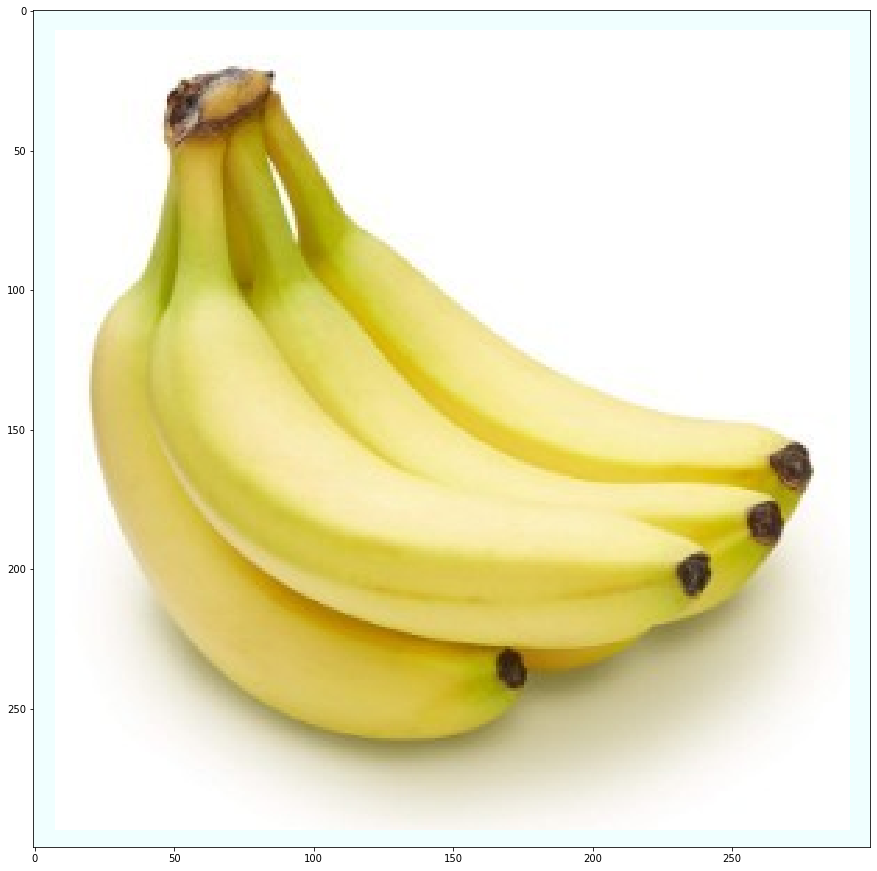

In [125]:
%matplotlib inline

plt.figure(figsize=(15,30))
plt.imshow(image)

In [55]:
!zip -r inference_graph.zip /content/models/research/object_detection/inference_graph

  adding: content/models/research/object_detection/inference_graph/ (stored 0%)
  adding: content/models/research/object_detection/inference_graph/checkpoint (deflated 42%)
  adding: content/models/research/object_detection/inference_graph/frozen_inference_graph.pb (deflated 8%)
  adding: content/models/research/object_detection/inference_graph/model.ckpt.index (deflated 70%)
  adding: content/models/research/object_detection/inference_graph/model.ckpt.meta (deflated 94%)
  adding: content/models/research/object_detection/inference_graph/pipeline.config (deflated 68%)
  adding: content/models/research/object_detection/inference_graph/saved_model/ (stored 0%)
  adding: content/models/research/object_detection/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/models/research/object_detection/inference_graph/saved_model/saved_model.pb (deflated 9%)
  adding: content/models/research/object_detection/inference_graph/model.ckpt.data-00000-of-00001 (deflated 7%)


In [56]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

model_file = drive.CreateFile({'title' : 'inference_graph.zip'})
model_file.SetContentFile('./inference_graph.zip')
model_file.Upload()

# download to google drive
drive.CreateFile({'id': model_file.get('id')})

W1118 22:22:29.816323 140630123997056 __init__.py:44] file_cache is unavailable when using oauth2client >= 4.0.0 or google-auth
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/__init__.py", line 36, in autodetect
    from google.appengine.api import memcache
ModuleNotFoundError: No module named 'google.appengine'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 33, in <module>
    from oauth2client.contrib.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.contrib.locked_file'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 37, in <module>
    from oauth2client.locked_file import Lock

GoogleDriveFile({'id': '1LPmN8x9HR6BDFeXHzmscrKZI9MuanEYf'})

In [57]:
!zip -r myModel.zip /content/models

  adding: content/models/ (stored 0%)
  adding: content/models/.gitmodules (deflated 24%)
  adding: content/models/LICENSE (deflated 65%)
  adding: content/models/ISSUE_TEMPLATE.md (deflated 49%)
  adding: content/models/.git/ (stored 0%)
  adding: content/models/.git/HEAD (stored 0%)
  adding: content/models/.git/objects/ (stored 0%)
  adding: content/models/.git/objects/pack/ (stored 0%)
  adding: content/models/.git/objects/pack/pack-7707bf2142d1cf033c2f7f17fe3290439735ba1a.pack (deflated 0%)
  adding: content/models/.git/objects/pack/pack-7707bf2142d1cf033c2f7f17fe3290439735ba1a.idx (deflated 1%)
  adding: content/models/.git/objects/info/ (stored 0%)
  adding: content/models/.git/refs/ (stored 0%)
  adding: content/models/.git/refs/tags/ (stored 0%)
  adding: content/models/.git/refs/heads/ (stored 0%)
  adding: content/models/.git/refs/heads/master (stored 0%)
  adding: content/models/.git/refs/remotes/ (stored 0%)
  adding: content/models/.git/refs/remotes/origin/ (stored 0%)
  

In [58]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

model_file = drive.CreateFile({'title' : 'myModel.zip'})
model_file.SetContentFile('./myModel.zip')
model_file.Upload()

# download to google drive
drive.CreateFile({'id': model_file.get('id')})

W1118 22:26:37.058047 140630123997056 __init__.py:44] file_cache is unavailable when using oauth2client >= 4.0.0 or google-auth
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/__init__.py", line 36, in autodetect
    from google.appengine.api import memcache
ModuleNotFoundError: No module named 'google.appengine'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 33, in <module>
    from oauth2client.contrib.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.contrib.locked_file'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 37, in <module>
    from oauth2client.locked_file import Lock

GoogleDriveFile({'id': '1MxUThgLR8wlYhnLZMZRtFM3KqVJrL8AN'})